In [2]:
# BLOCK 1: Importing Necessary Libraries

# Standard libraries (No installation needed)
import numpy as np
from datetime import datetime
import time
import random  # For Q-learning
from collections import deque

# Install the required libraries using the following commands in your terminal:

# 1. autograd: Automatic differentiation library
# 2. numpy: Numerical operations (part of autograd)
# 3. capytaine: Python library for BEM simulation
# 4. matplotlib: Plotting library
# 5. scipy: Scientific computing library
# 6. wecopttool: Optimization tool for Wave Energy Converters
# 7. joblib: Parallel processing library

# For Intel Chip (macOS):
# ```
# pip install autograd numpy capytaine matplotlib scipy wecopttool joblib
# ```

# For Apple Silicon (macOS with M1/M2 chip):
# ```
# # Ensure you have the correct version of pip and Python installed that supports Apple Silicon.
# pip install autograd numpy matplotlib scipy wecopttool joblib
# # Capytaine installation might require additional steps on Apple Silicon:
# pip install capytaine --no-binary capytaine
# ```

import autograd.numpy as np  # For numerical operations with automatic differentiation
import capytaine as cpy  # Boundary Element Method (BEM) solver for WEC simulations
import matplotlib.pyplot as plt  # For plotting results
from scipy.spatial import KDTree  # For nearest-neighbor queries in Q-learning
from scipy.optimize import brute  # For brute-force optimization
import wecopttool as wot  # Optimization tools for Wave Energy Converters
from wecopttool import geom  # For geometric operations related to WECs
import joblib
from joblib import Parallel, delayed  # For parallel processing in simulations

import pickle
import os
import shutil
import dbm
import dbm.dumb as dbm  # Use dumb

# Add PyTorch for Deep Q-Learning
import torch
import torch.nn as nn
import torch.optim as optim  # Optimizers

In [3]:
# Set the path for the cache on your external drive
cache_path = "/Volumes/Drive1/my_cache_folder/wec_simulation_cache2"

# Ensure the cache directory exists
os.makedirs(os.path.dirname(cache_path), exist_ok=True)

# Open the cache database
db = dbm.open(cache_path, 'c')

# Check the number of entries in the cache
try:
    num_entries = len([key for key in db.keys()])
    print(f"> Cache loaded with {num_entries} entries.")
except Exception as e:
    print(f"Error reading cache entries: {e}")

# Check available space on the external drive
total, used, free = shutil.disk_usage("/Volumes/Drive1")
print(f"> Total space: {total / (1024**3):.2f} GB")
print(f"> Used space: {used / (1024**3):.2f} GB")
print(f"> Free space: {free / (1024**3):.2f} GB")

> Cache loaded with 115203 entries.
> Total space: 1677.91 GB
> Used space: 1.77 GB
> Free space: 1676.14 GB


In [4]:
# BLOCK 2: Initialize the WaveBot environment
wb = wot.geom.WaveBot()  # Use standard dimensions
mesh_size_factor = 0.5  # 1.0 for default, smaller to refine mesh
mesh = wb.mesh(mesh_size_factor)
fb = cpy.FloatingBody.from_meshio(mesh, name="WaveBot")
fb.add_translation_dof(name="Heave")
ndof = fb.nb_dofs

# Define the frequency and other wave parameters
f1 = 0.05
nfreq = 50

stiffness = wot.hydrostatics.stiffness_matrix(fb).values
mass = wot.hydrostatics.inertia_matrix(fb).values
freq = wot.frequency(f1, nfreq, False)  # False -> no zero frequency
bem_data = wot.run_bem(fb, freq)

# Define PTO parameters
name = ["PTO_Heave",]
kinematics = np.eye(ndof)
controller = None
loss = None
pto_impedance = None
pto = wot.pto.PTO(ndof, kinematics, controller, pto_impedance, loss, name)

The resolution of the mesh 'WaveBot' of the body 'WaveBot_immersed' might be insufficient for the wavelength λ=7.97e-01.
This warning appears because the largest panel of this mesh has radius 1.01e-01 > λ/8.
The resolution of the mesh 'WaveBot' of the body 'WaveBot_immersed' might be insufficient for the wavelength λ=7.43e-01.
This warning appears because the largest panel of this mesh has radius 1.01e-01 > λ/8.
The resolution of the mesh 'WaveBot' of the body 'WaveBot_immersed' might be insufficient for the wavelength λ=6.94e-01.
This warning appears because the largest panel of this mesh has radius 1.01e-01 > λ/8.
The resolution of the mesh 'WaveBot' of the body 'WaveBot_immersed' might be insufficient for the wavelength λ=6.50e-01.
This warning appears because the largest panel of this mesh has radius 1.01e-01 > λ/8.
The resolution of the mesh 'WaveBot' of the body 'WaveBot_immersed' might be insufficient for the wavelength λ=6.10e-01.
This warning appears because the largest panel 

In [5]:
# # BLOCK 3: Define states and actions for Q-learning

# pto_damping_range_upperlimit=2
# stiffness_range_upperlimit=2

# pto_damping_range_lowerlimit=0.1
# stiffness_range_lowerlimit=0.1

# amplitudes = np.linspace(0.05, 0.1, 10)
# wavefreqs = np.linspace(0.1, 1, 10)
# pto_damping_range = np.linspace(0.1, pto_damping_range_upperlimit, 20)
# stiffness_range = np.linspace(0.1, stiffness_range_upperlimit, 40)

# # Include amplitude, wave frequency, PTO damping, and stiffness in the state space
# states = [(amplitude, wavefreq, pto_damping, stiffness) 
#           for amplitude in amplitudes 
#           for wavefreq in wavefreqs
#           for pto_damping in pto_damping_range
#           for stiffness in stiffness_range]

# # Define actions: Adjust PTO damping or do nothing
# # Each action tuple: (change in PTO damping)
# actions = [-1, 0, 1]  # Decrease, keep, or increase PTO damping

# # Create KDTree for quick nearest-neighbor lookup
# state_tree = KDTree(states)
# print(f"Number Of States: {len(states)}")
# def find_nearest_state(state):
#     _, idx = state_tree.query(state)
#     return states[idx]

In [6]:
# Define action space: Adjust PTO damping or do nothing
actions = [-1, 0, 1]  # Decrease, keep, or increase PTO damping

# Define bounds
#UPPER LIMITS
amplitudes_range_upperlimit = 0.1
wavefreqs_range_upperlimit = 1
pto_damping_range_upperlimit = 2
stiffness_range_upperlimit = 2


amplitudes_range_lowerlimit = 0.05
wavefreqs_range_lowerlimit = 0.1
pto_damping_range_lowerlimit = 0.1
stiffness_range_lowerlimit = 0.1

# Define the function to create states
def create_states(condition):
    if condition == "discrete":
        # Discrete value ranges for each state component
        amplitudes = np.linspace(amplitudes_range_lowerlimit, amplitudes_range_upperlimit, 10)
        wavefreqs = np.linspace(wavefreqs_range_lowerlimit, wavefreqs_range_upperlimit, 10)
        pto_damping_range = np.linspace(pto_damping_range_lowerlimit, pto_damping_range_upperlimit, 20)
        stiffness_range = np.linspace(stiffness_range_lowerlimit, stiffness_range_upperlimit, 40)
        # Generate all combinations of discrete values
        states = [(amplitude, wavefreq, pto_damping, stiffness) 
                  for amplitude in amplitudes 
                  for wavefreq in wavefreqs
                  for pto_damping in pto_damping_range
                  for stiffness in stiffness_range]
        return states
    
    elif condition == "continuous":
        # Generate a single random state within valid ranges
        state = [
            np.random.uniform(amplitudes_range_lowerlimit, amplitudes_range_upperlimit),  # Amplitude range
            np.random.uniform(wavefreqs_range_lowerlimit, wavefreqs_range_upperlimit),  # Wave frequency range
            np.random.uniform(pto_damping_range_lowerlimit, pto_damping_range_upperlimit),  # PTO damping range
            np.random.uniform(stiffness_range_lowerlimit, stiffness_range_upperlimit)  # Stiffness range
        ]
        return [state]  # Wrap it in a list to keep the return type consistent
    else:
        raise ValueError("Condition must be 'discrete' or 'continuous'.")


# Example usage
discrete_states = create_states("discrete")
continuous_state = create_states("continuous")[0]  # Retrieve the single continuous state from the list

print(f"> Discrete states count: {len(discrete_states)}")
print(f"> Sample continuous state: {continuous_state}")

> Discrete states count: 80000
> Sample continuous state: [0.09983208702178092, 0.6233585326388015, 1.7167938378978798, 1.2685643230194232]


In [36]:
# BLOCK 4: Function to select action based on the ε-greedy policy
def select_action(policy_network, state):
    """Select an action using the policy network and return its log probability."""
    state_tensor = torch.FloatTensor(state).unsqueeze(0)  # Convert state to tensor
    action_probs = policy_network(state_tensor)  # Output action probabilities
    action_dist = torch.distributions.Categorical(action_probs)  # Create a categorical distribution
    action = action_dist.sample()  # Sample an action
    log_prob = action_dist.log_prob(action)  # Log probability of the sampled action
    return action.item(), log_prob

In [37]:
# Define the Policy Network
class PolicyNetwork(nn.Module):
    def __init__(self, state_size, action_size):
        super(PolicyNetwork, self).__init__()
        self.fc1 = nn.Linear(state_size, 64)
        self.fc2 = nn.Linear(64, 64)
        self.fc3 = nn.Linear(64, action_size)

    def forward(self, state):
        x = torch.relu(self.fc1(state))
        x = torch.relu(self.fc2(x))
        return torch.softmax(self.fc3(x), dim=-1)  # Output probabilities


# Initialize Policy Network
state_size = 4  # Number of state variables: [amplitude, wavefreq, damping, stiffness]
action_size = len(actions)
policy_network = PolicyNetwork(state_size, action_size)


# Set optimizer and loss function
policy_optimizer = optim.Adam(policy_network.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

# Experience replay buffer
replay_buffer = deque(maxlen=10000)  # Use a buffer to store experiences

In [38]:
# Initialize random PTO damping and stiffness within their respective ranges
initial_damping = random.uniform(pto_damping_range_lowerlimit, pto_damping_range_upperlimit)  # Initial PTO damping
initial_stiffness = random.uniform(stiffness_range_lowerlimit, stiffness_range_upperlimit)  # Initial stiffness

# Set the initial state variables
damping = initial_damping
stiffness = initial_stiffness

print(f"> Initial random PTO damping: {damping}")
print(f"> Initial random stiffness: {stiffness}")

> Initial random PTO damping: 1.7044015178975915
> Initial random stiffness: 1.5401133655865746


In [39]:
# BLOCK 6: Updated Reward function incorporating damping, stiffness powers, scaling, and normalization
def get_reward(opt_mechanical_average_power, damping, stiffness, pto_velocity, pto_displacement):
    # Calculate damping and stiffness power for PTO
    pto_velocity = np.maximum(pto_velocity, 1e-4)  # Avoid zero power terms element-wise
    pto_displacement = np.maximum(pto_displacement, 1e-4)

    # Calculate damping and stiffness power contributions
    damping_power = damping * (pto_velocity ** 2)
    stiffness_power = stiffness * pto_displacement * pto_velocity

    # Introduce weights for damping and stiffness power contributions
    damping_weight = 0.5
    stiffness_weight = 0.5
    total_power = damping_weight * damping_power + stiffness_weight * stiffness_power

    # Introduce weights to balance the influence of different components
    power_weight = 1.0
    penalty_weight = 0.3  # Increased penalty weight for testing

    # Combine mechanical power and penalties
    reward = power_weight * opt_mechanical_average_power - penalty_weight * total_power

    # Scale down the reward
    scaled_reward = reward / 100  # Reduced scaling factor to retain magnitude

    # Normalize the reward with a larger range
    min_reward = -5  # Adjusted minimum based on experimentation
    max_reward = 50  # Adjusted maximum to provide more gradient
    normalized_reward = (scaled_reward - min_reward) / (max_reward - min_reward)

    # Use np.where to avoid ambiguity with arrays
    return np.where(normalized_reward > 0, normalized_reward, np.exp(normalized_reward) - 1)

In [40]:
def run_simulation(state, epsilon, db):
    state_key = (round(state[0], 6), round(state[1], 6), round(state[2], 6), round(state[3], 6))
    print(f"Running simulation with state_key: {state_key}")

    # Check if the state_key exists in the dbm database
    if str(state_key) in db:
        try:
            # Attempt to load the cached value
            cached_value = pickle.loads(db[str(state_key)])
            
            # Check if the cached value is complete
            if len(cached_value) != 4:  # Assuming a complete entry has 4 elements
                print(f"Incomplete cache entry for state: {state_key}, rerunning simulation.")
            else:
                print(f"State found in cache. Cache size: {len(db)}")
                return cached_value
        except (pickle.UnpicklingError, EOFError) as e:
            # Handle the case where the pickle data is corrupted
            print(f"Corrupted cache entry detected for state: {state_key}. Error: {e}")
            # Delete the corrupted cache entry
            del db[str(state_key)]
            print(f"Deleted corrupted cache entry for state: {state_key}.")

    # If the state is not found in the cache or is incomplete, run the simulation
    print("State not found in cache. Running simulation...")
    action, log_prob = select_action(policy_network, state)  # Use the policy-based select_action function
    damping = state[2]
    stiffness = state[3]
    
    # Modify damping based on the action
    if action == -1:
        damping = max(0, damping - 0.1)
    elif action == 1:
        damping += 0.1
    
    # Bound damping to valid range
    if damping > pto_damping_range_upperlimit:
        damping = pto_damping_range_upperlimit
    elif damping < pto_damping_range_lowerlimit:
        damping = pto_damping_range_lowerlimit

    # Simulate wave energy conversion
    amplitude = state[0]
    wavefreq = state[1]
    phase = 30
    wavedir = 0
    waves = wot.waves.regular_wave(f1, nfreq, wavefreq, amplitude, phase, wavedir)

    # Run WEC simulation
    results = wec.solve(
        waves,
        obj_fun,
        nstate_opt,
        optim_options=options,
        scale_x_wec=scale_x_wec,
        scale_x_opt=scale_x_opt,
        scale_obj=scale_obj,
    )

    opt_mechanical_average_power = -results.fun
    print(f'Optimal average mechanical power: {opt_mechanical_average_power} W')

    # Post-process results
    pto_fdom, pto_tdom = pto.post_process(wec, results, waves, nsubsteps=nsubsteps)
    wec_fdom, wec_tdom = wec.post_process(results, waves, nsubsteps=nsubsteps)

    pto_displacement = pto_tdom['pos']
    pto_velocity = pto_tdom['vel']

    # Compute the reward
    reward = get_reward(opt_mechanical_average_power, damping, stiffness, pto_velocity, pto_displacement)

    # Define the next state
    next_state = (state[0], state[1], damping, stiffness)

    # Update the cache with the new simulation result
    db[str(state_key)] = pickle.dumps((reward, next_state, pto_velocity, pto_displacement))
    print(f"Cache updated with new state. Total cache size: {len(db)} entries.")

    # Return the simulation results
    return reward, next_state, pto_velocity, pto_displacement

In [41]:
# BLOCK 14: PTO dynamics forcing function and constraints
f_add = {'PTO': pto.force_on_wec}
f_max = 2000.0  # Maximum allowable PTO force
nsubsteps = 4   # Number of substeps for the integration

# Define the constraint function for PTO force
def const_f_pto(wec, x_wec, x_opt, waves):
    f = pto.force_on_wec(wec, x_wec, x_opt, waves, nsubsteps)
    return f_max - np.abs(f.flatten())

# Create inequality constraint based on the PTO force
ineq_cons = {'type': 'ineq', 'fun': const_f_pto}
constraints = [ineq_cons]

In [42]:
# BLOCK 15: WEC setup and optimization options

# Initialize the WEC object with BEM data and additional parameters
wec = wot.WEC.from_bem(
    bem_data,  # BEM data for hydrodynamic coefficients
    inertia_matrix=mass,  # Inertia matrix
    hydrostatic_stiffness=stiffness,  # Hydrostatic stiffness matrix
    constraints=constraints,  # Constraints including PTO force limit
    friction=None,  # Friction, can be set if needed
    f_add=f_add,  # Additional forces such as PTO forces
)

# Define the objective function for the optimization
obj_fun = pto.mechanical_average_power  # Maximize average mechanical power

# Number of states to optimize over
nstate_opt = 2 * nfreq  # This could be adjusted based on the frequency range

# Optimization options
options = {'maxiter': 200}  # Maximum number of iterations for the optimizer
scale_x_wec = 1e1  # Scaling factor for the WEC states
scale_x_opt = 1e-3  # Scaling factor for the optimization states
scale_obj = 1e-2  # Scaling factor for the objective function

In [43]:
# def apply_action(state, action):
#     """
#     Apply the chosen action to modify the given state.
#     In this example, the action modifies the PTO damping, while stiffness remains unchanged.
#     """
#     new_state = list(state)
    
#     # Define how each action modifies the damping
#     if action == -1:
#         # Decrease damping
#         new_state[2] = max(new_state[2] - 0.1, pto_damping_range_lowerlimit)
#     elif action == 1:
#         # Increase damping
#         new_state[2] = min(new_state[2] + 0.1, pto_damping_range_upperlimit)
#     # If action is 0, the damping remains unchanged
    
#     # Stiffness remains the same in this version
#     new_state[3] = max(min(new_state[3], stiffness_range_upperlimit), stiffness_range_lowerlimit)

#     return tuple(new_state)

In [44]:
# Set random seed for reproducibility
random.seed(0)
np.random.seed(0)

# Define the number of epochs and select a fixed set of test states
num_test_states = 20  # Number of test states

# Generate random continuous test states within valid ranges
fixed_test_states = [
    (
        np.random.uniform(0.05, 0.1),  # Amplitude range
        np.random.uniform(0.1, 1.0),  # Wave frequency range
        np.random.uniform(pto_damping_range_lowerlimit, pto_damping_range_upperlimit),  # PTO damping range
        np.random.uniform(stiffness_range_lowerlimit, stiffness_range_upperlimit)  # Stiffness range
    )
    for _ in range(num_test_states)
]

# Create dictionaries to store results for each test state across epochs
epoch_rewards = {f"Test State {i+1}": [] for i in range(num_test_states)}
epoch_next_states = {f"Test State {i+1}": [] for i in range(num_test_states)}
q_values_history_test = {f"Test State {i+1}": [] for i in range(num_test_states)}

print(f"Selected fixed test states:")
for i, test_state in enumerate(fixed_test_states):
    print(f"> Test State {i+1}: {test_state}")

Selected fixed test states:
> Test State 1: (0.07744067519636624, 0.7436704297351775, 1.2452504145361234, 1.135278047694104)
> Test State 2: (0.07118273996694524, 0.6813047017599905, 0.9314157013991157, 1.7943687014859515)
> Test State 3: (0.09818313802505146, 0.4450973669431999, 1.6042775723570628, 1.1049003475305186)
> Test State 4: (0.07840222805469663, 0.933036974463395, 0.2349685105759852, 0.26554566943292734)
> Test State 5: (0.05101091987201629, 0.8493578609931441, 1.5784978268047158, 1.7530230816689565)
> Test State 6: (0.0989309171116382, 0.8192427077950513, 0.9768107882805704, 1.5830054349442655)
> Test State 7: (0.05591372129344666, 0.6759289191947714, 0.3723712460771882, 1.8948709423942094)
> Test State 8: (0.07609241608750358, 0.4731957459914713, 0.6026556629987911, 1.5710440099250116)
> Test State 9: (0.07280751661082743, 0.6115905539817836, 0.13570062082907478, 1.2735074444441665)
> Test State 10: (0.08060478613612107, 0.6552405971872812, 1.8931213491777859, 1.3954585682

In [52]:
# Discount Factor
gamma = 0.9  # Increase to consider future rewards more

# Epsilon-Greedy Parameters
epsilon = 0.9  # Initial exploration rate
max_epsilon = epsilon
epsilon_decay = 0.995  # Slightly faster decay rate for exploration
min_epsilon = 0.05  # Minimum exploration rate

# Exploration Parameters
exploration_starts = 20  # Number of episodes to start with full exploration

# Training Parameters
max_episodes = 100  # Training episodes per iteration (can increase if needed) 100
outer_iterations = 200  # Number of outer loops 200

In [53]:
# Tracking Metrics
q_value_history = []  # Average Q-value at each training step
reward_history = []  # Rewards obtained during training
epsilon_history = []  # Epsilon values during training
loss_history = []  # Loss values for training the Q-network
q_value_min_history = []  # Minimum Q-value observed during training
q_value_max_history = []  # Maximum Q-value observed during training
expected_return_history = []  # Expected return values during evaluation

# Note: No need for state_to_index as we are working with continuous states

In [54]:
def update_epsilon(episode, epsilon, exploration_starts):
    """Update epsilon value based on the episode count."""
    if episode >= exploration_starts:
        new_epsilon = max(min_epsilon, epsilon * epsilon_decay)
        print(f"Epsilon updated to {new_epsilon} at episode {episode}")
        return new_epsilon
    return epsilon

def get_reward_value(reward):
    """Ensure reward is a scalar."""
    if isinstance(reward, np.ndarray) and reward.size == 1:
        scalar_reward = reward.item()
    elif isinstance(reward, (np.ndarray, list)):
        scalar_reward = np.mean(reward)
    else:
        scalar_reward = reward
    print(f"Reward value: {scalar_reward}")
    return scalar_reward

def train_policy(rewards, log_probs, gamma):
    """Train the policy network using rewards and log probabilities."""
    # Compute discounted rewards
    discounted_rewards = []
    G = 0
    for reward in reversed(rewards):
        G = reward + gamma * G
        discounted_rewards.insert(0, G)
    discounted_rewards = torch.FloatTensor(discounted_rewards)

    # Normalize rewards for stability
    discounted_rewards = (discounted_rewards - discounted_rewards.mean()) / (discounted_rewards.std() + 1e-8)

    # Compute policy gradient loss
    policy_loss = torch.stack([-log_prob * G for log_prob, G in zip(log_probs, discounted_rewards)]).sum()

    # Update the policy network
    policy_optimizer.zero_grad()
    policy_loss.backward()
    policy_optimizer.step()

    # Track loss for analysis
    loss_history.append(policy_loss.item())



def run_cached_simulation(state_key, test_state, db):
    """Run simulation for a state and update cache if needed."""
    if str(state_key) in db:
        cached_result = pickle.loads(db[str(state_key)])
        print(f"Loaded cached result for state {state_key}")
        return cached_result[0], cached_result[1]
    else:
        results = run_simulation(test_state, epsilon, db)  # Pass epsilon for action selection
        reward, next_state = results[0], results[1]
        db[str(state_key)] = pickle.dumps(results)
        print(f"Simulated and cached result for state {state_key}")
        return reward, next_state

In [55]:
# Set the desired condition for state space: "discrete" as D or "continuous" as C
state_condition = "C"

# Start tracking time
start_time = time.time()

# Determine state condition
if state_condition == "D":
    print("Running with DISCRETE states\n")
elif state_condition == "C":
    print("Running with CONTINUOUS states\n")

# Training Loop
for iteration in range(outer_iterations):
    # Initialize storage for rewards and log probabilities for each episode
    episode_rewards = []
    episode_log_probs = []

    for episode in range(max_episodes):
        print(f"|> Starting outer iteration {iteration + 1}/{outer_iterations} and inner iteration {episode + 1}/{max_episodes} <|")

        # Generate the initial state based on the condition
        if state_condition == "D":
            state = random.choice(create_states("discrete"))
        elif state_condition == "C":
            state = create_states("continuous")[0]  # Get the single state

        # Select action using the policy network
        action, log_prob = select_action(policy_network, state)

        # Store the log probability for policy update
        episode_log_probs.append(log_prob)

        # Run the simulation to get the reward and next state
        reward, next_state, pto_velocity, pto_displacement = run_simulation(state, action, db)

        # Track the reward for this episode
        episode_rewards.append(reward)

        # Transition to the next state
        state = next_state

    # Train the policy after completing an episode
    train_policy(episode_rewards, episode_log_probs, gamma)

    # Track metrics
    reward_history.append(sum(episode_rewards) / max_episodes)  # Average reward per episode

    # Testing phase after training
    print(f"\nTesting phase after iteration {iteration + 1}/{outer_iterations}")
    total_reward = 0  # Initialize total reward for averaging
    num_test_states = len(fixed_test_states)  # Number of test states

    for i, test_state in enumerate(fixed_test_states):
        # Use the cached simulation or run a new simulation for the test state
        state_key = tuple(round(s, 6) for s in test_state)
        reward, next_state = run_cached_simulation(state_key, test_state, db)
        reward = get_reward_value(reward)

        # Predict action probabilities using the policy network
        with torch.no_grad():
            state_tensor = torch.FloatTensor(next_state).unsqueeze(0)
            action_probs = policy_network(state_tensor)  # Already uses softmax in PolicyNetwork
            max_action_prob = action_probs.max().item()

        # Calculate the expected return
        expected_return = reward + gamma * max_action_prob

        # Optionally store or print the expected return
        print(f"Expected return for Test State {i + 1}: {expected_return:.4f}")
        
        # Accumulate total reward
        total_reward += expected_return

    # Calculate and display the average reward for this testing phase
    average_reward = total_reward / num_test_states
    print(f"Average reward for testing phase after iteration {iteration + 1}: {average_reward:.4f}\n\n")
    expected_return_history.append(average_reward)

# End of training
end_time = time.time()

Running with CONTINUOUS states

|> Starting outer iteration 1/200 and inner iteration 1/100 <|
Running simulation with state_key: (0.094102, 0.512744, 1.475919, 0.858148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6717072913398708
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 67.17072913398708 W


Cache updated with new state. Total cache size: 115205 entries.
|> Starting outer iteration 1/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.053132, 0.317712, 0.921335, 1.091793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9755027096821439
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 97.55027096821439 W


Cache updated with new state. Total cache size: 115206 entries.
|> Starting outer iteration 1/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.072418, 0.611061, 1.280222, 1.046541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2302525845071755
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 23.02525845071755 W


Cache updated with new state. Total cache size: 115207 entries.
|> Starting outer iteration 1/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.087552, 0.24038, 0.909405, 1.796144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8402732094086716
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 384.0273209408671 W


Cache updated with new state. Total cache size: 115208 entries.
|> Starting outer iteration 1/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.07467, 0.691339, 0.975995, 1.876805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15388305300946167
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 15.388305300946167 W


Cache updated with new state. Total cache size: 115209 entries.
|> Starting outer iteration 1/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.092484, 0.129651, 0.689371, 1.079323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.754934910587806
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 975.4934910587806 W


Cache updated with new state. Total cache size: 115210 entries.
|> Starting outer iteration 1/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.050239, 0.598389, 0.316399, 1.471847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11081074779726137
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.081074779726137 W


Cache updated with new state. Total cache size: 115211 entries.
|> Starting outer iteration 1/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.081193, 0.495771, 0.120113, 1.933363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5000654782023737
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 50.006547820237365 W


Cache updated with new state. Total cache size: 115212 entries.
|> Starting outer iteration 1/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.051231, 0.657795, 0.615311, 0.287807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09054046805451446
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.054046805451446 W


Cache updated with new state. Total cache size: 115213 entries.
|> Starting outer iteration 1/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.079647, 0.651183, 0.541944, 1.029528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2189029613240556
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.89029613240556 W


Cache updated with new state. Total cache size: 115214 entries.
|> Starting outer iteration 1/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.088718, 0.604336, 0.256738, 1.002907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34556077501772237
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.556077501772236 W


Cache updated with new state. Total cache size: 115215 entries.
|> Starting outer iteration 1/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.061492, 0.457901, 1.595993, 1.830868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3930092110011686
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 39.30092110011686 W


Cache updated with new state. Total cache size: 115216 entries.
|> Starting outer iteration 1/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.082322, 0.267483, 0.171031, 1.202762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.500350605471075
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 350.0350605471075 W


Cache updated with new state. Total cache size: 115217 entries.
|> Starting outer iteration 1/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.050981, 0.834711, 0.455238, 1.381641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0402609113609204
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.02609113609204 W


Cache updated with new state. Total cache size: 115218 entries.
|> Starting outer iteration 1/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.077907, 0.16871, 0.176657, 1.071096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.936576603027771
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 793.6576603027771 W


Cache updated with new state. Total cache size: 115219 entries.
|> Starting outer iteration 1/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.095391, 0.506662, 0.290641, 1.656198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6902448921802185
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 69.02448921802184 W


Cache updated with new state. Total cache size: 115220 entries.
|> Starting outer iteration 1/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.053094, 0.953539, 0.872245, 0.423184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028578688091111974
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.8578688091111975 W


Cache updated with new state. Total cache size: 115221 entries.
|> Starting outer iteration 1/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.06976, 0.503564, 1.72674, 0.611843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3691410880846847
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 36.91410880846847 W


Cache updated with new state. Total cache size: 115222 entries.
|> Starting outer iteration 1/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.061545, 0.837334, 0.899, 1.426289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05867426798131144
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.867426798131143 W


Cache updated with new state. Total cache size: 115223 entries.
|> Starting outer iteration 1/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.050567, 0.545334, 0.607807, 0.412422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14577015783242037
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.577015783242036 W


Cache updated with new state. Total cache size: 115224 entries.
|> Starting outer iteration 1/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.063809, 0.780977, 0.296324, 0.555386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07511947686694087
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.511947686694087 W


Cache updated with new state. Total cache size: 115225 entries.
|> Starting outer iteration 1/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.060134, 0.423091, 0.73102, 0.403539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5338159581344892
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 53.381595813448925 W


Cache updated with new state. Total cache size: 115226 entries.
|> Starting outer iteration 1/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.076153, 0.783444, 0.147004, 0.463123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1070064541233503
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.70064541233503 W


Cache updated with new state. Total cache size: 115227 entries.
|> Starting outer iteration 1/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.067881, 0.35198, 1.310653, 1.299715)
State found in cache. Cache size: 115227
|> Starting outer iteration 1/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.051196, 0.772398, 0.521562, 0.203531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05871044849327033
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.871044849327033 W


Cache updated with new state. Total cache size: 115228 entries.
|> Starting outer iteration 1/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.088431, 0.647292, 0.548464, 1.420042)
State found in cache. Cache size: 115228
|> Starting outer iteration 1/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.057893, 0.890454, 0.94802, 1.004136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05114024108726875
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.114024108726875 W


Cache updated with new state. Total cache size: 115229 entries.
|> Starting outer iteration 1/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.099867, 0.35452, 0.273021, 1.17767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.160109613333481
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 216.01096133334812 W


Cache updated with new state. Total cache size: 115230 entries.
|> Starting outer iteration 1/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.086674, 0.429905, 0.910162, 0.339078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7808100376725865
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 78.08100376725865 W


Cache updated with new state. Total cache size: 115231 entries.
|> Starting outer iteration 1/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.05727, 0.254183, 0.695246, 1.928703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.900171525624415
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 190.01715256244148 W


Cache updated with new state. Total cache size: 115232 entries.
|> Starting outer iteration 1/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.057536, 0.614524, 0.162515, 1.032283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14533036120050336
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 14.533036120050335 W


Cache updated with new state. Total cache size: 115233 entries.
|> Starting outer iteration 1/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.098897, 0.100654, 1.499055, 0.870045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.879256651662644
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1787.9256651662643 W


Cache updated with new state. Total cache size: 115234 entries.
|> Starting outer iteration 1/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.077388, 0.292193, 0.738763, 1.497461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.048917119935282
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 204.8917119935282 W


Cache updated with new state. Total cache size: 115235 entries.
|> Starting outer iteration 1/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.085496, 0.568757, 1.733066, 1.355514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41673426327340224
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 41.67342632734022 W


Cache updated with new state. Total cache size: 115236 entries.
|> Starting outer iteration 1/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.089657, 0.653617, 0.231634, 0.816482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27738690379455416
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 27.738690379455416 W


Cache updated with new state. Total cache size: 115237 entries.
|> Starting outer iteration 1/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.08917, 0.430018, 0.355371, 1.250086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8264424336143392
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 82.64424336143392 W


Cache updated with new state. Total cache size: 115238 entries.
|> Starting outer iteration 1/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.059041, 0.508773, 1.58414, 1.018673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26441504434011537
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.441504434011538 W


Cache updated with new state. Total cache size: 115239 entries.
|> Starting outer iteration 1/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.073242, 0.26386, 0.898533, 0.490187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9105294870181884
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 291.0529487018188 W


Cache updated with new state. Total cache size: 115240 entries.
|> Starting outer iteration 1/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.063719, 0.785036, 1.848987, 1.788694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07490414316346637
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.490414316346637 W


Cache updated with new state. Total cache size: 115241 entries.
|> Starting outer iteration 1/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.093403, 0.201095, 0.364989, 0.383572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.331076043510092
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 633.1076043510092 W


Cache updated with new state. Total cache size: 115242 entries.
|> Starting outer iteration 1/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.076494, 0.228997, 1.775576, 1.289164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1215767411318542
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 312.1576741131854 W


Cache updated with new state. Total cache size: 115243 entries.
|> Starting outer iteration 1/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.069247, 0.702658, 0.86782, 1.255331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13233779991979755
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.233779991979755 W


Cache updated with new state. Total cache size: 115244 entries.
|> Starting outer iteration 1/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.05904, 0.996744, 0.897175, 0.835948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031154936763407463
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.1154936763407464 W


Cache updated with new state. Total cache size: 115245 entries.
|> Starting outer iteration 1/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.093032, 0.341541, 0.147303, 0.624564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.88834797753768
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 188.834797753768 W


Cache updated with new state. Total cache size: 115246 entries.
|> Starting outer iteration 1/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.05241, 0.508503, 1.317161, 0.736937)
State found in cache. Cache size: 115246
|> Starting outer iteration 1/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.097636, 0.674917, 1.987962, 1.622454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3289566419266737
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 32.89566419266737 W


Cache updated with new state. Total cache size: 115247 entries.
|> Starting outer iteration 1/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.098571, 0.921803, 0.158821, 0.613394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1472634740196153
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 14.726347401961528 W


Cache updated with new state. Total cache size: 115248 entries.
|> Starting outer iteration 1/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.060227, 0.286239, 0.971281, 0.34395)
State found in cache. Cache size: 115248
|> Starting outer iteration 1/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.055498, 0.554941, 0.190511, 0.864699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1755887430685939
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 17.55887430685939 W


Cache updated with new state. Total cache size: 115249 entries.
|> Starting outer iteration 1/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.081913, 0.931564, 1.082579, 0.123704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06803547056182381
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.8035470561823805 W


Cache updated with new state. Total cache size: 115250 entries.
|> Starting outer iteration 1/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.063609, 0.51171, 0.905408, 0.409228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30691509762016617
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 30.691509762016615 W


Cache updated with new state. Total cache size: 115251 entries.
|> Starting outer iteration 1/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.088096, 0.565083, 1.719495, 0.333151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44245656570323655
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 44.24565657032365 W


Cache updated with new state. Total cache size: 115252 entries.
|> Starting outer iteration 1/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.058072, 0.978872, 0.919722, 1.821226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03013488076138271
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.013488076138271 W


Cache updated with new state. Total cache size: 115253 entries.
|> Starting outer iteration 1/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.055703, 0.55036, 0.861277, 0.868328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17688228461292646
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.688228461292645 W


Cache updated with new state. Total cache size: 115254 entries.
|> Starting outer iteration 1/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.09553, 0.166101, 1.971822, 1.410898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.134921803059797
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1013.4921803059797 W


Cache updated with new state. Total cache size: 115255 entries.
|> Starting outer iteration 1/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.053078, 0.380553, 0.767586, 0.315701)
State found in cache. Cache size: 115255
|> Starting outer iteration 1/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.077867, 0.743539, 0.358423, 0.563049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13582661909382035
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.582661909382034 W


Cache updated with new state. Total cache size: 115256 entries.
|> Starting outer iteration 1/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.097107, 0.271204, 1.104445, 1.939479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.461570454348888
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 446.1570454348888 W


Cache updated with new state. Total cache size: 115257 entries.
|> Starting outer iteration 1/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.063573, 0.345637, 1.447594, 0.485433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8864687139225277
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 88.64687139225276 W


Cache updated with new state. Total cache size: 115258 entries.
|> Starting outer iteration 1/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.053657, 0.659218, 0.366148, 0.511801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09933853709285236
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.933853709285236 W


Cache updated with new state. Total cache size: 115259 entries.
|> Starting outer iteration 1/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.055021, 0.355813, 1.832482, 0.139067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6639813002231489
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 66.39813002231489 W


Cache updated with new state. Total cache size: 115260 entries.
|> Starting outer iteration 1/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.08221, 0.991427, 0.314702, 0.389187)
State found in cache. Cache size: 115260
|> Starting outer iteration 1/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.064231, 0.668171, 0.691307, 1.295771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14234866083687583
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.234866083687583 W


Cache updated with new state. Total cache size: 115261 entries.
|> Starting outer iteration 1/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.073772, 0.695879, 0.686878, 0.175125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15019702859212564
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 15.019702859212563 W


Cache updated with new state. Total cache size: 115262 entries.
|> Starting outer iteration 1/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.075654, 0.420497, 1.656625, 1.072395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8449327661298857
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 84.49327661298857 W


Cache updated with new state. Total cache size: 115263 entries.
|> Starting outer iteration 1/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.063915, 0.171925, 1.301251, 1.628963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.192178051275671
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 619.2178051275671 W


Cache updated with new state. Total cache size: 115264 entries.
|> Starting outer iteration 1/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.077317, 0.197831, 0.480661, 1.103381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.927006733670951
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 492.7006733670951 W


Cache updated with new state. Total cache size: 115265 entries.
|> Starting outer iteration 1/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.057766, 0.882368, 1.904842, 1.363145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05091947938664546
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.091947938664546 W


Cache updated with new state. Total cache size: 115266 entries.
|> Starting outer iteration 1/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.050674, 0.261304, 1.693489, 1.418558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.508855514581108
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 150.8855514581108 W


Cache updated with new state. Total cache size: 115267 entries.
|> Starting outer iteration 1/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.062567, 0.614803, 0.27039, 0.341768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17185139946898573
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.185139946898573 W


Cache updated with new state. Total cache size: 115268 entries.
|> Starting outer iteration 1/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.084686, 0.193932, 0.83178, 1.225494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.57019026886865
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 557.019026886865 W


Cache updated with new state. Total cache size: 115269 entries.
|> Starting outer iteration 1/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.089341, 0.666425, 0.840294, 0.636184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2754351226556569
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.54351226556569 W


Cache updated with new state. Total cache size: 115270 entries.
|> Starting outer iteration 1/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.091088, 0.979598, 1.453783, 0.372735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07415971584543508
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.415971584543509 W


Cache updated with new state. Total cache size: 115271 entries.
|> Starting outer iteration 1/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.081415, 0.577223, 0.970269, 0.217504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29101329013114824
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 29.101329013114825 W


Cache updated with new state. Total cache size: 115272 entries.
|> Starting outer iteration 1/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.053003, 0.637114, 0.741269, 0.635471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09692546918686024
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.692546918686023 W


Cache updated with new state. Total cache size: 115273 entries.
|> Starting outer iteration 1/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.080511, 0.249395, 1.954734, 0.685235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.382630645161048
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 338.2630645161048 W


Cache updated with new state. Total cache size: 115274 entries.
|> Starting outer iteration 1/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.088021, 0.906266, 0.491989, 1.352958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11826409245114697
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 11.826409245114696 W


Cache updated with new state. Total cache size: 115275 entries.
|> Starting outer iteration 1/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.062598, 0.61007, 0.132131, 1.382442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17203441561626015
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.203441561626015 W


Cache updated with new state. Total cache size: 115276 entries.
|> Starting outer iteration 1/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.085754, 0.902645, 1.131966, 0.358088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11225047437571117
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 11.225047437571117 W


Cache updated with new state. Total cache size: 115277 entries.
|> Starting outer iteration 1/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.072506, 0.350543, 0.142649, 1.434935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1530869516727038
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 115.30869516727037 W


Cache updated with new state. Total cache size: 115278 entries.
|> Starting outer iteration 1/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.061232, 0.737151, 1.69865, 1.425553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08398880448546711
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.398880448546711 W


Cache updated with new state. Total cache size: 115279 entries.
|> Starting outer iteration 1/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.075989, 0.370873, 1.149082, 1.18992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2665266945724596
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 126.65266945724596 W


Cache updated with new state. Total cache size: 115280 entries.
|> Starting outer iteration 1/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.074671, 0.808086, 0.938854, 0.232123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10288370506940826
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.288370506940826 W


Cache updated with new state. Total cache size: 115281 entries.
|> Starting outer iteration 1/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.09155, 0.659487, 1.07704, 0.160053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2892170126877446
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 28.921701268774456 W


Cache updated with new state. Total cache size: 115282 entries.
|> Starting outer iteration 1/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.075683, 0.234295, 0.128934, 0.345895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0688387044177508
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 306.88387044177506 W


Cache updated with new state. Total cache size: 115283 entries.
|> Starting outer iteration 1/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.076745, 0.739108, 0.812456, 1.171086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1319530345470959
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.195303454709588 W


Cache updated with new state. Total cache size: 115284 entries.
|> Starting outer iteration 1/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.084107, 0.514278, 0.605319, 1.847877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.536599819793888
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 53.6599819793888 W


Cache updated with new state. Total cache size: 115285 entries.
|> Starting outer iteration 1/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.059945, 0.721416, 1.429379, 0.572618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0991607481631028
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.91607481631028 W


Cache updated with new state. Total cache size: 115286 entries.
|> Starting outer iteration 1/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.086538, 0.871562, 1.931973, 0.469085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11601240114478147
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.601240114478147 W


Cache updated with new state. Total cache size: 115287 entries.
|> Starting outer iteration 1/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.092502, 0.611481, 0.938434, 0.571274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3756835061361427
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.56835061361427 W


Cache updated with new state. Total cache size: 115288 entries.
|> Starting outer iteration 1/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.068382, 0.7578, 1.556442, 1.832811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10474742309401808
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 10.474742309401808 W


Cache updated with new state. Total cache size: 115289 entries.
|> Starting outer iteration 1/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.079578, 0.550789, 1.407231, 0.424532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3610389196996082
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 36.10389196996082 W


Cache updated with new state. Total cache size: 115290 entries.
|> Starting outer iteration 1/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.090909, 0.775061, 0.14954, 1.244939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1525077060288549
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 15.25077060288549 W


Cache updated with new state. Total cache size: 115291 entries.
|> Starting outer iteration 1/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.071966, 0.694402, 1.371612, 1.681568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14293737459928438
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 14.293737459928437 W


Cache updated with new state. Total cache size: 115292 entries.
|> Starting outer iteration 1/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.07422, 0.933549, 0.293015, 0.518197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055847372563866654
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.584737256386665 W


Cache updated with new state. Total cache size: 115293 entries.
|> Starting outer iteration 1/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.093611, 0.64703, 0.789902, 1.438461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30239731348735754
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 30.239731348735752 W


Cache updated with new state. Total cache size: 115294 entries.
|> Starting outer iteration 1/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.07978, 0.908006, 0.196289, 0.574575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09715291455131857
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 9.715291455131856 W


Cache updated with new state. Total cache size: 115295 entries.
|> Starting outer iteration 1/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.087987, 0.308225, 0.148913, 0.19708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5797301365897316
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 257.9730136589732 W


Cache updated with new state. Total cache size: 115296 entries.
|> Starting outer iteration 1/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.076775, 0.41529, 0.472253, 0.865702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8701442496177834
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 87.01442496177833 W


Cache updated with new state. Total cache size: 115297 entries.
|> Starting outer iteration 1/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.065886, 0.156121, 0.976726, 1.605728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.437895220393299
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 643.7895220393299 W


Cache updated with new state. Total cache size: 115298 entries.

Testing phase after iteration 1/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4517
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4527
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4726
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4587
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4587
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4557
Loaded cached result 

Cache updated with new state. Total cache size: 115299 entries.
|> Starting outer iteration 2/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.062125, 0.188415, 0.38984, 1.940086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.603066664345824
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 360.3066664345824 W


Cache updated with new state. Total cache size: 115300 entries.
|> Starting outer iteration 2/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.061763, 0.347233, 0.977593, 1.195687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8366884141852466
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 83.66884141852466 W


Cache updated with new state. Total cache size: 115301 entries.
|> Starting outer iteration 2/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.058843, 0.914783, 0.91333, 0.27877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05284366274539199
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.284366274539199 W


Cache updated with new state. Total cache size: 115302 entries.
|> Starting outer iteration 2/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.071255, 0.573931, 0.991433, 1.325287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28945938123668585
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 28.945938123668586 W


Cache updated with new state. Total cache size: 115303 entries.
|> Starting outer iteration 2/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.07943, 0.351036, 0.170643, 1.821788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3838009920626968
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 138.38009920626968 W


Cache updated with new state. Total cache size: 115304 entries.
|> Starting outer iteration 2/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.087667, 0.974969, 1.960445, 1.88147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07792178619641357
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.792178619641357 W


Cache updated with new state. Total cache size: 115305 entries.
|> Starting outer iteration 2/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.080531, 0.988998, 0.758895, 1.363462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0579566059492905
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.79566059492905 W


Cache updated with new state. Total cache size: 115306 entries.
|> Starting outer iteration 2/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.096702, 0.707491, 1.651836, 1.347251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2580971713952315
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 25.809717139523148 W


Cache updated with new state. Total cache size: 115307 entries.
|> Starting outer iteration 2/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.09018, 0.708437, 1.574973, 0.90312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22443768094493372
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.44376809449337 W


Cache updated with new state. Total cache size: 115308 entries.
|> Starting outer iteration 2/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.078093, 0.392077, 1.482231, 1.274626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.900287503879195
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 90.0287503879195 W


Cache updated with new state. Total cache size: 115309 entries.
|> Starting outer iteration 2/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.063029, 0.127714, 1.493446, 0.309274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.08185064048
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 608.185064048 W


Cache updated with new state. Total cache size: 115310 entries.
|> Starting outer iteration 2/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.073729, 0.675383, 1.195854, 1.658598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15001387328544216
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.001387328544215 W


Cache updated with new state. Total cache size: 115311 entries.
|> Starting outer iteration 2/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.075314, 0.689878, 0.191585, 1.979913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15654669407910887
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 15.654669407910887 W


Cache updated with new state. Total cache size: 115312 entries.
|> Starting outer iteration 2/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.064265, 0.919352, 1.292313, 0.376592)
State found in cache. Cache size: 115312
|> Starting outer iteration 2/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.080915, 0.176516, 1.972615, 1.487857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.241086827027296
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 524.1086827027295 W


Cache updated with new state. Total cache size: 115313 entries.
|> Starting outer iteration 2/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088612, 0.612699, 1.748285, 1.468375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3447381106250286
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 34.47381106250286 W


Cache updated with new state. Total cache size: 115314 entries.
|> Starting outer iteration 2/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.087856, 0.797637, 1.324029, 0.757656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14243597852936848
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 14.243597852936848 W


Cache updated with new state. Total cache size: 115315 entries.
|> Starting outer iteration 2/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.086611, 0.153679, 0.62462, 0.545225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.022275748240109
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 902.2275748240108 W


Cache updated with new state. Total cache size: 115316 entries.
|> Starting outer iteration 2/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.083593, 0.758867, 0.289102, 0.572276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15655900336883738
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.655900336883738 W


Cache updated with new state. Total cache size: 115317 entries.
|> Starting outer iteration 2/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.09168, 0.999809, 1.404754, 1.484752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07513128199305581
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.513128199305581 W


Cache updated with new state. Total cache size: 115318 entries.
|> Starting outer iteration 2/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.096043, 0.947795, 0.45814, 1.663726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09353650944671127
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.353650944671127 W


Cache updated with new state. Total cache size: 115319 entries.
|> Starting outer iteration 2/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.078728, 0.139579, 1.93172, 1.134571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.039113772545145
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 803.9113772545145 W


Cache updated with new state. Total cache size: 115320 entries.
|> Starting outer iteration 2/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.057061, 0.95687, 1.027892, 1.308867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03300267461853598
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.3002674618535983 W


Cache updated with new state. Total cache size: 115321 entries.
|> Starting outer iteration 2/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.087838, 0.576961, 0.151715, 0.928693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3387418404629397
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 33.87418404629397 W


Cache updated with new state. Total cache size: 115322 entries.
|> Starting outer iteration 2/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.057428, 0.489709, 1.404924, 1.441332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2501599419674346
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.015994196743456 W


Cache updated with new state. Total cache size: 115323 entries.
|> Starting outer iteration 2/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.085914, 0.316838, 0.79194, 0.132918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.475773152132459
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 247.57731521324587 W


Cache updated with new state. Total cache size: 115324 entries.
|> Starting outer iteration 2/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.06805, 0.787901, 0.757149, 1.115937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0854495894619344
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.54495894619344 W


Cache updated with new state. Total cache size: 115325 entries.
|> Starting outer iteration 2/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.061494, 0.603762, 1.954196, 1.646494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16601220422625335
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.601220422625335 W


Cache updated with new state. Total cache size: 115326 entries.
|> Starting outer iteration 2/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.050162, 0.517018, 1.73175, 0.955744)
State found in cache. Cache size: 115326
|> Starting outer iteration 2/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.087891, 0.662453, 1.909731, 0.132639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26657117910778516
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.657117910778517 W


Cache updated with new state. Total cache size: 115327 entries.
|> Starting outer iteration 2/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.091983, 0.730029, 0.391915, 1.388875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18954232411142888
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 18.954232411142886 W


Cache updated with new state. Total cache size: 115328 entries.
|> Starting outer iteration 2/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.092653, 0.328367, 0.654069, 1.724632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8735035946015515
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 187.35035946015515 W


Cache updated with new state. Total cache size: 115329 entries.
|> Starting outer iteration 2/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.052325, 0.513969, 1.705115, 0.521454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20767041024405508
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.767041024405508 W


Cache updated with new state. Total cache size: 115330 entries.
|> Starting outer iteration 2/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.064016, 0.429773, 1.79312, 0.23314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.425939107588995
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 42.5939107588995 W


Cache updated with new state. Total cache size: 115331 entries.
|> Starting outer iteration 2/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.068167, 0.413791, 0.729746, 0.684523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6859675870352736
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 68.59675870352736 W


Cache updated with new state. Total cache size: 115332 entries.
|> Starting outer iteration 2/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.0996, 0.893759, 1.261818, 1.946477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15010092270050998
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 15.010092270050999 W


Cache updated with new state. Total cache size: 115333 entries.
|> Starting outer iteration 2/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.058527, 0.949717, 1.026125, 1.604184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03471996702561044
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 3.4719967025610443 W


Cache updated with new state. Total cache size: 115334 entries.
|> Starting outer iteration 2/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.073735, 0.556841, 1.704953, 1.575806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30995820200675483
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.99582020067548 W


Cache updated with new state. Total cache size: 115335 entries.
|> Starting outer iteration 2/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.09333, 0.333702, 0.907127, 1.981111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9000969545648108
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 190.00969545648107 W


Cache updated with new state. Total cache size: 115336 entries.
|> Starting outer iteration 2/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.08369, 0.377841, 0.558358, 1.555563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.033965700911651
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 103.39657009116509 W


Cache updated with new state. Total cache size: 115337 entries.
|> Starting outer iteration 2/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.086205, 0.868611, 1.901097, 0.745198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11513040346431762
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.513040346431762 W


Cache updated with new state. Total cache size: 115338 entries.
|> Starting outer iteration 2/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.078818, 0.284462, 0.57525, 0.796669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.120349025647666
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 212.03490256476658 W


Cache updated with new state. Total cache size: 115339 entries.
|> Starting outer iteration 2/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.05349, 0.861613, 0.754106, 1.587332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044310752409388164
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.431075240938816 W


Cache updated with new state. Total cache size: 115340 entries.
|> Starting outer iteration 2/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.096746, 0.500518, 0.342176, 1.795257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7099963881472614
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 70.99963881472614 W


Cache updated with new state. Total cache size: 115341 entries.
|> Starting outer iteration 2/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.083034, 0.105719, 0.910235, 0.217589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.716796530128834
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1471.6796530128834 W


Cache updated with new state. Total cache size: 115342 entries.
|> Starting outer iteration 2/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.07475, 0.567036, 0.410921, 0.80944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3185554982599171
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 31.85554982599171 W


Cache updated with new state. Total cache size: 115343 entries.
|> Starting outer iteration 2/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.05816, 0.372129, 0.305115, 1.960032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7419038865718285
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 74.19038865718285 W


Cache updated with new state. Total cache size: 115344 entries.
|> Starting outer iteration 2/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.072625, 0.66601, 0.459157, 1.085391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18201047835442363
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.201047835442363 W


Cache updated with new state. Total cache size: 115345 entries.
|> Starting outer iteration 2/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.061532, 0.907907, 1.912509, 1.083499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05778386723295315
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.778386723295315 W


Cache updated with new state. Total cache size: 115346 entries.
|> Starting outer iteration 2/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.060602, 0.279004, 0.61748, 0.230467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2691139943509442
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 126.91139943509441 W


Cache updated with new state. Total cache size: 115347 entries.
|> Starting outer iteration 2/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.067672, 0.284425, 0.157794, 1.337512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5807076386650085
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 158.07076386650084 W


Cache updated with new state. Total cache size: 115348 entries.
|> Starting outer iteration 2/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.050818, 0.774055, 0.569684, 1.173194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05784476128869776
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.784476128869776 W


Cache updated with new state. Total cache size: 115349 entries.
|> Starting outer iteration 2/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.098902, 0.797227, 1.583256, 1.13007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1805060263016066
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.050602630160657 W


Cache updated with new state. Total cache size: 115350 entries.
|> Starting outer iteration 2/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.091477, 0.234304, 0.56493, 0.567995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.0954918464003525
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 409.54918464003526 W


Cache updated with new state. Total cache size: 115351 entries.
|> Starting outer iteration 2/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.085494, 0.310219, 0.151357, 1.335722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.454724978947225
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 245.47249789472252 W


Cache updated with new state. Total cache size: 115352 entries.
|> Starting outer iteration 2/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.068311, 0.237903, 0.154955, 1.811145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5916118554882757
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 259.1611855488276 W


Cache updated with new state. Total cache size: 115353 entries.
|> Starting outer iteration 2/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.098513, 0.429414, 0.283298, 0.247797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0087200738224407
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 100.87200738224406 W


Cache updated with new state. Total cache size: 115354 entries.
|> Starting outer iteration 2/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.055442, 0.962193, 1.042611, 0.947549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031159587928875424
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.1159587928875423 W


Cache updated with new state. Total cache size: 115355 entries.
|> Starting outer iteration 2/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.059205, 0.174508, 0.798505, 1.259334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.605462931539182
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 560.5462931539182 W


Cache updated with new state. Total cache size: 115356 entries.
|> Starting outer iteration 2/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.090225, 0.414522, 1.090567, 1.279694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2017600650495088
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 120.17600650495088 W


Cache updated with new state. Total cache size: 115357 entries.
|> Starting outer iteration 2/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.068463, 0.290193, 1.006119, 0.256245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6171766191072816
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 161.71766191072817 W


Cache updated with new state. Total cache size: 115358 entries.
|> Starting outer iteration 2/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.07189, 0.958975, 1.094566, 0.531849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052409268046556975
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.240926804655698 W


Cache updated with new state. Total cache size: 115359 entries.
|> Starting outer iteration 2/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.063898, 0.752249, 1.483571, 1.112367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0914619995531715
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.14619995531715 W


Cache updated with new state. Total cache size: 115360 entries.
|> Starting outer iteration 2/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.09689, 0.15365, 0.223298, 0.775501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.30462039953503
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1030.462039953503 W


Cache updated with new state. Total cache size: 115361 entries.
|> Starting outer iteration 2/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.05767, 0.634777, 0.353134, 1.427204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11474962863911613
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.474962863911612 W


Cache updated with new state. Total cache size: 115362 entries.
|> Starting outer iteration 2/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.093583, 0.552498, 0.150678, 0.391137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4992957196371267
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 49.92957196371267 W


Cache updated with new state. Total cache size: 115363 entries.
|> Starting outer iteration 2/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.093354, 0.634536, 1.199713, 1.306479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30071886955034877
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 30.071886955034877 W


Cache updated with new state. Total cache size: 115364 entries.
|> Starting outer iteration 2/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.092812, 0.553421, 1.172681, 1.739746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49111105459500126
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 49.11110545950012 W


Cache updated with new state. Total cache size: 115365 entries.
|> Starting outer iteration 2/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.097828, 0.834718, 1.411935, 0.634896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14826205506783077
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.826205506783078 W


Cache updated with new state. Total cache size: 115366 entries.
|> Starting outer iteration 2/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.06625, 0.826725, 1.196858, 1.29042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06797827763498286
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.797827763498286 W


Cache updated with new state. Total cache size: 115367 entries.
|> Starting outer iteration 2/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.094442, 0.992415, 1.272485, 1.563483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07972739402454877
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.972739402454877 W


Cache updated with new state. Total cache size: 115368 entries.
|> Starting outer iteration 2/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.085457, 0.129968, 0.209546, 0.304751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.878395008002583
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 887.8395008002583 W


Cache updated with new state. Total cache size: 115369 entries.
|> Starting outer iteration 2/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.07431, 0.37955, 1.365176, 0.545432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8151690272655813
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 81.51690272655813 W


Cache updated with new state. Total cache size: 115370 entries.
|> Starting outer iteration 2/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.067609, 0.970751, 1.025687, 0.469577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04633174311107245
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.633174311107245 W


Cache updated with new state. Total cache size: 115371 entries.
|> Starting outer iteration 2/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.055286, 0.676273, 0.228514, 1.007809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08434456333874703
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.434456333874703 W


Cache updated with new state. Total cache size: 115372 entries.
|> Starting outer iteration 2/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.073913, 0.25376, 1.298535, 0.465556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.954033339580582
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 295.40333395805817 W


Cache updated with new state. Total cache size: 115373 entries.
|> Starting outer iteration 2/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.057721, 0.347232, 1.68592, 0.164006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.730765220874537
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 73.0765220874537 W


Cache updated with new state. Total cache size: 115374 entries.
|> Starting outer iteration 2/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.055791, 0.396221, 1.387752, 0.104108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4594851372504025
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 45.94851372504025 W


Cache updated with new state. Total cache size: 115375 entries.
|> Starting outer iteration 2/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.077249, 0.322268, 0.161028, 0.676495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0419842901290077
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 204.19842901290076 W


Cache updated with new state. Total cache size: 115376 entries.
|> Starting outer iteration 2/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.079507, 0.115025, 0.362999, 1.312038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.013659225259156
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1401.3659225259155 W


Cache updated with new state. Total cache size: 115377 entries.
|> Starting outer iteration 2/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.079814, 0.129004, 0.932165, 0.393026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.17438353133744
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 817.438353133744 W


Cache updated with new state. Total cache size: 115378 entries.
|> Starting outer iteration 2/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.075111, 0.389093, 0.221839, 1.536889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8328483918185648
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 83.28483918185648 W


Cache updated with new state. Total cache size: 115379 entries.
|> Starting outer iteration 2/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.056569, 0.306788, 0.356397, 1.859673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.105801920215157
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 110.5801920215157 W


Cache updated with new state. Total cache size: 115380 entries.
|> Starting outer iteration 2/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.085106, 0.314295, 0.219907, 1.868657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4353037116928657
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 243.53037116928658 W


Cache updated with new state. Total cache size: 115381 entries.
|> Starting outer iteration 2/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.059215, 0.279193, 0.524913, 1.857259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2116758313812659
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 121.16758313812659 W


Cache updated with new state. Total cache size: 115382 entries.
|> Starting outer iteration 2/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.099273, 0.411411, 1.008173, 0.837613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4545370789774692
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 145.4537078977469 W


Cache updated with new state. Total cache size: 115383 entries.
|> Starting outer iteration 2/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.075063, 0.496294, 0.588112, 0.639775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4274070563186378
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 42.740705631863776 W


Cache updated with new state. Total cache size: 115384 entries.
|> Starting outer iteration 2/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.098778, 0.829348, 1.545973, 0.918857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15115443318376928
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 15.115443318376927 W


Cache updated with new state. Total cache size: 115385 entries.
|> Starting outer iteration 2/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.096767, 0.220575, 1.907219, 1.217442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.624818891258042
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 662.4818891258042 W


Cache updated with new state. Total cache size: 115386 entries.
|> Starting outer iteration 2/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.069708, 0.2646, 1.554041, 1.767052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6817504283571676
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 268.17504283571674 W


Cache updated with new state. Total cache size: 115387 entries.
|> Starting outer iteration 2/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.061414, 0.418379, 0.709928, 1.708612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5567823568145089
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 55.67823568145089 W


Cache updated with new state. Total cache size: 115388 entries.
|> Starting outer iteration 2/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.057766, 0.532372, 0.140455, 1.046992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1902411362627242
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.02411362627242 W


Cache updated with new state. Total cache size: 115389 entries.
|> Starting outer iteration 2/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.0763, 0.586872, 0.211123, 0.844058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2555894532237698
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 25.558945322376978 W


Cache updated with new state. Total cache size: 115390 entries.
|> Starting outer iteration 2/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.068981, 0.556268, 0.832691, 1.857526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27129528283455984
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 27.129528283455983 W


Cache updated with new state. Total cache size: 115391 entries.
|> Starting outer iteration 2/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.066636, 0.653955, 0.266753, 1.496516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15320755189771498
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.320755189771498 W


Cache updated with new state. Total cache size: 115392 entries.
|> Starting outer iteration 2/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.073231, 0.660758, 0.10411, 0.642805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18506066621686784
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.506066621686784 W


Cache updated with new state. Total cache size: 115393 entries.
|> Starting outer iteration 2/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.071318, 0.699531, 0.873737, 0.329857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14036580763637616
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.036580763637616 W


Cache updated with new state. Total cache size: 115394 entries.
|> Starting outer iteration 2/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.079218, 0.896465, 1.783154, 1.783527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09578409058687962
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.578409058687962 W


Cache updated with new state. Total cache size: 115395 entries.
|> Starting outer iteration 2/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.096718, 0.401275, 1.719478, 0.472029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3808492507953969
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 138.0849250795397 W


Cache updated with new state. Total cache size: 115396 entries.

Testing phase after iteration 2/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4459
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4462
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4678
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4510
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4510
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4485
Loaded cached result 

Cache updated with new state. Total cache size: 115397 entries.
|> Starting outer iteration 3/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.088188, 0.453619, 0.312359, 1.289914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8083439412214753
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 80.83439412214753 W


Cache updated with new state. Total cache size: 115398 entries.
|> Starting outer iteration 3/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.054969, 0.778476, 1.041238, 1.014314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055755251177198345
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.575525117719835 W


Cache updated with new state. Total cache size: 115399 entries.
|> Starting outer iteration 3/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.056735, 0.222812, 0.732977, 0.621897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.137397652922156
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 313.73976529221557 W


Cache updated with new state. Total cache size: 115400 entries.
|> Starting outer iteration 3/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.054347, 0.570406, 1.912477, 0.826746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16836899071865596
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.836899071865595 W


Cache updated with new state. Total cache size: 115401 entries.
|> Starting outer iteration 3/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.060083, 0.763851, 1.107718, 0.955357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08087960011599
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.087960011599 W


Cache updated with new state. Total cache size: 115402 entries.
|> Starting outer iteration 3/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.095637, 0.324969, 0.360727, 1.57112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9632226341593797
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 296.322263415938 W


Cache updated with new state. Total cache size: 115403 entries.
|> Starting outer iteration 3/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086213, 0.672057, 1.925478, 1.735598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25647283574343627
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 25.647283574343625 W


Cache updated with new state. Total cache size: 115404 entries.
|> Starting outer iteration 3/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.069733, 0.633389, 1.96088, 0.144915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1677973174556802
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.779731745568018 W


Cache updated with new state. Total cache size: 115405 entries.
|> Starting outer iteration 3/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.084051, 0.462871, 1.729024, 0.211031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7342771852350384
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 73.42771852350384 W


Cache updated with new state. Total cache size: 115406 entries.
|> Starting outer iteration 3/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.099868, 0.820152, 1.26176, 1.968676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18405021251514947
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 18.405021251514945 W


Cache updated with new state. Total cache size: 115407 entries.
|> Starting outer iteration 3/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.06598, 0.288182, 0.193193, 0.692614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5036873433578006
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 150.36873433578006 W


Cache updated with new state. Total cache size: 115408 entries.
|> Starting outer iteration 3/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.092152, 0.901006, 1.213538, 1.72502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1295709955185584
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 12.95709955185584 W


Cache updated with new state. Total cache size: 115409 entries.
|> Starting outer iteration 3/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.072392, 0.695297, 1.223434, 0.935083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14463245982258907
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 14.463245982258908 W


Cache updated with new state. Total cache size: 115410 entries.
|> Starting outer iteration 3/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.087398, 0.615085, 1.243451, 0.56798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.335364735086465
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.5364735086465 W


Cache updated with new state. Total cache size: 115411 entries.
|> Starting outer iteration 3/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.069857, 0.832708, 0.57212, 0.285283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0755862114824108
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.55862114824108 W


Cache updated with new state. Total cache size: 115412 entries.
|> Starting outer iteration 3/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.058888, 0.560762, 1.626026, 0.554718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1976719932826531
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 19.76719932826531 W


Cache updated with new state. Total cache size: 115413 entries.
|> Starting outer iteration 3/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.060905, 0.134919, 1.678362, 1.110889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.817228602821954
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 581.7228602821954 W


Cache updated with new state. Total cache size: 115414 entries.
|> Starting outer iteration 3/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.089216, 0.425407, 1.697092, 0.599014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8272987322902813
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 82.72987322902813 W


Cache updated with new state. Total cache size: 115415 entries.
|> Starting outer iteration 3/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.083093, 0.306509, 1.573356, 0.802704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3343967639828582
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 233.43967639828583 W


Cache updated with new state. Total cache size: 115416 entries.
|> Starting outer iteration 3/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.08386, 0.855725, 0.8826, 1.006397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10893984343070855
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 10.893984343070855 W


Cache updated with new state. Total cache size: 115417 entries.
|> Starting outer iteration 3/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.082833, 0.756617, 0.679467, 1.372635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15371019085176432
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.371019085176432 W


Cache updated with new state. Total cache size: 115418 entries.
|> Starting outer iteration 3/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.099542, 0.342882, 1.262668, 1.324276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1471202302512107
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 214.71202302512106 W


Cache updated with new state. Total cache size: 115419 entries.
|> Starting outer iteration 3/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.064028, 0.201043, 1.523055, 0.688463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7684121738466843
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 376.8412173846684 W


Cache updated with new state. Total cache size: 115420 entries.
|> Starting outer iteration 3/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.074568, 0.666081, 1.476301, 1.093352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19186301947483933
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.186301947483933 W


Cache updated with new state. Total cache size: 115421 entries.
|> Starting outer iteration 3/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.06763, 0.913939, 1.215484, 0.564793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06981032520929188
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.981032520929188 W


Cache updated with new state. Total cache size: 115422 entries.
|> Starting outer iteration 3/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.052236, 0.203306, 1.066124, 1.159416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7555655766466765
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 275.55655766466765 W


Cache updated with new state. Total cache size: 115423 entries.
|> Starting outer iteration 3/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.081815, 0.512444, 0.759785, 1.762373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5077327231388502
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 50.773272313885016 W


Cache updated with new state. Total cache size: 115424 entries.
|> Starting outer iteration 3/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.054374, 0.834734, 0.529616, 1.270163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045788848319840654
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.578884831984065 W


Cache updated with new state. Total cache size: 115425 entries.
|> Starting outer iteration 3/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.063251, 0.365473, 1.5761, 1.380852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8775007542681167
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 87.75007542681166 W


Cache updated with new state. Total cache size: 115426 entries.
|> Starting outer iteration 3/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.067801, 0.452271, 0.114123, 1.60696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4778039185285707
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 47.780391852857065 W


Cache updated with new state. Total cache size: 115427 entries.
|> Starting outer iteration 3/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.077193, 0.127906, 0.780659, 1.442019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.847611028069508
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 784.7611028069508 W


Cache updated with new state. Total cache size: 115428 entries.
|> Starting outer iteration 3/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.05605, 0.735619, 0.683571, 1.121048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0703671464697697
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.03671464697697 W


Cache updated with new state. Total cache size: 115429 entries.
|> Starting outer iteration 3/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.096322, 0.325935, 0.892075, 0.360176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0186423470111166
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 201.86423470111166 W


Cache updated with new state. Total cache size: 115430 entries.
|> Starting outer iteration 3/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.09435, 0.563597, 1.97597, 1.701759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5075204667868215
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 50.75204667868215 W


Cache updated with new state. Total cache size: 115431 entries.
|> Starting outer iteration 3/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.052044, 0.289884, 1.007296, 1.81577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9359523334249652
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 93.59523334249651 W


Cache updated with new state. Total cache size: 115432 entries.
|> Starting outer iteration 3/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.069555, 0.198394, 0.267594, 1.973531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.249792837017575
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 424.9792837017574 W


Cache updated with new state. Total cache size: 115433 entries.
|> Starting outer iteration 3/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.051624, 0.453319, 0.470251, 1.01274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2769863217771238
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 27.69863217771238 W


Cache updated with new state. Total cache size: 115434 entries.
|> Starting outer iteration 3/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.053154, 0.928529, 0.136286, 0.717669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0286344534935388
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 2.86344534935388 W


Cache updated with new state. Total cache size: 115435 entries.
|> Starting outer iteration 3/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.099027, 0.780647, 0.811711, 0.179865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18095667028774745
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.095667028774745 W


Cache updated with new state. Total cache size: 115436 entries.
|> Starting outer iteration 3/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.070751, 0.893396, 0.320791, 1.257808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07639258376612512
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.639258376612512 W


Cache updated with new state. Total cache size: 115437 entries.
|> Starting outer iteration 3/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.054715, 0.566735, 1.550707, 1.019478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1706694236463367
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.066942364633668 W


Cache updated with new state. Total cache size: 115438 entries.
|> Starting outer iteration 3/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.098903, 0.897602, 1.81574, 0.319951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14817422659420046
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 14.817422659420046 W


Cache updated with new state. Total cache size: 115439 entries.
|> Starting outer iteration 3/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.081824, 0.763389, 1.933105, 0.557407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1499899071095045
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.99899071095045 W


Cache updated with new state. Total cache size: 115440 entries.
|> Starting outer iteration 3/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.081924, 0.466135, 1.294227, 1.807201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6975765079950641
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 69.75765079950641 W


Cache updated with new state. Total cache size: 115441 entries.
|> Starting outer iteration 3/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.054203, 0.769657, 1.655906, 1.420663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06581457862700033
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.581457862700033 W


Cache updated with new state. Total cache size: 115442 entries.
|> Starting outer iteration 3/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.067418, 0.26359, 0.17725, 0.356343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5341141506885267
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 253.41141506885268 W


Cache updated with new state. Total cache size: 115443 entries.
|> Starting outer iteration 3/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.071162, 0.871213, 1.434312, 1.189541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07844663125431524
            Iterations: 139
            Function evaluations: 139
            Gradient evaluations: 139
Optimal average mechanical power: 7.8446631254315236 W


Cache updated with new state. Total cache size: 115444 entries.
|> Starting outer iteration 3/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.089981, 0.406122, 1.26491, 0.935717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.195262774138545
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 119.5262774138545 W


Cache updated with new state. Total cache size: 115445 entries.
|> Starting outer iteration 3/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.097863, 0.25844, 0.433516, 0.521637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.510682836902764
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 451.0682836902764 W


Cache updated with new state. Total cache size: 115446 entries.
|> Starting outer iteration 3/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.085935, 0.915557, 1.242103, 1.241763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11272478971464522
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 11.272478971464523 W


Cache updated with new state. Total cache size: 115447 entries.
|> Starting outer iteration 3/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.098799, 0.615353, 0.49181, 1.096662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4285511833377219
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 42.85511833377219 W


Cache updated with new state. Total cache size: 115448 entries.
|> Starting outer iteration 3/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.094521, 0.487501, 1.372888, 1.47972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6777169941455459
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 67.77169941455459 W


Cache updated with new state. Total cache size: 115449 entries.
|> Starting outer iteration 3/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.081502, 0.658217, 0.74035, 0.583232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22920850706578166
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.920850706578165 W


Cache updated with new state. Total cache size: 115450 entries.
|> Starting outer iteration 3/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.079391, 0.716524, 1.481443, 1.992439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1739520715453883
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.39520715453883 W


Cache updated with new state. Total cache size: 115451 entries.
|> Starting outer iteration 3/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.076572, 0.464561, 1.586088, 0.188604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6094147433959087
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 60.94147433959087 W


Cache updated with new state. Total cache size: 115452 entries.
|> Starting outer iteration 3/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.097867, 0.161362, 0.792297, 0.849219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.426436741754312
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1042.6436741754312 W


Cache updated with new state. Total cache size: 115453 entries.
|> Starting outer iteration 3/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.07263, 0.462983, 0.424999, 1.992306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5482736150861988
            Iterations: 114
            Function evaluations: 116
            Gradient evaluations: 114
Optimal average mechanical power: 54.82736150861987 W


Cache updated with new state. Total cache size: 115454 entries.
|> Starting outer iteration 3/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.065887, 0.555434, 1.060048, 1.323448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24749014342945339
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.749014342945337 W


Cache updated with new state. Total cache size: 115455 entries.
|> Starting outer iteration 3/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.05415, 0.346317, 1.425925, 1.431602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6431334919460889
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 64.31334919460889 W


Cache updated with new state. Total cache size: 115456 entries.
|> Starting outer iteration 3/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.085695, 0.455568, 1.395961, 1.367388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7632662629755117
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 76.32662629755117 W


Cache updated with new state. Total cache size: 115457 entries.
|> Starting outer iteration 3/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.053692, 0.905627, 0.417265, 1.904536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043981589188748504
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.39815891887485 W


Cache updated with new state. Total cache size: 115458 entries.
|> Starting outer iteration 3/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.099429, 0.852922, 0.606023, 0.841287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15314577119694833
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 15.314577119694833 W


Cache updated with new state. Total cache size: 115459 entries.
|> Starting outer iteration 3/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.055968, 0.378508, 0.868357, 1.28812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46240141239723814
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 46.24014123972381 W


Cache updated with new state. Total cache size: 115460 entries.
|> Starting outer iteration 3/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.054359, 0.587059, 1.19075, 0.298189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12970157931759058
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 12.970157931759058 W


Cache updated with new state. Total cache size: 115461 entries.
|> Starting outer iteration 3/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.050743, 0.192321, 1.182074, 1.196992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6303899932561765
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 263.0389993256176 W


Cache updated with new state. Total cache size: 115462 entries.
|> Starting outer iteration 3/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.083988, 0.367512, 1.847396, 1.979078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5462148106179137
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 154.62148106179137 W


Cache updated with new state. Total cache size: 115463 entries.
|> Starting outer iteration 3/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.075818, 0.663649, 0.262241, 0.206718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.198356979612813
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.8356979612813 W


Cache updated with new state. Total cache size: 115464 entries.
|> Starting outer iteration 3/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.092401, 0.574292, 0.527686, 1.614816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48677437364764575
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 48.67743736476457 W


Cache updated with new state. Total cache size: 115465 entries.
|> Starting outer iteration 3/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.067419, 0.700658, 1.345531, 0.502064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12544196193394838
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.544196193394837 W


Cache updated with new state. Total cache size: 115466 entries.
|> Starting outer iteration 3/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.062971, 0.962089, 0.213469, 0.150914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040192689615461824
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.0192689615461825 W


Cache updated with new state. Total cache size: 115467 entries.
|> Starting outer iteration 3/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.073226, 0.358564, 1.924691, 0.275536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1761093936091804
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 117.61093936091804 W


Cache updated with new state. Total cache size: 115468 entries.
|> Starting outer iteration 3/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.066389, 0.620757, 1.077299, 1.809346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1935051571438781
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 19.350515714387807 W


Cache updated with new state. Total cache size: 115469 entries.
|> Starting outer iteration 3/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.094614, 0.397618, 0.93953, 0.902514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3215077338094503
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 132.15077338094503 W


Cache updated with new state. Total cache size: 115470 entries.
|> Starting outer iteration 3/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.090958, 0.380619, 0.755786, 0.652008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2213524628353916
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 122.13524628353916 W


Cache updated with new state. Total cache size: 115471 entries.
|> Starting outer iteration 3/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.0511, 0.880471, 0.907435, 0.639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03985244694011319
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 3.985244694011319 W


Cache updated with new state. Total cache size: 115472 entries.
|> Starting outer iteration 3/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.095109, 0.987963, 1.292511, 1.116361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08086165611441352
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 8.086165611441352 W


Cache updated with new state. Total cache size: 115473 entries.
|> Starting outer iteration 3/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.086104, 0.520176, 1.50933, 1.722204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5623841892237046
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 56.23841892237046 W


Cache updated with new state. Total cache size: 115474 entries.
|> Starting outer iteration 3/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.081607, 0.690396, 1.339987, 0.697751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1837938413504569
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 18.37938413504569 W


Cache updated with new state. Total cache size: 115475 entries.
|> Starting outer iteration 3/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.050313, 0.371583, 0.306165, 0.898313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5552225886495109
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 55.52225886495109 W


Cache updated with new state. Total cache size: 115476 entries.
|> Starting outer iteration 3/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.054555, 0.499642, 0.295882, 1.954138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22574924086899203
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 22.574924086899202 W


Cache updated with new state. Total cache size: 115477 entries.
|> Starting outer iteration 3/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.077346, 0.470603, 0.464092, 1.695954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6217977177984303
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 62.17977177984303 W


Cache updated with new state. Total cache size: 115478 entries.
|> Starting outer iteration 3/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.081467, 0.236937, 0.201112, 1.910504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.444802216205559
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 344.4802216205559 W


Cache updated with new state. Total cache size: 115479 entries.
|> Starting outer iteration 3/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.090461, 0.14891, 1.091053, 1.963914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.502455301214198
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 950.2455301214197 W


Cache updated with new state. Total cache size: 115480 entries.
|> Starting outer iteration 3/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.085456, 0.190519, 0.108528, 1.808035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.637443763573881
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 563.7443763573881 W


Cache updated with new state. Total cache size: 115481 entries.
|> Starting outer iteration 3/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.068673, 0.993302, 1.974654, 1.197794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04214975395051709
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.214975395051709 W


Cache updated with new state. Total cache size: 115482 entries.
|> Starting outer iteration 3/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.095359, 0.168108, 1.120452, 0.678417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.113626271184737
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1011.3626271184737 W


Cache updated with new state. Total cache size: 115483 entries.
|> Starting outer iteration 3/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.071008, 0.148427, 0.221061, 0.424355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.076331773529894
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 707.6331773529894 W


Cache updated with new state. Total cache size: 115484 entries.
|> Starting outer iteration 3/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.086662, 0.800287, 1.301367, 0.622006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13857003061962925
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 13.857003061962924 W


Cache updated with new state. Total cache size: 115485 entries.
|> Starting outer iteration 3/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.084122, 0.754942, 1.051823, 1.222895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15853351153412884
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 15.853351153412884 W


Cache updated with new state. Total cache size: 115486 entries.
|> Starting outer iteration 3/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.096752, 0.563752, 1.388329, 1.47977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5336922418989345
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 53.36922418989345 W


Cache updated with new state. Total cache size: 115487 entries.
|> Starting outer iteration 3/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.095441, 0.914982, 1.195945, 1.750669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13863819074758524
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 13.863819074758524 W


Cache updated with new state. Total cache size: 115488 entries.
|> Starting outer iteration 3/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.067033, 0.837323, 0.976753, 0.845529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06960428975893178
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 6.960428975893178 W


Cache updated with new state. Total cache size: 115489 entries.
|> Starting outer iteration 3/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.059215, 0.978269, 0.373016, 0.571932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03132860382628258
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.132860382628258 W


Cache updated with new state. Total cache size: 115490 entries.
|> Starting outer iteration 3/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.064345, 0.323175, 1.694472, 1.649061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4305446143161238
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 143.05446143161237 W


Cache updated with new state. Total cache size: 115491 entries.
|> Starting outer iteration 3/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.073914, 0.901989, 1.843286, 1.799203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08338211440205026
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.338211440205026 W


Cache updated with new state. Total cache size: 115492 entries.
|> Starting outer iteration 3/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.090874, 0.502084, 0.685161, 0.730437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6264006498798792
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 62.64006498798792 W


Cache updated with new state. Total cache size: 115493 entries.
|> Starting outer iteration 3/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.075478, 0.994299, 1.008858, 1.511565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05092037851397808
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 5.092037851397808 W


Cache updated with new state. Total cache size: 115494 entries.
|> Starting outer iteration 3/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.072722, 0.330855, 0.713416, 1.280789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1599843637398388
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 115.99843637398388 W


Cache updated with new state. Total cache size: 115495 entries.
|> Starting outer iteration 3/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.078879, 0.923003, 1.135713, 0.268005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09497137615706938
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.497137615706938 W


Cache updated with new state. Total cache size: 115496 entries.

Testing phase after iteration 3/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4434
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4439
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4658
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4480
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4480
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4454
Loaded cached result 

Cache updated with new state. Total cache size: 115497 entries.
|> Starting outer iteration 4/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.066396, 0.516385, 1.474153, 0.941159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3343864798588885
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.43864798588885 W


Cache updated with new state. Total cache size: 115498 entries.
|> Starting outer iteration 4/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.056179, 0.841465, 0.892766, 0.533598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048883582180243426
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.888358218024343 W


Cache updated with new state. Total cache size: 115499 entries.
|> Starting outer iteration 4/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.063721, 0.481656, 0.772637, 0.89124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30798907101097167
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 30.798907101097168 W


Cache updated with new state. Total cache size: 115500 entries.
|> Starting outer iteration 4/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.064459, 0.190792, 1.979162, 1.68524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.805830021555644
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 380.58300215556443 W


Cache updated with new state. Total cache size: 115501 entries.
|> Starting outer iteration 4/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.083948, 0.690287, 1.008047, 1.915111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19449218550848224
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 19.449218550848222 W


Cache updated with new state. Total cache size: 115502 entries.
|> Starting outer iteration 4/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.08669, 0.68268, 1.833017, 1.148422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20740121874173692
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.740121874173692 W


Cache updated with new state. Total cache size: 115503 entries.
|> Starting outer iteration 4/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.066993, 0.424885, 1.105757, 0.333654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6625449717014256
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 66.25449717014256 W


Cache updated with new state. Total cache size: 115504 entries.
|> Starting outer iteration 4/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.077261, 0.159948, 0.529245, 0.530269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.856066116425007
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 785.6066116425006 W


Cache updated with new state. Total cache size: 115505 entries.
|> Starting outer iteration 4/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.056693, 0.451757, 1.711534, 0.683449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33404403416643275
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 33.40440341664328 W


Cache updated with new state. Total cache size: 115506 entries.
|> Starting outer iteration 4/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.060476, 0.781404, 1.904246, 1.147186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06747866602200478
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.747866602200478 W


Cache updated with new state. Total cache size: 115507 entries.
|> Starting outer iteration 4/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.062045, 0.307395, 1.713501, 1.70026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3302617104630992
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 133.0261710463099 W


Cache updated with new state. Total cache size: 115508 entries.
|> Starting outer iteration 4/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.091507, 0.209077, 1.940229, 1.385126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.16564068862753
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 616.564068862753 W


Cache updated with new state. Total cache size: 115509 entries.
|> Starting outer iteration 4/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059332, 0.184154, 0.228267, 1.021713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.361002538120471
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 336.1002538120471 W


Cache updated with new state. Total cache size: 115510 entries.
|> Starting outer iteration 4/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.066444, 0.185611, 0.737479, 0.141093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9787524731013177
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 397.8752473101318 W


Cache updated with new state. Total cache size: 115511 entries.
|> Starting outer iteration 4/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.069876, 0.644908, 1.643145, 0.906156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1684877327369004
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.84877327369004 W


Cache updated with new state. Total cache size: 115512 entries.
|> Starting outer iteration 4/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.064398, 0.905732, 0.432172, 1.947043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06328282174533632
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.328282174533633 W


Cache updated with new state. Total cache size: 115513 entries.
|> Starting outer iteration 4/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.09663, 0.292789, 1.610588, 0.713698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0129992395799965
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 301.2999239579996 W


Cache updated with new state. Total cache size: 115514 entries.
|> Starting outer iteration 4/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.06305, 0.83194, 1.559263, 0.25734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06157541595100929
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.157541595100929 W


Cache updated with new state. Total cache size: 115515 entries.
|> Starting outer iteration 4/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.080894, 0.626072, 1.030867, 1.246921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22581111346488478
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.581111346488477 W


Cache updated with new state. Total cache size: 115516 entries.
|> Starting outer iteration 4/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.097174, 0.48908, 1.83918, 0.767193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.716274291146779
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 71.6274291146779 W


Cache updated with new state. Total cache size: 115517 entries.
|> Starting outer iteration 4/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.071415, 0.358329, 1.232442, 0.141751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1186375920223444
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 111.86375920223443 W


Cache updated with new state. Total cache size: 115518 entries.
|> Starting outer iteration 4/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.0846, 0.423855, 1.471802, 0.294115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0565680347157085
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 105.65680347157084 W


Cache updated with new state. Total cache size: 115519 entries.
|> Starting outer iteration 4/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.09609, 0.826408, 0.246411, 0.79251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14304221791101626
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.304221791101625 W


Cache updated with new state. Total cache size: 115520 entries.
|> Starting outer iteration 4/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.065591, 0.630318, 0.573797, 0.550373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14844543361082085
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.844543361082085 W


Cache updated with new state. Total cache size: 115521 entries.
|> Starting outer iteration 4/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.086147, 0.819898, 0.516127, 0.92518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13694086328521157
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.694086328521157 W


Cache updated with new state. Total cache size: 115522 entries.
|> Starting outer iteration 4/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.082211, 0.914458, 1.241914, 1.672838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10316701728656051
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.316701728656051 W


Cache updated with new state. Total cache size: 115523 entries.
|> Starting outer iteration 4/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.065196, 0.71452, 1.54259, 0.310998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11728180016355357
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.728180016355356 W


Cache updated with new state. Total cache size: 115524 entries.
|> Starting outer iteration 4/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.081901, 0.437964, 1.927388, 1.847607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6971931463956034
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 69.71931463956034 W


Cache updated with new state. Total cache size: 115525 entries.
|> Starting outer iteration 4/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.084126, 0.451683, 0.120347, 1.525185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7355683813676686
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 73.55683813676686 W


Cache updated with new state. Total cache size: 115526 entries.
|> Starting outer iteration 4/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.05448, 0.740483, 1.457114, 0.498953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06648621198008418
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.648621198008418 W


Cache updated with new state. Total cache size: 115527 entries.
|> Starting outer iteration 4/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.087292, 0.352243, 0.256694, 0.903334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.668134765046588
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 166.8134765046588 W


Cache updated with new state. Total cache size: 115528 entries.
|> Starting outer iteration 4/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.096849, 0.252254, 1.674009, 1.500007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.44478022730358
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 444.478022730358 W


Cache updated with new state. Total cache size: 115529 entries.
|> Starting outer iteration 4/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.069462, 0.488449, 1.399213, 1.270549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36599558918358843
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 36.599558918358845 W


Cache updated with new state. Total cache size: 115530 entries.
|> Starting outer iteration 4/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.091372, 0.961295, 1.810187, 1.618574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08465548399485413
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 8.465548399485414 W


Cache updated with new state. Total cache size: 115531 entries.
|> Starting outer iteration 4/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.085916, 0.443981, 1.188015, 1.164441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7672150921897086
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 76.72150921897087 W


Cache updated with new state. Total cache size: 115532 entries.
|> Starting outer iteration 4/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.073708, 0.72948, 0.773197, 1.811017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12170945220798281
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.17094522079828 W


Cache updated with new state. Total cache size: 115533 entries.
|> Starting outer iteration 4/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.068248, 0.645005, 1.615208, 1.663577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16072092609969255
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.072092609969253 W


Cache updated with new state. Total cache size: 115534 entries.
|> Starting outer iteration 4/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.069, 0.934031, 1.946748, 1.063911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0482687422873529
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.82687422873529 W


Cache updated with new state. Total cache size: 115535 entries.
|> Starting outer iteration 4/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.071427, 0.566933, 1.13292, 0.534234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2908676671150118
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.086766711501177 W


Cache updated with new state. Total cache size: 115536 entries.
|> Starting outer iteration 4/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.071235, 0.926584, 0.636748, 0.685589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051450834439257395
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.145083443925739 W


Cache updated with new state. Total cache size: 115537 entries.
|> Starting outer iteration 4/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.087173, 0.725861, 0.953072, 1.424471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1702503901832225
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 17.02503901832225 W


Cache updated with new state. Total cache size: 115538 entries.
|> Starting outer iteration 4/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.092489, 0.516238, 0.898502, 0.29613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6488795712815878
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 64.88795712815877 W


Cache updated with new state. Total cache size: 115539 entries.
|> Starting outer iteration 4/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.055261, 0.337862, 1.084717, 1.395546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6697803327567704
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 66.97803327567703 W


Cache updated with new state. Total cache size: 115540 entries.
|> Starting outer iteration 4/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.096703, 0.526232, 1.161421, 0.929458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5331601648566442
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 53.31601648566442 W


Cache updated with new state. Total cache size: 115541 entries.
|> Starting outer iteration 4/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.084619, 0.472178, 1.899366, 0.218866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7442350874558383
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 74.42350874558383 W


Cache updated with new state. Total cache size: 115542 entries.
|> Starting outer iteration 4/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.076038, 0.672995, 0.640701, 1.920289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19951649421911977
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.951649421911977 W


Cache updated with new state. Total cache size: 115543 entries.
|> Starting outer iteration 4/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.07125, 0.340199, 1.498725, 1.437165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.113496582675168
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 111.34965826751679 W


Cache updated with new state. Total cache size: 115544 entries.
|> Starting outer iteration 4/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.062799, 0.930752, 1.269708, 1.196047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03996644425812241
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 3.996644425812241 W


Cache updated with new state. Total cache size: 115545 entries.
|> Starting outer iteration 4/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.094362, 0.41201, 1.246904, 0.996345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.314499644652895
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 131.4499644652895 W


Cache updated with new state. Total cache size: 115546 entries.
|> Starting outer iteration 4/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.064856, 0.121679, 0.540292, 1.580963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.093169508240814
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1109.3169508240815 W


Cache updated with new state. Total cache size: 115547 entries.
|> Starting outer iteration 4/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.090133, 0.602386, 1.987209, 1.933727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3566854218318061
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.66854218318061 W


Cache updated with new state. Total cache size: 115548 entries.
|> Starting outer iteration 4/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.089348, 0.534242, 1.904636, 0.742639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4551382351347371
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 45.51382351347371 W


Cache updated with new state. Total cache size: 115549 entries.
|> Starting outer iteration 4/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.052329, 0.709624, 1.852042, 0.34241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07556999786268101
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.556999786268101 W


Cache updated with new state. Total cache size: 115550 entries.
|> Starting outer iteration 4/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.074421, 0.442249, 0.252492, 1.618561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5756613652186924
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 57.56613652186924 W


Cache updated with new state. Total cache size: 115551 entries.
|> Starting outer iteration 4/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.092185, 0.288214, 1.192809, 0.381219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.790122902958759
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 279.0122902958759 W


Cache updated with new state. Total cache size: 115552 entries.
|> Starting outer iteration 4/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.059558, 0.510942, 0.714729, 0.939583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2690650473634012
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.906504736340118 W


Cache updated with new state. Total cache size: 115553 entries.
|> Starting outer iteration 4/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.075243, 0.26661, 1.680131, 1.244104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.040243863489467
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 304.0243863489467 W


Cache updated with new state. Total cache size: 115554 entries.
|> Starting outer iteration 4/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.084505, 0.42735, 0.338146, 0.175826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7422188354957355
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 74.22188354957355 W


Cache updated with new state. Total cache size: 115555 entries.
|> Starting outer iteration 4/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.075603, 0.458193, 1.654719, 1.681192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5940905667454657
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 59.40905667454657 W


Cache updated with new state. Total cache size: 115556 entries.
|> Starting outer iteration 4/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.071498, 0.721035, 1.85139, 1.447752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1410838422860421
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.108384228604208 W


Cache updated with new state. Total cache size: 115557 entries.
|> Starting outer iteration 4/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.066845, 0.541429, 0.709299, 0.182122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2547219977672262
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 25.47219977672262 W


Cache updated with new state. Total cache size: 115558 entries.
|> Starting outer iteration 4/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.086911, 0.570781, 1.823829, 0.986483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4306455761141861
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 43.06455761141861 W


Cache updated with new state. Total cache size: 115559 entries.
|> Starting outer iteration 4/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.07781, 0.865701, 1.680075, 0.520394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09377930273562984
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.377930273562985 W


Cache updated with new state. Total cache size: 115560 entries.
|> Starting outer iteration 4/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.060365, 0.239034, 0.232726, 0.152416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0894261270914156
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 208.94261270914157 W


Cache updated with new state. Total cache size: 115561 entries.
|> Starting outer iteration 4/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.064174, 0.29055, 1.887945, 0.138148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4229592876460373
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 142.29592876460373 W


Cache updated with new state. Total cache size: 115562 entries.
|> Starting outer iteration 4/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.086121, 0.83714, 0.687596, 1.48054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11488945752180468
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.488945752180468 W


Cache updated with new state. Total cache size: 115563 entries.
|> Starting outer iteration 4/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.096959, 0.69092, 1.468751, 1.650648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2594643006033791
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.94643006033791 W


Cache updated with new state. Total cache size: 115564 entries.
|> Starting outer iteration 4/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.055333, 0.824242, 1.276004, 0.282225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056492333687348566
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.649233368734857 W


Cache updated with new state. Total cache size: 115565 entries.
|> Starting outer iteration 4/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.056177, 0.607544, 0.486275, 1.779303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13853252476447397
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 13.853252476447397 W


Cache updated with new state. Total cache size: 115566 entries.
|> Starting outer iteration 4/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.076083, 0.978233, 1.644715, 1.060977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05173316988438894
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.173316988438894 W


Cache updated with new state. Total cache size: 115567 entries.
|> Starting outer iteration 4/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.094364, 0.57732, 1.801455, 0.792976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3909565764926359
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 39.095657649263586 W


Cache updated with new state. Total cache size: 115568 entries.
|> Starting outer iteration 4/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.054572, 0.326812, 0.646755, 1.408172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6532098155229322
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 65.32098155229322 W


Cache updated with new state. Total cache size: 115569 entries.
|> Starting outer iteration 4/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.069422, 0.143203, 0.389785, 1.293009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.878677053847947
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 687.8677053847947 W


Cache updated with new state. Total cache size: 115570 entries.
|> Starting outer iteration 4/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.088062, 0.619849, 0.347971, 1.095975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34047103577972754
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 34.047103577972756 W


Cache updated with new state. Total cache size: 115571 entries.
|> Starting outer iteration 4/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.058886, 0.679582, 0.809452, 1.753624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09569320250634628
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.569320250634627 W


Cache updated with new state. Total cache size: 115572 entries.
|> Starting outer iteration 4/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.068718, 0.931611, 0.832621, 1.04323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047882686483233974
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.788268648323397 W


Cache updated with new state. Total cache size: 115573 entries.
|> Starting outer iteration 4/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.096138, 0.487834, 1.616897, 1.028829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.701091301183923
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 70.1091301183923 W


Cache updated with new state. Total cache size: 115574 entries.
|> Starting outer iteration 4/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.067911, 0.641343, 0.67855, 1.968159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15913714753107133
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.913714753107133 W


Cache updated with new state. Total cache size: 115575 entries.
|> Starting outer iteration 4/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.078297, 0.597574, 0.364569, 1.543124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26915741546324085
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.915741546324085 W


Cache updated with new state. Total cache size: 115576 entries.
|> Starting outer iteration 4/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.064613, 0.846694, 1.941849, 1.246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06466456051029319
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.466456051029319 W


Cache updated with new state. Total cache size: 115577 entries.
|> Starting outer iteration 4/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.074001, 0.526828, 0.926443, 1.599086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3122094448986936
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.22094448986936 W


Cache updated with new state. Total cache size: 115578 entries.
|> Starting outer iteration 4/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.052301, 0.362728, 1.274007, 1.783201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5999523143597368
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 59.995231435973686 W


Cache updated with new state. Total cache size: 115579 entries.
|> Starting outer iteration 4/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.084539, 0.297448, 0.90609, 1.390944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4068970974302846
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 240.68970974302846 W


Cache updated with new state. Total cache size: 115580 entries.
|> Starting outer iteration 4/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.066484, 0.612304, 1.561033, 0.744154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1940511081948835
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 19.40511081948835 W


Cache updated with new state. Total cache size: 115581 entries.
|> Starting outer iteration 4/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.076857, 0.751452, 1.57004, 0.973693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13233379350024627
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.233379350024626 W


Cache updated with new state. Total cache size: 115582 entries.
|> Starting outer iteration 4/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.078065, 0.620386, 1.643796, 1.210925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2675562250487662
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.75562250487662 W


Cache updated with new state. Total cache size: 115583 entries.
|> Starting outer iteration 4/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.062118, 0.355074, 0.876961, 0.248661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8463317049341325
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 84.63317049341325 W


Cache updated with new state. Total cache size: 115584 entries.
|> Starting outer iteration 4/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.082209, 0.692906, 0.679537, 0.765199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.186517336991618
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 18.6517336991618 W


Cache updated with new state. Total cache size: 115585 entries.
|> Starting outer iteration 4/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.091796, 0.40108, 1.482034, 1.35356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2439787328050034
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 124.39787328050033 W


Cache updated with new state. Total cache size: 115586 entries.
|> Starting outer iteration 4/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.052416, 0.679856, 1.580041, 1.070328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0757963846189202
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.57963846189202 W


Cache updated with new state. Total cache size: 115587 entries.
|> Starting outer iteration 4/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.096526, 0.406023, 0.121877, 0.924022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3753765910755413
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 137.53765910755413 W


Cache updated with new state. Total cache size: 115588 entries.
|> Starting outer iteration 4/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.066103, 0.304507, 1.343459, 1.113105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.509217093621904
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 150.9217093621904 W


Cache updated with new state. Total cache size: 115589 entries.
|> Starting outer iteration 4/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.088499, 0.695348, 1.200347, 1.132289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21616082689538793
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.616082689538793 W


Cache updated with new state. Total cache size: 115590 entries.
|> Starting outer iteration 4/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.063521, 0.470887, 1.152232, 0.254987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4193766064828481
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 41.937660648284805 W


Cache updated with new state. Total cache size: 115591 entries.
|> Starting outer iteration 4/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.050521, 0.116609, 1.510713, 1.482404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.238403032262234
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 823.8403032262233 W


Cache updated with new state. Total cache size: 115592 entries.
|> Starting outer iteration 4/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.073172, 0.360026, 1.775325, 0.182536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1743876083981317
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 117.43876083981317 W


Cache updated with new state. Total cache size: 115593 entries.
|> Starting outer iteration 4/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.053859, 0.26063, 1.709594, 0.624425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6957851093062855
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 169.57851093062854 W


Cache updated with new state. Total cache size: 115594 entries.
|> Starting outer iteration 4/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.093181, 0.957536, 1.912791, 0.276088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08805357559176077
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.805357559176077 W


Cache updated with new state. Total cache size: 115595 entries.
|> Starting outer iteration 4/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.057459, 0.836244, 1.655115, 0.158397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05112596871540052
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.112596871540052 W


Cache updated with new state. Total cache size: 115596 entries.

Testing phase after iteration 4/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4414
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4420
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4642
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4454
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4454
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4431
Loaded cached result 

Cache updated with new state. Total cache size: 115597 entries.
|> Starting outer iteration 5/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.08631, 0.269329, 0.945189, 1.517876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7596071204537145
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 375.96071204537145 W


Cache updated with new state. Total cache size: 115598 entries.
|> Starting outer iteration 5/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.067589, 0.44626, 0.849583, 0.733836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47480187065719953
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 47.48018706571995 W


Cache updated with new state. Total cache size: 115599 entries.
|> Starting outer iteration 5/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.055658, 0.146399, 0.288317, 0.180774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.16435324864459
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 516.4353248644591 W


Cache updated with new state. Total cache size: 115600 entries.
|> Starting outer iteration 5/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.08106, 0.962382, 0.338655, 1.826713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06662347515017669
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 6.662347515017669 W


Cache updated with new state. Total cache size: 115601 entries.
|> Starting outer iteration 5/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.095583, 0.53164, 0.461779, 1.003309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5208830299044952
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 52.08830299044952 W


Cache updated with new state. Total cache size: 115602 entries.
|> Starting outer iteration 5/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.074249, 0.497284, 0.288118, 0.793487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4181752994810613
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 41.81752994810613 W


Cache updated with new state. Total cache size: 115603 entries.
|> Starting outer iteration 5/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.0839, 0.478396, 0.405094, 0.63063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5339594407686213
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 53.395944076862136 W


Cache updated with new state. Total cache size: 115604 entries.
|> Starting outer iteration 5/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.066957, 0.28675, 1.192138, 0.941546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5479785594948932
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 154.7978559494893 W


Cache updated with new state. Total cache size: 115605 entries.
|> Starting outer iteration 5/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.074808, 0.431003, 0.66746, 0.537577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5816670769014068
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 58.16670769014068 W


Cache updated with new state. Total cache size: 115606 entries.
|> Starting outer iteration 5/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.059845, 0.958191, 0.27746, 1.78521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03630989589749471
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.630989589749471 W


Cache updated with new state. Total cache size: 115607 entries.
|> Starting outer iteration 5/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.059672, 0.499624, 0.578887, 1.316609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27009905487830926
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 27.009905487830927 W


Cache updated with new state. Total cache size: 115608 entries.
|> Starting outer iteration 5/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.064387, 0.868525, 0.174536, 1.490235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06420044000853506
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.420044000853506 W


Cache updated with new state. Total cache size: 115609 entries.
|> Starting outer iteration 5/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.063875, 0.669301, 1.836223, 0.55363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14078668004396613
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.078668004396613 W


Cache updated with new state. Total cache size: 115610 entries.
|> Starting outer iteration 5/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.061153, 0.367109, 1.532402, 1.893847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8202392383770785
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 82.02392383770784 W


Cache updated with new state. Total cache size: 115611 entries.
|> Starting outer iteration 5/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.060107, 0.955696, 1.729224, 0.437992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03661616436686587
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.661616436686587 W


Cache updated with new state. Total cache size: 115612 entries.
|> Starting outer iteration 5/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.078451, 0.638654, 1.42504, 0.357108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21237223975562544
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.237223975562543 W


Cache updated with new state. Total cache size: 115613 entries.
|> Starting outer iteration 5/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.075454, 0.11867, 1.666517, 1.17555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.20575319228079
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1320.575319228079 W


Cache updated with new state. Total cache size: 115614 entries.
|> Starting outer iteration 5/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.096258, 0.878811, 1.105525, 0.184821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14088251743649896
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 14.088251743649895 W


Cache updated with new state. Total cache size: 115615 entries.
|> Starting outer iteration 5/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.064003, 0.427109, 1.025745, 1.798474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42575029683668775
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 42.575029683668774 W


Cache updated with new state. Total cache size: 115616 entries.
|> Starting outer iteration 5/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.092085, 0.679821, 1.452065, 1.617687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23402375721170882
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.40237572117088 W


Cache updated with new state. Total cache size: 115617 entries.
|> Starting outer iteration 5/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.096696, 0.91903, 1.179717, 0.999075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.142099027653894
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 14.209902765389401 W


Cache updated with new state. Total cache size: 115618 entries.
|> Starting outer iteration 5/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.066711, 0.71917, 0.611458, 0.29845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1228224318839473
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.28224318839473 W


Cache updated with new state. Total cache size: 115619 entries.
|> Starting outer iteration 5/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.081533, 0.991319, 1.411181, 0.969997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059415835524106904
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.94158355241069 W


Cache updated with new state. Total cache size: 115620 entries.
|> Starting outer iteration 5/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.078152, 0.129453, 1.462766, 1.538157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.967216511201324
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 796.7216511201324 W


Cache updated with new state. Total cache size: 115621 entries.
|> Starting outer iteration 5/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.076126, 0.521972, 1.240288, 1.338138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4395743268347944
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.95743268347944 W


Cache updated with new state. Total cache size: 115622 entries.
|> Starting outer iteration 5/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.06063, 0.349291, 0.465734, 1.888963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8062710963044778
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 80.62710963044778 W


Cache updated with new state. Total cache size: 115623 entries.
|> Starting outer iteration 5/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.061, 0.889106, 1.428368, 1.055818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05677044632391981
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.677044632391981 W


Cache updated with new state. Total cache size: 115624 entries.
|> Starting outer iteration 5/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.065045, 0.132182, 1.546553, 0.132327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.333108067199962
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 633.3108067199962 W


Cache updated with new state. Total cache size: 115625 entries.
|> Starting outer iteration 5/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.094364, 0.149275, 1.120842, 0.531019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.989479153782105
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 998.9479153782105 W


Cache updated with new state. Total cache size: 115626 entries.
|> Starting outer iteration 5/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.082457, 0.835665, 1.498125, 0.318948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10531699901302431
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.531699901302431 W


Cache updated with new state. Total cache size: 115627 entries.
|> Starting outer iteration 5/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.065713, 0.666805, 1.405608, 1.905646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1490050917060937
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.900509170609368 W


Cache updated with new state. Total cache size: 115628 entries.
|> Starting outer iteration 5/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.051487, 0.369756, 0.38619, 1.977675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5814250219561498
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 58.14250219561497 W


Cache updated with new state. Total cache size: 115629 entries.
|> Starting outer iteration 5/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.079954, 0.430538, 1.066674, 1.322115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6644372316259323
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 66.44372316259323 W


Cache updated with new state. Total cache size: 115630 entries.
|> Starting outer iteration 5/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.062445, 0.855633, 1.272546, 0.919251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06039863753996814
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.039863753996814 W


Cache updated with new state. Total cache size: 115631 entries.
|> Starting outer iteration 5/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.076507, 0.868278, 1.287973, 0.725252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09067422893293424
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.067422893293424 W


Cache updated with new state. Total cache size: 115632 entries.
|> Starting outer iteration 5/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.082335, 0.145424, 1.213302, 1.036479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.48889648407768
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 848.8896484077679 W


Cache updated with new state. Total cache size: 115633 entries.
|> Starting outer iteration 5/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.058837, 0.305536, 1.276243, 0.749648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1962670634963148
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 119.62670634963148 W


Cache updated with new state. Total cache size: 115634 entries.
|> Starting outer iteration 5/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.081602, 0.476551, 0.140156, 1.701256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5050986639610683
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 50.50986639610683 W


Cache updated with new state. Total cache size: 115635 entries.
|> Starting outer iteration 5/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.072845, 0.377907, 1.333698, 0.968198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7833391944684381
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 78.33391944684381 W


Cache updated with new state. Total cache size: 115636 entries.
|> Starting outer iteration 5/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.087471, 0.21316, 0.311437, 1.746797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.8133082639905584
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 581.3308263990558 W


Cache updated with new state. Total cache size: 115637 entries.
|> Starting outer iteration 5/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.069143, 0.136432, 1.834073, 0.852739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.843846734529263
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 684.3846734529263 W


Cache updated with new state. Total cache size: 115638 entries.
|> Starting outer iteration 5/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.076982, 0.940595, 0.303122, 1.90926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06008163358249008
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.008163358249008 W


Cache updated with new state. Total cache size: 115639 entries.
|> Starting outer iteration 5/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.051239, 0.930953, 0.812792, 1.179154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026608010778623573
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.660801077862357 W


Cache updated with new state. Total cache size: 115640 entries.
|> Starting outer iteration 5/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.09764, 0.672615, 1.107485, 1.445204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3289933179215857
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 32.89933179215857 W


Cache updated with new state. Total cache size: 115641 entries.
|> Starting outer iteration 5/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.080812, 0.341227, 0.481635, 0.409246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.432322345198524
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 143.2322345198524 W


Cache updated with new state. Total cache size: 115642 entries.
|> Starting outer iteration 5/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.066775, 0.247333, 1.751151, 1.350283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4928596529314673
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 249.28596529314672 W


Cache updated with new state. Total cache size: 115643 entries.
|> Starting outer iteration 5/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.087293, 0.319224, 0.209749, 1.289993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5449205761678773
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 254.49205761678772 W


Cache updated with new state. Total cache size: 115644 entries.
|> Starting outer iteration 5/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.096821, 0.122796, 0.716374, 0.832232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.465438053722632
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1746.5438053722633 W


Cache updated with new state. Total cache size: 115645 entries.
|> Starting outer iteration 5/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.055038, 0.339812, 0.285929, 0.393974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6644144243905251
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 66.44144243905251 W


Cache updated with new state. Total cache size: 115646 entries.
|> Starting outer iteration 5/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.075259, 0.804948, 1.253284, 0.305193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10451015300562361
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.45101530056236 W


Cache updated with new state. Total cache size: 115647 entries.
|> Starting outer iteration 5/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.077058, 0.459933, 1.996989, 0.184929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6171774138195368
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 61.71774138195368 W


Cache updated with new state. Total cache size: 115648 entries.
|> Starting outer iteration 5/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.098741, 0.372654, 0.813832, 1.132919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.115113235021899
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 211.51132350218987 W


Cache updated with new state. Total cache size: 115649 entries.
|> Starting outer iteration 5/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.070166, 0.333369, 0.563859, 1.236496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0798519074126705
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 107.98519074126705 W


Cache updated with new state. Total cache size: 115650 entries.
|> Starting outer iteration 5/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.089464, 0.722784, 1.176382, 1.695409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2208970368506559
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.08970368506559 W


Cache updated with new state. Total cache size: 115651 entries.
|> Starting outer iteration 5/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.054066, 0.382487, 1.349752, 0.334492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4315173690780072
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 43.15173690780072 W


Cache updated with new state. Total cache size: 115652 entries.
|> Starting outer iteration 5/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.080489, 0.258381, 0.6866, 1.77689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.381219905920785
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 338.1219905920785 W


Cache updated with new state. Total cache size: 115653 entries.
|> Starting outer iteration 5/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.097147, 0.467125, 0.888243, 1.740381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9809380331727807
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 98.09380331727807 W


Cache updated with new state. Total cache size: 115654 entries.
|> Starting outer iteration 5/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.082249, 0.855553, 1.945578, 1.722129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1047958223488492
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.47958223488492 W


Cache updated with new state. Total cache size: 115655 entries.
|> Starting outer iteration 5/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.088777, 0.32965, 1.858675, 0.453344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7240917134028166
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 172.40917134028166 W


Cache updated with new state. Total cache size: 115656 entries.
|> Starting outer iteration 5/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.088747, 0.382944, 1.951811, 1.531142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1626953842787675
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 116.26953842787675 W


Cache updated with new state. Total cache size: 115657 entries.
|> Starting outer iteration 5/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.055931, 0.888603, 1.026962, 0.786341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047735683883064886
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.773568388306488 W


Cache updated with new state. Total cache size: 115658 entries.
|> Starting outer iteration 5/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.061788, 0.623971, 0.86741, 1.071798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16760561060880322
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.76056106088032 W


Cache updated with new state. Total cache size: 115659 entries.
|> Starting outer iteration 5/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.066895, 0.916963, 1.202779, 0.184918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06830045334441655
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.830045334441655 W


Cache updated with new state. Total cache size: 115660 entries.
|> Starting outer iteration 5/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.074391, 0.191523, 1.427182, 1.712581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.671669329624135
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 467.16693296241345 W


Cache updated with new state. Total cache size: 115661 entries.
|> Starting outer iteration 5/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.062965, 0.396241, 0.439003, 0.306178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5852728071203783
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 58.52728071203783 W


Cache updated with new state. Total cache size: 115662 entries.
|> Starting outer iteration 5/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.077035, 0.813268, 0.137071, 1.237201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1094786019311442
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.947860193114419 W


Cache updated with new state. Total cache size: 115663 entries.
|> Starting outer iteration 5/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.083258, 0.375882, 0.408508, 1.445763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0233219379879965
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 102.33219379879965 W


Cache updated with new state. Total cache size: 115664 entries.
|> Starting outer iteration 5/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.090604, 0.603086, 0.25001, 1.593517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3604113514653114
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 36.04113514653114 W


Cache updated with new state. Total cache size: 115665 entries.
|> Starting outer iteration 5/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.096758, 0.946717, 0.893627, 1.889011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09493751913475773
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 9.493751913475773 W


Cache updated with new state. Total cache size: 115666 entries.
|> Starting outer iteration 5/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.075668, 0.609976, 0.598974, 0.78794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.251382789819341
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.138278981934096 W


Cache updated with new state. Total cache size: 115667 entries.
|> Starting outer iteration 5/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.094152, 0.128972, 0.599472, 1.491993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.962981839258193
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 996.2981839258192 W


Cache updated with new state. Total cache size: 115668 entries.
|> Starting outer iteration 5/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.095514, 0.56461, 1.56369, 1.756988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.520127183511245
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 52.0127183511245 W


Cache updated with new state. Total cache size: 115669 entries.
|> Starting outer iteration 5/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.052919, 0.304096, 0.808348, 1.080043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9677186884480611
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 96.77186884480611 W


Cache updated with new state. Total cache size: 115670 entries.
|> Starting outer iteration 5/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.08173, 0.920731, 0.599819, 1.374492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10195982669366033
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.195982669366032 W


Cache updated with new state. Total cache size: 115671 entries.
|> Starting outer iteration 5/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.062793, 0.315335, 0.606572, 1.115579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.362472447440977
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 136.2472447440977 W


Cache updated with new state. Total cache size: 115672 entries.
|> Starting outer iteration 5/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.082971, 0.143194, 1.978705, 0.175277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.568314925737356
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 856.8314925737355 W


Cache updated with new state. Total cache size: 115673 entries.
|> Starting outer iteration 5/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.085188, 0.495585, 1.587617, 1.282934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5504796286988056
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 55.047962869880564 W


Cache updated with new state. Total cache size: 115674 entries.
|> Starting outer iteration 5/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.073748, 0.239481, 1.894723, 1.195543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.943294180589972
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 294.3294180589972 W


Cache updated with new state. Total cache size: 115675 entries.
|> Starting outer iteration 5/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.066115, 0.914995, 1.749001, 0.221673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06671574364853065
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.671574364853066 W


Cache updated with new state. Total cache size: 115676 entries.
|> Starting outer iteration 5/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.08155, 0.808694, 0.171757, 0.851948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12271432863972134
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.271432863972134 W


Cache updated with new state. Total cache size: 115677 entries.
|> Starting outer iteration 5/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.057318, 0.990303, 0.534653, 0.481235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02934967088185069
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 2.934967088185069 W


Cache updated with new state. Total cache size: 115678 entries.
|> Starting outer iteration 5/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.070164, 0.865092, 0.157485, 0.174712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07625861605746169
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.625861605746169 W


Cache updated with new state. Total cache size: 115679 entries.
|> Starting outer iteration 5/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.08503, 0.934642, 0.686849, 0.901531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07331834748784677
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.331834748784677 W


Cache updated with new state. Total cache size: 115680 entries.
|> Starting outer iteration 5/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.057821, 0.353251, 1.727648, 0.648585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7332857488448896
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 73.32857488448896 W


Cache updated with new state. Total cache size: 115681 entries.
|> Starting outer iteration 5/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.072566, 0.566923, 1.715917, 1.439752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30020660799233784
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 30.020660799233784 W


Cache updated with new state. Total cache size: 115682 entries.
|> Starting outer iteration 5/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.086695, 0.51881, 0.867903, 0.8594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5701145543789619
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 57.01145543789618 W


Cache updated with new state. Total cache size: 115683 entries.
|> Starting outer iteration 5/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.054177, 0.868236, 1.591976, 1.551129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04546200414977514
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 4.5462004149775135 W


Cache updated with new state. Total cache size: 115684 entries.
|> Starting outer iteration 5/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.073699, 0.847645, 0.794362, 0.207472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08413397906270045
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.413397906270045 W


Cache updated with new state. Total cache size: 115685 entries.
|> Starting outer iteration 5/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.054531, 0.16122, 1.086448, 1.722055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.024480841315752
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 502.4480841315752 W


Cache updated with new state. Total cache size: 115686 entries.
|> Starting outer iteration 5/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.086804, 0.222806, 0.239373, 0.43601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.755088125905904
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 575.5088125905904 W


Cache updated with new state. Total cache size: 115687 entries.
|> Starting outer iteration 5/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.067525, 0.952151, 0.710086, 0.506256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046229885309337235
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.622988530933723 W


Cache updated with new state. Total cache size: 115688 entries.
|> Starting outer iteration 5/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.058461, 0.697072, 0.232583, 0.391165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09431248520924225
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.431248520924225 W


Cache updated with new state. Total cache size: 115689 entries.
|> Starting outer iteration 5/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.09846, 0.901597, 1.257053, 1.980123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1469571981691882
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 14.69571981691882 W


Cache updated with new state. Total cache size: 115690 entries.
|> Starting outer iteration 5/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.09134, 0.745311, 0.375971, 0.139384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18691674199779168
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 18.691674199779168 W


Cache updated with new state. Total cache size: 115691 entries.
|> Starting outer iteration 5/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.098707, 0.878477, 0.223041, 0.30995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14763541874286612
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 14.763541874286611 W


Cache updated with new state. Total cache size: 115692 entries.
|> Starting outer iteration 5/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.097313, 0.228633, 1.137556, 1.624988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.474969590983846
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 447.49695909838454 W


Cache updated with new state. Total cache size: 115693 entries.
|> Starting outer iteration 5/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.086092, 0.543714, 0.271862, 0.964014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4225724649716318
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 42.25724649716318 W


Cache updated with new state. Total cache size: 115694 entries.
|> Starting outer iteration 5/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.053741, 0.489523, 0.173153, 1.067232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2190690835216991
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 21.90690835216991 W


Cache updated with new state. Total cache size: 115695 entries.
|> Starting outer iteration 5/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.069322, 0.497312, 1.010439, 1.497741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3645110843156242
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 36.45110843156242 W
Cache updated with new state. Total cache size: 115696 entries.

Testing phase after iteration 5/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4396
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4400
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16485117838757443
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.485117838757443 W


Cache updated with new state. Total cache size: 115697 entries.
|> Starting outer iteration 6/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.053159, 0.126006, 0.835612, 0.462781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.854382172293207
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 485.4382172293206 W


Cache updated with new state. Total cache size: 115698 entries.
|> Starting outer iteration 6/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.084992, 0.22368, 0.638142, 1.30693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5969580222802335
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 559.6958022280234 W


Cache updated with new state. Total cache size: 115699 entries.
|> Starting outer iteration 6/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.078858, 0.950711, 0.297399, 1.735225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06305056677297227
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.305056677297227 W


Cache updated with new state. Total cache size: 115700 entries.
|> Starting outer iteration 6/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.064739, 0.524833, 1.332857, 1.597309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31790632057137347
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.790632057137348 W


Cache updated with new state. Total cache size: 115701 entries.
|> Starting outer iteration 6/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.073689, 0.113724, 1.909161, 0.379277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.853800778690122
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1285.3800778690122 W


Cache updated with new state. Total cache size: 115702 entries.
|> Starting outer iteration 6/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.071078, 0.305553, 1.543964, 1.640436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.739892336175195
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 173.9892336175195 W


Cache updated with new state. Total cache size: 115703 entries.
|> Starting outer iteration 6/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.055709, 0.966175, 1.920133, 1.164367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031468449289310786
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.1468449289310785 W


Cache updated with new state. Total cache size: 115704 entries.
|> Starting outer iteration 6/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.093164, 0.24508, 1.513464, 1.489598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.205110410556669
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 420.5110410556669 W


Cache updated with new state. Total cache size: 115705 entries.
|> Starting outer iteration 6/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.062381, 0.556112, 1.810523, 1.183318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22185653260815696
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.185653260815695 W


Cache updated with new state. Total cache size: 115706 entries.
|> Starting outer iteration 6/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.060009, 0.189091, 1.05967, 0.493114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4195902073233824
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 341.9590207323382 W


Cache updated with new state. Total cache size: 115707 entries.
|> Starting outer iteration 6/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.098056, 0.952408, 1.565662, 0.173867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09749569441704935
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.749569441704935 W


Cache updated with new state. Total cache size: 115708 entries.
|> Starting outer iteration 6/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.057072, 0.369351, 1.378127, 0.823415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7144313149846531
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 71.4431314984653 W


Cache updated with new state. Total cache size: 115709 entries.
|> Starting outer iteration 6/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.068003, 0.459359, 1.35662, 1.22248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4806469457665908
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 48.06469457665908 W


Cache updated with new state. Total cache size: 115710 entries.
|> Starting outer iteration 6/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.096895, 0.378439, 1.575806, 1.438929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3859056881714928
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 138.5905688171493 W


Cache updated with new state. Total cache size: 115711 entries.
|> Starting outer iteration 6/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.097222, 0.483053, 1.640101, 1.453708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7170022029725756
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 71.70022029725756 W


Cache updated with new state. Total cache size: 115712 entries.
|> Starting outer iteration 6/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.054058, 0.102683, 0.156808, 1.5686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.942038280372767
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 894.2038280372767 W


Cache updated with new state. Total cache size: 115713 entries.
|> Starting outer iteration 6/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.098799, 0.746249, 0.564645, 1.762999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2186929003669821
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.86929003669821 W


Cache updated with new state. Total cache size: 115714 entries.
|> Starting outer iteration 6/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.079879, 0.505728, 0.117262, 1.817778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4839987610245992
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 48.39987610245992 W


Cache updated with new state. Total cache size: 115715 entries.
|> Starting outer iteration 6/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.099095, 0.436718, 0.427096, 1.701131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0206596732155702
            Iterations: 101
            Function evaluations: 103
            Gradient evaluations: 101
Optimal average mechanical power: 102.06596732155701 W


Cache updated with new state. Total cache size: 115716 entries.
|> Starting outer iteration 6/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.067778, 0.163827, 1.026117, 1.417386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.673637992828677
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 667.3637992828677 W


Cache updated with new state. Total cache size: 115717 entries.
|> Starting outer iteration 6/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.099763, 0.472901, 1.213352, 0.240493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0344836341796704
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 103.44836341796703 W


Cache updated with new state. Total cache size: 115718 entries.
|> Starting outer iteration 6/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.066518, 0.547501, 0.936675, 1.653954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2522539373094779
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.225393730947793 W


Cache updated with new state. Total cache size: 115719 entries.
|> Starting outer iteration 6/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.077086, 0.967225, 1.015494, 1.747442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060250373497807215
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.025037349780721 W


Cache updated with new state. Total cache size: 115720 entries.
|> Starting outer iteration 6/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.077429, 0.4848, 0.385386, 0.762279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45476435384113145
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 45.476435384113145 W


Cache updated with new state. Total cache size: 115721 entries.
|> Starting outer iteration 6/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.068414, 0.414914, 0.148964, 1.037538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.69094569467215
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 69.094569467215 W


Cache updated with new state. Total cache size: 115722 entries.
|> Starting outer iteration 6/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.081447, 0.860367, 1.760966, 0.344569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10276172393337424
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 10.276172393337424 W


Cache updated with new state. Total cache size: 115723 entries.
|> Starting outer iteration 6/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.054908, 0.516153, 1.737785, 1.769921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22868207498476284
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 22.868207498476284 W


Cache updated with new state. Total cache size: 115724 entries.
|> Starting outer iteration 6/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.067574, 0.563728, 1.145612, 0.921721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2603376634609423
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.03376634609423 W


Cache updated with new state. Total cache size: 115725 entries.
|> Starting outer iteration 6/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.086629, 0.157879, 0.848115, 0.373068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.024490467993989
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 902.4490467993988 W


Cache updated with new state. Total cache size: 115726 entries.
|> Starting outer iteration 6/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.090317, 0.294705, 1.90467, 1.584342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.696490198624304
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 269.6490198624304 W


Cache updated with new state. Total cache size: 115727 entries.
|> Starting outer iteration 6/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.058107, 0.106887, 0.892855, 0.539526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.748489880236423
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 974.8489880236423 W


Cache updated with new state. Total cache size: 115728 entries.
|> Starting outer iteration 6/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.067538, 0.330348, 1.696428, 0.239343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0004667892870809
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 100.04667892870809 W


Cache updated with new state. Total cache size: 115729 entries.
|> Starting outer iteration 6/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.086886, 0.783714, 1.263537, 0.485001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13930264420314412
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.930264420314412 W


Cache updated with new state. Total cache size: 115730 entries.
|> Starting outer iteration 6/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.094198, 0.126337, 0.36047, 1.927253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.968761336078996
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 996.8761336078996 W


Cache updated with new state. Total cache size: 115731 entries.
|> Starting outer iteration 6/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.072822, 0.997515, 1.530496, 0.585914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04740033379313038
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 4.740033379313037 W


Cache updated with new state. Total cache size: 115732 entries.
|> Starting outer iteration 6/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.087067, 0.72559, 1.176297, 1.714789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16982667877189858
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.982667877189858 W


Cache updated with new state. Total cache size: 115733 entries.
|> Starting outer iteration 6/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.077628, 0.414987, 0.784413, 0.58373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8895943244686341
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 88.9594324468634 W


Cache updated with new state. Total cache size: 115734 entries.
|> Starting outer iteration 6/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.057612, 0.572435, 0.453623, 0.401151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18922477465928342
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.922477465928342 W


Cache updated with new state. Total cache size: 115735 entries.
|> Starting outer iteration 6/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.060366, 0.266542, 0.735335, 1.505984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0895113070387956
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 208.95113070387956 W


Cache updated with new state. Total cache size: 115736 entries.
|> Starting outer iteration 6/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.073839, 0.220723, 0.24905, 0.286406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.623461706025205
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 462.3461706025205 W


Cache updated with new state. Total cache size: 115737 entries.
|> Starting outer iteration 6/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.089625, 0.824813, 0.585847, 1.758656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14821998373129527
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.821998373129528 W


Cache updated with new state. Total cache size: 115738 entries.
|> Starting outer iteration 6/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.060458, 0.522165, 0.798604, 0.247018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2772496887694526
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.724968876945262 W


Cache updated with new state. Total cache size: 115739 entries.
|> Starting outer iteration 6/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.095139, 0.910389, 1.987684, 1.750266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13780913151120186
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 13.780913151120187 W


Cache updated with new state. Total cache size: 115740 entries.
|> Starting outer iteration 6/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.083417, 0.242904, 1.886208, 0.914577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5714991555173907
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 357.14991555173907 W


Cache updated with new state. Total cache size: 115741 entries.
|> Starting outer iteration 6/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.081751, 0.219988, 0.247654, 0.770469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.314053539551453
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 531.4053539551453 W


Cache updated with new state. Total cache size: 115742 entries.
|> Starting outer iteration 6/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.066323, 0.246393, 1.70775, 1.628428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4639331940906706
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 246.39331940906706 W


Cache updated with new state. Total cache size: 115743 entries.
|> Starting outer iteration 6/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.084461, 0.914305, 0.837927, 1.999327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10888180930429427
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 10.888180930429426 W


Cache updated with new state. Total cache size: 115744 entries.
|> Starting outer iteration 6/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.084331, 0.264569, 0.397242, 0.518072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6309383490219918
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 363.09383490219915 W


Cache updated with new state. Total cache size: 115745 entries.
|> Starting outer iteration 6/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.063794, 0.713819, 1.53293, 0.439564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11230656926444929
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.23065692644493 W


Cache updated with new state. Total cache size: 115746 entries.
|> Starting outer iteration 6/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.093356, 0.298303, 0.330181, 1.747873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8488533908263625
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 284.8853390826362 W


Cache updated with new state. Total cache size: 115747 entries.
|> Starting outer iteration 6/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.064107, 0.991149, 0.516324, 0.616566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036724491051717614
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.6724491051717614 W


Cache updated with new state. Total cache size: 115748 entries.
|> Starting outer iteration 6/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.098047, 0.335752, 0.195328, 0.740435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.087398671666981
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 208.7398671666981 W


Cache updated with new state. Total cache size: 115749 entries.
|> Starting outer iteration 6/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.062259, 0.547373, 1.788955, 1.773012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22094228835947696
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 22.094228835947696 W


Cache updated with new state. Total cache size: 115750 entries.
|> Starting outer iteration 6/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.074446, 0.365746, 0.714689, 1.133429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2156357753682259
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 121.56357753682258 W


Cache updated with new state. Total cache size: 115751 entries.
|> Starting outer iteration 6/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.070858, 0.44856, 1.68237, 1.774899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5218567230230573
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 52.185672302305726 W


Cache updated with new state. Total cache size: 115752 entries.
|> Starting outer iteration 6/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.064428, 0.822305, 0.324832, 1.613554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07658214811429465
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.658214811429464 W


Cache updated with new state. Total cache size: 115753 entries.
|> Starting outer iteration 6/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.073317, 0.547729, 0.613289, 0.233788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3064366399377091
            Iterations: 136
            Function evaluations: 136
            Gradient evaluations: 136
Optimal average mechanical power: 30.643663993770907 W


Cache updated with new state. Total cache size: 115754 entries.
|> Starting outer iteration 6/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.064211, 0.239102, 0.881763, 0.894937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3296380540114563
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 232.96380540114563 W


Cache updated with new state. Total cache size: 115755 entries.
|> Starting outer iteration 6/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.07176, 0.565283, 1.597925, 1.728062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29358926692628795
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.358926692628796 W


Cache updated with new state. Total cache size: 115756 entries.
|> Starting outer iteration 6/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.058731, 0.992185, 0.587857, 1.949576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030827411580741485
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.0827411580741484 W


Cache updated with new state. Total cache size: 115757 entries.
|> Starting outer iteration 6/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.058307, 0.31676, 0.71141, 0.144232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.174782666775104
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 117.4782666775104 W


Cache updated with new state. Total cache size: 115758 entries.
|> Starting outer iteration 6/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.073485, 0.929435, 0.775232, 1.991277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0547434969440187
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.4743496944018695 W


Cache updated with new state. Total cache size: 115759 entries.
|> Starting outer iteration 6/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.052115, 0.445169, 1.294482, 1.086926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28226631576413874
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 28.226631576413872 W


Cache updated with new state. Total cache size: 115760 entries.
|> Starting outer iteration 6/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.094416, 0.905103, 0.515425, 0.656278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13581020171829308
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 13.581020171829309 W


Cache updated with new state. Total cache size: 115761 entries.
|> Starting outer iteration 6/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.08784, 0.202754, 1.934586, 1.13027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.845470726299634
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 584.5470726299634 W


Cache updated with new state. Total cache size: 115762 entries.
|> Starting outer iteration 6/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.059343, 0.698573, 1.382478, 1.594763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09718991652622716
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.718991652622716 W


Cache updated with new state. Total cache size: 115763 entries.
|> Starting outer iteration 6/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.059637, 0.236609, 1.123099, 1.448125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0446330654922757
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 204.46330654922758 W


Cache updated with new state. Total cache size: 115764 entries.
|> Starting outer iteration 6/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.070744, 0.954424, 0.696983, 1.267135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05073183392383212
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 5.0731833923832115 W


Cache updated with new state. Total cache size: 115765 entries.
|> Starting outer iteration 6/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.05315, 0.623341, 0.844969, 0.622132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1240148550103476
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.40148550103476 W


Cache updated with new state. Total cache size: 115766 entries.
|> Starting outer iteration 6/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.058633, 0.123758, 1.765068, 1.689754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.853193857000448
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 985.3193857000448 W


Cache updated with new state. Total cache size: 115767 entries.
|> Starting outer iteration 6/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.06032, 0.378582, 0.671, 1.612365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5371379468364792
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 53.71379468364792 W


Cache updated with new state. Total cache size: 115768 entries.
|> Starting outer iteration 6/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.069413, 0.988034, 1.489468, 1.956567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043038792242847505
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.30387922428475 W


Cache updated with new state. Total cache size: 115769 entries.
|> Starting outer iteration 6/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.054745, 0.324731, 0.556269, 1.784976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0356357054460894
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 103.56357054460894 W


Cache updated with new state. Total cache size: 115770 entries.
|> Starting outer iteration 6/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.055024, 0.85578, 1.293682, 0.418316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04688722517219083
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 4.688722517219083 W


Cache updated with new state. Total cache size: 115771 entries.
|> Starting outer iteration 6/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.066864, 0.9116, 0.348262, 0.803927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06822924328609584
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.8229243286095835 W


Cache updated with new state. Total cache size: 115772 entries.
|> Starting outer iteration 6/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.067826, 0.713665, 0.545632, 1.263159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12696278602973896
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.696278602973896 W


Cache updated with new state. Total cache size: 115773 entries.
|> Starting outer iteration 6/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.057996, 0.224461, 0.711737, 0.170532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2456631499068234
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 324.5663149906823 W


Cache updated with new state. Total cache size: 115774 entries.
|> Starting outer iteration 6/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.058865, 0.949306, 1.678824, 1.488775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03512928330298304
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 3.512928330298304 W


Cache updated with new state. Total cache size: 115775 entries.
|> Starting outer iteration 6/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.081719, 0.150402, 1.248988, 0.939642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.411973266604658
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 841.1973266604658 W


Cache updated with new state. Total cache size: 115776 entries.
|> Starting outer iteration 6/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.076946, 0.697364, 0.93592, 0.330565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16339868499943258
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.339868499943258 W


Cache updated with new state. Total cache size: 115777 entries.
|> Starting outer iteration 6/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.097944, 0.798093, 0.703219, 0.925467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17700379427179247
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.700379427179247 W


Cache updated with new state. Total cache size: 115778 entries.
|> Starting outer iteration 6/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.064094, 0.259223, 1.28973, 1.70461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.322267362279286
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 232.22673622792863 W


Cache updated with new state. Total cache size: 115779 entries.
|> Starting outer iteration 6/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.064718, 0.150878, 1.543286, 1.680637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.292145383635514
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 629.2145383635514 W


Cache updated with new state. Total cache size: 115780 entries.
|> Starting outer iteration 6/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.061247, 0.419812, 0.803315, 1.276678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5537660264791986
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 55.37660264791986 W


Cache updated with new state. Total cache size: 115781 entries.
|> Starting outer iteration 6/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.096669, 0.593798, 0.860434, 1.202134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41027747049240954
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 41.02774704924095 W


Cache updated with new state. Total cache size: 115782 entries.
|> Starting outer iteration 6/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.059488, 0.424244, 0.635457, 0.613713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5224014406127816
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 52.24014406127816 W


Cache updated with new state. Total cache size: 115783 entries.
|> Starting outer iteration 6/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.09057, 0.357407, 0.68494, 1.379786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7926233999066592
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 179.2623399906659 W


Cache updated with new state. Total cache size: 115784 entries.
|> Starting outer iteration 6/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.082273, 0.131727, 0.558388, 1.972519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.481242016838708
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 848.1242016838708 W


Cache updated with new state. Total cache size: 115785 entries.
|> Starting outer iteration 6/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.056378, 0.329211, 0.238564, 1.410737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6971580459441503
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 69.71580459441503 W


Cache updated with new state. Total cache size: 115786 entries.
|> Starting outer iteration 6/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.056388, 0.484249, 0.188906, 1.08683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24117671467765012
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 24.11767146776501 W


Cache updated with new state. Total cache size: 115787 entries.
|> Starting outer iteration 6/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.053213, 0.845539, 0.279318, 1.009979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04383493722871544
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.383493722871544 W


Cache updated with new state. Total cache size: 115788 entries.
|> Starting outer iteration 6/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.053137, 0.859454, 0.648979, 0.31485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0437374818320424
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.37374818320424 W


Cache updated with new state. Total cache size: 115789 entries.
|> Starting outer iteration 6/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.063311, 0.249732, 1.047552, 0.427574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.272918726442451
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 227.29187264424507 W


Cache updated with new state. Total cache size: 115790 entries.
|> Starting outer iteration 6/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.099688, 0.411597, 1.976557, 1.880267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4666674011070497
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 146.66674011070498 W


Cache updated with new state. Total cache size: 115791 entries.
|> Starting outer iteration 6/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.069183, 0.280606, 0.921829, 1.344672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6506642092494859
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 165.06642092494857 W


Cache updated with new state. Total cache size: 115792 entries.
|> Starting outer iteration 6/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.087531, 0.400731, 1.178193, 0.685527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1310711501961785
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 113.10711501961785 W


Cache updated with new state. Total cache size: 115793 entries.
|> Starting outer iteration 6/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.059299, 0.187854, 1.392811, 0.947699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3581534190760944
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 335.8153419076094 W


Cache updated with new state. Total cache size: 115794 entries.
|> Starting outer iteration 6/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.09941, 0.540858, 1.141891, 1.909728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.563411322305511
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 56.3411322305511 W


Cache updated with new state. Total cache size: 115795 entries.
|> Starting outer iteration 6/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.09858, 0.672553, 1.475452, 0.60355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3353468935851542
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 33.534689358515415 W


Cache updated with new state. Total cache size: 115796 entries.

Testing phase after iteration 6/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4373
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4376
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4604
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4401
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4401
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4388
Loaded cached result 

Cache updated with new state. Total cache size: 115797 entries.
|> Starting outer iteration 7/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.054977, 0.470888, 0.226425, 0.53971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3141435414355981
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 31.41435414355981 W


Cache updated with new state. Total cache size: 115798 entries.
|> Starting outer iteration 7/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.063086, 0.755065, 0.528874, 0.850782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08916203977063468
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.916203977063468 W


Cache updated with new state. Total cache size: 115799 entries.
|> Starting outer iteration 7/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.068807, 0.658771, 1.549675, 0.195521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16337304539320316
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.337304539320314 W


Cache updated with new state. Total cache size: 115800 entries.
|> Starting outer iteration 7/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.079964, 0.89647, 1.207751, 1.003733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09759673962014859
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 9.759673962014858 W


Cache updated with new state. Total cache size: 115801 entries.
|> Starting outer iteration 7/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.053555, 0.253318, 1.605915, 0.869431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6777701154465823
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 167.77701154465822 W


Cache updated with new state. Total cache size: 115802 entries.
|> Starting outer iteration 7/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.073362, 0.577221, 1.693609, 1.087711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23628551027235722
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 23.628551027235723 W


Cache updated with new state. Total cache size: 115803 entries.
|> Starting outer iteration 7/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.058473, 0.252944, 1.828279, 1.459603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9733165812948783
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 197.33165812948783 W


Cache updated with new state. Total cache size: 115804 entries.
|> Starting outer iteration 7/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.073767, 0.906967, 1.810093, 1.623739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08304185276006168
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.304185276006168 W


Cache updated with new state. Total cache size: 115805 entries.
|> Starting outer iteration 7/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.056506, 0.230342, 0.892541, 1.160899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8539991785701195
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 185.39991785701196 W


Cache updated with new state. Total cache size: 115806 entries.
|> Starting outer iteration 7/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.060613, 0.807932, 1.515195, 1.15264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06778346440556667
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.778346440556667 W


Cache updated with new state. Total cache size: 115807 entries.
|> Starting outer iteration 7/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.087929, 0.900042, 0.282366, 0.599291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11801777709959672
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 11.801777709959673 W


Cache updated with new state. Total cache size: 115808 entries.
|> Starting outer iteration 7/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.056155, 0.879545, 1.833493, 0.144071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048124616135572555
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.8124616135572555 W


Cache updated with new state. Total cache size: 115809 entries.
|> Starting outer iteration 7/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.076066, 0.478592, 1.798491, 1.80679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4388778138604219
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.88778138604219 W


Cache updated with new state. Total cache size: 115810 entries.
|> Starting outer iteration 7/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.088633, 0.185056, 0.618275, 1.033195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.914762434299655
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 591.4762434299655 W


Cache updated with new state. Total cache size: 115811 entries.
|> Starting outer iteration 7/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.080718, 0.982629, 1.568142, 0.219599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058229893383604805
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.822989338360481 W


Cache updated with new state. Total cache size: 115812 entries.
|> Starting outer iteration 7/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.0724, 0.106019, 0.370782, 0.662502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.596940678083254
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1259.6940678083254 W


Cache updated with new state. Total cache size: 115813 entries.
|> Starting outer iteration 7/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.088187, 0.619648, 0.223224, 0.4024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3414432223393883
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 34.14432223393883 W


Cache updated with new state. Total cache size: 115814 entries.
|> Starting outer iteration 7/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.09981, 0.817139, 0.715116, 1.448655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18383165142935057
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 18.383165142935056 W


Cache updated with new state. Total cache size: 115815 entries.
|> Starting outer iteration 7/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.050371, 0.410353, 1.008527, 1.966288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3745306892272652
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 37.453068922726516 W


Cache updated with new state. Total cache size: 115816 entries.
|> Starting outer iteration 7/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.090344, 0.947821, 0.771444, 0.777399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08276789202492733
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.276789202492733 W


Cache updated with new state. Total cache size: 115817 entries.
|> Starting outer iteration 7/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.074139, 0.979274, 0.616085, 0.873493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04912977294414666
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.912977294414666 W


Cache updated with new state. Total cache size: 115818 entries.
|> Starting outer iteration 7/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.082781, 0.883445, 1.982462, 1.180861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10459673180058722
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.459673180058722 W


Cache updated with new state. Total cache size: 115819 entries.
|> Starting outer iteration 7/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.078955, 0.519837, 0.923408, 0.271531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.472867781231527
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 47.2867781231527 W


Cache updated with new state. Total cache size: 115820 entries.
|> Starting outer iteration 7/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.063487, 0.66336, 0.173419, 1.33938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13908282414921908
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.908282414921906 W


Cache updated with new state. Total cache size: 115821 entries.
|> Starting outer iteration 7/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.089822, 0.652398, 1.665415, 1.285887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2783855579930174
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.83855579930174 W


Cache updated with new state. Total cache size: 115822 entries.
|> Starting outer iteration 7/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.071954, 0.788433, 0.713767, 0.891099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09552897991375055
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.552897991375055 W


Cache updated with new state. Total cache size: 115823 entries.
|> Starting outer iteration 7/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.084808, 0.415931, 0.790878, 0.178311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.061772115734317
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 106.17721157343169 W


Cache updated with new state. Total cache size: 115824 entries.
|> Starting outer iteration 7/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.07646, 0.378182, 0.485555, 1.41868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8630251131494887
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 86.30251131494887 W


Cache updated with new state. Total cache size: 115825 entries.
|> Starting outer iteration 7/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.070487, 0.464026, 1.111678, 1.416662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.516397635467645
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 51.639763546764506 W


Cache updated with new state. Total cache size: 115826 entries.
|> Starting outer iteration 7/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.075791, 0.187198, 1.319552, 0.864563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7938291461021185
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 479.38291461021186 W


Cache updated with new state. Total cache size: 115827 entries.
|> Starting outer iteration 7/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.078359, 0.507519, 0.589446, 1.74519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46575228665276447
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 46.57522866527645 W


Cache updated with new state. Total cache size: 115828 entries.
|> Starting outer iteration 7/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.074503, 0.396826, 1.895263, 1.532931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8194168075426608
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 81.94168075426607 W


Cache updated with new state. Total cache size: 115829 entries.
|> Starting outer iteration 7/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.072211, 0.238727, 1.309417, 1.183084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8437275951139247
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 284.3727595113925 W


Cache updated with new state. Total cache size: 115830 entries.
|> Starting outer iteration 7/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.099046, 0.526424, 1.730601, 0.850445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5593086193156738
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 55.93086193156738 W


Cache updated with new state. Total cache size: 115831 entries.
|> Starting outer iteration 7/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.090421, 0.497003, 0.123452, 1.700652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6201786502793125
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 62.01786502793125 W


Cache updated with new state. Total cache size: 115832 entries.
|> Starting outer iteration 7/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.052996, 0.646356, 0.782457, 1.627191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09690912812451016
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.690912812451016 W


Cache updated with new state. Total cache size: 115833 entries.
|> Starting outer iteration 7/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.054247, 0.436925, 0.464818, 0.557604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30585808827744065
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 30.585808827744064 W


Cache updated with new state. Total cache size: 115834 entries.
|> Starting outer iteration 7/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.088136, 0.648424, 1.166381, 0.676314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26805735998234065
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 26.805735998234063 W


Cache updated with new state. Total cache size: 115835 entries.
|> Starting outer iteration 7/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.090857, 0.891419, 0.930649, 1.532204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1260039089605943
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 12.60039089605943 W


Cache updated with new state. Total cache size: 115836 entries.
|> Starting outer iteration 7/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.099377, 0.320425, 0.353052, 1.307086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1507446639700785
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 315.0744663970078 W


Cache updated with new state. Total cache size: 115837 entries.
|> Starting outer iteration 7/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.056218, 0.334632, 0.301124, 1.51596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6932149556361992
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 69.32149556361992 W


Cache updated with new state. Total cache size: 115838 entries.
|> Starting outer iteration 7/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.058928, 0.384977, 1.005522, 0.57601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5126088121880883
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 51.26088121880883 W


Cache updated with new state. Total cache size: 115839 entries.
|> Starting outer iteration 7/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.091353, 0.687837, 1.817845, 1.223179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23033175952792043
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 23.033175952792043 W


Cache updated with new state. Total cache size: 115840 entries.
|> Starting outer iteration 7/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.061643, 0.496196, 1.540589, 0.971904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2882198334377637
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.82198334377637 W


Cache updated with new state. Total cache size: 115841 entries.
|> Starting outer iteration 7/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.091425, 0.27843, 1.380841, 0.433616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7520350993896945
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 275.20350993896943 W


Cache updated with new state. Total cache size: 115842 entries.
|> Starting outer iteration 7/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.093951, 0.236941, 0.790694, 1.672951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.256370058448751
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 425.6370058448751 W


Cache updated with new state. Total cache size: 115843 entries.
|> Starting outer iteration 7/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.076952, 0.18691, 1.027159, 0.810187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.8951896013157254
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 489.51896013157256 W


Cache updated with new state. Total cache size: 115844 entries.
|> Starting outer iteration 7/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.067301, 0.187947, 1.520768, 0.102227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.053388044735615
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 405.33880447356154 W


Cache updated with new state. Total cache size: 115845 entries.
|> Starting outer iteration 7/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.092647, 0.263842, 1.537967, 1.612884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.171561515811744
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 417.1561515811744 W


Cache updated with new state. Total cache size: 115846 entries.
|> Starting outer iteration 7/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.094019, 0.326634, 1.682077, 1.043171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9272697856329557
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 192.72697856329557 W


Cache updated with new state. Total cache size: 115847 entries.
|> Starting outer iteration 7/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.095594, 0.428048, 1.217584, 0.403168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9498194054718372
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 94.98194054718371 W


Cache updated with new state. Total cache size: 115848 entries.
|> Starting outer iteration 7/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.091326, 0.667677, 1.656713, 0.771142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28781723453811725
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 28.781723453811725 W


Cache updated with new state. Total cache size: 115849 entries.
|> Starting outer iteration 7/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.064836, 0.51849, 0.855049, 0.660806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31886599652553427
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 31.886599652553425 W


Cache updated with new state. Total cache size: 115850 entries.
|> Starting outer iteration 7/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.069199, 0.54628, 1.327072, 0.508823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2729898376053581
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.298983760535812 W


Cache updated with new state. Total cache size: 115851 entries.
|> Starting outer iteration 7/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.05497, 0.609364, 1.57087, 1.501973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13266236073593962
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.266236073593962 W


Cache updated with new state. Total cache size: 115852 entries.
|> Starting outer iteration 7/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.058895, 0.220955, 1.740154, 1.080827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3231863177884513
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 332.31863177884514 W


Cache updated with new state. Total cache size: 115853 entries.
|> Starting outer iteration 7/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.091672, 0.875413, 0.307346, 1.122094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12824922040991737
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 12.824922040991737 W


Cache updated with new state. Total cache size: 115854 entries.
|> Starting outer iteration 7/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.072739, 0.794786, 0.984932, 0.599891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09762159960846678
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.762159960846677 W


Cache updated with new state. Total cache size: 115855 entries.
|> Starting outer iteration 7/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.09745, 0.354133, 1.625899, 0.21634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0636008280470053
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 206.3600828047005 W


Cache updated with new state. Total cache size: 115856 entries.
|> Starting outer iteration 7/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.092004, 0.337191, 1.587997, 1.187851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8481440330990853
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 184.81440330990853 W


Cache updated with new state. Total cache size: 115857 entries.
|> Starting outer iteration 7/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.074095, 0.178407, 1.673193, 1.108805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.645823200577541
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 464.58232005775415 W


Cache updated with new state. Total cache size: 115858 entries.
|> Starting outer iteration 7/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.08396, 0.610914, 1.737168, 1.278484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30949053188348524
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 30.949053188348525 W


Cache updated with new state. Total cache size: 115859 entries.
|> Starting outer iteration 7/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.087399, 0.60189, 0.709535, 0.97895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33537212274939826
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.537212274939826 W


Cache updated with new state. Total cache size: 115860 entries.
|> Starting outer iteration 7/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.063156, 0.275918, 1.550091, 0.613217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3782527312544617
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 137.82527312544616 W


Cache updated with new state. Total cache size: 115861 entries.
|> Starting outer iteration 7/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.09244, 0.494172, 1.751264, 1.880464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6481833619814512
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 64.81833619814512 W


Cache updated with new state. Total cache size: 115862 entries.
|> Starting outer iteration 7/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.084364, 0.697013, 1.213677, 1.667729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1964111410330945
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.64111410330945 W


Cache updated with new state. Total cache size: 115863 entries.
|> Starting outer iteration 7/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.056902, 0.963437, 0.215208, 1.486801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032821373511981215
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 3.2821373511981213 W


Cache updated with new state. Total cache size: 115864 entries.
|> Starting outer iteration 7/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.067575, 0.796325, 0.177529, 1.385004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08423668020475697
            Iterations: 158
            Function evaluations: 159
            Gradient evaluations: 158
Optimal average mechanical power: 8.423668020475697 W


Cache updated with new state. Total cache size: 115865 entries.
|> Starting outer iteration 7/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.051726, 0.549012, 0.790005, 0.198852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1525234548360847
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 15.25234548360847 W


Cache updated with new state. Total cache size: 115866 entries.
|> Starting outer iteration 7/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.093664, 0.231817, 0.420549, 1.055473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2376964288717485
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 423.7696428871748 W


Cache updated with new state. Total cache size: 115867 entries.
|> Starting outer iteration 7/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.059532, 0.771601, 0.899307, 0.537704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07939316792587232
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.939316792587232 W


Cache updated with new state. Total cache size: 115868 entries.
|> Starting outer iteration 7/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.050248, 0.958424, 0.427716, 1.67742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025594596961182714
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.5594596961182714 W


Cache updated with new state. Total cache size: 115869 entries.
|> Starting outer iteration 7/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.093857, 0.281738, 1.811812, 1.51468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8739709269609053
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 287.3970926960905 W


Cache updated with new state. Total cache size: 115870 entries.
|> Starting outer iteration 7/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.082223, 0.749697, 0.890377, 1.027203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1514537821318615
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.14537821318615 W


Cache updated with new state. Total cache size: 115871 entries.
|> Starting outer iteration 7/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.076433, 0.607461, 1.297896, 1.404272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2564703817017604
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 25.64703817017604 W


Cache updated with new state. Total cache size: 115872 entries.
|> Starting outer iteration 7/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.096381, 0.962907, 1.817443, 0.565981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09418849536799286
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.418849536799286 W


Cache updated with new state. Total cache size: 115873 entries.
|> Starting outer iteration 7/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.088429, 0.757488, 1.464047, 1.643139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17519094055530868
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.519094055530868 W


Cache updated with new state. Total cache size: 115874 entries.
|> Starting outer iteration 7/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.079894, 0.36672, 1.695295, 0.12444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4000175762378195
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 140.00175762378194 W


Cache updated with new state. Total cache size: 115875 entries.
|> Starting outer iteration 7/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.055026, 0.638413, 0.172293, 1.692439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10446121847520771
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 10.446121847520772 W


Cache updated with new state. Total cache size: 115876 entries.
|> Starting outer iteration 7/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.091052, 0.104484, 0.878457, 1.056519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.315333813692465
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1631.5333813692464 W


Cache updated with new state. Total cache size: 115877 entries.
|> Starting outer iteration 7/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.078075, 0.203326, 1.013472, 1.500492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.99319643725023
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 499.319643725023 W


Cache updated with new state. Total cache size: 115878 entries.
|> Starting outer iteration 7/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.072729, 0.926762, 1.054291, 0.526089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05362578297446886
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.362578297446886 W


Cache updated with new state. Total cache size: 115879 entries.
|> Starting outer iteration 7/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.051041, 0.818984, 1.654356, 1.652726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04806461519413631
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.806461519413631 W


Cache updated with new state. Total cache size: 115880 entries.
|> Starting outer iteration 7/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.07657, 0.161177, 1.628214, 1.143554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.770010393890938
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 777.0010393890938 W


Cache updated with new state. Total cache size: 115881 entries.
|> Starting outer iteration 7/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.098274, 0.493564, 1.32108, 1.34265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7325991464492623
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 73.25991464492623 W


Cache updated with new state. Total cache size: 115882 entries.
|> Starting outer iteration 7/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.081095, 0.32437, 0.146695, 1.910146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.234350893168197
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 223.43508931681967 W


Cache updated with new state. Total cache size: 115883 entries.
|> Starting outer iteration 7/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.088311, 0.327853, 0.633554, 1.20806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.706462107560576
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 170.6462107560576 W


Cache updated with new state. Total cache size: 115884 entries.
|> Starting outer iteration 7/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.056863, 0.917991, 0.739998, 1.765221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049340771252511594
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.934077125251159 W


Cache updated with new state. Total cache size: 115885 entries.
|> Starting outer iteration 7/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.084807, 0.781872, 0.255797, 0.71164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13271326341744394
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 13.271326341744393 W


Cache updated with new state. Total cache size: 115886 entries.
|> Starting outer iteration 7/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.074942, 0.623408, 1.03344, 0.997632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2465754176951829
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.65754176951829 W


Cache updated with new state. Total cache size: 115887 entries.
|> Starting outer iteration 7/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.099611, 0.576654, 1.220632, 0.237762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43563940203501134
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 43.56394020350113 W


Cache updated with new state. Total cache size: 115888 entries.
|> Starting outer iteration 7/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.097796, 0.788283, 1.127375, 1.502292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17647774681853526
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.647774681853527 W


Cache updated with new state. Total cache size: 115889 entries.
|> Starting outer iteration 7/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.077294, 0.339088, 0.819112, 1.496137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3104203544729247
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 131.04203544729248 W


Cache updated with new state. Total cache size: 115890 entries.
|> Starting outer iteration 7/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.068887, 0.67248, 1.515856, 1.770898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1637465149654877
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.37465149654877 W


Cache updated with new state. Total cache size: 115891 entries.
|> Starting outer iteration 7/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.096314, 0.690705, 1.897508, 1.432101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25600803427373076
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 25.600803427373076 W


Cache updated with new state. Total cache size: 115892 entries.
|> Starting outer iteration 7/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.056185, 0.416167, 1.016855, 0.719711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4659960165637112
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.59960165637112 W


Cache updated with new state. Total cache size: 115893 entries.
|> Starting outer iteration 7/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.099328, 0.362401, 0.922151, 1.778463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.138585762243043
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 213.85857622430427 W


Cache updated with new state. Total cache size: 115894 entries.
|> Starting outer iteration 7/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.093413, 0.180431, 0.955647, 0.967984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3320378409841185
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 633.2037840984118 W


Cache updated with new state. Total cache size: 115895 entries.
|> Starting outer iteration 7/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.099262, 0.786824, 1.322405, 0.944369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1818068267525207
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.18068267525207 W


Cache updated with new state. Total cache size: 115896 entries.

Testing phase after iteration 7/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4363
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4370
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4597
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4392
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4392
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4383
Loaded cached result 

Cache updated with new state. Total cache size: 115897 entries.
|> Starting outer iteration 8/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.056494, 0.564851, 0.684608, 1.482366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18195441250431504
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 18.195441250431504 W


Cache updated with new state. Total cache size: 115898 entries.
|> Starting outer iteration 8/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.076141, 0.541912, 0.742394, 1.119716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33052484670792254
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.05248467079225 W


Cache updated with new state. Total cache size: 115899 entries.
|> Starting outer iteration 8/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.067024, 0.789183, 0.676581, 1.601403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08289604830588325
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.289604830588324 W


Cache updated with new state. Total cache size: 115900 entries.
|> Starting outer iteration 8/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.088948, 0.262201, 1.350576, 1.086734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9310752310670734
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 393.10752310670733 W


Cache updated with new state. Total cache size: 115901 entries.
|> Starting outer iteration 8/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.077267, 0.252288, 1.575545, 1.773042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1718002935849596
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 317.180029358496 W


Cache updated with new state. Total cache size: 115902 entries.
|> Starting outer iteration 8/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.082007, 0.426675, 1.878672, 0.371928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6989900740597851
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 69.89900740597851 W


Cache updated with new state. Total cache size: 115903 entries.
|> Starting outer iteration 8/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.081604, 0.718681, 1.045587, 1.649296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18378243013392898
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.378243013392897 W


Cache updated with new state. Total cache size: 115904 entries.
|> Starting outer iteration 8/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.076129, 0.88637, 1.408009, 1.701838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0884572410583458
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.84572410583458 W


Cache updated with new state. Total cache size: 115905 entries.
|> Starting outer iteration 8/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.065659, 0.337281, 1.975931, 0.31909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9455908402298494
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 94.55908402298493 W


Cache updated with new state. Total cache size: 115906 entries.
|> Starting outer iteration 8/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.050352, 0.878797, 1.027194, 0.43759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03868906595638911
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.8689065956389106 W


Cache updated with new state. Total cache size: 115907 entries.
|> Starting outer iteration 8/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.05094, 0.259142, 1.577358, 1.185316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5242826206843254
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 152.42826206843253 W


Cache updated with new state. Total cache size: 115908 entries.
|> Starting outer iteration 8/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.087341, 0.549209, 1.604368, 1.229515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4348964134553849
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 43.48964134553849 W


Cache updated with new state. Total cache size: 115909 entries.
|> Starting outer iteration 8/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.060495, 0.154825, 1.401032, 0.504327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.766246436548066
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 576.6246436548066 W


Cache updated with new state. Total cache size: 115910 entries.
|> Starting outer iteration 8/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.063416, 0.355974, 0.150965, 1.144925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8820850975273079
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 88.20850975273079 W


Cache updated with new state. Total cache size: 115911 entries.
|> Starting outer iteration 8/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.092994, 0.701515, 0.376451, 1.138978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2386772298082012
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 23.86772298082012 W


Cache updated with new state. Total cache size: 115912 entries.
|> Starting outer iteration 8/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.069372, 0.882574, 0.596593, 0.530716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07344079079506777
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.344079079506777 W


Cache updated with new state. Total cache size: 115913 entries.
|> Starting outer iteration 8/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.056707, 0.620405, 1.689503, 1.57508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14116900983240338
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.116900983240338 W


Cache updated with new state. Total cache size: 115914 entries.
|> Starting outer iteration 8/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.081897, 0.4464, 0.637055, 0.41228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6971097354955123
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 69.71097354955123 W


Cache updated with new state. Total cache size: 115915 entries.
|> Starting outer iteration 8/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.073213, 0.250461, 1.233024, 1.382296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.908680681551025
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 290.8680681551025 W


Cache updated with new state. Total cache size: 115916 entries.
|> Starting outer iteration 8/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.097298, 0.723246, 1.839878, 1.436315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26128379926434436
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.128379926434437 W


Cache updated with new state. Total cache size: 115917 entries.
|> Starting outer iteration 8/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.093623, 0.24739, 0.139808, 1.988998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.23506794332614
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 423.506794332614 W


Cache updated with new state. Total cache size: 115918 entries.
|> Starting outer iteration 8/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.087405, 0.199878, 0.547634, 0.394522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.807565563207013
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 580.7565563207013 W


Cache updated with new state. Total cache size: 115919 entries.
|> Starting outer iteration 8/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.057392, 0.708581, 0.676265, 1.367076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0909011726538007
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.09011726538007 W


Cache updated with new state. Total cache size: 115920 entries.
|> Starting outer iteration 8/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.084046, 0.457457, 0.422989, 1.546592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7341766673604916
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 73.41766673604916 W


Cache updated with new state. Total cache size: 115921 entries.
|> Starting outer iteration 8/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.085606, 0.840519, 1.251123, 0.999941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11352752584791116
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.352752584791116 W


Cache updated with new state. Total cache size: 115922 entries.
|> Starting outer iteration 8/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.050141, 0.120177, 1.02258, 0.832429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.162868495270558
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 816.2868495270558 W


Cache updated with new state. Total cache size: 115923 entries.
|> Starting outer iteration 8/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.070243, 0.58822, 0.734956, 1.092963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2166224630009025
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.66224630009025 W


Cache updated with new state. Total cache size: 115924 entries.
|> Starting outer iteration 8/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.084292, 0.888655, 1.695952, 1.820415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10845128960446754
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 10.845128960446754 W


Cache updated with new state. Total cache size: 115925 entries.
|> Starting outer iteration 8/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.095037, 0.34837, 1.795272, 1.941166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9675515591421784
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 196.75515591421782 W


Cache updated with new state. Total cache size: 115926 entries.
|> Starting outer iteration 8/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.077795, 0.894154, 0.306348, 1.985865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09237564034039718
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.237564034039718 W


Cache updated with new state. Total cache size: 115927 entries.
|> Starting outer iteration 8/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.056541, 0.244627, 0.106165, 1.276044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.856130486713061
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 185.6130486713061 W


Cache updated with new state. Total cache size: 115928 entries.
|> Starting outer iteration 8/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.084401, 0.699184, 1.669175, 1.678822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19658634677611686
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.658634677611687 W


Cache updated with new state. Total cache size: 115929 entries.
|> Starting outer iteration 8/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.059478, 0.642624, 0.20643, 1.15986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12206145467502127
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.206145467502127 W


Cache updated with new state. Total cache size: 115930 entries.
|> Starting outer iteration 8/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.053631, 0.950928, 0.687051, 0.118169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02915074060616437
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 2.915074060616437 W


Cache updated with new state. Total cache size: 115931 entries.
|> Starting outer iteration 8/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.073997, 0.546144, 1.068385, 0.539761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31216663997766136
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.216663997766137 W


Cache updated with new state. Total cache size: 115932 entries.
|> Starting outer iteration 8/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.062269, 0.530504, 0.467946, 0.686254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2210606911269517
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 22.10606911269517 W


Cache updated with new state. Total cache size: 115933 entries.
|> Starting outer iteration 8/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.076068, 0.981031, 1.061266, 1.494057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0517079531217278
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.17079531217278 W


Cache updated with new state. Total cache size: 115934 entries.
|> Starting outer iteration 8/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.096585, 0.674448, 0.69695, 1.789714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3219154705116417
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 32.19154705116417 W


Cache updated with new state. Total cache size: 115935 entries.
|> Starting outer iteration 8/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.087837, 0.940855, 0.566823, 0.894838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07823492953195876
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.823492953195876 W


Cache updated with new state. Total cache size: 115936 entries.
|> Starting outer iteration 8/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.072661, 0.210582, 0.609965, 0.837844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.520692872067804
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 452.0692872067804 W


Cache updated with new state. Total cache size: 115937 entries.
|> Starting outer iteration 8/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.053762, 0.251454, 0.404307, 0.381335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6900081748805174
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 169.00081748805172 W


Cache updated with new state. Total cache size: 115938 entries.
|> Starting outer iteration 8/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.097733, 0.343977, 1.479641, 0.464099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.074876975884488
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 207.4876975884488 W


Cache updated with new state. Total cache size: 115939 entries.
|> Starting outer iteration 8/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.088086, 0.989257, 0.120198, 1.575666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0693592514633752
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.935925146337519 W


Cache updated with new state. Total cache size: 115940 entries.
|> Starting outer iteration 8/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.085298, 0.586907, 0.396533, 0.450689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3194379562774201
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 31.94379562774201 W


Cache updated with new state. Total cache size: 115941 entries.
|> Starting outer iteration 8/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.066428, 0.824912, 0.511909, 0.697517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08142138359002797
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.142138359002796 W


Cache updated with new state. Total cache size: 115942 entries.
|> Starting outer iteration 8/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.083864, 0.563799, 1.142806, 0.78044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40098569164818515
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 40.098569164818514 W


Cache updated with new state. Total cache size: 115943 entries.
|> Starting outer iteration 8/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.085842, 0.907111, 0.233035, 1.240465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11248151938446295
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 11.248151938446295 W


Cache updated with new state. Total cache size: 115944 entries.
|> Starting outer iteration 8/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.058886, 0.884258, 0.254588, 1.568601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0529143112449686
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.29143112449686 W


Cache updated with new state. Total cache size: 115945 entries.
|> Starting outer iteration 8/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.051839, 0.813832, 0.635258, 1.493604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049578100871956805
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.95781008719568 W


Cache updated with new state. Total cache size: 115946 entries.
|> Starting outer iteration 8/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.068047, 0.990268, 1.418688, 1.482328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04137168057090415
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.137168057090415 W


Cache updated with new state. Total cache size: 115947 entries.
|> Starting outer iteration 8/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.071059, 0.852824, 1.654829, 1.96834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07820697060284568
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.820697060284568 W


Cache updated with new state. Total cache size: 115948 entries.
|> Starting outer iteration 8/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.065982, 0.374159, 1.985078, 1.504129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9548984612513064
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 95.48984612513064 W


Cache updated with new state. Total cache size: 115949 entries.
|> Starting outer iteration 8/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.08246, 0.62958, 0.356908, 0.431737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23464221436882077
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 23.464221436882077 W


Cache updated with new state. Total cache size: 115950 entries.
|> Starting outer iteration 8/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.087876, 0.919626, 0.232685, 1.348211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11787584880153952
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 11.787584880153952 W


Cache updated with new state. Total cache size: 115951 entries.
|> Starting outer iteration 8/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.050605, 0.402026, 1.458668, 1.160632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3780294309746872
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 37.80294309746872 W


Cache updated with new state. Total cache size: 115952 entries.
|> Starting outer iteration 8/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.057624, 0.868609, 0.676968, 1.103665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05143390073571998
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.143390073571998 W


Cache updated with new state. Total cache size: 115953 entries.
|> Starting outer iteration 8/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.096027, 0.610418, 1.963487, 0.108183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4048198822140659
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.48198822140659 W


Cache updated with new state. Total cache size: 115954 entries.
|> Starting outer iteration 8/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.086536, 0.178436, 1.36994, 0.535656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.731744163322962
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 573.1744163322962 W


Cache updated with new state. Total cache size: 115955 entries.
|> Starting outer iteration 8/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.088044, 0.148669, 0.738451, 1.672438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.20106105793158
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 920.106105793158 W


Cache updated with new state. Total cache size: 115956 entries.
|> Starting outer iteration 8/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.076249, 0.332233, 0.424771, 0.748172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.275222990385381
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 127.5222990385381 W


Cache updated with new state. Total cache size: 115957 entries.
|> Starting outer iteration 8/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.091868, 0.16194, 1.907918, 1.704487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.678056241687948
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 967.8056241687948 W


Cache updated with new state. Total cache size: 115958 entries.
|> Starting outer iteration 8/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.051436, 0.685714, 0.807688, 1.573526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07299405176652797
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.2994051766527965 W


Cache updated with new state. Total cache size: 115959 entries.
|> Starting outer iteration 8/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.087316, 0.432549, 1.614265, 1.737696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7924402418665379
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 79.24402418665379 W


Cache updated with new state. Total cache size: 115960 entries.
|> Starting outer iteration 8/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.098343, 0.440583, 0.139086, 1.990895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0052256295908806
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 100.52256295908805 W


Cache updated with new state. Total cache size: 115961 entries.
|> Starting outer iteration 8/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.054271, 0.694791, 1.728619, 0.872822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08127813473905544
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.127813473905544 W


Cache updated with new state. Total cache size: 115962 entries.
|> Starting outer iteration 8/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.058417, 0.593969, 1.603872, 0.203742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14981013933792303
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.981013933792303 W


Cache updated with new state. Total cache size: 115963 entries.
|> Starting outer iteration 8/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.074622, 0.786136, 0.724506, 0.758721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10274359228287126
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 10.274359228287127 W


Cache updated with new state. Total cache size: 115964 entries.
|> Starting outer iteration 8/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.05532, 0.314314, 1.884898, 1.328585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.057518425195956
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 105.7518425195956 W


Cache updated with new state. Total cache size: 115965 entries.
|> Starting outer iteration 8/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.073778, 0.281526, 1.736914, 0.976074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8702193509008478
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 187.02193509008478 W


Cache updated with new state. Total cache size: 115966 entries.
|> Starting outer iteration 8/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.074599, 0.648874, 1.497914, 1.973593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19203353329932124
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.203353329932124 W


Cache updated with new state. Total cache size: 115967 entries.
|> Starting outer iteration 8/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.096849, 0.879522, 1.847228, 0.30431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1425157501452219
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 14.251575014522189 W


Cache updated with new state. Total cache size: 115968 entries.
|> Starting outer iteration 8/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.063636, 0.490834, 0.83107, 0.231411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3071587843032869
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.71587843032869 W


Cache updated with new state. Total cache size: 115969 entries.
|> Starting outer iteration 8/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.052484, 0.627509, 0.295626, 1.901906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0950079019063575
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.50079019063575 W


Cache updated with new state. Total cache size: 115970 entries.
|> Starting outer iteration 8/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.083005, 0.602827, 1.232766, 0.685968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3024829065606124
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.248290656061236 W


Cache updated with new state. Total cache size: 115971 entries.
|> Starting outer iteration 8/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.063867, 0.541441, 1.474426, 1.922282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23255095889415792
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.25509588941579 W


Cache updated with new state. Total cache size: 115972 entries.
|> Starting outer iteration 8/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.089678, 0.655133, 1.177631, 1.517907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27751373473685215
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 27.751373473685213 W


Cache updated with new state. Total cache size: 115973 entries.
|> Starting outer iteration 8/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.077875, 0.879893, 0.896868, 1.730306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09256263214309512
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.256263214309513 W


Cache updated with new state. Total cache size: 115974 entries.
|> Starting outer iteration 8/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.083146, 0.154597, 0.461966, 1.316492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.590150686435592
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 859.0150686435592 W


Cache updated with new state. Total cache size: 115975 entries.
|> Starting outer iteration 8/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.054323, 0.44924, 0.894207, 0.778183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3067028399154399
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.67028399154399 W


Cache updated with new state. Total cache size: 115976 entries.
|> Starting outer iteration 8/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.064037, 0.619975, 1.398899, 1.597493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1800360431653011
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.00360431653011 W


Cache updated with new state. Total cache size: 115977 entries.
|> Starting outer iteration 8/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.084364, 0.960966, 1.025618, 1.801808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07216698709799035
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.216698709799036 W


Cache updated with new state. Total cache size: 115978 entries.
|> Starting outer iteration 8/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.057434, 0.127208, 1.882406, 1.083346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.385199792810181
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 538.5199792810181 W


Cache updated with new state. Total cache size: 115979 entries.
|> Starting outer iteration 8/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.055899, 0.168115, 1.349705, 0.944367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.194380254607305
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 519.4380254607305 W


Cache updated with new state. Total cache size: 115980 entries.
|> Starting outer iteration 8/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.068353, 0.823449, 0.218809, 1.07893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08621137088900771
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.62113708890077 W


Cache updated with new state. Total cache size: 115981 entries.
|> Starting outer iteration 8/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.069069, 0.276408, 1.004672, 1.146595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6453678390131559
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 164.53678390131557 W


Cache updated with new state. Total cache size: 115982 entries.
|> Starting outer iteration 8/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.082648, 0.270458, 1.383069, 1.5292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5215398106564697
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 352.153981065647 W


Cache updated with new state. Total cache size: 115983 entries.
|> Starting outer iteration 8/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.064274, 0.879104, 1.883318, 1.601062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06304667078391958
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.304667078391958 W


Cache updated with new state. Total cache size: 115984 entries.
|> Starting outer iteration 8/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.092798, 0.835326, 1.884996, 0.859095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1333908486123033
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.33908486123033 W


Cache updated with new state. Total cache size: 115985 entries.
|> Starting outer iteration 8/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.051842, 0.749615, 0.302648, 1.166549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060201047963581875
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 6.020104796358187 W


Cache updated with new state. Total cache size: 115986 entries.
|> Starting outer iteration 8/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.068237, 0.422818, 0.472559, 0.89179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6873789899880276
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 68.73789899880276 W


Cache updated with new state. Total cache size: 115987 entries.
|> Starting outer iteration 8/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.052778, 0.174683, 1.826432, 1.537809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.807122088508907
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 480.71220885089076 W


Cache updated with new state. Total cache size: 115988 entries.
|> Starting outer iteration 8/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.078318, 0.243153, 1.067278, 1.9443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.240062125064888
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 324.0062125064888 W


Cache updated with new state. Total cache size: 115989 entries.
|> Starting outer iteration 8/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.094533, 0.894186, 0.709627, 0.125472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1361353449092337
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 13.61353449092337 W


Cache updated with new state. Total cache size: 115990 entries.
|> Starting outer iteration 8/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.0502, 0.725794, 0.78056, 0.778617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0564551316143528
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.6455131614352805 W


Cache updated with new state. Total cache size: 115991 entries.
|> Starting outer iteration 8/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.093559, 0.209819, 1.740179, 1.173758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.344768568328075
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 634.4768568328075 W


Cache updated with new state. Total cache size: 115992 entries.
|> Starting outer iteration 8/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.05839, 0.608734, 0.493503, 0.237666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14967658973513406
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.967658973513407 W


Cache updated with new state. Total cache size: 115993 entries.
|> Starting outer iteration 8/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.075255, 0.156544, 1.022464, 1.764489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.605970960406685
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 760.5970960406685 W


Cache updated with new state. Total cache size: 115994 entries.
|> Starting outer iteration 8/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.053563, 0.736998, 0.439818, 1.949367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06426128469295447
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.426128469295447 W


Cache updated with new state. Total cache size: 115995 entries.
|> Starting outer iteration 8/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.072265, 0.997631, 0.281263, 0.593336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046676973962406214
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.667697396240621 W


Cache updated with new state. Total cache size: 115996 entries.

Testing phase after iteration 8/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4359
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4367
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4595
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4388
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4388
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4381
Loaded cached result 

Cache updated with new state. Total cache size: 115997 entries.
|> Starting outer iteration 9/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055078, 0.372676, 0.351918, 1.840944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6653828427164971
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 66.5382842716497 W


Cache updated with new state. Total cache size: 115998 entries.
|> Starting outer iteration 9/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.069174, 0.172625, 1.189474, 1.0786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.847642266556654
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 684.7642266556653 W


Cache updated with new state. Total cache size: 115999 entries.
|> Starting outer iteration 9/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.092198, 0.242954, 1.017158, 1.843323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.142345525982704
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 414.2345525982704 W


Cache updated with new state. Total cache size: 116000 entries.
|> Starting outer iteration 9/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.050669, 0.147015, 1.847227, 1.915893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.546473019685106
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 454.6473019685106 W


Cache updated with new state. Total cache size: 116001 entries.
|> Starting outer iteration 9/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.066189, 0.308852, 1.809152, 0.627774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5131122715735275
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 151.31122715735273 W


Cache updated with new state. Total cache size: 116002 entries.
|> Starting outer iteration 9/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.094563, 0.528658, 0.866524, 0.177409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5098295323612765
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 50.98295323612765 W


Cache updated with new state. Total cache size: 116003 entries.
|> Starting outer iteration 9/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086811, 0.365995, 1.463985, 1.622897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6501898302938407
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 165.01898302938406 W


Cache updated with new state. Total cache size: 116004 entries.
|> Starting outer iteration 9/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.05306, 0.665316, 0.527665, 0.953216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09713327839025943
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.713327839025942 W


Cache updated with new state. Total cache size: 116005 entries.
|> Starting outer iteration 9/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.07544, 0.266238, 0.917274, 1.960259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0530453434545906
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 305.30453434545905 W


Cache updated with new state. Total cache size: 116006 entries.
|> Starting outer iteration 9/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.060173, 0.175829, 0.659626, 0.465282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4337693324678606
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 343.37693324678605 W


Cache updated with new state. Total cache size: 116007 entries.
|> Starting outer iteration 9/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.066117, 0.896667, 1.939079, 0.513109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06671621005998558
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.671621005998558 W


Cache updated with new state. Total cache size: 116008 entries.
|> Starting outer iteration 9/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.051297, 0.426945, 1.790788, 0.620084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27348889701371054
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 27.348889701371053 W


Cache updated with new state. Total cache size: 116009 entries.
|> Starting outer iteration 9/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.088833, 0.608418, 1.117635, 0.43694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34646453482941875
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.64645348294187 W


Cache updated with new state. Total cache size: 116010 entries.
|> Starting outer iteration 9/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.068209, 0.193951, 0.595321, 0.836929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.132465477807817
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 413.2465477807817 W


Cache updated with new state. Total cache size: 116011 entries.
|> Starting outer iteration 9/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.082306, 0.758879, 1.864108, 1.008039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15177412920183536
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.177412920183535 W


Cache updated with new state. Total cache size: 116012 entries.
|> Starting outer iteration 9/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.094419, 0.88818, 0.410846, 0.457906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13581865041719296
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 13.581865041719295 W


Cache updated with new state. Total cache size: 116013 entries.
|> Starting outer iteration 9/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.077864, 0.404639, 1.758911, 1.353779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8950140436482897
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 89.50140436482897 W


Cache updated with new state. Total cache size: 116014 entries.
|> Starting outer iteration 9/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.082765, 0.843179, 0.552331, 1.617266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10609712657515255
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.609712657515255 W


Cache updated with new state. Total cache size: 116015 entries.
|> Starting outer iteration 9/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.089802, 0.931295, 0.80996, 0.861371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08177498153567454
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.177498153567454 W


Cache updated with new state. Total cache size: 116016 entries.
|> Starting outer iteration 9/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.069305, 0.305708, 1.826791, 0.501156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6563549117223477
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 165.63549117223477 W


Cache updated with new state. Total cache size: 116017 entries.
|> Starting outer iteration 9/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.062279, 0.53309, 1.271431, 0.726739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22112538510338822
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.112538510338823 W


Cache updated with new state. Total cache size: 116018 entries.
|> Starting outer iteration 9/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.093075, 0.14096, 1.118702, 1.546907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.828670704186719
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 982.8670704186718 W


Cache updated with new state. Total cache size: 116019 entries.
|> Starting outer iteration 9/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.086287, 0.751148, 1.730829, 0.195744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16680541448336306
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.680541448336307 W


Cache updated with new state. Total cache size: 116020 entries.
|> Starting outer iteration 9/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.099089, 0.150443, 1.807379, 0.42496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.578995306460268
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1057.8995306460267 W


Cache updated with new state. Total cache size: 116021 entries.
|> Starting outer iteration 9/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.093223, 0.583049, 0.802277, 0.159506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.381562802574975
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 38.1562802574975 W


Cache updated with new state. Total cache size: 116022 entries.
|> Starting outer iteration 9/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.094887, 0.164168, 0.359864, 1.102312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.054720680688247
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1005.4720680688247 W


Cache updated with new state. Total cache size: 116023 entries.
|> Starting outer iteration 9/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.081118, 0.499869, 1.414361, 0.744433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49914002813322395
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 49.91400281332239 W


Cache updated with new state. Total cache size: 116024 entries.
|> Starting outer iteration 9/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.084134, 0.3801, 1.342917, 0.28419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0449706357276034
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 104.49706357276034 W


Cache updated with new state. Total cache size: 116025 entries.
|> Starting outer iteration 9/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.05757, 0.818615, 0.464515, 0.610906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061144022264221595
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.114402226422159 W


Cache updated with new state. Total cache size: 116026 entries.
|> Starting outer iteration 9/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.057789, 0.759199, 1.559321, 0.479157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07478334194407983
            Iterations: 136
            Function evaluations: 138
            Gradient evaluations: 136
Optimal average mechanical power: 7.478334194407983 W


Cache updated with new state. Total cache size: 116027 entries.
|> Starting outer iteration 9/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.097518, 0.82155, 1.972558, 1.902107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17547710118747784
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.547710118747784 W


Cache updated with new state. Total cache size: 116028 entries.
|> Starting outer iteration 9/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.063576, 0.202577, 0.129284, 0.6151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7291083991761442
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 372.9108399176144 W


Cache updated with new state. Total cache size: 116029 entries.
|> Starting outer iteration 9/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.091843, 0.704135, 0.728503, 1.272577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23280757489112056
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.280757489112055 W


Cache updated with new state. Total cache size: 116030 entries.
|> Starting outer iteration 9/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.066322, 0.30881, 0.465166, 1.451032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.519128734624974
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 151.9128734624974 W


Cache updated with new state. Total cache size: 116031 entries.
|> Starting outer iteration 9/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.072096, 0.513096, 0.701141, 1.186132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39427879711774644
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 39.427879711774644 W


Cache updated with new state. Total cache size: 116032 entries.
|> Starting outer iteration 9/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.067287, 0.745521, 0.86912, 1.782286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10141469256743452
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.141469256743452 W


Cache updated with new state. Total cache size: 116033 entries.
|> Starting outer iteration 9/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.097066, 0.784984, 0.953455, 0.323257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17386752923134907
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 17.386752923134907 W


Cache updated with new state. Total cache size: 116034 entries.
|> Starting outer iteration 9/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.074686, 0.456155, 1.051273, 1.546891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5797537340401179
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 57.97537340401178 W


Cache updated with new state. Total cache size: 116035 entries.
|> Starting outer iteration 9/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.063735, 0.555268, 0.935082, 1.394272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2315877973993365
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.15877973993365 W


Cache updated with new state. Total cache size: 116036 entries.
|> Starting outer iteration 9/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.08799, 0.629022, 0.483125, 1.965309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26716243710635335
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.716243710635332 W


Cache updated with new state. Total cache size: 116037 entries.
|> Starting outer iteration 9/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.065125, 0.234733, 1.746092, 1.643278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3875695932952747
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 238.75695932952746 W


Cache updated with new state. Total cache size: 116038 entries.
|> Starting outer iteration 9/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.094377, 0.337534, 1.941848, 1.920639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.941419563771669
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 194.14195637716688 W


Cache updated with new state. Total cache size: 116039 entries.
|> Starting outer iteration 9/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.092711, 0.994079, 0.460604, 0.357026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07683354034965408
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.683354034965407 W


Cache updated with new state. Total cache size: 116040 entries.
|> Starting outer iteration 9/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.093579, 0.158956, 1.215878, 1.005436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.89151799339796
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 989.151799339796 W


Cache updated with new state. Total cache size: 116041 entries.
|> Starting outer iteration 9/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.086515, 0.787447, 1.034552, 1.809413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13811438605624635
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.811438605624634 W


Cache updated with new state. Total cache size: 116042 entries.
|> Starting outer iteration 9/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.097511, 0.487622, 1.595507, 1.489913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7212691716729432
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 72.12691716729432 W


Cache updated with new state. Total cache size: 116043 entries.
|> Starting outer iteration 9/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.062046, 0.787136, 1.378176, 1.33903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07102321997467169
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.102321997467169 W


Cache updated with new state. Total cache size: 116044 entries.
|> Starting outer iteration 9/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.099253, 0.807195, 1.608714, 1.998461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18177585524955156
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.177585524955155 W


Cache updated with new state. Total cache size: 116045 entries.
|> Starting outer iteration 9/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.053512, 0.616018, 0.296555, 1.158704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12571446477564904
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.571446477564905 W


Cache updated with new state. Total cache size: 116046 entries.
|> Starting outer iteration 9/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.067318, 0.897803, 1.604274, 1.037331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0691659047741432
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 6.916590477414319 W


Cache updated with new state. Total cache size: 116047 entries.
|> Starting outer iteration 9/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.056813, 0.480749, 1.340566, 1.693424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24483200784272469
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 24.48320078427247 W


Cache updated with new state. Total cache size: 116048 entries.
|> Starting outer iteration 9/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.067901, 0.706905, 0.959272, 0.935909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1272256124975923
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.722561249759229 W


Cache updated with new state. Total cache size: 116049 entries.
|> Starting outer iteration 9/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.079034, 0.765495, 1.945462, 0.525541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13994636548280107
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.994636548280106 W


Cache updated with new state. Total cache size: 116050 entries.
|> Starting outer iteration 9/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.069059, 0.366727, 0.456482, 1.470434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0460462231141714
            Iterations: 98
            Function evaluations: 101
            Gradient evaluations: 98
Optimal average mechanical power: 104.60462231141713 W


Cache updated with new state. Total cache size: 116051 entries.
|> Starting outer iteration 9/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.061501, 0.330882, 0.415395, 1.770328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8296077172969113
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 82.96077172969113 W


Cache updated with new state. Total cache size: 116052 entries.
|> Starting outer iteration 9/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.07275, 0.52996, 0.400382, 0.820593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3017398208527063
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.173982085270627 W


Cache updated with new state. Total cache size: 116053 entries.
|> Starting outer iteration 9/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.066685, 0.753088, 1.731693, 1.927607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09962434246377237
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.962434246377237 W


Cache updated with new state. Total cache size: 116054 entries.
|> Starting outer iteration 9/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.05557, 0.501482, 0.453026, 0.441154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2342245737636538
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.42245737636538 W


Cache updated with new state. Total cache size: 116055 entries.
|> Starting outer iteration 9/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.071122, 0.230327, 1.744326, 1.755939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7731695546195283
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 277.31695546195283 W


Cache updated with new state. Total cache size: 116056 entries.
|> Starting outer iteration 9/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.07709, 0.554955, 0.347113, 1.128992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3388068538574662
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.88068538574662 W


Cache updated with new state. Total cache size: 116057 entries.
|> Starting outer iteration 9/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.086962, 0.293618, 1.261253, 1.884859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5283308992909217
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 252.83308992909215 W


Cache updated with new state. Total cache size: 116058 entries.
|> Starting outer iteration 9/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.094244, 0.303133, 0.40159, 0.62947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8933795010902763
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 289.33795010902764 W


Cache updated with new state. Total cache size: 116059 entries.
|> Starting outer iteration 9/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.08876, 0.110922, 1.902867, 1.777098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.858410408656157
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1585.8410408656157 W


Cache updated with new state. Total cache size: 116060 entries.
|> Starting outer iteration 9/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.062959, 0.853957, 1.232327, 1.012131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06139974536498186
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 6.139974536498186 W


Cache updated with new state. Total cache size: 116061 entries.
|> Starting outer iteration 9/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.08392, 0.510918, 1.49983, 1.122912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5342143648001689
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 53.421436480016894 W


Cache updated with new state. Total cache size: 116062 entries.
|> Starting outer iteration 9/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.060829, 0.413554, 0.846386, 0.446922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5462157575074646
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.621575750746466 W


Cache updated with new state. Total cache size: 116063 entries.
|> Starting outer iteration 9/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.093916, 0.494231, 1.645299, 0.608749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6690590000178736
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 66.90590000178736 W


Cache updated with new state. Total cache size: 116064 entries.
|> Starting outer iteration 9/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.079339, 0.498972, 1.744375, 0.636202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.477475430686368
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 47.7475430686368 W


Cache updated with new state. Total cache size: 116065 entries.
|> Starting outer iteration 9/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.087483, 0.573968, 0.292766, 0.260989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4363343411602227
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 43.633434116022265 W


Cache updated with new state. Total cache size: 116066 entries.
|> Starting outer iteration 9/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.076789, 0.822228, 0.771519, 1.851089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10881029022492061
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.881029022492061 W


Cache updated with new state. Total cache size: 116067 entries.
|> Starting outer iteration 9/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.089633, 0.891831, 1.519779, 0.210433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12264061768213956
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 12.264061768213956 W


Cache updated with new state. Total cache size: 116068 entries.
|> Starting outer iteration 9/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.055336, 0.665435, 1.705277, 1.533698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10565010175165396
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.565010175165396 W


Cache updated with new state. Total cache size: 116069 entries.
|> Starting outer iteration 9/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.090508, 0.17402, 0.512017, 1.618765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.508518922990149
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 950.8518922990148 W


Cache updated with new state. Total cache size: 116070 entries.
|> Starting outer iteration 9/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.096275, 0.665269, 1.909601, 0.962299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31984502624930383
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 31.984502624930382 W


Cache updated with new state. Total cache size: 116071 entries.
|> Starting outer iteration 9/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.09485, 0.184169, 0.987142, 0.998773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.457480987605703
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 645.7480987605703 W


Cache updated with new state. Total cache size: 116072 entries.
|> Starting outer iteration 9/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.064639, 0.602736, 1.044201, 1.967332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18344410524800236
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.344410524800235 W


Cache updated with new state. Total cache size: 116073 entries.
|> Starting outer iteration 9/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.089268, 0.272432, 0.332821, 1.446425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.951870368193848
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 395.1870368193848 W


Cache updated with new state. Total cache size: 116074 entries.
|> Starting outer iteration 9/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.078794, 0.150971, 1.477612, 1.079701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.047294311047168
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 804.7294311047167 W


Cache updated with new state. Total cache size: 116075 entries.
|> Starting outer iteration 9/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.065089, 0.350244, 1.112638, 0.944747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9292474902750958
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 92.92474902750958 W


Cache updated with new state. Total cache size: 116076 entries.
|> Starting outer iteration 9/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.080431, 0.365422, 1.294667, 0.20751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.418889742752327
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 141.8889742752327 W


Cache updated with new state. Total cache size: 116077 entries.
|> Starting outer iteration 9/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.098869, 0.738271, 1.551513, 1.105551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21899531918365253
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.899531918365252 W


Cache updated with new state. Total cache size: 116078 entries.
|> Starting outer iteration 9/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.087605, 0.892209, 1.258116, 1.73509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11715252398714732
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 11.715252398714732 W


Cache updated with new state. Total cache size: 116079 entries.
|> Starting outer iteration 9/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.088335, 0.628597, 0.71499, 1.589394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26927062536852236
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 26.927062536852237 W


Cache updated with new state. Total cache size: 116080 entries.
|> Starting outer iteration 9/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.074218, 0.804224, 1.432521, 0.106145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10164178767700072
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.164178767700072 W


Cache updated with new state. Total cache size: 116081 entries.
|> Starting outer iteration 9/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.061322, 0.939664, 1.912162, 0.951264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03812644867383551
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 3.812644867383551 W


Cache updated with new state. Total cache size: 116082 entries.
|> Starting outer iteration 9/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.066602, 0.475396, 1.929995, 1.973019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33646028597707145
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 33.646028597707144 W


Cache updated with new state. Total cache size: 116083 entries.
|> Starting outer iteration 9/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.066939, 0.458047, 1.714949, 1.701618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46571874219956544
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.57187421995654 W


Cache updated with new state. Total cache size: 116084 entries.
|> Starting outer iteration 9/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.083756, 0.372042, 0.217516, 1.615586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5377786828188469
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 153.77786828188468 W


Cache updated with new state. Total cache size: 116085 entries.
|> Starting outer iteration 9/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.066092, 0.848322, 0.748194, 0.22334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06766003188589424
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.7660031885894245 W


Cache updated with new state. Total cache size: 116086 entries.
|> Starting outer iteration 9/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.072098, 0.282462, 0.946669, 0.657959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7887669158692014
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 178.87669158692015 W


Cache updated with new state. Total cache size: 116087 entries.
|> Starting outer iteration 9/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.054879, 0.397485, 1.646032, 0.624122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4445899389660871
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 44.45899389660871 W


Cache updated with new state. Total cache size: 116088 entries.
|> Starting outer iteration 9/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.07948, 0.55282, 1.283032, 1.693919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3601565634066007
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 36.015656340660065 W


Cache updated with new state. Total cache size: 116089 entries.
|> Starting outer iteration 9/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.072183, 0.954093, 1.43175, 1.138534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052831382136880996
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.283138213688099 W


Cache updated with new state. Total cache size: 116090 entries.
|> Starting outer iteration 9/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.065887, 0.815026, 0.908553, 1.04109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08008821235174533
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.008821235174533 W


Cache updated with new state. Total cache size: 116091 entries.
|> Starting outer iteration 9/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.067113, 0.231662, 1.112169, 0.11305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5145423871938077
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 251.45423871938078 W


Cache updated with new state. Total cache size: 116092 entries.
|> Starting outer iteration 9/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.082354, 0.791787, 1.479946, 1.721048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12515099485779854
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.515099485779855 W


Cache updated with new state. Total cache size: 116093 entries.
|> Starting outer iteration 9/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.057858, 0.919871, 1.548647, 1.600068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05108413280311188
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.108413280311188 W


Cache updated with new state. Total cache size: 116094 entries.
|> Starting outer iteration 9/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.090906, 0.376693, 1.139139, 1.191698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2199630405078077
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 121.99630405078076 W


Cache updated with new state. Total cache size: 116095 entries.
|> Starting outer iteration 9/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.095749, 0.605111, 1.60056, 0.896051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40250892487380263
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 40.25089248738026 W


Cache updated with new state. Total cache size: 116096 entries.

Testing phase after iteration 9/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4356
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4364
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4595
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4383
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4383
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4378
Loaded cached result 

Cache updated with new state. Total cache size: 116097 entries.
|> Starting outer iteration 10/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.07966, 0.490584, 1.663179, 0.160377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4813562495380779
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 48.135624953807785 W


Cache updated with new state. Total cache size: 116098 entries.
|> Starting outer iteration 10/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.056097, 0.168011, 1.443753, 1.218075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.219072258531953
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 521.9072258531953 W


Cache updated with new state. Total cache size: 116099 entries.
|> Starting outer iteration 10/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.08805, 0.200573, 0.705119, 0.431949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.863813028843061
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 586.381302884306 W


Cache updated with new state. Total cache size: 116100 entries.
|> Starting outer iteration 10/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.081068, 0.809619, 0.993964, 1.244237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12126555688575921
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.126555688575921 W


Cache updated with new state. Total cache size: 116101 entries.
|> Starting outer iteration 10/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.058411, 0.5697, 1.219935, 1.070242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19451175854772207
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.451175854772206 W


Cache updated with new state. Total cache size: 116102 entries.
|> Starting outer iteration 10/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.064955, 0.676438, 0.505455, 1.371435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11644222509643352
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 11.644222509643352 W


Cache updated with new state. Total cache size: 116103 entries.
|> Starting outer iteration 10/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.089203, 0.139314, 1.47128, 1.588416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.34553871356888
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 934.553871356888 W


Cache updated with new state. Total cache size: 116104 entries.
|> Starting outer iteration 10/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.0602, 0.329318, 0.907804, 1.097814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7948825977242864
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 79.48825977242863 W


Cache updated with new state. Total cache size: 116105 entries.
|> Starting outer iteration 10/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.066437, 0.684351, 1.987258, 1.759613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12180442642657249
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.18044264265725 W


Cache updated with new state. Total cache size: 116106 entries.
|> Starting outer iteration 10/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.091304, 0.262396, 0.547689, 1.954778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.0841914836744655
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 408.41914836744655 W


Cache updated with new state. Total cache size: 116107 entries.
|> Starting outer iteration 10/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.084062, 0.186257, 1.726126, 1.2786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.515721845826744
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 551.5721845826744 W


Cache updated with new state. Total cache size: 116108 entries.
|> Starting outer iteration 10/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.072537, 0.380625, 1.063516, 0.546699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7767403963418229
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 77.6740396341823 W


Cache updated with new state. Total cache size: 116109 entries.
|> Starting outer iteration 10/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.067505, 0.136015, 0.746943, 0.620278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.6396015189896245
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 663.9601518989624 W


Cache updated with new state. Total cache size: 116110 entries.
|> Starting outer iteration 10/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.059006, 0.952036, 1.642449, 1.534568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035289905038695175
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.5289905038695175 W


Cache updated with new state. Total cache size: 116111 entries.
|> Starting outer iteration 10/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.076563, 0.416331, 1.692336, 0.120592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8653639650465064
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 86.53639650465064 W


Cache updated with new state. Total cache size: 116112 entries.
|> Starting outer iteration 10/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.051044, 0.876399, 0.618167, 1.542979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03975821070160956
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.9758210701609555 W


Cache updated with new state. Total cache size: 116113 entries.
|> Starting outer iteration 10/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.06193, 0.852776, 1.390626, 1.325687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05939928450410589
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.939928450410589 W


Cache updated with new state. Total cache size: 116114 entries.
|> Starting outer iteration 10/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.086306, 0.556927, 1.520079, 1.71412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4246830293510352
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 42.468302935103516 W


Cache updated with new state. Total cache size: 116115 entries.
|> Starting outer iteration 10/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.050319, 0.669834, 0.737806, 1.092696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08736284071720579
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 8.73628407172058 W


Cache updated with new state. Total cache size: 116116 entries.
|> Starting outer iteration 10/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.057265, 0.458699, 0.340886, 0.881281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34084418375367775
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 34.084418375367775 W


Cache updated with new state. Total cache size: 116117 entries.
|> Starting outer iteration 10/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.079262, 0.450215, 1.482838, 0.36941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6529954186702283
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 65.29954186702282 W


Cache updated with new state. Total cache size: 116118 entries.
|> Starting outer iteration 10/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.087688, 0.921225, 1.061101, 0.495359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11737503081743605
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 11.737503081743606 W


Cache updated with new state. Total cache size: 116119 entries.
|> Starting outer iteration 10/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.05293, 0.761264, 1.954746, 1.190592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06275207248001502
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.275207248001502 W


Cache updated with new state. Total cache size: 116120 entries.
|> Starting outer iteration 10/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.061617, 0.293885, 0.530579, 1.892014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3119535659082617
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 131.19535659082618 W


Cache updated with new state. Total cache size: 116121 entries.
|> Starting outer iteration 10/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.073279, 0.548907, 1.285891, 1.096895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30613699667411437
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.613699667411435 W


Cache updated with new state. Total cache size: 116122 entries.
|> Starting outer iteration 10/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.085878, 0.732301, 0.305543, 1.783168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1652189541709832
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 16.52189541709832 W


Cache updated with new state. Total cache size: 116123 entries.
|> Starting outer iteration 10/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.067941, 0.237902, 0.126575, 0.303385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.567789781592461
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 256.7789781592461 W


Cache updated with new state. Total cache size: 116124 entries.
|> Starting outer iteration 10/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.081549, 0.277765, 0.186863, 0.95105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2570918523867465
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 225.70918523867465 W


Cache updated with new state. Total cache size: 116125 entries.
|> Starting outer iteration 10/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.074305, 0.349509, 1.246324, 0.830728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2110091622590604
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 121.10091622590603 W


Cache updated with new state. Total cache size: 116126 entries.
|> Starting outer iteration 10/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.087323, 0.496816, 0.705921, 0.96756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5784033857823516
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 57.84033857823516 W


Cache updated with new state. Total cache size: 116127 entries.
|> Starting outer iteration 10/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.098499, 0.635191, 1.193129, 1.625857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33480092337919665
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.480092337919665 W


Cache updated with new state. Total cache size: 116128 entries.
|> Starting outer iteration 10/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.085806, 0.998824, 1.101739, 0.873099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06579778722257616
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.5797787222576165 W


Cache updated with new state. Total cache size: 116129 entries.
|> Starting outer iteration 10/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.051396, 0.474621, 0.184666, 0.790929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27454948205091084
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 27.454948205091085 W


Cache updated with new state. Total cache size: 116130 entries.
|> Starting outer iteration 10/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.078292, 0.979035, 1.681158, 1.571607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054782047340061764
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.478204734006177 W


Cache updated with new state. Total cache size: 116131 entries.
|> Starting outer iteration 10/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.091652, 0.486147, 1.00539, 1.788074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6371852045622802
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 63.71852045622802 W


Cache updated with new state. Total cache size: 116132 entries.
|> Starting outer iteration 10/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.068975, 0.294539, 0.130616, 1.902758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6409447799394985
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 164.09447799394985 W


Cache updated with new state. Total cache size: 116133 entries.
|> Starting outer iteration 10/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.052074, 0.549924, 0.103833, 0.593618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1545783356398157
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.457833563981572 W


Cache updated with new state. Total cache size: 116134 entries.
|> Starting outer iteration 10/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.082196, 0.784897, 1.457711, 0.59519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1246731934231827
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 12.46731934231827 W


Cache updated with new state. Total cache size: 116135 entries.
|> Starting outer iteration 10/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.073889, 0.321559, 1.194658, 1.544874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8756107633676073
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 187.56107633676072 W


Cache updated with new state. Total cache size: 116136 entries.
|> Starting outer iteration 10/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.083931, 0.705435, 0.960052, 0.447733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19442524584789644
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.442524584789645 W


Cache updated with new state. Total cache size: 116137 entries.
|> Starting outer iteration 10/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.077251, 0.727064, 1.248856, 0.719553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13369740191903196
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.369740191903196 W


Cache updated with new state. Total cache size: 116138 entries.
|> Starting outer iteration 10/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.075402, 0.645587, 0.905741, 0.761139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19618300749364426
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.618300749364426 W


Cache updated with new state. Total cache size: 116139 entries.
|> Starting outer iteration 10/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.080495, 0.49081, 1.962528, 0.320191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49149343410415336
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 49.149343410415334 W


Cache updated with new state. Total cache size: 116140 entries.
|> Starting outer iteration 10/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.090935, 0.541571, 0.778653, 1.408783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47145934652017313
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 47.14593465201731 W


Cache updated with new state. Total cache size: 116141 entries.
|> Starting outer iteration 10/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.088931, 0.408204, 1.433946, 0.957395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1675301440992767
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 116.75301440992767 W


Cache updated with new state. Total cache size: 116142 entries.
|> Starting outer iteration 10/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.051881, 0.407935, 0.454578, 0.651207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3973361976430938
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 39.73361976430938 W


Cache updated with new state. Total cache size: 116143 entries.
|> Starting outer iteration 10/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.071829, 0.101665, 1.863608, 0.348267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.483094362660172
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1248.3094362660172 W


Cache updated with new state. Total cache size: 116144 entries.
|> Starting outer iteration 10/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.072273, 0.34076, 1.932735, 1.326768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.145682441353531
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 114.56824413535308 W


Cache updated with new state. Total cache size: 116145 entries.
|> Starting outer iteration 10/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.052986, 0.883543, 1.043493, 1.509337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04284471764587092
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.284471764587091 W


Cache updated with new state. Total cache size: 116146 entries.
|> Starting outer iteration 10/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.093885, 0.938902, 1.311333, 1.752979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08938538628553042
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.938538628553042 W


Cache updated with new state. Total cache size: 116147 entries.
|> Starting outer iteration 10/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.084973, 0.225109, 1.888806, 1.040655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.672659632885319
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 367.2659632885319 W


Cache updated with new state. Total cache size: 116148 entries.
|> Starting outer iteration 10/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.098037, 0.453934, 1.166969, 0.613431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9989770340303957
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 99.89770340303957 W


Cache updated with new state. Total cache size: 116149 entries.
|> Starting outer iteration 10/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.055843, 0.43416, 0.335975, 1.076229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3241188246411545
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 32.41188246411545 W


Cache updated with new state. Total cache size: 116150 entries.
|> Starting outer iteration 10/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.094274, 0.43768, 1.456511, 1.770914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9237590845385384
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 92.37590845385384 W


Cache updated with new state. Total cache size: 116151 entries.
|> Starting outer iteration 10/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.077059, 0.41779, 1.112219, 0.939426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8765912121996904
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 87.65912121996904 W


Cache updated with new state. Total cache size: 116152 entries.
|> Starting outer iteration 10/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.062913, 0.349194, 0.828751, 1.153232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8681324202175169
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 86.81324202175169 W


Cache updated with new state. Total cache size: 116153 entries.
|> Starting outer iteration 10/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.087659, 0.214873, 1.167828, 0.567095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.829703678914363
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 582.9703678914364 W


Cache updated with new state. Total cache size: 116154 entries.
|> Starting outer iteration 10/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.060385, 0.547174, 0.630478, 1.699491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20788124811383482
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 20.788124811383483 W


Cache updated with new state. Total cache size: 116155 entries.
|> Starting outer iteration 10/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.061512, 0.889864, 1.757493, 0.509012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0577419520507924
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 5.77419520507924 W


Cache updated with new state. Total cache size: 116156 entries.
|> Starting outer iteration 10/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.09987, 0.489882, 1.514856, 0.273384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7565918640234512
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 75.65918640234513 W


Cache updated with new state. Total cache size: 116157 entries.
|> Starting outer iteration 10/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.081474, 0.229181, 1.763946, 0.686935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4452351930221004
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 344.52351930221005 W


Cache updated with new state. Total cache size: 116158 entries.
|> Starting outer iteration 10/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.098352, 0.996561, 1.061966, 0.796264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08646513520460455
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.646513520460456 W


Cache updated with new state. Total cache size: 116159 entries.
|> Starting outer iteration 10/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.093317, 0.748461, 0.268848, 0.3044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1950816360548047
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 19.50816360548047 W


Cache updated with new state. Total cache size: 116160 entries.
|> Starting outer iteration 10/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.085938, 0.439767, 1.00148, 0.743163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7676275764368077
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 76.76275764368077 W


Cache updated with new state. Total cache size: 116161 entries.
|> Starting outer iteration 10/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.074753, 0.809728, 0.409123, 0.374829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10310932053663141
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.31093205366314 W


Cache updated with new state. Total cache size: 116162 entries.
|> Starting outer iteration 10/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.06102, 0.162752, 0.328396, 1.901973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.831634332683164
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 583.1634332683163 W


Cache updated with new state. Total cache size: 116163 entries.
|> Starting outer iteration 10/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.079587, 0.522416, 1.867575, 0.340058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4804632447930489
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 48.04632447930489 W


Cache updated with new state. Total cache size: 116164 entries.
|> Starting outer iteration 10/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.078308, 0.251403, 1.607798, 1.298175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.239463913066517
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 323.94639130665166 W


Cache updated with new state. Total cache size: 116165 entries.
|> Starting outer iteration 10/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.051208, 0.623923, 0.228122, 0.400925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11512282998917636
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 11.512282998917636 W


Cache updated with new state. Total cache size: 116166 entries.
|> Starting outer iteration 10/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.060108, 0.267995, 0.955721, 1.564338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0735852814252205
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 207.35852814252203 W


Cache updated with new state. Total cache size: 116167 entries.
|> Starting outer iteration 10/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.070243, 0.995545, 1.245653, 0.847802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04410099163767717
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.4100991637677165 W


Cache updated with new state. Total cache size: 116168 entries.
|> Starting outer iteration 10/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.063842, 0.238947, 0.147489, 1.326203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3063895677910753
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 230.63895677910753 W


Cache updated with new state. Total cache size: 116169 entries.
|> Starting outer iteration 10/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.067693, 0.819964, 0.764419, 0.645446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08455030199941926
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.455030199941927 W


Cache updated with new state. Total cache size: 116170 entries.
|> Starting outer iteration 10/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.05626, 0.770924, 1.120232, 1.339594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0708946219963703
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.08946219963703 W


Cache updated with new state. Total cache size: 116171 entries.
|> Starting outer iteration 10/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.072143, 0.635891, 1.78432, 0.887668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17959205434824957
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.959205434824955 W


Cache updated with new state. Total cache size: 116172 entries.
|> Starting outer iteration 10/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.09631, 0.794834, 1.646762, 0.191534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17114986278531
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 17.114986278531 W


Cache updated with new state. Total cache size: 116173 entries.
|> Starting outer iteration 10/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.092014, 0.598514, 1.226511, 0.874445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.371720347320771
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 37.1720347320771 W


Cache updated with new state. Total cache size: 116174 entries.
|> Starting outer iteration 10/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.073456, 0.253848, 1.388668, 0.618922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9244167890719392
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 292.44167890719393 W


Cache updated with new state. Total cache size: 116175 entries.
|> Starting outer iteration 10/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.050127, 0.347909, 1.169594, 0.676202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5510982477353585
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 55.109824773535856 W


Cache updated with new state. Total cache size: 116176 entries.
|> Starting outer iteration 10/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.077314, 0.911998, 0.914959, 1.466371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09123040791808824
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.123040791808824 W


Cache updated with new state. Total cache size: 116177 entries.
|> Starting outer iteration 10/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.071274, 0.798403, 1.726657, 1.695646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09372600305563535
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.372600305563534 W


Cache updated with new state. Total cache size: 116178 entries.
|> Starting outer iteration 10/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.058962, 0.765366, 0.134488, 0.57668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07788063526365915
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.7880635263659155 W


Cache updated with new state. Total cache size: 116179 entries.
|> Starting outer iteration 10/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.082555, 0.618776, 0.324582, 1.923965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2992281060632498
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 29.92281060632498 W


Cache updated with new state. Total cache size: 116180 entries.
|> Starting outer iteration 10/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.063845, 0.418578, 1.207484, 0.687208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6017326246862367
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 60.17326246862367 W


Cache updated with new state. Total cache size: 116181 entries.
|> Starting outer iteration 10/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.098417, 0.331543, 1.5436, 0.203814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1021681248218083
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 210.2168124821808 W


Cache updated with new state. Total cache size: 116182 entries.
|> Starting outer iteration 10/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.084902, 0.233485, 1.832193, 1.706189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.668018371105063
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 366.8018371105063 W


Cache updated with new state. Total cache size: 116183 entries.
|> Starting outer iteration 10/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.052199, 0.734668, 1.484677, 0.966703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061028342088879216
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.102834208887922 W


Cache updated with new state. Total cache size: 116184 entries.
|> Starting outer iteration 10/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.067921, 0.23558, 1.688809, 1.606123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5665152104930478
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 256.6515210493048 W


Cache updated with new state. Total cache size: 116185 entries.
|> Starting outer iteration 10/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.06287, 0.314862, 1.363726, 0.76578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3658369531395684
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 136.58369531395684 W


Cache updated with new state. Total cache size: 116186 entries.
|> Starting outer iteration 10/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.077813, 0.557863, 1.959088, 1.025586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3452083930750605
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 34.52083930750605 W


Cache updated with new state. Total cache size: 116187 entries.
|> Starting outer iteration 10/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.078566, 0.747499, 0.472026, 1.701226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1382835293779957
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.82835293779957 W


Cache updated with new state. Total cache size: 116188 entries.
|> Starting outer iteration 10/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.063831, 0.812479, 0.565306, 0.544442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0751869456760164
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.51869456760164 W


Cache updated with new state. Total cache size: 116189 entries.
|> Starting outer iteration 10/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.092319, 0.909811, 0.831334, 0.136312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13003281249522075
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 13.003281249522075 W


Cache updated with new state. Total cache size: 116190 entries.
|> Starting outer iteration 10/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.077806, 0.518148, 1.652867, 1.385514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45919949101875984
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 45.919949101875986 W


Cache updated with new state. Total cache size: 116191 entries.
|> Starting outer iteration 10/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.051477, 0.644077, 0.305504, 0.101188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09141491245334894
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.141491245334894 W


Cache updated with new state. Total cache size: 116192 entries.
|> Starting outer iteration 10/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.07346, 0.983308, 1.273804, 0.728791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04822984961392361
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.822984961392361 W


Cache updated with new state. Total cache size: 116193 entries.
|> Starting outer iteration 10/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.050936, 0.316375, 1.896348, 0.687589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8965296944736312
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 89.65296944736312 W


Cache updated with new state. Total cache size: 116194 entries.
|> Starting outer iteration 10/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.093134, 0.351441, 0.838225, 1.665677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.892382657113699
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 189.2382657113699 W


Cache updated with new state. Total cache size: 116195 entries.
|> Starting outer iteration 10/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.078371, 0.796757, 0.663355, 1.001913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11333595565499233
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.333595565499232 W


Cache updated with new state. Total cache size: 116196 entries.

Testing phase after iteration 10/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4365
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4370
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4610
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4394
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4394
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4386
Loaded cached result

Cache updated with new state. Total cache size: 116197 entries.
|> Starting outer iteration 11/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.091876, 0.452182, 0.595571, 0.704979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8773719425955778
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 87.73719425955778 W


Cache updated with new state. Total cache size: 116198 entries.
|> Starting outer iteration 11/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.082992, 0.42481, 0.149671, 0.127038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.016795388177166
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 101.6795388177166 W


Cache updated with new state. Total cache size: 116199 entries.
|> Starting outer iteration 11/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.083773, 0.521553, 0.448643, 1.507118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5323476898131339
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 53.23476898131339 W


Cache updated with new state. Total cache size: 116200 entries.
|> Starting outer iteration 11/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.065252, 0.976463, 0.169551, 0.853351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03804490130899401
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.804490130899401 W


Cache updated with new state. Total cache size: 116201 entries.
|> Starting outer iteration 11/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.081528, 0.653573, 0.771853, 1.686881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2293548073064513
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.93548073064513 W


Cache updated with new state. Total cache size: 116202 entries.
|> Starting outer iteration 11/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.055892, 0.617992, 0.467159, 0.194171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1371338611709881
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.71338611709881 W


Cache updated with new state. Total cache size: 116203 entries.
|> Starting outer iteration 11/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.092254, 0.159364, 1.575459, 1.293509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.726289386992377
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 972.6289386992377 W


Cache updated with new state. Total cache size: 116204 entries.
|> Starting outer iteration 11/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.099985, 0.699982, 0.422432, 0.694106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27591712604500357
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 27.591712604500355 W


Cache updated with new state. Total cache size: 116205 entries.
|> Starting outer iteration 11/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.078877, 0.548876, 0.820093, 1.898682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35469976662517455
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 35.46997666251745 W


Cache updated with new state. Total cache size: 116206 entries.
|> Starting outer iteration 11/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.07863, 0.911527, 0.784582, 1.315557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09436547837676391
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 9.436547837676391 W


Cache updated with new state. Total cache size: 116207 entries.
|> Starting outer iteration 11/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.097303, 0.491952, 0.27723, 1.564935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7181804947197225
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 71.81804947197224 W


Cache updated with new state. Total cache size: 116208 entries.
|> Starting outer iteration 11/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.08119, 0.424674, 1.714512, 0.741145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9731016922006022
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 97.31016922006022 W


Cache updated with new state. Total cache size: 116209 entries.
|> Starting outer iteration 11/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.070766, 0.635698, 0.226747, 0.676965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17280444633904346
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.280444633904345 W


Cache updated with new state. Total cache size: 116210 entries.
|> Starting outer iteration 11/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.098519, 0.528635, 1.879146, 0.602476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5533671303774067
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 55.33671303774067 W


Cache updated with new state. Total cache size: 116211 entries.
|> Starting outer iteration 11/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.060395, 0.87081, 1.119868, 1.212755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05650081782979363
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.650081782979363 W


Cache updated with new state. Total cache size: 116212 entries.
|> Starting outer iteration 11/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.080381, 0.119193, 1.012126, 1.954167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.188059915736112
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1418.8059915736112 W


Cache updated with new state. Total cache size: 116213 entries.
|> Starting outer iteration 11/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.074956, 0.568614, 1.267236, 0.903885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3203189211727836
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 32.03189211727836 W


Cache updated with new state. Total cache size: 116214 entries.
|> Starting outer iteration 11/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.052877, 0.849924, 0.78292, 0.341708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04330402563205088
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.330402563205088 W


Cache updated with new state. Total cache size: 116215 entries.
|> Starting outer iteration 11/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.050444, 0.16793, 1.43491, 1.556186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5187422342485455
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 451.87422342485456 W


Cache updated with new state. Total cache size: 116216 entries.
|> Starting outer iteration 11/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.083906, 0.440056, 1.825199, 1.141781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7317417415971019
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 73.17417415971019 W


Cache updated with new state. Total cache size: 116217 entries.
|> Starting outer iteration 11/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.080567, 0.375581, 1.413017, 1.069786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9582342023591215
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 95.82342023591215 W


Cache updated with new state. Total cache size: 116218 entries.
|> Starting outer iteration 11/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.082765, 0.970259, 0.231595, 0.697744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06946610739658053
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.946610739658053 W


Cache updated with new state. Total cache size: 116219 entries.
|> Starting outer iteration 11/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.066685, 0.43957, 0.347425, 1.503384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4621869242716209
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.21869242716209 W


Cache updated with new state. Total cache size: 116220 entries.
|> Starting outer iteration 11/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.086499, 0.980608, 1.546953, 1.909663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06687955576832712
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.687955576832712 W


Cache updated with new state. Total cache size: 116221 entries.
|> Starting outer iteration 11/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.086805, 0.64609, 1.136708, 0.95195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2600164229940723
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.00164229940723 W


Cache updated with new state. Total cache size: 116222 entries.
|> Starting outer iteration 11/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.086632, 0.89459, 0.604062, 0.60913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11455878547171501
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 11.455878547171501 W


Cache updated with new state. Total cache size: 116223 entries.
|> Starting outer iteration 11/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.096408, 0.444714, 1.13143, 0.19739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9660653078904594
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 96.60653078904593 W


Cache updated with new state. Total cache size: 116224 entries.
|> Starting outer iteration 11/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.087344, 0.700705, 1.732234, 0.625918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21054699300664312
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 21.05469930066431 W


Cache updated with new state. Total cache size: 116225 entries.
|> Starting outer iteration 11/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.067298, 0.80266, 1.823349, 0.286851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08356920838591013
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.356920838591012 W


Cache updated with new state. Total cache size: 116226 entries.
|> Starting outer iteration 11/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.095323, 0.384048, 0.206605, 1.815889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3413845941847904
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 134.13845941847904 W


Cache updated with new state. Total cache size: 116227 entries.
|> Starting outer iteration 11/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.065067, 0.803013, 1.18101, 1.64005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07810718734509461
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.810718734509461 W


Cache updated with new state. Total cache size: 116228 entries.
|> Starting outer iteration 11/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.051325, 0.701549, 1.780136, 0.125585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07269435013342955
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.269435013342955 W


Cache updated with new state. Total cache size: 116229 entries.
|> Starting outer iteration 11/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.083398, 0.316726, 1.300479, 1.123785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3496896149619495
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 234.96896149619494 W


Cache updated with new state. Total cache size: 116230 entries.
|> Starting outer iteration 11/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.081679, 0.854827, 0.718828, 1.507373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10334279258790025
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.334279258790025 W


Cache updated with new state. Total cache size: 116231 entries.
|> Starting outer iteration 11/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.05027, 0.400173, 0.525783, 0.497635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37305035936744957
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 37.30503593674496 W


Cache updated with new state. Total cache size: 116232 entries.
|> Starting outer iteration 11/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.068988, 0.707261, 0.317938, 0.219313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13134566657696284
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.134566657696283 W


Cache updated with new state. Total cache size: 116233 entries.
|> Starting outer iteration 11/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.090553, 0.60947, 1.973436, 0.509197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.360005506255133
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 36.0005506255133 W


Cache updated with new state. Total cache size: 116234 entries.
|> Starting outer iteration 11/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.092125, 0.774501, 1.011921, 0.555631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19014486343263579
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.014486343263577 W


Cache updated with new state. Total cache size: 116235 entries.
|> Starting outer iteration 11/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.080081, 0.76963, 1.945612, 1.86825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14366141877017005
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.366141877017006 W


Cache updated with new state. Total cache size: 116236 entries.
|> Starting outer iteration 11/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.054826, 0.896645, 1.716981, 1.1956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045856073570572455
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.5856073570572455 W


Cache updated with new state. Total cache size: 116237 entries.
|> Starting outer iteration 11/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.086525, 0.307011, 1.947633, 0.352001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5064396193442455
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 250.64396193442454 W


Cache updated with new state. Total cache size: 116238 entries.
|> Starting outer iteration 11/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.089528, 0.254526, 0.293934, 0.124447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.968805794157714
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 396.88057941577136 W


Cache updated with new state. Total cache size: 116239 entries.
|> Starting outer iteration 11/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.066511, 0.349145, 0.298987, 1.867189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.970283464396206
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 97.0283464396206 W


Cache updated with new state. Total cache size: 116240 entries.
|> Starting outer iteration 11/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.084156, 0.296709, 1.419538, 0.839263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3876888637171425
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 238.76888637171425 W


Cache updated with new state. Total cache size: 116241 entries.
|> Starting outer iteration 11/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.076418, 0.173337, 0.349411, 0.641212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.751000720509915
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 775.1000720509915 W


Cache updated with new state. Total cache size: 116242 entries.
|> Starting outer iteration 11/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.05122, 0.548236, 1.891473, 1.177468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14956826777132978
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.956826777132978 W


Cache updated with new state. Total cache size: 116243 entries.
|> Starting outer iteration 11/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.074673, 0.494303, 1.018982, 1.314629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42296847527828185
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 42.296847527828184 W


Cache updated with new state. Total cache size: 116244 entries.
|> Starting outer iteration 11/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.068655, 0.237976, 1.720254, 1.770545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.613732155599213
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 261.3732155599213 W


Cache updated with new state. Total cache size: 116245 entries.
|> Starting outer iteration 11/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.062516, 0.106368, 1.450261, 1.298682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.62695380484412
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1062.695380484412 W


Cache updated with new state. Total cache size: 116246 entries.
|> Starting outer iteration 11/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.068235, 0.923023, 0.666972, 0.488475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07105702297776206
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 7.105702297776206 W


Cache updated with new state. Total cache size: 116247 entries.
|> Starting outer iteration 11/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.087572, 0.737742, 0.638237, 1.147625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17179077014356686
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 17.179077014356686 W


Cache updated with new state. Total cache size: 116248 entries.
|> Starting outer iteration 11/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.063432, 0.128869, 1.855127, 0.857518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.131997782229627
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 613.1997782229627 W


Cache updated with new state. Total cache size: 116249 entries.
|> Starting outer iteration 11/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.063473, 0.129739, 0.438185, 1.759903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.137203303318941
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 613.720330331894 W


Cache updated with new state. Total cache size: 116250 entries.
|> Starting outer iteration 11/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.068942, 0.361342, 0.709118, 1.334828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0425127119355537
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 104.25127119355537 W


Cache updated with new state. Total cache size: 116251 entries.
|> Starting outer iteration 11/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.08265, 0.954306, 0.427639, 0.106549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06924295808027757
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 6.924295808027757 W


Cache updated with new state. Total cache size: 116252 entries.
|> Starting outer iteration 11/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.088363, 0.181504, 1.529801, 0.809878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.891139244667961
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 589.1139244667961 W


Cache updated with new state. Total cache size: 116253 entries.
|> Starting outer iteration 11/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.086925, 0.392031, 1.287114, 1.493108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1154485303589403
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 111.54485303589404 W


Cache updated with new state. Total cache size: 116254 entries.
|> Starting outer iteration 11/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.099181, 0.98668, 0.175014, 0.614224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08793199919208791
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.79319991920879 W


Cache updated with new state. Total cache size: 116255 entries.
|> Starting outer iteration 11/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.068196, 0.365092, 0.821627, 1.101239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0200871335161306
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 102.00871335161305 W


Cache updated with new state. Total cache size: 116256 entries.
|> Starting outer iteration 11/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.064387, 0.39323, 1.578555, 1.250227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6120112918692193
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 61.20112918692193 W


Cache updated with new state. Total cache size: 116257 entries.
|> Starting outer iteration 11/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.098913, 0.845194, 0.112387, 0.688474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15155539738130444
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 15.155539738130443 W


Cache updated with new state. Total cache size: 116258 entries.
|> Starting outer iteration 11/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.056974, 0.814127, 1.586656, 1.250253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05988798972888537
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.988798972888537 W


Cache updated with new state. Total cache size: 116259 entries.
|> Starting outer iteration 11/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.070598, 0.138641, 0.776849, 1.688566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.025234847189473
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 702.5234847189473 W


Cache updated with new state. Total cache size: 116260 entries.
|> Starting outer iteration 11/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.06863, 0.211308, 0.861374, 1.528399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.169108532699316
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 416.91085326993164 W


Cache updated with new state. Total cache size: 116261 entries.
|> Starting outer iteration 11/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.092196, 0.223087, 1.193769, 1.105618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.225729879677639
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 622.5729879677639 W


Cache updated with new state. Total cache size: 116262 entries.
|> Starting outer iteration 11/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.080083, 0.522585, 1.466566, 1.992272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4864670477054908
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 48.64670477054908 W


Cache updated with new state. Total cache size: 116263 entries.
|> Starting outer iteration 11/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.086698, 0.63867, 0.988868, 1.375821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25937536017264734
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.937536017264733 W


Cache updated with new state. Total cache size: 116264 entries.
|> Starting outer iteration 11/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.098826, 0.291728, 0.753571, 0.92677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1230770894356006
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 312.30770894356004 W


Cache updated with new state. Total cache size: 116265 entries.
|> Starting outer iteration 11/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.057466, 0.116172, 1.183424, 1.544229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.620804373590595
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 962.0804373590595 W


Cache updated with new state. Total cache size: 116266 entries.
|> Starting outer iteration 11/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.091658, 0.553132, 0.85863, 1.217218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4789719339938815
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 47.89719339938815 W


Cache updated with new state. Total cache size: 116267 entries.
|> Starting outer iteration 11/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.050623, 0.38209, 0.417318, 1.185675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3783019498817028
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 37.83019498817028 W


Cache updated with new state. Total cache size: 116268 entries.
|> Starting outer iteration 11/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.061762, 0.510537, 1.130555, 0.331694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28934595104010596
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 28.934595104010597 W


Cache updated with new state. Total cache size: 116269 entries.
|> Starting outer iteration 11/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.097047, 0.417928, 1.142986, 1.184119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3902479910115273
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 139.02479910115272 W


Cache updated with new state. Total cache size: 116270 entries.
|> Starting outer iteration 11/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.099614, 0.831707, 1.774619, 1.170686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1537164897642984
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 15.371648976429839 W


Cache updated with new state. Total cache size: 116271 entries.
|> Starting outer iteration 11/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.091325, 0.793849, 0.407084, 0.197827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1538973784023906
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.389737840239059 W


Cache updated with new state. Total cache size: 116272 entries.
|> Starting outer iteration 11/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.099724, 0.801678, 1.179513, 0.599026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1835062359647472
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 18.35062359647472 W


Cache updated with new state. Total cache size: 116273 entries.
|> Starting outer iteration 11/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.080811, 0.948974, 0.622451, 0.403173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06621717171553711
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.62171717155371 W


Cache updated with new state. Total cache size: 116274 entries.
|> Starting outer iteration 11/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.090052, 0.859125, 0.552274, 0.71469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1256043177565225
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.56043177565225 W


Cache updated with new state. Total cache size: 116275 entries.
|> Starting outer iteration 11/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.092702, 0.175285, 0.725939, 1.349944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.2699783941936476
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 626.9978394193647 W


Cache updated with new state. Total cache size: 116276 entries.
|> Starting outer iteration 11/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.059777, 0.133395, 0.72058, 0.356893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6767382779774
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 567.6738277977399 W


Cache updated with new state. Total cache size: 116277 entries.
|> Starting outer iteration 11/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.097162, 0.225681, 0.26646, 0.565571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.465173413464177
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 446.51734134641765 W


Cache updated with new state. Total cache size: 116278 entries.
|> Starting outer iteration 11/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.098042, 0.850548, 0.523171, 0.535934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14890466193286486
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.890466193286485 W


Cache updated with new state. Total cache size: 116279 entries.
|> Starting outer iteration 11/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.066397, 0.191752, 1.379392, 1.988198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9746680899594335
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 397.4668089959433 W


Cache updated with new state. Total cache size: 116280 entries.
|> Starting outer iteration 11/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.07552, 0.240062, 1.139167, 1.218852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.058278184531695
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 305.82781845316947 W


Cache updated with new state. Total cache size: 116281 entries.
|> Starting outer iteration 11/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.061118, 0.9761, 1.325744, 0.463651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03338165191822986
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.338165191822986 W


Cache updated with new state. Total cache size: 116282 entries.
|> Starting outer iteration 11/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.054137, 0.729836, 0.116727, 1.973249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06564761725933946
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.564761725933946 W


Cache updated with new state. Total cache size: 116283 entries.
|> Starting outer iteration 11/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.060794, 0.761494, 1.323534, 0.646096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08279169797530551
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 8.279169797530551 W


Cache updated with new state. Total cache size: 116284 entries.
|> Starting outer iteration 11/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.061811, 0.421328, 1.344169, 0.332197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5639979830345889
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 56.399798303458894 W


Cache updated with new state. Total cache size: 116285 entries.
|> Starting outer iteration 11/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.094701, 0.701258, 1.390661, 1.915697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2474957073273651
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.749570732736508 W


Cache updated with new state. Total cache size: 116286 entries.
|> Starting outer iteration 11/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.056524, 0.879132, 0.329077, 0.815547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04875491270768131
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.875491270768131 W


Cache updated with new state. Total cache size: 116287 entries.
|> Starting outer iteration 11/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.062347, 0.386897, 0.36604, 0.888362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5738317030993371
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 57.3831703099337 W


Cache updated with new state. Total cache size: 116288 entries.
|> Starting outer iteration 11/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.09353, 0.168899, 0.449272, 1.384341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.885279237894919
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 988.5279237894919 W


Cache updated with new state. Total cache size: 116289 entries.
|> Starting outer iteration 11/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.084762, 0.740426, 1.981795, 1.833494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16093851449009086
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 16.093851449009087 W


Cache updated with new state. Total cache size: 116290 entries.
|> Starting outer iteration 11/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.078243, 0.650623, 1.043315, 0.639004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2112597301611455
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 21.12597301611455 W


Cache updated with new state. Total cache size: 116291 entries.
|> Starting outer iteration 11/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.082886, 0.158429, 1.847328, 0.343571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.55772261710549
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 855.7722617105491 W


Cache updated with new state. Total cache size: 116292 entries.
|> Starting outer iteration 11/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.051769, 0.394693, 1.109233, 0.74265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39563601343084814
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.56360134308481 W


Cache updated with new state. Total cache size: 116293 entries.
|> Starting outer iteration 11/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.059785, 0.786133, 1.353365, 0.443281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06594713954262059
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.594713954262059 W


Cache updated with new state. Total cache size: 116294 entries.
|> Starting outer iteration 11/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.08637, 0.164809, 0.41005, 0.595581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.992208485017489
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 899.2208485017488 W


Cache updated with new state. Total cache size: 116295 entries.
|> Starting outer iteration 11/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.051155, 0.223389, 0.855224, 0.498927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6647854387995142
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 266.4785438799514 W


Cache updated with new state. Total cache size: 116296 entries.

Testing phase after iteration 11/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4353
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4358
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4599
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4379
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4379
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4373
Loaded cached result

Cache updated with new state. Total cache size: 116297 entries.
|> Starting outer iteration 12/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.067421, 0.172671, 1.16711, 1.638484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.629073141995645
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 662.9073141995644 W


Cache updated with new state. Total cache size: 116298 entries.
|> Starting outer iteration 12/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.060129, 0.155464, 1.840783, 0.927884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.720641384841956
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 572.0641384841956 W


Cache updated with new state. Total cache size: 116299 entries.
|> Starting outer iteration 12/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.084846, 0.955569, 0.612018, 1.351227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07299993649494127
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 7.299993649494127 W


Cache updated with new state. Total cache size: 116300 entries.
|> Starting outer iteration 12/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.087568, 0.389783, 0.319052, 1.835685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1320115007830434
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 113.20115007830434 W


Cache updated with new state. Total cache size: 116301 entries.
|> Starting outer iteration 12/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.05655, 0.501423, 1.921901, 1.665994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24257589670221458
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 24.257589670221456 W


Cache updated with new state. Total cache size: 116302 entries.
|> Starting outer iteration 12/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07531, 0.314292, 0.192776, 1.82697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9456241045005014
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 194.56241045005012 W


Cache updated with new state. Total cache size: 116303 entries.
|> Starting outer iteration 12/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.077387, 0.136185, 0.42106, 0.677335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.8718541154312085
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 787.1854115431208 W


Cache updated with new state. Total cache size: 116304 entries.
|> Starting outer iteration 12/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.082708, 0.220664, 0.462818, 0.188709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.397617571762842
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 539.7617571762842 W


Cache updated with new state. Total cache size: 116305 entries.
|> Starting outer iteration 12/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.068069, 0.216246, 1.704664, 0.763204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.120278797641044
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 412.02787976410434 W


Cache updated with new state. Total cache size: 116306 entries.
|> Starting outer iteration 12/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.075033, 0.450109, 0.313904, 1.371054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5851709100803245
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 58.51709100803245 W


Cache updated with new state. Total cache size: 116307 entries.
|> Starting outer iteration 12/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.051473, 0.663838, 0.583943, 0.690807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09141375763582428
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.141375763582428 W


Cache updated with new state. Total cache size: 116308 entries.
|> Starting outer iteration 12/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.085328, 0.48038, 0.170487, 1.620579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.552293226614669
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 55.229322661466895 W


Cache updated with new state. Total cache size: 116309 entries.
|> Starting outer iteration 12/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.088696, 0.368053, 0.425306, 0.983473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7210126291140926
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 172.10126291140926 W


Cache updated with new state. Total cache size: 116310 entries.
|> Starting outer iteration 12/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.083143, 0.676717, 1.249978, 1.384547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.190786590896848
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.0786590896848 W


Cache updated with new state. Total cache size: 116311 entries.
|> Starting outer iteration 12/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.055491, 0.208804, 0.35374, 1.700018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0311134387348933
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 303.1113438734893 W


Cache updated with new state. Total cache size: 116312 entries.
|> Starting outer iteration 12/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.096253, 0.251324, 1.380406, 1.684421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4060489727200105
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 440.60489727200104 W


Cache updated with new state. Total cache size: 116313 entries.
|> Starting outer iteration 12/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.078336, 0.798387, 1.764995, 1.381465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11322030434148336
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 11.322030434148337 W


Cache updated with new state. Total cache size: 116314 entries.
|> Starting outer iteration 12/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.074422, 0.922599, 1.253123, 1.245374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0845335305309818
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.45335305309818 W


Cache updated with new state. Total cache size: 116315 entries.
|> Starting outer iteration 12/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.091952, 0.162307, 1.16108, 1.214964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.688528251113661
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 968.8528251113661 W


Cache updated with new state. Total cache size: 116316 entries.
|> Starting outer iteration 12/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.05138, 0.233276, 0.281233, 0.549483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5499641738163383
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 154.99641738163382 W


Cache updated with new state. Total cache size: 116317 entries.
|> Starting outer iteration 12/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.072484, 0.690041, 0.130063, 0.335742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14500176819478916
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.500176819478916 W


Cache updated with new state. Total cache size: 116318 entries.
|> Starting outer iteration 12/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.057304, 0.356629, 0.783364, 1.297015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7202392706917935
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 72.02392706917935 W


Cache updated with new state. Total cache size: 116319 entries.
|> Starting outer iteration 12/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.057577, 0.696976, 0.481419, 1.274454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0914848282967101
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.14848282967101 W


Cache updated with new state. Total cache size: 116320 entries.
|> Starting outer iteration 12/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.079815, 0.873286, 1.352882, 1.963255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09868919333818593
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.868919333818592 W


Cache updated with new state. Total cache size: 116321 entries.
|> Starting outer iteration 12/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.064154, 0.561017, 1.957992, 1.487085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2346389818735462
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 23.46389818735462 W


Cache updated with new state. Total cache size: 116322 entries.
|> Starting outer iteration 12/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.05335, 0.285488, 0.589941, 0.819038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9835262529130623
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 98.35262529130623 W


Cache updated with new state. Total cache size: 116323 entries.
|> Starting outer iteration 12/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.081087, 0.129046, 1.710251, 0.399053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.333136828550275
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 833.3136828550275 W


Cache updated with new state. Total cache size: 116324 entries.
|> Starting outer iteration 12/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.097534, 0.575647, 0.650842, 0.294951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4176427544770623
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 41.764275447706225 W


Cache updated with new state. Total cache size: 116325 entries.
|> Starting outer iteration 12/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.07392, 0.901129, 1.196752, 1.739496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08338767069949149
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.33876706994915 W


Cache updated with new state. Total cache size: 116326 entries.
|> Starting outer iteration 12/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.0515, 0.109754, 1.283928, 1.119996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.433174710140213
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 843.3174710140213 W


Cache updated with new state. Total cache size: 116327 entries.
|> Starting outer iteration 12/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.096519, 0.566198, 1.269903, 1.892925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5311312538178121
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 53.11312538178121 W


Cache updated with new state. Total cache size: 116328 entries.
|> Starting outer iteration 12/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.068852, 0.354655, 0.577576, 1.684306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0398043275501
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 103.98043275501001 W


Cache updated with new state. Total cache size: 116329 entries.
|> Starting outer iteration 12/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.063226, 0.837354, 0.216026, 0.943103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06191340752118093
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.1913407521180925 W


Cache updated with new state. Total cache size: 116330 entries.
|> Starting outer iteration 12/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.065277, 0.596516, 0.576597, 0.890671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18707470513478494
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.707470513478494 W


Cache updated with new state. Total cache size: 116331 entries.
|> Starting outer iteration 12/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.095198, 0.251893, 0.394011, 0.422913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.337475484453956
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 433.7475484453955 W


Cache updated with new state. Total cache size: 116332 entries.
|> Starting outer iteration 12/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.085964, 0.651771, 0.518988, 1.213623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25499703312684124
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 25.499703312684122 W


Cache updated with new state. Total cache size: 116333 entries.
|> Starting outer iteration 12/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.07291, 0.91395, 1.273833, 0.117652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08112786839107576
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.112786839107576 W


Cache updated with new state. Total cache size: 116334 entries.
|> Starting outer iteration 12/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.052876, 0.361466, 0.976683, 1.403105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6132440481466255
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 61.32440481466254 W


Cache updated with new state. Total cache size: 116335 entries.
|> Starting outer iteration 12/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.078096, 0.435236, 0.749189, 0.500017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6339202309661073
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 63.39202309661073 W


Cache updated with new state. Total cache size: 116336 entries.
|> Starting outer iteration 12/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.055932, 0.757678, 0.838251, 0.475302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07007041840342547
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.007041840342547 W


Cache updated with new state. Total cache size: 116337 entries.
|> Starting outer iteration 12/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.074898, 0.464084, 1.26408, 0.368638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.583061420157287
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 58.3061420157287 W


Cache updated with new state. Total cache size: 116338 entries.
|> Starting outer iteration 12/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.051444, 0.869389, 0.223092, 0.476563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04098639941172297
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.098639941172297 W


Cache updated with new state. Total cache size: 116339 entries.
|> Starting outer iteration 12/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.095981, 0.648036, 1.75525, 0.153739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3179020490556375
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.79020490556375 W


Cache updated with new state. Total cache size: 116340 entries.
|> Starting outer iteration 12/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.064887, 0.185237, 0.304112, 0.575204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8430941592187975
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 384.30941592187975 W


Cache updated with new state. Total cache size: 116341 entries.
|> Starting outer iteration 12/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.06595, 0.710706, 0.442398, 0.63968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12002779405697288
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 12.002779405697288 W


Cache updated with new state. Total cache size: 116342 entries.
|> Starting outer iteration 12/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.057365, 0.822268, 1.299737, 0.274032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060709921535557695
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.070992153555769 W


Cache updated with new state. Total cache size: 116343 entries.
|> Starting outer iteration 12/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.083265, 0.124001, 1.04263, 1.189608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.76298344516577
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1476.298344516577 W


Cache updated with new state. Total cache size: 116344 entries.
|> Starting outer iteration 12/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.090528, 0.393508, 0.69213, 0.762629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2098497652432119
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 120.98497652432118 W


Cache updated with new state. Total cache size: 116345 entries.
|> Starting outer iteration 12/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.080576, 0.363203, 0.400989, 1.86214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.423995662177852
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 142.3995662177852 W


Cache updated with new state. Total cache size: 116346 entries.
|> Starting outer iteration 12/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.085233, 0.474611, 0.918903, 1.911435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7550712390236961
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 75.50712390236961 W


Cache updated with new state. Total cache size: 116347 entries.
|> Starting outer iteration 12/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.079822, 0.686802, 1.566922, 1.343909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1758466873001707
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.584668730017068 W


Cache updated with new state. Total cache size: 116348 entries.
|> Starting outer iteration 12/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.069237, 0.968781, 1.250223, 1.592629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048593128744846954
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.859312874484695 W


Cache updated with new state. Total cache size: 116349 entries.
|> Starting outer iteration 12/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.092007, 0.409489, 1.864084, 0.173916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2497065058666843
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 124.97065058666843 W


Cache updated with new state. Total cache size: 116350 entries.
|> Starting outer iteration 12/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.052773, 0.965826, 0.633069, 1.920679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028229658092181694
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 2.8229658092181693 W


Cache updated with new state. Total cache size: 116351 entries.
|> Starting outer iteration 12/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.085896, 0.56634, 0.699525, 0.196271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4206402915057443
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 42.06402915057443 W


Cache updated with new state. Total cache size: 116352 entries.
|> Starting outer iteration 12/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.073319, 0.889295, 0.216841, 0.290573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08203763424773972
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.203763424773971 W


Cache updated with new state. Total cache size: 116353 entries.
|> Starting outer iteration 12/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.067814, 0.513635, 0.487315, 1.178882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3488336643135329
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 34.88336643135329 W


Cache updated with new state. Total cache size: 116354 entries.
|> Starting outer iteration 12/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.073338, 0.227919, 1.675161, 1.776031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.916722378866731
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 291.6722378866731 W


Cache updated with new state. Total cache size: 116355 entries.
|> Starting outer iteration 12/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.053394, 0.602523, 0.299437, 0.316342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12516140240408155
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.516140240408156 W


Cache updated with new state. Total cache size: 116356 entries.
|> Starting outer iteration 12/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.094142, 0.516229, 1.619379, 1.447999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6722919322841071
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 67.22919322841071 W


Cache updated with new state. Total cache size: 116357 entries.
|> Starting outer iteration 12/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.070862, 0.765928, 0.191704, 0.28323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11249193675885376
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.249193675885376 W


Cache updated with new state. Total cache size: 116358 entries.
|> Starting outer iteration 12/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.072623, 0.806906, 1.186336, 0.173551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09730555083961231
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.730555083961232 W


Cache updated with new state. Total cache size: 116359 entries.
|> Starting outer iteration 12/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.054607, 0.782126, 0.695825, 0.703162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05501615054981766
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 5.501615054981766 W


Cache updated with new state. Total cache size: 116360 entries.
|> Starting outer iteration 12/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.067208, 0.557664, 0.626552, 1.114132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2575149155905789
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.751491559057886 W


Cache updated with new state. Total cache size: 116361 entries.
|> Starting outer iteration 12/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.062692, 0.232124, 0.314244, 0.966136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2340954863130116
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 223.40954863130116 W


Cache updated with new state. Total cache size: 116362 entries.
|> Starting outer iteration 12/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.062945, 0.220842, 1.5994, 0.898216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.674252915470853
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 367.4252915470853 W


Cache updated with new state. Total cache size: 116363 entries.
|> Starting outer iteration 12/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.071175, 0.625565, 1.108786, 1.457332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17480627243968566
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 17.480627243968566 W


Cache updated with new state. Total cache size: 116364 entries.
|> Starting outer iteration 12/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.075281, 0.991787, 1.198216, 1.134694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050647362071752584
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.064736207175258 W


Cache updated with new state. Total cache size: 116365 entries.
|> Starting outer iteration 12/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.060051, 0.657306, 1.20196, 0.617746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12441484774755669
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 12.441484774755668 W


Cache updated with new state. Total cache size: 116366 entries.
|> Starting outer iteration 12/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.09445, 0.169888, 1.566831, 0.591905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.00020498456581
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1000.020498456581 W


Cache updated with new state. Total cache size: 116367 entries.
|> Starting outer iteration 12/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.083098, 0.499656, 0.470331, 1.713889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5237928815549979
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 52.37928815549979 W


Cache updated with new state. Total cache size: 116368 entries.
|> Starting outer iteration 12/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.07912, 0.191275, 1.702049, 1.180857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.084373756019732
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 508.43737560197326 W


Cache updated with new state. Total cache size: 116369 entries.
|> Starting outer iteration 12/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.087475, 0.101909, 0.135361, 0.237805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.602247184597582
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1560.2247184597582 W


Cache updated with new state. Total cache size: 116370 entries.
|> Starting outer iteration 12/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.081317, 0.189742, 0.163103, 0.452484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2762100258871945
            Iterations: 44
            Function evaluations: 47
            Gradient evaluations: 44
Optimal average mechanical power: 527.6210025887194 W


Cache updated with new state. Total cache size: 116371 entries.
|> Starting outer iteration 12/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.084132, 0.419101, 0.143709, 0.671135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0449192354814674
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 104.49192354814673 W


Cache updated with new state. Total cache size: 116372 entries.
|> Starting outer iteration 12/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.087487, 0.645125, 1.363827, 0.676191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2641158897038821
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 26.41158897038821 W


Cache updated with new state. Total cache size: 116373 entries.
|> Starting outer iteration 12/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.063122, 0.232305, 1.707437, 0.165773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.261087209027281
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 226.1087209027281 W


Cache updated with new state. Total cache size: 116374 entries.
|> Starting outer iteration 12/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.056727, 0.368971, 1.555182, 1.737017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7058270079856857
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 70.58270079856857 W


Cache updated with new state. Total cache size: 116375 entries.
|> Starting outer iteration 12/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.064475, 0.534716, 1.877085, 0.974813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23699594870911597
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.699594870911596 W


Cache updated with new state. Total cache size: 116376 entries.
|> Starting outer iteration 12/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.068848, 0.482762, 0.665426, 0.464424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35955622607969573
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 35.95562260796957 W


Cache updated with new state. Total cache size: 116377 entries.
|> Starting outer iteration 12/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.089916, 0.253688, 1.093158, 1.102133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.994011387270204
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 399.4011387270204 W


Cache updated with new state. Total cache size: 116378 entries.
|> Starting outer iteration 12/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.093644, 0.554202, 0.362387, 1.84159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49995554500343004
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.995554500343005 W


Cache updated with new state. Total cache size: 116379 entries.
|> Starting outer iteration 12/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.09693, 0.589845, 1.005016, 1.503322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41249944747922607
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 41.249944747922605 W


Cache updated with new state. Total cache size: 116380 entries.
|> Starting outer iteration 12/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.074203, 0.162481, 0.247579, 1.770288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.474754835699926
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 747.4754835699925 W


Cache updated with new state. Total cache size: 116381 entries.
|> Starting outer iteration 12/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.073445, 0.559926, 0.977332, 0.435968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3075208059660875
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 30.75208059660875 W


Cache updated with new state. Total cache size: 116382 entries.
|> Starting outer iteration 12/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.052418, 0.646887, 1.682049, 0.591747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0948121519487955
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.48121519487955 W


Cache updated with new state. Total cache size: 116383 entries.
|> Starting outer iteration 12/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.093583, 0.914189, 0.125784, 1.665853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13351618573036145
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 13.351618573036145 W


Cache updated with new state. Total cache size: 116384 entries.
|> Starting outer iteration 12/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.081663, 0.544636, 0.866309, 0.484494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3802065741911536
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 38.02065741911536 W


Cache updated with new state. Total cache size: 116385 entries.
|> Starting outer iteration 12/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.088551, 0.677754, 1.334609, 1.005469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21640561165429756
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.640561165429755 W


Cache updated with new state. Total cache size: 116386 entries.
|> Starting outer iteration 12/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.084509, 0.425572, 0.169045, 1.266148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7423051519775444
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 74.23051519775444 W


Cache updated with new state. Total cache size: 116387 entries.
|> Starting outer iteration 12/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.059778, 0.151667, 1.154986, 0.157246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.676835620981676
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 567.6835620981676 W


Cache updated with new state. Total cache size: 116388 entries.
|> Starting outer iteration 12/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.083323, 0.144347, 0.977426, 0.915339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.612151893601991
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 861.2151893601991 W


Cache updated with new state. Total cache size: 116389 entries.
|> Starting outer iteration 12/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.052451, 0.477528, 1.605566, 1.763597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20867942022979233
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 20.867942022979232 W


Cache updated with new state. Total cache size: 116390 entries.
|> Starting outer iteration 12/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.050473, 0.787592, 1.295315, 1.011919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046996184450077624
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.699618445007762 W


Cache updated with new state. Total cache size: 116391 entries.
|> Starting outer iteration 12/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.093066, 0.897143, 1.914185, 1.778484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13209242293848414
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 13.209242293848414 W


Cache updated with new state. Total cache size: 116392 entries.
|> Starting outer iteration 12/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.058479, 0.220501, 0.359206, 1.022691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.287255584524214
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 328.7255584524214 W


Cache updated with new state. Total cache size: 116393 entries.
|> Starting outer iteration 12/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.091315, 0.600941, 0.485131, 1.469405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36609495335771824
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 36.609495335771825 W


Cache updated with new state. Total cache size: 116394 entries.
|> Starting outer iteration 12/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.085472, 0.929095, 1.956023, 1.109545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07408330394388045
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 7.408330394388045 W


Cache updated with new state. Total cache size: 116395 entries.
|> Starting outer iteration 12/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.071573, 0.776817, 0.417239, 0.463502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09452318050134936
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.452318050134936 W


Cache updated with new state. Total cache size: 116396 entries.

Testing phase after iteration 12/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4339
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4346
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4583
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4356
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4356
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4357
Loaded cached result

Cache updated with new state. Total cache size: 116397 entries.
|> Starting outer iteration 13/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.062477, 0.211195, 1.470202, 0.12893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.633629275526526
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 363.3629275526526 W


Cache updated with new state. Total cache size: 116398 entries.
|> Starting outer iteration 13/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.087589, 0.417791, 0.858543, 1.055342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1325523910905193
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 113.25523910905193 W


Cache updated with new state. Total cache size: 116399 entries.
|> Starting outer iteration 13/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.086581, 0.999332, 0.891684, 1.014271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06698340584770804
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.698340584770803 W


Cache updated with new state. Total cache size: 116400 entries.
|> Starting outer iteration 13/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.081824, 0.565251, 0.368011, 0.185453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3817073694445544
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 38.17073694445544 W


Cache updated with new state. Total cache size: 116401 entries.
|> Starting outer iteration 13/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.09367, 0.104588, 0.243899, 1.237388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.837260647392924
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1683.7260647392923 W


Cache updated with new state. Total cache size: 116402 entries.
|> Starting outer iteration 13/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.052275, 0.59613, 1.206321, 1.042394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11996741535551765
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.996741535551765 W


Cache updated with new state. Total cache size: 116403 entries.
|> Starting outer iteration 13/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.098787, 0.835392, 1.980925, 1.853808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15117888890424488
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 15.117888890424489 W


Cache updated with new state. Total cache size: 116404 entries.
|> Starting outer iteration 13/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.099633, 0.607417, 0.41363, 0.235051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43582419634002223
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 43.58241963400222 W


Cache updated with new state. Total cache size: 116405 entries.
|> Starting outer iteration 13/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.094271, 0.783888, 1.520392, 1.859758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16399242544911388
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 16.399242544911388 W


Cache updated with new state. Total cache size: 116406 entries.
|> Starting outer iteration 13/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.095403, 0.468585, 1.482602, 1.442776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9460106787552665
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 94.60106787552664 W


Cache updated with new state. Total cache size: 116407 entries.
|> Starting outer iteration 13/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.070526, 0.576359, 1.646433, 1.823327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21836387276815358
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 21.83638727681536 W


Cache updated with new state. Total cache size: 116408 entries.
|> Starting outer iteration 13/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.096657, 0.221763, 0.458219, 0.637297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.615229288294227
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 661.5229288294227 W


Cache updated with new state. Total cache size: 116409 entries.
|> Starting outer iteration 13/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.052896, 0.745221, 0.255852, 0.778018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06267482336470445
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.267482336470445 W


Cache updated with new state. Total cache size: 116410 entries.
|> Starting outer iteration 13/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.057129, 0.60014, 0.77589, 0.37429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14327490473372226
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 14.327490473372226 W


Cache updated with new state. Total cache size: 116411 entries.
|> Starting outer iteration 13/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.0622, 0.142545, 0.916607, 1.938853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.978575612822312
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 597.8575612822312 W


Cache updated with new state. Total cache size: 116412 entries.
|> Starting outer iteration 13/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.095399, 0.563106, 0.907763, 0.981091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5188826593858324
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 51.888265938583245 W


Cache updated with new state. Total cache size: 116413 entries.
|> Starting outer iteration 13/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.077577, 0.718538, 1.382326, 0.101746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1660878715283358
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.608787152833578 W


Cache updated with new state. Total cache size: 116414 entries.
|> Starting outer iteration 13/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.088104, 0.456477, 0.838947, 1.372584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8067897781346488
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 80.67897781346488 W


Cache updated with new state. Total cache size: 116415 entries.
|> Starting outer iteration 13/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.087866, 0.20689, 0.637862, 0.158136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.84778658086859
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 584.778658086859 W


Cache updated with new state. Total cache size: 116416 entries.
|> Starting outer iteration 13/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.069212, 0.379702, 1.266943, 1.842077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7071710016158181
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 70.71710016158181 W


Cache updated with new state. Total cache size: 116417 entries.
|> Starting outer iteration 13/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.093692, 0.395969, 0.533019, 1.663155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.295898338632599
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 129.5898338632599 W


Cache updated with new state. Total cache size: 116418 entries.
|> Starting outer iteration 13/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.089741, 0.577991, 1.842648, 0.532754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3535821963204019
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 35.35821963204019 W


Cache updated with new state. Total cache size: 116419 entries.
|> Starting outer iteration 13/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.057103, 0.644812, 0.679973, 1.614877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11250314722500195
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.250314722500194 W


Cache updated with new state. Total cache size: 116420 entries.
|> Starting outer iteration 13/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.085041, 0.674478, 1.002543, 1.100418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24954888441850093
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.95488844185009 W


Cache updated with new state. Total cache size: 116421 entries.
|> Starting outer iteration 13/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.050994, 0.835043, 1.878727, 1.321735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04027063340096346
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.027063340096346 W


Cache updated with new state. Total cache size: 116422 entries.
|> Starting outer iteration 13/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.080615, 0.230621, 1.752031, 0.479091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.389409881046757
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 338.9409881046757 W


Cache updated with new state. Total cache size: 116423 entries.
|> Starting outer iteration 13/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.060257, 0.506127, 0.632862, 1.569691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27541689717010437
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 27.541689717010435 W


Cache updated with new state. Total cache size: 116424 entries.
|> Starting outer iteration 13/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.063633, 0.397388, 0.526347, 1.682832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5977364440462765
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 59.773644404627646 W


Cache updated with new state. Total cache size: 116425 entries.
|> Starting outer iteration 13/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.073609, 0.788685, 1.950388, 1.618913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09998002951042696
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.998002951042697 W


Cache updated with new state. Total cache size: 116426 entries.
|> Starting outer iteration 13/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.057831, 0.628446, 0.300336, 0.186544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11540148406575046
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 11.540148406575046 W


Cache updated with new state. Total cache size: 116427 entries.
|> Starting outer iteration 13/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.059824, 0.619834, 1.279457, 1.878193)
State found in cache. Cache size: 116427
|> Starting outer iteration 13/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.071538, 0.316409, 1.022263, 1.363594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7619188547602576
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 176.19188547602576 W


Cache updated with new state. Total cache size: 116428 entries.
|> Starting outer iteration 13/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.056104, 0.275991, 0.290794, 0.616561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0877159453848666
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 108.77159453848665 W


Cache updated with new state. Total cache size: 116429 entries.
|> Starting outer iteration 13/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.054834, 0.198099, 1.27496, 1.892992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.975155785081948
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 297.5155785081948 W


Cache updated with new state. Total cache size: 116430 entries.
|> Starting outer iteration 13/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.078006, 0.797484, 1.570151, 0.552004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11227809630572036
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.227809630572036 W


Cache updated with new state. Total cache size: 116431 entries.
|> Starting outer iteration 13/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.079749, 0.460823, 0.948973, 1.552601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6610239282282535
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 66.10239282282535 W


Cache updated with new state. Total cache size: 116432 entries.
|> Starting outer iteration 13/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.080291, 0.529258, 1.202694, 1.611447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3675323597157724
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 36.75323597157724 W


Cache updated with new state. Total cache size: 116433 entries.
|> Starting outer iteration 13/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.083559, 0.805978, 0.867729, 0.238906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12883844998516217
            Iterations: 145
            Function evaluations: 146
            Gradient evaluations: 145
Optimal average mechanical power: 12.883844998516217 W


Cache updated with new state. Total cache size: 116434 entries.
|> Starting outer iteration 13/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.056893, 0.773538, 1.926644, 0.182315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0724978466314983
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.24978466314983 W


Cache updated with new state. Total cache size: 116435 entries.
|> Starting outer iteration 13/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.064627, 0.222983, 1.696895, 0.553545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.820510974190233
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 382.0510974190233 W


Cache updated with new state. Total cache size: 116436 entries.
|> Starting outer iteration 13/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.076795, 0.348914, 0.736568, 1.25686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2935440745070792
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 129.35440745070792 W


Cache updated with new state. Total cache size: 116437 entries.
|> Starting outer iteration 13/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.07263, 0.793349, 0.370305, 1.837315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09733611144891656
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 9.733611144891656 W


Cache updated with new state. Total cache size: 116438 entries.
|> Starting outer iteration 13/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.057358, 0.888341, 0.416852, 1.591554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05020594612672407
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.020594612672407 W


Cache updated with new state. Total cache size: 116439 entries.
|> Starting outer iteration 13/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.075828, 0.364451, 1.536504, 0.125962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2611742174070606
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 126.11742174070606 W


Cache updated with new state. Total cache size: 116440 entries.
|> Starting outer iteration 13/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.082169, 0.955986, 0.859725, 1.971318)
State found in cache. Cache size: 116440
|> Starting outer iteration 13/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.050844, 0.795468, 1.414398, 0.870676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04768917294220004
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.768917294220004 W


Cache updated with new state. Total cache size: 116441 entries.
|> Starting outer iteration 13/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.074009, 0.517876, 1.653965, 1.502719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41547338348004
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 41.547338348004 W


Cache updated with new state. Total cache size: 116442 entries.
|> Starting outer iteration 13/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.06999, 0.725925, 0.51273, 1.285186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10973903545276903
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 10.973903545276903 W


Cache updated with new state. Total cache size: 116443 entries.
|> Starting outer iteration 13/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.092143, 0.668744, 1.221389, 0.113355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2929866905519456
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 29.29866905519456 W


Cache updated with new state. Total cache size: 116444 entries.
|> Starting outer iteration 13/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.054784, 0.631797, 1.651332, 1.392686)
State found in cache. Cache size: 116444
|> Starting outer iteration 13/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.074525, 0.438852, 0.696363, 0.601194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5772446563593736
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 57.72446563593736 W


Cache updated with new state. Total cache size: 116445 entries.
|> Starting outer iteration 13/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.081754, 0.145698, 0.372163, 0.72232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.416464591005449
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 841.6464591005448 W


Cache updated with new state. Total cache size: 116446 entries.
|> Starting outer iteration 13/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.078608, 0.513883, 1.059451, 1.77576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4687146506208699
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 46.87146506208699 W


Cache updated with new state. Total cache size: 116447 entries.
|> Starting outer iteration 13/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.071325, 0.857293, 1.267978, 0.118865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07880708998000534
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.880708998000534 W


Cache updated with new state. Total cache size: 116448 entries.
|> Starting outer iteration 13/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.084775, 0.135399, 0.979662, 0.804614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.793225070012001
            Iterations: 34
            Function evaluations: 36
            Gradient evaluations: 34
Optimal average mechanical power: 879.3225070012 W


Cache updated with new state. Total cache size: 116449 entries.
|> Starting outer iteration 13/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.060222, 0.528864, 1.093641, 0.73061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20674254260278083
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 20.674254260278083 W


Cache updated with new state. Total cache size: 116450 entries.
|> Starting outer iteration 13/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.087879, 0.733092, 1.549964, 1.516591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1730098703608609
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.30098703608609 W


Cache updated with new state. Total cache size: 116451 entries.
|> Starting outer iteration 13/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.094642, 0.283966, 0.907603, 1.79014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9132902463888737
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 291.32902463888735 W


Cache updated with new state. Total cache size: 116452 entries.
|> Starting outer iteration 13/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.094347, 0.78371, 1.672114, 1.018162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1642609751012486
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.42609751012486 W


Cache updated with new state. Total cache size: 116453 entries.
|> Starting outer iteration 13/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.072261, 0.361875, 1.52501, 0.373983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1453086091568596
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 114.53086091568596 W


Cache updated with new state. Total cache size: 116454 entries.
|> Starting outer iteration 13/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.050738, 0.843278, 1.278319, 0.545803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03986973465202108
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.986973465202108 W


Cache updated with new state. Total cache size: 116455 entries.
|> Starting outer iteration 13/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.053476, 0.404236, 0.582683, 1.367072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4221386345508764
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 42.21386345508764 W


Cache updated with new state. Total cache size: 116456 entries.
|> Starting outer iteration 13/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.094717, 0.596122, 1.739785, 1.632561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3938802328334127
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 39.38802328334127 W


Cache updated with new state. Total cache size: 116457 entries.
|> Starting outer iteration 13/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.097318, 0.371347, 1.068901, 0.215766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.058313784933925
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 205.8313784933925 W


Cache updated with new state. Total cache size: 116458 entries.
|> Starting outer iteration 13/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.067702, 0.997925, 1.133781, 0.222492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04096588439267082
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.096588439267082 W


Cache updated with new state. Total cache size: 116459 entries.
|> Starting outer iteration 13/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.088315, 0.732249, 0.745106, 1.356793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17473011375424283
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 17.47301137542428 W


Cache updated with new state. Total cache size: 116460 entries.
|> Starting outer iteration 13/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.079867, 0.181217, 1.320354, 0.318515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.149618846496826
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 514.9618846496826 W


Cache updated with new state. Total cache size: 116461 entries.
|> Starting outer iteration 13/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.083588, 0.993763, 1.607753, 1.540964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062428763115012255
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.242876311501226 W


Cache updated with new state. Total cache size: 116462 entries.
|> Starting outer iteration 13/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.095477, 0.536058, 1.881885, 1.320819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5197268044071096
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 51.97268044071096 W


Cache updated with new state. Total cache size: 116463 entries.
|> Starting outer iteration 13/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.072969, 0.259113, 0.2514, 0.581544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8928527557777044
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 289.28527557777045 W


Cache updated with new state. Total cache size: 116464 entries.
|> Starting outer iteration 13/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.054356, 0.553827, 0.745751, 1.150659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16844717112542706
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.844717112542707 W


Cache updated with new state. Total cache size: 116465 entries.
|> Starting outer iteration 13/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.097214, 0.765029, 1.726402, 1.81934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2117268981152872
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.17268981152872 W


Cache updated with new state. Total cache size: 116466 entries.
|> Starting outer iteration 13/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.08633, 0.142102, 0.230353, 1.458024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.987228169789281
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 898.7228169789281 W


Cache updated with new state. Total cache size: 116467 entries.
|> Starting outer iteration 13/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.098421, 0.829195, 1.36963, 1.552332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15007089219073483
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 15.007089219073482 W


Cache updated with new state. Total cache size: 116468 entries.
|> Starting outer iteration 13/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.067668, 0.516085, 0.357619, 1.40777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3473170478287359
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 34.73170478287359 W


Cache updated with new state. Total cache size: 116469 entries.
|> Starting outer iteration 13/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.082652, 0.728007, 1.763618, 0.788071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1530432469712982
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.30432469712982 W


Cache updated with new state. Total cache size: 116470 entries.
|> Starting outer iteration 13/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.067138, 0.112395, 1.974371, 0.260947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.548026607051902
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1154.8026607051902 W


Cache updated with new state. Total cache size: 116471 entries.
|> Starting outer iteration 13/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.052047, 0.692, 0.361079, 1.910977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07473275232502578
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.473275232502578 W


Cache updated with new state. Total cache size: 116472 entries.
|> Starting outer iteration 13/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.093941, 0.361081, 1.509268, 1.324224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9241857541497434
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 192.41857541497433 W


Cache updated with new state. Total cache size: 116473 entries.
|> Starting outer iteration 13/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.071078, 0.627709, 1.462498, 1.698371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1743134720959293
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 17.43134720959293 W


Cache updated with new state. Total cache size: 116474 entries.
|> Starting outer iteration 13/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.056807, 0.183263, 0.269767, 0.628281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1435505761385016
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 314.35505761385014 W


Cache updated with new state. Total cache size: 116475 entries.
|> Starting outer iteration 13/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.05832, 0.80275, 0.560001, 1.471245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0627515418868384
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.27515418868384 W


Cache updated with new state. Total cache size: 116476 entries.
|> Starting outer iteration 13/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.08169, 0.884713, 0.135665, 1.678352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10185823842970267
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 10.185823842970267 W


Cache updated with new state. Total cache size: 116477 entries.
|> Starting outer iteration 13/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.099466, 0.352924, 1.271766, 0.715352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1441068742332554
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 214.41068742332553 W


Cache updated with new state. Total cache size: 116478 entries.
|> Starting outer iteration 13/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.076239, 0.176699, 1.278355, 0.646594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.832946214619368
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 483.2946214619368 W


Cache updated with new state. Total cache size: 116479 entries.
|> Starting outer iteration 13/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.097532, 0.625336, 0.704512, 1.872667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32826385294711846
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 32.82638529471185 W


Cache updated with new state. Total cache size: 116480 entries.
|> Starting outer iteration 13/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.0504, 0.137017, 0.594923, 0.912714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5133286581434575
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 451.3328658143457 W


Cache updated with new state. Total cache size: 116481 entries.
|> Starting outer iteration 13/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.052594, 0.963247, 1.411527, 1.106896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028019190894277367
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 2.8019190894277366 W


Cache updated with new state. Total cache size: 116482 entries.
|> Starting outer iteration 13/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.083508, 0.706719, 1.443925, 0.830804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19245015501423218
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 19.245015501423218 W


Cache updated with new state. Total cache size: 116483 entries.
|> Starting outer iteration 13/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.062618, 0.284992, 1.648231, 0.59781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3549020724856506
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 135.49020724856507 W


Cache updated with new state. Total cache size: 116484 entries.
|> Starting outer iteration 13/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.077761, 0.421535, 0.893116, 0.880908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8926460355161007
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 89.26460355161007 W


Cache updated with new state. Total cache size: 116485 entries.
|> Starting outer iteration 13/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.070507, 0.615881, 1.734052, 1.774711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.218236732766071
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 21.8236732766071 W


Cache updated with new state. Total cache size: 116486 entries.
|> Starting outer iteration 13/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.087718, 0.606562, 0.813697, 1.300027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33781367175808
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 33.781367175808 W


Cache updated with new state. Total cache size: 116487 entries.
|> Starting outer iteration 13/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.086514, 0.958342, 0.650787, 1.320428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07588328271681297
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.588328271681297 W


Cache updated with new state. Total cache size: 116488 entries.
|> Starting outer iteration 13/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.057903, 0.595383, 1.838381, 1.690856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14719089119580414
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.719089119580413 W


Cache updated with new state. Total cache size: 116489 entries.
|> Starting outer iteration 13/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.064345, 0.376879, 1.896233, 1.101359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6111975727300145
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 61.11975727300145 W


Cache updated with new state. Total cache size: 116490 entries.
|> Starting outer iteration 13/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.093698, 0.180194, 0.250797, 0.107922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.356872621274264
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 635.6872621274264 W


Cache updated with new state. Total cache size: 116491 entries.
|> Starting outer iteration 13/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.093455, 0.5655, 1.233761, 0.491369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49793580454102726
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 49.793580454102724 W


Cache updated with new state. Total cache size: 116492 entries.
|> Starting outer iteration 13/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.092906, 0.100948, 1.991098, 1.168025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.68496139997386
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1668.496139997386 W


Cache updated with new state. Total cache size: 116493 entries.

Testing phase after iteration 13/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4342
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4347
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4586
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4353
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4353
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4356
Loaded cached result

Cache updated with new state. Total cache size: 116494 entries.
|> Starting outer iteration 14/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.059343, 0.618663, 0.567307, 1.349105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1546071910909343
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 15.460719109093429 W


Cache updated with new state. Total cache size: 116495 entries.
|> Starting outer iteration 14/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.065154, 0.58068, 1.245415, 1.396988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1863737863516841
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.63737863516841 W


Cache updated with new state. Total cache size: 116496 entries.
|> Starting outer iteration 14/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.09576, 0.524223, 1.762248, 0.935076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6955946724985028
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 69.55946724985029 W


Cache updated with new state. Total cache size: 116497 entries.
|> Starting outer iteration 14/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.055919, 0.848713, 0.63994, 1.105859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04841777766940879
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.841777766940878 W


Cache updated with new state. Total cache size: 116498 entries.
|> Starting outer iteration 14/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065751, 0.751861, 1.706766, 1.430004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09683665448523168
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.683665448523168 W


Cache updated with new state. Total cache size: 116499 entries.
|> Starting outer iteration 14/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.064528, 0.308529, 0.840667, 1.565719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4386627076361629
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 143.86627076361628 W


Cache updated with new state. Total cache size: 116500 entries.
|> Starting outer iteration 14/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.052851, 0.845977, 0.272897, 1.417678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04325782158352066
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 4.325782158352066 W


Cache updated with new state. Total cache size: 116501 entries.
|> Starting outer iteration 14/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.072331, 0.994591, 1.48141, 1.546789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046746244042094064
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.674624404209406 W


Cache updated with new state. Total cache size: 116502 entries.
|> Starting outer iteration 14/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.096366, 0.483601, 1.616836, 1.931159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7044247685043863
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 70.44247685043862 W


Cache updated with new state. Total cache size: 116503 entries.
|> Starting outer iteration 14/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.081163, 0.459285, 0.23484, 1.568066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6846803890779424
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 68.46803890779424 W


Cache updated with new state. Total cache size: 116504 entries.
|> Starting outer iteration 14/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.088182, 0.387214, 1.842366, 0.376182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1479600847285771
            Iterations: 96
            Function evaluations: 98
            Gradient evaluations: 96
Optimal average mechanical power: 114.79600847285771 W


Cache updated with new state. Total cache size: 116505 entries.
|> Starting outer iteration 14/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.058824, 0.807747, 1.832896, 1.114353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06384452709703917
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.3844527097039165 W


Cache updated with new state. Total cache size: 116506 entries.
|> Starting outer iteration 14/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.068506, 0.81733, 1.363976, 1.265751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08660172050176038
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.660172050176037 W


Cache updated with new state. Total cache size: 116507 entries.
|> Starting outer iteration 14/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.090272, 0.885426, 1.867431, 0.794995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12439088875166782
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 12.439088875166782 W


Cache updated with new state. Total cache size: 116508 entries.
|> Starting outer iteration 14/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.051402, 0.982871, 1.418163, 1.367897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.023601285666365754
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 2.3601285666365754 W


Cache updated with new state. Total cache size: 116509 entries.
|> Starting outer iteration 14/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.094374, 0.12184, 1.659555, 0.378395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.97753702459117
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1697.7537024591172 W


Cache updated with new state. Total cache size: 116510 entries.
|> Starting outer iteration 14/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.098304, 0.806083, 1.245779, 1.318682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1783318135035763
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 17.83318135035763 W


Cache updated with new state. Total cache size: 116511 entries.
|> Starting outer iteration 14/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.050822, 0.694017, 0.404183, 1.444658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07126711009350677
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.126711009350677 W


Cache updated with new state. Total cache size: 116512 entries.
|> Starting outer iteration 14/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.088115, 0.75128, 1.444863, 0.302423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17394730314574525
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.394730314574524 W


Cache updated with new state. Total cache size: 116513 entries.
|> Starting outer iteration 14/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.061315, 0.38616, 1.347314, 0.990775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5549761856022878
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 55.49761856022878 W


Cache updated with new state. Total cache size: 116514 entries.
|> Starting outer iteration 14/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.065613, 0.263786, 1.278087, 1.553529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4185913279097138
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 241.85913279097136 W


Cache updated with new state. Total cache size: 116515 entries.
|> Starting outer iteration 14/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.057324, 0.669077, 1.945168, 0.253784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11337214849979858
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 11.337214849979858 W


Cache updated with new state. Total cache size: 116516 entries.
|> Starting outer iteration 14/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.070949, 0.157854, 0.445036, 1.940311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.068947165708843
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 706.8947165708843 W


Cache updated with new state. Total cache size: 116517 entries.
|> Starting outer iteration 14/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.09535, 0.551811, 1.046874, 0.732472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5183511191401793
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 51.83511191401793 W


Cache updated with new state. Total cache size: 116518 entries.
|> Starting outer iteration 14/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.085979, 0.178623, 0.343598, 0.157076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.683118271629886
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 568.3118271629886 W


Cache updated with new state. Total cache size: 116519 entries.
|> Starting outer iteration 14/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.055392, 0.975217, 0.281101, 0.83554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027412471948002747
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.7412471948002746 W


Cache updated with new state. Total cache size: 116520 entries.
|> Starting outer iteration 14/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.071611, 0.715883, 1.9467, 0.432959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1415209740844838
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.15209740844838 W


Cache updated with new state. Total cache size: 116521 entries.
|> Starting outer iteration 14/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.076454, 0.454707, 1.793326, 1.553486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6075292756217481
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 60.752927562174804 W


Cache updated with new state. Total cache size: 116522 entries.
|> Starting outer iteration 14/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.085453, 0.708443, 0.536005, 0.819409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20153515957020737
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.153515957020737 W


Cache updated with new state. Total cache size: 116523 entries.
|> Starting outer iteration 14/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.088426, 0.727317, 1.774, 0.373333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17517065730009315
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.517065730009314 W


Cache updated with new state. Total cache size: 116524 entries.
|> Starting outer iteration 14/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.080772, 0.78582, 1.657444, 0.541284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1203936350647216
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.03936350647216 W


Cache updated with new state. Total cache size: 116525 entries.
|> Starting outer iteration 14/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.098354, 0.340343, 0.626601, 0.236768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0996703041477627
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 209.96703041477627 W


Cache updated with new state. Total cache size: 116526 entries.
|> Starting outer iteration 14/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.095105, 0.84043, 0.939609, 1.409209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14012326395333818
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 14.012326395333819 W


Cache updated with new state. Total cache size: 116527 entries.
|> Starting outer iteration 14/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.09397, 0.644083, 0.513439, 1.657578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3046965466410031
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 30.469654664100307 W


Cache updated with new state. Total cache size: 116528 entries.
|> Starting outer iteration 14/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.055073, 0.844351, 1.285223, 1.802758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046966354337481454
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.6966354337481455 W


Cache updated with new state. Total cache size: 116529 entries.
|> Starting outer iteration 14/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.05029, 0.896486, 0.399466, 1.29199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03857797654033713
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.8577976540337127 W


Cache updated with new state. Total cache size: 116530 entries.
|> Starting outer iteration 14/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.057073, 0.345531, 1.471327, 1.628009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7144430167350023
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 71.44430167350023 W


Cache updated with new state. Total cache size: 116531 entries.
|> Starting outer iteration 14/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.05955, 0.935951, 0.647883, 0.823228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03594851454570444
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.594851454570444 W


Cache updated with new state. Total cache size: 116532 entries.
|> Starting outer iteration 14/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.083307, 0.662661, 1.601056, 0.51542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23947763216668091
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.94776321666809 W


Cache updated with new state. Total cache size: 116533 entries.
|> Starting outer iteration 14/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.052784, 0.454594, 0.694664, 1.934921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2895650120763819
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.95650120763819 W


Cache updated with new state. Total cache size: 116534 entries.
|> Starting outer iteration 14/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.099169, 0.451262, 0.36563, 0.8907)
State found in cache. Cache size: 116534
|> Starting outer iteration 14/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.082383, 0.996547, 0.598294, 1.957929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06065909292876053
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.065909292876053 W


Cache updated with new state. Total cache size: 116535 entries.
|> Starting outer iteration 14/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.069077, 0.500355, 0.942734, 1.491853)
State found in cache. Cache size: 116535
|> Starting outer iteration 14/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.079231, 0.312574, 1.661733, 0.564066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.141026125386184
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 214.10261253861842 W


Cache updated with new state. Total cache size: 116536 entries.
|> Starting outer iteration 14/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.055817, 0.979271, 1.905846, 1.596062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027832413900068055
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 2.7832413900068054 W


Cache updated with new state. Total cache size: 116537 entries.
|> Starting outer iteration 14/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.076181, 0.802411, 0.791002, 0.348144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10708692206224829
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 10.708692206224828 W


Cache updated with new state. Total cache size: 116538 entries.
|> Starting outer iteration 14/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.082527, 0.662325, 0.847439, 1.291969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23501793149699535
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 23.501793149699534 W


Cache updated with new state. Total cache size: 116539 entries.
|> Starting outer iteration 14/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.076109, 0.120405, 1.675993, 0.709934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.336182324051327
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1333.6182324051326 W


Cache updated with new state. Total cache size: 116540 entries.
|> Starting outer iteration 14/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.086232, 0.568999, 1.352433, 1.280117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4239389957531362
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 42.39389957531362 W


Cache updated with new state. Total cache size: 116541 entries.
|> Starting outer iteration 14/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.078351, 0.107984, 0.380088, 1.05938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.783204938469323
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1378.3204938469323 W


Cache updated with new state. Total cache size: 116542 entries.
|> Starting outer iteration 14/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.080942, 0.945192, 1.135295, 1.407758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06642516377832944
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.642516377832943 W


Cache updated with new state. Total cache size: 116543 entries.
|> Starting outer iteration 14/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.076565, 0.304074, 1.494579, 0.79762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.007892096457402
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 200.78920964574021 W


Cache updated with new state. Total cache size: 116544 entries.
|> Starting outer iteration 14/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.072309, 0.920176, 0.925725, 1.495083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07980058903796562
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.980058903796562 W


Cache updated with new state. Total cache size: 116545 entries.
|> Starting outer iteration 14/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.079211, 0.93013, 0.444309, 1.447674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06361136026648867
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.361136026648867 W


Cache updated with new state. Total cache size: 116546 entries.
|> Starting outer iteration 14/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.067311, 0.830652, 1.065794, 0.326832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07016893849972027
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.016893849972027 W


Cache updated with new state. Total cache size: 116547 entries.
|> Starting outer iteration 14/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.07696, 0.495064, 1.985879, 0.655512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44927138757078366
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 44.92713875707837 W


Cache updated with new state. Total cache size: 116548 entries.
|> Starting outer iteration 14/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.055005, 0.535357, 0.548063, 1.70703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17248299276575385
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 17.248299276575384 W


Cache updated with new state. Total cache size: 116549 entries.
|> Starting outer iteration 14/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.058663, 0.664061, 1.293691, 0.573068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1187513130419473
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.87513130419473 W


Cache updated with new state. Total cache size: 116550 entries.
|> Starting outer iteration 14/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.077425, 0.703727, 1.696773, 0.576973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16544149892978582
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.54414989297858 W


Cache updated with new state. Total cache size: 116551 entries.
|> Starting outer iteration 14/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.089329, 0.296913, 0.205463, 0.496067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6469865252572307
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 264.69865252572305 W


Cache updated with new state. Total cache size: 116552 entries.
|> Starting outer iteration 14/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.072197, 0.70241, 0.738895, 1.302235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1438535307016117
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.38535307016117 W


Cache updated with new state. Total cache size: 116553 entries.
|> Starting outer iteration 14/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.057893, 0.232148, 0.245564, 1.202312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9380115554286081
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 193.8011555428608 W


Cache updated with new state. Total cache size: 116554 entries.
|> Starting outer iteration 14/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.097273, 0.36189, 1.044297, 0.783233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.056545706755323
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 205.65457067553228 W


Cache updated with new state. Total cache size: 116555 entries.
|> Starting outer iteration 14/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.054388, 0.7504, 0.283173, 0.276438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06625426212793548
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.625426212793547 W


Cache updated with new state. Total cache size: 116556 entries.
|> Starting outer iteration 14/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.077866, 0.118334, 1.020936, 1.502426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.686502569698828
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1368.6502569698828 W


Cache updated with new state. Total cache size: 116557 entries.
|> Starting outer iteration 14/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.056838, 0.223459, 0.983605, 1.437299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.146224632183612
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 314.6224632183612 W


Cache updated with new state. Total cache size: 116558 entries.
|> Starting outer iteration 14/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.076689, 0.120055, 0.118077, 1.692339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.451965502978792
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1345.1965502978792 W


Cache updated with new state. Total cache size: 116559 entries.
|> Starting outer iteration 14/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.07723, 0.834463, 0.247988, 0.526653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09238860484767047
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.238860484767047 W


Cache updated with new state. Total cache size: 116560 entries.
|> Starting outer iteration 14/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.069649, 0.669031, 0.908669, 1.490225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1673706910928928
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.73706910928928 W


Cache updated with new state. Total cache size: 116561 entries.
|> Starting outer iteration 14/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.098033, 0.736057, 1.301337, 1.477781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21531608991067636
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.531608991067635 W


Cache updated with new state. Total cache size: 116562 entries.
|> Starting outer iteration 14/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.097026, 0.889387, 0.995594, 1.427395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14300425601743708
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 14.300425601743708 W


Cache updated with new state. Total cache size: 116563 entries.
|> Starting outer iteration 14/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.084438, 0.254363, 1.463568, 0.664344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6378933588813083
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 363.78933588813084 W


Cache updated with new state. Total cache size: 116564 entries.
|> Starting outer iteration 14/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.073467, 0.826555, 0.615502, 0.677623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08361112908386094
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 8.361112908386094 W


Cache updated with new state. Total cache size: 116565 entries.
|> Starting outer iteration 14/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.090868, 0.165787, 0.414726, 1.936151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.55334953327944
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 955.3349533279439 W


Cache updated with new state. Total cache size: 116566 entries.
|> Starting outer iteration 14/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.084203, 0.254301, 1.687018, 0.191159)
State found in cache. Cache size: 116566
|> Starting outer iteration 14/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.051618, 0.75748, 1.721602, 1.664837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05967734073332463
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.967734073332463 W


Cache updated with new state. Total cache size: 116567 entries.
|> Starting outer iteration 14/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.087338, 0.141129, 0.234088, 0.378295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.112989436444233
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 911.2989436444233 W


Cache updated with new state. Total cache size: 116568 entries.
|> Starting outer iteration 14/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.093348, 0.129124, 0.498539, 1.012879)
State found in cache. Cache size: 116568
|> Starting outer iteration 14/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.074997, 0.423492, 1.302032, 0.881066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8303285906395759
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 83.03285906395759 W


Cache updated with new state. Total cache size: 116569 entries.
|> Starting outer iteration 14/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.065282, 0.322872, 1.040484, 1.40552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4723056604208942
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 147.2305660420894 W


Cache updated with new state. Total cache size: 116570 entries.
|> Starting outer iteration 14/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.096215, 0.381899, 0.828374, 1.148889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.366567219051871
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 136.65672190518708 W


Cache updated with new state. Total cache size: 116571 entries.
|> Starting outer iteration 14/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.058887, 0.845107, 1.264613, 1.30379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05371120953880957
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 5.371120953880957 W


Cache updated with new state. Total cache size: 116572 entries.
|> Starting outer iteration 14/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.07295, 0.879932, 0.38459, 0.993651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08121887375954717
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.121887375954717 W


Cache updated with new state. Total cache size: 116573 entries.
|> Starting outer iteration 14/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.062219, 0.762351, 0.267179, 0.834107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08670634856632249
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.67063485663225 W


Cache updated with new state. Total cache size: 116574 entries.
|> Starting outer iteration 14/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.069251, 0.279781, 0.663158, 0.434811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6538222431992344
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 165.38222431992344 W


Cache updated with new state. Total cache size: 116575 entries.
|> Starting outer iteration 14/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.088706, 0.168999, 1.800291, 1.934443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.28361642704441
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 928.361642704441 W


Cache updated with new state. Total cache size: 116576 entries.
|> Starting outer iteration 14/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.053497, 0.247007, 1.975915, 1.796447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6743550205222488
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 167.43550205222488 W


Cache updated with new state. Total cache size: 116577 entries.
|> Starting outer iteration 14/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.054408, 0.139114, 0.120411, 0.582402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.009243248979074
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 500.9243248979074 W


Cache updated with new state. Total cache size: 116578 entries.
|> Starting outer iteration 14/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.068956, 0.363188, 1.57301, 1.278598)
State found in cache. Cache size: 116578
|> Starting outer iteration 14/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.084233, 0.775803, 1.149905, 1.034077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13092589228479617
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 13.092589228479618 W


Cache updated with new state. Total cache size: 116579 entries.
|> Starting outer iteration 14/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.097809, 0.616304, 0.265901, 0.798004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4200115236692528
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 42.00115236692528 W


Cache updated with new state. Total cache size: 116580 entries.
|> Starting outer iteration 14/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.080578, 0.255778, 1.902788, 0.586396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3870194509877196
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 338.70194509877194 W


Cache updated with new state. Total cache size: 116581 entries.
|> Starting outer iteration 14/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.087582, 0.59154, 0.853193, 0.502039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3367745786513789
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 33.67745786513789 W


Cache updated with new state. Total cache size: 116582 entries.
|> Starting outer iteration 14/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.086949, 0.733665, 1.461499, 1.581241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1693729825656816
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.93729825656816 W


Cache updated with new state. Total cache size: 116583 entries.
|> Starting outer iteration 14/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.072526, 0.894088, 0.104901, 0.175843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08026157928056568
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.026157928056568 W


Cache updated with new state. Total cache size: 116584 entries.
|> Starting outer iteration 14/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.052011, 0.710314, 0.142589, 0.271315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07464556143169576
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.464556143169576 W


Cache updated with new state. Total cache size: 116585 entries.
|> Starting outer iteration 14/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.0837, 0.378338, 1.571283, 1.758015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.034226455223751
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 103.42264552237509 W


Cache updated with new state. Total cache size: 116586 entries.
|> Starting outer iteration 14/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.085533, 0.224504, 0.271637, 1.137327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.644103277194232
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 564.4103277194232 W


Cache updated with new state. Total cache size: 116587 entries.
|> Starting outer iteration 14/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.083169, 0.28605, 0.807326, 1.5911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.338224205450974
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 233.82242054509737 W


Cache updated with new state. Total cache size: 116588 entries.

Testing phase after iteration 14/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4357
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4361
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4602
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4368
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4368
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4369
Loaded cached result

Cache updated with new state. Total cache size: 116589 entries.
|> Starting outer iteration 15/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.05231, 0.91521, 0.864928, 1.289042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04175726425763098
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.175726425763098 W


Cache updated with new state. Total cache size: 116590 entries.
|> Starting outer iteration 15/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.089347, 0.404226, 1.158519, 0.198404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1784745253114752
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 117.84745253114752 W


Cache updated with new state. Total cache size: 116591 entries.
|> Starting outer iteration 15/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.093302, 0.312096, 0.191956, 1.862827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8461227464958117
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 284.61227464958114 W


Cache updated with new state. Total cache size: 116592 entries.
|> Starting outer iteration 15/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.087603, 0.216059, 0.121067, 0.773851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.824820067071376
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 582.4820067071375 W


Cache updated with new state. Total cache size: 116593 entries.
|> Starting outer iteration 15/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.061924, 0.200877, 1.794715, 1.957568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5855565764797825
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 358.55565764797825 W


Cache updated with new state. Total cache size: 116594 entries.
|> Starting outer iteration 15/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07734, 0.610537, 0.266423, 0.873326)
State found in cache. Cache size: 116594
|> Starting outer iteration 15/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.084581, 0.526095, 0.309844, 0.279907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4078486393560591
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 40.784863935605905 W


Cache updated with new state. Total cache size: 116595 entries.
|> Starting outer iteration 15/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.076344, 0.410945, 0.504438, 0.927978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8604100943656036
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 86.04100943656036 W


Cache updated with new state. Total cache size: 116596 entries.
|> Starting outer iteration 15/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.06904, 0.366453, 1.294416, 0.156709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0454923862811492
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 104.5492386281149 W


Cache updated with new state. Total cache size: 116597 entries.
|> Starting outer iteration 15/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.087219, 0.367622, 0.799398, 0.688803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6654254475495618
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 166.54254475495617 W


Cache updated with new state. Total cache size: 116598 entries.
|> Starting outer iteration 15/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.075433, 0.267389, 1.165647, 1.250245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0525924866439653
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 305.2592486643965 W


Cache updated with new state. Total cache size: 116599 entries.
|> Starting outer iteration 15/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.059649, 0.243916, 1.89275, 0.521215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0453694334281645
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 204.53694334281644 W


Cache updated with new state. Total cache size: 116600 entries.
|> Starting outer iteration 15/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.062003, 0.476934, 1.897792, 1.641082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2916079583948903
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.16079583948903 W


Cache updated with new state. Total cache size: 116601 entries.
|> Starting outer iteration 15/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.074478, 0.182716, 1.574864, 0.824793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.679227640049622
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 467.92276400496223 W


Cache updated with new state. Total cache size: 116602 entries.
|> Starting outer iteration 15/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.077404, 0.799519, 0.740114, 1.055292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11055818579847232
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.055818579847232 W


Cache updated with new state. Total cache size: 116603 entries.
|> Starting outer iteration 15/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.089795, 0.504226, 0.929497, 0.554728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6116285757651256
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 61.162857576512565 W


Cache updated with new state. Total cache size: 116604 entries.
|> Starting outer iteration 15/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058743, 0.136926, 0.469759, 0.338381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5480429945185685
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 554.8042994518569 W


Cache updated with new state. Total cache size: 116605 entries.
|> Starting outer iteration 15/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.090519, 0.379246, 1.098999, 0.336983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2096007391239962
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 120.96007391239962 W


Cache updated with new state. Total cache size: 116606 entries.
|> Starting outer iteration 15/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.088442, 0.82773, 0.83451, 1.181832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1211767969919044
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.11767969919044 W


Cache updated with new state. Total cache size: 116607 entries.
|> Starting outer iteration 15/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.064308, 0.700713, 0.209828, 0.427001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11412961049677596
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.412961049677596 W


Cache updated with new state. Total cache size: 116608 entries.
|> Starting outer iteration 15/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.071153, 0.156449, 1.220951, 1.27728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.094494980524262
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 709.4494980524262 W


Cache updated with new state. Total cache size: 116609 entries.
|> Starting outer iteration 15/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.090082, 0.15769, 0.789714, 1.002454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.45520456775272
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 945.5204567752719 W


Cache updated with new state. Total cache size: 116610 entries.
|> Starting outer iteration 15/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.086072, 0.671774, 1.77128, 0.822304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2556428190116758
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.56428190116758 W


Cache updated with new state. Total cache size: 116611 entries.
|> Starting outer iteration 15/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.069809, 0.846685, 0.38087, 1.616278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07549069279237083
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.5490692792370835 W


Cache updated with new state. Total cache size: 116612 entries.
|> Starting outer iteration 15/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.061962, 0.61492, 0.48843, 0.137969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16855945248281956
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.855945248281955 W


Cache updated with new state. Total cache size: 116613 entries.
|> Starting outer iteration 15/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.098779, 0.958968, 1.611861, 0.647476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09894391835730179
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.894391835730179 W


Cache updated with new state. Total cache size: 116614 entries.
|> Starting outer iteration 15/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.072547, 0.857692, 1.882919, 1.746229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08152790991943984
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.152790991943984 W


Cache updated with new state. Total cache size: 116615 entries.
|> Starting outer iteration 15/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.092233, 0.368452, 0.252994, 0.885159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8570553699382768
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 185.70553699382768 W


Cache updated with new state. Total cache size: 116616 entries.
|> Starting outer iteration 15/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.071132, 0.798878, 0.155333, 1.345488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09335946074861903
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.335946074861903 W


Cache updated with new state. Total cache size: 116617 entries.
|> Starting outer iteration 15/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.05151, 0.122904, 0.826582, 1.667423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.4351787797528
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 843.5178779752799 W


Cache updated with new state. Total cache size: 116618 entries.
|> Starting outer iteration 15/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.072855, 0.965485, 0.203859, 1.099277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053815026480475585
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.381502648047558 W


Cache updated with new state. Total cache size: 116619 entries.
|> Starting outer iteration 15/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.099993, 0.665807, 1.833525, 0.592778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3450374053762497
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 34.50374053762497 W


Cache updated with new state. Total cache size: 116620 entries.
|> Starting outer iteration 15/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.057021, 0.9185, 1.65269, 1.787593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0496104647710149
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 4.9610464771014895 W


Cache updated with new state. Total cache size: 116621 entries.
|> Starting outer iteration 15/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.08863, 0.306377, 1.336671, 1.334013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.611968641152848
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 261.1968641152848 W


Cache updated with new state. Total cache size: 116622 entries.
|> Starting outer iteration 15/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.061288, 0.418171, 0.445732, 1.224901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5544999619121842
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 55.44999619121842 W


Cache updated with new state. Total cache size: 116623 entries.
|> Starting outer iteration 15/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.086119, 0.219654, 1.352761, 1.309455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6953316855464555
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 569.5331685546455 W


Cache updated with new state. Total cache size: 116624 entries.
|> Starting outer iteration 15/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.080062, 0.594929, 1.282057, 0.67184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.281418275012924
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 28.141827501292397 W


Cache updated with new state. Total cache size: 116625 entries.
|> Starting outer iteration 15/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.064639, 0.690999, 1.9921, 1.853302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11531112651149507
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 11.531112651149506 W


Cache updated with new state. Total cache size: 116626 entries.
|> Starting outer iteration 15/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.082415, 0.369018, 0.82715, 0.878678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4894079266444675
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 148.94079266444675 W


Cache updated with new state. Total cache size: 116627 entries.
|> Starting outer iteration 15/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.097734, 0.240645, 0.56046, 0.333651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.502369222213955
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 450.23692222139545 W


Cache updated with new state. Total cache size: 116628 entries.
|> Starting outer iteration 15/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.099421, 0.847781, 1.680865, 1.817271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1530997259687366
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 15.30997259687366 W


Cache updated with new state. Total cache size: 116629 entries.
|> Starting outer iteration 15/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.052111, 0.728221, 0.161559, 1.394738)
State found in cache. Cache size: 116629
|> Starting outer iteration 15/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.082592, 0.342861, 0.280557, 1.671512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4957338777438773
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 149.57338777438773 W


Cache updated with new state. Total cache size: 116630 entries.
|> Starting outer iteration 15/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.081248, 0.857345, 1.661834, 0.177979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1022687676916592
            Iterations: 136
            Function evaluations: 136
            Gradient evaluations: 136
Optimal average mechanical power: 10.22687676916592 W


Cache updated with new state. Total cache size: 116631 entries.
|> Starting outer iteration 15/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.064853, 0.360559, 0.702859, 0.253782)
State found in cache. Cache size: 116631
|> Starting outer iteration 15/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.08334, 0.926747, 0.745314, 0.119229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07042926767633548
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.042926767633547 W


Cache updated with new state. Total cache size: 116632 entries.
|> Starting outer iteration 15/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.082614, 0.674686, 0.481164, 1.102404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23551047582661563
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 23.551047582661564 W


Cache updated with new state. Total cache size: 116633 entries.
|> Starting outer iteration 15/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.083932, 0.944716, 0.87781, 1.736601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07143227188302972
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.143227188302972 W


Cache updated with new state. Total cache size: 116634 entries.
|> Starting outer iteration 15/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.091505, 0.402016, 1.155956, 0.104397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.236088370699169
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 123.6088370699169 W


Cache updated with new state. Total cache size: 116635 entries.
|> Starting outer iteration 15/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.084988, 0.365293, 1.19871, 0.566107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5827334023242887
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 158.27334023242886 W


Cache updated with new state. Total cache size: 116636 entries.
|> Starting outer iteration 15/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.093674, 0.974777, 1.878631, 0.147652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0889831056351418
            Iterations: 118
            Function evaluations: 120
            Gradient evaluations: 118
Optimal average mechanical power: 8.89831056351418 W


Cache updated with new state. Total cache size: 116637 entries.
|> Starting outer iteration 15/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.095293, 0.735051, 1.36817, 1.231092)
State found in cache. Cache size: 116637
|> Starting outer iteration 15/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.067106, 0.30723, 1.085473, 1.550786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5547889318116854
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 155.47889318116853 W


Cache updated with new state. Total cache size: 116638 entries.
|> Starting outer iteration 15/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.058748, 0.265367, 0.925688, 0.186852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9901529187453444
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 199.01529187453443 W


Cache updated with new state. Total cache size: 116639 entries.
|> Starting outer iteration 15/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.07818, 0.558026, 1.337324, 1.30118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34846218595701745
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.84621859570174 W


Cache updated with new state. Total cache size: 116640 entries.
|> Starting outer iteration 15/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.092801, 0.82679, 0.450665, 1.225026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13340476397814027
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.340476397814028 W


Cache updated with new state. Total cache size: 116641 entries.
|> Starting outer iteration 15/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.054338, 0.459071, 0.454339, 0.567479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3068772604992737
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 30.68772604992737 W


Cache updated with new state. Total cache size: 116642 entries.
|> Starting outer iteration 15/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.064368, 0.811057, 0.6385, 0.355262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07644925742912309
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.644925742912309 W


Cache updated with new state. Total cache size: 116643 entries.
|> Starting outer iteration 15/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.098579, 0.97292, 0.558659, 0.35302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0985433387933508
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.85433387933508 W


Cache updated with new state. Total cache size: 116644 entries.
|> Starting outer iteration 15/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.093196, 0.826162, 0.131487, 1.000643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13455436406746152
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.455436406746152 W


Cache updated with new state. Total cache size: 116645 entries.
|> Starting outer iteration 15/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.067453, 0.820714, 1.404986, 0.438853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08395643575457289
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.395643575457289 W


Cache updated with new state. Total cache size: 116646 entries.
|> Starting outer iteration 15/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.059341, 0.893611, 1.243566, 0.271457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05372819478583172
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.372819478583172 W


Cache updated with new state. Total cache size: 116647 entries.
|> Starting outer iteration 15/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.062864, 0.236884, 1.098774, 0.604025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.24488004335476
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 224.488004335476 W


Cache updated with new state. Total cache size: 116648 entries.
|> Starting outer iteration 15/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.058523, 0.903398, 1.420135, 1.805809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05226583946697726
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.226583946697725 W


Cache updated with new state. Total cache size: 116649 entries.
|> Starting outer iteration 15/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.075796, 0.298204, 1.508151, 0.897058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9696873854808707
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 196.96873854808706 W


Cache updated with new state. Total cache size: 116650 entries.
|> Starting outer iteration 15/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.057439, 0.885969, 0.66575, 1.251966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05034328372565933
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.034328372565932 W


Cache updated with new state. Total cache size: 116651 entries.
|> Starting outer iteration 15/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.091801, 0.208473, 1.743608, 1.993509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.1912641149536825
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 619.1264114953682 W


Cache updated with new state. Total cache size: 116652 entries.
|> Starting outer iteration 15/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.08041, 0.375836, 1.32548, 0.847758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9545045910361962
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 95.45045910361962 W


Cache updated with new state. Total cache size: 116653 entries.
|> Starting outer iteration 15/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.090508, 0.840326, 1.949629, 0.440983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12690382205481351
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.69038220548135 W


Cache updated with new state. Total cache size: 116654 entries.
|> Starting outer iteration 15/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.073333, 0.989319, 1.578814, 1.942366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04805767175575047
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.805767175575047 W


Cache updated with new state. Total cache size: 116655 entries.
|> Starting outer iteration 15/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.077965, 0.446663, 1.871629, 1.489427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6317833241526206
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 63.17833241526206 W


Cache updated with new state. Total cache size: 116656 entries.
|> Starting outer iteration 15/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.051571, 0.647811, 1.324535, 1.30377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09175713558996393
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 9.175713558996392 W


Cache updated with new state. Total cache size: 116657 entries.
|> Starting outer iteration 15/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.087203, 0.510367, 0.263568, 0.282049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5768127713854542
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 57.68127713854542 W


Cache updated with new state. Total cache size: 116658 entries.
|> Starting outer iteration 15/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.096666, 0.859071, 0.650327, 0.175112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14474759980187007
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.474759980187008 W


Cache updated with new state. Total cache size: 116659 entries.
|> Starting outer iteration 15/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.065909, 0.980534, 0.843392, 1.484595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038826388942315986
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.8826388942315986 W


Cache updated with new state. Total cache size: 116660 entries.
|> Starting outer iteration 15/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.064871, 0.21871, 1.660621, 0.383103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8416968420970137
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 384.16968420970136 W


Cache updated with new state. Total cache size: 116661 entries.
|> Starting outer iteration 15/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.050098, 0.547193, 1.413366, 1.868153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14308952719781595
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.308952719781596 W


Cache updated with new state. Total cache size: 116662 entries.
|> Starting outer iteration 15/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.090142, 0.141873, 0.418026, 0.890587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.462867133568558
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 946.2867133568558 W


Cache updated with new state. Total cache size: 116663 entries.
|> Starting outer iteration 15/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.056816, 0.250795, 0.862857, 0.309614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8727112173097442
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 187.27112173097441 W


Cache updated with new state. Total cache size: 116664 entries.
|> Starting outer iteration 15/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.09788, 0.180529, 0.836193, 0.194438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.721942218641474
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 672.1942218641474 W


Cache updated with new state. Total cache size: 116665 entries.
|> Starting outer iteration 15/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.093797, 0.231457, 0.656784, 1.053583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.246350080430619
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 424.63500804306193 W


Cache updated with new state. Total cache size: 116666 entries.
|> Starting outer iteration 15/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.056163, 0.185533, 1.092118, 1.866276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0884753290541362
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 308.84753290541363 W


Cache updated with new state. Total cache size: 116667 entries.
|> Starting outer iteration 15/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.094195, 0.983332, 0.682689, 0.749173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0793127443851408
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.931274438514079 W


Cache updated with new state. Total cache size: 116668 entries.
|> Starting outer iteration 15/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.096217, 0.614109, 1.498939, 1.869583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40646043043045205
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 40.6460430430452 W


Cache updated with new state. Total cache size: 116669 entries.
|> Starting outer iteration 15/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.066647, 0.642369, 1.158649, 0.622833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15327098228898692
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.327098228898691 W


Cache updated with new state. Total cache size: 116670 entries.
|> Starting outer iteration 15/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.058143, 0.982573, 1.178877, 1.881583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030204224701317336
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.0204224701317335 W


Cache updated with new state. Total cache size: 116671 entries.
|> Starting outer iteration 15/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.060229, 0.564592, 0.468408, 1.024758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20680158929105155
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.680158929105154 W


Cache updated with new state. Total cache size: 116672 entries.
|> Starting outer iteration 15/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.077675, 0.788808, 1.961978, 0.265998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11132951829434201
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 11.132951829434202 W


Cache updated with new state. Total cache size: 116673 entries.
|> Starting outer iteration 15/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.079525, 0.344633, 1.711067, 1.185593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.387137222525334
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 138.7137222525334 W


Cache updated with new state. Total cache size: 116674 entries.
|> Starting outer iteration 15/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.061453, 0.59086, 1.665584, 0.209266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16579974427040575
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 16.579974427040575 W


Cache updated with new state. Total cache size: 116675 entries.
|> Starting outer iteration 15/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.068987, 0.406255, 1.580563, 0.594839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7025760165628406
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 70.25760165628407 W


Cache updated with new state. Total cache size: 116676 entries.
|> Starting outer iteration 15/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.082512, 0.300856, 1.16021, 0.302826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3053042186060897
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 230.53042186060895 W


Cache updated with new state. Total cache size: 116677 entries.
|> Starting outer iteration 15/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.065836, 0.832891, 0.652737, 1.743095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0671346845193906
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.71346845193906 W


Cache updated with new state. Total cache size: 116678 entries.
|> Starting outer iteration 15/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.086432, 0.294377, 0.928217, 0.636247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.501755566338843
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 250.1755566338843 W


Cache updated with new state. Total cache size: 116679 entries.
|> Starting outer iteration 15/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.074191, 0.187531, 0.364856, 1.818193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.654207975468098
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 465.42079754680975 W


Cache updated with new state. Total cache size: 116680 entries.
|> Starting outer iteration 15/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.050903, 0.78242, 1.413215, 0.619941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04780320602067079
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.780320602067079 W


Cache updated with new state. Total cache size: 116681 entries.
|> Starting outer iteration 15/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.071139, 0.245298, 0.614958, 1.712832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7743024802022966
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 277.43024802022967 W


Cache updated with new state. Total cache size: 116682 entries.
|> Starting outer iteration 15/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.087068, 0.699961, 0.294136, 0.7244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20922773540338616
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 20.922773540338614 W


Cache updated with new state. Total cache size: 116683 entries.
|> Starting outer iteration 15/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.070539, 0.869499, 1.562361, 1.088207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0770713438675489
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.707134386754889 W


Cache updated with new state. Total cache size: 116684 entries.

Testing phase after iteration 15/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4375
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4379
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4622
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4385
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4385
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4386
Loaded cached result

Cache updated with new state. Total cache size: 116685 entries.
|> Starting outer iteration 16/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055372, 0.818709, 1.621744, 0.784324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056567647044267234
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.656764704426723 W


Cache updated with new state. Total cache size: 116686 entries.
|> Starting outer iteration 16/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.074898, 0.835908, 1.223258, 1.438143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08689195464103143
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.689195464103143 W


Cache updated with new state. Total cache size: 116687 entries.
|> Starting outer iteration 16/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.082475, 0.654591, 0.611111, 1.872678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2347245548090856
            Iterations: 132
            Function evaluations: 134
            Gradient evaluations: 132
Optimal average mechanical power: 23.47245548090856 W


Cache updated with new state. Total cache size: 116688 entries.
|> Starting outer iteration 16/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.077584, 0.112982, 1.330302, 1.958497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.630265491270803
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1363.0265491270802 W


Cache updated with new state. Total cache size: 116689 entries.
|> Starting outer iteration 16/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.07197, 0.621966, 1.638447, 0.180439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2274119515720881
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.74119515720881 W


Cache updated with new state. Total cache size: 116690 entries.
|> Starting outer iteration 16/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.051148, 0.997407, 0.404412, 0.634713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.023373005629596235
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.3373005629596233 W


Cache updated with new state. Total cache size: 116691 entries.
|> Starting outer iteration 16/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086141, 0.641889, 1.744828, 1.64792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2560447327447753
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 25.604473274477527 W


Cache updated with new state. Total cache size: 116692 entries.
|> Starting outer iteration 16/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.075773, 0.576995, 0.519301, 0.874632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2520689196884461
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 25.20689196884461 W


Cache updated with new state. Total cache size: 116693 entries.
|> Starting outer iteration 16/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.086947, 0.312332, 0.513361, 0.570318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5275882222166017
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 252.75882222166018 W


Cache updated with new state. Total cache size: 116694 entries.
|> Starting outer iteration 16/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.063442, 0.840339, 1.635121, 0.992478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062341795708069976
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.234179570806997 W


Cache updated with new state. Total cache size: 116695 entries.
|> Starting outer iteration 16/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.09723, 0.679696, 0.413815, 0.310257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2609102697149503
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 26.09102697149503 W


Cache updated with new state. Total cache size: 116696 entries.
|> Starting outer iteration 16/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.064657, 0.233741, 0.225408, 0.858583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3578766890517993
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 235.7876689051799 W


Cache updated with new state. Total cache size: 116697 entries.
|> Starting outer iteration 16/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.062732, 0.253898, 0.326382, 1.876827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2365947678225204
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 223.65947678225203 W


Cache updated with new state. Total cache size: 116698 entries.
|> Starting outer iteration 16/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.063682, 0.927328, 0.321793, 0.219952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041119219390601335
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.111921939060133 W


Cache updated with new state. Total cache size: 116699 entries.
|> Starting outer iteration 16/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.068604, 0.143183, 0.735418, 0.643172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.77667030612006
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 677.667030612006 W


Cache updated with new state. Total cache size: 116700 entries.
|> Starting outer iteration 16/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.050458, 0.4245, 1.492313, 0.757494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3758453126263362
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 37.58453126263362 W


Cache updated with new state. Total cache size: 116701 entries.
|> Starting outer iteration 16/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058898, 0.113704, 1.301507, 1.393635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.906024664783917
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 990.6024664783916 W


Cache updated with new state. Total cache size: 116702 entries.
|> Starting outer iteration 16/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.098592, 0.750754, 1.495826, 1.398772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21777338660265294
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.777338660265293 W


Cache updated with new state. Total cache size: 116703 entries.
|> Starting outer iteration 16/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.069579, 0.439094, 0.417408, 1.186083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5031762951001398
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 50.31762951001398 W


Cache updated with new state. Total cache size: 116704 entries.
|> Starting outer iteration 16/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.093051, 0.132897, 0.26038, 0.378462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.825705181785722
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 982.5705181785721 W


Cache updated with new state. Total cache size: 116705 entries.
|> Starting outer iteration 16/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.057895, 0.285628, 1.41369, 1.078506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.158238971886942
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 115.82389718869419 W


Cache updated with new state. Total cache size: 116706 entries.
|> Starting outer iteration 16/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.078019, 0.703842, 0.414384, 0.70267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16797014066893368
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.797014066893368 W


Cache updated with new state. Total cache size: 116707 entries.
|> Starting outer iteration 16/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.081804, 0.524984, 1.685889, 1.613483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5076148781041698
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 50.76148781041698 W


Cache updated with new state. Total cache size: 116708 entries.
|> Starting outer iteration 16/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.070233, 0.186718, 0.261679, 0.547915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3088778142431465
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 430.88778142431465 W


Cache updated with new state. Total cache size: 116709 entries.
|> Starting outer iteration 16/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.089579, 0.240101, 0.759556, 1.605686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9721165822011497
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 397.21165822011494 W


Cache updated with new state. Total cache size: 116710 entries.
|> Starting outer iteration 16/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.076094, 0.316837, 1.193146, 1.234822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9844747339094113
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 198.44747339094113 W


Cache updated with new state. Total cache size: 116711 entries.
|> Starting outer iteration 16/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.090554, 0.834669, 1.62156, 1.893328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1270263559583046
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.702635595830461 W


Cache updated with new state. Total cache size: 116712 entries.
|> Starting outer iteration 16/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.082587, 0.426802, 0.798816, 0.957558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7089203292935126
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 70.89203292935126 W


Cache updated with new state. Total cache size: 116713 entries.
|> Starting outer iteration 16/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.089941, 0.498496, 0.155292, 1.709754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6135996058050439
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 61.35996058050439 W


Cache updated with new state. Total cache size: 116714 entries.
|> Starting outer iteration 16/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.084581, 0.547958, 1.749689, 0.133197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40785196507423954
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 40.785196507423954 W


Cache updated with new state. Total cache size: 116715 entries.
|> Starting outer iteration 16/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.094067, 0.962563, 1.483562, 0.307413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08972998376216242
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.97299837621624 W


Cache updated with new state. Total cache size: 116716 entries.
|> Starting outer iteration 16/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.057967, 0.268856, 1.10018, 1.921103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9425084510884372
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 194.25084510884372 W


Cache updated with new state. Total cache size: 116717 entries.
|> Starting outer iteration 16/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.090189, 0.925989, 1.660064, 0.213215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08248380677604371
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.24838067760437 W


Cache updated with new state. Total cache size: 116718 entries.
|> Starting outer iteration 16/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.093974, 0.697741, 0.766493, 0.275112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24372993911046903
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.3729939110469 W


Cache updated with new state. Total cache size: 116719 entries.
|> Starting outer iteration 16/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.083427, 0.719557, 1.238975, 1.971012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1920847460196209
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.208474601962088 W


Cache updated with new state. Total cache size: 116720 entries.
|> Starting outer iteration 16/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.094812, 0.544163, 1.47212, 1.699418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5125121997765026
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 51.251219977650265 W


Cache updated with new state. Total cache size: 116721 entries.
|> Starting outer iteration 16/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.068429, 0.695614, 1.687916, 1.285649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12923057319247616
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.923057319247615 W


Cache updated with new state. Total cache size: 116722 entries.
|> Starting outer iteration 16/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.088499, 0.452211, 1.301306, 0.641401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.81405940512988
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 81.405940512988 W


Cache updated with new state. Total cache size: 116723 entries.
|> Starting outer iteration 16/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.09784, 0.531511, 0.803574, 0.152894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5457505171684195
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 54.57505171684195 W


Cache updated with new state. Total cache size: 116724 entries.
|> Starting outer iteration 16/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.081224, 0.598191, 0.844152, 1.313279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28965159198542423
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 28.965159198542423 W


Cache updated with new state. Total cache size: 116725 entries.
|> Starting outer iteration 16/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.057166, 0.294007, 0.269106, 0.910564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1292512866902231
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 112.92512866902231 W


Cache updated with new state. Total cache size: 116726 entries.
|> Starting outer iteration 16/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.093041, 0.289079, 0.267418, 0.888787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.833061284678489
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 283.3061284678489 W


Cache updated with new state. Total cache size: 116727 entries.
|> Starting outer iteration 16/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.060563, 0.686185, 0.678162, 1.690132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10122690297523976
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 10.122690297523976 W


Cache updated with new state. Total cache size: 116728 entries.
|> Starting outer iteration 16/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.067554, 0.815223, 0.651399, 1.684188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08421059504267436
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.421059504267436 W


Cache updated with new state. Total cache size: 116729 entries.
|> Starting outer iteration 16/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.05153, 0.156122, 0.413693, 0.943067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.652637265800765
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 465.2637265800765 W


Cache updated with new state. Total cache size: 116730 entries.
|> Starting outer iteration 16/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.086783, 0.368455, 0.979387, 1.759476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6491247998295406
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 164.91247998295407 W


Cache updated with new state. Total cache size: 116731 entries.
|> Starting outer iteration 16/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.06471, 0.795069, 0.145756, 0.76942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07726504654539618
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 7.726504654539617 W


Cache updated with new state. Total cache size: 116732 entries.
|> Starting outer iteration 16/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.087357, 0.135084, 0.149167, 1.485732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.11541482638143
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 911.5414826381431 W


Cache updated with new state. Total cache size: 116733 entries.
|> Starting outer iteration 16/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.053934, 0.904702, 0.322373, 1.524404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04437962405799501
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.437962405799501 W


Cache updated with new state. Total cache size: 116734 entries.
|> Starting outer iteration 16/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.087761, 0.670389, 1.864383, 1.441773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2657657957703725
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 26.57657957703725 W


Cache updated with new state. Total cache size: 116735 entries.
|> Starting outer iteration 16/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.051126, 0.82358, 0.240296, 1.675115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04822597659208499
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 4.8225976592084985 W


Cache updated with new state. Total cache size: 116736 entries.
|> Starting outer iteration 16/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.068814, 0.923789, 0.226069, 0.759329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0722628761013551
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 7.226287610135509 W


Cache updated with new state. Total cache size: 116737 entries.
|> Starting outer iteration 16/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.051796, 0.655331, 0.450328, 1.437443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09256145237259791
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 9.25614523725979 W


Cache updated with new state. Total cache size: 116738 entries.
|> Starting outer iteration 16/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.098759, 0.592096, 0.24669, 1.007638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42821754320994515
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 42.821754320994515 W


Cache updated with new state. Total cache size: 116739 entries.
|> Starting outer iteration 16/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.09338, 0.655482, 0.706992, 1.790556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3008938206295624
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 30.089382062956236 W


Cache updated with new state. Total cache size: 116740 entries.
|> Starting outer iteration 16/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.064774, 0.753781, 0.25702, 1.815803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09398413141444956
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.398413141444955 W


Cache updated with new state. Total cache size: 116741 entries.
|> Starting outer iteration 16/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.095964, 0.664629, 1.581958, 1.090145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3177844167885774
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.77844167885774 W


Cache updated with new state. Total cache size: 116742 entries.
|> Starting outer iteration 16/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.097208, 0.526211, 0.783453, 1.69458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5387501860052762
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 53.875018600527625 W


Cache updated with new state. Total cache size: 116743 entries.
|> Starting outer iteration 16/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.067874, 0.763782, 0.799101, 1.537037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10320577481969427
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.320577481969426 W


Cache updated with new state. Total cache size: 116744 entries.
|> Starting outer iteration 16/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.061709, 0.551997, 0.515327, 1.79083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2171015013175753
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 21.71015013175753 W


Cache updated with new state. Total cache size: 116745 entries.
|> Starting outer iteration 16/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.085776, 0.44715, 0.269461, 1.041641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7647160565747098
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 76.47160565747097 W


Cache updated with new state. Total cache size: 116746 entries.
|> Starting outer iteration 16/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.052917, 0.209094, 1.855228, 0.84974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.812891632207817
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 281.2891632207817 W


Cache updated with new state. Total cache size: 116747 entries.
|> Starting outer iteration 16/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.080138, 0.389834, 0.100357, 0.588753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9480512955623777
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 94.80512955623776 W


Cache updated with new state. Total cache size: 116748 entries.
|> Starting outer iteration 16/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.061275, 0.744674, 0.847184, 1.95362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08411218001039895
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.411218001039895 W


Cache updated with new state. Total cache size: 116749 entries.
|> Starting outer iteration 16/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.079614, 0.326936, 1.430652, 1.464827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3902424484058449
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 139.0242448405845 W


Cache updated with new state. Total cache size: 116750 entries.
|> Starting outer iteration 16/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.051692, 0.608841, 0.466396, 1.89401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11730846400938826
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.730846400938825 W


Cache updated with new state. Total cache size: 116751 entries.
|> Starting outer iteration 16/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.069079, 0.719225, 1.781295, 0.559759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13169583333735801
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 13.169583333735801 W


Cache updated with new state. Total cache size: 116752 entries.
|> Starting outer iteration 16/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.061296, 0.989843, 0.375944, 1.75512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.033566624227787306
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.3566624227787307 W


Cache updated with new state. Total cache size: 116753 entries.
|> Starting outer iteration 16/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.064345, 0.515107, 1.051915, 0.745466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3140519579226812
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 31.40519579226812 W


Cache updated with new state. Total cache size: 116754 entries.
|> Starting outer iteration 16/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.054871, 0.904863, 0.274817, 0.245464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045939417515176384
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.593941751517638 W


Cache updated with new state. Total cache size: 116755 entries.
|> Starting outer iteration 16/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.088439, 0.480213, 0.128649, 0.912724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5932883340176941
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 59.32883340176941 W


Cache updated with new state. Total cache size: 116756 entries.
|> Starting outer iteration 16/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.075262, 0.829429, 1.457211, 1.694495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08773829979618647
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.773829979618647 W


Cache updated with new state. Total cache size: 116757 entries.
|> Starting outer iteration 16/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.072534, 0.986855, 0.236375, 1.011002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04703054128339356
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.703054128339356 W


Cache updated with new state. Total cache size: 116758 entries.
|> Starting outer iteration 16/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.0585, 0.667594, 1.498131, 1.628923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11809166368498279
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.809166368498278 W


Cache updated with new state. Total cache size: 116759 entries.
|> Starting outer iteration 16/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.089179, 0.440226, 1.370668, 0.364145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8266011578320185
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 82.66011578320185 W


Cache updated with new state. Total cache size: 116760 entries.
|> Starting outer iteration 16/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.052528, 0.957198, 0.852603, 0.282738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02796589359869536
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.796589359869536 W


Cache updated with new state. Total cache size: 116761 entries.
|> Starting outer iteration 16/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.098014, 0.814066, 0.672745, 1.230753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1772610482976291
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 17.72610482976291 W


Cache updated with new state. Total cache size: 116762 entries.
|> Starting outer iteration 16/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.093199, 0.299851, 1.103363, 1.213198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.840989282527397
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 284.0989282527397 W


Cache updated with new state. Total cache size: 116763 entries.
|> Starting outer iteration 16/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.091131, 0.946117, 0.731079, 0.614721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08422215298051708
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.422215298051707 W


Cache updated with new state. Total cache size: 116764 entries.
|> Starting outer iteration 16/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.090836, 0.804036, 1.264258, 0.526368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15225180418892678
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.225180418892679 W


Cache updated with new state. Total cache size: 116765 entries.
|> Starting outer iteration 16/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.060255, 0.543755, 0.637303, 0.275731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20699267693535994
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 20.699267693535994 W


Cache updated with new state. Total cache size: 116766 entries.
|> Starting outer iteration 16/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.082439, 0.808367, 1.343362, 0.107696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12539325553258845
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.539325553258845 W


Cache updated with new state. Total cache size: 116767 entries.
|> Starting outer iteration 16/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.07938, 0.677895, 1.492862, 1.493118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17389751107480883
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 17.389751107480883 W


Cache updated with new state. Total cache size: 116768 entries.
|> Starting outer iteration 16/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.080241, 0.112391, 1.55161, 0.783406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.160000884804692
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1416.0000884804692 W


Cache updated with new state. Total cache size: 116769 entries.
|> Starting outer iteration 16/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.079571, 0.898484, 0.763356, 1.284217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09663429026351363
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.663429026351363 W


Cache updated with new state. Total cache size: 116770 entries.
|> Starting outer iteration 16/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.074481, 0.443399, 0.893186, 1.168572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5765691245174825
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 57.656912451748255 W


Cache updated with new state. Total cache size: 116771 entries.
|> Starting outer iteration 16/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.074206, 0.716211, 0.944941, 1.769136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15197496450247144
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 15.197496450247144 W


Cache updated with new state. Total cache size: 116772 entries.
|> Starting outer iteration 16/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.082001, 0.581383, 0.105486, 1.782533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29519970122489275
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 29.519970122489276 W


Cache updated with new state. Total cache size: 116773 entries.
|> Starting outer iteration 16/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.085699, 0.909533, 0.346698, 1.391821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11210872292674422
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 11.210872292674422 W


Cache updated with new state. Total cache size: 116774 entries.
|> Starting outer iteration 16/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.09895, 0.299704, 1.113251, 0.345652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.129322756539131
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 312.9322756539131 W


Cache updated with new state. Total cache size: 116775 entries.
|> Starting outer iteration 16/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.058169, 0.689889, 0.877657, 0.729523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09336982703184
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 9.336982703184 W


Cache updated with new state. Total cache size: 116776 entries.
|> Starting outer iteration 16/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.061241, 0.50285, 1.681937, 0.637296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2844679394761919
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 28.44679394761919 W


Cache updated with new state. Total cache size: 116777 entries.
|> Starting outer iteration 16/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.065691, 0.529413, 0.588618, 1.96219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24602546308558496
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 24.602546308558495 W


Cache updated with new state. Total cache size: 116778 entries.
|> Starting outer iteration 16/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.082799, 0.877167, 0.875715, 0.459867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10464625820712825
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.464625820712826 W


Cache updated with new state. Total cache size: 116779 entries.
|> Starting outer iteration 16/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.099609, 0.659798, 0.554287, 0.891174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3423897510454355
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.23897510454355 W


Cache updated with new state. Total cache size: 116780 entries.
|> Starting outer iteration 16/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.056329, 0.391041, 0.470094, 0.534812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46838342751656137
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.838342751656135 W


Cache updated with new state. Total cache size: 116781 entries.
|> Starting outer iteration 16/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.091169, 0.754694, 0.479208, 0.230664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18620689129829987
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.620689129829987 W


Cache updated with new state. Total cache size: 116782 entries.
|> Starting outer iteration 16/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.090325, 0.169985, 1.61899, 1.806817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.485673234730047
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 948.5673234730046 W


Cache updated with new state. Total cache size: 116783 entries.
|> Starting outer iteration 16/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.053549, 0.881275, 0.576451, 1.353876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04375969108914464
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.375969108914464 W


Cache updated with new state. Total cache size: 116784 entries.

Testing phase after iteration 16/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4385
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4390
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4637
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4396
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4396
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4396
Loaded cached result

Cache updated with new state. Total cache size: 116785 entries.
|> Starting outer iteration 17/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.084613, 0.60322, 1.846551, 1.105193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3143360950506556
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 31.433609505065558 W


Cache updated with new state. Total cache size: 116786 entries.
|> Starting outer iteration 17/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.066966, 0.819405, 0.600377, 1.342765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08274405603173964
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.274405603173964 W


Cache updated with new state. Total cache size: 116787 entries.
|> Starting outer iteration 17/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.09308, 0.818449, 1.177661, 0.544036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15988221172101125
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.988221172101124 W


Cache updated with new state. Total cache size: 116788 entries.
|> Starting outer iteration 17/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.087004, 0.269885, 1.223806, 1.825283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8047393228485693
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 380.4739322848569 W


Cache updated with new state. Total cache size: 116789 entries.
|> Starting outer iteration 17/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.057864, 0.720834, 1.931838, 0.573583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09240082671298261
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.24008267129826 W


Cache updated with new state. Total cache size: 116790 entries.
|> Starting outer iteration 17/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.081861, 0.682339, 0.303884, 1.285736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18493184380288746
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.493184380288746 W


Cache updated with new state. Total cache size: 116791 entries.
|> Starting outer iteration 17/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.056964, 0.224021, 1.22192, 1.781579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.157036155886791
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 315.7036155886791 W


Cache updated with new state. Total cache size: 116792 entries.
|> Starting outer iteration 17/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.09533, 0.861668, 1.676637, 0.712519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1407760410020498
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 14.07760410020498 W


Cache updated with new state. Total cache size: 116793 entries.
|> Starting outer iteration 17/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.078169, 0.47898, 0.740699, 1.302677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46348958130109774
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 46.34895813010977 W


Cache updated with new state. Total cache size: 116794 entries.
|> Starting outer iteration 17/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.079165, 0.983592, 0.9026, 0.299343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056004057660116145
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.600405766011614 W


Cache updated with new state. Total cache size: 116795 entries.
|> Starting outer iteration 17/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.080662, 0.565208, 0.401702, 0.404525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3709299093378951
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 37.09299093378951 W


Cache updated with new state. Total cache size: 116796 entries.
|> Starting outer iteration 17/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.062434, 0.412987, 1.680513, 1.679469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.575437138686613
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 57.54371386866129 W


Cache updated with new state. Total cache size: 116797 entries.
|> Starting outer iteration 17/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059045, 0.273549, 0.769895, 1.26605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.008286830989353
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 200.82868309893527 W


Cache updated with new state. Total cache size: 116798 entries.
|> Starting outer iteration 17/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.090637, 0.413828, 0.329291, 0.669247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2127588950908657
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 121.27588950908657 W


Cache updated with new state. Total cache size: 116799 entries.
|> Starting outer iteration 17/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.087906, 0.120546, 1.271469, 1.173681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.688143075916464
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1568.8143075916464 W


Cache updated with new state. Total cache size: 116800 entries.
|> Starting outer iteration 17/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.073578, 0.224516, 1.517663, 1.530316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.600726536873524
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 460.0726536873524 W


Cache updated with new state. Total cache size: 116801 entries.
|> Starting outer iteration 17/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.070429, 0.452833, 0.136918, 1.20866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.515551853466552
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 51.55518534665519 W


Cache updated with new state. Total cache size: 116802 entries.
|> Starting outer iteration 17/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.052863, 0.290666, 1.62485, 0.749089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.965669448307643
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 96.5669448307643 W


Cache updated with new state. Total cache size: 116803 entries.
|> Starting outer iteration 17/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.055287, 0.776604, 0.643438, 1.424466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05638704940940425
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 5.638704940940425 W


Cache updated with new state. Total cache size: 116804 entries.
|> Starting outer iteration 17/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.052388, 0.971668, 0.807586, 0.799066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027822900153007143
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.782290015300714 W


Cache updated with new state. Total cache size: 116805 entries.
|> Starting outer iteration 17/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.051823, 0.6976, 1.077522, 0.544867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0741002419158715
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.41002419158715 W


Cache updated with new state. Total cache size: 116806 entries.
|> Starting outer iteration 17/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.05086, 0.386739, 1.925485, 0.690885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3818526377579601
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.18526377579601 W


Cache updated with new state. Total cache size: 116807 entries.
|> Starting outer iteration 17/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.082212, 0.834882, 0.425175, 0.234633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10468608563751129
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.468608563751129 W


Cache updated with new state. Total cache size: 116808 entries.
|> Starting outer iteration 17/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.067697, 0.411692, 0.111578, 0.774429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6765351189615292
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 67.65351189615292 W


Cache updated with new state. Total cache size: 116809 entries.
|> Starting outer iteration 17/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.051291, 0.971364, 0.108756, 1.833889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026653390311044637
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 2.665339031104464 W


Cache updated with new state. Total cache size: 116810 entries.
|> Starting outer iteration 17/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.085346, 0.49001, 0.661302, 0.398566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5525252098344801
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 55.25252098344801 W


Cache updated with new state. Total cache size: 116811 entries.
|> Starting outer iteration 17/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.092082, 0.344401, 1.9519, 1.229945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8511736326453394
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 185.11736326453394 W


Cache updated with new state. Total cache size: 116812 entries.
|> Starting outer iteration 17/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.071562, 0.729971, 1.351017, 0.133182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11471927405288389
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.471927405288389 W


Cache updated with new state. Total cache size: 116813 entries.
|> Starting outer iteration 17/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.052819, 0.277511, 0.468496, 0.49206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9640580349621677
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 96.40580349621676 W


Cache updated with new state. Total cache size: 116814 entries.
|> Starting outer iteration 17/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.05814, 0.877554, 0.61528, 0.955201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05158367746089683
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.158367746089683 W


Cache updated with new state. Total cache size: 116815 entries.
|> Starting outer iteration 17/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.092168, 0.404824, 1.504677, 1.846064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.254078733275541
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 125.4078733275541 W


Cache updated with new state. Total cache size: 116816 entries.
|> Starting outer iteration 17/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.060143, 0.628584, 0.774626, 1.606816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1248085905131946
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.48085905131946 W


Cache updated with new state. Total cache size: 116817 entries.
|> Starting outer iteration 17/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.079085, 0.186993, 0.706349, 0.674313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.081370412644658
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 508.1370412644658 W


Cache updated with new state. Total cache size: 116818 entries.
|> Starting outer iteration 17/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.063134, 0.133657, 0.792097, 0.644997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.094910266317365
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 609.4910266317365 W


Cache updated with new state. Total cache size: 116819 entries.
|> Starting outer iteration 17/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.083733, 0.789575, 0.901649, 1.355686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12938035416405985
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 12.938035416405985 W


Cache updated with new state. Total cache size: 116820 entries.
|> Starting outer iteration 17/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.059083, 0.781397, 1.270932, 1.150955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0644112559125931
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.4411255912593095 W


Cache updated with new state. Total cache size: 116821 entries.
|> Starting outer iteration 17/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.079328, 0.474673, 1.179311, 1.949748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6540738466975529
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 65.40738466975529 W


Cache updated with new state. Total cache size: 116822 entries.
|> Starting outer iteration 17/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.069885, 0.341713, 1.70469, 1.699618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.071214518350827
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 107.1214518350827 W


Cache updated with new state. Total cache size: 116823 entries.
|> Starting outer iteration 17/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.09216, 0.906782, 1.432352, 1.287179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12959237629170423
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 12.959237629170422 W


Cache updated with new state. Total cache size: 116824 entries.
|> Starting outer iteration 17/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.072773, 0.974291, 1.65811, 1.961082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053695313555518036
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.369531355551803 W


Cache updated with new state. Total cache size: 116825 entries.
|> Starting outer iteration 17/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.060284, 0.865647, 1.645626, 1.921455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056289515563990256
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 5.628951556399025 W


Cache updated with new state. Total cache size: 116826 entries.
|> Starting outer iteration 17/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.052417, 0.851929, 1.462597, 0.203825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04255219353727945
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.255219353727945 W


Cache updated with new state. Total cache size: 116827 entries.
|> Starting outer iteration 17/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.069634, 0.701943, 1.299216, 0.224251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13381755562542968
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.381755562542969 W


Cache updated with new state. Total cache size: 116828 entries.
|> Starting outer iteration 17/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.066222, 0.179882, 1.861619, 1.479192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9593783270436873
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 395.9378327043687 W


Cache updated with new state. Total cache size: 116829 entries.
|> Starting outer iteration 17/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.079679, 0.939719, 1.456727, 1.198024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06437669722057658
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.437669722057658 W


Cache updated with new state. Total cache size: 116830 entries.
|> Starting outer iteration 17/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.051333, 0.712954, 0.166508, 0.626125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0727172947122362
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.27172947122362 W


Cache updated with new state. Total cache size: 116831 entries.
|> Starting outer iteration 17/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.09579, 0.760435, 0.118484, 1.854309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20556897663093415
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.556897663093416 W


Cache updated with new state. Total cache size: 116832 entries.
|> Starting outer iteration 17/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.09773, 0.36782, 1.502771, 1.07744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0747766926932507
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 207.47766926932508 W


Cache updated with new state. Total cache size: 116833 entries.
|> Starting outer iteration 17/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.078984, 0.471081, 1.393984, 1.293547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.648420901475075
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 64.8420901475075 W


Cache updated with new state. Total cache size: 116834 entries.
|> Starting outer iteration 17/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.054156, 0.210913, 0.870714, 0.740278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9176616260846333
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 291.76616260846333 W


Cache updated with new state. Total cache size: 116835 entries.
|> Starting outer iteration 17/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.08363, 0.385773, 1.46107, 1.303839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0324842582518423
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 103.24842582518423 W


Cache updated with new state. Total cache size: 116836 entries.
|> Starting outer iteration 17/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.06442, 0.903732, 0.825574, 0.285238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0633325780816417
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 6.333257808164169 W


Cache updated with new state. Total cache size: 116837 entries.
|> Starting outer iteration 17/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.097457, 0.401453, 1.95705, 0.718391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4019960628445585
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 140.19960628445585 W


Cache updated with new state. Total cache size: 116838 entries.
|> Starting outer iteration 17/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.063331, 0.808633, 1.364067, 0.791383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07400805902911986
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.400805902911986 W


Cache updated with new state. Total cache size: 116839 entries.
|> Starting outer iteration 17/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.066313, 0.199325, 0.957328, 1.959998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.967334932075829
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 396.7334932075829 W


Cache updated with new state. Total cache size: 116840 entries.
|> Starting outer iteration 17/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.099113, 0.301784, 0.839328, 1.00944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.137472775106813
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 313.74727751068133 W


Cache updated with new state. Total cache size: 116841 entries.
|> Starting outer iteration 17/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.054622, 0.259197, 1.446376, 0.808761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7410981082206962
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 174.10981082206962 W


Cache updated with new state. Total cache size: 116842 entries.
|> Starting outer iteration 17/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.079735, 0.699505, 0.846197, 1.736538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17544871862852726
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 17.544871862852727 W


Cache updated with new state. Total cache size: 116843 entries.
|> Starting outer iteration 17/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.092088, 0.419978, 1.293909, 1.083111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2518878152078585
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 125.18878152078585 W


Cache updated with new state. Total cache size: 116844 entries.
|> Starting outer iteration 17/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.088683, 0.649988, 0.97558, 1.300443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27138981195995676
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 27.138981195995676 W


Cache updated with new state. Total cache size: 116845 entries.
|> Starting outer iteration 17/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.08699, 0.570386, 1.518774, 1.002829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43142164834098895
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 43.14216483409889 W


Cache updated with new state. Total cache size: 116846 entries.
|> Starting outer iteration 17/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.053393, 0.235692, 0.186864, 0.308503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6681682949672005
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 166.81682949672006 W


Cache updated with new state. Total cache size: 116847 entries.
|> Starting outer iteration 17/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.051536, 0.122419, 1.095461, 0.957709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.44016697077108
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 844.0166970771079 W


Cache updated with new state. Total cache size: 116848 entries.
|> Starting outer iteration 17/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.052004, 0.686841, 1.000685, 1.960131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07462816840364693
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.462816840364693 W


Cache updated with new state. Total cache size: 116849 entries.
|> Starting outer iteration 17/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.092554, 0.996805, 1.225956, 0.816076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07656640920007758
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.656640920007758 W


Cache updated with new state. Total cache size: 116850 entries.
|> Starting outer iteration 17/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.083548, 0.953507, 0.653375, 1.517479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07077348175526349
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.077348175526349 W


Cache updated with new state. Total cache size: 116851 entries.
|> Starting outer iteration 17/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.098212, 0.490607, 1.095153, 1.239104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7316807255476706
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 73.16807255476706 W


Cache updated with new state. Total cache size: 116852 entries.
|> Starting outer iteration 17/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.080591, 0.588068, 1.073459, 0.836256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28515911544182
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.515911544182 W


Cache updated with new state. Total cache size: 116853 entries.
|> Starting outer iteration 17/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.071834, 0.407188, 0.854605, 1.345386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.761747668557703
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 76.1747668557703 W


Cache updated with new state. Total cache size: 116854 entries.
|> Starting outer iteration 17/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.084525, 0.818313, 1.572004, 0.374479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13184261820704207
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.184261820704206 W


Cache updated with new state. Total cache size: 116855 entries.
|> Starting outer iteration 17/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.099777, 0.3106, 1.629413, 1.941942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.170792638003803
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 317.0792638003803 W


Cache updated with new state. Total cache size: 116856 entries.
|> Starting outer iteration 17/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.062787, 0.378065, 1.536434, 0.369953)
State found in cache. Cache size: 116856
|> Starting outer iteration 17/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.083549, 0.677712, 0.625282, 1.654462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19264787038444997
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.264787038444997 W


Cache updated with new state. Total cache size: 116857 entries.
|> Starting outer iteration 17/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.088821, 0.780182, 1.217729, 0.437713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1455579050277577
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.55579050277577 W


Cache updated with new state. Total cache size: 116858 entries.
|> Starting outer iteration 17/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.097543, 0.638568, 1.065944, 0.578668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32833747480625036
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 32.833747480625036 W


Cache updated with new state. Total cache size: 116859 entries.
|> Starting outer iteration 17/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.097605, 0.962733, 1.616046, 0.546438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09659783402023164
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.659783402023164 W


Cache updated with new state. Total cache size: 116860 entries.
|> Starting outer iteration 17/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.099421, 0.593607, 0.424513, 0.166177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4339840556458724
            Iterations: 129
            Function evaluations: 131
            Gradient evaluations: 129
Optimal average mechanical power: 43.398405564587236 W


Cache updated with new state. Total cache size: 116861 entries.
|> Starting outer iteration 17/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.06405, 0.814072, 1.207769, 1.981724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07568638050608453
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.568638050608453 W


Cache updated with new state. Total cache size: 116862 entries.
|> Starting outer iteration 17/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.051433, 0.795263, 0.747962, 1.077803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04879458098338735
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.879458098338735 W


Cache updated with new state. Total cache size: 116863 entries.
|> Starting outer iteration 17/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.085348, 0.485275, 1.219919, 1.066627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5525571931597754
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 55.25571931597754 W


Cache updated with new state. Total cache size: 116864 entries.
|> Starting outer iteration 17/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.074725, 0.541777, 1.673762, 1.94453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3183435001643638
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.834350016436378 W


Cache updated with new state. Total cache size: 116865 entries.
|> Starting outer iteration 17/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.093045, 0.643452, 0.727526, 0.195566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29875217475783705
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 29.875217475783703 W


Cache updated with new state. Total cache size: 116866 entries.
|> Starting outer iteration 17/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.078292, 0.58529, 1.300841, 1.441391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26910298941591476
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 26.910298941591474 W


Cache updated with new state. Total cache size: 116867 entries.
|> Starting outer iteration 17/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.066789, 0.139177, 1.259578, 0.864297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.5503958322242015
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 655.0395832224201 W


Cache updated with new state. Total cache size: 116868 entries.
|> Starting outer iteration 17/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.064324, 0.101608, 1.290784, 1.040385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.987172856243422
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1098.7172856243421 W


Cache updated with new state. Total cache size: 116869 entries.
|> Starting outer iteration 17/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.089503, 0.692468, 1.136327, 0.797808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22108855739592428
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.10885573959243 W


Cache updated with new state. Total cache size: 116870 entries.
|> Starting outer iteration 17/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.067709, 0.961108, 0.67808, 1.370184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04648677249471698
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.648677249471698 W


Cache updated with new state. Total cache size: 116871 entries.
|> Starting outer iteration 17/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.069724, 0.447385, 1.247627, 1.057471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5052621911576033
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 50.52621911576033 W


Cache updated with new state. Total cache size: 116872 entries.
|> Starting outer iteration 17/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.078752, 0.745245, 0.657342, 0.744193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13892838454847545
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.892838454847544 W


Cache updated with new state. Total cache size: 116873 entries.
|> Starting outer iteration 17/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.063648, 0.308592, 1.50129, 0.790175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3997784380686478
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 139.97784380686477 W


Cache updated with new state. Total cache size: 116874 entries.
|> Starting outer iteration 17/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.091982, 0.984238, 0.701654, 0.267306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0756306997243524
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.5630699724352395 W


Cache updated with new state. Total cache size: 116875 entries.
|> Starting outer iteration 17/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.096847, 0.497109, 0.290311, 1.16982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7114638398647296
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 71.14638398647296 W


Cache updated with new state. Total cache size: 116876 entries.
|> Starting outer iteration 17/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.069506, 0.170279, 0.688298, 1.075621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.889144171786848
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 688.9144171786847 W


Cache updated with new state. Total cache size: 116877 entries.
|> Starting outer iteration 17/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.067049, 0.891754, 1.018757, 0.70309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0686075083106677
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 6.8607508310667695 W


Cache updated with new state. Total cache size: 116878 entries.
|> Starting outer iteration 17/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.089279, 0.432721, 1.444869, 1.409707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.828473827184919
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 82.8473827184919 W


Cache updated with new state. Total cache size: 116879 entries.
|> Starting outer iteration 17/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.084453, 0.673012, 1.798331, 0.264663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2461129672218421
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 24.611296722184207 W


Cache updated with new state. Total cache size: 116880 entries.
|> Starting outer iteration 17/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.092636, 0.911786, 0.753494, 1.065704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13090388864966696
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 13.090388864966695 W


Cache updated with new state. Total cache size: 116881 entries.
|> Starting outer iteration 17/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.052388, 0.1937, 1.489463, 1.057165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7683324997661347
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 276.83324997661344 W


Cache updated with new state. Total cache size: 116882 entries.
|> Starting outer iteration 17/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.070304, 0.241009, 0.844534, 1.742026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.720232616200509
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 272.0232616200509 W


Cache updated with new state. Total cache size: 116883 entries.

Testing phase after iteration 17/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4396
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4401
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4652
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4406
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4406
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4406
Loaded cached result

Cache updated with new state. Total cache size: 116884 entries.
|> Starting outer iteration 18/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.09366, 0.677145, 1.568514, 0.913701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24210166312075326
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.210166312075327 W


Cache updated with new state. Total cache size: 116885 entries.
|> Starting outer iteration 18/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.076098, 0.290934, 0.440816, 1.288405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9846781999938168
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 198.46781999938167 W


Cache updated with new state. Total cache size: 116886 entries.
|> Starting outer iteration 18/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.095781, 0.813853, 0.2844, 0.222539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1693045896610185
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 16.93045896610185 W


Cache updated with new state. Total cache size: 116887 entries.
|> Starting outer iteration 18/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.090473, 0.991348, 1.820828, 0.904129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07316839703257368
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.316839703257368 W


Cache updated with new state. Total cache size: 116888 entries.
|> Starting outer iteration 18/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.06652, 0.231955, 1.506759, 1.443443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4765168837916085
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 247.65168837916084 W


Cache updated with new state. Total cache size: 116889 entries.
|> Starting outer iteration 18/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.098441, 0.267188, 1.016914, 0.676263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.548316333244819
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 454.8316333244819 W


Cache updated with new state. Total cache size: 116890 entries.
|> Starting outer iteration 18/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.087966, 0.754134, 0.361112, 0.319608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17335465100283162
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 17.335465100283162 W


Cache updated with new state. Total cache size: 116891 entries.
|> Starting outer iteration 18/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.054013, 0.446676, 1.153614, 1.968912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3032193805164486
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 30.321938051644857 W


Cache updated with new state. Total cache size: 116892 entries.
|> Starting outer iteration 18/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.075829, 0.669856, 0.608348, 1.02987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1984140799042097
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.84140799042097 W


Cache updated with new state. Total cache size: 116893 entries.
|> Starting outer iteration 18/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.055755, 0.510936, 1.479484, 0.983435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23580469039782592
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 23.580469039782592 W


Cache updated with new state. Total cache size: 116894 entries.
|> Starting outer iteration 18/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.089652, 0.328429, 0.800969, 0.716067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.757405959368319
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 175.74059593683188 W


Cache updated with new state. Total cache size: 116895 entries.
|> Starting outer iteration 18/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.055652, 0.496761, 0.74117, 1.635086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23492273880515374
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.492273880515373 W


Cache updated with new state. Total cache size: 116896 entries.
|> Starting outer iteration 18/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.0887, 0.930657, 0.659822, 1.451166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07978696016015027
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.978696016015027 W


Cache updated with new state. Total cache size: 116897 entries.
|> Starting outer iteration 18/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.085699, 0.255487, 1.597261, 1.481838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7198545134372285
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 371.98545134372284 W


Cache updated with new state. Total cache size: 116898 entries.
|> Starting outer iteration 18/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.088534, 0.352052, 1.755484, 0.171953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7149042408254855
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 171.49042408254854 W


Cache updated with new state. Total cache size: 116899 entries.
|> Starting outer iteration 18/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.080995, 0.608547, 0.606597, 0.656413)
State found in cache. Cache size: 116899
|> Starting outer iteration 18/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.071061, 0.565888, 1.43197, 1.201264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2878962205241978
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 28.789622052419777 W


Cache updated with new state. Total cache size: 116900 entries.
|> Starting outer iteration 18/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.093702, 0.74379, 1.787366, 0.514613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19670805454254991
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 19.670805454254992 W


Cache updated with new state. Total cache size: 116901 entries.
|> Starting outer iteration 18/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.059097, 0.263376, 0.659271, 1.173865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.01147508272714
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 201.14750827271402 W


Cache updated with new state. Total cache size: 116902 entries.
|> Starting outer iteration 18/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.071579, 0.346896, 1.113662, 1.376076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1237989634278125
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 112.37989634278125 W


Cache updated with new state. Total cache size: 116903 entries.
|> Starting outer iteration 18/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.075709, 0.445906, 0.909495, 1.948975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5957494465029739
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 59.57494465029739 W


Cache updated with new state. Total cache size: 116904 entries.
|> Starting outer iteration 18/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.0822, 0.696294, 1.634634, 0.242663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18646588787640275
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.646588787640276 W


Cache updated with new state. Total cache size: 116905 entries.
|> Starting outer iteration 18/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.068524, 0.106863, 0.888544, 0.588499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.824163660369006
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1182.4163660369006 W


Cache updated with new state. Total cache size: 116906 entries.
|> Starting outer iteration 18/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.07947, 0.222863, 1.512508, 0.282918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.1149105813147955
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 511.4910581314795 W


Cache updated with new state. Total cache size: 116907 entries.
|> Starting outer iteration 18/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.070222, 0.523693, 0.507914, 0.573626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37404618731082706
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.40461873108271 W


Cache updated with new state. Total cache size: 116908 entries.
|> Starting outer iteration 18/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.098252, 0.741365, 0.834655, 1.451499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2162719365754584
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.62719365754584 W


Cache updated with new state. Total cache size: 116909 entries.
|> Starting outer iteration 18/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.059147, 0.678354, 1.02393, 0.678502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09655110585815402
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.655110585815402 W


Cache updated with new state. Total cache size: 116910 entries.
|> Starting outer iteration 18/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.090984, 0.613828, 0.797923, 1.267875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3634512922396941
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 36.34512922396941 W


Cache updated with new state. Total cache size: 116911 entries.
|> Starting outer iteration 18/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.094781, 0.782583, 1.464145, 1.256733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1657477671623591
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 16.57477671623591 W


Cache updated with new state. Total cache size: 116912 entries.
|> Starting outer iteration 18/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.050167, 0.319513, 1.664971, 1.161523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8696413306930108
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 86.96413306930107 W


Cache updated with new state. Total cache size: 116913 entries.
|> Starting outer iteration 18/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.092191, 0.683633, 0.49853, 1.880837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2345711107330157
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.45711107330157 W


Cache updated with new state. Total cache size: 116914 entries.
|> Starting outer iteration 18/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.07564, 0.287506, 0.587396, 0.304039)
State found in cache. Cache size: 116914
|> Starting outer iteration 18/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.08191, 0.797785, 1.075657, 1.058009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12379720018720149
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.379720018720148 W


Cache updated with new state. Total cache size: 116915 entries.
|> Starting outer iteration 18/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.093725, 0.901011, 1.124081, 1.598198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13391151284959665
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 13.391151284959665 W


Cache updated with new state. Total cache size: 116916 entries.
|> Starting outer iteration 18/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.071051, 0.539248, 0.733562, 0.503054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2878083919780622
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.780839197806216 W


Cache updated with new state. Total cache size: 116917 entries.
|> Starting outer iteration 18/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.088942, 0.503567, 1.028682, 1.256925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6000519687185222
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 60.00519687185221 W


Cache updated with new state. Total cache size: 116918 entries.
|> Starting outer iteration 18/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.059445, 0.33902, 1.557516, 1.967666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7750644306228033
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 77.50644306228033 W


Cache updated with new state. Total cache size: 116919 entries.
|> Starting outer iteration 18/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.080844, 0.937313, 0.128044, 1.079802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06628163625185779
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.6281636251857785 W


Cache updated with new state. Total cache size: 116920 entries.
|> Starting outer iteration 18/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.050298, 0.27844, 0.196438, 1.445301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8742006362374198
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 87.42006362374198 W


Cache updated with new state. Total cache size: 116921 entries.
|> Starting outer iteration 18/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.070727, 0.337969, 1.046047, 0.808616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0971854610892722
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 109.71854610892721 W


Cache updated with new state. Total cache size: 116922 entries.
|> Starting outer iteration 18/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.051831, 0.822463, 0.497379, 1.054126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04956090719730608
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.956090719730608 W


Cache updated with new state. Total cache size: 116923 entries.
|> Starting outer iteration 18/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.096642, 0.556187, 1.175825, 1.33923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5324955521781702
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 53.249555217817026 W


Cache updated with new state. Total cache size: 116924 entries.
|> Starting outer iteration 18/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.072884, 0.750791, 1.778582, 0.166754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11900098002278338
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 11.900098002278337 W


Cache updated with new state. Total cache size: 116925 entries.
|> Starting outer iteration 18/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.082112, 0.464732, 1.678222, 0.542447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7007864303108616
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 70.07864303108616 W


Cache updated with new state. Total cache size: 116926 entries.
|> Starting outer iteration 18/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.074665, 0.101828, 1.582412, 1.596701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.048512477975533
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1304.8512477975532 W


Cache updated with new state. Total cache size: 116927 entries.
|> Starting outer iteration 18/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.089342, 0.178678, 1.259602, 0.649708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.976648461585876
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 597.6648461585876 W


Cache updated with new state. Total cache size: 116928 entries.
|> Starting outer iteration 18/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.05337, 0.329759, 1.287517, 1.91673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6247346605359507
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 62.47346605359507 W


Cache updated with new state. Total cache size: 116929 entries.
|> Starting outer iteration 18/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.084219, 0.149048, 1.201147, 0.803313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.723901020652502
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 872.3901020652502 W


Cache updated with new state. Total cache size: 116930 entries.
|> Starting outer iteration 18/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.089224, 0.621738, 0.33165, 0.233933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34952434728105153
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.95243472810515 W


Cache updated with new state. Total cache size: 116931 entries.
|> Starting outer iteration 18/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.061452, 0.142253, 1.746899, 1.504692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.885357495104188
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 588.5357495104188 W


Cache updated with new state. Total cache size: 116932 entries.
|> Starting outer iteration 18/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.055549, 0.822519, 1.880706, 1.721444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056926140248397754
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.692614024839775 W


Cache updated with new state. Total cache size: 116933 entries.
|> Starting outer iteration 18/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.064091, 0.39519, 0.843336, 0.240577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6063795781578152
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 60.63795781578152 W


Cache updated with new state. Total cache size: 116934 entries.
|> Starting outer iteration 18/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.068687, 0.989477, 0.165769, 1.199312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04215031483366092
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 4.215031483366092 W


Cache updated with new state. Total cache size: 116935 entries.
|> Starting outer iteration 18/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.069129, 0.571346, 1.899146, 1.228438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27245335444022073
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.24533544402207 W


Cache updated with new state. Total cache size: 116936 entries.
|> Starting outer iteration 18/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.080576, 0.907449, 0.88567, 0.905076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09910020674007662
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.910020674007662 W


Cache updated with new state. Total cache size: 116937 entries.
|> Starting outer iteration 18/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.05301, 0.743644, 1.365648, 0.480183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06294856116425397
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.294856116425397 W


Cache updated with new state. Total cache size: 116938 entries.
|> Starting outer iteration 18/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.057147, 0.373088, 0.627534, 1.651747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7162966381483925
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 71.62966381483925 W


Cache updated with new state. Total cache size: 116939 entries.
|> Starting outer iteration 18/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.097534, 0.886149, 1.447856, 0.983469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14439686399365276
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.439686399365275 W


Cache updated with new state. Total cache size: 116940 entries.
|> Starting outer iteration 18/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.060205, 0.999809, 1.973864, 1.473572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03239820004451729
            Iterations: 143
            Function evaluations: 144
            Gradient evaluations: 143
Optimal average mechanical power: 3.2398200044517287 W


Cache updated with new state. Total cache size: 116941 entries.
|> Starting outer iteration 18/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.0776, 0.494815, 0.878918, 1.542032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45677071305481526
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 45.677071305481526 W


Cache updated with new state. Total cache size: 116942 entries.
|> Starting outer iteration 18/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.083657, 0.140548, 1.81101, 1.304243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.65388908324058
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 865.388908324058 W


Cache updated with new state. Total cache size: 116943 entries.
|> Starting outer iteration 18/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.091188, 0.178584, 1.282173, 0.742506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.137693635531811
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 613.769363553181 W


Cache updated with new state. Total cache size: 116944 entries.
|> Starting outer iteration 18/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.077047, 0.184137, 0.879527, 1.758889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9034578953412495
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 490.34578953412495 W


Cache updated with new state. Total cache size: 116945 entries.
|> Starting outer iteration 18/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.093923, 0.535266, 1.186962, 1.615919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5029447945816299
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 50.29447945816299 W


Cache updated with new state. Total cache size: 116946 entries.
|> Starting outer iteration 18/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.065584, 0.973153, 0.704158, 0.226142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0436092064021917
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 4.36092064021917 W


Cache updated with new state. Total cache size: 116947 entries.
|> Starting outer iteration 18/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.095377, 0.583982, 1.882346, 1.546146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.399396031212652
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.9396031212652 W


Cache updated with new state. Total cache size: 116948 entries.
|> Starting outer iteration 18/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.062029, 0.861451, 0.496046, 1.685289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059594422070078215
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 5.959442207007822 W


Cache updated with new state. Total cache size: 116949 entries.
|> Starting outer iteration 18/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.058759, 0.89438, 1.334731, 1.56276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05268945570681325
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.268945570681325 W


Cache updated with new state. Total cache size: 116950 entries.
|> Starting outer iteration 18/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.063194, 0.976387, 1.655248, 1.803652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03565874967343183
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 3.565874967343183 W


Cache updated with new state. Total cache size: 116951 entries.
|> Starting outer iteration 18/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.054013, 0.240455, 0.271663, 1.003417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7049047874537444
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 170.49047874537445 W


Cache updated with new state. Total cache size: 116952 entries.
|> Starting outer iteration 18/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.081241, 0.570182, 1.385419, 1.257596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3762850634527898
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.62850634527898 W


Cache updated with new state. Total cache size: 116953 entries.
|> Starting outer iteration 18/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.083178, 0.904908, 0.608209, 1.130055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10560971557095514
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.560971557095513 W


Cache updated with new state. Total cache size: 116954 entries.
|> Starting outer iteration 18/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.094319, 0.969528, 1.458629, 0.338532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09020198608378592
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.020198608378593 W


Cache updated with new state. Total cache size: 116955 entries.
|> Starting outer iteration 18/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.078608, 0.378625, 1.235778, 0.516589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9122125325796586
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 91.22125325796586 W


Cache updated with new state. Total cache size: 116956 entries.
|> Starting outer iteration 18/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.078821, 0.410773, 1.470972, 1.734882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9171594280879323
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 91.71594280879323 W


Cache updated with new state. Total cache size: 116957 entries.
|> Starting outer iteration 18/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.08815, 0.840611, 1.799872, 1.410058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12037239186741419
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.037239186741418 W


Cache updated with new state. Total cache size: 116958 entries.
|> Starting outer iteration 18/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.089287, 0.83946, 1.834986, 1.555086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12349564220383581
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 12.34956422038358 W


Cache updated with new state. Total cache size: 116959 entries.
|> Starting outer iteration 18/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.067847, 0.731554, 1.747523, 0.835033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10310840058867857
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.310840058867857 W


Cache updated with new state. Total cache size: 116960 entries.
|> Starting outer iteration 18/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.051043, 0.279986, 1.60426, 0.935373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9003065681777898
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 90.03065681777898 W


Cache updated with new state. Total cache size: 116961 entries.
|> Starting outer iteration 18/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.099288, 0.134746, 0.361025, 1.586534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.603810254183244
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1060.3810254183245 W


Cache updated with new state. Total cache size: 116962 entries.
|> Starting outer iteration 18/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.098385, 0.753385, 0.584418, 0.319914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21686437019729427
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.686437019729425 W


Cache updated with new state. Total cache size: 116963 entries.
|> Starting outer iteration 18/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.052225, 0.972226, 1.82216, 1.99535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027648808210430722
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 2.764880821043072 W


Cache updated with new state. Total cache size: 116964 entries.
|> Starting outer iteration 18/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.081057, 0.882177, 0.518935, 1.183764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10028850699232646
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 10.028850699232645 W


Cache updated with new state. Total cache size: 116965 entries.
|> Starting outer iteration 18/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.078431, 0.778531, 0.779339, 1.730712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1135069612526684
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.35069612526684 W


Cache updated with new state. Total cache size: 116966 entries.
|> Starting outer iteration 18/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.063892, 0.994161, 0.272501, 1.859617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0364796948302253
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.6479694830225298 W


Cache updated with new state. Total cache size: 116967 entries.
|> Starting outer iteration 18/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.051027, 0.577547, 0.95238, 0.887284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11429596137298763
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.429596137298763 W


Cache updated with new state. Total cache size: 116968 entries.
|> Starting outer iteration 18/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.066875, 0.592179, 0.109481, 1.67591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19634323430953424
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.634323430953422 W


Cache updated with new state. Total cache size: 116969 entries.
|> Starting outer iteration 18/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.077528, 0.270219, 1.32362, 1.185843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.188765693780582
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 318.8765693780582 W


Cache updated with new state. Total cache size: 116970 entries.
|> Starting outer iteration 18/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.051023, 0.355624, 1.555112, 1.370045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5710034035045755
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 57.10034035045754 W


Cache updated with new state. Total cache size: 116971 entries.
|> Starting outer iteration 18/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.089961, 0.600469, 1.42991, 1.972315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35531409093997235
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 35.53140909399723 W


Cache updated with new state. Total cache size: 116972 entries.
|> Starting outer iteration 18/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.052267, 0.790731, 0.913056, 1.252544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05040136784925555
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.040136784925555 W


Cache updated with new state. Total cache size: 116973 entries.
|> Starting outer iteration 18/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.061718, 0.992317, 1.131395, 1.197774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03404504925595272
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.4045049255952717 W


Cache updated with new state. Total cache size: 116974 entries.
|> Starting outer iteration 18/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.08946, 0.995898, 0.17509, 0.978755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07153046608177015
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.153046608177014 W


Cache updated with new state. Total cache size: 116975 entries.
|> Starting outer iteration 18/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.057451, 0.801022, 0.390555, 0.750415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0608927187656092
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 6.08927187656092 W


Cache updated with new state. Total cache size: 116976 entries.
|> Starting outer iteration 18/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.052339, 0.146756, 1.657919, 1.925144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.752790971970194
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 475.2790971970194 W


Cache updated with new state. Total cache size: 116977 entries.
|> Starting outer iteration 18/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.092599, 0.382456, 0.90008, 1.445894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2658275169107347
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 126.58275169107347 W


Cache updated with new state. Total cache size: 116978 entries.
|> Starting outer iteration 18/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.085036, 0.319769, 0.904374, 0.594519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.431788516142982
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 243.17885161429822 W


Cache updated with new state. Total cache size: 116979 entries.
|> Starting outer iteration 18/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.085153, 0.862187, 1.671182, 1.030895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11232496175915894
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.232496175915895 W


Cache updated with new state. Total cache size: 116980 entries.
|> Starting outer iteration 18/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.095362, 0.972744, 0.74888, 0.59111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09221218109819145
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.221218109819144 W


Cache updated with new state. Total cache size: 116981 entries.

Testing phase after iteration 18/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4411
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4414
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4673
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4421
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4421
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4419
Loaded cached result

Cache updated with new state. Total cache size: 116982 entries.
|> Starting outer iteration 19/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.068288, 0.77683, 1.116063, 0.121621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0860553730163973
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 8.60553730163973 W


Cache updated with new state. Total cache size: 116983 entries.
|> Starting outer iteration 19/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.084354, 0.693744, 0.470097, 0.187194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1963777089648347
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 19.63777089648347 W


Cache updated with new state. Total cache size: 116984 entries.
|> Starting outer iteration 19/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.089956, 0.816858, 0.313956, 1.405953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14933281120475195
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.933281120475195 W


Cache updated with new state. Total cache size: 116985 entries.
|> Starting outer iteration 19/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.071224, 0.865946, 0.137994, 0.353855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07857651733047925
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.857651733047925 W


Cache updated with new state. Total cache size: 116986 entries.
|> Starting outer iteration 19/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.051905, 0.597164, 0.75651, 1.521528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11827141289568291
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.82714128956829 W


Cache updated with new state. Total cache size: 116987 entries.
|> Starting outer iteration 19/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.063227, 0.565181, 1.629061, 0.516902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22791174249718255
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 22.791174249718253 W


Cache updated with new state. Total cache size: 116988 entries.
|> Starting outer iteration 19/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.053213, 0.370958, 1.934579, 1.897616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6210844196425896
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 62.108441964258965 W


Cache updated with new state. Total cache size: 116989 entries.
|> Starting outer iteration 19/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.073635, 0.173773, 1.986098, 1.957175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.403896141857265
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 740.3896141857265 W


Cache updated with new state. Total cache size: 116990 entries.
|> Starting outer iteration 19/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.087483, 0.940673, 1.006142, 1.583488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07759971031177107
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.759971031177106 W


Cache updated with new state. Total cache size: 116991 entries.
|> Starting outer iteration 19/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.098087, 0.372528, 1.216134, 1.073952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.089001037889747
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 208.9001037889747 W


Cache updated with new state. Total cache size: 116992 entries.
|> Starting outer iteration 19/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.079198, 0.750621, 1.287802, 0.329153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1405180818394374
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.05180818394374 W


Cache updated with new state. Total cache size: 116993 entries.
|> Starting outer iteration 19/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.091412, 0.569758, 0.786135, 0.208597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47641395597011854
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 47.64139559701185 W


Cache updated with new state. Total cache size: 116994 entries.
|> Starting outer iteration 19/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.086888, 0.454515, 0.663198, 0.64281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7846818942496279
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 78.46818942496279 W


Cache updated with new state. Total cache size: 116995 entries.
|> Starting outer iteration 19/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.064469, 0.685437, 1.751698, 0.620769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11470205706854245
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.470205706854244 W


Cache updated with new state. Total cache size: 116996 entries.
|> Starting outer iteration 19/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.077604, 0.702918, 0.444247, 1.292407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16621628661885873
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 16.62162866188587 W


Cache updated with new state. Total cache size: 116997 entries.
|> Starting outer iteration 19/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.090551, 0.659651, 0.451863, 0.480479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2829314381842711
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.293143818427108 W


Cache updated with new state. Total cache size: 116998 entries.
|> Starting outer iteration 19/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.096499, 0.130619, 0.997453, 0.429311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.255886582382978
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 1025.5886582382977 W


Cache updated with new state. Total cache size: 116999 entries.
|> Starting outer iteration 19/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.071637, 0.699613, 1.364616, 0.224053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14162560291867343
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.162560291867344 W


Cache updated with new state. Total cache size: 117000 entries.
|> Starting outer iteration 19/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.074567, 0.59321, 0.421058, 0.850213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24411213427851156
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.411213427851155 W


Cache updated with new state. Total cache size: 117001 entries.
|> Starting outer iteration 19/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.068375, 0.68211, 1.12579, 0.946085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12902032506271743
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.902032506271743 W


Cache updated with new state. Total cache size: 117002 entries.
|> Starting outer iteration 19/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.071378, 0.637534, 0.321614, 1.221333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17581106045330308
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 17.58110604533031 W


Cache updated with new state. Total cache size: 117003 entries.
|> Starting outer iteration 19/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.094749, 0.85676, 0.195064, 1.692871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13905380915443857
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.905380915443857 W


Cache updated with new state. Total cache size: 117004 entries.
|> Starting outer iteration 19/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.057547, 0.506668, 1.775688, 1.369948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2511986747367645
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.11986747367645 W


Cache updated with new state. Total cache size: 117005 entries.
|> Starting outer iteration 19/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.088216, 0.862102, 1.751462, 1.133454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12055503260051194
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 12.055503260051193 W


Cache updated with new state. Total cache size: 117006 entries.
|> Starting outer iteration 19/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.084026, 0.944186, 1.953479, 1.519364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07159433013667114
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.1594330136671145 W


Cache updated with new state. Total cache size: 117007 entries.
|> Starting outer iteration 19/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.088217, 0.112486, 0.537274, 1.247348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.7501963854081
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1575.01963854081 W


Cache updated with new state. Total cache size: 117008 entries.
|> Starting outer iteration 19/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.075353, 0.780867, 1.748641, 1.278221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10478034736092877
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.478034736092876 W


Cache updated with new state. Total cache size: 117009 entries.
|> Starting outer iteration 19/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.078737, 0.866398, 1.731283, 0.565786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0960176278676975
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.60176278676975 W


Cache updated with new state. Total cache size: 117010 entries.
|> Starting outer iteration 19/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.09027, 0.572791, 0.278889, 1.569913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4645639751483547
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 46.456397514835466 W


Cache updated with new state. Total cache size: 117011 entries.
|> Starting outer iteration 19/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.080456, 0.948606, 0.410219, 1.950389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06561398969883367
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 6.561398969883367 W


Cache updated with new state. Total cache size: 117012 entries.
|> Starting outer iteration 19/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.087401, 0.177271, 0.41826, 0.461505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.807214262999085
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 580.7214262999084 W


Cache updated with new state. Total cache size: 117013 entries.
|> Starting outer iteration 19/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.070686, 0.66885, 1.887482, 1.201386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17241418443167866
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.241418443167866 W


Cache updated with new state. Total cache size: 117014 entries.
|> Starting outer iteration 19/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.062255, 0.902367, 0.363803, 1.025091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0591393163830639
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.91393163830639 W


Cache updated with new state. Total cache size: 117015 entries.
|> Starting outer iteration 19/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.072888, 0.530972, 0.699031, 1.693156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3028689585980872
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 30.28689585980872 W


Cache updated with new state. Total cache size: 117016 entries.
|> Starting outer iteration 19/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.055922, 0.435256, 1.037656, 0.414183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3250325424711448
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 32.503254247114484 W


Cache updated with new state. Total cache size: 117017 entries.
|> Starting outer iteration 19/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.06137, 0.703662, 0.539992, 1.640661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10392551699665513
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 10.392551699665512 W


Cache updated with new state. Total cache size: 117018 entries.
|> Starting outer iteration 19/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.068771, 0.26887, 0.146359, 1.987794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6212133564932465
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 262.12133564932464 W


Cache updated with new state. Total cache size: 117019 entries.
|> Starting outer iteration 19/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.060379, 0.98296, 1.670939, 1.166739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032584171252073246
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.2584171252073246 W


Cache updated with new state. Total cache size: 117020 entries.
|> Starting outer iteration 19/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.073478, 0.975279, 1.868344, 1.491523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04819365723025063
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.819365723025063 W


Cache updated with new state. Total cache size: 117021 entries.
|> Starting outer iteration 19/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.075048, 0.816358, 1.666441, 0.514728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10392621809156057
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.392621809156056 W


Cache updated with new state. Total cache size: 117022 entries.
|> Starting outer iteration 19/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.070137, 0.806576, 1.26917, 1.576052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0907631543975711
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.07631543975711 W


Cache updated with new state. Total cache size: 117023 entries.
|> Starting outer iteration 19/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.087785, 0.269606, 1.478703, 1.585059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8554420617955283
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 385.5442061795528 W


Cache updated with new state. Total cache size: 117024 entries.
|> Starting outer iteration 19/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.054346, 0.199073, 1.385986, 1.161015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.933696715917242
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 293.36967159172417 W


Cache updated with new state. Total cache size: 117025 entries.
|> Starting outer iteration 19/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.065731, 0.102798, 0.920628, 1.281903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.267611685775297
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1126.7611685775296 W


Cache updated with new state. Total cache size: 117026 entries.
|> Starting outer iteration 19/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.094647, 0.246222, 1.819597, 0.915538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.301585583149943
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 430.15855831499425 W


Cache updated with new state. Total cache size: 117027 entries.
|> Starting outer iteration 19/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.062463, 0.357852, 1.205273, 1.300223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8557642978694664
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 85.57642978694663 W


Cache updated with new state. Total cache size: 117028 entries.
|> Starting outer iteration 19/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.072175, 0.837307, 0.558227, 1.656095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08069462897868027
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.069462897868027 W


Cache updated with new state. Total cache size: 117029 entries.
|> Starting outer iteration 19/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.05038, 0.619454, 0.623712, 0.788562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11142995497625903
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.142995497625902 W


Cache updated with new state. Total cache size: 117030 entries.
|> Starting outer iteration 19/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.053735, 0.143049, 1.258299, 0.947003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.925684752487458
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 492.56847524874576 W


Cache updated with new state. Total cache size: 117031 entries.
|> Starting outer iteration 19/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.069779, 0.368769, 0.829298, 0.490848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0679805703427312
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 106.79805703427311 W


Cache updated with new state. Total cache size: 117032 entries.
|> Starting outer iteration 19/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.099766, 0.162067, 1.677878, 1.746703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.663361322624878
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1066.3361322624878 W


Cache updated with new state. Total cache size: 117033 entries.
|> Starting outer iteration 19/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.053488, 0.289579, 1.555575, 1.013048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9886292799179706
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 98.86292799179705 W


Cache updated with new state. Total cache size: 117034 entries.
|> Starting outer iteration 19/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.097532, 0.99329, 0.396978, 0.851456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08503295549434661
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.503295549434661 W


Cache updated with new state. Total cache size: 117035 entries.
|> Starting outer iteration 19/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.076123, 0.863723, 1.794482, 1.038017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08974589987013917
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 8.974589987013918 W


Cache updated with new state. Total cache size: 117036 entries.
|> Starting outer iteration 19/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.065747, 0.967615, 0.624916, 1.326859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04383248734185829
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.383248734185829 W


Cache updated with new state. Total cache size: 117037 entries.
|> Starting outer iteration 19/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.095699, 0.33687, 1.072981, 1.282035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9937594288974323
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 199.37594288974321 W


Cache updated with new state. Total cache size: 117038 entries.
|> Starting outer iteration 19/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.05558, 0.563949, 1.760352, 0.774907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17610650678572293
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.61065067857229 W


Cache updated with new state. Total cache size: 117039 entries.
|> Starting outer iteration 19/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.063571, 0.816272, 1.760145, 1.393938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07456115636662262
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.456115636662262 W


Cache updated with new state. Total cache size: 117040 entries.
|> Starting outer iteration 19/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.07264, 0.55903, 0.397031, 1.207315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3008208988823796
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.08208988823796 W


Cache updated with new state. Total cache size: 117041 entries.
|> Starting outer iteration 19/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.064702, 0.460722, 0.547212, 1.961149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4351245648654715
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 43.51245648654715 W


Cache updated with new state. Total cache size: 117042 entries.
|> Starting outer iteration 19/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.078491, 0.370267, 0.937667, 0.78372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.351315229883676
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 135.13152298836758 W


Cache updated with new state. Total cache size: 117043 entries.
|> Starting outer iteration 19/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.090366, 0.368176, 0.655316, 1.126849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.784762494094119
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 178.47624940941188 W


Cache updated with new state. Total cache size: 117044 entries.
|> Starting outer iteration 19/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.068951, 0.374075, 1.882684, 1.027485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.04278467982019
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 104.27846798201901 W


Cache updated with new state. Total cache size: 117045 entries.
|> Starting outer iteration 19/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.07417, 0.211076, 1.467735, 1.492253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.652391438291673
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 465.2391438291673 W


Cache updated with new state. Total cache size: 117046 entries.
|> Starting outer iteration 19/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.056087, 0.232723, 0.875826, 0.213393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8287977806131084
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 182.87977806131084 W


Cache updated with new state. Total cache size: 117047 entries.
|> Starting outer iteration 19/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.098417, 0.148085, 1.848838, 0.946428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.495181920591579
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1049.5181920591579 W


Cache updated with new state. Total cache size: 117048 entries.
|> Starting outer iteration 19/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.067706, 0.956391, 0.266978, 1.082622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04648015746489449
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.648015746489449 W


Cache updated with new state. Total cache size: 117049 entries.
|> Starting outer iteration 19/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.077441, 0.866757, 1.231588, 1.296964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09290143545167392
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.290143545167393 W


Cache updated with new state. Total cache size: 117050 entries.
|> Starting outer iteration 19/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.093131, 0.697108, 0.161128, 0.378809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23936055622993546
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 23.936055622993546 W


Cache updated with new state. Total cache size: 117051 entries.
|> Starting outer iteration 19/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.097885, 0.171342, 1.577875, 1.45319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.428676059052863
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 1042.8676059052864 W


Cache updated with new state. Total cache size: 117052 entries.
|> Starting outer iteration 19/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.06486, 0.943203, 0.519571, 1.211406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042649555498258634
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.264955549825864 W


Cache updated with new state. Total cache size: 117053 entries.
|> Starting outer iteration 19/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.062283, 0.358658, 0.403384, 1.108477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8508435934386117
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 85.08435934386117 W


Cache updated with new state. Total cache size: 117054 entries.
|> Starting outer iteration 19/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.083776, 0.57611, 0.797718, 0.138938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.308139332622528
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.8139332622528 W


Cache updated with new state. Total cache size: 117055 entries.
|> Starting outer iteration 19/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.08775, 0.409942, 1.574671, 0.253205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1367366684460263
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 113.67366684460262 W


Cache updated with new state. Total cache size: 117056 entries.
|> Starting outer iteration 19/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.063453, 0.52307, 0.998978, 0.231084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30540440600402546
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 30.540440600402547 W


Cache updated with new state. Total cache size: 117057 entries.
|> Starting outer iteration 19/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.088476, 0.792138, 0.250518, 1.372379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14444205721360706
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.444205721360706 W


Cache updated with new state. Total cache size: 117058 entries.
|> Starting outer iteration 19/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.093339, 0.237679, 1.282967, 1.534797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.216536482332473
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 421.6536482332473 W


Cache updated with new state. Total cache size: 117059 entries.
|> Starting outer iteration 19/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.051713, 0.647617, 1.460231, 1.713201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09226790600176354
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.226790600176354 W


Cache updated with new state. Total cache size: 117060 entries.
|> Starting outer iteration 19/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.069671, 0.917991, 0.84921, 0.805637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07408111151332493
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.408111151332493 W


Cache updated with new state. Total cache size: 117061 entries.
|> Starting outer iteration 19/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.084404, 0.932268, 1.938733, 0.830139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0722407314064038
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.22407314064038 W


Cache updated with new state. Total cache size: 117062 entries.
|> Starting outer iteration 19/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.060472, 0.518906, 1.724176, 0.994219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2773824790535047
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 27.73824790535047 W


Cache updated with new state. Total cache size: 117063 entries.
|> Starting outer iteration 19/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.098239, 0.604256, 0.127997, 1.783391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.423711057368779
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 42.3711057368779 W


Cache updated with new state. Total cache size: 117064 entries.
|> Starting outer iteration 19/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.085926, 0.868319, 1.241298, 0.674924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11437056203588292
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 11.437056203588291 W


Cache updated with new state. Total cache size: 117065 entries.
|> Starting outer iteration 19/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.061959, 0.690294, 0.284799, 1.937099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10594035471895864
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.594035471895864 W


Cache updated with new state. Total cache size: 117066 entries.
|> Starting outer iteration 19/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.085191, 0.626528, 0.94855, 0.261735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2504396249990352
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.04396249990352 W


Cache updated with new state. Total cache size: 117067 entries.
|> Starting outer iteration 19/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.057426, 0.214734, 1.161885, 0.622542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.196663829388861
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 319.6663829388861 W


Cache updated with new state. Total cache size: 117068 entries.
|> Starting outer iteration 19/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.069005, 0.15548, 0.732296, 1.15962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.826584344660671
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 682.6584344660671 W


Cache updated with new state. Total cache size: 117069 entries.
|> Starting outer iteration 19/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.064839, 0.280679, 0.60704, 0.192257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4524861689234903
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 145.24861689234902 W


Cache updated with new state. Total cache size: 117070 entries.
|> Starting outer iteration 19/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.054792, 0.728647, 1.816397, 1.065323)
State found in cache. Cache size: 117070
|> Starting outer iteration 19/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.071959, 0.304847, 0.719834, 0.954543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7820409232021968
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 178.20409232021967 W


Cache updated with new state. Total cache size: 117071 entries.
|> Starting outer iteration 19/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.065862, 0.910452, 0.461526, 0.351948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06619602115840008
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.619602115840007 W


Cache updated with new state. Total cache size: 117072 entries.
|> Starting outer iteration 19/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.054506, 0.355959, 0.101118, 1.793867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6516244323514888
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 65.16244323514888 W


Cache updated with new state. Total cache size: 117073 entries.
|> Starting outer iteration 19/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.077152, 0.977611, 0.678667, 0.103484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05320013404170339
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.320013404170338 W


Cache updated with new state. Total cache size: 117074 entries.
|> Starting outer iteration 19/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.052558, 0.465049, 1.24722, 1.385331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2871022807525619
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.71022807525619 W


Cache updated with new state. Total cache size: 117075 entries.
|> Starting outer iteration 19/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.086367, 0.111187, 0.445397, 0.870792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.381295757698515
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 1538.1295757698515 W


Cache updated with new state. Total cache size: 117076 entries.
|> Starting outer iteration 19/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.072055, 0.328418, 0.379813, 0.484151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1387918786538163
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 113.87918786538162 W


Cache updated with new state. Total cache size: 117077 entries.
|> Starting outer iteration 19/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.069104, 0.737836, 0.3833, 1.774181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10697428078638797
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.697428078638797 W


Cache updated with new state. Total cache size: 117078 entries.
|> Starting outer iteration 19/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.087419, 0.417069, 1.698065, 1.120339)
State found in cache. Cache size: 117078
|> Starting outer iteration 19/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.050269, 0.817585, 1.587896, 1.889862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04661518925711268
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 4.661518925711268 W


Cache updated with new state. Total cache size: 117079 entries.

Testing phase after iteration 19/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4428
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4427
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4693
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4439
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4439
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4433
Loaded cached result

Cache updated with new state. Total cache size: 117080 entries.
|> Starting outer iteration 20/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.055926, 0.765411, 0.835833, 1.338238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07006078256323575
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.006078256323575 W


Cache updated with new state. Total cache size: 117081 entries.
|> Starting outer iteration 20/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.068477, 0.8179, 0.716858, 1.420142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.086524477092933
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.6524477092933 W


Cache updated with new state. Total cache size: 117082 entries.
|> Starting outer iteration 20/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.092784, 0.945865, 1.719708, 1.219265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08729492769971785
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.729492769971785 W


Cache updated with new state. Total cache size: 117083 entries.
|> Starting outer iteration 20/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.078931, 0.364666, 1.030872, 0.243422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3665034909363007
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 136.65034909363007 W


Cache updated with new state. Total cache size: 117084 entries.
|> Starting outer iteration 20/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07653, 0.575679, 0.536531, 1.197396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25714002313822487
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.714002313822487 W


Cache updated with new state. Total cache size: 117085 entries.
|> Starting outer iteration 20/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.090016, 0.32183, 1.931292, 0.824013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6814126634662285
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 268.14126634662284 W


Cache updated with new state. Total cache size: 117086 entries.
|> Starting outer iteration 20/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.09588, 0.91031, 0.696682, 1.596562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1398414918262008
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 13.984149182620078 W


Cache updated with new state. Total cache size: 117087 entries.
|> Starting outer iteration 20/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.069434, 0.127428, 1.670802, 0.160501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.880041606170973
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 688.0041606170973 W


Cache updated with new state. Total cache size: 117088 entries.
|> Starting outer iteration 20/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.067941, 0.298543, 0.821045, 0.398116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5930803398996043
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 159.30803398996042 W


Cache updated with new state. Total cache size: 117089 entries.
|> Starting outer iteration 20/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.058943, 0.198815, 1.30759, 1.10312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3273756242236425
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 332.73756242236425 W


Cache updated with new state. Total cache size: 117090 entries.
|> Starting outer iteration 20/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.067139, 0.494879, 1.012416, 1.976941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3419144399125489
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 34.191443991254886 W


Cache updated with new state. Total cache size: 117091 entries.
|> Starting outer iteration 20/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.08454, 0.654942, 0.756219, 0.65177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24662727813641916
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.662727813641915 W


Cache updated with new state. Total cache size: 117092 entries.
|> Starting outer iteration 20/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.094076, 0.764311, 1.562355, 1.656287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19826585576490124
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 19.826585576490125 W


Cache updated with new state. Total cache size: 117093 entries.
|> Starting outer iteration 20/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.099876, 0.505478, 0.685216, 0.484177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7566802750626929
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 75.66802750626928 W


Cache updated with new state. Total cache size: 117094 entries.
|> Starting outer iteration 20/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.067002, 0.937632, 0.24708, 0.326047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045504230868112554
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.550423086811255 W


Cache updated with new state. Total cache size: 117095 entries.
|> Starting outer iteration 20/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.054303, 0.910847, 0.512457, 1.852512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04499559324573296
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.499559324573296 W


Cache updated with new state. Total cache size: 117096 entries.
|> Starting outer iteration 20/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.058051, 0.699619, 1.552266, 0.445396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09300225705473954
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.300225705473954 W


Cache updated with new state. Total cache size: 117097 entries.
|> Starting outer iteration 20/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068075, 0.623761, 1.936474, 0.944353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2034618402212252
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 20.34618402212252 W


Cache updated with new state. Total cache size: 117098 entries.
|> Starting outer iteration 20/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.089965, 0.833239, 0.469786, 1.909189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12539333941208422
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.539333941208422 W


Cache updated with new state. Total cache size: 117099 entries.
|> Starting outer iteration 20/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.09356, 0.395234, 0.616032, 0.301716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2921692936681823
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 129.21692936681822 W


Cache updated with new state. Total cache size: 117100 entries.
|> Starting outer iteration 20/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.066271, 0.35193, 0.880376, 1.124032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9632740156969442
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 96.32740156969442 W


Cache updated with new state. Total cache size: 117101 entries.
|> Starting outer iteration 20/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.063623, 0.566189, 0.989646, 0.109846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23077603658548163
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 23.077603658548163 W


Cache updated with new state. Total cache size: 117102 entries.
|> Starting outer iteration 20/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.099021, 0.19777, 1.957923, 1.165548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.821563488131298
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 682.1563488131299 W


Cache updated with new state. Total cache size: 117103 entries.
|> Starting outer iteration 20/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.050203, 0.842719, 1.712076, 0.8191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03902556533581514
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.9025565335815138 W


Cache updated with new state. Total cache size: 117104 entries.
|> Starting outer iteration 20/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.054247, 0.171031, 0.505261, 0.816808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.989266100762685
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 498.9266100762685 W


Cache updated with new state. Total cache size: 117105 entries.
|> Starting outer iteration 20/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.070213, 0.302786, 0.951656, 0.184557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6989923866542498
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 169.89923866542497 W


Cache updated with new state. Total cache size: 117106 entries.
|> Starting outer iteration 20/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.069875, 0.438394, 0.500236, 1.786402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5074706625802996
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 50.74706625802996 W


Cache updated with new state. Total cache size: 117107 entries.
|> Starting outer iteration 20/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.053863, 0.856627, 0.629869, 0.506709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04492916342934241
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.492916342934241 W


Cache updated with new state. Total cache size: 117108 entries.
|> Starting outer iteration 20/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.06063, 0.879974, 0.258261, 1.449502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05609010660275155
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.609010660275155 W


Cache updated with new state. Total cache size: 117109 entries.
|> Starting outer iteration 20/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.080654, 0.630757, 1.200852, 0.670454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22447439356658308
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 22.447439356658307 W


Cache updated with new state. Total cache size: 117110 entries.
|> Starting outer iteration 20/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.074878, 0.2771, 1.75199, 1.971302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9242494461537565
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 192.42494461537564 W


Cache updated with new state. Total cache size: 117111 entries.
|> Starting outer iteration 20/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.093406, 0.788862, 0.238221, 0.330707)
State found in cache. Cache size: 117111
|> Starting outer iteration 20/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.073102, 0.193115, 0.498955, 1.857352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.559198336740721
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 455.9198336740721 W


Cache updated with new state. Total cache size: 117112 entries.
|> Starting outer iteration 20/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.065503, 0.187295, 1.726776, 1.124421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.896774981231132
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 389.6774981231132 W


Cache updated with new state. Total cache size: 117113 entries.
|> Starting outer iteration 20/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.051347, 0.102822, 1.954041, 0.68352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.402742580300622
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 840.2742580300621 W


Cache updated with new state. Total cache size: 117114 entries.
|> Starting outer iteration 20/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.060742, 0.148545, 0.765647, 1.719243)
State found in cache. Cache size: 117114
|> Starting outer iteration 20/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.086329, 0.629856, 1.367948, 0.846079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2571565276635892
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 25.71565276635892 W


Cache updated with new state. Total cache size: 117115 entries.
|> Starting outer iteration 20/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.085036, 0.28362, 1.603539, 0.119441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.431793735778399
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 243.1793735778399 W


Cache updated with new state. Total cache size: 117116 entries.
|> Starting outer iteration 20/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.078281, 0.175064, 0.149307, 0.407859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.011170809043196
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 501.1170809043196 W


Cache updated with new state. Total cache size: 117117 entries.
|> Starting outer iteration 20/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.095871, 0.658397, 1.022183, 0.621755)
State found in cache. Cache size: 117117
|> Starting outer iteration 20/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.093977, 0.669011, 0.418663, 0.260849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3047511303040384
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 30.47511303040384 W


Cache updated with new state. Total cache size: 117118 entries.
|> Starting outer iteration 20/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.075304, 0.340226, 0.607163, 1.7591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2438140887446942
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 124.38140887446941 W


Cache updated with new state. Total cache size: 117119 entries.
|> Starting outer iteration 20/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.079714, 0.472067, 0.479388, 0.679112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6604606487760384
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 66.04606487760384 W


Cache updated with new state. Total cache size: 117120 entries.
|> Starting outer iteration 20/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.060252, 0.763665, 0.984682, 0.884047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08132612635349812
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.132612635349812 W


Cache updated with new state. Total cache size: 117121 entries.
|> Starting outer iteration 20/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.064422, 0.262471, 1.575971, 1.709096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.343009402908001
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 234.3009402908001 W


Cache updated with new state. Total cache size: 117122 entries.
|> Starting outer iteration 20/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.099144, 0.412322, 0.602447, 1.887727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4507599088253007
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 145.07599088253008 W


Cache updated with new state. Total cache size: 117123 entries.
|> Starting outer iteration 20/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.06263, 0.35248, 1.396818, 0.85391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8603392534680788
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 86.03392534680788 W


Cache updated with new state. Total cache size: 117124 entries.
|> Starting outer iteration 20/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.086826, 0.383009, 1.720396, 0.334184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.112915207242354
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 111.2915207242354 W


Cache updated with new state. Total cache size: 117125 entries.
|> Starting outer iteration 20/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.097464, 0.270314, 1.76453, 1.305227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4847914298709215
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 448.47914298709213 W


Cache updated with new state. Total cache size: 117126 entries.
|> Starting outer iteration 20/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.073001, 0.367274, 1.062168, 1.40256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1688881427172109
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 116.88881427172109 W


Cache updated with new state. Total cache size: 117127 entries.
|> Starting outer iteration 20/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.070309, 0.323909, 1.419598, 1.058325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7035173366849605
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 170.35173366849605 W


Cache updated with new state. Total cache size: 117128 entries.
|> Starting outer iteration 20/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.085788, 0.682644, 1.475291, 0.445318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20312007521482162
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.312007521482162 W


Cache updated with new state. Total cache size: 117129 entries.
|> Starting outer iteration 20/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.064929, 0.536246, 0.444475, 0.612206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2403358822527032
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.033588225270318 W


Cache updated with new state. Total cache size: 117130 entries.
|> Starting outer iteration 20/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.05043, 0.630906, 0.128496, 0.131835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.087748549301086
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 8.7748549301086 W


Cache updated with new state. Total cache size: 117131 entries.
|> Starting outer iteration 20/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.068495, 0.237335, 1.379928, 0.933309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6034360297111894
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 260.3436029711189 W


Cache updated with new state. Total cache size: 117132 entries.
|> Starting outer iteration 20/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.096083, 0.156617, 0.362423, 1.774414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.203885959269487
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1020.3885959269486 W


Cache updated with new state. Total cache size: 117133 entries.
|> Starting outer iteration 20/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.059691, 0.603451, 0.912715, 1.87889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15642683183538317
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 15.642683183538317 W


Cache updated with new state. Total cache size: 117134 entries.
|> Starting outer iteration 20/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.086947, 0.768853, 1.273932, 1.868777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16935750649951392
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.93575064995139 W


Cache updated with new state. Total cache size: 117135 entries.
|> Starting outer iteration 20/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.053384, 0.583035, 1.546419, 1.236041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1251184139192802
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.51184139192802 W


Cache updated with new state. Total cache size: 117136 entries.
|> Starting outer iteration 20/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.068716, 0.245037, 1.71226, 1.389258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6177040035393997
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 261.77040035394 W


Cache updated with new state. Total cache size: 117137 entries.
|> Starting outer iteration 20/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.07988, 0.496947, 1.15165, 0.799577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48400623828831413
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 48.400623828831414 W


Cache updated with new state. Total cache size: 117138 entries.
|> Starting outer iteration 20/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.061274, 0.784127, 1.406594, 0.502132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06927410275782334
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.927410275782333 W


Cache updated with new state. Total cache size: 117139 entries.
|> Starting outer iteration 20/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.057233, 0.725636, 1.946472, 1.270012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07337895199042346
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 7.337895199042346 W


Cache updated with new state. Total cache size: 117140 entries.
|> Starting outer iteration 20/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.088294, 0.731358, 0.687345, 0.933606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17465701255167723
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.465701255167723 W


Cache updated with new state. Total cache size: 117141 entries.
|> Starting outer iteration 20/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.051041, 0.517583, 0.326964, 1.018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19760121566909433
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.760121566909433 W


Cache updated with new state. Total cache size: 117142 entries.
|> Starting outer iteration 20/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.055446, 0.535341, 1.55123, 1.705336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17527246969608365
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 17.527246969608363 W


Cache updated with new state. Total cache size: 117143 entries.
|> Starting outer iteration 20/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.076127, 0.208196, 0.475324, 1.335508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.823154801203905
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 482.3154801203905 W


Cache updated with new state. Total cache size: 117144 entries.
|> Starting outer iteration 20/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.095543, 0.803445, 0.622409, 0.175372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16845313887197447
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.845313887197445 W


Cache updated with new state. Total cache size: 117145 entries.
|> Starting outer iteration 20/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.067202, 0.949692, 1.656788, 1.069348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0457780014517312
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 4.57780014517312 W


Cache updated with new state. Total cache size: 117146 entries.
|> Starting outer iteration 20/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.09864, 0.484866, 1.930127, 0.436247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7380629208703685
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 73.80629208703685 W


Cache updated with new state. Total cache size: 117147 entries.
|> Starting outer iteration 20/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.060561, 0.963837, 1.473333, 0.863618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03718626744121624
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 3.718626744121624 W


Cache updated with new state. Total cache size: 117148 entries.
|> Starting outer iteration 20/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.080613, 0.569973, 0.45042, 0.560273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37048287591954177
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 37.04828759195418 W


Cache updated with new state. Total cache size: 117149 entries.
|> Starting outer iteration 20/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.088547, 0.394044, 0.457796, 0.846835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1574773190176526
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 115.74773190176526 W


Cache updated with new state. Total cache size: 117150 entries.
|> Starting outer iteration 20/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.097, 0.763976, 0.655645, 0.119518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21079657517013256
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.079657517013256 W


Cache updated with new state. Total cache size: 117151 entries.
|> Starting outer iteration 20/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.076059, 0.296892, 1.14607, 1.408439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9827721725108252
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 198.2772172510825 W


Cache updated with new state. Total cache size: 117152 entries.
|> Starting outer iteration 20/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.092188, 0.311242, 1.082247, 1.741131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.790301891969557
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 279.0301891969557 W


Cache updated with new state. Total cache size: 117153 entries.
|> Starting outer iteration 20/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.095812, 0.709722, 1.762057, 0.535554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2533532052459264
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 25.335320524592642 W


Cache updated with new state. Total cache size: 117154 entries.
|> Starting outer iteration 20/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.067135, 0.837777, 1.10555, 1.069015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06980503733505053
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 6.980503733505053 W


Cache updated with new state. Total cache size: 117155 entries.
|> Starting outer iteration 20/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.078067, 0.25436, 1.400718, 1.529138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2237677443211954
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 322.37677443211953 W


Cache updated with new state. Total cache size: 117156 entries.
|> Starting outer iteration 20/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.091975, 0.462616, 0.862983, 1.698192)
State found in cache. Cache size: 117156
|> Starting outer iteration 20/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.07453, 0.340693, 0.167703, 1.338698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2183676742646756
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 121.83676742646756 W


Cache updated with new state. Total cache size: 117157 entries.
|> Starting outer iteration 20/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.087352, 0.698563, 1.119349, 1.947444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21058654102637597
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.058654102637597 W


Cache updated with new state. Total cache size: 117158 entries.
|> Starting outer iteration 20/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.058207, 0.312694, 1.133464, 1.938123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.170764056455029
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 117.0764056455029 W


Cache updated with new state. Total cache size: 117159 entries.
|> Starting outer iteration 20/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.051828, 0.566334, 1.969607, 0.290954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15313288728505842
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.31328872850584 W


Cache updated with new state. Total cache size: 117160 entries.
|> Starting outer iteration 20/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.063746, 0.349812, 1.287307, 1.63487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8912747000711383
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 89.12747000711383 W


Cache updated with new state. Total cache size: 117161 entries.
|> Starting outer iteration 20/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.052545, 0.96687, 1.229656, 0.448998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027963711013281236
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.7963711013281234 W


Cache updated with new state. Total cache size: 117162 entries.
|> Starting outer iteration 20/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.085612, 0.152469, 1.300125, 1.219264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.897769096076722
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 889.7769096076722 W


Cache updated with new state. Total cache size: 117163 entries.
|> Starting outer iteration 20/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.099013, 0.785816, 0.813059, 1.178976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18090889225333304
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.090889225333303 W


Cache updated with new state. Total cache size: 117164 entries.
|> Starting outer iteration 20/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.089999, 0.451923, 0.315574, 1.82579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8418890050505224
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 84.18890050505225 W


Cache updated with new state. Total cache size: 117165 entries.
|> Starting outer iteration 20/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.051871, 0.768759, 0.484097, 0.128826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060267444666386186
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.026744466638618 W


Cache updated with new state. Total cache size: 117166 entries.
|> Starting outer iteration 20/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.080095, 0.904162, 0.512653, 0.437313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09792389840406239
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 9.792389840406239 W


Cache updated with new state. Total cache size: 117167 entries.
|> Starting outer iteration 20/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.06875, 0.996602, 1.936253, 1.290482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04224365384373226
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 4.224365384373225 W


Cache updated with new state. Total cache size: 117168 entries.
|> Starting outer iteration 20/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.085354, 0.295869, 1.927437, 1.066009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4477457584015143
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 244.7745758401514 W


Cache updated with new state. Total cache size: 117169 entries.
|> Starting outer iteration 20/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.080889, 0.196861, 1.361357, 0.611265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.238776721977372
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 523.8776721977372 W


Cache updated with new state. Total cache size: 117170 entries.
|> Starting outer iteration 20/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.088488, 0.572261, 1.237717, 0.398292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44642139111463436
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 44.642139111463436 W


Cache updated with new state. Total cache size: 117171 entries.
|> Starting outer iteration 20/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.085865, 0.382774, 1.306347, 1.152398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0884105285966204
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 108.84105285966203 W


Cache updated with new state. Total cache size: 117172 entries.
|> Starting outer iteration 20/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.067297, 0.574623, 0.360105, 1.216009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2581908712528746
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.81908712528746 W


Cache updated with new state. Total cache size: 117173 entries.
|> Starting outer iteration 20/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.075154, 0.297736, 0.809718, 1.896116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9378996840636575
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 193.78996840636574 W


Cache updated with new state. Total cache size: 117174 entries.

Testing phase after iteration 20/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4455
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4444
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4722
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4467
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4467
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4452
Loaded cached result

Cache updated with new state. Total cache size: 117175 entries.
|> Starting outer iteration 21/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.057899, 0.374365, 0.546145, 1.90986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7352698411744186
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 73.52698411744186 W


Cache updated with new state. Total cache size: 117176 entries.
|> Starting outer iteration 21/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.077825, 0.660753, 0.237686, 0.94961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2089840220539535
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.89840220539535 W


Cache updated with new state. Total cache size: 117177 entries.
|> Starting outer iteration 21/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.092521, 0.932168, 1.319065, 0.573567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08679922119392734
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.679922119392733 W


Cache updated with new state. Total cache size: 117178 entries.
|> Starting outer iteration 21/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.071564, 0.413089, 0.113329, 0.268211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7560524933923253
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 75.60524933923253 W


Cache updated with new state. Total cache size: 117179 entries.
|> Starting outer iteration 21/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.064818, 0.512028, 0.860151, 1.044133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31868717744919756
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 31.868717744919756 W


Cache updated with new state. Total cache size: 117180 entries.
|> Starting outer iteration 21/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.094133, 0.157876, 1.279479, 1.475741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.960670357398595
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 996.0670357398594 W


Cache updated with new state. Total cache size: 117181 entries.
|> Starting outer iteration 21/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.080078, 0.557211, 1.710087, 1.149211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36559846860386885
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 36.559846860386884 W


Cache updated with new state. Total cache size: 117182 entries.
|> Starting outer iteration 21/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.072947, 0.547679, 1.206978, 1.449803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30337030499264966
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.337030499264966 W


Cache updated with new state. Total cache size: 117183 entries.
|> Starting outer iteration 21/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.061278, 0.909296, 0.538201, 0.425553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05730575016722951
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.730575016722951 W


Cache updated with new state. Total cache size: 117184 entries.
|> Starting outer iteration 21/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.09362, 0.515013, 0.401808, 0.710408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6648408809225018
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 66.48408809225018 W


Cache updated with new state. Total cache size: 117185 entries.
|> Starting outer iteration 21/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099559, 0.896613, 0.704104, 1.20343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14998783024318887
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.998783024318888 W


Cache updated with new state. Total cache size: 117186 entries.
|> Starting outer iteration 21/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.08729, 0.864111, 0.332, 1.150989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1180264742678528
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.80264742678528 W


Cache updated with new state. Total cache size: 117187 entries.
|> Starting outer iteration 21/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.075394, 0.298666, 1.895583, 1.779392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9497749687447672
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 194.9774968744767 W


Cache updated with new state. Total cache size: 117188 entries.
|> Starting outer iteration 21/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.09985, 0.921404, 1.10648, 1.245174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15079059862487565
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 15.079059862487565 W


Cache updated with new state. Total cache size: 117189 entries.
|> Starting outer iteration 21/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.066979, 0.191964, 1.725614, 0.745881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.025299042056245
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 402.5299042056245 W


Cache updated with new state. Total cache size: 117190 entries.
|> Starting outer iteration 21/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.079447, 0.469541, 0.16118, 0.444519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6560395085888877
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 65.60395085888877 W


Cache updated with new state. Total cache size: 117191 entries.
|> Starting outer iteration 21/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.070323, 0.833657, 1.472688, 1.613115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07660383149341829
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.660383149341829 W


Cache updated with new state. Total cache size: 117192 entries.
|> Starting outer iteration 21/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.053413, 0.936016, 1.152986, 0.942655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028921082330049516
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.8921082330049517 W


Cache updated with new state. Total cache size: 117193 entries.
|> Starting outer iteration 21/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.094389, 0.688417, 0.465198, 0.994528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24589260268860105
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 24.589260268860105 W


Cache updated with new state. Total cache size: 117194 entries.
|> Starting outer iteration 21/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.089696, 0.283286, 1.517969, 1.424876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6653833165462806
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 266.53833165462805 W


Cache updated with new state. Total cache size: 117195 entries.
|> Starting outer iteration 21/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.070267, 0.375962, 0.81013, 0.779531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7288835810692504
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 72.88835810692504 W


Cache updated with new state. Total cache size: 117196 entries.
|> Starting outer iteration 21/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.09581, 0.473583, 1.996325, 1.347461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.954125208073619
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 95.4125208073619 W


Cache updated with new state. Total cache size: 117197 entries.
|> Starting outer iteration 21/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.052196, 0.526755, 0.56224, 1.659524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1553207626480439
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.53207626480439 W


Cache updated with new state. Total cache size: 117198 entries.
|> Starting outer iteration 21/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.075411, 0.520842, 0.87722, 1.866493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43135155367694716
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.135155367694715 W


Cache updated with new state. Total cache size: 117199 entries.
|> Starting outer iteration 21/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.089803, 0.428946, 0.513951, 0.557931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8382267100836831
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 83.8226710083683 W


Cache updated with new state. Total cache size: 117200 entries.
|> Starting outer iteration 21/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.089915, 0.615966, 0.418939, 1.495918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35495892156991815
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 35.495892156991815 W


Cache updated with new state. Total cache size: 117201 entries.
|> Starting outer iteration 21/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.079322, 0.615695, 0.666637, 1.46621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2762482508702147
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 27.62482508702147 W


Cache updated with new state. Total cache size: 117202 entries.
|> Starting outer iteration 21/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.072685, 0.708033, 0.551534, 1.628743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1458008828860028
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.58008828860028 W


Cache updated with new state. Total cache size: 117203 entries.
|> Starting outer iteration 21/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.060076, 0.758054, 0.138111, 1.257484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08085512454525721
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.085512454525722 W


Cache updated with new state. Total cache size: 117204 entries.
|> Starting outer iteration 21/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.080198, 0.503152, 1.967134, 0.257392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48787845652509954
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 48.78784565250995 W


Cache updated with new state. Total cache size: 117205 entries.
|> Starting outer iteration 21/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.072949, 0.589949, 0.551411, 0.75947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.233636908691765
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 23.3636908691765 W


Cache updated with new state. Total cache size: 117206 entries.
|> Starting outer iteration 21/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.076811, 0.645119, 0.671003, 1.400829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20359575971245658
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.359575971245658 W


Cache updated with new state. Total cache size: 117207 entries.
|> Starting outer iteration 21/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.085759, 0.173409, 1.875763, 1.829396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.916062588341083
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 891.6062588341083 W


Cache updated with new state. Total cache size: 117208 entries.
|> Starting outer iteration 21/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.080244, 0.876034, 0.727327, 0.396713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09828175942691973
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 9.828175942691972 W


Cache updated with new state. Total cache size: 117209 entries.
|> Starting outer iteration 21/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.075812, 0.474726, 0.686907, 0.342897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5973731041600736
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 59.73731041600736 W


Cache updated with new state. Total cache size: 117210 entries.
|> Starting outer iteration 21/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.089591, 0.370443, 0.229851, 0.419389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.755081306354923
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 175.5081306354923 W


Cache updated with new state. Total cache size: 117211 entries.
|> Starting outer iteration 21/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.071049, 0.977333, 0.610764, 1.612311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04511436897542076
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.511436897542076 W


Cache updated with new state. Total cache size: 117212 entries.
|> Starting outer iteration 21/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.095246, 0.708357, 0.388102, 0.665465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2503797492956904
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 25.03797492956904 W


Cache updated with new state. Total cache size: 117213 entries.
|> Starting outer iteration 21/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.061691, 0.756393, 1.489007, 0.506258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0852523260060118
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.52523260060118 W


Cache updated with new state. Total cache size: 117214 entries.
|> Starting outer iteration 21/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.078449, 0.553226, 0.146276, 0.655811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3508463156038245
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 35.08463156038245 W


Cache updated with new state. Total cache size: 117215 entries.
|> Starting outer iteration 21/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.085425, 0.599397, 0.402658, 1.682814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3203850055507578
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 32.03850055507578 W


Cache updated with new state. Total cache size: 117216 entries.
|> Starting outer iteration 21/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.05958, 0.330627, 0.480369, 0.491585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.778606072487438
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 77.86060724874379 W


Cache updated with new state. Total cache size: 117217 entries.
|> Starting outer iteration 21/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.050885, 0.841516, 0.126049, 1.816591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04009125760686877
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.009125760686877 W


Cache updated with new state. Total cache size: 117218 entries.
|> Starting outer iteration 21/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.062546, 0.195346, 1.535971, 1.073719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6395924937504116
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 363.95924937504117 W


Cache updated with new state. Total cache size: 117219 entries.
|> Starting outer iteration 21/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.093457, 0.107538, 0.147489, 1.941115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.79474526583946
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1679.4745265839458 W


Cache updated with new state. Total cache size: 117220 entries.
|> Starting outer iteration 21/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.053547, 0.935875, 1.19079, 1.982565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029061388924357202
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 2.9061388924357203 W


Cache updated with new state. Total cache size: 117221 entries.
|> Starting outer iteration 21/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.05895, 0.302581, 1.522891, 1.385016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.200851445586789
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 120.08514455867889 W


Cache updated with new state. Total cache size: 117222 entries.
|> Starting outer iteration 21/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.070514, 0.969235, 0.835935, 1.608637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05039995274211757
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.039995274211757 W


Cache updated with new state. Total cache size: 117223 entries.
|> Starting outer iteration 21/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.061489, 0.234392, 0.423477, 1.235388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1590800727317756
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 215.90800727317756 W


Cache updated with new state. Total cache size: 117224 entries.
|> Starting outer iteration 21/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.060398, 0.854308, 1.340917, 1.953144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056491872215963336
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.649187221596334 W


Cache updated with new state. Total cache size: 117225 entries.
|> Starting outer iteration 21/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.083399, 0.659854, 1.943154, 0.634363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2400161557036528
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.00161557036528 W


Cache updated with new state. Total cache size: 117226 entries.
|> Starting outer iteration 21/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.070836, 0.185875, 1.596308, 1.753256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.361517071967105
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 436.1517071967105 W


Cache updated with new state. Total cache size: 117227 entries.
|> Starting outer iteration 21/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.067842, 0.410949, 1.349745, 0.198043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6794336878662084
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 67.94336878662084 W


Cache updated with new state. Total cache size: 117228 entries.
|> Starting outer iteration 21/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.050097, 0.318692, 1.80091, 0.567389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8672363575888263
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 86.72363575888264 W


Cache updated with new state. Total cache size: 117229 entries.
|> Starting outer iteration 21/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.078429, 0.638025, 0.593587, 1.801997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21225997502008975
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.225997502008976 W


Cache updated with new state. Total cache size: 117230 entries.
|> Starting outer iteration 21/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.069127, 0.123956, 0.367711, 1.79185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.944521980028007
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 1194.4521980028007 W


Cache updated with new state. Total cache size: 117231 entries.
|> Starting outer iteration 21/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.070454, 0.662348, 1.689352, 0.112826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17128836140231307
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.128836140231307 W


Cache updated with new state. Total cache size: 117232 entries.
|> Starting outer iteration 21/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.069694, 0.1043, 1.573131, 1.238398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.057502866571989
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1205.7502866571988 W


Cache updated with new state. Total cache size: 117233 entries.
|> Starting outer iteration 21/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.052487, 0.152581, 0.712023, 1.961749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.771028381119228
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 477.1028381119228 W


Cache updated with new state. Total cache size: 117234 entries.
|> Starting outer iteration 21/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.058848, 0.285186, 1.408331, 1.662738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.196687803420376
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 119.6687803420376 W


Cache updated with new state. Total cache size: 117235 entries.
|> Starting outer iteration 21/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.097004, 0.749164, 0.5733, 1.322871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2108138273230039
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 21.08138273230039 W


Cache updated with new state. Total cache size: 117236 entries.
|> Starting outer iteration 21/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.086733, 0.77641, 0.888507, 0.333801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13881193665204397
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.881193665204396 W


Cache updated with new state. Total cache size: 117237 entries.
|> Starting outer iteration 21/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.061831, 0.525792, 1.602571, 0.382129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21794997239425562
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 21.794997239425562 W


Cache updated with new state. Total cache size: 117238 entries.
|> Starting outer iteration 21/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.053305, 0.778001, 0.496003, 1.557398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052417971334531285
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.241797133453129 W


Cache updated with new state. Total cache size: 117239 entries.
|> Starting outer iteration 21/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.09721, 0.161511, 1.126337, 1.850143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.344563137441714
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1034.4563137441714 W


Cache updated with new state. Total cache size: 117240 entries.
|> Starting outer iteration 21/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.05596, 0.323357, 1.334532, 1.713805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.082102972993585
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 108.21029729935849 W


Cache updated with new state. Total cache size: 117241 entries.
|> Starting outer iteration 21/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.077564, 0.216596, 1.97285, 1.361956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.948601897418761
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 494.86018974187607 W


Cache updated with new state. Total cache size: 117242 entries.
|> Starting outer iteration 21/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.066606, 0.36779, 1.882559, 0.96942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9730539662225534
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 97.30539662225533 W


Cache updated with new state. Total cache size: 117243 entries.
|> Starting outer iteration 21/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.067008, 0.104497, 1.104134, 0.382611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.522077125487325
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1152.2077125487324 W


Cache updated with new state. Total cache size: 117244 entries.
|> Starting outer iteration 21/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.081345, 0.40287, 0.117288, 0.869649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9768396166237056
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 97.68396166237055 W


Cache updated with new state. Total cache size: 117245 entries.
|> Starting outer iteration 21/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.099524, 0.817915, 0.278895, 0.835452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18277691797390233
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.277691797390233 W


Cache updated with new state. Total cache size: 117246 entries.
|> Starting outer iteration 21/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.056115, 0.765378, 1.359642, 1.280306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0705345406552451
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 7.05345406552451 W


Cache updated with new state. Total cache size: 117247 entries.
|> Starting outer iteration 21/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.070979, 0.475505, 1.79416, 1.825631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3821568547718516
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.215685477185154 W


Cache updated with new state. Total cache size: 117248 entries.
|> Starting outer iteration 21/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.088246, 0.804819, 0.26452, 1.573463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14369080885068977
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.369080885068977 W


Cache updated with new state. Total cache size: 117249 entries.
|> Starting outer iteration 21/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.079166, 0.247494, 1.573002, 0.163105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.295209878209109
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 329.5209878209109 W


Cache updated with new state. Total cache size: 117250 entries.
|> Starting outer iteration 21/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.075668, 0.498999, 1.517276, 0.670657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43431323934036625
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 43.43132393403663 W


Cache updated with new state. Total cache size: 117251 entries.
|> Starting outer iteration 21/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.059772, 0.325176, 1.646275, 1.165401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7836138458022507
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 78.36138458022506 W


Cache updated with new state. Total cache size: 117252 entries.
|> Starting outer iteration 21/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.058481, 0.980731, 0.897715, 0.790515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03055858381364353
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.055858381364353 W


Cache updated with new state. Total cache size: 117253 entries.
|> Starting outer iteration 21/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.059565, 0.751569, 0.276279, 1.812802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07948079276264002
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.948079276264002 W


Cache updated with new state. Total cache size: 117254 entries.
|> Starting outer iteration 21/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.078985, 0.430523, 0.372701, 0.110331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6484396593411204
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 64.84396593411203 W


Cache updated with new state. Total cache size: 117255 entries.
|> Starting outer iteration 21/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.090915, 0.771118, 0.713665, 0.577339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18517884353506822
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.517884353506822 W


Cache updated with new state. Total cache size: 117256 entries.
|> Starting outer iteration 21/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.07791, 0.915546, 0.467688, 0.198569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09264836929458653
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.264836929458653 W


Cache updated with new state. Total cache size: 117257 entries.
|> Starting outer iteration 21/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.06438, 0.193833, 0.579803, 1.027842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7990330132171346
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 379.90330132171346 W


Cache updated with new state. Total cache size: 117258 entries.
|> Starting outer iteration 21/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.073541, 0.148722, 1.539354, 1.391224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.39218007791452
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 739.218007791452 W


Cache updated with new state. Total cache size: 117259 entries.
|> Starting outer iteration 21/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.089737, 0.871147, 1.685745, 0.221853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12474902973784711
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.474902973784712 W


Cache updated with new state. Total cache size: 117260 entries.
|> Starting outer iteration 21/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.084141, 0.470489, 0.474304, 1.348519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7358565619747727
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 73.58565619747726 W


Cache updated with new state. Total cache size: 117261 entries.
|> Starting outer iteration 21/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.083469, 0.115311, 0.584379, 1.964529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.803560516978196
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1480.3560516978196 W


Cache updated with new state. Total cache size: 117262 entries.
|> Starting outer iteration 21/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.078295, 0.19327, 1.819084, 1.636806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.012379260368699
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 501.2379260368699 W


Cache updated with new state. Total cache size: 117263 entries.
|> Starting outer iteration 21/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.061928, 0.973372, 0.600765, 1.088597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03888222433984839
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 3.888222433984839 W


Cache updated with new state. Total cache size: 117264 entries.
|> Starting outer iteration 21/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.060764, 0.446784, 0.539792, 1.528804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38376524839096604
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 38.376524839096604 W


Cache updated with new state. Total cache size: 117265 entries.
|> Starting outer iteration 21/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.083674, 0.150386, 0.956332, 1.9755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.655945093584032
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 865.5945093584032 W


Cache updated with new state. Total cache size: 117266 entries.
|> Starting outer iteration 21/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.087973, 0.374976, 0.807558, 0.708184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6937376774650243
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 169.37376774650244 W


Cache updated with new state. Total cache size: 117267 entries.
|> Starting outer iteration 21/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.055552, 0.655426, 1.786378, 0.571911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.106486881540201
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.6486881540201 W


Cache updated with new state. Total cache size: 117268 entries.
|> Starting outer iteration 21/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.073249, 0.439439, 1.40195, 1.840555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5576757778712722
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 55.767577787127216 W


Cache updated with new state. Total cache size: 117269 entries.
|> Starting outer iteration 21/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.060057, 0.490464, 0.207602, 0.116345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27358770715325403
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 27.358770715325402 W


Cache updated with new state. Total cache size: 117270 entries.
|> Starting outer iteration 21/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.067218, 0.157752, 1.268997, 1.872735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.603870464316328
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 660.3870464316328 W


Cache updated with new state. Total cache size: 117271 entries.
|> Starting outer iteration 21/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.094739, 0.411841, 1.334479, 0.181286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3250113741685476
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 132.50113741685476 W


Cache updated with new state. Total cache size: 117272 entries.
|> Starting outer iteration 21/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.070866, 0.791714, 1.128539, 1.984868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09264854127669192
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.264854127669192 W


Cache updated with new state. Total cache size: 117273 entries.
|> Starting outer iteration 21/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.091286, 0.423891, 1.855359, 1.889684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2301905387814223
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 123.01905387814223 W


Cache updated with new state. Total cache size: 117274 entries.

Testing phase after iteration 21/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4458
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4443
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4725
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4468
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4468
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4453
Loaded cached result

Cache updated with new state. Total cache size: 117275 entries.
|> Starting outer iteration 22/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.099209, 0.131009, 1.829992, 0.192928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.59387729864339
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 1059.387729864339 W


Cache updated with new state. Total cache size: 117276 entries.
|> Starting outer iteration 22/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.096144, 0.197865, 0.187174, 1.831274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.570405737319058
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 657.0405737319059 W


Cache updated with new state. Total cache size: 117277 entries.
|> Starting outer iteration 22/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.093366, 0.587473, 1.447145, 1.826747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3827261386348782
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 38.27261386348782 W


Cache updated with new state. Total cache size: 117278 entries.
|> Starting outer iteration 22/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.056346, 0.164474, 0.677397, 0.989623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.250011384710728
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 525.0011384710727 W


Cache updated with new state. Total cache size: 117279 entries.
|> Starting outer iteration 22/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.063955, 0.628951, 1.50627, 0.650599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14113738347390103
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 14.113738347390104 W


Cache updated with new state. Total cache size: 117280 entries.
|> Starting outer iteration 22/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.071942, 0.497142, 0.2744, 1.407367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3925836856210582
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 39.25836856210582 W


Cache updated with new state. Total cache size: 117281 entries.
|> Starting outer iteration 22/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.090281, 0.294587, 0.867521, 0.669473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6947127651053084
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 269.47127651053086 W


Cache updated with new state. Total cache size: 117282 entries.
|> Starting outer iteration 22/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.090887, 0.614194, 1.192852, 0.622271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3626630867154617
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 36.26630867154617 W


Cache updated with new state. Total cache size: 117283 entries.
|> Starting outer iteration 22/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.082568, 0.643899, 1.58967, 0.570612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2352516587287255
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.52516587287255 W


Cache updated with new state. Total cache size: 117284 entries.
|> Starting outer iteration 22/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.065492, 0.381504, 1.704007, 1.118777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6331737611567058
            Iterations: 105
            Function evaluations: 107
            Gradient evaluations: 105
Optimal average mechanical power: 63.31737611567058 W


Cache updated with new state. Total cache size: 117285 entries.
|> Starting outer iteration 22/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.056093, 0.726791, 1.314878, 0.913543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07048436510083687
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.048436510083687 W


Cache updated with new state. Total cache size: 117286 entries.
|> Starting outer iteration 22/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.093344, 0.301072, 0.668414, 1.593487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8482391295988156
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 284.82391295988157 W


Cache updated with new state. Total cache size: 117287 entries.
|> Starting outer iteration 22/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.053309, 0.975315, 1.595248, 0.515614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02539630830183795
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.539630830183795 W


Cache updated with new state. Total cache size: 117288 entries.
|> Starting outer iteration 22/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.078873, 0.942421, 0.911648, 0.473978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06308830351405235
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.308830351405235 W


Cache updated with new state. Total cache size: 117289 entries.
|> Starting outer iteration 22/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.083211, 0.311966, 0.580887, 1.313942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3403149726802175
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 234.03149726802175 W


Cache updated with new state. Total cache size: 117290 entries.
|> Starting outer iteration 22/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.05312, 0.344387, 1.411921, 0.785656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6189038008589878
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 61.89038008589878 W


Cache updated with new state. Total cache size: 117291 entries.
|> Starting outer iteration 22/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.08495, 0.519489, 0.144685, 1.67597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5473951859320818
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 54.73951859320818 W


Cache updated with new state. Total cache size: 117292 entries.
|> Starting outer iteration 22/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.055377, 0.907569, 0.24334, 1.788254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04679004823476669
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.679004823476669 W


Cache updated with new state. Total cache size: 117293 entries.
|> Starting outer iteration 22/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.093334, 0.799485, 0.357258, 1.630187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16074445056847073
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.074445056847072 W


Cache updated with new state. Total cache size: 117294 entries.
|> Starting outer iteration 22/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.094233, 0.242114, 1.687688, 1.313232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.27462787531881
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 427.462787531881 W


Cache updated with new state. Total cache size: 117295 entries.
|> Starting outer iteration 22/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.074425, 0.818564, 0.993816, 0.263604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10221813156014455
            Iterations: 130
            Function evaluations: 132
            Gradient evaluations: 130
Optimal average mechanical power: 10.221813156014454 W


Cache updated with new state. Total cache size: 117296 entries.
|> Starting outer iteration 22/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.078323, 0.33477, 1.428367, 1.649053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3455251416846608
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 134.55251416846608 W


Cache updated with new state. Total cache size: 117297 entries.
|> Starting outer iteration 22/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.069106, 0.337227, 0.106016, 1.293886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0474733068596964
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 104.74733068596964 W


Cache updated with new state. Total cache size: 117298 entries.
|> Starting outer iteration 22/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.062493, 0.654508, 0.944845, 0.424701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13475032787533514
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 13.475032787533515 W


Cache updated with new state. Total cache size: 117299 entries.
|> Starting outer iteration 22/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.065571, 0.750845, 0.954871, 1.442265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09632219352475102
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.632219352475103 W


Cache updated with new state. Total cache size: 117300 entries.
|> Starting outer iteration 22/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.058795, 0.24496, 0.259086, 1.486363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9930007328674841
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 199.30007328674841 W


Cache updated with new state. Total cache size: 117301 entries.
|> Starting outer iteration 22/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.083594, 0.266996, 0.287866, 0.73972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.583018677477669
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 358.3018677477669 W


Cache updated with new state. Total cache size: 117302 entries.
|> Starting outer iteration 22/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.05957, 0.329488, 0.103484, 0.904499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7783344148761614
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 77.83344148761614 W


Cache updated with new state. Total cache size: 117303 entries.
|> Starting outer iteration 22/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.065396, 0.696564, 1.093192, 0.565376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11801745133766098
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.801745133766097 W


Cache updated with new state. Total cache size: 117304 entries.
|> Starting outer iteration 22/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.087017, 0.930814, 1.118077, 1.450464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07677409167884529
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.677409167884528 W


Cache updated with new state. Total cache size: 117305 entries.
|> Starting outer iteration 22/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.097223, 0.480579, 0.209395, 1.403773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7170042246889721
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 71.7004224688972 W


Cache updated with new state. Total cache size: 117306 entries.
|> Starting outer iteration 22/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.055807, 0.710275, 0.821959, 0.280079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08594451798572575
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.594451798572575 W


Cache updated with new state. Total cache size: 117307 entries.
|> Starting outer iteration 22/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.083161, 0.120048, 0.18449, 1.544228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.742207195910538
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1474.2207195910537 W


Cache updated with new state. Total cache size: 117308 entries.
|> Starting outer iteration 22/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.066488, 0.599667, 1.460988, 1.296609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1940794028679466
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.40794028679466 W


Cache updated with new state. Total cache size: 117309 entries.
|> Starting outer iteration 22/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.050642, 0.784266, 0.165646, 1.500514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04731324097444374
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.731324097444374 W


Cache updated with new state. Total cache size: 117310 entries.
|> Starting outer iteration 22/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.052888, 0.641714, 0.976526, 0.300079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09651642633463374
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.651642633463373 W


Cache updated with new state. Total cache size: 117311 entries.
|> Starting outer iteration 22/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.062423, 0.520022, 0.832361, 1.319377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2955664156956717
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.55664156956717 W


Cache updated with new state. Total cache size: 117312 entries.
|> Starting outer iteration 22/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.092163, 0.178244, 0.801537, 0.388925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.222905775355321
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 622.2905775355321 W


Cache updated with new state. Total cache size: 117313 entries.
|> Starting outer iteration 22/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.092444, 0.48302, 1.097485, 0.362782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6482476148758302
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 64.82476148758302 W


Cache updated with new state. Total cache size: 117314 entries.
|> Starting outer iteration 22/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.080735, 0.182335, 0.647862, 1.347485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.225331178448876
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 522.5331178448876 W


Cache updated with new state. Total cache size: 117315 entries.
|> Starting outer iteration 22/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.082982, 0.339946, 1.121175, 0.390219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5097658405581675
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 150.97658405581674 W


Cache updated with new state. Total cache size: 117316 entries.
|> Starting outer iteration 22/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.079245, 0.610163, 1.460456, 0.586458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2757008416409044
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 27.570084164090442 W


Cache updated with new state. Total cache size: 117317 entries.
|> Starting outer iteration 22/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.073194, 0.236605, 0.262516, 0.751113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9074353261595935
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 290.74353261595934 W


Cache updated with new state. Total cache size: 117318 entries.
|> Starting outer iteration 22/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.054203, 0.820245, 0.419753, 0.622479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05420521529051774
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.420521529051774 W


Cache updated with new state. Total cache size: 117319 entries.
|> Starting outer iteration 22/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.08218, 0.437796, 1.187309, 0.875328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7019440191149036
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 70.19440191149036 W


Cache updated with new state. Total cache size: 117320 entries.
|> Starting outer iteration 22/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.074874, 0.374595, 0.489878, 1.301797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2296269693700022
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 122.96269693700022 W


Cache updated with new state. Total cache size: 117321 entries.
|> Starting outer iteration 22/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.08472, 0.845089, 1.535854, 1.715635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11119322893568369
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.119322893568368 W


Cache updated with new state. Total cache size: 117322 entries.
|> Starting outer iteration 22/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.068632, 0.110354, 0.416729, 0.205349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.845702572949042
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1184.5702572949042 W


Cache updated with new state. Total cache size: 117323 entries.
|> Starting outer iteration 22/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.095966, 0.744748, 0.848057, 0.103946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20631412551219197
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.631412551219196 W


Cache updated with new state. Total cache size: 117324 entries.
|> Starting outer iteration 22/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.088072, 0.284438, 1.10266, 0.900422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.583991960256116
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 258.3991960256116 W


Cache updated with new state. Total cache size: 117325 entries.
|> Starting outer iteration 22/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.061625, 0.494693, 1.721364, 1.302411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2880492614781737
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 28.804926147817373 W


Cache updated with new state. Total cache size: 117326 entries.
|> Starting outer iteration 22/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.052329, 0.619628, 1.64916, 1.292556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12021601054045686
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.021601054045686 W


Cache updated with new state. Total cache size: 117327 entries.
|> Starting outer iteration 22/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.062264, 0.418821, 1.641021, 0.52669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5722930617151832
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 57.229306171518324 W


Cache updated with new state. Total cache size: 117328 entries.
|> Starting outer iteration 22/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.050713, 0.271292, 0.974307, 1.137857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5110896096241624
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 151.10896096241623 W


Cache updated with new state. Total cache size: 117329 entries.
|> Starting outer iteration 22/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.096947, 0.45212, 1.482662, 1.433168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9768964880739422
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 97.68964880739422 W


Cache updated with new state. Total cache size: 117330 entries.
|> Starting outer iteration 22/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.07859, 0.741284, 1.847531, 1.359102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13836397938995035
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.836397938995034 W


Cache updated with new state. Total cache size: 117331 entries.
|> Starting outer iteration 22/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.053525, 0.156922, 0.45747, 1.159177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.89970571914425
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 489.97057191442497 W


Cache updated with new state. Total cache size: 117332 entries.
|> Starting outer iteration 22/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.071002, 0.827926, 0.870344, 1.175046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07808895602060005
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.808895602060005 W


Cache updated with new state. Total cache size: 117333 entries.
|> Starting outer iteration 22/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.053834, 0.61297, 1.067227, 0.452135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12722646322368936
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.722646322368936 W


Cache updated with new state. Total cache size: 117334 entries.
|> Starting outer iteration 22/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.096156, 0.178011, 0.105862, 1.477873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.57142382545562
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 657.142382545562 W


Cache updated with new state. Total cache size: 117335 entries.
|> Starting outer iteration 22/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.080352, 0.671659, 1.715976, 0.636904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2227945244345558
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.27945244345558 W


Cache updated with new state. Total cache size: 117336 entries.
|> Starting outer iteration 22/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.084207, 0.635265, 1.585612, 1.770878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24467221855054402
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.4672218550544 W


Cache updated with new state. Total cache size: 117337 entries.
|> Starting outer iteration 22/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.086529, 0.105924, 1.035907, 0.489976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.413499347297616
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1541.3499347297616 W


Cache updated with new state. Total cache size: 117338 entries.
|> Starting outer iteration 22/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.076739, 0.918157, 0.102514, 1.196743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08988672945706457
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.988672945706456 W


Cache updated with new state. Total cache size: 117339 entries.
|> Starting outer iteration 22/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.077002, 0.532728, 0.626013, 1.158952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33802937726855514
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 33.80293772685551 W


Cache updated with new state. Total cache size: 117340 entries.
|> Starting outer iteration 22/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.068826, 0.520902, 0.883987, 0.416455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3593279167711724
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 35.93279167711724 W


Cache updated with new state. Total cache size: 117341 entries.
|> Starting outer iteration 22/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.087238, 0.683135, 0.152339, 1.543967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21004606429865635
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 21.004606429865635 W


Cache updated with new state. Total cache size: 117342 entries.
|> Starting outer iteration 22/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.074424, 0.731516, 0.113648, 1.385053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12408049919270919
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.408049919270919 W


Cache updated with new state. Total cache size: 117343 entries.
|> Starting outer iteration 22/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.060678, 0.5124, 1.964835, 1.620702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2792782184537239
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.927821845372392 W


Cache updated with new state. Total cache size: 117344 entries.
|> Starting outer iteration 22/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.054272, 0.738884, 1.300724, 1.049676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0659700020020797
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.59700020020797 W


Cache updated with new state. Total cache size: 117345 entries.
|> Starting outer iteration 22/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.079233, 0.471366, 1.800492, 0.949678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6524941611534755
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 65.24941611534754 W


Cache updated with new state. Total cache size: 117346 entries.
|> Starting outer iteration 22/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.099009, 0.139084, 1.707061, 1.752031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.568986321867119
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 1056.898632186712 W


Cache updated with new state. Total cache size: 117347 entries.
|> Starting outer iteration 22/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.066866, 0.351627, 1.422643, 1.146641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9806727958411634
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 98.06727958411633 W


Cache updated with new state. Total cache size: 117348 entries.
|> Starting outer iteration 22/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.061468, 0.692751, 1.358101, 0.418503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10427380015372575
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 10.427380015372576 W


Cache updated with new state. Total cache size: 117349 entries.
|> Starting outer iteration 22/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.094148, 0.364345, 0.562892, 1.132934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9323530510626288
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 193.23530510626287 W


Cache updated with new state. Total cache size: 117350 entries.
|> Starting outer iteration 22/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.096497, 0.885264, 0.662414, 1.936502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14154048133667516
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 14.154048133667516 W


Cache updated with new state. Total cache size: 117351 entries.
|> Starting outer iteration 22/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.087595, 0.412426, 0.926665, 1.410609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1327163033887506
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 113.27163033887506 W


Cache updated with new state. Total cache size: 117352 entries.
|> Starting outer iteration 22/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.067669, 0.974851, 1.463443, 0.525183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04641078035487138
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.641078035487138 W


Cache updated with new state. Total cache size: 117353 entries.
|> Starting outer iteration 22/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.054997, 0.433977, 1.855897, 1.390213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31436883251172126
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 31.436883251172127 W


Cache updated with new state. Total cache size: 117354 entries.
|> Starting outer iteration 22/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.060804, 0.673413, 1.349315, 0.492827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12756843888591862
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.756843888591861 W


Cache updated with new state. Total cache size: 117355 entries.
|> Starting outer iteration 22/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.054464, 0.847504, 0.549074, 0.18932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04593040373975413
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.593040373975413 W


Cache updated with new state. Total cache size: 117356 entries.
|> Starting outer iteration 22/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.088035, 0.870565, 0.411091, 0.251881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12006519665566526
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 12.006519665566525 W


Cache updated with new state. Total cache size: 117357 entries.
|> Starting outer iteration 22/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.087271, 0.483535, 0.285116, 1.361164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5777328683485488
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 57.77328683485487 W


Cache updated with new state. Total cache size: 117358 entries.
|> Starting outer iteration 22/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.070447, 0.930351, 1.621684, 1.978189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05031115199532536
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.031115199532536 W


Cache updated with new state. Total cache size: 117359 entries.
|> Starting outer iteration 22/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.063349, 0.413727, 1.761443, 0.286914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5924075889859267
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 59.240758898592674 W


Cache updated with new state. Total cache size: 117360 entries.
|> Starting outer iteration 22/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.057631, 0.690917, 1.340264, 1.980953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09164731584471116
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.164731584471115 W


Cache updated with new state. Total cache size: 117361 entries.
|> Starting outer iteration 22/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.060775, 0.378457, 1.391491, 1.772762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5452532298780407
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.52532298780407 W


Cache updated with new state. Total cache size: 117362 entries.
|> Starting outer iteration 22/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.089133, 0.867446, 1.150771, 0.854294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12307194690209071
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.307194690209071 W


Cache updated with new state. Total cache size: 117363 entries.
|> Starting outer iteration 22/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.063699, 0.52975, 1.042713, 1.036659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23132802638254837
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.132802638254837 W


Cache updated with new state. Total cache size: 117364 entries.
|> Starting outer iteration 22/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.072246, 0.971838, 0.256274, 1.48123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052919895956218474
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.291989595621847 W


Cache updated with new state. Total cache size: 117365 entries.
|> Starting outer iteration 22/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.056713, 0.543188, 0.820562, 1.052425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18336424379890554
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.336424379890552 W


Cache updated with new state. Total cache size: 117366 entries.
|> Starting outer iteration 22/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.05775, 0.177829, 0.929387, 0.641536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.224470646256735
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 322.4470646256735 W


Cache updated with new state. Total cache size: 117367 entries.
|> Starting outer iteration 22/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.08311, 0.643569, 1.124959, 1.037383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2383461134033648
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.83461134033648 W


Cache updated with new state. Total cache size: 117368 entries.
|> Starting outer iteration 22/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.082564, 0.252775, 0.127375, 1.224031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.516061131989307
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 351.6061131989307 W


Cache updated with new state. Total cache size: 117369 entries.
|> Starting outer iteration 22/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.070931, 0.907867, 1.479536, 0.957813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07678610407647032
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 7.6786104076470325 W


Cache updated with new state. Total cache size: 117370 entries.
|> Starting outer iteration 22/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.053516, 0.123683, 1.489139, 0.778072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.834274691537646
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 883.4274691537645 W


Cache updated with new state. Total cache size: 117371 entries.
|> Starting outer iteration 22/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.09587, 0.603921, 0.100323, 1.029771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4035178504626355
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 40.35178504626355 W


Cache updated with new state. Total cache size: 117372 entries.
|> Starting outer iteration 22/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.077499, 0.549888, 1.239277, 0.719728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3424216568322311
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 34.24216568322311 W


Cache updated with new state. Total cache size: 117373 entries.
|> Starting outer iteration 22/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.051215, 0.160164, 1.711745, 0.645106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.61372173416307
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 461.37217341630696 W


Cache updated with new state. Total cache size: 117374 entries.

Testing phase after iteration 22/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4455
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4436
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4722
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4459
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4459
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4446
Loaded cached result

Cache updated with new state. Total cache size: 117375 entries.
|> Starting outer iteration 23/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.089395, 0.349885, 0.459211, 1.324314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7476021394787602
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 174.76021394787603 W


Cache updated with new state. Total cache size: 117376 entries.
|> Starting outer iteration 23/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.083727, 0.448476, 0.49339, 0.579181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7286214863373184
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 72.86214863373183 W


Cache updated with new state. Total cache size: 117377 entries.
|> Starting outer iteration 23/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.088876, 0.930421, 1.317762, 1.530569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08009652174567856
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.009652174567856 W


Cache updated with new state. Total cache size: 117378 entries.
|> Starting outer iteration 23/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.086297, 0.273896, 1.130553, 1.68636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7587666977552305
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 375.87666977552306 W


Cache updated with new state. Total cache size: 117379 entries.
|> Starting outer iteration 23/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.078691, 0.279679, 1.352084, 1.714839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.113998821854926
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 211.3998821854926 W


Cache updated with new state. Total cache size: 117380 entries.
|> Starting outer iteration 23/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.068972, 0.77248, 0.624682, 0.167224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10655872893501675
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.655872893501675 W


Cache updated with new state. Total cache size: 117381 entries.
|> Starting outer iteration 23/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086473, 0.315767, 1.059469, 1.516423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5038334346762947
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 250.38334346762946 W


Cache updated with new state. Total cache size: 117382 entries.
|> Starting outer iteration 23/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.095134, 0.368552, 0.486326, 1.052046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9714214602156828
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 197.14214602156827 W


Cache updated with new state. Total cache size: 117383 entries.
|> Starting outer iteration 23/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.089604, 0.221713, 1.516237, 0.894553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.999517866084607
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 599.9517866084607 W


Cache updated with new state. Total cache size: 117384 entries.
|> Starting outer iteration 23/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092265, 0.108476, 1.986051, 1.876463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.55714953823249
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1655.714953823249 W


Cache updated with new state. Total cache size: 117385 entries.
|> Starting outer iteration 23/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.08663, 0.729415, 1.225245, 1.457403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16813003038745641
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.81300303874564 W


Cache updated with new state. Total cache size: 117386 entries.
|> Starting outer iteration 23/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.073796, 0.222383, 1.962486, 0.598158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.619706729354132
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 461.9706729354132 W


Cache updated with new state. Total cache size: 117387 entries.
|> Starting outer iteration 23/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.091657, 0.401013, 0.401043, 1.357212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2402122760598573
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 124.02122760598573 W


Cache updated with new state. Total cache size: 117388 entries.
|> Starting outer iteration 23/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.093362, 0.334485, 1.769076, 0.86827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.901359592592583
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 190.1359592592583 W


Cache updated with new state. Total cache size: 117389 entries.
|> Starting outer iteration 23/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.061586, 0.550077, 0.978467, 1.46627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21622549367077898
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.622549367077898 W


Cache updated with new state. Total cache size: 117390 entries.
|> Starting outer iteration 23/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088502, 0.425725, 0.219461, 1.547809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8140995416974559
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 81.40995416974559 W


Cache updated with new state. Total cache size: 117391 entries.
|> Starting outer iteration 23/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.060656, 0.817237, 1.325437, 0.967575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06788118398521827
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.788118398521826 W


Cache updated with new state. Total cache size: 117392 entries.
|> Starting outer iteration 23/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.095082, 0.815032, 1.487267, 0.673528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1668164855320871
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 16.68164855320871 W


Cache updated with new state. Total cache size: 117393 entries.
|> Starting outer iteration 23/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.086525, 0.908695, 0.575369, 0.785858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11427899910641239
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 11.427899910641239 W


Cache updated with new state. Total cache size: 117394 entries.
|> Starting outer iteration 23/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.080118, 0.931002, 1.583528, 0.186095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06504600207313609
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.504600207313609 W


Cache updated with new state. Total cache size: 117395 entries.
|> Starting outer iteration 23/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.086335, 0.805171, 1.032319, 1.991912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13753792565932269
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.753792565932269 W


Cache updated with new state. Total cache size: 117396 entries.
|> Starting outer iteration 23/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.072772, 0.650159, 1.813305, 1.065933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18274264490052963
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.274264490052964 W


Cache updated with new state. Total cache size: 117397 entries.
|> Starting outer iteration 23/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.065348, 0.903085, 1.45531, 1.516571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06516692034701702
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.516692034701701 W


Cache updated with new state. Total cache size: 117398 entries.
|> Starting outer iteration 23/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.057614, 0.846947, 1.732747, 0.615629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05141393086674283
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.141393086674283 W


Cache updated with new state. Total cache size: 117399 entries.
|> Starting outer iteration 23/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.05944, 0.515433, 1.607283, 0.648449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26800349159312314
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.800349159312315 W


Cache updated with new state. Total cache size: 117400 entries.
|> Starting outer iteration 23/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.053798, 0.238283, 1.543527, 1.19073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6921809957782676
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 169.21809957782676 W


Cache updated with new state. Total cache size: 117401 entries.
|> Starting outer iteration 23/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.095757, 0.522463, 0.381284, 0.473325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6955417568771176
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 69.55417568771176 W


Cache updated with new state. Total cache size: 117402 entries.
|> Starting outer iteration 23/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.068129, 0.770175, 1.132303, 0.730557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10398921696394714
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.398921696394714 W


Cache updated with new state. Total cache size: 117403 entries.
|> Starting outer iteration 23/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.071862, 0.255369, 0.263229, 1.673385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.821104586550744
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 282.1104586550744 W


Cache updated with new state. Total cache size: 117404 entries.
|> Starting outer iteration 23/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.084106, 0.436952, 0.683702, 1.589902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7352408214653011
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 73.5240821465301 W


Cache updated with new state. Total cache size: 117405 entries.
|> Starting outer iteration 23/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.058665, 0.842592, 1.382824, 0.261542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05331166529827966
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.331166529827966 W


Cache updated with new state. Total cache size: 117406 entries.
|> Starting outer iteration 23/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.064726, 0.15017, 1.086195, 1.638868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.293302294681784
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 629.3302294681783 W


Cache updated with new state. Total cache size: 117407 entries.
|> Starting outer iteration 23/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.090277, 0.579258, 0.838372, 1.874887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35782666800399343
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.78266680039934 W


Cache updated with new state. Total cache size: 117408 entries.
|> Starting outer iteration 23/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.069276, 0.681275, 0.524234, 1.16369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13244388196548287
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.244388196548288 W


Cache updated with new state. Total cache size: 117409 entries.
|> Starting outer iteration 23/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.098573, 0.257189, 0.846276, 1.828273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.556901773926728
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 455.6901773926728 W


Cache updated with new state. Total cache size: 117410 entries.
|> Starting outer iteration 23/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.060009, 0.721717, 1.97417, 1.110027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09937669608402441
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 9.937669608402441 W


Cache updated with new state. Total cache size: 117411 entries.
|> Starting outer iteration 23/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.056279, 0.358534, 0.821372, 1.412831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6947005800820928
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 69.47005800820928 W


Cache updated with new state. Total cache size: 117412 entries.
|> Starting outer iteration 23/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.056446, 0.648933, 0.26384, 1.384951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10994006143885994
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.994006143885994 W


Cache updated with new state. Total cache size: 117413 entries.
|> Starting outer iteration 23/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.09554, 0.246914, 0.794697, 0.274396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3596685752742
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 435.96685752741996 W


Cache updated with new state. Total cache size: 117414 entries.
|> Starting outer iteration 23/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.075702, 0.959823, 1.035031, 1.731361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05810057730062762
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.810057730062762 W


Cache updated with new state. Total cache size: 117415 entries.
|> Starting outer iteration 23/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.056268, 0.585674, 1.416292, 0.554742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1390046209149121
            Iterations: 143
            Function evaluations: 144
            Gradient evaluations: 143
Optimal average mechanical power: 13.90046209149121 W


Cache updated with new state. Total cache size: 117416 entries.
|> Starting outer iteration 23/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.070072, 0.9442, 0.263057, 0.253023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04978395258675351
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.978395258675351 W


Cache updated with new state. Total cache size: 117417 entries.
|> Starting outer iteration 23/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.073434, 0.84331, 1.965495, 1.236835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08353095134976891
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.353095134976892 W


Cache updated with new state. Total cache size: 117418 entries.
|> Starting outer iteration 23/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.067234, 0.798074, 1.536236, 1.218161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08341168653568007
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 8.341168653568007 W


Cache updated with new state. Total cache size: 117419 entries.
|> Starting outer iteration 23/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.084533, 0.41861, 0.945094, 0.244141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.054913758566251
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 105.49137585662508 W


Cache updated with new state. Total cache size: 117420 entries.
|> Starting outer iteration 23/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.056739, 0.191246, 0.224952, 1.037358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.137727469549116
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 313.7727469549116 W


Cache updated with new state. Total cache size: 117421 entries.
|> Starting outer iteration 23/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.066077, 0.490581, 1.946363, 0.44378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33118904928768034
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 33.11890492876803 W


Cache updated with new state. Total cache size: 117422 entries.
|> Starting outer iteration 23/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.063869, 0.819805, 0.847393, 1.552506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07526874987125927
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.526874987125927 W


Cache updated with new state. Total cache size: 117423 entries.
|> Starting outer iteration 23/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.065055, 0.303713, 0.974848, 0.490075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4621413969080732
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 146.21413969080731 W


Cache updated with new state. Total cache size: 117424 entries.
|> Starting outer iteration 23/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.067826, 0.668541, 0.663374, 1.356394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15872634630050786
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.872634630050786 W


Cache updated with new state. Total cache size: 117425 entries.
|> Starting outer iteration 23/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.053462, 0.995361, 1.927397, 1.293378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025525579442354795
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 2.5525579442354793 W


Cache updated with new state. Total cache size: 117426 entries.
|> Starting outer iteration 23/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.09619, 0.316406, 1.507227, 1.108613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9909162646194467
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 299.09162646194466 W


Cache updated with new state. Total cache size: 117427 entries.
|> Starting outer iteration 23/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.096948, 0.671791, 1.266711, 1.995727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3243442360753663
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 32.43442360753663 W


Cache updated with new state. Total cache size: 117428 entries.
|> Starting outer iteration 23/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.069669, 0.652076, 1.991211, 0.675727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1674882353772142
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.748823537721417 W


Cache updated with new state. Total cache size: 117429 entries.
|> Starting outer iteration 23/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.074199, 0.964964, 1.707433, 1.522276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055826497300500856
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.582649730050085 W


Cache updated with new state. Total cache size: 117430 entries.
|> Starting outer iteration 23/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.084499, 0.625252, 1.101749, 1.955903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24638441477203582
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 24.638441477203582 W


Cache updated with new state. Total cache size: 117431 entries.
|> Starting outer iteration 23/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.064663, 0.522098, 1.965021, 0.827551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3171632748000712
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 31.716327480007124 W


Cache updated with new state. Total cache size: 117432 entries.
|> Starting outer iteration 23/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.053275, 0.640778, 0.693914, 0.83726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09793037538244943
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.793037538244944 W


Cache updated with new state. Total cache size: 117433 entries.
|> Starting outer iteration 23/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.085288, 0.328675, 1.107419, 1.812704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5937825796808511
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 159.3782579680851 W


Cache updated with new state. Total cache size: 117434 entries.
|> Starting outer iteration 23/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.08066, 0.960423, 0.155058, 1.847584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06596655841588547
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.5966558415885475 W


Cache updated with new state. Total cache size: 117435 entries.
|> Starting outer iteration 23/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.052383, 0.117322, 0.17099, 0.620211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.608760757737734
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 860.8760757737734 W


Cache updated with new state. Total cache size: 117436 entries.
|> Starting outer iteration 23/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.090703, 0.755439, 0.308471, 1.560349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18431378147210045
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.431378147210044 W


Cache updated with new state. Total cache size: 117437 entries.
|> Starting outer iteration 23/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.091323, 0.948689, 0.876168, 0.195807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08456433346119582
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.456433346119582 W


Cache updated with new state. Total cache size: 117438 entries.
|> Starting outer iteration 23/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.072285, 0.922172, 0.287343, 1.083759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07975599967645222
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 7.975599967645222 W


Cache updated with new state. Total cache size: 117439 entries.
|> Starting outer iteration 23/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.090737, 0.868091, 0.255725, 1.20477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12753623942717474
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 12.753623942717473 W


Cache updated with new state. Total cache size: 117440 entries.
|> Starting outer iteration 23/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.06284, 0.478579, 0.35605, 1.859116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2995206092984365
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 29.952060929843647 W


Cache updated with new state. Total cache size: 117441 entries.
|> Starting outer iteration 23/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.077733, 0.406367, 1.535403, 0.373419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8920062351037504
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 89.20062351037504 W


Cache updated with new state. Total cache size: 117442 entries.
|> Starting outer iteration 23/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.073752, 0.461689, 0.227612, 0.945017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5653553738948707
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 56.53553738948707 W


Cache updated with new state. Total cache size: 117443 entries.
|> Starting outer iteration 23/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.086389, 0.489494, 1.159261, 1.640234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5661091229053121
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 56.61091229053121 W


Cache updated with new state. Total cache size: 117444 entries.
|> Starting outer iteration 23/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.069367, 0.696026, 0.43876, 0.118618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1327935820669912
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.27935820669912 W


Cache updated with new state. Total cache size: 117445 entries.
|> Starting outer iteration 23/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.081347, 0.2284, 0.320588, 1.797882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.436973413605905
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 343.6973413605905 W


Cache updated with new state. Total cache size: 117446 entries.
|> Starting outer iteration 23/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.068176, 0.37893, 1.511956, 0.953563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6861518088567775
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 68.61518088567774 W


Cache updated with new state. Total cache size: 117447 entries.
|> Starting outer iteration 23/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.077525, 0.786489, 0.953149, 1.846786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1108961401845238
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.08961401845238 W


Cache updated with new state. Total cache size: 117448 entries.
|> Starting outer iteration 23/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.079312, 0.290586, 1.222652, 1.07888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.14508480470629
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 214.50848047062897 W


Cache updated with new state. Total cache size: 117449 entries.
|> Starting outer iteration 23/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.099267, 0.140885, 0.107497, 1.59573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.60095237373517
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1060.095237373517 W


Cache updated with new state. Total cache size: 117450 entries.
|> Starting outer iteration 23/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.08268, 0.722709, 1.019359, 0.567866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18866359584087808
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 18.866359584087807 W


Cache updated with new state. Total cache size: 117451 entries.
|> Starting outer iteration 23/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.076211, 0.463851, 0.258539, 0.923495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6036740883140885
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 60.36740883140885 W


Cache updated with new state. Total cache size: 117452 entries.
|> Starting outer iteration 23/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.060191, 0.840254, 0.384113, 1.438471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05611412602936455
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.611412602936455 W


Cache updated with new state. Total cache size: 117453 entries.
|> Starting outer iteration 23/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.091006, 0.905833, 1.756055, 0.815952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12641265935622195
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 12.641265935622195 W


Cache updated with new state. Total cache size: 117454 entries.
|> Starting outer iteration 23/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.067053, 0.588191, 0.347122, 1.767726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19736731054298268
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 19.736731054298268 W


Cache updated with new state. Total cache size: 117455 entries.
|> Starting outer iteration 23/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.074623, 0.624156, 1.715436, 1.539137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24447861271974386
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 24.447861271974386 W


Cache updated with new state. Total cache size: 117456 entries.
|> Starting outer iteration 23/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.066429, 0.472119, 0.733013, 0.175987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45864419963621034
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 45.86441996362103 W


Cache updated with new state. Total cache size: 117457 entries.
|> Starting outer iteration 23/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.058253, 0.761952, 0.810464, 1.024496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07601747240095744
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.601747240095744 W


Cache updated with new state. Total cache size: 117458 entries.
|> Starting outer iteration 23/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.087882, 0.616642, 0.866722, 1.649892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33907306078225835
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 33.90730607822584 W


Cache updated with new state. Total cache size: 117459 entries.
|> Starting outer iteration 23/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.051438, 0.409815, 1.056687, 1.793826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3905781519189459
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 39.05781519189459 W


Cache updated with new state. Total cache size: 117460 entries.
|> Starting outer iteration 23/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.063796, 0.292565, 1.513, 0.210419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4063261225585166
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 140.63261225585165 W


Cache updated with new state. Total cache size: 117461 entries.
|> Starting outer iteration 23/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.082363, 0.956398, 1.180007, 1.062883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06877707858760738
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.877707858760738 W


Cache updated with new state. Total cache size: 117462 entries.
|> Starting outer iteration 23/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.078842, 0.41509, 0.353225, 1.699919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9176348418208027
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 91.76348418208026 W


Cache updated with new state. Total cache size: 117463 entries.
|> Starting outer iteration 23/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.05002, 0.88106, 1.105835, 1.696987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03818036255932666
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.8180362559326655 W


Cache updated with new state. Total cache size: 117464 entries.
|> Starting outer iteration 23/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.061596, 0.271408, 1.195212, 1.924921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1657263160164653
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 216.57263160164652 W


Cache updated with new state. Total cache size: 117465 entries.
|> Starting outer iteration 23/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.058345, 0.991211, 1.673333, 1.572815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03042233004107829
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 3.042233004107829 W


Cache updated with new state. Total cache size: 117466 entries.
|> Starting outer iteration 23/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.068616, 0.357791, 1.358031, 0.554679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0326736477793415
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 103.26736477793415 W


Cache updated with new state. Total cache size: 117467 entries.
|> Starting outer iteration 23/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.053212, 0.910114, 1.216187, 1.343554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043203645914118224
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.320364591411822 W


Cache updated with new state. Total cache size: 117468 entries.
|> Starting outer iteration 23/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.063349, 0.948176, 0.50443, 1.349129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040676702700920456
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.067670270092045 W


Cache updated with new state. Total cache size: 117469 entries.
|> Starting outer iteration 23/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.076042, 0.243117, 0.956527, 1.284228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.092175171516665
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 309.21751715166647 W


Cache updated with new state. Total cache size: 117470 entries.
|> Starting outer iteration 23/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.074161, 0.159931, 0.932824, 0.272826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.469493319269504
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 746.9493319269504 W


Cache updated with new state. Total cache size: 117471 entries.
|> Starting outer iteration 23/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.056639, 0.302338, 1.943504, 1.696981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1085244222798194
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 110.85244222798194 W


Cache updated with new state. Total cache size: 117472 entries.
|> Starting outer iteration 23/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.057601, 0.579544, 1.63562, 0.247814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14566360755479488
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 14.566360755479488 W


Cache updated with new state. Total cache size: 117473 entries.
|> Starting outer iteration 23/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.057514, 0.575794, 1.880997, 1.737216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14522027706205043
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 14.522027706205042 W


Cache updated with new state. Total cache size: 117474 entries.

Testing phase after iteration 23/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4444
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4427
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4709
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4442
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4442
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4434
Loaded cached result

Cache updated with new state. Total cache size: 117475 entries.
|> Starting outer iteration 24/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.095742, 0.409803, 0.729084, 0.801958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3531713694560477
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 135.31713694560477 W


Cache updated with new state. Total cache size: 117476 entries.
|> Starting outer iteration 24/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.078215, 0.483065, 1.164992, 0.483833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46403785598899233
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.40378559889923 W


Cache updated with new state. Total cache size: 117477 entries.
|> Starting outer iteration 24/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.060015, 0.301009, 0.750897, 0.799898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2446448179283371
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 124.46448179283371 W


Cache updated with new state. Total cache size: 117478 entries.
|> Starting outer iteration 24/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.075844, 0.688056, 0.965723, 0.287965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15874708940280902
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 15.874708940280902 W


Cache updated with new state. Total cache size: 117479 entries.
|> Starting outer iteration 24/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.096117, 0.66364, 1.302412, 1.337368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31880577131480026
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 31.880577131480024 W


Cache updated with new state. Total cache size: 117480 entries.
|> Starting outer iteration 24/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.086273, 0.810417, 1.61583, 1.972735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13734981769212634
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.734981769212634 W


Cache updated with new state. Total cache size: 117481 entries.
|> Starting outer iteration 24/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.092072, 0.96328, 1.953279, 0.931223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08596521653431753
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.596521653431752 W


Cache updated with new state. Total cache size: 117482 entries.
|> Starting outer iteration 24/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.067264, 0.856701, 1.119691, 0.969911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07008834031160989
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.008834031160989 W


Cache updated with new state. Total cache size: 117483 entries.
|> Starting outer iteration 24/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.093355, 0.305742, 1.223628, 0.53501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.848807266859895
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 284.8807266859895 W


Cache updated with new state. Total cache size: 117484 entries.
|> Starting outer iteration 24/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096344, 0.417032, 0.555708, 1.378679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.370230073904958
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 137.0230073904958 W


Cache updated with new state. Total cache size: 117485 entries.
|> Starting outer iteration 24/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.098365, 0.314812, 1.613576, 0.711196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1000006848389536
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 310.00006848389535 W


Cache updated with new state. Total cache size: 117486 entries.
|> Starting outer iteration 24/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.067698, 0.809143, 1.654705, 1.612015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08456744973439685
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.456744973439685 W


Cache updated with new state. Total cache size: 117487 entries.
|> Starting outer iteration 24/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.081098, 0.674401, 1.509504, 1.623394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22692262447503697
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 22.692262447503698 W


Cache updated with new state. Total cache size: 117488 entries.
|> Starting outer iteration 24/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.072132, 0.402441, 1.305577, 0.880346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.768095623076462
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 76.80956230764619 W


Cache updated with new state. Total cache size: 117489 entries.
|> Starting outer iteration 24/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.092478, 0.946086, 0.671161, 1.15761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08672430308647089
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.672430308647089 W


Cache updated with new state. Total cache size: 117490 entries.
|> Starting outer iteration 24/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.075113, 0.574738, 0.863531, 1.821508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32166863443497534
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 32.16686344349753 W


Cache updated with new state. Total cache size: 117491 entries.
|> Starting outer iteration 24/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.09386, 0.276864, 1.21314, 0.141068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8741041346901572
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 287.41041346901574 W


Cache updated with new state. Total cache size: 117492 entries.
|> Starting outer iteration 24/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.081877, 0.538846, 1.271899, 0.175684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3822026029382933
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.22026029382933 W


Cache updated with new state. Total cache size: 117493 entries.
|> Starting outer iteration 24/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.083967, 0.81049, 1.847823, 1.39516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13009844872368242
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.009844872368243 W


Cache updated with new state. Total cache size: 117494 entries.
|> Starting outer iteration 24/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.095103, 0.702259, 1.284617, 0.552893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2496180561122524
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 24.96180561122524 W


Cache updated with new state. Total cache size: 117495 entries.
|> Starting outer iteration 24/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.071703, 0.144778, 0.882664, 1.226632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.1629328524790035
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 716.2932852479004 W


Cache updated with new state. Total cache size: 117496 entries.
|> Starting outer iteration 24/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.075807, 0.618906, 0.358709, 1.326499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25227778452003496
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 25.227778452003495 W


Cache updated with new state. Total cache size: 117497 entries.
|> Starting outer iteration 24/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.053552, 0.464988, 0.146015, 0.238702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29806744658942097
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 29.806744658942097 W


Cache updated with new state. Total cache size: 117498 entries.
|> Starting outer iteration 24/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.09334, 0.646095, 0.756956, 1.023985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30062833284882096
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 30.062833284882096 W


Cache updated with new state. Total cache size: 117499 entries.
|> Starting outer iteration 24/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.080434, 0.65487, 1.809999, 1.980916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22324645500655613
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 22.324645500655613 W


Cache updated with new state. Total cache size: 117500 entries.
|> Starting outer iteration 24/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.060251, 0.26217, 0.746961, 1.323399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.082390224907252
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 208.2390224907252 W


Cache updated with new state. Total cache size: 117501 entries.
|> Starting outer iteration 24/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.072406, 0.510443, 1.64393, 1.73145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3976719124283127
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 39.76719124283127 W


Cache updated with new state. Total cache size: 117502 entries.
|> Starting outer iteration 24/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.088626, 0.421211, 1.341103, 0.658823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1595381135808724
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 115.95381135808724 W


Cache updated with new state. Total cache size: 117503 entries.
|> Starting outer iteration 24/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.084049, 0.903369, 1.821567, 0.339129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10783127365812607
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.783127365812607 W


Cache updated with new state. Total cache size: 117504 entries.
|> Starting outer iteration 24/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.079461, 0.525874, 1.385762, 1.58668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35996630783155165
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 35.99663078315516 W


Cache updated with new state. Total cache size: 117505 entries.
|> Starting outer iteration 24/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.074622, 0.445997, 1.767267, 0.535526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5787614192122701
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 57.87614192122701 W


Cache updated with new state. Total cache size: 117506 entries.
|> Starting outer iteration 24/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.07685, 0.498571, 0.15312, 1.69373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44798362291430155
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 44.79836229143015 W


Cache updated with new state. Total cache size: 117507 entries.
|> Starting outer iteration 24/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.087465, 0.935695, 1.564155, 1.389049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07757087427153907
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.757087427153906 W


Cache updated with new state. Total cache size: 117508 entries.
|> Starting outer iteration 24/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.073076, 0.629942, 0.883203, 0.316198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1842616238008395
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 18.426162380083948 W


Cache updated with new state. Total cache size: 117509 entries.
|> Starting outer iteration 24/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.061593, 0.67691, 0.156338, 1.086735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1046952897836691
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 10.46952897836691 W


Cache updated with new state. Total cache size: 117510 entries.
|> Starting outer iteration 24/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.087389, 0.244427, 1.741676, 1.138993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8297108302734655
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 382.97108302734654 W


Cache updated with new state. Total cache size: 117511 entries.
|> Starting outer iteration 24/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.06986, 0.403579, 0.483597, 1.575513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.720454060753819
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 72.0454060753819 W


Cache updated with new state. Total cache size: 117512 entries.
|> Starting outer iteration 24/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.077575, 0.710673, 1.714681, 0.366424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16606875023842413
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.606875023842413 W


Cache updated with new state. Total cache size: 117513 entries.
|> Starting outer iteration 24/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.072282, 0.66012, 1.149959, 1.880972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18029459580678134
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 18.029459580678132 W


Cache updated with new state. Total cache size: 117514 entries.
|> Starting outer iteration 24/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.074533, 0.127835, 1.63779, 1.822684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.515901429696018
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 751.5901429696017 W


Cache updated with new state. Total cache size: 117515 entries.
|> Starting outer iteration 24/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.064994, 0.130173, 1.298318, 0.664543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.326719884997567
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 632.6719884997567 W


Cache updated with new state. Total cache size: 117516 entries.
|> Starting outer iteration 24/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.082481, 0.44596, 0.877978, 1.404247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7070956858787136
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 70.70956858787136 W


Cache updated with new state. Total cache size: 117517 entries.
|> Starting outer iteration 24/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.050986, 0.620437, 1.290584, 1.170173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11411481956894226
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.411481956894226 W


Cache updated with new state. Total cache size: 117518 entries.
|> Starting outer iteration 24/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.08204, 0.249228, 0.527014, 0.763791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.48202669900181
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 348.202669900181 W


Cache updated with new state. Total cache size: 117519 entries.
|> Starting outer iteration 24/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.092159, 0.28542, 1.023011, 0.221232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7888722063151965
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 278.88722063151965 W


Cache updated with new state. Total cache size: 117520 entries.
|> Starting outer iteration 24/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.063753, 0.418219, 1.794524, 0.237816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6000100520633267
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 60.00100520633267 W


Cache updated with new state. Total cache size: 117521 entries.
|> Starting outer iteration 24/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.064325, 0.131648, 1.6142, 1.765045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.243323121217234
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 624.3323121217234 W


Cache updated with new state. Total cache size: 117522 entries.
|> Starting outer iteration 24/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.057079, 0.60616, 1.215251, 1.174667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14303219041710763
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 14.303219041710763 W


Cache updated with new state. Total cache size: 117523 entries.
|> Starting outer iteration 24/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.061258, 0.833317, 0.747538, 1.291608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05813354311785673
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.813354311785672 W


Cache updated with new state. Total cache size: 117524 entries.
|> Starting outer iteration 24/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.080579, 0.70427, 1.678409, 0.510755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17917763584701343
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 17.917763584701344 W


Cache updated with new state. Total cache size: 117525 entries.
|> Starting outer iteration 24/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.08641, 0.105297, 0.235275, 1.045249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.389868586634151
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1538.986858663415 W


Cache updated with new state. Total cache size: 117526 entries.
|> Starting outer iteration 24/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.094325, 0.197384, 0.756757, 0.216192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.411642988446117
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 641.1642988446116 W


Cache updated with new state. Total cache size: 117527 entries.
|> Starting outer iteration 24/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.060353, 0.393341, 1.477217, 1.715897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5377034095076865
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 53.77034095076865 W


Cache updated with new state. Total cache size: 117528 entries.
|> Starting outer iteration 24/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.061939, 0.435109, 0.79596, 1.842065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39874750650150914
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 39.874750650150915 W


Cache updated with new state. Total cache size: 117529 entries.
|> Starting outer iteration 24/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.090882, 0.297849, 0.221151, 0.381067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7247226908892657
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 272.47226908892657 W


Cache updated with new state. Total cache size: 117530 entries.
|> Starting outer iteration 24/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.07226, 0.937217, 0.916784, 0.800135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05293623958163005
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.293623958163005 W


Cache updated with new state. Total cache size: 117531 entries.
|> Starting outer iteration 24/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.05269, 0.534139, 0.828662, 1.083831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15827536602177017
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 15.827536602177016 W


Cache updated with new state. Total cache size: 117532 entries.
|> Starting outer iteration 24/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.072197, 0.860758, 1.158926, 1.78422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0807399736667574
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.07399736667574 W


Cache updated with new state. Total cache size: 117533 entries.
|> Starting outer iteration 24/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.06319, 0.605029, 0.624589, 0.668966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17531137847844513
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.531137847844512 W


Cache updated with new state. Total cache size: 117534 entries.
|> Starting outer iteration 24/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.066414, 0.704277, 0.572557, 0.354726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12172760263332937
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 12.172760263332936 W


Cache updated with new state. Total cache size: 117535 entries.
|> Starting outer iteration 24/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.069152, 0.727659, 1.596616, 1.570593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10712990472344126
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.712990472344126 W


Cache updated with new state. Total cache size: 117536 entries.
|> Starting outer iteration 24/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.057108, 0.10674, 0.712639, 0.421477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.549439188208291
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 954.9439188208291 W


Cache updated with new state. Total cache size: 117537 entries.
|> Starting outer iteration 24/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.082199, 0.746297, 1.428069, 1.748195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15137095199109885
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.137095199109885 W


Cache updated with new state. Total cache size: 117538 entries.
|> Starting outer iteration 24/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.064699, 0.690246, 1.693705, 1.687063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11552795010983304
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 11.552795010983303 W


Cache updated with new state. Total cache size: 117539 entries.
|> Starting outer iteration 24/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.099681, 0.448595, 1.210766, 1.141677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0327774896311983
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 103.27774896311983 W


Cache updated with new state. Total cache size: 117540 entries.
|> Starting outer iteration 24/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.095372, 0.785638, 1.554361, 0.689459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16785710717039948
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.785710717039947 W


Cache updated with new state. Total cache size: 117541 entries.
|> Starting outer iteration 24/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.053256, 0.731784, 0.536772, 0.956245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06351732353762041
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.35173235376204 W


Cache updated with new state. Total cache size: 117542 entries.
|> Starting outer iteration 24/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.0767, 0.592304, 0.933235, 1.033084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2582849736920356
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.82849736920356 W


Cache updated with new state. Total cache size: 117543 entries.
|> Starting outer iteration 24/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.057572, 0.274037, 1.595301, 1.259364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9185309785500517
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 191.85309785500516 W


Cache updated with new state. Total cache size: 117544 entries.
|> Starting outer iteration 24/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.060965, 0.345154, 1.054116, 0.910154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8152186630646306
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 81.52186630646307 W


Cache updated with new state. Total cache size: 117545 entries.
|> Starting outer iteration 24/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.08579, 0.663732, 0.468867, 1.307702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.253979559353738
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.3979559353738 W


Cache updated with new state. Total cache size: 117546 entries.
|> Starting outer iteration 24/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.081817, 0.504865, 0.928919, 1.951929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5077644493799793
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 50.77644493799793 W


Cache updated with new state. Total cache size: 117547 entries.
|> Starting outer iteration 24/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.061301, 0.131504, 1.194247, 0.417703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.866532863339838
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 586.6532863339838 W


Cache updated with new state. Total cache size: 117548 entries.
|> Starting outer iteration 24/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.09809, 0.432755, 1.942761, 0.255205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0000554067524134
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 100.00554067524135 W


Cache updated with new state. Total cache size: 117549 entries.
|> Starting outer iteration 24/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.070197, 0.310934, 0.747926, 0.811444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6982502455648978
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 169.82502455648978 W


Cache updated with new state. Total cache size: 117550 entries.
|> Starting outer iteration 24/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.071697, 0.658823, 1.056706, 1.725284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1773839125758567
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.73839125758567 W


Cache updated with new state. Total cache size: 117551 entries.
|> Starting outer iteration 24/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.06556, 0.217947, 0.231499, 0.808511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9017465447426036
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 390.17465447426036 W


Cache updated with new state. Total cache size: 117552 entries.
|> Starting outer iteration 24/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.099371, 0.72927, 0.1186, 0.524045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22123071766822944
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 22.123071766822942 W


Cache updated with new state. Total cache size: 117553 entries.
|> Starting outer iteration 24/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.080371, 0.576705, 0.998083, 1.357449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28360422108074135
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 28.360422108074133 W


Cache updated with new state. Total cache size: 117554 entries.
|> Starting outer iteration 24/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.050614, 0.314411, 0.169535, 0.131588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8852532590441601
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 88.52532590441601 W


Cache updated with new state. Total cache size: 117555 entries.
|> Starting outer iteration 24/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.063835, 0.955746, 1.160232, 0.476842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041322439859634505
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.13224398596345 W


Cache updated with new state. Total cache size: 117556 entries.
|> Starting outer iteration 24/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.072669, 0.320396, 0.659663, 0.26759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8162649994054239
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 181.62649994054237 W


Cache updated with new state. Total cache size: 117557 entries.
|> Starting outer iteration 24/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.05011, 0.565769, 1.417049, 1.616899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14315377938873275
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.315377938873274 W


Cache updated with new state. Total cache size: 117558 entries.
|> Starting outer iteration 24/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.096865, 0.717646, 1.312605, 0.618168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25896277309447385
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.896277309447385 W


Cache updated with new state. Total cache size: 117559 entries.
|> Starting outer iteration 24/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.06595, 0.33272, 0.776664, 1.243507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9539911742068189
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 95.39911742068189 W


Cache updated with new state. Total cache size: 117560 entries.
|> Starting outer iteration 24/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.070117, 0.916692, 0.18548, 0.773148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07503123578345319
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.503123578345319 W


Cache updated with new state. Total cache size: 117561 entries.
|> Starting outer iteration 24/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.082149, 0.11843, 1.698591, 0.336072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.540450737767179
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1454.0450737767178 W


Cache updated with new state. Total cache size: 117562 entries.
|> Starting outer iteration 24/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.091429, 0.387004, 0.658622, 0.993951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2340354883199984
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 123.40354883199984 W


Cache updated with new state. Total cache size: 117563 entries.
|> Starting outer iteration 24/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.090125, 0.57571, 1.813736, 1.516846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3566151977134062
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.66151977134062 W


Cache updated with new state. Total cache size: 117564 entries.
|> Starting outer iteration 24/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.06337, 0.648901, 0.106191, 0.298474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13857057128816044
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.857057128816043 W


Cache updated with new state. Total cache size: 117565 entries.
|> Starting outer iteration 24/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.071748, 0.712476, 0.562709, 1.525222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1420600239343671
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 14.206002393436709 W


Cache updated with new state. Total cache size: 117566 entries.
|> Starting outer iteration 24/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.089916, 0.193523, 1.729873, 0.779417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.02678523837819
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 602.6785238378191 W


Cache updated with new state. Total cache size: 117567 entries.
|> Starting outer iteration 24/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.083237, 0.922592, 1.484297, 0.117619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.105751817161465
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 10.575181716146501 W


Cache updated with new state. Total cache size: 117568 entries.
|> Starting outer iteration 24/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.079499, 0.368682, 0.750923, 1.619159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.386223130303459
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 138.62231303034588 W


Cache updated with new state. Total cache size: 117569 entries.
|> Starting outer iteration 24/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.081256, 0.194624, 0.289587, 0.291806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.270812703626558
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 527.0812703626558 W


Cache updated with new state. Total cache size: 117570 entries.
|> Starting outer iteration 24/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.05462, 0.596276, 0.568385, 0.34997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13095130864414156
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.095130864414156 W


Cache updated with new state. Total cache size: 117571 entries.
|> Starting outer iteration 24/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.084415, 0.468909, 1.841746, 0.304168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.740637414892444
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 74.06374148924439 W


Cache updated with new state. Total cache size: 117572 entries.
|> Starting outer iteration 24/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.09359, 0.881551, 0.742565, 1.831427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1335349917490698
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 13.353499174906979 W


Cache updated with new state. Total cache size: 117573 entries.
|> Starting outer iteration 24/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.058129, 0.45795, 0.827667, 1.312179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35119233352512097
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.1192333525121 W


Cache updated with new state. Total cache size: 117574 entries.

Testing phase after iteration 24/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4431
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4412
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4694
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4421
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4421
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4418
Loaded cached result

Cache updated with new state. Total cache size: 117575 entries.
|> Starting outer iteration 25/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090238, 0.157945, 0.918559, 1.185343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.47479749404158
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 947.4797494041579 W


Cache updated with new state. Total cache size: 117576 entries.
|> Starting outer iteration 25/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.07682, 0.805889, 0.366931, 1.511111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10889600146275076
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 10.889600146275075 W


Cache updated with new state. Total cache size: 117577 entries.
|> Starting outer iteration 25/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.075681, 0.757394, 0.323225, 1.37881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12831763518129843
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.831763518129844 W


Cache updated with new state. Total cache size: 117578 entries.
|> Starting outer iteration 25/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.062851, 0.940448, 1.28664, 0.830152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040043622182481545
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.004362218248154 W


Cache updated with new state. Total cache size: 117579 entries.
|> Starting outer iteration 25/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.056985, 0.425838, 1.098739, 1.700436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3375063308810774
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.75063308810774 W


Cache updated with new state. Total cache size: 117580 entries.
|> Starting outer iteration 25/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.073993, 0.781261, 0.884366, 1.458638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10102185158266412
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.102185158266412 W


Cache updated with new state. Total cache size: 117581 entries.
|> Starting outer iteration 25/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.072988, 0.325084, 1.105739, 1.425837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1684652718480764
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 116.84652718480763 W


Cache updated with new state. Total cache size: 117582 entries.
|> Starting outer iteration 25/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.054138, 0.424793, 0.376463, 0.277288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4326688383186011
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 43.266883831860106 W


Cache updated with new state. Total cache size: 117583 entries.
|> Starting outer iteration 25/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.096083, 0.497838, 1.4911, 0.257343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7002937353949663
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 70.02937353949663 W


Cache updated with new state. Total cache size: 117584 entries.
|> Starting outer iteration 25/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.075019, 0.427954, 0.535039, 1.479438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5849442746959617
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 58.49442746959617 W


Cache updated with new state. Total cache size: 117585 entries.
|> Starting outer iteration 25/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.079737, 0.361802, 0.725275, 0.139648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3945135535916706
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 139.45135535916705 W


Cache updated with new state. Total cache size: 117586 entries.
|> Starting outer iteration 25/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.088126, 0.973443, 0.334659, 1.015803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07874859106143238
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.874859106143238 W


Cache updated with new state. Total cache size: 117587 entries.
|> Starting outer iteration 25/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.07337, 0.400847, 1.737407, 0.305692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7946790004484151
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 79.46790004484151 W


Cache updated with new state. Total cache size: 117588 entries.
|> Starting outer iteration 25/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.09844, 0.784568, 1.515921, 1.333364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17882658338777208
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.88265833877721 W


Cache updated with new state. Total cache size: 117589 entries.
|> Starting outer iteration 25/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.068748, 0.116561, 0.800143, 1.730891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.868981824146754
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1186.8981824146754 W


Cache updated with new state. Total cache size: 117590 entries.
|> Starting outer iteration 25/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.072252, 0.332429, 1.247863, 1.745427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1450411474481796
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 114.50411474481797 W


Cache updated with new state. Total cache size: 117591 entries.
|> Starting outer iteration 25/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.071598, 0.454227, 0.205391, 0.693311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5328163766428705
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 53.281637664287054 W


Cache updated with new state. Total cache size: 117592 entries.
|> Starting outer iteration 25/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.064172, 0.475138, 1.371885, 0.243692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31236848977793935
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 31.236848977793933 W


Cache updated with new state. Total cache size: 117593 entries.
|> Starting outer iteration 25/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.06554, 0.660061, 1.174461, 0.605667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14822095254852352
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.822095254852352 W


Cache updated with new state. Total cache size: 117594 entries.
|> Starting outer iteration 25/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.064266, 0.212169, 1.138438, 0.905297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7891025834317538
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 378.91025834317537 W


Cache updated with new state. Total cache size: 117595 entries.
|> Starting outer iteration 25/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.094921, 0.821687, 1.943204, 0.640585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16626186521006575
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.626186521006574 W


Cache updated with new state. Total cache size: 117596 entries.
|> Starting outer iteration 25/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.056342, 0.817177, 0.407513, 1.103614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05856459700693303
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.856459700693303 W


Cache updated with new state. Total cache size: 117597 entries.
|> Starting outer iteration 25/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.083856, 0.262773, 1.99602, 1.336497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6000561666414796
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 360.00561666414796 W


Cache updated with new state. Total cache size: 117598 entries.
|> Starting outer iteration 25/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.067982, 0.966057, 1.632491, 0.375058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0468590788221678
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.68590788221678 W


Cache updated with new state. Total cache size: 117599 entries.
|> Starting outer iteration 25/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.055884, 0.394566, 0.524788, 0.451719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46102704952200024
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 46.10270495220002 W


Cache updated with new state. Total cache size: 117600 entries.
|> Starting outer iteration 25/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.071461, 0.948792, 1.014334, 1.859343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05176837542432521
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.176837542432521 W


Cache updated with new state. Total cache size: 117601 entries.
|> Starting outer iteration 25/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.05259, 0.303344, 1.558567, 1.37341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9557135605499864
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 95.57135605499863 W


Cache updated with new state. Total cache size: 117602 entries.
|> Starting outer iteration 25/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.052257, 0.922845, 1.074584, 0.998937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041679200650781026
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.1679200650781025 W


Cache updated with new state. Total cache size: 117603 entries.
|> Starting outer iteration 25/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.05492, 0.945475, 0.210715, 0.427126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030570346357446203
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.0570346357446203 W


Cache updated with new state. Total cache size: 117604 entries.
|> Starting outer iteration 25/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.072189, 0.954877, 0.799232, 0.618921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05284106030363701
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.2841060303637 W


Cache updated with new state. Total cache size: 117605 entries.
|> Starting outer iteration 25/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.05179, 0.87931, 0.965606, 0.933505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04092580840031444
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.092580840031444 W


Cache updated with new state. Total cache size: 117606 entries.
|> Starting outer iteration 25/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.050896, 0.680314, 1.000737, 1.34197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07148061949043824
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.148061949043824 W


Cache updated with new state. Total cache size: 117607 entries.
|> Starting outer iteration 25/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.089916, 0.348178, 0.944176, 0.556065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7675047687810326
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 176.75047687810326 W


Cache updated with new state. Total cache size: 117608 entries.
|> Starting outer iteration 25/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.07198, 0.108047, 1.93745, 0.40145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.51324709625785
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1251.3247096257849 W


Cache updated with new state. Total cache size: 117609 entries.
|> Starting outer iteration 25/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.058998, 0.189987, 1.510278, 1.353217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3321116277867224
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 333.21116277867225 W


Cache updated with new state. Total cache size: 117610 entries.
|> Starting outer iteration 25/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.077219, 0.975862, 1.505285, 1.489827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05328370734809612
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.328370734809612 W


Cache updated with new state. Total cache size: 117611 entries.
|> Starting outer iteration 25/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.099481, 0.751566, 1.672169, 1.273178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2217294738009691
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 22.17294738009691 W


Cache updated with new state. Total cache size: 117612 entries.
|> Starting outer iteration 25/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.065342, 0.248003, 0.714263, 1.221656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4013609098832216
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 240.13609098832217 W


Cache updated with new state. Total cache size: 117613 entries.
|> Starting outer iteration 25/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.079322, 0.139418, 1.147413, 1.996571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.113181872632813
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 811.3181872632813 W


Cache updated with new state. Total cache size: 117614 entries.
|> Starting outer iteration 25/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.054744, 0.518957, 0.152799, 0.828727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22732037894409637
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 22.732037894409636 W


Cache updated with new state. Total cache size: 117615 entries.
|> Starting outer iteration 25/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.050454, 0.518304, 0.625802, 0.772069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1930886376409415
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.30886376409415 W


Cache updated with new state. Total cache size: 117616 entries.
|> Starting outer iteration 25/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.088064, 0.779153, 0.489652, 1.981465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1431123026706859
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.31123026706859 W


Cache updated with new state. Total cache size: 117617 entries.
|> Starting outer iteration 25/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.071248, 0.341614, 1.194294, 1.857431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1134134984259796
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 111.34134984259795 W


Cache updated with new state. Total cache size: 117618 entries.
|> Starting outer iteration 25/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.06584, 0.412097, 1.264562, 0.133434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6399040400144789
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 63.990404001447885 W


Cache updated with new state. Total cache size: 117619 entries.
|> Starting outer iteration 25/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.088022, 0.223258, 1.076636, 1.073144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.8614256781015355
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 586.1425678101535 W


Cache updated with new state. Total cache size: 117620 entries.
|> Starting outer iteration 25/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.097464, 0.906824, 1.356127, 0.189268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14421213094354332
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 14.421213094354332 W


Cache updated with new state. Total cache size: 117621 entries.
|> Starting outer iteration 25/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.097339, 0.322074, 1.315081, 1.074142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0485474933196732
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 304.8547493319673 W


Cache updated with new state. Total cache size: 117622 entries.
|> Starting outer iteration 25/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.092516, 0.814274, 1.327832, 0.386874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15794737064270123
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.794737064270123 W


Cache updated with new state. Total cache size: 117623 entries.
|> Starting outer iteration 25/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.087245, 0.183005, 1.459522, 1.706528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.793560853627936
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 579.3560853627936 W


Cache updated with new state. Total cache size: 117624 entries.
|> Starting outer iteration 25/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.094242, 0.626166, 1.99143, 0.581101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30647356476416615
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 30.647356476416615 W


Cache updated with new state. Total cache size: 117625 entries.
|> Starting outer iteration 25/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.084984, 0.264872, 0.396557, 1.866357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6733772846196815
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 367.33772846196814 W


Cache updated with new state. Total cache size: 117626 entries.
|> Starting outer iteration 25/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.080714, 0.916805, 0.363106, 1.583952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09943639375953774
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.943639375953774 W


Cache updated with new state. Total cache size: 117627 entries.
|> Starting outer iteration 25/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.093566, 0.466087, 1.375287, 0.220066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9099318953389013
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 90.99318953389013 W


Cache updated with new state. Total cache size: 117628 entries.
|> Starting outer iteration 25/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.093087, 0.978109, 0.333671, 0.692671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07745768953711758
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.745768953711758 W


Cache updated with new state. Total cache size: 117629 entries.
|> Starting outer iteration 25/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.097914, 0.982952, 0.825249, 1.406558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08570309687672152
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.570309687672152 W


Cache updated with new state. Total cache size: 117630 entries.
|> Starting outer iteration 25/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.052753, 0.159459, 0.388417, 1.024937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.804006692799366
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 480.40066927993655 W


Cache updated with new state. Total cache size: 117631 entries.
|> Starting outer iteration 25/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.09397, 0.94102, 0.86924, 1.787755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08954590086761022
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.954590086761021 W


Cache updated with new state. Total cache size: 117632 entries.
|> Starting outer iteration 25/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.075307, 0.255114, 1.921457, 1.882615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0444134341341456
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 304.44134341341453 W


Cache updated with new state. Total cache size: 117633 entries.
|> Starting outer iteration 25/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.070015, 0.372639, 0.995614, 1.933092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0752147318568919
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 107.52147318568919 W


Cache updated with new state. Total cache size: 117634 entries.
|> Starting outer iteration 25/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.060397, 0.584006, 1.903438, 1.392168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16014154487454313
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.014154487454313 W


Cache updated with new state. Total cache size: 117635 entries.
|> Starting outer iteration 25/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.067592, 0.573082, 1.629245, 1.259605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2604549246084086
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.04549246084086 W


Cache updated with new state. Total cache size: 117636 entries.
|> Starting outer iteration 25/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.080796, 0.321868, 0.462439, 1.967146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.219346161280401
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 221.9346161280401 W


Cache updated with new state. Total cache size: 117637 entries.
|> Starting outer iteration 25/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.07612, 0.961584, 0.318203, 1.885307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05875064431964953
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.875064431964953 W


Cache updated with new state. Total cache size: 117638 entries.
|> Starting outer iteration 25/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.051978, 0.168941, 0.971319, 1.741592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.708121374571536
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 470.8121374571536 W


Cache updated with new state. Total cache size: 117639 entries.
|> Starting outer iteration 25/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.09041, 0.921203, 1.304758, 1.830232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12477779129184223
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 12.477779129184222 W


Cache updated with new state. Total cache size: 117640 entries.
|> Starting outer iteration 25/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.096426, 0.348088, 1.447475, 1.653809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0227634460886215
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 202.27634460886213 W


Cache updated with new state. Total cache size: 117641 entries.
|> Starting outer iteration 25/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.09716, 0.234229, 1.953141, 1.97925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4649962291108105
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 446.499622911081 W


Cache updated with new state. Total cache size: 117642 entries.
|> Starting outer iteration 25/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.0849, 0.621119, 1.110617, 0.684814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3164627562691814
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.64627562691814 W


Cache updated with new state. Total cache size: 117643 entries.
|> Starting outer iteration 25/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.070885, 0.258934, 0.80757, 0.493079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.757799743763606
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 275.7799743763606 W


Cache updated with new state. Total cache size: 117644 entries.
|> Starting outer iteration 25/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.056529, 0.504204, 0.65073, 1.416536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24238203308198786
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.238203308198784 W


Cache updated with new state. Total cache size: 117645 entries.
|> Starting outer iteration 25/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.054073, 0.981099, 0.238515, 1.786328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02612751111868139
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.612751111868139 W


Cache updated with new state. Total cache size: 117646 entries.
|> Starting outer iteration 25/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.092219, 0.872079, 1.233974, 1.937921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13175381277465564
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.175381277465563 W


Cache updated with new state. Total cache size: 117647 entries.
|> Starting outer iteration 25/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.071013, 0.640421, 1.011697, 1.648052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17401135628019007
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.401135628019006 W


Cache updated with new state. Total cache size: 117648 entries.
|> Starting outer iteration 25/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.051865, 0.700917, 0.751662, 1.05963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07422700445334926
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.422700445334926 W


Cache updated with new state. Total cache size: 117649 entries.
|> Starting outer iteration 25/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.096491, 0.605693, 1.89946, 0.466822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.408775922279816
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 40.8775922279816 W


Cache updated with new state. Total cache size: 117650 entries.
|> Starting outer iteration 25/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.096267, 0.591387, 0.675162, 1.197617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40687801399968704
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 40.687801399968706 W


Cache updated with new state. Total cache size: 117651 entries.
|> Starting outer iteration 25/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.058251, 0.569234, 0.644346, 0.109398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19343950263394186
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.343950263394184 W


Cache updated with new state. Total cache size: 117652 entries.
|> Starting outer iteration 25/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.067614, 0.732541, 1.627292, 1.274965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10241605657336289
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.241605657336288 W


Cache updated with new state. Total cache size: 117653 entries.
|> Starting outer iteration 25/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.078494, 0.461184, 1.897357, 1.393515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6404023456196574
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 64.04023456196573 W


Cache updated with new state. Total cache size: 117654 entries.
|> Starting outer iteration 25/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.088508, 0.706896, 0.134489, 1.204142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21618894798376972
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 21.61889479837697 W


Cache updated with new state. Total cache size: 117655 entries.
|> Starting outer iteration 25/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.065337, 0.445344, 1.309219, 0.883822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4437108199104173
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 44.37108199104173 W


Cache updated with new state. Total cache size: 117656 entries.
|> Starting outer iteration 25/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.093875, 0.983514, 1.360796, 0.903197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07876749075471429
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.876749075471428 W


Cache updated with new state. Total cache size: 117657 entries.
|> Starting outer iteration 25/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.054567, 0.798981, 1.68236, 1.948123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054939068194309736
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.493906819430974 W


Cache updated with new state. Total cache size: 117658 entries.
|> Starting outer iteration 25/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.057327, 0.54919, 1.156289, 1.009133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1873621534875602
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.73621534875602 W


Cache updated with new state. Total cache size: 117659 entries.
|> Starting outer iteration 25/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.059032, 0.382961, 0.455, 0.348116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5144206546619442
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 51.44206546619442 W


Cache updated with new state. Total cache size: 117660 entries.
|> Starting outer iteration 25/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.067879, 0.966954, 0.269384, 0.164372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04670800054085577
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.670800054085577 W


Cache updated with new state. Total cache size: 117661 entries.
|> Starting outer iteration 25/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.091774, 0.535273, 1.965021, 1.445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4801915526306187
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 48.01915526306187 W


Cache updated with new state. Total cache size: 117662 entries.
|> Starting outer iteration 25/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.09155, 0.546528, 1.142107, 0.442873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47784095160933
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 47.784095160933 W


Cache updated with new state. Total cache size: 117663 entries.
|> Starting outer iteration 25/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.079017, 0.573367, 1.396092, 0.542742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3559654630783662
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 35.59654630783662 W


Cache updated with new state. Total cache size: 117664 entries.
|> Starting outer iteration 25/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.063622, 0.862762, 0.889201, 1.095942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06267939483541678
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.267939483541678 W


Cache updated with new state. Total cache size: 117665 entries.
|> Starting outer iteration 25/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.087174, 0.568325, 1.659697, 1.289482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4332552151294264
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.325521512942636 W


Cache updated with new state. Total cache size: 117666 entries.
|> Starting outer iteration 25/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.069699, 0.635839, 1.755028, 0.644308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16763172614295782
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.763172614295783 W


Cache updated with new state. Total cache size: 117667 entries.
|> Starting outer iteration 25/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.094203, 0.820939, 1.910526, 1.689559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16375466473490144
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.375466473490143 W


Cache updated with new state. Total cache size: 117668 entries.
|> Starting outer iteration 25/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.085357, 0.685107, 0.795515, 0.657099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20108220706573027
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.108220706573025 W


Cache updated with new state. Total cache size: 117669 entries.
|> Starting outer iteration 25/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.092511, 0.904175, 1.665033, 0.229192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13055965906020642
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 13.055965906020642 W


Cache updated with new state. Total cache size: 117670 entries.
|> Starting outer iteration 25/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.074029, 0.542906, 1.810024, 1.80579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31242285284085436
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 31.242285284085437 W


Cache updated with new state. Total cache size: 117671 entries.
|> Starting outer iteration 25/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.069604, 0.743602, 1.471591, 0.952518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10852948355139691
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.852948355139691 W


Cache updated with new state. Total cache size: 117672 entries.
|> Starting outer iteration 25/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.060961, 0.471784, 1.757682, 1.850121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38624453303535505
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 38.6244533035355 W


Cache updated with new state. Total cache size: 117673 entries.
|> Starting outer iteration 25/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.063553, 0.689094, 1.7658, 1.433331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11145935623909643
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 11.145935623909644 W


Cache updated with new state. Total cache size: 117674 entries.

Testing phase after iteration 25/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4408
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4391
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4666
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4387
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4387
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4392
Loaded cached result

Cache updated with new state. Total cache size: 117675 entries.
|> Starting outer iteration 26/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.082993, 0.326334, 0.643496, 0.820874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5101734038809969
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 151.01734038809968 W


Cache updated with new state. Total cache size: 117676 entries.
|> Starting outer iteration 26/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.075331, 0.148099, 1.572606, 1.468717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.615381562070135
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 761.5381562070135 W


Cache updated with new state. Total cache size: 117677 entries.
|> Starting outer iteration 26/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.058646, 0.844197, 0.301537, 0.228516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05327984117505896
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.327984117505896 W


Cache updated with new state. Total cache size: 117678 entries.
|> Starting outer iteration 26/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.058634, 0.454831, 1.970182, 1.727244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35732415979981347
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 35.73241597998135 W


Cache updated with new state. Total cache size: 117679 entries.
|> Starting outer iteration 26/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.09487, 0.386455, 0.656851, 0.398366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.328673325952571
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 132.8673325952571 W


Cache updated with new state. Total cache size: 117680 entries.
|> Starting outer iteration 26/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.079815, 0.609567, 0.919023, 0.211407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2796741592363937
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 27.967415923639372 W


Cache updated with new state. Total cache size: 117681 entries.
|> Starting outer iteration 26/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071605, 0.765619, 1.576721, 1.790809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11485508634271688
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.485508634271687 W


Cache updated with new state. Total cache size: 117682 entries.
|> Starting outer iteration 26/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.095532, 0.285649, 1.923282, 1.213787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.957925763569514
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 295.79257635695143 W


Cache updated with new state. Total cache size: 117683 entries.
|> Starting outer iteration 26/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.066746, 0.792613, 0.970887, 0.764566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08218387376587175
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.218387376587174 W


Cache updated with new state. Total cache size: 117684 entries.
|> Starting outer iteration 26/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.062713, 0.547671, 1.030875, 0.893291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22422192776194494
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 22.422192776194493 W


Cache updated with new state. Total cache size: 117685 entries.
|> Starting outer iteration 26/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.076142, 0.878225, 0.212253, 0.862362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08847870581903192
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.84787058190319 W


Cache updated with new state. Total cache size: 117686 entries.
|> Starting outer iteration 26/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.079636, 0.915508, 0.249084, 0.206254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09679439030917215
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 9.679439030917216 W


Cache updated with new state. Total cache size: 117687 entries.
|> Starting outer iteration 26/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.071883, 0.585788, 0.649507, 1.87106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22684972836945824
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 22.684972836945825 W


Cache updated with new state. Total cache size: 117688 entries.
|> Starting outer iteration 26/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.06935, 0.397141, 1.854029, 1.029979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7099880769191336
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 70.99880769191336 W


Cache updated with new state. Total cache size: 117689 entries.
|> Starting outer iteration 26/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.055296, 0.203579, 1.01944, 0.667398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.014504458289692
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 301.4504458289692 W


Cache updated with new state. Total cache size: 117690 entries.
|> Starting outer iteration 26/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088353, 0.868123, 1.155594, 1.667922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12093054062410613
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.093054062410612 W


Cache updated with new state. Total cache size: 117691 entries.
|> Starting outer iteration 26/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.065159, 0.924564, 1.393789, 1.197756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06478534546028614
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.478534546028613 W


Cache updated with new state. Total cache size: 117692 entries.
|> Starting outer iteration 26/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.070811, 0.901506, 0.840781, 1.441665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07652278542615112
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.652278542615112 W


Cache updated with new state. Total cache size: 117693 entries.
|> Starting outer iteration 26/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.099362, 0.963785, 1.60087, 1.828458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10012207441850123
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.012207441850123 W


Cache updated with new state. Total cache size: 117694 entries.
|> Starting outer iteration 26/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.094571, 0.194037, 0.276576, 0.922402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.433120313187414
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 643.3120313187414 W


Cache updated with new state. Total cache size: 117695 entries.
|> Starting outer iteration 26/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.07197, 0.348513, 1.194788, 1.756531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1361037534197067
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 113.61037534197067 W


Cache updated with new state. Total cache size: 117696 entries.
|> Starting outer iteration 26/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.071279, 0.829268, 0.697649, 0.672988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07870134439676975
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.870134439676975 W


Cache updated with new state. Total cache size: 117697 entries.
|> Starting outer iteration 26/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.072764, 0.586242, 1.293349, 0.198934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23245672504761708
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.245672504761707 W


Cache updated with new state. Total cache size: 117698 entries.
|> Starting outer iteration 26/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.059646, 0.590847, 1.618405, 0.483943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15619664114717527
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 15.619664114717526 W


Cache updated with new state. Total cache size: 117699 entries.
|> Starting outer iteration 26/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.085978, 0.85873, 0.453368, 1.436126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11451565596770005
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.451565596770005 W


Cache updated with new state. Total cache size: 117700 entries.
|> Starting outer iteration 26/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.077502, 0.929835, 1.617412, 0.164689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06090487458785783
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 6.090487458785783 W


Cache updated with new state. Total cache size: 117701 entries.
|> Starting outer iteration 26/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.095238, 0.581202, 1.598865, 0.65595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39822797123981624
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 39.82279712398162 W


Cache updated with new state. Total cache size: 117702 entries.
|> Starting outer iteration 26/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.061153, 0.720338, 0.697486, 0.348553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10319887693504004
            Iterations: 130
            Function evaluations: 132
            Gradient evaluations: 130
Optimal average mechanical power: 10.319887693504004 W


Cache updated with new state. Total cache size: 117703 entries.
|> Starting outer iteration 26/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.053247, 0.805301, 0.870317, 1.181874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05230247705663718
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.230247705663718 W


Cache updated with new state. Total cache size: 117704 entries.
|> Starting outer iteration 26/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.094141, 0.3814, 1.041547, 1.915066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3083492909086718
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 130.83492909086718 W


Cache updated with new state. Total cache size: 117705 entries.
|> Starting outer iteration 26/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.058915, 0.122682, 0.586783, 0.216708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.90945365232227
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 990.945365232227 W


Cache updated with new state. Total cache size: 117706 entries.
|> Starting outer iteration 26/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.087989, 0.259949, 0.278773, 1.119576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.868756434940107
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 386.87564349401066 W


Cache updated with new state. Total cache size: 117707 entries.
|> Starting outer iteration 26/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.06412, 0.462001, 0.931959, 0.115808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42732464895722827
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 42.73246489572283 W


Cache updated with new state. Total cache size: 117708 entries.
|> Starting outer iteration 26/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.085913, 0.823204, 1.217766, 1.104208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13618501132028699
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.618501132028697 W


Cache updated with new state. Total cache size: 117709 entries.
|> Starting outer iteration 26/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.089773, 0.536939, 0.394964, 1.688675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45949106986768357
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 45.949106986768356 W


Cache updated with new state. Total cache size: 117710 entries.
|> Starting outer iteration 26/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.08306, 0.40133, 1.240801, 0.104819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0184730544331821
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 101.8473054433182 W


Cache updated with new state. Total cache size: 117711 entries.
|> Starting outer iteration 26/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.076831, 0.590963, 0.123393, 0.973434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2591689801683357
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 25.91689801683357 W


Cache updated with new state. Total cache size: 117712 entries.
|> Starting outer iteration 26/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.068346, 0.845931, 0.59045, 0.530468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07235081749167395
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.235081749167395 W


Cache updated with new state. Total cache size: 117713 entries.
|> Starting outer iteration 26/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.065885, 0.364689, 0.760886, 0.340674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9520966317185335
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 95.20966317185335 W


Cache updated with new state. Total cache size: 117714 entries.
|> Starting outer iteration 26/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.054606, 0.917837, 1.193713, 0.462583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04549855236525376
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.549855236525376 W


Cache updated with new state. Total cache size: 117715 entries.
|> Starting outer iteration 26/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.077628, 0.597542, 0.996413, 0.321587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2645721272229159
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.45721272229159 W


Cache updated with new state. Total cache size: 117716 entries.
|> Starting outer iteration 26/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.061839, 0.126903, 1.987896, 0.814822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.933603030130412
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 593.3603030130412 W


Cache updated with new state. Total cache size: 117717 entries.
|> Starting outer iteration 26/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.096342, 0.491471, 1.730411, 1.960005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7040808769195279
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 70.40808769195279 W


Cache updated with new state. Total cache size: 117718 entries.
|> Starting outer iteration 26/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.076332, 0.891122, 1.684203, 0.999044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08893661138236877
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.893661138236878 W


Cache updated with new state. Total cache size: 117719 entries.
|> Starting outer iteration 26/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.084657, 0.253093, 1.580061, 0.606695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6521586010140443
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 365.2158601014044 W


Cache updated with new state. Total cache size: 117720 entries.
|> Starting outer iteration 26/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.078969, 0.582972, 1.378638, 1.025789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2737879589055094
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.37879589055094 W


Cache updated with new state. Total cache size: 117721 entries.
|> Starting outer iteration 26/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.054623, 0.301344, 1.715398, 0.881628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0310382278832295
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 103.10382278832294 W


Cache updated with new state. Total cache size: 117722 entries.
|> Starting outer iteration 26/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.06731, 0.930015, 0.82844, 0.571506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045936178396466215
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.593617839646622 W


Cache updated with new state. Total cache size: 117723 entries.
|> Starting outer iteration 26/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.055595, 0.922426, 0.301233, 0.109977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04716909299553207
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.7169092995532065 W


Cache updated with new state. Total cache size: 117724 entries.
|> Starting outer iteration 26/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.095461, 0.851795, 0.820605, 1.666346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14117321983023634
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.117321983023635 W


Cache updated with new state. Total cache size: 117725 entries.
|> Starting outer iteration 26/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.096577, 0.147086, 1.99606, 0.278214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.265524731874025
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1026.5524731874025 W


Cache updated with new state. Total cache size: 117726 entries.
|> Starting outer iteration 26/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.066888, 0.733109, 1.361358, 0.698356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10022495650298559
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.02249565029856 W


Cache updated with new state. Total cache size: 117727 entries.
|> Starting outer iteration 26/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.05317, 0.346826, 1.762285, 0.921438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6200719727879895
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 62.007197278798955 W


Cache updated with new state. Total cache size: 117728 entries.
|> Starting outer iteration 26/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.073756, 0.85331, 1.862074, 1.099156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08426385374548749
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.42638537454875 W


Cache updated with new state. Total cache size: 117729 entries.
|> Starting outer iteration 26/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.087389, 0.519315, 0.881445, 0.763593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5792960629055377
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 57.92960629055377 W


Cache updated with new state. Total cache size: 117730 entries.
|> Starting outer iteration 26/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.099891, 0.796908, 0.414658, 1.749505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1841334237222178
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.41334237222178 W


Cache updated with new state. Total cache size: 117731 entries.
|> Starting outer iteration 26/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.085454, 0.585301, 1.625551, 0.423288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32059053340266247
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 32.059053340266246 W


Cache updated with new state. Total cache size: 117732 entries.
|> Starting outer iteration 26/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.087453, 0.930832, 1.520128, 1.221108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07754723814374341
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.754723814374341 W


Cache updated with new state. Total cache size: 117733 entries.
|> Starting outer iteration 26/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.076856, 0.388813, 0.734377, 1.214709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8719876144240413
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 87.19876144240412 W


Cache updated with new state. Total cache size: 117734 entries.
|> Starting outer iteration 26/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.051596, 0.174517, 0.17276, 1.40606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.660823126719402
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 466.08231267194014 W


Cache updated with new state. Total cache size: 117735 entries.
|> Starting outer iteration 26/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.096632, 0.22882, 0.421632, 1.917802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.430690980350408
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 443.06909803504084 W


Cache updated with new state. Total cache size: 117736 entries.
|> Starting outer iteration 26/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.056521, 0.997474, 1.367498, 1.658471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02854721075116433
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.8547210751164327 W


Cache updated with new state. Total cache size: 117737 entries.
|> Starting outer iteration 26/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.058386, 0.455167, 0.508628, 0.153718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35429656611760585
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 35.429656611760585 W


Cache updated with new state. Total cache size: 117738 entries.
|> Starting outer iteration 26/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.068823, 0.215541, 1.213614, 1.44423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.185996377777107
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 418.59963777771065 W


Cache updated with new state. Total cache size: 117739 entries.
|> Starting outer iteration 26/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.081002, 0.785939, 0.90595, 1.911612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12107993058477061
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.10799305847706 W


Cache updated with new state. Total cache size: 117740 entries.
|> Starting outer iteration 26/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.091892, 0.480997, 0.989556, 1.593728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.64051860114708
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 64.051860114708 W


Cache updated with new state. Total cache size: 117741 entries.
|> Starting outer iteration 26/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.095912, 0.49799, 1.066068, 1.693738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6978079090049144
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 69.78079090049144 W


Cache updated with new state. Total cache size: 117742 entries.
|> Starting outer iteration 26/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.09003, 0.368001, 1.631504, 1.420094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7718854770910115
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 177.18854770910116 W


Cache updated with new state. Total cache size: 117743 entries.
|> Starting outer iteration 26/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.088874, 0.361937, 0.458336, 0.260405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.727797036973164
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 172.7797036973164 W


Cache updated with new state. Total cache size: 117744 entries.
|> Starting outer iteration 26/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.050678, 0.492093, 0.411268, 0.895791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19480477725190234
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.480477725190234 W


Cache updated with new state. Total cache size: 117745 entries.
|> Starting outer iteration 26/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.067596, 0.297355, 1.820085, 1.574505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.57720275246943
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 157.720275246943 W


Cache updated with new state. Total cache size: 117746 entries.
|> Starting outer iteration 26/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.09742, 0.327906, 1.886151, 0.887889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0623769838793975
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 206.23769838793976 W


Cache updated with new state. Total cache size: 117747 entries.
|> Starting outer iteration 26/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.067477, 0.138331, 0.84792, 0.487035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.63619034593287
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 663.619034593287 W


Cache updated with new state. Total cache size: 117748 entries.
|> Starting outer iteration 26/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.057318, 0.896369, 1.84233, 1.785422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050139302674046045
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.0139302674046045 W


Cache updated with new state. Total cache size: 117749 entries.
|> Starting outer iteration 26/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.094527, 0.504733, 0.746885, 1.294375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6777921047960226
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 67.77921047960226 W


Cache updated with new state. Total cache size: 117750 entries.
|> Starting outer iteration 26/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.05735, 0.611559, 1.301269, 1.484697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14437511403783485
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 14.437511403783484 W


Cache updated with new state. Total cache size: 117751 entries.
|> Starting outer iteration 26/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.089107, 0.894679, 0.334524, 1.144587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12120219883377516
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 12.120219883377516 W


Cache updated with new state. Total cache size: 117752 entries.
|> Starting outer iteration 26/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.050119, 0.192826, 1.453752, 1.561557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5782613125649774
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 257.8261312564977 W


Cache updated with new state. Total cache size: 117753 entries.
|> Starting outer iteration 26/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.074982, 0.584865, 0.274102, 0.71063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2468406124745104
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 24.684061247451037 W


Cache updated with new state. Total cache size: 117754 entries.
|> Starting outer iteration 26/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.079361, 0.173788, 1.326255, 1.32323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.118023622075285
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 811.8023622075284 W


Cache updated with new state. Total cache size: 117755 entries.
|> Starting outer iteration 26/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.076313, 0.427699, 0.214581, 1.116591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6053019880817114
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 60.53019880817114 W


Cache updated with new state. Total cache size: 117756 entries.
|> Starting outer iteration 26/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.092601, 0.175061, 1.939429, 0.139771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.261146507470719
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 626.1146507470719 W


Cache updated with new state. Total cache size: 117757 entries.
|> Starting outer iteration 26/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.064766, 0.572989, 0.221013, 0.253884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23914072926234167
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 23.914072926234166 W


Cache updated with new state. Total cache size: 117758 entries.
|> Starting outer iteration 26/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.081757, 0.760979, 0.767486, 1.229499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14974539324561634
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 14.974539324561633 W


Cache updated with new state. Total cache size: 117759 entries.
|> Starting outer iteration 26/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.090432, 0.16268, 1.40793, 0.151028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.498855904408833
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 949.8855904408833 W


Cache updated with new state. Total cache size: 117760 entries.
|> Starting outer iteration 26/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.061123, 0.365813, 0.526308, 0.836295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8194287634950247
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 81.94287634950247 W


Cache updated with new state. Total cache size: 117761 entries.
|> Starting outer iteration 26/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.058324, 0.180646, 0.595647, 0.991024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2739604797292317
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 327.39604797292316 W


Cache updated with new state. Total cache size: 117762 entries.
|> Starting outer iteration 26/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.077108, 0.180814, 0.409879, 0.385348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.908760974317428
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 490.8760974317428 W


Cache updated with new state. Total cache size: 117763 entries.
|> Starting outer iteration 26/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.082034, 0.304188, 0.285222, 0.476752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.281368264161226
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 228.13682641612257 W


Cache updated with new state. Total cache size: 117764 entries.
|> Starting outer iteration 26/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.057739, 0.33346, 0.749335, 0.976767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7312112746339094
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 73.12112746339095 W


Cache updated with new state. Total cache size: 117765 entries.
|> Starting outer iteration 26/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.085673, 0.499001, 0.537197, 0.763082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5567657223928575
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 55.67657223928575 W


Cache updated with new state. Total cache size: 117766 entries.
|> Starting outer iteration 26/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.073675, 0.901498, 1.180516, 0.30217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08284681302047137
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.284681302047137 W


Cache updated with new state. Total cache size: 117767 entries.
|> Starting outer iteration 26/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.059379, 0.312518, 1.53094, 0.819663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.218397065343517
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 121.83970653435169 W


Cache updated with new state. Total cache size: 117768 entries.
|> Starting outer iteration 26/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.078162, 0.54609, 1.457823, 1.495737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34830986588612645
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 34.830986588612646 W


Cache updated with new state. Total cache size: 117769 entries.
|> Starting outer iteration 26/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.093791, 0.403829, 1.143319, 1.487286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2986404825708218
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 129.86404825708217 W


Cache updated with new state. Total cache size: 117770 entries.
|> Starting outer iteration 26/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.080775, 0.158113, 0.275109, 0.929009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.294331661299223
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 829.4331661299223 W


Cache updated with new state. Total cache size: 117771 entries.
|> Starting outer iteration 26/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.075651, 0.205481, 0.631758, 1.725483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7816569904464705
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 478.16569904464706 W


Cache updated with new state. Total cache size: 117772 entries.
|> Starting outer iteration 26/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.059184, 0.371404, 1.406631, 0.264457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7682865705229458
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 76.82865705229457 W


Cache updated with new state. Total cache size: 117773 entries.
|> Starting outer iteration 26/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.075463, 0.723387, 1.292129, 0.968505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15715762443943068
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 15.715762443943069 W


Cache updated with new state. Total cache size: 117774 entries.

Testing phase after iteration 26/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4399
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4384
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4651
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4370
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4370
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4381
Loaded cached result

Cache updated with new state. Total cache size: 117775 entries.
|> Starting outer iteration 27/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.071757, 0.794024, 1.394547, 1.84614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09501744881081434
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 9.501744881081434 W


Cache updated with new state. Total cache size: 117776 entries.
|> Starting outer iteration 27/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.071914, 0.389792, 1.705475, 1.655616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.763461958805086
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 76.3461958805086 W


Cache updated with new state. Total cache size: 117777 entries.
|> Starting outer iteration 27/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.061718, 0.533319, 1.098297, 0.605522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2171589547474145
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.71589547474145 W


Cache updated with new state. Total cache size: 117778 entries.
|> Starting outer iteration 27/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.061421, 0.818155, 0.931553, 0.103264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06960447036332625
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.960447036332624 W


Cache updated with new state. Total cache size: 117779 entries.
|> Starting outer iteration 27/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.062501, 0.409884, 0.881037, 1.415764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5766472197536409
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 57.66472197536409 W


Cache updated with new state. Total cache size: 117780 entries.
|> Starting outer iteration 27/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.066307, 0.184159, 0.417274, 1.126435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.966825382760359
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 396.68253827603587 W


Cache updated with new state. Total cache size: 117781 entries.
|> Starting outer iteration 27/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.069266, 0.657736, 0.888127, 0.938534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16554298612205004
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.554298612205002 W


Cache updated with new state. Total cache size: 117782 entries.
|> Starting outer iteration 27/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.070249, 0.109984, 0.455716, 1.459767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.168074660734005
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1216.8074660734005 W


Cache updated with new state. Total cache size: 117783 entries.
|> Starting outer iteration 27/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.059091, 0.660458, 1.592629, 0.917699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12048543411266271
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 12.048543411266271 W


Cache updated with new state. Total cache size: 117784 entries.
|> Starting outer iteration 27/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.095418, 0.417765, 1.774596, 1.343074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3440369718007585
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 134.40369718007585 W


Cache updated with new state. Total cache size: 117785 entries.
|> Starting outer iteration 27/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.062512, 0.425456, 1.160614, 0.982427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40615504930691915
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.61550493069191 W


Cache updated with new state. Total cache size: 117786 entries.
|> Starting outer iteration 27/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.08197, 0.440897, 0.782305, 0.965167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6983657990127681
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 69.8365799012768 W


Cache updated with new state. Total cache size: 117787 entries.
|> Starting outer iteration 27/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.087173, 0.953732, 1.937745, 0.137444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07705568974364309
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.705568974364309 W


Cache updated with new state. Total cache size: 117788 entries.
|> Starting outer iteration 27/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.058364, 0.878381, 0.232629, 1.627498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05199220596807166
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.199220596807166 W


Cache updated with new state. Total cache size: 117789 entries.
|> Starting outer iteration 27/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085381, 0.582551, 1.562092, 1.058131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3200589672637439
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 32.00589672637439 W


Cache updated with new state. Total cache size: 117790 entries.
|> Starting outer iteration 27/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.075648, 0.928507, 1.725714, 0.953834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0580140509871226
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.8014050987122605 W


Cache updated with new state. Total cache size: 117791 entries.
|> Starting outer iteration 27/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.075499, 0.826979, 1.314272, 1.03125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0882909545571434
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.82909545571434 W


Cache updated with new state. Total cache size: 117792 entries.
|> Starting outer iteration 27/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.095291, 0.461831, 0.673228, 0.791571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9438015757923048
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 94.38015757923048 W


Cache updated with new state. Total cache size: 117793 entries.
|> Starting outer iteration 27/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.097433, 0.726616, 0.150783, 1.595078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21268689172729466
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.268689172729466 W


Cache updated with new state. Total cache size: 117794 entries.
|> Starting outer iteration 27/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.089788, 0.944101, 1.451927, 0.464567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08173396124249097
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.173396124249097 W


Cache updated with new state. Total cache size: 117795 entries.
|> Starting outer iteration 27/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.082745, 0.668321, 0.312992, 1.357186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2362676697872138
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.62676697872138 W


Cache updated with new state. Total cache size: 117796 entries.
|> Starting outer iteration 27/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.059565, 0.652254, 0.205578, 1.932915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12242783373953538
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.242783373953538 W


Cache updated with new state. Total cache size: 117797 entries.
|> Starting outer iteration 27/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.086521, 0.8495, 1.477395, 1.475315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1159630890340387
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.59630890340387 W


Cache updated with new state. Total cache size: 117798 entries.
|> Starting outer iteration 27/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.074892, 0.713943, 0.322112, 1.750134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15479537366734353
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 15.479537366734352 W


Cache updated with new state. Total cache size: 117799 entries.
|> Starting outer iteration 27/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.093358, 0.171892, 1.142195, 0.44798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.86401346599331
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 986.401346599331 W


Cache updated with new state. Total cache size: 117800 entries.
|> Starting outer iteration 27/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.068685, 0.546844, 0.533033, 1.208882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2689417156491731
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 26.894171564917308 W


Cache updated with new state. Total cache size: 117801 entries.
|> Starting outer iteration 27/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.096581, 0.727577, 0.213745, 1.018509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20898182500910026
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.898182500910025 W


Cache updated with new state. Total cache size: 117802 entries.
|> Starting outer iteration 27/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.054069, 0.27631, 1.872528, 1.30726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0102135273716626
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 101.02135273716625 W


Cache updated with new state. Total cache size: 117803 entries.
|> Starting outer iteration 27/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.081665, 0.348925, 1.570648, 1.933397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4625854591960712
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 146.25854591960712 W


Cache updated with new state. Total cache size: 117804 entries.
|> Starting outer iteration 27/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.057217, 0.780254, 0.577952, 0.700618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060392393543964584
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.039239354396458 W


Cache updated with new state. Total cache size: 117805 entries.
|> Starting outer iteration 27/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.088827, 0.823068, 0.288734, 0.308604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14559667811385604
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.559667811385603 W


Cache updated with new state. Total cache size: 117806 entries.
|> Starting outer iteration 27/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.070968, 0.413743, 0.870041, 0.16475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7434945407569384
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 74.34945407569384 W


Cache updated with new state. Total cache size: 117807 entries.
|> Starting outer iteration 27/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.064043, 0.449602, 1.203445, 0.164425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4262921928179474
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 42.62921928179474 W


Cache updated with new state. Total cache size: 117808 entries.
|> Starting outer iteration 27/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.087249, 0.839868, 1.826973, 1.716514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11792592400145743
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.792592400145743 W


Cache updated with new state. Total cache size: 117809 entries.
|> Starting outer iteration 27/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.056275, 0.395598, 0.44194, 0.662159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4674918764237059
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 46.749187642370586 W


Cache updated with new state. Total cache size: 117810 entries.
|> Starting outer iteration 27/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.094661, 0.229909, 0.199512, 1.53007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3025664071939795
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 430.2566407193979 W


Cache updated with new state. Total cache size: 117811 entries.
|> Starting outer iteration 27/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.075908, 0.185061, 1.064369, 0.89437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.80400901474021
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 480.40090147402094 W


Cache updated with new state. Total cache size: 117812 entries.
|> Starting outer iteration 27/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.061732, 0.787234, 1.978945, 0.155928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07031089610455482
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.031089610455482 W


Cache updated with new state. Total cache size: 117813 entries.
|> Starting outer iteration 27/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.068092, 0.247999, 0.63355, 1.569607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.577476030676411
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 257.7476030676411 W


Cache updated with new state. Total cache size: 117814 entries.
|> Starting outer iteration 27/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.077775, 0.884681, 0.987039, 0.820469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09232210909604499
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 9.232210909604499 W


Cache updated with new state. Total cache size: 117815 entries.
|> Starting outer iteration 27/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.089482, 0.346059, 0.562689, 0.523611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7509306828558366
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 175.09306828558366 W


Cache updated with new state. Total cache size: 117816 entries.
|> Starting outer iteration 27/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.052849, 0.533547, 0.590468, 1.433266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15923043808487314
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.923043808487314 W


Cache updated with new state. Total cache size: 117817 entries.
|> Starting outer iteration 27/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.072683, 0.255518, 0.873781, 0.440436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8743400384486195
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 287.43400384486193 W


Cache updated with new state. Total cache size: 117818 entries.
|> Starting outer iteration 27/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.055181, 0.513762, 0.982881, 0.763844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23094889934693705
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 23.094889934693704 W


Cache updated with new state. Total cache size: 117819 entries.
|> Starting outer iteration 27/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.094436, 0.351343, 1.78418, 0.300704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9437467434646412
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 194.3746743464641 W


Cache updated with new state. Total cache size: 117820 entries.
|> Starting outer iteration 27/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.095227, 0.596372, 1.061709, 1.431578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39812248515741233
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 39.81224851574123 W


Cache updated with new state. Total cache size: 117821 entries.
|> Starting outer iteration 27/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.080454, 0.716088, 0.657091, 0.257376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17864769424896135
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 17.864769424896135 W


Cache updated with new state. Total cache size: 117822 entries.
|> Starting outer iteration 27/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.077556, 0.319302, 1.792499, 0.56472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0573000347403663
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 205.73000347403664 W


Cache updated with new state. Total cache size: 117823 entries.
|> Starting outer iteration 27/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.097373, 0.850121, 1.993906, 0.433953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14687997161269623
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 14.687997161269623 W


Cache updated with new state. Total cache size: 117824 entries.
|> Starting outer iteration 27/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.065933, 0.929941, 1.489769, 0.913749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044074038843917446
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.407403884391744 W


Cache updated with new state. Total cache size: 117825 entries.
|> Starting outer iteration 27/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.055539, 0.447606, 0.792186, 1.620555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32059280045439303
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 32.0592800454393 W


Cache updated with new state. Total cache size: 117826 entries.
|> Starting outer iteration 27/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.059811, 0.469535, 0.406971, 1.877552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3718116731477587
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.18116731477587 W


Cache updated with new state. Total cache size: 117827 entries.
|> Starting outer iteration 27/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.078262, 0.541024, 1.916927, 1.352466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3492077713854444
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 34.92077713854444 W


Cache updated with new state. Total cache size: 117828 entries.
|> Starting outer iteration 27/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.071345, 0.101345, 0.995215, 1.318765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.386656175807252
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 1238.6656175807252 W


Cache updated with new state. Total cache size: 117829 entries.
|> Starting outer iteration 27/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.064862, 0.453398, 1.918647, 0.652059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4372660782041514
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 43.72660782041514 W


Cache updated with new state. Total cache size: 117830 entries.
|> Starting outer iteration 27/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.070085, 0.89243, 1.808378, 1.845402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07496039157771016
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.4960391577710155 W


Cache updated with new state. Total cache size: 117831 entries.
|> Starting outer iteration 27/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.068312, 0.414128, 1.601479, 1.018252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6888821467727675
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 68.88821467727675 W


Cache updated with new state. Total cache size: 117832 entries.
|> Starting outer iteration 27/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.058672, 0.626884, 1.440232, 1.03156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11878020195068972
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.878020195068972 W


Cache updated with new state. Total cache size: 117833 entries.
|> Starting outer iteration 27/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.067238, 0.891882, 0.838838, 0.228476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06899565614053023
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.899565614053023 W


Cache updated with new state. Total cache size: 117834 entries.
|> Starting outer iteration 27/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.054039, 0.838058, 1.090406, 1.94345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04522607329687922
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.522607329687922 W


Cache updated with new state. Total cache size: 117835 entries.
|> Starting outer iteration 27/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.07317, 0.411985, 1.331839, 1.140386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7903559932088934
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 79.03559932088933 W


Cache updated with new state. Total cache size: 117836 entries.
|> Starting outer iteration 27/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.078829, 0.112429, 0.840884, 1.804283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.878605988117602
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1387.8605988117602 W


Cache updated with new state. Total cache size: 117837 entries.
|> Starting outer iteration 27/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.06867, 0.218937, 0.646771, 1.196899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.172663221231863
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 417.2663221231863 W


Cache updated with new state. Total cache size: 117838 entries.
|> Starting outer iteration 27/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.060097, 0.170079, 0.359539, 0.526896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.716566807126111
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 571.6566807126111 W


Cache updated with new state. Total cache size: 117839 entries.
|> Starting outer iteration 27/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.084742, 0.524698, 1.588916, 0.789677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5447244742999691
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 54.472447429996905 W


Cache updated with new state. Total cache size: 117840 entries.
|> Starting outer iteration 27/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.085097, 0.337305, 1.390442, 1.907127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5867631919650123
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 158.67631919650123 W


Cache updated with new state. Total cache size: 117841 entries.
|> Starting outer iteration 27/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.062213, 0.646272, 1.484673, 0.938271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13355201010782353
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.355201010782352 W


Cache updated with new state. Total cache size: 117842 entries.
|> Starting outer iteration 27/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.060613, 0.975169, 0.317796, 0.197135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03282121147225625
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.282121147225625 W


Cache updated with new state. Total cache size: 117843 entries.
|> Starting outer iteration 27/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.087528, 0.38571, 0.606252, 0.863399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.130976771047463
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 113.0976771047463 W


Cache updated with new state. Total cache size: 117844 entries.
|> Starting outer iteration 27/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.091265, 0.34457, 0.545266, 1.021882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8194181308953616
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 181.94181308953617 W


Cache updated with new state. Total cache size: 117845 entries.
|> Starting outer iteration 27/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.079726, 0.310077, 0.542582, 0.258121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.165760236878188
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 216.57602368781878 W


Cache updated with new state. Total cache size: 117846 entries.
|> Starting outer iteration 27/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.053991, 0.104365, 0.371662, 1.703936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.928657177475456
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 892.8657177475455 W


Cache updated with new state. Total cache size: 117847 entries.
|> Starting outer iteration 27/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.083407, 0.144215, 1.928009, 1.438612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.622691937293169
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 862.2691937293168 W


Cache updated with new state. Total cache size: 117848 entries.
|> Starting outer iteration 27/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.082795, 0.596033, 0.83246, 1.587342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3009629072235786
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 30.09629072235786 W


Cache updated with new state. Total cache size: 117849 entries.
|> Starting outer iteration 27/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.05669, 0.903745, 0.691644, 0.580812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04904895958343476
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 4.904895958343476 W


Cache updated with new state. Total cache size: 117850 entries.
|> Starting outer iteration 27/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.090837, 0.971244, 0.97574, 1.325881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08367225037430011
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.36722503743001 W


Cache updated with new state. Total cache size: 117851 entries.
|> Starting outer iteration 27/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.062208, 0.449576, 1.045182, 1.265728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4022207988443397
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 40.22207988443397 W


Cache updated with new state. Total cache size: 117852 entries.
|> Starting outer iteration 27/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.074703, 0.394229, 1.555578, 1.714191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8238327421648595
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 82.38327421648594 W


Cache updated with new state. Total cache size: 117853 entries.
|> Starting outer iteration 27/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.088406, 0.158332, 0.977924, 0.229035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.246195435479178
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 924.6195435479178 W


Cache updated with new state. Total cache size: 117854 entries.
|> Starting outer iteration 27/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.073585, 0.919135, 0.263594, 1.931686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08263756823738931
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.26375682373893 W


Cache updated with new state. Total cache size: 117855 entries.
|> Starting outer iteration 27/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.098156, 0.106423, 1.196948, 1.270807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.731649658935126
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1773.1649658935125 W


Cache updated with new state. Total cache size: 117856 entries.
|> Starting outer iteration 27/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.076498, 0.813437, 1.731703, 0.285892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10798982042536803
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.798982042536803 W


Cache updated with new state. Total cache size: 117857 entries.
|> Starting outer iteration 27/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.079646, 0.164849, 0.918282, 1.894676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.15350241325846
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 815.350241325846 W


Cache updated with new state. Total cache size: 117858 entries.
|> Starting outer iteration 27/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.081907, 0.606683, 1.054382, 1.286436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2945365405126974
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.45365405126974 W


Cache updated with new state. Total cache size: 117859 entries.
|> Starting outer iteration 27/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.058833, 0.207808, 1.285807, 0.11804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3178137617784813
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 331.78137617784813 W


Cache updated with new state. Total cache size: 117860 entries.
|> Starting outer iteration 27/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.077765, 0.645909, 0.723814, 1.578641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20867701301792324
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.867701301792323 W


Cache updated with new state. Total cache size: 117861 entries.
|> Starting outer iteration 27/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.091059, 0.416581, 1.6126, 1.690775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2240881773762287
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 122.40881773762287 W


Cache updated with new state. Total cache size: 117862 entries.
|> Starting outer iteration 27/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.074573, 0.987425, 0.115117, 0.654293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04971178272770021
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.971178272770021 W


Cache updated with new state. Total cache size: 117863 entries.
|> Starting outer iteration 27/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.096384, 0.258312, 1.766383, 1.419273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.414583405242117
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 441.4583405242117 W


Cache updated with new state. Total cache size: 117864 entries.
|> Starting outer iteration 27/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.07868, 0.567756, 1.757446, 1.359675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35294355082155077
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 35.29435508215508 W


Cache updated with new state. Total cache size: 117865 entries.
|> Starting outer iteration 27/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.071758, 0.766026, 0.33678, 0.692905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11535365910414597
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.535365910414596 W


Cache updated with new state. Total cache size: 117866 entries.
|> Starting outer iteration 27/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.089137, 0.46081, 0.542561, 1.005613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8258299070022926
            Iterations: 107
            Function evaluations: 109
            Gradient evaluations: 107
Optimal average mechanical power: 82.58299070022926 W


Cache updated with new state. Total cache size: 117867 entries.
|> Starting outer iteration 27/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.05672, 0.348921, 0.760461, 0.899982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.705630590185036
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 70.56305901850361 W


Cache updated with new state. Total cache size: 117868 entries.
|> Starting outer iteration 27/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.077087, 0.125445, 1.839695, 0.534077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.834423198118523
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 783.4423198118523 W


Cache updated with new state. Total cache size: 117869 entries.
|> Starting outer iteration 27/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.063795, 0.190902, 0.830707, 0.794597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.748134382564287
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 374.8134382564287 W


Cache updated with new state. Total cache size: 117870 entries.
|> Starting outer iteration 27/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.060336, 0.864339, 0.660253, 1.259226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05639458082485591
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.639458082485591 W


Cache updated with new state. Total cache size: 117871 entries.
|> Starting outer iteration 27/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.05544, 0.548179, 0.606409, 0.253977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17522920995340316
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.522920995340314 W


Cache updated with new state. Total cache size: 117872 entries.
|> Starting outer iteration 27/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.051924, 0.3076, 1.785546, 1.036757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9316360770661674
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 93.16360770661673 W


Cache updated with new state. Total cache size: 117873 entries.
|> Starting outer iteration 27/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.078661, 0.767728, 0.952542, 0.739533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13862557379438742
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.862557379438742 W


Cache updated with new state. Total cache size: 117874 entries.

Testing phase after iteration 27/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4394
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4378
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4642
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4359
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4359
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4375
Loaded cached result

Cache updated with new state. Total cache size: 117875 entries.
|> Starting outer iteration 28/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.092516, 0.981413, 1.96847, 0.87956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07650692531024243
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.6506925310242435 W


Cache updated with new state. Total cache size: 117876 entries.
|> Starting outer iteration 28/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.096605, 0.974772, 1.705341, 0.344725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09464180005808619
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.464180005808618 W


Cache updated with new state. Total cache size: 117877 entries.
|> Starting outer iteration 28/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.086881, 0.760407, 0.631973, 0.997505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.169113234758567
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.911323475856697 W


Cache updated with new state. Total cache size: 117878 entries.
|> Starting outer iteration 28/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.096988, 0.200358, 1.727793, 0.397704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.64402478433122
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 664.402478433122 W


Cache updated with new state. Total cache size: 117879 entries.
|> Starting outer iteration 28/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.078558, 0.712575, 0.450333, 0.641619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1703172578916398
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 17.03172578916398 W


Cache updated with new state. Total cache size: 117880 entries.
|> Starting outer iteration 28/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.068668, 0.128541, 0.406696, 0.924463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.784681220183854
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 678.4681220183854 W


Cache updated with new state. Total cache size: 117881 entries.
|> Starting outer iteration 28/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.078015, 0.18433, 0.826838, 0.189198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.987989604592925
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 498.79896045929246 W


Cache updated with new state. Total cache size: 117882 entries.
|> Starting outer iteration 28/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.068711, 0.514366, 0.767599, 1.886225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3581158726277802
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 35.81158726277802 W


Cache updated with new state. Total cache size: 117883 entries.
|> Starting outer iteration 28/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.069978, 0.251381, 0.549535, 1.644536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6991880950063147
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 269.9188095006315 W


Cache updated with new state. Total cache size: 117884 entries.
|> Starting outer iteration 28/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.070368, 0.733506, 1.283931, 0.765453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11092163051573163
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.092163051573163 W


Cache updated with new state. Total cache size: 117885 entries.
|> Starting outer iteration 28/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.051719, 0.625508, 1.98189, 0.199074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09229057026059366
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.229057026059365 W


Cache updated with new state. Total cache size: 117886 entries.
|> Starting outer iteration 28/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.073513, 0.446561, 1.869612, 0.451805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5616751832960557
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 56.16751832960557 W


Cache updated with new state. Total cache size: 117887 entries.
|> Starting outer iteration 28/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.098206, 0.379455, 1.634533, 1.267448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.42355849863399
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 142.355849863399 W


Cache updated with new state. Total cache size: 117888 entries.
|> Starting outer iteration 28/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.064092, 0.178098, 0.561449, 1.17458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.773925383200875
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 377.39253832008745 W


Cache updated with new state. Total cache size: 117889 entries.
|> Starting outer iteration 28/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.053868, 0.41708, 0.385227, 0.723375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42836334307315377
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 42.836334307315376 W


Cache updated with new state. Total cache size: 117890 entries.
|> Starting outer iteration 28/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.054338, 0.181406, 1.979667, 1.663315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9330155774184914
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 293.30155774184914 W


Cache updated with new state. Total cache size: 117891 entries.
|> Starting outer iteration 28/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.077931, 0.471947, 1.693634, 1.758354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6312378666941263
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 63.12378666941263 W


Cache updated with new state. Total cache size: 117892 entries.
|> Starting outer iteration 28/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.085028, 0.479799, 1.86839, 0.806408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5484050825278017
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 54.840508252780175 W


Cache updated with new state. Total cache size: 117893 entries.
|> Starting outer iteration 28/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.096113, 0.524812, 1.165675, 1.190948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7007258655991113
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 70.07258655991113 W


Cache updated with new state. Total cache size: 117894 entries.
|> Starting outer iteration 28/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.082109, 0.281392, 1.02301, 1.078695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.285135721725808
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 228.51357217258078 W


Cache updated with new state. Total cache size: 117895 entries.
|> Starting outer iteration 28/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.055261, 0.691593, 0.596145, 0.636988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08426329156705671
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.426329156705672 W


Cache updated with new state. Total cache size: 117896 entries.
|> Starting outer iteration 28/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.078489, 0.199027, 0.901469, 1.344609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.029299480896175
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 502.92994808961754 W


Cache updated with new state. Total cache size: 117897 entries.
|> Starting outer iteration 28/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.083947, 0.174187, 0.452438, 0.664376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.690080113462685
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 869.0080113462684 W


Cache updated with new state. Total cache size: 117898 entries.
|> Starting outer iteration 28/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.064936, 0.260688, 0.142247, 1.70224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3755143448722773
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 237.55143448722774 W


Cache updated with new state. Total cache size: 117899 entries.
|> Starting outer iteration 28/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.068709, 0.931907, 1.546804, 1.87992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047871763316478654
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.787176331647865 W


Cache updated with new state. Total cache size: 117900 entries.
|> Starting outer iteration 28/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.062904, 0.476281, 1.874531, 0.250535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30013876661960387
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 30.013876661960385 W


Cache updated with new state. Total cache size: 117901 entries.
|> Starting outer iteration 28/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.056779, 0.380238, 1.784815, 1.596636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47590404119443336
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 47.590404119443335 W


Cache updated with new state. Total cache size: 117902 entries.
|> Starting outer iteration 28/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.071674, 0.524572, 0.185177, 1.479769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38967338496308224
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 38.96733849630822 W


Cache updated with new state. Total cache size: 117903 entries.
|> Starting outer iteration 28/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.075005, 0.488523, 0.795121, 1.156423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4267456396515222
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 42.67456396515222 W


Cache updated with new state. Total cache size: 117904 entries.
|> Starting outer iteration 28/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.094123, 0.571256, 1.528495, 1.240574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5050880534072679
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 50.50880534072679 W


Cache updated with new state. Total cache size: 117905 entries.
|> Starting outer iteration 28/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.094201, 0.962196, 1.116172, 1.010574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08999586624799903
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.999586624799903 W


Cache updated with new state. Total cache size: 117906 entries.
|> Starting outer iteration 28/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.087334, 0.324829, 1.610775, 0.799309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5469716039035397
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 254.69716039035396 W


Cache updated with new state. Total cache size: 117907 entries.
|> Starting outer iteration 28/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.08466, 0.582883, 0.944535, 0.511542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3146754825389814
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 31.46754825389814 W


Cache updated with new state. Total cache size: 117908 entries.
|> Starting outer iteration 28/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.058651, 0.753342, 0.651632, 0.165265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0770627360141637
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 7.70627360141637 W


Cache updated with new state. Total cache size: 117909 entries.
|> Starting outer iteration 28/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.093945, 0.163698, 1.346338, 1.017175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.937150741608873
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 993.7150741608873 W


Cache updated with new state. Total cache size: 117910 entries.
|> Starting outer iteration 28/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.077367, 0.355071, 1.955745, 0.336969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3128914147444557
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 131.28914147444556 W


Cache updated with new state. Total cache size: 117911 entries.
|> Starting outer iteration 28/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.099917, 0.40524, 1.386451, 1.241287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4733861124031973
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 147.33861124031972 W


Cache updated with new state. Total cache size: 117912 entries.
|> Starting outer iteration 28/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.070478, 0.598403, 1.904722, 1.641139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21807740430971698
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.8077404309717 W


Cache updated with new state. Total cache size: 117913 entries.
|> Starting outer iteration 28/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.087049, 0.507911, 0.431671, 1.213516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5747990403035277
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 57.47990403035277 W


Cache updated with new state. Total cache size: 117914 entries.
|> Starting outer iteration 28/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.063493, 0.372409, 1.835262, 1.766272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.884234794298881
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 88.42347942988809 W


Cache updated with new state. Total cache size: 117915 entries.
|> Starting outer iteration 28/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.09038, 0.367823, 1.218855, 0.519499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7852993735494738
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 178.52993735494738 W


Cache updated with new state. Total cache size: 117916 entries.
|> Starting outer iteration 28/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.054984, 0.625355, 0.535718, 1.542975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10430582674707374
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.430582674707374 W


Cache updated with new state. Total cache size: 117917 entries.
|> Starting outer iteration 28/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.053841, 0.923067, 0.508306, 0.795123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044222536943132836
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.422253694313284 W


Cache updated with new state. Total cache size: 117918 entries.
|> Starting outer iteration 28/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.06828, 0.639318, 1.934218, 0.25879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16087515918037384
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.087515918037383 W


Cache updated with new state. Total cache size: 117919 entries.
|> Starting outer iteration 28/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.054494, 0.280256, 0.308895, 1.171621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0261750640145189
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 102.61750640145188 W


Cache updated with new state. Total cache size: 117920 entries.
|> Starting outer iteration 28/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.057608, 0.966844, 0.564419, 0.133963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03364982163772276
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 3.364982163772276 W


Cache updated with new state. Total cache size: 117921 entries.
|> Starting outer iteration 28/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.054267, 0.263825, 1.733025, 1.953623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7199828034678908
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 171.99828034678907 W


Cache updated with new state. Total cache size: 117922 entries.
|> Starting outer iteration 28/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.096762, 0.558258, 0.217909, 1.615792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5338011052760088
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 53.38011052760088 W


Cache updated with new state. Total cache size: 117923 entries.
|> Starting outer iteration 28/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.069943, 0.305576, 0.978593, 1.31911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6862606873538963
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 168.62606873538962 W


Cache updated with new state. Total cache size: 117924 entries.
|> Starting outer iteration 28/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.054161, 0.467251, 0.968123, 0.537656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30487696881796134
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.487696881796133 W


Cache updated with new state. Total cache size: 117925 entries.
|> Starting outer iteration 28/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.079101, 0.252031, 1.84333, 1.385748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.291033848975396
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 329.10338489753957 W


Cache updated with new state. Total cache size: 117926 entries.
|> Starting outer iteration 28/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.088572, 0.737583, 0.260529, 0.769952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17576105656713162
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.57610565671316 W


Cache updated with new state. Total cache size: 117927 entries.
|> Starting outer iteration 28/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.088836, 0.963774, 0.518816, 0.182249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08001611794199201
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.001611794199201 W


Cache updated with new state. Total cache size: 117928 entries.
|> Starting outer iteration 28/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.088419, 0.944687, 1.541884, 0.98357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07927474120079069
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.927474120079069 W


Cache updated with new state. Total cache size: 117929 entries.
|> Starting outer iteration 28/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.096337, 0.586072, 1.38349, 1.217493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4074621466579449
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 40.74621466579449 W


Cache updated with new state. Total cache size: 117930 entries.
|> Starting outer iteration 28/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.074392, 0.129503, 1.636674, 0.621799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.498348286883108
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 749.8348286883108 W


Cache updated with new state. Total cache size: 117931 entries.
|> Starting outer iteration 28/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.089965, 0.798962, 0.179158, 0.455824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14935483640447822
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.935483640447822 W


Cache updated with new state. Total cache size: 117932 entries.
|> Starting outer iteration 28/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.093342, 0.703976, 0.755688, 0.287789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2404587064264774
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.04587064264774 W


Cache updated with new state. Total cache size: 117933 entries.
|> Starting outer iteration 28/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.06352, 0.737553, 1.983685, 1.108435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09038059077760403
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.038059077760403 W


Cache updated with new state. Total cache size: 117934 entries.
|> Starting outer iteration 28/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.093448, 0.954607, 1.017612, 1.665919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08853542838957983
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.853542838957983 W


Cache updated with new state. Total cache size: 117935 entries.
|> Starting outer iteration 28/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.052016, 0.682929, 1.037701, 0.554426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07466562006824505
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.466562006824505 W


Cache updated with new state. Total cache size: 117936 entries.
|> Starting outer iteration 28/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.057386, 0.622601, 1.764644, 0.928079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14456859069137545
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.456859069137545 W


Cache updated with new state. Total cache size: 117937 entries.
|> Starting outer iteration 28/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.099796, 0.161572, 1.70196, 1.964544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.667193200793932
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1066.7193200793931 W


Cache updated with new state. Total cache size: 117938 entries.
|> Starting outer iteration 28/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.066159, 0.983348, 0.33878, 0.195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03910806384309834
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 3.9108063843098337 W


Cache updated with new state. Total cache size: 117939 entries.
|> Starting outer iteration 28/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.075147, 0.592365, 0.53911, 1.522992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2479189357753354
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 24.79189357753354 W


Cache updated with new state. Total cache size: 117940 entries.
|> Starting outer iteration 28/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.098683, 0.172801, 1.261816, 1.488866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.528262107292388
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 1052.8262107292387 W


Cache updated with new state. Total cache size: 117941 entries.
|> Starting outer iteration 28/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.099676, 0.262066, 1.857345, 1.56681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.628669528362085
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 462.8669528362085 W


Cache updated with new state. Total cache size: 117942 entries.
|> Starting outer iteration 28/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.067776, 0.938941, 1.160037, 1.044403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0465729235036738
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.6572923503673795 W


Cache updated with new state. Total cache size: 117943 entries.
|> Starting outer iteration 28/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.080063, 0.76363, 0.227656, 0.561609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1436006861547065
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.36006861547065 W


Cache updated with new state. Total cache size: 117944 entries.
|> Starting outer iteration 28/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.087139, 0.621755, 1.26558, 1.874125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3333765520472186
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.33765520472186 W


Cache updated with new state. Total cache size: 117945 entries.
|> Starting outer iteration 28/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.073795, 0.280126, 1.821859, 0.320847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8710407775763565
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 187.10407775763565 W


Cache updated with new state. Total cache size: 117946 entries.
|> Starting outer iteration 28/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.062203, 0.943638, 1.621489, 0.902216)
State found in cache. Cache size: 117946
|> Starting outer iteration 28/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.065099, 0.644741, 1.534359, 1.810846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14621871582991683
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 14.621871582991682 W


Cache updated with new state. Total cache size: 117947 entries.
|> Starting outer iteration 28/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.058303, 0.363969, 0.286197, 0.528609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7455655670588601
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 74.55655670588601 W


Cache updated with new state. Total cache size: 117948 entries.
|> Starting outer iteration 28/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.079162, 0.697629, 0.897013, 1.396644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17294412918509333
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 17.294412918509334 W


Cache updated with new state. Total cache size: 117949 entries.
|> Starting outer iteration 28/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.067601, 0.170952, 0.966064, 0.604497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.651651151691952
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 665.1651151691951 W


Cache updated with new state. Total cache size: 117950 entries.
|> Starting outer iteration 28/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.079192, 0.97145, 0.719987, 0.710549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06358611982544812
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.358611982544812 W


Cache updated with new state. Total cache size: 117951 entries.
|> Starting outer iteration 28/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.062546, 0.115593, 1.9779, 0.113073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.632970393601
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1063.2970393601 W


Cache updated with new state. Total cache size: 117952 entries.
|> Starting outer iteration 28/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.062616, 0.949095, 1.758655, 0.707437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03975474443051983
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.975474443051983 W


Cache updated with new state. Total cache size: 117953 entries.
|> Starting outer iteration 28/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.089083, 0.472148, 0.458581, 1.990016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8248228636030686
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 82.48228636030686 W


Cache updated with new state. Total cache size: 117954 entries.
|> Starting outer iteration 28/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.097766, 0.383077, 0.430119, 1.912859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4108591114579923
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 141.08591114579923 W


Cache updated with new state. Total cache size: 117955 entries.
|> Starting outer iteration 28/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.051525, 0.268472, 1.399042, 0.292814)
State found in cache. Cache size: 117955
|> Starting outer iteration 28/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.088203, 0.378541, 1.299036, 1.866589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1484964965759457
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 114.84964965759457 W


Cache updated with new state. Total cache size: 117956 entries.
|> Starting outer iteration 28/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.075012, 0.428302, 1.901577, 0.314715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5848268383761253
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 58.48268383761253 W


Cache updated with new state. Total cache size: 117957 entries.
|> Starting outer iteration 28/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.053597, 0.245109, 0.745532, 0.110735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6802539920539032
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 168.02539920539033 W


Cache updated with new state. Total cache size: 117958 entries.
|> Starting outer iteration 28/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.057837, 0.381521, 0.263625, 1.974868)
State found in cache. Cache size: 117958
|> Starting outer iteration 28/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.084658, 0.926986, 1.643671, 1.104929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07266969629236263
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.266969629236263 W


Cache updated with new state. Total cache size: 117959 entries.
|> Starting outer iteration 28/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.063077, 0.109882, 1.034987, 1.885004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.73876187106376
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1073.876187106376 W


Cache updated with new state. Total cache size: 117960 entries.
|> Starting outer iteration 28/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.073079, 0.727652, 0.594637, 0.127051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1196374191179453
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.96374191179453 W


Cache updated with new state. Total cache size: 117961 entries.
|> Starting outer iteration 28/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.082921, 0.744112, 1.629027, 1.844732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15404662135407524
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.404662135407523 W


Cache updated with new state. Total cache size: 117962 entries.
|> Starting outer iteration 28/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.094547, 0.446821, 1.391467, 0.850798)
State found in cache. Cache size: 117962
|> Starting outer iteration 28/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.058859, 0.62141, 1.015643, 0.927557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15209835129387891
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.20983512938789 W


Cache updated with new state. Total cache size: 117963 entries.
|> Starting outer iteration 28/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.066037, 0.343011, 0.153928, 1.73012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9564942820712191
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 95.64942820712191 W


Cache updated with new state. Total cache size: 117964 entries.
|> Starting outer iteration 28/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.092569, 0.225366, 0.792156, 1.126169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.1664671899867365
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 416.64671899867363 W


Cache updated with new state. Total cache size: 117965 entries.
|> Starting outer iteration 28/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.087239, 0.767589, 0.527324, 1.434704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17049939427129915
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.049939427129914 W


Cache updated with new state. Total cache size: 117966 entries.
|> Starting outer iteration 28/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.054936, 0.281153, 0.883547, 0.34904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0428604499062177
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 104.28604499062178 W


Cache updated with new state. Total cache size: 117967 entries.
|> Starting outer iteration 28/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.085585, 0.674551, 1.1186, 0.915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25274870461855237
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.274870461855237 W


Cache updated with new state. Total cache size: 117968 entries.
|> Starting outer iteration 28/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.084406, 0.824689, 0.452667, 0.701635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13146340172862603
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.146340172862603 W


Cache updated with new state. Total cache size: 117969 entries.
|> Starting outer iteration 28/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.068522, 0.930448, 0.662785, 1.395527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04759802357486822
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.759802357486822 W


Cache updated with new state. Total cache size: 117970 entries.

Testing phase after iteration 28/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4385
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4372
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4629
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4342
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4342
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4367
Loaded cached result

Cache updated with new state. Total cache size: 117971 entries.
|> Starting outer iteration 29/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.088436, 0.940778, 0.414524, 1.333973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07931121062142203
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.9311210621422035 W


Cache updated with new state. Total cache size: 117972 entries.
|> Starting outer iteration 29/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.081628, 0.400484, 0.710773, 1.261428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9836429563075413
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 98.36429563075413 W


Cache updated with new state. Total cache size: 117973 entries.
|> Starting outer iteration 29/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.053999, 0.153253, 1.580367, 1.654182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.958387978385291
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 495.8387978385291 W


Cache updated with new state. Total cache size: 117974 entries.
|> Starting outer iteration 29/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.050655, 0.511244, 1.360568, 0.700633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19462740477339072
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 19.46274047733907 W


Cache updated with new state. Total cache size: 117975 entries.
|> Starting outer iteration 29/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.084538, 0.824971, 1.677972, 0.653275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1318790686513573
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.187906865135728 W


Cache updated with new state. Total cache size: 117976 entries.
|> Starting outer iteration 29/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.084905, 0.711159, 0.352175, 1.313283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19896644530710042
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.89664453071004 W


Cache updated with new state. Total cache size: 117977 entries.
|> Starting outer iteration 29/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.081161, 0.507003, 1.375299, 0.44049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.499657559727599
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 49.9657559727599 W


Cache updated with new state. Total cache size: 117978 entries.
|> Starting outer iteration 29/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.08616, 0.784251, 0.615104, 1.809965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13699177224532594
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.699177224532594 W


Cache updated with new state. Total cache size: 117979 entries.
|> Starting outer iteration 29/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.081595, 0.440532, 1.495437, 0.56436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6919764428786076
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 69.19764428786075 W


Cache updated with new state. Total cache size: 117980 entries.
|> Starting outer iteration 29/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.073269, 0.753801, 0.898053, 0.570916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12025836095398046
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.025836095398045 W


Cache updated with new state. Total cache size: 117981 entries.
|> Starting outer iteration 29/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.058844, 0.895734, 1.251895, 1.178987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05283671155941978
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.2836711559419784 W


Cache updated with new state. Total cache size: 117982 entries.
|> Starting outer iteration 29/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.089503, 0.808608, 1.772447, 0.76171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14782355426066066
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.782355426066065 W


Cache updated with new state. Total cache size: 117983 entries.
|> Starting outer iteration 29/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.073352, 0.420623, 1.012407, 1.498776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7943006848110666
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 79.43006848110666 W


Cache updated with new state. Total cache size: 117984 entries.
|> Starting outer iteration 29/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.079064, 0.499136, 0.101729, 0.238583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4741765462707646
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 47.41765462707646 W


Cache updated with new state. Total cache size: 117985 entries.
|> Starting outer iteration 29/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.098087, 0.208825, 1.816285, 1.798232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.739977678350417
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 673.9977678350417 W


Cache updated with new state. Total cache size: 117986 entries.
|> Starting outer iteration 29/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.062735, 0.402989, 0.302637, 0.745419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5809963336286048
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 58.09963336286048 W


Cache updated with new state. Total cache size: 117987 entries.
|> Starting outer iteration 29/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058427, 0.914812, 1.984914, 1.303271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052095769142896535
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.209576914289653 W


Cache updated with new state. Total cache size: 117988 entries.
|> Starting outer iteration 29/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.08815, 0.511235, 1.698154, 0.24604)
State found in cache. Cache size: 117988
|> Starting outer iteration 29/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.092406, 0.838604, 0.717565, 1.853264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13228414758391518
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.228414758391517 W


Cache updated with new state. Total cache size: 117989 entries.
|> Starting outer iteration 29/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.0783, 0.948375, 0.571126, 1.2036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062154280557475364
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.2154280557475365 W


Cache updated with new state. Total cache size: 117990 entries.
|> Starting outer iteration 29/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.050752, 0.354349, 0.582971, 1.486296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5649332025808516
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 56.493320258085156 W


Cache updated with new state. Total cache size: 117991 entries.
|> Starting outer iteration 29/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.065829, 0.553346, 0.734767, 1.765588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24704998154421443
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.704998154421443 W


Cache updated with new state. Total cache size: 117992 entries.
|> Starting outer iteration 29/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.060056, 0.672612, 0.190388, 1.103814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12442587037391889
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.442587037391888 W


Cache updated with new state. Total cache size: 117993 entries.
|> Starting outer iteration 29/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.096578, 0.674878, 0.541609, 0.329008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.321865403427851
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 32.1865403427851 W


Cache updated with new state. Total cache size: 117994 entries.
|> Starting outer iteration 29/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.097521, 0.700886, 0.266488, 1.590967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2624839422474994
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.248394224749937 W


Cache updated with new state. Total cache size: 117995 entries.
|> Starting outer iteration 29/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.088161, 0.900348, 0.49933, 0.292765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11864318741043907
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 11.864318741043906 W


Cache updated with new state. Total cache size: 117996 entries.
|> Starting outer iteration 29/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.06593, 0.83293, 1.899869, 0.777489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0673341985402622
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.733419854026219 W


Cache updated with new state. Total cache size: 117997 entries.
|> Starting outer iteration 29/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.098541, 0.515489, 0.36107, 0.633161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7365769569222549
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 73.65769569222549 W


Cache updated with new state. Total cache size: 117998 entries.
|> Starting outer iteration 29/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.054906, 0.577121, 0.778819, 1.814667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13234747242328548
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.234747242328549 W


Cache updated with new state. Total cache size: 117999 entries.
|> Starting outer iteration 29/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.069317, 0.345633, 0.928, 0.422419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0538764198017747
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 105.38764198017746 W


Cache updated with new state. Total cache size: 118000 entries.
|> Starting outer iteration 29/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.076147, 0.438409, 0.658996, 1.623051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6026676896544381
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 60.2667689654438 W


Cache updated with new state. Total cache size: 118001 entries.
|> Starting outer iteration 29/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.080299, 0.776309, 0.331427, 1.272029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11898291298227667
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.898291298227667 W


Cache updated with new state. Total cache size: 118002 entries.
|> Starting outer iteration 29/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.091576, 0.755161, 1.726977, 0.765823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18787684044307418
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.78768404430742 W


Cache updated with new state. Total cache size: 118003 entries.
|> Starting outer iteration 29/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.052912, 0.539151, 0.216281, 0.375145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1596102283065801
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.961022830658008 W


Cache updated with new state. Total cache size: 118004 entries.
|> Starting outer iteration 29/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.068966, 0.807786, 0.763487, 1.319366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08775274347065441
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.77527434706544 W


Cache updated with new state. Total cache size: 118005 entries.
|> Starting outer iteration 29/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.067712, 0.292864, 0.118877, 1.024981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5825382533370984
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 158.25382533370984 W


Cache updated with new state. Total cache size: 118006 entries.
|> Starting outer iteration 29/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.077078, 0.639702, 0.984882, 1.34064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20501037675913034
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.501037675913032 W


Cache updated with new state. Total cache size: 118007 entries.
|> Starting outer iteration 29/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.085829, 0.154054, 1.350048, 0.534251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.9247966639193
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 892.4796663919301 W


Cache updated with new state. Total cache size: 118008 entries.
|> Starting outer iteration 29/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.088153, 0.266359, 1.000631, 1.544116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8794135835093493
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 387.94135835093493 W


Cache updated with new state. Total cache size: 118009 entries.
|> Starting outer iteration 29/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.05957, 0.847955, 1.729783, 1.287572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05496841332875561
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.496841332875561 W


Cache updated with new state. Total cache size: 118010 entries.
|> Starting outer iteration 29/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.099906, 0.496707, 0.661967, 1.286328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7571421898137335
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 75.71421898137335 W


Cache updated with new state. Total cache size: 118011 entries.
|> Starting outer iteration 29/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.050669, 0.461066, 1.288594, 1.126268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2668221205030989
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 26.68221205030989 W


Cache updated with new state. Total cache size: 118012 entries.
|> Starting outer iteration 29/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.082919, 0.64646, 1.869343, 0.724784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23725937476548112
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 23.72593747654811 W


Cache updated with new state. Total cache size: 118013 entries.
|> Starting outer iteration 29/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.072305, 0.790076, 1.317537, 1.900099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09646610324593852
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.646610324593851 W


Cache updated with new state. Total cache size: 118014 entries.
|> Starting outer iteration 29/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.097635, 0.971409, 0.575833, 0.766691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09666671675467312
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.666671675467311 W


Cache updated with new state. Total cache size: 118015 entries.
|> Starting outer iteration 29/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.06264, 0.346668, 0.887844, 1.834517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8606327207985082
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 86.06327207985082 W


Cache updated with new state. Total cache size: 118016 entries.
|> Starting outer iteration 29/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.093596, 0.859257, 0.430623, 0.129692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13571498003264876
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.571498003264875 W


Cache updated with new state. Total cache size: 118017 entries.
|> Starting outer iteration 29/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.064334, 0.723778, 1.004846, 0.31041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11422250358471776
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 11.422250358471777 W


Cache updated with new state. Total cache size: 118018 entries.
|> Starting outer iteration 29/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.065443, 0.395266, 0.5706, 0.807463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6322266628431722
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 63.22266628431722 W


Cache updated with new state. Total cache size: 118019 entries.
|> Starting outer iteration 29/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.0764, 0.987952, 1.822731, 0.803577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05217267202769867
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.217267202769867 W


Cache updated with new state. Total cache size: 118020 entries.
|> Starting outer iteration 29/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.066223, 0.99237, 0.186875, 1.586946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03919937860315693
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.9199378603156925 W


Cache updated with new state. Total cache size: 118021 entries.
|> Starting outer iteration 29/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.056985, 0.424858, 0.972849, 0.194928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4793671240157137
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 47.93671240157137 W


Cache updated with new state. Total cache size: 118022 entries.
|> Starting outer iteration 29/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.097553, 0.316308, 0.214294, 1.407218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.059257122991184
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 305.9257122991184 W


Cache updated with new state. Total cache size: 118023 entries.
|> Starting outer iteration 29/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.087029, 0.245875, 1.097041, 0.101483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.806352219477994
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 380.6352219477994 W


Cache updated with new state. Total cache size: 118024 entries.
|> Starting outer iteration 29/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.091284, 0.664618, 1.956963, 1.572288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2875410554124129
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 28.75410554124129 W


Cache updated with new state. Total cache size: 118025 entries.
|> Starting outer iteration 29/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.069738, 0.214528, 1.541907, 1.143557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.265688977201148
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 426.5688977201148 W


Cache updated with new state. Total cache size: 118026 entries.
|> Starting outer iteration 29/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.07806, 0.121913, 1.295167, 1.383086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.725189805246996
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1372.5189805246996 W


Cache updated with new state. Total cache size: 118027 entries.
|> Starting outer iteration 29/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.099011, 0.184178, 1.029428, 0.728672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.8206703216773
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 682.06703216773 W


Cache updated with new state. Total cache size: 118028 entries.
|> Starting outer iteration 29/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.080968, 0.191738, 1.437157, 0.603943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.245670105546696
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 524.5670105546697 W


Cache updated with new state. Total cache size: 118029 entries.
|> Starting outer iteration 29/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.07826, 0.376031, 0.157028, 1.786627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.904143327691533
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 90.4143327691533 W


Cache updated with new state. Total cache size: 118030 entries.
|> Starting outer iteration 29/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.086705, 0.215768, 0.757216, 1.123722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.746461551299113
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 574.6461551299113 W


Cache updated with new state. Total cache size: 118031 entries.
|> Starting outer iteration 29/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.097935, 0.390372, 1.209298, 1.593053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4157323806092834
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 141.57323806092833 W


Cache updated with new state. Total cache size: 118032 entries.
|> Starting outer iteration 29/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.058262, 0.912061, 1.647406, 1.827885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051804853873162617
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.180485387316262 W


Cache updated with new state. Total cache size: 118033 entries.
|> Starting outer iteration 29/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.067639, 0.892358, 0.451571, 0.146482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06982640641981486
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.982640641981486 W


Cache updated with new state. Total cache size: 118034 entries.
|> Starting outer iteration 29/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.087411, 0.995925, 0.609198, 1.700098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06829728970330085
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.829728970330084 W


Cache updated with new state. Total cache size: 118035 entries.
|> Starting outer iteration 29/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.088204, 0.721461, 0.137067, 1.806013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21472137955495713
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.47213795549571 W


Cache updated with new state. Total cache size: 118036 entries.
|> Starting outer iteration 29/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.061389, 0.263429, 0.473627, 0.110084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1528593637733944
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 215.28593637733943 W


Cache updated with new state. Total cache size: 118037 entries.
|> Starting outer iteration 29/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.069577, 0.325235, 1.627969, 1.266574)
State found in cache. Cache size: 118037
|> Starting outer iteration 29/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.079331, 0.458208, 0.306899, 0.872558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6541132421178911
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 65.41132421178911 W


Cache updated with new state. Total cache size: 118038 entries.
|> Starting outer iteration 29/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.05305, 0.855085, 0.483516, 1.409304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04358597813224235
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.358597813224235 W


Cache updated with new state. Total cache size: 118039 entries.
|> Starting outer iteration 29/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.08325, 0.338074, 0.548899, 1.354486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5194606144062817
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 151.94606144062817 W


Cache updated with new state. Total cache size: 118040 entries.
|> Starting outer iteration 29/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.094835, 0.710373, 1.790167, 1.85673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24821777436074213
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.821777436074214 W


Cache updated with new state. Total cache size: 118041 entries.
|> Starting outer iteration 29/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.052511, 0.195659, 1.30939, 0.202237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7786538685247333
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 277.8653868524733 W


Cache updated with new state. Total cache size: 118042 entries.
|> Starting outer iteration 29/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.051798, 0.730538, 0.967978, 0.761273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06010217017758712
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.010217017758712 W


Cache updated with new state. Total cache size: 118043 entries.
|> Starting outer iteration 29/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.064406, 0.713789, 1.828265, 0.42793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11446316885306904
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.446316885306903 W


Cache updated with new state. Total cache size: 118044 entries.
|> Starting outer iteration 29/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.059484, 0.950531, 1.966991, 0.981146)
State found in cache. Cache size: 118044
|> Starting outer iteration 29/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.063163, 0.717456, 1.39519, 1.566105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11009940140125224
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.009940140125224 W


Cache updated with new state. Total cache size: 118045 entries.
|> Starting outer iteration 29/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.059054, 0.997274, 1.089494, 1.199385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031151491496220755
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 3.1151491496220753 W


Cache updated with new state. Total cache size: 118046 entries.
|> Starting outer iteration 29/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.07522, 0.9878, 0.46359, 0.663968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05057394311325902
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.057394311325902 W


Cache updated with new state. Total cache size: 118047 entries.
|> Starting outer iteration 29/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.065362, 0.149385, 1.481861, 0.300709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.372611577846649
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 637.2611577846649 W


Cache updated with new state. Total cache size: 118048 entries.
|> Starting outer iteration 29/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.054697, 0.595226, 1.042517, 1.095645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13134529521516092
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.134529521516091 W


Cache updated with new state. Total cache size: 118049 entries.
|> Starting outer iteration 29/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.066658, 0.666501, 0.578061, 1.162116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1533208917206734
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.33208917206734 W


Cache updated with new state. Total cache size: 118050 entries.
|> Starting outer iteration 29/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.08671, 0.495311, 0.622466, 1.864877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5703321462373435
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 57.03321462373435 W


Cache updated with new state. Total cache size: 118051 entries.
|> Starting outer iteration 29/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.088818, 0.726733, 0.511483, 1.792572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17673454874518965
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.673454874518963 W


Cache updated with new state. Total cache size: 118052 entries.
|> Starting outer iteration 29/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.061483, 0.51084, 1.95377, 1.216472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2867316865639791
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 28.673168656397912 W


Cache updated with new state. Total cache size: 118053 entries.
|> Starting outer iteration 29/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.083654, 0.143044, 1.295303, 0.424949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.653517444099467
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 865.3517444099467 W


Cache updated with new state. Total cache size: 118054 entries.
|> Starting outer iteration 29/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.065709, 0.917901, 1.757549, 1.248478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06589257093056394
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.5892570930563945 W


Cache updated with new state. Total cache size: 118055 entries.
|> Starting outer iteration 29/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.095097, 0.67035, 1.728256, 0.89767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31207108026082425
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 31.207108026082423 W


Cache updated with new state. Total cache size: 118056 entries.
|> Starting outer iteration 29/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.084195, 0.533457, 1.125719, 1.769243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40414508682731265
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 40.41450868273127 W


Cache updated with new state. Total cache size: 118057 entries.
|> Starting outer iteration 29/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.065656, 0.421798, 1.817442, 0.966974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.63634524243642
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 63.634524243642 W


Cache updated with new state. Total cache size: 118058 entries.
|> Starting outer iteration 29/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.053558, 0.25234, 0.904912, 1.684343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6779600125039253
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 167.79600125039252 W


Cache updated with new state. Total cache size: 118059 entries.
|> Starting outer iteration 29/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.096931, 0.743045, 0.177996, 0.842898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2105042552942033
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 21.05042552942033 W


Cache updated with new state. Total cache size: 118060 entries.
|> Starting outer iteration 29/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.079782, 0.186466, 0.162264, 0.924893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.142196820975377
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 514.2196820975377 W


Cache updated with new state. Total cache size: 118061 entries.
|> Starting outer iteration 29/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.092153, 0.543262, 0.818343, 1.469831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4841671422699869
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 48.41671422699869 W


Cache updated with new state. Total cache size: 118062 entries.
|> Starting outer iteration 29/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.076997, 0.333424, 0.388311, 0.264095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3003395647595377
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 130.03395647595377 W


Cache updated with new state. Total cache size: 118063 entries.
|> Starting outer iteration 29/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.090684, 0.858217, 1.422979, 1.341012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12740182960800714
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.740182960800714 W


Cache updated with new state. Total cache size: 118064 entries.
|> Starting outer iteration 29/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.064876, 0.594357, 1.705473, 0.994904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18477152735221972
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.47715273522197 W


Cache updated with new state. Total cache size: 118065 entries.
|> Starting outer iteration 29/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.097451, 0.529696, 0.654588, 1.588074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5414448276914119
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 54.144482769141185 W


Cache updated with new state. Total cache size: 118066 entries.
|> Starting outer iteration 29/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.077244, 0.386161, 0.422322, 1.556452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8808146464520425
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 88.08146464520425 W


Cache updated with new state. Total cache size: 118067 entries.

Testing phase after iteration 29/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4374
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4365
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4615
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4324
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4324
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4358
Loaded cached result

Cache updated with new state. Total cache size: 118068 entries.
|> Starting outer iteration 30/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.0856, 0.400411, 0.302385, 0.447312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0817135300613663
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 108.17135300613663 W


Cache updated with new state. Total cache size: 118069 entries.
|> Starting outer iteration 30/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079009, 0.813694, 1.301177, 0.230357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11517598998196946
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.517598998196945 W


Cache updated with new state. Total cache size: 118070 entries.
|> Starting outer iteration 30/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.074813, 0.119831, 0.512618, 1.473774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.078026235672331
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1307.802623567233 W


Cache updated with new state. Total cache size: 118071 entries.
|> Starting outer iteration 30/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.057005, 0.767029, 1.274488, 1.489165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07278649731506126
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.278649731506126 W


Cache updated with new state. Total cache size: 118072 entries.
|> Starting outer iteration 30/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.078745, 0.781624, 1.70735, 0.807492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11441678009676536
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.441678009676535 W


Cache updated with new state. Total cache size: 118073 entries.
|> Starting outer iteration 30/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.082907, 0.918838, 1.188515, 1.576359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1049181225633195
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 10.49181225633195 W


Cache updated with new state. Total cache size: 118074 entries.
|> Starting outer iteration 30/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.07111, 0.399884, 0.796025, 0.489163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7464852213651156
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 74.64852213651156 W


Cache updated with new state. Total cache size: 118075 entries.
|> Starting outer iteration 30/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.053097, 0.148433, 1.224441, 0.592729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.846657594466006
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 484.6657594466006 W


Cache updated with new state. Total cache size: 118076 entries.
|> Starting outer iteration 30/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.083298, 0.892991, 0.957762, 0.904788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10591212023186135
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.591212023186134 W


Cache updated with new state. Total cache size: 118077 entries.
|> Starting outer iteration 30/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.063164, 0.355796, 0.182075, 1.759404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8750830247478213
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 87.50830247478213 W


Cache updated with new state. Total cache size: 118078 entries.
|> Starting outer iteration 30/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.091996, 0.935493, 0.661851, 0.789102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08582467457617575
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.582467457617575 W


Cache updated with new state. Total cache size: 118079 entries.
|> Starting outer iteration 30/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060833, 0.153623, 1.407508, 0.312932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.808229255388231
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 580.8229255388231 W


Cache updated with new state. Total cache size: 118080 entries.
|> Starting outer iteration 30/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.060743, 0.31822, 0.983632, 1.92963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2749914243878722
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 127.49914243878722 W


Cache updated with new state. Total cache size: 118081 entries.
|> Starting outer iteration 30/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.086138, 0.854706, 1.638855, 1.502984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11492958067752493
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.492958067752493 W


Cache updated with new state. Total cache size: 118082 entries.
|> Starting outer iteration 30/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.065701, 0.783529, 1.085174, 1.812204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0796444823800398
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.964448238003979 W


Cache updated with new state. Total cache size: 118083 entries.
|> Starting outer iteration 30/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.077911, 0.768687, 0.440146, 0.613605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13595347041270558
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 13.595347041270559 W


Cache updated with new state. Total cache size: 118084 entries.
|> Starting outer iteration 30/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.093199, 0.590655, 1.530728, 1.494914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3813434497570862
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 38.134344975708615 W


Cache updated with new state. Total cache size: 118085 entries.
|> Starting outer iteration 30/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.082758, 0.648458, 0.563574, 0.745007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23634230007833254
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.634230007833253 W


Cache updated with new state. Total cache size: 118086 entries.
|> Starting outer iteration 30/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.058666, 0.880791, 0.258153, 0.850936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052507983476866665
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.250798347686667 W


Cache updated with new state. Total cache size: 118087 entries.
|> Starting outer iteration 30/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.065907, 0.271814, 0.921643, 1.565337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.437352914210479
            Iterations: 61
            Function evaluations: 63
            Gradient evaluations: 61
Optimal average mechanical power: 243.7352914210479 W


Cache updated with new state. Total cache size: 118088 entries.
|> Starting outer iteration 30/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.08654, 0.609667, 0.845842, 0.413398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3288053853830161
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 32.880538538301614 W


Cache updated with new state. Total cache size: 118089 entries.
|> Starting outer iteration 30/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.089346, 0.761641, 0.289613, 1.31684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17884649191006338
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 17.88464919100634 W


Cache updated with new state. Total cache size: 118090 entries.
|> Starting outer iteration 30/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.071961, 0.835287, 1.943668, 0.106329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0802082519672012
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.02082519672012 W


Cache updated with new state. Total cache size: 118091 entries.
|> Starting outer iteration 30/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.085669, 0.157735, 0.191182, 0.427315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.904756582750473
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 890.4756582750473 W


Cache updated with new state. Total cache size: 118092 entries.
|> Starting outer iteration 30/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.073292, 0.780517, 0.633847, 0.963319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09911804993980837
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.911804993980837 W


Cache updated with new state. Total cache size: 118093 entries.
|> Starting outer iteration 30/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.068491, 0.325467, 0.185416, 1.766248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.02890769815281
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 102.890769815281 W


Cache updated with new state. Total cache size: 118094 entries.
|> Starting outer iteration 30/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.068823, 0.936772, 1.84254, 0.306988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048022590004488996
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.8022590004489 W


Cache updated with new state. Total cache size: 118095 entries.
|> Starting outer iteration 30/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.077654, 0.687881, 1.821014, 0.680261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16639500592605072
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.63950059260507 W


Cache updated with new state. Total cache size: 118096 entries.
|> Starting outer iteration 30/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.09598, 0.359769, 0.778297, 1.077962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0050217576659026
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 200.50217576659026 W


Cache updated with new state. Total cache size: 118097 entries.
|> Starting outer iteration 30/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.076176, 0.85051, 1.69945, 1.657739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08989279687954399
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.989279687954399 W


Cache updated with new state. Total cache size: 118098 entries.
|> Starting outer iteration 30/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.064882, 0.140345, 1.33685, 1.920787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.31278546632646
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 631.278546632646 W


Cache updated with new state. Total cache size: 118099 entries.
|> Starting outer iteration 30/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.056377, 0.698348, 0.667336, 1.540646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08770922242477594
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.770922242477594 W


Cache updated with new state. Total cache size: 118100 entries.
|> Starting outer iteration 30/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.071277, 0.279839, 0.940677, 1.227063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.749450096376157
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 174.9450096376157 W


Cache updated with new state. Total cache size: 118101 entries.
|> Starting outer iteration 30/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.055435, 0.372412, 0.836661, 0.87191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6740078990055857
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 67.40078990055856 W


Cache updated with new state. Total cache size: 118102 entries.
|> Starting outer iteration 30/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.091381, 0.22014, 0.824747, 0.841802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.154631277983996
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 615.4631277983996 W


Cache updated with new state. Total cache size: 118103 entries.
|> Starting outer iteration 30/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.082336, 0.749799, 1.947286, 1.17136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1518885750569647
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.18885750569647 W


Cache updated with new state. Total cache size: 118104 entries.
|> Starting outer iteration 30/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.093816, 0.375282, 1.045105, 0.9178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2993218373066566
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 129.93218373066566 W


Cache updated with new state. Total cache size: 118105 entries.
|> Starting outer iteration 30/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.056623, 0.738825, 0.736377, 1.106224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07181724139652457
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.181724139652457 W


Cache updated with new state. Total cache size: 118106 entries.
|> Starting outer iteration 30/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.090137, 0.172519, 0.327427, 0.953359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.462190886288305
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 946.2190886288305 W


Cache updated with new state. Total cache size: 118107 entries.
|> Starting outer iteration 30/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.088719, 0.452763, 0.683919, 1.031933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8181101563002667
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 81.81101563002667 W


Cache updated with new state. Total cache size: 118108 entries.
|> Starting outer iteration 30/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.084013, 0.410428, 0.67454, 0.385192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.041969649030743
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 104.1969649030743 W


Cache updated with new state. Total cache size: 118109 entries.
|> Starting outer iteration 30/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.072294, 0.158515, 1.753819, 0.317044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.236672377210421
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 723.667237721042 W


Cache updated with new state. Total cache size: 118110 entries.
|> Starting outer iteration 30/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.093916, 0.692395, 1.271184, 0.254827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24342668461820324
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 24.342668461820324 W


Cache updated with new state. Total cache size: 118111 entries.
|> Starting outer iteration 30/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.095131, 0.805775, 0.410245, 0.165025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1669903282297474
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.69903282297474 W


Cache updated with new state. Total cache size: 118112 entries.
|> Starting outer iteration 30/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.085642, 0.516313, 0.396168, 1.157331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5563627148541126
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 55.63627148541126 W


Cache updated with new state. Total cache size: 118113 entries.
|> Starting outer iteration 30/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.056984, 0.689907, 1.864724, 0.778797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08961075051924348
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.961075051924349 W


Cache updated with new state. Total cache size: 118114 entries.
|> Starting outer iteration 30/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.069126, 0.112016, 0.198253, 1.789365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.944163047429884
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1194.4163047429884 W


Cache updated with new state. Total cache size: 118115 entries.
|> Starting outer iteration 30/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.098511, 0.128844, 1.327812, 0.504469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.506849503770992
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1050.684950377099 W


Cache updated with new state. Total cache size: 118116 entries.
|> Starting outer iteration 30/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.066193, 0.505662, 1.266061, 1.571113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33235484877425875
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 33.235484877425876 W


Cache updated with new state. Total cache size: 118117 entries.
|> Starting outer iteration 30/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.098815, 0.794651, 0.300458, 1.238611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18019024139190698
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.019024139190698 W


Cache updated with new state. Total cache size: 118118 entries.
|> Starting outer iteration 30/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.091688, 0.589376, 1.315875, 1.516912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36909207708212677
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 36.909207708212676 W


Cache updated with new state. Total cache size: 118119 entries.
|> Starting outer iteration 30/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.06321, 0.722581, 0.965156, 0.37013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11024830600749608
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.024830600749608 W


Cache updated with new state. Total cache size: 118120 entries.
|> Starting outer iteration 30/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.070682, 0.344441, 0.912307, 0.952393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0958021351334435
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 109.58021351334435 W


Cache updated with new state. Total cache size: 118121 entries.
|> Starting outer iteration 30/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.094801, 0.279769, 0.353814, 0.988058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9212899314294134
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 292.12899314294134 W


Cache updated with new state. Total cache size: 118122 entries.
|> Starting outer iteration 30/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.062728, 0.339259, 1.608997, 0.969258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8630382924013392
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 86.30382924013392 W


Cache updated with new state. Total cache size: 118123 entries.
|> Starting outer iteration 30/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.090952, 0.940478, 1.705814, 0.275405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08388526435658027
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.388526435658026 W


Cache updated with new state. Total cache size: 118124 entries.
|> Starting outer iteration 30/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.093851, 0.333693, 0.246365, 0.198286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9206050433283242
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 192.0605043328324 W


Cache updated with new state. Total cache size: 118125 entries.
|> Starting outer iteration 30/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.087656, 0.740873, 0.418661, 0.73114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17211777152325902
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 17.2117771523259 W


Cache updated with new state. Total cache size: 118126 entries.
|> Starting outer iteration 30/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.083968, 0.837123, 1.682852, 1.339807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10921843777664446
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.921843777664446 W


Cache updated with new state. Total cache size: 118127 entries.
|> Starting outer iteration 30/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.081581, 0.291876, 0.871009, 0.289209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.258667202143188
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 225.8667202143188 W


Cache updated with new state. Total cache size: 118128 entries.
|> Starting outer iteration 30/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.069667, 0.488871, 1.80936, 1.756531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36815026290046443
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 36.81502629004644 W


Cache updated with new state. Total cache size: 118129 entries.
|> Starting outer iteration 30/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.097794, 0.301512, 1.976346, 1.128461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.07136565325218
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 307.136565325218 W


Cache updated with new state. Total cache size: 118130 entries.
|> Starting outer iteration 30/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.092561, 0.688253, 0.157841, 1.034441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2364549360513586
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 23.645493605135858 W


Cache updated with new state. Total cache size: 118131 entries.
|> Starting outer iteration 30/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.086547, 0.786492, 1.449865, 1.064637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1382191008684249
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.82191008684249 W


Cache updated with new state. Total cache size: 118132 entries.
|> Starting outer iteration 30/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.090105, 0.772058, 0.343513, 1.55122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1818959281890502
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 18.18959281890502 W


Cache updated with new state. Total cache size: 118133 entries.
|> Starting outer iteration 30/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.0914, 0.225575, 0.357204, 1.353325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.090494516345615
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 409.0494516345615 W


Cache updated with new state. Total cache size: 118134 entries.
|> Starting outer iteration 30/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.068175, 0.968079, 1.149729, 1.787866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04711665974912888
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.711665974912888 W


Cache updated with new state. Total cache size: 118135 entries.
|> Starting outer iteration 30/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.068805, 0.618356, 0.927179, 1.046983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20784678608355442
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.784678608355442 W


Cache updated with new state. Total cache size: 118136 entries.
|> Starting outer iteration 30/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.05401, 0.883759, 0.789493, 1.279911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044499931506025256
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.449993150602525 W


Cache updated with new state. Total cache size: 118137 entries.
|> Starting outer iteration 30/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.066511, 0.641167, 1.342148, 1.136355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15264328812151073
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.264328812151073 W


Cache updated with new state. Total cache size: 118138 entries.
|> Starting outer iteration 30/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.095029, 0.364422, 0.234445, 1.576309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9672597053118939
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 196.72597053118938 W


Cache updated with new state. Total cache size: 118139 entries.
|> Starting outer iteration 30/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.096792, 0.838794, 1.0619, 0.262181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14512889552922142
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 14.512889552922141 W


Cache updated with new state. Total cache size: 118140 entries.
|> Starting outer iteration 30/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.078635, 0.662006, 1.287051, 1.590024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21335350983957335
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.335350983957333 W


Cache updated with new state. Total cache size: 118141 entries.
|> Starting outer iteration 30/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.075267, 0.50895, 1.210995, 0.372938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4297114559354809
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 42.97114559354809 W


Cache updated with new state. Total cache size: 118142 entries.
|> Starting outer iteration 30/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.097405, 0.872964, 1.146412, 1.002888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14697476869387205
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.697476869387204 W


Cache updated with new state. Total cache size: 118143 entries.
|> Starting outer iteration 30/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.053334, 0.755587, 0.987648, 1.589431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06371168234917989
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 6.371168234917988 W


Cache updated with new state. Total cache size: 118144 entries.
|> Starting outer iteration 30/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.059417, 0.291006, 1.227548, 1.378119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2199435274364272
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 121.99435274364272 W


Cache updated with new state. Total cache size: 118145 entries.
|> Starting outer iteration 30/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.066528, 0.897079, 1.642532, 0.972556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06753781662945438
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 6.753781662945437 W


Cache updated with new state. Total cache size: 118146 entries.
|> Starting outer iteration 30/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.060442, 0.956612, 1.825881, 1.615367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037019475686163296
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.7019475686163297 W


Cache updated with new state. Total cache size: 118147 entries.
|> Starting outer iteration 30/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.087342, 0.535872, 0.458125, 1.259491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43493260127069555
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 43.493260127069554 W


Cache updated with new state. Total cache size: 118148 entries.
|> Starting outer iteration 30/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.051855, 0.636258, 0.117225, 0.259086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09278232406393258
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.278232406393258 W


Cache updated with new state. Total cache size: 118149 entries.
|> Starting outer iteration 30/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.060396, 0.961598, 1.891347, 1.333158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03698255422772106
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.698255422772106 W


Cache updated with new state. Total cache size: 118150 entries.
|> Starting outer iteration 30/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.062495, 0.41612, 0.660218, 1.581415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5765619358210805
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 57.65619358210805 W


Cache updated with new state. Total cache size: 118151 entries.
|> Starting outer iteration 30/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.073028, 0.412174, 0.362279, 0.263784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7872779575875566
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 78.72779575875566 W


Cache updated with new state. Total cache size: 118152 entries.
|> Starting outer iteration 30/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.059903, 0.376549, 0.47839, 1.221625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5297273627277399
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 52.972736272773986 W


Cache updated with new state. Total cache size: 118153 entries.
|> Starting outer iteration 30/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.091782, 0.662238, 1.202574, 1.668619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29069793850700004
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 29.069793850700005 W


Cache updated with new state. Total cache size: 118154 entries.
|> Starting outer iteration 30/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.082758, 0.55627, 0.502816, 0.872345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3904763617376141
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.047636173761404 W


Cache updated with new state. Total cache size: 118155 entries.
|> Starting outer iteration 30/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.067781, 0.384467, 1.343789, 1.644608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6782213306510839
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 67.82213306510839 W


Cache updated with new state. Total cache size: 118156 entries.
|> Starting outer iteration 30/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.098597, 0.208735, 0.906254, 1.259762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.784522336199341
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 678.4522336199341 W


Cache updated with new state. Total cache size: 118157 entries.
|> Starting outer iteration 30/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.087557, 0.35061, 1.578883, 1.429282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6781011039610503
            Iterations: 75
            Function evaluations: 77
            Gradient evaluations: 75
Optimal average mechanical power: 167.81011039610502 W


Cache updated with new state. Total cache size: 118158 entries.
|> Starting outer iteration 30/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.066074, 0.878769, 0.324347, 1.690619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06663228199176861
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.663228199176861 W


Cache updated with new state. Total cache size: 118159 entries.
|> Starting outer iteration 30/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.067474, 0.190125, 1.910118, 1.29059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.06842590647181
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 406.842590647181 W


Cache updated with new state. Total cache size: 118160 entries.
|> Starting outer iteration 30/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.086683, 0.660841, 1.873629, 1.066268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2592835186765475
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 25.928351867654747 W


Cache updated with new state. Total cache size: 118161 entries.
|> Starting outer iteration 30/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.093067, 0.712808, 0.596344, 0.705609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23905302328860278
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 23.905302328860277 W


Cache updated with new state. Total cache size: 118162 entries.
|> Starting outer iteration 30/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.05192, 0.578505, 1.755243, 1.244699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11833758310291026
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.833758310291026 W


Cache updated with new state. Total cache size: 118163 entries.
|> Starting outer iteration 30/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.097504, 0.30362, 1.030599, 0.790964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0568014894707436
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 305.6801489470744 W


Cache updated with new state. Total cache size: 118164 entries.
|> Starting outer iteration 30/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.081472, 0.219772, 1.698265, 1.169911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.289665738675791
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 528.9665738675791 W


Cache updated with new state. Total cache size: 118165 entries.
|> Starting outer iteration 30/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.050511, 0.693111, 1.9639, 0.247629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0703875207759205
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.03875207759205 W


Cache updated with new state. Total cache size: 118166 entries.
|> Starting outer iteration 30/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.096921, 0.925406, 1.736386, 0.633371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09525829833948164
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.525829833948164 W


Cache updated with new state. Total cache size: 118167 entries.

Testing phase after iteration 30/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4359
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4357
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4597
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4303
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4303
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4346
Loaded cached result

Cache updated with new state. Total cache size: 118168 entries.
|> Starting outer iteration 31/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.092187, 0.587695, 1.825793, 0.492493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3731275424647781
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 37.31275424647781 W


Cache updated with new state. Total cache size: 118169 entries.
|> Starting outer iteration 31/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.071564, 0.692582, 0.888486, 1.432874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14133519613191642
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.133519613191641 W


Cache updated with new state. Total cache size: 118170 entries.
|> Starting outer iteration 31/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.090601, 0.53048, 0.837114, 0.843131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46800431777376233
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 46.80043177737623 W


Cache updated with new state. Total cache size: 118171 entries.
|> Starting outer iteration 31/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.067707, 0.383304, 0.247446, 1.237916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6767337377725214
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 67.67337377725214 W


Cache updated with new state. Total cache size: 118172 entries.
|> Starting outer iteration 31/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.079452, 0.622451, 0.501511, 0.909614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27714302921158795
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 27.714302921158794 W


Cache updated with new state. Total cache size: 118173 entries.
|> Starting outer iteration 31/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.071877, 0.910526, 1.874843, 0.716494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07885083801218126
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.885083801218126 W


Cache updated with new state. Total cache size: 118174 entries.
|> Starting outer iteration 31/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.087727, 0.903148, 0.546442, 0.358986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11747707609321782
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 11.747707609321782 W


Cache updated with new state. Total cache size: 118175 entries.
|> Starting outer iteration 31/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.093888, 0.898069, 0.692174, 1.501217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1343597946030679
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 13.43597946030679 W


Cache updated with new state. Total cache size: 118176 entries.
|> Starting outer iteration 31/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097009, 0.253848, 1.786804, 1.766277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4552349154121735
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 445.52349154121737 W


Cache updated with new state. Total cache size: 118177 entries.
|> Starting outer iteration 31/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.07778, 0.750949, 0.516479, 0.386855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13552725631938345
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.552725631938344 W


Cache updated with new state. Total cache size: 118178 entries.
|> Starting outer iteration 31/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.087931, 0.468953, 1.750317, 1.203407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.803636816654337
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 80.36368166543369 W


Cache updated with new state. Total cache size: 118179 entries.
|> Starting outer iteration 31/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.080329, 0.466992, 1.969977, 1.052831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6707011344366507
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 67.07011344366506 W


Cache updated with new state. Total cache size: 118180 entries.
|> Starting outer iteration 31/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.079636, 0.605934, 0.74027, 0.343129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27843244961130004
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.843244961130004 W


Cache updated with new state. Total cache size: 118181 entries.
|> Starting outer iteration 31/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.081628, 0.277531, 0.320582, 0.21386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.26101507394649
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 226.101507394649 W


Cache updated with new state. Total cache size: 118182 entries.
|> Starting outer iteration 31/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.076578, 0.126947, 0.988476, 0.17125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.770951764373671
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 777.0951764373671 W


Cache updated with new state. Total cache size: 118183 entries.
|> Starting outer iteration 31/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.082918, 0.386016, 0.356344, 0.581998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0149723476658514
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 101.49723476658514 W


Cache updated with new state. Total cache size: 118184 entries.
|> Starting outer iteration 31/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.063211, 0.850852, 1.27098, 0.693711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06189360503736401
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.189360503736401 W


Cache updated with new state. Total cache size: 118185 entries.
|> Starting outer iteration 31/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.065149, 0.367979, 0.7901, 1.606516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9309497244286528
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 93.09497244286527 W


Cache updated with new state. Total cache size: 118186 entries.
|> Starting outer iteration 31/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.094893, 0.883352, 1.449752, 0.703376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1371247148051494
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 13.71247148051494 W


Cache updated with new state. Total cache size: 118187 entries.
|> Starting outer iteration 31/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.053759, 0.146954, 0.744485, 1.281003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.928673618274977
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 492.8673618274977 W


Cache updated with new state. Total cache size: 118188 entries.
|> Starting outer iteration 31/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.097629, 0.226993, 0.784761, 1.159422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.495489222101934
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 449.54892221019344 W


Cache updated with new state. Total cache size: 118189 entries.
|> Starting outer iteration 31/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.079021, 0.529183, 0.127499, 1.450247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3559958089149724
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 35.59958089149724 W


Cache updated with new state. Total cache size: 118190 entries.
|> Starting outer iteration 31/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.053981, 0.99402, 0.757547, 1.738139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02603950542008352
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.603950542008352 W


Cache updated with new state. Total cache size: 118191 entries.
|> Starting outer iteration 31/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.062193, 0.781954, 1.065916, 0.653405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07136291311401119
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.136291311401119 W


Cache updated with new state. Total cache size: 118192 entries.
|> Starting outer iteration 31/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.091714, 0.276236, 1.480894, 0.917041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.766556441830777
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 276.6556441830777 W


Cache updated with new state. Total cache size: 118193 entries.
|> Starting outer iteration 31/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.084604, 0.826321, 0.995094, 1.894837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1108766830756117
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.08766830756117 W


Cache updated with new state. Total cache size: 118194 entries.
|> Starting outer iteration 31/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.062002, 0.317535, 1.21325, 1.838804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3284189263422541
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 132.84189263422542 W


Cache updated with new state. Total cache size: 118195 entries.
|> Starting outer iteration 31/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.088652, 0.230049, 0.938689, 0.171767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9117397974927703
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 391.173979749277 W


Cache updated with new state. Total cache size: 118196 entries.
|> Starting outer iteration 31/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.063898, 0.690298, 0.338265, 1.932427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1126791110168009
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.26791110168009 W


Cache updated with new state. Total cache size: 118197 entries.
|> Starting outer iteration 31/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.098405, 0.48891, 0.131073, 1.021214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7345467382409672
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 73.45467382409672 W


Cache updated with new state. Total cache size: 118198 entries.
|> Starting outer iteration 31/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.091733, 0.753147, 0.483907, 1.674442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18852811356597152
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.85281135659715 W


Cache updated with new state. Total cache size: 118199 entries.
|> Starting outer iteration 31/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.089411, 0.472586, 1.583282, 0.886977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8309181095203984
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 83.09181095203984 W


Cache updated with new state. Total cache size: 118200 entries.
|> Starting outer iteration 31/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.077607, 0.81748, 0.32909, 0.152686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11113541846737868
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.113541846737867 W


Cache updated with new state. Total cache size: 118201 entries.
|> Starting outer iteration 31/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.084417, 0.823415, 0.183757, 1.876175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13150049079365655
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.150049079365655 W


Cache updated with new state. Total cache size: 118202 entries.
|> Starting outer iteration 31/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.054614, 0.191321, 1.718282, 1.58768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.956489793731462
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 295.6489793731462 W


Cache updated with new state. Total cache size: 118203 entries.
|> Starting outer iteration 31/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.083317, 0.584268, 1.969945, 1.039148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3047501156981044
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 30.475011569810437 W


Cache updated with new state. Total cache size: 118204 entries.
|> Starting outer iteration 31/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.093928, 0.435073, 0.258195, 1.944609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9169752647335062
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 91.69752647335062 W


Cache updated with new state. Total cache size: 118205 entries.
|> Starting outer iteration 31/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.07841, 0.491168, 0.852588, 0.409057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46636204903590467
            Iterations: 117
            Function evaluations: 119
            Gradient evaluations: 117
Optimal average mechanical power: 46.63620490359047 W


Cache updated with new state. Total cache size: 118206 entries.
|> Starting outer iteration 31/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.065567, 0.877333, 1.052356, 1.583721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06561442696464598
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.5614426964645975 W


Cache updated with new state. Total cache size: 118207 entries.
|> Starting outer iteration 31/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.077403, 0.145487, 0.362949, 1.361872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.873795305887768
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 787.3795305887768 W


Cache updated with new state. Total cache size: 118208 entries.
|> Starting outer iteration 31/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.053726, 0.189861, 1.488672, 1.958387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.881192525674992
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 288.1192525674992 W


Cache updated with new state. Total cache size: 118209 entries.
|> Starting outer iteration 31/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.054615, 0.852089, 1.588146, 0.560044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04619333771547168
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.6193337715471685 W


Cache updated with new state. Total cache size: 118210 entries.
|> Starting outer iteration 31/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.060245, 0.299314, 0.85068, 0.763745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2542074802551675
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 125.42074802551674 W


Cache updated with new state. Total cache size: 118211 entries.
|> Starting outer iteration 31/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.066486, 0.400059, 0.799879, 1.364817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6525351056485273
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 65.25351056485273 W


Cache updated with new state. Total cache size: 118212 entries.
|> Starting outer iteration 31/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.067999, 0.553437, 1.798933, 1.571647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2636153710201623
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.36153710201623 W


Cache updated with new state. Total cache size: 118213 entries.
|> Starting outer iteration 31/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.091558, 0.726517, 1.465205, 0.205319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1878015070958079
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.780150709580788 W


Cache updated with new state. Total cache size: 118214 entries.
|> Starting outer iteration 31/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.070528, 0.973075, 0.71191, 1.503921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050434054648372195
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.043405464837219 W


Cache updated with new state. Total cache size: 118215 entries.
|> Starting outer iteration 31/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.057557, 0.527927, 1.199999, 0.421627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18886392230196555
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.886392230196556 W


Cache updated with new state. Total cache size: 118216 entries.
|> Starting outer iteration 31/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.094737, 0.613606, 1.326693, 0.773028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39404511091981936
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 39.40451109198194 W


Cache updated with new state. Total cache size: 118217 entries.
|> Starting outer iteration 31/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.075822, 0.438612, 1.463818, 1.818676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5975297651665031
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 59.752976516650314 W


Cache updated with new state. Total cache size: 118218 entries.
|> Starting outer iteration 31/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.057995, 0.874908, 0.821439, 1.268289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05208478376531245
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.208478376531245 W


Cache updated with new state. Total cache size: 118219 entries.
|> Starting outer iteration 31/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.091266, 0.133426, 1.977255, 0.58306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.603006698919426
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 960.3006698919426 W


Cache updated with new state. Total cache size: 118220 entries.
|> Starting outer iteration 31/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.083072, 0.964073, 0.812968, 0.824978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06996625047650029
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.996625047650029 W


Cache updated with new state. Total cache size: 118221 entries.
|> Starting outer iteration 31/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.062503, 0.745261, 0.936185, 0.939292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08750756327262377
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 8.750756327262376 W


Cache updated with new state. Total cache size: 118222 entries.
|> Starting outer iteration 31/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.058667, 0.317235, 1.790875, 1.081772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.189370575956204
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 118.9370575956204 W


Cache updated with new state. Total cache size: 118223 entries.
|> Starting outer iteration 31/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.095634, 0.22264, 1.423258, 1.341014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.525910456427485
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 652.5910456427484 W


Cache updated with new state. Total cache size: 118224 entries.
|> Starting outer iteration 31/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.051652, 0.564846, 1.109034, 1.039852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15209496067349762
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.209496067349761 W


Cache updated with new state. Total cache size: 118225 entries.
|> Starting outer iteration 31/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.064052, 0.165872, 0.271216, 1.539731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.2093081435561785
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 620.9308143556178 W


Cache updated with new state. Total cache size: 118226 entries.
|> Starting outer iteration 31/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.056814, 0.159415, 0.186731, 1.939482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.308051486712384
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 530.8051486712384 W


Cache updated with new state. Total cache size: 118227 entries.
|> Starting outer iteration 31/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.078817, 0.714831, 1.970768, 0.435126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17145165973042203
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 17.145165973042204 W


Cache updated with new state. Total cache size: 118228 entries.
|> Starting outer iteration 31/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.083939, 0.859476, 1.842504, 0.387995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10915616257105201
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 10.915616257105201 W


Cache updated with new state. Total cache size: 118229 entries.
|> Starting outer iteration 31/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.069988, 0.338372, 0.416236, 1.916916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0743781522505398
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 107.43781522505398 W


Cache updated with new state. Total cache size: 118230 entries.
|> Starting outer iteration 31/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.077232, 0.863044, 0.239876, 1.131008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09239768561461116
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.239768561461116 W


Cache updated with new state. Total cache size: 118231 entries.
|> Starting outer iteration 31/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.055201, 0.941179, 0.86281, 0.343028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03087081945994174
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.087081945994174 W


Cache updated with new state. Total cache size: 118232 entries.
|> Starting outer iteration 31/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.071489, 0.625423, 0.288841, 0.35517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17633722220987552
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.63372222098755 W


Cache updated with new state. Total cache size: 118233 entries.
|> Starting outer iteration 31/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.098383, 0.859924, 0.409977, 0.606343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14994594043334308
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.994594043334308 W


Cache updated with new state. Total cache size: 118234 entries.
|> Starting outer iteration 31/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.06737, 0.592935, 1.219592, 0.80012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19925978261886296
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.925978261886296 W


Cache updated with new state. Total cache size: 118235 entries.
|> Starting outer iteration 31/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.076975, 0.894893, 0.369858, 0.326344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0904364017971288
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 9.04364017971288 W


Cache updated with new state. Total cache size: 118236 entries.
|> Starting outer iteration 31/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.072485, 0.184847, 0.83058, 1.230257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.505297886790292
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 450.52978867902925 W


Cache updated with new state. Total cache size: 118237 entries.
|> Starting outer iteration 31/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.0515, 0.522652, 1.268011, 0.904559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20117659130733112
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.117659130733113 W


Cache updated with new state. Total cache size: 118238 entries.
|> Starting outer iteration 31/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.096578, 0.317501, 0.219462, 1.1396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0103715851260326
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 301.03715851260324 W


Cache updated with new state. Total cache size: 118239 entries.
|> Starting outer iteration 31/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.076272, 0.595781, 0.135785, 1.404866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2554070462306898
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.540704623068983 W


Cache updated with new state. Total cache size: 118240 entries.
|> Starting outer iteration 31/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.058221, 0.149878, 1.226881, 0.523862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.483061668465438
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 548.3061668465438 W


Cache updated with new state. Total cache size: 118241 entries.
|> Starting outer iteration 31/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.071241, 0.731303, 1.716187, 0.572414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11369137096180537
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.369137096180538 W


Cache updated with new state. Total cache size: 118242 entries.
|> Starting outer iteration 31/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.065563, 0.181158, 0.481282, 1.05083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9019592781293864
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 390.19592781293863 W


Cache updated with new state. Total cache size: 118243 entries.
|> Starting outer iteration 31/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.088353, 0.261752, 0.537604, 1.043818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8924258805741285
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 389.24258805741283 W


Cache updated with new state. Total cache size: 118244 entries.
|> Starting outer iteration 31/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.068069, 0.970498, 1.767319, 1.603055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04696839580675035
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.696839580675035 W


Cache updated with new state. Total cache size: 118245 entries.
|> Starting outer iteration 31/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.082731, 0.316283, 1.255572, 0.717946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.316260759424342
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 231.62607594243417 W


Cache updated with new state. Total cache size: 118246 entries.
|> Starting outer iteration 31/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.066695, 0.112046, 0.790438, 1.869555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.45966666702536
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1145.966666702536 W


Cache updated with new state. Total cache size: 118247 entries.
|> Starting outer iteration 31/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.074363, 0.809158, 0.212951, 0.398064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10201927609469807
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 10.201927609469807 W


Cache updated with new state. Total cache size: 118248 entries.
|> Starting outer iteration 31/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.073694, 0.654617, 1.679138, 1.859015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18739781587545146
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.739781587545146 W


Cache updated with new state. Total cache size: 118249 entries.
|> Starting outer iteration 31/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.065025, 0.497628, 1.696081, 1.015077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3207325037845641
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 32.07325037845641 W


Cache updated with new state. Total cache size: 118250 entries.
|> Starting outer iteration 31/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.097811, 0.980425, 0.805478, 0.365383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08551635369085987
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.551635369085988 W


Cache updated with new state. Total cache size: 118251 entries.
|> Starting outer iteration 31/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.051144, 0.653178, 0.241043, 1.16787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.090237208917309
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.0237208917309 W


Cache updated with new state. Total cache size: 118252 entries.
|> Starting outer iteration 31/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.074629, 0.497944, 1.769479, 0.581766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4224754223168201
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 42.24754223168201 W


Cache updated with new state. Total cache size: 118253 entries.
|> Starting outer iteration 31/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.060964, 0.916993, 1.681863, 1.037172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05671395591425026
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.671395591425026 W


Cache updated with new state. Total cache size: 118254 entries.
|> Starting outer iteration 31/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.098198, 0.369131, 1.088765, 0.985991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0934328736191823
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 209.34328736191821 W


Cache updated with new state. Total cache size: 118255 entries.
|> Starting outer iteration 31/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.078389, 0.312722, 0.259913, 1.135405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0989196827388317
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 209.89196827388315 W


Cache updated with new state. Total cache size: 118256 entries.
|> Starting outer iteration 31/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.098061, 0.6115, 0.652016, 1.453966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4221958150988449
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 42.21958150988449 W


Cache updated with new state. Total cache size: 118257 entries.
|> Starting outer iteration 31/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.074914, 0.380543, 1.754933, 0.317752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8284908601028456
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 82.84908601028455 W


Cache updated with new state. Total cache size: 118258 entries.
|> Starting outer iteration 31/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.080807, 0.795137, 1.440018, 0.287522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1204874278812044
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.048742788120439 W


Cache updated with new state. Total cache size: 118259 entries.
|> Starting outer iteration 31/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.065003, 0.14994, 0.980716, 0.164097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.327797597834563
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 632.7797597834563 W


Cache updated with new state. Total cache size: 118260 entries.
|> Starting outer iteration 31/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.098534, 0.716904, 0.614251, 0.701031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2679613799181877
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.796137991818767 W


Cache updated with new state. Total cache size: 118261 entries.
|> Starting outer iteration 31/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.05556, 0.993855, 1.504421, 1.87725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02757292462244485
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.757292462244485 W


Cache updated with new state. Total cache size: 118262 entries.
|> Starting outer iteration 31/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.076425, 0.910157, 1.852687, 0.904733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08913897085659475
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 8.913897085659475 W


Cache updated with new state. Total cache size: 118263 entries.
|> Starting outer iteration 31/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.056967, 0.207734, 1.076999, 1.129711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.157269038307677
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 315.7269038307677 W


Cache updated with new state. Total cache size: 118264 entries.
|> Starting outer iteration 31/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.065732, 0.326787, 0.273179, 1.98803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9476807529971026
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 94.76807529971026 W


Cache updated with new state. Total cache size: 118265 entries.
|> Starting outer iteration 31/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.088111, 0.388207, 1.030639, 0.958051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1461058859035747
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 114.61058859035747 W


Cache updated with new state. Total cache size: 118266 entries.
|> Starting outer iteration 31/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.062781, 0.503184, 0.46935, 0.40523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.298978272897327
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 29.897827289732696 W


Cache updated with new state. Total cache size: 118267 entries.

Testing phase after iteration 31/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4351
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4350
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4587
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4290
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4290
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4338
Loaded cached result

Cache updated with new state. Total cache size: 118268 entries.
|> Starting outer iteration 32/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.084406, 0.427201, 1.673091, 1.168144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7404854683262266
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 74.04854683262266 W


Cache updated with new state. Total cache size: 118269 entries.
|> Starting outer iteration 32/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.052786, 0.828999, 0.44754, 0.883526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04314085550451224
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 4.3140855504512245 W


Cache updated with new state. Total cache size: 118270 entries.
|> Starting outer iteration 32/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.097458, 0.719964, 1.756297, 1.500546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2621362131458706
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 26.21362131458706 W


Cache updated with new state. Total cache size: 118271 entries.
|> Starting outer iteration 32/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.079988, 0.674229, 1.254108, 0.541857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22077284905774514
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.077284905774512 W


Cache updated with new state. Total cache size: 118272 entries.
|> Starting outer iteration 32/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.074185, 0.154809, 1.749941, 0.700037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.472556356737376
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 747.2556356737375 W


Cache updated with new state. Total cache size: 118273 entries.
|> Starting outer iteration 32/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.05229, 0.741994, 0.851458, 0.115361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06122839523821054
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.122839523821054 W


Cache updated with new state. Total cache size: 118274 entries.
|> Starting outer iteration 32/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.089206, 0.703153, 1.973535, 0.291782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21962664864123674
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 21.962664864123674 W


Cache updated with new state. Total cache size: 118275 entries.
|> Starting outer iteration 32/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.099493, 0.349237, 0.205703, 0.254547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1451612595447394
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 214.51612595447392 W


Cache updated with new state. Total cache size: 118276 entries.
|> Starting outer iteration 32/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.056293, 0.389719, 0.665918, 1.418229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46779667139871167
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 46.779667139871165 W


Cache updated with new state. Total cache size: 118277 entries.
|> Starting outer iteration 32/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.07918, 0.667601, 1.064058, 1.270276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21633816518699675
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.633816518699675 W


Cache updated with new state. Total cache size: 118278 entries.
|> Starting outer iteration 32/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.060394, 0.782538, 0.690818, 1.192846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06730584942761435
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 6.730584942761435 W


Cache updated with new state. Total cache size: 118279 entries.
|> Starting outer iteration 32/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.090518, 0.724207, 1.115148, 0.883704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22611359607059164
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 22.611359607059164 W


Cache updated with new state. Total cache size: 118280 entries.
|> Starting outer iteration 32/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.068957, 0.558974, 1.026118, 0.425827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2710758013036383
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 27.10758013036383 W


Cache updated with new state. Total cache size: 118281 entries.
|> Starting outer iteration 32/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.093536, 0.614348, 1.305732, 1.864099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.384125620794576
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 38.4125620794576 W


Cache updated with new state. Total cache size: 118282 entries.
|> Starting outer iteration 32/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.091351, 0.823787, 1.28705, 0.752185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15398050721310133
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 15.398050721310133 W


Cache updated with new state. Total cache size: 118283 entries.
|> Starting outer iteration 32/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.07522, 0.566518, 1.916266, 1.308086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32258296276956744
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 32.25829627695674 W


Cache updated with new state. Total cache size: 118284 entries.
|> Starting outer iteration 32/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.082456, 0.498573, 0.51812, 1.648181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5157402878803342
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 51.574028788033424 W


Cache updated with new state. Total cache size: 118285 entries.
|> Starting outer iteration 32/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.087375, 0.781178, 0.324632, 1.105545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1408800279479883
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 14.088002794798829 W


Cache updated with new state. Total cache size: 118286 entries.
|> Starting outer iteration 32/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.06021, 0.945045, 0.742222, 1.493275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03675489070971352
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.675489070971352 W


Cache updated with new state. Total cache size: 118287 entries.
|> Starting outer iteration 32/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.07781, 0.235032, 1.581866, 0.485307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.207077462717094
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 320.70774627170937 W


Cache updated with new state. Total cache size: 118288 entries.
|> Starting outer iteration 32/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.085403, 0.697451, 1.57311, 1.793901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2012992333449579
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.12992333449579 W


Cache updated with new state. Total cache size: 118289 entries.
|> Starting outer iteration 32/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.061351, 0.99969, 1.150032, 0.787017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03364209806745791
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.364209806745791 W


Cache updated with new state. Total cache size: 118290 entries.
|> Starting outer iteration 32/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.097976, 0.550647, 1.035012, 0.441741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5472924360446837
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 54.729243604468365 W


Cache updated with new state. Total cache size: 118291 entries.
|> Starting outer iteration 32/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.073025, 0.254479, 1.193726, 1.761385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8964882801205345
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 289.64882801205346 W


Cache updated with new state. Total cache size: 118292 entries.
|> Starting outer iteration 32/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.085739, 0.465788, 1.014589, 0.596898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7640489769885008
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 76.40489769885008 W


Cache updated with new state. Total cache size: 118293 entries.
|> Starting outer iteration 32/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.088987, 0.394329, 1.219073, 1.565975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.168991203263252
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 116.89912032632519 W


Cache updated with new state. Total cache size: 118294 entries.
|> Starting outer iteration 32/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.063869, 0.140966, 1.111392, 0.73513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.186449982867653
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 618.6449982867653 W


Cache updated with new state. Total cache size: 118295 entries.
|> Starting outer iteration 32/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.084893, 0.808998, 1.648563, 1.899102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13299193831490616
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.299193831490616 W


Cache updated with new state. Total cache size: 118296 entries.
|> Starting outer iteration 32/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.052913, 0.181278, 0.752739, 1.334626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.81251481530311
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 281.251481530311 W


Cache updated with new state. Total cache size: 118297 entries.
|> Starting outer iteration 32/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.087113, 0.100361, 0.996193, 0.714906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.529940410695504
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1552.9940410695503 W


Cache updated with new state. Total cache size: 118298 entries.
|> Starting outer iteration 32/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.098906, 0.954518, 0.57307, 1.136552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09920417208160086
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.920417208160085 W


Cache updated with new state. Total cache size: 118299 entries.
|> Starting outer iteration 32/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.079172, 0.292541, 0.73613, 1.173127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1380614067359494
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 213.80614067359494 W


Cache updated with new state. Total cache size: 118300 entries.
|> Starting outer iteration 32/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.077894, 0.5509, 1.787634, 0.95842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34590883632882674
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 34.59088363288267 W


Cache updated with new state. Total cache size: 118301 entries.
|> Starting outer iteration 32/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.094267, 0.353973, 0.852347, 1.365977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9370333658163241
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 193.7033365816324 W


Cache updated with new state. Total cache size: 118302 entries.
|> Starting outer iteration 32/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.096476, 0.266825, 1.894541, 1.800161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.420521791985123
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 442.05217919851225 W


Cache updated with new state. Total cache size: 118303 entries.
|> Starting outer iteration 32/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.051314, 0.970173, 1.03343, 0.529907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026675688328691095
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.6675688328691094 W


Cache updated with new state. Total cache size: 118304 entries.
|> Starting outer iteration 32/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.069524, 0.970716, 1.176017, 1.407446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04900928509076633
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.900928509076633 W


Cache updated with new state. Total cache size: 118305 entries.
|> Starting outer iteration 32/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.062016, 0.990262, 1.246434, 1.256727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03436875552570285
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.4368755525702848 W


Cache updated with new state. Total cache size: 118306 entries.
|> Starting outer iteration 32/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.073707, 0.524128, 0.192251, 0.840297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41210117174161937
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 41.21011717416194 W


Cache updated with new state. Total cache size: 118307 entries.
|> Starting outer iteration 32/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.090833, 0.458373, 1.302191, 0.146669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8575487797370428
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 85.75487797370428 W


Cache updated with new state. Total cache size: 118308 entries.
|> Starting outer iteration 32/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.075523, 0.864351, 1.592453, 0.615995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08832500478713332
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.832500478713332 W


Cache updated with new state. Total cache size: 118309 entries.
|> Starting outer iteration 32/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.087484, 0.669975, 0.828209, 0.197619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.264109371828724
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 26.410937182872402 W


Cache updated with new state. Total cache size: 118310 entries.
|> Starting outer iteration 32/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.082348, 0.528894, 0.600922, 0.844519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3866173932730775
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 38.66173932730775 W


Cache updated with new state. Total cache size: 118311 entries.
|> Starting outer iteration 32/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.062759, 0.44567, 1.08957, 1.409624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4093728419685679
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 40.93728419685679 W


Cache updated with new state. Total cache size: 118312 entries.
|> Starting outer iteration 32/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.090988, 0.272334, 1.352539, 1.08765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.063710885388531
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 406.3710885388531 W


Cache updated with new state. Total cache size: 118313 entries.
|> Starting outer iteration 32/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.051005, 0.891654, 0.932028, 0.658346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039694145019242226
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.9694145019242226 W


Cache updated with new state. Total cache size: 118314 entries.
|> Starting outer iteration 32/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.07886, 0.131039, 1.936011, 0.705573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.055498371025111
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 805.5498371025111 W


Cache updated with new state. Total cache size: 118315 entries.
|> Starting outer iteration 32/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.072276, 0.754948, 1.145834, 1.875623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11701869651810222
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.701869651810222 W


Cache updated with new state. Total cache size: 118316 entries.
|> Starting outer iteration 32/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.061868, 0.474845, 1.899916, 1.880408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39782660288403693
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 39.78266028840369 W


Cache updated with new state. Total cache size: 118317 entries.
|> Starting outer iteration 32/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.081701, 0.268777, 1.590456, 1.578204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.459962994646965
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 345.9962994646965 W


Cache updated with new state. Total cache size: 118318 entries.
|> Starting outer iteration 32/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.084702, 0.238483, 1.500787, 1.959494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6550230127067658
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 365.5023012706766 W


Cache updated with new state. Total cache size: 118319 entries.
|> Starting outer iteration 32/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.083645, 0.531538, 1.64138, 0.370469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3988925538415892
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 39.88925538415892 W


Cache updated with new state. Total cache size: 118320 entries.
|> Starting outer iteration 32/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.091936, 0.146562, 0.656383, 0.980079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.686548567501688
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 968.6548567501688 W


Cache updated with new state. Total cache size: 118321 entries.
|> Starting outer iteration 32/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.052496, 0.900679, 0.115856, 1.039217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042043907556781425
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 4.204390755678142 W


Cache updated with new state. Total cache size: 118322 entries.
|> Starting outer iteration 32/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.087903, 0.601959, 1.483075, 0.66156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3392410702277454
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.92410702277454 W


Cache updated with new state. Total cache size: 118323 entries.
|> Starting outer iteration 32/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.052904, 0.771281, 1.081408, 1.183237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06267634636971205
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.267634636971205 W


Cache updated with new state. Total cache size: 118324 entries.
|> Starting outer iteration 32/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.068831, 0.990008, 0.642703, 1.499611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042348404305620785
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.234840430562079 W


Cache updated with new state. Total cache size: 118325 entries.
|> Starting outer iteration 32/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.09458, 0.218864, 1.569564, 0.325468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.433838222187731
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 643.383822218773 W


Cache updated with new state. Total cache size: 118326 entries.
|> Starting outer iteration 32/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.092533, 0.389295, 0.741157, 0.725011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2640273825035293
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 126.40273825035293 W


Cache updated with new state. Total cache size: 118327 entries.
|> Starting outer iteration 32/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.066969, 0.32512, 1.549134, 1.680727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9837002749558701
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 98.37002749558701 W


Cache updated with new state. Total cache size: 118328 entries.
|> Starting outer iteration 32/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.089355, 0.289886, 0.223487, 1.483263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6483013281436736
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 264.83013281436735 W


Cache updated with new state. Total cache size: 118329 entries.
|> Starting outer iteration 32/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.082043, 0.197077, 0.438351, 1.593494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.339468949076129
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 533.9468949076129 W


Cache updated with new state. Total cache size: 118330 entries.
|> Starting outer iteration 32/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.063571, 0.552024, 1.825322, 0.912205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23039241742443875
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.039241742443874 W


Cache updated with new state. Total cache size: 118331 entries.
|> Starting outer iteration 32/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.078728, 0.358936, 0.586473, 0.534527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3594834081185803
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 135.94834081185803 W


Cache updated with new state. Total cache size: 118332 entries.
|> Starting outer iteration 32/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.054335, 0.974298, 1.06245, 1.292508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029927951961329108
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.992795196132911 W


Cache updated with new state. Total cache size: 118333 entries.
|> Starting outer iteration 32/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.0688, 0.916588, 1.068223, 1.587592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07224354495784137
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.224354495784136 W


Cache updated with new state. Total cache size: 118334 entries.
|> Starting outer iteration 32/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.057875, 0.625347, 1.72958, 0.446891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11557974593955553
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.557974593955553 W


Cache updated with new state. Total cache size: 118335 entries.
|> Starting outer iteration 32/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.076287, 0.516155, 0.515584, 0.356678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44144180822880985
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 44.14418082288098 W


Cache updated with new state. Total cache size: 118336 entries.
|> Starting outer iteration 32/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.058844, 0.787944, 0.528041, 1.906831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06389797032731104
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 6.389797032731104 W


Cache updated with new state. Total cache size: 118337 entries.
|> Starting outer iteration 32/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.069131, 0.120108, 1.602202, 1.571158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.945213670540083
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1194.5213670540084 W


Cache updated with new state. Total cache size: 118338 entries.
|> Starting outer iteration 32/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.093502, 0.718857, 1.613496, 0.335425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24129371775420771
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 24.129371775420772 W


Cache updated with new state. Total cache size: 118339 entries.
|> Starting outer iteration 32/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.086897, 0.205409, 1.739299, 0.638049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.763177683254345
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 576.3177683254345 W


Cache updated with new state. Total cache size: 118340 entries.
|> Starting outer iteration 32/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.093901, 0.714034, 0.736055, 1.96638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24335696253019604
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 24.335696253019602 W


Cache updated with new state. Total cache size: 118341 entries.
|> Starting outer iteration 32/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.086537, 0.605918, 0.553577, 1.562133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.328780225378199
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.8780225378199 W


Cache updated with new state. Total cache size: 118342 entries.
|> Starting outer iteration 32/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.081602, 0.195939, 1.631235, 1.767707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.301047531955662
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 530.1047531955662 W


Cache updated with new state. Total cache size: 118343 entries.
|> Starting outer iteration 32/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.0922, 0.106891, 0.20674, 1.79868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.544189016799617
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1654.4189016799617 W


Cache updated with new state. Total cache size: 118344 entries.
|> Starting outer iteration 32/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.062242, 0.81825, 0.210461, 0.171319)
State found in cache. Cache size: 118344
|> Starting outer iteration 32/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.099696, 0.454685, 0.185329, 0.788691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0330847365228764
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 103.30847365228763 W


Cache updated with new state. Total cache size: 118345 entries.
|> Starting outer iteration 32/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.050613, 0.740189, 1.533249, 1.233991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05738161228577783
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.738161228577783 W


Cache updated with new state. Total cache size: 118346 entries.
|> Starting outer iteration 32/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.055054, 0.399531, 1.979338, 1.843964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4474382973559492
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 44.74382973559492 W


Cache updated with new state. Total cache size: 118347 entries.
|> Starting outer iteration 32/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.098739, 0.141016, 1.574842, 0.788909)
State found in cache. Cache size: 118347
|> Starting outer iteration 32/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.066118, 0.575054, 0.760278, 1.577954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19192699698491386
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 19.192699698491385 W


Cache updated with new state. Total cache size: 118348 entries.
|> Starting outer iteration 32/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.069957, 0.465288, 1.194183, 1.78363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5086560326707251
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 50.86560326707251 W


Cache updated with new state. Total cache size: 118349 entries.
|> Starting outer iteration 32/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.091882, 0.707328, 0.267692, 1.132607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23299469174347856
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 23.299469174347855 W


Cache updated with new state. Total cache size: 118350 entries.
|> Starting outer iteration 32/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.072829, 0.277836, 1.067072, 1.713025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8240108411068596
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 182.40108411068596 W


Cache updated with new state. Total cache size: 118351 entries.
|> Starting outer iteration 32/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.077947, 0.119693, 0.404614, 0.617315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.702751848689788
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1370.2751848689788 W


Cache updated with new state. Total cache size: 118352 entries.
|> Starting outer iteration 32/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.075401, 0.779117, 1.414819, 0.503547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10490902577983281
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 10.490902577983281 W


Cache updated with new state. Total cache size: 118353 entries.
|> Starting outer iteration 32/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.059665, 0.161961, 0.65025, 0.544053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.662838684314758
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 566.2838684314758 W


Cache updated with new state. Total cache size: 118354 entries.
|> Starting outer iteration 32/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.077574, 0.433932, 1.274413, 0.30327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6254560717204346
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 62.54560717204346 W


Cache updated with new state. Total cache size: 118355 entries.
|> Starting outer iteration 32/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.091888, 0.648475, 0.168749, 1.550866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2913577961909859
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 29.13577961909859 W


Cache updated with new state. Total cache size: 118356 entries.
|> Starting outer iteration 32/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.062184, 0.251724, 0.125361, 1.793369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2023346657758323
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 220.23346657758321 W


Cache updated with new state. Total cache size: 118357 entries.
|> Starting outer iteration 32/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.055962, 0.80596, 0.713972, 0.66381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05777203767607375
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.777203767607375 W


Cache updated with new state. Total cache size: 118358 entries.
|> Starting outer iteration 32/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.059473, 0.633222, 0.519933, 1.459083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1220334064080392
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.20334064080392 W


Cache updated with new state. Total cache size: 118359 entries.
|> Starting outer iteration 32/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.081002, 0.199895, 0.197903, 1.28345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2486621245282485
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 524.8662124528248 W


Cache updated with new state. Total cache size: 118360 entries.
|> Starting outer iteration 32/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.090785, 0.22241, 1.493958, 1.679477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.102640498892968
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 610.2640498892968 W


Cache updated with new state. Total cache size: 118361 entries.
|> Starting outer iteration 32/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.054884, 0.546334, 0.952838, 0.933788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17173124249007934
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.173124249007934 W


Cache updated with new state. Total cache size: 118362 entries.
|> Starting outer iteration 32/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.078864, 0.665365, 0.679348, 1.958911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2146207246220245
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 21.46207246220245 W


Cache updated with new state. Total cache size: 118363 entries.
|> Starting outer iteration 32/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.056234, 0.440095, 0.448872, 0.161123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3286676006804213
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 32.866760068042126 W


Cache updated with new state. Total cache size: 118364 entries.
|> Starting outer iteration 32/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.073604, 0.603117, 1.839683, 0.603392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23785513324598392
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.78551332459839 W


Cache updated with new state. Total cache size: 118365 entries.

Testing phase after iteration 32/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4337
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4338
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4571
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4273
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4273
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4326
Loaded cached result

Cache updated with new state. Total cache size: 118366 entries.
|> Starting outer iteration 33/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.064445, 0.917698, 1.771518, 1.510334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06337857352105007
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.337857352105007 W


Cache updated with new state. Total cache size: 118367 entries.
|> Starting outer iteration 33/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.085673, 0.944114, 1.981205, 0.197737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07443613774455121
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 7.443613774455121 W


Cache updated with new state. Total cache size: 118368 entries.
|> Starting outer iteration 33/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.0956, 0.196461, 1.699809, 0.293268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.522961793235484
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 652.2961793235484 W


Cache updated with new state. Total cache size: 118369 entries.
|> Starting outer iteration 33/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.099516, 0.794028, 0.806816, 1.481221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18275064384288467
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.275064384288466 W


Cache updated with new state. Total cache size: 118370 entries.
|> Starting outer iteration 33/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.070809, 0.424558, 0.716934, 1.796327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7401621247315415
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 74.01621247315416 W


Cache updated with new state. Total cache size: 118371 entries.
|> Starting outer iteration 33/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.079337, 0.755728, 1.672152, 0.181194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14101571311471026
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.101571311471025 W


Cache updated with new state. Total cache size: 118372 entries.
|> Starting outer iteration 33/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.072097, 0.795846, 0.954696, 0.915085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09591053068995375
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.591053068995375 W


Cache updated with new state. Total cache size: 118373 entries.
|> Starting outer iteration 33/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.05446, 0.943327, 1.555569, 1.650111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030064815216235417
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.0064815216235417 W


Cache updated with new state. Total cache size: 118374 entries.
|> Starting outer iteration 33/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.050081, 0.537327, 1.568067, 0.147382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14298534361870494
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.298534361870493 W


Cache updated with new state. Total cache size: 118375 entries.
|> Starting outer iteration 33/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.089104, 0.56477, 1.491971, 0.832704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45266451207220104
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 45.2664512072201 W


Cache updated with new state. Total cache size: 118376 entries.
|> Starting outer iteration 33/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.051977, 0.872517, 0.549789, 0.294149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041845153245677225
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.184515324567722 W


Cache updated with new state. Total cache size: 118377 entries.
|> Starting outer iteration 33/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.05321, 0.107357, 0.347567, 1.853447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.773311415648747
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 877.3311415648747 W


Cache updated with new state. Total cache size: 118378 entries.
|> Starting outer iteration 33/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.095901, 0.758259, 1.06262, 1.724828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20604944936354916
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 20.604944936354915 W


Cache updated with new state. Total cache size: 118379 entries.
|> Starting outer iteration 33/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.077553, 0.471774, 0.199664, 1.269251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6251256231095395
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 62.512562310953946 W


Cache updated with new state. Total cache size: 118380 entries.
|> Starting outer iteration 33/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.058991, 0.330847, 0.535685, 1.396421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7632865388854285
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 76.32865388854285 W


Cache updated with new state. Total cache size: 118381 entries.
|> Starting outer iteration 33/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.086206, 0.684179, 1.385339, 0.377545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2050987442594002
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.50987442594002 W


Cache updated with new state. Total cache size: 118382 entries.
|> Starting outer iteration 33/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.093789, 0.18133, 1.681362, 1.264987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.364789221179884
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 636.4789221179884 W


Cache updated with new state. Total cache size: 118383 entries.
|> Starting outer iteration 33/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.054993, 0.101051, 1.811858, 0.772531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.128157591468362
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 912.8157591468362 W


Cache updated with new state. Total cache size: 118384 entries.
|> Starting outer iteration 33/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.065666, 0.868064, 1.319642, 1.427762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06679423849841236
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 6.6794238498412355 W


Cache updated with new state. Total cache size: 118385 entries.
|> Starting outer iteration 33/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.092258, 0.193954, 1.245904, 0.113032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.231186239710999
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 623.1186239710999 W


Cache updated with new state. Total cache size: 118386 entries.
|> Starting outer iteration 33/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.052663, 0.310118, 0.148436, 0.866538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9583540481480185
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 95.83540481480185 W


Cache updated with new state. Total cache size: 118387 entries.
|> Starting outer iteration 33/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.092042, 0.457195, 0.97482, 0.469236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8805442410405275
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 88.05442410405276 W


Cache updated with new state. Total cache size: 118388 entries.
|> Starting outer iteration 33/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.09806, 0.151884, 0.102951, 0.289706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.450613522987796
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1045.0613522987796 W


Cache updated with new state. Total cache size: 118389 entries.
|> Starting outer iteration 33/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.083304, 0.853145, 1.840901, 0.581885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10749931048180467
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.749931048180466 W


Cache updated with new state. Total cache size: 118390 entries.
|> Starting outer iteration 33/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.056052, 0.67348, 0.66481, 0.919906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10839328460744577
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.839328460744577 W


Cache updated with new state. Total cache size: 118391 entries.
|> Starting outer iteration 33/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.085182, 0.58319, 1.59939, 1.218101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31854907160366014
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 31.854907160366015 W


Cache updated with new state. Total cache size: 118392 entries.
|> Starting outer iteration 33/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.080349, 0.816194, 1.956485, 1.473158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11913454763927898
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.913454763927898 W


Cache updated with new state. Total cache size: 118393 entries.
|> Starting outer iteration 33/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.070093, 0.720597, 0.384568, 0.987642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1355937795619746
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.55937795619746 W


Cache updated with new state. Total cache size: 118394 entries.
|> Starting outer iteration 33/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.091072, 0.800829, 0.294308, 1.436434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15300271000806245
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 15.300271000806244 W


Cache updated with new state. Total cache size: 118395 entries.
|> Starting outer iteration 33/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.091252, 0.562734, 0.144435, 0.535656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47474607179920697
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 47.474607179920696 W


Cache updated with new state. Total cache size: 118396 entries.
|> Starting outer iteration 33/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.060612, 0.474068, 1.150842, 1.17506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38182810537045686
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.18281053704568 W


Cache updated with new state. Total cache size: 118397 entries.
|> Starting outer iteration 33/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.094568, 0.2988, 0.564184, 0.42318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9096085258553557
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 290.9608525855356 W


Cache updated with new state. Total cache size: 118398 entries.
|> Starting outer iteration 33/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.067895, 0.877023, 1.295182, 1.499856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07035818369138161
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.035818369138161 W


Cache updated with new state. Total cache size: 118399 entries.
|> Starting outer iteration 33/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.093238, 0.231728, 0.165754, 1.382212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.210022894076722
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 421.0022894076722 W


Cache updated with new state. Total cache size: 118400 entries.
|> Starting outer iteration 33/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.052345, 0.20337, 0.97212, 0.453222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.76466489913754
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 276.466489913754 W


Cache updated with new state. Total cache size: 118401 entries.
|> Starting outer iteration 33/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.088493, 0.129648, 1.703846, 0.269562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.257073266220411
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 925.7073266220411 W


Cache updated with new state. Total cache size: 118402 entries.
|> Starting outer iteration 33/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.057189, 0.540553, 1.077334, 1.271871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18645286610398934
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.645286610398934 W


Cache updated with new state. Total cache size: 118403 entries.
|> Starting outer iteration 33/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.061516, 0.800529, 0.232987, 1.464194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06982436647208569
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 6.982436647208568 W


Cache updated with new state. Total cache size: 118404 entries.
|> Starting outer iteration 33/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.092123, 0.665817, 1.284122, 1.751545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29285686812931105
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 29.285686812931104 W


Cache updated with new state. Total cache size: 118405 entries.
|> Starting outer iteration 33/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.054114, 0.216467, 1.057262, 1.875952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.91407467446194
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 291.407467446194 W


Cache updated with new state. Total cache size: 118406 entries.
|> Starting outer iteration 33/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.079766, 0.635558, 0.263556, 0.422379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2195569533109272
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 21.95569533109272 W


Cache updated with new state. Total cache size: 118407 entries.
|> Starting outer iteration 33/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.096048, 0.924506, 0.164685, 1.62719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1403090890741222
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 14.03090890741222 W


Cache updated with new state. Total cache size: 118408 entries.
|> Starting outer iteration 33/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.082477, 0.136443, 1.401983, 1.665324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.506671060759398
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 850.6671060759398 W


Cache updated with new state. Total cache size: 118409 entries.
|> Starting outer iteration 33/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.059449, 0.311609, 0.710696, 1.832225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2212668290726756
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 122.12668290726755 W


Cache updated with new state. Total cache size: 118410 entries.
|> Starting outer iteration 33/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.065671, 0.266972, 1.098502, 1.57483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4222852649812654
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 242.22852649812654 W


Cache updated with new state. Total cache size: 118411 entries.
|> Starting outer iteration 33/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.06316, 0.225088, 1.288515, 1.443345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.263470867478449
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 226.34708674784488 W


Cache updated with new state. Total cache size: 118412 entries.
|> Starting outer iteration 33/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.098288, 0.994782, 0.122361, 0.507316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08636033956779436
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.636033956779436 W


Cache updated with new state. Total cache size: 118413 entries.
|> Starting outer iteration 33/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.093633, 0.800084, 0.651649, 0.495437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1617778767181472
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.17778767181472 W


Cache updated with new state. Total cache size: 118414 entries.
|> Starting outer iteration 33/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.055978, 0.582587, 1.303251, 1.93479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.137565753104469
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.7565753104469 W


Cache updated with new state. Total cache size: 118415 entries.
|> Starting outer iteration 33/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.072841, 0.902374, 0.965226, 1.209757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0809880645793496
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.098806457934959 W


Cache updated with new state. Total cache size: 118416 entries.
|> Starting outer iteration 33/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.05593, 0.39053, 1.577574, 1.219522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4617770952036995
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.177709520369945 W


Cache updated with new state. Total cache size: 118417 entries.
|> Starting outer iteration 33/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.057756, 0.401438, 1.217363, 1.068625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4924156153963886
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 49.24156153963886 W


Cache updated with new state. Total cache size: 118418 entries.
|> Starting outer iteration 33/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.064395, 0.182847, 1.943954, 1.284291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8002860268024587
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 380.02860268024585 W


Cache updated with new state. Total cache size: 118419 entries.
|> Starting outer iteration 33/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.093377, 0.188035, 0.44561, 1.574241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.328832523486222
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 632.8832523486221 W


Cache updated with new state. Total cache size: 118420 entries.
|> Starting outer iteration 33/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.058181, 0.591563, 0.110487, 1.130718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14860380019906028
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.860380019906028 W


Cache updated with new state. Total cache size: 118421 entries.
|> Starting outer iteration 33/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.060813, 0.960188, 0.861289, 1.011375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03749258119687796
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 3.7492581196877963 W


Cache updated with new state. Total cache size: 118422 entries.
|> Starting outer iteration 33/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.096651, 0.55493, 1.002896, 0.567735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5325779683409659
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 53.257796834096595 W


Cache updated with new state. Total cache size: 118423 entries.
|> Starting outer iteration 33/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.062767, 0.519809, 1.05595, 1.074678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29883105739394294
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 29.883105739394296 W


Cache updated with new state. Total cache size: 118424 entries.
|> Starting outer iteration 33/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.083278, 0.463962, 1.727867, 0.561607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7208209621431925
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 72.08209621431925 W


Cache updated with new state. Total cache size: 118425 entries.
|> Starting outer iteration 33/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.07708, 0.954966, 0.45752, 0.598685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0602359472449559
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.02359472449559 W


Cache updated with new state. Total cache size: 118426 entries.
|> Starting outer iteration 33/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.058975, 0.403801, 1.210679, 0.936414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.513439224717679
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 51.3439224717679 W


Cache updated with new state. Total cache size: 118427 entries.
|> Starting outer iteration 33/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.066344, 0.530655, 1.651176, 0.701345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2509351618445367
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 25.093516184453666 W


Cache updated with new state. Total cache size: 118428 entries.
|> Starting outer iteration 33/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.081078, 0.463236, 0.494676, 1.798498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6832547594398015
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 68.32547594398015 W


Cache updated with new state. Total cache size: 118429 entries.
|> Starting outer iteration 33/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.053049, 0.479381, 1.35139, 1.68721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21346269606543508
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.34626960654351 W


Cache updated with new state. Total cache size: 118430 entries.
|> Starting outer iteration 33/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.083228, 0.691704, 0.417804, 1.938969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19117517724720678
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.117517724720678 W


Cache updated with new state. Total cache size: 118431 entries.
|> Starting outer iteration 33/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.077433, 0.585826, 0.672564, 0.708501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26323889043879367
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 26.323889043879365 W


Cache updated with new state. Total cache size: 118432 entries.
|> Starting outer iteration 33/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.098088, 0.804544, 0.196137, 0.642267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17754186358079824
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 17.754186358079824 W


Cache updated with new state. Total cache size: 118433 entries.
|> Starting outer iteration 33/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.058994, 0.460103, 1.970014, 1.069026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3617237373727694
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 36.17237373727694 W


Cache updated with new state. Total cache size: 118434 entries.
|> Starting outer iteration 33/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.074779, 0.204222, 0.33466, 0.886183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.705497103151036
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 470.54971031510365 W


Cache updated with new state. Total cache size: 118435 entries.
|> Starting outer iteration 33/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.089824, 0.300976, 1.456368, 1.635748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6717777749737626
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 267.17777749737627 W


Cache updated with new state. Total cache size: 118436 entries.
|> Starting outer iteration 33/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.070636, 0.410266, 1.064481, 1.958173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7365558004492608
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 73.65558004492608 W


Cache updated with new state. Total cache size: 118437 entries.
|> Starting outer iteration 33/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.076353, 0.258849, 1.524644, 1.261309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1123749587696614
            Iterations: 48
            Function evaluations: 50
            Gradient evaluations: 48
Optimal average mechanical power: 311.23749587696614 W


Cache updated with new state. Total cache size: 118438 entries.
|> Starting outer iteration 33/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.093187, 0.884805, 0.567631, 1.089745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13242357933910726
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 13.242357933910725 W


Cache updated with new state. Total cache size: 118439 entries.
|> Starting outer iteration 33/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.05202, 0.369746, 1.125634, 1.092573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5935282857857042
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 59.35282857857042 W


Cache updated with new state. Total cache size: 118440 entries.
|> Starting outer iteration 33/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.053809, 0.873482, 1.059582, 1.496464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04483436204190596
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.483436204190596 W


Cache updated with new state. Total cache size: 118441 entries.
|> Starting outer iteration 33/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.09309, 0.558936, 0.485882, 1.396916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4940617348100816
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.40617348100816 W


Cache updated with new state. Total cache size: 118442 entries.
|> Starting outer iteration 33/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.060103, 0.213305, 1.917251, 1.036522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.427680773968742
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 342.7680773968742 W


Cache updated with new state. Total cache size: 118443 entries.
|> Starting outer iteration 33/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.063103, 0.509652, 1.346207, 0.94855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30204113462608934
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.204113462608934 W


Cache updated with new state. Total cache size: 118444 entries.
|> Starting outer iteration 33/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.076788, 0.364621, 1.371625, 0.460939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.293301535302281
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 129.3301535302281 W


Cache updated with new state. Total cache size: 118445 entries.
|> Starting outer iteration 33/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.054954, 0.613956, 0.606707, 0.529662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13257403342410265
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 13.257403342410266 W


Cache updated with new state. Total cache size: 118446 entries.
|> Starting outer iteration 33/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.078727, 0.716835, 1.967753, 1.771488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17104534934697935
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 17.104534934697934 W


Cache updated with new state. Total cache size: 118447 entries.
|> Starting outer iteration 33/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.083775, 0.361206, 0.711438, 1.854292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5384799195644934
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 153.84799195644933 W


Cache updated with new state. Total cache size: 118448 entries.
|> Starting outer iteration 33/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.067649, 0.167748, 1.849534, 0.750121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.657596560391409
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 665.7596560391409 W


Cache updated with new state. Total cache size: 118449 entries.
|> Starting outer iteration 33/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.088228, 0.559071, 1.833365, 1.910393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4437975549558003
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 44.37975549558003 W


Cache updated with new state. Total cache size: 118450 entries.
|> Starting outer iteration 33/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.060223, 0.502593, 0.309177, 0.798772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2750958216820175
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 27.50958216820175 W


Cache updated with new state. Total cache size: 118451 entries.
|> Starting outer iteration 33/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.097661, 0.891861, 1.654848, 1.463395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.144756822507048
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 14.4756822507048 W


Cache updated with new state. Total cache size: 118452 entries.
|> Starting outer iteration 33/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.081034, 0.552727, 0.712318, 1.445119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3743816048555639
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 37.43816048555639 W


Cache updated with new state. Total cache size: 118453 entries.
|> Starting outer iteration 33/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.057914, 0.745905, 0.501213, 0.60555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07512619880976755
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.512619880976755 W


Cache updated with new state. Total cache size: 118454 entries.
|> Starting outer iteration 33/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.054295, 0.162498, 1.334359, 0.5537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.995161140917836
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 499.5161140917836 W


Cache updated with new state. Total cache size: 118455 entries.
|> Starting outer iteration 33/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.08096, 0.847853, 1.921791, 0.546047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10152786770885848
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.152786770885848 W


Cache updated with new state. Total cache size: 118456 entries.
|> Starting outer iteration 33/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.091607, 0.111585, 0.225687, 0.90758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.42587340147714
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1642.587340147714 W


Cache updated with new state. Total cache size: 118457 entries.
|> Starting outer iteration 33/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.097743, 0.32272, 0.697156, 0.217468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0687682085882506
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 306.87682085882506 W


Cache updated with new state. Total cache size: 118458 entries.
|> Starting outer iteration 33/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.064937, 0.691736, 0.591172, 1.025509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11638075820731097
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.638075820731098 W


Cache updated with new state. Total cache size: 118459 entries.
|> Starting outer iteration 33/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.064462, 0.505173, 0.2699, 1.358978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3151898857079311
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 31.51898857079311 W


Cache updated with new state. Total cache size: 118460 entries.
|> Starting outer iteration 33/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.053367, 0.562314, 0.535484, 0.933743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16235354221948436
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.235354221948437 W


Cache updated with new state. Total cache size: 118461 entries.
|> Starting outer iteration 33/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.071001, 0.455214, 0.597054, 1.313395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5239612666210663
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 52.39612666210663 W


Cache updated with new state. Total cache size: 118462 entries.
|> Starting outer iteration 33/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.055469, 0.841257, 0.223181, 1.42293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0476540162613744
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.76540162613744 W


Cache updated with new state. Total cache size: 118463 entries.
|> Starting outer iteration 33/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.063617, 0.497157, 1.61428, 1.807029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30699682292456326
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 30.699682292456327 W


Cache updated with new state. Total cache size: 118464 entries.
|> Starting outer iteration 33/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.062904, 0.163403, 0.292437, 0.698964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.066258258234849
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 606.6258258234849 W


Cache updated with new state. Total cache size: 118465 entries.

Testing phase after iteration 33/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4324
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4326
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4556
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4258
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4258
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4315
Loaded cached result

Cache updated with new state. Total cache size: 118466 entries.
|> Starting outer iteration 34/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.063925, 0.483498, 1.431281, 0.220888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3099745205861098
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 30.99745205861098 W


Cache updated with new state. Total cache size: 118467 entries.
|> Starting outer iteration 34/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.095755, 0.730083, 0.662923, 1.686643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20541946777031336
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 20.541946777031335 W


Cache updated with new state. Total cache size: 118468 entries.
|> Starting outer iteration 34/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.099227, 0.34344, 0.328795, 1.476144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.134527675580147
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 213.45276755801473 W


Cache updated with new state. Total cache size: 118469 entries.
|> Starting outer iteration 34/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.07457, 0.98165, 1.138607, 0.423904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04968779963812685
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.968779963812684 W


Cache updated with new state. Total cache size: 118470 entries.
|> Starting outer iteration 34/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.063177, 0.363137, 1.970253, 1.189201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8754338471355588
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 87.54338471355588 W


Cache updated with new state. Total cache size: 118471 entries.
|> Starting outer iteration 34/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.066642, 0.256155, 0.185415, 0.453571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4843559863235116
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 248.43559863235114 W


Cache updated with new state. Total cache size: 118472 entries.
|> Starting outer iteration 34/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.072107, 0.39744, 0.616534, 1.519302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7675687345371021
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 76.7568734537102 W


Cache updated with new state. Total cache size: 118473 entries.
|> Starting outer iteration 34/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.073696, 0.178047, 0.125601, 0.630095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.611031004584595
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 461.10310045845944 W


Cache updated with new state. Total cache size: 118474 entries.
|> Starting outer iteration 34/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.070958, 0.109144, 1.607722, 1.331204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.309416244646721
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1230.941624464672 W


Cache updated with new state. Total cache size: 118475 entries.
|> Starting outer iteration 34/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092626, 0.657261, 1.967225, 0.715174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29605842982585556
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.605842982585557 W


Cache updated with new state. Total cache size: 118476 entries.
|> Starting outer iteration 34/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.089055, 0.299384, 1.392515, 1.366002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.633272091330957
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 263.32720913309566 W


Cache updated with new state. Total cache size: 118477 entries.
|> Starting outer iteration 34/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.095986, 0.851817, 0.107673, 1.583732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1427234067381524
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.27234067381524 W


Cache updated with new state. Total cache size: 118478 entries.
|> Starting outer iteration 34/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.079661, 0.551516, 1.083176, 0.309808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3617908652669841
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 36.17908652669841 W


Cache updated with new state. Total cache size: 118479 entries.
|> Starting outer iteration 34/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.082787, 0.839065, 1.836967, 0.848595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10615982281536912
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.615982281536912 W


Cache updated with new state. Total cache size: 118480 entries.
|> Starting outer iteration 34/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.061186, 0.947788, 1.694739, 1.415828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037954525588363194
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.7954525588363195 W


Cache updated with new state. Total cache size: 118481 entries.
|> Starting outer iteration 34/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.081106, 0.915049, 0.783728, 0.754674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10040788261247575
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 10.040788261247576 W


Cache updated with new state. Total cache size: 118482 entries.
|> Starting outer iteration 34/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.087011, 0.482416, 1.177422, 0.143528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5742795773133359
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 57.42795773133359 W


Cache updated with new state. Total cache size: 118483 entries.
|> Starting outer iteration 34/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.075023, 0.189253, 0.637721, 0.981995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.726772373893567
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 472.6772373893567 W


Cache updated with new state. Total cache size: 118484 entries.
|> Starting outer iteration 34/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.078345, 0.479136, 0.240123, 0.392511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46559963433148027
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 46.55996343314803 W


Cache updated with new state. Total cache size: 118485 entries.
|> Starting outer iteration 34/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.08734, 0.760096, 1.200074, 1.025533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17089919093829883
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.089919093829884 W


Cache updated with new state. Total cache size: 118486 entries.
|> Starting outer iteration 34/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.065163, 0.117785, 0.335555, 1.065899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.154478217660813
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1115.4478217660812 W


Cache updated with new state. Total cache size: 118487 entries.
|> Starting outer iteration 34/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.085386, 0.126985, 1.796599, 0.731776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.869486682744691
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 886.9486682744691 W


Cache updated with new state. Total cache size: 118488 entries.
|> Starting outer iteration 34/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.094759, 0.473975, 0.726311, 1.528706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9332938683899257
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 93.32938683899256 W


Cache updated with new state. Total cache size: 118489 entries.
|> Starting outer iteration 34/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.089512, 0.501191, 1.572169, 0.942977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6077944340841983
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 60.77944340841983 W


Cache updated with new state. Total cache size: 118490 entries.
|> Starting outer iteration 34/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.063443, 0.394808, 1.870368, 0.738935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5941690108811468
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 59.41690108811468 W


Cache updated with new state. Total cache size: 118491 entries.
|> Starting outer iteration 34/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.088767, 0.361912, 1.723795, 1.964033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.723721498919669
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 172.3721498919669 W


Cache updated with new state. Total cache size: 118492 entries.
|> Starting outer iteration 34/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.052577, 0.885514, 1.098397, 1.227652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042181961408349504
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.218196140834951 W


Cache updated with new state. Total cache size: 118493 entries.
|> Starting outer iteration 34/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.092085, 0.691516, 0.527471, 1.001692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2340311236354868
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.40311236354868 W


Cache updated with new state. Total cache size: 118494 entries.
|> Starting outer iteration 34/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.053625, 0.211196, 0.901476, 0.850966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8726324402270804
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 287.263244022708 W


Cache updated with new state. Total cache size: 118495 entries.
|> Starting outer iteration 34/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.093472, 0.892956, 1.44115, 0.446421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13320959098116691
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 13.320959098116692 W


Cache updated with new state. Total cache size: 118496 entries.
|> Starting outer iteration 34/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.063432, 0.731121, 0.535013, 0.123088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09013026556907973
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.013026556907972 W


Cache updated with new state. Total cache size: 118497 entries.
|> Starting outer iteration 34/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.080831, 0.100537, 0.339524, 1.620835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.277567605661403
            Iterations: 30
            Function evaluations: 31
            Gradient evaluations: 30
Optimal average mechanical power: 1427.7567605661402 W


Cache updated with new state. Total cache size: 118498 entries.
|> Starting outer iteration 34/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.082458, 0.319713, 1.034851, 0.926385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.302627734092704
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 230.2627734092704 W


Cache updated with new state. Total cache size: 118499 entries.
|> Starting outer iteration 34/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.077683, 0.255865, 1.392037, 1.991559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1988274046033927
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 319.8827404603393 W


Cache updated with new state. Total cache size: 118500 entries.
|> Starting outer iteration 34/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.091872, 0.280589, 0.969452, 1.93848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7744460537665248
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 277.4446053766525 W


Cache updated with new state. Total cache size: 118501 entries.
|> Starting outer iteration 34/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.079226, 0.681265, 1.154471, 1.427714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.173235555291616
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.3235555291616 W


Cache updated with new state. Total cache size: 118502 entries.
|> Starting outer iteration 34/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.092635, 0.141118, 0.880039, 1.478766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.773774698137647
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 977.3774698137646 W


Cache updated with new state. Total cache size: 118503 entries.
|> Starting outer iteration 34/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.084021, 0.70366, 0.582762, 0.496797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19483421543667753
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 19.483421543667752 W


Cache updated with new state. Total cache size: 118504 entries.
|> Starting outer iteration 34/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.05924, 0.118853, 0.273923, 0.193828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.974256492111868
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 997.4256492111869 W


Cache updated with new state. Total cache size: 118505 entries.
|> Starting outer iteration 34/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.088784, 0.532771, 0.152193, 0.988886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4494135790934409
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 44.941357909344084 W


Cache updated with new state. Total cache size: 118506 entries.
|> Starting outer iteration 34/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.080496, 0.836175, 1.729424, 0.399021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10037046235314985
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.037046235314985 W


Cache updated with new state. Total cache size: 118507 entries.
|> Starting outer iteration 34/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.078777, 0.795118, 1.486138, 0.454555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11449103387778911
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.44910338777891 W


Cache updated with new state. Total cache size: 118508 entries.
|> Starting outer iteration 34/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.070805, 0.142816, 0.998085, 0.537082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.050874710621147
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 705.0874710621147 W


Cache updated with new state. Total cache size: 118509 entries.
|> Starting outer iteration 34/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.08271, 0.344611, 0.855907, 1.628462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.499972731621819
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 149.9972731621819 W


Cache updated with new state. Total cache size: 118510 entries.
|> Starting outer iteration 34/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.075452, 0.771363, 0.763489, 0.41216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12752678917426533
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 12.752678917426532 W


Cache updated with new state. Total cache size: 118511 entries.
|> Starting outer iteration 34/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.062778, 0.162661, 1.605939, 1.249306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.050599462010521
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 605.0599462010521 W


Cache updated with new state. Total cache size: 118512 entries.
|> Starting outer iteration 34/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.086926, 0.131543, 0.175501, 0.800899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.061561562082723
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 906.1561562082723 W


Cache updated with new state. Total cache size: 118513 entries.
|> Starting outer iteration 34/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.094905, 0.533201, 0.880719, 0.907176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5135047165193297
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 51.35047165193297 W


Cache updated with new state. Total cache size: 118514 entries.
|> Starting outer iteration 34/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.051709, 0.263408, 1.155051, 1.676862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.569180613887376
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 156.9180613887376 W


Cache updated with new state. Total cache size: 118515 entries.
|> Starting outer iteration 34/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.094914, 0.827205, 1.468397, 0.502173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1395529306156926
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.95529306156926 W


Cache updated with new state. Total cache size: 118516 entries.
|> Starting outer iteration 34/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.086802, 0.769452, 0.791034, 0.105606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16879495428420774
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.879495428420775 W


Cache updated with new state. Total cache size: 118517 entries.
|> Starting outer iteration 34/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.051278, 0.846176, 0.53436, 1.540233)
State found in cache. Cache size: 118517
|> Starting outer iteration 34/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.091851, 0.961636, 1.355419, 1.979829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08554576862376717
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.554576862376717 W


Cache updated with new state. Total cache size: 118518 entries.
|> Starting outer iteration 34/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.08403, 0.944478, 1.049213, 0.156476)
State found in cache. Cache size: 118518
|> Starting outer iteration 34/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.096797, 0.522499, 1.001072, 1.499018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7107446506496686
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 71.07446506496686 W


Cache updated with new state. Total cache size: 118519 entries.
|> Starting outer iteration 34/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.069279, 0.588123, 1.421131, 0.129494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21071624664315447
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 21.071624664315447 W


Cache updated with new state. Total cache size: 118520 entries.
|> Starting outer iteration 34/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.053806, 0.479196, 1.27802, 1.940395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21959471042913845
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.959471042913844 W


Cache updated with new state. Total cache size: 118521 entries.
|> Starting outer iteration 34/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.090334, 0.492536, 1.303357, 1.018327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6189997289443133
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 61.89997289443133 W


Cache updated with new state. Total cache size: 118522 entries.
|> Starting outer iteration 34/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.070748, 0.551434, 1.172235, 1.448803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2853503865084289
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.535038650842893 W


Cache updated with new state. Total cache size: 118523 entries.
|> Starting outer iteration 34/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.069831, 0.778101, 1.248207, 0.736746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08998542994292782
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 8.998542994292782 W


Cache updated with new state. Total cache size: 118524 entries.
|> Starting outer iteration 34/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.079253, 0.551231, 1.617342, 1.124768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3580986930238436
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.809869302384364 W


Cache updated with new state. Total cache size: 118525 entries.
|> Starting outer iteration 34/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.059219, 0.393265, 1.424548, 0.460453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5176914282967412
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 51.76914282967412 W


Cache updated with new state. Total cache size: 118526 entries.
|> Starting outer iteration 34/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.055661, 0.635058, 0.434654, 0.382567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1068932793228264
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 10.689327932282639 W


Cache updated with new state. Total cache size: 118527 entries.
|> Starting outer iteration 34/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.09107, 0.235957, 1.221502, 0.893579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.06904968550853
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 406.90496855085297 W


Cache updated with new state. Total cache size: 118528 entries.
|> Starting outer iteration 34/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.068326, 0.30481, 0.267333, 1.631946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6108568922068491
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 161.0856892206849 W


Cache updated with new state. Total cache size: 118529 entries.
|> Starting outer iteration 34/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.061687, 0.717837, 0.473565, 0.39436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10501438993019054
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 10.501438993019054 W


Cache updated with new state. Total cache size: 118530 entries.
|> Starting outer iteration 34/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.067276, 0.554861, 1.868859, 0.313905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2580310537918927
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.803105379189265 W


Cache updated with new state. Total cache size: 118531 entries.
|> Starting outer iteration 34/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.07738, 0.605613, 1.192003, 0.166844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2628751864153086
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 26.28751864153086 W


Cache updated with new state. Total cache size: 118532 entries.
|> Starting outer iteration 34/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.077677, 0.843085, 1.68471, 0.817593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0934664781211931
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.34664781211931 W


Cache updated with new state. Total cache size: 118533 entries.
|> Starting outer iteration 34/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.076171, 0.512857, 0.723542, 1.814007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44010012320215863
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 44.010012320215864 W


Cache updated with new state. Total cache size: 118534 entries.
|> Starting outer iteration 34/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.084459, 0.41243, 1.153186, 0.261751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0530684560369385
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 105.30684560369386 W


Cache updated with new state. Total cache size: 118535 entries.
|> Starting outer iteration 34/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.089308, 0.142271, 0.533356, 0.359249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.358784792094077
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 935.8784792094077 W


Cache updated with new state. Total cache size: 118536 entries.
|> Starting outer iteration 34/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.084677, 0.971185, 1.579457, 0.909842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07270519060518685
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.2705190605186845 W


Cache updated with new state. Total cache size: 118537 entries.
|> Starting outer iteration 34/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.095564, 0.938413, 0.906606, 1.501197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09261313185080622
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.261313185080622 W


Cache updated with new state. Total cache size: 118538 entries.
|> Starting outer iteration 34/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.086332, 0.745757, 1.477592, 1.542505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16697800522418002
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.697800522418003 W


Cache updated with new state. Total cache size: 118539 entries.
|> Starting outer iteration 34/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.062078, 0.657996, 1.788961, 0.350896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13296434595010917
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.296434595010917 W


Cache updated with new state. Total cache size: 118540 entries.
|> Starting outer iteration 34/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.08795, 0.931453, 0.655614, 0.600745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07843324129705967
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.843324129705967 W


Cache updated with new state. Total cache size: 118541 entries.
|> Starting outer iteration 34/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.082659, 0.877474, 0.91637, 1.356228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10428575632331125
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 10.428575632331125 W


Cache updated with new state. Total cache size: 118542 entries.
|> Starting outer iteration 34/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.097166, 0.305774, 1.373113, 1.616159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0398434473373452
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 303.98434473373453 W


Cache updated with new state. Total cache size: 118543 entries.
|> Starting outer iteration 34/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.057886, 0.709913, 1.205027, 1.988926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09247136216837153
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.247136216837152 W


Cache updated with new state. Total cache size: 118544 entries.
|> Starting outer iteration 34/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.053786, 0.123334, 1.503219, 1.332722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.88804186636418
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 888.804186636418 W


Cache updated with new state. Total cache size: 118545 entries.
|> Starting outer iteration 34/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.085206, 0.709905, 1.787906, 0.826096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2003669471908373
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 20.03669471908373 W


Cache updated with new state. Total cache size: 118546 entries.
|> Starting outer iteration 34/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.093042, 0.87003, 1.824025, 1.748055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13409910168408845
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 13.409910168408844 W


Cache updated with new state. Total cache size: 118547 entries.
|> Starting outer iteration 34/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.082985, 0.788033, 0.589908, 1.846203)
State found in cache. Cache size: 118547
|> Starting outer iteration 34/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.093363, 0.231577, 1.017608, 1.251809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.218158018021533
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 421.81580180215326 W


Cache updated with new state. Total cache size: 118548 entries.
|> Starting outer iteration 34/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.068439, 0.684586, 0.906465, 0.912851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12926122998753278
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.926122998753279 W


Cache updated with new state. Total cache size: 118549 entries.
|> Starting outer iteration 34/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.054227, 0.956006, 1.600192, 1.491318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029807454468424206
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.9807454468424206 W


Cache updated with new state. Total cache size: 118550 entries.
|> Starting outer iteration 34/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.098077, 0.32048, 0.788494, 0.607319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.085551127907318
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 308.55511279073176 W


Cache updated with new state. Total cache size: 118551 entries.
|> Starting outer iteration 34/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.05278, 0.914405, 1.672043, 0.705909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042504428087456234
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.250442808745623 W


Cache updated with new state. Total cache size: 118552 entries.
|> Starting outer iteration 34/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.078978, 0.419061, 0.118688, 1.826775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9208132511907072
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 92.08132511907073 W


Cache updated with new state. Total cache size: 118553 entries.
|> Starting outer iteration 34/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.073669, 0.3062, 1.854888, 1.037725)
State found in cache. Cache size: 118553
|> Starting outer iteration 34/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.082791, 0.434319, 1.391856, 0.628648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.712427351632564
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 71.2427351632564 W


Cache updated with new state. Total cache size: 118554 entries.
|> Starting outer iteration 34/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.057314, 0.586256, 0.863595, 1.385606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14420917841516584
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.420917841516584 W


Cache updated with new state. Total cache size: 118555 entries.
|> Starting outer iteration 34/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.072309, 0.727491, 1.202203, 1.974665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11713732571729178
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.713732571729178 W


Cache updated with new state. Total cache size: 118556 entries.
|> Starting outer iteration 34/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.074384, 0.405315, 1.223417, 1.137152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8167927380061751
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 81.67927380061751 W


Cache updated with new state. Total cache size: 118557 entries.
|> Starting outer iteration 34/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.080614, 0.380187, 1.037497, 0.437233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9593519500255484
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 95.93519500255483 W


Cache updated with new state. Total cache size: 118558 entries.
|> Starting outer iteration 34/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.051372, 0.711495, 0.266069, 1.281655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07281978073920871
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.281978073920871 W


Cache updated with new state. Total cache size: 118559 entries.
|> Starting outer iteration 34/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.068634, 0.988722, 0.380728, 1.906044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04209524776570094
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 4.2095247765700945 W


Cache updated with new state. Total cache size: 118560 entries.
|> Starting outer iteration 34/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.09542, 0.163491, 0.244369, 1.382455)
State found in cache. Cache size: 118560

Testing phase after iteration 34/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4293
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4296
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4521
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4222
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test S

Cache updated with new state. Total cache size: 118561 entries.
|> Starting outer iteration 35/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.079469, 0.120662, 0.854286, 1.030769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.00608619376729
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1400.608619376729 W


Cache updated with new state. Total cache size: 118562 entries.
|> Starting outer iteration 35/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.064604, 0.926519, 0.157675, 1.793597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042307447286412565
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 4.230744728641256 W


Cache updated with new state. Total cache size: 118563 entries.
|> Starting outer iteration 35/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.094861, 0.762139, 0.942553, 0.352102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20159584639767894
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.159584639767893 W


Cache updated with new state. Total cache size: 118564 entries.
|> Starting outer iteration 35/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.066529, 0.840667, 1.253185, 0.509972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06855952477112207
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.855952477112206 W


Cache updated with new state. Total cache size: 118565 entries.
|> Starting outer iteration 35/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.094185, 0.807418, 0.227048, 0.990112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16369745541902514
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.369745541902514 W


Cache updated with new state. Total cache size: 118566 entries.
|> Starting outer iteration 35/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.079627, 0.901936, 1.438274, 1.060781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09677894064172722
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 9.677894064172722 W


Cache updated with new state. Total cache size: 118567 entries.
|> Starting outer iteration 35/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.093674, 0.473633, 0.5782, 0.989306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9120533735361999
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 91.20533735361998 W


Cache updated with new state. Total cache size: 118568 entries.
|> Starting outer iteration 35/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.077013, 0.541068, 0.211263, 0.735646)
State found in cache. Cache size: 118568
|> Starting outer iteration 35/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.093082, 0.624683, 1.691293, 0.62743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38039988032533006
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 38.039988032533 W


Cache updated with new state. Total cache size: 118569 entries.
|> Starting outer iteration 35/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.064407, 0.664847, 1.627998, 0.749248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1431485175067756
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.31485175067756 W


Cache updated with new state. Total cache size: 118570 entries.
|> Starting outer iteration 35/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.057143, 0.29553, 1.702279, 1.442584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1283559412592032
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 112.83559412592032 W


Cache updated with new state. Total cache size: 118571 entries.
|> Starting outer iteration 35/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.093509, 0.208482, 1.630473, 1.589501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3403606328151945
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 634.0360632815194 W


Cache updated with new state. Total cache size: 118572 entries.
|> Starting outer iteration 35/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.088763, 0.16494, 1.760113, 0.427343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.290810422282023
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 929.0810422282023 W


Cache updated with new state. Total cache size: 118573 entries.
|> Starting outer iteration 35/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.050629, 0.281404, 1.241002, 1.731678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8857383683960961
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 88.57383683960961 W


Cache updated with new state. Total cache size: 118574 entries.
|> Starting outer iteration 35/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.060419, 0.400277, 1.815269, 1.150629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5388704142326236
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 53.88704142326236 W


Cache updated with new state. Total cache size: 118575 entries.
|> Starting outer iteration 35/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.065458, 0.854752, 1.22226, 1.874038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06636370354980307
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.636370354980308 W


Cache updated with new state. Total cache size: 118576 entries.
|> Starting outer iteration 35/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.072435, 0.649222, 1.758173, 1.93005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18104180044914833
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.104180044914834 W


Cache updated with new state. Total cache size: 118577 entries.
|> Starting outer iteration 35/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.074277, 0.865154, 1.436429, 1.59745)
State found in cache. Cache size: 118577
|> Starting outer iteration 35/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.090275, 0.834265, 1.337414, 0.967225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12622901513169255
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.622901513169253 W


Cache updated with new state. Total cache size: 118578 entries.
|> Starting outer iteration 35/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.053616, 0.581013, 1.130503, 1.007453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12619915528804332
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 12.61991552880433 W


Cache updated with new state. Total cache size: 118579 entries.
|> Starting outer iteration 35/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.091633, 0.927816, 0.995088, 1.334285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08513680485191255
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.513680485191255 W


Cache updated with new state. Total cache size: 118580 entries.
|> Starting outer iteration 35/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.09535, 0.680263, 1.783287, 1.555834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2509117740150042
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 25.09117740150042 W


Cache updated with new state. Total cache size: 118581 entries.
|> Starting outer iteration 35/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.077603, 0.981693, 0.856223, 0.554511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05383347780903324
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.383347780903324 W


Cache updated with new state. Total cache size: 118582 entries.
|> Starting outer iteration 35/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.096597, 0.117664, 0.974781, 0.144264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.420850400897628
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1742.0850400897627 W


Cache updated with new state. Total cache size: 118583 entries.
|> Starting outer iteration 35/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.081886, 0.47124, 0.177251, 1.425296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6969234401606187
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 69.69234401606187 W


Cache updated with new state. Total cache size: 118584 entries.
|> Starting outer iteration 35/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.060412, 0.787479, 1.355828, 1.609641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06734299861302036
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.734299861302036 W


Cache updated with new state. Total cache size: 118585 entries.
|> Starting outer iteration 35/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.068771, 0.777462, 0.117225, 0.613144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08725965316326256
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.725965316326256 W


Cache updated with new state. Total cache size: 118586 entries.
|> Starting outer iteration 35/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.062474, 0.783783, 1.845975, 0.166255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07201485007708792
            Iterations: 124
            Function evaluations: 126
            Gradient evaluations: 124
Optimal average mechanical power: 7.201485007708793 W


Cache updated with new state. Total cache size: 118587 entries.
|> Starting outer iteration 35/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.06589, 0.567786, 1.119359, 0.918173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24748610902846552
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 24.74861090284655 W


Cache updated with new state. Total cache size: 118588 entries.
|> Starting outer iteration 35/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.093581, 0.582186, 0.205256, 0.129355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.384495692478579
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 38.4495692478579 W


Cache updated with new state. Total cache size: 118589 entries.
|> Starting outer iteration 35/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.075312, 0.644912, 1.274804, 0.41203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19570763801030608
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.57076380103061 W


Cache updated with new state. Total cache size: 118590 entries.
|> Starting outer iteration 35/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.083715, 0.924659, 1.375868, 0.535609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10697634292494973
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 10.697634292494973 W


Cache updated with new state. Total cache size: 118591 entries.
|> Starting outer iteration 35/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.067792, 0.502341, 1.257975, 1.084959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34860534227186163
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 34.860534227186164 W


Cache updated with new state. Total cache size: 118592 entries.
|> Starting outer iteration 35/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.086463, 0.474527, 1.170367, 1.152405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7770085532051926
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 77.70085532051925 W


Cache updated with new state. Total cache size: 118593 entries.
|> Starting outer iteration 35/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.088353, 0.637949, 1.630026, 0.488628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26937212541670913
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.937212541670913 W


Cache updated with new state. Total cache size: 118594 entries.
|> Starting outer iteration 35/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.058095, 0.469082, 1.374532, 1.149286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35078357546216943
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 35.07835754621694 W


Cache updated with new state. Total cache size: 118595 entries.
|> Starting outer iteration 35/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.079222, 0.822917, 0.446503, 1.944711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11579843582223273
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 11.579843582223273 W


Cache updated with new state. Total cache size: 118596 entries.
|> Starting outer iteration 35/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.094715, 0.86634, 0.722435, 1.079381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13897274836172596
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.897274836172596 W


Cache updated with new state. Total cache size: 118597 entries.
|> Starting outer iteration 35/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.058578, 0.199412, 1.645833, 0.46399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.295855351279805
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 329.58553512798045 W


Cache updated with new state. Total cache size: 118598 entries.
|> Starting outer iteration 35/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.083603, 0.168271, 1.645505, 1.497595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.647095452406315
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 864.7095452406315 W


Cache updated with new state. Total cache size: 118599 entries.
|> Starting outer iteration 35/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.058078, 0.678134, 0.14793, 1.015618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09305624118397976
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.305624118397976 W


Cache updated with new state. Total cache size: 118600 entries.
|> Starting outer iteration 35/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.089455, 0.316607, 0.657905, 1.740461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6532853198971735
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 265.32853198971736 W


Cache updated with new state. Total cache size: 118601 entries.
|> Starting outer iteration 35/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.051482, 0.501392, 0.288006, 0.146913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20103479927023377
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.103479927023375 W


Cache updated with new state. Total cache size: 118602 entries.
|> Starting outer iteration 35/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.069669, 0.12107, 0.169111, 0.967145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.052538504275649
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1205.2538504275649 W


Cache updated with new state. Total cache size: 118603 entries.
|> Starting outer iteration 35/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.059041, 0.99584, 1.67961, 1.449381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031152164681844365
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.1152164681844363 W


Cache updated with new state. Total cache size: 118604 entries.
|> Starting outer iteration 35/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.058076, 0.864683, 0.855413, 0.846129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05222633733779306
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.222633733779306 W


Cache updated with new state. Total cache size: 118605 entries.
|> Starting outer iteration 35/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.061583, 0.168644, 1.492628, 0.147091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.901693369668322
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 590.1693369668321 W


Cache updated with new state. Total cache size: 118606 entries.
|> Starting outer iteration 35/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.085802, 0.881805, 1.960966, 1.912299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11237776431673399
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 11.2377764316734 W


Cache updated with new state. Total cache size: 118607 entries.
|> Starting outer iteration 35/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.054336, 0.83885, 1.271515, 1.971481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04572544369584117
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.572544369584117 W


Cache updated with new state. Total cache size: 118608 entries.
|> Starting outer iteration 35/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.067061, 0.122646, 1.568081, 0.774701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.53264573474064
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1153.264573474064 W


Cache updated with new state. Total cache size: 118609 entries.
|> Starting outer iteration 35/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.058263, 0.369398, 0.382215, 1.758354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7445397658752708
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 74.45397658752708 W


Cache updated with new state. Total cache size: 118610 entries.
|> Starting outer iteration 35/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.092714, 0.82394, 0.439987, 1.161887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15861807727863028
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.861807727863027 W


Cache updated with new state. Total cache size: 118611 entries.
|> Starting outer iteration 35/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.099059, 0.702334, 1.137588, 0.536251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.270814120848319
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.0814120848319 W


Cache updated with new state. Total cache size: 118612 entries.
|> Starting outer iteration 35/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.097465, 0.149026, 0.368392, 0.98178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.376336510136449
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1037.6336510136448 W


Cache updated with new state. Total cache size: 118613 entries.
|> Starting outer iteration 35/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.05606, 0.339104, 0.558284, 1.448759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6893036589445188
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 68.93036589445188 W


Cache updated with new state. Total cache size: 118614 entries.
|> Starting outer iteration 35/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.058906, 0.850429, 1.973121, 1.593678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053742695058212886
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.374269505821289 W


Cache updated with new state. Total cache size: 118615 entries.
|> Starting outer iteration 35/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.078491, 0.329663, 1.591281, 1.176205)
State found in cache. Cache size: 118615
|> Starting outer iteration 35/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.092821, 0.389444, 1.66791, 0.639362)
State found in cache. Cache size: 118615
|> Starting outer iteration 35/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.071644, 0.228839, 0.224447, 1.170022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8070183313448513
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 280.7018331344851 W


Cache updated with new state. Total cache size: 118616 entries.
|> Starting outer iteration 35/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.088516, 0.323718, 0.847389, 1.311465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6062463921095618
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 260.62463921095616 W


Cache updated with new state. Total cache size: 118617 entries.
|> Starting outer iteration 35/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.068186, 0.184301, 0.493937, 1.075456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.130427356336918
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 413.0427356336918 W


Cache updated with new state. Total cache size: 118618 entries.
|> Starting outer iteration 35/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.091385, 0.501674, 1.060599, 1.421056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6334885631138631
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 63.348856311386314 W


Cache updated with new state. Total cache size: 118619 entries.
|> Starting outer iteration 35/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.05016, 0.576466, 0.464642, 1.343459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1104556425487144
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 11.04556425487144 W


Cache updated with new state. Total cache size: 118620 entries.
|> Starting outer iteration 35/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.078383, 0.820135, 1.415008, 0.559691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1133735357654665
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 11.337353576546649 W


Cache updated with new state. Total cache size: 118621 entries.
|> Starting outer iteration 35/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.071752, 0.197182, 1.908017, 0.646532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.441427051793389
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 444.1427051793389 W


Cache updated with new state. Total cache size: 118622 entries.
|> Starting outer iteration 35/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.069404, 0.370758, 0.738757, 0.895088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.056538210596282
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 105.65382105962819 W


Cache updated with new state. Total cache size: 118623 entries.
|> Starting outer iteration 35/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.054022, 0.969533, 1.296132, 0.506739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029565901718872568
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.9565901718872567 W


Cache updated with new state. Total cache size: 118624 entries.
|> Starting outer iteration 35/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.086591, 0.617855, 1.827644, 1.737343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32919626662398815
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 32.91962666239881 W


Cache updated with new state. Total cache size: 118625 entries.
|> Starting outer iteration 35/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.088331, 0.702139, 0.135655, 1.678808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21532944693084402
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.532944693084403 W


Cache updated with new state. Total cache size: 118626 entries.
|> Starting outer iteration 35/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.079694, 0.68917, 1.906707, 1.684027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1752799062222076
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.52799062222076 W


Cache updated with new state. Total cache size: 118627 entries.
|> Starting outer iteration 35/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.050345, 0.707557, 1.52813, 0.315655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06993459111634213
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.9934591116342135 W


Cache updated with new state. Total cache size: 118628 entries.
|> Starting outer iteration 35/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.080974, 0.578191, 0.267119, 0.10468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28786040043458555
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 28.786040043458556 W


Cache updated with new state. Total cache size: 118629 entries.
|> Starting outer iteration 35/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.070971, 0.126046, 0.323628, 0.666448)
State found in cache. Cache size: 118629
|> Starting outer iteration 35/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.080206, 0.830506, 1.318964, 0.583549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0996574870399772
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.96574870399772 W


Cache updated with new state. Total cache size: 118630 entries.
|> Starting outer iteration 35/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.054256, 0.501523, 0.237711, 1.825251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22327529926906592
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 22.327529926906593 W


Cache updated with new state. Total cache size: 118631 entries.
|> Starting outer iteration 35/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.091464, 0.443357, 1.327238, 0.334378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8695122701021764
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 86.95122701021764 W


Cache updated with new state. Total cache size: 118632 entries.
|> Starting outer iteration 35/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.082569, 0.176575, 0.178917, 1.1634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.385404961167468
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 538.5404961167468 W


Cache updated with new state. Total cache size: 118633 entries.
|> Starting outer iteration 35/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.082843, 0.778795, 0.993734, 1.023668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12664238787418525
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.664238787418524 W


Cache updated with new state. Total cache size: 118634 entries.
|> Starting outer iteration 35/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.080585, 0.550848, 1.689929, 1.732589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37022868103000045
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 37.02286810300004 W


Cache updated with new state. Total cache size: 118635 entries.
|> Starting outer iteration 35/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.066372, 0.505403, 1.904752, 0.123052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.334155882072846
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 33.4155882072846 W


Cache updated with new state. Total cache size: 118636 entries.
|> Starting outer iteration 35/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.086949, 0.880412, 1.208367, 1.289273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11540002300400365
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 11.540002300400365 W


Cache updated with new state. Total cache size: 118637 entries.
|> Starting outer iteration 35/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.072126, 0.511134, 1.778646, 0.836225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39461596705480917
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 39.461596705480915 W


Cache updated with new state. Total cache size: 118638 entries.
|> Starting outer iteration 35/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.069374, 0.232808, 0.971405, 0.948704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6601878378904242
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 266.0187837890424 W


Cache updated with new state. Total cache size: 118639 entries.
|> Starting outer iteration 35/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.085336, 0.462448, 0.959067, 0.535596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7569088293715143
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 75.69088293715143 W


Cache updated with new state. Total cache size: 118640 entries.
|> Starting outer iteration 35/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.09375, 0.602387, 0.257893, 0.778781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3858693437143261
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 38.586934371432605 W


Cache updated with new state. Total cache size: 118641 entries.
|> Starting outer iteration 35/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.08754, 0.596416, 0.244619, 1.083246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3364311016244549
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.64311016244549 W


Cache updated with new state. Total cache size: 118642 entries.
|> Starting outer iteration 35/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.076534, 0.811223, 1.480033, 0.753291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10808524149405292
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.808524149405292 W


Cache updated with new state. Total cache size: 118643 entries.
|> Starting outer iteration 35/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.066557, 0.436635, 1.884362, 1.685066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46041911564204613
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 46.04191156420461 W


Cache updated with new state. Total cache size: 118644 entries.
|> Starting outer iteration 35/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.061268, 0.208808, 1.696695, 1.251213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5286603868726782
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 352.8660386872678 W


Cache updated with new state. Total cache size: 118645 entries.
|> Starting outer iteration 35/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.086928, 0.856032, 0.659417, 0.903505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11705645445779116
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.705645445779115 W


Cache updated with new state. Total cache size: 118646 entries.
|> Starting outer iteration 35/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.058005, 0.456939, 1.327366, 1.509446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3496897072868403
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 34.96897072868403 W


Cache updated with new state. Total cache size: 118647 entries.
|> Starting outer iteration 35/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.051978, 0.830135, 0.347343, 1.912714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04184046913818126
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.184046913818126 W


Cache updated with new state. Total cache size: 118648 entries.
|> Starting outer iteration 35/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.055413, 0.800929, 1.028999, 0.212957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05664817844320011
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.664817844320011 W


Cache updated with new state. Total cache size: 118649 entries.
|> Starting outer iteration 35/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.076982, 0.430502, 0.793311, 0.132879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6159529160032827
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 61.595291600328274 W


Cache updated with new state. Total cache size: 118650 entries.
|> Starting outer iteration 35/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.08604, 0.616195, 1.876826, 1.3316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3250158812619335
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 32.50158812619335 W


Cache updated with new state. Total cache size: 118651 entries.
|> Starting outer iteration 35/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.070431, 0.291843, 0.12609, 1.939506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7092702558467656
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 170.92702558467656 W


Cache updated with new state. Total cache size: 118652 entries.
|> Starting outer iteration 35/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.099029, 0.578532, 1.761955, 0.53834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4305595116141586
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.05595116141586 W


Cache updated with new state. Total cache size: 118653 entries.
|> Starting outer iteration 35/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.051477, 0.427224, 1.493603, 1.493901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2754136673042123
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 27.541366730421228 W


Cache updated with new state. Total cache size: 118654 entries.
|> Starting outer iteration 35/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.083522, 0.172131, 0.826234, 1.323364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.636926268360588
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 863.6926268360588 W


Cache updated with new state. Total cache size: 118655 entries.

Testing phase after iteration 35/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4264
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4268
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4487
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4291
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4291
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4258
Loaded cached result

Cache updated with new state. Total cache size: 118656 entries.
|> Starting outer iteration 36/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.08947, 0.663928, 1.516258, 0.861984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27622475247182793
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 27.62247524718279 W


Cache updated with new state. Total cache size: 118657 entries.
|> Starting outer iteration 36/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.076126, 0.699619, 0.563053, 1.010516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1599454094958764
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 15.994540949587641 W


Cache updated with new state. Total cache size: 118658 entries.
|> Starting outer iteration 36/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.092609, 0.424876, 1.31371, 1.428295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2660977693553932
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 126.60977693553932 W


Cache updated with new state. Total cache size: 118659 entries.
|> Starting outer iteration 36/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.056994, 0.90919, 1.61553, 1.189072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04956069883361537
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.956069883361537 W


Cache updated with new state. Total cache size: 118660 entries.
|> Starting outer iteration 36/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.067721, 0.425097, 1.708522, 0.944734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4766597806366881
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 47.66597806366881 W


Cache updated with new state. Total cache size: 118661 entries.
|> Starting outer iteration 36/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.055865, 0.767474, 0.64234, 0.346984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.069914167330909
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.991416733090899 W


Cache updated with new state. Total cache size: 118662 entries.
|> Starting outer iteration 36/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.07259, 0.328496, 1.375797, 0.112946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1557549219745704
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 115.57549219745704 W


Cache updated with new state. Total cache size: 118663 entries.
|> Starting outer iteration 36/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.073148, 0.445597, 1.988717, 1.557021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5561235338622224
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 55.61235338622223 W


Cache updated with new state. Total cache size: 118664 entries.
|> Starting outer iteration 36/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.055824, 0.949982, 1.9355, 1.418513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03158719284638789
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 3.158719284638789 W


Cache updated with new state. Total cache size: 118665 entries.
|> Starting outer iteration 36/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.062365, 0.653417, 1.938036, 1.669064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13420262735560126
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 13.420262735560126 W


Cache updated with new state. Total cache size: 118666 entries.
|> Starting outer iteration 36/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.086903, 0.731079, 0.88286, 0.260124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16919536680809846
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.919536680809845 W


Cache updated with new state. Total cache size: 118667 entries.
|> Starting outer iteration 36/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.088449, 0.153605, 1.797876, 1.328672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.25157293013429
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 925.157293013429 W


Cache updated with new state. Total cache size: 118668 entries.
|> Starting outer iteration 36/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.094395, 0.738083, 1.283577, 1.694965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.199630328062491
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.9630328062491 W


Cache updated with new state. Total cache size: 118669 entries.
|> Starting outer iteration 36/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.06323, 0.461654, 1.174564, 1.586132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.415542958565586
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 41.554295856558596 W


Cache updated with new state. Total cache size: 118670 entries.
|> Starting outer iteration 36/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.094132, 0.395634, 0.526647, 1.480143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.308083627655845
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 130.8083627655845 W


Cache updated with new state. Total cache size: 118671 entries.
|> Starting outer iteration 36/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.073056, 0.925998, 1.322299, 1.502566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05411580429641364
            Iterations: 119
            Function evaluations: 121
            Gradient evaluations: 119
Optimal average mechanical power: 5.411580429641364 W


Cache updated with new state. Total cache size: 118672 entries.
|> Starting outer iteration 36/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.098181, 0.778621, 1.345288, 0.464207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1778796018218461
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.78796018218461 W


Cache updated with new state. Total cache size: 118673 entries.
|> Starting outer iteration 36/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.054551, 0.658395, 1.215892, 1.752436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10266702577907748
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.266702577907747 W


Cache updated with new state. Total cache size: 118674 entries.
|> Starting outer iteration 36/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.090943, 0.484222, 0.574532, 1.493678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6273648290532912
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 62.73648290532911 W


Cache updated with new state. Total cache size: 118675 entries.
|> Starting outer iteration 36/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.077621, 0.290576, 1.139776, 0.329117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0605797578795593
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 206.0579757879559 W


Cache updated with new state. Total cache size: 118676 entries.
|> Starting outer iteration 36/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.073978, 0.899496, 1.687042, 1.936939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08352063843257927
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.352063843257927 W


Cache updated with new state. Total cache size: 118677 entries.
|> Starting outer iteration 36/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.070771, 0.404624, 1.05289, 0.913326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7393830583862188
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 73.93830583862187 W


Cache updated with new state. Total cache size: 118678 entries.
|> Starting outer iteration 36/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.072224, 0.412545, 1.544935, 0.313398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7700395382644187
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 77.00395382644187 W


Cache updated with new state. Total cache size: 118679 entries.
|> Starting outer iteration 36/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.082525, 0.612327, 1.472889, 0.794014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2990015966476809
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 29.90015966476809 W


Cache updated with new state. Total cache size: 118680 entries.
|> Starting outer iteration 36/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.056611, 0.353278, 0.687061, 1.109196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7029281439245298
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 70.29281439245298 W


Cache updated with new state. Total cache size: 118681 entries.
|> Starting outer iteration 36/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.068458, 0.399614, 1.95861, 0.976035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6918490402164931
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 69.1849040216493 W


Cache updated with new state. Total cache size: 118682 entries.
|> Starting outer iteration 36/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.093529, 0.10003, 1.382281, 1.518703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.80921753845919
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1680.921753845919 W


Cache updated with new state. Total cache size: 118683 entries.
|> Starting outer iteration 36/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.065181, 0.215085, 1.205809, 0.775125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8687299920039715
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 386.87299920039715 W


Cache updated with new state. Total cache size: 118684 entries.
|> Starting outer iteration 36/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.06972, 0.268153, 1.520471, 1.046744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6825390270313467
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 268.25390270313466 W


Cache updated with new state. Total cache size: 118685 entries.
|> Starting outer iteration 36/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.092341, 0.325271, 1.919724, 0.881792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8612841598782615
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 186.12841598782614 W


Cache updated with new state. Total cache size: 118686 entries.
|> Starting outer iteration 36/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.096315, 0.151006, 0.370844, 1.712496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.232804292056786
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1023.2804292056785 W


Cache updated with new state. Total cache size: 118687 entries.
|> Starting outer iteration 36/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.054958, 0.493986, 0.685706, 0.930468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22910306273970993
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 22.910306273970992 W


Cache updated with new state. Total cache size: 118688 entries.
|> Starting outer iteration 36/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.085342, 0.351251, 1.191673, 1.440393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.595754019398516
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 159.5754019398516 W


Cache updated with new state. Total cache size: 118689 entries.
|> Starting outer iteration 36/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.099618, 0.204705, 0.884254, 1.615032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.87365670925372
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 687.365670925372 W


Cache updated with new state. Total cache size: 118690 entries.
|> Starting outer iteration 36/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.082632, 0.351651, 0.490494, 0.266847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4971850621188785
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 149.71850621188784 W


Cache updated with new state. Total cache size: 118691 entries.
|> Starting outer iteration 36/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.077769, 0.124246, 1.743138, 1.749248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.66721694118011
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1366.7216941180109 W


Cache updated with new state. Total cache size: 118692 entries.
|> Starting outer iteration 36/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.07455, 0.90745, 0.578019, 0.920825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08482635197516833
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.482635197516833 W


Cache updated with new state. Total cache size: 118693 entries.
|> Starting outer iteration 36/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.084846, 0.287698, 1.632753, 0.165765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.422253513827165
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 242.22535138271647 W


Cache updated with new state. Total cache size: 118694 entries.
|> Starting outer iteration 36/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.081045, 0.590195, 0.945035, 1.996162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2883705185373891
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 28.83705185373891 W


Cache updated with new state. Total cache size: 118695 entries.
|> Starting outer iteration 36/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.062109, 0.303545, 1.56922, 1.466397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.33300226604985
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 133.300226604985 W


Cache updated with new state. Total cache size: 118696 entries.
|> Starting outer iteration 36/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.060906, 0.118493, 1.271185, 1.63695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.306061342236692
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1030.6061342236692 W


Cache updated with new state. Total cache size: 118697 entries.
|> Starting outer iteration 36/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.079749, 0.697936, 1.600994, 1.578539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1755241332611753
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.55241332611753 W


Cache updated with new state. Total cache size: 118698 entries.
|> Starting outer iteration 36/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.097149, 0.493634, 1.985156, 0.923545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.715923097161127
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 71.5923097161127 W


Cache updated with new state. Total cache size: 118699 entries.
|> Starting outer iteration 36/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.071649, 0.41578, 1.960741, 1.025149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7578291707926387
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 75.78291707926387 W


Cache updated with new state. Total cache size: 118700 entries.
|> Starting outer iteration 36/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.087581, 0.707832, 0.221254, 0.480021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21170136333590264
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.170136333590264 W


Cache updated with new state. Total cache size: 118701 entries.
|> Starting outer iteration 36/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.075593, 0.229283, 0.45285, 0.312996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0630113481774597
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 306.30113481774595 W


Cache updated with new state. Total cache size: 118702 entries.
|> Starting outer iteration 36/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.06297, 0.649634, 0.161526, 0.72062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13682594824967884
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 13.682594824967884 W


Cache updated with new state. Total cache size: 118703 entries.
|> Starting outer iteration 36/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.097577, 0.303112, 0.627656, 0.721573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.060483737098662
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 306.0483737098662 W


Cache updated with new state. Total cache size: 118704 entries.
|> Starting outer iteration 36/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.087731, 0.81907, 1.691526, 0.435772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.142026388627209
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.202638862720901 W


Cache updated with new state. Total cache size: 118705 entries.
|> Starting outer iteration 36/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.060071, 0.917019, 0.339852, 0.719969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0550495494637606
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 5.50495494637606 W


Cache updated with new state. Total cache size: 118706 entries.
|> Starting outer iteration 36/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.095004, 0.976665, 1.944205, 1.293619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08067371847904417
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.067371847904417 W


Cache updated with new state. Total cache size: 118707 entries.
|> Starting outer iteration 36/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.093456, 0.583963, 1.900091, 1.241677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38345251466647545
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 38.34525146664755 W


Cache updated with new state. Total cache size: 118708 entries.
|> Starting outer iteration 36/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.064762, 0.45042, 1.61049, 1.959996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4359169297635584
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 43.59169297635584 W


Cache updated with new state. Total cache size: 118709 entries.
|> Starting outer iteration 36/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.086732, 0.400308, 0.61003, 1.096733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.11049311153243
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 111.04931115324298 W


Cache updated with new state. Total cache size: 118710 entries.
|> Starting outer iteration 36/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.095139, 0.366119, 1.398898, 1.738782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9716197821274921
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 197.1619782127492 W


Cache updated with new state. Total cache size: 118711 entries.
|> Starting outer iteration 36/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.094537, 0.169416, 0.185641, 0.354289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.011120467271155
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 1001.1120467271155 W


Cache updated with new state. Total cache size: 118712 entries.
|> Starting outer iteration 36/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.083503, 0.578401, 0.205137, 0.286693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30613580467993046
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.613580467993046 W


Cache updated with new state. Total cache size: 118713 entries.
|> Starting outer iteration 36/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.09165, 0.866852, 1.987294, 0.544467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1301269819405303
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.01269819405303 W


Cache updated with new state. Total cache size: 118714 entries.
|> Starting outer iteration 36/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.053619, 0.942566, 0.519211, 0.885247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029128224740571022
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.9128224740571023 W


Cache updated with new state. Total cache size: 118715 entries.
|> Starting outer iteration 36/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.051458, 0.106758, 1.587641, 1.695496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.42471749338332
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 842.471749338332 W


Cache updated with new state. Total cache size: 118716 entries.
|> Starting outer iteration 36/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.065345, 0.232575, 1.998009, 0.932755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4015506932622457
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 240.15506932622458 W


Cache updated with new state. Total cache size: 118717 entries.
|> Starting outer iteration 36/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.071266, 0.335257, 0.353826, 1.993796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1139893161963965
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 111.39893161963965 W


Cache updated with new state. Total cache size: 118718 entries.
|> Starting outer iteration 36/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.052272, 0.69306, 0.70104, 1.603958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0754056261782013
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.540562617820131 W


Cache updated with new state. Total cache size: 118719 entries.
|> Starting outer iteration 36/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.096667, 0.483556, 0.634137, 1.406194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7088365537255084
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 70.88365537255083 W


Cache updated with new state. Total cache size: 118720 entries.
|> Starting outer iteration 36/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.066173, 0.187938, 0.38435, 1.549891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.955110922072729
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 395.5110922072729 W


Cache updated with new state. Total cache size: 118721 entries.
|> Starting outer iteration 36/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.079518, 0.37125, 1.940096, 1.381941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.386864818797406
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 138.6864818797406 W


Cache updated with new state. Total cache size: 118722 entries.
|> Starting outer iteration 36/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.097241, 0.462558, 1.00584, 1.055768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9828202559725895
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 98.28202559725895 W


Cache updated with new state. Total cache size: 118723 entries.
|> Starting outer iteration 36/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.088015, 0.319, 1.964326, 1.224385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.581121068573562
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 258.1121068573562 W


Cache updated with new state. Total cache size: 118724 entries.
|> Starting outer iteration 36/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.094937, 0.193509, 0.484911, 1.814466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.464993869696697
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 646.4993869696697 W


Cache updated with new state. Total cache size: 118725 entries.
|> Starting outer iteration 36/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.098126, 0.696511, 0.55226, 1.505423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.265727889535163
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 26.5727889535163 W


Cache updated with new state. Total cache size: 118726 entries.
|> Starting outer iteration 36/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.088381, 0.202803, 0.600582, 1.182375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.892679705817904
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 589.2679705817903 W


Cache updated with new state. Total cache size: 118727 entries.
|> Starting outer iteration 36/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.066894, 0.894016, 1.696452, 1.638473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0682978999022083
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.8297899902208306 W


Cache updated with new state. Total cache size: 118728 entries.
|> Starting outer iteration 36/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.067981, 0.777347, 1.95833, 0.574142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08525945921799519
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.525945921799519 W


Cache updated with new state. Total cache size: 118729 entries.
|> Starting outer iteration 36/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.076074, 0.700816, 1.729765, 1.715144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15971173546332407
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.971173546332407 W


Cache updated with new state. Total cache size: 118730 entries.
|> Starting outer iteration 36/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.080403, 0.901867, 0.282582, 0.833907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09867065790430686
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.867065790430686 W


Cache updated with new state. Total cache size: 118731 entries.
|> Starting outer iteration 36/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.081117, 0.700931, 1.325206, 0.206293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18158222511533267
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.158222511533268 W


Cache updated with new state. Total cache size: 118732 entries.
|> Starting outer iteration 36/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.074572, 0.748248, 0.840608, 1.898448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12459127699290383
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 12.459127699290383 W


Cache updated with new state. Total cache size: 118733 entries.
|> Starting outer iteration 36/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.092547, 0.876556, 0.777646, 0.213863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13065952423999244
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 13.065952423999244 W


Cache updated with new state. Total cache size: 118734 entries.
|> Starting outer iteration 36/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.071375, 0.725931, 1.078582, 1.684548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.114125227666554
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 11.4125227666554 W


Cache updated with new state. Total cache size: 118735 entries.
|> Starting outer iteration 36/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.060293, 0.118316, 0.855406, 1.481341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.183938614759906
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1018.3938614759907 W


Cache updated with new state. Total cache size: 118736 entries.
|> Starting outer iteration 36/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.097738, 0.953602, 0.783267, 1.317764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09687808267852122
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 9.687808267852121 W


Cache updated with new state. Total cache size: 118737 entries.
|> Starting outer iteration 36/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.087083, 0.526046, 0.297513, 1.362205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4323527772806823
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 43.235277728068226 W


Cache updated with new state. Total cache size: 118738 entries.
|> Starting outer iteration 36/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.078846, 0.212058, 1.078916, 1.146047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.060465813044496
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 506.0465813044496 W


Cache updated with new state. Total cache size: 118739 entries.
|> Starting outer iteration 36/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.093874, 0.491671, 1.282648, 0.884454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6684411288596399
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 66.844112885964 W


Cache updated with new state. Total cache size: 118740 entries.
|> Starting outer iteration 36/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.069529, 0.220115, 1.014985, 1.419956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.24752870681454
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 424.752870681454 W


Cache updated with new state. Total cache size: 118741 entries.
|> Starting outer iteration 36/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.072447, 0.665104, 1.792444, 1.731295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18110930477938478
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 18.110930477938478 W


Cache updated with new state. Total cache size: 118742 entries.
|> Starting outer iteration 36/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.088185, 0.654417, 0.34373, 1.32416)
State found in cache. Cache size: 118742
|> Starting outer iteration 36/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.090765, 0.226074, 0.677543, 0.358308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.049200630659493
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 404.9200630659493 W


Cache updated with new state. Total cache size: 118743 entries.
|> Starting outer iteration 36/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.054599, 0.272724, 1.476994, 0.374212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7397295309998722
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 173.97295309998722 W


Cache updated with new state. Total cache size: 118744 entries.
|> Starting outer iteration 36/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.086724, 0.451263, 1.658036, 1.451926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7817093048728135
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 78.17093048728135 W


Cache updated with new state. Total cache size: 118745 entries.
|> Starting outer iteration 36/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.054694, 0.48635, 1.067514, 1.150158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2269038815154301
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 22.690388151543008 W


Cache updated with new state. Total cache size: 118746 entries.
|> Starting outer iteration 36/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.087409, 0.239938, 0.551838, 0.313133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8310330170976106
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 383.10330170976107 W


Cache updated with new state. Total cache size: 118747 entries.
|> Starting outer iteration 36/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.079388, 0.933543, 0.135704, 1.321611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06388133960804558
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.388133960804558 W


Cache updated with new state. Total cache size: 118748 entries.
|> Starting outer iteration 36/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.067013, 0.589455, 1.927845, 0.904721)
State found in cache. Cache size: 118748
|> Starting outer iteration 36/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.055844, 0.544632, 0.818504, 0.98748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17778008396744802
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.778008396744802 W


Cache updated with new state. Total cache size: 118749 entries.
|> Starting outer iteration 36/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.08954, 0.594347, 1.44769, 1.281168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35198996925365644
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 35.19899692536564 W


Cache updated with new state. Total cache size: 118750 entries.
|> Starting outer iteration 36/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.090267, 0.492089, 1.832565, 0.594113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6180732700023075
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 61.80732700023075 W


Cache updated with new state. Total cache size: 118751 entries.
|> Starting outer iteration 36/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.08079, 0.35932, 1.952566, 1.839895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4315460954798882
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 143.15460954798883 W


Cache updated with new state. Total cache size: 118752 entries.
|> Starting outer iteration 36/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.084597, 0.190427, 1.510392, 0.680985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5624754757272665
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 556.2475475727266 W


Cache updated with new state. Total cache size: 118753 entries.

Testing phase after iteration 36/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4231
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4235
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4451
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4353
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4353
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4285
Loaded cached result

Cache updated with new state. Total cache size: 118754 entries.
|> Starting outer iteration 37/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.089196, 0.529675, 1.09428, 1.629318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45359320375204193
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 45.35932037520419 W


Cache updated with new state. Total cache size: 118755 entries.
|> Starting outer iteration 37/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079499, 0.46386, 0.670322, 0.712477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6569015114669859
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 65.6901511466986 W


Cache updated with new state. Total cache size: 118756 entries.
|> Starting outer iteration 37/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.078865, 0.2423, 0.397186, 0.411728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.275681612940573
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 327.5681612940573 W


Cache updated with new state. Total cache size: 118757 entries.
|> Starting outer iteration 37/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.065757, 0.364077, 1.754392, 1.572579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9484035171341817
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 94.84035171341817 W


Cache updated with new state. Total cache size: 118758 entries.
|> Starting outer iteration 37/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.058826, 0.494292, 1.745905, 0.745446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2624963882998417
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.249638829984168 W


Cache updated with new state. Total cache size: 118759 entries.
|> Starting outer iteration 37/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.0575, 0.996221, 1.373344, 0.630172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02953899258501832
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 2.9538992585018318 W


Cache updated with new state. Total cache size: 118760 entries.
|> Starting outer iteration 37/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.075478, 0.949834, 1.08751, 0.715294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057763680008693995
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.776368000869399 W


Cache updated with new state. Total cache size: 118761 entries.
|> Starting outer iteration 37/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.065688, 0.755112, 1.353872, 1.952435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09666175304553615
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.666175304553615 W


Cache updated with new state. Total cache size: 118762 entries.
|> Starting outer iteration 37/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.074381, 0.572987, 0.917042, 0.316215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3154178260519556
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 31.54178260519556 W


Cache updated with new state. Total cache size: 118763 entries.
|> Starting outer iteration 37/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.05476, 0.245476, 0.645213, 1.444346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7493435661708754
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 174.93435661708753 W


Cache updated with new state. Total cache size: 118764 entries.
|> Starting outer iteration 37/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.069374, 0.801364, 1.841426, 1.947557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0887794576147075
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.87794576147075 W


Cache updated with new state. Total cache size: 118765 entries.
|> Starting outer iteration 37/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.062299, 0.102704, 0.487031, 0.295016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.583644818946027
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1058.3644818946027 W


Cache updated with new state. Total cache size: 118766 entries.
|> Starting outer iteration 37/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.062441, 0.846304, 0.404091, 1.382782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06038772426499743
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.038772426499743 W


Cache updated with new state. Total cache size: 118767 entries.
|> Starting outer iteration 37/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065837, 0.247726, 1.640825, 0.331207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4328580135461357
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 243.28580135461357 W


Cache updated with new state. Total cache size: 118768 entries.
|> Starting outer iteration 37/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.090647, 0.235299, 1.458193, 1.829813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.041564839494046
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 404.1564839494046 W


Cache updated with new state. Total cache size: 118769 entries.
|> Starting outer iteration 37/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.071297, 0.267137, 0.65029, 1.475314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.784514430121029
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 278.4514430121029 W


Cache updated with new state. Total cache size: 118770 entries.
|> Starting outer iteration 37/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.066627, 0.58103, 0.759729, 0.212705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19488012672604244
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.488012672604242 W


Cache updated with new state. Total cache size: 118771 entries.
|> Starting outer iteration 37/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.053642, 0.512578, 1.331011, 0.736839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2182645653490771
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.82645653490771 W


Cache updated with new state. Total cache size: 118772 entries.
|> Starting outer iteration 37/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.075646, 0.69881, 1.060526, 1.268957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15791898841683819
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.791898841683818 W


Cache updated with new state. Total cache size: 118773 entries.
|> Starting outer iteration 37/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.077272, 0.263893, 0.372299, 1.622519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1721227823173996
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 317.21227823173996 W


Cache updated with new state. Total cache size: 118774 entries.
|> Starting outer iteration 37/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.092571, 0.998684, 0.364953, 0.784061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07659942027746938
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.659942027746938 W


Cache updated with new state. Total cache size: 118775 entries.
|> Starting outer iteration 37/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.073936, 0.365167, 1.803192, 0.487925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.199016078884885
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 119.90160788848848 W


Cache updated with new state. Total cache size: 118776 entries.
|> Starting outer iteration 37/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.093674, 0.516042, 0.432699, 0.206325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6656190364754291
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 66.5619036475429 W


Cache updated with new state. Total cache size: 118777 entries.
|> Starting outer iteration 37/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.063036, 0.211396, 0.602155, 1.049958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6821681532775385
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 368.21681532775386 W


Cache updated with new state. Total cache size: 118778 entries.
|> Starting outer iteration 37/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.067367, 0.408454, 0.714976, 0.797547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6699574085959857
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 66.99574085959857 W


Cache updated with new state. Total cache size: 118779 entries.
|> Starting outer iteration 37/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.070779, 0.582733, 0.220943, 1.971646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21994278946358506
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 21.994278946358506 W


Cache updated with new state. Total cache size: 118780 entries.
|> Starting outer iteration 37/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.054417, 0.986082, 1.429685, 0.585839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026438167634786316
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 2.6438167634786316 W


Cache updated with new state. Total cache size: 118781 entries.
|> Starting outer iteration 37/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.086725, 0.192952, 1.436524, 0.545146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.748223207792859
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 574.8223207792859 W


Cache updated with new state. Total cache size: 118782 entries.
|> Starting outer iteration 37/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.052564, 0.205847, 1.13727, 1.734435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7830941333196275
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 278.30941333196273 W


Cache updated with new state. Total cache size: 118783 entries.
|> Starting outer iteration 37/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.073203, 0.762903, 1.25517, 1.15567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12004045207527815
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.004045207527815 W


Cache updated with new state. Total cache size: 118784 entries.
|> Starting outer iteration 37/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.058686, 0.736185, 0.78721, 1.133942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07715301044080579
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.7153010440805785 W


Cache updated with new state. Total cache size: 118785 entries.
|> Starting outer iteration 37/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.068391, 0.26121, 0.15211, 0.948425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5967329180069356
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 259.67329180069356 W


Cache updated with new state. Total cache size: 118786 entries.
|> Starting outer iteration 37/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.096359, 0.719495, 1.469632, 0.527493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2562623662960855
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 25.62623662960855 W


Cache updated with new state. Total cache size: 118787 entries.
|> Starting outer iteration 37/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.083603, 0.426742, 0.742798, 1.683182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.726470588307129
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 72.6470588307129 W


Cache updated with new state. Total cache size: 118788 entries.
|> Starting outer iteration 37/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.095183, 0.735887, 0.425693, 1.072629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20297737033513735
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.297737033513734 W


Cache updated with new state. Total cache size: 118789 entries.
|> Starting outer iteration 37/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.090439, 0.721845, 1.751431, 0.99892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2257474606723887
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 22.57474606723887 W


Cache updated with new state. Total cache size: 118790 entries.
|> Starting outer iteration 37/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.059405, 0.263703, 0.287293, 1.530941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0303351613770917
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 203.03351613770917 W


Cache updated with new state. Total cache size: 118791 entries.
|> Starting outer iteration 37/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.071883, 0.920919, 1.12184, 1.425351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07885265184138535
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.885265184138534 W


Cache updated with new state. Total cache size: 118792 entries.
|> Starting outer iteration 37/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.062101, 0.579015, 1.35435, 1.69002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1693101149602232
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 16.931011496022318 W


Cache updated with new state. Total cache size: 118793 entries.
|> Starting outer iteration 37/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.094172, 0.405726, 0.160679, 1.158667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.309187248196011
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 130.9187248196011 W


Cache updated with new state. Total cache size: 118794 entries.
|> Starting outer iteration 37/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.087108, 0.194656, 0.984602, 0.877663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.781647452993714
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 578.1647452993714 W


Cache updated with new state. Total cache size: 118795 entries.
|> Starting outer iteration 37/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.073318, 0.412879, 1.644298, 0.71148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7935655887950211
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 79.35655887950212 W


Cache updated with new state. Total cache size: 118796 entries.
|> Starting outer iteration 37/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.097636, 0.369095, 1.002908, 0.844044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0709951141308314
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 207.09951141308312 W


Cache updated with new state. Total cache size: 118797 entries.
|> Starting outer iteration 37/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.067931, 0.331384, 1.86494, 1.950934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0121556971736612
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 101.21556971736611 W


Cache updated with new state. Total cache size: 118798 entries.
|> Starting outer iteration 37/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.09633, 0.996811, 0.410242, 1.829466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08295062558032583
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 8.295062558032583 W


Cache updated with new state. Total cache size: 118799 entries.
|> Starting outer iteration 37/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.055923, 0.965911, 1.289322, 1.34105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03170130544566578
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.170130544566578 W


Cache updated with new state. Total cache size: 118800 entries.
|> Starting outer iteration 37/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.054856, 0.882068, 0.128818, 1.840475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04591195098383528
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.591195098383528 W


Cache updated with new state. Total cache size: 118801 entries.
|> Starting outer iteration 37/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.098236, 0.86178, 1.607636, 0.48886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1494944360496941
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.949443604969408 W


Cache updated with new state. Total cache size: 118802 entries.
|> Starting outer iteration 37/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.059059, 0.515001, 1.947986, 0.955973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2645565238119588
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.455652381195883 W


Cache updated with new state. Total cache size: 118803 entries.
|> Starting outer iteration 37/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.079967, 0.357844, 0.394401, 1.715351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4025727756670368
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 140.25727756670366 W


Cache updated with new state. Total cache size: 118804 entries.
|> Starting outer iteration 37/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.090193, 0.608449, 1.528425, 1.257883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3571508948865544
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 35.71508948865544 W


Cache updated with new state. Total cache size: 118805 entries.
|> Starting outer iteration 37/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.06702, 0.743712, 1.659762, 0.200962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10061603943902572
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.061603943902572 W


Cache updated with new state. Total cache size: 118806 entries.
|> Starting outer iteration 37/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.098658, 0.300352, 0.564173, 0.596085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1146703192827023
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 311.4670319282702 W


Cache updated with new state. Total cache size: 118807 entries.
|> Starting outer iteration 37/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.098285, 0.229231, 0.552108, 0.362953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.538148498334267
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 453.81484983342665 W


Cache updated with new state. Total cache size: 118808 entries.
|> Starting outer iteration 37/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.059373, 0.834797, 0.145835, 1.373561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054597246868213836
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.459724686821383 W


Cache updated with new state. Total cache size: 118809 entries.
|> Starting outer iteration 37/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.090448, 0.924513, 1.405403, 0.491963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12488121242676105
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 12.488121242676105 W


Cache updated with new state. Total cache size: 118810 entries.
|> Starting outer iteration 37/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.082327, 0.533826, 0.742287, 1.149163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3864113327657735
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 38.64113327657735 W


Cache updated with new state. Total cache size: 118811 entries.
|> Starting outer iteration 37/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.082938, 0.741877, 1.678731, 0.206665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15411269041383738
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.411269041383738 W


Cache updated with new state. Total cache size: 118812 entries.
|> Starting outer iteration 37/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.059241, 0.454973, 0.861141, 1.378406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3647536196629274
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 36.47536196629274 W


Cache updated with new state. Total cache size: 118813 entries.
|> Starting outer iteration 37/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.053927, 0.35423, 1.889725, 0.138729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6378552830063486
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 63.785528300634866 W


Cache updated with new state. Total cache size: 118814 entries.
|> Starting outer iteration 37/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.090687, 0.413329, 1.769076, 1.364822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2140895683112654
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 121.40895683112653 W


Cache updated with new state. Total cache size: 118815 entries.
|> Starting outer iteration 37/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.084504, 0.923988, 0.467713, 1.223863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10899647080947981
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.89964708094798 W


Cache updated with new state. Total cache size: 118816 entries.
|> Starting outer iteration 37/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.074587, 0.890632, 1.426767, 1.036318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0849099183190967
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.49099183190967 W


Cache updated with new state. Total cache size: 118817 entries.
|> Starting outer iteration 37/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.091202, 0.726628, 1.622618, 1.067351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18634505619487773
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.634505619487772 W


Cache updated with new state. Total cache size: 118818 entries.
|> Starting outer iteration 37/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.070458, 0.722311, 0.930103, 0.715571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13699291087403842
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.699291087403841 W


Cache updated with new state. Total cache size: 118819 entries.
|> Starting outer iteration 37/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.055037, 0.295102, 0.619195, 0.792463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.046708215088872
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 104.6708215088872 W


Cache updated with new state. Total cache size: 118820 entries.
|> Starting outer iteration 37/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.099233, 0.181265, 1.065876, 1.080704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.840069248336286
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 684.0069248336287 W


Cache updated with new state. Total cache size: 118821 entries.
|> Starting outer iteration 37/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.093787, 0.671073, 1.995773, 1.455231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.303542942866394
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 30.354294286639398 W


Cache updated with new state. Total cache size: 118822 entries.
|> Starting outer iteration 37/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.096333, 0.54128, 1.142178, 0.234452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5290947997988017
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 52.90947997988017 W


Cache updated with new state. Total cache size: 118823 entries.
|> Starting outer iteration 37/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.096831, 0.296909, 1.057302, 1.479324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0230461357993397
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 302.30461357993397 W


Cache updated with new state. Total cache size: 118824 entries.
|> Starting outer iteration 37/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.079062, 0.96851, 1.671431, 1.349122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0633857168604425
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.33857168604425 W


Cache updated with new state. Total cache size: 118825 entries.
|> Starting outer iteration 37/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.084844, 0.143466, 1.415914, 0.971094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.801965514780989
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 880.1965514780989 W


Cache updated with new state. Total cache size: 118826 entries.
|> Starting outer iteration 37/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.063752, 0.988786, 1.6643, 1.565053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03631654285742411
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.6316542857424112 W


Cache updated with new state. Total cache size: 118827 entries.
|> Starting outer iteration 37/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.073061, 0.393225, 0.818371, 1.384199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7880062429973069
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 78.80062429973069 W


Cache updated with new state. Total cache size: 118828 entries.
|> Starting outer iteration 37/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.071656, 0.61304, 1.831726, 1.339456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22541952972310253
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 22.541952972310252 W


Cache updated with new state. Total cache size: 118829 entries.
|> Starting outer iteration 37/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.060392, 0.84097, 1.777834, 1.488024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05649062630129094
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 5.649062630129094 W


Cache updated with new state. Total cache size: 118830 entries.
|> Starting outer iteration 37/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.060741, 0.955337, 1.313927, 0.278397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037409882113499555
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.7409882113499555 W


Cache updated with new state. Total cache size: 118831 entries.
|> Starting outer iteration 37/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.076986, 0.104158, 0.743623, 0.601479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.511046367316462
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1351.1046367316462 W


Cache updated with new state. Total cache size: 118832 entries.
|> Starting outer iteration 37/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.073673, 0.535353, 0.389679, 1.999409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30944792381847264
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.944792381847265 W


Cache updated with new state. Total cache size: 118833 entries.
|> Starting outer iteration 37/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.079713, 0.9329, 1.191805, 0.113978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06442516476857939
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.442516476857938 W


Cache updated with new state. Total cache size: 118834 entries.
|> Starting outer iteration 37/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.057743, 0.229196, 0.248308, 0.808119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9288931901809276
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 192.88931901809275 W


Cache updated with new state. Total cache size: 118835 entries.
|> Starting outer iteration 37/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.091532, 0.550467, 1.54278, 0.628082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4776625473082767
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 47.76625473082767 W


Cache updated with new state. Total cache size: 118836 entries.
|> Starting outer iteration 37/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.087304, 0.95507, 1.581251, 1.434969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07729445076480965
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.729445076480965 W


Cache updated with new state. Total cache size: 118837 entries.
|> Starting outer iteration 37/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.092871, 0.796903, 0.757089, 0.684728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.159163576641123
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.916357664112299 W


Cache updated with new state. Total cache size: 118838 entries.
|> Starting outer iteration 37/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.076931, 0.841429, 1.865815, 1.886018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0916840303730251
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.16840303730251 W


Cache updated with new state. Total cache size: 118839 entries.
|> Starting outer iteration 37/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.086016, 0.704169, 0.142987, 0.206119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20419863494363769
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.419863494363767 W


Cache updated with new state. Total cache size: 118840 entries.
|> Starting outer iteration 37/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.097631, 0.294442, 1.975034, 0.487687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0631732924552133
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 306.3173292455213 W


Cache updated with new state. Total cache size: 118841 entries.
|> Starting outer iteration 37/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.079753, 0.312261, 1.794752, 0.228684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1671272770709638
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 216.71272770709638 W


Cache updated with new state. Total cache size: 118842 entries.
|> Starting outer iteration 37/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.090841, 0.434874, 0.532994, 1.907768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8577082128314633
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 85.77082128314632 W


Cache updated with new state. Total cache size: 118843 entries.
|> Starting outer iteration 37/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.051812, 0.661492, 1.67809, 0.705673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0926109684277252
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.26109684277252 W


Cache updated with new state. Total cache size: 118844 entries.
|> Starting outer iteration 37/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.07472, 0.942392, 1.220566, 1.86537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05660798209789239
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.660798209789239 W


Cache updated with new state. Total cache size: 118845 entries.
|> Starting outer iteration 37/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.055397, 0.416204, 1.9429, 1.738593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45301743115953175
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 45.30174311595317 W


Cache updated with new state. Total cache size: 118846 entries.
|> Starting outer iteration 37/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.062188, 0.80793, 1.757225, 0.82546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07135334552599633
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.135334552599633 W


Cache updated with new state. Total cache size: 118847 entries.
|> Starting outer iteration 37/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.056027, 0.497216, 0.26316, 0.556556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2381126775589991
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.81126775589991 W


Cache updated with new state. Total cache size: 118848 entries.
|> Starting outer iteration 37/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.096584, 0.364946, 1.979268, 0.781901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.029059527625531
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 202.90595276255308 W


Cache updated with new state. Total cache size: 118849 entries.
|> Starting outer iteration 37/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.099188, 0.831441, 1.869614, 0.295359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15240783816758746
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 15.240783816758746 W


Cache updated with new state. Total cache size: 118850 entries.
|> Starting outer iteration 37/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.057874, 0.278788, 1.568374, 0.185044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1574177925590636
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 115.74177925590637 W


Cache updated with new state. Total cache size: 118851 entries.
|> Starting outer iteration 37/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.084923, 0.166294, 0.380989, 1.727808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.811808418085702
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 881.1808418085702 W


Cache updated with new state. Total cache size: 118852 entries.
|> Starting outer iteration 37/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.053811, 0.975302, 0.583027, 1.210764)
State found in cache. Cache size: 118852

Testing phase after iteration 37/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4243
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4264
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4426
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4404
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test 

Cache updated with new state. Total cache size: 118853 entries.
|> Starting outer iteration 38/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.086373, 0.926327, 0.416616, 0.23014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07563715731977012
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.5637157319770125 W


Cache updated with new state. Total cache size: 118854 entries.
|> Starting outer iteration 38/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.091213, 0.334165, 0.324366, 1.950466)
State found in cache. Cache size: 118854
|> Starting outer iteration 38/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.066414, 0.841467, 1.047288, 1.742815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06832590072439092
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 6.832590072439092 W


Cache updated with new state. Total cache size: 118855 entries.
|> Starting outer iteration 38/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.050222, 0.58615, 1.447633, 1.364497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11072228575471707
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 11.072228575471707 W


Cache updated with new state. Total cache size: 118856 entries.
|> Starting outer iteration 38/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.06314, 0.391092, 0.463213, 1.885239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5885055608223142
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 58.85055608223142 W


Cache updated with new state. Total cache size: 118857 entries.
|> Starting outer iteration 38/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.075784, 0.292694, 0.369995, 1.246753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9690875666685024
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 196.90875666685022 W


Cache updated with new state. Total cache size: 118858 entries.
|> Starting outer iteration 38/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.068673, 0.438798, 1.9424, 1.649693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49015728017051813
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 49.01572801705181 W


Cache updated with new state. Total cache size: 118859 entries.
|> Starting outer iteration 38/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.06178, 0.13557, 1.851112, 1.923037)
State found in cache. Cache size: 118859
|> Starting outer iteration 38/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.05965, 0.298771, 0.26945, 0.814045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2295377345798015
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 122.95377345798015 W


Cache updated with new state. Total cache size: 118860 entries.
|> Starting outer iteration 38/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.073441, 0.215349, 0.737767, 1.91905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.588712672488449
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 458.8712672488449 W


Cache updated with new state. Total cache size: 118861 entries.
|> Starting outer iteration 38/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.090737, 0.218493, 1.094712, 1.849982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.098424811290017
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 609.8424811290017 W


Cache updated with new state. Total cache size: 118862 entries.
|> Starting outer iteration 38/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.084864, 0.483421, 0.642127, 0.302472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5463070984723616
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 54.630709847236155 W


Cache updated with new state. Total cache size: 118863 entries.
|> Starting outer iteration 38/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.078938, 0.662402, 0.463563, 1.821739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2150187064058813
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.50187064058813 W


Cache updated with new state. Total cache size: 118864 entries.
|> Starting outer iteration 38/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.075186, 0.481459, 0.24467, 0.519819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4288046849010538
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 42.88046849010538 W


Cache updated with new state. Total cache size: 118865 entries.
|> Starting outer iteration 38/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.062133, 0.116603, 1.266784, 0.866735)
State found in cache. Cache size: 118865
|> Starting outer iteration 38/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.090168, 0.172771, 1.265441, 0.792742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.46592350895045
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 946.592350895045 W


Cache updated with new state. Total cache size: 118866 entries.
|> Starting outer iteration 38/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.051633, 0.441859, 1.112494, 1.063868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27708937734779043
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.70893773477904 W


Cache updated with new state. Total cache size: 118867 entries.
|> Starting outer iteration 38/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.086306, 0.461401, 0.33918, 1.207878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7741976333943527
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 77.41976333943526 W


Cache updated with new state. Total cache size: 118868 entries.
|> Starting outer iteration 38/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.079113, 0.527725, 0.730447, 1.581443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35683339075298764
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 35.68333907529876 W


Cache updated with new state. Total cache size: 118869 entries.
|> Starting outer iteration 38/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.077431, 0.222118, 1.564566, 0.941888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9369479501909375
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 493.69479501909376 W


Cache updated with new state. Total cache size: 118870 entries.
|> Starting outer iteration 38/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.055032, 0.197409, 1.627869, 1.90097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.992013407053255
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 299.2013407053255 W


Cache updated with new state. Total cache size: 118871 entries.
|> Starting outer iteration 38/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.073819, 0.86355, 0.641758, 1.684585)
State found in cache. Cache size: 118871
|> Starting outer iteration 38/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.077738, 0.72013, 0.939974, 1.989545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1667857203618846
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.67857203618846 W


Cache updated with new state. Total cache size: 118872 entries.
|> Starting outer iteration 38/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.091426, 0.873929, 1.621052, 1.333476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1294704647636085
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.947046476360848 W


Cache updated with new state. Total cache size: 118873 entries.
|> Starting outer iteration 38/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.089393, 0.508955, 0.769883, 1.619158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6061760449746852
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 60.61760449746853 W


Cache updated with new state. Total cache size: 118874 entries.
|> Starting outer iteration 38/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.098672, 0.187144, 0.398712, 0.345687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.79105168475652
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 679.105168475652 W


Cache updated with new state. Total cache size: 118875 entries.
|> Starting outer iteration 38/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.089754, 0.41956, 1.566244, 0.904119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1892565985192922
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 118.92565985192923 W


Cache updated with new state. Total cache size: 118876 entries.
|> Starting outer iteration 38/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.06595, 0.307098, 0.261005, 1.595526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.502310236784852
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 150.2310236784852 W


Cache updated with new state. Total cache size: 118877 entries.
|> Starting outer iteration 38/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.066274, 0.880265, 1.049021, 0.266848)
State found in cache. Cache size: 118877
|> Starting outer iteration 38/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.086135, 0.473105, 0.766969, 1.709954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7711400630978372
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 77.11400630978372 W


Cache updated with new state. Total cache size: 118878 entries.
|> Starting outer iteration 38/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.0832, 0.328283, 1.831131, 0.838201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5176431918904547
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 151.76431918904547 W


Cache updated with new state. Total cache size: 118879 entries.
|> Starting outer iteration 38/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.051925, 0.202597, 0.85028, 1.703029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7293909843731505
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 272.93909843731507 W


Cache updated with new state. Total cache size: 118880 entries.
|> Starting outer iteration 38/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.069471, 0.635934, 0.894246, 0.976255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16653620700276214
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 16.653620700276214 W


Cache updated with new state. Total cache size: 118881 entries.
|> Starting outer iteration 38/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.099773, 0.864021, 0.894036, 0.234414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1542178335741418
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.421783357414178 W


Cache updated with new state. Total cache size: 118882 entries.
|> Starting outer iteration 38/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.062617, 0.615014, 1.837744, 1.568238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17211650309384954
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 17.211650309384954 W


Cache updated with new state. Total cache size: 118883 entries.
|> Starting outer iteration 38/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.079771, 0.402682, 0.89607, 1.945577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9393965474826242
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 93.93965474826243 W


Cache updated with new state. Total cache size: 118884 entries.
|> Starting outer iteration 38/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.056472, 0.890732, 1.302622, 1.458603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048668930884033755
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.866893088403375 W


Cache updated with new state. Total cache size: 118885 entries.
|> Starting outer iteration 38/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.090082, 0.735413, 0.348865, 1.772298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18179629251832474
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 18.179629251832473 W


Cache updated with new state. Total cache size: 118886 entries.
|> Starting outer iteration 38/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.071677, 0.955247, 0.443243, 0.456533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05207766299728602
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.207766299728602 W


Cache updated with new state. Total cache size: 118887 entries.
|> Starting outer iteration 38/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.051729, 0.562677, 0.197311, 0.694431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15255080593142326
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.255080593142326 W


Cache updated with new state. Total cache size: 118888 entries.
|> Starting outer iteration 38/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.079261, 0.830592, 0.188949, 1.830013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09732063210103245
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.732063210103245 W


Cache updated with new state. Total cache size: 118889 entries.
|> Starting outer iteration 38/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.064627, 0.736938, 1.122139, 1.448712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09355376991301856
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.355376991301856 W


Cache updated with new state. Total cache size: 118890 entries.
|> Starting outer iteration 38/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.080051, 0.533419, 0.278483, 1.671727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36533045918751483
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 36.53304591875148 W


Cache updated with new state. Total cache size: 118891 entries.
|> Starting outer iteration 38/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.075153, 0.379671, 0.404319, 1.851372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8337798243651411
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 83.3779824365141 W


Cache updated with new state. Total cache size: 118892 entries.
|> Starting outer iteration 38/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.062231, 0.689735, 0.139633, 1.400032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1068802357792805
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.68802357792805 W


Cache updated with new state. Total cache size: 118893 entries.
|> Starting outer iteration 38/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.086209, 0.899798, 0.940763, 1.081318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11344079346396996
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 11.344079346396995 W


Cache updated with new state. Total cache size: 118894 entries.
|> Starting outer iteration 38/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.082904, 0.72091, 1.217453, 0.735472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1896877616783586
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 18.96877616783586 W


Cache updated with new state. Total cache size: 118895 entries.
|> Starting outer iteration 38/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.054631, 0.966636, 0.532787, 1.748199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030248896706715073
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.024889670671507 W


Cache updated with new state. Total cache size: 118896 entries.
|> Starting outer iteration 38/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.09373, 0.116859, 1.576523, 0.550674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.84916409543753
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1684.916409543753 W


Cache updated with new state. Total cache size: 118897 entries.
|> Starting outer iteration 38/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.088077, 0.844007, 1.880318, 1.130727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12017618465886483
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 12.017618465886482 W


Cache updated with new state. Total cache size: 118898 entries.
|> Starting outer iteration 38/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.05446, 0.539303, 1.046062, 0.673191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1690886359416212
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.90886359416212 W


Cache updated with new state. Total cache size: 118899 entries.
|> Starting outer iteration 38/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.08468, 0.546901, 0.377842, 0.474987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40882709698155906
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 40.88270969815591 W


Cache updated with new state. Total cache size: 118900 entries.
|> Starting outer iteration 38/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.062709, 0.192466, 0.253054, 1.473598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6537838968709857
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 365.37838968709855 W


Cache updated with new state. Total cache size: 118901 entries.
|> Starting outer iteration 38/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.089219, 0.115204, 1.563406, 0.740008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.949801118741991
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1594.980111874199 W


Cache updated with new state. Total cache size: 118902 entries.
|> Starting outer iteration 38/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.096489, 0.619618, 1.757051, 0.923673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4087551522451791
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 40.87551522451791 W


Cache updated with new state. Total cache size: 118903 entries.
|> Starting outer iteration 38/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.065483, 0.196132, 1.244663, 1.525419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.895010343848529
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 389.50103438485286 W


Cache updated with new state. Total cache size: 118904 entries.
|> Starting outer iteration 38/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.092036, 0.548596, 1.314157, 1.382249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4829389651878641
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 48.29389651878641 W


Cache updated with new state. Total cache size: 118905 entries.
|> Starting outer iteration 38/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.074638, 0.80958, 1.630712, 0.472487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10278559101882338
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.278559101882339 W


Cache updated with new state. Total cache size: 118906 entries.
|> Starting outer iteration 38/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.068641, 0.504382, 1.39516, 0.714302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.357383668048051
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 35.738366804805096 W


Cache updated with new state. Total cache size: 118907 entries.
|> Starting outer iteration 38/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.063148, 0.486985, 0.365563, 0.154924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3024729846144144
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 30.24729846144144 W


Cache updated with new state. Total cache size: 118908 entries.
|> Starting outer iteration 38/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.077872, 0.798307, 1.94128, 0.260896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11189230667406651
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 11.189230667406651 W


Cache updated with new state. Total cache size: 118909 entries.
|> Starting outer iteration 38/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.054926, 0.507731, 1.848832, 1.934819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22883799920992878
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 22.883799920992878 W


Cache updated with new state. Total cache size: 118910 entries.
|> Starting outer iteration 38/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.080613, 0.43333, 1.5811, 0.695867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6754287952144141
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 67.5428795214414 W


Cache updated with new state. Total cache size: 118911 entries.
|> Starting outer iteration 38/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.091694, 0.423093, 1.563625, 0.609188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2412136579721422
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 124.12136579721422 W


Cache updated with new state. Total cache size: 118912 entries.
|> Starting outer iteration 38/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.097299, 0.5762, 1.46386, 1.491542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41564758476821256
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 41.564758476821254 W


Cache updated with new state. Total cache size: 118913 entries.
|> Starting outer iteration 38/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.08066, 0.818992, 0.416091, 1.155192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12005428433137613
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.005428433137613 W


Cache updated with new state. Total cache size: 118914 entries.
|> Starting outer iteration 38/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.073657, 0.613862, 1.873721, 0.717512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23819068401749044
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.819068401749043 W


Cache updated with new state. Total cache size: 118915 entries.
|> Starting outer iteration 38/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.094739, 0.407331, 1.560722, 0.960712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.325012634167758
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 132.5012634167758 W


Cache updated with new state. Total cache size: 118916 entries.
|> Starting outer iteration 38/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.060487, 0.60153, 1.787989, 0.582007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16062539172382245
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.062539172382245 W


Cache updated with new state. Total cache size: 118917 entries.
|> Starting outer iteration 38/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.098556, 0.489839, 1.974194, 0.122187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7367925155936423
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 73.67925155936423 W


Cache updated with new state. Total cache size: 118918 entries.
|> Starting outer iteration 38/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.066979, 0.496699, 1.009407, 1.502876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34028255114888617
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 34.028255114888616 W


Cache updated with new state. Total cache size: 118919 entries.
|> Starting outer iteration 38/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.078342, 0.316133, 1.433365, 1.991645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.096570247188566
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 209.65702471885658 W


Cache updated with new state. Total cache size: 118920 entries.
|> Starting outer iteration 38/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.057913, 0.259185, 1.982248, 0.857483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.939242901861724
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 193.9242901861724 W


Cache updated with new state. Total cache size: 118921 entries.
|> Starting outer iteration 38/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.063813, 0.461635, 1.570961, 1.155376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42323665219391915
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 42.32366521939191 W


Cache updated with new state. Total cache size: 118922 entries.
|> Starting outer iteration 38/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.092781, 0.908759, 0.392198, 0.769015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13130408255767617
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 13.130408255767616 W


Cache updated with new state. Total cache size: 118923 entries.
|> Starting outer iteration 38/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.078827, 0.685963, 1.10303, 0.67922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17148427961275367
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 17.148427961275367 W


Cache updated with new state. Total cache size: 118924 entries.
|> Starting outer iteration 38/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.091179, 0.879327, 1.26084, 0.28767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12689237625346014
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 12.689237625346014 W


Cache updated with new state. Total cache size: 118925 entries.
|> Starting outer iteration 38/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.090305, 0.848406, 1.723219, 0.165139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12633508564403062
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.633508564403062 W


Cache updated with new state. Total cache size: 118926 entries.
|> Starting outer iteration 38/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.086037, 0.584582, 1.258245, 0.290524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3249888323912294
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.49888323912294 W


Cache updated with new state. Total cache size: 118927 entries.
|> Starting outer iteration 38/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.066815, 0.76985, 0.982462, 0.850798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10000859929979028
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.000859929979027 W


Cache updated with new state. Total cache size: 118928 entries.
|> Starting outer iteration 38/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.09562, 0.600252, 1.138504, 1.814819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4014035644457381
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 40.14035644457381 W


Cache updated with new state. Total cache size: 118929 entries.
|> Starting outer iteration 38/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.076694, 0.577217, 0.694834, 0.156258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25823329717691373
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 25.823329717691372 W


Cache updated with new state. Total cache size: 118930 entries.
|> Starting outer iteration 38/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.056038, 0.871832, 0.416128, 1.89654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04863852137331051
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.863852137331051 W


Cache updated with new state. Total cache size: 118931 entries.
|> Starting outer iteration 38/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.069868, 0.677739, 0.695378, 1.416394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13470529650170268
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.470529650170269 W


Cache updated with new state. Total cache size: 118932 entries.
|> Starting outer iteration 38/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.060539, 0.636318, 1.763191, 1.873577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12645667352785095
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.645667352785095 W


Cache updated with new state. Total cache size: 118933 entries.
|> Starting outer iteration 38/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.060866, 0.623016, 0.983949, 0.217091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16264434584410764
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 16.264434584410765 W


Cache updated with new state. Total cache size: 118934 entries.
|> Starting outer iteration 38/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.075691, 0.256769, 1.253115, 0.130849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.069373154804556
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 306.9373154804556 W


Cache updated with new state. Total cache size: 118935 entries.
|> Starting outer iteration 38/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.081102, 0.372545, 0.327289, 0.455918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4425799206379057
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 144.25799206379057 W


Cache updated with new state. Total cache size: 118936 entries.
|> Starting outer iteration 38/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.059911, 0.774213, 1.940418, 1.393924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08040706355302135
            Iterations: 145
            Function evaluations: 145
            Gradient evaluations: 145
Optimal average mechanical power: 8.040706355302135 W


Cache updated with new state. Total cache size: 118937 entries.
|> Starting outer iteration 38/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.064033, 0.470917, 1.503554, 1.823194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42614948176389433
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 42.61494817638943 W


Cache updated with new state. Total cache size: 118938 entries.
|> Starting outer iteration 38/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.095981, 0.94569, 0.637768, 0.475512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09341424475377431
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.341424475377432 W


Cache updated with new state. Total cache size: 118939 entries.
|> Starting outer iteration 38/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.065463, 0.497538, 0.602578, 1.421517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3250582221429276
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 32.50582221429276 W


Cache updated with new state. Total cache size: 118940 entries.
|> Starting outer iteration 38/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.090296, 0.976776, 0.962745, 1.468499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07287868438342103
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.287868438342103 W


Cache updated with new state. Total cache size: 118941 entries.
|> Starting outer iteration 38/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.066209, 0.612402, 1.882655, 1.466996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19245816400148777
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 19.245816400148776 W


Cache updated with new state. Total cache size: 118942 entries.
|> Starting outer iteration 38/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.056994, 0.830151, 0.287927, 0.333449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05030971487454327
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.030971487454327 W


Cache updated with new state. Total cache size: 118943 entries.
|> Starting outer iteration 38/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.087351, 0.86896, 1.367898, 1.793371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11820066891098421
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.82006689109842 W


Cache updated with new state. Total cache size: 118944 entries.
|> Starting outer iteration 38/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.085996, 0.866199, 1.830994, 1.334508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11456765254362256
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.456765254362255 W


Cache updated with new state. Total cache size: 118945 entries.
|> Starting outer iteration 38/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.08373, 0.687923, 1.996945, 1.219103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19347618548544654
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 19.347618548544652 W


Cache updated with new state. Total cache size: 118946 entries.
|> Starting outer iteration 38/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.096438, 0.906551, 0.581246, 1.374735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14137821615296706
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.137821615296705 W


Cache updated with new state. Total cache size: 118947 entries.

Testing phase after iteration 38/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4267
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4290
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4389
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4436
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4436
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4356
Loaded cached result

Cache updated with new state. Total cache size: 118948 entries.
|> Starting outer iteration 39/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.088094, 0.741336, 0.344011, 0.496382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1738434094822193
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 17.38434094822193 W


Cache updated with new state. Total cache size: 118949 entries.
|> Starting outer iteration 39/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.08934, 0.763957, 0.293042, 0.22358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1788141459005661
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.88141459005661 W


Cache updated with new state. Total cache size: 118950 entries.
|> Starting outer iteration 39/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.056803, 0.547752, 1.142666, 1.850843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18395110831054745
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.395110831054744 W


Cache updated with new state. Total cache size: 118951 entries.
|> Starting outer iteration 39/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.095202, 0.155661, 1.610197, 0.100658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.094095124120077
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1009.4095124120076 W


Cache updated with new state. Total cache size: 118952 entries.
|> Starting outer iteration 39/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.074584, 0.98255, 1.029729, 0.518316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04971759838822015
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.971759838822015 W


Cache updated with new state. Total cache size: 118953 entries.
|> Starting outer iteration 39/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.077045, 0.181086, 1.674529, 1.221039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.90326695594779
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 490.326695594779 W


Cache updated with new state. Total cache size: 118954 entries.
|> Starting outer iteration 39/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.089126, 0.122856, 1.484985, 0.450509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.931320141970925
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1593.1320141970925 W


Cache updated with new state. Total cache size: 118955 entries.
|> Starting outer iteration 39/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.067495, 0.75856, 0.260958, 1.559846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10204336147645847
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.204336147645847 W


Cache updated with new state. Total cache size: 118956 entries.
|> Starting outer iteration 39/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.062764, 0.349484, 1.760335, 1.656091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8640215213630411
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 86.40215213630411 W


Cache updated with new state. Total cache size: 118957 entries.
|> Starting outer iteration 39/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.094273, 0.883107, 1.108917, 1.302667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13541445180353648
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 13.541445180353648 W


Cache updated with new state. Total cache size: 118958 entries.
|> Starting outer iteration 39/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.085197, 0.27623, 0.954555, 0.297291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.439872761743361
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 243.9872761743361 W


Cache updated with new state. Total cache size: 118959 entries.
|> Starting outer iteration 39/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.050964, 0.728947, 0.22473, 1.564057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05816368934913002
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.816368934913002 W


Cache updated with new state. Total cache size: 118960 entries.
|> Starting outer iteration 39/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.058031, 0.638651, 1.522272, 0.166125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1161871107870176
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.61871107870176 W


Cache updated with new state. Total cache size: 118961 entries.
|> Starting outer iteration 39/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.066841, 0.489624, 0.218168, 1.206568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3388726784320603
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 33.88726784320603 W


Cache updated with new state. Total cache size: 118962 entries.
|> Starting outer iteration 39/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.071066, 0.934953, 1.065903, 1.457899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05120754308422631
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 5.12075430842263 W


Cache updated with new state. Total cache size: 118963 entries.
|> Starting outer iteration 39/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.085779, 0.446222, 1.485529, 1.213089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7647710437547063
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 76.47710437547063 W


Cache updated with new state. Total cache size: 118964 entries.
|> Starting outer iteration 39/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.089951, 0.580968, 1.327895, 1.395867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3552249618208134
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 35.52249618208134 W


Cache updated with new state. Total cache size: 118965 entries.
|> Starting outer iteration 39/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.054443, 0.399691, 1.578066, 1.225186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43755186593287115
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 43.755186593287114 W


Cache updated with new state. Total cache size: 118966 entries.
|> Starting outer iteration 39/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.09045, 0.492597, 1.11783, 1.614584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6205840064865321
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 62.05840064865321 W


Cache updated with new state. Total cache size: 118967 entries.
|> Starting outer iteration 39/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.085881, 0.884944, 1.185919, 0.814059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1125845721831322
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 11.25845721831322 W


Cache updated with new state. Total cache size: 118968 entries.
|> Starting outer iteration 39/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.084434, 0.697204, 0.257337, 0.660124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19675036921029793
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.675036921029793 W


Cache updated with new state. Total cache size: 118969 entries.
|> Starting outer iteration 39/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.06498, 0.129969, 0.742512, 0.927877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.324889456439441
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 632.488945643944 W


Cache updated with new state. Total cache size: 118970 entries.
|> Starting outer iteration 39/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.068786, 0.374133, 1.376799, 0.800603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0378156850425224
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 103.78156850425223 W


Cache updated with new state. Total cache size: 118971 entries.
|> Starting outer iteration 39/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.090677, 0.635784, 1.100829, 0.816734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.283722076211593
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.3722076211593 W


Cache updated with new state. Total cache size: 118972 entries.
|> Starting outer iteration 39/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.081974, 0.315432, 0.562222, 0.236835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2783361561251394
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 227.83361561251394 W


Cache updated with new state. Total cache size: 118973 entries.
|> Starting outer iteration 39/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.080508, 0.530773, 1.549, 0.427693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36951752480214217
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 36.95175248021422 W


Cache updated with new state. Total cache size: 118974 entries.
|> Starting outer iteration 39/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.098482, 0.8487, 0.56816, 1.66646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15025545649414457
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.025545649414456 W


Cache updated with new state. Total cache size: 118975 entries.
|> Starting outer iteration 39/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.083282, 0.240589, 0.325798, 0.131763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5626950231743724
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 356.26950231743723 W


Cache updated with new state. Total cache size: 118976 entries.
|> Starting outer iteration 39/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.066256, 0.89067, 1.333366, 0.835832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06698317828791052
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.698317828791052 W


Cache updated with new state. Total cache size: 118977 entries.
|> Starting outer iteration 39/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.085166, 0.282665, 0.190035, 1.928255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.438308901643656
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 243.83089016436557 W


Cache updated with new state. Total cache size: 118978 entries.
|> Starting outer iteration 39/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.08466, 0.809448, 0.876556, 0.824467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13224501012368634
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.224501012368632 W


Cache updated with new state. Total cache size: 118979 entries.
|> Starting outer iteration 39/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.081469, 0.717858, 1.324792, 1.07338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18318319263734112
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.31831926373411 W


Cache updated with new state. Total cache size: 118980 entries.
|> Starting outer iteration 39/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.050862, 0.158657, 1.659021, 1.638819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.570243399091312
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 457.02433990913113 W


Cache updated with new state. Total cache size: 118981 entries.
|> Starting outer iteration 39/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.057955, 0.846393, 0.168487, 1.107028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052024365301124136
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.202436530112413 W


Cache updated with new state. Total cache size: 118982 entries.
|> Starting outer iteration 39/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.077983, 0.88458, 0.697734, 0.26959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0927940224179191
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 9.27940224179191 W


Cache updated with new state. Total cache size: 118983 entries.
|> Starting outer iteration 39/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.089647, 0.815663, 0.864319, 1.654688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14830502062308024
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.830502062308023 W


Cache updated with new state. Total cache size: 118984 entries.
|> Starting outer iteration 39/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.071638, 0.800867, 1.385038, 0.286704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09469216492595532
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 9.469216492595532 W


Cache updated with new state. Total cache size: 118985 entries.
|> Starting outer iteration 39/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.051106, 0.401331, 0.950712, 1.304049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38556259139533033
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 38.55625913953303 W


Cache updated with new state. Total cache size: 118986 entries.
|> Starting outer iteration 39/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.051164, 0.336569, 0.493082, 1.946543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5741555898444648
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 57.41555898444648 W


Cache updated with new state. Total cache size: 118987 entries.
|> Starting outer iteration 39/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.093927, 0.13102, 1.084276, 0.637544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.934950797666545
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 993.4950797666545 W


Cache updated with new state. Total cache size: 118988 entries.
|> Starting outer iteration 39/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.088083, 0.318456, 1.295922, 0.446645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5845452774181714
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 258.4545277418171 W


Cache updated with new state. Total cache size: 118989 entries.
|> Starting outer iteration 39/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.098539, 0.937565, 1.263522, 1.018656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09846557190788399
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.846557190788399 W


Cache updated with new state. Total cache size: 118990 entries.
|> Starting outer iteration 39/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.058395, 0.143537, 0.581919, 0.384083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.504767465719072
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 550.4767465719073 W


Cache updated with new state. Total cache size: 118991 entries.
|> Starting outer iteration 39/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.093649, 0.179091, 0.471163, 1.30766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.352531503101139
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 635.2531503101139 W


Cache updated with new state. Total cache size: 118992 entries.
|> Starting outer iteration 39/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.097112, 0.262639, 1.891876, 1.187091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.461854568044448
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 446.18545680444475 W


Cache updated with new state. Total cache size: 118993 entries.
|> Starting outer iteration 39/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.093406, 0.509168, 0.125814, 1.721442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6618155898860353
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 66.18155898860353 W


Cache updated with new state. Total cache size: 118994 entries.
|> Starting outer iteration 39/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.070178, 0.66237, 1.086243, 1.600497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16995200327241503
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 16.995200327241502 W


Cache updated with new state. Total cache size: 118995 entries.
|> Starting outer iteration 39/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.061014, 0.773327, 0.949273, 1.907261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.083394512151033
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.3394512151033 W


Cache updated with new state. Total cache size: 118996 entries.
|> Starting outer iteration 39/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.091358, 0.251103, 1.636943, 1.455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.0877879972440345
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 408.7787997244034 W


Cache updated with new state. Total cache size: 118997 entries.
|> Starting outer iteration 39/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.076522, 0.585895, 0.97598, 1.796504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25709100210945457
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 25.709100210945458 W


Cache updated with new state. Total cache size: 118998 entries.
|> Starting outer iteration 39/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.055069, 0.511217, 1.258082, 1.185693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23002555849581377
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 23.002555849581377 W


Cache updated with new state. Total cache size: 118999 entries.
|> Starting outer iteration 39/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.065272, 0.484002, 0.687621, 1.887448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3231603658638815
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 32.31603658638815 W


Cache updated with new state. Total cache size: 119000 entries.
|> Starting outer iteration 39/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.097427, 0.538805, 1.535533, 0.195057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5411591923729789
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 54.115919237297895 W


Cache updated with new state. Total cache size: 119001 entries.
|> Starting outer iteration 39/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.091586, 0.69521, 0.799164, 1.248929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23149339893721357
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.149339893721358 W


Cache updated with new state. Total cache size: 119002 entries.
|> Starting outer iteration 39/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.08651, 0.969956, 0.573692, 1.852208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0758915603217933
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.589156032179329 W


Cache updated with new state. Total cache size: 119003 entries.
|> Starting outer iteration 39/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.06849, 0.570726, 1.622294, 1.3696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26741865547438587
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 26.741865547438586 W


Cache updated with new state. Total cache size: 119004 entries.
|> Starting outer iteration 39/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.078235, 0.405471, 0.380515, 0.253097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.903569928747978
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 90.3569928747978 W


Cache updated with new state. Total cache size: 119005 entries.
|> Starting outer iteration 39/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.071008, 0.627897, 1.92936, 0.860538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17398525490973943
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.39852549097394 W


Cache updated with new state. Total cache size: 119006 entries.
|> Starting outer iteration 39/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.090495, 0.570435, 1.892651, 0.120109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46688911554634344
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.688911554634345 W


Cache updated with new state. Total cache size: 119007 entries.
|> Starting outer iteration 39/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.067889, 0.111051, 1.749675, 0.612435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.697682974778639
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1169.7682974778638 W


Cache updated with new state. Total cache size: 119008 entries.
|> Starting outer iteration 39/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.089934, 0.218801, 0.218655, 1.600207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.028318641375685
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 602.8318641375685 W


Cache updated with new state. Total cache size: 119009 entries.
|> Starting outer iteration 39/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.051815, 0.460591, 0.836207, 1.727785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.279049552409094
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 27.904955240909402 W


Cache updated with new state. Total cache size: 119010 entries.
|> Starting outer iteration 39/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.095267, 0.323418, 0.441109, 0.867885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9446633276601655
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 294.46633276601654 W


Cache updated with new state. Total cache size: 119011 entries.
|> Starting outer iteration 39/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.058137, 0.136926, 0.752435, 1.025347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.472752033747991
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 547.275203374799 W


Cache updated with new state. Total cache size: 119012 entries.
|> Starting outer iteration 39/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.09996, 0.884072, 1.902196, 0.711101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15109105266230993
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 15.109105266230992 W


Cache updated with new state. Total cache size: 119013 entries.
|> Starting outer iteration 39/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.062601, 0.603602, 0.238755, 1.471199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1720463640189463
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.20463640189463 W


Cache updated with new state. Total cache size: 119014 entries.
|> Starting outer iteration 39/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.083888, 0.501006, 0.885453, 0.231065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.533805532632261
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 53.380553263226105 W


Cache updated with new state. Total cache size: 119015 entries.
|> Starting outer iteration 39/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.064897, 0.443495, 1.409157, 0.372937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4377263881701974
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 43.77263881701974 W


Cache updated with new state. Total cache size: 119016 entries.
|> Starting outer iteration 39/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.084368, 0.771436, 0.334947, 0.484308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1594440685865816
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.94440685865816 W


Cache updated with new state. Total cache size: 119017 entries.
|> Starting outer iteration 39/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.07818, 0.592402, 0.966884, 0.193957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2683504360507945
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.83504360507945 W


Cache updated with new state. Total cache size: 119018 entries.
|> Starting outer iteration 39/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.060333, 0.672058, 0.746239, 1.350568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12559528199679193
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.559528199679193 W


Cache updated with new state. Total cache size: 119019 entries.
|> Starting outer iteration 39/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.058323, 0.93431, 1.188219, 0.958681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03448079443502208
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.448079443502208 W


Cache updated with new state. Total cache size: 119020 entries.
|> Starting outer iteration 39/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.072801, 0.733914, 0.705103, 1.163212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11871398111792347
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.871398111792347 W


Cache updated with new state. Total cache size: 119021 entries.
|> Starting outer iteration 39/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.080231, 0.953323, 1.424119, 1.982695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06526930420893509
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.526930420893509 W


Cache updated with new state. Total cache size: 119022 entries.
|> Starting outer iteration 39/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.077585, 0.186947, 1.877422, 0.499801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.950419384151737
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 495.0419384151737 W


Cache updated with new state. Total cache size: 119023 entries.
|> Starting outer iteration 39/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.08511, 0.506272, 0.417157, 0.761965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.549458805287003
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 54.94588052870029 W


Cache updated with new state. Total cache size: 119024 entries.
|> Starting outer iteration 39/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.060162, 0.105099, 0.492158, 1.881262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.157828419935774
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1015.7828419935773 W


Cache updated with new state. Total cache size: 119025 entries.
|> Starting outer iteration 39/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.072941, 0.420516, 1.856181, 1.295945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7854077901477851
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 78.54077901477851 W


Cache updated with new state. Total cache size: 119026 entries.
|> Starting outer iteration 39/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.06716, 0.848245, 0.100575, 0.377633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06987088936868553
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.987088936868553 W


Cache updated with new state. Total cache size: 119027 entries.
|> Starting outer iteration 39/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.066239, 0.334915, 0.59654, 0.646471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9623545834233072
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 96.23545834233072 W


Cache updated with new state. Total cache size: 119028 entries.
|> Starting outer iteration 39/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.078169, 0.395353, 0.844321, 0.808065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9020514983880553
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 90.20514983880553 W


Cache updated with new state. Total cache size: 119029 entries.
|> Starting outer iteration 39/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.078989, 0.409603, 0.547158, 0.541047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9210692749988103
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 92.10692749988102 W


Cache updated with new state. Total cache size: 119030 entries.
|> Starting outer iteration 39/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.058029, 0.449003, 1.365582, 1.846572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34999550032556714
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 34.99955003255671 W


Cache updated with new state. Total cache size: 119031 entries.
|> Starting outer iteration 39/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.099185, 0.925371, 0.535185, 0.905802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09975361791183655
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.975361791183655 W


Cache updated with new state. Total cache size: 119032 entries.
|> Starting outer iteration 39/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.090095, 0.386573, 1.701504, 1.127612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1982936675710048
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 119.82936675710047 W


Cache updated with new state. Total cache size: 119033 entries.
|> Starting outer iteration 39/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.070439, 0.637444, 0.321127, 1.685794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17121008512674596
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.121008512674596 W


Cache updated with new state. Total cache size: 119034 entries.
|> Starting outer iteration 39/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.096541, 0.39954, 0.470534, 1.569512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3758145478341117
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 137.58145478341117 W


Cache updated with new state. Total cache size: 119035 entries.
|> Starting outer iteration 39/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.066253, 0.908288, 1.113089, 1.829794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06699074043137865
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.699074043137864 W


Cache updated with new state. Total cache size: 119036 entries.
|> Starting outer iteration 39/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.086058, 0.206599, 0.980094, 0.574785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.689979977676928
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 568.9979977676928 W


Cache updated with new state. Total cache size: 119037 entries.
|> Starting outer iteration 39/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.080547, 0.58315, 1.665347, 1.012648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28483782192737345
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.483782192737344 W


Cache updated with new state. Total cache size: 119038 entries.
|> Starting outer iteration 39/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.097987, 0.370691, 0.114704, 1.982249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0849964119311806
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 208.49964119311807 W


Cache updated with new state. Total cache size: 119039 entries.
|> Starting outer iteration 39/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.065281, 0.517718, 0.880482, 0.305852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3232493267039831
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 32.32493267039831 W


Cache updated with new state. Total cache size: 119040 entries.
|> Starting outer iteration 39/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.055156, 0.962541, 1.640914, 1.060279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030838879208592945
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 3.0838879208592944 W


Cache updated with new state. Total cache size: 119041 entries.
|> Starting outer iteration 39/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.053309, 0.527464, 0.664588, 1.309486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16200674670523754
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.200674670523753 W


Cache updated with new state. Total cache size: 119042 entries.
|> Starting outer iteration 39/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.060561, 0.408314, 0.183997, 0.501021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5414327591138859
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 54.143275911388585 W


Cache updated with new state. Total cache size: 119043 entries.
|> Starting outer iteration 39/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.074883, 0.843575, 0.883834, 1.325702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08683602406096035
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.683602406096034 W


Cache updated with new state. Total cache size: 119044 entries.
|> Starting outer iteration 39/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.070415, 0.37657, 1.903508, 1.20178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7319576012741587
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 73.19576012741587 W


Cache updated with new state. Total cache size: 119045 entries.
|> Starting outer iteration 39/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.090664, 0.58616, 1.86876, 1.207193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36090022123678284
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 36.09002212367828 W


Cache updated with new state. Total cache size: 119046 entries.
|> Starting outer iteration 39/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.051176, 0.75128, 1.796551, 1.361341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058661341316645854
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 5.866134131664586 W


Cache updated with new state. Total cache size: 119047 entries.

Testing phase after iteration 39/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4289
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4315
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4373
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4464
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4464
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4382
Loaded cached result

Cache updated with new state. Total cache size: 119048 entries.
|> Starting outer iteration 40/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.061861, 0.973735, 1.760765, 0.906589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03878283856145859
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.878283856145859 W


Cache updated with new state. Total cache size: 119049 entries.
|> Starting outer iteration 40/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.06311, 0.812072, 0.662118, 0.670944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07348609231853194
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.348609231853194 W


Cache updated with new state. Total cache size: 119050 entries.
|> Starting outer iteration 40/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.081871, 0.707143, 0.214202, 1.607973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18498549261887184
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.498549261887185 W


Cache updated with new state. Total cache size: 119051 entries.
|> Starting outer iteration 40/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.057812, 0.650961, 1.854032, 0.570567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11531901922940324
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.531901922940325 W


Cache updated with new state. Total cache size: 119052 entries.
|> Starting outer iteration 40/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.084437, 0.986254, 1.340281, 1.281076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06371191063702454
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.371191063702454 W


Cache updated with new state. Total cache size: 119053 entries.
|> Starting outer iteration 40/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.077887, 0.565211, 0.851152, 1.153027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3458651379621563
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 34.58651379621563 W


Cache updated with new state. Total cache size: 119054 entries.
|> Starting outer iteration 40/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.090662, 0.951205, 1.085463, 0.964126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0833526137030894
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.33526137030894 W


Cache updated with new state. Total cache size: 119055 entries.
|> Starting outer iteration 40/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.08864, 0.208911, 1.853103, 1.433276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.915390481137218
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 591.5390481137218 W


Cache updated with new state. Total cache size: 119056 entries.
|> Starting outer iteration 40/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097068, 0.921923, 0.648086, 1.166176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14312184853733825
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.312184853733825 W


Cache updated with new state. Total cache size: 119057 entries.
|> Starting outer iteration 40/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.086376, 0.341223, 1.81014, 0.742152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.633977407222394
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 163.3977407222394 W


Cache updated with new state. Total cache size: 119058 entries.
|> Starting outer iteration 40/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.090136, 0.775682, 1.578229, 1.775115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14991479258623547
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.991479258623546 W


Cache updated with new state. Total cache size: 119059 entries.
|> Starting outer iteration 40/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.089286, 0.813706, 0.458216, 1.4972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14711256279460902
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.711256279460901 W


Cache updated with new state. Total cache size: 119060 entries.
|> Starting outer iteration 40/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.092541, 0.52014, 1.185837, 0.609402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6496179863524603
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 64.96179863524603 W


Cache updated with new state. Total cache size: 119061 entries.
|> Starting outer iteration 40/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.073458, 0.406917, 0.404943, 0.350045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7965793612191765
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 79.65793612191764 W


Cache updated with new state. Total cache size: 119062 entries.
|> Starting outer iteration 40/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.092245, 0.875487, 0.759716, 1.67036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12982802196870405
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 12.982802196870404 W


Cache updated with new state. Total cache size: 119063 entries.
|> Starting outer iteration 40/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.063314, 0.65409, 0.473463, 1.307293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13831741349822693
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.831741349822693 W


Cache updated with new state. Total cache size: 119064 entries.
|> Starting outer iteration 40/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.078597, 0.855488, 1.757576, 1.832694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0956941384615696
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.56941384615696 W


Cache updated with new state. Total cache size: 119065 entries.
|> Starting outer iteration 40/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.092596, 0.547854, 0.234312, 1.061254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4888356104498113
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 48.88356104498113 W


Cache updated with new state. Total cache size: 119066 entries.
|> Starting outer iteration 40/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.0864, 0.317047, 0.606862, 1.498498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5001799079563884
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 250.01799079563884 W


Cache updated with new state. Total cache size: 119067 entries.
|> Starting outer iteration 40/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.060317, 0.449476, 0.216649, 0.133319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37814438165907505
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 37.814438165907504 W


Cache updated with new state. Total cache size: 119068 entries.
|> Starting outer iteration 40/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.082562, 0.653261, 0.517124, 0.48039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.235197953986739
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 23.5197953986739 W


Cache updated with new state. Total cache size: 119069 entries.
|> Starting outer iteration 40/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.084456, 0.807839, 1.51364, 1.558143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13161253196432757
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.161253196432757 W


Cache updated with new state. Total cache size: 119070 entries.
|> Starting outer iteration 40/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.082751, 0.407104, 1.443744, 1.329778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0108968556225708
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 101.08968556225707 W


Cache updated with new state. Total cache size: 119071 entries.
|> Starting outer iteration 40/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.052223, 0.33641, 0.368798, 0.795964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5981695329606145
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 59.81695329606145 W


Cache updated with new state. Total cache size: 119072 entries.
|> Starting outer iteration 40/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.056959, 0.59393, 1.278464, 0.232407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1424325557208311
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.243255572083111 W


Cache updated with new state. Total cache size: 119073 entries.
|> Starting outer iteration 40/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.064043, 0.214853, 1.925824, 1.484933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7696940982050378
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 376.96940982050376 W


Cache updated with new state. Total cache size: 119074 entries.
|> Starting outer iteration 40/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.076044, 0.889892, 1.799094, 0.997795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08824775081026957
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.824775081026957 W


Cache updated with new state. Total cache size: 119075 entries.
|> Starting outer iteration 40/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.068203, 0.732319, 1.326448, 1.293005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10421418744451927
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 10.421418744451927 W


Cache updated with new state. Total cache size: 119076 entries.
|> Starting outer iteration 40/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.064569, 0.50544, 0.593463, 0.886571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.316230774402409
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.6230774402409 W


Cache updated with new state. Total cache size: 119077 entries.
|> Starting outer iteration 40/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.097126, 0.401496, 1.079086, 1.026796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3925001289069407
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 139.25001289069408 W


Cache updated with new state. Total cache size: 119078 entries.
|> Starting outer iteration 40/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.07594, 0.765445, 1.174343, 1.99894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12919591431881164
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.919591431881164 W


Cache updated with new state. Total cache size: 119079 entries.
|> Starting outer iteration 40/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.078349, 0.735775, 1.911865, 1.156357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13750837814206457
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.750837814206456 W


Cache updated with new state. Total cache size: 119080 entries.
|> Starting outer iteration 40/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.052489, 0.195177, 1.071077, 1.97779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7768381711921934
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 277.6838171192193 W


Cache updated with new state. Total cache size: 119081 entries.
|> Starting outer iteration 40/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.075979, 0.529445, 0.497257, 1.612813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3291265691252877
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 32.91265691252877 W


Cache updated with new state. Total cache size: 119082 entries.
|> Starting outer iteration 40/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.092688, 0.130052, 1.284399, 1.391705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.780407594597353
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 978.0407594597352 W


Cache updated with new state. Total cache size: 119083 entries.
|> Starting outer iteration 40/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.067927, 0.665765, 0.133591, 0.929457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1592142691890026
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.921426918900261 W


Cache updated with new state. Total cache size: 119084 entries.
|> Starting outer iteration 40/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.091479, 0.854782, 0.929717, 1.330403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12962938647591257
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 12.962938647591256 W


Cache updated with new state. Total cache size: 119085 entries.
|> Starting outer iteration 40/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.057006, 0.501497, 0.804637, 0.249335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24649133689090147
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 24.649133689090146 W


Cache updated with new state. Total cache size: 119086 entries.
|> Starting outer iteration 40/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.081831, 0.955117, 1.507805, 0.266722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06790447135086229
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.790447135086229 W


Cache updated with new state. Total cache size: 119087 entries.
|> Starting outer iteration 40/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.096306, 0.37148, 0.483164, 1.477199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0179797479568875
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 201.79797479568876 W


Cache updated with new state. Total cache size: 119088 entries.
|> Starting outer iteration 40/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.088186, 0.280308, 0.895733, 1.551334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.589673143449291
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 258.9673143449291 W


Cache updated with new state. Total cache size: 119089 entries.
|> Starting outer iteration 40/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.082675, 0.529904, 0.894777, 1.205025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38970308012233446
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 38.970308012233446 W


Cache updated with new state. Total cache size: 119090 entries.
|> Starting outer iteration 40/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.092525, 0.657031, 0.226472, 1.507684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2954116811841722
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.54116811841722 W


Cache updated with new state. Total cache size: 119091 entries.
|> Starting outer iteration 40/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.085106, 0.26979, 1.059314, 1.147859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6813364273821487
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 368.13364273821486 W


Cache updated with new state. Total cache size: 119092 entries.
|> Starting outer iteration 40/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.073105, 0.910018, 0.636493, 1.930097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08156868449044691
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.15686844904469 W


Cache updated with new state. Total cache size: 119093 entries.
|> Starting outer iteration 40/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.081139, 0.765322, 0.353232, 0.299007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14747190474439084
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.747190474439083 W


Cache updated with new state. Total cache size: 119094 entries.
|> Starting outer iteration 40/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.060439, 0.559009, 1.041514, 0.838311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20824223851534154
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.824223851534153 W


Cache updated with new state. Total cache size: 119095 entries.
|> Starting outer iteration 40/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.076984, 0.484604, 0.109215, 0.242928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4495467045475726
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 44.95467045475726 W


Cache updated with new state. Total cache size: 119096 entries.
|> Starting outer iteration 40/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.061999, 0.414587, 1.874609, 1.832937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5674271639869625
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 56.742716398696246 W


Cache updated with new state. Total cache size: 119097 entries.
|> Starting outer iteration 40/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.060827, 0.490472, 1.805866, 1.171686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28065439457185515
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 28.065439457185516 W


Cache updated with new state. Total cache size: 119098 entries.
|> Starting outer iteration 40/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.095676, 0.362915, 1.308779, 0.75342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9929375572244072
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 199.29375572244072 W


Cache updated with new state. Total cache size: 119099 entries.
|> Starting outer iteration 40/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.074158, 0.99921, 1.682559, 1.19041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04914750041465174
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 4.914750041465174 W


Cache updated with new state. Total cache size: 119100 entries.
|> Starting outer iteration 40/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.088327, 0.154589, 0.482341, 1.160413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.236330619164901
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 923.6330619164901 W


Cache updated with new state. Total cache size: 119101 entries.
|> Starting outer iteration 40/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.092381, 0.712385, 1.042329, 1.416635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2355459498394695
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 23.55459498394695 W


Cache updated with new state. Total cache size: 119102 entries.
|> Starting outer iteration 40/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.057024, 0.34945, 1.615683, 1.289604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7132117076858792
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 71.32117076858792 W


Cache updated with new state. Total cache size: 119103 entries.
|> Starting outer iteration 40/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.095228, 0.634438, 0.792096, 0.888053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31293508415290405
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.293508415290404 W


Cache updated with new state. Total cache size: 119104 entries.
|> Starting outer iteration 40/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.075558, 0.141136, 0.334841, 1.334318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.643779423626104
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 764.3779423626104 W


Cache updated with new state. Total cache size: 119105 entries.
|> Starting outer iteration 40/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.050034, 0.230022, 1.442815, 0.843484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4717743518770616
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 147.17743518770615 W


Cache updated with new state. Total cache size: 119106 entries.
|> Starting outer iteration 40/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.055655, 0.970845, 0.9504, 1.579235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03139236139977706
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 3.139236139977706 W


Cache updated with new state. Total cache size: 119107 entries.
|> Starting outer iteration 40/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.079542, 0.48596, 0.843698, 1.704132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47993672478632315
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 47.99367247863231 W


Cache updated with new state. Total cache size: 119108 entries.
|> Starting outer iteration 40/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.085363, 0.413729, 1.625921, 1.85183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.075727618562116
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 107.5727618562116 W


Cache updated with new state. Total cache size: 119109 entries.
|> Starting outer iteration 40/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.069226, 0.894514, 1.754624, 0.240462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07313763796598952
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.313763796598951 W


Cache updated with new state. Total cache size: 119110 entries.
|> Starting outer iteration 40/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.05902, 0.750306, 1.45822, 0.127385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07803084536514353
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.803084536514353 W


Cache updated with new state. Total cache size: 119111 entries.
|> Starting outer iteration 40/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.062879, 0.44965, 0.939218, 1.375422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41095000113549535
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 41.09500011354953 W


Cache updated with new state. Total cache size: 119112 entries.
|> Starting outer iteration 40/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.096149, 0.837062, 1.476785, 0.329582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1432149155864189
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.32149155864189 W


Cache updated with new state. Total cache size: 119113 entries.
|> Starting outer iteration 40/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.074822, 0.43609, 1.078946, 1.292956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5818710098229766
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 58.18710098229766 W


Cache updated with new state. Total cache size: 119114 entries.
|> Starting outer iteration 40/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.072575, 0.363621, 0.762124, 0.425428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1552717944843895
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 115.52717944843896 W


Cache updated with new state. Total cache size: 119115 entries.
|> Starting outer iteration 40/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.073321, 0.131711, 1.582239, 1.210006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.364667993790542
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 736.4667993790542 W


Cache updated with new state. Total cache size: 119116 entries.
|> Starting outer iteration 40/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.051923, 0.808492, 0.470756, 0.116692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049742114088045845
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.974211408804584 W


Cache updated with new state. Total cache size: 119117 entries.
|> Starting outer iteration 40/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.073605, 0.902766, 1.582502, 0.661421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08268158869613416
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.268158869613416 W


Cache updated with new state. Total cache size: 119118 entries.
|> Starting outer iteration 40/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.057016, 0.450251, 0.424216, 1.306006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3378706934275859
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.78706934275859 W


Cache updated with new state. Total cache size: 119119 entries.
|> Starting outer iteration 40/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.06488, 0.680319, 0.861518, 0.488072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11616889896142713
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.616889896142713 W


Cache updated with new state. Total cache size: 119120 entries.
|> Starting outer iteration 40/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.066596, 0.59891, 0.522264, 0.454223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19471714125111853
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 19.471714125111852 W


Cache updated with new state. Total cache size: 119121 entries.
|> Starting outer iteration 40/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.067979, 0.892933, 1.58519, 1.786055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0705267176126772
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.05267176126772 W


Cache updated with new state. Total cache size: 119122 entries.
|> Starting outer iteration 40/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.05152, 0.439522, 0.533063, 0.721655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2758753841098713
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.58753841098713 W


Cache updated with new state. Total cache size: 119123 entries.
|> Starting outer iteration 40/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.086221, 0.854166, 0.36247, 0.974535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.115151795642779
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 11.515179564277899 W


Cache updated with new state. Total cache size: 119124 entries.
|> Starting outer iteration 40/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.07265, 0.134235, 0.616175, 0.590417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.2810583125245705
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 728.105831252457 W


Cache updated with new state. Total cache size: 119125 entries.
|> Starting outer iteration 40/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.076413, 0.183847, 1.485894, 0.753068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.848101877626747
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 484.8101877626747 W


Cache updated with new state. Total cache size: 119126 entries.
|> Starting outer iteration 40/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.099746, 0.92965, 1.505491, 0.915612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10089620552281606
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.089620552281605 W


Cache updated with new state. Total cache size: 119127 entries.
|> Starting outer iteration 40/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.06341, 0.532267, 1.938221, 0.408955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2292315585435922
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 22.92315585435922 W


Cache updated with new state. Total cache size: 119128 entries.
|> Starting outer iteration 40/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.06029, 0.679716, 0.298421, 0.552792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10030881493927982
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.030881493927982 W


Cache updated with new state. Total cache size: 119129 entries.
|> Starting outer iteration 40/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.087847, 0.172752, 0.279339, 0.986022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.17648625389306
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 917.648625389306 W


Cache updated with new state. Total cache size: 119130 entries.
|> Starting outer iteration 40/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.059161, 0.597666, 1.840152, 1.48376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15365802793852998
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.365802793852998 W


Cache updated with new state. Total cache size: 119131 entries.
|> Starting outer iteration 40/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.082583, 0.184703, 1.585153, 0.406635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.386645744596833
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 538.6645744596833 W


Cache updated with new state. Total cache size: 119132 entries.
|> Starting outer iteration 40/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.077138, 0.521876, 0.890483, 0.488127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45134152594046384
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 45.134152594046384 W


Cache updated with new state. Total cache size: 119133 entries.
|> Starting outer iteration 40/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.075465, 0.438709, 0.414809, 0.47452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5919088727847851
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 59.190887278478506 W


Cache updated with new state. Total cache size: 119134 entries.
|> Starting outer iteration 40/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.08754, 0.37745, 1.963509, 1.445867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.131296682426238
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 113.12966824262381 W


Cache updated with new state. Total cache size: 119135 entries.
|> Starting outer iteration 40/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.081142, 0.536827, 0.99851, 1.902454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37538171378289537
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 37.53817137828953 W


Cache updated with new state. Total cache size: 119136 entries.
|> Starting outer iteration 40/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.071039, 0.884984, 0.371632, 0.87427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07701316851576474
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.7013168515764745 W


Cache updated with new state. Total cache size: 119137 entries.
|> Starting outer iteration 40/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.081756, 0.863675, 0.2983, 1.341737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10354578738125479
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 10.354578738125479 W


Cache updated with new state. Total cache size: 119138 entries.
|> Starting outer iteration 40/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.05715, 0.143198, 0.4306, 1.578667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.3499378761747005
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 534.99378761747 W


Cache updated with new state. Total cache size: 119139 entries.
|> Starting outer iteration 40/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.056186, 0.568156, 1.105668, 1.766769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17997721715259782
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.997721715259782 W


Cache updated with new state. Total cache size: 119140 entries.
|> Starting outer iteration 40/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.094072, 0.996274, 0.658684, 0.128108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07910005857239043
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.910005857239042 W


Cache updated with new state. Total cache size: 119141 entries.
|> Starting outer iteration 40/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.084037, 0.565476, 0.773605, 0.869611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40262662996415194
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 40.262662996415195 W


Cache updated with new state. Total cache size: 119142 entries.
|> Starting outer iteration 40/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.073208, 0.618317, 0.927105, 1.091233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23529389407008708
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.529389407008708 W


Cache updated with new state. Total cache size: 119143 entries.
|> Starting outer iteration 40/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.052371, 0.940318, 1.805922, 0.932468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02780375022537502
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 2.780375022537502 W


Cache updated with new state. Total cache size: 119144 entries.
|> Starting outer iteration 40/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.062579, 0.238119, 1.92266, 0.573418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2270250090348047
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 222.70250090348046 W


Cache updated with new state. Total cache size: 119145 entries.
|> Starting outer iteration 40/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.072415, 0.759632, 0.465538, 1.603756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1174749283332329
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.74749283332329 W


Cache updated with new state. Total cache size: 119146 entries.
|> Starting outer iteration 40/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.062714, 0.929507, 0.705002, 1.239377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03986678129808096
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.9866781298080958 W


Cache updated with new state. Total cache size: 119147 entries.

Testing phase after iteration 40/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4316
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4347
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4401
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4500
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4500
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4415
Loaded cached result

Cache updated with new state. Total cache size: 119148 entries.
|> Starting outer iteration 41/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.070863, 0.55539, 1.311759, 1.529055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28629071517562876
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 28.629071517562874 W


Cache updated with new state. Total cache size: 119149 entries.
|> Starting outer iteration 41/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.091766, 0.532255, 0.600883, 1.522986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48010538475228925
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 48.01053847522893 W


Cache updated with new state. Total cache size: 119150 entries.
|> Starting outer iteration 41/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.088907, 0.931674, 1.076425, 1.487666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08014441534435869
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 8.01444153443587 W


Cache updated with new state. Total cache size: 119151 entries.
|> Starting outer iteration 41/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.05811, 0.756422, 0.745536, 0.328826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07561271103105861
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.561271103105861 W


Cache updated with new state. Total cache size: 119152 entries.
|> Starting outer iteration 41/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.089993, 0.519426, 1.602984, 1.511118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6143273654301605
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 61.432736543016055 W


Cache updated with new state. Total cache size: 119153 entries.
|> Starting outer iteration 41/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.075704, 0.188286, 1.276562, 1.840618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.786246693224619
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 478.6246693224619 W


Cache updated with new state. Total cache size: 119154 entries.
|> Starting outer iteration 41/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.060473, 0.895598, 0.733708, 1.527718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05580588533800072
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.580588533800071 W


Cache updated with new state. Total cache size: 119155 entries.
|> Starting outer iteration 41/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.066042, 0.582875, 1.262182, 0.342086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1914883365856197
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.14883365856197 W


Cache updated with new state. Total cache size: 119156 entries.
|> Starting outer iteration 41/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.084674, 0.433413, 1.414394, 0.322093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7452046866276872
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 74.52046866276872 W


Cache updated with new state. Total cache size: 119157 entries.
|> Starting outer iteration 41/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.053208, 0.152186, 0.80756, 0.8096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.8603761710541376
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 486.03761710541374 W


Cache updated with new state. Total cache size: 119158 entries.
|> Starting outer iteration 41/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.092725, 0.362375, 0.390522, 1.938447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8763366687264802
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 187.633666872648 W


Cache updated with new state. Total cache size: 119159 entries.
|> Starting outer iteration 41/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099337, 0.898549, 1.254918, 1.184368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1493726329816888
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 14.93726329816888 W


Cache updated with new state. Total cache size: 119160 entries.
|> Starting outer iteration 41/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.05098, 0.277756, 0.718265, 0.810089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8980897369903856
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 89.80897369903856 W


Cache updated with new state. Total cache size: 119161 entries.
|> Starting outer iteration 41/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.068688, 0.776022, 1.675607, 1.580362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08705095923997784
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.705095923997783 W


Cache updated with new state. Total cache size: 119162 entries.
|> Starting outer iteration 41/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.081384, 0.650984, 1.718023, 1.149427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22855030314537486
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.855030314537487 W


Cache updated with new state. Total cache size: 119163 entries.
|> Starting outer iteration 41/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.056456, 0.628997, 0.775036, 0.617933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10997728346318576
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.997728346318576 W


Cache updated with new state. Total cache size: 119164 entries.
|> Starting outer iteration 41/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.054219, 0.111246, 0.401541, 1.735625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.97408883371981
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 897.408883371981 W


Cache updated with new state. Total cache size: 119165 entries.
|> Starting outer iteration 41/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.060112, 0.255337, 0.845892, 1.352429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0738701947771307
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 207.38701947771307 W


Cache updated with new state. Total cache size: 119166 entries.
|> Starting outer iteration 41/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.089757, 0.923987, 1.892458, 0.53929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12297760967178516
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 12.297760967178515 W


Cache updated with new state. Total cache size: 119167 entries.
|> Starting outer iteration 41/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.099724, 0.759445, 1.124082, 1.006201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22280943273503317
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 22.28094327350332 W


Cache updated with new state. Total cache size: 119168 entries.
|> Starting outer iteration 41/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.08089, 0.550009, 1.064307, 0.427861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3730447452760701
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 37.30447452760701 W


Cache updated with new state. Total cache size: 119169 entries.
|> Starting outer iteration 41/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.082906, 0.190131, 1.691879, 1.70939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.414888101456319
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 541.4888101456319 W


Cache updated with new state. Total cache size: 119170 entries.
|> Starting outer iteration 41/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.066145, 0.553829, 1.862214, 1.394485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24944193764180342
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 24.94419376418034 W


Cache updated with new state. Total cache size: 119171 entries.
|> Starting outer iteration 41/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.06696, 0.861859, 0.250306, 0.763648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0694499969169199
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.94499969169199 W


Cache updated with new state. Total cache size: 119172 entries.
|> Starting outer iteration 41/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.085736, 0.665091, 1.78868, 0.141831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2536563148636719
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.36563148636719 W


Cache updated with new state. Total cache size: 119173 entries.
|> Starting outer iteration 41/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.057124, 0.358175, 1.853818, 1.492788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7157267363920755
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 71.57267363920755 W


Cache updated with new state. Total cache size: 119174 entries.
|> Starting outer iteration 41/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.096656, 0.426963, 1.762618, 0.221428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9710367733759688
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 97.10367733759688 W


Cache updated with new state. Total cache size: 119175 entries.
|> Starting outer iteration 41/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.067171, 0.663804, 1.486911, 1.387779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15568281428363118
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 15.568281428363118 W


Cache updated with new state. Total cache size: 119176 entries.
|> Starting outer iteration 41/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.059907, 0.44095, 1.218267, 0.807991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37300388057986
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 37.300388057986 W


Cache updated with new state. Total cache size: 119177 entries.
|> Starting outer iteration 41/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.071462, 0.155193, 0.473445, 0.508636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.132767334216503
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 713.2767334216503 W


Cache updated with new state. Total cache size: 119178 entries.
|> Starting outer iteration 41/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.057246, 0.75357, 1.994655, 1.780836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07342083170593941
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 7.3420831705939404 W


Cache updated with new state. Total cache size: 119179 entries.
|> Starting outer iteration 41/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.052522, 0.903085, 0.911473, 0.487132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042090038816870255
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.209003881687026 W


Cache updated with new state. Total cache size: 119180 entries.
|> Starting outer iteration 41/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.073138, 0.1587, 1.253268, 0.272025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.3419065094551295
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 734.190650945513 W


Cache updated with new state. Total cache size: 119181 entries.
|> Starting outer iteration 41/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.075306, 0.963591, 0.281729, 0.807291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057505922956584715
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.750592295658471 W


Cache updated with new state. Total cache size: 119182 entries.
|> Starting outer iteration 41/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.086452, 0.802768, 1.477038, 0.7923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13791954967386225
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.791954967386225 W


Cache updated with new state. Total cache size: 119183 entries.
|> Starting outer iteration 41/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.077316, 0.559227, 0.577893, 1.602392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3408082014714236
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 34.08082014714236 W


Cache updated with new state. Total cache size: 119184 entries.
|> Starting outer iteration 41/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.072435, 0.215038, 1.275252, 1.620768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.500916577705969
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 450.09165777059695 W


Cache updated with new state. Total cache size: 119185 entries.
|> Starting outer iteration 41/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.078658, 0.364158, 1.898886, 1.561371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.357064265381236
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 135.7064265381236 W


Cache updated with new state. Total cache size: 119186 entries.
|> Starting outer iteration 41/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.05196, 0.950631, 0.69539, 1.240663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027353802639556873
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 2.7353802639556872 W


Cache updated with new state. Total cache size: 119187 entries.
|> Starting outer iteration 41/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.096863, 0.661198, 0.337448, 1.514979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32377635253604276
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 32.377635253604275 W


Cache updated with new state. Total cache size: 119188 entries.
|> Starting outer iteration 41/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.068301, 0.601534, 0.114892, 0.652451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2048018721665086
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.48018721665086 W


Cache updated with new state. Total cache size: 119189 entries.
|> Starting outer iteration 41/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.090445, 0.512648, 1.725829, 1.220653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6205064412679279
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 62.05064412679278 W


Cache updated with new state. Total cache size: 119190 entries.
|> Starting outer iteration 41/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.061418, 0.960536, 0.74216, 0.530206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0382401249055002
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.8240124905500203 W


Cache updated with new state. Total cache size: 119191 entries.
|> Starting outer iteration 41/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.075183, 0.277153, 1.583811, 1.155099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.939349013686543
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 193.9349013686543 W


Cache updated with new state. Total cache size: 119192 entries.
|> Starting outer iteration 41/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.09108, 0.487121, 0.27602, 1.654488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6292613690995857
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 62.92613690995857 W


Cache updated with new state. Total cache size: 119193 entries.
|> Starting outer iteration 41/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.066368, 0.91224, 1.63958, 1.400291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06722119999347624
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.722119999347624 W


Cache updated with new state. Total cache size: 119194 entries.
|> Starting outer iteration 41/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.060138, 0.297821, 1.011986, 1.777649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.249758420428966
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 124.9758420428966 W


Cache updated with new state. Total cache size: 119195 entries.
|> Starting outer iteration 41/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.092145, 0.288185, 1.79807, 0.644303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7881247861430176
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 278.81247861430177 W


Cache updated with new state. Total cache size: 119196 entries.
|> Starting outer iteration 41/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.054475, 0.266164, 1.931429, 0.426555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.732359540239304
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 173.2359540239304 W


Cache updated with new state. Total cache size: 119197 entries.
|> Starting outer iteration 41/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.07908, 0.124463, 1.323163, 1.990436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.92859838529523
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1392.859838529523 W


Cache updated with new state. Total cache size: 119198 entries.
|> Starting outer iteration 41/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.072863, 0.940097, 0.612854, 0.922013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053820880147747954
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 5.382088014774795 W


Cache updated with new state. Total cache size: 119199 entries.
|> Starting outer iteration 41/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.073299, 0.40568, 1.588254, 1.649042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7931313592625834
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 79.31313592625834 W


Cache updated with new state. Total cache size: 119200 entries.
|> Starting outer iteration 41/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.098122, 0.304129, 1.309265, 1.259709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0878181929504924
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 308.7818192950492 W


Cache updated with new state. Total cache size: 119201 entries.
|> Starting outer iteration 41/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.064936, 0.331263, 1.385889, 0.172157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9248597255932623
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 92.48597255932623 W


Cache updated with new state. Total cache size: 119202 entries.
|> Starting outer iteration 41/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.091993, 0.171174, 1.833411, 1.870011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.693672857708144
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 969.3672857708144 W


Cache updated with new state. Total cache size: 119203 entries.
|> Starting outer iteration 41/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.085319, 0.280704, 1.223579, 0.317626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4459643834462326
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 244.59643834462327 W


Cache updated with new state. Total cache size: 119204 entries.
|> Starting outer iteration 41/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.063043, 0.626177, 1.104234, 0.64968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1371365995538641
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.713659955386408 W


Cache updated with new state. Total cache size: 119205 entries.
|> Starting outer iteration 41/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.098283, 0.450383, 1.193331, 0.408159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0040009793673885
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 100.40009793673885 W


Cache updated with new state. Total cache size: 119206 entries.
|> Starting outer iteration 41/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.071581, 0.413048, 0.618198, 0.952492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7564011939739377
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 75.64011939739376 W


Cache updated with new state. Total cache size: 119207 entries.
|> Starting outer iteration 41/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.082693, 0.248311, 0.325442, 0.465245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.524490386454929
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 352.4490386454929 W


Cache updated with new state. Total cache size: 119208 entries.
|> Starting outer iteration 41/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.069096, 0.299219, 0.834097, 0.115405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6466249197665166
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 164.66249197665167 W


Cache updated with new state. Total cache size: 119209 entries.
|> Starting outer iteration 41/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.081092, 0.277983, 0.396796, 1.757906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.234193732626877
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 223.41937326268769 W


Cache updated with new state. Total cache size: 119210 entries.
|> Starting outer iteration 41/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.052562, 0.176533, 0.112835, 1.875592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7829381541624496
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 278.29381541624497 W


Cache updated with new state. Total cache size: 119211 entries.
|> Starting outer iteration 41/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.079103, 0.68311, 0.782234, 1.594679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1726895264574833
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.26895264574833 W


Cache updated with new state. Total cache size: 119212 entries.
|> Starting outer iteration 41/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.055436, 0.832372, 1.707865, 1.332196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04760532884046069
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 4.760532884046069 W


Cache updated with new state. Total cache size: 119213 entries.
|> Starting outer iteration 41/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.050962, 0.542281, 0.519181, 1.143939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14804223392824464
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 14.804223392824465 W


Cache updated with new state. Total cache size: 119214 entries.
|> Starting outer iteration 41/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.057077, 0.206995, 0.689686, 0.363637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1666537195386195
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 316.66537195386195 W


Cache updated with new state. Total cache size: 119215 entries.
|> Starting outer iteration 41/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.086013, 0.515675, 0.136469, 1.207437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5612012441762967
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 56.12012441762967 W


Cache updated with new state. Total cache size: 119216 entries.
|> Starting outer iteration 41/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.070902, 0.498385, 0.286418, 0.333053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.381332858597787
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 38.133285859778695 W


Cache updated with new state. Total cache size: 119217 entries.
|> Starting outer iteration 41/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.053064, 0.890136, 0.331843, 1.919077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04295362430330993
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.295362430330993 W


Cache updated with new state. Total cache size: 119218 entries.
|> Starting outer iteration 41/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.06801, 0.804439, 1.308345, 0.424641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08533637962328885
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.533637962328886 W


Cache updated with new state. Total cache size: 119219 entries.
|> Starting outer iteration 41/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.090865, 0.911024, 0.806699, 0.827317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1260296337479348
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 12.602963374793479 W


Cache updated with new state. Total cache size: 119220 entries.
|> Starting outer iteration 41/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.079589, 0.41089, 0.935454, 1.885838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9351084182028021
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 93.5108418202802 W


Cache updated with new state. Total cache size: 119221 entries.
|> Starting outer iteration 41/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.073151, 0.520141, 0.64138, 0.397043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4059028464069753
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 40.59028464069753 W


Cache updated with new state. Total cache size: 119222 entries.
|> Starting outer iteration 41/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.063629, 0.506303, 0.59519, 1.741121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3070961484472225
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 30.70961484472225 W


Cache updated with new state. Total cache size: 119223 entries.
|> Starting outer iteration 41/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.053451, 0.690153, 0.218121, 1.698677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07884565212572736
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.884565212572736 W


Cache updated with new state. Total cache size: 119224 entries.
|> Starting outer iteration 41/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.058616, 0.211871, 1.788499, 0.515915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2991433898701543
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 329.9143389870154 W


Cache updated with new state. Total cache size: 119225 entries.
|> Starting outer iteration 41/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.077196, 0.963741, 0.90642, 0.723479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06042415753250268
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.042415753250268 W


Cache updated with new state. Total cache size: 119226 entries.
|> Starting outer iteration 41/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.087636, 0.992477, 1.57358, 0.811511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06863566184339989
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.863566184339989 W


Cache updated with new state. Total cache size: 119227 entries.
|> Starting outer iteration 41/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.086873, 0.717449, 0.956071, 0.366294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20828527481326325
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 20.828527481326326 W


Cache updated with new state. Total cache size: 119228 entries.
|> Starting outer iteration 41/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.075254, 0.286639, 0.599713, 1.680328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9428161129345127
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 194.28161129345128 W


Cache updated with new state. Total cache size: 119229 entries.
|> Starting outer iteration 41/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.087122, 0.56968, 1.756155, 1.68714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4327347870140676
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 43.27347870140676 W


Cache updated with new state. Total cache size: 119230 entries.
|> Starting outer iteration 41/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.073043, 0.178576, 1.395183, 0.281769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.554020799809079
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 455.4020799809079 W


Cache updated with new state. Total cache size: 119231 entries.
|> Starting outer iteration 41/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.057332, 0.682285, 1.434634, 1.857473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09070017760582293
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.070017760582292 W


Cache updated with new state. Total cache size: 119232 entries.
|> Starting outer iteration 41/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.078289, 0.199871, 1.608478, 1.942511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.011859585916666
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 501.1859585916666 W


Cache updated with new state. Total cache size: 119233 entries.
|> Starting outer iteration 41/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.067314, 0.588033, 0.537627, 0.84272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19893204054845248
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.89320405484525 W


Cache updated with new state. Total cache size: 119234 entries.
|> Starting outer iteration 41/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.055482, 0.341311, 0.958673, 0.627389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6751615763527979
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 67.5161576352798 W


Cache updated with new state. Total cache size: 119235 entries.
|> Starting outer iteration 41/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.0689, 0.929097, 0.744472, 0.734954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048131305116196524
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.8131305116196526 W


Cache updated with new state. Total cache size: 119236 entries.
|> Starting outer iteration 41/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.059582, 0.649787, 1.74024, 0.266285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12249702853899187
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.249702853899187 W


Cache updated with new state. Total cache size: 119237 entries.
|> Starting outer iteration 41/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.090209, 0.951545, 1.005592, 1.671516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08251830019270916
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.251830019270916 W


Cache updated with new state. Total cache size: 119238 entries.
|> Starting outer iteration 41/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.089575, 0.102893, 1.906655, 1.054678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.020843644982126
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1602.0843644982126 W


Cache updated with new state. Total cache size: 119239 entries.
|> Starting outer iteration 41/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.052059, 0.262587, 1.919271, 1.955222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5896496488174419
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 158.96496488174418 W


Cache updated with new state. Total cache size: 119240 entries.
|> Starting outer iteration 41/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.071994, 0.945521, 1.845561, 1.591096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052559750049451084
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.255975004945109 W


Cache updated with new state. Total cache size: 119241 entries.
|> Starting outer iteration 41/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.06075, 0.80152, 1.164578, 1.916252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06809692618702527
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.8096926187025275 W


Cache updated with new state. Total cache size: 119242 entries.
|> Starting outer iteration 41/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.093371, 0.708698, 0.991483, 1.054267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24061496048294678
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 24.06149604829468 W


Cache updated with new state. Total cache size: 119243 entries.
|> Starting outer iteration 41/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.076612, 0.553026, 0.796824, 1.606257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3346283926281835
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 33.46283926281835 W


Cache updated with new state. Total cache size: 119244 entries.
|> Starting outer iteration 41/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.083147, 0.792156, 1.435141, 1.281037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12756566548306433
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.756566548306433 W


Cache updated with new state. Total cache size: 119245 entries.
|> Starting outer iteration 41/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.079144, 0.240687, 0.85022, 1.564692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.293814013447908
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 329.3814013447908 W


Cache updated with new state. Total cache size: 119246 entries.
|> Starting outer iteration 41/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.091078, 0.676934, 0.657312, 1.080313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22894875173817503
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 22.894875173817503 W


Cache updated with new state. Total cache size: 119247 entries.

Testing phase after iteration 41/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4347
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4382
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4432
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4541
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4541
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4452
Loaded cached result

Cache updated with new state. Total cache size: 119248 entries.
|> Starting outer iteration 42/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.068608, 0.430418, 0.208382, 0.533422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48922915104469766
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 48.922915104469766 W


Cache updated with new state. Total cache size: 119249 entries.
|> Starting outer iteration 42/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.089614, 0.271938, 1.719846, 1.637581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.974394118702571
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 397.4394118702571 W


Cache updated with new state. Total cache size: 119250 entries.
|> Starting outer iteration 42/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.060912, 0.332286, 0.135919, 0.227006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8137810802794329
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 81.37810802794328 W


Cache updated with new state. Total cache size: 119251 entries.
|> Starting outer iteration 42/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.096624, 0.737036, 0.625971, 0.276299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20915148068871672
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 20.915148068871673 W


Cache updated with new state. Total cache size: 119252 entries.
|> Starting outer iteration 42/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.094333, 0.20464, 0.937137, 1.827567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.412317400433156
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 641.2317400433155 W


Cache updated with new state. Total cache size: 119253 entries.
|> Starting outer iteration 42/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.058602, 0.407694, 0.526386, 0.774729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5069537798106937
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 50.69537798106936 W


Cache updated with new state. Total cache size: 119254 entries.
|> Starting outer iteration 42/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.059058, 0.563175, 0.356775, 1.228271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19884153902020296
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.884153902020294 W


Cache updated with new state. Total cache size: 119255 entries.
|> Starting outer iteration 42/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.090844, 0.651033, 1.820245, 0.472723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28476385459477627
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.476385459477626 W


Cache updated with new state. Total cache size: 119256 entries.
|> Starting outer iteration 42/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.064093, 0.280574, 1.909437, 1.870094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4193962439914838
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 141.93962439914839 W


Cache updated with new state. Total cache size: 119257 entries.
|> Starting outer iteration 42/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.080907, 0.704663, 0.663259, 1.12403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18066031547856162
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.066031547856163 W


Cache updated with new state. Total cache size: 119258 entries.
|> Starting outer iteration 42/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.094792, 0.923201, 1.712326, 1.204858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13684138431063422
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 13.684138431063422 W


Cache updated with new state. Total cache size: 119259 entries.
|> Starting outer iteration 42/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.05168, 0.77225, 1.066733, 1.482732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05983203904346275
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.983203904346275 W


Cache updated with new state. Total cache size: 119260 entries.
|> Starting outer iteration 42/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.06767, 0.702229, 1.418367, 1.110301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12637812550187724
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.637812550187723 W


Cache updated with new state. Total cache size: 119261 entries.
|> Starting outer iteration 42/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.093724, 0.115411, 0.712334, 0.556367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.84800847586752
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1684.8008475867518 W


Cache updated with new state. Total cache size: 119262 entries.
|> Starting outer iteration 42/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.077782, 0.860652, 1.83665, 1.065724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09371816929484914
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.371816929484913 W


Cache updated with new state. Total cache size: 119263 entries.
|> Starting outer iteration 42/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.099887, 0.170033, 1.248644, 1.202001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.678502481433366
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 1067.8502481433366 W


Cache updated with new state. Total cache size: 119264 entries.
|> Starting outer iteration 42/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.072735, 0.7773, 1.899805, 1.296635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09761643435772176
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.761643435772175 W


Cache updated with new state. Total cache size: 119265 entries.
|> Starting outer iteration 42/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.05512, 0.212257, 1.585471, 1.837091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9995298954107295
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 299.95298954107295 W


Cache updated with new state. Total cache size: 119266 entries.
|> Starting outer iteration 42/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.078741, 0.419637, 0.656875, 1.847883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9152964740717827
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 91.52964740717827 W


Cache updated with new state. Total cache size: 119267 entries.
|> Starting outer iteration 42/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.092642, 0.519611, 1.63419, 1.356552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6510257158227696
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 65.10257158227695 W


Cache updated with new state. Total cache size: 119268 entries.
|> Starting outer iteration 42/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.089809, 0.587919, 1.793281, 0.331726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3541182402494893
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.41182402494893 W


Cache updated with new state. Total cache size: 119269 entries.
|> Starting outer iteration 42/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.061069, 0.608979, 1.608228, 0.42133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16372890706136542
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 16.37289070613654 W


Cache updated with new state. Total cache size: 119270 entries.
|> Starting outer iteration 42/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.072274, 0.816953, 0.326779, 1.012558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09639175711136043
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 9.639175711136042 W


Cache updated with new state. Total cache size: 119271 entries.
|> Starting outer iteration 42/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.074526, 0.601271, 0.196823, 1.869115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.243847406013032
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.3847406013032 W


Cache updated with new state. Total cache size: 119272 entries.
|> Starting outer iteration 42/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.093349, 0.695291, 0.207167, 0.19044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24049147729127832
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 24.04914772912783 W


Cache updated with new state. Total cache size: 119273 entries.
|> Starting outer iteration 42/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.075892, 0.301082, 1.516852, 0.39356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9744322100078382
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 197.4432210007838 W


Cache updated with new state. Total cache size: 119274 entries.
|> Starting outer iteration 42/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.09557, 0.246129, 0.507388, 0.695096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.361628200186825
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 436.1628200186825 W


Cache updated with new state. Total cache size: 119275 entries.
|> Starting outer iteration 42/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.09584, 0.580627, 1.015104, 1.37386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4032853334044296
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 40.32853334044296 W


Cache updated with new state. Total cache size: 119276 entries.
|> Starting outer iteration 42/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.084156, 0.478886, 0.737545, 0.9809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5372045725517208
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 53.72045725517208 W


Cache updated with new state. Total cache size: 119277 entries.
|> Starting outer iteration 42/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.058295, 0.535417, 1.580371, 1.90687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19374718666040033
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 19.37471866604003 W


Cache updated with new state. Total cache size: 119278 entries.
|> Starting outer iteration 42/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.084643, 0.182991, 0.798532, 1.552777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.566435671027923
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 556.6435671027923 W


Cache updated with new state. Total cache size: 119279 entries.
|> Starting outer iteration 42/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.092052, 0.717598, 1.086102, 0.94376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23385734936440236
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 23.385734936440237 W


Cache updated with new state. Total cache size: 119280 entries.
|> Starting outer iteration 42/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.098872, 0.727118, 0.904814, 0.293376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21901034761776259
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.90103476177626 W


Cache updated with new state. Total cache size: 119281 entries.
|> Starting outer iteration 42/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.05605, 0.126075, 0.716341, 0.414015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.213141334304594
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 521.3141334304594 W


Cache updated with new state. Total cache size: 119282 entries.
|> Starting outer iteration 42/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.076177, 0.447043, 0.962598, 1.014738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6031474495918885
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 60.31474495918885 W


Cache updated with new state. Total cache size: 119283 entries.
|> Starting outer iteration 42/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.059993, 0.91372, 1.107592, 0.150353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05493070348988036
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 5.493070348988036 W


Cache updated with new state. Total cache size: 119284 entries.
|> Starting outer iteration 42/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.083694, 0.858774, 0.766694, 0.629718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10849900709650614
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 10.849900709650614 W


Cache updated with new state. Total cache size: 119285 entries.
|> Starting outer iteration 42/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.052106, 0.127185, 1.364889, 1.991415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.723953277103166
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 472.3953277103166 W


Cache updated with new state. Total cache size: 119286 entries.
|> Starting outer iteration 42/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.095964, 0.168676, 1.976883, 1.136619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.189153680608294
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1018.9153680608295 W


Cache updated with new state. Total cache size: 119287 entries.
|> Starting outer iteration 42/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.07884, 0.456265, 1.963125, 1.817968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6460416817690363
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 64.60416817690363 W


Cache updated with new state. Total cache size: 119288 entries.
|> Starting outer iteration 42/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.075469, 0.344648, 0.527032, 0.928606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.249254933100541
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 124.9254933100541 W


Cache updated with new state. Total cache size: 119289 entries.
|> Starting outer iteration 42/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.07788, 0.843621, 1.169301, 0.511144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09395382237427083
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 9.395382237427082 W


Cache updated with new state. Total cache size: 119290 entries.
|> Starting outer iteration 42/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.071745, 0.545747, 0.799509, 1.633487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2934545133533664
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.34545133533664 W


Cache updated with new state. Total cache size: 119291 entries.
|> Starting outer iteration 42/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.099811, 0.713318, 1.840299, 0.32243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2749606032562362
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 27.49606032562362 W


Cache updated with new state. Total cache size: 119292 entries.
|> Starting outer iteration 42/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.058886, 0.116311, 0.523266, 0.31977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.90362904181335
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 990.3629041813349 W


Cache updated with new state. Total cache size: 119293 entries.
|> Starting outer iteration 42/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.051961, 0.798725, 0.807239, 1.766813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049812768067630686
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.981276806763068 W


Cache updated with new state. Total cache size: 119294 entries.
|> Starting outer iteration 42/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.052858, 0.320718, 1.064845, 1.414171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9654798990332211
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 96.5479899033221 W


Cache updated with new state. Total cache size: 119295 entries.
|> Starting outer iteration 42/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.095703, 0.546906, 0.652756, 1.096895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5221939465018917
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 52.219394650189166 W


Cache updated with new state. Total cache size: 119296 entries.
|> Starting outer iteration 42/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.095059, 0.804813, 0.750354, 1.867538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16674799435038273
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 16.674799435038274 W


Cache updated with new state. Total cache size: 119297 entries.
|> Starting outer iteration 42/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.097847, 0.120275, 0.762858, 0.213562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.669931419413846
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1766.9931419413845 W


Cache updated with new state. Total cache size: 119298 entries.
|> Starting outer iteration 42/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.093586, 0.345533, 0.317939, 0.779624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9101785488363692
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 191.01785488363691 W


Cache updated with new state. Total cache size: 119299 entries.
|> Starting outer iteration 42/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.083066, 0.133589, 1.966227, 0.738263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.580171814574305
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 858.0171814574305 W


Cache updated with new state. Total cache size: 119300 entries.
|> Starting outer iteration 42/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.09636, 0.92213, 1.88067, 0.184961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14117470901693946
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 14.117470901693945 W


Cache updated with new state. Total cache size: 119301 entries.
|> Starting outer iteration 42/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.076954, 0.83258, 0.395852, 0.312856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09173904205896691
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.17390420589669 W


Cache updated with new state. Total cache size: 119302 entries.
|> Starting outer iteration 42/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.096017, 0.516226, 0.857115, 0.380234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6993280909630472
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 69.93280909630471 W


Cache updated with new state. Total cache size: 119303 entries.
|> Starting outer iteration 42/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.060749, 0.154419, 0.251048, 1.434441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.797646033959729
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 579.7646033959728 W


Cache updated with new state. Total cache size: 119304 entries.
|> Starting outer iteration 42/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.058701, 0.381644, 1.141576, 0.60434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.508686905655217
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 50.8686905655217 W


Cache updated with new state. Total cache size: 119305 entries.
|> Starting outer iteration 42/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.055677, 0.978981, 1.495669, 0.639808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02769218178195993
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.769218178195993 W


Cache updated with new state. Total cache size: 119306 entries.
|> Starting outer iteration 42/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.055411, 0.562635, 1.137261, 1.444641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17503707836352583
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 17.503707836352582 W


Cache updated with new state. Total cache size: 119307 entries.
|> Starting outer iteration 42/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.084187, 0.236861, 1.762163, 0.44357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.621548576316767
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 362.1548576316767 W


Cache updated with new state. Total cache size: 119308 entries.
|> Starting outer iteration 42/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.06466, 0.893879, 1.585481, 0.880737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06380948960492941
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.38094896049294 W


Cache updated with new state. Total cache size: 119309 entries.
|> Starting outer iteration 42/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.074627, 0.24407, 1.931555, 0.443647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0002550368127094
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 300.02550368127095 W


Cache updated with new state. Total cache size: 119310 entries.
|> Starting outer iteration 42/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.056388, 0.151133, 1.765966, 1.92779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.255140652261796
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 525.5140652261796 W


Cache updated with new state. Total cache size: 119311 entries.
|> Starting outer iteration 42/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.080094, 0.311581, 0.450326, 1.387162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.184187035929304
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 218.4187035929304 W


Cache updated with new state. Total cache size: 119312 entries.
|> Starting outer iteration 42/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.060284, 0.51188, 0.104992, 0.180078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2756467925626741
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.56467925626741 W


Cache updated with new state. Total cache size: 119313 entries.
|> Starting outer iteration 42/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.072155, 0.332012, 1.472685, 0.980746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1419574719400232
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 114.19574719400231 W


Cache updated with new state. Total cache size: 119314 entries.
|> Starting outer iteration 42/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.09028, 0.574012, 1.02082, 0.640748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4646749647611065
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 46.46749647611065 W


Cache updated with new state. Total cache size: 119315 entries.
|> Starting outer iteration 42/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.086681, 0.802517, 1.139863, 0.433148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13863180548148724
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 13.863180548148723 W


Cache updated with new state. Total cache size: 119316 entries.
|> Starting outer iteration 42/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.083757, 0.710819, 0.150474, 0.585001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19361095726809058
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.361095726809058 W


Cache updated with new state. Total cache size: 119317 entries.
|> Starting outer iteration 42/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.057534, 0.388054, 1.493248, 1.109668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4886542172430854
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 48.86542172430854 W


Cache updated with new state. Total cache size: 119318 entries.
|> Starting outer iteration 42/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.096245, 0.485681, 1.77049, 1.275118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.702658010608254
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 70.2658010608254 W


Cache updated with new state. Total cache size: 119319 entries.
|> Starting outer iteration 42/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.098227, 0.76115, 1.350588, 0.480092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21616654077179612
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.61665407717961 W


Cache updated with new state. Total cache size: 119320 entries.
|> Starting outer iteration 42/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.093679, 0.427209, 1.164714, 1.084722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9121521949853097
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 91.21521949853097 W


Cache updated with new state. Total cache size: 119321 entries.
|> Starting outer iteration 42/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.069517, 0.47284, 0.710108, 0.958618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5022796992240195
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 50.22796992240195 W


Cache updated with new state. Total cache size: 119322 entries.
|> Starting outer iteration 42/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.051742, 0.946307, 1.955222, 1.692378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027134914638267966
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 2.7134914638267964 W


Cache updated with new state. Total cache size: 119323 entries.
|> Starting outer iteration 42/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.079343, 0.194522, 0.785463, 0.537852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.103820361718148
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 510.3820361718148 W


Cache updated with new state. Total cache size: 119324 entries.
|> Starting outer iteration 42/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.091157, 0.867974, 1.891858, 1.832034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1287322486473247
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.87322486473247 W


Cache updated with new state. Total cache size: 119325 entries.
|> Starting outer iteration 42/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.081427, 0.943301, 0.968108, 1.929485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06722686483305078
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.722686483305078 W


Cache updated with new state. Total cache size: 119326 entries.
|> Starting outer iteration 42/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.094981, 0.718998, 1.184611, 0.986169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24898329896393023
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 24.898329896393022 W


Cache updated with new state. Total cache size: 119327 entries.
|> Starting outer iteration 42/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.094691, 0.455055, 0.493222, 0.989495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9319575317018622
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 93.19575317018622 W


Cache updated with new state. Total cache size: 119328 entries.
|> Starting outer iteration 42/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.072907, 0.172784, 0.692407, 0.204212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.313119666420764
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 731.3119666420764 W


Cache updated with new state. Total cache size: 119329 entries.
|> Starting outer iteration 42/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.069819, 0.326501, 0.262166, 0.340143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.069195489930227
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 106.91954899302269 W


Cache updated with new state. Total cache size: 119330 entries.
|> Starting outer iteration 42/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.06989, 0.551455, 0.361724, 1.230749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2784852743664373
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 27.848527436643728 W


Cache updated with new state. Total cache size: 119331 entries.
|> Starting outer iteration 42/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.080223, 0.773164, 0.714362, 0.600824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14417577708333706
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.417577708333706 W


Cache updated with new state. Total cache size: 119332 entries.
|> Starting outer iteration 42/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.07684, 0.460296, 1.642237, 0.149804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6136781904296023
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 61.36781904296022 W


Cache updated with new state. Total cache size: 119333 entries.
|> Starting outer iteration 42/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.080169, 0.20868, 1.402562, 0.847049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.176003834923092
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 517.6003834923092 W


Cache updated with new state. Total cache size: 119334 entries.
|> Starting outer iteration 42/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.054606, 0.90073, 0.935989, 1.677473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04549761898170502
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.549761898170502 W


Cache updated with new state. Total cache size: 119335 entries.
|> Starting outer iteration 42/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.095181, 0.552946, 1.486439, 1.209413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5165062846744399
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 51.650628467443994 W


Cache updated with new state. Total cache size: 119336 entries.
|> Starting outer iteration 42/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.069243, 0.961197, 0.680625, 0.258422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04862118051405494
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 4.862118051405494 W


Cache updated with new state. Total cache size: 119337 entries.
|> Starting outer iteration 42/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.095211, 0.793509, 0.703187, 1.426844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.167277240276812
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 16.7277240276812 W


Cache updated with new state. Total cache size: 119338 entries.
|> Starting outer iteration 42/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.093499, 0.602938, 0.301265, 0.122938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38381775919094163
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.38177591909416 W


Cache updated with new state. Total cache size: 119339 entries.
|> Starting outer iteration 42/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.062626, 0.10373, 1.200866, 1.646542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.648829742449186
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1064.8829742449186 W


Cache updated with new state. Total cache size: 119340 entries.
|> Starting outer iteration 42/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.088115, 0.266239, 0.277441, 1.494187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.876895373951972
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 387.6895373951972 W


Cache updated with new state. Total cache size: 119341 entries.
|> Starting outer iteration 42/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.059252, 0.50609, 1.19022, 1.37839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2663109949654153
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 26.63109949654153 W


Cache updated with new state. Total cache size: 119342 entries.
|> Starting outer iteration 42/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.066367, 0.223701, 1.540914, 1.911748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.972061127095996
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 397.2061127095996 W


Cache updated with new state. Total cache size: 119343 entries.
|> Starting outer iteration 42/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.073774, 0.821681, 0.146171, 1.021799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10042083175652965
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.042083175652964 W


Cache updated with new state. Total cache size: 119344 entries.
|> Starting outer iteration 42/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.093212, 0.193745, 1.935505, 0.846855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.314454520564359
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 631.4454520564359 W


Cache updated with new state. Total cache size: 119345 entries.
|> Starting outer iteration 42/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.05928, 0.548982, 1.35419, 1.979343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2003372771950908
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 20.03372771950908 W


Cache updated with new state. Total cache size: 119346 entries.
|> Starting outer iteration 42/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.097168, 0.841854, 1.043682, 0.941505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14625796619002382
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 14.625796619002381 W
Cache updated with new state. Total cache size: 119347 entries.

Testing phase after iteration 42/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4374


Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4412
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4460
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4577
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4577
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4484
Loaded cached result for state (0.055914, 0.675929, 0.372371, 1.894871)
Reward value: 0.09144193481011814
Expected return for Test State 7: 0.4577
Loaded cached result for state (0.076092, 0.473196, 0.602656, 1.571044)
Reward value: 0.10185043701557835
Expected retur

Cache updated with new state. Total cache size: 119348 entries.
|> Starting outer iteration 43/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.087564, 0.143573, 1.780915, 0.156532)
State found in cache. Cache size: 119348
|> Starting outer iteration 43/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.092409, 0.638469, 1.96143, 1.257494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29467453900621715
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 29.467453900621713 W


Cache updated with new state. Total cache size: 119349 entries.
|> Starting outer iteration 43/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.069346, 0.727323, 1.1222, 0.383976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10772003926211075
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.772003926211076 W


Cache updated with new state. Total cache size: 119350 entries.
|> Starting outer iteration 43/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.071541, 0.801512, 1.881738, 1.759347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09443659224793055
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.443659224793056 W


Cache updated with new state. Total cache size: 119351 entries.
|> Starting outer iteration 43/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.078636, 0.426708, 1.851881, 1.50741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.642718385240268
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 64.2718385240268 W


Cache updated with new state. Total cache size: 119352 entries.
|> Starting outer iteration 43/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.057365, 0.499243, 1.379942, 0.248797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24958224026104966
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.958224026104965 W


Cache updated with new state. Total cache size: 119353 entries.
|> Starting outer iteration 43/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.079036, 0.224495, 1.042733, 0.938264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.077067795377225
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 507.70677953772247 W


Cache updated with new state. Total cache size: 119354 entries.
|> Starting outer iteration 43/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.068848, 0.420206, 1.044947, 0.939482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6997513471603288
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 69.97513471603288 W


Cache updated with new state. Total cache size: 119355 entries.
|> Starting outer iteration 43/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.061452, 0.884617, 1.128347, 0.966573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057630293577843966
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.763029357784396 W


Cache updated with new state. Total cache size: 119356 entries.
|> Starting outer iteration 43/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.073984, 0.467954, 1.191428, 0.310781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5689273012050493
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 56.89273012050493 W


Cache updated with new state. Total cache size: 119357 entries.
|> Starting outer iteration 43/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.098331, 0.933744, 1.349832, 1.713249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09805663918804594
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.805663918804594 W


Cache updated with new state. Total cache size: 119358 entries.
|> Starting outer iteration 43/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.083139, 0.453443, 1.442364, 1.056935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7184257057427024
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 71.84257057427024 W


Cache updated with new state. Total cache size: 119359 entries.
|> Starting outer iteration 43/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.070426, 0.538295, 1.160967, 0.709733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28276014029278845
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.276014029278844 W


Cache updated with new state. Total cache size: 119360 entries.
|> Starting outer iteration 43/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.058888, 0.168107, 0.697995, 1.623122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.566197945466341
            Iterations: 38
            Function evaluations: 40
            Gradient evaluations: 38
Optimal average mechanical power: 556.619794546634 W


Cache updated with new state. Total cache size: 119361 entries.
|> Starting outer iteration 43/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086114, 0.801332, 0.298021, 1.733556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1368272672890289
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.682726728902889 W


Cache updated with new state. Total cache size: 119362 entries.
|> Starting outer iteration 43/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.090336, 0.115595, 1.188398, 1.350583)
State found in cache. Cache size: 119362
|> Starting outer iteration 43/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.067483, 0.271465, 0.397481, 1.984867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.538323471667279
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 253.8323471667279 W


Cache updated with new state. Total cache size: 119363 entries.
|> Starting outer iteration 43/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.054973, 0.524888, 1.132402, 0.654365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22923325589933666
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 22.923325589933665 W


Cache updated with new state. Total cache size: 119364 entries.
|> Starting outer iteration 43/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.086206, 0.968931, 1.374291, 0.710684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07535216497748148
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.535216497748149 W


Cache updated with new state. Total cache size: 119365 entries.
|> Starting outer iteration 43/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.067156, 0.680822, 1.506786, 0.593538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12446011780074123
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.446011780074123 W


Cache updated with new state. Total cache size: 119366 entries.
|> Starting outer iteration 43/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.085266, 0.144326, 0.414845, 1.295432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.854560538541547
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 885.4560538541547 W


Cache updated with new state. Total cache size: 119367 entries.
|> Starting outer iteration 43/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.078425, 0.832696, 0.541974, 1.462924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09526452868371627
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.526452868371626 W


Cache updated with new state. Total cache size: 119368 entries.
|> Starting outer iteration 43/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.055225, 0.441904, 0.495305, 0.590375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31697623074475095
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.697623074475096 W


Cache updated with new state. Total cache size: 119369 entries.
|> Starting outer iteration 43/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.055018, 0.15621, 1.21718, 1.570022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.084995113814533
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 508.4995113814533 W


Cache updated with new state. Total cache size: 119370 entries.
|> Starting outer iteration 43/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.075144, 0.356314, 0.96123, 1.76408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2385219499027922
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 123.85219499027922 W


Cache updated with new state. Total cache size: 119371 entries.
|> Starting outer iteration 43/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.084897, 0.556376, 0.926729, 1.6507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4109070463509663
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 41.09070463509663 W


Cache updated with new state. Total cache size: 119372 entries.
|> Starting outer iteration 43/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.054134, 0.918903, 0.657544, 1.081585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04471237559708996
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 4.471237559708996 W


Cache updated with new state. Total cache size: 119373 entries.
|> Starting outer iteration 43/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.057966, 0.623045, 1.5585, 1.111421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14749201167930923
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.749201167930922 W


Cache updated with new state. Total cache size: 119374 entries.
|> Starting outer iteration 43/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.062862, 0.973649, 0.978142, 0.140111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040062723509784334
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.006272350978433 W


Cache updated with new state. Total cache size: 119375 entries.
|> Starting outer iteration 43/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.070058, 0.846709, 1.427152, 0.644742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07601635815854342
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.601635815854342 W


Cache updated with new state. Total cache size: 119376 entries.
|> Starting outer iteration 43/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.069983, 0.465089, 1.113356, 0.503778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5090479275731166
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 50.904792757311654 W


Cache updated with new state. Total cache size: 119377 entries.
|> Starting outer iteration 43/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.094318, 0.396479, 0.149967, 0.192579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3132525918580238
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 131.32525918580237 W


Cache updated with new state. Total cache size: 119378 entries.
|> Starting outer iteration 43/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.091013, 0.221663, 1.017331, 0.964111)
State found in cache. Cache size: 119378
|> Starting outer iteration 43/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.096667, 0.316931, 1.755738, 0.473667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0148293140420646
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 301.48293140420645 W


Cache updated with new state. Total cache size: 119379 entries.
|> Starting outer iteration 43/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.058612, 0.647948, 0.413643, 1.118043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11853562861798876
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.853562861798876 W


Cache updated with new state. Total cache size: 119380 entries.
|> Starting outer iteration 43/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.064498, 0.983471, 1.561757, 0.752465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03718000507688495
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.718000507688495 W


Cache updated with new state. Total cache size: 119381 entries.
|> Starting outer iteration 43/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.082757, 0.776932, 0.167229, 0.969047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12637990952146697
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.637990952146696 W


Cache updated with new state. Total cache size: 119382 entries.
|> Starting outer iteration 43/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.080462, 0.917122, 1.84045, 0.460208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09881638630822683
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 9.881638630822682 W


Cache updated with new state. Total cache size: 119383 entries.
|> Starting outer iteration 43/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.074307, 0.693507, 0.427176, 1.235404)
State found in cache. Cache size: 119383
|> Starting outer iteration 43/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.09818, 0.100382, 0.954995, 1.551604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.73637300790124
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1773.6373007901238 W


Cache updated with new state. Total cache size: 119384 entries.
|> Starting outer iteration 43/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.094547, 0.536386, 1.830636, 1.716896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5096506607130091
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 50.96506607130091 W


Cache updated with new state. Total cache size: 119385 entries.
|> Starting outer iteration 43/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.078221, 0.137132, 0.636645, 1.837758)
State found in cache. Cache size: 119385
|> Starting outer iteration 43/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.061366, 0.132632, 1.71005, 0.295981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.874680143937783
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 587.4680143937783 W


Cache updated with new state. Total cache size: 119386 entries.
|> Starting outer iteration 43/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.05886, 0.909184, 1.54056, 0.590208)
State found in cache. Cache size: 119386
|> Starting outer iteration 43/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.078851, 0.405621, 0.495878, 1.568877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9178581813850939
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 91.78581813850938 W


Cache updated with new state. Total cache size: 119387 entries.
|> Starting outer iteration 43/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.060027, 0.563402, 0.702096, 1.71423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20541765157093983
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.541765157093984 W


Cache updated with new state. Total cache size: 119388 entries.
|> Starting outer iteration 43/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.082547, 0.32298, 1.233444, 0.876487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3070422603502854
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 230.70422603502854 W


Cache updated with new state. Total cache size: 119389 entries.
|> Starting outer iteration 43/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.079184, 0.317925, 1.959069, 1.562197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1386714183292757
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 213.86714183292756 W


Cache updated with new state. Total cache size: 119390 entries.
|> Starting outer iteration 43/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.063109, 0.69963, 0.893466, 0.304569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10990947362140016
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.990947362140016 W


Cache updated with new state. Total cache size: 119391 entries.
|> Starting outer iteration 43/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.060664, 0.295558, 0.813044, 0.217482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2717161070231813
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 127.17161070231812 W


Cache updated with new state. Total cache size: 119392 entries.
|> Starting outer iteration 43/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.098363, 0.352552, 1.737446, 1.471191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1000290040095724
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 210.00290040095723 W


Cache updated with new state. Total cache size: 119393 entries.
|> Starting outer iteration 43/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.086611, 0.586041, 0.174794, 1.078418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3293427767201645
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 32.93427767201645 W


Cache updated with new state. Total cache size: 119394 entries.
|> Starting outer iteration 43/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.092069, 0.509418, 0.728519, 1.002705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6429953535940035
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 64.29953535940035 W


Cache updated with new state. Total cache size: 119395 entries.
|> Starting outer iteration 43/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.06176, 0.340884, 1.769469, 1.492479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8366185732468608
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 83.66185732468608 W


Cache updated with new state. Total cache size: 119396 entries.
|> Starting outer iteration 43/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.075776, 0.294347, 0.314719, 1.132928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.968719755874951
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 196.8719755874951 W


Cache updated with new state. Total cache size: 119397 entries.
|> Starting outer iteration 43/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.051037, 0.241871, 0.724119, 0.8885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5299558817204097
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 152.99558817204098 W


Cache updated with new state. Total cache size: 119398 entries.
|> Starting outer iteration 43/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.079925, 0.160588, 1.962911, 1.420927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.188330476388035
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 818.8330476388035 W


Cache updated with new state. Total cache size: 119399 entries.
|> Starting outer iteration 43/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.087114, 0.673968, 0.70511, 1.773669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2618669308724035
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 26.186693087240347 W


Cache updated with new state. Total cache size: 119400 entries.
|> Starting outer iteration 43/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.085127, 0.545956, 1.252893, 1.36119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41315295806566965
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 41.315295806566965 W


Cache updated with new state. Total cache size: 119401 entries.
|> Starting outer iteration 43/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.058237, 0.903045, 1.433948, 0.911055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05174052020525762
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.174052020525762 W


Cache updated with new state. Total cache size: 119402 entries.
|> Starting outer iteration 43/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.075836, 0.486558, 1.55686, 0.9179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43624177959592414
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 43.624177959592416 W


Cache updated with new state. Total cache size: 119403 entries.
|> Starting outer iteration 43/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.05534, 0.649006, 0.467666, 1.669375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10567054095326275
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.567054095326275 W


Cache updated with new state. Total cache size: 119404 entries.
|> Starting outer iteration 43/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.067856, 0.951887, 1.726302, 1.631608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046680684018741
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.6680684018741 W


Cache updated with new state. Total cache size: 119405 entries.
|> Starting outer iteration 43/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.057314, 0.124229, 1.900486, 1.604346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.590424616651417
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 959.0424616651417 W


Cache updated with new state. Total cache size: 119406 entries.
|> Starting outer iteration 43/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.068203, 0.584711, 1.018196, 0.919021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20422214819102347
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.422214819102347 W


Cache updated with new state. Total cache size: 119407 entries.
|> Starting outer iteration 43/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.065322, 0.93534, 1.937866, 0.153758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043246606366957485
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 4.324660636695748 W


Cache updated with new state. Total cache size: 119408 entries.
|> Starting outer iteration 43/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.089463, 0.137739, 1.423294, 0.628712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.378091605431697
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 937.8091605431697 W


Cache updated with new state. Total cache size: 119409 entries.
|> Starting outer iteration 43/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.091293, 0.312748, 1.671683, 1.655726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7454029981700296
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 274.54029981700296 W


Cache updated with new state. Total cache size: 119410 entries.
|> Starting outer iteration 43/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.067748, 0.626708, 1.805997, 1.140942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15837167153933573
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.837167153933573 W


Cache updated with new state. Total cache size: 119411 entries.
|> Starting outer iteration 43/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.065183, 0.783137, 0.604884, 0.318768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07839045990337234
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.839045990337234 W


Cache updated with new state. Total cache size: 119412 entries.
|> Starting outer iteration 43/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.063714, 0.959665, 1.953241, 0.954793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04115393328971985
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.115393328971985 W


Cache updated with new state. Total cache size: 119413 entries.
|> Starting outer iteration 43/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.097292, 0.59155, 1.961874, 0.845187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.415582737265752
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.5582737265752 W


Cache updated with new state. Total cache size: 119414 entries.
|> Starting outer iteration 43/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.075771, 0.802534, 1.89468, 0.793068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10594881937337633
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.594881937337632 W


Cache updated with new state. Total cache size: 119415 entries.
|> Starting outer iteration 43/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.067106, 0.508937, 0.761799, 0.900849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3415932764518703
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 34.159327645187034 W


Cache updated with new state. Total cache size: 119416 entries.
|> Starting outer iteration 43/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.052709, 0.697538, 0.160517, 0.574362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07667291926184165
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.667291926184165 W


Cache updated with new state. Total cache size: 119417 entries.
|> Starting outer iteration 43/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.051398, 0.605031, 0.243597, 1.949345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11597928832879316
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.597928832879315 W


Cache updated with new state. Total cache size: 119418 entries.
|> Starting outer iteration 43/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.069675, 0.819745, 1.086423, 1.300702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08957825613083957
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.957825613083957 W


Cache updated with new state. Total cache size: 119419 entries.
|> Starting outer iteration 43/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.054167, 0.5359, 1.266092, 1.599814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16727921480308872
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.727921480308872 W


Cache updated with new state. Total cache size: 119420 entries.
|> Starting outer iteration 43/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.062103, 0.628484, 1.854471, 0.41046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13307322623759368
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.307322623759369 W


Cache updated with new state. Total cache size: 119421 entries.
|> Starting outer iteration 43/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.089946, 0.721379, 0.799042, 0.224935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2232877402853378
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.32877402853378 W


Cache updated with new state. Total cache size: 119422 entries.
|> Starting outer iteration 43/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.079301, 0.91551, 1.095505, 0.467961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09598566599159032
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 9.598566599159032 W


Cache updated with new state. Total cache size: 119423 entries.
|> Starting outer iteration 43/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.052277, 0.240456, 1.174138, 1.256884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6024401549265963
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 160.24401549265963 W


Cache updated with new state. Total cache size: 119424 entries.
|> Starting outer iteration 43/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.095315, 0.185338, 0.734502, 0.537422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.49803210848162
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 649.803210848162 W


Cache updated with new state. Total cache size: 119425 entries.
|> Starting outer iteration 43/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.095607, 0.809975, 0.852311, 1.484088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16868603997555753
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.868603997555752 W


Cache updated with new state. Total cache size: 119426 entries.
|> Starting outer iteration 43/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.067618, 0.327664, 0.93375, 0.170583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0028648564564129
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 100.28648564564129 W


Cache updated with new state. Total cache size: 119427 entries.
|> Starting outer iteration 43/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.08862, 0.421626, 1.043411, 1.724191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1593808145305
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 115.93808145305 W


Cache updated with new state. Total cache size: 119428 entries.
|> Starting outer iteration 43/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.057447, 0.586634, 0.13131, 1.89418)
State found in cache. Cache size: 119428
|> Starting outer iteration 43/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.067746, 0.27114, 0.575438, 0.801752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5552440055604766
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 255.52440055604765 W


Cache updated with new state. Total cache size: 119429 entries.
|> Starting outer iteration 43/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.094977, 0.562942, 0.302338, 1.354731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5142860181812859
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 51.42860181812859 W


Cache updated with new state. Total cache size: 119430 entries.
|> Starting outer iteration 43/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.076543, 0.962, 0.714235, 1.645094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05939892814601455
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.939892814601455 W


Cache updated with new state. Total cache size: 119431 entries.
|> Starting outer iteration 43/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.087251, 0.734546, 1.536493, 1.953063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17053636647244577
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 17.053636647244577 W


Cache updated with new state. Total cache size: 119432 entries.
|> Starting outer iteration 43/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.087278, 0.174359, 1.897803, 1.808736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.105555936282599
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 910.5555936282599 W


Cache updated with new state. Total cache size: 119433 entries.
|> Starting outer iteration 43/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.052189, 0.690575, 0.363039, 1.616677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07515163055547026
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.515163055547026 W


Cache updated with new state. Total cache size: 119434 entries.
|> Starting outer iteration 43/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.067606, 0.361899, 0.370824, 1.044256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.002486991059728
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 100.2486991059728 W


Cache updated with new state. Total cache size: 119435 entries.
|> Starting outer iteration 43/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.055394, 0.64115, 0.385431, 0.226872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10587938233423132
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.587938233423131 W


Cache updated with new state. Total cache size: 119436 entries.
|> Starting outer iteration 43/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.050268, 0.277661, 1.366551, 0.639495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8731647903792176
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 87.31647903792175 W


Cache updated with new state. Total cache size: 119437 entries.
|> Starting outer iteration 43/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.072286, 0.260333, 1.949429, 0.452303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.848598354625483
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 284.8598354625483 W


Cache updated with new state. Total cache size: 119438 entries.
|> Starting outer iteration 43/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.091609, 0.606273, 1.857969, 0.948519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36846205489348355
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 36.84620548934836 W


Cache updated with new state. Total cache size: 119439 entries.
|> Starting outer iteration 43/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.061673, 0.938437, 0.426421, 0.379419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038553814908148354
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.8553814908148354 W


Cache updated with new state. Total cache size: 119440 entries.

Testing phase after iteration 43/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4398
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4439
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4485
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4610
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4610
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4513
Loaded cached result

Cache updated with new state. Total cache size: 119441 entries.
|> Starting outer iteration 44/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.098177, 0.71636, 0.865738, 1.358954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2660241020954277
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.60241020954277 W


Cache updated with new state. Total cache size: 119442 entries.
|> Starting outer iteration 44/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.051496, 0.582093, 0.844971, 1.57957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11640701608471465
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.640701608471465 W


Cache updated with new state. Total cache size: 119443 entries.
|> Starting outer iteration 44/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.081183, 0.690721, 1.861901, 0.156283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.181899125953854
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 18.189912595385398 W


Cache updated with new state. Total cache size: 119444 entries.
|> Starting outer iteration 44/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.088102, 0.502923, 0.561247, 1.30248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5887901197169271
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 58.879011971692705 W


Cache updated with new state. Total cache size: 119445 entries.
|> Starting outer iteration 44/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.053669, 0.976473, 0.415206, 1.840112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025738195965492067
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.573819596549207 W


Cache updated with new state. Total cache size: 119446 entries.
|> Starting outer iteration 44/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.070317, 0.396784, 0.551758, 0.125992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7299126454032175
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 72.99126454032175 W


Cache updated with new state. Total cache size: 119447 entries.
|> Starting outer iteration 44/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.054779, 0.532704, 0.912836, 0.453643)
State found in cache. Cache size: 119447
|> Starting outer iteration 44/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.068133, 0.879419, 1.538972, 0.288779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07083153300121638
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.083153300121637 W


Cache updated with new state. Total cache size: 119448 entries.
|> Starting outer iteration 44/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.09609, 0.469385, 0.833216, 0.225135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9597017302521004
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 95.97017302521003 W


Cache updated with new state. Total cache size: 119449 entries.
|> Starting outer iteration 44/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.09768, 0.516179, 0.724928, 1.211532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7237704145638533
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 72.37704145638533 W


Cache updated with new state. Total cache size: 119450 entries.
|> Starting outer iteration 44/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.079381, 0.266732, 0.243613, 1.812168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.309204761787668
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 330.92047617876676 W


Cache updated with new state. Total cache size: 119451 entries.
|> Starting outer iteration 44/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.05538, 0.128998, 1.417031, 0.955189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.129914976494923
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 512.9914976494922 W


Cache updated with new state. Total cache size: 119452 entries.
|> Starting outer iteration 44/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.085551, 0.262873, 0.647225, 0.470757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.710254139450606
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 371.0254139450606 W


Cache updated with new state. Total cache size: 119453 entries.
|> Starting outer iteration 44/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.059613, 0.988154, 0.106015, 0.878027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031751872529678246
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.1751872529678247 W


Cache updated with new state. Total cache size: 119454 entries.
|> Starting outer iteration 44/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.094216, 0.155776, 0.310938, 0.674885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.97103794699882
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 997.103794699882 W


Cache updated with new state. Total cache size: 119455 entries.
|> Starting outer iteration 44/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.091324, 0.637668, 0.22477, 1.175419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28780725189569745
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 28.780725189569743 W


Cache updated with new state. Total cache size: 119456 entries.
|> Starting outer iteration 44/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083543, 0.850734, 0.427017, 1.755281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1081187494693124
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.811874946931239 W


Cache updated with new state. Total cache size: 119457 entries.
|> Starting outer iteration 44/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.093889, 0.671677, 1.156402, 1.555063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30418773350878037
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.418773350878038 W


Cache updated with new state. Total cache size: 119458 entries.
|> Starting outer iteration 44/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.052592, 0.221082, 1.406175, 1.244129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7854508777226146
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 278.54508777226147 W


Cache updated with new state. Total cache size: 119459 entries.
|> Starting outer iteration 44/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.086121, 0.280867, 1.400781, 1.983261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.486168727223953
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 248.61687272239533 W


Cache updated with new state. Total cache size: 119460 entries.
|> Starting outer iteration 44/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.091035, 0.223568, 0.166304, 1.179801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.124439177100625
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 612.4439177100625 W


Cache updated with new state. Total cache size: 119461 entries.
|> Starting outer iteration 44/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.053121, 0.712787, 1.397413, 0.631184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07787524273012146
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.787524273012146 W


Cache updated with new state. Total cache size: 119462 entries.
|> Starting outer iteration 44/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.054659, 0.803759, 1.672681, 1.71377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0551299672593675
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.51299672593675 W


Cache updated with new state. Total cache size: 119463 entries.
|> Starting outer iteration 44/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.093649, 0.728093, 1.747448, 0.112514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19648287496345415
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 19.648287496345414 W


Cache updated with new state. Total cache size: 119464 entries.
|> Starting outer iteration 44/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.088615, 0.476483, 1.230159, 0.3065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5956681140928847
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 59.56681140928847 W


Cache updated with new state. Total cache size: 119465 entries.
|> Starting outer iteration 44/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.077159, 0.308382, 0.233446, 1.942337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0375036553701733
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 203.75036553701733 W


Cache updated with new state. Total cache size: 119466 entries.
|> Starting outer iteration 44/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.085841, 0.106999, 0.190955, 0.208979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.2763368298813
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1527.63368298813 W


Cache updated with new state. Total cache size: 119467 entries.
|> Starting outer iteration 44/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.065769, 0.544728, 0.538554, 1.630002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24660810757891857
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.660810757891856 W


Cache updated with new state. Total cache size: 119468 entries.
|> Starting outer iteration 44/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.089165, 0.748447, 0.531198, 0.108746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17811543831870486
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 17.811543831870484 W


Cache updated with new state. Total cache size: 119469 entries.
|> Starting outer iteration 44/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.062452, 0.724313, 1.376628, 0.77147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10763366205233595
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 10.763366205233595 W


Cache updated with new state. Total cache size: 119470 entries.
|> Starting outer iteration 44/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.095276, 0.435042, 0.718076, 0.862687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9435113699912583
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 94.35113699912583 W


Cache updated with new state. Total cache size: 119471 entries.
|> Starting outer iteration 44/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.089216, 0.464719, 1.018723, 1.384138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8272956181247912
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 82.72956181247912 W


Cache updated with new state. Total cache size: 119472 entries.
|> Starting outer iteration 44/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.051401, 0.180846, 1.471795, 0.211818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.685466794371863
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 268.5466794371863 W


Cache updated with new state. Total cache size: 119473 entries.
|> Starting outer iteration 44/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.067762, 0.273438, 1.815044, 1.680196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5562674859341548
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 255.62674859341547 W


Cache updated with new state. Total cache size: 119474 entries.
|> Starting outer iteration 44/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.065564, 0.185512, 0.709554, 0.690105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.902064712125354
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 390.2064712125354 W


Cache updated with new state. Total cache size: 119475 entries.
|> Starting outer iteration 44/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.0683, 0.165031, 1.284487, 1.86882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.738594588654381
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 673.8594588654381 W


Cache updated with new state. Total cache size: 119476 entries.
|> Starting outer iteration 44/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.057387, 0.881145, 0.989295, 0.785294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05024652948371223
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.024652948371223 W


Cache updated with new state. Total cache size: 119477 entries.
|> Starting outer iteration 44/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.096844, 0.897756, 1.329202, 0.124364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14250771591769418
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 14.250771591769418 W


Cache updated with new state. Total cache size: 119478 entries.
|> Starting outer iteration 44/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.085518, 0.263997, 1.914473, 0.200735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7080817327704008
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 370.80817327704005 W


Cache updated with new state. Total cache size: 119479 entries.
|> Starting outer iteration 44/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.079193, 0.52471, 1.924768, 1.093063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4757287589343635
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 47.57287589343635 W


Cache updated with new state. Total cache size: 119480 entries.
|> Starting outer iteration 44/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.068335, 0.237824, 1.252252, 0.111247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5931186584799577
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 259.31186584799576 W


Cache updated with new state. Total cache size: 119481 entries.
|> Starting outer iteration 44/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.070724, 0.447206, 1.348316, 0.61124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.519875088858593
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 51.9875088858593 W


Cache updated with new state. Total cache size: 119482 entries.
|> Starting outer iteration 44/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.0752, 0.784734, 1.374554, 1.157413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10434558482595184
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.434558482595184 W


Cache updated with new state. Total cache size: 119483 entries.
|> Starting outer iteration 44/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.072692, 0.721618, 1.663232, 1.277009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14583823089228162
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.583823089228162 W


Cache updated with new state. Total cache size: 119484 entries.
|> Starting outer iteration 44/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.05184, 0.446309, 0.434223, 0.800294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2792970674485823
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.92970674485823 W


Cache updated with new state. Total cache size: 119485 entries.
|> Starting outer iteration 44/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.089255, 0.398546, 1.724265, 1.495541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1760539492336848
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 117.60539492336848 W


Cache updated with new state. Total cache size: 119486 entries.
|> Starting outer iteration 44/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.074066, 0.169401, 1.896574, 1.993432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.457588768653852
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 745.7588768653852 W


Cache updated with new state. Total cache size: 119487 entries.
|> Starting outer iteration 44/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.070732, 0.375767, 1.874935, 1.495144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7385573960893672
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 73.85573960893672 W


Cache updated with new state. Total cache size: 119488 entries.
|> Starting outer iteration 44/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.091145, 0.164712, 0.460103, 0.80749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.587832222088421
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 958.7832222088421 W


Cache updated with new state. Total cache size: 119489 entries.
|> Starting outer iteration 44/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.090933, 0.638067, 1.174347, 0.264253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28532339882110885
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 28.532339882110886 W


Cache updated with new state. Total cache size: 119490 entries.
|> Starting outer iteration 44/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.07501, 0.919347, 0.347859, 1.193171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08588040441780483
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.588040441780482 W


Cache updated with new state. Total cache size: 119491 entries.
|> Starting outer iteration 44/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.052421, 0.547049, 1.767117, 1.935394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15665736030428
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 15.665736030428 W


Cache updated with new state. Total cache size: 119492 entries.
|> Starting outer iteration 44/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.07229, 0.976728, 1.504516, 1.788347)
State found in cache. Cache size: 119492
|> Starting outer iteration 44/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.069378, 0.974993, 0.920435, 0.585758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04879160191205381
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.879160191205381 W


Cache updated with new state. Total cache size: 119493 entries.
|> Starting outer iteration 44/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.078793, 0.564002, 1.252534, 0.326255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3539530157778489
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 35.395301577784885 W


Cache updated with new state. Total cache size: 119494 entries.
|> Starting outer iteration 44/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.095054, 0.246065, 1.449503, 0.75927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.328090474776863
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 432.80904747768625 W


Cache updated with new state. Total cache size: 119495 entries.
|> Starting outer iteration 44/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.089971, 0.92875, 0.709712, 1.986195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08207667600799826
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.207667600799825 W


Cache updated with new state. Total cache size: 119496 entries.
|> Starting outer iteration 44/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.065442, 0.86727, 1.938924, 1.370299)
State found in cache. Cache size: 119496
|> Starting outer iteration 44/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.097666, 0.365294, 0.373117, 1.842474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0722123635727985
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 207.22123635727985 W


Cache updated with new state. Total cache size: 119497 entries.
|> Starting outer iteration 44/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.091452, 0.470633, 0.853485, 1.409987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8692989055549292
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 86.92989055549292 W


Cache updated with new state. Total cache size: 119498 entries.
|> Starting outer iteration 44/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.072241, 0.821889, 0.80054, 1.104173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0962912626936212
            Iterations: 146
            Function evaluations: 146
            Gradient evaluations: 146
Optimal average mechanical power: 9.62912626936212 W


Cache updated with new state. Total cache size: 119499 entries.
|> Starting outer iteration 44/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.05601, 0.724442, 0.551998, 1.506406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08656489458400334
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.656489458400333 W


Cache updated with new state. Total cache size: 119500 entries.
|> Starting outer iteration 44/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.053602, 0.120813, 1.369978, 1.70526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.85133351267216
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 885.1333512672159 W


Cache updated with new state. Total cache size: 119501 entries.
|> Starting outer iteration 44/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.070712, 0.131215, 0.235662, 0.757308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.03952111804939
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 703.952111804939 W


Cache updated with new state. Total cache size: 119502 entries.
|> Starting outer iteration 44/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.093495, 0.431385, 1.167206, 1.556109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9085492669437479
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 90.8549266943748 W


Cache updated with new state. Total cache size: 119503 entries.
|> Starting outer iteration 44/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.094432, 0.705483, 1.426254, 1.755377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24611984922043603
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.611984922043604 W


Cache updated with new state. Total cache size: 119504 entries.
|> Starting outer iteration 44/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.056412, 0.770157, 0.699277, 1.445549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07129098577741969
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 7.129098577741968 W


Cache updated with new state. Total cache size: 119505 entries.
|> Starting outer iteration 44/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.069382, 0.872852, 1.232808, 1.022746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07456281793839656
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.456281793839656 W


Cache updated with new state. Total cache size: 119506 entries.
|> Starting outer iteration 44/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.093982, 0.110251, 0.125649, 1.001207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.89944328728782
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1689.944328728782 W


Cache updated with new state. Total cache size: 119507 entries.
|> Starting outer iteration 44/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.070716, 0.381448, 0.970943, 1.666906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7382136413619245
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 73.82136413619244 W


Cache updated with new state. Total cache size: 119508 entries.
|> Starting outer iteration 44/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.068184, 0.847577, 1.429788, 0.248563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07202016319369892
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 7.202016319369892 W


Cache updated with new state. Total cache size: 119509 entries.
|> Starting outer iteration 44/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.074465, 0.182678, 1.218135, 1.821056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.67810939910528
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 467.81093991052796 W


Cache updated with new state. Total cache size: 119510 entries.
|> Starting outer iteration 44/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.079518, 0.235746, 1.618443, 0.584624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3180770422909007
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 331.80770422909006 W


Cache updated with new state. Total cache size: 119511 entries.
|> Starting outer iteration 44/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.099432, 0.664499, 0.37464, 0.55126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3411725550964656
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.11725550964656 W


Cache updated with new state. Total cache size: 119512 entries.
|> Starting outer iteration 44/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.063487, 0.137389, 0.321933, 1.061008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.138902743012143
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 613.8902743012143 W


Cache updated with new state. Total cache size: 119513 entries.
|> Starting outer iteration 44/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.05907, 0.510451, 1.598846, 1.552505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26467174878487776
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.467174878487775 W


Cache updated with new state. Total cache size: 119514 entries.
|> Starting outer iteration 44/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.090935, 0.940284, 0.598031, 1.862161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08385421402178071
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.385421402178071 W


Cache updated with new state. Total cache size: 119515 entries.
|> Starting outer iteration 44/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.070202, 0.568384, 1.193695, 0.613547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28098007495805555
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 28.098007495805554 W


Cache updated with new state. Total cache size: 119516 entries.
|> Starting outer iteration 44/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.090096, 0.370122, 1.47989, 0.507108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.774388158198441
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 177.4388158198441 W


Cache updated with new state. Total cache size: 119517 entries.
|> Starting outer iteration 44/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.067852, 0.735515, 0.537439, 0.558981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10313660842229042
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.31366084222904 W


Cache updated with new state. Total cache size: 119518 entries.
|> Starting outer iteration 44/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.067856, 0.689231, 1.297355, 0.384538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1270645035954308
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.70645035954308 W


Cache updated with new state. Total cache size: 119519 entries.
|> Starting outer iteration 44/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.059002, 0.392476, 0.959865, 1.041243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.513921466978531
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 51.3921466978531 W


Cache updated with new state. Total cache size: 119520 entries.
|> Starting outer iteration 44/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.052718, 0.685919, 1.392395, 0.869703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07668239677140207
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.668239677140207 W


Cache updated with new state. Total cache size: 119521 entries.
|> Starting outer iteration 44/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.097968, 0.947081, 0.616464, 0.869264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09732271522713414
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.732271522713413 W


Cache updated with new state. Total cache size: 119522 entries.
|> Starting outer iteration 44/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.070009, 0.237474, 0.622402, 1.742933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7011990632558454
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 270.1199063255845 W


Cache updated with new state. Total cache size: 119523 entries.
|> Starting outer iteration 44/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.065546, 0.4264, 0.385529, 1.071287)
State found in cache. Cache size: 119523
|> Starting outer iteration 44/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.0642, 0.578347, 1.253829, 0.837529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1809472698692779
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.09472698692779 W


Cache updated with new state. Total cache size: 119524 entries.
|> Starting outer iteration 44/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.05676, 0.667852, 0.673407, 0.40635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11116482204394254
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.116482204394254 W


Cache updated with new state. Total cache size: 119525 entries.
|> Starting outer iteration 44/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.059024, 0.571318, 1.044646, 0.58785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19861318614746346
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.861318614746345 W


Cache updated with new state. Total cache size: 119526 entries.
|> Starting outer iteration 44/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.059072, 0.610219, 1.580529, 0.415121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15317897502308697
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.317897502308696 W


Cache updated with new state. Total cache size: 119527 entries.
|> Starting outer iteration 44/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.052705, 0.516495, 0.677556, 1.579446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21070405239289977
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 21.070405239289975 W


Cache updated with new state. Total cache size: 119528 entries.
|> Starting outer iteration 44/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.078758, 0.150799, 1.079479, 1.808337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.04282356235799
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 804.2823562357989 W


Cache updated with new state. Total cache size: 119529 entries.
|> Starting outer iteration 44/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.057966, 0.610974, 1.215646, 1.836082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14750447224942909
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.750447224942908 W


Cache updated with new state. Total cache size: 119530 entries.
|> Starting outer iteration 44/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.057445, 0.368981, 0.587, 0.90905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7237836073578169
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 72.37836073578168 W


Cache updated with new state. Total cache size: 119531 entries.
|> Starting outer iteration 44/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.062584, 0.562854, 0.815233, 0.411024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2232795980635312
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.32795980635312 W


Cache updated with new state. Total cache size: 119532 entries.
|> Starting outer iteration 44/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.099884, 0.13221, 1.276442, 1.608125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.67798375544821
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1067.798375544821 W


Cache updated with new state. Total cache size: 119533 entries.
|> Starting outer iteration 44/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.088956, 0.333003, 1.688419, 0.659581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7309090427437377
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 173.09090427437377 W


Cache updated with new state. Total cache size: 119534 entries.
|> Starting outer iteration 44/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.095719, 0.271227, 0.178266, 0.680482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.37129271563033
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 437.12927156303294 W


Cache updated with new state. Total cache size: 119535 entries.
|> Starting outer iteration 44/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.058434, 0.257758, 0.565701, 0.254507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9709703044698452
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 197.09703044698452 W


Cache updated with new state. Total cache size: 119536 entries.

Testing phase after iteration 44/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4422
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4465
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4511
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4642
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4642
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4540
Loaded cached result

Cache updated with new state. Total cache size: 119537 entries.
|> Starting outer iteration 45/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.073971, 0.878052, 1.576638, 1.603735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08351272426946071
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.351272426946071 W


Cache updated with new state. Total cache size: 119538 entries.
|> Starting outer iteration 45/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.06478, 0.116374, 1.507087, 1.638824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.078095213931897
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1107.8095213931897 W


Cache updated with new state. Total cache size: 119539 entries.
|> Starting outer iteration 45/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.087691, 0.50224, 0.54323, 0.563559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5832970609601756
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 58.32970609601756 W


Cache updated with new state. Total cache size: 119540 entries.
|> Starting outer iteration 45/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.094923, 0.711851, 1.479617, 0.382682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24868539690577152
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.86853969057715 W


Cache updated with new state. Total cache size: 119541 entries.
|> Starting outer iteration 45/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.079691, 0.306116, 0.108837, 0.564929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1640165539471146
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 216.40165539471144 W


Cache updated with new state. Total cache size: 119542 entries.
|> Starting outer iteration 45/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.074162, 0.776967, 1.897818, 1.500715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10148470261274922
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.148470261274921 W


Cache updated with new state. Total cache size: 119543 entries.
|> Starting outer iteration 45/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.085222, 0.905573, 0.899827, 1.598313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11086257394808495
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 11.086257394808495 W


Cache updated with new state. Total cache size: 119544 entries.
|> Starting outer iteration 45/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.071122, 0.715962, 0.265355, 1.121357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13960291554792614
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.960291554792613 W


Cache updated with new state. Total cache size: 119545 entries.
|> Starting outer iteration 45/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.061167, 0.602271, 1.988226, 1.882583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16425912155286898
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.4259121552869 W


Cache updated with new state. Total cache size: 119546 entries.
|> Starting outer iteration 45/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.078808, 0.622396, 1.491469, 1.087746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2726794312381327
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 27.26794312381327 W


Cache updated with new state. Total cache size: 119547 entries.
|> Starting outer iteration 45/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.098293, 0.216128, 0.910267, 0.976418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.75802955365183
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 675.8029553651829 W


Cache updated with new state. Total cache size: 119548 entries.
|> Starting outer iteration 45/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.076647, 0.679888, 1.76294, 0.970351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1621259062193982
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.21259062193982 W


Cache updated with new state. Total cache size: 119549 entries.
|> Starting outer iteration 45/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.058298, 0.625557, 0.936999, 1.977022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1172640892391024
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.72640892391024 W


Cache updated with new state. Total cache size: 119550 entries.
|> Starting outer iteration 45/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.087889, 0.646566, 0.885923, 1.179097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2665560121454279
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 26.655601214542788 W


Cache updated with new state. Total cache size: 119551 entries.
|> Starting outer iteration 45/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.093188, 0.694187, 0.161801, 1.376537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23967083526448762
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.96708352644876 W


Cache updated with new state. Total cache size: 119552 entries.
|> Starting outer iteration 45/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.057851, 0.219171, 1.410543, 0.482445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.233151554369023
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 323.3151554369023 W


Cache updated with new state. Total cache size: 119553 entries.
|> Starting outer iteration 45/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.06661, 0.515735, 0.292781, 0.205292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33653557534041606
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 33.6535575340416 W


Cache updated with new state. Total cache size: 119554 entries.
|> Starting outer iteration 45/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.060824, 0.737476, 0.79687, 0.218206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08288743768841454
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.288743768841455 W


Cache updated with new state. Total cache size: 119555 entries.
|> Starting outer iteration 45/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.057323, 0.589834, 0.582771, 1.964719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1442513315204888
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.425133152048879 W


Cache updated with new state. Total cache size: 119556 entries.
|> Starting outer iteration 45/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.08098, 0.410312, 1.539191, 0.290901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9680733107436867
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 96.80733107436868 W


Cache updated with new state. Total cache size: 119557 entries.
|> Starting outer iteration 45/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.05363, 0.200488, 0.249594, 1.125319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8731158059532507
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 287.31158059532504 W


Cache updated with new state. Total cache size: 119558 entries.
|> Starting outer iteration 45/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.059524, 0.948277, 1.45949, 0.792498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035915307869115114
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.591530786911511 W


Cache updated with new state. Total cache size: 119559 entries.
|> Starting outer iteration 45/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.092048, 0.128874, 0.669971, 0.259957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.700578628082253
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 970.0578628082253 W


Cache updated with new state. Total cache size: 119560 entries.
|> Starting outer iteration 45/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.068574, 0.528035, 1.536827, 0.834151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2680926437468529
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.809264374685288 W


Cache updated with new state. Total cache size: 119561 entries.
|> Starting outer iteration 45/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.055454, 0.307578, 1.626544, 1.121154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0626304503338122
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 106.26304503338122 W


Cache updated with new state. Total cache size: 119562 entries.
|> Starting outer iteration 45/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.088364, 0.855674, 0.653278, 1.648741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12095563051266478
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.095563051266478 W


Cache updated with new state. Total cache size: 119563 entries.
|> Starting outer iteration 45/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.071238, 0.787034, 0.884599, 0.890442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09364481754662426
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 9.364481754662426 W


Cache updated with new state. Total cache size: 119564 entries.
|> Starting outer iteration 45/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.088486, 0.164116, 0.331789, 0.843494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.256191132485522
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 925.6191132485523 W


Cache updated with new state. Total cache size: 119565 entries.
|> Starting outer iteration 45/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.074841, 0.287989, 0.36044, 1.449772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9224225347417314
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 192.24225347417314 W


Cache updated with new state. Total cache size: 119566 entries.
|> Starting outer iteration 45/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.08307, 0.92297, 0.82305, 0.160712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10533117335339313
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 10.533117335339313 W


Cache updated with new state. Total cache size: 119567 entries.
|> Starting outer iteration 45/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.062055, 0.753192, 1.135477, 0.939238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0862613206606586
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 8.62613206606586 W


Cache updated with new state. Total cache size: 119568 entries.
|> Starting outer iteration 45/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.094931, 0.200064, 1.443816, 0.600169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.464511558463612
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 646.4511558463612 W


Cache updated with new state. Total cache size: 119569 entries.
|> Starting outer iteration 45/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.081692, 0.768479, 0.362471, 0.491146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14951276274902559
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 14.951276274902558 W


Cache updated with new state. Total cache size: 119570 entries.
|> Starting outer iteration 45/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.053951, 0.706494, 0.80615, 1.997596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08032323651276059
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.032323651276059 W


Cache updated with new state. Total cache size: 119571 entries.
|> Starting outer iteration 45/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.096827, 0.526192, 0.259678, 0.479293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5345307273701692
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 53.45307273701692 W


Cache updated with new state. Total cache size: 119572 entries.
|> Starting outer iteration 45/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.078063, 0.704442, 0.215303, 0.635864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16818414153004693
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.818414153004692 W


Cache updated with new state. Total cache size: 119573 entries.
|> Starting outer iteration 45/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.095377, 0.523361, 0.238265, 0.599109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6900466319975336
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 69.00466319975335 W


Cache updated with new state. Total cache size: 119574 entries.
|> Starting outer iteration 45/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.093553, 0.881668, 0.4327, 0.548709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13342482233825018
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 13.342482233825017 W


Cache updated with new state. Total cache size: 119575 entries.
|> Starting outer iteration 45/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.059827, 0.526197, 0.194193, 0.66751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20404623036353634
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 20.404623036353634 W


Cache updated with new state. Total cache size: 119576 entries.
|> Starting outer iteration 45/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.054379, 0.669294, 1.776279, 1.151111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10202870858347751
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.202870858347751 W


Cache updated with new state. Total cache size: 119577 entries.
|> Starting outer iteration 45/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.092406, 0.91538, 0.421863, 0.773114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13027343446782264
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 13.027343446782263 W


Cache updated with new state. Total cache size: 119578 entries.
|> Starting outer iteration 45/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.098683, 0.101054, 0.450927, 1.811845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.836582300260734
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1783.6582300260734 W


Cache updated with new state. Total cache size: 119579 entries.
|> Starting outer iteration 45/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.088076, 0.296128, 1.630192, 1.91782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5841589420899966
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 258.41589420899965 W


Cache updated with new state. Total cache size: 119580 entries.
|> Starting outer iteration 45/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.051743, 0.911873, 0.592403, 1.937174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040850058615540495
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.085005861554049 W


Cache updated with new state. Total cache size: 119581 entries.
|> Starting outer iteration 45/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.067752, 0.632212, 1.788651, 0.381149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15839730324986104
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.839730324986103 W


Cache updated with new state. Total cache size: 119582 entries.
|> Starting outer iteration 45/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.068605, 0.918122, 0.733578, 1.847855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07183182819639403
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.183182819639402 W
Cache updated with new state. Total cache size: 119583 entries.
|> Starting outer iteration 45/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.066939, 0.949999, 1.58315, 1.257687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045429489978810564
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal av

Cache updated with new state. Total cache size: 119584 entries.
|> Starting outer iteration 45/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.089965, 0.873831, 0.330125, 1.522867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12538019741625767
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.538019741625765 W


Cache updated with new state. Total cache size: 119585 entries.
|> Starting outer iteration 45/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.051923, 0.614072, 1.626587, 1.5509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11835429072922192
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.835429072922192 W


Cache updated with new state. Total cache size: 119586 entries.
|> Starting outer iteration 45/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.065806, 0.432453, 1.724643, 0.321864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45009038318839606
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 45.00903831883961 W


Cache updated with new state. Total cache size: 119587 entries.
|> Starting outer iteration 45/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.072652, 0.456633, 1.72543, 1.570658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5486116413181301
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 54.86116413181301 W


Cache updated with new state. Total cache size: 119588 entries.
|> Starting outer iteration 45/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.051808, 0.259736, 0.250875, 0.554084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.574945325675175
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 157.4945325675175 W


Cache updated with new state. Total cache size: 119589 entries.
|> Starting outer iteration 45/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.085902, 0.206858, 0.51743, 0.529102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.676318297867008
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 567.6318297867008 W


Cache updated with new state. Total cache size: 119590 entries.
|> Starting outer iteration 45/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.098762, 0.305781, 1.981378, 0.546391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.119866105750524
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 311.9866105750524 W


Cache updated with new state. Total cache size: 119591 entries.
|> Starting outer iteration 45/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.099924, 0.574894, 0.197648, 1.168305)
State found in cache. Cache size: 119591
|> Starting outer iteration 45/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.055265, 0.847618, 1.838192, 1.67815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047307437784066084
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 4.730743778406608 W


Cache updated with new state. Total cache size: 119592 entries.
|> Starting outer iteration 45/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.051596, 0.151474, 0.224898, 1.358874)
State found in cache. Cache size: 119592
|> Starting outer iteration 45/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.071226, 0.945988, 1.255051, 1.654062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051437415721290805
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.1437415721290805 W


Cache updated with new state. Total cache size: 119593 entries.
|> Starting outer iteration 45/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.08885, 0.537942, 1.485575, 0.616905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4500793312114264
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 45.00793312114264 W


Cache updated with new state. Total cache size: 119594 entries.
|> Starting outer iteration 45/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.058961, 0.821016, 1.140634, 0.400228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06414386836373209
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.414386836373209 W


Cache updated with new state. Total cache size: 119595 entries.
|> Starting outer iteration 45/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.095024, 0.390963, 1.531335, 1.375553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.332983022187271
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 133.2983022187271 W


Cache updated with new state. Total cache size: 119596 entries.
|> Starting outer iteration 45/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.094938, 0.447367, 1.455087, 0.64787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9368129913260586
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 93.68129913260586 W


Cache updated with new state. Total cache size: 119597 entries.
|> Starting outer iteration 45/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.077182, 0.454622, 0.949457, 1.013443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6191548902723207
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 61.91548902723207 W


Cache updated with new state. Total cache size: 119598 entries.
|> Starting outer iteration 45/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.072025, 0.164448, 0.275678, 0.970394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.203031546389545
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 720.3031546389545 W


Cache updated with new state. Total cache size: 119599 entries.
|> Starting outer iteration 45/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.054207, 0.106731, 0.233042, 0.787668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.9718306428298
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 897.18306428298 W


Cache updated with new state. Total cache size: 119600 entries.
|> Starting outer iteration 45/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.052893, 0.209333, 0.978617, 1.522128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8108485282870914
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 281.08485282870913 W


Cache updated with new state. Total cache size: 119601 entries.
|> Starting outer iteration 45/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.095202, 0.459225, 1.029393, 1.888298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9420396234763464
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 94.20396234763464 W


Cache updated with new state. Total cache size: 119602 entries.
|> Starting outer iteration 45/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.06268, 0.822855, 0.239069, 1.27632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07248452791041002
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.248452791041002 W


Cache updated with new state. Total cache size: 119603 entries.
|> Starting outer iteration 45/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.071755, 0.469971, 1.590297, 0.355827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.535159314690032
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 53.5159314690032 W


Cache updated with new state. Total cache size: 119604 entries.
|> Starting outer iteration 45/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.0866, 0.10731, 1.497944, 1.764271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.42784611036676
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1542.7846110366759 W


Cache updated with new state. Total cache size: 119605 entries.
|> Starting outer iteration 45/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.067402, 0.298157, 1.900563, 1.997191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5682995083379776
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 156.82995083379777 W


Cache updated with new state. Total cache size: 119606 entries.
|> Starting outer iteration 45/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.086217, 0.454822, 1.748692, 1.885743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7726162151468019
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 77.26162151468019 W


Cache updated with new state. Total cache size: 119607 entries.
|> Starting outer iteration 45/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.098832, 0.994896, 1.975402, 0.768932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08729842905978212
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.729842905978211 W


Cache updated with new state. Total cache size: 119608 entries.
|> Starting outer iteration 45/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.051218, 0.277559, 1.536839, 1.064726)
State found in cache. Cache size: 119608
|> Starting outer iteration 45/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.052445, 0.918493, 1.096685, 1.538097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04196581459675704
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.196581459675704 W


Cache updated with new state. Total cache size: 119609 entries.
|> Starting outer iteration 45/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.082197, 0.489446, 0.323862, 1.86918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5124922024096208
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 51.249220240962075 W


Cache updated with new state. Total cache size: 119610 entries.
|> Starting outer iteration 45/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.052083, 0.644891, 1.215387, 1.450736)
State found in cache. Cache size: 119610
|> Starting outer iteration 45/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.091193, 0.307011, 0.45345, 0.386411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7404168072440043
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 274.0416807244004 W


Cache updated with new state. Total cache size: 119611 entries.
|> Starting outer iteration 45/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.068665, 0.449662, 0.402791, 1.460146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49003887188494666
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 49.003887188494666 W


Cache updated with new state. Total cache size: 119612 entries.
|> Starting outer iteration 45/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.055637, 0.258817, 0.539094, 1.592618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8017614380362232
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 180.17614380362232 W


Cache updated with new state. Total cache size: 119613 entries.
|> Starting outer iteration 45/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.062615, 0.452306, 0.555674, 0.756914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4074809880122676
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 40.74809880122676 W


Cache updated with new state. Total cache size: 119614 entries.
|> Starting outer iteration 45/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.05151, 0.546644, 1.84476, 1.705759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15126011750982915
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.126011750982915 W


Cache updated with new state. Total cache size: 119615 entries.
|> Starting outer iteration 45/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.067836, 0.752035, 1.279457, 0.785163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10309105059638399
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.309105059638398 W


Cache updated with new state. Total cache size: 119616 entries.
|> Starting outer iteration 45/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.080502, 0.915644, 1.273235, 0.221896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09890960404471576
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.890960404471576 W


Cache updated with new state. Total cache size: 119617 entries.
|> Starting outer iteration 45/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.06302, 0.580815, 1.035463, 0.605774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17435411604482748
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.43541160448275 W


Cache updated with new state. Total cache size: 119618 entries.
|> Starting outer iteration 45/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.095579, 0.210501, 1.582011, 1.178136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.521104877591461
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 652.110487759146 W


Cache updated with new state. Total cache size: 119619 entries.
|> Starting outer iteration 45/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.075829, 0.295369, 1.208198, 0.750525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9713215715066184
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 197.13215715066184 W


Cache updated with new state. Total cache size: 119620 entries.
|> Starting outer iteration 45/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.055098, 0.360338, 0.144667, 1.444604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6658579353381575
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 66.58579353381575 W


Cache updated with new state. Total cache size: 119621 entries.
|> Starting outer iteration 45/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.088258, 0.895934, 1.022181, 1.112358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11890392441769772
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 11.890392441769771 W


Cache updated with new state. Total cache size: 119622 entries.
|> Starting outer iteration 45/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.056757, 0.881324, 1.620579, 1.955209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049164027022140164
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.916402702214016 W


Cache updated with new state. Total cache size: 119623 entries.
|> Starting outer iteration 45/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.050626, 0.208897, 1.22525, 0.495817)
State found in cache. Cache size: 119623
|> Starting outer iteration 45/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.069098, 0.138835, 1.832946, 1.100124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.838282576662778
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 683.8282576662779 W


Cache updated with new state. Total cache size: 119624 entries.
|> Starting outer iteration 45/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.088856, 0.470059, 0.690288, 1.120968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8206243172973382
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 82.06243172973382 W


Cache updated with new state. Total cache size: 119625 entries.
|> Starting outer iteration 45/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.056252, 0.521244, 0.806402, 1.761628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24002168900527124
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 24.002168900527124 W


Cache updated with new state. Total cache size: 119626 entries.
|> Starting outer iteration 45/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.083809, 0.715657, 0.746794, 0.592141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.193846313898552
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 19.3846313898552 W


Cache updated with new state. Total cache size: 119627 entries.
|> Starting outer iteration 45/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.053376, 0.516196, 1.308281, 1.898873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2161010568857025
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.61010568857025 W


Cache updated with new state. Total cache size: 119628 entries.
|> Starting outer iteration 45/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.050255, 0.883795, 0.615623, 0.469988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03851710027846482
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.8517100278464818 W


Cache updated with new state. Total cache size: 119629 entries.
|> Starting outer iteration 45/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.076486, 0.432593, 1.133738, 1.163132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6080204926745537
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 60.802049267455374 W


Cache updated with new state. Total cache size: 119630 entries.
|> Starting outer iteration 45/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.091534, 0.151191, 0.517488, 0.405634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.63636324246968
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 963.6363242469679 W


Cache updated with new state. Total cache size: 119631 entries.

Testing phase after iteration 45/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4427
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4469
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4517
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4650
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4650
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4545
Loaded cached result

Cache updated with new state. Total cache size: 119632 entries.
|> Starting outer iteration 46/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.071402, 0.503952, 1.791424, 0.874323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3867255024940357
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 38.67255024940357 W


Cache updated with new state. Total cache size: 119633 entries.
|> Starting outer iteration 46/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.059636, 0.837973, 1.495363, 1.264903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05508060638473174
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.508060638473173 W


Cache updated with new state. Total cache size: 119634 entries.
|> Starting outer iteration 46/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.087416, 0.25415, 1.486067, 1.322287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8314575880106587
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 383.1457588010659 W


Cache updated with new state. Total cache size: 119635 entries.
|> Starting outer iteration 46/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.094814, 0.999412, 0.748628, 0.200166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08035234018633226
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.035234018633226 W


Cache updated with new state. Total cache size: 119636 entries.
|> Starting outer iteration 46/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.095708, 0.390964, 0.760541, 1.422739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.352231445232176
            Iterations: 95
            Function evaluations: 97
            Gradient evaluations: 95
Optimal average mechanical power: 135.2231445232176 W


Cache updated with new state. Total cache size: 119637 entries.
|> Starting outer iteration 46/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.073963, 0.598981, 0.689941, 1.09548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2401855992086186
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.018559920861858 W


Cache updated with new state. Total cache size: 119638 entries.
|> Starting outer iteration 46/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.075766, 0.603172, 0.528391, 0.559238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2520121554240718
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 25.20121554240718 W


Cache updated with new state. Total cache size: 119639 entries.
|> Starting outer iteration 46/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.052654, 0.222621, 1.268203, 1.325327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.790670566804898
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 279.0670566804898 W


Cache updated with new state. Total cache size: 119640 entries.
|> Starting outer iteration 46/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.063184, 0.231703, 1.494981, 0.872198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.264937637629892
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 226.4937637629892 W


Cache updated with new state. Total cache size: 119641 entries.
|> Starting outer iteration 46/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.086596, 0.662902, 0.701887, 1.175131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2587699677404326
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 25.87699677404326 W


Cache updated with new state. Total cache size: 119642 entries.
|> Starting outer iteration 46/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.056054, 0.706804, 0.639886, 0.889887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08670586280715602
            Iterations: 140
            Function evaluations: 140
            Gradient evaluations: 140
Optimal average mechanical power: 8.670586280715602 W


Cache updated with new state. Total cache size: 119643 entries.
|> Starting outer iteration 46/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.077057, 0.978416, 1.961404, 1.167005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05307840759470768
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.307840759470768 W


Cache updated with new state. Total cache size: 119644 entries.
|> Starting outer iteration 46/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.058063, 0.673032, 0.45765, 0.701799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11633578127797232
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 11.633578127797232 W


Cache updated with new state. Total cache size: 119645 entries.
|> Starting outer iteration 46/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.079369, 0.135516, 1.761766, 0.546265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.119011139549666
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 811.9011139549666 W


Cache updated with new state. Total cache size: 119646 entries.
|> Starting outer iteration 46/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.066604, 0.438442, 1.904121, 1.336832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46107574284236746
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 46.10757428423675 W


Cache updated with new state. Total cache size: 119647 entries.
|> Starting outer iteration 46/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.099886, 0.723871, 1.206054, 0.210995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27536961770356533
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 27.536961770356534 W


Cache updated with new state. Total cache size: 119648 entries.
|> Starting outer iteration 46/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.052156, 0.486978, 0.359979, 1.020141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20634001199079063
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.634001199079062 W


Cache updated with new state. Total cache size: 119649 entries.
|> Starting outer iteration 46/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.079328, 0.835847, 1.314006, 0.257019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09748424252394894
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.748424252394894 W


Cache updated with new state. Total cache size: 119650 entries.
|> Starting outer iteration 46/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.086389, 0.18314, 0.354847, 0.646988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.7188386637412245
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 571.8838663741225 W


Cache updated with new state. Total cache size: 119651 entries.
|> Starting outer iteration 46/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.059319, 0.198283, 1.266479, 1.664651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3598837085282796
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 335.9883708528279 W


Cache updated with new state. Total cache size: 119652 entries.
|> Starting outer iteration 46/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.064061, 0.712011, 1.505849, 0.633461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11325061749216683
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.325061749216683 W


Cache updated with new state. Total cache size: 119653 entries.
|> Starting outer iteration 46/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.072572, 0.999341, 1.186227, 1.739725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04707169461223638
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.707169461223637 W


Cache updated with new state. Total cache size: 119654 entries.
|> Starting outer iteration 46/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.0891, 0.125057, 0.92538, 0.962629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.332801980737756
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 933.2801980737755 W


Cache updated with new state. Total cache size: 119655 entries.
|> Starting outer iteration 46/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.080327, 0.686521, 0.846152, 0.894334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1780736393520925
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.80736393520925 W


Cache updated with new state. Total cache size: 119656 entries.
|> Starting outer iteration 46/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.085051, 0.287431, 1.091262, 1.233271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4325311536165892
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 243.25311536165893 W


Cache updated with new state. Total cache size: 119657 entries.
|> Starting outer iteration 46/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.074948, 0.684092, 1.398824, 0.180373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15501951189048518
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.501951189048517 W


Cache updated with new state. Total cache size: 119658 entries.
|> Starting outer iteration 46/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.090895, 0.458537, 0.792092, 0.165559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8587236812181981
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 85.8723681218198 W


Cache updated with new state. Total cache size: 119659 entries.
|> Starting outer iteration 46/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.079513, 0.120918, 1.281268, 0.418439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.014915930211695
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1401.4915930211694 W


Cache updated with new state. Total cache size: 119660 entries.
|> Starting outer iteration 46/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.058305, 0.770985, 1.694061, 0.779632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07615577365742959
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.6155773657429595 W


Cache updated with new state. Total cache size: 119661 entries.
|> Starting outer iteration 46/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.073392, 0.499731, 1.168377, 0.97742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40856939186020513
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 40.85693918602051 W


Cache updated with new state. Total cache size: 119662 entries.
|> Starting outer iteration 46/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.06418, 0.712313, 1.075048, 0.993245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11366549994882316
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.366549994882316 W


Cache updated with new state. Total cache size: 119663 entries.
|> Starting outer iteration 46/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.071074, 0.828653, 1.044016, 1.284934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07824520609784344
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.824520609784344 W


Cache updated with new state. Total cache size: 119664 entries.
|> Starting outer iteration 46/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.091792, 0.31166, 1.269993, 1.067489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7704461334745236
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 277.04461334745235 W


Cache updated with new state. Total cache size: 119665 entries.
|> Starting outer iteration 46/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.084029, 0.853014, 1.870775, 1.987867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10937675583564423
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 10.937675583564422 W


Cache updated with new state. Total cache size: 119666 entries.
|> Starting outer iteration 46/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.072256, 0.625092, 0.193461, 0.456295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18014804415258595
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.014804415258595 W


Cache updated with new state. Total cache size: 119667 entries.
|> Starting outer iteration 46/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.084621, 0.88148, 0.650264, 0.770985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10930180049742819
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 10.930180049742818 W


Cache updated with new state. Total cache size: 119668 entries.
|> Starting outer iteration 46/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.088651, 0.35989, 1.786387, 0.955288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7193142500728067
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 171.93142500728067 W


Cache updated with new state. Total cache size: 119669 entries.
|> Starting outer iteration 46/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.093146, 0.785828, 0.243089, 1.205629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16010968722190733
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.010968722190732 W


Cache updated with new state. Total cache size: 119670 entries.
|> Starting outer iteration 46/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.082464, 0.343534, 1.058156, 1.717964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.491147362271513
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 149.1147362271513 W


Cache updated with new state. Total cache size: 119671 entries.
|> Starting outer iteration 46/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.072463, 0.211383, 0.187011, 0.890817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.50341333411854
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 450.341333411854 W


Cache updated with new state. Total cache size: 119672 entries.
|> Starting outer iteration 46/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.055415, 0.480373, 0.355081, 0.121175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2329271783537292
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 23.29271783537292 W


Cache updated with new state. Total cache size: 119673 entries.
|> Starting outer iteration 46/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.089109, 0.274285, 0.832895, 1.736778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9415417976222233
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 394.1541797622223 W


Cache updated with new state. Total cache size: 119674 entries.
|> Starting outer iteration 46/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.080671, 0.279886, 0.267211, 1.408567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.213117684842656
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 221.3117684842656 W


Cache updated with new state. Total cache size: 119675 entries.
|> Starting outer iteration 46/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.082113, 0.548166, 0.703642, 0.618658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.384412448349856
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.441244834985596 W


Cache updated with new state. Total cache size: 119676 entries.
|> Starting outer iteration 46/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.067341, 0.196387, 0.762909, 0.116044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.056838159420255
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 405.6838159420255 W


Cache updated with new state. Total cache size: 119677 entries.
|> Starting outer iteration 46/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.077796, 0.12207, 1.104123, 1.575242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.672555409229801
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1367.2555409229801 W


Cache updated with new state. Total cache size: 119678 entries.
|> Starting outer iteration 46/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.055292, 0.60954, 1.735647, 0.740488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13420788656487773
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 13.420788656487773 W


Cache updated with new state. Total cache size: 119679 entries.
|> Starting outer iteration 46/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.098281, 0.668531, 1.230179, 0.768192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.333315224818098
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 33.3315224818098 W


Cache updated with new state. Total cache size: 119680 entries.
|> Starting outer iteration 46/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.089826, 0.310175, 1.421812, 0.388726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.671874027743337
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 267.1874027743337 W


Cache updated with new state. Total cache size: 119681 entries.
|> Starting outer iteration 46/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.060828, 0.472756, 0.77528, 1.919059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.384561613317355
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 38.4561613317355 W


Cache updated with new state. Total cache size: 119682 entries.
|> Starting outer iteration 46/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.072324, 0.893381, 1.632279, 0.18115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0798346548242422
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 7.9834654824242195 W


Cache updated with new state. Total cache size: 119683 entries.
|> Starting outer iteration 46/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.069776, 0.527744, 1.239044, 0.901077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2775772148404669
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.757721484046687 W


Cache updated with new state. Total cache size: 119684 entries.
|> Starting outer iteration 46/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.089474, 0.116533, 0.587595, 0.464394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.000715801267926
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1600.0715801267927 W


Cache updated with new state. Total cache size: 119685 entries.
|> Starting outer iteration 46/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.090549, 0.514477, 0.656063, 0.116523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6219476515082896
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 62.19476515082896 W


Cache updated with new state. Total cache size: 119686 entries.
|> Starting outer iteration 46/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.067336, 0.461477, 1.627461, 0.225382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4712565012728379
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 47.12565012728379 W


Cache updated with new state. Total cache size: 119687 entries.
|> Starting outer iteration 46/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.05422, 0.997265, 0.375727, 0.624613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026256532000980846
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.6256532000980846 W


Cache updated with new state. Total cache size: 119688 entries.
|> Starting outer iteration 46/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.067768, 0.614814, 1.88487, 0.405403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20162140696996042
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 20.16214069699604 W


Cache updated with new state. Total cache size: 119689 entries.
|> Starting outer iteration 46/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.05148, 0.907191, 0.35424, 1.65559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04043859202601568
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.043859202601568 W


Cache updated with new state. Total cache size: 119690 entries.
|> Starting outer iteration 46/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.054301, 0.268366, 1.286719, 1.187138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.722031060209103
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 172.2031060209103 W


Cache updated with new state. Total cache size: 119691 entries.
|> Starting outer iteration 46/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.070328, 0.810305, 1.47047, 0.453814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0912653988573894
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.12653988573894 W


Cache updated with new state. Total cache size: 119692 entries.
|> Starting outer iteration 46/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.073574, 0.111764, 1.844427, 1.292914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.830861415406494
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1283.0861415406494 W


Cache updated with new state. Total cache size: 119693 entries.
|> Starting outer iteration 46/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.099385, 0.511118, 1.461104, 1.489383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7492505532224729
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 74.92505532224729 W


Cache updated with new state. Total cache size: 119694 entries.
|> Starting outer iteration 46/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.068609, 0.904221, 0.976968, 1.572728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07182273140169829
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 7.182273140169828 W


Cache updated with new state. Total cache size: 119695 entries.
|> Starting outer iteration 46/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.080225, 0.654594, 0.543634, 1.641062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2220987969558113
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.20987969558113 W


Cache updated with new state. Total cache size: 119696 entries.
|> Starting outer iteration 46/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.056856, 0.820811, 1.854764, 1.168193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05963403345503375
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.963403345503375 W


Cache updated with new state. Total cache size: 119697 entries.
|> Starting outer iteration 46/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.099854, 0.428507, 1.412604, 1.720234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0363524222450853
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 103.63524222450853 W


Cache updated with new state. Total cache size: 119698 entries.
|> Starting outer iteration 46/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.097281, 0.113952, 0.18348, 1.030476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.557042827436145
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1755.7042827436146 W


Cache updated with new state. Total cache size: 119699 entries.
|> Starting outer iteration 46/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.064118, 0.153665, 0.230062, 1.490498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.217497053176558
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 621.7497053176558 W


Cache updated with new state. Total cache size: 119700 entries.
|> Starting outer iteration 46/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.088215, 0.802803, 1.121923, 0.112044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14359513016874573
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.359513016874573 W


Cache updated with new state. Total cache size: 119701 entries.
|> Starting outer iteration 46/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.051393, 0.108229, 1.408775, 0.981085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.411885631031513
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 841.1885631031513 W


Cache updated with new state. Total cache size: 119702 entries.
|> Starting outer iteration 46/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.091308, 0.984865, 0.128251, 1.181572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07451782311147347
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.451782311147347 W


Cache updated with new state. Total cache size: 119703 entries.
|> Starting outer iteration 46/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.090062, 0.684168, 0.330817, 1.249229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2238536738120442
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 22.38536738120442 W


Cache updated with new state. Total cache size: 119704 entries.
|> Starting outer iteration 46/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.096436, 0.685172, 1.653773, 1.765085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25667189602324003
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 25.667189602324 W


Cache updated with new state. Total cache size: 119705 entries.
|> Starting outer iteration 46/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.080675, 0.405915, 0.37234, 1.657115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.960805087455832
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 96.0805087455832 W


Cache updated with new state. Total cache size: 119706 entries.
|> Starting outer iteration 46/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.087346, 0.105494, 1.923702, 0.89986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.57648224801299
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1557.648224801299 W


Cache updated with new state. Total cache size: 119707 entries.
|> Starting outer iteration 46/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.054229, 0.803494, 0.584751, 0.501009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054258331182708064
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.425833118270806 W


Cache updated with new state. Total cache size: 119708 entries.
|> Starting outer iteration 46/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.050783, 0.966458, 1.580855, 0.536967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026132460171067084
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 2.6132460171067082 W


Cache updated with new state. Total cache size: 119709 entries.
|> Starting outer iteration 46/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.054117, 0.997273, 1.69357, 0.64014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02616373448219478
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.6163734482194783 W


Cache updated with new state. Total cache size: 119710 entries.
|> Starting outer iteration 46/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.051093, 0.6931, 1.729635, 0.975876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07203999346008919
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.203999346008918 W


Cache updated with new state. Total cache size: 119711 entries.
|> Starting outer iteration 46/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.061739, 0.976092, 1.219984, 1.384885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034068522966945264
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.4068522966945265 W


Cache updated with new state. Total cache size: 119712 entries.
|> Starting outer iteration 46/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.088073, 0.287395, 1.322332, 1.712163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5840304777133802
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 258.40304777133804 W


Cache updated with new state. Total cache size: 119713 entries.
|> Starting outer iteration 46/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.089494, 0.257804, 1.215104, 1.919063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9665901507183357
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 396.65901507183355 W


Cache updated with new state. Total cache size: 119714 entries.
|> Starting outer iteration 46/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.062697, 0.898711, 0.200141, 1.415272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05998038477866507
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 5.998038477866507 W


Cache updated with new state. Total cache size: 119715 entries.
|> Starting outer iteration 46/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.054958, 0.853847, 0.4809, 0.586381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04677317261501346
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 4.677317261501345 W


Cache updated with new state. Total cache size: 119716 entries.
|> Starting outer iteration 46/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.080089, 0.563829, 0.740581, 0.24026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36570152391251853
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 36.57015239125185 W


Cache updated with new state. Total cache size: 119717 entries.
|> Starting outer iteration 46/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.058962, 0.409585, 0.482075, 1.83203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5132062588917764
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 51.32062588917764 W


Cache updated with new state. Total cache size: 119718 entries.
|> Starting outer iteration 46/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.05978, 0.509231, 0.315291, 1.201897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2710813293963245
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 27.10813293963245 W


Cache updated with new state. Total cache size: 119719 entries.
|> Starting outer iteration 46/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.089692, 0.916484, 0.891418, 1.728897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12280352011184494
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 12.280352011184494 W


Cache updated with new state. Total cache size: 119720 entries.
|> Starting outer iteration 46/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.085257, 0.523759, 0.166486, 0.374831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5513696321902556
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 55.13696321902556 W


Cache updated with new state. Total cache size: 119721 entries.
|> Starting outer iteration 46/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.093678, 0.155052, 1.335648, 0.247069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.903887280872286
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 990.3887280872286 W


Cache updated with new state. Total cache size: 119722 entries.
|> Starting outer iteration 46/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.065492, 0.392405, 0.480913, 0.911592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6331840448429362
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 63.31840448429362 W


Cache updated with new state. Total cache size: 119723 entries.
|> Starting outer iteration 46/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.078006, 0.304129, 0.723443, 1.837039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0797650869436883
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 207.97650869436882 W


Cache updated with new state. Total cache size: 119724 entries.
|> Starting outer iteration 46/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.083665, 0.650817, 1.20301, 1.134993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2415523426956434
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.15523426956434 W


Cache updated with new state. Total cache size: 119725 entries.
|> Starting outer iteration 46/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.064385, 0.774341, 0.296947, 0.44579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09284882070735057
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.284882070735057 W


Cache updated with new state. Total cache size: 119726 entries.
|> Starting outer iteration 46/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.053087, 0.311819, 0.550521, 0.322942)
State found in cache. Cache size: 119726
|> Starting outer iteration 46/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.071592, 0.690365, 1.874308, 1.418324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14144644484412833
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 14.144644484412833 W


Cache updated with new state. Total cache size: 119727 entries.
|> Starting outer iteration 46/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.091891, 0.993889, 1.958584, 1.119036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07548064748934519
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 7.548064748934519 W


Cache updated with new state. Total cache size: 119728 entries.
|> Starting outer iteration 46/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.057998, 0.415068, 0.347029, 1.299026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49656318336885896
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 49.656318336885896 W


Cache updated with new state. Total cache size: 119729 entries.
|> Starting outer iteration 46/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.077769, 0.387286, 1.653411, 1.611643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8928266276663274
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 89.28266276663274 W


Cache updated with new state. Total cache size: 119730 entries.

Testing phase after iteration 46/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4435
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4477
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4525
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4661
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4661
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4554
Loaded cached result

Cache updated with new state. Total cache size: 119731 entries.
|> Starting outer iteration 47/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.050373, 0.203381, 1.198463, 1.081729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.59945205534558
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 259.945205534558 W


Cache updated with new state. Total cache size: 119732 entries.
|> Starting outer iteration 47/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.07313, 0.197611, 1.96561, 1.802252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.561590189693546
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 456.1590189693546 W


Cache updated with new state. Total cache size: 119733 entries.
|> Starting outer iteration 47/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.052931, 0.435337, 1.25791, 1.314129)
State found in cache. Cache size: 119733
|> Starting outer iteration 47/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.088093, 0.208199, 0.714581, 0.5401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.867613124150214
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 586.7613124150214 W


Cache updated with new state. Total cache size: 119734 entries.
|> Starting outer iteration 47/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.05717, 0.634597, 1.894628, 1.917348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11278487742601684
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.278487742601683 W


Cache updated with new state. Total cache size: 119735 entries.
|> Starting outer iteration 47/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.066491, 0.750712, 1.561341, 0.71425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09904230520032023
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 9.904230520032023 W


Cache updated with new state. Total cache size: 119736 entries.
|> Starting outer iteration 47/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086144, 0.180669, 1.703487, 0.110775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6974916848129
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 569.74916848129 W


Cache updated with new state. Total cache size: 119737 entries.
|> Starting outer iteration 47/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.053845, 0.450201, 0.512876, 1.245876)
State found in cache. Cache size: 119737
|> Starting outer iteration 47/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.08018, 0.677905, 1.064808, 0.924872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17743191812394446
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.743191812394446 W


Cache updated with new state. Total cache size: 119738 entries.
|> Starting outer iteration 47/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.099888, 0.432171, 0.73941, 0.115806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0370734830284132
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 103.70734830284131 W


Cache updated with new state. Total cache size: 119739 entries.
|> Starting outer iteration 47/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.076352, 0.177005, 0.163211, 1.444417)
State found in cache. Cache size: 119739
|> Starting outer iteration 47/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.050754, 0.965871, 1.058089, 0.293923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026111515207503145
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.6111515207503144 W


Cache updated with new state. Total cache size: 119740 entries.
|> Starting outer iteration 47/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.06395, 0.798551, 1.271777, 0.836457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07546128959199143
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.546128959199143 W


Cache updated with new state. Total cache size: 119741 entries.
|> Starting outer iteration 47/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.075952, 0.458921, 0.599218, 0.750622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.59958116890684
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 59.958116890683996 W


Cache updated with new state. Total cache size: 119742 entries.
|> Starting outer iteration 47/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.099067, 0.111907, 0.551317, 1.957441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.913219601650358
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1791.3219601650358 W


Cache updated with new state. Total cache size: 119743 entries.
|> Starting outer iteration 47/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.067918, 0.518242, 0.521081, 0.656979)
State found in cache. Cache size: 119743
|> Starting outer iteration 47/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.075791, 0.101031, 0.851775, 0.176822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.272957141532562
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1327.295714153256 W


Cache updated with new state. Total cache size: 119744 entries.
|> Starting outer iteration 47/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.078527, 0.619596, 1.385029, 0.745535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27073097981671246
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 27.073097981671246 W


Cache updated with new state. Total cache size: 119745 entries.
|> Starting outer iteration 47/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.082595, 0.292683, 1.988824, 1.574405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3094756035576403
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 230.947560355764 W


Cache updated with new state. Total cache size: 119746 entries.
|> Starting outer iteration 47/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.059825, 0.605501, 0.6457, 1.022593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15712256887411247
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.712256887411247 W


Cache updated with new state. Total cache size: 119747 entries.
|> Starting outer iteration 47/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.051775, 0.896532, 1.78553, 1.775425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04090518160244972
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.090518160244972 W


Cache updated with new state. Total cache size: 119748 entries.
|> Starting outer iteration 47/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.081438, 0.740235, 1.01627, 0.364028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14858078793927001
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.858078793927001 W


Cache updated with new state. Total cache size: 119749 entries.
|> Starting outer iteration 47/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.089431, 0.840429, 1.68286, 1.370719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12388085114949338
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 12.388085114949337 W


Cache updated with new state. Total cache size: 119750 entries.
|> Starting outer iteration 47/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.076454, 0.75051, 1.117742, 1.877972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13093725526464642
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.093725526464642 W


Cache updated with new state. Total cache size: 119751 entries.
|> Starting outer iteration 47/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.092557, 0.353284, 0.749133, 1.759506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8697313856161843
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 186.97313856161844 W


Cache updated with new state. Total cache size: 119752 entries.
|> Starting outer iteration 47/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.08333, 0.698699, 1.896199, 1.737268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1916461432459165
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.16461432459165 W


Cache updated with new state. Total cache size: 119753 entries.
|> Starting outer iteration 47/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.078673, 0.591987, 1.788953, 1.604117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27173961061802643
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 27.173961061802643 W


Cache updated with new state. Total cache size: 119754 entries.
|> Starting outer iteration 47/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.061417, 0.153763, 1.507159, 1.690896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.881018808388723
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 588.1018808388723 W


Cache updated with new state. Total cache size: 119755 entries.
|> Starting outer iteration 47/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.084738, 0.165955, 1.231555, 1.750596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.788631776408108
            Iterations: 30
            Function evaluations: 31
            Gradient evaluations: 30
Optimal average mechanical power: 878.8631776408108 W


Cache updated with new state. Total cache size: 119756 entries.
|> Starting outer iteration 47/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.073367, 0.807982, 1.781666, 0.468969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09931018490793105
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.931018490793104 W


Cache updated with new state. Total cache size: 119757 entries.
|> Starting outer iteration 47/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.081261, 0.25086, 1.147187, 0.830261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.43142266971122
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 343.14226697112196 W


Cache updated with new state. Total cache size: 119758 entries.
|> Starting outer iteration 47/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.073066, 0.16785, 0.376749, 1.576531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.332966430818139
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 733.296643081814 W


Cache updated with new state. Total cache size: 119759 entries.
|> Starting outer iteration 47/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.066603, 0.828307, 1.535633, 0.791889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06871497720209237
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.871497720209237 W


Cache updated with new state. Total cache size: 119760 entries.
|> Starting outer iteration 47/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.059381, 0.782336, 1.102977, 1.632164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06505696904375627
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.505696904375626 W


Cache updated with new state. Total cache size: 119761 entries.
|> Starting outer iteration 47/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.092846, 0.343516, 1.2891, 1.748614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8810753950884171
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 188.1075395088417 W


Cache updated with new state. Total cache size: 119762 entries.
|> Starting outer iteration 47/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.075673, 0.245205, 0.382591, 1.289712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.068192117294542
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 306.8192117294542 W


Cache updated with new state. Total cache size: 119763 entries.
|> Starting outer iteration 47/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.07462, 0.794145, 0.947106, 0.832294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10275317667236865
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.275317667236864 W


Cache updated with new state. Total cache size: 119764 entries.
|> Starting outer iteration 47/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.089342, 0.744264, 0.731955, 0.382805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1788063850468314
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 17.88063850468314 W


Cache updated with new state. Total cache size: 119765 entries.
|> Starting outer iteration 47/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.093037, 0.888371, 1.19113, 1.181561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.132013501665665
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 13.201350166566499 W


Cache updated with new state. Total cache size: 119766 entries.
|> Starting outer iteration 47/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.084718, 0.612207, 0.621444, 1.565291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3151116722853721
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 31.51116722853721 W


Cache updated with new state. Total cache size: 119767 entries.
|> Starting outer iteration 47/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.082326, 0.794924, 1.610454, 0.118098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12507162230031166
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.507162230031165 W


Cache updated with new state. Total cache size: 119768 entries.
|> Starting outer iteration 47/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.086948, 0.360903, 0.639525, 1.697556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6552750275725003
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 165.52750275725003 W


Cache updated with new state. Total cache size: 119769 entries.
|> Starting outer iteration 47/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.083255, 0.954668, 0.104825, 1.83905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07028798587437335
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.028798587437334 W


Cache updated with new state. Total cache size: 119770 entries.
|> Starting outer iteration 47/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.086533, 0.260827, 0.977671, 0.530627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.774085878501537
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 377.4085878501537 W


Cache updated with new state. Total cache size: 119771 entries.
|> Starting outer iteration 47/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.092349, 0.472382, 0.734443, 0.589247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8864266465593148
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 88.64266465593148 W


Cache updated with new state. Total cache size: 119772 entries.
|> Starting outer iteration 47/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.076208, 0.996554, 1.500662, 0.283969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051904024100730466
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 5.190402410073046 W


Cache updated with new state. Total cache size: 119773 entries.
|> Starting outer iteration 47/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.053909, 0.685919, 1.084053, 1.033754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08019147114216668
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.019147114216668 W


Cache updated with new state. Total cache size: 119774 entries.
|> Starting outer iteration 47/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.099418, 0.247102, 1.365239, 1.559961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.611884211514503
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 461.18842115145026 W


Cache updated with new state. Total cache size: 119775 entries.
|> Starting outer iteration 47/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.051091, 0.953584, 0.575969, 0.913428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026463422790403878
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.646342279040388 W


Cache updated with new state. Total cache size: 119776 entries.
|> Starting outer iteration 47/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.059219, 0.383462, 1.262848, 1.686481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5176978197289986
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 51.769781972899864 W


Cache updated with new state. Total cache size: 119777 entries.
|> Starting outer iteration 47/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.074804, 0.233817, 1.127359, 0.310756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.011775784935486
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 301.1775784935486 W


Cache updated with new state. Total cache size: 119778 entries.
|> Starting outer iteration 47/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.073243, 0.926095, 0.182432, 0.452003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05438818509307983
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.438818509307983 W


Cache updated with new state. Total cache size: 119779 entries.
|> Starting outer iteration 47/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.09843, 0.585066, 0.784675, 1.952457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.425359631160911
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 42.535963116091104 W


Cache updated with new state. Total cache size: 119780 entries.
|> Starting outer iteration 47/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.076771, 0.901765, 1.28436, 1.02314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08996353874239148
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.996353874239148 W


Cache updated with new state. Total cache size: 119781 entries.
|> Starting outer iteration 47/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.069328, 0.144167, 0.56549, 0.424813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.866761583252144
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 686.6761583252144 W


Cache updated with new state. Total cache size: 119782 entries.
|> Starting outer iteration 47/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.053602, 0.372391, 0.770962, 0.839176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6301785147633602
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 63.01785147633602 W


Cache updated with new state. Total cache size: 119783 entries.
|> Starting outer iteration 47/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.093127, 0.882014, 0.194353, 0.471016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13226057217252102
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 13.226057217252102 W


Cache updated with new state. Total cache size: 119784 entries.
|> Starting outer iteration 47/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.052159, 0.611009, 1.831129, 1.121892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11943821581609892
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.943821581609892 W


Cache updated with new state. Total cache size: 119785 entries.
|> Starting outer iteration 47/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.062331, 0.6301, 1.283559, 0.25351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13406452686459705
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 13.406452686459705 W


Cache updated with new state. Total cache size: 119786 entries.
|> Starting outer iteration 47/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.069656, 0.964259, 0.785775, 0.914946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04918885268801344
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.918885268801344 W


Cache updated with new state. Total cache size: 119787 entries.
|> Starting outer iteration 47/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.084959, 0.286175, 1.806441, 1.57093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4279263454323705
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 242.79263454323706 W


Cache updated with new state. Total cache size: 119788 entries.
|> Starting outer iteration 47/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.060319, 0.426842, 1.738564, 0.137913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37815183238278677
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 37.81518323827868 W


Cache updated with new state. Total cache size: 119789 entries.
|> Starting outer iteration 47/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.063406, 0.265514, 0.767165, 1.903376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.278895379211277
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 227.8895379211277 W


Cache updated with new state. Total cache size: 119790 entries.
|> Starting outer iteration 47/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.082138, 0.919328, 1.87006, 0.56887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1029779291470722
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.29779291470722 W


Cache updated with new state. Total cache size: 119791 entries.
|> Starting outer iteration 47/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.071444, 0.22843, 0.433013, 0.277561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7940479745200526
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 279.40479745200525 W


Cache updated with new state. Total cache size: 119792 entries.
|> Starting outer iteration 47/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.055528, 0.446667, 1.715777, 1.508904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32047489409308916
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 32.047489409308916 W


Cache updated with new state. Total cache size: 119793 entries.
|> Starting outer iteration 47/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.076688, 0.999594, 0.942811, 1.249674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05257015125385383
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.257015125385383 W


Cache updated with new state. Total cache size: 119794 entries.
|> Starting outer iteration 47/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.098219, 0.618, 1.776821, 0.756392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42352718470659784
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 42.35271847065978 W


Cache updated with new state. Total cache size: 119795 entries.
|> Starting outer iteration 47/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.07748, 0.120741, 1.754711, 0.770903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.609467850595275
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1360.9467850595274 W


Cache updated with new state. Total cache size: 119796 entries.
|> Starting outer iteration 47/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.053028, 0.136218, 0.321046, 1.191987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.838131293368503
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 483.81312933685024 W


Cache updated with new state. Total cache size: 119797 entries.
|> Starting outer iteration 47/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.085172, 0.738955, 1.713684, 0.386923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16251768113767937
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.251768113767938 W


Cache updated with new state. Total cache size: 119798 entries.
|> Starting outer iteration 47/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.061749, 0.572879, 0.206747, 1.551065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2173878095191816
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.73878095191816 W


Cache updated with new state. Total cache size: 119799 entries.
|> Starting outer iteration 47/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.098602, 0.103968, 0.223611, 1.449293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.820479652176736
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1782.0479652176737 W


Cache updated with new state. Total cache size: 119800 entries.
|> Starting outer iteration 47/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.069081, 0.616815, 0.129461, 1.418957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20951020053456929
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.95102005345693 W


Cache updated with new state. Total cache size: 119801 entries.
|> Starting outer iteration 47/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.063432, 0.463936, 0.313659, 1.002643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41820132337241644
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 41.820132337241645 W


Cache updated with new state. Total cache size: 119802 entries.
|> Starting outer iteration 47/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.071083, 0.352227, 1.743986, 0.282846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.108285550180275
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 110.8285550180275 W


Cache updated with new state. Total cache size: 119803 entries.
|> Starting outer iteration 47/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.088844, 0.369793, 1.184446, 0.95003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7266509918693
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 172.66509918693 W


Cache updated with new state. Total cache size: 119804 entries.
|> Starting outer iteration 47/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.050586, 0.282313, 0.829189, 1.971841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8842213899473452
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 88.42213899473452 W


Cache updated with new state. Total cache size: 119805 entries.
|> Starting outer iteration 47/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.055559, 0.779788, 1.831173, 1.257002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056943843594003826
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.694384359400383 W


Cache updated with new state. Total cache size: 119806 entries.
|> Starting outer iteration 47/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.098366, 0.925565, 0.887112, 1.724705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09812226795535821
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.812226795535821 W


Cache updated with new state. Total cache size: 119807 entries.
|> Starting outer iteration 47/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.091842, 0.793205, 1.519443, 1.452371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15564797142939024
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.564797142939025 W


Cache updated with new state. Total cache size: 119808 entries.
|> Starting outer iteration 47/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.053509, 0.381058, 0.535729, 0.482985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42267399379431253
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 42.267399379431254 W


Cache updated with new state. Total cache size: 119809 entries.
|> Starting outer iteration 47/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.097979, 0.518522, 0.110432, 1.692261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.728206786041241
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 72.8206786041241 W


Cache updated with new state. Total cache size: 119810 entries.
|> Starting outer iteration 47/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.083152, 0.909004, 0.469322, 0.489471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10553794160555578
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 10.553794160555578 W


Cache updated with new state. Total cache size: 119811 entries.
|> Starting outer iteration 47/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.092863, 0.770712, 0.837867, 1.463416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19319708903769758
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 19.319708903769758 W


Cache updated with new state. Total cache size: 119812 entries.
|> Starting outer iteration 47/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.099842, 0.48805, 0.773537, 0.285792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.756170502317261
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 75.6170502317261 W


Cache updated with new state. Total cache size: 119813 entries.
|> Starting outer iteration 47/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.071379, 0.134611, 0.554477, 0.183424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.122607273442362
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 712.2607273442362 W


Cache updated with new state. Total cache size: 119814 entries.
|> Starting outer iteration 47/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.074708, 0.286663, 1.115294, 0.152764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9158764584736994
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 191.58764584736994 W


Cache updated with new state. Total cache size: 119815 entries.
|> Starting outer iteration 47/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.069572, 0.175864, 0.81382, 1.472426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.251276147720687
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 425.1276147720687 W


Cache updated with new state. Total cache size: 119816 entries.
|> Starting outer iteration 47/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.06462, 0.641536, 1.856195, 0.8097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14409391864031532
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 14.409391864031532 W


Cache updated with new state. Total cache size: 119817 entries.
|> Starting outer iteration 47/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.058901, 0.199616, 1.387167, 1.236725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3237181958821806
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 332.37181958821805 W


Cache updated with new state. Total cache size: 119818 entries.
|> Starting outer iteration 47/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.066417, 0.550248, 0.339073, 1.521527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25149826652758406
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.149826652758406 W


Cache updated with new state. Total cache size: 119819 entries.
|> Starting outer iteration 47/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.078563, 0.922698, 0.582188, 0.644318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09420197532475236
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 9.420197532475235 W


Cache updated with new state. Total cache size: 119820 entries.
|> Starting outer iteration 47/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.080591, 0.22034, 0.413818, 1.173363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.212800095617935
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 521.2800095617935 W


Cache updated with new state. Total cache size: 119821 entries.
|> Starting outer iteration 47/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.073288, 0.581552, 0.116217, 0.466669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23580043962716765
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.580043962716765 W


Cache updated with new state. Total cache size: 119822 entries.
|> Starting outer iteration 47/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.071213, 0.414101, 1.302239, 1.292045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7486279208186318
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 74.86279208186318 W


Cache updated with new state. Total cache size: 119823 entries.
|> Starting outer iteration 47/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.064427, 0.774455, 0.49573, 0.997408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09298431474835553
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.298431474835553 W


Cache updated with new state. Total cache size: 119824 entries.
|> Starting outer iteration 47/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.077869, 0.820208, 0.203907, 1.273869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11189018400964396
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.189018400964395 W


Cache updated with new state. Total cache size: 119825 entries.
|> Starting outer iteration 47/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.090216, 0.839039, 1.546846, 1.352662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12608365045214723
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.608365045214722 W


Cache updated with new state. Total cache size: 119826 entries.

Testing phase after iteration 47/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4450
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4495
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4539
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4683
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4683
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4573
Loaded cached result

Cache updated with new state. Total cache size: 119827 entries.
|> Starting outer iteration 48/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.078719, 0.310036, 1.468348, 1.932393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1153974796272776
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 211.53974796272777 W


Cache updated with new state. Total cache size: 119828 entries.
|> Starting outer iteration 48/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.09542, 0.192692, 1.422708, 1.7478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.507232450580774
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 650.7232450580774 W


Cache updated with new state. Total cache size: 119829 entries.
|> Starting outer iteration 48/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.05303, 0.23636, 0.688805, 1.249883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6467731731001192
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 164.67731731001192 W


Cache updated with new state. Total cache size: 119830 entries.
|> Starting outer iteration 48/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.071463, 0.529544, 0.236557, 1.921029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2911623506052313
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 29.11623506052313 W


Cache updated with new state. Total cache size: 119831 entries.
|> Starting outer iteration 48/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.084601, 0.332731, 1.193273, 0.961355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5685804684530495
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 156.85804684530495 W


Cache updated with new state. Total cache size: 119832 entries.
|> Starting outer iteration 48/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.067264, 0.986979, 1.81781, 1.543223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04042095448183149
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.042095448183149 W


Cache updated with new state. Total cache size: 119833 entries.
|> Starting outer iteration 48/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.06649, 0.459131, 0.567924, 1.373731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45949787732329234
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 45.949787732329234 W


Cache updated with new state. Total cache size: 119834 entries.
|> Starting outer iteration 48/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.072448, 0.752663, 0.934392, 0.857326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11758077875153786
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.758077875153786 W


Cache updated with new state. Total cache size: 119835 entries.
|> Starting outer iteration 48/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.089298, 0.95328, 0.693338, 1.912575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08085162597539328
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 8.085162597539327 W


Cache updated with new state. Total cache size: 119836 entries.
|> Starting outer iteration 48/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.062969, 0.714655, 0.663485, 1.442642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10942708986354541
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.94270898635454 W


Cache updated with new state. Total cache size: 119837 entries.
|> Starting outer iteration 48/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.051855, 0.353085, 0.965361, 0.168437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5897757622328219
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 58.97757622328219 W


Cache updated with new state. Total cache size: 119838 entries.
|> Starting outer iteration 48/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.055508, 0.334194, 1.921651, 0.490568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6757997642794848
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 67.57997642794848 W


Cache updated with new state. Total cache size: 119839 entries.
|> Starting outer iteration 48/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059064, 0.418043, 1.828086, 0.563128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5149998295320253
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 51.499982953202526 W


Cache updated with new state. Total cache size: 119840 entries.
|> Starting outer iteration 48/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.059193, 0.690178, 1.207358, 0.297529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09669197673352382
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.669197673352382 W


Cache updated with new state. Total cache size: 119841 entries.
|> Starting outer iteration 48/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.078533, 0.131839, 0.787717, 0.42483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.014759247676285
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 801.4759247676284 W


Cache updated with new state. Total cache size: 119842 entries.
|> Starting outer iteration 48/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.095812, 0.882628, 1.250236, 1.671704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13966154700292574
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 13.966154700292574 W


Cache updated with new state. Total cache size: 119843 entries.
|> Starting outer iteration 48/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.071394, 0.709278, 1.351268, 0.950005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14066644908578607
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.066644908578606 W


Cache updated with new state. Total cache size: 119844 entries.
|> Starting outer iteration 48/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.051584, 0.626712, 0.128253, 0.11913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09181781189077123
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.181781189077123 W


Cache updated with new state. Total cache size: 119845 entries.
|> Starting outer iteration 48/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.093593, 0.962286, 1.31486, 0.554305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08882367712492335
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.882367712492336 W


Cache updated with new state. Total cache size: 119846 entries.
|> Starting outer iteration 48/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.069681, 0.539527, 0.713045, 0.195457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2768094046730887
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.68094046730887 W


Cache updated with new state. Total cache size: 119847 entries.
|> Starting outer iteration 48/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.085074, 0.179615, 1.606445, 1.836153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.604106330589133
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 560.4106330589133 W


Cache updated with new state. Total cache size: 119848 entries.
|> Starting outer iteration 48/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.094931, 0.378241, 0.418632, 1.796799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3303796892078352
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 133.03796892078353 W


Cache updated with new state. Total cache size: 119849 entries.
|> Starting outer iteration 48/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.054008, 0.34647, 1.481945, 1.990714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6397703630581846
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 63.97703630581846 W


Cache updated with new state. Total cache size: 119850 entries.
|> Starting outer iteration 48/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.050105, 0.924414, 0.948572, 1.248907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038293217789223524
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.829321778922352 W


Cache updated with new state. Total cache size: 119851 entries.
|> Starting outer iteration 48/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.094952, 0.36492, 1.660692, 1.178455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.964211412926331
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 196.4211412926331 W


Cache updated with new state. Total cache size: 119852 entries.
|> Starting outer iteration 48/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.078037, 0.834166, 1.136101, 0.621044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09433807912528533
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 9.433807912528533 W


Cache updated with new state. Total cache size: 119853 entries.
|> Starting outer iteration 48/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.063888, 0.4829, 0.130489, 0.470872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30961184770099487
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 30.961184770099486 W


Cache updated with new state. Total cache size: 119854 entries.
|> Starting outer iteration 48/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.05085, 0.763033, 1.82864, 0.167024)
State found in cache. Cache size: 119854
|> Starting outer iteration 48/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.077156, 0.496737, 0.961043, 0.322264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45156016106667024
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 45.156016106667025 W


Cache updated with new state. Total cache size: 119855 entries.
|> Starting outer iteration 48/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.084877, 0.13927, 0.828305, 1.166632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.806018495697584
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 880.6018495697584 W


Cache updated with new state. Total cache size: 119856 entries.
|> Starting outer iteration 48/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.089294, 0.580468, 1.486354, 0.653802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3500737338627829
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 35.00737338627829 W


Cache updated with new state. Total cache size: 119857 entries.
|> Starting outer iteration 48/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.089991, 0.487591, 0.315424, 1.608083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6143136176907714
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 61.43136176907714 W


Cache updated with new state. Total cache size: 119858 entries.
|> Starting outer iteration 48/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.055362, 0.190263, 0.681446, 1.295339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0201371008401168
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 302.0137100840117 W


Cache updated with new state. Total cache size: 119859 entries.
|> Starting outer iteration 48/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.080206, 0.761873, 1.481468, 1.577753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14412296987632872
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.412296987632871 W


Cache updated with new state. Total cache size: 119860 entries.
|> Starting outer iteration 48/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.064013, 0.154387, 1.55047, 1.002726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.2043945693166895
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 620.4394569316689 W


Cache updated with new state. Total cache size: 119861 entries.
|> Starting outer iteration 48/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.057868, 0.161315, 1.723423, 0.238607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.439182317182194
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 543.9182317182194 W


Cache updated with new state. Total cache size: 119862 entries.
|> Starting outer iteration 48/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.094744, 0.17842, 1.32836, 1.026963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.448160968458285
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 644.8160968458285 W


Cache updated with new state. Total cache size: 119863 entries.
|> Starting outer iteration 48/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.097405, 0.768635, 0.172514, 0.622397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21256067235627257
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.256067235627256 W


Cache updated with new state. Total cache size: 119864 entries.
|> Starting outer iteration 48/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.056586, 0.420437, 0.71544, 1.81541)
State found in cache. Cache size: 119864
|> Starting outer iteration 48/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.094428, 0.47285, 0.213495, 0.732415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9267982493570318
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 92.67982493570318 W


Cache updated with new state. Total cache size: 119865 entries.
|> Starting outer iteration 48/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.099937, 0.302723, 0.483097, 1.903501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.178790936800582
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 317.8790936800582 W


Cache updated with new state. Total cache size: 119866 entries.
|> Starting outer iteration 48/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.060274, 0.230594, 1.776839, 0.121771)
State found in cache. Cache size: 119866
|> Starting outer iteration 48/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.078416, 0.968764, 1.580767, 0.88209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06233782324450703
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.233782324450703 W


Cache updated with new state. Total cache size: 119867 entries.
|> Starting outer iteration 48/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.094751, 0.246994, 1.251725, 0.415727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.308296306235217
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 430.8296306235217 W


Cache updated with new state. Total cache size: 119868 entries.
|> Starting outer iteration 48/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.058819, 0.943316, 1.905842, 1.558626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03507484745410274
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 3.507484745410274 W


Cache updated with new state. Total cache size: 119869 entries.
|> Starting outer iteration 48/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.068601, 0.931163, 0.262685, 1.722549)
State found in cache. Cache size: 119869
|> Starting outer iteration 48/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.056725, 0.993987, 0.708, 0.134295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02874350446783753
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.874350446783753 W


Cache updated with new state. Total cache size: 119870 entries.
|> Starting outer iteration 48/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.096134, 0.897702, 1.033296, 0.903897)
State found in cache. Cache size: 119870
|> Starting outer iteration 48/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.079528, 0.668866, 1.452899, 1.348387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21825559394769165
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.825559394769165 W


Cache updated with new state. Total cache size: 119871 entries.
|> Starting outer iteration 48/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.094483, 0.99239, 0.24099, 0.621365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07979141584272763
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.979141584272763 W


Cache updated with new state. Total cache size: 119872 entries.
|> Starting outer iteration 48/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.080413, 0.817066, 1.171124, 0.318086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11929564994890444
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.929564994890445 W


Cache updated with new state. Total cache size: 119873 entries.
|> Starting outer iteration 48/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.051688, 0.635006, 0.527678, 0.550801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09218499356297176
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.218499356297176 W


Cache updated with new state. Total cache size: 119874 entries.
|> Starting outer iteration 48/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.092283, 0.354106, 1.94527, 1.020926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8590374004179533
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 185.90374004179532 W


Cache updated with new state. Total cache size: 119875 entries.
|> Starting outer iteration 48/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.065748, 0.426099, 0.536477, 1.692738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44928316210679287
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 44.928316210679284 W


Cache updated with new state. Total cache size: 119876 entries.
|> Starting outer iteration 48/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.050884, 0.984751, 1.125162, 1.316538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.023129310809505556
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 2.3129310809505554 W


Cache updated with new state. Total cache size: 119877 entries.
|> Starting outer iteration 48/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.05586, 0.394619, 1.86565, 1.859257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46061457740398476
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.061457740398474 W


Cache updated with new state. Total cache size: 119878 entries.
|> Starting outer iteration 48/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.067124, 0.453506, 1.82954, 1.649143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.468309097282707
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.8309097282707 W


Cache updated with new state. Total cache size: 119879 entries.
|> Starting outer iteration 48/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.098792, 0.540366, 1.432362, 1.397754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5564427057802036
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 55.64427057802036 W


Cache updated with new state. Total cache size: 119880 entries.
|> Starting outer iteration 48/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.057363, 0.452815, 0.732162, 0.633025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34200487436955107
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 34.20048743695511 W


Cache updated with new state. Total cache size: 119881 entries.
|> Starting outer iteration 48/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.08688, 0.475863, 1.465056, 1.628686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5725672778795258
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 57.25672778795258 W


Cache updated with new state. Total cache size: 119882 entries.
|> Starting outer iteration 48/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.092603, 0.153641, 1.161727, 0.861053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.769601134749143
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 976.9601134749144 W


Cache updated with new state. Total cache size: 119883 entries.
|> Starting outer iteration 48/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.096645, 0.819636, 1.161578, 0.324186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17234270751794348
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 17.234270751794348 W


Cache updated with new state. Total cache size: 119884 entries.
|> Starting outer iteration 48/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.051949, 0.314619, 1.605113, 1.366601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9325289046156631
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 93.25289046156631 W


Cache updated with new state. Total cache size: 119885 entries.
|> Starting outer iteration 48/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.09309, 0.276743, 0.987224, 1.362977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.835493972195658
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 283.5493972195658 W


Cache updated with new state. Total cache size: 119886 entries.
|> Starting outer iteration 48/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.054404, 0.627892, 1.929115, 0.299856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10212946152569757
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.212946152569756 W


Cache updated with new state. Total cache size: 119887 entries.
|> Starting outer iteration 48/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.073708, 0.274422, 0.659781, 1.772952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.940708855730264
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 294.0708855730264 W


Cache updated with new state. Total cache size: 119888 entries.
|> Starting outer iteration 48/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.098099, 0.625091, 0.282523, 1.329186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33208878748147713
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.20887874814771 W


Cache updated with new state. Total cache size: 119889 entries.
|> Starting outer iteration 48/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.061733, 0.616374, 1.494288, 1.957391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16729003430373474
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 16.729003430373474 W


Cache updated with new state. Total cache size: 119890 entries.
|> Starting outer iteration 48/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.07203, 0.536863, 1.71827, 1.040342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29579401264212674
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.579401264212674 W


Cache updated with new state. Total cache size: 119891 entries.
|> Starting outer iteration 48/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.067314, 0.108755, 0.759343, 0.857649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.583053688225748
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1158.3053688225748 W


Cache updated with new state. Total cache size: 119892 entries.
|> Starting outer iteration 48/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.068232, 0.675396, 1.146334, 0.188008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1284863755224178
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.84863755224178 W


Cache updated with new state. Total cache size: 119893 entries.
|> Starting outer iteration 48/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.05616, 0.264315, 1.648381, 0.138955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.833190758176414
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 183.3190758176414 W


Cache updated with new state. Total cache size: 119894 entries.
|> Starting outer iteration 48/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.088728, 0.944834, 1.370292, 1.518369)
State found in cache. Cache size: 119894
|> Starting outer iteration 48/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.059701, 0.266947, 0.530246, 0.463613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0485323723909
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 204.85323723909002 W


Cache updated with new state. Total cache size: 119895 entries.
|> Starting outer iteration 48/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.074278, 0.935378, 1.625881, 0.861392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055936980189489685
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.5936980189489685 W


Cache updated with new state. Total cache size: 119896 entries.
|> Starting outer iteration 48/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.060306, 0.488193, 1.854051, 0.123442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2758660762063497
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 27.586607620634968 W


Cache updated with new state. Total cache size: 119897 entries.
|> Starting outer iteration 48/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.091378, 0.59966, 1.231475, 0.7907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3665846260382069
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 36.65846260382069 W


Cache updated with new state. Total cache size: 119898 entries.
|> Starting outer iteration 48/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.083127, 0.442126, 1.996706, 1.865367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7182207553703508
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 71.82207553703508 W


Cache updated with new state. Total cache size: 119899 entries.
|> Starting outer iteration 48/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.052295, 0.463437, 0.442248, 0.324525)
State found in cache. Cache size: 119899
|> Starting outer iteration 48/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.085441, 0.714437, 0.6736, 1.693725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20147537702265494
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.147537702265495 W


Cache updated with new state. Total cache size: 119900 entries.
|> Starting outer iteration 48/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.081953, 0.961995, 1.643306, 1.903571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06810507442759944
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 6.810507442759945 W


Cache updated with new state. Total cache size: 119901 entries.
|> Starting outer iteration 48/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.094079, 0.67335, 1.220379, 0.289229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30542737875472176
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 30.542737875472174 W


Cache updated with new state. Total cache size: 119902 entries.
|> Starting outer iteration 48/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.075916, 0.37665, 0.55439, 0.367628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8507876887649788
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 85.07876887649788 W


Cache updated with new state. Total cache size: 119903 entries.
|> Starting outer iteration 48/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.086623, 0.807398, 0.79586, 0.614877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13846347577209625
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.846347577209626 W


Cache updated with new state. Total cache size: 119904 entries.
|> Starting outer iteration 48/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.050099, 0.394975, 1.409949, 0.163312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3705016946576536
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.05016946576536 W


Cache updated with new state. Total cache size: 119905 entries.
|> Starting outer iteration 48/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.07951, 0.571182, 0.833171, 1.899853)
State found in cache. Cache size: 119905
|> Starting outer iteration 48/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.077771, 0.81487, 0.302676, 0.888572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11159860140198401
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.1598601401984 W


Cache updated with new state. Total cache size: 119906 entries.
|> Starting outer iteration 48/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.068098, 0.179873, 0.498627, 1.157731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.122758859162651
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 412.2758859162651 W


Cache updated with new state. Total cache size: 119907 entries.
|> Starting outer iteration 48/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.06041, 0.638742, 0.283091, 0.94231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12592405006243954
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 12.592405006243954 W


Cache updated with new state. Total cache size: 119908 entries.
|> Starting outer iteration 48/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.063089, 0.700062, 1.775381, 1.205548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10984737504182529
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.98473750418253 W


Cache updated with new state. Total cache size: 119909 entries.
|> Starting outer iteration 48/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.092444, 0.48717, 1.658484, 0.420924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6482398989412012
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 64.82398989412012 W


Cache updated with new state. Total cache size: 119910 entries.
|> Starting outer iteration 48/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.071905, 0.141925, 1.222451, 1.747829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.188209303581629
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 718.8209303581629 W


Cache updated with new state. Total cache size: 119911 entries.
|> Starting outer iteration 48/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.085566, 0.933956, 0.174526, 1.71971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07422661938571468
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.422661938571467 W


Cache updated with new state. Total cache size: 119912 entries.
|> Starting outer iteration 48/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.072305, 0.662319, 1.021325, 1.193332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18039633413281866
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 18.039633413281866 W


Cache updated with new state. Total cache size: 119913 entries.
|> Starting outer iteration 48/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.083855, 0.721148, 1.363935, 1.345957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19405598550073314
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.405598550073314 W


Cache updated with new state. Total cache size: 119914 entries.
|> Starting outer iteration 48/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.065915, 0.723036, 1.474817, 1.618692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11988816966173914
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.988816966173914 W


Cache updated with new state. Total cache size: 119915 entries.
|> Starting outer iteration 48/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.092492, 0.878, 1.660013, 1.035185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13050685910499138
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 13.050685910499137 W


Cache updated with new state. Total cache size: 119916 entries.
|> Starting outer iteration 48/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.055311, 0.654612, 1.790234, 0.227021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1055572211518113
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.55572211518113 W


Cache updated with new state. Total cache size: 119917 entries.
|> Starting outer iteration 48/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.061246, 0.75931, 1.260619, 1.342756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08402816874547352
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.402816874547351 W


Cache updated with new state. Total cache size: 119918 entries.

Testing phase after iteration 48/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4474
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4522
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4560
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4715
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4715
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4600
Loaded cached result

Cache updated with new state. Total cache size: 119919 entries.
|> Starting outer iteration 49/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090395, 0.425757, 0.573344, 1.269705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8493093061239543
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 84.93093061239543 W


Cache updated with new state. Total cache size: 119920 entries.
|> Starting outer iteration 49/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.09144, 0.803067, 1.657061, 1.030603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15429754511216723
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.429754511216723 W


Cache updated with new state. Total cache size: 119921 entries.
|> Starting outer iteration 49/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.077694, 0.772088, 1.48203, 0.857742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13522585637520146
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.522585637520146 W


Cache updated with new state. Total cache size: 119922 entries.
|> Starting outer iteration 49/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.057705, 0.314766, 0.837255, 1.607006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1506605734227622
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 115.06605734227621 W


Cache updated with new state. Total cache size: 119923 entries.
|> Starting outer iteration 49/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.092185, 0.852829, 1.353702, 1.131743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13163376618750694
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 13.163376618750693 W


Cache updated with new state. Total cache size: 119924 entries.
|> Starting outer iteration 49/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.051739, 0.508917, 0.765788, 0.105807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20303977948122842
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.303977948122842 W


Cache updated with new state. Total cache size: 119925 entries.
|> Starting outer iteration 49/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.082222, 0.940937, 0.35928, 0.513491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06853781523635723
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.853781523635723 W


Cache updated with new state. Total cache size: 119926 entries.
|> Starting outer iteration 49/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.065822, 0.283864, 0.807849, 0.549712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4965346418557353
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 149.6534641855735 W


Cache updated with new state. Total cache size: 119927 entries.
|> Starting outer iteration 49/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.094495, 0.355265, 1.04821, 1.213631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.946079683129581
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 194.6079683129581 W


Cache updated with new state. Total cache size: 119928 entries.
|> Starting outer iteration 49/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.065555, 0.876337, 0.832514, 0.631977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06558390691838317
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.5583906918383175 W


Cache updated with new state. Total cache size: 119929 entries.
|> Starting outer iteration 49/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.061114, 0.512796, 0.907618, 0.419592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28330786349469483
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 28.330786349469484 W


Cache updated with new state. Total cache size: 119930 entries.
|> Starting outer iteration 49/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.087359, 0.456672, 1.370118, 1.638204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7932195168830017
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 79.32195168830017 W


Cache updated with new state. Total cache size: 119931 entries.
|> Starting outer iteration 49/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.072824, 0.894793, 1.761244, 1.47493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0809348652633484
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.09348652633484 W


Cache updated with new state. Total cache size: 119932 entries.
|> Starting outer iteration 49/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.072763, 0.376005, 1.41291, 1.473049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7815940304703354
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 78.15940304703354 W


Cache updated with new state. Total cache size: 119933 entries.
|> Starting outer iteration 49/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.097841, 0.281713, 0.104889, 1.580572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0736830818276464
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 307.3683081827646 W


Cache updated with new state. Total cache size: 119934 entries.
|> Starting outer iteration 49/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.094336, 0.218024, 1.029142, 0.247444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.412548351912285
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 641.2548351912285 W


Cache updated with new state. Total cache size: 119935 entries.
|> Starting outer iteration 49/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.087941, 0.223488, 1.95476, 0.577333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.85431842136092
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 585.431842136092 W


Cache updated with new state. Total cache size: 119936 entries.
|> Starting outer iteration 49/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.093136, 0.332093, 1.825937, 0.301975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.892454043866931
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 189.2454043866931 W


Cache updated with new state. Total cache size: 119937 entries.
|> Starting outer iteration 49/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.052289, 0.125163, 0.617309, 1.881707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.746499561615224
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 474.64995616152237 W


Cache updated with new state. Total cache size: 119938 entries.
|> Starting outer iteration 49/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.084468, 0.662401, 0.64016, 0.642176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24619771580647767
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 24.619771580647768 W


Cache updated with new state. Total cache size: 119939 entries.
|> Starting outer iteration 49/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.088086, 0.165224, 1.643705, 0.975177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.206225193345677
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 920.6225193345676 W


Cache updated with new state. Total cache size: 119940 entries.
|> Starting outer iteration 49/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.090904, 0.943374, 1.953594, 1.837289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08380292750902096
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.380292750902097 W


Cache updated with new state. Total cache size: 119941 entries.
|> Starting outer iteration 49/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.09772, 0.473791, 1.224646, 0.359923)
State found in cache. Cache size: 119941
|> Starting outer iteration 49/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.084716, 0.286973, 0.780506, 0.794996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4157473788183195
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 241.57473788183194 W


Cache updated with new state. Total cache size: 119942 entries.
|> Starting outer iteration 49/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.053052, 0.358428, 0.870829, 0.302766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6173106126334583
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 61.73106126334583 W


Cache updated with new state. Total cache size: 119943 entries.
|> Starting outer iteration 49/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.077749, 0.279561, 1.11278, 1.610781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0669471789928235
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 206.69471789928235 W


Cache updated with new state. Total cache size: 119944 entries.
|> Starting outer iteration 49/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.096077, 0.111194, 0.441233, 1.966195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.31717406498897
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1731.7174064988967 W


Cache updated with new state. Total cache size: 119945 entries.
|> Starting outer iteration 49/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.06772, 0.822203, 1.990235, 0.97924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08461645422193247
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.461645422193246 W


Cache updated with new state. Total cache size: 119946 entries.
|> Starting outer iteration 49/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.085629, 0.230858, 0.159199, 1.468109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7153388760110633
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 371.5338876011063 W


Cache updated with new state. Total cache size: 119947 entries.
|> Starting outer iteration 49/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.056419, 0.643566, 0.975493, 0.645624)
State found in cache. Cache size: 119947
|> Starting outer iteration 49/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.097207, 0.549912, 0.958407, 1.885246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5387287174203986
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 53.87287174203986 W


Cache updated with new state. Total cache size: 119948 entries.
|> Starting outer iteration 49/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.084725, 0.432089, 1.377437, 0.484968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7460930565060957
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 74.60930565060957 W


Cache updated with new state. Total cache size: 119949 entries.
|> Starting outer iteration 49/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.097483, 0.611899, 0.11385, 1.817481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4172328040177503
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 41.72328040177503 W


Cache updated with new state. Total cache size: 119950 entries.
|> Starting outer iteration 49/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.058061, 0.135585, 1.470735, 0.988873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.463201723330692
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 546.3201723330692 W


Cache updated with new state. Total cache size: 119951 entries.
|> Starting outer iteration 49/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.084141, 0.661755, 0.988966, 1.661118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2442983076943918
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 24.429830769439178 W


Cache updated with new state. Total cache size: 119952 entries.
|> Starting outer iteration 49/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.068452, 0.942996, 1.009774, 0.78758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04750013738988013
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 4.750013738988013 W


Cache updated with new state. Total cache size: 119953 entries.
|> Starting outer iteration 49/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.053354, 0.197154, 0.847449, 1.774493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.849766969233301
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 284.9766969233301 W


Cache updated with new state. Total cache size: 119954 entries.
|> Starting outer iteration 49/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.053185, 0.943542, 0.448823, 1.296182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028674792720859092
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.8674792720859092 W


Cache updated with new state. Total cache size: 119955 entries.
|> Starting outer iteration 49/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.05738, 0.659712, 0.327243, 0.330858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11361261575998573
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 11.361261575998572 W


Cache updated with new state. Total cache size: 119956 entries.
|> Starting outer iteration 49/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.084974, 0.417108, 1.085386, 1.967442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0659366296203254
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 106.59366296203254 W


Cache updated with new state. Total cache size: 119957 entries.
|> Starting outer iteration 49/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.08973, 0.970177, 1.715907, 0.990914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08165067715947556
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.165067715947556 W


Cache updated with new state. Total cache size: 119958 entries.
|> Starting outer iteration 49/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.090933, 0.300818, 0.531817, 0.416334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.727357950251122
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 272.73579502511217 W


Cache updated with new state. Total cache size: 119959 entries.
|> Starting outer iteration 49/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.068569, 0.364913, 1.804857, 1.289869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0312453621328208
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 103.12453621328208 W


Cache updated with new state. Total cache size: 119960 entries.
|> Starting outer iteration 49/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.071329, 0.366809, 0.564458, 0.709526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1159658979000997
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 111.59658979000997 W


Cache updated with new state. Total cache size: 119961 entries.
|> Starting outer iteration 49/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.060495, 0.937855, 1.466237, 0.288408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0370993482720675
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 3.70993482720675 W


Cache updated with new state. Total cache size: 119962 entries.
|> Starting outer iteration 49/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.092414, 0.175387, 1.24704, 1.484916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.244787508865804
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 624.4787508865804 W


Cache updated with new state. Total cache size: 119963 entries.
|> Starting outer iteration 49/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.086426, 0.698478, 1.048317, 0.755003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20615074786468404
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.615074786468405 W


Cache updated with new state. Total cache size: 119964 entries.
|> Starting outer iteration 49/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.055141, 0.448859, 1.556992, 1.116616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31601999046842894
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.60199904684289 W


Cache updated with new state. Total cache size: 119965 entries.
|> Starting outer iteration 49/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.075966, 0.778718, 0.666925, 1.099089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10649152220494694
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.649152220494694 W


Cache updated with new state. Total cache size: 119966 entries.
|> Starting outer iteration 49/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.060328, 0.53602, 0.157641, 0.928361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20748986196052321
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.74898619605232 W


Cache updated with new state. Total cache size: 119967 entries.
|> Starting outer iteration 49/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.078663, 0.174977, 0.991294, 0.588147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.031059252538467
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 803.1059252538467 W


Cache updated with new state. Total cache size: 119968 entries.
|> Starting outer iteration 49/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.064265, 0.545376, 1.710789, 1.11645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23545303385319535
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 23.545303385319535 W


Cache updated with new state. Total cache size: 119969 entries.
|> Starting outer iteration 49/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.087371, 0.502297, 0.970692, 0.425329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5790385590347692
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 57.90385590347692 W


Cache updated with new state. Total cache size: 119970 entries.
|> Starting outer iteration 49/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.092627, 0.643451, 1.689093, 1.377248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2960514079409112
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 29.60514079409112 W


Cache updated with new state. Total cache size: 119971 entries.
|> Starting outer iteration 49/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.087052, 0.550813, 1.842161, 1.129097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43204454452812613
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 43.20445445281261 W


Cache updated with new state. Total cache size: 119972 entries.
|> Starting outer iteration 49/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.09186, 0.447432, 1.131314, 1.213472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8770517970718325
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 87.70517970718325 W


Cache updated with new state. Total cache size: 119973 entries.
|> Starting outer iteration 49/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.077802, 0.623366, 0.827032, 1.242309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2657538639723559
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.57538639723559 W


Cache updated with new state. Total cache size: 119974 entries.
|> Starting outer iteration 49/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.080323, 0.961313, 0.398586, 1.281123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0654173817447038
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.541738174470379 W


Cache updated with new state. Total cache size: 119975 entries.
|> Starting outer iteration 49/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.092794, 0.74532, 0.571306, 0.258913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1929055421142948
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.29055421142948 W


Cache updated with new state. Total cache size: 119976 entries.
|> Starting outer iteration 49/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.059554, 0.222478, 0.596018, 1.733997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3801410180480342
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 338.01410180480343 W


Cache updated with new state. Total cache size: 119977 entries.
|> Starting outer iteration 49/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.085997, 0.802938, 0.664218, 0.622244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13645868323196245
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.645868323196245 W


Cache updated with new state. Total cache size: 119978 entries.
|> Starting outer iteration 49/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.094468, 0.194843, 0.832306, 0.282028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.424079723934347
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 642.4079723934346 W


Cache updated with new state. Total cache size: 119979 entries.
|> Starting outer iteration 49/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.070116, 0.732973, 0.493135, 0.499106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11013646437351103
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.013646437351102 W


Cache updated with new state. Total cache size: 119980 entries.
|> Starting outer iteration 49/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.095306, 0.454217, 0.471177, 0.531662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9440952317033621
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 94.4095231703362 W


Cache updated with new state. Total cache size: 119981 entries.
|> Starting outer iteration 49/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.08728, 0.164744, 0.886148, 0.517692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.105796883557778
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 910.5796883557778 W


Cache updated with new state. Total cache size: 119982 entries.
|> Starting outer iteration 49/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.066927, 0.814556, 1.235215, 1.791037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08264903228851836
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.264903228851836 W


Cache updated with new state. Total cache size: 119983 entries.
|> Starting outer iteration 49/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.076238, 0.165578, 0.575614, 1.003398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.728512230160016
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 772.8512230160015 W


Cache updated with new state. Total cache size: 119984 entries.
|> Starting outer iteration 49/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.077019, 0.704024, 1.930441, 0.816594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1637042942692117
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.37042942692117 W


Cache updated with new state. Total cache size: 119985 entries.
|> Starting outer iteration 49/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.053343, 0.628085, 1.546724, 0.278781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09817119431384198
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.817119431384198 W


Cache updated with new state. Total cache size: 119986 entries.
|> Starting outer iteration 49/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.073322, 0.63001, 0.320139, 1.54382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18550651804823687
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 18.550651804823687 W


Cache updated with new state. Total cache size: 119987 entries.
|> Starting outer iteration 49/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.098611, 0.440039, 1.879062, 0.135047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0107127154340811
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 101.07127154340812 W


Cache updated with new state. Total cache size: 119988 entries.
|> Starting outer iteration 49/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.084164, 0.115614, 1.53958, 1.6507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.942092588826341
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1494.209258882634 W


Cache updated with new state. Total cache size: 119989 entries.
|> Starting outer iteration 49/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.05906, 0.287682, 1.585037, 1.033218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2053327145767188
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 120.53327145767187 W


Cache updated with new state. Total cache size: 119990 entries.
|> Starting outer iteration 49/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.099056, 0.151923, 0.759722, 0.362663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.57470664897714
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1057.470664897714 W


Cache updated with new state. Total cache size: 119991 entries.
|> Starting outer iteration 49/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.054585, 0.331524, 1.019978, 0.756346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6535213047940576
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 65.35213047940576 W


Cache updated with new state. Total cache size: 119992 entries.
|> Starting outer iteration 49/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.083658, 0.610217, 1.440412, 0.360033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30727776129445583
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.727776129445584 W


Cache updated with new state. Total cache size: 119993 entries.
|> Starting outer iteration 49/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.096638, 0.530281, 0.63306, 1.273892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5324441767492553
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 53.24441767492552 W


Cache updated with new state. Total cache size: 119994 entries.
|> Starting outer iteration 49/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.064949, 0.912726, 0.214432, 1.660176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06437337962721727
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.4373379627217275 W


Cache updated with new state. Total cache size: 119995 entries.
|> Starting outer iteration 49/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.059953, 0.573435, 1.038528, 0.146377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20489371871676892
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.48937187167689 W


Cache updated with new state. Total cache size: 119996 entries.
|> Starting outer iteration 49/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.083011, 0.262354, 1.545131, 1.824103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.545131093015091
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 354.51310930150913 W


Cache updated with new state. Total cache size: 119997 entries.
|> Starting outer iteration 49/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.060201, 0.462773, 0.85471, 1.927228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37666381787312164
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 37.66638178731216 W


Cache updated with new state. Total cache size: 119998 entries.
|> Starting outer iteration 49/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.089939, 0.835963, 0.406136, 0.244903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1253082104290453
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 12.53082104290453 W


Cache updated with new state. Total cache size: 119999 entries.
|> Starting outer iteration 49/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.087282, 0.785942, 0.131253, 1.8485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14057628871751657
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.057628871751657 W


Cache updated with new state. Total cache size: 120000 entries.
|> Starting outer iteration 49/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.058556, 0.404353, 1.14665, 0.875295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5061624488122017
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 50.616244881220176 W


Cache updated with new state. Total cache size: 120001 entries.
|> Starting outer iteration 49/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.060143, 0.84375, 1.993871, 1.594145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05600737013166596
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.6007370131665954 W


Cache updated with new state. Total cache size: 120002 entries.
|> Starting outer iteration 49/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.093611, 0.426445, 1.953832, 0.312559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9108093828276921
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 91.08093828276921 W


Cache updated with new state. Total cache size: 120003 entries.
|> Starting outer iteration 49/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.066881, 0.202101, 1.093833, 1.331697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.01678774180642
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 401.67877418064194 W


Cache updated with new state. Total cache size: 120004 entries.
|> Starting outer iteration 49/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.09357, 0.548683, 1.395604, 0.169068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49916602724021625
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.91660272402162 W


Cache updated with new state. Total cache size: 120005 entries.
|> Starting outer iteration 49/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.061644, 0.140103, 0.755121, 0.825025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.909282738207706
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 590.9282738207705 W


Cache updated with new state. Total cache size: 120006 entries.
|> Starting outer iteration 49/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.086637, 0.819859, 1.62578, 1.379793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13850909892071595
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 13.850909892071595 W


Cache updated with new state. Total cache size: 120007 entries.
|> Starting outer iteration 49/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.074605, 0.822503, 0.198613, 1.665019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10270522673920017
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.270522673920016 W


Cache updated with new state. Total cache size: 120008 entries.
|> Starting outer iteration 49/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.055778, 0.774628, 0.844612, 1.48493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06967972629518533
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.967972629518533 W


Cache updated with new state. Total cache size: 120009 entries.
|> Starting outer iteration 49/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.083507, 0.811841, 0.919826, 1.583528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12867964085530015
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 12.867964085530014 W


Cache updated with new state. Total cache size: 120010 entries.
|> Starting outer iteration 49/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.087803, 0.242835, 1.605067, 0.61682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8566726924124652
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 385.6672692412465 W


Cache updated with new state. Total cache size: 120011 entries.
|> Starting outer iteration 49/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.08869, 0.741875, 1.788247, 1.829266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17622497804054965
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.622497804054966 W


Cache updated with new state. Total cache size: 120012 entries.
|> Starting outer iteration 49/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.08029, 0.127207, 1.505124, 0.72168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.233796702119719
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 823.3796702119719 W


Cache updated with new state. Total cache size: 120013 entries.
|> Starting outer iteration 49/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.086093, 0.906821, 1.50245, 1.416218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11313605572738017
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 11.313605572738016 W


Cache updated with new state. Total cache size: 120014 entries.
|> Starting outer iteration 49/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.075535, 0.161788, 0.306404, 1.655467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.6408739420917815
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 764.0873942091781 W


Cache updated with new state. Total cache size: 120015 entries.
|> Starting outer iteration 49/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.095857, 0.301883, 0.1606, 0.831495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9742516886458947
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 297.42516886458947 W


Cache updated with new state. Total cache size: 120016 entries.

Testing phase after iteration 49/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4506
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4558
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4587
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4757
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4757
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4635
Loaded cached result

Cache updated with new state. Total cache size: 120017 entries.
|> Starting outer iteration 50/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.084158, 0.494083, 1.509377, 1.411342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5372320544083687
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 53.72320544083687 W


Cache updated with new state. Total cache size: 120018 entries.
|> Starting outer iteration 50/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.06606, 0.388279, 1.19662, 0.53923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6442002499901295
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 64.42002499901295 W


Cache updated with new state. Total cache size: 120019 entries.
|> Starting outer iteration 50/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.060353, 0.880631, 0.184473, 1.882741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05558011323890424
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.558011323890423 W


Cache updated with new state. Total cache size: 120020 entries.
|> Starting outer iteration 50/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.060601, 0.758021, 1.292202, 1.288193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08226141009554144
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.226141009554144 W


Cache updated with new state. Total cache size: 120021 entries.
|> Starting outer iteration 50/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.075576, 0.197314, 0.97217, 1.27891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.775049862664623
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 477.5049862664623 W


Cache updated with new state. Total cache size: 120022 entries.
|> Starting outer iteration 50/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.08842, 0.35096, 1.14674, 1.84715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7105755836441738
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 171.0575583644174 W


Cache updated with new state. Total cache size: 120023 entries.
|> Starting outer iteration 50/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.099907, 0.160698, 1.535568, 1.339833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.681046602653693
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1068.1046602653691 W


Cache updated with new state. Total cache size: 120024 entries.
|> Starting outer iteration 50/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.086704, 0.266702, 0.707802, 0.982193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7851360383773183
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 378.5136038377318 W


Cache updated with new state. Total cache size: 120025 entries.
|> Starting outer iteration 50/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.087749, 0.218439, 0.675686, 0.679792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.837549242893446
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 583.7549242893446 W


Cache updated with new state. Total cache size: 120026 entries.
|> Starting outer iteration 50/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.093666, 0.843095, 0.225508, 1.160551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13590460335564739
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 13.590460335564739 W


Cache updated with new state. Total cache size: 120027 entries.
|> Starting outer iteration 50/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.079563, 0.773404, 0.106759, 1.797274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14181773407734935
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.181773407734935 W


Cache updated with new state. Total cache size: 120028 entries.
|> Starting outer iteration 50/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.05971, 0.248673, 1.813109, 1.624896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.049102302940477
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 204.91023029404772 W


Cache updated with new state. Total cache size: 120029 entries.
|> Starting outer iteration 50/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.098473, 0.758275, 0.840788, 0.591941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21724720671314976
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.724720671314977 W


Cache updated with new state. Total cache size: 120030 entries.
|> Starting outer iteration 50/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.090002, 0.653063, 1.649279, 0.280908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27952656892990624
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 27.952656892990625 W


Cache updated with new state. Total cache size: 120031 entries.
|> Starting outer iteration 50/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.091653, 0.150931, 1.023165, 1.501977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.651223003206008
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 965.1223003206007 W


Cache updated with new state. Total cache size: 120032 entries.
|> Starting outer iteration 50/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.071271, 0.250738, 1.160954, 0.697305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7828120691161415
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 278.28120691161416 W


Cache updated with new state. Total cache size: 120033 entries.
|> Starting outer iteration 50/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.087504, 0.745405, 0.897404, 0.215524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1715470508336041
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.154705083360412 W


Cache updated with new state. Total cache size: 120034 entries.
|> Starting outer iteration 50/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.094268, 0.477348, 0.883616, 1.923309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6741030626346344
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 67.41030626346344 W


Cache updated with new state. Total cache size: 120035 entries.
|> Starting outer iteration 50/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.077297, 0.31164, 0.745977, 0.509736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0443775017386683
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 204.43775017386682 W


Cache updated with new state. Total cache size: 120036 entries.
|> Starting outer iteration 50/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.062878, 0.679468, 0.640267, 0.246432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10911461697221629
            Iterations: 139
            Function evaluations: 139
            Gradient evaluations: 139
Optimal average mechanical power: 10.911461697221629 W


Cache updated with new state. Total cache size: 120037 entries.
|> Starting outer iteration 50/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.077923, 0.492807, 1.255715, 0.354804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4605835484144645
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 46.05835484144645 W


Cache updated with new state. Total cache size: 120038 entries.
|> Starting outer iteration 50/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.073971, 0.386487, 1.139848, 0.232701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8077472459032069
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 80.77472459032069 W


Cache updated with new state. Total cache size: 120039 entries.
|> Starting outer iteration 50/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.053789, 0.477447, 0.88077, 0.781426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21943513681908042
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 21.94351368190804 W


Cache updated with new state. Total cache size: 120040 entries.
|> Starting outer iteration 50/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.050266, 0.974201, 0.645342, 1.565917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02561343326497927
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.561343326497927 W


Cache updated with new state. Total cache size: 120041 entries.
|> Starting outer iteration 50/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.068275, 0.260366, 0.642588, 0.12373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5892447754141266
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 258.92447754141267 W


Cache updated with new state. Total cache size: 120042 entries.
|> Starting outer iteration 50/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.089723, 0.514847, 0.993412, 1.323755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6106377186526932
            Iterations: 109
            Function evaluations: 111
            Gradient evaluations: 109
Optimal average mechanical power: 61.063771865269324 W


Cache updated with new state. Total cache size: 120043 entries.
|> Starting outer iteration 50/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.072004, 0.8556, 1.82214, 0.248385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08031100552109997
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.031100552109997 W


Cache updated with new state. Total cache size: 120044 entries.
|> Starting outer iteration 50/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.098372, 0.478305, 0.575429, 0.160043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7340442770518817
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 73.40442770518817 W


Cache updated with new state. Total cache size: 120045 entries.
|> Starting outer iteration 50/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.055675, 0.761275, 0.117611, 0.661767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06942357218481597
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.942357218481597 W


Cache updated with new state. Total cache size: 120046 entries.
|> Starting outer iteration 50/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.089658, 0.986353, 1.448831, 1.008578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07186469123546767
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.186469123546766 W


Cache updated with new state. Total cache size: 120047 entries.
|> Starting outer iteration 50/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.06125, 0.423185, 1.979718, 0.285578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5538201969916329
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 55.38201969916329 W


Cache updated with new state. Total cache size: 120048 entries.
|> Starting outer iteration 50/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.074736, 0.353941, 0.404476, 0.215201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2251059232463997
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 122.51059232463996 W


Cache updated with new state. Total cache size: 120049 entries.
|> Starting outer iteration 50/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.059377, 0.424089, 0.241567, 0.246514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5204549536177537
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 52.04549536177537 W


Cache updated with new state. Total cache size: 120050 entries.
|> Starting outer iteration 50/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.065035, 0.977477, 0.419559, 1.726146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037799031810756896
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.7799031810756896 W


Cache updated with new state. Total cache size: 120051 entries.
|> Starting outer iteration 50/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.070643, 0.497287, 0.89817, 1.012495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37854344980271026
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 37.85434498027102 W


Cache updated with new state. Total cache size: 120052 entries.
|> Starting outer iteration 50/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.057277, 0.778372, 1.365409, 0.534616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06053265440491103
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 6.053265440491103 W


Cache updated with new state. Total cache size: 120053 entries.
|> Starting outer iteration 50/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.081011, 0.42798, 1.374542, 0.796142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6821088338553362
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 68.21088338553362 W


Cache updated with new state. Total cache size: 120054 entries.
|> Starting outer iteration 50/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.086606, 0.814666, 0.560878, 0.414127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13840927539752793
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.840927539752792 W


Cache updated with new state. Total cache size: 120055 entries.
|> Starting outer iteration 50/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.071238, 0.582175, 1.461333, 1.967087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2228023403492152
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 22.28023403492152 W


Cache updated with new state. Total cache size: 120056 entries.
|> Starting outer iteration 50/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.070123, 0.581145, 0.28971, 1.732644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2158583102496383
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 21.58583102496383 W


Cache updated with new state. Total cache size: 120057 entries.
|> Starting outer iteration 50/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.055415, 0.645895, 1.339739, 0.819362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10595888367411987
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.595888367411987 W


Cache updated with new state. Total cache size: 120058 entries.
|> Starting outer iteration 50/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.082128, 0.152118, 1.947554, 1.619109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.463155279167111
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 846.3155279167111 W


Cache updated with new state. Total cache size: 120059 entries.
|> Starting outer iteration 50/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.098474, 0.566035, 0.553901, 1.746453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5528667652764925
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 55.28667652764925 W


Cache updated with new state. Total cache size: 120060 entries.
|> Starting outer iteration 50/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.06741, 0.266619, 1.379144, 0.832456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.53363991131963
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 253.363991131963 W


Cache updated with new state. Total cache size: 120061 entries.
|> Starting outer iteration 50/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.073907, 0.951221, 0.142523, 1.644842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055366853727107056
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.536685372710705 W


Cache updated with new state. Total cache size: 120062 entries.
|> Starting outer iteration 50/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.054305, 0.712983, 1.166581, 0.708834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08137269419640163
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.137269419640162 W


Cache updated with new state. Total cache size: 120063 entries.
|> Starting outer iteration 50/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.064542, 0.691997, 0.723172, 1.442796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11495873436914958
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 11.495873436914957 W


Cache updated with new state. Total cache size: 120064 entries.
|> Starting outer iteration 50/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.097474, 0.578331, 1.26947, 0.791321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4171474192214189
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 41.71474192214189 W


Cache updated with new state. Total cache size: 120065 entries.
|> Starting outer iteration 50/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.087007, 0.248407, 0.152625, 0.383229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.804915315315389
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 380.4915315315389 W


Cache updated with new state. Total cache size: 120066 entries.
|> Starting outer iteration 50/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.05044, 0.738814, 1.420262, 1.404363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05698142377737127
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 5.698142377737127 W


Cache updated with new state. Total cache size: 120067 entries.
|> Starting outer iteration 50/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.076069, 0.208471, 0.140918, 1.892964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.8180970277895385
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 481.80970277895386 W


Cache updated with new state. Total cache size: 120068 entries.
|> Starting outer iteration 50/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.083392, 0.605098, 1.237175, 1.438547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3053195277903449
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.531952779034487 W


Cache updated with new state. Total cache size: 120069 entries.
|> Starting outer iteration 50/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.076713, 0.388079, 1.469751, 1.53689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8687533279845888
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 86.87533279845889 W


Cache updated with new state. Total cache size: 120070 entries.
|> Starting outer iteration 50/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.07777, 0.234468, 1.93955, 1.937388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2045033945574675
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 320.45033945574676 W


Cache updated with new state. Total cache size: 120071 entries.
|> Starting outer iteration 50/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.099216, 0.594154, 1.491054, 1.812417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4321957351287267
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 43.21957351287267 W


Cache updated with new state. Total cache size: 120072 entries.
|> Starting outer iteration 50/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.058896, 0.57296, 1.263539, 0.148167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19776248142247038
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.776248142247038 W


Cache updated with new state. Total cache size: 120073 entries.
|> Starting outer iteration 50/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.072614, 0.9601, 0.743443, 1.428781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053462944848139723
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.346294484813972 W


Cache updated with new state. Total cache size: 120074 entries.
|> Starting outer iteration 50/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.070298, 0.616038, 0.368073, 0.503701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21696817237008578
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.696817237008577 W


Cache updated with new state. Total cache size: 120075 entries.
|> Starting outer iteration 50/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.078737, 0.25583, 0.960421, 1.290044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.267343505651134
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 326.7343505651134 W


Cache updated with new state. Total cache size: 120076 entries.
|> Starting outer iteration 50/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.069618, 0.894818, 1.123639, 1.550579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0739745759985688
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.39745759985688 W


Cache updated with new state. Total cache size: 120077 entries.
|> Starting outer iteration 50/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.097221, 0.311305, 1.413704, 1.191789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.042597290129143
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 304.2597290129143 W


Cache updated with new state. Total cache size: 120078 entries.
|> Starting outer iteration 50/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.088249, 0.699777, 0.926857, 0.282834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21494085115095693
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.494085115095693 W


Cache updated with new state. Total cache size: 120079 entries.
|> Starting outer iteration 50/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.092247, 0.527712, 1.256436, 1.974313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48515595351403434
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 48.515595351403434 W


Cache updated with new state. Total cache size: 120080 entries.
|> Starting outer iteration 50/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.085145, 0.628401, 0.553852, 0.538364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25017009684242814
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 25.01700968424281 W


Cache updated with new state. Total cache size: 120081 entries.
|> Starting outer iteration 50/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.052711, 0.249638, 1.231649, 1.136288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6279358527026413
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 162.79358527026412 W


Cache updated with new state. Total cache size: 120082 entries.
|> Starting outer iteration 50/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.0527, 0.751119, 0.648378, 1.341417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062212822113475584
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.2212822113475585 W


Cache updated with new state. Total cache size: 120083 entries.
|> Starting outer iteration 50/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.097666, 0.761154, 1.609812, 1.453576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2137018243784498
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.37018243784498 W


Cache updated with new state. Total cache size: 120084 entries.
|> Starting outer iteration 50/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.06105, 0.487704, 1.274649, 0.667544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28272094605272846
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 28.272094605272844 W


Cache updated with new state. Total cache size: 120085 entries.
|> Starting outer iteration 50/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.081485, 0.436258, 1.954819, 1.552302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6901315602701308
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 69.01315602701308 W


Cache updated with new state. Total cache size: 120086 entries.
|> Starting outer iteration 50/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.071995, 0.225921, 1.312728, 1.800765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8297348258037256
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 282.97348258037255 W


Cache updated with new state. Total cache size: 120087 entries.
|> Starting outer iteration 50/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.071843, 0.376117, 1.632103, 0.312456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.761950000442445
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 76.1950000442445 W


Cache updated with new state. Total cache size: 120088 entries.
|> Starting outer iteration 50/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.055995, 0.799223, 0.45701, 0.926772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05785111350537355
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 5.785111350537355 W


Cache updated with new state. Total cache size: 120089 entries.
|> Starting outer iteration 50/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.058858, 0.217634, 1.811586, 0.291632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3200602477585885
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 332.00602477585886 W


Cache updated with new state. Total cache size: 120090 entries.
|> Starting outer iteration 50/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.095245, 0.938815, 1.596107, 0.855326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09198946598611224
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.198946598611224 W


Cache updated with new state. Total cache size: 120091 entries.
|> Starting outer iteration 50/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.083138, 0.445246, 0.174587, 1.814435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7184124357158576
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 71.84124357158575 W


Cache updated with new state. Total cache size: 120092 entries.
|> Starting outer iteration 50/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.068225, 0.947718, 1.202839, 1.586364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04718396936996834
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 4.718396936996834 W


Cache updated with new state. Total cache size: 120093 entries.
|> Starting outer iteration 50/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.063245, 0.892293, 0.637986, 1.715234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061041367007074444
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.1041367007074445 W


Cache updated with new state. Total cache size: 120094 entries.
|> Starting outer iteration 50/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.080972, 0.773758, 0.816642, 1.778548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1468722217173809
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.68722217173809 W


Cache updated with new state. Total cache size: 120095 entries.
|> Starting outer iteration 50/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.093028, 0.230993, 0.24483, 1.69197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.196294153313976
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 419.6294153313976 W


Cache updated with new state. Total cache size: 120096 entries.
|> Starting outer iteration 50/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.077044, 0.266748, 0.574018, 0.940843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.157318995196375
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 315.7318995196375 W


Cache updated with new state. Total cache size: 120097 entries.
|> Starting outer iteration 50/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.05059, 0.91622, 1.53235, 1.024535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0390498431997982
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 3.9049843199798198 W


Cache updated with new state. Total cache size: 120098 entries.
|> Starting outer iteration 50/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.095421, 0.438151, 0.311709, 0.339251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9463745477396968
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 94.63745477396968 W


Cache updated with new state. Total cache size: 120099 entries.
|> Starting outer iteration 50/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.051638, 0.179145, 1.069195, 0.969259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7052912412767562
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 270.52912412767563 W


Cache updated with new state. Total cache size: 120100 entries.
|> Starting outer iteration 50/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.053465, 0.352988, 0.906869, 0.431338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.626962888363277
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 62.696288836327696 W


Cache updated with new state. Total cache size: 120101 entries.
|> Starting outer iteration 50/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.066635, 0.463312, 0.830059, 1.841296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4614957450864931
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 46.14957450864931 W


Cache updated with new state. Total cache size: 120102 entries.
|> Starting outer iteration 50/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.057701, 0.194958, 0.186042, 0.104788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.220257856582619
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 322.0257856582619 W


Cache updated with new state. Total cache size: 120103 entries.
|> Starting outer iteration 50/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.056478, 0.379726, 1.005049, 0.790254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4708713363700881
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 47.08713363700881 W


Cache updated with new state. Total cache size: 120104 entries.
|> Starting outer iteration 50/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.097518, 0.949197, 1.987344, 1.60262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09643557221390563
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.643557221390562 W


Cache updated with new state. Total cache size: 120105 entries.
|> Starting outer iteration 50/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.086323, 0.557668, 1.242891, 1.490142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4248299678846212
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 42.48299678846212 W


Cache updated with new state. Total cache size: 120106 entries.
|> Starting outer iteration 50/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.058733, 0.612013, 1.063397, 0.631852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15142302086701967
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.142302086701967 W


Cache updated with new state. Total cache size: 120107 entries.
|> Starting outer iteration 50/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.070355, 0.423906, 0.768578, 1.564101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7307158172927726
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 73.07158172927726 W


Cache updated with new state. Total cache size: 120108 entries.
|> Starting outer iteration 50/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.056156, 0.574194, 1.497139, 0.231093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17978499418237548
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.978499418237547 W


Cache updated with new state. Total cache size: 120109 entries.
|> Starting outer iteration 50/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.078641, 0.74201, 1.780068, 1.201286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13855137923861915
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.855137923861916 W


Cache updated with new state. Total cache size: 120110 entries.
|> Starting outer iteration 50/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.088473, 0.396814, 0.688239, 1.500721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1555429645672677
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 115.55429645672676 W


Cache updated with new state. Total cache size: 120111 entries.
|> Starting outer iteration 50/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.069467, 0.46685, 0.596005, 0.38196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5015427190518007
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 50.15427190518007 W


Cache updated with new state. Total cache size: 120112 entries.
|> Starting outer iteration 50/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.083862, 0.269784, 0.407405, 0.74061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6004647557804073
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 360.0464755780407 W


Cache updated with new state. Total cache size: 120113 entries.
|> Starting outer iteration 50/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.078955, 0.885202, 0.745346, 1.866555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09514817418495312
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 9.514817418495312 W


Cache updated with new state. Total cache size: 120114 entries.
|> Starting outer iteration 50/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.07029, 0.524915, 1.791677, 0.624247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3747556198353742
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 37.47556198353742 W


Cache updated with new state. Total cache size: 120115 entries.
|> Starting outer iteration 50/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.097987, 0.414368, 0.756118, 1.990468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4172206531713678
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 141.72206531713678 W


Cache updated with new state. Total cache size: 120116 entries.

Testing phase after iteration 50/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4526
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4585
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4603
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4782
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4782
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4659
Loaded cached result

Cache updated with new state. Total cache size: 120117 entries.
|> Starting outer iteration 51/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.073964, 0.477116, 0.810982, 1.773333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41498135115291485
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 41.49813511529148 W


Cache updated with new state. Total cache size: 120118 entries.
|> Starting outer iteration 51/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.083371, 0.961998, 1.131772, 1.601873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07048599225298745
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.048599225298744 W


Cache updated with new state. Total cache size: 120119 entries.
|> Starting outer iteration 51/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.097017, 0.533498, 0.323713, 1.553128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5366284278536569
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 53.66284278536569 W


Cache updated with new state. Total cache size: 120120 entries.
|> Starting outer iteration 51/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.054998, 0.306484, 1.008155, 0.673816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0452268645736746
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 104.52268645736746 W


Cache updated with new state. Total cache size: 120121 entries.
|> Starting outer iteration 51/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.095118, 0.906308, 0.80556, 0.804571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13774672282377415
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 13.774672282377415 W


Cache updated with new state. Total cache size: 120122 entries.
|> Starting outer iteration 51/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.071131, 0.34321, 1.837086, 1.923668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1097611570286146
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 110.97611570286145 W


Cache updated with new state. Total cache size: 120123 entries.
|> Starting outer iteration 51/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.075088, 0.396654, 0.815478, 1.522822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8323338174940511
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 83.23338174940511 W


Cache updated with new state. Total cache size: 120124 entries.
|> Starting outer iteration 51/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.090586, 0.67964, 0.549341, 1.652896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22647736267017984
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.647736267017983 W


Cache updated with new state. Total cache size: 120125 entries.
|> Starting outer iteration 51/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.073991, 0.89372, 1.271634, 1.618522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08355076622972678
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.355076622972678 W


Cache updated with new state. Total cache size: 120126 entries.
|> Starting outer iteration 51/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.08595, 0.773367, 1.597413, 0.102515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16549928091046842
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.54992809104684 W


Cache updated with new state. Total cache size: 120127 entries.
|> Starting outer iteration 51/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.072974, 0.439185, 0.731003, 0.102897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5534884508969206
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 55.348845089692055 W


Cache updated with new state. Total cache size: 120128 entries.
|> Starting outer iteration 51/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.055972, 0.547419, 0.353134, 1.539006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17859401499447558
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.859401499447557 W


Cache updated with new state. Total cache size: 120129 entries.
|> Starting outer iteration 51/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.082618, 0.892197, 0.77415, 1.204081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10419027633799953
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 10.419027633799953 W


Cache updated with new state. Total cache size: 120130 entries.
|> Starting outer iteration 51/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.073696, 0.994127, 0.100276, 1.067912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048548038061860393
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.854803806186039 W


Cache updated with new state. Total cache size: 120131 entries.
|> Starting outer iteration 51/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.064388, 0.385379, 0.792575, 0.363148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6120257675941423
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 61.20257675941423 W


Cache updated with new state. Total cache size: 120132 entries.
|> Starting outer iteration 51/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.090584, 0.573816, 0.731948, 1.108849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46781262365454673
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 46.78126236545467 W


Cache updated with new state. Total cache size: 120133 entries.
|> Starting outer iteration 51/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.097671, 0.579114, 0.637099, 1.016101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41882829002274735
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 41.88282900227473 W


Cache updated with new state. Total cache size: 120134 entries.
|> Starting outer iteration 51/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.090778, 0.567202, 1.165356, 1.235354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46982518753194724
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 46.982518753194725 W


Cache updated with new state. Total cache size: 120135 entries.
|> Starting outer iteration 51/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.085047, 0.7187, 0.599259, 0.202551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19962477542251159
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.962477542251158 W


Cache updated with new state. Total cache size: 120136 entries.
|> Starting outer iteration 51/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.074575, 0.158897, 0.159185, 1.708454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.5210875751199255
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 752.1087575119925 W


Cache updated with new state. Total cache size: 120137 entries.
|> Starting outer iteration 51/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.089525, 0.884761, 1.689719, 0.150672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12234439872749679
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 12.234439872749679 W


Cache updated with new state. Total cache size: 120138 entries.
|> Starting outer iteration 51/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.066093, 0.388443, 0.654762, 0.432857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.644846470747405
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 64.4846470747405 W


Cache updated with new state. Total cache size: 120139 entries.
|> Starting outer iteration 51/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.082106, 0.796984, 0.192979, 1.735781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.124392546801836
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 12.439254680183598 W


Cache updated with new state. Total cache size: 120140 entries.
|> Starting outer iteration 51/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.099473, 0.487791, 1.988366, 1.466176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7505814000849744
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 75.05814000849745 W


Cache updated with new state. Total cache size: 120141 entries.
|> Starting outer iteration 51/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.073991, 0.918281, 0.457934, 0.558631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08355679144323622
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 8.355679144323622 W


Cache updated with new state. Total cache size: 120142 entries.
|> Starting outer iteration 51/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.077558, 0.938682, 0.833524, 1.841796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06099093432971836
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 6.099093432971836 W


Cache updated with new state. Total cache size: 120143 entries.
|> Starting outer iteration 51/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.097944, 0.190531, 1.337304, 0.628556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.72755074622202
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 672.755074622202 W


Cache updated with new state. Total cache size: 120144 entries.
|> Starting outer iteration 51/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.085761, 0.640535, 1.60697, 0.864015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25378915585614614
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 25.378915585614614 W


Cache updated with new state. Total cache size: 120145 entries.
|> Starting outer iteration 51/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.090966, 0.630531, 1.525532, 0.651485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.285553178811459
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.555317881145896 W


Cache updated with new state. Total cache size: 120146 entries.
|> Starting outer iteration 51/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.086461, 0.36733, 1.595483, 1.117101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6371555087238172
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 163.71555087238173 W


Cache updated with new state. Total cache size: 120147 entries.
|> Starting outer iteration 51/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.071729, 0.995725, 0.122515, 0.801497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045972217620825935
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.597221762082594 W


Cache updated with new state. Total cache size: 120148 entries.
|> Starting outer iteration 51/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.093976, 0.364751, 1.239938, 1.299939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9255427606094038
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 192.55427606094037 W


Cache updated with new state. Total cache size: 120149 entries.
|> Starting outer iteration 51/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.061698, 0.398186, 1.082342, 0.607184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.561945421697239
            Iterations: 106
            Function evaluations: 108
            Gradient evaluations: 106
Optimal average mechanical power: 56.1945421697239 W


Cache updated with new state. Total cache size: 120150 entries.
|> Starting outer iteration 51/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.083826, 0.625949, 1.847543, 1.41473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24245983856452222
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.24598385645222 W


Cache updated with new state. Total cache size: 120151 entries.
|> Starting outer iteration 51/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.080948, 0.239149, 1.884385, 1.510458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4110460467502763
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 341.10460467502764 W


Cache updated with new state. Total cache size: 120152 entries.
|> Starting outer iteration 51/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.093479, 0.832112, 0.747034, 0.855841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13535700576202234
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 13.535700576202233 W


Cache updated with new state. Total cache size: 120153 entries.
|> Starting outer iteration 51/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.087839, 0.373643, 0.233944, 0.257916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6886797594897172
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 168.86797594897172 W


Cache updated with new state. Total cache size: 120154 entries.
|> Starting outer iteration 51/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.096735, 0.510966, 1.031811, 0.693659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7098350921242237
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 70.98350921242236 W


Cache updated with new state. Total cache size: 120155 entries.
|> Starting outer iteration 51/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.072009, 0.611491, 0.299278, 0.33412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2276503078165111
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 22.76503078165111 W


Cache updated with new state. Total cache size: 120156 entries.
|> Starting outer iteration 51/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.062316, 0.930097, 1.554661, 0.395334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03936344405891386
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.9363444058913855 W


Cache updated with new state. Total cache size: 120157 entries.
|> Starting outer iteration 51/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.076721, 0.151674, 1.613694, 0.669509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.788829643304539
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 778.8829643304539 W


Cache updated with new state. Total cache size: 120158 entries.
|> Starting outer iteration 51/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.085683, 0.962704, 0.587413, 0.503257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07441021559388071
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.441021559388071 W


Cache updated with new state. Total cache size: 120159 entries.
|> Starting outer iteration 51/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.073466, 0.543329, 0.586391, 0.418658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30771015765446047
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 30.771015765446048 W


Cache updated with new state. Total cache size: 120160 entries.
|> Starting outer iteration 51/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.071247, 0.664902, 1.345723, 0.236721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1751688922870862
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 17.51688922870862 W


Cache updated with new state. Total cache size: 120161 entries.
|> Starting outer iteration 51/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.073632, 0.268943, 1.743213, 0.892146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9358238023138994
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 293.58238023138995 W


Cache updated with new state. Total cache size: 120162 entries.
|> Starting outer iteration 51/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.053982, 0.256291, 0.922339, 0.912539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.703038892049722
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 170.3038892049722 W


Cache updated with new state. Total cache size: 120163 entries.
|> Starting outer iteration 51/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.081587, 0.674769, 0.294182, 0.508083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22968435863133438
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 22.968435863133436 W


Cache updated with new state. Total cache size: 120164 entries.
|> Starting outer iteration 51/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.094219, 0.378918, 0.792758, 1.838173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.310497311272494
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 131.0497311272494 W


Cache updated with new state. Total cache size: 120165 entries.
|> Starting outer iteration 51/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.071428, 0.331701, 1.059194, 1.206361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1190732834940782
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 111.90732834940782 W


Cache updated with new state. Total cache size: 120166 entries.
|> Starting outer iteration 51/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.062603, 0.508381, 1.498718, 0.890031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29728359815076355
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 29.728359815076356 W


Cache updated with new state. Total cache size: 120167 entries.
|> Starting outer iteration 51/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.061752, 0.353509, 0.960186, 0.727601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8363950704810554
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 83.63950704810554 W


Cache updated with new state. Total cache size: 120168 entries.
|> Starting outer iteration 51/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.054274, 0.264243, 1.068118, 0.615964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7204319212912476
            Iterations: 76
            Function evaluations: 78
            Gradient evaluations: 76
Optimal average mechanical power: 172.04319212912475 W


Cache updated with new state. Total cache size: 120169 entries.
|> Starting outer iteration 51/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.0973, 0.818989, 1.86602, 1.675183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1746720124616605
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 17.46720124616605 W


Cache updated with new state. Total cache size: 120170 entries.
|> Starting outer iteration 51/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.053857, 0.912725, 1.501731, 1.026709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04426379210663041
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.426379210663041 W


Cache updated with new state. Total cache size: 120171 entries.
|> Starting outer iteration 51/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.055464, 0.948676, 1.304846, 0.834976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03117844723947046
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.1178447239470457 W


Cache updated with new state. Total cache size: 120172 entries.
|> Starting outer iteration 51/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.058301, 0.302509, 0.413546, 0.698498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1745714168108605
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 117.45714168108606 W


Cache updated with new state. Total cache size: 120173 entries.
|> Starting outer iteration 51/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.050333, 0.43375, 1.126146, 1.140528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2633076807228205
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.33076807228205 W


Cache updated with new state. Total cache size: 120174 entries.
|> Starting outer iteration 51/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.071141, 0.805961, 1.13942, 0.817288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09337870399486828
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.337870399486828 W


Cache updated with new state. Total cache size: 120175 entries.
|> Starting outer iteration 51/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.069139, 0.252876, 1.919903, 0.497419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6450119758857533
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 264.50119758857534 W


Cache updated with new state. Total cache size: 120176 entries.
|> Starting outer iteration 51/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.079691, 0.313214, 1.778787, 0.94483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.164034577536373
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 216.4034577536373 W


Cache updated with new state. Total cache size: 120177 entries.
|> Starting outer iteration 51/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.055018, 0.664567, 0.326982, 1.406339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10444984511102184
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.444984511102184 W


Cache updated with new state. Total cache size: 120178 entries.
|> Starting outer iteration 51/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.058851, 0.896281, 1.963933, 1.320099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05284448289404279
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.284448289404279 W


Cache updated with new state. Total cache size: 120179 entries.
|> Starting outer iteration 51/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.050455, 0.345179, 0.252422, 0.844574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.558364059200732
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 55.8364059200732 W


Cache updated with new state. Total cache size: 120180 entries.
|> Starting outer iteration 51/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.064134, 0.424582, 1.543849, 0.768236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6071882403524673
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 60.71882403524673 W


Cache updated with new state. Total cache size: 120181 entries.
|> Starting outer iteration 51/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.082235, 0.294992, 1.439231, 1.948501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2914527151882744
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 229.14527151882743 W


Cache updated with new state. Total cache size: 120182 entries.
|> Starting outer iteration 51/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.069848, 0.844032, 1.97066, 1.944065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07556483019296815
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.556483019296816 W


Cache updated with new state. Total cache size: 120183 entries.
|> Starting outer iteration 51/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.065673, 0.272833, 1.543136, 0.315028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4223958060364392
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 242.23958060364393 W


Cache updated with new state. Total cache size: 120184 entries.
|> Starting outer iteration 51/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.068321, 0.293592, 0.377236, 1.213115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6106121876413317
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 161.06121876413317 W


Cache updated with new state. Total cache size: 120185 entries.
|> Starting outer iteration 51/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.052513, 0.881727, 0.213733, 1.387632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04206744356962133
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.206744356962133 W


Cache updated with new state. Total cache size: 120186 entries.
|> Starting outer iteration 51/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.083445, 0.112375, 1.632801, 1.703874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.798769653135391
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1479.8769653135391 W


Cache updated with new state. Total cache size: 120187 entries.
|> Starting outer iteration 51/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.081405, 0.959302, 0.30612, 1.513517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06720030793011249
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.720030793011249 W


Cache updated with new state. Total cache size: 120188 entries.
|> Starting outer iteration 51/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.068461, 0.755035, 0.204651, 0.826072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10499991861378652
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.499991861378652 W


Cache updated with new state. Total cache size: 120189 entries.
|> Starting outer iteration 51/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.099696, 0.523968, 0.753873, 0.75004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7539472227298484
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 75.39472227298484 W


Cache updated with new state. Total cache size: 120190 entries.
|> Starting outer iteration 51/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.072651, 0.14434, 1.536245, 0.727631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.2812718456516885
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 728.1271845651688 W


Cache updated with new state. Total cache size: 120191 entries.
|> Starting outer iteration 51/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.065526, 0.572873, 0.148602, 1.073757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24479546772679583
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.479546772679583 W


Cache updated with new state. Total cache size: 120192 entries.
|> Starting outer iteration 51/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.098025, 0.983093, 0.487837, 0.246025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08589293681032738
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.589293681032737 W


Cache updated with new state. Total cache size: 120193 entries.
|> Starting outer iteration 51/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.066962, 0.554118, 1.74276, 0.288586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2556307200244502
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.56307200244502 W


Cache updated with new state. Total cache size: 120194 entries.
|> Starting outer iteration 51/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.088151, 0.132347, 1.946661, 0.153133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.214482338317763
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 921.4482338317763 W


Cache updated with new state. Total cache size: 120195 entries.
|> Starting outer iteration 51/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.063787, 0.928153, 0.365055, 0.237366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041249042633280254
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.124904263328025 W


Cache updated with new state. Total cache size: 120196 entries.
|> Starting outer iteration 51/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.09192, 0.5356, 1.000278, 1.112478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4817232595061431
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 48.17232595061431 W


Cache updated with new state. Total cache size: 120197 entries.
|> Starting outer iteration 51/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.074058, 0.128878, 0.308122, 1.284584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.45668010127107
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 745.668010127107 W


Cache updated with new state. Total cache size: 120198 entries.
|> Starting outer iteration 51/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.09867, 0.344371, 1.625499, 1.367545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1122992282543973
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 211.22992282543973 W


Cache updated with new state. Total cache size: 120199 entries.
|> Starting outer iteration 51/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.051883, 0.792242, 0.431037, 0.980348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0496521485268076
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.965214852680759 W


Cache updated with new state. Total cache size: 120200 entries.
|> Starting outer iteration 51/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.078913, 0.370355, 1.914178, 1.323191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3658627889813704
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 136.58627889813704 W


Cache updated with new state. Total cache size: 120201 entries.
|> Starting outer iteration 51/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.054651, 0.113927, 0.130336, 1.571289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.060077946645293
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 906.0077946645293 W


Cache updated with new state. Total cache size: 120202 entries.
|> Starting outer iteration 51/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.078133, 0.651373, 1.670014, 1.913268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21066202031504133
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.066202031504133 W


Cache updated with new state. Total cache size: 120203 entries.
|> Starting outer iteration 51/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.057268, 0.36389, 0.542339, 0.385481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7193409373738254
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 71.93409373738254 W


Cache updated with new state. Total cache size: 120204 entries.
|> Starting outer iteration 51/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.052452, 0.401229, 1.875953, 1.507591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4061352225280825
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.613522252808245 W


Cache updated with new state. Total cache size: 120205 entries.
|> Starting outer iteration 51/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.068574, 0.465804, 0.312204, 0.643219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48874315404814483
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 48.87431540481448 W


Cache updated with new state. Total cache size: 120206 entries.
|> Starting outer iteration 51/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.065391, 0.44107, 1.089859, 1.003633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4444291332746861
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 44.44291332746861 W


Cache updated with new state. Total cache size: 120207 entries.
|> Starting outer iteration 51/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.080623, 0.105566, 1.867654, 0.901858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.236279797296024
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1423.6279797296024 W


Cache updated with new state. Total cache size: 120208 entries.
|> Starting outer iteration 51/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.052393, 0.377709, 0.713673, 0.925629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40520848877276067
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 40.520848877276066 W


Cache updated with new state. Total cache size: 120209 entries.
|> Starting outer iteration 51/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.060507, 0.582423, 1.276807, 1.729466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16073771418691774
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.073771418691774 W


Cache updated with new state. Total cache size: 120210 entries.
|> Starting outer iteration 51/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.056065, 0.170253, 0.550994, 1.816608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2150527972341605
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 521.505279723416 W


Cache updated with new state. Total cache size: 120211 entries.
|> Starting outer iteration 51/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.081323, 0.373471, 1.215242, 1.226387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4504339680622678
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 145.04339680622678 W


Cache updated with new state. Total cache size: 120212 entries.
|> Starting outer iteration 51/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.096581, 0.320361, 0.411972, 0.786897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0105338107943282
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 301.0533810794328 W


Cache updated with new state. Total cache size: 120213 entries.
|> Starting outer iteration 51/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.094668, 0.248258, 0.347725, 1.238568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.302956895094152
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 430.2956895094152 W


Cache updated with new state. Total cache size: 120214 entries.
|> Starting outer iteration 51/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.059049, 0.940375, 1.998984, 1.379026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035338372074322506
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.5338372074322506 W


Cache updated with new state. Total cache size: 120215 entries.
|> Starting outer iteration 51/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.05377, 0.198387, 1.106695, 0.675419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.884951012491403
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 288.4951012491403 W


Cache updated with new state. Total cache size: 120216 entries.

Testing phase after iteration 51/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4544
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4610
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4617
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4807
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4807
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4681
Loaded cached result

Cache updated with new state. Total cache size: 120217 entries.
|> Starting outer iteration 52/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.087271, 0.829047, 1.495719, 0.72294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11798505947754116
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.798505947754116 W


Cache updated with new state. Total cache size: 120218 entries.
|> Starting outer iteration 52/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.087427, 0.343401, 1.082802, 1.819974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6731971382403479
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 167.31971382403478 W


Cache updated with new state. Total cache size: 120219 entries.
|> Starting outer iteration 52/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.053484, 0.103518, 1.332019, 1.98117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.827800956991318
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 882.7800956991318 W


Cache updated with new state. Total cache size: 120220 entries.
|> Starting outer iteration 52/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.064361, 0.179045, 1.935428, 1.298638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7973376041784164
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 379.7337604178416 W


Cache updated with new state. Total cache size: 120221 entries.
|> Starting outer iteration 52/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.099429, 0.46756, 0.686112, 1.240708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0275610708414376
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 102.75610708414375 W


Cache updated with new state. Total cache size: 120222 entries.
|> Starting outer iteration 52/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.057867, 0.865869, 0.8548, 0.944505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05187008924759911
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.187008924759911 W


Cache updated with new state. Total cache size: 120223 entries.
|> Starting outer iteration 52/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.097424, 0.592758, 0.754744, 0.873212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41671954262539873
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 41.67195426253987 W


Cache updated with new state. Total cache size: 120224 entries.
|> Starting outer iteration 52/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.097142, 0.802328, 0.599463, 1.127645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1741360372014942
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.41360372014942 W


Cache updated with new state. Total cache size: 120225 entries.
|> Starting outer iteration 52/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.059028, 0.41296, 1.962789, 0.191346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5143592786067087
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 51.43592786067087 W


Cache updated with new state. Total cache size: 120226 entries.
|> Starting outer iteration 52/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.082002, 0.66786, 0.961811, 1.562836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2320240180825649
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.20240180825649 W


Cache updated with new state. Total cache size: 120227 entries.
|> Starting outer iteration 52/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.052364, 0.42679, 1.901936, 1.515005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28499039955929145
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.499039955929145 W


Cache updated with new state. Total cache size: 120228 entries.
|> Starting outer iteration 52/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.097095, 0.577952, 1.150395, 0.386798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.413918006899615
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 41.3918006899615 W


Cache updated with new state. Total cache size: 120229 entries.
|> Starting outer iteration 52/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.070681, 0.744377, 0.297643, 1.178067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11191960161364692
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.191960161364692 W


Cache updated with new state. Total cache size: 120230 entries.
|> Starting outer iteration 52/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.058814, 0.754662, 0.450039, 0.761624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07747714474599601
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.747714474599601 W


Cache updated with new state. Total cache size: 120231 entries.
|> Starting outer iteration 52/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.073305, 0.962912, 0.482308, 1.323415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05448144141530701
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 5.448144141530701 W


Cache updated with new state. Total cache size: 120232 entries.
|> Starting outer iteration 52/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.064329, 0.119848, 0.87057, 1.225059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.988189275128441
            Iterations: 30
            Function evaluations: 31
            Gradient evaluations: 30
Optimal average mechanical power: 1098.818927512844 W


Cache updated with new state. Total cache size: 120233 entries.
|> Starting outer iteration 52/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.05028, 0.937553, 0.568592, 0.985624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02561174440965157
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 2.5611744409651567 W


Cache updated with new state. Total cache size: 120234 entries.
|> Starting outer iteration 52/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.050558, 0.704288, 1.744737, 1.345604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07051414415951827
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.051414415951827 W


Cache updated with new state. Total cache size: 120235 entries.
|> Starting outer iteration 52/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.073699, 0.720934, 1.429349, 0.611183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1498953272954807
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 14.989532729548069 W


Cache updated with new state. Total cache size: 120236 entries.
|> Starting outer iteration 52/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.05567, 0.5867, 1.149053, 0.320457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1360531995678328
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.60531995678328 W


Cache updated with new state. Total cache size: 120237 entries.
|> Starting outer iteration 52/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.057096, 0.623164, 0.797143, 0.699184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14311223970248918
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 14.311223970248918 W


Cache updated with new state. Total cache size: 120238 entries.
|> Starting outer iteration 52/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.066952, 0.944104, 1.9832, 0.691683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045453293692248806
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 4.545329369224881 W


Cache updated with new state. Total cache size: 120239 entries.
|> Starting outer iteration 52/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.060829, 0.993818, 1.180007, 0.166407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03306386759420701
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 3.306386759420701 W


Cache updated with new state. Total cache size: 120240 entries.
|> Starting outer iteration 52/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.063252, 0.956245, 0.747659, 0.139597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040562497958338536
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.056249795833853 W


Cache updated with new state. Total cache size: 120241 entries.
|> Starting outer iteration 52/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.06982, 0.341592, 0.701372, 0.26533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0692522837414256
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 106.92522837414255 W


Cache updated with new state. Total cache size: 120242 entries.
|> Starting outer iteration 52/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.082478, 0.587489, 0.5889, 1.542911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.298651239412772
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.8651239412772 W


Cache updated with new state. Total cache size: 120243 entries.
|> Starting outer iteration 52/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.075398, 0.847748, 0.1889, 0.352343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08806750591985457
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.806750591985457 W


Cache updated with new state. Total cache size: 120244 entries.
|> Starting outer iteration 52/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.084714, 0.590406, 1.391646, 0.532339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31508084921494267
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 31.508084921494266 W


Cache updated with new state. Total cache size: 120245 entries.
|> Starting outer iteration 52/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.069514, 0.183502, 0.350302, 1.388061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.246220584528199
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 424.62205845281994 W


Cache updated with new state. Total cache size: 120246 entries.
|> Starting outer iteration 52/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.051238, 0.18304, 0.57972, 1.489576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6717611538258286
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 267.17611538258285 W


Cache updated with new state. Total cache size: 120247 entries.
|> Starting outer iteration 52/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.050023, 0.213223, 1.508387, 0.976908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.570299318635313
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 257.0299318635313 W


Cache updated with new state. Total cache size: 120248 entries.
|> Starting outer iteration 52/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.059971, 0.179538, 1.434865, 0.273948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.416283001442342
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 341.62830014423423 W


Cache updated with new state. Total cache size: 120249 entries.
|> Starting outer iteration 52/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.051039, 0.405868, 1.359674, 1.694483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38455519072839367
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 38.455519072839365 W


Cache updated with new state. Total cache size: 120250 entries.
|> Starting outer iteration 52/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.062429, 0.259921, 1.420431, 1.639374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2176369949766053
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 221.76369949766053 W


Cache updated with new state. Total cache size: 120251 entries.
|> Starting outer iteration 52/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.082983, 0.183022, 1.605519, 1.995585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.421592900716636
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 542.1592900716636 W


Cache updated with new state. Total cache size: 120252 entries.
|> Starting outer iteration 52/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.076754, 0.361707, 1.954177, 1.636173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2921503483048498
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 129.21503483048497 W


Cache updated with new state. Total cache size: 120253 entries.
|> Starting outer iteration 52/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.050854, 0.510503, 1.607069, 1.982661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19614624032965458
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.61462403296546 W


Cache updated with new state. Total cache size: 120254 entries.
|> Starting outer iteration 52/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.089807, 0.251139, 0.342011, 0.942519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.986913997437888
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 398.6913997437888 W


Cache updated with new state. Total cache size: 120255 entries.
|> Starting outer iteration 52/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.059128, 0.110354, 0.507096, 0.374268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.951928625662632
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 995.1928625662631 W


Cache updated with new state. Total cache size: 120256 entries.
|> Starting outer iteration 52/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.050227, 0.654441, 1.5408, 1.580789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.087051100455394
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.705110045539401 W


Cache updated with new state. Total cache size: 120257 entries.
|> Starting outer iteration 52/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.091529, 0.949449, 1.375951, 0.41703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08495137426868947
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.495137426868947 W


Cache updated with new state. Total cache size: 120258 entries.
|> Starting outer iteration 52/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.078848, 0.530023, 1.08559, 0.764114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35443080306566216
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 35.443080306566216 W


Cache updated with new state. Total cache size: 120259 entries.
|> Starting outer iteration 52/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.097293, 0.99713, 1.569221, 1.506748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08460377067766871
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 8.46037706776687 W


Cache updated with new state. Total cache size: 120260 entries.
|> Starting outer iteration 52/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.054867, 0.310899, 1.455489, 1.457523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0402621150796219
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 104.02621150796219 W


Cache updated with new state. Total cache size: 120261 entries.
|> Starting outer iteration 52/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.087457, 0.398296, 0.231327, 1.895719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1291596390131744
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 112.91596390131744 W


Cache updated with new state. Total cache size: 120262 entries.
|> Starting outer iteration 52/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.071268, 0.912078, 1.22845, 1.796031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07751704898018559
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 7.751704898018559 W


Cache updated with new state. Total cache size: 120263 entries.
|> Starting outer iteration 52/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.058686, 0.596891, 1.399409, 1.930707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15118942871439547
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.118942871439547 W


Cache updated with new state. Total cache size: 120264 entries.
|> Starting outer iteration 52/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.063437, 0.20241, 0.151342, 1.707277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7169949752496887
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 371.6994975249689 W


Cache updated with new state. Total cache size: 120265 entries.
|> Starting outer iteration 52/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.082237, 0.102407, 0.807698, 0.325829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.557922449028947
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1455.7922449028947 W


Cache updated with new state. Total cache size: 120266 entries.
|> Starting outer iteration 52/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.061884, 0.983404, 1.719041, 1.984473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03421925293530367
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.4219252935303675 W


Cache updated with new state. Total cache size: 120267 entries.
|> Starting outer iteration 52/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.059664, 0.971961, 1.075163, 1.932081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03608270570847049
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.608270570847049 W


Cache updated with new state. Total cache size: 120268 entries.
|> Starting outer iteration 52/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.073081, 0.643024, 0.784035, 1.624189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18428995053021194
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 18.428995053021193 W


Cache updated with new state. Total cache size: 120269 entries.
|> Starting outer iteration 52/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.071247, 0.686564, 0.173655, 0.705779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14009347301911979
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 14.009347301911978 W


Cache updated with new state. Total cache size: 120270 entries.
|> Starting outer iteration 52/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.099657, 0.945749, 0.800121, 0.463682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1007059971820052
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 10.07059971820052 W


Cache updated with new state. Total cache size: 120271 entries.
|> Starting outer iteration 52/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.072047, 0.181426, 1.18112, 0.820952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.467087082893939
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 446.7087082893939 W


Cache updated with new state. Total cache size: 120272 entries.
|> Starting outer iteration 52/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.083523, 0.253118, 1.420808, 0.353681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5784326526440076
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 357.84326526440077 W


Cache updated with new state. Total cache size: 120273 entries.
|> Starting outer iteration 52/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.081336, 0.678477, 1.627335, 1.706356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18258572985982788
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 18.258572985982788 W


Cache updated with new state. Total cache size: 120274 entries.
|> Starting outer iteration 52/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.088469, 0.726203, 0.69194, 0.863186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17532686171812648
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 17.532686171812646 W


Cache updated with new state. Total cache size: 120275 entries.
|> Starting outer iteration 52/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.066359, 0.900206, 0.847477, 0.637798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06721242713559326
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.7212427135593265 W


Cache updated with new state. Total cache size: 120276 entries.
|> Starting outer iteration 52/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.063689, 0.528813, 1.302746, 1.462935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23124857326995293
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.124857326995294 W


Cache updated with new state. Total cache size: 120277 entries.
|> Starting outer iteration 52/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.084569, 0.424995, 1.641327, 1.939499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0557970354500215
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 105.57970354500215 W


Cache updated with new state. Total cache size: 120278 entries.
|> Starting outer iteration 52/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.099859, 0.346603, 1.725133, 0.352253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.159791929663317
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 215.97919296633168 W


Cache updated with new state. Total cache size: 120279 entries.
|> Starting outer iteration 52/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.07133, 0.9817, 1.698129, 1.833725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04547345572064506
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.547345572064506 W


Cache updated with new state. Total cache size: 120280 entries.
|> Starting outer iteration 52/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.079773, 0.269116, 0.240425, 1.613117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3347094666473014
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 333.47094666473015 W


Cache updated with new state. Total cache size: 120281 entries.
|> Starting outer iteration 52/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.06806, 0.234524, 1.458152, 0.985627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.57546373753148
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 257.546373753148 W


Cache updated with new state. Total cache size: 120282 entries.
|> Starting outer iteration 52/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.074949, 0.800614, 1.787083, 0.331966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10365013233179657
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 10.365013233179656 W


Cache updated with new state. Total cache size: 120283 entries.
|> Starting outer iteration 52/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.061669, 0.469829, 1.750219, 0.671589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3952628990335921
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 39.526289903359206 W


Cache updated with new state. Total cache size: 120284 entries.
|> Starting outer iteration 52/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.084276, 0.265398, 0.183523, 1.182217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6273243153637815
            Iterations: 49
            Function evaluations: 51
            Gradient evaluations: 49
Optimal average mechanical power: 362.73243153637816 W


Cache updated with new state. Total cache size: 120285 entries.
|> Starting outer iteration 52/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.073072, 0.933269, 1.558148, 0.955681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05411653049536201
            Iterations: 155
            Function evaluations: 156
            Gradient evaluations: 155
Optimal average mechanical power: 5.411653049536201 W


Cache updated with new state. Total cache size: 120286 entries.
|> Starting outer iteration 52/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.064008, 0.535462, 1.032976, 1.626272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2335726093025292
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.35726093025292 W


Cache updated with new state. Total cache size: 120287 entries.
|> Starting outer iteration 52/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.093537, 0.8223, 0.293968, 1.181071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16145339038800047
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.145339038800046 W


Cache updated with new state. Total cache size: 120288 entries.
|> Starting outer iteration 52/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.053286, 0.802999, 1.760619, 0.29373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05237064342200995
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.237064342200995 W


Cache updated with new state. Total cache size: 120289 entries.
|> Starting outer iteration 52/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.077829, 0.907754, 1.442441, 1.495486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09245470989958937
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.245470989958937 W


Cache updated with new state. Total cache size: 120290 entries.
|> Starting outer iteration 52/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.087979, 0.316329, 0.804494, 1.86886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5793185444178364
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 257.9318544417836 W


Cache updated with new state. Total cache size: 120291 entries.
|> Starting outer iteration 52/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.076418, 0.440468, 0.834418, 1.694078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6069614678893926
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 60.69614678893927 W


Cache updated with new state. Total cache size: 120292 entries.
|> Starting outer iteration 52/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.098678, 0.817859, 0.986733, 0.680397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1796804636789966
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.96804636789966 W


Cache updated with new state. Total cache size: 120293 entries.
|> Starting outer iteration 52/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.085862, 0.971224, 0.193879, 1.352737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07475851300538812
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.475851300538812 W


Cache updated with new state. Total cache size: 120294 entries.
|> Starting outer iteration 52/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.067558, 0.818421, 0.931306, 0.627889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08421704969577876
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.421704969577876 W


Cache updated with new state. Total cache size: 120295 entries.
|> Starting outer iteration 52/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.067916, 0.856001, 0.729778, 1.251025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07144064349503097
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.144064349503097 W


Cache updated with new state. Total cache size: 120296 entries.
|> Starting outer iteration 52/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.05567, 0.851754, 1.83621, 1.922755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047987763950619815
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.7987763950619815 W


Cache updated with new state. Total cache size: 120297 entries.
|> Starting outer iteration 52/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.079826, 0.96956, 0.730836, 0.596688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06461998587865866
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.461998587865867 W


Cache updated with new state. Total cache size: 120298 entries.
|> Starting outer iteration 52/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.052518, 0.683608, 0.220317, 1.513074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07611116125449671
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.611116125449671 W


Cache updated with new state. Total cache size: 120299 entries.
|> Starting outer iteration 52/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.074168, 0.595006, 0.473089, 1.44483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2414867695130308
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 24.14867695130308 W


Cache updated with new state. Total cache size: 120300 entries.
|> Starting outer iteration 52/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.093114, 0.275936, 1.300293, 1.173056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8367389524421958
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 283.6738952442196 W


Cache updated with new state. Total cache size: 120301 entries.
|> Starting outer iteration 52/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.05848, 0.394714, 1.519601, 0.41983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5048603263368681
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 50.486032633686804 W


Cache updated with new state. Total cache size: 120302 entries.
|> Starting outer iteration 52/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.068267, 0.294433, 0.262003, 1.557114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6081001511293695
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 160.81001511293695 W


Cache updated with new state. Total cache size: 120303 entries.
|> Starting outer iteration 52/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.06109, 0.109497, 1.841746, 1.500988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.342722595740668
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1034.2722595740668 W


Cache updated with new state. Total cache size: 120304 entries.
|> Starting outer iteration 52/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.087027, 0.160175, 1.47458, 1.434348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.074234353308954
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 907.4234353308954 W


Cache updated with new state. Total cache size: 120305 entries.
|> Starting outer iteration 52/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.080432, 0.717352, 1.165897, 0.529951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1785441604987844
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.85441604987844 W


Cache updated with new state. Total cache size: 120306 entries.
|> Starting outer iteration 52/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.052667, 0.505864, 1.531433, 1.764016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21039689731866645
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.039689731866645 W


Cache updated with new state. Total cache size: 120307 entries.
|> Starting outer iteration 52/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.059903, 0.674298, 0.209051, 1.544787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1238125567484229
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.38125567484229 W


Cache updated with new state. Total cache size: 120308 entries.
|> Starting outer iteration 52/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.072062, 0.674196, 0.127865, 1.716448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17918676635320174
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.918676635320175 W


Cache updated with new state. Total cache size: 120309 entries.
|> Starting outer iteration 52/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.075764, 0.654964, 0.610691, 0.374026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19807782920795142
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.80778292079514 W


Cache updated with new state. Total cache size: 120310 entries.
|> Starting outer iteration 52/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.067128, 0.821275, 1.820239, 1.031991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08313811788918347
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.313811788918347 W


Cache updated with new state. Total cache size: 120311 entries.
|> Starting outer iteration 52/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.05021, 0.859816, 0.285886, 1.611949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03904613109204368
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 3.904613109204368 W


Cache updated with new state. Total cache size: 120312 entries.
|> Starting outer iteration 52/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.079372, 0.256719, 0.79423, 0.402889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.30859697758289
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 330.859697758289 W


Cache updated with new state. Total cache size: 120313 entries.
|> Starting outer iteration 52/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.079572, 0.434055, 0.836183, 0.474517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6581037212992714
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 65.81037212992715 W


Cache updated with new state. Total cache size: 120314 entries.
|> Starting outer iteration 52/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.080964, 0.517885, 0.833062, 1.414296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4972394586274784
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 49.72394586274784 W


Cache updated with new state. Total cache size: 120315 entries.
|> Starting outer iteration 52/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.055681, 0.854119, 1.840618, 0.697154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04801672753512738
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.801672753512738 W


Cache updated with new state. Total cache size: 120316 entries.

Testing phase after iteration 52/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4548
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4614
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4619
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4810
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4810
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4685
Loaded cached result

Cache updated with new state. Total cache size: 120317 entries.
|> Starting outer iteration 53/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058311, 0.790063, 1.421514, 1.003255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06273513800922768
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 6.2735138009227684 W


Cache updated with new state. Total cache size: 120318 entries.
|> Starting outer iteration 53/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.095975, 0.261367, 0.615963, 0.372383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.387973919210499
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 438.79739192104995 W


Cache updated with new state. Total cache size: 120319 entries.
|> Starting outer iteration 53/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.059289, 0.832335, 1.315956, 0.681428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054443726919910895
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.44437269199109 W


Cache updated with new state. Total cache size: 120320 entries.
|> Starting outer iteration 53/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.082337, 0.570563, 1.111156, 0.361159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3865143786349027
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 38.651437863490266 W


Cache updated with new state. Total cache size: 120321 entries.
|> Starting outer iteration 53/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.058039, 0.679513, 1.043132, 1.382873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09296223192559953
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.296223192559953 W


Cache updated with new state. Total cache size: 120322 entries.
|> Starting outer iteration 53/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.065748, 0.977814, 1.690125, 0.476814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03862355926373675
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.862355926373675 W


Cache updated with new state. Total cache size: 120323 entries.
|> Starting outer iteration 53/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.096924, 0.172944, 0.234709, 1.068306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.308837895997966
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1030.8837895997965 W


Cache updated with new state. Total cache size: 120324 entries.
|> Starting outer iteration 53/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.056824, 0.354778, 1.12403, 0.390856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.708226445150419
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 70.8226445150419 W


Cache updated with new state. Total cache size: 120325 entries.
|> Starting outer iteration 53/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097112, 0.939213, 1.09261, 1.022775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09562824117576742
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.562824117576742 W


Cache updated with new state. Total cache size: 120326 entries.
|> Starting outer iteration 53/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.057311, 0.490557, 0.216838, 1.26765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24914804689731387
            Iterations: 137
            Function evaluations: 137
            Gradient evaluations: 137
Optimal average mechanical power: 24.914804689731387 W


Cache updated with new state. Total cache size: 120327 entries.
|> Starting outer iteration 53/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.056224, 0.642028, 1.007167, 1.09885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10906829899574483
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.906829899574483 W


Cache updated with new state. Total cache size: 120328 entries.
|> Starting outer iteration 53/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.057781, 0.860235, 1.781619, 1.74339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05171085321672878
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.171085321672878 W


Cache updated with new state. Total cache size: 120329 entries.
|> Starting outer iteration 53/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.094465, 0.125621, 0.256799, 1.889587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.002048030752375
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1000.2048030752375 W


Cache updated with new state. Total cache size: 120330 entries.
|> Starting outer iteration 53/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.085285, 0.797065, 1.682767, 1.076029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13420169260316425
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.420169260316426 W


Cache updated with new state. Total cache size: 120331 entries.
|> Starting outer iteration 53/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075819, 0.882233, 1.445377, 0.448967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08773976164831047
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.773976164831048 W


Cache updated with new state. Total cache size: 120332 entries.
|> Starting outer iteration 53/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.094331, 0.19993, 1.030307, 1.862667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.412075756464483
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 641.2075756464483 W


Cache updated with new state. Total cache size: 120333 entries.
|> Starting outer iteration 53/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.059303, 0.651628, 1.07411, 0.716017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12133398188754338
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.133398188754338 W


Cache updated with new state. Total cache size: 120334 entries.
|> Starting outer iteration 53/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.091117, 0.850102, 0.666962, 1.662233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1286187266291631
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.86187266291631 W


Cache updated with new state. Total cache size: 120335 entries.
|> Starting outer iteration 53/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.091499, 0.713684, 1.996275, 1.567779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2310513386854636
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 23.10513386854636 W


Cache updated with new state. Total cache size: 120336 entries.
|> Starting outer iteration 53/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.087176, 0.510633, 1.726753, 1.454304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5764708236996561
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 57.64708236996561 W


Cache updated with new state. Total cache size: 120337 entries.
|> Starting outer iteration 53/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.050571, 0.152749, 0.741696, 1.90811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.534414202104779
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 453.4414202104779 W


Cache updated with new state. Total cache size: 120338 entries.
|> Starting outer iteration 53/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.060857, 0.488214, 0.108923, 1.02686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2809196865445551
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 28.091968654455513 W


Cache updated with new state. Total cache size: 120339 entries.
|> Starting outer iteration 53/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.062935, 0.545695, 1.552622, 0.600985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2258043275692561
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.58043275692561 W


Cache updated with new state. Total cache size: 120340 entries.
|> Starting outer iteration 53/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.071172, 0.417364, 0.887874, 1.291841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.747772685133648
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 74.7772685133648 W


Cache updated with new state. Total cache size: 120341 entries.
|> Starting outer iteration 53/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.052964, 0.383117, 1.885967, 1.603901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41409193977637543
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 41.40919397763754 W


Cache updated with new state. Total cache size: 120342 entries.
|> Starting outer iteration 53/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.08202, 0.991804, 1.068678, 0.47645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060128241633908355
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 6.012824163390835 W


Cache updated with new state. Total cache size: 120343 entries.
|> Starting outer iteration 53/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.072549, 0.41932, 1.731485, 0.359957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7769754165486021
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 77.69754165486022 W


Cache updated with new state. Total cache size: 120344 entries.
|> Starting outer iteration 53/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.059905, 0.991388, 1.330931, 0.943017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032063699653060794
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.2063699653060795 W


Cache updated with new state. Total cache size: 120345 entries.
|> Starting outer iteration 53/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.051238, 0.92428, 0.15909, 1.655329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04005997180808826
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.005997180808826 W


Cache updated with new state. Total cache size: 120346 entries.
|> Starting outer iteration 53/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.056925, 0.661472, 1.0641, 1.289193)
State found in cache. Cache size: 120346
|> Starting outer iteration 53/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.053599, 0.358807, 1.289128, 1.503552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6301334500658496
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 63.01334500658496 W


Cache updated with new state. Total cache size: 120347 entries.
|> Starting outer iteration 53/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.091856, 0.922102, 1.251898, 1.195349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1287565350068402
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 12.87565350068402 W


Cache updated with new state. Total cache size: 120348 entries.
|> Starting outer iteration 53/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.067455, 0.715313, 1.369524, 1.962712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1255833533451369
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.55833533451369 W


Cache updated with new state. Total cache size: 120349 entries.
|> Starting outer iteration 53/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.078663, 0.1712, 1.295353, 1.341082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.030992707969027
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 803.0992707969027 W


Cache updated with new state. Total cache size: 120350 entries.
|> Starting outer iteration 53/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.096279, 0.116932, 1.524903, 1.839214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.357377182829612
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1735.7377182829612 W


Cache updated with new state. Total cache size: 120351 entries.
|> Starting outer iteration 53/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.085763, 0.67957, 0.705715, 0.200894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20299001048612578
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.299001048612578 W


Cache updated with new state. Total cache size: 120352 entries.
|> Starting outer iteration 53/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.076159, 0.657599, 1.938773, 0.891978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20014791766768042
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.01479176676804 W


Cache updated with new state. Total cache size: 120353 entries.
|> Starting outer iteration 53/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.078167, 0.470091, 0.926962, 1.954082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6350632657852039
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 63.50632657852039 W


Cache updated with new state. Total cache size: 120354 entries.
|> Starting outer iteration 53/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.050701, 0.143322, 1.264812, 0.728445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5504702437941535
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 455.04702437941535 W


Cache updated with new state. Total cache size: 120355 entries.
|> Starting outer iteration 53/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.080257, 0.781761, 0.401311, 0.518429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11885949228881475
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.885949228881474 W


Cache updated with new state. Total cache size: 120356 entries.
|> Starting outer iteration 53/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.083441, 0.359843, 0.394355, 1.588009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5263693898219808
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 152.63693898219807 W


Cache updated with new state. Total cache size: 120357 entries.
|> Starting outer iteration 53/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.057278, 0.298314, 0.869988, 0.505337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1336998805133207
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 113.36998805133207 W


Cache updated with new state. Total cache size: 120358 entries.
|> Starting outer iteration 53/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.055618, 0.972575, 0.789106, 1.692058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031350912683428406
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.1350912683428405 W


Cache updated with new state. Total cache size: 120359 entries.
|> Starting outer iteration 53/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.053362, 0.132321, 0.839324, 1.817957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.879450114824212
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 487.9450114824212 W


Cache updated with new state. Total cache size: 120360 entries.
|> Starting outer iteration 53/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.084613, 0.623908, 0.750824, 0.201033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31431458212772895
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.431458212772895 W


Cache updated with new state. Total cache size: 120361 entries.
|> Starting outer iteration 53/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.070665, 0.692302, 1.177961, 1.689329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13781181523543942
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 13.781181523543943 W


Cache updated with new state. Total cache size: 120362 entries.
|> Starting outer iteration 53/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.067898, 0.561184, 0.956454, 0.165597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26283279291443973
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.28327929144397 W


Cache updated with new state. Total cache size: 120363 entries.
|> Starting outer iteration 53/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.076021, 0.251238, 1.53747, 1.67557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0908130916477843
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 309.0813091647784 W


Cache updated with new state. Total cache size: 120364 entries.
|> Starting outer iteration 53/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.075692, 0.819874, 1.636756, 0.119961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10571074844829216
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.571074844829216 W


Cache updated with new state. Total cache size: 120365 entries.
|> Starting outer iteration 53/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.069389, 0.520255, 1.890421, 1.904732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36521592802224595
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 36.521592802224596 W


Cache updated with new state. Total cache size: 120366 entries.
|> Starting outer iteration 53/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.085432, 0.358077, 1.511298, 0.128625)
State found in cache. Cache size: 120366
|> Starting outer iteration 53/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.050465, 0.213067, 1.714194, 1.948618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.607157261008806
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 260.7157261008806 W


Cache updated with new state. Total cache size: 120367 entries.
|> Starting outer iteration 53/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.060811, 0.702226, 0.548823, 0.123824)
State found in cache. Cache size: 120367
|> Starting outer iteration 53/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.099968, 0.576757, 0.977375, 1.725087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43876039253316135
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 43.87603925331614 W


Cache updated with new state. Total cache size: 120368 entries.
|> Starting outer iteration 53/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.081727, 0.971473, 1.343568, 1.073321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06772786289699627
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.772786289699627 W


Cache updated with new state. Total cache size: 120369 entries.
|> Starting outer iteration 53/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.099365, 0.277102, 1.233532, 1.89038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.150123440863284
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 315.01234408632837 W


Cache updated with new state. Total cache size: 120370 entries.
|> Starting outer iteration 53/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.094149, 0.723126, 0.344336, 0.530959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24464528585320758
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.464528585320757 W


Cache updated with new state. Total cache size: 120371 entries.
|> Starting outer iteration 53/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.061619, 0.566923, 1.96442, 0.40723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21646546455209134
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 21.646546455209133 W


Cache updated with new state. Total cache size: 120372 entries.
|> Starting outer iteration 53/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.052792, 0.374166, 1.237115, 0.108669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6112883969912184
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 61.12883969912184 W


Cache updated with new state. Total cache size: 120373 entries.
|> Starting outer iteration 53/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.080874, 0.133156, 0.205878, 1.565585)
State found in cache. Cache size: 120373
|> Starting outer iteration 53/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.095019, 0.885241, 1.212489, 1.45722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13747512161527628
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 13.747512161527627 W


Cache updated with new state. Total cache size: 120374 entries.
|> Starting outer iteration 53/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.080824, 0.569339, 1.973947, 0.363901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3724360601997109
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 37.24360601997109 W


Cache updated with new state. Total cache size: 120375 entries.
|> Starting outer iteration 53/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.079503, 0.779709, 1.147218, 1.040679)
State found in cache. Cache size: 120375
|> Starting outer iteration 53/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.067288, 0.574436, 1.288463, 0.340678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2581276073568547
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 25.81276073568547 W


Cache updated with new state. Total cache size: 120376 entries.
|> Starting outer iteration 53/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059925, 0.41679, 1.58992, 1.300211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5301207243973355
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 53.01207243973355 W


Cache updated with new state. Total cache size: 120377 entries.
|> Starting outer iteration 53/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.056311, 0.314197, 0.341135, 0.464389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0957390263216988
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 109.57390263216988 W


Cache updated with new state. Total cache size: 120378 entries.
|> Starting outer iteration 53/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.059617, 0.216588, 1.228183, 0.124808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3856007652336757
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 338.56007652336757 W


Cache updated with new state. Total cache size: 120379 entries.
|> Starting outer iteration 53/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.058276, 0.211702, 1.259009, 1.028453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.26982735957988
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 326.982735957988 W


Cache updated with new state. Total cache size: 120380 entries.
|> Starting outer iteration 53/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.086769, 0.594321, 1.54898, 0.588557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3305585806672886
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 33.05585806672886 W


Cache updated with new state. Total cache size: 120381 entries.
|> Starting outer iteration 53/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.067588, 0.778368, 0.983456, 1.51176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08428013240399712
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.428013240399713 W


Cache updated with new state. Total cache size: 120382 entries.
|> Starting outer iteration 53/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.074272, 0.225898, 1.393613, 1.7601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9772509729496086
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 297.72509729496085 W


Cache updated with new state. Total cache size: 120383 entries.
|> Starting outer iteration 53/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.050391, 0.798758, 1.734758, 1.553713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04683343990648711
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.683343990648711 W


Cache updated with new state. Total cache size: 120384 entries.
|> Starting outer iteration 53/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.09484, 0.672652, 1.747332, 1.008697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31038387135932843
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 31.038387135932844 W


Cache updated with new state. Total cache size: 120385 entries.
|> Starting outer iteration 53/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.093889, 0.244376, 1.812828, 0.325224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.252361321344469
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 425.2361321344469 W


Cache updated with new state. Total cache size: 120386 entries.
|> Starting outer iteration 53/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.094747, 0.486349, 0.331247, 0.961728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6809591104520141
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 68.0959110452014 W


Cache updated with new state. Total cache size: 120387 entries.
|> Starting outer iteration 53/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.051594, 0.830709, 1.046032, 0.932522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04122867226832201
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.122867226832201 W


Cache updated with new state. Total cache size: 120388 entries.
|> Starting outer iteration 53/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.05029, 0.707254, 0.929015, 1.065162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06979443036200234
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.979443036200234 W


Cache updated with new state. Total cache size: 120389 entries.
|> Starting outer iteration 53/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.062371, 0.723759, 1.121293, 0.185137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10734473032563459
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.734473032563459 W


Cache updated with new state. Total cache size: 120390 entries.
|> Starting outer iteration 53/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.064717, 0.314612, 1.735323, 0.201945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4470607868331695
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 144.70607868331695 W


Cache updated with new state. Total cache size: 120391 entries.
|> Starting outer iteration 53/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.05067, 0.149369, 1.838015, 1.234102)
State found in cache. Cache size: 120391
|> Starting outer iteration 53/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.071687, 0.137481, 0.883349, 0.955792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.161000762032102
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 716.1000762032102 W


Cache updated with new state. Total cache size: 120392 entries.
|> Starting outer iteration 53/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.05247, 0.125976, 1.88219, 1.210513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.768948770287528
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 476.8948770287528 W


Cache updated with new state. Total cache size: 120393 entries.
|> Starting outer iteration 53/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.092329, 0.957505, 0.979674, 1.06135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08643848468178296
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.643848468178296 W


Cache updated with new state. Total cache size: 120394 entries.
|> Starting outer iteration 53/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.066164, 0.233873, 1.645932, 1.003071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.453722549604361
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 245.3722549604361 W


Cache updated with new state. Total cache size: 120395 entries.
|> Starting outer iteration 53/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.095799, 0.556788, 1.700322, 1.530384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5232406004669408
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 52.32406004669407 W


Cache updated with new state. Total cache size: 120396 entries.
|> Starting outer iteration 53/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.088007, 0.458669, 1.210982, 1.394097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.805037797449755
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 80.5037797449755 W


Cache updated with new state. Total cache size: 120397 entries.
|> Starting outer iteration 53/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.061679, 0.829386, 0.233261, 0.985493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058903473083354106
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.890347308335411 W


Cache updated with new state. Total cache size: 120398 entries.
|> Starting outer iteration 53/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.098674, 0.663305, 1.995608, 1.476217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3360006036442076
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 33.600060364420756 W


Cache updated with new state. Total cache size: 120399 entries.
|> Starting outer iteration 53/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.067094, 0.967257, 0.18416, 1.449096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04562546797570221
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.562546797570221 W


Cache updated with new state. Total cache size: 120400 entries.
|> Starting outer iteration 53/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.054382, 0.472096, 1.145622, 1.335451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30737675687256455
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 30.737675687256456 W


Cache updated with new state. Total cache size: 120401 entries.
|> Starting outer iteration 53/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.058418, 0.746889, 1.050399, 1.134604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07644823491111327
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.644823491111327 W


Cache updated with new state. Total cache size: 120402 entries.
|> Starting outer iteration 53/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.054312, 0.555558, 1.559659, 0.445393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16816583733814303
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.8165837338143 W


Cache updated with new state. Total cache size: 120403 entries.
|> Starting outer iteration 53/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.078768, 0.78763, 0.35196, 1.607246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11447669556966492
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.447669556966492 W


Cache updated with new state. Total cache size: 120404 entries.
|> Starting outer iteration 53/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.065714, 0.686669, 0.60353, 1.050335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11916860006352466
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.916860006352465 W


Cache updated with new state. Total cache size: 120405 entries.
|> Starting outer iteration 53/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.08667, 0.488815, 0.992374, 0.499292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5697965758682206
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 56.979657586822064 W


Cache updated with new state. Total cache size: 120406 entries.
|> Starting outer iteration 53/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.08335, 0.107161, 1.395631, 0.726713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.779726283225148
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1477.9726283225148 W


Cache updated with new state. Total cache size: 120407 entries.
|> Starting outer iteration 53/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.05453, 0.1872, 1.903829, 0.467561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.949349810134275
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 294.9349810134275 W


Cache updated with new state. Total cache size: 120408 entries.
|> Starting outer iteration 53/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.077233, 0.42379, 1.082302, 1.043299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8805698708217017
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 88.05698708217017 W


Cache updated with new state. Total cache size: 120409 entries.
|> Starting outer iteration 53/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.077745, 0.354889, 0.973343, 0.912817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.325726612930911
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 132.5726612930911 W


Cache updated with new state. Total cache size: 120410 entries.

Testing phase after iteration 53/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4542
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4609
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4611
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4802
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4802
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4680
Loaded cached result

Cache updated with new state. Total cache size: 120411 entries.
|> Starting outer iteration 54/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.062351, 0.247956, 0.990653, 1.470079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.212821612543045
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 221.2821612543045 W


Cache updated with new state. Total cache size: 120412 entries.
|> Starting outer iteration 54/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.090189, 0.532038, 0.923113, 1.489256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46373795083382635
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 46.37379508338263 W


Cache updated with new state. Total cache size: 120413 entries.
|> Starting outer iteration 54/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.098422, 0.766465, 0.173092, 0.314413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21702564697273866
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.702564697273864 W


Cache updated with new state. Total cache size: 120414 entries.
|> Starting outer iteration 54/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.09807, 0.874551, 1.245254, 1.14199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14899796606629248
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.899796606629248 W


Cache updated with new state. Total cache size: 120415 entries.
|> Starting outer iteration 54/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.091831, 0.241748, 0.9445, 1.414553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.118506801250125
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 411.8506801250125 W


Cache updated with new state. Total cache size: 120416 entries.
|> Starting outer iteration 54/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.090925, 0.439929, 0.672306, 0.841021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8593004260108024
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 85.93004260108023 W


Cache updated with new state. Total cache size: 120417 entries.
|> Starting outer iteration 54/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.068901, 0.685057, 1.274879, 0.457647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13101316186888506
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.101316186888505 W


Cache updated with new state. Total cache size: 120418 entries.
|> Starting outer iteration 54/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.050039, 0.127661, 1.345035, 0.231804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.468879553584465
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 446.88795535844645 W


Cache updated with new state. Total cache size: 120419 entries.
|> Starting outer iteration 54/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.074508, 0.773351, 0.604306, 1.708039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12437006124643027
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.437006124643027 W


Cache updated with new state. Total cache size: 120420 entries.
|> Starting outer iteration 54/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096876, 0.91901, 0.918576, 1.018029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14258909900137032
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 14.25890990013703 W


Cache updated with new state. Total cache size: 120421 entries.
|> Starting outer iteration 54/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.051312, 0.118701, 0.882305, 0.964871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.395786544610482
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 839.5786544610482 W


Cache updated with new state. Total cache size: 120422 entries.
|> Starting outer iteration 54/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.081602, 0.160915, 0.441674, 0.248321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.397522454802651
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 839.7522454802651 W


Cache updated with new state. Total cache size: 120423 entries.
|> Starting outer iteration 54/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.092399, 0.240115, 1.112869, 0.533645)
State found in cache. Cache size: 120423
|> Starting outer iteration 54/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.075253, 0.566435, 0.96313, 0.828886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3228536878156903
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 32.28536878156903 W


Cache updated with new state. Total cache size: 120424 entries.
|> Starting outer iteration 54/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.065859, 0.664911, 0.264015, 1.825725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14965702893015478
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.965702893015479 W


Cache updated with new state. Total cache size: 120425 entries.
|> Starting outer iteration 54/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.083032, 0.493373, 1.074222, 1.721993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5229685219531429
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 52.296852195314294 W


Cache updated with new state. Total cache size: 120426 entries.
|> Starting outer iteration 54/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083526, 0.549149, 1.180711, 0.984196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39774962995403007
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 39.77496299540301 W


Cache updated with new state. Total cache size: 120427 entries.
|> Starting outer iteration 54/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.081799, 0.849849, 1.917501, 1.80068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10365321618275652
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 10.365321618275653 W


Cache updated with new state. Total cache size: 120428 entries.
|> Starting outer iteration 54/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.097276, 0.370742, 1.861254, 0.456639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.05665330311601
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 205.665330311601 W


Cache updated with new state. Total cache size: 120429 entries.
|> Starting outer iteration 54/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.077973, 0.374947, 1.72491, 0.62705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3335367518074426
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 133.35367518074426 W


Cache updated with new state. Total cache size: 120430 entries.
|> Starting outer iteration 54/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.067639, 0.311051, 0.601115, 0.991521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5792000664318113
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 157.92000664318113 W


Cache updated with new state. Total cache size: 120431 entries.
|> Starting outer iteration 54/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.07069, 0.38413, 1.270084, 1.520357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7376708233469131
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 73.76708233469131 W


Cache updated with new state. Total cache size: 120432 entries.
|> Starting outer iteration 54/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.07169, 0.48447, 1.515113, 0.452141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38985162816043056
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 38.98516281604306 W


Cache updated with new state. Total cache size: 120433 entries.
|> Starting outer iteration 54/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.073249, 0.606324, 0.370486, 0.276566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2355689978754318
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.55689978754318 W


Cache updated with new state. Total cache size: 120434 entries.
|> Starting outer iteration 54/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.074274, 0.55749, 1.669806, 0.317562)
State found in cache. Cache size: 120434
|> Starting outer iteration 54/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.097805, 0.845559, 0.670342, 1.501587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14817783462055847
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.817783462055846 W


Cache updated with new state. Total cache size: 120435 entries.
|> Starting outer iteration 54/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.073677, 0.888835, 1.416122, 0.385508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08284199029862263
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.284199029862263 W


Cache updated with new state. Total cache size: 120436 entries.
|> Starting outer iteration 54/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.056708, 0.696252, 0.565932, 0.762972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0887468914911089
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.874689149110889 W


Cache updated with new state. Total cache size: 120437 entries.
|> Starting outer iteration 54/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.089246, 0.333543, 0.49024, 0.989273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7419343632057314
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 174.19343632057314 W


Cache updated with new state. Total cache size: 120438 entries.
|> Starting outer iteration 54/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.078578, 0.203584, 0.168803, 0.604595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.037090821945291
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 503.70908219452906 W


Cache updated with new state. Total cache size: 120439 entries.
|> Starting outer iteration 54/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.06122, 0.983966, 0.139713, 0.610805)
State found in cache. Cache size: 120439
|> Starting outer iteration 54/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.074236, 0.799048, 0.225759, 0.449241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10168611299466021
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.16861129946602 W


Cache updated with new state. Total cache size: 120440 entries.
|> Starting outer iteration 54/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.055469, 0.14096, 0.722909, 0.913077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.1410011247494785
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 514.1001124749479 W


Cache updated with new state. Total cache size: 120441 entries.
|> Starting outer iteration 54/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.088766, 0.273597, 1.206887, 1.071148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9192796811162793
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 391.92796811162793 W


Cache updated with new state. Total cache size: 120442 entries.
|> Starting outer iteration 54/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.053121, 0.838158, 1.435033, 1.441798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04370225754657506
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.370225754657506 W


Cache updated with new state. Total cache size: 120443 entries.
|> Starting outer iteration 54/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.076637, 0.172124, 1.971804, 0.430799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.778291694183845
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 777.8291694183845 W


Cache updated with new state. Total cache size: 120444 entries.
|> Starting outer iteration 54/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.062049, 0.857272, 0.660007, 0.310036)
State found in cache. Cache size: 120444
|> Starting outer iteration 54/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.068554, 0.837293, 0.689222, 1.626515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07280093742337694
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.280093742337694 W


Cache updated with new state. Total cache size: 120445 entries.
|> Starting outer iteration 54/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.070129, 0.888985, 0.150203, 0.95399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07505692515343308
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.505692515343308 W


Cache updated with new state. Total cache size: 120446 entries.
|> Starting outer iteration 54/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.092694, 0.22189, 0.490822, 1.892439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.269275801167929
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 626.9275801167929 W


Cache updated with new state. Total cache size: 120447 entries.
|> Starting outer iteration 54/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.064092, 0.213987, 1.455506, 0.163701)
State found in cache. Cache size: 120447
|> Starting outer iteration 54/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.070979, 0.175705, 0.776427, 0.902897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.373965980376461
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 437.3965980376461 W


Cache updated with new state. Total cache size: 120448 entries.
|> Starting outer iteration 54/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.058443, 0.221331, 1.949549, 0.402703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2841934864193774
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 328.41934864193775 W


Cache updated with new state. Total cache size: 120449 entries.
|> Starting outer iteration 54/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.056531, 0.887424, 1.10656, 0.725272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04875696825126042
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.875696825126042 W


Cache updated with new state. Total cache size: 120450 entries.
|> Starting outer iteration 54/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.076411, 0.794289, 1.279225, 0.844038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10773058746267042
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.773058746267042 W


Cache updated with new state. Total cache size: 120451 entries.
|> Starting outer iteration 54/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.062055, 0.348402, 1.820897, 1.30561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8446342458389259
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 84.46342458389259 W


Cache updated with new state. Total cache size: 120452 entries.
|> Starting outer iteration 54/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.089379, 0.19346, 1.243197, 1.553321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.979854594488825
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 597.9854594488825 W


Cache updated with new state. Total cache size: 120453 entries.
|> Starting outer iteration 54/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.05504, 0.25053, 0.680692, 1.595249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7660770732333282
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 176.60770732333282 W


Cache updated with new state. Total cache size: 120454 entries.
|> Starting outer iteration 54/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.069417, 0.451216, 1.296094, 0.897477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.500831976214004
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 50.0831976214004 W


Cache updated with new state. Total cache size: 120455 entries.
|> Starting outer iteration 54/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.073542, 0.424165, 0.851961, 0.801023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7984099336008619
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 79.84099336008619 W


Cache updated with new state. Total cache size: 120456 entries.
|> Starting outer iteration 54/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.089878, 0.666253, 0.526601, 1.324626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27875832397440614
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 27.875832397440615 W


Cache updated with new state. Total cache size: 120457 entries.
|> Starting outer iteration 54/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.076033, 0.662502, 1.715818, 1.310107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19948695654836765
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.948695654836765 W


Cache updated with new state. Total cache size: 120458 entries.
|> Starting outer iteration 54/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.054366, 0.28781, 1.313032, 1.415416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0213633354617595
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 102.13633354617595 W


Cache updated with new state. Total cache size: 120459 entries.
|> Starting outer iteration 54/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.080062, 0.28701, 1.000587, 1.557128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1826169116398537
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 218.26169116398538 W


Cache updated with new state. Total cache size: 120460 entries.
|> Starting outer iteration 54/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.076317, 0.625584, 0.306823, 1.653678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2009808355999661
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.09808355999661 W


Cache updated with new state. Total cache size: 120461 entries.
|> Starting outer iteration 54/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.092101, 0.984817, 1.34944, 0.790073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07581600049871398
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.581600049871398 W


Cache updated with new state. Total cache size: 120462 entries.
|> Starting outer iteration 54/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.079059, 0.878242, 1.457696, 1.075302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09539978682773156
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.539978682773157 W


Cache updated with new state. Total cache size: 120463 entries.
|> Starting outer iteration 54/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.081929, 0.507004, 1.699819, 0.220061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5091617549073222
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 50.916175490732215 W


Cache updated with new state. Total cache size: 120464 entries.
|> Starting outer iteration 54/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.081525, 0.386836, 0.942351, 1.538969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9811650987094603
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 98.11650987094603 W


Cache updated with new state. Total cache size: 120465 entries.
|> Starting outer iteration 54/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.081401, 0.874594, 1.240471, 1.619163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10263747314871399
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.263747314871399 W


Cache updated with new state. Total cache size: 120466 entries.
|> Starting outer iteration 54/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.087504, 0.521377, 0.10022, 1.836695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5808116937937376
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 58.08116937937376 W


Cache updated with new state. Total cache size: 120467 entries.
|> Starting outer iteration 54/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.077894, 0.715225, 0.432884, 0.699116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16743616866830274
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.743616866830273 W


Cache updated with new state. Total cache size: 120468 entries.
|> Starting outer iteration 54/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.069835, 0.290991, 0.227314, 1.855389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.68119903359
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 168.119903359 W


Cache updated with new state. Total cache size: 120469 entries.
|> Starting outer iteration 54/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.08097, 0.396677, 0.800509, 0.877329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9678688630871314
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 96.78688630871314 W


Cache updated with new state. Total cache size: 120470 entries.
|> Starting outer iteration 54/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.098942, 0.904218, 1.309626, 0.731503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14828836010272578
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 14.828836010272578 W


Cache updated with new state. Total cache size: 120471 entries.
|> Starting outer iteration 54/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.070242, 0.234132, 0.821735, 1.323981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7162438671903675
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 271.62438671903675 W


Cache updated with new state. Total cache size: 120472 entries.
|> Starting outer iteration 54/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.056077, 0.284337, 0.43295, 0.623852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0866463459538889
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 108.66463459538889 W


Cache updated with new state. Total cache size: 120473 entries.
|> Starting outer iteration 54/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.069582, 0.543669, 1.856979, 1.874375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2760318677392931
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 27.60318677392931 W


Cache updated with new state. Total cache size: 120474 entries.
|> Starting outer iteration 54/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.083101, 0.190903, 1.1899, 0.238906)
State found in cache. Cache size: 120474
|> Starting outer iteration 54/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.093205, 0.549538, 1.096506, 0.512656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4952638101218604
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 49.526381012186036 W


Cache updated with new state. Total cache size: 120475 entries.
|> Starting outer iteration 54/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.096042, 0.464247, 0.871225, 1.056765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9587392988319873
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 95.87392988319873 W


Cache updated with new state. Total cache size: 120476 entries.
|> Starting outer iteration 54/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.0782, 0.406168, 1.514998, 0.965303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9027516471297413
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 90.27516471297413 W


Cache updated with new state. Total cache size: 120477 entries.
|> Starting outer iteration 54/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.07455, 0.738918, 0.825184, 0.228345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12449934264563124
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.449934264563124 W


Cache updated with new state. Total cache size: 120478 entries.
|> Starting outer iteration 54/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.058311, 0.342417, 0.128229, 0.410767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7457753211214417
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 74.57753211214417 W


Cache updated with new state. Total cache size: 120479 entries.
|> Starting outer iteration 54/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.0824, 0.229392, 0.49121, 0.393645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5054032338988264
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 350.54032338988264 W


Cache updated with new state. Total cache size: 120480 entries.
|> Starting outer iteration 54/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.083059, 0.583452, 1.4547, 0.379774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3028855086149838
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 30.28855086149838 W


Cache updated with new state. Total cache size: 120481 entries.
|> Starting outer iteration 54/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.056704, 0.468897, 0.362043, 1.644978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33417624340575275
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.41762434057527 W


Cache updated with new state. Total cache size: 120482 entries.
|> Starting outer iteration 54/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.077844, 0.663051, 1.466603, 0.697679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20910221838529242
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.910221838529242 W


Cache updated with new state. Total cache size: 120483 entries.
|> Starting outer iteration 54/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.096362, 0.747753, 1.058976, 1.653338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20803904702982198
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.803904702982198 W


Cache updated with new state. Total cache size: 120484 entries.
|> Starting outer iteration 54/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.06974, 0.210482, 0.585665, 1.984749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.265925931109901
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 426.59259311099015 W


Cache updated with new state. Total cache size: 120485 entries.
|> Starting outer iteration 54/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.071433, 0.541724, 1.593681, 1.19325)
State found in cache. Cache size: 120485
|> Starting outer iteration 54/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.062159, 0.246281, 0.465247, 0.903488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2008174544475696
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 220.08174544475696 W


Cache updated with new state. Total cache size: 120486 entries.
|> Starting outer iteration 54/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.089988, 0.633387, 1.974616, 0.786825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.279432721769285
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.943272176928502 W


Cache updated with new state. Total cache size: 120487 entries.
|> Starting outer iteration 54/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.059925, 0.647856, 1.287212, 1.269333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12391191776995542
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.39119177699554 W


Cache updated with new state. Total cache size: 120488 entries.
|> Starting outer iteration 54/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.072962, 0.355396, 1.281512, 0.983898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1676416200255504
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 116.76416200255504 W


Cache updated with new state. Total cache size: 120489 entries.
|> Starting outer iteration 54/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.073901, 0.250814, 0.775416, 1.206362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9532193360600525
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 295.32193360600525 W


Cache updated with new state. Total cache size: 120490 entries.
|> Starting outer iteration 54/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.08553, 0.35432, 1.546706, 1.629489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.602684740945513
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 160.2684740945513 W


Cache updated with new state. Total cache size: 120491 entries.
|> Starting outer iteration 54/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.07582, 0.409059, 1.699839, 0.683862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8486389043281966
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 84.86389043281966 W


Cache updated with new state. Total cache size: 120492 entries.
|> Starting outer iteration 54/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.050191, 0.611158, 0.485724, 1.961338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11058753879716228
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.058753879716228 W


Cache updated with new state. Total cache size: 120493 entries.
|> Starting outer iteration 54/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.07488, 0.429835, 0.812049, 0.402563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5827693557792971
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 58.27693557792971 W


Cache updated with new state. Total cache size: 120494 entries.
|> Starting outer iteration 54/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.072593, 0.995003, 0.584869, 0.722565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0470899005613079
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.70899005613079 W


Cache updated with new state. Total cache size: 120495 entries.
|> Starting outer iteration 54/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.073737, 0.795609, 1.1206, 1.3498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10033148292852172
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 10.033148292852172 W


Cache updated with new state. Total cache size: 120496 entries.
|> Starting outer iteration 54/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.082597, 0.641541, 0.337386, 1.697064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23541414844884934
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.541414844884933 W


Cache updated with new state. Total cache size: 120497 entries.
|> Starting outer iteration 54/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.081223, 0.469323, 0.145002, 1.245853)
State found in cache. Cache size: 120497
|> Starting outer iteration 54/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.066489, 0.411717, 1.699786, 0.535908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6526032994839116
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 65.26032994839116 W


Cache updated with new state. Total cache size: 120498 entries.
|> Starting outer iteration 54/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.05604, 0.73854, 0.181307, 1.543753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07035753419142497
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 7.035753419142497 W


Cache updated with new state. Total cache size: 120499 entries.
|> Starting outer iteration 54/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.095809, 0.762786, 1.473077, 0.929402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20563144943722234
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 20.563144943722232 W


Cache updated with new state. Total cache size: 120500 entries.
|> Starting outer iteration 54/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.081544, 0.627016, 0.871519, 1.195347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22944328934236285
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.944328934236285 W


Cache updated with new state. Total cache size: 120501 entries.
|> Starting outer iteration 54/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.050629, 0.863279, 1.658625, 0.456323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039697110949140385
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.9697110949140386 W


Cache updated with new state. Total cache size: 120502 entries.

Testing phase after iteration 54/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4550
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4617
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4618
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4812
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4812
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4688
Loaded cached result

Cache updated with new state. Total cache size: 120503 entries.
|> Starting outer iteration 55/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.087404, 0.99889, 0.454214, 1.730844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0682805786260317
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.82805786260317 W


Cache updated with new state. Total cache size: 120504 entries.
|> Starting outer iteration 55/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.078693, 0.534598, 1.525375, 1.076599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35304939624389237
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 35.304939624389235 W


Cache updated with new state. Total cache size: 120505 entries.
|> Starting outer iteration 55/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.091623, 0.766295, 1.234903, 1.084045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18807458330047222
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.807458330047222 W


Cache updated with new state. Total cache size: 120506 entries.
|> Starting outer iteration 55/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.070309, 0.330431, 0.51663, 1.560048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0842804565263717
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 108.42804565263717 W


Cache updated with new state. Total cache size: 120507 entries.
|> Starting outer iteration 55/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.077117, 0.339226, 0.796273, 0.509872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3044149954663788
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 130.44149954663789 W


Cache updated with new state. Total cache size: 120508 entries.
|> Starting outer iteration 55/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.069547, 0.128693, 1.964519, 1.331924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.894234807918369
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 689.4234807918368 W


Cache updated with new state. Total cache size: 120509 entries.
|> Starting outer iteration 55/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.092596, 0.687234, 0.562467, 1.25831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23662568176776028
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 23.662568176776027 W


Cache updated with new state. Total cache size: 120510 entries.
|> Starting outer iteration 55/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.095363, 0.481241, 1.31117, 1.678521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6898370567269629
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 68.98370567269629 W


Cache updated with new state. Total cache size: 120511 entries.
|> Starting outer iteration 55/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.086528, 0.333189, 1.018757, 0.717934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6396241974325763
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 163.9624197432576 W


Cache updated with new state. Total cache size: 120512 entries.
|> Starting outer iteration 55/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.088314, 0.704707, 1.201268, 1.995406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21525520953373012
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 21.52552095337301 W


Cache updated with new state. Total cache size: 120513 entries.
|> Starting outer iteration 55/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.082633, 0.534824, 0.845662, 0.351774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3892901785717961
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 38.92901785717961 W


Cache updated with new state. Total cache size: 120514 entries.
|> Starting outer iteration 55/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.066463, 0.719436, 1.082355, 1.914033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12190433985256967
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.190433985256966 W


Cache updated with new state. Total cache size: 120515 entries.
|> Starting outer iteration 55/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.079607, 0.819351, 1.095704, 0.185926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1169322699030877
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 11.69322699030877 W


Cache updated with new state. Total cache size: 120516 entries.
|> Starting outer iteration 55/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.094321, 0.575324, 1.490354, 0.648348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39058295156604117
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 39.05829515660412 W


Cache updated with new state. Total cache size: 120517 entries.
|> Starting outer iteration 55/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.082792, 0.632254, 1.513265, 0.931278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23653480525882423
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 23.653480525882422 W


Cache updated with new state. Total cache size: 120518 entries.
|> Starting outer iteration 55/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.078532, 0.120447, 1.431753, 1.350093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.819367089835698
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1381.9367089835698 W


Cache updated with new state. Total cache size: 120519 entries.
|> Starting outer iteration 55/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.051383, 0.97312, 1.445406, 1.661226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026761639299812203
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.6761639299812203 W


Cache updated with new state. Total cache size: 120520 entries.
|> Starting outer iteration 55/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.052035, 0.121061, 0.379117, 0.672584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.539501300764378
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 853.9501300764379 W


Cache updated with new state. Total cache size: 120521 entries.
|> Starting outer iteration 55/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.067943, 0.417247, 1.446973, 1.53845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6814750778369721
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 68.14750778369721 W


Cache updated with new state. Total cache size: 120522 entries.
|> Starting outer iteration 55/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.065048, 0.89536, 1.049759, 0.984597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0645680733915843
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.45680733915843 W


Cache updated with new state. Total cache size: 120523 entries.
|> Starting outer iteration 55/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.062285, 0.810438, 0.695992, 1.57324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07156343416676277
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.156343416676276 W


Cache updated with new state. Total cache size: 120524 entries.
|> Starting outer iteration 55/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.052826, 0.58951, 1.760892, 0.90331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1225095623772398
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.25095623772398 W


Cache updated with new state. Total cache size: 120525 entries.
|> Starting outer iteration 55/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.085944, 0.498057, 1.636335, 0.105435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5602840072724827
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 56.028400727248275 W


Cache updated with new state. Total cache size: 120526 entries.
|> Starting outer iteration 55/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.069641, 0.653712, 0.196081, 0.848209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16734924169002469
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.73492416900247 W


Cache updated with new state. Total cache size: 120527 entries.
|> Starting outer iteration 55/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.051879, 0.279919, 0.345881, 0.812041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9300245528700813
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 93.00245528700813 W


Cache updated with new state. Total cache size: 120528 entries.
|> Starting outer iteration 55/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.054981, 0.257633, 1.69472, 1.062903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7625176932542272
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 176.2517693254227 W


Cache updated with new state. Total cache size: 120529 entries.
|> Starting outer iteration 55/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.056758, 0.764142, 0.957166, 0.326839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07215980015927402
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.215980015927402 W


Cache updated with new state. Total cache size: 120530 entries.
|> Starting outer iteration 55/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.063146, 0.474533, 0.712358, 0.97494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4144442608832202
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 41.44442608832202 W


Cache updated with new state. Total cache size: 120531 entries.
|> Starting outer iteration 55/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.098787, 0.453191, 0.324058, 0.653563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0143241333270092
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 101.43241333270092 W


Cache updated with new state. Total cache size: 120532 entries.
|> Starting outer iteration 55/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.065089, 0.853521, 0.183766, 0.415766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06562029440500043
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.562029440500043 W


Cache updated with new state. Total cache size: 120533 entries.
|> Starting outer iteration 55/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.080907, 0.939989, 0.109455, 0.299354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0663685106650558
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.636851066505579 W


Cache updated with new state. Total cache size: 120534 entries.
|> Starting outer iteration 55/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.061193, 0.733517, 0.138327, 0.582824)
State found in cache. Cache size: 120534
|> Starting outer iteration 55/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.089174, 0.222115, 0.129817, 1.059365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.961910557619361
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 596.1910557619361 W


Cache updated with new state. Total cache size: 120535 entries.
|> Starting outer iteration 55/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.099437, 0.924253, 1.718661, 0.130259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14964641643102933
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 14.964641643102933 W


Cache updated with new state. Total cache size: 120536 entries.
|> Starting outer iteration 55/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.087088, 0.121947, 0.583387, 1.10671)
State found in cache. Cache size: 120536
|> Starting outer iteration 55/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.060706, 0.223578, 1.20575, 1.12602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.479951592739681
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 347.9951592739681 W


Cache updated with new state. Total cache size: 120537 entries.
|> Starting outer iteration 55/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.074191, 0.838764, 1.328279, 1.269929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0852590082390872
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.52590082390872 W


Cache updated with new state. Total cache size: 120538 entries.
|> Starting outer iteration 55/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.072842, 0.749368, 0.950665, 1.582688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11886764987632895
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.886764987632894 W


Cache updated with new state. Total cache size: 120539 entries.
|> Starting outer iteration 55/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.066929, 0.404502, 0.388673, 0.304351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6612669722412876
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 66.12669722412876 W


Cache updated with new state. Total cache size: 120540 entries.
|> Starting outer iteration 55/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.054701, 0.888583, 0.474183, 0.958519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04565838366174563
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.565838366174563 W


Cache updated with new state. Total cache size: 120541 entries.
|> Starting outer iteration 55/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.050863, 0.31086, 1.384288, 1.921261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8939796915748578
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 89.39796915748578 W


Cache updated with new state. Total cache size: 120542 entries.
|> Starting outer iteration 55/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.064062, 0.102279, 1.530781, 0.648985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.935060720923866
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1093.5060720923866 W


Cache updated with new state. Total cache size: 120543 entries.
|> Starting outer iteration 55/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.083323, 0.984323, 0.416867, 1.351784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06203581654708949
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.203581654708949 W


Cache updated with new state. Total cache size: 120544 entries.
|> Starting outer iteration 55/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.070892, 0.638517, 1.688051, 0.555241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17341114776683347
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 17.341114776683348 W


Cache updated with new state. Total cache size: 120545 entries.
|> Starting outer iteration 55/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.052646, 0.502362, 1.67678, 1.096488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2102246255242562
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.02246255242562 W


Cache updated with new state. Total cache size: 120546 entries.
|> Starting outer iteration 55/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.089708, 0.928144, 0.949922, 1.454339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08160103198125503
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.160103198125503 W


Cache updated with new state. Total cache size: 120547 entries.
|> Starting outer iteration 55/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.050696, 0.858568, 0.211578, 1.1593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03979335379577401
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.9793353795774014 W


Cache updated with new state. Total cache size: 120548 entries.
|> Starting outer iteration 55/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.058647, 0.19917, 0.116678, 0.842844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3018331044541434
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 330.18331044541435 W


Cache updated with new state. Total cache size: 120549 entries.
|> Starting outer iteration 55/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.062265, 0.872578, 0.636965, 1.890451)
State found in cache. Cache size: 120549
|> Starting outer iteration 55/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.07796, 0.322721, 1.266062, 0.710908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0775078345803384
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 207.75078345803382 W


Cache updated with new state. Total cache size: 120550 entries.
|> Starting outer iteration 55/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.076871, 0.729344, 0.664524, 0.726606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1323832283247621
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.238322832476209 W


Cache updated with new state. Total cache size: 120551 entries.
|> Starting outer iteration 55/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.094198, 0.92668, 1.280393, 0.676314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0899840555019531
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.99840555019531 W


Cache updated with new state. Total cache size: 120552 entries.
|> Starting outer iteration 55/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.096101, 0.439368, 0.422424, 1.688138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.959918958169178
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 95.9918958169178 W


Cache updated with new state. Total cache size: 120553 entries.
|> Starting outer iteration 55/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.076587, 0.712418, 1.938593, 1.851611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16187621605927086
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.187621605927085 W


Cache updated with new state. Total cache size: 120554 entries.
|> Starting outer iteration 55/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.074168, 0.342068, 0.514819, 1.45121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2065532949265947
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 120.65532949265946 W


Cache updated with new state. Total cache size: 120555 entries.
|> Starting outer iteration 55/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.072055, 0.440212, 0.346167, 1.024223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5396234941188813
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 53.962349411888134 W


Cache updated with new state. Total cache size: 120556 entries.
|> Starting outer iteration 55/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.07052, 0.417312, 0.61256, 0.697879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7341490360803156
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 73.41490360803155 W


Cache updated with new state. Total cache size: 120557 entries.
|> Starting outer iteration 55/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.099894, 0.511123, 1.369439, 0.97193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7569606205176205
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 75.69606205176204 W


Cache updated with new state. Total cache size: 120558 entries.
|> Starting outer iteration 55/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.074437, 0.342037, 0.242429, 1.497169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2153368489239458
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 121.53368489239458 W


Cache updated with new state. Total cache size: 120559 entries.
|> Starting outer iteration 55/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.098203, 0.341222, 1.291675, 1.676977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0936468486936093
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 209.36468486936093 W


Cache updated with new state. Total cache size: 120560 entries.
|> Starting outer iteration 55/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.099038, 0.280316, 0.39281, 1.295008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.133721147558373
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 313.3721147558373 W


Cache updated with new state. Total cache size: 120561 entries.
|> Starting outer iteration 55/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.066125, 0.732993, 0.462199, 1.548917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09795197885588389
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.795197885588388 W


Cache updated with new state. Total cache size: 120562 entries.
|> Starting outer iteration 55/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.067312, 0.613236, 1.937525, 1.853309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19892193127543706
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 19.892193127543706 W


Cache updated with new state. Total cache size: 120563 entries.
|> Starting outer iteration 55/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.06525, 0.232859, 1.073536, 0.602381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.395519803322358
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 239.55198033223581 W


Cache updated with new state. Total cache size: 120564 entries.
|> Starting outer iteration 55/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.088729, 0.424266, 1.918336, 0.379825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1622364479750573
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 116.22364479750573 W


Cache updated with new state. Total cache size: 120565 entries.
|> Starting outer iteration 55/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.057724, 0.538426, 1.941686, 1.520655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18996201108263117
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.996201108263115 W


Cache updated with new state. Total cache size: 120566 entries.
|> Starting outer iteration 55/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.075878, 0.960271, 0.441854, 0.506958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05837513442864278
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.837513442864278 W


Cache updated with new state. Total cache size: 120567 entries.
|> Starting outer iteration 55/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.067704, 0.739508, 0.333878, 1.351334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10268524087023233
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.268524087023232 W


Cache updated with new state. Total cache size: 120568 entries.
|> Starting outer iteration 55/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.081372, 0.639167, 0.719372, 1.563623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2284860047479132
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.84860047479132 W


Cache updated with new state. Total cache size: 120569 entries.
|> Starting outer iteration 55/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.07606, 0.623642, 1.739391, 1.307644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2539912022764955
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 25.39912022764955 W


Cache updated with new state. Total cache size: 120570 entries.
|> Starting outer iteration 55/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.093542, 0.935471, 1.827975, 0.57558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08873832848085336
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.873832848085335 W


Cache updated with new state. Total cache size: 120571 entries.
|> Starting outer iteration 55/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.098575, 0.35786, 0.531327, 1.612574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1084755731345006
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 210.84755731345007 W


Cache updated with new state. Total cache size: 120572 entries.
|> Starting outer iteration 55/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.089283, 0.50118, 0.51768, 0.513895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6046558338315599
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 60.46558338315599 W


Cache updated with new state. Total cache size: 120573 entries.
|> Starting outer iteration 55/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.075314, 0.985876, 1.965738, 1.290971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050689599364244116
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.068959936424411 W


Cache updated with new state. Total cache size: 120574 entries.
|> Starting outer iteration 55/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.073157, 0.65353, 0.267386, 1.910453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1846654980433225
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 18.46654980433225 W


Cache updated with new state. Total cache size: 120575 entries.
|> Starting outer iteration 55/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.07915, 0.391172, 1.80068, 0.303758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9248253008271246
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 92.48253008271246 W


Cache updated with new state. Total cache size: 120576 entries.
|> Starting outer iteration 55/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.068338, 0.624084, 0.583526, 1.286904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20503129900193423
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.50312990019342 W


Cache updated with new state. Total cache size: 120577 entries.
|> Starting outer iteration 55/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.050945, 0.190036, 0.567533, 0.514184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6472619616089323
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 264.7261961608932 W


Cache updated with new state. Total cache size: 120578 entries.
|> Starting outer iteration 55/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.059849, 0.51802, 0.61504, 0.274936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2716913903070182
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.16913903070182 W


Cache updated with new state. Total cache size: 120579 entries.
|> Starting outer iteration 55/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.089067, 0.139969, 0.643152, 0.74157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.328711397206302
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 932.8711397206301 W


Cache updated with new state. Total cache size: 120580 entries.
|> Starting outer iteration 55/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.057072, 0.331485, 1.635022, 1.65802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7144356978778581
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 71.4435697877858 W


Cache updated with new state. Total cache size: 120581 entries.
|> Starting outer iteration 55/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.069377, 0.233982, 1.73631, 0.835929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6603769116292932
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 266.0376911629293 W


Cache updated with new state. Total cache size: 120582 entries.
|> Starting outer iteration 55/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.099214, 0.776272, 1.960327, 0.619795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18164770175470643
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.164770175470643 W


Cache updated with new state. Total cache size: 120583 entries.
|> Starting outer iteration 55/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.069629, 0.866761, 1.612226, 1.1286)
State found in cache. Cache size: 120583
|> Starting outer iteration 55/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.055471, 0.697548, 1.754546, 0.982482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08491973162385069
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 8.491973162385069 W


Cache updated with new state. Total cache size: 120584 entries.
|> Starting outer iteration 55/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.055142, 0.166877, 1.531798, 1.135521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.100387332165577
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 510.0387332165577 W


Cache updated with new state. Total cache size: 120585 entries.
|> Starting outer iteration 55/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.089871, 0.157507, 0.874684, 1.544822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.428956457407809
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 942.8956457407809 W


Cache updated with new state. Total cache size: 120586 entries.
|> Starting outer iteration 55/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.067811, 0.508185, 0.730101, 1.766928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34879949505193175
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 34.879949505193174 W


Cache updated with new state. Total cache size: 120587 entries.
|> Starting outer iteration 55/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.095493, 0.127562, 0.636033, 0.500827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.130333974107625
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 1013.0333974107625 W


Cache updated with new state. Total cache size: 120588 entries.
|> Starting outer iteration 55/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.073153, 0.979077, 0.611997, 1.263887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0478171911627855
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.78171911627855 W


Cache updated with new state. Total cache size: 120589 entries.
|> Starting outer iteration 55/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.052558, 0.684661, 1.174429, 0.701297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07621953584007615
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.621953584007615 W


Cache updated with new state. Total cache size: 120590 entries.
|> Starting outer iteration 55/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.074606, 0.845449, 0.873991, 0.703453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08622244055767164
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.622244055767164 W


Cache updated with new state. Total cache size: 120591 entries.
|> Starting outer iteration 55/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.096799, 0.560874, 0.802964, 1.04042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5342231775614927
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 53.42231775614927 W


Cache updated with new state. Total cache size: 120592 entries.
|> Starting outer iteration 55/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.087448, 0.699226, 1.076591, 1.988947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21104955003157272
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.104955003157272 W


Cache updated with new state. Total cache size: 120593 entries.
|> Starting outer iteration 55/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.092833, 0.369234, 0.786046, 1.889968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.880548592931361
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 188.0548592931361 W


Cache updated with new state. Total cache size: 120594 entries.
|> Starting outer iteration 55/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.06234, 0.85296, 1.772577, 1.893707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06019585371255933
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 6.019585371255933 W


Cache updated with new state. Total cache size: 120595 entries.
|> Starting outer iteration 55/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.053156, 0.43643, 0.850659, 0.344786)
State found in cache. Cache size: 120595
|> Starting outer iteration 55/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.098297, 0.976825, 0.787737, 0.591592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0863670274554821
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.63670274554821 W


Cache updated with new state. Total cache size: 120596 entries.
|> Starting outer iteration 55/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.071576, 0.599722, 1.473344, 0.336779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22492497081297586
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.492497081297586 W


Cache updated with new state. Total cache size: 120597 entries.

Testing phase after iteration 55/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4559
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4626
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4629
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4824
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4824
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4697
Loaded cached result

Cache updated with new state. Total cache size: 120598 entries.
|> Starting outer iteration 56/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.060251, 0.913722, 1.449269, 0.786094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05540158817704748
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.540158817704748 W


Cache updated with new state. Total cache size: 120599 entries.
|> Starting outer iteration 56/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.069228, 0.921091, 0.810891, 1.170479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07314818900001069
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.314818900001069 W


Cache updated with new state. Total cache size: 120600 entries.
|> Starting outer iteration 56/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.063718, 0.254613, 0.229144, 1.149255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.29856295664632
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 229.856295664632 W


Cache updated with new state. Total cache size: 120601 entries.
|> Starting outer iteration 56/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.081928, 0.271664, 1.535639, 1.363867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.474701413520321
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 347.4701413520321 W


Cache updated with new state. Total cache size: 120602 entries.
|> Starting outer iteration 56/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.053339, 0.22115, 1.5116, 1.205943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.848502139911872
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 284.8502139911872 W


Cache updated with new state. Total cache size: 120603 entries.
|> Starting outer iteration 56/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.097901, 0.92804, 1.638634, 0.983314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09719716755060556
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.719716755060556 W


Cache updated with new state. Total cache size: 120604 entries.
|> Starting outer iteration 56/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.066322, 0.519246, 1.016241, 1.332966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33363968992559195
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.363968992559194 W


Cache updated with new state. Total cache size: 120605 entries.
|> Starting outer iteration 56/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.069702, 0.674768, 1.393218, 0.567633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16764269662527098
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.7642696625271 W


Cache updated with new state. Total cache size: 120606 entries.
|> Starting outer iteration 56/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.098988, 0.914858, 1.884517, 0.77222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1484147885180958
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 14.84147885180958 W


Cache updated with new state. Total cache size: 120607 entries.
|> Starting outer iteration 56/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.077209, 0.143297, 1.805045, 0.71078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.849558426963056
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 784.9558426963056 W


Cache updated with new state. Total cache size: 120608 entries.
|> Starting outer iteration 56/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.057775, 0.931027, 0.817606, 1.551627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03384171696915181
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 3.384171696915181 W


Cache updated with new state. Total cache size: 120609 entries.
|> Starting outer iteration 56/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099374, 0.669372, 0.365224, 1.82657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34077728213167874
            Iterations: 129
            Function evaluations: 131
            Gradient evaluations: 129
Optimal average mechanical power: 34.07772821316787 W


Cache updated with new state. Total cache size: 120610 entries.
|> Starting outer iteration 56/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.062471, 0.196612, 1.727393, 1.723453)
State found in cache. Cache size: 120610
|> Starting outer iteration 56/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.098124, 0.920573, 1.338492, 0.80678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1460302784070047
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 14.603027840700468 W


Cache updated with new state. Total cache size: 120611 entries.
|> Starting outer iteration 56/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.058745, 0.579447, 1.757682, 0.385565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15150031643484999
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.150031643484999 W


Cache updated with new state. Total cache size: 120612 entries.
|> Starting outer iteration 56/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.079199, 0.574791, 0.565357, 0.935295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35760792409321535
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 35.76079240932153 W


Cache updated with new state. Total cache size: 120613 entries.
|> Starting outer iteration 56/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073059, 0.128568, 1.021181, 1.914698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.332153955597969
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 733.2153955597969 W


Cache updated with new state. Total cache size: 120614 entries.
|> Starting outer iteration 56/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.050805, 0.657564, 0.162426, 0.907378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08905498975323145
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.905498975323145 W


Cache updated with new state. Total cache size: 120615 entries.
|> Starting outer iteration 56/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.085647, 0.521605, 1.556633, 0.558135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5564251298721848
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 55.64251298721848 W


Cache updated with new state. Total cache size: 120616 entries.
|> Starting outer iteration 56/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.092355, 0.77384, 0.575558, 0.558314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19108201557945187
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.108201557945186 W


Cache updated with new state. Total cache size: 120617 entries.
|> Starting outer iteration 56/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.057552, 0.746493, 1.04749, 0.255091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07420198336948858
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.420198336948857 W


Cache updated with new state. Total cache size: 120618 entries.
|> Starting outer iteration 56/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.064661, 0.298676, 1.139259, 1.828588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.444571314550023
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 144.4571314550023 W


Cache updated with new state. Total cache size: 120619 entries.
|> Starting outer iteration 56/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.079151, 0.708158, 0.722413, 1.64474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1729016671739772
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 17.29016671739772 W


Cache updated with new state. Total cache size: 120620 entries.
|> Starting outer iteration 56/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.06764, 0.644905, 1.500646, 1.329442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15786234298059673
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.786234298059673 W


Cache updated with new state. Total cache size: 120621 entries.
|> Starting outer iteration 56/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.055567, 0.747847, 1.253442, 1.445755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06916487054176439
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.9164870541764385 W


Cache updated with new state. Total cache size: 120622 entries.
|> Starting outer iteration 56/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.068254, 0.350879, 0.658156, 0.482323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0218092439584532
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 102.18092439584531 W


Cache updated with new state. Total cache size: 120623 entries.
|> Starting outer iteration 56/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.052963, 0.641773, 1.534157, 0.167358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0967918808511069
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.67918808511069 W


Cache updated with new state. Total cache size: 120624 entries.
|> Starting outer iteration 56/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.053725, 0.570377, 0.708546, 1.964345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16454867635471376
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 16.454867635471377 W


Cache updated with new state. Total cache size: 120625 entries.
|> Starting outer iteration 56/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.078469, 0.593981, 1.291049, 1.458401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2703365355356043
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.03365355356043 W


Cache updated with new state. Total cache size: 120626 entries.
|> Starting outer iteration 56/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.092669, 0.891802, 1.917062, 0.718336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13099867286677347
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 13.099867286677346 W


Cache updated with new state. Total cache size: 120627 entries.
|> Starting outer iteration 56/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.075722, 0.648714, 0.855835, 1.343691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19785319975494922
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 19.78531997549492 W


Cache updated with new state. Total cache size: 120628 entries.
|> Starting outer iteration 56/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.096957, 0.680315, 1.55897, 0.304827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25943747230298164
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 25.943747230298165 W


Cache updated with new state. Total cache size: 120629 entries.
|> Starting outer iteration 56/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.09613, 0.676312, 1.461762, 1.696795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2550419302035249
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 25.50419302035249 W


Cache updated with new state. Total cache size: 120630 entries.
|> Starting outer iteration 56/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.076629, 0.242026, 1.728411, 0.954215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1303542820271013
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 313.03542820271014 W


Cache updated with new state. Total cache size: 120631 entries.
|> Starting outer iteration 56/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.075291, 0.501295, 1.616464, 0.346146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42999080162393954
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 42.99908016239395 W


Cache updated with new state. Total cache size: 120632 entries.
|> Starting outer iteration 56/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.087142, 0.275005, 0.367446, 1.387688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.537361812919161
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 253.7361812919161 W


Cache updated with new state. Total cache size: 120633 entries.
|> Starting outer iteration 56/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.073419, 0.322687, 1.254808, 1.481643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8526979815651645
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 185.26979815651646 W


Cache updated with new state. Total cache size: 120634 entries.
|> Starting outer iteration 56/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.078765, 0.774043, 1.161014, 0.17004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1389776806456691
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.89776806456691 W


Cache updated with new state. Total cache size: 120635 entries.
|> Starting outer iteration 56/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.058353, 0.467568, 1.499383, 0.396293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35390356995169164
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.390356995169164 W


Cache updated with new state. Total cache size: 120636 entries.
|> Starting outer iteration 56/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.088522, 0.509286, 0.62127, 0.97519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5944099435005107
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 59.44099435005107 W


Cache updated with new state. Total cache size: 120637 entries.
|> Starting outer iteration 56/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.067021, 0.772512, 0.162045, 1.536869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10061729361583216
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.061729361583216 W


Cache updated with new state. Total cache size: 120638 entries.
|> Starting outer iteration 56/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.083877, 0.337226, 1.872019, 1.257088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5421744567698532
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 154.2174456769853 W


Cache updated with new state. Total cache size: 120639 entries.
|> Starting outer iteration 56/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.05048, 0.529794, 1.730059, 1.193576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14525589550418336
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.525589550418335 W


Cache updated with new state. Total cache size: 120640 entries.
|> Starting outer iteration 56/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.053733, 0.697268, 1.144326, 1.794921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07966310491650276
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.966310491650276 W


Cache updated with new state. Total cache size: 120641 entries.
|> Starting outer iteration 56/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.094677, 0.787606, 1.288777, 0.755913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.165399041032402
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.5399041032402 W


Cache updated with new state. Total cache size: 120642 entries.
|> Starting outer iteration 56/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.058751, 0.539545, 0.529626, 1.264291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19677452394128164
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 19.677452394128164 W


Cache updated with new state. Total cache size: 120643 entries.
|> Starting outer iteration 56/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.089788, 0.891851, 0.561678, 1.827661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12306210537303942
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 12.306210537303942 W


Cache updated with new state. Total cache size: 120644 entries.
|> Starting outer iteration 56/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.06498, 0.545124, 1.725477, 1.853859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24072041665629623
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.072041665629623 W


Cache updated with new state. Total cache size: 120645 entries.
|> Starting outer iteration 56/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.076637, 0.359146, 0.898496, 1.401861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.28821864167377
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 128.821864167377 W


Cache updated with new state. Total cache size: 120646 entries.
|> Starting outer iteration 56/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.08469, 0.260103, 1.093791, 1.225516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6542565298907506
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 365.42565298907505 W


Cache updated with new state. Total cache size: 120647 entries.
|> Starting outer iteration 56/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.075598, 0.959984, 1.320988, 1.631523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05793659493794876
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.793659493794876 W


Cache updated with new state. Total cache size: 120648 entries.
|> Starting outer iteration 56/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.063586, 0.634836, 1.7078, 0.858853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13950168574950197
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 13.950168574950197 W


Cache updated with new state. Total cache size: 120649 entries.
|> Starting outer iteration 56/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.057196, 0.550134, 1.69549, 0.314465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1865074335064838
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.65074335064838 W


Cache updated with new state. Total cache size: 120650 entries.
|> Starting outer iteration 56/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.058739, 0.816124, 1.003846, 1.501833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06366726727261605
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.3667267272616055 W


Cache updated with new state. Total cache size: 120651 entries.
|> Starting outer iteration 56/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.095717, 0.191051, 1.174105, 1.919462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.533079334096458
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 653.3079334096458 W


Cache updated with new state. Total cache size: 120652 entries.
|> Starting outer iteration 56/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.095403, 0.298577, 1.316248, 1.326548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9514847494696075
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 295.14847494696073 W


Cache updated with new state. Total cache size: 120653 entries.
|> Starting outer iteration 56/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.073205, 0.421685, 0.224383, 1.493115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7911150446940179
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 79.1115044694018 W


Cache updated with new state. Total cache size: 120654 entries.
|> Starting outer iteration 56/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.072847, 0.355321, 0.642513, 0.870821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1639509432384008
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 116.39509432384007 W


Cache updated with new state. Total cache size: 120655 entries.
|> Starting outer iteration 56/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.059117, 0.789095, 0.700652, 0.104395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06448166795719609
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.448166795719609 W


Cache updated with new state. Total cache size: 120656 entries.
|> Starting outer iteration 56/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.074791, 0.363818, 0.550572, 0.156226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2269295167000918
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 122.69295167000918 W


Cache updated with new state. Total cache size: 120657 entries.
|> Starting outer iteration 56/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.071163, 0.981055, 0.991681, 1.743865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045250263268719754
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.525026326871975 W


Cache updated with new state. Total cache size: 120658 entries.
|> Starting outer iteration 56/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.094937, 0.684804, 0.966955, 1.488933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2487523931730386
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.87523931730386 W


Cache updated with new state. Total cache size: 120659 entries.
|> Starting outer iteration 56/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.081588, 0.751031, 1.182347, 1.052787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1491219627740024
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.912196277400238 W


Cache updated with new state. Total cache size: 120660 entries.
|> Starting outer iteration 56/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.058927, 0.109296, 0.800685, 0.465467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.911741892273763
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 991.1741892273764 W


Cache updated with new state. Total cache size: 120661 entries.
|> Starting outer iteration 56/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.066953, 0.651034, 1.534468, 0.786539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15467519439849203
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 15.467519439849204 W


Cache updated with new state. Total cache size: 120662 entries.
|> Starting outer iteration 56/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.072657, 0.696563, 1.831374, 1.867636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14568905251983613
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 14.568905251983614 W


Cache updated with new state. Total cache size: 120663 entries.
|> Starting outer iteration 56/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.079294, 0.211096, 1.143003, 1.838955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.0995591540467275
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 509.95591540467274 W


Cache updated with new state. Total cache size: 120664 entries.
|> Starting outer iteration 56/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.051195, 0.446131, 1.94159, 1.002824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2723935671146539
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 27.23935671146539 W


Cache updated with new state. Total cache size: 120665 entries.
|> Starting outer iteration 56/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.075065, 0.156599, 1.036176, 1.493073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.582235793011263
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 758.2235793011263 W


Cache updated with new state. Total cache size: 120666 entries.
|> Starting outer iteration 56/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.079714, 0.858859, 1.343177, 1.290482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09842342658324843
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.842342658324842 W


Cache updated with new state. Total cache size: 120667 entries.
|> Starting outer iteration 56/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.080313, 0.779648, 1.910465, 1.407892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11902206399779196
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.902206399779196 W


Cache updated with new state. Total cache size: 120668 entries.
|> Starting outer iteration 56/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.085821, 0.368851, 1.543734, 1.392113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6134324967723745
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 161.34324967723745 W


Cache updated with new state. Total cache size: 120669 entries.
|> Starting outer iteration 56/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.055418, 0.525681, 0.933871, 1.590312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17508625257699328
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.50862525769933 W


Cache updated with new state. Total cache size: 120670 entries.
|> Starting outer iteration 56/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.06811, 0.106841, 1.843393, 1.443546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.741745388858275
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1174.1745388858276 W


Cache updated with new state. Total cache size: 120671 entries.
|> Starting outer iteration 56/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.099711, 0.41317, 0.335704, 1.613099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.467317361026006
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 146.7317361026006 W


Cache updated with new state. Total cache size: 120672 entries.
|> Starting outer iteration 56/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.087904, 0.401515, 0.864098, 0.640965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1407184594542144
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 114.07184594542143 W


Cache updated with new state. Total cache size: 120673 entries.
|> Starting outer iteration 56/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.0959, 0.87664, 0.562437, 0.539275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13989559436820556
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 13.989559436820556 W


Cache updated with new state. Total cache size: 120674 entries.
|> Starting outer iteration 56/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.068229, 0.967528, 0.614284, 1.699434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04719436157939901
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.719436157939901 W


Cache updated with new state. Total cache size: 120675 entries.
|> Starting outer iteration 56/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.088702, 0.896085, 1.21112, 1.587642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12010809544752422
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 12.010809544752423 W


Cache updated with new state. Total cache size: 120676 entries.
|> Starting outer iteration 56/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.092113, 0.90629, 0.572489, 0.653748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12946458999802732
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 12.946458999802731 W


Cache updated with new state. Total cache size: 120677 entries.
|> Starting outer iteration 56/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.082854, 0.515363, 1.634991, 0.140153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.520713301455461
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 52.0713301455461 W


Cache updated with new state. Total cache size: 120678 entries.
|> Starting outer iteration 56/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.080294, 0.891945, 1.36976, 0.234897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09840230572672562
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 9.840230572672562 W


Cache updated with new state. Total cache size: 120679 entries.
|> Starting outer iteration 56/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.084828, 0.740465, 1.062352, 1.627016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.161202776229434
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 16.120277622943398 W


Cache updated with new state. Total cache size: 120680 entries.
|> Starting outer iteration 56/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.095374, 0.172186, 1.486723, 1.142707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.115552414297843
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1011.5552414297844 W


Cache updated with new state. Total cache size: 120681 entries.
|> Starting outer iteration 56/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.097691, 0.85424, 0.506171, 1.740499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1478455257985883
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 14.78455257985883 W


Cache updated with new state. Total cache size: 120682 entries.
|> Starting outer iteration 56/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.068175, 0.340135, 0.568586, 0.255273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0194589054207754
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 101.94589054207754 W


Cache updated with new state. Total cache size: 120683 entries.
|> Starting outer iteration 56/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.098956, 0.328957, 1.78242, 1.871442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.123703468055755
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 212.37034680557548 W


Cache updated with new state. Total cache size: 120684 entries.
|> Starting outer iteration 56/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.060092, 0.112672, 0.719081, 0.98901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.143833250912014
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1014.3833250912013 W


Cache updated with new state. Total cache size: 120685 entries.
|> Starting outer iteration 56/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.078999, 0.466915, 1.702017, 1.99465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6486402178927944
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 64.86402178927943 W


Cache updated with new state. Total cache size: 120686 entries.
|> Starting outer iteration 56/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.077898, 0.101728, 1.437064, 0.11655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.69304036982375
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1369.304036982375 W


Cache updated with new state. Total cache size: 120687 entries.
|> Starting outer iteration 56/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.054115, 0.147832, 1.602737, 1.771877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.972872035783804
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 497.2872035783804 W


Cache updated with new state. Total cache size: 120688 entries.
|> Starting outer iteration 56/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.057195, 0.169098, 1.522311, 0.237505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.355526142938975
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 535.5526142938975 W


Cache updated with new state. Total cache size: 120689 entries.
|> Starting outer iteration 56/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.085769, 0.352934, 1.755234, 1.250336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6114942745574417
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 161.14942745574416 W


Cache updated with new state. Total cache size: 120690 entries.
|> Starting outer iteration 56/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.086303, 0.841427, 1.435529, 1.65797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11538194380156602
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.538194380156602 W


Cache updated with new state. Total cache size: 120691 entries.
|> Starting outer iteration 56/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.075797, 0.955974, 1.953566, 1.510641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05825525490223599
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.8255254902235984 W


Cache updated with new state. Total cache size: 120692 entries.
|> Starting outer iteration 56/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.082115, 0.827444, 1.035273, 0.33886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1044560308692419
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.44560308692419 W


Cache updated with new state. Total cache size: 120693 entries.
|> Starting outer iteration 56/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.068042, 0.61706, 1.548076, 0.955521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2032666214899927
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 20.32666214899927 W


Cache updated with new state. Total cache size: 120694 entries.
|> Starting outer iteration 56/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.075276, 0.738043, 1.674693, 1.925294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12694615222758227
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.694615222758227 W


Cache updated with new state. Total cache size: 120695 entries.
|> Starting outer iteration 56/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.088009, 0.948141, 0.504187, 0.74795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0785406893220705
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.85406893220705 W


Cache updated with new state. Total cache size: 120696 entries.

Testing phase after iteration 56/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4563
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4629
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4633
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4829
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4829
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4700
Loaded cached result

Cache updated with new state. Total cache size: 120697 entries.
|> Starting outer iteration 57/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.052288, 0.733372, 1.877276, 1.900709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06123996083094141
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.1239960830941405 W


Cache updated with new state. Total cache size: 120698 entries.
|> Starting outer iteration 57/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.072149, 0.687101, 0.812635, 0.847937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1436652620444626
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.36652620444626 W


Cache updated with new state. Total cache size: 120699 entries.
|> Starting outer iteration 57/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.052843, 0.988553, 0.629877, 0.577946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02492710370376689
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.492710370376689 W


Cache updated with new state. Total cache size: 120700 entries.
|> Starting outer iteration 57/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.067768, 0.787291, 1.666361, 1.645351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08474672774414929
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.474672774414929 W


Cache updated with new state. Total cache size: 120701 entries.
|> Starting outer iteration 57/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.051182, 0.639814, 0.19967, 1.128782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09036835375994323
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.036835375994324 W


Cache updated with new state. Total cache size: 120702 entries.
|> Starting outer iteration 57/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.059253, 0.946125, 1.063385, 0.413745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035587394881592675
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.5587394881592673 W


Cache updated with new state. Total cache size: 120703 entries.
|> Starting outer iteration 57/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.073252, 0.711687, 0.52154, 0.442108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14808977035337567
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.808977035337566 W


Cache updated with new state. Total cache size: 120704 entries.
|> Starting outer iteration 57/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.099067, 0.127431, 1.237406, 0.789868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.576194778493578
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1057.6194778493577 W


Cache updated with new state. Total cache size: 120705 entries.
|> Starting outer iteration 57/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.069169, 0.191983, 0.505692, 0.738272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.216113550515935
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 421.6113550515935 W


Cache updated with new state. Total cache size: 120706 entries.
|> Starting outer iteration 57/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.054312, 0.836039, 0.202591, 0.30096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04569464672599958
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.569464672599958 W


Cache updated with new state. Total cache size: 120707 entries.
|> Starting outer iteration 57/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.077854, 0.729522, 1.456638, 0.610116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13578001867581596
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.578001867581596 W


Cache updated with new state. Total cache size: 120708 entries.
|> Starting outer iteration 57/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.072245, 0.497577, 1.215191, 1.152708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39589864087801646
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 39.589864087801644 W


Cache updated with new state. Total cache size: 120709 entries.
|> Starting outer iteration 57/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.074872, 0.942324, 0.574924, 0.902741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05683702326765103
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.683702326765102 W


Cache updated with new state. Total cache size: 120710 entries.
|> Starting outer iteration 57/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.073301, 0.747169, 1.248621, 1.696095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12037421312108204
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 12.037421312108204 W


Cache updated with new state. Total cache size: 120711 entries.
|> Starting outer iteration 57/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.067933, 0.316331, 0.199231, 0.134881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5926975269784638
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 159.26975269784637 W


Cache updated with new state. Total cache size: 120712 entries.
|> Starting outer iteration 57/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.079547, 0.944189, 0.521093, 0.247493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0641468204325705
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.4146820432570495 W


Cache updated with new state. Total cache size: 120713 entries.
|> Starting outer iteration 57/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.094385, 0.288669, 1.69132, 0.815047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9004386045798434
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 290.04386045798435 W


Cache updated with new state. Total cache size: 120714 entries.
|> Starting outer iteration 57/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.064712, 0.400305, 1.311348, 1.973656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6181999598035803
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 61.81999598035803 W


Cache updated with new state. Total cache size: 120715 entries.
|> Starting outer iteration 57/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.07244, 0.411158, 1.026988, 0.331174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7746617052828114
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 77.46617052828114 W


Cache updated with new state. Total cache size: 120716 entries.
|> Starting outer iteration 57/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.092124, 0.687471, 0.377635, 0.391848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23422187548842086
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 23.422187548842086 W


Cache updated with new state. Total cache size: 120717 entries.
|> Starting outer iteration 57/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.092771, 0.98074, 0.195323, 1.438431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07693500027499824
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.693500027499823 W


Cache updated with new state. Total cache size: 120718 entries.
|> Starting outer iteration 57/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.052878, 0.255354, 0.484891, 0.531544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.637761122417871
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 163.7761122417871 W


Cache updated with new state. Total cache size: 120719 entries.
|> Starting outer iteration 57/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.073548, 0.817589, 0.997323, 0.524572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09980426364044741
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.98042636404474 W


Cache updated with new state. Total cache size: 120720 entries.
|> Starting outer iteration 57/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.054456, 0.651797, 1.539414, 0.101647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10232282966570005
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 10.232282966570006 W


Cache updated with new state. Total cache size: 120721 entries.
|> Starting outer iteration 57/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.059244, 0.440049, 0.69586, 0.266986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3647901613868816
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 36.47901613868816 W


Cache updated with new state. Total cache size: 120722 entries.
|> Starting outer iteration 57/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.079151, 0.928539, 0.619917, 0.709126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06353237916270742
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.353237916270742 W


Cache updated with new state. Total cache size: 120723 entries.
|> Starting outer iteration 57/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.072603, 0.411667, 0.354415, 0.676861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7781593286803511
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 77.8159328680351 W


Cache updated with new state. Total cache size: 120724 entries.
|> Starting outer iteration 57/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.089065, 0.980547, 0.720661, 1.767104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07090382532765283
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.0903825327652825 W


Cache updated with new state. Total cache size: 120725 entries.
|> Starting outer iteration 57/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.091456, 0.373794, 1.503677, 1.052087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8268607809573205
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 182.68607809573206 W


Cache updated with new state. Total cache size: 120726 entries.
|> Starting outer iteration 57/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.063698, 0.850255, 0.27418, 1.880897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06283000312965363
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.283000312965363 W


Cache updated with new state. Total cache size: 120727 entries.
|> Starting outer iteration 57/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.079361, 0.908692, 0.539549, 1.548733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0961307549217208
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.61307549217208 W


Cache updated with new state. Total cache size: 120728 entries.
|> Starting outer iteration 57/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.076624, 0.191473, 0.619261, 0.819312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.866512577694123
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 486.65125776941227 W


Cache updated with new state. Total cache size: 120729 entries.
|> Starting outer iteration 57/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.071122, 0.904015, 0.431797, 0.500519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07720589202647593
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.720589202647593 W


Cache updated with new state. Total cache size: 120730 entries.
|> Starting outer iteration 57/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.07788, 0.139922, 1.35837, 0.839544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.933404120290086
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 793.3404120290086 W


Cache updated with new state. Total cache size: 120731 entries.
|> Starting outer iteration 57/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.059162, 0.109464, 1.214255, 1.870181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.95852388982183
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 995.852388982183 W


Cache updated with new state. Total cache size: 120732 entries.
|> Starting outer iteration 57/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.071346, 0.882074, 0.796011, 0.524323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07768733651154108
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 7.7687336511541085 W


Cache updated with new state. Total cache size: 120733 entries.
|> Starting outer iteration 57/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.072291, 0.648607, 0.428346, 0.991728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18033514171512324
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.033514171512323 W


Cache updated with new state. Total cache size: 120734 entries.
|> Starting outer iteration 57/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.065899, 0.113617, 0.66319, 1.906434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.301079646548738
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1130.1079646548737 W


Cache updated with new state. Total cache size: 120735 entries.
|> Starting outer iteration 57/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.050077, 0.294094, 0.16481, 0.69736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8665448063300282
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 86.65448063300282 W


Cache updated with new state. Total cache size: 120736 entries.
|> Starting outer iteration 57/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.094736, 0.893295, 0.364186, 1.892254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13669071616217088
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 13.669071616217087 W


Cache updated with new state. Total cache size: 120737 entries.
|> Starting outer iteration 57/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.051744, 0.754835, 0.989301, 0.228482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05997475827340176
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.9974758273401765 W


Cache updated with new state. Total cache size: 120738 entries.
|> Starting outer iteration 57/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.091606, 0.656673, 0.884255, 0.305585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2895836932146316
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 28.958369321463163 W


Cache updated with new state. Total cache size: 120739 entries.
|> Starting outer iteration 57/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.055746, 0.393364, 1.524806, 1.392988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4587364342952816
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 45.87364342952816 W


Cache updated with new state. Total cache size: 120740 entries.
|> Starting outer iteration 57/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.064552, 0.451266, 0.809652, 0.362078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4330953141885076
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 43.30953141885076 W


Cache updated with new state. Total cache size: 120741 entries.
|> Starting outer iteration 57/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.097159, 0.524531, 1.738824, 1.175357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.71604334690132
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 71.60433469013199 W


Cache updated with new state. Total cache size: 120742 entries.
|> Starting outer iteration 57/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.081597, 0.796388, 0.625923, 0.439072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12285307106596008
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.285307106596008 W


Cache updated with new state. Total cache size: 120743 entries.
|> Starting outer iteration 57/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.068728, 0.326756, 1.225034, 0.352628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0360627436662369
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 103.60627436662368 W


Cache updated with new state. Total cache size: 120744 entries.
|> Starting outer iteration 57/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.056764, 0.557932, 1.086547, 0.390273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18370582179836267
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 18.370582179836266 W


Cache updated with new state. Total cache size: 120745 entries.
|> Starting outer iteration 57/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.068693, 0.168222, 0.361653, 0.997896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.787601166128313
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 678.7601166128313 W


Cache updated with new state. Total cache size: 120746 entries.
|> Starting outer iteration 57/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.070521, 0.192433, 1.874313, 1.947841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.333995540557019
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 433.3995540557019 W


Cache updated with new state. Total cache size: 120747 entries.
|> Starting outer iteration 57/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.098675, 0.105095, 0.238351, 1.279932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.83508289097151
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1783.508289097151 W


Cache updated with new state. Total cache size: 120748 entries.
|> Starting outer iteration 57/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.095197, 0.529016, 0.238366, 1.874546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5166881988872746
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 51.668819888727455 W


Cache updated with new state. Total cache size: 120749 entries.
|> Starting outer iteration 57/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.052955, 0.870858, 0.160636, 1.401728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04343468602645428
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 4.343468602645428 W


Cache updated with new state. Total cache size: 120750 entries.
|> Starting outer iteration 57/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.092001, 0.266176, 0.314154, 1.621874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.129562337230817
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 412.95623372308165 W


Cache updated with new state. Total cache size: 120751 entries.
|> Starting outer iteration 57/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.079265, 0.476059, 0.190339, 1.781157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47659487374876747
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 47.65948737487675 W


Cache updated with new state. Total cache size: 120752 entries.
|> Starting outer iteration 57/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.085678, 0.304852, 0.475464, 1.993295)
State found in cache. Cache size: 120752
|> Starting outer iteration 57/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.070811, 0.602013, 1.458025, 1.681415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22013774755034834
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 22.013774755034834 W


Cache updated with new state. Total cache size: 120753 entries.
|> Starting outer iteration 57/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.070903, 0.600636, 1.93381, 0.165409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2207152479509666
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.071524795096657 W


Cache updated with new state. Total cache size: 120754 entries.
|> Starting outer iteration 57/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.07115, 0.655451, 0.525378, 0.989419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17467228931452716
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.467228931452716 W


Cache updated with new state. Total cache size: 120755 entries.
|> Starting outer iteration 57/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.088886, 0.386973, 0.194574, 0.606624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1663537162961901
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 116.63537162961902 W


Cache updated with new state. Total cache size: 120756 entries.
|> Starting outer iteration 57/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.070133, 0.89993, 0.455013, 1.567952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0750760442247837
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.50760442247837 W


Cache updated with new state. Total cache size: 120757 entries.
|> Starting outer iteration 57/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.080394, 0.698059, 1.181076, 1.813046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17836018015507413
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.836018015507413 W


Cache updated with new state. Total cache size: 120758 entries.
|> Starting outer iteration 57/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.082736, 0.829332, 0.705217, 0.297899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10603335013803938
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.603335013803939 W


Cache updated with new state. Total cache size: 120759 entries.
|> Starting outer iteration 57/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.064109, 0.233812, 1.999884, 0.787616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.323231965979517
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 232.3231965979517 W


Cache updated with new state. Total cache size: 120760 entries.
|> Starting outer iteration 57/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.054911, 0.971646, 1.303487, 1.732061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03055788930484169
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.055788930484169 W


Cache updated with new state. Total cache size: 120761 entries.
|> Starting outer iteration 57/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.070408, 0.143446, 0.353472, 0.496546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.001573051938347
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 700.1573051938346 W


Cache updated with new state. Total cache size: 120762 entries.
|> Starting outer iteration 57/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.061482, 0.856682, 0.789331, 0.88287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058541205245709646
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.854120524570964 W


Cache updated with new state. Total cache size: 120763 entries.
|> Starting outer iteration 57/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.081393, 0.579435, 0.480824, 1.253183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2908408868642043
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 29.08408868642043 W


Cache updated with new state. Total cache size: 120764 entries.
|> Starting outer iteration 57/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.068265, 0.851982, 1.389236, 0.648214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07217896698522348
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.217896698522348 W


Cache updated with new state. Total cache size: 120765 entries.
|> Starting outer iteration 57/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.092942, 0.67011, 1.208364, 0.548435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2980848124865772
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 29.80848124865772 W


Cache updated with new state. Total cache size: 120766 entries.
|> Starting outer iteration 57/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.083002, 0.656677, 0.699552, 0.463239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23771910400106183
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 23.771910400106183 W


Cache updated with new state. Total cache size: 120767 entries.
|> Starting outer iteration 57/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.080122, 0.974082, 1.45767, 1.576383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06509140846194099
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.509140846194099 W


Cache updated with new state. Total cache size: 120768 entries.
|> Starting outer iteration 57/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.070216, 0.867933, 1.819984, 1.483566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07637596556853887
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.637596556853887 W


Cache updated with new state. Total cache size: 120769 entries.
|> Starting outer iteration 57/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.089563, 0.362647, 0.223827, 1.679165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7540230229481706
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 175.40230229481705 W


Cache updated with new state. Total cache size: 120770 entries.
|> Starting outer iteration 57/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.073486, 0.197219, 0.217143, 0.114357)
State found in cache. Cache size: 120770
|> Starting outer iteration 57/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.08084, 0.132565, 0.322704, 1.213358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.30250047168705
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 830.250047168705 W


Cache updated with new state. Total cache size: 120771 entries.
|> Starting outer iteration 57/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.066966, 0.479912, 0.859248, 0.917529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3401503840851457
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 34.01503840851457 W


Cache updated with new state. Total cache size: 120772 entries.
|> Starting outer iteration 57/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.079943, 0.89699, 1.409917, 1.027505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09754295561266865
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.754295561266865 W


Cache updated with new state. Total cache size: 120773 entries.
|> Starting outer iteration 57/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.053123, 0.741969, 1.52243, 1.888401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06320135594103113
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 6.320135594103113 W


Cache updated with new state. Total cache size: 120774 entries.
|> Starting outer iteration 57/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.06579, 0.606853, 1.707026, 1.774913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19001904263688896
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.001904263688896 W


Cache updated with new state. Total cache size: 120775 entries.
|> Starting outer iteration 57/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.065701, 0.319572, 1.552788, 1.194842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.491100124894485
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 149.1100124894485 W


Cache updated with new state. Total cache size: 120776 entries.
|> Starting outer iteration 57/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.084644, 0.42986, 1.219714, 0.565514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.744664119721987
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 74.4664119721987 W


Cache updated with new state. Total cache size: 120777 entries.
|> Starting outer iteration 57/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.053213, 0.46723, 0.413912, 0.314864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2942912442843534
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 29.429124428435337 W


Cache updated with new state. Total cache size: 120778 entries.
|> Starting outer iteration 57/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.060512, 0.905176, 0.232689, 1.106531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055879199616394974
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.587919961639497 W


Cache updated with new state. Total cache size: 120779 entries.
|> Starting outer iteration 57/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.090365, 0.472502, 0.214539, 0.480418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8487336705156261
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 84.87336705156261 W


Cache updated with new state. Total cache size: 120780 entries.
|> Starting outer iteration 57/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.071422, 0.21478, 0.858183, 0.166091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.412617491118665
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 441.2617491118665 W


Cache updated with new state. Total cache size: 120781 entries.
|> Starting outer iteration 57/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.05237, 0.957457, 1.13711, 1.881796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02779136762869359
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.779136762869359 W


Cache updated with new state. Total cache size: 120782 entries.
|> Starting outer iteration 57/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.058413, 0.300562, 1.788317, 1.380463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.179070617946704
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 117.90706179467041 W


Cache updated with new state. Total cache size: 120783 entries.
|> Starting outer iteration 57/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.088168, 0.585286, 1.909902, 0.636736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3412904989123959
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 34.12904989123959 W


Cache updated with new state. Total cache size: 120784 entries.
|> Starting outer iteration 57/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.094914, 0.196796, 0.718113, 0.534037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.463040683211898
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 646.3040683211898 W


Cache updated with new state. Total cache size: 120785 entries.
|> Starting outer iteration 57/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.053717, 0.853909, 1.415194, 0.184802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044695916453405406
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.46959164534054 W


Cache updated with new state. Total cache size: 120786 entries.
|> Starting outer iteration 57/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.067969, 0.148512, 1.599288, 1.701493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.697455386397991
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 669.7455386397991 W


Cache updated with new state. Total cache size: 120787 entries.
|> Starting outer iteration 57/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.090829, 0.470113, 1.136019, 0.252474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.857469501415152
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 85.7469501415152 W


Cache updated with new state. Total cache size: 120788 entries.
|> Starting outer iteration 57/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.076306, 0.417939, 0.95034, 0.106473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8595489008447605
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 85.95489008447605 W


Cache updated with new state. Total cache size: 120789 entries.
|> Starting outer iteration 57/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.09163, 0.783646, 0.857225, 0.122348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15493579128218107
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.493579128218107 W


Cache updated with new state. Total cache size: 120790 entries.
|> Starting outer iteration 57/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.06435, 0.248432, 0.879086, 0.586471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.338399830351816
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 233.8399830351816 W


Cache updated with new state. Total cache size: 120791 entries.
|> Starting outer iteration 57/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.097021, 0.607206, 1.37322, 0.749199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41327783984550354
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 41.32778398455035 W


Cache updated with new state. Total cache size: 120792 entries.
|> Starting outer iteration 57/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.055433, 0.139513, 0.96068, 1.508272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.136507602329182
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 513.6507602329182 W


Cache updated with new state. Total cache size: 120793 entries.
|> Starting outer iteration 57/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.081696, 0.36511, 1.521556, 1.803842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4636897498279988
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 146.36897498279987 W


Cache updated with new state. Total cache size: 120794 entries.

Testing phase after iteration 57/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4575
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4641
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4646
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4845
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4845
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4711
Loaded cached result

Cache updated with new state. Total cache size: 120795 entries.
|> Starting outer iteration 58/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.061205, 0.384153, 0.262764, 1.67636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5530021244961113
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 55.30021244961113 W


Cache updated with new state. Total cache size: 120796 entries.
|> Starting outer iteration 58/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.077833, 0.534065, 0.931265, 1.882224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34537303696968935
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 34.537303696968934 W


Cache updated with new state. Total cache size: 120797 entries.
|> Starting outer iteration 58/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.05395, 0.723298, 1.624907, 0.77602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08031218031898771
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 8.03121803189877 W


Cache updated with new state. Total cache size: 120798 entries.
|> Starting outer iteration 58/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.066408, 0.843063, 1.692995, 1.904446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0683039990010111
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.83039990010111 W


Cache updated with new state. Total cache size: 120799 entries.
|> Starting outer iteration 58/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068873, 0.820515, 1.483094, 1.698169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08752506464528939
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.752506464528938 W


Cache updated with new state. Total cache size: 120800 entries.
|> Starting outer iteration 58/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.070639, 0.966764, 1.75311, 0.914953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05058974992574645
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 5.058974992574645 W


Cache updated with new state. Total cache size: 120801 entries.
|> Starting outer iteration 58/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.067363, 0.693803, 0.463899, 1.523548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1252322935813662
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.52322935813662 W


Cache updated with new state. Total cache size: 120802 entries.
|> Starting outer iteration 58/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.064092, 0.361309, 1.889043, 0.413946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9009691703597779
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 90.09691703597778 W


Cache updated with new state. Total cache size: 120803 entries.
|> Starting outer iteration 58/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.074971, 0.915285, 0.73377, 0.129068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08578348176800756
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.578348176800755 W


Cache updated with new state. Total cache size: 120804 entries.
|> Starting outer iteration 58/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096034, 0.639418, 0.408924, 1.735576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31825769791979514
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.825769791979514 W


Cache updated with new state. Total cache size: 120805 entries.
|> Starting outer iteration 58/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.06153, 0.417484, 1.653093, 1.083194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5588859752932659
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 55.88859752932659 W


Cache updated with new state. Total cache size: 120806 entries.
|> Starting outer iteration 58/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.079106, 0.78653, 0.587839, 0.962312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11547126747698175
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.547126747698174 W


Cache updated with new state. Total cache size: 120807 entries.
|> Starting outer iteration 58/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.050188, 0.320007, 0.647949, 1.873274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8704066222323124
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 87.04066222323124 W


Cache updated with new state. Total cache size: 120808 entries.
|> Starting outer iteration 58/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.050445, 0.940487, 1.275728, 0.527502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0257800263924383
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.57800263924383 W


Cache updated with new state. Total cache size: 120809 entries.
|> Starting outer iteration 58/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.097093, 0.351875, 1.202745, 0.78126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.049348495049905
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 204.93484950499047 W


Cache updated with new state. Total cache size: 120810 entries.
|> Starting outer iteration 58/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088934, 0.117555, 0.396233, 0.423614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.89293625810678
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1589.293625810678 W


Cache updated with new state. Total cache size: 120811 entries.
|> Starting outer iteration 58/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.051391, 0.938368, 1.891403, 1.829318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026770461854046676
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.6770461854046674 W


Cache updated with new state. Total cache size: 120812 entries.
|> Starting outer iteration 58/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059321, 0.589438, 0.538233, 0.966763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15449025787171403
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.449025787171403 W


Cache updated with new state. Total cache size: 120813 entries.
|> Starting outer iteration 58/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.058633, 0.293921, 0.434778, 1.190783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.187978266654365
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 118.7978266654365 W


Cache updated with new state. Total cache size: 120814 entries.
|> Starting outer iteration 58/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.097518, 0.770402, 1.295924, 1.750394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21305278357976862
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.30527835797686 W


Cache updated with new state. Total cache size: 120815 entries.
|> Starting outer iteration 58/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.087048, 0.542689, 0.973819, 0.842699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43200248874220465
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 43.20024887422046 W


Cache updated with new state. Total cache size: 120816 entries.
|> Starting outer iteration 58/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.060163, 0.307761, 0.347121, 0.65484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2508044741397737
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 125.08044741397737 W


Cache updated with new state. Total cache size: 120817 entries.
|> Starting outer iteration 58/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.099798, 0.210319, 1.580205, 0.392141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.889385476117293
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 688.9385476117293 W


Cache updated with new state. Total cache size: 120818 entries.
|> Starting outer iteration 58/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.072828, 0.369451, 0.813146, 0.812378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1633546893479005
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 116.33546893479006 W


Cache updated with new state. Total cache size: 120819 entries.
|> Starting outer iteration 58/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.051468, 0.843116, 1.553392, 0.620514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04102983221821302
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.102983221821302 W


Cache updated with new state. Total cache size: 120820 entries.
|> Starting outer iteration 58/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.074511, 0.225901, 1.332429, 1.134834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.992785885278601
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 299.2785885278601 W


Cache updated with new state. Total cache size: 120821 entries.
|> Starting outer iteration 58/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.085727, 0.284373, 1.41635, 0.666849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.466430125169949
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 246.6430125169949 W


Cache updated with new state. Total cache size: 120822 entries.
|> Starting outer iteration 58/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.08664, 0.881644, 0.82188, 0.289911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11458080103696087
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 11.458080103696087 W


Cache updated with new state. Total cache size: 120823 entries.
|> Starting outer iteration 58/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.055271, 0.71119, 0.538521, 0.203378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08429963559476955
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.429963559476954 W


Cache updated with new state. Total cache size: 120824 entries.
|> Starting outer iteration 58/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.085362, 0.112579, 1.38192, 1.660264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.180839214267158
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1518.0839214267157 W


Cache updated with new state. Total cache size: 120825 entries.
|> Starting outer iteration 58/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.063606, 0.354059, 0.351819, 1.238571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8873705947620196
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 88.73705947620196 W


Cache updated with new state. Total cache size: 120826 entries.
|> Starting outer iteration 58/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.079183, 0.911616, 1.552569, 1.564991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09570088557215281
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 9.57008855721528 W


Cache updated with new state. Total cache size: 120827 entries.
|> Starting outer iteration 58/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.084698, 0.370183, 1.739313, 1.283357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.572111777676555
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 157.2111777676555 W


Cache updated with new state. Total cache size: 120828 entries.
|> Starting outer iteration 58/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.084951, 0.213736, 0.565949, 0.116677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.593388668024729
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 559.3388668024729 W


Cache updated with new state. Total cache size: 120829 entries.
|> Starting outer iteration 58/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.097551, 0.504236, 1.890598, 0.534825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7218590265986559
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 72.18590265986559 W


Cache updated with new state. Total cache size: 120830 entries.
|> Starting outer iteration 58/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.075792, 0.246608, 1.871403, 0.235641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0759388440655413
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 307.59388440655414 W


Cache updated with new state. Total cache size: 120831 entries.
|> Starting outer iteration 58/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.093999, 0.777325, 0.531999, 1.367611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1630405533620981
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.30405533620981 W


Cache updated with new state. Total cache size: 120832 entries.
|> Starting outer iteration 58/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.052052, 0.171075, 1.245942, 0.41211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.717231180763165
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 471.7231180763165 W


Cache updated with new state. Total cache size: 120833 entries.
|> Starting outer iteration 58/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.054005, 0.529603, 0.210973, 0.7817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16627730012941702
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 16.6277300129417 W


Cache updated with new state. Total cache size: 120834 entries.
|> Starting outer iteration 58/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.055248, 0.385442, 1.30547, 1.082722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45057242590514895
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 45.057242590514896 W


Cache updated with new state. Total cache size: 120835 entries.
|> Starting outer iteration 58/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.082467, 0.428587, 1.58271, 0.295756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7068548628247848
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 70.68548628247848 W


Cache updated with new state. Total cache size: 120836 entries.
|> Starting outer iteration 58/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.069776, 0.136573, 0.93567, 0.139844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.922765223766333
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 692.2765223766332 W


Cache updated with new state. Total cache size: 120837 entries.
|> Starting outer iteration 58/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.052052, 0.547339, 0.402395, 1.028798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15446453946798896
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 15.446453946798897 W


Cache updated with new state. Total cache size: 120838 entries.
|> Starting outer iteration 58/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.087279, 0.949092, 1.685058, 0.193366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07723896887098435
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.723896887098435 W


Cache updated with new state. Total cache size: 120839 entries.
|> Starting outer iteration 58/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.082404, 0.297339, 0.492272, 1.715351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.299906959091365
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 229.9906959091365 W


Cache updated with new state. Total cache size: 120840 entries.
|> Starting outer iteration 58/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.095412, 0.673794, 1.364664, 1.927633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3141339551186555
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 31.41339551186555 W


Cache updated with new state. Total cache size: 120841 entries.
|> Starting outer iteration 58/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.072671, 0.761099, 1.329902, 1.684989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11830895250215905
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.830895250215905 W


Cache updated with new state. Total cache size: 120842 entries.
|> Starting outer iteration 58/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.091781, 0.643995, 0.758602, 1.367892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2906825514522775
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 29.06825514522775 W


Cache updated with new state. Total cache size: 120843 entries.
|> Starting outer iteration 58/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.082785, 0.7253, 0.123376, 1.135742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15354253450235356
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.354253450235355 W


Cache updated with new state. Total cache size: 120844 entries.
|> Starting outer iteration 58/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.09388, 0.950797, 0.75434, 0.940622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0893715948816075
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.937159488160749 W


Cache updated with new state. Total cache size: 120845 entries.
|> Starting outer iteration 58/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.075253, 0.124239, 1.951114, 1.608381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.165694709715345
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1316.5694709715344 W


Cache updated with new state. Total cache size: 120846 entries.
|> Starting outer iteration 58/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.060588, 0.309054, 0.253964, 1.781104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2685025336192854
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 126.85025336192854 W


Cache updated with new state. Total cache size: 120847 entries.
|> Starting outer iteration 58/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.065514, 0.892145, 1.593217, 0.39547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06550109137276472
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.550109137276472 W


Cache updated with new state. Total cache size: 120848 entries.
|> Starting outer iteration 58/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.053248, 0.381769, 1.21683, 1.476413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4185543173531606
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 41.85543173531606 W


Cache updated with new state. Total cache size: 120849 entries.
|> Starting outer iteration 58/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.071134, 0.451263, 0.24915, 1.556254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5259219781095544
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 52.59219781095544 W


Cache updated with new state. Total cache size: 120850 entries.
|> Starting outer iteration 58/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.090059, 0.681363, 0.354429, 1.919703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22383029873240298
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.383029873240297 W


Cache updated with new state. Total cache size: 120851 entries.
|> Starting outer iteration 58/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.090733, 0.195355, 0.703261, 1.093316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.0980536017867
            Iterations: 41
            Function evaluations: 43
            Gradient evaluations: 41
Optimal average mechanical power: 609.80536017867 W


Cache updated with new state. Total cache size: 120852 entries.
|> Starting outer iteration 58/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.072187, 0.935527, 1.583781, 0.127498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05284368033630164
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.284368033630164 W


Cache updated with new state. Total cache size: 120853 entries.
|> Starting outer iteration 58/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.065862, 0.506283, 0.243589, 1.748949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3290327916314591
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 32.90327916314591 W


Cache updated with new state. Total cache size: 120854 entries.
|> Starting outer iteration 58/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.052829, 0.946778, 1.39797, 1.611445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028293253219107823
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 2.8293253219107823 W


Cache updated with new state. Total cache size: 120855 entries.
|> Starting outer iteration 58/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.067747, 0.432866, 0.262804, 0.599694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47703974079657613
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 47.70397407965761 W


Cache updated with new state. Total cache size: 120856 entries.
|> Starting outer iteration 58/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.072322, 0.348809, 1.392015, 1.812668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1472554605760295
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 114.72554605760294 W


Cache updated with new state. Total cache size: 120857 entries.
|> Starting outer iteration 58/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.050546, 0.244399, 1.605666, 1.578024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5014047569644817
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 150.14047569644816 W


Cache updated with new state. Total cache size: 120858 entries.
|> Starting outer iteration 58/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.05189, 0.389746, 0.126988, 1.420241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3974715822524097
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 39.747158225240966 W


Cache updated with new state. Total cache size: 120859 entries.
|> Starting outer iteration 58/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.078469, 0.782024, 1.688483, 0.986429)
State found in cache. Cache size: 120859
|> Starting outer iteration 58/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.086435, 0.367111, 1.563813, 1.814834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6361986414379053
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 163.61986414379052 W


Cache updated with new state. Total cache size: 120860 entries.
|> Starting outer iteration 58/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.096879, 0.964547, 1.446746, 1.751466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09516941579507222
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.516941579507222 W


Cache updated with new state. Total cache size: 120861 entries.
|> Starting outer iteration 58/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.087782, 0.251731, 1.821076, 0.883217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.855271069217839
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 385.5271069217839 W


Cache updated with new state. Total cache size: 120862 entries.
|> Starting outer iteration 58/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.063252, 0.451188, 0.742738, 0.513573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41582237237419756
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 41.582237237419754 W


Cache updated with new state. Total cache size: 120863 entries.
|> Starting outer iteration 58/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.054775, 0.427764, 0.141285, 0.401355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31179984099132296
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 31.179984099132295 W


Cache updated with new state. Total cache size: 120864 entries.
|> Starting outer iteration 58/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.056164, 0.96895, 1.772653, 0.615981)
State found in cache. Cache size: 120864
|> Starting outer iteration 58/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.057945, 0.97773, 1.265505, 0.511646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029996960760533497
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 2.9996960760533495 W


Cache updated with new state. Total cache size: 120865 entries.
|> Starting outer iteration 58/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.077165, 0.230255, 1.515201, 1.373887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1651989341448776
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 316.51989341448774 W


Cache updated with new state. Total cache size: 120866 entries.
|> Starting outer iteration 58/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.085248, 0.973161, 0.733811, 0.7662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07368467107934279
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.368467107934279 W


Cache updated with new state. Total cache size: 120867 entries.
|> Starting outer iteration 58/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.059925, 0.918781, 1.68372, 0.976742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05481110332076755
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.481110332076755 W


Cache updated with new state. Total cache size: 120868 entries.
|> Starting outer iteration 58/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.052086, 0.452073, 0.197294, 1.699822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2819550346705665
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 28.195503467056646 W


Cache updated with new state. Total cache size: 120869 entries.
|> Starting outer iteration 58/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.093282, 0.279651, 0.430224, 0.702695)
State found in cache. Cache size: 120869
|> Starting outer iteration 58/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.070653, 0.188372, 0.864336, 1.5158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.345474400580396
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 434.54744005803957 W


Cache updated with new state. Total cache size: 120870 entries.
|> Starting outer iteration 58/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.088883, 0.31737, 0.82245, 0.352968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.624611053678112
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 262.4611053678112 W


Cache updated with new state. Total cache size: 120871 entries.
|> Starting outer iteration 58/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.088411, 0.154853, 0.426713, 0.525011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.246732882784208
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 924.6732882784208 W


Cache updated with new state. Total cache size: 120872 entries.
|> Starting outer iteration 58/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.080682, 0.529659, 0.69123, 0.356384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3711331928627003
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.11331928627003 W


Cache updated with new state. Total cache size: 120873 entries.
|> Starting outer iteration 58/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.072561, 0.905763, 1.857964, 1.352773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08035557797130462
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.035557797130462 W


Cache updated with new state. Total cache size: 120874 entries.
|> Starting outer iteration 58/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.061255, 0.623103, 0.63359, 0.17211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16472000409899124
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.472000409899124 W


Cache updated with new state. Total cache size: 120875 entries.
|> Starting outer iteration 58/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.088186, 0.540477, 0.10094, 1.232681)
State found in cache. Cache size: 120875
|> Starting outer iteration 58/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.069563, 0.871632, 1.899247, 1.615035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07494408213135748
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.494408213135747 W


Cache updated with new state. Total cache size: 120876 entries.
|> Starting outer iteration 58/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.060803, 0.289064, 1.06728, 1.261076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2775371926902481
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 127.75371926902481 W


Cache updated with new state. Total cache size: 120877 entries.
|> Starting outer iteration 58/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.077364, 0.722502, 0.15868, 0.698179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1651842769800298
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.51842769800298 W


Cache updated with new state. Total cache size: 120878 entries.
|> Starting outer iteration 58/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.076191, 0.731733, 1.802309, 1.843923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13004165045087893
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.004165045087893 W


Cache updated with new state. Total cache size: 120879 entries.
|> Starting outer iteration 58/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.063973, 0.73606, 1.577484, 0.135181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09167577100107911
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.167577100107911 W


Cache updated with new state. Total cache size: 120880 entries.
|> Starting outer iteration 58/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.053121, 0.272492, 1.972804, 0.880182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.652122987119025
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 165.2122987119025 W


Cache updated with new state. Total cache size: 120881 entries.
|> Starting outer iteration 58/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.090485, 0.310471, 1.056483, 0.99815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.704951167175732
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 270.4951167175732 W


Cache updated with new state. Total cache size: 120882 entries.
|> Starting outer iteration 58/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.0789, 0.555718, 0.546704, 1.82851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.354917205309536
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 35.4917205309536 W


Cache updated with new state. Total cache size: 120883 entries.
|> Starting outer iteration 58/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.082021, 0.537541, 0.438644, 1.740113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3835601044223225
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.356010442232254 W


Cache updated with new state. Total cache size: 120884 entries.
|> Starting outer iteration 58/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.069541, 0.568717, 0.928912, 1.748787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.275706375349285
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.570637534928498 W


Cache updated with new state. Total cache size: 120885 entries.
|> Starting outer iteration 58/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.086676, 0.129277, 1.679314, 1.589866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.030407398726457
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 903.0407398726456 W


Cache updated with new state. Total cache size: 120886 entries.
|> Starting outer iteration 58/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.051461, 0.730484, 1.957495, 0.168328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059315656703205696
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.93156567032057 W


Cache updated with new state. Total cache size: 120887 entries.
|> Starting outer iteration 58/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.088118, 0.856808, 1.008868, 0.369586)
State found in cache. Cache size: 120887
|> Starting outer iteration 58/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.063558, 0.63837, 1.242389, 1.661938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13937543131640528
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.937543131640528 W


Cache updated with new state. Total cache size: 120888 entries.
|> Starting outer iteration 58/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.057774, 0.897235, 1.5217, 1.338444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05091810857779514
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.091810857779514 W


Cache updated with new state. Total cache size: 120889 entries.

Testing phase after iteration 58/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4586
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4652
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4661
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4860
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4860
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4722
Loaded cached result

Cache updated with new state. Total cache size: 120890 entries.
|> Starting outer iteration 59/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.079052, 0.333614, 1.974397, 1.290012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3706825130447888
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 137.06825130447888 W


Cache updated with new state. Total cache size: 120891 entries.
|> Starting outer iteration 59/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.098445, 0.350212, 1.681839, 1.357302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1032867825469546
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 210.32867825469546 W


Cache updated with new state. Total cache size: 120892 entries.
|> Starting outer iteration 59/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.087978, 0.57989, 0.635233, 1.910187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3398223370884477
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.982233708844774 W


Cache updated with new state. Total cache size: 120893 entries.
|> Starting outer iteration 59/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.052075, 0.479257, 0.975398, 0.973535)
State found in cache. Cache size: 120893
|> Starting outer iteration 59/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.06287, 0.971604, 0.176077, 1.796519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04006548541322105
            Iterations: 124
            Function evaluations: 126
            Gradient evaluations: 124
Optimal average mechanical power: 4.006548541322105 W


Cache updated with new state. Total cache size: 120894 entries.
|> Starting outer iteration 59/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.059576, 0.211521, 1.238453, 1.557396)
State found in cache. Cache size: 120894
|> Starting outer iteration 59/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.050085, 0.714567, 0.552843, 1.030118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0692234336704414
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.92234336704414 W


Cache updated with new state. Total cache size: 120895 entries.
|> Starting outer iteration 59/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.057353, 0.501624, 1.43056, 0.36634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24950089539360798
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 24.950089539360796 W


Cache updated with new state. Total cache size: 120896 entries.
|> Starting outer iteration 59/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.090344, 0.729625, 0.615467, 0.966679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18285243714493601
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.2852437144936 W


Cache updated with new state. Total cache size: 120897 entries.
|> Starting outer iteration 59/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.088614, 0.297331, 1.317217, 1.761119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6111407174428694
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 261.11407174428695 W


Cache updated with new state. Total cache size: 120898 entries.
|> Starting outer iteration 59/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.091447, 0.757215, 1.748841, 0.15205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18735009944821632
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.73500994482163 W


Cache updated with new state. Total cache size: 120899 entries.
|> Starting outer iteration 59/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.089898, 0.541772, 1.772105, 1.317472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4607562388532827
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 46.07562388532827 W


Cache updated with new state. Total cache size: 120900 entries.
|> Starting outer iteration 59/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.072038, 0.586936, 1.463285, 1.208388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22782996807955047
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 22.782996807955048 W


Cache updated with new state. Total cache size: 120901 entries.
|> Starting outer iteration 59/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.062496, 0.799477, 0.277832, 0.241446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07205849666993192
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.205849666993191 W


Cache updated with new state. Total cache size: 120902 entries.
|> Starting outer iteration 59/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.063176, 0.68402, 0.983581, 1.491623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11014875011163992
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.014875011163992 W


Cache updated with new state. Total cache size: 120903 entries.
|> Starting outer iteration 59/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.085188, 0.893564, 0.662962, 0.329532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11077076753165198
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 11.077076753165198 W


Cache updated with new state. Total cache size: 120904 entries.
|> Starting outer iteration 59/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.095351, 0.80176, 1.906783, 0.667725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16778062962216236
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.778062962216236 W


Cache updated with new state. Total cache size: 120905 entries.
|> Starting outer iteration 59/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.08528, 0.78466, 1.748821, 0.710794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13419083713723517
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.419083713723516 W


Cache updated with new state. Total cache size: 120906 entries.
|> Starting outer iteration 59/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.05318, 0.111307, 1.095493, 0.796683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.76735002291363
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 876.735002291363 W


Cache updated with new state. Total cache size: 120907 entries.
|> Starting outer iteration 59/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.094186, 0.207784, 0.950657, 1.266175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.399469117283622
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 639.9469117283621 W


Cache updated with new state. Total cache size: 120908 entries.
|> Starting outer iteration 59/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.065942, 0.981659, 0.470288, 1.408463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03885178725877801
            Iterations: 143
            Function evaluations: 144
            Gradient evaluations: 143
Optimal average mechanical power: 3.885178725877801 W


Cache updated with new state. Total cache size: 120909 entries.
|> Starting outer iteration 59/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.05771, 0.993542, 0.653582, 0.618365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029751557835018635
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 2.9751557835018634 W


Cache updated with new state. Total cache size: 120910 entries.
|> Starting outer iteration 59/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.067811, 0.772825, 0.187907, 1.197912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10301656469945135
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.301656469945135 W


Cache updated with new state. Total cache size: 120911 entries.
|> Starting outer iteration 59/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.071877, 0.745796, 1.305266, 0.571044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11573541231497775
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.573541231497774 W


Cache updated with new state. Total cache size: 120912 entries.
|> Starting outer iteration 59/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.057645, 0.662454, 1.885595, 0.518179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1146533549693287
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.46533549693287 W


Cache updated with new state. Total cache size: 120913 entries.
|> Starting outer iteration 59/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.078256, 0.666552, 1.812028, 1.764103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21132469786326025
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 21.132469786326023 W


Cache updated with new state. Total cache size: 120914 entries.
|> Starting outer iteration 59/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.069208, 0.345634, 1.75962, 0.770061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0505752965094273
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 105.05752965094273 W


Cache updated with new state. Total cache size: 120915 entries.
|> Starting outer iteration 59/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.072453, 0.221072, 1.120035, 1.632843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.502573480850284
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 450.2573480850284 W


Cache updated with new state. Total cache size: 120916 entries.
|> Starting outer iteration 59/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.064593, 0.587979, 1.592761, 1.859888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18316634060633757
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.316634060633756 W


Cache updated with new state. Total cache size: 120917 entries.
|> Starting outer iteration 59/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.097198, 0.511314, 0.979031, 1.231442)
State found in cache. Cache size: 120917
|> Starting outer iteration 59/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.097468, 0.561508, 1.216219, 0.346283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5416209225652145
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.162092256521454 W


Cache updated with new state. Total cache size: 120918 entries.
|> Starting outer iteration 59/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.061897, 0.748626, 1.626666, 1.093358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08581414340377291
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.581414340377291 W


Cache updated with new state. Total cache size: 120919 entries.
|> Starting outer iteration 59/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.053096, 0.653504, 1.573678, 1.185244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09726392566990297
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.726392566990297 W


Cache updated with new state. Total cache size: 120920 entries.
|> Starting outer iteration 59/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.079229, 0.590626, 1.846531, 0.210887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2755686095125892
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 27.55686095125892 W


Cache updated with new state. Total cache size: 120921 entries.
|> Starting outer iteration 59/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.088285, 0.937411, 0.769205, 0.263871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07904004990969621
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.904004990969621 W


Cache updated with new state. Total cache size: 120922 entries.
|> Starting outer iteration 59/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.090463, 0.678279, 1.777195, 0.857936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22587093155602794
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 22.587093155602794 W


Cache updated with new state. Total cache size: 120923 entries.
|> Starting outer iteration 59/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.063694, 0.409392, 0.501927, 0.402687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5989012836212434
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 59.89012836212434 W


Cache updated with new state. Total cache size: 120924 entries.
|> Starting outer iteration 59/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.070566, 0.417761, 1.214947, 0.879425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7351114610094099
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 73.51114610094099 W


Cache updated with new state. Total cache size: 120925 entries.
|> Starting outer iteration 59/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.095793, 0.752504, 1.89372, 1.509228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20557414492900578
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.557414492900577 W


Cache updated with new state. Total cache size: 120926 entries.
|> Starting outer iteration 59/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.077637, 0.940923, 1.033807, 1.9239)
State found in cache. Cache size: 120926
|> Starting outer iteration 59/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.078535, 0.915893, 0.801581, 0.884981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09413650540806577
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.413650540806577 W


Cache updated with new state. Total cache size: 120927 entries.
|> Starting outer iteration 59/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.08531, 0.529376, 1.449941, 0.689917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41491776563621335
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 41.491776563621336 W


Cache updated with new state. Total cache size: 120928 entries.
|> Starting outer iteration 59/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.07631, 0.987503, 1.272217, 0.622716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05204006314077577
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.204006314077577 W


Cache updated with new state. Total cache size: 120929 entries.
|> Starting outer iteration 59/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.071003, 0.991797, 0.901473, 0.500572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045052341421450974
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.505234142145097 W


Cache updated with new state. Total cache size: 120930 entries.
|> Starting outer iteration 59/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.094707, 0.9897, 1.62907, 1.277262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0801724026760296
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.01724026760296 W


Cache updated with new state. Total cache size: 120931 entries.
|> Starting outer iteration 59/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.065846, 0.455232, 0.173588, 0.2145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4506315249321966
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 45.06315249321966 W


Cache updated with new state. Total cache size: 120932 entries.
|> Starting outer iteration 59/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.07059, 0.534012, 0.188397, 0.696293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2840935192431103
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 28.409351924311032 W


Cache updated with new state. Total cache size: 120933 entries.
|> Starting outer iteration 59/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.094426, 0.782196, 0.908391, 1.520145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1645258007258338
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.45258007258338 W


Cache updated with new state. Total cache size: 120934 entries.
|> Starting outer iteration 59/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.088115, 0.755007, 0.270787, 1.976839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17393003329320977
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 17.393003329320976 W


Cache updated with new state. Total cache size: 120935 entries.
|> Starting outer iteration 59/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.072946, 0.206627, 1.064911, 1.611692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.545578919813018
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 454.55789198130174 W


Cache updated with new state. Total cache size: 120936 entries.
|> Starting outer iteration 59/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.071551, 0.143093, 1.460702, 1.066522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.144104763728168
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 714.4104763728168 W


Cache updated with new state. Total cache size: 120937 entries.
|> Starting outer iteration 59/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.097561, 0.842534, 1.203298, 0.6921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14744400651535455
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 14.744400651535456 W


Cache updated with new state. Total cache size: 120938 entries.
|> Starting outer iteration 59/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.074583, 0.782989, 0.313501, 0.623619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10264151695241168
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 10.264151695241168 W


Cache updated with new state. Total cache size: 120939 entries.
|> Starting outer iteration 59/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.052976, 0.489584, 0.711817, 0.636432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21287108633515367
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.287108633515366 W


Cache updated with new state. Total cache size: 120940 entries.
|> Starting outer iteration 59/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.073095, 0.98325, 1.148799, 0.863666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047758314277608876
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 4.775831427760887 W


Cache updated with new state. Total cache size: 120941 entries.
|> Starting outer iteration 59/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.072855, 0.207069, 1.900405, 0.446146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.537588763908653
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 453.7588763908653 W


Cache updated with new state. Total cache size: 120942 entries.
|> Starting outer iteration 59/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.064903, 0.957056, 1.351656, 1.524207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042707453229598694
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.270745322959869 W


Cache updated with new state. Total cache size: 120943 entries.
|> Starting outer iteration 59/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.078973, 0.136094, 1.084744, 1.983352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.069673200447415
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 806.9673200447414 W


Cache updated with new state. Total cache size: 120944 entries.
|> Starting outer iteration 59/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.083554, 0.419992, 0.488789, 1.322143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.030605675969231
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 103.06056759692311 W


Cache updated with new state. Total cache size: 120945 entries.
|> Starting outer iteration 59/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.05757, 0.426567, 1.983478, 0.37885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.344465880246909
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.4465880246909 W


Cache updated with new state. Total cache size: 120946 entries.
|> Starting outer iteration 59/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.059837, 0.866757, 0.588869, 0.646917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05545752504687821
            Iterations: 133
            Function evaluations: 135
            Gradient evaluations: 133
Optimal average mechanical power: 5.545752504687821 W


Cache updated with new state. Total cache size: 120947 entries.
|> Starting outer iteration 59/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.070073, 0.960353, 0.625035, 0.787721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04977560515039192
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.977560515039192 W


Cache updated with new state. Total cache size: 120948 entries.
|> Starting outer iteration 59/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.066145, 0.682375, 1.471551, 0.401004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12074395361428363
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.074395361428362 W


Cache updated with new state. Total cache size: 120949 entries.
|> Starting outer iteration 59/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.093614, 0.66596, 1.207549, 0.325656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3024096164850672
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 30.24096164850672 W


Cache updated with new state. Total cache size: 120950 entries.
|> Starting outer iteration 59/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.07905, 0.458465, 1.145987, 1.758359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.649492998907099
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 64.9492998907099 W


Cache updated with new state. Total cache size: 120951 entries.
|> Starting outer iteration 59/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.052182, 0.331374, 1.962945, 1.453916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5972174113141622
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 59.721741131416216 W


Cache updated with new state. Total cache size: 120952 entries.
|> Starting outer iteration 59/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.09785, 0.950537, 1.792796, 1.204006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09708330097350189
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.708330097350188 W


Cache updated with new state. Total cache size: 120953 entries.
|> Starting outer iteration 59/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.057451, 0.947604, 1.597385, 0.248449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03345948944170774
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.345948944170774 W


Cache updated with new state. Total cache size: 120954 entries.
|> Starting outer iteration 59/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.069056, 0.492539, 1.1627, 1.252947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3617241289489689
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 36.17241289489689 W


Cache updated with new state. Total cache size: 120955 entries.
|> Starting outer iteration 59/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.071807, 0.715945, 1.666215, 1.618721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1423028547812454
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.230285478124541 W


Cache updated with new state. Total cache size: 120956 entries.
|> Starting outer iteration 59/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.073819, 0.290975, 0.908078, 1.465521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8722121202772306
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 187.22121202772306 W


Cache updated with new state. Total cache size: 120957 entries.
|> Starting outer iteration 59/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.086706, 0.525611, 1.150568, 0.972648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4285728371272792
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 42.85728371272792 W


Cache updated with new state. Total cache size: 120958 entries.
|> Starting outer iteration 59/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.074826, 0.163976, 0.741283, 0.351112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.552416333082282
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 755.2416333082282 W


Cache updated with new state. Total cache size: 120959 entries.
|> Starting outer iteration 59/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.056536, 0.676384, 1.017675, 1.648416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08819025604250433
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.819025604250433 W


Cache updated with new state. Total cache size: 120960 entries.
|> Starting outer iteration 59/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.072663, 0.875054, 1.136846, 0.257998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08058740004066042
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.058740004066042 W


Cache updated with new state. Total cache size: 120961 entries.
|> Starting outer iteration 59/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.092825, 0.741334, 0.422867, 1.038633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19303955747051998
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.303955747051997 W


Cache updated with new state. Total cache size: 120962 entries.
|> Starting outer iteration 59/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.050511, 0.201514, 1.246405, 0.338083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6109690544871773
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 261.09690544871773 W


Cache updated with new state. Total cache size: 120963 entries.
|> Starting outer iteration 59/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.062244, 0.144588, 1.270268, 0.480971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.9840838962570535
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 598.4083896257054 W


Cache updated with new state. Total cache size: 120964 entries.
|> Starting outer iteration 59/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.05751, 0.697231, 0.422756, 0.392258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09126698574297987
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 9.126698574297986 W


Cache updated with new state. Total cache size: 120965 entries.
|> Starting outer iteration 59/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.088385, 0.407067, 1.858886, 0.872208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1532486112361444
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 115.32486112361444 W


Cache updated with new state. Total cache size: 120966 entries.
|> Starting outer iteration 59/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.068809, 0.61088, 0.854368, 1.396296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20787162870543593
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.787162870543593 W


Cache updated with new state. Total cache size: 120967 entries.
|> Starting outer iteration 59/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.083066, 0.792206, 0.359315, 1.64087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12730652927619918
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.730652927619918 W


Cache updated with new state. Total cache size: 120968 entries.
|> Starting outer iteration 59/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.077564, 0.991744, 0.306841, 0.331749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05376935446427773
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.376935446427773 W


Cache updated with new state. Total cache size: 120969 entries.
|> Starting outer iteration 59/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.085716, 0.19153, 1.919912, 1.004221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.660164239956914
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 566.0164239956914 W


Cache updated with new state. Total cache size: 120970 entries.
|> Starting outer iteration 59/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.088323, 0.349603, 1.115935, 1.468327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.706922647562688
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 170.6922647562688 W


Cache updated with new state. Total cache size: 120971 entries.
|> Starting outer iteration 59/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.098254, 0.449579, 1.955837, 1.600506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0034198526990015
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 100.34198526990015 W


Cache updated with new state. Total cache size: 120972 entries.
|> Starting outer iteration 59/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.097546, 0.218116, 0.240118, 1.828941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.692802921613935
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 669.2802921613935 W


Cache updated with new state. Total cache size: 120973 entries.
|> Starting outer iteration 59/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.087207, 0.442075, 0.731395, 1.077252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7904480886046406
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 79.04480886046406 W


Cache updated with new state. Total cache size: 120974 entries.
|> Starting outer iteration 59/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.091254, 0.896797, 0.989856, 0.31366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12709904896687443
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 12.709904896687442 W


Cache updated with new state. Total cache size: 120975 entries.
|> Starting outer iteration 59/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.077454, 0.586795, 1.398051, 1.101911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26337507647993497
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 26.337507647993498 W


Cache updated with new state. Total cache size: 120976 entries.
|> Starting outer iteration 59/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.082824, 0.91707, 1.472069, 0.738487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10470901015209416
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 10.470901015209416 W


Cache updated with new state. Total cache size: 120977 entries.
|> Starting outer iteration 59/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.081546, 0.242717, 0.363161, 1.24442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4498750436186927
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 344.98750436186924 W


Cache updated with new state. Total cache size: 120978 entries.
|> Starting outer iteration 59/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.068176, 0.304651, 1.402503, 1.716895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6039052669181493
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 160.39052669181493 W


Cache updated with new state. Total cache size: 120979 entries.
|> Starting outer iteration 59/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.085768, 0.567577, 1.04622, 1.225228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41939103029695823
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 41.93910302969582 W


Cache updated with new state. Total cache size: 120980 entries.
|> Starting outer iteration 59/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.059256, 0.116749, 1.889903, 0.384133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.97729424319024
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 997.729424319024 W


Cache updated with new state. Total cache size: 120981 entries.
|> Starting outer iteration 59/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.085141, 0.93152, 1.660065, 1.980659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07350741524916479
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.350741524916479 W


Cache updated with new state. Total cache size: 120982 entries.
|> Starting outer iteration 59/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.071155, 0.241254, 0.281674, 0.883599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7752953472614945
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 277.52953472614945 W


Cache updated with new state. Total cache size: 120983 entries.
|> Starting outer iteration 59/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.056025, 0.704713, 1.385561, 0.742127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08662531432272061
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.662531432272061 W


Cache updated with new state. Total cache size: 120984 entries.
|> Starting outer iteration 59/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.091918, 0.920456, 1.991467, 1.704526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1289287175408596
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 12.89287175408596 W


Cache updated with new state. Total cache size: 120985 entries.

Testing phase after iteration 59/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4594
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4657
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4673
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4870
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4870
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4728
Loaded cached result

Cache updated with new state. Total cache size: 120986 entries.
|> Starting outer iteration 60/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.065265, 0.14491, 1.947144, 1.106571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.360483439365435
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 636.0483439365435 W


Cache updated with new state. Total cache size: 120987 entries.
|> Starting outer iteration 60/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.078689, 0.433819, 0.543387, 0.971695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.643572988609405
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 64.3572988609405 W


Cache updated with new state. Total cache size: 120988 entries.
|> Starting outer iteration 60/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.095153, 0.304107, 0.515633, 0.916267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9389352088173832
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 293.8935208817383 W


Cache updated with new state. Total cache size: 120989 entries.
|> Starting outer iteration 60/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.071474, 0.543151, 0.906985, 1.242127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29125352905588303
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 29.125352905588304 W


Cache updated with new state. Total cache size: 120990 entries.
|> Starting outer iteration 60/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.073939, 0.657921, 1.552473, 0.922264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18865616503655283
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.865616503655282 W


Cache updated with new state. Total cache size: 120991 entries.
|> Starting outer iteration 60/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.070224, 0.250587, 1.283741, 1.445151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7150760812724384
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 271.5076081272438 W


Cache updated with new state. Total cache size: 120992 entries.
|> Starting outer iteration 60/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.089162, 0.973439, 0.551973, 1.49779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08059980613609039
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.059980613609039 W


Cache updated with new state. Total cache size: 120993 entries.
|> Starting outer iteration 60/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.063494, 0.70977, 1.260512, 1.595368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11125838857048605
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.125838857048604 W


Cache updated with new state. Total cache size: 120994 entries.
|> Starting outer iteration 60/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.078369, 0.652583, 0.392638, 1.019754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21192837714923315
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.192837714923314 W


Cache updated with new state. Total cache size: 120995 entries.
|> Starting outer iteration 60/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.057109, 0.983526, 1.818396, 1.550142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029141841148041286
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.9141841148041285 W


Cache updated with new state. Total cache size: 120996 entries.
|> Starting outer iteration 60/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.085197, 0.453915, 0.792954, 1.623394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7544369560590508
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 75.44369560590508 W


Cache updated with new state. Total cache size: 120997 entries.
|> Starting outer iteration 60/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.091103, 0.397279, 0.584373, 1.428709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2252533009885387
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 122.52533009885387 W


Cache updated with new state. Total cache size: 120998 entries.
|> Starting outer iteration 60/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.098988, 0.772216, 1.825585, 1.192565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21953206514592466
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.953206514592466 W


Cache updated with new state. Total cache size: 120999 entries.
|> Starting outer iteration 60/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.096499, 0.570852, 0.644024, 0.697026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5309103508158703
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 53.09103508158703 W


Cache updated with new state. Total cache size: 121000 entries.
|> Starting outer iteration 60/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075158, 0.411077, 1.600611, 0.584612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8338874422832878
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 83.38874422832878 W


Cache updated with new state. Total cache size: 121001 entries.
|> Starting outer iteration 60/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088502, 0.437206, 0.87825, 0.120715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8141103497200664
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 81.41103497200663 W


Cache updated with new state. Total cache size: 121002 entries.
|> Starting outer iteration 60/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073053, 0.474789, 1.080373, 1.80715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5546787019430657
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 55.46787019430656 W


Cache updated with new state. Total cache size: 121003 entries.
|> Starting outer iteration 60/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.06457, 0.763166, 0.343531, 1.448226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09340368160099626
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.340368160099626 W


Cache updated with new state. Total cache size: 121004 entries.
|> Starting outer iteration 60/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.072615, 0.654717, 0.301074, 1.55361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18193339671893724
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.193339671893725 W


Cache updated with new state. Total cache size: 121005 entries.
|> Starting outer iteration 60/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.073227, 0.86531, 1.374171, 0.441776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0830645790945717
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.306457909457169 W


Cache updated with new state. Total cache size: 121006 entries.
|> Starting outer iteration 60/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.062931, 0.255108, 0.289622, 1.121567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2490896566864826
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 224.90896566864825 W


Cache updated with new state. Total cache size: 121007 entries.
|> Starting outer iteration 60/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.094459, 0.677749, 0.546988, 0.320724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2462569228007321
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.62569228007321 W


Cache updated with new state. Total cache size: 121008 entries.
|> Starting outer iteration 60/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.078907, 0.163157, 1.431735, 0.913073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.061456420418102
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 806.1456420418102 W


Cache updated with new state. Total cache size: 121009 entries.
|> Starting outer iteration 60/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.065169, 0.421944, 1.483519, 0.90164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6269523954938664
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 62.695239549386635 W


Cache updated with new state. Total cache size: 121010 entries.
|> Starting outer iteration 60/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.070235, 0.223131, 1.051398, 1.445223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.309006521732593
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 430.9006521732593 W


Cache updated with new state. Total cache size: 121011 entries.
|> Starting outer iteration 60/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.070927, 0.936849, 1.720501, 1.140331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051010534434706524
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.1010534434706525 W


Cache updated with new state. Total cache size: 121012 entries.
|> Starting outer iteration 60/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.096887, 0.957281, 1.313466, 0.949311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09519322892120513
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.519322892120513 W


Cache updated with new state. Total cache size: 121013 entries.
|> Starting outer iteration 60/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.074148, 0.619088, 0.532733, 1.013925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24138166584605641
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.138166584605642 W


Cache updated with new state. Total cache size: 121014 entries.
|> Starting outer iteration 60/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.060672, 0.84438, 0.51642, 1.06359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05701589403624514
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.7015894036245145 W


Cache updated with new state. Total cache size: 121015 entries.
|> Starting outer iteration 60/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.060257, 0.240738, 0.705409, 1.485291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.082808752486355
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 208.28087524863548 W


Cache updated with new state. Total cache size: 121016 entries.
|> Starting outer iteration 60/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.095541, 0.700963, 1.541314, 0.982471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2519310196068904
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 25.19310196068904 W


Cache updated with new state. Total cache size: 121017 entries.
|> Starting outer iteration 60/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.062908, 0.159588, 0.329822, 0.83853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.066755428572108
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 606.6755428572108 W


Cache updated with new state. Total cache size: 121018 entries.
|> Starting outer iteration 60/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.051436, 0.473642, 0.162455, 0.404693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27497002174676993
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.497002174676993 W


Cache updated with new state. Total cache size: 121019 entries.
|> Starting outer iteration 60/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.051674, 0.154078, 1.719841, 1.751656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.670542592408271
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 467.0542592408271 W


Cache updated with new state. Total cache size: 121020 entries.
|> Starting outer iteration 60/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.090994, 0.501845, 0.391023, 1.594457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6280847763400701
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 62.808477634007005 W


Cache updated with new state. Total cache size: 121021 entries.
|> Starting outer iteration 60/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.05354, 0.106341, 1.119283, 0.982238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.839051906640943
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 883.9051906640943 W


Cache updated with new state. Total cache size: 121022 entries.
|> Starting outer iteration 60/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.082912, 0.66519, 1.07456, 0.165315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23721777722499146
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 23.721777722499144 W


Cache updated with new state. Total cache size: 121023 entries.
|> Starting outer iteration 60/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.096421, 0.75659, 1.880386, 1.769197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20827463062314533
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 20.827463062314532 W


Cache updated with new state. Total cache size: 121024 entries.
|> Starting outer iteration 60/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.096553, 0.974124, 1.401968, 1.134544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09452705408459812
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.452705408459812 W


Cache updated with new state. Total cache size: 121025 entries.
|> Starting outer iteration 60/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.075562, 0.825598, 1.478867, 1.005082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08844164261611046
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.844164261611045 W


Cache updated with new state. Total cache size: 121026 entries.
|> Starting outer iteration 60/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.050046, 0.268524, 1.883372, 0.60125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4724681386617022
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 147.2468138661702 W


Cache updated with new state. Total cache size: 121027 entries.
|> Starting outer iteration 60/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.054684, 0.270611, 1.402556, 0.101876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7448206736119662
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 174.4820673611966 W


Cache updated with new state. Total cache size: 121028 entries.
|> Starting outer iteration 60/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.058877, 0.69388, 1.498397, 1.155129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.095653005440001
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.565300544000099 W


Cache updated with new state. Total cache size: 121029 entries.
|> Starting outer iteration 60/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.068526, 0.390557, 1.968117, 0.41067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6932119450266541
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 69.3211945026654 W


Cache updated with new state. Total cache size: 121030 entries.
|> Starting outer iteration 60/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.079346, 0.935673, 1.27607, 0.279775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0638287018495128
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.38287018495128 W


Cache updated with new state. Total cache size: 121031 entries.
|> Starting outer iteration 60/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.059488, 0.431284, 0.93088, 0.504575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3677973959203466
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 36.77973959203466 W


Cache updated with new state. Total cache size: 121032 entries.
|> Starting outer iteration 60/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.062207, 0.876043, 0.942582, 0.438087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05905279402739084
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.905279402739084 W


Cache updated with new state. Total cache size: 121033 entries.
|> Starting outer iteration 60/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.062893, 0.715396, 0.120434, 0.264785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10914457421663802
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.914457421663801 W


Cache updated with new state. Total cache size: 121034 entries.
|> Starting outer iteration 60/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.05653, 0.711051, 1.358058, 1.79079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08819091585011479
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.81909158501148 W


Cache updated with new state. Total cache size: 121035 entries.
|> Starting outer iteration 60/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.097362, 0.758976, 1.831523, 0.258812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21236851913055899
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 21.236851913055897 W


Cache updated with new state. Total cache size: 121036 entries.
|> Starting outer iteration 60/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.082869, 0.473503, 0.801181, 0.855338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7137678991322736
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 71.37678991322736 W


Cache updated with new state. Total cache size: 121037 entries.
|> Starting outer iteration 60/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.098118, 0.781108, 1.096528, 0.310498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17765332112458712
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 17.76533211245871 W


Cache updated with new state. Total cache size: 121038 entries.
|> Starting outer iteration 60/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.083449, 0.504949, 1.256356, 1.197444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5282290001114606
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 52.822900011146054 W


Cache updated with new state. Total cache size: 121039 entries.
|> Starting outer iteration 60/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.077979, 0.778832, 1.993162, 0.649614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11220861407724365
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.220861407724366 W


Cache updated with new state. Total cache size: 121040 entries.
|> Starting outer iteration 60/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.073667, 0.755369, 1.556565, 1.726375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1215710198094538
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.157101980945379 W


Cache updated with new state. Total cache size: 121041 entries.
|> Starting outer iteration 60/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.077289, 0.954981, 0.21329, 0.888116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06056485333477243
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.056485333477243 W


Cache updated with new state. Total cache size: 121042 entries.
|> Starting outer iteration 60/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.054362, 0.119555, 1.538462, 0.332829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.00255208104373
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 900.255208104373 W


Cache updated with new state. Total cache size: 121043 entries.
|> Starting outer iteration 60/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.083707, 0.852294, 1.172741, 1.70682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10853704925372488
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 10.853704925372488 W


Cache updated with new state. Total cache size: 121044 entries.
|> Starting outer iteration 60/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.057205, 0.415817, 1.888225, 1.319226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48308088715989783
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 48.30808871598978 W


Cache updated with new state. Total cache size: 121045 entries.
|> Starting outer iteration 60/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.061834, 0.142542, 0.903581, 0.206898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.932845244470529
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 593.2845244470528 W


Cache updated with new state. Total cache size: 121046 entries.
|> Starting outer iteration 60/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.06848, 0.72036, 1.330947, 0.346029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1294126556087556
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.941265560875559 W


Cache updated with new state. Total cache size: 121047 entries.
|> Starting outer iteration 60/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.081616, 0.867736, 0.34914, 0.892471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10319023155328391
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.319023155328392 W


Cache updated with new state. Total cache size: 121048 entries.
|> Starting outer iteration 60/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.074324, 0.749408, 1.907623, 1.602358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12373552528308478
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.373552528308478 W


Cache updated with new state. Total cache size: 121049 entries.
|> Starting outer iteration 60/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.089272, 0.995042, 0.454436, 1.336422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0712345068777682
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.12345068777682 W


Cache updated with new state. Total cache size: 121050 entries.
|> Starting outer iteration 60/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.056124, 0.715517, 0.653392, 1.454578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08692480869150175
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 8.692480869150176 W


Cache updated with new state. Total cache size: 121051 entries.
|> Starting outer iteration 60/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.052004, 0.970196, 0.924523, 0.935547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027420154485083587
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.7420154485083588 W


Cache updated with new state. Total cache size: 121052 entries.
|> Starting outer iteration 60/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.089151, 0.614413, 0.708219, 0.586441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3489497363927037
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 34.89497363927037 W


Cache updated with new state. Total cache size: 121053 entries.
|> Starting outer iteration 60/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.062151, 0.143352, 0.755463, 0.916259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.972309065126963
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 597.2309065126963 W


Cache updated with new state. Total cache size: 121054 entries.
|> Starting outer iteration 60/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.070351, 0.41957, 0.766158, 0.607803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7306175126058454
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 73.06175126058454 W


Cache updated with new state. Total cache size: 121055 entries.
|> Starting outer iteration 60/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.093687, 0.33508, 1.248692, 0.580781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.914155694917372
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 191.4155694917372 W


Cache updated with new state. Total cache size: 121056 entries.
|> Starting outer iteration 60/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.097993, 0.15164, 1.707722, 0.685438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.442284292292456
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1044.2284292292456 W


Cache updated with new state. Total cache size: 121057 entries.
|> Starting outer iteration 60/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.072365, 0.406814, 0.354987, 1.766253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7730449817026385
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 77.30449817026384 W


Cache updated with new state. Total cache size: 121058 entries.
|> Starting outer iteration 60/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.096402, 0.626217, 0.523488, 0.972226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32069058616181834
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.069058616181835 W


Cache updated with new state. Total cache size: 121059 entries.
|> Starting outer iteration 60/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.074918, 0.362927, 1.19173, 1.506467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2310834854665482
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 123.10834854665482 W


Cache updated with new state. Total cache size: 121060 entries.
|> Starting outer iteration 60/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.065232, 0.699401, 0.712292, 0.311926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11742824960320732
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.742824960320732 W


Cache updated with new state. Total cache size: 121061 entries.
|> Starting outer iteration 60/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.069431, 0.499122, 0.908917, 1.306878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3656555463934559
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 36.565554639345585 W


Cache updated with new state. Total cache size: 121062 entries.
|> Starting outer iteration 60/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.074961, 0.917657, 1.807663, 1.509947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08577051248341168
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.577051248341167 W


Cache updated with new state. Total cache size: 121063 entries.
|> Starting outer iteration 60/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.06089, 0.847166, 0.108167, 1.851372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057428410706886174
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 5.742841070688617 W


Cache updated with new state. Total cache size: 121064 entries.
|> Starting outer iteration 60/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.069408, 0.272328, 0.188699, 0.455125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.662392640617494
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 266.2392640617494 W


Cache updated with new state. Total cache size: 121065 entries.
|> Starting outer iteration 60/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.084681, 0.639338, 1.659552, 0.218463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2474423047822318
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 24.74423047822318 W


Cache updated with new state. Total cache size: 121066 entries.
|> Starting outer iteration 60/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.050073, 0.596736, 0.755729, 0.456122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1100703132619805
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.00703132619805 W


Cache updated with new state. Total cache size: 121067 entries.
|> Starting outer iteration 60/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.093734, 0.289657, 1.289794, 1.978049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8677906480370843
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 286.7790648037084 W


Cache updated with new state. Total cache size: 121068 entries.
|> Starting outer iteration 60/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.087335, 0.942919, 1.36586, 0.725794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07733709822109518
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.7337098221095175 W


Cache updated with new state. Total cache size: 121069 entries.
|> Starting outer iteration 60/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.056198, 0.484444, 0.541831, 1.67389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23955833681883268
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 23.955833681883266 W


Cache updated with new state. Total cache size: 121070 entries.
|> Starting outer iteration 60/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.06362, 0.574179, 1.47954, 0.382532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23075168527083045
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.075168527083044 W


Cache updated with new state. Total cache size: 121071 entries.
|> Starting outer iteration 60/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.084993, 0.862565, 0.198832, 0.693888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11190740314497505
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.190740314497505 W


Cache updated with new state. Total cache size: 121072 entries.
|> Starting outer iteration 60/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.070056, 0.89626, 1.776699, 1.552955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07489194523860172
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.4891945238601725 W


Cache updated with new state. Total cache size: 121073 entries.
|> Starting outer iteration 60/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.060936, 0.614003, 1.559083, 1.944199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16301705894076018
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.30170589407602 W


Cache updated with new state. Total cache size: 121074 entries.
|> Starting outer iteration 60/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.086931, 0.266817, 1.91342, 1.405741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.799983020104837
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 379.9983020104837 W


Cache updated with new state. Total cache size: 121075 entries.
|> Starting outer iteration 60/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.073332, 0.799781, 1.352133, 1.450283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09922320641276454
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.922320641276453 W


Cache updated with new state. Total cache size: 121076 entries.
|> Starting outer iteration 60/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.076835, 0.171953, 0.923092, 1.828811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.803016994906036
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 780.3016994906036 W


Cache updated with new state. Total cache size: 121077 entries.
|> Starting outer iteration 60/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.072938, 0.411861, 0.212485, 0.44895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7853480859439377
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 78.53480859439377 W


Cache updated with new state. Total cache size: 121078 entries.
|> Starting outer iteration 60/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.073929, 0.554621, 1.072816, 0.245847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31160168165885127
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.160168165885125 W


Cache updated with new state. Total cache size: 121079 entries.
|> Starting outer iteration 60/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.064141, 0.312771, 0.124729, 1.249006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4215164280480286
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 142.15164280480286 W


Cache updated with new state. Total cache size: 121080 entries.
|> Starting outer iteration 60/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.068471, 0.147217, 1.042805, 0.964856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.760078242473005
            Iterations: 40
            Function evaluations: 42
            Gradient evaluations: 40
Optimal average mechanical power: 676.0078242473005 W


Cache updated with new state. Total cache size: 121081 entries.
|> Starting outer iteration 60/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.098202, 0.330142, 1.702769, 0.114086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0935910353398772
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 209.3591035339877 W


Cache updated with new state. Total cache size: 121082 entries.
|> Starting outer iteration 60/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.084968, 0.364827, 0.368641, 0.150136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.581999642772119
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 158.1999642772119 W


Cache updated with new state. Total cache size: 121083 entries.
|> Starting outer iteration 60/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.074767, 0.513499, 1.457879, 0.118852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42403795724380533
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 42.40379572438053 W


Cache updated with new state. Total cache size: 121084 entries.
|> Starting outer iteration 60/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.053581, 0.408659, 1.08798, 1.030563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42380380377066523
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 42.38038037706652 W


Cache updated with new state. Total cache size: 121085 entries.

Testing phase after iteration 60/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4611
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4672
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4695
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4892
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4892
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4743
Loaded cached result

Cache updated with new state. Total cache size: 121086 entries.
|> Starting outer iteration 61/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.092359, 0.568212, 1.018648, 1.093984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4863331928301288
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 48.63331928301288 W


Cache updated with new state. Total cache size: 121087 entries.
|> Starting outer iteration 61/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.068319, 0.882186, 1.829317, 0.758635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07123370155643896
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.1233701556438955 W


Cache updated with new state. Total cache size: 121088 entries.
|> Starting outer iteration 61/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.074453, 0.546042, 1.652672, 1.944928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31603827731312123
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 31.603827731312123 W


Cache updated with new state. Total cache size: 121089 entries.
|> Starting outer iteration 61/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.088263, 0.71252, 1.411378, 0.243079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2150027431619359
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 21.50027431619359 W


Cache updated with new state. Total cache size: 121090 entries.
|> Starting outer iteration 61/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.051633, 0.39995, 1.598293, 0.423152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3935403601969455
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 39.35403601969455 W


Cache updated with new state. Total cache size: 121091 entries.
|> Starting outer iteration 61/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.050461, 0.903603, 0.115791, 1.234914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03884406289010831
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 3.884406289010831 W


Cache updated with new state. Total cache size: 121092 entries.
|> Starting outer iteration 61/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.09362, 0.790374, 0.503853, 0.234212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16173719148274263
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 16.173719148274262 W


Cache updated with new state. Total cache size: 121093 entries.
|> Starting outer iteration 61/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.071606, 0.343823, 1.02326, 1.70483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1246347455416716
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 112.46347455416716 W


Cache updated with new state. Total cache size: 121094 entries.
|> Starting outer iteration 61/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.054798, 0.757756, 1.579142, 1.518493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06726754210836862
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.726754210836861 W


Cache updated with new state. Total cache size: 121095 entries.
|> Starting outer iteration 61/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.058266, 0.94076, 0.623135, 0.384064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034416038606854625
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.4416038606854626 W


Cache updated with new state. Total cache size: 121096 entries.
|> Starting outer iteration 61/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.086614, 0.433916, 1.683301, 0.982933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7797410736912196
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 77.97410736912195 W


Cache updated with new state. Total cache size: 121097 entries.
|> Starting outer iteration 61/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.090984, 0.630093, 1.005115, 0.750073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2856568421478594
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 28.56568421478594 W


Cache updated with new state. Total cache size: 121098 entries.
|> Starting outer iteration 61/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.0842, 0.799807, 0.309653, 1.787004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13083310843300272
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.083310843300271 W


Cache updated with new state. Total cache size: 121099 entries.
|> Starting outer iteration 61/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.057914, 0.579505, 1.819335, 1.608171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14724824539941875
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.724824539941874 W


Cache updated with new state. Total cache size: 121100 entries.
|> Starting outer iteration 61/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.066369, 0.394568, 0.328246, 1.223916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6502586770572534
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 65.02586770572533 W


Cache updated with new state. Total cache size: 121101 entries.
|> Starting outer iteration 61/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.051519, 0.622777, 0.406901, 0.297911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11652582558865948
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.652582558865948 W


Cache updated with new state. Total cache size: 121102 entries.
|> Starting outer iteration 61/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.0712, 0.780064, 0.223419, 1.785124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09353197475576475
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.353197475576474 W


Cache updated with new state. Total cache size: 121103 entries.
|> Starting outer iteration 61/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.094413, 0.895674, 1.006534, 1.003869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13580407712076
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 13.580407712076001 W


Cache updated with new state. Total cache size: 121104 entries.
|> Starting outer iteration 61/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.054332, 0.987178, 1.719338, 1.944682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026369607410109522
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.6369607410109523 W


Cache updated with new state. Total cache size: 121105 entries.
|> Starting outer iteration 61/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.064209, 0.839463, 1.476858, 0.923002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0638453946682421
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.38453946682421 W


Cache updated with new state. Total cache size: 121106 entries.
|> Starting outer iteration 61/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.057089, 0.16005, 0.739694, 0.141123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.342381197212036
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 534.2381197212036 W


Cache updated with new state. Total cache size: 121107 entries.
|> Starting outer iteration 61/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.090225, 0.910896, 0.974221, 0.456108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12426612601962315
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 12.426612601962315 W


Cache updated with new state. Total cache size: 121108 entries.
|> Starting outer iteration 61/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.078916, 0.10286, 0.143669, 1.681794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.895958854676469
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1389.595885467647 W


Cache updated with new state. Total cache size: 121109 entries.
|> Starting outer iteration 61/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.068345, 0.195079, 1.342523, 1.350758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.1443015399334975
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 414.43015399334973 W


Cache updated with new state. Total cache size: 121110 entries.
|> Starting outer iteration 61/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.062206, 0.271181, 1.782136, 1.729404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.203764256833582
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 220.3764256833582 W


Cache updated with new state. Total cache size: 121111 entries.
|> Starting outer iteration 61/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.068942, 0.81857, 1.211165, 0.171962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08770169857761058
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.770169857761058 W


Cache updated with new state. Total cache size: 121112 entries.
|> Starting outer iteration 61/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.093718, 0.112462, 1.961166, 0.193619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.846799714820747
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1684.6799714820747 W


Cache updated with new state. Total cache size: 121113 entries.
|> Starting outer iteration 61/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.069568, 0.478014, 1.083891, 1.187593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36711550922441105
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 36.711550922441106 W


Cache updated with new state. Total cache size: 121114 entries.
|> Starting outer iteration 61/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.064227, 0.747568, 0.742293, 0.655397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09241303404575446
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.241303404575445 W


Cache updated with new state. Total cache size: 121115 entries.
|> Starting outer iteration 61/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.084885, 0.444306, 1.987374, 0.227106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7489191928209781
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 74.8919192820978 W


Cache updated with new state. Total cache size: 121116 entries.
|> Starting outer iteration 61/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.086683, 0.723558, 1.963542, 0.309984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20737594678636065
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.737594678636064 W


Cache updated with new state. Total cache size: 121117 entries.
|> Starting outer iteration 61/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.056131, 0.698493, 0.303286, 1.190793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08694366643148349
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.69436664314835 W


Cache updated with new state. Total cache size: 121118 entries.
|> Starting outer iteration 61/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.077058, 0.16934, 1.965706, 1.203145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.830771920549169
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 783.0771920549168 W


Cache updated with new state. Total cache size: 121119 entries.
|> Starting outer iteration 61/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.063964, 0.543588, 1.318114, 0.843601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23324776722945118
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.324776722945117 W


Cache updated with new state. Total cache size: 121120 entries.
|> Starting outer iteration 61/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.067612, 0.143393, 1.455706, 0.261287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.6530099214732665
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 665.3009921473266 W


Cache updated with new state. Total cache size: 121121 entries.
|> Starting outer iteration 61/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.080723, 0.142213, 1.09363, 1.965292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.287862794226097
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 828.7862794226097 W


Cache updated with new state. Total cache size: 121122 entries.
|> Starting outer iteration 61/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.06633, 0.149807, 1.661379, 1.021041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.493002525296876
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 649.3002525296876 W


Cache updated with new state. Total cache size: 121123 entries.
|> Starting outer iteration 61/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.082586, 0.449658, 0.918548, 0.630586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7088982026109105
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 70.88982026109105 W


Cache updated with new state. Total cache size: 121124 entries.
|> Starting outer iteration 61/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.075911, 0.550923, 1.089203, 0.907264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3285406263201786
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 32.85406263201786 W


Cache updated with new state. Total cache size: 121125 entries.
|> Starting outer iteration 61/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.073722, 0.21044, 0.986182, 1.574694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.613293607228737
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 461.32936072287373 W


Cache updated with new state. Total cache size: 121126 entries.
|> Starting outer iteration 61/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.065803, 0.107179, 1.297858, 0.775293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.281934119986879
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1128.193411998688 W


Cache updated with new state. Total cache size: 121127 entries.
|> Starting outer iteration 61/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.098528, 0.969326, 0.516322, 1.192201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09844112581875786
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.844112581875786 W


Cache updated with new state. Total cache size: 121128 entries.
|> Starting outer iteration 61/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.082315, 0.548116, 1.282958, 1.571724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38631010387981174
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 38.63101038798117 W


Cache updated with new state. Total cache size: 121129 entries.
|> Starting outer iteration 61/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.059284, 0.999361, 0.614917, 0.710694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03141107303086077
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 3.141107303086077 W


Cache updated with new state. Total cache size: 121130 entries.
|> Starting outer iteration 61/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.053269, 0.807863, 0.223732, 0.73472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05235128220454513
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.235128220454513 W


Cache updated with new state. Total cache size: 121131 entries.
|> Starting outer iteration 61/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.05467, 0.251485, 1.427831, 1.907606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.743965208583258
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 174.3965208583258 W


Cache updated with new state. Total cache size: 121132 entries.
|> Starting outer iteration 61/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.070198, 0.636133, 1.953483, 0.903681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17004140901612153
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 17.004140901612153 W


Cache updated with new state. Total cache size: 121133 entries.
|> Starting outer iteration 61/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.064809, 0.258258, 1.295972, 1.431953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3674716719845907
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 236.74716719845907 W


Cache updated with new state. Total cache size: 121134 entries.
|> Starting outer iteration 61/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.053861, 0.670642, 1.08202, 0.578754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10009865943791127
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 10.009865943791127 W


Cache updated with new state. Total cache size: 121135 entries.
|> Starting outer iteration 61/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.061741, 0.990384, 0.765193, 1.039506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03405463355100243
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 3.405463355100243 W


Cache updated with new state. Total cache size: 121136 entries.
|> Starting outer iteration 61/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.074839, 0.287183, 1.498334, 1.852893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9223305069977492
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 192.2330506997749 W


Cache updated with new state. Total cache size: 121137 entries.
|> Starting outer iteration 61/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.099388, 0.903526, 1.229743, 1.119735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14951346707264765
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 14.951346707264765 W


Cache updated with new state. Total cache size: 121138 entries.
|> Starting outer iteration 61/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.092229, 0.644085, 0.790264, 0.442163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29353445723814314
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.353445723814314 W


Cache updated with new state. Total cache size: 121139 entries.
|> Starting outer iteration 61/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.085586, 0.897241, 1.477599, 1.154382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11181030014979337
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 11.181030014979337 W


Cache updated with new state. Total cache size: 121140 entries.
|> Starting outer iteration 61/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.084009, 0.109545, 0.943495, 0.113384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.911244057161062
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1491.1244057161061 W


Cache updated with new state. Total cache size: 121141 entries.
|> Starting outer iteration 61/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.08635, 0.500307, 0.64025, 1.282396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5656091219638303
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 56.56091219638303 W


Cache updated with new state. Total cache size: 121142 entries.
|> Starting outer iteration 61/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.092102, 0.60179, 1.280015, 1.146337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3724327552293217
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 37.243275522932166 W


Cache updated with new state. Total cache size: 121143 entries.
|> Starting outer iteration 61/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.091802, 0.564599, 1.354524, 0.476864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4804899023617611
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 48.04899023617611 W


Cache updated with new state. Total cache size: 121144 entries.
|> Starting outer iteration 61/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.051834, 0.423015, 0.982251, 0.794495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39661702649695363
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 39.661702649695364 W


Cache updated with new state. Total cache size: 121145 entries.
|> Starting outer iteration 61/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.053136, 0.820293, 0.443774, 0.160391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052090004541702546
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.209000454170255 W


Cache updated with new state. Total cache size: 121146 entries.
|> Starting outer iteration 61/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.074901, 0.70793, 0.212633, 0.508781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15482499525671528
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.482499525671528 W


Cache updated with new state. Total cache size: 121147 entries.
|> Starting outer iteration 61/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.071225, 0.148403, 1.961346, 0.564373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.103426857313855
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 710.3426857313855 W


Cache updated with new state. Total cache size: 121148 entries.
|> Starting outer iteration 61/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.088361, 0.282348, 0.61319, 1.086317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5984565176064
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 259.84565176064 W


Cache updated with new state. Total cache size: 121149 entries.
|> Starting outer iteration 61/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.091164, 0.208548, 1.241712, 1.250922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.135709333275632
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 613.5709333275632 W


Cache updated with new state. Total cache size: 121150 entries.
|> Starting outer iteration 61/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059602, 0.378274, 1.448134, 1.069204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5244034825941195
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 52.44034825941195 W


Cache updated with new state. Total cache size: 121151 entries.
|> Starting outer iteration 61/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.055632, 0.909792, 0.372557, 1.001385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04722343103749202
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.722343103749202 W


Cache updated with new state. Total cache size: 121152 entries.
|> Starting outer iteration 61/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.051776, 0.459789, 0.61804, 1.467241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2786099819754067
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 27.86099819754067 W


Cache updated with new state. Total cache size: 121153 entries.
|> Starting outer iteration 61/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.093979, 0.938578, 1.342698, 0.328193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08955492380620239
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.955492380620239 W


Cache updated with new state. Total cache size: 121154 entries.
|> Starting outer iteration 61/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.077687, 0.807134, 1.101035, 0.231813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11137486175272919
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.137486175272919 W


Cache updated with new state. Total cache size: 121155 entries.
|> Starting outer iteration 61/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.078891, 0.441596, 1.380502, 1.208153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6468848862774398
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 64.68848862774398 W


Cache updated with new state. Total cache size: 121156 entries.
|> Starting outer iteration 61/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.085563, 0.560371, 0.297346, 0.753952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4173903749979851
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 41.739037499798506 W


Cache updated with new state. Total cache size: 121157 entries.
|> Starting outer iteration 61/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.08731, 0.396429, 0.355821, 1.266737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.125366796132857
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 112.5366796132857 W


Cache updated with new state. Total cache size: 121158 entries.
|> Starting outer iteration 61/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.07844, 0.449851, 1.710462, 0.536387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6395135591070111
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 63.95135591070111 W


Cache updated with new state. Total cache size: 121159 entries.
|> Starting outer iteration 61/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.050127, 0.520001, 1.813763, 0.350584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19058488169249696
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.058488169249696 W


Cache updated with new state. Total cache size: 121160 entries.
|> Starting outer iteration 61/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.092533, 0.708278, 0.544962, 0.261396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23631562033525985
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 23.631562033525984 W


Cache updated with new state. Total cache size: 121161 entries.
|> Starting outer iteration 61/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.07588, 0.302612, 0.94411, 1.128108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9738450146022934
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 197.38450146022933 W


Cache updated with new state. Total cache size: 121162 entries.
|> Starting outer iteration 61/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.096004, 0.211323, 1.098949, 1.42001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.558155541361442
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 655.8155541361442 W


Cache updated with new state. Total cache size: 121163 entries.
|> Starting outer iteration 61/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.077743, 0.775388, 0.553522, 0.198073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11151910583243012
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.151910583243012 W


Cache updated with new state. Total cache size: 121164 entries.
|> Starting outer iteration 61/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.059327, 0.132172, 0.526742, 0.584677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.620735156780545
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 562.0735156780545 W


Cache updated with new state. Total cache size: 121165 entries.
|> Starting outer iteration 61/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.05136, 0.281379, 0.603047, 0.555125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9115343518024898
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 91.15343518024898 W


Cache updated with new state. Total cache size: 121166 entries.
|> Starting outer iteration 61/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.089134, 0.769037, 1.45344, 1.764703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17799190590650188
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 17.799190590650188 W


Cache updated with new state. Total cache size: 121167 entries.
|> Starting outer iteration 61/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.067075, 0.651566, 0.307055, 1.336718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1552492910631683
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.52492910631683 W


Cache updated with new state. Total cache size: 121168 entries.
|> Starting outer iteration 61/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.055898, 0.302989, 0.53313, 1.837086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0797317901770895
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 107.97317901770896 W


Cache updated with new state. Total cache size: 121169 entries.
|> Starting outer iteration 61/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.077305, 0.425458, 0.187344, 0.244965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6211318559203046
            Iterations: 103
            Function evaluations: 103
            Gradient evaluations: 103
Optimal average mechanical power: 62.11318559203046 W


Cache updated with new state. Total cache size: 121170 entries.
|> Starting outer iteration 61/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.097561, 0.492747, 0.824016, 1.950197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7220015178560972
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 72.20015178560972 W


Cache updated with new state. Total cache size: 121171 entries.
|> Starting outer iteration 61/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.087002, 0.953818, 1.996962, 1.711514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0767600806659406
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.67600806659406 W


Cache updated with new state. Total cache size: 121172 entries.
|> Starting outer iteration 61/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.093565, 0.371952, 0.200448, 1.939838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9093242559685561
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 190.9324255968556 W


Cache updated with new state. Total cache size: 121173 entries.
|> Starting outer iteration 61/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.092428, 0.694106, 0.725922, 1.190723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23575811846365421
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.575811846365422 W


Cache updated with new state. Total cache size: 121174 entries.
|> Starting outer iteration 61/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.093212, 0.26818, 0.306148, 0.441305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.208328075195308
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 420.8328075195308 W


Cache updated with new state. Total cache size: 121175 entries.
|> Starting outer iteration 61/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.051082, 0.160605, 1.55553, 0.500233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.597465839637699
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 459.74658396376987 W


Cache updated with new state. Total cache size: 121176 entries.
|> Starting outer iteration 61/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.091144, 0.621774, 0.88521, 1.459116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36471783709775596
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 36.47178370977559 W


Cache updated with new state. Total cache size: 121177 entries.
|> Starting outer iteration 61/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.099546, 0.268845, 0.819188, 0.923491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.6202536293139485
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 462.02536293139485 W


Cache updated with new state. Total cache size: 121178 entries.
|> Starting outer iteration 61/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.064954, 0.596225, 0.778871, 0.749837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18522475714589778
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.522475714589778 W


Cache updated with new state. Total cache size: 121179 entries.
|> Starting outer iteration 61/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.088153, 0.917644, 0.290911, 1.02566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11862214091758087
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 11.862214091758087 W


Cache updated with new state. Total cache size: 121180 entries.
|> Starting outer iteration 61/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.09221, 0.722795, 0.100108, 0.867154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23466596346669089
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 23.46659634666909 W


Cache updated with new state. Total cache size: 121181 entries.
|> Starting outer iteration 61/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.05981, 0.444636, 0.451229, 1.642466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3717977279342198
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 37.179772793421975 W


Cache updated with new state. Total cache size: 121182 entries.
|> Starting outer iteration 61/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.086816, 0.1343, 1.396875, 1.065839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.047866126646293
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 904.7866126646293 W


Cache updated with new state. Total cache size: 121183 entries.
|> Starting outer iteration 61/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.052769, 0.804236, 1.502429, 1.24365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05136868123495325
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.136868123495325 W


Cache updated with new state. Total cache size: 121184 entries.
|> Starting outer iteration 61/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.064885, 0.934942, 1.889627, 1.822576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042684090086177344
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 4.268409008617734 W


Cache updated with new state. Total cache size: 121185 entries.

Testing phase after iteration 61/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4624
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4682
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4713
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4911
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4911
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4755
Loaded cached result

Cache updated with new state. Total cache size: 121186 entries.
|> Starting outer iteration 62/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.061742, 0.800677, 1.094816, 0.275633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07033395121910296
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.033395121910297 W


Cache updated with new state. Total cache size: 121187 entries.
|> Starting outer iteration 62/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.088084, 0.40106, 0.733433, 0.264744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1454109187244061
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 114.54109187244062 W


Cache updated with new state. Total cache size: 121188 entries.
|> Starting outer iteration 62/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.086526, 0.54302, 1.675071, 1.727639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4268206940258692
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 42.68206940258692 W


Cache updated with new state. Total cache size: 121189 entries.
|> Starting outer iteration 62/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.063216, 0.787672, 1.299035, 1.24322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07373112025485223
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 7.373112025485224 W


Cache updated with new state. Total cache size: 121190 entries.
|> Starting outer iteration 62/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.054606, 0.282805, 0.143765, 1.873755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0303747919851374
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 103.03747919851374 W


Cache updated with new state. Total cache size: 121191 entries.
|> Starting outer iteration 62/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.089569, 0.743016, 1.881286, 1.308778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1797267954309914
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.97267954309914 W


Cache updated with new state. Total cache size: 121192 entries.
|> Starting outer iteration 62/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.051951, 0.679532, 0.298249, 1.1762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07447448067721513
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.4474480677215125 W


Cache updated with new state. Total cache size: 121193 entries.
|> Starting outer iteration 62/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.061235, 0.62936, 1.615906, 1.900992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1293763337073491
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.937633370734911 W


Cache updated with new state. Total cache size: 121194 entries.
|> Starting outer iteration 62/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.096455, 0.436289, 1.435066, 1.583908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.967012698703982
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 96.70126987039819 W


Cache updated with new state. Total cache size: 121195 entries.
|> Starting outer iteration 62/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.054383, 0.57093, 0.833556, 0.375277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16861307008538381
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 16.861307008538382 W


Cache updated with new state. Total cache size: 121196 entries.
|> Starting outer iteration 62/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.091847, 0.337296, 0.769438, 1.70807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.842025689981892
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 184.2025689981892 W


Cache updated with new state. Total cache size: 121197 entries.
|> Starting outer iteration 62/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.07716, 0.42425, 1.27537, 1.590229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8789148453967792
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 87.89148453967792 W


Cache updated with new state. Total cache size: 121198 entries.
|> Starting outer iteration 62/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.096824, 0.282833, 0.780413, 0.706815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.022712153513243
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 302.27121535132426 W


Cache updated with new state. Total cache size: 121199 entries.
|> Starting outer iteration 62/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.054017, 0.871743, 1.424183, 0.327642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04518531049103234
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.518531049103234 W


Cache updated with new state. Total cache size: 121200 entries.
|> Starting outer iteration 62/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.067733, 0.663226, 1.582257, 1.525109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15830576248759415
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.830576248759414 W


Cache updated with new state. Total cache size: 121201 entries.
|> Starting outer iteration 62/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.08692, 0.650925, 1.502611, 0.90151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2607036133042082
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.07036133042082 W


Cache updated with new state. Total cache size: 121202 entries.
|> Starting outer iteration 62/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.068357, 0.91046, 0.754261, 0.39767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07131434518223484
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.131434518223484 W


Cache updated with new state. Total cache size: 121203 entries.
|> Starting outer iteration 62/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.050875, 0.112475, 1.447847, 1.51707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.308785611130842
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 830.8785611130842 W


Cache updated with new state. Total cache size: 121204 entries.
|> Starting outer iteration 62/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.091227, 0.756695, 0.956925, 1.266339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1864563889035751
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 18.64563889035751 W


Cache updated with new state. Total cache size: 121205 entries.
|> Starting outer iteration 62/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.072507, 0.38652, 1.260634, 0.217959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7761084680900285
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 77.61084680900285 W


Cache updated with new state. Total cache size: 121206 entries.
|> Starting outer iteration 62/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.076333, 0.791845, 0.725174, 0.223877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10750616984672527
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.750616984672527 W


Cache updated with new state. Total cache size: 121207 entries.
|> Starting outer iteration 62/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.077582, 0.152287, 0.248164, 1.061094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.896184345913456
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 789.6184345913456 W


Cache updated with new state. Total cache size: 121208 entries.
|> Starting outer iteration 62/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.079642, 0.170793, 1.57221, 0.601859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.152990246427162
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 815.2990246427162 W


Cache updated with new state. Total cache size: 121209 entries.
|> Starting outer iteration 62/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.082665, 0.371636, 0.760097, 1.819798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4983561521790665
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 149.83561521790665 W


Cache updated with new state. Total cache size: 121210 entries.
|> Starting outer iteration 62/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.053803, 0.12328, 1.603902, 1.802206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.891259561637819
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 889.1259561637819 W


Cache updated with new state. Total cache size: 121211 entries.
|> Starting outer iteration 62/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.055812, 0.954118, 0.881908, 1.565999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0315736845016354
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.1573684501635397 W


Cache updated with new state. Total cache size: 121212 entries.
|> Starting outer iteration 62/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.050992, 0.436671, 0.938725, 1.700592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2702593088315287
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 27.02593088315287 W


Cache updated with new state. Total cache size: 121213 entries.
|> Starting outer iteration 62/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.062732, 0.951972, 1.060462, 1.339962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039888848908999616
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.9888848908999615 W


Cache updated with new state. Total cache size: 121214 entries.
|> Starting outer iteration 62/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.059473, 0.922173, 1.351524, 0.322339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05397618541574284
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.397618541574284 W


Cache updated with new state. Total cache size: 121215 entries.
|> Starting outer iteration 62/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.056755, 0.368187, 1.021107, 1.131044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7065034962926443
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 70.65034962926443 W


Cache updated with new state. Total cache size: 121216 entries.
|> Starting outer iteration 62/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.052673, 0.586098, 1.132972, 1.353296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12179800478476742
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.179800478476741 W


Cache updated with new state. Total cache size: 121217 entries.
|> Starting outer iteration 62/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.082897, 0.9339, 1.898946, 0.129445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06967193161583789
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.967193161583789 W


Cache updated with new state. Total cache size: 121218 entries.
|> Starting outer iteration 62/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.057843, 0.132779, 1.777819, 0.295449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.4360680358399875
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 543.6068035839987 W


Cache updated with new state. Total cache size: 121219 entries.
|> Starting outer iteration 62/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.068928, 0.71339, 0.940896, 0.935042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13112048487850933
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.112048487850933 W


Cache updated with new state. Total cache size: 121220 entries.
|> Starting outer iteration 62/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.051137, 0.973292, 0.429135, 0.318596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02650653226083958
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.650653226083958 W


Cache updated with new state. Total cache size: 121221 entries.
|> Starting outer iteration 62/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.052819, 0.319732, 1.302011, 1.009434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9640393711680756
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 96.40393711680755 W


Cache updated with new state. Total cache size: 121222 entries.
|> Starting outer iteration 62/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.088939, 0.444919, 1.957209, 0.305938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8221690871637654
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 82.21690871637654 W


Cache updated with new state. Total cache size: 121223 entries.
|> Starting outer iteration 62/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.056579, 0.215985, 1.298026, 0.985236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1239870125287705
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 312.39870125287706 W


Cache updated with new state. Total cache size: 121224 entries.
|> Starting outer iteration 62/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.06599, 0.958592, 1.296795, 0.145278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044147409345432376
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.414740934543238 W


Cache updated with new state. Total cache size: 121225 entries.
|> Starting outer iteration 62/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.082752, 0.991289, 0.302244, 0.708693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06119791168898127
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.119791168898127 W


Cache updated with new state. Total cache size: 121226 entries.
|> Starting outer iteration 62/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.052565, 0.59345, 1.737418, 0.77785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12128585740250619
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.12858574025062 W


Cache updated with new state. Total cache size: 121227 entries.
|> Starting outer iteration 62/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.068193, 0.831278, 1.594207, 0.296821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07202862684954829
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.202862684954829 W


Cache updated with new state. Total cache size: 121228 entries.
|> Starting outer iteration 62/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.091772, 0.903499, 1.935934, 0.660104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12852480554415
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 12.852480554415 W


Cache updated with new state. Total cache size: 121229 entries.
|> Starting outer iteration 62/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.066152, 0.568667, 1.920616, 0.865286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24948713115805682
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.94871311580568 W


Cache updated with new state. Total cache size: 121230 entries.
|> Starting outer iteration 62/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.081736, 0.654992, 1.996082, 0.588066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23053862831305208
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.053862831305207 W


Cache updated with new state. Total cache size: 121231 entries.
|> Starting outer iteration 62/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.095009, 0.460281, 0.317178, 0.456223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9382154664451521
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 93.82154664451521 W


Cache updated with new state. Total cache size: 121232 entries.
|> Starting outer iteration 62/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.088996, 0.746401, 1.012059, 1.397323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1774499542930577
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.74499542930577 W


Cache updated with new state. Total cache size: 121233 entries.
|> Starting outer iteration 62/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.063992, 0.22435, 1.562907, 1.668921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7652897382345603
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 376.528973823456 W


Cache updated with new state. Total cache size: 121234 entries.
|> Starting outer iteration 62/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.071971, 0.331605, 1.332774, 0.265672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1361252215334237
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 113.61252215334237 W


Cache updated with new state. Total cache size: 121235 entries.
|> Starting outer iteration 62/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.075761, 0.236023, 0.327514, 0.536121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0739563002161474
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 307.39563002161475 W


Cache updated with new state. Total cache size: 121236 entries.
|> Starting outer iteration 62/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.085773, 0.693374, 0.486786, 1.128193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2030410169556807
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.304101695568068 W


Cache updated with new state. Total cache size: 121237 entries.
|> Starting outer iteration 62/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.092791, 0.277911, 0.843233, 1.110181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.820500790546397
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 282.0500790546397 W


Cache updated with new state. Total cache size: 121238 entries.
|> Starting outer iteration 62/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.056536, 0.119767, 1.506596, 0.147617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.435601127082476
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 943.5601127082476 W


Cache updated with new state. Total cache size: 121239 entries.
|> Starting outer iteration 62/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.065481, 0.773296, 1.693041, 1.390608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09604003742063752
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.604003742063751 W


Cache updated with new state. Total cache size: 121240 entries.
|> Starting outer iteration 62/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.059772, 0.982696, 0.68514, 1.443779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031923227397581286
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.1923227397581284 W


Cache updated with new state. Total cache size: 121241 entries.
|> Starting outer iteration 62/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.079379, 0.393896, 1.950451, 1.811519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9301985214212657
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 93.01985214212657 W


Cache updated with new state. Total cache size: 121242 entries.
|> Starting outer iteration 62/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.056607, 0.588195, 0.312438, 0.359658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14068016726609686
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.068016726609686 W


Cache updated with new state. Total cache size: 121243 entries.
|> Starting outer iteration 62/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.099413, 0.524812, 0.396797, 1.07768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7496862767721737
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 74.96862767721737 W


Cache updated with new state. Total cache size: 121244 entries.
|> Starting outer iteration 62/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.061869, 0.508425, 1.197627, 1.291011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29035580543016587
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 29.035580543016586 W


Cache updated with new state. Total cache size: 121245 entries.
|> Starting outer iteration 62/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.091143, 0.716867, 1.553888, 0.70658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22926553766464175
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.926553766464174 W


Cache updated with new state. Total cache size: 121246 entries.
|> Starting outer iteration 62/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.097762, 0.865172, 1.02772, 1.036296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14804761987973605
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.804761987973604 W


Cache updated with new state. Total cache size: 121247 entries.
|> Starting outer iteration 62/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.091685, 0.761395, 1.132852, 1.863224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18832155109815094
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.832155109815094 W


Cache updated with new state. Total cache size: 121248 entries.
|> Starting outer iteration 62/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.080735, 0.337338, 0.186445, 1.726139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4295989914310736
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 142.95989914310735 W


Cache updated with new state. Total cache size: 121249 entries.
|> Starting outer iteration 62/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.069167, 0.522007, 1.169423, 1.141729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3628814237380331
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 36.28814237380331 W


Cache updated with new state. Total cache size: 121250 entries.
|> Starting outer iteration 62/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.066595, 0.873111, 0.374324, 1.31244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06869598255407836
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.869598255407835 W


Cache updated with new state. Total cache size: 121251 entries.
|> Starting outer iteration 62/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.071876, 0.473266, 0.715947, 1.78408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5369556308118145
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 53.695563081181454 W


Cache updated with new state. Total cache size: 121252 entries.
|> Starting outer iteration 62/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.055833, 0.548903, 0.945401, 0.814288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17771462628577994
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.771462628577993 W


Cache updated with new state. Total cache size: 121253 entries.
|> Starting outer iteration 62/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.098007, 0.296399, 0.608675, 0.589974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.082014421971733
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 308.2014421971733 W


Cache updated with new state. Total cache size: 121254 entries.
|> Starting outer iteration 62/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.081915, 0.168846, 0.850218, 1.55647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.436352417126207
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 843.6352417126207 W


Cache updated with new state. Total cache size: 121255 entries.
|> Starting outer iteration 62/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.091647, 0.516903, 0.359885, 1.991291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6371269933483619
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 63.71269933483619 W


Cache updated with new state. Total cache size: 121256 entries.
|> Starting outer iteration 62/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.081679, 0.467914, 1.543867, 0.797917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.693422161297969
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 69.3422161297969 W


Cache updated with new state. Total cache size: 121257 entries.
|> Starting outer iteration 62/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.077601, 0.348484, 1.951325, 0.819527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3208341618533042
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 132.0834161853304 W


Cache updated with new state. Total cache size: 121258 entries.
|> Starting outer iteration 62/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.093791, 0.592572, 1.865579, 0.555278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.386212292243539
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 38.6212292243539 W


Cache updated with new state. Total cache size: 121259 entries.
|> Starting outer iteration 62/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.0716, 0.670656, 1.006755, 0.104613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1768939029342404
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.68939029342404 W


Cache updated with new state. Total cache size: 121260 entries.
|> Starting outer iteration 62/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.083333, 0.112332, 1.792422, 1.449109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.776403424985368
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1477.6403424985367 W


Cache updated with new state. Total cache size: 121261 entries.
|> Starting outer iteration 62/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.060247, 0.52681, 0.366364, 0.601582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20693290341182718
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 20.693290341182717 W


Cache updated with new state. Total cache size: 121262 entries.
|> Starting outer iteration 62/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.068711, 0.325276, 0.527483, 1.302085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0355391644868794
            Iterations: 92
            Function evaluations: 94
            Gradient evaluations: 92
Optimal average mechanical power: 103.55391644868794 W


Cache updated with new state. Total cache size: 121263 entries.
|> Starting outer iteration 62/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.052243, 0.791886, 0.8291, 0.767244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05035078109837576
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.035078109837576 W


Cache updated with new state. Total cache size: 121264 entries.
|> Starting outer iteration 62/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.061906, 0.900057, 1.727311, 0.85366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05847888982226505
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.847888982226505 W


Cache updated with new state. Total cache size: 121265 entries.
|> Starting outer iteration 62/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.078793, 0.347374, 1.304332, 1.39044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3617213928888015
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 136.17213928888015 W


Cache updated with new state. Total cache size: 121266 entries.
|> Starting outer iteration 62/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.079191, 0.611893, 0.762899, 0.907812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2753353413940071
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.53353413940071 W


Cache updated with new state. Total cache size: 121267 entries.
|> Starting outer iteration 62/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.074982, 0.381714, 0.211463, 1.605622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8299845532732312
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 82.99845532732311 W


Cache updated with new state. Total cache size: 121268 entries.
|> Starting outer iteration 62/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.078149, 0.296594, 1.253352, 1.602249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0869375704900137
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 208.69375704900136 W


Cache updated with new state. Total cache size: 121269 entries.
|> Starting outer iteration 62/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.081324, 0.301193, 0.579383, 1.350255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2458124889162407
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 224.58124889162406 W


Cache updated with new state. Total cache size: 121270 entries.
|> Starting outer iteration 62/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.059763, 0.821017, 1.037634, 1.72342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06588933486086786
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 6.588933486086786 W


Cache updated with new state. Total cache size: 121271 entries.
|> Starting outer iteration 62/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.064727, 0.779081, 1.74337, 0.684025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07730747324864244
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 7.730747324864244 W


Cache updated with new state. Total cache size: 121272 entries.
|> Starting outer iteration 62/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.097386, 0.147734, 1.006806, 0.523703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.366538695556324
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1036.6538695556324 W


Cache updated with new state. Total cache size: 121273 entries.
|> Starting outer iteration 62/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.077923, 0.781291, 1.792133, 0.213727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11204924888559328
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.204924888559328 W


Cache updated with new state. Total cache size: 121274 entries.
|> Starting outer iteration 62/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.072033, 0.910122, 1.82567, 1.051735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07919583532538502
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.919583532538502 W


Cache updated with new state. Total cache size: 121275 entries.
|> Starting outer iteration 62/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.066596, 0.246178, 0.400631, 0.378969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.481354320362018
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 248.1354320362018 W


Cache updated with new state. Total cache size: 121276 entries.
|> Starting outer iteration 62/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.073722, 0.763964, 1.846834, 1.537566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12175117053122118
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.175117053122118 W


Cache updated with new state. Total cache size: 121277 entries.
|> Starting outer iteration 62/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.075996, 0.605407, 1.857817, 0.124917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25355511281683857
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.355511281683857 W


Cache updated with new state. Total cache size: 121278 entries.
|> Starting outer iteration 62/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.07954, 0.339369, 1.834144, 1.50171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3876574525969294
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 138.76574525969295 W


Cache updated with new state. Total cache size: 121279 entries.
|> Starting outer iteration 62/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.09261, 0.340304, 0.807423, 1.516896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8718293624595184
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 187.18293624595182 W


Cache updated with new state. Total cache size: 121280 entries.
|> Starting outer iteration 62/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.057232, 0.889706, 1.28723, 0.465426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04999394637260009
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.999394637260009 W


Cache updated with new state. Total cache size: 121281 entries.
|> Starting outer iteration 62/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.056278, 0.785448, 0.707237, 0.632736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05843433086986083
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 5.843433086986082 W


Cache updated with new state. Total cache size: 121282 entries.
|> Starting outer iteration 62/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.078123, 0.939534, 0.113355, 1.333486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06187929722289955
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.187929722289955 W


Cache updated with new state. Total cache size: 121283 entries.
|> Starting outer iteration 62/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.054681, 0.526471, 1.288463, 1.46598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.170460595556807
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 17.0460595556807 W


Cache updated with new state. Total cache size: 121284 entries.
|> Starting outer iteration 62/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.067076, 0.694231, 1.62791, 0.184293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12417559587098748
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.417559587098747 W


Cache updated with new state. Total cache size: 121285 entries.

Testing phase after iteration 62/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4627
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4684
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4720
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4917
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4917
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4756
Loaded cached result

Cache updated with new state. Total cache size: 121286 entries.
|> Starting outer iteration 63/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058641, 0.707306, 1.564257, 0.364886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09489449785308779
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.489449785308778 W


Cache updated with new state. Total cache size: 121287 entries.
|> Starting outer iteration 63/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.088437, 0.256782, 1.244091, 1.847369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8978321595181313
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 389.78321595181313 W


Cache updated with new state. Total cache size: 121288 entries.
|> Starting outer iteration 63/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057608, 0.7717, 0.706885, 1.115843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07433390316132464
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.433390316132464 W


Cache updated with new state. Total cache size: 121289 entries.
|> Starting outer iteration 63/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.097076, 0.961893, 1.543369, 1.775921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09556501013460622
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.556501013460622 W


Cache updated with new state. Total cache size: 121290 entries.
|> Starting outer iteration 63/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.07651, 0.798696, 1.024589, 0.240512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10801606910065814
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 10.801606910065814 W


Cache updated with new state. Total cache size: 121291 entries.
|> Starting outer iteration 63/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.072808, 0.460449, 1.037645, 1.367043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5509755447487649
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 55.09755447487649 W


Cache updated with new state. Total cache size: 121292 entries.
|> Starting outer iteration 63/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.089784, 0.142039, 1.768208, 0.179118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.418098284800303
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 941.8098284800303 W


Cache updated with new state. Total cache size: 121293 entries.
|> Starting outer iteration 63/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.084151, 0.416206, 0.430769, 1.059743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.045398582173497
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 104.5398582173497 W


Cache updated with new state. Total cache size: 121294 entries.
|> Starting outer iteration 63/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.071836, 0.650874, 0.77339, 0.746309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17805909501376127
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.805909501376128 W


Cache updated with new state. Total cache size: 121295 entries.
|> Starting outer iteration 63/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.067434, 0.256602, 0.699887, 1.629507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5351304179351004
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 253.51304179351004 W


Cache updated with new state. Total cache size: 121296 entries.
|> Starting outer iteration 63/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.093598, 0.589024, 1.437787, 1.9899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3846337105346194
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 38.46337105346194 W


Cache updated with new state. Total cache size: 121297 entries.
|> Starting outer iteration 63/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.05195, 0.870738, 0.826144, 0.962004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04179117586786418
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.179117586786418 W


Cache updated with new state. Total cache size: 121298 entries.
|> Starting outer iteration 63/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.063784, 0.886021, 1.733556, 1.015923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06208845292260523
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.208845292260523 W


Cache updated with new state. Total cache size: 121299 entries.
|> Starting outer iteration 63/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.092606, 0.205576, 0.456291, 1.862463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.261512040011938
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 626.1512040011938 W


Cache updated with new state. Total cache size: 121300 entries.
|> Starting outer iteration 63/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.060549, 0.990915, 0.168812, 0.490706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03275451947913296
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 3.2754519479132957 W


Cache updated with new state. Total cache size: 121301 entries.
|> Starting outer iteration 63/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.064383, 0.604388, 1.37687, 1.131971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18197381211064959
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.197381211064958 W


Cache updated with new state. Total cache size: 121302 entries.
|> Starting outer iteration 63/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.082763, 0.35359, 0.838831, 1.291649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5019105779510304
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 150.19105779510303 W


Cache updated with new state. Total cache size: 121303 entries.
|> Starting outer iteration 63/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.092858, 0.716439, 1.655844, 0.286554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23796796127371686
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.796796127371685 W


Cache updated with new state. Total cache size: 121304 entries.
|> Starting outer iteration 63/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068289, 0.109457, 1.801337, 1.865976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.777316142636963
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1177.7316142636962 W


Cache updated with new state. Total cache size: 121305 entries.
|> Starting outer iteration 63/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.092124, 0.398875, 1.634929, 1.058737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.252867128103098
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 125.28671281030981 W


Cache updated with new state. Total cache size: 121306 entries.
|> Starting outer iteration 63/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.090864, 0.534112, 1.81989, 0.228665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47072416626084035
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 47.072416626084035 W


Cache updated with new state. Total cache size: 121307 entries.
|> Starting outer iteration 63/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.064944, 0.801597, 1.682186, 0.703282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07781552925609313
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.781552925609312 W


Cache updated with new state. Total cache size: 121308 entries.
|> Starting outer iteration 63/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.064118, 0.242825, 1.359483, 1.74407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.323761907327465
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 232.3761907327465 W


Cache updated with new state. Total cache size: 121309 entries.
|> Starting outer iteration 63/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.057803, 0.656657, 1.615174, 1.280575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11528462610960827
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.528462610960826 W


Cache updated with new state. Total cache size: 121310 entries.
|> Starting outer iteration 63/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.050306, 0.616881, 1.313441, 1.672655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11109817321788996
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.109817321788997 W


Cache updated with new state. Total cache size: 121311 entries.
|> Starting outer iteration 63/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.071499, 0.286886, 0.748914, 0.949436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7600206453223846
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 176.00206453223845 W


Cache updated with new state. Total cache size: 121312 entries.
|> Starting outer iteration 63/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.080524, 0.696656, 0.301715, 1.945802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17893018195762822
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.89301819576282 W


Cache updated with new state. Total cache size: 121313 entries.
|> Starting outer iteration 63/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.051494, 0.470558, 0.541801, 1.810206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27558486309313607
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.558486309313608 W


Cache updated with new state. Total cache size: 121314 entries.
|> Starting outer iteration 63/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.071875, 0.177115, 0.957981, 1.744354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.452072985971268
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 445.20729859712685 W


Cache updated with new state. Total cache size: 121315 entries.
|> Starting outer iteration 63/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.054976, 0.665468, 0.124537, 1.229044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10427265940321034
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.427265940321034 W


Cache updated with new state. Total cache size: 121316 entries.
|> Starting outer iteration 63/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.061664, 0.926053, 1.168475, 1.05749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03855190586671573
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.855190586671573 W


Cache updated with new state. Total cache size: 121317 entries.
|> Starting outer iteration 63/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.069723, 0.279041, 1.528276, 1.568218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.675911430391035
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 167.59114303910349 W


Cache updated with new state. Total cache size: 121318 entries.
|> Starting outer iteration 63/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.099182, 0.467684, 1.412659, 1.677609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0224532225090703
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 102.24532225090704 W


Cache updated with new state. Total cache size: 121319 entries.
|> Starting outer iteration 63/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.071981, 0.469356, 0.673009, 1.579066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5385244066511723
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 53.85244066511723 W


Cache updated with new state. Total cache size: 121320 entries.
|> Starting outer iteration 63/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.096369, 0.192588, 0.880948, 1.70924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.590078475663704
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 659.0078475663704 W


Cache updated with new state. Total cache size: 121321 entries.
|> Starting outer iteration 63/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.075316, 0.294428, 0.397499, 1.03072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9459034891397
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 194.59034891397 W


Cache updated with new state. Total cache size: 121322 entries.
|> Starting outer iteration 63/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.059454, 0.354118, 0.26162, 0.616427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7753117882258289
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 77.53117882258289 W


Cache updated with new state. Total cache size: 121323 entries.
|> Starting outer iteration 63/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.078655, 0.385616, 0.769902, 1.085183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9132885206407275
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 91.32885206407275 W


Cache updated with new state. Total cache size: 121324 entries.
|> Starting outer iteration 63/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.082255, 0.172237, 1.587051, 0.164578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.478941140341265
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 847.8941140341265 W


Cache updated with new state. Total cache size: 121325 entries.
|> Starting outer iteration 63/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.063593, 0.26143, 1.307972, 1.01333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.290706259072668
            Iterations: 65
            Function evaluations: 67
            Gradient evaluations: 65
Optimal average mechanical power: 229.0706259072668 W


Cache updated with new state. Total cache size: 121326 entries.
|> Starting outer iteration 63/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.073266, 0.91955, 0.950313, 0.930609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08192999655609023
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.192999655609023 W


Cache updated with new state. Total cache size: 121327 entries.
|> Starting outer iteration 63/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.07431, 0.155483, 1.400782, 0.462557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.488050059599824
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 748.8050059599824 W


Cache updated with new state. Total cache size: 121328 entries.
|> Starting outer iteration 63/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.095289, 0.851007, 0.147672, 0.190499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1406583983704891
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.06583983704891 W


Cache updated with new state. Total cache size: 121329 entries.
|> Starting outer iteration 63/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.065392, 0.730623, 1.185742, 1.451615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09579050074153175
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.579050074153175 W


Cache updated with new state. Total cache size: 121330 entries.
|> Starting outer iteration 63/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.079127, 0.561997, 1.747882, 1.237117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35696475459193994
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 35.69647545919399 W


Cache updated with new state. Total cache size: 121331 entries.
|> Starting outer iteration 63/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.064814, 0.289425, 0.784524, 1.783206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4513949089054028
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 145.1394908905403 W


Cache updated with new state. Total cache size: 121332 entries.
|> Starting outer iteration 63/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.074539, 0.924023, 1.739277, 1.084314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08480079347835266
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 8.480079347835266 W


Cache updated with new state. Total cache size: 121333 entries.
|> Starting outer iteration 63/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.078678, 0.268076, 0.796936, 0.489692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2634698576266534
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 326.3469857626653 W


Cache updated with new state. Total cache size: 121334 entries.
|> Starting outer iteration 63/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.080402, 0.720559, 0.518573, 0.60506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17841015819183334
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.841015819183333 W


Cache updated with new state. Total cache size: 121335 entries.
|> Starting outer iteration 63/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.089946, 0.816614, 1.161272, 0.464319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14928362835025571
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.92836283502557 W


Cache updated with new state. Total cache size: 121336 entries.
|> Starting outer iteration 63/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.095169, 0.935783, 1.540904, 1.262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0918503265006503
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 9.185032650065029 W


Cache updated with new state. Total cache size: 121337 entries.
|> Starting outer iteration 63/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.061381, 0.242705, 0.861364, 1.895309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1523781486556195
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 215.23781486556194 W


Cache updated with new state. Total cache size: 121338 entries.
|> Starting outer iteration 63/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.067856, 0.202155, 0.663301, 0.703908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.10167753271737
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 410.167753271737 W


Cache updated with new state. Total cache size: 121339 entries.
|> Starting outer iteration 63/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.092987, 0.680559, 0.487574, 1.189979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2386331084074255
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 23.86331084074255 W


Cache updated with new state. Total cache size: 121340 entries.
|> Starting outer iteration 63/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.057847, 0.884122, 0.426046, 0.963356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05105678677178888
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.105678677178888 W


Cache updated with new state. Total cache size: 121341 entries.
|> Starting outer iteration 63/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.05188, 0.770523, 1.822497, 0.176097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06028860437947097
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.028860437947097 W


Cache updated with new state. Total cache size: 121342 entries.
|> Starting outer iteration 63/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.089693, 0.783064, 1.465697, 1.069577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14844388976053138
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.844388976053137 W


Cache updated with new state. Total cache size: 121343 entries.
|> Starting outer iteration 63/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.061507, 0.627624, 0.201228, 1.753993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13053300929813877
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.053300929813876 W


Cache updated with new state. Total cache size: 121344 entries.
|> Starting outer iteration 63/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.07174, 0.282507, 1.347785, 1.45992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7715513224489252
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 177.1551322448925 W


Cache updated with new state. Total cache size: 121345 entries.
|> Starting outer iteration 63/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.090563, 0.358334, 1.979264, 1.937079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7923457057801984
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 179.23457057801983 W


Cache updated with new state. Total cache size: 121346 entries.
|> Starting outer iteration 63/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.064088, 0.595077, 0.393173, 1.442396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18031932002795267
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.031932002795266 W


Cache updated with new state. Total cache size: 121347 entries.
|> Starting outer iteration 63/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.098956, 0.678342, 0.409208, 1.104006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27024354510165854
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 27.024354510165853 W


Cache updated with new state. Total cache size: 121348 entries.
|> Starting outer iteration 63/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.070066, 0.46716, 1.808043, 0.518278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5102283816287114
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 51.02283816287114 W


Cache updated with new state. Total cache size: 121349 entries.
|> Starting outer iteration 63/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.087635, 0.379428, 0.226973, 1.561383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1337417165482229
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 113.37417165482229 W


Cache updated with new state. Total cache size: 121350 entries.
|> Starting outer iteration 63/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059419, 0.661853, 1.147861, 1.379865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12182370352089347
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.182370352089347 W


Cache updated with new state. Total cache size: 121351 entries.
|> Starting outer iteration 63/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.079747, 0.873973, 0.460745, 0.727963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09852042356644373
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.852042356644374 W


Cache updated with new state. Total cache size: 121352 entries.
|> Starting outer iteration 63/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.098599, 0.471237, 0.646207, 0.575214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0104604703308238
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 101.04604703308237 W


Cache updated with new state. Total cache size: 121353 entries.
|> Starting outer iteration 63/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.052712, 0.19038, 1.100162, 1.03124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.795626645140332
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 279.5626645140332 W


Cache updated with new state. Total cache size: 121354 entries.
|> Starting outer iteration 63/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.091281, 0.42975, 0.308398, 1.070571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8660501568956681
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 86.60501568956681 W


Cache updated with new state. Total cache size: 121355 entries.
|> Starting outer iteration 63/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.083345, 0.632211, 0.58731, 0.792899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23970181964395487
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 23.970181964395486 W


Cache updated with new state. Total cache size: 121356 entries.
|> Starting outer iteration 63/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.069175, 0.207781, 1.772359, 1.846571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.216611623428935
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 421.6611623428935 W


Cache updated with new state. Total cache size: 121357 entries.
|> Starting outer iteration 63/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.096465, 0.949651, 1.063138, 0.700314)
State found in cache. Cache size: 121357
|> Starting outer iteration 63/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.087206, 0.360348, 0.179783, 1.238965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6649172733322122
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 166.4917273332212 W


Cache updated with new state. Total cache size: 121358 entries.
|> Starting outer iteration 63/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.052802, 0.21304, 1.983889, 0.633541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.803123897033467
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 280.3123897033467 W


Cache updated with new state. Total cache size: 121359 entries.
|> Starting outer iteration 63/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.068405, 0.610013, 0.814191, 1.046618)
State found in cache. Cache size: 121359
|> Starting outer iteration 63/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.085622, 0.409837, 0.790215, 1.01196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0822615526760264
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 108.22615526760264 W


Cache updated with new state. Total cache size: 121360 entries.
|> Starting outer iteration 63/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.050262, 0.622707, 0.144478, 0.282861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11089556790605148
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.089556790605148 W


Cache updated with new state. Total cache size: 121361 entries.
|> Starting outer iteration 63/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.066446, 0.167879, 1.422637, 1.397075)
State found in cache. Cache size: 121361
|> Starting outer iteration 63/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.063086, 0.496494, 1.267789, 1.479865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30188565147632007
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 30.188565147632005 W


Cache updated with new state. Total cache size: 121362 entries.
|> Starting outer iteration 63/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.069383, 0.886431, 1.569268, 1.42195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07348027297636076
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.348027297636075 W


Cache updated with new state. Total cache size: 121363 entries.
|> Starting outer iteration 63/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.068868, 0.392064, 1.17967, 1.743037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.70013881416858
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 70.013881416858 W


Cache updated with new state. Total cache size: 121364 entries.
|> Starting outer iteration 63/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.086044, 0.156245, 0.522785, 0.368217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.951577518225616
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 895.1577518225615 W


Cache updated with new state. Total cache size: 121365 entries.
|> Starting outer iteration 63/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.090822, 0.506652, 1.167501, 0.947523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6256928132073359
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 62.569281320733594 W


Cache updated with new state. Total cache size: 121366 entries.
|> Starting outer iteration 63/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.053877, 0.999204, 1.444237, 0.882749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02593679706932025
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 2.5936797069320248 W


Cache updated with new state. Total cache size: 121367 entries.
|> Starting outer iteration 63/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.09346, 0.748325, 0.492748, 0.584869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19569936516917996
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.569936516917995 W


Cache updated with new state. Total cache size: 121368 entries.
|> Starting outer iteration 63/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.075379, 0.245019, 0.257954, 1.805763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.049097688890473
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 304.90976888904726 W


Cache updated with new state. Total cache size: 121369 entries.
|> Starting outer iteration 63/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.086999, 0.799153, 0.295582, 0.177838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13966426297673137
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.966426297673138 W


Cache updated with new state. Total cache size: 121370 entries.
|> Starting outer iteration 63/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.071058, 0.677, 1.716584, 1.858692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1393429398117282
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.934293981172821 W


Cache updated with new state. Total cache size: 121371 entries.
|> Starting outer iteration 63/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.052946, 0.601204, 0.710762, 1.529822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12307204373134856
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 12.307204373134855 W


Cache updated with new state. Total cache size: 121372 entries.
|> Starting outer iteration 63/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.067667, 0.718081, 1.565004, 0.299922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1263482539029071
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.63482539029071 W


Cache updated with new state. Total cache size: 121373 entries.
|> Starting outer iteration 63/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.071234, 0.160841, 0.240081, 1.674598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.1044630995641365
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 710.4463099564136 W


Cache updated with new state. Total cache size: 121374 entries.
|> Starting outer iteration 63/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.073172, 0.24548, 1.162097, 1.43172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.906013267575978
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 290.6013267575978 W


Cache updated with new state. Total cache size: 121375 entries.
|> Starting outer iteration 63/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.096473, 0.540432, 0.229914, 0.610645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.53062680072354
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 53.06268007235399 W


Cache updated with new state. Total cache size: 121376 entries.
|> Starting outer iteration 63/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.055913, 0.753954, 0.934239, 1.671021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07002084466924446
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.002084466924447 W


Cache updated with new state. Total cache size: 121377 entries.
|> Starting outer iteration 63/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.057802, 0.609406, 1.517307, 1.350176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14667376260607476
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.667376260607476 W


Cache updated with new state. Total cache size: 121378 entries.
|> Starting outer iteration 63/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.068134, 0.920483, 1.618008, 1.996815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07084654501196216
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.0846545011962165 W


Cache updated with new state. Total cache size: 121379 entries.
|> Starting outer iteration 63/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.0729, 0.810795, 0.632281, 1.461766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09805713644087606
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.805713644087605 W


Cache updated with new state. Total cache size: 121380 entries.
|> Starting outer iteration 63/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.073199, 0.489005, 1.7219, 0.494123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4064316861040351
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 40.64316861040351 W


Cache updated with new state. Total cache size: 121381 entries.
|> Starting outer iteration 63/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.051718, 0.628959, 0.954058, 1.966902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09229531083883753
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.229531083883753 W


Cache updated with new state. Total cache size: 121382 entries.

Testing phase after iteration 63/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4629
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4683
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4727
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4924
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4924
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4756
Loaded cached result

Cache updated with new state. Total cache size: 121383 entries.
|> Starting outer iteration 64/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090856, 0.396977, 1.820232, 1.988825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2186290033062097
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 121.86290033062097 W


Cache updated with new state. Total cache size: 121384 entries.
|> Starting outer iteration 64/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.092875, 0.714619, 1.53737, 0.144036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23806132340672725
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.806132340672725 W


Cache updated with new state. Total cache size: 121385 entries.
|> Starting outer iteration 64/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.092304, 0.523326, 0.310391, 1.824508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6462855402432431
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 64.62855402432432 W


Cache updated with new state. Total cache size: 121386 entries.
|> Starting outer iteration 64/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.068868, 0.92407, 1.699807, 1.507798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07238280626362693
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.238280626362693 W


Cache updated with new state. Total cache size: 121387 entries.
|> Starting outer iteration 64/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.072779, 0.530758, 1.594794, 1.147964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3019662121090399
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 30.196621210903988 W


Cache updated with new state. Total cache size: 121388 entries.
|> Starting outer iteration 64/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.059046, 0.955068, 1.920796, 1.451588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035346394270625095
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.534639427062509 W


Cache updated with new state. Total cache size: 121389 entries.
|> Starting outer iteration 64/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.081725, 0.34026, 0.557971, 1.60252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.464717688153699
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 146.4717688153699 W


Cache updated with new state. Total cache size: 121390 entries.
|> Starting outer iteration 64/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.055249, 0.649976, 0.336637, 0.761364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10533305483116025
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.533305483116024 W


Cache updated with new state. Total cache size: 121391 entries.
|> Starting outer iteration 64/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.086538, 0.569389, 0.19945, 1.818537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42693996945137275
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 42.69399694513727 W


Cache updated with new state. Total cache size: 121392 entries.
|> Starting outer iteration 64/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.088014, 0.588825, 1.98391, 1.078666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34010106770812853
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 34.010106770812854 W


Cache updated with new state. Total cache size: 121393 entries.
|> Starting outer iteration 64/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.095306, 0.353058, 1.737312, 0.801148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9782543158617134
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 197.82543158617133 W


Cache updated with new state. Total cache size: 121394 entries.
|> Starting outer iteration 64/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.06061, 0.361559, 1.079688, 0.867439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8057594495186285
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 80.57594495186285 W


Cache updated with new state. Total cache size: 121395 entries.
|> Starting outer iteration 64/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.099102, 0.464219, 1.235979, 0.246627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0208053382164972
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 102.08053382164972 W


Cache updated with new state. Total cache size: 121396 entries.
|> Starting outer iteration 64/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065466, 0.560209, 1.124021, 1.97942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2443291397063884
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.43291397063884 W


Cache updated with new state. Total cache size: 121397 entries.
|> Starting outer iteration 64/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.064335, 0.501151, 1.002011, 1.457812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3139588729022939
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.39588729022939 W


Cache updated with new state. Total cache size: 121398 entries.
|> Starting outer iteration 64/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.075979, 0.971797, 0.911449, 0.286996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058530669952734905
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.85306699527349 W


Cache updated with new state. Total cache size: 121399 entries.
|> Starting outer iteration 64/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.094763, 0.972474, 1.06214, 0.545267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09104988777075888
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.104988777075889 W


Cache updated with new state. Total cache size: 121400 entries.
|> Starting outer iteration 64/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.093784, 0.787932, 1.734879, 0.300835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16229986163408455
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.229986163408455 W


Cache updated with new state. Total cache size: 121401 entries.
|> Starting outer iteration 64/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.057423, 0.72848, 0.243158, 1.287739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0738625113563076
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.38625113563076 W


Cache updated with new state. Total cache size: 121402 entries.
|> Starting outer iteration 64/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.092604, 0.402102, 0.798198, 0.108396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2659631891607714
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 126.59631891607714 W


Cache updated with new state. Total cache size: 121403 entries.
|> Starting outer iteration 64/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.092824, 0.806726, 1.705706, 1.367165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1590003987677211
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.900039876772109 W


Cache updated with new state. Total cache size: 121404 entries.
|> Starting outer iteration 64/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.085855, 0.792457, 0.619935, 1.18262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13602292644265115
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.602292644265114 W


Cache updated with new state. Total cache size: 121405 entries.
|> Starting outer iteration 64/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.058452, 0.565799, 1.065134, 0.983417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1947696727675739
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 19.47696727675739 W


Cache updated with new state. Total cache size: 121406 entries.
|> Starting outer iteration 64/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.075475, 0.197368, 0.651692, 0.722557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.766253306328008
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 476.6253306328008 W


Cache updated with new state. Total cache size: 121407 entries.
|> Starting outer iteration 64/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.053167, 0.589457, 0.449098, 1.711798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12408592799807398
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.408592799807398 W


Cache updated with new state. Total cache size: 121408 entries.
|> Starting outer iteration 64/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.075679, 0.842776, 0.981049, 1.775907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08871433873397983
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.871433873397983 W


Cache updated with new state. Total cache size: 121409 entries.
|> Starting outer iteration 64/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.095188, 0.402877, 1.34707, 1.842795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3375977347642038
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 133.75977347642038 W


Cache updated with new state. Total cache size: 121410 entries.
|> Starting outer iteration 64/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.064249, 0.736535, 1.103282, 0.677081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09247855396224618
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 9.247855396224617 W


Cache updated with new state. Total cache size: 121411 entries.
|> Starting outer iteration 64/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.059472, 0.880882, 0.701804, 0.321321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05397165422497929
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.397165422497929 W


Cache updated with new state. Total cache size: 121412 entries.
|> Starting outer iteration 64/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.057773, 0.19729, 1.545804, 1.853228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2265070699328375
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 322.65070699328373 W


Cache updated with new state. Total cache size: 121413 entries.
|> Starting outer iteration 64/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.096001, 0.764528, 0.497885, 0.422663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2064773372549783
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.64773372549783 W


Cache updated with new state. Total cache size: 121414 entries.
|> Starting outer iteration 64/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.086258, 0.274746, 1.281967, 1.265388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7562268805569072
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 375.62268805569073 W


Cache updated with new state. Total cache size: 121415 entries.
|> Starting outer iteration 64/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.069821, 0.238031, 1.620954, 1.375071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.688999400914312
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 268.8999400914312 W


Cache updated with new state. Total cache size: 121416 entries.
|> Starting outer iteration 64/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.096508, 0.592571, 1.859081, 1.61397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40892592304571446
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 40.892592304571444 W


Cache updated with new state. Total cache size: 121417 entries.
|> Starting outer iteration 64/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.09563, 0.729699, 1.450336, 0.677273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20488650430555658
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.48865043055566 W


Cache updated with new state. Total cache size: 121418 entries.
|> Starting outer iteration 64/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.064579, 0.260503, 1.43043, 0.868433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3529471723510196
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 235.29471723510196 W


Cache updated with new state. Total cache size: 121419 entries.
|> Starting outer iteration 64/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.069434, 0.589267, 0.139496, 1.164361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21166801034677046
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 21.166801034677047 W


Cache updated with new state. Total cache size: 121420 entries.
|> Starting outer iteration 64/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.085146, 0.520336, 1.893231, 0.56546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5499426983362364
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 54.99426983362364 W


Cache updated with new state. Total cache size: 121421 entries.
|> Starting outer iteration 64/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.093957, 0.165079, 0.928382, 1.858738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.938787903105984
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 993.8787903105984 W


Cache updated with new state. Total cache size: 121422 entries.
|> Starting outer iteration 64/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.092588, 0.620914, 0.88544, 1.605065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3763775084137753
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.63775084137753 W


Cache updated with new state. Total cache size: 121423 entries.
|> Starting outer iteration 64/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.099807, 0.992847, 0.560782, 1.930572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08904747743257621
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.904747743257621 W


Cache updated with new state. Total cache size: 121424 entries.
|> Starting outer iteration 64/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.064883, 0.900591, 0.165009, 1.016669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06424896702071853
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.424896702071853 W


Cache updated with new state. Total cache size: 121425 entries.
|> Starting outer iteration 64/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.074106, 0.847578, 1.101963, 0.363317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0850638535399468
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.50638535399468 W


Cache updated with new state. Total cache size: 121426 entries.
|> Starting outer iteration 64/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.086044, 0.378178, 0.961329, 1.678457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0929665732686733
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 109.29665732686733 W


Cache updated with new state. Total cache size: 121427 entries.
|> Starting outer iteration 64/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.063878, 0.882935, 0.938878, 0.299417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06227290050049183
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 6.227290050049183 W


Cache updated with new state. Total cache size: 121428 entries.
|> Starting outer iteration 64/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.096682, 0.84502, 0.45854, 1.341413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14480550363876407
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.480550363876407 W


Cache updated with new state. Total cache size: 121429 entries.
|> Starting outer iteration 64/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.090561, 0.367505, 1.594932, 1.997563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7922724890993982
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 179.22724890993982 W


Cache updated with new state. Total cache size: 121430 entries.
|> Starting outer iteration 64/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.095284, 0.76523, 1.394902, 1.776116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20340330100371062
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.340330100371062 W


Cache updated with new state. Total cache size: 121431 entries.
|> Starting outer iteration 64/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.077369, 0.337019, 0.37143, 1.370458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3129343396865618
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 131.2934339686562 W


Cache updated with new state. Total cache size: 121432 entries.
|> Starting outer iteration 64/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.065928, 0.259098, 1.234794, 0.980476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.438680021327942
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 243.86800213279417 W


Cache updated with new state. Total cache size: 121433 entries.
|> Starting outer iteration 64/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.056516, 0.749388, 1.23764, 1.123829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07154892776633595
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.154892776633595 W


Cache updated with new state. Total cache size: 121434 entries.
|> Starting outer iteration 64/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.071798, 0.791952, 0.687392, 1.043267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09512512300632363
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.512512300632363 W


Cache updated with new state. Total cache size: 121435 entries.
|> Starting outer iteration 64/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.051195, 0.481589, 0.876643, 1.842928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19881010661281517
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 19.88101066128152 W


Cache updated with new state. Total cache size: 121436 entries.
|> Starting outer iteration 64/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.073469, 0.143842, 1.534831, 0.451112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.383265981883863
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 738.3265981883862 W


Cache updated with new state. Total cache size: 121437 entries.
|> Starting outer iteration 64/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.051643, 0.942653, 1.625745, 1.451315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02703131232364446
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.703131232364446 W


Cache updated with new state. Total cache size: 121438 entries.
|> Starting outer iteration 64/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.09466, 0.68378, 0.638577, 1.354271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24730345235956186
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.730345235956186 W


Cache updated with new state. Total cache size: 121439 entries.
|> Starting outer iteration 64/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.052778, 0.751089, 0.545106, 0.439514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06238413296391516
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.238413296391515 W


Cache updated with new state. Total cache size: 121440 entries.
|> Starting outer iteration 64/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.063449, 0.430849, 1.398676, 0.9535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4184253820241382
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 41.84253820241382 W


Cache updated with new state. Total cache size: 121441 entries.
|> Starting outer iteration 64/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.062975, 0.680774, 1.774156, 1.61503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10944242653914865
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.944242653914865 W


Cache updated with new state. Total cache size: 121442 entries.
|> Starting outer iteration 64/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.063055, 0.36355, 1.740483, 1.598446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8720527430766456
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 87.20527430766455 W


Cache updated with new state. Total cache size: 121443 entries.
|> Starting outer iteration 64/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.098921, 0.55151, 1.189083, 0.111991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5578961064449929
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 55.789610644499284 W


Cache updated with new state. Total cache size: 121444 entries.
|> Starting outer iteration 64/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.072136, 0.286741, 1.204207, 1.755961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7905603473325773
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 179.05603473325772 W


Cache updated with new state. Total cache size: 121445 entries.
|> Starting outer iteration 64/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.052526, 0.879637, 1.648368, 0.15366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04209630851769489
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.209630851769489 W


Cache updated with new state. Total cache size: 121446 entries.
|> Starting outer iteration 64/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.064452, 0.4275, 1.78725, 1.67046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43176202403441566
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 43.176202403441565 W


Cache updated with new state. Total cache size: 121447 entries.
|> Starting outer iteration 64/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.08374, 0.976129, 1.020622, 1.519668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06267774193913696
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.267774193913696 W


Cache updated with new state. Total cache size: 121448 entries.
|> Starting outer iteration 64/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.052575, 0.545838, 1.562122, 0.397295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15757490707169447
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 15.757490707169447 W


Cache updated with new state. Total cache size: 121449 entries.
|> Starting outer iteration 64/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.05744, 0.615524, 1.426708, 1.921733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14484313085876768
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.484313085876767 W


Cache updated with new state. Total cache size: 121450 entries.
|> Starting outer iteration 64/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.061728, 0.391457, 0.433058, 1.718688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5624824164054466
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 56.24824164054466 W


Cache updated with new state. Total cache size: 121451 entries.
|> Starting outer iteration 64/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.087263, 0.192096, 1.794107, 0.339207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.7951798245585735
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 579.5179824558574 W


Cache updated with new state. Total cache size: 121452 entries.
|> Starting outer iteration 64/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.080823, 0.713719, 1.649018, 0.113507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18028316456551932
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.02831645655193 W


Cache updated with new state. Total cache size: 121453 entries.
|> Starting outer iteration 64/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.08712, 0.143464, 1.051622, 1.709445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.085654965135749
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 908.5654965135749 W


Cache updated with new state. Total cache size: 121454 entries.
|> Starting outer iteration 64/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.05699, 0.676824, 1.444862, 1.45349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08962790942503883
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.962790942503883 W


Cache updated with new state. Total cache size: 121455 entries.
|> Starting outer iteration 64/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.08939, 0.162399, 0.365219, 0.928215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.36886774136837
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 936.886774136837 W


Cache updated with new state. Total cache size: 121456 entries.
|> Starting outer iteration 64/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.069442, 0.664377, 0.544028, 0.177925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16638734369221767
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.638734369221766 W


Cache updated with new state. Total cache size: 121457 entries.
|> Starting outer iteration 64/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.0699, 0.411651, 1.745364, 1.697232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7212885928914361
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 72.1288592891436 W


Cache updated with new state. Total cache size: 121458 entries.
|> Starting outer iteration 64/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.054112, 0.192232, 1.79416, 0.928332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.913861660389293
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 291.3861660389293 W


Cache updated with new state. Total cache size: 121459 entries.
|> Starting outer iteration 64/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.079117, 0.634472, 1.440286, 0.900491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21599492219793995
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.599492219793994 W


Cache updated with new state. Total cache size: 121460 entries.
|> Starting outer iteration 64/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.098784, 0.276953, 0.446173, 0.712454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1209662974894052
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 312.09662974894053 W


Cache updated with new state. Total cache size: 121461 entries.
|> Starting outer iteration 64/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.082866, 0.463747, 1.284176, 1.82677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7137200912463671
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 71.37200912463672 W


Cache updated with new state. Total cache size: 121462 entries.
|> Starting outer iteration 64/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.060369, 0.507412, 1.301237, 1.107077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27645312766856583
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.645312766856584 W


Cache updated with new state. Total cache size: 121463 entries.
|> Starting outer iteration 64/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.074119, 0.72622, 0.628591, 1.102341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12305955430213257
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.305955430213256 W


Cache updated with new state. Total cache size: 121464 entries.
|> Starting outer iteration 64/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.05755, 0.110551, 0.752181, 1.498812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.63743859687419
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 963.743859687419 W


Cache updated with new state. Total cache size: 121465 entries.
|> Starting outer iteration 64/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.059544, 0.383538, 0.138486, 0.280649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5233931074785066
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 52.33931074785066 W


Cache updated with new state. Total cache size: 121466 entries.
|> Starting outer iteration 64/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.058354, 0.967241, 0.228752, 0.495271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034508306530383226
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.4508306530383224 W


Cache updated with new state. Total cache size: 121467 entries.
|> Starting outer iteration 64/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.069856, 0.977363, 0.651372, 1.884244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043615231990732445
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.361523199073244 W


Cache updated with new state. Total cache size: 121468 entries.
|> Starting outer iteration 64/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.054508, 0.215432, 1.050071, 0.738907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.947453084604132
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 294.7453084604132 W


Cache updated with new state. Total cache size: 121469 entries.
|> Starting outer iteration 64/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.05429, 0.974289, 0.357613, 0.449875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02987490042704531
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 2.9874900427045312 W


Cache updated with new state. Total cache size: 121470 entries.
|> Starting outer iteration 64/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.052781, 0.875547, 0.161128, 1.273161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04248357889384666
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.248357889384666 W


Cache updated with new state. Total cache size: 121471 entries.
|> Starting outer iteration 64/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.091057, 0.727307, 1.806049, 1.133939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18575958402970671
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.57595840297067 W


Cache updated with new state. Total cache size: 121472 entries.
|> Starting outer iteration 64/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.083024, 0.659259, 0.328228, 1.044125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23785580355837532
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 23.78558035583753 W


Cache updated with new state. Total cache size: 121473 entries.
|> Starting outer iteration 64/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.098873, 0.118448, 0.601498, 0.440102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.874533526734535
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1787.4533526734535 W


Cache updated with new state. Total cache size: 121474 entries.
|> Starting outer iteration 64/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.054561, 0.933049, 1.41588, 1.53699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030179564560814734
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.0179564560814733 W


Cache updated with new state. Total cache size: 121475 entries.
|> Starting outer iteration 64/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.093079, 0.432409, 0.953646, 1.536131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9004643434465054
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 90.04643434465054 W


Cache updated with new state. Total cache size: 121476 entries.
|> Starting outer iteration 64/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.053095, 0.870527, 1.946176, 1.187954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043664092930225225
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.366409293022523 W


Cache updated with new state. Total cache size: 121477 entries.
|> Starting outer iteration 64/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.056461, 0.328056, 1.265726, 1.400134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.699161991316391
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 69.9161991316391 W


Cache updated with new state. Total cache size: 121478 entries.
|> Starting outer iteration 64/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.059819, 0.784869, 1.845978, 1.031944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06602392892280079
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.602392892280079 W


Cache updated with new state. Total cache size: 121479 entries.
|> Starting outer iteration 64/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.078387, 0.246026, 0.282666, 0.796687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.244563843386206
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 324.4563843386206 W


Cache updated with new state. Total cache size: 121480 entries.
|> Starting outer iteration 64/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.081454, 0.831613, 0.417194, 1.065865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10276984773020098
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.276984773020098 W


Cache updated with new state. Total cache size: 121481 entries.
|> Starting outer iteration 64/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.058484, 0.753046, 1.67003, 0.312915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07661900091295408
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.661900091295408 W


Cache updated with new state. Total cache size: 121482 entries.

Testing phase after iteration 64/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4614
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4667
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4717
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4906
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4906
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4739
Loaded cached result

Cache updated with new state. Total cache size: 121483 entries.
|> Starting outer iteration 65/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.080098, 0.349894, 1.526795, 1.830265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4071850509697887
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 140.71850509697887 W


Cache updated with new state. Total cache size: 121484 entries.
|> Starting outer iteration 65/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.072862, 0.252261, 1.003287, 1.28156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8858956922256067
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 288.58956922256067 W


Cache updated with new state. Total cache size: 121485 entries.
|> Starting outer iteration 65/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.067118, 0.826146, 1.079163, 0.215584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06978268054402323
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.978268054402323 W


Cache updated with new state. Total cache size: 121486 entries.
|> Starting outer iteration 65/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.077159, 0.990633, 0.630893, 1.144333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053207648406923394
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.320764840692339 W


Cache updated with new state. Total cache size: 121487 entries.
|> Starting outer iteration 65/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.087145, 0.297257, 1.385607, 1.700189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.537488956568108
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 253.7488956568108 W


Cache updated with new state. Total cache size: 121488 entries.
|> Starting outer iteration 65/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.078361, 0.692187, 1.720877, 0.967808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16946561599541662
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.946561599541663 W


Cache updated with new state. Total cache size: 121489 entries.
|> Starting outer iteration 65/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.096321, 0.230013, 0.440096, 0.223111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.410452227889546
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 441.04522278895456 W


Cache updated with new state. Total cache size: 121490 entries.
|> Starting outer iteration 65/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.067394, 0.874579, 0.552191, 0.625763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07034954714470175
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.0349547144701745 W


Cache updated with new state. Total cache size: 121491 entries.
|> Starting outer iteration 65/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.079443, 0.281066, 0.54693, 1.41414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1516351897254764
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 215.16351897254765 W


Cache updated with new state. Total cache size: 121492 entries.
|> Starting outer iteration 65/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.084023, 0.42849, 0.612854, 0.535752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7337909274052047
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 73.37909274052046 W


Cache updated with new state. Total cache size: 121493 entries.
|> Starting outer iteration 65/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.095661, 0.2609, 0.306575, 0.810688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.367536604099593
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 436.75366040995925 W


Cache updated with new state. Total cache size: 121494 entries.
|> Starting outer iteration 65/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.086083, 0.397106, 1.555639, 1.022275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0939476782301714
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 109.39476782301713 W


Cache updated with new state. Total cache size: 121495 entries.
|> Starting outer iteration 65/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.090197, 0.108313, 0.550629, 1.349331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.144750988447285
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1614.4750988447286 W


Cache updated with new state. Total cache size: 121496 entries.
|> Starting outer iteration 65/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.090385, 0.43257, 1.277782, 1.873047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8491275087928396
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 84.91275087928396 W


Cache updated with new state. Total cache size: 121497 entries.
|> Starting outer iteration 65/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.055226, 0.294081, 1.503181, 1.688653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0539277957688833
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 105.39277957688833 W


Cache updated with new state. Total cache size: 121498 entries.
|> Starting outer iteration 65/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.076564, 0.728406, 0.181707, 0.299349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13133039184326145
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.133039184326146 W


Cache updated with new state. Total cache size: 121499 entries.
|> Starting outer iteration 65/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.089363, 0.693383, 0.276143, 0.161828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2203976774804022
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.03976774804022 W


Cache updated with new state. Total cache size: 121500 entries.
|> Starting outer iteration 65/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.05156, 0.26344, 1.530717, 1.716458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.560466604158983
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 156.0466604158983 W


Cache updated with new state. Total cache size: 121501 entries.
|> Starting outer iteration 65/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.089999, 0.757523, 1.149942, 0.683143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.181450562323219
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.1450562323219 W


Cache updated with new state. Total cache size: 121502 entries.
|> Starting outer iteration 65/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.069321, 0.308746, 0.825563, 1.814314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.657105238039096
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 165.7105238039096 W


Cache updated with new state. Total cache size: 121503 entries.
|> Starting outer iteration 65/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.075476, 0.343189, 0.306717, 1.586613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2494780341403702
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 124.94780341403701 W


Cache updated with new state. Total cache size: 121504 entries.
|> Starting outer iteration 65/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.063015, 0.21351, 1.168448, 1.985564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6803435779898392
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 368.03435779898393 W


Cache updated with new state. Total cache size: 121505 entries.
|> Starting outer iteration 65/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.053839, 0.180078, 0.50322, 0.665223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.890796264483946
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 289.0796264483946 W


Cache updated with new state. Total cache size: 121506 entries.
|> Starting outer iteration 65/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.068281, 0.267055, 0.442128, 0.910824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5896415576073593
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 258.96415576073593 W


Cache updated with new state. Total cache size: 121507 entries.
|> Starting outer iteration 65/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.088819, 0.485829, 1.009942, 1.258842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5984023985933317
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 59.84023985933317 W


Cache updated with new state. Total cache size: 121508 entries.
|> Starting outer iteration 65/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.090019, 0.436324, 0.666294, 0.37263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8422562200267233
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 84.22562200267232 W


Cache updated with new state. Total cache size: 121509 entries.
|> Starting outer iteration 65/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.052191, 0.705695, 1.813095, 0.39037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07517266130705343
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 7.517266130705343 W


Cache updated with new state. Total cache size: 121510 entries.
|> Starting outer iteration 65/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.062639, 0.131121, 1.262433, 1.899937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.033272615389999
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 603.3272615389999 W


Cache updated with new state. Total cache size: 121511 entries.
|> Starting outer iteration 65/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.0944, 0.857376, 1.011148, 1.757904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13805313721455495
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 13.805313721455494 W


Cache updated with new state. Total cache size: 121512 entries.
|> Starting outer iteration 65/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.075009, 0.811222, 1.349974, 0.524108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10381452889763618
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.381452889763617 W


Cache updated with new state. Total cache size: 121513 entries.
|> Starting outer iteration 65/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.05001, 0.581169, 1.016863, 1.826477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10978560988310332
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.978560988310331 W


Cache updated with new state. Total cache size: 121514 entries.
|> Starting outer iteration 65/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.088004, 0.670188, 1.139702, 1.378814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26724739094928085
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 26.724739094928083 W


Cache updated with new state. Total cache size: 121515 entries.
|> Starting outer iteration 65/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.074727, 0.655627, 0.555477, 1.296511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1926842741272852
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.26842741272852 W


Cache updated with new state. Total cache size: 121516 entries.
|> Starting outer iteration 65/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.098228, 0.297268, 1.393357, 0.222894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.093089006791889
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 309.30890067918887 W


Cache updated with new state. Total cache size: 121517 entries.
|> Starting outer iteration 65/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.071215, 0.983354, 0.963202, 0.74296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04533412443870287
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 4.5334124438702865 W


Cache updated with new state. Total cache size: 121518 entries.
|> Starting outer iteration 65/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.071031, 0.894119, 0.50435, 0.118235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07701461533716514
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.701461533716514 W


Cache updated with new state. Total cache size: 121519 entries.
|> Starting outer iteration 65/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.091373, 0.929007, 1.580667, 0.250372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08466312391563094
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.466312391563093 W


Cache updated with new state. Total cache size: 121520 entries.
|> Starting outer iteration 65/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.050658, 0.705972, 0.229207, 0.60727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07080417910753935
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.080417910753934 W


Cache updated with new state. Total cache size: 121521 entries.
|> Starting outer iteration 65/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.065688, 0.173762, 0.712885, 1.550557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.413223752732887
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 641.3223752732887 W


Cache updated with new state. Total cache size: 121522 entries.
|> Starting outer iteration 65/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.053873, 0.450195, 0.722166, 1.559219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30165307650255424
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 30.165307650255425 W


Cache updated with new state. Total cache size: 121523 entries.
|> Starting outer iteration 65/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.075671, 0.881789, 1.037635, 0.425651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08739668791078117
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.739668791078117 W


Cache updated with new state. Total cache size: 121524 entries.
|> Starting outer iteration 65/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.058082, 0.287992, 0.119158, 1.120281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1657438023294497
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 116.57438023294497 W


Cache updated with new state. Total cache size: 121525 entries.
|> Starting outer iteration 65/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.088323, 0.647149, 1.596663, 1.59372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.269168808000744
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 26.9168808000744 W


Cache updated with new state. Total cache size: 121526 entries.
|> Starting outer iteration 65/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.075049, 0.911687, 0.345153, 1.57539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08595717889379902
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.595717889379902 W


Cache updated with new state. Total cache size: 121527 entries.
|> Starting outer iteration 65/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.058545, 0.49177, 1.11767, 0.396192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25998478384970963
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 25.998478384970962 W


Cache updated with new state. Total cache size: 121528 entries.
|> Starting outer iteration 65/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.052891, 0.762327, 1.319372, 0.380712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06265635712513828
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.265635712513828 W


Cache updated with new state. Total cache size: 121529 entries.
|> Starting outer iteration 65/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.057846, 0.235578, 0.625711, 1.266828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9351243977588632
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 193.51243977588632 W


Cache updated with new state. Total cache size: 121530 entries.
|> Starting outer iteration 65/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.062804, 0.804624, 1.821526, 1.161276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0727712900918155
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.27712900918155 W


Cache updated with new state. Total cache size: 121531 entries.
|> Starting outer iteration 65/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.063649, 0.608366, 1.560403, 1.175525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1778427343327255
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.78427343327255 W


Cache updated with new state. Total cache size: 121532 entries.
|> Starting outer iteration 65/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.090061, 0.960665, 0.871255, 1.980347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0822418910331714
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.224189103317139 W


Cache updated with new state. Total cache size: 121533 entries.
|> Starting outer iteration 65/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.090658, 0.534834, 0.213199, 0.796671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4685932219391556
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 46.85932219391556 W


Cache updated with new state. Total cache size: 121534 entries.
|> Starting outer iteration 65/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.095602, 0.932592, 0.203513, 1.340683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09268204248534283
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.268204248534282 W


Cache updated with new state. Total cache size: 121535 entries.
|> Starting outer iteration 65/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.077538, 0.568352, 1.267029, 1.900079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34277856275527835
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 34.27785627552783 W


Cache updated with new state. Total cache size: 121536 entries.
|> Starting outer iteration 65/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.092648, 0.784449, 0.935952, 1.965673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1584009421548979
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.840094215489788 W


Cache updated with new state. Total cache size: 121537 entries.
|> Starting outer iteration 65/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.078279, 0.186624, 1.586376, 1.047008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.011014773708045
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 501.10147737080445 W


Cache updated with new state. Total cache size: 121538 entries.
|> Starting outer iteration 65/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.091881, 0.840155, 0.236232, 0.494869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13078184894163025
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.078184894163025 W


Cache updated with new state. Total cache size: 121539 entries.
|> Starting outer iteration 65/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.066618, 0.751913, 1.422357, 0.133485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09941454551145343
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.941454551145343 W


Cache updated with new state. Total cache size: 121540 entries.
|> Starting outer iteration 65/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.075178, 0.184019, 0.677058, 1.046101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7403416431278815
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 474.03416431278816 W


Cache updated with new state. Total cache size: 121541 entries.
|> Starting outer iteration 65/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.089816, 0.179736, 1.293795, 1.639076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.017997887366077
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 601.7997887366076 W


Cache updated with new state. Total cache size: 121542 entries.
|> Starting outer iteration 65/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.070672, 0.640288, 1.395843, 1.290477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1723425182617153
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.23425182617153 W


Cache updated with new state. Total cache size: 121543 entries.
|> Starting outer iteration 65/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.082988, 0.380517, 0.552907, 1.474498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0167126927724008
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 101.67126927724009 W


Cache updated with new state. Total cache size: 121544 entries.
|> Starting outer iteration 65/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.073141, 0.566504, 1.994585, 1.508462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3049900370825043
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.499003708250427 W


Cache updated with new state. Total cache size: 121545 entries.
|> Starting outer iteration 65/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.098128, 0.983018, 0.688907, 1.513844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.086072330993888
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 8.6072330993888 W


Cache updated with new state. Total cache size: 121546 entries.
|> Starting outer iteration 65/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.079908, 0.699195, 0.370474, 1.437989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1762246983683837
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.62246983683837 W


Cache updated with new state. Total cache size: 121547 entries.
|> Starting outer iteration 65/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.069825, 0.475356, 0.709055, 1.729878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3698221007128721
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 36.982210071287206 W


Cache updated with new state. Total cache size: 121548 entries.
|> Starting outer iteration 65/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.052576, 0.2643, 1.870204, 1.309221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.620015954523942
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 162.0015954523942 W


Cache updated with new state. Total cache size: 121549 entries.
|> Starting outer iteration 65/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.071929, 0.855329, 1.237734, 0.856764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08014449153901099
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.014449153901099 W


Cache updated with new state. Total cache size: 121550 entries.
|> Starting outer iteration 65/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.082252, 0.487183, 1.16515, 1.491723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.513195159390557
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 51.319515939055705 W


Cache updated with new state. Total cache size: 121551 entries.
|> Starting outer iteration 65/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.054778, 0.754004, 0.491934, 1.022236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0672073169978094
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.72073169978094 W


Cache updated with new state. Total cache size: 121552 entries.
|> Starting outer iteration 65/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.078671, 0.835994, 0.644469, 0.611575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0958802832154002
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.588028321540019 W


Cache updated with new state. Total cache size: 121553 entries.
|> Starting outer iteration 65/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.076371, 0.659333, 1.843477, 1.647001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20126421302177747
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.126421302177746 W


Cache updated with new state. Total cache size: 121554 entries.
|> Starting outer iteration 65/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.099532, 0.639295, 1.095634, 0.994315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34186052893268065
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 34.18605289326806 W


Cache updated with new state. Total cache size: 121555 entries.
|> Starting outer iteration 65/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.052057, 0.650219, 0.888043, 1.714577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0935085744924496
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.35085744924496 W


Cache updated with new state. Total cache size: 121556 entries.
|> Starting outer iteration 65/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.061217, 0.449905, 0.771494, 1.99654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38948638200991653
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 38.94863820099165 W


Cache updated with new state. Total cache size: 121557 entries.
|> Starting outer iteration 65/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.063556, 0.247911, 0.150109, 0.701544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2883347519423736
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 228.83347519423737 W


Cache updated with new state. Total cache size: 121558 entries.
|> Starting outer iteration 65/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.052347, 0.656368, 1.549564, 0.342723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09454298885522358
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.454298885522357 W


Cache updated with new state. Total cache size: 121559 entries.
|> Starting outer iteration 65/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.054058, 0.109964, 0.947703, 1.003796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.942006243072443
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 894.2006243072443 W


Cache updated with new state. Total cache size: 121560 entries.
|> Starting outer iteration 65/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.060814, 0.157865, 0.84154, 1.378587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.805902034566334
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 580.5902034566334 W


Cache updated with new state. Total cache size: 121561 entries.
|> Starting outer iteration 65/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.074037, 0.694276, 0.418547, 0.914533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15127166405608794
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 15.127166405608794 W


Cache updated with new state. Total cache size: 121562 entries.
|> Starting outer iteration 65/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.073869, 0.254489, 1.529423, 0.823651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9511656977618994
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 295.1165697761899 W


Cache updated with new state. Total cache size: 121563 entries.
|> Starting outer iteration 65/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.095989, 0.336454, 0.162903, 0.613648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.005392807653422
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 200.5392807653422 W


Cache updated with new state. Total cache size: 121564 entries.
|> Starting outer iteration 65/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.084728, 0.319422, 0.812887, 1.921069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.416353905292776
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 241.63539052927757 W


Cache updated with new state. Total cache size: 121565 entries.
|> Starting outer iteration 65/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.053965, 0.501621, 1.452342, 1.436122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.220883413063208
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 22.0883413063208 W


Cache updated with new state. Total cache size: 121566 entries.
|> Starting outer iteration 65/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.086752, 0.647359, 1.555321, 1.599767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25970223772602896
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.970223772602896 W


Cache updated with new state. Total cache size: 121567 entries.
|> Starting outer iteration 65/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.085943, 0.778085, 0.434703, 0.207132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1362928587957343
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.62928587957343 W


Cache updated with new state. Total cache size: 121568 entries.
|> Starting outer iteration 65/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.096332, 0.587548, 1.401986, 1.151663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40743691132299353
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.743691132299354 W


Cache updated with new state. Total cache size: 121569 entries.
|> Starting outer iteration 65/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.082889, 0.75164, 1.067783, 1.030449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15392394984183946
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.392394984183946 W


Cache updated with new state. Total cache size: 121570 entries.
|> Starting outer iteration 65/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.094187, 0.923916, 1.236472, 1.734853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1351812846639878
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 13.51812846639878 W


Cache updated with new state. Total cache size: 121571 entries.
|> Starting outer iteration 65/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.066162, 0.10906, 1.505052, 1.543351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.353554792384271
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 1135.355479238427 W


Cache updated with new state. Total cache size: 121572 entries.
|> Starting outer iteration 65/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.065129, 0.210817, 1.201832, 0.207241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8641525939385817
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 386.41525939385815 W


Cache updated with new state. Total cache size: 121573 entries.
|> Starting outer iteration 65/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.066314, 0.551032, 0.833955, 1.660739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25070346604847044
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.070346604847042 W


Cache updated with new state. Total cache size: 121574 entries.
|> Starting outer iteration 65/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.082424, 0.768452, 1.517958, 0.235445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15220704187390405
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.220704187390405 W


Cache updated with new state. Total cache size: 121575 entries.
|> Starting outer iteration 65/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.075182, 0.388709, 0.400465, 0.551741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8344192463780393
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 83.44192463780394 W


Cache updated with new state. Total cache size: 121576 entries.
|> Starting outer iteration 65/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.062266, 0.969229, 1.313978, 1.579211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039309033286860647
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.9309033286860644 W


Cache updated with new state. Total cache size: 121577 entries.
|> Starting outer iteration 65/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.080635, 0.914524, 0.867849, 0.691291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09924774899252418
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 9.924774899252418 W


Cache updated with new state. Total cache size: 121578 entries.
|> Starting outer iteration 65/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.086869, 0.327596, 0.860041, 1.168467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6523269202595707
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 165.23269202595708 W


Cache updated with new state. Total cache size: 121579 entries.
|> Starting outer iteration 65/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.062873, 0.324657, 1.316215, 0.663152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.365967880822267
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 136.5967880822267 W


Cache updated with new state. Total cache size: 121580 entries.
|> Starting outer iteration 65/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.092446, 0.835215, 1.361368, 1.507748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13239669247734928
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.239669247734929 W


Cache updated with new state. Total cache size: 121581 entries.
|> Starting outer iteration 65/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.071179, 0.199123, 1.466176, 1.426635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.391356874746406
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 439.1356874746406 W


Cache updated with new state. Total cache size: 121582 entries.

Testing phase after iteration 65/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4594
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4646
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4702
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4882
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4882
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4717
Loaded cached result

Cache updated with new state. Total cache size: 121583 entries.
|> Starting outer iteration 66/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.072003, 0.338044, 0.216945, 1.797616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1371527244582038
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 113.71527244582037 W


Cache updated with new state. Total cache size: 121584 entries.
|> Starting outer iteration 66/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.062833, 0.587948, 0.932996, 1.222115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17333226067009075
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.333226067009075 W


Cache updated with new state. Total cache size: 121585 entries.
|> Starting outer iteration 66/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.071231, 0.767546, 1.902823, 1.619677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11367528699825453
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 11.367528699825453 W


Cache updated with new state. Total cache size: 121586 entries.
|> Starting outer iteration 66/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.05165, 0.418285, 0.539267, 1.413422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3938104717102964
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 39.381047171029635 W


Cache updated with new state. Total cache size: 121587 entries.
|> Starting outer iteration 66/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.056946, 0.357073, 0.537755, 0.85806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.711254367318468
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 71.1254367318468 W


Cache updated with new state. Total cache size: 121588 entries.
|> Starting outer iteration 66/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.091274, 0.526543, 0.929114, 1.164612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47497147362604175
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 47.497147362604174 W


Cache updated with new state. Total cache size: 121589 entries.
|> Starting outer iteration 66/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.057903, 0.891324, 1.465784, 0.518048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05115584483312051
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.115584483312051 W


Cache updated with new state. Total cache size: 121590 entries.
|> Starting outer iteration 66/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.075862, 0.637692, 0.802869, 1.791554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.198591026052983
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.8591026052983 W


Cache updated with new state. Total cache size: 121591 entries.
|> Starting outer iteration 66/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.064059, 0.968039, 1.820526, 0.395036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041597292454779
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.1597292454779 W


Cache updated with new state. Total cache size: 121592 entries.
|> Starting outer iteration 66/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.079436, 0.517462, 1.676713, 1.036876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4786171186022667
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 47.86171186022667 W


Cache updated with new state. Total cache size: 121593 entries.
|> Starting outer iteration 66/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.064548, 0.720446, 0.380388, 0.39319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1149857784064102
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.498577840641019 W


Cache updated with new state. Total cache size: 121594 entries.
|> Starting outer iteration 66/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.098289, 0.383251, 1.493581, 1.575702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.425944993164813
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 142.5944993164813 W


Cache updated with new state. Total cache size: 121595 entries.
|> Starting outer iteration 66/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.052655, 0.256389, 0.789505, 0.941051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.624657315870767
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 162.46573158707668 W


Cache updated with new state. Total cache size: 121596 entries.
|> Starting outer iteration 66/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.070218, 0.737828, 0.514437, 1.59723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1104514070576111
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.04514070576111 W


Cache updated with new state. Total cache size: 121597 entries.
|> Starting outer iteration 66/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.078767, 0.554931, 0.834122, 0.490321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3537217781158637
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 35.37217781158637 W


Cache updated with new state. Total cache size: 121598 entries.
|> Starting outer iteration 66/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.068883, 0.919064, 1.527785, 0.665294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07241614569722285
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.241614569722285 W


Cache updated with new state. Total cache size: 121599 entries.
|> Starting outer iteration 66/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.086762, 0.750777, 0.713336, 1.16095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16863729888484014
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.863729888484013 W


Cache updated with new state. Total cache size: 121600 entries.
|> Starting outer iteration 66/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.077715, 0.750917, 0.195128, 0.161325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13530736168567142
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.530736168567142 W


Cache updated with new state. Total cache size: 121601 entries.
|> Starting outer iteration 66/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.058807, 0.464426, 1.163247, 1.596854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35944253559372086
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.944253559372086 W


Cache updated with new state. Total cache size: 121602 entries.
|> Starting outer iteration 66/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.053586, 0.141987, 1.263642, 1.345749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.907276354820527
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 490.72763548205273 W


Cache updated with new state. Total cache size: 121603 entries.
|> Starting outer iteration 66/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.094462, 0.180818, 1.394777, 1.646048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.42359889433618
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 642.359889433618 W


Cache updated with new state. Total cache size: 121604 entries.
|> Starting outer iteration 66/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.094641, 0.209926, 0.997764, 0.7927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.439163964746214
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 643.9163964746214 W


Cache updated with new state. Total cache size: 121605 entries.
|> Starting outer iteration 66/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.074547, 0.90162, 1.632088, 1.131487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08481237444769117
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 8.481237444769118 W


Cache updated with new state. Total cache size: 121606 entries.
|> Starting outer iteration 66/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.050963, 0.147938, 0.764351, 1.377157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.582717789789872
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 458.27177897898724 W


Cache updated with new state. Total cache size: 121607 entries.
|> Starting outer iteration 66/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.074864, 0.947669, 0.718471, 1.913493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05681819444228341
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.68181944422834 W


Cache updated with new state. Total cache size: 121608 entries.
|> Starting outer iteration 66/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.052014, 0.568803, 0.465501, 1.206142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15424328800570597
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.424328800570597 W


Cache updated with new state. Total cache size: 121609 entries.
|> Starting outer iteration 66/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.096658, 0.956408, 1.772285, 0.557589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09472089110760885
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 9.472089110760885 W


Cache updated with new state. Total cache size: 121610 entries.
|> Starting outer iteration 66/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.089541, 0.745189, 1.350555, 1.017722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17962223127677676
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.962223127677674 W


Cache updated with new state. Total cache size: 121611 entries.
|> Starting outer iteration 66/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.093381, 0.335398, 1.112242, 1.178938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9020921451052175
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 190.20921451052175 W


Cache updated with new state. Total cache size: 121612 entries.
|> Starting outer iteration 66/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.050285, 0.699428, 0.667194, 0.457976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0697782447813286
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.97782447813286 W


Cache updated with new state. Total cache size: 121613 entries.
|> Starting outer iteration 66/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.081184, 0.776545, 0.302872, 1.219221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12161691268358713
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.161691268358712 W


Cache updated with new state. Total cache size: 121614 entries.
|> Starting outer iteration 66/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.069562, 0.133923, 1.788668, 1.872976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.896069087842142
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 689.6069087842142 W


Cache updated with new state. Total cache size: 121615 entries.
|> Starting outer iteration 66/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.082947, 0.810067, 1.642413, 1.621578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1269589251253615
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.69589251253615 W


Cache updated with new state. Total cache size: 121616 entries.
|> Starting outer iteration 66/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.097239, 0.410868, 1.594172, 0.50234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3957290174562489
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 139.57290174562488 W


Cache updated with new state. Total cache size: 121617 entries.
|> Starting outer iteration 66/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.096015, 0.173834, 1.792148, 1.84506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.19548197983601
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1019.5481979836011 W


Cache updated with new state. Total cache size: 121618 entries.
|> Starting outer iteration 66/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.099206, 0.785142, 0.558385, 1.431462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18160293800885266
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.160293800885267 W


Cache updated with new state. Total cache size: 121619 entries.
|> Starting outer iteration 66/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.084573, 0.950314, 1.148568, 1.211649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07253247993168695
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.253247993168695 W


Cache updated with new state. Total cache size: 121620 entries.
|> Starting outer iteration 66/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.074132, 0.26258, 1.853071, 0.257794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.968182260046127
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 296.8182260046127 W


Cache updated with new state. Total cache size: 121621 entries.
|> Starting outer iteration 66/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.05113, 0.69802, 0.727074, 1.519834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07214009290884643
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.214009290884643 W


Cache updated with new state. Total cache size: 121622 entries.
|> Starting outer iteration 66/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.093686, 0.969675, 1.393714, 0.345064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08900793575267983
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.900793575267983 W


Cache updated with new state. Total cache size: 121623 entries.
|> Starting outer iteration 66/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.07725, 0.91348, 0.967067, 1.478771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09108922720599066
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.108922720599066 W


Cache updated with new state. Total cache size: 121624 entries.
|> Starting outer iteration 66/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.093688, 0.836407, 0.427019, 0.613988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13596726668275314
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 13.596726668275313 W


Cache updated with new state. Total cache size: 121625 entries.
|> Starting outer iteration 66/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.079302, 0.341493, 1.786389, 0.921099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.379349685580367
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 137.9349685580367 W


Cache updated with new state. Total cache size: 121626 entries.
|> Starting outer iteration 66/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.089723, 0.755577, 1.035032, 1.168479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18034637335156753
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 18.034637335156752 W


Cache updated with new state. Total cache size: 121627 entries.
|> Starting outer iteration 66/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.098716, 0.567454, 1.615159, 1.303041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5555989556244201
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 55.55989556244201 W


Cache updated with new state. Total cache size: 121628 entries.
|> Starting outer iteration 66/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.06031, 0.838584, 0.71424, 0.74794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05634101808610586
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.634101808610586 W


Cache updated with new state. Total cache size: 121629 entries.
|> Starting outer iteration 66/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.087598, 0.57054, 1.161347, 0.523092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43748388211730627
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.74838821173063 W


Cache updated with new state. Total cache size: 121630 entries.
|> Starting outer iteration 66/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.090707, 0.745044, 1.7353, 0.618236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18433001400955015
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.433001400955014 W


Cache updated with new state. Total cache size: 121631 entries.
|> Starting outer iteration 66/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.063107, 0.712049, 1.817385, 0.549936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10990696766046254
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 10.990696766046254 W


Cache updated with new state. Total cache size: 121632 entries.
|> Starting outer iteration 66/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.073233, 0.630259, 0.362539, 0.533582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18506111528595193
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.50611152859519 W


Cache updated with new state. Total cache size: 121633 entries.
|> Starting outer iteration 66/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.095993, 0.906766, 0.677219, 0.294839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14015502730241097
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 14.015502730241097 W


Cache updated with new state. Total cache size: 121634 entries.
|> Starting outer iteration 66/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.072311, 0.400256, 1.004221, 1.043019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7719052680405812
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 77.19052680405812 W


Cache updated with new state. Total cache size: 121635 entries.
|> Starting outer iteration 66/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.092589, 0.256495, 1.812596, 0.93179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.167846471339787
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 416.78464713397864 W


Cache updated with new state. Total cache size: 121636 entries.
|> Starting outer iteration 66/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.069885, 0.746676, 1.416248, 0.7494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10941748962692832
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.941748962692833 W


Cache updated with new state. Total cache size: 121637 entries.
|> Starting outer iteration 66/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.058399, 0.991035, 1.557988, 1.518271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030468318369832433
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.0468318369832432 W


Cache updated with new state. Total cache size: 121638 entries.
|> Starting outer iteration 66/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.090692, 0.630323, 1.146991, 0.833438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2838266857608782
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 28.38266857608782 W


Cache updated with new state. Total cache size: 121639 entries.
|> Starting outer iteration 66/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.051159, 0.180698, 0.45718, 1.654827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6651582168216383
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 266.51582168216385 W


Cache updated with new state. Total cache size: 121640 entries.
|> Starting outer iteration 66/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.093674, 0.605567, 0.534827, 0.83244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3852578576756409
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.52578576756409 W


Cache updated with new state. Total cache size: 121641 entries.
|> Starting outer iteration 66/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.089292, 0.125515, 0.276538, 1.828674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.356600409825939
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 935.6600409825938 W


Cache updated with new state. Total cache size: 121642 entries.
|> Starting outer iteration 66/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.058476, 0.671189, 1.277557, 1.931427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11798654006216641
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.79865400621664 W


Cache updated with new state. Total cache size: 121643 entries.
|> Starting outer iteration 66/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.074872, 0.543536, 0.606391, 1.400938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31959337344546196
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 31.959337344546196 W


Cache updated with new state. Total cache size: 121644 entries.
|> Starting outer iteration 66/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.052297, 0.567548, 1.641573, 0.68861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15591913308582037
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.591913308582036 W


Cache updated with new state. Total cache size: 121645 entries.
|> Starting outer iteration 66/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.075594, 0.883298, 0.503082, 1.029074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08720866811722892
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.720866811722892 W


Cache updated with new state. Total cache size: 121646 entries.
|> Starting outer iteration 66/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.087223, 0.744585, 1.480001, 0.139681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17044319128230384
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 17.044319128230384 W


Cache updated with new state. Total cache size: 121647 entries.
|> Starting outer iteration 66/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.093743, 0.365439, 1.811702, 0.323751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9163725254885284
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 191.63725254885284 W


Cache updated with new state. Total cache size: 121648 entries.
|> Starting outer iteration 66/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.061527, 0.40012, 0.105515, 0.806706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5588463302927187
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 55.88463302927187 W


Cache updated with new state. Total cache size: 121649 entries.
|> Starting outer iteration 66/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.061212, 0.646512, 1.325046, 1.949523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12928761891287371
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 12.92876189128737 W


Cache updated with new state. Total cache size: 121650 entries.
|> Starting outer iteration 66/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.098348, 0.46062, 1.723122, 0.658707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0053257000432911
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 100.53257000432912 W


Cache updated with new state. Total cache size: 121651 entries.
|> Starting outer iteration 66/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.083689, 0.516461, 0.665915, 1.655766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5312815997480186
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 53.12815997480186 W


Cache updated with new state. Total cache size: 121652 entries.
|> Starting outer iteration 66/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.059643, 0.879932, 0.504402, 1.431457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054285079073094405
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.428507907309441 W


Cache updated with new state. Total cache size: 121653 entries.
|> Starting outer iteration 66/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.068688, 0.217287, 1.025919, 1.191988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.174205705440976
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 417.42057054409753 W


Cache updated with new state. Total cache size: 121654 entries.
|> Starting outer iteration 66/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.052631, 0.212085, 1.60466, 0.293812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7887700853256976
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 278.87700853256973 W


Cache updated with new state. Total cache size: 121655 entries.
|> Starting outer iteration 66/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.091873, 0.712859, 1.925054, 1.580073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2329595490208967
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 23.29595490208967 W


Cache updated with new state. Total cache size: 121656 entries.
|> Starting outer iteration 66/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.059674, 0.446152, 0.91422, 0.288495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3701155214333078
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 37.011552143330775 W


Cache updated with new state. Total cache size: 121657 entries.
|> Starting outer iteration 66/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.089454, 0.472509, 1.590796, 0.7834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8317161114110926
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 83.17161114110925 W


Cache updated with new state. Total cache size: 121658 entries.
|> Starting outer iteration 66/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.080198, 0.907756, 1.54059, 0.49809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09816790313946626
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 9.816790313946626 W


Cache updated with new state. Total cache size: 121659 entries.
|> Starting outer iteration 66/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.097924, 0.403732, 1.027373, 1.335376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4154218468420694
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 141.54218468420694 W


Cache updated with new state. Total cache size: 121660 entries.
|> Starting outer iteration 66/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.06277, 0.105936, 1.533982, 1.150036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.67762213379518
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1067.762213379518 W


Cache updated with new state. Total cache size: 121661 entries.
|> Starting outer iteration 66/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.097749, 0.383219, 1.346518, 1.787898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4103749167958446
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 141.03749167958446 W


Cache updated with new state. Total cache size: 121662 entries.
|> Starting outer iteration 66/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.072052, 0.436111, 0.113711, 0.308099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5395835770221599
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 53.958357702215984 W


Cache updated with new state. Total cache size: 121663 entries.
|> Starting outer iteration 66/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.065188, 0.999903, 1.27559, 0.170432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03796733018652268
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.796733018652268 W


Cache updated with new state. Total cache size: 121664 entries.
|> Starting outer iteration 66/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.078328, 0.216501, 1.997083, 1.317189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.015299843317772
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 501.52998433177714 W


Cache updated with new state. Total cache size: 121665 entries.
|> Starting outer iteration 66/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.089282, 0.502931, 1.479524, 1.615998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6046683603405897
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 60.466836034058964 W


Cache updated with new state. Total cache size: 121666 entries.
|> Starting outer iteration 66/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.087235, 0.785853, 0.149841, 1.688941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.140405733778742
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.0405733778742 W


Cache updated with new state. Total cache size: 121667 entries.
|> Starting outer iteration 66/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.097362, 0.277617, 0.544109, 0.589609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0496719424307854
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 304.96719424307855 W


Cache updated with new state. Total cache size: 121668 entries.
|> Starting outer iteration 66/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.090517, 0.492751, 1.904709, 1.998831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6215043189629565
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 62.15043189629565 W


Cache updated with new state. Total cache size: 121669 entries.
|> Starting outer iteration 66/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.066713, 0.677105, 1.169926, 0.716353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12283108786527208
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.283108786527208 W


Cache updated with new state. Total cache size: 121670 entries.
|> Starting outer iteration 66/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.051251, 0.527336, 0.458956, 1.387274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14974498129408212
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.974498129408211 W


Cache updated with new state. Total cache size: 121671 entries.
|> Starting outer iteration 66/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.059987, 0.265719, 1.859999, 0.216331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0661296070361383
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 206.61296070361382 W


Cache updated with new state. Total cache size: 121672 entries.
|> Starting outer iteration 66/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.085754, 0.777231, 1.148639, 0.762267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13570310501628374
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.570310501628374 W


Cache updated with new state. Total cache size: 121673 entries.
|> Starting outer iteration 66/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.053421, 0.502571, 0.370306, 0.328877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21646916978486833
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 21.646916978486832 W


Cache updated with new state. Total cache size: 121674 entries.
|> Starting outer iteration 66/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.085158, 0.642951, 0.977698, 0.114171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25025092658859494
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 25.025092658859492 W


Cache updated with new state. Total cache size: 121675 entries.
|> Starting outer iteration 66/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.098507, 0.281228, 0.908928, 1.734092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.107098805787474
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 310.7098805787474 W


Cache updated with new state. Total cache size: 121676 entries.
|> Starting outer iteration 66/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.091064, 0.56252, 1.172106, 1.565953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4727796409315932
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 47.27796409315932 W


Cache updated with new state. Total cache size: 121677 entries.
|> Starting outer iteration 66/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.090947, 0.365352, 1.787832, 1.851941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.807139850848419
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 180.7139850848419 W


Cache updated with new state. Total cache size: 121678 entries.
|> Starting outer iteration 66/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.069315, 0.651749, 0.779843, 1.582901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16579234382463334
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.579234382463333 W


Cache updated with new state. Total cache size: 121679 entries.
|> Starting outer iteration 66/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.091343, 0.692424, 0.567221, 0.176388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23027507961537544
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.027507961537545 W


Cache updated with new state. Total cache size: 121680 entries.
|> Starting outer iteration 66/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.093116, 0.452605, 1.771607, 0.666083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9012051281850599
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 90.12051281850599 W


Cache updated with new state. Total cache size: 121681 entries.
|> Starting outer iteration 66/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.067981, 0.93736, 1.887014, 0.776506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04685293723403097
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.685293723403097 W


Cache updated with new state. Total cache size: 121682 entries.

Testing phase after iteration 66/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4587
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4636
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4700
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4874
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4874
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4706
Loaded cached result

Cache updated with new state. Total cache size: 121683 entries.
|> Starting outer iteration 67/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.054609, 0.59213, 0.620069, 0.296887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13092173944479787
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.092173944479788 W


Cache updated with new state. Total cache size: 121684 entries.
|> Starting outer iteration 67/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.073936, 0.256443, 0.225789, 1.778494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9554707580294677
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 295.5470758029468 W


Cache updated with new state. Total cache size: 121685 entries.
|> Starting outer iteration 67/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.090527, 0.13592, 1.475318, 1.815147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.510795639364785
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 951.0795639364785 W


Cache updated with new state. Total cache size: 121686 entries.
|> Starting outer iteration 67/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.061699, 0.339427, 1.850076, 1.519622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8349549113165037
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 83.49549113165037 W


Cache updated with new state. Total cache size: 121687 entries.
|> Starting outer iteration 67/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.07915, 0.492027, 1.284369, 1.887215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4752104396668878
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 47.52104396668878 W


Cache updated with new state. Total cache size: 121688 entries.
|> Starting outer iteration 67/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.060045, 0.424414, 0.138624, 1.785439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5322293722020519
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 53.22293722020519 W


Cache updated with new state. Total cache size: 121689 entries.
|> Starting outer iteration 67/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.092704, 0.667682, 1.152505, 1.977079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2965578696113792
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.65578696113792 W


Cache updated with new state. Total cache size: 121690 entries.
|> Starting outer iteration 67/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.088898, 0.653777, 0.758483, 1.656135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2727131575817331
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.27131575817331 W


Cache updated with new state. Total cache size: 121691 entries.
|> Starting outer iteration 67/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.066016, 0.812667, 0.107419, 1.846556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0804151282783644
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 8.04151282783644 W


Cache updated with new state. Total cache size: 121692 entries.
|> Starting outer iteration 67/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.090997, 0.301678, 0.296854, 1.860679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.730616701731311
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 273.0616701731311 W


Cache updated with new state. Total cache size: 121693 entries.
|> Starting outer iteration 67/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.064649, 0.234942, 0.145407, 0.317102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3573818984011483
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 235.7381898401148 W


Cache updated with new state. Total cache size: 121694 entries.
|> Starting outer iteration 67/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.050553, 0.457376, 1.356608, 0.937204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26561554532151904
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 26.561554532151902 W


Cache updated with new state. Total cache size: 121695 entries.
|> Starting outer iteration 67/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.061965, 0.103319, 1.047425, 0.316014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.517079698427569
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1051.707969842757 W


Cache updated with new state. Total cache size: 121696 entries.
|> Starting outer iteration 67/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.068242, 0.497161, 0.854704, 1.552753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35325002662817684
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 35.32500266281768 W


Cache updated with new state. Total cache size: 121697 entries.
|> Starting outer iteration 67/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.083348, 0.49393, 0.364824, 1.45365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5269631465238007
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 52.69631465238007 W


Cache updated with new state. Total cache size: 121698 entries.
|> Starting outer iteration 67/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.063726, 0.598456, 0.167358, 0.496705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17827996696831983
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 17.82799669683198 W


Cache updated with new state. Total cache size: 121699 entries.
|> Starting outer iteration 67/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.095406, 0.200473, 1.609291, 1.280866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.505888798266093
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 650.5888798266093 W


Cache updated with new state. Total cache size: 121700 entries.
|> Starting outer iteration 67/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.082329, 0.916687, 0.634989, 1.264655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10345908786950418
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.345908786950417 W


Cache updated with new state. Total cache size: 121701 entries.
|> Starting outer iteration 67/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.071333, 0.33389, 1.651031, 0.268623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.116075278742297
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 111.60752787422969 W


Cache updated with new state. Total cache size: 121702 entries.
|> Starting outer iteration 67/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.095952, 0.566122, 1.173821, 0.274008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5249210558374942
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 52.492105583749414 W


Cache updated with new state. Total cache size: 121703 entries.
|> Starting outer iteration 67/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.099978, 0.587053, 1.502031, 1.009035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43886657001197754
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 43.886657001197754 W


Cache updated with new state. Total cache size: 121704 entries.
|> Starting outer iteration 67/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.097548, 0.11815, 0.886593, 1.570001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.610294298186883
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1761.0294298186882 W


Cache updated with new state. Total cache size: 121705 entries.
|> Starting outer iteration 67/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.078679, 0.101982, 0.376514, 1.378449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.848621601862686
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1384.8621601862685 W


Cache updated with new state. Total cache size: 121706 entries.
|> Starting outer iteration 67/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.086928, 0.512715, 1.584425, 0.153288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5731890130264798
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 57.31890130264798 W


Cache updated with new state. Total cache size: 121707 entries.
|> Starting outer iteration 67/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.095597, 0.947891, 1.215297, 1.710223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09267350029156544
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.267350029156544 W


Cache updated with new state. Total cache size: 121708 entries.
|> Starting outer iteration 67/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.054409, 0.328144, 1.813676, 0.577027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6493074022212286
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 64.93074022212286 W


Cache updated with new state. Total cache size: 121709 entries.
|> Starting outer iteration 67/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.057372, 0.866669, 0.702079, 0.255266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050984152587932416
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.098415258793241 W


Cache updated with new state. Total cache size: 121710 entries.
|> Starting outer iteration 67/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.086443, 0.27091, 0.545787, 1.791339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7682269341230206
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 376.82269341230204 W


Cache updated with new state. Total cache size: 121711 entries.
|> Starting outer iteration 67/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.077404, 0.943757, 1.126442, 0.695408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06075347345244942
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 6.075347345244942 W


Cache updated with new state. Total cache size: 121712 entries.
|> Starting outer iteration 67/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.072141, 0.267061, 1.917905, 1.392614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8391907015623805
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 283.91907015623804 W


Cache updated with new state. Total cache size: 121713 entries.
|> Starting outer iteration 67/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.074523, 0.687365, 1.825699, 1.025053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15327697720067127
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.327697720067126 W


Cache updated with new state. Total cache size: 121714 entries.
|> Starting outer iteration 67/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.070884, 0.134004, 0.146174, 1.702008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.060890965133747
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 706.0890965133747 W


Cache updated with new state. Total cache size: 121715 entries.
|> Starting outer iteration 67/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.062706, 0.144942, 1.720911, 0.146993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.0416561075676904
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 604.1656107567691 W


Cache updated with new state. Total cache size: 121716 entries.
|> Starting outer iteration 67/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.057277, 0.197228, 0.112962, 0.994556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.183815377533183
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 318.3815377533183 W


Cache updated with new state. Total cache size: 121717 entries.
|> Starting outer iteration 67/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.07175, 0.184139, 1.750759, 0.541565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.441208738934764
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 444.12087389347636 W


Cache updated with new state. Total cache size: 121718 entries.
|> Starting outer iteration 67/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.057818, 0.636015, 0.698337, 1.898897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11532907900039996
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.532907900039996 W


Cache updated with new state. Total cache size: 121719 entries.
|> Starting outer iteration 67/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.071927, 0.489767, 0.399778, 0.158073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3924305518920126
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 39.24305518920126 W


Cache updated with new state. Total cache size: 121720 entries.
|> Starting outer iteration 67/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.062824, 0.965433, 0.844977, 1.061128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04001632193170995
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.0016321931709955 W


Cache updated with new state. Total cache size: 121721 entries.
|> Starting outer iteration 67/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.076348, 0.961601, 0.156829, 0.177221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05910478412747249
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.910478412747249 W


Cache updated with new state. Total cache size: 121722 entries.
|> Starting outer iteration 67/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.075326, 0.952688, 1.619067, 0.429668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057525110390228056
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.752511039022806 W


Cache updated with new state. Total cache size: 121723 entries.
|> Starting outer iteration 67/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.090883, 0.86943, 1.140676, 0.997399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12795906722757802
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.795906722757802 W


Cache updated with new state. Total cache size: 121724 entries.
|> Starting outer iteration 67/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.088831, 0.529044, 1.581944, 1.795854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4498843258394284
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 44.98843258394284 W


Cache updated with new state. Total cache size: 121725 entries.
|> Starting outer iteration 67/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.080017, 0.449577, 1.837508, 0.811791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6654741355796037
            Iterations: 105
            Function evaluations: 107
            Gradient evaluations: 105
Optimal average mechanical power: 66.54741355796037 W


Cache updated with new state. Total cache size: 121726 entries.
|> Starting outer iteration 67/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.072008, 0.544365, 0.676658, 0.939818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.295623835176993
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 29.562383517699296 W


Cache updated with new state. Total cache size: 121727 entries.
|> Starting outer iteration 67/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.095671, 0.950684, 1.874747, 1.804841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09282555182911542
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.282555182911542 W


Cache updated with new state. Total cache size: 121728 entries.
|> Starting outer iteration 67/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.098558, 0.541731, 1.742569, 0.975291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5538115878927699
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 55.38115878927698 W


Cache updated with new state. Total cache size: 121729 entries.
|> Starting outer iteration 67/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.060433, 0.174157, 0.756809, 0.672735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.7585054243185345
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 575.8505424318535 W


Cache updated with new state. Total cache size: 121730 entries.
|> Starting outer iteration 67/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.089041, 0.659638, 1.825296, 0.578641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2735861660206941
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.358616602069407 W


Cache updated with new state. Total cache size: 121731 entries.
|> Starting outer iteration 67/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.084265, 0.600671, 0.289649, 1.780116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31173502980264256
            Iterations: 152
            Function evaluations: 153
            Gradient evaluations: 152
Optimal average mechanical power: 31.173502980264256 W


Cache updated with new state. Total cache size: 121732 entries.
|> Starting outer iteration 67/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.092707, 0.236911, 1.303267, 1.627509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.175513029627521
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 417.5513029627521 W


Cache updated with new state. Total cache size: 121733 entries.
|> Starting outer iteration 67/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.090909, 0.632539, 0.49493, 0.629285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.285182014849819
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 28.518201484981898 W


Cache updated with new state. Total cache size: 121734 entries.
|> Starting outer iteration 67/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.065118, 0.457944, 1.686022, 0.92448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4407255701620268
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 44.07255701620268 W


Cache updated with new state. Total cache size: 121735 entries.
|> Starting outer iteration 67/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.057744, 0.125097, 0.609596, 1.347833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.423815327951947
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 542.3815327951946 W


Cache updated with new state. Total cache size: 121736 entries.
|> Starting outer iteration 67/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.094049, 0.823401, 1.354121, 0.333624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16322398266956423
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.322398266956423 W


Cache updated with new state. Total cache size: 121737 entries.
|> Starting outer iteration 67/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.06131, 0.846873, 1.52335, 1.874686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058222917503054375
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.822291750305437 W


Cache updated with new state. Total cache size: 121738 entries.
|> Starting outer iteration 67/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.065459, 0.363977, 1.469027, 0.191802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.939835403373984
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 93.9835403373984 W


Cache updated with new state. Total cache size: 121739 entries.
|> Starting outer iteration 67/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.059129, 0.664253, 0.563697, 1.567022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1206421700293838
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.06421700293838 W


Cache updated with new state. Total cache size: 121740 entries.
|> Starting outer iteration 67/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.059392, 0.425508, 0.632029, 0.317834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36662359756983237
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 36.662359756983236 W


Cache updated with new state. Total cache size: 121741 entries.
|> Starting outer iteration 67/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.082914, 0.717675, 1.309799, 1.880416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18972660817950263
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.972660817950263 W


Cache updated with new state. Total cache size: 121742 entries.
|> Starting outer iteration 67/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.07189, 0.926075, 0.956284, 0.721504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05238964730459587
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.238964730459586 W


Cache updated with new state. Total cache size: 121743 entries.
|> Starting outer iteration 67/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.069292, 0.673359, 1.955471, 0.931476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1656790534071656
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.56790534071656 W


Cache updated with new state. Total cache size: 121744 entries.
|> Starting outer iteration 67/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.054722, 0.189594, 0.324514, 0.527399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.965653038562031
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 296.5653038562031 W


Cache updated with new state. Total cache size: 121745 entries.
|> Starting outer iteration 67/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.069766, 0.504729, 1.4764, 0.352947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3691930913326255
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 36.91930913326255 W


Cache updated with new state. Total cache size: 121746 entries.
|> Starting outer iteration 67/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.08547, 0.610969, 0.545126, 1.953786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32072516891828146
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 32.072516891828144 W


Cache updated with new state. Total cache size: 121747 entries.
|> Starting outer iteration 67/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.055205, 0.303654, 0.740633, 0.574096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0531150713524118
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 105.31150713524117 W


Cache updated with new state. Total cache size: 121748 entries.
|> Starting outer iteration 67/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.060166, 0.695138, 0.993679, 1.745213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09990047783692195
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.990047783692194 W


Cache updated with new state. Total cache size: 121749 entries.
|> Starting outer iteration 67/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.096278, 0.463461, 0.800772, 0.878838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9634673181700899
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 96.34673181700899 W


Cache updated with new state. Total cache size: 121750 entries.
|> Starting outer iteration 67/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.051873, 0.203916, 1.120129, 1.421621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.725031549930485
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 272.5031549930485 W


Cache updated with new state. Total cache size: 121751 entries.
|> Starting outer iteration 67/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.091053, 0.641979, 1.878488, 0.214452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28609762354218043
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 28.60976235421804 W


Cache updated with new state. Total cache size: 121752 entries.
|> Starting outer iteration 67/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.065552, 0.121936, 0.106416, 0.631453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.231974985189416
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1123.1974985189415 W


Cache updated with new state. Total cache size: 121753 entries.
|> Starting outer iteration 67/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.055154, 0.762488, 1.439936, 1.287255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06813636847032738
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.813636847032738 W


Cache updated with new state. Total cache size: 121754 entries.
|> Starting outer iteration 67/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.081696, 0.113667, 1.423665, 1.121646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.45016399595193
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 1445.016399595193 W


Cache updated with new state. Total cache size: 121755 entries.
|> Starting outer iteration 67/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.084938, 0.752126, 1.671586, 0.252266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16161083819534006
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.161083819534007 W


Cache updated with new state. Total cache size: 121756 entries.
|> Starting outer iteration 67/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.078399, 0.898179, 0.885034, 0.407787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09381794148829595
            Iterations: 102
            Function evaluations: 104
            Gradient evaluations: 102
Optimal average mechanical power: 9.381794148829595 W


Cache updated with new state. Total cache size: 121757 entries.
|> Starting outer iteration 67/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.077609, 0.603213, 1.366711, 0.852956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26442886017720246
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 26.442886017720244 W


Cache updated with new state. Total cache size: 121758 entries.
|> Starting outer iteration 67/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.094097, 0.498532, 1.664648, 1.123661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6716427371982806
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 67.16427371982806 W


Cache updated with new state. Total cache size: 121759 entries.
|> Starting outer iteration 67/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.079233, 0.343531, 1.704145, 0.383592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3769495838165375
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 137.69495838165375 W


Cache updated with new state. Total cache size: 121760 entries.
|> Starting outer iteration 67/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.053603, 0.784893, 1.966266, 0.973597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05299735191197616
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.299735191197616 W


Cache updated with new state. Total cache size: 121761 entries.
|> Starting outer iteration 67/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.054133, 0.113634, 1.011322, 1.18845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.957000004725039
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 895.7000004725039 W


Cache updated with new state. Total cache size: 121762 entries.
|> Starting outer iteration 67/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.094129, 0.582081, 0.162727, 0.744176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3890063240898778
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 38.900632408987775 W


Cache updated with new state. Total cache size: 121763 entries.
|> Starting outer iteration 67/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.084768, 0.840044, 1.990065, 1.288488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1113033828571589
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.13033828571589 W


Cache updated with new state. Total cache size: 121764 entries.
|> Starting outer iteration 67/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.097495, 0.941671, 1.409801, 1.324607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09638224985112138
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.638224985112139 W


Cache updated with new state. Total cache size: 121765 entries.
|> Starting outer iteration 67/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.056628, 0.415744, 0.834369, 0.771768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47339039133022154
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 47.339039133022155 W


Cache updated with new state. Total cache size: 121766 entries.
|> Starting outer iteration 67/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.073687, 0.541606, 1.333247, 1.460921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30956800170861287
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 30.956800170861285 W


Cache updated with new state. Total cache size: 121767 entries.
|> Starting outer iteration 67/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.069326, 0.546586, 1.226705, 0.696606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2740043677187604
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 27.40043677187604 W


Cache updated with new state. Total cache size: 121768 entries.
|> Starting outer iteration 67/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.077755, 0.628969, 1.336097, 1.889098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20862300984873236
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.862300984873237 W


Cache updated with new state. Total cache size: 121769 entries.
|> Starting outer iteration 67/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.056684, 0.158063, 1.280573, 0.6622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.29201870954516
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 529.201870954516 W


Cache updated with new state. Total cache size: 121770 entries.
|> Starting outer iteration 67/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.053398, 0.197546, 0.959232, 0.557937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.853445059165556
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 285.3445059165556 W


Cache updated with new state. Total cache size: 121771 entries.
|> Starting outer iteration 67/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.094747, 0.964585, 0.726901, 0.809817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09102951213809524
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.102951213809524 W


Cache updated with new state. Total cache size: 121772 entries.
|> Starting outer iteration 67/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.069537, 0.218222, 1.752495, 1.342643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.248176008102531
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 424.8176008102531 W


Cache updated with new state. Total cache size: 121773 entries.
|> Starting outer iteration 67/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.061284, 0.554664, 0.731804, 1.751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21411700049328297
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.411700049328296 W


Cache updated with new state. Total cache size: 121774 entries.
|> Starting outer iteration 67/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.069125, 0.263209, 1.967085, 1.163975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6441161182470956
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 264.41161182470955 W


Cache updated with new state. Total cache size: 121775 entries.
|> Starting outer iteration 67/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.089557, 0.327676, 0.806231, 1.637493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7537749302753387
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 175.37749302753386 W


Cache updated with new state. Total cache size: 121776 entries.
|> Starting outer iteration 67/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.089815, 0.162176, 1.92984, 1.393183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.42193463651692
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 942.1934636516919 W


Cache updated with new state. Total cache size: 121777 entries.
|> Starting outer iteration 67/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.077217, 0.908188, 1.530076, 0.672498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09100708969806204
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.100708969806204 W


Cache updated with new state. Total cache size: 121778 entries.
|> Starting outer iteration 67/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.056934, 0.957468, 0.781938, 1.079525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03286525717440124
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 3.286525717440124 W


Cache updated with new state. Total cache size: 121779 entries.
|> Starting outer iteration 67/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.058641, 0.42097, 1.703891, 0.228363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.50764898941077
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 50.76489894107699 W


Cache updated with new state. Total cache size: 121780 entries.
|> Starting outer iteration 67/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.073064, 0.312536, 1.843658, 0.588742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8354332231581174
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 183.54332231581174 W


Cache updated with new state. Total cache size: 121781 entries.
|> Starting outer iteration 67/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.079369, 0.923254, 0.306378, 1.718513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09615102045134524
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 9.615102045134524 W


Cache updated with new state. Total cache size: 121782 entries.

Testing phase after iteration 67/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4571
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4614
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4689
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4854
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4854
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4686
Loaded cached result

Cache updated with new state. Total cache size: 121783 entries.
|> Starting outer iteration 68/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.098424, 0.119759, 1.056387, 1.959612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.78493023200435
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1778.493023200435 W


Cache updated with new state. Total cache size: 121784 entries.
|> Starting outer iteration 68/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.081819, 0.89288, 0.255508, 0.640759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10217924876110197
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.217924876110198 W


Cache updated with new state. Total cache size: 121785 entries.
|> Starting outer iteration 68/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.095362, 0.203173, 1.067339, 0.896077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.5021105908177095
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 650.2110590817709 W


Cache updated with new state. Total cache size: 121786 entries.
|> Starting outer iteration 68/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.085392, 0.113577, 0.640588, 0.963265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.186837284217095
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1518.6837284217095 W


Cache updated with new state. Total cache size: 121787 entries.
|> Starting outer iteration 68/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.051014, 0.602551, 1.498149, 1.349517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1142508302789195
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.425083027891949 W


Cache updated with new state. Total cache size: 121788 entries.
|> Starting outer iteration 68/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.091123, 0.986237, 1.828208, 0.129273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07422056281842589
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.422056281842589 W


Cache updated with new state. Total cache size: 121789 entries.
|> Starting outer iteration 68/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.092647, 0.960246, 0.121101, 1.774492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.087047083424296
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.7047083424296 W


Cache updated with new state. Total cache size: 121790 entries.
|> Starting outer iteration 68/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.075634, 0.85103, 0.815176, 0.972601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08860905055044431
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.86090505504443 W


Cache updated with new state. Total cache size: 121791 entries.
|> Starting outer iteration 68/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.08296, 0.697047, 1.602135, 0.268273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18993510732121258
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.99351073212126 W


Cache updated with new state. Total cache size: 121792 entries.
|> Starting outer iteration 68/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.086657, 0.257087, 1.94441, 1.473455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7821724618246373
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 378.2172461824637 W


Cache updated with new state. Total cache size: 121793 entries.
|> Starting outer iteration 68/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.077471, 0.478741, 0.663361, 0.151438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45524198233521185
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 45.52419823352118 W


Cache updated with new state. Total cache size: 121794 entries.
|> Starting outer iteration 68/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.069986, 0.829425, 0.327105, 0.685594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07586486902934228
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.586486902934228 W


Cache updated with new state. Total cache size: 121795 entries.
|> Starting outer iteration 68/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.068196, 0.708903, 0.119901, 0.365601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1283431436947687
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.834314369476871 W


Cache updated with new state. Total cache size: 121796 entries.
|> Starting outer iteration 68/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.097206, 0.971551, 0.524136, 0.152559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09580903036115448
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.580903036115448 W


Cache updated with new state. Total cache size: 121797 entries.
|> Starting outer iteration 68/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.080092, 0.110507, 1.52303, 1.358229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.130340610594034
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1413.0340610594035 W


Cache updated with new state. Total cache size: 121798 entries.
|> Starting outer iteration 68/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.078819, 0.427227, 0.405448, 0.427972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6456930425978191
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 64.56930425978192 W


Cache updated with new state. Total cache size: 121799 entries.
|> Starting outer iteration 68/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.099791, 0.481785, 1.571513, 1.90042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7553931558099066
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 75.53931558099066 W


Cache updated with new state. Total cache size: 121800 entries.
|> Starting outer iteration 68/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.083368, 0.693208, 1.272841, 0.712304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1917510586217608
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 19.175105862176082 W


Cache updated with new state. Total cache size: 121801 entries.
|> Starting outer iteration 68/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.053862, 0.197415, 0.401982, 1.690619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8926819855409907
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 289.26819855409906 W


Cache updated with new state. Total cache size: 121802 entries.
|> Starting outer iteration 68/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.086521, 0.112804, 1.762648, 0.294734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.412030503321647
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1541.2030503321646 W


Cache updated with new state. Total cache size: 121803 entries.
|> Starting outer iteration 68/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.050953, 0.185639, 0.707525, 1.607408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6478999039641242
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 264.7899903964124 W


Cache updated with new state. Total cache size: 121804 entries.
|> Starting outer iteration 68/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.06547, 0.994709, 0.713581, 1.340957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038310521532985885
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.8310521532985886 W


Cache updated with new state. Total cache size: 121805 entries.
|> Starting outer iteration 68/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.066279, 0.305975, 0.215936, 1.862701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5171557914447358
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 151.71557914447357 W


Cache updated with new state. Total cache size: 121806 entries.
|> Starting outer iteration 68/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.098072, 0.745981, 1.731364, 0.653338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21548300370894027
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.548300370894026 W


Cache updated with new state. Total cache size: 121807 entries.
|> Starting outer iteration 68/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.090606, 0.714344, 0.805454, 1.713209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22657632559890656
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 22.657632559890654 W


Cache updated with new state. Total cache size: 121808 entries.
|> Starting outer iteration 68/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.083251, 0.953531, 0.229329, 1.546627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07027925382338249
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.027925382338249 W


Cache updated with new state. Total cache size: 121809 entries.
|> Starting outer iteration 68/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.066079, 0.613628, 1.97585, 0.715904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1917031721447669
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 19.17031721447669 W


Cache updated with new state. Total cache size: 121810 entries.
|> Starting outer iteration 68/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.058448, 0.779802, 0.136416, 1.16597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06302692742454069
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.302692742454069 W


Cache updated with new state. Total cache size: 121811 entries.
|> Starting outer iteration 68/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.076206, 0.110096, 1.77036, 0.711399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.355735728374203
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1335.5735728374202 W


Cache updated with new state. Total cache size: 121812 entries.
|> Starting outer iteration 68/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.08633, 0.549932, 1.523511, 1.194526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.424896901083235
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 42.4896901083235 W


Cache updated with new state. Total cache size: 121813 entries.
|> Starting outer iteration 68/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.064426, 0.837585, 1.84798, 1.217533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06428246197615196
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.428246197615196 W


Cache updated with new state. Total cache size: 121814 entries.
|> Starting outer iteration 68/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.09842, 0.62669, 0.353467, 1.008083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3342647162616737
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.42647162616737 W


Cache updated with new state. Total cache size: 121815 entries.
|> Starting outer iteration 68/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.077394, 0.548302, 0.394142, 1.508905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34150248917148013
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 34.15024891714801 W


Cache updated with new state. Total cache size: 121816 entries.
|> Starting outer iteration 68/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.075418, 0.25775, 0.13884, 1.329525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0516322809405096
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 305.16322809405096 W


Cache updated with new state. Total cache size: 121817 entries.
|> Starting outer iteration 68/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.067421, 0.824441, 0.243506, 1.780522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08386873069423706
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.386873069423705 W


Cache updated with new state. Total cache size: 121818 entries.
|> Starting outer iteration 68/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.076899, 0.497219, 1.018008, 0.412708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44855746765406546
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 44.85574676540654 W


Cache updated with new state. Total cache size: 121819 entries.
|> Starting outer iteration 68/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.078635, 0.665023, 1.479274, 0.63633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2133596671942059
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.33596671942059 W


Cache updated with new state. Total cache size: 121820 entries.
|> Starting outer iteration 68/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.051131, 0.918552, 1.584793, 1.232655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03989030410974239
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.989030410974239 W


Cache updated with new state. Total cache size: 121821 entries.
|> Starting outer iteration 68/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.051186, 0.314558, 1.575845, 0.452501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9053533747552664
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 90.53533747552665 W


Cache updated with new state. Total cache size: 121822 entries.
|> Starting outer iteration 68/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.078574, 0.113775, 1.519725, 1.186771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.827703542608585
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1382.7703542608585 W


Cache updated with new state. Total cache size: 121823 entries.
|> Starting outer iteration 68/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.089642, 0.909903, 1.567651, 0.110884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12266272133980642
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 12.266272133980642 W


Cache updated with new state. Total cache size: 121824 entries.
|> Starting outer iteration 68/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.091211, 0.281755, 1.388309, 0.430149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7413162757856036
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 274.13162757856037 W


Cache updated with new state. Total cache size: 121825 entries.
|> Starting outer iteration 68/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.089025, 0.758542, 0.526514, 0.450518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1775357403612843
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.75357403612843 W


Cache updated with new state. Total cache size: 121826 entries.
|> Starting outer iteration 68/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.061384, 0.792894, 1.671922, 1.462713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06952467780874899
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.952467780874899 W


Cache updated with new state. Total cache size: 121827 entries.
|> Starting outer iteration 68/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.094584, 0.176219, 1.084625, 0.481368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.434202744552139
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 643.4202744552139 W


Cache updated with new state. Total cache size: 121828 entries.
|> Starting outer iteration 68/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.091103, 0.356452, 0.116369, 1.567488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8131809954619484
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 181.31809954619484 W


Cache updated with new state. Total cache size: 121829 entries.
|> Starting outer iteration 68/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.053262, 0.327204, 1.449276, 0.313377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6222219148856479
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 62.22219148856479 W


Cache updated with new state. Total cache size: 121830 entries.
|> Starting outer iteration 68/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.057462, 0.392674, 1.329286, 1.215878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48743098108050065
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 48.74309810805006 W


Cache updated with new state. Total cache size: 121831 entries.
|> Starting outer iteration 68/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.080747, 0.556642, 1.74365, 1.478107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3717266214506053
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 37.17266214506053 W


Cache updated with new state. Total cache size: 121832 entries.
|> Starting outer iteration 68/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.075317, 0.629944, 0.957316, 0.507043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19572170293972158
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.572170293972157 W


Cache updated with new state. Total cache size: 121833 entries.
|> Starting outer iteration 68/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.061725, 0.635653, 0.354671, 0.989292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1314387987607271
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 13.143879876072708 W


Cache updated with new state. Total cache size: 121834 entries.
|> Starting outer iteration 68/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.073659, 0.198021, 1.463559, 0.612153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.607819644731588
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 460.78196447315884 W


Cache updated with new state. Total cache size: 121835 entries.
|> Starting outer iteration 68/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.057504, 0.379879, 0.440079, 0.121616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.488134765300603
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 48.8134765300603 W


Cache updated with new state. Total cache size: 121836 entries.
|> Starting outer iteration 68/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.076935, 0.201067, 1.650805, 1.451807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.893668899519068
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 489.3668899519068 W


Cache updated with new state. Total cache size: 121837 entries.
|> Starting outer iteration 68/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.054219, 0.512878, 1.885633, 1.543477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22296636049987975
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.296636049987974 W


Cache updated with new state. Total cache size: 121838 entries.
|> Starting outer iteration 68/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.080497, 0.186794, 0.679927, 0.980728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.204618194086959
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 520.4618194086959 W


Cache updated with new state. Total cache size: 121839 entries.
|> Starting outer iteration 68/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.054565, 0.799489, 1.109296, 0.603664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05493304034243842
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.493304034243842 W


Cache updated with new state. Total cache size: 121840 entries.
|> Starting outer iteration 68/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.079042, 0.17158, 0.715393, 1.649748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.078315248826122
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 807.8315248826123 W


Cache updated with new state. Total cache size: 121841 entries.
|> Starting outer iteration 68/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.07728, 0.244601, 1.349465, 1.980766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.172641583505463
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 317.2641583505463 W


Cache updated with new state. Total cache size: 121842 entries.
|> Starting outer iteration 68/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.065254, 0.539954, 1.001266, 0.668947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24275885685472098
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 24.275885685472097 W


Cache updated with new state. Total cache size: 121843 entries.
|> Starting outer iteration 68/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.052897, 0.255995, 0.721854, 1.311626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6389110992546119
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 163.8911099254612 W


Cache updated with new state. Total cache size: 121844 entries.
|> Starting outer iteration 68/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.090974, 0.879373, 0.177618, 0.54371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12632909501257938
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 12.632909501257938 W


Cache updated with new state. Total cache size: 121845 entries.
|> Starting outer iteration 68/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.085392, 0.996027, 0.349504, 1.606059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06517145341469001
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.517145341469001 W


Cache updated with new state. Total cache size: 121846 entries.
|> Starting outer iteration 68/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.098544, 0.707241, 0.511422, 0.62577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2680245329196225
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 26.80245329196225 W


Cache updated with new state. Total cache size: 121847 entries.
|> Starting outer iteration 68/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.084733, 0.894392, 0.59908, 0.786754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1095917168922549
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 10.95917168922549 W


Cache updated with new state. Total cache size: 121848 entries.
|> Starting outer iteration 68/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.062757, 0.106957, 0.367549, 1.054044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.675021482868356
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1067.5021482868356 W


Cache updated with new state. Total cache size: 121849 entries.
|> Starting outer iteration 68/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.075648, 0.36257, 0.789297, 0.305536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2551881544141728
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 125.51881544141727 W


Cache updated with new state. Total cache size: 121850 entries.
|> Starting outer iteration 68/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.086087, 0.436879, 1.746237, 1.131781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.770278495478243
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 77.0278495478243 W


Cache updated with new state. Total cache size: 121851 entries.
|> Starting outer iteration 68/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.097383, 0.381483, 0.348771, 1.984397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3998615298848864
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 139.98615298848864 W


Cache updated with new state. Total cache size: 121852 entries.
|> Starting outer iteration 68/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.085702, 0.463612, 0.255803, 1.353082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7634080435967125
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 76.34080435967125 W


Cache updated with new state. Total cache size: 121853 entries.
|> Starting outer iteration 68/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.089695, 0.508531, 1.268597, 1.454025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6102745781785659
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 61.027457817856586 W


Cache updated with new state. Total cache size: 121854 entries.
|> Starting outer iteration 68/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.082245, 0.890639, 0.416017, 0.360529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10324978387978939
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.32497838797894 W


Cache updated with new state. Total cache size: 121855 entries.
|> Starting outer iteration 68/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.093569, 0.669367, 1.5348, 0.988852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3021196368842679
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 30.21196368842679 W


Cache updated with new state. Total cache size: 121856 entries.
|> Starting outer iteration 68/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.07927, 0.282822, 0.35946, 0.908351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1429786531100796
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 214.29786531100797 W


Cache updated with new state. Total cache size: 121857 entries.
|> Starting outer iteration 68/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.056744, 0.343894, 1.873759, 0.911055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7062256645495222
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 70.62256645495222 W


Cache updated with new state. Total cache size: 121858 entries.
|> Starting outer iteration 68/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.059388, 0.224081, 0.114283, 0.742531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3658334465763207
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 336.58334465763204 W


Cache updated with new state. Total cache size: 121859 entries.
|> Starting outer iteration 68/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.050984, 0.615297, 0.431537, 0.577539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1141049467671097
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.41049467671097 W


Cache updated with new state. Total cache size: 121860 entries.
|> Starting outer iteration 68/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.066076, 0.504411, 1.766391, 1.966287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3311661113695498
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 33.11661113695498 W


Cache updated with new state. Total cache size: 121861 entries.
|> Starting outer iteration 68/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.058637, 0.579621, 1.493434, 1.09176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15094729079661723
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.094729079661722 W


Cache updated with new state. Total cache size: 121862 entries.
|> Starting outer iteration 68/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.056411, 0.821033, 0.104232, 0.313147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05869794662343705
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.869794662343705 W


Cache updated with new state. Total cache size: 121863 entries.
|> Starting outer iteration 68/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.071983, 0.851964, 1.105614, 1.091499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0802652178679867
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.02652178679867 W


Cache updated with new state. Total cache size: 121864 entries.
|> Starting outer iteration 68/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.088315, 0.654527, 0.475723, 0.745576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26914684012392687
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.914684012392687 W


Cache updated with new state. Total cache size: 121865 entries.
|> Starting outer iteration 68/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.061094, 0.876142, 1.541075, 0.543427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056959018772781214
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 5.695901877278121 W


Cache updated with new state. Total cache size: 121866 entries.
|> Starting outer iteration 68/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.084821, 0.194666, 1.845372, 0.497487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.582056338365769
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 558.2056338365769 W


Cache updated with new state. Total cache size: 121867 entries.
|> Starting outer iteration 68/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.06078, 0.915285, 1.011149, 1.513136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05636713969143066
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.636713969143066 W


Cache updated with new state. Total cache size: 121868 entries.
|> Starting outer iteration 68/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.091038, 0.661435, 0.155195, 0.785675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2860054390798567
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 28.60054390798567 W


Cache updated with new state. Total cache size: 121869 entries.
|> Starting outer iteration 68/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.094892, 0.134505, 1.910288, 0.356367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.055297633010916
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1005.5297633010916 W


Cache updated with new state. Total cache size: 121870 entries.
|> Starting outer iteration 68/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.090622, 0.841136, 1.789936, 1.719758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1272237085300702
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.72237085300702 W


Cache updated with new state. Total cache size: 121871 entries.
|> Starting outer iteration 68/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.084156, 0.641149, 0.966089, 0.270115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24438771279440286
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.438771279440285 W


Cache updated with new state. Total cache size: 121872 entries.
|> Starting outer iteration 68/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.087694, 0.772562, 1.946676, 0.747804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17228796933520746
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 17.228796933520744 W


Cache updated with new state. Total cache size: 121873 entries.
|> Starting outer iteration 68/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.077867, 0.848454, 1.65115, 1.940652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09392148073065734
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.392148073065734 W


Cache updated with new state. Total cache size: 121874 entries.
|> Starting outer iteration 68/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.090031, 0.262232, 1.450243, 0.306113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.001456464104016
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 400.1456464104016 W


Cache updated with new state. Total cache size: 121875 entries.
|> Starting outer iteration 68/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.050237, 0.482394, 1.554752, 0.656338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1914280274544276
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.14280274544276 W


Cache updated with new state. Total cache size: 121876 entries.
|> Starting outer iteration 68/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.064807, 0.830722, 0.9404, 0.126777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06505731865940474
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.505731865940474 W


Cache updated with new state. Total cache size: 121877 entries.
|> Starting outer iteration 68/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.056989, 0.684832, 0.63091, 1.279582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08963000129979952
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.963000129979951 W


Cache updated with new state. Total cache size: 121878 entries.
|> Starting outer iteration 68/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.070038, 0.103182, 0.992258, 0.903694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.125959452374467
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1212.5959452374466 W


Cache updated with new state. Total cache size: 121879 entries.
|> Starting outer iteration 68/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.07598, 0.324686, 0.569402, 0.999123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9788446081155509
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 197.88446081155507 W


Cache updated with new state. Total cache size: 121880 entries.
|> Starting outer iteration 68/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.090219, 0.187281, 1.605424, 0.483764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.053155899624281
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 605.3155899624281 W


Cache updated with new state. Total cache size: 121881 entries.
|> Starting outer iteration 68/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.068639, 0.803248, 1.042512, 1.777971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08693222103278063
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 8.693222103278062 W


Cache updated with new state. Total cache size: 121882 entries.

Testing phase after iteration 68/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4552
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4591
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4674
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4831
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4831
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4663
Loaded cached result

Cache updated with new state. Total cache size: 121883 entries.
|> Starting outer iteration 69/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.096362, 0.474978, 1.356849, 1.540121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9651388907732792
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 96.51388907732792 W


Cache updated with new state. Total cache size: 121884 entries.
|> Starting outer iteration 69/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.077668, 0.922718, 1.602465, 1.865035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0920762311084053
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.20762311084053 W


Cache updated with new state. Total cache size: 121885 entries.
|> Starting outer iteration 69/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.054775, 0.567365, 0.767195, 0.91046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17104943509890358
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.104943509890358 W


Cache updated with new state. Total cache size: 121886 entries.
|> Starting outer iteration 69/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.062844, 0.819086, 1.832658, 0.176201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07285347555320963
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.285347555320963 W


Cache updated with new state. Total cache size: 121887 entries.
|> Starting outer iteration 69/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.067405, 0.974461, 1.094495, 1.158118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04606831857717117
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 4.606831857717117 W


Cache updated with new state. Total cache size: 121888 entries.
|> Starting outer iteration 69/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.080344, 0.380079, 1.726435, 1.133163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9529484649700812
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 95.29484649700812 W


Cache updated with new state. Total cache size: 121889 entries.
|> Starting outer iteration 69/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.052529, 0.640653, 1.038634, 0.776276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09520953338526585
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.520953338526585 W


Cache updated with new state. Total cache size: 121890 entries.
|> Starting outer iteration 69/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.059345, 0.309473, 1.612089, 0.127332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2170116830522504
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 121.70116830522504 W


Cache updated with new state. Total cache size: 121891 entries.
|> Starting outer iteration 69/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.063759, 0.214674, 1.196301, 1.012443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7450192984194324
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 374.50192984194325 W


Cache updated with new state. Total cache size: 121892 entries.
|> Starting outer iteration 69/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.070713, 0.279943, 0.983981, 0.173515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7226210738591792
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 172.26210738591791 W


Cache updated with new state. Total cache size: 121893 entries.
|> Starting outer iteration 69/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099927, 0.638067, 0.717065, 0.52673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34458173757685684
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 34.458173757685685 W


Cache updated with new state. Total cache size: 121894 entries.
|> Starting outer iteration 69/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.095693, 0.915193, 0.555602, 1.560343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13933207493758398
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 13.933207493758397 W


Cache updated with new state. Total cache size: 121895 entries.
|> Starting outer iteration 69/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.076211, 0.837742, 0.88091, 1.539546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08997729263931344
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.997729263931344 W


Cache updated with new state. Total cache size: 121896 entries.
|> Starting outer iteration 69/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.054888, 0.395475, 0.602227, 0.527785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44471664666762806
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 44.471664666762805 W


Cache updated with new state. Total cache size: 121897 entries.
|> Starting outer iteration 69/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.058195, 0.723445, 1.272, 0.720597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0934560659128203
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.34560659128203 W


Cache updated with new state. Total cache size: 121898 entries.
|> Starting outer iteration 69/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.065259, 0.968403, 1.40427, 1.892568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04316417902946114
            Iterations: 111
            Function evaluations: 113
            Gradient evaluations: 111
Optimal average mechanical power: 4.316417902946114 W


Cache updated with new state. Total cache size: 121899 entries.
|> Starting outer iteration 69/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.074417, 0.447687, 1.637524, 1.619575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5755850468893463
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 57.55850468893463 W


Cache updated with new state. Total cache size: 121900 entries.
|> Starting outer iteration 69/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.080919, 0.884097, 1.625798, 1.346897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09994261683311426
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 9.994261683311425 W


Cache updated with new state. Total cache size: 121901 entries.
|> Starting outer iteration 69/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.097276, 0.687046, 1.229192, 0.97516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2611671520493382
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.116715204933822 W


Cache updated with new state. Total cache size: 121902 entries.
|> Starting outer iteration 69/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.075708, 0.603094, 1.45214, 0.957684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2516448879080733
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 25.164488790807333 W


Cache updated with new state. Total cache size: 121903 entries.
|> Starting outer iteration 69/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.097109, 0.383299, 1.321599, 0.384311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3920288269117373
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 139.20288269117373 W


Cache updated with new state. Total cache size: 121904 entries.
|> Starting outer iteration 69/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.060298, 0.101392, 1.535714, 0.769226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.184982644101735
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1018.4982644101735 W


Cache updated with new state. Total cache size: 121905 entries.
|> Starting outer iteration 69/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.053038, 0.461873, 0.55556, 1.144461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29237693404866233
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 29.23769340486623 W


Cache updated with new state. Total cache size: 121906 entries.
|> Starting outer iteration 69/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.099254, 0.820028, 1.549994, 1.391717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1817963199011451
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 18.17963199011451 W


Cache updated with new state. Total cache size: 121907 entries.
|> Starting outer iteration 69/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.072823, 0.501495, 0.761856, 1.55229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40226452646077465
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 40.22645264607746 W


Cache updated with new state. Total cache size: 121908 entries.
|> Starting outer iteration 69/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.08411, 0.130162, 1.169526, 0.455762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.710416767403158
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 871.0416767403158 W


Cache updated with new state. Total cache size: 121909 entries.
|> Starting outer iteration 69/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.085233, 0.51388, 0.110429, 0.722311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5510720893058887
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 55.10720893058887 W


Cache updated with new state. Total cache size: 121910 entries.
|> Starting outer iteration 69/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.082538, 0.372636, 0.121518, 1.010986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4937959901736435
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 149.37959901736434 W


Cache updated with new state. Total cache size: 121911 entries.
|> Starting outer iteration 69/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.05226, 0.316406, 0.407066, 0.181878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9437351286461434
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 94.37351286461434 W


Cache updated with new state. Total cache size: 121912 entries.
|> Starting outer iteration 69/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.084142, 0.750835, 1.406743, 1.061497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1586005774489181
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.860057744891808 W


Cache updated with new state. Total cache size: 121913 entries.
|> Starting outer iteration 69/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.094321, 0.347799, 1.946183, 0.32974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9391893723850155
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 193.91893723850154 W


Cache updated with new state. Total cache size: 121914 entries.
|> Starting outer iteration 69/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.051314, 0.309178, 0.953743, 0.819956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9099125050067666
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 90.99125050067666 W


Cache updated with new state. Total cache size: 121915 entries.
|> Starting outer iteration 69/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.066689, 0.454325, 1.571408, 1.133486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46224121575985005
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 46.224121575985 W


Cache updated with new state. Total cache size: 121916 entries.
|> Starting outer iteration 69/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.059038, 0.875039, 1.268341, 0.287546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053197671818824
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.3197671818823995 W


Cache updated with new state. Total cache size: 121917 entries.
|> Starting outer iteration 69/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.098484, 0.518101, 0.343308, 0.946453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7357270571655192
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 73.57270571655192 W


Cache updated with new state. Total cache size: 121918 entries.
|> Starting outer iteration 69/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.065966, 0.146813, 0.494572, 0.244769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.447857698273836
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 644.7857698273835 W


Cache updated with new state. Total cache size: 121919 entries.
|> Starting outer iteration 69/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.087971, 0.709172, 0.643986, 0.210665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2135779860265643
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.35779860265643 W


Cache updated with new state. Total cache size: 121920 entries.
|> Starting outer iteration 69/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.082126, 0.873311, 0.637394, 0.737031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10447018414511394
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.447018414511394 W


Cache updated with new state. Total cache size: 121921 entries.
|> Starting outer iteration 69/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.084308, 0.227573, 0.306762, 0.910249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6294579683879795
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 362.94579683879795 W


Cache updated with new state. Total cache size: 121922 entries.
|> Starting outer iteration 69/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.053544, 0.264844, 1.314174, 0.998666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6771131706816593
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 167.71131706816593 W


Cache updated with new state. Total cache size: 121923 entries.
|> Starting outer iteration 69/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.081535, 0.425991, 0.524791, 0.86274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6909609775052817
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 69.09609775052817 W


Cache updated with new state. Total cache size: 121924 entries.
|> Starting outer iteration 69/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.099301, 0.123671, 0.874534, 0.165983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.959780291277912
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1795.9780291277912 W


Cache updated with new state. Total cache size: 121925 entries.
|> Starting outer iteration 69/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.084274, 0.339865, 1.454023, 0.481627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5566287187561763
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 155.6628718756176 W


Cache updated with new state. Total cache size: 121926 entries.
|> Starting outer iteration 69/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.058088, 0.590815, 0.896441, 0.190375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14813726358373516
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 14.813726358373517 W


Cache updated with new state. Total cache size: 121927 entries.
|> Starting outer iteration 69/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.050567, 0.423487, 0.192308, 1.772985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37746034104203785
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 37.74603410420379 W


Cache updated with new state. Total cache size: 121928 entries.
|> Starting outer iteration 69/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.084663, 0.400006, 0.978666, 1.751693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0581664414968743
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 105.81664414968743 W


Cache updated with new state. Total cache size: 121929 entries.
|> Starting outer iteration 69/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.084684, 0.531402, 1.191639, 1.79706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40885474178111303
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 40.8854741781113 W


Cache updated with new state. Total cache size: 121930 entries.
|> Starting outer iteration 69/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.099521, 0.699793, 1.819739, 1.086628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2733561419366174
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 27.335614193661737 W


Cache updated with new state. Total cache size: 121931 entries.
|> Starting outer iteration 69/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.087805, 0.166872, 0.149661, 1.638911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.171213294823708
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 917.1213294823708 W


Cache updated with new state. Total cache size: 121932 entries.
|> Starting outer iteration 69/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.077089, 0.993265, 1.877197, 1.653357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05310735100079116
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.310735100079116 W


Cache updated with new state. Total cache size: 121933 entries.
|> Starting outer iteration 69/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.071899, 0.277712, 1.498292, 1.542122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7792023526738647
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 177.92023526738646 W


Cache updated with new state. Total cache size: 121934 entries.
|> Starting outer iteration 69/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.060542, 0.792195, 1.119295, 1.5164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06762125859873452
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.762125859873453 W


Cache updated with new state. Total cache size: 121935 entries.
|> Starting outer iteration 69/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.092335, 0.127832, 0.447324, 1.828172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.736280926893546
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 973.6280926893545 W


Cache updated with new state. Total cache size: 121936 entries.
|> Starting outer iteration 69/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.075735, 0.741494, 0.764914, 0.691905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12850287583604492
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 12.85028758360449 W


Cache updated with new state. Total cache size: 121937 entries.
|> Starting outer iteration 69/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.068236, 0.649261, 0.356828, 1.909607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16067089890623515
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.067089890623514 W


Cache updated with new state. Total cache size: 121938 entries.
|> Starting outer iteration 69/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.096519, 0.370164, 0.635294, 0.999135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0264893096427654
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 202.64893096427653 W


Cache updated with new state. Total cache size: 121939 entries.
|> Starting outer iteration 69/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.06353, 0.279094, 0.428832, 1.485367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3946136356436802
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 139.461363564368 W


Cache updated with new state. Total cache size: 121940 entries.
|> Starting outer iteration 69/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.087829, 0.368072, 1.789178, 0.947293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6883080997062865
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 168.83080997062865 W


Cache updated with new state. Total cache size: 121941 entries.
|> Starting outer iteration 69/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.05688, 0.191612, 0.360827, 1.225143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.149796011056121
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 314.9796011056121 W


Cache updated with new state. Total cache size: 121942 entries.
|> Starting outer iteration 69/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.084078, 0.443838, 1.133353, 1.467219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7347275256343693
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 73.47275256343693 W


Cache updated with new state. Total cache size: 121943 entries.
|> Starting outer iteration 69/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.053959, 0.713537, 0.149993, 0.662456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0803472187207672
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.03472187207672 W


Cache updated with new state. Total cache size: 121944 entries.
|> Starting outer iteration 69/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.073064, 0.637042, 0.686291, 0.283851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18419691736724564
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.419691736724563 W


Cache updated with new state. Total cache size: 121945 entries.
|> Starting outer iteration 69/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.089538, 0.127344, 1.759081, 1.139191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.38745311384448
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 938.745311384448 W


Cache updated with new state. Total cache size: 121946 entries.
|> Starting outer iteration 69/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.094648, 0.593995, 1.560423, 1.097848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39330953252791356
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.33095325279135 W


Cache updated with new state. Total cache size: 121947 entries.
|> Starting outer iteration 69/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059563, 0.745281, 0.982084, 1.911898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07947429160739314
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.947429160739314 W


Cache updated with new state. Total cache size: 121948 entries.
|> Starting outer iteration 69/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.085837, 0.748014, 1.802747, 1.080843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16507035361395533
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 16.507035361395534 W


Cache updated with new state. Total cache size: 121949 entries.
|> Starting outer iteration 69/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.060835, 0.61391, 1.774, 1.148921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16248192561005478
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.248192561005478 W


Cache updated with new state. Total cache size: 121950 entries.
|> Starting outer iteration 69/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.06805, 0.150708, 1.202935, 1.346181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.707587472769462
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 670.7587472769462 W


Cache updated with new state. Total cache size: 121951 entries.
|> Starting outer iteration 69/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.074005, 0.250868, 1.072663, 1.872983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.959968118979316
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 295.9968118979316 W


Cache updated with new state. Total cache size: 121952 entries.
|> Starting outer iteration 69/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.092138, 0.352136, 0.523777, 0.904994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.853354777385391
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 185.33547773853908 W


Cache updated with new state. Total cache size: 121953 entries.
|> Starting outer iteration 69/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.097145, 0.203876, 1.984454, 0.477228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.657816230854423
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 665.7816230854423 W


Cache updated with new state. Total cache size: 121954 entries.
|> Starting outer iteration 69/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.064283, 0.495658, 1.49066, 0.755483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31342891629590147
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 31.342891629590145 W


Cache updated with new state. Total cache size: 121955 entries.
|> Starting outer iteration 69/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.065698, 0.477531, 1.767339, 0.800235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32740520459743117
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 32.74052045974312 W


Cache updated with new state. Total cache size: 121956 entries.
|> Starting outer iteration 69/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.060868, 0.688688, 0.597575, 1.856275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1022335076658816
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.22335076658816 W


Cache updated with new state. Total cache size: 121957 entries.
|> Starting outer iteration 69/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.058557, 0.135801, 0.982541, 0.216725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.524929533240608
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 552.4929533240609 W


Cache updated with new state. Total cache size: 121958 entries.
|> Starting outer iteration 69/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.063741, 0.155606, 0.947602, 1.485511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.170499300770723
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 617.0499300770723 W


Cache updated with new state. Total cache size: 121959 entries.
|> Starting outer iteration 69/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.078131, 0.941652, 0.979429, 0.243979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06189401518518627
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.189401518518627 W


Cache updated with new state. Total cache size: 121960 entries.
|> Starting outer iteration 69/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.076972, 0.282781, 1.966488, 0.493661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.028210744021368
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 202.82107440213682 W


Cache updated with new state. Total cache size: 121961 entries.
|> Starting outer iteration 69/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.08892, 0.924782, 0.384543, 1.220101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12069561955737478
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 12.069561955737477 W


Cache updated with new state. Total cache size: 121962 entries.
|> Starting outer iteration 69/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.090711, 0.420486, 1.945892, 0.39656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.214741161523003
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 121.4741161523003 W


Cache updated with new state. Total cache size: 121963 entries.
|> Starting outer iteration 69/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.060343, 0.993423, 1.328304, 0.723484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032534391247705324
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.2534391247705323 W


Cache updated with new state. Total cache size: 121964 entries.
|> Starting outer iteration 69/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.082895, 0.836647, 1.883846, 0.693949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10644520450070954
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 10.644520450070955 W


Cache updated with new state. Total cache size: 121965 entries.
|> Starting outer iteration 69/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.079021, 0.257679, 0.773296, 1.718037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2858107236476535
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 328.58107236476536 W


Cache updated with new state. Total cache size: 121966 entries.
|> Starting outer iteration 69/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.066621, 0.780673, 0.209999, 0.968193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08188840977737331
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.188840977737332 W


Cache updated with new state. Total cache size: 121967 entries.
|> Starting outer iteration 69/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.052973, 0.840904, 1.185235, 0.616293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04346071397503483
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.346071397503483 W


Cache updated with new state. Total cache size: 121968 entries.
|> Starting outer iteration 69/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.087216, 0.254314, 1.924666, 1.973696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.81847838276183
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 381.847838276183 W


Cache updated with new state. Total cache size: 121969 entries.
|> Starting outer iteration 69/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.080384, 0.35457, 0.328728, 0.236918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4172312592753014
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 141.72312592753013 W


Cache updated with new state. Total cache size: 121970 entries.
|> Starting outer iteration 69/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.066007, 0.687567, 0.547196, 1.538892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12023631075101168
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.023631075101168 W


Cache updated with new state. Total cache size: 121971 entries.
|> Starting outer iteration 69/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.092316, 0.570394, 0.93107, 1.200262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4858770758514531
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 48.58770758514531 W


Cache updated with new state. Total cache size: 121972 entries.
|> Starting outer iteration 69/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.057198, 0.972292, 0.852875, 1.781485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03316100777747337
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.316100777747337 W


Cache updated with new state. Total cache size: 121973 entries.
|> Starting outer iteration 69/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.081618, 0.396061, 0.236089, 0.582218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9834172266906517
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 98.34172266906516 W


Cache updated with new state. Total cache size: 121974 entries.
|> Starting outer iteration 69/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.085303, 0.792986, 1.893117, 1.847391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13427003277058835
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 13.427003277058835 W


Cache updated with new state. Total cache size: 121975 entries.
|> Starting outer iteration 69/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.050748, 0.139763, 1.417951, 0.824026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5561552771560825
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 455.61552771560827 W


Cache updated with new state. Total cache size: 121976 entries.
|> Starting outer iteration 69/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.081217, 0.478415, 0.326329, 0.473715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5003370648462225
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 50.03370648462225 W


Cache updated with new state. Total cache size: 121977 entries.
|> Starting outer iteration 69/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.064629, 0.282346, 0.850354, 1.425364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4431669669323361
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 144.3166966932336 W


Cache updated with new state. Total cache size: 121978 entries.
|> Starting outer iteration 69/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.096475, 0.720781, 1.984273, 1.513168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25688284869393796
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.688284869393794 W


Cache updated with new state. Total cache size: 121979 entries.
|> Starting outer iteration 69/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.073644, 0.648685, 1.856897, 0.818708)
State found in cache. Cache size: 121979
|> Starting outer iteration 69/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.076365, 0.200253, 1.246957, 1.013782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.843933493175062
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 484.39334931750625 W


Cache updated with new state. Total cache size: 121980 entries.
|> Starting outer iteration 69/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.092556, 0.843342, 1.534743, 0.488456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13270804320077795
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 13.270804320077794 W


Cache updated with new state. Total cache size: 121981 entries.

Testing phase after iteration 69/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4531
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4565
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4658
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4806
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4806
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4638
Loaded cached result

Cache updated with new state. Total cache size: 121982 entries.
|> Starting outer iteration 70/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.083644, 0.227339, 0.367104, 0.900767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5863100839111923
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 358.6310083911192 W


Cache updated with new state. Total cache size: 121983 entries.
|> Starting outer iteration 70/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.064921, 0.506428, 0.476706, 0.448846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3196973642525208
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 31.96973642525208 W


Cache updated with new state. Total cache size: 121984 entries.
|> Starting outer iteration 70/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.094963, 0.990438, 1.435283, 0.956735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08060508675129054
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.060508675129054 W


Cache updated with new state. Total cache size: 121985 entries.
|> Starting outer iteration 70/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.094099, 0.694973, 1.44818, 0.313762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24438458618159525
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.438458618159526 W


Cache updated with new state. Total cache size: 121986 entries.
|> Starting outer iteration 70/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.080879, 0.155292, 1.749277, 0.91214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.30744178460556
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 830.744178460556 W


Cache updated with new state. Total cache size: 121987 entries.
|> Starting outer iteration 70/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.063385, 0.848795, 0.266529, 0.7141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06223231257449547
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.223231257449547 W


Cache updated with new state. Total cache size: 121988 entries.
|> Starting outer iteration 70/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.058654, 0.399402, 1.55215, 0.626988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5078642796418389
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 50.786427964183886 W


Cache updated with new state. Total cache size: 121989 entries.
|> Starting outer iteration 70/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.09861, 0.740422, 1.653111, 1.569015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2178479327439085
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 21.78479327439085 W


Cache updated with new state. Total cache size: 121990 entries.
|> Starting outer iteration 70/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.055137, 0.475566, 0.65745, 1.307636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23058723283833477
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.058723283833476 W


Cache updated with new state. Total cache size: 121991 entries.
|> Starting outer iteration 70/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.060757, 0.342331, 0.390174, 1.849356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8096592592325352
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 80.96592592325352 W


Cache updated with new state. Total cache size: 121992 entries.
|> Starting outer iteration 70/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.06743, 0.396209, 1.389307, 0.473507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6711961799315543
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 67.11961799315543 W


Cache updated with new state. Total cache size: 121993 entries.
|> Starting outer iteration 70/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.05602, 0.417019, 1.210759, 1.359699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4632763146668018
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 46.32763146668018 W


Cache updated with new state. Total cache size: 121994 entries.
|> Starting outer iteration 70/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.084348, 0.889869, 1.617305, 0.600707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10859469570537139
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 10.859469570537138 W


Cache updated with new state. Total cache size: 121995 entries.
|> Starting outer iteration 70/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.054189, 0.320184, 1.2293, 1.180655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0147333120484878
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 101.47333120484878 W


Cache updated with new state. Total cache size: 121996 entries.
|> Starting outer iteration 70/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075414, 0.212568, 1.2987, 0.436264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.760936216537108
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 476.09362165371084 W


Cache updated with new state. Total cache size: 121997 entries.
|> Starting outer iteration 70/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.061584, 0.953184, 1.712482, 0.648302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03844484734206398
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.844484734206398 W


Cache updated with new state. Total cache size: 121998 entries.
|> Starting outer iteration 70/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.065466, 0.990596, 0.713487, 1.032426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03827271548582574
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.8272715485825737 W


Cache updated with new state. Total cache size: 121999 entries.
|> Starting outer iteration 70/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.097214, 0.152593, 0.537933, 0.559547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.345055742505599
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1034.50557425056 W


Cache updated with new state. Total cache size: 122000 entries.
|> Starting outer iteration 70/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.060915, 0.241464, 0.609199, 0.749602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1234962215270894
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 212.34962215270895 W


Cache updated with new state. Total cache size: 122001 entries.
|> Starting outer iteration 70/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.082076, 0.711977, 1.923965, 0.44856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18588508382562574
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 18.588508382562573 W


Cache updated with new state. Total cache size: 122002 entries.
|> Starting outer iteration 70/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.087456, 0.152167, 1.876909, 1.113041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.127735301943632
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 912.7735301943632 W


Cache updated with new state. Total cache size: 122003 entries.
|> Starting outer iteration 70/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.083346, 0.912877, 0.324397, 0.402097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1060329246333239
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 10.603292463332389 W


Cache updated with new state. Total cache size: 122004 entries.
|> Starting outer iteration 70/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.093192, 0.250288, 1.712125, 0.67874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.207047910910563
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 420.70479109105634 W


Cache updated with new state. Total cache size: 122005 entries.
|> Starting outer iteration 70/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.077147, 0.199766, 0.794907, 0.675622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9121818620628055
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 491.21818620628056 W


Cache updated with new state. Total cache size: 122006 entries.
|> Starting outer iteration 70/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.07381, 0.227949, 1.704575, 1.178298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9473476225601134
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 294.7347622560113 W


Cache updated with new state. Total cache size: 122007 entries.
|> Starting outer iteration 70/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.068411, 0.263921, 1.838484, 1.074243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.598001388025641
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 259.8001388025641 W


Cache updated with new state. Total cache size: 122008 entries.
|> Starting outer iteration 70/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.083278, 0.68582, 0.102421, 0.115395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19139790489647474
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 19.139790489647474 W


Cache updated with new state. Total cache size: 122009 entries.
|> Starting outer iteration 70/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.096397, 0.277644, 0.992653, 1.587995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0013195455953854
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 300.13195455953854 W


Cache updated with new state. Total cache size: 122010 entries.
|> Starting outer iteration 70/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.050616, 0.268176, 1.656435, 1.209545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5054706512661196
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 150.54706512661195 W


Cache updated with new state. Total cache size: 122011 entries.
|> Starting outer iteration 70/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.099977, 0.521747, 0.133653, 1.097496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7582054286151646
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 75.82054286151646 W


Cache updated with new state. Total cache size: 122012 entries.
|> Starting outer iteration 70/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.078084, 0.301807, 1.862809, 1.558851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.083691593736659
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 208.3691593736659 W


Cache updated with new state. Total cache size: 122013 entries.
|> Starting outer iteration 70/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.06874, 0.941407, 1.382826, 0.655975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04790829390348398
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 4.790829390348398 W


Cache updated with new state. Total cache size: 122014 entries.
|> Starting outer iteration 70/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.090152, 0.23447, 1.87936, 0.145584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.009358690577195
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 400.9358690577195 W


Cache updated with new state. Total cache size: 122015 entries.
|> Starting outer iteration 70/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.086756, 0.177156, 0.832477, 0.964801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.75086074526385
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 575.086074526385 W


Cache updated with new state. Total cache size: 122016 entries.
|> Starting outer iteration 70/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.063344, 0.524517, 0.327593, 1.975534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3043558171047176
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 30.43558171047176 W


Cache updated with new state. Total cache size: 122017 entries.
|> Starting outer iteration 70/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.070409, 0.225446, 1.061217, 0.995817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.726999036950026
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 272.6999036950026 W


Cache updated with new state. Total cache size: 122018 entries.
|> Starting outer iteration 70/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.083617, 0.914431, 0.69262, 0.478755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10672301667837912
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.672301667837912 W


Cache updated with new state. Total cache size: 122019 entries.
|> Starting outer iteration 70/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.088373, 0.861243, 0.724745, 0.425201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12097986235237791
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.09798623523779 W


Cache updated with new state. Total cache size: 122020 entries.
|> Starting outer iteration 70/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.063251, 0.106168, 1.121539, 0.384724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.773487862494605
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1077.3487862494605 W


Cache updated with new state. Total cache size: 122021 entries.
|> Starting outer iteration 70/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.090362, 0.117023, 1.583003, 0.587776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.177831271930483
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1617.7831271930484 W


Cache updated with new state. Total cache size: 122022 entries.
|> Starting outer iteration 70/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.051891, 0.367943, 1.90467, 1.702974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5906094876601635
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 59.06094876601635 W


Cache updated with new state. Total cache size: 122023 entries.
|> Starting outer iteration 70/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.093534, 0.953172, 1.178232, 1.867372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08870494169127206
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.870494169127205 W


Cache updated with new state. Total cache size: 122024 entries.
|> Starting outer iteration 70/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.084014, 0.104498, 0.157119, 0.933816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.91211205104925
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1491.211205104925 W


Cache updated with new state. Total cache size: 122025 entries.
|> Starting outer iteration 70/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.070256, 0.261381, 1.093397, 1.936202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7171123077808734
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 271.7112307780873 W


Cache updated with new state. Total cache size: 122026 entries.
|> Starting outer iteration 70/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.0688, 0.995147, 0.611007, 1.098524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04228961271704652
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 4.228961271704652 W


Cache updated with new state. Total cache size: 122027 entries.
|> Starting outer iteration 70/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.092754, 0.136746, 0.62809, 0.269772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.788604399489909
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 978.8604399489909 W


Cache updated with new state. Total cache size: 122028 entries.
|> Starting outer iteration 70/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.092893, 0.205236, 0.377984, 0.412199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.286635868241221
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 628.663586824122 W


Cache updated with new state. Total cache size: 122029 entries.
|> Starting outer iteration 70/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.092479, 0.443764, 0.949709, 1.92902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8889215201593197
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 88.89215201593197 W


Cache updated with new state. Total cache size: 122030 entries.
|> Starting outer iteration 70/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.080937, 0.171962, 1.396826, 1.686384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.314592926819104
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 831.4592926819104 W


Cache updated with new state. Total cache size: 122031 entries.
|> Starting outer iteration 70/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.065936, 0.609508, 0.982702, 1.831522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1908685848723166
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.08685848723166 W


Cache updated with new state. Total cache size: 122032 entries.
|> Starting outer iteration 70/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.056661, 0.53068, 0.940894, 0.743854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18303039021710368
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.30303902171037 W


Cache updated with new state. Total cache size: 122033 entries.
|> Starting outer iteration 70/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.073141, 0.923133, 0.435542, 1.21472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08163702412280141
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.163702412280141 W


Cache updated with new state. Total cache size: 122034 entries.
|> Starting outer iteration 70/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.088941, 0.140597, 1.721497, 1.662047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.313034721953748
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 931.3034721953749 W


Cache updated with new state. Total cache size: 122035 entries.
|> Starting outer iteration 70/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.062046, 0.468557, 1.47946, 1.497818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40011054465652685
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 40.011054465652684 W


Cache updated with new state. Total cache size: 122036 entries.
|> Starting outer iteration 70/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.072629, 0.556173, 0.993913, 1.033193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3007316442363715
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 30.07316442363715 W


Cache updated with new state. Total cache size: 122037 entries.
|> Starting outer iteration 70/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.098339, 0.365343, 0.382117, 1.442253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0990561564058505
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 209.90561564058504 W


Cache updated with new state. Total cache size: 122038 entries.
|> Starting outer iteration 70/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.086115, 0.491999, 0.303532, 1.910606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5625184982450115
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 56.25184982450115 W


Cache updated with new state. Total cache size: 122039 entries.
|> Starting outer iteration 70/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.051834, 0.232536, 1.470645, 0.590176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5765064063734928
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 157.65064063734928 W


Cache updated with new state. Total cache size: 122040 entries.
|> Starting outer iteration 70/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.098979, 0.178569, 1.228901, 0.819639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.8178568266469375
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 681.7856826646937 W


Cache updated with new state. Total cache size: 122041 entries.
|> Starting outer iteration 70/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.086917, 0.513196, 1.373849, 1.529165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5730487357301373
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 57.30487357301372 W


Cache updated with new state. Total cache size: 122042 entries.
|> Starting outer iteration 70/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.091502, 0.812451, 0.34378, 1.245214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15449972112833715
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 15.449972112833715 W


Cache updated with new state. Total cache size: 122043 entries.
|> Starting outer iteration 70/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.066304, 0.599092, 0.863015, 0.772411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19300615772191884
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.300615772191883 W


Cache updated with new state. Total cache size: 122044 entries.
|> Starting outer iteration 70/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.082836, 0.959564, 0.860167, 0.900787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06958298861127661
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.958298861127661 W


Cache updated with new state. Total cache size: 122045 entries.
|> Starting outer iteration 70/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.070555, 0.890023, 0.25235, 1.81259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07597596868367741
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 7.597596868367741 W


Cache updated with new state. Total cache size: 122046 entries.
|> Starting outer iteration 70/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.07823, 0.85258, 0.429775, 1.950251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09478935702798107
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.478935702798106 W


Cache updated with new state. Total cache size: 122047 entries.
|> Starting outer iteration 70/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.095682, 0.418294, 1.048624, 0.581899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3514723946980103
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 135.14723946980104 W


Cache updated with new state. Total cache size: 122048 entries.
|> Starting outer iteration 70/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.069641, 0.737594, 1.602798, 0.871958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10865107718902603
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.865107718902603 W


Cache updated with new state. Total cache size: 122049 entries.
|> Starting outer iteration 70/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.089254, 0.516833, 0.742132, 0.776218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6042829246095917
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 60.42829246095916 W


Cache updated with new state. Total cache size: 122050 entries.
|> Starting outer iteration 70/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.067701, 0.118975, 0.381308, 0.899426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.660234534256524
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1166.0234534256524 W


Cache updated with new state. Total cache size: 122051 entries.
|> Starting outer iteration 70/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.082524, 0.807984, 0.324223, 0.857906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1256653231445884
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.566532314458838 W


Cache updated with new state. Total cache size: 122052 entries.
|> Starting outer iteration 70/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.07207, 0.757905, 0.619159, 1.49845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11634798724200802
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.634798724200802 W


Cache updated with new state. Total cache size: 122053 entries.
|> Starting outer iteration 70/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.065406, 0.288763, 1.887488, 0.150082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4778464586478226
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 147.78464586478225 W


Cache updated with new state. Total cache size: 122054 entries.
|> Starting outer iteration 70/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.053701, 0.750313, 1.816981, 0.881578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06460265472481627
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.460265472481627 W


Cache updated with new state. Total cache size: 122055 entries.
|> Starting outer iteration 70/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.086929, 0.12254, 0.634402, 0.926862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.493331010217158
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1549.3331010217157 W


Cache updated with new state. Total cache size: 122056 entries.
|> Starting outer iteration 70/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.087447, 0.132699, 1.047096, 1.094119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.126552052833816
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 912.6552052833815 W


Cache updated with new state. Total cache size: 122057 entries.
|> Starting outer iteration 70/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.069126, 0.942041, 1.095229, 1.019667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048450146746425934
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.845014674642593 W


Cache updated with new state. Total cache size: 122058 entries.
|> Starting outer iteration 70/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.062616, 0.450107, 0.315259, 1.590661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4074918415234406
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 40.74918415234406 W


Cache updated with new state. Total cache size: 122059 entries.
|> Starting outer iteration 70/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.078748, 0.920722, 1.191008, 1.708455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09464708268246039
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 9.464708268246039 W


Cache updated with new state. Total cache size: 122060 entries.
|> Starting outer iteration 70/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.07125, 0.838052, 0.506055, 1.983322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07863597814203689
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.863597814203689 W


Cache updated with new state. Total cache size: 122061 entries.
|> Starting outer iteration 70/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.097384, 0.758937, 1.314772, 0.276589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21246124024733049
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.24612402473305 W


Cache updated with new state. Total cache size: 122062 entries.
|> Starting outer iteration 70/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.06927, 0.275353, 1.358644, 1.897205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6547182064991426
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 165.47182064991426 W


Cache updated with new state. Total cache size: 122063 entries.
|> Starting outer iteration 70/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.056342, 0.861781, 1.51372, 1.638223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049168801905926436
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.916880190592644 W


Cache updated with new state. Total cache size: 122064 entries.
|> Starting outer iteration 70/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.060798, 0.958311, 1.245609, 1.38012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03747614267459732
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.7476142674597317 W


Cache updated with new state. Total cache size: 122065 entries.
|> Starting outer iteration 70/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.084018, 0.788629, 0.110149, 0.658689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13025852885770836
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.025852885770837 W


Cache updated with new state. Total cache size: 122066 entries.
|> Starting outer iteration 70/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.082703, 0.789395, 0.703254, 1.609471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1262107369352101
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.621073693521009 W


Cache updated with new state. Total cache size: 122067 entries.
|> Starting outer iteration 70/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.062253, 0.509566, 0.998749, 1.556971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29395695585639053
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 29.395695585639054 W


Cache updated with new state. Total cache size: 122068 entries.
|> Starting outer iteration 70/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.088052, 0.74051, 1.914823, 0.719307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17370244512512067
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.370244512512066 W


Cache updated with new state. Total cache size: 122069 entries.
|> Starting outer iteration 70/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.096437, 0.950453, 0.742928, 0.714296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09429946516810953
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.429946516810952 W


Cache updated with new state. Total cache size: 122070 entries.
|> Starting outer iteration 70/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.069928, 0.888399, 0.648083, 1.711814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07463259186820276
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.463259186820276 W


Cache updated with new state. Total cache size: 122071 entries.
|> Starting outer iteration 70/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.071687, 0.553364, 1.065129, 1.087027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29297847690607304
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.297847690607302 W


Cache updated with new state. Total cache size: 122072 entries.
|> Starting outer iteration 70/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.080227, 0.659116, 0.493316, 1.395485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22209069927211952
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.209069927211953 W


Cache updated with new state. Total cache size: 122073 entries.
|> Starting outer iteration 70/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.09412, 0.857426, 1.748171, 1.950745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1372319015654567
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 13.72319015654567 W


Cache updated with new state. Total cache size: 122074 entries.
|> Starting outer iteration 70/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.086212, 0.39551, 1.144776, 0.496238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.097223980640113
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 109.72239806401129 W


Cache updated with new state. Total cache size: 122075 entries.
|> Starting outer iteration 70/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.075686, 0.712471, 0.587681, 1.996549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1580907597384568
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 15.80907597384568 W


Cache updated with new state. Total cache size: 122076 entries.
|> Starting outer iteration 70/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.058643, 0.847182, 0.586352, 0.50402)
State found in cache. Cache size: 122076
|> Starting outer iteration 70/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.096501, 0.163499, 0.360685, 0.274015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.25604159575102
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1025.604159575102 W


Cache updated with new state. Total cache size: 122077 entries.
|> Starting outer iteration 70/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.083605, 0.844995, 1.349338, 1.827236)
State found in cache. Cache size: 122077
|> Starting outer iteration 70/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.091917, 0.584562, 1.806394, 0.259793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37093265021030564
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 37.09326502103056 W


Cache updated with new state. Total cache size: 122078 entries.
|> Starting outer iteration 70/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.056311, 0.61684, 0.113886, 0.779136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13921133805383792
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.921133805383793 W


Cache updated with new state. Total cache size: 122079 entries.

Testing phase after iteration 70/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4515
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4543
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4645
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4786
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4786
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4618
Loaded cached result

Cache updated with new state. Total cache size: 122080 entries.
|> Starting outer iteration 71/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.06712, 0.493511, 1.213325, 1.005858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3417319559878619
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 34.17319559878619 W


Cache updated with new state. Total cache size: 122081 entries.
|> Starting outer iteration 71/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.072096, 0.459275, 0.9116, 1.02607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5402510831791747
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 54.02510831791747 W


Cache updated with new state. Total cache size: 122082 entries.
|> Starting outer iteration 71/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.099319, 0.765272, 1.160207, 0.583606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22099186163745177
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.099186163745177 W


Cache updated with new state. Total cache size: 122083 entries.
|> Starting outer iteration 71/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.055897, 0.636506, 0.319276, 1.628437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10780343848040168
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.780343848040168 W


Cache updated with new state. Total cache size: 122084 entries.
|> Starting outer iteration 71/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.085456, 0.891695, 0.757316, 0.25914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11146727698033469
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 11.14672769803347 W


Cache updated with new state. Total cache size: 122085 entries.
|> Starting outer iteration 71/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.051383, 0.615666, 1.098497, 1.062951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11590962948117862
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 11.590962948117863 W


Cache updated with new state. Total cache size: 122086 entries.
|> Starting outer iteration 71/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.060746, 0.608698, 0.874731, 0.453576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16200901746642934
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.200901746642934 W


Cache updated with new state. Total cache size: 122087 entries.
|> Starting outer iteration 71/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.096717, 0.915921, 0.634586, 0.224896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1421495926028525
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 14.214959260285251 W


Cache updated with new state. Total cache size: 122088 entries.
|> Starting outer iteration 71/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.066027, 0.509556, 1.120778, 0.618236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3306868900278478
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 33.06868900278478 W


Cache updated with new state. Total cache size: 122089 entries.
|> Starting outer iteration 71/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.076551, 0.602499, 1.486002, 1.33001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25727211724654475
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.727211724654474 W


Cache updated with new state. Total cache size: 122090 entries.
|> Starting outer iteration 71/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.052146, 0.618887, 1.569979, 1.158721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11937391254674713
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.937391254674713 W


Cache updated with new state. Total cache size: 122091 entries.
|> Starting outer iteration 71/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.065446, 0.160268, 1.287251, 0.565508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.383086210304331
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 638.3086210304331 W


Cache updated with new state. Total cache size: 122092 entries.
|> Starting outer iteration 71/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.074993, 0.613024, 1.794167, 0.857007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2469167828966123
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.69167828966123 W


Cache updated with new state. Total cache size: 122093 entries.
|> Starting outer iteration 71/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.090921, 0.210896, 1.142625, 0.615152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.114477183701593
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 611.4477183701594 W


Cache updated with new state. Total cache size: 122094 entries.
|> Starting outer iteration 71/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.061467, 0.537931, 1.321574, 0.878485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21539942790230054
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.539942790230054 W


Cache updated with new state. Total cache size: 122095 entries.
|> Starting outer iteration 71/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.098502, 0.226114, 1.37783, 1.172066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.552223638327184
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 455.2223638327184 W


Cache updated with new state. Total cache size: 122096 entries.
|> Starting outer iteration 71/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.090112, 0.683565, 1.813188, 1.357526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22408339810215183
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 22.408339810215182 W


Cache updated with new state. Total cache size: 122097 entries.
|> Starting outer iteration 71/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.050111, 0.329771, 1.893896, 0.700973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5507628629172767
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 55.07628629172767 W


Cache updated with new state. Total cache size: 122098 entries.
|> Starting outer iteration 71/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.089521, 0.486869, 1.848386, 0.318983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6078934206305933
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 60.78934206305932 W


Cache updated with new state. Total cache size: 122099 entries.
|> Starting outer iteration 71/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.065383, 0.874646, 0.692761, 1.291217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06621422509902024
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.621422509902024 W


Cache updated with new state. Total cache size: 122100 entries.
|> Starting outer iteration 71/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.066301, 0.192532, 0.354379, 0.550076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.966259993050215
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 396.6259993050215 W


Cache updated with new state. Total cache size: 122101 entries.
|> Starting outer iteration 71/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.095897, 0.534749, 0.458952, 1.705234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5243147687128612
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 52.43147687128612 W


Cache updated with new state. Total cache size: 122102 entries.
|> Starting outer iteration 71/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.068343, 0.692102, 1.160904, 0.476317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12890053105642546
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.890053105642545 W


Cache updated with new state. Total cache size: 122103 entries.
|> Starting outer iteration 71/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.085769, 0.461083, 0.510108, 0.628426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7646007408247613
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 76.46007408247613 W


Cache updated with new state. Total cache size: 122104 entries.
|> Starting outer iteration 71/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.080451, 0.788518, 1.44536, 1.50683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11943645266339979
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.94364526633998 W


Cache updated with new state. Total cache size: 122105 entries.
|> Starting outer iteration 71/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.088775, 0.55739, 1.649247, 1.881518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4493096413778521
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 44.93096413778521 W


Cache updated with new state. Total cache size: 122106 entries.
|> Starting outer iteration 71/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.094853, 0.596678, 1.709484, 1.244007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3950228064012967
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 39.50228064012967 W


Cache updated with new state. Total cache size: 122107 entries.
|> Starting outer iteration 71/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.061822, 0.646773, 1.373502, 1.959589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13187438192525652
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.187438192525653 W


Cache updated with new state. Total cache size: 122108 entries.
|> Starting outer iteration 71/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.094073, 0.74473, 1.64999, 0.601474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19825345187451432
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 19.825345187451433 W


Cache updated with new state. Total cache size: 122109 entries.
|> Starting outer iteration 71/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.067014, 0.585509, 1.14292, 1.971181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1971597750206879
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.71597750206879 W


Cache updated with new state. Total cache size: 122110 entries.
|> Starting outer iteration 71/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.058312, 0.475317, 0.52801, 1.63664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2579133026589674
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 25.79133026589674 W


Cache updated with new state. Total cache size: 122111 entries.
|> Starting outer iteration 71/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.051943, 0.61624, 1.185323, 0.400321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11844099227976024
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.844099227976024 W


Cache updated with new state. Total cache size: 122112 entries.
|> Starting outer iteration 71/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.080515, 0.699038, 1.717298, 0.332977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1789127624543691
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 17.89127624543691 W


Cache updated with new state. Total cache size: 122113 entries.
|> Starting outer iteration 71/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.063253, 0.946937, 0.107518, 1.414335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0405546093917255
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.05546093917255 W


Cache updated with new state. Total cache size: 122114 entries.
|> Starting outer iteration 71/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.086248, 0.6537, 1.495797, 1.655701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25669258678765694
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 25.669258678765694 W


Cache updated with new state. Total cache size: 122115 entries.
|> Starting outer iteration 71/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.073988, 0.612572, 0.310003, 1.554715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2403338693368889
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.03338693368889 W


Cache updated with new state. Total cache size: 122116 entries.
|> Starting outer iteration 71/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.060584, 0.447772, 1.021197, 1.753938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3814838924254601
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 38.14838924254601 W


Cache updated with new state. Total cache size: 122117 entries.
|> Starting outer iteration 71/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.07694, 0.9781, 1.429162, 0.615992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052906273854363896
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.290627385436389 W


Cache updated with new state. Total cache size: 122118 entries.
|> Starting outer iteration 71/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.066322, 0.247079, 0.270635, 0.240295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4638229995218386
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 246.38229995218384 W


Cache updated with new state. Total cache size: 122119 entries.
|> Starting outer iteration 71/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.081613, 0.185684, 1.300989, 1.650686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.302040134662506
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 530.2040134662506 W


Cache updated with new state. Total cache size: 122120 entries.
|> Starting outer iteration 71/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.087216, 0.715876, 0.398525, 0.155693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20993439273548345
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.993439273548343 W


Cache updated with new state. Total cache size: 122121 entries.
|> Starting outer iteration 71/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.065466, 0.275788, 1.23866, 0.400071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4805208454126249
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 148.05208454126247 W


Cache updated with new state. Total cache size: 122122 entries.
|> Starting outer iteration 71/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.05955, 0.723651, 0.83539, 1.077451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09785962064054207
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.785962064054207 W


Cache updated with new state. Total cache size: 122123 entries.
|> Starting outer iteration 71/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.071718, 0.579802, 1.520938, 0.444351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22582205796921564
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 22.582205796921563 W


Cache updated with new state. Total cache size: 122124 entries.
|> Starting outer iteration 71/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.097427, 0.452735, 0.475748, 1.62052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9865943657948933
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 98.65943657948934 W


Cache updated with new state. Total cache size: 122125 entries.
|> Starting outer iteration 71/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.089863, 0.241093, 0.408551, 1.366296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9905616912814543
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 399.0561691281454 W


Cache updated with new state. Total cache size: 122126 entries.
|> Starting outer iteration 71/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.062024, 0.487999, 0.781894, 1.856788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29179058568306177
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.179058568306175 W


Cache updated with new state. Total cache size: 122127 entries.
|> Starting outer iteration 71/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.068758, 0.864089, 0.73383, 0.392569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07321630618500141
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.321630618500141 W


Cache updated with new state. Total cache size: 122128 entries.
|> Starting outer iteration 71/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.078941, 0.582899, 1.925257, 0.631897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27359442162450487
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.359442162450485 W


Cache updated with new state. Total cache size: 122129 entries.
|> Starting outer iteration 71/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.060068, 0.743697, 0.48556, 1.542786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08083059264041705
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.083059264041704 W


Cache updated with new state. Total cache size: 122130 entries.
|> Starting outer iteration 71/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.081548, 0.690864, 0.946875, 0.211009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1835358440533444
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.353584405334438 W


Cache updated with new state. Total cache size: 122131 entries.
|> Starting outer iteration 71/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.06802, 0.541077, 0.628639, 1.810737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26377743078286764
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.377743078286763 W


Cache updated with new state. Total cache size: 122132 entries.
|> Starting outer iteration 71/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.068326, 0.229668, 1.290208, 0.347861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.592577470777423
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 259.2577470777423 W


Cache updated with new state. Total cache size: 122133 entries.
|> Starting outer iteration 71/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.052429, 0.715148, 0.464085, 1.312681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07584590653308053
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.5845906533080525 W


Cache updated with new state. Total cache size: 122134 entries.
|> Starting outer iteration 71/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.07443, 0.15852, 0.665295, 0.152211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.5029886714097875
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 750.2988671409787 W


Cache updated with new state. Total cache size: 122135 entries.
|> Starting outer iteration 71/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.059146, 0.247857, 1.325027, 1.784322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.014459104976432
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 201.44591049764318 W


Cache updated with new state. Total cache size: 122136 entries.
|> Starting outer iteration 71/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.091331, 0.155937, 0.693587, 0.641289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.611071693865314
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 961.1071693865314 W


Cache updated with new state. Total cache size: 122137 entries.
|> Starting outer iteration 71/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.097328, 0.335458, 0.493973, 0.689853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.058723489709798
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 205.8723489709798 W


Cache updated with new state. Total cache size: 122138 entries.
|> Starting outer iteration 71/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.05713, 0.834694, 1.81761, 1.097653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05055550968618344
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.055550968618344 W


Cache updated with new state. Total cache size: 122139 entries.
|> Starting outer iteration 71/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.079623, 0.379759, 1.546317, 1.370474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9359157355161111
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 93.5915735516111 W


Cache updated with new state. Total cache size: 122140 entries.
|> Starting outer iteration 71/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.068871, 0.859333, 0.690872, 0.176464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07347944592659937
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.347944592659937 W


Cache updated with new state. Total cache size: 122141 entries.
|> Starting outer iteration 71/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.074768, 0.378704, 1.339489, 1.825827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8252475957724208
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 82.52475957724208 W


Cache updated with new state. Total cache size: 122142 entries.
|> Starting outer iteration 71/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.056073, 0.592889, 0.477306, 1.032649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13802563738797582
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.802563738797582 W


Cache updated with new state. Total cache size: 122143 entries.
|> Starting outer iteration 71/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059466, 0.892976, 1.846933, 1.595529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053964520017113875
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.3964520017113875 W


Cache updated with new state. Total cache size: 122144 entries.
|> Starting outer iteration 71/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.098028, 0.295879, 1.265576, 1.373939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0830618581509714
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 308.30618581509714 W


Cache updated with new state. Total cache size: 122145 entries.
|> Starting outer iteration 71/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.068317, 0.420843, 1.33972, 0.373811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6889828388294129
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 68.89828388294129 W


Cache updated with new state. Total cache size: 122146 entries.
|> Starting outer iteration 71/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.061003, 0.681154, 0.83252, 1.799766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10269635560109915
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.269635560109915 W


Cache updated with new state. Total cache size: 122147 entries.
|> Starting outer iteration 71/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.0585, 0.373425, 1.398246, 1.168777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.750619788479432
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 75.0619788479432 W


Cache updated with new state. Total cache size: 122148 entries.
|> Starting outer iteration 71/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.069381, 0.288094, 0.32247, 0.148525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6599074250503392
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 165.99074250503392 W


Cache updated with new state. Total cache size: 122149 entries.
|> Starting outer iteration 71/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.099449, 0.331479, 1.728934, 1.188563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1433923498486247
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 214.33923498486246 W


Cache updated with new state. Total cache size: 122150 entries.
|> Starting outer iteration 71/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.078972, 0.800867, 1.860612, 0.40171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11508206788729529
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.50820678872953 W


Cache updated with new state. Total cache size: 122151 entries.
|> Starting outer iteration 71/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.053043, 0.560554, 1.152247, 0.195222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16040410923264836
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.040410923264837 W


Cache updated with new state. Total cache size: 122152 entries.
|> Starting outer iteration 71/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.077774, 0.734369, 0.161947, 1.997462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13549836335955165
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.549836335955165 W


Cache updated with new state. Total cache size: 122153 entries.
|> Starting outer iteration 71/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.054983, 0.568768, 1.459324, 0.997555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17235552945813631
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.23555294581363 W


Cache updated with new state. Total cache size: 122154 entries.
|> Starting outer iteration 71/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.074085, 0.127902, 0.75258, 1.476089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.460058630637962
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 746.0058630637963 W


Cache updated with new state. Total cache size: 122155 entries.
|> Starting outer iteration 71/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.06992, 0.924613, 0.684852, 0.166403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07461548451472719
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.461548451472718 W


Cache updated with new state. Total cache size: 122156 entries.
|> Starting outer iteration 71/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.065652, 0.849181, 1.944761, 1.251064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06675877290306824
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.675877290306824 W


Cache updated with new state. Total cache size: 122157 entries.
|> Starting outer iteration 71/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.091316, 0.267315, 0.219198, 0.607427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.085033816096562
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 408.5033816096562 W


Cache updated with new state. Total cache size: 122158 entries.
|> Starting outer iteration 71/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.080906, 0.304343, 1.956956, 1.248345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.224858308287125
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 222.4858308287125 W


Cache updated with new state. Total cache size: 122159 entries.
|> Starting outer iteration 71/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.054007, 0.764512, 0.619217, 1.268909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0653387733651816
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 6.5338773365181595 W


Cache updated with new state. Total cache size: 122160 entries.
|> Starting outer iteration 71/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.056368, 0.361061, 1.61787, 1.323438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.696896098911253
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 69.6896098911253 W


Cache updated with new state. Total cache size: 122161 entries.
|> Starting outer iteration 71/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.079978, 0.899173, 0.201476, 0.752621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09763387372163772
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.763387372163772 W


Cache updated with new state. Total cache size: 122162 entries.
|> Starting outer iteration 71/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.086674, 0.566871, 1.537482, 0.212276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4282906015919855
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 42.82906015919855 W


Cache updated with new state. Total cache size: 122163 entries.
|> Starting outer iteration 71/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.050965, 0.145734, 1.169877, 0.562105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.582937249030856
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 458.29372490308555 W


Cache updated with new state. Total cache size: 122164 entries.
|> Starting outer iteration 71/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.077903, 0.593997, 1.131403, 1.15932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26644243169324433
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.644243169324433 W


Cache updated with new state. Total cache size: 122165 entries.
|> Starting outer iteration 71/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.083034, 0.754155, 1.553572, 0.591963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15446466778338697
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.446466778338696 W


Cache updated with new state. Total cache size: 122166 entries.
|> Starting outer iteration 71/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.095438, 0.369704, 0.37507, 0.639673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9834724530185797
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 198.34724530185795 W


Cache updated with new state. Total cache size: 122167 entries.
|> Starting outer iteration 71/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.097374, 0.351215, 0.305355, 1.087063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0605535631810366
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 206.05535631810366 W


Cache updated with new state. Total cache size: 122168 entries.
|> Starting outer iteration 71/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.097004, 0.266669, 1.143164, 1.05605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.454890560469774
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 445.48905604697745 W


Cache updated with new state. Total cache size: 122169 entries.
|> Starting outer iteration 71/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.052273, 0.227561, 1.99874, 0.721877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6022323693161855
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 160.22323693161854 W


Cache updated with new state. Total cache size: 122170 entries.
|> Starting outer iteration 71/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.081612, 0.3868, 1.804065, 1.75259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9832649650520447
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 98.32649650520447 W


Cache updated with new state. Total cache size: 122171 entries.
|> Starting outer iteration 71/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.093157, 0.18822, 1.205234, 1.255625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.309633286628739
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 630.9633286628739 W


Cache updated with new state. Total cache size: 122172 entries.
|> Starting outer iteration 71/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.067334, 0.442935, 1.601438, 0.274146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4712304138791849
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 47.12304138791849 W


Cache updated with new state. Total cache size: 122173 entries.
|> Starting outer iteration 71/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.074573, 0.714487, 1.444583, 1.460034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1534675265927636
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 15.34675265927636 W


Cache updated with new state. Total cache size: 122174 entries.
|> Starting outer iteration 71/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.064417, 0.562689, 1.043644, 0.597083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2365692688330201
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.65692688330201 W


Cache updated with new state. Total cache size: 122175 entries.
|> Starting outer iteration 71/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.097605, 0.281158, 0.763143, 0.71213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0618797042881383
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 306.1879704288138 W


Cache updated with new state. Total cache size: 122176 entries.
|> Starting outer iteration 71/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.071797, 0.678763, 0.749014, 1.790852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.142261676284176
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 14.226167628417599 W


Cache updated with new state. Total cache size: 122177 entries.
|> Starting outer iteration 71/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.091023, 0.925202, 0.353259, 0.944479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08400860851654768
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.400860851654768 W


Cache updated with new state. Total cache size: 122178 entries.

Testing phase after iteration 71/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4497
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4522
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4630
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4765
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4765
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4598
Loaded cached result

Cache updated with new state. Total cache size: 122179 entries.
|> Starting outer iteration 72/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.080246, 0.955541, 1.076829, 1.725063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0652819927843652
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.528199278436519 W


Cache updated with new state. Total cache size: 122180 entries.
|> Starting outer iteration 72/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.062678, 0.993061, 0.126916, 0.588269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03511280170743441
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.511280170743441 W


Cache updated with new state. Total cache size: 122181 entries.
|> Starting outer iteration 72/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.099131, 0.559685, 0.372194, 0.734879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5602613291538681
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 56.0261329153868 W


Cache updated with new state. Total cache size: 122182 entries.
|> Starting outer iteration 72/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.0761, 0.420012, 1.575907, 0.763104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8549329835891077
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 85.49329835891078 W


Cache updated with new state. Total cache size: 122183 entries.
|> Starting outer iteration 72/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.095309, 0.573306, 1.367554, 1.445589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5178989300029453
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 51.789893000294526 W


Cache updated with new state. Total cache size: 122184 entries.
|> Starting outer iteration 72/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.072443, 0.783494, 1.569209, 0.389996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09682877543871536
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.682877543871536 W


Cache updated with new state. Total cache size: 122185 entries.
|> Starting outer iteration 72/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.073471, 0.838024, 0.773378, 0.827948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08360965957468736
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.360965957468736 W


Cache updated with new state. Total cache size: 122186 entries.
|> Starting outer iteration 72/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.072248, 0.631965, 1.18111, 0.822112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18011672354174085
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.011672354174085 W


Cache updated with new state. Total cache size: 122187 entries.
|> Starting outer iteration 72/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.080994, 0.933806, 1.435766, 1.711326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0665219591502608
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.65219591502608 W


Cache updated with new state. Total cache size: 122188 entries.
|> Starting outer iteration 72/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.07952, 0.958847, 0.535227, 0.627661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06411437255067325
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.411437255067325 W


Cache updated with new state. Total cache size: 122189 entries.
|> Starting outer iteration 72/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.090058, 0.240837, 1.662863, 0.128623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.003225202945265
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 400.32252029452644 W


Cache updated with new state. Total cache size: 122190 entries.
|> Starting outer iteration 72/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.076656, 0.556219, 1.864992, 1.364695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3350182504262291
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.50182504262291 W


Cache updated with new state. Total cache size: 122191 entries.
|> Starting outer iteration 72/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.060847, 0.212169, 0.182885, 0.528231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4921995077686074
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 349.21995077686074 W


Cache updated with new state. Total cache size: 122192 entries.
|> Starting outer iteration 72/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.071799, 0.565246, 0.377126, 0.240554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2938933335803713
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 29.389333358037128 W


Cache updated with new state. Total cache size: 122193 entries.
|> Starting outer iteration 72/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.092039, 0.759745, 1.522319, 1.122172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18978552889744182
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.978552889744183 W


Cache updated with new state. Total cache size: 122194 entries.
|> Starting outer iteration 72/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.068959, 0.144908, 0.759772, 0.266944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.8209322729546535
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 682.0932272954653 W


Cache updated with new state. Total cache size: 122195 entries.
|> Starting outer iteration 72/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.069157, 0.173048, 0.260745, 1.246124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.845493459111319
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 684.5493459111319 W


Cache updated with new state. Total cache size: 122196 entries.
|> Starting outer iteration 72/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.073228, 0.865293, 0.79309, 1.312116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08305811705729023
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.305811705729022 W


Cache updated with new state. Total cache size: 122197 entries.
|> Starting outer iteration 72/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.097218, 0.174673, 0.273948, 1.755098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.34558454097932
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 1034.558454097932 W


Cache updated with new state. Total cache size: 122198 entries.
|> Starting outer iteration 72/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.067438, 0.292582, 0.412382, 0.647591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5699700884423609
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 156.9970088442361 W


Cache updated with new state. Total cache size: 122199 entries.
|> Starting outer iteration 72/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.084227, 0.568525, 1.777522, 0.752464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40446910502303535
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 40.44691050230353 W


Cache updated with new state. Total cache size: 122200 entries.
|> Starting outer iteration 72/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.060474, 0.487308, 0.299494, 1.497829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27740921546247743
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 27.740921546247744 W


Cache updated with new state. Total cache size: 122201 entries.
|> Starting outer iteration 72/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.069266, 0.28927, 1.027281, 0.730678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.65453014946039
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 165.453014946039 W


Cache updated with new state. Total cache size: 122202 entries.
|> Starting outer iteration 72/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.058775, 0.787922, 0.839934, 1.834574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06374128536134746
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.374128536134746 W


Cache updated with new state. Total cache size: 122203 entries.
|> Starting outer iteration 72/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.068374, 0.20585, 1.02421, 1.195597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.1468611825200306
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 414.68611825200304 W


Cache updated with new state. Total cache size: 122204 entries.
|> Starting outer iteration 72/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.078153, 0.855404, 1.071958, 1.491078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09461193819323552
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.461193819323551 W


Cache updated with new state. Total cache size: 122205 entries.
|> Starting outer iteration 72/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.093072, 0.698981, 0.119884, 1.567196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2390733052332869
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 23.90733052332869 W


Cache updated with new state. Total cache size: 122206 entries.
|> Starting outer iteration 72/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.059774, 0.767423, 0.177571, 0.340124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0800340762360414
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.00340762360414 W


Cache updated with new state. Total cache size: 122207 entries.
|> Starting outer iteration 72/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.09462, 0.147992, 0.519889, 0.374539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.021486581152143
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1002.1486581152143 W


Cache updated with new state. Total cache size: 122208 entries.
|> Starting outer iteration 72/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.053789, 0.313263, 1.127127, 1.699216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.99980206735376
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 99.980206735376 W


Cache updated with new state. Total cache size: 122209 entries.
|> Starting outer iteration 72/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.080701, 0.540444, 1.377597, 1.206495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37130471775086593
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.13047177508659 W


Cache updated with new state. Total cache size: 122210 entries.
|> Starting outer iteration 72/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.068701, 0.848258, 1.928911, 1.086481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0731056269529825
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.31056269529825 W


Cache updated with new state. Total cache size: 122211 entries.
|> Starting outer iteration 72/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.075435, 0.462833, 0.200027, 0.817027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5914443953778639
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 59.14443953778638 W


Cache updated with new state. Total cache size: 122212 entries.
|> Starting outer iteration 72/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.076305, 0.41441, 1.697846, 1.936086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8595366595832888
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 85.95366595832888 W


Cache updated with new state. Total cache size: 122213 entries.
|> Starting outer iteration 72/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.073925, 0.82728, 1.253921, 0.841915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08460515052370855
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.460515052370855 W


Cache updated with new state. Total cache size: 122214 entries.
|> Starting outer iteration 72/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.067061, 0.150335, 1.603632, 0.589229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.584229574545274
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 658.4229574545274 W


Cache updated with new state. Total cache size: 122215 entries.
|> Starting outer iteration 72/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.055914, 0.829973, 1.078467, 0.558011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04842247715237086
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.842247715237086 W


Cache updated with new state. Total cache size: 122216 entries.
|> Starting outer iteration 72/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.081841, 0.188089, 0.806734, 0.412666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.321925591482711
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 532.1925591482711 W


Cache updated with new state. Total cache size: 122217 entries.
|> Starting outer iteration 72/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.070752, 0.637771, 0.761154, 0.40751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17272856650351778
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.272856650351777 W


Cache updated with new state. Total cache size: 122218 entries.
|> Starting outer iteration 72/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.095548, 0.648517, 0.105266, 1.934652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3150304406484301
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.50304406484301 W


Cache updated with new state. Total cache size: 122219 entries.
|> Starting outer iteration 72/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.083608, 0.137004, 0.383484, 1.814967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.647683834800157
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 864.7683834800157 W


Cache updated with new state. Total cache size: 122220 entries.
|> Starting outer iteration 72/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.065286, 0.673404, 1.203011, 1.153183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1470499224674162
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 14.704992246741618 W


Cache updated with new state. Total cache size: 122221 entries.
|> Starting outer iteration 72/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.069196, 0.18794, 1.486595, 1.643001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.21850231608892
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 421.85023160889205 W


Cache updated with new state. Total cache size: 122222 entries.
|> Starting outer iteration 72/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.056307, 0.172893, 0.146264, 1.505392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.245044085939646
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 524.5044085939645 W


Cache updated with new state. Total cache size: 122223 entries.
|> Starting outer iteration 72/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.095283, 0.824642, 1.065614, 1.35456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1675292298413333
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.75292298413333 W


Cache updated with new state. Total cache size: 122224 entries.
|> Starting outer iteration 72/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.071691, 0.990298, 1.626164, 0.301827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04593418117781517
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.593418117781517 W


Cache updated with new state. Total cache size: 122225 entries.
|> Starting outer iteration 72/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.071496, 0.620748, 1.277914, 0.86695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22441819307427477
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.441819307427476 W


Cache updated with new state. Total cache size: 122226 entries.
|> Starting outer iteration 72/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.086361, 0.585958, 1.794674, 1.793363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32745170421794184
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 32.745170421794185 W


Cache updated with new state. Total cache size: 122227 entries.
|> Starting outer iteration 72/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.058275, 0.278313, 0.672527, 1.122389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1735023540077902
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 117.35023540077903 W


Cache updated with new state. Total cache size: 122228 entries.
|> Starting outer iteration 72/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.070865, 0.29923, 0.330917, 1.314335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.729852813593601
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 172.9852813593601 W


Cache updated with new state. Total cache size: 122229 entries.
|> Starting outer iteration 72/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.087532, 0.210649, 1.412825, 0.616498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.818636789092184
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 581.8636789092184 W


Cache updated with new state. Total cache size: 122230 entries.
|> Starting outer iteration 72/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.097001, 0.318235, 0.561773, 0.946092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.031590993886348
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 303.1590993886348 W


Cache updated with new state. Total cache size: 122231 entries.
|> Starting outer iteration 72/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.05379, 0.858519, 0.683857, 1.829252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044816527923702464
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.481652792370246 W


Cache updated with new state. Total cache size: 122232 entries.
|> Starting outer iteration 72/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.088685, 0.253802, 0.371151, 1.120078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.914022933031163
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 391.4022933031163 W


Cache updated with new state. Total cache size: 122233 entries.
|> Starting outer iteration 72/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.080159, 0.250065, 0.587922, 0.130193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3597357633966145
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 335.97357633966146 W


Cache updated with new state. Total cache size: 122234 entries.
|> Starting outer iteration 72/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.096798, 0.68904, 1.599824, 1.768785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2585974768718049
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 25.85974768718049 W


Cache updated with new state. Total cache size: 122235 entries.
|> Starting outer iteration 72/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.082513, 0.195841, 1.236785, 0.495864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.380586279946446
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 538.0586279946446 W


Cache updated with new state. Total cache size: 122236 entries.
|> Starting outer iteration 72/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.068182, 0.287848, 1.26818, 1.521739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.604198746133015
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 160.4198746133015 W


Cache updated with new state. Total cache size: 122237 entries.
|> Starting outer iteration 72/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.098255, 0.642737, 0.722876, 0.708358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3331461172952659
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.31461172952659 W


Cache updated with new state. Total cache size: 122238 entries.
|> Starting outer iteration 72/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.096408, 0.646239, 0.821672, 1.872054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3207411823725615
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 32.07411823725615 W


Cache updated with new state. Total cache size: 122239 entries.
|> Starting outer iteration 72/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.065133, 0.869729, 0.33655, 1.588421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06569625972370982
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.569625972370982 W


Cache updated with new state. Total cache size: 122240 entries.
|> Starting outer iteration 72/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.090997, 0.786732, 0.246892, 0.715361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1527909102659557
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.27909102659557 W


Cache updated with new state. Total cache size: 122241 entries.
|> Starting outer iteration 72/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.05809, 0.901986, 1.007104, 0.431796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05149566765485425
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.1495667654854245 W


Cache updated with new state. Total cache size: 122242 entries.
|> Starting outer iteration 72/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.059845, 0.624071, 1.940416, 1.195429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15722700496704942
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.722700496704942 W


Cache updated with new state. Total cache size: 122243 entries.
|> Starting outer iteration 72/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.091724, 0.562647, 0.298758, 0.42248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4796668431904595
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 47.966684319045946 W


Cache updated with new state. Total cache size: 122244 entries.
|> Starting outer iteration 72/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.062006, 0.398628, 0.408962, 0.431797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5675800851488545
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 56.75800851488545 W


Cache updated with new state. Total cache size: 122245 entries.
|> Starting outer iteration 72/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.072429, 0.388377, 0.54249, 0.994352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7744288732810722
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 77.44288732810722 W


Cache updated with new state. Total cache size: 122246 entries.
|> Starting outer iteration 72/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.084897, 0.973708, 1.076768, 1.098684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07309417992723043
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.309417992723042 W


Cache updated with new state. Total cache size: 122247 entries.
|> Starting outer iteration 72/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.066942, 0.748844, 0.279554, 0.826189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10038756317032682
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.038756317032682 W


Cache updated with new state. Total cache size: 122248 entries.
|> Starting outer iteration 72/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.079648, 0.452971, 0.964119, 1.419124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6593698084758465
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 65.93698084758465 W


Cache updated with new state. Total cache size: 122249 entries.
|> Starting outer iteration 72/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.08391, 0.608318, 1.163246, 1.059808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30912420388884887
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 30.912420388884886 W


Cache updated with new state. Total cache size: 122250 entries.
|> Starting outer iteration 72/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.069072, 0.26037, 1.579114, 0.561139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6406734733403505
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 264.06734733403505 W


Cache updated with new state. Total cache size: 122251 entries.
|> Starting outer iteration 72/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.097075, 0.812073, 1.619453, 0.662091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1738909776646333
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.38909776646333 W


Cache updated with new state. Total cache size: 122252 entries.
|> Starting outer iteration 72/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.05701, 0.678407, 0.55413, 1.405282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08969129382886246
            Iterations: 130
            Function evaluations: 132
            Gradient evaluations: 130
Optimal average mechanical power: 8.969129382886246 W


Cache updated with new state. Total cache size: 122253 entries.
|> Starting outer iteration 72/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.068386, 0.511504, 1.939664, 0.156822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3547406763160238
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 35.47406763160238 W


Cache updated with new state. Total cache size: 122254 entries.
|> Starting outer iteration 72/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.068452, 0.278007, 0.489493, 1.753501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.616674628357452
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 161.6674628357452 W


Cache updated with new state. Total cache size: 122255 entries.
|> Starting outer iteration 72/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.056542, 0.680072, 0.742674, 0.486876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08821651397333455
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.821651397333454 W


Cache updated with new state. Total cache size: 122256 entries.
|> Starting outer iteration 72/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.080205, 0.585808, 1.853429, 0.698872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2824317991143984
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 28.243179911439842 W


Cache updated with new state. Total cache size: 122257 entries.
|> Starting outer iteration 72/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.078711, 0.612404, 1.920311, 0.244137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27200039264628884
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 27.200039264628884 W


Cache updated with new state. Total cache size: 122258 entries.
|> Starting outer iteration 72/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.066198, 0.313006, 1.941026, 0.811307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5135320659103857
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 151.35320659103857 W


Cache updated with new state. Total cache size: 122259 entries.
|> Starting outer iteration 72/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.094284, 0.305549, 0.654331, 1.392009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8953825158180373
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 289.5382515818037 W


Cache updated with new state. Total cache size: 122260 entries.
|> Starting outer iteration 72/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.064758, 0.817597, 1.369722, 0.679143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07736701950556904
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.7367019505569035 W


Cache updated with new state. Total cache size: 122261 entries.
|> Starting outer iteration 72/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.089443, 0.624224, 0.215817, 0.327579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35123920333400976
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 35.123920333400974 W


Cache updated with new state. Total cache size: 122262 entries.
|> Starting outer iteration 72/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.070476, 0.297882, 1.229498, 1.539331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7114033247333418
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 171.14033247333418 W


Cache updated with new state. Total cache size: 122263 entries.
|> Starting outer iteration 72/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.078886, 0.668053, 1.727236, 1.284093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2147351569703359
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.47351569703359 W


Cache updated with new state. Total cache size: 122264 entries.
|> Starting outer iteration 72/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.060098, 0.832311, 1.805307, 1.127954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05592557619412133
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.5925576194121325 W


Cache updated with new state. Total cache size: 122265 entries.
|> Starting outer iteration 72/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.06684, 0.88719, 1.051277, 1.201914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06817563865715323
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.817563865715323 W


Cache updated with new state. Total cache size: 122266 entries.
|> Starting outer iteration 72/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.052692, 0.249921, 1.107394, 1.963415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6268303958616281
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 162.6830395861628 W


Cache updated with new state. Total cache size: 122267 entries.
|> Starting outer iteration 72/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.074955, 0.650503, 1.289977, 0.548627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19385664561391333
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 19.385664561391334 W


Cache updated with new state. Total cache size: 122268 entries.
|> Starting outer iteration 72/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.073315, 0.644198, 1.902238, 0.867272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1854733983189372
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.54733983189372 W


Cache updated with new state. Total cache size: 122269 entries.
|> Starting outer iteration 72/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.056925, 0.967837, 0.478028, 0.492012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03284089022430295
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.2840890224302948 W


Cache updated with new state. Total cache size: 122270 entries.
|> Starting outer iteration 72/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.081759, 0.105933, 1.190283, 1.973562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.462550803486863
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1446.2550803486863 W


Cache updated with new state. Total cache size: 122271 entries.
|> Starting outer iteration 72/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.050912, 0.712698, 1.022925, 0.830949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07152768835752754
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 7.152768835752754 W


Cache updated with new state. Total cache size: 122272 entries.
|> Starting outer iteration 72/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.07253, 0.430182, 0.877401, 1.81345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5467630709788408
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 54.67630709788408 W


Cache updated with new state. Total cache size: 122273 entries.
|> Starting outer iteration 72/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.062666, 0.934658, 0.802428, 1.848511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039815027310503626
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 3.9815027310503623 W


Cache updated with new state. Total cache size: 122274 entries.
|> Starting outer iteration 72/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.070404, 0.685219, 1.103317, 0.5309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13679797864581564
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.679797864581564 W


Cache updated with new state. Total cache size: 122275 entries.
|> Starting outer iteration 72/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.097529, 0.87065, 1.355947, 0.291443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1473447954591622
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.734479545916221 W


Cache updated with new state. Total cache size: 122276 entries.
|> Starting outer iteration 72/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.07768, 0.471303, 1.555516, 1.239282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6271809894608221
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 62.718098946082215 W


Cache updated with new state. Total cache size: 122277 entries.
|> Starting outer iteration 72/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.05552, 0.667931, 0.729181, 0.370467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10635233720003959
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.635233720003958 W


Cache updated with new state. Total cache size: 122278 entries.

Testing phase after iteration 72/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4485
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4510
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4619
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4751
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4751
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4584
Loaded cached result

Cache updated with new state. Total cache size: 122279 entries.
|> Starting outer iteration 73/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.078121, 0.803246, 0.417119, 0.655562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11261857468186857
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 11.261857468186857 W


Cache updated with new state. Total cache size: 122280 entries.
|> Starting outer iteration 73/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.095921, 0.12287, 0.230477, 0.892282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.28604326213901
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1728.604326213901 W


Cache updated with new state. Total cache size: 122281 entries.
|> Starting outer iteration 73/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.068806, 0.518867, 1.917563, 0.383959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3590985628959535
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.909856289595346 W


Cache updated with new state. Total cache size: 122282 entries.
|> Starting outer iteration 73/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.056233, 0.410558, 1.557957, 1.967271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4667941856355725
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 46.67941856355725 W


Cache updated with new state. Total cache size: 122283 entries.
|> Starting outer iteration 73/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.079448, 0.665203, 1.993801, 1.374823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21781289469351733
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.781289469351734 W


Cache updated with new state. Total cache size: 122284 entries.
|> Starting outer iteration 73/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.057728, 0.784442, 0.362548, 0.976481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06148098550670368
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.148098550670368 W


Cache updated with new state. Total cache size: 122285 entries.
|> Starting outer iteration 73/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.083717, 0.495564, 1.032933, 0.366687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5316194437281614
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 53.16194437281614 W


Cache updated with new state. Total cache size: 122286 entries.
|> Starting outer iteration 73/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.063039, 0.988761, 1.281571, 0.288959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03551003887878333
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.551003887878333 W


Cache updated with new state. Total cache size: 122287 entries.
|> Starting outer iteration 73/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.099352, 0.702756, 1.778194, 1.43858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27243419268040564
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 27.243419268040565 W


Cache updated with new state. Total cache size: 122288 entries.
|> Starting outer iteration 73/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.070911, 0.217868, 1.993136, 1.210695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.368027984023462
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 436.80279840234624 W


Cache updated with new state. Total cache size: 122289 entries.
|> Starting outer iteration 73/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.063014, 0.19658, 1.984376, 0.500111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6802069061445115
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 368.02069061445115 W


Cache updated with new state. Total cache size: 122290 entries.
|> Starting outer iteration 73/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.065928, 0.135833, 0.328051, 0.437433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.4429323587711895
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 644.293235877119 W


Cache updated with new state. Total cache size: 122291 entries.
|> Starting outer iteration 73/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.069174, 0.876269, 1.050046, 1.750215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07302704263723624
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.302704263723624 W


Cache updated with new state. Total cache size: 122292 entries.
|> Starting outer iteration 73/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.05954, 0.24873, 0.57482, 0.648712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.038626851576139
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 203.86268515761392 W


Cache updated with new state. Total cache size: 122293 entries.
|> Starting outer iteration 73/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.07665, 0.590981, 1.268138, 0.249807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25792589533168686
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 25.792589533168684 W


Cache updated with new state. Total cache size: 122294 entries.
|> Starting outer iteration 73/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.070108, 0.199674, 0.546856, 0.640892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.297966187067982
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 429.7966187067982 W


Cache updated with new state. Total cache size: 122295 entries.
|> Starting outer iteration 73/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.070889, 0.646521, 1.94409, 1.923746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1733914803000241
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 17.33914803000241 W


Cache updated with new state. Total cache size: 122296 entries.
|> Starting outer iteration 73/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.05352, 0.721977, 0.711326, 0.524159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07904691921614374
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 7.904691921614373 W


Cache updated with new state. Total cache size: 122297 entries.
|> Starting outer iteration 73/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.09331, 0.336733, 1.448279, 1.587032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.899295309260237
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 189.9295309260237 W


Cache updated with new state. Total cache size: 122298 entries.
|> Starting outer iteration 73/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.060391, 0.54686, 1.291784, 1.858779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20791875876081697
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.791875876081697 W


Cache updated with new state. Total cache size: 122299 entries.
|> Starting outer iteration 73/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.078007, 0.227587, 1.663307, 1.578316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2199240273008964
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 321.9924027300896 W


Cache updated with new state. Total cache size: 122300 entries.
|> Starting outer iteration 73/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.086399, 0.228546, 0.995741, 0.971404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7653794285714355
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 376.53794285714355 W


Cache updated with new state. Total cache size: 122301 entries.
|> Starting outer iteration 73/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.076406, 0.609319, 1.684598, 0.756095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25629908496316256
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 25.629908496316254 W


Cache updated with new state. Total cache size: 122302 entries.
|> Starting outer iteration 73/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.076877, 0.762029, 0.716258, 1.341328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13239010412550758
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.239010412550758 W


Cache updated with new state. Total cache size: 122303 entries.
|> Starting outer iteration 73/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.062079, 0.23037, 0.480613, 1.533018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1958389218065344
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 219.58389218065344 W


Cache updated with new state. Total cache size: 122304 entries.
|> Starting outer iteration 73/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.05571, 0.548001, 0.467681, 1.421247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17693349669661815
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.693349669661814 W


Cache updated with new state. Total cache size: 122305 entries.
|> Starting outer iteration 73/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.057194, 0.124234, 1.682162, 1.450104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.566566826057269
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 956.6566826057268 W


Cache updated with new state. Total cache size: 122306 entries.
|> Starting outer iteration 73/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.097701, 0.9727, 0.477738, 1.209461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09679327836341652
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.67932783634165 W


Cache updated with new state. Total cache size: 122307 entries.
|> Starting outer iteration 73/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.059267, 0.816232, 1.287169, 1.0083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06480689088523427
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 6.480689088523427 W


Cache updated with new state. Total cache size: 122308 entries.
|> Starting outer iteration 73/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.083911, 0.141903, 0.121561, 1.569361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.685474139170145
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 868.5474139170145 W


Cache updated with new state. Total cache size: 122309 entries.
|> Starting outer iteration 73/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.056762, 0.349773, 0.150092, 1.990241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7066867580166255
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 70.66867580166254 W


Cache updated with new state. Total cache size: 122310 entries.
|> Starting outer iteration 73/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.068144, 0.902903, 1.365248, 1.375751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0708674691066044
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.086746910660439 W


Cache updated with new state. Total cache size: 122311 entries.
|> Starting outer iteration 73/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.060709, 0.898934, 0.494033, 0.704542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056254218819534074
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.625421881953407 W


Cache updated with new state. Total cache size: 122312 entries.
|> Starting outer iteration 73/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.059204, 0.374578, 1.890977, 1.49983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.768786637389629
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 76.8786637389629 W


Cache updated with new state. Total cache size: 122313 entries.
|> Starting outer iteration 73/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.063038, 0.198661, 0.828905, 1.52353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.682383100665829
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 368.2383100665829 W


Cache updated with new state. Total cache size: 122314 entries.
|> Starting outer iteration 73/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.066028, 0.911939, 1.225482, 0.430999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06652909763495198
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.652909763495197 W


Cache updated with new state. Total cache size: 122315 entries.
|> Starting outer iteration 73/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.05936, 0.613849, 1.564546, 0.848093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15469164894403623
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.469164894403622 W


Cache updated with new state. Total cache size: 122316 entries.
|> Starting outer iteration 73/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.071741, 0.402294, 1.992652, 0.148877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7597782576181392
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 75.97782576181392 W


Cache updated with new state. Total cache size: 122317 entries.
|> Starting outer iteration 73/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.061701, 0.163487, 0.436382, 1.401183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.916345362419015
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 591.6345362419015 W


Cache updated with new state. Total cache size: 122318 entries.
|> Starting outer iteration 73/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.055004, 0.583158, 1.235209, 0.656811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1328304913298119
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 13.283049132981189 W


Cache updated with new state. Total cache size: 122319 entries.
|> Starting outer iteration 73/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.078448, 0.782634, 1.462863, 1.07211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1135629162825794
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.35629162825794 W


Cache updated with new state. Total cache size: 122320 entries.
|> Starting outer iteration 73/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.080967, 0.365313, 0.997591, 0.804335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4377947284531245
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 143.77947284531245 W


Cache updated with new state. Total cache size: 122321 entries.
|> Starting outer iteration 73/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.0925, 0.39607, 1.865937, 1.518168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.263124110405799
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 126.3124110405799 W


Cache updated with new state. Total cache size: 122322 entries.
|> Starting outer iteration 73/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.079273, 0.984863, 1.455287, 0.895348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05617431349762628
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.617431349762628 W


Cache updated with new state. Total cache size: 122323 entries.
|> Starting outer iteration 73/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.097778, 0.419129, 1.917145, 0.805747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4112123523091629
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 141.12123523091628 W


Cache updated with new state. Total cache size: 122324 entries.
|> Starting outer iteration 73/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.055219, 0.189443, 0.814088, 1.32527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0079403825148545
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 300.79403825148546 W


Cache updated with new state. Total cache size: 122325 entries.
|> Starting outer iteration 73/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.081716, 0.992862, 0.123513, 1.124937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05967991966054122
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.967991966054122 W


Cache updated with new state. Total cache size: 122326 entries.
|> Starting outer iteration 73/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.088237, 0.743124, 1.239181, 1.206819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17443327564043024
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.443327564043024 W


Cache updated with new state. Total cache size: 122327 entries.
|> Starting outer iteration 73/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.08492, 0.729923, 0.854511, 1.479558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1615530371794859
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 16.15530371794859 W


Cache updated with new state. Total cache size: 122328 entries.
|> Starting outer iteration 73/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.090663, 0.329993, 0.580364, 0.939262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7962024967345445
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 179.62024967345445 W


Cache updated with new state. Total cache size: 122329 entries.
|> Starting outer iteration 73/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.085293, 0.936803, 1.741464, 1.953067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07377171168316186
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.3771711683161865 W


Cache updated with new state. Total cache size: 122330 entries.
|> Starting outer iteration 73/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.089797, 0.673587, 0.176797, 0.309709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2782595405055765
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.825954050557648 W


Cache updated with new state. Total cache size: 122331 entries.
|> Starting outer iteration 73/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.06394, 0.637416, 1.737944, 1.325317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14106789439022416
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.106789439022416 W


Cache updated with new state. Total cache size: 122332 entries.
|> Starting outer iteration 73/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.073125, 0.444343, 0.708369, 1.43121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5557831226114369
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 55.578312261143694 W


Cache updated with new state. Total cache size: 122333 entries.
|> Starting outer iteration 73/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.082415, 0.457795, 0.558547, 0.152382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7059654051196406
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 70.59654051196405 W


Cache updated with new state. Total cache size: 122334 entries.
|> Starting outer iteration 73/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.058666, 0.628133, 0.328055, 0.662797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11875085467942796
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 11.875085467942796 W


Cache updated with new state. Total cache size: 122335 entries.
|> Starting outer iteration 73/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.058678, 0.711737, 0.157661, 1.455615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0950108666639996
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.50108666639996 W


Cache updated with new state. Total cache size: 122336 entries.
|> Starting outer iteration 73/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.091659, 0.559009, 1.431627, 0.862574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47898101547479804
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 47.898101547479804 W


Cache updated with new state. Total cache size: 122337 entries.
|> Starting outer iteration 73/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.078069, 0.835601, 0.764614, 0.177143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09441738869836977
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.441738869836977 W


Cache updated with new state. Total cache size: 122338 entries.
|> Starting outer iteration 73/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.078925, 0.614246, 1.864125, 1.190185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27347460142296626
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.347460142296626 W


Cache updated with new state. Total cache size: 122339 entries.
|> Starting outer iteration 73/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.087007, 0.446028, 1.718001, 1.245657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7868318655491792
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 78.68318655491791 W


Cache updated with new state. Total cache size: 122340 entries.
|> Starting outer iteration 73/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.076643, 0.52497, 1.736714, 1.062446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4455738825461913
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 44.55738825461913 W


Cache updated with new state. Total cache size: 122341 entries.
|> Starting outer iteration 73/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.091462, 0.887627, 1.136565, 0.980808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12767284796885325
            Iterations: 83
            Function evaluations: 85
            Gradient evaluations: 83
Optimal average mechanical power: 12.767284796885326 W


Cache updated with new state. Total cache size: 122342 entries.
|> Starting outer iteration 73/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.09386, 0.298757, 0.357374, 1.611094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.874120525343195
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 287.4120525343195 W


Cache updated with new state. Total cache size: 122343 entries.
|> Starting outer iteration 73/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.083682, 0.969649, 0.875967, 1.411311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07100536846165204
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.100536846165204 W


Cache updated with new state. Total cache size: 122344 entries.
|> Starting outer iteration 73/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.056904, 0.948283, 1.518285, 1.031719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03282436551048588
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 3.282436551048588 W


Cache updated with new state. Total cache size: 122345 entries.
|> Starting outer iteration 73/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.097105, 0.654352, 0.422773, 1.401018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3253782649319338
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 32.53782649319338 W


Cache updated with new state. Total cache size: 122346 entries.
|> Starting outer iteration 73/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.090434, 0.45755, 1.774402, 1.168709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8500485841830963
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 85.00485841830962 W


Cache updated with new state. Total cache size: 122347 entries.
|> Starting outer iteration 73/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.077409, 0.308582, 1.249702, 0.69842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.049960756318031
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 204.99607563180308 W


Cache updated with new state. Total cache size: 122348 entries.
|> Starting outer iteration 73/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.086678, 0.754809, 1.724601, 1.907346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1683147611534563
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.83147611534563 W


Cache updated with new state. Total cache size: 122349 entries.
|> Starting outer iteration 73/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.086736, 0.588054, 0.118106, 0.35171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3303043350314422
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.030433503144216 W


Cache updated with new state. Total cache size: 122350 entries.
|> Starting outer iteration 73/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.075854, 0.927688, 0.487985, 1.186072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058328320741396544
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.832832074139654 W


Cache updated with new state. Total cache size: 122351 entries.
|> Starting outer iteration 73/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.097752, 0.423373, 1.89684, 0.531685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4104650572403032
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 141.0465057240303 W


Cache updated with new state. Total cache size: 122352 entries.
|> Starting outer iteration 73/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.095364, 0.661939, 1.429821, 1.329407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31382018679778717
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 31.382018679778717 W


Cache updated with new state. Total cache size: 122353 entries.
|> Starting outer iteration 73/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.091417, 0.693395, 0.211132, 1.763901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23064517217113323
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.064517217113323 W


Cache updated with new state. Total cache size: 122354 entries.
|> Starting outer iteration 73/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.091641, 0.439111, 0.88361, 1.656778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8728911736895278
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 87.28911736895279 W


Cache updated with new state. Total cache size: 122355 entries.
|> Starting outer iteration 73/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.082139, 0.387698, 1.854823, 1.763838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9960100124313415
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 99.60100124313415 W


Cache updated with new state. Total cache size: 122356 entries.
|> Starting outer iteration 73/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.096455, 0.203758, 0.802255, 1.409101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.597499630624521
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 659.749963062452 W


Cache updated with new state. Total cache size: 122357 entries.
|> Starting outer iteration 73/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.065837, 0.262991, 0.866316, 1.873605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.432844344076081
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 243.2844344076081 W


Cache updated with new state. Total cache size: 122358 entries.
|> Starting outer iteration 73/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.065736, 0.399051, 1.923257, 0.998001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6379091392220384
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 63.79091392220384 W


Cache updated with new state. Total cache size: 122359 entries.
|> Starting outer iteration 73/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.050541, 0.65047, 1.534146, 0.941568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08814509884610804
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.814509884610803 W


Cache updated with new state. Total cache size: 122360 entries.
|> Starting outer iteration 73/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.059571, 0.783249, 0.356386, 0.655677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06545752511935005
            Iterations: 148
            Function evaluations: 149
            Gradient evaluations: 148
Optimal average mechanical power: 6.545752511935005 W


Cache updated with new state. Total cache size: 122361 entries.
|> Starting outer iteration 73/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.099216, 0.190426, 1.563743, 1.658809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.838538323153574
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 683.8538323153574 W


Cache updated with new state. Total cache size: 122362 entries.
|> Starting outer iteration 73/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.053561, 0.16947, 1.340345, 0.678968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.904109744402683
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 490.41097444026826 W


Cache updated with new state. Total cache size: 122363 entries.
|> Starting outer iteration 73/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.086709, 0.244905, 0.256611, 1.504541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7854647377242214
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 378.54647377242213 W


Cache updated with new state. Total cache size: 122364 entries.
|> Starting outer iteration 73/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.083763, 0.945358, 1.419611, 0.823135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07114608774170622
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.114608774170622 W


Cache updated with new state. Total cache size: 122365 entries.
|> Starting outer iteration 73/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.072855, 0.158854, 0.694171, 1.913476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.306600453687745
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 730.6600453687745 W


Cache updated with new state. Total cache size: 122366 entries.
|> Starting outer iteration 73/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.067902, 0.251157, 0.9147, 0.277654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5652659347881395
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 256.52659347881394 W


Cache updated with new state. Total cache size: 122367 entries.
|> Starting outer iteration 73/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.082441, 0.705506, 1.265368, 1.112816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18756547218505515
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.756547218505514 W


Cache updated with new state. Total cache size: 122368 entries.
|> Starting outer iteration 73/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.054799, 0.759829, 0.496544, 0.172362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06724109014766627
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.724109014766627 W


Cache updated with new state. Total cache size: 122369 entries.
|> Starting outer iteration 73/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.056938, 0.695239, 0.862652, 0.315283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08946995020874955
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.946995020874954 W


Cache updated with new state. Total cache size: 122370 entries.
|> Starting outer iteration 73/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.093581, 0.951037, 0.787878, 1.677055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08880566295300633
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.880566295300634 W


Cache updated with new state. Total cache size: 122371 entries.
|> Starting outer iteration 73/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.053112, 0.691055, 1.029038, 0.269472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.077834517915597
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.783451791559701 W


Cache updated with new state. Total cache size: 122372 entries.
|> Starting outer iteration 73/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.086357, 0.624852, 0.298044, 0.915397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.327411324756431
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.7411324756431 W


Cache updated with new state. Total cache size: 122373 entries.
|> Starting outer iteration 73/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.051138, 0.561899, 0.767041, 1.808393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14908582442003626
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.908582442003626 W


Cache updated with new state. Total cache size: 122374 entries.
|> Starting outer iteration 73/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.087795, 0.196939, 1.412766, 0.272497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.841605734044504
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 584.1605734044504 W


Cache updated with new state. Total cache size: 122375 entries.
|> Starting outer iteration 73/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.090319, 0.243271, 1.702421, 0.678559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.020256187652018
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 402.0256187652018 W


Cache updated with new state. Total cache size: 122376 entries.
|> Starting outer iteration 73/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.056135, 0.999402, 0.674165, 1.035585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028162337210510258
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.8162337210510255 W


Cache updated with new state. Total cache size: 122377 entries.
|> Starting outer iteration 73/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.084426, 0.576318, 1.215592, 1.377076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31292846770658345
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.292846770658343 W


Cache updated with new state. Total cache size: 122378 entries.

Testing phase after iteration 73/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4479
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4503
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4615
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4745
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4745
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4578
Loaded cached result

Cache updated with new state. Total cache size: 122379 entries.
|> Starting outer iteration 74/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.069727, 0.605945, 1.861895, 0.305621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2134429987977317
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.34429987977317 W


Cache updated with new state. Total cache size: 122380 entries.
|> Starting outer iteration 74/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.084335, 0.464899, 1.322895, 1.21034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7392565779224932
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 73.92565779224932 W


Cache updated with new state. Total cache size: 122381 entries.
|> Starting outer iteration 74/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.084464, 0.468795, 0.277007, 1.441887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7415187627664979
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 74.15187627664979 W


Cache updated with new state. Total cache size: 122382 entries.
|> Starting outer iteration 74/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.085931, 0.911724, 0.441512, 0.290756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11271541830306699
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 11.271541830306699 W


Cache updated with new state. Total cache size: 122383 entries.
|> Starting outer iteration 74/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.060275, 0.731556, 0.656551, 1.7072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0813794228288218
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.137942282882179 W


Cache updated with new state. Total cache size: 122384 entries.
|> Starting outer iteration 74/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.074822, 0.1926, 1.261856, 0.403799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.709284871963772
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 470.92848719637715 W


Cache updated with new state. Total cache size: 122385 entries.
|> Starting outer iteration 74/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.062024, 0.631738, 1.604269, 1.490038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13274903290984028
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.274903290984028 W


Cache updated with new state. Total cache size: 122386 entries.
|> Starting outer iteration 74/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.085361, 0.66674, 0.265227, 0.517531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25144340226736106
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 25.144340226736105 W


Cache updated with new state. Total cache size: 122387 entries.
|> Starting outer iteration 74/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.07971, 0.888732, 1.421672, 1.532624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09697608770786965
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 9.697608770786966 W


Cache updated with new state. Total cache size: 122388 entries.
|> Starting outer iteration 74/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.073429, 0.857401, 0.520579, 0.153569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08352102287017722
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.352102287017722 W


Cache updated with new state. Total cache size: 122389 entries.
|> Starting outer iteration 74/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.058109, 0.532903, 1.154502, 0.683698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19250458578183557
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.250458578183558 W


Cache updated with new state. Total cache size: 122390 entries.
|> Starting outer iteration 74/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.063684, 0.18474, 1.752098, 1.74624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7385101750057426
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 373.85101750057424 W


Cache updated with new state. Total cache size: 122391 entries.
|> Starting outer iteration 74/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.063995, 0.819428, 0.577567, 1.395598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07556781240582171
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.556781240582171 W


Cache updated with new state. Total cache size: 122392 entries.
|> Starting outer iteration 74/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.091614, 0.282142, 1.391525, 1.519082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.761549760511169
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 276.15497605111693 W


Cache updated with new state. Total cache size: 122393 entries.
|> Starting outer iteration 74/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.0672, 0.266439, 0.474033, 0.453397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.520132130820761
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 252.0132130820761 W


Cache updated with new state. Total cache size: 122394 entries.
|> Starting outer iteration 74/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.080922, 0.534008, 1.233602, 1.349434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3733367638158673
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 37.33367638158673 W


Cache updated with new state. Total cache size: 122395 entries.
|> Starting outer iteration 74/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083892, 0.887135, 1.5706, 1.052531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10742537514439489
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 10.742537514439489 W


Cache updated with new state. Total cache size: 122396 entries.
|> Starting outer iteration 74/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.061707, 0.71262, 0.413934, 0.331287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10505896876835527
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.505896876835527 W


Cache updated with new state. Total cache size: 122397 entries.
|> Starting outer iteration 74/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.051741, 0.858809, 1.527214, 1.835259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04145812462864922
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.145812462864922 W


Cache updated with new state. Total cache size: 122398 entries.
|> Starting outer iteration 74/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.076434, 0.29103, 0.587123, 1.573877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.001404117282539
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 200.14041172825392 W


Cache updated with new state. Total cache size: 122399 entries.
|> Starting outer iteration 74/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.098795, 0.529361, 1.398488, 0.177242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5564842412562437
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 55.64842412562437 W


Cache updated with new state. Total cache size: 122400 entries.
|> Starting outer iteration 74/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.069741, 0.155863, 1.460903, 1.565818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.918390358721906
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 691.8390358721906 W


Cache updated with new state. Total cache size: 122401 entries.
|> Starting outer iteration 74/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.061464, 0.375335, 0.560545, 1.80729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5576861377347403
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 55.76861377347403 W


Cache updated with new state. Total cache size: 122402 entries.
|> Starting outer iteration 74/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.068565, 0.958098, 1.644847, 1.345031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04766735941624811
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 4.766735941624811 W


Cache updated with new state. Total cache size: 122403 entries.
|> Starting outer iteration 74/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.071316, 0.223058, 1.67417, 1.97682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.403299894940873
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 440.3299894940873 W


Cache updated with new state. Total cache size: 122404 entries.
|> Starting outer iteration 74/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.094623, 0.438642, 0.415038, 1.776394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9306279627488686
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 93.06279627488686 W


Cache updated with new state. Total cache size: 122405 entries.
|> Starting outer iteration 74/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.069632, 0.115588, 1.409535, 1.58818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.045107899061618
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1204.5107899061618 W


Cache updated with new state. Total cache size: 122406 entries.
|> Starting outer iteration 74/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.095389, 0.204589, 0.233893, 1.673359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.504503745132086
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 650.4503745132087 W


Cache updated with new state. Total cache size: 122407 entries.
|> Starting outer iteration 74/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.076589, 0.522508, 1.404366, 1.356884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4449466185974184
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 44.49466185974184 W


Cache updated with new state. Total cache size: 122408 entries.
|> Starting outer iteration 74/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.076399, 0.598655, 0.240553, 0.169139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25624607681846606
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 25.624607681846605 W


Cache updated with new state. Total cache size: 122409 entries.
|> Starting outer iteration 74/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.091354, 0.737185, 1.767286, 1.460378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18696202902337666
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.696202902337667 W


Cache updated with new state. Total cache size: 122410 entries.
|> Starting outer iteration 74/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.085479, 0.996913, 0.981537, 0.519779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06531382784894278
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.531382784894278 W


Cache updated with new state. Total cache size: 122411 entries.
|> Starting outer iteration 74/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.086197, 0.665856, 1.872138, 0.868769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25639387311899003
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 25.639387311899004 W


Cache updated with new state. Total cache size: 122412 entries.
|> Starting outer iteration 74/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.059435, 0.191361, 1.465273, 1.367571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3698938326701438
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 336.9893832670144 W


Cache updated with new state. Total cache size: 122413 entries.
|> Starting outer iteration 74/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.096947, 0.149848, 1.161193, 1.980084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.311747253162729
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1031.1747253162728 W


Cache updated with new state. Total cache size: 122414 entries.
|> Starting outer iteration 74/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.06001, 0.934754, 1.760687, 1.354974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03649838854759616
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.6498388547596163 W


Cache updated with new state. Total cache size: 122415 entries.
|> Starting outer iteration 74/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.096368, 0.720656, 1.395745, 0.653253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2563131147501964
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.63131147501964 W


Cache updated with new state. Total cache size: 122416 entries.
|> Starting outer iteration 74/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.075853, 0.320351, 1.201343, 0.87568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9725020900581824
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 197.25020900581825 W


Cache updated with new state. Total cache size: 122417 entries.
|> Starting outer iteration 74/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.066473, 0.565594, 1.12696, 0.927707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25191076398633255
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 25.191076398633253 W


Cache updated with new state. Total cache size: 122418 entries.
|> Starting outer iteration 74/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.089154, 0.388516, 1.201736, 1.711574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.173400743128841
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 117.34007431288408 W


Cache updated with new state. Total cache size: 122419 entries.
|> Starting outer iteration 74/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.09553, 0.527653, 1.743434, 0.571025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5202969167987741
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 52.02969167987741 W


Cache updated with new state. Total cache size: 122420 entries.
|> Starting outer iteration 74/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.069556, 0.24898, 1.636906, 0.659022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6719247028254576
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 267.19247028254574 W


Cache updated with new state. Total cache size: 122421 entries.
|> Starting outer iteration 74/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.052521, 0.493615, 0.288026, 1.307021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20922584589592672
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 20.92258458959267 W


Cache updated with new state. Total cache size: 122422 entries.
|> Starting outer iteration 74/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.05586, 0.154379, 0.702892, 1.997112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.189572806668828
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 518.9572806668828 W


Cache updated with new state. Total cache size: 122423 entries.
|> Starting outer iteration 74/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.099922, 0.982886, 0.328497, 0.982674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08925999796402728
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.925999796402728 W


Cache updated with new state. Total cache size: 122424 entries.
|> Starting outer iteration 74/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.070881, 0.531692, 1.272196, 1.366051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2864275436978007
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 28.64275436978007 W


Cache updated with new state. Total cache size: 122425 entries.
|> Starting outer iteration 74/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.058137, 0.214986, 1.442391, 1.781704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2577836265906446
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 325.77836265906444 W


Cache updated with new state. Total cache size: 122426 entries.
|> Starting outer iteration 74/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.067788, 0.181414, 0.373098, 1.301737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.095768164371505
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 409.5768164371505 W


Cache updated with new state. Total cache size: 122427 entries.
|> Starting outer iteration 74/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.05508, 0.939362, 1.449296, 0.983962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030747179049859224
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 3.0747179049859223 W


Cache updated with new state. Total cache size: 122428 entries.
|> Starting outer iteration 74/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.083525, 0.475547, 1.879922, 0.410808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5291948555395368
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 52.919485553953685 W


Cache updated with new state. Total cache size: 122429 entries.
|> Starting outer iteration 74/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.088048, 0.527785, 0.332152, 0.397222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44197958490105954
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 44.197958490105954 W


Cache updated with new state. Total cache size: 122430 entries.
|> Starting outer iteration 74/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.089688, 0.182777, 1.435664, 1.604184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.006848382772675
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 600.6848382772674 W


Cache updated with new state. Total cache size: 122431 entries.
|> Starting outer iteration 74/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.076381, 0.399886, 1.891796, 0.703479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8612425010475778
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 86.12425010475778 W


Cache updated with new state. Total cache size: 122432 entries.
|> Starting outer iteration 74/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.063723, 0.894059, 0.492276, 1.542818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061952330685554086
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.1952330685554085 W


Cache updated with new state. Total cache size: 122433 entries.
|> Starting outer iteration 74/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.09166, 0.947179, 0.602387, 0.704378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0851868085996168
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.51868085996168 W


Cache updated with new state. Total cache size: 122434 entries.
|> Starting outer iteration 74/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.063836, 0.499571, 0.495403, 0.394403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30909925979413866
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 30.909925979413867 W


Cache updated with new state. Total cache size: 122435 entries.
|> Starting outer iteration 74/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.078808, 0.983313, 0.812167, 0.873355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055509590032832526
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 5.5509590032832525 W


Cache updated with new state. Total cache size: 122436 entries.
|> Starting outer iteration 74/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.087819, 0.28164, 1.868371, 1.841106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.571273142366505
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 257.1273142366505 W


Cache updated with new state. Total cache size: 122437 entries.
|> Starting outer iteration 74/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.098275, 0.40328, 1.547205, 1.770497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4255301446295396
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 142.55301446295397 W


Cache updated with new state. Total cache size: 122438 entries.
|> Starting outer iteration 74/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.085433, 0.36194, 0.962402, 1.113511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5991017368769886
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 159.91017368769886 W


Cache updated with new state. Total cache size: 122439 entries.
|> Starting outer iteration 74/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.094819, 0.110546, 0.753851, 1.271091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.066328080763874
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1706.6328080763874 W


Cache updated with new state. Total cache size: 122440 entries.
|> Starting outer iteration 74/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.099195, 0.494163, 1.902732, 1.175857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7464057653648614
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 74.64057653648614 W


Cache updated with new state. Total cache size: 122441 entries.
|> Starting outer iteration 74/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.063803, 0.47774, 0.769442, 1.113723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30879206628574013
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 30.879206628574014 W


Cache updated with new state. Total cache size: 122442 entries.
|> Starting outer iteration 74/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.068531, 0.693484, 0.28291, 0.324205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12959740624578667
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.959740624578666 W


Cache updated with new state. Total cache size: 122443 entries.
|> Starting outer iteration 74/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.077298, 0.83088, 1.30848, 0.811878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0925348467808265
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 9.25348467808265 W


Cache updated with new state. Total cache size: 122444 entries.
|> Starting outer iteration 74/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.081966, 0.356556, 0.668254, 0.266213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.473329192059007
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 147.3329192059007 W


Cache updated with new state. Total cache size: 122445 entries.
|> Starting outer iteration 74/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.080788, 0.329458, 1.741912, 0.893267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4314793279220543
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 143.14793279220544 W


Cache updated with new state. Total cache size: 122446 entries.
|> Starting outer iteration 74/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.063115, 0.5806, 1.374425, 1.431897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1748918958858721
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.48918958858721 W


Cache updated with new state. Total cache size: 122447 entries.
|> Starting outer iteration 74/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.075386, 0.796165, 0.189509, 1.959701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10487282180295873
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 10.487282180295873 W


Cache updated with new state. Total cache size: 122448 entries.
|> Starting outer iteration 74/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.098584, 0.670579, 0.789497, 1.579096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3353780952047019
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 33.53780952047019 W


Cache updated with new state. Total cache size: 122449 entries.
|> Starting outer iteration 74/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.087166, 0.731526, 0.450536, 0.365518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17020962974786497
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.020962974786496 W


Cache updated with new state. Total cache size: 122450 entries.
|> Starting outer iteration 74/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.077274, 0.467764, 1.930481, 0.598812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6206380183014008
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 62.06380183014007 W


Cache updated with new state. Total cache size: 122451 entries.
|> Starting outer iteration 74/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.088124, 0.880274, 1.349238, 0.313689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11854235776663789
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 11.854235776663788 W


Cache updated with new state. Total cache size: 122452 entries.
|> Starting outer iteration 74/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.057894, 0.869784, 1.43784, 0.561444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051900132568697466
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.190013256869746 W


Cache updated with new state. Total cache size: 122453 entries.
|> Starting outer iteration 74/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.054631, 0.381335, 0.383415, 1.444624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44058381306523503
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 44.0583813065235 W


Cache updated with new state. Total cache size: 122454 entries.
|> Starting outer iteration 74/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.074775, 0.919458, 0.729587, 1.099507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08533764946534866
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 8.533764946534866 W


Cache updated with new state. Total cache size: 122455 entries.
|> Starting outer iteration 74/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.092269, 0.104349, 0.103911, 0.585506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.557881403037637
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1655.7881403037636 W


Cache updated with new state. Total cache size: 122456 entries.
|> Starting outer iteration 74/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.075796, 0.852736, 1.487568, 0.554073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08899765690632853
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.899765690632853 W


Cache updated with new state. Total cache size: 122457 entries.
|> Starting outer iteration 74/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.064889, 0.993669, 0.607565, 0.973456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03762370873753182
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.762370873753182 W


Cache updated with new state. Total cache size: 122458 entries.
|> Starting outer iteration 74/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.055729, 0.289337, 0.174151, 1.643983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0732132575019708
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 107.32132575019708 W


Cache updated with new state. Total cache size: 122459 entries.
|> Starting outer iteration 74/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.088339, 0.666639, 0.471324, 0.28637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26929270712342646
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 26.929270712342646 W


Cache updated with new state. Total cache size: 122460 entries.
|> Starting outer iteration 74/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.080701, 0.21982, 1.356724, 0.414439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.222403923063251
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 522.240392306325 W


Cache updated with new state. Total cache size: 122461 entries.
|> Starting outer iteration 74/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.091681, 0.976274, 1.124093, 1.941128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07513098837055329
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 7.513098837055329 W


Cache updated with new state. Total cache size: 122462 entries.
|> Starting outer iteration 74/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.093984, 0.250595, 1.508955, 1.496369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.258502655198372
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 425.8502655198372 W


Cache updated with new state. Total cache size: 122463 entries.
|> Starting outer iteration 74/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.072789, 0.535774, 0.295938, 0.927005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30206057686913135
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 30.206057686913134 W


Cache updated with new state. Total cache size: 122464 entries.
|> Starting outer iteration 74/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.066065, 0.992138, 0.390027, 1.18247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03899848608928571
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.899848608928571 W


Cache updated with new state. Total cache size: 122465 entries.
|> Starting outer iteration 74/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.059072, 0.608965, 0.692169, 1.395774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15317977470184085
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 15.317977470184085 W


Cache updated with new state. Total cache size: 122466 entries.
|> Starting outer iteration 74/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.059612, 0.488918, 0.205298, 0.272526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2695437571433798
            Iterations: 117
            Function evaluations: 119
            Gradient evaluations: 117
Optimal average mechanical power: 26.95437571433798 W


Cache updated with new state. Total cache size: 122467 entries.
|> Starting outer iteration 74/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.05568, 0.718035, 0.458048, 0.775749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08553659435360071
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.553659435360071 W


Cache updated with new state. Total cache size: 122468 entries.
|> Starting outer iteration 74/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.07549, 0.281312, 1.524054, 1.585833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9545409621510244
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 195.45409621510242 W


Cache updated with new state. Total cache size: 122469 entries.
|> Starting outer iteration 74/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.082677, 0.990718, 1.409249, 1.590612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061099917578840215
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.109991757884021 W


Cache updated with new state. Total cache size: 122470 entries.
|> Starting outer iteration 74/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.074739, 0.135119, 0.628402, 0.343694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.5415558392254525
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 754.1555839225452 W


Cache updated with new state. Total cache size: 122471 entries.
|> Starting outer iteration 74/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.075714, 0.24847, 1.8852, 1.180619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.070870500659296
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 307.0870500659296 W


Cache updated with new state. Total cache size: 122472 entries.
|> Starting outer iteration 74/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.079223, 0.325329, 0.441656, 1.85929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3766212861527094
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 137.66212861527094 W


Cache updated with new state. Total cache size: 122473 entries.
|> Starting outer iteration 74/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.098397, 0.221474, 0.625986, 0.962288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.767073081060622
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 676.7073081060622 W


Cache updated with new state. Total cache size: 122474 entries.
|> Starting outer iteration 74/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.093901, 0.584326, 0.983944, 1.314154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38711966700228706
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 38.71196670022871 W


Cache updated with new state. Total cache size: 122475 entries.
|> Starting outer iteration 74/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.098175, 0.832757, 0.948124, 1.528578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14930582950326463
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.930582950326462 W


Cache updated with new state. Total cache size: 122476 entries.
|> Starting outer iteration 74/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.070739, 0.47202, 0.556132, 0.485009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5200967634633024
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 52.00967634633024 W


Cache updated with new state. Total cache size: 122477 entries.
|> Starting outer iteration 74/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.057235, 0.977939, 0.241132, 0.115355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029266867129153145
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 2.9266867129153145 W


Cache updated with new state. Total cache size: 122478 entries.

Testing phase after iteration 74/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4467
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4490
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4606
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4732
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4732
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4566
Loaded cached result

Cache updated with new state. Total cache size: 122479 entries.
|> Starting outer iteration 75/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.050692, 0.406475, 0.406872, 1.977514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.379332002716395
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 37.9332002716395 W


Cache updated with new state. Total cache size: 122480 entries.
|> Starting outer iteration 75/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.066036, 0.805723, 1.72881, 0.138708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08046576531020995
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 8.046576531020994 W


Cache updated with new state. Total cache size: 122481 entries.
|> Starting outer iteration 75/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.074273, 0.942883, 0.398399, 1.549011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055921239720774944
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.592123972077494 W


Cache updated with new state. Total cache size: 122482 entries.
|> Starting outer iteration 75/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.08108, 0.322876, 1.789653, 0.741412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.233593288769591
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 223.35932887695907 W


Cache updated with new state. Total cache size: 122483 entries.
|> Starting outer iteration 75/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.08756, 0.55628, 1.284968, 1.252497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43709904135024114
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.70990413502411 W


Cache updated with new state. Total cache size: 122484 entries.
|> Starting outer iteration 75/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.092308, 0.110264, 0.339745, 0.786838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.56562860436979
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1656.5628604369788 W


Cache updated with new state. Total cache size: 122485 entries.
|> Starting outer iteration 75/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.05801, 0.806164, 0.619662, 0.921411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062093635103310216
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 6.209363510331022 W


Cache updated with new state. Total cache size: 122486 entries.
|> Starting outer iteration 75/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.076466, 0.181084, 0.324336, 1.476084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.8527829654766315
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 485.27829654766316 W


Cache updated with new state. Total cache size: 122487 entries.
|> Starting outer iteration 75/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.052761, 0.981433, 0.735719, 0.628655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02487225097877884
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 2.487225097877884 W


Cache updated with new state. Total cache size: 122488 entries.
|> Starting outer iteration 75/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.094617, 0.812754, 0.678129, 1.783935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1652046958483688
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.52046958483688 W


Cache updated with new state. Total cache size: 122489 entries.
|> Starting outer iteration 75/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.050295, 0.145377, 1.70373, 1.999142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.500438128998726
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 450.04381289987265 W


Cache updated with new state. Total cache size: 122490 entries.
|> Starting outer iteration 75/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.05409, 0.482076, 1.954479, 1.254108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2219168705459039
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.19168705459039 W


Cache updated with new state. Total cache size: 122491 entries.
|> Starting outer iteration 75/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.080441, 0.263715, 0.145279, 0.825776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3780994629281094
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 337.80994629281093 W


Cache updated with new state. Total cache size: 122492 entries.
|> Starting outer iteration 75/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.087993, 0.278726, 1.565971, 1.616414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.579998804591284
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 257.9998804591284 W


Cache updated with new state. Total cache size: 122493 entries.
|> Starting outer iteration 75/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.060777, 0.154411, 1.226013, 0.859649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.8013395124245495
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 580.1339512424549 W


Cache updated with new state. Total cache size: 122494 entries.
|> Starting outer iteration 75/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.098748, 0.294207, 1.058706, 0.99593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1191855814379363
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 311.91855814379363 W


Cache updated with new state. Total cache size: 122495 entries.
|> Starting outer iteration 75/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.057583, 0.643856, 0.194168, 1.274883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11440816933264007
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.440816933264006 W


Cache updated with new state. Total cache size: 122496 entries.
|> Starting outer iteration 75/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.071708, 0.635729, 0.973681, 1.65786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17743858499574205
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.743858499574205 W


Cache updated with new state. Total cache size: 122497 entries.
|> Starting outer iteration 75/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.088701, 0.428195, 0.748678, 0.297749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8177762369392221
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 81.77762369392221 W


Cache updated with new state. Total cache size: 122498 entries.
|> Starting outer iteration 75/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.051492, 0.384954, 1.937154, 1.611291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.391407780324324
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.1407780324324 W


Cache updated with new state. Total cache size: 122499 entries.
|> Starting outer iteration 75/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.08427, 0.732716, 0.950418, 0.687194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15910111873968077
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.910111873968077 W


Cache updated with new state. Total cache size: 122500 entries.
|> Starting outer iteration 75/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.068854, 0.764876, 0.682089, 1.528771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10620934125193497
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 10.620934125193497 W


Cache updated with new state. Total cache size: 122501 entries.
|> Starting outer iteration 75/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.096325, 0.968748, 0.146677, 1.608881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09407753899576637
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.407753899576637 W


Cache updated with new state. Total cache size: 122502 entries.
|> Starting outer iteration 75/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.077149, 0.162341, 1.83745, 0.144814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.84217852083097
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 784.217852083097 W


Cache updated with new state. Total cache size: 122503 entries.
|> Starting outer iteration 75/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.065753, 0.246611, 1.416241, 1.727571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.427513202203899
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 242.7513202203899 W


Cache updated with new state. Total cache size: 122504 entries.
|> Starting outer iteration 75/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.09267, 0.360509, 1.69459, 0.212438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.874179732677035
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 187.4179732677035 W


Cache updated with new state. Total cache size: 122505 entries.
|> Starting outer iteration 75/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.062896, 0.96272, 1.390776, 1.242762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04010597020938013
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.010597020938013 W


Cache updated with new state. Total cache size: 122506 entries.
|> Starting outer iteration 75/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.081624, 0.319005, 0.658322, 0.825765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2608062367800947
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 226.08062367800946 W


Cache updated with new state. Total cache size: 122507 entries.
|> Starting outer iteration 75/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.069615, 0.135954, 1.582129, 0.16523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.9026817184905465
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 690.2681718490546 W


Cache updated with new state. Total cache size: 122508 entries.
|> Starting outer iteration 75/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.087805, 0.72324, 1.280475, 1.381861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21276651947476644
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.276651947476644 W


Cache updated with new state. Total cache size: 122509 entries.
|> Starting outer iteration 75/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.086274, 0.424469, 1.416774, 1.517318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0988078943631217
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 109.88078943631216 W


Cache updated with new state. Total cache size: 122510 entries.
|> Starting outer iteration 75/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.090174, 0.439272, 0.209763, 1.790754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8451240126910837
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 84.51240126910837 W


Cache updated with new state. Total cache size: 122511 entries.
|> Starting outer iteration 75/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.080354, 0.508913, 0.397823, 1.663773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4897727959531917
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 48.97727959531917 W


Cache updated with new state. Total cache size: 122512 entries.
|> Starting outer iteration 75/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.079678, 0.222007, 0.765414, 0.733118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.133085470078235
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 513.3085470078236 W


Cache updated with new state. Total cache size: 122513 entries.
|> Starting outer iteration 75/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.056301, 0.859466, 0.13887, 1.324253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049094374395889706
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.90943743958897 W


Cache updated with new state. Total cache size: 122514 entries.
|> Starting outer iteration 75/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.06694, 0.883646, 0.404972, 1.694758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06838780765083805
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.838780765083804 W


Cache updated with new state. Total cache size: 122515 entries.
|> Starting outer iteration 75/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.096032, 0.921697, 0.720971, 1.9243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14026339017459677
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 14.026339017459676 W


Cache updated with new state. Total cache size: 122516 entries.
|> Starting outer iteration 75/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.056251, 0.617788, 1.926013, 1.689548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1389185063637806
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.891850636378058 W


Cache updated with new state. Total cache size: 122517 entries.
|> Starting outer iteration 75/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.068723, 0.375692, 0.346696, 0.303981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6971956634302197
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 69.71956634302197 W


Cache updated with new state. Total cache size: 122518 entries.
|> Starting outer iteration 75/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.092291, 0.540379, 0.597097, 0.834544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4856199163549678
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 48.56199163549678 W


Cache updated with new state. Total cache size: 122519 entries.
|> Starting outer iteration 75/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.085561, 0.809109, 0.224176, 1.365901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1350901016296957
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.50901016296957 W


Cache updated with new state. Total cache size: 122520 entries.
|> Starting outer iteration 75/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.060491, 0.846233, 0.597338, 0.898112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056669023907625134
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.666902390762513 W


Cache updated with new state. Total cache size: 122521 entries.
|> Starting outer iteration 75/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.082133, 0.611855, 0.784599, 1.61597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2961756284903989
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 29.617562849039892 W


Cache updated with new state. Total cache size: 122522 entries.
|> Starting outer iteration 75/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.083124, 0.625842, 0.549748, 0.17806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2384357814089131
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 23.84357814089131 W


Cache updated with new state. Total cache size: 122523 entries.
|> Starting outer iteration 75/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.08782, 0.551903, 0.953962, 1.380182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4396942641907156
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 43.96942641907156 W


Cache updated with new state. Total cache size: 122524 entries.
|> Starting outer iteration 75/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.060883, 0.922713, 1.588381, 1.363283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0565593933649758
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.65593933649758 W


Cache updated with new state. Total cache size: 122525 entries.
|> Starting outer iteration 75/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.096307, 0.855254, 1.427637, 0.391819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14368683521297432
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.36868352129743 W


Cache updated with new state. Total cache size: 122526 entries.
|> Starting outer iteration 75/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.058367, 0.363609, 1.679718, 1.784576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7471962529443331
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 74.71962529443331 W


Cache updated with new state. Total cache size: 122527 entries.
|> Starting outer iteration 75/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.090574, 0.50657, 0.658823, 0.227268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6222759817116987
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 62.22759817116987 W


Cache updated with new state. Total cache size: 122528 entries.
|> Starting outer iteration 75/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.087172, 0.515898, 0.878037, 1.54973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5764127656770005
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 57.64127656770005 W


Cache updated with new state. Total cache size: 122529 entries.
|> Starting outer iteration 75/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.068782, 0.135905, 0.914838, 1.646927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.798812520507948
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 679.8812520507947 W


Cache updated with new state. Total cache size: 122530 entries.
|> Starting outer iteration 75/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.065785, 0.173108, 0.355137, 1.959546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.425301307432256
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 642.5301307432255 W


Cache updated with new state. Total cache size: 122531 entries.
|> Starting outer iteration 75/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.070194, 0.452612, 0.107458, 1.770754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.512104428185203
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 51.21044281852029 W


Cache updated with new state. Total cache size: 122532 entries.
|> Starting outer iteration 75/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.058538, 0.584994, 1.273209, 1.509967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15043684725083448
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.043684725083448 W


Cache updated with new state. Total cache size: 122533 entries.
|> Starting outer iteration 75/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.087353, 0.824603, 1.604336, 1.81852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14079711549742205
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.079711549742205 W


Cache updated with new state. Total cache size: 122534 entries.
|> Starting outer iteration 75/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.055272, 0.863132, 0.712294, 0.399702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047315955697961806
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.7315955697961805 W


Cache updated with new state. Total cache size: 122535 entries.
|> Starting outer iteration 75/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.084908, 0.200383, 1.077463, 1.76123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.589590429670505
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 558.9590429670504 W


Cache updated with new state. Total cache size: 122536 entries.
|> Starting outer iteration 75/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.05044, 0.755642, 1.901105, 1.272285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05699409556552744
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.699409556552744 W


Cache updated with new state. Total cache size: 122537 entries.
|> Starting outer iteration 75/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.079896, 0.257091, 0.564159, 1.913386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.342647167038261
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 334.2647167038261 W


Cache updated with new state. Total cache size: 122538 entries.
|> Starting outer iteration 75/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.06977, 0.793725, 0.665678, 1.383233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08981345909631287
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.981345909631287 W


Cache updated with new state. Total cache size: 122539 entries.
|> Starting outer iteration 75/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.081912, 0.479336, 1.594666, 0.38045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5089443518267269
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 50.894435182672694 W


Cache updated with new state. Total cache size: 122540 entries.
|> Starting outer iteration 75/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.098876, 0.373756, 0.220203, 1.053553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.120495262939398
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 212.04952629393978 W


Cache updated with new state. Total cache size: 122541 entries.
|> Starting outer iteration 75/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.097174, 0.81958, 1.8689, 0.516315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17425240225411892
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 17.42524022541189 W


Cache updated with new state. Total cache size: 122542 entries.
|> Starting outer iteration 75/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.055393, 0.650106, 1.255363, 0.961149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10587077951986676
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 10.587077951986675 W


Cache updated with new state. Total cache size: 122543 entries.
|> Starting outer iteration 75/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.060093, 0.971725, 1.67626, 1.783806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03661233913747137
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.661233913747137 W


Cache updated with new state. Total cache size: 122544 entries.
|> Starting outer iteration 75/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.061976, 0.757559, 1.792651, 0.897193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08603562368120798
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.603562368120798 W


Cache updated with new state. Total cache size: 122545 entries.
|> Starting outer iteration 75/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.092752, 0.158731, 1.155583, 0.514737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.788453243953468
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 978.8453243953468 W


Cache updated with new state. Total cache size: 122546 entries.
|> Starting outer iteration 75/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.059878, 0.607787, 0.146015, 1.412773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1574007812352303
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.740078123523029 W


Cache updated with new state. Total cache size: 122547 entries.
|> Starting outer iteration 75/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.070528, 0.174053, 1.915852, 0.332795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.016503447463545
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 701.6503447463544 W


Cache updated with new state. Total cache size: 122548 entries.
|> Starting outer iteration 75/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.072073, 0.794386, 1.270009, 0.347368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09585153066724075
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.585153066724075 W


Cache updated with new state. Total cache size: 122549 entries.
|> Starting outer iteration 75/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.094753, 0.113952, 1.761798, 1.851518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.053076123518697
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1705.3076123518697 W


Cache updated with new state. Total cache size: 122550 entries.
|> Starting outer iteration 75/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.072546, 0.857315, 1.767768, 0.231433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08152834599605291
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 8.15283459960529 W


Cache updated with new state. Total cache size: 122551 entries.
|> Starting outer iteration 75/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.075515, 0.837624, 1.267372, 0.572242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08833883584633076
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 8.833883584633076 W


Cache updated with new state. Total cache size: 122552 entries.
|> Starting outer iteration 75/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.059332, 0.570656, 0.982225, 0.394132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20069110101138574
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 20.069110101138573 W


Cache updated with new state. Total cache size: 122553 entries.
|> Starting outer iteration 75/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.069482, 0.729686, 1.302445, 0.770848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10814944329396856
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 10.814944329396855 W


Cache updated with new state. Total cache size: 122554 entries.
|> Starting outer iteration 75/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.060656, 0.474668, 0.165001, 0.789624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38239867453770443
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 38.239867453770444 W


Cache updated with new state. Total cache size: 122555 entries.
|> Starting outer iteration 75/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.078134, 0.321104, 0.498787, 1.69163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.08620532831875
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 208.620532831875 W


Cache updated with new state. Total cache size: 122556 entries.
|> Starting outer iteration 75/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.075119, 0.884796, 0.28234, 0.951109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08612016482267343
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.612016482267343 W


Cache updated with new state. Total cache size: 122557 entries.
|> Starting outer iteration 75/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.074539, 0.728368, 1.646582, 1.20291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1244740870185402
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 12.44740870185402 W


Cache updated with new state. Total cache size: 122558 entries.
|> Starting outer iteration 75/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.093597, 0.878095, 0.759249, 0.212101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13355572175480915
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 13.355572175480914 W


Cache updated with new state. Total cache size: 122559 entries.
|> Starting outer iteration 75/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.085731, 0.777881, 0.471712, 1.161405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1356304201974253
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.56304201974253 W


Cache updated with new state. Total cache size: 122560 entries.
|> Starting outer iteration 75/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.066453, 0.161938, 0.388687, 0.232702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.508382591124224
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 650.8382591124224 W


Cache updated with new state. Total cache size: 122561 entries.
|> Starting outer iteration 75/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.059541, 0.499913, 1.831032, 1.182522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2689107422413567
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.891074224135668 W


Cache updated with new state. Total cache size: 122562 entries.
|> Starting outer iteration 75/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.070793, 0.33171, 1.449126, 1.439471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0992419336489616
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 109.92419336489615 W


Cache updated with new state. Total cache size: 122563 entries.
|> Starting outer iteration 75/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.055757, 0.861261, 1.460828, 0.354039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04813641186819644
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.813641186819644 W


Cache updated with new state. Total cache size: 122564 entries.
|> Starting outer iteration 75/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.083168, 0.151239, 1.852573, 1.38339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.592924176053968
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 859.2924176053967 W


Cache updated with new state. Total cache size: 122565 entries.
|> Starting outer iteration 75/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.09194, 0.21592, 1.595811, 1.143319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.2033735997899235
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 620.3373599789924 W


Cache updated with new state. Total cache size: 122566 entries.
|> Starting outer iteration 75/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.059036, 0.413853, 0.557367, 1.547866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5145102514536625
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 51.451025145366245 W


Cache updated with new state. Total cache size: 122567 entries.
|> Starting outer iteration 75/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.05789, 0.741224, 0.812585, 0.886599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0750507965175804
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 7.50507965175804 W


Cache updated with new state. Total cache size: 122568 entries.
|> Starting outer iteration 75/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.069813, 0.904008, 0.567682, 0.895772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07438179719199946
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 7.438179719199946 W


Cache updated with new state. Total cache size: 122569 entries.
|> Starting outer iteration 75/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.081977, 0.595292, 1.592759, 1.166877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29504148875802033
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 29.504148875802034 W


Cache updated with new state. Total cache size: 122570 entries.
|> Starting outer iteration 75/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.077408, 0.821355, 0.434819, 1.196173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1105710651138941
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.05710651138941 W


Cache updated with new state. Total cache size: 122571 entries.
|> Starting outer iteration 75/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.065104, 0.382324, 1.654193, 0.433567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6256998415863226
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 62.56998415863226 W


Cache updated with new state. Total cache size: 122572 entries.
|> Starting outer iteration 75/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.08876, 0.258651, 0.629913, 0.342713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9188663637031835
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 391.88663637031834 W


Cache updated with new state. Total cache size: 122573 entries.
|> Starting outer iteration 75/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.09229, 0.372761, 1.71947, 0.99293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.859318445029164
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 185.9318445029164 W


Cache updated with new state. Total cache size: 122574 entries.
|> Starting outer iteration 75/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.079817, 0.260436, 0.576589, 1.026081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.337550249751447
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 333.7550249751447 W


Cache updated with new state. Total cache size: 122575 entries.
|> Starting outer iteration 75/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.072884, 0.762302, 1.074911, 0.174009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11898944846856761
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 11.898944846856761 W


Cache updated with new state. Total cache size: 122576 entries.
|> Starting outer iteration 75/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.070131, 0.719196, 0.761478, 1.852711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13573527354332687
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.573527354332686 W


Cache updated with new state. Total cache size: 122577 entries.
|> Starting outer iteration 75/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.08765, 0.819113, 0.138438, 1.005404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14177907417776567
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.177907417776566 W


Cache updated with new state. Total cache size: 122578 entries.

Testing phase after iteration 75/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4458
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4479
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4601
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4723
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4723
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4556
Loaded cached result

Cache updated with new state. Total cache size: 122579 entries.
|> Starting outer iteration 76/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.079009, 0.972238, 1.337107, 1.013935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06330593852460217
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.330593852460217 W


Cache updated with new state. Total cache size: 122580 entries.
|> Starting outer iteration 76/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.070937, 0.372847, 1.699873, 0.80881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1037232117726448
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 110.37232117726447 W


Cache updated with new state. Total cache size: 122581 entries.
|> Starting outer iteration 76/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.059651, 0.915737, 1.038497, 0.850808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05430352216801976
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.4303522168019756 W


Cache updated with new state. Total cache size: 122582 entries.
|> Starting outer iteration 76/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.050896, 0.889229, 1.770362, 1.070546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039524318739787234
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.9524318739787234 W


Cache updated with new state. Total cache size: 122583 entries.
|> Starting outer iteration 76/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.087922, 0.217788, 1.66418, 0.305756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.85267406593063
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 585.267406593063 W


Cache updated with new state. Total cache size: 122584 entries.
|> Starting outer iteration 76/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.08882, 0.883268, 1.312041, 0.709266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12042754377364201
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 12.0427543773642 W


Cache updated with new state. Total cache size: 122585 entries.
|> Starting outer iteration 76/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.088295, 0.594801, 0.596249, 1.855342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3422810287548516
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 34.22810287548516 W


Cache updated with new state. Total cache size: 122586 entries.
|> Starting outer iteration 76/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.074794, 0.259108, 1.083589, 0.941688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0111400404803534
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 301.1140040480353 W


Cache updated with new state. Total cache size: 122587 entries.
|> Starting outer iteration 76/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.085204, 0.801589, 1.79267, 1.697919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13395995456865323
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.395995456865322 W


Cache updated with new state. Total cache size: 122588 entries.
|> Starting outer iteration 76/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.063663, 0.986418, 1.726383, 0.580905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03619071554236636
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.6190715542366356 W


Cache updated with new state. Total cache size: 122589 entries.
|> Starting outer iteration 76/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.071363, 0.422494, 0.792218, 0.750912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7517954096418324
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 75.17954096418325 W


Cache updated with new state. Total cache size: 122590 entries.
|> Starting outer iteration 76/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.050384, 0.310199, 1.302566, 1.866182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8771971824370902
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 87.71971824370902 W


Cache updated with new state. Total cache size: 122591 entries.
|> Starting outer iteration 76/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.065351, 0.954356, 1.436431, 0.262057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04329612949305318
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 4.329612949305318 W


Cache updated with new state. Total cache size: 122592 entries.
|> Starting outer iteration 76/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.080718, 0.861549, 0.695974, 0.535185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10091374916849416
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.091374916849416 W


Cache updated with new state. Total cache size: 122593 entries.
|> Starting outer iteration 76/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.094728, 0.979035, 1.641562, 1.227791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08020697244481641
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.02069724448164 W


Cache updated with new state. Total cache size: 122594 entries.
|> Starting outer iteration 76/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088046, 0.312724, 0.335291, 0.512348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.582645786203026
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 258.2645786203026 W


Cache updated with new state. Total cache size: 122595 entries.
|> Starting outer iteration 76/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.061897, 0.10017, 1.670668, 0.902545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.50359898943837
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1050.359898943837 W


Cache updated with new state. Total cache size: 122596 entries.
|> Starting outer iteration 76/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.080739, 0.852039, 1.087551, 1.572056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10097741851663251
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.097741851663251 W


Cache updated with new state. Total cache size: 122597 entries.
|> Starting outer iteration 76/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068818, 0.432824, 0.961006, 0.981564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4922165474282338
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 49.221654742823375 W


Cache updated with new state. Total cache size: 122598 entries.
|> Starting outer iteration 76/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.067746, 0.297957, 1.63003, 0.258852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5840895882694026
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 158.40895882694025 W


Cache updated with new state. Total cache size: 122599 entries.
|> Starting outer iteration 76/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.068159, 0.720853, 0.383289, 0.128872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1281889681606674
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.81889681606674 W


Cache updated with new state. Total cache size: 122600 entries.
|> Starting outer iteration 76/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.093697, 0.303182, 0.353479, 1.066172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.865956769203807
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 286.5956769203807 W


Cache updated with new state. Total cache size: 122601 entries.
|> Starting outer iteration 76/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.057561, 0.43617, 1.841473, 1.414642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3443724219783515
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 34.43724219783515 W


Cache updated with new state. Total cache size: 122602 entries.
|> Starting outer iteration 76/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.061422, 0.647644, 1.352942, 1.069354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13017050940262434
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.017050940262434 W


Cache updated with new state. Total cache size: 122603 entries.
|> Starting outer iteration 76/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.081886, 0.38454, 1.086363, 1.680607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9898693359866482
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 98.98693359866482 W


Cache updated with new state. Total cache size: 122604 entries.
|> Starting outer iteration 76/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.061015, 0.932759, 1.450919, 1.710755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03774367529244542
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 3.7743675292445418 W


Cache updated with new state. Total cache size: 122605 entries.
|> Starting outer iteration 76/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.064495, 0.873273, 1.067518, 0.228071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06443043815191184
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.443043815191183 W


Cache updated with new state. Total cache size: 122606 entries.
|> Starting outer iteration 76/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.088572, 0.160183, 1.142171, 0.812039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.2669161426619
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 926.69161426619 W


Cache updated with new state. Total cache size: 122607 entries.
|> Starting outer iteration 76/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.096339, 0.740678, 1.200716, 1.762019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20792980596011867
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.792980596011866 W


Cache updated with new state. Total cache size: 122608 entries.
|> Starting outer iteration 76/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.060048, 0.365664, 1.506835, 1.299387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7908756351900267
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 79.08756351900267 W


Cache updated with new state. Total cache size: 122609 entries.
|> Starting outer iteration 76/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.08257, 0.223943, 1.67446, 0.364449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.385547849710827
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 538.5547849710827 W


Cache updated with new state. Total cache size: 122610 entries.
|> Starting outer iteration 76/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.051187, 0.311014, 1.692877, 1.404867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9054039239183389
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 90.54039239183389 W


Cache updated with new state. Total cache size: 122611 entries.
|> Starting outer iteration 76/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.056611, 0.243831, 1.117032, 1.979871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8603590027471038
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 186.03590027471037 W


Cache updated with new state. Total cache size: 122612 entries.
|> Starting outer iteration 76/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.084578, 0.10538, 1.06607, 1.403839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.024581416668898
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1502.4581416668898 W


Cache updated with new state. Total cache size: 122613 entries.
|> Starting outer iteration 76/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.058839, 0.56708, 1.615534, 1.325595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19737653584628065
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.737653584628063 W


Cache updated with new state. Total cache size: 122614 entries.
|> Starting outer iteration 76/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.075748, 0.997388, 1.870285, 0.702929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05127174549677708
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 5.127174549677708 W


Cache updated with new state. Total cache size: 122615 entries.
|> Starting outer iteration 76/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.071643, 0.650916, 0.199332, 1.073901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17711361905308132
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 17.71136190530813 W


Cache updated with new state. Total cache size: 122616 entries.
|> Starting outer iteration 76/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.057628, 0.836523, 0.140298, 1.42532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051429627645872
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.1429627645872 W


Cache updated with new state. Total cache size: 122617 entries.
|> Starting outer iteration 76/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.087411, 0.435274, 0.815033, 0.252702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7941599783642491
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 79.4159978364249 W


Cache updated with new state. Total cache size: 122618 entries.
|> Starting outer iteration 76/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.056852, 0.269295, 0.960891, 0.932692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8749180112707615
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 187.49180112707614 W


Cache updated with new state. Total cache size: 122619 entries.
|> Starting outer iteration 76/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.081208, 0.767402, 1.094992, 0.389023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14774276195101785
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.774276195101784 W


Cache updated with new state. Total cache size: 122620 entries.
|> Starting outer iteration 76/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.062717, 0.16576, 0.664499, 0.121448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.042940086127072
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 604.2940086127072 W


Cache updated with new state. Total cache size: 122621 entries.
|> Starting outer iteration 76/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.098719, 0.716361, 0.435603, 1.226305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2689704570579543
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 26.89704570579543 W


Cache updated with new state. Total cache size: 122622 entries.
|> Starting outer iteration 76/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.06069, 0.756739, 1.512294, 0.574492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08249275633683718
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.249275633683718 W


Cache updated with new state. Total cache size: 122623 entries.
|> Starting outer iteration 76/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.086446, 0.713022, 1.255661, 0.392279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2062407610800209
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 20.62407610800209 W


Cache updated with new state. Total cache size: 122624 entries.
|> Starting outer iteration 76/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.091216, 0.964339, 0.160716, 0.757596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08436542239902206
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.436542239902206 W


Cache updated with new state. Total cache size: 122625 entries.
|> Starting outer iteration 76/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.098269, 0.807138, 1.155689, 0.368055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17819969820097067
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 17.819969820097068 W


Cache updated with new state. Total cache size: 122626 entries.
|> Starting outer iteration 76/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.086743, 0.176809, 0.575456, 0.42984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.749792785669529
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 574.9792785669529 W


Cache updated with new state. Total cache size: 122627 entries.
|> Starting outer iteration 76/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.052636, 0.289388, 1.800016, 0.424489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9574008359229549
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 95.74008359229549 W


Cache updated with new state. Total cache size: 122628 entries.
|> Starting outer iteration 76/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.089113, 0.997914, 1.987788, 1.181209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07098452826582094
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.098452826582093 W


Cache updated with new state. Total cache size: 122629 entries.
|> Starting outer iteration 76/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.066033, 0.54696, 0.553682, 1.424006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24857915068134312
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 24.85791506813431 W


Cache updated with new state. Total cache size: 122630 entries.
|> Starting outer iteration 76/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.073912, 0.617318, 0.873951, 0.440518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23984980542044082
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 23.98498054204408 W


Cache updated with new state. Total cache size: 122631 entries.
|> Starting outer iteration 76/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.052236, 0.724833, 1.864618, 0.917199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07529688793687286
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.529688793687286 W


Cache updated with new state. Total cache size: 122632 entries.
|> Starting outer iteration 76/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.052779, 0.18274, 1.66192, 1.429375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.801233133193311
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 280.1233133193311 W


Cache updated with new state. Total cache size: 122633 entries.
|> Starting outer iteration 76/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.068295, 0.923478, 1.040612, 1.675149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07118425149736379
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.118425149736379 W


Cache updated with new state. Total cache size: 122634 entries.
|> Starting outer iteration 76/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.06185, 0.197301, 0.469204, 0.733295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.579157204384315
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 357.9157204384315 W


Cache updated with new state. Total cache size: 122635 entries.
|> Starting outer iteration 76/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.064826, 0.946748, 1.912339, 0.351123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04260515471779722
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.260515471779722 W


Cache updated with new state. Total cache size: 122636 entries.
|> Starting outer iteration 76/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.066009, 0.536123, 1.903611, 1.538619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2484138806579126
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.841388065791257 W


Cache updated with new state. Total cache size: 122637 entries.
|> Starting outer iteration 76/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.057978, 0.222726, 0.806993, 0.885844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2441317913819985
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 324.41317913819984 W


Cache updated with new state. Total cache size: 122638 entries.
|> Starting outer iteration 76/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.080844, 0.6206, 1.744506, 1.635773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28694008874519455
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.694008874519454 W


Cache updated with new state. Total cache size: 122639 entries.
|> Starting outer iteration 76/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.051234, 0.184852, 0.497071, 1.587365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.671439270303043
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 267.14392703030427 W


Cache updated with new state. Total cache size: 122640 entries.
|> Starting outer iteration 76/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.05619, 0.507108, 0.175812, 0.35588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23949349895766195
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 23.949349895766193 W


Cache updated with new state. Total cache size: 122641 entries.
|> Starting outer iteration 76/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.073089, 0.994133, 0.913568, 1.738433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047751194284013615
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.775119428401362 W


Cache updated with new state. Total cache size: 122642 entries.
|> Starting outer iteration 76/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.056339, 0.111845, 0.48767, 1.472036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.396298670395764
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 939.6298670395763 W


Cache updated with new state. Total cache size: 122643 entries.
|> Starting outer iteration 76/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.066451, 0.634891, 1.709853, 0.780037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15236891215247103
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.236891215247104 W


Cache updated with new state. Total cache size: 122644 entries.
|> Starting outer iteration 76/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.095605, 0.447831, 0.367554, 0.23809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9500364186214776
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 95.00364186214776 W


Cache updated with new state. Total cache size: 122645 entries.
|> Starting outer iteration 76/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.089348, 0.482155, 1.900088, 1.205493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6055663931178532
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 60.55663931178532 W


Cache updated with new state. Total cache size: 122646 entries.
|> Starting outer iteration 76/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.077215, 0.794385, 1.966713, 1.427079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1100177559959604
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 11.00177559959604 W


Cache updated with new state. Total cache size: 122647 entries.
|> Starting outer iteration 76/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.077546, 0.435905, 0.924169, 0.521879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6250121579381899
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 62.501215793818986 W


Cache updated with new state. Total cache size: 122648 entries.
|> Starting outer iteration 76/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.06396, 0.436037, 1.464497, 0.345843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42518966930744123
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 42.51896693074412 W


Cache updated with new state. Total cache size: 122649 entries.
|> Starting outer iteration 76/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.095812, 0.625157, 1.429683, 1.458769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31677695613731527
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 31.677695613731526 W


Cache updated with new state. Total cache size: 122650 entries.
|> Starting outer iteration 76/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.063099, 0.420429, 0.201171, 0.219366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5877626703065033
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 58.77626703065033 W


Cache updated with new state. Total cache size: 122651 entries.
|> Starting outer iteration 76/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.061229, 0.502757, 0.385551, 1.658822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2843810404867274
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 28.43810404867274 W


Cache updated with new state. Total cache size: 122652 entries.
|> Starting outer iteration 76/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.063855, 0.493823, 1.704509, 1.315709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30929362351492806
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 30.929362351492806 W


Cache updated with new state. Total cache size: 122653 entries.
|> Starting outer iteration 76/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.071006, 0.359368, 0.55865, 0.458466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1058685071346823
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 110.58685071346822 W


Cache updated with new state. Total cache size: 122654 entries.
|> Starting outer iteration 76/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.098774, 0.47876, 1.542801, 1.78861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7400715778652037
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 74.00715778652037 W


Cache updated with new state. Total cache size: 122655 entries.
|> Starting outer iteration 76/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.05133, 0.205909, 1.978468, 1.705546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6795177066676388
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 267.9517706667639 W


Cache updated with new state. Total cache size: 122656 entries.
|> Starting outer iteration 76/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.058129, 0.608893, 1.012131, 0.319939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14834321235978448
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.834321235978448 W


Cache updated with new state. Total cache size: 122657 entries.
|> Starting outer iteration 76/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.061453, 0.112291, 1.818189, 1.95116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.415071071808113
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1041.5071071808113 W


Cache updated with new state. Total cache size: 122658 entries.
|> Starting outer iteration 76/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.071356, 0.624653, 1.721787, 0.752806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2235484686689974
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.35484686689974 W


Cache updated with new state. Total cache size: 122659 entries.
|> Starting outer iteration 76/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.095631, 0.131124, 1.906785, 0.56959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.147371411464745
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1014.7371411464744 W


Cache updated with new state. Total cache size: 122660 entries.
|> Starting outer iteration 76/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.058667, 0.676376, 0.193423, 0.923992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09496865041213015
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.496865041213015 W


Cache updated with new state. Total cache size: 122661 entries.
|> Starting outer iteration 76/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.0685, 0.786661, 0.233115, 0.644487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08657693252121884
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.657693252121884 W


Cache updated with new state. Total cache size: 122662 entries.
|> Starting outer iteration 76/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.088736, 0.180152, 1.799213, 1.146747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.923753340273089
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 592.3753340273089 W


Cache updated with new state. Total cache size: 122663 entries.
|> Starting outer iteration 76/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.076324, 0.677513, 0.682031, 1.019174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1607596695576554
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 16.075966955765537 W


Cache updated with new state. Total cache size: 122664 entries.
|> Starting outer iteration 76/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.084717, 0.342169, 1.78931, 0.139729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5728054474965183
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 157.28054474965182 W


Cache updated with new state. Total cache size: 122665 entries.
|> Starting outer iteration 76/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.085228, 0.121386, 1.857829, 1.37145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.15423877985632
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1515.4238779856319 W


Cache updated with new state. Total cache size: 122666 entries.
|> Starting outer iteration 76/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.092692, 0.342095, 1.500496, 0.668009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.875011391185723
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 187.5011391185723 W


Cache updated with new state. Total cache size: 122667 entries.
|> Starting outer iteration 76/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.097241, 0.16277, 0.12772, 0.560713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.348378894382662
            Iterations: 32
            Function evaluations: 34
            Gradient evaluations: 32
Optimal average mechanical power: 1034.8378894382663 W


Cache updated with new state. Total cache size: 122668 entries.
|> Starting outer iteration 76/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.082044, 0.355724, 1.625056, 0.438918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.476112320778863
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 147.61123207788629 W


Cache updated with new state. Total cache size: 122669 entries.
|> Starting outer iteration 76/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.070851, 0.481234, 0.253025, 0.517665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38077870487931187
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 38.077870487931186 W


Cache updated with new state. Total cache size: 122670 entries.
|> Starting outer iteration 76/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.053855, 0.657599, 1.147764, 0.655252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10006859964549557
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.006859964549557 W


Cache updated with new state. Total cache size: 122671 entries.
|> Starting outer iteration 76/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.087821, 0.94532, 1.227722, 0.352931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07820405286938387
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.820405286938387 W


Cache updated with new state. Total cache size: 122672 entries.
|> Starting outer iteration 76/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.098843, 0.224403, 1.189121, 1.638945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.806004557485991
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 680.6004557485991 W


Cache updated with new state. Total cache size: 122673 entries.
|> Starting outer iteration 76/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.062976, 0.364407, 1.524919, 1.790061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8698837176294617
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 86.98837176294617 W


Cache updated with new state. Total cache size: 122674 entries.
|> Starting outer iteration 76/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.078564, 0.73536, 1.752886, 0.534793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1382742664451229
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.827426644512288 W


Cache updated with new state. Total cache size: 122675 entries.
|> Starting outer iteration 76/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.085121, 0.136968, 0.108401, 1.923214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.836431552528294
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 883.6431552528294 W


Cache updated with new state. Total cache size: 122676 entries.
|> Starting outer iteration 76/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.074256, 0.60358, 0.777005, 0.531781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2420806835166659
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 24.20806835166659 W


Cache updated with new state. Total cache size: 122677 entries.
|> Starting outer iteration 76/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.077356, 0.484564, 1.049924, 0.388229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4539088535403418
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 45.390885354034175 W


Cache updated with new state. Total cache size: 122678 entries.

Testing phase after iteration 76/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4456
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4474
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4600
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4722
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4722
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4552
Loaded cached result

Cache updated with new state. Total cache size: 122679 entries.
|> Starting outer iteration 77/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.097091, 0.51221, 0.898818, 0.898893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7150771797630401
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 71.50771797630401 W


Cache updated with new state. Total cache size: 122680 entries.
|> Starting outer iteration 77/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.059332, 0.301027, 1.299123, 0.954954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2164673534080435
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 121.64673534080434 W


Cache updated with new state. Total cache size: 122681 entries.
|> Starting outer iteration 77/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.083195, 0.619132, 1.983293, 1.001208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3038701795039351
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.387017950393506 W


Cache updated with new state. Total cache size: 122682 entries.
|> Starting outer iteration 77/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.083964, 0.125434, 0.695573, 0.592442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.692016330150318
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 869.2016330150318 W


Cache updated with new state. Total cache size: 122683 entries.
|> Starting outer iteration 77/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.059142, 0.60292, 1.302791, 0.107752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15355788871656667
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.355788871656667 W


Cache updated with new state. Total cache size: 122684 entries.
|> Starting outer iteration 77/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.061689, 0.154518, 1.220944, 1.943587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.914860678046345
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 591.4860678046346 W


Cache updated with new state. Total cache size: 122685 entries.
|> Starting outer iteration 77/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.094949, 0.725768, 1.412684, 0.670643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20197110588606898
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 20.197110588606897 W


Cache updated with new state. Total cache size: 122686 entries.
|> Starting outer iteration 77/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.068261, 0.385982, 1.490296, 1.875257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6878435653532139
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 68.7843565353214 W


Cache updated with new state. Total cache size: 122687 entries.
|> Starting outer iteration 77/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.079526, 0.203562, 1.370129, 0.269864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.119853699099349
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 511.9853699099349 W


Cache updated with new state. Total cache size: 122688 entries.
|> Starting outer iteration 77/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.056085, 0.122849, 1.388756, 1.348261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.34559797304862
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 934.559797304862 W


Cache updated with new state. Total cache size: 122689 entries.
|> Starting outer iteration 77/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.072447, 0.752353, 1.289382, 0.759364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11758068260676235
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.758068260676236 W


Cache updated with new state. Total cache size: 122690 entries.
|> Starting outer iteration 77/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.069136, 0.715199, 1.194735, 0.742452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13190962293366693
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.190962293366692 W


Cache updated with new state. Total cache size: 122691 entries.
|> Starting outer iteration 77/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.088131, 0.730022, 0.549239, 1.197696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1740096629876392
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 17.40096629876392 W


Cache updated with new state. Total cache size: 122692 entries.
|> Starting outer iteration 77/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.082146, 0.480046, 1.563216, 1.829768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5118599907993767
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 51.18599907993767 W


Cache updated with new state. Total cache size: 122693 entries.
|> Starting outer iteration 77/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.088307, 0.206594, 0.96441, 0.376922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.886312950095965
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 588.6312950095964 W


Cache updated with new state. Total cache size: 122694 entries.
|> Starting outer iteration 77/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.051152, 0.876952, 1.725518, 0.765431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03992411855624874
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 3.992411855624874 W


Cache updated with new state. Total cache size: 122695 entries.
|> Starting outer iteration 77/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.071549, 0.299441, 1.225179, 1.838851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7624537139747818
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 176.24537139747818 W


Cache updated with new state. Total cache size: 122696 entries.
|> Starting outer iteration 77/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.051694, 0.374554, 1.459577, 0.782728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5861273038592107
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 58.612730385921076 W


Cache updated with new state. Total cache size: 122697 entries.
|> Starting outer iteration 77/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.09787, 0.326637, 0.242503, 0.567503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.080365882023954
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 208.0365882023954 W


Cache updated with new state. Total cache size: 122698 entries.
|> Starting outer iteration 77/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.082622, 0.545254, 0.311244, 0.815281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38919832835672075
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 38.919832835672075 W


Cache updated with new state. Total cache size: 122699 entries.
|> Starting outer iteration 77/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.065452, 0.450062, 0.102557, 1.878942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4452546472326224
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 44.52546472326224 W


Cache updated with new state. Total cache size: 122700 entries.
|> Starting outer iteration 77/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.070694, 0.294351, 1.545334, 1.975952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7217066311303109
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 172.17066311303108 W


Cache updated with new state. Total cache size: 122701 entries.
|> Starting outer iteration 77/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.098754, 0.366744, 1.788353, 0.134445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1156276118982547
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 211.56276118982547 W


Cache updated with new state. Total cache size: 122702 entries.
|> Starting outer iteration 77/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.083957, 0.46237, 0.77888, 1.294121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7326321490698379
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 73.26321490698379 W


Cache updated with new state. Total cache size: 122703 entries.
|> Starting outer iteration 77/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.05641, 0.114073, 0.984756, 1.346469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.410442731846997
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 941.0442731846997 W


Cache updated with new state. Total cache size: 122704 entries.
|> Starting outer iteration 77/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.052865, 0.215926, 1.908974, 1.547984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.808500757132626
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 280.8500757132626 W


Cache updated with new state. Total cache size: 122705 entries.
|> Starting outer iteration 77/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.059398, 0.112544, 1.696821, 0.171865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.00571325430843
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1000.571325430843 W


Cache updated with new state. Total cache size: 122706 entries.
|> Starting outer iteration 77/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.098107, 0.577291, 0.409828, 0.623784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4225828953519435
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 42.25828953519435 W


Cache updated with new state. Total cache size: 122707 entries.
|> Starting outer iteration 77/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.05286, 0.256271, 1.814492, 1.113628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6367533699104484
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 163.67533699104484 W


Cache updated with new state. Total cache size: 122708 entries.
|> Starting outer iteration 77/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.063842, 0.358436, 0.862805, 1.091768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8939751770744202
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 89.39751770744202 W


Cache updated with new state. Total cache size: 122709 entries.
|> Starting outer iteration 77/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.058119, 0.424496, 0.235334, 1.364925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4986481652469631
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 49.86481652469631 W


Cache updated with new state. Total cache size: 122710 entries.
|> Starting outer iteration 77/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.063311, 0.234588, 1.900667, 1.431717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2729694095676094
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 227.29694095676095 W


Cache updated with new state. Total cache size: 122711 entries.
|> Starting outer iteration 77/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.060777, 0.723053, 0.821985, 1.393077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1019253870277564
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.19253870277564 W


Cache updated with new state. Total cache size: 122712 entries.
|> Starting outer iteration 77/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.074972, 0.595732, 0.672926, 1.559898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2467699590060829
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.67699590060829 W


Cache updated with new state. Total cache size: 122713 entries.
|> Starting outer iteration 77/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.052202, 0.75322, 0.665522, 1.8668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06104128429439138
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.104128429439138 W


Cache updated with new state. Total cache size: 122714 entries.
|> Starting outer iteration 77/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.055925, 0.696178, 0.300422, 0.428366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08630025348562503
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.630025348562503 W


Cache updated with new state. Total cache size: 122715 entries.
|> Starting outer iteration 77/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.088168, 0.544749, 0.97281, 0.755913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44319319154101683
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 44.319319154101684 W


Cache updated with new state. Total cache size: 122716 entries.
|> Starting outer iteration 77/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.061429, 0.217208, 0.473361, 1.932878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5426410668742085
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 354.26410668742085 W


Cache updated with new state. Total cache size: 122717 entries.
|> Starting outer iteration 77/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.078775, 0.691161, 0.655505, 1.99121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17125704841012465
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.125704841012464 W


Cache updated with new state. Total cache size: 122718 entries.
|> Starting outer iteration 77/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.094334, 0.197627, 1.274485, 0.814622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.412372294929582
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 641.2372294929581 W


Cache updated with new state. Total cache size: 122719 entries.
|> Starting outer iteration 77/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.059107, 0.978712, 0.151455, 1.694361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03121814281949678
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 3.121814281949678 W


Cache updated with new state. Total cache size: 122720 entries.
|> Starting outer iteration 77/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.08015, 0.763591, 1.001454, 1.07632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14388651784024462
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.38865178402446 W


Cache updated with new state. Total cache size: 122721 entries.
|> Starting outer iteration 77/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.068413, 0.670203, 1.364437, 1.069139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1614801677976994
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.14801677976994 W


Cache updated with new state. Total cache size: 122722 entries.
|> Starting outer iteration 77/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.063847, 0.596381, 1.833398, 1.457532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17896894198014557
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 17.896894198014557 W


Cache updated with new state. Total cache size: 122723 entries.
|> Starting outer iteration 77/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.093836, 0.543523, 1.746776, 1.25646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5019986311563643
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 50.19986311563643 W


Cache updated with new state. Total cache size: 122724 entries.
|> Starting outer iteration 77/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.098542, 0.228101, 1.597066, 0.732685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5549116229242435
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 455.49116229242435 W


Cache updated with new state. Total cache size: 122725 entries.
|> Starting outer iteration 77/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.078, 0.763197, 1.094602, 0.660358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1362947627623406
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.629476276234058 W


Cache updated with new state. Total cache size: 122726 entries.
|> Starting outer iteration 77/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.073561, 0.933855, 0.821441, 0.543184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05486427285652751
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 5.48642728565275 W


Cache updated with new state. Total cache size: 122727 entries.
|> Starting outer iteration 77/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.075583, 0.10867, 0.593478, 0.833414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.231511628710765
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1323.1511628710764 W


Cache updated with new state. Total cache size: 122728 entries.
|> Starting outer iteration 77/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.051665, 0.313321, 0.378464, 0.977854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9223822490968833
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 92.23822490968833 W


Cache updated with new state. Total cache size: 122729 entries.
|> Starting outer iteration 77/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.072332, 0.496686, 0.453307, 1.076889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3968554021078381
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.685540210783806 W


Cache updated with new state. Total cache size: 122730 entries.
|> Starting outer iteration 77/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.071414, 0.172038, 0.155917, 0.767144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.126942657761435
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 712.6942657761435 W


Cache updated with new state. Total cache size: 122731 entries.
|> Starting outer iteration 77/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.070552, 0.716376, 1.465459, 0.772684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13737418673553722
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.737418673553723 W


Cache updated with new state. Total cache size: 122732 entries.
|> Starting outer iteration 77/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.090175, 0.23743, 0.468572, 1.524085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.010864397654651
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 401.0864397654651 W


Cache updated with new state. Total cache size: 122733 entries.
|> Starting outer iteration 77/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.061133, 0.195108, 0.38417, 0.648889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5169535119937896
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 351.69535119937893 W


Cache updated with new state. Total cache size: 122734 entries.
|> Starting outer iteration 77/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.073778, 0.107098, 1.290678, 1.199774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.871640721380016
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1287.1640721380015 W


Cache updated with new state. Total cache size: 122735 entries.
|> Starting outer iteration 77/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.066827, 0.721133, 1.341296, 1.818407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12323661067126908
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.323661067126908 W


Cache updated with new state. Total cache size: 122736 entries.
|> Starting outer iteration 77/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.057946, 0.343877, 1.178331, 0.952609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7364724706710285
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 73.64724706710285 W


Cache updated with new state. Total cache size: 122737 entries.
|> Starting outer iteration 77/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.083833, 0.234576, 0.761644, 1.480214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.598590070653273
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 359.8590070653273 W


Cache updated with new state. Total cache size: 122738 entries.
|> Starting outer iteration 77/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.087777, 0.299665, 1.999034, 1.737866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5691729214575894
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 256.91729214575895 W


Cache updated with new state. Total cache size: 122739 entries.
|> Starting outer iteration 77/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.079773, 0.388829, 1.130133, 1.715219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9394381784626917
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 93.94381784626917 W


Cache updated with new state. Total cache size: 122740 entries.
|> Starting outer iteration 77/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.056215, 0.844486, 1.623565, 1.3238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048934933287078694
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.893493328707869 W


Cache updated with new state. Total cache size: 122741 entries.
|> Starting outer iteration 77/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.062221, 0.366665, 1.123306, 0.63621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.849148931769062
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 84.9148931769062 W


Cache updated with new state. Total cache size: 122742 entries.
|> Starting outer iteration 77/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.08431, 0.393546, 0.609839, 1.032327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0493611395872042
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 104.93611395872043 W


Cache updated with new state. Total cache size: 122743 entries.
|> Starting outer iteration 77/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.057722, 0.454219, 1.637668, 0.300976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34629553565883325
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 34.62955356588333 W


Cache updated with new state. Total cache size: 122744 entries.
|> Starting outer iteration 77/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.051655, 0.443247, 1.576387, 0.577188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27732207025334826
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.732207025334827 W


Cache updated with new state. Total cache size: 122745 entries.
|> Starting outer iteration 77/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.078909, 0.568238, 0.461693, 1.626028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3549921294307112
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 35.499212943071115 W


Cache updated with new state. Total cache size: 122746 entries.
|> Starting outer iteration 77/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.096834, 0.587954, 1.322984, 1.572914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4116897091193457
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 41.16897091193457 W


Cache updated with new state. Total cache size: 122747 entries.
|> Starting outer iteration 77/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.072796, 0.400749, 0.625621, 0.387759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.782299526558368
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 78.2299526558368 W


Cache updated with new state. Total cache size: 122748 entries.
|> Starting outer iteration 77/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.068712, 0.538816, 0.251225, 1.617412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2691712678486594
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.91712678486594 W


Cache updated with new state. Total cache size: 122749 entries.
|> Starting outer iteration 77/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.075682, 0.252633, 0.174583, 1.692648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0687960584687755
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 306.87960584687755 W


Cache updated with new state. Total cache size: 122750 entries.
|> Starting outer iteration 77/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.06148, 0.752854, 0.660989, 0.315567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0846657252919901
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.46657252919901 W


Cache updated with new state. Total cache size: 122751 entries.
|> Starting outer iteration 77/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.063484, 0.178777, 1.025792, 0.581238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.72107364293972
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 372.107364293972 W


Cache updated with new state. Total cache size: 122752 entries.
|> Starting outer iteration 77/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.060067, 0.584479, 1.730635, 1.807763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15839149180037163
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.839149180037163 W


Cache updated with new state. Total cache size: 122753 entries.
|> Starting outer iteration 77/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.077932, 0.376751, 0.908206, 0.377716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8965710406511562
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 89.65710406511562 W


Cache updated with new state. Total cache size: 122754 entries.
|> Starting outer iteration 77/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.086131, 0.264068, 1.7648, 1.579441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7479379459848987
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 374.79379459848985 W


Cache updated with new state. Total cache size: 122755 entries.
|> Starting outer iteration 77/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.067828, 0.974414, 0.935211, 1.579805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046647176184930084
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.664717618493008 W


Cache updated with new state. Total cache size: 122756 entries.
|> Starting outer iteration 77/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.076553, 0.989756, 1.087215, 1.516647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052373525871443026
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 5.2373525871443025 W


Cache updated with new state. Total cache size: 122757 entries.
|> Starting outer iteration 77/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.050523, 0.438816, 0.329288, 0.451147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26529158864696345
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.529158864696345 W


Cache updated with new state. Total cache size: 122758 entries.
|> Starting outer iteration 77/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.091041, 0.735382, 0.94612, 1.969443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18569080016311737
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 18.569080016311737 W


Cache updated with new state. Total cache size: 122759 entries.
|> Starting outer iteration 77/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.055772, 0.991184, 0.207037, 1.422512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02780132689605892
            Iterations: 119
            Function evaluations: 121
            Gradient evaluations: 119
Optimal average mechanical power: 2.780132689605892 W


Cache updated with new state. Total cache size: 122760 entries.
|> Starting outer iteration 77/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.084401, 0.657572, 1.567682, 0.24755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2458159055289891
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.58159055289891 W


Cache updated with new state. Total cache size: 122761 entries.
|> Starting outer iteration 77/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.055205, 0.543445, 1.672595, 0.433272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17374521287703557
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.374521287703555 W


Cache updated with new state. Total cache size: 122762 entries.
|> Starting outer iteration 77/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.06291, 0.538358, 1.415677, 1.366343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22563410729614944
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.563410729614944 W


Cache updated with new state. Total cache size: 122763 entries.
|> Starting outer iteration 77/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.054184, 0.292926, 0.957809, 1.937422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0145268080990226
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 101.45268080990226 W


Cache updated with new state. Total cache size: 122764 entries.
|> Starting outer iteration 77/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.086266, 0.865594, 1.099485, 0.145055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11528901579434386
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.528901579434386 W


Cache updated with new state. Total cache size: 122765 entries.
|> Starting outer iteration 77/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.082239, 0.783547, 1.340233, 1.511106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12480987390705182
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.480987390705183 W


Cache updated with new state. Total cache size: 122766 entries.
|> Starting outer iteration 77/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.081224, 0.763551, 0.906709, 1.876605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14780267788910081
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.78026778891008 W


Cache updated with new state. Total cache size: 122767 entries.
|> Starting outer iteration 77/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.066285, 0.3171, 0.716578, 1.885616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.51743156057438
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 151.743156057438 W


Cache updated with new state. Total cache size: 122768 entries.
|> Starting outer iteration 77/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.060629, 0.785782, 1.787566, 1.903039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06781589128929481
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.781589128929482 W


Cache updated with new state. Total cache size: 122769 entries.
|> Starting outer iteration 77/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.071497, 0.99546, 0.102935, 0.554908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04569645597373041
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 4.569645597373041 W


Cache updated with new state. Total cache size: 122770 entries.
|> Starting outer iteration 77/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.085351, 0.673967, 1.947702, 0.29331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2513781730173189
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 25.13781730173189 W


Cache updated with new state. Total cache size: 122771 entries.
|> Starting outer iteration 77/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.056741, 0.235791, 0.282955, 0.219468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8682124744871036
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 186.82124744871035 W


Cache updated with new state. Total cache size: 122772 entries.
|> Starting outer iteration 77/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.075188, 0.177995, 1.675794, 1.193181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.741194944950674
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 474.11949449506744 W


Cache updated with new state. Total cache size: 122773 entries.
|> Starting outer iteration 77/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.050173, 0.300304, 1.744595, 0.139509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8698844091206793
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 86.98844091206793 W


Cache updated with new state. Total cache size: 122774 entries.
|> Starting outer iteration 77/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.089261, 0.306778, 1.700959, 1.857554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6435535048936036
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 264.3553504893604 W


Cache updated with new state. Total cache size: 122775 entries.
|> Starting outer iteration 77/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.071814, 0.191859, 1.783298, 0.492333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4467518170018545
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 444.6751817001854 W


Cache updated with new state. Total cache size: 122776 entries.
|> Starting outer iteration 77/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.093727, 0.59778, 1.091946, 1.75468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38567063650477035
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 38.56706365047703 W


Cache updated with new state. Total cache size: 122777 entries.
|> Starting outer iteration 77/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.081194, 0.630469, 1.855411, 1.706441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.227492088253288
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 22.7492088253288 W


Cache updated with new state. Total cache size: 122778 entries.

Testing phase after iteration 77/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4448
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4462
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4594
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4711
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4711
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4542
Loaded cached result

Cache updated with new state. Total cache size: 122779 entries.
|> Starting outer iteration 78/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.06478, 0.328984, 0.351381, 0.946339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.92042253505215
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 92.042253505215 W


Cache updated with new state. Total cache size: 122780 entries.
|> Starting outer iteration 78/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.091636, 0.328793, 1.276102, 0.1215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8338468513520523
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 183.38468513520522 W


Cache updated with new state. Total cache size: 122781 entries.
|> Starting outer iteration 78/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057023, 0.422485, 1.290746, 1.697083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4800144915119479
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 48.00144915119479 W


Cache updated with new state. Total cache size: 122782 entries.
|> Starting outer iteration 78/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.059486, 0.875531, 1.246315, 1.206081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05399975419643321
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.3999754196433205 W


Cache updated with new state. Total cache size: 122783 entries.
|> Starting outer iteration 78/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.087708, 0.664425, 1.306187, 1.086004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2654490582920613
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.544905829206126 W


Cache updated with new state. Total cache size: 122784 entries.
|> Starting outer iteration 78/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.078358, 0.531047, 1.955044, 1.257493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3500603312620079
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.00603312620079 W


Cache updated with new state. Total cache size: 122785 entries.
|> Starting outer iteration 78/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.081049, 0.793568, 0.98658, 0.155428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12121450944456803
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.121450944456804 W


Cache updated with new state. Total cache size: 122786 entries.
|> Starting outer iteration 78/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.059144, 0.638631, 1.223356, 0.179579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12069452128027713
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.069452128027713 W


Cache updated with new state. Total cache size: 122787 entries.
|> Starting outer iteration 78/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.081179, 0.835651, 0.70348, 1.723975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10208706911566967
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.208706911566967 W


Cache updated with new state. Total cache size: 122788 entries.
|> Starting outer iteration 78/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.064217, 0.207948, 0.718011, 1.21048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7848209464678697
            Iterations: 43
            Function evaluations: 45
            Gradient evaluations: 43
Optimal average mechanical power: 378.48209464678695 W


Cache updated with new state. Total cache size: 122789 entries.
|> Starting outer iteration 78/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099623, 0.33593, 1.359285, 0.890706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.150364711198053
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 215.0364711198053 W


Cache updated with new state. Total cache size: 122790 entries.
|> Starting outer iteration 78/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.067494, 0.974902, 0.631651, 1.421747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04618212971795921
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.618212971795921 W


Cache updated with new state. Total cache size: 122791 entries.
|> Starting outer iteration 78/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.050603, 0.507551, 0.89026, 0.409421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1942193032041859
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 19.42193032041859 W


Cache updated with new state. Total cache size: 122792 entries.
|> Starting outer iteration 78/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.080389, 0.327411, 1.062121, 1.32917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4174110013415941
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 141.7411001341594 W


Cache updated with new state. Total cache size: 122793 entries.
|> Starting outer iteration 78/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.073868, 0.276531, 1.459678, 0.959544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.874609005371305
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 187.4609005371305 W


Cache updated with new state. Total cache size: 122794 entries.
|> Starting outer iteration 78/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.07927, 0.919165, 0.427104, 0.471609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09591556578008728
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 9.591556578008728 W


Cache updated with new state. Total cache size: 122795 entries.
|> Starting outer iteration 78/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.06147, 0.200205, 1.904567, 1.298251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5461950937469444
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 354.6195093746944 W


Cache updated with new state. Total cache size: 122796 entries.
|> Starting outer iteration 78/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059516, 0.854078, 1.383381, 0.12713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054856362811782
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.4856362811782 W


Cache updated with new state. Total cache size: 122797 entries.
|> Starting outer iteration 78/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.067843, 0.528385, 1.52426, 0.533362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2624049750163898
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.24049750163898 W


Cache updated with new state. Total cache size: 122798 entries.
|> Starting outer iteration 78/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.066108, 0.674949, 0.670417, 1.547767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1508035771530667
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 15.080357715306668 W


Cache updated with new state. Total cache size: 122799 entries.
|> Starting outer iteration 78/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.089512, 0.128928, 0.16679, 1.853748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.384261664659865
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 938.4261664659865 W


Cache updated with new state. Total cache size: 122800 entries.
|> Starting outer iteration 78/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.077928, 0.168134, 0.237834, 0.63482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.939329438232625
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 793.9329438232625 W


Cache updated with new state. Total cache size: 122801 entries.
|> Starting outer iteration 78/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.081887, 0.401114, 1.75236, 1.385387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9898974872800639
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 98.98974872800639 W


Cache updated with new state. Total cache size: 122802 entries.
|> Starting outer iteration 78/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.099524, 0.632092, 1.617201, 1.462863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3418088069364416
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 34.18088069364416 W


Cache updated with new state. Total cache size: 122803 entries.
|> Starting outer iteration 78/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.097916, 0.297279, 1.107188, 0.462761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0774821303780686
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 307.74821303780686 W


Cache updated with new state. Total cache size: 122804 entries.
|> Starting outer iteration 78/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.094375, 0.750899, 1.816542, 0.512086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.199543629466418
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 19.954362946641798 W


Cache updated with new state. Total cache size: 122805 entries.
|> Starting outer iteration 78/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.09964, 0.59133, 1.897021, 0.516376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43589133264829244
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 43.58913326482924 W


Cache updated with new state. Total cache size: 122806 entries.
|> Starting outer iteration 78/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.062459, 0.845438, 0.474553, 0.270477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06043191449802867
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.043191449802867 W


Cache updated with new state. Total cache size: 122807 entries.
|> Starting outer iteration 78/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.087753, 0.831845, 0.477703, 0.680713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1192924364700717
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.929243647007171 W


Cache updated with new state. Total cache size: 122808 entries.
|> Starting outer iteration 78/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.090575, 0.475442, 1.648381, 0.915929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.622305603819262
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 62.2305603819262 W


Cache updated with new state. Total cache size: 122809 entries.
|> Starting outer iteration 78/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.073723, 0.918987, 0.780598, 1.185196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08295122134643255
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.295122134643256 W


Cache updated with new state. Total cache size: 122810 entries.
|> Starting outer iteration 78/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.062258, 0.546136, 1.557947, 0.53903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22097464645307527
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 22.097464645307525 W


Cache updated with new state. Total cache size: 122811 entries.
|> Starting outer iteration 78/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.089114, 0.553631, 1.834919, 0.351276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45275636753806076
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 45.275636753806076 W


Cache updated with new state. Total cache size: 122812 entries.
|> Starting outer iteration 78/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.070712, 0.787617, 0.156096, 0.868971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0922634721170599
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.22634721170599 W


Cache updated with new state. Total cache size: 122813 entries.
|> Starting outer iteration 78/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.066182, 0.546289, 0.422369, 1.92123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24971600827396825
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.971600827396824 W


Cache updated with new state. Total cache size: 122814 entries.
|> Starting outer iteration 78/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.099088, 0.225002, 1.003878, 0.81705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.590424801483875
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 459.04248014838754 W


Cache updated with new state. Total cache size: 122815 entries.
|> Starting outer iteration 78/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.099507, 0.782966, 1.5279, 1.403458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18271960335539283
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.271960335539283 W


Cache updated with new state. Total cache size: 122816 entries.
|> Starting outer iteration 78/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.059711, 0.455644, 1.912427, 0.47833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37057292714062234
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 37.057292714062235 W


Cache updated with new state. Total cache size: 122817 entries.
|> Starting outer iteration 78/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.080278, 0.126571, 1.061365, 1.221172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.232332412756799
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 823.2332412756799 W


Cache updated with new state. Total cache size: 122818 entries.
|> Starting outer iteration 78/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.084257, 0.868768, 1.563451, 0.414211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10997444226551784
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.997444226551783 W


Cache updated with new state. Total cache size: 122819 entries.
|> Starting outer iteration 78/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.095758, 0.100471, 0.919277, 1.86394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.253444438055837
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1725.3444438055838 W


Cache updated with new state. Total cache size: 122820 entries.
|> Starting outer iteration 78/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.094838, 0.877782, 1.40323, 0.532746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1369713157819094
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 13.697131578190941 W


Cache updated with new state. Total cache size: 122821 entries.
|> Starting outer iteration 78/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.089837, 0.920898, 0.965345, 1.742171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12319993205248597
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 12.319993205248597 W


Cache updated with new state. Total cache size: 122822 entries.
|> Starting outer iteration 78/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.052062, 0.874879, 1.330582, 1.440617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041974369696637356
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.197436969663736 W


Cache updated with new state. Total cache size: 122823 entries.
|> Starting outer iteration 78/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.075066, 0.732355, 1.021715, 1.522729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1262321175310173
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.623211753101728 W


Cache updated with new state. Total cache size: 122824 entries.
|> Starting outer iteration 78/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.084514, 0.575116, 0.33469, 0.37395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.313589645590067
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.3589645590067 W


Cache updated with new state. Total cache size: 122825 entries.
|> Starting outer iteration 78/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.07212, 0.493615, 1.173472, 1.203073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3945438481962252
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 39.45438481962252 W


Cache updated with new state. Total cache size: 122826 entries.
|> Starting outer iteration 78/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.096408, 0.626242, 1.34933, 1.610701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3207378365876726
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 32.073783658767255 W


Cache updated with new state. Total cache size: 122827 entries.
|> Starting outer iteration 78/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.076432, 0.561229, 1.923271, 1.138109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3330547013877675
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.30547013877675 W


Cache updated with new state. Total cache size: 122828 entries.
|> Starting outer iteration 78/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.052644, 0.131712, 0.893265, 1.054851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7905317040904825
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 479.0531704090482 W


Cache updated with new state. Total cache size: 122829 entries.
|> Starting outer iteration 78/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.073981, 0.975244, 0.489869, 0.202426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04890084245991625
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.890084245991625 W


Cache updated with new state. Total cache size: 122830 entries.
|> Starting outer iteration 78/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.095852, 0.463359, 1.233618, 0.446897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9549478223558276
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 95.49478223558276 W


Cache updated with new state. Total cache size: 122831 entries.
|> Starting outer iteration 78/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.053737, 0.664433, 1.334537, 0.257991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09964446429574403
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.964446429574403 W


Cache updated with new state. Total cache size: 122832 entries.
|> Starting outer iteration 78/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.089236, 0.817702, 1.465712, 1.229893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14694953404325983
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.694953404325982 W


Cache updated with new state. Total cache size: 122833 entries.
|> Starting outer iteration 78/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.098778, 0.142799, 0.570247, 1.797675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.54010838194393
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 1054.010838194393 W


Cache updated with new state. Total cache size: 122834 entries.
|> Starting outer iteration 78/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.084365, 0.333804, 0.220567, 1.484397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.559937897767742
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 155.9937897767742 W


Cache updated with new state. Total cache size: 122835 entries.
|> Starting outer iteration 78/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.074355, 0.671015, 1.445734, 1.531612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19077486405014477
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.077486405014476 W


Cache updated with new state. Total cache size: 122836 entries.
|> Starting outer iteration 78/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.068325, 0.612167, 0.130836, 1.772178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20494659617714367
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.494659617714365 W


Cache updated with new state. Total cache size: 122837 entries.
|> Starting outer iteration 78/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.075488, 0.835851, 0.913806, 1.126048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08826055702097571
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.826055702097571 W


Cache updated with new state. Total cache size: 122838 entries.
|> Starting outer iteration 78/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.094008, 0.713539, 1.087164, 1.970319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2439007803453537
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 24.39007803453537 W


Cache updated with new state. Total cache size: 122839 entries.
|> Starting outer iteration 78/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.074679, 0.638838, 0.380767, 1.961891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19243244535146165
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 19.243244535146165 W


Cache updated with new state. Total cache size: 122840 entries.
|> Starting outer iteration 78/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.081059, 0.998833, 0.983636, 1.955237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058731026617494284
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.873102661749428 W


Cache updated with new state. Total cache size: 122841 entries.
|> Starting outer iteration 78/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.086895, 0.181918, 0.430291, 1.934666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.763020218157218
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 576.3020218157218 W


Cache updated with new state. Total cache size: 122842 entries.
|> Starting outer iteration 78/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.091212, 0.150786, 1.579772, 0.802773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.596147069629833
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 959.6147069629833 W


Cache updated with new state. Total cache size: 122843 entries.
|> Starting outer iteration 78/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.066597, 0.905824, 1.232257, 1.52508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06768020374010426
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 6.768020374010426 W


Cache updated with new state. Total cache size: 122844 entries.
|> Starting outer iteration 78/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.091692, 0.659628, 1.369612, 1.585215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2901135111194557
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 29.011351111945572 W


Cache updated with new state. Total cache size: 122845 entries.
|> Starting outer iteration 78/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.06943, 0.259981, 0.478142, 0.790308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6637928084572713
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 266.3792808457271 W


Cache updated with new state. Total cache size: 122846 entries.
|> Starting outer iteration 78/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.066686, 0.394771, 0.43775, 1.630251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6564787028691899
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 65.64787028691899 W


Cache updated with new state. Total cache size: 122847 entries.
|> Starting outer iteration 78/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.089153, 0.10997, 0.351362, 0.421112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.936636557493319
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1593.6636557493318 W


Cache updated with new state. Total cache size: 122848 entries.
|> Starting outer iteration 78/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.055627, 0.734958, 0.453597, 0.223853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06931309077115531
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.9313090771155315 W


Cache updated with new state. Total cache size: 122849 entries.
|> Starting outer iteration 78/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.053169, 0.159138, 0.589814, 1.830468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.855625191930693
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 485.5625191930693 W


Cache updated with new state. Total cache size: 122850 entries.
|> Starting outer iteration 78/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.053552, 0.689875, 0.209119, 1.213277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07914281152280404
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.914281152280404 W


Cache updated with new state. Total cache size: 122851 entries.
|> Starting outer iteration 78/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.063757, 0.712563, 0.823444, 0.210494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11218172340512815
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.218172340512815 W


Cache updated with new state. Total cache size: 122852 entries.
|> Starting outer iteration 78/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.095833, 0.889132, 0.402439, 0.610423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13971685254518496
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 13.971685254518496 W


Cache updated with new state. Total cache size: 122853 entries.
|> Starting outer iteration 78/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.068152, 0.234351, 1.355977, 0.447032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5813632505926014
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 258.1363250592601 W


Cache updated with new state. Total cache size: 122854 entries.
|> Starting outer iteration 78/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.087026, 0.396692, 0.862019, 0.744956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1180526602585932
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 111.80526602585931 W


Cache updated with new state. Total cache size: 122855 entries.
|> Starting outer iteration 78/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.055345, 0.827434, 1.926398, 0.211319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04744421957406672
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 4.744421957406672 W


Cache updated with new state. Total cache size: 122856 entries.
|> Starting outer iteration 78/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.059636, 0.218349, 1.286324, 1.568387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3872559298804332
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 338.72559298804333 W


Cache updated with new state. Total cache size: 122857 entries.
|> Starting outer iteration 78/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.055828, 0.694272, 1.139407, 1.146379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08601302879327433
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 8.601302879327433 W


Cache updated with new state. Total cache size: 122858 entries.
|> Starting outer iteration 78/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.074486, 0.220793, 1.270074, 1.749513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.679962997092997
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 467.9962997092997 W


Cache updated with new state. Total cache size: 122859 entries.
|> Starting outer iteration 78/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.08759, 0.423335, 0.893543, 1.573223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.132581421905089
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 113.25814219050889 W


Cache updated with new state. Total cache size: 122860 entries.
|> Starting outer iteration 78/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.086423, 0.860506, 0.104423, 1.844284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11569834359002823
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 11.569834359002822 W


Cache updated with new state. Total cache size: 122861 entries.
|> Starting outer iteration 78/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.072191, 0.173868, 1.523082, 1.796871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.223844295236319
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 722.3844295236319 W


Cache updated with new state. Total cache size: 122862 entries.
|> Starting outer iteration 78/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.059477, 0.354011, 0.673769, 0.243183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7759097775454938
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 77.59097775454939 W


Cache updated with new state. Total cache size: 122863 entries.
|> Starting outer iteration 78/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.083111, 0.405182, 1.637761, 1.525115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.019710413352032
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 101.9710413352032 W


Cache updated with new state. Total cache size: 122864 entries.
|> Starting outer iteration 78/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.068694, 0.508048, 1.51558, 1.936513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3579285371705904
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 35.79285371705904 W


Cache updated with new state. Total cache size: 122865 entries.
|> Starting outer iteration 78/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.068676, 0.462124, 1.684238, 0.333772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49019319764487124
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 49.01931976448712 W


Cache updated with new state. Total cache size: 122866 entries.
|> Starting outer iteration 78/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.082736, 0.156757, 0.450156, 0.332687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.539033252733134
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 853.9033252733134 W


Cache updated with new state. Total cache size: 122867 entries.
|> Starting outer iteration 78/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.088289, 0.541089, 0.37759, 0.18025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4443955091494381
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 44.43955091494381 W


Cache updated with new state. Total cache size: 122868 entries.
|> Starting outer iteration 78/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.081616, 0.415676, 0.902148, 1.030546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9833434807972858
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 98.33434807972858 W


Cache updated with new state. Total cache size: 122869 entries.
|> Starting outer iteration 78/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.056252, 0.328169, 1.214031, 1.624218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6940405122408374
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 69.40405122408374 W


Cache updated with new state. Total cache size: 122870 entries.
|> Starting outer iteration 78/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.066304, 0.391107, 1.85623, 1.807809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6489879577985687
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 64.89879577985687 W


Cache updated with new state. Total cache size: 122871 entries.
|> Starting outer iteration 78/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.099312, 0.758814, 1.769326, 0.288747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22096730318423444
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 22.096730318423443 W


Cache updated with new state. Total cache size: 122872 entries.
|> Starting outer iteration 78/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.051105, 0.982207, 1.960285, 1.237569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.023322436107457926
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 2.3322436107457927 W


Cache updated with new state. Total cache size: 122873 entries.
|> Starting outer iteration 78/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.095184, 0.463105, 0.449192, 1.931424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9416908529691099
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 94.16908529691099 W


Cache updated with new state. Total cache size: 122874 entries.
|> Starting outer iteration 78/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.095796, 0.441331, 1.029359, 0.458818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9538477033768672
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 95.38477033768672 W


Cache updated with new state. Total cache size: 122875 entries.
|> Starting outer iteration 78/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.08767, 0.410521, 0.559803, 1.717267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1346504072926238
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 113.46504072926237 W


Cache updated with new state. Total cache size: 122876 entries.
|> Starting outer iteration 78/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.083533, 0.195817, 1.440292, 0.69096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.4695984130338795
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 546.959841303388 W


Cache updated with new state. Total cache size: 122877 entries.
|> Starting outer iteration 78/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.097339, 0.171611, 1.253016, 1.918853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.360681190838388
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1036.0681190838388 W


Cache updated with new state. Total cache size: 122878 entries.

Testing phase after iteration 78/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4444
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4454
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4592
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4707
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4707
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4536
Loaded cached result

Cache updated with new state. Total cache size: 122879 entries.
|> Starting outer iteration 79/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.093315, 0.196182, 0.276747, 0.635653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.323424301754418
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 632.3424301754418 W


Cache updated with new state. Total cache size: 122880 entries.
|> Starting outer iteration 79/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.085881, 0.800506, 0.684744, 1.134747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13610056754286423
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.610056754286424 W


Cache updated with new state. Total cache size: 122881 entries.
|> Starting outer iteration 79/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.078447, 0.895026, 1.89509, 0.295713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09391824895775973
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 9.391824895775972 W


Cache updated with new state. Total cache size: 122882 entries.
|> Starting outer iteration 79/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.082472, 0.604991, 0.667714, 1.321371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.298621871102443
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 29.862187110244296 W


Cache updated with new state. Total cache size: 122883 entries.
|> Starting outer iteration 79/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.086374, 0.112971, 0.766289, 0.966906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.38257798652645
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1538.2577986526449 W


Cache updated with new state. Total cache size: 122884 entries.
|> Starting outer iteration 79/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.064461, 0.545366, 1.609406, 1.885967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23689450778197266
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.689450778197266 W


Cache updated with new state. Total cache size: 122885 entries.
|> Starting outer iteration 79/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.089337, 0.58575, 1.860419, 1.399995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.350405730755523
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 35.0405730755523 W


Cache updated with new state. Total cache size: 122886 entries.
|> Starting outer iteration 79/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.089947, 0.489671, 1.754011, 1.582227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6136971404052295
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 61.36971404052295 W


Cache updated with new state. Total cache size: 122887 entries.
|> Starting outer iteration 79/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.098222, 0.11448, 1.216633, 1.094955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.744766958330665
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1774.4766958330665 W


Cache updated with new state. Total cache size: 122888 entries.
|> Starting outer iteration 79/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.082207, 0.698462, 1.931228, 0.798958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18651131640378474
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.651131640378473 W


Cache updated with new state. Total cache size: 122889 entries.
|> Starting outer iteration 79/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.077967, 0.941716, 0.668319, 1.604686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061645667519468365
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 6.164566751946836 W


Cache updated with new state. Total cache size: 122890 entries.
|> Starting outer iteration 79/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.087504, 0.45774, 1.079974, 0.85366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.795857654322222
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 79.5857654322222 W


Cache updated with new state. Total cache size: 122891 entries.
|> Starting outer iteration 79/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.058403, 0.240681, 0.40442, 0.616642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.969078745832196
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 196.9078745832196 W


Cache updated with new state. Total cache size: 122892 entries.
|> Starting outer iteration 79/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.095651, 0.524099, 1.41088, 1.163576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6940062566803011
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 69.40062566803012 W


Cache updated with new state. Total cache size: 122893 entries.
|> Starting outer iteration 79/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.066635, 0.495288, 1.823534, 0.2036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.336795737535193
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 33.6795737535193 W


Cache updated with new state. Total cache size: 122894 entries.
|> Starting outer iteration 79/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.084662, 0.760766, 0.828927, 0.349103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1605833472569271
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.05833472569271 W


Cache updated with new state. Total cache size: 122895 entries.
|> Starting outer iteration 79/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.050888, 0.673425, 1.297666, 1.362981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08934333704017451
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.934333704017451 W


Cache updated with new state. Total cache size: 122896 entries.
|> Starting outer iteration 79/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.081459, 0.644615, 1.816005, 0.91032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22898503619835708
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.898503619835708 W


Cache updated with new state. Total cache size: 122897 entries.
|> Starting outer iteration 79/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.063475, 0.671774, 1.511604, 1.393248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1390339636140753
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.90339636140753 W


Cache updated with new state. Total cache size: 122898 entries.
|> Starting outer iteration 79/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.085058, 0.812993, 0.198758, 1.90363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13350599153963946
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.350599153963946 W


Cache updated with new state. Total cache size: 122899 entries.
|> Starting outer iteration 79/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.068073, 0.886131, 1.789471, 1.082442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0707264613045008
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.07264613045008 W


Cache updated with new state. Total cache size: 122900 entries.
|> Starting outer iteration 79/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.090561, 0.56958, 1.428732, 1.917921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46758620413608953
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 46.75862041360895 W


Cache updated with new state. Total cache size: 122901 entries.
|> Starting outer iteration 79/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.099146, 0.935887, 0.29386, 0.941221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09967979443093195
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.967979443093194 W


Cache updated with new state. Total cache size: 122902 entries.
|> Starting outer iteration 79/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.084446, 0.176638, 0.650662, 1.003117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.549310056002636
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 554.9310056002636 W


Cache updated with new state. Total cache size: 122903 entries.
|> Starting outer iteration 79/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.077402, 0.151859, 0.882634, 1.703396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.873678833181953
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 787.3678833181953 W


Cache updated with new state. Total cache size: 122904 entries.
|> Starting outer iteration 79/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.074732, 0.754014, 0.776839, 1.911773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12511279576200054
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.511279576200055 W


Cache updated with new state. Total cache size: 122905 entries.
|> Starting outer iteration 79/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.061024, 0.208886, 0.210186, 1.651178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5075278733256403
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 350.752787332564 W


Cache updated with new state. Total cache size: 122906 entries.
|> Starting outer iteration 79/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.058921, 0.954867, 1.073587, 1.867949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035193413783373324
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 3.5193413783373324 W


Cache updated with new state. Total cache size: 122907 entries.
|> Starting outer iteration 79/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.090107, 0.568555, 1.545289, 1.297836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4629018421477399
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 46.29018421477399 W


Cache updated with new state. Total cache size: 122908 entries.
|> Starting outer iteration 79/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.098724, 0.812601, 0.884005, 1.640074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17986144661380668
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.986144661380667 W


Cache updated with new state. Total cache size: 122909 entries.
|> Starting outer iteration 79/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.089508, 0.717215, 0.735488, 1.279433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22111797290015245
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 22.111797290015243 W


Cache updated with new state. Total cache size: 122910 entries.
|> Starting outer iteration 79/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.072887, 0.62097, 1.247834, 1.012704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23324465521386029
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.324465521386028 W


Cache updated with new state. Total cache size: 122911 entries.
|> Starting outer iteration 79/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.060892, 0.358007, 1.640959, 0.816546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8132636274594102
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 81.32636274594101 W


Cache updated with new state. Total cache size: 122912 entries.
|> Starting outer iteration 79/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.096068, 0.551201, 0.223009, 1.551732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5261839202445823
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 52.618392024458224 W


Cache updated with new state. Total cache size: 122913 entries.
|> Starting outer iteration 79/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.059081, 0.882136, 1.515338, 0.595649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05326992370198747
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.326992370198747 W


Cache updated with new state. Total cache size: 122914 entries.
|> Starting outer iteration 79/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.053765, 0.568387, 0.176946, 1.606306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16478976350207838
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.478976350207837 W


Cache updated with new state. Total cache size: 122915 entries.
|> Starting outer iteration 79/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.055965, 0.568204, 0.668824, 0.50124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1785620612581338
            Iterations: 119
            Function evaluations: 121
            Gradient evaluations: 119
Optimal average mechanical power: 17.85620612581338 W


Cache updated with new state. Total cache size: 122916 entries.
|> Starting outer iteration 79/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.083567, 0.825051, 0.309084, 0.446407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10816843415044286
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.816843415044286 W


Cache updated with new state. Total cache size: 122917 entries.
|> Starting outer iteration 79/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.050774, 0.137013, 0.639091, 0.69471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.559441611017341
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 455.9441611017341 W


Cache updated with new state. Total cache size: 122918 entries.
|> Starting outer iteration 79/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.065855, 0.285381, 0.285055, 1.270392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4980376432360805
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 149.80376432360805 W


Cache updated with new state. Total cache size: 122919 entries.
|> Starting outer iteration 79/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.096096, 0.781054, 1.28995, 1.916872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17040984159614658
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.04098415961466 W


Cache updated with new state. Total cache size: 122920 entries.
|> Starting outer iteration 79/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.068933, 0.68539, 0.805951, 0.841579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13112859708283847
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.112859708283846 W


Cache updated with new state. Total cache size: 122921 entries.
|> Starting outer iteration 79/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.09463, 0.501472, 1.244966, 1.011098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6792672707106064
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 67.92672707106064 W


Cache updated with new state. Total cache size: 122922 entries.
|> Starting outer iteration 79/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.087934, 0.815237, 1.202026, 0.176804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1426903103477798
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 14.26903103477798 W


Cache updated with new state. Total cache size: 122923 entries.
|> Starting outer iteration 79/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.087977, 0.193509, 1.349289, 0.345856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.857530318439965
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 585.7530318439965 W


Cache updated with new state. Total cache size: 122924 entries.
|> Starting outer iteration 79/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.067356, 0.635146, 1.7516, 0.343829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.156550231059172
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.6550231059172 W


Cache updated with new state. Total cache size: 122925 entries.
|> Starting outer iteration 79/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.091439, 0.387391, 1.427368, 1.434695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2343136615331731
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 123.43136615331731 W


Cache updated with new state. Total cache size: 122926 entries.
|> Starting outer iteration 79/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.051121, 0.729268, 1.504454, 0.570941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05854090941257068
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.854090941257068 W


Cache updated with new state. Total cache size: 122927 entries.
|> Starting outer iteration 79/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.09246, 0.867446, 1.905781, 0.132937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13243503337570897
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.243503337570896 W


Cache updated with new state. Total cache size: 122928 entries.
|> Starting outer iteration 79/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.059439, 0.47756, 0.676213, 0.234977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26799534156315424
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 26.799534156315424 W


Cache updated with new state. Total cache size: 122929 entries.
|> Starting outer iteration 79/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.067279, 0.301422, 0.331827, 1.603028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5626761927751522
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 156.26761927751522 W


Cache updated with new state. Total cache size: 122930 entries.
|> Starting outer iteration 79/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.081704, 0.162763, 1.636548, 1.308474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.410299522881697
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 841.0299522881697 W


Cache updated with new state. Total cache size: 122931 entries.
|> Starting outer iteration 79/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.092723, 0.299863, 0.874619, 0.435226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8171376984310337
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 281.71376984310336 W


Cache updated with new state. Total cache size: 122932 entries.
|> Starting outer iteration 79/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.061713, 0.719118, 1.603158, 0.924701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1051088953590876
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.51088953590876 W


Cache updated with new state. Total cache size: 122933 entries.
|> Starting outer iteration 79/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.096158, 0.545692, 0.212628, 0.626025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5271678274013059
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 52.71678274013058 W


Cache updated with new state. Total cache size: 122934 entries.
|> Starting outer iteration 79/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.06936, 0.773192, 1.457755, 1.598188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10774942766351739
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 10.774942766351739 W


Cache updated with new state. Total cache size: 122935 entries.
|> Starting outer iteration 79/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.068789, 0.71483, 1.167254, 0.277564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13058578126300002
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.058578126300002 W


Cache updated with new state. Total cache size: 122936 entries.
|> Starting outer iteration 79/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.084608, 0.708389, 0.495429, 1.812904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19756740534171313
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 19.756740534171314 W


Cache updated with new state. Total cache size: 122937 entries.
|> Starting outer iteration 79/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.090502, 0.110468, 1.942099, 0.958899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.205712720796125
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1620.5712720796125 W


Cache updated with new state. Total cache size: 122938 entries.
|> Starting outer iteration 79/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.053358, 0.262776, 0.338219, 1.799053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6661335107611848
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 166.61335107611848 W


Cache updated with new state. Total cache size: 122939 entries.
|> Starting outer iteration 79/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.068008, 0.158057, 0.565502, 0.479716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.702325504691155
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 670.2325504691155 W


Cache updated with new state. Total cache size: 122940 entries.
|> Starting outer iteration 79/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.065829, 0.415027, 1.917775, 0.360642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.639707396276749
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 63.970739627674895 W


Cache updated with new state. Total cache size: 122941 entries.
|> Starting outer iteration 79/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.073153, 0.233745, 1.325557, 0.856749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9047372985560047
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 290.4737298556005 W


Cache updated with new state. Total cache size: 122942 entries.
|> Starting outer iteration 79/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.063431, 0.107416, 0.382499, 0.963653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.809352577483358
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1080.9352577483357 W


Cache updated with new state. Total cache size: 122943 entries.
|> Starting outer iteration 79/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.060307, 0.222855, 0.335429, 1.306865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4453560724682717
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 344.53560724682717 W


Cache updated with new state. Total cache size: 122944 entries.
|> Starting outer iteration 79/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.083198, 0.823279, 1.224359, 1.914096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12772987722244167
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 12.772987722244167 W


Cache updated with new state. Total cache size: 122945 entries.
|> Starting outer iteration 79/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.058156, 0.497172, 0.501249, 1.665549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25654853047340026
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.654853047340026 W


Cache updated with new state. Total cache size: 122946 entries.
|> Starting outer iteration 79/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.064843, 0.685568, 0.727459, 1.627082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1160369213605459
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.60369213605459 W


Cache updated with new state. Total cache size: 122947 entries.
|> Starting outer iteration 79/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.059514, 0.442304, 0.171333, 1.23839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3681077863886347
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 36.81077863886347 W


Cache updated with new state. Total cache size: 122948 entries.
|> Starting outer iteration 79/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.097356, 0.569623, 0.325616, 1.242846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5403801130741493
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 54.03801130741493 W


Cache updated with new state. Total cache size: 122949 entries.
|> Starting outer iteration 79/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.075442, 0.633706, 0.273978, 0.212719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19639648656282263
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.63964865628226 W


Cache updated with new state. Total cache size: 122950 entries.
|> Starting outer iteration 79/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.07581, 0.322629, 1.707458, 0.828307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9703652929059419
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 197.0365292905942 W


Cache updated with new state. Total cache size: 122951 entries.
|> Starting outer iteration 79/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.069361, 0.292544, 1.808374, 0.644842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6589576454441386
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 165.89576454441385 W


Cache updated with new state. Total cache size: 122952 entries.
|> Starting outer iteration 79/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.063361, 0.825287, 1.209617, 1.987744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06219064840946727
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.219064840946727 W


Cache updated with new state. Total cache size: 122953 entries.
|> Starting outer iteration 79/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.059771, 0.210911, 1.891308, 1.090915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3989614592679414
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 339.89614592679413 W


Cache updated with new state. Total cache size: 122954 entries.
|> Starting outer iteration 79/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.068801, 0.887611, 1.151676, 1.091271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07224210780716316
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.224210780716316 W


Cache updated with new state. Total cache size: 122955 entries.
|> Starting outer iteration 79/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.069376, 0.34078, 0.326775, 1.156564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0556745712976325
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 105.56745712976326 W


Cache updated with new state. Total cache size: 122956 entries.
|> Starting outer iteration 79/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.089164, 0.934568, 1.653201, 0.284999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08062088411221241
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.062088411221241 W


Cache updated with new state. Total cache size: 122957 entries.
|> Starting outer iteration 79/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.058739, 0.867688, 0.65554, 1.529059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05343600630726661
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.343600630726661 W


Cache updated with new state. Total cache size: 122958 entries.
|> Starting outer iteration 79/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.067179, 0.316457, 0.13988, 1.597835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.558104107099646
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 155.8104107099646 W


Cache updated with new state. Total cache size: 122959 entries.
|> Starting outer iteration 79/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.091547, 0.806923, 1.163268, 1.350717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15465672868065983
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.465672868065983 W


Cache updated with new state. Total cache size: 122960 entries.
|> Starting outer iteration 79/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.097976, 0.848001, 1.361565, 1.090731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14869733110671277
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 14.869733110671277 W


Cache updated with new state. Total cache size: 122961 entries.
|> Starting outer iteration 79/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.072241, 0.286194, 1.743917, 0.190505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7956130289532704
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 179.56130289532703 W


Cache updated with new state. Total cache size: 122962 entries.
|> Starting outer iteration 79/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.066895, 0.635893, 1.311976, 0.831529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15441630765402858
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.441630765402858 W


Cache updated with new state. Total cache size: 122963 entries.
|> Starting outer iteration 79/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.095814, 0.729231, 0.187884, 0.494607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20567199090788346
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.567199090788346 W


Cache updated with new state. Total cache size: 122964 entries.
|> Starting outer iteration 79/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.096502, 0.293225, 1.891747, 1.790552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.006577861848929
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 300.6577861848929 W


Cache updated with new state. Total cache size: 122965 entries.
|> Starting outer iteration 79/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.067253, 0.273456, 0.690395, 1.647299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5235075024487204
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 252.35075024487202 W


Cache updated with new state. Total cache size: 122966 entries.
|> Starting outer iteration 79/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.060922, 0.903472, 0.344248, 0.836608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056605529719606126
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.6605529719606125 W


Cache updated with new state. Total cache size: 122967 entries.
|> Starting outer iteration 79/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.067724, 0.178275, 1.213675, 0.95684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.090243081282289
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 409.02430812822894 W


Cache updated with new state. Total cache size: 122968 entries.
|> Starting outer iteration 79/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.050933, 0.404116, 1.650545, 1.380965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3829629360132672
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 38.29629360132672 W


Cache updated with new state. Total cache size: 122969 entries.
|> Starting outer iteration 79/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.06329, 0.131195, 0.647844, 0.754961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.114363111180412
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 611.4363111180412 W


Cache updated with new state. Total cache size: 122970 entries.
|> Starting outer iteration 79/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.056435, 0.135563, 1.880117, 0.257024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.261026926994625
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 526.1026926994625 W


Cache updated with new state. Total cache size: 122971 entries.
|> Starting outer iteration 79/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.081525, 0.573168, 0.159724, 0.732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3789274852772985
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.89274852772985 W


Cache updated with new state. Total cache size: 122972 entries.
|> Starting outer iteration 79/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.097366, 0.377348, 1.215582, 0.66124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.399356654143333
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 139.9356654143333 W


Cache updated with new state. Total cache size: 122973 entries.
|> Starting outer iteration 79/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.079519, 0.670806, 0.373508, 1.042858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21818220758347948
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.818220758347948 W


Cache updated with new state. Total cache size: 122974 entries.
|> Starting outer iteration 79/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.086949, 0.302146, 1.178804, 0.480145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.527661089524363
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 252.76610895243633 W


Cache updated with new state. Total cache size: 122975 entries.
|> Starting outer iteration 79/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.084257, 0.472761, 1.09813, 0.402107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7378833142050558
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 73.78833142050559 W


Cache updated with new state. Total cache size: 122976 entries.
|> Starting outer iteration 79/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.097743, 0.841851, 1.804888, 1.245916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14799422364472278
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 14.799422364472278 W


Cache updated with new state. Total cache size: 122977 entries.
|> Starting outer iteration 79/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.091067, 0.211564, 1.963685, 1.539059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.127173932396303
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 612.7173932396303 W


Cache updated with new state. Total cache size: 122978 entries.

Testing phase after iteration 79/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4445
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4451
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4597
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4709
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4709
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4536
Loaded cached result

Cache updated with new state. Total cache size: 122979 entries.
|> Starting outer iteration 80/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.068933, 0.970747, 1.106951, 1.51873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04818125333194075
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.818125333194075 W


Cache updated with new state. Total cache size: 122980 entries.
|> Starting outer iteration 80/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.098254, 0.461663, 0.353782, 1.644834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.003413108115164
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 100.34131081151641 W


Cache updated with new state. Total cache size: 122981 entries.
|> Starting outer iteration 80/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.068737, 0.918502, 1.083194, 0.300473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07211433560192458
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.211433560192458 W


Cache updated with new state. Total cache size: 122982 entries.
|> Starting outer iteration 80/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.080639, 0.653241, 1.411062, 0.15028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2243950066633497
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.43950066633497 W


Cache updated with new state. Total cache size: 122983 entries.
|> Starting outer iteration 80/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.059065, 0.905248, 0.51623, 1.292234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05324259398910245
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.324259398910245 W


Cache updated with new state. Total cache size: 122984 entries.
|> Starting outer iteration 80/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.073215, 0.56924, 1.860165, 1.593748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30560797487033114
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.560797487033113 W


Cache updated with new state. Total cache size: 122985 entries.
|> Starting outer iteration 80/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.096218, 0.925894, 0.664179, 1.684495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09386854866402523
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.386854866402523 W


Cache updated with new state. Total cache size: 122986 entries.
|> Starting outer iteration 80/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.098624, 0.105392, 1.449074, 1.662906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.824909393703987
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1782.4909393703986 W


Cache updated with new state. Total cache size: 122987 entries.
|> Starting outer iteration 80/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.057806, 0.724373, 1.555573, 1.058857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09220890690421087
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.220890690421086 W


Cache updated with new state. Total cache size: 122988 entries.
|> Starting outer iteration 80/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.074557, 0.66944, 0.249981, 0.367341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19181987676132126
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.181987676132124 W


Cache updated with new state. Total cache size: 122989 entries.
|> Starting outer iteration 80/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.080942, 0.747821, 0.576783, 1.332984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14678092457068817
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.678092457068816 W


Cache updated with new state. Total cache size: 122990 entries.
|> Starting outer iteration 80/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.077872, 0.106865, 0.243687, 1.569327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.68787278243291
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1368.787278243291 W


Cache updated with new state. Total cache size: 122991 entries.
|> Starting outer iteration 80/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.076142, 0.186872, 1.019394, 1.440605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.824474735225937
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 482.4474735225937 W


Cache updated with new state. Total cache size: 122992 entries.
|> Starting outer iteration 80/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.094687, 0.399206, 0.4839, 0.832901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3235487716073726
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 132.35487716073726 W


Cache updated with new state. Total cache size: 122993 entries.
|> Starting outer iteration 80/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085487, 0.146638, 0.95473, 1.485554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.882084563001673
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 888.2084563001672 W


Cache updated with new state. Total cache size: 122994 entries.
|> Starting outer iteration 80/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.060022, 0.61535, 1.881185, 0.695419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15815392520860616
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.815392520860616 W


Cache updated with new state. Total cache size: 122995 entries.
|> Starting outer iteration 80/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.065925, 0.590464, 1.452789, 0.907693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19080691435177904
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.080691435177904 W


Cache updated with new state. Total cache size: 122996 entries.
|> Starting outer iteration 80/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.081773, 0.300657, 1.14742, 1.627492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.268310886752045
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 226.8310886752045 W


Cache updated with new state. Total cache size: 122997 entries.
|> Starting outer iteration 80/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.069744, 0.175279, 1.799866, 1.36972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.26622985145741
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 426.62298514574104 W


Cache updated with new state. Total cache size: 122998 entries.
|> Starting outer iteration 80/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.081954, 0.273931, 1.075899, 1.353312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.476410876616292
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 347.6410876616292 W


Cache updated with new state. Total cache size: 122999 entries.
|> Starting outer iteration 80/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.087971, 0.446711, 0.242861, 1.557746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8043454075316707
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 80.43454075316707 W


Cache updated with new state. Total cache size: 123000 entries.
|> Starting outer iteration 80/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.098291, 0.529695, 0.15437, 0.856646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5508109581871519
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 55.081095818715184 W


Cache updated with new state. Total cache size: 123001 entries.
|> Starting outer iteration 80/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.05447, 0.83172, 1.103053, 0.581353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04593753538760012
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.593753538760012 W


Cache updated with new state. Total cache size: 123002 entries.
|> Starting outer iteration 80/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.050046, 0.370784, 0.977565, 0.136323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5493321369112314
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 54.933213691123136 W


Cache updated with new state. Total cache size: 123003 entries.
|> Starting outer iteration 80/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.097171, 0.54406, 1.210875, 1.764006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5383395463744063
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 53.83395463744063 W


Cache updated with new state. Total cache size: 123004 entries.
|> Starting outer iteration 80/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.063198, 0.849256, 0.309755, 1.490136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061864081898035814
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.186408189803581 W


Cache updated with new state. Total cache size: 123005 entries.
|> Starting outer iteration 80/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.054056, 0.169593, 1.090493, 1.690718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.965602906350957
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 496.56029063509567 W


Cache updated with new state. Total cache size: 123006 entries.
|> Starting outer iteration 80/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.063708, 0.299624, 1.280054, 0.774742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4024186641087868
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 140.24186641087869 W


Cache updated with new state. Total cache size: 123007 entries.
|> Starting outer iteration 80/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.06059, 0.42014, 1.420102, 1.342937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5419434839177447
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 54.19434839177447 W


Cache updated with new state. Total cache size: 123008 entries.
|> Starting outer iteration 80/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.056246, 0.471837, 0.670462, 1.533322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3288140288677876
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 32.88140288677876 W


Cache updated with new state. Total cache size: 123009 entries.
|> Starting outer iteration 80/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.067905, 0.148737, 1.209765, 0.86638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.689401955664327
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 668.9401955664327 W


Cache updated with new state. Total cache size: 123010 entries.
|> Starting outer iteration 80/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.089717, 0.248036, 1.142956, 1.125421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.981071450846922
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 398.1071450846922 W


Cache updated with new state. Total cache size: 123011 entries.
|> Starting outer iteration 80/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.09621, 0.430289, 1.349573, 1.230339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9621041410837253
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 96.21041410837253 W


Cache updated with new state. Total cache size: 123012 entries.
|> Starting outer iteration 80/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.055055, 0.198383, 0.840355, 1.120085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9939550992674278
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 299.39550992674276 W


Cache updated with new state. Total cache size: 123013 entries.
|> Starting outer iteration 80/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.051958, 0.246574, 1.922406, 0.759003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5837532039221274
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 158.37532039221273 W


Cache updated with new state. Total cache size: 123014 entries.
|> Starting outer iteration 80/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.084863, 0.507608, 0.800323, 1.186139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5462909486583347
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 54.62909486583347 W


Cache updated with new state. Total cache size: 123015 entries.
|> Starting outer iteration 80/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.096979, 0.74602, 0.194026, 0.314439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21070600328832903
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 21.070600328832903 W


Cache updated with new state. Total cache size: 123016 entries.
|> Starting outer iteration 80/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.056396, 0.984536, 0.978787, 1.646469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028419904939456897
            Iterations: 128
            Function evaluations: 130
            Gradient evaluations: 128
Optimal average mechanical power: 2.8419904939456897 W


Cache updated with new state. Total cache size: 123017 entries.
|> Starting outer iteration 80/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.051048, 0.331993, 1.954986, 0.570003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5715662846595259
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 57.156628465952586 W


Cache updated with new state. Total cache size: 123018 entries.
|> Starting outer iteration 80/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.082588, 0.269704, 0.132739, 1.446852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5176672578416293
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 351.76672578416293 W


Cache updated with new state. Total cache size: 123019 entries.
|> Starting outer iteration 80/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.086639, 0.313997, 1.583377, 0.243014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5121618598638937
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 251.21618598638938 W


Cache updated with new state. Total cache size: 123020 entries.
|> Starting outer iteration 80/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.056045, 0.12682, 1.572891, 1.69594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2125279493627135
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 521.2527949362714 W


Cache updated with new state. Total cache size: 123021 entries.
|> Starting outer iteration 80/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.082199, 0.30634, 1.695113, 0.327198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2896384202517797
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 228.96384202517797 W


Cache updated with new state. Total cache size: 123022 entries.
|> Starting outer iteration 80/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.095265, 0.234087, 0.638116, 1.497368)
State found in cache. Cache size: 123022
|> Starting outer iteration 80/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.074811, 0.900308, 0.939294, 1.191118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08541856958078899
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.541856958078899 W


Cache updated with new state. Total cache size: 123023 entries.
|> Starting outer iteration 80/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.084462, 0.419259, 0.225268, 0.579152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.053125547317566
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 105.3125547317566 W


Cache updated with new state. Total cache size: 123024 entries.
|> Starting outer iteration 80/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.089429, 0.237675, 1.29157, 0.136725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9623887544373826
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 396.23887544373827 W


Cache updated with new state. Total cache size: 123025 entries.
|> Starting outer iteration 80/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.055397, 0.820648, 0.507723, 0.98994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05661653307343089
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 5.661653307343089 W


Cache updated with new state. Total cache size: 123026 entries.
|> Starting outer iteration 80/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.071025, 0.851211, 1.030548, 0.270787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07812821238013629
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.812821238013629 W


Cache updated with new state. Total cache size: 123027 entries.
|> Starting outer iteration 80/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.067817, 0.151382, 0.239421, 1.847946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.678567821364961
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 667.8567821364961 W


Cache updated with new state. Total cache size: 123028 entries.
|> Starting outer iteration 80/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.066338, 0.797455, 0.650983, 1.974977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08119820636725726
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 8.119820636725725 W


Cache updated with new state. Total cache size: 123029 entries.
|> Starting outer iteration 80/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.078079, 0.977998, 1.093533, 0.888656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054491719212064166
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 5.449171921206417 W


Cache updated with new state. Total cache size: 123030 entries.
|> Starting outer iteration 80/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.086161, 0.996641, 0.470351, 0.324893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06635667178089674
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.635667178089674 W


Cache updated with new state. Total cache size: 123031 entries.
|> Starting outer iteration 80/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.087242, 0.923109, 1.497736, 0.770525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11618089915375503
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 11.618089915375503 W


Cache updated with new state. Total cache size: 123032 entries.
|> Starting outer iteration 80/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.077191, 0.871083, 1.214499, 1.356207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09229721696960638
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.229721696960638 W


Cache updated with new state. Total cache size: 123033 entries.
|> Starting outer iteration 80/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.083382, 0.402822, 0.287751, 1.172106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.026369991662638
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 102.6369991662638 W


Cache updated with new state. Total cache size: 123034 entries.
|> Starting outer iteration 80/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.060865, 0.75642, 1.120319, 0.396277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.082990529583196
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 8.2990529583196 W


Cache updated with new state. Total cache size: 123035 entries.
|> Starting outer iteration 80/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.097627, 0.135151, 1.58648, 1.707573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.396563139398925
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 1039.6563139398925 W


Cache updated with new state. Total cache size: 123036 entries.
|> Starting outer iteration 80/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.077168, 0.713267, 0.980325, 0.655827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16435304133902487
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.435304133902488 W


Cache updated with new state. Total cache size: 123037 entries.
|> Starting outer iteration 80/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.053195, 0.131015, 0.961653, 0.223281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.858744062150601
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 485.87440621506005 W


Cache updated with new state. Total cache size: 123038 entries.
|> Starting outer iteration 80/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.088255, 0.72331, 1.350174, 0.968159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21496202406640735
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.496202406640734 W


Cache updated with new state. Total cache size: 123039 entries.
|> Starting outer iteration 80/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.057872, 0.579871, 1.064504, 0.993412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14703368733172947
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.703368733172947 W


Cache updated with new state. Total cache size: 123040 entries.
|> Starting outer iteration 80/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.070441, 0.438676, 0.580208, 0.393628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5157293342745228
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 51.572933427452284 W


Cache updated with new state. Total cache size: 123041 entries.
|> Starting outer iteration 80/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.084129, 0.781959, 1.735018, 1.639164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13059981762869452
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.059981762869452 W


Cache updated with new state. Total cache size: 123042 entries.
|> Starting outer iteration 80/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.08267, 0.99568, 1.698914, 1.751685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06109127957975783
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 6.109127957975783 W


Cache updated with new state. Total cache size: 123043 entries.
|> Starting outer iteration 80/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.050843, 0.118085, 0.117817, 0.665041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.302406749915797
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 830.2406749915797 W


Cache updated with new state. Total cache size: 123044 entries.
|> Starting outer iteration 80/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.097882, 0.887016, 0.557234, 0.978085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14536318196765044
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 14.536318196765043 W


Cache updated with new state. Total cache size: 123045 entries.
|> Starting outer iteration 80/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.068655, 0.820513, 0.767962, 1.348445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0869734095351681
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.697340953516811 W


Cache updated with new state. Total cache size: 123046 entries.
|> Starting outer iteration 80/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.052111, 0.808274, 0.709537, 0.663431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05009581680851377
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.009581680851377 W


Cache updated with new state. Total cache size: 123047 entries.
|> Starting outer iteration 80/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.095467, 0.858959, 0.229066, 1.161555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14119280646136664
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.119280646136664 W


Cache updated with new state. Total cache size: 123048 entries.
|> Starting outer iteration 80/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.095758, 0.590891, 0.364251, 1.059923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40258820812745394
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 40.25882081274539 W


Cache updated with new state. Total cache size: 123049 entries.
|> Starting outer iteration 80/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.054066, 0.423228, 0.482596, 1.259654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43151119622350487
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 43.151119622350485 W


Cache updated with new state. Total cache size: 123050 entries.
|> Starting outer iteration 80/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.077992, 0.672981, 0.417705, 0.671647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2099051162124262
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 20.990511621242618 W


Cache updated with new state. Total cache size: 123051 entries.
|> Starting outer iteration 80/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.093397, 0.23957, 0.748878, 1.995265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.22032602150549
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 422.032602150549 W


Cache updated with new state. Total cache size: 123052 entries.
|> Starting outer iteration 80/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.085566, 0.814975, 1.1597, 1.677408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13510623637679875
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 13.510623637679874 W


Cache updated with new state. Total cache size: 123053 entries.
|> Starting outer iteration 80/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.095052, 0.968812, 1.489803, 1.702839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09162110911824833
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.162110911824833 W


Cache updated with new state. Total cache size: 123054 entries.
|> Starting outer iteration 80/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.051543, 0.611864, 0.87968, 0.941109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11663405052548549
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.66340505254855 W


Cache updated with new state. Total cache size: 123055 entries.
|> Starting outer iteration 80/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.09546, 0.489654, 0.234148, 0.41501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6912538430187825
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 69.12538430187824 W


Cache updated with new state. Total cache size: 123056 entries.
|> Starting outer iteration 80/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.082954, 0.286308, 0.68493, 1.915257)
State found in cache. Cache size: 123056
|> Starting outer iteration 80/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.089712, 0.919891, 0.98984, 1.966871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12285452516076713
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 12.285452516076713 W


Cache updated with new state. Total cache size: 123057 entries.
|> Starting outer iteration 80/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.061087, 0.501002, 0.536009, 1.893144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2830545755500732
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.30545755500732 W


Cache updated with new state. Total cache size: 123058 entries.
|> Starting outer iteration 80/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.072913, 0.640143, 0.271136, 0.69094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18342369436837244
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 18.342369436837245 W


Cache updated with new state. Total cache size: 123059 entries.
|> Starting outer iteration 80/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.072697, 0.342747, 1.009955, 1.924372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1591832005268563
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 115.91832005268563 W


Cache updated with new state. Total cache size: 123060 entries.
|> Starting outer iteration 80/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.055659, 0.629989, 1.596365, 0.859438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10689323751883095
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.689323751883094 W


Cache updated with new state. Total cache size: 123061 entries.
|> Starting outer iteration 80/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.05607, 0.911266, 0.286274, 0.465484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04796562587041385
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.796562587041385 W


Cache updated with new state. Total cache size: 123062 entries.
|> Starting outer iteration 80/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.07711, 0.47544, 1.119813, 0.679161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45103516572072655
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 45.10351657207266 W


Cache updated with new state. Total cache size: 123063 entries.
|> Starting outer iteration 80/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.062982, 0.857642, 0.900792, 1.917841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06144114256435824
            Iterations: 143
            Function evaluations: 144
            Gradient evaluations: 143
Optimal average mechanical power: 6.144114256435824 W


Cache updated with new state. Total cache size: 123064 entries.
|> Starting outer iteration 80/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.073997, 0.324836, 1.729729, 1.798404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8809154404008919
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 188.0915440400892 W


Cache updated with new state. Total cache size: 123065 entries.
|> Starting outer iteration 80/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.083198, 0.313039, 1.350457, 1.262276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.339687013702846
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 233.9687013702846 W


Cache updated with new state. Total cache size: 123066 entries.
|> Starting outer iteration 80/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.056492, 0.19835, 0.475889, 1.400417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1166091936594733
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 311.66091936594734 W


Cache updated with new state. Total cache size: 123067 entries.
|> Starting outer iteration 80/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.096651, 0.201544, 1.743075, 0.37937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.614602145854085
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 661.4602145854085 W


Cache updated with new state. Total cache size: 123068 entries.
|> Starting outer iteration 80/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.061307, 0.668669, 1.123613, 0.340478)
State found in cache. Cache size: 123068
|> Starting outer iteration 80/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.084653, 0.384116, 1.970086, 1.167381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0578953984541086
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 105.78953984541086 W


Cache updated with new state. Total cache size: 123069 entries.
|> Starting outer iteration 80/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.087208, 0.834796, 0.800973, 0.760963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11781511903822237
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.781511903822237 W


Cache updated with new state. Total cache size: 123070 entries.
|> Starting outer iteration 80/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.09348, 0.808734, 1.182815, 0.52112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16124024773157067
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.124024773157068 W


Cache updated with new state. Total cache size: 123071 entries.
|> Starting outer iteration 80/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.095539, 0.879124, 1.640329, 1.170041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13890642495109418
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 13.890642495109418 W


Cache updated with new state. Total cache size: 123072 entries.
|> Starting outer iteration 80/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.067262, 0.883147, 1.782082, 0.540366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06905048921168826
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.9050489211688255 W


Cache updated with new state. Total cache size: 123073 entries.
|> Starting outer iteration 80/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.073424, 0.946188, 0.483712, 0.127399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05465669016406412
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.4656690164064115 W


Cache updated with new state. Total cache size: 123074 entries.
|> Starting outer iteration 80/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.079619, 0.522842, 0.207959, 1.919536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.480849556556865
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 48.0849556556865 W


Cache updated with new state. Total cache size: 123075 entries.

Testing phase after iteration 80/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4456
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4458
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4612
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4723
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4723
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4545
Loaded cached result

Cache updated with new state. Total cache size: 123076 entries.
|> Starting outer iteration 81/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.099901, 0.531985, 1.495436, 0.182671)
State found in cache. Cache size: 123076
|> Starting outer iteration 81/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.064576, 0.19508, 1.08481, 0.94985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.816042692808586
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 381.6042692808586 W


Cache updated with new state. Total cache size: 123077 entries.
|> Starting outer iteration 81/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.082996, 0.58027, 1.669309, 0.702689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30243029202940913
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 30.243029202940914 W


Cache updated with new state. Total cache size: 123078 entries.
|> Starting outer iteration 81/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.083429, 0.585375, 0.688598, 1.794342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3055876084750747
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.55876084750747 W


Cache updated with new state. Total cache size: 123079 entries.
|> Starting outer iteration 81/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.057155, 0.691866, 0.778834, 1.859155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09014109148598216
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.014109148598216 W


Cache updated with new state. Total cache size: 123080 entries.
|> Starting outer iteration 81/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.075246, 0.816841, 0.380017, 1.747147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10447350071122571
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.447350071122571 W


Cache updated with new state. Total cache size: 123081 entries.
|> Starting outer iteration 81/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.09572, 0.587473, 1.772774, 1.190835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40227372401636396
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.227372401636394 W


Cache updated with new state. Total cache size: 123082 entries.
|> Starting outer iteration 81/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.085979, 0.541395, 1.859454, 1.812214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42146655677795675
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 42.14665567779567 W


Cache updated with new state. Total cache size: 123083 entries.
|> Starting outer iteration 81/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.076273, 0.421901, 1.619038, 1.263334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8588126847241067
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 85.88126847241067 W


Cache updated with new state. Total cache size: 123084 entries.
|> Starting outer iteration 81/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.093802, 0.377576, 0.293236, 0.918997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2989489322752799
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 129.89489322752797 W


Cache updated with new state. Total cache size: 123085 entries.
|> Starting outer iteration 81/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.080715, 0.103656, 0.248409, 0.443842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.254463672296401
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1425.4463672296401 W


Cache updated with new state. Total cache size: 123086 entries.
|> Starting outer iteration 81/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.093742, 0.713229, 1.728787, 1.377913)
State found in cache. Cache size: 123086
|> Starting outer iteration 81/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.055114, 0.166728, 0.883561, 0.409236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.096882315621493
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 509.6882315621493 W


Cache updated with new state. Total cache size: 123087 entries.
|> Starting outer iteration 81/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.066449, 0.410487, 0.35374, 1.788834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6518089058565854
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 65.18089058565853 W


Cache updated with new state. Total cache size: 123088 entries.
|> Starting outer iteration 81/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.071672, 0.189215, 0.414249, 1.850125)
State found in cache. Cache size: 123088
|> Starting outer iteration 81/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.099543, 0.776478, 1.693257, 0.81479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18285272280321768
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.285272280321767 W


Cache updated with new state. Total cache size: 123089 entries.
|> Starting outer iteration 81/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.05654, 0.405764, 1.792292, 1.698491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4719094303356776
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 47.19094303356776 W


Cache updated with new state. Total cache size: 123090 entries.
|> Starting outer iteration 81/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.056457, 0.396975, 1.355027, 1.030929)
State found in cache. Cache size: 123090
|> Starting outer iteration 81/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.071216, 0.448291, 0.37563, 1.470651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5271361118015274
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 52.71361118015274 W


Cache updated with new state. Total cache size: 123091 entries.
|> Starting outer iteration 81/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.055748, 0.767108, 1.517333, 1.978263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.069611557279277
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.961155727927699 W


Cache updated with new state. Total cache size: 123092 entries.
|> Starting outer iteration 81/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.064158, 0.528619, 0.358583, 1.2939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23467253251874187
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 23.467253251874187 W


Cache updated with new state. Total cache size: 123093 entries.
|> Starting outer iteration 81/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.073555, 0.866326, 0.93038, 1.292782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0838077514462535
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.38077514462535 W


Cache updated with new state. Total cache size: 123094 entries.
|> Starting outer iteration 81/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.060851, 0.32593, 1.171924, 1.937764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8121780970038864
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 81.21780970038864 W


Cache updated with new state. Total cache size: 123095 entries.
|> Starting outer iteration 81/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.061332, 0.479868, 0.296881, 0.162719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.285340085471233
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 28.5340085471233 W


Cache updated with new state. Total cache size: 123096 entries.
|> Starting outer iteration 81/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.060147, 0.378256, 1.680879, 0.447396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.534042679618931
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 53.404267961893105 W


Cache updated with new state. Total cache size: 123097 entries.
|> Starting outer iteration 81/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.080672, 0.453458, 0.585253, 1.864261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6764151478057753
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 67.64151478057752 W


Cache updated with new state. Total cache size: 123098 entries.
|> Starting outer iteration 81/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.092423, 0.642288, 1.361417, 1.322458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2947612836533758
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.476128365337576 W


Cache updated with new state. Total cache size: 123099 entries.
|> Starting outer iteration 81/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.071756, 0.577307, 0.410242, 0.882951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22605803971408114
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.605803971408115 W


Cache updated with new state. Total cache size: 123100 entries.
|> Starting outer iteration 81/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.050804, 0.566444, 1.429624, 0.611796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14714162181092522
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.71416218109252 W


Cache updated with new state. Total cache size: 123101 entries.
|> Starting outer iteration 81/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.08724, 0.78056, 0.451794, 1.97936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1404449419070411
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.044494190704109 W


Cache updated with new state. Total cache size: 123102 entries.
|> Starting outer iteration 81/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.063503, 0.720026, 0.371954, 0.540756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11128181685878129
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.128181685878129 W


Cache updated with new state. Total cache size: 123103 entries.
|> Starting outer iteration 81/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.074992, 0.359121, 0.920768, 1.80804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2335210829029344
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 123.35210829029343 W


Cache updated with new state. Total cache size: 123104 entries.
|> Starting outer iteration 81/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.071262, 0.870516, 1.374614, 1.033494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07866839696387715
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.866839696387714 W


Cache updated with new state. Total cache size: 123105 entries.
|> Starting outer iteration 81/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.059549, 0.984593, 1.415789, 1.973561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03169323995765436
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 3.1693239957654358 W


Cache updated with new state. Total cache size: 123106 entries.
|> Starting outer iteration 81/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.06958, 0.591842, 0.219319, 1.61027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21254976675537954
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.254976675537954 W


Cache updated with new state. Total cache size: 123107 entries.
|> Starting outer iteration 81/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.069143, 0.458201, 0.384127, 0.668874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49690804038445047
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 49.690804038445044 W


Cache updated with new state. Total cache size: 123108 entries.
|> Starting outer iteration 81/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.087137, 0.855403, 0.235658, 0.31453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1176168345938681
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.76168345938681 W


Cache updated with new state. Total cache size: 123109 entries.
|> Starting outer iteration 81/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.070196, 0.341618, 1.339188, 1.819972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0807775271005846
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 108.07775271005846 W


Cache updated with new state. Total cache size: 123110 entries.
|> Starting outer iteration 81/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.067134, 0.896959, 1.068602, 0.639241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0687817039655557
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.8781703965555705 W


Cache updated with new state. Total cache size: 123111 entries.
|> Starting outer iteration 81/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.064785, 0.502899, 0.339077, 0.492817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31835924521894526
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.835924521894526 W


Cache updated with new state. Total cache size: 123112 entries.
|> Starting outer iteration 81/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.093597, 0.258577, 0.738018, 1.600619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.233362772463682
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 423.3362772463682 W


Cache updated with new state. Total cache size: 123113 entries.
|> Starting outer iteration 81/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.069426, 0.783468, 0.636036, 1.84155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08893950356401278
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 8.893950356401279 W


Cache updated with new state. Total cache size: 123114 entries.
|> Starting outer iteration 81/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.056712, 0.156187, 1.352448, 0.152965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.295422342754039
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 529.5422342754039 W


Cache updated with new state. Total cache size: 123115 entries.
|> Starting outer iteration 81/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.070291, 0.387623, 1.436216, 1.121966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7293871884978179
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 72.9387188497818 W


Cache updated with new state. Total cache size: 123116 entries.
|> Starting outer iteration 81/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.065179, 0.4141, 1.969129, 1.572217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6271455645799491
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 62.71455645799491 W


Cache updated with new state. Total cache size: 123117 entries.
|> Starting outer iteration 81/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.065573, 0.967135, 1.23349, 0.289771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04358898906175416
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.3588989061754155 W


Cache updated with new state. Total cache size: 123118 entries.
|> Starting outer iteration 81/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.095925, 0.500986, 0.910653, 1.288827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6980052289450529
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 69.80052289450529 W


Cache updated with new state. Total cache size: 123119 entries.
|> Starting outer iteration 81/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.094754, 0.391484, 0.684553, 1.376707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.325421798072809
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 132.5421798072809 W


Cache updated with new state. Total cache size: 123120 entries.
|> Starting outer iteration 81/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.082973, 0.613335, 0.363108, 0.147635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3022598640459111
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.225986404591108 W


Cache updated with new state. Total cache size: 123121 entries.
|> Starting outer iteration 81/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.095661, 0.821093, 1.816251, 1.805215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16886784278385084
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.886784278385083 W


Cache updated with new state. Total cache size: 123122 entries.
|> Starting outer iteration 81/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.081927, 0.748119, 0.217315, 0.14792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15037304784637337
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.037304784637337 W


Cache updated with new state. Total cache size: 123123 entries.
|> Starting outer iteration 81/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.080411, 0.709979, 1.84232, 1.780716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1784462549221786
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.84462549221786 W


Cache updated with new state. Total cache size: 123124 entries.
|> Starting outer iteration 81/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.090698, 0.251336, 0.339373, 1.81862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.044750409735238
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 404.4750409735238 W


Cache updated with new state. Total cache size: 123125 entries.
|> Starting outer iteration 81/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.08801, 0.186488, 0.354447, 1.275307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.860357798825887
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 586.0357798825887 W


Cache updated with new state. Total cache size: 123126 entries.
|> Starting outer iteration 81/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.090519, 0.858138, 1.7394, 1.887397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12692852751959205
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.692852751959204 W


Cache updated with new state. Total cache size: 123127 entries.
|> Starting outer iteration 81/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.08852, 0.739965, 0.749512, 0.135029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17555322880834964
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 17.555322880834964 W


Cache updated with new state. Total cache size: 123128 entries.
|> Starting outer iteration 81/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.093574, 0.148842, 1.34379, 0.408179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.890926994587058
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 989.0926994587059 W


Cache updated with new state. Total cache size: 123129 entries.
|> Starting outer iteration 81/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.079363, 0.68406, 1.057004, 0.430936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1738231226636119
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.38231226636119 W


Cache updated with new state. Total cache size: 123130 entries.
|> Starting outer iteration 81/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.092777, 0.504858, 0.858825, 0.101822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6529343361355694
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.29343361355694 W


Cache updated with new state. Total cache size: 123131 entries.
|> Starting outer iteration 81/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.0664, 0.476335, 0.274722, 1.426862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3344308009585229
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.44308009585229 W


Cache updated with new state. Total cache size: 123132 entries.
|> Starting outer iteration 81/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.072445, 0.917508, 1.975381, 1.803528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.080088622036175
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 8.0088622036175 W


Cache updated with new state. Total cache size: 123133 entries.
|> Starting outer iteration 81/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.055027, 0.286616, 0.225894, 0.956613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0463326610117751
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 104.63326610117751 W


Cache updated with new state. Total cache size: 123134 entries.
|> Starting outer iteration 81/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.052816, 0.678422, 0.813291, 0.897602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07697741510503325
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.697741510503326 W


Cache updated with new state. Total cache size: 123135 entries.
|> Starting outer iteration 81/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.082524, 0.360018, 0.427628, 0.136682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4933237363497158
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 149.3323736349716 W


Cache updated with new state. Total cache size: 123136 entries.
|> Starting outer iteration 81/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059754, 0.266753, 0.814893, 1.306053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0518036670847772
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 205.18036670847772 W


Cache updated with new state. Total cache size: 123137 entries.
|> Starting outer iteration 81/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.052692, 0.766812, 0.319029, 0.139505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06219203728488735
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.2192037284887345 W


Cache updated with new state. Total cache size: 123138 entries.
|> Starting outer iteration 81/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.063104, 0.313184, 0.722319, 0.639919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3760252688062269
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 137.6025268806227 W


Cache updated with new state. Total cache size: 123139 entries.
|> Starting outer iteration 81/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.066311, 0.58794, 1.335021, 1.500427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19305677356336798
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.305677356336798 W


Cache updated with new state. Total cache size: 123140 entries.
|> Starting outer iteration 81/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.07851, 0.367516, 0.580387, 0.59849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3519407055806416
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 135.19407055806417 W


Cache updated with new state. Total cache size: 123141 entries.
|> Starting outer iteration 81/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.054307, 0.607391, 0.395046, 1.816692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12947558493872427
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.947558493872426 W


Cache updated with new state. Total cache size: 123142 entries.
|> Starting outer iteration 81/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.063713, 0.781659, 0.881384, 0.906218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07490037272647167
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.490037272647166 W


Cache updated with new state. Total cache size: 123143 entries.
|> Starting outer iteration 81/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.091841, 0.347708, 0.425723, 0.800033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8417872529244588
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 184.17872529244588 W


Cache updated with new state. Total cache size: 123144 entries.
|> Starting outer iteration 81/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.050018, 0.554803, 0.438537, 0.855015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14261810658415797
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.261810658415797 W


Cache updated with new state. Total cache size: 123145 entries.
|> Starting outer iteration 81/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.064434, 0.942366, 0.535599, 1.277914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04209699473750774
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.209699473750774 W


Cache updated with new state. Total cache size: 123146 entries.
|> Starting outer iteration 81/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.051021, 0.563028, 0.146437, 0.796868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14840032097267786
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.840032097267786 W


Cache updated with new state. Total cache size: 123147 entries.
|> Starting outer iteration 81/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.071435, 0.80838, 1.441258, 1.276045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09416395226507485
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.416395226507484 W


Cache updated with new state. Total cache size: 123148 entries.
|> Starting outer iteration 81/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.059217, 0.900614, 0.205004, 0.807796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053505342727451756
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.3505342727451755 W


Cache updated with new state. Total cache size: 123149 entries.
|> Starting outer iteration 81/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.074358, 0.99391, 1.110802, 0.878211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04941197782056682
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 4.9411977820566815 W


Cache updated with new state. Total cache size: 123150 entries.
|> Starting outer iteration 81/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.059923, 0.62986, 0.678957, 0.252282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1238922012371358
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.38922012371358 W


Cache updated with new state. Total cache size: 123151 entries.
|> Starting outer iteration 81/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.059313, 0.327266, 0.101724, 0.959005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7716323402173775
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 77.16323402173775 W


Cache updated with new state. Total cache size: 123152 entries.
|> Starting outer iteration 81/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.050308, 0.940801, 1.77084, 1.407257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025661203430044154
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.5661203430044153 W


Cache updated with new state. Total cache size: 123153 entries.
|> Starting outer iteration 81/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.068602, 0.883125, 1.494198, 1.330727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07181991191094464
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.181991191094464 W


Cache updated with new state. Total cache size: 123154 entries.
|> Starting outer iteration 81/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.078665, 0.548682, 1.026898, 0.167798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35280527758066754
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.280527758066754 W


Cache updated with new state. Total cache size: 123155 entries.
|> Starting outer iteration 81/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.056714, 0.314966, 1.809097, 0.654204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1114772234500796
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 111.14772234500796 W


Cache updated with new state. Total cache size: 123156 entries.
|> Starting outer iteration 81/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.055639, 0.83927, 1.871546, 1.346019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04795066773816694
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.795066773816694 W


Cache updated with new state. Total cache size: 123157 entries.
|> Starting outer iteration 81/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.06345, 0.389677, 1.600954, 0.691919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5943080368628686
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 59.43080368628686 W


Cache updated with new state. Total cache size: 123158 entries.
|> Starting outer iteration 81/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.099949, 0.580878, 1.677967, 1.909713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4385983071206498
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 43.859830712064976 W


Cache updated with new state. Total cache size: 123159 entries.
|> Starting outer iteration 81/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.08806, 0.462014, 0.400765, 1.090253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8059842864792465
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 80.59842864792465 W


Cache updated with new state. Total cache size: 123160 entries.
|> Starting outer iteration 81/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.066064, 0.763826, 1.614381, 1.796329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09777530262022736
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.777530262022736 W


Cache updated with new state. Total cache size: 123161 entries.
|> Starting outer iteration 81/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.094398, 0.675325, 0.722848, 0.549677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24592871879608147
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 24.592871879608147 W


Cache updated with new state. Total cache size: 123162 entries.
|> Starting outer iteration 81/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.072096, 0.661887, 0.524668, 0.692172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17936083280547838
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.936083280547837 W


Cache updated with new state. Total cache size: 123163 entries.
|> Starting outer iteration 81/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.079327, 0.94815, 1.662971, 0.510724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06380122167843777
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.380122167843777 W


Cache updated with new state. Total cache size: 123164 entries.
|> Starting outer iteration 81/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.052145, 0.324146, 0.380848, 1.40571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9396187208447272
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 93.96187208447272 W


Cache updated with new state. Total cache size: 123165 entries.
|> Starting outer iteration 81/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.082546, 0.781836, 1.934199, 1.570958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12574415271333111
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.57441527133311 W


Cache updated with new state. Total cache size: 123166 entries.
|> Starting outer iteration 81/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.09837, 0.231834, 1.695677, 1.171971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5436881084580225
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 454.3688108458022 W


Cache updated with new state. Total cache size: 123167 entries.
|> Starting outer iteration 81/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.07073, 0.527745, 0.625496, 0.391464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28521498008423984
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 28.521498008423983 W


Cache updated with new state. Total cache size: 123168 entries.
|> Starting outer iteration 81/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.050164, 0.370007, 1.332909, 0.214924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.551931154426294
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 55.193115442629406 W


Cache updated with new state. Total cache size: 123169 entries.
|> Starting outer iteration 81/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.095548, 0.523115, 1.222344, 0.556178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6925186555181064
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 69.25186555181064 W


Cache updated with new state. Total cache size: 123170 entries.
|> Starting outer iteration 81/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.066951, 0.444793, 1.078229, 0.370131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4658630164114447
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 46.586301641144466 W


Cache updated with new state. Total cache size: 123171 entries.

Testing phase after iteration 81/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4469
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4466
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4630
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4741
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4741
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4557
Loaded cached result

Cache updated with new state. Total cache size: 123172 entries.
|> Starting outer iteration 82/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.092259, 0.627427, 0.183176, 1.836714)
State found in cache. Cache size: 123172
|> Starting outer iteration 82/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079426, 0.975574, 1.118344, 1.739023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05637266631546758
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.6372666315467574 W


Cache updated with new state. Total cache size: 123173 entries.
|> Starting outer iteration 82/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.094422, 0.301456, 0.616924, 0.346134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9022504619626575
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 290.22504619626574 W


Cache updated with new state. Total cache size: 123174 entries.
|> Starting outer iteration 82/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.052778, 0.132164, 1.063593, 1.657447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.807174135487274
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 480.71741354872734 W


Cache updated with new state. Total cache size: 123175 entries.
|> Starting outer iteration 82/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.09789, 0.822925, 0.14784, 1.543243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17683194758483872
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.68319475848387 W


Cache updated with new state. Total cache size: 123176 entries.
|> Starting outer iteration 82/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.099491, 0.137719, 0.336541, 0.82011)
State found in cache. Cache size: 123176
|> Starting outer iteration 82/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.081725, 0.902539, 1.398769, 0.305155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10194664630389051
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.19466463038905 W


Cache updated with new state. Total cache size: 123177 entries.
|> Starting outer iteration 82/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.072039, 0.313052, 0.177558, 0.53897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7859218764311209
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 178.59218764311208 W


Cache updated with new state. Total cache size: 123178 entries.
|> Starting outer iteration 82/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.066609, 0.840652, 0.7346, 1.795189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06871714200141746
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.871714200141746 W


Cache updated with new state. Total cache size: 123179 entries.
|> Starting outer iteration 82/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.062512, 0.351501, 1.807298, 1.291009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8571092983465374
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 85.71092983465374 W


Cache updated with new state. Total cache size: 123180 entries.
|> Starting outer iteration 82/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.086539, 0.423791, 0.201024, 0.795944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1055662086464961
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 110.55662086464962 W


Cache updated with new state. Total cache size: 123181 entries.
|> Starting outer iteration 82/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.056882, 0.583244, 1.264848, 1.984045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14205114874037159
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.205114874037159 W


Cache updated with new state. Total cache size: 123182 entries.
|> Starting outer iteration 82/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.067824, 0.804981, 1.151128, 1.202151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08487911784739376
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.487911784739376 W


Cache updated with new state. Total cache size: 123183 entries.
|> Starting outer iteration 82/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.094827, 0.519233, 0.62995, 0.406428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6821031357427757
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 68.21031357427756 W


Cache updated with new state. Total cache size: 123184 entries.
|> Starting outer iteration 82/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.063459, 0.533245, 1.081121, 1.280138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22958430624295253
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.958430624295254 W


Cache updated with new state. Total cache size: 123185 entries.
|> Starting outer iteration 82/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.067407, 0.827377, 1.479699, 0.345149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07037469412234196
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.037469412234196 W


Cache updated with new state. Total cache size: 123186 entries.
|> Starting outer iteration 82/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080829, 0.418102, 1.767041, 0.78188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9644821823120219
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 96.44821823120219 W


Cache updated with new state. Total cache size: 123187 entries.
|> Starting outer iteration 82/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.053541, 0.557524, 0.157851, 0.554598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1634263365280055
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.34263365280055 W


Cache updated with new state. Total cache size: 123188 entries.
|> Starting outer iteration 82/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.064638, 0.455011, 1.183938, 1.259319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4342492162767452
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 43.424921627674514 W


Cache updated with new state. Total cache size: 123189 entries.
|> Starting outer iteration 82/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.058068, 0.214164, 1.616094, 0.991682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2518738413326207
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 325.18738413326207 W


Cache updated with new state. Total cache size: 123190 entries.
|> Starting outer iteration 82/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.07724, 0.511501, 0.253624, 1.526725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4525460895058118
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 45.25460895058118 W


Cache updated with new state. Total cache size: 123191 entries.
|> Starting outer iteration 82/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.062983, 0.339692, 0.557394, 0.349003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8700855976026932
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 87.00855976026932 W


Cache updated with new state. Total cache size: 123192 entries.
|> Starting outer iteration 82/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.067745, 0.492084, 1.582337, 0.237336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3481262043446273
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 34.81262043446273 W


Cache updated with new state. Total cache size: 123193 entries.
|> Starting outer iteration 82/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.067624, 0.121659, 1.491855, 1.297298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.644901837336716
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1164.4901837336715 W


Cache updated with new state. Total cache size: 123194 entries.
|> Starting outer iteration 82/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.053922, 0.648592, 1.098476, 1.631101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10032201927959927
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.032201927959926 W


Cache updated with new state. Total cache size: 123195 entries.
|> Starting outer iteration 82/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.073501, 0.439136, 1.454038, 1.618409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5615046502685453
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 56.15046502685453 W


Cache updated with new state. Total cache size: 123196 entries.
|> Starting outer iteration 82/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.068839, 0.46001, 0.913516, 0.460747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4925390033986032
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 49.253900339860316 W


Cache updated with new state. Total cache size: 123197 entries.
|> Starting outer iteration 82/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.055836, 0.298508, 0.812869, 0.950956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0773528847264693
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 107.73528847264693 W


Cache updated with new state. Total cache size: 123198 entries.
|> Starting outer iteration 82/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.054303, 0.486718, 0.848148, 1.221157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22368148810199862
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 22.368148810199862 W


Cache updated with new state. Total cache size: 123199 entries.
|> Starting outer iteration 82/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.096656, 0.385562, 0.928358, 1.08303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.379084919210258
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 137.9084919210258 W


Cache updated with new state. Total cache size: 123200 entries.
|> Starting outer iteration 82/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.070188, 0.150528, 0.993564, 1.060649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.974129082591765
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 697.4129082591764 W


Cache updated with new state. Total cache size: 123201 entries.
|> Starting outer iteration 82/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.051695, 0.668099, 1.710257, 1.202426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09221461531420896
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.221461531420896 W


Cache updated with new state. Total cache size: 123202 entries.
|> Starting outer iteration 82/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.085814, 0.384811, 0.119987, 1.799562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0871302569894281
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 108.71302569894281 W


Cache updated with new state. Total cache size: 123203 entries.
|> Starting outer iteration 82/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.055719, 0.212663, 0.827383, 0.863835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.050508901264395
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 305.05089012643947 W


Cache updated with new state. Total cache size: 123204 entries.
|> Starting outer iteration 82/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.077231, 0.873684, 0.176605, 1.607022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09240255768679921
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.240255768679921 W


Cache updated with new state. Total cache size: 123205 entries.
|> Starting outer iteration 82/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.099204, 0.326071, 1.534368, 0.168766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.133631454871988
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 213.36314548719878 W


Cache updated with new state. Total cache size: 123206 entries.
|> Starting outer iteration 82/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.06745, 0.437611, 0.119469, 1.748291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47285505753854873
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 47.28550575385487 W


Cache updated with new state. Total cache size: 123207 entries.
|> Starting outer iteration 82/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.061689, 0.240186, 1.376927, 1.375631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1715312791197157
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 217.15312791197155 W


Cache updated with new state. Total cache size: 123208 entries.
|> Starting outer iteration 82/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.057577, 0.963221, 0.414884, 1.991653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03360865847614629
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.3608658476146287 W


Cache updated with new state. Total cache size: 123209 entries.
|> Starting outer iteration 82/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.051623, 0.884698, 1.836199, 0.978241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04066730607495478
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.066730607495478 W


Cache updated with new state. Total cache size: 123210 entries.
|> Starting outer iteration 82/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.073752, 0.800145, 1.13009, 1.901757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10036485623976761
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.03648562397676 W


Cache updated with new state. Total cache size: 123211 entries.
|> Starting outer iteration 82/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.075951, 0.890008, 0.927556, 1.240323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08804462001115827
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.804462001115827 W


Cache updated with new state. Total cache size: 123212 entries.
|> Starting outer iteration 82/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.065843, 0.584445, 1.409522, 0.934263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19032974519552448
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.032974519552447 W


Cache updated with new state. Total cache size: 123213 entries.
|> Starting outer iteration 82/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.086801, 0.122442, 1.600378, 0.296815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.46774384405336
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1546.774384405336 W


Cache updated with new state. Total cache size: 123214 entries.
|> Starting outer iteration 82/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.054999, 0.309566, 1.580943, 1.242612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0452754606125132
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 104.52754606125131 W


Cache updated with new state. Total cache size: 123215 entries.
|> Starting outer iteration 82/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.071161, 0.26766, 0.787176, 1.324463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7757232144185804
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 277.57232144185804 W


Cache updated with new state. Total cache size: 123216 entries.
|> Starting outer iteration 82/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.085623, 0.340571, 0.38491, 0.800294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6060979473625745
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 160.60979473625744 W


Cache updated with new state. Total cache size: 123217 entries.
|> Starting outer iteration 82/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.054352, 0.51025, 1.960676, 1.714051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2240826722722855
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.40826722722855 W


Cache updated with new state. Total cache size: 123218 entries.
|> Starting outer iteration 82/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.087422, 0.364544, 1.793329, 1.489125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.673017820262715
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 167.3017820262715 W


Cache updated with new state. Total cache size: 123219 entries.
|> Starting outer iteration 82/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.053739, 0.38634, 1.371137, 1.153483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4263115363381413
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 42.63115363381413 W


Cache updated with new state. Total cache size: 123220 entries.
|> Starting outer iteration 82/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.094844, 0.798583, 1.436182, 1.807035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16599573485104718
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.599573485104717 W


Cache updated with new state. Total cache size: 123221 entries.
|> Starting outer iteration 82/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.056286, 0.832694, 0.62888, 0.512557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04906522594094081
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.90652259409408 W


Cache updated with new state. Total cache size: 123222 entries.
|> Starting outer iteration 82/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.055711, 0.531885, 0.312986, 1.713571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17694399060021065
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.694399060021066 W


Cache updated with new state. Total cache size: 123223 entries.
|> Starting outer iteration 82/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.058627, 0.136463, 1.114184, 1.169659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.533729924342528
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 553.3729924342528 W


Cache updated with new state. Total cache size: 123224 entries.
|> Starting outer iteration 82/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.06954, 0.967253, 1.275752, 1.860966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04903367622676081
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.903367622676081 W


Cache updated with new state. Total cache size: 123225 entries.
|> Starting outer iteration 82/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.058676, 0.273323, 0.681647, 1.940378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9857279275338369
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 198.57279275338368 W


Cache updated with new state. Total cache size: 123226 entries.
|> Starting outer iteration 82/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.071636, 0.164868, 0.725342, 0.993952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.154596548309277
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 715.4596548309277 W


Cache updated with new state. Total cache size: 123227 entries.
|> Starting outer iteration 82/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.056013, 0.378901, 1.48655, 0.237456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4631448897283699
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.31448897283699 W


Cache updated with new state. Total cache size: 123228 entries.
|> Starting outer iteration 82/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.085717, 0.937146, 1.054458, 1.979106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07449516102203331
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.449516102203331 W


Cache updated with new state. Total cache size: 123229 entries.
|> Starting outer iteration 82/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.053388, 0.668612, 1.828166, 1.223469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09834934274738752
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.834934274738751 W


Cache updated with new state. Total cache size: 123230 entries.
|> Starting outer iteration 82/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.058628, 0.110521, 0.580979, 1.99037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.852166740820591
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 985.2166740820591 W


Cache updated with new state. Total cache size: 123231 entries.
|> Starting outer iteration 82/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.076713, 0.541636, 0.280978, 1.542692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3355072447208039
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 33.55072447208039 W


Cache updated with new state. Total cache size: 123232 entries.
|> Starting outer iteration 82/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.078947, 0.976625, 0.211435, 1.453879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055715250571563575
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.571525057156357 W


Cache updated with new state. Total cache size: 123233 entries.
|> Starting outer iteration 82/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.082277, 0.402787, 1.361276, 0.297625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9993444925264473
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 99.93444925264473 W


Cache updated with new state. Total cache size: 123234 entries.
|> Starting outer iteration 82/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.088463, 0.614027, 1.076152, 1.120132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3435827956137316
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 34.35827956137316 W


Cache updated with new state. Total cache size: 123235 entries.
|> Starting outer iteration 82/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.085219, 0.298427, 1.615215, 1.407496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4409699604770663
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 244.09699604770663 W


Cache updated with new state. Total cache size: 123236 entries.
|> Starting outer iteration 82/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.081143, 0.16053, 0.592629, 0.492123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.340283662870284
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 834.0283662870285 W


Cache updated with new state. Total cache size: 123237 entries.
|> Starting outer iteration 82/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.08143, 0.397395, 1.35066, 1.688173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.978885466311117
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 97.8885466311117 W


Cache updated with new state. Total cache size: 123238 entries.
|> Starting outer iteration 82/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.099361, 0.35521, 0.160989, 0.396851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.139883304762147
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 213.98833047621468 W


Cache updated with new state. Total cache size: 123239 entries.
|> Starting outer iteration 82/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.060167, 0.166716, 1.076931, 1.231832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.7253150996691975
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 572.5315099669198 W


Cache updated with new state. Total cache size: 123240 entries.
|> Starting outer iteration 82/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.06584, 0.307319, 1.454984, 1.11374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4973497497360433
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 149.73497497360432 W


Cache updated with new state. Total cache size: 123241 entries.
|> Starting outer iteration 82/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.097485, 0.178768, 0.607078, 0.443958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.687429132164923
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 668.7429132164923 W


Cache updated with new state. Total cache size: 123242 entries.
|> Starting outer iteration 82/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.098575, 0.965708, 1.983077, 0.593638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09853599698600482
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 9.853599698600481 W


Cache updated with new state. Total cache size: 123243 entries.
|> Starting outer iteration 82/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.08869, 0.103836, 1.735915, 1.351611)
State found in cache. Cache size: 123243
|> Starting outer iteration 82/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.064489, 0.494887, 1.982406, 1.21225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3154616518124254
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 31.54616518124254 W


Cache updated with new state. Total cache size: 123244 entries.
|> Starting outer iteration 82/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.050036, 0.217162, 0.804852, 1.981834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5713743934180786
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 257.13743934180786 W


Cache updated with new state. Total cache size: 123245 entries.
|> Starting outer iteration 82/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.096801, 0.403055, 0.46937, 0.73045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3832157731793036
            Iterations: 92
            Function evaluations: 94
            Gradient evaluations: 92
Optimal average mechanical power: 138.32157731793035 W


Cache updated with new state. Total cache size: 123246 entries.
|> Starting outer iteration 82/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.096308, 0.494701, 1.476153, 1.150861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7035747554092455
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 70.35747554092455 W


Cache updated with new state. Total cache size: 123247 entries.
|> Starting outer iteration 82/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.082522, 0.819173, 0.791776, 0.120214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1256456746282896
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 12.56456746282896 W


Cache updated with new state. Total cache size: 123248 entries.
|> Starting outer iteration 82/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.064336, 0.366244, 1.142573, 0.96512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9078482839228593
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 90.78482839228593 W


Cache updated with new state. Total cache size: 123249 entries.
|> Starting outer iteration 82/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.078787, 0.299622, 1.559034, 1.610424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.118815760377808
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 211.8815760377808 W


Cache updated with new state. Total cache size: 123250 entries.
|> Starting outer iteration 82/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.064117, 0.930789, 0.833261, 0.34714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041671068960643494
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.167106896064349 W


Cache updated with new state. Total cache size: 123251 entries.
|> Starting outer iteration 82/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.069689, 0.483955, 1.086279, 0.918084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36838111768512155
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 36.83811176851216 W


Cache updated with new state. Total cache size: 123252 entries.
|> Starting outer iteration 82/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.07611, 0.357456, 0.891483, 1.737125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2705559999047447
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 127.05559999047446 W


Cache updated with new state. Total cache size: 123253 entries.
|> Starting outer iteration 82/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.054443, 0.49355, 0.211912, 1.264126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22480768802511641
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 22.48076880251164 W


Cache updated with new state. Total cache size: 123254 entries.
|> Starting outer iteration 82/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.064273, 0.466567, 1.86039, 0.851105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42936688527661965
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 42.936688527661964 W


Cache updated with new state. Total cache size: 123255 entries.
|> Starting outer iteration 82/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.058468, 0.144645, 0.571063, 0.650221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.513845652075232
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 551.3845652075232 W


Cache updated with new state. Total cache size: 123256 entries.
|> Starting outer iteration 82/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.083169, 0.772698, 0.697618, 1.854141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15495999667405802
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.495999667405801 W


Cache updated with new state. Total cache size: 123257 entries.
|> Starting outer iteration 82/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.073701, 0.157795, 0.357143, 0.839498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.412146484320472
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 741.2146484320472 W


Cache updated with new state. Total cache size: 123258 entries.
|> Starting outer iteration 82/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.054242, 0.767637, 1.257512, 0.499576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06590327294077579
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.590327294077579 W


Cache updated with new state. Total cache size: 123259 entries.
|> Starting outer iteration 82/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.050132, 0.539428, 0.281035, 1.969141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14328007117621303
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 14.328007117621302 W


Cache updated with new state. Total cache size: 123260 entries.
|> Starting outer iteration 82/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.097742, 0.344125, 0.291956, 0.733291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0752372843852203
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 207.52372843852203 W


Cache updated with new state. Total cache size: 123261 entries.
|> Starting outer iteration 82/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.086748, 0.460064, 1.190967, 1.914618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7821592886219284
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 78.21592886219284 W


Cache updated with new state. Total cache size: 123262 entries.
|> Starting outer iteration 82/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.055003, 0.349443, 0.390824, 1.335277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.66355987474567
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 66.355987474567 W


Cache updated with new state. Total cache size: 123263 entries.
|> Starting outer iteration 82/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.064333, 0.213159, 1.185561, 0.603698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7949030189492787
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 379.4903018949279 W


Cache updated with new state. Total cache size: 123264 entries.
|> Starting outer iteration 82/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.060419, 0.405538, 0.32131, 0.326689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.538877625923787
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 53.88776259237869 W


Cache updated with new state. Total cache size: 123265 entries.
|> Starting outer iteration 82/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.067073, 0.910321, 1.815342, 0.70073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06865321315094296
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.865321315094295 W


Cache updated with new state. Total cache size: 123266 entries.
|> Starting outer iteration 82/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.099934, 0.399226, 1.735323, 0.711422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4738879507622695
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 147.38879507622696 W


Cache updated with new state. Total cache size: 123267 entries.
|> Starting outer iteration 82/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.090834, 0.268601, 1.575212, 0.575641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.053687362376046
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 405.36873623760454 W


Cache updated with new state. Total cache size: 123268 entries.

Testing phase after iteration 82/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4488
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4480
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4655
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4766
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4766
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4575
Loaded cached result

Cache updated with new state. Total cache size: 123269 entries.
|> Starting outer iteration 83/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.057362, 0.310608, 0.636532, 0.117228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1370123730185056
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 113.70123730185055 W


Cache updated with new state. Total cache size: 123270 entries.
|> Starting outer iteration 83/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.053042, 0.787677, 0.754229, 1.579376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0519087999816915
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.19087999816915 W


Cache updated with new state. Total cache size: 123271 entries.
|> Starting outer iteration 83/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.090337, 0.916463, 1.944358, 0.570412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1245707085433789
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 12.45707085433789 W


Cache updated with new state. Total cache size: 123272 entries.
|> Starting outer iteration 83/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.098756, 0.927552, 1.480295, 1.972173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09888515831510353
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.888515831510352 W


Cache updated with new state. Total cache size: 123273 entries.
|> Starting outer iteration 83/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.084967, 0.625144, 0.460926, 0.770764)
State found in cache. Cache size: 123273
|> Starting outer iteration 83/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.087649, 0.266432, 0.7609, 0.321591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.846576965096815
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 384.6576965096815 W


Cache updated with new state. Total cache size: 123274 entries.
|> Starting outer iteration 83/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.070781, 0.570297, 0.945064, 0.820846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28562456509221923
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.56245650922192 W


Cache updated with new state. Total cache size: 123275 entries.
|> Starting outer iteration 83/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.058598, 0.299197, 1.049203, 0.239604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1865758158502322
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 118.65758158502322 W


Cache updated with new state. Total cache size: 123276 entries.
|> Starting outer iteration 83/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.095114, 0.535672, 0.163993, 0.682598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5157839683954862
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 51.578396839548624 W


Cache updated with new state. Total cache size: 123277 entries.
|> Starting outer iteration 83/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.08353, 0.685715, 1.592874, 1.228927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19257041323048235
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.257041323048234 W


Cache updated with new state. Total cache size: 123278 entries.
|> Starting outer iteration 83/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.064829, 0.204578, 1.947455, 1.625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8380382897667515
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 383.80382897667516 W


Cache updated with new state. Total cache size: 123279 entries.
|> Starting outer iteration 83/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.088398, 0.676975, 1.744246, 0.49534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2156627166526475
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 21.56627166526475 W


Cache updated with new state. Total cache size: 123280 entries.
|> Starting outer iteration 83/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.062277, 0.94867, 0.152972, 1.232012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039317455135060984
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.9317455135060984 W


Cache updated with new state. Total cache size: 123281 entries.
|> Starting outer iteration 83/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.098406, 0.915914, 0.463276, 1.056166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14680891415530606
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 14.680891415530606 W


Cache updated with new state. Total cache size: 123282 entries.
|> Starting outer iteration 83/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.087385, 0.766352, 0.260203, 0.885992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17107265795044202
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.107265795044203 W


Cache updated with new state. Total cache size: 123283 entries.
|> Starting outer iteration 83/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.070711, 0.346725, 0.736539, 0.132498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0967062426931835
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 109.67062426931835 W


Cache updated with new state. Total cache size: 123284 entries.
|> Starting outer iteration 83/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.067623, 0.87967, 0.115343, 0.374757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06978474205151913
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 6.9784742051519135 W


Cache updated with new state. Total cache size: 123285 entries.
|> Starting outer iteration 83/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.069523, 0.871484, 1.216712, 1.094995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07486087740384571
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.486087740384571 W


Cache updated with new state. Total cache size: 123286 entries.
|> Starting outer iteration 83/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.070597, 0.755637, 0.984533, 1.801142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1116363994963385
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 11.163639949633849 W


Cache updated with new state. Total cache size: 123287 entries.
|> Starting outer iteration 83/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.078492, 0.999651, 0.220678, 0.687546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055072615257083644
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.507261525708365 W


Cache updated with new state. Total cache size: 123288 entries.
|> Starting outer iteration 83/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.096565, 0.234327, 1.302917, 0.880688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.426368199587213
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 442.6368199587213 W


Cache updated with new state. Total cache size: 123289 entries.
|> Starting outer iteration 83/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.052152, 0.719335, 1.450404, 0.605412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07505820372492716
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.505820372492717 W


Cache updated with new state. Total cache size: 123290 entries.
|> Starting outer iteration 83/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.099783, 0.221951, 1.276888, 1.175664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.888062514510871
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 688.8062514510871 W


Cache updated with new state. Total cache size: 123291 entries.
|> Starting outer iteration 83/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.075418, 0.673355, 0.850553, 0.510307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19627450030082697
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.627450030082695 W


Cache updated with new state. Total cache size: 123292 entries.
|> Starting outer iteration 83/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.050354, 0.848639, 0.715626, 0.533394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03926850435657752
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.926850435657752 W


Cache updated with new state. Total cache size: 123293 entries.
|> Starting outer iteration 83/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.060611, 0.807591, 1.117038, 1.387508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06778140842343577
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.778140842343578 W


Cache updated with new state. Total cache size: 123294 entries.
|> Starting outer iteration 83/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.051921, 0.673249, 0.64836, 1.308082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0930117485298087
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.30117485298087 W


Cache updated with new state. Total cache size: 123295 entries.
|> Starting outer iteration 83/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.08484, 0.77961, 0.818041, 1.08371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13282292828671743
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.282292828671743 W


Cache updated with new state. Total cache size: 123296 entries.
|> Starting outer iteration 83/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.071431, 0.433398, 1.741261, 1.9137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5303404353935012
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 53.034043539350115 W


Cache updated with new state. Total cache size: 123297 entries.
|> Starting outer iteration 83/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.097349, 0.85465, 0.91938, 1.956188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14679946210612502
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.679946210612501 W


Cache updated with new state. Total cache size: 123298 entries.
|> Starting outer iteration 83/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.055731, 0.93539, 0.419428, 1.157645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03148492761434056
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 3.148492761434056 W


Cache updated with new state. Total cache size: 123299 entries.
|> Starting outer iteration 83/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.050986, 0.730401, 1.684984, 1.202572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058227406102486
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.8227406102486 W


Cache updated with new state. Total cache size: 123300 entries.
|> Starting outer iteration 83/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.057004, 0.10754, 0.788748, 0.980357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.528690554874208
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 952.8690554874208 W


Cache updated with new state. Total cache size: 123301 entries.
|> Starting outer iteration 83/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.086306, 0.60321, 0.261898, 0.525015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3270300279091532
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 32.70300279091532 W


Cache updated with new state. Total cache size: 123302 entries.
|> Starting outer iteration 83/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.085399, 0.726129, 1.905285, 0.757599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1633898015625098
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.33898015625098 W


Cache updated with new state. Total cache size: 123303 entries.
|> Starting outer iteration 83/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.064921, 0.38222, 0.262846, 0.645336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6221872432511555
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 62.218724325115545 W


Cache updated with new state. Total cache size: 123304 entries.
|> Starting outer iteration 83/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.089111, 0.884786, 0.68106, 1.573919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12121392739077771
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 12.121392739077772 W


Cache updated with new state. Total cache size: 123305 entries.
|> Starting outer iteration 83/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.099766, 0.105477, 0.733801, 1.953458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -18.05262457700584
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1805.262457700584 W


Cache updated with new state. Total cache size: 123306 entries.
|> Starting outer iteration 83/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.069966, 0.983563, 0.146742, 1.86993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04373776028406169
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.373776028406169 W


Cache updated with new state. Total cache size: 123307 entries.
|> Starting outer iteration 83/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.054188, 0.611657, 0.887673, 0.498865)
State found in cache. Cache size: 123307
|> Starting outer iteration 83/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.098588, 0.727913, 0.423428, 1.382228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2177591869321659
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.77591869321659 W


Cache updated with new state. Total cache size: 123308 entries.
|> Starting outer iteration 83/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.0929, 0.579465, 1.523724, 1.114604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37892172081600095
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.892172081600094 W


Cache updated with new state. Total cache size: 123309 entries.
|> Starting outer iteration 83/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.092414, 0.169096, 1.985196, 0.670045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.74622434462633
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 974.622434462633 W


Cache updated with new state. Total cache size: 123310 entries.
|> Starting outer iteration 83/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.090967, 0.253405, 0.68312, 0.585353)
State found in cache. Cache size: 123310
|> Starting outer iteration 83/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.05094, 0.375123, 0.402423, 1.728863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38304482640059306
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.304482640059305 W


Cache updated with new state. Total cache size: 123311 entries.
|> Starting outer iteration 83/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.067971, 0.265579, 0.598764, 0.921919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5697004062507918
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 256.97004062507915 W


Cache updated with new state. Total cache size: 123312 entries.
|> Starting outer iteration 83/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.081832, 0.188603, 1.37673, 1.06861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.32115173991811
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 532.115173991811 W


Cache updated with new state. Total cache size: 123313 entries.
|> Starting outer iteration 83/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.093268, 0.808324, 1.915089, 1.124806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16052747390197689
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.052747390197688 W


Cache updated with new state. Total cache size: 123314 entries.
|> Starting outer iteration 83/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.082323, 0.604113, 1.842186, 0.593891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2975409127181019
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 29.75409127181019 W


Cache updated with new state. Total cache size: 123315 entries.
|> Starting outer iteration 83/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.058157, 0.755718, 1.832544, 1.579435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07575301853772162
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.575301853772162 W


Cache updated with new state. Total cache size: 123316 entries.
|> Starting outer iteration 83/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.071505, 0.755371, 1.125583, 1.32946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1145423622988256
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.454236229882559 W


Cache updated with new state. Total cache size: 123317 entries.
|> Starting outer iteration 83/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.083189, 0.663447, 0.17691, 0.234079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2388026512768993
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 23.88026512768993 W


Cache updated with new state. Total cache size: 123318 entries.
|> Starting outer iteration 83/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.074055, 0.963001, 1.936091, 1.455768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055596081842469496
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.559608184246949 W


Cache updated with new state. Total cache size: 123319 entries.
|> Starting outer iteration 83/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.07688, 0.654441, 1.7214, 1.714572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20394087218515633
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 20.394087218515633 W


Cache updated with new state. Total cache size: 123320 entries.
|> Starting outer iteration 83/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.081698, 0.14579, 0.647436, 1.078926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.409472639200022
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 840.9472639200021 W


Cache updated with new state. Total cache size: 123321 entries.
|> Starting outer iteration 83/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.057844, 0.547486, 0.413291, 1.874752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1907416342644798
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.074163426447978 W


Cache updated with new state. Total cache size: 123322 entries.
|> Starting outer iteration 83/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.05338, 0.71418, 0.144738, 1.882932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07862738151233259
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.862738151233259 W


Cache updated with new state. Total cache size: 123323 entries.
|> Starting outer iteration 83/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.0978, 0.696897, 1.217421, 0.31475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26398068061372437
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.398068061372438 W


Cache updated with new state. Total cache size: 123324 entries.
|> Starting outer iteration 83/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.092745, 0.521738, 1.316175, 0.678405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6524616588096711
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 65.24616588096711 W


Cache updated with new state. Total cache size: 123325 entries.
|> Starting outer iteration 83/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.097946, 0.5969, 1.766698, 1.952698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4211897116460564
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 42.11897116460564 W


Cache updated with new state. Total cache size: 123326 entries.
|> Starting outer iteration 83/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.06494, 0.703858, 1.160561, 0.137867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11638752761785204
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 11.638752761785204 W


Cache updated with new state. Total cache size: 123327 entries.
|> Starting outer iteration 83/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.091361, 0.31374, 0.604334, 1.778329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.748856090494089
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 274.8856090494089 W


Cache updated with new state. Total cache size: 123328 entries.
|> Starting outer iteration 83/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.06003, 0.54692, 1.454812, 1.867855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20543867350184616
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 20.543867350184616 W


Cache updated with new state. Total cache size: 123329 entries.
|> Starting outer iteration 83/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.063537, 0.920646, 0.113231, 0.757663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06158916404519502
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 6.158916404519502 W


Cache updated with new state. Total cache size: 123330 entries.
|> Starting outer iteration 83/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.092804, 0.150919, 1.441768, 0.878955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.794841627582876
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 979.4841627582877 W


Cache updated with new state. Total cache size: 123331 entries.
|> Starting outer iteration 83/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.094077, 0.270084, 1.895276, 0.775759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2645885946161455
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 426.45885946161457 W


Cache updated with new state. Total cache size: 123332 entries.
|> Starting outer iteration 83/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.074221, 0.484132, 0.173977, 1.577714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4178625109560583
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 41.78625109560583 W


Cache updated with new state. Total cache size: 123333 entries.
|> Starting outer iteration 83/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.066496, 0.785023, 1.985202, 1.447554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08157674980879696
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 8.157674980879696 W


Cache updated with new state. Total cache size: 123334 entries.
|> Starting outer iteration 83/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.072538, 0.611502, 0.997897, 1.574134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2310084745590212
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 23.10084745590212 W


Cache updated with new state. Total cache size: 123335 entries.
|> Starting outer iteration 83/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.074901, 0.322637, 1.604339, 1.713143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9253767639436663
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 192.53767639436663 W


Cache updated with new state. Total cache size: 123336 entries.
|> Starting outer iteration 83/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.074868, 0.345167, 0.741834, 1.567588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2294446116655997
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 122.94446116655998 W


Cache updated with new state. Total cache size: 123337 entries.
|> Starting outer iteration 83/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.087195, 0.637955, 1.143447, 0.814325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26236432598972337
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 26.236432598972335 W


Cache updated with new state. Total cache size: 123338 entries.
|> Starting outer iteration 83/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.078779, 0.460753, 1.459942, 0.413018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6450353378415138
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 64.50353378415137 W


Cache updated with new state. Total cache size: 123339 entries.
|> Starting outer iteration 83/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.05649, 0.243542, 1.590234, 0.596994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.853065089347252
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 185.3065089347252 W


Cache updated with new state. Total cache size: 123340 entries.
|> Starting outer iteration 83/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.074722, 0.409135, 0.384686, 1.898696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8242438517520995
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 82.42438517520995 W


Cache updated with new state. Total cache size: 123341 entries.
|> Starting outer iteration 83/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.059343, 0.814325, 1.260353, 1.907833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06496532911754992
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.496532911754992 W


Cache updated with new state. Total cache size: 123342 entries.
|> Starting outer iteration 83/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.053673, 0.644303, 0.462281, 1.792474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0993930434504476
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 9.939304345044759 W


Cache updated with new state. Total cache size: 123343 entries.
|> Starting outer iteration 83/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.096794, 0.655362, 0.317807, 1.837208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3233117615287868
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 32.33117615287868 W


Cache updated with new state. Total cache size: 123344 entries.
|> Starting outer iteration 83/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.099498, 0.879719, 0.446207, 1.11446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14981882729411403
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 14.981882729411403 W


Cache updated with new state. Total cache size: 123345 entries.
|> Starting outer iteration 83/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.090012, 0.835327, 0.874564, 0.917571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12551909951654447
            Iterations: 117
            Function evaluations: 119
            Gradient evaluations: 117
Optimal average mechanical power: 12.551909951654446 W


Cache updated with new state. Total cache size: 123346 entries.
|> Starting outer iteration 83/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.072078, 0.956867, 0.824044, 0.727511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052671702915838364
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.267170291583836 W


Cache updated with new state. Total cache size: 123347 entries.
|> Starting outer iteration 83/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.059067, 0.274543, 1.777327, 0.591947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0096673180760645
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 200.96673180760644 W


Cache updated with new state. Total cache size: 123348 entries.
|> Starting outer iteration 83/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.07279, 0.867239, 0.290775, 1.031863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08206830469016199
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.206830469016198 W


Cache updated with new state. Total cache size: 123349 entries.
|> Starting outer iteration 83/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.097134, 0.525475, 1.786695, 0.17374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.537916540235295
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 53.791654023529496 W


Cache updated with new state. Total cache size: 123350 entries.
|> Starting outer iteration 83/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.073355, 0.131056, 0.623481, 0.158923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.368989484855859
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 736.8989484855858 W


Cache updated with new state. Total cache size: 123351 entries.
|> Starting outer iteration 83/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.076438, 0.544003, 0.67829, 1.706117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33311652248700624
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 33.311652248700625 W


Cache updated with new state. Total cache size: 123352 entries.
|> Starting outer iteration 83/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.070418, 0.594566, 0.877472, 1.473225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21770088710519794
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 21.770088710519794 W


Cache updated with new state. Total cache size: 123353 entries.
|> Starting outer iteration 83/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.085046, 0.561524, 0.482539, 0.692738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41236545469194485
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 41.23654546919448 W


Cache updated with new state. Total cache size: 123354 entries.
|> Starting outer iteration 83/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.092451, 0.76661, 0.498879, 1.154072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19147975788717247
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 19.147975788717247 W


Cache updated with new state. Total cache size: 123355 entries.
|> Starting outer iteration 83/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.069065, 0.32886, 1.485591, 1.238152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.046238222049318
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 104.6238222049318 W


Cache updated with new state. Total cache size: 123356 entries.
|> Starting outer iteration 83/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.097875, 0.585854, 1.446579, 0.389029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4205804738680795
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 42.05804738680795 W


Cache updated with new state. Total cache size: 123357 entries.
|> Starting outer iteration 83/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.05997, 0.624462, 0.647395, 1.943561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1578964164840719
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.78964164840719 W


Cache updated with new state. Total cache size: 123358 entries.
|> Starting outer iteration 83/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.076993, 0.34756, 0.112346, 1.728855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3002215561277866
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 130.02215561277865 W


Cache updated with new state. Total cache size: 123359 entries.
|> Starting outer iteration 83/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.099014, 0.265118, 0.316969, 1.39889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.58561901349732
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 458.561901349732 W


Cache updated with new state. Total cache size: 123360 entries.
|> Starting outer iteration 83/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.078936, 0.880689, 1.904758, 0.742363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09510667560071033
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.510667560071033 W


Cache updated with new state. Total cache size: 123361 entries.
|> Starting outer iteration 83/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.077529, 0.488644, 1.75174, 0.389843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45593903750876474
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 45.59390375087647 W


Cache updated with new state. Total cache size: 123362 entries.
|> Starting outer iteration 83/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.09207, 0.244476, 0.361949, 1.804433)
State found in cache. Cache size: 123362
|> Starting outer iteration 83/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.054744, 0.116341, 1.951983, 1.467313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.078611494162473
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 907.8611494162473 W


Cache updated with new state. Total cache size: 123363 entries.
|> Starting outer iteration 83/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.083385, 0.291768, 1.371183, 1.704961)
State found in cache. Cache size: 123363

Testing phase after iteration 83/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4512
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4503
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4684
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4799
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test 

Cache updated with new state. Total cache size: 123364 entries.
|> Starting outer iteration 84/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.069513, 0.709485, 1.418063, 0.748732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13334313702377482
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 13.33431370237748 W


Cache updated with new state. Total cache size: 123365 entries.
|> Starting outer iteration 84/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.065732, 0.583256, 1.147028, 1.569602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18969370685176265
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.969370685176266 W


Cache updated with new state. Total cache size: 123366 entries.
|> Starting outer iteration 84/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.069002, 0.476852, 1.377626, 1.028091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36114507295095244
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 36.114507295095244 W


Cache updated with new state. Total cache size: 123367 entries.
|> Starting outer iteration 84/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.095069, 0.191656, 0.581984, 1.088696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.476584834646186
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 647.6584834646186 W


Cache updated with new state. Total cache size: 123368 entries.
|> Starting outer iteration 84/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.074775, 0.474815, 1.943888, 1.424258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5811371933980212
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 58.11371933980212 W


Cache updated with new state. Total cache size: 123369 entries.
|> Starting outer iteration 84/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.06567, 0.360269, 1.24794, 0.293531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9458961020418718
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 94.58961020418718 W


Cache updated with new state. Total cache size: 123370 entries.
|> Starting outer iteration 84/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.069938, 0.361135, 0.158681, 0.517171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0728388560088475
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 107.28388560088476 W


Cache updated with new state. Total cache size: 123371 entries.
|> Starting outer iteration 84/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.084906, 0.234252, 0.724035, 1.722064)
State found in cache. Cache size: 123371
|> Starting outer iteration 84/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.058654, 0.101127, 0.731976, 0.96093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.85744068888585
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 985.744068888585 W


Cache updated with new state. Total cache size: 123372 entries.
|> Starting outer iteration 84/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.076805, 0.607722, 1.844203, 1.589037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2589850625011961
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.898506250119606 W


Cache updated with new state. Total cache size: 123373 entries.
|> Starting outer iteration 84/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099249, 0.33368, 0.152898, 0.159552)
State found in cache. Cache size: 123373
|> Starting outer iteration 84/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.091504, 0.912633, 0.417042, 0.523539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12778459117568805
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 12.778459117568804 W


Cache updated with new state. Total cache size: 123374 entries.
|> Starting outer iteration 84/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.07065, 0.148686, 0.854004, 1.563797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.0316857309569745
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 703.1685730956974 W


Cache updated with new state. Total cache size: 123375 entries.
|> Starting outer iteration 84/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.066201, 0.61133, 1.293066, 0.37309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19240427469768365
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 19.240427469768363 W


Cache updated with new state. Total cache size: 123376 entries.
|> Starting outer iteration 84/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.078456, 0.448496, 0.450959, 0.278346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6397795120188272
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 63.97795120188272 W


Cache updated with new state. Total cache size: 123377 entries.
|> Starting outer iteration 84/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.062391, 0.678642, 1.663865, 0.948473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10742572376262462
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.742572376262462 W


Cache updated with new state. Total cache size: 123378 entries.
|> Starting outer iteration 84/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.069842, 0.539734, 1.611234, 0.100169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2780951381307341
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.809513813073412 W


Cache updated with new state. Total cache size: 123379 entries.
|> Starting outer iteration 84/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.056051, 0.37298, 1.888847, 1.795459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.689073095162958
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 68.9073095162958 W


Cache updated with new state. Total cache size: 123380 entries.
|> Starting outer iteration 84/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.055713, 0.209262, 1.280028, 0.483331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.050037592437125
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 305.00375924371247 W


Cache updated with new state. Total cache size: 123381 entries.
|> Starting outer iteration 84/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.095255, 0.594319, 0.669043, 0.214684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39836542635329764
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 39.836542635329764 W


Cache updated with new state. Total cache size: 123382 entries.
|> Starting outer iteration 84/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.060119, 0.120835, 0.64135, 1.405085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.149227135057794
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1014.9227135057794 W


Cache updated with new state. Total cache size: 123383 entries.
|> Starting outer iteration 84/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.090146, 0.398978, 0.653971, 1.412993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1996593291389153
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 119.96593291389152 W


Cache updated with new state. Total cache size: 123384 entries.
|> Starting outer iteration 84/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.065266, 0.838462, 0.173183, 0.975119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0659828672429967
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.598286724299671 W


Cache updated with new state. Total cache size: 123385 entries.
|> Starting outer iteration 84/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.050329, 0.281156, 0.680779, 1.638513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.87529759956218
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 87.529759956218 W


Cache updated with new state. Total cache size: 123386 entries.
|> Starting outer iteration 84/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.071692, 0.552741, 0.301427, 0.575557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29303327825848224
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 29.303327825848225 W


Cache updated with new state. Total cache size: 123387 entries.
|> Starting outer iteration 84/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.08628, 0.948504, 0.897666, 1.850141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07548104017113585
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.548104017113586 W


Cache updated with new state. Total cache size: 123388 entries.
|> Starting outer iteration 84/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.058844, 0.35759, 1.747017, 0.299512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7594800332328577
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 75.94800332328577 W


Cache updated with new state. Total cache size: 123389 entries.
|> Starting outer iteration 84/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.063273, 0.520753, 1.635308, 1.663144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3036644785299682
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 30.36644785299682 W


Cache updated with new state. Total cache size: 123390 entries.
|> Starting outer iteration 84/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.072285, 0.569881, 0.758257, 1.864509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29789126958502093
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 29.78912695850209 W


Cache updated with new state. Total cache size: 123391 entries.
|> Starting outer iteration 84/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.070759, 0.301419, 1.860215, 0.938912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.724811968836695
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 172.4811968836695 W


Cache updated with new state. Total cache size: 123392 entries.
|> Starting outer iteration 84/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.068264, 0.3524, 0.575927, 1.963454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0220988408421317
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 102.20988408421316 W


Cache updated with new state. Total cache size: 123393 entries.
|> Starting outer iteration 84/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.057958, 0.960137, 1.053767, 1.380492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034055295724846966
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 3.4055295724846966 W


Cache updated with new state. Total cache size: 123394 entries.
|> Starting outer iteration 84/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.095372, 0.615087, 0.433771, 0.615383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39933555732572507
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 39.93355573257251 W


Cache updated with new state. Total cache size: 123395 entries.
|> Starting outer iteration 84/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.073452, 0.957023, 1.108173, 1.435393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0546997633080912
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.46997633080912 W


Cache updated with new state. Total cache size: 123396 entries.
|> Starting outer iteration 84/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.079067, 0.654617, 1.641002, 1.847388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21572675442740014
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.572675442740014 W


Cache updated with new state. Total cache size: 123397 entries.
|> Starting outer iteration 84/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.091262, 0.562457, 0.569343, 0.789645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4748500544937656
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 47.48500544937656 W


Cache updated with new state. Total cache size: 123398 entries.
|> Starting outer iteration 84/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.084995, 0.320045, 0.503466, 0.782594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4297118388048133
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 242.97118388048133 W


Cache updated with new state. Total cache size: 123399 entries.
|> Starting outer iteration 84/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.050779, 0.62271, 1.438429, 1.392627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11318957913921777
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 11.318957913921777 W


Cache updated with new state. Total cache size: 123400 entries.
|> Starting outer iteration 84/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.092976, 0.39602, 0.433508, 1.281558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.27616868034037
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 127.616868034037 W


Cache updated with new state. Total cache size: 123401 entries.
|> Starting outer iteration 84/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.084007, 0.163543, 1.780855, 1.600396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.697411284028128
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 869.7411284028128 W


Cache updated with new state. Total cache size: 123402 entries.
|> Starting outer iteration 84/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.056492, 0.683029, 0.996375, 0.660196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08806434783189397
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 8.806434783189397 W


Cache updated with new state. Total cache size: 123403 entries.
|> Starting outer iteration 84/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.052647, 0.144034, 1.061987, 0.275435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.790911352166489
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 479.0911352166489 W


Cache updated with new state. Total cache size: 123404 entries.
|> Starting outer iteration 84/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.054623, 0.60604, 1.903416, 0.855163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13098579342659444
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 13.098579342659445 W


Cache updated with new state. Total cache size: 123405 entries.
|> Starting outer iteration 84/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.084817, 0.596616, 1.558621, 1.055411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31584332071555316
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 31.584332071555316 W


Cache updated with new state. Total cache size: 123406 entries.
|> Starting outer iteration 84/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.097995, 0.413297, 1.181759, 0.194352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4174676747450672
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 141.74676747450673 W


Cache updated with new state. Total cache size: 123407 entries.
|> Starting outer iteration 84/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.092239, 0.264961, 1.338879, 1.099389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.145083227548496
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 414.5083227548496 W


Cache updated with new state. Total cache size: 123408 entries.
|> Starting outer iteration 84/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.078393, 0.575541, 1.168683, 1.468621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2698073821915969
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.98073821915969 W


Cache updated with new state. Total cache size: 123409 entries.
|> Starting outer iteration 84/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.083402, 0.530606, 0.615142, 1.02104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39657403620681886
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 39.65740362068188 W


Cache updated with new state. Total cache size: 123410 entries.
|> Starting outer iteration 84/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.071533, 0.373668, 0.671779, 1.062577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.122339913253555
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 112.23399132535549 W


Cache updated with new state. Total cache size: 123411 entries.
|> Starting outer iteration 84/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.070717, 0.387717, 1.114835, 1.145904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7382545002391592
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 73.82545002391592 W


Cache updated with new state. Total cache size: 123412 entries.
|> Starting outer iteration 84/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.089931, 0.998701, 1.580729, 1.118978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07229698388121528
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 7.229698388121528 W


Cache updated with new state. Total cache size: 123413 entries.
|> Starting outer iteration 84/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.093438, 0.632537, 0.54351, 0.774604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30127491309798254
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 30.127491309798256 W


Cache updated with new state. Total cache size: 123414 entries.
|> Starting outer iteration 84/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.081485, 0.291193, 1.63334, 0.276873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.253881267228695
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 225.3881267228695 W


Cache updated with new state. Total cache size: 123415 entries.
|> Starting outer iteration 84/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.078565, 0.75365, 1.19881, 1.825941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13827349326501998
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.827349326501997 W


Cache updated with new state. Total cache size: 123416 entries.
|> Starting outer iteration 84/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.067903, 0.988484, 0.22775, 1.519954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041210495228115124
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.1210495228115125 W


Cache updated with new state. Total cache size: 123417 entries.
|> Starting outer iteration 84/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.089778, 0.267745, 0.464751, 0.478557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9850878249742028
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 398.50878249742027 W


Cache updated with new state. Total cache size: 123418 entries.
|> Starting outer iteration 84/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.067479, 0.852353, 0.563778, 1.90301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07053713208987643
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.053713208987642 W


Cache updated with new state. Total cache size: 123419 entries.
|> Starting outer iteration 84/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.077037, 0.525945, 0.205704, 1.895533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3383332335691533
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.83332335691533 W


Cache updated with new state. Total cache size: 123420 entries.
|> Starting outer iteration 84/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.089044, 0.27383, 1.564776, 0.643038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.93735752704212
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 393.735752704212 W


Cache updated with new state. Total cache size: 123421 entries.
|> Starting outer iteration 84/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.09747, 0.961245, 0.328819, 0.538112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0963281555983259
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.63281555983259 W


Cache updated with new state. Total cache size: 123422 entries.
|> Starting outer iteration 84/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.086498, 0.413306, 1.383826, 1.08849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.104527346438584
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 110.4527346438584 W


Cache updated with new state. Total cache size: 123423 entries.
|> Starting outer iteration 84/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.076238, 0.147208, 0.239622, 1.751883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.72859531792932
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 772.859531792932 W


Cache updated with new state. Total cache size: 123424 entries.
|> Starting outer iteration 84/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.097727, 0.83164, 1.019416, 1.105146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14795688989071284
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.795688989071284 W


Cache updated with new state. Total cache size: 123425 entries.
|> Starting outer iteration 84/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.098989, 0.191456, 0.69698, 1.040125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.818773509173889
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 681.8773509173889 W


Cache updated with new state. Total cache size: 123426 entries.
|> Starting outer iteration 84/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.055924, 0.334556, 1.777651, 1.441828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6859647146427412
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 68.59647146427412 W


Cache updated with new state. Total cache size: 123427 entries.
|> Starting outer iteration 84/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.089414, 0.480654, 1.922542, 1.579021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.606439034061127
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 60.6439034061127 W


Cache updated with new state. Total cache size: 123428 entries.
|> Starting outer iteration 84/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.095623, 0.894782, 1.019148, 0.476086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13913768661425996
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 13.913768661425996 W


Cache updated with new state. Total cache size: 123429 entries.
|> Starting outer iteration 84/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.060102, 0.867903, 0.942109, 1.616299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05594246553636941
            Iterations: 138
            Function evaluations: 138
            Gradient evaluations: 138
Optimal average mechanical power: 5.594246553636941 W


Cache updated with new state. Total cache size: 123430 entries.
|> Starting outer iteration 84/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.067327, 0.574522, 1.035081, 0.570251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2584235477777865
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 25.84235477777865 W


Cache updated with new state. Total cache size: 123431 entries.
|> Starting outer iteration 84/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.0661, 0.911476, 1.755863, 1.217026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06668735616290543
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.668735616290543 W


Cache updated with new state. Total cache size: 123432 entries.
|> Starting outer iteration 84/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.071681, 0.184762, 1.329717, 1.925314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.435220236819843
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 443.5220236819843 W


Cache updated with new state. Total cache size: 123433 entries.
|> Starting outer iteration 84/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.07549, 0.70749, 0.540096, 0.874584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1572799259911749
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.72799259911749 W


Cache updated with new state. Total cache size: 123434 entries.
|> Starting outer iteration 84/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.083945, 0.786467, 1.686984, 0.90644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13004184164099197
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.004184164099197 W


Cache updated with new state. Total cache size: 123435 entries.
|> Starting outer iteration 84/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.05749, 0.708731, 0.305839, 0.392039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09120495758291963
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.120495758291963 W


Cache updated with new state. Total cache size: 123436 entries.
|> Starting outer iteration 84/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.083004, 0.907516, 0.805714, 1.617256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1051621076210229
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.51621076210229 W


Cache updated with new state. Total cache size: 123437 entries.
|> Starting outer iteration 84/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.077542, 0.389085, 0.924762, 1.453117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8876287730228128
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 88.76287730228128 W


Cache updated with new state. Total cache size: 123438 entries.
|> Starting outer iteration 84/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.079304, 0.631259, 0.78935, 0.629766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.217011372465129
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 21.7011372465129 W


Cache updated with new state. Total cache size: 123439 entries.
|> Starting outer iteration 84/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.050157, 0.712836, 0.703187, 0.604438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0694078008579159
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.940780085791589 W


Cache updated with new state. Total cache size: 123440 entries.
|> Starting outer iteration 84/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.078139, 0.926422, 1.94578, 1.503465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06190948327867318
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 6.190948327867318 W


Cache updated with new state. Total cache size: 123441 entries.
|> Starting outer iteration 84/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.097953, 0.780762, 1.939134, 1.393794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17705774415209152
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.705774415209152 W


Cache updated with new state. Total cache size: 123442 entries.
|> Starting outer iteration 84/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.096878, 0.104513, 1.063322, 0.381851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.476874544215978
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1747.6874544215977 W


Cache updated with new state. Total cache size: 123443 entries.
|> Starting outer iteration 84/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.089177, 0.274166, 1.503991, 1.256023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9460099914984186
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 394.60099914984187 W


Cache updated with new state. Total cache size: 123444 entries.
|> Starting outer iteration 84/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.091537, 0.760347, 0.150571, 0.539985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18771995797838983
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 18.771995797838983 W


Cache updated with new state. Total cache size: 123445 entries.
|> Starting outer iteration 84/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.069447, 0.810067, 1.184395, 1.836444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08898827102857002
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.898827102857002 W


Cache updated with new state. Total cache size: 123446 entries.
|> Starting outer iteration 84/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.053649, 0.944888, 0.413918, 1.47835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029177915289309637
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 2.9177915289309637 W


Cache updated with new state. Total cache size: 123447 entries.
|> Starting outer iteration 84/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.064123, 0.602621, 1.847987, 1.131603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18050887087109055
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.050887087109054 W


Cache updated with new state. Total cache size: 123448 entries.
|> Starting outer iteration 84/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.0732, 0.584903, 0.727832, 0.152941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23524490309739057
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 23.524490309739058 W


Cache updated with new state. Total cache size: 123449 entries.
|> Starting outer iteration 84/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.063289, 0.941259, 1.752848, 1.097068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04060654332606501
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 4.060654332606501 W


Cache updated with new state. Total cache size: 123450 entries.
|> Starting outer iteration 84/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.07568, 0.736405, 1.226075, 0.63263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1283112031736026
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.83112031736026 W


Cache updated with new state. Total cache size: 123451 entries.
|> Starting outer iteration 84/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.056131, 0.466502, 0.654793, 1.464829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3274686018678451
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 32.74686018678451 W


Cache updated with new state. Total cache size: 123452 entries.
|> Starting outer iteration 84/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.087484, 0.503701, 1.656998, 1.930969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5805535444542139
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 58.05535444542139 W


Cache updated with new state. Total cache size: 123453 entries.
|> Starting outer iteration 84/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.057732, 0.598619, 1.644964, 1.106689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14631661710405586
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.631661710405586 W


Cache updated with new state. Total cache size: 123454 entries.
|> Starting outer iteration 84/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.068376, 0.563596, 0.800943, 1.309006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2665426471336908
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 26.65426471336908 W


Cache updated with new state. Total cache size: 123455 entries.
|> Starting outer iteration 84/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.092, 0.335766, 0.792825, 1.208418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8479916968695893
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 184.79916968695892 W


Cache updated with new state. Total cache size: 123456 entries.
|> Starting outer iteration 84/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.070228, 0.805463, 1.195802, 0.658928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09100638546172717
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.100638546172716 W


Cache updated with new state. Total cache size: 123457 entries.
|> Starting outer iteration 84/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.054904, 0.662921, 0.670098, 0.125588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10401567008625011
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 10.40156700862501 W


Cache updated with new state. Total cache size: 123458 entries.
|> Starting outer iteration 84/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.060474, 0.825303, 1.094384, 1.688213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05663893490421861
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.663893490421861 W


Cache updated with new state. Total cache size: 123459 entries.
|> Starting outer iteration 84/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.090355, 0.550936, 0.947347, 1.267285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46545099373967674
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 46.54509937396767 W


Cache updated with new state. Total cache size: 123460 entries.
|> Starting outer iteration 84/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.052552, 0.550089, 1.670861, 1.441791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15744646896447062
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.744646896447062 W


Cache updated with new state. Total cache size: 123461 entries.

Testing phase after iteration 84/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4539
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4529
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4714
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4834
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4834
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4629
Loaded cached result

Cache updated with new state. Total cache size: 123462 entries.
|> Starting outer iteration 85/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.070422, 0.337671, 0.339384, 1.416755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0877659242068742
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 108.77659242068742 W


Cache updated with new state. Total cache size: 123463 entries.
|> Starting outer iteration 85/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079977, 0.412848, 1.067892, 0.483509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9442442627537784
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 94.42442627537784 W


Cache updated with new state. Total cache size: 123464 entries.
|> Starting outer iteration 85/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.070661, 0.424128, 1.588514, 1.957123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.73707720929303
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 73.707720929303 W


Cache updated with new state. Total cache size: 123465 entries.
|> Starting outer iteration 85/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.059303, 0.813253, 0.815185, 1.266651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06488733018541903
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.488733018541903 W


Cache updated with new state. Total cache size: 123466 entries.
|> Starting outer iteration 85/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.075879, 0.230058, 1.809625, 1.628783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0816194774456838
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 308.16194774456835 W


Cache updated with new state. Total cache size: 123467 entries.
|> Starting outer iteration 85/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.0542, 0.15992, 1.64316, 0.438967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.983435718242532
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 498.3435718242532 W


Cache updated with new state. Total cache size: 123468 entries.
|> Starting outer iteration 85/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.090212, 0.947793, 1.527709, 0.265324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08252320827114812
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 8.252320827114811 W


Cache updated with new state. Total cache size: 123469 entries.
|> Starting outer iteration 85/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.098291, 0.512864, 0.636718, 0.894673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7328494216174052
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 73.28494216174052 W


Cache updated with new state. Total cache size: 123470 entries.
|> Starting outer iteration 85/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.099247, 0.133308, 0.688819, 0.661414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.598628123437997
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1059.8628123437998 W


Cache updated with new state. Total cache size: 123471 entries.
|> Starting outer iteration 85/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.078036, 0.582933, 0.342302, 0.36154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2673648133788986
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.73648133788986 W


Cache updated with new state. Total cache size: 123472 entries.
|> Starting outer iteration 85/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.083037, 0.530695, 1.438625, 0.53864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3931115125443772
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 39.31115125443772 W


Cache updated with new state. Total cache size: 123473 entries.
|> Starting outer iteration 85/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.052091, 0.442035, 1.169922, 0.469315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2820142031080395
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 28.201420310803947 W


Cache updated with new state. Total cache size: 123474 entries.
|> Starting outer iteration 85/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.078979, 0.308734, 1.40192, 1.856887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1283936131019257
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 212.83936131019257 W


Cache updated with new state. Total cache size: 123475 entries.
|> Starting outer iteration 85/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.055728, 0.669837, 0.800852, 0.426494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10715478000142933
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.715478000142934 W


Cache updated with new state. Total cache size: 123476 entries.
|> Starting outer iteration 85/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.064012, 0.485214, 0.959942, 0.429568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31080944769693664
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 31.080944769693662 W


Cache updated with new state. Total cache size: 123477 entries.
|> Starting outer iteration 85/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.084419, 0.867366, 1.633507, 1.390079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11040516588297643
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.040516588297642 W


Cache updated with new state. Total cache size: 123478 entries.
|> Starting outer iteration 85/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.05893, 0.348447, 0.97918, 0.498422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7616888975467813
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 76.16888975467812 W


Cache updated with new state. Total cache size: 123479 entries.
|> Starting outer iteration 85/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.060806, 0.207296, 1.662093, 1.364942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4885803578252523
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 348.85803578252523 W


Cache updated with new state. Total cache size: 123480 entries.
|> Starting outer iteration 85/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.050844, 0.302697, 0.297037, 0.597795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8932998337424948
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 89.32998337424948 W


Cache updated with new state. Total cache size: 123481 entries.
|> Starting outer iteration 85/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.055608, 0.130723, 1.640453, 0.715745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.158269102772968
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 515.8269102772967 W


Cache updated with new state. Total cache size: 123482 entries.
|> Starting outer iteration 85/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.072783, 0.36024, 1.29974, 1.171901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1619262653766282
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 116.19262653766282 W


Cache updated with new state. Total cache size: 123483 entries.
|> Starting outer iteration 85/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.064261, 0.952323, 1.272344, 0.141765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04186856807304144
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.186856807304144 W


Cache updated with new state. Total cache size: 123484 entries.
|> Starting outer iteration 85/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.093864, 0.665509, 0.28537, 1.241131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30402488672598216
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.402488672598214 W


Cache updated with new state. Total cache size: 123485 entries.
|> Starting outer iteration 85/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.060631, 0.59278, 1.189087, 0.615442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16139061205495128
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.13906120549513 W


Cache updated with new state. Total cache size: 123486 entries.
|> Starting outer iteration 85/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.066887, 0.663482, 1.918626, 1.212361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15436930215923236
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.436930215923237 W


Cache updated with new state. Total cache size: 123487 entries.
|> Starting outer iteration 85/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.085488, 0.679446, 0.562154, 1.037794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20170196046099967
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.170196046099967 W


Cache updated with new state. Total cache size: 123488 entries.
|> Starting outer iteration 85/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.051921, 0.790502, 1.305624, 0.352575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04974194414383466
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.974194414383466 W


Cache updated with new state. Total cache size: 123489 entries.
|> Starting outer iteration 85/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.063223, 0.210878, 1.473874, 1.864022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.698429513617695
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 369.8429513617695 W


Cache updated with new state. Total cache size: 123490 entries.
|> Starting outer iteration 85/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.09027, 0.79664, 1.084696, 0.365892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1503677201217497
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 15.03677201217497 W


Cache updated with new state. Total cache size: 123491 entries.
|> Starting outer iteration 85/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.091681, 0.341243, 1.005036, 0.688533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8355899081851723
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 183.55899081851723 W


Cache updated with new state. Total cache size: 123492 entries.
|> Starting outer iteration 85/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.061647, 0.989169, 0.624786, 0.834684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03393939619268334
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 3.3939396192683335 W


Cache updated with new state. Total cache size: 123493 entries.
|> Starting outer iteration 85/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.059492, 0.26951, 1.008586, 0.908481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.035724846897731
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 203.57248468977312 W


Cache updated with new state. Total cache size: 123494 entries.
|> Starting outer iteration 85/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.07341, 0.558934, 0.679999, 1.465332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.307244778043274
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 30.7244778043274 W


Cache updated with new state. Total cache size: 123495 entries.
|> Starting outer iteration 85/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.066067, 0.285086, 1.860582, 0.115243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5075850277620526
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 150.75850277620526 W


Cache updated with new state. Total cache size: 123496 entries.
|> Starting outer iteration 85/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.074569, 0.949551, 1.40337, 1.367782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056380911688381365
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.6380911688381365 W


Cache updated with new state. Total cache size: 123497 entries.
|> Starting outer iteration 85/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.075549, 0.17045, 0.609715, 0.82715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.642683326780696
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 764.2683326780696 W


Cache updated with new state. Total cache size: 123498 entries.
|> Starting outer iteration 85/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.067868, 0.338179, 1.025631, 0.701087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0102685668979547
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 101.02685668979547 W


Cache updated with new state. Total cache size: 123499 entries.
|> Starting outer iteration 85/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.052631, 0.324186, 0.889581, 0.624619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.957193956098829
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 95.7193956098829 W


Cache updated with new state. Total cache size: 123500 entries.
|> Starting outer iteration 85/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.067332, 0.707586, 0.849211, 0.168504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12511210676312598
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.511210676312597 W


Cache updated with new state. Total cache size: 123501 entries.
|> Starting outer iteration 85/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.072963, 0.574538, 1.866258, 1.764021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30350744910840044
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 30.350744910840042 W


Cache updated with new state. Total cache size: 123502 entries.
|> Starting outer iteration 85/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.05162, 0.59039, 0.646808, 1.975506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11697898223133983
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 11.697898223133983 W


Cache updated with new state. Total cache size: 123503 entries.
|> Starting outer iteration 85/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.060185, 0.686487, 1.299002, 0.214744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0999466054069739
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.99466054069739 W


Cache updated with new state. Total cache size: 123504 entries.
|> Starting outer iteration 85/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.067288, 0.172223, 1.446355, 1.30227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.612559647484714
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 661.2559647484713 W


Cache updated with new state. Total cache size: 123505 entries.
|> Starting outer iteration 85/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.079991, 0.236538, 1.933516, 0.569315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.348836203195357
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 334.8836203195357 W


Cache updated with new state. Total cache size: 123506 entries.
|> Starting outer iteration 85/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.097438, 0.63468, 1.237776, 0.601933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32762472978046125
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 32.76247297804613 W


Cache updated with new state. Total cache size: 123507 entries.
|> Starting outer iteration 85/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.097524, 0.814976, 0.498786, 0.361414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.175510935332474
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 17.5510935332474 W


Cache updated with new state. Total cache size: 123508 entries.
|> Starting outer iteration 85/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.082494, 0.381217, 0.130615, 1.836033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0046259723311914
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 100.46259723311914 W


Cache updated with new state. Total cache size: 123509 entries.
|> Starting outer iteration 85/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.077575, 0.263755, 1.829319, 0.522537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1918385914461944
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 319.1838591446194 W


Cache updated with new state. Total cache size: 123510 entries.
|> Starting outer iteration 85/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.072099, 0.73006, 1.924795, 1.62988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11645458095929317
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.645458095929317 W


Cache updated with new state. Total cache size: 123511 entries.
|> Starting outer iteration 85/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.093148, 0.482708, 0.973113, 0.215006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6581604408868518
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 65.81604408868517 W


Cache updated with new state. Total cache size: 123512 entries.
|> Starting outer iteration 85/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.062991, 0.163989, 1.041025, 0.284106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.077115288680316
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 607.7115288680316 W


Cache updated with new state. Total cache size: 123513 entries.
|> Starting outer iteration 85/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.068907, 0.706321, 1.960197, 0.267638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13104659326096996
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.104659326096995 W


Cache updated with new state. Total cache size: 123514 entries.
|> Starting outer iteration 85/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.073033, 0.533926, 1.091202, 1.81529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30408802558984904
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 30.408802558984902 W


Cache updated with new state. Total cache size: 123515 entries.
|> Starting outer iteration 85/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.070942, 0.217865, 0.101255, 0.898029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.370717582842359
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 437.0717582842359 W


Cache updated with new state. Total cache size: 123516 entries.
|> Starting outer iteration 85/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.064485, 0.792972, 0.92747, 0.970695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07672489463581629
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.672489463581629 W


Cache updated with new state. Total cache size: 123517 entries.
|> Starting outer iteration 85/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.062239, 0.869162, 0.42436, 1.193915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0599954547817004
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.99954547817004 W


Cache updated with new state. Total cache size: 123518 entries.
|> Starting outer iteration 85/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.077863, 0.516288, 0.822612, 0.781923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45987576339771935
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 45.987576339771934 W


Cache updated with new state. Total cache size: 123519 entries.
|> Starting outer iteration 85/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.057276, 0.438422, 0.698354, 0.208052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3409471087114619
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 34.09471087114619 W


Cache updated with new state. Total cache size: 123520 entries.
|> Starting outer iteration 85/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.079887, 0.203846, 0.681857, 1.65849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.1513618086506385
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 515.1361808650638 W


Cache updated with new state. Total cache size: 123521 entries.
|> Starting outer iteration 85/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.08176, 0.505264, 1.14725, 1.335387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5070726410314217
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 50.707264103142165 W


Cache updated with new state. Total cache size: 123522 entries.
|> Starting outer iteration 85/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.092775, 0.874656, 0.576256, 1.081279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1333328322283121
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.33328322283121 W


Cache updated with new state. Total cache size: 123523 entries.
|> Starting outer iteration 85/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.074159, 0.407362, 0.11977, 0.359341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8118559226640837
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 81.18559226640836 W


Cache updated with new state. Total cache size: 123524 entries.
|> Starting outer iteration 85/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.057166, 0.477376, 1.438952, 1.489896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.247870725777333
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.787072577733298 W


Cache updated with new state. Total cache size: 123525 entries.
|> Starting outer iteration 85/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.085454, 0.625825, 1.518634, 1.654784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25198026348978586
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.198026348978587 W


Cache updated with new state. Total cache size: 123526 entries.
|> Starting outer iteration 85/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.073689, 0.896233, 0.219562, 0.308157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08286697681131662
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.286697681131661 W


Cache updated with new state. Total cache size: 123527 entries.
|> Starting outer iteration 85/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.079847, 0.767212, 1.60562, 0.360752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14283518243823598
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.283518243823599 W


Cache updated with new state. Total cache size: 123528 entries.
|> Starting outer iteration 85/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.069986, 0.610748, 0.140139, 0.829026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21504018747332873
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.50401874733287 W


Cache updated with new state. Total cache size: 123529 entries.
|> Starting outer iteration 85/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.064195, 0.20004, 0.691577, 0.437534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.782881357287312
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 378.28813572873116 W


Cache updated with new state. Total cache size: 123530 entries.
|> Starting outer iteration 85/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.08754, 0.654841, 1.063105, 0.942967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2644422766275125
            Iterations: 120
            Function evaluations: 122
            Gradient evaluations: 120
Optimal average mechanical power: 26.444227662751253 W


Cache updated with new state. Total cache size: 123531 entries.
|> Starting outer iteration 85/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.071659, 0.874272, 0.422807, 0.214415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07953904369084894
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.953904369084894 W


Cache updated with new state. Total cache size: 123532 entries.
|> Starting outer iteration 85/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.078729, 0.16538, 1.543038, 1.753419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.039280022249692
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 803.9280022249692 W


Cache updated with new state. Total cache size: 123533 entries.
|> Starting outer iteration 85/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.06649, 0.726236, 0.418779, 0.115237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09903833120686507
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.903833120686507 W


Cache updated with new state. Total cache size: 123534 entries.
|> Starting outer iteration 85/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.069812, 0.309737, 0.813489, 0.541696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.680133526181807
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 168.01335261818068 W


Cache updated with new state. Total cache size: 123535 entries.
|> Starting outer iteration 85/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.066747, 0.422971, 1.019148, 1.127466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6576965246716329
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 65.76965246716328 W


Cache updated with new state. Total cache size: 123536 entries.
|> Starting outer iteration 85/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.051927, 0.408935, 1.763163, 0.539417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39804809959793375
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 39.804809959793374 W


Cache updated with new state. Total cache size: 123537 entries.
|> Starting outer iteration 85/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.082413, 0.338629, 0.758384, 0.491599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.489333897077807
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 148.9333897077807 W


Cache updated with new state. Total cache size: 123538 entries.
|> Starting outer iteration 85/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.057379, 0.40347, 1.429037, 1.559989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4860307230419116
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 48.60307230419116 W


Cache updated with new state. Total cache size: 123539 entries.
|> Starting outer iteration 85/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.091702, 0.868712, 1.790776, 0.632808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13027009774642315
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.027009774642314 W


Cache updated with new state. Total cache size: 123540 entries.
|> Starting outer iteration 85/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.053341, 0.756668, 0.877203, 0.956299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0637259236417773
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.37259236417773 W


Cache updated with new state. Total cache size: 123541 entries.
|> Starting outer iteration 85/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.064543, 0.174112, 1.960532, 1.675227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.27038735614555
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 627.038735614555 W


Cache updated with new state. Total cache size: 123542 entries.
|> Starting outer iteration 85/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.08755, 0.615078, 1.811054, 0.491272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33653528020448265
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.65352802044826 W


Cache updated with new state. Total cache size: 123543 entries.
|> Starting outer iteration 85/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.097882, 0.528382, 0.487784, 0.86263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5462308393477029
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 54.623083934770285 W


Cache updated with new state. Total cache size: 123544 entries.
|> Starting outer iteration 85/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.050839, 0.725465, 1.584058, 1.529537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05788077403089848
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.788077403089848 W


Cache updated with new state. Total cache size: 123545 entries.
|> Starting outer iteration 85/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.0979, 0.378589, 1.269815, 0.114765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.41470872895478
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 141.47087289547798 W


Cache updated with new state. Total cache size: 123546 entries.
|> Starting outer iteration 85/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.054045, 0.381563, 1.447888, 1.015993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43118012761580377
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 43.118012761580374 W


Cache updated with new state. Total cache size: 123547 entries.
|> Starting outer iteration 85/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.05965, 0.861636, 1.682529, 0.65058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05511070476759852
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.511070476759852 W


Cache updated with new state. Total cache size: 123548 entries.
|> Starting outer iteration 85/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.096395, 0.801218, 0.746112, 0.103911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17145840196490394
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.145840196490393 W


Cache updated with new state. Total cache size: 123549 entries.
|> Starting outer iteration 85/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.09013, 0.157176, 0.76169, 1.483297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.461118158889752
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 946.1118158889752 W


Cache updated with new state. Total cache size: 123550 entries.
|> Starting outer iteration 85/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.088407, 0.836063, 0.138644, 0.894925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.121071432583966
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 12.107143258396599 W


Cache updated with new state. Total cache size: 123551 entries.
|> Starting outer iteration 85/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.073902, 0.510354, 1.628478, 0.804834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41427021897189825
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 41.427021897189825 W


Cache updated with new state. Total cache size: 123552 entries.
|> Starting outer iteration 85/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.073568, 0.364111, 0.331272, 1.484128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.187123756612407
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 118.71237566124071 W


Cache updated with new state. Total cache size: 123553 entries.
|> Starting outer iteration 85/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.073683, 0.59659, 1.309262, 0.480143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23836181541788035
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.836181541788033 W


Cache updated with new state. Total cache size: 123554 entries.
|> Starting outer iteration 85/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.074991, 0.312352, 0.113349, 1.376816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9298429627486797
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 192.98429627486797 W


Cache updated with new state. Total cache size: 123555 entries.
|> Starting outer iteration 85/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.090862, 0.217896, 0.728373, 1.5276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.109310908163204
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 610.9310908163204 W


Cache updated with new state. Total cache size: 123556 entries.
|> Starting outer iteration 85/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.09027, 0.439188, 1.576197, 1.658718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8469669078430724
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 84.69669078430724 W


Cache updated with new state. Total cache size: 123557 entries.
|> Starting outer iteration 85/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.075641, 0.427602, 0.870658, 1.927671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5946783358634764
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 59.46783358634764 W


Cache updated with new state. Total cache size: 123558 entries.
|> Starting outer iteration 85/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.088532, 0.27447, 1.821347, 1.559451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.904072595278911
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 390.4072595278911 W


Cache updated with new state. Total cache size: 123559 entries.
|> Starting outer iteration 85/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.099281, 0.27541, 1.975675, 0.568188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.145906497289385
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 314.5906497289385 W


Cache updated with new state. Total cache size: 123560 entries.
|> Starting outer iteration 85/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.082345, 0.189473, 0.65965, 0.672425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.365911092713126
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 536.5911092713126 W


Cache updated with new state. Total cache size: 123561 entries.

Testing phase after iteration 85/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4563
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4553
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4743
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4866
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4866
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4654
Loaded cached result

Cache updated with new state. Total cache size: 123562 entries.
|> Starting outer iteration 86/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.099543, 0.508588, 1.111058, 0.66477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7516419921478874
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 75.16419921478874 W


Cache updated with new state. Total cache size: 123563 entries.
|> Starting outer iteration 86/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.084981, 0.612242, 1.651171, 0.960896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3170717832086157
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.707178320861566 W


Cache updated with new state. Total cache size: 123564 entries.
|> Starting outer iteration 86/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.086773, 0.302919, 0.700614, 1.833516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5188621317844158
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 251.88621317844158 W


Cache updated with new state. Total cache size: 123565 entries.
|> Starting outer iteration 86/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.086141, 0.301059, 1.637187, 1.182997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4871954648091363
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 248.71954648091364 W


Cache updated with new state. Total cache size: 123566 entries.
|> Starting outer iteration 86/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065602, 0.384045, 0.679889, 1.986368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6353064964381375
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 63.53064964381375 W


Cache updated with new state. Total cache size: 123567 entries.
|> Starting outer iteration 86/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.084122, 0.398244, 0.959653, 0.316135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0446613825633846
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 104.46613825633845 W


Cache updated with new state. Total cache size: 123568 entries.
|> Starting outer iteration 86/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071454, 0.636909, 1.862348, 0.715579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17617103738890585
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 17.617103738890584 W


Cache updated with new state. Total cache size: 123569 entries.
|> Starting outer iteration 86/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.057914, 0.466847, 0.89154, 0.896556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3486016430377511
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.86016430377511 W


Cache updated with new state. Total cache size: 123570 entries.
|> Starting outer iteration 86/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.051228, 0.266731, 1.806336, 1.456682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5411084572953264
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 154.11084572953263 W


Cache updated with new state. Total cache size: 123571 entries.
|> Starting outer iteration 86/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.054306, 0.195654, 1.178168, 0.965199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9303653736715876
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 293.03653736715876 W


Cache updated with new state. Total cache size: 123572 entries.
|> Starting outer iteration 86/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.066665, 0.571192, 0.684242, 1.97662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25335927559962806
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.335927559962805 W


Cache updated with new state. Total cache size: 123573 entries.
|> Starting outer iteration 86/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.064863, 0.537755, 1.393281, 0.350735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23986209990952356
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.986209990952357 W


Cache updated with new state. Total cache size: 123574 entries.
|> Starting outer iteration 86/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059262, 0.236088, 0.746563, 1.156311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.021607900859223
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 202.16079008592232 W


Cache updated with new state. Total cache size: 123575 entries.
|> Starting outer iteration 86/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.098535, 0.276831, 1.917607, 0.89472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1084994891622393
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 310.8499489162239 W


Cache updated with new state. Total cache size: 123576 entries.
|> Starting outer iteration 86/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085758, 0.299425, 0.61356, 1.44247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4679604645586575
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 246.79604645586573 W


Cache updated with new state. Total cache size: 123577 entries.
|> Starting outer iteration 86/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.07028, 0.918077, 0.541592, 1.070502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07539126394632625
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.539126394632625 W


Cache updated with new state. Total cache size: 123578 entries.
|> Starting outer iteration 86/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.09562, 0.116301, 1.251645, 1.95801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.225991648481333
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1722.5991648481333 W


Cache updated with new state. Total cache size: 123579 entries.
|> Starting outer iteration 86/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.051784, 0.502733, 1.057022, 1.977555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2033909269492283
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.33909269492283 W


Cache updated with new state. Total cache size: 123580 entries.
|> Starting outer iteration 86/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068051, 0.368028, 0.563947, 0.331818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0157453211715548
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 101.57453211715548 W


Cache updated with new state. Total cache size: 123581 entries.
|> Starting outer iteration 86/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.073561, 0.205058, 1.589887, 1.651471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5991931968023305
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 459.91931968023306 W


Cache updated with new state. Total cache size: 123582 entries.
|> Starting outer iteration 86/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.058567, 0.350465, 0.723799, 0.174826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7523422374219668
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 75.23422374219668 W


Cache updated with new state. Total cache size: 123583 entries.
|> Starting outer iteration 86/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.063762, 0.49312, 0.732296, 0.555964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30838262893654633
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.838262893654633 W


Cache updated with new state. Total cache size: 123584 entries.
|> Starting outer iteration 86/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.07348, 0.441493, 0.725876, 0.857226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5611906678642835
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 56.11906678642835 W


Cache updated with new state. Total cache size: 123585 entries.
|> Starting outer iteration 86/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.053381, 0.144962, 0.708529, 0.948454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.881860120976329
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 488.1860120976329 W


Cache updated with new state. Total cache size: 123586 entries.
|> Starting outer iteration 86/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.085598, 0.463284, 0.974628, 0.78985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.761545732200727
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 76.15457322007269 W


Cache updated with new state. Total cache size: 123587 entries.
|> Starting outer iteration 86/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.084106, 0.527413, 1.960927, 0.708034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4033016912706613
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 40.33016912706613 W


Cache updated with new state. Total cache size: 123588 entries.
|> Starting outer iteration 86/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.083389, 0.725012, 0.822244, 0.349886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15579103160837346
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 15.579103160837345 W


Cache updated with new state. Total cache size: 123589 entries.
|> Starting outer iteration 86/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.088938, 0.945992, 1.688192, 1.03866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0802100642072103
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.02100642072103 W


Cache updated with new state. Total cache size: 123590 entries.
|> Starting outer iteration 86/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.078107, 0.610235, 1.534588, 0.942398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2678324941276097
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 26.783249412760966 W


Cache updated with new state. Total cache size: 123591 entries.
|> Starting outer iteration 86/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.072996, 0.439861, 1.500283, 0.314736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.553812077401363
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 55.3812077401363 W


Cache updated with new state. Total cache size: 123592 entries.
|> Starting outer iteration 86/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.063221, 0.143405, 0.331472, 1.831574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.105825771184758
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 610.5825771184758 W


Cache updated with new state. Total cache size: 123593 entries.
|> Starting outer iteration 86/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.091466, 0.513243, 1.360845, 0.84825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6346086122964267
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 63.460861229642674 W


Cache updated with new state. Total cache size: 123594 entries.
|> Starting outer iteration 86/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.05093, 0.243326, 0.74187, 0.442988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.523709325923616
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 152.3709325923616 W


Cache updated with new state. Total cache size: 123595 entries.
|> Starting outer iteration 86/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.087656, 0.263485, 1.437076, 0.595189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.847123407934024
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 384.7123407934024 W


Cache updated with new state. Total cache size: 123596 entries.
|> Starting outer iteration 86/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.076018, 0.875455, 1.958528, 1.419841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0881865962935495
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 8.818659629354949 W


Cache updated with new state. Total cache size: 123597 entries.
|> Starting outer iteration 86/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.069152, 0.837166, 0.941742, 1.23472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07407739073078015
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 7.407739073078015 W


Cache updated with new state. Total cache size: 123598 entries.
|> Starting outer iteration 86/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.086124, 0.645344, 1.422112, 1.307732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25594413371863234
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.594413371863233 W


Cache updated with new state. Total cache size: 123599 entries.
|> Starting outer iteration 86/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.084343, 0.361227, 1.686334, 1.732303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5591558135580053
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 155.91558135580053 W


Cache updated with new state. Total cache size: 123600 entries.
|> Starting outer iteration 86/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.058599, 0.616051, 1.551454, 1.193407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15075517346563364
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.075517346563363 W


Cache updated with new state. Total cache size: 123601 entries.
|> Starting outer iteration 86/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.098916, 0.813845, 0.785237, 1.83746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18055065203837997
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 18.055065203837998 W


Cache updated with new state. Total cache size: 123602 entries.
|> Starting outer iteration 86/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.066591, 0.129545, 0.199785, 0.351559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.525701017891079
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 652.5701017891079 W


Cache updated with new state. Total cache size: 123603 entries.
|> Starting outer iteration 86/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.083191, 0.881724, 1.184922, 0.691594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10563009719495949
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 10.563009719495948 W


Cache updated with new state. Total cache size: 123604 entries.
|> Starting outer iteration 86/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.050699, 0.787326, 1.044893, 0.419969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047409802756393955
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.740980275639395 W


Cache updated with new state. Total cache size: 123605 entries.
|> Starting outer iteration 86/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.068264, 0.444568, 0.271728, 0.560832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4843430924078249
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 48.43430924078249 W


Cache updated with new state. Total cache size: 123606 entries.
|> Starting outer iteration 86/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.056077, 0.670895, 1.151288, 0.205789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10849498931287427
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.849498931287426 W


Cache updated with new state. Total cache size: 123607 entries.
|> Starting outer iteration 86/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.090815, 0.499766, 0.80391, 1.604219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6255836108329383
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 62.55836108329383 W


Cache updated with new state. Total cache size: 123608 entries.
|> Starting outer iteration 86/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.096505, 0.457901, 0.98952, 0.361136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9680181299441164
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 96.80181299441163 W


Cache updated with new state. Total cache size: 123609 entries.
|> Starting outer iteration 86/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.066544, 0.66327, 0.211028, 0.597132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15279930955640317
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 15.279930955640317 W


Cache updated with new state. Total cache size: 123610 entries.
|> Starting outer iteration 86/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.075752, 0.499193, 1.178946, 0.285433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4352838636868704
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.52838636868704 W


Cache updated with new state. Total cache size: 123611 entries.
|> Starting outer iteration 86/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.07103, 0.22484, 1.306696, 0.702831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3783778331403855
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 437.8377833140385 W


Cache updated with new state. Total cache size: 123612 entries.
|> Starting outer iteration 86/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.072012, 0.952893, 0.117419, 1.806376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05258047468785743
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.258047468785743 W


Cache updated with new state. Total cache size: 123613 entries.
|> Starting outer iteration 86/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.090082, 0.165477, 0.330457, 1.380629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.455325824789352
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 945.5325824789352 W


Cache updated with new state. Total cache size: 123614 entries.
|> Starting outer iteration 86/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.083942, 0.167111, 1.751252, 0.339252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.689431368093883
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 868.9431368093883 W


Cache updated with new state. Total cache size: 123615 entries.
|> Starting outer iteration 86/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.094214, 0.134861, 0.758912, 0.618048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.970755343451843
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 997.0755343451843 W


Cache updated with new state. Total cache size: 123616 entries.
|> Starting outer iteration 86/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.055088, 0.51795, 1.048955, 0.883055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23019052435076007
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 23.019052435076006 W


Cache updated with new state. Total cache size: 123617 entries.
|> Starting outer iteration 86/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.053829, 0.211157, 1.88788, 1.000764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8898955062210807
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 288.9895506221081 W


Cache updated with new state. Total cache size: 123618 entries.
|> Starting outer iteration 86/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.08593, 0.343873, 0.700193, 1.627403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6174707241511408
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 161.74707241511408 W


Cache updated with new state. Total cache size: 123619 entries.
|> Starting outer iteration 86/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.097359, 0.746494, 1.114668, 1.706188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21236072150464944
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 21.236072150464942 W


Cache updated with new state. Total cache size: 123620 entries.
|> Starting outer iteration 86/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.059268, 0.393414, 1.355662, 1.108535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5185498928342558
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 51.854989283425574 W


Cache updated with new state. Total cache size: 123621 entries.
|> Starting outer iteration 86/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.071221, 0.810856, 0.670806, 0.81152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09359795651221818
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.359795651221818 W


Cache updated with new state. Total cache size: 123622 entries.
|> Starting outer iteration 86/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.065139, 0.38799, 0.360757, 1.961661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6263631427862549
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 62.63631427862549 W


Cache updated with new state. Total cache size: 123623 entries.
|> Starting outer iteration 86/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.082388, 0.318653, 0.468988, 1.76493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.299108822176455
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 229.91088221764548 W


Cache updated with new state. Total cache size: 123624 entries.
|> Starting outer iteration 86/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.079384, 0.488227, 0.60959, 0.529147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4780209960624525
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 47.80209960624525 W


Cache updated with new state. Total cache size: 123625 entries.
|> Starting outer iteration 86/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.05131, 0.306756, 0.537857, 0.978661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9097273129332488
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 90.97273129332488 W


Cache updated with new state. Total cache size: 123626 entries.
|> Starting outer iteration 86/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.073888, 0.14577, 0.19241, 1.762887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.435376947312181
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 743.5376947312182 W


Cache updated with new state. Total cache size: 123627 entries.
|> Starting outer iteration 86/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.089665, 0.647199, 0.375254, 0.792709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27743348241734017
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.743348241734015 W


Cache updated with new state. Total cache size: 123628 entries.
|> Starting outer iteration 86/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.05975, 0.142841, 0.980519, 0.934051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.673456753760166
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 567.3456753760166 W


Cache updated with new state. Total cache size: 123629 entries.
|> Starting outer iteration 86/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.074845, 0.464998, 1.095985, 1.402413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5822308100107851
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 58.22308100107851 W


Cache updated with new state. Total cache size: 123630 entries.
|> Starting outer iteration 86/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.079176, 0.437264, 1.752725, 0.812334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6515709819841812
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.15709819841811 W


Cache updated with new state. Total cache size: 123631 entries.
|> Starting outer iteration 86/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.078575, 0.491817, 0.173529, 0.256967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4683132018330757
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 46.83132018330757 W


Cache updated with new state. Total cache size: 123632 entries.
|> Starting outer iteration 86/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.090118, 0.90558, 0.15215, 1.000538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12397052478385387
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 12.397052478385387 W


Cache updated with new state. Total cache size: 123633 entries.
|> Starting outer iteration 86/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.053125, 0.821266, 1.701402, 1.31982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05206734565362856
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.206734565362856 W


Cache updated with new state. Total cache size: 123634 entries.
|> Starting outer iteration 86/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.082468, 0.871307, 1.007693, 1.322209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10535448950771263
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.535448950771263 W


Cache updated with new state. Total cache size: 123635 entries.
|> Starting outer iteration 86/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.093802, 0.656338, 0.444104, 1.594234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3036274361469538
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 30.36274361469538 W


Cache updated with new state. Total cache size: 123636 entries.
|> Starting outer iteration 86/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.096497, 0.124339, 0.760112, 1.369828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.400885752266447
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1740.0885752266447 W


Cache updated with new state. Total cache size: 123637 entries.
|> Starting outer iteration 86/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.098014, 0.106863, 1.332541, 0.106239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.70334217511059
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1770.3342175110588 W


Cache updated with new state. Total cache size: 123638 entries.
|> Starting outer iteration 86/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.090988, 0.334427, 0.941844, 0.586682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8087337493363793
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 180.87337493363793 W


Cache updated with new state. Total cache size: 123639 entries.
|> Starting outer iteration 86/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.072633, 0.867205, 0.769902, 0.638764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08172095565929563
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.172095565929563 W


Cache updated with new state. Total cache size: 123640 entries.
|> Starting outer iteration 86/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.081739, 0.120516, 1.597578, 0.582837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.458691522330273
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1445.8691522330273 W


Cache updated with new state. Total cache size: 123641 entries.
|> Starting outer iteration 86/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.058953, 0.714352, 1.711892, 1.860715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09590856772224494
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.590856772224495 W


Cache updated with new state. Total cache size: 123642 entries.
|> Starting outer iteration 86/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.081644, 0.330769, 0.412392, 1.220952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.461832464162585
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 146.1832464162585 W


Cache updated with new state. Total cache size: 123643 entries.
|> Starting outer iteration 86/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.097323, 0.653306, 1.29081, 0.468754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32685593774163935
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.685593774163934 W


Cache updated with new state. Total cache size: 123644 entries.
|> Starting outer iteration 86/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.084009, 0.12647, 0.671911, 1.838466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.697637925966372
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 869.7637925966372 W


Cache updated with new state. Total cache size: 123645 entries.
|> Starting outer iteration 86/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.095728, 0.604446, 1.794466, 0.964922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4023360533834683
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 40.23360533834683 W


Cache updated with new state. Total cache size: 123646 entries.
|> Starting outer iteration 86/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.056964, 0.751545, 0.494825, 1.673725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07268094413390892
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.268094413390892 W


Cache updated with new state. Total cache size: 123647 entries.
|> Starting outer iteration 86/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.068198, 0.874969, 1.673774, 0.411205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07204229716100329
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.204229716100328 W


Cache updated with new state. Total cache size: 123648 entries.
|> Starting outer iteration 86/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.09783, 0.359983, 1.969371, 1.913845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.078738267652135
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 207.8738267652135 W


Cache updated with new state. Total cache size: 123649 entries.
|> Starting outer iteration 86/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.072643, 0.463402, 1.685165, 1.762777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5484741933111046
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 54.84741933111046 W


Cache updated with new state. Total cache size: 123650 entries.
|> Starting outer iteration 86/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.097338, 0.69667, 0.433864, 0.411902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26149276252060316
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.149276252060314 W


Cache updated with new state. Total cache size: 123651 entries.
|> Starting outer iteration 86/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.099615, 0.591361, 0.289937, 1.343853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43566739850157027
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 43.56673985015703 W


Cache updated with new state. Total cache size: 123652 entries.
|> Starting outer iteration 86/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.054363, 0.44694, 0.888784, 1.565243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3071557693764673
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 30.71557693764673 W


Cache updated with new state. Total cache size: 123653 entries.
|> Starting outer iteration 86/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.082988, 0.286255, 0.695662, 1.554955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3291711158441353
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 232.91711158441353 W


Cache updated with new state. Total cache size: 123654 entries.
|> Starting outer iteration 86/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.058508, 0.896537, 1.543952, 1.752498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052234267874838446
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.223426787483844 W


Cache updated with new state. Total cache size: 123655 entries.
|> Starting outer iteration 86/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.070059, 0.911334, 0.119793, 0.908369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07489929172723235
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 7.489929172723235 W


Cache updated with new state. Total cache size: 123656 entries.
|> Starting outer iteration 86/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.051519, 0.486291, 1.64788, 1.4781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2013241975873482
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 20.13241975873482 W


Cache updated with new state. Total cache size: 123657 entries.
|> Starting outer iteration 86/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.061673, 0.461112, 0.445357, 1.667155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39532242923931527
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 39.53224292393153 W


Cache updated with new state. Total cache size: 123658 entries.
|> Starting outer iteration 86/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.051856, 0.731368, 0.504049, 1.970487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06022863118575673
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.022863118575673 W


Cache updated with new state. Total cache size: 123659 entries.
|> Starting outer iteration 86/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.055732, 0.259239, 1.606025, 1.456195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8074634247671872
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 180.74634247671872 W


Cache updated with new state. Total cache size: 123660 entries.
|> Starting outer iteration 86/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.060255, 0.779709, 0.791659, 1.927433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06699097726837842
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.699097726837842 W


Cache updated with new state. Total cache size: 123661 entries.

Testing phase after iteration 86/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4583
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4571
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4766
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4891
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4891
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4674
Loaded cached result

Cache updated with new state. Total cache size: 123662 entries.
|> Starting outer iteration 87/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.07439, 0.142369, 1.708437, 1.59676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.498106581666652
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 749.8106581666651 W


Cache updated with new state. Total cache size: 123663 entries.
|> Starting outer iteration 87/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.050809, 0.973987, 1.111157, 1.185279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02616938438051211
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 2.6169384380512106 W


Cache updated with new state. Total cache size: 123664 entries.
|> Starting outer iteration 87/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.066957, 0.848744, 1.734909, 0.222056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06944644569618234
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.944644569618235 W


Cache updated with new state. Total cache size: 123665 entries.
|> Starting outer iteration 87/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.062294, 0.924289, 1.73023, 0.167069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059218295278743706
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 5.921829527874371 W


Cache updated with new state. Total cache size: 123666 entries.
|> Starting outer iteration 87/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065573, 0.310238, 1.309447, 0.506422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4853401748892399
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 148.53401748892398 W


Cache updated with new state. Total cache size: 123667 entries.
|> Starting outer iteration 87/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.083792, 0.631994, 0.115352, 1.523385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2422753164294632
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.22753164294632 W


Cache updated with new state. Total cache size: 123668 entries.
|> Starting outer iteration 87/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.069815, 0.130418, 0.374232, 0.9126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.9276117383431215
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 692.7611738343121 W


Cache updated with new state. Total cache size: 123669 entries.
|> Starting outer iteration 87/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.093645, 0.909807, 0.780578, 0.686568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13368833936666027
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 13.368833936666027 W


Cache updated with new state. Total cache size: 123670 entries.
|> Starting outer iteration 87/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.051543, 0.650844, 0.411975, 1.885652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09166446252577456
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.166446252577456 W


Cache updated with new state. Total cache size: 123671 entries.
|> Starting outer iteration 87/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.075583, 0.826012, 1.870826, 1.130089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08849796962423444
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 8.849796962423444 W


Cache updated with new state. Total cache size: 123672 entries.
|> Starting outer iteration 87/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.088058, 0.699886, 1.171651, 0.90436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21398430798952514
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 21.398430798952514 W


Cache updated with new state. Total cache size: 123673 entries.
|> Starting outer iteration 87/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.058754, 0.718698, 0.924634, 1.936573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09527012004365598
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.527012004365599 W


Cache updated with new state. Total cache size: 123674 entries.
|> Starting outer iteration 87/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.075781, 0.696038, 1.470443, 1.790112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15848821136354332
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.848821136354331 W


Cache updated with new state. Total cache size: 123675 entries.
|> Starting outer iteration 87/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.056082, 0.178153, 0.183404, 1.136674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0815277557194714
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 308.15277557194713 W


Cache updated with new state. Total cache size: 123676 entries.
|> Starting outer iteration 87/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.06847, 0.774548, 0.956688, 0.348661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10502533659379214
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.502533659379214 W


Cache updated with new state. Total cache size: 123677 entries.
|> Starting outer iteration 87/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.090153, 0.139102, 0.335307, 1.695768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.464112650101143
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 946.4112650101142 W


Cache updated with new state. Total cache size: 123678 entries.
|> Starting outer iteration 87/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.059914, 0.169911, 0.472882, 1.717026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.693812590277673
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 569.3812590277673 W


Cache updated with new state. Total cache size: 123679 entries.
|> Starting outer iteration 87/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.0892, 0.15443, 1.38505, 1.479653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.345194793888611
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 934.5194793888611 W


Cache updated with new state. Total cache size: 123680 entries.
|> Starting outer iteration 87/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.058749, 0.33676, 0.999606, 0.298335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7570233708424917
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 75.70233708424917 W


Cache updated with new state. Total cache size: 123681 entries.
|> Starting outer iteration 87/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.085661, 0.800546, 0.392018, 1.881356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1354051429060371
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.540514290603712 W


Cache updated with new state. Total cache size: 123682 entries.
|> Starting outer iteration 87/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.08244, 0.924792, 0.54112, 1.174367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10374037552704611
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 10.37403755270461 W


Cache updated with new state. Total cache size: 123683 entries.
|> Starting outer iteration 87/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.075083, 0.379997, 0.40652, 0.973873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8322222653750894
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 83.22222653750893 W


Cache updated with new state. Total cache size: 123684 entries.
|> Starting outer iteration 87/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.099377, 0.636609, 1.429003, 0.857565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3408001759431541
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 34.08001759431541 W


Cache updated with new state. Total cache size: 123685 entries.
|> Starting outer iteration 87/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.071487, 0.31978, 0.461899, 0.460859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7594550784738203
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 175.94550784738203 W


Cache updated with new state. Total cache size: 123686 entries.
|> Starting outer iteration 87/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.089725, 0.624873, 0.434139, 0.707189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3534558957082014
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 35.34558957082014 W


Cache updated with new state. Total cache size: 123687 entries.
|> Starting outer iteration 87/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.096646, 0.232434, 1.114342, 1.666407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.431576570470119
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 443.15765704701187 W


Cache updated with new state. Total cache size: 123688 entries.
|> Starting outer iteration 87/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.095463, 0.637485, 1.97777, 0.300896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3144689770074619
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.446897700746188 W


Cache updated with new state. Total cache size: 123689 entries.
|> Starting outer iteration 87/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.098261, 0.382898, 1.695907, 1.047935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4251313201540778
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 142.5131320154078 W


Cache updated with new state. Total cache size: 123690 entries.
|> Starting outer iteration 87/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.099143, 0.462315, 0.720598, 0.93758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.021654722734217
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 102.1654722734217 W


Cache updated with new state. Total cache size: 123691 entries.
|> Starting outer iteration 87/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.072104, 0.34184, 0.556207, 1.37525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.140338147167682
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 114.03381471676819 W


Cache updated with new state. Total cache size: 123692 entries.
|> Starting outer iteration 87/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.096947, 0.4774, 0.811455, 0.295538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7129452390695776
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 71.29452390695776 W


Cache updated with new state. Total cache size: 123693 entries.
|> Starting outer iteration 87/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.085721, 0.205703, 1.047466, 0.445495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.66058343045114
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 566.058343045114 W


Cache updated with new state. Total cache size: 123694 entries.
|> Starting outer iteration 87/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.079606, 0.536703, 0.119323, 0.259333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3612880531010288
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 36.12880531010288 W


Cache updated with new state. Total cache size: 123695 entries.
|> Starting outer iteration 87/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.066573, 0.32124, 0.23689, 1.688207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5305111503837225
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 153.05111503837225 W


Cache updated with new state. Total cache size: 123696 entries.
|> Starting outer iteration 87/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.053199, 0.494698, 1.98431, 0.24759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21467552683542884
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 21.467552683542884 W


Cache updated with new state. Total cache size: 123697 entries.
|> Starting outer iteration 87/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.067401, 0.415987, 1.037177, 1.611926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6706423472051475
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 67.06423472051475 W


Cache updated with new state. Total cache size: 123698 entries.
|> Starting outer iteration 87/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.066686, 0.443688, 0.629805, 0.160738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46220966191370155
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 46.22096619137015 W


Cache updated with new state. Total cache size: 123699 entries.
|> Starting outer iteration 87/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.092694, 0.274399, 0.64561, 0.580843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.174641018984248
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 417.4641018984248 W


Cache updated with new state. Total cache size: 123700 entries.
|> Starting outer iteration 87/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.053392, 0.412631, 0.32877, 0.801599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42082693796026094
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 42.08269379602609 W


Cache updated with new state. Total cache size: 123701 entries.
|> Starting outer iteration 87/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.051758, 0.611633, 0.909881, 0.492204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.117605648215443
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.7605648215443 W


Cache updated with new state. Total cache size: 123702 entries.
|> Starting outer iteration 87/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.066847, 0.191529, 1.25319, 0.439763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.013819295801871
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 401.3819295801871 W


Cache updated with new state. Total cache size: 123703 entries.
|> Starting outer iteration 87/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.099558, 0.769558, 1.293345, 1.769288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2220576115508764
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 22.20576115508764 W


Cache updated with new state. Total cache size: 123704 entries.
|> Starting outer iteration 87/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.051407, 0.40792, 1.848499, 1.731834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3901102932538295
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.01102932538295 W


Cache updated with new state. Total cache size: 123705 entries.
|> Starting outer iteration 87/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.065598, 0.960582, 1.88976, 0.138017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043631171521831415
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.363117152183142 W


Cache updated with new state. Total cache size: 123706 entries.
|> Starting outer iteration 87/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.062878, 0.974097, 1.467267, 1.194661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04007047344258892
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.007047344258892 W


Cache updated with new state. Total cache size: 123707 entries.
|> Starting outer iteration 87/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.063263, 0.691784, 0.778082, 1.624271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11043828407186226
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 11.043828407186226 W


Cache updated with new state. Total cache size: 123708 entries.
|> Starting outer iteration 87/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.072978, 0.637593, 0.735648, 1.358328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1837723074485265
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 18.37723074485265 W


Cache updated with new state. Total cache size: 123709 entries.
|> Starting outer iteration 87/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.068228, 0.132113, 1.176672, 1.513728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.729769254634678
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 672.9769254634678 W


Cache updated with new state. Total cache size: 123710 entries.
|> Starting outer iteration 87/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.072364, 0.946721, 0.108596, 1.780643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053092344681008596
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.309234468100859 W


Cache updated with new state. Total cache size: 123711 entries.
|> Starting outer iteration 87/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.070542, 0.112728, 0.20935, 1.26085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.226585760809007
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1222.6585760809007 W


Cache updated with new state. Total cache size: 123712 entries.
|> Starting outer iteration 87/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.077019, 0.858156, 0.455792, 1.26129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09188772480095958
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.188772480095958 W


Cache updated with new state. Total cache size: 123713 entries.
|> Starting outer iteration 87/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.09127, 0.1916, 1.254866, 0.2349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.144972455093649
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 614.4972455093649 W


Cache updated with new state. Total cache size: 123714 entries.
|> Starting outer iteration 87/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.094796, 0.649808, 1.618864, 1.162863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.310099100792429
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.009910079242903 W


Cache updated with new state. Total cache size: 123715 entries.
|> Starting outer iteration 87/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.097371, 0.283729, 1.276364, 1.429436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0501641402493016
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 305.01641402493016 W


Cache updated with new state. Total cache size: 123716 entries.
|> Starting outer iteration 87/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.072355, 0.898177, 0.979438, 1.023366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07990349048028922
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.990349048028921 W


Cache updated with new state. Total cache size: 123717 entries.
|> Starting outer iteration 87/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.070558, 0.506699, 0.705029, 0.791623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3776335001418909
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 37.763350014189086 W


Cache updated with new state. Total cache size: 123718 entries.
|> Starting outer iteration 87/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.061613, 0.509433, 1.133507, 1.632893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.287941347761124
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 28.7941347761124 W


Cache updated with new state. Total cache size: 123719 entries.
|> Starting outer iteration 87/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.086243, 0.846086, 1.671855, 0.396215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11520095639866373
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 11.520095639866373 W


Cache updated with new state. Total cache size: 123720 entries.
|> Starting outer iteration 87/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.085568, 0.210471, 1.141104, 1.9681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.647224164929565
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 564.7224164929564 W


Cache updated with new state. Total cache size: 123721 entries.
|> Starting outer iteration 87/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.053743, 0.500721, 1.136902, 1.325833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21908462964777534
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.908462964777534 W


Cache updated with new state. Total cache size: 123722 entries.
|> Starting outer iteration 87/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.055259, 0.263951, 1.871323, 1.603623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7791374869042968
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 177.91374869042968 W


Cache updated with new state. Total cache size: 123723 entries.
|> Starting outer iteration 87/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.07009, 0.539033, 1.29736, 0.68823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2800770804603503
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 28.007708046035027 W


Cache updated with new state. Total cache size: 123724 entries.
|> Starting outer iteration 87/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.086983, 0.91996, 1.992141, 0.389254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11548890799589832
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 11.548890799589833 W


Cache updated with new state. Total cache size: 123725 entries.
|> Starting outer iteration 87/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.071456, 0.254108, 0.715505, 0.108844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7947792853438878
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 279.47792853438875 W


Cache updated with new state. Total cache size: 123726 entries.
|> Starting outer iteration 87/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.097778, 0.592792, 1.589005, 1.181086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41973607927036083
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 41.973607927036085 W


Cache updated with new state. Total cache size: 123727 entries.
|> Starting outer iteration 87/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.068622, 0.459588, 0.221894, 1.104323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48943014216548636
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 48.94301421654863 W


Cache updated with new state. Total cache size: 123728 entries.
|> Starting outer iteration 87/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.071203, 0.7587, 0.911903, 0.621237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11357440521923146
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.357440521923145 W


Cache updated with new state. Total cache size: 123729 entries.
|> Starting outer iteration 87/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.064389, 0.670005, 0.772488, 1.889789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14306768739813192
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.306768739813192 W


Cache updated with new state. Total cache size: 123730 entries.
|> Starting outer iteration 87/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.071856, 0.320929, 1.396641, 0.791107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7771075736593958
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 177.71075736593957 W


Cache updated with new state. Total cache size: 123731 entries.
|> Starting outer iteration 87/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.066383, 0.434838, 0.229027, 0.951919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45801181537271285
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 45.80118153727128 W


Cache updated with new state. Total cache size: 123732 entries.
|> Starting outer iteration 87/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.088361, 0.58115, 1.244847, 0.114282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3427964058811586
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 34.27964058811586 W


Cache updated with new state. Total cache size: 123733 entries.
|> Starting outer iteration 87/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.090518, 0.998846, 1.79468, 0.48614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07323229856877768
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.323229856877767 W


Cache updated with new state. Total cache size: 123734 entries.
|> Starting outer iteration 87/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.094607, 0.364932, 0.627856, 0.618003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9505091574635465
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 195.05091574635463 W


Cache updated with new state. Total cache size: 123735 entries.
|> Starting outer iteration 87/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.097463, 0.591138, 0.810984, 0.960589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4170563787910432
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 41.705637879104316 W


Cache updated with new state. Total cache size: 123736 entries.
|> Starting outer iteration 87/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.067546, 0.622774, 1.924506, 0.668392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2003016935744664
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 20.03016935744664 W


Cache updated with new state. Total cache size: 123737 entries.
|> Starting outer iteration 87/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.083642, 0.410498, 1.750352, 0.805088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.032781734820768
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 103.2781734820768 W


Cache updated with new state. Total cache size: 123738 entries.
|> Starting outer iteration 87/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.08212, 0.328456, 1.603209, 0.276151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4788199219766376
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 147.88199219766375 W


Cache updated with new state. Total cache size: 123739 entries.
|> Starting outer iteration 87/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.062747, 0.976615, 1.851485, 0.231846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0351821800572615
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.5182180057261503 W


Cache updated with new state. Total cache size: 123740 entries.
|> Starting outer iteration 87/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.072093, 0.650417, 0.910713, 1.27757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17934554689017226
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.934554689017226 W


Cache updated with new state. Total cache size: 123741 entries.
|> Starting outer iteration 87/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.072078, 0.329143, 1.815278, 1.752478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1395086488046426
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 113.95086488046427 W


Cache updated with new state. Total cache size: 123742 entries.
|> Starting outer iteration 87/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.065776, 0.468743, 0.433191, 0.611418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4496675757642882
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 44.96675757642882 W


Cache updated with new state. Total cache size: 123743 entries.
|> Starting outer iteration 87/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.067254, 0.75457, 0.510859, 0.487287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10131989513084744
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.131989513084743 W


Cache updated with new state. Total cache size: 123744 entries.
|> Starting outer iteration 87/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.090328, 0.681517, 1.601795, 1.480069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2251798457688177
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.51798457688177 W


Cache updated with new state. Total cache size: 123745 entries.
|> Starting outer iteration 87/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.083795, 0.741361, 1.942816, 1.762871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15730610120172595
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.730610120172594 W


Cache updated with new state. Total cache size: 123746 entries.
|> Starting outer iteration 87/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.05777, 0.698444, 1.010197, 1.682358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0921000252340491
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.21000252340491 W


Cache updated with new state. Total cache size: 123747 entries.
|> Starting outer iteration 87/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.087772, 0.13004, 1.799226, 1.50667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.167011289218888
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 916.7011289218888 W


Cache updated with new state. Total cache size: 123748 entries.
|> Starting outer iteration 87/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.096524, 0.590285, 1.92352, 0.738801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40905460466168103
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 40.9054604661681 W


Cache updated with new state. Total cache size: 123749 entries.
|> Starting outer iteration 87/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.088143, 0.343239, 0.820232, 0.262483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7001244527576607
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 170.01244527576605 W


Cache updated with new state. Total cache size: 123750 entries.
|> Starting outer iteration 87/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.083982, 0.672518, 1.702971, 0.381195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24337358015672636
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.337358015672635 W


Cache updated with new state. Total cache size: 123751 entries.
|> Starting outer iteration 87/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.050217, 0.895527, 1.725244, 0.416845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03847930604691443
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.847930604691443 W


Cache updated with new state. Total cache size: 123752 entries.
|> Starting outer iteration 87/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.051719, 0.668729, 1.732488, 1.531343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0922978814345618
            Iterations: 142
            Function evaluations: 142
            Gradient evaluations: 142
Optimal average mechanical power: 9.22978814345618 W


Cache updated with new state. Total cache size: 123753 entries.
|> Starting outer iteration 87/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.076789, 0.173882, 1.638235, 1.525541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.797136896166742
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 779.7136896166742 W


Cache updated with new state. Total cache size: 123754 entries.
|> Starting outer iteration 87/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.059473, 0.107832, 1.801111, 1.321949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.02063371528678
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1002.0633715286779 W


Cache updated with new state. Total cache size: 123755 entries.
|> Starting outer iteration 87/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.061482, 0.319041, 0.716862, 0.935671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3062315562711715
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 130.62315562711714 W


Cache updated with new state. Total cache size: 123756 entries.
|> Starting outer iteration 87/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.085004, 0.540256, 0.117544, 1.641451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41193908251751554
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 41.19390825175155 W


Cache updated with new state. Total cache size: 123757 entries.
|> Starting outer iteration 87/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.075395, 0.419983, 0.236822, 0.625298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8391439239762153
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 83.91439239762153 W


Cache updated with new state. Total cache size: 123758 entries.
|> Starting outer iteration 87/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.097996, 0.392051, 1.56511, 0.750198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4174913790013783
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 141.74913790013784 W


Cache updated with new state. Total cache size: 123759 entries.
|> Starting outer iteration 87/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.06917, 0.102813, 0.257351, 0.155476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.952925305064921
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1195.292530506492 W


Cache updated with new state. Total cache size: 123760 entries.
|> Starting outer iteration 87/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.067074, 0.912773, 0.221563, 0.346489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06864059516364364
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.864059516364364 W
Cache updated with new state. Total cache size: 123761 entries.

Testing phase after iteration 87/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4608
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4595
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value:

|> Starting outer iteration 88/200 and inner iteration 1/100 <|
Running simulation with state_key: (0.086079, 0.108552, 0.72443, 1.194051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.323928036480684
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1532.3928036480684 W


Cache updated with new state. Total cache size: 123762 entries.
|> Starting outer iteration 88/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.054592, 0.501991, 1.574428, 0.281433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2260608270757682
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.606082707576817 W


Cache updated with new state. Total cache size: 123763 entries.
|> Starting outer iteration 88/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.078488, 0.36241, 1.875755, 1.429327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3511990573052683
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 135.11990573052682 W


Cache updated with new state. Total cache size: 123764 entries.
|> Starting outer iteration 88/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.081628, 0.872883, 0.481233, 0.288419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10320442045108835
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.320442045108836 W


Cache updated with new state. Total cache size: 123765 entries.
|> Starting outer iteration 88/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.097458, 0.443108, 1.413284, 1.395181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9872149522539713
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 98.72149522539712 W


Cache updated with new state. Total cache size: 123766 entries.
|> Starting outer iteration 88/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.057947, 0.103261, 0.357482, 1.909961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.716479502677707
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 971.6479502677707 W


Cache updated with new state. Total cache size: 123767 entries.
|> Starting outer iteration 88/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.09214, 0.162579, 1.929501, 1.474692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.711827643024817
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 971.1827643024817 W


Cache updated with new state. Total cache size: 123768 entries.
|> Starting outer iteration 88/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.091171, 0.225618, 1.155744, 1.916468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.075629495664425
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 407.5629495664425 W


Cache updated with new state. Total cache size: 123769 entries.
|> Starting outer iteration 88/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.079945, 0.308222, 0.82249, 1.571607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1767518895507347
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 217.67518895507348 W


Cache updated with new state. Total cache size: 123770 entries.
|> Starting outer iteration 88/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.06648, 0.276872, 0.272627, 1.123699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5262723860199474
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 152.62723860199475 W


Cache updated with new state. Total cache size: 123771 entries.
|> Starting outer iteration 88/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.055558, 0.121122, 0.450154, 1.748174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.240718106965941
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 924.0718106965941 W


Cache updated with new state. Total cache size: 123772 entries.
|> Starting outer iteration 88/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.097893, 0.754878, 1.406267, 0.495617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21469663258503796
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 21.469663258503797 W


Cache updated with new state. Total cache size: 123773 entries.
|> Starting outer iteration 88/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.094419, 0.908596, 1.439941, 1.453772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13581887170516468
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 13.581887170516469 W


Cache updated with new state. Total cache size: 123774 entries.
|> Starting outer iteration 88/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.092661, 0.403979, 1.347271, 1.916818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2675165874472913
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 126.75165874472913 W


Cache updated with new state. Total cache size: 123775 entries.
|> Starting outer iteration 88/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.088866, 0.396088, 1.160041, 1.050775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1658249823523883
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 116.58249823523883 W


Cache updated with new state. Total cache size: 123776 entries.
|> Starting outer iteration 88/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.063222, 0.587369, 0.602867, 0.574937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17547761320453215
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 17.547761320453215 W


Cache updated with new state. Total cache size: 123777 entries.
|> Starting outer iteration 88/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.074507, 0.206035, 1.819959, 1.770557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.681752443019905
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 468.17524430199046 W


Cache updated with new state. Total cache size: 123778 entries.
|> Starting outer iteration 88/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.072429, 0.306442, 1.270427, 1.559375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8046827241001
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 180.46827241001 W


Cache updated with new state. Total cache size: 123779 entries.
|> Starting outer iteration 88/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.079932, 0.720192, 1.128051, 1.347328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17632510245821714
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.632510245821713 W


Cache updated with new state. Total cache size: 123780 entries.
|> Starting outer iteration 88/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.051736, 0.668825, 0.925386, 0.852945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0923498935838299
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.23498935838299 W


Cache updated with new state. Total cache size: 123781 entries.
|> Starting outer iteration 88/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.089587, 0.552081, 1.15049, 1.643392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45757464403679043
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 45.757464403679045 W


Cache updated with new state. Total cache size: 123782 entries.
|> Starting outer iteration 88/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.075631, 0.531557, 1.002693, 0.739882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32609793211853777
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 32.60979321185378 W


Cache updated with new state. Total cache size: 123783 entries.
|> Starting outer iteration 88/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.055551, 0.243019, 0.369541, 0.511608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7966068808535207
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 179.66068808535206 W


Cache updated with new state. Total cache size: 123784 entries.
|> Starting outer iteration 88/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.0969, 0.961027, 1.52431, 1.837663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09520302815342711
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.520302815342712 W


Cache updated with new state. Total cache size: 123785 entries.
|> Starting outer iteration 88/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.070095, 0.373891, 0.177336, 1.732579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0776890813727042
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 107.76890813727043 W


Cache updated with new state. Total cache size: 123786 entries.
|> Starting outer iteration 88/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.079752, 0.661861, 1.146304, 0.86403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2194751047783896
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.94751047783896 W


Cache updated with new state. Total cache size: 123787 entries.
|> Starting outer iteration 88/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.052034, 0.451703, 1.254706, 1.220764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.281409474785189
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 28.1409474785189 W


Cache updated with new state. Total cache size: 123788 entries.
|> Starting outer iteration 88/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.050455, 0.500767, 0.86118, 1.815589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19309899807886904
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.309899807886904 W


Cache updated with new state. Total cache size: 123789 entries.
|> Starting outer iteration 88/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.061644, 0.964446, 0.65518, 1.522251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03853112822414681
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 3.853112822414681 W


Cache updated with new state. Total cache size: 123790 entries.
|> Starting outer iteration 88/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.055259, 0.281413, 0.36104, 0.998545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0551943393199807
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 105.51943393199807 W


Cache updated with new state. Total cache size: 123791 entries.
|> Starting outer iteration 88/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.069424, 0.458558, 0.307124, 1.22081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5009342449233616
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 50.093424492336155 W


Cache updated with new state. Total cache size: 123792 entries.
|> Starting outer iteration 88/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.060683, 0.715015, 1.715559, 1.863784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10162165404377273
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.162165404377273 W


Cache updated with new state. Total cache size: 123793 entries.
|> Starting outer iteration 88/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.056868, 0.557495, 0.903317, 0.900818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18436091353734504
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.436091353734504 W


Cache updated with new state. Total cache size: 123794 entries.
|> Starting outer iteration 88/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.075039, 0.400154, 0.677489, 0.559567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8312501685239228
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 83.12501685239228 W


Cache updated with new state. Total cache size: 123795 entries.
|> Starting outer iteration 88/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.057168, 0.928287, 1.13353, 0.741825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03312054096670275
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.3120540966702747 W


Cache updated with new state. Total cache size: 123796 entries.
|> Starting outer iteration 88/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.091673, 0.755082, 1.105688, 0.957334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18828021061381825
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.828021061381826 W


Cache updated with new state. Total cache size: 123797 entries.
|> Starting outer iteration 88/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.098208, 0.705611, 1.780018, 1.942929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2661907977957296
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 26.619079779572957 W


Cache updated with new state. Total cache size: 123798 entries.
|> Starting outer iteration 88/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.067352, 0.599771, 0.382002, 1.174948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19915145886487604
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 19.915145886487604 W


Cache updated with new state. Total cache size: 123799 entries.
|> Starting outer iteration 88/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.071281, 0.139785, 1.168138, 1.590697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.110454723436065
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 711.0454723436064 W


Cache updated with new state. Total cache size: 123800 entries.
|> Starting outer iteration 88/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.091918, 0.818219, 1.318847, 1.139026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15590627667114748
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.590627667114747 W


Cache updated with new state. Total cache size: 123801 entries.
|> Starting outer iteration 88/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.05183, 0.66202, 0.638144, 1.067962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09268955847225786
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.268955847225786 W


Cache updated with new state. Total cache size: 123802 entries.
|> Starting outer iteration 88/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.092785, 0.315373, 0.903779, 0.50734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.82021611469445
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 282.021611469445 W


Cache updated with new state. Total cache size: 123803 entries.
|> Starting outer iteration 88/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.080739, 0.749434, 0.953638, 1.226816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1460369002755283
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.60369002755283 W


Cache updated with new state. Total cache size: 123804 entries.
|> Starting outer iteration 88/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.096588, 0.314161, 1.916098, 1.87079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.010894658994936
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 301.0894658994936 W


Cache updated with new state. Total cache size: 123805 entries.
|> Starting outer iteration 88/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.074831, 0.996854, 1.189157, 0.13796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050043203385466396
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.0043203385466395 W


Cache updated with new state. Total cache size: 123806 entries.
|> Starting outer iteration 88/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.072711, 0.696892, 0.337978, 1.182298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14590367173722124
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.590367173722123 W


Cache updated with new state. Total cache size: 123807 entries.
|> Starting outer iteration 88/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.075229, 0.420688, 0.80762, 1.986966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8354628060108994
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 83.54628060108993 W


Cache updated with new state. Total cache size: 123808 entries.
|> Starting outer iteration 88/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.097774, 0.875809, 1.047707, 1.330578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14506285072510608
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 14.506285072510607 W


Cache updated with new state. Total cache size: 123809 entries.
|> Starting outer iteration 88/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.069098, 0.547759, 1.405997, 0.176614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.272193812342326
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 27.219381234232596 W


Cache updated with new state. Total cache size: 123810 entries.
|> Starting outer iteration 88/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.052221, 0.22837, 1.605277, 1.880736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5991591203575855
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 159.91591203575854 W


Cache updated with new state. Total cache size: 123811 entries.
|> Starting outer iteration 88/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.078267, 0.393289, 0.58012, 1.629021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9043101035908327
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 90.43101035908327 W


Cache updated with new state. Total cache size: 123812 entries.
|> Starting outer iteration 88/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.055385, 0.63679, 1.000193, 0.76662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10584762139370249
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.584762139370248 W


Cache updated with new state. Total cache size: 123813 entries.
|> Starting outer iteration 88/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.086365, 0.682578, 1.089845, 0.886664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20584860196891303
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.584860196891302 W


Cache updated with new state. Total cache size: 123814 entries.
|> Starting outer iteration 88/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.060456, 0.383366, 1.90435, 1.575403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5395497950489406
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 53.95497950489406 W


Cache updated with new state. Total cache size: 123815 entries.
|> Starting outer iteration 88/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.081128, 0.865265, 1.692827, 1.114221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10194494965445788
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.194494965445788 W


Cache updated with new state. Total cache size: 123816 entries.
|> Starting outer iteration 88/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.072633, 0.810819, 0.738484, 1.065125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0973451477315107
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.734514773151071 W


Cache updated with new state. Total cache size: 123817 entries.
|> Starting outer iteration 88/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.067649, 0.51352, 0.856745, 0.852186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3471387982094744
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 34.71387982094744 W


Cache updated with new state. Total cache size: 123818 entries.
|> Starting outer iteration 88/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.093428, 0.301824, 1.305875, 0.583099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8524542960476866
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 285.2454296047687 W


Cache updated with new state. Total cache size: 123819 entries.
|> Starting outer iteration 88/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.081479, 0.450929, 1.820042, 0.207415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6900261171501174
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 69.00261171501174 W


Cache updated with new state. Total cache size: 123820 entries.
|> Starting outer iteration 88/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.06311, 0.955848, 1.741151, 0.763361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04038234269536607
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.038234269536607 W


Cache updated with new state. Total cache size: 123821 entries.
|> Starting outer iteration 88/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.058616, 0.443984, 1.866941, 0.405682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35709670131346044
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 35.709670131346044 W


Cache updated with new state. Total cache size: 123822 entries.
|> Starting outer iteration 88/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.056169, 0.617235, 0.735364, 1.133665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13850119508157424
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.850119508157423 W


Cache updated with new state. Total cache size: 123823 entries.
|> Starting outer iteration 88/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.092933, 0.564648, 0.428499, 1.784715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.492403931869749
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.2403931869749 W


Cache updated with new state. Total cache size: 123824 entries.
|> Starting outer iteration 88/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.095964, 0.130297, 0.521473, 0.459007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.18905517999149
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 1018.905517999149 W


Cache updated with new state. Total cache size: 123825 entries.
|> Starting outer iteration 88/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.060776, 0.25126, 0.48318, 1.670293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1148350896000685
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 211.48350896000684 W


Cache updated with new state. Total cache size: 123826 entries.
|> Starting outer iteration 88/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.065072, 0.675497, 1.420229, 0.647016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11685564600476891
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.68556460047689 W


Cache updated with new state. Total cache size: 123827 entries.
|> Starting outer iteration 88/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.060236, 0.796336, 1.495256, 0.245334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06694609475635782
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.694609475635782 W


Cache updated with new state. Total cache size: 123828 entries.
|> Starting outer iteration 88/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.076915, 0.112506, 1.368136, 1.443967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.496947872395786
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1349.6947872395785 W


Cache updated with new state. Total cache size: 123829 entries.
|> Starting outer iteration 88/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.084286, 0.743132, 1.682615, 1.055794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15915512830851378
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.915512830851377 W


Cache updated with new state. Total cache size: 123830 entries.
|> Starting outer iteration 88/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.056457, 0.353712, 0.691532, 0.34224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6991010839662235
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 69.91010839662235 W


Cache updated with new state. Total cache size: 123831 entries.
|> Starting outer iteration 88/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.09083, 0.877092, 0.221233, 1.785138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12592987099812109
            Iterations: 87
            Function evaluations: 89
            Gradient evaluations: 87
Optimal average mechanical power: 12.592987099812108 W


Cache updated with new state. Total cache size: 123832 entries.
|> Starting outer iteration 88/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.068814, 0.995573, 0.43025, 0.752598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04232055142847548
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.232055142847548 W


Cache updated with new state. Total cache size: 123833 entries.
|> Starting outer iteration 88/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.059301, 0.874368, 0.614226, 0.607278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0544626427644924
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.44626427644924 W


Cache updated with new state. Total cache size: 123834 entries.
|> Starting outer iteration 88/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.095651, 0.675492, 1.93872, 1.326275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2525057344800902
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 25.25057344800902 W


Cache updated with new state. Total cache size: 123835 entries.
|> Starting outer iteration 88/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.05016, 0.630934, 0.568091, 1.781845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08680873678504293
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.680873678504293 W


Cache updated with new state. Total cache size: 123836 entries.
|> Starting outer iteration 88/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.084143, 0.716608, 0.13548, 1.503581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19540065495605163
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 19.540065495605162 W


Cache updated with new state. Total cache size: 123837 entries.
|> Starting outer iteration 88/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.08646, 0.507139, 1.26531, 0.812464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5670423547316427
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 56.70423547316427 W


Cache updated with new state. Total cache size: 123838 entries.
|> Starting outer iteration 88/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.075896, 0.346438, 1.59913, 1.180964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2634436200937134
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 126.34436200937134 W


Cache updated with new state. Total cache size: 123839 entries.
|> Starting outer iteration 88/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.050867, 0.874328, 1.169751, 0.837204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040068528953188444
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.006852895318844 W


Cache updated with new state. Total cache size: 123840 entries.
|> Starting outer iteration 88/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.069901, 0.471351, 0.133475, 1.45761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5078580193236727
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 50.78580193236727 W


Cache updated with new state. Total cache size: 123841 entries.
|> Starting outer iteration 88/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.091798, 0.687838, 0.712252, 1.8937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23257101905239647
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.257101905239647 W


Cache updated with new state. Total cache size: 123842 entries.
|> Starting outer iteration 88/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.064498, 0.979532, 0.926124, 0.998682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03716917645274733
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 3.7169176452747332 W


Cache updated with new state. Total cache size: 123843 entries.
|> Starting outer iteration 88/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.07044, 0.802614, 1.699342, 0.546453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09154337489777847
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.154337489777847 W


Cache updated with new state. Total cache size: 123844 entries.
|> Starting outer iteration 88/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.092424, 0.452837, 1.936575, 0.811674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8878561145354061
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 88.78561145354061 W


Cache updated with new state. Total cache size: 123845 entries.
|> Starting outer iteration 88/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.098465, 0.136576, 1.579698, 1.931527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.501159848898613
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 1050.1159848898612 W


Cache updated with new state. Total cache size: 123846 entries.
|> Starting outer iteration 88/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.084055, 0.90895, 0.309312, 0.215593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10783955621775183
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 10.783955621775183 W


Cache updated with new state. Total cache size: 123847 entries.
|> Starting outer iteration 88/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.093487, 0.999034, 1.800298, 1.262035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07811934595864045
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.811934595864045 W


Cache updated with new state. Total cache size: 123848 entries.
|> Starting outer iteration 88/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.053847, 0.967252, 0.698814, 0.65096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029397423678394593
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.939742367839459 W


Cache updated with new state. Total cache size: 123849 entries.
|> Starting outer iteration 88/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.099971, 0.962602, 0.344277, 1.769528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10135262521120345
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.135262521120344 W


Cache updated with new state. Total cache size: 123850 entries.
|> Starting outer iteration 88/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.079285, 0.892109, 0.563503, 0.45075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09594868615234926
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 9.594868615234926 W


Cache updated with new state. Total cache size: 123851 entries.
|> Starting outer iteration 88/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.07611, 0.974224, 1.926699, 0.510948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05873002219154417
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.873002219154417 W


Cache updated with new state. Total cache size: 123852 entries.
|> Starting outer iteration 88/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.059395, 0.349854, 1.556202, 1.038324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7737754450749921
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 77.37754450749921 W


Cache updated with new state. Total cache size: 123853 entries.
|> Starting outer iteration 88/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.064873, 0.681449, 0.629136, 0.230264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11613991062067115
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.613991062067115 W


Cache updated with new state. Total cache size: 123854 entries.
|> Starting outer iteration 88/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.050579, 0.872224, 1.548784, 0.114475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03962101509251008
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.9621015092510077 W


Cache updated with new state. Total cache size: 123855 entries.
|> Starting outer iteration 88/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.099776, 0.56784, 0.122809, 1.414052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.567585257807069
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 56.758525780706904 W


Cache updated with new state. Total cache size: 123856 entries.
|> Starting outer iteration 88/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.068728, 0.395135, 1.670388, 1.924239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6972966469104499
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 69.72966469104499 W


Cache updated with new state. Total cache size: 123857 entries.
|> Starting outer iteration 88/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.051543, 0.956269, 1.407871, 1.586087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02693197223994829
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.693197223994829 W


Cache updated with new state. Total cache size: 123858 entries.
|> Starting outer iteration 88/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.073902, 0.744643, 1.617607, 0.247948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1223521853414903
            Iterations: 137
            Function evaluations: 137
            Gradient evaluations: 137
Optimal average mechanical power: 12.235218534149029 W


Cache updated with new state. Total cache size: 123859 entries.
|> Starting outer iteration 88/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.089105, 0.778218, 1.089483, 1.065911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14649532398793005
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.649532398793005 W


Cache updated with new state. Total cache size: 123860 entries.
|> Starting outer iteration 88/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.094647, 0.186863, 1.359793, 1.871413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.439729749157553
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 643.9729749157552 W


Cache updated with new state. Total cache size: 123861 entries.

Testing phase after iteration 88/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4625
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4612
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4812
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4945
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4945
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4716
Loaded cached result

Cache updated with new state. Total cache size: 123862 entries.
|> Starting outer iteration 89/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.069338, 0.938106, 0.708075, 0.167665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04875442267758224
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 4.875442267758224 W


Cache updated with new state. Total cache size: 123863 entries.
|> Starting outer iteration 89/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.092427, 0.338508, 1.603826, 0.356696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8646617333093871
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 186.46617333093872 W


Cache updated with new state. Total cache size: 123864 entries.
|> Starting outer iteration 89/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.056971, 0.73241, 0.496077, 0.209773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07270782409759623
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 7.270782409759622 W


Cache updated with new state. Total cache size: 123865 entries.
|> Starting outer iteration 89/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.087721, 0.782147, 0.11292, 1.179465)
State found in cache. Cache size: 123865
|> Starting outer iteration 89/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.054797, 0.29009, 0.132276, 1.750935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0376179846125368
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 103.76179846125368 W


Cache updated with new state. Total cache size: 123866 entries.
|> Starting outer iteration 89/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.081707, 0.808861, 0.451249, 0.802346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12316963292021228
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.316963292021228 W


Cache updated with new state. Total cache size: 123867 entries.
|> Starting outer iteration 89/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.064605, 0.211972, 0.515379, 1.271739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.818597313339277
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 381.8597313339277 W


Cache updated with new state. Total cache size: 123868 entries.
|> Starting outer iteration 89/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.060665, 0.496117, 1.686742, 1.263898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2791435864149825
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 27.91435864149825 W


Cache updated with new state. Total cache size: 123869 entries.
|> Starting outer iteration 89/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.099599, 0.799051, 0.292319, 1.060185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1830615190494462
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.30615190494462 W


Cache updated with new state. Total cache size: 123870 entries.
|> Starting outer iteration 89/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.083736, 0.808279, 1.947071, 0.393527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12938240598230777
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.938240598230777 W


Cache updated with new state. Total cache size: 123871 entries.
|> Starting outer iteration 89/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.089958, 0.693432, 0.666517, 1.063213)
State found in cache. Cache size: 123871
|> Starting outer iteration 89/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.056605, 0.336086, 1.563456, 1.847413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7027728490386207
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 70.27728490386207 W


Cache updated with new state. Total cache size: 123872 entries.
|> Starting outer iteration 89/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.074413, 0.151479, 1.259747, 1.840814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.500956411464649
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 750.0956411464649 W


Cache updated with new state. Total cache size: 123873 entries.
|> Starting outer iteration 89/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.078727, 0.726972, 1.654304, 1.174734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13885407839009029
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.885407839009028 W


Cache updated with new state. Total cache size: 123874 entries.
|> Starting outer iteration 89/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075409, 0.678542, 1.126835, 1.652809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1569341123728086
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.693411237280861 W


Cache updated with new state. Total cache size: 123875 entries.
|> Starting outer iteration 89/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.055425, 0.999574, 1.944779, 0.831312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027450671436870803
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 2.74506714368708 W


Cache updated with new state. Total cache size: 123876 entries.
|> Starting outer iteration 89/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.097098, 0.924065, 1.130751, 0.210816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14320234501320456
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 14.320234501320455 W


Cache updated with new state. Total cache size: 123877 entries.
|> Starting outer iteration 89/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.066419, 0.326692, 0.865073, 0.100411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9676037282957778
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 96.76037282957778 W


Cache updated with new state. Total cache size: 123878 entries.
|> Starting outer iteration 89/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.087934, 0.368587, 1.187139, 1.944385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6922345301518626
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 169.22345301518627 W


Cache updated with new state. Total cache size: 123879 entries.
|> Starting outer iteration 89/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.053019, 0.178128, 0.646756, 1.912388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.821514929554829
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 282.1514929554829 W


Cache updated with new state. Total cache size: 123880 entries.
|> Starting outer iteration 89/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.062331, 0.626483, 1.938281, 0.260752)
State found in cache. Cache size: 123880
|> Starting outer iteration 89/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.086841, 0.589196, 0.105171, 0.753533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33110483391370976
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.11048339137098 W


Cache updated with new state. Total cache size: 123881 entries.
|> Starting outer iteration 89/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.055145, 0.612871, 1.482121, 0.661799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13350270210702905
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.350270210702906 W


Cache updated with new state. Total cache size: 123882 entries.
|> Starting outer iteration 89/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.09366, 0.719987, 0.495863, 1.410375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2421017202895413
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 24.21017202895413 W


Cache updated with new state. Total cache size: 123883 entries.
|> Starting outer iteration 89/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.068793, 0.269285, 0.479286, 1.660946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.622629014921086
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 262.2629014921086 W


Cache updated with new state. Total cache size: 123884 entries.
|> Starting outer iteration 89/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.055895, 0.912994, 0.254342, 0.514139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047675975914755586
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.767597591475559 W


Cache updated with new state. Total cache size: 123885 entries.
|> Starting outer iteration 89/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.068036, 0.946224, 1.260832, 1.966473)
State found in cache. Cache size: 123885
|> Starting outer iteration 89/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.070362, 0.888628, 1.057832, 1.509721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07555345425729428
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 7.555345425729428 W


Cache updated with new state. Total cache size: 123886 entries.
|> Starting outer iteration 89/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.074753, 0.136462, 0.153115, 0.277907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.543229207227767
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 754.3229207227766 W


Cache updated with new state. Total cache size: 123887 entries.
|> Starting outer iteration 89/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.070609, 0.69039, 1.351608, 0.834814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13758804597720092
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.758804597720092 W


Cache updated with new state. Total cache size: 123888 entries.
|> Starting outer iteration 89/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.068911, 0.868842, 0.955447, 1.96154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07356187269133996
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.356187269133995 W


Cache updated with new state. Total cache size: 123889 entries.
|> Starting outer iteration 89/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.099328, 0.968436, 0.714315, 1.243796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10003922631917617
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 10.003922631917616 W


Cache updated with new state. Total cache size: 123890 entries.
|> Starting outer iteration 89/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.073901, 0.876276, 1.650628, 1.731846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08335609734349202
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.335609734349202 W


Cache updated with new state. Total cache size: 123891 entries.
|> Starting outer iteration 89/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.074218, 0.364241, 1.754458, 1.926605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2081724009155317
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 120.81724009155316 W


Cache updated with new state. Total cache size: 123892 entries.
|> Starting outer iteration 89/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.052611, 0.827973, 1.645435, 1.58895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04286684790304436
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.286684790304436 W


Cache updated with new state. Total cache size: 123893 entries.
|> Starting outer iteration 89/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.051308, 0.8306, 0.13628, 1.557673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0407728958230965
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.07728958230965 W


Cache updated with new state. Total cache size: 123894 entries.
|> Starting outer iteration 89/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.067978, 0.274171, 1.237399, 1.144542)
State found in cache. Cache size: 123894
|> Starting outer iteration 89/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.055669, 0.840617, 0.924323, 0.796195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04800104099330591
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.800104099330591 W


Cache updated with new state. Total cache size: 123895 entries.
|> Starting outer iteration 89/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.092437, 0.56269, 1.076943, 0.12544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4871575378941432
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 48.715753789414315 W


Cache updated with new state. Total cache size: 123896 entries.
|> Starting outer iteration 89/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.098332, 0.870369, 0.966365, 1.345542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14979021250386304
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 14.979021250386303 W


Cache updated with new state. Total cache size: 123897 entries.
|> Starting outer iteration 89/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.096131, 0.259528, 0.112061, 1.687743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.398113151247524
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 439.8113151247524 W


Cache updated with new state. Total cache size: 123898 entries.
|> Starting outer iteration 89/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.086632, 0.699684, 0.723406, 1.306459)
State found in cache. Cache size: 123898
|> Starting outer iteration 89/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.093021, 0.664307, 0.535188, 0.706764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2985979013586841
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 29.85979013586841 W


Cache updated with new state. Total cache size: 123899 entries.
|> Starting outer iteration 89/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.062998, 0.505173, 0.926772, 0.586021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30102948194872625
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 30.102948194872624 W


Cache updated with new state. Total cache size: 123900 entries.
|> Starting outer iteration 89/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.053024, 0.124154, 1.205391, 1.808961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.736255944839604
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 873.6255944839604 W


Cache updated with new state. Total cache size: 123901 entries.
|> Starting outer iteration 89/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.079635, 0.161015, 1.405326, 1.694231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.15212496760812
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 815.212496760812 W


Cache updated with new state. Total cache size: 123902 entries.
|> Starting outer iteration 89/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.093244, 0.679851, 0.233336, 0.605416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23996110354484795
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.996110354484795 W


Cache updated with new state. Total cache size: 123903 entries.
|> Starting outer iteration 89/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.064032, 0.504092, 1.020698, 0.781471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3109965858843763
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 31.099658588437627 W


Cache updated with new state. Total cache size: 123904 entries.
|> Starting outer iteration 89/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.083636, 0.445364, 1.630549, 1.956767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7270329807260123
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 72.70329807260123 W


Cache updated with new state. Total cache size: 123905 entries.
|> Starting outer iteration 89/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.057457, 0.325445, 0.663325, 1.603057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7240914673343946
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 72.40914673343946 W


Cache updated with new state. Total cache size: 123906 entries.
|> Starting outer iteration 89/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.072684, 0.616847, 0.50414, 0.617725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23194516412263674
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.194516412263674 W


Cache updated with new state. Total cache size: 123907 entries.
|> Starting outer iteration 89/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.097557, 0.547852, 0.893005, 0.882889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5426143061403172
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 54.261430614031724 W


Cache updated with new state. Total cache size: 123908 entries.
|> Starting outer iteration 89/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.075634, 0.713038, 1.952065, 0.262987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15786421868318815
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 15.786421868318815 W


Cache updated with new state. Total cache size: 123909 entries.
|> Starting outer iteration 89/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.075614, 0.697753, 0.169721, 0.467488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15777260723908806
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.777260723908807 W


Cache updated with new state. Total cache size: 123910 entries.
|> Starting outer iteration 89/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.06805, 0.617913, 0.552846, 1.998356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20330942695780846
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 20.330942695780845 W


Cache updated with new state. Total cache size: 123911 entries.
|> Starting outer iteration 89/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.056856, 0.952016, 1.852758, 0.51233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03277190464641995
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.2771904646419947 W


Cache updated with new state. Total cache size: 123912 entries.
|> Starting outer iteration 89/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.081348, 0.832909, 0.260137, 1.334015)
State found in cache. Cache size: 123912
|> Starting outer iteration 89/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.081718, 0.508945, 1.439609, 1.934767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5065439771249997
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 50.654397712499964 W


Cache updated with new state. Total cache size: 123913 entries.
|> Starting outer iteration 89/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.089867, 0.697425, 1.752962, 1.187433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22289093282002376
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 22.289093282002376 W


Cache updated with new state. Total cache size: 123914 entries.
|> Starting outer iteration 89/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.089944, 0.768828, 0.63454, 0.844202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18123130359195563
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.123130359195564 W


Cache updated with new state. Total cache size: 123915 entries.
|> Starting outer iteration 89/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.091716, 0.817706, 0.836344, 0.403651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1552139520804469
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 15.521395208044689 W


Cache updated with new state. Total cache size: 123916 entries.
|> Starting outer iteration 89/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.090791, 0.843233, 1.100585, 1.39628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12769559930796162
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.769559930796161 W


Cache updated with new state. Total cache size: 123917 entries.
|> Starting outer iteration 89/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.099924, 0.636302, 0.906527, 1.089317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3445644858150188
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 34.45644858150188 W


Cache updated with new state. Total cache size: 123918 entries.
|> Starting outer iteration 89/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.098607, 0.598712, 1.961781, 1.110363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42690729705543035
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 42.690729705543035 W


Cache updated with new state. Total cache size: 123919 entries.
|> Starting outer iteration 89/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.090631, 0.338787, 0.237677, 0.231351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7949674494648054
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 179.49674494648053 W


Cache updated with new state. Total cache size: 123920 entries.
|> Starting outer iteration 89/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.09144, 0.574468, 1.303108, 0.681723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47670712781559316
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 47.67071278155932 W


Cache updated with new state. Total cache size: 123921 entries.
|> Starting outer iteration 89/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.069719, 0.620429, 1.234458, 0.172259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21339867481185923
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.339867481185923 W


Cache updated with new state. Total cache size: 123922 entries.
|> Starting outer iteration 89/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.075213, 0.176548, 1.051444, 1.180549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.743414029843426
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 474.3414029843426 W


Cache updated with new state. Total cache size: 123923 entries.
|> Starting outer iteration 89/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.07266, 0.901196, 0.253166, 0.64098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08057297680917151
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.05729768091715 W


Cache updated with new state. Total cache size: 123924 entries.
|> Starting outer iteration 89/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.06312, 0.367363, 0.211269, 1.709932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8738659571938466
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 87.38659571938466 W


Cache updated with new state. Total cache size: 123925 entries.
|> Starting outer iteration 89/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.088166, 0.378277, 0.657613, 1.191649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1475344132470613
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 114.75344132470613 W


Cache updated with new state. Total cache size: 123926 entries.
|> Starting outer iteration 89/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.062304, 0.51742, 1.989367, 1.074358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2944516771746351
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 29.44516771746351 W


Cache updated with new state. Total cache size: 123927 entries.
|> Starting outer iteration 89/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.068005, 0.4142, 0.435658, 1.071646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6827094394558005
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 68.27094394558006 W


Cache updated with new state. Total cache size: 123928 entries.
|> Starting outer iteration 89/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.057188, 0.96774, 1.208065, 1.970524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03315251198227357
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.315251198227357 W


Cache updated with new state. Total cache size: 123929 entries.
|> Starting outer iteration 89/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.09163, 0.112048, 0.516046, 0.414619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.430493203057953
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1643.0493203057952 W


Cache updated with new state. Total cache size: 123930 entries.
|> Starting outer iteration 89/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.075086, 0.481264, 1.217285, 1.201467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4276540587683234
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 42.76540587683234 W


Cache updated with new state. Total cache size: 123931 entries.
|> Starting outer iteration 89/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.050076, 0.161598, 1.66564, 0.835853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.473481865029153
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 447.34818650291527 W


Cache updated with new state. Total cache size: 123932 entries.
|> Starting outer iteration 89/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.070931, 0.193572, 1.290613, 1.495195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.369741829371428
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 436.97418293714276 W


Cache updated with new state. Total cache size: 123933 entries.
|> Starting outer iteration 89/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.052568, 0.127815, 0.984418, 1.866886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.781077642656302
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 478.10776426563024 W


Cache updated with new state. Total cache size: 123934 entries.
|> Starting outer iteration 89/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.097761, 0.834476, 1.420795, 1.412105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14805358075387604
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.805358075387604 W


Cache updated with new state. Total cache size: 123935 entries.
|> Starting outer iteration 89/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.090263, 0.921069, 1.606695, 1.252641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12437159631820141
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 12.43715963182014 W


Cache updated with new state. Total cache size: 123936 entries.
|> Starting outer iteration 89/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.088563, 0.27113, 0.577704, 0.862556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9060567553438195
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 390.60567553438193 W


Cache updated with new state. Total cache size: 123937 entries.
|> Starting outer iteration 89/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.052424, 0.774008, 1.83528, 0.738141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061564596899400616
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.156459689940061 W


Cache updated with new state. Total cache size: 123938 entries.
|> Starting outer iteration 89/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.089403, 0.612158, 1.73008, 1.398235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3509306810555095
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 35.09306810555095 W


Cache updated with new state. Total cache size: 123939 entries.
|> Starting outer iteration 89/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.063165, 0.110036, 0.223448, 0.642549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.75635868708673
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1075.635868708673 W


Cache updated with new state. Total cache size: 123940 entries.
|> Starting outer iteration 89/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.084502, 0.754456, 0.905201, 1.885731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15996300755917475
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.996300755917474 W


Cache updated with new state. Total cache size: 123941 entries.
|> Starting outer iteration 89/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.097622, 0.614087, 1.811009, 1.798885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4184168246713426
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 41.84168246713426 W


Cache updated with new state. Total cache size: 123942 entries.
|> Starting outer iteration 89/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.08175, 0.355444, 1.168431, 1.065042)
State found in cache. Cache size: 123942
|> Starting outer iteration 89/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.05663, 0.185923, 1.820441, 1.828674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1283955216660218
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 312.8395521666022 W


Cache updated with new state. Total cache size: 123943 entries.
|> Starting outer iteration 89/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.058251, 0.612804, 0.493591, 1.149643)
State found in cache. Cache size: 123943
|> Starting outer iteration 89/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.096459, 0.857296, 1.446375, 1.586492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1441330588423344
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.41330588423344 W


Cache updated with new state. Total cache size: 123944 entries.
|> Starting outer iteration 89/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.084453, 0.997857, 1.724711, 1.871477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06373901767288982
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.373901767288982 W


Cache updated with new state. Total cache size: 123945 entries.
|> Starting outer iteration 89/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.080594, 0.898815, 1.617179, 0.4327)
State found in cache. Cache size: 123945
|> Starting outer iteration 89/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.074323, 0.528392, 0.891425, 1.562658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.314924896889657
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 31.4924896889657 W


Cache updated with new state. Total cache size: 123946 entries.
|> Starting outer iteration 89/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.06072, 0.733736, 0.645311, 1.869105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08259596821167214
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 8.259596821167214 W


Cache updated with new state. Total cache size: 123947 entries.
|> Starting outer iteration 89/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.068129, 0.956607, 0.237326, 1.812156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04706295258976763
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.706295258976763 W


Cache updated with new state. Total cache size: 123948 entries.
|> Starting outer iteration 89/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.059621, 0.531778, 0.513885, 1.015884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20266261064331295
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.266261064331296 W


Cache updated with new state. Total cache size: 123949 entries.
|> Starting outer iteration 89/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.094959, 0.882364, 1.000019, 0.944326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13730833502778317
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 13.730833502778317 W


Cache updated with new state. Total cache size: 123950 entries.
|> Starting outer iteration 89/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.050346, 0.279058, 1.744382, 1.805174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8759071161332088
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 87.59071161332088 W


Cache updated with new state. Total cache size: 123951 entries.

Testing phase after iteration 89/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4624
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4608
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4812
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4941
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4941
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4713
Loaded cached result

Cache updated with new state. Total cache size: 123952 entries.
|> Starting outer iteration 90/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090901, 0.255727, 1.946866, 1.539798)
State found in cache. Cache size: 123952
|> Starting outer iteration 90/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.076676, 0.953707, 1.688177, 0.527639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05959156603220361
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.959156603220361 W


Cache updated with new state. Total cache size: 123953 entries.
|> Starting outer iteration 90/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.062718, 0.499963, 0.684902, 0.939113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2983693242416144
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 29.83693242416144 W


Cache updated with new state. Total cache size: 123954 entries.
|> Starting outer iteration 90/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.09845, 0.84859, 0.213144, 1.288093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1501509356865624
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 15.01509356865624 W


Cache updated with new state. Total cache size: 123955 entries.
|> Starting outer iteration 90/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.090736, 0.178837, 0.550346, 0.587452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.098357483610905
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 609.8357483610905 W


Cache updated with new state. Total cache size: 123956 entries.
|> Starting outer iteration 90/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.073423, 0.542629, 1.02608, 1.013149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30735143369102913
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 30.73514336910291 W


Cache updated with new state. Total cache size: 123957 entries.
|> Starting outer iteration 90/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.095146, 0.21143, 1.460795, 0.725336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.483278693910586
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 648.3278693910586 W


Cache updated with new state. Total cache size: 123958 entries.
|> Starting outer iteration 90/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.092137, 0.937306, 0.926595, 1.493772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08608901783088561
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.60890178308856 W


Cache updated with new state. Total cache size: 123959 entries.
|> Starting outer iteration 90/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.072662, 0.698821, 1.653963, 1.011956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14570795467901046
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.570795467901046 W


Cache updated with new state. Total cache size: 123960 entries.
|> Starting outer iteration 90/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.064169, 0.920658, 0.152403, 1.443272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06283002781454823
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.283002781454823 W


Cache updated with new state. Total cache size: 123961 entries.
|> Starting outer iteration 90/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.073551, 0.817273, 0.659496, 0.706087)
State found in cache. Cache size: 123961
|> Starting outer iteration 90/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.0989, 0.240317, 0.26397, 0.302015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.578109728076583
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 457.81097280765823 W


Cache updated with new state. Total cache size: 123962 entries.
|> Starting outer iteration 90/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.058446, 0.703973, 1.215786, 0.85272)
State found in cache. Cache size: 123962
|> Starting outer iteration 90/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.051886, 0.738585, 0.276272, 1.744489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06030494715656024
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 6.030494715656024 W


Cache updated with new state. Total cache size: 123963 entries.
|> Starting outer iteration 90/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.05263, 0.688339, 1.196716, 1.958459)
State found in cache. Cache size: 123963
|> Starting outer iteration 90/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088587, 0.227762, 0.262422, 1.094722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.907620526446309
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 390.7620526446309 W


Cache updated with new state. Total cache size: 123964 entries.
|> Starting outer iteration 90/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.08362, 0.933841, 0.308047, 0.440043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07090149763123786
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.090149763123786 W


Cache updated with new state. Total cache size: 123965 entries.
|> Starting outer iteration 90/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.072962, 0.587839, 1.995828, 1.612967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23371515879662053
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 23.371515879662052 W


Cache updated with new state. Total cache size: 123966 entries.
|> Starting outer iteration 90/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.093109, 0.131029, 0.663195, 1.066366)
State found in cache. Cache size: 123966
|> Starting outer iteration 90/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.050326, 0.778377, 0.377275, 1.275268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04672779432852767
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.672779432852767 W


Cache updated with new state. Total cache size: 123967 entries.
|> Starting outer iteration 90/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.066315, 0.562877, 0.696437, 0.454262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2507170940524533
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.07170940524533 W


Cache updated with new state. Total cache size: 123968 entries.
|> Starting outer iteration 90/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.074991, 0.167802, 1.004803, 1.449222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.573036487315618
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 757.3036487315618 W


Cache updated with new state. Total cache size: 123969 entries.
|> Starting outer iteration 90/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.069998, 0.208957, 0.32793, 0.382949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.288414611001055
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 428.84146110010545 W


Cache updated with new state. Total cache size: 123970 entries.
|> Starting outer iteration 90/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.057705, 0.787562, 0.34421, 0.220809)
State found in cache. Cache size: 123970
|> Starting outer iteration 90/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.093457, 0.725292, 1.859756, 0.666037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19567352937016716
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.567352937016715 W


Cache updated with new state. Total cache size: 123971 entries.
|> Starting outer iteration 90/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.06827, 0.315448, 0.978851, 0.587553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6082340089728593
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 160.82340089728592 W


Cache updated with new state. Total cache size: 123972 entries.
|> Starting outer iteration 90/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.056741, 0.295678, 1.008046, 0.858263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.112549526755045
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 111.25495267550448 W


Cache updated with new state. Total cache size: 123973 entries.
|> Starting outer iteration 90/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.071039, 0.474784, 0.868813, 1.751139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5245091307389528
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 52.45091307389528 W


Cache updated with new state. Total cache size: 123974 entries.
|> Starting outer iteration 90/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.080676, 0.316464, 1.021679, 0.500462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2133652544602653
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 221.33652544602654 W


Cache updated with new state. Total cache size: 123975 entries.
|> Starting outer iteration 90/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.058688, 0.171958, 1.978375, 0.134296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.541225947107956
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 554.1225947107956 W


Cache updated with new state. Total cache size: 123976 entries.
|> Starting outer iteration 90/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.08008, 0.997503, 0.641416, 1.455306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057302984900547194
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.730298490054719 W


Cache updated with new state. Total cache size: 123977 entries.
|> Starting outer iteration 90/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.099571, 0.354608, 1.85686, 1.782347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.148261829861096
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 214.8261829861096 W


Cache updated with new state. Total cache size: 123978 entries.
|> Starting outer iteration 90/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.086243, 0.362842, 0.657083, 1.295722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6290687821728762
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 162.9068782172876 W


Cache updated with new state. Total cache size: 123979 entries.
|> Starting outer iteration 90/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.061247, 0.750561, 1.517279, 0.688259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08403267245642734
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.403267245642734 W


Cache updated with new state. Total cache size: 123980 entries.
|> Starting outer iteration 90/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.096079, 0.869826, 1.96821, 0.742268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1430099010621742
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.30099010621742 W


Cache updated with new state. Total cache size: 123981 entries.
|> Starting outer iteration 90/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.089907, 0.294558, 1.337023, 0.839938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6759568592450105
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 267.595685924501 W


Cache updated with new state. Total cache size: 123982 entries.
|> Starting outer iteration 90/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.076888, 0.884532, 0.759309, 0.976363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09022096976843068
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.022096976843068 W


Cache updated with new state. Total cache size: 123983 entries.
|> Starting outer iteration 90/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.069161, 0.858418, 0.958065, 1.853285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0740852742368457
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.40852742368457 W


Cache updated with new state. Total cache size: 123984 entries.
|> Starting outer iteration 90/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.054652, 0.859018, 0.480024, 1.203996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046252757705910134
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.6252757705910135 W


Cache updated with new state. Total cache size: 123985 entries.
|> Starting outer iteration 90/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.059509, 0.336275, 1.593378, 0.348004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7767271747951005
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 77.67271747951004 W


Cache updated with new state. Total cache size: 123986 entries.
|> Starting outer iteration 90/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.061952, 0.163586, 0.417318, 1.389796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.947553635888145
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 594.7553635888145 W


Cache updated with new state. Total cache size: 123987 entries.
|> Starting outer iteration 90/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.094412, 0.532113, 0.297868, 1.787471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5081908606692421
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 50.819086066924214 W


Cache updated with new state. Total cache size: 123988 entries.
|> Starting outer iteration 90/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.060967, 0.994568, 0.752755, 1.118045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.033221921795552965
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.3221921795552967 W


Cache updated with new state. Total cache size: 123989 entries.
|> Starting outer iteration 90/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.086217, 0.507687, 1.733569, 0.556791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5638628803452516
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 56.38628803452516 W


Cache updated with new state. Total cache size: 123990 entries.
|> Starting outer iteration 90/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.071725, 0.126032, 0.784812, 0.17474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.165786652286299
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 716.5786652286299 W


Cache updated with new state. Total cache size: 123991 entries.
|> Starting outer iteration 90/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.072322, 0.909098, 1.377975, 0.761979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07981721723017425
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 7.981721723017425 W


Cache updated with new state. Total cache size: 123992 entries.
|> Starting outer iteration 90/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.098739, 0.90586, 0.220897, 0.835589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14772501215777303
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 14.772501215777304 W


Cache updated with new state. Total cache size: 123993 entries.
|> Starting outer iteration 90/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.073678, 0.484147, 1.856045, 0.947138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4117475441960319
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 41.17475441960319 W


Cache updated with new state. Total cache size: 123994 entries.
|> Starting outer iteration 90/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.067361, 0.674037, 1.452136, 1.916929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15657787116115662
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.657787116115662 W


Cache updated with new state. Total cache size: 123995 entries.
|> Starting outer iteration 90/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.068678, 0.732342, 1.330434, 0.269664)
State found in cache. Cache size: 123995
|> Starting outer iteration 90/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.051769, 0.449789, 1.445242, 0.256099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27854485096647597
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 27.854485096647597 W


Cache updated with new state. Total cache size: 123996 entries.
|> Starting outer iteration 90/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.072139, 0.771909, 1.316054, 1.81002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11658172555184226
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.658172555184226 W


Cache updated with new state. Total cache size: 123997 entries.
|> Starting outer iteration 90/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.070899, 0.115253, 1.367347, 1.909249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.2976845136343
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1229.76845136343 W


Cache updated with new state. Total cache size: 123998 entries.
|> Starting outer iteration 90/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.07905, 0.348633, 0.666848, 0.220403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3705951154707174
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 137.05951154707174 W


Cache updated with new state. Total cache size: 123999 entries.
|> Starting outer iteration 90/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.063083, 0.117582, 0.292913, 1.645934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.73991360221819
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1073.991360221819 W


Cache updated with new state. Total cache size: 124000 entries.
|> Starting outer iteration 90/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.059001, 0.33165, 1.398904, 1.132811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7635354582927906
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 76.35354582927906 W


Cache updated with new state. Total cache size: 124001 entries.
|> Starting outer iteration 90/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.09369, 0.374714, 0.268498, 1.29611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.914256149786779
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 191.42561497867788 W


Cache updated with new state. Total cache size: 124002 entries.
|> Starting outer iteration 90/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.088804, 0.938758, 0.314359, 0.316514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07996806360955988
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.996806360955988 W


Cache updated with new state. Total cache size: 124003 entries.
|> Starting outer iteration 90/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.081745, 0.852006, 1.211302, 1.082442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10351400216003992
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.351400216003992 W


Cache updated with new state. Total cache size: 124004 entries.
|> Starting outer iteration 90/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.083722, 0.760306, 1.992751, 0.123635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15703450576323366
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.703450576323366 W


Cache updated with new state. Total cache size: 124005 entries.
|> Starting outer iteration 90/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.07278, 0.44787, 0.320996, 1.476891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5505164032661749
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 55.05164032661749 W


Cache updated with new state. Total cache size: 124006 entries.
|> Starting outer iteration 90/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.090211, 0.908283, 1.866376, 0.981043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12422677782423047
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 12.422677782423047 W


Cache updated with new state. Total cache size: 124007 entries.
|> Starting outer iteration 90/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.085518, 0.122923, 0.594701, 0.516614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.212063497573427
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1521.2063497573427 W


Cache updated with new state. Total cache size: 124008 entries.
|> Starting outer iteration 90/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.078043, 0.933589, 0.415796, 1.976106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061754529678165096
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 6.1754529678165095 W


Cache updated with new state. Total cache size: 124009 entries.
|> Starting outer iteration 90/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.074181, 0.812318, 0.468778, 1.225338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1015471199438712
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.15471199438712 W


Cache updated with new state. Total cache size: 124010 entries.
|> Starting outer iteration 90/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.059974, 0.911259, 1.958931, 0.138229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05488659447112161
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 5.488659447112161 W


Cache updated with new state. Total cache size: 124011 entries.
|> Starting outer iteration 90/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.068321, 0.119888, 1.429833, 1.991655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.783829563636312
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1178.3829563636311 W


Cache updated with new state. Total cache size: 124012 entries.
|> Starting outer iteration 90/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.078922, 0.455831, 0.232856, 0.716141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6473986006274673
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 64.73986006274673 W


Cache updated with new state. Total cache size: 124013 entries.
|> Starting outer iteration 90/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.090734, 0.175072, 0.337962, 0.500734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.098135068788555
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 609.8135068788555 W


Cache updated with new state. Total cache size: 124014 entries.
|> Starting outer iteration 90/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.06423, 0.851957, 0.511422, 1.658835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0638887132996921
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.38887132996921 W


Cache updated with new state. Total cache size: 124015 entries.
|> Starting outer iteration 90/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.079359, 0.964735, 0.774006, 0.783381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0638657438760232
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 6.3865743876023195 W


Cache updated with new state. Total cache size: 124016 entries.
|> Starting outer iteration 90/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.082267, 0.162243, 1.387706, 0.169096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.480447410268338
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 848.0447410268338 W


Cache updated with new state. Total cache size: 124017 entries.
|> Starting outer iteration 90/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.055066, 0.209205, 0.161033, 1.550618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9948583113420137
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 299.48583113420136 W


Cache updated with new state. Total cache size: 124018 entries.
|> Starting outer iteration 90/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.084924, 0.325387, 0.407869, 1.561638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5803945143715257
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 158.03945143715256 W


Cache updated with new state. Total cache size: 124019 entries.
|> Starting outer iteration 90/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.073729, 0.940195, 0.811709, 0.967358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055118150122196195
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.5118150122196194 W


Cache updated with new state. Total cache size: 124020 entries.
|> Starting outer iteration 90/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.095483, 0.302654, 1.482494, 0.521908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.955461442023869
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 295.5461442023869 W


Cache updated with new state. Total cache size: 124021 entries.
|> Starting outer iteration 90/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.091036, 0.379338, 0.915756, 0.947399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2234574382498757
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 122.34574382498757 W


Cache updated with new state. Total cache size: 124022 entries.
|> Starting outer iteration 90/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.082991, 0.11662, 1.19768, 0.905311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.708239717359342
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1470.8239717359343 W


Cache updated with new state. Total cache size: 124023 entries.
|> Starting outer iteration 90/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.095706, 0.969535, 0.971891, 1.566418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0928792464457743
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.28792464457743 W


Cache updated with new state. Total cache size: 124024 entries.
|> Starting outer iteration 90/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.080127, 0.907603, 0.967208, 1.384815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0979997952974754
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 9.79997952974754 W


Cache updated with new state. Total cache size: 124025 entries.
|> Starting outer iteration 90/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.058873, 0.447199, 1.966818, 0.449384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36023310181864276
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 36.023310181864275 W


Cache updated with new state. Total cache size: 124026 entries.
|> Starting outer iteration 90/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.093198, 0.946468, 0.148276, 0.454863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08807745756424745
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.807745756424746 W


Cache updated with new state. Total cache size: 124027 entries.
|> Starting outer iteration 90/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.07172, 0.1653, 0.739803, 1.259326)
State found in cache. Cache size: 124027
|> Starting outer iteration 90/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.087184, 0.49793, 1.63071, 1.175568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5765795667214847
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 57.657956672148465 W


Cache updated with new state. Total cache size: 124028 entries.
|> Starting outer iteration 90/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.078744, 0.86112, 0.472368, 1.937683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09605063203725511
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.60506320372551 W


Cache updated with new state. Total cache size: 124029 entries.
|> Starting outer iteration 90/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.063074, 0.492297, 1.833945, 0.123092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3017642405261494
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 30.17642405261494 W


Cache updated with new state. Total cache size: 124030 entries.
|> Starting outer iteration 90/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.097122, 0.939368, 1.149512, 1.667487)
State found in cache. Cache size: 124030
|> Starting outer iteration 90/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.082967, 0.100554, 1.149306, 0.890047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.703527976434893
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1470.3527976434893 W


Cache updated with new state. Total cache size: 124031 entries.
|> Starting outer iteration 90/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.056535, 0.202083, 1.800945, 1.228609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1202924818915307
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 312.02924818915307 W


Cache updated with new state. Total cache size: 124032 entries.
|> Starting outer iteration 90/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.091653, 0.875187, 1.514457, 0.166113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12820011404138754
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 12.820011404138754 W


Cache updated with new state. Total cache size: 124033 entries.
|> Starting outer iteration 90/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.097174, 0.644829, 1.355503, 1.541577)
State found in cache. Cache size: 124033
|> Starting outer iteration 90/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.096108, 0.291119, 0.620913, 0.273727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9868308372035086
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 298.68308372035085 W


Cache updated with new state. Total cache size: 124034 entries.
|> Starting outer iteration 90/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.07263, 0.518677, 0.798087, 0.759764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4001465899476386
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 40.014658994763856 W


Cache updated with new state. Total cache size: 124035 entries.
|> Starting outer iteration 90/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.055959, 0.268495, 0.351678, 1.342473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8211059744980824
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 182.11059744980824 W


Cache updated with new state. Total cache size: 124036 entries.
|> Starting outer iteration 90/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.097637, 0.53092, 1.962788, 1.75994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5435086520603748
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 54.350865206037476 W


Cache updated with new state. Total cache size: 124037 entries.
|> Starting outer iteration 90/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.071764, 0.111143, 0.348881, 1.059654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.470166336491832
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1247.0166336491832 W


Cache updated with new state. Total cache size: 124038 entries.
|> Starting outer iteration 90/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.071464, 0.712783, 1.406527, 0.359048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14093552237957116
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.093552237957116 W


Cache updated with new state. Total cache size: 124039 entries.
|> Starting outer iteration 90/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.08762, 0.279489, 1.843284, 1.356071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5612974408965297
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 256.12974408965295 W


Cache updated with new state. Total cache size: 124040 entries.
|> Starting outer iteration 90/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.058826, 0.422687, 1.985524, 0.814837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5108482596342944
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 51.08482596342944 W


Cache updated with new state. Total cache size: 124041 entries.

Testing phase after iteration 90/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4620
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4601
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4810
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4934
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4934
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4706
Loaded cached result

Cache updated with new state. Total cache size: 124042 entries.
|> Starting outer iteration 91/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.083486, 0.296121, 0.568365, 1.678821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.354117418021802
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 235.41174180218022 W


Cache updated with new state. Total cache size: 124043 entries.
|> Starting outer iteration 91/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.055868, 0.722847, 1.771183, 0.660925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08613245335739413
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.613245335739412 W


Cache updated with new state. Total cache size: 124044 entries.
|> Starting outer iteration 91/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.061774, 0.449288, 1.041733, 1.674269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3966150693419581
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 39.66150693419581 W


Cache updated with new state. Total cache size: 124045 entries.
|> Starting outer iteration 91/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.058582, 0.194577, 1.247401, 0.783765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2962025437109324
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 329.6202543710932 W


Cache updated with new state. Total cache size: 124046 entries.
|> Starting outer iteration 91/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.056041, 0.604742, 1.643337, 1.691183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1378838334733052
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 13.788383347330521 W


Cache updated with new state. Total cache size: 124047 entries.
|> Starting outer iteration 91/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.065836, 0.598569, 1.783599, 0.821095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19029488070364894
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.029488070364895 W


Cache updated with new state. Total cache size: 124048 entries.
|> Starting outer iteration 91/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.08781, 0.113295, 1.456145, 0.27444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.669050502691563
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1566.9050502691564 W


Cache updated with new state. Total cache size: 124049 entries.
|> Starting outer iteration 91/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.052181, 0.950247, 1.164099, 0.329692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02760906700299813
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 2.760906700299813 W


Cache updated with new state. Total cache size: 124050 entries.
|> Starting outer iteration 91/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.098906, 0.143511, 1.719214, 0.128431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.556096435816865
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1055.6096435816864 W


Cache updated with new state. Total cache size: 124051 entries.
|> Starting outer iteration 91/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.081526, 0.300028, 1.868506, 0.185501)
State found in cache. Cache size: 124051
|> Starting outer iteration 91/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.091448, 0.691852, 0.497547, 1.893782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23080908405635978
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.080908405635977 W


Cache updated with new state. Total cache size: 124052 entries.
|> Starting outer iteration 91/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.096073, 0.928603, 1.975017, 1.785652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09359379229556729
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.359379229556728 W


Cache updated with new state. Total cache size: 124053 entries.
|> Starting outer iteration 91/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.066205, 0.844516, 0.48747, 0.91668)
State found in cache. Cache size: 124053
|> Starting outer iteration 91/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.088669, 0.948811, 1.677792, 0.503999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07972700034967979
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.972700034967979 W


Cache updated with new state. Total cache size: 124054 entries.
|> Starting outer iteration 91/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.054288, 0.755082, 1.820777, 0.445577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06600136530812079
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.600136530812079 W


Cache updated with new state. Total cache size: 124055 entries.
|> Starting outer iteration 91/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.077882, 0.435257, 0.387838, 1.661822)
State found in cache. Cache size: 124055
|> Starting outer iteration 91/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.098054, 0.310505, 1.808937, 1.878561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0843911267870014
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 308.43911267870016 W


Cache updated with new state. Total cache size: 124056 entries.
|> Starting outer iteration 91/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.084274, 0.408162, 0.229753, 0.284423)
State found in cache. Cache size: 124056
|> Starting outer iteration 91/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.094163, 0.802468, 1.666258, 1.916252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16362132611536104
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 16.362132611536104 W


Cache updated with new state. Total cache size: 124057 entries.
|> Starting outer iteration 91/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.068646, 0.762233, 0.379666, 0.877399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10556089884418572
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.556089884418572 W


Cache updated with new state. Total cache size: 124058 entries.
|> Starting outer iteration 91/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.055118, 0.787423, 0.387538, 0.648025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05604584033978009
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.604584033978009 W


Cache updated with new state. Total cache size: 124059 entries.
|> Starting outer iteration 91/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.09385, 0.244629, 0.61563, 0.370282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.249808787630949
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 424.98087876309484 W


Cache updated with new state. Total cache size: 124060 entries.
|> Starting outer iteration 91/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.085614, 0.557495, 0.934808, 1.471064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4178887196986505
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 41.78887196986505 W


Cache updated with new state. Total cache size: 124061 entries.
|> Starting outer iteration 91/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.068307, 0.950828, 0.47625, 0.907379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047296048191519356
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.729604819151936 W


Cache updated with new state. Total cache size: 124062 entries.
|> Starting outer iteration 91/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.083423, 0.162632, 1.690947, 0.85894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.624565358298733
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 862.4565358298734 W


Cache updated with new state. Total cache size: 124063 entries.
|> Starting outer iteration 91/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.097343, 0.125772, 1.15494, 0.985069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.361164647295125
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1036.1164647295125 W


Cache updated with new state. Total cache size: 124064 entries.
|> Starting outer iteration 91/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.083361, 0.524274, 1.496836, 0.935675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5271120836191517
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 52.711208361915176 W


Cache updated with new state. Total cache size: 124065 entries.
|> Starting outer iteration 91/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.088733, 0.909105, 1.444637, 0.800602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12018588250376007
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 12.018588250376007 W


Cache updated with new state. Total cache size: 124066 entries.
|> Starting outer iteration 91/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.080373, 0.913761, 1.818293, 0.473925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09860196053520259
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 9.860196053520259 W


Cache updated with new state. Total cache size: 124067 entries.
|> Starting outer iteration 91/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.056419, 0.358707, 0.851921, 0.696588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6981807971595301
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 69.818079715953 W


Cache updated with new state. Total cache size: 124068 entries.
|> Starting outer iteration 91/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.055001, 0.192028, 0.368464, 0.128674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9893459207291553
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 298.9345920729155 W


Cache updated with new state. Total cache size: 124069 entries.
|> Starting outer iteration 91/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.081549, 0.505487, 1.894229, 1.319915)
State found in cache. Cache size: 124069
|> Starting outer iteration 91/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.098797, 0.853137, 1.704518, 1.944139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15121425738062041
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.121425738062042 W


Cache updated with new state. Total cache size: 124070 entries.
|> Starting outer iteration 91/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.073951, 0.374801, 1.107334, 1.220563)
State found in cache. Cache size: 124070
|> Starting outer iteration 91/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.086168, 0.155053, 1.449669, 0.844449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.967040600314728
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 896.7040600314729 W


Cache updated with new state. Total cache size: 124071 entries.
|> Starting outer iteration 91/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.05588, 0.954146, 0.434884, 1.792516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03165463483981793
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.1654634839817932 W


Cache updated with new state. Total cache size: 124072 entries.
|> Starting outer iteration 91/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.063284, 0.889253, 1.898259, 0.32633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061123878367423945
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.1123878367423945 W


Cache updated with new state. Total cache size: 124073 entries.
|> Starting outer iteration 91/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.060335, 0.351978, 0.506917, 1.135554)
State found in cache. Cache size: 124073
|> Starting outer iteration 91/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.076118, 0.826084, 1.953065, 1.081944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0897566636992456
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.97566636992456 W


Cache updated with new state. Total cache size: 124074 entries.
|> Starting outer iteration 91/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.069911, 0.922119, 0.361823, 0.615323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07459166397659196
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.459166397659196 W


Cache updated with new state. Total cache size: 124075 entries.
|> Starting outer iteration 91/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.053261, 0.970608, 1.82281, 1.361733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028739002034134632
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.8739002034134633 W


Cache updated with new state. Total cache size: 124076 entries.
|> Starting outer iteration 91/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.06958, 0.614068, 1.811344, 0.340567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21254804783511091
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.25480478351109 W


Cache updated with new state. Total cache size: 124077 entries.
|> Starting outer iteration 91/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.093819, 0.80358, 0.7128, 1.332913)
State found in cache. Cache size: 124077
|> Starting outer iteration 91/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.066051, 0.617, 0.717599, 0.382196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1915423200568999
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.154232005689988 W


Cache updated with new state. Total cache size: 124078 entries.
|> Starting outer iteration 91/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.063215, 0.986734, 1.406177, 1.149451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03570565521639077
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 3.570565521639077 W


Cache updated with new state. Total cache size: 124079 entries.
|> Starting outer iteration 91/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.098168, 0.75872, 0.999646, 1.544086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21589840521440387
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.589840521440387 W


Cache updated with new state. Total cache size: 124080 entries.
|> Starting outer iteration 91/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.084947, 0.832976, 1.904109, 1.217029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11178863107159762
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.178863107159762 W


Cache updated with new state. Total cache size: 124081 entries.
|> Starting outer iteration 91/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.057982, 0.158588, 1.115245, 1.02818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.45340599530488
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 545.340599530488 W


Cache updated with new state. Total cache size: 124082 entries.
|> Starting outer iteration 91/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.057406, 0.347481, 1.456806, 1.870433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7227855076324855
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 72.27855076324855 W


Cache updated with new state. Total cache size: 124083 entries.
|> Starting outer iteration 91/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.050452, 0.361146, 0.515224, 1.98335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5582876102459402
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 55.828761024594016 W


Cache updated with new state. Total cache size: 124084 entries.
|> Starting outer iteration 91/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.073915, 0.198125, 0.723817, 1.364169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.63009416379409
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 463.009416379409 W


Cache updated with new state. Total cache size: 124085 entries.
|> Starting outer iteration 91/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.087359, 0.247892, 1.505715, 1.7263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.827802415235845
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 382.7802415235845 W


Cache updated with new state. Total cache size: 124086 entries.
|> Starting outer iteration 91/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.067252, 0.346704, 1.200689, 0.868669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9920059723145441
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 99.20059723145441 W


Cache updated with new state. Total cache size: 124087 entries.
|> Starting outer iteration 91/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.091605, 0.691576, 1.079491, 1.356362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23160162805706944
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.160162805706943 W


Cache updated with new state. Total cache size: 124088 entries.
|> Starting outer iteration 91/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.084365, 0.593765, 1.420368, 1.581794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3124640342000935
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 31.24640342000935 W


Cache updated with new state. Total cache size: 124089 entries.
|> Starting outer iteration 91/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.074551, 0.151522, 1.371817, 0.459183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.518156671850617
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 751.8156671850617 W


Cache updated with new state. Total cache size: 124090 entries.
|> Starting outer iteration 91/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.09933, 0.890349, 0.209458, 1.750966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14935443769812562
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 14.935443769812561 W


Cache updated with new state. Total cache size: 124091 entries.
|> Starting outer iteration 91/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.055015, 0.759767, 1.994595, 1.186329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06778275613331833
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.778275613331832 W


Cache updated with new state. Total cache size: 124092 entries.
|> Starting outer iteration 91/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.08248, 0.702275, 0.491273, 1.799545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18775405073557674
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.775405073557675 W


Cache updated with new state. Total cache size: 124093 entries.
|> Starting outer iteration 91/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.071449, 0.927852, 1.877435, 1.298771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0517485939713562
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.17485939713562 W


Cache updated with new state. Total cache size: 124094 entries.
|> Starting outer iteration 91/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.098697, 0.220306, 1.432359, 1.590499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.793225679166375
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 679.3225679166375 W


Cache updated with new state. Total cache size: 124095 entries.
|> Starting outer iteration 91/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.097546, 0.383314, 1.490141, 0.366292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4045515201137215
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 140.45515201137215 W


Cache updated with new state. Total cache size: 124096 entries.
|> Starting outer iteration 91/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.069033, 0.574808, 1.524453, 1.580045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2716908798195407
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.16908798195407 W


Cache updated with new state. Total cache size: 124097 entries.
|> Starting outer iteration 91/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.072919, 0.418136, 0.675801, 0.861983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.784953976356737
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 78.4953976356737 W


Cache updated with new state. Total cache size: 124098 entries.
|> Starting outer iteration 91/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.084286, 0.315484, 1.334009, 1.7916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3941730776023684
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 239.41730776023684 W


Cache updated with new state. Total cache size: 124099 entries.
|> Starting outer iteration 91/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.068057, 0.475022, 0.503269, 1.433753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3513409184421128
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 35.13409184421128 W


Cache updated with new state. Total cache size: 124100 entries.
|> Starting outer iteration 91/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.097988, 0.800012, 1.897785, 1.607455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1771880687186134
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.71880687186134 W


Cache updated with new state. Total cache size: 124101 entries.
|> Starting outer iteration 91/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.072206, 0.849374, 0.635936, 1.837497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08075138768398236
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.075138768398237 W


Cache updated with new state. Total cache size: 124102 entries.
|> Starting outer iteration 91/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.072234, 0.720523, 1.915087, 1.580927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14399973824740428
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.399973824740428 W


Cache updated with new state. Total cache size: 124103 entries.
|> Starting outer iteration 91/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.066924, 0.952973, 1.473209, 1.941633)
State found in cache. Cache size: 124103
|> Starting outer iteration 91/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.062999, 0.684939, 1.839322, 1.846649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10953344060067782
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.953344060067781 W


Cache updated with new state. Total cache size: 124104 entries.
|> Starting outer iteration 91/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.090648, 0.192996, 1.045052, 0.922274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.090623994552935
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 609.0623994552935 W


Cache updated with new state. Total cache size: 124105 entries.
|> Starting outer iteration 91/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.083114, 0.511078, 1.83491, 0.132395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5240021900442652
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 52.40021900442652 W


Cache updated with new state. Total cache size: 124106 entries.
|> Starting outer iteration 91/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.050415, 0.132451, 0.917028, 0.211075)
State found in cache. Cache size: 124106
|> Starting outer iteration 91/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.097797, 0.78055, 1.192289, 0.837484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.176497899548029
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.6497899548029 W


Cache updated with new state. Total cache size: 124107 entries.
|> Starting outer iteration 91/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.091618, 0.737235, 0.521289, 0.670104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18805056478595084
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.805056478595084 W


Cache updated with new state. Total cache size: 124108 entries.
|> Starting outer iteration 91/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.076851, 0.410492, 0.535243, 0.673221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8718748881174433
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 87.18748881174433 W


Cache updated with new state. Total cache size: 124109 entries.
|> Starting outer iteration 91/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.065403, 0.556244, 1.93119, 0.30154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24386513517003225
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 24.386513517003223 W


Cache updated with new state. Total cache size: 124110 entries.
|> Starting outer iteration 91/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.061613, 0.595476, 0.224282, 0.790361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16666190082595952
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.666190082595953 W


Cache updated with new state. Total cache size: 124111 entries.
|> Starting outer iteration 91/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.077563, 0.678387, 0.822886, 0.16287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1660311358915735
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 16.60311358915735 W


Cache updated with new state. Total cache size: 124112 entries.
|> Starting outer iteration 91/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.054465, 0.857784, 0.897956, 1.703815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04594714832232013
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.594714832232013 W


Cache updated with new state. Total cache size: 124113 entries.
|> Starting outer iteration 91/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.06054, 0.491196, 1.700799, 1.666956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2779996809761159
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.799968097611586 W


Cache updated with new state. Total cache size: 124114 entries.
|> Starting outer iteration 91/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.083804, 0.88925, 0.362993, 0.511293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10719257508307317
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 10.719257508307317 W


Cache updated with new state. Total cache size: 124115 entries.
|> Starting outer iteration 91/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.092186, 0.5209, 0.976824, 0.416306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6446385392304455
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 64.46385392304454 W


Cache updated with new state. Total cache size: 124116 entries.
|> Starting outer iteration 91/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.084886, 0.759683, 1.507617, 0.306564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16142274256045747
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.142274256045745 W


Cache updated with new state. Total cache size: 124117 entries.
|> Starting outer iteration 91/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.071666, 0.487442, 0.530747, 0.638739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38958457937401025
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 38.95845793740102 W


Cache updated with new state. Total cache size: 124118 entries.
|> Starting outer iteration 91/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.096826, 0.236229, 0.462841, 1.526316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.443323846233451
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 444.3323846233451 W


Cache updated with new state. Total cache size: 124119 entries.
|> Starting outer iteration 91/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.056129, 0.439721, 1.781648, 1.044705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3274423196187911
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 32.74423196187911 W


Cache updated with new state. Total cache size: 124120 entries.
|> Starting outer iteration 91/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.074179, 0.733329, 1.949318, 0.11787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12326320019071398
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.326320019071398 W


Cache updated with new state. Total cache size: 124121 entries.
|> Starting outer iteration 91/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.072367, 0.394807, 1.350906, 0.513718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7730932909668669
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 77.30932909668668 W


Cache updated with new state. Total cache size: 124122 entries.
|> Starting outer iteration 91/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.072538, 0.203008, 1.188905, 1.077877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.509941764332432
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 450.99417643324324 W


Cache updated with new state. Total cache size: 124123 entries.
|> Starting outer iteration 91/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.06608, 0.344772, 1.192361, 0.642313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9577375578914133
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 95.77375578914133 W


Cache updated with new state. Total cache size: 124124 entries.
|> Starting outer iteration 91/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.071954, 0.601405, 1.842045, 1.402131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2273059094005961
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.73059094005961 W


Cache updated with new state. Total cache size: 124125 entries.
|> Starting outer iteration 91/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.059557, 0.213056, 0.166449, 1.208688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.380416342037908
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 338.0416342037908 W


Cache updated with new state. Total cache size: 124126 entries.
|> Starting outer iteration 91/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.093658, 0.85218, 1.844041, 0.289373)
State found in cache. Cache size: 124126
|> Starting outer iteration 91/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.05634, 0.36525, 1.263512, 0.142958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6962119123395215
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 69.62119123395215 W


Cache updated with new state. Total cache size: 124127 entries.
|> Starting outer iteration 91/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.066752, 0.396651, 0.367688, 0.100417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6577672955142175
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 65.77672955142175 W


Cache updated with new state. Total cache size: 124128 entries.
|> Starting outer iteration 91/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.068724, 0.662721, 0.652018, 1.763687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16297463189701838
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.297463189701837 W


Cache updated with new state. Total cache size: 124129 entries.
|> Starting outer iteration 91/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.083709, 0.902404, 1.127948, 1.574949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10695838075373766
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.695838075373766 W


Cache updated with new state. Total cache size: 124130 entries.

Testing phase after iteration 91/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4609
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4586
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4801
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4919
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4919
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4693
Loaded cached result

Cache updated with new state. Total cache size: 124131 entries.
|> Starting outer iteration 92/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.084732, 0.490249, 1.631028, 1.796914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.544599257476799
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 54.459925747679904 W


Cache updated with new state. Total cache size: 124132 entries.
|> Starting outer iteration 92/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.085168, 0.499859, 0.819667, 0.788765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5502164970542951
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 55.02164970542951 W


Cache updated with new state. Total cache size: 124133 entries.
|> Starting outer iteration 92/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.066956, 0.974418, 0.5189, 1.421316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04545315119737645
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 4.545315119737645 W


Cache updated with new state. Total cache size: 124134 entries.
|> Starting outer iteration 92/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.05827, 0.486572, 0.739397, 0.314814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25753926028266905
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 25.753926028266903 W


Cache updated with new state. Total cache size: 124135 entries.
|> Starting outer iteration 92/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.063507, 0.66926, 1.348138, 0.633362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13914528099003165
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.914528099003165 W


Cache updated with new state. Total cache size: 124136 entries.
|> Starting outer iteration 92/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.071899, 0.499702, 1.986892, 0.790098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3921323012803967
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 39.21323012803967 W


Cache updated with new state. Total cache size: 124137 entries.
|> Starting outer iteration 92/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.091816, 0.314072, 1.399433, 1.517374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.771640820519013
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 277.1640820519013 W


Cache updated with new state. Total cache size: 124138 entries.
|> Starting outer iteration 92/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.083961, 0.210738, 1.328226, 0.110829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.506959958896521
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 550.6959958896521 W


Cache updated with new state. Total cache size: 124139 entries.
|> Starting outer iteration 92/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.067249, 0.667592, 0.609792, 1.035185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15604364513663757
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.604364513663757 W


Cache updated with new state. Total cache size: 124140 entries.
|> Starting outer iteration 92/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.081013, 0.589647, 1.481511, 0.39085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2881464693414825
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 28.814646934148254 W


Cache updated with new state. Total cache size: 124141 entries.
|> Starting outer iteration 92/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.061896, 0.869483, 1.219525, 0.715565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059342561664617204
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.93425616646172 W


Cache updated with new state. Total cache size: 124142 entries.
|> Starting outer iteration 92/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.056262, 0.701034, 0.904505, 1.977639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08734726921095713
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.734726921095714 W


Cache updated with new state. Total cache size: 124143 entries.
|> Starting outer iteration 92/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.098493, 0.607953, 0.265987, 1.452484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4259166530713733
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 42.591665307137326 W


Cache updated with new state. Total cache size: 124144 entries.
|> Starting outer iteration 92/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.058561, 0.269881, 1.547897, 0.600561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.978698953471224
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 197.8698953471224 W


Cache updated with new state. Total cache size: 124145 entries.
|> Starting outer iteration 92/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.05567, 0.118448, 1.999008, 1.084076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.262991351501993
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 926.2991351501993 W


Cache updated with new state. Total cache size: 124146 entries.
|> Starting outer iteration 92/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.095348, 0.572218, 1.084371, 0.78797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5183173968372963
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 51.83173968372962 W


Cache updated with new state. Total cache size: 124147 entries.
|> Starting outer iteration 92/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.092429, 0.324056, 1.745854, 0.751092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8023722161383158
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 280.2372216138316 W


Cache updated with new state. Total cache size: 124148 entries.
|> Starting outer iteration 92/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.08399, 0.577674, 0.825089, 1.28265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3097051838126752
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.97051838126752 W


Cache updated with new state. Total cache size: 124149 entries.
|> Starting outer iteration 92/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.091041, 0.593486, 0.249012, 0.139519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36390869526748043
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 36.39086952674804 W


Cache updated with new state. Total cache size: 124150 entries.
|> Starting outer iteration 92/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.080736, 0.311347, 0.134684, 1.851342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.216367429389172
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 221.63674293891722 W


Cache updated with new state. Total cache size: 124151 entries.
|> Starting outer iteration 92/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.076456, 0.952165, 1.92203, 1.775345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05926908571996064
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.926908571996064 W


Cache updated with new state. Total cache size: 124152 entries.
|> Starting outer iteration 92/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.073675, 0.839517, 1.75497, 1.38788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08407242312346598
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.407242312346598 W


Cache updated with new state. Total cache size: 124153 entries.
|> Starting outer iteration 92/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.059571, 0.349083, 0.407115, 0.186167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7783436006926227
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 77.83436006926226 W


Cache updated with new state. Total cache size: 124154 entries.
|> Starting outer iteration 92/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.079025, 0.946123, 0.922954, 0.100004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06331181122142947
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.331181122142946 W


Cache updated with new state. Total cache size: 124155 entries.
|> Starting outer iteration 92/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.080584, 0.208933, 1.24192, 0.173815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.212213539554134
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 521.2213539554134 W


Cache updated with new state. Total cache size: 124156 entries.
|> Starting outer iteration 92/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.099749, 0.530834, 1.686841, 0.45134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5672801195799618
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 56.72801195799618 W


Cache updated with new state. Total cache size: 124157 entries.
|> Starting outer iteration 92/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.098509, 0.540165, 0.387413, 0.953528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5532147757128175
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 55.321477571281754 W


Cache updated with new state. Total cache size: 124158 entries.
|> Starting outer iteration 92/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.099054, 0.109361, 1.039339, 1.068371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.910553053081234
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1791.0553053081233 W


Cache updated with new state. Total cache size: 124159 entries.
|> Starting outer iteration 92/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.061281, 0.344408, 0.305719, 1.636559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.82370160815044
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 82.370160815044 W


Cache updated with new state. Total cache size: 124160 entries.
|> Starting outer iteration 92/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.056736, 0.89639, 1.780079, 1.484359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0491319601529018
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 4.91319601529018 W


Cache updated with new state. Total cache size: 124161 entries.
|> Starting outer iteration 92/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.053242, 0.854518, 1.542305, 1.087435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043896598130146146
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.389659813014615 W


Cache updated with new state. Total cache size: 124162 entries.
|> Starting outer iteration 92/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.067523, 0.7364, 0.566952, 1.287069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10212698147453177
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.212698147453176 W


Cache updated with new state. Total cache size: 124163 entries.
|> Starting outer iteration 92/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.056205, 0.804293, 1.197429, 1.058133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05828495154893862
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.8284951548938615 W


Cache updated with new state. Total cache size: 124164 entries.
|> Starting outer iteration 92/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.077014, 0.424108, 1.395406, 1.400759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.87558261068656
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 87.558261068656 W


Cache updated with new state. Total cache size: 124165 entries.
|> Starting outer iteration 92/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.075882, 0.910555, 1.64475, 0.80414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08787929542746507
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.787929542746507 W


Cache updated with new state. Total cache size: 124166 entries.
|> Starting outer iteration 92/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.079977, 0.92835, 1.064097, 1.13258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0648526437857876
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.48526437857876 W


Cache updated with new state. Total cache size: 124167 entries.
|> Starting outer iteration 92/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.070738, 0.666341, 1.288052, 0.389728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17266292337822073
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.266292337822073 W


Cache updated with new state. Total cache size: 124168 entries.
|> Starting outer iteration 92/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.061679, 0.701772, 1.397585, 0.139289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10498714019586865
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 10.498714019586865 W


Cache updated with new state. Total cache size: 124169 entries.
|> Starting outer iteration 92/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.08625, 0.520424, 0.368513, 0.365908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.564301073555133
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 56.4301073555133 W


Cache updated with new state. Total cache size: 124170 entries.
|> Starting outer iteration 92/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.067517, 0.204357, 1.714576, 0.767019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.072180446669673
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 407.21804466696733 W


Cache updated with new state. Total cache size: 124171 entries.
|> Starting outer iteration 92/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.080528, 0.222092, 1.890887, 1.943819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.207256084728489
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 520.7256084728489 W


Cache updated with new state. Total cache size: 124172 entries.
|> Starting outer iteration 92/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.096944, 0.231318, 0.59889, 0.91768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.450961228044819
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 445.09612280448187 W


Cache updated with new state. Total cache size: 124173 entries.
|> Starting outer iteration 92/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.082851, 0.858462, 0.749307, 1.516804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10634328393617684
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 10.634328393617684 W


Cache updated with new state. Total cache size: 124174 entries.
|> Starting outer iteration 92/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.090656, 0.357403, 1.964815, 1.601033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7958681690905922
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 179.58681690905922 W


Cache updated with new state. Total cache size: 124175 entries.
|> Starting outer iteration 92/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.090915, 0.199293, 0.284561, 0.710825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.113925831660812
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 611.3925831660812 W


Cache updated with new state. Total cache size: 124176 entries.
|> Starting outer iteration 92/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.075135, 0.590099, 1.919157, 0.506855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24785333856043779
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 24.785333856043778 W


Cache updated with new state. Total cache size: 124177 entries.
|> Starting outer iteration 92/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.050043, 0.353994, 1.939819, 1.437782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5492835834751228
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 54.92835834751229 W


Cache updated with new state. Total cache size: 124178 entries.
|> Starting outer iteration 92/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.058883, 0.360217, 0.709354, 1.833096)
State found in cache. Cache size: 124178
|> Starting outer iteration 92/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.064519, 0.937739, 0.223126, 0.556294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04220926300611387
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.220926300611387 W


Cache updated with new state. Total cache size: 124179 entries.
|> Starting outer iteration 92/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.087642, 0.679793, 0.437837, 0.776619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21198732197542916
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 21.198732197542917 W


Cache updated with new state. Total cache size: 124180 entries.
|> Starting outer iteration 92/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.064126, 0.187555, 1.585914, 1.73307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7769218538127634
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 377.6921853812763 W


Cache updated with new state. Total cache size: 124181 entries.
|> Starting outer iteration 92/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.09222, 0.72578, 0.104242, 0.500226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19053281573198638
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.05328157319864 W


Cache updated with new state. Total cache size: 124182 entries.
|> Starting outer iteration 92/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.054683, 0.271381, 0.410429, 0.728819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7447305593685838
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 174.47305593685837 W


Cache updated with new state. Total cache size: 124183 entries.
|> Starting outer iteration 92/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.057116, 0.387186, 1.947347, 1.1349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48157548441424597
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 48.157548441424595 W


Cache updated with new state. Total cache size: 124184 entries.
|> Starting outer iteration 92/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.085582, 0.454707, 0.968148, 0.13623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7612842395761018
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 76.12842395761018 W


Cache updated with new state. Total cache size: 124185 entries.
|> Starting outer iteration 92/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.077947, 0.935, 1.723522, 1.632663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061607689315074876
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.160768931507487 W


Cache updated with new state. Total cache size: 124186 entries.
|> Starting outer iteration 92/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.075827, 0.600967, 0.252783, 1.149428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25243370524061853
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 25.243370524061852 W


Cache updated with new state. Total cache size: 124187 entries.
|> Starting outer iteration 92/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.055647, 0.713506, 1.349195, 1.681473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0854371304004005
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.54371304004005 W


Cache updated with new state. Total cache size: 124188 entries.
|> Starting outer iteration 92/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.085504, 0.351728, 0.190991, 0.438149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6017107041519392
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 160.17107041519392 W


Cache updated with new state. Total cache size: 124189 entries.
|> Starting outer iteration 92/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.085557, 0.426047, 0.149021, 0.69962)
State found in cache. Cache size: 124189
|> Starting outer iteration 92/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.071471, 0.442489, 0.723225, 1.18907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.530921639560343
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 53.0921639560343 W


Cache updated with new state. Total cache size: 124190 entries.
|> Starting outer iteration 92/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.098562, 0.390293, 0.694032, 0.638647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4338451517168078
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 143.3845151716808 W


Cache updated with new state. Total cache size: 124191 entries.
|> Starting outer iteration 92/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.094309, 0.754266, 1.920581, 0.749711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19925646777381606
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.925646777381605 W


Cache updated with new state. Total cache size: 124192 entries.
|> Starting outer iteration 92/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.050136, 0.377888, 1.658399, 0.435438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37106661177837913
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 37.106661177837914 W


Cache updated with new state. Total cache size: 124193 entries.
|> Starting outer iteration 92/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.086298, 0.853132, 0.756944, 0.176161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1153668387759085
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.53668387759085 W


Cache updated with new state. Total cache size: 124194 entries.
|> Starting outer iteration 92/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.050471, 0.896932, 0.237108, 1.777665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038874055311860604
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.8874055311860602 W


Cache updated with new state. Total cache size: 124195 entries.
|> Starting outer iteration 92/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.055215, 0.319694, 1.460575, 1.109617)
State found in cache. Cache size: 124195
|> Starting outer iteration 92/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.074428, 0.320186, 1.037856, 0.742512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.902080092524989
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 190.2080092524989 W


Cache updated with new state. Total cache size: 124196 entries.
|> Starting outer iteration 92/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.06988, 0.928498, 0.516842, 1.093254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049508181775055365
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.950818177505536 W


Cache updated with new state. Total cache size: 124197 entries.
|> Starting outer iteration 92/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.05205, 0.270598, 0.720638, 0.151267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5891361520606082
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 158.91361520606083 W


Cache updated with new state. Total cache size: 124198 entries.
|> Starting outer iteration 92/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.053573, 0.210703, 0.839903, 0.890605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8682534962131583
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 286.8253496213158 W


Cache updated with new state. Total cache size: 124199 entries.
|> Starting outer iteration 92/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.060049, 0.771027, 1.296978, 1.983799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08077687496544946
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.077687496544945 W


Cache updated with new state. Total cache size: 124200 entries.
|> Starting outer iteration 92/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.064008, 0.214819, 0.233067, 0.922541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7666610794655786
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 376.6661079465579 W


Cache updated with new state. Total cache size: 124201 entries.
|> Starting outer iteration 92/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.078209, 0.138699, 0.138139, 1.594439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.974344257185528
            Iterations: 35
            Function evaluations: 37
            Gradient evaluations: 35
Optimal average mechanical power: 797.4344257185528 W


Cache updated with new state. Total cache size: 124202 entries.
|> Starting outer iteration 92/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.090664, 0.345993, 1.561482, 1.858906)
State found in cache. Cache size: 124202
|> Starting outer iteration 92/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.057575, 0.710426, 0.318805, 1.122351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09147869122609409
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.147869122609409 W


Cache updated with new state. Total cache size: 124203 entries.
|> Starting outer iteration 92/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.080985, 0.975923, 0.385575, 1.423935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05862101266656805
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.862101266656805 W


Cache updated with new state. Total cache size: 124204 entries.
|> Starting outer iteration 92/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.091316, 0.728178, 0.434735, 1.691309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18680821522654
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.680821522654 W


Cache updated with new state. Total cache size: 124205 entries.
|> Starting outer iteration 92/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.093279, 0.862281, 0.772148, 1.716262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13478736711468478
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 13.478736711468478 W


Cache updated with new state. Total cache size: 124206 entries.
|> Starting outer iteration 92/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.088755, 0.330791, 0.978319, 0.225349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7232611407647955
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 172.32611407647954 W


Cache updated with new state. Total cache size: 124207 entries.
|> Starting outer iteration 92/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.07619, 0.174684, 1.469298, 1.150372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.722535704219931
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 772.2535704219931 W


Cache updated with new state. Total cache size: 124208 entries.
|> Starting outer iteration 92/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.051579, 0.767841, 1.06161, 1.956945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059598866409229866
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.959886640922987 W


Cache updated with new state. Total cache size: 124209 entries.
|> Starting outer iteration 92/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.070371, 0.474151, 0.806233, 0.855356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5147033056490358
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 51.47033056490358 W


Cache updated with new state. Total cache size: 124210 entries.
|> Starting outer iteration 92/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.064408, 0.898721, 1.499647, 0.310627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06330287693816075
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.330287693816075 W


Cache updated with new state. Total cache size: 124211 entries.
|> Starting outer iteration 92/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.072911, 0.144222, 0.924126, 0.646827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.313547848615965
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 731.3547848615965 W


Cache updated with new state. Total cache size: 124212 entries.
|> Starting outer iteration 92/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.072681, 0.521811, 1.226964, 1.667766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4007022925112891
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 40.07022925112891 W


Cache updated with new state. Total cache size: 124213 entries.
|> Starting outer iteration 92/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.056694, 0.120805, 1.318256, 0.153394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.466893526697993
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 946.6893526697993 W


Cache updated with new state. Total cache size: 124214 entries.
|> Starting outer iteration 92/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.090511, 0.731714, 0.182864, 1.644535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18352938709358604
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.352938709358604 W


Cache updated with new state. Total cache size: 124215 entries.
|> Starting outer iteration 92/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.078089, 0.184026, 0.522283, 0.158722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.994422155466172
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 499.44221554661715 W


Cache updated with new state. Total cache size: 124216 entries.
|> Starting outer iteration 92/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.096733, 0.286923, 0.919807, 0.856777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0181250096899186
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 301.81250096899186 W


Cache updated with new state. Total cache size: 124217 entries.
|> Starting outer iteration 92/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.064467, 0.738797, 1.305957, 1.30011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09310701913416063
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 9.310701913416063 W


Cache updated with new state. Total cache size: 124218 entries.
|> Starting outer iteration 92/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.052833, 0.769911, 0.497337, 1.63244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0625296625409384
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 6.25296625409384 W


Cache updated with new state. Total cache size: 124219 entries.
|> Starting outer iteration 92/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.051101, 0.476594, 0.262702, 1.956232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19806672460217034
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 19.806672460217033 W


Cache updated with new state. Total cache size: 124220 entries.
|> Starting outer iteration 92/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.093933, 0.450117, 1.261872, 1.819016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9171025834179823
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 91.71025834179824 W


Cache updated with new state. Total cache size: 124221 entries.
|> Starting outer iteration 92/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.091173, 0.505869, 1.845264, 1.497194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.630545556804296
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 63.0545556804296 W


Cache updated with new state. Total cache size: 124222 entries.
|> Starting outer iteration 92/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.064326, 0.959272, 0.398593, 1.707025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04195773875822321
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.19577387582232 W


Cache updated with new state. Total cache size: 124223 entries.
|> Starting outer iteration 92/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.067084, 0.948817, 0.778132, 0.666651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04561764366829239
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.561764366829239 W


Cache updated with new state. Total cache size: 124224 entries.
|> Starting outer iteration 92/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.092939, 0.90441, 0.299551, 1.578423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13173880734068175
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 13.173880734068174 W


Cache updated with new state. Total cache size: 124225 entries.
|> Starting outer iteration 92/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.093739, 0.514443, 0.110697, 1.210752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6665286496165209
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 66.65286496165209 W


Cache updated with new state. Total cache size: 124226 entries.

Testing phase after iteration 92/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4591
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4562
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4785
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4893
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4893
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4670
Loaded cached result

Cache updated with new state. Total cache size: 124227 entries.
|> Starting outer iteration 93/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.086974, 0.518872, 1.303525, 1.872866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5738044826535864
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 57.38044826535864 W


Cache updated with new state. Total cache size: 124228 entries.
|> Starting outer iteration 93/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.095073, 0.64839, 1.580556, 1.512841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3119094068416602
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.19094068416602 W


Cache updated with new state. Total cache size: 124229 entries.
|> Starting outer iteration 93/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.081631, 0.471713, 1.230075, 0.785267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6925931846894164
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 69.25931846894164 W


Cache updated with new state. Total cache size: 124230 entries.
|> Starting outer iteration 93/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.099911, 0.769356, 1.61449, 1.572693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2236479738362068
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.36479738362068 W


Cache updated with new state. Total cache size: 124231 entries.
|> Starting outer iteration 93/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.053958, 0.31097, 0.965868, 1.075185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0060823076075693
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 100.60823076075692 W


Cache updated with new state. Total cache size: 124232 entries.
|> Starting outer iteration 93/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.085343, 0.756081, 0.466356, 1.636012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16317460218551408
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.317460218551407 W


Cache updated with new state. Total cache size: 124233 entries.
|> Starting outer iteration 93/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.051511, 0.176502, 1.464639, 0.563238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6946876985792305
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 269.46876985792306 W


Cache updated with new state. Total cache size: 124234 entries.
|> Starting outer iteration 93/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.054125, 0.520124, 0.784362, 1.264447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2222052108504278
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.22052108504278 W


Cache updated with new state. Total cache size: 124235 entries.
|> Starting outer iteration 93/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.098663, 0.14698, 1.95195, 0.804025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.525844805912909
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1052.584480591291 W


Cache updated with new state. Total cache size: 124236 entries.
|> Starting outer iteration 93/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.052583, 0.303765, 0.654342, 1.870028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9554707744755065
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 95.54707744755065 W


Cache updated with new state. Total cache size: 124237 entries.
|> Starting outer iteration 93/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.087283, 0.2895, 0.593334, 0.84483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.544399206578915
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 254.43992065789152 W


Cache updated with new state. Total cache size: 124238 entries.
|> Starting outer iteration 93/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.055031, 0.311943, 0.968923, 1.969827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0464847156116375
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 104.64847156116375 W


Cache updated with new state. Total cache size: 124239 entries.
|> Starting outer iteration 93/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.08576, 0.111017, 1.883763, 0.844125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.26032027182226
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1526.032027182226 W


Cache updated with new state. Total cache size: 124240 entries.
|> Starting outer iteration 93/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.073279, 0.437264, 0.712028, 0.966394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.558116759087484
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 55.811675908748406 W


Cache updated with new state. Total cache size: 124241 entries.
|> Starting outer iteration 93/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.09068, 0.40733, 0.922975, 0.64191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2139115819025945
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 121.39115819025945 W


Cache updated with new state. Total cache size: 124242 entries.
|> Starting outer iteration 93/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.059723, 0.74865, 1.97078, 0.47036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07988897488547664
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.988897488547663 W


Cache updated with new state. Total cache size: 124243 entries.
|> Starting outer iteration 93/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.08916, 0.655246, 1.372008, 1.45376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27431499435594486
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.431499435594485 W


Cache updated with new state. Total cache size: 124244 entries.
|> Starting outer iteration 93/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.054873, 0.991641, 0.353109, 1.516522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02691003560431902
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 2.691003560431902 W


Cache updated with new state. Total cache size: 124245 entries.
|> Starting outer iteration 93/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.078872, 0.424226, 0.900396, 1.317035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9183319958196162
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 91.83319958196162 W


Cache updated with new state. Total cache size: 124246 entries.
|> Starting outer iteration 93/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.05645, 0.706778, 1.863803, 1.344096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08792275013845523
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.792275013845522 W


Cache updated with new state. Total cache size: 124247 entries.
|> Starting outer iteration 93/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.091802, 0.369199, 1.28296, 0.470091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.840290075204586
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 184.0290075204586 W


Cache updated with new state. Total cache size: 124248 entries.
|> Starting outer iteration 93/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.099136, 0.589507, 0.962136, 1.564768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4314929934542916
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.14929934542916 W


Cache updated with new state. Total cache size: 124249 entries.
|> Starting outer iteration 93/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.058974, 0.224143, 0.821879, 0.774954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.329998312742933
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 332.9998312742933 W


Cache updated with new state. Total cache size: 124250 entries.
|> Starting outer iteration 93/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.084466, 0.385211, 1.633226, 0.859856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0532431043719612
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 105.32431043719612 W


Cache updated with new state. Total cache size: 124251 entries.
|> Starting outer iteration 93/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.052797, 0.398505, 0.517207, 0.459969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4114899320302859
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 41.14899320302859 W


Cache updated with new state. Total cache size: 124252 entries.
|> Starting outer iteration 93/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.082993, 0.671101, 1.292645, 1.181543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23768664297689282
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.76866429768928 W


Cache updated with new state. Total cache size: 124253 entries.
|> Starting outer iteration 93/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.089056, 0.627831, 0.881606, 1.352837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2736777395471525
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 27.36777395471525 W


Cache updated with new state. Total cache size: 124254 entries.
|> Starting outer iteration 93/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.059223, 0.823128, 0.838159, 1.096492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0647140313127893
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.4714031312789295 W


Cache updated with new state. Total cache size: 124255 entries.
|> Starting outer iteration 93/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.091166, 0.734642, 0.388521, 0.461551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1862020378321801
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.62020378321801 W


Cache updated with new state. Total cache size: 124256 entries.
|> Starting outer iteration 93/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.07086, 0.772271, 1.449885, 1.675565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11248785062029314
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.248785062029313 W


Cache updated with new state. Total cache size: 124257 entries.
|> Starting outer iteration 93/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.057118, 0.317629, 1.719289, 0.699832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1273792127892805
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 112.73792127892806 W


Cache updated with new state. Total cache size: 124258 entries.
|> Starting outer iteration 93/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.05605, 0.346006, 0.214806, 1.175774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6890712496130473
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 68.90712496130473 W


Cache updated with new state. Total cache size: 124259 entries.
|> Starting outer iteration 93/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.098047, 0.321446, 0.60231, 1.397842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0840402904544146
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 308.40402904544146 W


Cache updated with new state. Total cache size: 124260 entries.
|> Starting outer iteration 93/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.051354, 0.876101, 0.463131, 1.976469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04024533362918272
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.024533362918272 W


Cache updated with new state. Total cache size: 124261 entries.
|> Starting outer iteration 93/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.056084, 0.130897, 1.402207, 0.24486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.217452395247409
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 521.7452395247409 W


Cache updated with new state. Total cache size: 124262 entries.
|> Starting outer iteration 93/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.084592, 0.555422, 0.846693, 1.280243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40797015399512326
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 40.797015399512325 W


Cache updated with new state. Total cache size: 124263 entries.
|> Starting outer iteration 93/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.06076, 0.980486, 0.555292, 1.298831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03299413560759143
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.299413560759143 W


Cache updated with new state. Total cache size: 124264 entries.
|> Starting outer iteration 93/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.074697, 0.316768, 1.410178, 0.763861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9153267064007689
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 191.53267064007687 W


Cache updated with new state. Total cache size: 124265 entries.
|> Starting outer iteration 93/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.099812, 0.39724, 0.934172, 0.130299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4702827464416586
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 147.02827464416586 W


Cache updated with new state. Total cache size: 124266 entries.
|> Starting outer iteration 93/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.058204, 0.157572, 0.454339, 0.681415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.4810390140500775
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 548.1039014050077 W


Cache updated with new state. Total cache size: 124267 entries.
|> Starting outer iteration 93/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.08609, 0.977626, 1.68372, 1.539542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06623720866414805
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.623720866414804 W


Cache updated with new state. Total cache size: 124268 entries.
|> Starting outer iteration 93/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.051027, 0.891866, 1.929719, 0.328216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03971581745364582
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 3.971581745364582 W


Cache updated with new state. Total cache size: 124269 entries.
|> Starting outer iteration 93/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.063353, 0.667796, 0.515977, 1.196993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1384872848479598
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.84872848479598 W


Cache updated with new state. Total cache size: 124270 entries.
|> Starting outer iteration 93/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.06672, 0.625392, 1.109021, 0.914445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1536138554717074
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.36138554717074 W


Cache updated with new state. Total cache size: 124271 entries.
|> Starting outer iteration 93/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.098809, 0.514721, 1.322264, 1.645173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7406029369664898
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 74.06029369664898 W


Cache updated with new state. Total cache size: 124272 entries.
|> Starting outer iteration 93/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.052229, 0.647445, 0.647, 0.697126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09411774883004945
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 9.411774883004945 W


Cache updated with new state. Total cache size: 124273 entries.
|> Starting outer iteration 93/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.096563, 0.707316, 0.442922, 1.455408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2573406206943827
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 25.734062069438266 W


Cache updated with new state. Total cache size: 124274 entries.
|> Starting outer iteration 93/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.07802, 0.643583, 0.416024, 1.186086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2100342357193971
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.00342357193971 W


Cache updated with new state. Total cache size: 124275 entries.
|> Starting outer iteration 93/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.094858, 0.649847, 1.957218, 0.943935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31050733006699477
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 31.050733006699478 W


Cache updated with new state. Total cache size: 124276 entries.
|> Starting outer iteration 93/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.09761, 0.731543, 0.358616, 1.706552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2134655547524884
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.34655547524884 W


Cache updated with new state. Total cache size: 124277 entries.
|> Starting outer iteration 93/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.068508, 0.387728, 0.149528, 1.96482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6928378468140545
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 69.28378468140545 W


Cache updated with new state. Total cache size: 124278 entries.
|> Starting outer iteration 93/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.075417, 0.679509, 0.394315, 0.484461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15697557988278069
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.697557988278069 W


Cache updated with new state. Total cache size: 124279 entries.
|> Starting outer iteration 93/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.079987, 0.899825, 0.94043, 1.219152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0976531524164505
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 9.76531524164505 W


Cache updated with new state. Total cache size: 124280 entries.
|> Starting outer iteration 93/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.059975, 0.576463, 0.97474, 1.900806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15790980222377024
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.790980222377025 W


Cache updated with new state. Total cache size: 124281 entries.
|> Starting outer iteration 93/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.074299, 0.266704, 1.316286, 1.418716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.979004935731009
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 297.9004935731009 W


Cache updated with new state. Total cache size: 124282 entries.
|> Starting outer iteration 93/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.084232, 0.43334, 0.585328, 0.48575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7374310721891146
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 73.74310721891146 W


Cache updated with new state. Total cache size: 124283 entries.
|> Starting outer iteration 93/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.094929, 0.934734, 1.848029, 0.198477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09137888988303114
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.137888988303114 W


Cache updated with new state. Total cache size: 124284 entries.
|> Starting outer iteration 93/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.06228, 0.251952, 0.990528, 0.622746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.208357957457299
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 220.8357957457299 W


Cache updated with new state. Total cache size: 124285 entries.
|> Starting outer iteration 93/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.0518, 0.825167, 1.695724, 0.182512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04155768983563487
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.155768983563487 W


Cache updated with new state. Total cache size: 124286 entries.
|> Starting outer iteration 93/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.05921, 0.965857, 0.814269, 1.277483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03553441261208384
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.553441261208384 W


Cache updated with new state. Total cache size: 124287 entries.
|> Starting outer iteration 93/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.076372, 0.783146, 0.837558, 0.456576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10762816681304858
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 10.762816681304859 W


Cache updated with new state. Total cache size: 124288 entries.
|> Starting outer iteration 93/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.050899, 0.838446, 0.896791, 0.367691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040126172249904654
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.012617224990465 W


Cache updated with new state. Total cache size: 124289 entries.
|> Starting outer iteration 93/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.096509, 0.3183, 1.861056, 1.828831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0069156218207884
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 300.6915621820788 W


Cache updated with new state. Total cache size: 124290 entries.
|> Starting outer iteration 93/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.077462, 0.488947, 0.882517, 0.967687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4551492918537385
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 45.514929185373845 W


Cache updated with new state. Total cache size: 124291 entries.
|> Starting outer iteration 93/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.083908, 0.711755, 1.725386, 0.383082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19430945398495236
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.430945398495236 W


Cache updated with new state. Total cache size: 124292 entries.
|> Starting outer iteration 93/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.056407, 0.69891, 1.259515, 0.381109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0878028944049242
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.78028944049242 W


Cache updated with new state. Total cache size: 124293 entries.
|> Starting outer iteration 93/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.080818, 0.858524, 1.22847, 1.083998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10117796697297159
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 10.117796697297159 W


Cache updated with new state. Total cache size: 124294 entries.
|> Starting outer iteration 93/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.088737, 0.141272, 0.84951, 1.713054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.287596876818888
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 928.7596876818889 W


Cache updated with new state. Total cache size: 124295 entries.
|> Starting outer iteration 93/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.051312, 0.821351, 0.174884, 0.146949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04857525563133701
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.8575255631337 W


Cache updated with new state. Total cache size: 124296 entries.
|> Starting outer iteration 93/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.083534, 0.534979, 1.70556, 1.697807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.397829444134386
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 39.7829444134386 W


Cache updated with new state. Total cache size: 124297 entries.
|> Starting outer iteration 93/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.091488, 0.902104, 0.664696, 1.358354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1277437038085898
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 12.77437038085898 W


Cache updated with new state. Total cache size: 124298 entries.
|> Starting outer iteration 93/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.097143, 0.72351, 0.648465, 0.729966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2604376956511375
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.04376956511375 W


Cache updated with new state. Total cache size: 124299 entries.
|> Starting outer iteration 93/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.09275, 0.483887, 1.062129, 0.704012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6525545797687887
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 65.25545797687887 W


Cache updated with new state. Total cache size: 124300 entries.
|> Starting outer iteration 93/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.091128, 0.455942, 1.040715, 1.200372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8631305323771121
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 86.31305323771122 W


Cache updated with new state. Total cache size: 124301 entries.
|> Starting outer iteration 93/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.061955, 0.372537, 0.592435, 1.313012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8418905175523141
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 84.18905175523142 W


Cache updated with new state. Total cache size: 124302 entries.
|> Starting outer iteration 93/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.098057, 0.830114, 1.531206, 1.69504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14896126694635245
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 14.896126694635244 W


Cache updated with new state. Total cache size: 124303 entries.
|> Starting outer iteration 93/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.05255, 0.476342, 1.689255, 1.105271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20946477579117206
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.946477579117207 W


Cache updated with new state. Total cache size: 124304 entries.
|> Starting outer iteration 93/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.088671, 0.460346, 0.106336, 0.643581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8172103303922913
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 81.72103303922913 W


Cache updated with new state. Total cache size: 124305 entries.
|> Starting outer iteration 93/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.09815, 0.694773, 1.962759, 1.898478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26588626711207913
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 26.58862671120791 W


Cache updated with new state. Total cache size: 124306 entries.
|> Starting outer iteration 93/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.0858, 0.707435, 1.2615, 1.369053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20318174138399475
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.318174138399474 W


Cache updated with new state. Total cache size: 124307 entries.
|> Starting outer iteration 93/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.076093, 0.451223, 1.389887, 0.802857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6018024364207307
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 60.18024364207307 W


Cache updated with new state. Total cache size: 124308 entries.
|> Starting outer iteration 93/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.096406, 0.8279, 1.019969, 1.664641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14397912055197645
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.397912055197645 W


Cache updated with new state. Total cache size: 124309 entries.
|> Starting outer iteration 93/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.085028, 0.20606, 0.441417, 0.362481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.600046209012631
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 560.0046209012631 W


Cache updated with new state. Total cache size: 124310 entries.
|> Starting outer iteration 93/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.099462, 0.493785, 0.863642, 0.894254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7504120560116547
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 75.04120560116547 W


Cache updated with new state. Total cache size: 124311 entries.
|> Starting outer iteration 93/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.084512, 0.232512, 0.731084, 1.130335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.64269693460892
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 364.269693460892 W


Cache updated with new state. Total cache size: 124312 entries.
|> Starting outer iteration 93/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.069735, 0.859206, 0.360472, 1.281263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07531682306433451
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.531682306433451 W


Cache updated with new state. Total cache size: 124313 entries.
|> Starting outer iteration 93/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.094809, 0.687665, 0.136126, 1.862002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24808237378576775
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.808237378576774 W


Cache updated with new state. Total cache size: 124314 entries.
|> Starting outer iteration 93/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.087177, 0.542264, 0.479573, 1.762083)
State found in cache. Cache size: 124314
|> Starting outer iteration 93/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.052226, 0.930219, 1.700827, 1.241317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02764099171853549
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 2.764099171853549 W


Cache updated with new state. Total cache size: 124315 entries.
|> Starting outer iteration 93/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.070066, 0.335503, 1.317152, 1.727014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0767978112012988
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 107.67978112012987 W


Cache updated with new state. Total cache size: 124316 entries.
|> Starting outer iteration 93/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.086045, 0.78638, 1.647155, 1.770323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13662180615975847
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.662180615975847 W


Cache updated with new state. Total cache size: 124317 entries.
|> Starting outer iteration 93/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.064883, 0.267282, 0.594921, 1.333008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3721788282844445
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 237.21788282844443 W


Cache updated with new state. Total cache size: 124318 entries.
|> Starting outer iteration 93/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.084554, 0.343126, 0.475874, 0.838404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5668494701299047
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 156.68494701299048 W


Cache updated with new state. Total cache size: 124319 entries.
|> Starting outer iteration 93/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.070354, 0.290166, 1.325825, 1.291061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7056488679209587
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 170.56488679209588 W


Cache updated with new state. Total cache size: 124320 entries.
|> Starting outer iteration 93/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.094356, 0.207987, 1.996608, 1.983885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.414271338396977
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 641.4271338396977 W


Cache updated with new state. Total cache size: 124321 entries.
|> Starting outer iteration 93/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.056497, 0.947858, 1.579671, 1.365519)
State found in cache. Cache size: 124321
|> Starting outer iteration 93/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.091733, 0.688123, 0.786218, 0.609702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2322510182230728
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.22510182230728 W


Cache updated with new state. Total cache size: 124322 entries.
|> Starting outer iteration 93/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.073703, 0.242295, 1.107683, 0.474108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9404087477332808
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 294.0408747733281 W


Cache updated with new state. Total cache size: 124323 entries.

Testing phase after iteration 93/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4579
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4547
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4775
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4876
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4876
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4656
Loaded cached result

Cache updated with new state. Total cache size: 124324 entries.
|> Starting outer iteration 94/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.091185, 0.644828, 1.472738, 0.355812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28692044406769507
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 28.692044406769508 W


Cache updated with new state. Total cache size: 124325 entries.
|> Starting outer iteration 94/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.095741, 0.690115, 1.257031, 0.815943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25297679374586735
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 25.297679374586735 W


Cache updated with new state. Total cache size: 124326 entries.
|> Starting outer iteration 94/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.098097, 0.350684, 1.58438, 1.087898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0894049303690894
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 208.94049303690892 W


Cache updated with new state. Total cache size: 124327 entries.
|> Starting outer iteration 94/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.063797, 0.405598, 1.360181, 0.141031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6008085844883838
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 60.08085844883838 W


Cache updated with new state. Total cache size: 124328 entries.
|> Starting outer iteration 94/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.062754, 0.577348, 0.704844, 0.768159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1728897935911211
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 17.288979359112112 W


Cache updated with new state. Total cache size: 124329 entries.
|> Starting outer iteration 94/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.084731, 0.642204, 0.837392, 1.960596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24772868005150886
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 24.772868005150887 W


Cache updated with new state. Total cache size: 124330 entries.
|> Starting outer iteration 94/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.098544, 0.330222, 1.177498, 0.161783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.107267921284985
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 210.7267921284985 W


Cache updated with new state. Total cache size: 124331 entries.
|> Starting outer iteration 94/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.058779, 0.410924, 0.380671, 1.257024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5100235512428183
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 51.00235512428183 W


Cache updated with new state. Total cache size: 124332 entries.
|> Starting outer iteration 94/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.059479, 0.157039, 0.536122, 0.270011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.639637180057259
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 563.9637180057259 W


Cache updated with new state. Total cache size: 124333 entries.
|> Starting outer iteration 94/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.069425, 0.661084, 1.21502, 0.112871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16631254046615684
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.631254046615684 W


Cache updated with new state. Total cache size: 124334 entries.
|> Starting outer iteration 94/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.077041, 0.13676, 0.218847, 0.106713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.828738754762282
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 782.8738754762282 W


Cache updated with new state. Total cache size: 124335 entries.
|> Starting outer iteration 94/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.082103, 0.198544, 0.131711, 0.275046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.344733684726363
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 534.4733684726364 W


Cache updated with new state. Total cache size: 124336 entries.
|> Starting outer iteration 94/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.063379, 0.772472, 0.549935, 1.400145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08998389502432393
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.998389502432392 W


Cache updated with new state. Total cache size: 124337 entries.
|> Starting outer iteration 94/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.053421, 0.716886, 0.313427, 1.03077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07875440228392987
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.8754402283929865 W


Cache updated with new state. Total cache size: 124338 entries.
|> Starting outer iteration 94/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.052566, 0.543778, 1.827609, 0.316328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1575292615765166
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.75292615765166 W


Cache updated with new state. Total cache size: 124339 entries.
|> Starting outer iteration 94/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.096633, 0.458851, 1.556283, 1.723599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9705747289716393
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 97.05747289716393 W


Cache updated with new state. Total cache size: 124340 entries.
|> Starting outer iteration 94/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.063807, 0.97367, 0.820535, 1.259125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04127423652039196
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.127423652039195 W


Cache updated with new state. Total cache size: 124341 entries.
|> Starting outer iteration 94/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.099783, 0.632152, 1.547622, 1.066207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3435775537499404
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 34.35775537499404 W


Cache updated with new state. Total cache size: 124342 entries.
|> Starting outer iteration 94/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.098449, 0.23956, 0.288323, 1.023056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.548850964047447
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 454.8850964047447 W


Cache updated with new state. Total cache size: 124343 entries.
|> Starting outer iteration 94/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.080136, 0.232242, 0.637245, 1.000188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3582965439604395
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 335.82965439604396 W


Cache updated with new state. Total cache size: 124344 entries.
|> Starting outer iteration 94/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.080052, 0.408171, 0.204421, 1.469369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9460298295226565
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 94.60298295226565 W


Cache updated with new state. Total cache size: 124345 entries.
|> Starting outer iteration 94/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.066184, 0.429192, 1.659161, 0.312101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4552691945705374
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 45.52691945705374 W


Cache updated with new state. Total cache size: 124346 entries.
|> Starting outer iteration 94/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.08236, 0.637341, 1.593318, 0.789825)
State found in cache. Cache size: 124346
|> Starting outer iteration 94/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.097377, 0.13531, 1.644714, 0.128372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.365282886767417
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1036.5282886767418 W


Cache updated with new state. Total cache size: 124347 entries.
|> Starting outer iteration 94/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.079768, 0.10638, 1.102296, 0.79295)
State found in cache. Cache size: 124347
|> Starting outer iteration 94/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.0965, 0.560522, 0.554531, 0.385523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5309308685527142
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 53.09308685527142 W


Cache updated with new state. Total cache size: 124348 entries.
|> Starting outer iteration 94/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.096779, 0.780827, 0.323807, 1.752179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.172831178711264
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.2831178711264 W


Cache updated with new state. Total cache size: 124349 entries.
|> Starting outer iteration 94/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.095749, 0.373863, 0.253998, 0.599742)
State found in cache. Cache size: 124349
|> Starting outer iteration 94/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.093794, 0.19553, 1.137853, 1.750174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.365243469990737
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 636.5243469990737 W


Cache updated with new state. Total cache size: 124350 entries.
|> Starting outer iteration 94/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.099002, 0.213728, 1.337665, 0.763232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.819914712118091
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 681.9914712118091 W


Cache updated with new state. Total cache size: 124351 entries.
|> Starting outer iteration 94/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.086386, 0.696477, 0.36137, 0.763541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2059660919549626
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.59660919549626 W


Cache updated with new state. Total cache size: 124352 entries.
|> Starting outer iteration 94/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.089112, 0.252087, 0.228768, 1.32074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.94164564512183
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 394.164564512183 W


Cache updated with new state. Total cache size: 124353 entries.
|> Starting outer iteration 94/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.07227, 0.616395, 1.261256, 0.754509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22930684977418492
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 22.93068497741849 W


Cache updated with new state. Total cache size: 124354 entries.
|> Starting outer iteration 94/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.094672, 0.34608, 0.279983, 1.639941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9530724821456504
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 195.30724821456505 W


Cache updated with new state. Total cache size: 124355 entries.
|> Starting outer iteration 94/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.090475, 0.840571, 0.756051, 1.353601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12680259100393035
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.680259100393034 W


Cache updated with new state. Total cache size: 124356 entries.
|> Starting outer iteration 94/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.069057, 0.777793, 1.839182, 1.022128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0879885583723203
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.79885583723203 W


Cache updated with new state. Total cache size: 124357 entries.
|> Starting outer iteration 94/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.093072, 0.73713, 0.61611, 0.146276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19407194794827662
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.40719479482766 W


Cache updated with new state. Total cache size: 124358 entries.
|> Starting outer iteration 94/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.07873, 0.368582, 0.499322, 1.769086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3595403797029093
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 135.95403797029093 W


Cache updated with new state. Total cache size: 124359 entries.
|> Starting outer iteration 94/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.050346, 0.14866, 1.390584, 0.263081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.506624239431834
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 450.6624239431834 W


Cache updated with new state. Total cache size: 124360 entries.
|> Starting outer iteration 94/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.088831, 0.843024, 1.519366, 1.150451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12224761353205368
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.224761353205368 W


Cache updated with new state. Total cache size: 124361 entries.
|> Starting outer iteration 94/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.063501, 0.535264, 1.197568, 1.942103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2298839155403363
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 22.98839155403363 W


Cache updated with new state. Total cache size: 124362 entries.
|> Starting outer iteration 94/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.079144, 0.236045, 1.431949, 1.487964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.293800702897059
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 329.3800702897059 W


Cache updated with new state. Total cache size: 124363 entries.
|> Starting outer iteration 94/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.06826, 0.597306, 0.189819, 0.745894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20455397444555254
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.455397444555253 W


Cache updated with new state. Total cache size: 124364 entries.
|> Starting outer iteration 94/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.082303, 0.806005, 1.40208, 0.363895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12499559311757244
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.499559311757244 W


Cache updated with new state. Total cache size: 124365 entries.
|> Starting outer iteration 94/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.099952, 0.650161, 1.752522, 0.737267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34474578396997024
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 34.474578396997025 W


Cache updated with new state. Total cache size: 124366 entries.
|> Starting outer iteration 94/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.062958, 0.197306, 0.10013, 1.144512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.675429113060551
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 367.5429113060551 W


Cache updated with new state. Total cache size: 124367 entries.
|> Starting outer iteration 94/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.083915, 0.808714, 0.238899, 1.003881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1299400245807452
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 12.994002458074519 W


Cache updated with new state. Total cache size: 124368 entries.
|> Starting outer iteration 94/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.074698, 0.4695, 0.651957, 1.219916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5799510303973138
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 57.995103039731376 W


Cache updated with new state. Total cache size: 124369 entries.
|> Starting outer iteration 94/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.079098, 0.737486, 0.308531, 1.882919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14016835836675298
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 14.016835836675298 W


Cache updated with new state. Total cache size: 124370 entries.
|> Starting outer iteration 94/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.08715, 0.805788, 1.165689, 0.40152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1401536272010668
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.01536272010668 W


Cache updated with new state. Total cache size: 124371 entries.
|> Starting outer iteration 94/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.066868, 0.246104, 0.219762, 0.561741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4988422962468695
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 249.88422962468695 W


Cache updated with new state. Total cache size: 124372 entries.
|> Starting outer iteration 94/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.086803, 0.173325, 0.976559, 1.207815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.046265090873279
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 904.6265090873278 W


Cache updated with new state. Total cache size: 124373 entries.
|> Starting outer iteration 94/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.091497, 0.519335, 1.719222, 1.95915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6350399726644496
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 63.503997266444955 W


Cache updated with new state. Total cache size: 124374 entries.
|> Starting outer iteration 94/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.059962, 0.983841, 1.258719, 1.568038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032134657808095025
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.2134657808095026 W


Cache updated with new state. Total cache size: 124375 entries.
|> Starting outer iteration 94/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.062158, 0.746276, 0.531497, 0.12562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0865547703266157
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.655477032661569 W


Cache updated with new state. Total cache size: 124376 entries.
|> Starting outer iteration 94/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.064083, 0.492551, 1.18125, 0.234514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31150579595757266
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 31.150579595757264 W


Cache updated with new state. Total cache size: 124377 entries.
|> Starting outer iteration 94/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.07322, 0.12272, 0.925804, 1.991621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.760393057267006
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1276.0393057267006 W


Cache updated with new state. Total cache size: 124378 entries.
|> Starting outer iteration 94/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.088988, 0.137688, 1.717662, 1.600572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.318878305734058
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 931.8878305734058 W


Cache updated with new state. Total cache size: 124379 entries.
|> Starting outer iteration 94/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.077245, 0.993197, 0.890157, 1.75866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053329313880634444
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 5.332931388063444 W


Cache updated with new state. Total cache size: 124380 entries.
|> Starting outer iteration 94/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.050512, 0.573509, 0.96726, 0.593882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14545676869014615
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.545676869014615 W


Cache updated with new state. Total cache size: 124381 entries.
|> Starting outer iteration 94/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.068626, 0.647048, 1.585147, 0.476554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16251549233306165
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.251549233306164 W


Cache updated with new state. Total cache size: 124382 entries.
|> Starting outer iteration 94/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.07845, 0.549288, 1.343115, 1.140364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3508865926394251
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 35.08865926394251 W


Cache updated with new state. Total cache size: 124383 entries.
|> Starting outer iteration 94/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.093731, 0.225025, 1.641081, 1.141367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.242053941040245
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 424.2053941040245 W


Cache updated with new state. Total cache size: 124384 entries.
|> Starting outer iteration 94/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.079533, 0.58685, 0.105912, 0.921179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2777258511077195
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 27.772585110771953 W


Cache updated with new state. Total cache size: 124385 entries.
|> Starting outer iteration 94/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.088196, 0.557421, 1.386114, 1.113399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4434857222069443
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 44.34857222069443 W


Cache updated with new state. Total cache size: 124386 entries.
|> Starting outer iteration 94/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.072076, 0.449156, 0.677422, 0.906094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5399413944441334
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 53.994139444413335 W


Cache updated with new state. Total cache size: 124387 entries.
|> Starting outer iteration 94/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.096817, 0.755401, 0.672072, 1.869722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21001063690348132
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.001063690348133 W


Cache updated with new state. Total cache size: 124388 entries.
|> Starting outer iteration 94/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.078649, 0.460113, 1.395733, 0.114157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6429212497955962
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 64.29212497955962 W


Cache updated with new state. Total cache size: 124389 entries.
|> Starting outer iteration 94/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.060489, 0.830732, 1.517188, 1.133352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05667082231139606
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.667082231139606 W


Cache updated with new state. Total cache size: 124390 entries.
|> Starting outer iteration 94/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.082816, 0.464478, 1.534003, 0.726516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.712867897610322
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 71.2867897610322 W


Cache updated with new state. Total cache size: 124391 entries.
|> Starting outer iteration 94/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.083924, 0.361407, 0.522696, 1.281193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5438701555531598
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 154.38701555531597 W


Cache updated with new state. Total cache size: 124392 entries.
|> Starting outer iteration 94/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.099363, 0.149669, 1.521941, 1.405488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.612866363280503
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1061.2866363280502 W


Cache updated with new state. Total cache size: 124393 entries.
|> Starting outer iteration 94/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.060891, 0.562457, 0.326794, 1.175899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21138833306060018
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.138833306060018 W


Cache updated with new state. Total cache size: 124394 entries.
|> Starting outer iteration 94/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.090537, 0.489417, 0.694415, 0.16545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6217898157893152
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 62.17898157893153 W


Cache updated with new state. Total cache size: 124395 entries.
|> Starting outer iteration 94/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.086612, 0.197435, 1.162567, 1.609948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.738310598041001
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 573.8310598041 W


Cache updated with new state. Total cache size: 124396 entries.
|> Starting outer iteration 94/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.089401, 0.281668, 0.739288, 0.208472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.650595860949948
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 265.05958609499476 W


Cache updated with new state. Total cache size: 124397 entries.
|> Starting outer iteration 94/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.053625, 0.669148, 1.114921, 1.544992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09922580284803566
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.922580284803566 W


Cache updated with new state. Total cache size: 124398 entries.
|> Starting outer iteration 94/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.054996, 0.186089, 0.278945, 1.654723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.988959906614615
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 298.8959906614615 W


Cache updated with new state. Total cache size: 124399 entries.
|> Starting outer iteration 94/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.076151, 0.473821, 1.70113, 0.184886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6027243272699672
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 60.27243272699671 W


Cache updated with new state. Total cache size: 124400 entries.
|> Starting outer iteration 94/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.05695, 0.946628, 1.704213, 1.099231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03287994041820979
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.287994041820979 W


Cache updated with new state. Total cache size: 124401 entries.
|> Starting outer iteration 94/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.099689, 0.383952, 0.390468, 0.41422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4666777716063388
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 146.66777716063388 W


Cache updated with new state. Total cache size: 124402 entries.
|> Starting outer iteration 94/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.084069, 0.797086, 1.592723, 0.614043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1304101246131643
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.04101246131643 W


Cache updated with new state. Total cache size: 124403 entries.
|> Starting outer iteration 94/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.076661, 0.364764, 1.998507, 0.928503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2890299504806362
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 128.90299504806362 W


Cache updated with new state. Total cache size: 124404 entries.
|> Starting outer iteration 94/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.070239, 0.287817, 1.592566, 1.494909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7002033252297235
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 170.02033252297235 W


Cache updated with new state. Total cache size: 124405 entries.
|> Starting outer iteration 94/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.071068, 0.661038, 1.10031, 1.036683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17428195954312636
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.428195954312635 W


Cache updated with new state. Total cache size: 124406 entries.
|> Starting outer iteration 94/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.06136, 0.331119, 1.612807, 1.304468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8258166597499954
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 82.58166597499954 W


Cache updated with new state. Total cache size: 124407 entries.
|> Starting outer iteration 94/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.095288, 0.352614, 0.273627, 1.933831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9775348684065446
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 197.75348684065446 W


Cache updated with new state. Total cache size: 124408 entries.
|> Starting outer iteration 94/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.097626, 0.34785, 0.245443, 0.45513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0705945214255426
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 207.05945214255425 W


Cache updated with new state. Total cache size: 124409 entries.
|> Starting outer iteration 94/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.087497, 0.857626, 0.735588, 1.081216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11858153633082305
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 11.858153633082305 W


Cache updated with new state. Total cache size: 124410 entries.
|> Starting outer iteration 94/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.083561, 0.674515, 0.371525, 1.800437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24094303405219905
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.094303405219904 W


Cache updated with new state. Total cache size: 124411 entries.
|> Starting outer iteration 94/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.087096, 0.128733, 0.778561, 0.269395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.082751243009097
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 908.2751243009097 W


Cache updated with new state. Total cache size: 124412 entries.
|> Starting outer iteration 94/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.063588, 0.824631, 0.213727, 1.817561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07461004515823748
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 7.461004515823748 W


Cache updated with new state. Total cache size: 124413 entries.
|> Starting outer iteration 94/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.095016, 0.56204, 0.854452, 0.374944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5147105592115178
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 51.47105592115177 W


Cache updated with new state. Total cache size: 124414 entries.
|> Starting outer iteration 94/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.065829, 0.861835, 0.286928, 1.926993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06712138304372263
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.712138304372263 W


Cache updated with new state. Total cache size: 124415 entries.
|> Starting outer iteration 94/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.089187, 0.926621, 0.218229, 1.050639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0806441134099035
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.06441134099035 W


Cache updated with new state. Total cache size: 124416 entries.
|> Starting outer iteration 94/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.071153, 0.561682, 0.533292, 1.652214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28864178074713986
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.864178074713987 W


Cache updated with new state. Total cache size: 124417 entries.
|> Starting outer iteration 94/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.066192, 0.820647, 0.589558, 0.404681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08083619460535084
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.083619460535084 W


Cache updated with new state. Total cache size: 124418 entries.
|> Starting outer iteration 94/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.071456, 0.275627, 1.119135, 1.313579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7579770374583024
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 175.79770374583023 W


Cache updated with new state. Total cache size: 124419 entries.
|> Starting outer iteration 94/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.059664, 0.319526, 0.389023, 0.859045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2301260667739602
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 123.01260667739602 W


Cache updated with new state. Total cache size: 124420 entries.

Testing phase after iteration 94/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4556
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4520
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4752
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4844
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4844
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4630
Loaded cached result

Cache updated with new state. Total cache size: 124421 entries.
|> Starting outer iteration 95/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.065072, 0.455765, 1.366256, 0.574135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4400959938381559
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 44.00959938381559 W


Cache updated with new state. Total cache size: 124422 entries.
|> Starting outer iteration 95/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.090833, 0.976728, 0.691182, 1.116062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07374434131415596
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 7.374434131415596 W


Cache updated with new state. Total cache size: 124423 entries.
|> Starting outer iteration 95/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.081876, 0.674865, 0.70565, 0.353537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23132484364435382
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.13248436443538 W


Cache updated with new state. Total cache size: 124424 entries.
|> Starting outer iteration 95/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.074243, 0.807013, 1.961606, 0.886897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1017037432271573
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.17037432271573 W


Cache updated with new state. Total cache size: 124425 entries.
|> Starting outer iteration 95/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.050159, 0.883607, 1.703173, 0.264214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038385987032204014
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 3.838598703220401 W


Cache updated with new state. Total cache size: 124426 entries.
|> Starting outer iteration 95/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.082605, 0.218313, 1.352657, 0.750228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.388615498943848
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 538.8615498943848 W


Cache updated with new state. Total cache size: 124427 entries.
|> Starting outer iteration 95/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.083524, 0.889138, 1.898792, 1.686499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10648358574676099
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 10.648358574676099 W


Cache updated with new state. Total cache size: 124428 entries.
|> Starting outer iteration 95/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.05501, 0.836143, 0.549498, 0.987447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04685849500124089
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.685849500124089 W


Cache updated with new state. Total cache size: 124429 entries.
|> Starting outer iteration 95/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.05621, 0.917116, 0.785013, 1.39371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04818929175109579
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 4.818929175109579 W


Cache updated with new state. Total cache size: 124430 entries.
|> Starting outer iteration 95/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.093925, 0.741565, 1.173558, 1.837393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19763776902491575
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.763776902491575 W


Cache updated with new state. Total cache size: 124431 entries.
|> Starting outer iteration 95/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.067619, 0.518946, 0.789779, 1.03991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3468164893597676
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 34.68164893597676 W


Cache updated with new state. Total cache size: 124432 entries.
|> Starting outer iteration 95/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.051812, 0.874658, 0.840908, 0.488726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04157309929828978
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 4.157309929828978 W


Cache updated with new state. Total cache size: 124433 entries.
|> Starting outer iteration 95/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.073644, 0.66448, 0.406486, 1.353132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18714264353278995
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.714264353278995 W


Cache updated with new state. Total cache size: 124434 entries.
|> Starting outer iteration 95/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.084684, 0.252483, 0.787644, 0.616375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6538746656049046
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 365.38746656049045 W


Cache updated with new state. Total cache size: 124435 entries.
|> Starting outer iteration 95/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.082057, 0.945408, 0.572779, 1.681048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06827745954060019
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.827745954060019 W


Cache updated with new state. Total cache size: 124436 entries.
|> Starting outer iteration 95/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.086202, 0.159752, 1.243379, 0.808631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.971324105526762
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 897.1324105526761 W


Cache updated with new state. Total cache size: 124437 entries.
|> Starting outer iteration 95/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.063053, 0.376609, 1.628807, 1.887127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.586897321774978
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 58.689732177497795 W


Cache updated with new state. Total cache size: 124438 entries.
|> Starting outer iteration 95/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.07168, 0.500236, 1.053055, 1.655416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3897376518382707
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 38.97376518382707 W


Cache updated with new state. Total cache size: 124439 entries.
|> Starting outer iteration 95/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.066198, 0.283856, 1.089974, 0.56317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5135308527504452
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 151.35308527504452 W


Cache updated with new state. Total cache size: 124440 entries.
|> Starting outer iteration 95/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.090521, 0.681528, 0.728921, 0.594949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22614778289221346
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.614778289221345 W


Cache updated with new state. Total cache size: 124441 entries.
|> Starting outer iteration 95/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.094905, 0.394927, 1.440688, 1.088792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3296583915535305
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 132.96583915535305 W


Cache updated with new state. Total cache size: 124442 entries.
|> Starting outer iteration 95/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.080356, 0.467983, 0.249142, 0.182327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6711282439960372
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 67.11282439960372 W


Cache updated with new state. Total cache size: 124443 entries.
|> Starting outer iteration 95/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.071745, 0.306365, 0.143593, 1.473376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7718319818425443
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 177.18319818425442 W


Cache updated with new state. Total cache size: 124444 entries.
|> Starting outer iteration 95/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.08454, 0.304667, 1.536573, 1.284827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4069259944832395
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 240.69259944832396 W


Cache updated with new state. Total cache size: 124445 entries.
|> Starting outer iteration 95/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.086628, 0.985107, 0.212382, 1.643916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06707022460816572
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.707022460816572 W


Cache updated with new state. Total cache size: 124446 entries.
|> Starting outer iteration 95/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.096662, 0.742696, 1.796689, 1.977794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20932657387798073
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.932657387798074 W


Cache updated with new state. Total cache size: 124447 entries.
|> Starting outer iteration 95/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.076728, 0.413953, 1.865938, 0.651212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8690817414060321
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 86.90817414060321 W


Cache updated with new state. Total cache size: 124448 entries.
|> Starting outer iteration 95/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.059366, 0.553372, 1.956997, 1.10057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2009245153504144
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.092451535041437 W


Cache updated with new state. Total cache size: 124449 entries.
|> Starting outer iteration 95/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.056496, 0.531508, 1.196631, 0.109937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18195424648369327
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 18.195424648369325 W


Cache updated with new state. Total cache size: 124450 entries.
|> Starting outer iteration 95/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.088225, 0.178234, 1.416272, 1.665077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.879183027758081
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 587.9183027758081 W


Cache updated with new state. Total cache size: 124451 entries.
|> Starting outer iteration 95/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.072394, 0.621094, 0.643581, 0.646589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23009285470930035
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.009285470930035 W


Cache updated with new state. Total cache size: 124452 entries.
|> Starting outer iteration 95/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.053128, 0.449318, 1.987641, 1.174481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29336596688219524
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 29.336596688219522 W


Cache updated with new state. Total cache size: 124453 entries.
|> Starting outer iteration 95/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.057451, 0.671869, 0.579812, 0.697769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11389051435841577
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.389051435841576 W


Cache updated with new state. Total cache size: 124454 entries.
|> Starting outer iteration 95/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.083143, 0.942904, 0.519122, 1.919556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07008358438718065
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.008358438718065 W


Cache updated with new state. Total cache size: 124455 entries.
|> Starting outer iteration 95/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.054187, 0.899172, 0.426246, 1.400024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044797728193643076
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 4.479772819364308 W


Cache updated with new state. Total cache size: 124456 entries.
|> Starting outer iteration 95/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.058587, 0.560117, 1.685194, 1.007464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19567872450166002
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.567872450166 W


Cache updated with new state. Total cache size: 124457 entries.
|> Starting outer iteration 95/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.089295, 0.373263, 1.23115, 1.967841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7437956791909834
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 174.37956791909835 W


Cache updated with new state. Total cache size: 124458 entries.
|> Starting outer iteration 95/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.096745, 0.805826, 1.300805, 0.690038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17271342617177765
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.271342617177766 W


Cache updated with new state. Total cache size: 124459 entries.
|> Starting outer iteration 95/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.053444, 0.672744, 1.405763, 1.323146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09854717323485716
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 9.854717323485715 W


Cache updated with new state. Total cache size: 124460 entries.
|> Starting outer iteration 95/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.078454, 0.402112, 1.048101, 0.726108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9086430654115053
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 90.86430654115053 W


Cache updated with new state. Total cache size: 124461 entries.
|> Starting outer iteration 95/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.070552, 0.708912, 0.807092, 0.68009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13736876213708846
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.736876213708845 W


Cache updated with new state. Total cache size: 124462 entries.
|> Starting outer iteration 95/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.061867, 0.578539, 1.964369, 1.275695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16803185729334796
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.803185729334796 W


Cache updated with new state. Total cache size: 124463 entries.
|> Starting outer iteration 95/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.086524, 0.663768, 1.221723, 0.575274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2583299368820153
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.832993688201526 W


Cache updated with new state. Total cache size: 124464 entries.
|> Starting outer iteration 95/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.079007, 0.418016, 0.459549, 1.774649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9214927620143689
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 92.14927620143689 W


Cache updated with new state. Total cache size: 124465 entries.
|> Starting outer iteration 95/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.087996, 0.198342, 1.242962, 1.570135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.859141793780483
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 585.9141793780483 W


Cache updated with new state. Total cache size: 124466 entries.
|> Starting outer iteration 95/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.079399, 0.576735, 0.774831, 1.860533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27676780214007674
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.676780214007675 W


Cache updated with new state. Total cache size: 124467 entries.
|> Starting outer iteration 95/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.090349, 0.200693, 1.563684, 1.025777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.064544035019243
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 606.4544035019243 W


Cache updated with new state. Total cache size: 124468 entries.
|> Starting outer iteration 95/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.068151, 0.145293, 0.767871, 1.88011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.720153610007893
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 672.0153610007893 W


Cache updated with new state. Total cache size: 124469 entries.
|> Starting outer iteration 95/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.091477, 0.182711, 1.302652, 1.532872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.163028462574446
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 616.3028462574446 W


Cache updated with new state. Total cache size: 124470 entries.
|> Starting outer iteration 95/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.093957, 0.109297, 0.452068, 1.547736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.894414628348162
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1689.441462834816 W


Cache updated with new state. Total cache size: 124471 entries.
|> Starting outer iteration 95/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.070736, 0.73281, 0.480942, 1.953696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11207591300662398
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 11.207591300662397 W


Cache updated with new state. Total cache size: 124472 entries.
|> Starting outer iteration 95/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.089005, 0.622305, 1.879771, 0.593974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34781016430218986
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 34.78101643021898 W


Cache updated with new state. Total cache size: 124473 entries.
|> Starting outer iteration 95/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.090862, 0.635402, 0.641368, 0.820911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2848903193648573
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 28.48903193648573 W


Cache updated with new state. Total cache size: 124474 entries.
|> Starting outer iteration 95/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.080967, 0.288792, 1.275165, 0.413684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2279267526217215
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 222.79267526217214 W


Cache updated with new state. Total cache size: 124475 entries.
|> Starting outer iteration 95/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.061056, 0.845271, 0.114383, 0.516454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05773200533552681
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.773200533552681 W


Cache updated with new state. Total cache size: 124476 entries.
|> Starting outer iteration 95/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.087512, 0.796625, 0.635834, 1.461435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14131022229217355
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.131022229217354 W


Cache updated with new state. Total cache size: 124477 entries.
|> Starting outer iteration 95/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.096763, 0.750287, 1.84849, 0.896542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20974421486969277
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 20.974421486969277 W


Cache updated with new state. Total cache size: 124478 entries.
|> Starting outer iteration 95/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.089654, 0.599391, 0.550654, 0.587455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3529001608184981
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 35.290016081849814 W


Cache updated with new state. Total cache size: 124479 entries.
|> Starting outer iteration 95/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.051801, 0.446493, 0.641812, 0.752032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2788915937594592
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.88915937594592 W


Cache updated with new state. Total cache size: 124480 entries.
|> Starting outer iteration 95/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.069632, 0.21214, 0.662336, 1.243273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.256450281765417
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 425.6450281765417 W


Cache updated with new state. Total cache size: 124481 entries.
|> Starting outer iteration 95/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.07727, 0.155832, 1.701878, 0.575519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.857252554202894
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 785.7252554202894 W


Cache updated with new state. Total cache size: 124482 entries.
|> Starting outer iteration 95/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.084827, 0.360035, 1.263662, 0.610081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.576845563409405
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 157.6845563409405 W


Cache updated with new state. Total cache size: 124483 entries.
|> Starting outer iteration 95/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.095945, 0.877326, 1.726492, 0.459686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1400295765021138
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 14.00295765021138 W


Cache updated with new state. Total cache size: 124484 entries.
|> Starting outer iteration 95/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.090575, 0.991083, 0.652225, 1.75465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07331967971892851
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 7.331967971892851 W


Cache updated with new state. Total cache size: 124485 entries.
|> Starting outer iteration 95/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.097773, 0.102719, 0.494165, 0.385065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.655219234524104
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1765.5219234524104 W


Cache updated with new state. Total cache size: 124486 entries.
|> Starting outer iteration 95/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.054832, 0.68082, 1.63144, 0.706431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08294798913040756
            Iterations: 138
            Function evaluations: 138
            Gradient evaluations: 138
Optimal average mechanical power: 8.294798913040756 W


Cache updated with new state. Total cache size: 124487 entries.
|> Starting outer iteration 95/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.082501, 0.188694, 0.714819, 0.106051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.379515954202023
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 537.9515954202022 W


Cache updated with new state. Total cache size: 124488 entries.
|> Starting outer iteration 95/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.099433, 0.894397, 1.181275, 1.476699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1496359775707052
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 14.96359775707052 W


Cache updated with new state. Total cache size: 124489 entries.
|> Starting outer iteration 95/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.098645, 0.282057, 0.916325, 1.650386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1140026732287085
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 311.40026732287083 W


Cache updated with new state. Total cache size: 124490 entries.
|> Starting outer iteration 95/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.069655, 0.162186, 1.246764, 1.896024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.907681522486098
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 690.7681522486098 W


Cache updated with new state. Total cache size: 124491 entries.
|> Starting outer iteration 95/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.087106, 0.541019, 1.160463, 1.377536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43258670519944503
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 43.2586705199445 W


Cache updated with new state. Total cache size: 124492 entries.
|> Starting outer iteration 95/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.066633, 0.538705, 1.866656, 1.563967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2531141722400607
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 25.31141722400607 W


Cache updated with new state. Total cache size: 124493 entries.
|> Starting outer iteration 95/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.068191, 0.538245, 0.835667, 1.089675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2650907539641097
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 26.509075396410967 W


Cache updated with new state. Total cache size: 124494 entries.
|> Starting outer iteration 95/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.074118, 0.595019, 1.520646, 0.613879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24118564169375106
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 24.118564169375105 W


Cache updated with new state. Total cache size: 124495 entries.
|> Starting outer iteration 95/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.060455, 0.574224, 1.755779, 1.662469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20834385765663893
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.834385765663892 W


Cache updated with new state. Total cache size: 124496 entries.
|> Starting outer iteration 95/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.063232, 0.199239, 1.278241, 0.500622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.699236750244444
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 369.9236750244444 W


Cache updated with new state. Total cache size: 124497 entries.
|> Starting outer iteration 95/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.079459, 0.659977, 0.11928, 1.771108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21786631658250422
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 21.78663165825042 W


Cache updated with new state. Total cache size: 124498 entries.
|> Starting outer iteration 95/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.064631, 0.792635, 1.353928, 0.806391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07707170239414794
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.707170239414794 W


Cache updated with new state. Total cache size: 124499 entries.
|> Starting outer iteration 95/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.07769, 0.295104, 1.207283, 0.338926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0640187240845482
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 206.4018724084548 W


Cache updated with new state. Total cache size: 124500 entries.
|> Starting outer iteration 95/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.078065, 0.954635, 0.435386, 0.990376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06179446528529217
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.179446528529217 W


Cache updated with new state. Total cache size: 124501 entries.
|> Starting outer iteration 95/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.071593, 0.471339, 0.93896, 0.825373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5327313071102102
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 53.27313071102102 W


Cache updated with new state. Total cache size: 124502 entries.
|> Starting outer iteration 95/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.052624, 0.910029, 0.406127, 0.637367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04223667568074153
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.223667568074153 W


Cache updated with new state. Total cache size: 124503 entries.
|> Starting outer iteration 95/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.057989, 0.587608, 0.928347, 0.515739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14762239794492588
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.762239794492586 W


Cache updated with new state. Total cache size: 124504 entries.
|> Starting outer iteration 95/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.050845, 0.677141, 0.329722, 0.416635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07134520203797218
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.1345202037972175 W


Cache updated with new state. Total cache size: 124505 entries.
|> Starting outer iteration 95/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.053035, 0.396774, 0.599115, 1.109054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41520648465376275
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 41.520648465376276 W


Cache updated with new state. Total cache size: 124506 entries.
|> Starting outer iteration 95/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.05834, 0.22678, 1.854762, 1.304632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9652465522960858
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 196.52465522960858 W


Cache updated with new state. Total cache size: 124507 entries.
|> Starting outer iteration 95/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.09153, 0.641705, 1.989045, 0.677073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.289096899870144
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 28.909689987014396 W


Cache updated with new state. Total cache size: 124508 entries.
|> Starting outer iteration 95/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.073669, 0.195546, 1.30559, 1.360483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.60867402301901
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 460.86740230190105 W


Cache updated with new state. Total cache size: 124509 entries.
|> Starting outer iteration 95/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.054782, 0.841729, 1.758995, 0.891023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04648422578541169
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.648422578541169 W


Cache updated with new state. Total cache size: 124510 entries.
|> Starting outer iteration 95/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.084457, 0.904769, 1.793269, 0.270141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10887655474737988
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 10.887655474737988 W


Cache updated with new state. Total cache size: 124511 entries.
|> Starting outer iteration 95/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.086077, 0.544231, 0.882528, 1.160861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4224233706155794
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 42.24233706155794 W


Cache updated with new state. Total cache size: 124512 entries.
|> Starting outer iteration 95/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.065248, 0.531576, 0.278568, 1.592419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24271977031108172
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 24.27197703110817 W


Cache updated with new state. Total cache size: 124513 entries.
|> Starting outer iteration 95/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.097212, 0.358973, 1.944007, 1.917827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.054113973414488
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 205.4113973414488 W


Cache updated with new state. Total cache size: 124514 entries.
|> Starting outer iteration 95/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.086871, 0.299103, 1.550195, 1.782499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5237509776698266
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 252.37509776698266 W


Cache updated with new state. Total cache size: 124515 entries.
|> Starting outer iteration 95/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.093549, 0.125063, 0.269275, 0.312099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.887716044720095
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 988.7716044720095 W


Cache updated with new state. Total cache size: 124516 entries.
|> Starting outer iteration 95/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.077956, 0.353669, 0.926235, 0.381897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.332944489248126
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 133.2944489248126 W


Cache updated with new state. Total cache size: 124517 entries.
|> Starting outer iteration 95/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.059875, 0.100502, 0.552184, 1.287731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.100641205220262
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 1010.0641205220262 W


Cache updated with new state. Total cache size: 124518 entries.
|> Starting outer iteration 95/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.071782, 0.477544, 0.673241, 0.167274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3908493088870417
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 39.08493088870417 W


Cache updated with new state. Total cache size: 124519 entries.
|> Starting outer iteration 95/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.082735, 0.700697, 1.221007, 0.335171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18891775264599311
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.89177526459931 W


Cache updated with new state. Total cache size: 124520 entries.

Testing phase after iteration 95/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4541
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4504
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4738
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4824
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4824
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4613
Loaded cached result

Cache updated with new state. Total cache size: 124521 entries.
|> Starting outer iteration 96/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.07484, 0.221982, 1.532141, 1.095335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.710840802677522
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 471.0840802677522 W


Cache updated with new state. Total cache size: 124522 entries.
|> Starting outer iteration 96/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.076924, 0.573956, 0.30607, 0.69525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33733690556122603
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 33.7336905561226 W


Cache updated with new state. Total cache size: 124523 entries.
|> Starting outer iteration 96/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.060669, 0.164228, 0.211836, 1.926076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.787821708873282
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 578.7821708873282 W


Cache updated with new state. Total cache size: 124524 entries.
|> Starting outer iteration 96/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.086992, 0.977079, 1.473671, 0.44932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06763548664013465
            Iterations: 112
            Function evaluations: 114
            Gradient evaluations: 112
Optimal average mechanical power: 6.763548664013465 W


Cache updated with new state. Total cache size: 124525 entries.
|> Starting outer iteration 96/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.063693, 0.296094, 0.476733, 1.038164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4017764571431537
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 140.17764571431536 W


Cache updated with new state. Total cache size: 124526 entries.
|> Starting outer iteration 96/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.095785, 0.455395, 1.381497, 1.218876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9536188905595936
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 95.36188905595935 W


Cache updated with new state. Total cache size: 124527 entries.
|> Starting outer iteration 96/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.074032, 0.253831, 0.517202, 0.460803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9617336537824355
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 296.17336537824355 W


Cache updated with new state. Total cache size: 124528 entries.
|> Starting outer iteration 96/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.067149, 0.171487, 1.020438, 0.810855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.595301847316579
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 659.5301847316579 W


Cache updated with new state. Total cache size: 124529 entries.
|> Starting outer iteration 96/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.074492, 0.649456, 1.655681, 0.802765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19147739619133458
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 19.147739619133457 W


Cache updated with new state. Total cache size: 124530 entries.
|> Starting outer iteration 96/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.05897, 0.160596, 1.879238, 1.640423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.576398998022974
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 557.6398998022974 W


Cache updated with new state. Total cache size: 124531 entries.
|> Starting outer iteration 96/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.090354, 0.918286, 0.865544, 0.726034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12461639027560811
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 12.46163902756081 W


Cache updated with new state. Total cache size: 124532 entries.
|> Starting outer iteration 96/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.095889, 0.961646, 1.519782, 0.157735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09324132216776244
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.324132216776244 W


Cache updated with new state. Total cache size: 124533 entries.
|> Starting outer iteration 96/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.091031, 0.498236, 0.164805, 0.547872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6285840733614387
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 62.85840733614387 W


Cache updated with new state. Total cache size: 124534 entries.
|> Starting outer iteration 96/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.067083, 0.810548, 0.511826, 0.399359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0830374459513454
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.30374459513454 W


Cache updated with new state. Total cache size: 124535 entries.
|> Starting outer iteration 96/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.096085, 0.545421, 0.26574, 1.324511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.526367054092846
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 52.6367054092846 W


Cache updated with new state. Total cache size: 124536 entries.
|> Starting outer iteration 96/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.089779, 0.453842, 1.075145, 1.617428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8377778543142316
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 83.77778543142315 W


Cache updated with new state. Total cache size: 124537 entries.
|> Starting outer iteration 96/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.07888, 0.535576, 0.32251, 1.42608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35471268730666433
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 35.47126873066643 W


Cache updated with new state. Total cache size: 124538 entries.
|> Starting outer iteration 96/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.071844, 0.251099, 1.962056, 1.649405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8199191976489404
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 281.991919764894 W


Cache updated with new state. Total cache size: 124539 entries.
|> Starting outer iteration 96/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.083717, 0.252568, 1.824667, 1.739365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5910532036562253
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 359.1053203656225 W


Cache updated with new state. Total cache size: 124540 entries.
|> Starting outer iteration 96/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.055612, 0.190053, 0.336027, 1.228684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0414323807051025
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 304.1432380705102 W


Cache updated with new state. Total cache size: 124541 entries.
|> Starting outer iteration 96/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.097545, 0.360754, 1.515016, 1.339025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0673726630890763
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 206.73726630890764 W


Cache updated with new state. Total cache size: 124542 entries.
|> Starting outer iteration 96/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.058542, 0.212577, 1.576432, 1.510545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.292736308116072
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 329.2736308116072 W


Cache updated with new state. Total cache size: 124543 entries.
|> Starting outer iteration 96/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.062439, 0.833053, 1.414054, 0.329576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060388457562835465
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.038845756283546 W


Cache updated with new state. Total cache size: 124544 entries.
|> Starting outer iteration 96/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.082514, 0.196871, 1.787585, 0.203956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.380602249726082
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 538.0602249726082 W


Cache updated with new state. Total cache size: 124545 entries.
|> Starting outer iteration 96/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.062687, 0.931411, 1.183489, 0.214602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03984371150443812
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.984371150443812 W


Cache updated with new state. Total cache size: 124546 entries.
|> Starting outer iteration 96/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.058919, 0.93363, 1.408729, 0.971843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03519449987379476
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 3.5194499873794762 W


Cache updated with new state. Total cache size: 124547 entries.
|> Starting outer iteration 96/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.082576, 0.567297, 1.342051, 0.677425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3887508701253536
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 38.87508701253536 W


Cache updated with new state. Total cache size: 124548 entries.
|> Starting outer iteration 96/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.06014, 0.847777, 1.377573, 0.604343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05601548248985412
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 5.601548248985412 W


Cache updated with new state. Total cache size: 124549 entries.
|> Starting outer iteration 96/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.072615, 0.370437, 0.835581, 1.039509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1565435233850345
            Iterations: 102
            Function evaluations: 104
            Gradient evaluations: 102
Optimal average mechanical power: 115.65435233850344 W


Cache updated with new state. Total cache size: 124550 entries.
|> Starting outer iteration 96/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.055821, 0.186481, 1.652115, 1.656329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.059196829364945
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 305.9196829364945 W


Cache updated with new state. Total cache size: 124551 entries.
|> Starting outer iteration 96/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.081665, 0.99642, 0.466766, 1.593033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05960852649855825
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.960852649855825 W


Cache updated with new state. Total cache size: 124552 entries.
|> Starting outer iteration 96/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.056182, 0.583695, 1.324399, 1.135138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13856664702191018
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 13.856664702191019 W


Cache updated with new state. Total cache size: 124553 entries.
|> Starting outer iteration 96/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.083076, 0.461194, 1.79331, 1.93438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7173346944572735
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 71.73346944572735 W


Cache updated with new state. Total cache size: 124554 entries.
|> Starting outer iteration 96/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.083318, 0.879077, 1.529052, 0.725018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1059557078660387
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 10.595570786603869 W


Cache updated with new state. Total cache size: 124555 entries.
|> Starting outer iteration 96/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.066303, 0.805301, 1.536372, 0.464508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08111126389345034
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.111126389345035 W


Cache updated with new state. Total cache size: 124556 entries.
|> Starting outer iteration 96/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.053941, 0.122211, 1.44238, 0.879095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.91886318136337
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 891.8863181363371 W


Cache updated with new state. Total cache size: 124557 entries.
|> Starting outer iteration 96/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.098896, 0.7206, 1.355772, 0.770676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2699302574356804
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 26.993025743568037 W


Cache updated with new state. Total cache size: 124558 entries.
|> Starting outer iteration 96/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.067048, 0.791575, 1.814048, 1.176279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08293033436448081
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.29303343644808 W


Cache updated with new state. Total cache size: 124559 entries.
|> Starting outer iteration 96/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.076185, 0.695789, 0.983424, 0.752991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16019221926663232
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 16.01922192666323 W


Cache updated with new state. Total cache size: 124560 entries.
|> Starting outer iteration 96/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.080346, 0.396475, 1.430616, 1.709162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9529992975225541
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 95.29992975225541 W


Cache updated with new state. Total cache size: 124561 entries.
|> Starting outer iteration 96/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.082742, 0.981962, 0.962406, 0.978721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06119053406000933
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.1190534060009325 W


Cache updated with new state. Total cache size: 124562 entries.
|> Starting outer iteration 96/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.096086, 0.771246, 0.822723, 0.67739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20683547880792463
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 20.683547880792464 W


Cache updated with new state. Total cache size: 124563 entries.
|> Starting outer iteration 96/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.088929, 0.410428, 1.876279, 0.177091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.167474715652722
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 116.7474715652722 W


Cache updated with new state. Total cache size: 124564 entries.
|> Starting outer iteration 96/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.089088, 0.337271, 1.039986, 1.913421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7359017268735508
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 173.59017268735508 W


Cache updated with new state. Total cache size: 124565 entries.
|> Starting outer iteration 96/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.074209, 0.981246, 0.130915, 0.450317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04922756309410849
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.922756309410849 W


Cache updated with new state. Total cache size: 124566 entries.
|> Starting outer iteration 96/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.052716, 0.469078, 1.421211, 0.507052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2888356410504184
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 28.88356410504184 W


Cache updated with new state. Total cache size: 124567 entries.
|> Starting outer iteration 96/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.079502, 0.49051, 0.572072, 0.24293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4794352146988588
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 47.94352146988588 W


Cache updated with new state. Total cache size: 124568 entries.
|> Starting outer iteration 96/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.062585, 0.649647, 0.63051, 1.969942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1351475771827015
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.51475771827015 W


Cache updated with new state. Total cache size: 124569 entries.
|> Starting outer iteration 96/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.099088, 0.897385, 1.579548, 0.882965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14869010106266795
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 14.869010106266794 W


Cache updated with new state. Total cache size: 124570 entries.
|> Starting outer iteration 96/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.097501, 0.774769, 1.330185, 0.611124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2129707263436932
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 21.29707263436932 W


Cache updated with new state. Total cache size: 124571 entries.
|> Starting outer iteration 96/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.096852, 0.108185, 0.14617, 0.175283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.471682857441
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1747.1682857440999 W


Cache updated with new state. Total cache size: 124572 entries.
|> Starting outer iteration 96/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.083727, 0.180123, 0.14807, 0.574362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.486529958930066
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 548.6529958930066 W


Cache updated with new state. Total cache size: 124573 entries.
|> Starting outer iteration 96/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.099081, 0.53182, 1.097844, 1.487864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5596896946384553
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 55.96896946384553 W


Cache updated with new state. Total cache size: 124574 entries.
|> Starting outer iteration 96/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.095842, 0.790511, 0.963563, 0.248517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16949683662709106
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.949683662709106 W


Cache updated with new state. Total cache size: 124575 entries.
|> Starting outer iteration 96/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.067985, 0.377379, 1.792301, 0.327642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6823032714130389
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 68.23032714130389 W


Cache updated with new state. Total cache size: 124576 entries.
|> Starting outer iteration 96/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.061284, 0.78964, 1.195559, 1.694995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06927604347513135
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.927604347513134 W


Cache updated with new state. Total cache size: 124577 entries.
|> Starting outer iteration 96/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.087108, 0.519823, 1.85541, 1.058834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5755677017685383
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 57.55677017685383 W


Cache updated with new state. Total cache size: 124578 entries.
|> Starting outer iteration 96/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.073744, 0.659477, 1.450508, 1.492726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18765308035315686
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 18.765308035315687 W


Cache updated with new state. Total cache size: 124579 entries.
|> Starting outer iteration 96/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.051271, 0.694227, 0.529017, 0.389874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07252293772878496
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.252293772878495 W


Cache updated with new state. Total cache size: 124580 entries.
|> Starting outer iteration 96/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.095067, 0.699571, 1.373673, 0.147821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24943402731413095
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.943402731413094 W


Cache updated with new state. Total cache size: 124581 entries.
|> Starting outer iteration 96/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.055121, 0.319696, 1.754293, 1.55345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0499081530920458
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 104.99081530920458 W


Cache updated with new state. Total cache size: 124582 entries.
|> Starting outer iteration 96/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.072915, 0.988957, 1.236577, 1.136029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04750623979358015
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 4.750623979358015 W


Cache updated with new state. Total cache size: 124583 entries.
|> Starting outer iteration 96/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.075077, 0.147152, 1.910871, 1.924301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.583744172393219
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 758.3744172393219 W


Cache updated with new state. Total cache size: 124584 entries.
|> Starting outer iteration 96/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.086888, 0.563492, 0.685924, 1.707611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43042618230162527
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 43.042618230162525 W


Cache updated with new state. Total cache size: 124585 entries.
|> Starting outer iteration 96/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.086561, 0.499779, 1.822201, 0.656211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5683650974225
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 56.836509742249994 W


Cache updated with new state. Total cache size: 124586 entries.
|> Starting outer iteration 96/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.068368, 0.575764, 0.879645, 0.316293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2051979564369886
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.51979564369886 W


Cache updated with new state. Total cache size: 124587 entries.
|> Starting outer iteration 96/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.065053, 0.396388, 0.593599, 1.301115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6247237248657227
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 62.47237248657227 W


Cache updated with new state. Total cache size: 124588 entries.
|> Starting outer iteration 96/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.065264, 0.373738, 1.676967, 0.799208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9342280451881656
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 93.42280451881656 W


Cache updated with new state. Total cache size: 124589 entries.
|> Starting outer iteration 96/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.082389, 0.105159, 0.583893, 1.554763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.588275083392872
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1458.8275083392873 W


Cache updated with new state. Total cache size: 124590 entries.
|> Starting outer iteration 96/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.090755, 0.587458, 0.936396, 0.938333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36161902482906144
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 36.16190248290614 W


Cache updated with new state. Total cache size: 124591 entries.
|> Starting outer iteration 96/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.080648, 0.798181, 0.111251, 1.111075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12000540235370846
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.000540235370845 W


Cache updated with new state. Total cache size: 124592 entries.
|> Starting outer iteration 96/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.089863, 0.964715, 1.165439, 1.288587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0818874987168261
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.18874987168261 W


Cache updated with new state. Total cache size: 124593 entries.
|> Starting outer iteration 96/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.076472, 0.653242, 0.418947, 0.155902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20179325969948175
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.179325969948174 W


Cache updated with new state. Total cache size: 124594 entries.
|> Starting outer iteration 96/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.089479, 0.93516, 0.568073, 1.767182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08117315727086039
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.117315727086039 W


Cache updated with new state. Total cache size: 124595 entries.
|> Starting outer iteration 96/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.053388, 0.686976, 0.43335, 0.367671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07865844568742959
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.8658445687429595 W


Cache updated with new state. Total cache size: 124596 entries.
|> Starting outer iteration 96/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.052477, 0.433721, 1.538246, 0.686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28621897093069787
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 28.621897093069787 W


Cache updated with new state. Total cache size: 124597 entries.
|> Starting outer iteration 96/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.077077, 0.71034, 1.459611, 0.66068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16395411198734602
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.395411198734603 W


Cache updated with new state. Total cache size: 124598 entries.
|> Starting outer iteration 96/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.059596, 0.626303, 1.796677, 1.689836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12255565405860147
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 12.255565405860146 W


Cache updated with new state. Total cache size: 124599 entries.
|> Starting outer iteration 96/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.094856, 0.172209, 1.361017, 1.588919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.050926346259185
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1005.0926346259185 W


Cache updated with new state. Total cache size: 124600 entries.
|> Starting outer iteration 96/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.084261, 0.899103, 1.745777, 1.351693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.108376221558695
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 10.8376221558695 W


Cache updated with new state. Total cache size: 124601 entries.
|> Starting outer iteration 96/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.051748, 0.900369, 0.317294, 0.151262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04086347481722316
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 4.086347481722316 W


Cache updated with new state. Total cache size: 124602 entries.
|> Starting outer iteration 96/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.062206, 0.626101, 0.486619, 1.745862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1335202701526303
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 13.35202701526303 W


Cache updated with new state. Total cache size: 124603 entries.
|> Starting outer iteration 96/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.098671, 0.927823, 0.179134, 1.516117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09872318983762238
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.872318983762238 W


Cache updated with new state. Total cache size: 124604 entries.
|> Starting outer iteration 96/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.068547, 0.814527, 0.885103, 1.390192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08668860940028696
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 8.668860940028695 W


Cache updated with new state. Total cache size: 124605 entries.
|> Starting outer iteration 96/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.066157, 0.688535, 0.903059, 0.328339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12079145141957508
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.079145141957508 W


Cache updated with new state. Total cache size: 124606 entries.
|> Starting outer iteration 96/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.070757, 0.466342, 0.150772, 0.87648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5203735382189951
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 52.03735382189951 W


Cache updated with new state. Total cache size: 124607 entries.
|> Starting outer iteration 96/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.08741, 0.17255, 1.812415, 1.294042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.122055725183776
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 912.2055725183776 W


Cache updated with new state. Total cache size: 124608 entries.
|> Starting outer iteration 96/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.096253, 0.295352, 1.513456, 1.982523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9940856140913947
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 299.40856140913945 W


Cache updated with new state. Total cache size: 124609 entries.
|> Starting outer iteration 96/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.067746, 0.468438, 1.235866, 0.342857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4770211749860168
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 47.70211749860168 W


Cache updated with new state. Total cache size: 124610 entries.
|> Starting outer iteration 96/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.05791, 0.286458, 0.616805, 0.532483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.158842209687676
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 115.88422096876761 W


Cache updated with new state. Total cache size: 124611 entries.
|> Starting outer iteration 96/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.079098, 0.947324, 1.436043, 1.158573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06344621293040788
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.344621293040787 W


Cache updated with new state. Total cache size: 124612 entries.
|> Starting outer iteration 96/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.093365, 0.511322, 0.395895, 1.901746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6612358933753021
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 66.1235893375302 W


Cache updated with new state. Total cache size: 124613 entries.
|> Starting outer iteration 96/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.063898, 0.697147, 1.184944, 0.515015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11268066117454353
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 11.268066117454353 W


Cache updated with new state. Total cache size: 124614 entries.
|> Starting outer iteration 96/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.092748, 0.188821, 1.452482, 1.004721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.273972479506078
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 627.3972479506078 W


Cache updated with new state. Total cache size: 124615 entries.
|> Starting outer iteration 96/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.080523, 0.281274, 0.109668, 1.066141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2056806142570333
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 220.56806142570332 W


Cache updated with new state. Total cache size: 124616 entries.
|> Starting outer iteration 96/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.078347, 0.284695, 1.791356, 1.629801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.096837662851344
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 209.6837662851344 W


Cache updated with new state. Total cache size: 124617 entries.
|> Starting outer iteration 96/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.050399, 0.862373, 1.542371, 1.663618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03933415853329053
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.933415853329053 W


Cache updated with new state. Total cache size: 124618 entries.
|> Starting outer iteration 96/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.08533, 0.403186, 0.120352, 1.497837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0748858231676104
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 107.48858231676104 W


Cache updated with new state. Total cache size: 124619 entries.
|> Starting outer iteration 96/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.0953, 0.444746, 0.519739, 1.099885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9439807649697253
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 94.39807649697252 W


Cache updated with new state. Total cache size: 124620 entries.

Testing phase after iteration 96/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4520
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4477
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4717
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4795
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4795
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4588
Loaded cached result

Cache updated with new state. Total cache size: 124621 entries.
|> Starting outer iteration 97/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.063095, 0.41665, 1.316523, 0.667593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.587667938946266
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 58.7667938946266 W


Cache updated with new state. Total cache size: 124622 entries.
|> Starting outer iteration 97/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.07944, 0.22801, 0.340099, 1.725637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.313024843730035
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 331.3024843730035 W


Cache updated with new state. Total cache size: 124623 entries.
|> Starting outer iteration 97/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.061104, 0.595967, 0.353669, 0.873218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16392367286932893
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.392367286932892 W


Cache updated with new state. Total cache size: 124624 entries.
|> Starting outer iteration 97/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.079391, 0.777958, 1.036698, 0.684248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11630317618922226
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.630317618922225 W


Cache updated with new state. Total cache size: 124625 entries.
|> Starting outer iteration 97/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.067747, 0.125982, 1.635286, 1.573977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.669755206911293
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 666.9755206911293 W


Cache updated with new state. Total cache size: 124626 entries.
|> Starting outer iteration 97/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.073293, 0.745059, 1.143778, 0.960514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12033569061882361
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.03356906188236 W


Cache updated with new state. Total cache size: 124627 entries.
|> Starting outer iteration 97/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.066633, 0.930659, 0.158375, 1.123129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04501158559749226
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.501158559749226 W


Cache updated with new state. Total cache size: 124628 entries.
|> Starting outer iteration 97/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.068183, 0.119607, 1.449394, 1.770928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.756200576057832
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1175.6200576057831 W


Cache updated with new state. Total cache size: 124629 entries.
|> Starting outer iteration 97/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.082315, 0.680486, 1.889769, 1.376778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1870075965125084
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.700759651250838 W


Cache updated with new state. Total cache size: 124630 entries.
|> Starting outer iteration 97/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.09057, 0.840053, 0.223059, 1.092529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12708359226552238
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.708359226552238 W


Cache updated with new state. Total cache size: 124631 entries.
|> Starting outer iteration 97/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.083894, 0.246935, 1.535875, 0.554493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.602525534148769
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 360.2525534148769 W


Cache updated with new state. Total cache size: 124632 entries.
|> Starting outer iteration 97/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.05364, 0.919334, 1.143353, 1.082444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043913179523185256
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.391317952318525 W


Cache updated with new state. Total cache size: 124633 entries.
|> Starting outer iteration 97/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.08919, 0.325119, 1.862822, 1.674543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7398033155392565
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 173.98033155392565 W


Cache updated with new state. Total cache size: 124634 entries.
|> Starting outer iteration 97/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.075786, 0.105902, 0.387749, 1.91087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.271876892666464
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1327.1876892666464 W


Cache updated with new state. Total cache size: 124635 entries.
|> Starting outer iteration 97/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.061071, 0.492258, 1.17622, 1.991717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28289223430947774
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 28.289223430947775 W


Cache updated with new state. Total cache size: 124636 entries.
|> Starting outer iteration 97/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.073941, 0.338608, 1.688306, 0.608591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1991872424756829
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 119.91872424756828 W


Cache updated with new state. Total cache size: 124637 entries.
|> Starting outer iteration 97/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.057896, 0.937044, 1.651862, 1.767862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03397748300022837
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.397748300022837 W


Cache updated with new state. Total cache size: 124638 entries.
|> Starting outer iteration 97/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.088984, 0.968505, 1.244243, 1.873955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08028612710739222
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.028612710739221 W


Cache updated with new state. Total cache size: 124639 entries.
|> Starting outer iteration 97/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.050957, 0.671305, 0.897524, 0.932534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0896008636169923
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.96008636169923 W


Cache updated with new state. Total cache size: 124640 entries.
|> Starting outer iteration 97/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.087464, 0.57677, 0.269099, 0.931525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33585700078025166
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 33.58570007802516 W


Cache updated with new state. Total cache size: 124641 entries.
|> Starting outer iteration 97/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.099824, 0.582014, 0.313526, 0.447779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43750800822485486
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 43.75080082248549 W


Cache updated with new state. Total cache size: 124642 entries.
|> Starting outer iteration 97/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.09481, 0.263192, 1.699334, 0.920419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3122007752438485
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 431.22007752438486 W


Cache updated with new state. Total cache size: 124643 entries.
|> Starting outer iteration 97/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.079109, 0.475577, 0.314399, 1.500178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47472288714737837
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 47.472288714737836 W


Cache updated with new state. Total cache size: 124644 entries.
|> Starting outer iteration 97/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.058654, 0.97019, 0.478608, 0.224998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03487027765182453
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.487027765182453 W


Cache updated with new state. Total cache size: 124645 entries.
|> Starting outer iteration 97/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.064889, 0.522436, 1.787982, 0.766827)
State found in cache. Cache size: 124645
|> Starting outer iteration 97/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.051096, 0.785412, 0.372786, 1.588063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04815380669174914
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.815380669174914 W


Cache updated with new state. Total cache size: 124646 entries.
|> Starting outer iteration 97/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.077277, 0.868576, 0.853495, 1.810614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09250164062855344
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.250164062855344 W


Cache updated with new state. Total cache size: 124647 entries.
|> Starting outer iteration 97/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.09641, 0.392327, 0.235051, 1.705341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3720974226107916
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 137.20974226107916 W


Cache updated with new state. Total cache size: 124648 entries.
|> Starting outer iteration 97/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.069935, 0.773825, 0.743701, 0.199833)
State found in cache. Cache size: 124648
|> Starting outer iteration 97/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.072961, 0.406624, 1.826975, 0.337686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7858411411805983
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 78.58411411805983 W


Cache updated with new state. Total cache size: 124649 entries.
|> Starting outer iteration 97/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.07448, 0.168638, 1.513106, 1.487775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.509285322479193
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 750.9285322479193 W


Cache updated with new state. Total cache size: 124650 entries.
|> Starting outer iteration 97/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.081891, 0.219328, 0.910202, 1.152081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.326238180579566
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 532.6238180579567 W


Cache updated with new state. Total cache size: 124651 entries.
|> Starting outer iteration 97/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.072261, 0.549658, 0.768648, 0.329528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.297683251833273
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 29.7683251833273 W


Cache updated with new state. Total cache size: 124652 entries.
|> Starting outer iteration 97/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.060153, 0.194652, 0.738544, 1.865446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.432030856582118
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 343.20308565821176 W


Cache updated with new state. Total cache size: 124653 entries.
|> Starting outer iteration 97/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.079035, 0.896159, 1.197966, 0.774066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09533911836622128
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.533911836622128 W


Cache updated with new state. Total cache size: 124654 entries.
|> Starting outer iteration 97/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.062255, 0.754827, 0.137997, 1.479397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08682649765549699
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.6826497655497 W


Cache updated with new state. Total cache size: 124655 entries.
|> Starting outer iteration 97/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.066647, 0.301367, 1.893356, 1.003243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5338813139121652
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 153.38813139121652 W


Cache updated with new state. Total cache size: 124656 entries.
|> Starting outer iteration 97/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.0887, 0.645103, 0.461652, 1.787619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27150188583828405
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.150188583828406 W


Cache updated with new state. Total cache size: 124657 entries.
|> Starting outer iteration 97/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.086003, 0.346309, 1.696493, 1.762635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6201402871808614
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 162.01402871808614 W


Cache updated with new state. Total cache size: 124658 entries.
|> Starting outer iteration 97/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.069473, 0.323085, 0.181664, 1.826355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6642105640435856
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 166.42105640435855 W


Cache updated with new state. Total cache size: 124659 entries.
|> Starting outer iteration 97/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.077574, 0.35849, 0.826742, 0.399551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.319920609335542
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 131.9920609335542 W


Cache updated with new state. Total cache size: 124660 entries.
|> Starting outer iteration 97/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.082963, 0.234336, 1.652924, 0.455226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5420515402980817
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 354.20515402980817 W


Cache updated with new state. Total cache size: 124661 entries.
|> Starting outer iteration 97/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.051139, 0.113963, 1.618149, 0.914634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.361217872385126
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 836.1217872385125 W


Cache updated with new state. Total cache size: 124662 entries.
|> Starting outer iteration 97/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.085144, 0.927706, 1.525709, 1.087567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0735160280663136
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 7.351602806631361 W


Cache updated with new state. Total cache size: 124663 entries.
|> Starting outer iteration 97/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.096529, 0.295094, 1.071816, 1.662919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.007945362928647
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 300.7945362928647 W


Cache updated with new state. Total cache size: 124664 entries.
|> Starting outer iteration 97/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.086596, 0.964893, 1.052774, 0.144509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.076041133670993
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.604113367099299 W


Cache updated with new state. Total cache size: 124665 entries.
|> Starting outer iteration 97/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.055249, 0.997897, 0.104957, 1.55548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027273162608148698
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.7273162608148698 W


Cache updated with new state. Total cache size: 124666 entries.
|> Starting outer iteration 97/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.064879, 0.769342, 0.478889, 1.800454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09428800120276855
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.428800120276854 W


Cache updated with new state. Total cache size: 124667 entries.
|> Starting outer iteration 97/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.054551, 0.444523, 0.653408, 0.905014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3092997194143989
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 30.929971941439888 W


Cache updated with new state. Total cache size: 124668 entries.
|> Starting outer iteration 97/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.051313, 0.246939, 0.793827, 0.588154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5460458009670777
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 154.60458009670776 W


Cache updated with new state. Total cache size: 124669 entries.
|> Starting outer iteration 97/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.085789, 0.23379, 0.144606, 0.63147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7257042355428878
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 372.57042355428877 W


Cache updated with new state. Total cache size: 124670 entries.
|> Starting outer iteration 97/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.063224, 0.864133, 0.15911, 0.43269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06192035652891331
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.192035652891331 W


Cache updated with new state. Total cache size: 124671 entries.
|> Starting outer iteration 97/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.090109, 0.545212, 0.669613, 0.403602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4629306100112174
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 46.293061001121735 W


Cache updated with new state. Total cache size: 124672 entries.
|> Starting outer iteration 97/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.063104, 0.408531, 1.721276, 0.386587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5878499668563639
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 58.78499668563639 W


Cache updated with new state. Total cache size: 124673 entries.
|> Starting outer iteration 97/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.073394, 0.26458, 1.310951, 0.758498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9203476046447636
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 292.03476046447634 W


Cache updated with new state. Total cache size: 124674 entries.
|> Starting outer iteration 97/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.051584, 0.299945, 0.255453, 1.432245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9194852776363167
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 91.94852776363167 W


Cache updated with new state. Total cache size: 124675 entries.
|> Starting outer iteration 97/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.075121, 0.924792, 1.662514, 0.253171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08613176211177365
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.613176211177365 W


Cache updated with new state. Total cache size: 124676 entries.
|> Starting outer iteration 97/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.097666, 0.190336, 1.814581, 1.421964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.703312286042368
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 670.3312286042368 W


Cache updated with new state. Total cache size: 124677 entries.
|> Starting outer iteration 97/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.094201, 0.756748, 0.290709, 0.47205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19878267690820603
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 19.878267690820604 W


Cache updated with new state. Total cache size: 124678 entries.
|> Starting outer iteration 97/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.08831, 0.824366, 0.477829, 1.863507)
State found in cache. Cache size: 124678
|> Starting outer iteration 97/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.094324, 0.649363, 1.777102, 1.963785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30701864563509307
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 30.701864563509307 W


Cache updated with new state. Total cache size: 124679 entries.
|> Starting outer iteration 97/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.054149, 0.154696, 0.740932, 0.810058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.977080926718378
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 497.70809267183785 W


Cache updated with new state. Total cache size: 124680 entries.
|> Starting outer iteration 97/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.073962, 0.185433, 1.971484, 0.203434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.634236738856043
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 463.4236738856043 W


Cache updated with new state. Total cache size: 124681 entries.
|> Starting outer iteration 97/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.069549, 0.324856, 0.567383, 0.383022)
State found in cache. Cache size: 124681
|> Starting outer iteration 97/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.061657, 0.456484, 1.882992, 0.267016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39512391067562436
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.51239106756243 W


Cache updated with new state. Total cache size: 124682 entries.
|> Starting outer iteration 97/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.067238, 0.540093, 1.371519, 1.210882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2577390942388011
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.77390942388011 W


Cache updated with new state. Total cache size: 124683 entries.
|> Starting outer iteration 97/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.053908, 0.771751, 0.157258, 0.794354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06509489424936767
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.509489424936766 W


Cache updated with new state. Total cache size: 124684 entries.
|> Starting outer iteration 97/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.061057, 0.324781, 0.304455, 1.688354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2882228742117894
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 128.82228742117894 W


Cache updated with new state. Total cache size: 124685 entries.
|> Starting outer iteration 97/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.081634, 0.46612, 0.57387, 0.762454)
State found in cache. Cache size: 124685
|> Starting outer iteration 97/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.094432, 0.898328, 0.77069, 0.340954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13585779689789032
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 13.585779689789032 W


Cache updated with new state. Total cache size: 124686 entries.
|> Starting outer iteration 97/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.094802, 0.320064, 0.325604, 0.895665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9213577494885397
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 292.13577494885396 W


Cache updated with new state. Total cache size: 124687 entries.
|> Starting outer iteration 97/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.079274, 0.102, 1.089311, 0.292447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.967187938114861
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1396.7187938114862 W


Cache updated with new state. Total cache size: 124688 entries.
|> Starting outer iteration 97/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.057679, 0.283245, 1.424122, 0.340614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1496470598039452
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 114.96470598039451 W


Cache updated with new state. Total cache size: 124689 entries.
|> Starting outer iteration 97/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.097517, 0.901415, 1.224931, 0.414322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14435590763983105
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 14.435590763983106 W


Cache updated with new state. Total cache size: 124690 entries.
|> Starting outer iteration 97/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.083222, 0.323939, 0.441284, 1.490636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.340852545752235
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 234.08525457522347 W


Cache updated with new state. Total cache size: 124691 entries.
|> Starting outer iteration 97/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.052501, 0.419131, 0.85153, 0.747169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4068968530540967
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 40.68968530540967 W


Cache updated with new state. Total cache size: 124692 entries.
|> Starting outer iteration 97/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.094011, 0.261575, 0.497796, 1.836207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.260292215381992
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 426.0292215381992 W


Cache updated with new state. Total cache size: 124693 entries.
|> Starting outer iteration 97/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.072032, 0.302873, 0.436564, 1.564083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.785588491386771
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 178.5588491386771 W


Cache updated with new state. Total cache size: 124694 entries.
|> Starting outer iteration 97/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.073476, 0.177876, 1.719749, 0.132141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5918027124191365
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 459.18027124191366 W


Cache updated with new state. Total cache size: 124695 entries.
|> Starting outer iteration 97/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.07541, 0.912858, 1.588844, 1.816702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0867963719967597
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.67963719967597 W


Cache updated with new state. Total cache size: 124696 entries.
|> Starting outer iteration 97/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.09564, 0.776788, 1.640629, 1.345671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16879993942910582
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.87999394291058 W


Cache updated with new state. Total cache size: 124697 entries.
|> Starting outer iteration 97/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.083679, 0.31086, 1.220872, 0.675492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.363759986310861
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 236.37599863108608 W


Cache updated with new state. Total cache size: 124698 entries.
|> Starting outer iteration 97/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.059841, 0.495502, 0.662583, 1.580686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2716066954519812
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 27.160669545198118 W


Cache updated with new state. Total cache size: 124699 entries.
|> Starting outer iteration 97/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.052995, 0.729158, 1.198507, 0.626921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06289834608980163
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.289834608980163 W


Cache updated with new state. Total cache size: 124700 entries.
|> Starting outer iteration 97/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.089594, 0.465322, 1.336566, 1.23373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8343152991552684
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 83.43152991552684 W


Cache updated with new state. Total cache size: 124701 entries.
|> Starting outer iteration 97/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.081645, 0.340685, 1.886476, 1.065853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.461869671779231
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 146.1869671779231 W


Cache updated with new state. Total cache size: 124702 entries.
|> Starting outer iteration 97/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.074793, 0.545994, 1.078953, 1.237477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3189208525665795
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.892085256657946 W


Cache updated with new state. Total cache size: 124703 entries.
|> Starting outer iteration 97/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.096407, 0.891061, 1.243657, 1.73553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14130276170512238
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 14.130276170512237 W


Cache updated with new state. Total cache size: 124704 entries.
|> Starting outer iteration 97/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.099091, 0.781757, 0.553687, 0.749116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18118586529541073
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.118586529541073 W


Cache updated with new state. Total cache size: 124705 entries.
|> Starting outer iteration 97/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.05651, 0.415312, 0.421739, 0.851184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4714252580095382
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 47.14252580095382 W


Cache updated with new state. Total cache size: 124706 entries.
|> Starting outer iteration 97/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.08074, 0.474169, 0.809683, 1.644015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6775521278552737
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 67.75521278552738 W


Cache updated with new state. Total cache size: 124707 entries.
|> Starting outer iteration 97/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.067413, 0.834013, 1.737292, 1.583825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07039478623683591
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.039478623683591 W


Cache updated with new state. Total cache size: 124708 entries.
|> Starting outer iteration 97/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.075343, 0.922947, 1.62612, 1.221461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08663837365415883
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.663837365415883 W


Cache updated with new state. Total cache size: 124709 entries.
|> Starting outer iteration 97/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.069672, 0.947299, 1.858138, 1.869757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04922148627579292
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.922148627579292 W


Cache updated with new state. Total cache size: 124710 entries.
|> Starting outer iteration 97/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.090195, 0.561796, 0.824868, 0.367342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46380695723217263
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 46.380695723217265 W


Cache updated with new state. Total cache size: 124711 entries.
|> Starting outer iteration 97/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.092022, 0.446001, 0.423876, 1.060658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8801515301064304
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 88.01515301064305 W


Cache updated with new state. Total cache size: 124712 entries.
|> Starting outer iteration 97/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.068642, 0.614689, 1.64472, 0.484654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20685723787040652
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.68572378704065 W


Cache updated with new state. Total cache size: 124713 entries.
|> Starting outer iteration 97/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.087932, 0.283243, 0.953924, 0.369988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.576937939238419
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 257.6937939238419 W


Cache updated with new state. Total cache size: 124714 entries.
|> Starting outer iteration 97/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.084397, 0.896949, 0.301019, 1.594719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10872451225880282
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 10.872451225880281 W


Cache updated with new state. Total cache size: 124715 entries.

Testing phase after iteration 97/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4498
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4449
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4696
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4766
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4766
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4562
Loaded cached result

Cache updated with new state. Total cache size: 124716 entries.
|> Starting outer iteration 98/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.075369, 0.525393, 0.853086, 1.004442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32385473544257115
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.38547354425712 W


Cache updated with new state. Total cache size: 124717 entries.
|> Starting outer iteration 98/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.097622, 0.681981, 1.000046, 0.228979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2630193750952655
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 26.30193750952655 W


Cache updated with new state. Total cache size: 124718 entries.
|> Starting outer iteration 98/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.087054, 0.832231, 1.484258, 0.640177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11740549179779887
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 11.740549179779887 W


Cache updated with new state. Total cache size: 124719 entries.
|> Starting outer iteration 98/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.082304, 0.29241, 0.299203, 1.349496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2948854126662206
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 229.48854126662206 W


Cache updated with new state. Total cache size: 124720 entries.
|> Starting outer iteration 98/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.083221, 0.213392, 1.983209, 0.277798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.44236265983089
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 544.236265983089 W


Cache updated with new state. Total cache size: 124721 entries.
|> Starting outer iteration 98/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.058532, 0.442007, 0.209719, 0.595249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3560879856268712
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 35.60879856268712 W


Cache updated with new state. Total cache size: 124722 entries.
|> Starting outer iteration 98/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.077684, 0.263895, 1.315412, 0.461062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.198924879863515
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 319.89248798635145 W


Cache updated with new state. Total cache size: 124723 entries.
|> Starting outer iteration 98/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.051649, 0.151541, 0.644913, 1.899294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.667470410389
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 466.74704103889997 W


Cache updated with new state. Total cache size: 124724 entries.
|> Starting outer iteration 98/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.05512, 0.267147, 0.722603, 1.057245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7708133593693711
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 177.0813359369371 W


Cache updated with new state. Total cache size: 124725 entries.
|> Starting outer iteration 98/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.072178, 0.331361, 1.56043, 0.977802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1426924556652327
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 114.26924556652327 W


Cache updated with new state. Total cache size: 124726 entries.
|> Starting outer iteration 98/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.058257, 0.306649, 0.615323, 1.647992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1727772579947986
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 117.27772579947985 W


Cache updated with new state. Total cache size: 124727 entries.
|> Starting outer iteration 98/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.055076, 0.994183, 0.534094, 1.412898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027107653780175673
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 2.7107653780175673 W


Cache updated with new state. Total cache size: 124728 entries.
|> Starting outer iteration 98/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.080647, 0.825596, 0.669128, 1.234207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10074699788557791
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 10.07469978855779 W


Cache updated with new state. Total cache size: 124729 entries.
|> Starting outer iteration 98/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.054111, 0.554167, 1.909782, 1.516604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16692474763199516
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.692474763199517 W


Cache updated with new state. Total cache size: 124730 entries.
|> Starting outer iteration 98/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.084583, 0.745247, 1.342443, 1.013561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1602682135604287
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.02682135604287 W


Cache updated with new state. Total cache size: 124731 entries.
|> Starting outer iteration 98/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.095574, 0.55739, 1.207327, 1.118292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5207874005607487
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 52.078740056074864 W


Cache updated with new state. Total cache size: 124732 entries.
|> Starting outer iteration 98/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.064916, 0.348591, 1.25031, 1.82677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9243048167388108
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 92.43048167388108 W


Cache updated with new state. Total cache size: 124733 entries.
|> Starting outer iteration 98/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.096158, 0.945448, 0.58687, 0.159031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0937562313831395
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.37562313831395 W


Cache updated with new state. Total cache size: 124734 entries.
|> Starting outer iteration 98/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.085437, 0.807049, 1.98569, 0.553106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13469776519332605
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.469776519332605 W


Cache updated with new state. Total cache size: 124735 entries.
|> Starting outer iteration 98/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.050509, 0.65434, 0.942046, 1.16447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08803137919436926
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 8.803137919436926 W


Cache updated with new state. Total cache size: 124736 entries.
|> Starting outer iteration 98/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.056025, 0.710518, 0.976742, 0.267934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08660011814748814
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.660011814748813 W


Cache updated with new state. Total cache size: 124737 entries.
|> Starting outer iteration 98/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.062154, 0.723221, 1.012835, 0.398311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10660559802632542
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.660559802632543 W


Cache updated with new state. Total cache size: 124738 entries.
|> Starting outer iteration 98/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.097961, 0.116568, 0.2027, 0.323997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.69269476512794
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1769.269476512794 W


Cache updated with new state. Total cache size: 124739 entries.
|> Starting outer iteration 98/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.070876, 0.51185, 1.802169, 0.397989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38102154632805296
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 38.102154632805295 W


Cache updated with new state. Total cache size: 124740 entries.
|> Starting outer iteration 98/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.053738, 0.990717, 1.120305, 1.328846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02580515162171579
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.580515162171579 W


Cache updated with new state. Total cache size: 124741 entries.
|> Starting outer iteration 98/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.081029, 0.730327, 0.903431, 0.247189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14708073672888064
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.708073672888064 W


Cache updated with new state. Total cache size: 124742 entries.
|> Starting outer iteration 98/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.084873, 0.952437, 0.940564, 0.323013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07303857338085087
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.303857338085087 W


Cache updated with new state. Total cache size: 124743 entries.
|> Starting outer iteration 98/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.089225, 0.170372, 0.540759, 0.67524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.348419530617642
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 934.8419530617642 W


Cache updated with new state. Total cache size: 124744 entries.
|> Starting outer iteration 98/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.096942, 0.614532, 0.36858, 1.688835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41260730724352007
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 41.26073072435201 W


Cache updated with new state. Total cache size: 124745 entries.
|> Starting outer iteration 98/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.086128, 0.772183, 1.992007, 0.25688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1661840047648686
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.618400476486862 W


Cache updated with new state. Total cache size: 124746 entries.
|> Starting outer iteration 98/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.086934, 0.295491, 1.564379, 1.16209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.526940954506073
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 252.6940954506073 W


Cache updated with new state. Total cache size: 124747 entries.
|> Starting outer iteration 98/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.050489, 0.67302, 1.955864, 0.430848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0879554516315297
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.795545163152969 W


Cache updated with new state. Total cache size: 124748 entries.
|> Starting outer iteration 98/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.073658, 0.760717, 1.745384, 1.676338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.121541426330221
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.154142633022099 W


Cache updated with new state. Total cache size: 124749 entries.
|> Starting outer iteration 98/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.097726, 0.469988, 1.148564, 0.660248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9926652292393658
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 99.26652292393658 W


Cache updated with new state. Total cache size: 124750 entries.
|> Starting outer iteration 98/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.088262, 0.709502, 1.247645, 1.902223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2150007624860882
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.50007624860882 W


Cache updated with new state. Total cache size: 124751 entries.
|> Starting outer iteration 98/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.093585, 0.889181, 0.740767, 1.73146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13352003031909235
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 13.352003031909234 W


Cache updated with new state. Total cache size: 124752 entries.
|> Starting outer iteration 98/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.052084, 0.245764, 1.44303, 0.137852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5911132301833748
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 159.1113230183375 W


Cache updated with new state. Total cache size: 124753 entries.
|> Starting outer iteration 98/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.050195, 0.601393, 0.647611, 1.049884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1105979416580017
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.05979416580017 W


Cache updated with new state. Total cache size: 124754 entries.
|> Starting outer iteration 98/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.084244, 0.133391, 0.949859, 1.805244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.72706224684903
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 872.706224684903 W


Cache updated with new state. Total cache size: 124755 entries.
|> Starting outer iteration 98/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.056381, 0.75331, 0.661805, 1.511812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07119581446954132
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 7.119581446954132 W


Cache updated with new state. Total cache size: 124756 entries.
|> Starting outer iteration 98/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.073876, 0.925679, 1.660667, 0.83901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055303730794030684
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.530373079403068 W


Cache updated with new state. Total cache size: 124757 entries.
|> Starting outer iteration 98/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.080134, 0.267176, 0.3039, 1.080983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.358124147317022
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 335.8124147317022 W


Cache updated with new state. Total cache size: 124758 entries.
|> Starting outer iteration 98/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.094861, 0.263357, 1.75448, 0.785255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.315558585741745
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 431.5558585741745 W


Cache updated with new state. Total cache size: 124759 entries.
|> Starting outer iteration 98/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.083322, 0.556806, 0.342891, 1.846027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3958116437706867
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 39.581164377068674 W


Cache updated with new state. Total cache size: 124760 entries.
|> Starting outer iteration 98/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.070829, 0.931602, 0.455841, 1.079772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05085860956946767
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.0858609569467665 W


Cache updated with new state. Total cache size: 124761 entries.
|> Starting outer iteration 98/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.079032, 0.753875, 1.548108, 0.26617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13992994553409896
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.992994553409895 W


Cache updated with new state. Total cache size: 124762 entries.
|> Starting outer iteration 98/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.056893, 0.708255, 0.750152, 0.918076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08931216051752766
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.931216051752767 W


Cache updated with new state. Total cache size: 124763 entries.
|> Starting outer iteration 98/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.07125, 0.957879, 1.526802, 1.443848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0514654854127832
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.14654854127832 W


Cache updated with new state. Total cache size: 124764 entries.
|> Starting outer iteration 98/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.061999, 0.284232, 0.549839, 0.923772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3282820711706134
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 132.82820711706134 W


Cache updated with new state. Total cache size: 124765 entries.
|> Starting outer iteration 98/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.072596, 0.427472, 0.517237, 0.549594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5477611772854404
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 54.77611772854404 W


Cache updated with new state. Total cache size: 124766 entries.
|> Starting outer iteration 98/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.056173, 0.270883, 1.141169, 1.561468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.833979082674111
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 183.39790826741108 W


Cache updated with new state. Total cache size: 124767 entries.
|> Starting outer iteration 98/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.056384, 0.757653, 1.238447, 1.330243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07121385506512792
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.121385506512792 W


Cache updated with new state. Total cache size: 124768 entries.
|> Starting outer iteration 98/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.06244, 0.480567, 1.668561, 1.93528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29573020570697917
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 29.573020570697917 W


Cache updated with new state. Total cache size: 124769 entries.
|> Starting outer iteration 98/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.099974, 0.712876, 0.17969, 0.626903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2758588432549142
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.58588432549142 W


Cache updated with new state. Total cache size: 124770 entries.
|> Starting outer iteration 98/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.083761, 0.100711, 1.629965, 1.856882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.861686896584752
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1486.1686896584752 W


Cache updated with new state. Total cache size: 124771 entries.
|> Starting outer iteration 98/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.072806, 0.898581, 0.640924, 0.768351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08088656764391697
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 8.088656764391697 W


Cache updated with new state. Total cache size: 124772 entries.
|> Starting outer iteration 98/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.054344, 0.304549, 0.939301, 0.430474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0205363276164625
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 102.05363276164626 W


Cache updated with new state. Total cache size: 124773 entries.
|> Starting outer iteration 98/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.050734, 0.699817, 1.42693, 0.863291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0710223230886596
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.10223230886596 W


Cache updated with new state. Total cache size: 124774 entries.
|> Starting outer iteration 98/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.075019, 0.186184, 0.351835, 0.28395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.726451145036716
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 472.6451145036716 W


Cache updated with new state. Total cache size: 124775 entries.
|> Starting outer iteration 98/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.061354, 0.48371, 1.377268, 0.48645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2855360963923975
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 28.553609639239752 W


Cache updated with new state. Total cache size: 124776 entries.
|> Starting outer iteration 98/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.091971, 0.134502, 1.196829, 1.338741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.690831980434826
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 969.0831980434825 W


Cache updated with new state. Total cache size: 124777 entries.
|> Starting outer iteration 98/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.064039, 0.669119, 1.862285, 0.352002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14150381376224022
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.150381376224022 W


Cache updated with new state. Total cache size: 124778 entries.
|> Starting outer iteration 98/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.060526, 0.521589, 1.51595, 0.109104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2778776959985131
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 27.78776959985131 W


Cache updated with new state. Total cache size: 124779 entries.
|> Starting outer iteration 98/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.066892, 0.988294, 1.268228, 0.647311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03999119297949516
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.999119297949516 W


Cache updated with new state. Total cache size: 124780 entries.
|> Starting outer iteration 98/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.069672, 0.705062, 0.61378, 0.777996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1339635452098588
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 13.396354520985879 W


Cache updated with new state. Total cache size: 124781 entries.
|> Starting outer iteration 98/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.071871, 0.917826, 1.33622, 0.365437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07883643085046385
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.883643085046385 W


Cache updated with new state. Total cache size: 124782 entries.
|> Starting outer iteration 98/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.057103, 0.151701, 1.269693, 0.942841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.344063775465848
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 534.4063775465848 W


Cache updated with new state. Total cache size: 124783 entries.
|> Starting outer iteration 98/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.050581, 0.890169, 1.625473, 1.126845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0390461803729315
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.9046180372931496 W


Cache updated with new state. Total cache size: 124784 entries.
|> Starting outer iteration 98/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.093763, 0.877125, 1.915639, 0.490969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13401467063374498
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 13.401467063374497 W


Cache updated with new state. Total cache size: 124785 entries.
|> Starting outer iteration 98/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.081252, 0.32292, 1.607061, 1.887585)
State found in cache. Cache size: 124785
|> Starting outer iteration 98/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.078879, 0.937879, 0.960644, 1.926466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06309472911444468
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 6.309472911444468 W


Cache updated with new state. Total cache size: 124786 entries.
|> Starting outer iteration 98/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.081201, 0.808643, 1.139278, 0.360676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12165466356058798
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.165466356058797 W


Cache updated with new state. Total cache size: 124787 entries.
|> Starting outer iteration 98/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.098576, 0.218231, 0.104716, 1.056899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.782647075355546
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 678.2647075355545 W


Cache updated with new state. Total cache size: 124788 entries.
|> Starting outer iteration 98/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.070137, 0.296065, 1.168229, 0.402531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.695395605791851
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 169.5395605791851 W


Cache updated with new state. Total cache size: 124789 entries.
|> Starting outer iteration 98/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.093333, 0.450282, 0.954132, 1.607637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9054013562167055
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 90.54013562167054 W


Cache updated with new state. Total cache size: 124790 entries.
|> Starting outer iteration 98/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.086149, 0.151893, 0.630167, 1.087414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.964627212027224
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 896.4627212027224 W


Cache updated with new state. Total cache size: 124791 entries.
|> Starting outer iteration 98/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.05787, 0.991305, 0.282709, 0.966076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02991423450765258
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.991423450765258 W


Cache updated with new state. Total cache size: 124792 entries.
|> Starting outer iteration 98/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.098584, 0.242606, 1.582611, 1.556913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.557623363014669
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 455.7623363014669 W


Cache updated with new state. Total cache size: 124793 entries.
|> Starting outer iteration 98/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.082395, 0.487279, 1.025362, 1.652002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.51497290368614
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 51.497290368614 W


Cache updated with new state. Total cache size: 124794 entries.
|> Starting outer iteration 98/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.085381, 0.477607, 0.518363, 1.081879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5529733010462851
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 55.29733010462851 W


Cache updated with new state. Total cache size: 124795 entries.
|> Starting outer iteration 98/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.062085, 0.629548, 1.122525, 1.178302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13301127917713032
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.301127917713032 W


Cache updated with new state. Total cache size: 124796 entries.
|> Starting outer iteration 98/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.058236, 0.523151, 1.188533, 0.160755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25725060619420986
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 25.725060619420987 W


Cache updated with new state. Total cache size: 124797 entries.
|> Starting outer iteration 98/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.073193, 0.858126, 1.834509, 0.859627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08298223617940235
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.298223617940236 W


Cache updated with new state. Total cache size: 124798 entries.
|> Starting outer iteration 98/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.069695, 0.572245, 1.247092, 1.715581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2769236560994825
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.69236560994825 W


Cache updated with new state. Total cache size: 124799 entries.
|> Starting outer iteration 98/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.058532, 0.794378, 1.813935, 0.924483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06320934026071641
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.320934026071641 W


Cache updated with new state. Total cache size: 124800 entries.
|> Starting outer iteration 98/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.081598, 0.358807, 0.901296, 0.650056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4601975866252788
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 146.01975866252786 W


Cache updated with new state. Total cache size: 124801 entries.
|> Starting outer iteration 98/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.052477, 0.786834, 0.229042, 1.355043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05080230257201835
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.080230257201835 W


Cache updated with new state. Total cache size: 124802 entries.
|> Starting outer iteration 98/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.098872, 0.32382, 0.144711, 1.986926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.125383656447393
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 312.5383656447393 W


Cache updated with new state. Total cache size: 124803 entries.
|> Starting outer iteration 98/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.087102, 0.47974, 1.903118, 0.288918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5754871134089099
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 57.54871134089099 W


Cache updated with new state. Total cache size: 124804 entries.
|> Starting outer iteration 98/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.093201, 0.447426, 1.377308, 0.56263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9028590546105487
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 90.28590546105487 W


Cache updated with new state. Total cache size: 124805 entries.
|> Starting outer iteration 98/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.082871, 0.931, 1.168867, 1.358082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0696457301739199
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.96457301739199 W


Cache updated with new state. Total cache size: 124806 entries.
|> Starting outer iteration 98/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.073886, 0.498983, 0.936039, 1.097514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41409208220162763
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 41.40920822016276 W


Cache updated with new state. Total cache size: 124807 entries.
|> Starting outer iteration 98/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.095397, 0.166516, 0.115303, 1.598813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.118278459873713
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1011.8278459873712 W


Cache updated with new state. Total cache size: 124808 entries.
|> Starting outer iteration 98/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.056645, 0.115122, 0.528144, 0.30695)
State found in cache. Cache size: 124808
|> Starting outer iteration 98/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.094831, 0.127314, 0.13478, 1.386165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.047676493497587
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 1004.7676493497587 W


Cache updated with new state. Total cache size: 124809 entries.
|> Starting outer iteration 98/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.097536, 0.798849, 1.071507, 1.076393)
State found in cache. Cache size: 124809
|> Starting outer iteration 98/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.070618, 0.560314, 1.946095, 0.54101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2843122153920546
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.43122153920546 W


Cache updated with new state. Total cache size: 124810 entries.
|> Starting outer iteration 98/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.075695, 0.575525, 1.410385, 0.264668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2515526413114293
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.15526413114293 W


Cache updated with new state. Total cache size: 124811 entries.
|> Starting outer iteration 98/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.087239, 0.197348, 0.993347, 1.836807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.793075087500459
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 579.3075087500459 W


Cache updated with new state. Total cache size: 124812 entries.

Testing phase after iteration 98/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4482
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4430
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4680
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4745
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4745
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4544
Loaded cached result

Cache updated with new state. Total cache size: 124813 entries.
|> Starting outer iteration 99/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.059797, 0.916158, 1.081663, 1.308134)
State found in cache. Cache size: 124813
|> Starting outer iteration 99/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.09086, 0.804572, 1.755787, 1.77585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1523228311794515
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 15.23228311794515 W


Cache updated with new state. Total cache size: 124814 entries.
|> Starting outer iteration 99/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.05777, 0.745411, 1.218726, 1.493399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07475244763045377
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.475244763045377 W


Cache updated with new state. Total cache size: 124815 entries.
|> Starting outer iteration 99/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.092359, 0.374341, 1.944385, 0.712334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8620066453986466
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 186.20066453986465 W


Cache updated with new state. Total cache size: 124816 entries.
|> Starting outer iteration 99/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.095366, 0.160579, 1.126684, 0.98316)
State found in cache. Cache size: 124816
|> Starting outer iteration 99/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.059716, 0.420271, 1.23884, 1.129547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5264146309311495
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 52.64146309311495 W


Cache updated with new state. Total cache size: 124817 entries.
|> Starting outer iteration 99/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.08087, 0.422061, 1.597467, 1.685474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9654609055227726
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 96.54609055227726 W


Cache updated with new state. Total cache size: 124818 entries.
|> Starting outer iteration 99/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.060637, 0.149533, 1.571856, 1.273179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.783898200215154
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 578.3898200215154 W


Cache updated with new state. Total cache size: 124819 entries.
|> Starting outer iteration 99/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.083124, 0.394498, 1.79828, 1.398995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0200395398319386
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 102.00395398319387 W


Cache updated with new state. Total cache size: 124820 entries.
|> Starting outer iteration 99/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.074189, 0.555111, 0.859095, 0.347079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31378304869612494
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 31.378304869612492 W


Cache updated with new state. Total cache size: 124821 entries.
|> Starting outer iteration 99/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.055655, 0.931071, 1.27356, 1.846891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03139186796551898
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.1391867965518983 W


Cache updated with new state. Total cache size: 124822 entries.
|> Starting outer iteration 99/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.0994, 0.456851, 1.894965, 0.381885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0269506885545259
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 102.69506885545259 W


Cache updated with new state. Total cache size: 124823 entries.
|> Starting outer iteration 99/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.084166, 0.878997, 1.959682, 1.135439)
State found in cache. Cache size: 124823
|> Starting outer iteration 99/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.099663, 0.428478, 0.193314, 1.410531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0323940298512353
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 103.23940298512353 W


Cache updated with new state. Total cache size: 124824 entries.
|> Starting outer iteration 99/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.092878, 0.543721, 1.555967, 1.531242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4918179851888371
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 49.18179851888371 W


Cache updated with new state. Total cache size: 124825 entries.
|> Starting outer iteration 99/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.070047, 0.344305, 0.65728, 1.9614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.07620689799717
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 107.620689799717 W


Cache updated with new state. Total cache size: 124826 entries.
|> Starting outer iteration 99/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.060971, 0.425367, 1.710724, 0.922964)
State found in cache. Cache size: 124826
|> Starting outer iteration 99/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.080403, 0.876373, 1.786644, 1.210913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0986725130950418
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 9.86725130950418 W


Cache updated with new state. Total cache size: 124827 entries.
|> Starting outer iteration 99/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.084043, 0.664858, 1.782174, 0.777788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2437409571647725
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.37409571647725 W


Cache updated with new state. Total cache size: 124828 entries.
|> Starting outer iteration 99/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.07893, 0.329509, 1.14594, 1.214705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.366457654126175
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 136.6457654126175 W


Cache updated with new state. Total cache size: 124829 entries.
|> Starting outer iteration 99/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.068026, 0.141514, 0.171768, 1.881454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.7044145632547805
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 670.441456325478 W


Cache updated with new state. Total cache size: 124830 entries.
|> Starting outer iteration 99/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.062744, 0.661518, 0.470738, 1.923118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1358363353648588
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.58363353648588 W


Cache updated with new state. Total cache size: 124831 entries.
|> Starting outer iteration 99/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.071372, 0.69334, 1.826864, 1.03944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14057848405177883
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.057848405177884 W


Cache updated with new state. Total cache size: 124832 entries.
|> Starting outer iteration 99/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.077827, 0.512886, 1.837567, 1.419971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4594263576886797
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 45.942635768867966 W


Cache updated with new state. Total cache size: 124833 entries.
|> Starting outer iteration 99/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.060651, 0.624322, 0.922087, 0.292098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16148686312461913
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 16.148686312461912 W


Cache updated with new state. Total cache size: 124834 entries.
|> Starting outer iteration 99/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.078757, 0.673835, 1.177042, 0.394667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2140415384888603
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.40415384888603 W


Cache updated with new state. Total cache size: 124835 entries.
|> Starting outer iteration 99/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.066117, 0.786075, 0.429499, 1.435134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08065476664196734
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.065476664196733 W


Cache updated with new state. Total cache size: 124836 entries.
|> Starting outer iteration 99/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.067736, 0.45094, 1.245107, 0.153958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47686523414223386
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 47.68652341422339 W


Cache updated with new state. Total cache size: 124837 entries.
|> Starting outer iteration 99/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.092046, 0.501956, 0.417053, 0.95081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6426721924218276
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 64.26721924218276 W


Cache updated with new state. Total cache size: 124838 entries.
|> Starting outer iteration 99/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.057033, 0.785944, 0.802453, 0.827371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06001482751678344
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.001482751678344 W


Cache updated with new state. Total cache size: 124839 entries.
|> Starting outer iteration 99/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.08295, 0.613059, 1.027949, 1.054381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3020984083737336
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 30.209840837373356 W


Cache updated with new state. Total cache size: 124840 entries.
|> Starting outer iteration 99/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.058798, 0.887452, 0.772575, 0.142105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05275263673007943
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.275263673007943 W


Cache updated with new state. Total cache size: 124841 entries.
|> Starting outer iteration 99/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.099863, 0.322293, 0.389245, 0.115966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1750879269504106
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 317.50879269504105 W


Cache updated with new state. Total cache size: 124842 entries.
|> Starting outer iteration 99/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.066003, 0.788631, 0.559867, 0.910001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08038454682960848
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 8.038454682960849 W


Cache updated with new state. Total cache size: 124843 entries.
|> Starting outer iteration 99/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.070054, 0.637373, 1.723436, 1.721725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1693476332988582
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.934763329885822 W


Cache updated with new state. Total cache size: 124844 entries.
|> Starting outer iteration 99/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.088964, 0.68296, 0.96761, 0.418682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21843710255062251
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.843710255062252 W


Cache updated with new state. Total cache size: 124845 entries.
|> Starting outer iteration 99/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.056899, 0.682057, 1.403573, 1.969379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08934370181224488
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.934370181224487 W


Cache updated with new state. Total cache size: 124846 entries.
|> Starting outer iteration 99/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.065312, 0.940944, 1.922127, 0.780761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043242997329854156
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.324299732985415 W


Cache updated with new state. Total cache size: 124847 entries.
|> Starting outer iteration 99/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.057732, 0.739909, 1.471653, 0.318374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07466406049083331
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.46640604908333 W


Cache updated with new state. Total cache size: 124848 entries.
|> Starting outer iteration 99/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.071964, 0.100116, 0.622267, 0.273564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.50997461079596
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1250.997461079596 W


Cache updated with new state. Total cache size: 124849 entries.
|> Starting outer iteration 99/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.08677, 0.272374, 1.17445, 0.518566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7895277978907473
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 378.9527797890747 W


Cache updated with new state. Total cache size: 124850 entries.
|> Starting outer iteration 99/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.058734, 0.734303, 1.797267, 0.533595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07727390128729378
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.727390128729378 W


Cache updated with new state. Total cache size: 124851 entries.
|> Starting outer iteration 99/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.089858, 0.541918, 1.300573, 1.041044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4603300220364504
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 46.03300220364504 W


Cache updated with new state. Total cache size: 124852 entries.
|> Starting outer iteration 99/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.072957, 0.258964, 1.934029, 1.547247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.892090581799682
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 289.20905817996817 W


Cache updated with new state. Total cache size: 124853 entries.
|> Starting outer iteration 99/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.073205, 0.653298, 1.443641, 0.374409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18492463938302087
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.492463938302087 W


Cache updated with new state. Total cache size: 124854 entries.
|> Starting outer iteration 99/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.096727, 0.480909, 1.009978, 1.306533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7097046748729171
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 70.97046748729171 W


Cache updated with new state. Total cache size: 124855 entries.
|> Starting outer iteration 99/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.071463, 0.892834, 0.73891, 0.904612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07794425986804931
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.7944259868049315 W


Cache updated with new state. Total cache size: 124856 entries.
|> Starting outer iteration 99/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.064124, 0.511081, 0.176517, 1.07608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31190002813733353
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 31.19000281373335 W


Cache updated with new state. Total cache size: 124857 entries.
|> Starting outer iteration 99/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.085948, 0.928253, 0.386163, 1.916033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0749144666360117
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.49144666360117 W


Cache updated with new state. Total cache size: 124858 entries.
|> Starting outer iteration 99/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.062321, 0.516075, 0.394382, 0.214084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29461492077594914
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.461492077594915 W


Cache updated with new state. Total cache size: 124859 entries.
|> Starting outer iteration 99/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.065659, 0.948332, 0.82252, 1.368811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0436768359088696
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 4.36768359088696 W


Cache updated with new state. Total cache size: 124860 entries.
|> Starting outer iteration 99/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.078345, 0.67682, 0.866927, 0.98982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16939378837026564
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.939378837026563 W


Cache updated with new state. Total cache size: 124861 entries.
|> Starting outer iteration 99/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.097554, 0.415537, 0.459567, 0.538239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4047461631446794
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 140.47461631446794 W


Cache updated with new state. Total cache size: 124862 entries.
|> Starting outer iteration 99/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.090093, 0.954335, 1.381991, 1.901736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08229681659762339
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.229681659762338 W


Cache updated with new state. Total cache size: 124863 entries.
|> Starting outer iteration 99/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.093439, 0.587644, 1.119119, 1.135766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38332263507637915
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 38.33226350763791 W


Cache updated with new state. Total cache size: 124864 entries.
|> Starting outer iteration 99/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.083905, 0.769004, 0.977625, 1.900984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15771865171632768
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.771865171632768 W


Cache updated with new state. Total cache size: 124865 entries.
|> Starting outer iteration 99/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.086914, 0.279009, 1.741095, 1.670652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.52590916525819
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 252.590916525819 W


Cache updated with new state. Total cache size: 124866 entries.
|> Starting outer iteration 99/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.084776, 0.750571, 1.854225, 0.961107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16100143951006535
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.100143951006533 W


Cache updated with new state. Total cache size: 124867 entries.
|> Starting outer iteration 99/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.061445, 0.610526, 1.453405, 0.626245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16574914694517032
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.57491469451703 W


Cache updated with new state. Total cache size: 124868 entries.
|> Starting outer iteration 99/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.088037, 0.590778, 1.072327, 0.376582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34028557214735927
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 34.028557214735926 W


Cache updated with new state. Total cache size: 124869 entries.
|> Starting outer iteration 99/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.082849, 0.364476, 1.316303, 0.60369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5049761949244402
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 150.49761949244402 W


Cache updated with new state. Total cache size: 124870 entries.
|> Starting outer iteration 99/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.059994, 0.178931, 1.465416, 0.542975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.41828591102105
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 341.828591102105 W


Cache updated with new state. Total cache size: 124871 entries.
|> Starting outer iteration 99/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.093091, 0.297437, 0.613568, 1.474343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8355637647815297
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 283.55637647815297 W


Cache updated with new state. Total cache size: 124872 entries.
|> Starting outer iteration 99/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.08101, 0.339971, 0.341855, 1.50024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4393289467974109
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 143.93289467974108 W


Cache updated with new state. Total cache size: 124873 entries.
|> Starting outer iteration 99/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.090793, 0.672675, 0.916766, 1.084354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28446467218268273
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 28.44646721826827 W


Cache updated with new state. Total cache size: 124874 entries.
|> Starting outer iteration 99/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.055148, 0.532786, 0.482163, 0.939751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1733894279426877
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.338942794268767 W


Cache updated with new state. Total cache size: 124875 entries.
|> Starting outer iteration 99/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.094976, 0.850518, 1.773553, 0.197875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13974695943990706
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.974695943990705 W


Cache updated with new state. Total cache size: 124876 entries.
|> Starting outer iteration 99/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.078158, 0.884184, 0.884398, 1.877751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0932159739002935
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.32159739002935 W


Cache updated with new state. Total cache size: 124877 entries.
|> Starting outer iteration 99/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.076401, 0.918022, 0.738096, 0.451972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08909184835311354
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.909184835311354 W


Cache updated with new state. Total cache size: 124878 entries.
|> Starting outer iteration 99/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.069686, 0.410882, 1.222676, 1.391951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7168633393099504
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 71.68633393099503 W


Cache updated with new state. Total cache size: 124879 entries.
|> Starting outer iteration 99/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.08263, 0.651789, 1.862916, 1.504567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2356021489961491
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.56021489961491 W


Cache updated with new state. Total cache size: 124880 entries.
|> Starting outer iteration 99/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.093797, 0.150297, 1.686273, 0.804594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.918713054731798
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 991.8713054731797 W


Cache updated with new state. Total cache size: 124881 entries.
|> Starting outer iteration 99/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.081834, 0.716245, 0.544967, 0.607404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18481791289321858
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.48179128932186 W


Cache updated with new state. Total cache size: 124882 entries.
|> Starting outer iteration 99/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.075256, 0.706203, 0.200007, 1.35906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15630506437016112
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.63050643701611 W


Cache updated with new state. Total cache size: 124883 entries.
|> Starting outer iteration 99/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.07882, 0.937867, 0.764503, 1.210414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0629752895234392
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.29752895234392 W


Cache updated with new state. Total cache size: 124884 entries.
|> Starting outer iteration 99/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.096906, 0.929764, 0.581146, 1.712411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09522402394598566
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 9.522402394598565 W


Cache updated with new state. Total cache size: 124885 entries.
|> Starting outer iteration 99/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.094773, 0.683371, 1.508955, 1.490465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2479032042810237
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 24.79032042810237 W


Cache updated with new state. Total cache size: 124886 entries.
|> Starting outer iteration 99/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.095125, 0.497856, 1.200497, 1.244181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6864045449220717
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 68.64045449220717 W


Cache updated with new state. Total cache size: 124887 entries.
|> Starting outer iteration 99/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.090921, 0.415575, 1.791559, 0.153886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2203807637356956
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 122.03807637356955 W


Cache updated with new state. Total cache size: 124888 entries.
|> Starting outer iteration 99/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.055401, 0.708782, 0.479111, 0.565866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08469001962174151
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.46900196217415 W


Cache updated with new state. Total cache size: 124889 entries.
|> Starting outer iteration 99/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.093059, 0.456206, 1.342921, 1.359586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9001049977540081
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 90.0104997754008 W


Cache updated with new state. Total cache size: 124890 entries.
|> Starting outer iteration 99/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.068882, 0.716952, 1.89893, 0.612062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.130930834206336
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 13.093083420633599 W


Cache updated with new state. Total cache size: 124891 entries.
|> Starting outer iteration 99/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.08245, 0.856039, 0.161501, 1.335746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10531116185912577
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 10.531116185912577 W


Cache updated with new state. Total cache size: 124892 entries.
|> Starting outer iteration 99/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.054615, 0.232025, 0.348378, 0.556377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7406869793891968
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 174.06869793891968 W


Cache updated with new state. Total cache size: 124893 entries.
|> Starting outer iteration 99/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.051447, 0.370153, 1.523069, 1.237927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5805227938968077
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 58.05227938968077 W


Cache updated with new state. Total cache size: 124894 entries.
|> Starting outer iteration 99/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.076489, 0.684465, 0.120042, 0.77466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16146384504295927
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.146384504295927 W


Cache updated with new state. Total cache size: 124895 entries.
|> Starting outer iteration 99/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.058528, 0.747966, 1.941448, 0.609517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.076734892075421
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.6734892075421 W


Cache updated with new state. Total cache size: 124896 entries.
|> Starting outer iteration 99/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.072694, 0.542389, 1.842379, 1.469469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3012776690215371
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 30.127766902153706 W


Cache updated with new state. Total cache size: 124897 entries.
|> Starting outer iteration 99/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.088846, 0.698857, 0.176123, 0.518067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21785651618719395
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.785651618719395 W


Cache updated with new state. Total cache size: 124898 entries.
|> Starting outer iteration 99/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.063516, 0.806606, 1.339623, 1.096581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07442001211456407
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.442001211456407 W


Cache updated with new state. Total cache size: 124899 entries.
|> Starting outer iteration 99/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.052471, 0.535194, 1.579306, 1.890455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1569558463879713
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.695584638797131 W


Cache updated with new state. Total cache size: 124900 entries.
|> Starting outer iteration 99/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.066861, 0.126971, 1.417386, 0.497782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.559423939388688
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 655.9423939388688 W


Cache updated with new state. Total cache size: 124901 entries.
|> Starting outer iteration 99/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.086533, 0.496515, 1.079364, 0.532869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5679864695950461
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 56.7986469595046 W


Cache updated with new state. Total cache size: 124902 entries.
|> Starting outer iteration 99/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.069718, 0.568537, 1.708112, 1.492949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2771148877470535
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.71148877470535 W


Cache updated with new state. Total cache size: 124903 entries.
|> Starting outer iteration 99/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.078033, 0.390392, 0.886526, 1.481222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8989099817994161
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 89.8909981799416 W


Cache updated with new state. Total cache size: 124904 entries.
|> Starting outer iteration 99/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.063262, 0.532259, 1.973485, 0.506134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22815832760423252
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 22.815832760423252 W


Cache updated with new state. Total cache size: 124905 entries.
|> Starting outer iteration 99/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.081157, 0.721306, 1.609744, 1.276215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18177005383757155
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.177005383757155 W


Cache updated with new state. Total cache size: 124906 entries.
|> Starting outer iteration 99/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.068375, 0.552984, 1.838361, 1.601988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26654041317239585
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.654041317239585 W


Cache updated with new state. Total cache size: 124907 entries.
|> Starting outer iteration 99/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.051058, 0.746371, 0.821084, 0.569265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0583797205717552
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 5.83797205717552 W


Cache updated with new state. Total cache size: 124908 entries.

Testing phase after iteration 99/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4473
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4418
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4672
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4734
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4734
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4533
Loaded cached result

Cache updated with new state. Total cache size: 124909 entries.
|> Starting outer iteration 100/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.082221, 0.356087, 0.249924, 0.882903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4824298790576034
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 148.24298790576034 W


Cache updated with new state. Total cache size: 124910 entries.
|> Starting outer iteration 100/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.099276, 0.563114, 1.949585, 1.500737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5618953230964193
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 56.18953230964193 W


Cache updated with new state. Total cache size: 124911 entries.
|> Starting outer iteration 100/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.062073, 0.791491, 1.606498, 0.816614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0710944600199341
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.109446001993409 W


Cache updated with new state. Total cache size: 124912 entries.
|> Starting outer iteration 100/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.087436, 0.448542, 1.895833, 1.9825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7946210931744188
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 79.46210931744187 W


Cache updated with new state. Total cache size: 124913 entries.
|> Starting outer iteration 100/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.073496, 0.44717, 1.803018, 1.095039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5614466448972926
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 56.14466448972926 W


Cache updated with new state. Total cache size: 124914 entries.
|> Starting outer iteration 100/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.092472, 0.988032, 0.323845, 0.770149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07643708300623239
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 7.643708300623239 W


Cache updated with new state. Total cache size: 124915 entries.
|> Starting outer iteration 100/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.08787, 0.118049, 0.556795, 1.244763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.681033422147758
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1568.1033422147757 W


Cache updated with new state. Total cache size: 124916 entries.
|> Starting outer iteration 100/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.091607, 0.938122, 0.597184, 0.883339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08509696616915118
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.509696616915118 W


Cache updated with new state. Total cache size: 124917 entries.
|> Starting outer iteration 100/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.090301, 0.668012, 1.564637, 0.369222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.281389955632421
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 28.138995563242098 W


Cache updated with new state. Total cache size: 124918 entries.
|> Starting outer iteration 100/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.060915, 0.728184, 0.438627, 1.064844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08311399037855771
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.311399037855772 W


Cache updated with new state. Total cache size: 124919 entries.
|> Starting outer iteration 100/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.059181, 0.481235, 1.730958, 0.487145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2656603593379452
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.566035933794517 W


Cache updated with new state. Total cache size: 124920 entries.
|> Starting outer iteration 100/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.05009, 0.830204, 1.701316, 0.266067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03884900039915073
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.8849000399150726 W


Cache updated with new state. Total cache size: 124921 entries.
|> Starting outer iteration 100/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.084294, 0.175415, 0.545683, 0.341024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.53603336937648
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 553.603336937648 W


Cache updated with new state. Total cache size: 124922 entries.
|> Starting outer iteration 100/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.073495, 0.194979, 0.982879, 0.824198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5934339987639
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 459.34339987639 W


Cache updated with new state. Total cache size: 124923 entries.
|> Starting outer iteration 100/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.056005, 0.101078, 1.758002, 0.575216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.329799242496401
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 932.9799242496401 W


Cache updated with new state. Total cache size: 124924 entries.
|> Starting outer iteration 100/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.065426, 0.71269, 0.147467, 1.256673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11812788454653214
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.812788454653214 W


Cache updated with new state. Total cache size: 124925 entries.
|> Starting outer iteration 100/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.075052, 0.338654, 0.261886, 0.149383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2355102106524465
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 123.55102106524464 W


Cache updated with new state. Total cache size: 124926 entries.
|> Starting outer iteration 100/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.077853, 0.230297, 1.653856, 0.824804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.209925071119368
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 320.9925071119368 W


Cache updated with new state. Total cache size: 124927 entries.
|> Starting outer iteration 100/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.088291, 0.38301, 1.057374, 0.649514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1507716109868493
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 115.07716109868493 W


Cache updated with new state. Total cache size: 124928 entries.
|> Starting outer iteration 100/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.08683, 0.624465, 0.961279, 1.415607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3310146926642392
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.10146926642392 W


Cache updated with new state. Total cache size: 124929 entries.
|> Starting outer iteration 100/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.052717, 0.566518, 0.885102, 1.350418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15842125538679386
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.842125538679385 W


Cache updated with new state. Total cache size: 124930 entries.
|> Starting outer iteration 100/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.057782, 0.872233, 0.187713, 0.877549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05169931395065439
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.169931395065439 W


Cache updated with new state. Total cache size: 124931 entries.
|> Starting outer iteration 100/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.057177, 0.418151, 1.396034, 0.825961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4826063595019426
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 48.260635950194256 W


Cache updated with new state. Total cache size: 124932 entries.
|> Starting outer iteration 100/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.064991, 0.204476, 1.8154, 0.73526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.852204053085919
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 385.2204053085919 W


Cache updated with new state. Total cache size: 124933 entries.
|> Starting outer iteration 100/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.073294, 0.932229, 1.673157, 0.452643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05446817100914533
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.446817100914533 W


Cache updated with new state. Total cache size: 124934 entries.
|> Starting outer iteration 100/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.086425, 0.552631, 1.869781, 1.611914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4258473889961313
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 42.58473889961313 W


Cache updated with new state. Total cache size: 124935 entries.
|> Starting outer iteration 100/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.09307, 0.380063, 0.79159, 0.301393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2787436873359612
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 127.87436873359611 W


Cache updated with new state. Total cache size: 124936 entries.
|> Starting outer iteration 100/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.088721, 0.472194, 0.884417, 0.698197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8181484599752108
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 81.81484599752108 W


Cache updated with new state. Total cache size: 124937 entries.
|> Starting outer iteration 100/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.07353, 0.650949, 0.170626, 0.661306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18656369307105902
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.6563693071059 W


Cache updated with new state. Total cache size: 124938 entries.
|> Starting outer iteration 100/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.081939, 0.107852, 0.250153, 0.210226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.49842717332337
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1449.8427173323369 W


Cache updated with new state. Total cache size: 124939 entries.
|> Starting outer iteration 100/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.057257, 0.665216, 1.816917, 0.637692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11311983286277544
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.311983286277544 W


Cache updated with new state. Total cache size: 124940 entries.
|> Starting outer iteration 100/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.098889, 0.783169, 0.372729, 0.122278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18045386003253577
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 18.045386003253576 W


Cache updated with new state. Total cache size: 124941 entries.
|> Starting outer iteration 100/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.056544, 0.556547, 1.253666, 1.736129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1822788703031543
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.22788703031543 W


Cache updated with new state. Total cache size: 124942 entries.
|> Starting outer iteration 100/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.079976, 0.638667, 0.203667, 0.59408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2207145058519605
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.07145058519605 W


Cache updated with new state. Total cache size: 124943 entries.
|> Starting outer iteration 100/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.083608, 0.366038, 0.129237, 1.425123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5323960722860388
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 153.2396072286039 W


Cache updated with new state. Total cache size: 124944 entries.
|> Starting outer iteration 100/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.068916, 0.150217, 0.456935, 0.770601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.815503872176809
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 681.5503872176808 W


Cache updated with new state. Total cache size: 124945 entries.
|> Starting outer iteration 100/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.0923, 0.569751, 0.625546, 1.481159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48571108722254347
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 48.571108722254344 W


Cache updated with new state. Total cache size: 124946 entries.
|> Starting outer iteration 100/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.070988, 0.785472, 1.848741, 1.135027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09297579011145954
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.297579011145954 W


Cache updated with new state. Total cache size: 124947 entries.
|> Starting outer iteration 100/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.081396, 0.495014, 1.825955, 1.029155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5025669107575379
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 50.256691075753785 W


Cache updated with new state. Total cache size: 124948 entries.
|> Starting outer iteration 100/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.074351, 0.825059, 1.892947, 1.353802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08562814852372772
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.562814852372771 W


Cache updated with new state. Total cache size: 124949 entries.
|> Starting outer iteration 100/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.085664, 0.422047, 1.857143, 1.419376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0833200131695682
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 108.33200131695682 W


Cache updated with new state. Total cache size: 124950 entries.
|> Starting outer iteration 100/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.057622, 0.715938, 1.007038, 1.633782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09162022245292688
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.162022245292688 W


Cache updated with new state. Total cache size: 124951 entries.
|> Starting outer iteration 100/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.054604, 0.282738, 0.150432, 1.631495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.030333184142978
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 103.0333184142978 W


Cache updated with new state. Total cache size: 124952 entries.
|> Starting outer iteration 100/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.051158, 0.647245, 0.521081, 1.764102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09030501026854626
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.030501026854626 W


Cache updated with new state. Total cache size: 124953 entries.
|> Starting outer iteration 100/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.056689, 0.706396, 0.463553, 1.840326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08868874319221991
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 8.868874319221991 W


Cache updated with new state. Total cache size: 124954 entries.
|> Starting outer iteration 100/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.097909, 0.493168, 1.082851, 1.890035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7271671602458342
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 72.71671602458342 W


Cache updated with new state. Total cache size: 124955 entries.
|> Starting outer iteration 100/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.098272, 0.278466, 0.96569, 0.892118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0953131592662504
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 309.53131592662504 W


Cache updated with new state. Total cache size: 124956 entries.
|> Starting outer iteration 100/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.057556, 0.36668, 0.124921, 1.477445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7265939654921155
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 72.65939654921155 W


Cache updated with new state. Total cache size: 124957 entries.
|> Starting outer iteration 100/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.073603, 0.700428, 0.519571, 0.126651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14951190249467597
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.951190249467597 W


Cache updated with new state. Total cache size: 124958 entries.
|> Starting outer iteration 100/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.055501, 0.607007, 1.005874, 0.48158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13522601658383077
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 13.522601658383076 W


Cache updated with new state. Total cache size: 124959 entries.
|> Starting outer iteration 100/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.058729, 0.914839, 0.670874, 1.692583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052635693351859775
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.263569335185977 W


Cache updated with new state. Total cache size: 124960 entries.
|> Starting outer iteration 100/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.0614, 0.790474, 0.720971, 0.224662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06954831753637992
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.954831753637992 W


Cache updated with new state. Total cache size: 124961 entries.
|> Starting outer iteration 100/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.070878, 0.354851, 0.165269, 0.780804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1018906976569576
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 110.18906976569575 W


Cache updated with new state. Total cache size: 124962 entries.
|> Starting outer iteration 100/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.08595, 0.16363, 1.746196, 1.061398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.939908279404385
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 893.9908279404385 W
Cache updated with new state. Total cache size: 124963 entries.
|> Starting outer iteration 100/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.066297, 0.799996, 0.22523, 0.98591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08109929865084038
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average m

Cache updated with new state. Total cache size: 124964 entries.
|> Starting outer iteration 100/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.071517, 0.930621, 0.26075, 0.105566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051861466968549534
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.186146696854953 W


Cache updated with new state. Total cache size: 124965 entries.
|> Starting outer iteration 100/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.05785, 0.668286, 0.484717, 1.226791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11547133668026388
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.547133668026389 W


Cache updated with new state. Total cache size: 124966 entries.
|> Starting outer iteration 100/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.054541, 0.842678, 0.835997, 1.222588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04607165113759592
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.607165113759592 W


Cache updated with new state. Total cache size: 124967 entries.
|> Starting outer iteration 100/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.054121, 0.289281, 1.619874, 1.72803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0121499719864628
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 101.21499719864629 W


Cache updated with new state. Total cache size: 124968 entries.
|> Starting outer iteration 100/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.065655, 0.529442, 0.790199, 0.700902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24576165915827763
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 24.57616591582776 W


Cache updated with new state. Total cache size: 124969 entries.
|> Starting outer iteration 100/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.059729, 0.678378, 1.942369, 0.149813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09844793032365705
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.844793032365704 W


Cache updated with new state. Total cache size: 124970 entries.
|> Starting outer iteration 100/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.089627, 0.971989, 1.221381, 1.61411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08146219744107529
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.146219744107528 W


Cache updated with new state. Total cache size: 124971 entries.
|> Starting outer iteration 100/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.066516, 0.143485, 1.331805, 0.70619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.516324028725351
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 651.6324028725351 W


Cache updated with new state. Total cache size: 124972 entries.
|> Starting outer iteration 100/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.098068, 0.641564, 1.717393, 0.320729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3318753906708584
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.187539067085844 W


Cache updated with new state. Total cache size: 124973 entries.
|> Starting outer iteration 100/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.050386, 0.893231, 0.991172, 0.83878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038743256427414
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.8743256427413995 W


Cache updated with new state. Total cache size: 124974 entries.
|> Starting outer iteration 100/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.052838, 0.475055, 1.352129, 1.677609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2117631482999509
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.17631482999509 W


Cache updated with new state. Total cache size: 124975 entries.
|> Starting outer iteration 100/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.084618, 0.382064, 1.684653, 0.203574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0570384003971693
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 105.70384003971694 W


Cache updated with new state. Total cache size: 124976 entries.
|> Starting outer iteration 100/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.058651, 0.29138, 1.539062, 0.748088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1886946534238947
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 118.86946534238946 W


Cache updated with new state. Total cache size: 124977 entries.
|> Starting outer iteration 100/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.093043, 0.182201, 1.747267, 1.770623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.299578520587832
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 629.9578520587831 W


Cache updated with new state. Total cache size: 124978 entries.
|> Starting outer iteration 100/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.092543, 0.644201, 1.185162, 1.765342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29552554873830156
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 29.552554873830154 W


Cache updated with new state. Total cache size: 124979 entries.
|> Starting outer iteration 100/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.086965, 0.813314, 0.491154, 1.5596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13955248324519814
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.955248324519815 W


Cache updated with new state. Total cache size: 124980 entries.
|> Starting outer iteration 100/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.074532, 0.692324, 1.133801, 1.960697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1533044031097068
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.33044031097068 W


Cache updated with new state. Total cache size: 124981 entries.
|> Starting outer iteration 100/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.097309, 0.841912, 1.230294, 0.494269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1466836892583368
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.66836892583368 W


Cache updated with new state. Total cache size: 124982 entries.
|> Starting outer iteration 100/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.091271, 0.632411, 0.660832, 0.318481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2874679404076118
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 28.74679404076118 W


Cache updated with new state. Total cache size: 124983 entries.
|> Starting outer iteration 100/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.092957, 0.940219, 1.829522, 0.141714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08762595160775692
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.762595160775692 W


Cache updated with new state. Total cache size: 124984 entries.
|> Starting outer iteration 100/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.050181, 0.600504, 0.66001, 0.508801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11053706577804477
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.053706577804476 W


Cache updated with new state. Total cache size: 124985 entries.
|> Starting outer iteration 100/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.088563, 0.586081, 0.664272, 1.713996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3443434963930111
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 34.43434963930111 W


Cache updated with new state. Total cache size: 124986 entries.
|> Starting outer iteration 100/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.093925, 0.771782, 0.343167, 1.861411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19763620413096178
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.763620413096177 W


Cache updated with new state. Total cache size: 124987 entries.
|> Starting outer iteration 100/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.065684, 0.515619, 1.47511, 0.446202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32726289628218747
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 32.726289628218744 W


Cache updated with new state. Total cache size: 124988 entries.
|> Starting outer iteration 100/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.079118, 0.846718, 1.787437, 0.997118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09695364758520482
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.695364758520482 W


Cache updated with new state. Total cache size: 124989 entries.
|> Starting outer iteration 100/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.056971, 0.544689, 0.902829, 1.900283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1850396469034481
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.50396469034481 W


Cache updated with new state. Total cache size: 124990 entries.
|> Starting outer iteration 100/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.098273, 0.277522, 0.794424, 1.853087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.095366832750025
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 309.53668327500253 W


Cache updated with new state. Total cache size: 124991 entries.
|> Starting outer iteration 100/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.055269, 0.465168, 0.374438, 0.415301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3174817086043033
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 31.74817086043033 W


Cache updated with new state. Total cache size: 124992 entries.
|> Starting outer iteration 100/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.096477, 0.136874, 0.463865, 0.54995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.2530500158342
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1025.3050015834199 W


Cache updated with new state. Total cache size: 124993 entries.
|> Starting outer iteration 100/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.056506, 0.126102, 1.388646, 1.356495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.269895280577033
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 526.9895280577033 W


Cache updated with new state. Total cache size: 124994 entries.
|> Starting outer iteration 100/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.099659, 0.682218, 0.559959, 0.288533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27411428363823015
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.411428363823013 W


Cache updated with new state. Total cache size: 124995 entries.
|> Starting outer iteration 100/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.085364, 0.799486, 0.711189, 0.158801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1344648912835407
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 13.446489128354068 W


Cache updated with new state. Total cache size: 124996 entries.
|> Starting outer iteration 100/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.071043, 0.573507, 1.890893, 0.831594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2877357041199317
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.77357041199317 W


Cache updated with new state. Total cache size: 124997 entries.
|> Starting outer iteration 100/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.090749, 0.345138, 0.276305, 0.978361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7994885961810543
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 179.94885961810542 W


Cache updated with new state. Total cache size: 124998 entries.
|> Starting outer iteration 100/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.064563, 0.268767, 0.550379, 1.319283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.351893391882569
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 235.1893391882569 W


Cache updated with new state. Total cache size: 124999 entries.
|> Starting outer iteration 100/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.099475, 0.339825, 1.076815, 1.87006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.144435886978707
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 214.4435886978707 W


Cache updated with new state. Total cache size: 125000 entries.
|> Starting outer iteration 100/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.086095, 0.869902, 1.918512, 1.963345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1148074216241979
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.480742162419789 W


Cache updated with new state. Total cache size: 125001 entries.
|> Starting outer iteration 100/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.068214, 0.114227, 1.576352, 0.514159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.762503869210057
            Iterations: 30
            Function evaluations: 31
            Gradient evaluations: 30
Optimal average mechanical power: 1176.2503869210057 W


Cache updated with new state. Total cache size: 125002 entries.
|> Starting outer iteration 100/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.080924, 0.403988, 0.72178, 1.776503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9667630405915364
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 96.67630405915364 W


Cache updated with new state. Total cache size: 125003 entries.
|> Starting outer iteration 100/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.073916, 0.53093, 1.572639, 0.674657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3114850828210849
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 31.148508282108487 W


Cache updated with new state. Total cache size: 125004 entries.
|> Starting outer iteration 100/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.084063, 0.695234, 1.751893, 0.322884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19502376118624995
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 19.502376118624994 W


Cache updated with new state. Total cache size: 125005 entries.
|> Starting outer iteration 100/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.098639, 0.516182, 1.20471, 0.937543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7380519713536192
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 73.80519713536192 W


Cache updated with new state. Total cache size: 125006 entries.
|> Starting outer iteration 100/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.053337, 0.438816, 0.445134, 0.721157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2956790342180696
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.56790342180696 W


Cache updated with new state. Total cache size: 125007 entries.
|> Starting outer iteration 100/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.071866, 0.237658, 0.873097, 1.0781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.821373059472105
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 282.1373059472105 W


Cache updated with new state. Total cache size: 125008 entries.

Testing phase after iteration 100/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4469
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4410
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4669
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4729
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4729
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4527
Loaded cached resul

Cache updated with new state. Total cache size: 125009 entries.
|> Starting outer iteration 101/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.057582, 0.175024, 1.924649, 0.209784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2100668512278516
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 321.00668512278514 W


Cache updated with new state. Total cache size: 125010 entries.
|> Starting outer iteration 101/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.094891, 0.181961, 0.185901, 1.073935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.461026451447644
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 646.1026451447644 W


Cache updated with new state. Total cache size: 125011 entries.
|> Starting outer iteration 101/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.081103, 0.838028, 0.691652, 0.512999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10189164257216499
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 10.189164257216499 W


Cache updated with new state. Total cache size: 125012 entries.
|> Starting outer iteration 101/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.081433, 0.584448, 0.927958, 1.922938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2911379980220058
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 29.113799802200578 W


Cache updated with new state. Total cache size: 125013 entries.
|> Starting outer iteration 101/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.083197, 0.237162, 0.203605, 1.45512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5572089230071464
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 355.72089230071464 W


Cache updated with new state. Total cache size: 125014 entries.
|> Starting outer iteration 101/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.095957, 0.169163, 1.025099, 0.891456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.188006352774531
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1018.8006352774531 W


Cache updated with new state. Total cache size: 125015 entries.
|> Starting outer iteration 101/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.080234, 0.282374, 0.979752, 0.245226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1912130396735234
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 219.12130396735233 W


Cache updated with new state. Total cache size: 125016 entries.
|> Starting outer iteration 101/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.072297, 0.367584, 1.566053, 0.912606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1464529100133587
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 114.64529100133586 W


Cache updated with new state. Total cache size: 125017 entries.
|> Starting outer iteration 101/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.090213, 0.735984, 0.279027, 0.553344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18232561264891856
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 18.232561264891856 W


Cache updated with new state. Total cache size: 125018 entries.
|> Starting outer iteration 101/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.083998, 0.377351, 0.734962, 0.552317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0416111946879043
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 104.16111946879043 W


Cache updated with new state. Total cache size: 125019 entries.
|> Starting outer iteration 101/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.081652, 0.441296, 0.75255, 1.547509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.692953068179686
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 69.29530681796861 W


Cache updated with new state. Total cache size: 125020 entries.
|> Starting outer iteration 101/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.061677, 0.789447, 0.703324, 1.234284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0701912440973805
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 7.01912440973805 W


Cache updated with new state. Total cache size: 125021 entries.
|> Starting outer iteration 101/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.055352, 0.735523, 1.234328, 1.831548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06863563579512617
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 6.8635635795126175 W


Cache updated with new state. Total cache size: 125022 entries.
|> Starting outer iteration 101/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.07524, 0.888155, 1.789334, 0.403165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08639468556752514
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.639468556752513 W


Cache updated with new state. Total cache size: 125023 entries.
|> Starting outer iteration 101/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.090888, 0.106513, 0.615253, 0.652824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.28255236709967
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 1628.2552367099668 W


Cache updated with new state. Total cache size: 125024 entries.
|> Starting outer iteration 101/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.073034, 0.579554, 1.589769, 0.657857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23418837195908537
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 23.418837195908537 W


Cache updated with new state. Total cache size: 125025 entries.
|> Starting outer iteration 101/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058997, 0.55894, 0.30862, 1.858159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19843380510914477
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 19.843380510914475 W


Cache updated with new state. Total cache size: 125026 entries.
|> Starting outer iteration 101/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.067457, 0.521573, 1.601886, 0.515461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3451796902662086
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 34.51796902662086 W


Cache updated with new state. Total cache size: 125027 entries.
|> Starting outer iteration 101/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.080886, 0.521813, 0.321208, 0.384716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4962872295093169
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 49.62872295093169 W


Cache updated with new state. Total cache size: 125028 entries.
|> Starting outer iteration 101/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.092856, 0.912606, 1.146394, 1.611809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1315098258599348
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 13.150982585993479 W


Cache updated with new state. Total cache size: 125029 entries.
|> Starting outer iteration 101/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.061755, 0.933112, 1.127999, 1.627695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03867044236289226
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.8670442362892254 W


Cache updated with new state. Total cache size: 125030 entries.
|> Starting outer iteration 101/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.076307, 0.932132, 0.103469, 0.82788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05904076148495252
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.9040761484952515 W


Cache updated with new state. Total cache size: 125031 entries.
|> Starting outer iteration 101/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.079622, 0.95902, 0.128271, 0.661197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06428263609698687
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.4282636096986865 W


Cache updated with new state. Total cache size: 125032 entries.
|> Starting outer iteration 101/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.063615, 0.723981, 0.649943, 1.690879)
State found in cache. Cache size: 125032
|> Starting outer iteration 101/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.086472, 0.163636, 1.605023, 1.013745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.005031858780056
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 900.5031858780055 W


Cache updated with new state. Total cache size: 125033 entries.
|> Starting outer iteration 101/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.066519, 0.245843, 1.672924, 1.851004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4764401416843884
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 247.64401416843884 W


Cache updated with new state. Total cache size: 125034 entries.
|> Starting outer iteration 101/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.071802, 0.567797, 1.098214, 0.531351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2939153914902814
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.39153914902814 W


Cache updated with new state. Total cache size: 125035 entries.
|> Starting outer iteration 101/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.089756, 0.334464, 0.511196, 0.237953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7613737057697763
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 176.13737057697762 W


Cache updated with new state. Total cache size: 125036 entries.
|> Starting outer iteration 101/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.078474, 0.693473, 0.449161, 1.217871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16996120192997846
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.996120192997846 W


Cache updated with new state. Total cache size: 125037 entries.
|> Starting outer iteration 101/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.09537, 0.426377, 1.559396, 1.6082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9453720020425632
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 94.53720020425632 W


Cache updated with new state. Total cache size: 125038 entries.
|> Starting outer iteration 101/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.08805, 0.80052, 1.216741, 0.229755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14305245845883605
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.305245845883604 W


Cache updated with new state. Total cache size: 125039 entries.
|> Starting outer iteration 101/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.070518, 0.358659, 1.610378, 1.15475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0907286922378527
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 109.07286922378528 W


Cache updated with new state. Total cache size: 125040 entries.
|> Starting outer iteration 101/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.066119, 0.341013, 1.262565, 1.870749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9588683465232525
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 95.88683465232525 W


Cache updated with new state. Total cache size: 125041 entries.
|> Starting outer iteration 101/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.082313, 0.94228, 0.954937, 1.381166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06870217601958016
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.870217601958016 W


Cache updated with new state. Total cache size: 125042 entries.
|> Starting outer iteration 101/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.08174, 0.981311, 0.992001, 0.683115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05972714136289956
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 5.972714136289956 W


Cache updated with new state. Total cache size: 125043 entries.
|> Starting outer iteration 101/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.077489, 0.224443, 1.370198, 0.738314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9420019795127565
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 494.20019795127564 W


Cache updated with new state. Total cache size: 125044 entries.
|> Starting outer iteration 101/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.060262, 0.304676, 1.39429, 0.920932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2548842476387685
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 125.48842476387685 W


Cache updated with new state. Total cache size: 125045 entries.
|> Starting outer iteration 101/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.09132, 0.805721, 1.09097, 0.394576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15388845803152118
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.388845803152117 W


Cache updated with new state. Total cache size: 125046 entries.
|> Starting outer iteration 101/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.073843, 0.411553, 1.970444, 1.309612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8049543588116025
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 80.49543588116025 W


Cache updated with new state. Total cache size: 125047 entries.
|> Starting outer iteration 101/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.090528, 0.390598, 1.667718, 0.937097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.209823928478865
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 120.9823928478865 W


Cache updated with new state. Total cache size: 125048 entries.
|> Starting outer iteration 101/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.081659, 0.908745, 0.681184, 1.657435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10178064177180668
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 10.178064177180667 W


Cache updated with new state. Total cache size: 125049 entries.
|> Starting outer iteration 101/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.094001, 0.643595, 1.705343, 0.211933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30492329529178164
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 30.492329529178164 W


Cache updated with new state. Total cache size: 125050 entries.
|> Starting outer iteration 101/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.079997, 0.500139, 1.837022, 0.556322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48543420098168216
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 48.54342009816821 W


Cache updated with new state. Total cache size: 125051 entries.
|> Starting outer iteration 101/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.06039, 0.949103, 0.901154, 0.803002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03697248303749685
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.697248303749685 W


Cache updated with new state. Total cache size: 125052 entries.
|> Starting outer iteration 101/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.057059, 0.50615, 1.949125, 1.324655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24696653083378728
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.696653083378727 W


Cache updated with new state. Total cache size: 125053 entries.
|> Starting outer iteration 101/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.088549, 0.589221, 1.030765, 0.857161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34425357877845086
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 34.42535787784509 W


Cache updated with new state. Total cache size: 125054 entries.
|> Starting outer iteration 101/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.099899, 0.273781, 1.483901, 1.132932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.643191045198927
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 464.3191045198927 W


Cache updated with new state. Total cache size: 125055 entries.
|> Starting outer iteration 101/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.077017, 0.256364, 1.940635, 0.744277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.155584058164563
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 315.5584058164563 W


Cache updated with new state. Total cache size: 125056 entries.
|> Starting outer iteration 101/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.073398, 0.392869, 1.950259, 0.418354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7953017822407924
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 79.53017822407924 W


Cache updated with new state. Total cache size: 125057 entries.
|> Starting outer iteration 101/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.074011, 0.295677, 0.610419, 0.258799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.881586045770739
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 188.1586045770739 W


Cache updated with new state. Total cache size: 125058 entries.
|> Starting outer iteration 101/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.084412, 0.7687, 0.986581, 0.54657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15962541195930843
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.962541195930843 W


Cache updated with new state. Total cache size: 125059 entries.
|> Starting outer iteration 101/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.087657, 0.529277, 0.25311, 0.269657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43807897348568103
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 43.807897348568105 W


Cache updated with new state. Total cache size: 125060 entries.
|> Starting outer iteration 101/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.084442, 0.550936, 0.963595, 0.773294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40652077572346157
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 40.65207757234616 W


Cache updated with new state. Total cache size: 125061 entries.
|> Starting outer iteration 101/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.055095, 0.210936, 0.904466, 0.635334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9973278983831277
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 299.7327898383128 W


Cache updated with new state. Total cache size: 125062 entries.
|> Starting outer iteration 101/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.052514, 0.620592, 0.697849, 0.375586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12105729897055373
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.105729897055372 W


Cache updated with new state. Total cache size: 125063 entries.
|> Starting outer iteration 101/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.088412, 0.697378, 1.114606, 0.817029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2157176597983602
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.57176597983602 W


Cache updated with new state. Total cache size: 125064 entries.
|> Starting outer iteration 101/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.079874, 0.767681, 1.695298, 1.972558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1429261839497469
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.29261839497469 W


Cache updated with new state. Total cache size: 125065 entries.
|> Starting outer iteration 101/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.058049, 0.790788, 0.439328, 0.863449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0621669704713514
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.216697047135139 W


Cache updated with new state. Total cache size: 125066 entries.
|> Starting outer iteration 101/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.078936, 0.945233, 0.235996, 1.373792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06318530191500012
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.318530191500011 W


Cache updated with new state. Total cache size: 125067 entries.
|> Starting outer iteration 101/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.087386, 0.728827, 0.973028, 1.093714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17108042516337668
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.10804251633767 W


Cache updated with new state. Total cache size: 125068 entries.
|> Starting outer iteration 101/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.056757, 0.147287, 1.595659, 1.998678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.3009605344578805
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 530.096053445788 W


Cache updated with new state. Total cache size: 125069 entries.
|> Starting outer iteration 101/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.090788, 0.556117, 0.626401, 1.49667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46993388067092734
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 46.99338806709273 W


Cache updated with new state. Total cache size: 125070 entries.
|> Starting outer iteration 101/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.07192, 0.182187, 1.251132, 1.037941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.456035960035811
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 445.60359600358106 W


Cache updated with new state. Total cache size: 125071 entries.
|> Starting outer iteration 101/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.098417, 0.906516, 0.989125, 0.891739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14684173796631256
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.684173796631255 W


Cache updated with new state. Total cache size: 125072 entries.
|> Starting outer iteration 101/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.079711, 0.424739, 0.5473, 0.186493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9379812196078016
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 93.79812196078015 W


Cache updated with new state. Total cache size: 125073 entries.
|> Starting outer iteration 101/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.091248, 0.553594, 0.651511, 0.444717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47470321956698613
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 47.47032195669861 W


Cache updated with new state. Total cache size: 125074 entries.
|> Starting outer iteration 101/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.069975, 0.662464, 0.355754, 1.353617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1689525319311361
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 16.89525319311361 W


Cache updated with new state. Total cache size: 125075 entries.
|> Starting outer iteration 101/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.090279, 0.854991, 1.441338, 0.144208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12624388615187582
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.62438861518758 W


Cache updated with new state. Total cache size: 125076 entries.
|> Starting outer iteration 101/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.077385, 0.52658, 0.878669, 0.125494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3414135622361873
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 34.14135622361873 W


Cache updated with new state. Total cache size: 125077 entries.
|> Starting outer iteration 101/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.094129, 0.998658, 0.848149, 1.871356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07920796681513179
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.9207966815131785 W


Cache updated with new state. Total cache size: 125078 entries.
|> Starting outer iteration 101/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.074823, 0.543345, 1.319332, 1.34166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3191567726089922
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 31.915677260899223 W


Cache updated with new state. Total cache size: 125079 entries.
|> Starting outer iteration 101/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.096761, 0.364575, 1.998037, 0.772146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.036099994449268
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 203.60999944492679 W


Cache updated with new state. Total cache size: 125080 entries.
|> Starting outer iteration 101/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.091408, 0.606496, 0.384586, 1.511673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3668508118526272
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 36.68508118526272 W


Cache updated with new state. Total cache size: 125081 entries.
|> Starting outer iteration 101/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.091564, 0.871469, 1.650325, 1.734492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12987860015517308
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 12.987860015517308 W


Cache updated with new state. Total cache size: 125082 entries.
|> Starting outer iteration 101/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.083494, 0.800096, 0.980645, 0.148913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12863454944378783
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.863454944378782 W


Cache updated with new state. Total cache size: 125083 entries.
|> Starting outer iteration 101/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.073857, 0.967925, 0.181988, 1.587813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055300176955365786
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.5300176955365785 W


Cache updated with new state. Total cache size: 125084 entries.
|> Starting outer iteration 101/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.063496, 0.629813, 1.566046, 0.611203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13911377529708527
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.911377529708526 W


Cache updated with new state. Total cache size: 125085 entries.
|> Starting outer iteration 101/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.090261, 0.598153, 1.1344, 0.94368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35768829624879345
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 35.768829624879345 W


Cache updated with new state. Total cache size: 125086 entries.
|> Starting outer iteration 101/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.079727, 0.140251, 1.126272, 0.526248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.163609685696255
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 816.3609685696255 W


Cache updated with new state. Total cache size: 125087 entries.
|> Starting outer iteration 101/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.088764, 0.585466, 0.833833, 1.958712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3459291682727712
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.59291682727712 W


Cache updated with new state. Total cache size: 125088 entries.
|> Starting outer iteration 101/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.058328, 0.947349, 0.181291, 1.608603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03449573575760594
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.4495735757605943 W


Cache updated with new state. Total cache size: 125089 entries.
|> Starting outer iteration 101/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.050198, 0.107515, 1.527103, 1.683755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.174205991565794
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 817.4205991565793 W


Cache updated with new state. Total cache size: 125090 entries.
|> Starting outer iteration 101/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.091736, 0.843261, 0.266825, 1.627817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13036885281247926
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.036885281247926 W


Cache updated with new state. Total cache size: 125091 entries.
|> Starting outer iteration 101/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.054345, 0.367089, 1.930411, 0.442093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6477847499853826
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 64.77847499853826 W


Cache updated with new state. Total cache size: 125092 entries.
|> Starting outer iteration 101/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.084363, 0.656651, 0.671615, 1.957019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2455976880311785
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.55976880311785 W


Cache updated with new state. Total cache size: 125093 entries.
|> Starting outer iteration 101/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.062418, 0.50783, 0.518143, 0.797388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.295525503465697
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.5525503465697 W


Cache updated with new state. Total cache size: 125094 entries.
|> Starting outer iteration 101/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.090191, 0.494874, 0.400542, 0.40572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6170326947431831
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 61.70326947431831 W


Cache updated with new state. Total cache size: 125095 entries.
|> Starting outer iteration 101/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.060168, 0.121425, 1.751992, 1.37791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.158961150567436
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1015.8961150567435 W


Cache updated with new state. Total cache size: 125096 entries.
|> Starting outer iteration 101/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.091172, 0.23692, 0.368373, 1.378747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.075688498264709
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 407.5688498264709 W


Cache updated with new state. Total cache size: 125097 entries.
|> Starting outer iteration 101/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.09108, 0.839856, 0.725935, 1.812773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12850829061154534
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.850829061154533 W


Cache updated with new state. Total cache size: 125098 entries.
|> Starting outer iteration 101/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.059447, 0.743941, 1.626838, 1.03863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07916239764335584
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.916239764335583 W


Cache updated with new state. Total cache size: 125099 entries.
|> Starting outer iteration 101/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.058284, 0.472234, 0.45022, 0.807867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35306943348276265
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 35.30694334827626 W


Cache updated with new state. Total cache size: 125100 entries.
|> Starting outer iteration 101/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.094322, 0.394184, 0.734848, 0.272453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3133661566072197
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 131.33661566072198 W


Cache updated with new state. Total cache size: 125101 entries.
|> Starting outer iteration 101/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.08524, 0.305083, 0.174991, 0.123004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4419992270501445
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 244.19992270501444 W


Cache updated with new state. Total cache size: 125102 entries.
|> Starting outer iteration 101/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.070985, 0.399458, 0.677928, 1.202659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7438523968954239
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 74.38523968954239 W


Cache updated with new state. Total cache size: 125103 entries.
|> Starting outer iteration 101/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.099335, 0.624385, 0.407444, 1.53847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4332021303632185
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 43.320213036321846 W


Cache updated with new state. Total cache size: 125104 entries.
|> Starting outer iteration 101/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.070316, 0.399785, 0.895731, 1.050533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7298823252193184
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 72.98823252193183 W


Cache updated with new state. Total cache size: 125105 entries.
|> Starting outer iteration 101/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.098544, 0.876468, 0.583121, 0.44461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14718826212908495
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 14.718826212908494 W


Cache updated with new state. Total cache size: 125106 entries.
|> Starting outer iteration 101/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.069774, 0.45512, 1.290177, 1.363473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5060105786562458
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 50.601057865624576 W


Cache updated with new state. Total cache size: 125107 entries.

Testing phase after iteration 101/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4470
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4409
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4670
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4732
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4732
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4527
Loaded cached resul

Cache updated with new state. Total cache size: 125108 entries.
|> Starting outer iteration 102/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.087603, 0.805601, 1.569593, 1.139485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14161851915136064
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.161851915136063 W


Cache updated with new state. Total cache size: 125109 entries.
|> Starting outer iteration 102/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.070501, 0.552417, 0.382464, 1.501344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28335711689386683
            Iterations: 148
            Function evaluations: 149
            Gradient evaluations: 148
Optimal average mechanical power: 28.335711689386684 W


Cache updated with new state. Total cache size: 125110 entries.
|> Starting outer iteration 102/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.050402, 0.173383, 0.732902, 1.052598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.513490243125445
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 451.3490243125445 W


Cache updated with new state. Total cache size: 125111 entries.
|> Starting outer iteration 102/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.081208, 0.823073, 0.159733, 1.684123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12168429514338362
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 12.168429514338362 W


Cache updated with new state. Total cache size: 125112 entries.
|> Starting outer iteration 102/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.064163, 0.723387, 0.460102, 1.26075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11360142782766042
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.360142782766042 W


Cache updated with new state. Total cache size: 125113 entries.
|> Starting outer iteration 102/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.093296, 0.806473, 1.669712, 1.406236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16061350632718008
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.061350632718007 W


Cache updated with new state. Total cache size: 125114 entries.
|> Starting outer iteration 102/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071686, 0.499646, 1.267083, 1.505371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3898044152708379
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 38.98044152708379 W


Cache updated with new state. Total cache size: 125115 entries.
|> Starting outer iteration 102/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.097334, 0.342933, 0.290266, 1.979371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0589702687071134
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 205.89702687071133 W


Cache updated with new state. Total cache size: 125116 entries.
|> Starting outer iteration 102/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.074814, 0.576095, 1.325115, 0.118503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24573487743633357
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.573487743633358 W


Cache updated with new state. Total cache size: 125117 entries.
|> Starting outer iteration 102/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.073483, 0.529462, 0.736736, 0.380768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3078531944240244
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 30.785319442402443 W


Cache updated with new state. Total cache size: 125118 entries.
|> Starting outer iteration 102/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.066857, 0.102183, 1.442286, 0.795138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.491906318460703
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1149.1906318460703 W


Cache updated with new state. Total cache size: 125119 entries.
|> Starting outer iteration 102/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.09384, 0.317353, 1.188622, 1.368063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8731202464492895
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 287.31202464492895 W


Cache updated with new state. Total cache size: 125120 entries.
|> Starting outer iteration 102/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.085197, 0.862939, 0.951261, 1.591464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1124479288132046
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.24479288132046 W


Cache updated with new state. Total cache size: 125121 entries.
|> Starting outer iteration 102/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.095044, 0.225655, 0.204272, 0.11872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.32739365126274
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 432.7393651262739 W


Cache updated with new state. Total cache size: 125122 entries.
|> Starting outer iteration 102/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.080014, 0.240055, 1.550671, 0.859254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.350324082626437
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 335.0324082626437 W


Cache updated with new state. Total cache size: 125123 entries.
|> Starting outer iteration 102/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.062774, 0.281517, 0.946504, 1.272325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3616628860887436
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 136.16628860887437 W


Cache updated with new state. Total cache size: 125124 entries.
|> Starting outer iteration 102/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.063975, 0.864232, 0.158387, 0.844369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06339464071621354
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 6.339464071621354 W


Cache updated with new state. Total cache size: 125125 entries.
|> Starting outer iteration 102/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.091761, 0.920762, 1.917955, 0.254766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1284976774505197
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 12.84976774505197 W


Cache updated with new state. Total cache size: 125126 entries.
|> Starting outer iteration 102/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.057166, 0.446846, 1.383833, 1.899981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33965389615859737
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 33.965389615859735 W


Cache updated with new state. Total cache size: 125127 entries.
|> Starting outer iteration 102/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.074355, 0.951756, 0.446531, 1.68192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05604879864403569
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 5.604879864403569 W


Cache updated with new state. Total cache size: 125128 entries.
|> Starting outer iteration 102/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.05061, 0.728519, 1.139258, 1.666502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05736771765194473
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.736771765194473 W


Cache updated with new state. Total cache size: 125129 entries.
|> Starting outer iteration 102/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.074228, 0.751862, 0.975839, 0.239209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12343256209884942
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.343256209884942 W


Cache updated with new state. Total cache size: 125130 entries.
|> Starting outer iteration 102/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.07923, 0.41499, 1.115222, 0.463077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.926702608852988
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 92.6702608852988 W


Cache updated with new state. Total cache size: 125131 entries.
|> Starting outer iteration 102/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.087512, 0.735547, 1.935034, 0.970532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17156919254656658
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 17.156919254656657 W


Cache updated with new state. Total cache size: 125132 entries.
|> Starting outer iteration 102/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.052123, 0.263016, 1.486483, 1.281987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5933785919119365
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 159.33785919119364 W


Cache updated with new state. Total cache size: 125133 entries.
|> Starting outer iteration 102/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.064841, 0.884614, 1.184582, 0.136089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06416447909139877
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.416447909139877 W


Cache updated with new state. Total cache size: 125134 entries.
|> Starting outer iteration 102/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.073929, 0.95427, 1.212207, 1.811097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05542445140945481
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.542445140945481 W


Cache updated with new state. Total cache size: 125135 entries.
|> Starting outer iteration 102/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.054148, 0.575192, 1.209194, 1.22062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12872210581564214
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.872210581564214 W


Cache updated with new state. Total cache size: 125136 entries.
|> Starting outer iteration 102/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.05524, 0.461863, 0.939949, 0.360864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31715941296724987
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 31.715941296724985 W


Cache updated with new state. Total cache size: 125137 entries.
|> Starting outer iteration 102/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.054759, 0.588604, 1.41186, 1.52987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13163552424644626
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.163552424644624 W


Cache updated with new state. Total cache size: 125138 entries.
|> Starting outer iteration 102/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.085439, 0.339035, 1.52389, 0.646407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5993465609238495
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 159.93465609238496 W


Cache updated with new state. Total cache size: 125139 entries.
|> Starting outer iteration 102/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.060435, 0.750679, 0.963309, 0.230324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0818167455926566
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.18167455926566 W


Cache updated with new state. Total cache size: 125140 entries.
|> Starting outer iteration 102/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.085598, 0.71797, 0.10782, 1.710327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20221997357568533
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.221997357568533 W


Cache updated with new state. Total cache size: 125141 entries.
|> Starting outer iteration 102/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.080808, 0.925173, 0.70814, 0.861054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06621245265449596
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 6.621245265449596 W


Cache updated with new state. Total cache size: 125142 entries.
|> Starting outer iteration 102/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.073441, 0.590501, 1.89258, 0.57269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23679526360273287
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 23.679526360273286 W


Cache updated with new state. Total cache size: 125143 entries.
|> Starting outer iteration 102/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.075725, 0.291354, 1.32439, 1.595674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9661732171394497
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 196.61732171394496 W


Cache updated with new state. Total cache size: 125144 entries.
|> Starting outer iteration 102/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.075334, 0.932922, 1.598341, 1.931939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0575417260613201
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.75417260613201 W


Cache updated with new state. Total cache size: 125145 entries.
|> Starting outer iteration 102/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.095752, 0.935204, 1.849926, 0.683048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09296424116240364
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.296424116240363 W


Cache updated with new state. Total cache size: 125146 entries.
|> Starting outer iteration 102/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.078997, 0.927354, 1.013089, 0.283334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06326941665932552
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.3269416659325515 W


Cache updated with new state. Total cache size: 125147 entries.
|> Starting outer iteration 102/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.055494, 0.453465, 0.437529, 0.116297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32007698346134694
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 32.007698346134696 W


Cache updated with new state. Total cache size: 125148 entries.
|> Starting outer iteration 102/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.070947, 0.955318, 0.108564, 1.989946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05104054889434513
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 5.104054889434513 W


Cache updated with new state. Total cache size: 125149 entries.
|> Starting outer iteration 102/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.08086, 0.320177, 0.331759, 1.766793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2225736089582844
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 222.25736089582844 W


Cache updated with new state. Total cache size: 125150 entries.
|> Starting outer iteration 102/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.096791, 0.945763, 1.22196, 0.666048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09499871655165498
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.499871655165498 W


Cache updated with new state. Total cache size: 125151 entries.
|> Starting outer iteration 102/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.073455, 0.952166, 0.28417, 1.383955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05470735032370985
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.470735032370985 W


Cache updated with new state. Total cache size: 125152 entries.
|> Starting outer iteration 102/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.073872, 0.893931, 1.990751, 1.787606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08328382245318436
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 8.328382245318435 W


Cache updated with new state. Total cache size: 125153 entries.
|> Starting outer iteration 102/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.06755, 0.851931, 1.145253, 1.817771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07068183086319794
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.068183086319794 W


Cache updated with new state. Total cache size: 125154 entries.
|> Starting outer iteration 102/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.071884, 0.858183, 0.649489, 0.313067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08003862709028142
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 8.003862709028143 W


Cache updated with new state. Total cache size: 125155 entries.
|> Starting outer iteration 102/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.081893, 0.128392, 1.417895, 1.451235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.433896364630307
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 843.3896364630307 W


Cache updated with new state. Total cache size: 125156 entries.
|> Starting outer iteration 102/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.09214, 0.391886, 0.617926, 0.422404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2533233834382118
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 125.33233834382118 W


Cache updated with new state. Total cache size: 125157 entries.
|> Starting outer iteration 102/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.077936, 0.388237, 0.130067, 1.987415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8966596072246985
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 89.66596072246985 W


Cache updated with new state. Total cache size: 125158 entries.
|> Starting outer iteration 102/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.073494, 0.526871, 0.428493, 1.905197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30793143248053034
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.793143248053035 W


Cache updated with new state. Total cache size: 125159 entries.
|> Starting outer iteration 102/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.072908, 0.793671, 1.434593, 1.028385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09806942412282484
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.806942412282483 W


Cache updated with new state. Total cache size: 125160 entries.
|> Starting outer iteration 102/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.073605, 0.638901, 1.182465, 1.407816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18691778771738676
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.691778771738676 W


Cache updated with new state. Total cache size: 125161 entries.
|> Starting outer iteration 102/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.055522, 0.978338, 1.689288, 1.255549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027536503337680544
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 2.7536503337680545 W


Cache updated with new state. Total cache size: 125162 entries.
|> Starting outer iteration 102/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.081167, 0.68559, 0.892621, 1.915201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1818121234839032
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 18.181212348390318 W


Cache updated with new state. Total cache size: 125163 entries.
|> Starting outer iteration 102/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.074992, 0.530609, 1.170149, 1.097602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3206095850554831
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 32.06095850554831 W


Cache updated with new state. Total cache size: 125164 entries.
|> Starting outer iteration 102/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.069548, 0.53856, 1.371451, 0.174526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.275748296788915
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 27.574829678891497 W


Cache updated with new state. Total cache size: 125165 entries.
|> Starting outer iteration 102/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.07127, 0.333064, 0.534038, 1.184829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1141055615711062
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 111.41055615711062 W


Cache updated with new state. Total cache size: 125166 entries.
|> Starting outer iteration 102/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.05066, 0.708503, 0.427411, 0.826634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07082463044452811
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.082463044452811 W


Cache updated with new state. Total cache size: 125167 entries.
|> Starting outer iteration 102/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.093191, 0.212127, 1.936918, 1.053677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.312618368605002
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 631.2618368605002 W


Cache updated with new state. Total cache size: 125168 entries.
|> Starting outer iteration 102/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.056861, 0.998516, 1.407683, 1.236052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028892902397009878
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.889290239700988 W


Cache updated with new state. Total cache size: 125169 entries.
|> Starting outer iteration 102/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.074542, 0.63962, 0.778116, 0.913124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1917406709397751
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.17406709397751 W


Cache updated with new state. Total cache size: 125170 entries.
|> Starting outer iteration 102/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.071438, 0.958747, 0.961677, 1.528593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05174091322252718
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.174091322252718 W


Cache updated with new state. Total cache size: 125171 entries.
|> Starting outer iteration 102/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.096462, 0.339529, 1.496066, 0.663505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0241917196247554
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 202.41917196247553 W


Cache updated with new state. Total cache size: 125172 entries.
|> Starting outer iteration 102/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.065802, 0.321874, 0.355341, 0.108327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4956598472673361
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 149.5659847267336 W


Cache updated with new state. Total cache size: 125173 entries.
|> Starting outer iteration 102/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.05967, 0.803547, 1.881107, 0.775405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0656719527997353
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 6.56719527997353 W


Cache updated with new state. Total cache size: 125174 entries.
|> Starting outer iteration 102/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.05009, 0.583674, 0.339555, 0.949015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11014140499666794
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.014140499666794 W


Cache updated with new state. Total cache size: 125175 entries.
|> Starting outer iteration 102/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.083001, 0.491496, 0.308134, 1.081738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5225717666873768
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 52.25717666873768 W


Cache updated with new state. Total cache size: 125176 entries.
|> Starting outer iteration 102/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.097877, 0.78785, 1.923743, 0.779669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17675782420138364
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 17.675782420138365 W


Cache updated with new state. Total cache size: 125177 entries.
|> Starting outer iteration 102/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.067163, 0.191746, 1.578086, 0.625448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.041364397315569
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 404.13643973155683 W


Cache updated with new state. Total cache size: 125178 entries.
|> Starting outer iteration 102/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.090987, 0.494138, 0.10886, 1.137277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6279784685902206
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 62.79784685902205 W


Cache updated with new state. Total cache size: 125179 entries.
|> Starting outer iteration 102/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.080445, 0.921855, 1.914166, 1.769021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09877599790628562
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 9.877599790628562 W


Cache updated with new state. Total cache size: 125180 entries.
|> Starting outer iteration 102/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.076374, 0.133922, 1.715839, 1.554318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.7454746405349875
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 774.5474640534987 W


Cache updated with new state. Total cache size: 125181 entries.
|> Starting outer iteration 102/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.096067, 0.636645, 0.281167, 1.211631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3184668668175079
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 31.84668668175079 W


Cache updated with new state. Total cache size: 125182 entries.
|> Starting outer iteration 102/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.065229, 0.779344, 0.473348, 1.156626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07850042146706883
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.850042146706882 W


Cache updated with new state. Total cache size: 125183 entries.
|> Starting outer iteration 102/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.089338, 0.251525, 1.83291, 1.4268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.956449529075385
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 395.6449529075385 W


Cache updated with new state. Total cache size: 125184 entries.
|> Starting outer iteration 102/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.06083, 0.679739, 0.994349, 0.757971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10212564948350508
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.212564948350508 W


Cache updated with new state. Total cache size: 125185 entries.
|> Starting outer iteration 102/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.090391, 0.741048, 0.703317, 0.408102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18304865743276869
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.304865743276867 W


Cache updated with new state. Total cache size: 125186 entries.
|> Starting outer iteration 102/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.070781, 0.110396, 0.728563, 0.763063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.274195633733486
            Iterations: 30
            Function evaluations: 31
            Gradient evaluations: 30
Optimal average mechanical power: 1227.4195633733486 W


Cache updated with new state. Total cache size: 125187 entries.
|> Starting outer iteration 102/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.065494, 0.662651, 0.985009, 1.905405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14800715434222983
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 14.800715434222983 W


Cache updated with new state. Total cache size: 125188 entries.
|> Starting outer iteration 102/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.083171, 0.332256, 0.811244, 0.936043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5165981784576579
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 151.6598178457658 W


Cache updated with new state. Total cache size: 125189 entries.
|> Starting outer iteration 102/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.098528, 0.653051, 0.655277, 0.222278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33499087012600226
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.49908701260023 W


Cache updated with new state. Total cache size: 125190 entries.
|> Starting outer iteration 102/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.067561, 0.553211, 0.527999, 0.412208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26022765729338704
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 26.022765729338705 W


Cache updated with new state. Total cache size: 125191 entries.
|> Starting outer iteration 102/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.075593, 0.399374, 1.364284, 0.230759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8435539520156095
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 84.35539520156094 W


Cache updated with new state. Total cache size: 125192 entries.
|> Starting outer iteration 102/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.060421, 0.352627, 0.260047, 1.510861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8007408628593666
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 80.07408628593666 W


Cache updated with new state. Total cache size: 125193 entries.
|> Starting outer iteration 102/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.058969, 0.136225, 1.655505, 0.395696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.576223019402587
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 557.6223019402587 W


Cache updated with new state. Total cache size: 125194 entries.
|> Starting outer iteration 102/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.053502, 0.620927, 1.413064, 1.513663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1256710704611175
            Iterations: 119
            Function evaluations: 121
            Gradient evaluations: 119
Optimal average mechanical power: 12.56710704611175 W


Cache updated with new state. Total cache size: 125195 entries.
|> Starting outer iteration 102/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.099811, 0.645778, 1.760711, 1.889245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34378113758768786
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.378113758768784 W


Cache updated with new state. Total cache size: 125196 entries.
|> Starting outer iteration 102/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.099039, 0.726171, 0.452671, 1.327983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21975246529937573
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 21.97524652993757 W


Cache updated with new state. Total cache size: 125197 entries.
|> Starting outer iteration 102/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.063214, 0.23527, 1.208467, 1.222456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.266871834515038
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 226.6871834515038 W


Cache updated with new state. Total cache size: 125198 entries.
|> Starting outer iteration 102/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.075932, 0.509404, 0.674659, 1.97022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43734732683676475
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.73473268367648 W


Cache updated with new state. Total cache size: 125199 entries.
|> Starting outer iteration 102/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.051177, 0.227055, 1.86739, 1.451632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5381108813504252
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 153.81108813504252 W


Cache updated with new state. Total cache size: 125200 entries.
|> Starting outer iteration 102/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.07968, 0.496744, 1.2414, 1.249866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4816007780905042
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 48.16007780905042 W


Cache updated with new state. Total cache size: 125201 entries.
|> Starting outer iteration 102/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.065334, 0.179582, 0.89143, 1.404646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8820550824322497
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 388.205508243225 W


Cache updated with new state. Total cache size: 125202 entries.
|> Starting outer iteration 102/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.053852, 0.489916, 1.556069, 0.248634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21997905716292804
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 21.997905716292802 W


Cache updated with new state. Total cache size: 125203 entries.
|> Starting outer iteration 102/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.053849, 0.32245, 0.847565, 0.569634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0020114671681117
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 100.20114671681117 W


Cache updated with new state. Total cache size: 125204 entries.
|> Starting outer iteration 102/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.068708, 0.890666, 0.819244, 0.473834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07203916608335455
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.203916608335454 W


Cache updated with new state. Total cache size: 125205 entries.
|> Starting outer iteration 102/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.051244, 0.220622, 0.777408, 0.834575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6722849701327926
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 267.22849701327925 W


Cache updated with new state. Total cache size: 125206 entries.
|> Starting outer iteration 102/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.063375, 0.598572, 0.917686, 1.222587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1763229776233701
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 17.63229776233701 W


Cache updated with new state. Total cache size: 125207 entries.

Testing phase after iteration 102/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4472
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4406
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4673
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4736
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4736
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4528
Loaded cached resul

Cache updated with new state. Total cache size: 125208 entries.
|> Starting outer iteration 103/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.086861, 0.373396, 1.062772, 0.289753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6520543227082396
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 165.20543227082396 W


Cache updated with new state. Total cache size: 125209 entries.
|> Starting outer iteration 103/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.091423, 0.391906, 1.532114, 0.906462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2338941099918432
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 123.38941099918432 W


Cache updated with new state. Total cache size: 125210 entries.
|> Starting outer iteration 103/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.089441, 0.322189, 1.330985, 0.371002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.652602795635364
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 265.2602795635364 W


Cache updated with new state. Total cache size: 125211 entries.
|> Starting outer iteration 103/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.082084, 0.452409, 0.325223, 0.645165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.700307491539013
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 70.0307491539013 W


Cache updated with new state. Total cache size: 125212 entries.
|> Starting outer iteration 103/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.056964, 0.716627, 0.678485, 1.69802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08954344413299911
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.95434441329991 W


Cache updated with new state. Total cache size: 125213 entries.
|> Starting outer iteration 103/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.067817, 0.290205, 1.832664, 1.029397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5873698725419383
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 158.73698725419382 W


Cache updated with new state. Total cache size: 125214 entries.
|> Starting outer iteration 103/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.093524, 0.459469, 0.378806, 0.492889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9091289520915288
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 90.91289520915288 W


Cache updated with new state. Total cache size: 125215 entries.
|> Starting outer iteration 103/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.058749, 0.237335, 0.896582, 0.439135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9902034502053771
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 199.02034502053772 W


Cache updated with new state. Total cache size: 125216 entries.
|> Starting outer iteration 103/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.070073, 0.961037, 0.221995, 1.888627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049783652226732984
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.978365222673299 W


Cache updated with new state. Total cache size: 125217 entries.
|> Starting outer iteration 103/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.088633, 0.641658, 0.571074, 1.184571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2710954513297235
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.10954513297235 W


Cache updated with new state. Total cache size: 125218 entries.
|> Starting outer iteration 103/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.089888, 0.86384, 1.460708, 1.943535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.125163536409777
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.5163536409777 W


Cache updated with new state. Total cache size: 125219 entries.
|> Starting outer iteration 103/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.079566, 0.966563, 0.776721, 0.197646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06419388131067687
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.419388131067687 W


Cache updated with new state. Total cache size: 125220 entries.
|> Starting outer iteration 103/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.092781, 0.269801, 1.962033, 0.134119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.180315652474184
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 418.0315652474184 W


Cache updated with new state. Total cache size: 125221 entries.
|> Starting outer iteration 103/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.050579, 0.821666, 1.579617, 0.82744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04720503992869629
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 4.720503992869629 W


Cache updated with new state. Total cache size: 125222 entries.
|> Starting outer iteration 103/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075745, 0.55704, 1.569163, 0.861654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32709764124708945
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 32.70976412470895 W


Cache updated with new state. Total cache size: 125223 entries.
|> Starting outer iteration 103/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.052492, 0.365655, 0.990764, 0.704379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6043663924772178
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 60.43663924772178 W


Cache updated with new state. Total cache size: 125224 entries.
|> Starting outer iteration 103/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.09458, 0.784746, 0.308953, 0.820558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16507376049204422
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.50737604920442 W


Cache updated with new state. Total cache size: 125225 entries.
|> Starting outer iteration 103/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.0559, 0.994903, 1.202136, 1.858639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027922323187681314
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.7922323187681313 W


Cache updated with new state. Total cache size: 125226 entries.
|> Starting outer iteration 103/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.079704, 0.181816, 0.427642, 0.276895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.135402722571037
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 513.5402722571037 W


Cache updated with new state. Total cache size: 125227 entries.
|> Starting outer iteration 103/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.052441, 0.947782, 0.609598, 0.474909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027874920195801827
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.7874920195801827 W


Cache updated with new state. Total cache size: 125228 entries.
|> Starting outer iteration 103/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.067678, 0.586919, 1.270089, 1.056797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2010900919740545
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.10900919740545 W


Cache updated with new state. Total cache size: 125229 entries.
|> Starting outer iteration 103/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.077318, 0.200409, 0.377423, 0.57472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.927078491187403
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 492.7078491187402 W


Cache updated with new state. Total cache size: 125230 entries.
|> Starting outer iteration 103/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.078364, 0.357669, 0.637127, 0.566901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3469288473501195
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 134.69288473501194 W


Cache updated with new state. Total cache size: 125231 entries.
|> Starting outer iteration 103/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.070176, 0.508708, 1.504661, 1.878907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3735487599003927
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 37.35487599003927 W


Cache updated with new state. Total cache size: 125232 entries.
|> Starting outer iteration 103/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.072025, 0.276726, 0.244816, 0.508585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7852440335769648
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 178.52440335769649 W


Cache updated with new state. Total cache size: 125233 entries.
|> Starting outer iteration 103/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.081018, 0.99443, 1.405011, 0.259869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05867762919545418
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.867762919545418 W


Cache updated with new state. Total cache size: 125234 entries.
|> Starting outer iteration 103/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.093917, 0.103975, 1.061053, 0.939136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.88643938362278
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1688.6439383622778 W


Cache updated with new state. Total cache size: 125235 entries.
|> Starting outer iteration 103/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.078601, 0.878361, 1.541807, 0.942039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09430045728638814
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 9.430045728638813 W


Cache updated with new state. Total cache size: 125236 entries.
|> Starting outer iteration 103/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.050144, 0.510004, 1.100955, 1.685073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19070466258828866
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 19.070466258828866 W


Cache updated with new state. Total cache size: 125237 entries.
|> Starting outer iteration 103/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.096173, 0.352491, 0.812028, 0.700649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0127253692711333
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 201.27253692711332 W


Cache updated with new state. Total cache size: 125238 entries.
|> Starting outer iteration 103/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.091185, 0.986969, 1.309851, 0.385355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07431454159943711
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.431454159943711 W


Cache updated with new state. Total cache size: 125239 entries.
|> Starting outer iteration 103/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.09914, 0.296105, 1.256579, 1.508184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.138821178496777
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 313.8821178496777 W


Cache updated with new state. Total cache size: 125240 entries.
|> Starting outer iteration 103/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.077066, 0.196258, 0.480713, 0.719982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.905158631715584
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 490.5158631715584 W


Cache updated with new state. Total cache size: 125241 entries.
|> Starting outer iteration 103/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.084225, 0.655601, 1.163722, 1.445505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24478833466283256
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 24.478833466283255 W


Cache updated with new state. Total cache size: 125242 entries.
|> Starting outer iteration 103/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.073527, 0.865531, 1.740416, 1.791443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08374858170104876
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 8.374858170104876 W


Cache updated with new state. Total cache size: 125243 entries.
|> Starting outer iteration 103/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.050272, 0.915085, 0.645136, 1.217471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038548562237533945
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.8548562237533943 W


Cache updated with new state. Total cache size: 125244 entries.
|> Starting outer iteration 103/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.059717, 0.983557, 1.819864, 1.101627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03187801287257786
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 3.187801287257786 W


Cache updated with new state. Total cache size: 125245 entries.
|> Starting outer iteration 103/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.069975, 0.20481, 0.257362, 1.609948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.286416039219523
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 428.64160392195225 W


Cache updated with new state. Total cache size: 125246 entries.
|> Starting outer iteration 103/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.085916, 0.148905, 1.118841, 1.743176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.935569529878624
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 893.5569529878624 W


Cache updated with new state. Total cache size: 125247 entries.
|> Starting outer iteration 103/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.076815, 0.278053, 1.432415, 0.780691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0203840154064987
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 202.03840154064986 W


Cache updated with new state. Total cache size: 125248 entries.
|> Starting outer iteration 103/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.082914, 0.610168, 0.394195, 1.494868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30180938828932685
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 30.180938828932685 W


Cache updated with new state. Total cache size: 125249 entries.
|> Starting outer iteration 103/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.0631, 0.129397, 0.251055, 1.644333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.090610551151516
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 609.0610551151516 W


Cache updated with new state. Total cache size: 125250 entries.
|> Starting outer iteration 103/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.083732, 0.195003, 1.781873, 1.964677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.486931988605805
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 548.6931988605805 W


Cache updated with new state. Total cache size: 125251 entries.
|> Starting outer iteration 103/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.05973, 0.538328, 0.987912, 1.848684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20339211247229472
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.33921124722947 W


Cache updated with new state. Total cache size: 125252 entries.
|> Starting outer iteration 103/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.056243, 0.890415, 1.788789, 0.318738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04825934494463944
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.825934494463944 W


Cache updated with new state. Total cache size: 125253 entries.
|> Starting outer iteration 103/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.092592, 0.249234, 0.810168, 1.309156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.167986846287551
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 416.7986846287551 W


Cache updated with new state. Total cache size: 125254 entries.
|> Starting outer iteration 103/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.081408, 0.75109, 1.43992, 1.726277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14847161434573616
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.847161434573616 W


Cache updated with new state. Total cache size: 125255 entries.
|> Starting outer iteration 103/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.083324, 0.320426, 1.390953, 0.817802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3459871125601666
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 234.59871125601666 W


Cache updated with new state. Total cache size: 125256 entries.
|> Starting outer iteration 103/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.081366, 0.135409, 1.269645, 1.389361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.36800892588549
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 836.800892588549 W


Cache updated with new state. Total cache size: 125257 entries.
|> Starting outer iteration 103/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.098097, 0.768989, 1.213555, 1.021594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21557679355700657
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.557679355700657 W


Cache updated with new state. Total cache size: 125258 entries.
|> Starting outer iteration 103/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.05261, 0.664179, 0.249172, 1.815111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09550489458988531
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 9.550489458988531 W


Cache updated with new state. Total cache size: 125259 entries.
|> Starting outer iteration 103/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.066955, 0.484782, 1.011719, 0.896287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3400473857634669
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 34.00473857634669 W


Cache updated with new state. Total cache size: 125260 entries.
|> Starting outer iteration 103/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.094295, 0.877673, 1.198675, 0.932932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13548064894971146
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 13.548064894971146 W


Cache updated with new state. Total cache size: 125261 entries.
|> Starting outer iteration 103/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.057944, 0.417886, 1.949416, 0.437738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4956420469729121
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 49.56420469729121 W


Cache updated with new state. Total cache size: 125262 entries.
|> Starting outer iteration 103/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.080627, 0.201966, 1.437442, 1.822495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.215912770396405
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 521.5912770396404 W


Cache updated with new state. Total cache size: 125263 entries.
|> Starting outer iteration 103/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.067722, 0.914078, 1.318234, 0.454309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06998977864403254
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.998977864403254 W


Cache updated with new state. Total cache size: 125264 entries.
|> Starting outer iteration 103/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.088965, 0.789551, 0.4739, 0.678156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14605006724871383
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 14.605006724871384 W


Cache updated with new state. Total cache size: 125265 entries.
|> Starting outer iteration 103/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.062543, 0.455093, 1.712612, 0.979707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40656275133450936
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.65627513345093 W


Cache updated with new state. Total cache size: 125266 entries.
|> Starting outer iteration 103/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.081061, 0.846859, 1.232711, 1.428186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10179511307312675
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 10.179511307312675 W


Cache updated with new state. Total cache size: 125267 entries.
|> Starting outer iteration 103/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.099078, 0.964818, 1.362494, 0.605098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09953612729204099
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.9536127292041 W


Cache updated with new state. Total cache size: 125268 entries.
|> Starting outer iteration 103/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.059175, 0.210849, 1.799476, 0.373302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3474342241054913
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 334.7434224105491 W


Cache updated with new state. Total cache size: 125269 entries.
|> Starting outer iteration 103/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.051648, 0.44857, 1.375534, 1.555753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27724129553081023
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 27.72412955308102 W


Cache updated with new state. Total cache size: 125270 entries.
|> Starting outer iteration 103/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.094235, 0.729646, 0.146018, 0.320706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1989403796121274
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.89403796121274 W


Cache updated with new state. Total cache size: 125271 entries.
|> Starting outer iteration 103/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.055476, 0.649013, 1.201013, 0.244065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10618615801524872
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.618615801524872 W


Cache updated with new state. Total cache size: 125272 entries.
|> Starting outer iteration 103/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.077907, 0.939793, 1.991286, 0.73327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06154300203878413
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.154300203878413 W


Cache updated with new state. Total cache size: 125273 entries.
|> Starting outer iteration 103/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.055368, 0.203095, 1.53047, 1.414837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0206144854531733
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 302.0614485453173 W


Cache updated with new state. Total cache size: 125274 entries.
|> Starting outer iteration 103/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.065653, 0.320265, 1.340888, 1.301575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4889158546336154
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 148.89158546336154 W


Cache updated with new state. Total cache size: 125275 entries.
|> Starting outer iteration 103/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.059711, 0.948243, 0.445083, 1.979982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0361492827583886
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.61492827583886 W


Cache updated with new state. Total cache size: 125276 entries.
|> Starting outer iteration 103/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.078875, 0.743354, 1.575371, 1.431741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.139366188746054
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 13.936618874605399 W


Cache updated with new state. Total cache size: 125277 entries.
|> Starting outer iteration 103/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.093358, 0.276782, 0.941006, 1.489227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.848927084189703
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 284.8927084189703 W


Cache updated with new state. Total cache size: 125278 entries.
|> Starting outer iteration 103/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.098313, 0.412089, 1.46351, 1.091792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4266388123320988
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 142.66388123320988 W


Cache updated with new state. Total cache size: 125279 entries.
|> Starting outer iteration 103/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.090407, 0.518081, 1.006337, 0.318168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6199886398724516
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 61.99886398724516 W


Cache updated with new state. Total cache size: 125280 entries.
|> Starting outer iteration 103/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.057547, 0.926311, 1.696271, 0.221428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03356516277918747
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 3.3565162779187467 W


Cache updated with new state. Total cache size: 125281 entries.
|> Starting outer iteration 103/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.095348, 0.570919, 0.552917, 0.555052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5183227439186058
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 51.83227439186058 W


Cache updated with new state. Total cache size: 125282 entries.
|> Starting outer iteration 103/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.068659, 0.67593, 0.686834, 0.480372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13010571095355603
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.010571095355603 W


Cache updated with new state. Total cache size: 125283 entries.
|> Starting outer iteration 103/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.0886, 0.542095, 0.62337, 0.420645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44755420891104897
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 44.7554208911049 W


Cache updated with new state. Total cache size: 125284 entries.
|> Starting outer iteration 103/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.088649, 0.455522, 1.883124, 1.313581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8168139068194081
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 81.68139068194081 W


Cache updated with new state. Total cache size: 125285 entries.
|> Starting outer iteration 103/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.066026, 0.634639, 1.329209, 1.768339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15043152394519585
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 15.043152394519584 W


Cache updated with new state. Total cache size: 125286 entries.
|> Starting outer iteration 103/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.052351, 0.974751, 1.719258, 0.505896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027757335627632572
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.775733562763257 W


Cache updated with new state. Total cache size: 125287 entries.
|> Starting outer iteration 103/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.07986, 0.836088, 1.920891, 0.337318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09879876603827019
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.879876603827018 W


Cache updated with new state. Total cache size: 125288 entries.
|> Starting outer iteration 103/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.092948, 0.3948, 1.471482, 0.516539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.275388257085206
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 127.53882570852059 W


Cache updated with new state. Total cache size: 125289 entries.
|> Starting outer iteration 103/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.088163, 0.300812, 0.901218, 1.534624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5885579118422437
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 258.85579118422436 W


Cache updated with new state. Total cache size: 125290 entries.
|> Starting outer iteration 103/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.092056, 0.978583, 1.207184, 0.911922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07574611345327957
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.574611345327957 W


Cache updated with new state. Total cache size: 125291 entries.
|> Starting outer iteration 103/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.058203, 0.585728, 0.313881, 0.375213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14872039192251948
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.872039192251949 W


Cache updated with new state. Total cache size: 125292 entries.
|> Starting outer iteration 103/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.075046, 0.541289, 0.83776, 0.689474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3210942089172539
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 32.109420891725385 W


Cache updated with new state. Total cache size: 125293 entries.
|> Starting outer iteration 103/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.057568, 0.831153, 1.752472, 1.514352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051333139796400015
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.133313979640001 W


Cache updated with new state. Total cache size: 125294 entries.
|> Starting outer iteration 103/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.058096, 0.321624, 0.855687, 0.832737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1663079286316786
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 116.63079286316787 W


Cache updated with new state. Total cache size: 125295 entries.
|> Starting outer iteration 103/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.06434, 0.565032, 1.419322, 0.61112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23599891287652575
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 23.599891287652575 W


Cache updated with new state. Total cache size: 125296 entries.
|> Starting outer iteration 103/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.071905, 0.793371, 0.423455, 0.265052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09540934168054399
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 9.540934168054399 W


Cache updated with new state. Total cache size: 125297 entries.
|> Starting outer iteration 103/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.059855, 0.637793, 1.622586, 0.536331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12360652781519173
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.360652781519173 W


Cache updated with new state. Total cache size: 125298 entries.
|> Starting outer iteration 103/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.09968, 0.388143, 0.562036, 1.050641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4664363762129562
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 146.64363762129562 W


Cache updated with new state. Total cache size: 125299 entries.
|> Starting outer iteration 103/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.058517, 0.169663, 0.67153, 0.320355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5199432880195545
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 551.9943288019555 W


Cache updated with new state. Total cache size: 125300 entries.
|> Starting outer iteration 103/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.084868, 0.874078, 0.830253, 0.351261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11155855604147515
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.155855604147515 W


Cache updated with new state. Total cache size: 125301 entries.
|> Starting outer iteration 103/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.075791, 0.757462, 0.238354, 0.389793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12868618768738965
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.868618768738965 W


Cache updated with new state. Total cache size: 125302 entries.
|> Starting outer iteration 103/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.0682, 0.971919, 1.485945, 0.927103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04715474262729601
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.715474262729601 W


Cache updated with new state. Total cache size: 125303 entries.
|> Starting outer iteration 103/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.05442, 0.578455, 0.549438, 0.299722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13000584475453852
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.000584475453852 W


Cache updated with new state. Total cache size: 125304 entries.
|> Starting outer iteration 103/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.053521, 0.302414, 0.272158, 1.856946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9898409726785087
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 98.98409726785087 W


Cache updated with new state. Total cache size: 125305 entries.
|> Starting outer iteration 103/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.089725, 0.16815, 1.028769, 0.26544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.410721598563207
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 941.0721598563207 W


Cache updated with new state. Total cache size: 125306 entries.
|> Starting outer iteration 103/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.067698, 0.100117, 0.799726, 0.609322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.65967511468706
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1165.9675114687059 W


Cache updated with new state. Total cache size: 125307 entries.

Testing phase after iteration 103/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4484
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4411
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4685
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4752
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4752
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4537
Loaded cached resul

Cache updated with new state. Total cache size: 125308 entries.
|> Starting outer iteration 104/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.088803, 0.760823, 1.196605, 1.271502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17667534198671617
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 17.667534198671618 W


Cache updated with new state. Total cache size: 125309 entries.
|> Starting outer iteration 104/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.075368, 0.752436, 0.922039, 1.328417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12725908539414366
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.725908539414366 W


Cache updated with new state. Total cache size: 125310 entries.
|> Starting outer iteration 104/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.091917, 0.668096, 0.165406, 0.453649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29155175143393075
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 29.155175143393073 W


Cache updated with new state. Total cache size: 125311 entries.
|> Starting outer iteration 104/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.070592, 0.13001, 1.698312, 1.67995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.024497952500858
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 702.4497952500858 W


Cache updated with new state. Total cache size: 125312 entries.
|> Starting outer iteration 104/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.056492, 0.390966, 0.378379, 0.294283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4711052729252252
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 47.11052729252252 W


Cache updated with new state. Total cache size: 125313 entries.
|> Starting outer iteration 104/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07096, 0.795765, 0.349225, 0.330451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09290460484582808
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.290460484582807 W


Cache updated with new state. Total cache size: 125314 entries.
|> Starting outer iteration 104/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.054717, 0.161181, 1.820738, 1.323655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.047553442762663
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 504.75534427626627 W


Cache updated with new state. Total cache size: 125315 entries.
|> Starting outer iteration 104/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.082248, 0.219942, 0.98263, 0.803182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.357427091631587
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 535.7427091631587 W


Cache updated with new state. Total cache size: 125316 entries.
|> Starting outer iteration 104/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.080173, 0.572469, 1.770855, 0.967601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3664620610405735
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 36.64620610405735 W


Cache updated with new state. Total cache size: 125317 entries.
|> Starting outer iteration 104/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.071132, 0.293827, 1.853097, 0.686945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7425293754737285
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 174.25293754737285 W


Cache updated with new state. Total cache size: 125318 entries.
|> Starting outer iteration 104/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099135, 0.927864, 0.853945, 0.946014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09966166687551578
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.966166687551578 W


Cache updated with new state. Total cache size: 125319 entries.
|> Starting outer iteration 104/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.054995, 0.463415, 0.423764, 1.824211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3143385767421215
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 31.43385767421215 W


Cache updated with new state. Total cache size: 125320 entries.
|> Starting outer iteration 104/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.094462, 0.596278, 1.392004, 1.58009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39176794039073726
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 39.17679403907373 W


Cache updated with new state. Total cache size: 125321 entries.
|> Starting outer iteration 104/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.092618, 0.544626, 0.400908, 0.969404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4890583659728822
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 48.90583659728822 W


Cache updated with new state. Total cache size: 125322 entries.
|> Starting outer iteration 104/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.060403, 0.152, 0.603647, 0.888046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.754736066552548
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 575.4736066552548 W


Cache updated with new state. Total cache size: 125323 entries.
|> Starting outer iteration 104/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.091001, 0.6789, 0.990298, 1.095357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22852311469660447
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 22.852311469660446 W


Cache updated with new state. Total cache size: 125324 entries.
|> Starting outer iteration 104/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.067152, 0.479595, 1.114876, 1.523726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34205546490690114
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.20554649069011 W


Cache updated with new state. Total cache size: 125325 entries.
|> Starting outer iteration 104/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.083047, 0.489626, 1.84287, 0.483326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.523146658355571
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 52.31466583555709 W


Cache updated with new state. Total cache size: 125326 entries.
|> Starting outer iteration 104/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.091521, 0.290822, 0.934957, 1.31709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7568615156733474
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 275.6861515673347 W


Cache updated with new state. Total cache size: 125327 entries.
|> Starting outer iteration 104/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.054806, 0.20603, 1.945443, 0.693346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9728206162158557
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 297.28206162158557 W


Cache updated with new state. Total cache size: 125328 entries.
|> Starting outer iteration 104/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.078446, 0.243245, 0.274949, 1.908058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2484554026552743
            Iterations: 52
            Function evaluations: 54
            Gradient evaluations: 52
Optimal average mechanical power: 324.8455402655274 W


Cache updated with new state. Total cache size: 125329 entries.
|> Starting outer iteration 104/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.06013, 0.917193, 0.553493, 0.982576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05518193454684259
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.518193454684258 W


Cache updated with new state. Total cache size: 125330 entries.
|> Starting outer iteration 104/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.066213, 0.518975, 1.219375, 1.515103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33255260068306514
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 33.25526006830651 W


Cache updated with new state. Total cache size: 125331 entries.
|> Starting outer iteration 104/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.082838, 0.760688, 0.239978, 0.92129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1537396069509507
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 15.37396069509507 W


Cache updated with new state. Total cache size: 125332 entries.
|> Starting outer iteration 104/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.080309, 0.701351, 0.250037, 0.146284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17799458103636545
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.799458103636546 W


Cache updated with new state. Total cache size: 125333 entries.
|> Starting outer iteration 104/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.086046, 0.351277, 1.239739, 0.710698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6217536903799732
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 162.1753690379973 W


Cache updated with new state. Total cache size: 125334 entries.
|> Starting outer iteration 104/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.083553, 0.204905, 1.437325, 0.883714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.47131898986525
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 547.131898986525 W


Cache updated with new state. Total cache size: 125335 entries.
|> Starting outer iteration 104/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.064776, 0.999591, 0.715031, 1.714826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037498113010936994
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.7498113010936995 W


Cache updated with new state. Total cache size: 125336 entries.
|> Starting outer iteration 104/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.086163, 0.375524, 0.323917, 1.128762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0959831464494862
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 109.59831464494862 W


Cache updated with new state. Total cache size: 125337 entries.
|> Starting outer iteration 104/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.071559, 0.278686, 1.333255, 0.387201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7629166182135858
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 176.2916618213586 W


Cache updated with new state. Total cache size: 125338 entries.
|> Starting outer iteration 104/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.061352, 0.282059, 0.179976, 1.059193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.300694117668253
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 130.06941176682528 W


Cache updated with new state. Total cache size: 125339 entries.
|> Starting outer iteration 104/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.072315, 0.81854, 1.24232, 0.300528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09649114248638259
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.64911424863826 W


Cache updated with new state. Total cache size: 125340 entries.
|> Starting outer iteration 104/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.09756, 0.849283, 1.685304, 0.840045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14744810539114922
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.744810539114921 W


Cache updated with new state. Total cache size: 125341 entries.
|> Starting outer iteration 104/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.069098, 0.455911, 0.468216, 0.580049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4962452818746296
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 49.62452818746296 W


Cache updated with new state. Total cache size: 125342 entries.
|> Starting outer iteration 104/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.072865, 0.663031, 1.603292, 1.633421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18320510907976892
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.320510907976892 W


Cache updated with new state. Total cache size: 125343 entries.
|> Starting outer iteration 104/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.060912, 0.477612, 1.25541, 1.489738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2814380663639839
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 28.143806636398388 W


Cache updated with new state. Total cache size: 125344 entries.
|> Starting outer iteration 104/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.06036, 0.750834, 0.980674, 0.345147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08161257019664302
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.161257019664301 W


Cache updated with new state. Total cache size: 125345 entries.
|> Starting outer iteration 104/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.052157, 0.746495, 0.117671, 1.466026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06093676052450809
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.0936760524508085 W


Cache updated with new state. Total cache size: 125346 entries.
|> Starting outer iteration 104/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.079001, 0.441937, 0.535009, 0.481742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6486947285159408
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 64.86947285159408 W


Cache updated with new state. Total cache size: 125347 entries.
|> Starting outer iteration 104/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.068827, 0.916379, 0.480528, 1.384935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07230302342438581
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.2303023424385815 W


Cache updated with new state. Total cache size: 125348 entries.
|> Starting outer iteration 104/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.081178, 0.385503, 1.450614, 0.239547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9728280134922629
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 97.28280134922629 W


Cache updated with new state. Total cache size: 125349 entries.
|> Starting outer iteration 104/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.055237, 0.861916, 1.768129, 0.48294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047253657358983576
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.725365735898357 W


Cache updated with new state. Total cache size: 125350 entries.
|> Starting outer iteration 104/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.06927, 0.905879, 1.087252, 0.842217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07322921887032628
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.322921887032628 W


Cache updated with new state. Total cache size: 125351 entries.
|> Starting outer iteration 104/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.083507, 0.442423, 0.365093, 0.452193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7248101559584406
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 72.48101559584406 W


Cache updated with new state. Total cache size: 125352 entries.
|> Starting outer iteration 104/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.077261, 0.368296, 1.124853, 1.006127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3092789737599386
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 130.92789737599387 W


Cache updated with new state. Total cache size: 125353 entries.
|> Starting outer iteration 104/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.06006, 0.327562, 0.180775, 1.814103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7911887131206946
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 79.11887131206946 W


Cache updated with new state. Total cache size: 125354 entries.
|> Starting outer iteration 104/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.092686, 0.888002, 1.397046, 0.760977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13104500671330116
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 13.104500671330115 W


Cache updated with new state. Total cache size: 125355 entries.
|> Starting outer iteration 104/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.09884, 0.125748, 1.250023, 1.773501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.547857407485974
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 1054.7857407485974 W


Cache updated with new state. Total cache size: 125356 entries.
|> Starting outer iteration 104/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.0567, 0.252253, 0.38024, 0.802299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8657389657130157
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 186.57389657130156 W


Cache updated with new state. Total cache size: 125357 entries.
|> Starting outer iteration 104/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.090075, 0.799301, 0.708372, 1.946513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1497148726941443
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 14.97148726941443 W


Cache updated with new state. Total cache size: 125358 entries.
|> Starting outer iteration 104/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.085185, 0.235564, 1.130092, 1.580171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.686397736449841
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 368.6397736449841 W


Cache updated with new state. Total cache size: 125359 entries.
|> Starting outer iteration 104/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.08369, 0.292858, 0.848067, 1.088478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.364326771984326
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 236.4326771984326 W


Cache updated with new state. Total cache size: 125360 entries.
|> Starting outer iteration 104/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.074483, 0.8558, 0.147893, 1.991917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08592755312261623
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.592755312261623 W


Cache updated with new state. Total cache size: 125361 entries.
|> Starting outer iteration 104/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.083052, 0.387695, 1.979384, 1.345593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0182779258124224
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 101.82779258124224 W


Cache updated with new state. Total cache size: 125362 entries.
|> Starting outer iteration 104/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.099, 0.954771, 1.703248, 0.565961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09938678718565086
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.938678718565086 W


Cache updated with new state. Total cache size: 125363 entries.
|> Starting outer iteration 104/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.096894, 0.642595, 1.211755, 0.85335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3239698001521236
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 32.396980015212364 W


Cache updated with new state. Total cache size: 125364 entries.
|> Starting outer iteration 104/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.092229, 0.743383, 1.742486, 1.240951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19057570597694568
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.057570597694568 W


Cache updated with new state. Total cache size: 125365 entries.
|> Starting outer iteration 104/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.09152, 0.92832, 1.544084, 0.319333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08493317819888266
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.493317819888265 W


Cache updated with new state. Total cache size: 125366 entries.
|> Starting outer iteration 104/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.064986, 0.533294, 0.496156, 0.337495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24075409644635784
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 24.075409644635783 W


Cache updated with new state. Total cache size: 125367 entries.
|> Starting outer iteration 104/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.068789, 0.291611, 0.599624, 0.211437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6322959280102616
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 163.22959280102614 W


Cache updated with new state. Total cache size: 125368 entries.
|> Starting outer iteration 104/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.055243, 0.344366, 1.849177, 1.601838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6693383502732203
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 66.93383502732203 W


Cache updated with new state. Total cache size: 125369 entries.
|> Starting outer iteration 104/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.057474, 0.549925, 0.218194, 0.789379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1883035336656068
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 18.83035336656068 W


Cache updated with new state. Total cache size: 125370 entries.
|> Starting outer iteration 104/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.092618, 0.4837, 0.358911, 0.57429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6506968986572705
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 65.06968986572706 W


Cache updated with new state. Total cache size: 125371 entries.
|> Starting outer iteration 104/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.055079, 0.801081, 1.009851, 0.51754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0559693943893486
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 5.59693943893486 W


Cache updated with new state. Total cache size: 125372 entries.
|> Starting outer iteration 104/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.07229, 0.42313, 0.11987, 1.383988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7714570122445216
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 77.14570122445215 W


Cache updated with new state. Total cache size: 125373 entries.
|> Starting outer iteration 104/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.093127, 0.297249, 1.778406, 1.270052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8373506145211276
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 283.73506145211275 W


Cache updated with new state. Total cache size: 125374 entries.
|> Starting outer iteration 104/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.066552, 0.518187, 1.255773, 1.407033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33596693837360037
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.596693837360036 W


Cache updated with new state. Total cache size: 125375 entries.
|> Starting outer iteration 104/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.052816, 0.294418, 1.973869, 1.764781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9639364333068389
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 96.39364333068389 W


Cache updated with new state. Total cache size: 125376 entries.
|> Starting outer iteration 104/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.068366, 0.765951, 1.097774, 0.366332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10468938852276104
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 10.468938852276104 W


Cache updated with new state. Total cache size: 125377 entries.
|> Starting outer iteration 104/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.098635, 0.116867, 1.536438, 0.627109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.827095184309158
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1782.7095184309158 W


Cache updated with new state. Total cache size: 125378 entries.
|> Starting outer iteration 104/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.088296, 0.416044, 0.355765, 1.553765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1509218089006656
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 115.09218089006656 W


Cache updated with new state. Total cache size: 125379 entries.
|> Starting outer iteration 104/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.075149, 0.616576, 0.379373, 0.647831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24793698039143444
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.793698039143443 W


Cache updated with new state. Total cache size: 125380 entries.
|> Starting outer iteration 104/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.077422, 0.709698, 1.651071, 1.480102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1654255613239618
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 16.54255613239618 W


Cache updated with new state. Total cache size: 125381 entries.
|> Starting outer iteration 104/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.085052, 0.241153, 0.433629, 1.398913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6778253059176156
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 367.78253059176154 W


Cache updated with new state. Total cache size: 125382 entries.
|> Starting outer iteration 104/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.09487, 0.15784, 1.249791, 1.259865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.052653052870744
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1005.2653052870744 W


Cache updated with new state. Total cache size: 125383 entries.
|> Starting outer iteration 104/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.065807, 0.937852, 0.365403, 0.590556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043914388437369126
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.391438843736912 W


Cache updated with new state. Total cache size: 125384 entries.
|> Starting outer iteration 104/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.064061, 0.537797, 0.188037, 0.676878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2339701302950593
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.39701302950593 W


Cache updated with new state. Total cache size: 125385 entries.
|> Starting outer iteration 104/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.094706, 0.689275, 0.640443, 1.957993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24754120677254993
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.754120677254992 W


Cache updated with new state. Total cache size: 125386 entries.
|> Starting outer iteration 104/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.057035, 0.588802, 1.251742, 0.830544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14281976225787374
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 14.281976225787373 W


Cache updated with new state. Total cache size: 125387 entries.
|> Starting outer iteration 104/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.071234, 0.458513, 1.215448, 0.176655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5274069843311682
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 52.74069843311682 W


Cache updated with new state. Total cache size: 125388 entries.
|> Starting outer iteration 104/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.075246, 0.706613, 1.718467, 0.62292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1562474114248821
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.62474114248821 W


Cache updated with new state. Total cache size: 125389 entries.
|> Starting outer iteration 104/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.090349, 0.96596, 1.671696, 1.393487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08277655496043368
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.277655496043367 W


Cache updated with new state. Total cache size: 125390 entries.
|> Starting outer iteration 104/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.064032, 0.780043, 1.714226, 0.648787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07565890240906419
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.565890240906419 W


Cache updated with new state. Total cache size: 125391 entries.
|> Starting outer iteration 104/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.06432, 0.875475, 0.390397, 0.776978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06313222086383431
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 6.313222086383431 W


Cache updated with new state. Total cache size: 125392 entries.
|> Starting outer iteration 104/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.075041, 0.103587, 0.744983, 0.803494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.12325317015739
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1312.325317015739 W


Cache updated with new state. Total cache size: 125393 entries.
|> Starting outer iteration 104/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.097016, 0.877004, 1.28506, 0.995852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14297696513225627
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 14.297696513225628 W


Cache updated with new state. Total cache size: 125394 entries.
|> Starting outer iteration 104/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.079201, 0.691786, 1.631542, 1.156986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17311389307079275
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.311389307079274 W


Cache updated with new state. Total cache size: 125395 entries.
|> Starting outer iteration 104/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.068709, 0.858238, 0.80439, 1.891458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07312754050238175
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.312754050238175 W


Cache updated with new state. Total cache size: 125396 entries.
|> Starting outer iteration 104/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.068643, 0.328763, 1.458897, 1.430798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0335004871422135
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 103.35004871422136 W


Cache updated with new state. Total cache size: 125397 entries.
|> Starting outer iteration 104/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.099886, 0.540334, 1.009539, 1.657177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5688270805926381
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 56.882708059263805 W


Cache updated with new state. Total cache size: 125398 entries.
|> Starting outer iteration 104/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.099524, 0.522321, 0.51081, 1.844084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.751355685358381
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 75.1355685358381 W


Cache updated with new state. Total cache size: 125399 entries.
|> Starting outer iteration 104/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.05687, 0.786427, 1.314118, 1.542265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059670534731438955
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.967053473143896 W


Cache updated with new state. Total cache size: 125400 entries.
|> Starting outer iteration 104/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.050528, 0.393106, 1.8672, 1.409402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37689131418698807
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 37.68913141869881 W


Cache updated with new state. Total cache size: 125401 entries.
|> Starting outer iteration 104/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.065488, 0.370375, 0.469075, 0.682411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9406520442091466
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 94.06520442091465 W


Cache updated with new state. Total cache size: 125402 entries.
|> Starting outer iteration 104/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.07632, 0.652688, 1.416537, 1.843787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20099577260334017
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 20.099577260334016 W


Cache updated with new state. Total cache size: 125403 entries.
|> Starting outer iteration 104/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.095309, 0.832726, 1.597252, 0.438267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14071767658668338
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 14.071767658668337 W


Cache updated with new state. Total cache size: 125404 entries.
|> Starting outer iteration 104/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.078246, 0.930836, 1.397209, 0.253203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06207957296005365
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 6.207957296005365 W


Cache updated with new state. Total cache size: 125405 entries.
|> Starting outer iteration 104/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.09809, 0.214265, 0.219527, 1.765233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.740245152466501
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 674.02451524665 W


Cache updated with new state. Total cache size: 125406 entries.
|> Starting outer iteration 104/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.063225, 0.662223, 0.81781, 0.761436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13793651178661104
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.793651178661104 W
Cache updated with new state. Total cache size: 125407 entries.

Testing phase after iteration 104/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4499
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4421
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward valu

Expected return for Test State 19: 0.4482
Loaded cached result for state (0.06414, 0.208177, 0.662666, 0.325583)
Reward value: 0.10600162344626046
Expected return for Test State 20: 0.4301
Average reward for testing phase after iteration 104: 0.4509


|> Starting outer iteration 105/200 and inner iteration 1/100 <|
Running simulation with state_key: (0.061971, 0.901094, 0.783478, 1.777741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05860159551152249
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.860159551152249 W


Cache updated with new state. Total cache size: 125408 entries.
|> Starting outer iteration 105/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.088453, 0.856235, 1.664024, 0.787308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12120957019995789
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.120957019995789 W


Cache updated with new state. Total cache size: 125409 entries.
|> Starting outer iteration 105/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.082888, 0.572903, 0.620332, 0.538035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39170374475211034
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 39.170374475211034 W


Cache updated with new state. Total cache size: 125410 entries.
|> Starting outer iteration 105/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057452, 0.846031, 0.194602, 0.648697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051100618200809605
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.11006182008096 W


Cache updated with new state. Total cache size: 125411 entries.
|> Starting outer iteration 105/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.063577, 0.698514, 0.244067, 1.738014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11152950994884867
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.152950994884867 W


Cache updated with new state. Total cache size: 125412 entries.
|> Starting outer iteration 105/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.076512, 0.115466, 1.507642, 1.479672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.41671173985966
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1341.6711739859659 W


Cache updated with new state. Total cache size: 125413 entries.
|> Starting outer iteration 105/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.082288, 0.167266, 1.713619, 1.336031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.482955720649986
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 848.2955720649986 W


Cache updated with new state. Total cache size: 125414 entries.
|> Starting outer iteration 105/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.077217, 0.686535, 1.587623, 1.207397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16455617161747646
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.455617161747647 W


Cache updated with new state. Total cache size: 125415 entries.
|> Starting outer iteration 105/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.087699, 0.563588, 1.530402, 1.550201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43850497920324044
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 43.850497920324045 W


Cache updated with new state. Total cache size: 125416 entries.
|> Starting outer iteration 105/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.062115, 0.270762, 1.310283, 0.585608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1980737115816313
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 219.80737115816314 W


Cache updated with new state. Total cache size: 125417 entries.
|> Starting outer iteration 105/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.078598, 0.571905, 1.571956, 1.615269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3521926088616577
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.21926088616577 W


Cache updated with new state. Total cache size: 125418 entries.
|> Starting outer iteration 105/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.083778, 0.151667, 0.96508, 1.588841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.668974118709645
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 866.8974118709644 W


Cache updated with new state. Total cache size: 125419 entries.
|> Starting outer iteration 105/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.073859, 0.667909, 1.098895, 0.599014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18823595953975086
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.823595953975087 W


Cache updated with new state. Total cache size: 125420 entries.
|> Starting outer iteration 105/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.058293, 0.646277, 1.621522, 0.841355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11724573313442836
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.724573313442836 W


Cache updated with new state. Total cache size: 125421 entries.
|> Starting outer iteration 105/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.098006, 0.693747, 1.614177, 1.723622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2651007394253241
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.510073942532408 W


Cache updated with new state. Total cache size: 125422 entries.
|> Starting outer iteration 105/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.050432, 0.151759, 1.948794, 0.177721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.517321122664577
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 451.7321122664577 W


Cache updated with new state. Total cache size: 125423 entries.
|> Starting outer iteration 105/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.07683, 0.838768, 0.124946, 1.327282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09144134375252534
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.144134375252534 W


Cache updated with new state. Total cache size: 125424 entries.
|> Starting outer iteration 105/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.052589, 0.175299, 0.540668, 0.905089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.785250629990565
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 278.5250629990565 W


Cache updated with new state. Total cache size: 125425 entries.
|> Starting outer iteration 105/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.053185, 0.775893, 1.382106, 1.001258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05218033864602203
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.218033864602202 W


Cache updated with new state. Total cache size: 125426 entries.
|> Starting outer iteration 105/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.098045, 0.163906, 1.512481, 0.816997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.448674034713829
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1044.8674034713829 W


Cache updated with new state. Total cache size: 125427 entries.
|> Starting outer iteration 105/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.06653, 0.73145, 1.643155, 1.338875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0991420456785021
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 9.91420456785021 W


Cache updated with new state. Total cache size: 125428 entries.
|> Starting outer iteration 105/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.097444, 0.4496, 1.882999, 1.466321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9869307584129021
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 98.69307584129021 W


Cache updated with new state. Total cache size: 125429 entries.
|> Starting outer iteration 105/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.075651, 0.444384, 1.843403, 1.172424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.594831914428814
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 59.4831914428814 W


Cache updated with new state. Total cache size: 125430 entries.
|> Starting outer iteration 105/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.068872, 0.286482, 1.216057, 1.441299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.63618373797503
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 163.61837379750298 W


Cache updated with new state. Total cache size: 125431 entries.
|> Starting outer iteration 105/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.079083, 0.606125, 0.794071, 1.279759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2745862309620807
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 27.45862309620807 W


Cache updated with new state. Total cache size: 125432 entries.
|> Starting outer iteration 105/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.085493, 0.256401, 1.639241, 0.99447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.706485221812028
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 370.6485221812028 W


Cache updated with new state. Total cache size: 125433 entries.
|> Starting outer iteration 105/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.098167, 0.836292, 0.111889, 0.707846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14928590160191244
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.928590160191243 W


Cache updated with new state. Total cache size: 125434 entries.
|> Starting outer iteration 105/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.055458, 0.74182, 1.659809, 1.092436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0688986638216507
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.889866382165071 W


Cache updated with new state. Total cache size: 125435 entries.
|> Starting outer iteration 105/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.057129, 0.770535, 0.14791, 1.554711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07308809840658091
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.308809840658091 W


Cache updated with new state. Total cache size: 125436 entries.
|> Starting outer iteration 105/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.097703, 0.263589, 0.511304, 1.928043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.500303720792452
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 450.0303720792452 W


Cache updated with new state. Total cache size: 125437 entries.
|> Starting outer iteration 105/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.058562, 0.805008, 1.953736, 1.163906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06327715585210555
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 6.327715585210555 W


Cache updated with new state. Total cache size: 125438 entries.
|> Starting outer iteration 105/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.093426, 0.638454, 1.284132, 0.851763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3012040392660192
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 30.120403926601917 W


Cache updated with new state. Total cache size: 125439 entries.
|> Starting outer iteration 105/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.092267, 0.422934, 0.573321, 0.518549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2567564579626758
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 125.67564579626757 W


Cache updated with new state. Total cache size: 125440 entries.
|> Starting outer iteration 105/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.069776, 0.851967, 0.473376, 1.398122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0754104237130737
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.54104237130737 W


Cache updated with new state. Total cache size: 125441 entries.
|> Starting outer iteration 105/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.068995, 0.916684, 0.233412, 0.159421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07264771070477048
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.264771070477048 W


Cache updated with new state. Total cache size: 125442 entries.
|> Starting outer iteration 105/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.081739, 0.877074, 1.187036, 1.626472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10198160753328324
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 10.198160753328324 W


Cache updated with new state. Total cache size: 125443 entries.
|> Starting outer iteration 105/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.099325, 0.28295, 1.093402, 0.778496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1480754653865546
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 314.80754653865546 W


Cache updated with new state. Total cache size: 125444 entries.
|> Starting outer iteration 105/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.088223, 0.130837, 1.620254, 1.379301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.22338734333813
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 922.338734333813 W


Cache updated with new state. Total cache size: 125445 entries.
|> Starting outer iteration 105/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.09463, 0.579061, 0.969209, 1.89131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3931585621574345
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.31585621574345 W


Cache updated with new state. Total cache size: 125446 entries.
|> Starting outer iteration 105/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.056372, 0.463637, 0.749667, 0.610448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33027999758918497
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 33.0279997589185 W


Cache updated with new state. Total cache size: 125447 entries.
|> Starting outer iteration 105/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.082254, 0.598605, 1.035379, 1.962483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2970325567837919
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.703255678379193 W


Cache updated with new state. Total cache size: 125448 entries.
|> Starting outer iteration 105/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.077784, 0.120332, 1.345517, 1.665296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.670293030079879
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1367.029303007988 W


Cache updated with new state. Total cache size: 125449 entries.
|> Starting outer iteration 105/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.080434, 0.962622, 1.863707, 0.920524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06561108332743312
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.561108332743312 W


Cache updated with new state. Total cache size: 125450 entries.
|> Starting outer iteration 105/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.077364, 0.438153, 1.565351, 0.260744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.622082139820136
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 62.2082139820136 W


Cache updated with new state. Total cache size: 125451 entries.
|> Starting outer iteration 105/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.074058, 0.415096, 1.034136, 0.720776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8096469136151367
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 80.96469136151367 W


Cache updated with new state. Total cache size: 125452 entries.
|> Starting outer iteration 105/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.056156, 0.524978, 1.079613, 1.267843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23919799873175282
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.919799873175283 W


Cache updated with new state. Total cache size: 125453 entries.
|> Starting outer iteration 105/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.064768, 0.248477, 0.497999, 1.725507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3648934260120074
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 236.48934260120072 W


Cache updated with new state. Total cache size: 125454 entries.
|> Starting outer iteration 105/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.055995, 0.109208, 0.504634, 0.417411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.327834672551186
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 932.7834672551186 W


Cache updated with new state. Total cache size: 125455 entries.
|> Starting outer iteration 105/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.089276, 0.726305, 1.69065, 0.922422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1785651491555444
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.85651491555444 W


Cache updated with new state. Total cache size: 125456 entries.
|> Starting outer iteration 105/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.097524, 0.389028, 0.673909, 0.761428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4039140479585874
            Iterations: 80
            Function evaluations: 82
            Gradient evaluations: 80
Optimal average mechanical power: 140.39140479585873 W


Cache updated with new state. Total cache size: 125457 entries.
|> Starting outer iteration 105/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.063763, 0.458581, 1.533902, 0.613244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4225630483345954
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 42.25630483345954 W


Cache updated with new state. Total cache size: 125458 entries.
|> Starting outer iteration 105/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.059796, 0.99044, 0.224316, 1.168114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03194396718949613
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.194396718949613 W


Cache updated with new state. Total cache size: 125459 entries.
|> Starting outer iteration 105/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.056443, 0.565619, 1.346808, 0.24057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1816237134876683
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.16237134876683 W


Cache updated with new state. Total cache size: 125460 entries.
|> Starting outer iteration 105/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.056712, 0.870539, 0.974432, 1.118486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04980834679021653
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.980834679021653 W


Cache updated with new state. Total cache size: 125461 entries.
|> Starting outer iteration 105/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.061125, 0.760193, 1.122182, 1.561259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08369545840415135
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.369545840415135 W


Cache updated with new state. Total cache size: 125462 entries.
|> Starting outer iteration 105/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.056987, 0.291215, 0.213187, 1.348654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.122227703792936
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 112.22277037929359 W


Cache updated with new state. Total cache size: 125463 entries.
|> Starting outer iteration 105/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.06952, 0.415392, 0.985893, 0.930846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7134647397871632
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 71.34647397871632 W


Cache updated with new state. Total cache size: 125464 entries.
|> Starting outer iteration 105/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.05899, 0.418167, 1.041575, 1.570605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5136993557117776
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 51.36993557117776 W


Cache updated with new state. Total cache size: 125465 entries.
|> Starting outer iteration 105/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.069329, 0.770333, 1.605278, 1.035739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10767798720597876
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.767798720597876 W


Cache updated with new state. Total cache size: 125466 entries.
|> Starting outer iteration 105/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.070672, 0.257112, 0.964988, 0.115899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.744026759854322
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 274.4026759854322 W


Cache updated with new state. Total cache size: 125467 entries.
|> Starting outer iteration 105/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.057625, 0.476361, 1.805609, 1.384168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25188901038647893
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 25.18890103864789 W


Cache updated with new state. Total cache size: 125468 entries.
|> Starting outer iteration 105/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.09935, 0.913296, 1.226014, 1.776591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14941321887865827
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 14.941321887865827 W


Cache updated with new state. Total cache size: 125469 entries.
|> Starting outer iteration 105/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.064581, 0.691775, 1.962118, 1.692156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11510051173418177
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.510051173418177 W


Cache updated with new state. Total cache size: 125470 entries.
|> Starting outer iteration 105/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.094707, 0.271264, 1.423909, 1.307956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.305501377707091
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 430.5501377707091 W


Cache updated with new state. Total cache size: 125471 entries.
|> Starting outer iteration 105/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.085125, 0.45434, 0.565503, 1.907701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7531489603186329
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 75.31489603186328 W


Cache updated with new state. Total cache size: 125472 entries.
|> Starting outer iteration 105/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.094072, 0.887388, 1.254457, 0.616903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13486418607143397
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 13.486418607143396 W


Cache updated with new state. Total cache size: 125473 entries.
|> Starting outer iteration 105/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.052113, 0.673006, 1.097472, 1.786011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09370166542740128
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 9.370166542740128 W


Cache updated with new state. Total cache size: 125474 entries.
|> Starting outer iteration 105/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.096537, 0.985075, 1.582833, 0.109952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08331418657202445
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.331418657202445 W


Cache updated with new state. Total cache size: 125475 entries.
|> Starting outer iteration 105/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.062082, 0.694778, 0.216851, 1.679758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10637010370871741
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.63701037087174 W


Cache updated with new state. Total cache size: 125476 entries.
|> Starting outer iteration 105/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.062866, 0.601053, 1.279914, 0.531169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17350019878814216
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.350019878814216 W


Cache updated with new state. Total cache size: 125477 entries.
|> Starting outer iteration 105/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.051361, 0.162785, 1.643356, 1.857733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.631899261224272
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 463.1899261224272 W


Cache updated with new state. Total cache size: 125478 entries.
|> Starting outer iteration 105/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.063685, 0.776507, 0.45729, 0.47627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07484075162911802
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.484075162911802 W


Cache updated with new state. Total cache size: 125479 entries.
|> Starting outer iteration 105/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.076835, 0.185667, 0.805519, 1.287379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.884971647405876
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 488.49716474058755 W


Cache updated with new state. Total cache size: 125480 entries.
|> Starting outer iteration 105/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.064644, 0.260717, 1.671403, 1.019271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3570328061968584
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 235.70328061968584 W


Cache updated with new state. Total cache size: 125481 entries.
|> Starting outer iteration 105/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.069476, 0.75629, 0.621694, 0.799643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10812462041532545
            Iterations: 150
            Function evaluations: 150
            Gradient evaluations: 150
Optimal average mechanical power: 10.812462041532545 W


Cache updated with new state. Total cache size: 125482 entries.
|> Starting outer iteration 105/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.060472, 0.785827, 1.334727, 0.156469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06747399475500201
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.747399475500202 W


Cache updated with new state. Total cache size: 125483 entries.
|> Starting outer iteration 105/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.052624, 0.126038, 0.560142, 1.116446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.788086146744973
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 478.80861467449733 W


Cache updated with new state. Total cache size: 125484 entries.
|> Starting outer iteration 105/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.079275, 0.491155, 0.336296, 1.22666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47669964937181425
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 47.669964937181426 W


Cache updated with new state. Total cache size: 125485 entries.
|> Starting outer iteration 105/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.05899, 0.768429, 0.577393, 1.550563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.077942289607327
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.794228960732701 W


Cache updated with new state. Total cache size: 125486 entries.
|> Starting outer iteration 105/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.055415, 0.786542, 1.146684, 1.780321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05664806286603705
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.664806286603705 W


Cache updated with new state. Total cache size: 125487 entries.
|> Starting outer iteration 105/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.099464, 0.726108, 0.373939, 0.405291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22163805076717133
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.163805076717132 W


Cache updated with new state. Total cache size: 125488 entries.
|> Starting outer iteration 105/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.071329, 0.387537, 1.19531, 1.6527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7510832677579693
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 75.10832677579693 W


Cache updated with new state. Total cache size: 125489 entries.
|> Starting outer iteration 105/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.075082, 0.430903, 1.407228, 1.643279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5859284102575069
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 58.59284102575069 W


Cache updated with new state. Total cache size: 125490 entries.
|> Starting outer iteration 105/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.055551, 0.72484, 1.495873, 0.411589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0851639983781005
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 8.51639983781005 W


Cache updated with new state. Total cache size: 125491 entries.
|> Starting outer iteration 105/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.088429, 0.659899, 1.111595, 0.965331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26983969075503444
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.983969075503445 W


Cache updated with new state. Total cache size: 125492 entries.
|> Starting outer iteration 105/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.052272, 0.316383, 0.756195, 0.954352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9441620181415356
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 94.41620181415355 W


Cache updated with new state. Total cache size: 125493 entries.
|> Starting outer iteration 105/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.09569, 0.303757, 0.183801, 0.292344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.965844150813676
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 296.5844150813676 W


Cache updated with new state. Total cache size: 125494 entries.
|> Starting outer iteration 105/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.071945, 0.395447, 0.699758, 1.101761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7641219500223001
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 76.41219500223 W


Cache updated with new state. Total cache size: 125495 entries.
|> Starting outer iteration 105/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.076832, 0.972017, 1.153496, 0.402304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0598428576947512
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.98428576947512 W


Cache updated with new state. Total cache size: 125496 entries.
|> Starting outer iteration 105/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.060473, 0.285569, 1.345226, 0.137871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2636938184994007
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 126.36938184994007 W


Cache updated with new state. Total cache size: 125497 entries.
|> Starting outer iteration 105/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.081998, 0.281455, 0.63463, 0.766265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2795712124229754
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 227.95712124229755 W


Cache updated with new state. Total cache size: 125498 entries.
|> Starting outer iteration 105/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.055915, 0.57925, 1.86358, 0.133569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13725368619841025
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.725368619841024 W


Cache updated with new state. Total cache size: 125499 entries.
|> Starting outer iteration 105/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.069455, 0.37381, 0.417164, 1.31079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0580876151056406
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 105.80876151056407 W


Cache updated with new state. Total cache size: 125500 entries.
|> Starting outer iteration 105/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.06038, 0.959389, 1.214535, 1.943387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03695299627287039
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.6952996272870386 W


Cache updated with new state. Total cache size: 125501 entries.
|> Starting outer iteration 105/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.07634, 0.642309, 1.93555, 1.44705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20109838751049627
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 20.109838751049626 W


Cache updated with new state. Total cache size: 125502 entries.
|> Starting outer iteration 105/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.091349, 0.599718, 0.904002, 1.407356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3663657616962729
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 36.63657616962729 W


Cache updated with new state. Total cache size: 125503 entries.
|> Starting outer iteration 105/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.074285, 0.794854, 0.506591, 1.05889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10182986929207327
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.182986929207328 W


Cache updated with new state. Total cache size: 125504 entries.
|> Starting outer iteration 105/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.058386, 0.718231, 1.688858, 0.282544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09406485387951191
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.406485387951191 W


Cache updated with new state. Total cache size: 125505 entries.
|> Starting outer iteration 105/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.086886, 0.914409, 1.217353, 1.186692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11523646446459082
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 11.523646446459082 W


Cache updated with new state. Total cache size: 125506 entries.
|> Starting outer iteration 105/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.06945, 0.618361, 1.373429, 0.653711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2117547904911714
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 21.17547904911714 W


Cache updated with new state. Total cache size: 125507 entries.

Testing phase after iteration 105/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4521
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4439
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4723
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4803
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4803
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4574
Loaded cached resul

Cache updated with new state. Total cache size: 125508 entries.
|> Starting outer iteration 106/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.095362, 0.603047, 0.484422, 0.286958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39925272315953453
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 39.92527231595345 W


Cache updated with new state. Total cache size: 125509 entries.
|> Starting outer iteration 106/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.093764, 0.159742, 0.34056, 1.961645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.914670875188495
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 991.4670875188494 W


Cache updated with new state. Total cache size: 125510 entries.
|> Starting outer iteration 106/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.079433, 0.50104, 1.631769, 1.182983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4786084539983477
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.86084539983477 W


Cache updated with new state. Total cache size: 125511 entries.
|> Starting outer iteration 106/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.062135, 0.214183, 1.490334, 1.085421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.603860355388738
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 360.3860355388738 W


Cache updated with new state. Total cache size: 125512 entries.
|> Starting outer iteration 106/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.093308, 0.753125, 1.277064, 0.488458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19505415121516564
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.505415121516563 W


Cache updated with new state. Total cache size: 125513 entries.
|> Starting outer iteration 106/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.069531, 0.493066, 0.330505, 0.452946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36673083968182546
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 36.673083968182546 W


Cache updated with new state. Total cache size: 125514 entries.
|> Starting outer iteration 106/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.095034, 0.9712, 0.391349, 1.619498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09158588227090668
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.158588227090668 W


Cache updated with new state. Total cache size: 125515 entries.
|> Starting outer iteration 106/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.092501, 0.118036, 1.659449, 1.992404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.604164317442613
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1660.4164317442612 W


Cache updated with new state. Total cache size: 125516 entries.
|> Starting outer iteration 106/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.091182, 0.308333, 0.254559, 0.939685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7398613220015906
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 273.98613220015903 W


Cache updated with new state. Total cache size: 125517 entries.
|> Starting outer iteration 106/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.074245, 0.684803, 1.857444, 0.638866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1521283688383027
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 15.212836883830269 W


Cache updated with new state. Total cache size: 125518 entries.
|> Starting outer iteration 106/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.07405, 0.520035, 0.65671, 1.966308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41593284530864333
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 41.59328453086433 W


Cache updated with new state. Total cache size: 125519 entries.
|> Starting outer iteration 106/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.065375, 0.802684, 1.217473, 1.682358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07884381695174303
            Iterations: 109
            Function evaluations: 111
            Gradient evaluations: 109
Optimal average mechanical power: 7.884381695174302 W


Cache updated with new state. Total cache size: 125520 entries.
|> Starting outer iteration 106/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.062722, 0.98526, 1.56376, 1.409371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03515658940571253
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 3.5156589405712526 W


Cache updated with new state. Total cache size: 125521 entries.
|> Starting outer iteration 106/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.084841, 0.728104, 0.591621, 0.620669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16125916414225583
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.125916414225582 W


Cache updated with new state. Total cache size: 125522 entries.
|> Starting outer iteration 106/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.093104, 0.77665, 0.624577, 0.549947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15996679205945596
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 15.996679205945597 W


Cache updated with new state. Total cache size: 125523 entries.
|> Starting outer iteration 106/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.081094, 0.566175, 1.485005, 0.324372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3749261099069442
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 37.492610990694416 W


Cache updated with new state. Total cache size: 125524 entries.
|> Starting outer iteration 106/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.074018, 0.808001, 1.808839, 1.184981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1010976620323937
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 10.10976620323937 W


Cache updated with new state. Total cache size: 125525 entries.
|> Starting outer iteration 106/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.066449, 0.449473, 1.905869, 1.913867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4589189686857918
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 45.89189686857918 W


Cache updated with new state. Total cache size: 125526 entries.
|> Starting outer iteration 106/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.099441, 0.533378, 1.232814, 1.302406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5637746065060496
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 56.37746065060496 W


Cache updated with new state. Total cache size: 125527 entries.
|> Starting outer iteration 106/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.065842, 0.903489, 1.238135, 1.265382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06616165982785298
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.616165982785298 W


Cache updated with new state. Total cache size: 125528 entries.
|> Starting outer iteration 106/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.089343, 0.247858, 1.704077, 0.695721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9568003774961724
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 395.6800377496172 W


Cache updated with new state. Total cache size: 125529 entries.
|> Starting outer iteration 106/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.094551, 0.705389, 1.522674, 0.319372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24673958935336207
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.673958935336206 W


Cache updated with new state. Total cache size: 125530 entries.
|> Starting outer iteration 106/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.058868, 0.358465, 0.395446, 1.088521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7600891899867256
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 76.00891899867256 W


Cache updated with new state. Total cache size: 125531 entries.
|> Starting outer iteration 106/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.081607, 0.907033, 0.887165, 1.76841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10165956412993447
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 10.165956412993447 W


Cache updated with new state. Total cache size: 125532 entries.
|> Starting outer iteration 106/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.079057, 0.986548, 1.112652, 1.354179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055862515680166536
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.586251568016653 W


Cache updated with new state. Total cache size: 125533 entries.
|> Starting outer iteration 106/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.077241, 0.128805, 0.462302, 1.650545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.853538187116026
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 785.3538187116026 W


Cache updated with new state. Total cache size: 125534 entries.
|> Starting outer iteration 106/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.058771, 0.192973, 1.487609, 1.65956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.312515823575708
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 331.2515823575708 W


Cache updated with new state. Total cache size: 125535 entries.
|> Starting outer iteration 106/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.097902, 0.972666, 1.001212, 0.143031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09719909395733196
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.719909395733197 W


Cache updated with new state. Total cache size: 125536 entries.
|> Starting outer iteration 106/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.072756, 0.293092, 0.58422, 0.910444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8204597377691374
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 182.04597377691374 W


Cache updated with new state. Total cache size: 125537 entries.
|> Starting outer iteration 106/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.074834, 0.243913, 0.416152, 0.992794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0136838326554187
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 301.36838326554187 W


Cache updated with new state. Total cache size: 125538 entries.
|> Starting outer iteration 106/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.051316, 0.9625, 0.11342, 0.878153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026692072276737863
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.669207227673786 W


Cache updated with new state. Total cache size: 125539 entries.
|> Starting outer iteration 106/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.083601, 0.350959, 1.565434, 1.557384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.532172386669982
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 153.21723866699818 W


Cache updated with new state. Total cache size: 125540 entries.
|> Starting outer iteration 106/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.083251, 0.262757, 0.19905, 1.915803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.560707891692759
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 356.0707891692759 W


Cache updated with new state. Total cache size: 125541 entries.
|> Starting outer iteration 106/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.080984, 0.254806, 1.495555, 1.778534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.413379710319956
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 341.3379710319956 W


Cache updated with new state. Total cache size: 125542 entries.
|> Starting outer iteration 106/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.084088, 0.417458, 0.794504, 0.489466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0438318356660892
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 104.38318356660892 W


Cache updated with new state. Total cache size: 125543 entries.
|> Starting outer iteration 106/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.073163, 0.95928, 1.248899, 1.779124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05427322489367526
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.427322489367526 W


Cache updated with new state. Total cache size: 125544 entries.
|> Starting outer iteration 106/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.067078, 0.858196, 1.755131, 0.50502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06969232130605313
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.969232130605313 W


Cache updated with new state. Total cache size: 125545 entries.
|> Starting outer iteration 106/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.073341, 0.152644, 1.841468, 1.608004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.367301545157228
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 736.7301545157228 W


Cache updated with new state. Total cache size: 125546 entries.
|> Starting outer iteration 106/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.070246, 0.927513, 1.596095, 1.699115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05002428929430499
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.002428929430499 W


Cache updated with new state. Total cache size: 125547 entries.
|> Starting outer iteration 106/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.093746, 0.78404, 0.21992, 1.323479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1621569926857989
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 16.21569926857989 W


Cache updated with new state. Total cache size: 125548 entries.
|> Starting outer iteration 106/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.082547, 0.91631, 0.612636, 0.882789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10401502281903949
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.401502281903948 W


Cache updated with new state. Total cache size: 125549 entries.
|> Starting outer iteration 106/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.063324, 0.766135, 1.39517, 0.430715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08982834224764215
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.982834224764215 W


Cache updated with new state. Total cache size: 125550 entries.
|> Starting outer iteration 106/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.080089, 0.538209, 0.103242, 1.304589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3656976600664335
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 36.56976600664335 W


Cache updated with new state. Total cache size: 125551 entries.
|> Starting outer iteration 106/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.060212, 0.544233, 0.373706, 0.196924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20667576058447332
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.66757605844733 W


Cache updated with new state. Total cache size: 125552 entries.
|> Starting outer iteration 106/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.098046, 0.39449, 1.899628, 1.487066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4189223405020257
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 141.89223405020257 W


Cache updated with new state. Total cache size: 125553 entries.
|> Starting outer iteration 106/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.06396, 0.942201, 0.815427, 1.459852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041465736176900955
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.146573617690096 W


Cache updated with new state. Total cache size: 125554 entries.
|> Starting outer iteration 106/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.097027, 0.953556, 0.518147, 1.974834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09543239485742847
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.543239485742847 W


Cache updated with new state. Total cache size: 125555 entries.
|> Starting outer iteration 106/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.086454, 0.894132, 1.004605, 0.158003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1140909847683583
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 11.40909847683583 W


Cache updated with new state. Total cache size: 125556 entries.
|> Starting outer iteration 106/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.058828, 0.399192, 0.184764, 0.52576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5108727820574842
            Iterations: 110
            Function evaluations: 113
            Gradient evaluations: 110
Optimal average mechanical power: 51.08727820574842 W


Cache updated with new state. Total cache size: 125557 entries.
|> Starting outer iteration 106/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.061304, 0.64709, 1.035184, 0.176127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12968005856415896
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.968005856415896 W


Cache updated with new state. Total cache size: 125558 entries.
|> Starting outer iteration 106/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.056798, 0.448673, 1.213389, 0.563935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3353084109952503
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 33.53084109952503 W


Cache updated with new state. Total cache size: 125559 entries.
|> Starting outer iteration 106/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.050829, 0.584779, 1.311307, 0.697641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11342341597746344
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.342341597746344 W


Cache updated with new state. Total cache size: 125560 entries.
|> Starting outer iteration 106/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.083075, 0.707468, 0.961042, 0.69722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19047156177462396
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 19.047156177462394 W


Cache updated with new state. Total cache size: 125561 entries.
|> Starting outer iteration 106/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.062457, 0.312033, 1.446645, 1.630272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.347952070654016
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 134.7952070654016 W


Cache updated with new state. Total cache size: 125562 entries.
|> Starting outer iteration 106/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.094953, 0.265485, 0.571634, 1.092894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3215095154404946
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 432.15095154404946 W


Cache updated with new state. Total cache size: 125563 entries.
|> Starting outer iteration 106/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.075834, 0.10298, 0.910351, 1.489823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.281551541342505
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1328.1551541342506 W


Cache updated with new state. Total cache size: 125564 entries.
|> Starting outer iteration 106/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.050321, 0.467821, 0.271378, 0.400702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26318320160801356
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 26.318320160801356 W


Cache updated with new state. Total cache size: 125565 entries.
|> Starting outer iteration 106/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.062361, 0.532835, 1.690129, 1.694989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22169941888199265
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.169941888199265 W


Cache updated with new state. Total cache size: 125566 entries.
|> Starting outer iteration 106/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.07326, 0.302611, 1.054446, 0.898631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8449518561277478
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 184.49518561277478 W


Cache updated with new state. Total cache size: 125567 entries.
|> Starting outer iteration 106/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.068723, 0.840194, 1.10524, 1.009974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07316338204445648
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 7.316338204445648 W


Cache updated with new state. Total cache size: 125568 entries.
|> Starting outer iteration 106/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.096279, 0.580468, 0.500567, 1.327869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40698676997392563
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 40.69867699739256 W


Cache updated with new state. Total cache size: 125569 entries.
|> Starting outer iteration 106/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.083191, 0.838679, 0.713781, 1.686847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10720367324873877
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.720367324873877 W


Cache updated with new state. Total cache size: 125570 entries.
|> Starting outer iteration 106/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.067721, 0.278708, 1.825719, 0.26368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5829470352047383
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 158.29470352047383 W


Cache updated with new state. Total cache size: 125571 entries.
|> Starting outer iteration 106/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.077391, 0.909855, 0.328642, 1.935305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0914140973066554
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 9.14140973066554 W


Cache updated with new state. Total cache size: 125572 entries.
|> Starting outer iteration 106/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.063622, 0.92026, 1.410885, 1.613926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06176486902432524
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.176486902432524 W


Cache updated with new state. Total cache size: 125573 entries.
|> Starting outer iteration 106/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.063652, 0.909671, 0.795877, 0.517484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06184360698644442
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.184360698644442 W


Cache updated with new state. Total cache size: 125574 entries.
|> Starting outer iteration 106/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.097989, 0.229422, 0.973769, 1.762019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.518878594533018
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 451.8878594533018 W


Cache updated with new state. Total cache size: 125575 entries.
|> Starting outer iteration 106/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.091782, 0.663385, 1.841369, 1.337064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29067839087403363
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 29.067839087403364 W


Cache updated with new state. Total cache size: 125576 entries.
|> Starting outer iteration 106/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.084561, 0.871089, 0.372288, 1.374604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11077437955263902
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 11.077437955263902 W


Cache updated with new state. Total cache size: 125577 entries.
|> Starting outer iteration 106/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.076324, 0.908079, 1.227305, 1.897587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08890366513564875
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.890366513564874 W


Cache updated with new state. Total cache size: 125578 entries.
|> Starting outer iteration 106/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.055369, 0.266007, 0.288546, 0.668767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7857134263244954
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 178.57134263244953 W


Cache updated with new state. Total cache size: 125579 entries.
|> Starting outer iteration 106/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.083781, 0.420549, 1.453606, 0.143259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0362278881147968
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 103.62278881147968 W


Cache updated with new state. Total cache size: 125580 entries.
|> Starting outer iteration 106/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.069574, 0.967293, 0.815101, 1.172532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049077597123846885
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.9077597123846886 W


Cache updated with new state. Total cache size: 125581 entries.
|> Starting outer iteration 106/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.050858, 0.546176, 1.145116, 1.142946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14745535116708955
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 14.745535116708954 W


Cache updated with new state. Total cache size: 125582 entries.
|> Starting outer iteration 106/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.078313, 0.876802, 0.604618, 1.498853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0936063360506488
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.36063360506488 W


Cache updated with new state. Total cache size: 125583 entries.
|> Starting outer iteration 106/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.085275, 0.986897, 1.779934, 0.488253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0649943772773227
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.4994377277322695 W


Cache updated with new state. Total cache size: 125584 entries.
|> Starting outer iteration 106/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.060469, 0.262781, 0.787411, 1.973471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.095894508298317
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 209.58945082983172 W


Cache updated with new state. Total cache size: 125585 entries.
|> Starting outer iteration 106/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.059851, 0.367809, 1.267128, 1.026349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7856781700941267
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 78.56781700941266 W


Cache updated with new state. Total cache size: 125586 entries.
|> Starting outer iteration 106/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.074852, 0.208873, 0.332381, 0.611176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.711873103414265
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 471.18731034142655 W


Cache updated with new state. Total cache size: 125587 entries.
|> Starting outer iteration 106/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.097382, 0.688319, 1.090465, 0.450212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26173282006721005
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.173282006721003 W


Cache updated with new state. Total cache size: 125588 entries.
|> Starting outer iteration 106/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.085277, 0.480584, 1.212567, 1.12896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5516386658151367
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 55.163866581513666 W


Cache updated with new state. Total cache size: 125589 entries.
|> Starting outer iteration 106/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.058584, 0.330733, 1.749887, 0.862014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7527949890528288
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 75.27949890528288 W


Cache updated with new state. Total cache size: 125590 entries.
|> Starting outer iteration 106/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.080811, 0.861638, 0.717112, 0.597025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10115161242682423
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.115161242682422 W


Cache updated with new state. Total cache size: 125591 entries.
|> Starting outer iteration 106/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.073794, 0.529507, 1.107572, 0.132534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3104685500470772
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.04685500470772 W


Cache updated with new state. Total cache size: 125592 entries.
|> Starting outer iteration 106/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.070502, 0.329436, 1.350592, 0.790832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.090224625757226
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 109.02246257572259 W


Cache updated with new state. Total cache size: 125593 entries.
|> Starting outer iteration 106/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.063691, 0.870797, 0.869948, 0.317661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06282656957233178
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.282656957233177 W


Cache updated with new state. Total cache size: 125594 entries.
|> Starting outer iteration 106/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.058344, 0.405622, 1.597847, 1.102153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.502514640596928
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 50.25146405969279 W


Cache updated with new state. Total cache size: 125595 entries.
|> Starting outer iteration 106/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.092054, 0.57377, 1.395904, 0.749458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4831169858547581
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 48.31169858547581 W


Cache updated with new state. Total cache size: 125596 entries.
|> Starting outer iteration 106/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.0709, 0.547775, 1.234864, 1.371848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28658243822334134
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.658243822334132 W


Cache updated with new state. Total cache size: 125597 entries.
|> Starting outer iteration 106/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.09091, 0.801293, 1.833871, 0.420098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15250182818143962
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.250182818143962 W


Cache updated with new state. Total cache size: 125598 entries.
|> Starting outer iteration 106/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.053524, 0.478034, 1.101097, 0.23666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21729823773867948
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.72982377386795 W


Cache updated with new state. Total cache size: 125599 entries.
|> Starting outer iteration 106/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.085419, 0.73451, 0.591473, 1.730167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16345791999799938
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.34579199979994 W


Cache updated with new state. Total cache size: 125600 entries.
|> Starting outer iteration 106/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.066185, 0.326653, 0.557878, 1.262967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9607829839965675
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 96.07829839965675 W


Cache updated with new state. Total cache size: 125601 entries.
|> Starting outer iteration 106/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.064284, 0.136686, 0.64346, 1.09143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.23818677545438
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 623.8186775454379 W


Cache updated with new state. Total cache size: 125602 entries.
|> Starting outer iteration 106/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.078082, 0.481109, 1.926018, 0.648068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4624752680720862
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.24752680720862 W


Cache updated with new state. Total cache size: 125603 entries.
|> Starting outer iteration 106/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.087532, 0.968702, 1.449547, 1.539924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07769148702085889
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.7691487020858885 W


Cache updated with new state. Total cache size: 125604 entries.
|> Starting outer iteration 106/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.055194, 0.38873, 1.592815, 1.087631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4497086166878357
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 44.97086166878357 W


Cache updated with new state. Total cache size: 125605 entries.
|> Starting outer iteration 106/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.080008, 0.841241, 1.739411, 0.414525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09915198639243551
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.91519863924355 W


Cache updated with new state. Total cache size: 125606 entries.
|> Starting outer iteration 106/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.089557, 0.652397, 0.254386, 0.821402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27675927647898363
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.675927647898362 W


Cache updated with new state. Total cache size: 125607 entries.

Testing phase after iteration 106/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4529
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4445
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4732
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4815
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4815
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4582
Loaded cached resul

Cache updated with new state. Total cache size: 125608 entries.
|> Starting outer iteration 107/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.056887, 0.492253, 1.780845, 1.038154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24547360183197398
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 24.547360183197398 W


Cache updated with new state. Total cache size: 125609 entries.
|> Starting outer iteration 107/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079108, 0.423818, 0.437255, 1.725371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9238565356854739
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 92.38565356854738 W


Cache updated with new state. Total cache size: 125610 entries.
|> Starting outer iteration 107/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057855, 0.55448, 0.314454, 1.267781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19082694455821528
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 19.082694455821528 W


Cache updated with new state. Total cache size: 125611 entries.
|> Starting outer iteration 107/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.071177, 0.148717, 0.212727, 1.784937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.0973326234548075
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 709.7332623454807 W


Cache updated with new state. Total cache size: 125612 entries.
|> Starting outer iteration 107/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.088316, 0.451662, 1.948463, 1.282567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8106944678695305
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 81.06944678695305 W


Cache updated with new state. Total cache size: 125613 entries.
|> Starting outer iteration 107/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.079713, 0.606512, 1.469929, 1.970196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27897403646249963
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.897403646249963 W


Cache updated with new state. Total cache size: 125614 entries.
|> Starting outer iteration 107/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071442, 0.600581, 0.699404, 1.759297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2240727121311269
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 22.40727121311269 W


Cache updated with new state. Total cache size: 125615 entries.
|> Starting outer iteration 107/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.073024, 0.920431, 1.72582, 1.93256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08138908492953957
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.138908492953957 W


Cache updated with new state. Total cache size: 125616 entries.
|> Starting outer iteration 107/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.088303, 0.751392, 1.412651, 1.745488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17468825768003263
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.468825768003263 W


Cache updated with new state. Total cache size: 125617 entries.
|> Starting outer iteration 107/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.097837, 0.175552, 1.120916, 0.798926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.718169707122527
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 671.8169707122527 W


Cache updated with new state. Total cache size: 125618 entries.
|> Starting outer iteration 107/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.055555, 0.644516, 0.122683, 1.040541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10649144574476285
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.649144574476285 W


Cache updated with new state. Total cache size: 125619 entries.
|> Starting outer iteration 107/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.063269, 0.334408, 1.218348, 1.433149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.878002484194877
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 87.8002484194877 W


Cache updated with new state. Total cache size: 125620 entries.
|> Starting outer iteration 107/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.050952, 0.181507, 1.728063, 1.99721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6478469544871097
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 264.784695448711 W


Cache updated with new state. Total cache size: 125621 entries.
|> Starting outer iteration 107/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.064373, 0.174214, 0.663977, 0.528313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.249307827196677
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 624.9307827196677 W


Cache updated with new state. Total cache size: 125622 entries.
|> Starting outer iteration 107/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086566, 0.133089, 0.407334, 1.162785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.016653832385012
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 901.6653832385012 W


Cache updated with new state. Total cache size: 125623 entries.
|> Starting outer iteration 107/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.051106, 0.579641, 1.748706, 1.360858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11466532274901152
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 11.466532274901152 W


Cache updated with new state. Total cache size: 125624 entries.
|> Starting outer iteration 107/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.063208, 0.511027, 1.757662, 0.998955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3030485034575416
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 30.304850345754158 W


Cache updated with new state. Total cache size: 125625 entries.
|> Starting outer iteration 107/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.066239, 0.566172, 1.411663, 1.286154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2501490046771632
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 25.014900467716323 W


Cache updated with new state. Total cache size: 125626 entries.
|> Starting outer iteration 107/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.083113, 0.195537, 0.983473, 1.867191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.43293697415859
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 543.293697415859 W


Cache updated with new state. Total cache size: 125627 entries.
|> Starting outer iteration 107/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.070639, 0.615328, 1.313052, 1.497949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21906667247521788
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.90666724752179 W


Cache updated with new state. Total cache size: 125628 entries.
|> Starting outer iteration 107/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.097314, 0.897313, 1.810155, 0.450065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14379732221752853
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 14.379732221752853 W


Cache updated with new state. Total cache size: 125629 entries.
|> Starting outer iteration 107/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.073435, 0.410908, 1.010883, 0.421772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7960894450179444
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 79.60894450179444 W


Cache updated with new state. Total cache size: 125630 entries.
|> Starting outer iteration 107/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.079508, 0.530824, 1.111185, 1.719957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.360402196182246
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 36.0402196182246 W


Cache updated with new state. Total cache size: 125631 entries.
|> Starting outer iteration 107/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.063326, 0.176314, 1.605763, 0.103287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.707397853638275
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 370.7397853638275 W


Cache updated with new state. Total cache size: 125632 entries.
|> Starting outer iteration 107/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.071966, 0.798127, 1.251262, 1.134596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.095554051123728
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.5554051123728 W


Cache updated with new state. Total cache size: 125633 entries.
|> Starting outer iteration 107/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.088533, 0.746988, 0.428229, 1.939642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17559780362326838
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.559780362326837 W


Cache updated with new state. Total cache size: 125634 entries.
|> Starting outer iteration 107/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.058203, 0.601863, 1.416721, 0.214129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1487190598586455
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.87190598586455 W


Cache updated with new state. Total cache size: 125635 entries.
|> Starting outer iteration 107/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.066559, 0.970179, 0.483699, 0.463757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04491565935104555
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.491565935104555 W


Cache updated with new state. Total cache size: 125636 entries.
|> Starting outer iteration 107/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.098618, 0.901187, 1.433319, 0.604015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14739134940034515
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.739134940034514 W


Cache updated with new state. Total cache size: 125637 entries.
|> Starting outer iteration 107/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.094434, 0.50281, 1.081553, 1.969946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6764519780329169
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 67.6451978032917 W


Cache updated with new state. Total cache size: 125638 entries.
|> Starting outer iteration 107/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.093193, 0.336283, 0.568453, 1.594744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8946969987805247
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 189.46969987805247 W


Cache updated with new state. Total cache size: 125639 entries.
|> Starting outer iteration 107/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.072388, 0.542227, 1.319015, 0.456293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29874936758391657
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 29.874936758391655 W


Cache updated with new state. Total cache size: 125640 entries.
|> Starting outer iteration 107/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.099195, 0.775791, 0.18319, 1.697917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18158512986561914
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.158512986561913 W


Cache updated with new state. Total cache size: 125641 entries.
|> Starting outer iteration 107/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.080042, 0.181419, 1.919288, 0.116249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.164848200889294
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 516.4848200889294 W


Cache updated with new state. Total cache size: 125642 entries.
|> Starting outer iteration 107/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.087014, 0.879086, 0.388981, 1.583729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11557117827642559
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 11.557117827642559 W


Cache updated with new state. Total cache size: 125643 entries.
|> Starting outer iteration 107/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.067129, 0.549911, 0.57588, 0.467207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2569053280669826
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 25.690532806698258 W


Cache updated with new state. Total cache size: 125644 entries.
|> Starting outer iteration 107/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.094084, 0.155891, 1.016447, 0.162464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.954563758930044
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 995.4563758930044 W


Cache updated with new state. Total cache size: 125645 entries.
|> Starting outer iteration 107/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.050288, 0.301412, 1.196087, 1.569597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8738885943837559
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 87.38885943837559 W


Cache updated with new state. Total cache size: 125646 entries.
|> Starting outer iteration 107/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.094484, 0.776907, 1.21752, 0.21547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16473202735975453
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.473202735975452 W


Cache updated with new state. Total cache size: 125647 entries.
|> Starting outer iteration 107/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.082203, 0.788611, 0.863334, 0.167973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12469614473461434
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.469614473461434 W


Cache updated with new state. Total cache size: 125648 entries.
|> Starting outer iteration 107/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.090441, 0.200287, 1.948648, 0.868706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.072586460395091
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 607.2586460395091 W


Cache updated with new state. Total cache size: 125649 entries.
|> Starting outer iteration 107/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.097782, 0.696961, 1.807212, 0.756511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2638931115999376
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 26.38931115999376 W


Cache updated with new state. Total cache size: 125650 entries.
|> Starting outer iteration 107/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.087568, 0.177594, 0.216978, 1.729586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.821772895783373
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 582.1772895783373 W


Cache updated with new state. Total cache size: 125651 entries.
|> Starting outer iteration 107/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.062905, 0.657612, 0.857276, 1.779066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13653557854743067
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.653557854743067 W


Cache updated with new state. Total cache size: 125652 entries.
|> Starting outer iteration 107/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.067982, 0.519234, 0.547152, 1.914856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35055528175272543
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.05552817527254 W


Cache updated with new state. Total cache size: 125653 entries.
|> Starting outer iteration 107/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.05261, 0.676986, 1.744896, 0.182761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07637147421554469
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.637147421554468 W


Cache updated with new state. Total cache size: 125654 entries.
|> Starting outer iteration 107/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.066076, 0.351849, 0.729416, 0.158346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9576349541595065
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 95.76349541595064 W


Cache updated with new state. Total cache size: 125655 entries.
|> Starting outer iteration 107/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.099551, 0.428836, 0.850724, 1.749064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.030083467067162
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 103.0083467067162 W


Cache updated with new state. Total cache size: 125656 entries.
|> Starting outer iteration 107/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.059626, 0.286621, 1.302545, 1.872697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.228536711043275
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 122.8536711043275 W


Cache updated with new state. Total cache size: 125657 entries.
|> Starting outer iteration 107/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.076524, 0.217797, 1.573573, 0.178931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.8578271898947625
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 485.7827189894762 W


Cache updated with new state. Total cache size: 125658 entries.
|> Starting outer iteration 107/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.067908, 0.140894, 0.991446, 1.682541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.68987250816502
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 668.987250816502 W


Cache updated with new state. Total cache size: 125659 entries.
|> Starting outer iteration 107/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.088485, 0.253091, 0.685083, 1.408221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.900993724051315
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 390.0993724051315 W


Cache updated with new state. Total cache size: 125660 entries.
|> Starting outer iteration 107/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.056085, 0.822453, 1.213416, 1.829669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058030219140585926
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.803021914058593 W


Cache updated with new state. Total cache size: 125661 entries.
|> Starting outer iteration 107/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.084311, 0.499729, 0.891509, 0.302804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5392087385083735
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 53.920873850837346 W


Cache updated with new state. Total cache size: 125662 entries.
|> Starting outer iteration 107/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.059998, 0.118235, 0.195364, 1.507969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.12521339777573
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1012.521339777573 W


Cache updated with new state. Total cache size: 125663 entries.
|> Starting outer iteration 107/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.09212, 0.730158, 1.700831, 1.720625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19011698173213112
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.011698173213112 W


Cache updated with new state. Total cache size: 125664 entries.
|> Starting outer iteration 107/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.062548, 0.257144, 0.558403, 0.698722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2250938155473237
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 222.50938155473236 W


Cache updated with new state. Total cache size: 125665 entries.
|> Starting outer iteration 107/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.069008, 0.619708, 1.134031, 0.966614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2090795990942314
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 20.90795990942314 W


Cache updated with new state. Total cache size: 125666 entries.
|> Starting outer iteration 107/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.072607, 0.372237, 1.977762, 1.63995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1563114695889507
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 115.63114695889507 W


Cache updated with new state. Total cache size: 125667 entries.
|> Starting outer iteration 107/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.09296, 0.66373, 0.670933, 1.465117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2981996847809862
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 29.81996847809862 W


Cache updated with new state. Total cache size: 125668 entries.
|> Starting outer iteration 107/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.089902, 0.402559, 1.746624, 1.639803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.193165461204111
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 119.31654612041109 W


Cache updated with new state. Total cache size: 125669 entries.
|> Starting outer iteration 107/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.097221, 0.101221, 0.984864, 0.980174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.54526526343281
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1754.526526343281 W


Cache updated with new state. Total cache size: 125670 entries.
|> Starting outer iteration 107/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.07698, 0.219203, 1.938111, 1.504012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.897574562498737
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 489.7574562498737 W


Cache updated with new state. Total cache size: 125671 entries.
|> Starting outer iteration 107/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.054853, 0.923724, 1.51808, 0.152236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04592285998453347
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.592285998453347 W


Cache updated with new state. Total cache size: 125672 entries.
|> Starting outer iteration 107/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.095829, 0.281142, 1.907798, 1.011721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.972832817923647
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 297.2832817923647 W


Cache updated with new state. Total cache size: 125673 entries.
|> Starting outer iteration 107/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.088832, 0.527445, 0.201936, 1.368356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44990215613936635
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 44.990215613936634 W


Cache updated with new state. Total cache size: 125674 entries.
|> Starting outer iteration 107/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.078929, 0.844278, 1.836491, 1.748576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09649980318150454
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 9.649980318150455 W


Cache updated with new state. Total cache size: 125675 entries.
|> Starting outer iteration 107/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.079278, 0.187934, 0.276927, 1.296415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.098158240465194
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 509.8158240465194 W


Cache updated with new state. Total cache size: 125676 entries.
|> Starting outer iteration 107/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.051113, 0.618146, 1.221917, 0.230381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11468866898596919
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.468866898596918 W


Cache updated with new state. Total cache size: 125677 entries.
|> Starting outer iteration 107/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.099002, 0.26987, 1.305295, 1.571569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.584795411688644
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 458.4795411688644 W


Cache updated with new state. Total cache size: 125678 entries.
|> Starting outer iteration 107/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.079579, 0.227117, 0.921514, 0.607513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3220459336760393
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 332.20459336760393 W


Cache updated with new state. Total cache size: 125679 entries.
|> Starting outer iteration 107/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.060257, 0.397711, 0.222024, 1.377981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5360062995683827
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 53.600629956838276 W


Cache updated with new state. Total cache size: 125680 entries.
|> Starting outer iteration 107/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.067667, 0.157963, 0.796613, 0.354804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.659894256829505
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 665.9894256829505 W


Cache updated with new state. Total cache size: 125681 entries.
|> Starting outer iteration 107/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.071452, 0.658821, 0.803908, 1.196131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17617407380239172
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 17.61740738023917 W


Cache updated with new state. Total cache size: 125682 entries.
|> Starting outer iteration 107/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.071618, 0.507852, 0.634548, 1.264252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38905446707931
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.905446707931 W


Cache updated with new state. Total cache size: 125683 entries.
|> Starting outer iteration 107/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.069929, 0.715049, 0.611945, 0.202541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13496294748417176
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.496294748417176 W


Cache updated with new state. Total cache size: 125684 entries.
|> Starting outer iteration 107/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.059167, 0.3496, 1.157896, 1.348748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7678276718113216
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 76.78276718113216 W


Cache updated with new state. Total cache size: 125685 entries.
|> Starting outer iteration 107/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.050865, 0.89626, 1.003853, 0.819386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03948455567083203
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.948455567083203 W


Cache updated with new state. Total cache size: 125686 entries.
|> Starting outer iteration 107/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.053894, 0.19835, 0.50551, 0.11985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.895394590533791
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 289.53945905337906 W


Cache updated with new state. Total cache size: 125687 entries.
|> Starting outer iteration 107/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.055231, 0.216322, 1.59116, 0.702724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.008971715517845
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 300.8971715517845 W


Cache updated with new state. Total cache size: 125688 entries.
|> Starting outer iteration 107/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.094396, 0.392017, 1.964999, 0.375083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3154260728032208
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 131.54260728032207 W


Cache updated with new state. Total cache size: 125689 entries.
|> Starting outer iteration 107/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.088843, 0.414817, 1.102926, 0.372158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1652142657325724
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 116.52142657325723 W


Cache updated with new state. Total cache size: 125690 entries.
|> Starting outer iteration 107/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.096849, 0.366791, 0.872685, 1.878627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0396095519440673
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 203.96095519440672 W


Cache updated with new state. Total cache size: 125691 entries.
|> Starting outer iteration 107/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.094925, 0.662951, 1.311535, 0.134901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3109462174033815
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 31.09462174033815 W


Cache updated with new state. Total cache size: 125692 entries.
|> Starting outer iteration 107/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.086219, 0.177516, 0.241316, 0.384397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.704003530614524
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 570.4003530614524 W


Cache updated with new state. Total cache size: 125693 entries.
|> Starting outer iteration 107/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.098831, 0.604961, 1.500368, 1.072494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4288339716610253
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 42.88339716610253 W


Cache updated with new state. Total cache size: 125694 entries.
|> Starting outer iteration 107/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.096061, 0.6156, 1.32802, 0.783175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4051367879397187
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 40.51367879397187 W


Cache updated with new state. Total cache size: 125695 entries.
|> Starting outer iteration 107/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.072122, 0.890533, 0.587236, 0.452625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0793806599473515
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 7.938065994735149 W


Cache updated with new state. Total cache size: 125696 entries.
|> Starting outer iteration 107/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.084731, 0.192977, 0.441907, 0.480394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.574177331812418
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 557.4177331812418 W


Cache updated with new state. Total cache size: 125697 entries.
|> Starting outer iteration 107/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.096869, 0.496363, 0.602031, 0.245857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7118081805135107
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 71.18081805135107 W


Cache updated with new state. Total cache size: 125698 entries.
|> Starting outer iteration 107/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.090772, 0.222534, 0.763361, 0.911348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.10143645983395
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 610.143645983395 W


Cache updated with new state. Total cache size: 125699 entries.
|> Starting outer iteration 107/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.060808, 0.308704, 0.668757, 1.724207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2777683985098267
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 127.77683985098267 W


Cache updated with new state. Total cache size: 125700 entries.
|> Starting outer iteration 107/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.080461, 0.706825, 0.733074, 0.886157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17867579440183406
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.867579440183405 W


Cache updated with new state. Total cache size: 125701 entries.
|> Starting outer iteration 107/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.087011, 0.580685, 1.074853, 1.434974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3323888553571767
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 33.23888553571767 W


Cache updated with new state. Total cache size: 125702 entries.
|> Starting outer iteration 107/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.082439, 0.428731, 1.295719, 0.946006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.706386793497002
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 70.6386793497002 W


Cache updated with new state. Total cache size: 125703 entries.
|> Starting outer iteration 107/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.098472, 0.437323, 1.019998, 1.173891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0078717555841055
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 100.78717555841054 W


Cache updated with new state. Total cache size: 125704 entries.
|> Starting outer iteration 107/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.069704, 0.922309, 1.314405, 0.52984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07414250233076689
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.414250233076689 W


Cache updated with new state. Total cache size: 125705 entries.
|> Starting outer iteration 107/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.080296, 0.840754, 0.54894, 0.946789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09988008649131405
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.988008649131405 W


Cache updated with new state. Total cache size: 125706 entries.
|> Starting outer iteration 107/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.075467, 0.55891, 1.661794, 1.552449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32469449151451685
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 32.469449151451684 W


Cache updated with new state. Total cache size: 125707 entries.

Testing phase after iteration 107/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4537
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4451
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4740
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4826
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4826
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4590
Loaded cached resul

Cache updated with new state. Total cache size: 125708 entries.
|> Starting outer iteration 108/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090916, 0.531571, 1.910074, 0.593731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47126017771378914
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 47.12601777137891 W


Cache updated with new state. Total cache size: 125709 entries.
|> Starting outer iteration 108/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.059263, 0.476399, 1.175929, 1.237788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26639853111656897
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.639853111656898 W


Cache updated with new state. Total cache size: 125710 entries.
|> Starting outer iteration 108/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.054119, 0.895823, 1.256399, 0.824752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04469713757909798
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.4697137579097985 W


Cache updated with new state. Total cache size: 125711 entries.
|> Starting outer iteration 108/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.068894, 0.932264, 1.705807, 0.850379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04811795510418812
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.811795510418812 W


Cache updated with new state. Total cache size: 125712 entries.
|> Starting outer iteration 108/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.099463, 0.6349, 0.778512, 0.721445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3413899067918082
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 34.13899067918082 W


Cache updated with new state. Total cache size: 125713 entries.
|> Starting outer iteration 108/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.074582, 0.319098, 1.563033, 0.202071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9096772573770817
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 190.96772573770818 W


Cache updated with new state. Total cache size: 125714 entries.
|> Starting outer iteration 108/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.055104, 0.405175, 0.415588, 0.871382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4482378493486576
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 44.82378493486576 W


Cache updated with new state. Total cache size: 125715 entries.
|> Starting outer iteration 108/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.059849, 0.302038, 1.617481, 0.714353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2377649047035124
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 123.77649047035123 W


Cache updated with new state. Total cache size: 125716 entries.
|> Starting outer iteration 108/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.053592, 0.324276, 1.386742, 1.596157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9924899872615786
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 99.24899872615785 W


Cache updated with new state. Total cache size: 125717 entries.
|> Starting outer iteration 108/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.057933, 0.58256, 0.288077, 0.803691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1473483518310906
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.73483518310906 W


Cache updated with new state. Total cache size: 125718 entries.
|> Starting outer iteration 108/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.060726, 0.413554, 1.942666, 1.332592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5443693152626492
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 54.43693152626492 W


Cache updated with new state. Total cache size: 125719 entries.
|> Starting outer iteration 108/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.086533, 0.519218, 1.860251, 0.187893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.567996762513527
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 56.7996762513527 W


Cache updated with new state. Total cache size: 125720 entries.
|> Starting outer iteration 108/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.09215, 0.524549, 0.813743, 0.505291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6441270545947916
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 64.41270545947916 W


Cache updated with new state. Total cache size: 125721 entries.
|> Starting outer iteration 108/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.074045, 0.474715, 0.867581, 1.197122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5698640998551003
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 56.98640998551003 W


Cache updated with new state. Total cache size: 125722 entries.
|> Starting outer iteration 108/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.052307, 0.790671, 0.520704, 0.162243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05047882514526018
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.047882514526018 W


Cache updated with new state. Total cache size: 125723 entries.
|> Starting outer iteration 108/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.091653, 0.638685, 1.027588, 0.663864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28988056131101386
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 28.988056131101384 W


Cache updated with new state. Total cache size: 125724 entries.
|> Starting outer iteration 108/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.092156, 0.301881, 1.443531, 0.539811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.788694400050484
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 278.8694400050484 W


Cache updated with new state. Total cache size: 125725 entries.
|> Starting outer iteration 108/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.052922, 0.656619, 0.611725, 1.123573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09664020732313132
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.664020732313132 W


Cache updated with new state. Total cache size: 125726 entries.
|> Starting outer iteration 108/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.077726, 0.172088, 1.751936, 0.307013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.914091676732765
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 791.4091676732764 W


Cache updated with new state. Total cache size: 125727 entries.
|> Starting outer iteration 108/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.065042, 0.250606, 0.934135, 1.519975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.382270775022052
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 238.2270775022052 W


Cache updated with new state. Total cache size: 125728 entries.
|> Starting outer iteration 108/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.065864, 0.544764, 1.725114, 1.838968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24732282056832802
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.7322820568328 W


Cache updated with new state. Total cache size: 125729 entries.
|> Starting outer iteration 108/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.072683, 0.570872, 1.798513, 0.863389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3011843891315602
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 30.11843891315602 W


Cache updated with new state. Total cache size: 125730 entries.
|> Starting outer iteration 108/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.074588, 0.206328, 0.445109, 1.609521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.688879252397293
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 468.8879252397293 W


Cache updated with new state. Total cache size: 125731 entries.
|> Starting outer iteration 108/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.084688, 0.700324, 1.926969, 0.66944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19794539101070613
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 19.79453910107061 W


Cache updated with new state. Total cache size: 125732 entries.
|> Starting outer iteration 108/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.055068, 0.927938, 0.892883, 0.61804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030745360200995064
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.074536020099506 W


Cache updated with new state. Total cache size: 125733 entries.
|> Starting outer iteration 108/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.052563, 0.773081, 0.691939, 0.619236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061884716522880856
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.188471652288086 W


Cache updated with new state. Total cache size: 125734 entries.
|> Starting outer iteration 108/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.073471, 0.554421, 0.135866, 1.228956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3077310337145532
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 30.773103371455317 W


Cache updated with new state. Total cache size: 125735 entries.
|> Starting outer iteration 108/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.087795, 0.543388, 0.787853, 1.579395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4394417223355099
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.94417223355099 W


Cache updated with new state. Total cache size: 125736 entries.
|> Starting outer iteration 108/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.099738, 0.136879, 0.204108, 1.99046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.659791122986784
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1065.9791122986783 W


Cache updated with new state. Total cache size: 125737 entries.
|> Starting outer iteration 108/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.066464, 0.247516, 1.487453, 0.370524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.472942398080531
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 247.29423980805308 W


Cache updated with new state. Total cache size: 125738 entries.
|> Starting outer iteration 108/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.085056, 0.875222, 0.163713, 0.695071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1104289614973587
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 11.04289614973587 W


Cache updated with new state. Total cache size: 125739 entries.
|> Starting outer iteration 108/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.069793, 0.162266, 1.075709, 1.750182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.924907802533954
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 692.4907802533954 W


Cache updated with new state. Total cache size: 125740 entries.
|> Starting outer iteration 108/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.094278, 0.774796, 1.583169, 1.424247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1991261144052253
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 19.91261144052253 W


Cache updated with new state. Total cache size: 125741 entries.
|> Starting outer iteration 108/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.051413, 0.841086, 0.385462, 0.525341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04094136879639498
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 4.094136879639498 W


Cache updated with new state. Total cache size: 125742 entries.
|> Starting outer iteration 108/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.06921, 0.653263, 1.373466, 1.651698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16528784523397733
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.528784523397732 W


Cache updated with new state. Total cache size: 125743 entries.
|> Starting outer iteration 108/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.056184, 0.102022, 0.223345, 0.581159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.365327910288341
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 936.5327910288341 W


Cache updated with new state. Total cache size: 125744 entries.
|> Starting outer iteration 108/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.079302, 0.896125, 1.196798, 1.782189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0959915393244869
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.59915393244869 W


Cache updated with new state. Total cache size: 125745 entries.
|> Starting outer iteration 108/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.057098, 0.500289, 1.206736, 1.396494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.247292171668699
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.729217166869898 W


Cache updated with new state. Total cache size: 125746 entries.
|> Starting outer iteration 108/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.076927, 0.294654, 1.353909, 1.05393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.02593108718127
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 202.593108718127 W


Cache updated with new state. Total cache size: 125747 entries.
|> Starting outer iteration 108/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.070107, 0.826319, 1.073756, 0.877346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07613551003895047
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.613551003895047 W


Cache updated with new state. Total cache size: 125748 entries.
|> Starting outer iteration 108/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.089498, 0.28348, 0.767228, 1.014962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.655432863787875
            Iterations: 52
            Function evaluations: 54
            Gradient evaluations: 52
Optimal average mechanical power: 265.54328637878746 W


Cache updated with new state. Total cache size: 125749 entries.
|> Starting outer iteration 108/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.090428, 0.210003, 0.162783, 0.761444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.071387129773462
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 607.1387129773461 W


Cache updated with new state. Total cache size: 125750 entries.
|> Starting outer iteration 108/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.061452, 0.812025, 0.142674, 0.565036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06967518142702275
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.967518142702275 W


Cache updated with new state. Total cache size: 125751 entries.
|> Starting outer iteration 108/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.092333, 0.721058, 0.822414, 1.129585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2352885248122887
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.52885248122887 W


Cache updated with new state. Total cache size: 125752 entries.
|> Starting outer iteration 108/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.0561, 0.403441, 0.384885, 1.922395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.464591403324446
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 46.4591403324446 W


Cache updated with new state. Total cache size: 125753 entries.
|> Starting outer iteration 108/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.062239, 0.516711, 1.699649, 1.152952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29382650635641006
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 29.382650635641006 W


Cache updated with new state. Total cache size: 125754 entries.
|> Starting outer iteration 108/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.056685, 0.374015, 1.233866, 0.324224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7047740271372606
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 70.47740271372605 W


Cache updated with new state. Total cache size: 125755 entries.
|> Starting outer iteration 108/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.089315, 0.27824, 0.833464, 0.141418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6462735623422833
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 264.62735623422833 W


Cache updated with new state. Total cache size: 125756 entries.
|> Starting outer iteration 108/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.078506, 0.135084, 1.20845, 0.567838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.011338683592447
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 801.1338683592447 W


Cache updated with new state. Total cache size: 125757 entries.
|> Starting outer iteration 108/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.079261, 0.276497, 1.446734, 0.955099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1425137998050134
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 214.25137998050133 W


Cache updated with new state. Total cache size: 125758 entries.
|> Starting outer iteration 108/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.050841, 0.102391, 1.031166, 0.830519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.302007815800913
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 830.2007815800913 W


Cache updated with new state. Total cache size: 125759 entries.
|> Starting outer iteration 108/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.093497, 0.363107, 1.116967, 1.831883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.906641657533667
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 190.66416575336672 W


Cache updated with new state. Total cache size: 125760 entries.
|> Starting outer iteration 108/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.099509, 0.473034, 1.582401, 0.209745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0292143857232074
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 102.92143857232074 W


Cache updated with new state. Total cache size: 125761 entries.
|> Starting outer iteration 108/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.067336, 0.127169, 0.841096, 1.301142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.618612204390616
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 661.8612204390616 W


Cache updated with new state. Total cache size: 125762 entries.
|> Starting outer iteration 108/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.067854, 0.58047, 1.023424, 1.807191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20213916357309777
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.213916357309778 W


Cache updated with new state. Total cache size: 125763 entries.
|> Starting outer iteration 108/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.059696, 0.804944, 1.978444, 0.512312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06575373124117039
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.575373124117038 W


Cache updated with new state. Total cache size: 125764 entries.
|> Starting outer iteration 108/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.068848, 0.513597, 1.178387, 1.003626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.359549481693699
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 35.9549481693699 W


Cache updated with new state. Total cache size: 125765 entries.
|> Starting outer iteration 108/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.099404, 0.878242, 1.454914, 0.22358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14955270442462162
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.955270442462162 W


Cache updated with new state. Total cache size: 125766 entries.
|> Starting outer iteration 108/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.062347, 0.238861, 0.13906, 1.175152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.212522729727814
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 221.2522729727814 W


Cache updated with new state. Total cache size: 125767 entries.
|> Starting outer iteration 108/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.08744, 0.267948, 1.4902, 0.762644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.833078289101339
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 383.3078289101339 W


Cache updated with new state. Total cache size: 125768 entries.
|> Starting outer iteration 108/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.077885, 0.398567, 1.069157, 1.386874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.895495558620726
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 89.54955586207261 W


Cache updated with new state. Total cache size: 125769 entries.
|> Starting outer iteration 108/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.080093, 0.593776, 1.583718, 0.208642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28161378318698005
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 28.161378318698006 W


Cache updated with new state. Total cache size: 125770 entries.
|> Starting outer iteration 108/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.054224, 0.832034, 0.698627, 1.481568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04552952586561556
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.552952586561556 W


Cache updated with new state. Total cache size: 125771 entries.
|> Starting outer iteration 108/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.075084, 0.76452, 1.210838, 1.671147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12630653044574866
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.630653044574865 W


Cache updated with new state. Total cache size: 125772 entries.
|> Starting outer iteration 108/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.077733, 0.244439, 0.371006, 1.672717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2021042374435993
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 320.2104237443599 W


Cache updated with new state. Total cache size: 125773 entries.
|> Starting outer iteration 108/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.080721, 0.142759, 0.472292, 0.198976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.287675460434576
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 828.7675460434576 W


Cache updated with new state. Total cache size: 125774 entries.
|> Starting outer iteration 108/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.067284, 0.656925, 0.337812, 1.044216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15621257851144615
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.621257851144614 W


Cache updated with new state. Total cache size: 125775 entries.
|> Starting outer iteration 108/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.054394, 0.217521, 0.98207, 0.789447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9378264380363253
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 293.78264380363254 W


Cache updated with new state. Total cache size: 125776 entries.
|> Starting outer iteration 108/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.059858, 0.177737, 1.016393, 0.54945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4064396789244005
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 340.64396789244006 W


Cache updated with new state. Total cache size: 125777 entries.
|> Starting outer iteration 108/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.095236, 0.581793, 0.908762, 0.130629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39821772900180114
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 39.821772900180115 W


Cache updated with new state. Total cache size: 125778 entries.
|> Starting outer iteration 108/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.088529, 0.482703, 1.629094, 0.483436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5944999964913603
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 59.44999964913603 W


Cache updated with new state. Total cache size: 125779 entries.
|> Starting outer iteration 108/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.054835, 0.315313, 1.707708, 1.824855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0390436003344647
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 103.90436003344647 W


Cache updated with new state. Total cache size: 125780 entries.
|> Starting outer iteration 108/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.088037, 0.961546, 0.556878, 0.892718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07858335215621684
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.8583352156216835 W


Cache updated with new state. Total cache size: 125781 entries.
|> Starting outer iteration 108/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.095541, 0.460347, 0.432927, 0.348824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9487710607162143
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 94.87710607162143 W


Cache updated with new state. Total cache size: 125782 entries.
|> Starting outer iteration 108/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.071664, 0.590589, 1.077226, 1.212032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2254821450893602
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.54821450893602 W


Cache updated with new state. Total cache size: 125783 entries.
|> Starting outer iteration 108/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.094816, 0.320227, 1.528982, 1.622318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.922045302420977
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 292.2045302420977 W


Cache updated with new state. Total cache size: 125784 entries.
|> Starting outer iteration 108/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.062783, 0.328858, 0.408938, 0.459642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8645710591402651
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 86.45710591402651 W


Cache updated with new state. Total cache size: 125785 entries.
|> Starting outer iteration 108/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.063757, 0.241511, 1.040603, 1.924048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.301000093860008
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 230.10000938600078 W


Cache updated with new state. Total cache size: 125786 entries.
|> Starting outer iteration 108/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.063785, 0.499095, 1.282214, 1.035114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30860040290268786
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 30.860040290268785 W


Cache updated with new state. Total cache size: 125787 entries.
|> Starting outer iteration 108/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.083677, 0.333673, 1.710479, 0.710363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5349115411804335
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 153.49115411804334 W


Cache updated with new state. Total cache size: 125788 entries.
|> Starting outer iteration 108/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.092674, 0.563119, 0.176566, 1.221119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4896598278765405
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 48.96598278765405 W


Cache updated with new state. Total cache size: 125789 entries.
|> Starting outer iteration 108/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.052859, 0.226877, 0.294893, 1.148842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6366781482667245
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 163.66781482667244 W


Cache updated with new state. Total cache size: 125790 entries.
|> Starting outer iteration 108/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.059153, 0.407432, 1.78206, 0.126313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5165294561734335
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 51.65294561734335 W


Cache updated with new state. Total cache size: 125791 entries.
|> Starting outer iteration 108/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.082443, 0.435222, 0.158423, 1.585673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7064440456051544
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 70.64440456051544 W


Cache updated with new state. Total cache size: 125792 entries.
|> Starting outer iteration 108/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.086721, 0.473458, 1.319049, 0.803859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7816802073256459
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 78.16802073256459 W


Cache updated with new state. Total cache size: 125793 entries.
|> Starting outer iteration 108/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.060918, 0.451379, 0.165653, 0.890485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38570764821525166
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 38.57076482152517 W


Cache updated with new state. Total cache size: 125794 entries.
|> Starting outer iteration 108/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.065583, 0.797048, 0.935673, 1.24047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07936429602818161
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.936429602818161 W


Cache updated with new state. Total cache size: 125795 entries.
|> Starting outer iteration 108/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.077595, 0.767571, 1.248795, 0.619571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13488208887887088
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.488208887887087 W


Cache updated with new state. Total cache size: 125796 entries.
|> Starting outer iteration 108/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.064624, 0.828665, 0.788186, 1.404817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06468202540922957
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.468202540922957 W


Cache updated with new state. Total cache size: 125797 entries.
|> Starting outer iteration 108/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.055536, 0.936187, 0.259809, 1.710622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03126111135149194
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.126111135149194 W


Cache updated with new state. Total cache size: 125798 entries.
|> Starting outer iteration 108/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.096205, 0.458824, 0.756395, 0.642431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.962003921927753
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 96.2003921927753 W


Cache updated with new state. Total cache size: 125799 entries.
|> Starting outer iteration 108/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.054552, 0.200319, 0.136956, 0.891719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.951236847125094
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 295.1236847125094 W


Cache updated with new state. Total cache size: 125800 entries.
|> Starting outer iteration 108/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.05486, 0.652333, 1.820437, 1.538956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10384150393893028
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.384150393893028 W


Cache updated with new state. Total cache size: 125801 entries.
|> Starting outer iteration 108/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.092069, 0.700782, 0.936572, 1.010953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23394499353246243
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.394499353246243 W


Cache updated with new state. Total cache size: 125802 entries.
|> Starting outer iteration 108/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.074722, 0.944975, 1.711705, 1.508418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05661399392464949
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.661399392464949 W


Cache updated with new state. Total cache size: 125803 entries.
|> Starting outer iteration 108/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.056112, 0.292957, 1.121885, 0.308734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0880242861136102
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 108.80242861136102 W


Cache updated with new state. Total cache size: 125804 entries.
|> Starting outer iteration 108/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.065767, 0.117246, 0.614088, 0.48122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.274807046187279
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1127.480704618728 W


Cache updated with new state. Total cache size: 125805 entries.
|> Starting outer iteration 108/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.071118, 0.719484, 0.293599, 1.610533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13958298689544474
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.958298689544474 W


Cache updated with new state. Total cache size: 125806 entries.
|> Starting outer iteration 108/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.090359, 0.413573, 1.239916, 0.634375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2053238371834303
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 120.53238371834303 W


Cache updated with new state. Total cache size: 125807 entries.

Testing phase after iteration 108/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4557
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4469
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4759
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4853
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4853
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4610
Loaded cached resul

Cache updated with new state. Total cache size: 125808 entries.
|> Starting outer iteration 109/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.062367, 0.252575, 1.082065, 0.135628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2138237778831575
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 221.38237778831575 W


Cache updated with new state. Total cache size: 125809 entries.
|> Starting outer iteration 109/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.094185, 0.818561, 1.106195, 0.686219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16368258425792673
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 16.36825842579267 W


Cache updated with new state. Total cache size: 125810 entries.
|> Starting outer iteration 109/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.081459, 0.659673, 0.488751, 0.724056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22897913739952006
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 22.897913739952006 W


Cache updated with new state. Total cache size: 125811 entries.
|> Starting outer iteration 109/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.06256, 0.530063, 0.597949, 0.935285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22312812998333573
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 22.312812998333573 W


Cache updated with new state. Total cache size: 125812 entries.
|> Starting outer iteration 109/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.094218, 0.249108, 1.10483, 0.693049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.273732829064397
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 427.3732829064397 W


Cache updated with new state. Total cache size: 125813 entries.
|> Starting outer iteration 109/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.070509, 0.285011, 0.110889, 0.93043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7129896126624367
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 171.29896126624365 W


Cache updated with new state. Total cache size: 125814 entries.
|> Starting outer iteration 109/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.072478, 0.894094, 0.299579, 1.775939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08017434538618017
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.017434538618016 W


Cache updated with new state. Total cache size: 125815 entries.
|> Starting outer iteration 109/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.085448, 0.520528, 1.67387, 0.368399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5538363496068177
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 55.38363496068177 W


Cache updated with new state. Total cache size: 125816 entries.
|> Starting outer iteration 109/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.058024, 0.171391, 1.018906, 0.884732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.458560146432133
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 545.8560146432134 W


Cache updated with new state. Total cache size: 125817 entries.
|> Starting outer iteration 109/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096413, 0.127587, 1.365681, 1.908222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.245028451010196
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1024.5028451010196 W


Cache updated with new state. Total cache size: 125818 entries.
|> Starting outer iteration 109/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.087292, 0.900894, 1.339314, 1.739228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11630840302379351
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 11.630840302379351 W


Cache updated with new state. Total cache size: 125819 entries.
|> Starting outer iteration 109/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.055135, 0.780303, 1.671931, 1.248351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056086364826333855
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.608636482633385 W


Cache updated with new state. Total cache size: 125820 entries.
|> Starting outer iteration 109/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.094764, 0.147843, 1.623086, 1.156693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.03936608851445
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1003.936608851445 W


Cache updated with new state. Total cache size: 125821 entries.
|> Starting outer iteration 109/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.093082, 0.711965, 0.788068, 0.697964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2391258771256446
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.91258771256446 W


Cache updated with new state. Total cache size: 125822 entries.
|> Starting outer iteration 109/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.071371, 0.435836, 0.847825, 0.465648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5294428054461885
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 52.94428054461885 W


Cache updated with new state. Total cache size: 125823 entries.
|> Starting outer iteration 109/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.072147, 0.825692, 1.025837, 1.555521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08062076039942294
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.062076039942294 W


Cache updated with new state. Total cache size: 125824 entries.
|> Starting outer iteration 109/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058302, 0.668423, 0.974767, 1.920586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11728284778738228
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.728284778738228 W


Cache updated with new state. Total cache size: 125825 entries.
|> Starting outer iteration 109/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.090576, 0.713087, 1.909789, 1.264561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22642802404372606
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.642802404372606 W


Cache updated with new state. Total cache size: 125826 entries.
|> Starting outer iteration 109/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.096015, 0.488618, 0.377966, 0.270405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.699287309642767
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 69.9287309642767 W


Cache updated with new state. Total cache size: 125827 entries.
|> Starting outer iteration 109/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.0511, 0.667568, 1.815976, 0.431457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09009898328586781
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 9.00989832858678 W


Cache updated with new state. Total cache size: 125828 entries.
|> Starting outer iteration 109/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.061186, 0.382654, 1.417924, 1.40763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5526635366392478
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 55.26635366392478 W


Cache updated with new state. Total cache size: 125829 entries.
|> Starting outer iteration 109/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.078829, 0.869569, 1.359531, 1.735652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0962565936941524
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.62565936941524 W


Cache updated with new state. Total cache size: 125830 entries.
|> Starting outer iteration 109/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.086618, 0.298937, 0.667296, 1.109666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.511073931686668
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 251.1073931686668 W


Cache updated with new state. Total cache size: 125831 entries.
|> Starting outer iteration 109/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.065718, 0.889528, 1.373993, 1.997538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06591343420245178
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.591343420245178 W


Cache updated with new state. Total cache size: 125832 entries.
|> Starting outer iteration 109/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.050078, 0.186644, 1.155294, 0.669558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5748831519943103
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 257.48831519943104 W


Cache updated with new state. Total cache size: 125833 entries.
|> Starting outer iteration 109/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.080693, 0.122559, 1.812165, 1.70254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.250121455736185
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1425.0121455736185 W


Cache updated with new state. Total cache size: 125834 entries.
|> Starting outer iteration 109/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.08412, 0.544455, 1.010946, 0.532451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40343803315439064
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 40.34380331543906 W


Cache updated with new state. Total cache size: 125835 entries.
|> Starting outer iteration 109/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.055462, 0.524701, 0.630904, 1.632584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23331413397747336
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.331413397747337 W


Cache updated with new state. Total cache size: 125836 entries.
|> Starting outer iteration 109/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.057679, 0.320296, 1.367899, 1.729278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1496367213811538
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 114.96367213811538 W


Cache updated with new state. Total cache size: 125837 entries.
|> Starting outer iteration 109/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.080154, 0.214843, 1.933233, 0.457719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.174654138460316
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 517.4654138460317 W


Cache updated with new state. Total cache size: 125838 entries.
|> Starting outer iteration 109/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.08367, 0.811436, 0.844152, 0.468748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12918069194047738
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.918069194047737 W


Cache updated with new state. Total cache size: 125839 entries.
|> Starting outer iteration 109/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.08698, 0.752922, 0.543584, 1.924458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16949236653750813
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.949236653750813 W


Cache updated with new state. Total cache size: 125840 entries.
|> Starting outer iteration 109/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.089564, 0.830896, 1.269045, 1.425299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12427049745856708
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.427049745856708 W


Cache updated with new state. Total cache size: 125841 entries.
|> Starting outer iteration 109/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.069378, 0.339069, 0.518674, 0.693333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0557354531627103
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 105.57354531627104 W


Cache updated with new state. Total cache size: 125842 entries.
|> Starting outer iteration 109/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.060595, 0.621182, 0.771414, 0.644041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16119350505051297
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.119350505051298 W


Cache updated with new state. Total cache size: 125843 entries.
|> Starting outer iteration 109/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.06263, 0.953293, 0.870781, 1.617673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039767031794105775
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.9767031794105776 W


Cache updated with new state. Total cache size: 125844 entries.
|> Starting outer iteration 109/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.053362, 0.191266, 1.841078, 1.152059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.850402002269622
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 285.0402002269622 W


Cache updated with new state. Total cache size: 125845 entries.
|> Starting outer iteration 109/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.074649, 0.396782, 1.859619, 1.890442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8226291472650723
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 82.26291472650723 W


Cache updated with new state. Total cache size: 125846 entries.
|> Starting outer iteration 109/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.075369, 0.805253, 1.815575, 1.871676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10480212189404116
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 10.480212189404115 W


Cache updated with new state. Total cache size: 125847 entries.
|> Starting outer iteration 109/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.080809, 0.388402, 1.034346, 1.757125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9640087602657303
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 96.40087602657303 W


Cache updated with new state. Total cache size: 125848 entries.
|> Starting outer iteration 109/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.061832, 0.918291, 1.011427, 0.110995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058353191990624664
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.835319199062466 W


Cache updated with new state. Total cache size: 125849 entries.
|> Starting outer iteration 109/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.07841, 0.821191, 0.717097, 0.834463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11345338588779051
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 11.34533858877905 W


Cache updated with new state. Total cache size: 125850 entries.
|> Starting outer iteration 109/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.079933, 0.945879, 1.269403, 1.248229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.064785614942323
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.4785614942323 W


Cache updated with new state. Total cache size: 125851 entries.
|> Starting outer iteration 109/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.055679, 0.753667, 0.69641, 1.684097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0694488923124173
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.94488923124173 W


Cache updated with new state. Total cache size: 125852 entries.
|> Starting outer iteration 109/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.093754, 0.274446, 0.539276, 0.26269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2435308239045035
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 424.35308239045037 W


Cache updated with new state. Total cache size: 125853 entries.
|> Starting outer iteration 109/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.066126, 0.266825, 1.116237, 0.451449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.451297541137088
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 245.12975411370877 W


Cache updated with new state. Total cache size: 125854 entries.
|> Starting outer iteration 109/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.052653, 0.978133, 0.967715, 1.636326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02476910336044477
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 2.476910336044477 W


Cache updated with new state. Total cache size: 125855 entries.
|> Starting outer iteration 109/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.056322, 0.824816, 0.52046, 1.950588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05852774463324641
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.852774463324641 W


Cache updated with new state. Total cache size: 125856 entries.
|> Starting outer iteration 109/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.070782, 0.927713, 1.94914, 1.193468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050795804633567795
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.07958046335678 W


Cache updated with new state. Total cache size: 125857 entries.
|> Starting outer iteration 109/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.088163, 0.659603, 0.728398, 0.687765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.268219095086208
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 26.8219095086208 W


Cache updated with new state. Total cache size: 125858 entries.
|> Starting outer iteration 109/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.091718, 0.146816, 1.556513, 0.945883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.659422842300398
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 965.9422842300397 W


Cache updated with new state. Total cache size: 125859 entries.
|> Starting outer iteration 109/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.088786, 0.492611, 1.656675, 1.551836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5979661656761469
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 59.79661656761469 W


Cache updated with new state. Total cache size: 125860 entries.
|> Starting outer iteration 109/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.064208, 0.990298, 1.974391, 0.186343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03683517554842052
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.683517554842052 W


Cache updated with new state. Total cache size: 125861 entries.
|> Starting outer iteration 109/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.085699, 0.209829, 1.720378, 0.381099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.658653685680994
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 565.8653685680994 W


Cache updated with new state. Total cache size: 125862 entries.
|> Starting outer iteration 109/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.089192, 0.734717, 1.73682, 1.50078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1782297989782412
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.82297989782412 W


Cache updated with new state. Total cache size: 125863 entries.
|> Starting outer iteration 109/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.095508, 0.374618, 1.95654, 1.566247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9862525164332336
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 198.62525164332337 W


Cache updated with new state. Total cache size: 125864 entries.
|> Starting outer iteration 109/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.097699, 0.500131, 0.334008, 0.22979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7240473934879893
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 72.40473934879893 W


Cache updated with new state. Total cache size: 125865 entries.
|> Starting outer iteration 109/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.076359, 0.157421, 1.486258, 1.492872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.743660218217138
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 774.3660218217137 W


Cache updated with new state. Total cache size: 125866 entries.
|> Starting outer iteration 109/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.084687, 0.769436, 1.854182, 1.875023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16065572197993142
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.06557219799314 W


Cache updated with new state. Total cache size: 125867 entries.
|> Starting outer iteration 109/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.093717, 0.815781, 1.774701, 1.893266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1620693919945697
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.206939199456972 W


Cache updated with new state. Total cache size: 125868 entries.
|> Starting outer iteration 109/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.059494, 0.370187, 1.400553, 1.02858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7763582641813702
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 77.63582641813701 W


Cache updated with new state. Total cache size: 125869 entries.
|> Starting outer iteration 109/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.080273, 0.629394, 1.281298, 1.328353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22233516407537987
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.233516407537987 W


Cache updated with new state. Total cache size: 125870 entries.
|> Starting outer iteration 109/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.096011, 0.218647, 0.894063, 1.123139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.558807735164199
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 655.8807735164198 W


Cache updated with new state. Total cache size: 125871 entries.
|> Starting outer iteration 109/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.087194, 0.645514, 0.146163, 1.935433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.262346581623815
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.234658162381503 W


Cache updated with new state. Total cache size: 125872 entries.
|> Starting outer iteration 109/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.097155, 0.14492, 1.360959, 0.44516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.337617090979075
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1033.7617090979074 W


Cache updated with new state. Total cache size: 125873 entries.
|> Starting outer iteration 109/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.071551, 0.573645, 0.738548, 1.826989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29188139440947586
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 29.188139440947584 W


Cache updated with new state. Total cache size: 125874 entries.
|> Starting outer iteration 109/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.059791, 0.250363, 0.620816, 1.894256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.054063557010415
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 205.4063557010415 W


Cache updated with new state. Total cache size: 125875 entries.
|> Starting outer iteration 109/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.075462, 0.997909, 0.143183, 0.954869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05089412842378502
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.0894128423785014 W


Cache updated with new state. Total cache size: 125876 entries.
|> Starting outer iteration 109/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.067881, 0.206428, 0.190732, 0.281289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.103902819733197
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 410.39028197331965 W


Cache updated with new state. Total cache size: 125877 entries.
|> Starting outer iteration 109/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.060593, 0.937502, 0.672053, 1.144676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0372297812260327
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 3.72297812260327 W


Cache updated with new state. Total cache size: 125878 entries.
|> Starting outer iteration 109/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.062657, 0.703709, 1.232634, 0.303436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.108339107567697
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.8339107567697 W


Cache updated with new state. Total cache size: 125879 entries.
|> Starting outer iteration 109/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.056203, 0.484168, 1.986805, 0.930383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2396040700232031
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.96040700232031 W


Cache updated with new state. Total cache size: 125880 entries.
|> Starting outer iteration 109/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.08389, 0.523953, 0.312283, 1.998779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5338412954108338
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 53.38412954108338 W


Cache updated with new state. Total cache size: 125881 entries.
|> Starting outer iteration 109/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.088821, 0.857153, 0.155246, 0.355927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12221600510663866
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 12.221600510663865 W


Cache updated with new state. Total cache size: 125882 entries.
|> Starting outer iteration 109/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.061944, 0.618174, 0.550541, 0.443739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16845007472872214
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.845007472872215 W


Cache updated with new state. Total cache size: 125883 entries.
|> Starting outer iteration 109/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.098594, 0.899463, 1.799382, 1.761919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14732824764004832
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 14.732824764004832 W


Cache updated with new state. Total cache size: 125884 entries.
|> Starting outer iteration 109/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.080014, 0.883063, 0.636379, 0.807949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09771997590749697
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.771997590749697 W


Cache updated with new state. Total cache size: 125885 entries.
|> Starting outer iteration 109/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.082028, 0.111902, 1.931651, 1.013729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.516355333306306
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1451.6355333306306 W


Cache updated with new state. Total cache size: 125886 entries.
|> Starting outer iteration 109/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.052592, 0.257014, 1.539799, 1.093723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6209733090158336
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 162.09733090158335 W


Cache updated with new state. Total cache size: 125887 entries.
|> Starting outer iteration 109/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.057871, 0.464248, 0.460943, 0.680823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34809142973942336
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.809142973942336 W


Cache updated with new state. Total cache size: 125888 entries.
|> Starting outer iteration 109/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.055544, 0.511273, 1.277031, 1.536586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23402302241522022
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 23.402302241522023 W


Cache updated with new state. Total cache size: 125889 entries.
|> Starting outer iteration 109/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.087514, 0.915864, 0.871673, 0.852439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11690979780740318
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 11.690979780740317 W


Cache updated with new state. Total cache size: 125890 entries.
|> Starting outer iteration 109/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.082334, 0.173549, 1.323039, 0.582094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.488858978651187
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 848.8858978651187 W


Cache updated with new state. Total cache size: 125891 entries.
|> Starting outer iteration 109/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.057101, 0.785707, 1.709036, 0.354523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06016088469465546
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.016088469465546 W


Cache updated with new state. Total cache size: 125892 entries.
|> Starting outer iteration 109/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.080292, 0.841333, 0.89291, 1.044901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09986852043323234
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.986852043323234 W


Cache updated with new state. Total cache size: 125893 entries.
|> Starting outer iteration 109/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.094933, 0.392064, 1.450714, 1.663176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3304505882917843
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 133.04505882917843 W


Cache updated with new state. Total cache size: 125894 entries.
|> Starting outer iteration 109/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.063551, 0.366881, 1.415004, 0.462558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8858618578469722
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 88.58618578469722 W


Cache updated with new state. Total cache size: 125895 entries.
|> Starting outer iteration 109/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.053554, 0.259175, 0.812254, 1.066451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.677686410353699
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 167.7686410353699 W


Cache updated with new state. Total cache size: 125896 entries.
|> Starting outer iteration 109/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.05178, 0.243893, 0.906616, 1.898233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5732943382320637
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 157.32943382320636 W


Cache updated with new state. Total cache size: 125897 entries.
|> Starting outer iteration 109/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.099026, 0.691193, 0.865563, 0.823712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2706466658678385
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 27.064666586783847 W


Cache updated with new state. Total cache size: 125898 entries.
|> Starting outer iteration 109/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.067902, 0.670105, 0.776088, 1.865757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1590749312009026
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 15.90749312009026 W


Cache updated with new state. Total cache size: 125899 entries.
|> Starting outer iteration 109/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.073999, 0.687086, 0.756464, 0.432822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15112043606477252
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.112043606477252 W


Cache updated with new state. Total cache size: 125900 entries.
|> Starting outer iteration 109/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.067629, 0.282272, 1.383369, 0.69495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.578729937588093
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 157.8729937588093 W


Cache updated with new state. Total cache size: 125901 entries.
|> Starting outer iteration 109/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.071144, 0.148503, 1.411783, 1.871974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.093381302336314
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 709.3381302336314 W


Cache updated with new state. Total cache size: 125902 entries.
|> Starting outer iteration 109/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.088551, 0.725067, 0.342309, 1.8773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1756691121460618
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.56691121460618 W


Cache updated with new state. Total cache size: 125903 entries.
|> Starting outer iteration 109/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.097621, 0.154628, 0.295292, 0.90951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.395786024589066
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1039.5786024589065 W


Cache updated with new state. Total cache size: 125904 entries.
|> Starting outer iteration 109/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.080293, 0.143717, 0.801492, 1.871887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.234279343391382
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 823.4279343391381 W


Cache updated with new state. Total cache size: 125905 entries.
|> Starting outer iteration 109/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.051971, 0.359672, 1.767264, 0.507015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.59240648741465
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 59.240648741464994 W


Cache updated with new state. Total cache size: 125906 entries.
|> Starting outer iteration 109/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.092397, 0.108868, 0.716506, 1.591327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.583397368497387
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1658.3397368497388 W


Cache updated with new state. Total cache size: 125907 entries.

Testing phase after iteration 109/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4586
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4496
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4788
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4891
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4891
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4640
Loaded cached resul

Cache updated with new state. Total cache size: 125908 entries.
|> Starting outer iteration 110/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.076846, 0.387654, 1.070431, 0.754902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8717579242449692
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 87.17579242449692 W


Cache updated with new state. Total cache size: 125909 entries.
|> Starting outer iteration 110/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.061311, 0.135039, 1.107459, 0.743837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.867830596462402
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 586.7830596462402 W


Cache updated with new state. Total cache size: 125910 entries.
|> Starting outer iteration 110/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.077584, 0.898881, 0.243159, 0.703317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09187481409562519
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 9.187481409562519 W


Cache updated with new state. Total cache size: 125911 entries.
|> Starting outer iteration 110/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.073053, 0.820293, 1.73389, 0.323466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09848020620727237
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.848020620727237 W


Cache updated with new state. Total cache size: 125912 entries.
|> Starting outer iteration 110/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.058397, 0.648761, 1.182612, 1.663169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11766396568236961
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.766396568236962 W


Cache updated with new state. Total cache size: 125913 entries.
|> Starting outer iteration 110/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.070264, 0.198661, 1.659983, 0.716774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.31153316729383
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 431.153316729383 W


Cache updated with new state. Total cache size: 125914 entries.
|> Starting outer iteration 110/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.064163, 0.858594, 1.78852, 0.854047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06376340348548155
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.376340348548156 W


Cache updated with new state. Total cache size: 125915 entries.
|> Starting outer iteration 110/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.091737, 0.894388, 1.226719, 1.09337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12842830789407875
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 12.842830789407875 W


Cache updated with new state. Total cache size: 125916 entries.
|> Starting outer iteration 110/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.051774, 0.227012, 1.400257, 1.268554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5729402649791309
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 157.29402649791308 W


Cache updated with new state. Total cache size: 125917 entries.
|> Starting outer iteration 110/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.051396, 0.810835, 0.835695, 1.905538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048732672429359754
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.873267242935976 W


Cache updated with new state. Total cache size: 125918 entries.
|> Starting outer iteration 110/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.069151, 0.274773, 1.017112, 0.903134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6457401059893146
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 264.57401059893147 W


Cache updated with new state. Total cache size: 125919 entries.
|> Starting outer iteration 110/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.065121, 0.839173, 0.959916, 1.960589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06568456761671893
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.568456761671892 W


Cache updated with new state. Total cache size: 125920 entries.
|> Starting outer iteration 110/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.094554, 0.793011, 1.769301, 1.059585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16496542163801337
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.496542163801337 W


Cache updated with new state. Total cache size: 125921 entries.
|> Starting outer iteration 110/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.080763, 0.664672, 1.130901, 1.577402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22508204097442835
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 22.508204097442835 W


Cache updated with new state. Total cache size: 125922 entries.
|> Starting outer iteration 110/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.089275, 0.972875, 1.448518, 1.892836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0808182990520603
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.08182990520603 W


Cache updated with new state. Total cache size: 125923 entries.
|> Starting outer iteration 110/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.067495, 0.236023, 1.205231, 0.76961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.539056336380997
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 253.9056336380997 W


Cache updated with new state. Total cache size: 125924 entries.
|> Starting outer iteration 110/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.065241, 0.120879, 1.478436, 1.808886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.170018461363743
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1117.0018461363743 W


Cache updated with new state. Total cache size: 125925 entries.
|> Starting outer iteration 110/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.074399, 0.212708, 1.781664, 0.390213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.672314983297313
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 467.23149832973127 W


Cache updated with new state. Total cache size: 125926 entries.
|> Starting outer iteration 110/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.051747, 0.182136, 1.840477, 1.36273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7144434491030855
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 271.44434491030853 W


Cache updated with new state. Total cache size: 125927 entries.
|> Starting outer iteration 110/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.075104, 0.522862, 1.489478, 0.430094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42787150434658494
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 42.78715043465849 W


Cache updated with new state. Total cache size: 125928 entries.
|> Starting outer iteration 110/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.087951, 0.921007, 0.350248, 1.640063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11807559777599343
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 11.807559777599343 W


Cache updated with new state. Total cache size: 125929 entries.
|> Starting outer iteration 110/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.095976, 0.534718, 1.150584, 0.456756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5251715682544199
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 52.51715682544199 W


Cache updated with new state. Total cache size: 125930 entries.
|> Starting outer iteration 110/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.085397, 0.97562, 0.981528, 1.141815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06518132666413043
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.518132666413043 W


Cache updated with new state. Total cache size: 125931 entries.
|> Starting outer iteration 110/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.071803, 0.61442, 0.103267, 1.529363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22635239513729302
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 22.635239513729303 W


Cache updated with new state. Total cache size: 125932 entries.
|> Starting outer iteration 110/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.055214, 0.471056, 1.542227, 0.642721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31685674555116966
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.685674555116965 W


Cache updated with new state. Total cache size: 125933 entries.
|> Starting outer iteration 110/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.070944, 0.828897, 1.593147, 1.401754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07795930262690172
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.795930262690172 W


Cache updated with new state. Total cache size: 125934 entries.
|> Starting outer iteration 110/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.053357, 0.843691, 1.427053, 1.34321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04408619308062688
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.408619308062688 W


Cache updated with new state. Total cache size: 125935 entries.
|> Starting outer iteration 110/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.054655, 0.373827, 1.243035, 0.148874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6551821300918155
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 65.51821300918155 W


Cache updated with new state. Total cache size: 125936 entries.
|> Starting outer iteration 110/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.061117, 0.466017, 1.427294, 1.369871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38824123831624185
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 38.824123831624185 W


Cache updated with new state. Total cache size: 125937 entries.
|> Starting outer iteration 110/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.051192, 0.793594, 0.466933, 1.167591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04834770161829313
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 4.834770161829313 W


Cache updated with new state. Total cache size: 125938 entries.
|> Starting outer iteration 110/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.062496, 0.711125, 0.912334, 1.908312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1077785636200939
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.77785636200939 W


Cache updated with new state. Total cache size: 125939 entries.
|> Starting outer iteration 110/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.079969, 0.202838, 0.780436, 0.879307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.158535325677386
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 515.8535325677386 W


Cache updated with new state. Total cache size: 125940 entries.
|> Starting outer iteration 110/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.062875, 0.17542, 0.499332, 0.223703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.668128752713289
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 366.8128752713289 W


Cache updated with new state. Total cache size: 125941 entries.
|> Starting outer iteration 110/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.052494, 0.708852, 0.454267, 0.343642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07603583587743454
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.603583587743453 W


Cache updated with new state. Total cache size: 125942 entries.
|> Starting outer iteration 110/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.091806, 0.406787, 0.223953, 1.858499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2442324571861045
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 124.42324571861045 W


Cache updated with new state. Total cache size: 125943 entries.
|> Starting outer iteration 110/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.080978, 0.859664, 0.175726, 1.73623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10158552215630576
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.158552215630575 W


Cache updated with new state. Total cache size: 125944 entries.
|> Starting outer iteration 110/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.057671, 0.999113, 1.527145, 0.213804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02971861845095721
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.971861845095721 W


Cache updated with new state. Total cache size: 125945 entries.
|> Starting outer iteration 110/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.075968, 0.927308, 1.944211, 1.340623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05848743898211201
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 5.848743898211201 W


Cache updated with new state. Total cache size: 125946 entries.
|> Starting outer iteration 110/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.091599, 0.429503, 0.419473, 1.89579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8720713256252816
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 87.20713256252816 W


Cache updated with new state. Total cache size: 125947 entries.
|> Starting outer iteration 110/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.069596, 0.497386, 0.257544, 1.782993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3673989146046047
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 36.73989146046047 W


Cache updated with new state. Total cache size: 125948 entries.
|> Starting outer iteration 110/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.074355, 0.737333, 1.543278, 0.427681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12385191044925856
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.385191044925856 W


Cache updated with new state. Total cache size: 125949 entries.
|> Starting outer iteration 110/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.061856, 0.525561, 0.901016, 1.986188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21813858744481146
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 21.813858744481145 W


Cache updated with new state. Total cache size: 125950 entries.
|> Starting outer iteration 110/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.081478, 0.827071, 1.428223, 1.902656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1028402232816418
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 10.28402232816418 W


Cache updated with new state. Total cache size: 125951 entries.
|> Starting outer iteration 110/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.082049, 0.359868, 0.88173, 0.633362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4763094260526475
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 147.63094260526475 W


Cache updated with new state. Total cache size: 125952 entries.
|> Starting outer iteration 110/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.058467, 0.212784, 1.866351, 0.540589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2863048661639276
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 328.6304866163928 W


Cache updated with new state. Total cache size: 125953 entries.
|> Starting outer iteration 110/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.088542, 0.190223, 0.766916, 1.355384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.906713409108626
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 590.6713409108626 W


Cache updated with new state. Total cache size: 125954 entries.
|> Starting outer iteration 110/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.094427, 0.242085, 1.443424, 1.527504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2873422280975895
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 428.73422280975893 W


Cache updated with new state. Total cache size: 125955 entries.
|> Starting outer iteration 110/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.083392, 0.996025, 0.9926, 1.081376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06215591456438416
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.215591456438416 W


Cache updated with new state. Total cache size: 125956 entries.
|> Starting outer iteration 110/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.061542, 0.554047, 0.422949, 1.667854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21593271608737574
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.593271608737574 W


Cache updated with new state. Total cache size: 125957 entries.
|> Starting outer iteration 110/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.099993, 0.465687, 1.443883, 1.12598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0392417175176392
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 103.92417175176391 W


Cache updated with new state. Total cache size: 125958 entries.
|> Starting outer iteration 110/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.071114, 0.581481, 0.598168, 0.414942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22203016614061163
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.203016614061163 W


Cache updated with new state. Total cache size: 125959 entries.
|> Starting outer iteration 110/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.051333, 0.994465, 0.934766, 0.694556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.023544822656535076
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 2.3544822656535076 W


Cache updated with new state. Total cache size: 125960 entries.
|> Starting outer iteration 110/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.069966, 0.823683, 0.839909, 1.881454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09033233339641546
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 9.033233339641546 W


Cache updated with new state. Total cache size: 125961 entries.
|> Starting outer iteration 110/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.082739, 0.211087, 1.094414, 0.191051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.400288162108024
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 540.0288162108023 W


Cache updated with new state. Total cache size: 125962 entries.
|> Starting outer iteration 110/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.066258, 0.850071, 1.16534, 1.349284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06799894104735389
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.799894104735389 W


Cache updated with new state. Total cache size: 125963 entries.
|> Starting outer iteration 110/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.06945, 0.287898, 0.950846, 1.964862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6631196495927305
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 166.31196495927304 W


Cache updated with new state. Total cache size: 125964 entries.
|> Starting outer iteration 110/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.056774, 0.419728, 0.380434, 1.894037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.475818721005207
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 47.5818721005207 W


Cache updated with new state. Total cache size: 125965 entries.
|> Starting outer iteration 110/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.065949, 0.932912, 1.358417, 0.958435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044096221324082724
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 4.4096221324082725 W


Cache updated with new state. Total cache size: 125966 entries.
|> Starting outer iteration 110/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.066926, 0.459397, 0.527128, 1.056639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4655472426965724
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 46.554724269657235 W


Cache updated with new state. Total cache size: 125967 entries.
|> Starting outer iteration 110/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.055458, 0.573141, 0.187339, 0.848531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17534420118616303
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 17.534420118616303 W


Cache updated with new state. Total cache size: 125968 entries.
|> Starting outer iteration 110/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.095765, 0.178873, 1.920332, 1.660157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.537328278132805
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 653.7328278132806 W


Cache updated with new state. Total cache size: 125969 entries.
|> Starting outer iteration 110/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.080385, 0.109473, 1.05049, 0.900317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.188682712079121
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1418.8682712079121 W


Cache updated with new state. Total cache size: 125970 entries.
|> Starting outer iteration 110/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.063402, 0.377706, 0.71187, 0.758975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.593411339698636
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 59.3411339698636 W


Cache updated with new state. Total cache size: 125971 entries.
|> Starting outer iteration 110/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.066755, 0.628533, 1.0105, 0.53722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15376826663241597
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.376826663241596 W


Cache updated with new state. Total cache size: 125972 entries.
|> Starting outer iteration 110/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.063911, 0.762025, 0.306128, 0.902446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09149517508276922
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 9.149517508276922 W


Cache updated with new state. Total cache size: 125973 entries.
|> Starting outer iteration 110/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.097303, 0.950167, 0.509279, 0.514298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0959970825756392
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.59970825756392 W


Cache updated with new state. Total cache size: 125974 entries.
|> Starting outer iteration 110/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.068544, 0.811772, 0.588399, 1.723646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08669526772488306
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 8.669526772488306 W


Cache updated with new state. Total cache size: 125975 entries.
|> Starting outer iteration 110/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.090971, 0.920908, 0.622741, 1.551309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12632145262412997
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 12.632145262412998 W


Cache updated with new state. Total cache size: 125976 entries.
|> Starting outer iteration 110/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.051892, 0.146313, 1.936465, 0.449024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.6974866235535915
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 469.74866235535916 W


Cache updated with new state. Total cache size: 125977 entries.
|> Starting outer iteration 110/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.06859, 0.90559, 1.934226, 0.362797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07180537420989308
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.180537420989308 W


Cache updated with new state. Total cache size: 125978 entries.
|> Starting outer iteration 110/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.096722, 0.162917, 1.980454, 1.572671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.28352341918801
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1028.352341918801 W


Cache updated with new state. Total cache size: 125979 entries.
|> Starting outer iteration 110/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.057293, 0.226898, 1.173358, 0.906671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.901617067032227
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 190.1617067032227 W


Cache updated with new state. Total cache size: 125980 entries.
|> Starting outer iteration 110/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.085142, 0.408887, 1.937404, 1.501428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.070166661500365
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 107.01666615003651 W


Cache updated with new state. Total cache size: 125981 entries.
|> Starting outer iteration 110/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.097248, 0.457406, 1.563811, 1.545446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9829790707172513
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 98.29790707172513 W


Cache updated with new state. Total cache size: 125982 entries.
|> Starting outer iteration 110/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.068021, 0.559523, 1.527697, 0.190546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26379004479859863
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 26.379004479859862 W


Cache updated with new state. Total cache size: 125983 entries.
|> Starting outer iteration 110/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.071576, 0.415805, 0.551386, 0.136601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.756287754331866
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 75.6287754331866 W


Cache updated with new state. Total cache size: 125984 entries.
|> Starting outer iteration 110/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.054224, 0.624776, 0.736415, 0.172773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12906775023011613
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.906775023011612 W


Cache updated with new state. Total cache size: 125985 entries.
|> Starting outer iteration 110/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.071284, 0.636648, 1.525193, 1.886765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17534275301246743
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.534275301246744 W


Cache updated with new state. Total cache size: 125986 entries.
|> Starting outer iteration 110/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.078938, 0.811249, 1.006306, 0.736616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11498531336572886
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 11.498531336572885 W


Cache updated with new state. Total cache size: 125987 entries.
|> Starting outer iteration 110/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.082789, 0.979041, 0.457941, 1.652885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061270153217187026
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.1270153217187024 W


Cache updated with new state. Total cache size: 125988 entries.
|> Starting outer iteration 110/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.064789, 0.76567, 0.55669, 0.991661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09403416559942163
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.403416559942162 W


Cache updated with new state. Total cache size: 125989 entries.
|> Starting outer iteration 110/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.068366, 0.26736, 0.735912, 1.310965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5951577920470896
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 259.51577920470896 W


Cache updated with new state. Total cache size: 125990 entries.
|> Starting outer iteration 110/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.057341, 0.36091, 1.488963, 1.131555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7211776805720642
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 72.11776805720642 W


Cache updated with new state. Total cache size: 125991 entries.
|> Starting outer iteration 110/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.096564, 0.587756, 1.903104, 1.860963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4093976641959922
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.93976641959922 W


Cache updated with new state. Total cache size: 125992 entries.
|> Starting outer iteration 110/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.0834, 0.912722, 0.714352, 0.470922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10617177097221898
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.617177097221898 W


Cache updated with new state. Total cache size: 125993 entries.
|> Starting outer iteration 110/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.098181, 0.679199, 1.298163, 1.132359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.266032128025299
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 26.603212802529903 W


Cache updated with new state. Total cache size: 125994 entries.
|> Starting outer iteration 110/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.086413, 0.243834, 1.953336, 1.3736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7662729731199382
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 376.6272973119938 W


Cache updated with new state. Total cache size: 125995 entries.
|> Starting outer iteration 110/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.090301, 0.964128, 1.393855, 0.861409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08268255585453632
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.268255585453632 W


Cache updated with new state. Total cache size: 125996 entries.
|> Starting outer iteration 110/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.088958, 0.625234, 0.815058, 1.42567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2730798832229983
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.30798832229983 W


Cache updated with new state. Total cache size: 125997 entries.
|> Starting outer iteration 110/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.05494, 0.805552, 1.49769, 1.927498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0556787165838598
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.56787165838598 W


Cache updated with new state. Total cache size: 125998 entries.
|> Starting outer iteration 110/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.092609, 0.101325, 0.774822, 0.967676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.62561147936416
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1662.5611479364159 W


Cache updated with new state. Total cache size: 125999 entries.
|> Starting outer iteration 110/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.077347, 0.914452, 0.680795, 0.731443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09129513395616863
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 9.129513395616863 W


Cache updated with new state. Total cache size: 126000 entries.
|> Starting outer iteration 110/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.053613, 0.768418, 0.254239, 1.902067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06438599055537322
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 6.438599055537322 W


Cache updated with new state. Total cache size: 126001 entries.
|> Starting outer iteration 110/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.070387, 0.382986, 1.416438, 0.777638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7313667650045024
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 73.13667650045024 W


Cache updated with new state. Total cache size: 126002 entries.
|> Starting outer iteration 110/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.075623, 0.167856, 0.8471, 0.570603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.65190122302129
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 765.190122302129 W


Cache updated with new state. Total cache size: 126003 entries.
|> Starting outer iteration 110/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.062087, 0.948815, 0.380221, 1.364491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039087253623978885
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 3.9087253623978886 W


Cache updated with new state. Total cache size: 126004 entries.
|> Starting outer iteration 110/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.092513, 0.378017, 0.860086, 0.886785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2634802262220248
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 126.34802262220248 W


Cache updated with new state. Total cache size: 126005 entries.
|> Starting outer iteration 110/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.084753, 0.201393, 0.638716, 0.104338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.576113474149314
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 557.6113474149314 W


Cache updated with new state. Total cache size: 126006 entries.
|> Starting outer iteration 110/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.069274, 0.197092, 1.753371, 0.510103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.225226956535569
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 422.5226956535569 W


Cache updated with new state. Total cache size: 126007 entries.

Testing phase after iteration 110/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4611
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4520
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4814
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4925
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4925
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4667
Loaded cached resul

Cache updated with new state. Total cache size: 126008 entries.
|> Starting outer iteration 111/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.074334, 0.535688, 1.015938, 1.459677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31501424858104426
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.501424858104425 W


Cache updated with new state. Total cache size: 126009 entries.
|> Starting outer iteration 111/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.055192, 0.863197, 0.56812, 1.75543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047180499611167
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.7180499611167 W


Cache updated with new state. Total cache size: 126010 entries.
|> Starting outer iteration 111/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.053975, 0.670958, 1.232765, 1.281381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10051851537902995
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.051851537902994 W


Cache updated with new state. Total cache size: 126011 entries.
|> Starting outer iteration 111/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.052088, 0.263843, 0.489285, 0.269773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.591376785266844
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 159.1376785266844 W


Cache updated with new state. Total cache size: 126012 entries.
|> Starting outer iteration 111/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.096092, 0.136539, 0.341468, 0.544109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.205008565376977
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 1020.5008565376977 W


Cache updated with new state. Total cache size: 126013 entries.
|> Starting outer iteration 111/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.089621, 0.133198, 1.841631, 0.185206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.397770790989144
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 939.7770790989143 W


Cache updated with new state. Total cache size: 126014 entries.
|> Starting outer iteration 111/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.055412, 0.8561, 0.564714, 0.976145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04755721465826395
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.755721465826395 W


Cache updated with new state. Total cache size: 126015 entries.
|> Starting outer iteration 111/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.091783, 0.982185, 0.573032, 0.9744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07530317836923162
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.530317836923161 W


Cache updated with new state. Total cache size: 126016 entries.
|> Starting outer iteration 111/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.051271, 0.859146, 1.295175, 1.057301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04069751855458247
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 4.0697518554582475 W


Cache updated with new state. Total cache size: 126017 entries.
|> Starting outer iteration 111/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.059187, 0.330811, 1.061632, 0.835928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7683510519056042
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 76.83510519056041 W


Cache updated with new state. Total cache size: 126018 entries.
|> Starting outer iteration 111/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.081183, 0.278215, 1.80492, 0.700258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2387320676622835
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 223.87320676622835 W


Cache updated with new state. Total cache size: 126019 entries.
|> Starting outer iteration 111/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.080836, 0.950586, 1.871678, 1.503604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06626275365791914
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.626275365791914 W


Cache updated with new state. Total cache size: 126020 entries.
|> Starting outer iteration 111/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.087214, 0.282097, 0.507692, 1.898442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5409880603054824
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 254.09880603054825 W


Cache updated with new state. Total cache size: 126021 entries.
|> Starting outer iteration 111/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.096353, 0.628327, 0.353495, 0.782771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32036769096760415
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 32.036769096760416 W


Cache updated with new state. Total cache size: 126022 entries.
|> Starting outer iteration 111/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.058561, 0.384421, 1.976111, 0.239361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5062393562550119
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 50.62393562550119 W


Cache updated with new state. Total cache size: 126023 entries.
|> Starting outer iteration 111/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.063931, 0.647253, 0.688929, 0.791398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14103160799652878
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.103160799652878 W


Cache updated with new state. Total cache size: 126024 entries.
|> Starting outer iteration 111/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.06333, 0.229026, 1.640538, 0.942643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.274107889505429
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 227.41078895054292 W


Cache updated with new state. Total cache size: 126025 entries.
|> Starting outer iteration 111/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.097523, 0.950512, 0.517351, 1.310422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09644897935097708
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.644897935097708 W


Cache updated with new state. Total cache size: 126026 entries.
|> Starting outer iteration 111/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.065987, 0.909973, 0.664014, 1.184024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06645937841132563
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.645937841132563 W


Cache updated with new state. Total cache size: 126027 entries.
|> Starting outer iteration 111/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.068561, 0.328211, 1.371005, 1.103339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0310141445518601
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 103.10141445518602 W


Cache updated with new state. Total cache size: 126028 entries.
|> Starting outer iteration 111/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.080593, 0.427115, 0.347966, 0.272132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6751062254276411
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 67.51062254276411 W


Cache updated with new state. Total cache size: 126029 entries.
|> Starting outer iteration 111/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.074958, 0.618372, 0.480381, 0.569506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24668386497616046
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 24.668386497616044 W


Cache updated with new state. Total cache size: 126030 entries.
|> Starting outer iteration 111/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.05039, 0.961, 1.992851, 0.399525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025736177368003713
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.5736177368003714 W


Cache updated with new state. Total cache size: 126031 entries.
|> Starting outer iteration 111/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.093084, 0.158327, 1.703628, 0.795212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.82978182368483
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 982.9781823684829 W


Cache updated with new state. Total cache size: 126032 entries.
|> Starting outer iteration 111/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.098909, 0.109132, 0.667249, 0.466107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.881786012570064
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1788.1786012570064 W


Cache updated with new state. Total cache size: 126033 entries.
|> Starting outer iteration 111/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.080623, 0.470854, 1.419185, 1.793182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6755880239041356
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 67.55880239041356 W


Cache updated with new state. Total cache size: 126034 entries.
|> Starting outer iteration 111/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.057716, 0.17585, 0.666042, 1.633689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2215997736785345
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 322.15997736785346 W


Cache updated with new state. Total cache size: 126035 entries.
|> Starting outer iteration 111/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.086825, 0.917043, 1.114517, 0.40486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11507386215631332
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 11.507386215631332 W


Cache updated with new state. Total cache size: 126036 entries.
|> Starting outer iteration 111/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.096607, 0.460654, 1.173993, 1.515666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9700582900271064
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 97.00582900271064 W


Cache updated with new state. Total cache size: 126037 entries.
|> Starting outer iteration 111/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.079226, 0.907374, 0.589094, 0.204231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0958005391552018
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 9.58005391552018 W


Cache updated with new state. Total cache size: 126038 entries.
|> Starting outer iteration 111/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.05466, 0.137579, 1.973242, 1.985775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.040569196928601
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 504.0569196928601 W


Cache updated with new state. Total cache size: 126039 entries.
|> Starting outer iteration 111/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.097366, 0.980389, 0.338757, 0.261742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.084739838445561
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.4739838445561 W


Cache updated with new state. Total cache size: 126040 entries.
|> Starting outer iteration 111/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.064184, 0.670805, 1.008369, 0.539976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1421514692070316
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.215146920703159 W


Cache updated with new state. Total cache size: 126041 entries.
|> Starting outer iteration 111/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.051452, 0.835982, 1.201069, 0.868818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040996072118013045
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.099607211801304 W


Cache updated with new state. Total cache size: 126042 entries.
|> Starting outer iteration 111/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.050515, 0.313968, 0.972774, 0.502625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8817824689442395
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 88.17824689442395 W


Cache updated with new state. Total cache size: 126043 entries.
|> Starting outer iteration 111/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.098297, 0.171805, 0.826925, 0.954173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.480120939039383
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1048.0120939039382 W


Cache updated with new state. Total cache size: 126044 entries.
|> Starting outer iteration 111/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.07892, 0.274755, 1.448335, 0.469078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2792242810299403
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 327.92242810299405 W


Cache updated with new state. Total cache size: 126045 entries.
|> Starting outer iteration 111/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.090274, 0.484071, 1.826868, 1.378096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.618167430627077
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 61.8167430627077 W


Cache updated with new state. Total cache size: 126046 entries.
|> Starting outer iteration 111/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.088025, 0.620353, 1.545857, 0.503677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34018686011197474
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 34.018686011197474 W


Cache updated with new state. Total cache size: 126047 entries.
|> Starting outer iteration 111/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.077693, 0.775679, 0.874673, 1.811426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11137658757888758
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.137658757888758 W


Cache updated with new state. Total cache size: 126048 entries.
|> Starting outer iteration 111/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.070539, 0.518325, 1.432497, 0.439189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3774366967092335
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 37.74366967092335 W


Cache updated with new state. Total cache size: 126049 entries.
|> Starting outer iteration 111/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.098955, 0.851487, 1.802938, 1.385521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15170337511809723
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 15.170337511809722 W


Cache updated with new state. Total cache size: 126050 entries.
|> Starting outer iteration 111/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.073582, 0.151247, 1.971693, 1.627787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.397305125390655
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 739.7305125390656 W


Cache updated with new state. Total cache size: 126051 entries.
|> Starting outer iteration 111/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.083496, 0.921923, 0.78483, 1.74248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10641486139360205
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 10.641486139360206 W


Cache updated with new state. Total cache size: 126052 entries.
|> Starting outer iteration 111/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.058, 0.640174, 0.393227, 0.136343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11608202884917657
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 11.608202884917656 W


Cache updated with new state. Total cache size: 126053 entries.
|> Starting outer iteration 111/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.077145, 0.131731, 0.719567, 1.424506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.841493553822341
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 784.149355382234 W


Cache updated with new state. Total cache size: 126054 entries.
|> Starting outer iteration 111/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.088464, 0.900829, 0.366282, 0.945163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.119459603940286
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 11.9459603940286 W


Cache updated with new state. Total cache size: 126055 entries.
|> Starting outer iteration 111/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.095809, 0.986219, 1.309736, 1.438363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08205040854631994
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.205040854631994 W


Cache updated with new state. Total cache size: 126056 entries.
|> Starting outer iteration 111/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.087042, 0.284337, 1.480459, 0.536224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5323590174823294
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 253.23590174823295 W


Cache updated with new state. Total cache size: 126057 entries.
|> Starting outer iteration 111/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.090046, 0.656695, 0.342509, 0.762645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2798004373286959
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.980043732869593 W


Cache updated with new state. Total cache size: 126058 entries.
|> Starting outer iteration 111/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.064633, 0.29515, 1.038648, 0.889913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4433186712853712
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 144.3318671285371 W


Cache updated with new state. Total cache size: 126059 entries.
|> Starting outer iteration 111/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.064872, 0.630456, 0.624379, 1.814608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14519888277472348
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.519888277472347 W


Cache updated with new state. Total cache size: 126060 entries.
|> Starting outer iteration 111/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.076744, 0.4419, 0.420146, 0.153138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6121555586755826
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 61.21555586755826 W


Cache updated with new state. Total cache size: 126061 entries.
|> Starting outer iteration 111/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.076727, 0.184106, 1.078343, 0.43846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.875511818337509
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 487.5511818337509 W


Cache updated with new state. Total cache size: 126062 entries.
|> Starting outer iteration 111/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.067585, 0.433175, 1.676434, 1.06682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47474381277321775
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 47.474381277321775 W


Cache updated with new state. Total cache size: 126063 entries.
|> Starting outer iteration 111/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.07706, 0.463075, 0.281771, 1.067565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6172059191942189
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 61.720591919421885 W


Cache updated with new state. Total cache size: 126064 entries.
|> Starting outer iteration 111/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.080118, 0.909317, 0.669623, 0.271879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09797148758795532
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.797148758795531 W


Cache updated with new state. Total cache size: 126065 entries.
|> Starting outer iteration 111/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.074825, 0.28229, 1.130721, 0.202417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9216476907051776
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 192.16476907051776 W


Cache updated with new state. Total cache size: 126066 entries.
|> Starting outer iteration 111/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.06313, 0.103536, 1.921751, 0.865443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.749264900045993
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1074.9264900045994 W


Cache updated with new state. Total cache size: 126067 entries.
|> Starting outer iteration 111/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.053694, 0.233096, 1.684217, 0.38509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.686014799520644
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 168.6014799520644 W


Cache updated with new state. Total cache size: 126068 entries.
|> Starting outer iteration 111/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.051575, 0.502629, 1.981952, 1.878452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20176432897336646
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.176432897336646 W


Cache updated with new state. Total cache size: 126069 entries.
|> Starting outer iteration 111/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.051282, 0.380354, 0.248057, 1.314042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3882138284340333
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 38.82138284340333 W


Cache updated with new state. Total cache size: 126070 entries.
|> Starting outer iteration 111/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.052178, 0.768919, 1.150409, 1.530247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060979929581062436
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 6.097992958106244 W


Cache updated with new state. Total cache size: 126071 entries.
|> Starting outer iteration 111/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.084811, 0.619717, 1.472709, 0.659753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3158003552205832
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.58003552205832 W


Cache updated with new state. Total cache size: 126072 entries.
|> Starting outer iteration 111/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.096112, 0.689185, 0.561826, 0.804267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2549543483604283
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 25.49543483604283 W


Cache updated with new state. Total cache size: 126073 entries.
|> Starting outer iteration 111/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.073939, 0.123569, 0.581133, 0.87736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.903707091578628
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1290.3707091578628 W


Cache updated with new state. Total cache size: 126074 entries.
|> Starting outer iteration 111/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.079185, 0.114751, 1.503361, 1.929136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.949464589167096
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1394.9464589167096 W


Cache updated with new state. Total cache size: 126075 entries.
|> Starting outer iteration 111/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.054098, 0.816705, 1.719318, 0.992986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05398854675670847
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.398854675670847 W


Cache updated with new state. Total cache size: 126076 entries.
|> Starting outer iteration 111/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.051785, 0.420584, 0.337829, 0.957167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39588065825586016
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 39.588065825586014 W


Cache updated with new state. Total cache size: 126077 entries.
|> Starting outer iteration 111/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.067041, 0.748806, 1.017188, 1.325116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10068548435288126
            Iterations: 123
            Function evaluations: 125
            Gradient evaluations: 123
Optimal average mechanical power: 10.068548435288125 W


Cache updated with new state. Total cache size: 126078 entries.
|> Starting outer iteration 111/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.054805, 0.818547, 1.387605, 0.919833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05541850731548064
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.541850731548064 W


Cache updated with new state. Total cache size: 126079 entries.
|> Starting outer iteration 111/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.076569, 0.536817, 0.465511, 0.385982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3342502477592798
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 33.42502477592798 W


Cache updated with new state. Total cache size: 126080 entries.
|> Starting outer iteration 111/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.075307, 0.432966, 0.36906, 0.612497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5894358261703155
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 58.94358261703155 W


Cache updated with new state. Total cache size: 126081 entries.
|> Starting outer iteration 111/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.095853, 0.71968, 0.754752, 1.825861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25356518191329835
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 25.356518191329833 W


Cache updated with new state. Total cache size: 126082 entries.
|> Starting outer iteration 111/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.071586, 0.738943, 1.256146, 0.246449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11476127590302855
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.476127590302855 W


Cache updated with new state. Total cache size: 126083 entries.
|> Starting outer iteration 111/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.091572, 0.18971, 1.546286, 0.426923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.171259580195095
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 617.1259580195094 W


Cache updated with new state. Total cache size: 126084 entries.
|> Starting outer iteration 111/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.053481, 0.181259, 1.690394, 1.195522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8605240433240726
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 286.05240433240726 W


Cache updated with new state. Total cache size: 126085 entries.
|> Starting outer iteration 111/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.073679, 0.611404, 0.59665, 1.122989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23833527916100827
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.833527916100827 W


Cache updated with new state. Total cache size: 126086 entries.
|> Starting outer iteration 111/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.064933, 0.217018, 1.55212, 1.221634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.84709834759036
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 384.70983475903597 W


Cache updated with new state. Total cache size: 126087 entries.
|> Starting outer iteration 111/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.055488, 0.547756, 1.724417, 0.701941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1755122102159411
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 17.55122102159411 W


Cache updated with new state. Total cache size: 126088 entries.
|> Starting outer iteration 111/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.050631, 0.772386, 0.173741, 1.643809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057420980460681025
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.742098046068103 W


Cache updated with new state. Total cache size: 126089 entries.
|> Starting outer iteration 111/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.071314, 0.409053, 0.137017, 1.77759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7507756030808959
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 75.07756030808959 W


Cache updated with new state. Total cache size: 126090 entries.
|> Starting outer iteration 111/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.0845, 0.4288, 1.402456, 0.870473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7421479969665387
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 74.21479969665387 W


Cache updated with new state. Total cache size: 126091 entries.
|> Starting outer iteration 111/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.092219, 0.22007, 1.931948, 1.12586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.227756173280064
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 622.7756173280064 W


Cache updated with new state. Total cache size: 126092 entries.
|> Starting outer iteration 111/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.089883, 0.287928, 1.702025, 1.445249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.674771499641693
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 267.4771499641693 W


Cache updated with new state. Total cache size: 126093 entries.
|> Starting outer iteration 111/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.078964, 0.992732, 0.601097, 1.84878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05572520382299777
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.572520382299777 W


Cache updated with new state. Total cache size: 126094 entries.
|> Starting outer iteration 111/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.099691, 0.542147, 1.825986, 1.175297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5666136526304968
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 56.661365263049674 W


Cache updated with new state. Total cache size: 126095 entries.
|> Starting outer iteration 111/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.084962, 0.515997, 1.185162, 1.546266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5475698841440441
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.756988414404404 W


Cache updated with new state. Total cache size: 126096 entries.
|> Starting outer iteration 111/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.092147, 0.817294, 0.670892, 1.321636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15668552815668074
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.668552815668074 W


Cache updated with new state. Total cache size: 126097 entries.
|> Starting outer iteration 111/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.075284, 0.31465, 0.513253, 0.799555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.944326428184249
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 194.43264281842488 W


Cache updated with new state. Total cache size: 126098 entries.
|> Starting outer iteration 111/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.086933, 0.100109, 1.445738, 1.49069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.494126119614457
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1549.4126119614457 W


Cache updated with new state. Total cache size: 126099 entries.
|> Starting outer iteration 111/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.058462, 0.518328, 1.325299, 1.942995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25924163427577435
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 25.924163427577433 W


Cache updated with new state. Total cache size: 126100 entries.
|> Starting outer iteration 111/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.076645, 0.413108, 1.746995, 0.647623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8672245673473054
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 86.72245673473053 W


Cache updated with new state. Total cache size: 126101 entries.
|> Starting outer iteration 111/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.055728, 0.956001, 0.165734, 0.44336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031482628223676354
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 3.148262822367635 W


Cache updated with new state. Total cache size: 126102 entries.
|> Starting outer iteration 111/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.05613, 0.353371, 1.31006, 0.254964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6910322040101963
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 69.10322040101963 W


Cache updated with new state. Total cache size: 126103 entries.
|> Starting outer iteration 111/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.053506, 0.613653, 1.450031, 0.253214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12569369370434263
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.569369370434263 W


Cache updated with new state. Total cache size: 126104 entries.
|> Starting outer iteration 111/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.056499, 0.563102, 1.393563, 1.095337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18197269428881746
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.197269428881746 W


Cache updated with new state. Total cache size: 126105 entries.
|> Starting outer iteration 111/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.050841, 0.532368, 1.706245, 0.310363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14734470867548846
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.734470867548845 W


Cache updated with new state. Total cache size: 126106 entries.
|> Starting outer iteration 111/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.090685, 0.496232, 1.464066, 1.931096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6238199483159454
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 62.38199483159455 W
Cache updated with new state. Total cache size: 126107 entries.

Testing phase after iteration 111/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4614
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4522
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value

Loaded cached result for state (0.072808, 0.611591, 0.135701, 1.273507)
Reward value: 0.09514032428252102
Expected return for Test State 9: 0.4264
Loaded cached result for state (0.080605, 0.655241, 1.893121, 1.395459)
Reward value: 0.09498498407390764
Expected return for Test State 10: 0.4919
Loaded cached result for state (0.067975, 0.493329, 1.425499, 0.214428)
Reward value: 0.09728114167059523
Expected return for Test State 11: 0.4528
Loaded cached result for state (0.083338, 0.703574, 0.499727, 0.34496)
Reward value: 0.09439402284149484
Expected return for Test State 12: 0.4210
Loaded cached result for state (0.065771, 0.42734, 1.183374, 0.933343)
Reward value: 0.09908306366130418
Expected return for Test State 13: 0.4548
Loaded cached result for state (0.099419, 0.19184, 0.496866, 0.406488)
Reward value: 0.1149465065032551
Expected return for Test State 14: 0.4449
Loaded cached result for state (0.082655, 0.327962, 0.98599, 0.564409)
Reward value: 0.11606839600998274
Expected ret

Cache updated with new state. Total cache size: 126108 entries.
|> Starting outer iteration 112/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.064303, 0.782462, 0.928688, 0.279466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07630286143822762
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.630286143822762 W


Cache updated with new state. Total cache size: 126109 entries.
|> Starting outer iteration 112/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.080935, 0.179617, 1.7156, 0.246064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.242832289279392
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 524.2832289279393 W


Cache updated with new state. Total cache size: 126110 entries.
|> Starting outer iteration 112/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.059675, 0.257546, 1.931266, 0.651624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0469558266316743
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 204.69558266316741 W


Cache updated with new state. Total cache size: 126111 entries.
|> Starting outer iteration 112/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.099653, 0.354006, 1.654399, 0.386089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1515500736050908
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 215.15500736050907 W


Cache updated with new state. Total cache size: 126112 entries.
|> Starting outer iteration 112/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.081883, 0.823569, 0.169485, 1.425895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1237238413935904
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.37238413935904 W


Cache updated with new state. Total cache size: 126113 entries.
|> Starting outer iteration 112/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.090784, 0.986203, 1.310871, 0.981735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07367606153464365
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.367606153464365 W


Cache updated with new state. Total cache size: 126114 entries.
|> Starting outer iteration 112/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.092864, 0.516644, 1.67636, 0.504843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6541552141527168
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 65.41552141527168 W


Cache updated with new state. Total cache size: 126115 entries.
|> Starting outer iteration 112/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.078091, 0.720215, 1.700412, 0.475001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16829151634220224
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.829151634220224 W


Cache updated with new state. Total cache size: 126116 entries.
|> Starting outer iteration 112/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.090932, 0.46815, 0.392837, 0.36892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8594326953943968
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 85.94326953943968 W


Cache updated with new state. Total cache size: 126117 entries.
|> Starting outer iteration 112/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092611, 0.261083, 1.395701, 0.896327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.1692644650973065
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 416.9264465097306 W


Cache updated with new state. Total cache size: 126118 entries.
|> Starting outer iteration 112/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.095071, 0.47396, 1.747897, 1.291693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9394459356678289
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 93.94459356678288 W


Cache updated with new state. Total cache size: 126119 entries.
|> Starting outer iteration 112/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.095475, 0.353881, 1.114129, 1.101224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9849595493982244
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 198.49595493982244 W


Cache updated with new state. Total cache size: 126120 entries.
|> Starting outer iteration 112/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.057427, 0.344129, 0.746284, 0.309512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7233252478423805
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 72.33252478423805 W


Cache updated with new state. Total cache size: 126121 entries.
|> Starting outer iteration 112/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.094868, 0.381235, 0.351829, 0.919831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.328626233080379
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 132.8626233080379 W


Cache updated with new state. Total cache size: 126122 entries.
|> Starting outer iteration 112/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.08872, 0.586375, 0.806731, 1.221826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34556329861290375
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 34.55632986129037 W


Cache updated with new state. Total cache size: 126123 entries.
|> Starting outer iteration 112/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.061344, 0.63093, 0.907223, 1.984733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12985493676951546
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.985493676951545 W


Cache updated with new state. Total cache size: 126124 entries.
|> Starting outer iteration 112/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.07975, 0.492871, 1.77081, 1.273378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48244268168854887
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 48.24426816885489 W


Cache updated with new state. Total cache size: 126125 entries.
|> Starting outer iteration 112/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.095803, 0.134518, 0.345798, 0.847234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.169054463043635
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1016.9054463043634 W


Cache updated with new state. Total cache size: 126126 entries.
|> Starting outer iteration 112/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.063218, 0.267177, 0.232326, 0.227464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2671243233608362
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 226.71243233608362 W


Cache updated with new state. Total cache size: 126127 entries.
|> Starting outer iteration 112/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.094489, 0.85004, 0.69926, 1.376281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13830842919861672
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.830842919861672 W


Cache updated with new state. Total cache size: 126128 entries.
|> Starting outer iteration 112/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.089869, 0.488475, 0.642077, 0.674197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6126390791824171
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 61.26390791824171 W


Cache updated with new state. Total cache size: 126129 entries.
|> Starting outer iteration 112/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.073804, 0.192922, 1.466731, 1.01974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.620385557986595
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 462.0385557986595 W


Cache updated with new state. Total cache size: 126130 entries.
|> Starting outer iteration 112/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.077104, 0.796486, 1.383909, 1.46242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10970014233151221
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 10.97001423315122 W


Cache updated with new state. Total cache size: 126131 entries.
|> Starting outer iteration 112/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.06265, 0.731365, 1.4159, 1.70214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08790808585400646
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.790808585400645 W


Cache updated with new state. Total cache size: 126132 entries.
|> Starting outer iteration 112/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.094182, 0.145124, 0.393063, 0.436736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.966749976299473
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 996.6749976299474 W


Cache updated with new state. Total cache size: 126133 entries.
|> Starting outer iteration 112/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.094675, 0.366238, 1.98994, 0.461644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9532270861111687
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 195.32270861111687 W


Cache updated with new state. Total cache size: 126134 entries.
|> Starting outer iteration 112/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.069481, 0.150787, 1.230271, 1.029941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.8859520334139255
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 688.5952033413926 W


Cache updated with new state. Total cache size: 126135 entries.
|> Starting outer iteration 112/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.050732, 0.697722, 0.202667, 1.35639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07100383258750326
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.100383258750326 W


Cache updated with new state. Total cache size: 126136 entries.
|> Starting outer iteration 112/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.066874, 0.118744, 1.276001, 0.420344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.495401533183726
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1149.5401533183726 W


Cache updated with new state. Total cache size: 126137 entries.
|> Starting outer iteration 112/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.068278, 0.280682, 0.954453, 1.82654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6086065862795003
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 160.86065862795002 W


Cache updated with new state. Total cache size: 126138 entries.
|> Starting outer iteration 112/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.080573, 0.836459, 1.206201, 0.29081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10056082697455285
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 10.056082697455285 W


Cache updated with new state. Total cache size: 126139 entries.
|> Starting outer iteration 112/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.096585, 0.34303, 0.559149, 0.455859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0291256537564832
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 202.9125653756483 W


Cache updated with new state. Total cache size: 126140 entries.
|> Starting outer iteration 112/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.075289, 0.247176, 0.386146, 1.649358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0432866639291696
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 304.32866639291694 W


Cache updated with new state. Total cache size: 126141 entries.
|> Starting outer iteration 112/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.077676, 0.715543, 1.318719, 1.338817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1665172362624184
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.65172362624184 W


Cache updated with new state. Total cache size: 126142 entries.
|> Starting outer iteration 112/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.089803, 0.926894, 0.157925, 1.14791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08177935965787071
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.177935965787071 W


Cache updated with new state. Total cache size: 126143 entries.
|> Starting outer iteration 112/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.093616, 0.242363, 1.074441, 1.083672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.23456398558463
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 423.45639855846304 W


Cache updated with new state. Total cache size: 126144 entries.
|> Starting outer iteration 112/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.065025, 0.58699, 0.947753, 1.814981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18562783163222948
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.56278316322295 W


Cache updated with new state. Total cache size: 126145 entries.
|> Starting outer iteration 112/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.086734, 0.747869, 1.604084, 1.89216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16854191120502393
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.854191120502392 W


Cache updated with new state. Total cache size: 126146 entries.
|> Starting outer iteration 112/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.050223, 0.566986, 1.414965, 0.267402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14379526033611303
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 14.379526033611302 W


Cache updated with new state. Total cache size: 126147 entries.
|> Starting outer iteration 112/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.076923, 0.358087, 1.669335, 1.642266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2978428882769861
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 129.78428882769862 W


Cache updated with new state. Total cache size: 126148 entries.
|> Starting outer iteration 112/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.061153, 0.553499, 1.216805, 0.631994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21320244479250888
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.32024447925089 W


Cache updated with new state. Total cache size: 126149 entries.
|> Starting outer iteration 112/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.098351, 0.466811, 1.364466, 1.100004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.005403108531763
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 100.5403108531763 W


Cache updated with new state. Total cache size: 126150 entries.
|> Starting outer iteration 112/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.076684, 0.489347, 0.888477, 1.098038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4460607107846948
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 44.606071078469476 W


Cache updated with new state. Total cache size: 126151 entries.
|> Starting outer iteration 112/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.093341, 0.374707, 0.232237, 1.781173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9005323552737068
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 190.05323552737067 W


Cache updated with new state. Total cache size: 126152 entries.
|> Starting outer iteration 112/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.086033, 0.732126, 1.547566, 1.977435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1658178885758797
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.58178885758797 W


Cache updated with new state. Total cache size: 126153 entries.
|> Starting outer iteration 112/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.093017, 0.725544, 1.541382, 1.273585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19384144590177957
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.384144590177957 W


Cache updated with new state. Total cache size: 126154 entries.
|> Starting outer iteration 112/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.08481, 0.447661, 0.408478, 0.950035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7476022099106322
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 74.76022099106322 W


Cache updated with new state. Total cache size: 126155 entries.
|> Starting outer iteration 112/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.097759, 0.599831, 1.892047, 0.365973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4195975975436813
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 41.95975975436813 W


Cache updated with new state. Total cache size: 126156 entries.
|> Starting outer iteration 112/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.069919, 0.595197, 0.515766, 0.796328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21462831428114748
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.462831428114747 W


Cache updated with new state. Total cache size: 126157 entries.
|> Starting outer iteration 112/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.080269, 0.400325, 0.328478, 1.472171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9511766780449579
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 95.11766780449578 W


Cache updated with new state. Total cache size: 126158 entries.
|> Starting outer iteration 112/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.098894, 0.338857, 1.082163, 1.075823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.121254944729231
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 212.12549447292307 W


Cache updated with new state. Total cache size: 126159 entries.
|> Starting outer iteration 112/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.05709, 0.744337, 1.040363, 0.352237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07299146367765
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.299146367764999 W


Cache updated with new state. Total cache size: 126160 entries.
|> Starting outer iteration 112/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.081183, 0.132309, 0.203834, 0.748782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.345176066422397
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 834.5176066422397 W


Cache updated with new state. Total cache size: 126161 entries.
|> Starting outer iteration 112/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.065129, 0.182379, 0.545406, 1.205501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8642289530980474
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 386.42289530980474 W


Cache updated with new state. Total cache size: 126162 entries.
|> Starting outer iteration 112/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.077923, 0.952346, 1.295056, 1.802384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06156116262331748
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 6.156116262331747 W


Cache updated with new state. Total cache size: 126163 entries.
|> Starting outer iteration 112/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.069951, 0.624497, 0.119169, 1.734566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2148252289606534
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 21.48252289606534 W


Cache updated with new state. Total cache size: 126164 entries.
|> Starting outer iteration 112/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.062108, 0.310089, 1.043415, 0.350137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3329541812429748
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 133.29541812429747 W


Cache updated with new state. Total cache size: 126165 entries.
|> Starting outer iteration 112/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.081589, 0.815392, 0.541346, 1.308084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12283274570107375
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.283274570107375 W


Cache updated with new state. Total cache size: 126166 entries.
|> Starting outer iteration 112/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.084367, 0.299326, 0.109334, 0.960436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3982484613859114
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 239.82484613859114 W


Cache updated with new state. Total cache size: 126167 entries.
|> Starting outer iteration 112/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.077465, 0.411956, 1.057619, 1.756999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8858747187827476
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 88.58747187827475 W


Cache updated with new state. Total cache size: 126168 entries.
|> Starting outer iteration 112/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.057948, 0.516155, 1.294828, 0.43836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25470056607795644
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 25.470056607795645 W


Cache updated with new state. Total cache size: 126169 entries.
|> Starting outer iteration 112/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.058968, 0.706822, 1.2974, 0.546522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09596771810394844
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.596771810394843 W


Cache updated with new state. Total cache size: 126170 entries.
|> Starting outer iteration 112/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.058841, 0.912515, 1.221105, 0.175128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052831310253045584
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.2831310253045585 W


Cache updated with new state. Total cache size: 126171 entries.
|> Starting outer iteration 112/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.08879, 0.566547, 0.103569, 0.67529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44946014770833304
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 44.9460147708333 W


Cache updated with new state. Total cache size: 126172 entries.
|> Starting outer iteration 112/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.081665, 0.867653, 1.731948, 1.09155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1033107072624374
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.331070726243741 W


Cache updated with new state. Total cache size: 126173 entries.
|> Starting outer iteration 112/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.071115, 0.588993, 1.9149, 0.64943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22203789288314502
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.2037892883145 W


Cache updated with new state. Total cache size: 126174 entries.
|> Starting outer iteration 112/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.06495, 0.862059, 1.791696, 1.570823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06533517572770485
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.533517572770485 W


Cache updated with new state. Total cache size: 126175 entries.
|> Starting outer iteration 112/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.092411, 0.301663, 0.2049, 1.028085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.801470286817883
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 280.1470286817883 W


Cache updated with new state. Total cache size: 126176 entries.
|> Starting outer iteration 112/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.06317, 0.402655, 0.696378, 0.533207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5890860291960179
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 58.90860291960179 W


Cache updated with new state. Total cache size: 126177 entries.
|> Starting outer iteration 112/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.054876, 0.368796, 1.627365, 0.494226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.660491223987769
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 66.0491223987769 W


Cache updated with new state. Total cache size: 126178 entries.
|> Starting outer iteration 112/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.082176, 0.535032, 1.526525, 0.633262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38499476940136995
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 38.499476940136994 W


Cache updated with new state. Total cache size: 126179 entries.
|> Starting outer iteration 112/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.098244, 0.185719, 1.380432, 0.813179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.753686086042442
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 675.3686086042442 W


Cache updated with new state. Total cache size: 126180 entries.
|> Starting outer iteration 112/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.099776, 0.859364, 0.480891, 1.034368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15421792117429062
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 15.421792117429062 W


Cache updated with new state. Total cache size: 126181 entries.
|> Starting outer iteration 112/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.056719, 0.851325, 1.761222, 0.760309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04981320114725501
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.9813201147255 W


Cache updated with new state. Total cache size: 126182 entries.
|> Starting outer iteration 112/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.074485, 0.318666, 1.507555, 1.570363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.904859207378816
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 190.4859207378816 W


Cache updated with new state. Total cache size: 126183 entries.
|> Starting outer iteration 112/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.066155, 0.551796, 0.704645, 1.192442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24950656503267887
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.950656503267886 W


Cache updated with new state. Total cache size: 126184 entries.
|> Starting outer iteration 112/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.057917, 0.391368, 1.451929, 0.556432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4951847013819333
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 49.51847013819333 W


Cache updated with new state. Total cache size: 126185 entries.
|> Starting outer iteration 112/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.06505, 0.75827, 0.950315, 0.283146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09479512939954372
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.479512939954372 W


Cache updated with new state. Total cache size: 126186 entries.
|> Starting outer iteration 112/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.097379, 0.731812, 1.559426, 0.813422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2124430685314271
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 21.24430685314271 W


Cache updated with new state. Total cache size: 126187 entries.
|> Starting outer iteration 112/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.072799, 0.192575, 1.824373, 1.137901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.532759476925374
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 453.27594769253744 W


Cache updated with new state. Total cache size: 126188 entries.
|> Starting outer iteration 112/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.088376, 0.387693, 0.391872, 0.927158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.153017234712345
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 115.30172347123451 W


Cache updated with new state. Total cache size: 126189 entries.
|> Starting outer iteration 112/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.075053, 0.101231, 0.898023, 0.433847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.12573374877433
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1312.573374877433 W


Cache updated with new state. Total cache size: 126190 entries.
|> Starting outer iteration 112/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.087143, 0.343822, 0.645295, 0.870265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.662572421697137
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 166.2572421697137 W


Cache updated with new state. Total cache size: 126191 entries.
|> Starting outer iteration 112/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.071539, 0.395139, 0.438976, 1.095419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7555051862669807
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 75.55051862669806 W


Cache updated with new state. Total cache size: 126192 entries.
|> Starting outer iteration 112/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.060992, 0.376138, 1.233925, 1.39301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5491637492493275
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 54.916374924932754 W


Cache updated with new state. Total cache size: 126193 entries.
|> Starting outer iteration 112/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.073131, 0.940067, 0.429136, 1.482409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054220686810771385
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 5.422068681077138 W


Cache updated with new state. Total cache size: 126194 entries.
|> Starting outer iteration 112/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.077825, 0.512223, 0.842096, 0.920476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4594319972340774
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 45.94319972340774 W


Cache updated with new state. Total cache size: 126195 entries.
|> Starting outer iteration 112/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.053351, 0.757869, 0.615829, 0.897544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06374797531473289
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.3747975314732885 W


Cache updated with new state. Total cache size: 126196 entries.
|> Starting outer iteration 112/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.091205, 0.552933, 1.829205, 0.685528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47425199194589307
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.425199194589304 W


Cache updated with new state. Total cache size: 126197 entries.
|> Starting outer iteration 112/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.083295, 0.915049, 1.266045, 1.117821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10590412278647574
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 10.590412278647573 W


Cache updated with new state. Total cache size: 126198 entries.
|> Starting outer iteration 112/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.071667, 0.657496, 1.116137, 0.814586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1772246192683857
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.72246192683857 W


Cache updated with new state. Total cache size: 126199 entries.
|> Starting outer iteration 112/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.082215, 0.76455, 1.980983, 1.074468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1514256928434993
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.14256928434993 W


Cache updated with new state. Total cache size: 126200 entries.
|> Starting outer iteration 112/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.094071, 0.86654, 1.808637, 1.026026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13709607721777312
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.709607721777312 W


Cache updated with new state. Total cache size: 126201 entries.
|> Starting outer iteration 112/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.099922, 0.683305, 1.147397, 1.437055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2755643676030413
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.55643676030413 W


Cache updated with new state. Total cache size: 126202 entries.
|> Starting outer iteration 112/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.071699, 0.836497, 0.49437, 1.221651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07962186821261105
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.962186821261105 W


Cache updated with new state. Total cache size: 126203 entries.
|> Starting outer iteration 112/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.086824, 0.447758, 0.385179, 1.01207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7835231153333326
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 78.35231153333326 W


Cache updated with new state. Total cache size: 126204 entries.
|> Starting outer iteration 112/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.050302, 0.105344, 1.611636, 1.600841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.194919988193837
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 819.4919988193836 W


Cache updated with new state. Total cache size: 126205 entries.
|> Starting outer iteration 112/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.090511, 0.9157, 1.864709, 1.659127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12505144331522441
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 12.505144331522441 W


Cache updated with new state. Total cache size: 126206 entries.
|> Starting outer iteration 112/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.066408, 0.613985, 0.132634, 1.980958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19360783658676498
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.360783658676496 W


Cache updated with new state. Total cache size: 126207 entries.

Testing phase after iteration 112/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4613
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4519
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4817
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4930
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4930
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4668
Loaded cached resul

Cache updated with new state. Total cache size: 126208 entries.
|> Starting outer iteration 113/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.064058, 0.71577, 0.310839, 1.360411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11323584696499957
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 11.323584696499957 W


Cache updated with new state. Total cache size: 126209 entries.
|> Starting outer iteration 113/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.057313, 0.734852, 0.708885, 0.81707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07357050392553548
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.357050392553548 W


Cache updated with new state. Total cache size: 126210 entries.
|> Starting outer iteration 113/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.05694, 0.55226, 0.724952, 1.26215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18484232736450762
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.48423273645076 W


Cache updated with new state. Total cache size: 126211 entries.
|> Starting outer iteration 113/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.07258, 0.177831, 0.706137, 0.95914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.513649979150116
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 451.36499791501154 W


Cache updated with new state. Total cache size: 126212 entries.
|> Starting outer iteration 113/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.071967, 0.792288, 1.536261, 1.120436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09557495833541775
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 9.557495833541775 W


Cache updated with new state. Total cache size: 126213 entries.
|> Starting outer iteration 113/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.059629, 0.153761, 0.776762, 1.35436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.658388924456593
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 565.8388924456592 W


Cache updated with new state. Total cache size: 126214 entries.
|> Starting outer iteration 113/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.076107, 0.508436, 0.496087, 1.427552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4393782017848697
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 43.937820178486966 W


Cache updated with new state. Total cache size: 126215 entries.
|> Starting outer iteration 113/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.057787, 0.211983, 1.357857, 0.3162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2276636458758055
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 322.76636458758054 W


Cache updated with new state. Total cache size: 126216 entries.
|> Starting outer iteration 113/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.086758, 0.187499, 1.165111, 1.957838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.7510911029481955
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 575.1091102948195 W


Cache updated with new state. Total cache size: 126217 entries.
|> Starting outer iteration 113/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.07791, 0.308482, 1.688467, 1.040418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.075010736092516
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 207.5010736092516 W


Cache updated with new state. Total cache size: 126218 entries.
|> Starting outer iteration 113/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.095002, 0.755681, 1.926162, 0.305861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2022012584044557
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 20.220125840445572 W


Cache updated with new state. Total cache size: 126219 entries.
|> Starting outer iteration 113/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.084489, 0.902036, 1.985493, 0.254369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1089637598518797
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 10.89637598518797 W


Cache updated with new state. Total cache size: 126220 entries.
|> Starting outer iteration 113/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.050043, 0.947491, 1.052114, 1.821297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025365817813806802
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 2.53658178138068 W


Cache updated with new state. Total cache size: 126221 entries.
|> Starting outer iteration 113/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.081266, 0.340505, 0.324244, 1.271793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4484074028634126
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 144.84074028634126 W


Cache updated with new state. Total cache size: 126222 entries.
|> Starting outer iteration 113/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.071907, 0.21341, 0.757013, 1.733051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.454870117712152
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 445.4870117712152 W


Cache updated with new state. Total cache size: 126223 entries.
|> Starting outer iteration 113/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.080758, 0.740723, 1.04246, 1.813552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14610457330252705
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.610457330252704 W


Cache updated with new state. Total cache size: 126224 entries.
|> Starting outer iteration 113/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.061824, 0.146893, 1.16942, 1.53363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.931783173215756
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 593.1783173215756 W


Cache updated with new state. Total cache size: 126225 entries.
|> Starting outer iteration 113/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.088519, 0.383819, 0.313703, 0.803611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1567515733203144
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 115.67515733203145 W


Cache updated with new state. Total cache size: 126226 entries.
|> Starting outer iteration 113/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.08418, 0.623315, 0.933552, 0.215003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3111220840996218
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.11220840996218 W


Cache updated with new state. Total cache size: 126227 entries.
|> Starting outer iteration 113/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.099232, 0.648851, 0.550188, 0.256695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3398080100205218
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 33.98080100205218 W


Cache updated with new state. Total cache size: 126228 entries.
|> Starting outer iteration 113/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.076289, 0.737755, 1.02766, 0.113426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13038149847184716
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.038149847184716 W


Cache updated with new state. Total cache size: 126229 entries.
|> Starting outer iteration 113/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.054759, 0.359544, 0.916047, 0.303121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6576940454751881
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 65.7694045475188 W


Cache updated with new state. Total cache size: 126230 entries.
|> Starting outer iteration 113/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.087168, 0.963283, 1.359731, 1.8667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07704159032165092
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.704159032165092 W


Cache updated with new state. Total cache size: 126231 entries.
|> Starting outer iteration 113/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.0713, 0.597738, 0.17005, 1.186173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22319466274801808
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 22.31946627480181 W


Cache updated with new state. Total cache size: 126232 entries.
|> Starting outer iteration 113/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.065774, 0.791816, 1.135144, 0.653667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07982837826454973
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.982837826454974 W


Cache updated with new state. Total cache size: 126233 entries.
|> Starting outer iteration 113/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.072141, 0.232536, 0.102973, 1.0772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8391486498112424
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 283.91486498112425 W


Cache updated with new state. Total cache size: 126234 entries.
|> Starting outer iteration 113/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.058625, 0.933563, 1.139593, 1.682998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034841784110160416
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.4841784110160416 W


Cache updated with new state. Total cache size: 126235 entries.
|> Starting outer iteration 113/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.098094, 0.732622, 0.876454, 1.296146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21557662245715928
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 21.557662245715928 W


Cache updated with new state. Total cache size: 126236 entries.
|> Starting outer iteration 113/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.073723, 0.759868, 0.903168, 0.653507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12175423415098617
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.175423415098617 W


Cache updated with new state. Total cache size: 126237 entries.
|> Starting outer iteration 113/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.087659, 0.282996, 1.183795, 1.460154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.563237410671277
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 256.3237410671277 W


Cache updated with new state. Total cache size: 126238 entries.
|> Starting outer iteration 113/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.074285, 0.772167, 1.311931, 0.587025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12361424887297932
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.361424887297932 W


Cache updated with new state. Total cache size: 126239 entries.
|> Starting outer iteration 113/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.054773, 0.72452, 1.902193, 0.503497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08278941973105057
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.278941973105058 W


Cache updated with new state. Total cache size: 126240 entries.
|> Starting outer iteration 113/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.070067, 0.716069, 0.41544, 0.431306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13548245840162776
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.548245840162776 W


Cache updated with new state. Total cache size: 126241 entries.
|> Starting outer iteration 113/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.085257, 0.791302, 0.753669, 1.368977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13411109739735694
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.411109739735693 W


Cache updated with new state. Total cache size: 126242 entries.
|> Starting outer iteration 113/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.079745, 0.128363, 0.147261, 0.16791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.165954982267802
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 816.5954982267803 W


Cache updated with new state. Total cache size: 126243 entries.
|> Starting outer iteration 113/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.091867, 0.108247, 0.563926, 0.690705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.47776450853298
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1647.7764508532982 W


Cache updated with new state. Total cache size: 126244 entries.
|> Starting outer iteration 113/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.087303, 0.502772, 0.507618, 0.45177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5781549258137316
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 57.815492581373164 W


Cache updated with new state. Total cache size: 126245 entries.
|> Starting outer iteration 113/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.081563, 0.979747, 1.301116, 0.904088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059456515488181746
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.945651548818175 W


Cache updated with new state. Total cache size: 126246 entries.
|> Starting outer iteration 113/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.061624, 0.200976, 1.911045, 0.615525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5595232870116025
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 355.95232870116024 W


Cache updated with new state. Total cache size: 126247 entries.
|> Starting outer iteration 113/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.095465, 0.410507, 1.469875, 1.773736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3453839108160701
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 134.53839108160702 W


Cache updated with new state. Total cache size: 126248 entries.
|> Starting outer iteration 113/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.066584, 0.656715, 1.47699, 1.313076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15297986120654866
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.297986120654866 W


Cache updated with new state. Total cache size: 126249 entries.
|> Starting outer iteration 113/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.096425, 0.499975, 0.440041, 0.905143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7052833531869619
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 70.5283353186962 W


Cache updated with new state. Total cache size: 126250 entries.
|> Starting outer iteration 113/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.05573, 0.801956, 1.428614, 0.960592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05730262840975318
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.730262840975318 W


Cache updated with new state. Total cache size: 126251 entries.
|> Starting outer iteration 113/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.081832, 0.575513, 1.283727, 1.339545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2939999036930598
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.39999036930598 W


Cache updated with new state. Total cache size: 126252 entries.
|> Starting outer iteration 113/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.08667, 0.46264, 1.577365, 1.651446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7807573540827146
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 78.07573540827146 W


Cache updated with new state. Total cache size: 126253 entries.
|> Starting outer iteration 113/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.078817, 0.739765, 1.556742, 1.355911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13917000545668376
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.917000545668376 W


Cache updated with new state. Total cache size: 126254 entries.
|> Starting outer iteration 113/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.093684, 0.625231, 1.211655, 1.196392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30286388211069426
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.286388211069426 W


Cache updated with new state. Total cache size: 126255 entries.
|> Starting outer iteration 113/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.073631, 0.595599, 1.282207, 0.624779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23802000216388058
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.80200021638806 W


Cache updated with new state. Total cache size: 126256 entries.
|> Starting outer iteration 113/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.075975, 0.67562, 1.98694, 1.866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15930009591122332
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.930009591122332 W


Cache updated with new state. Total cache size: 126257 entries.
|> Starting outer iteration 113/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.055828, 0.550899, 0.657263, 1.86256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17768857810496563
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.768857810496563 W


Cache updated with new state. Total cache size: 126258 entries.
|> Starting outer iteration 113/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.08833, 0.273652, 1.597282, 1.471227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8909452755148375
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 389.09452755148374 W


Cache updated with new state. Total cache size: 126259 entries.
|> Starting outer iteration 113/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.077967, 0.136715, 0.173628, 0.352147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.944227169847312
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 794.4227169847312 W


Cache updated with new state. Total cache size: 126260 entries.
|> Starting outer iteration 113/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.059439, 0.449937, 0.716871, 1.050315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36720914599712745
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 36.72091459971274 W


Cache updated with new state. Total cache size: 126261 entries.
|> Starting outer iteration 113/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.059718, 0.267705, 0.511058, 0.929354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.049621004395152
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 204.96210043951518 W


Cache updated with new state. Total cache size: 126262 entries.
|> Starting outer iteration 113/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.06236, 0.491726, 0.919659, 0.75063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2949617134541067
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.49617134541067 W


Cache updated with new state. Total cache size: 126263 entries.
|> Starting outer iteration 113/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.089222, 0.999297, 0.772988, 0.247548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07114631457382804
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.114631457382804 W


Cache updated with new state. Total cache size: 126264 entries.
|> Starting outer iteration 113/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.089401, 0.831839, 1.759403, 1.989487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12380675310933274
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.380675310933274 W


Cache updated with new state. Total cache size: 126265 entries.
|> Starting outer iteration 113/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.098409, 0.381129, 1.257486, 1.030819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4294150173531301
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 142.941501735313 W


Cache updated with new state. Total cache size: 126266 entries.
|> Starting outer iteration 113/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.092454, 0.445173, 0.437804, 1.749669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8884382595013929
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 88.84382595013929 W


Cache updated with new state. Total cache size: 126267 entries.
|> Starting outer iteration 113/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.057517, 0.166778, 0.583596, 0.203924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.395403040955479
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 539.5403040955479 W


Cache updated with new state. Total cache size: 126268 entries.
|> Starting outer iteration 113/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.092908, 0.277171, 1.589916, 1.425974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8263799841643196
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 282.63799841643197 W


Cache updated with new state. Total cache size: 126269 entries.
|> Starting outer iteration 113/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.072017, 0.981882, 1.94374, 0.555505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046363724301559876
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.636372430155988 W


Cache updated with new state. Total cache size: 126270 entries.
|> Starting outer iteration 113/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.055399, 0.594481, 1.000169, 1.137001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13473575566028173
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.473575566028172 W


Cache updated with new state. Total cache size: 126271 entries.
|> Starting outer iteration 113/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.089671, 0.995393, 0.832287, 0.717953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07187777787520776
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.187777787520775 W


Cache updated with new state. Total cache size: 126272 entries.
|> Starting outer iteration 113/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.081705, 0.327865, 0.410395, 1.143299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4640086595006352
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 146.40086595006352 W


Cache updated with new state. Total cache size: 126273 entries.
|> Starting outer iteration 113/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.090022, 0.287674, 0.575804, 0.444725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.681721206485912
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 268.1721206485912 W


Cache updated with new state. Total cache size: 126274 entries.
|> Starting outer iteration 113/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.093207, 0.487541, 0.995221, 1.977863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6590028792194371
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 65.90028792194371 W


Cache updated with new state. Total cache size: 126275 entries.
|> Starting outer iteration 113/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.076054, 0.417451, 1.214862, 1.966359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8539050649246253
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 85.39050649246252 W


Cache updated with new state. Total cache size: 126276 entries.
|> Starting outer iteration 113/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.08656, 0.508173, 0.465024, 0.736495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5683390532199644
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 56.83390532199643 W


Cache updated with new state. Total cache size: 126277 entries.
|> Starting outer iteration 113/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.075491, 0.275659, 0.315916, 1.661654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9545751638415991
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 195.4575163841599 W


Cache updated with new state. Total cache size: 126278 entries.
|> Starting outer iteration 113/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.097188, 0.893173, 1.893434, 0.613774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14345165081540845
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 14.345165081540845 W


Cache updated with new state. Total cache size: 126279 entries.
|> Starting outer iteration 113/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.056582, 0.284162, 1.125222, 1.374133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1063004365750384
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 110.63004365750383 W


Cache updated with new state. Total cache size: 126280 entries.
|> Starting outer iteration 113/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.088392, 0.895033, 0.803194, 1.759405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1192675723510381
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 11.92675723510381 W


Cache updated with new state. Total cache size: 126281 entries.
|> Starting outer iteration 113/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.066939, 0.832008, 0.194827, 1.374819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06940185411375778
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.9401854113757775 W


Cache updated with new state. Total cache size: 126282 entries.
|> Starting outer iteration 113/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.053048, 0.975298, 0.343742, 0.268222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025146943764665752
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.5146943764665752 W


Cache updated with new state. Total cache size: 126283 entries.
|> Starting outer iteration 113/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.096353, 0.946861, 0.337169, 0.665257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09413889352617054
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.413889352617053 W


Cache updated with new state. Total cache size: 126284 entries.
|> Starting outer iteration 113/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.080753, 0.285381, 1.074378, 1.400839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.217192459851812
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 221.7192459851812 W


Cache updated with new state. Total cache size: 126285 entries.
|> Starting outer iteration 113/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.085297, 0.990344, 0.124566, 1.930009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06503364832692474
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.503364832692474 W


Cache updated with new state. Total cache size: 126286 entries.
|> Starting outer iteration 113/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.097261, 0.481636, 0.811614, 0.291242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7175676800149196
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 71.75676800149195 W


Cache updated with new state. Total cache size: 126287 entries.
|> Starting outer iteration 113/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.073457, 0.847649, 0.203331, 1.405595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08358335911090353
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.358335911090354 W


Cache updated with new state. Total cache size: 126288 entries.
|> Starting outer iteration 113/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.067117, 0.762974, 0.964939, 1.483894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10091075916122692
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.091075916122692 W


Cache updated with new state. Total cache size: 126289 entries.
|> Starting outer iteration 113/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.091514, 0.639061, 1.890094, 0.265902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28899967020640593
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 28.89996702064059 W


Cache updated with new state. Total cache size: 126290 entries.
|> Starting outer iteration 113/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.061829, 0.976366, 1.523828, 1.58135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0341461522333806
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 3.41461522333806 W


Cache updated with new state. Total cache size: 126291 entries.
|> Starting outer iteration 113/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.078232, 0.369699, 0.907898, 1.605459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3423849940935946
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 134.23849940935946 W


Cache updated with new state. Total cache size: 126292 entries.
|> Starting outer iteration 113/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.085713, 0.893485, 0.56375, 1.270429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11214584076806253
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 11.214584076806252 W


Cache updated with new state. Total cache size: 126293 entries.
|> Starting outer iteration 113/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.090059, 0.44479, 0.773142, 1.174301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8430126557429598
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 84.30126557429598 W


Cache updated with new state. Total cache size: 126294 entries.
|> Starting outer iteration 113/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.070076, 0.170634, 1.073045, 0.419357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.960151340076264
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 696.0151340076263 W


Cache updated with new state. Total cache size: 126295 entries.
|> Starting outer iteration 113/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.093527, 0.161859, 0.734846, 1.79219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.885077835054611
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 988.5077835054611 W


Cache updated with new state. Total cache size: 126296 entries.
|> Starting outer iteration 113/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.09789, 0.528895, 1.736247, 1.24456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5463339497603903
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 54.63339497603903 W


Cache updated with new state. Total cache size: 126297 entries.
|> Starting outer iteration 113/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.092195, 0.139649, 1.275164, 0.621041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.718892996667417
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 971.8892996667417 W


Cache updated with new state. Total cache size: 126298 entries.
|> Starting outer iteration 113/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.093196, 0.990035, 1.957349, 0.754639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07763924145858214
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.763924145858214 W


Cache updated with new state. Total cache size: 126299 entries.
|> Starting outer iteration 113/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.059298, 0.362375, 0.570542, 0.818052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7712338843280061
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 77.12338843280061 W


Cache updated with new state. Total cache size: 126300 entries.
|> Starting outer iteration 113/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.077147, 0.942894, 1.8269, 1.132566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060346739842612934
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 6.0346739842612935 W


Cache updated with new state. Total cache size: 126301 entries.
|> Starting outer iteration 113/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.06306, 0.37517, 1.629482, 0.760926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5870377973726827
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 58.70377973726827 W


Cache updated with new state. Total cache size: 126302 entries.
|> Starting outer iteration 113/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.058663, 0.70526, 0.928555, 1.394699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09497673319007305
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.497673319007305 W


Cache updated with new state. Total cache size: 126303 entries.
|> Starting outer iteration 113/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.064718, 0.972619, 1.476025, 1.163814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04246843625985796
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 4.246843625985796 W


Cache updated with new state. Total cache size: 126304 entries.
|> Starting outer iteration 113/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.089452, 0.582921, 1.32223, 1.651526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35129909894406225
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 35.129909894406225 W


Cache updated with new state. Total cache size: 126305 entries.
|> Starting outer iteration 113/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.085952, 0.656935, 1.472468, 0.67981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25493693875368284
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.493693875368283 W


Cache updated with new state. Total cache size: 126306 entries.
|> Starting outer iteration 113/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.065266, 0.54652, 1.744882, 0.716915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24285170758017294
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 24.285170758017294 W


Cache updated with new state. Total cache size: 126307 entries.

Testing phase after iteration 113/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4613
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4518
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4818
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4932
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4932
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4667
Loaded cached resul

Cache updated with new state. Total cache size: 126308 entries.
|> Starting outer iteration 114/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.091519, 0.124951, 1.188508, 0.748903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.408476437636907
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1640.8476437636907 W


Cache updated with new state. Total cache size: 126309 entries.
|> Starting outer iteration 114/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.06483, 0.836813, 0.294488, 1.042905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06510544491810402
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.510544491810402 W


Cache updated with new state. Total cache size: 126310 entries.
|> Starting outer iteration 114/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.088563, 0.821044, 0.736059, 0.143769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14473630502830984
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.473630502830984 W


Cache updated with new state. Total cache size: 126311 entries.
|> Starting outer iteration 114/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.097516, 0.625798, 1.439696, 0.458489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32814554863642914
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 32.81455486364291 W


Cache updated with new state. Total cache size: 126312 entries.
|> Starting outer iteration 114/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.069819, 0.564038, 0.79259, 1.921841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2779163756462446
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 27.79163756462446 W


Cache updated with new state. Total cache size: 126313 entries.
|> Starting outer iteration 114/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.055082, 0.139272, 1.448741, 1.468188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.092874563509284
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 509.2874563509284 W


Cache updated with new state. Total cache size: 126314 entries.
|> Starting outer iteration 114/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.075451, 0.280401, 0.78364, 1.414438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.952597171531324
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 195.25971715313239 W


Cache updated with new state. Total cache size: 126315 entries.
|> Starting outer iteration 114/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.060418, 0.347875, 0.835892, 1.608207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.800656512597894
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 80.0656512597894 W


Cache updated with new state. Total cache size: 126316 entries.
|> Starting outer iteration 114/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.094309, 0.244741, 1.0884, 1.645476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.279673085280995
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 427.9673085280995 W


Cache updated with new state. Total cache size: 126317 entries.
|> Starting outer iteration 114/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.053168, 0.524206, 0.939649, 1.558321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21442197012965938
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.442197012965938 W


Cache updated with new state. Total cache size: 126318 entries.
|> Starting outer iteration 114/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.077705, 0.177694, 1.0333, 1.800095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.960868115794012
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 496.0868115794012 W


Cache updated with new state. Total cache size: 126319 entries.
|> Starting outer iteration 114/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.062391, 0.177542, 0.185342, 0.326852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.626172154974745
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 362.6172154974745 W


Cache updated with new state. Total cache size: 126320 entries.
|> Starting outer iteration 114/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.065392, 0.11472, 0.576168, 0.263965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.200091748408273
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1120.0091748408272 W


Cache updated with new state. Total cache size: 126321 entries.
|> Starting outer iteration 114/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.053909, 0.557783, 0.950635, 1.695927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16568760712659433
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.568760712659433 W


Cache updated with new state. Total cache size: 126322 entries.
|> Starting outer iteration 114/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.078408, 0.543831, 0.700282, 1.501178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35050283494312545
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.050283494312545 W


Cache updated with new state. Total cache size: 126323 entries.
|> Starting outer iteration 114/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.065409, 0.438778, 1.608115, 1.274512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4446773533030617
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 44.46773533030617 W


Cache updated with new state. Total cache size: 126324 entries.
|> Starting outer iteration 114/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.089023, 0.876906, 1.383405, 0.391114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12097219514372194
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 12.097219514372194 W


Cache updated with new state. Total cache size: 126325 entries.
|> Starting outer iteration 114/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.058393, 0.914661, 0.982186, 0.103951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05202507076587734
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 5.202507076587734 W


Cache updated with new state. Total cache size: 126326 entries.
|> Starting outer iteration 114/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.097773, 0.727635, 0.4681, 0.134972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2141630464546103
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 21.41630464546103 W


Cache updated with new state. Total cache size: 126327 entries.
|> Starting outer iteration 114/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.064849, 0.28605, 0.538075, 1.473682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.452956082265012
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 145.2956082265012 W


Cache updated with new state. Total cache size: 126328 entries.
|> Starting outer iteration 114/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.074783, 0.494792, 0.854905, 0.724639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42421447904406273
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 42.42144790440627 W


Cache updated with new state. Total cache size: 126329 entries.
|> Starting outer iteration 114/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.06362, 0.285503, 1.80482, 0.51141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3985811862450062
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 139.8581186245006 W


Cache updated with new state. Total cache size: 126330 entries.
|> Starting outer iteration 114/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.053063, 0.541454, 0.707851, 1.557667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16052324609211593
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.052324609211592 W


Cache updated with new state. Total cache size: 126331 entries.
|> Starting outer iteration 114/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.078061, 0.31565, 1.382715, 1.427259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0825482417003127
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 208.25482417003127 W


Cache updated with new state. Total cache size: 126332 entries.
|> Starting outer iteration 114/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.071348, 0.71934, 1.447454, 1.411937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14048879058652325
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.048879058652325 W


Cache updated with new state. Total cache size: 126333 entries.
|> Starting outer iteration 114/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.076431, 0.144936, 1.799583, 1.193649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.752652916197145
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 775.2652916197145 W


Cache updated with new state. Total cache size: 126334 entries.
|> Starting outer iteration 114/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.055151, 0.196342, 1.23335, 0.723452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.002139542535821
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 300.2139542535821 W


Cache updated with new state. Total cache size: 126335 entries.
|> Starting outer iteration 114/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.058702, 0.530649, 1.58276, 1.163217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19645255486732488
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.645255486732488 W


Cache updated with new state. Total cache size: 126336 entries.
|> Starting outer iteration 114/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.076756, 0.908492, 0.837146, 0.145612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08992776411798412
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.992776411798411 W


Cache updated with new state. Total cache size: 126337 entries.
|> Starting outer iteration 114/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.053734, 0.214903, 1.536804, 0.167384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8818820029570844
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 288.18820029570844 W


Cache updated with new state. Total cache size: 126338 entries.
|> Starting outer iteration 114/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.070275, 0.783353, 0.382325, 1.649455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09112384888207166
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.112384888207165 W


Cache updated with new state. Total cache size: 126339 entries.
|> Starting outer iteration 114/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.051221, 0.234975, 0.704445, 0.569727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5406567761691268
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 154.06567761691267 W


Cache updated with new state. Total cache size: 126340 entries.
|> Starting outer iteration 114/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.093714, 0.406713, 1.938211, 0.937397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.296498679256992
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 129.6498679256992 W


Cache updated with new state. Total cache size: 126341 entries.
|> Starting outer iteration 114/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.091912, 0.75453, 0.827821, 1.133582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18925295828923233
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 18.925295828923232 W


Cache updated with new state. Total cache size: 126342 entries.
|> Starting outer iteration 114/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.066623, 0.984782, 0.580542, 0.721961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03965237720935855
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.9652377209358547 W


Cache updated with new state. Total cache size: 126343 entries.
|> Starting outer iteration 114/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.093378, 0.341366, 1.955399, 1.462423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.901951926266525
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 190.1951926266525 W


Cache updated with new state. Total cache size: 126344 entries.
|> Starting outer iteration 114/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.087197, 0.146293, 1.955264, 1.334273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.09548897773969
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 909.548897773969 W


Cache updated with new state. Total cache size: 126345 entries.
|> Starting outer iteration 114/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.062898, 0.770308, 0.124749, 1.894374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0886165076305517
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.86165076305517 W


Cache updated with new state. Total cache size: 126346 entries.
|> Starting outer iteration 114/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.06636, 0.219395, 1.136066, 0.21988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.971384216985065
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 397.1384216985065 W


Cache updated with new state. Total cache size: 126347 entries.
|> Starting outer iteration 114/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.075335, 0.233588, 0.603014, 1.145346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.04625410702551
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 304.625410702551 W


Cache updated with new state. Total cache size: 126348 entries.
|> Starting outer iteration 114/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.074299, 0.890754, 0.528824, 1.536271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08425762444814712
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.425762444814712 W


Cache updated with new state. Total cache size: 126349 entries.
|> Starting outer iteration 114/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.069243, 0.43253, 1.942741, 1.32988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49830986832177754
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 49.83098683217775 W


Cache updated with new state. Total cache size: 126350 entries.
|> Starting outer iteration 114/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.07817, 0.730864, 0.314321, 1.183478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13689789990554824
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 13.689789990554823 W


Cache updated with new state. Total cache size: 126351 entries.
|> Starting outer iteration 114/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.094872, 0.208494, 1.293796, 1.442918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.459329177405509
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 645.9329177405509 W


Cache updated with new state. Total cache size: 126352 entries.
|> Starting outer iteration 114/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.06062, 0.10828, 0.850587, 0.118418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.249052883521628
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1024.9052883521629 W


Cache updated with new state. Total cache size: 126353 entries.
|> Starting outer iteration 114/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.092862, 0.917535, 1.010692, 0.760228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13152845156007817
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 13.152845156007817 W


Cache updated with new state. Total cache size: 126354 entries.
|> Starting outer iteration 114/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.057755, 0.344118, 1.051598, 0.292475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7316309910247923
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 73.16309910247924 W


Cache updated with new state. Total cache size: 126355 entries.
|> Starting outer iteration 114/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.083941, 0.638941, 1.892461, 1.329966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24314730240582905
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.314730240582904 W


Cache updated with new state. Total cache size: 126356 entries.
|> Starting outer iteration 114/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.088761, 0.806449, 1.075324, 0.787953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14539145029874068
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.539145029874067 W


Cache updated with new state. Total cache size: 126357 entries.
|> Starting outer iteration 114/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.099781, 0.303037, 1.840013, 1.722507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1709752836196756
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 317.09752836196753 W


Cache updated with new state. Total cache size: 126358 entries.
|> Starting outer iteration 114/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.063964, 0.572087, 0.215798, 0.666997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.233250425195086
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 23.3250425195086 W


Cache updated with new state. Total cache size: 126359 entries.
|> Starting outer iteration 114/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.064434, 0.771355, 1.22121, 1.821091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09300483577999753
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.300483577999753 W


Cache updated with new state. Total cache size: 126360 entries.
|> Starting outer iteration 114/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.095668, 0.803712, 1.94539, 1.524614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16889237379630856
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.889237379630856 W


Cache updated with new state. Total cache size: 126361 entries.
|> Starting outer iteration 114/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.063685, 0.229632, 0.947488, 0.915879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2964425314507326
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 229.64425314507326 W


Cache updated with new state. Total cache size: 126362 entries.
|> Starting outer iteration 114/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.088957, 0.884924, 1.234204, 1.567759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12078929220653539
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 12.078929220653539 W


Cache updated with new state. Total cache size: 126363 entries.
|> Starting outer iteration 114/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.085389, 0.208544, 0.463293, 0.755176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.631533315948753
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 563.1533315948752 W


Cache updated with new state. Total cache size: 126364 entries.
|> Starting outer iteration 114/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.057864, 0.23182, 1.383217, 0.680951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9362175315837236
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 193.62175315837234 W


Cache updated with new state. Total cache size: 126365 entries.
|> Starting outer iteration 114/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.057898, 0.471958, 0.278741, 0.289376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3484113115159163
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 34.84113115159163 W


Cache updated with new state. Total cache size: 126366 entries.
|> Starting outer iteration 114/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.091309, 0.420309, 1.2426, 1.18329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.23081855778002
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 123.081855778002 W


Cache updated with new state. Total cache size: 126367 entries.
|> Starting outer iteration 114/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.068021, 0.336027, 0.853021, 0.474722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0148271524281705
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 101.48271524281704 W


Cache updated with new state. Total cache size: 126368 entries.
|> Starting outer iteration 114/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.07376, 0.421381, 1.627376, 1.257986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8031597066746571
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 80.3159706674657 W


Cache updated with new state. Total cache size: 126369 entries.
|> Starting outer iteration 114/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.050312, 0.304337, 0.347917, 0.139699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8747139532719754
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 87.47139532719754 W


Cache updated with new state. Total cache size: 126370 entries.
|> Starting outer iteration 114/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.075854, 0.329616, 1.749028, 1.864623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2620198277413208
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 126.20198277413208 W


Cache updated with new state. Total cache size: 126371 entries.
|> Starting outer iteration 114/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.063516, 0.10192, 0.617054, 1.886195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.826162864905159
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1082.616286490516 W


Cache updated with new state. Total cache size: 126372 entries.
|> Starting outer iteration 114/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.078738, 0.507982, 0.88641, 0.534575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4702608290035952
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 47.02608290035952 W


Cache updated with new state. Total cache size: 126373 entries.
|> Starting outer iteration 114/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.051382, 0.5469, 0.210541, 0.996849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15050035847444915
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.050035847444914 W


Cache updated with new state. Total cache size: 126374 entries.
|> Starting outer iteration 114/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.090968, 0.383586, 1.489758, 0.726573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2216436111651254
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 122.16436111651254 W


Cache updated with new state. Total cache size: 126375 entries.
|> Starting outer iteration 114/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.085609, 0.331931, 1.060458, 0.817126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6055855831319485
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 160.55855831319485 W


Cache updated with new state. Total cache size: 126376 entries.
|> Starting outer iteration 114/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.086166, 0.864522, 1.019578, 0.862202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11502405974260764
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.502405974260764 W


Cache updated with new state. Total cache size: 126377 entries.
|> Starting outer iteration 114/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.051914, 0.730934, 1.176259, 0.633931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06037654040583654
            Iterations: 138
            Function evaluations: 138
            Gradient evaluations: 138
Optimal average mechanical power: 6.037654040583654 W


Cache updated with new state. Total cache size: 126378 entries.
|> Starting outer iteration 114/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.083258, 0.711001, 1.45733, 1.913239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19129908752136565
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.129908752136565 W


Cache updated with new state. Total cache size: 126379 entries.
|> Starting outer iteration 114/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.055743, 0.13929, 0.428141, 1.351551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.175046387324008
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 517.5046387324007 W


Cache updated with new state. Total cache size: 126380 entries.
|> Starting outer iteration 114/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.086076, 0.193398, 1.502398, 0.536763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.691593063231838
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 569.1593063231837 W


Cache updated with new state. Total cache size: 126381 entries.
|> Starting outer iteration 114/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.053809, 0.471069, 1.221251, 0.288753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3009261642272922
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 30.09261642272922 W


Cache updated with new state. Total cache size: 126382 entries.
|> Starting outer iteration 114/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.063482, 0.236233, 0.852258, 0.679804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2837244228296427
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 228.37244228296427 W


Cache updated with new state. Total cache size: 126383 entries.
|> Starting outer iteration 114/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.073137, 0.425255, 0.337173, 0.975771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5559575548517093
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 55.595755485170926 W


Cache updated with new state. Total cache size: 126384 entries.
|> Starting outer iteration 114/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.083403, 0.242106, 0.611471, 0.144231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5706284713237215
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 357.06284713237216 W


Cache updated with new state. Total cache size: 126385 entries.
|> Starting outer iteration 114/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.087211, 0.773787, 0.662002, 1.907658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17039579054197382
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.039579054197382 W


Cache updated with new state. Total cache size: 126386 entries.
|> Starting outer iteration 114/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.055262, 0.430398, 0.691869, 0.730342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31738920685812994
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 31.738920685812992 W


Cache updated with new state. Total cache size: 126387 entries.
|> Starting outer iteration 114/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.092844, 0.827005, 1.571389, 1.540325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1335413978380197
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.354139783801969 W


Cache updated with new state. Total cache size: 126388 entries.
|> Starting outer iteration 114/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.053956, 0.651339, 0.393871, 1.987057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10044769462306556
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.044769462306556 W


Cache updated with new state. Total cache size: 126389 entries.
|> Starting outer iteration 114/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.062214, 0.611948, 1.770111, 0.517371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16993108220736539
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 16.993108220736538 W


Cache updated with new state. Total cache size: 126390 entries.
|> Starting outer iteration 114/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.072823, 0.820436, 1.712686, 0.10509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09785559616002769
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.785559616002768 W


Cache updated with new state. Total cache size: 126391 entries.
|> Starting outer iteration 114/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.059545, 0.990222, 1.776617, 1.357196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031691537539418245
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 3.1691537539418246 W


Cache updated with new state. Total cache size: 126392 entries.
|> Starting outer iteration 114/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.057051, 0.138069, 1.213435, 1.321442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.337649548846406
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 533.7649548846406 W


Cache updated with new state. Total cache size: 126393 entries.
|> Starting outer iteration 114/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.093375, 0.913067, 0.316012, 0.244651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13294486611898024
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 13.294486611898023 W


Cache updated with new state. Total cache size: 126394 entries.
|> Starting outer iteration 114/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.057319, 0.666949, 1.928949, 0.566903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1133427390929175
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.33427390929175 W


Cache updated with new state. Total cache size: 126395 entries.
|> Starting outer iteration 114/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.073501, 0.151378, 1.368804, 0.722931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.3872058020483164
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 738.7205802048317 W


Cache updated with new state. Total cache size: 126396 entries.
|> Starting outer iteration 114/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.066631, 0.59517, 0.99222, 0.748066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1949175671980604
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 19.491756719806038 W


Cache updated with new state. Total cache size: 126397 entries.
|> Starting outer iteration 114/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.080743, 0.777199, 0.456784, 0.819487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12029702874468226
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.029702874468226 W


Cache updated with new state. Total cache size: 126398 entries.
|> Starting outer iteration 114/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.05446, 0.159064, 1.429024, 1.5967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.015747207197804
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 501.5747207197804 W


Cache updated with new state. Total cache size: 126399 entries.
|> Starting outer iteration 114/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.050816, 0.688448, 1.089209, 0.170436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07126153437597109
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.126153437597109 W


Cache updated with new state. Total cache size: 126400 entries.
|> Starting outer iteration 114/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.050868, 0.6588, 1.904567, 1.38856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08927408641226375
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.927408641226375 W


Cache updated with new state. Total cache size: 126401 entries.
|> Starting outer iteration 114/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.072673, 0.242993, 0.220426, 0.987229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.873645506934551
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 287.3645506934551 W


Cache updated with new state. Total cache size: 126402 entries.
|> Starting outer iteration 114/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.074391, 0.945856, 1.210685, 0.750004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0560985012613182
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.609850126131819 W


Cache updated with new state. Total cache size: 126403 entries.
|> Starting outer iteration 114/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.08175, 0.177088, 1.951688, 0.796434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.313966011841546
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 531.3966011841546 W


Cache updated with new state. Total cache size: 126404 entries.
|> Starting outer iteration 114/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.071824, 0.514802, 0.16466, 1.071606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3912917675777324
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 39.12917675777324 W


Cache updated with new state. Total cache size: 126405 entries.
|> Starting outer iteration 114/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.054153, 0.308989, 0.201565, 1.377143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0133793950716172
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 101.33793950716172 W


Cache updated with new state. Total cache size: 126406 entries.
|> Starting outer iteration 114/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.094642, 0.17414, 0.896878, 1.436653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.024120755844212
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1002.4120755844211 W


Cache updated with new state. Total cache size: 126407 entries.

Testing phase after iteration 114/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4615
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4519
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4819
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4936
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4936
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4668
Loaded cached resul

Cache updated with new state. Total cache size: 126408 entries.
|> Starting outer iteration 115/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.084031, 0.750883, 1.15683, 0.709987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15819047303587336
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.819047303587336 W


Cache updated with new state. Total cache size: 126409 entries.
|> Starting outer iteration 115/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.05314, 0.506356, 0.904275, 0.92087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21419838806278985
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 21.419838806278985 W


Cache updated with new state. Total cache size: 126410 entries.
|> Starting outer iteration 115/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.075215, 0.681612, 1.659889, 0.25618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1561395901982596
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 15.613959019825959 W


Cache updated with new state. Total cache size: 126411 entries.
|> Starting outer iteration 115/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.069048, 0.126178, 1.731273, 0.94375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.8319920185952165
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 683.1992018595216 W


Cache updated with new state. Total cache size: 126412 entries.
|> Starting outer iteration 115/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.066837, 0.105856, 1.820849, 1.191363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.487957205968042
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1148.7957205968041 W


Cache updated with new state. Total cache size: 126413 entries.
|> Starting outer iteration 115/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.055047, 0.825413, 0.993914, 1.771655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04693281584532587
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 4.693281584532587 W


Cache updated with new state. Total cache size: 126414 entries.
|> Starting outer iteration 115/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.087182, 0.454813, 1.870268, 0.741915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7900057264978887
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 79.00057264978886 W


Cache updated with new state. Total cache size: 126415 entries.
|> Starting outer iteration 115/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.086164, 0.620237, 0.180311, 0.238534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3259451528657634
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 32.59451528657634 W


Cache updated with new state. Total cache size: 126416 entries.
|> Starting outer iteration 115/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.077242, 0.685828, 0.289999, 0.234683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16466149802678068
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 16.466149802678068 W


Cache updated with new state. Total cache size: 126417 entries.
|> Starting outer iteration 115/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.065165, 0.753429, 1.441097, 0.401578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0951302610321528
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.51302610321528 W


Cache updated with new state. Total cache size: 126418 entries.
|> Starting outer iteration 115/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.088593, 0.15916, 1.400527, 0.699868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.26935488102753
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 926.935488102753 W


Cache updated with new state. Total cache size: 126419 entries.
|> Starting outer iteration 115/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.066654, 0.446304, 0.224714, 1.050118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4617674145468923
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 46.17674145468923 W


Cache updated with new state. Total cache size: 126420 entries.
|> Starting outer iteration 115/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.084067, 0.313317, 1.645227, 0.957936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.383196174071183
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 238.3196174071183 W


Cache updated with new state. Total cache size: 126421 entries.
|> Starting outer iteration 115/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.094544, 0.516018, 1.484056, 0.951198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6780258739614466
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 67.80258739614466 W


Cache updated with new state. Total cache size: 126422 entries.
|> Starting outer iteration 115/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.054731, 0.563119, 1.739688, 1.439231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17075935909145848
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.075935909145848 W


Cache updated with new state. Total cache size: 126423 entries.
|> Starting outer iteration 115/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.086789, 0.599117, 1.057201, 0.794571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33070452633416103
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 33.0704526334161 W


Cache updated with new state. Total cache size: 126424 entries.
|> Starting outer iteration 115/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.093477, 0.856033, 0.262373, 1.034363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1353649275241241
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.53649275241241 W


Cache updated with new state. Total cache size: 126425 entries.
|> Starting outer iteration 115/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.063029, 0.324622, 0.935346, 1.938291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3727315925531054
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 137.27315925531053 W


Cache updated with new state. Total cache size: 126426 entries.
|> Starting outer iteration 115/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.067336, 0.187583, 0.735882, 1.278509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.056423903128556
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 405.6423903128555 W


Cache updated with new state. Total cache size: 126427 entries.
|> Starting outer iteration 115/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.07305, 0.364766, 0.160917, 1.012669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.170443196659397
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 117.04431966593968 W


Cache updated with new state. Total cache size: 126428 entries.
|> Starting outer iteration 115/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.074217, 0.809361, 0.50951, 0.286481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10163551194937365
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.163551194937364 W


Cache updated with new state. Total cache size: 126429 entries.
|> Starting outer iteration 115/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.062738, 0.585914, 0.866267, 0.379335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1727839740859888
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.27839740859888 W


Cache updated with new state. Total cache size: 126430 entries.
|> Starting outer iteration 115/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.070852, 0.322446, 0.575611, 1.628489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.72920903621628
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 172.92090362162799 W


Cache updated with new state. Total cache size: 126431 entries.
|> Starting outer iteration 115/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.06356, 0.565791, 0.376414, 0.283136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23032358392419588
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.03235839241959 W


Cache updated with new state. Total cache size: 126432 entries.
|> Starting outer iteration 115/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.052527, 0.461857, 0.556115, 1.87014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28675232645613996
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 28.675232645613995 W


Cache updated with new state. Total cache size: 126433 entries.
|> Starting outer iteration 115/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.085752, 0.64884, 1.417961, 1.080868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25374049101237384
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 25.374049101237382 W


Cache updated with new state. Total cache size: 126434 entries.
|> Starting outer iteration 115/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.07762, 0.992507, 1.28783, 1.524089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05383520489887356
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.383520489887355 W


Cache updated with new state. Total cache size: 126435 entries.
|> Starting outer iteration 115/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.0756, 0.782979, 0.544582, 1.768202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10545768411689398
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.545768411689398 W


Cache updated with new state. Total cache size: 126436 entries.
|> Starting outer iteration 115/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.079518, 0.916454, 0.443805, 1.226914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09651857641238283
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 9.651857641238283 W


Cache updated with new state. Total cache size: 126437 entries.
|> Starting outer iteration 115/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.064957, 0.581811, 1.759125, 1.636064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1852331128232008
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.52331128232008 W


Cache updated with new state. Total cache size: 126438 entries.
|> Starting outer iteration 115/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.084555, 0.403839, 1.576616, 0.571944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0554422956226224
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 105.54422956226223 W


Cache updated with new state. Total cache size: 126439 entries.
|> Starting outer iteration 115/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.081521, 0.711352, 1.275087, 1.193612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18340058380043997
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 18.340058380043995 W


Cache updated with new state. Total cache size: 126440 entries.
|> Starting outer iteration 115/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.065648, 0.550489, 1.484549, 0.34845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2456999313862803
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.56999313862803 W


Cache updated with new state. Total cache size: 126441 entries.
|> Starting outer iteration 115/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.075792, 0.964736, 0.305951, 1.923195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05825154328592138
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.825154328592138 W


Cache updated with new state. Total cache size: 126442 entries.
|> Starting outer iteration 115/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.092348, 0.230454, 1.745416, 0.915783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.1521748679732475
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 415.21748679732474 W


Cache updated with new state. Total cache size: 126443 entries.
|> Starting outer iteration 115/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.067517, 0.769956, 0.830984, 1.358178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10212709421615193
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.212709421615193 W


Cache updated with new state. Total cache size: 126444 entries.
|> Starting outer iteration 115/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.074895, 0.109674, 1.341743, 1.357598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.094322718433173
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1309.4322718433173 W


Cache updated with new state. Total cache size: 126445 entries.
|> Starting outer iteration 115/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.065624, 0.238924, 1.743202, 1.568767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4192586386922046
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 241.92586386922045 W


Cache updated with new state. Total cache size: 126446 entries.
|> Starting outer iteration 115/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.084168, 0.423062, 0.135816, 0.708544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0458081484142914
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 104.58081484142913 W


Cache updated with new state. Total cache size: 126447 entries.
|> Starting outer iteration 115/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.077507, 0.64393, 0.92294, 1.531525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20729838139036713
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.729838139036712 W


Cache updated with new state. Total cache size: 126448 entries.
|> Starting outer iteration 115/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.090558, 0.966041, 0.763243, 1.821348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08315894168602692
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.315894168602691 W


Cache updated with new state. Total cache size: 126449 entries.
|> Starting outer iteration 115/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.080717, 0.657124, 0.545222, 1.196912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22481121355228673
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.481121355228673 W


Cache updated with new state. Total cache size: 126450 entries.
|> Starting outer iteration 115/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.067534, 0.522831, 0.766648, 1.975203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34596467348979454
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 34.59646734897945 W


Cache updated with new state. Total cache size: 126451 entries.
|> Starting outer iteration 115/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.07493, 0.890454, 0.397116, 0.31341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08568936445095955
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.568936445095956 W


Cache updated with new state. Total cache size: 126452 entries.
|> Starting outer iteration 115/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.066105, 0.683739, 0.439108, 1.975226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12059599384016587
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.059599384016586 W


Cache updated with new state. Total cache size: 126453 entries.
|> Starting outer iteration 115/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.092559, 0.24639, 1.72142, 1.575025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.165876301609518
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 416.5876301609518 W


Cache updated with new state. Total cache size: 126454 entries.
|> Starting outer iteration 115/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.080142, 0.269477, 0.209034, 0.851667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3586551407134295
            Iterations: 51
            Function evaluations: 53
            Gradient evaluations: 51
Optimal average mechanical power: 335.86551407134294 W


Cache updated with new state. Total cache size: 126455 entries.
|> Starting outer iteration 115/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.072693, 0.30909, 1.838786, 1.201701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8174202226261666
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 181.74202226261667 W


Cache updated with new state. Total cache size: 126456 entries.
|> Starting outer iteration 115/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.073094, 0.550657, 1.34266, 1.681813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30459719885349523
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 30.45971988534952 W


Cache updated with new state. Total cache size: 126457 entries.
|> Starting outer iteration 115/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.085288, 0.241741, 1.739022, 1.789415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6931499141361304
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 369.31499141361303 W


Cache updated with new state. Total cache size: 126458 entries.
|> Starting outer iteration 115/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.088196, 0.741711, 0.85218, 1.711581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17426662050463143
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.426662050463143 W


Cache updated with new state. Total cache size: 126459 entries.
|> Starting outer iteration 115/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.059636, 0.97739, 0.931167, 1.962004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03178503528083222
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.178503528083222 W


Cache updated with new state. Total cache size: 126460 entries.
|> Starting outer iteration 115/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.061834, 0.859891, 1.58597, 0.470405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059227720756089786
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.922772075608979 W


Cache updated with new state. Total cache size: 126461 entries.
|> Starting outer iteration 115/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.055359, 0.642928, 0.784252, 1.925882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10574520096126724
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.574520096126724 W


Cache updated with new state. Total cache size: 126462 entries.
|> Starting outer iteration 115/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.074729, 0.89327, 0.177882, 0.12867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08522315042249137
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.522315042249136 W


Cache updated with new state. Total cache size: 126463 entries.
|> Starting outer iteration 115/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.073108, 0.247163, 0.606541, 1.821058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9018556978333128
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 290.1855697833313 W


Cache updated with new state. Total cache size: 126464 entries.
|> Starting outer iteration 115/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.066499, 0.434299, 0.694517, 1.151095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.459620731945344
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 45.9620731945344 W


Cache updated with new state. Total cache size: 126465 entries.
|> Starting outer iteration 115/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.069149, 0.253386, 0.749185, 0.571065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6456469592057603
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 264.564695920576 W


Cache updated with new state. Total cache size: 126466 entries.
|> Starting outer iteration 115/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.060938, 0.52704, 1.85536, 0.608701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2117093062997959
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.17093062997959 W


Cache updated with new state. Total cache size: 126467 entries.
|> Starting outer iteration 115/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.09319, 0.359302, 1.988251, 1.073166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8945768531040994
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 189.45768531040994 W


Cache updated with new state. Total cache size: 126468 entries.
|> Starting outer iteration 115/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.063882, 0.287884, 1.267747, 0.79325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4100976384197172
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 141.00976384197173 W


Cache updated with new state. Total cache size: 126469 entries.
|> Starting outer iteration 115/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.082339, 0.859906, 0.181053, 1.389411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10503039259324279
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.503039259324279 W


Cache updated with new state. Total cache size: 126470 entries.
|> Starting outer iteration 115/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.092166, 0.816205, 1.426543, 1.40149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1567420822490546
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.674208224905458 W


Cache updated with new state. Total cache size: 126471 entries.
|> Starting outer iteration 115/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.070231, 0.273182, 0.329606, 1.41896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7155220289187656
            Iterations: 58
            Function evaluations: 60
            Gradient evaluations: 58
Optimal average mechanical power: 271.55220289187656 W


Cache updated with new state. Total cache size: 126472 entries.
|> Starting outer iteration 115/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.052465, 0.366878, 0.680855, 0.455731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6037400129143139
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 60.37400129143139 W


Cache updated with new state. Total cache size: 126473 entries.
|> Starting outer iteration 115/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.06989, 0.3034, 1.164742, 1.33356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6837682878818367
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 168.37682878818367 W


Cache updated with new state. Total cache size: 126474 entries.
|> Starting outer iteration 115/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.082262, 0.592978, 1.945369, 1.44147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2971051338744211
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 29.71051338744211 W


Cache updated with new state. Total cache size: 126475 entries.
|> Starting outer iteration 115/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.085436, 0.181102, 0.636363, 0.654007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6356655015941906
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 563.5665501594191 W


Cache updated with new state. Total cache size: 126476 entries.
|> Starting outer iteration 115/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.085257, 0.894604, 0.452964, 0.980671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11095015492911037
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 11.095015492911037 W


Cache updated with new state. Total cache size: 126477 entries.
|> Starting outer iteration 115/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.099354, 0.424954, 1.244057, 1.419396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4568945659997947
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 145.68945659997948 W


Cache updated with new state. Total cache size: 126478 entries.
|> Starting outer iteration 115/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.070108, 0.155811, 1.791265, 1.100371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.963971220274186
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 696.3971220274186 W


Cache updated with new state. Total cache size: 126479 entries.
|> Starting outer iteration 115/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.064972, 0.45234, 1.788733, 1.662457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43875642833118106
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 43.87564283311811 W


Cache updated with new state. Total cache size: 126480 entries.
|> Starting outer iteration 115/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.078643, 0.479177, 1.056899, 1.398012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4691222761235788
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.91222761235788 W


Cache updated with new state. Total cache size: 126481 entries.
|> Starting outer iteration 115/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.054868, 0.44023, 0.436177, 1.820866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3128903750323305
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 31.28903750323305 W


Cache updated with new state. Total cache size: 126482 entries.
|> Starting outer iteration 115/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.060728, 0.603114, 1.03187, 1.68971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16190623078224817
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.190623078224817 W


Cache updated with new state. Total cache size: 126483 entries.
|> Starting outer iteration 115/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.053808, 0.520071, 0.845069, 1.589745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2196172774913475
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.96172774913475 W


Cache updated with new state. Total cache size: 126484 entries.
|> Starting outer iteration 115/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.080063, 0.764806, 0.128176, 1.463534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14359634581524186
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.359634581524185 W


Cache updated with new state. Total cache size: 126485 entries.
|> Starting outer iteration 115/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.060216, 0.731055, 1.358316, 1.212837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08122912510005964
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.122912510005964 W


Cache updated with new state. Total cache size: 126486 entries.
|> Starting outer iteration 115/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.067611, 0.648554, 0.892718, 1.239689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1577355402689825
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 15.773554026898251 W


Cache updated with new state. Total cache size: 126487 entries.
|> Starting outer iteration 115/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.073759, 0.654819, 1.712732, 0.866328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18772439323281143
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.77243932328114 W


Cache updated with new state. Total cache size: 126488 entries.
|> Starting outer iteration 115/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.069713, 0.572186, 1.234921, 1.678383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2770724927383114
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.707249273831142 W


Cache updated with new state. Total cache size: 126489 entries.
|> Starting outer iteration 115/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.064225, 0.103547, 0.740773, 1.264809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.967502683229366
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1096.7502683229366 W


Cache updated with new state. Total cache size: 126490 entries.
|> Starting outer iteration 115/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.054917, 0.96215, 0.154154, 1.400057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03056757334067399
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.056757334067399 W


Cache updated with new state. Total cache size: 126491 entries.
|> Starting outer iteration 115/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.062608, 0.409084, 0.257417, 1.865694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5786545801554904
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 57.865458015549045 W


Cache updated with new state. Total cache size: 126492 entries.
|> Starting outer iteration 115/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.06391, 0.81858, 0.915299, 1.602558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07535694417664913
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.535694417664914 W


Cache updated with new state. Total cache size: 126493 entries.
|> Starting outer iteration 115/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.083807, 0.165537, 0.323055, 0.947087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.672534710468701
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 867.2534710468701 W


Cache updated with new state. Total cache size: 126494 entries.
|> Starting outer iteration 115/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.051338, 0.779687, 0.926158, 0.381851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04860383835733915
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.860383835733915 W


Cache updated with new state. Total cache size: 126495 entries.
|> Starting outer iteration 115/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.051193, 0.102806, 1.773871, 1.268086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.372010918621983
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 837.2010918621983 W


Cache updated with new state. Total cache size: 126496 entries.
|> Starting outer iteration 115/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.076585, 0.833218, 0.689086, 0.205969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09085902267190943
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.085902267190942 W


Cache updated with new state. Total cache size: 126497 entries.
|> Starting outer iteration 115/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.067797, 0.303668, 1.566611, 0.549043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.586429792006873
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 158.6429792006873 W


Cache updated with new state. Total cache size: 126498 entries.
|> Starting outer iteration 115/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.078355, 0.463392, 0.590971, 1.72498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6381318007451904
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 63.81318007451904 W


Cache updated with new state. Total cache size: 126499 entries.
|> Starting outer iteration 115/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.067934, 0.840989, 1.181942, 1.223676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07149096535261613
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 7.149096535261613 W


Cache updated with new state. Total cache size: 126500 entries.
|> Starting outer iteration 115/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.075265, 0.544082, 0.996059, 1.460831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3229691861302672
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.29691861302672 W


Cache updated with new state. Total cache size: 126501 entries.
|> Starting outer iteration 115/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.095203, 0.617279, 0.81264, 1.952613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39791409211613044
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 39.79140921161304 W


Cache updated with new state. Total cache size: 126502 entries.
|> Starting outer iteration 115/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.053927, 0.461015, 1.626709, 1.794713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3022497523866268
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 30.224975238662683 W


Cache updated with new state. Total cache size: 126503 entries.
|> Starting outer iteration 115/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.089351, 0.249564, 1.144175, 1.815741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.957325534957389
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 395.7325534957389 W


Cache updated with new state. Total cache size: 126504 entries.
|> Starting outer iteration 115/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.088553, 0.628678, 0.866995, 0.125872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2705890591730876
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.05890591730876 W


Cache updated with new state. Total cache size: 126505 entries.
|> Starting outer iteration 115/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.051083, 0.878646, 1.852612, 1.383334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03981309558352902
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.981309558352902 W


Cache updated with new state. Total cache size: 126506 entries.
|> Starting outer iteration 115/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.055407, 0.686914, 0.5988, 0.728593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08471771901462732
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 8.471771901462732 W


Cache updated with new state. Total cache size: 126507 entries.

Testing phase after iteration 115/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4626
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4529
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4831
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4952
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4952
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4680
Loaded cached resul

Cache updated with new state. Total cache size: 126508 entries.
|> Starting outer iteration 116/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.085841, 0.402253, 1.648929, 0.310153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0878052674067888
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 108.78052674067888 W


Cache updated with new state. Total cache size: 126509 entries.
|> Starting outer iteration 116/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.076468, 0.319054, 0.237468, 0.336161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0030938990337863
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 200.30938990337862 W


Cache updated with new state. Total cache size: 126510 entries.
|> Starting outer iteration 116/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.073041, 0.497566, 1.948504, 0.62149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40466893829404876
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 40.466893829404874 W


Cache updated with new state. Total cache size: 126511 entries.
|> Starting outer iteration 116/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.059125, 0.814237, 1.368916, 0.384098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06448761622017303
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.448761622017303 W


Cache updated with new state. Total cache size: 126512 entries.
|> Starting outer iteration 116/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.062562, 0.50101, 1.422958, 1.213799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2968905828528214
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 29.689058285282137 W


Cache updated with new state. Total cache size: 126513 entries.
|> Starting outer iteration 116/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.058031, 0.701872, 0.940901, 1.589249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09293140279936982
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.293140279936981 W


Cache updated with new state. Total cache size: 126514 entries.
|> Starting outer iteration 116/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.078575, 0.755187, 1.962113, 1.681332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1383007043667616
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.83007043667616 W


Cache updated with new state. Total cache size: 126515 entries.
|> Starting outer iteration 116/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.09833, 0.335505, 1.790032, 1.362954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.098720813416822
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 209.8720813416822 W


Cache updated with new state. Total cache size: 126516 entries.
|> Starting outer iteration 116/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.088064, 0.298308, 1.924716, 0.893901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.58356946943206
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 258.356946943206 W


Cache updated with new state. Total cache size: 126517 entries.
|> Starting outer iteration 116/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.056591, 0.247387, 0.169446, 1.944301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.859154144471553
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 185.91541444715529 W


Cache updated with new state. Total cache size: 126518 entries.
|> Starting outer iteration 116/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.06928, 0.21198, 0.713937, 1.104622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2257613980030815
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 422.5761398003081 W


Cache updated with new state. Total cache size: 126519 entries.
|> Starting outer iteration 116/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099633, 0.424481, 1.589044, 0.539842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4650535187543543
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 146.50535187543542 W


Cache updated with new state. Total cache size: 126520 entries.
|> Starting outer iteration 116/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.061559, 0.936563, 0.842472, 0.297889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03841504109055458
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.841504109055458 W


Cache updated with new state. Total cache size: 126521 entries.
|> Starting outer iteration 116/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.068994, 0.778846, 0.190378, 1.175353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08783947707150803
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.783947707150803 W


Cache updated with new state. Total cache size: 126522 entries.
|> Starting outer iteration 116/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.073363, 0.518487, 1.704864, 0.192731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40824801137762784
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 40.82480113776278 W


Cache updated with new state. Total cache size: 126523 entries.
|> Starting outer iteration 116/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.072067, 0.230587, 0.583602, 1.007848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.834394686221121
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 283.4394686221121 W


Cache updated with new state. Total cache size: 126524 entries.
|> Starting outer iteration 116/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.084808, 0.129232, 0.534919, 0.503165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.79741051480044
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 879.741051480044 W


Cache updated with new state. Total cache size: 126525 entries.
|> Starting outer iteration 116/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.068447, 0.652155, 0.715978, 0.261256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1616623107161473
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.16623107161473 W


Cache updated with new state. Total cache size: 126526 entries.
|> Starting outer iteration 116/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.098341, 0.913919, 0.158817, 0.490502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14662852451447092
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 14.662852451447092 W


Cache updated with new state. Total cache size: 126527 entries.
|> Starting outer iteration 116/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.083193, 0.498693, 0.681447, 1.252085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5249959849569014
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 52.49959849569014 W


Cache updated with new state. Total cache size: 126528 entries.
|> Starting outer iteration 116/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.088752, 0.872998, 1.103515, 1.532398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12202265981972542
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 12.202265981972541 W


Cache updated with new state. Total cache size: 126529 entries.
|> Starting outer iteration 116/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.077979, 0.48461, 1.639593, 0.402987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4612502957048188
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 46.12502957048188 W


Cache updated with new state. Total cache size: 126530 entries.
|> Starting outer iteration 116/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.095934, 0.265871, 1.726999, 0.830348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.385292803995685
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 438.5292803995685 W


Cache updated with new state. Total cache size: 126531 entries.
|> Starting outer iteration 116/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.076142, 0.42893, 0.206618, 1.351585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.602591170852122
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 60.259117085212196 W


Cache updated with new state. Total cache size: 126532 entries.
|> Starting outer iteration 116/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.065619, 0.543032, 0.838926, 1.559327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24548387737603056
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.548387737603054 W


Cache updated with new state. Total cache size: 126533 entries.
|> Starting outer iteration 116/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.052905, 0.35437, 1.838607, 0.958434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6139042150658913
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 61.39042150658913 W


Cache updated with new state. Total cache size: 126534 entries.
|> Starting outer iteration 116/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.086037, 0.541845, 0.536082, 1.475385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42202638979489193
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 42.202638979489194 W


Cache updated with new state. Total cache size: 126535 entries.
|> Starting outer iteration 116/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.075196, 0.540726, 0.812257, 0.768621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.322375081615479
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 32.2375081615479 W


Cache updated with new state. Total cache size: 126536 entries.
|> Starting outer iteration 116/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.050096, 0.324051, 1.284033, 1.18225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8672203291893168
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 86.72203291893167 W


Cache updated with new state. Total cache size: 126537 entries.
|> Starting outer iteration 116/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.055742, 0.522239, 0.897067, 0.897353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23568610262576367
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.568610262576367 W


Cache updated with new state. Total cache size: 126538 entries.
|> Starting outer iteration 116/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.085712, 0.527865, 0.216591, 0.405703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4188453653147677
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 41.88453653147677 W


Cache updated with new state. Total cache size: 126539 entries.
|> Starting outer iteration 116/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.080977, 0.352438, 0.887256, 0.415537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4381453965214295
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 143.81453965214294 W


Cache updated with new state. Total cache size: 126540 entries.
|> Starting outer iteration 116/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.089546, 0.70306, 1.153932, 0.827762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2213039171689361
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.13039171689361 W


Cache updated with new state. Total cache size: 126541 entries.
|> Starting outer iteration 116/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.075996, 0.386678, 0.965762, 1.146421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8525914690018723
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 85.25914690018723 W


Cache updated with new state. Total cache size: 126542 entries.
|> Starting outer iteration 116/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.095545, 0.278309, 1.555335, 1.96111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9585954196643516
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 295.85954196643513 W


Cache updated with new state. Total cache size: 126543 entries.
|> Starting outer iteration 116/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.052552, 0.265879, 1.693488, 1.243934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6186001434679376
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 161.86001434679375 W


Cache updated with new state. Total cache size: 126544 entries.
|> Starting outer iteration 116/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.080492, 0.273948, 0.950254, 1.193858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3814045826035604
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 338.140458260356 W


Cache updated with new state. Total cache size: 126545 entries.
|> Starting outer iteration 116/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.073018, 0.153127, 0.699861, 1.889443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.327016749458867
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 732.7016749458867 W


Cache updated with new state. Total cache size: 126546 entries.
|> Starting outer iteration 116/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.068153, 0.98, 1.480045, 0.344316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04151689838555198
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.151689838555198 W


Cache updated with new state. Total cache size: 126547 entries.
|> Starting outer iteration 116/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.067186, 0.372349, 1.164631, 0.135753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9900691304360625
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 99.00691304360625 W


Cache updated with new state. Total cache size: 126548 entries.
|> Starting outer iteration 116/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.0851, 0.283177, 0.747823, 1.598042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4349766015564276
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 243.49766015564276 W


Cache updated with new state. Total cache size: 126549 entries.
|> Starting outer iteration 116/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.093544, 0.336703, 0.400123, 1.546092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9085178804707408
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 190.85178804707408 W


Cache updated with new state. Total cache size: 126550 entries.
|> Starting outer iteration 116/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.0882, 0.422849, 1.652869, 0.869067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.148427960268679
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 114.8427960268679 W


Cache updated with new state. Total cache size: 126551 entries.
|> Starting outer iteration 116/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.059145, 0.797182, 0.532268, 0.664386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06453940503747922
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.453940503747922 W


Cache updated with new state. Total cache size: 126552 entries.
|> Starting outer iteration 116/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.081878, 0.763464, 0.751797, 1.144726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15017783571266247
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 15.017783571266246 W


Cache updated with new state. Total cache size: 126553 entries.
|> Starting outer iteration 116/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.09381, 0.409145, 1.574033, 0.255856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2991598824918793
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 129.91598824918793 W


Cache updated with new state. Total cache size: 126554 entries.
|> Starting outer iteration 116/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.094838, 0.21138, 1.13864, 1.005327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.456444539204385
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 645.6444539204385 W


Cache updated with new state. Total cache size: 126555 entries.
|> Starting outer iteration 116/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.070889, 0.522912, 1.921165, 0.468436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38118598251958297
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 38.118598251958296 W


Cache updated with new state. Total cache size: 126556 entries.
|> Starting outer iteration 116/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.068777, 0.327017, 1.358031, 0.294717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0375171424100922
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 103.75171424100921 W


Cache updated with new state. Total cache size: 126557 entries.
|> Starting outer iteration 116/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.083279, 0.801642, 1.606786, 0.269692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12796906599434293
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 12.796906599434292 W


Cache updated with new state. Total cache size: 126558 entries.
|> Starting outer iteration 116/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.097538, 0.861323, 0.685891, 1.494509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14738523537630532
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.738523537630533 W


Cache updated with new state. Total cache size: 126559 entries.
|> Starting outer iteration 116/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.05859, 0.934994, 1.240837, 1.253563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034785677312600696
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.4785677312600694 W


Cache updated with new state. Total cache size: 126560 entries.
|> Starting outer iteration 116/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.068792, 0.419936, 0.803574, 0.286916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.698598409117279
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 69.8598409117279 W


Cache updated with new state. Total cache size: 126561 entries.
|> Starting outer iteration 116/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.050312, 0.818949, 1.55629, 1.933526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046697164152585374
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.669716415258537 W


Cache updated with new state. Total cache size: 126562 entries.
|> Starting outer iteration 116/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.099395, 0.732681, 1.213792, 0.754374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22132722724319828
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 22.132722724319827 W


Cache updated with new state. Total cache size: 126563 entries.
|> Starting outer iteration 116/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.056743, 0.286571, 1.270172, 0.319187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1126110503972204
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 111.26110503972204 W


Cache updated with new state. Total cache size: 126564 entries.
|> Starting outer iteration 116/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.056236, 0.344904, 0.347703, 0.541685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6936287059255365
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 69.36287059255365 W


Cache updated with new state. Total cache size: 126565 entries.
|> Starting outer iteration 116/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.055078, 0.791711, 0.791584, 1.823348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05594891531646775
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.594891531646775 W


Cache updated with new state. Total cache size: 126566 entries.
|> Starting outer iteration 116/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.067054, 0.533312, 1.803747, 1.349293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2563332661808768
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.633326618087683 W


Cache updated with new state. Total cache size: 126567 entries.
|> Starting outer iteration 116/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.065588, 0.619467, 0.966669, 0.231782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1888637195114583
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 18.88637195114583 W


Cache updated with new state. Total cache size: 126568 entries.
|> Starting outer iteration 116/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.068091, 0.578311, 0.697173, 1.733888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20354956494801152
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.35495649480115 W


Cache updated with new state. Total cache size: 126569 entries.
|> Starting outer iteration 116/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.056563, 0.327961, 1.69365, 1.804624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7017242725125814
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 70.17242725125814 W


Cache updated with new state. Total cache size: 126570 entries.
|> Starting outer iteration 116/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.086925, 0.924244, 1.673959, 0.80001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1153400001784163
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 11.53400001784163 W


Cache updated with new state. Total cache size: 126571 entries.
|> Starting outer iteration 116/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.078851, 0.410437, 0.538036, 1.721108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9178478680517647
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 91.78478680517647 W


Cache updated with new state. Total cache size: 126572 entries.
|> Starting outer iteration 116/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.076721, 0.225996, 1.716744, 1.541264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.136316056234034
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 313.6316056234034 W


Cache updated with new state. Total cache size: 126573 entries.
|> Starting outer iteration 116/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.099925, 0.38707, 0.385357, 1.618572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4735965399630278
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 147.35965399630277 W


Cache updated with new state. Total cache size: 126574 entries.
|> Starting outer iteration 116/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.099549, 0.328663, 1.294048, 1.573354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1474072039985064
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 214.74072039985063 W


Cache updated with new state. Total cache size: 126575 entries.
|> Starting outer iteration 116/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.097094, 0.832455, 0.948627, 0.114175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14605195017354075
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.605195017354076 W


Cache updated with new state. Total cache size: 126576 entries.
|> Starting outer iteration 116/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.054328, 0.394847, 0.291052, 0.418999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4357082589632486
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 43.57082589632486 W


Cache updated with new state. Total cache size: 126577 entries.
|> Starting outer iteration 116/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.077066, 0.824893, 0.396424, 0.615008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1095984708820105
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.95984708820105 W


Cache updated with new state. Total cache size: 126578 entries.
|> Starting outer iteration 116/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.096946, 0.39688, 0.364643, 0.815286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3873705007462689
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 138.7370500746269 W


Cache updated with new state. Total cache size: 126579 entries.
|> Starting outer iteration 116/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.073739, 0.168138, 1.455386, 1.867288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.416865444099373
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 741.6865444099373 W


Cache updated with new state. Total cache size: 126580 entries.
|> Starting outer iteration 116/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.075344, 0.996085, 0.89593, 1.244176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050718675742240704
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 5.07186757422407 W


Cache updated with new state. Total cache size: 126581 entries.
|> Starting outer iteration 116/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.068012, 0.399077, 0.293507, 1.636052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6828551831975997
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 68.28551831975997 W


Cache updated with new state. Total cache size: 126582 entries.
|> Starting outer iteration 116/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.051064, 0.549079, 1.633635, 0.990981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14863381311095164
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.863381311095164 W


Cache updated with new state. Total cache size: 126583 entries.
|> Starting outer iteration 116/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.079288, 0.283767, 1.849643, 1.799082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1438780727606908
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 214.38780727606908 W


Cache updated with new state. Total cache size: 126584 entries.
|> Starting outer iteration 116/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.094331, 0.37556, 0.327836, 0.245374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.313626418176092
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 131.3626418176092 W


Cache updated with new state. Total cache size: 126585 entries.
|> Starting outer iteration 116/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.07839, 0.242842, 1.274385, 0.302602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2447662741457934
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 324.47662741457935 W


Cache updated with new state. Total cache size: 126586 entries.
|> Starting outer iteration 116/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.098971, 0.761859, 1.899217, 1.566743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21945303820774695
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.945303820774694 W


Cache updated with new state. Total cache size: 126587 entries.
|> Starting outer iteration 116/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.076409, 0.552503, 0.230503, 1.40354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33285475380158425
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.285475380158424 W


Cache updated with new state. Total cache size: 126588 entries.
|> Starting outer iteration 116/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.097408, 0.209518, 1.663201, 1.896021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.680729254452313
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 668.0729254452312 W


Cache updated with new state. Total cache size: 126589 entries.
|> Starting outer iteration 116/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.057878, 0.547502, 1.437105, 1.996689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19097839799754204
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.097839799754205 W


Cache updated with new state. Total cache size: 126590 entries.
|> Starting outer iteration 116/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.070582, 0.288653, 1.929621, 0.177536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7164469848754424
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 171.64469848754425 W


Cache updated with new state. Total cache size: 126591 entries.
|> Starting outer iteration 116/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.059821, 0.120465, 1.421453, 0.936482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.08995672072561
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1008.995672072561 W


Cache updated with new state. Total cache size: 126592 entries.
|> Starting outer iteration 116/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.081909, 0.984123, 1.353238, 0.725523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059950626870191356
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.995062687019136 W


Cache updated with new state. Total cache size: 126593 entries.
|> Starting outer iteration 116/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.050214, 0.271356, 1.577771, 0.64788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4821691821533876
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 148.21691821533875 W


Cache updated with new state. Total cache size: 126594 entries.
|> Starting outer iteration 116/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.086293, 0.661566, 0.945501, 0.74606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2569628618316815
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 25.696286183168148 W


Cache updated with new state. Total cache size: 126595 entries.
|> Starting outer iteration 116/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.05202, 0.518397, 1.709114, 1.558838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20524727375266444
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 20.524727375266444 W


Cache updated with new state. Total cache size: 126596 entries.
|> Starting outer iteration 116/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.090419, 0.753253, 1.206756, 1.029135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18314721506337897
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.314721506337897 W


Cache updated with new state. Total cache size: 126597 entries.
|> Starting outer iteration 116/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.089678, 0.649146, 1.302896, 0.30399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27748705545938757
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.748705545938755 W


Cache updated with new state. Total cache size: 126598 entries.
|> Starting outer iteration 116/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.050598, 0.687106, 1.912431, 1.849421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07065108101389368
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.065108101389368 W


Cache updated with new state. Total cache size: 126599 entries.
|> Starting outer iteration 116/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.088559, 0.238365, 0.4762, 0.458762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.905819971152474
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 390.5819971152474 W


Cache updated with new state. Total cache size: 126600 entries.
|> Starting outer iteration 116/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.055284, 0.363079, 1.909882, 1.132311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6703472306996345
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 67.03472306996345 W


Cache updated with new state. Total cache size: 126601 entries.
|> Starting outer iteration 116/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.0611, 0.199501, 1.828992, 1.022235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5140503543985493
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 351.40503543985494 W


Cache updated with new state. Total cache size: 126602 entries.
|> Starting outer iteration 116/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.075592, 0.439686, 0.107131, 1.222686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5939176607394018
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 59.391766073940175 W


Cache updated with new state. Total cache size: 126603 entries.
|> Starting outer iteration 116/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.076814, 0.453281, 1.993198, 1.131583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6132623413066662
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 61.32623413066662 W


Cache updated with new state. Total cache size: 126604 entries.
|> Starting outer iteration 116/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.052311, 0.163661, 1.262155, 1.369715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.749330772816253
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 474.93307728162534 W


Cache updated with new state. Total cache size: 126605 entries.
|> Starting outer iteration 116/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.054619, 0.540596, 1.531768, 0.691681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17006984992319976
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 17.006984992319975 W


Cache updated with new state. Total cache size: 126606 entries.
|> Starting outer iteration 116/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.067411, 0.978739, 1.681437, 1.829748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04059889746932968
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 4.059889746932968 W


Cache updated with new state. Total cache size: 126607 entries.

Testing phase after iteration 116/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4625
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4529
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4830
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4952
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4952
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4679
Loaded cached resul

Cache updated with new state. Total cache size: 126608 entries.
|> Starting outer iteration 117/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.06491, 0.779848, 1.871526, 1.083268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07774912225104268
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.774912225104267 W


Cache updated with new state. Total cache size: 126609 entries.
|> Starting outer iteration 117/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.069459, 0.677996, 0.44135, 1.668019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13312275194132728
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.312275194132727 W


Cache updated with new state. Total cache size: 126610 entries.
|> Starting outer iteration 117/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.085912, 0.797229, 0.994657, 1.102331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1362015100227347
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.62015100227347 W


Cache updated with new state. Total cache size: 126611 entries.
|> Starting outer iteration 117/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.072569, 0.699397, 0.899738, 0.996503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14532750738538175
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.532750738538175 W


Cache updated with new state. Total cache size: 126612 entries.
|> Starting outer iteration 117/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.054712, 0.557705, 0.179547, 1.791738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.170630630870695
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.063063087069498 W


Cache updated with new state. Total cache size: 126613 entries.
|> Starting outer iteration 117/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.058647, 0.156416, 1.114986, 1.644047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.536209628212662
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 553.6209628212662 W


Cache updated with new state. Total cache size: 126614 entries.
|> Starting outer iteration 117/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.093227, 0.148676, 0.814051, 0.155872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.84752303864382
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 984.7523038643819 W


Cache updated with new state. Total cache size: 126615 entries.
|> Starting outer iteration 117/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.07688, 0.922118, 0.279351, 1.576444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0902190342219274
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.02190342219274 W


Cache updated with new state. Total cache size: 126616 entries.
|> Starting outer iteration 117/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.072312, 0.861562, 0.878164, 1.129021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08099615553037062
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.099615553037061 W


Cache updated with new state. Total cache size: 126617 entries.
|> Starting outer iteration 117/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.067098, 0.213471, 1.381956, 1.394879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.035679074311972
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 403.56790743119717 W


Cache updated with new state. Total cache size: 126618 entries.
|> Starting outer iteration 117/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.087625, 0.832893, 1.267848, 1.718974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11895082535789914
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.895082535789914 W


Cache updated with new state. Total cache size: 126619 entries.
|> Starting outer iteration 117/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.084976, 0.561943, 1.8997, 1.379351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4116794458837676
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.167944588376756 W


Cache updated with new state. Total cache size: 126620 entries.
|> Starting outer iteration 117/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.0663, 0.424653, 0.140772, 0.257046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6489104971532208
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 64.89104971532208 W


Cache updated with new state. Total cache size: 126621 entries.
|> Starting outer iteration 117/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.050357, 0.535771, 1.270555, 1.727409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14455472198191158
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.455472198191158 W


Cache updated with new state. Total cache size: 126622 entries.
|> Starting outer iteration 117/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.088586, 0.391027, 0.750094, 0.708425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1585033225538646
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 115.85033225538645 W


Cache updated with new state. Total cache size: 126623 entries.
|> Starting outer iteration 117/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.071066, 0.27686, 1.758742, 1.680744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.739382373898068
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 173.9382373898068 W


Cache updated with new state. Total cache size: 126624 entries.
|> Starting outer iteration 117/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.075811, 0.302298, 1.134107, 0.408573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9704263557600668
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 197.04263557600666 W


Cache updated with new state. Total cache size: 126625 entries.
|> Starting outer iteration 117/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.06034, 0.831798, 0.143907, 1.058777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056389645065011706
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.63896450650117 W


Cache updated with new state. Total cache size: 126626 entries.
|> Starting outer iteration 117/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.077491, 0.443778, 0.514263, 0.842955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6241229184224987
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 62.412291842249864 W


Cache updated with new state. Total cache size: 126627 entries.
|> Starting outer iteration 117/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.056448, 0.566165, 0.329519, 0.71592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18165870271943568
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.165870271943568 W


Cache updated with new state. Total cache size: 126628 entries.
|> Starting outer iteration 117/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.054263, 0.691027, 1.285235, 0.71466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08125028404904408
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.125028404904407 W


Cache updated with new state. Total cache size: 126629 entries.
|> Starting outer iteration 117/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.068705, 0.71113, 1.858429, 1.604586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13025575343363496
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.025575343363496 W


Cache updated with new state. Total cache size: 126630 entries.
|> Starting outer iteration 117/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.088554, 0.651401, 1.05596, 0.893867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27058419378716986
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 27.058419378716984 W


Cache updated with new state. Total cache size: 126631 entries.
|> Starting outer iteration 117/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.075097, 0.213593, 1.864969, 0.228326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.733261669113254
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 473.3261669113254 W


Cache updated with new state. Total cache size: 126632 entries.
|> Starting outer iteration 117/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.065503, 0.191778, 1.584714, 1.569278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8967765718777625
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 389.6776571877762 W


Cache updated with new state. Total cache size: 126633 entries.
|> Starting outer iteration 117/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.087586, 0.963293, 0.431748, 1.801536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07779083444352806
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.779083444352806 W


Cache updated with new state. Total cache size: 126634 entries.
|> Starting outer iteration 117/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.077951, 0.964379, 1.888008, 1.179365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06159257656405677
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.159257656405677 W


Cache updated with new state. Total cache size: 126635 entries.
|> Starting outer iteration 117/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.054329, 0.546724, 1.505581, 0.523283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1682693336817895
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.82693336817895 W


Cache updated with new state. Total cache size: 126636 entries.
|> Starting outer iteration 117/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.085004, 0.684954, 1.234592, 1.699226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19942867215921783
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.942867215921783 W


Cache updated with new state. Total cache size: 126637 entries.
|> Starting outer iteration 117/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.068651, 0.64212, 0.432311, 1.05031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1626251093021674
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.262510930216738 W


Cache updated with new state. Total cache size: 126638 entries.
|> Starting outer iteration 117/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.056985, 0.798306, 0.200111, 0.75701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05991633411712979
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.991633411712979 W


Cache updated with new state. Total cache size: 126639 entries.
|> Starting outer iteration 117/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.072725, 0.701226, 1.374793, 1.906273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1459754552862059
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 14.59754552862059 W


Cache updated with new state. Total cache size: 126640 entries.
|> Starting outer iteration 117/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.051505, 0.734104, 1.620063, 1.210412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059419872080909604
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.941987208090961 W


Cache updated with new state. Total cache size: 126641 entries.
|> Starting outer iteration 117/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.096434, 0.223528, 0.859458, 1.882332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.59572548050266
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 659.5725480502659 W


Cache updated with new state. Total cache size: 126642 entries.
|> Starting outer iteration 117/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.086867, 0.509308, 0.45605, 1.977474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5723824773374088
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 57.23824773374088 W


Cache updated with new state. Total cache size: 126643 entries.
|> Starting outer iteration 117/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.081167, 0.817466, 1.870825, 1.894477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1215622973539558
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.156229735395579 W


Cache updated with new state. Total cache size: 126644 entries.
|> Starting outer iteration 117/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.056216, 0.371669, 1.045151, 1.922647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6931434743988324
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 69.31434743988324 W


Cache updated with new state. Total cache size: 126645 entries.
|> Starting outer iteration 117/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.091201, 0.417945, 0.348821, 1.092275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2279035881440767
            Iterations: 92
            Function evaluations: 94
            Gradient evaluations: 92
Optimal average mechanical power: 122.79035881440767 W


Cache updated with new state. Total cache size: 126646 entries.
|> Starting outer iteration 117/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.084851, 0.166315, 1.288494, 0.916639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.802731216441192
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 880.2731216441191 W


Cache updated with new state. Total cache size: 126647 entries.
|> Starting outer iteration 117/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.096677, 0.315585, 1.076891, 1.691272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0153289826488168
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 301.5328982648817 W


Cache updated with new state. Total cache size: 126648 entries.
|> Starting outer iteration 117/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.080817, 0.847412, 1.364849, 0.142526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10117099892758699
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.117099892758699 W


Cache updated with new state. Total cache size: 126649 entries.
|> Starting outer iteration 117/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.063643, 0.57908, 0.786945, 1.537546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1778323787465363
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.78323787465363 W


Cache updated with new state. Total cache size: 126650 entries.
|> Starting outer iteration 117/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.077957, 0.903263, 0.912447, 0.934436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0927619958396353
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 9.27619958396353 W


Cache updated with new state. Total cache size: 126651 entries.
|> Starting outer iteration 117/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.060605, 0.818603, 1.587674, 1.354051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06776645212921319
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.776645212921318 W


Cache updated with new state. Total cache size: 126652 entries.
|> Starting outer iteration 117/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.052233, 0.999074, 0.616107, 1.955899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024361511878840728
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 2.436151187884073 W


Cache updated with new state. Total cache size: 126653 entries.
|> Starting outer iteration 117/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.06416, 0.625546, 1.913861, 0.746264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14203948813357112
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.203948813357112 W


Cache updated with new state. Total cache size: 126654 entries.
|> Starting outer iteration 117/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.077522, 0.28655, 0.129651, 0.223576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.055600369169268
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 205.5600369169268 W


Cache updated with new state. Total cache size: 126655 entries.
|> Starting outer iteration 117/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.058241, 0.659666, 0.592858, 1.273753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11704068618674458
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.704068618674459 W


Cache updated with new state. Total cache size: 126656 entries.
|> Starting outer iteration 117/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.052227, 0.631297, 0.514348, 0.247315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09410262953616744
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.410262953616744 W


Cache updated with new state. Total cache size: 126657 entries.
|> Starting outer iteration 117/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.057515, 0.188356, 0.940719, 1.455117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.204329542349792
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 320.4329542349792 W


Cache updated with new state. Total cache size: 126658 entries.
|> Starting outer iteration 117/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.052576, 0.59059, 0.38976, 1.557295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12135393579611088
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.135393579611089 W


Cache updated with new state. Total cache size: 126659 entries.
|> Starting outer iteration 117/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.094558, 0.583604, 0.216789, 1.081257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3925604800970105
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 39.25604800970105 W


Cache updated with new state. Total cache size: 126660 entries.
|> Starting outer iteration 117/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.058862, 0.538469, 1.493009, 1.461448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19752577440521674
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.752577440521673 W


Cache updated with new state. Total cache size: 126661 entries.
|> Starting outer iteration 117/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.088787, 0.532094, 0.106304, 0.89589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4494280352454261
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 44.94280352454261 W


Cache updated with new state. Total cache size: 126662 entries.
|> Starting outer iteration 117/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.063948, 0.514183, 0.383577, 1.911619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3101944521785544
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 31.01944521785544 W


Cache updated with new state. Total cache size: 126663 entries.
|> Starting outer iteration 117/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.087263, 0.399044, 0.503807, 1.357205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1241346051010654
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 112.41346051010655 W


Cache updated with new state. Total cache size: 126664 entries.
|> Starting outer iteration 117/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.073466, 0.837489, 1.058257, 0.789389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0836068191428975
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.36068191428975 W


Cache updated with new state. Total cache size: 126665 entries.
|> Starting outer iteration 117/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.082554, 0.764419, 0.816127, 0.344089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1526836861210945
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 15.26836861210945 W


Cache updated with new state. Total cache size: 126666 entries.
|> Starting outer iteration 117/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.057037, 0.446025, 0.760987, 0.663558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3381037402660745
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 33.81037402660745 W


Cache updated with new state. Total cache size: 126667 entries.
|> Starting outer iteration 117/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.067921, 0.808423, 0.65137, 0.877297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08511741589141371
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.511741589141371 W


Cache updated with new state. Total cache size: 126668 entries.
|> Starting outer iteration 117/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.092493, 0.392422, 1.827393, 0.282944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2629335420605894
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 126.29335420605894 W


Cache updated with new state. Total cache size: 126669 entries.
|> Starting outer iteration 117/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.055032, 0.595636, 0.991357, 1.272086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13295839715512206
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.295839715512205 W


Cache updated with new state. Total cache size: 126670 entries.
|> Starting outer iteration 117/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.076533, 0.973625, 0.503386, 1.425387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05939463723861965
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.939463723861965 W


Cache updated with new state. Total cache size: 126671 entries.
|> Starting outer iteration 117/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.090918, 0.291491, 1.224569, 1.762149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7266193590514014
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 272.6619359051401 W


Cache updated with new state. Total cache size: 126672 entries.
|> Starting outer iteration 117/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.073657, 0.765226, 1.329299, 0.843175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1215342429793057
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.15342429793057 W


Cache updated with new state. Total cache size: 126673 entries.
|> Starting outer iteration 117/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.062866, 0.815381, 1.181552, 1.692787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07292445868502995
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.292445868502995 W


Cache updated with new state. Total cache size: 126674 entries.
|> Starting outer iteration 117/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.089142, 0.250221, 1.555554, 1.567547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9437240753267195
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 394.37240753267196 W


Cache updated with new state. Total cache size: 126675 entries.
|> Starting outer iteration 117/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.075396, 0.77141, 0.488274, 0.879028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12733524764219278
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.733524764219277 W


Cache updated with new state. Total cache size: 126676 entries.
|> Starting outer iteration 117/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.08756, 0.473333, 0.868193, 0.827613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7968673220521915
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 79.68673220521914 W


Cache updated with new state. Total cache size: 126677 entries.
|> Starting outer iteration 117/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.055712, 0.383325, 0.259759, 1.70649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4581793586077093
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 45.81793586077093 W


Cache updated with new state. Total cache size: 126678 entries.
|> Starting outer iteration 117/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.052866, 0.689322, 0.104571, 0.869293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07713178837896106
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.713178837896106 W


Cache updated with new state. Total cache size: 126679 entries.
|> Starting outer iteration 117/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.073222, 0.733281, 1.135433, 0.190982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12010564541095949
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.010564541095949 W


Cache updated with new state. Total cache size: 126680 entries.
|> Starting outer iteration 117/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.09257, 0.578665, 0.801793, 0.125996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37623380877353646
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 37.62338087735365 W


Cache updated with new state. Total cache size: 126681 entries.
|> Starting outer iteration 117/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.060639, 0.15917, 0.680321, 0.161569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.784073494497263
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 578.4073494497263 W


Cache updated with new state. Total cache size: 126682 entries.
|> Starting outer iteration 117/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.052124, 0.975832, 1.846551, 1.637338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024269224123883788
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 2.426922412388379 W


Cache updated with new state. Total cache size: 126683 entries.
|> Starting outer iteration 117/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.094276, 0.607081, 1.891628, 0.345385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39022673356037557
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.02267335603756 W


Cache updated with new state. Total cache size: 126684 entries.
|> Starting outer iteration 117/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.097657, 0.841361, 1.881345, 0.856629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14774283006321068
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 14.774283006321067 W


Cache updated with new state. Total cache size: 126685 entries.
|> Starting outer iteration 117/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.069209, 0.744648, 0.853823, 1.627654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1072937738169423
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 10.72937738169423 W


Cache updated with new state. Total cache size: 126686 entries.
|> Starting outer iteration 117/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.093089, 0.537502, 0.759877, 0.230706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49405828770058263
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 49.405828770058264 W


Cache updated with new state. Total cache size: 126687 entries.
|> Starting outer iteration 117/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.058595, 0.114764, 1.244246, 1.249542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.845679578273593
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 984.5679578273592 W


Cache updated with new state. Total cache size: 126688 entries.
|> Starting outer iteration 117/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.064218, 0.32632, 1.777227, 0.806171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9045397762791733
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 90.45397762791733 W


Cache updated with new state. Total cache size: 126689 entries.
|> Starting outer iteration 117/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.092757, 0.178811, 0.175418, 1.082538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.274755964887759
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 627.4755964887759 W


Cache updated with new state. Total cache size: 126690 entries.
|> Starting outer iteration 117/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.098493, 0.580257, 1.267586, 0.895014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4259160217853996
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 42.59160217853996 W


Cache updated with new state. Total cache size: 126691 entries.
|> Starting outer iteration 117/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.094519, 0.471904, 1.115695, 1.718423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9285793794079805
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 92.85793794079805 W


Cache updated with new state. Total cache size: 126692 entries.
|> Starting outer iteration 117/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.069338, 0.542639, 1.563105, 1.115801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27409732110978174
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 27.409732110978172 W


Cache updated with new state. Total cache size: 126693 entries.
|> Starting outer iteration 117/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.061169, 0.302664, 1.883319, 1.580487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2929588745140352
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 129.29588745140353 W


Cache updated with new state. Total cache size: 126694 entries.
|> Starting outer iteration 117/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.082108, 0.290399, 0.297505, 1.931563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.285077632578416
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 228.50776325784162 W


Cache updated with new state. Total cache size: 126695 entries.
|> Starting outer iteration 117/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.068526, 0.759545, 1.335503, 1.221034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1051929798843704
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.51929798843704 W


Cache updated with new state. Total cache size: 126696 entries.
|> Starting outer iteration 117/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.075319, 0.522439, 0.780414, 0.840857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43032460813531664
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 43.032460813531664 W


Cache updated with new state. Total cache size: 126697 entries.
|> Starting outer iteration 117/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.082065, 0.544138, 0.576523, 0.41294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3839675304284056
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.39675304284056 W


Cache updated with new state. Total cache size: 126698 entries.
|> Starting outer iteration 117/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.075156, 0.982235, 0.611523, 1.850175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05048164322344916
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.048164322344916 W


Cache updated with new state. Total cache size: 126699 entries.
|> Starting outer iteration 117/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.057908, 0.676546, 0.350952, 0.67695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09254266102581743
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.254266102581743 W


Cache updated with new state. Total cache size: 126700 entries.
|> Starting outer iteration 117/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.078469, 0.131853, 1.474049, 1.421092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.006814051790174
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 800.6814051790174 W


Cache updated with new state. Total cache size: 126701 entries.
|> Starting outer iteration 117/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.071269, 0.565988, 0.497028, 1.802379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2895715752720155
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 28.95715752720155 W


Cache updated with new state. Total cache size: 126702 entries.
|> Starting outer iteration 117/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.07441, 0.902349, 0.966515, 1.345789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0845057890990369
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.45057890990369 W


Cache updated with new state. Total cache size: 126703 entries.
|> Starting outer iteration 117/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.085931, 0.33109, 1.1272, 1.768002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6175079142713793
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 161.75079142713793 W


Cache updated with new state. Total cache size: 126704 entries.
|> Starting outer iteration 117/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.074627, 0.716796, 0.69696, 0.550715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15367619482332595
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.367619482332595 W


Cache updated with new state. Total cache size: 126705 entries.
|> Starting outer iteration 117/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.054402, 0.87383, 1.414185, 1.06877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045843430416732896
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 4.584343041673289 W


Cache updated with new state. Total cache size: 126706 entries.
|> Starting outer iteration 117/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.06995, 0.783394, 0.328001, 1.552112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0902918607756153
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 9.02918607756153 W


Cache updated with new state. Total cache size: 126707 entries.

Testing phase after iteration 117/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4613
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4515
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4819
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4938
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4938
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4666
Loaded cached resul

Cache updated with new state. Total cache size: 126708 entries.
|> Starting outer iteration 118/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.084065, 0.45341, 0.61793, 1.745057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7345305926720153
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 73.45305926720152 W


Cache updated with new state. Total cache size: 126709 entries.
|> Starting outer iteration 118/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.06532, 0.464755, 1.219716, 0.450395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44346077755707863
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 44.34607775570786 W


Cache updated with new state. Total cache size: 126710 entries.
|> Starting outer iteration 118/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057394, 0.850318, 1.655935, 1.769028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05100630922399677
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.100630922399677 W


Cache updated with new state. Total cache size: 126711 entries.
|> Starting outer iteration 118/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.078172, 0.949867, 1.312076, 0.655085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061956791508530895
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.195679150853089 W


Cache updated with new state. Total cache size: 126712 entries.
|> Starting outer iteration 118/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.091886, 0.959977, 1.707792, 0.289035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08561491279199335
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.561491279199334 W


Cache updated with new state. Total cache size: 126713 entries.
|> Starting outer iteration 118/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.054516, 0.563418, 1.11272, 0.187471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16942984521766705
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.942984521766704 W


Cache updated with new state. Total cache size: 126714 entries.
|> Starting outer iteration 118/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.096512, 0.394717, 0.7505, 0.226785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.374990032757969
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 137.4990032757969 W


Cache updated with new state. Total cache size: 126715 entries.
|> Starting outer iteration 118/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.078532, 0.618262, 0.291379, 0.447209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2707568029148676
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.07568029148676 W


Cache updated with new state. Total cache size: 126716 entries.
|> Starting outer iteration 118/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.084015, 0.851425, 1.16843, 1.249657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10934670005956028
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 10.934670005956027 W


Cache updated with new state. Total cache size: 126717 entries.
|> Starting outer iteration 118/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.069064, 0.496262, 1.084567, 1.693904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3618114092093447
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 36.18114092093447 W


Cache updated with new state. Total cache size: 126718 entries.
|> Starting outer iteration 118/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.069881, 0.691767, 0.602241, 1.297608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13476969362598765
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.476969362598764 W


Cache updated with new state. Total cache size: 126719 entries.
|> Starting outer iteration 118/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.053092, 0.749845, 1.18707, 1.959018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06313017382853425
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.313017382853425 W


Cache updated with new state. Total cache size: 126720 entries.
|> Starting outer iteration 118/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.070356, 0.437739, 0.31301, 0.267892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.514482022745917
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 51.4482022745917 W


Cache updated with new state. Total cache size: 126721 entries.
|> Starting outer iteration 118/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.073393, 0.484318, 1.834881, 0.204319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4085765127726576
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 40.85765127726576 W


Cache updated with new state. Total cache size: 126722 entries.
|> Starting outer iteration 118/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.068299, 0.425793, 0.606599, 0.268359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48484311047533524
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 48.484311047533524 W


Cache updated with new state. Total cache size: 126723 entries.
|> Starting outer iteration 118/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.076141, 0.322666, 0.685299, 1.931293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.986821633425538
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 198.6821633425538 W


Cache updated with new state. Total cache size: 126724 entries.
|> Starting outer iteration 118/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.086502, 0.396466, 1.547191, 1.219545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1046186748650728
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 110.46186748650727 W


Cache updated with new state. Total cache size: 126725 entries.
|> Starting outer iteration 118/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.067361, 0.625829, 0.630461, 1.965377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15657913877610252
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 15.657913877610252 W


Cache updated with new state. Total cache size: 126726 entries.
|> Starting outer iteration 118/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.094417, 0.138061, 1.302759, 0.361059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.996063224039714
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 999.6063224039714 W


Cache updated with new state. Total cache size: 126727 entries.
|> Starting outer iteration 118/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.062775, 0.369461, 0.434387, 1.054368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8643279008419771
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 86.4327900841977 W


Cache updated with new state. Total cache size: 126728 entries.
|> Starting outer iteration 118/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.077892, 0.809679, 1.190881, 0.156079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11195398982132698
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 11.195398982132698 W


Cache updated with new state. Total cache size: 126729 entries.
|> Starting outer iteration 118/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.084075, 0.481633, 0.16299, 0.969929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5361682571511179
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 53.616825715111794 W


Cache updated with new state. Total cache size: 126730 entries.
|> Starting outer iteration 118/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.099958, 0.498639, 1.508165, 0.753654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.757918337863924
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 75.7918337863924 W


Cache updated with new state. Total cache size: 126731 entries.
|> Starting outer iteration 118/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.070349, 0.404642, 0.938121, 0.564595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.730570475172887
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 73.0570475172887 W


Cache updated with new state. Total cache size: 126732 entries.
|> Starting outer iteration 118/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.092883, 0.835804, 0.844145, 1.327738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13363731583364266
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 13.363731583364267 W


Cache updated with new state. Total cache size: 126733 entries.
|> Starting outer iteration 118/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.060166, 0.648415, 0.322535, 0.996119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12490063233150926
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.490063233150925 W


Cache updated with new state. Total cache size: 126734 entries.
|> Starting outer iteration 118/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.05268, 0.990031, 1.33823, 1.548209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024795786199834927
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.4795786199834926 W


Cache updated with new state. Total cache size: 126735 entries.
|> Starting outer iteration 118/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.05588, 0.452942, 1.443364, 0.330612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3245104208572782
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.45104208572782 W


Cache updated with new state. Total cache size: 126736 entries.
|> Starting outer iteration 118/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.068783, 0.137717, 0.627186, 1.66988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.798852439806727
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 679.8852439806727 W


Cache updated with new state. Total cache size: 126737 entries.
|> Starting outer iteration 118/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.055078, 0.933853, 0.303214, 0.650096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030748624149113897
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 3.0748624149113897 W


Cache updated with new state. Total cache size: 126738 entries.
|> Starting outer iteration 118/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.081257, 0.884732, 1.686023, 0.721901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10078461077594358
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 10.078461077594358 W


Cache updated with new state. Total cache size: 126739 entries.
|> Starting outer iteration 118/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.096323, 0.920178, 0.800494, 1.804237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14106928762617074
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 14.106928762617073 W


Cache updated with new state. Total cache size: 126740 entries.
|> Starting outer iteration 118/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.07825, 0.521094, 1.015389, 1.668634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46445999811766236
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.445999811766235 W


Cache updated with new state. Total cache size: 126741 entries.
|> Starting outer iteration 118/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.075281, 0.658689, 1.775267, 1.657662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19556011095456882
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.55601109545688 W


Cache updated with new state. Total cache size: 126742 entries.
|> Starting outer iteration 118/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.050558, 0.77899, 0.95341, 0.361798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04716180207080589
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.716180207080589 W


Cache updated with new state. Total cache size: 126743 entries.
|> Starting outer iteration 118/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.076793, 0.547761, 0.646733, 0.370082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33621085817429014
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 33.62108581742901 W


Cache updated with new state. Total cache size: 126744 entries.
|> Starting outer iteration 118/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.090876, 0.213559, 1.120025, 1.3591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.11052636687519
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 611.052636687519 W


Cache updated with new state. Total cache size: 126745 entries.
|> Starting outer iteration 118/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.067976, 0.932472, 0.271068, 0.450329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046848586776989165
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.684858677698917 W


Cache updated with new state. Total cache size: 126746 entries.
|> Starting outer iteration 118/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.050884, 0.287271, 0.428606, 0.337266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8947155601772496
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 89.47155601772496 W


Cache updated with new state. Total cache size: 126747 entries.
|> Starting outer iteration 118/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.055543, 0.378201, 1.226118, 1.575609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4554081303739293
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 45.54081303739293 W


Cache updated with new state. Total cache size: 126748 entries.
|> Starting outer iteration 118/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.05991, 0.108592, 0.233474, 0.906168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.10763521525305
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1010.7635215253049 W


Cache updated with new state. Total cache size: 126749 entries.
|> Starting outer iteration 118/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.09149, 0.122698, 1.162109, 1.018947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.402587656196612
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1640.2587656196613 W


Cache updated with new state. Total cache size: 126750 entries.
|> Starting outer iteration 118/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.050854, 0.967239, 0.878611, 0.438897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026188740656593094
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 2.6188740656593095 W


Cache updated with new state. Total cache size: 126751 entries.
|> Starting outer iteration 118/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.082917, 0.322401, 1.221233, 1.821659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3255819705094405
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 232.55819705094405 W


Cache updated with new state. Total cache size: 126752 entries.
|> Starting outer iteration 118/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.070438, 0.637831, 1.498198, 0.646457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17121157602908318
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.12115760290832 W


Cache updated with new state. Total cache size: 126753 entries.
|> Starting outer iteration 118/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.065268, 0.486753, 0.119076, 1.85832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3231296275099814
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 32.31296275099814 W


Cache updated with new state. Total cache size: 126754 entries.
|> Starting outer iteration 118/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.082075, 0.228105, 0.749838, 1.322628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4842917177455996
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 348.42917177455996 W


Cache updated with new state. Total cache size: 126755 entries.
|> Starting outer iteration 118/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.094827, 0.421011, 0.873158, 1.806976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3274673128743097
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 132.74673128743098 W


Cache updated with new state. Total cache size: 126756 entries.
|> Starting outer iteration 118/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.099979, 0.290327, 1.820659, 0.134181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1809008603268603
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 318.09008603268603 W


Cache updated with new state. Total cache size: 126757 entries.
|> Starting outer iteration 118/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.055604, 0.683996, 1.913964, 1.535149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08531667069131366
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.531667069131366 W


Cache updated with new state. Total cache size: 126758 entries.
|> Starting outer iteration 118/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.089898, 0.63101, 0.404397, 0.227784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27888222855932
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 27.888222855932 W


Cache updated with new state. Total cache size: 126759 entries.
|> Starting outer iteration 118/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.098182, 0.534511, 0.78758, 1.262833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5495915689596697
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 54.95915689596696 W


Cache updated with new state. Total cache size: 126760 entries.
|> Starting outer iteration 118/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.068001, 0.483519, 1.708994, 1.864801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35075084405131735
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 35.07508440513173 W


Cache updated with new state. Total cache size: 126761 entries.
|> Starting outer iteration 118/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.093922, 0.840357, 0.341759, 0.100021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1366581054485412
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 13.66581054485412 W


Cache updated with new state. Total cache size: 126762 entries.
|> Starting outer iteration 118/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.050283, 0.783778, 1.077325, 0.396248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04664758852774634
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.664758852774634 W


Cache updated with new state. Total cache size: 126763 entries.
|> Starting outer iteration 118/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.075345, 0.991909, 1.596329, 1.646195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050713700268458554
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 5.071370026845855 W


Cache updated with new state. Total cache size: 126764 entries.
|> Starting outer iteration 118/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.066229, 0.992373, 1.861714, 1.964861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039200178513582304
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.92001785135823 W


Cache updated with new state. Total cache size: 126765 entries.
|> Starting outer iteration 118/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.069875, 0.894973, 0.578244, 1.246628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07451814677842078
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.451814677842078 W


Cache updated with new state. Total cache size: 126766 entries.
|> Starting outer iteration 118/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.054329, 0.46904, 1.236702, 0.490618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30677202452503904
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 30.677202452503902 W


Cache updated with new state. Total cache size: 126767 entries.
|> Starting outer iteration 118/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.05989, 0.93383, 0.897875, 1.522615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03634318668379378
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 3.6343186683793776 W


Cache updated with new state. Total cache size: 126768 entries.
|> Starting outer iteration 118/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.055352, 0.681474, 0.625291, 0.152026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08455437159343182
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 8.455437159343182 W


Cache updated with new state. Total cache size: 126769 entries.
|> Starting outer iteration 118/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.072319, 0.755733, 0.753371, 1.639702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11717366128548548
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.717366128548548 W


Cache updated with new state. Total cache size: 126770 entries.
|> Starting outer iteration 118/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.07562, 0.479607, 1.098386, 1.193996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4337590914402329
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 43.37590914402329 W


Cache updated with new state. Total cache size: 126771 entries.
|> Starting outer iteration 118/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.052588, 0.799254, 0.981431, 1.701673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051013483262777486
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.101348326277749 W


Cache updated with new state. Total cache size: 126772 entries.
|> Starting outer iteration 118/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.070663, 0.657665, 1.506632, 1.21286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17230852553394002
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 17.230852553394 W


Cache updated with new state. Total cache size: 126773 entries.
|> Starting outer iteration 118/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.088885, 0.924308, 1.959205, 0.258021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12060071446772545
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 12.060071446772545 W


Cache updated with new state. Total cache size: 126774 entries.
|> Starting outer iteration 118/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.061771, 0.483227, 1.591078, 0.159662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28942720090680657
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.942720090680655 W


Cache updated with new state. Total cache size: 126775 entries.
|> Starting outer iteration 118/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.092904, 0.258048, 1.129558, 0.64565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.188288694335143
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 418.8288694335143 W


Cache updated with new state. Total cache size: 126776 entries.
|> Starting outer iteration 118/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.074362, 0.695852, 1.115541, 1.076679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15260483756489782
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 15.260483756489782 W


Cache updated with new state. Total cache size: 126777 entries.
|> Starting outer iteration 118/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.063704, 0.608956, 1.959503, 1.441045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17816772785636326
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.816772785636324 W


Cache updated with new state. Total cache size: 126778 entries.
|> Starting outer iteration 118/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.052185, 0.763604, 1.051735, 0.826065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06097782024721158
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.097782024721158 W


Cache updated with new state. Total cache size: 126779 entries.
|> Starting outer iteration 118/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.083279, 0.460507, 0.952618, 1.717591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7208399572311283
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 72.08399572311282 W


Cache updated with new state. Total cache size: 126780 entries.
|> Starting outer iteration 118/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.077476, 0.510077, 0.583887, 1.830284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4553264885977275
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 45.53264885977275 W


Cache updated with new state. Total cache size: 126781 entries.
|> Starting outer iteration 118/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.056474, 0.328515, 0.286394, 1.092819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6995104153867233
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 69.95104153867233 W


Cache updated with new state. Total cache size: 126782 entries.
|> Starting outer iteration 118/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.077404, 0.15263, 0.842619, 0.559325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.873974677897307
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 787.3974677897306 W


Cache updated with new state. Total cache size: 126783 entries.
|> Starting outer iteration 118/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.067071, 0.238953, 1.951045, 1.612645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.511845163920666
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 251.1845163920666 W


Cache updated with new state. Total cache size: 126784 entries.
|> Starting outer iteration 118/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.076195, 0.49009, 1.028592, 1.071376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44036800678109117
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 44.03680067810912 W


Cache updated with new state. Total cache size: 126785 entries.
|> Starting outer iteration 118/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.0738, 0.928515, 1.030057, 1.640074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055218894375279125
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.521889437527912 W


Cache updated with new state. Total cache size: 126786 entries.
|> Starting outer iteration 118/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.083896, 0.277784, 0.549457, 1.144729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.374661950820824
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 237.4661950820824 W


Cache updated with new state. Total cache size: 126787 entries.
|> Starting outer iteration 118/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.050775, 0.476994, 1.581336, 1.304579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19555852989140587
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 19.555852989140586 W


Cache updated with new state. Total cache size: 126788 entries.
|> Starting outer iteration 118/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.097353, 0.300747, 1.498081, 1.549827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0492340539531244
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 304.92340539531244 W


Cache updated with new state. Total cache size: 126789 entries.
|> Starting outer iteration 118/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.082232, 0.518811, 1.301118, 1.243884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5129214629869652
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 51.292146298696515 W


Cache updated with new state. Total cache size: 126790 entries.
|> Starting outer iteration 118/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.080202, 0.971469, 1.831636, 0.304901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0652147178678479
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.521471786784789 W


Cache updated with new state. Total cache size: 126791 entries.
|> Starting outer iteration 118/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.064677, 0.765884, 0.34049, 0.16106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09370667859744222
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.370667859744222 W


Cache updated with new state. Total cache size: 126792 entries.
|> Starting outer iteration 118/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.08205, 0.781219, 0.314564, 0.991036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1242271827980999
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 12.42271827980999 W


Cache updated with new state. Total cache size: 126793 entries.
|> Starting outer iteration 118/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.090267, 0.314006, 1.551055, 1.564918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6940173041894218
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 269.4017304189422 W


Cache updated with new state. Total cache size: 126794 entries.
|> Starting outer iteration 118/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.072282, 0.948317, 1.187058, 0.461387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052978061693832006
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.2978061693832 W


Cache updated with new state. Total cache size: 126795 entries.
|> Starting outer iteration 118/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.095585, 0.89189, 1.508158, 0.660362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13903671823664732
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 13.903671823664732 W


Cache updated with new state. Total cache size: 126796 entries.
|> Starting outer iteration 118/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.070743, 0.169499, 0.156193, 0.682072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.0433319431326495
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 704.3331943132649 W


Cache updated with new state. Total cache size: 126797 entries.
|> Starting outer iteration 118/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.070143, 0.706766, 1.425832, 1.234051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13578250731018013
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.578250731018013 W


Cache updated with new state. Total cache size: 126798 entries.
|> Starting outer iteration 118/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.089736, 0.153836, 1.801813, 0.231482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.41217407684672
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 941.2174076846719 W


Cache updated with new state. Total cache size: 126799 entries.
|> Starting outer iteration 118/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.085482, 0.627806, 1.494817, 0.344036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2521449712875627
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 25.214497128756268 W


Cache updated with new state. Total cache size: 126800 entries.
|> Starting outer iteration 118/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.082781, 0.965463, 0.421102, 0.783636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06948170312943928
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.948170312943929 W


Cache updated with new state. Total cache size: 126801 entries.
|> Starting outer iteration 118/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.075102, 0.55573, 0.977384, 1.108348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32155660880224696
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 32.155660880224694 W


Cache updated with new state. Total cache size: 126802 entries.
|> Starting outer iteration 118/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.050332, 0.963661, 0.718309, 0.795262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025655919212001176
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 2.5655919212001175 W


Cache updated with new state. Total cache size: 126803 entries.
|> Starting outer iteration 118/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.091482, 0.518819, 0.788741, 1.266749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6348258833729521
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 63.482588337295205 W


Cache updated with new state. Total cache size: 126804 entries.
|> Starting outer iteration 118/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.060308, 0.293829, 0.324076, 0.898826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2568124834465702
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 125.681248344657 W


Cache updated with new state. Total cache size: 126805 entries.
|> Starting outer iteration 118/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.059229, 0.990617, 0.884134, 1.530133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031345991291333704
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.1345991291333704 W


Cache updated with new state. Total cache size: 126806 entries.
|> Starting outer iteration 118/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.053599, 0.44578, 1.24268, 1.966956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2985744094253438
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 29.857440942534378 W
Cache updated with new state. Total cache size: 126807 entries.

Testing phase after iteration 118/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4605
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4508
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value:

Expected return for Test State 18: 0.4901
Loaded cached result for state (0.098838, 0.644361, 1.504601, 0.174457)
Reward value: 0.09703767276262681
Expected return for Test State 19: 0.4584
Loaded cached result for state (0.06414, 0.208177, 0.662666, 0.325583)
Reward value: 0.10600162344626046
Expected return for Test State 20: 0.4471
Average reward for testing phase after iteration 118: 0.4629


|> Starting outer iteration 119/200 and inner iteration 1/100 <|
Running simulation with state_key: (0.096767, 0.313383, 0.632359, 0.459557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.019859875394861
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 301.9859875394861 W


Cache updated with new state. Total cache size: 126808 entries.
|> Starting outer iteration 119/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.07567, 0.92045, 1.396108, 1.279827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08740122471744537
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.740122471744536 W


Cache updated with new state. Total cache size: 126809 entries.
|> Starting outer iteration 119/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.083375, 0.149188, 1.279867, 1.140432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.618704405703854
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 861.8704405703853 W


Cache updated with new state. Total cache size: 126810 entries.
|> Starting outer iteration 119/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.060792, 0.885597, 1.027253, 1.16752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05640392914567667
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.640392914567667 W


Cache updated with new state. Total cache size: 126811 entries.
|> Starting outer iteration 119/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.063303, 0.242191, 1.617718, 0.778559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2724226482303163
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 227.24226482303163 W


Cache updated with new state. Total cache size: 126812 entries.
|> Starting outer iteration 119/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.066782, 0.709696, 0.187071, 0.448208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12307734119726318
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.307734119726318 W


Cache updated with new state. Total cache size: 126813 entries.
|> Starting outer iteration 119/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.059089, 0.964913, 0.358165, 0.471855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0353812489440158
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.5381248944015797 W


Cache updated with new state. Total cache size: 126814 entries.
|> Starting outer iteration 119/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.094609, 0.608191, 0.608496, 0.644836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39298370869212373
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 39.29837086921237 W


Cache updated with new state. Total cache size: 126815 entries.
|> Starting outer iteration 119/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.085314, 0.385246, 1.856867, 1.716684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0745015212591031
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 107.45015212591031 W


Cache updated with new state. Total cache size: 126816 entries.
|> Starting outer iteration 119/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.087611, 0.658732, 1.827414, 1.261186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2648656356512151
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.48656356512151 W


Cache updated with new state. Total cache size: 126817 entries.
|> Starting outer iteration 119/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.072265, 0.610348, 1.503127, 1.793703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22926967739514467
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 22.926967739514467 W


Cache updated with new state. Total cache size: 126818 entries.
|> Starting outer iteration 119/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.067301, 0.330924, 1.128885, 0.293627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9934596943045496
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 99.34596943045496 W


Cache updated with new state. Total cache size: 126819 entries.
|> Starting outer iteration 119/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.074476, 0.323627, 1.459936, 1.823043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9044571353367616
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 190.44571353367616 W


Cache updated with new state. Total cache size: 126820 entries.
|> Starting outer iteration 119/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.054321, 0.338239, 1.789086, 1.323763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6472099416259991
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 64.72099416259991 W


Cache updated with new state. Total cache size: 126821 entries.
|> Starting outer iteration 119/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.087546, 0.693939, 0.906775, 1.787688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21152452467720398
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.152452467720398 W


Cache updated with new state. Total cache size: 126822 entries.
|> Starting outer iteration 119/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.077046, 0.574767, 0.557303, 0.596907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3384357412800202
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 33.84357412800202 W


Cache updated with new state. Total cache size: 126823 entries.
|> Starting outer iteration 119/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.074795, 0.220981, 1.237254, 1.574798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.706907264494319
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 470.6907264494319 W


Cache updated with new state. Total cache size: 126824 entries.
|> Starting outer iteration 119/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.09836, 0.303434, 0.773166, 0.46547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0997078506269276
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 309.97078506269276 W


Cache updated with new state. Total cache size: 126825 entries.
|> Starting outer iteration 119/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.064197, 0.496873, 0.137419, 1.85292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.312615314425557
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.2615314425557 W


Cache updated with new state. Total cache size: 126826 entries.
|> Starting outer iteration 119/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.052114, 0.300677, 1.560798, 0.229497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9384958248108295
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 93.84958248108295 W


Cache updated with new state. Total cache size: 126827 entries.
|> Starting outer iteration 119/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.070484, 0.16162, 0.500215, 0.755532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.011056428834072
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 701.1056428834072 W


Cache updated with new state. Total cache size: 126828 entries.
|> Starting outer iteration 119/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.097133, 0.283104, 1.796153, 0.361379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.038218296609608
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 303.8218296609608 W


Cache updated with new state. Total cache size: 126829 entries.
|> Starting outer iteration 119/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.053986, 0.570497, 1.665792, 0.916165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16615785533961455
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.615785533961454 W


Cache updated with new state. Total cache size: 126830 entries.
|> Starting outer iteration 119/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.059993, 0.538731, 1.624797, 1.463405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20518308405198404
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.518308405198404 W


Cache updated with new state. Total cache size: 126831 entries.
|> Starting outer iteration 119/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.064678, 0.859972, 1.483041, 0.401775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06480038160755149
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.480038160755148 W


Cache updated with new state. Total cache size: 126832 entries.
|> Starting outer iteration 119/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.074614, 0.297027, 0.163957, 0.122646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9112123526920792
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 191.12123526920792 W


Cache updated with new state. Total cache size: 126833 entries.
|> Starting outer iteration 119/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.060311, 0.495741, 1.162058, 1.209231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2758924331437732
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 27.58924331437732 W


Cache updated with new state. Total cache size: 126834 entries.
|> Starting outer iteration 119/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.091034, 0.20285, 1.383797, 1.610967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.124313799330414
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 612.4313799330414 W


Cache updated with new state. Total cache size: 126835 entries.
|> Starting outer iteration 119/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.076839, 0.245918, 0.422849, 1.521124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.143958664176482
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 314.39586641764816 W


Cache updated with new state. Total cache size: 126836 entries.
|> Starting outer iteration 119/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.068178, 0.433834, 0.368094, 0.559416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48312612273409344
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 48.31261227340934 W


Cache updated with new state. Total cache size: 126837 entries.
|> Starting outer iteration 119/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.079064, 0.929954, 0.665372, 0.901281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.063384142887038
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.3384142887038 W


Cache updated with new state. Total cache size: 126838 entries.
|> Starting outer iteration 119/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.097489, 0.31798, 1.602028, 0.111499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0560791525512956
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 305.60791525512957 W


Cache updated with new state. Total cache size: 126839 entries.
|> Starting outer iteration 119/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.056801, 0.479696, 0.408512, 0.671987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24472870873844174
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 24.472870873844172 W


Cache updated with new state. Total cache size: 126840 entries.
|> Starting outer iteration 119/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.071076, 0.261584, 1.798762, 0.661785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7701985230981507
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 277.01985230981506 W


Cache updated with new state. Total cache size: 126841 entries.
|> Starting outer iteration 119/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.061375, 0.440782, 1.485987, 0.746314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3915145611427468
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 39.15145611427468 W


Cache updated with new state. Total cache size: 126842 entries.
|> Starting outer iteration 119/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.056754, 0.701231, 1.127439, 0.8341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08888626010972932
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.888626010972931 W


Cache updated with new state. Total cache size: 126843 entries.
|> Starting outer iteration 119/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.056966, 0.301473, 1.889805, 0.888569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.121389030912727
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 112.1389030912727 W


Cache updated with new state. Total cache size: 126844 entries.
|> Starting outer iteration 119/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.08565, 0.569608, 0.828159, 1.687868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.418238725674289
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.8238725674289 W


Cache updated with new state. Total cache size: 126845 entries.
|> Starting outer iteration 119/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.09731, 0.338687, 0.777765, 0.974422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0579900846693415
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 205.79900846693414 W


Cache updated with new state. Total cache size: 126846 entries.
|> Starting outer iteration 119/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.052051, 0.656006, 0.128066, 0.912166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0934832208117911
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.34832208117911 W


Cache updated with new state. Total cache size: 126847 entries.
|> Starting outer iteration 119/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.069346, 0.182731, 0.210259, 0.961622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.231563132856876
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 423.1563132856876 W


Cache updated with new state. Total cache size: 126848 entries.
|> Starting outer iteration 119/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.076591, 0.824787, 1.169555, 1.207856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10824095617908273
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.824095617908274 W


Cache updated with new state. Total cache size: 126849 entries.
|> Starting outer iteration 119/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.098417, 0.243287, 0.986376, 0.633762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.546717405265866
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 454.67174052658663 W


Cache updated with new state. Total cache size: 126850 entries.
|> Starting outer iteration 119/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.063826, 0.737253, 0.153425, 0.761271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09125114832580429
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.12511483258043 W


Cache updated with new state. Total cache size: 126851 entries.
|> Starting outer iteration 119/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.059296, 0.171145, 0.600998, 1.557773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.616960648860972
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 561.6960648860971 W


Cache updated with new state. Total cache size: 126852 entries.
|> Starting outer iteration 119/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.058341, 0.860132, 0.541619, 1.681145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052716831256475055
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.271683125647505 W


Cache updated with new state. Total cache size: 126853 entries.
|> Starting outer iteration 119/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.088869, 0.34907, 1.282935, 0.902493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7275857212328252
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 172.7585721232825 W


Cache updated with new state. Total cache size: 126854 entries.
|> Starting outer iteration 119/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.096504, 0.802855, 0.908323, 1.569829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17186037234624013
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.186037234624013 W


Cache updated with new state. Total cache size: 126855 entries.
|> Starting outer iteration 119/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.05178, 0.161613, 0.897427, 1.898172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.683524270380546
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 468.35242703805454 W


Cache updated with new state. Total cache size: 126856 entries.
|> Starting outer iteration 119/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.092435, 0.333953, 1.479324, 0.967713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8649538886201782
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 186.49538886201782 W


Cache updated with new state. Total cache size: 126857 entries.
|> Starting outer iteration 119/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.086832, 0.879334, 1.904672, 1.164718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11509047960777796
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 11.509047960777796 W


Cache updated with new state. Total cache size: 126858 entries.
|> Starting outer iteration 119/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.088604, 0.414829, 0.821435, 1.797066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.158971158351504
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 115.8971158351504 W


Cache updated with new state. Total cache size: 126859 entries.
|> Starting outer iteration 119/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.07688, 0.127474, 1.149168, 0.547294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.808517908807635
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 780.8517908807635 W


Cache updated with new state. Total cache size: 126860 entries.
|> Starting outer iteration 119/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.050344, 0.144611, 0.813486, 0.88238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5063657240998465
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 450.63657240998464 W


Cache updated with new state. Total cache size: 126861 entries.
|> Starting outer iteration 119/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.076628, 0.949079, 1.163115, 0.638735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05953246614759555
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.953246614759555 W


Cache updated with new state. Total cache size: 126862 entries.
|> Starting outer iteration 119/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.082636, 0.679239, 0.858822, 1.942771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18846520163775407
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.846520163775406 W


Cache updated with new state. Total cache size: 126863 entries.
|> Starting outer iteration 119/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.088548, 0.481379, 1.437735, 0.215679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5947745487479645
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 59.47745487479645 W


Cache updated with new state. Total cache size: 126864 entries.
|> Starting outer iteration 119/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.064107, 0.124205, 0.424537, 0.797469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.943907427533151
            Iterations: 30
            Function evaluations: 31
            Gradient evaluations: 30
Optimal average mechanical power: 1094.3907427533152 W


Cache updated with new state. Total cache size: 126865 entries.
|> Starting outer iteration 119/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.077865, 0.403348, 1.998108, 1.404403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8950472243799888
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 89.50472243799888 W


Cache updated with new state. Total cache size: 126866 entries.
|> Starting outer iteration 119/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.088039, 0.418262, 0.408949, 1.959591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.144225638609958
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 114.42256386099581 W


Cache updated with new state. Total cache size: 126867 entries.
|> Starting outer iteration 119/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.060132, 0.286027, 0.201944, 1.40657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2495062535771149
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 124.95062535771149 W


Cache updated with new state. Total cache size: 126868 entries.
|> Starting outer iteration 119/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.062419, 0.386185, 0.427444, 1.022582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5751304812150145
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 57.513048121501456 W


Cache updated with new state. Total cache size: 126869 entries.
|> Starting outer iteration 119/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.092874, 0.146765, 1.585691, 1.812021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.803600505259205
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 980.3600505259204 W


Cache updated with new state. Total cache size: 126870 entries.
|> Starting outer iteration 119/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.085616, 0.353964, 1.982148, 0.725092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6058576723132898
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 160.585767231329 W


Cache updated with new state. Total cache size: 126871 entries.
|> Starting outer iteration 119/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.058813, 0.703291, 1.058004, 1.945278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0954457168292636
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.54457168292636 W


Cache updated with new state. Total cache size: 126872 entries.
|> Starting outer iteration 119/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.050072, 0.495593, 1.835095, 0.918402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19017558822208552
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 19.017558822208553 W


Cache updated with new state. Total cache size: 126873 entries.
|> Starting outer iteration 119/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.093775, 0.387518, 0.119298, 0.197916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2981980876813006
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 129.81980876813006 W


Cache updated with new state. Total cache size: 126874 entries.
|> Starting outer iteration 119/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.065877, 0.696952, 0.338476, 1.549174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11976381848602863
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.976381848602863 W


Cache updated with new state. Total cache size: 126875 entries.
|> Starting outer iteration 119/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.072324, 0.613981, 1.7307, 0.602212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22965097475538163
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 22.965097475538162 W


Cache updated with new state. Total cache size: 126876 entries.
|> Starting outer iteration 119/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.075144, 0.184962, 0.530711, 1.150082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7373759419068
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 473.73759419067994 W


Cache updated with new state. Total cache size: 126877 entries.
|> Starting outer iteration 119/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.072679, 0.160529, 1.659008, 1.068522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.284636262687557
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 728.4636262687557 W


Cache updated with new state. Total cache size: 126878 entries.
|> Starting outer iteration 119/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.080587, 0.800736, 1.401333, 1.595823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11984062732965284
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.984062732965283 W


Cache updated with new state. Total cache size: 126879 entries.
|> Starting outer iteration 119/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.077874, 0.778187, 1.847064, 1.439201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11190485372986779
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.190485372986778 W


Cache updated with new state. Total cache size: 126880 entries.
|> Starting outer iteration 119/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.055058, 0.518736, 0.344917, 1.547601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22994104194381998
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 22.994104194381997 W


Cache updated with new state. Total cache size: 126881 entries.
|> Starting outer iteration 119/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.083608, 0.988784, 1.501121, 1.965844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06248571261890689
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.248571261890689 W


Cache updated with new state. Total cache size: 126882 entries.
|> Starting outer iteration 119/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.058732, 0.446074, 1.775726, 0.848179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35851495418016477
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 35.851495418016476 W


Cache updated with new state. Total cache size: 126883 entries.
|> Starting outer iteration 119/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.08789, 0.574565, 0.294825, 1.431334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44040219198023955
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 44.040219198023955 W


Cache updated with new state. Total cache size: 126884 entries.
|> Starting outer iteration 119/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.058392, 0.561056, 0.448123, 0.15384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19437825993708746
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 19.437825993708746 W


Cache updated with new state. Total cache size: 126885 entries.
|> Starting outer iteration 119/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.072252, 0.75107, 0.466892, 1.818952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11695134882031209
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.695134882031208 W


Cache updated with new state. Total cache size: 126886 entries.
|> Starting outer iteration 119/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.094502, 0.597588, 0.945484, 1.002433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3920943226274842
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 39.20943226274842 W


Cache updated with new state. Total cache size: 126887 entries.
|> Starting outer iteration 119/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.083141, 0.304513, 1.938622, 0.557651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.336803530961284
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 233.68035309612839 W


Cache updated with new state. Total cache size: 126888 entries.
|> Starting outer iteration 119/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.089428, 0.735894, 1.150044, 0.341341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17917040644785548
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.917040644785548 W


Cache updated with new state. Total cache size: 126889 entries.
|> Starting outer iteration 119/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.054936, 0.678174, 0.653438, 1.799356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0832825736248447
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.32825736248447 W


Cache updated with new state. Total cache size: 126890 entries.
|> Starting outer iteration 119/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.0587, 0.930382, 1.184058, 1.423057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03492973476923922
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 3.492973476923922 W


Cache updated with new state. Total cache size: 126891 entries.
|> Starting outer iteration 119/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.089621, 0.855919, 1.182166, 0.381371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12441157616615377
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 12.441157616615376 W


Cache updated with new state. Total cache size: 126892 entries.
|> Starting outer iteration 119/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.069972, 0.579103, 0.616358, 1.271809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2149482236722112
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.49482236722112 W


Cache updated with new state. Total cache size: 126893 entries.
|> Starting outer iteration 119/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.07979, 0.957341, 1.389103, 1.24322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06456141240978058
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 6.4561412409780585 W


Cache updated with new state. Total cache size: 126894 entries.
|> Starting outer iteration 119/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.077742, 0.326895, 0.449531, 0.263664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3256171743385867
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 132.56171743385866 W


Cache updated with new state. Total cache size: 126895 entries.
|> Starting outer iteration 119/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.062588, 0.864521, 0.156338, 0.660987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060674875133701296
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 6.067487513370129 W


Cache updated with new state. Total cache size: 126896 entries.
|> Starting outer iteration 119/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.065536, 0.144579, 1.601882, 0.698462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.394190314254638
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 639.4190314254638 W


Cache updated with new state. Total cache size: 126897 entries.
|> Starting outer iteration 119/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.067523, 0.918173, 0.625554, 1.108917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06957416447950503
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.957416447950503 W


Cache updated with new state. Total cache size: 126898 entries.
|> Starting outer iteration 119/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.098749, 0.922755, 0.900606, 1.060292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1477567560053982
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 14.77567560053982 W


Cache updated with new state. Total cache size: 126899 entries.
|> Starting outer iteration 119/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.084927, 0.384419, 1.49577, 0.249948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0647636396183862
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 106.47636396183862 W


Cache updated with new state. Total cache size: 126900 entries.
|> Starting outer iteration 119/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.067807, 0.860053, 1.509952, 0.545619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07121819039921837
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.121819039921837 W


Cache updated with new state. Total cache size: 126901 entries.
|> Starting outer iteration 119/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.077527, 0.644527, 1.884755, 0.323848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20740503155067253
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 20.740503155067252 W


Cache updated with new state. Total cache size: 126902 entries.
|> Starting outer iteration 119/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.069953, 0.722091, 0.843585, 1.445997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13504780643315972
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 13.504780643315971 W


Cache updated with new state. Total cache size: 126903 entries.
|> Starting outer iteration 119/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.056758, 0.88065, 0.987782, 0.572379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04916352817670782
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.916352817670782 W


Cache updated with new state. Total cache size: 126904 entries.
|> Starting outer iteration 119/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.054474, 0.82132, 1.062222, 0.345807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05474588817909557
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.474588817909557 W


Cache updated with new state. Total cache size: 126905 entries.
|> Starting outer iteration 119/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.085974, 0.635665, 1.290173, 0.61453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.255069868602408
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 25.506986860240797 W


Cache updated with new state. Total cache size: 126906 entries.
|> Starting outer iteration 119/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.090859, 0.292393, 0.315021, 1.352942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.723664421370104
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 272.3664421370104 W
Cache updated with new state. Total cache size: 126907 entries.

Testing phase after iteration 119/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4604
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4507
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.

Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4926
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4926
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4655
Loaded cached result for state (0.055914, 0.675929, 0.372371, 1.894871)
Reward value: 0.09144193481011814
Expected return for Test State 7: 0.4926
Loaded cached result for state (0.076092, 0.473196, 0.602656, 1.571044)
Reward value: 0.10185043701557835
Expected return for Test State 8: 0.4401
Loaded cached result for state (0.072808, 0.611591, 0.135701, 1.273507)
Reward value: 0.09514032428252102
Expected return for Test State 9: 0.4392
Loaded cached result for state (0.080605, 0.655241, 1.893121, 1.395459)
Reward value: 0.09498498407390764
Expected ret

Cache updated with new state. Total cache size: 126908 entries.
|> Starting outer iteration 120/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.060305, 0.324524, 1.657851, 1.983977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2566948324812117
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 125.66948324812117 W


Cache updated with new state. Total cache size: 126909 entries.
|> Starting outer iteration 120/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.073971, 0.319263, 0.931513, 1.166367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8796309226775838
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 187.96309226775838 W


Cache updated with new state. Total cache size: 126910 entries.
|> Starting outer iteration 120/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.098192, 0.34804, 0.131723, 0.160333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0932088418122827
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 209.32088418122828 W


Cache updated with new state. Total cache size: 126911 entries.
|> Starting outer iteration 120/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.096969, 0.343491, 0.994794, 1.484049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0444164461098655
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 204.44164461098654 W


Cache updated with new state. Total cache size: 126912 entries.
|> Starting outer iteration 120/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.098769, 0.191346, 1.611402, 1.249495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.799531064034677
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 679.9531064034677 W


Cache updated with new state. Total cache size: 126913 entries.
|> Starting outer iteration 120/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.069475, 0.352769, 1.796177, 0.884795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.058708666695764
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 105.87086666957639 W


Cache updated with new state. Total cache size: 126914 entries.
|> Starting outer iteration 120/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.092493, 0.475318, 0.678217, 0.383126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6489303602681187
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 64.89303602681187 W


Cache updated with new state. Total cache size: 126915 entries.
|> Starting outer iteration 120/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.058065, 0.183427, 0.430155, 1.892614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2516019191314083
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 325.1601919131408 W


Cache updated with new state. Total cache size: 126916 entries.
|> Starting outer iteration 120/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.096008, 0.816381, 1.337459, 1.001836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1701029655997424
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 17.01029655997424 W


Cache updated with new state. Total cache size: 126917 entries.
|> Starting outer iteration 120/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.062906, 0.831006, 1.380315, 1.926505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06128754992233373
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.128754992233373 W


Cache updated with new state. Total cache size: 126918 entries.
|> Starting outer iteration 120/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.081473, 0.663095, 0.922757, 0.941147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2290558095182376
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 22.905580951823758 W


Cache updated with new state. Total cache size: 126919 entries.
|> Starting outer iteration 120/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.052138, 0.234507, 0.754302, 0.709396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5942618447156742
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 159.4261844715674 W


Cache updated with new state. Total cache size: 126920 entries.
|> Starting outer iteration 120/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.057135, 0.990342, 1.956938, 0.876282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029172443913167312
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 2.917244391316731 W


Cache updated with new state. Total cache size: 126921 entries.
|> Starting outer iteration 120/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.077312, 0.87069, 1.180644, 1.885906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09259312228860143
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.259312228860143 W


Cache updated with new state. Total cache size: 126922 entries.
|> Starting outer iteration 120/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.050266, 0.569794, 0.429777, 0.58328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14403953525402322
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.403953525402322 W


Cache updated with new state. Total cache size: 126923 entries.
|> Starting outer iteration 120/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.097294, 0.920202, 1.514073, 0.163968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14374661888162063
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 14.374661888162063 W


Cache updated with new state. Total cache size: 126924 entries.
|> Starting outer iteration 120/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.055787, 0.46091, 0.584581, 1.972142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3234574810555288
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 32.34574810555288 W


Cache updated with new state. Total cache size: 126925 entries.
|> Starting outer iteration 120/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.085267, 0.240505, 1.934502, 0.896342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.691790761487613
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 369.1790761487613 W


Cache updated with new state. Total cache size: 126926 entries.
|> Starting outer iteration 120/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.062152, 0.185816, 1.265122, 1.065226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6053354382972707
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 360.5335438297271 W


Cache updated with new state. Total cache size: 126927 entries.
|> Starting outer iteration 120/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.05867, 0.602928, 1.934351, 0.369358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15111819785440367
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.111819785440366 W


Cache updated with new state. Total cache size: 126928 entries.
|> Starting outer iteration 120/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.068223, 0.470486, 0.297111, 0.385618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48376535830986217
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 48.376535830986214 W


Cache updated with new state. Total cache size: 126929 entries.
|> Starting outer iteration 120/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.086194, 0.147121, 0.847643, 1.870078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.970333835522858
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 897.0333835522858 W


Cache updated with new state. Total cache size: 126930 entries.
|> Starting outer iteration 120/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.069501, 0.108657, 0.338228, 1.965108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.019084523431633
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1201.9084523431634 W


Cache updated with new state. Total cache size: 126931 entries.
|> Starting outer iteration 120/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.093969, 0.301212, 1.79889, 1.100944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.879583716220987
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 287.9583716220987 W


Cache updated with new state. Total cache size: 126932 entries.
|> Starting outer iteration 120/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.090538, 0.476964, 1.356446, 0.114002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6217894664666702
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 62.17894664666702 W


Cache updated with new state. Total cache size: 126933 entries.
|> Starting outer iteration 120/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.05958, 0.242611, 0.553557, 0.712181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0411032946507928
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 204.11032946507927 W


Cache updated with new state. Total cache size: 126934 entries.
|> Starting outer iteration 120/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.080678, 0.170678, 1.404117, 0.876973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.282273054823373
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 828.2273054823372 W


Cache updated with new state. Total cache size: 126935 entries.
|> Starting outer iteration 120/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.06699, 0.70158, 0.655321, 1.902458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1238510935936561
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 12.385109359365611 W


Cache updated with new state. Total cache size: 126936 entries.
|> Starting outer iteration 120/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.093398, 0.585462, 1.761775, 0.161785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3829804097446784
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 38.29804097446784 W


Cache updated with new state. Total cache size: 126937 entries.
|> Starting outer iteration 120/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.060565, 0.807204, 0.34692, 0.381534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06767700984276173
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.767700984276173 W


Cache updated with new state. Total cache size: 126938 entries.
|> Starting outer iteration 120/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.052671, 0.360713, 0.51983, 1.253035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.608450310039759
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 60.845031003975905 W


Cache updated with new state. Total cache size: 126939 entries.
|> Starting outer iteration 120/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.074571, 0.945459, 0.490656, 0.780112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05638035331357607
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.638035331357607 W


Cache updated with new state. Total cache size: 126940 entries.
|> Starting outer iteration 120/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.098651, 0.177577, 0.605794, 0.929219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.789286793374754
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 678.9286793374754 W


Cache updated with new state. Total cache size: 126941 entries.
|> Starting outer iteration 120/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.063392, 0.27935, 0.635701, 0.870186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3885902313862681
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 138.8590231386268 W


Cache updated with new state. Total cache size: 126942 entries.
|> Starting outer iteration 120/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.087895, 0.782162, 0.192839, 1.475264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1425517911234981
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.255179112349811 W


Cache updated with new state. Total cache size: 126943 entries.
|> Starting outer iteration 120/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.084491, 0.388054, 0.351337, 1.240904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0538588689303077
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 105.38588689303076 W


Cache updated with new state. Total cache size: 126944 entries.
|> Starting outer iteration 120/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.066858, 0.426209, 1.528773, 1.139857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4645850406369318
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 46.45850406369318 W


Cache updated with new state. Total cache size: 126945 entries.
|> Starting outer iteration 120/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.081651, 0.478789, 0.698769, 0.880954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5057094716053488
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 50.570947160534885 W


Cache updated with new state. Total cache size: 126946 entries.
|> Starting outer iteration 120/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.064668, 0.746938, 1.710908, 0.765822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09366667143245089
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.366667143245088 W


Cache updated with new state. Total cache size: 126947 entries.
|> Starting outer iteration 120/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.081568, 0.352522, 0.854663, 0.489426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4591468467683617
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 145.91468467683617 W


Cache updated with new state. Total cache size: 126948 entries.
|> Starting outer iteration 120/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.093084, 0.804128, 1.918501, 1.850414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15988940862399026
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 15.988940862399026 W


Cache updated with new state. Total cache size: 126949 entries.
|> Starting outer iteration 120/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.068232, 0.593256, 1.492715, 1.586228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2043925731843709
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 20.43925731843709 W


Cache updated with new state. Total cache size: 126950 entries.
|> Starting outer iteration 120/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.07675, 0.227989, 0.122972, 0.558189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1381765638599517
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 313.8176563859952 W


Cache updated with new state. Total cache size: 126951 entries.
|> Starting outer iteration 120/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.096318, 0.979831, 1.755231, 1.685612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08293334880802286
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.293334880802286 W


Cache updated with new state. Total cache size: 126952 entries.
|> Starting outer iteration 120/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.074307, 0.715899, 1.389645, 0.377538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1523894255953455
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.238942559534548 W


Cache updated with new state. Total cache size: 126953 entries.
|> Starting outer iteration 120/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.079887, 0.776245, 1.012388, 1.934024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1177574892432773
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.77574892432773 W


Cache updated with new state. Total cache size: 126954 entries.
|> Starting outer iteration 120/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.058816, 0.756974, 1.537995, 1.00675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07749795702331819
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 7.749795702331818 W


Cache updated with new state. Total cache size: 126955 entries.
|> Starting outer iteration 120/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.05519, 0.76, 1.638463, 0.548604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06822320079089891
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.8223200790898915 W


Cache updated with new state. Total cache size: 126956 entries.
|> Starting outer iteration 120/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.073857, 0.775344, 0.416937, 1.158711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10064817422720986
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.064817422720985 W


Cache updated with new state. Total cache size: 126957 entries.
|> Starting outer iteration 120/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.062072, 0.545649, 1.099582, 1.715545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21965978871863862
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.96597887186386 W


Cache updated with new state. Total cache size: 126958 entries.
|> Starting outer iteration 120/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.099298, 0.330683, 0.829053, 1.132405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.137371479219866
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 213.73714792198658 W


Cache updated with new state. Total cache size: 126959 entries.
|> Starting outer iteration 120/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.067406, 0.635494, 0.545137, 1.046429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1567841384010635
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.67841384010635 W


Cache updated with new state. Total cache size: 126960 entries.
|> Starting outer iteration 120/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.067306, 0.541174, 0.9113, 0.283678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2582714446677007
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 25.82714446677007 W


Cache updated with new state. Total cache size: 126961 entries.
|> Starting outer iteration 120/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.097692, 0.406428, 0.742256, 1.28175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4087300517475287
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 140.87300517475288 W


Cache updated with new state. Total cache size: 126962 entries.
|> Starting outer iteration 120/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.06893, 0.601158, 0.37778, 0.935054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20860106707956316
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.860106707956316 W


Cache updated with new state. Total cache size: 126963 entries.
|> Starting outer iteration 120/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.075537, 0.347934, 0.880322, 0.775567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2514911909822413
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 125.14911909822412 W


Cache updated with new state. Total cache size: 126964 entries.
|> Starting outer iteration 120/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.058788, 0.646513, 1.38693, 0.546966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11923287542301277
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 11.923287542301276 W


Cache updated with new state. Total cache size: 126965 entries.
|> Starting outer iteration 120/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.093192, 0.556102, 1.201792, 0.866902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49514586874398886
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 49.51458687439889 W


Cache updated with new state. Total cache size: 126966 entries.
|> Starting outer iteration 120/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.089429, 0.692316, 0.155317, 1.31893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22072617763233582
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.07261776323358 W


Cache updated with new state. Total cache size: 126967 entries.
|> Starting outer iteration 120/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.064784, 0.536697, 1.861517, 0.552094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23927207253584581
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 23.92720725358458 W


Cache updated with new state. Total cache size: 126968 entries.
|> Starting outer iteration 120/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.081493, 0.904607, 0.135388, 1.979247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10136897767859897
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.136897767859896 W


Cache updated with new state. Total cache size: 126969 entries.
|> Starting outer iteration 120/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.075061, 0.662393, 0.25555, 1.049312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19439557387476888
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 19.43955738747689 W


Cache updated with new state. Total cache size: 126970 entries.
|> Starting outer iteration 120/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.089348, 0.709445, 0.788186, 1.974281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22030517589130763
            Iterations: 107
            Function evaluations: 109
            Gradient evaluations: 107
Optimal average mechanical power: 22.030517589130763 W


Cache updated with new state. Total cache size: 126971 entries.
|> Starting outer iteration 120/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.068778, 0.64269, 1.028361, 1.758519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16323457104505912
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.323457104505913 W


Cache updated with new state. Total cache size: 126972 entries.
|> Starting outer iteration 120/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.083472, 0.402317, 1.544506, 0.746013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0285941896873378
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 102.85941896873378 W


Cache updated with new state. Total cache size: 126973 entries.
|> Starting outer iteration 120/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.061409, 0.280693, 0.733973, 1.670072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3031055854349816
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 130.31055854349816 W


Cache updated with new state. Total cache size: 126974 entries.
|> Starting outer iteration 120/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.073793, 0.546758, 0.198543, 1.031632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31045265303103636
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 31.045265303103637 W


Cache updated with new state. Total cache size: 126975 entries.
|> Starting outer iteration 120/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.085571, 0.612538, 0.918969, 0.147986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3214858335746869
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.14858335746869 W


Cache updated with new state. Total cache size: 126976 entries.
|> Starting outer iteration 120/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.082211, 0.801805, 1.305988, 1.226844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12471252890792546
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.471252890792545 W


Cache updated with new state. Total cache size: 126977 entries.
|> Starting outer iteration 120/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.079918, 0.650496, 1.194268, 0.977675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22040250153685784
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.040250153685783 W


Cache updated with new state. Total cache size: 126978 entries.
|> Starting outer iteration 120/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.063927, 0.633749, 1.635585, 1.27343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1410119928014424
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 14.101199280144238 W


Cache updated with new state. Total cache size: 126979 entries.
|> Starting outer iteration 120/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.099731, 0.617425, 1.680242, 0.696459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.436673443971132
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 43.6673443971132 W


Cache updated with new state. Total cache size: 126980 entries.
|> Starting outer iteration 120/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.054221, 0.951256, 0.64293, 0.301491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02980718703434912
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 2.980718703434912 W


Cache updated with new state. Total cache size: 126981 entries.
|> Starting outer iteration 120/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.091313, 0.570216, 1.286486, 1.33025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4753735081396623
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.53735081396623 W


Cache updated with new state. Total cache size: 126982 entries.
|> Starting outer iteration 120/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.068375, 0.256492, 1.200444, 1.123462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5956913104107993
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 259.5691310410799 W


Cache updated with new state. Total cache size: 126983 entries.
|> Starting outer iteration 120/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.091811, 0.776765, 1.154611, 1.075049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15554190544720967
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.554190544720967 W


Cache updated with new state. Total cache size: 126984 entries.
|> Starting outer iteration 120/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.059492, 0.51648, 0.704742, 0.840836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2684586539267216
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.845865392672156 W


Cache updated with new state. Total cache size: 126985 entries.
|> Starting outer iteration 120/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.062039, 0.222238, 0.827361, 0.713015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5955550517563495
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 359.55550517563495 W


Cache updated with new state. Total cache size: 126986 entries.
|> Starting outer iteration 120/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.077833, 0.200223, 1.799154, 1.045248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.972026687268826
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 497.2026687268826 W


Cache updated with new state. Total cache size: 126987 entries.
|> Starting outer iteration 120/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.095245, 0.768601, 0.790927, 1.342473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20323235160825698
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.323235160825696 W


Cache updated with new state. Total cache size: 126988 entries.
|> Starting outer iteration 120/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.09675, 0.240221, 1.118016, 1.865725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.438382176134142
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 443.83821761341414 W


Cache updated with new state. Total cache size: 126989 entries.
|> Starting outer iteration 120/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.061793, 0.426898, 0.745141, 0.899185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39686976613822356
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 39.68697661382235 W


Cache updated with new state. Total cache size: 126990 entries.
|> Starting outer iteration 120/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.06412, 0.106078, 0.506023, 0.686243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.94659516403021
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1094.659516403021 W


Cache updated with new state. Total cache size: 126991 entries.
|> Starting outer iteration 120/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.074043, 0.717217, 1.678553, 1.078685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1513051799211191
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.13051799211191 W


Cache updated with new state. Total cache size: 126992 entries.
|> Starting outer iteration 120/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.071166, 0.687526, 1.636514, 1.371522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1397726300626338
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.97726300626338 W


Cache updated with new state. Total cache size: 126993 entries.
|> Starting outer iteration 120/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.096289, 0.169571, 1.539992, 1.887799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.22949846964341
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1022.949846964341 W


Cache updated with new state. Total cache size: 126994 entries.
|> Starting outer iteration 120/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.079426, 0.446656, 0.298157, 0.381223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6556912262784623
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 65.56912262784623 W


Cache updated with new state. Total cache size: 126995 entries.
|> Starting outer iteration 120/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.066157, 0.723624, 0.504249, 0.972196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1207742148735292
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.07742148735292 W


Cache updated with new state. Total cache size: 126996 entries.
|> Starting outer iteration 120/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.054459, 0.303874, 1.496973, 1.289362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0248323467778964
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 102.48323467778964 W


Cache updated with new state. Total cache size: 126997 entries.
|> Starting outer iteration 120/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.079473, 0.806469, 1.251527, 1.798214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11654916870744057
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.654916870744056 W


Cache updated with new state. Total cache size: 126998 entries.
|> Starting outer iteration 120/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.065387, 0.918697, 0.239486, 0.385917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06525418165254472
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.525418165254472 W


Cache updated with new state. Total cache size: 126999 entries.
|> Starting outer iteration 120/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.077004, 0.585706, 0.804768, 1.64745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2603316194689567
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 26.03316194689567 W


Cache updated with new state. Total cache size: 127000 entries.
|> Starting outer iteration 120/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.065092, 0.567179, 1.717231, 0.876473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24156231670295605
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.156231670295604 W


Cache updated with new state. Total cache size: 127001 entries.
|> Starting outer iteration 120/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.090217, 0.298318, 1.947892, 0.553027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6914775561272735
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 269.14775561272734 W


Cache updated with new state. Total cache size: 127002 entries.
|> Starting outer iteration 120/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.075944, 0.754927, 1.478617, 1.436885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12920727375755414
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 12.920727375755414 W


Cache updated with new state. Total cache size: 127003 entries.
|> Starting outer iteration 120/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.085322, 0.161757, 0.359977, 1.181349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.861502541884372
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 886.1502541884372 W


Cache updated with new state. Total cache size: 127004 entries.
|> Starting outer iteration 120/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.082505, 0.983335, 0.630896, 1.183571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060843595326272835
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.084359532627284 W


Cache updated with new state. Total cache size: 127005 entries.
|> Starting outer iteration 120/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.083471, 0.621693, 1.217686, 1.709425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3059023403015994
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.59023403015994 W


Cache updated with new state. Total cache size: 127006 entries.
|> Starting outer iteration 120/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.088334, 0.174366, 0.507858, 1.708946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.237266842517407
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 923.7266842517407 W


Cache updated with new state. Total cache size: 127007 entries.

Testing phase after iteration 120/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4602
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4506
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4808
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4921
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4921
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4651
Loaded cached resul

Cache updated with new state. Total cache size: 127008 entries.
|> Starting outer iteration 121/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090378, 0.512891, 0.460035, 1.610707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6195882355476815
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 61.95882355476815 W


Cache updated with new state. Total cache size: 127009 entries.
|> Starting outer iteration 121/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.099285, 0.1781, 1.930897, 0.337131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.844640325784365
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 684.4640325784364 W


Cache updated with new state. Total cache size: 127010 entries.
|> Starting outer iteration 121/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.080734, 0.263301, 1.234428, 0.119653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.397114592895749
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 339.7114592895749 W


Cache updated with new state. Total cache size: 127011 entries.
|> Starting outer iteration 121/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.094998, 0.332141, 0.627877, 1.825466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9659979784132788
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 196.59979784132787 W


Cache updated with new state. Total cache size: 127012 entries.
|> Starting outer iteration 121/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.057074, 0.503063, 0.395222, 1.946819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2470636870307027
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.706368703070268 W


Cache updated with new state. Total cache size: 127013 entries.
|> Starting outer iteration 121/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.063639, 0.307805, 1.171747, 1.826688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3994159145650398
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 139.94159145650397 W


Cache updated with new state. Total cache size: 127014 entries.
|> Starting outer iteration 121/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.056831, 0.595093, 0.184835, 0.907229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14178136065838576
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.178136065838576 W


Cache updated with new state. Total cache size: 127015 entries.
|> Starting outer iteration 121/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.050353, 0.141711, 0.832997, 1.379654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.507543806894467
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 450.7543806894467 W


Cache updated with new state. Total cache size: 127016 entries.
|> Starting outer iteration 121/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.094548, 0.970754, 1.180309, 1.410961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0906302968399961
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.06302968399961 W


Cache updated with new state. Total cache size: 127017 entries.
|> Starting outer iteration 121/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.060551, 0.999896, 0.553292, 0.505433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032759416774390815
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.2759416774390813 W


Cache updated with new state. Total cache size: 127018 entries.
|> Starting outer iteration 121/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.067744, 0.932172, 1.729783, 1.195093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04653032904949844
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.6530329049498445 W


Cache updated with new state. Total cache size: 127019 entries.
|> Starting outer iteration 121/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.081809, 0.272632, 1.123313, 1.653076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4669862371853664
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 346.6986237185366 W


Cache updated with new state. Total cache size: 127020 entries.
|> Starting outer iteration 121/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.08754, 0.135424, 1.635728, 1.696717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.138122737945972
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 913.8122737945972 W


Cache updated with new state. Total cache size: 127021 entries.
|> Starting outer iteration 121/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.099419, 0.721568, 0.870389, 0.13794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27278813689163295
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.278813689163293 W


Cache updated with new state. Total cache size: 127022 entries.
|> Starting outer iteration 121/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.05337, 0.773144, 0.928257, 0.961186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06380233514783198
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.380233514783198 W


Cache updated with new state. Total cache size: 127023 entries.
|> Starting outer iteration 121/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.072269, 0.436411, 0.813211, 0.283676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5428316649483376
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 54.28316649483376 W


Cache updated with new state. Total cache size: 127024 entries.
|> Starting outer iteration 121/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.087516, 0.553625, 0.975224, 1.004013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43666672752212987
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 43.66667275221299 W


Cache updated with new state. Total cache size: 127025 entries.
|> Starting outer iteration 121/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.098782, 0.526549, 1.867681, 0.243878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.556336022889516
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 55.6336022889516 W


Cache updated with new state. Total cache size: 127026 entries.
|> Starting outer iteration 121/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.053105, 0.443525, 1.868916, 1.609854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29310042367673633
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 29.31004236767363 W


Cache updated with new state. Total cache size: 127027 entries.
|> Starting outer iteration 121/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.054587, 0.737019, 0.228603, 0.889293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06673620892078627
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.673620892078627 W


Cache updated with new state. Total cache size: 127028 entries.
|> Starting outer iteration 121/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.073564, 0.342215, 0.424973, 0.156238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1869981960027887
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 118.69981960027886 W


Cache updated with new state. Total cache size: 127029 entries.
|> Starting outer iteration 121/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.064519, 0.118111, 0.678414, 1.802798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.026088005799616
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1102.6088005799616 W


Cache updated with new state. Total cache size: 127030 entries.
|> Starting outer iteration 121/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.071557, 0.408642, 0.353209, 1.768708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.75588539304912
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 75.58853930491199 W


Cache updated with new state. Total cache size: 127031 entries.
|> Starting outer iteration 121/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.071346, 0.433135, 0.104147, 1.940363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5290635109050059
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 52.90635109050059 W


Cache updated with new state. Total cache size: 127032 entries.
|> Starting outer iteration 121/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.079732, 0.781351, 1.191521, 0.990826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11729209748100428
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.729209748100427 W


Cache updated with new state. Total cache size: 127033 entries.
|> Starting outer iteration 121/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.050551, 0.863297, 1.456205, 1.332853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039574858384081917
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 3.9574858384081915 W


Cache updated with new state. Total cache size: 127034 entries.
|> Starting outer iteration 121/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.063935, 0.679995, 1.507923, 0.520359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11279916593349185
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.279916593349185 W


Cache updated with new state. Total cache size: 127035 entries.
|> Starting outer iteration 121/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.088028, 0.119894, 0.324422, 0.538965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.712432585655725
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1571.2432585655724 W


Cache updated with new state. Total cache size: 127036 entries.
|> Starting outer iteration 121/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.094538, 0.666638, 1.667431, 1.849327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30841536119717583
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.84153611971758 W


Cache updated with new state. Total cache size: 127037 entries.
|> Starting outer iteration 121/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.096344, 0.559693, 1.567402, 0.651315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.529208977998404
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 52.920897799840404 W


Cache updated with new state. Total cache size: 127038 entries.
|> Starting outer iteration 121/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.074312, 0.157108, 0.528378, 1.072541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.488357689583098
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 748.8357689583098 W


Cache updated with new state. Total cache size: 127039 entries.
|> Starting outer iteration 121/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.087313, 0.343921, 1.19899, 0.186415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6689457489627075
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 166.89457489627074 W


Cache updated with new state. Total cache size: 127040 entries.
|> Starting outer iteration 121/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.058522, 0.988691, 1.414716, 1.054511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03059427209546596
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.059427209546596 W


Cache updated with new state. Total cache size: 127041 entries.
|> Starting outer iteration 121/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.076545, 0.78305, 0.816677, 0.257468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10811987102923974
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.811987102923974 W


Cache updated with new state. Total cache size: 127042 entries.
|> Starting outer iteration 121/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.056675, 0.825884, 0.435945, 1.124062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04974882323430967
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.974882323430967 W


Cache updated with new state. Total cache size: 127043 entries.
|> Starting outer iteration 121/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.071893, 0.88461, 1.118774, 0.836261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07889092480818459
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.889092480818459 W


Cache updated with new state. Total cache size: 127044 entries.
|> Starting outer iteration 121/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.074279, 0.186213, 0.874551, 1.993089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.661841844818766
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 466.18418448187657 W


Cache updated with new state. Total cache size: 127045 entries.
|> Starting outer iteration 121/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.094828, 0.242083, 0.447629, 1.417479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.313400541885632
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 431.3400541885632 W


Cache updated with new state. Total cache size: 127046 entries.
|> Starting outer iteration 121/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.053692, 0.119004, 1.516721, 1.302593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.869273804458874
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 886.9273804458874 W


Cache updated with new state. Total cache size: 127047 entries.
|> Starting outer iteration 121/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.089571, 0.619113, 0.385123, 0.455581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3522327729552957
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 35.22327729552957 W


Cache updated with new state. Total cache size: 127048 entries.
|> Starting outer iteration 121/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.05931, 0.466724, 0.347917, 0.732328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36561805893674704
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 36.5618058936747 W


Cache updated with new state. Total cache size: 127049 entries.
|> Starting outer iteration 121/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.090549, 0.117767, 0.947434, 1.222022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.214996152403153
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1621.4996152403153 W


Cache updated with new state. Total cache size: 127050 entries.
|> Starting outer iteration 121/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.054568, 0.471668, 1.217827, 1.545075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30948371459256363
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.94837145925636 W


Cache updated with new state. Total cache size: 127051 entries.
|> Starting outer iteration 121/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.090476, 0.552645, 1.788708, 1.291958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4667071929580514
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 46.67071929580514 W


Cache updated with new state. Total cache size: 127052 entries.
|> Starting outer iteration 121/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.084052, 0.701556, 1.559087, 1.318977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19498161843529196
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.498161843529196 W


Cache updated with new state. Total cache size: 127053 entries.
|> Starting outer iteration 121/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.07287, 0.551683, 1.178619, 0.671097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3027148514086037
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 30.27148514086037 W


Cache updated with new state. Total cache size: 127054 entries.
|> Starting outer iteration 121/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.068353, 0.607137, 1.897256, 1.266856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20512930099838525
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.512930099838524 W


Cache updated with new state. Total cache size: 127055 entries.
|> Starting outer iteration 121/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.06163, 0.282343, 1.301486, 0.141652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3125077590402583
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 131.25077590402583 W


Cache updated with new state. Total cache size: 127056 entries.
|> Starting outer iteration 121/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.071117, 0.333053, 1.549762, 0.883245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1093454145624364
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 110.93454145624364 W


Cache updated with new state. Total cache size: 127057 entries.
|> Starting outer iteration 121/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.067719, 0.31995, 1.132599, 1.471706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5828694865569801
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 158.286948655698 W


Cache updated with new state. Total cache size: 127058 entries.
|> Starting outer iteration 121/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.068675, 0.30602, 1.835825, 1.579561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6270170115560376
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 162.70170115560376 W


Cache updated with new state. Total cache size: 127059 entries.
|> Starting outer iteration 121/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.088017, 0.419194, 1.115504, 1.277012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.143651717590353
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 114.36517175903529 W


Cache updated with new state. Total cache size: 127060 entries.
|> Starting outer iteration 121/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.07665, 0.156697, 0.348162, 0.270354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.779783663278248
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 777.9783663278248 W


Cache updated with new state. Total cache size: 127061 entries.
|> Starting outer iteration 121/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.076703, 0.554943, 1.019928, 1.804326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33541368461517823
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 33.54136846151782 W


Cache updated with new state. Total cache size: 127062 entries.
|> Starting outer iteration 121/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.052429, 0.571232, 0.198457, 0.234718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15671225158093305
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 15.671225158093305 W


Cache updated with new state. Total cache size: 127063 entries.
|> Starting outer iteration 121/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.092851, 0.758762, 1.943291, 0.936444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19315406679762684
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.315406679762685 W


Cache updated with new state. Total cache size: 127064 entries.
|> Starting outer iteration 121/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.090185, 0.824273, 0.407302, 0.523939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1500917390672506
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.00917390672506 W


Cache updated with new state. Total cache size: 127065 entries.
|> Starting outer iteration 121/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.082628, 0.877052, 1.29496, 0.339954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10421466364475729
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 10.421466364475728 W


Cache updated with new state. Total cache size: 127066 entries.
|> Starting outer iteration 121/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.092491, 0.961862, 0.553852, 1.60606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08675067562182827
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.675067562182827 W


Cache updated with new state. Total cache size: 127067 entries.
|> Starting outer iteration 121/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.090649, 0.653119, 0.946991, 0.446976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2835570194868548
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.35570194868548 W


Cache updated with new state. Total cache size: 127068 entries.
|> Starting outer iteration 121/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.08353, 0.727273, 1.210496, 1.585972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1563019056078341
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.63019056078341 W


Cache updated with new state. Total cache size: 127069 entries.
|> Starting outer iteration 121/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.072641, 0.678203, 0.5625, 1.860692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14562031419146626
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.562031419146626 W


Cache updated with new state. Total cache size: 127070 entries.
|> Starting outer iteration 121/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.08904, 0.154606, 0.197225, 1.43239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.32527946032725
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 932.527946032725 W


Cache updated with new state. Total cache size: 127071 entries.
|> Starting outer iteration 121/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.07677, 0.460228, 1.969342, 0.846346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6125731393061673
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 61.25731393061673 W


Cache updated with new state. Total cache size: 127072 entries.
|> Starting outer iteration 121/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.093341, 0.843733, 1.097751, 1.394765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13495600550575323
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 13.495600550575324 W


Cache updated with new state. Total cache size: 127073 entries.
|> Starting outer iteration 121/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.052726, 0.512277, 0.368159, 1.157403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21086856641649956
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.086856641649955 W


Cache updated with new state. Total cache size: 127074 entries.
|> Starting outer iteration 121/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.064544, 0.494712, 0.765846, 1.813373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3159957723169419
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.59957723169419 W


Cache updated with new state. Total cache size: 127075 entries.
|> Starting outer iteration 121/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.07285, 0.115784, 0.993664, 1.134034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.686656162488994
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1268.6656162488994 W


Cache updated with new state. Total cache size: 127076 entries.
|> Starting outer iteration 121/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.077377, 0.416679, 1.417306, 0.536276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8838586867991086
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 88.38586867991086 W


Cache updated with new state. Total cache size: 127077 entries.
|> Starting outer iteration 121/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.071435, 0.799084, 1.924053, 0.167228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09415158200948578
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.415158200948579 W


Cache updated with new state. Total cache size: 127078 entries.
|> Starting outer iteration 121/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.059287, 0.833035, 1.516258, 1.668992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0544322331974089
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.4432233197408895 W


Cache updated with new state. Total cache size: 127079 entries.
|> Starting outer iteration 121/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.081293, 0.394723, 1.377938, 0.899988)
State found in cache. Cache size: 127079
|> Starting outer iteration 121/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.066726, 0.729029, 0.452529, 1.500489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09973989935023309
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.973989935023308 W


Cache updated with new state. Total cache size: 127080 entries.
|> Starting outer iteration 121/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.08603, 0.797957, 1.187887, 0.59214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1365597799718696
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.65597799718696 W


Cache updated with new state. Total cache size: 127081 entries.
|> Starting outer iteration 121/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.095418, 0.272368, 1.743214, 1.57654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.351739143186708
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 435.1739143186708 W


Cache updated with new state. Total cache size: 127082 entries.
|> Starting outer iteration 121/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.081327, 0.746201, 0.972619, 1.644728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14816721045919035
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.816721045919035 W


Cache updated with new state. Total cache size: 127083 entries.
|> Starting outer iteration 121/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.05111, 0.124518, 1.589175, 0.235075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.355475060782986
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 835.5475060782986 W


Cache updated with new state. Total cache size: 127084 entries.
|> Starting outer iteration 121/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.050894, 0.733603, 0.285895, 1.0058)
State found in cache. Cache size: 127084
|> Starting outer iteration 121/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.081318, 0.369029, 0.422902, 0.444644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.450249263749174
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 145.02492637491738 W


Cache updated with new state. Total cache size: 127085 entries.
|> Starting outer iteration 121/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.0834, 0.21875, 0.921, 0.56165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.457997304902908
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 545.7997304902908 W


Cache updated with new state. Total cache size: 127086 entries.
|> Starting outer iteration 121/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.087224, 0.44581, 0.122482, 0.477569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7907625193984636
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 79.07625193984636 W


Cache updated with new state. Total cache size: 127087 entries.
|> Starting outer iteration 121/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.097536, 0.744808, 1.825596, 1.394575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21311449150363954
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 21.311449150363952 W


Cache updated with new state. Total cache size: 127088 entries.
|> Starting outer iteration 121/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.08499, 0.548093, 1.979407, 1.424936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4118221991160418
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 41.18221991160418 W


Cache updated with new state. Total cache size: 127089 entries.
|> Starting outer iteration 121/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.065901, 0.239855, 1.946366, 1.286781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4369198239853773
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 243.69198239853773 W


Cache updated with new state. Total cache size: 127090 entries.
|> Starting outer iteration 121/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.095995, 0.732091, 0.900206, 1.016489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20645255766921913
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.645255766921913 W


Cache updated with new state. Total cache size: 127091 entries.
|> Starting outer iteration 121/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.053788, 0.967248, 1.782303, 1.496007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02929776469780836
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.929776469780836 W


Cache updated with new state. Total cache size: 127092 entries.
|> Starting outer iteration 121/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.079786, 0.985963, 0.677005, 0.766753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05689463411654423
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.689463411654423 W


Cache updated with new state. Total cache size: 127093 entries.
|> Starting outer iteration 121/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.060696, 0.825681, 1.146613, 1.449614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057045472965827244
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.704547296582724 W


Cache updated with new state. Total cache size: 127094 entries.
|> Starting outer iteration 121/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.053665, 0.578807, 0.806763, 1.561106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12643863229587438
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 12.643863229587437 W


Cache updated with new state. Total cache size: 127095 entries.
|> Starting outer iteration 121/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.067987, 0.461656, 0.677686, 0.773304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.480415843421467
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 48.0415843421467 W


Cache updated with new state. Total cache size: 127096 entries.
|> Starting outer iteration 121/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.051391, 0.512535, 0.196504, 1.611688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2003285730448345
            Iterations: 139
            Function evaluations: 139
            Gradient evaluations: 139
Optimal average mechanical power: 20.03285730448345 W


Cache updated with new state. Total cache size: 127097 entries.
|> Starting outer iteration 121/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.084051, 0.639969, 0.603311, 1.366689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24377067380579343
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.37706738057934 W


Cache updated with new state. Total cache size: 127098 entries.
|> Starting outer iteration 121/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.076166, 0.126564, 0.926927, 1.337231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.719564472146259
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 771.9564472146259 W


Cache updated with new state. Total cache size: 127099 entries.
|> Starting outer iteration 121/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.065956, 0.357128, 0.437199, 0.355315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.954169826760916
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 95.41698267609159 W


Cache updated with new state. Total cache size: 127100 entries.
|> Starting outer iteration 121/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.096724, 0.536676, 1.617108, 1.945824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5333972512337154
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 53.33972512337154 W


Cache updated with new state. Total cache size: 127101 entries.
|> Starting outer iteration 121/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.095137, 0.877885, 0.287497, 1.661576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13779686274265518
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 13.779686274265517 W


Cache updated with new state. Total cache size: 127102 entries.
|> Starting outer iteration 121/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.085215, 0.867729, 1.949839, 1.534691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1124928618629863
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.24928618629863 W


Cache updated with new state. Total cache size: 127103 entries.
|> Starting outer iteration 121/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.090293, 0.477386, 1.370616, 0.35058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6184347815162087
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 61.843478151620864 W


Cache updated with new state. Total cache size: 127104 entries.
|> Starting outer iteration 121/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.099929, 0.153024, 1.25495, 0.715116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.683571719683156
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1068.3571719683157 W


Cache updated with new state. Total cache size: 127105 entries.

Testing phase after iteration 121/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4610
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4515
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4815
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4932
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4932
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4660
Loaded cached resul

Cache updated with new state. Total cache size: 127106 entries.
|> Starting outer iteration 122/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.096845, 0.241153, 0.317378, 0.227039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.444502425623072
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 444.45024256230715 W


Cache updated with new state. Total cache size: 127107 entries.
|> Starting outer iteration 122/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.084799, 0.376335, 1.304822, 0.982797)
State found in cache. Cache size: 127107
|> Starting outer iteration 122/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.094747, 0.129353, 0.749747, 1.846802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.037286400824984
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 1003.7286400824984 W


Cache updated with new state. Total cache size: 127108 entries.
|> Starting outer iteration 122/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.062188, 0.550922, 1.097661, 0.984724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22047816051339464
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 22.047816051339463 W


Cache updated with new state. Total cache size: 127109 entries.
|> Starting outer iteration 122/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.081842, 0.725589, 0.361205, 0.490156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1500306331525691
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 15.00306331525691 W


Cache updated with new state. Total cache size: 127110 entries.
|> Starting outer iteration 122/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.080868, 0.917043, 1.177646, 0.843364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09981474756945968
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 9.981474756945968 W


Cache updated with new state. Total cache size: 127111 entries.
|> Starting outer iteration 122/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.083099, 0.267778, 0.240489, 1.571822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5508548557813855
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 355.08548557813856 W


Cache updated with new state. Total cache size: 127112 entries.
|> Starting outer iteration 122/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.077074, 0.55441, 1.473167, 1.042759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33866950422899655
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.866950422899656 W


Cache updated with new state. Total cache size: 127113 entries.
|> Starting outer iteration 122/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.099745, 0.266929, 1.327506, 1.082806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.633045630543045
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 463.30456305430454 W


Cache updated with new state. Total cache size: 127114 entries.
|> Starting outer iteration 122/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.050318, 0.421883, 1.981934, 1.452639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3737607589308237
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 37.37607589308237 W


Cache updated with new state. Total cache size: 127115 entries.
|> Starting outer iteration 122/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.053068, 0.765819, 1.677517, 1.19309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06307155092053833
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.307155092053833 W


Cache updated with new state. Total cache size: 127116 entries.
|> Starting outer iteration 122/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.070958, 0.4596, 0.596898, 1.659963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5233368670273432
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 52.33368670273432 W


Cache updated with new state. Total cache size: 127117 entries.
|> Starting outer iteration 122/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.07546, 0.225763, 0.842774, 0.986191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0543645419040026
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 305.43645419040024 W


Cache updated with new state. Total cache size: 127118 entries.
|> Starting outer iteration 122/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065732, 0.856077, 1.108508, 0.516383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0669167244951463
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.69167244951463 W


Cache updated with new state. Total cache size: 127119 entries.
|> Starting outer iteration 122/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.098553, 0.835759, 0.140007, 0.647447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15046835132813252
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.046835132813252 W


Cache updated with new state. Total cache size: 127120 entries.
|> Starting outer iteration 122/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.099945, 0.203247, 0.915152, 1.047839)
State found in cache. Cache size: 127120
|> Starting outer iteration 122/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.06164, 0.153647, 0.182384, 1.178587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.908821165177127
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 590.8821165177127 W


Cache updated with new state. Total cache size: 127121 entries.
|> Starting outer iteration 122/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.05148, 0.75809, 1.797719, 1.968596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05934844542230222
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.934844542230222 W


Cache updated with new state. Total cache size: 127122 entries.
|> Starting outer iteration 122/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.070529, 0.988565, 0.249131, 1.539862)
State found in cache. Cache size: 127122
|> Starting outer iteration 122/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.085054, 0.27311, 1.286892, 1.130367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.677918160495723
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 367.7918160495723 W


Cache updated with new state. Total cache size: 127123 entries.
|> Starting outer iteration 122/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.097253, 0.536228, 1.746263, 1.545893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5392427285886354
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 53.92427285886354 W


Cache updated with new state. Total cache size: 127124 entries.
|> Starting outer iteration 122/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.077443, 0.95559, 0.986423, 0.132658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06080233681887164
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.080233681887164 W


Cache updated with new state. Total cache size: 127125 entries.
|> Starting outer iteration 122/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.054038, 0.728331, 0.134648, 0.570392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06539954349490003
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.539954349490003 W


Cache updated with new state. Total cache size: 127126 entries.
|> Starting outer iteration 122/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.061987, 0.78923, 0.580252, 0.544351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07089743244649739
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.089743244649739 W


Cache updated with new state. Total cache size: 127127 entries.
|> Starting outer iteration 122/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.0917, 0.349341, 1.623939, 0.837013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8363133344460771
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 183.63133344460772 W


Cache updated with new state. Total cache size: 127128 entries.
|> Starting outer iteration 122/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.077901, 0.997905, 0.904534, 0.958843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05422592196213217
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.422592196213217 W


Cache updated with new state. Total cache size: 127129 entries.
|> Starting outer iteration 122/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.055393, 0.868629, 1.737297, 1.010515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04751045930783438
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.751045930783438 W


Cache updated with new state. Total cache size: 127130 entries.
|> Starting outer iteration 122/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.050169, 0.350617, 0.22063, 1.303392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5520214036804235
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 55.20214036804235 W


Cache updated with new state. Total cache size: 127131 entries.
|> Starting outer iteration 122/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.062816, 0.823048, 1.430913, 1.088827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07280596948398393
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 7.280596948398394 W


Cache updated with new state. Total cache size: 127132 entries.
|> Starting outer iteration 122/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.085649, 0.970354, 1.305269, 1.369238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07437943385618359
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.437943385618359 W


Cache updated with new state. Total cache size: 127133 entries.
|> Starting outer iteration 122/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.057476, 0.18593, 0.893538, 1.831592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2009672133405065
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 320.09672133405064 W


Cache updated with new state. Total cache size: 127134 entries.
|> Starting outer iteration 122/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.054335, 0.965187, 0.455306, 1.156181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029924200887163216
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 2.9924200887163215 W


Cache updated with new state. Total cache size: 127135 entries.
|> Starting outer iteration 122/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.095784, 0.971393, 0.825856, 1.972414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09303987170100894
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.303987170100894 W


Cache updated with new state. Total cache size: 127136 entries.
|> Starting outer iteration 122/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.054716, 0.262023, 1.515164, 1.58899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.746727653861613
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 174.6727653861613 W


Cache updated with new state. Total cache size: 127137 entries.
|> Starting outer iteration 122/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.087313, 0.937417, 1.041597, 1.117938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07730686056795574
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.730686056795574 W


Cache updated with new state. Total cache size: 127138 entries.
|> Starting outer iteration 122/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.092801, 0.227228, 1.80816, 1.634565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.181575391029088
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 418.1575391029088 W


Cache updated with new state. Total cache size: 127139 entries.
|> Starting outer iteration 122/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.061477, 0.667893, 1.617074, 1.62902)
State found in cache. Cache size: 127139
|> Starting outer iteration 122/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.058199, 0.864808, 1.199658, 0.121851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052469342471208845
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.246934247120884 W


Cache updated with new state. Total cache size: 127140 entries.
|> Starting outer iteration 122/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.08191, 0.967888, 0.969253, 0.860747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06802420569068657
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.802420569068657 W


Cache updated with new state. Total cache size: 127141 entries.
|> Starting outer iteration 122/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.097202, 0.585004, 0.205848, 1.529239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41481239104540124
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 41.48123910454012 W


Cache updated with new state. Total cache size: 127142 entries.
|> Starting outer iteration 122/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.075493, 0.497736, 0.499485, 1.490496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43230553198440463
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 43.23055319844046 W


Cache updated with new state. Total cache size: 127143 entries.
|> Starting outer iteration 122/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.052284, 0.306343, 1.681705, 1.036514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9446125457769281
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 94.46125457769281 W


Cache updated with new state. Total cache size: 127144 entries.
|> Starting outer iteration 122/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.090263, 0.472521, 1.220742, 0.386111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8468350347212809
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 84.68350347212808 W


Cache updated with new state. Total cache size: 127145 entries.
|> Starting outer iteration 122/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.082671, 0.202461, 1.50845, 0.143709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.394369803574189
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 539.4369803574189 W


Cache updated with new state. Total cache size: 127146 entries.
|> Starting outer iteration 122/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.059642, 0.448269, 1.227076, 0.385162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3697251228857751
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 36.972512288577505 W


Cache updated with new state. Total cache size: 127147 entries.
|> Starting outer iteration 122/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.058133, 0.481393, 1.366448, 1.506573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2563500148842899
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 25.635001488428987 W


Cache updated with new state. Total cache size: 127148 entries.
|> Starting outer iteration 122/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.09199, 0.398667, 1.626985, 1.09913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2492377851915974
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 124.92377851915974 W


Cache updated with new state. Total cache size: 127149 entries.
|> Starting outer iteration 122/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.094451, 0.488284, 1.127235, 1.878143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6767015638730376
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 67.67015638730376 W


Cache updated with new state. Total cache size: 127150 entries.
|> Starting outer iteration 122/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.088039, 0.139171, 1.589459, 1.221292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.200462948327308
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 920.0462948327308 W


Cache updated with new state. Total cache size: 127151 entries.
|> Starting outer iteration 122/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.087921, 0.261048, 0.200974, 0.581604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.864306603454637
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 386.4306603454637 W


Cache updated with new state. Total cache size: 127152 entries.
|> Starting outer iteration 122/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.099239, 0.441256, 0.249794, 1.610961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0236068201811528
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 102.36068201811527 W


Cache updated with new state. Total cache size: 127153 entries.
|> Starting outer iteration 122/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.081636, 0.580587, 1.909871, 0.545644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29259959831562904
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.259959831562902 W


Cache updated with new state. Total cache size: 127154 entries.
|> Starting outer iteration 122/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.077649, 0.204144, 0.955638, 1.539399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.956025667666069
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 495.60256676660686 W


Cache updated with new state. Total cache size: 127155 entries.
|> Starting outer iteration 122/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.064259, 0.437552, 1.993271, 1.137064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4291862430343638
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 42.91862430343638 W


Cache updated with new state. Total cache size: 127156 entries.
|> Starting outer iteration 122/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.074489, 0.819393, 1.426783, 1.759425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10237909183298483
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.237909183298482 W


Cache updated with new state. Total cache size: 127157 entries.
|> Starting outer iteration 122/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.096442, 0.541421, 0.354844, 0.871818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5302818680683445
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 53.028186806834455 W


Cache updated with new state. Total cache size: 127158 entries.
|> Starting outer iteration 122/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.081789, 0.140052, 1.234019, 0.939667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.420813869373594
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 842.0813869373594 W


Cache updated with new state. Total cache size: 127159 entries.
|> Starting outer iteration 122/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.050192, 0.939044, 1.706786, 0.593948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025539094214555625
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.5539094214555624 W


Cache updated with new state. Total cache size: 127160 entries.
|> Starting outer iteration 122/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.069898, 0.960254, 1.172079, 0.330699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049541569532162946
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.954156953216295 W


Cache updated with new state. Total cache size: 127161 entries.
|> Starting outer iteration 122/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.098779, 0.477534, 0.209188, 0.927597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.740130575535904
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 74.0130575535904 W


Cache updated with new state. Total cache size: 127162 entries.
|> Starting outer iteration 122/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.093533, 0.945393, 1.516829, 0.943463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08871477065104902
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.871477065104902 W


Cache updated with new state. Total cache size: 127163 entries.
|> Starting outer iteration 122/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.095108, 0.467667, 0.358695, 1.160467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9401881492299626
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 94.01881492299626 W


Cache updated with new state. Total cache size: 127164 entries.
|> Starting outer iteration 122/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.059431, 0.954481, 0.799088, 1.438776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035813311714734286
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 3.5813311714734284 W


Cache updated with new state. Total cache size: 127165 entries.
|> Starting outer iteration 122/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.073404, 0.228951, 1.215263, 1.697222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9210348454421693
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 292.10348454421694 W


Cache updated with new state. Total cache size: 127166 entries.
|> Starting outer iteration 122/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.076989, 0.255302, 0.212234, 0.585079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1537262213252406
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 315.37262213252404 W


Cache updated with new state. Total cache size: 127167 entries.
|> Starting outer iteration 122/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.065315, 0.286062, 1.240864, 0.125848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4737872463360733
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 147.37872463360733 W


Cache updated with new state. Total cache size: 127168 entries.
|> Starting outer iteration 122/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.094382, 0.489158, 0.982091, 1.854483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6757102364280755
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 67.57102364280755 W


Cache updated with new state. Total cache size: 127169 entries.
|> Starting outer iteration 122/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.058509, 0.679911, 1.087774, 0.651786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09446736448574303
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.446736448574303 W


Cache updated with new state. Total cache size: 127170 entries.
|> Starting outer iteration 122/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.093297, 0.310689, 1.088374, 1.935102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8458815943195996
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 284.58815943196 W


Cache updated with new state. Total cache size: 127171 entries.
|> Starting outer iteration 122/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.073293, 0.931262, 1.335189, 1.08107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0544617965877116
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.44617965877116 W


Cache updated with new state. Total cache size: 127172 entries.
|> Starting outer iteration 122/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.053034, 0.675747, 0.418562, 0.264878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.077621608228657
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.762160822865701 W


Cache updated with new state. Total cache size: 127173 entries.
|> Starting outer iteration 122/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.095162, 0.424679, 1.53034, 0.461057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3368408687385833
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 133.68408687385832 W


Cache updated with new state. Total cache size: 127174 entries.
|> Starting outer iteration 122/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.064784, 0.161271, 1.321208, 1.41843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.300375850409149
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 630.0375850409149 W


Cache updated with new state. Total cache size: 127175 entries.
|> Starting outer iteration 122/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.05285, 0.499088, 0.745446, 0.781336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21185976328419295
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.185976328419294 W


Cache updated with new state. Total cache size: 127176 entries.
|> Starting outer iteration 122/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.054043, 0.990786, 1.697121, 1.510807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02609197365101131
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.6091973651011307 W


Cache updated with new state. Total cache size: 127177 entries.
|> Starting outer iteration 122/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.074823, 0.159973, 0.17448, 0.800719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.552002682975454
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 755.2002682975453 W


Cache updated with new state. Total cache size: 127178 entries.
|> Starting outer iteration 122/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.08592, 0.275456, 1.832057, 0.18571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4761179365381656
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 247.61179365381656 W


Cache updated with new state. Total cache size: 127179 entries.
|> Starting outer iteration 122/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.084057, 0.431314, 1.083308, 0.576264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7343759621110266
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 73.43759621110266 W


Cache updated with new state. Total cache size: 127180 entries.
|> Starting outer iteration 122/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.098653, 0.208944, 0.575452, 1.455064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.789410611444545
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 678.9410611444545 W


Cache updated with new state. Total cache size: 127181 entries.
|> Starting outer iteration 122/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.09279, 0.350222, 0.632819, 1.778224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8788721950461906
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 187.88721950461905 W


Cache updated with new state. Total cache size: 127182 entries.
|> Starting outer iteration 122/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.059274, 0.911996, 1.665113, 1.785666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05361716669083667
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.361716669083667 W


Cache updated with new state. Total cache size: 127183 entries.
|> Starting outer iteration 122/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.070044, 0.586327, 0.985349, 1.615371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21539667427165818
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.539667427165817 W


Cache updated with new state. Total cache size: 127184 entries.
|> Starting outer iteration 122/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.092436, 0.1994, 0.244778, 0.233075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.246699310716394
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 624.6699310716394 W


Cache updated with new state. Total cache size: 127185 entries.
|> Starting outer iteration 122/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.065851, 0.653942, 1.662796, 0.39106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14963560558774067
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.963560558774066 W


Cache updated with new state. Total cache size: 127186 entries.
|> Starting outer iteration 122/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.064598, 0.138265, 0.356485, 1.236317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.277309370970276
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 627.7309370970275 W


Cache updated with new state. Total cache size: 127187 entries.
|> Starting outer iteration 122/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.070726, 0.584329, 0.288102, 1.204775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21961225166791415
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 21.961225166791415 W


Cache updated with new state. Total cache size: 127188 entries.
|> Starting outer iteration 122/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.083413, 0.480588, 0.117665, 0.943829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5277576394791355
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 52.775763947913546 W


Cache updated with new state. Total cache size: 127189 entries.
|> Starting outer iteration 122/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.069536, 0.536561, 1.482976, 0.813863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27566403186905175
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 27.566403186905173 W


Cache updated with new state. Total cache size: 127190 entries.
|> Starting outer iteration 122/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.064559, 0.218544, 1.349951, 1.495824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.814539287485012
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 381.4539287485012 W


Cache updated with new state. Total cache size: 127191 entries.
|> Starting outer iteration 122/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.05898, 0.752198, 0.770867, 1.912146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07791514070590233
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.791514070590233 W


Cache updated with new state. Total cache size: 127192 entries.
|> Starting outer iteration 122/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.079618, 0.234457, 1.141458, 0.171768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.32459113911848
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 332.459113911848 W


Cache updated with new state. Total cache size: 127193 entries.
|> Starting outer iteration 122/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.078832, 0.72621, 1.937533, 1.829241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1392044704670041
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 13.92044704670041 W


Cache updated with new state. Total cache size: 127194 entries.
|> Starting outer iteration 122/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.053762, 0.964735, 1.592164, 0.441974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0292903292677574
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.92903292677574 W


Cache updated with new state. Total cache size: 127195 entries.
|> Starting outer iteration 122/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.060696, 0.568341, 1.801981, 0.782231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21001968153732353
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.001968153732353 W


Cache updated with new state. Total cache size: 127196 entries.
|> Starting outer iteration 122/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.075359, 0.187789, 0.756469, 1.903379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7561081136224574
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 475.6108113622457 W


Cache updated with new state. Total cache size: 127197 entries.
|> Starting outer iteration 122/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.054649, 0.450288, 1.80725, 1.887267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3104058034928179
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 31.040580349281786 W


Cache updated with new state. Total cache size: 127198 entries.
|> Starting outer iteration 122/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.064948, 0.691576, 1.407333, 1.529314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11641610500028991
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 11.64161050002899 W


Cache updated with new state. Total cache size: 127199 entries.
|> Starting outer iteration 122/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.091779, 0.982925, 0.935067, 1.067292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07529545883386125
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.529545883386125 W


Cache updated with new state. Total cache size: 127200 entries.
|> Starting outer iteration 122/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.062442, 0.833093, 0.499095, 1.517064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06037215916415443
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.037215916415443 W


Cache updated with new state. Total cache size: 127201 entries.

Testing phase after iteration 122/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4627
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4531
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4834
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4956
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4956
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4678
Loaded cached resul

Cache updated with new state. Total cache size: 127202 entries.
|> Starting outer iteration 123/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.062306, 0.593023, 1.782893, 1.176047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17042319358168243
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.042319358168243 W


Cache updated with new state. Total cache size: 127203 entries.
|> Starting outer iteration 123/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.065059, 0.24511, 0.836766, 0.867518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.383339664692021
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 238.33396646920207 W


Cache updated with new state. Total cache size: 127204 entries.
|> Starting outer iteration 123/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.076811, 0.990262, 0.700198, 1.690996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052740554517197946
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.274055451719795 W


Cache updated with new state. Total cache size: 127205 entries.
|> Starting outer iteration 123/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.065994, 0.494651, 0.306523, 1.239669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33035833027055544
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.035833027055546 W


Cache updated with new state. Total cache size: 127206 entries.
|> Starting outer iteration 123/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.074544, 0.451676, 1.16251, 1.300017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5775594594617038
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 57.755945946170385 W


Cache updated with new state. Total cache size: 127207 entries.
|> Starting outer iteration 123/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.087085, 0.457377, 1.970469, 0.819243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7882424503891364
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 78.82424503891365 W


Cache updated with new state. Total cache size: 127208 entries.
|> Starting outer iteration 123/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.060307, 0.288735, 0.994291, 0.347268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2567732509392473
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 125.67732509392472 W


Cache updated with new state. Total cache size: 127209 entries.
|> Starting outer iteration 123/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.091214, 0.194726, 0.885432, 0.609594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.140045398936186
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 614.0045398936186 W


Cache updated with new state. Total cache size: 127210 entries.
|> Starting outer iteration 123/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.085545, 0.54918, 1.39191, 0.492953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41722299497419685
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 41.722299497419684 W


Cache updated with new state. Total cache size: 127211 entries.
|> Starting outer iteration 123/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.07569, 0.722609, 1.056973, 0.393723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15811007718743497
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.811007718743497 W


Cache updated with new state. Total cache size: 127212 entries.
|> Starting outer iteration 123/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.064091, 0.713732, 0.495717, 1.642103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11335263061910172
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.335263061910172 W


Cache updated with new state. Total cache size: 127213 entries.
|> Starting outer iteration 123/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099588, 0.116581, 0.615618, 0.789848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -18.01700626881187
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1801.700626881187 W


Cache updated with new state. Total cache size: 127214 entries.
|> Starting outer iteration 123/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.072508, 0.475179, 1.362753, 1.488486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3987989630170094
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 39.87989630170094 W


Cache updated with new state. Total cache size: 127215 entries.
|> Starting outer iteration 123/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.085344, 0.294444, 1.106979, 1.390193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4472198433699015
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 244.72198433699015 W


Cache updated with new state. Total cache size: 127216 entries.
|> Starting outer iteration 123/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.078559, 0.589272, 1.498492, 1.001184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27095624126344187
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.095624126344187 W


Cache updated with new state. Total cache size: 127217 entries.
|> Starting outer iteration 123/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.095627, 0.836657, 1.924582, 0.863294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14166588903768496
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.166588903768496 W


Cache updated with new state. Total cache size: 127218 entries.
|> Starting outer iteration 123/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.097857, 0.236036, 1.798385, 0.286625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5103230189503805
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 451.032301895038 W


Cache updated with new state. Total cache size: 127219 entries.
|> Starting outer iteration 123/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.094463, 0.501073, 1.456578, 0.901386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6768688175370644
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 67.68688175370644 W


Cache updated with new state. Total cache size: 127220 entries.
|> Starting outer iteration 123/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068205, 0.825493, 0.139525, 0.187665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07206287603262028
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.2062876032620276 W


Cache updated with new state. Total cache size: 127221 entries.
|> Starting outer iteration 123/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.082096, 0.746606, 0.685325, 0.719607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15099708833292178
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.099708833292178 W


Cache updated with new state. Total cache size: 127222 entries.
|> Starting outer iteration 123/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.073407, 0.81158, 1.307008, 0.169453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09942835431361369
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.942835431361368 W


Cache updated with new state. Total cache size: 127223 entries.
|> Starting outer iteration 123/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.073874, 0.428794, 0.207799, 1.757989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5672135984519714
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 56.721359845197135 W


Cache updated with new state. Total cache size: 127224 entries.
|> Starting outer iteration 123/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.054907, 0.79508, 1.304724, 0.826438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055628911763519834
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 5.562891176351983 W


Cache updated with new state. Total cache size: 127225 entries.
|> Starting outer iteration 123/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.078219, 0.562511, 1.351599, 1.410857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3488201545051326
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.88201545051326 W


Cache updated with new state. Total cache size: 127226 entries.
|> Starting outer iteration 123/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.077537, 0.712426, 1.109912, 1.327979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16592061263442798
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.592061263442798 W


Cache updated with new state. Total cache size: 127227 entries.
|> Starting outer iteration 123/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.058275, 0.118723, 1.484883, 1.582043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.781857449000382
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 978.1857449000382 W


Cache updated with new state. Total cache size: 127228 entries.
|> Starting outer iteration 123/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.068123, 0.132686, 0.597137, 1.167576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.716688376413783
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 671.6688376413783 W


Cache updated with new state. Total cache size: 127229 entries.
|> Starting outer iteration 123/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.062385, 0.985932, 0.783645, 1.542165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034774645587853634
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.477464558785363 W


Cache updated with new state. Total cache size: 127230 entries.
|> Starting outer iteration 123/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.090959, 0.673618, 1.169974, 1.345944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2854967458667467
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 28.549674586674673 W


Cache updated with new state. Total cache size: 127231 entries.
|> Starting outer iteration 123/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.09418, 0.232032, 1.2368, 1.910028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.271147095299627
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 427.1147095299627 W


Cache updated with new state. Total cache size: 127232 entries.
|> Starting outer iteration 123/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.093428, 0.289177, 1.114822, 1.168238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8524614314764616
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 285.24614314764614 W


Cache updated with new state. Total cache size: 127233 entries.
|> Starting outer iteration 123/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.058391, 0.7705, 1.848616, 1.451774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07637018014836108
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.637018014836108 W


Cache updated with new state. Total cache size: 127234 entries.
|> Starting outer iteration 123/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.0754, 0.783058, 1.068589, 1.41487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10490254064685722
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.490254064685722 W


Cache updated with new state. Total cache size: 127235 entries.
|> Starting outer iteration 123/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.065937, 0.681573, 1.689944, 1.55849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11997816896566224
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 11.997816896566224 W


Cache updated with new state. Total cache size: 127236 entries.
|> Starting outer iteration 123/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.069522, 0.907345, 1.982166, 1.764166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07377024680224499
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.3770246802244985 W


Cache updated with new state. Total cache size: 127237 entries.
|> Starting outer iteration 123/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.067452, 0.148107, 1.102649, 1.435871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.632970282143893
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 663.2970282143893 W


Cache updated with new state. Total cache size: 127238 entries.
|> Starting outer iteration 123/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.057586, 0.410114, 1.976999, 1.669798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48954144302939145
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 48.95414430293914 W


Cache updated with new state. Total cache size: 127239 entries.
|> Starting outer iteration 123/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.061132, 0.622877, 1.102539, 1.978944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1640706844377595
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.407068443775948 W


Cache updated with new state. Total cache size: 127240 entries.
|> Starting outer iteration 123/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.075994, 0.633386, 1.907231, 1.167547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19928238955901012
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 19.928238955901012 W


Cache updated with new state. Total cache size: 127241 entries.
|> Starting outer iteration 123/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.077417, 0.625034, 1.988119, 0.36598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20681534928580314
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.681534928580312 W


Cache updated with new state. Total cache size: 127242 entries.
|> Starting outer iteration 123/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.055584, 0.488749, 1.088758, 1.236001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23432773239708077
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.432773239708077 W


Cache updated with new state. Total cache size: 127243 entries.
|> Starting outer iteration 123/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.050807, 0.211262, 1.000728, 1.318641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6356923562650345
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 263.5692356265034 W


Cache updated with new state. Total cache size: 127244 entries.
|> Starting outer iteration 123/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.08425, 0.211293, 1.987072, 0.740914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.532170688173921
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 553.2170688173921 W


Cache updated with new state. Total cache size: 127245 entries.
|> Starting outer iteration 123/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.082226, 0.267219, 0.730379, 0.186727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4941064422621513
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 349.41064422621514 W


Cache updated with new state. Total cache size: 127246 entries.
|> Starting outer iteration 123/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.090979, 0.558443, 1.236003, 1.501085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4719129568781012
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.19129568781012 W


Cache updated with new state. Total cache size: 127247 entries.
|> Starting outer iteration 123/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.093345, 0.451089, 1.864985, 0.934685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.905655670820579
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 90.5655670820579 W


Cache updated with new state. Total cache size: 127248 entries.
|> Starting outer iteration 123/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.069993, 0.856612, 1.229704, 0.98765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07588632387741288
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.5886323877412885 W


Cache updated with new state. Total cache size: 127249 entries.
|> Starting outer iteration 123/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.081478, 0.571273, 0.504244, 1.755413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37848886035564006
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.84888603556401 W


Cache updated with new state. Total cache size: 127250 entries.
|> Starting outer iteration 123/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.097629, 0.543536, 1.352369, 0.827686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5434071614300079
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 54.34071614300079 W


Cache updated with new state. Total cache size: 127251 entries.
|> Starting outer iteration 123/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.055499, 0.181364, 1.439475, 1.441671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0317764473700284
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 303.1776447370028 W


Cache updated with new state. Total cache size: 127252 entries.
|> Starting outer iteration 123/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.0919, 0.104879, 1.037208, 0.79565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.484282289614125
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1648.4282289614125 W


Cache updated with new state. Total cache size: 127253 entries.
|> Starting outer iteration 123/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.062694, 0.444671, 0.277215, 1.229276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40853083168354737
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 40.853083168354736 W


Cache updated with new state. Total cache size: 127254 entries.
|> Starting outer iteration 123/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.087322, 0.742918, 0.524708, 1.364712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17083119136034747
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.083119136034746 W


Cache updated with new state. Total cache size: 127255 entries.
|> Starting outer iteration 123/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.059759, 0.86559, 1.343669, 0.658223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05530886829838566
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.530886829838566 W


Cache updated with new state. Total cache size: 127256 entries.
|> Starting outer iteration 123/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.085356, 0.237639, 0.224901, 0.124766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.697581926216498
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 369.7581926216498 W


Cache updated with new state. Total cache size: 127257 entries.
|> Starting outer iteration 123/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.089235, 0.693533, 1.391209, 0.188834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21976845175182852
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.976845175182852 W


Cache updated with new state. Total cache size: 127258 entries.
|> Starting outer iteration 123/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.099296, 0.895828, 1.014677, 0.867041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14925776764877102
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 14.925776764877101 W


Cache updated with new state. Total cache size: 127259 entries.
|> Starting outer iteration 123/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.08707, 0.108778, 0.502949, 0.671831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.521539980942306
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1552.1539980942305 W


Cache updated with new state. Total cache size: 127260 entries.
|> Starting outer iteration 123/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.056639, 0.273052, 0.473636, 0.451143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8620698285998714
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 186.20698285998714 W


Cache updated with new state. Total cache size: 127261 entries.
|> Starting outer iteration 123/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.078789, 0.606311, 0.92926, 0.28766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2725335721109189
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.25335721109189 W


Cache updated with new state. Total cache size: 127262 entries.
|> Starting outer iteration 123/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.088346, 0.427356, 1.082498, 0.285209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8112250628467383
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 81.12250628467383 W


Cache updated with new state. Total cache size: 127263 entries.
|> Starting outer iteration 123/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.060012, 0.268014, 0.712376, 0.970171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0676893249204005
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 206.76893249204005 W


Cache updated with new state. Total cache size: 127264 entries.
|> Starting outer iteration 123/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.089304, 0.378477, 0.619407, 0.990978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1773575585369545
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 117.73575585369544 W


Cache updated with new state. Total cache size: 127265 entries.
|> Starting outer iteration 123/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.085781, 0.477818, 0.282209, 1.358736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5581595618652435
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 55.81595618652435 W


Cache updated with new state. Total cache size: 127266 entries.
|> Starting outer iteration 123/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.064827, 0.318086, 0.971802, 0.1237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4519676965334154
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 145.19676965334153 W


Cache updated with new state. Total cache size: 127267 entries.
|> Starting outer iteration 123/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.083851, 0.39997, 1.776963, 0.92932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0379501116033434
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 103.79501116033434 W


Cache updated with new state. Total cache size: 127268 entries.
|> Starting outer iteration 123/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.069937, 0.853807, 1.950417, 1.545535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07576393095585311
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.576393095585311 W


Cache updated with new state. Total cache size: 127269 entries.
|> Starting outer iteration 123/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.096751, 0.670693, 0.692906, 0.809864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32302563755165786
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.302563755165785 W


Cache updated with new state. Total cache size: 127270 entries.
|> Starting outer iteration 123/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.082682, 0.480286, 0.883099, 0.441255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5185672399537848
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 51.85672399537848 W


Cache updated with new state. Total cache size: 127271 entries.
|> Starting outer iteration 123/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.068955, 0.297523, 0.925517, 0.758536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.64001727473281
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 164.001727473281 W


Cache updated with new state. Total cache size: 127272 entries.
|> Starting outer iteration 123/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.0808, 0.256018, 1.589742, 1.636861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4014279929728675
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 340.14279929728673 W


Cache updated with new state. Total cache size: 127273 entries.
|> Starting outer iteration 123/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.098677, 0.384288, 0.942083, 0.650948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.437177861146189
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 143.7177861146189 W


Cache updated with new state. Total cache size: 127274 entries.
|> Starting outer iteration 123/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.060598, 0.669421, 1.008359, 1.695449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12670737851362984
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.670737851362984 W


Cache updated with new state. Total cache size: 127275 entries.
|> Starting outer iteration 123/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.057616, 0.288873, 0.724244, 0.548676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1471348661070615
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 114.71348661070614 W


Cache updated with new state. Total cache size: 127276 entries.
|> Starting outer iteration 123/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.099199, 0.160069, 0.824987, 1.582317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.592652750765794
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1059.2652750765794 W


Cache updated with new state. Total cache size: 127277 entries.
|> Starting outer iteration 123/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.054589, 0.707711, 1.655587, 1.051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08222549996550953
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.222549996550953 W


Cache updated with new state. Total cache size: 127278 entries.
|> Starting outer iteration 123/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.074304, 0.76265, 0.867734, 1.973297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1236885458074839
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.368854580748389 W


Cache updated with new state. Total cache size: 127279 entries.
|> Starting outer iteration 123/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.063518, 0.91282, 0.576321, 0.265439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06157215678110611
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.157215678110611 W


Cache updated with new state. Total cache size: 127280 entries.
|> Starting outer iteration 123/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.058645, 0.919665, 1.179944, 1.717769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05248096734618456
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.248096734618455 W


Cache updated with new state. Total cache size: 127281 entries.
|> Starting outer iteration 123/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.07129, 0.845247, 0.793882, 1.641956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0787194536140139
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.87194536140139 W


Cache updated with new state. Total cache size: 127282 entries.
|> Starting outer iteration 123/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.080691, 0.215525, 0.748265, 0.684239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.221542717337306
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 522.1542717337306 W


Cache updated with new state. Total cache size: 127283 entries.
|> Starting outer iteration 123/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.076913, 0.519949, 0.698495, 1.941576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4487250645781869
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 44.87250645781869 W


Cache updated with new state. Total cache size: 127284 entries.
|> Starting outer iteration 123/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.093137, 0.705913, 1.68373, 1.0209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23939716711336106
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 23.939716711336107 W


Cache updated with new state. Total cache size: 127285 entries.
|> Starting outer iteration 123/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.08834, 0.616046, 0.782698, 1.034389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34263630640011494
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.26363064001149 W


Cache updated with new state. Total cache size: 127286 entries.
|> Starting outer iteration 123/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.071636, 0.884509, 1.290234, 1.689188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07832272408289867
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.8322724082898665 W


Cache updated with new state. Total cache size: 127287 entries.
|> Starting outer iteration 123/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.09369, 0.700849, 0.287982, 1.461647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24226199616372945
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.226199616372945 W


Cache updated with new state. Total cache size: 127288 entries.
|> Starting outer iteration 123/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.068287, 0.676379, 0.616777, 1.800228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12868986443561467
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.868986443561466 W


Cache updated with new state. Total cache size: 127289 entries.
|> Starting outer iteration 123/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.057539, 0.767123, 0.625371, 1.329614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0741634894849872
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.41634894849872 W


Cache updated with new state. Total cache size: 127290 entries.
|> Starting outer iteration 123/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.072786, 0.498443, 0.538031, 1.918749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40184859062162653
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 40.18485906216265 W


Cache updated with new state. Total cache size: 127291 entries.
|> Starting outer iteration 123/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.052708, 0.938796, 0.796191, 0.979119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028163881462286044
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 2.8163881462286042 W


Cache updated with new state. Total cache size: 127292 entries.
|> Starting outer iteration 123/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.056907, 0.232861, 1.475941, 0.921525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8782631018657006
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 187.82631018657005 W


Cache updated with new state. Total cache size: 127293 entries.
|> Starting outer iteration 123/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.099148, 0.897509, 0.471503, 0.286253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14884704292201364
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 14.884704292201365 W


Cache updated with new state. Total cache size: 127294 entries.
|> Starting outer iteration 123/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.089683, 0.442527, 1.005424, 1.414801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8359735369637017
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 83.59735369637016 W


Cache updated with new state. Total cache size: 127295 entries.
|> Starting outer iteration 123/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.051404, 0.19987, 1.168864, 1.661365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6856930136567105
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 268.56930136567104 W


Cache updated with new state. Total cache size: 127296 entries.
|> Starting outer iteration 123/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.081154, 0.591679, 0.647242, 0.290724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28915013797567596
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.915013797567596 W


Cache updated with new state. Total cache size: 127297 entries.
|> Starting outer iteration 123/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.054283, 0.592068, 1.306251, 1.024178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1293583696140203
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.93583696140203 W


Cache updated with new state. Total cache size: 127298 entries.
|> Starting outer iteration 123/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.071741, 0.633572, 0.178954, 0.441153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17760176363895505
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.760176363895503 W


Cache updated with new state. Total cache size: 127299 entries.
|> Starting outer iteration 123/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.057875, 0.563501, 0.706565, 0.235027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19094190346814782
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 19.09419034681478 W


Cache updated with new state. Total cache size: 127300 entries.
|> Starting outer iteration 123/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.050685, 0.768979, 1.72229, 1.113932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0575358305175673
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.7535830517567295 W


Cache updated with new state. Total cache size: 127301 entries.

Testing phase after iteration 123/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4644
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4546
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4852
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4980
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4980
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4695
Loaded cached resul

Cache updated with new state. Total cache size: 127302 entries.
|> Starting outer iteration 124/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055493, 0.489717, 1.280931, 1.034753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23359069874683605
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.359069874683605 W


Cache updated with new state. Total cache size: 127303 entries.
|> Starting outer iteration 124/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.094832, 0.469408, 0.871041, 0.538234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9347270930497465
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 93.47270930497466 W


Cache updated with new state. Total cache size: 127304 entries.
|> Starting outer iteration 124/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.050466, 0.766748, 0.446092, 1.723919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05704190946925193
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.704190946925193 W


Cache updated with new state. Total cache size: 127305 entries.
|> Starting outer iteration 124/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.097086, 0.374728, 0.806271, 1.128775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0490636049042554
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 204.90636049042553 W


Cache updated with new state. Total cache size: 127306 entries.
|> Starting outer iteration 124/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.057443, 0.829896, 1.080748, 0.504631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051108531760755915
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.110853176075591 W


Cache updated with new state. Total cache size: 127307 entries.
|> Starting outer iteration 124/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.093456, 0.826505, 0.347249, 0.262311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.135300518866246
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.5300518866246 W


Cache updated with new state. Total cache size: 127308 entries.
|> Starting outer iteration 124/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.063584, 0.820414, 1.109155, 0.789833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07459526085630735
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.459526085630736 W


Cache updated with new state. Total cache size: 127309 entries.
|> Starting outer iteration 124/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.075449, 0.870505, 1.703577, 0.185971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08817850246458701
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.8178502464587 W


Cache updated with new state. Total cache size: 127310 entries.
|> Starting outer iteration 124/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.05025, 0.270157, 1.294331, 1.501794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4842784005136553
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 148.42784005136554 W


Cache updated with new state. Total cache size: 127311 entries.
|> Starting outer iteration 124/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.097232, 0.352003, 1.837954, 1.275033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.054890692332228
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 205.48906923322278 W


Cache updated with new state. Total cache size: 127312 entries.
|> Starting outer iteration 124/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.064529, 0.775091, 0.407301, 1.433999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07682959734848632
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 7.682959734848632 W


Cache updated with new state. Total cache size: 127313 entries.
|> Starting outer iteration 124/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.076739, 0.908781, 1.758431, 0.247788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08987843092467426
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.987843092467426 W


Cache updated with new state. Total cache size: 127314 entries.
|> Starting outer iteration 124/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.074925, 0.914961, 0.190942, 1.605344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08567882999118222
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.567882999118222 W


Cache updated with new state. Total cache size: 127315 entries.
|> Starting outer iteration 124/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.083474, 0.403323, 0.857164, 1.248127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0286461587340796
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 102.86461587340796 W


Cache updated with new state. Total cache size: 127316 entries.
|> Starting outer iteration 124/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.096873, 0.677668, 1.650041, 1.621497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25899657679494253
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 25.899657679494254 W


Cache updated with new state. Total cache size: 127317 entries.
|> Starting outer iteration 124/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.058796, 0.464262, 0.952535, 0.281618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35929216116881
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 35.929216116881 W


Cache updated with new state. Total cache size: 127318 entries.
|> Starting outer iteration 124/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.088886, 0.662223, 1.944528, 0.864797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27263662401599115
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 27.263662401599113 W


Cache updated with new state. Total cache size: 127319 entries.
|> Starting outer iteration 124/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.090714, 0.739927, 0.241076, 1.817573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1843592431491676
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.43592431491676 W


Cache updated with new state. Total cache size: 127320 entries.
|> Starting outer iteration 124/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.089739, 0.979222, 0.18608, 1.767793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07197472182205684
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.197472182205685 W


Cache updated with new state. Total cache size: 127321 entries.
|> Starting outer iteration 124/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.078497, 0.601969, 0.162535, 1.742221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27053015154897736
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.053015154897736 W


Cache updated with new state. Total cache size: 127322 entries.
|> Starting outer iteration 124/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.096676, 0.435504, 1.741325, 1.367882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9714353945358432
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 97.14353945358431 W


Cache updated with new state. Total cache size: 127323 entries.
|> Starting outer iteration 124/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.059581, 0.850402, 0.741659, 1.980703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05498313203505143
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 5.498313203505143 W


Cache updated with new state. Total cache size: 127324 entries.
|> Starting outer iteration 124/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.07854, 0.848586, 0.57381, 1.954354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09554753155454286
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.554753155454286 W


Cache updated with new state. Total cache size: 127325 entries.
|> Starting outer iteration 124/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.051559, 0.103409, 1.014692, 0.62377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.444918272792036
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 844.4918272792036 W


Cache updated with new state. Total cache size: 127326 entries.
|> Starting outer iteration 124/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.054012, 0.821092, 0.772495, 1.633775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05381453627656856
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.381453627656856 W


Cache updated with new state. Total cache size: 127327 entries.
|> Starting outer iteration 124/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.065421, 0.153805, 1.359785, 0.883902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.379961880376201
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 637.9961880376201 W


Cache updated with new state. Total cache size: 127328 entries.
|> Starting outer iteration 124/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.096826, 0.652734, 1.769838, 1.809666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32351035634222064
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 32.351035634222065 W


Cache updated with new state. Total cache size: 127329 entries.
|> Starting outer iteration 124/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.090849, 0.952461, 1.822557, 0.137873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08368408808410464
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.368408808410464 W


Cache updated with new state. Total cache size: 127330 entries.
|> Starting outer iteration 124/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.059207, 0.304089, 1.850197, 1.319129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2113496784073314
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 121.13496784073314 W


Cache updated with new state. Total cache size: 127331 entries.
|> Starting outer iteration 124/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.07172, 0.769106, 1.891674, 1.135375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11523717031393858
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 11.523717031393858 W


Cache updated with new state. Total cache size: 127332 entries.
|> Starting outer iteration 124/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.063297, 0.58938, 0.94079, 1.853623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1758875406902902
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 17.58875406902902 W


Cache updated with new state. Total cache size: 127333 entries.
|> Starting outer iteration 124/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.081768, 0.324591, 1.679514, 1.462245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2680438581408886
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 226.80438581408885 W


Cache updated with new state. Total cache size: 127334 entries.
|> Starting outer iteration 124/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.0999, 0.66679, 1.371476, 0.859411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3443964809256784
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 34.43964809256784 W


Cache updated with new state. Total cache size: 127335 entries.
|> Starting outer iteration 124/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.084614, 0.641578, 0.716603, 1.356263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24705279467402821
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.70527946740282 W


Cache updated with new state. Total cache size: 127336 entries.
|> Starting outer iteration 124/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.057736, 0.774128, 0.798047, 0.765177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0746611727954343
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.46611727954343 W


Cache updated with new state. Total cache size: 127337 entries.
|> Starting outer iteration 124/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.058287, 0.926964, 0.132156, 1.531278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034446645832321474
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.4446645832321474 W


Cache updated with new state. Total cache size: 127338 entries.
|> Starting outer iteration 124/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.088493, 0.751361, 1.219304, 1.117115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17544492141291604
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.544492141291602 W


Cache updated with new state. Total cache size: 127339 entries.
|> Starting outer iteration 124/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.084579, 0.435665, 1.18144, 1.94288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.743539147355486
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 74.3539147355486 W


Cache updated with new state. Total cache size: 127340 entries.
|> Starting outer iteration 124/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.089674, 0.201544, 0.201141, 1.290195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.005644096545289
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 600.564409654529 W


Cache updated with new state. Total cache size: 127341 entries.
|> Starting outer iteration 124/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.087232, 0.168741, 1.507943, 0.819544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.099735828942375
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 909.9735828942374 W


Cache updated with new state. Total cache size: 127342 entries.
|> Starting outer iteration 124/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.072329, 0.788173, 0.213449, 0.165911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09653310243874005
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 9.653310243874005 W


Cache updated with new state. Total cache size: 127343 entries.
|> Starting outer iteration 124/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.080019, 0.184752, 1.976739, 1.839771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.162854810167014
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 516.2854810167014 W


Cache updated with new state. Total cache size: 127344 entries.
|> Starting outer iteration 124/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.074549, 0.603006, 0.917875, 0.684314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24399982921753408
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 24.399982921753406 W


Cache updated with new state. Total cache size: 127345 entries.
|> Starting outer iteration 124/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.086658, 0.625605, 1.700752, 0.212008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2591339615930344
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 25.913396159303442 W


Cache updated with new state. Total cache size: 127346 entries.
|> Starting outer iteration 124/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.074663, 0.203574, 0.286707, 0.437431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.695384887031785
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 469.5384887031785 W


Cache updated with new state. Total cache size: 127347 entries.
|> Starting outer iteration 124/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.054051, 0.397546, 1.520607, 1.710052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4312716231915459
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 43.127162319154586 W


Cache updated with new state. Total cache size: 127348 entries.
|> Starting outer iteration 124/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.065333, 0.105469, 1.095112, 0.576738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.188258891774531
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1118.825889177453 W


Cache updated with new state. Total cache size: 127349 entries.
|> Starting outer iteration 124/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.089536, 0.45713, 1.746779, 0.510469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8332466384533953
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 83.32466384533953 W


Cache updated with new state. Total cache size: 127350 entries.
|> Starting outer iteration 124/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.077096, 0.214358, 1.328965, 0.745971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.907752460484109
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 490.7752460484109 W


Cache updated with new state. Total cache size: 127351 entries.
|> Starting outer iteration 124/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.092899, 0.823847, 0.762103, 1.995651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15925416110615967
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.925416110615966 W


Cache updated with new state. Total cache size: 127352 entries.
|> Starting outer iteration 124/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.055183, 0.762402, 1.745459, 0.24737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06821089870465297
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.821089870465297 W


Cache updated with new state. Total cache size: 127353 entries.
|> Starting outer iteration 124/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.097536, 0.155544, 0.629396, 0.860196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.385160469624331
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1038.5160469624332 W


Cache updated with new state. Total cache size: 127354 entries.
|> Starting outer iteration 124/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.070658, 0.465392, 1.958505, 1.496866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5189002435543587
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 51.89002435543587 W


Cache updated with new state. Total cache size: 127355 entries.
|> Starting outer iteration 124/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.056633, 0.598204, 0.204069, 1.462333)
State found in cache. Cache size: 127355
|> Starting outer iteration 124/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.088554, 0.227343, 0.41728, 1.273102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9054546897656692
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 390.5454689765669 W


Cache updated with new state. Total cache size: 127356 entries.
|> Starting outer iteration 124/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.062283, 0.505347, 1.175392, 0.959489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2942500763461779
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 29.42500763461779 W


Cache updated with new state. Total cache size: 127357 entries.
|> Starting outer iteration 124/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.09927, 0.486883, 1.961717, 1.000681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7475171707575342
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 74.75171707575342 W


Cache updated with new state. Total cache size: 127358 entries.
|> Starting outer iteration 124/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.080686, 0.966196, 1.660926, 0.633623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06600961248907022
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.600961248907022 W


Cache updated with new state. Total cache size: 127359 entries.
|> Starting outer iteration 124/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.072958, 0.415138, 1.229975, 1.383516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7857815989451293
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 78.57815989451294 W


Cache updated with new state. Total cache size: 127360 entries.
|> Starting outer iteration 124/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.085172, 0.115976, 0.514843, 0.63631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.143019735728972
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1514.3019735728972 W


Cache updated with new state. Total cache size: 127361 entries.
|> Starting outer iteration 124/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.052465, 0.541263, 1.102578, 0.574439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15691847266280637
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 15.691847266280636 W


Cache updated with new state. Total cache size: 127362 entries.
|> Starting outer iteration 124/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.051652, 0.185458, 1.889317, 1.006818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7064837292603388
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 270.64837292603386 W


Cache updated with new state. Total cache size: 127363 entries.
|> Starting outer iteration 124/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.058412, 0.894476, 0.870715, 0.644653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05206819704366925
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.206819704366925 W


Cache updated with new state. Total cache size: 127364 entries.
|> Starting outer iteration 124/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.079594, 0.772162, 0.86622, 0.231343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14192808794461206
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 14.192808794461206 W


Cache updated with new state. Total cache size: 127365 entries.
|> Starting outer iteration 124/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.094195, 0.881189, 1.693872, 0.928069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13520034104832107
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 13.520034104832106 W


Cache updated with new state. Total cache size: 127366 entries.
|> Starting outer iteration 124/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.092331, 0.725595, 1.287082, 1.629114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1910008558041054
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 19.10008558041054 W


Cache updated with new state. Total cache size: 127367 entries.
|> Starting outer iteration 124/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.08766, 0.467785, 1.305078, 0.976883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7986996678779601
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 79.869966787796 W


Cache updated with new state. Total cache size: 127368 entries.
|> Starting outer iteration 124/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.05738, 0.318078, 1.264761, 0.97459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1377532959249224
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 113.77532959249223 W


Cache updated with new state. Total cache size: 127369 entries.
|> Starting outer iteration 124/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.053667, 0.909147, 1.884171, 0.336348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04394574904050359
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.394574904050359 W


Cache updated with new state. Total cache size: 127370 entries.
|> Starting outer iteration 124/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.07956, 0.502741, 0.835692, 1.703916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48013997398552344
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 48.01399739855234 W


Cache updated with new state. Total cache size: 127371 entries.
|> Starting outer iteration 124/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.075902, 0.122088, 1.659049, 1.902883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.294998558476408
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1329.4998558476407 W


Cache updated with new state. Total cache size: 127372 entries.
|> Starting outer iteration 124/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.073901, 0.973912, 1.210888, 1.649356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05536850657995598
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.536850657995598 W


Cache updated with new state. Total cache size: 127373 entries.
|> Starting outer iteration 124/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.077671, 0.892847, 1.702031, 1.341141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09207768631928875
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 9.207768631928875 W


Cache updated with new state. Total cache size: 127374 entries.
|> Starting outer iteration 124/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.071903, 0.603527, 0.236276, 1.807537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22698285567134283
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.69828556713428 W


Cache updated with new state. Total cache size: 127375 entries.
|> Starting outer iteration 124/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.056988, 0.927888, 0.680376, 0.198637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03291955537298999
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.291955537298999 W


Cache updated with new state. Total cache size: 127376 entries.
|> Starting outer iteration 124/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.096577, 0.978239, 0.713595, 0.957347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08338250358803118
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 8.338250358803117 W


Cache updated with new state. Total cache size: 127377 entries.
|> Starting outer iteration 124/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.072614, 0.72306, 1.419327, 1.53548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14551805642647708
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 14.551805642647707 W


Cache updated with new state. Total cache size: 127378 entries.
|> Starting outer iteration 124/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.07766, 0.949826, 0.464662, 1.694967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06114815756989164
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.114815756989164 W


Cache updated with new state. Total cache size: 127379 entries.
|> Starting outer iteration 124/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.074737, 0.719437, 0.909561, 1.230022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.154140999010059
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.414099901005901 W


Cache updated with new state. Total cache size: 127380 entries.
|> Starting outer iteration 124/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.066222, 0.158331, 0.400709, 1.109491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.479690521704083
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 647.9690521704083 W


Cache updated with new state. Total cache size: 127381 entries.
|> Starting outer iteration 124/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.083597, 0.963307, 1.497596, 1.428797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07086429603836285
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.086429603836285 W


Cache updated with new state. Total cache size: 127382 entries.
|> Starting outer iteration 124/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.05774, 0.459936, 1.820732, 0.772513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34651148391673786
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.651148391673786 W


Cache updated with new state. Total cache size: 127383 entries.
|> Starting outer iteration 124/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.091387, 0.279779, 1.920543, 0.802196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7501292806325854
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 275.0129280632585 W


Cache updated with new state. Total cache size: 127384 entries.
|> Starting outer iteration 124/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.086522, 0.485954, 1.84647, 1.508622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5678519454267368
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 56.78519454267368 W


Cache updated with new state. Total cache size: 127385 entries.
|> Starting outer iteration 124/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.096781, 0.808595, 1.726703, 1.268077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17284213161696094
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.284213161696094 W


Cache updated with new state. Total cache size: 127386 entries.
|> Starting outer iteration 124/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.064456, 0.825637, 1.709954, 0.10178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06435010377342548
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.435010377342548 W


Cache updated with new state. Total cache size: 127387 entries.
|> Starting outer iteration 124/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.07697, 0.632785, 1.144396, 0.752356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2044244707454255
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 20.44244707454255 W


Cache updated with new state. Total cache size: 127388 entries.
|> Starting outer iteration 124/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.07945, 0.678986, 1.291459, 0.830039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17421572761340962
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.42157276134096 W


Cache updated with new state. Total cache size: 127389 entries.
|> Starting outer iteration 124/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.068376, 0.239586, 1.836532, 0.758175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5957562754700474
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 259.57562754700473 W


Cache updated with new state. Total cache size: 127390 entries.
|> Starting outer iteration 124/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.07066, 0.957507, 0.425083, 0.500509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0506271188330225
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.062711883302249 W


Cache updated with new state. Total cache size: 127391 entries.
|> Starting outer iteration 124/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.052773, 0.485396, 0.210605, 0.587846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21124579574003
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 21.124579574003 W


Cache updated with new state. Total cache size: 127392 entries.
|> Starting outer iteration 124/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.09936, 0.983359, 1.581521, 1.670461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0882469419246904
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 8.82469419246904 W


Cache updated with new state. Total cache size: 127393 entries.
|> Starting outer iteration 124/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.075898, 0.490616, 0.462623, 0.138409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43696779553452325
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 43.69677955345232 W


Cache updated with new state. Total cache size: 127394 entries.
|> Starting outer iteration 124/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.076677, 0.713917, 0.692098, 1.16132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1622520600130525
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.22520600130525 W


Cache updated with new state. Total cache size: 127395 entries.
|> Starting outer iteration 124/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.081792, 0.984302, 0.94335, 0.14678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05977863784666331
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 5.977863784666331 W


Cache updated with new state. Total cache size: 127396 entries.
|> Starting outer iteration 124/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.097807, 0.339496, 1.263553, 0.600134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0778245489291742
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 207.78245489291743 W


Cache updated with new state. Total cache size: 127397 entries.
|> Starting outer iteration 124/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.08103, 0.611113, 1.915053, 0.868908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.288264031145532
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 28.8264031145532 W


Cache updated with new state. Total cache size: 127398 entries.
|> Starting outer iteration 124/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.059846, 0.609244, 0.740215, 1.056988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15723833848190338
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 15.723833848190338 W


Cache updated with new state. Total cache size: 127399 entries.
|> Starting outer iteration 124/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.059401, 0.518865, 1.232223, 1.175137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2676253009873917
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 26.762530098739166 W


Cache updated with new state. Total cache size: 127400 entries.

Testing phase after iteration 124/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4669
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4568
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4878
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5013
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5013
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4721
Loaded cached resul

Cache updated with new state. Total cache size: 127401 entries.
|> Starting outer iteration 125/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.077927, 0.921554, 1.117826, 0.158871)
State found in cache. Cache size: 127401
|> Starting outer iteration 125/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.086879, 0.171762, 0.283328, 1.237841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.055722230196418
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 905.5722230196418 W


Cache updated with new state. Total cache size: 127402 entries.
|> Starting outer iteration 125/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.058999, 0.964949, 0.476038, 0.952253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03528551269663134
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.528551269663134 W


Cache updated with new state. Total cache size: 127403 entries.
|> Starting outer iteration 125/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.053603, 0.125152, 0.476205, 1.247173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.909381912222847
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 490.93819122228473 W


Cache updated with new state. Total cache size: 127404 entries.
|> Starting outer iteration 125/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.057635, 0.393072, 0.744624, 1.062326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4903681154354999
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 49.03681154354999 W


Cache updated with new state. Total cache size: 127405 entries.
|> Starting outer iteration 125/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.054342, 0.500253, 1.435796, 0.175349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.224003375280875
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 22.400337528087498 W


Cache updated with new state. Total cache size: 127406 entries.
|> Starting outer iteration 125/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.072855, 0.984907, 0.462791, 1.591299)
State found in cache. Cache size: 127406
|> Starting outer iteration 125/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.088721, 0.406587, 1.51718, 1.151037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1620282315159747
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 116.20282315159747 W


Cache updated with new state. Total cache size: 127407 entries.
|> Starting outer iteration 125/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.091989, 0.934534, 1.658922, 0.834563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08581130111447292
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.581130111447292 W


Cache updated with new state. Total cache size: 127408 entries.
|> Starting outer iteration 125/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.086506, 0.926129, 0.50945, 1.029599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.075880899577303
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 7.5880899577303 W


Cache updated with new state. Total cache size: 127409 entries.
|> Starting outer iteration 125/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.093243, 0.463574, 1.594462, 1.500127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9036757860919508
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 90.36757860919508 W


Cache updated with new state. Total cache size: 127410 entries.
|> Starting outer iteration 125/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.065188, 0.45526, 1.094607, 1.453396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4416673117720967
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 44.16673117720967 W


Cache updated with new state. Total cache size: 127411 entries.
|> Starting outer iteration 125/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.057449, 0.519745, 1.445768, 1.659413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25034149866378036
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 25.034149866378037 W


Cache updated with new state. Total cache size: 127412 entries.
|> Starting outer iteration 125/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.079941, 0.229286, 1.244625, 0.478521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.345617638476134
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 334.5617638476134 W


Cache updated with new state. Total cache size: 127413 entries.
|> Starting outer iteration 125/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.081246, 0.510756, 0.411921, 0.814426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.500694788191531
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 50.0694788191531 W


Cache updated with new state. Total cache size: 127414 entries.
|> Starting outer iteration 125/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.073228, 0.156018, 1.831224, 1.807045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.353013830363771
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 735.3013830363772 W


Cache updated with new state. Total cache size: 127415 entries.
|> Starting outer iteration 125/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.090158, 0.553269, 1.950187, 0.11082)
State found in cache. Cache size: 127415
|> Starting outer iteration 125/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.061987, 0.715406, 1.351509, 1.617683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10603727847558599
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.603727847558599 W


Cache updated with new state. Total cache size: 127416 entries.
|> Starting outer iteration 125/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.05579, 0.48941, 1.27985, 0.98542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23608832613414904
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 23.608832613414904 W


Cache updated with new state. Total cache size: 127417 entries.
|> Starting outer iteration 125/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.067212, 0.329325, 1.222839, 0.782769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9908429843678019
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 99.08429843678019 W


Cache updated with new state. Total cache size: 127418 entries.
|> Starting outer iteration 125/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.085955, 0.942544, 1.275591, 1.859307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0749246213195332
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.49246213195332 W


Cache updated with new state. Total cache size: 127419 entries.
|> Starting outer iteration 125/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.082318, 0.754218, 0.478627, 0.166818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15180213596381995
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.180213596381995 W


Cache updated with new state. Total cache size: 127420 entries.
|> Starting outer iteration 125/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.098922, 0.851587, 1.861026, 1.804514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15159113696023208
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 15.159113696023207 W


Cache updated with new state. Total cache size: 127421 entries.
|> Starting outer iteration 125/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.073287, 0.187312, 1.709663, 0.865332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.575333955845419
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 457.53339558454195 W


Cache updated with new state. Total cache size: 127422 entries.
|> Starting outer iteration 125/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.078956, 0.65681, 1.672978, 1.740424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2151226690472478
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 21.51226690472478 W


Cache updated with new state. Total cache size: 127423 entries.
|> Starting outer iteration 125/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.064357, 0.635562, 0.454735, 0.182374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14292067705141004
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.292067705141003 W


Cache updated with new state. Total cache size: 127424 entries.
|> Starting outer iteration 125/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.076561, 0.270223, 1.508787, 0.9632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1258898917473563
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 312.5889891747356 W


Cache updated with new state. Total cache size: 127425 entries.
|> Starting outer iteration 125/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.097932, 0.41597, 0.521754, 1.269676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.41563203709753
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 141.563203709753 W


Cache updated with new state. Total cache size: 127426 entries.
|> Starting outer iteration 125/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.074475, 0.380414, 1.52673, 1.756367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8187908142159035
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 81.87908142159034 W


Cache updated with new state. Total cache size: 127427 entries.
|> Starting outer iteration 125/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.051016, 0.990783, 1.319996, 0.166488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0232504704453638
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.32504704453638 W


Cache updated with new state. Total cache size: 127428 entries.
|> Starting outer iteration 125/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.058985, 0.627879, 0.855549, 0.556387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12005268803319698
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.005268803319698 W


Cache updated with new state. Total cache size: 127429 entries.
|> Starting outer iteration 125/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.068827, 0.158177, 0.414863, 0.992767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.804370937735378
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 680.4370937735378 W


Cache updated with new state. Total cache size: 127430 entries.
|> Starting outer iteration 125/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.055259, 0.87625, 0.558243, 0.386329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046598688840768406
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.6598688840768405 W


Cache updated with new state. Total cache size: 127431 entries.
|> Starting outer iteration 125/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.064283, 0.835093, 0.237473, 0.268061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06400513275514207
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.400513275514206 W


Cache updated with new state. Total cache size: 127432 entries.
|> Starting outer iteration 125/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.091287, 0.680459, 0.348107, 0.403967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2299897303937668
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.99897303937668 W


Cache updated with new state. Total cache size: 127433 entries.
|> Starting outer iteration 125/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.067488, 0.295345, 0.998365, 0.463585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5722331192965004
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 157.22331192965004 W


Cache updated with new state. Total cache size: 127434 entries.
|> Starting outer iteration 125/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.079195, 0.789151, 0.816034, 1.764709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11574194781716171
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.574194781716171 W


Cache updated with new state. Total cache size: 127435 entries.
|> Starting outer iteration 125/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.079004, 0.822202, 1.847212, 0.182785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11517833079204383
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.517833079204383 W


Cache updated with new state. Total cache size: 127436 entries.
|> Starting outer iteration 125/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.092716, 0.486641, 0.930203, 1.012858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6520526720956114
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 65.20526720956113 W


Cache updated with new state. Total cache size: 127437 entries.
|> Starting outer iteration 125/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.065409, 0.357539, 0.34632, 0.656244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9383834557024183
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 93.83834557024183 W


Cache updated with new state. Total cache size: 127438 entries.
|> Starting outer iteration 125/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.092092, 0.405279, 1.0992, 0.511388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2520063607714391
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 125.20063607714391 W


Cache updated with new state. Total cache size: 127439 entries.
|> Starting outer iteration 125/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.068072, 0.868194, 1.336558, 0.633254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0717825137120065
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 7.17825137120065 W


Cache updated with new state. Total cache size: 127440 entries.
|> Starting outer iteration 125/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.067715, 0.306631, 0.178734, 1.772777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.582678410508586
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 158.2678410508586 W


Cache updated with new state. Total cache size: 127441 entries.
|> Starting outer iteration 125/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.097704, 0.353741, 1.538479, 0.125251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0737373769459917
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 207.37373769459916 W


Cache updated with new state. Total cache size: 127442 entries.
|> Starting outer iteration 125/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.076609, 0.694472, 1.362691, 0.647168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.161959316829589
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 16.1959316829589 W


Cache updated with new state. Total cache size: 127443 entries.
|> Starting outer iteration 125/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.099641, 0.364382, 0.863715, 0.377969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.151088126232077
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 215.10881262320768 W


Cache updated with new state. Total cache size: 127444 entries.
|> Starting outer iteration 125/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.061894, 0.567081, 0.840358, 0.705705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.218390152679454
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 21.8390152679454 W


Cache updated with new state. Total cache size: 127445 entries.
|> Starting outer iteration 125/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.074929, 0.451836, 1.43377, 0.872311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5835374456346832
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 58.353744563468325 W


Cache updated with new state. Total cache size: 127446 entries.
|> Starting outer iteration 125/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.073677, 0.257075, 1.531627, 0.497013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9387265417927946
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 293.87265417927944 W


Cache updated with new state. Total cache size: 127447 entries.
|> Starting outer iteration 125/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.09633, 0.580663, 1.603097, 1.270717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4074065687503762
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 40.740656875037615 W


Cache updated with new state. Total cache size: 127448 entries.
|> Starting outer iteration 125/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.088861, 0.179623, 1.704981, 0.745915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.934614627129839
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 593.4614627129838 W


Cache updated with new state. Total cache size: 127449 entries.
|> Starting outer iteration 125/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.059658, 0.306167, 1.369265, 0.71181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2298902964412173
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 122.98902964412173 W


Cache updated with new state. Total cache size: 127450 entries.
|> Starting outer iteration 125/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.064007, 0.294248, 1.308137, 1.623288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4156115325157894
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 141.56115325157893 W


Cache updated with new state. Total cache size: 127451 entries.
|> Starting outer iteration 125/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.060132, 0.993402, 0.957136, 1.388413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03231360689070362
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.2313606890703617 W


Cache updated with new state. Total cache size: 127452 entries.
|> Starting outer iteration 125/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.052417, 0.39874, 0.569588, 0.95781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40559547994448236
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.55954799444824 W


Cache updated with new state. Total cache size: 127453 entries.
|> Starting outer iteration 125/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.098928, 0.10485, 0.23169, 1.831058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.88547969466711
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1788.547969466711 W


Cache updated with new state. Total cache size: 127454 entries.
|> Starting outer iteration 125/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.070297, 0.364984, 1.164298, 1.988381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0838948128307337
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 108.38948128307337 W


Cache updated with new state. Total cache size: 127455 entries.
|> Starting outer iteration 125/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.099066, 0.314535, 0.176834, 0.549018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1351087036532164
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 313.51087036532164 W


Cache updated with new state. Total cache size: 127456 entries.
|> Starting outer iteration 125/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.07967, 0.886687, 1.606045, 1.757332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09688261975815049
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 9.688261975815049 W


Cache updated with new state. Total cache size: 127457 entries.
|> Starting outer iteration 125/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.090788, 0.60832, 0.902707, 1.623182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3618839198898703
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 36.18839198898703 W


Cache updated with new state. Total cache size: 127458 entries.
|> Starting outer iteration 125/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.090238, 0.423716, 1.635412, 1.829936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2020969901593954
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 120.20969901593953 W


Cache updated with new state. Total cache size: 127459 entries.
|> Starting outer iteration 125/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.084297, 0.597148, 1.316185, 1.948195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.311971014009565
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 31.1971014009565 W


Cache updated with new state. Total cache size: 127460 entries.
|> Starting outer iteration 125/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.072178, 0.588634, 0.589216, 0.230748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2287186209294189
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.87186209294189 W


Cache updated with new state. Total cache size: 127461 entries.
|> Starting outer iteration 125/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.065556, 0.958243, 1.657176, 1.071039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04356469353517461
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.35646935351746 W


Cache updated with new state. Total cache size: 127462 entries.
|> Starting outer iteration 125/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.08367, 0.784863, 1.66248, 1.22219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.129181763625324
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.9181763625324 W


Cache updated with new state. Total cache size: 127463 entries.
|> Starting outer iteration 125/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.067658, 0.870609, 0.820048, 1.580056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07090977312798974
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.090977312798974 W


Cache updated with new state. Total cache size: 127464 entries.
|> Starting outer iteration 125/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.054533, 0.523144, 1.599516, 0.429118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22556130405245892
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 22.55613040524589 W


Cache updated with new state. Total cache size: 127465 entries.
|> Starting outer iteration 125/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.081356, 0.31375, 0.270871, 0.752674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2473960539651725
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 224.73960539651725 W


Cache updated with new state. Total cache size: 127466 entries.
|> Starting outer iteration 125/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.068015, 0.547127, 1.71724, 0.221349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26373695832579946
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.373695832579944 W


Cache updated with new state. Total cache size: 127467 entries.
|> Starting outer iteration 125/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.067371, 0.213495, 0.865135, 1.338032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.059442389595803
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 405.94423895958033 W


Cache updated with new state. Total cache size: 127468 entries.
|> Starting outer iteration 125/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.079883, 0.264467, 0.305585, 1.452466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.34180999822292
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 334.180999822292 W


Cache updated with new state. Total cache size: 127469 entries.
|> Starting outer iteration 125/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.08322, 0.934767, 1.604234, 0.502353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07022758329706873
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.022758329706873 W


Cache updated with new state. Total cache size: 127470 entries.
|> Starting outer iteration 125/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.095758, 0.548585, 1.493532, 0.505126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5227945179850302
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 52.27945179850302 W


Cache updated with new state. Total cache size: 127471 entries.
|> Starting outer iteration 125/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.054253, 0.368304, 0.262103, 0.731691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.645578719308241
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 64.55787193082409 W


Cache updated with new state. Total cache size: 127472 entries.
|> Starting outer iteration 125/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.097395, 0.668197, 0.786324, 1.01588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3273353989539976
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 32.73353989539976 W


Cache updated with new state. Total cache size: 127473 entries.
|> Starting outer iteration 125/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.051559, 0.519711, 1.900912, 1.598843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2016292628205422
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.16292628205422 W


Cache updated with new state. Total cache size: 127474 entries.
|> Starting outer iteration 125/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.062341, 0.533906, 0.548118, 1.892994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2215638253101095
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.15638253101095 W


Cache updated with new state. Total cache size: 127475 entries.
|> Starting outer iteration 125/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.065613, 0.370107, 1.986739, 0.189447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9442538401894962
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 94.42538401894961 W


Cache updated with new state. Total cache size: 127476 entries.
|> Starting outer iteration 125/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.0925, 0.362486, 0.946624, 0.118432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8675160158707274
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 186.75160158707274 W


Cache updated with new state. Total cache size: 127477 entries.
|> Starting outer iteration 125/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.091012, 0.607466, 1.68267, 0.321644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36366998777403486
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 36.36699877740349 W


Cache updated with new state. Total cache size: 127478 entries.
|> Starting outer iteration 125/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.067434, 0.183727, 1.316792, 1.163951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.064918312383015
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 406.4918312383015 W


Cache updated with new state. Total cache size: 127479 entries.
|> Starting outer iteration 125/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.079618, 0.319781, 1.731385, 1.540077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1603711173210423
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 216.03711173210422 W


Cache updated with new state. Total cache size: 127480 entries.
|> Starting outer iteration 125/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.084136, 0.235514, 1.113502, 0.933426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6182429292402745
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 361.8242929240274 W


Cache updated with new state. Total cache size: 127481 entries.
|> Starting outer iteration 125/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.077213, 0.130367, 1.293036, 1.128427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.850143021476188
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 785.0143021476188 W


Cache updated with new state. Total cache size: 127482 entries.
|> Starting outer iteration 125/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.073482, 0.327677, 1.564467, 0.188497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1843516455938286
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 118.43516455938286 W


Cache updated with new state. Total cache size: 127483 entries.
|> Starting outer iteration 125/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.08914, 0.706183, 0.200781, 0.596629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21930353887483683
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 21.930353887483683 W


Cache updated with new state. Total cache size: 127484 entries.
|> Starting outer iteration 125/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.056333, 0.306879, 0.685005, 1.80858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0965907628225022
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 109.65907628225023 W


Cache updated with new state. Total cache size: 127485 entries.
|> Starting outer iteration 125/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.057301, 0.612174, 0.844255, 0.138844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14414884201105252
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.414884201105252 W


Cache updated with new state. Total cache size: 127486 entries.
|> Starting outer iteration 125/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.060689, 0.907583, 0.533742, 0.491228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056203831799020706
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.6203831799020705 W


Cache updated with new state. Total cache size: 127487 entries.
|> Starting outer iteration 125/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.057995, 0.367168, 0.105685, 0.999432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7377110268387057
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 73.77110268387057 W


Cache updated with new state. Total cache size: 127488 entries.
|> Starting outer iteration 125/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.094214, 0.441198, 0.639647, 1.108968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9225955178264539
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 92.25955178264539 W


Cache updated with new state. Total cache size: 127489 entries.
|> Starting outer iteration 125/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.080505, 0.159363, 1.53277, 1.702339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.260678029713512
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 826.0678029713512 W


Cache updated with new state. Total cache size: 127490 entries.
|> Starting outer iteration 125/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.086145, 0.56415, 1.24742, 0.576252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4230879462051786
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 42.30879462051786 W


Cache updated with new state. Total cache size: 127491 entries.
|> Starting outer iteration 125/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.054825, 0.633973, 0.956192, 1.721604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10371982688427674
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.371982688427673 W


Cache updated with new state. Total cache size: 127492 entries.
|> Starting outer iteration 125/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.093977, 0.932104, 1.423716, 0.912383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08954927579424676
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.954927579424677 W


Cache updated with new state. Total cache size: 127493 entries.
|> Starting outer iteration 125/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.094501, 0.599866, 1.76147, 0.109477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3920847705499007
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 39.20847705499007 W


Cache updated with new state. Total cache size: 127494 entries.
|> Starting outer iteration 125/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.087978, 0.390917, 1.34832, 0.300042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1426525403890537
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 114.26525403890537 W


Cache updated with new state. Total cache size: 127495 entries.
|> Starting outer iteration 125/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.080605, 0.554398, 1.186937, 0.789422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37042087982525346
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.042087982525345 W


Cache updated with new state. Total cache size: 127496 entries.
|> Starting outer iteration 125/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.064346, 0.343421, 1.910396, 0.243743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9081473261629728
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 90.81473261629728 W


Cache updated with new state. Total cache size: 127497 entries.

Testing phase after iteration 125/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4679
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4577
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4887
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5027
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5027
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4732
Loaded cached resul

Cache updated with new state. Total cache size: 127498 entries.
|> Starting outer iteration 126/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.05281, 0.800726, 0.741892, 0.703391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05145769518095909
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.145769518095909 W


Cache updated with new state. Total cache size: 127499 entries.
|> Starting outer iteration 126/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.061699, 0.221064, 1.974601, 1.629786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5660582618986973
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 356.60582618986973 W


Cache updated with new state. Total cache size: 127500 entries.
|> Starting outer iteration 126/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.056487, 0.715983, 0.888853, 1.138606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08805577323749507
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.805577323749507 W


Cache updated with new state. Total cache size: 127501 entries.
|> Starting outer iteration 126/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.090167, 0.148615, 0.330683, 1.021863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.465931779434992
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 946.5931779434992 W


Cache updated with new state. Total cache size: 127502 entries.
|> Starting outer iteration 126/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.066806, 0.370884, 0.48164, 0.542191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9789013411549894
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 97.89013411549894 W


Cache updated with new state. Total cache size: 127503 entries.
|> Starting outer iteration 126/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.074253, 0.766016, 0.167457, 0.518267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12351539868772336
            Iterations: 121
            Function evaluations: 123
            Gradient evaluations: 121
Optimal average mechanical power: 12.351539868772337 W


Cache updated with new state. Total cache size: 127504 entries.
|> Starting outer iteration 126/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.094701, 0.971139, 1.465616, 1.795334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0909300823418119
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.09300823418119 W


Cache updated with new state. Total cache size: 127505 entries.
|> Starting outer iteration 126/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.096222, 0.335481, 1.947334, 1.366181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.014637388718101
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 201.46373887181008 W


Cache updated with new state. Total cache size: 127506 entries.
|> Starting outer iteration 126/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.0669, 0.273401, 1.439352, 1.551803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5008456008103743
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 250.08456008103744 W


Cache updated with new state. Total cache size: 127507 entries.
|> Starting outer iteration 126/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096401, 0.271971, 0.870076, 1.018292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.415648544583405
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 441.5648544583405 W


Cache updated with new state. Total cache size: 127508 entries.
|> Starting outer iteration 126/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.068535, 0.660089, 1.144992, 0.321637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1620804574256945
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.20804574256945 W


Cache updated with new state. Total cache size: 127509 entries.
|> Starting outer iteration 126/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.098439, 0.93324, 1.146622, 1.893323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0982624385227408
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.82624385227408 W


Cache updated with new state. Total cache size: 127510 entries.
|> Starting outer iteration 126/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.051683, 0.935168, 0.388609, 0.525445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02707959492006773
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.707959492006773 W


Cache updated with new state. Total cache size: 127511 entries.
|> Starting outer iteration 126/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.076878, 0.10438, 0.943588, 1.910976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.489546055717232
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1348.9546055717233 W


Cache updated with new state. Total cache size: 127512 entries.
|> Starting outer iteration 126/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.082247, 0.37932, 0.433669, 1.422559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9986280143496512
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 99.86280143496512 W


Cache updated with new state. Total cache size: 127513 entries.
|> Starting outer iteration 126/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.086193, 0.812325, 0.472896, 0.575396)
State found in cache. Cache size: 127513
|> Starting outer iteration 126/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.056179, 0.720464, 1.458703, 1.472119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08709803683026245
            Iterations: 138
            Function evaluations: 140
            Gradient evaluations: 138
Optimal average mechanical power: 8.709803683026244 W


Cache updated with new state. Total cache size: 127514 entries.
|> Starting outer iteration 126/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.065023, 0.17113, 0.929012, 1.292579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.330349842490371
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 633.034984249037 W


Cache updated with new state. Total cache size: 127515 entries.
|> Starting outer iteration 126/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.079968, 0.340998, 0.176282, 1.577842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4026049349307164
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 140.26049349307164 W


Cache updated with new state. Total cache size: 127516 entries.
|> Starting outer iteration 126/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.051856, 0.326753, 1.026365, 1.869284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5898149521627998
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 58.981495216279974 W


Cache updated with new state. Total cache size: 127517 entries.
|> Starting outer iteration 126/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.057113, 0.749133, 1.476298, 1.058045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07306831799376054
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.306831799376054 W


Cache updated with new state. Total cache size: 127518 entries.
|> Starting outer iteration 126/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.05001, 0.994596, 0.268646, 0.413724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.022339109456269202
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.23391094562692 W


Cache updated with new state. Total cache size: 127519 entries.
|> Starting outer iteration 126/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.067936, 0.542266, 0.329559, 0.666611)
State found in cache. Cache size: 127519
|> Starting outer iteration 126/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.069888, 0.970014, 1.744469, 1.580341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04952648070663063
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.952648070663063 W


Cache updated with new state. Total cache size: 127520 entries.
|> Starting outer iteration 126/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.057077, 0.327288, 1.637673, 1.686357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7145396186179996
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 71.45396186179997 W


Cache updated with new state. Total cache size: 127521 entries.
|> Starting outer iteration 126/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.098467, 0.285336, 0.493759, 0.188327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.105097364552652
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 310.50973645526517 W


Cache updated with new state. Total cache size: 127522 entries.
|> Starting outer iteration 126/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.09501, 0.455717, 1.4716, 0.132835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9382342958161494
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 93.82342958161493 W


Cache updated with new state. Total cache size: 127523 entries.
|> Starting outer iteration 126/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.0898, 0.338502, 0.118291, 0.653186)
State found in cache. Cache size: 127523
|> Starting outer iteration 126/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.059476, 0.872931, 0.542325, 0.566313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05479089376353221
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.479089376353221 W


Cache updated with new state. Total cache size: 127524 entries.
|> Starting outer iteration 126/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.060259, 0.84176, 1.907198, 0.38347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05624116930114134
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.624116930114134 W


Cache updated with new state. Total cache size: 127525 entries.
|> Starting outer iteration 126/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.095073, 0.603734, 1.28779, 0.924996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3968489437961381
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 39.68489437961381 W


Cache updated with new state. Total cache size: 127526 entries.
|> Starting outer iteration 126/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.084409, 0.591793, 1.630924, 0.639159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31280831328165326
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.280831328165327 W


Cache updated with new state. Total cache size: 127527 entries.
|> Starting outer iteration 126/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.056537, 0.739726, 1.666127, 1.043062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07159653126046235
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.159653126046235 W


Cache updated with new state. Total cache size: 127528 entries.
|> Starting outer iteration 126/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.050334, 0.812542, 1.626607, 0.73154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04674030675924851
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.67403067592485 W


Cache updated with new state. Total cache size: 127529 entries.
|> Starting outer iteration 126/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.056298, 0.991018, 1.158856, 0.147413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02832272482663749
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.832272482663749 W


Cache updated with new state. Total cache size: 127530 entries.
|> Starting outer iteration 126/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.076356, 0.814177, 0.338685, 0.859247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10758787781761502
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.758787781761502 W


Cache updated with new state. Total cache size: 127531 entries.
|> Starting outer iteration 126/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.051709, 0.90913, 0.582692, 1.135059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040797955960171405
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.07979559601714 W


Cache updated with new state. Total cache size: 127532 entries.
|> Starting outer iteration 126/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.071616, 0.677427, 1.767953, 0.223133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14154190713397075
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 14.154190713397075 W


Cache updated with new state. Total cache size: 127533 entries.
|> Starting outer iteration 126/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.086885, 0.27523, 1.202826, 0.354327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5244662278980927
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 252.44662278980925 W


Cache updated with new state. Total cache size: 127534 entries.
|> Starting outer iteration 126/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.054075, 0.769833, 1.756565, 1.293966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06549440102726056
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.549440102726056 W


Cache updated with new state. Total cache size: 127535 entries.
|> Starting outer iteration 126/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.055525, 0.138657, 0.786316, 0.514237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.147994753755219
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 514.7994753755219 W


Cache updated with new state. Total cache size: 127536 entries.
|> Starting outer iteration 126/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.059708, 0.220113, 0.469567, 0.911137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.393456982844595
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 339.3456982844595 W


Cache updated with new state. Total cache size: 127537 entries.
|> Starting outer iteration 126/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.066364, 0.587123, 0.761357, 1.808631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19333648185486593
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 19.33364818548659 W


Cache updated with new state. Total cache size: 127538 entries.
|> Starting outer iteration 126/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.08266, 0.429564, 1.562323, 0.176567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7101824072395412
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 71.01824072395412 W


Cache updated with new state. Total cache size: 127539 entries.
|> Starting outer iteration 126/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.072469, 0.107749, 1.619986, 1.240943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.61071780502113
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1261.071780502113 W


Cache updated with new state. Total cache size: 127540 entries.
|> Starting outer iteration 126/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.050416, 0.895454, 1.751285, 1.627891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03877705495068405
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.877705495068405 W


Cache updated with new state. Total cache size: 127541 entries.
|> Starting outer iteration 126/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.09913, 0.711084, 1.091245, 1.665873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27121354533560776
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.121354533560776 W


Cache updated with new state. Total cache size: 127542 entries.
|> Starting outer iteration 126/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.086045, 0.627522, 0.274938, 1.972118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25548053653566494
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 25.548053653566495 W


Cache updated with new state. Total cache size: 127543 entries.
|> Starting outer iteration 126/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.059502, 0.587144, 0.307878, 0.913032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15543004174113612
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 15.54300417411361 W


Cache updated with new state. Total cache size: 127544 entries.
|> Starting outer iteration 126/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.098921, 0.588867, 0.76774, 0.671647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42962297636584273
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 42.962297636584275 W


Cache updated with new state. Total cache size: 127545 entries.
|> Starting outer iteration 126/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.089947, 0.614783, 1.399391, 0.487525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3552061803245201
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 35.52061803245201 W


Cache updated with new state. Total cache size: 127546 entries.
|> Starting outer iteration 126/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.087386, 0.941161, 0.357899, 0.764217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07743428686683337
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 7.7434286866833375 W


Cache updated with new state. Total cache size: 127547 entries.
|> Starting outer iteration 126/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.091168, 0.948257, 1.106925, 0.286756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08426957142784515
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.426957142784515 W


Cache updated with new state. Total cache size: 127548 entries.
|> Starting outer iteration 126/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.062923, 0.107352, 1.992773, 1.254798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.707932400523605
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1070.7932400523605 W


Cache updated with new state. Total cache size: 127549 entries.
|> Starting outer iteration 126/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.071536, 0.218491, 1.415932, 0.614636)
State found in cache. Cache size: 127549
|> Starting outer iteration 126/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.051859, 0.67179, 0.894748, 1.641658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0927901373005089
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.27901373005089 W


Cache updated with new state. Total cache size: 127550 entries.
|> Starting outer iteration 126/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.09229, 0.247976, 0.163584, 0.138295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.148384900942299
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 414.8384900942298 W


Cache updated with new state. Total cache size: 127551 entries.
|> Starting outer iteration 126/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.094257, 0.370072, 1.758885, 1.177538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9366785819074668
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 193.66785819074667 W


Cache updated with new state. Total cache size: 127552 entries.
|> Starting outer iteration 126/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.065974, 0.186963, 1.97535, 0.134412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.937756375300471
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 393.7756375300471 W


Cache updated with new state. Total cache size: 127553 entries.
|> Starting outer iteration 126/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.078243, 0.600394, 0.887474, 1.962185)
State found in cache. Cache size: 127553
|> Starting outer iteration 126/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.087452, 0.917584, 0.296628, 1.998606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1167470680434958
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 11.67470680434958 W


Cache updated with new state. Total cache size: 127554 entries.
|> Starting outer iteration 126/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.073895, 0.954566, 0.199167, 1.997208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05535782539598947
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.535782539598947 W


Cache updated with new state. Total cache size: 127555 entries.
|> Starting outer iteration 126/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.057208, 0.111411, 1.033553, 1.780173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.569406630931935
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 956.9406630931935 W


Cache updated with new state. Total cache size: 127556 entries.
|> Starting outer iteration 126/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.056784, 0.516823, 1.16314, 0.305453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24458691362135404
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.458691362135404 W


Cache updated with new state. Total cache size: 127557 entries.
|> Starting outer iteration 126/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.060324, 0.798121, 0.37059, 0.794444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06714559074932284
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 6.714559074932285 W


Cache updated with new state. Total cache size: 127558 entries.
|> Starting outer iteration 126/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.060341, 0.204077, 1.996875, 1.748883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.448277649986809
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 344.8277649986809 W


Cache updated with new state. Total cache size: 127559 entries.
|> Starting outer iteration 126/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.09361, 0.814075, 0.992246, 1.31492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.161694731760273
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.1694731760273 W


Cache updated with new state. Total cache size: 127560 entries.
|> Starting outer iteration 126/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.093134, 0.233564, 1.074001, 0.328207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.203248533967353
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 420.3248533967353 W


Cache updated with new state. Total cache size: 127561 entries.
|> Starting outer iteration 126/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.091688, 0.859515, 0.279282, 1.401145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13022308538497196
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.022308538497196 W


Cache updated with new state. Total cache size: 127562 entries.
|> Starting outer iteration 126/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.065907, 0.842907, 0.132657, 0.858204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06728366469702747
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 6.728366469702747 W


Cache updated with new state. Total cache size: 127563 entries.
|> Starting outer iteration 126/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.05666, 0.95151, 0.416295, 0.189741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03253774905892317
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.253774905892317 W


Cache updated with new state. Total cache size: 127564 entries.
|> Starting outer iteration 126/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.072304, 0.392007, 0.484969, 1.792448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7717589095915759
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 77.17589095915758 W


Cache updated with new state. Total cache size: 127565 entries.
|> Starting outer iteration 126/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.080752, 0.921808, 0.183788, 1.893053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09953094066633252
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.953094066633252 W


Cache updated with new state. Total cache size: 127566 entries.
|> Starting outer iteration 126/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.065, 0.177442, 1.499176, 1.488718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8529395866527945
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 385.29395866527943 W


Cache updated with new state. Total cache size: 127567 entries.
|> Starting outer iteration 126/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.093072, 0.536883, 1.664641, 1.013158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4938655527916376
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 49.38655527916376 W


Cache updated with new state. Total cache size: 127568 entries.
|> Starting outer iteration 126/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.098551, 0.639416, 1.193349, 0.394027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33513821539850364
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 33.51382153985036 W


Cache updated with new state. Total cache size: 127569 entries.
|> Starting outer iteration 126/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.062073, 0.751926, 1.394654, 1.484518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0863116400951582
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.63116400951582 W


Cache updated with new state. Total cache size: 127570 entries.
|> Starting outer iteration 126/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.055168, 0.102742, 0.453446, 0.911527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.163180050930153
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 916.3180050930152 W


Cache updated with new state. Total cache size: 127571 entries.
|> Starting outer iteration 126/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.071837, 0.761147, 1.511752, 0.22626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11559418394651436
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 11.559418394651436 W


Cache updated with new state. Total cache size: 127572 entries.
|> Starting outer iteration 126/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.084166, 0.399517, 1.517663, 1.504549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.045771990622464
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 104.57719906224641 W


Cache updated with new state. Total cache size: 127573 entries.
|> Starting outer iteration 126/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.07446, 0.290071, 0.872618, 0.78545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9036484782837215
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 190.36484782837215 W


Cache updated with new state. Total cache size: 127574 entries.
|> Starting outer iteration 126/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.078194, 0.107087, 1.007713, 0.603551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.751914509489229
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1375.191450948923 W


Cache updated with new state. Total cache size: 127575 entries.
|> Starting outer iteration 126/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.055217, 0.987281, 1.721908, 1.950726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02724491862318786
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.7244918623187857 W


Cache updated with new state. Total cache size: 127576 entries.
|> Starting outer iteration 126/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.075614, 0.764577, 0.468837, 1.326916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12807692229782827
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.807692229782827 W


Cache updated with new state. Total cache size: 127577 entries.
|> Starting outer iteration 126/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.065286, 0.686205, 1.63884, 0.490251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11763016538522614
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.763016538522614 W


Cache updated with new state. Total cache size: 127578 entries.
|> Starting outer iteration 126/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.08517, 0.242413, 1.238641, 0.482444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.685467760194541
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 368.5467760194541 W


Cache updated with new state. Total cache size: 127579 entries.
|> Starting outer iteration 126/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.08342, 0.634157, 0.335917, 0.105882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2401231882901345
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.01231882901345 W


Cache updated with new state. Total cache size: 127580 entries.
|> Starting outer iteration 126/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.088717, 0.519961, 0.7985, 0.930105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5970339412946034
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 59.70339412946034 W


Cache updated with new state. Total cache size: 127581 entries.
|> Starting outer iteration 126/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.066129, 0.944458, 1.14979, 0.640849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04434252660717251
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.4342526607172505 W


Cache updated with new state. Total cache size: 127582 entries.
|> Starting outer iteration 126/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.08501, 0.3161, 1.234843, 0.166169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4305009929709884
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 243.05009929709882 W


Cache updated with new state. Total cache size: 127583 entries.
|> Starting outer iteration 126/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.05661, 0.892078, 1.143652, 1.623665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048905107887773476
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.890510788777347 W


Cache updated with new state. Total cache size: 127584 entries.
|> Starting outer iteration 126/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.070236, 0.749805, 1.948721, 0.609012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11050710318740425
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.050710318740425 W


Cache updated with new state. Total cache size: 127585 entries.
|> Starting outer iteration 126/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.097555, 0.441149, 0.464401, 1.923491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9891781352921919
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 98.91781352921919 W


Cache updated with new state. Total cache size: 127586 entries.
|> Starting outer iteration 126/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.081145, 0.636344, 1.514639, 1.559712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22721455755027856
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 22.721455755027854 W


Cache updated with new state. Total cache size: 127587 entries.
|> Starting outer iteration 126/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.072814, 0.940369, 0.294597, 0.415148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053752641298493054
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.375264129849305 W


Cache updated with new state. Total cache size: 127588 entries.
|> Starting outer iteration 126/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.076486, 0.601657, 0.153475, 0.238135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2568312826589103
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.683128265891032 W


Cache updated with new state. Total cache size: 127589 entries.
|> Starting outer iteration 126/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.077517, 0.972955, 0.331789, 1.814165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06093145475525485
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 6.093145475525485 W


Cache updated with new state. Total cache size: 127590 entries.
|> Starting outer iteration 126/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.051397, 0.991326, 1.017929, 0.574075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02360221030162533
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.360221030162533 W


Cache updated with new state. Total cache size: 127591 entries.
|> Starting outer iteration 126/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.076664, 0.744384, 0.308437, 1.713662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13166108460410134
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.166108460410133 W


Cache updated with new state. Total cache size: 127592 entries.

Testing phase after iteration 126/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4696
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4592
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4903
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5049
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5049
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4749
Loaded cached resul

Cache updated with new state. Total cache size: 127593 entries.
|> Starting outer iteration 127/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.068985, 0.302013, 1.922083, 0.630701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6414496642885497
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 164.14496642885496 W


Cache updated with new state. Total cache size: 127594 entries.
|> Starting outer iteration 127/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.075405, 0.289374, 0.633724, 0.363888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9503060240402676
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 195.03060240402675 W


Cache updated with new state. Total cache size: 127595 entries.
|> Starting outer iteration 127/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057451, 0.531902, 1.24084, 1.439265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1881721168373188
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.81721168373188 W


Cache updated with new state. Total cache size: 127596 entries.
|> Starting outer iteration 127/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.092914, 0.783498, 0.955105, 0.838146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1592958373241325
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 15.92958373241325 W


Cache updated with new state. Total cache size: 127597 entries.
|> Starting outer iteration 127/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.0997, 0.211339, 0.427171, 0.377783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.880831355625284
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 688.0831355625284 W


Cache updated with new state. Total cache size: 127598 entries.
|> Starting outer iteration 127/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.073157, 0.270928, 1.139262, 1.924315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9050567716398557
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 290.5056771639856 W


Cache updated with new state. Total cache size: 127599 entries.
|> Starting outer iteration 127/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.07526, 0.382012, 0.587675, 1.733021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8361540140256101
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 83.615401402561 W


Cache updated with new state. Total cache size: 127600 entries.
|> Starting outer iteration 127/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.076612, 0.545672, 1.592946, 0.705196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3346338889155077
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 33.46338889155077 W


Cache updated with new state. Total cache size: 127601 entries.
|> Starting outer iteration 127/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.085548, 0.65045, 0.519079, 0.861287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25253633364891453
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.253633364891453 W


Cache updated with new state. Total cache size: 127602 entries.
|> Starting outer iteration 127/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.093048, 0.965663, 1.902696, 1.709459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0877912381653388
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 8.77912381653388 W


Cache updated with new state. Total cache size: 127603 entries.
|> Starting outer iteration 127/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.086275, 0.700749, 0.966032, 1.36509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20542829443547772
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.54282944354777 W


Cache updated with new state. Total cache size: 127604 entries.
|> Starting outer iteration 127/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.053674, 0.869233, 1.998892, 1.166998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04461997877917275
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.461997877917275 W


Cache updated with new state. Total cache size: 127605 entries.
|> Starting outer iteration 127/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.076523, 0.234515, 0.256547, 0.869768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.123440421474976
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 312.3440421474976 W


Cache updated with new state. Total cache size: 127606 entries.
|> Starting outer iteration 127/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.090006, 0.790578, 0.182041, 1.207772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1494909069643472
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.94909069643472 W


Cache updated with new state. Total cache size: 127607 entries.
|> Starting outer iteration 127/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.094355, 0.989284, 0.269845, 0.63263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07956306660973764
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.956306660973763 W


Cache updated with new state. Total cache size: 127608 entries.
|> Starting outer iteration 127/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.058551, 0.125093, 1.02673, 0.396303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.524251902283984
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 552.4251902283984 W


Cache updated with new state. Total cache size: 127609 entries.
|> Starting outer iteration 127/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.091577, 0.761231, 1.186029, 1.017669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18786444271525846
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.786444271525845 W


Cache updated with new state. Total cache size: 127610 entries.
|> Starting outer iteration 127/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.062311, 0.411097, 1.97694, 1.303278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5731638321511539
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 57.31638321511539 W


Cache updated with new state. Total cache size: 127611 entries.
|> Starting outer iteration 127/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.051827, 0.502658, 0.639559, 1.955193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2037408482368381
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.37408482368381 W


Cache updated with new state. Total cache size: 127612 entries.
|> Starting outer iteration 127/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.08756, 0.500698, 0.20488, 0.743201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5815409529314033
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 58.15409529314033 W


Cache updated with new state. Total cache size: 127613 entries.
|> Starting outer iteration 127/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.072809, 0.222245, 0.481713, 0.881649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.53357867997148
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 453.35786799714805 W


Cache updated with new state. Total cache size: 127614 entries.
|> Starting outer iteration 127/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.090843, 0.785247, 1.676653, 0.507854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1522772858142498
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.227728581424978 W


Cache updated with new state. Total cache size: 127615 entries.
|> Starting outer iteration 127/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.083727, 0.54547, 1.471501, 1.333361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3996772830185011
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.96772830185011 W


Cache updated with new state. Total cache size: 127616 entries.
|> Starting outer iteration 127/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.095545, 0.761329, 0.542277, 1.308967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2045072201588489
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.45072201588489 W


Cache updated with new state. Total cache size: 127617 entries.
|> Starting outer iteration 127/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.073578, 0.39988, 1.923642, 1.238243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.799198068569119
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 79.9198068569119 W


Cache updated with new state. Total cache size: 127618 entries.
|> Starting outer iteration 127/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.090501, 0.819313, 1.926457, 1.92793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15113804707218592
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.113804707218591 W


Cache updated with new state. Total cache size: 127619 entries.
|> Starting outer iteration 127/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.094772, 0.188218, 0.92002, 1.409152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.450616643431042
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 645.0616643431042 W


Cache updated with new state. Total cache size: 127620 entries.
|> Starting outer iteration 127/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.078708, 0.931539, 0.868118, 0.477079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06280694867988439
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 6.280694867988439 W


Cache updated with new state. Total cache size: 127621 entries.
|> Starting outer iteration 127/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.073763, 0.844775, 0.981467, 1.630368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08428113568098641
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.428113568098642 W


Cache updated with new state. Total cache size: 127622 entries.
|> Starting outer iteration 127/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.063317, 0.459206, 0.953918, 1.30026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4166705451399194
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 41.66705451399194 W


Cache updated with new state. Total cache size: 127623 entries.
|> Starting outer iteration 127/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.057628, 0.15969, 0.304787, 1.963165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.409379161874547
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 540.9379161874547 W


Cache updated with new state. Total cache size: 127624 entries.
|> Starting outer iteration 127/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.085696, 0.331028, 0.639135, 0.548682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6087988544398826
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 160.87988544398826 W


Cache updated with new state. Total cache size: 127625 entries.
|> Starting outer iteration 127/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.060203, 0.802674, 0.552027, 0.359426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06686877345961788
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.686877345961788 W


Cache updated with new state. Total cache size: 127626 entries.
|> Starting outer iteration 127/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.092326, 0.88477, 0.527359, 1.814286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1300522087627724
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 13.00522087627724 W


Cache updated with new state. Total cache size: 127627 entries.
|> Starting outer iteration 127/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.0932, 0.209975, 1.750186, 1.513304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.313452322434623
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 631.3452322434623 W


Cache updated with new state. Total cache size: 127628 entries.
|> Starting outer iteration 127/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.089377, 0.906276, 1.044408, 1.941826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12194268650833483
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 12.194268650833482 W


Cache updated with new state. Total cache size: 127629 entries.
|> Starting outer iteration 127/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.054754, 0.706256, 1.479815, 0.883557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08273692854758
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 8.273692854758 W


Cache updated with new state. Total cache size: 127630 entries.
|> Starting outer iteration 127/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.074737, 0.557249, 1.262642, 0.837331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31843705280446793
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 31.843705280446795 W


Cache updated with new state. Total cache size: 127631 entries.
|> Starting outer iteration 127/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.066304, 0.830092, 0.261253, 0.147275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06808941812732228
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.808941812732227 W


Cache updated with new state. Total cache size: 127632 entries.
|> Starting outer iteration 127/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.063967, 0.402072, 1.326071, 0.546485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6040474356236275
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 60.404743562362746 W


Cache updated with new state. Total cache size: 127633 entries.
|> Starting outer iteration 127/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.072596, 0.168291, 1.911772, 0.832921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.274328422923302
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 727.4328422923302 W


Cache updated with new state. Total cache size: 127634 entries.
|> Starting outer iteration 127/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.054369, 0.494625, 0.861357, 1.519963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22422039677143296
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 22.422039677143296 W


Cache updated with new state. Total cache size: 127635 entries.
|> Starting outer iteration 127/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.058871, 0.52709, 0.811037, 0.698539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1975868460193636
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 19.75868460193636 W


Cache updated with new state. Total cache size: 127636 entries.
|> Starting outer iteration 127/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.054816, 0.574179, 0.542181, 1.263206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17129925182206512
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.129925182206513 W


Cache updated with new state. Total cache size: 127637 entries.
|> Starting outer iteration 127/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.063445, 0.524206, 1.285994, 0.469728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30533443570619845
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 30.533443570619845 W


Cache updated with new state. Total cache size: 127638 entries.
|> Starting outer iteration 127/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.078265, 0.234418, 0.286428, 0.649801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.236651482248932
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 323.6651482248932 W


Cache updated with new state. Total cache size: 127639 entries.
|> Starting outer iteration 127/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.062367, 0.523272, 0.222148, 0.84423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29504284998848535
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.504284998848533 W


Cache updated with new state. Total cache size: 127640 entries.
|> Starting outer iteration 127/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.084086, 0.364496, 1.11759, 0.284774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5497632132263692
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 154.97632132263692 W


Cache updated with new state. Total cache size: 127641 entries.
|> Starting outer iteration 127/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.07356, 0.412287, 0.672067, 0.261437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7988122693578896
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 79.88122693578896 W


Cache updated with new state. Total cache size: 127642 entries.
|> Starting outer iteration 127/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.078922, 0.132707, 0.586618, 0.277617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.063314616550398
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 806.3314616550398 W


Cache updated with new state. Total cache size: 127643 entries.
|> Starting outer iteration 127/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.080422, 0.207972, 0.157046, 1.517599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.198013049836272
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 519.8013049836272 W


Cache updated with new state. Total cache size: 127644 entries.
|> Starting outer iteration 127/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.052306, 0.281539, 1.825699, 0.212546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9454128685508439
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 94.5412868550844 W


Cache updated with new state. Total cache size: 127645 entries.
|> Starting outer iteration 127/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.066968, 0.398693, 0.294102, 0.372195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6620428764278405
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 66.20428764278405 W


Cache updated with new state. Total cache size: 127646 entries.
|> Starting outer iteration 127/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.053653, 0.997857, 0.977202, 1.631917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025722573103757897
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.5722573103757895 W


Cache updated with new state. Total cache size: 127647 entries.
|> Starting outer iteration 127/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.059003, 0.359134, 0.157772, 0.689059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7635908980164934
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 76.35908980164933 W


Cache updated with new state. Total cache size: 127648 entries.
|> Starting outer iteration 127/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.077188, 0.245744, 1.560205, 0.857423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1666380099675133
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 316.6638009967513 W


Cache updated with new state. Total cache size: 127649 entries.
|> Starting outer iteration 127/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.07263, 0.460424, 1.295712, 0.195439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5482832553153469
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 54.828325531534695 W


Cache updated with new state. Total cache size: 127650 entries.
|> Starting outer iteration 127/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.093031, 0.355597, 1.84985, 1.46996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8883245783849725
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 188.83245783849725 W


Cache updated with new state. Total cache size: 127651 entries.
|> Starting outer iteration 127/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.062734, 0.114472, 0.430759, 1.397116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.670304785605351
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1067.0304785605351 W


Cache updated with new state. Total cache size: 127652 entries.
|> Starting outer iteration 127/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.097606, 0.921291, 1.721058, 1.431791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.144607530383832
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 14.460753038383201 W


Cache updated with new state. Total cache size: 127653 entries.
|> Starting outer iteration 127/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.089224, 0.605306, 1.350962, 0.684215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34948510599978705
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 34.948510599978704 W


Cache updated with new state. Total cache size: 127654 entries.
|> Starting outer iteration 127/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.087645, 0.190178, 1.459477, 1.86433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.8285145230067315
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 582.8514523006731 W


Cache updated with new state. Total cache size: 127655 entries.
|> Starting outer iteration 127/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.089367, 0.76896, 0.359028, 0.900536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17892284419724155
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.892284419724156 W


Cache updated with new state. Total cache size: 127656 entries.
|> Starting outer iteration 127/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.066357, 0.751417, 1.782559, 1.809093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09863916747395096
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.863916747395097 W


Cache updated with new state. Total cache size: 127657 entries.
|> Starting outer iteration 127/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.090493, 0.259333, 0.960403, 1.952127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.031494517703503
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 403.14945177035025 W


Cache updated with new state. Total cache size: 127658 entries.
|> Starting outer iteration 127/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.092796, 0.971055, 0.918031, 0.767992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08732883094153233
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.732883094153234 W


Cache updated with new state. Total cache size: 127659 entries.
|> Starting outer iteration 127/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.079542, 0.815465, 1.638823, 1.190267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11674432661265893
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.674432661265893 W


Cache updated with new state. Total cache size: 127660 entries.
|> Starting outer iteration 127/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.092464, 0.303157, 1.847612, 1.026892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.804119773472852
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 280.4119773472852 W


Cache updated with new state. Total cache size: 127661 entries.
|> Starting outer iteration 127/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.09842, 0.492662, 1.755101, 0.902451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7347696736789028
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 73.47696736789028 W


Cache updated with new state. Total cache size: 127662 entries.
|> Starting outer iteration 127/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.059979, 0.542692, 1.137771, 0.994665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20510214244705935
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.510214244705935 W


Cache updated with new state. Total cache size: 127663 entries.
|> Starting outer iteration 127/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.077166, 0.951645, 0.99496, 1.561054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06037670671063248
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.037670671063248 W


Cache updated with new state. Total cache size: 127664 entries.
|> Starting outer iteration 127/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.064275, 0.271221, 1.164003, 0.503469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.333666597689074
            Iterations: 66
            Function evaluations: 68
            Gradient evaluations: 66
Optimal average mechanical power: 233.36665976890737 W


Cache updated with new state. Total cache size: 127665 entries.
|> Starting outer iteration 127/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.085794, 0.307706, 0.50593, 0.230065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4698080804839524
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 246.98080804839523 W


Cache updated with new state. Total cache size: 127666 entries.
|> Starting outer iteration 127/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.069762, 0.7769, 1.989104, 0.949608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0897973311750243
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.979733117502429 W


Cache updated with new state. Total cache size: 127667 entries.
|> Starting outer iteration 127/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.084382, 0.403663, 1.859532, 0.888787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0511558908086218
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 105.11558908086218 W


Cache updated with new state. Total cache size: 127668 entries.
|> Starting outer iteration 127/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.066622, 0.127031, 0.365466, 1.544755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.529596667345152
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 652.9596667345152 W


Cache updated with new state. Total cache size: 127669 entries.
|> Starting outer iteration 127/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.099108, 0.856438, 1.424185, 0.780256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.152169845616669
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.2169845616669 W


Cache updated with new state. Total cache size: 127670 entries.
|> Starting outer iteration 127/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.061122, 0.602811, 0.507538, 1.971979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16401099401154387
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.401099401154386 W


Cache updated with new state. Total cache size: 127671 entries.
|> Starting outer iteration 127/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.095672, 0.97243, 1.964331, 1.532818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09280112405393023
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.280112405393023 W


Cache updated with new state. Total cache size: 127672 entries.
|> Starting outer iteration 127/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.058316, 0.415318, 0.245074, 1.828084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5020189840854354
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 50.20189840854354 W


Cache updated with new state. Total cache size: 127673 entries.
|> Starting outer iteration 127/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.094088, 0.24154, 1.440309, 1.583627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.265267075814264
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 426.52670758142636 W


Cache updated with new state. Total cache size: 127674 entries.
|> Starting outer iteration 127/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.076283, 0.477004, 0.330753, 1.064903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4414139069565251
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 44.14139069565251 W


Cache updated with new state. Total cache size: 127675 entries.
|> Starting outer iteration 127/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.051124, 0.377234, 1.928527, 0.538241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3858355910058
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 38.58355910058 W


Cache updated with new state. Total cache size: 127676 entries.
|> Starting outer iteration 127/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.093094, 0.913683, 1.319955, 0.502442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13216403299721127
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 13.216403299721128 W


Cache updated with new state. Total cache size: 127677 entries.
|> Starting outer iteration 127/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.058556, 0.687787, 1.384621, 0.432483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09462991723492825
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.462991723492825 W


Cache updated with new state. Total cache size: 127678 entries.
|> Starting outer iteration 127/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.073562, 0.39175, 1.474527, 1.209161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7988400677197569
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 79.88400677197569 W


Cache updated with new state. Total cache size: 127679 entries.
|> Starting outer iteration 127/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.082026, 0.358794, 0.701894, 1.259369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4754854491290437
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 147.54854491290436 W


Cache updated with new state. Total cache size: 127680 entries.
|> Starting outer iteration 127/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.095567, 0.790416, 0.900199, 1.898965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1685400637487555
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.85400637487555 W


Cache updated with new state. Total cache size: 127681 entries.
|> Starting outer iteration 127/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.052775, 0.337477, 0.675001, 1.54489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6108922102865944
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 61.08922102865943 W


Cache updated with new state. Total cache size: 127682 entries.
|> Starting outer iteration 127/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.079777, 0.823452, 0.657161, 0.462582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11743890912864124
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.743890912864124 W


Cache updated with new state. Total cache size: 127683 entries.
|> Starting outer iteration 127/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.089129, 0.501944, 0.609768, 1.565453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6025887390493575
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 60.25887390493575 W


Cache updated with new state. Total cache size: 127684 entries.
|> Starting outer iteration 127/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.052379, 0.866945, 0.59842, 0.327972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04248744889738745
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.248744889738745 W


Cache updated with new state. Total cache size: 127685 entries.
|> Starting outer iteration 127/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.052497, 0.384486, 0.843244, 1.568875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40684516087234057
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 40.68451608723406 W


Cache updated with new state. Total cache size: 127686 entries.
|> Starting outer iteration 127/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.053169, 0.821293, 0.861704, 0.623835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05215505355562148
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.215505355562148 W


Cache updated with new state. Total cache size: 127687 entries.
|> Starting outer iteration 127/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.085169, 0.848444, 1.200844, 1.643796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11236071834505293
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 11.236071834505292 W


Cache updated with new state. Total cache size: 127688 entries.
|> Starting outer iteration 127/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.066289, 0.491753, 0.66138, 0.453841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33331947084993224
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 33.331947084993224 W


Cache updated with new state. Total cache size: 127689 entries.
|> Starting outer iteration 127/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.053403, 0.536221, 1.362572, 1.877409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16259220674279712
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.25922067427971 W


Cache updated with new state. Total cache size: 127690 entries.
|> Starting outer iteration 127/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.087653, 0.859147, 0.108192, 0.62228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11902272948665854
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 11.902272948665853 W


Cache updated with new state. Total cache size: 127691 entries.
|> Starting outer iteration 127/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.051181, 0.817064, 1.639744, 1.965078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04832661010842097
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.832661010842097 W


Cache updated with new state. Total cache size: 127692 entries.

Testing phase after iteration 127/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4716
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4613
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4922
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5076
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5076
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4772
Loaded cached resul

Cache updated with new state. Total cache size: 127693 entries.
|> Starting outer iteration 128/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.072803, 0.753147, 0.819734, 1.397758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11874533380683434
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 11.874533380683435 W


Cache updated with new state. Total cache size: 127694 entries.
|> Starting outer iteration 128/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.069209, 0.501129, 0.748484, 1.502692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3633140816122131
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 36.33140816122131 W


Cache updated with new state. Total cache size: 127695 entries.
|> Starting outer iteration 128/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.093744, 0.372087, 0.146559, 1.99243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.916402647087928
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 191.6402647087928 W


Cache updated with new state. Total cache size: 127696 entries.
|> Starting outer iteration 128/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.060617, 0.367445, 0.286078, 0.785915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8059255058765646
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 80.59255058765646 W


Cache updated with new state. Total cache size: 127697 entries.
|> Starting outer iteration 128/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068106, 0.953469, 1.769717, 1.004565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04703040266811124
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 4.703040266811124 W


Cache updated with new state. Total cache size: 127698 entries.
|> Starting outer iteration 128/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.053073, 0.151651, 0.887958, 1.308853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.843635117797838
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 484.3635117797838 W


Cache updated with new state. Total cache size: 127699 entries.
|> Starting outer iteration 128/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071357, 0.120555, 1.651461, 0.147915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.38904751797022
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1238.9047517970218 W


Cache updated with new state. Total cache size: 127700 entries.
|> Starting outer iteration 128/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.085089, 0.967158, 1.673539, 1.766047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0734111303353676
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.34111303353676 W


Cache updated with new state. Total cache size: 127701 entries.
|> Starting outer iteration 128/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.072306, 0.853883, 1.553057, 1.013812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08099154991826049
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.09915499182605 W


Cache updated with new state. Total cache size: 127702 entries.
|> Starting outer iteration 128/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.086179, 0.662326, 0.81143, 0.636573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25627766104107613
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 25.627766104107614 W


Cache updated with new state. Total cache size: 127703 entries.
|> Starting outer iteration 128/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.086996, 0.242502, 1.449982, 1.085476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.804184114605747
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 380.4184114605747 W


Cache updated with new state. Total cache size: 127704 entries.
|> Starting outer iteration 128/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.08868, 0.301029, 0.81001, 1.3332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.61447212757674
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 261.447212757674 W


Cache updated with new state. Total cache size: 127705 entries.
|> Starting outer iteration 128/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.087687, 0.807868, 0.423115, 1.928555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1418827337006568
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 14.188273370065678 W


Cache updated with new state. Total cache size: 127706 entries.
|> Starting outer iteration 128/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.08588, 0.694882, 0.750349, 0.775587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20355126625207373
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.355126625207372 W


Cache updated with new state. Total cache size: 127707 entries.
|> Starting outer iteration 128/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.094918, 0.60346, 1.22902, 0.371496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39555978049331275
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 39.55597804933127 W


Cache updated with new state. Total cache size: 127708 entries.
|> Starting outer iteration 128/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.090773, 0.947345, 1.220855, 0.24755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08354598026391971
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.35459802639197 W


Cache updated with new state. Total cache size: 127709 entries.
|> Starting outer iteration 128/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083522, 0.812605, 1.701223, 1.892063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12872550693943302
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.872550693943301 W


Cache updated with new state. Total cache size: 127710 entries.
|> Starting outer iteration 128/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.062187, 0.166587, 1.197005, 1.307443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.976989963772198
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 597.6989963772197 W


Cache updated with new state. Total cache size: 127711 entries.
|> Starting outer iteration 128/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.065503, 0.538049, 1.841501, 0.347335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2446120695219494
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.46120695219494 W


Cache updated with new state. Total cache size: 127712 entries.
|> Starting outer iteration 128/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.081799, 0.411449, 1.479227, 1.117132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9877800252400153
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 98.77800252400152 W


Cache updated with new state. Total cache size: 127713 entries.
|> Starting outer iteration 128/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.086762, 0.42178, 1.49751, 1.313262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1112717574821533
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 111.12717574821534 W


Cache updated with new state. Total cache size: 127714 entries.
|> Starting outer iteration 128/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.070258, 0.456106, 1.528112, 1.448467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5130454067827015
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 51.30454067827015 W


Cache updated with new state. Total cache size: 127715 entries.
|> Starting outer iteration 128/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.089984, 0.426654, 1.759361, 1.57757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8415967242128669
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 84.15967242128669 W


Cache updated with new state. Total cache size: 127716 entries.
|> Starting outer iteration 128/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.06085, 0.863343, 0.413274, 0.959024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05733350226730243
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.733350226730243 W


Cache updated with new state. Total cache size: 127717 entries.
|> Starting outer iteration 128/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.096457, 0.535104, 1.975731, 0.118744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5304519405510134
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 53.04519405510134 W


Cache updated with new state. Total cache size: 127718 entries.
|> Starting outer iteration 128/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.061444, 0.109715, 0.338403, 1.995732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.413390680209655
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1041.3390680209654 W


Cache updated with new state. Total cache size: 127719 entries.
|> Starting outer iteration 128/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.096847, 0.73561, 1.960563, 1.846631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21012769522243824
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 21.012769522243822 W


Cache updated with new state. Total cache size: 127720 entries.
|> Starting outer iteration 128/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.053483, 0.166997, 1.014287, 0.309567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.89443037138949
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 489.44303713894897 W


Cache updated with new state. Total cache size: 127721 entries.
|> Starting outer iteration 128/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.099633, 0.920906, 1.836336, 1.449761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15019125999252944
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 15.019125999252944 W


Cache updated with new state. Total cache size: 127722 entries.
|> Starting outer iteration 128/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.058459, 0.197787, 1.856324, 0.912257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.285539871847478
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 328.5539871847478 W


Cache updated with new state. Total cache size: 127723 entries.
|> Starting outer iteration 128/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.061208, 0.398995, 1.508952, 0.842188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5530459004077797
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 55.30459004077797 W


Cache updated with new state. Total cache size: 127724 entries.
|> Starting outer iteration 128/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.091177, 0.937888, 0.250597, 1.364216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08430395939859643
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 8.430395939859643 W


Cache updated with new state. Total cache size: 127725 entries.
|> Starting outer iteration 128/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.061184, 0.937969, 0.313566, 1.101535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03794848968613077
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.7948489686130773 W


Cache updated with new state. Total cache size: 127726 entries.
|> Starting outer iteration 128/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.059198, 0.656003, 0.616506, 1.450488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12091944378080415
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.091944378080415 W


Cache updated with new state. Total cache size: 127727 entries.
|> Starting outer iteration 128/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.070762, 0.898864, 1.628437, 0.229766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07641996395628063
            Iterations: 103
            Function evaluations: 103
            Gradient evaluations: 103
Optimal average mechanical power: 7.641996395628063 W


Cache updated with new state. Total cache size: 127728 entries.
|> Starting outer iteration 128/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.065555, 0.220162, 0.378832, 0.132307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9012796632698215
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 390.1279663269821 W


Cache updated with new state. Total cache size: 127729 entries.
|> Starting outer iteration 128/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.062497, 0.599928, 0.542525, 1.051307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17147529682660512
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.14752968266051 W


Cache updated with new state. Total cache size: 127730 entries.
|> Starting outer iteration 128/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.06684, 0.9454, 0.299927, 1.641657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045296544212454756
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.529654421245476 W


Cache updated with new state. Total cache size: 127731 entries.
|> Starting outer iteration 128/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.094252, 0.339579, 0.826891, 0.649384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9364509520238193
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 193.64509520238192 W


Cache updated with new state. Total cache size: 127732 entries.
|> Starting outer iteration 128/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.058775, 0.415249, 1.574189, 0.523563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5099647392399791
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 50.99647392399791 W


Cache updated with new state. Total cache size: 127733 entries.
|> Starting outer iteration 128/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.056907, 0.191593, 0.320156, 1.196519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1521381220509213
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 315.2138122050921 W


Cache updated with new state. Total cache size: 127734 entries.
|> Starting outer iteration 128/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.089667, 0.327645, 0.91788, 0.54403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7579639841821342
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 175.7963984182134 W


Cache updated with new state. Total cache size: 127735 entries.
|> Starting outer iteration 128/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.068729, 0.993105, 0.590638, 0.56239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04221994284371457
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.221994284371457 W


Cache updated with new state. Total cache size: 127736 entries.
|> Starting outer iteration 128/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.062216, 0.852923, 1.390834, 0.461775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059945726761211224
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.994572676121122 W


Cache updated with new state. Total cache size: 127737 entries.
|> Starting outer iteration 128/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.071059, 0.189011, 1.857578, 0.201534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.380932278195026
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 438.09322781950254 W


Cache updated with new state. Total cache size: 127738 entries.
|> Starting outer iteration 128/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.086585, 0.144666, 0.219194, 0.280597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.019047980828882
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 901.9047980828882 W


Cache updated with new state. Total cache size: 127739 entries.
|> Starting outer iteration 128/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.0752, 0.157269, 1.862272, 1.816931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.599159917914622
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 759.9159917914621 W


Cache updated with new state. Total cache size: 127740 entries.
|> Starting outer iteration 128/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.075006, 0.678787, 0.376856, 1.648308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15527074730859103
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.527074730859102 W


Cache updated with new state. Total cache size: 127741 entries.
|> Starting outer iteration 128/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.090657, 0.102765, 1.44401, 1.027972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.23655797535566
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1623.6557975355659 W


Cache updated with new state. Total cache size: 127742 entries.
|> Starting outer iteration 128/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.084993, 0.366919, 0.977358, 1.070544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.582933429744501
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 158.2933429744501 W


Cache updated with new state. Total cache size: 127743 entries.
|> Starting outer iteration 128/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.079405, 0.576159, 1.189251, 1.911386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27681136834836706
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 27.681136834836707 W


Cache updated with new state. Total cache size: 127744 entries.
|> Starting outer iteration 128/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.089337, 0.533212, 1.951558, 1.300717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45502289675123814
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 45.50228967512381 W


Cache updated with new state. Total cache size: 127745 entries.
|> Starting outer iteration 128/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.071339, 0.333445, 0.5201, 0.732952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.116269815139273
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 111.62698151392729 W


Cache updated with new state. Total cache size: 127746 entries.
|> Starting outer iteration 128/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.067842, 0.1064, 0.153532, 1.00058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.688334051125926
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1168.8334051125926 W


Cache updated with new state. Total cache size: 127747 entries.
|> Starting outer iteration 128/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.088546, 0.116595, 1.281448, 1.248221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.815683348074492
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1581.5683348074492 W


Cache updated with new state. Total cache size: 127748 entries.
|> Starting outer iteration 128/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.084966, 0.839775, 0.239456, 0.641333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11182351834584629
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.18235183458463 W


Cache updated with new state. Total cache size: 127749 entries.
|> Starting outer iteration 128/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.053012, 0.760921, 1.859037, 0.682138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06294820275014919
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 6.294820275014919 W


Cache updated with new state. Total cache size: 127750 entries.
|> Starting outer iteration 128/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.052762, 0.942784, 1.042851, 1.488504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028224960969191592
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.822496096919159 W


Cache updated with new state. Total cache size: 127751 entries.
|> Starting outer iteration 128/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.08941, 0.114657, 1.364908, 1.221671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.9878701673702
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1598.78701673702 W


Cache updated with new state. Total cache size: 127752 entries.
|> Starting outer iteration 128/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.063937, 0.812555, 1.369072, 1.305034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07542541100640118
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.542541100640118 W


Cache updated with new state. Total cache size: 127753 entries.
|> Starting outer iteration 128/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.05561, 0.772067, 0.11708, 1.576995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06927069499274183
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 6.927069499274182 W


Cache updated with new state. Total cache size: 127754 entries.
|> Starting outer iteration 128/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.084841, 0.979358, 0.173073, 0.902048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06434747868972304
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.434747868972304 W


Cache updated with new state. Total cache size: 127755 entries.
|> Starting outer iteration 128/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.078862, 0.557195, 1.594661, 1.043742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3545695728403633
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 35.45695728403633 W


Cache updated with new state. Total cache size: 127756 entries.
|> Starting outer iteration 128/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.096598, 0.68038, 0.425618, 1.678612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2575324989101301
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.753249891013006 W


Cache updated with new state. Total cache size: 127757 entries.
|> Starting outer iteration 128/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.094605, 0.637696, 0.195158, 1.043766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3088551551308351
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.88551551308351 W


Cache updated with new state. Total cache size: 127758 entries.
|> Starting outer iteration 128/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.065344, 0.538825, 1.704813, 1.1636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2434344409014334
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 24.34344409014334 W


Cache updated with new state. Total cache size: 127759 entries.
|> Starting outer iteration 128/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.082221, 0.284289, 0.228724, 1.84403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2907359862928662
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 229.0735986292866 W


Cache updated with new state. Total cache size: 127760 entries.
|> Starting outer iteration 128/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.082626, 0.201604, 1.332594, 1.481654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.390393387797283
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 539.0393387797283 W


Cache updated with new state. Total cache size: 127761 entries.
|> Starting outer iteration 128/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.068101, 0.724658, 0.677165, 1.351262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12797979117566893
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.797979117566893 W


Cache updated with new state. Total cache size: 127762 entries.
|> Starting outer iteration 128/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.08643, 0.488622, 1.831984, 0.711228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5666467420657946
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 56.664674206579456 W


Cache updated with new state. Total cache size: 127763 entries.
|> Starting outer iteration 128/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.092435, 0.516182, 1.266958, 0.640689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6481009651139743
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 64.81009651139743 W


Cache updated with new state. Total cache size: 127764 entries.
|> Starting outer iteration 128/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.097779, 0.498722, 0.695977, 0.962618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7252236122114247
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 72.52236122114248 W


Cache updated with new state. Total cache size: 127765 entries.
|> Starting outer iteration 128/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.09239, 0.444917, 1.553866, 0.990923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8872048388815196
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 88.72048388815196 W


Cache updated with new state. Total cache size: 127766 entries.
|> Starting outer iteration 128/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.095542, 0.734071, 0.401532, 0.36463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20451032085095655
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.451032085095655 W


Cache updated with new state. Total cache size: 127767 entries.
|> Starting outer iteration 128/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.09296, 0.706337, 1.827778, 1.421623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23850512356508952
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.85051235650895 W


Cache updated with new state. Total cache size: 127768 entries.
|> Starting outer iteration 128/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.066857, 0.742939, 0.313995, 0.886616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10014186839027975
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.014186839027975 W


Cache updated with new state. Total cache size: 127769 entries.
|> Starting outer iteration 128/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.055302, 0.621527, 0.355551, 1.216981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1342572352393905
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.42572352393905 W


Cache updated with new state. Total cache size: 127770 entries.
|> Starting outer iteration 128/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.091158, 0.429567, 0.327844, 1.894531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8637024310178757
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 86.37024310178757 W


Cache updated with new state. Total cache size: 127771 entries.
|> Starting outer iteration 128/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.098773, 0.549465, 0.802154, 1.989887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5562256554723659
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 55.62256554723659 W


Cache updated with new state. Total cache size: 127772 entries.
|> Starting outer iteration 128/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.065883, 0.365056, 0.154229, 0.626433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9520583400887263
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 95.20583400887263 W


Cache updated with new state. Total cache size: 127773 entries.
|> Starting outer iteration 128/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.085417, 0.292338, 1.582894, 1.186369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.450864664582893
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 245.0864664582893 W


Cache updated with new state. Total cache size: 127774 entries.
|> Starting outer iteration 128/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.094876, 0.143751, 0.910452, 0.651076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.053352039791047
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1005.3352039791047 W


Cache updated with new state. Total cache size: 127775 entries.
|> Starting outer iteration 128/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.056558, 0.851219, 0.802241, 0.703055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0495490859161607
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.9549085916160704 W


Cache updated with new state. Total cache size: 127776 entries.
|> Starting outer iteration 128/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.086047, 0.913438, 1.052857, 1.16936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11301460301533688
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 11.301460301533687 W


Cache updated with new state. Total cache size: 127777 entries.
|> Starting outer iteration 128/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.050978, 0.35688, 0.626022, 0.509929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5700005425783351
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 57.00005425783351 W


Cache updated with new state. Total cache size: 127778 entries.
|> Starting outer iteration 128/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.079691, 0.770049, 1.800272, 1.533769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14225727357697657
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.225727357697657 W


Cache updated with new state. Total cache size: 127779 entries.
|> Starting outer iteration 128/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.060954, 0.830429, 0.637566, 0.598508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05753947322134792
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.753947322134792 W


Cache updated with new state. Total cache size: 127780 entries.
|> Starting outer iteration 128/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.063959, 0.937837, 1.407317, 1.808632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04147581372239083
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.147581372239083 W


Cache updated with new state. Total cache size: 127781 entries.
|> Starting outer iteration 128/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.075717, 0.562464, 1.320517, 1.041442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3268608073696395
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 32.68608073696395 W


Cache updated with new state. Total cache size: 127782 entries.
|> Starting outer iteration 128/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.097898, 0.255241, 1.734274, 0.944232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.51293403933176
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 451.29340393317597 W


Cache updated with new state. Total cache size: 127783 entries.
|> Starting outer iteration 128/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.071123, 0.337602, 1.816005, 1.363001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.109518780160752
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 110.9518780160752 W


Cache updated with new state. Total cache size: 127784 entries.
|> Starting outer iteration 128/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.064666, 0.309393, 1.024573, 1.82003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.444787127761589
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 144.4787127761589 W


Cache updated with new state. Total cache size: 127785 entries.
|> Starting outer iteration 128/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.064769, 0.783897, 1.561853, 1.461388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07741274242778103
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 7.741274242778102 W


Cache updated with new state. Total cache size: 127786 entries.
|> Starting outer iteration 128/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.063895, 0.737502, 1.960136, 1.172056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09144578122725369
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.144578122725369 W


Cache updated with new state. Total cache size: 127787 entries.
|> Starting outer iteration 128/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.054367, 0.2359, 0.439681, 1.408564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7259582875024508
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 172.5958287502451 W


Cache updated with new state. Total cache size: 127788 entries.
|> Starting outer iteration 128/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.092585, 0.285486, 1.55942, 1.805945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.810198506330352
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 281.0198506330352 W


Cache updated with new state. Total cache size: 127789 entries.
|> Starting outer iteration 128/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.086769, 0.231385, 0.246512, 1.36603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7893985253970386
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 378.93985253970385 W


Cache updated with new state. Total cache size: 127790 entries.
|> Starting outer iteration 128/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.059799, 0.626502, 1.669733, 0.890331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12339439083566277
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.339439083566276 W


Cache updated with new state. Total cache size: 127791 entries.
|> Starting outer iteration 128/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.054854, 0.942848, 1.28287, 0.809533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030507387094517596
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.0507387094517595 W


Cache updated with new state. Total cache size: 127792 entries.

Testing phase after iteration 128/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4734
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4632
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4938
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5101
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5101
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4792
Loaded cached resul

Cache updated with new state. Total cache size: 127793 entries.
|> Starting outer iteration 129/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.056489, 0.80789, 0.246531, 1.161304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05887890794574303
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.887890794574303 W


Cache updated with new state. Total cache size: 127794 entries.
|> Starting outer iteration 129/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.055938, 0.899503, 0.310852, 1.355495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04775050188988371
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 4.775050188988371 W


Cache updated with new state. Total cache size: 127795 entries.
|> Starting outer iteration 129/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.082414, 0.498686, 0.65887, 1.997446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5152193876376417
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 51.521938763764176 W


Cache updated with new state. Total cache size: 127796 entries.
|> Starting outer iteration 129/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.08394, 0.826214, 0.445992, 1.951033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10915023816636049
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.91502381663605 W


Cache updated with new state. Total cache size: 127797 entries.
|> Starting outer iteration 129/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.085414, 0.357571, 1.486544, 1.257651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5984235912165414
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 159.84235912165414 W


Cache updated with new state. Total cache size: 127798 entries.
|> Starting outer iteration 129/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.092416, 0.645513, 0.550894, 1.725893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2947177136724812
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 29.471771367248117 W


Cache updated with new state. Total cache size: 127799 entries.
|> Starting outer iteration 129/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.065805, 0.980269, 0.251082, 1.306421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03870322450992032
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 3.870322450992032 W


Cache updated with new state. Total cache size: 127800 entries.
|> Starting outer iteration 129/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.068493, 0.342157, 1.590533, 1.116676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0289659564912963
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 102.89659564912962 W


Cache updated with new state. Total cache size: 127801 entries.
|> Starting outer iteration 129/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.064024, 0.330779, 1.43713, 0.813385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.89906609882323
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 89.906609882323 W


Cache updated with new state. Total cache size: 127802 entries.
|> Starting outer iteration 129/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.094043, 0.989934, 1.994591, 0.751252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07905731850884959
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.905731850884958 W


Cache updated with new state. Total cache size: 127803 entries.
|> Starting outer iteration 129/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.096579, 0.260424, 1.320343, 0.12002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.427271117104042
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 442.7271117104042 W


Cache updated with new state. Total cache size: 127804 entries.
|> Starting outer iteration 129/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.076979, 0.209648, 1.8523, 0.193747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.897552302209187
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 489.75523022091863 W


Cache updated with new state. Total cache size: 127805 entries.
|> Starting outer iteration 129/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.067905, 0.59958, 1.422781, 1.306958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20241494669485924
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 20.241494669485924 W


Cache updated with new state. Total cache size: 127806 entries.
|> Starting outer iteration 129/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.092506, 0.386794, 1.505715, 1.923112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2632854434098693
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 126.32854434098692 W


Cache updated with new state. Total cache size: 127807 entries.
|> Starting outer iteration 129/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085784, 0.685174, 0.917904, 1.261964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20310223290037516
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.310223290037516 W


Cache updated with new state. Total cache size: 127808 entries.
|> Starting outer iteration 129/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.057518, 0.965509, 0.110832, 1.747284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03351849063763487
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.3518490637634875 W


Cache updated with new state. Total cache size: 127809 entries.
|> Starting outer iteration 129/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058028, 0.566869, 0.343947, 0.807028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19197634578387443
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.197634578387444 W


Cache updated with new state. Total cache size: 127810 entries.
|> Starting outer iteration 129/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.054497, 0.418173, 1.746957, 1.61323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43841599858002595
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 43.841599858002596 W


Cache updated with new state. Total cache size: 127811 entries.
|> Starting outer iteration 129/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.052288, 0.574789, 1.106364, 0.55831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15584980061658144
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.584980061658143 W


Cache updated with new state. Total cache size: 127812 entries.
|> Starting outer iteration 129/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.089107, 0.606924, 0.924817, 0.37994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34860620517611796
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 34.86062051761179 W


Cache updated with new state. Total cache size: 127813 entries.
|> Starting outer iteration 129/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.05157, 0.876855, 1.064647, 0.734905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040581985879362514
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.058198587936252 W


Cache updated with new state. Total cache size: 127814 entries.
|> Starting outer iteration 129/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.069276, 0.699117, 0.87148, 1.63662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13243883781617757
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.243883781617757 W


Cache updated with new state. Total cache size: 127815 entries.
|> Starting outer iteration 129/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.065676, 0.812965, 1.927478, 1.752794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07957606173630058
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.957606173630058 W


Cache updated with new state. Total cache size: 127816 entries.
|> Starting outer iteration 129/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.068301, 0.352471, 0.526303, 0.387891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.023220394987528
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 102.3220394987528 W


Cache updated with new state. Total cache size: 127817 entries.
|> Starting outer iteration 129/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.077243, 0.973111, 1.527418, 0.521574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060501340612811545
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.050134061281154 W


Cache updated with new state. Total cache size: 127818 entries.
|> Starting outer iteration 129/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.064486, 0.42197, 1.891404, 1.178312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6138748816281481
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 61.387488162814805 W


Cache updated with new state. Total cache size: 127819 entries.
|> Starting outer iteration 129/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.093769, 0.384053, 1.764908, 1.710906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2980112871831397
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 129.80112871831398 W


Cache updated with new state. Total cache size: 127820 entries.
|> Starting outer iteration 129/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.050875, 0.951353, 1.439577, 1.213121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026236874160170363
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.6236874160170363 W


Cache updated with new state. Total cache size: 127821 entries.
|> Starting outer iteration 129/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.086121, 0.96785, 0.420249, 0.583752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07520015977609627
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.520015977609627 W


Cache updated with new state. Total cache size: 127822 entries.
|> Starting outer iteration 129/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.059876, 0.781549, 1.532819, 0.58359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06614938054218707
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 6.614938054218706 W


Cache updated with new state. Total cache size: 127823 entries.
|> Starting outer iteration 129/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.094757, 0.780347, 0.327839, 1.376583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1656992897682353
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.56992897682353 W


Cache updated with new state. Total cache size: 127824 entries.
|> Starting outer iteration 129/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.072856, 0.410413, 1.583181, 1.928887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7835946013877154
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 78.35946013877154 W


Cache updated with new state. Total cache size: 127825 entries.
|> Starting outer iteration 129/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.085244, 0.113297, 0.558286, 0.241992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.157377768289443
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1515.7377768289443 W


Cache updated with new state. Total cache size: 127826 entries.
|> Starting outer iteration 129/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.094464, 0.192821, 1.148501, 1.236411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.423719198110341
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 642.3719198110341 W


Cache updated with new state. Total cache size: 127827 entries.
|> Starting outer iteration 129/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.055796, 0.230066, 1.430287, 1.539047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8113086372245724
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 181.13086372245724 W


Cache updated with new state. Total cache size: 127828 entries.
|> Starting outer iteration 129/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.071656, 0.125352, 1.492296, 1.237246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.157187964137768
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 715.7187964137768 W


Cache updated with new state. Total cache size: 127829 entries.
|> Starting outer iteration 129/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.062248, 0.606811, 1.584028, 0.424225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17010216132864536
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 17.010216132864535 W


Cache updated with new state. Total cache size: 127830 entries.
|> Starting outer iteration 129/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.069594, 0.374245, 0.336189, 1.370857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.06233743744954
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 106.233743744954 W


Cache updated with new state. Total cache size: 127831 entries.
|> Starting outer iteration 129/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.086649, 0.323257, 0.411897, 1.880138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.512647572917585
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 251.26475729175849 W


Cache updated with new state. Total cache size: 127832 entries.
|> Starting outer iteration 129/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.051374, 0.9019, 1.373127, 1.864165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04026785282625095
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.026785282625095 W


Cache updated with new state. Total cache size: 127833 entries.
|> Starting outer iteration 129/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.099176, 0.280062, 0.34956, 0.42279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.140648746864149
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 314.0648746864149 W


Cache updated with new state. Total cache size: 127834 entries.
|> Starting outer iteration 129/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.082537, 0.975543, 0.934243, 0.910903)
State found in cache. Cache size: 127834
|> Starting outer iteration 129/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.070987, 0.280678, 1.706805, 1.027768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7356333875994512
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 173.5633387599451 W


Cache updated with new state. Total cache size: 127835 entries.
|> Starting outer iteration 129/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.087683, 0.949285, 1.511004, 1.115533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07795844807317132
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.795844807317131 W


Cache updated with new state. Total cache size: 127836 entries.
|> Starting outer iteration 129/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.065784, 0.926813, 1.411333, 1.396424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043862439516723965
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.386243951672396 W


Cache updated with new state. Total cache size: 127837 entries.
|> Starting outer iteration 129/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.071454, 0.375083, 0.685902, 1.488164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7537269911357046
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 75.37269911357046 W


Cache updated with new state. Total cache size: 127838 entries.
|> Starting outer iteration 129/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.056027, 0.599809, 0.476366, 0.520363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13779832718035184
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.779832718035184 W


Cache updated with new state. Total cache size: 127839 entries.
|> Starting outer iteration 129/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.091224, 0.834936, 1.163993, 1.797464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12891174035530759
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.891174035530758 W


Cache updated with new state. Total cache size: 127840 entries.
|> Starting outer iteration 129/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.05293, 0.813004, 1.904656, 0.2435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05166303909079213
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.166303909079213 W


Cache updated with new state. Total cache size: 127841 entries.
|> Starting outer iteration 129/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.086511, 0.327835, 1.266329, 1.944489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6389999636793382
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 163.89999636793382 W


Cache updated with new state. Total cache size: 127842 entries.
|> Starting outer iteration 129/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.058414, 0.983255, 0.350818, 1.797012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030494521211231206
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.0494521211231205 W


Cache updated with new state. Total cache size: 127843 entries.
|> Starting outer iteration 129/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.081639, 0.707645, 0.266016, 1.952835)
State found in cache. Cache size: 127843
|> Starting outer iteration 129/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.070227, 0.893212, 0.998203, 1.268398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07527437161115418
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.527437161115418 W


Cache updated with new state. Total cache size: 127844 entries.
|> Starting outer iteration 129/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.079186, 0.23703, 1.732859, 0.489405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.296524302901586
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 329.6524302901586 W


Cache updated with new state. Total cache size: 127845 entries.
|> Starting outer iteration 129/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.088077, 0.452674, 0.765668, 1.466568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8063048023185119
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 80.63048023185118 W


Cache updated with new state. Total cache size: 127846 entries.
|> Starting outer iteration 129/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.073762, 0.393309, 0.960122, 1.259061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8031921986601128
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 80.31921986601128 W


Cache updated with new state. Total cache size: 127847 entries.
|> Starting outer iteration 129/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.096792, 0.692616, 1.271039, 1.54596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25856554798799786
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 25.856554798799785 W


Cache updated with new state. Total cache size: 127848 entries.
|> Starting outer iteration 129/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.071408, 0.280992, 0.620632, 1.545505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7557114991057945
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 175.57114991057944 W


Cache updated with new state. Total cache size: 127849 entries.
|> Starting outer iteration 129/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.076537, 0.431124, 1.626967, 0.415098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6088585284305185
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 60.88585284305184 W


Cache updated with new state. Total cache size: 127850 entries.
|> Starting outer iteration 129/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.05603, 0.785767, 1.730759, 0.610689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057918550874372664
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.791855087437266 W


Cache updated with new state. Total cache size: 127851 entries.
|> Starting outer iteration 129/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.06752, 0.811272, 1.688011, 0.163978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08411314320824734
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.411314320824733 W


Cache updated with new state. Total cache size: 127852 entries.
|> Starting outer iteration 129/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.082015, 0.734258, 1.689896, 0.592386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15068283100368532
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.068283100368532 W


Cache updated with new state. Total cache size: 127853 entries.
|> Starting outer iteration 129/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.069672, 0.200926, 1.240859, 0.696533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.259927658185509
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 425.9927658185509 W


Cache updated with new state. Total cache size: 127854 entries.
|> Starting outer iteration 129/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.099343, 0.97992, 0.216602, 1.40901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08821793102706431
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.821793102706431 W


Cache updated with new state. Total cache size: 127855 entries.
|> Starting outer iteration 129/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.08442, 0.964639, 1.946099, 1.977479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07226938170897806
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.226938170897807 W


Cache updated with new state. Total cache size: 127856 entries.
|> Starting outer iteration 129/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.099845, 0.702452, 0.608406, 0.839117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27512597965008573
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.512597965008574 W


Cache updated with new state. Total cache size: 127857 entries.
|> Starting outer iteration 129/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.067488, 0.319174, 1.773528, 1.550849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.572245276781815
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 157.2245276781815 W


Cache updated with new state. Total cache size: 127858 entries.
|> Starting outer iteration 129/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.062319, 0.876302, 0.854427, 0.805195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05926795114609193
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.926795114609193 W


Cache updated with new state. Total cache size: 127859 entries.
|> Starting outer iteration 129/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.084393, 0.619425, 0.528697, 1.587407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31267810572039756
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 31.267810572039757 W


Cache updated with new state. Total cache size: 127860 entries.
|> Starting outer iteration 129/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.081575, 0.18178, 0.232085, 1.708774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.298660285508074
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 529.8660285508074 W


Cache updated with new state. Total cache size: 127861 entries.
|> Starting outer iteration 129/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.080633, 0.85807, 1.76494, 1.150291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10071008288997747
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.071008288997747 W


Cache updated with new state. Total cache size: 127862 entries.
|> Starting outer iteration 129/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.078544, 0.998547, 1.261098, 1.920694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05514269298644535
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 5.5142692986445345 W


Cache updated with new state. Total cache size: 127863 entries.
|> Starting outer iteration 129/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.072992, 0.993735, 1.963663, 1.918953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04761613704145762
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 4.761613704145762 W


Cache updated with new state. Total cache size: 127864 entries.
|> Starting outer iteration 129/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.061929, 0.933062, 0.424819, 0.555225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038885819420695404
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.8885819420695404 W


Cache updated with new state. Total cache size: 127865 entries.
|> Starting outer iteration 129/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.067987, 0.18997, 1.458161, 1.68049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.113076419520583
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 411.3076419520583 W


Cache updated with new state. Total cache size: 127866 entries.
|> Starting outer iteration 129/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.079998, 0.685558, 0.557875, 0.927526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17661941274615484
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.661941274615483 W


Cache updated with new state. Total cache size: 127867 entries.
|> Starting outer iteration 129/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.078604, 0.930972, 0.516875, 1.231165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06265325875933461
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.265325875933461 W


Cache updated with new state. Total cache size: 127868 entries.
|> Starting outer iteration 129/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.078864, 0.189509, 0.767647, 0.951045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.062015711874759
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 506.20157118747585 W


Cache updated with new state. Total cache size: 127869 entries.
|> Starting outer iteration 129/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.068769, 0.100272, 1.155457, 0.625212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.873008243085229
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1187.3008243085228 W


Cache updated with new state. Total cache size: 127870 entries.
|> Starting outer iteration 129/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.075392, 0.687348, 0.916809, 1.974215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15685042967893842
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 15.68504296789384 W


Cache updated with new state. Total cache size: 127871 entries.
|> Starting outer iteration 129/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.07505, 0.70393, 0.146049, 0.59811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15544798850635055
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.544798850635056 W


Cache updated with new state. Total cache size: 127872 entries.
|> Starting outer iteration 129/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.053817, 0.924144, 0.605779, 0.182099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04420144387347261
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 4.420144387347261 W


Cache updated with new state. Total cache size: 127873 entries.
|> Starting outer iteration 129/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.078695, 0.737407, 1.679115, 0.45381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13873902041280128
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.873902041280129 W


Cache updated with new state. Total cache size: 127874 entries.
|> Starting outer iteration 129/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.0775, 0.662917, 1.494093, 0.406897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20725834933085455
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.725834933085455 W


Cache updated with new state. Total cache size: 127875 entries.
|> Starting outer iteration 129/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.077922, 0.11375, 1.021023, 1.196277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.697659435320475
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimal average mechanical power: 1369.7659435320475 W


Cache updated with new state. Total cache size: 127876 entries.
|> Starting outer iteration 129/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.079659, 0.599741, 1.138545, 0.396836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2785949283846354
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.859492838463538 W


Cache updated with new state. Total cache size: 127877 entries.
|> Starting outer iteration 129/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.078541, 0.993424, 1.755835, 0.417614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055136206610017155
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.513620661001715 W


Cache updated with new state. Total cache size: 127878 entries.
|> Starting outer iteration 129/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.060255, 0.496501, 0.316153, 0.226805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2753936751132352
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.53936751132352 W


Cache updated with new state. Total cache size: 127879 entries.
|> Starting outer iteration 129/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.076393, 0.905459, 0.800485, 0.435475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08907631248713951
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 8.907631248713951 W


Cache updated with new state. Total cache size: 127880 entries.
|> Starting outer iteration 129/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.056154, 0.808898, 1.001641, 0.47346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05818793366979641
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.818793366979641 W


Cache updated with new state. Total cache size: 127881 entries.
|> Starting outer iteration 129/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.089438, 0.578113, 1.067923, 1.362232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35118571722658537
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 35.11857172265854 W


Cache updated with new state. Total cache size: 127882 entries.
|> Starting outer iteration 129/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.093581, 0.818188, 1.577795, 1.897736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16160416689638815
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.160416689638815 W


Cache updated with new state. Total cache size: 127883 entries.
|> Starting outer iteration 129/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.08846, 0.369436, 1.243472, 0.23731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7121143881090093
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 171.21143881090092 W


Cache updated with new state. Total cache size: 127884 entries.
|> Starting outer iteration 129/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.09042, 0.591709, 1.966933, 1.637437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.358949720904591
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 35.8949720904591 W


Cache updated with new state. Total cache size: 127885 entries.
|> Starting outer iteration 129/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.061493, 0.89484, 1.371731, 0.176838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057703481702129744
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.770348170212975 W


Cache updated with new state. Total cache size: 127886 entries.
|> Starting outer iteration 129/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.065505, 0.152529, 1.667304, 0.58168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.390431006740129
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 639.0431006740129 W


Cache updated with new state. Total cache size: 127887 entries.
|> Starting outer iteration 129/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.099271, 0.469403, 1.963085, 0.895496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0242986530761273
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 102.42986530761273 W


Cache updated with new state. Total cache size: 127888 entries.
|> Starting outer iteration 129/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.096865, 0.838599, 0.62244, 0.89854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1453529293966462
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.53529293966462 W


Cache updated with new state. Total cache size: 127889 entries.
|> Starting outer iteration 129/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.083863, 0.330052, 1.79316, 0.653586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5416719437840858
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 154.16719437840857 W


Cache updated with new state. Total cache size: 127890 entries.

Testing phase after iteration 129/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4740
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4640
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4942
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5108
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5108
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4799
Loaded cached resul

Cache updated with new state. Total cache size: 127891 entries.
|> Starting outer iteration 130/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.08365, 0.29707, 0.577639, 1.630598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.362302654444096
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 236.23026544440958 W


Cache updated with new state. Total cache size: 127892 entries.
|> Starting outer iteration 130/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.08745, 0.96601, 1.580296, 1.429158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07754864416167022
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.754864416167022 W


Cache updated with new state. Total cache size: 127893 entries.
|> Starting outer iteration 130/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.0639, 0.676732, 0.338984, 0.261549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11268533752592376
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.268533752592376 W


Cache updated with new state. Total cache size: 127894 entries.
|> Starting outer iteration 130/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.092323, 0.805337, 1.381002, 1.553363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15726503835514938
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 15.726503835514938 W


Cache updated with new state. Total cache size: 127895 entries.
|> Starting outer iteration 130/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.098107, 0.725086, 0.640746, 0.209905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21561384257275357
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.561384257275357 W


Cache updated with new state. Total cache size: 127896 entries.
|> Starting outer iteration 130/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.090669, 0.28451, 0.374215, 1.602537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7141438933208777
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 271.41438933208775 W


Cache updated with new state. Total cache size: 127897 entries.
|> Starting outer iteration 130/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.079971, 0.786231, 1.516341, 0.99595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11800841769440061
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.80084176944006 W


Cache updated with new state. Total cache size: 127898 entries.
|> Starting outer iteration 130/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.053675, 0.755105, 1.328728, 1.392128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06450840012385564
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.450840012385564 W


Cache updated with new state. Total cache size: 127899 entries.
|> Starting outer iteration 130/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.052834, 0.50325, 1.793208, 0.447038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21173370567710884
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.173370567710883 W


Cache updated with new state. Total cache size: 127900 entries.
|> Starting outer iteration 130/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.070339, 0.788628, 0.586679, 0.57268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09129111133195136
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.129111133195137 W


Cache updated with new state. Total cache size: 127901 entries.
|> Starting outer iteration 130/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.074819, 0.524703, 1.986275, 1.896983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4246236153712921
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 42.46236153712921 W


Cache updated with new state. Total cache size: 127902 entries.
|> Starting outer iteration 130/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.098258, 0.227465, 0.972953, 0.480517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.536419827806886
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 453.6419827806886 W


Cache updated with new state. Total cache size: 127903 entries.
|> Starting outer iteration 130/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.095289, 0.36283, 1.713993, 0.71206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9775575192958328
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 197.75575192958328 W


Cache updated with new state. Total cache size: 127904 entries.
|> Starting outer iteration 130/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.096046, 0.942979, 1.327925, 1.676362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09354841416383657
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.354841416383657 W


Cache updated with new state. Total cache size: 127905 entries.
|> Starting outer iteration 130/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.072829, 0.523474, 0.923807, 0.342203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4023376480913878
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 40.233764809138776 W


Cache updated with new state. Total cache size: 127906 entries.
|> Starting outer iteration 130/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.0559, 0.119606, 1.927561, 1.321515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.30881570429111
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 930.881570429111 W


Cache updated with new state. Total cache size: 127907 entries.
|> Starting outer iteration 130/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.082059, 0.6536, 1.00714, 1.606834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2323398537494855
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 23.23398537494855 W


Cache updated with new state. Total cache size: 127908 entries.
|> Starting outer iteration 130/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.096268, 0.339294, 0.492393, 1.109946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.016470070256634
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 201.64700702566338 W


Cache updated with new state. Total cache size: 127909 entries.
|> Starting outer iteration 130/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.088725, 0.402626, 0.968288, 0.802532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1621276022932197
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 116.21276022932196 W


Cache updated with new state. Total cache size: 127910 entries.
|> Starting outer iteration 130/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.065538, 0.524901, 1.80429, 1.705331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32580721484514835
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 32.58072148451483 W


Cache updated with new state. Total cache size: 127911 entries.
|> Starting outer iteration 130/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.051802, 0.79124, 1.657362, 1.998409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049502597856638485
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.950259785663849 W


Cache updated with new state. Total cache size: 127912 entries.
|> Starting outer iteration 130/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.082347, 0.60255, 0.126948, 0.261667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29771046294311687
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 29.771046294311688 W


Cache updated with new state. Total cache size: 127913 entries.
|> Starting outer iteration 130/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.055426, 0.962681, 1.631875, 1.931665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03114053026588913
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 3.114053026588913 W


Cache updated with new state. Total cache size: 127914 entries.
|> Starting outer iteration 130/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.083087, 0.684009, 1.753009, 0.584611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19050209388293893
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.050209388293894 W


Cache updated with new state. Total cache size: 127915 entries.
|> Starting outer iteration 130/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.099435, 0.713513, 1.936272, 0.54639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27287558416870883
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 27.287558416870883 W


Cache updated with new state. Total cache size: 127916 entries.
|> Starting outer iteration 130/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.075994, 0.118506, 0.319548, 0.907505)
State found in cache. Cache size: 127916
|> Starting outer iteration 130/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.083966, 0.303168, 1.870936, 1.394033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3781453201439535
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 237.81453201439535 W


Cache updated with new state. Total cache size: 127917 entries.
|> Starting outer iteration 130/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.063629, 0.603087, 0.605713, 1.575367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17773878969867007
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.773878969867006 W


Cache updated with new state. Total cache size: 127918 entries.
|> Starting outer iteration 130/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.094695, 0.863305, 1.928048, 0.585954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1389198549444961
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 13.89198549444961 W


Cache updated with new state. Total cache size: 127919 entries.
|> Starting outer iteration 130/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.083794, 0.6127, 1.611728, 0.582914)
State found in cache. Cache size: 127919
|> Starting outer iteration 130/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.083659, 0.948279, 0.110814, 1.812734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07096525444103896
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 7.096525444103896 W


Cache updated with new state. Total cache size: 127920 entries.
|> Starting outer iteration 130/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.067698, 0.436548, 0.226028, 1.512039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4763446185449625
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 47.63446185449625 W


Cache updated with new state. Total cache size: 127921 entries.
|> Starting outer iteration 130/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.09164, 0.312666, 1.413489, 1.917696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.762816456132339
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 276.2816456132339 W


Cache updated with new state. Total cache size: 127922 entries.
|> Starting outer iteration 130/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.091119, 0.182912, 0.178555, 1.33188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.131789261314231
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 613.178926131423 W


Cache updated with new state. Total cache size: 127923 entries.
|> Starting outer iteration 130/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.070097, 0.787997, 0.981859, 0.779607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09067240672615015
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.067240672615014 W


Cache updated with new state. Total cache size: 127924 entries.
|> Starting outer iteration 130/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.082542, 0.994832, 0.645217, 0.244325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06090173038623286
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.090173038623286 W


Cache updated with new state. Total cache size: 127925 entries.
|> Starting outer iteration 130/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.073751, 0.467251, 0.472768, 1.518839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5653322178019218
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 56.53322178019218 W


Cache updated with new state. Total cache size: 127926 entries.
|> Starting outer iteration 130/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.06423, 0.306085, 1.198254, 0.578259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4254675670946977
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 142.54675670946978 W


Cache updated with new state. Total cache size: 127927 entries.
|> Starting outer iteration 130/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.06321, 0.752942, 0.648629, 0.362684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08950276518062106
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.950276518062106 W


Cache updated with new state. Total cache size: 127928 entries.
|> Starting outer iteration 130/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.098159, 0.201931, 0.757191, 1.475475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.746321845741361
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 674.6321845741361 W


Cache updated with new state. Total cache size: 127929 entries.
|> Starting outer iteration 130/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.097887, 0.354651, 0.810588, 1.812326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0810449949661636
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 208.10449949661634 W


Cache updated with new state. Total cache size: 127930 entries.
|> Starting outer iteration 130/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.075532, 0.175515, 1.496788, 1.508604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.771235269969976
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 477.1235269969976 W


Cache updated with new state. Total cache size: 127931 entries.
|> Starting outer iteration 130/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.064385, 0.782284, 0.640788, 1.902403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07647551993112471
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.647551993112471 W


Cache updated with new state. Total cache size: 127932 entries.
|> Starting outer iteration 130/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.07304, 0.596135, 1.066673, 1.272719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23421529544175063
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 23.421529544175062 W


Cache updated with new state. Total cache size: 127933 entries.
|> Starting outer iteration 130/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.071248, 0.791148, 0.276078, 0.576961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0936708156036961
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.36708156036961 W


Cache updated with new state. Total cache size: 127934 entries.
|> Starting outer iteration 130/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.078702, 0.546759, 1.240391, 1.491864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.353125149919065
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 35.312514991906504 W


Cache updated with new state. Total cache size: 127935 entries.
|> Starting outer iteration 130/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.06758, 0.317387, 0.112475, 0.713763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5764560714907863
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 157.64560714907861 W


Cache updated with new state. Total cache size: 127936 entries.
|> Starting outer iteration 130/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.067887, 0.831227, 0.993331, 0.133452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07139121505990885
            Iterations: 117
            Function evaluations: 120
            Gradient evaluations: 117
Optimal average mechanical power: 7.139121505990885 W


Cache updated with new state. Total cache size: 127937 entries.
|> Starting outer iteration 130/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.066277, 0.359431, 0.561401, 1.372551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9634794936377788
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 96.34794936377789 W


Cache updated with new state. Total cache size: 127938 entries.
|> Starting outer iteration 130/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.087194, 0.82153, 1.922925, 0.211986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14028113578927556
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.028113578927556 W


Cache updated with new state. Total cache size: 127939 entries.
|> Starting outer iteration 130/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.092158, 0.563779, 1.468318, 0.56336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48420032238545113
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 48.42003223854511 W


Cache updated with new state. Total cache size: 127940 entries.
|> Starting outer iteration 130/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.076857, 0.756619, 1.145621, 1.624063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13233803453674223
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 13.233803453674222 W


Cache updated with new state. Total cache size: 127941 entries.
|> Starting outer iteration 130/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.072912, 0.680117, 0.862011, 0.480482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14671463178852814
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.671463178852814 W


Cache updated with new state. Total cache size: 127942 entries.
|> Starting outer iteration 130/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.058191, 0.711028, 0.755679, 0.705514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09344318343665686
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.344318343665686 W


Cache updated with new state. Total cache size: 127943 entries.
|> Starting outer iteration 130/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.074662, 0.614712, 0.407868, 1.124474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24473633236990658
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 24.473633236990658 W


Cache updated with new state. Total cache size: 127944 entries.
|> Starting outer iteration 130/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.054895, 0.347074, 0.52962, 1.489545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6609570926135375
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 66.09570926135375 W


Cache updated with new state. Total cache size: 127945 entries.
|> Starting outer iteration 130/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.083659, 0.16288, 0.705561, 0.654761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.65406444265798
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 865.406444265798 W


Cache updated with new state. Total cache size: 127946 entries.
|> Starting outer iteration 130/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.079731, 0.220274, 0.303755, 1.8063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.137701951164336
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 513.7701951164336 W


Cache updated with new state. Total cache size: 127947 entries.
|> Starting outer iteration 130/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.071871, 0.323674, 0.860984, 0.403815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7778371611028445
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 177.78371611028444 W


Cache updated with new state. Total cache size: 127948 entries.
|> Starting outer iteration 130/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.083498, 0.834682, 1.669249, 0.321808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10799353476597638
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.799353476597638 W


Cache updated with new state. Total cache size: 127949 entries.
|> Starting outer iteration 130/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.091106, 0.841462, 0.229606, 0.957767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12858150689870182
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.858150689870183 W


Cache updated with new state. Total cache size: 127950 entries.
|> Starting outer iteration 130/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.088244, 0.218197, 1.235104, 1.119486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.880759819124168
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 588.0759819124168 W


Cache updated with new state. Total cache size: 127951 entries.
|> Starting outer iteration 130/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.06894, 0.841842, 0.804138, 1.170506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07361843898649964
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.361843898649964 W


Cache updated with new state. Total cache size: 127952 entries.
|> Starting outer iteration 130/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.076287, 0.434456, 0.876258, 1.080803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6048821833122082
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 60.48821833122082 W


Cache updated with new state. Total cache size: 127953 entries.
|> Starting outer iteration 130/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.074001, 0.306777, 0.288588, 0.816735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8811343812816794
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 188.11343812816793 W


Cache updated with new state. Total cache size: 127954 entries.
|> Starting outer iteration 130/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.074039, 0.2083, 0.804095, 1.360973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.640969848528878
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 464.09698485288783 W


Cache updated with new state. Total cache size: 127955 entries.
|> Starting outer iteration 130/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.090152, 0.348581, 1.57177, 0.818824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7765627757903333
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 177.65627757903331 W


Cache updated with new state. Total cache size: 127956 entries.
|> Starting outer iteration 130/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.096694, 0.385761, 1.919797, 1.719084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.380170334057696
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 138.0170334057696 W


Cache updated with new state. Total cache size: 127957 entries.
|> Starting outer iteration 130/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.056348, 0.274162, 1.01565, 1.954687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.844518086609487
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 184.4518086609487 W


Cache updated with new state. Total cache size: 127958 entries.
|> Starting outer iteration 130/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.073546, 0.261082, 0.39862, 1.219548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9302053525329335
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 293.02053525329336 W


Cache updated with new state. Total cache size: 127959 entries.
|> Starting outer iteration 130/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.083334, 0.831928, 1.459848, 1.580061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10757718499314649
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.757718499314649 W


Cache updated with new state. Total cache size: 127960 entries.
|> Starting outer iteration 130/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.053002, 0.156654, 1.261425, 1.0867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.834930562018405
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 483.4930562018405 W


Cache updated with new state. Total cache size: 127961 entries.
|> Starting outer iteration 130/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.086935, 0.348578, 0.578104, 0.896004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6547942435314464
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 165.47942435314465 W


Cache updated with new state. Total cache size: 127962 entries.
|> Starting outer iteration 130/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.064565, 0.210931, 1.268898, 0.261672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8150596981456157
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 381.5059698145616 W


Cache updated with new state. Total cache size: 127963 entries.
|> Starting outer iteration 130/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.063338, 0.365341, 1.401334, 0.172845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8799255325877031
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 87.99255325877031 W


Cache updated with new state. Total cache size: 127964 entries.
|> Starting outer iteration 130/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.063313, 0.446822, 0.458371, 0.355513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4166374626471113
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 41.66374626471113 W


Cache updated with new state. Total cache size: 127965 entries.
|> Starting outer iteration 130/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.056406, 0.753599, 0.116038, 0.599034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07127287225215694
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.127287225215693 W


Cache updated with new state. Total cache size: 127966 entries.
|> Starting outer iteration 130/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.063252, 0.204958, 1.725526, 1.792665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.700972343987895
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 370.0972343987895 W


Cache updated with new state. Total cache size: 127967 entries.
|> Starting outer iteration 130/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.072181, 0.794856, 0.453528, 0.566914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09613619021815907
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.613619021815907 W


Cache updated with new state. Total cache size: 127968 entries.
|> Starting outer iteration 130/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.098073, 0.145877, 1.434725, 1.341048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.452056325498793
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1045.2056325498793 W


Cache updated with new state. Total cache size: 127969 entries.
|> Starting outer iteration 130/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.098976, 0.600301, 1.67243, 1.638395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4301087063547012
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 43.01087063547012 W


Cache updated with new state. Total cache size: 127970 entries.
|> Starting outer iteration 130/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.094669, 0.559871, 1.054989, 1.910562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5109601365607667
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 51.096013656076664 W


Cache updated with new state. Total cache size: 127971 entries.
|> Starting outer iteration 130/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.0891, 0.100547, 1.07631, 0.426785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.926170603799688
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1592.6170603799687 W


Cache updated with new state. Total cache size: 127972 entries.
|> Starting outer iteration 130/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.078367, 0.887089, 0.422618, 0.156066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09374062786178704
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 9.374062786178703 W


Cache updated with new state. Total cache size: 127973 entries.
|> Starting outer iteration 130/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.096671, 0.13816, 1.910455, 0.104809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.277194978781885
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1027.7194978781886 W


Cache updated with new state. Total cache size: 127974 entries.
|> Starting outer iteration 130/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.07576, 0.574828, 0.21707, 1.582788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.327205812780853
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.7205812780853 W


Cache updated with new state. Total cache size: 127975 entries.
|> Starting outer iteration 130/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.050205, 0.378283, 1.670704, 0.910743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3720906891177141
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.20906891177141 W


Cache updated with new state. Total cache size: 127976 entries.
|> Starting outer iteration 130/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.052007, 0.749167, 0.990794, 1.67117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060577041522271745
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.057704152227174 W


Cache updated with new state. Total cache size: 127977 entries.
|> Starting outer iteration 130/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.06798, 0.412707, 1.636588, 1.216556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6822082972072869
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 68.22082972072869 W


Cache updated with new state. Total cache size: 127978 entries.
|> Starting outer iteration 130/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.091958, 0.910136, 0.56542, 0.599273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1290352936540844
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 12.903529365408438 W


Cache updated with new state. Total cache size: 127979 entries.
|> Starting outer iteration 130/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.074189, 0.957924, 0.833528, 0.253215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05578694600843386
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.578694600843386 W


Cache updated with new state. Total cache size: 127980 entries.
|> Starting outer iteration 130/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.091535, 0.189197, 0.80514, 0.550317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.168046586975841
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 616.804658697584 W


Cache updated with new state. Total cache size: 127981 entries.
|> Starting outer iteration 130/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.07998, 0.305277, 0.502716, 1.557447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.178512050292157
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 217.85120502921572 W


Cache updated with new state. Total cache size: 127982 entries.
|> Starting outer iteration 130/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.091413, 0.378764, 1.880884, 0.163938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.233604882729311
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 123.3604882729311 W


Cache updated with new state. Total cache size: 127983 entries.
|> Starting outer iteration 130/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.054499, 0.173448, 1.215886, 0.249788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.020481035782961
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 502.0481035782961 W


Cache updated with new state. Total cache size: 127984 entries.
|> Starting outer iteration 130/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.083733, 0.813379, 1.689186, 0.962942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12936466347479533
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.936466347479533 W


Cache updated with new state. Total cache size: 127985 entries.
|> Starting outer iteration 130/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.056205, 0.44414, 1.933091, 1.617194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3283206333235046
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 32.83206333235046 W


Cache updated with new state. Total cache size: 127986 entries.
|> Starting outer iteration 130/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.087304, 0.169013, 0.421133, 0.357076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.108726475455658
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 910.8726475455658 W


Cache updated with new state. Total cache size: 127987 entries.
|> Starting outer iteration 130/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.077138, 0.973902, 0.416609, 0.449873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060328826455545256
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.032882645554525 W


Cache updated with new state. Total cache size: 127988 entries.

Testing phase after iteration 130/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4743
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4645
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4942
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5111
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5111
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4803
Loaded cached resul

Cache updated with new state. Total cache size: 127989 entries.
|> Starting outer iteration 131/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.086105, 0.751233, 1.631682, 0.676178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16609253495946014
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.609253495946014 W


Cache updated with new state. Total cache size: 127990 entries.
|> Starting outer iteration 131/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.051833, 0.746472, 1.555942, 0.444844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060184278227853105
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 6.01842782278531 W


Cache updated with new state. Total cache size: 127991 entries.
|> Starting outer iteration 131/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.093556, 0.38721, 0.734429, 1.714501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2921423562931091
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 129.2142356293109 W


Cache updated with new state. Total cache size: 127992 entries.
|> Starting outer iteration 131/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.076614, 0.33095, 1.857054, 1.63513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.287459799331351
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 128.7459799331351 W


Cache updated with new state. Total cache size: 127993 entries.
|> Starting outer iteration 131/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.07524, 0.650282, 1.490693, 0.274528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19534174763164014
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.534174763164014 W


Cache updated with new state. Total cache size: 127994 entries.
|> Starting outer iteration 131/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.064441, 0.700288, 0.722326, 1.199407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1145951094234925
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.459510942349251 W


Cache updated with new state. Total cache size: 127995 entries.
|> Starting outer iteration 131/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.081837, 0.962368, 0.809652, 0.77325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0679074859023784
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 6.79074859023784 W


Cache updated with new state. Total cache size: 127996 entries.
|> Starting outer iteration 131/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.073166, 0.415052, 0.528642, 0.556348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7902710539943861
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 79.02710539943861 W


Cache updated with new state. Total cache size: 127997 entries.
|> Starting outer iteration 131/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.072275, 0.238146, 0.213508, 1.69948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.847881853412087
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 284.7881853412087 W


Cache updated with new state. Total cache size: 127998 entries.
|> Starting outer iteration 131/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.070596, 0.347877, 1.961772, 1.300055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0931146729461068
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 109.31146729461068 W


Cache updated with new state. Total cache size: 127999 entries.
|> Starting outer iteration 131/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.090677, 0.84836, 1.655511, 0.379624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12736290201186773
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 12.736290201186772 W


Cache updated with new state. Total cache size: 128000 entries.
|> Starting outer iteration 131/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.094347, 0.428667, 1.308833, 0.402232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.925191158083171
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 92.5191158083171 W


Cache updated with new state. Total cache size: 128001 entries.
|> Starting outer iteration 131/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.05238, 0.259874, 1.914446, 1.73544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6084731833290715
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 160.84731833290715 W


Cache updated with new state. Total cache size: 128002 entries.
|> Starting outer iteration 131/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.06201, 0.577748, 1.030197, 0.378879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1688030657233711
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.88030657233711 W


Cache updated with new state. Total cache size: 128003 entries.
|> Starting outer iteration 131/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.050354, 0.986064, 0.970252, 0.148092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02264285093004067
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.2642850930040668 W


Cache updated with new state. Total cache size: 128004 entries.
|> Starting outer iteration 131/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.099675, 0.602085, 1.649356, 1.448093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43619744444451847
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 43.61974444445185 W


Cache updated with new state. Total cache size: 128005 entries.
|> Starting outer iteration 131/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080492, 0.664698, 0.792868, 1.297311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22356578290329304
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.356578290329303 W


Cache updated with new state. Total cache size: 128006 entries.
|> Starting outer iteration 131/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.054053, 0.757254, 1.118554, 1.003788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06545257832648008
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.545257832648008 W


Cache updated with new state. Total cache size: 128007 entries.
|> Starting outer iteration 131/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.09807, 0.380706, 0.616264, 0.930347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4196175679573517
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 141.96175679573517 W


Cache updated with new state. Total cache size: 128008 entries.
|> Starting outer iteration 131/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.088763, 0.571031, 1.941333, 1.830524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44919731017836917
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 44.91973101783692 W


Cache updated with new state. Total cache size: 128009 entries.
|> Starting outer iteration 131/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.096876, 0.863236, 1.198183, 1.103941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1453881518020772
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.53881518020772 W


Cache updated with new state. Total cache size: 128010 entries.
|> Starting outer iteration 131/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.08216, 0.239155, 0.679188, 1.860628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.489772292729384
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 348.9772292729384 W


Cache updated with new state. Total cache size: 128011 entries.
|> Starting outer iteration 131/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.093155, 0.470858, 1.464016, 0.1004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9019703689508962
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 90.19703689508962 W


Cache updated with new state. Total cache size: 128012 entries.
|> Starting outer iteration 131/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.077873, 0.563452, 0.613593, 0.942269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3457340414563921
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 34.57340414563921 W


Cache updated with new state. Total cache size: 128013 entries.
|> Starting outer iteration 131/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.079214, 0.637685, 0.574375, 1.090202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2165086978268595
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 21.650869782685948 W


Cache updated with new state. Total cache size: 128014 entries.
|> Starting outer iteration 131/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.070669, 0.680201, 1.709073, 1.607722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13782531656853286
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.782531656853285 W


Cache updated with new state. Total cache size: 128015 entries.
|> Starting outer iteration 131/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.092437, 0.41668, 0.754139, 0.780252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.261403112764937
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 126.14031127649369 W


Cache updated with new state. Total cache size: 128016 entries.
|> Starting outer iteration 131/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.050545, 0.765178, 1.140284, 1.975102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05722543728661148
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.722543728661148 W


Cache updated with new state. Total cache size: 128017 entries.
|> Starting outer iteration 131/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.085095, 0.850155, 0.12763, 0.815285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11217298555481545
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.217298555481545 W


Cache updated with new state. Total cache size: 128018 entries.
|> Starting outer iteration 131/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.094005, 0.645637, 1.757523, 0.941054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30494472804811573
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 30.494472804811572 W


Cache updated with new state. Total cache size: 128019 entries.
|> Starting outer iteration 131/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.088164, 0.911191, 1.773187, 0.752603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.118655671490199
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 11.865567149019899 W


Cache updated with new state. Total cache size: 128020 entries.
|> Starting outer iteration 131/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.051796, 0.788637, 1.718106, 1.370181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04949704650502696
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.949704650502696 W


Cache updated with new state. Total cache size: 128021 entries.
|> Starting outer iteration 131/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.070476, 0.582178, 1.015364, 0.622302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21805656933984316
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 21.805656933984316 W


Cache updated with new state. Total cache size: 128022 entries.
|> Starting outer iteration 131/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.050737, 0.639055, 1.891508, 1.624575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0888232590767417
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 8.88232590767417 W


Cache updated with new state. Total cache size: 128023 entries.
|> Starting outer iteration 131/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.094255, 0.783085, 1.56306, 1.643432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1639357409962766
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.39357409962766 W


Cache updated with new state. Total cache size: 128024 entries.
|> Starting outer iteration 131/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.057423, 0.582705, 0.721102, 1.903355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1447436945192005
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.47436945192005 W


Cache updated with new state. Total cache size: 128025 entries.
|> Starting outer iteration 131/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.05665, 0.511354, 0.344612, 1.289661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24341632251346973
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.341632251346972 W


Cache updated with new state. Total cache size: 128026 entries.
|> Starting outer iteration 131/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.066754, 0.691363, 1.166022, 0.536282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12297695170432338
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.297695170432338 W


Cache updated with new state. Total cache size: 128027 entries.
|> Starting outer iteration 131/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.095086, 0.259879, 1.86209, 1.821006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3301508789922405
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 433.01508789922406 W


Cache updated with new state. Total cache size: 128028 entries.
|> Starting outer iteration 131/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.063079, 0.190852, 1.591845, 0.932773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6858995949332525
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 368.58995949332524 W


Cache updated with new state. Total cache size: 128029 entries.
|> Starting outer iteration 131/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.089189, 0.111446, 1.309379, 0.203849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.9438744712241
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1594.38744712241 W


Cache updated with new state. Total cache size: 128030 entries.
|> Starting outer iteration 131/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.070443, 0.83803, 0.182472, 0.980575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07686742651013766
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.686742651013765 W


Cache updated with new state. Total cache size: 128031 entries.
|> Starting outer iteration 131/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.097376, 0.418865, 0.57273, 0.401826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3996691572086473
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 139.96691572086473 W


Cache updated with new state. Total cache size: 128032 entries.
|> Starting outer iteration 131/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.083247, 0.852754, 1.401774, 1.871279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10734954159409274
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.734954159409273 W


Cache updated with new state. Total cache size: 128033 entries.
|> Starting outer iteration 131/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.054341, 0.392264, 0.806284, 0.218485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43592824270029157
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 43.592824270029155 W


Cache updated with new state. Total cache size: 128034 entries.
|> Starting outer iteration 131/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.05874, 0.198465, 0.231717, 0.169438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.309805974227097
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 330.9805974227097 W


Cache updated with new state. Total cache size: 128035 entries.
|> Starting outer iteration 131/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.07308, 0.514414, 1.218943, 0.733047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4051091748964439
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 40.510917489644385 W


Cache updated with new state. Total cache size: 128036 entries.
|> Starting outer iteration 131/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.05419, 0.227309, 0.1401, 0.755822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.715432604408712
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 171.5432604408712 W


Cache updated with new state. Total cache size: 128037 entries.
|> Starting outer iteration 131/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.075978, 0.289825, 0.89049, 0.651465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9787149095075685
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 197.87149095075685 W


Cache updated with new state. Total cache size: 128038 entries.
|> Starting outer iteration 131/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.072446, 0.537377, 0.417862, 1.833479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2992144234627731
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 29.92144234627731 W


Cache updated with new state. Total cache size: 128039 entries.
|> Starting outer iteration 131/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.091891, 0.599228, 1.715019, 0.633133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3707232171018828
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.07232171018828 W


Cache updated with new state. Total cache size: 128040 entries.
|> Starting outer iteration 131/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.064125, 0.507417, 0.153582, 0.308991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31191081854387154
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 31.191081854387154 W


Cache updated with new state. Total cache size: 128041 entries.
|> Starting outer iteration 131/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.064344, 0.853646, 0.496294, 0.805787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06412988764459918
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.412988764459917 W


Cache updated with new state. Total cache size: 128042 entries.
|> Starting outer iteration 131/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.075578, 0.575546, 1.353321, 0.805817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2507883027241037
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.078830272410368 W


Cache updated with new state. Total cache size: 128043 entries.
|> Starting outer iteration 131/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.066583, 0.769628, 0.220742, 1.975172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09931631868100801
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.931631868100801 W


Cache updated with new state. Total cache size: 128044 entries.
|> Starting outer iteration 131/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.093354, 0.951205, 0.666969, 1.33024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08836443293016358
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.836443293016357 W


Cache updated with new state. Total cache size: 128045 entries.
|> Starting outer iteration 131/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.055294, 0.50445, 0.796359, 0.654746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23191903213336884
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.191903213336882 W


Cache updated with new state. Total cache size: 128046 entries.
|> Starting outer iteration 131/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.06662, 0.291933, 0.760914, 1.95201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5326322334341984
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 153.26322334341984 W


Cache updated with new state. Total cache size: 128047 entries.
|> Starting outer iteration 131/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.052593, 0.137201, 1.783018, 1.208992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.784154312769728
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 478.4154312769728 W


Cache updated with new state. Total cache size: 128048 entries.
|> Starting outer iteration 131/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.094119, 0.358213, 0.219491, 0.15229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9311900850666137
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 193.11900850666137 W


Cache updated with new state. Total cache size: 128049 entries.
|> Starting outer iteration 131/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.082491, 0.470599, 0.945762, 1.772613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7072533339194856
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 70.72533339194857 W


Cache updated with new state. Total cache size: 128050 entries.
|> Starting outer iteration 131/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.088668, 0.738104, 0.869116, 0.615504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17613602170560433
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.613602170560434 W


Cache updated with new state. Total cache size: 128051 entries.
|> Starting outer iteration 131/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.092201, 0.855031, 0.84362, 1.465225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13169788684294356
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.169788684294357 W


Cache updated with new state. Total cache size: 128052 entries.
|> Starting outer iteration 131/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.062137, 0.840195, 0.193234, 1.524382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05980430112506041
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.980430112506041 W


Cache updated with new state. Total cache size: 128053 entries.
|> Starting outer iteration 131/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.086509, 0.635188, 0.635277, 0.752529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2582483241791014
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.824832417910137 W


Cache updated with new state. Total cache size: 128054 entries.
|> Starting outer iteration 131/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.089135, 0.681591, 1.30515, 0.303554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21926916258008688
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.92691625800869 W


Cache updated with new state. Total cache size: 128055 entries.
|> Starting outer iteration 131/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.054569, 0.176665, 1.938344, 0.957608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.952659460580863
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 295.2659460580863 W


Cache updated with new state. Total cache size: 128056 entries.
|> Starting outer iteration 131/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.05621, 0.959375, 0.134583, 1.064004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03203241123692247
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.203241123692247 W


Cache updated with new state. Total cache size: 128057 entries.
|> Starting outer iteration 131/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.099442, 0.119862, 1.280694, 1.798179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.987988206372066
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1798.7988206372065 W


Cache updated with new state. Total cache size: 128058 entries.
|> Starting outer iteration 131/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.070779, 0.224857, 1.642613, 0.33139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.356491391982591
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 435.64913919825915 W


Cache updated with new state. Total cache size: 128059 entries.
|> Starting outer iteration 131/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.057601, 0.428638, 0.684463, 1.9139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3448376130403763
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 34.48376130403763 W


Cache updated with new state. Total cache size: 128060 entries.
|> Starting outer iteration 131/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.064364, 0.778816, 0.195621, 0.399612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07643392908723069
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.643392908723069 W


Cache updated with new state. Total cache size: 128061 entries.
|> Starting outer iteration 131/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.080359, 0.884154, 0.316908, 1.755628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09857075248856484
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.857075248856484 W


Cache updated with new state. Total cache size: 128062 entries.
|> Starting outer iteration 131/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.058152, 0.250832, 0.31802, 0.794046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9537860334109707
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 195.37860334109706 W


Cache updated with new state. Total cache size: 128063 entries.
|> Starting outer iteration 131/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.069121, 0.340608, 0.810994, 0.247427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0479394104584991
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 104.7939410458499 W


Cache updated with new state. Total cache size: 128064 entries.
|> Starting outer iteration 131/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.062608, 0.244113, 1.714015, 1.061202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2288398489923025
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 222.88398489923026 W


Cache updated with new state. Total cache size: 128065 entries.
|> Starting outer iteration 131/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.066346, 0.668114, 1.761345, 1.071248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15188709319802532
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.188709319802532 W


Cache updated with new state. Total cache size: 128066 entries.
|> Starting outer iteration 131/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.082596, 0.32328, 0.206263, 0.205643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.309527479277952
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 230.9527479277952 W


Cache updated with new state. Total cache size: 128067 entries.
|> Starting outer iteration 131/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.077992, 0.347372, 1.939807, 1.741132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3341678764863887
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 133.41678764863886 W


Cache updated with new state. Total cache size: 128068 entries.
|> Starting outer iteration 131/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.066827, 0.383852, 1.670686, 0.325674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6592581335372891
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 65.92581335372891 W


Cache updated with new state. Total cache size: 128069 entries.
|> Starting outer iteration 131/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.096647, 0.685914, 0.178637, 1.582158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25779523978228047
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 25.779523978228045 W


Cache updated with new state. Total cache size: 128070 entries.
|> Starting outer iteration 131/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.076336, 0.28351, 1.628316, 1.063743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9965196565304595
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 199.65196565304595 W


Cache updated with new state. Total cache size: 128071 entries.
|> Starting outer iteration 131/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.087071, 0.336222, 0.258585, 1.085061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6598671218285617
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 165.98671218285617 W


Cache updated with new state. Total cache size: 128072 entries.
|> Starting outer iteration 131/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.095593, 0.51345, 0.853536, 0.801054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6931716494565308
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 69.31716494565308 W


Cache updated with new state. Total cache size: 128073 entries.
|> Starting outer iteration 131/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.07225, 0.987507, 1.097914, 1.807177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04665375996549335
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 4.665375996549335 W


Cache updated with new state. Total cache size: 128074 entries.
|> Starting outer iteration 131/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.05445, 0.699066, 1.770881, 1.793674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08181937955129533
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.181937955129532 W


Cache updated with new state. Total cache size: 128075 entries.
|> Starting outer iteration 131/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.074504, 0.10145, 1.92852, 1.900707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.01637644859364
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1301.637644859364 W


Cache updated with new state. Total cache size: 128076 entries.
|> Starting outer iteration 131/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.083901, 0.518294, 1.284513, 1.422603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5339749398284453
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 53.39749398284454 W


Cache updated with new state. Total cache size: 128077 entries.
|> Starting outer iteration 131/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.078775, 0.572595, 0.94607, 1.332794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.353794885733543
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 35.3794885733543 W


Cache updated with new state. Total cache size: 128078 entries.
|> Starting outer iteration 131/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.098059, 0.732643, 1.750906, 1.577481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21542560201583452
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.542560201583452 W


Cache updated with new state. Total cache size: 128079 entries.
|> Starting outer iteration 131/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.082535, 0.504593, 1.211385, 1.876693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5167337146757776
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 51.67337146757775 W


Cache updated with new state. Total cache size: 128080 entries.
|> Starting outer iteration 131/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.060796, 0.733315, 1.22059, 0.844822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0827939646422415
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.279396464224149 W


Cache updated with new state. Total cache size: 128081 entries.
|> Starting outer iteration 131/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.090386, 0.188157, 1.910277, 1.868319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.0677695806087755
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 606.7769580608775 W


Cache updated with new state. Total cache size: 128082 entries.
|> Starting outer iteration 131/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.063467, 0.657322, 1.413731, 0.43837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13899002462175244
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.899002462175245 W


Cache updated with new state. Total cache size: 128083 entries.
|> Starting outer iteration 131/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.076711, 0.177371, 0.294757, 1.198342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.874095166946556
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 487.40951669465557 W


Cache updated with new state. Total cache size: 128084 entries.
|> Starting outer iteration 131/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.073487, 0.729002, 0.571589, 1.159027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12097871691126662
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 12.097871691126661 W


Cache updated with new state. Total cache size: 128085 entries.
|> Starting outer iteration 131/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.059087, 0.550157, 0.230004, 0.539751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19903603497028305
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.903603497028303 W


Cache updated with new state. Total cache size: 128086 entries.
|> Starting outer iteration 131/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.092843, 0.327602, 0.799972, 1.195288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8809624354878105
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 188.09624354878105 W


Cache updated with new state. Total cache size: 128087 entries.
|> Starting outer iteration 131/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.061338, 0.206929, 1.523309, 0.411295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5347506759837475
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 353.4750675983747 W


Cache updated with new state. Total cache size: 128088 entries.

Testing phase after iteration 131/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4744
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4649
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4940
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5112
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5112
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4806
Loaded cached resul

Cache updated with new state. Total cache size: 128089 entries.
|> Starting outer iteration 132/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.069803, 0.525628, 1.342513, 1.546085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27778916571784107
            Iterations: 136
            Function evaluations: 136
            Gradient evaluations: 136
Optimal average mechanical power: 27.778916571784105 W


Cache updated with new state. Total cache size: 128090 entries.
|> Starting outer iteration 132/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.099929, 0.77987, 1.676751, 0.104902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18426929650516363
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.426929650516364 W


Cache updated with new state. Total cache size: 128091 entries.
|> Starting outer iteration 132/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.094073, 0.970544, 1.99521, 1.128491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08974413728518776
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.974413728518776 W


Cache updated with new state. Total cache size: 128092 entries.
|> Starting outer iteration 132/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.09465, 0.939118, 1.163805, 1.138294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0908331741192595
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.083317411925949 W


Cache updated with new state. Total cache size: 128093 entries.
|> Starting outer iteration 132/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.087581, 0.370282, 1.757595, 0.203109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6789640669991355
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 167.89640669991354 W


Cache updated with new state. Total cache size: 128094 entries.
|> Starting outer iteration 132/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.091127, 0.156019, 1.620793, 0.531364)
State found in cache. Cache size: 128094
|> Starting outer iteration 132/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.05105, 0.770392, 1.988911, 0.439933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05838180192562807
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.838180192562807 W


Cache updated with new state. Total cache size: 128095 entries.
|> Starting outer iteration 132/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.060018, 0.517638, 1.704473, 1.493024)
State found in cache. Cache size: 128095
|> Starting outer iteration 132/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.09983, 0.694914, 1.886444, 1.81704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27506227407117895
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 27.506227407117894 W


Cache updated with new state. Total cache size: 128096 entries.
|> Starting outer iteration 132/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.057483, 0.717446, 1.47386, 1.725085)
State found in cache. Cache size: 128096
|> Starting outer iteration 132/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.0577, 0.11505, 0.891106, 1.744703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.667357990760681
            Iterations: 30
            Function evaluations: 31
            Gradient evaluations: 30
Optimal average mechanical power: 966.7357990760681 W


Cache updated with new state. Total cache size: 128097 entries.
|> Starting outer iteration 132/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.072898, 0.655322, 0.531873, 0.519938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18337211761240227
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.337211761240226 W


Cache updated with new state. Total cache size: 128098 entries.
|> Starting outer iteration 132/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.093668, 0.195375, 1.326549, 0.906236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.354244985103919
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 635.4244985103919 W


Cache updated with new state. Total cache size: 128099 entries.
|> Starting outer iteration 132/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.073421, 0.913039, 0.401294, 1.033213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08227514512220901
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.227514512220901 W


Cache updated with new state. Total cache size: 128100 entries.
|> Starting outer iteration 132/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.084689, 0.343719, 0.907142, 0.42815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5717878959918443
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 157.17878959918443 W


Cache updated with new state. Total cache size: 128101 entries.
|> Starting outer iteration 132/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088653, 0.479713, 1.165434, 0.233105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5961534087971299
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 59.61534087971298 W


Cache updated with new state. Total cache size: 128102 entries.
|> Starting outer iteration 132/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.07418, 0.420689, 0.194918, 0.901719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8123183494721894
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 81.23183494721894 W


Cache updated with new state. Total cache size: 128103 entries.
|> Starting outer iteration 132/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.064485, 0.179226, 1.800207, 1.519082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8081052058699236
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 380.81052058699237 W


Cache updated with new state. Total cache size: 128104 entries.
|> Starting outer iteration 132/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.076857, 0.978753, 1.033559, 1.603032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05279322145932695
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.279322145932695 W


Cache updated with new state. Total cache size: 128105 entries.
|> Starting outer iteration 132/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.069774, 0.750951, 1.261699, 1.128228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10906447554960978
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.906447554960979 W


Cache updated with new state. Total cache size: 128106 entries.
|> Starting outer iteration 132/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.071549, 0.453694, 1.055031, 0.79248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5320795848060161
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 53.20795848060161 W


Cache updated with new state. Total cache size: 128107 entries.
|> Starting outer iteration 132/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.063943, 0.488743, 0.412885, 0.487741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31013749421472364
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 31.013749421472365 W


Cache updated with new state. Total cache size: 128108 entries.
|> Starting outer iteration 132/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.066076, 0.973484, 1.568133, 0.149178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04426824309117622
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.426824309117622 W


Cache updated with new state. Total cache size: 128109 entries.
|> Starting outer iteration 132/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.061042, 0.759824, 1.787841, 1.082453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08347135532570749
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 8.347135532570748 W


Cache updated with new state. Total cache size: 128110 entries.
|> Starting outer iteration 132/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.090805, 0.425089, 1.801003, 0.877477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8570175614729351
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 85.70175614729351 W


Cache updated with new state. Total cache size: 128111 entries.
|> Starting outer iteration 132/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.074994, 0.527121, 1.428096, 1.489592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3206374237114041
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.06374237114041 W


Cache updated with new state. Total cache size: 128112 entries.
|> Starting outer iteration 132/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.078111, 0.785167, 1.495221, 1.527135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11258174285658551
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.258174285658551 W


Cache updated with new state. Total cache size: 128113 entries.
|> Starting outer iteration 132/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.070575, 0.751813, 1.434917, 1.694692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11157784500144051
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.15778450014405 W


Cache updated with new state. Total cache size: 128114 entries.
|> Starting outer iteration 132/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.079445, 0.146569, 1.868923, 0.896639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.128521101905578
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 812.8521101905578 W


Cache updated with new state. Total cache size: 128115 entries.
|> Starting outer iteration 132/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.087322, 0.710723, 1.121217, 1.643258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2104525105871111
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.04525105871111 W


Cache updated with new state. Total cache size: 128116 entries.
|> Starting outer iteration 132/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.054242, 0.818038, 0.117905, 1.294662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054279168100172
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.4279168100172 W


Cache updated with new state. Total cache size: 128117 entries.
|> Starting outer iteration 132/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.072776, 0.177739, 1.986788, 1.517479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.53075739319613
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 453.07573931961304 W


Cache updated with new state. Total cache size: 128118 entries.
|> Starting outer iteration 132/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.075008, 0.958196, 1.074125, 1.721504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057046826864464314
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.704682686446431 W


Cache updated with new state. Total cache size: 128119 entries.
|> Starting outer iteration 132/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.058684, 0.966131, 0.45885, 0.607515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03490863758399614
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.4908637583996143 W


Cache updated with new state. Total cache size: 128120 entries.
|> Starting outer iteration 132/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.097353, 0.914032, 0.825025, 0.524704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14390067291411351
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 14.39006729141135 W


Cache updated with new state. Total cache size: 128121 entries.
|> Starting outer iteration 132/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.059109, 0.835762, 1.277912, 1.547524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054118267264751295
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 5.411826726475129 W


Cache updated with new state. Total cache size: 128122 entries.
|> Starting outer iteration 132/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.063499, 0.856033, 1.480811, 0.787664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062447718052616806
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.2447718052616805 W


Cache updated with new state. Total cache size: 128123 entries.
|> Starting outer iteration 132/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.061381, 0.347627, 0.543302, 0.669259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8263718060793321
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 82.63718060793322 W


Cache updated with new state. Total cache size: 128124 entries.
|> Starting outer iteration 132/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.059617, 0.468392, 0.452679, 0.796379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3694038782627759
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 36.940387826277586 W


Cache updated with new state. Total cache size: 128125 entries.
|> Starting outer iteration 132/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.063788, 0.388443, 0.508108, 1.901174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6006604656293778
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 60.06604656293778 W


Cache updated with new state. Total cache size: 128126 entries.
|> Starting outer iteration 132/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.088913, 0.698403, 1.126754, 0.684404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21819199700644226
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.819199700644226 W


Cache updated with new state. Total cache size: 128127 entries.
|> Starting outer iteration 132/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.071465, 0.27469, 1.557272, 0.836336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7954000355040343
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 279.5400035504034 W


Cache updated with new state. Total cache size: 128128 entries.
|> Starting outer iteration 132/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.080047, 0.513188, 1.700083, 1.749992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4860375062921151
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 48.60375062921151 W


Cache updated with new state. Total cache size: 128129 entries.
|> Starting outer iteration 132/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.068629, 0.776924, 1.357676, 1.4005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08690475108298533
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.690475108298532 W


Cache updated with new state. Total cache size: 128130 entries.
|> Starting outer iteration 132/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.072375, 0.114526, 1.895928, 1.787052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.591936387664347
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1259.1936387664348 W


Cache updated with new state. Total cache size: 128131 entries.
|> Starting outer iteration 132/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.060085, 0.467384, 0.65705, 1.091849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37524120785938875
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.52412078593888 W


Cache updated with new state. Total cache size: 128132 entries.
|> Starting outer iteration 132/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.089629, 0.264052, 0.898755, 0.85651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.975341315667539
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 397.5341315667539 W


Cache updated with new state. Total cache size: 128133 entries.
|> Starting outer iteration 132/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.080694, 0.424738, 1.251055, 1.152421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9612752995882167
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 96.12752995882167 W


Cache updated with new state. Total cache size: 128134 entries.
|> Starting outer iteration 132/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.087714, 0.413169, 0.112738, 0.738117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1358104476260624
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 113.58104476260624 W


Cache updated with new state. Total cache size: 128135 entries.
|> Starting outer iteration 132/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.074204, 0.792915, 0.961756, 1.006915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10160411840861353
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.160411840861352 W


Cache updated with new state. Total cache size: 128136 entries.
|> Starting outer iteration 132/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.058092, 0.623906, 1.520092, 1.424051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1481389008042442
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.813890080424418 W


Cache updated with new state. Total cache size: 128137 entries.
|> Starting outer iteration 132/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.063467, 0.163609, 1.231873, 1.7413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.136374030180978
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 613.6374030180978 W


Cache updated with new state. Total cache size: 128138 entries.
|> Starting outer iteration 132/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.056412, 0.313281, 0.364344, 1.903067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0996804100660083
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 109.96804100660083 W


Cache updated with new state. Total cache size: 128139 entries.
|> Starting outer iteration 132/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.095642, 0.982465, 1.482625, 1.806277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08176529933406482
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.176529933406481 W


Cache updated with new state. Total cache size: 128140 entries.
|> Starting outer iteration 132/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.050601, 0.929924, 0.218103, 1.389187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025952881983184434
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.5952881983184435 W


Cache updated with new state. Total cache size: 128141 entries.
|> Starting outer iteration 132/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.069652, 0.986117, 1.980559, 1.416363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043351116880261435
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.335111688026143 W


Cache updated with new state. Total cache size: 128142 entries.
|> Starting outer iteration 132/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.096998, 0.445797, 0.369879, 1.482215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9779150591892563
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 97.79150591892562 W


Cache updated with new state. Total cache size: 128143 entries.
|> Starting outer iteration 132/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.087075, 0.43562, 1.536484, 0.469387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7880616018314932
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 78.80616018314932 W


Cache updated with new state. Total cache size: 128144 entries.
|> Starting outer iteration 132/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.098869, 0.807593, 1.793533, 0.780442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18037856949954653
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 18.03785694995465 W


Cache updated with new state. Total cache size: 128145 entries.
|> Starting outer iteration 132/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.082762, 0.746012, 0.925312, 1.624474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15344255391862446
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.344255391862447 W


Cache updated with new state. Total cache size: 128146 entries.
|> Starting outer iteration 132/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.059693, 0.699069, 0.698372, 1.945556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09833210260744606
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.833210260744606 W


Cache updated with new state. Total cache size: 128147 entries.
|> Starting outer iteration 132/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.071072, 0.752521, 1.256147, 0.27928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11316136704567593
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.316136704567594 W


Cache updated with new state. Total cache size: 128148 entries.
|> Starting outer iteration 132/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.079381, 0.446232, 0.783133, 0.859648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6549291252164444
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.49291252164444 W


Cache updated with new state. Total cache size: 128149 entries.
|> Starting outer iteration 132/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.079563, 0.964626, 1.174794, 0.672561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06419385196031674
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.419385196031674 W


Cache updated with new state. Total cache size: 128150 entries.
|> Starting outer iteration 132/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.064517, 0.375027, 1.73435, 0.223634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6144661154061091
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 61.4466115406109 W


Cache updated with new state. Total cache size: 128151 entries.
|> Starting outer iteration 132/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.075487, 0.521997, 0.796897, 1.088846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43223370975760544
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 43.223370975760545 W


Cache updated with new state. Total cache size: 128152 entries.
|> Starting outer iteration 132/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.064566, 0.472889, 1.917686, 1.771258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4332868429665723
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 43.32868429665723 W


Cache updated with new state. Total cache size: 128153 entries.
|> Starting outer iteration 132/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.087561, 0.431587, 0.229419, 1.455362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.796884275487176
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 79.6884275487176 W


Cache updated with new state. Total cache size: 128154 entries.
|> Starting outer iteration 132/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.090447, 0.969724, 0.574316, 0.126561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08294674048625933
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.294674048625932 W


Cache updated with new state. Total cache size: 128155 entries.
|> Starting outer iteration 132/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.092107, 0.183764, 0.930314, 0.876177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.217988430499409
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 621.7988430499408 W


Cache updated with new state. Total cache size: 128156 entries.
|> Starting outer iteration 132/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.074942, 0.387731, 0.477877, 0.123038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8290940657114072
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 82.90940657114072 W


Cache updated with new state. Total cache size: 128157 entries.
|> Starting outer iteration 132/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.082856, 0.779798, 1.779464, 0.954205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12667699219732412
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.66769921973241 W


Cache updated with new state. Total cache size: 128158 entries.
|> Starting outer iteration 132/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.074677, 0.245557, 1.909433, 1.385235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0035540074438525
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 300.35540074438524 W


Cache updated with new state. Total cache size: 128159 entries.
|> Starting outer iteration 132/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.071633, 0.945179, 1.483091, 0.563095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05203019546149395
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.203019546149394 W


Cache updated with new state. Total cache size: 128160 entries.
|> Starting outer iteration 132/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.074629, 0.283164, 1.68328, 1.587967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9119563822680818
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 191.19563822680817 W


Cache updated with new state. Total cache size: 128161 entries.
|> Starting outer iteration 132/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.094164, 0.911078, 0.537001, 0.504658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13511434138018116
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 13.511434138018116 W


Cache updated with new state. Total cache size: 128162 entries.
|> Starting outer iteration 132/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.064806, 0.48616, 1.649195, 0.718227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3185772725143854
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.85772725143854 W


Cache updated with new state. Total cache size: 128163 entries.
|> Starting outer iteration 132/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.079419, 0.534776, 0.864921, 1.922248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3595993384928234
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.959933849282336 W


Cache updated with new state. Total cache size: 128164 entries.
|> Starting outer iteration 132/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.077631, 0.721379, 0.784196, 0.194771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1663273732135878
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.63273732135878 W


Cache updated with new state. Total cache size: 128165 entries.
|> Starting outer iteration 132/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.066463, 0.545586, 1.665734, 1.44026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2518330617728822
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.183306177288223 W


Cache updated with new state. Total cache size: 128166 entries.
|> Starting outer iteration 132/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.067, 0.950489, 1.692056, 0.549829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04549969677238723
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.549969677238723 W


Cache updated with new state. Total cache size: 128167 entries.
|> Starting outer iteration 132/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.079533, 0.931272, 1.993888, 1.48471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06413408025832391
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.413408025832391 W


Cache updated with new state. Total cache size: 128168 entries.
|> Starting outer iteration 132/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.05734, 0.513651, 1.373781, 0.548651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24939414085916803
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.939414085916802 W


Cache updated with new state. Total cache size: 128169 entries.
|> Starting outer iteration 132/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.091483, 0.775873, 0.372026, 1.795587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15442946728579818
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.442946728579818 W


Cache updated with new state. Total cache size: 128170 entries.
|> Starting outer iteration 132/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.069482, 0.49475, 0.263756, 1.439399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3662006295246771
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 36.620062952467705 W


Cache updated with new state. Total cache size: 128171 entries.
|> Starting outer iteration 132/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.071029, 0.919899, 0.31704, 0.268469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07699642098543164
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.699642098543164 W


Cache updated with new state. Total cache size: 128172 entries.
|> Starting outer iteration 132/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.095485, 0.972736, 0.596376, 1.657893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0924551412861562
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.24551412861562 W


Cache updated with new state. Total cache size: 128173 entries.
|> Starting outer iteration 132/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.089399, 0.448342, 1.45372, 1.36024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8306791495169532
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 83.06791495169531 W


Cache updated with new state. Total cache size: 128174 entries.
|> Starting outer iteration 132/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.091544, 0.862789, 0.853958, 1.973063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12981449424640404
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 12.981449424640404 W


Cache updated with new state. Total cache size: 128175 entries.
|> Starting outer iteration 132/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.068249, 0.681355, 0.257958, 0.740036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12853666311710835
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.853666311710834 W


Cache updated with new state. Total cache size: 128176 entries.
|> Starting outer iteration 132/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.089895, 0.22216, 0.747366, 1.351054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.024918884231083
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 602.4918884231082 W


Cache updated with new state. Total cache size: 128177 entries.
|> Starting outer iteration 132/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.069555, 0.726863, 1.171702, 1.260851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10837262420198192
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.837262420198192 W


Cache updated with new state. Total cache size: 128178 entries.
|> Starting outer iteration 132/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.094045, 0.809807, 1.113941, 1.061851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16319661600738314
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.319661600738314 W


Cache updated with new state. Total cache size: 128179 entries.
|> Starting outer iteration 132/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.097984, 0.980218, 0.548517, 0.601419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08581910420991637
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.581910420991637 W


Cache updated with new state. Total cache size: 128180 entries.
|> Starting outer iteration 132/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.098588, 0.804186, 1.3593, 0.961425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17936620387846916
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.936620387846915 W


Cache updated with new state. Total cache size: 128181 entries.
|> Starting outer iteration 132/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.063066, 0.488828, 0.192456, 1.177457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30168425920756187
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 30.168425920756185 W


Cache updated with new state. Total cache size: 128182 entries.
|> Starting outer iteration 132/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.068991, 0.843233, 0.703664, 1.371347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07373091819711013
            Iterations: 142
            Function evaluations: 142
            Gradient evaluations: 142
Optimal average mechanical power: 7.3730918197110125 W


Cache updated with new state. Total cache size: 128183 entries.
|> Starting outer iteration 132/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.090415, 0.584836, 1.170276, 1.011114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3589141361048047
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.89141361048047 W


Cache updated with new state. Total cache size: 128184 entries.
|> Starting outer iteration 132/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.070356, 0.895359, 0.771065, 1.060309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07554559400734524
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.554559400734524 W


Cache updated with new state. Total cache size: 128185 entries.

Testing phase after iteration 132/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4744
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4651
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4939
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5113
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5113
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4808
Loaded cached resul

Cache updated with new state. Total cache size: 128186 entries.
|> Starting outer iteration 133/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.074477, 0.686459, 1.359191, 0.813626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15308545251046202
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.308545251046201 W


Cache updated with new state. Total cache size: 128187 entries.
|> Starting outer iteration 133/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.090327, 0.493473, 0.596768, 0.51615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6188982127019599
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 61.88982127019599 W


Cache updated with new state. Total cache size: 128188 entries.
|> Starting outer iteration 133/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.065382, 0.484816, 1.597979, 0.100094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32425684040512454
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.42568404051245 W


Cache updated with new state. Total cache size: 128189 entries.
|> Starting outer iteration 133/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.068466, 0.35531, 1.245275, 0.579855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0281726436197725
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 102.81726436197724 W


Cache updated with new state. Total cache size: 128190 entries.
|> Starting outer iteration 133/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.084414, 0.749579, 1.281024, 0.22964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15962826534413527
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.962826534413527 W


Cache updated with new state. Total cache size: 128191 entries.
|> Starting outer iteration 133/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07872, 0.63859, 1.023847, 0.59622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21384207910430852
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.384207910430852 W


Cache updated with new state. Total cache size: 128192 entries.
|> Starting outer iteration 133/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.082926, 0.497427, 1.18636, 0.895935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5216296288142
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 52.16296288142001 W


Cache updated with new state. Total cache size: 128193 entries.
|> Starting outer iteration 133/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.063363, 0.193407, 1.267504, 1.135018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.710601706012948
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 371.06017060129483 W


Cache updated with new state. Total cache size: 128194 entries.
|> Starting outer iteration 133/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.052762, 0.79638, 1.69374, 1.280818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05135370481703794
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.135370481703793 W


Cache updated with new state. Total cache size: 128195 entries.
|> Starting outer iteration 133/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.07532, 0.439499, 1.968142, 0.151867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5896453520580726
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 58.96453520580725 W


Cache updated with new state. Total cache size: 128196 entries.
|> Starting outer iteration 133/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.088055, 0.326119, 0.616789, 0.994609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6968103473658276
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 169.68103473658275 W


Cache updated with new state. Total cache size: 128197 entries.
|> Starting outer iteration 133/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.094833, 0.484975, 1.494489, 0.629625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6821969933705849
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 68.21969933705849 W


Cache updated with new state. Total cache size: 128198 entries.
|> Starting outer iteration 133/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.068823, 0.736826, 0.292299, 1.7642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10609843416546401
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.6098434165464 W


Cache updated with new state. Total cache size: 128199 entries.
|> Starting outer iteration 133/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.063076, 0.606229, 0.548051, 1.278016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1746727812552408
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.46727812552408 W


Cache updated with new state. Total cache size: 128200 entries.
|> Starting outer iteration 133/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.074174, 0.936331, 1.408345, 1.576403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055768343396552816
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.5768343396552815 W


Cache updated with new state. Total cache size: 128201 entries.
|> Starting outer iteration 133/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.071791, 0.167992, 1.490793, 0.193373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.174048664008425
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 717.4048664008425 W


Cache updated with new state. Total cache size: 128202 entries.
|> Starting outer iteration 133/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.08161, 0.414456, 0.101233, 0.935146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9832156863006631
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 98.32156863006631 W


Cache updated with new state. Total cache size: 128203 entries.
|> Starting outer iteration 133/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.079259, 0.845294, 0.148685, 0.810562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09730989626580662
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.730989626580662 W


Cache updated with new state. Total cache size: 128204 entries.
|> Starting outer iteration 133/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.077746, 0.27305, 1.167263, 0.427044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2029507020711767
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 320.29507020711765 W


Cache updated with new state. Total cache size: 128205 entries.
|> Starting outer iteration 133/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.098364, 0.633031, 0.990416, 0.51317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3338787065510113
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.38787065510113 W


Cache updated with new state. Total cache size: 128206 entries.
|> Starting outer iteration 133/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.093275, 0.485597, 0.948773, 0.578505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6599490521191337
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 65.99490521191336 W


Cache updated with new state. Total cache size: 128207 entries.
|> Starting outer iteration 133/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.098986, 0.470842, 0.322861, 0.240046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0184167036174594
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 101.84167036174594 W


Cache updated with new state. Total cache size: 128208 entries.
|> Starting outer iteration 133/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.0817, 0.196155, 0.814269, 0.851222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.309621810056807
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 530.9621810056807 W


Cache updated with new state. Total cache size: 128209 entries.
|> Starting outer iteration 133/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.08603, 0.364143, 0.554823, 1.888691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6211502281172028
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 162.11502281172028 W


Cache updated with new state. Total cache size: 128210 entries.
|> Starting outer iteration 133/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.092759, 0.577143, 1.759605, 1.322979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3777659527866491
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 37.77659527866491 W


Cache updated with new state. Total cache size: 128211 entries.
|> Starting outer iteration 133/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.072897, 0.385606, 1.148958, 0.510993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7844764917695751
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 78.44764917695751 W


Cache updated with new state. Total cache size: 128212 entries.
|> Starting outer iteration 133/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.06098, 0.417181, 1.8334, 0.488949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5489569447975573
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 54.895694479755726 W


Cache updated with new state. Total cache size: 128213 entries.
|> Starting outer iteration 133/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.067863, 0.485697, 1.95591, 1.754373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34933957389051573
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 34.93395738905157 W


Cache updated with new state. Total cache size: 128214 entries.
|> Starting outer iteration 133/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.061007, 0.604647, 1.0847, 0.154752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16339933965749878
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 16.33993396574988 W


Cache updated with new state. Total cache size: 128215 entries.
|> Starting outer iteration 133/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.052765, 0.615556, 0.176074, 0.870785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1222294991591793
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.22294991591793 W


Cache updated with new state. Total cache size: 128216 entries.
|> Starting outer iteration 133/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.097705, 0.56299, 1.306089, 1.920752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5442632824901787
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 54.42632824901787 W


Cache updated with new state. Total cache size: 128217 entries.
|> Starting outer iteration 133/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.083128, 0.901378, 0.610555, 0.241456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10547408905048106
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.547408905048105 W


Cache updated with new state. Total cache size: 128218 entries.
|> Starting outer iteration 133/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.088819, 0.378103, 0.445844, 1.729089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1645890478189957
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 116.45890478189958 W


Cache updated with new state. Total cache size: 128219 entries.
|> Starting outer iteration 133/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.098294, 0.241585, 0.538468, 0.470175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.538724026245519
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 453.87240262455185 W


Cache updated with new state. Total cache size: 128220 entries.
|> Starting outer iteration 133/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.079387, 0.241702, 0.63516, 1.285143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3096162642153137
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 330.9616264215314 W


Cache updated with new state. Total cache size: 128221 entries.
|> Starting outer iteration 133/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.057819, 0.205636, 0.370075, 1.44871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.23040913779107
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 323.040913779107 W


Cache updated with new state. Total cache size: 128222 entries.
|> Starting outer iteration 133/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.0651, 0.499561, 1.881532, 1.339516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3214658044714397
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 32.14658044714397 W


Cache updated with new state. Total cache size: 128223 entries.
|> Starting outer iteration 133/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.060921, 0.67201, 1.496979, 0.50018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12804454994342288
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.804454994342287 W


Cache updated with new state. Total cache size: 128224 entries.
|> Starting outer iteration 133/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.092932, 0.321409, 1.46183, 0.886143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8275935783551596
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 282.75935783551597 W


Cache updated with new state. Total cache size: 128225 entries.
|> Starting outer iteration 133/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.059829, 0.828747, 1.471185, 1.029668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05542046691167151
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.542046691167151 W


Cache updated with new state. Total cache size: 128226 entries.
|> Starting outer iteration 133/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.096149, 0.987516, 1.368782, 1.714249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08263164345786829
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.263164345786828 W


Cache updated with new state. Total cache size: 128227 entries.
|> Starting outer iteration 133/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.059324, 0.673504, 0.586095, 1.316508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12142849490462833
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.142849490462833 W


Cache updated with new state. Total cache size: 128228 entries.
|> Starting outer iteration 133/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.057764, 0.686118, 0.784872, 0.404878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09208476827605329
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.20847682760533 W


Cache updated with new state. Total cache size: 128229 entries.
|> Starting outer iteration 133/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.086384, 0.84058, 1.753814, 0.471718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11560216171445613
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.560216171445612 W


Cache updated with new state. Total cache size: 128230 entries.
|> Starting outer iteration 133/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.065138, 0.783894, 1.759214, 0.32234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07829315768264086
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.829315768264086 W


Cache updated with new state. Total cache size: 128231 entries.
|> Starting outer iteration 133/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.080471, 0.490294, 0.569307, 0.271291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4911896657504724
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 49.11896657504724 W


Cache updated with new state. Total cache size: 128232 entries.
|> Starting outer iteration 133/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.096415, 0.917909, 1.50794, 1.554417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1413159730369927
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 14.13159730369927 W


Cache updated with new state. Total cache size: 128233 entries.
|> Starting outer iteration 133/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.091988, 0.381572, 0.571695, 0.117577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2491709318453128
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 124.91709318453128 W


Cache updated with new state. Total cache size: 128234 entries.
|> Starting outer iteration 133/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.056302, 0.845927, 1.033738, 0.17882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04909898418362354
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.909898418362354 W


Cache updated with new state. Total cache size: 128235 entries.
|> Starting outer iteration 133/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.084393, 0.281643, 1.231358, 0.705699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3995242638908216
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 239.95242638908215 W


Cache updated with new state. Total cache size: 128236 entries.
|> Starting outer iteration 133/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.093091, 0.842391, 0.317341, 0.324212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13424270142673517
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.424270142673516 W


Cache updated with new state. Total cache size: 128237 entries.
|> Starting outer iteration 133/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.059302, 0.800827, 1.875259, 0.597606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06488730973398452
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.488730973398451 W


Cache updated with new state. Total cache size: 128238 entries.
|> Starting outer iteration 133/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.060124, 0.394589, 1.974579, 1.172378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5336426212477376
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 53.36426212477377 W


Cache updated with new state. Total cache size: 128239 entries.
|> Starting outer iteration 133/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.050844, 0.246033, 0.609746, 0.68988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5187536650957705
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 151.87536650957705 W


Cache updated with new state. Total cache size: 128240 entries.
|> Starting outer iteration 133/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.061708, 0.824702, 1.624467, 0.874616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07025720902653983
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.025720902653982 W


Cache updated with new state. Total cache size: 128241 entries.
|> Starting outer iteration 133/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.090432, 0.695145, 0.955916, 0.138539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2257029952574882
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.57029952574882 W


Cache updated with new state. Total cache size: 128242 entries.
|> Starting outer iteration 133/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.079683, 0.637183, 0.24085, 1.280847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21909875028093914
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.909875028093914 W


Cache updated with new state. Total cache size: 128243 entries.
|> Starting outer iteration 133/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.089862, 0.68933, 1.247774, 0.216534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22286290553485422
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 22.286290553485422 W


Cache updated with new state. Total cache size: 128244 entries.
|> Starting outer iteration 133/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.059705, 0.235423, 1.043196, 1.901302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.048785026300931
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 204.87850263009307 W


Cache updated with new state. Total cache size: 128245 entries.
|> Starting outer iteration 133/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.055299, 0.338955, 1.557802, 1.466579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6707143814250273
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 67.07143814250273 W


Cache updated with new state. Total cache size: 128246 entries.
|> Starting outer iteration 133/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.088015, 0.2653, 1.092932, 0.977757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8704210156590073
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 387.04210156590074 W


Cache updated with new state. Total cache size: 128247 entries.
|> Starting outer iteration 133/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.076625, 0.838766, 0.691595, 1.28148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09095358180326407
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.095358180326407 W


Cache updated with new state. Total cache size: 128248 entries.
|> Starting outer iteration 133/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.056144, 0.110465, 1.210071, 1.618915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.35737709103502
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 935.7377091035019 W


Cache updated with new state. Total cache size: 128249 entries.
|> Starting outer iteration 133/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.073022, 0.634775, 0.663369, 1.133448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18399817754181413
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 18.399817754181413 W


Cache updated with new state. Total cache size: 128250 entries.
|> Starting outer iteration 133/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059439, 0.57592, 0.229035, 0.59904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15510738134892993
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 15.510738134892993 W


Cache updated with new state. Total cache size: 128251 entries.
|> Starting outer iteration 133/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.082241, 0.87364, 1.421112, 1.515051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10477396099929034
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 10.477396099929035 W


Cache updated with new state. Total cache size: 128252 entries.
|> Starting outer iteration 133/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.063069, 0.354211, 1.916351, 1.013655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8724401488202932
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 87.24401488202932 W


Cache updated with new state. Total cache size: 128253 entries.
|> Starting outer iteration 133/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.094666, 0.191049, 0.459183, 1.006042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.441331997223572
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 644.1331997223572 W


Cache updated with new state. Total cache size: 128254 entries.
|> Starting outer iteration 133/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.053707, 0.185945, 1.220617, 1.853863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.879608382736962
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 287.9608382736962 W


Cache updated with new state. Total cache size: 128255 entries.
|> Starting outer iteration 133/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.097527, 0.320163, 1.075464, 1.886885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.057959433823299
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 305.7959433823299 W


Cache updated with new state. Total cache size: 128256 entries.
|> Starting outer iteration 133/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.083308, 0.569919, 0.182938, 0.178827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3956799304069672
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 39.56799304069672 W


Cache updated with new state. Total cache size: 128257 entries.
|> Starting outer iteration 133/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.083991, 0.711881, 1.427525, 1.557275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19469421524231398
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.469421524231397 W


Cache updated with new state. Total cache size: 128258 entries.
|> Starting outer iteration 133/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.065701, 0.10823, 1.399638, 1.528857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.261547137303111
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1126.1547137303112 W


Cache updated with new state. Total cache size: 128259 entries.
|> Starting outer iteration 133/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.071595, 0.211814, 0.776433, 0.612461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.42769038431357
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 442.76903843135705 W


Cache updated with new state. Total cache size: 128260 entries.
|> Starting outer iteration 133/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.092374, 0.77968, 0.930174, 1.354327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15745403099765573
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.745403099765573 W


Cache updated with new state. Total cache size: 128261 entries.
|> Starting outer iteration 133/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.069968, 0.281361, 1.691055, 0.917108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6874508001940836
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 168.74508001940836 W


Cache updated with new state. Total cache size: 128262 entries.
|> Starting outer iteration 133/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.072837, 0.187507, 1.318743, 0.327224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.536030157188563
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 453.6030157188563 W


Cache updated with new state. Total cache size: 128263 entries.
|> Starting outer iteration 133/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.053997, 0.795031, 0.93286, 1.815204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053797156381057816
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.379715638105782 W


Cache updated with new state. Total cache size: 128264 entries.
|> Starting outer iteration 133/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.051775, 0.735663, 0.681904, 1.786548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060047202437511576
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.004720243751158 W


Cache updated with new state. Total cache size: 128265 entries.
|> Starting outer iteration 133/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.091285, 0.489846, 1.220285, 1.029687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6320698284245932
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 63.206982842459325 W


Cache updated with new state. Total cache size: 128266 entries.
|> Starting outer iteration 133/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.091824, 0.96608, 0.85833, 1.322568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08550572632467544
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.550572632467544 W


Cache updated with new state. Total cache size: 128267 entries.
|> Starting outer iteration 133/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.067065, 0.633572, 1.744666, 0.62076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15519534243264094
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.519534243264093 W


Cache updated with new state. Total cache size: 128268 entries.
|> Starting outer iteration 133/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.062699, 0.407344, 0.514856, 0.535284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5803250891758124
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 58.03250891758124 W


Cache updated with new state. Total cache size: 128269 entries.
|> Starting outer iteration 133/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.052629, 0.420028, 0.694545, 0.937975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40887206892014427
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.887206892014426 W


Cache updated with new state. Total cache size: 128270 entries.
|> Starting outer iteration 133/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.064945, 0.783905, 0.576599, 0.951628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07781967859974796
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.781967859974796 W


Cache updated with new state. Total cache size: 128271 entries.
|> Starting outer iteration 133/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.064557, 0.782368, 0.813809, 1.325925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07689759349959079
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.689759349959078 W


Cache updated with new state. Total cache size: 128272 entries.
|> Starting outer iteration 133/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.090338, 0.435699, 0.114309, 1.352234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8482388244324607
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 84.82388244324606 W


Cache updated with new state. Total cache size: 128273 entries.
|> Starting outer iteration 133/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.0658, 0.170394, 1.664217, 1.944033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.427154785941822
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 642.7154785941822 W


Cache updated with new state. Total cache size: 128274 entries.
|> Starting outer iteration 133/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.077927, 0.108953, 0.946536, 1.544792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.698783491158407
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1369.8783491158406 W


Cache updated with new state. Total cache size: 128275 entries.
|> Starting outer iteration 133/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.052228, 0.654404, 1.011075, 0.619349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09411742900381728
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.411742900381729 W


Cache updated with new state. Total cache size: 128276 entries.
|> Starting outer iteration 133/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.062686, 0.685827, 1.761407, 1.752092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10843422800849346
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.843422800849346 W


Cache updated with new state. Total cache size: 128277 entries.
|> Starting outer iteration 133/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.067798, 0.437391, 0.594846, 0.259879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.477746373255361
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 47.7746373255361 W


Cache updated with new state. Total cache size: 128278 entries.
|> Starting outer iteration 133/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.098177, 0.759088, 1.180653, 1.194436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21594208171712623
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.594208171712623 W


Cache updated with new state. Total cache size: 128279 entries.
|> Starting outer iteration 133/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.09461, 0.229789, 1.120496, 0.972478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.299233762716804
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 429.92337627168035 W


Cache updated with new state. Total cache size: 128280 entries.
|> Starting outer iteration 133/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.068458, 0.549375, 0.849637, 1.440869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2671904541423562
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 26.71904541423562 W


Cache updated with new state. Total cache size: 128281 entries.
|> Starting outer iteration 133/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.093605, 0.722548, 0.487164, 0.464282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24181509305953858
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 24.181509305953856 W


Cache updated with new state. Total cache size: 128282 entries.
|> Starting outer iteration 133/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.099722, 0.451753, 1.533262, 0.610763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0336280541131135
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 103.36280541131136 W


Cache updated with new state. Total cache size: 128283 entries.
|> Starting outer iteration 133/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.094606, 0.368063, 1.454809, 1.453585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9504802952258655
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 195.04802952258655 W


Cache updated with new state. Total cache size: 128284 entries.
|> Starting outer iteration 133/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.073743, 0.157536, 0.83875, 1.34066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.417448951302856
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 741.7448951302856 W


Cache updated with new state. Total cache size: 128285 entries.

Testing phase after iteration 133/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4745
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4652
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4938
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5115
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5115
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4810
Loaded cached resul

Cache updated with new state. Total cache size: 128286 entries.
|> Starting outer iteration 134/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.056782, 0.398885, 1.572431, 1.394176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47595567065982514
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 47.595567065982515 W


Cache updated with new state. Total cache size: 128287 entries.
|> Starting outer iteration 134/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.070763, 0.375103, 1.185047, 1.001477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7392087718038484
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 73.92087718038484 W


Cache updated with new state. Total cache size: 128288 entries.
|> Starting outer iteration 134/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.087413, 0.475513, 1.552682, 0.25304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5796053190650174
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 57.96053190650174 W


Cache updated with new state. Total cache size: 128289 entries.
|> Starting outer iteration 134/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.067487, 0.925887, 1.083008, 0.680511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04618265070607221
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.6182650706072215 W


Cache updated with new state. Total cache size: 128290 entries.
|> Starting outer iteration 134/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.081145, 0.612364, 1.134832, 0.176401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28907206273122477
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 28.907206273122476 W


Cache updated with new state. Total cache size: 128291 entries.
|> Starting outer iteration 134/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.064892, 0.420826, 1.95281, 0.735041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6216298880118082
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 62.162988801180816 W


Cache updated with new state. Total cache size: 128292 entries.
|> Starting outer iteration 134/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.060885, 0.74893, 0.817982, 0.170549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08302748104026013
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.302748104026012 W


Cache updated with new state. Total cache size: 128293 entries.
|> Starting outer iteration 134/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.099857, 0.989411, 1.41528, 0.323634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08913723092496163
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 8.913723092496163 W


Cache updated with new state. Total cache size: 128294 entries.
|> Starting outer iteration 134/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.053078, 0.12548, 0.462484, 0.977717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.844343776855383
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 484.43437768553827 W


Cache updated with new state. Total cache size: 128295 entries.
|> Starting outer iteration 134/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.094234, 0.932059, 0.561005, 1.570324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0900511572332112
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 9.005115723321119 W


Cache updated with new state. Total cache size: 128296 entries.
|> Starting outer iteration 134/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.093935, 0.780418, 0.144761, 1.974267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1628254467494422
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.28254467494422 W


Cache updated with new state. Total cache size: 128297 entries.
|> Starting outer iteration 134/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.08312, 0.307586, 0.66999, 1.749581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3357805577639676
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 233.57805577639675 W


Cache updated with new state. Total cache size: 128298 entries.
|> Starting outer iteration 134/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.097114, 0.106281, 1.323644, 0.255832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.523752092987447
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1752.3752092987447 W


Cache updated with new state. Total cache size: 128299 entries.
|> Starting outer iteration 134/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.096564, 0.679028, 0.862769, 1.07624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2573470822179149
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 25.73470822179149 W


Cache updated with new state. Total cache size: 128300 entries.
|> Starting outer iteration 134/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.090967, 0.847018, 1.596512, 1.964057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.128199133757005
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.8199133757005 W


Cache updated with new state. Total cache size: 128301 entries.
|> Starting outer iteration 134/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.097361, 0.958619, 1.346969, 1.549798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09611991194555985
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.611991194555985 W


Cache updated with new state. Total cache size: 128302 entries.
|> Starting outer iteration 134/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058775, 0.920466, 1.570606, 0.750155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052714064373339656
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.271406437333965 W


Cache updated with new state. Total cache size: 128303 entries.
|> Starting outer iteration 134/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.081834, 0.808098, 0.503429, 0.228832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12357760895413637
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 12.357760895413637 W


Cache updated with new state. Total cache size: 128304 entries.
|> Starting outer iteration 134/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.065648, 0.710684, 0.290035, 1.073748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11892487655891262
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.892487655891262 W


Cache updated with new state. Total cache size: 128305 entries.
|> Starting outer iteration 134/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.092009, 0.579312, 0.53051, 0.104238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37165692215364987
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 37.165692215364984 W


Cache updated with new state. Total cache size: 128306 entries.
|> Starting outer iteration 134/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.068592, 0.995069, 1.418939, 1.207485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04204427846036303
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.204427846036303 W


Cache updated with new state. Total cache size: 128307 entries.
|> Starting outer iteration 134/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.065973, 0.386911, 1.062644, 0.590821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6425174019012816
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 64.25174019012816 W


Cache updated with new state. Total cache size: 128308 entries.
|> Starting outer iteration 134/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.076426, 0.839995, 0.136015, 0.615408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0904891243656154
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.04891243656154 W


Cache updated with new state. Total cache size: 128309 entries.
|> Starting outer iteration 134/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.056343, 0.474332, 0.198701, 0.909054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32994353094750606
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 32.99435309475061 W


Cache updated with new state. Total cache size: 128310 entries.
|> Starting outer iteration 134/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.05102, 0.276544, 0.902211, 1.647061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8994827794062339
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 89.94827794062338 W


Cache updated with new state. Total cache size: 128311 entries.
|> Starting outer iteration 134/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.073804, 0.866775, 1.048339, 0.662456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08437560033535282
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 8.437560033535282 W


Cache updated with new state. Total cache size: 128312 entries.
|> Starting outer iteration 134/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.095474, 0.788615, 1.889083, 0.520707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16819871398813166
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.819871398813167 W


Cache updated with new state. Total cache size: 128313 entries.
|> Starting outer iteration 134/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.060843, 0.390764, 0.519686, 0.534439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5464778230750129
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 54.64778230750129 W


Cache updated with new state. Total cache size: 128314 entries.
|> Starting outer iteration 134/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.06114, 0.835171, 1.397505, 1.624121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057906508785894546
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.790650878589455 W


Cache updated with new state. Total cache size: 128315 entries.
|> Starting outer iteration 134/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.092371, 0.448214, 1.381011, 1.173714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8868491363886323
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 88.68491363886322 W


Cache updated with new state. Total cache size: 128316 entries.
|> Starting outer iteration 134/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.073212, 0.148698, 1.101079, 0.488842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.351156842967718
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 735.1156842967719 W


Cache updated with new state. Total cache size: 128317 entries.
|> Starting outer iteration 134/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.074469, 0.843302, 1.197382, 0.424592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08590250725076351
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.59025072507635 W


Cache updated with new state. Total cache size: 128318 entries.
|> Starting outer iteration 134/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.097325, 0.893208, 1.28275, 1.311532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1438303627996951
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 14.38303627996951 W


Cache updated with new state. Total cache size: 128319 entries.
|> Starting outer iteration 134/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.061383, 0.480652, 0.379815, 1.469712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2858016280353187
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 28.58016280353187 W


Cache updated with new state. Total cache size: 128320 entries.
|> Starting outer iteration 134/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.095894, 0.918857, 0.845336, 0.861042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13988834495019611
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 13.988834495019612 W


Cache updated with new state. Total cache size: 128321 entries.
|> Starting outer iteration 134/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.076535, 0.880042, 1.204194, 0.8426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08939333810434168
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 8.939333810434167 W


Cache updated with new state. Total cache size: 128322 entries.
|> Starting outer iteration 134/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.076817, 0.517754, 1.073195, 1.637206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44760480602075076
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 44.76048060207508 W


Cache updated with new state. Total cache size: 128323 entries.
|> Starting outer iteration 134/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.088837, 0.49595, 1.326953, 0.880946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5986459008926365
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 59.86459008926364 W


Cache updated with new state. Total cache size: 128324 entries.
|> Starting outer iteration 134/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.075974, 0.677965, 1.048937, 1.776007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15929649824710135
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.929649824710134 W


Cache updated with new state. Total cache size: 128325 entries.
|> Starting outer iteration 134/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.080112, 0.568731, 1.740566, 0.126387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36588396899523695
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 36.588396899523694 W


Cache updated with new state. Total cache size: 128326 entries.
|> Starting outer iteration 134/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.090875, 0.278725, 1.556393, 0.960412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7245016488537823
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 272.45016488537823 W


Cache updated with new state. Total cache size: 128327 entries.
|> Starting outer iteration 134/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.068592, 0.107948, 0.439613, 0.643981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.837775126722077
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1183.7775126722076 W


Cache updated with new state. Total cache size: 128328 entries.
|> Starting outer iteration 134/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.06383, 0.700698, 1.203755, 1.366268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11244403285726794
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.244403285726793 W


Cache updated with new state. Total cache size: 128329 entries.
|> Starting outer iteration 134/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.07736, 0.55124, 0.284852, 1.595399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34119873760637087
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 34.119873760637084 W


Cache updated with new state. Total cache size: 128330 entries.
|> Starting outer iteration 134/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.079332, 0.102519, 1.030795, 0.913473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.9788519593251
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1397.88519593251 W


Cache updated with new state. Total cache size: 128331 entries.
|> Starting outer iteration 134/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.057038, 0.211231, 1.493613, 0.797499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1633306619040726
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 316.33306619040724 W


Cache updated with new state. Total cache size: 128332 entries.
|> Starting outer iteration 134/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.058422, 0.512766, 1.054542, 1.02208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25888819449403533
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 25.88881944940353 W


Cache updated with new state. Total cache size: 128333 entries.
|> Starting outer iteration 134/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.098324, 0.622491, 1.585597, 0.161131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4244539513650311
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 42.44539513650311 W


Cache updated with new state. Total cache size: 128334 entries.
|> Starting outer iteration 134/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.065756, 0.975165, 1.773485, 0.33406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03864915354335882
            Iterations: 143
            Function evaluations: 144
            Gradient evaluations: 143
Optimal average mechanical power: 3.8649153543358823 W


Cache updated with new state. Total cache size: 128335 entries.
|> Starting outer iteration 134/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.067601, 0.738307, 0.881201, 1.779257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10236466674492897
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.236466674492897 W


Cache updated with new state. Total cache size: 128336 entries.
|> Starting outer iteration 134/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.083743, 0.460514, 0.774078, 1.596267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.728906103960239
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 72.8906103960239 W


Cache updated with new state. Total cache size: 128337 entries.
|> Starting outer iteration 134/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.097049, 0.714742, 1.095487, 1.967292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.259940098916481
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 25.9940098916481 W


Cache updated with new state. Total cache size: 128338 entries.
|> Starting outer iteration 134/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.060789, 0.364322, 1.349015, 1.610143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.810507709589659
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 81.0507709589659 W


Cache updated with new state. Total cache size: 128339 entries.
|> Starting outer iteration 134/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.091679, 0.287123, 1.860196, 0.886756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.76479243665004
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 276.479243665004 W


Cache updated with new state. Total cache size: 128340 entries.
|> Starting outer iteration 134/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.062984, 0.724062, 1.613848, 1.849915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10947522200755906
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.947522200755905 W


Cache updated with new state. Total cache size: 128341 entries.
|> Starting outer iteration 134/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.066233, 0.53744, 1.494543, 1.495911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2500740752965844
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 25.007407529658437 W


Cache updated with new state. Total cache size: 128342 entries.
|> Starting outer iteration 134/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.053722, 0.391447, 1.182236, 1.996722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42604206215862855
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 42.60420621586285 W


Cache updated with new state. Total cache size: 128343 entries.
|> Starting outer iteration 134/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.092834, 0.813362, 0.742918, 0.342636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15903105314355767
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.903105314355766 W


Cache updated with new state. Total cache size: 128344 entries.
|> Starting outer iteration 134/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.05601, 0.813958, 1.712912, 0.479716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057875984901737294
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.787598490173729 W


Cache updated with new state. Total cache size: 128345 entries.
|> Starting outer iteration 134/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.069132, 0.659601, 0.814703, 1.745683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16491063579983586
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 16.491063579983585 W


Cache updated with new state. Total cache size: 128346 entries.
|> Starting outer iteration 134/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.071476, 0.112735, 1.967872, 1.911393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.412674463160839
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1241.2674463160838 W


Cache updated with new state. Total cache size: 128347 entries.
|> Starting outer iteration 134/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.092974, 0.960998, 0.893374, 1.694368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08766089971859099
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.766089971859099 W


Cache updated with new state. Total cache size: 128348 entries.
|> Starting outer iteration 134/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.062748, 0.590396, 1.877126, 0.763108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1728488822544427
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.28488822544427 W


Cache updated with new state. Total cache size: 128349 entries.
|> Starting outer iteration 134/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.055399, 0.483218, 1.697595, 1.371273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23280253158790148
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 23.28025315879015 W


Cache updated with new state. Total cache size: 128350 entries.
|> Starting outer iteration 134/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.083709, 0.292871, 0.222938, 1.590597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3652800620132797
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 236.52800620132797 W


Cache updated with new state. Total cache size: 128351 entries.
|> Starting outer iteration 134/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.09243, 0.585702, 0.847121, 1.95241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3750951713590375
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.50951713590375 W


Cache updated with new state. Total cache size: 128352 entries.
|> Starting outer iteration 134/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.069642, 0.191341, 0.99006, 1.966056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.257307023508273
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 425.73070235082724 W


Cache updated with new state. Total cache size: 128353 entries.
|> Starting outer iteration 134/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.084634, 0.545277, 0.404386, 0.245818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4083706785208925
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 40.83706785208925 W


Cache updated with new state. Total cache size: 128354 entries.
|> Starting outer iteration 134/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.065566, 0.954988, 0.601381, 1.89528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04358193993041277
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.358193993041277 W


Cache updated with new state. Total cache size: 128355 entries.
|> Starting outer iteration 134/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.070984, 0.87952, 1.75087, 1.784934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07689898816209882
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.689898816209882 W


Cache updated with new state. Total cache size: 128356 entries.
|> Starting outer iteration 134/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.076103, 0.903919, 0.579746, 1.035878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.088393946128962
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 8.8393946128962 W


Cache updated with new state. Total cache size: 128357 entries.
|> Starting outer iteration 134/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.097783, 0.664852, 1.076548, 0.475653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3299564500355359
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 32.99564500355359 W


Cache updated with new state. Total cache size: 128358 entries.
|> Starting outer iteration 134/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.091492, 0.677252, 1.72607, 1.132124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23102585827269345
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.102585827269344 W


Cache updated with new state. Total cache size: 128359 entries.
|> Starting outer iteration 134/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.078525, 0.82503, 1.986731, 1.661239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09552329471169684
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 9.552329471169683 W


Cache updated with new state. Total cache size: 128360 entries.
|> Starting outer iteration 134/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.093213, 0.747224, 1.793021, 1.721996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19465519011608756
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.465519011608755 W


Cache updated with new state. Total cache size: 128361 entries.
|> Starting outer iteration 134/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.076431, 0.401856, 1.030567, 0.959857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8623827643338982
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 86.23827643338981 W


Cache updated with new state. Total cache size: 128362 entries.
|> Starting outer iteration 134/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.097851, 0.389387, 0.760804, 0.110248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4132931775746664
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 141.32931775746664 W


Cache updated with new state. Total cache size: 128363 entries.
|> Starting outer iteration 134/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.056259, 0.557666, 1.973958, 1.362938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1804248630785886
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.04248630785886 W


Cache updated with new state. Total cache size: 128364 entries.
|> Starting outer iteration 134/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.078865, 0.298039, 1.11212, 1.777395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.122720069604406
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 212.2720069604406 W


Cache updated with new state. Total cache size: 128365 entries.
|> Starting outer iteration 134/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.063493, 0.756129, 0.529255, 0.773596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09031204077476698
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.031204077476698 W


Cache updated with new state. Total cache size: 128366 entries.
|> Starting outer iteration 134/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.087589, 0.623549, 0.471781, 1.02212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33682665417769014
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 33.682665417769016 W


Cache updated with new state. Total cache size: 128367 entries.
|> Starting outer iteration 134/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.054974, 0.610761, 1.130294, 0.221334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1326759955496976
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.267599554969761 W


Cache updated with new state. Total cache size: 128368 entries.
|> Starting outer iteration 134/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.082435, 0.555396, 0.342705, 0.56693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3874182352630453
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.74182352630453 W


Cache updated with new state. Total cache size: 128369 entries.
|> Starting outer iteration 134/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.06806, 0.565661, 0.765651, 1.096486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2640851408164335
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.408514081643347 W


Cache updated with new state. Total cache size: 128370 entries.
|> Starting outer iteration 134/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.086201, 0.337961, 1.579713, 1.789896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6275075407733568
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 162.75075407733567 W


Cache updated with new state. Total cache size: 128371 entries.
|> Starting outer iteration 134/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.087456, 0.663642, 1.904355, 1.490316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2639355984605744
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.39355984605744 W


Cache updated with new state. Total cache size: 128372 entries.
|> Starting outer iteration 134/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.067559, 0.695478, 1.785072, 0.393103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12595842307152638
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.595842307152639 W


Cache updated with new state. Total cache size: 128373 entries.
|> Starting outer iteration 134/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.094359, 0.942433, 1.34219, 0.805314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0902803257207145
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.02803257207145 W


Cache updated with new state. Total cache size: 128374 entries.
|> Starting outer iteration 134/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.062655, 0.456528, 0.327537, 0.822395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4080106456484288
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 40.80106456484288 W


Cache updated with new state. Total cache size: 128375 entries.
|> Starting outer iteration 134/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.061397, 0.813565, 1.714953, 0.712258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06955227664224843
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 6.955227664224843 W


Cache updated with new state. Total cache size: 128376 entries.
|> Starting outer iteration 134/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.08513, 0.992724, 1.432147, 0.576332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06477628935842059
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.477628935842058 W


Cache updated with new state. Total cache size: 128377 entries.
|> Starting outer iteration 134/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.051844, 0.38588, 1.318409, 1.832889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3967720856063714
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 39.67720856063714 W


Cache updated with new state. Total cache size: 128378 entries.
|> Starting outer iteration 134/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.050503, 0.931122, 1.610475, 0.304591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025851431422050472
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.5851431422050473 W


Cache updated with new state. Total cache size: 128379 entries.
|> Starting outer iteration 134/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.088911, 0.629514, 0.657899, 0.455618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2727918091486326
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.27918091486326 W


Cache updated with new state. Total cache size: 128380 entries.
|> Starting outer iteration 134/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.092767, 0.870854, 0.214131, 1.502385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1333127244222887
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.331272442228869 W


Cache updated with new state. Total cache size: 128381 entries.
|> Starting outer iteration 134/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.090397, 0.175898, 0.20667, 0.656054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.0687664752602615
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 606.8766475260261 W


Cache updated with new state. Total cache size: 128382 entries.
|> Starting outer iteration 134/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.061336, 0.504224, 1.421071, 1.684811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28535981857938075
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.535981857938076 W


Cache updated with new state. Total cache size: 128383 entries.
|> Starting outer iteration 134/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.096645, 0.185119, 0.636381, 0.39138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.614091442179317
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 661.4091442179317 W


Cache updated with new state. Total cache size: 128384 entries.
|> Starting outer iteration 134/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.097267, 0.280998, 0.342304, 0.636367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.044927384146512
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 304.49273841465117 W


Cache updated with new state. Total cache size: 128385 entries.

Testing phase after iteration 134/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4745
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4654
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4937
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5116
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5116
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4811
Loaded cached resul

Cache updated with new state. Total cache size: 128386 entries.
|> Starting outer iteration 135/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.066633, 0.567841, 0.881081, 1.48518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2531213063992258
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 25.31213063992258 W


Cache updated with new state. Total cache size: 128387 entries.
|> Starting outer iteration 135/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.076834, 0.519587, 1.593306, 1.931422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44781009844578124
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 44.78100984457812 W


Cache updated with new state. Total cache size: 128388 entries.
|> Starting outer iteration 135/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.095426, 0.975481, 1.347271, 0.533474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08139433134130548
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.139433134130549 W


Cache updated with new state. Total cache size: 128389 entries.
|> Starting outer iteration 135/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.073624, 0.746315, 0.705504, 1.727462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12143925692057878
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 12.143925692057877 W


Cache updated with new state. Total cache size: 128390 entries.
|> Starting outer iteration 135/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.070904, 0.811849, 0.544452, 1.083235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09275506859313079
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 9.27550685931308 W


Cache updated with new state. Total cache size: 128391 entries.
|> Starting outer iteration 135/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.070985, 0.57864, 0.202853, 1.64437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22122534629214244
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.122534629214243 W


Cache updated with new state. Total cache size: 128392 entries.
|> Starting outer iteration 135/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.065237, 0.290975, 0.801396, 1.383728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4702530181205438
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 147.02530181205438 W


Cache updated with new state. Total cache size: 128393 entries.
|> Starting outer iteration 135/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.050929, 0.76044, 0.813136, 1.860179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058099739633724
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.8099739633724 W


Cache updated with new state. Total cache size: 128394 entries.
|> Starting outer iteration 135/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.061482, 0.897364, 1.815757, 1.737088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05768169739169836
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.768169739169836 W


Cache updated with new state. Total cache size: 128395 entries.
|> Starting outer iteration 135/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.086529, 0.550325, 1.109333, 0.221662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42687267268061974
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 42.68726726806197 W


Cache updated with new state. Total cache size: 128396 entries.
|> Starting outer iteration 135/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.065536, 0.21587, 0.721371, 1.843234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8996665479784918
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 389.9666547978492 W


Cache updated with new state. Total cache size: 128397 entries.
|> Starting outer iteration 135/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060039, 0.404124, 0.499815, 1.09401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5321402894212118
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 53.21402894212118 W


Cache updated with new state. Total cache size: 128398 entries.
|> Starting outer iteration 135/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.05561, 0.86584, 0.544791, 0.601939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047893129768089154
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.789312976808915 W


Cache updated with new state. Total cache size: 128399 entries.
|> Starting outer iteration 135/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.067741, 0.589447, 1.640456, 1.649635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20146559135803402
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.1465591358034 W


Cache updated with new state. Total cache size: 128400 entries.
|> Starting outer iteration 135/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.052165, 0.227244, 1.640103, 1.871479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.595883791667621
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 159.58837916676208 W


Cache updated with new state. Total cache size: 128401 entries.
|> Starting outer iteration 135/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.054802, 0.606612, 0.702607, 0.652766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13185413575222193
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.185413575222194 W


Cache updated with new state. Total cache size: 128402 entries.
|> Starting outer iteration 135/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.057914, 0.360952, 1.013611, 1.670568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7356397230898085
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 73.56397230898085 W


Cache updated with new state. Total cache size: 128403 entries.
|> Starting outer iteration 135/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059576, 0.557815, 1.761914, 0.933089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20234499272040832
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.234499272040832 W


Cache updated with new state. Total cache size: 128404 entries.
|> Starting outer iteration 135/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.061644, 0.668085, 0.255191, 0.609341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13112519989620577
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.112519989620576 W


Cache updated with new state. Total cache size: 128405 entries.
|> Starting outer iteration 135/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.089292, 0.332208, 1.649776, 0.250314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7436758996535964
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 174.36758996535963 W


Cache updated with new state. Total cache size: 128406 entries.
|> Starting outer iteration 135/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.057031, 0.477288, 1.152084, 0.711558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2467181667092079
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.67181667092079 W


Cache updated with new state. Total cache size: 128407 entries.
|> Starting outer iteration 135/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.067318, 0.292399, 1.187045, 0.982447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5644784203246709
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 156.4478420324671 W


Cache updated with new state. Total cache size: 128408 entries.
|> Starting outer iteration 135/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.071228, 0.300795, 1.113516, 1.886504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.747105704771826
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 174.71057047718259 W


Cache updated with new state. Total cache size: 128409 entries.
|> Starting outer iteration 135/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.087474, 0.618484, 0.629536, 0.809048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3359418235137177
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.59418235137177 W


Cache updated with new state. Total cache size: 128410 entries.
|> Starting outer iteration 135/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.081148, 0.412848, 1.925921, 0.14797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9721064230387984
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 97.21064230387984 W


Cache updated with new state. Total cache size: 128411 entries.
|> Starting outer iteration 135/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.057761, 0.714009, 1.991593, 1.938276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09206925427752274
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.206925427752275 W


Cache updated with new state. Total cache size: 128412 entries.
|> Starting outer iteration 135/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.067351, 0.655932, 0.262711, 0.659934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15652959737926211
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.652959737926212 W


Cache updated with new state. Total cache size: 128413 entries.
|> Starting outer iteration 135/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.096998, 0.955328, 0.318812, 1.995029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09541355699739126
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.541355699739126 W


Cache updated with new state. Total cache size: 128414 entries.
|> Starting outer iteration 135/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.06174, 0.122876, 0.641756, 0.670965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.472311770045854
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1047.2311770045853 W


Cache updated with new state. Total cache size: 128415 entries.
|> Starting outer iteration 135/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.097015, 0.530224, 1.582697, 0.542849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5366057721928941
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 53.66057721928941 W


Cache updated with new state. Total cache size: 128416 entries.
|> Starting outer iteration 135/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.079332, 0.186958, 1.132444, 0.73536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.102869005048263
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 510.2869005048263 W


Cache updated with new state. Total cache size: 128417 entries.
|> Starting outer iteration 135/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.086537, 0.577384, 1.236856, 0.59532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32878091443289054
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 32.87809144328905 W


Cache updated with new state. Total cache size: 128418 entries.
|> Starting outer iteration 135/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.080456, 0.285373, 1.026474, 0.188879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2023180455055393
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 220.23180455055393 W


Cache updated with new state. Total cache size: 128419 entries.
|> Starting outer iteration 135/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.059975, 0.844981, 1.771414, 0.413641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055701785762412526
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.570178576241252 W


Cache updated with new state. Total cache size: 128420 entries.
|> Starting outer iteration 135/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.084979, 0.491214, 1.747315, 0.536637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5477755140179276
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 54.777551401792756 W


Cache updated with new state. Total cache size: 128421 entries.
|> Starting outer iteration 135/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.063036, 0.256925, 0.676899, 1.406653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2556986026601016
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 225.56986026601015 W


Cache updated with new state. Total cache size: 128422 entries.
|> Starting outer iteration 135/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.061778, 0.717614, 0.949129, 1.164812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10532855319528561
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.532855319528561 W


Cache updated with new state. Total cache size: 128423 entries.
|> Starting outer iteration 135/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.086851, 0.30555, 0.19137, 1.971322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5227430213445663
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 252.27430213445663 W


Cache updated with new state. Total cache size: 128424 entries.
|> Starting outer iteration 135/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.091342, 0.160466, 1.051981, 0.355667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.612531389057809
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 961.2531389057808 W


Cache updated with new state. Total cache size: 128425 entries.
|> Starting outer iteration 135/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.068468, 0.170851, 0.12944, 1.880184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.759745341584196
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 675.9745341584196 W


Cache updated with new state. Total cache size: 128426 entries.
|> Starting outer iteration 135/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.081368, 0.92254, 1.593886, 0.836137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10105576047556683
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 10.105576047556683 W


Cache updated with new state. Total cache size: 128427 entries.
|> Starting outer iteration 135/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.084682, 0.27913, 0.863723, 0.103576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4140470430509287
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 241.40470430509285 W


Cache updated with new state. Total cache size: 128428 entries.
|> Starting outer iteration 135/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.054144, 0.792817, 0.631191, 0.409809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05408696217136949
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 5.408696217136949 W


Cache updated with new state. Total cache size: 128429 entries.
|> Starting outer iteration 135/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.081207, 0.802952, 1.177631, 1.136156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12168854259233829
            Iterations: 145
            Function evaluations: 146
            Gradient evaluations: 145
Optimal average mechanical power: 12.168854259233829 W


Cache updated with new state. Total cache size: 128430 entries.
|> Starting outer iteration 135/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.097567, 0.444341, 0.414046, 0.748947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9894277801513813
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 98.94277801513813 W


Cache updated with new state. Total cache size: 128431 entries.
|> Starting outer iteration 135/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.072762, 0.764521, 0.804223, 1.165306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11860949694625963
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.860949694625964 W


Cache updated with new state. Total cache size: 128432 entries.
|> Starting outer iteration 135/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.081028, 0.476718, 0.991566, 1.597162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49802117033626664
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 49.802117033626665 W


Cache updated with new state. Total cache size: 128433 entries.
|> Starting outer iteration 135/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.054371, 0.843031, 1.662214, 0.541777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04579433877422809
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.579433877422809 W


Cache updated with new state. Total cache size: 128434 entries.
|> Starting outer iteration 135/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.093352, 0.960035, 0.277596, 1.897856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08835661397483226
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.835661397483225 W


Cache updated with new state. Total cache size: 128435 entries.
|> Starting outer iteration 135/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.077483, 0.267927, 1.968592, 1.346284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1858383191298625
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 318.5838319129862 W


Cache updated with new state. Total cache size: 128436 entries.
|> Starting outer iteration 135/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.091129, 0.286471, 0.742109, 1.792009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7372213061428465
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 273.72213061428465 W


Cache updated with new state. Total cache size: 128437 entries.
|> Starting outer iteration 135/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.061493, 0.391278, 0.387107, 1.031123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5582231143887756
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 55.822311438877556 W


Cache updated with new state. Total cache size: 128438 entries.
|> Starting outer iteration 135/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.093265, 0.349204, 0.222071, 1.235671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8975369521448027
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 189.75369521448027 W


Cache updated with new state. Total cache size: 128439 entries.
|> Starting outer iteration 135/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.073921, 0.215547, 0.864999, 1.47456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.630620661332954
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 463.0620661332954 W


Cache updated with new state. Total cache size: 128440 entries.
|> Starting outer iteration 135/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.056872, 0.193506, 0.118976, 1.07861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.149121129022898
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 314.91211290228983 W


Cache updated with new state. Total cache size: 128441 entries.
|> Starting outer iteration 135/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.061197, 0.819042, 1.894345, 0.9909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06909276252243271
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 6.909276252243271 W


Cache updated with new state. Total cache size: 128442 entries.
|> Starting outer iteration 135/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.099653, 0.289445, 1.547261, 1.320702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.164548108146586
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 316.4548108146586 W


Cache updated with new state. Total cache size: 128443 entries.
|> Starting outer iteration 135/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.067353, 0.532888, 1.041421, 1.742864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25863999414995825
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 25.863999414995824 W


Cache updated with new state. Total cache size: 128444 entries.
|> Starting outer iteration 135/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.07014, 0.795113, 0.848646, 0.957733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09077999824408953
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 9.077999824408952 W


Cache updated with new state. Total cache size: 128445 entries.
|> Starting outer iteration 135/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.096029, 0.526199, 0.259708, 1.161319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.525752635796117
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 52.57526357961169 W


Cache updated with new state. Total cache size: 128446 entries.
|> Starting outer iteration 135/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.056332, 0.191937, 1.518717, 1.246057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1028769433710717
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 310.28769433710715 W


Cache updated with new state. Total cache size: 128447 entries.
|> Starting outer iteration 135/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.084375, 0.355598, 0.308188, 1.021951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.560308074200616
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 156.0308074200616 W


Cache updated with new state. Total cache size: 128448 entries.
|> Starting outer iteration 135/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.08959, 0.236418, 1.546323, 1.16016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.97286460410449
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 397.28646041044897 W


Cache updated with new state. Total cache size: 128449 entries.
|> Starting outer iteration 135/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.05508, 0.989027, 1.239119, 0.489966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027113392185381228
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.711339218538123 W


Cache updated with new state. Total cache size: 128450 entries.
|> Starting outer iteration 135/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.070449, 0.794598, 0.390666, 1.86253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09158139149779228
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.158139149779227 W


Cache updated with new state. Total cache size: 128451 entries.
|> Starting outer iteration 135/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.082689, 0.290493, 0.451597, 0.528249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.314149419553562
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 231.4149419553562 W


Cache updated with new state. Total cache size: 128452 entries.
|> Starting outer iteration 135/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.06632, 0.4711, 0.402731, 1.282196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4571403700102503
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 45.714037001025034 W


Cache updated with new state. Total cache size: 128453 entries.
|> Starting outer iteration 135/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.081415, 0.192383, 1.795383, 1.22388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.284684938166131
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 528.4684938166131 W


Cache updated with new state. Total cache size: 128454 entries.
|> Starting outer iteration 135/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.085101, 0.417643, 0.199001, 1.126643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0691390944842
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 106.91390944842 W


Cache updated with new state. Total cache size: 128455 entries.
|> Starting outer iteration 135/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.096598, 0.617013, 1.197918, 1.596165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40968415804297326
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 40.96841580429732 W


Cache updated with new state. Total cache size: 128456 entries.
|> Starting outer iteration 135/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.092923, 0.434328, 1.028984, 0.856598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8974816417138851
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 89.74816417138851 W


Cache updated with new state. Total cache size: 128457 entries.
|> Starting outer iteration 135/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.083472, 0.46912, 0.798672, 0.647138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.72419265911573
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 72.419265911573 W


Cache updated with new state. Total cache size: 128458 entries.
|> Starting outer iteration 135/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.071421, 0.975508, 1.533541, 0.660087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045590232401809365
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.559023240180936 W


Cache updated with new state. Total cache size: 128459 entries.
|> Starting outer iteration 135/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.087476, 0.818246, 1.308922, 0.722429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14118828760390476
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.118828760390475 W


Cache updated with new state. Total cache size: 128460 entries.
|> Starting outer iteration 135/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.058373, 0.973774, 0.960584, 0.275559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03454970366817003
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 3.454970366817003 W


Cache updated with new state. Total cache size: 128461 entries.
|> Starting outer iteration 135/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.064952, 0.748953, 0.530626, 0.675375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09450356962966439
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.450356962966438 W


Cache updated with new state. Total cache size: 128462 entries.
|> Starting outer iteration 135/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.086279, 0.255771, 1.961324, 1.414995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7575605320099976
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 375.75605320099976 W


Cache updated with new state. Total cache size: 128463 entries.
|> Starting outer iteration 135/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.05301, 0.191966, 1.492428, 0.612353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8207437440300356
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 282.07437440300356 W


Cache updated with new state. Total cache size: 128464 entries.
|> Starting outer iteration 135/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.072927, 0.689706, 0.84642, 1.016489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14677096455917554
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 14.677096455917553 W


Cache updated with new state. Total cache size: 128465 entries.
|> Starting outer iteration 135/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.090462, 0.739819, 1.141459, 1.159973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18333001536820132
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.33300153682013 W


Cache updated with new state. Total cache size: 128466 entries.
|> Starting outer iteration 135/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.055959, 0.663839, 1.263516, 0.992588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10804533956903083
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.804533956903082 W


Cache updated with new state. Total cache size: 128467 entries.
|> Starting outer iteration 135/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.063273, 0.773902, 0.611535, 0.366433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08968100833050573
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.968100833050572 W


Cache updated with new state. Total cache size: 128468 entries.
|> Starting outer iteration 135/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.095121, 0.895969, 1.826469, 1.147818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1377485734176864
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 13.774857341768639 W


Cache updated with new state. Total cache size: 128469 entries.
|> Starting outer iteration 135/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.071336, 0.371599, 0.509884, 1.907829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1161795306036297
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 111.61795306036296 W


Cache updated with new state. Total cache size: 128470 entries.
|> Starting outer iteration 135/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.080067, 0.392142, 1.64498, 1.431474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9463960119847515
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 94.63960119847515 W


Cache updated with new state. Total cache size: 128471 entries.
|> Starting outer iteration 135/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.054286, 0.993774, 0.639718, 0.101372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026324536392939014
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.6324536392939013 W


Cache updated with new state. Total cache size: 128472 entries.
|> Starting outer iteration 135/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.062481, 0.997913, 1.264037, 0.584171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0348797226690149
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.48797226690149 W


Cache updated with new state. Total cache size: 128473 entries.
|> Starting outer iteration 135/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.084577, 0.413947, 1.341702, 0.185889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0560123607152252
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 105.60123607152252 W


Cache updated with new state. Total cache size: 128474 entries.
|> Starting outer iteration 135/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.092148, 0.347784, 0.379734, 1.368993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8537513457315768
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 185.37513457315768 W


Cache updated with new state. Total cache size: 128475 entries.
|> Starting outer iteration 135/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.076778, 0.812904, 1.506534, 0.104795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10876139462802802
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.8761394628028 W


Cache updated with new state. Total cache size: 128476 entries.
|> Starting outer iteration 135/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.082967, 0.114879, 1.921477, 1.701968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.70336562642755
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1470.3365626427549 W


Cache updated with new state. Total cache size: 128477 entries.
|> Starting outer iteration 135/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.091814, 0.634859, 0.894641, 1.90219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2908947568667415
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 29.08947568667415 W


Cache updated with new state. Total cache size: 128478 entries.
|> Starting outer iteration 135/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.056458, 0.571447, 1.607604, 1.111765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18172158420343798
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.1721584203438 W


Cache updated with new state. Total cache size: 128479 entries.
|> Starting outer iteration 135/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.077313, 0.218045, 0.98619, 1.323234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.926648881620318
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 492.6648881620318 W


Cache updated with new state. Total cache size: 128480 entries.
|> Starting outer iteration 135/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.060212, 0.993922, 0.318185, 1.484451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03238527505217976
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.238527505217976 W


Cache updated with new state. Total cache size: 128481 entries.
|> Starting outer iteration 135/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.053448, 0.324139, 1.158839, 0.962634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9871293552283511
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 98.71293552283511 W


Cache updated with new state. Total cache size: 128482 entries.
|> Starting outer iteration 135/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.091077, 0.926635, 1.997794, 0.571993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08411162308631051
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.41116230863105 W


Cache updated with new state. Total cache size: 128483 entries.
|> Starting outer iteration 135/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.055509, 0.862568, 0.154586, 0.846409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04771679324118023
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.771679324118023 W


Cache updated with new state. Total cache size: 128484 entries.
|> Starting outer iteration 135/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.060684, 0.821395, 1.286071, 1.52782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06794872469660719
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.794872469660719 W


Cache updated with new state. Total cache size: 128485 entries.

Testing phase after iteration 135/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4748
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4659
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4937
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5120
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5120
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4816
Loaded cached resul

Cache updated with new state. Total cache size: 128486 entries.
|> Starting outer iteration 136/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.092266, 0.519586, 0.174017, 1.673397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6457568776992754
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 64.57568776992754 W


Cache updated with new state. Total cache size: 128487 entries.
|> Starting outer iteration 136/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.050772, 0.30991, 1.697242, 0.837436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8907657942668692
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 89.07657942668692 W


Cache updated with new state. Total cache size: 128488 entries.
|> Starting outer iteration 136/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.063953, 0.274916, 1.018424, 1.126256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3133324676250755
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 231.33324676250754 W


Cache updated with new state. Total cache size: 128489 entries.
|> Starting outer iteration 136/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.073446, 0.905198, 1.848581, 0.546032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08233743694273299
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.233743694273299 W


Cache updated with new state. Total cache size: 128490 entries.
|> Starting outer iteration 136/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.09142, 0.637658, 1.831516, 1.195112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2883970003828193
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.83970003828193 W


Cache updated with new state. Total cache size: 128491 entries.
|> Starting outer iteration 136/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.075752, 0.639515, 1.124091, 1.316809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.197996290478488
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 19.7996290478488 W


Cache updated with new state. Total cache size: 128492 entries.
|> Starting outer iteration 136/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086445, 0.74031, 0.488036, 1.988927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16740598423304812
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.74059842330481 W


Cache updated with new state. Total cache size: 128493 entries.
|> Starting outer iteration 136/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.057695, 0.449479, 1.879754, 1.331276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3459552119340594
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 34.59552119340594 W


Cache updated with new state. Total cache size: 128494 entries.
|> Starting outer iteration 136/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.098987, 0.303237, 0.788934, 1.516569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1311857953601425
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 313.11857953601424 W


Cache updated with new state. Total cache size: 128495 entries.
|> Starting outer iteration 136/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.076984, 0.557133, 0.414599, 0.159894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33788826424202983
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.78882642420298 W


Cache updated with new state. Total cache size: 128496 entries.
|> Starting outer iteration 136/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.091269, 0.692326, 1.068366, 0.433076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22989446594055904
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 22.989446594055902 W


Cache updated with new state. Total cache size: 128497 entries.
|> Starting outer iteration 136/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.079501, 0.293814, 0.300219, 1.407815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1545301008115896
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 215.45301008115896 W


Cache updated with new state. Total cache size: 128498 entries.
|> Starting outer iteration 136/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.094491, 0.289139, 1.280662, 0.505833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.905724809715474
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 290.5724809715474 W


Cache updated with new state. Total cache size: 128499 entries.
|> Starting outer iteration 136/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.071174, 0.910444, 0.507505, 1.490066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07730528932916275
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 7.730528932916275 W


Cache updated with new state. Total cache size: 128500 entries.
|> Starting outer iteration 136/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.050571, 0.897146, 1.890466, 1.356355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039025140245069825
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.9025140245069823 W


Cache updated with new state. Total cache size: 128501 entries.
|> Starting outer iteration 136/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.065623, 0.929792, 0.842257, 1.611437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043660561116981945
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.366056111698194 W


Cache updated with new state. Total cache size: 128502 entries.
|> Starting outer iteration 136/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.075426, 0.206805, 1.912202, 0.172197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.761968295392449
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 476.19682953924485 W


Cache updated with new state. Total cache size: 128503 entries.
|> Starting outer iteration 136/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.078558, 0.69491, 0.58432, 0.31934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17032065694348097
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.0320656943481 W


Cache updated with new state. Total cache size: 128504 entries.
|> Starting outer iteration 136/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.05184, 0.768202, 1.872906, 1.785277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06019741298166787
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.019741298166787 W


Cache updated with new state. Total cache size: 128505 entries.
|> Starting outer iteration 136/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.077663, 0.693213, 0.385132, 0.961777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16645889309726591
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.64588930972659 W


Cache updated with new state. Total cache size: 128506 entries.
|> Starting outer iteration 136/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.090178, 0.624196, 1.297609, 0.632299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3570417714664957
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 35.70417714664957 W


Cache updated with new state. Total cache size: 128507 entries.
|> Starting outer iteration 136/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.082504, 0.870906, 1.617715, 1.603144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1054490088454634
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.54490088454634 W


Cache updated with new state. Total cache size: 128508 entries.
|> Starting outer iteration 136/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.076113, 0.243662, 0.217976, 1.34027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0968080491752414
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 309.68080491752414 W


Cache updated with new state. Total cache size: 128509 entries.
|> Starting outer iteration 136/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.067014, 0.149473, 0.259287, 0.558457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.578402728746042
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 657.8402728746041 W


Cache updated with new state. Total cache size: 128510 entries.
|> Starting outer iteration 136/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.078144, 0.682863, 1.640012, 1.077369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1685133019029563
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 16.85133019029563 W


Cache updated with new state. Total cache size: 128511 entries.
|> Starting outer iteration 136/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.08259, 0.20579, 1.409075, 1.096255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.387324177163834
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 538.7324177163835 W


Cache updated with new state. Total cache size: 128512 entries.
|> Starting outer iteration 136/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.081573, 0.479494, 1.875196, 1.916956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5047391205187243
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 50.473912051872425 W


Cache updated with new state. Total cache size: 128513 entries.
|> Starting outer iteration 136/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.086207, 0.111438, 1.523423, 1.709221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.349392359805742
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1534.9392359805743 W


Cache updated with new state. Total cache size: 128514 entries.
|> Starting outer iteration 136/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.090052, 0.60922, 1.610211, 1.696766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35604091160153967
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 35.60409116015396 W


Cache updated with new state. Total cache size: 128515 entries.
|> Starting outer iteration 136/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.087888, 0.639014, 0.358679, 1.200915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2665462638976009
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.65462638976009 W


Cache updated with new state. Total cache size: 128516 entries.
|> Starting outer iteration 136/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.074039, 0.884347, 1.884706, 0.169135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08366763812051468
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.366763812051468 W


Cache updated with new state. Total cache size: 128517 entries.
|> Starting outer iteration 136/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.089168, 0.421171, 0.901961, 1.165725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.17376531641404
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 117.376531641404 W


Cache updated with new state. Total cache size: 128518 entries.
|> Starting outer iteration 136/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.074658, 0.461314, 0.749389, 1.861255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5793136226133695
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 57.93136226133695 W


Cache updated with new state. Total cache size: 128519 entries.
|> Starting outer iteration 136/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.06905, 0.120226, 0.387083, 0.410429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.92912010198173
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1192.912010198173 W


Cache updated with new state. Total cache size: 128520 entries.
|> Starting outer iteration 136/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.051691, 0.970179, 1.961895, 1.553358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027089868248916946
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.7089868248916944 W


Cache updated with new state. Total cache size: 128521 entries.
|> Starting outer iteration 136/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.052092, 0.337126, 1.205156, 0.567338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5951936699542352
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 59.51936699542352 W


Cache updated with new state. Total cache size: 128522 entries.
|> Starting outer iteration 136/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.056648, 0.16303, 0.734509, 0.328359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2873730823419764
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 528.7373082341976 W


Cache updated with new state. Total cache size: 128523 entries.
|> Starting outer iteration 136/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.087009, 0.644453, 1.697014, 0.920919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2612366931913811
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.12366931913811 W


Cache updated with new state. Total cache size: 128524 entries.
|> Starting outer iteration 136/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.072932, 0.491137, 0.824415, 1.823915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4034726803232892
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 40.34726803232892 W


Cache updated with new state. Total cache size: 128525 entries.
|> Starting outer iteration 136/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.068577, 0.532517, 1.728951, 1.90806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2681110340419233
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 26.81110340419233 W


Cache updated with new state. Total cache size: 128526 entries.
|> Starting outer iteration 136/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.097347, 0.979838, 0.226412, 0.878701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08471126165368884
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.471126165368883 W


Cache updated with new state. Total cache size: 128527 entries.
|> Starting outer iteration 136/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.093579, 0.13786, 1.555307, 1.641078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.891609141103347
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 989.1609141103346 W


Cache updated with new state. Total cache size: 128528 entries.
|> Starting outer iteration 136/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.067351, 0.219171, 1.570348, 0.322988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.057742777977526
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 405.77427779775263 W


Cache updated with new state. Total cache size: 128529 entries.
|> Starting outer iteration 136/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.087217, 0.90007, 1.667549, 1.678226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11611264621150574
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 11.611264621150575 W


Cache updated with new state. Total cache size: 128530 entries.
|> Starting outer iteration 136/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.053353, 0.526916, 0.145972, 1.411038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1622820132053969
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 16.22820132053969 W


Cache updated with new state. Total cache size: 128531 entries.
|> Starting outer iteration 136/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.092367, 0.708372, 1.898214, 0.709178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23547441741018163
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.54744174101816 W


Cache updated with new state. Total cache size: 128532 entries.
|> Starting outer iteration 136/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.065465, 0.546996, 1.349727, 0.217907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24431879404834425
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 24.431879404834426 W


Cache updated with new state. Total cache size: 128533 entries.
|> Starting outer iteration 136/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.09181, 0.738028, 0.942548, 1.168508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18884590563243442
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.884590563243442 W


Cache updated with new state. Total cache size: 128534 entries.
|> Starting outer iteration 136/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.070202, 0.182524, 0.814777, 0.292295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.306171737792791
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 430.61717377927914 W


Cache updated with new state. Total cache size: 128535 entries.
|> Starting outer iteration 136/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.073311, 0.102552, 0.904616, 0.670651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.778578646784604
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1277.8578646784604 W


Cache updated with new state. Total cache size: 128536 entries.
|> Starting outer iteration 136/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.061984, 0.516602, 0.652251, 0.612229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2914340562586424
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 29.143405625864236 W


Cache updated with new state. Total cache size: 128537 entries.
|> Starting outer iteration 136/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.065938, 0.64792, 0.407789, 0.116824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15001605711839547
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.001605711839547 W


Cache updated with new state. Total cache size: 128538 entries.
|> Starting outer iteration 136/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.097692, 0.168679, 1.942252, 1.683856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.404513407405698
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1040.4513407405698 W


Cache updated with new state. Total cache size: 128539 entries.
|> Starting outer iteration 136/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.082161, 0.843306, 1.777728, 1.42925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10457416639535082
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.457416639535081 W


Cache updated with new state. Total cache size: 128540 entries.
|> Starting outer iteration 136/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.093232, 0.385589, 0.478167, 1.007542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.283192586881344
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 128.3192586881344 W


Cache updated with new state. Total cache size: 128541 entries.
|> Starting outer iteration 136/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.074165, 0.385672, 1.735739, 0.864465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8119885312488792
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 81.19885312488792 W


Cache updated with new state. Total cache size: 128542 entries.
|> Starting outer iteration 136/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.085948, 0.696897, 1.07971, 0.232098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20387032197559044
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 20.387032197559044 W


Cache updated with new state. Total cache size: 128543 entries.
|> Starting outer iteration 136/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.060302, 0.195411, 0.936705, 1.434465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4448804137273106
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 344.48804137273106 W


Cache updated with new state. Total cache size: 128544 entries.
|> Starting outer iteration 136/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.082792, 0.535847, 0.141557, 0.650771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39079036899051817
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 39.079036899051815 W


Cache updated with new state. Total cache size: 128545 entries.
|> Starting outer iteration 136/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.068019, 0.466185, 0.141415, 1.542725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4808646316414546
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 48.08646316414546 W


Cache updated with new state. Total cache size: 128546 entries.
|> Starting outer iteration 136/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.05137, 0.859822, 0.274365, 1.972654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04086999072249605
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.086999072249605 W


Cache updated with new state. Total cache size: 128547 entries.
|> Starting outer iteration 136/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.060336, 0.675257, 1.784275, 0.32535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1004666334876251
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.046663348762511 W


Cache updated with new state. Total cache size: 128548 entries.
|> Starting outer iteration 136/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.065567, 0.393072, 1.580873, 0.718132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6346303614760797
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 63.463036147607966 W


Cache updated with new state. Total cache size: 128549 entries.
|> Starting outer iteration 136/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.07466, 0.178607, 0.867905, 1.842996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.695171177453135
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 469.5171177453135 W


Cache updated with new state. Total cache size: 128550 entries.
|> Starting outer iteration 136/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.086451, 0.395973, 1.902205, 0.936807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1033260622457288
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 110.33260622457288 W


Cache updated with new state. Total cache size: 128551 entries.
|> Starting outer iteration 136/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.060143, 0.201455, 1.743462, 0.178391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4311536011016215
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 343.11536011016216 W


Cache updated with new state. Total cache size: 128552 entries.
|> Starting outer iteration 136/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.084714, 0.256259, 1.926433, 0.909842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6558252106094726
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 365.5825210609473 W


Cache updated with new state. Total cache size: 128553 entries.
|> Starting outer iteration 136/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.051556, 0.803857, 1.550977, 0.56564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049038020217305814
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.9038020217305816 W


Cache updated with new state. Total cache size: 128554 entries.
|> Starting outer iteration 136/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.067308, 0.32307, 0.703226, 0.783143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5640309103960095
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 156.40309103960095 W


Cache updated with new state. Total cache size: 128555 entries.
|> Starting outer iteration 136/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.098946, 0.750837, 0.157891, 1.383878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21934717024170233
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 21.934717024170233 W


Cache updated with new state. Total cache size: 128556 entries.
|> Starting outer iteration 136/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.087331, 0.403871, 0.44346, 0.104993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1259043862875384
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 112.59043862875384 W


Cache updated with new state. Total cache size: 128557 entries.
|> Starting outer iteration 136/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.097402, 0.413053, 0.284604, 1.449367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4003911628435064
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 140.03911628435063 W


Cache updated with new state. Total cache size: 128558 entries.
|> Starting outer iteration 136/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.096889, 0.424057, 0.91287, 0.715924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3857360870586188
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 138.5736087058619 W


Cache updated with new state. Total cache size: 128559 entries.
|> Starting outer iteration 136/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.092607, 0.597302, 0.120095, 1.412015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3765226807544178
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 37.65226807544178 W


Cache updated with new state. Total cache size: 128560 entries.
|> Starting outer iteration 136/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.098833, 0.833527, 1.469005, 0.385927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1513266363629867
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.132663636298672 W


Cache updated with new state. Total cache size: 128561 entries.
|> Starting outer iteration 136/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.069778, 0.622973, 1.805991, 1.339131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2137685566525521
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.37685566525521 W


Cache updated with new state. Total cache size: 128562 entries.
|> Starting outer iteration 136/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.095557, 0.75489, 1.482161, 0.123679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20456982285869627
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.456982285869625 W


Cache updated with new state. Total cache size: 128563 entries.
|> Starting outer iteration 136/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.051095, 0.234486, 0.999252, 0.506912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5333536758448818
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 153.33536758448818 W


Cache updated with new state. Total cache size: 128564 entries.
|> Starting outer iteration 136/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.090775, 0.833457, 0.108752, 1.427688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12765752183940726
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.765752183940727 W


Cache updated with new state. Total cache size: 128565 entries.
|> Starting outer iteration 136/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.067496, 0.278487, 0.655082, 0.791392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.572602040254721
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 157.2602040254721 W


Cache updated with new state. Total cache size: 128566 entries.
|> Starting outer iteration 136/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.066963, 0.768377, 1.678668, 0.40136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10044463620399674
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.044463620399673 W


Cache updated with new state. Total cache size: 128567 entries.
|> Starting outer iteration 136/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.06603, 0.41619, 1.148677, 1.301227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6436385493432252
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 64.36385493432252 W


Cache updated with new state. Total cache size: 128568 entries.
|> Starting outer iteration 136/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.072505, 0.681183, 1.933041, 1.766172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1450844742395572
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 14.508447423955719 W


Cache updated with new state. Total cache size: 128569 entries.
|> Starting outer iteration 136/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.077937, 0.16157, 0.353112, 0.381738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.940496547325744
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 794.0496547325744 W


Cache updated with new state. Total cache size: 128570 entries.
|> Starting outer iteration 136/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.091274, 0.685906, 0.934702, 1.421966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22992733893223982
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 22.99273389322398 W


Cache updated with new state. Total cache size: 128571 entries.
|> Starting outer iteration 136/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.078642, 0.506673, 1.630303, 0.8367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4691360968905174
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 46.91360968905174 W


Cache updated with new state. Total cache size: 128572 entries.
|> Starting outer iteration 136/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.06565, 0.774294, 0.268581, 1.956909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09654262689492316
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.654262689492315 W


Cache updated with new state. Total cache size: 128573 entries.
|> Starting outer iteration 136/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.098516, 0.431207, 0.464159, 1.249758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.008776991614658
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 100.8776991614658 W


Cache updated with new state. Total cache size: 128574 entries.
|> Starting outer iteration 136/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.055014, 0.685567, 1.260963, 0.721378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08351832836924901
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 8.3518328369249 W


Cache updated with new state. Total cache size: 128575 entries.
|> Starting outer iteration 136/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.057182, 0.371332, 1.949212, 0.348703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7171656631757563
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 71.71656631757563 W


Cache updated with new state. Total cache size: 128576 entries.
|> Starting outer iteration 136/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.052588, 0.653996, 0.427708, 1.176782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09542167866624311
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.542167866624311 W


Cache updated with new state. Total cache size: 128577 entries.
|> Starting outer iteration 136/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.052537, 0.428216, 0.265426, 1.16123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28686784545873717
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 28.686784545873717 W


Cache updated with new state. Total cache size: 128578 entries.
|> Starting outer iteration 136/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.068157, 0.501274, 1.934501, 1.001614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.352377535084839
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 35.2377535084839 W


Cache updated with new state. Total cache size: 128579 entries.
|> Starting outer iteration 136/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.069844, 0.981226, 0.848988, 0.686152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04359443458078909
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.359443458078909 W


Cache updated with new state. Total cache size: 128580 entries.
|> Starting outer iteration 136/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.09728, 0.49431, 0.600176, 0.125994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7178588588509625
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 71.78588588509625 W


Cache updated with new state. Total cache size: 128581 entries.
|> Starting outer iteration 136/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.050116, 0.327959, 0.298396, 1.117628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5508725593339255
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 55.087255933392555 W


Cache updated with new state. Total cache size: 128582 entries.
|> Starting outer iteration 136/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.079327, 0.5444, 0.161124, 1.687524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35877104386509145
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 35.877104386509146 W


Cache updated with new state. Total cache size: 128583 entries.
|> Starting outer iteration 136/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.054239, 0.637107, 1.128089, 1.579087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10150968908372837
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.150968908372837 W


Cache updated with new state. Total cache size: 128584 entries.
|> Starting outer iteration 136/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.075537, 0.646965, 1.361168, 1.01583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19688465801481503
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 19.688465801481502 W


Cache updated with new state. Total cache size: 128585 entries.

Testing phase after iteration 136/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4752
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4668
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4940
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5128
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5128
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4824
Loaded cached resul

Cache updated with new state. Total cache size: 128586 entries.
|> Starting outer iteration 137/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.057991, 0.436141, 0.514201, 0.35825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3495187059185789
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 34.95187059185789 W


Cache updated with new state. Total cache size: 128587 entries.
|> Starting outer iteration 137/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.05734, 0.450392, 1.797594, 1.642121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3417338356280741
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 34.17338356280741 W


Cache updated with new state. Total cache size: 128588 entries.
|> Starting outer iteration 137/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.080741, 0.932458, 0.605516, 0.431119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06611266689637618
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.611266689637618 W


Cache updated with new state. Total cache size: 128589 entries.
|> Starting outer iteration 137/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.090392, 0.172517, 1.163906, 1.6155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.493977095564658
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 949.3977095564658 W


Cache updated with new state. Total cache size: 128590 entries.
|> Starting outer iteration 137/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.072364, 0.216504, 0.638774, 0.348103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.494811641181218
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 449.4811641181218 W


Cache updated with new state. Total cache size: 128591 entries.
|> Starting outer iteration 137/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.093585, 0.2698, 1.139959, 1.062703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.232557631373836
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 423.25576313738355 W


Cache updated with new state. Total cache size: 128592 entries.
|> Starting outer iteration 137/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.051377, 0.924674, 1.25128, 1.639212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04027954785434032
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.027954785434032 W


Cache updated with new state. Total cache size: 128593 entries.
|> Starting outer iteration 137/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.096591, 0.11545, 1.708216, 0.85536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.4194921357948
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1741.94921357948 W


Cache updated with new state. Total cache size: 128594 entries.
|> Starting outer iteration 137/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.075186, 0.704524, 0.674024, 0.45078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1560128698238162
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.601286982381621 W


Cache updated with new state. Total cache size: 128595 entries.
|> Starting outer iteration 137/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.053483, 0.23408, 0.605045, 1.63211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.673502165044425
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 167.3502165044425 W


Cache updated with new state. Total cache size: 128596 entries.
|> Starting outer iteration 137/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.075714, 0.609859, 1.483912, 1.359586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25167829815860787
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.167829815860788 W


Cache updated with new state. Total cache size: 128597 entries.
|> Starting outer iteration 137/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.079063, 0.896281, 0.585433, 1.113312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09541316269129423
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 9.541316269129423 W


Cache updated with new state. Total cache size: 128598 entries.
|> Starting outer iteration 137/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059417, 0.977913, 1.013029, 0.363356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03154447512967455
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 3.154447512967455 W


Cache updated with new state. Total cache size: 128599 entries.
|> Starting outer iteration 137/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.057603, 0.430398, 1.35948, 0.346425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34486001390619253
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 34.48600139061925 W


Cache updated with new state. Total cache size: 128600 entries.
|> Starting outer iteration 137/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.071456, 0.729581, 1.341276, 1.360914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11438343244705049
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.438343244705049 W


Cache updated with new state. Total cache size: 128601 entries.
|> Starting outer iteration 137/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.092253, 0.498791, 1.782092, 1.71115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6455848938695314
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 64.55848938695314 W


Cache updated with new state. Total cache size: 128602 entries.
|> Starting outer iteration 137/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.092957, 0.521294, 0.483697, 0.674694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6554624892101006
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 65.54624892101006 W


Cache updated with new state. Total cache size: 128603 entries.
|> Starting outer iteration 137/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.095017, 0.110935, 0.72359, 1.181669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.10582373118581
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1710.582373118581 W


Cache updated with new state. Total cache size: 128604 entries.
|> Starting outer iteration 137/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.067041, 0.160763, 1.553338, 0.337086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.581866924890112
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 658.1866924890112 W


Cache updated with new state. Total cache size: 128605 entries.
|> Starting outer iteration 137/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.09389, 0.516588, 1.2861, 0.839475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6686937102359627
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 66.86937102359627 W


Cache updated with new state. Total cache size: 128606 entries.
|> Starting outer iteration 137/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.06347, 0.346128, 1.109373, 0.858725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8835802231294726
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 88.35802231294726 W


Cache updated with new state. Total cache size: 128607 entries.
|> Starting outer iteration 137/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.099642, 0.380525, 0.324355, 1.059535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.465321040098004
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 146.53210400980038 W


Cache updated with new state. Total cache size: 128608 entries.
|> Starting outer iteration 137/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.098571, 0.861912, 0.179073, 1.921192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15052360465645886
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.052360465645886 W


Cache updated with new state. Total cache size: 128609 entries.
|> Starting outer iteration 137/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.076095, 0.315683, 0.927837, 0.418849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9845268778191112
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 198.45268778191112 W


Cache updated with new state. Total cache size: 128610 entries.
|> Starting outer iteration 137/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.073984, 0.849061, 1.274533, 0.157674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08478976360356433
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.478976360356432 W


Cache updated with new state. Total cache size: 128611 entries.
|> Starting outer iteration 137/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.094934, 0.826649, 1.663643, 1.242092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1396174173419656
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 13.961741734196558 W


Cache updated with new state. Total cache size: 128612 entries.
|> Starting outer iteration 137/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.087488, 0.840695, 0.321912, 0.272963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11856747549772394
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.856747549772393 W


Cache updated with new state. Total cache size: 128613 entries.
|> Starting outer iteration 137/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.099342, 0.26858, 0.977154, 1.623052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.606968185469794
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 460.69681854697944 W


Cache updated with new state. Total cache size: 128614 entries.
|> Starting outer iteration 137/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.071951, 0.592694, 1.715932, 0.159342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22729120252758592
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 22.72912025275859 W


Cache updated with new state. Total cache size: 128615 entries.
|> Starting outer iteration 137/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.076955, 0.21867, 1.141709, 0.427931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.895413897171958
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 489.5413897171957 W


Cache updated with new state. Total cache size: 128616 entries.
|> Starting outer iteration 137/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.069415, 0.867795, 0.323231, 0.788802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07464557719175842
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 7.464557719175842 W


Cache updated with new state. Total cache size: 128617 entries.
|> Starting outer iteration 137/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.078649, 0.359404, 0.822809, 1.986606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.356736723031097
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 135.6736723031097 W


Cache updated with new state. Total cache size: 128618 entries.
|> Starting outer iteration 137/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.086398, 0.396034, 1.600664, 1.824596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1019762047564503
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 110.19762047564502 W


Cache updated with new state. Total cache size: 128619 entries.
|> Starting outer iteration 137/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.090771, 0.615403, 1.662849, 1.499242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.361739204565366
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 36.1739204565366 W


Cache updated with new state. Total cache size: 128620 entries.
|> Starting outer iteration 137/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.094823, 0.605426, 1.81288, 1.81606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39474544329894024
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 39.47454432989402 W


Cache updated with new state. Total cache size: 128621 entries.
|> Starting outer iteration 137/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.08631, 0.837039, 1.817671, 1.29727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11538534994249376
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 11.538534994249376 W


Cache updated with new state. Total cache size: 128622 entries.
|> Starting outer iteration 137/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.093552, 0.793004, 1.731572, 0.221649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.161498678574478
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.1498678574478 W


Cache updated with new state. Total cache size: 128623 entries.
|> Starting outer iteration 137/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.084151, 0.448482, 1.955389, 0.648482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7360267930966606
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 73.60267930966606 W


Cache updated with new state. Total cache size: 128624 entries.
|> Starting outer iteration 137/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.063374, 0.46652, 1.157443, 1.282249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41744517687894217
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 41.744517687894216 W


Cache updated with new state. Total cache size: 128625 entries.
|> Starting outer iteration 137/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.096297, 0.526885, 0.563486, 1.857453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5286909919592635
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 52.869099195926346 W


Cache updated with new state. Total cache size: 128626 entries.
|> Starting outer iteration 137/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.076807, 0.368939, 0.327914, 0.384547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2939402481334523
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 129.39402481334523 W


Cache updated with new state. Total cache size: 128627 entries.
|> Starting outer iteration 137/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.050771, 0.418163, 0.573209, 1.230113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38052128248165173
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 38.052128248165175 W


Cache updated with new state. Total cache size: 128628 entries.
|> Starting outer iteration 137/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.055044, 0.18889, 1.056872, 0.906615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9929827616717324
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 299.29827616717324 W


Cache updated with new state. Total cache size: 128629 entries.
|> Starting outer iteration 137/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.077852, 0.179426, 1.769312, 0.121536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.973742430760705
            Iterations: 38
            Function evaluations: 40
            Gradient evaluations: 38
Optimal average mechanical power: 497.3742430760705 W


Cache updated with new state. Total cache size: 128630 entries.
|> Starting outer iteration 137/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.064242, 0.719299, 1.700932, 1.651364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11386954999026601
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.386954999026601 W


Cache updated with new state. Total cache size: 128631 entries.
|> Starting outer iteration 137/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.064614, 0.11136, 0.930226, 0.957087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.04501455160843
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1104.501455160843 W


Cache updated with new state. Total cache size: 128632 entries.
|> Starting outer iteration 137/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.053156, 0.244992, 1.364908, 0.54596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6541668535428675
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 165.41668535428676 W


Cache updated with new state. Total cache size: 128633 entries.
|> Starting outer iteration 137/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.072555, 0.98745, 1.416272, 1.232146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04705196890294732
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.705196890294732 W


Cache updated with new state. Total cache size: 128634 entries.
|> Starting outer iteration 137/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.071658, 0.628328, 1.064913, 1.308164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17718933712241391
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 17.71893371224139 W


Cache updated with new state. Total cache size: 128635 entries.
|> Starting outer iteration 137/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.050027, 0.105107, 1.702827, 0.434199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.140184364109329
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 814.0184364109328 W


Cache updated with new state. Total cache size: 128636 entries.
|> Starting outer iteration 137/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.092095, 0.49577, 1.795891, 1.174479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6433731525022316
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 64.33731525022316 W


Cache updated with new state. Total cache size: 128637 entries.
|> Starting outer iteration 137/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.071411, 0.913138, 1.721309, 1.55146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07783639457430346
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.783639457430345 W


Cache updated with new state. Total cache size: 128638 entries.
|> Starting outer iteration 137/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.091278, 0.224869, 1.626164, 0.232427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.145646971661847
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 614.5646971661847 W


Cache updated with new state. Total cache size: 128639 entries.
|> Starting outer iteration 137/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.074718, 0.258588, 1.651079, 1.01492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.00619794164052
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 300.619794164052 W


Cache updated with new state. Total cache size: 128640 entries.
|> Starting outer iteration 137/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.050343, 0.361314, 1.888057, 1.651121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5558784535719365
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 55.58784535719365 W


Cache updated with new state. Total cache size: 128641 entries.
|> Starting outer iteration 137/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.09783, 0.551499, 0.285763, 1.688988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5456519313650207
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 54.56519313650207 W


Cache updated with new state. Total cache size: 128642 entries.
|> Starting outer iteration 137/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.085911, 0.469775, 1.737316, 1.661249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7671351148689494
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 76.71351148689493 W


Cache updated with new state. Total cache size: 128643 entries.
|> Starting outer iteration 137/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.0847, 0.919656, 0.352539, 0.959033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10950923385750164
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 10.950923385750164 W


Cache updated with new state. Total cache size: 128644 entries.
|> Starting outer iteration 137/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.058045, 0.322025, 0.658372, 0.141771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.164282694121722
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 116.42826941217218 W


Cache updated with new state. Total cache size: 128645 entries.
|> Starting outer iteration 137/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.084565, 0.482782, 1.571711, 1.131493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5424534372300629
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.245343723006286 W


Cache updated with new state. Total cache size: 128646 entries.
|> Starting outer iteration 137/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.073995, 0.751784, 0.347824, 0.173869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12266399939689596
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.266399939689595 W


Cache updated with new state. Total cache size: 128647 entries.
|> Starting outer iteration 137/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.096571, 0.142033, 1.200207, 0.385071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.264809872406389
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1026.4809872406388 W


Cache updated with new state. Total cache size: 128648 entries.
|> Starting outer iteration 137/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.059204, 0.359618, 1.48423, 0.400402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7687919688955686
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 76.87919688955685 W


Cache updated with new state. Total cache size: 128649 entries.
|> Starting outer iteration 137/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.081963, 0.500221, 0.389964, 1.983317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5095828652615302
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 50.95828652615302 W


Cache updated with new state. Total cache size: 128650 entries.
|> Starting outer iteration 137/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.086321, 0.233223, 1.73056, 1.024803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.760293221141245
            Iterations: 50
            Function evaluations: 52
            Gradient evaluations: 50
Optimal average mechanical power: 376.0293221141245 W


Cache updated with new state. Total cache size: 128651 entries.
|> Starting outer iteration 137/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.093111, 0.621527, 0.959677, 0.840646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38063451906244083
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 38.06345190624408 W


Cache updated with new state. Total cache size: 128652 entries.
|> Starting outer iteration 137/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.054947, 0.372793, 1.271868, 0.78934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6622010648457808
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 66.22010648457808 W


Cache updated with new state. Total cache size: 128653 entries.
|> Starting outer iteration 137/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.050957, 0.953918, 0.817356, 1.948675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026317073186880556
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 2.6317073186880555 W


Cache updated with new state. Total cache size: 128654 entries.
|> Starting outer iteration 137/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.057162, 0.104098, 0.139616, 1.266868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.560105886035434
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 956.0105886035433 W


Cache updated with new state. Total cache size: 128655 entries.
|> Starting outer iteration 137/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.071592, 0.323867, 1.619308, 0.412733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7644949979167672
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 176.44949979167671 W


Cache updated with new state. Total cache size: 128656 entries.
|> Starting outer iteration 137/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.090931, 0.879428, 0.518296, 0.822095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12620980508566695
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 12.620980508566696 W


Cache updated with new state. Total cache size: 128657 entries.
|> Starting outer iteration 137/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.097925, 0.151246, 1.604949, 0.653307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.433668242830246
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1043.3668242830245 W


Cache updated with new state. Total cache size: 128658 entries.
|> Starting outer iteration 137/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.084831, 0.241117, 1.988602, 0.110143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.663459214031328
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 366.34592140313276 W


Cache updated with new state. Total cache size: 128659 entries.
|> Starting outer iteration 137/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.080476, 0.671294, 0.482915, 1.94529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2234771239043683
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 22.34771239043683 W


Cache updated with new state. Total cache size: 128660 entries.
|> Starting outer iteration 137/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.091211, 0.355751, 1.877705, 0.108416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8173414551033245
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 181.73414551033244 W


Cache updated with new state. Total cache size: 128661 entries.
|> Starting outer iteration 137/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.091262, 0.634759, 0.795765, 1.214976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28740929273122384
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.740929273122383 W


Cache updated with new state. Total cache size: 128662 entries.
|> Starting outer iteration 137/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.054028, 0.229527, 1.524001, 0.748241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7057803918154966
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 170.57803918154966 W


Cache updated with new state. Total cache size: 128663 entries.
|> Starting outer iteration 137/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.077995, 0.975996, 1.233188, 1.355974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05437090041997673
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.437090041997672 W


Cache updated with new state. Total cache size: 128664 entries.
|> Starting outer iteration 137/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.063743, 0.194101, 0.973786, 0.209626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7435940554131895
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 374.35940554131895 W


Cache updated with new state. Total cache size: 128665 entries.
|> Starting outer iteration 137/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.075036, 0.7427, 1.270803, 1.573036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12613814594049721
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.613814594049721 W


Cache updated with new state. Total cache size: 128666 entries.
|> Starting outer iteration 137/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.082541, 0.496049, 0.815244, 1.980353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5168030413298509
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 51.680304132985086 W


Cache updated with new state. Total cache size: 128667 entries.
|> Starting outer iteration 137/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.098288, 0.729669, 1.1573, 1.699874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21643478218056267
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.643478218056266 W


Cache updated with new state. Total cache size: 128668 entries.
|> Starting outer iteration 137/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.076785, 0.940258, 0.950832, 1.507724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05978264805688082
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.978264805688082 W


Cache updated with new state. Total cache size: 128669 entries.
|> Starting outer iteration 137/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.083209, 0.974058, 1.781131, 0.488435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07020431168847023
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.020431168847023 W


Cache updated with new state. Total cache size: 128670 entries.
|> Starting outer iteration 137/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.089518, 0.608526, 1.285422, 0.560932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35183077978466687
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 35.183077978466684 W


Cache updated with new state. Total cache size: 128671 entries.
|> Starting outer iteration 137/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.076522, 0.391059, 0.398839, 0.221443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8644389626634613
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 86.44389626634613 W


Cache updated with new state. Total cache size: 128672 entries.
|> Starting outer iteration 137/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.053369, 0.15783, 0.6755, 0.241946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.880364174979485
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 488.0364174979485 W


Cache updated with new state. Total cache size: 128673 entries.
|> Starting outer iteration 137/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.096801, 0.524607, 0.769407, 0.747838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7107822890741161
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 71.07822890741161 W


Cache updated with new state. Total cache size: 128674 entries.
|> Starting outer iteration 137/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.051941, 0.48481, 1.700337, 1.260719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20463746186555717
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.463746186555717 W


Cache updated with new state. Total cache size: 128675 entries.
|> Starting outer iteration 137/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.061825, 0.637287, 1.117257, 1.167811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.131880787120567
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.188078712056699 W


Cache updated with new state. Total cache size: 128676 entries.
|> Starting outer iteration 137/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.062442, 0.869614, 0.726553, 1.486779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06039962802664762
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.039962802664761 W


Cache updated with new state. Total cache size: 128677 entries.
|> Starting outer iteration 137/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.052122, 0.315464, 1.429099, 0.887475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9387504890899669
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 93.87504890899669 W


Cache updated with new state. Total cache size: 128678 entries.
|> Starting outer iteration 137/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.051498, 0.641759, 0.236476, 0.175164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.091511807251703
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 9.1511807251703 W


Cache updated with new state. Total cache size: 128679 entries.
|> Starting outer iteration 137/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.062116, 0.265141, 1.311168, 1.105143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.198139790796976
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 219.81397907969762 W


Cache updated with new state. Total cache size: 128680 entries.
|> Starting outer iteration 137/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.090978, 0.238239, 0.640364, 0.285402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.063048929294129
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 406.3048929294129 W


Cache updated with new state. Total cache size: 128681 entries.
|> Starting outer iteration 137/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.090953, 0.532366, 0.45126, 0.773652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47164298326738774
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.16429832673877 W


Cache updated with new state. Total cache size: 128682 entries.
|> Starting outer iteration 137/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.088237, 0.631086, 0.590374, 1.385771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.268676695741138
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.8676695741138 W


Cache updated with new state. Total cache size: 128683 entries.
|> Starting outer iteration 137/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.086991, 0.41306, 1.661161, 1.900676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1171458610213252
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 111.71458610213251 W


Cache updated with new state. Total cache size: 128684 entries.
|> Starting outer iteration 137/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.07546, 0.201675, 0.631484, 1.38415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.764911375551036
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 476.4911375551036 W


Cache updated with new state. Total cache size: 128685 entries.

Testing phase after iteration 137/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4766
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4687
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4953
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5147
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5147
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4841
Loaded cached resul

Cache updated with new state. Total cache size: 128686 entries.
|> Starting outer iteration 138/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058544, 0.597771, 0.47545, 1.891073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15046897851727228
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 15.046897851727229 W


Cache updated with new state. Total cache size: 128687 entries.
|> Starting outer iteration 138/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.060878, 0.127776, 0.529416, 0.226493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.813843262013204
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 581.3843262013204 W


Cache updated with new state. Total cache size: 128688 entries.
|> Starting outer iteration 138/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.060375, 0.223295, 0.715002, 1.090748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4512377476893277
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 345.1237747689328 W


Cache updated with new state. Total cache size: 128689 entries.
|> Starting outer iteration 138/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.073699, 0.857263, 0.44156, 0.557687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08414110465489735
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.414110465489735 W


Cache updated with new state. Total cache size: 128690 entries.
|> Starting outer iteration 138/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065442, 0.816918, 0.151844, 0.538521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0790230921061929
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.902309210619291 W


Cache updated with new state. Total cache size: 128691 entries.
|> Starting outer iteration 138/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.069923, 0.391757, 1.302555, 1.158052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7217605546902983
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 72.17605546902983 W


Cache updated with new state. Total cache size: 128692 entries.
|> Starting outer iteration 138/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.079136, 0.239855, 1.966373, 0.797241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2932589063362854
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 329.32589063362855 W


Cache updated with new state. Total cache size: 128693 entries.
|> Starting outer iteration 138/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.074207, 0.494495, 0.935381, 1.77381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4176954178266273
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 41.76954178266273 W


Cache updated with new state. Total cache size: 128694 entries.
|> Starting outer iteration 138/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.095569, 0.79437, 1.46712, 0.391343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16853695202615948
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.85369520261595 W


Cache updated with new state. Total cache size: 128695 entries.
|> Starting outer iteration 138/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.054377, 0.792366, 1.300662, 0.628441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05452991042730885
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.4529910427308845 W


Cache updated with new state. Total cache size: 128696 entries.
|> Starting outer iteration 138/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.066354, 0.454326, 1.710571, 1.758886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4576055453603196
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 45.76055453603196 W


Cache updated with new state. Total cache size: 128697 entries.
|> Starting outer iteration 138/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.057094, 0.668528, 1.224736, 0.938757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11245922589305427
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 11.245922589305426 W


Cache updated with new state. Total cache size: 128698 entries.
|> Starting outer iteration 138/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.067156, 0.211721, 0.317542, 0.784744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.04072416153105
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 404.072416153105 W


Cache updated with new state. Total cache size: 128699 entries.
|> Starting outer iteration 138/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.094159, 0.901703, 0.197446, 1.598517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1350977108071458
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 13.50977108071458 W


Cache updated with new state. Total cache size: 128700 entries.
|> Starting outer iteration 138/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085023, 0.660977, 0.352178, 0.801081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24945273114607677
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.945273114607676 W


Cache updated with new state. Total cache size: 128701 entries.
|> Starting outer iteration 138/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.079705, 0.391766, 0.266173, 1.205349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9378350974572501
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 93.78350974572501 W


Cache updated with new state. Total cache size: 128702 entries.
|> Starting outer iteration 138/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.084315, 0.903243, 1.931717, 1.089627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10851363137377011
            Iterations: 95
            Function evaluations: 97
            Gradient evaluations: 95
Optimal average mechanical power: 10.85136313737701 W


Cache updated with new state. Total cache size: 128703 entries.
|> Starting outer iteration 138/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059778, 0.553658, 1.552957, 1.067932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20372747087369514
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.372747087369515 W


Cache updated with new state. Total cache size: 128704 entries.
|> Starting outer iteration 138/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.069404, 0.612165, 0.725136, 1.512336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21146749377266383
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 21.14674937726638 W


Cache updated with new state. Total cache size: 128705 entries.
|> Starting outer iteration 138/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.050818, 0.628403, 0.742917, 1.188431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08910563924439266
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.910563924439266 W


Cache updated with new state. Total cache size: 128706 entries.
|> Starting outer iteration 138/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.058483, 0.696542, 1.046223, 0.441264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09439284212116239
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.439284212116238 W


Cache updated with new state. Total cache size: 128707 entries.
|> Starting outer iteration 138/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.069621, 0.417591, 1.904118, 0.552123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7155409446524021
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 71.55409446524021 W


Cache updated with new state. Total cache size: 128708 entries.
|> Starting outer iteration 138/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.089268, 0.908595, 1.29, 0.50104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1216441439215231
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 12.16441439215231 W


Cache updated with new state. Total cache size: 128709 entries.
|> Starting outer iteration 138/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.056885, 0.682517, 1.586534, 1.427225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08930043745917005
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.930043745917004 W


Cache updated with new state. Total cache size: 128710 entries.
|> Starting outer iteration 138/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.072594, 0.403111, 0.127041, 1.209151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7779508447149861
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 77.79508447149861 W


Cache updated with new state. Total cache size: 128711 entries.
|> Starting outer iteration 138/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.051145, 0.212956, 1.703741, 1.117761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6640113805598746
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 266.4011380559875 W


Cache updated with new state. Total cache size: 128712 entries.
|> Starting outer iteration 138/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.099348, 0.696419, 1.486699, 0.75269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27241424010882503
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 27.241424010882504 W


Cache updated with new state. Total cache size: 128713 entries.
|> Starting outer iteration 138/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.055328, 0.642931, 0.188987, 1.528573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10562905252324872
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.562905252324873 W


Cache updated with new state. Total cache size: 128714 entries.
|> Starting outer iteration 138/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.098653, 0.541615, 1.102073, 0.766188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5548771774246253
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 55.48771774246253 W


Cache updated with new state. Total cache size: 128715 entries.
|> Starting outer iteration 138/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.096546, 0.368778, 0.157882, 0.954904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.027564114515529
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 202.7564114515529 W


Cache updated with new state. Total cache size: 128716 entries.
|> Starting outer iteration 138/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.05363, 0.433891, 0.29274, 0.887692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2989333289880399
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 29.89333289880399 W


Cache updated with new state. Total cache size: 128717 entries.
|> Starting outer iteration 138/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.088149, 0.189793, 0.966251, 1.527845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.872535659285448
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 587.2535659285447 W


Cache updated with new state. Total cache size: 128718 entries.
|> Starting outer iteration 138/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.065349, 0.140767, 0.448031, 1.500875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3709415695338
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 637.09415695338 W


Cache updated with new state. Total cache size: 128719 entries.
|> Starting outer iteration 138/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.058042, 0.729615, 1.441504, 1.783964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07546426915921996
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.546426915921995 W


Cache updated with new state. Total cache size: 128720 entries.
|> Starting outer iteration 138/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.052768, 0.720639, 0.375513, 0.18458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07683648445450725
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.683648445450725 W


Cache updated with new state. Total cache size: 128721 entries.
|> Starting outer iteration 138/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.0584, 0.437728, 0.997351, 0.861594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35447742671002935
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 35.447742671002935 W


Cache updated with new state. Total cache size: 128722 entries.
|> Starting outer iteration 138/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.074886, 0.488106, 0.764577, 1.509244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42538227708094634
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 42.53822770809463 W


Cache updated with new state. Total cache size: 128723 entries.
|> Starting outer iteration 138/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.074358, 0.303872, 1.414262, 1.981245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.898642668838916
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 189.8642668838916 W


Cache updated with new state. Total cache size: 128724 entries.
|> Starting outer iteration 138/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.086884, 0.418931, 0.933726, 1.125381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1144017981726344
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 111.44017981726344 W


Cache updated with new state. Total cache size: 128725 entries.
|> Starting outer iteration 138/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.056752, 0.773337, 0.136817, 0.948756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07214706095084768
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.214706095084767 W


Cache updated with new state. Total cache size: 128726 entries.
|> Starting outer iteration 138/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.074658, 0.761453, 1.846336, 1.510373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12486813690873329
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.486813690873328 W


Cache updated with new state. Total cache size: 128727 entries.
|> Starting outer iteration 138/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.068319, 0.909205, 1.811993, 0.411122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07124220466794268
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.1242204667942675 W


Cache updated with new state. Total cache size: 128728 entries.
|> Starting outer iteration 138/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.074253, 0.187012, 1.301098, 0.800746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.659575662381041
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 465.9575662381041 W


Cache updated with new state. Total cache size: 128729 entries.
|> Starting outer iteration 138/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.085215, 0.562372, 1.46545, 0.433069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4140102888735471
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 41.40102888735471 W


Cache updated with new state. Total cache size: 128730 entries.
|> Starting outer iteration 138/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.075222, 0.634234, 1.742339, 1.148326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19524058029584876
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.524058029584875 W


Cache updated with new state. Total cache size: 128731 entries.
|> Starting outer iteration 138/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.057035, 0.796304, 1.293378, 0.678907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06002212021135111
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.002212021135111 W


Cache updated with new state. Total cache size: 128732 entries.
|> Starting outer iteration 138/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.094579, 0.725495, 0.790413, 1.004669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20040186453023212
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 20.04018645302321 W


Cache updated with new state. Total cache size: 128733 entries.
|> Starting outer iteration 138/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.051802, 0.494922, 1.170229, 1.994063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20354275764465135
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 20.354275764465136 W


Cache updated with new state. Total cache size: 128734 entries.
|> Starting outer iteration 138/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.062135, 0.670535, 1.265479, 1.167688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13321338381827744
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.321338381827744 W


Cache updated with new state. Total cache size: 128735 entries.
|> Starting outer iteration 138/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.0885, 0.168665, 0.250877, 1.342352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.257941700185127
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 925.7941700185127 W


Cache updated with new state. Total cache size: 128736 entries.
|> Starting outer iteration 138/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.090773, 0.443282, 1.39395, 1.179083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8564223692600813
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 85.64223692600812 W


Cache updated with new state. Total cache size: 128737 entries.
|> Starting outer iteration 138/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.055483, 0.243309, 0.691453, 0.207141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7925797086498076
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 179.25797086498076 W


Cache updated with new state. Total cache size: 128738 entries.
|> Starting outer iteration 138/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.089995, 0.516195, 0.773986, 0.180287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.614360064316143
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 61.436006431614295 W


Cache updated with new state. Total cache size: 128739 entries.
|> Starting outer iteration 138/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.078614, 0.528774, 1.338607, 0.589164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35235199118365873
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 35.23519911836587 W


Cache updated with new state. Total cache size: 128740 entries.
|> Starting outer iteration 138/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.053954, 0.862407, 1.542442, 1.271758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04507377919966819
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.507377919966819 W


Cache updated with new state. Total cache size: 128741 entries.
|> Starting outer iteration 138/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.091727, 0.973781, 1.685243, 1.363531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08532152112314645
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.532152112314645 W


Cache updated with new state. Total cache size: 128742 entries.
|> Starting outer iteration 138/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.06138, 0.502364, 0.779564, 0.621946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2857830782635116
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.57830782635116 W


Cache updated with new state. Total cache size: 128743 entries.
|> Starting outer iteration 138/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.085024, 0.418534, 0.616683, 0.299444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0672052408229722
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 106.72052408229722 W


Cache updated with new state. Total cache size: 128744 entries.
|> Starting outer iteration 138/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.0749, 0.18899, 1.985401, 1.555779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.716049066734912
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 471.60490667349114 W


Cache updated with new state. Total cache size: 128745 entries.
|> Starting outer iteration 138/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.098889, 0.391967, 1.202725, 0.666478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4433461687754925
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 144.33461687754925 W


Cache updated with new state. Total cache size: 128746 entries.
|> Starting outer iteration 138/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.070906, 0.665184, 1.559491, 0.134185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17348716901617414
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.348716901617415 W


Cache updated with new state. Total cache size: 128747 entries.
|> Starting outer iteration 138/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.092683, 0.224146, 1.968992, 1.125486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.268236572657286
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 626.8236572657286 W


Cache updated with new state. Total cache size: 128748 entries.
|> Starting outer iteration 138/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.080205, 0.26915, 1.913408, 0.916323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.362751891838311
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 336.2751891838311 W


Cache updated with new state. Total cache size: 128749 entries.
|> Starting outer iteration 138/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.096099, 0.69452, 0.103578, 0.425718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2548714110204235
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.487141102042347 W


Cache updated with new state. Total cache size: 128750 entries.
|> Starting outer iteration 138/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.06026, 0.925073, 1.244344, 1.582246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036809538596933575
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.6809538596933575 W


Cache updated with new state. Total cache size: 128751 entries.
|> Starting outer iteration 138/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.076856, 0.726338, 1.709684, 1.405096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13233121926233568
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.233121926233569 W


Cache updated with new state. Total cache size: 128752 entries.
|> Starting outer iteration 138/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.059471, 0.386164, 1.333595, 1.535673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5221186391358977
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 52.211863913589774 W


Cache updated with new state. Total cache size: 128753 entries.
|> Starting outer iteration 138/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.078908, 0.179487, 0.165843, 1.258968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.0658754689267775
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 506.5875468926777 W


Cache updated with new state. Total cache size: 128754 entries.
|> Starting outer iteration 138/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.052484, 0.684506, 1.562827, 1.352735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07600190118200416
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.600190118200416 W


Cache updated with new state. Total cache size: 128755 entries.
|> Starting outer iteration 138/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.074449, 0.660769, 0.725067, 1.488067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19125655832256835
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.125655832256836 W


Cache updated with new state. Total cache size: 128756 entries.
|> Starting outer iteration 138/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.075603, 0.655405, 0.945083, 0.996382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19724222792030838
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.724222792030837 W


Cache updated with new state. Total cache size: 128757 entries.
|> Starting outer iteration 138/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.066186, 0.734946, 0.353856, 1.506421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09812968854377084
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 9.812968854377084 W


Cache updated with new state. Total cache size: 128758 entries.
|> Starting outer iteration 138/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.094658, 0.409217, 0.852463, 0.205023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3227581645856032
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 132.2758164585603 W


Cache updated with new state. Total cache size: 128759 entries.
|> Starting outer iteration 138/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.054213, 0.790557, 1.18528, 1.541273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054213303897970196
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.42133038979702 W


Cache updated with new state. Total cache size: 128760 entries.
|> Starting outer iteration 138/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.089257, 0.392221, 0.659905, 1.598724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1761123627992307
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 117.61123627992306 W


Cache updated with new state. Total cache size: 128761 entries.
|> Starting outer iteration 138/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.086049, 0.143561, 1.564425, 1.037662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.952179011638009
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 895.2179011638009 W


Cache updated with new state. Total cache size: 128762 entries.
|> Starting outer iteration 138/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.098154, 0.923192, 0.824988, 1.032025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1461128475753446
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 14.61128475753446 W


Cache updated with new state. Total cache size: 128763 entries.
|> Starting outer iteration 138/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.05982, 0.894079, 1.672195, 1.127457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05461056352441276
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.461056352441275 W


Cache updated with new state. Total cache size: 128764 entries.
|> Starting outer iteration 138/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.077676, 0.729953, 1.941551, 0.885335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13514997905705012
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.51499790570501 W


Cache updated with new state. Total cache size: 128765 entries.
|> Starting outer iteration 138/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.070865, 0.753942, 0.520097, 0.376777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11249021291789017
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.249021291789017 W


Cache updated with new state. Total cache size: 128766 entries.
|> Starting outer iteration 138/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.075612, 0.423874, 1.173986, 1.95361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8439834141534747
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 84.39834141534746 W


Cache updated with new state. Total cache size: 128767 entries.
|> Starting outer iteration 138/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.074166, 0.354101, 1.128849, 0.688819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.206494782741773
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 120.64947827417728 W


Cache updated with new state. Total cache size: 128768 entries.
|> Starting outer iteration 138/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.082321, 0.104573, 1.202697, 0.378841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.574761169317535
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1457.4761169317535 W


Cache updated with new state. Total cache size: 128769 entries.
|> Starting outer iteration 138/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.074162, 0.185556, 0.402118, 0.14429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.65168751384058
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 465.16875138405794 W


Cache updated with new state. Total cache size: 128770 entries.
|> Starting outer iteration 138/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.065252, 0.891975, 0.472395, 1.731239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06497840097723906
            Iterations: 118
            Function evaluations: 120
            Gradient evaluations: 118
Optimal average mechanical power: 6.4978400977239055 W


Cache updated with new state. Total cache size: 128771 entries.
|> Starting outer iteration 138/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.082803, 0.449811, 0.200855, 0.459034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.71264417555939
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 71.26441755593899 W


Cache updated with new state. Total cache size: 128772 entries.
|> Starting outer iteration 138/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.066329, 0.877012, 1.236491, 0.419953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06714922597173205
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.714922597173205 W


Cache updated with new state. Total cache size: 128773 entries.
|> Starting outer iteration 138/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.091383, 0.930856, 0.419799, 0.189269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08467039834592266
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.467039834592265 W


Cache updated with new state. Total cache size: 128774 entries.
|> Starting outer iteration 138/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.090417, 0.628778, 1.798905, 0.506368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28211098131218426
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 28.211098131218424 W


Cache updated with new state. Total cache size: 128775 entries.
|> Starting outer iteration 138/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.075119, 0.434317, 1.53201, 0.953603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5864953962425621
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 58.64953962425621 W


Cache updated with new state. Total cache size: 128776 entries.
|> Starting outer iteration 138/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.083634, 0.882423, 0.635947, 1.926507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10676358901892095
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 10.676358901892096 W


Cache updated with new state. Total cache size: 128777 entries.
|> Starting outer iteration 138/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.050455, 0.276411, 1.63666, 0.515504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8796800066327848
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 87.96800066327847 W


Cache updated with new state. Total cache size: 128778 entries.
|> Starting outer iteration 138/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.062355, 0.259052, 1.338304, 0.371976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.213074140699261
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 221.3074140699261 W


Cache updated with new state. Total cache size: 128779 entries.
|> Starting outer iteration 138/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.094999, 0.613253, 0.498405, 0.77991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39622798547489557
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 39.62279854748956 W


Cache updated with new state. Total cache size: 128780 entries.
|> Starting outer iteration 138/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.068768, 0.326982, 0.660161, 1.353012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0372620000623212
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 103.72620000623212 W


Cache updated with new state. Total cache size: 128781 entries.
|> Starting outer iteration 138/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.068321, 0.490221, 0.228456, 0.599287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3540693644204698
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.406936442046984 W


Cache updated with new state. Total cache size: 128782 entries.
|> Starting outer iteration 138/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.089833, 0.509872, 1.395609, 1.029685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6121422682223477
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 61.21422682223477 W


Cache updated with new state. Total cache size: 128783 entries.
|> Starting outer iteration 138/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.088327, 0.774439, 1.098985, 1.247907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17477853886172562
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.47785388617256 W


Cache updated with new state. Total cache size: 128784 entries.
|> Starting outer iteration 138/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.056966, 0.837639, 1.328418, 1.66018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0502582052253865
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.02582052253865 W


Cache updated with new state. Total cache size: 128785 entries.

Testing phase after iteration 138/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4788
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4713
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4974
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5176
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5176
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4868
Loaded cached resul

Cache updated with new state. Total cache size: 128786 entries.
|> Starting outer iteration 139/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.098824, 0.568219, 0.94005, 1.682119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5568005227564516
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 55.68005227564516 W


Cache updated with new state. Total cache size: 128787 entries.
|> Starting outer iteration 139/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.093742, 0.495681, 1.761912, 0.866514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6665845878510527
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 66.65845878510527 W


Cache updated with new state. Total cache size: 128788 entries.
|> Starting outer iteration 139/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.067488, 0.19426, 0.888332, 1.977831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.069630250254313
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 406.9630250254313 W


Cache updated with new state. Total cache size: 128789 entries.
|> Starting outer iteration 139/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.087167, 0.680016, 1.221831, 1.228371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2096935892987882
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.96935892987882 W


Cache updated with new state. Total cache size: 128790 entries.
|> Starting outer iteration 139/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.085796, 0.445996, 1.700002, 1.744893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7650806126408861
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 76.50806126408861 W


Cache updated with new state. Total cache size: 128791 entries.
|> Starting outer iteration 139/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.093453, 0.622248, 0.774991, 1.806505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3834416214713544
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 38.34416214713544 W


Cache updated with new state. Total cache size: 128792 entries.
|> Starting outer iteration 139/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071019, 0.56017, 0.417449, 0.382855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2875501080899766
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.75501080899766 W


Cache updated with new state. Total cache size: 128793 entries.
|> Starting outer iteration 139/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.070477, 0.193284, 0.583685, 1.453767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.330175848212633
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 433.0175848212633 W


Cache updated with new state. Total cache size: 128794 entries.
|> Starting outer iteration 139/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.063157, 0.452756, 1.289352, 0.680678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41457780191944127
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 41.457780191944124 W


Cache updated with new state. Total cache size: 128795 entries.
|> Starting outer iteration 139/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.070873, 0.810438, 0.367431, 0.162576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09267959135407834
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 9.267959135407834 W


Cache updated with new state. Total cache size: 128796 entries.
|> Starting outer iteration 139/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.053447, 0.79178, 0.694041, 0.12344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052704167458022075
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.2704167458022075 W


Cache updated with new state. Total cache size: 128797 entries.
|> Starting outer iteration 139/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.061717, 0.485689, 1.860729, 1.502793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2889168751517204
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.891687515172038 W


Cache updated with new state. Total cache size: 128798 entries.
|> Starting outer iteration 139/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.098586, 0.537659, 1.149472, 0.543642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5541354548301926
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 55.413545483019256 W


Cache updated with new state. Total cache size: 128799 entries.
|> Starting outer iteration 139/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.067226, 0.121749, 1.413296, 1.470192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.565629599536724
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1156.5629599536724 W


Cache updated with new state. Total cache size: 128800 entries.
|> Starting outer iteration 139/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086195, 0.441614, 1.219817, 1.70903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7722076553201527
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 77.22076553201526 W


Cache updated with new state. Total cache size: 128801 entries.
|> Starting outer iteration 139/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.06165, 0.163104, 1.201808, 1.433606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.9100922259172
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 591.00922259172 W


Cache updated with new state. Total cache size: 128802 entries.
|> Starting outer iteration 139/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.092355, 0.768045, 1.348074, 0.780996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19108288579444682
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 19.108288579444682 W


Cache updated with new state. Total cache size: 128803 entries.
|> Starting outer iteration 139/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.087818, 0.384912, 1.977561, 0.219301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1384936334230145
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 113.84936334230144 W


Cache updated with new state. Total cache size: 128804 entries.
|> Starting outer iteration 139/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.059801, 0.985331, 0.115921, 0.169203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03195097581868304
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.195097581868304 W


Cache updated with new state. Total cache size: 128805 entries.
|> Starting outer iteration 139/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.089374, 0.80012, 1.472476, 0.709426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14739852178830595
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.739852178830596 W


Cache updated with new state. Total cache size: 128806 entries.
|> Starting outer iteration 139/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.080956, 0.241497, 1.601242, 1.686062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4115652551984783
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 341.15652551984783 W


Cache updated with new state. Total cache size: 128807 entries.
|> Starting outer iteration 139/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.087286, 0.271707, 0.874969, 1.099627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.823028900502101
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 382.3028900502101 W


Cache updated with new state. Total cache size: 128808 entries.
|> Starting outer iteration 139/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.095291, 0.249213, 1.15212, 0.457011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3433731891518
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 434.33731891517994 W


Cache updated with new state. Total cache size: 128809 entries.
|> Starting outer iteration 139/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.089147, 0.627123, 1.906244, 1.047261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2742375547429229
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.42375547429229 W


Cache updated with new state. Total cache size: 128810 entries.
|> Starting outer iteration 139/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.091824, 0.471164, 1.19461, 0.305613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8763789020543081
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 87.6378902054308 W


Cache updated with new state. Total cache size: 128811 entries.
|> Starting outer iteration 139/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.07268, 0.607045, 1.846786, 0.559096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23189907598723772
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 23.18990759872377 W


Cache updated with new state. Total cache size: 128812 entries.
|> Starting outer iteration 139/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.067612, 0.404641, 1.700875, 1.083866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6748348770722369
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 67.48348770722369 W


Cache updated with new state. Total cache size: 128813 entries.
|> Starting outer iteration 139/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.094957, 0.339723, 0.209045, 0.893405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9643818185777995
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 196.43818185777994 W


Cache updated with new state. Total cache size: 128814 entries.
|> Starting outer iteration 139/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.066985, 0.132466, 0.559926, 1.014339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.574835027153228
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 657.4835027153229 W


Cache updated with new state. Total cache size: 128815 entries.
|> Starting outer iteration 139/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.094621, 0.493565, 1.540536, 1.608663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6791399377659394
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 67.91399377659394 W


Cache updated with new state. Total cache size: 128816 entries.
|> Starting outer iteration 139/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.058694, 0.338964, 1.955342, 0.778299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7556226277335988
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 75.56226277335988 W


Cache updated with new state. Total cache size: 128817 entries.
|> Starting outer iteration 139/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.094764, 0.737154, 0.384182, 0.35559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20119429314504728
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.11942931450473 W


Cache updated with new state. Total cache size: 128818 entries.
|> Starting outer iteration 139/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.06677, 0.153011, 0.702552, 0.399564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.547996248147397
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 654.7996248147397 W


Cache updated with new state. Total cache size: 128819 entries.
|> Starting outer iteration 139/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.053826, 0.69664, 0.218868, 1.811646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07994812579459869
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 7.994812579459869 W


Cache updated with new state. Total cache size: 128820 entries.
|> Starting outer iteration 139/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.098913, 0.222005, 1.292395, 1.905477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.812110054252913
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 681.2110054252913 W


Cache updated with new state. Total cache size: 128821 entries.
|> Starting outer iteration 139/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.095474, 0.781783, 1.508503, 0.265575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16820739534211612
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.82073953421161 W


Cache updated with new state. Total cache size: 128822 entries.
|> Starting outer iteration 139/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.077077, 0.926598, 0.197022, 0.197788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06023715375003225
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 6.023715375003225 W


Cache updated with new state. Total cache size: 128823 entries.
|> Starting outer iteration 139/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.051113, 0.22691, 1.648845, 1.63738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5344041373166024
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 153.44041373166024 W


Cache updated with new state. Total cache size: 128824 entries.
|> Starting outer iteration 139/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.080749, 0.921438, 0.886279, 1.718971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0995274306850973
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.95274306850973 W


Cache updated with new state. Total cache size: 128825 entries.
|> Starting outer iteration 139/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.092776, 0.414358, 1.984101, 0.528372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2706744562303025
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 127.06744562303025 W


Cache updated with new state. Total cache size: 128826 entries.
|> Starting outer iteration 139/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.05652, 0.672798, 1.414219, 1.319703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11021254329219399
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.0212543292194 W


Cache updated with new state. Total cache size: 128827 entries.
|> Starting outer iteration 139/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.05729, 0.208139, 0.211367, 1.988808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.184940233453761
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 318.4940233453761 W


Cache updated with new state. Total cache size: 128828 entries.
|> Starting outer iteration 139/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.060902, 0.952137, 0.236054, 0.781154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037583595932082485
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.7583595932082483 W


Cache updated with new state. Total cache size: 128829 entries.
|> Starting outer iteration 139/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.077182, 0.998139, 1.456799, 1.670131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0532495615006098
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.32495615006098 W


Cache updated with new state. Total cache size: 128830 entries.
|> Starting outer iteration 139/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.096729, 0.885156, 1.44775, 0.193224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1421870869582683
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 14.218708695826829 W


Cache updated with new state. Total cache size: 128831 entries.
|> Starting outer iteration 139/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.085475, 0.959634, 0.675557, 0.677468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07407897765875551
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.407897765875551 W


Cache updated with new state. Total cache size: 128832 entries.
|> Starting outer iteration 139/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.086917, 0.938525, 0.724027, 1.967471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07660770977609963
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.660770977609962 W


Cache updated with new state. Total cache size: 128833 entries.
|> Starting outer iteration 139/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.076673, 0.403534, 1.651054, 0.14392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8678543799697662
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 86.78543799697663 W


Cache updated with new state. Total cache size: 128834 entries.
|> Starting outer iteration 139/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.087999, 0.506135, 1.523252, 0.881268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5874142914300997
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 58.74142914300997 W


Cache updated with new state. Total cache size: 128835 entries.
|> Starting outer iteration 139/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.069718, 0.746432, 0.640312, 1.21408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10888332984123832
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 10.888332984123831 W


Cache updated with new state. Total cache size: 128836 entries.
|> Starting outer iteration 139/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.077434, 0.341401, 1.179634, 1.182865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3151561851671576
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 131.51561851671576 W


Cache updated with new state. Total cache size: 128837 entries.
|> Starting outer iteration 139/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.066803, 0.948796, 0.495402, 1.31076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04524881257451677
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.524881257451677 W


Cache updated with new state. Total cache size: 128838 entries.
|> Starting outer iteration 139/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.080248, 0.897998, 0.271942, 1.518112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09828479746381112
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.828479746381111 W


Cache updated with new state. Total cache size: 128839 entries.
|> Starting outer iteration 139/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.094862, 0.301978, 1.925804, 0.181818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9243278268104254
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 292.4327826810425 W


Cache updated with new state. Total cache size: 128840 entries.
|> Starting outer iteration 139/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.080125, 0.836754, 0.893829, 1.426904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09943750869679742
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.943750869679741 W


Cache updated with new state. Total cache size: 128841 entries.
|> Starting outer iteration 139/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.073678, 0.320153, 0.621837, 0.813464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8652910072980518
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 186.52910072980518 W


Cache updated with new state. Total cache size: 128842 entries.
|> Starting outer iteration 139/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.070231, 0.706966, 0.918414, 0.263385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13611832317286926
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 13.611832317286925 W


Cache updated with new state. Total cache size: 128843 entries.
|> Starting outer iteration 139/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.051184, 0.74997, 1.764897, 1.849271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05866244850336514
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.866244850336514 W


Cache updated with new state. Total cache size: 128844 entries.
|> Starting outer iteration 139/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.081631, 0.302094, 1.494136, 1.336736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.261196238764388
            Iterations: 58
            Function evaluations: 60
            Gradient evaluations: 58
Optimal average mechanical power: 226.11962387643877 W


Cache updated with new state. Total cache size: 128845 entries.
|> Starting outer iteration 139/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.094071, 0.909285, 1.719533, 1.194474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13485805591149624
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 13.485805591149624 W


Cache updated with new state. Total cache size: 128846 entries.
|> Starting outer iteration 139/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.073733, 0.199572, 0.253825, 0.273301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.614212099392074
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 461.4212099392074 W


Cache updated with new state. Total cache size: 128847 entries.
|> Starting outer iteration 139/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.094395, 0.714209, 1.737458, 1.234827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24592302639877614
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.592302639877612 W


Cache updated with new state. Total cache size: 128848 entries.
|> Starting outer iteration 139/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.052125, 0.927666, 1.821701, 1.110795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027544882483152726
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.7544882483152726 W


Cache updated with new state. Total cache size: 128849 entries.
|> Starting outer iteration 139/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.052911, 0.250925, 0.425322, 1.714175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6397607828881458
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 163.97607828881456 W


Cache updated with new state. Total cache size: 128850 entries.
|> Starting outer iteration 139/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.080733, 0.869251, 1.064374, 1.503607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10095647422136647
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.095647422136647 W


Cache updated with new state. Total cache size: 128851 entries.
|> Starting outer iteration 139/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.055789, 0.161776, 1.522335, 0.118633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.180803644965399
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 518.0803644965399 W


Cache updated with new state. Total cache size: 128852 entries.
|> Starting outer iteration 139/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.076051, 0.453295, 1.321858, 1.52934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6011458848144086
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 60.114588481440855 W


Cache updated with new state. Total cache size: 128853 entries.
|> Starting outer iteration 139/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.098176, 0.913404, 0.759507, 1.520556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14617859645219786
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 14.617859645219786 W


Cache updated with new state. Total cache size: 128854 entries.
|> Starting outer iteration 139/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.082932, 0.79334, 1.168133, 1.275234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1269073461518504
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.69073461518504 W


Cache updated with new state. Total cache size: 128855 entries.
|> Starting outer iteration 139/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.069217, 0.226606, 1.384594, 0.8972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.650051154548688
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 265.0051154548688 W


Cache updated with new state. Total cache size: 128856 entries.
|> Starting outer iteration 139/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.052844, 0.995561, 0.77296, 0.995402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024948664731920603
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 2.4948664731920602 W


Cache updated with new state. Total cache size: 128857 entries.
|> Starting outer iteration 139/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.078511, 0.291763, 0.796804, 1.582469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1050528158567516
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 210.50528158567516 W


Cache updated with new state. Total cache size: 128858 entries.
|> Starting outer iteration 139/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.055465, 0.207538, 0.471635, 0.891976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0288686460572554
            Iterations: 53
            Function evaluations: 55
            Gradient evaluations: 53
Optimal average mechanical power: 302.8868646057255 W


Cache updated with new state. Total cache size: 128859 entries.
|> Starting outer iteration 139/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.052651, 0.993605, 1.988391, 0.594521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024773988596007605
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.4773988596007603 W


Cache updated with new state. Total cache size: 128860 entries.
|> Starting outer iteration 139/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.063124, 0.491742, 0.487071, 1.140443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3022410107451371
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 30.224101074513708 W


Cache updated with new state. Total cache size: 128861 entries.
|> Starting outer iteration 139/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.088562, 0.528155, 0.499165, 1.889794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4471719461848764
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 44.71719461848764 W


Cache updated with new state. Total cache size: 128862 entries.
|> Starting outer iteration 139/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.096518, 0.365885, 0.245995, 0.816732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0264285970946747
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 202.64285970946747 W


Cache updated with new state. Total cache size: 128863 entries.
|> Starting outer iteration 139/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.055549, 0.187144, 1.710417, 0.332452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0360456137288985
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 303.60456137288986 W


Cache updated with new state. Total cache size: 128864 entries.
|> Starting outer iteration 139/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.092932, 0.879968, 0.77268, 0.570163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13171748463298283
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 13.171748463298282 W


Cache updated with new state. Total cache size: 128865 entries.
|> Starting outer iteration 139/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.093978, 0.465498, 1.497975, 0.968595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9179765387942783
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 91.79765387942783 W


Cache updated with new state. Total cache size: 128866 entries.
|> Starting outer iteration 139/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.076961, 0.200195, 0.40679, 1.246222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.895934209575747
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 489.5934209575747 W


Cache updated with new state. Total cache size: 128867 entries.
|> Starting outer iteration 139/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.086618, 0.806005, 0.532599, 1.592105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13843367749341165
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.843367749341164 W


Cache updated with new state. Total cache size: 128868 entries.
|> Starting outer iteration 139/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.060841, 0.82859, 1.370272, 1.43149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0573339592434027
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 5.73339592434027 W


Cache updated with new state. Total cache size: 128869 entries.
|> Starting outer iteration 139/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.080307, 0.375146, 1.756334, 1.948386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9520702751314489
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 95.2070275131449 W


Cache updated with new state. Total cache size: 128870 entries.
|> Starting outer iteration 139/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.061745, 0.664901, 0.641166, 0.538076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13154597131397547
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.154597131397546 W


Cache updated with new state. Total cache size: 128871 entries.
|> Starting outer iteration 139/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.098498, 0.552303, 0.799731, 0.946036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5531351119967313
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 55.31351119967312 W


Cache updated with new state. Total cache size: 128872 entries.
|> Starting outer iteration 139/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.097737, 0.627467, 0.453065, 0.140334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32962323765804386
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 32.962323765804385 W


Cache updated with new state. Total cache size: 128873 entries.
|> Starting outer iteration 139/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.088952, 0.338078, 1.014383, 0.729173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.730755741964726
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 173.0755741964726 W


Cache updated with new state. Total cache size: 128874 entries.
|> Starting outer iteration 139/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.090653, 0.833319, 1.79089, 1.424695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12729237024023105
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.729237024023105 W


Cache updated with new state. Total cache size: 128875 entries.
|> Starting outer iteration 139/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.080117, 0.900793, 1.559491, 0.78342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09797073872874439
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.797073872874439 W


Cache updated with new state. Total cache size: 128876 entries.
|> Starting outer iteration 139/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.089821, 0.474025, 1.406202, 0.972771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8385558654777561
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 83.8555865477756 W


Cache updated with new state. Total cache size: 128877 entries.
|> Starting outer iteration 139/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.076569, 0.48534, 1.111922, 0.736794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44472038854180496
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 44.4720388541805 W


Cache updated with new state. Total cache size: 128878 entries.
|> Starting outer iteration 139/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.07977, 0.52953, 1.298814, 1.454581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36277682111830045
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 36.277682111830046 W


Cache updated with new state. Total cache size: 128879 entries.
|> Starting outer iteration 139/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.082305, 0.199059, 0.644275, 1.806684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.362420929227831
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 536.2420929227831 W


Cache updated with new state. Total cache size: 128880 entries.
|> Starting outer iteration 139/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.084893, 0.847094, 0.188231, 0.425058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1116416901838683
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 11.16416901838683 W


Cache updated with new state. Total cache size: 128881 entries.
|> Starting outer iteration 139/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.056363, 0.735531, 0.460646, 1.859348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07116356125456189
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 7.116356125456188 W


Cache updated with new state. Total cache size: 128882 entries.
|> Starting outer iteration 139/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.065633, 0.823181, 1.165513, 1.826399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07948991606196681
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 7.948991606196682 W


Cache updated with new state. Total cache size: 128883 entries.
|> Starting outer iteration 139/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.088549, 0.760343, 0.77497, 0.885437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17566157911851446
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.566157911851445 W


Cache updated with new state. Total cache size: 128884 entries.
|> Starting outer iteration 139/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.060001, 0.628066, 0.883917, 1.96983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12422851816853968
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.422851816853967 W


Cache updated with new state. Total cache size: 128885 entries.

Testing phase after iteration 139/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4815
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4745
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5001
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5213
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5213
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4899
Loaded cached resul

Cache updated with new state. Total cache size: 128886 entries.
|> Starting outer iteration 140/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.052471, 0.686425, 0.735971, 1.74286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07597973424112013
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.597973424112013 W


Cache updated with new state. Total cache size: 128887 entries.
|> Starting outer iteration 140/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.063729, 0.41559, 0.425948, 0.636523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5995415108740175
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 59.954151087401755 W


Cache updated with new state. Total cache size: 128888 entries.
|> Starting outer iteration 140/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.095133, 0.160448, 0.636302, 0.278788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.085416710948639
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1008.5416710948639 W


Cache updated with new state. Total cache size: 128889 entries.
|> Starting outer iteration 140/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.079239, 0.641668, 1.521535, 0.448023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2166736669268006
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 21.66736669268006 W


Cache updated with new state. Total cache size: 128890 entries.
|> Starting outer iteration 140/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.075868, 0.384187, 1.22111, 0.108962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8497284959076182
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 84.97284959076183 W


Cache updated with new state. Total cache size: 128891 entries.
|> Starting outer iteration 140/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.097238, 0.204443, 0.943265, 0.544251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.665924472001076
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 666.5924472001076 W


Cache updated with new state. Total cache size: 128892 entries.
|> Starting outer iteration 140/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.084259, 0.525689, 0.828474, 0.680481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4047702466519367
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.477024665193674 W


Cache updated with new state. Total cache size: 128893 entries.
|> Starting outer iteration 140/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.052581, 0.645289, 0.826906, 1.504361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09539840266799222
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.539840266799223 W


Cache updated with new state. Total cache size: 128894 entries.
|> Starting outer iteration 140/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.091867, 0.72858, 1.057857, 1.065981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18907949987061085
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.907949987061084 W


Cache updated with new state. Total cache size: 128895 entries.
|> Starting outer iteration 140/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.070107, 0.470893, 1.470756, 0.70466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5108587611076131
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 51.085876110761305 W


Cache updated with new state. Total cache size: 128896 entries.
|> Starting outer iteration 140/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.055947, 0.655517, 1.003781, 1.260019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10799765684545794
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.799765684545793 W


Cache updated with new state. Total cache size: 128897 entries.
|> Starting outer iteration 140/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.082765, 0.930915, 0.611218, 1.103109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06944931342183736
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.944931342183735 W


Cache updated with new state. Total cache size: 128898 entries.
|> Starting outer iteration 140/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.062697, 0.344437, 0.545125, 0.229095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8621910111749082
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 86.21910111749081 W


Cache updated with new state. Total cache size: 128899 entries.
|> Starting outer iteration 140/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.070208, 0.733957, 1.966467, 1.603291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11042985044260553
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.042985044260552 W


Cache updated with new state. Total cache size: 128900 entries.
|> Starting outer iteration 140/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.058984, 0.712525, 1.377659, 1.835899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0959923322270873
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.59923322270873 W


Cache updated with new state. Total cache size: 128901 entries.
|> Starting outer iteration 140/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.084873, 0.794444, 0.563878, 0.235499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13292765021198222
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.292765021198221 W


Cache updated with new state. Total cache size: 128902 entries.
|> Starting outer iteration 140/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.076326, 0.539143, 1.14497, 0.676787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3321326415146795
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 33.21326415146795 W


Cache updated with new state. Total cache size: 128903 entries.
|> Starting outer iteration 140/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.073215, 0.210206, 1.693398, 0.10744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.569026779964004
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 456.90267799640037 W


Cache updated with new state. Total cache size: 128904 entries.
|> Starting outer iteration 140/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.066793, 0.946279, 0.277248, 1.673316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04522963403167074
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.522963403167074 W


Cache updated with new state. Total cache size: 128905 entries.
|> Starting outer iteration 140/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.057485, 0.182087, 0.838288, 0.192675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2017201743808172
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 320.1720174380817 W


Cache updated with new state. Total cache size: 128906 entries.
|> Starting outer iteration 140/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.098425, 0.775272, 0.727861, 0.480348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17874213117256602
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.874213117256602 W


Cache updated with new state. Total cache size: 128907 entries.
|> Starting outer iteration 140/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.089034, 0.174454, 1.040597, 0.241196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.324523023203366
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 932.4523023203366 W


Cache updated with new state. Total cache size: 128908 entries.
|> Starting outer iteration 140/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.081205, 0.237383, 1.267662, 0.162115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.427759814706391
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 342.77598147063907 W


Cache updated with new state. Total cache size: 128909 entries.
|> Starting outer iteration 140/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.09337, 0.874533, 1.834896, 1.567673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13505528833021638
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.505528833021637 W


Cache updated with new state. Total cache size: 128910 entries.
|> Starting outer iteration 140/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.07973, 0.572649, 0.114341, 0.826904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3624156096906993
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 36.24156096906993 W


Cache updated with new state. Total cache size: 128911 entries.
|> Starting outer iteration 140/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.085386, 0.778135, 0.825097, 1.077338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13453866372153303
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 13.453866372153303 W


Cache updated with new state. Total cache size: 128912 entries.
|> Starting outer iteration 140/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.098538, 0.341735, 0.577587, 1.757239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1070070105725147
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 210.70070105725148 W


Cache updated with new state. Total cache size: 128913 entries.
|> Starting outer iteration 140/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.076943, 0.55791, 0.831801, 1.55715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3375328049043737
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.75328049043737 W


Cache updated with new state. Total cache size: 128914 entries.
|> Starting outer iteration 140/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.090038, 0.599875, 0.499605, 1.982828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3559313436353854
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 35.59313436353854 W


Cache updated with new state. Total cache size: 128915 entries.
|> Starting outer iteration 140/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.085355, 0.554057, 1.577139, 1.857503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41535821270154977
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.535821270154976 W


Cache updated with new state. Total cache size: 128916 entries.
|> Starting outer iteration 140/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.086206, 0.894974, 0.321945, 0.953462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11343773236980038
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 11.343773236980038 W


Cache updated with new state. Total cache size: 128917 entries.
|> Starting outer iteration 140/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.072533, 0.506187, 1.649, 1.604324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3990782383331564
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 39.90782383331564 W


Cache updated with new state. Total cache size: 128918 entries.
|> Starting outer iteration 140/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.061367, 0.954645, 0.604643, 1.607733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0381591513725881
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.81591513725881 W


Cache updated with new state. Total cache size: 128919 entries.
|> Starting outer iteration 140/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.063891, 0.761217, 1.578594, 0.1699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09143936596515083
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.143936596515083 W


Cache updated with new state. Total cache size: 128920 entries.
|> Starting outer iteration 140/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.066502, 0.497322, 0.359898, 1.043397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33546218961816077
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.54621896181607 W


Cache updated with new state. Total cache size: 128921 entries.
|> Starting outer iteration 140/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.086344, 0.789817, 0.403483, 0.359119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1375786844875773
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.757868448757728 W


Cache updated with new state. Total cache size: 128922 entries.
|> Starting outer iteration 140/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.089873, 0.972544, 0.702677, 1.755436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08190360854467979
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 8.19036085446798 W


Cache updated with new state. Total cache size: 128923 entries.
|> Starting outer iteration 140/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.069332, 0.288259, 0.355653, 0.72497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6576403797879695
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 165.76403797879695 W


Cache updated with new state. Total cache size: 128924 entries.
|> Starting outer iteration 140/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.083295, 0.675776, 1.764801, 1.548603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19147997030756345
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 19.147997030756343 W


Cache updated with new state. Total cache size: 128925 entries.
|> Starting outer iteration 140/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.060744, 0.522518, 1.113258, 0.273713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27987100106042223
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.987100106042224 W


Cache updated with new state. Total cache size: 128926 entries.
|> Starting outer iteration 140/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.093747, 0.730265, 0.323914, 1.490259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1969023429938942
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.69023429938942 W


Cache updated with new state. Total cache size: 128927 entries.
|> Starting outer iteration 140/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.078273, 0.395028, 1.122287, 0.352374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9044397793604354
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 90.44397793604354 W


Cache updated with new state. Total cache size: 128928 entries.
|> Starting outer iteration 140/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.053843, 0.604183, 0.465206, 0.337203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12727430736528678
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 12.727430736528678 W


Cache updated with new state. Total cache size: 128929 entries.
|> Starting outer iteration 140/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.096452, 0.454913, 0.864328, 1.319883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9669460395974407
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 96.69460395974407 W


Cache updated with new state. Total cache size: 128930 entries.
|> Starting outer iteration 140/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.066016, 0.793613, 0.343889, 1.472493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08041868208685514
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.041868208685514 W


Cache updated with new state. Total cache size: 128931 entries.
|> Starting outer iteration 140/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.065056, 0.541273, 1.379728, 1.245203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2412725998657748
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.127259986577478 W


Cache updated with new state. Total cache size: 128932 entries.
|> Starting outer iteration 140/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.064779, 0.359229, 1.240552, 1.125078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9203916134266539
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 92.03916134266538 W


Cache updated with new state. Total cache size: 128933 entries.
|> Starting outer iteration 140/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.058177, 0.561337, 0.198613, 0.223362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19294856358568005
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 19.294856358568005 W


Cache updated with new state. Total cache size: 128934 entries.
|> Starting outer iteration 140/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.055536, 0.671823, 0.580738, 1.723442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1064101777333606
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.64101777333606 W


Cache updated with new state. Total cache size: 128935 entries.
|> Starting outer iteration 140/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.099984, 0.520447, 1.266833, 0.195202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7583157721848852
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 75.83157721848852 W


Cache updated with new state. Total cache size: 128936 entries.
|> Starting outer iteration 140/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.071772, 0.749203, 0.808721, 1.29797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11539007256923998
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.539007256923998 W


Cache updated with new state. Total cache size: 128937 entries.
|> Starting outer iteration 140/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.063517, 0.811974, 1.06005, 0.277972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07443725750544296
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 7.443725750544296 W


Cache updated with new state. Total cache size: 128938 entries.
|> Starting outer iteration 140/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.096033, 0.361866, 1.130141, 1.622143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0071343173663934
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 200.71343173663934 W


Cache updated with new state. Total cache size: 128939 entries.
|> Starting outer iteration 140/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.084789, 0.851885, 0.46435, 1.703679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11136073217182725
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.136073217182725 W


Cache updated with new state. Total cache size: 128940 entries.
|> Starting outer iteration 140/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.051251, 0.272327, 1.728077, 0.97192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5424247299566514
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 154.24247299566514 W


Cache updated with new state. Total cache size: 128941 entries.
|> Starting outer iteration 140/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.074519, 0.171684, 0.141451, 1.036037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.5142130133228315
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 751.4213013322832 W


Cache updated with new state. Total cache size: 128942 entries.
|> Starting outer iteration 140/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.068885, 0.12784, 0.204132, 0.538836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.811641901217723
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 681.1641901217723 W


Cache updated with new state. Total cache size: 128943 entries.
|> Starting outer iteration 140/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.088904, 0.351292, 0.247795, 1.126955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7289182576173212
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 172.89182576173212 W


Cache updated with new state. Total cache size: 128944 entries.
|> Starting outer iteration 140/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.086336, 0.607129, 1.434447, 1.836106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3272602474074936
            Iterations: 109
            Function evaluations: 111
            Gradient evaluations: 109
Optimal average mechanical power: 32.72602474074936 W


Cache updated with new state. Total cache size: 128945 entries.
|> Starting outer iteration 140/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.091593, 0.268093, 1.086137, 0.685692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.103022096317521
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 410.30220963175213 W


Cache updated with new state. Total cache size: 128946 entries.
|> Starting outer iteration 140/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.052761, 0.764232, 1.762363, 0.128661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06235537941304898
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.235537941304898 W


Cache updated with new state. Total cache size: 128947 entries.
|> Starting outer iteration 140/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.057366, 0.788816, 0.556006, 1.191033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06071849706328871
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 6.071849706328871 W


Cache updated with new state. Total cache size: 128948 entries.
|> Starting outer iteration 140/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.087945, 0.903229, 0.328881, 1.609608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11806586051350985
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 11.806586051350985 W


Cache updated with new state. Total cache size: 128949 entries.
|> Starting outer iteration 140/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.075023, 0.912287, 0.590414, 1.19441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08590229541282567
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.590229541282566 W


Cache updated with new state. Total cache size: 128950 entries.
|> Starting outer iteration 140/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.074391, 0.611784, 0.924677, 1.32664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2429720591728272
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.297205917282717 W


Cache updated with new state. Total cache size: 128951 entries.
|> Starting outer iteration 140/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.067698, 0.893529, 0.835713, 0.163515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06994993384829604
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.994993384829604 W


Cache updated with new state. Total cache size: 128952 entries.
|> Starting outer iteration 140/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.050173, 0.876066, 1.943807, 1.621951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038411970009613654
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.8411970009613654 W


Cache updated with new state. Total cache size: 128953 entries.
|> Starting outer iteration 140/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.053108, 0.751772, 1.534867, 0.17938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06318157173894616
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.318157173894616 W


Cache updated with new state. Total cache size: 128954 entries.
|> Starting outer iteration 140/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.0555, 0.727066, 1.68024, 0.15653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0689842380013901
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.8984238001390095 W


Cache updated with new state. Total cache size: 128955 entries.
|> Starting outer iteration 140/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.07639, 0.788903, 1.074383, 1.374139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10765468922701889
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 10.765468922701888 W


Cache updated with new state. Total cache size: 128956 entries.
|> Starting outer iteration 140/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.091166, 0.531807, 1.736722, 0.643116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4738575378091994
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.38575378091994 W


Cache updated with new state. Total cache size: 128957 entries.
|> Starting outer iteration 140/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.085308, 0.978872, 1.561452, 1.070692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06504123529497295
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.504123529497295 W


Cache updated with new state. Total cache size: 128958 entries.
|> Starting outer iteration 140/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.098365, 0.971214, 1.920563, 1.294657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09811346426901021
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.811346426901022 W


Cache updated with new state. Total cache size: 128959 entries.
|> Starting outer iteration 140/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.092311, 0.344014, 0.893662, 0.861116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8601289515957904
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 186.01289515957905 W


Cache updated with new state. Total cache size: 128960 entries.
|> Starting outer iteration 140/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.065964, 0.332801, 1.662607, 1.743586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9543932679363794
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 95.43932679363793 W


Cache updated with new state. Total cache size: 128961 entries.
|> Starting outer iteration 140/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.082085, 0.947031, 1.052975, 1.771453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0683278500809824
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.83278500809824 W


Cache updated with new state. Total cache size: 128962 entries.
|> Starting outer iteration 140/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.092701, 0.557544, 0.815926, 0.812825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48994724796307493
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 48.994724796307494 W


Cache updated with new state. Total cache size: 128963 entries.
|> Starting outer iteration 140/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.055416, 0.933757, 0.799179, 0.633488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031127502794317818
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.112750279431782 W


Cache updated with new state. Total cache size: 128964 entries.
|> Starting outer iteration 140/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.05047, 0.390258, 1.48737, 0.419083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3760264469850428
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.60264469850428 W


Cache updated with new state. Total cache size: 128965 entries.
|> Starting outer iteration 140/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.088792, 0.825068, 1.882223, 0.307267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12213114009909162
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.213114009909162 W


Cache updated with new state. Total cache size: 128966 entries.
|> Starting outer iteration 140/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.072945, 0.500237, 0.435259, 1.230705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40361602545345754
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.361602545345754 W


Cache updated with new state. Total cache size: 128967 entries.
|> Starting outer iteration 140/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.059592, 0.333336, 0.573689, 1.384506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.778909814215139
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 77.8909814215139 W


Cache updated with new state. Total cache size: 128968 entries.
|> Starting outer iteration 140/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.072097, 0.83125, 1.39695, 1.153969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.080510893305396
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.0510893305396 W


Cache updated with new state. Total cache size: 128969 entries.
|> Starting outer iteration 140/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.059616, 0.798321, 0.358714, 1.245038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06556589182118533
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.5565891821185325 W


Cache updated with new state. Total cache size: 128970 entries.
|> Starting outer iteration 140/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.095533, 0.699517, 1.037167, 1.545808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2518880821864504
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.188808218645043 W


Cache updated with new state. Total cache size: 128971 entries.
|> Starting outer iteration 140/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.061624, 0.890627, 0.592351, 1.431508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05794862533411776
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.794862533411775 W


Cache updated with new state. Total cache size: 128972 entries.
|> Starting outer iteration 140/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.081863, 0.748876, 1.565085, 1.27588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15012472961019707
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.012472961019707 W


Cache updated with new state. Total cache size: 128973 entries.
|> Starting outer iteration 140/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.081374, 0.330425, 1.396297, 0.424481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4522517477254604
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 145.22517477254604 W


Cache updated with new state. Total cache size: 128974 entries.
|> Starting outer iteration 140/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.094035, 0.884217, 1.434685, 1.830809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13476019161889446
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 13.476019161889447 W


Cache updated with new state. Total cache size: 128975 entries.
|> Starting outer iteration 140/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.095556, 0.559665, 1.418832, 0.914353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5205892779578705
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 52.05892779578704 W


Cache updated with new state. Total cache size: 128976 entries.
|> Starting outer iteration 140/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.066707, 0.87867, 1.580088, 1.363177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06791203988332198
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.791203988332198 W


Cache updated with new state. Total cache size: 128977 entries.
|> Starting outer iteration 140/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.081716, 0.534102, 1.681902, 1.479964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38071246189727875
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 38.07124618972787 W


Cache updated with new state. Total cache size: 128978 entries.
|> Starting outer iteration 140/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.067383, 0.914226, 0.657665, 0.187081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06929125498272119
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.9291254982721195 W


Cache updated with new state. Total cache size: 128979 entries.
|> Starting outer iteration 140/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.094876, 0.230322, 1.030486, 0.204214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.316500532353366
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 431.6500532353366 W


Cache updated with new state. Total cache size: 128980 entries.
|> Starting outer iteration 140/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.069384, 0.195862, 0.763747, 0.861223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.234827156594724
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 423.4827156594724 W


Cache updated with new state. Total cache size: 128981 entries.
|> Starting outer iteration 140/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.053299, 0.770881, 1.692117, 1.030537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0636191523186729
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.3619152318672905 W


Cache updated with new state. Total cache size: 128982 entries.
|> Starting outer iteration 140/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.066449, 0.714931, 0.616628, 0.664561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12185979892351118
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.185979892351117 W


Cache updated with new state. Total cache size: 128983 entries.
|> Starting outer iteration 140/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.052784, 0.942067, 0.561234, 0.660195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028237853966166224
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.823785396616622 W


Cache updated with new state. Total cache size: 128984 entries.
|> Starting outer iteration 140/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.097572, 0.494346, 1.761524, 0.799792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7221684270252651
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 72.2168427025265 W


Cache updated with new state. Total cache size: 128985 entries.

Testing phase after iteration 140/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4829
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4765
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5014
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5233
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5233
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4918
Loaded cached resul

Cache updated with new state. Total cache size: 128986 entries.
|> Starting outer iteration 141/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.096768, 0.264939, 1.946164, 1.687359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.439559088608006
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 443.9559088608006 W


Cache updated with new state. Total cache size: 128987 entries.
|> Starting outer iteration 141/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.062904, 0.94729, 0.949231, 0.324002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040116054938314195
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.01160549383142 W


Cache updated with new state. Total cache size: 128988 entries.
|> Starting outer iteration 141/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.087102, 0.588087, 1.561868, 1.242773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3330839454451542
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 33.308394544515416 W


Cache updated with new state. Total cache size: 128989 entries.
|> Starting outer iteration 141/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.089523, 0.277965, 0.652531, 1.888375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.656713460018553
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 265.6713460018553 W


Cache updated with new state. Total cache size: 128990 entries.
|> Starting outer iteration 141/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.092635, 0.468792, 0.451005, 0.938354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8919371567296812
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 89.19371567296812 W


Cache updated with new state. Total cache size: 128991 entries.
|> Starting outer iteration 141/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.062816, 0.172498, 1.158923, 0.674474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.055326999205274
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 605.5326999205274 W


Cache updated with new state. Total cache size: 128992 entries.
|> Starting outer iteration 141/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.067183, 0.221758, 1.051966, 1.914295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.043131344961426
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 404.31313449614265 W


Cache updated with new state. Total cache size: 128993 entries.
|> Starting outer iteration 141/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.053882, 0.687608, 0.867388, 0.818844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08011619634847772
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 8.011619634847772 W


Cache updated with new state. Total cache size: 128994 entries.
|> Starting outer iteration 141/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.070383, 0.784537, 0.236519, 1.815211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09140852512275961
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.140852512275961 W


Cache updated with new state. Total cache size: 128995 entries.
|> Starting outer iteration 141/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.077762, 0.647153, 1.770773, 0.393072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20866135841750844
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.866135841750843 W


Cache updated with new state. Total cache size: 128996 entries.
|> Starting outer iteration 141/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.09659, 0.469877, 0.741408, 1.200433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9697113379821289
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 96.97113379821289 W


Cache updated with new state. Total cache size: 128997 entries.
|> Starting outer iteration 141/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.072983, 0.20183, 1.788198, 1.345111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.548786861705362
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 454.8786861705362 W


Cache updated with new state. Total cache size: 128998 entries.
|> Starting outer iteration 141/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.096475, 0.510764, 0.813175, 1.475747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7060222202322329
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 70.60222202322329 W


Cache updated with new state. Total cache size: 128999 entries.
|> Starting outer iteration 141/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.087537, 0.60181, 0.146544, 1.082638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33642449310884454
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 33.64244931088445 W


Cache updated with new state. Total cache size: 129000 entries.
|> Starting outer iteration 141/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.065807, 0.408226, 0.605618, 1.132123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6392739439594479
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 63.92739439594479 W


Cache updated with new state. Total cache size: 129001 entries.
|> Starting outer iteration 141/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.072775, 0.732283, 1.913465, 0.680587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11864493212424834
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.864493212424835 W


Cache updated with new state. Total cache size: 129002 entries.
|> Starting outer iteration 141/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.099606, 0.617328, 0.905793, 0.663798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4355958678195755
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 43.55958678195755 W


Cache updated with new state. Total cache size: 129003 entries.
|> Starting outer iteration 141/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059543, 0.847603, 0.434154, 1.454559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0549194551612681
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.49194551612681 W


Cache updated with new state. Total cache size: 129004 entries.
|> Starting outer iteration 141/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.057196, 0.307066, 0.841693, 0.8437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.130456439822187
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 113.0456439822187 W


Cache updated with new state. Total cache size: 129005 entries.
|> Starting outer iteration 141/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.099603, 0.986681, 1.880248, 1.342282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08868561211695081
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.86856121169508 W


Cache updated with new state. Total cache size: 129006 entries.
|> Starting outer iteration 141/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.068077, 0.982651, 0.229747, 0.724932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041418878584317816
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.141887858431781 W


Cache updated with new state. Total cache size: 129007 entries.
|> Starting outer iteration 141/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.091952, 0.812883, 0.920298, 1.183385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1560210735925157
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.60210735925157 W


Cache updated with new state. Total cache size: 129008 entries.
|> Starting outer iteration 141/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.088733, 0.338231, 0.533709, 0.14921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.722414775877091
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 172.24147758770908 W


Cache updated with new state. Total cache size: 129009 entries.
|> Starting outer iteration 141/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.090214, 0.501362, 0.167586, 0.384927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6173540159841187
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 61.73540159841186 W


Cache updated with new state. Total cache size: 129010 entries.
|> Starting outer iteration 141/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.093326, 0.43293, 1.048172, 0.220065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9052940532498495
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 90.52940532498495 W


Cache updated with new state. Total cache size: 129011 entries.
|> Starting outer iteration 141/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.073046, 0.593455, 0.317916, 0.932412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23426448415825543
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.426448415825543 W


Cache updated with new state. Total cache size: 129012 entries.
|> Starting outer iteration 141/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.096429, 0.590125, 1.28789, 1.074559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4082432374643698
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 40.82432374643698 W


Cache updated with new state. Total cache size: 129013 entries.
|> Starting outer iteration 141/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.090982, 0.618134, 1.341583, 1.366711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3634324619536235
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 36.34324619536235 W


Cache updated with new state. Total cache size: 129014 entries.
|> Starting outer iteration 141/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.093293, 0.476906, 1.759015, 1.562115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6601997470818554
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 66.01997470818553 W


Cache updated with new state. Total cache size: 129015 entries.
|> Starting outer iteration 141/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.075558, 0.431087, 1.006276, 1.283816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.593373155111721
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 59.33731551117209 W


Cache updated with new state. Total cache size: 129016 entries.
|> Starting outer iteration 141/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.092549, 0.857236, 1.981669, 1.88049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13268812964732074
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.268812964732074 W


Cache updated with new state. Total cache size: 129017 entries.
|> Starting outer iteration 141/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.051432, 0.699742, 1.921138, 1.112718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07299785788642309
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.299785788642309 W


Cache updated with new state. Total cache size: 129018 entries.
|> Starting outer iteration 141/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.060186, 0.153556, 0.212738, 1.159099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.7277045243414
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 572.77045243414 W


Cache updated with new state. Total cache size: 129019 entries.
|> Starting outer iteration 141/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.086148, 0.437298, 0.1978, 1.492387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7713780767856608
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 77.13780767856608 W


Cache updated with new state. Total cache size: 129020 entries.
|> Starting outer iteration 141/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.081456, 0.642718, 1.109489, 1.99667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.228957191386967
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.8957191386967 W


Cache updated with new state. Total cache size: 129021 entries.
|> Starting outer iteration 141/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.075745, 0.408462, 1.653552, 1.956825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8469518964141686
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 84.69518964141686 W


Cache updated with new state. Total cache size: 129022 entries.
|> Starting outer iteration 141/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.078675, 0.841579, 0.365719, 1.909169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09589040886103918
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.589040886103918 W


Cache updated with new state. Total cache size: 129023 entries.
|> Starting outer iteration 141/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.085639, 0.800058, 0.200182, 0.989018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13532071971915183
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.532071971915183 W


Cache updated with new state. Total cache size: 129024 entries.
|> Starting outer iteration 141/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.08313, 0.751555, 0.930403, 0.719139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1548095971876561
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.480959718765611 W


Cache updated with new state. Total cache size: 129025 entries.
|> Starting outer iteration 141/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.066538, 0.942338, 0.233852, 0.770933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04487817252716252
            Iterations: 147
            Function evaluations: 148
            Gradient evaluations: 147
Optimal average mechanical power: 4.487817252716252 W


Cache updated with new state. Total cache size: 129026 entries.
|> Starting outer iteration 141/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.079143, 0.895746, 1.567849, 1.411037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0956030495466835
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.56030495466835 W


Cache updated with new state. Total cache size: 129027 entries.
|> Starting outer iteration 141/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.064837, 0.939092, 1.922393, 0.150204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042625958210833946
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.262595821083394 W


Cache updated with new state. Total cache size: 129028 entries.
|> Starting outer iteration 141/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.050773, 0.915756, 1.196069, 1.31624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039333471758024235
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.9333471758024237 W


Cache updated with new state. Total cache size: 129029 entries.
|> Starting outer iteration 141/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.061411, 0.354272, 1.21425, 0.335845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8271904596434568
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 82.71904596434568 W


Cache updated with new state. Total cache size: 129030 entries.
|> Starting outer iteration 141/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.098135, 0.178078, 0.183906, 0.930174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.744202810993764
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 674.4202810993764 W


Cache updated with new state. Total cache size: 129031 entries.
|> Starting outer iteration 141/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.081202, 0.869676, 1.823522, 0.643709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10213227039668409
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.213227039668409 W


Cache updated with new state. Total cache size: 129032 entries.
|> Starting outer iteration 141/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.087839, 0.561204, 1.216305, 1.242642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4399025039230382
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 43.99025039230382 W


Cache updated with new state. Total cache size: 129033 entries.
|> Starting outer iteration 141/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.070758, 0.141245, 1.269085, 1.881394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.045244003194665
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 704.5244003194665 W


Cache updated with new state. Total cache size: 129034 entries.
|> Starting outer iteration 141/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.08337, 0.157204, 0.63585, 0.810659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.617970751094697
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 861.7970751094697 W


Cache updated with new state. Total cache size: 129035 entries.
|> Starting outer iteration 141/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.05554, 0.676687, 1.769418, 0.488629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0851264260381935
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 8.51264260381935 W


Cache updated with new state. Total cache size: 129036 entries.
|> Starting outer iteration 141/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.055575, 0.275147, 1.888097, 1.070322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0673052626101192
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 106.73052626101192 W


Cache updated with new state. Total cache size: 129037 entries.
|> Starting outer iteration 141/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.099981, 0.975982, 1.426176, 1.108549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08936107869170272
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.936107869170272 W


Cache updated with new state. Total cache size: 129038 entries.
|> Starting outer iteration 141/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.081696, 0.427028, 1.172971, 1.130351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6937076121182818
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 69.37076121182818 W


Cache updated with new state. Total cache size: 129039 entries.
|> Starting outer iteration 141/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.088623, 0.627143, 1.516967, 1.877602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27101487847683636
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.101487847683636 W


Cache updated with new state. Total cache size: 129040 entries.
|> Starting outer iteration 141/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.062956, 0.721288, 0.85971, 1.331791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10937330492856177
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.937330492856177 W


Cache updated with new state. Total cache size: 129041 entries.
|> Starting outer iteration 141/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.091758, 0.611724, 0.596923, 1.201277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36965672918948644
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 36.96567291894864 W


Cache updated with new state. Total cache size: 129042 entries.
|> Starting outer iteration 141/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.074415, 0.333275, 0.5311, 0.854879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2146017611003215
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 121.46017611003215 W


Cache updated with new state. Total cache size: 129043 entries.
|> Starting outer iteration 141/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.090057, 0.177426, 0.43009, 0.862514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.039017072851163
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 603.9017072851162 W


Cache updated with new state. Total cache size: 129044 entries.
|> Starting outer iteration 141/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.074434, 0.73713, 0.154052, 0.829343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12410864739132249
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.410864739132249 W


Cache updated with new state. Total cache size: 129045 entries.
|> Starting outer iteration 141/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.099913, 0.108016, 0.904808, 0.345635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -18.08179117622373
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1808.179117622373 W


Cache updated with new state. Total cache size: 129046 entries.
|> Starting outer iteration 141/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.069782, 0.431818, 1.721653, 1.262931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5061122860919577
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 50.61122860919577 W


Cache updated with new state. Total cache size: 129047 entries.
|> Starting outer iteration 141/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.078031, 0.478117, 0.351198, 0.634119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4618662731594499
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 46.18662731594499 W


Cache updated with new state. Total cache size: 129048 entries.
|> Starting outer iteration 141/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.077977, 0.91552, 1.851942, 1.470074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09280696449699398
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.280696449699398 W


Cache updated with new state. Total cache size: 129049 entries.
|> Starting outer iteration 141/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.051551, 0.631482, 0.335423, 0.45415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09169086465061461
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.169086465061461 W


Cache updated with new state. Total cache size: 129050 entries.
|> Starting outer iteration 141/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.069406, 0.515954, 0.661448, 1.207271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3653971151484894
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 36.53971151484894 W


Cache updated with new state. Total cache size: 129051 entries.
|> Starting outer iteration 141/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.085437, 0.507482, 0.822458, 0.151389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5536985009607919
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 55.36985009607918 W


Cache updated with new state. Total cache size: 129052 entries.
|> Starting outer iteration 141/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.089362, 0.217111, 0.98557, 1.265812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.978398057949172
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 597.8398057949172 W


Cache updated with new state. Total cache size: 129053 entries.
|> Starting outer iteration 141/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.074691, 0.407798, 0.720994, 1.790163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8235578011001968
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 82.35578011001968 W


Cache updated with new state. Total cache size: 129054 entries.
|> Starting outer iteration 141/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.056218, 0.99431, 1.010076, 1.859424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028240351978823436
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.8240351978823437 W


Cache updated with new state. Total cache size: 129055 entries.
|> Starting outer iteration 141/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.059451, 0.654919, 1.639065, 1.622967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12195248706423253
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.195248706423254 W


Cache updated with new state. Total cache size: 129056 entries.
|> Starting outer iteration 141/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.055594, 0.275556, 0.801745, 0.450845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.067997041239973
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 106.7997041239973 W


Cache updated with new state. Total cache size: 129057 entries.
|> Starting outer iteration 141/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.064769, 0.560787, 1.795166, 0.153847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2391512630770842
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.91512630770842 W


Cache updated with new state. Total cache size: 129058 entries.
|> Starting outer iteration 141/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.092989, 0.336816, 1.332748, 1.760689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8866652179978585
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 188.66652179978584 W


Cache updated with new state. Total cache size: 129059 entries.
|> Starting outer iteration 141/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.088233, 0.345407, 1.81194, 1.73109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7035374851343323
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 170.35374851343323 W


Cache updated with new state. Total cache size: 129060 entries.
|> Starting outer iteration 141/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.073206, 0.531911, 0.460171, 1.74619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3055441800756101
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 30.554418007561008 W


Cache updated with new state. Total cache size: 129061 entries.
|> Starting outer iteration 141/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.089296, 0.491498, 1.402703, 1.607177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6048490580112947
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 60.48490580112947 W


Cache updated with new state. Total cache size: 129062 entries.
|> Starting outer iteration 141/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.073441, 0.946171, 1.384831, 1.6288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05468287961122062
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.468287961122062 W


Cache updated with new state. Total cache size: 129063 entries.
|> Starting outer iteration 141/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.072734, 0.125527, 1.592912, 1.844872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.29147281216646
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 729.147281216646 W


Cache updated with new state. Total cache size: 129064 entries.
|> Starting outer iteration 141/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.079399, 0.818203, 0.733563, 1.671132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11632838436405546
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.632838436405546 W


Cache updated with new state. Total cache size: 129065 entries.
|> Starting outer iteration 141/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.099646, 0.327757, 0.805818, 0.395814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1512671950324416
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 215.12671950324415 W


Cache updated with new state. Total cache size: 129066 entries.
|> Starting outer iteration 141/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.065798, 0.856061, 1.06216, 0.925756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06706325741595566
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.706325741595566 W


Cache updated with new state. Total cache size: 129067 entries.
|> Starting outer iteration 141/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.093786, 0.735653, 0.32547, 0.317872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19705185738350842
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.705185738350842 W


Cache updated with new state. Total cache size: 129068 entries.
|> Starting outer iteration 141/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.093819, 0.884343, 1.387423, 1.298019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1341643336026603
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 13.41643336026603 W


Cache updated with new state. Total cache size: 129069 entries.
|> Starting outer iteration 141/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.07668, 0.900609, 1.5824, 0.528794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08974798047196719
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 8.97479804719672 W


Cache updated with new state. Total cache size: 129070 entries.
|> Starting outer iteration 141/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.068799, 0.94313, 1.15329, 1.86147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04798396884080286
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.798396884080286 W


Cache updated with new state. Total cache size: 129071 entries.
|> Starting outer iteration 141/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.089668, 0.170202, 1.930201, 0.752748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.403674631443641
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 940.3674631443641 W


Cache updated with new state. Total cache size: 129072 entries.
|> Starting outer iteration 141/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.066308, 0.571184, 1.415913, 0.656783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25067277493189966
            Iterations: 125
            Function evaluations: 127
            Gradient evaluations: 125
Optimal average mechanical power: 25.067277493189966 W


Cache updated with new state. Total cache size: 129073 entries.
|> Starting outer iteration 141/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.066965, 0.211449, 0.933388, 1.938788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.024120215751473
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 402.41202157514726 W


Cache updated with new state. Total cache size: 129074 entries.
|> Starting outer iteration 141/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.065986, 0.627522, 1.505285, 1.136121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1502525618629796
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 15.02525618629796 W


Cache updated with new state. Total cache size: 129075 entries.
|> Starting outer iteration 141/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.087717, 0.549638, 1.860848, 0.353703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4386749867746065
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 43.867498677460645 W


Cache updated with new state. Total cache size: 129076 entries.
|> Starting outer iteration 141/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.099286, 0.276686, 1.703741, 1.020133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1461604329705297
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 314.61604329705295 W


Cache updated with new state. Total cache size: 129077 entries.
|> Starting outer iteration 141/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.051576, 0.586842, 0.905541, 0.889588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11678112188001517
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.678112188001517 W


Cache updated with new state. Total cache size: 129078 entries.
|> Starting outer iteration 141/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.076973, 0.888596, 1.160718, 1.009359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09042216075738216
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.042216075738216 W


Cache updated with new state. Total cache size: 129079 entries.
|> Starting outer iteration 141/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.056678, 0.277286, 0.17234, 0.914129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1100601211571612
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 111.00601211571612 W


Cache updated with new state. Total cache size: 129080 entries.
|> Starting outer iteration 141/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.079236, 0.48866, 1.947622, 1.755773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4762419623398553
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 47.62419623398553 W


Cache updated with new state. Total cache size: 129081 entries.
|> Starting outer iteration 141/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.099798, 0.30126, 1.709792, 1.789786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1718156838539615
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 317.18156838539613 W


Cache updated with new state. Total cache size: 129082 entries.
|> Starting outer iteration 141/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.088312, 0.793487, 1.604945, 0.197574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14392124721907842
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.392124721907843 W


Cache updated with new state. Total cache size: 129083 entries.
|> Starting outer iteration 141/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.052017, 0.941614, 0.24841, 0.917188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027414865948294606
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 2.7414865948294604 W


Cache updated with new state. Total cache size: 129084 entries.
|> Starting outer iteration 141/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.09503, 0.685484, 1.048916, 0.714867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24924019060835764
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 24.924019060835764 W


Cache updated with new state. Total cache size: 129085 entries.

Testing phase after iteration 141/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4842
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4787
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5024
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5253
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5253
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4938
Loaded cached resul

Cache updated with new state. Total cache size: 129086 entries.
|> Starting outer iteration 142/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.094729, 0.70465, 1.545205, 1.272437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24766546585856236
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 24.766546585856236 W


Cache updated with new state. Total cache size: 129087 entries.
|> Starting outer iteration 142/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.077697, 0.130219, 1.878015, 1.867009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.910392202005221
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 791.0392202005221 W


Cache updated with new state. Total cache size: 129088 entries.
|> Starting outer iteration 142/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.07758, 0.72248, 0.948882, 1.052529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1661064411160815
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.61064411160815 W


Cache updated with new state. Total cache size: 129089 entries.
|> Starting outer iteration 142/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.091445, 0.793475, 1.70925, 1.294376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1543042549224904
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.43042549224904 W


Cache updated with new state. Total cache size: 129090 entries.
|> Starting outer iteration 142/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.088764, 0.758137, 0.456341, 1.512869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17651587446012662
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.651587446012662 W


Cache updated with new state. Total cache size: 129091 entries.
|> Starting outer iteration 142/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.090753, 0.548884, 0.972785, 1.714068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4695796674159963
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 46.957966741599634 W


Cache updated with new state. Total cache size: 129092 entries.
|> Starting outer iteration 142/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.093228, 0.687508, 1.251912, 0.21062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23988326878793964
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 23.988326878793963 W


Cache updated with new state. Total cache size: 129093 entries.
|> Starting outer iteration 142/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.081254, 0.861033, 1.159414, 0.111194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10227399110966583
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.227399110966582 W


Cache updated with new state. Total cache size: 129094 entries.
|> Starting outer iteration 142/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.089356, 0.564113, 1.705799, 1.984152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4552190762821013
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 45.52190762821013 W


Cache updated with new state. Total cache size: 129095 entries.
|> Starting outer iteration 142/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.071549, 0.139397, 0.60582, 1.524747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.143855912175188
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 714.3855912175188 W


Cache updated with new state. Total cache size: 129096 entries.
|> Starting outer iteration 142/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.058986, 0.824955, 1.558807, 1.535342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06418280619236974
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.418280619236974 W


Cache updated with new state. Total cache size: 129097 entries.
|> Starting outer iteration 142/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.069322, 0.223501, 1.180041, 0.421987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.229462001715688
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 422.94620017156876 W


Cache updated with new state. Total cache size: 129098 entries.
|> Starting outer iteration 142/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.068047, 0.487709, 0.334499, 1.166312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35120448209777366
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 35.120448209777365 W


Cache updated with new state. Total cache size: 129099 entries.
|> Starting outer iteration 142/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.08943, 0.119798, 0.68661, 1.535946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.991898911580073
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1599.1898911580072 W


Cache updated with new state. Total cache size: 129100 entries.
|> Starting outer iteration 142/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.069712, 0.778458, 0.406588, 0.774274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08967621018845234
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.967621018845234 W


Cache updated with new state. Total cache size: 129101 entries.
|> Starting outer iteration 142/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.050333, 0.726788, 1.969187, 0.257698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056743378124096584
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.674337812409658 W


Cache updated with new state. Total cache size: 129102 entries.
|> Starting outer iteration 142/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.06885, 0.895242, 1.771844, 0.422592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07233834687053407
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 7.233834687053407 W


Cache updated with new state. Total cache size: 129103 entries.
|> Starting outer iteration 142/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.099528, 0.876766, 1.316635, 1.44606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14990606945050577
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.990606945050578 W


Cache updated with new state. Total cache size: 129104 entries.
|> Starting outer iteration 142/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.066432, 0.845869, 0.121423, 0.796005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06835692331599164
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.835692331599163 W


Cache updated with new state. Total cache size: 129105 entries.
|> Starting outer iteration 142/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.073206, 0.619195, 0.759563, 1.764042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23527276956909354
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 23.527276956909354 W


Cache updated with new state. Total cache size: 129106 entries.
|> Starting outer iteration 142/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.067999, 0.562935, 1.438123, 1.304673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26361439924845825
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.361439924845826 W


Cache updated with new state. Total cache size: 129107 entries.
|> Starting outer iteration 142/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.064171, 0.43086, 0.607003, 1.135126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42800966779270794
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 42.800966779270794 W


Cache updated with new state. Total cache size: 129108 entries.
|> Starting outer iteration 142/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.075099, 0.313501, 1.482949, 1.524142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.935144796087955
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 193.5144796087955 W


Cache updated with new state. Total cache size: 129109 entries.
|> Starting outer iteration 142/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.093341, 0.888204, 0.554225, 0.94622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13285061115390337
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 13.285061115390336 W


Cache updated with new state. Total cache size: 129110 entries.
|> Starting outer iteration 142/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.092679, 0.316263, 1.405099, 1.031462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8149323142243556
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 281.49323142243554 W


Cache updated with new state. Total cache size: 129111 entries.
|> Starting outer iteration 142/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.098214, 0.98622, 1.306564, 0.349477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0862326976971273
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.62326976971273 W


Cache updated with new state. Total cache size: 129112 entries.
|> Starting outer iteration 142/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.05637, 0.596347, 1.263429, 1.275846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13950526304224023
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.950526304224022 W


Cache updated with new state. Total cache size: 129113 entries.
|> Starting outer iteration 142/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.074384, 0.855201, 0.530653, 0.151693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08570785552463088
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.570785552463088 W


Cache updated with new state. Total cache size: 129114 entries.
|> Starting outer iteration 142/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.055521, 0.377027, 0.827975, 1.833944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4550582915770513
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 45.50582915770513 W


Cache updated with new state. Total cache size: 129115 entries.
|> Starting outer iteration 142/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.088232, 0.404219, 1.691176, 0.543315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.149265979091621
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 114.92659790916211 W


Cache updated with new state. Total cache size: 129116 entries.
|> Starting outer iteration 142/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.090259, 0.112601, 1.818828, 0.926916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.15710923656841
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1615.7109236568408 W


Cache updated with new state. Total cache size: 129117 entries.
|> Starting outer iteration 142/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.056637, 0.129434, 1.398718, 1.341207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2861873231514735
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 528.6187323151473 W


Cache updated with new state. Total cache size: 129118 entries.
|> Starting outer iteration 142/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.091264, 0.703789, 0.266492, 0.462135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22987955445591923
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.987955445591922 W


Cache updated with new state. Total cache size: 129119 entries.
|> Starting outer iteration 142/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.099509, 0.131585, 0.20606, 1.306054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.631258004481722
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1063.1258004481722 W


Cache updated with new state. Total cache size: 129120 entries.
|> Starting outer iteration 142/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.071195, 0.246918, 0.256084, 1.069465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7778742772596106
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 277.78742772596104 W


Cache updated with new state. Total cache size: 129121 entries.
|> Starting outer iteration 142/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.051935, 0.388982, 1.967012, 0.498653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3981683205057195
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.816832050571946 W


Cache updated with new state. Total cache size: 129122 entries.
|> Starting outer iteration 142/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.066152, 0.181927, 0.423377, 1.679394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.953236391668174
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 395.3236391668174 W


Cache updated with new state. Total cache size: 129123 entries.
|> Starting outer iteration 142/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.070861, 0.412875, 1.003977, 0.404762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7412553177163541
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 74.12553177163541 W


Cache updated with new state. Total cache size: 129124 entries.
|> Starting outer iteration 142/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.074034, 0.730918, 1.306087, 0.208431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12279220483070408
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 12.279220483070407 W


Cache updated with new state. Total cache size: 129125 entries.
|> Starting outer iteration 142/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.056087, 0.889562, 0.894506, 0.309523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04799670560665161
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.799670560665161 W


Cache updated with new state. Total cache size: 129126 entries.
|> Starting outer iteration 142/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.091112, 0.57181, 0.114786, 1.965047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4732978008265834
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 47.32978008265834 W


Cache updated with new state. Total cache size: 129127 entries.
|> Starting outer iteration 142/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.061352, 0.1528, 0.675091, 1.754404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.872906267071506
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 587.2906267071505 W


Cache updated with new state. Total cache size: 129128 entries.
|> Starting outer iteration 142/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.092092, 0.344249, 0.816024, 1.315327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.85158754061228
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 185.158754061228 W


Cache updated with new state. Total cache size: 129129 entries.
|> Starting outer iteration 142/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.05396, 0.76407, 1.384349, 0.487316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06522027930308885
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 6.522027930308885 W


Cache updated with new state. Total cache size: 129130 entries.
|> Starting outer iteration 142/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.080072, 0.693805, 1.22041, 0.371185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1769558487152296
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 17.69558487152296 W


Cache updated with new state. Total cache size: 129131 entries.
|> Starting outer iteration 142/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.090899, 0.469618, 1.101757, 0.66992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8588194021538399
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 85.88194021538399 W


Cache updated with new state. Total cache size: 129132 entries.
|> Starting outer iteration 142/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.089035, 0.907667, 1.663836, 1.021033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12100834939634152
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 12.10083493963415 W


Cache updated with new state. Total cache size: 129133 entries.
|> Starting outer iteration 142/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.086107, 0.15416, 0.690213, 1.022921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.959351287954753
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 895.9351287954753 W


Cache updated with new state. Total cache size: 129134 entries.
|> Starting outer iteration 142/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.054034, 0.871466, 0.145561, 0.868957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04522397721752898
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.522397721752898 W


Cache updated with new state. Total cache size: 129135 entries.
|> Starting outer iteration 142/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.051745, 0.282989, 1.577673, 0.490974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9252365913013105
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 92.52365913013105 W


Cache updated with new state. Total cache size: 129136 entries.
|> Starting outer iteration 142/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.098672, 0.37123, 1.142161, 0.219316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.112353038046603
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 211.23530380466028 W


Cache updated with new state. Total cache size: 129137 entries.
|> Starting outer iteration 142/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.075737, 0.705197, 0.802315, 0.735067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1582999996789872
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 15.82999996789872 W


Cache updated with new state. Total cache size: 129138 entries.
|> Starting outer iteration 142/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.07341, 0.105846, 1.51838, 1.260952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.798325570624366
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1279.8325570624365 W


Cache updated with new state. Total cache size: 129139 entries.
|> Starting outer iteration 142/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.075938, 0.128751, 0.357451, 0.869156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.691042121110857
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 769.1042121110856 W


Cache updated with new state. Total cache size: 129140 entries.
|> Starting outer iteration 142/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.089396, 0.959625, 1.226765, 0.939891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0810382994536106
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.10382994536106 W


Cache updated with new state. Total cache size: 129141 entries.
|> Starting outer iteration 142/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.059952, 0.975799, 0.532094, 0.209907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03211370398820773
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.211370398820773 W


Cache updated with new state. Total cache size: 129142 entries.
|> Starting outer iteration 142/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.066682, 0.430397, 1.03267, 1.560389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4621513312675491
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 46.21513312675491 W


Cache updated with new state. Total cache size: 129143 entries.
|> Starting outer iteration 142/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.0629, 0.906356, 1.369144, 1.951322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060376645732012804
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.037664573201281 W


Cache updated with new state. Total cache size: 129144 entries.
|> Starting outer iteration 142/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.051141, 0.636609, 0.556706, 0.517123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09024017219161135
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.024017219161134 W


Cache updated with new state. Total cache size: 129145 entries.
|> Starting outer iteration 142/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.054212, 0.262686, 1.953807, 0.31939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7167111027132942
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 171.6711102713294 W


Cache updated with new state. Total cache size: 129146 entries.
|> Starting outer iteration 142/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.050174, 0.464517, 1.00173, 1.836598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2616485875426556
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.164858754265556 W


Cache updated with new state. Total cache size: 129147 entries.
|> Starting outer iteration 142/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.081825, 0.89091, 0.138154, 0.356148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1021959898005984
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.219598980059839 W


Cache updated with new state. Total cache size: 129148 entries.
|> Starting outer iteration 142/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.072382, 0.668616, 0.952509, 0.894471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18077820787846205
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 18.077820787846203 W


Cache updated with new state. Total cache size: 129149 entries.
|> Starting outer iteration 142/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.05648, 0.887075, 1.803819, 1.676976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048685477513197864
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.868547751319786 W


Cache updated with new state. Total cache size: 129150 entries.
|> Starting outer iteration 142/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.072267, 0.981047, 1.551162, 1.893275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0466777413383116
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.66777413383116 W


Cache updated with new state. Total cache size: 129151 entries.
|> Starting outer iteration 142/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.092359, 0.914078, 0.239367, 0.217219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1301413277170534
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 13.014132771705338 W


Cache updated with new state. Total cache size: 129152 entries.
|> Starting outer iteration 142/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.055731, 0.841129, 1.925246, 0.913395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048103872740825705
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.81038727408257 W


Cache updated with new state. Total cache size: 129153 entries.
|> Starting outer iteration 142/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.071124, 0.642552, 0.693699, 1.273968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17455087169532654
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.455087169532653 W


Cache updated with new state. Total cache size: 129154 entries.
|> Starting outer iteration 142/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.097328, 0.32582, 0.433976, 1.180959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.058734308602666
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 205.87343086026658 W


Cache updated with new state. Total cache size: 129155 entries.
|> Starting outer iteration 142/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.058161, 0.668267, 1.216679, 1.003778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11670680520915823
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 11.670680520915823 W


Cache updated with new state. Total cache size: 129156 entries.
|> Starting outer iteration 142/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.09145, 0.201567, 0.956882, 1.423972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.160603002222676
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 616.0603002222676 W


Cache updated with new state. Total cache size: 129157 entries.
|> Starting outer iteration 142/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.078534, 0.554315, 1.001562, 1.500843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3516324182087114
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 35.163241820871136 W


Cache updated with new state. Total cache size: 129158 entries.
|> Starting outer iteration 142/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.086409, 0.767621, 0.682, 0.175584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1672788197476455
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.72788197476455 W


Cache updated with new state. Total cache size: 129159 entries.
|> Starting outer iteration 142/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.052817, 0.495825, 1.895703, 1.150466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2116015218146536
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 21.16015218146536 W


Cache updated with new state. Total cache size: 129160 entries.
|> Starting outer iteration 142/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.063094, 0.374311, 1.844454, 1.868026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.873135741944185
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 87.31357419441849 W


Cache updated with new state. Total cache size: 129161 entries.
|> Starting outer iteration 142/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.098354, 0.721801, 1.934631, 1.781105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2669835990045031
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.698359900450306 W


Cache updated with new state. Total cache size: 129162 entries.
|> Starting outer iteration 142/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.072024, 0.753049, 0.117526, 0.605189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11621213825941984
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.621213825941984 W


Cache updated with new state. Total cache size: 129163 entries.
|> Starting outer iteration 142/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.060722, 0.760706, 1.126887, 0.674881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08260146475347735
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.260146475347735 W


Cache updated with new state. Total cache size: 129164 entries.
|> Starting outer iteration 142/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.053625, 0.170036, 1.896695, 0.97469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.912035752454841
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 491.2035752454841 W


Cache updated with new state. Total cache size: 129165 entries.
|> Starting outer iteration 142/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.061682, 0.492143, 1.707698, 1.654025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2885898067940542
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.85898067940542 W


Cache updated with new state. Total cache size: 129166 entries.
|> Starting outer iteration 142/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.074986, 0.594142, 1.180401, 0.113882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24685372900585978
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 24.68537290058598 W


Cache updated with new state. Total cache size: 129167 entries.
|> Starting outer iteration 142/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.072928, 0.585124, 0.491063, 0.837982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2334897051079809
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.34897051079809 W


Cache updated with new state. Total cache size: 129168 entries.
|> Starting outer iteration 142/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.068979, 0.379504, 1.4009, 1.466256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7024069611278302
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 70.24069611278301 W


Cache updated with new state. Total cache size: 129169 entries.
|> Starting outer iteration 142/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.06025, 0.471302, 1.859207, 0.685498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3772911850320203
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 37.72911850320203 W


Cache updated with new state. Total cache size: 129170 entries.
|> Starting outer iteration 142/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.090148, 0.807878, 0.926447, 0.335125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14996119622797785
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.996119622797785 W


Cache updated with new state. Total cache size: 129171 entries.
|> Starting outer iteration 142/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.079797, 0.295832, 0.366407, 0.201609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1693187779732566
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 216.93187779732565 W


Cache updated with new state. Total cache size: 129172 entries.
|> Starting outer iteration 142/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.07369, 0.967687, 0.175241, 0.487384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05506557872640866
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.506557872640866 W


Cache updated with new state. Total cache size: 129173 entries.
|> Starting outer iteration 142/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.060593, 0.391908, 1.223237, 1.498816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5419897277670888
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 54.19897277670888 W


Cache updated with new state. Total cache size: 129174 entries.
|> Starting outer iteration 142/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.087944, 0.631553, 1.889522, 1.878201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2668904294427539
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 26.689042944275386 W


Cache updated with new state. Total cache size: 129175 entries.
|> Starting outer iteration 142/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.092618, 0.791128, 0.872154, 1.49547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15828641492286313
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.828641492286312 W


Cache updated with new state. Total cache size: 129176 entries.
|> Starting outer iteration 142/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.055119, 0.195658, 0.678288, 1.108039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9993797856131437
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 299.93797856131437 W


Cache updated with new state. Total cache size: 129177 entries.
|> Starting outer iteration 142/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.070116, 0.598756, 1.739412, 1.412375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21584141788692315
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.584141788692314 W


Cache updated with new state. Total cache size: 129178 entries.
|> Starting outer iteration 142/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.073561, 0.755743, 0.57895, 1.806849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12122878036596614
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.122878036596614 W


Cache updated with new state. Total cache size: 129179 entries.
|> Starting outer iteration 142/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.074271, 0.953969, 0.722714, 1.047045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055925130390412296
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.592513039041229 W


Cache updated with new state. Total cache size: 129180 entries.
|> Starting outer iteration 142/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.097818, 0.794228, 1.156959, 1.751601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1765809655770851
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.65809655770851 W


Cache updated with new state. Total cache size: 129181 entries.
|> Starting outer iteration 142/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.068712, 0.149396, 0.283043, 1.184064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.790034472622111
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 679.003447262211 W


Cache updated with new state. Total cache size: 129182 entries.
|> Starting outer iteration 142/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.072834, 0.404206, 0.900943, 0.467888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7831149900166274
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 78.31149900166274 W


Cache updated with new state. Total cache size: 129183 entries.
|> Starting outer iteration 142/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.090174, 0.282415, 1.510436, 1.02354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6893350091714687
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 268.9335009171469 W


Cache updated with new state. Total cache size: 129184 entries.
|> Starting outer iteration 142/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.074623, 0.536745, 1.980319, 0.108396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3174782971717841
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 31.74782971717841 W


Cache updated with new state. Total cache size: 129185 entries.

Testing phase after iteration 142/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4842
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4797
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5020
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5253
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5253
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4944
Loaded cached resul

Cache updated with new state. Total cache size: 129186 entries.
|> Starting outer iteration 143/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.075375, 0.520378, 1.415494, 0.596481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4309549160276254
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 43.09549160276254 W


Cache updated with new state. Total cache size: 129187 entries.
|> Starting outer iteration 143/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.091846, 0.97403, 1.708707, 0.819698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08554223692627569
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.554223692627568 W


Cache updated with new state. Total cache size: 129188 entries.
|> Starting outer iteration 143/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.079275, 0.15824, 0.75775, 1.26556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.107302773623935
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 810.7302773623935 W


Cache updated with new state. Total cache size: 129189 entries.
|> Starting outer iteration 143/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.056178, 0.425012, 0.280839, 1.819762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3280117024119534
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 32.80117024119534 W


Cache updated with new state. Total cache size: 129190 entries.
|> Starting outer iteration 143/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.084929, 0.172414, 0.438779, 1.91434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.81251307942962
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 881.251307942962 W


Cache updated with new state. Total cache size: 129191 entries.
|> Starting outer iteration 143/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.079681, 0.920854, 0.19362, 0.875838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09690792694320857
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.690792694320857 W


Cache updated with new state. Total cache size: 129192 entries.
|> Starting outer iteration 143/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.062642, 0.678125, 1.337928, 1.07837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10829845997384999
            Iterations: 126
            Function evaluations: 129
            Gradient evaluations: 126
Optimal average mechanical power: 10.829845997384998 W


Cache updated with new state. Total cache size: 129193 entries.
|> Starting outer iteration 143/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.072121, 0.527356, 0.229025, 1.109032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29653881489221023
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 29.65388148922102 W


Cache updated with new state. Total cache size: 129194 entries.
|> Starting outer iteration 143/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.084506, 0.259024, 0.313044, 1.810608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.642251082909122
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 364.2251082909122 W


Cache updated with new state. Total cache size: 129195 entries.
|> Starting outer iteration 143/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.071894, 0.974848, 1.863768, 1.597656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05240294008427029
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.240294008427028 W


Cache updated with new state. Total cache size: 129196 entries.
|> Starting outer iteration 143/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.06307, 0.527718, 1.786887, 0.170922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22678584765241966
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 22.678584765241965 W


Cache updated with new state. Total cache size: 129197 entries.
|> Starting outer iteration 143/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.091589, 0.791401, 0.398207, 1.999837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15477977195684456
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 15.477977195684456 W


Cache updated with new state. Total cache size: 129198 entries.
|> Starting outer iteration 143/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.099422, 0.556491, 1.654388, 1.2962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5635528384806238
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 56.35528384806238 W


Cache updated with new state. Total cache size: 129199 entries.
|> Starting outer iteration 143/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.078839, 0.427749, 0.115242, 1.249042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6460484082312965
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 64.60484082312965 W


Cache updated with new state. Total cache size: 129200 entries.
|> Starting outer iteration 143/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.063307, 0.78165, 1.743317, 0.499363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07394998294723434
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.394998294723434 W


Cache updated with new state. Total cache size: 129201 entries.
|> Starting outer iteration 143/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.081108, 0.42117, 0.370382, 0.688069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9711647882108131
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 97.1164788210813 W


Cache updated with new state. Total cache size: 129202 entries.
|> Starting outer iteration 143/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.064791, 0.56485, 0.817862, 1.001033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2393238255988206
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.932382559882058 W


Cache updated with new state. Total cache size: 129203 entries.
|> Starting outer iteration 143/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.081543, 0.424155, 0.130933, 1.095493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9815908543746428
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 98.15908543746427 W


Cache updated with new state. Total cache size: 129204 entries.
|> Starting outer iteration 143/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.075474, 0.83177, 0.895959, 1.277814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0882311867996674
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.82311867996674 W


Cache updated with new state. Total cache size: 129205 entries.
|> Starting outer iteration 143/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.094387, 0.660534, 0.146321, 1.6679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3074273680107927
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 30.742736801079268 W


Cache updated with new state. Total cache size: 129206 entries.
|> Starting outer iteration 143/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.050472, 0.940625, 1.546244, 0.981308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025816299364907987
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.5816299364907986 W


Cache updated with new state. Total cache size: 129207 entries.
|> Starting outer iteration 143/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.057722, 0.130116, 1.652214, 1.018855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.42101831683076
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 542.1018316830759 W


Cache updated with new state. Total cache size: 129208 entries.
|> Starting outer iteration 143/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.058227, 0.737874, 0.155103, 1.31508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07594074056897158
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 7.594074056897158 W


Cache updated with new state. Total cache size: 129209 entries.
|> Starting outer iteration 143/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.056181, 0.906448, 1.103964, 0.541669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04816405634230706
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.816405634230706 W


Cache updated with new state. Total cache size: 129210 entries.
|> Starting outer iteration 143/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.094421, 0.192665, 1.798115, 0.839799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.420029565361383
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 642.0029565361383 W


Cache updated with new state. Total cache size: 129211 entries.
|> Starting outer iteration 143/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.061657, 0.992505, 0.468143, 0.645674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03397423113549395
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.397423113549395 W


Cache updated with new state. Total cache size: 129212 entries.
|> Starting outer iteration 143/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.095284, 0.225504, 0.311284, 1.346644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.343033599781874
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 434.3033599781874 W


Cache updated with new state. Total cache size: 129213 entries.
|> Starting outer iteration 143/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.097568, 0.53625, 0.277667, 1.9112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5427325799309565
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 54.27325799309565 W


Cache updated with new state. Total cache size: 129214 entries.
|> Starting outer iteration 143/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.079176, 0.818242, 1.538435, 1.954736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11567411065086564
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.567411065086564 W


Cache updated with new state. Total cache size: 129215 entries.
|> Starting outer iteration 143/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.085095, 0.575411, 1.636821, 0.662073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31791118642822475
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 31.791118642822475 W


Cache updated with new state. Total cache size: 129216 entries.
|> Starting outer iteration 143/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.084385, 0.413152, 1.659231, 0.326673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.051225195407465
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 105.1225195407465 W


Cache updated with new state. Total cache size: 129217 entries.
|> Starting outer iteration 143/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.053624, 0.634646, 0.73191, 0.174806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09922119602533437
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.922119602533437 W


Cache updated with new state. Total cache size: 129218 entries.
|> Starting outer iteration 143/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.094821, 0.987597, 0.196327, 0.825357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0803727417079308
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 8.03727417079308 W


Cache updated with new state. Total cache size: 129219 entries.
|> Starting outer iteration 143/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.056967, 0.500358, 1.277147, 1.458596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24616189661245044
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.616189661245045 W


Cache updated with new state. Total cache size: 129220 entries.
|> Starting outer iteration 143/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.067038, 0.394581, 0.387719, 0.762265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6634293876647143
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 66.34293876647142 W


Cache updated with new state. Total cache size: 129221 entries.
|> Starting outer iteration 143/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.053017, 0.247028, 1.695287, 1.040612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6460023658333294
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 164.60023658333293 W


Cache updated with new state. Total cache size: 129222 entries.
|> Starting outer iteration 143/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.089311, 0.7331, 1.554684, 1.84265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17869763010224737
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.869763010224737 W


Cache updated with new state. Total cache size: 129223 entries.
|> Starting outer iteration 143/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.097026, 0.519141, 0.644441, 1.131987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7141074520628767
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 71.41074520628767 W


Cache updated with new state. Total cache size: 129224 entries.
|> Starting outer iteration 143/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.052818, 0.793878, 1.998541, 0.85808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05146889952632103
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.146889952632103 W


Cache updated with new state. Total cache size: 129225 entries.
|> Starting outer iteration 143/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.090604, 0.983329, 0.822557, 0.383937)
State found in cache. Cache size: 129225
|> Starting outer iteration 143/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.097927, 0.659533, 1.691632, 1.867606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3309190461727406
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 33.09190461727406 W


Cache updated with new state. Total cache size: 129226 entries.
|> Starting outer iteration 143/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.055691, 0.220494, 0.62194, 0.117883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.048173315737812
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 304.8173315737812 W


Cache updated with new state. Total cache size: 129227 entries.
|> Starting outer iteration 143/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.095818, 0.19588, 1.801682, 0.341236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.541961263899184
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 654.1961263899184 W


Cache updated with new state. Total cache size: 129228 entries.
|> Starting outer iteration 143/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.085851, 0.147755, 1.760664, 0.418038)
State found in cache. Cache size: 129228
|> Starting outer iteration 143/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.082734, 0.898594, 0.989191, 1.64441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10448072974740845
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 10.448072974740844 W


Cache updated with new state. Total cache size: 129229 entries.
|> Starting outer iteration 143/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.08729, 0.712126, 1.494049, 1.601599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21029177159119702
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.0291771591197 W


Cache updated with new state. Total cache size: 129230 entries.
|> Starting outer iteration 143/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.094229, 0.721288, 1.716619, 1.335092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24505648017505693
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 24.505648017505692 W


Cache updated with new state. Total cache size: 129231 entries.
|> Starting outer iteration 143/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.095028, 0.455663, 1.365626, 1.866455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9386054973036531
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 93.8605497303653 W


Cache updated with new state. Total cache size: 129232 entries.
|> Starting outer iteration 143/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.086462, 0.219533, 0.225622, 0.538002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.725267999935702
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 572.5267999935702 W


Cache updated with new state. Total cache size: 129233 entries.
|> Starting outer iteration 143/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.092693, 0.42716, 0.112516, 0.980791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8930388554778024
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 89.30388554778024 W


Cache updated with new state. Total cache size: 129234 entries.
|> Starting outer iteration 143/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.093517, 0.567278, 1.090152, 1.303197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4986049439499911
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.86049439499911 W


Cache updated with new state. Total cache size: 129235 entries.
|> Starting outer iteration 143/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.065087, 0.930642, 0.712132, 1.146542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042958313330301395
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 4.295831333030139 W


Cache updated with new state. Total cache size: 129236 entries.
|> Starting outer iteration 143/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.061705, 0.718442, 0.682645, 1.814455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1050707342306888
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.50707342306888 W


Cache updated with new state. Total cache size: 129237 entries.
|> Starting outer iteration 143/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.078904, 0.328799, 0.791258, 1.687783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3655669588689678
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 136.5566958868968 W


Cache updated with new state. Total cache size: 129238 entries.
|> Starting outer iteration 143/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.086983, 0.358523, 1.845998, 1.053335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6565820620900302
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 165.65820620900303 W


Cache updated with new state. Total cache size: 129239 entries.
|> Starting outer iteration 143/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.094357, 0.878192, 0.422119, 1.390239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13564660904942247
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 13.564660904942247 W


Cache updated with new state. Total cache size: 129240 entries.
|> Starting outer iteration 143/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.066858, 0.17528, 1.070598, 0.358592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.014805695780137
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 401.4805695780137 W


Cache updated with new state. Total cache size: 129241 entries.
|> Starting outer iteration 143/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.057482, 0.95915, 0.789107, 1.932743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03349978540348212
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 3.349978540348212 W


Cache updated with new state. Total cache size: 129242 entries.
|> Starting outer iteration 143/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.075136, 0.801281, 1.237952, 1.741703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10416944136466198
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.416944136466197 W


Cache updated with new state. Total cache size: 129243 entries.
|> Starting outer iteration 143/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.050219, 0.508707, 0.980518, 1.299965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19128872380974735
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.128872380974734 W


Cache updated with new state. Total cache size: 129244 entries.
|> Starting outer iteration 143/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.051677, 0.447844, 1.310771, 1.670774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27755899844825893
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.755899844825894 W


Cache updated with new state. Total cache size: 129245 entries.
|> Starting outer iteration 143/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.090499, 0.471837, 1.165309, 0.244147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8512572108962736
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 85.12572108962736 W


Cache updated with new state. Total cache size: 129246 entries.
|> Starting outer iteration 143/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.088285, 0.990386, 1.532642, 1.207673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06966558368680228
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.966558368680229 W


Cache updated with new state. Total cache size: 129247 entries.
|> Starting outer iteration 143/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.084643, 0.394758, 0.617384, 1.126003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0576662683128457
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 105.76662683128457 W


Cache updated with new state. Total cache size: 129248 entries.
|> Starting outer iteration 143/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.085498, 0.77501, 0.868304, 1.190379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13488401153597315
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 13.488401153597316 W


Cache updated with new state. Total cache size: 129249 entries.
|> Starting outer iteration 143/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.058771, 0.565153, 0.975612, 1.628178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19691095365647548
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.69109536564755 W


Cache updated with new state. Total cache size: 129250 entries.
|> Starting outer iteration 143/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.067187, 0.332111, 0.819585, 1.935847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9901124021068909
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 99.01124021068908 W


Cache updated with new state. Total cache size: 129251 entries.
|> Starting outer iteration 143/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.060805, 0.568386, 0.261089, 0.498045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21078596614062928
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.078596614062928 W


Cache updated with new state. Total cache size: 129252 entries.
|> Starting outer iteration 143/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.059766, 0.494319, 1.818984, 1.718001)
State found in cache. Cache size: 129252
|> Starting outer iteration 143/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.078598, 0.446828, 1.224114, 1.889249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6420891035243577
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 64.20891035243577 W


Cache updated with new state. Total cache size: 129253 entries.
|> Starting outer iteration 143/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.096314, 0.583588, 0.11973, 1.652513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4072765738789009
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 40.72765738789009 W


Cache updated with new state. Total cache size: 129254 entries.
|> Starting outer iteration 143/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.081203, 0.548139, 1.478109, 1.08585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3759396276807438
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 37.59396276807438 W


Cache updated with new state. Total cache size: 129255 entries.
|> Starting outer iteration 143/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.06125, 0.629347, 1.468072, 1.697202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12944626304037296
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.944626304037296 W


Cache updated with new state. Total cache size: 129256 entries.
|> Starting outer iteration 143/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.050046, 0.635609, 1.013013, 1.503236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08642103758608805
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 8.642103758608805 W


Cache updated with new state. Total cache size: 129257 entries.
|> Starting outer iteration 143/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.098975, 0.461278, 1.563606, 1.718922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0181910378475847
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 101.81910378475847 W


Cache updated with new state. Total cache size: 129258 entries.
|> Starting outer iteration 143/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.054926, 0.323101, 1.721514, 0.677431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0424976457757513
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 104.24976457757514 W


Cache updated with new state. Total cache size: 129259 entries.
|> Starting outer iteration 143/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.085683, 0.264715, 1.415753, 0.988511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7188047222421496
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 371.88047222421494 W


Cache updated with new state. Total cache size: 129260 entries.
|> Starting outer iteration 143/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.091025, 0.469335, 0.444325, 0.838764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8611940558378649
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 86.11940558378649 W


Cache updated with new state. Total cache size: 129261 entries.
|> Starting outer iteration 143/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.065074, 0.901931, 1.111247, 1.951861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06462039031237037
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.462039031237037 W


Cache updated with new state. Total cache size: 129262 entries.
|> Starting outer iteration 143/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.061757, 0.431143, 0.320889, 0.91651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3964166815241928
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 39.64166815241928 W


Cache updated with new state. Total cache size: 129263 entries.
|> Starting outer iteration 143/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.084119, 0.293636, 0.986592, 1.19118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3857945925370068
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 238.57945925370066 W


Cache updated with new state. Total cache size: 129264 entries.
|> Starting outer iteration 143/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.076721, 0.234439, 1.15478, 1.366092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1363065016570024
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 313.6306501657002 W


Cache updated with new state. Total cache size: 129265 entries.
|> Starting outer iteration 143/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.09826, 0.692611, 0.271292, 0.962065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2664724702998643
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 26.64724702998643 W


Cache updated with new state. Total cache size: 129266 entries.
|> Starting outer iteration 143/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.072094, 0.100153, 1.080855, 0.122804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.53593179560618
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1253.593179560618 W


Cache updated with new state. Total cache size: 129267 entries.
|> Starting outer iteration 143/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.074635, 0.591036, 0.933198, 0.897715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2445568676912853
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 24.45568676912853 W


Cache updated with new state. Total cache size: 129268 entries.
|> Starting outer iteration 143/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.073345, 0.947516, 1.787817, 1.510701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054538593868143276
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.453859386814328 W


Cache updated with new state. Total cache size: 129269 entries.
|> Starting outer iteration 143/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.064621, 0.941651, 1.618885, 0.346891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04232564581600417
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 4.232564581600417 W


Cache updated with new state. Total cache size: 129270 entries.
|> Starting outer iteration 143/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.059028, 0.161235, 1.283767, 1.838616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.583540346118468
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 558.3540346118468 W


Cache updated with new state. Total cache size: 129271 entries.
|> Starting outer iteration 143/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.073721, 0.638109, 1.901283, 1.693174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18754491818947883
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.754491818947884 W


Cache updated with new state. Total cache size: 129272 entries.
|> Starting outer iteration 143/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.052681, 0.659474, 0.837588, 1.550142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09574268541024411
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.574268541024411 W


Cache updated with new state. Total cache size: 129273 entries.
|> Starting outer iteration 143/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.088093, 0.563377, 1.251681, 0.901186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44243391528844406
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 44.243391528844406 W


Cache updated with new state. Total cache size: 129274 entries.
|> Starting outer iteration 143/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.080526, 0.615227, 1.730972, 0.855502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2846926024285747
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 28.46926024285747 W


Cache updated with new state. Total cache size: 129275 entries.
|> Starting outer iteration 143/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.082227, 0.993167, 1.963621, 0.886327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06043365879529655
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.043365879529655 W


Cache updated with new state. Total cache size: 129276 entries.
|> Starting outer iteration 143/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.07574, 0.228871, 0.338094, 0.119245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0725434206044593
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 307.25434206044594 W


Cache updated with new state. Total cache size: 129277 entries.
|> Starting outer iteration 143/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.078782, 0.420975, 1.716381, 1.659168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.916246744511219
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 91.6246744511219 W


Cache updated with new state. Total cache size: 129278 entries.
|> Starting outer iteration 143/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.071039, 0.582018, 1.11218, 1.140517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2215541130007805
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.15541130007805 W


Cache updated with new state. Total cache size: 129279 entries.
|> Starting outer iteration 143/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.057679, 0.361121, 0.51242, 0.109005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.729686248149952
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 72.9686248149952 W


Cache updated with new state. Total cache size: 129280 entries.
|> Starting outer iteration 143/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.050528, 0.547081, 0.976744, 0.166858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1455498675418253
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.554986754182531 W


Cache updated with new state. Total cache size: 129281 entries.
|> Starting outer iteration 143/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.067621, 0.141957, 1.983935, 1.980931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.65407018359321
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 665.407018359321 W


Cache updated with new state. Total cache size: 129282 entries.

Testing phase after iteration 143/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4834
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4799
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5008
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5240
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5240
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4942
Loaded cached resul

Cache updated with new state. Total cache size: 129283 entries.
|> Starting outer iteration 144/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.064773, 0.311188, 0.761522, 1.435934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.449555492797943
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 144.9555492797943 W


Cache updated with new state. Total cache size: 129284 entries.
|> Starting outer iteration 144/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.072592, 0.763076, 0.920359, 0.443623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11805627016070071
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 11.805627016070071 W


Cache updated with new state. Total cache size: 129285 entries.
|> Starting outer iteration 144/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.070144, 0.776848, 0.654956, 1.32565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09077917470164522
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.077917470164522 W


Cache updated with new state. Total cache size: 129286 entries.
|> Starting outer iteration 144/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.076203, 0.934295, 0.73442, 0.40581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05887965305992401
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.887965305992401 W


Cache updated with new state. Total cache size: 129287 entries.
|> Starting outer iteration 144/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.060359, 0.460078, 0.988627, 1.873884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3786564662097417
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.86564662097417 W


Cache updated with new state. Total cache size: 129288 entries.
|> Starting outer iteration 144/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.08603, 0.369345, 1.10161, 1.469352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6211795240632092
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 162.1179524063209 W


Cache updated with new state. Total cache size: 129289 entries.
|> Starting outer iteration 144/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.091842, 0.249304, 1.685488, 0.947638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.119220934289754
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 411.9220934289754 W


Cache updated with new state. Total cache size: 129290 entries.
|> Starting outer iteration 144/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.052344, 0.858841, 0.226505, 1.94896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04243673395472232
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 4.243673395472232 W


Cache updated with new state. Total cache size: 129291 entries.
|> Starting outer iteration 144/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.066076, 0.738223, 1.837181, 1.983996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09781415589251377
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.781415589251377 W


Cache updated with new state. Total cache size: 129292 entries.
|> Starting outer iteration 144/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.059383, 0.881836, 1.999989, 1.789005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05381900680469461
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.381900680469461 W


Cache updated with new state. Total cache size: 129293 entries.
|> Starting outer iteration 144/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.076347, 0.664677, 1.372301, 0.600714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2011413500135949
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.11413500135949 W


Cache updated with new state. Total cache size: 129294 entries.
|> Starting outer iteration 144/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.076637, 0.667686, 1.551887, 1.138317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20267006023607942
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.26700602360794 W


Cache updated with new state. Total cache size: 129295 entries.
|> Starting outer iteration 144/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.070333, 0.676762, 0.127275, 1.13919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13652340466854612
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.652340466854612 W


Cache updated with new state. Total cache size: 129296 entries.
|> Starting outer iteration 144/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.055243, 0.2767, 1.826597, 1.429266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0545774508781942
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 105.45774508781942 W


Cache updated with new state. Total cache size: 129297 entries.
|> Starting outer iteration 144/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085573, 0.603589, 0.71788, 1.786341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3214797547612536
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 32.14797547612536 W


Cache updated with new state. Total cache size: 129298 entries.
|> Starting outer iteration 144/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088357, 0.955197, 1.92717, 0.171014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07915443559998922
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.915443559998922 W


Cache updated with new state. Total cache size: 129299 entries.
|> Starting outer iteration 144/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.093592, 0.909962, 1.030098, 1.624216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13353874985760622
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 13.353874985760621 W


Cache updated with new state. Total cache size: 129300 entries.
|> Starting outer iteration 144/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.080797, 0.410974, 0.689962, 1.612708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9637260163242505
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 96.37260163242505 W


Cache updated with new state. Total cache size: 129301 entries.
|> Starting outer iteration 144/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.071454, 0.575584, 1.992129, 1.335131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22413521766444924
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.413521766444923 W


Cache updated with new state. Total cache size: 129302 entries.
|> Starting outer iteration 144/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.05536, 0.58663, 0.485876, 1.95496)
State found in cache. Cache size: 129302
|> Starting outer iteration 144/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.073408, 0.103884, 1.882751, 0.441177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.79792722574566
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1279.792722574566 W


Cache updated with new state. Total cache size: 129303 entries.
|> Starting outer iteration 144/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.093252, 0.789683, 1.82709, 1.901733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1604668427136805
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 16.04668427136805 W


Cache updated with new state. Total cache size: 129304 entries.
|> Starting outer iteration 144/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.080736, 0.27157, 0.531708, 1.740803)
State found in cache. Cache size: 129304
|> Starting outer iteration 144/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.089698, 0.141869, 1.105647, 1.537012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.407410713600315
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 940.7410713600315 W


Cache updated with new state. Total cache size: 129305 entries.
|> Starting outer iteration 144/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.085868, 0.975251, 0.263467, 1.809174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0659123677620493
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.59123677620493 W


Cache updated with new state. Total cache size: 129306 entries.
|> Starting outer iteration 144/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.099138, 0.516871, 1.726214, 1.205323)
State found in cache. Cache size: 129306
|> Starting outer iteration 144/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.071077, 0.788901, 1.870959, 0.585499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09321743928286987
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.321743928286987 W


Cache updated with new state. Total cache size: 129307 entries.
|> Starting outer iteration 144/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.093352, 0.773389, 0.95608, 1.244481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19524343768948962
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.524343768948963 W


Cache updated with new state. Total cache size: 129308 entries.
|> Starting outer iteration 144/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.076674, 0.99762, 1.429904, 0.787815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05254699599695478
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.254699599695478 W


Cache updated with new state. Total cache size: 129309 entries.
|> Starting outer iteration 144/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.068828, 0.982289, 0.806282, 1.480193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04233609014268692
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.2336090142686915 W


Cache updated with new state. Total cache size: 129310 entries.
|> Starting outer iteration 144/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.095019, 0.156551, 1.808748, 1.454211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.071130187201092
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1007.1130187201092 W


Cache updated with new state. Total cache size: 129311 entries.
|> Starting outer iteration 144/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.070707, 0.764354, 0.213343, 1.028118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11200891256704716
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.200891256704717 W


Cache updated with new state. Total cache size: 129312 entries.
|> Starting outer iteration 144/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.085442, 0.204481, 1.927879, 1.39879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.63624823453074
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 563.624823453074 W


Cache updated with new state. Total cache size: 129313 entries.
|> Starting outer iteration 144/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.096307, 0.914318, 0.189632, 0.963313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14101980547088308
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 14.101980547088308 W


Cache updated with new state. Total cache size: 129314 entries.
|> Starting outer iteration 144/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.093087, 0.834399, 1.420609, 0.215601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13423673432310168
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.423673432310167 W


Cache updated with new state. Total cache size: 129315 entries.
|> Starting outer iteration 144/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.058064, 0.690049, 1.712519, 1.092317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09303409483495831
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.30340948349583 W


Cache updated with new state. Total cache size: 129316 entries.
|> Starting outer iteration 144/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.08021, 0.944507, 1.79238, 0.647059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0652374814255657
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.5237481425565695 W


Cache updated with new state. Total cache size: 129317 entries.
|> Starting outer iteration 144/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.054251, 0.582034, 1.788584, 0.762802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12921246779648612
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.921246779648612 W


Cache updated with new state. Total cache size: 129318 entries.
|> Starting outer iteration 144/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.092706, 0.876809, 0.888227, 1.4243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13109778267137231
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 13.109778267137232 W


Cache updated with new state. Total cache size: 129319 entries.
|> Starting outer iteration 144/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.06578, 0.669628, 1.38343, 1.020881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14929310780973917
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.929310780973918 W


Cache updated with new state. Total cache size: 129320 entries.
|> Starting outer iteration 144/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.089477, 0.469494, 1.990963, 0.289166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.832143589486827
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 83.2143589486827 W


Cache updated with new state. Total cache size: 129321 entries.
|> Starting outer iteration 144/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.054355, 0.395005, 0.991067, 0.615366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43612933840884077
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.612933840884075 W


Cache updated with new state. Total cache size: 129322 entries.
|> Starting outer iteration 144/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.079117, 0.324019, 1.625892, 0.784598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1353174751667674
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 213.53174751667675 W


Cache updated with new state. Total cache size: 129323 entries.
|> Starting outer iteration 144/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.080297, 0.294391, 0.468416, 0.104036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1943535144488338
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 219.43535144488337 W


Cache updated with new state. Total cache size: 129324 entries.
|> Starting outer iteration 144/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.083693, 0.439873, 1.641546, 1.522646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7280286820333527
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 72.80286820333527 W


Cache updated with new state. Total cache size: 129325 entries.
|> Starting outer iteration 144/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.05673, 0.202648, 0.256582, 1.054111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1369533187561394
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 313.69533187561393 W


Cache updated with new state. Total cache size: 129326 entries.
|> Starting outer iteration 144/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.08364, 0.16905, 1.10915, 0.905087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.651667824084862
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 865.1667824084863 W


Cache updated with new state. Total cache size: 129327 entries.
|> Starting outer iteration 144/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.066177, 0.109135, 0.659104, 0.772822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.356488818423491
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1135.648881842349 W


Cache updated with new state. Total cache size: 129328 entries.
|> Starting outer iteration 144/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.096796, 0.60142, 1.399215, 1.187075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41135723468701446
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 41.13572346870144 W


Cache updated with new state. Total cache size: 129329 entries.
|> Starting outer iteration 144/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.073854, 0.803783, 0.899685, 0.65369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10064256566711553
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.064256566711553 W


Cache updated with new state. Total cache size: 129330 entries.
|> Starting outer iteration 144/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.052681, 0.130892, 0.917698, 1.727306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.795148465779933
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 479.5148465779933 W


Cache updated with new state. Total cache size: 129331 entries.
|> Starting outer iteration 144/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.071979, 0.692084, 0.80134, 1.354651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1429735211187839
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.29735211187839 W


Cache updated with new state. Total cache size: 129332 entries.
|> Starting outer iteration 144/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.067121, 0.701678, 1.953625, 1.770432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1243326737452485
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.433267374524851 W


Cache updated with new state. Total cache size: 129333 entries.
|> Starting outer iteration 144/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.090551, 0.792947, 0.179503, 1.791069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15131248022452956
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.131248022452956 W


Cache updated with new state. Total cache size: 129334 entries.
|> Starting outer iteration 144/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.081397, 0.981204, 1.341328, 0.109811)
State found in cache. Cache size: 129334
|> Starting outer iteration 144/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.093129, 0.816736, 1.73377, 0.437422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1600346238838759
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 16.00346238838759 W


Cache updated with new state. Total cache size: 129335 entries.
|> Starting outer iteration 144/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.054059, 0.708949, 1.162616, 1.932622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08064894873381627
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.064894873381627 W


Cache updated with new state. Total cache size: 129336 entries.
|> Starting outer iteration 144/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.067189, 0.188916, 0.852497, 1.64075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.0436584081861024
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 404.36584081861025 W


Cache updated with new state. Total cache size: 129337 entries.
|> Starting outer iteration 144/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.059552, 0.993622, 0.706937, 1.282013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031696774015380395
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.1696774015380393 W


Cache updated with new state. Total cache size: 129338 entries.
|> Starting outer iteration 144/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.092776, 0.299254, 0.719012, 0.627599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.81978525000608
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 281.978525000608 W


Cache updated with new state. Total cache size: 129339 entries.
|> Starting outer iteration 144/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.088909, 0.391682, 1.412274, 0.880181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1669634388014762
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 116.69634388014762 W


Cache updated with new state. Total cache size: 129340 entries.
|> Starting outer iteration 144/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.068877, 0.335594, 0.317867, 1.067467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0405545606357494
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 104.05545606357494 W


Cache updated with new state. Total cache size: 129341 entries.
|> Starting outer iteration 144/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.059095, 0.269708, 1.372028, 1.784878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0113721139876137
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 201.13721139876137 W


Cache updated with new state. Total cache size: 129342 entries.
|> Starting outer iteration 144/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.071921, 0.581434, 1.307516, 1.118701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.227091496832874
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 22.7091496832874 W


Cache updated with new state. Total cache size: 129343 entries.
|> Starting outer iteration 144/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.088894, 0.365113, 0.244367, 1.82535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7285240699355426
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 172.85240699355427 W


Cache updated with new state. Total cache size: 129344 entries.
|> Starting outer iteration 144/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.070926, 0.265365, 1.480492, 1.623761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7604481827335383
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 276.0448182733538 W


Cache updated with new state. Total cache size: 129345 entries.
|> Starting outer iteration 144/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.09664, 0.928181, 1.186446, 0.768791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09469681501323873
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.469681501323873 W


Cache updated with new state. Total cache size: 129346 entries.
|> Starting outer iteration 144/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.070641, 0.335218, 0.336021, 0.418997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0945383015484675
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 109.45383015484676 W


Cache updated with new state. Total cache size: 129347 entries.
|> Starting outer iteration 144/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.093816, 0.370682, 1.110326, 0.806504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9192239883627062
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 191.92239883627062 W


Cache updated with new state. Total cache size: 129348 entries.
|> Starting outer iteration 144/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.06093, 0.910925, 1.846812, 0.987194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056641544465066265
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.664154446506626 W


Cache updated with new state. Total cache size: 129349 entries.
|> Starting outer iteration 144/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.056344, 0.485165, 1.069192, 1.090809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24080493148201623
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 24.080493148201622 W


Cache updated with new state. Total cache size: 129350 entries.
|> Starting outer iteration 144/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.086381, 0.190142, 1.900373, 0.924335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.7181324527925765
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 571.8132452792577 W


Cache updated with new state. Total cache size: 129351 entries.
|> Starting outer iteration 144/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.059027, 0.801637, 0.236956, 0.180231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06429197765193266
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.429197765193266 W


Cache updated with new state. Total cache size: 129352 entries.
|> Starting outer iteration 144/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.064345, 0.70415, 1.268441, 0.686509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11426691492495242
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.426691492495241 W


Cache updated with new state. Total cache size: 129353 entries.
|> Starting outer iteration 144/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.097961, 0.71835, 0.947069, 1.848356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26485451468286725
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 26.485451468286723 W


Cache updated with new state. Total cache size: 129354 entries.
|> Starting outer iteration 144/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.086728, 0.848898, 0.748193, 0.543288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11652243336278513
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.652243336278513 W


Cache updated with new state. Total cache size: 129355 entries.
|> Starting outer iteration 144/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.065071, 0.689961, 1.733273, 0.544168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11684461196037849
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.684461196037848 W


Cache updated with new state. Total cache size: 129356 entries.
|> Starting outer iteration 144/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.072396, 0.895818, 1.997408, 0.632317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07998531111797642
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 7.998531111797642 W


Cache updated with new state. Total cache size: 129357 entries.
|> Starting outer iteration 144/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.094447, 0.945525, 0.177463, 0.181405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09042859029152321
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.042859029152321 W


Cache updated with new state. Total cache size: 129358 entries.
|> Starting outer iteration 144/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.071783, 0.657159, 0.602217, 0.519589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17779798637637453
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 17.77979863763745 W


Cache updated with new state. Total cache size: 129359 entries.
|> Starting outer iteration 144/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.072863, 0.875875, 1.180546, 0.852258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08102724095584081
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.102724095584081 W


Cache updated with new state. Total cache size: 129360 entries.
|> Starting outer iteration 144/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.08951, 0.460017, 0.788287, 0.475723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8327658963143836
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 83.27658963143836 W


Cache updated with new state. Total cache size: 129361 entries.
|> Starting outer iteration 144/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.054387, 0.160192, 0.647633, 0.888997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.006624614498472
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 500.66246144984717 W


Cache updated with new state. Total cache size: 129362 entries.
|> Starting outer iteration 144/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.078549, 0.521717, 1.072702, 1.192369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4680023950957102
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 46.800239509571014 W


Cache updated with new state. Total cache size: 129363 entries.
|> Starting outer iteration 144/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.091632, 0.383311, 0.842556, 1.996246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.239535260786658
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 123.9535260786658 W


Cache updated with new state. Total cache size: 129364 entries.
|> Starting outer iteration 144/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.079091, 0.500739, 1.539352, 1.489473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4744923240172341
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 47.449232401723414 W


Cache updated with new state. Total cache size: 129365 entries.
|> Starting outer iteration 144/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.080583, 0.863922, 1.020744, 1.008821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10059253610357714
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.059253610357715 W


Cache updated with new state. Total cache size: 129366 entries.
|> Starting outer iteration 144/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.073207, 0.597584, 1.554447, 1.148821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23529411706058562
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.52941170605856 W


Cache updated with new state. Total cache size: 129367 entries.
|> Starting outer iteration 144/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.084751, 0.475726, 1.729374, 1.587889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5448453732963456
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 54.48453732963456 W


Cache updated with new state. Total cache size: 129368 entries.
|> Starting outer iteration 144/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.094878, 0.69963, 0.187687, 1.211576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2484363577345682
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.84363577345682 W


Cache updated with new state. Total cache size: 129369 entries.
|> Starting outer iteration 144/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.062726, 0.302064, 1.471474, 1.43477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3595754975245273
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 135.95754975245273 W


Cache updated with new state. Total cache size: 129370 entries.
|> Starting outer iteration 144/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.083875, 0.864574, 1.824696, 1.102522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10897455451137614
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.897455451137613 W


Cache updated with new state. Total cache size: 129371 entries.
|> Starting outer iteration 144/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.089353, 0.256374, 0.614839, 1.33758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.957381397801626
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 395.7381397801626 W


Cache updated with new state. Total cache size: 129372 entries.
|> Starting outer iteration 144/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.07393, 0.731797, 1.088014, 0.415586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12244161700330304
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.244161700330304 W


Cache updated with new state. Total cache size: 129373 entries.
|> Starting outer iteration 144/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.077001, 0.118017, 0.409125, 1.934999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.514084861521818
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1351.4084861521817 W


Cache updated with new state. Total cache size: 129374 entries.
|> Starting outer iteration 144/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.064703, 0.455968, 0.673951, 0.280637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4351362343145384
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 43.51362343145384 W


Cache updated with new state. Total cache size: 129375 entries.
|> Starting outer iteration 144/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.06812, 0.613873, 1.118509, 1.309143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20372413779688991
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.37241377968899 W


Cache updated with new state. Total cache size: 129376 entries.
|> Starting outer iteration 144/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.05421, 0.957848, 1.01062, 1.205382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029787643666548128
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.9787643666548127 W


Cache updated with new state. Total cache size: 129377 entries.
|> Starting outer iteration 144/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.084547, 0.13915, 0.483339, 0.940229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.764912730912313
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 876.4912730912313 W


Cache updated with new state. Total cache size: 129378 entries.

Testing phase after iteration 144/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4831
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4806
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5003
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5235
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5235
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4944
Loaded cached resul

Cache updated with new state. Total cache size: 129379 entries.
|> Starting outer iteration 145/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.054706, 0.343993, 1.699136, 0.703125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6564222024399181
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 65.64222024399182 W


Cache updated with new state. Total cache size: 129380 entries.
|> Starting outer iteration 145/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.099886, 0.560455, 0.45366, 0.953176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.568831609290493
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 56.8831609290493 W


Cache updated with new state. Total cache size: 129381 entries.
|> Starting outer iteration 145/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.091079, 0.403807, 1.499245, 1.068655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2246109121924083
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 122.46109121924083 W


Cache updated with new state. Total cache size: 129382 entries.
|> Starting outer iteration 145/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.073721, 0.498569, 0.948174, 1.591581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4122395881602954
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 41.22395881602954 W


Cache updated with new state. Total cache size: 129383 entries.
|> Starting outer iteration 145/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.055071, 0.814381, 0.361206, 0.40615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05595395811493452
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.595395811493452 W


Cache updated with new state. Total cache size: 129384 entries.
|> Starting outer iteration 145/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.089975, 0.324799, 1.588612, 1.404423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6793830545022717
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 267.9383054502272 W


Cache updated with new state. Total cache size: 129385 entries.
|> Starting outer iteration 145/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.063052, 0.964065, 0.105974, 0.446058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04030963392293207
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.030963392293207 W


Cache updated with new state. Total cache size: 129386 entries.
|> Starting outer iteration 145/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.07604, 0.999918, 0.174196, 1.944571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0516544116277197
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 5.16544116277197 W


Cache updated with new state. Total cache size: 129387 entries.
|> Starting outer iteration 145/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.055921, 0.733382, 1.970952, 1.244933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07004800952840536
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.004800952840536 W


Cache updated with new state. Total cache size: 129388 entries.
|> Starting outer iteration 145/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.055684, 0.899311, 1.475932, 0.372598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047318500694125076
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.731850069412507 W


Cache updated with new state. Total cache size: 129389 entries.
|> Starting outer iteration 145/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.073741, 0.298352, 1.112754, 1.051219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8683804746562493
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 186.83804746562492 W


Cache updated with new state. Total cache size: 129390 entries.
|> Starting outer iteration 145/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.081125, 0.669894, 0.720532, 1.020358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2270998006540581
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 22.70998006540581 W


Cache updated with new state. Total cache size: 129391 entries.
|> Starting outer iteration 145/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.09807, 0.862767, 1.747195, 0.176116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14898227996485625
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 14.898227996485625 W


Cache updated with new state. Total cache size: 129392 entries.
|> Starting outer iteration 145/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.068634, 0.310426, 0.191802, 0.117697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6251133927225385
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 162.51133927225385 W


Cache updated with new state. Total cache size: 129393 entries.
|> Starting outer iteration 145/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.07677, 0.675288, 0.153672, 0.840306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16265419480903706
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 16.265419480903706 W


Cache updated with new state. Total cache size: 129394 entries.
|> Starting outer iteration 145/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.050751, 0.197118, 1.347757, 1.461336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.631012138410526
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 263.1012138410526 W


Cache updated with new state. Total cache size: 129395 entries.
|> Starting outer iteration 145/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.08903, 0.238854, 1.529009, 0.65108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.936436606207355
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 393.6436606207355 W


Cache updated with new state. Total cache size: 129396 entries.
|> Starting outer iteration 145/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.053111, 0.63993, 1.006969, 0.108788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09733421963490817
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.733421963490816 W


Cache updated with new state. Total cache size: 129397 entries.
|> Starting outer iteration 145/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.073883, 0.646201, 0.237417, 1.89647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18836309014856306
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.836309014856305 W


Cache updated with new state. Total cache size: 129398 entries.
|> Starting outer iteration 145/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.079863, 0.686682, 0.77937, 0.273779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17602418691031127
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.602418691031126 W


Cache updated with new state. Total cache size: 129399 entries.
|> Starting outer iteration 145/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.065294, 0.423446, 0.419028, 1.961837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6293615243241495
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 62.93615243241495 W


Cache updated with new state. Total cache size: 129400 entries.
|> Starting outer iteration 145/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.060695, 0.242893, 0.943279, 1.384636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1098420603370864
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 210.98420603370863 W


Cache updated with new state. Total cache size: 129401 entries.
|> Starting outer iteration 145/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.087358, 0.755591, 0.272644, 0.14175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1709574548258265
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 17.09574548258265 W


Cache updated with new state. Total cache size: 129402 entries.
|> Starting outer iteration 145/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.059613, 0.984233, 0.224482, 0.11663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031756338266794186
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.1756338266794186 W


Cache updated with new state. Total cache size: 129403 entries.
|> Starting outer iteration 145/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.069926, 0.691793, 1.406263, 1.425557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13493669730421443
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.493669730421443 W


Cache updated with new state. Total cache size: 129404 entries.
|> Starting outer iteration 145/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.096471, 0.992704, 1.620316, 0.129482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08318934509586118
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.318934509586118 W


Cache updated with new state. Total cache size: 129405 entries.
|> Starting outer iteration 145/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.066605, 0.865391, 0.68023, 1.148456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06871192492150613
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.8711924921506125 W


Cache updated with new state. Total cache size: 129406 entries.
|> Starting outer iteration 145/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.080042, 0.52762, 1.587306, 1.308287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36526365285510104
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 36.5263652855101 W


Cache updated with new state. Total cache size: 129407 entries.
|> Starting outer iteration 145/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.099921, 0.74451, 0.43999, 1.019566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22367232602986403
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 22.3672326029864 W


Cache updated with new state. Total cache size: 129408 entries.
|> Starting outer iteration 145/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.083554, 0.925742, 1.376527, 0.690782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07078310565390827
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.078310565390828 W


Cache updated with new state. Total cache size: 129409 entries.
|> Starting outer iteration 145/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.097893, 0.679619, 0.880539, 1.209235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2644852780931337
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 26.448527809313372 W


Cache updated with new state. Total cache size: 129410 entries.
|> Starting outer iteration 145/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.056469, 0.517133, 0.310047, 1.686653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24186723187993842
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.18672318799384 W


Cache updated with new state. Total cache size: 129411 entries.
|> Starting outer iteration 145/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.065306, 0.683051, 1.258167, 0.390285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11769993226939195
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.769993226939194 W


Cache updated with new state. Total cache size: 129412 entries.
|> Starting outer iteration 145/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.089597, 0.491499, 1.558061, 1.686316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6089433562984091
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 60.89433562984091 W


Cache updated with new state. Total cache size: 129413 entries.
|> Starting outer iteration 145/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.069453, 0.950659, 0.820108, 1.509729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04889983993819385
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.889983993819385 W


Cache updated with new state. Total cache size: 129414 entries.
|> Starting outer iteration 145/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.066272, 0.794679, 1.256417, 1.802872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08103567328831869
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.103567328831868 W


Cache updated with new state. Total cache size: 129415 entries.
|> Starting outer iteration 145/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.096608, 0.534633, 0.72291, 1.089281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5321113284575546
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 53.21113284575546 W


Cache updated with new state. Total cache size: 129416 entries.
|> Starting outer iteration 145/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.086438, 0.650444, 0.43901, 0.565468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2578157268661175
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 25.781572686611746 W


Cache updated with new state. Total cache size: 129417 entries.
|> Starting outer iteration 145/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.08272, 0.429574, 0.364055, 0.137867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7111959064640317
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 71.11959064640317 W


Cache updated with new state. Total cache size: 129418 entries.
|> Starting outer iteration 145/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.087408, 0.970104, 0.912932, 1.767178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07748330682411966
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 7.748330682411966 W


Cache updated with new state. Total cache size: 129419 entries.
|> Starting outer iteration 145/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.083844, 0.695034, 1.827704, 1.080371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19399603651251401
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 19.3996036512514 W


Cache updated with new state. Total cache size: 129420 entries.
|> Starting outer iteration 145/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.077388, 0.272748, 1.420651, 0.337734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.179602077444871
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 317.9602077444871 W


Cache updated with new state. Total cache size: 129421 entries.
|> Starting outer iteration 145/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.090197, 0.406688, 1.495029, 1.51908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.201004890848423
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 120.1004890848423 W


Cache updated with new state. Total cache size: 129422 entries.
|> Starting outer iteration 145/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.058139, 0.398313, 0.350758, 0.962571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4989689563905605
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 49.89689563905605 W


Cache updated with new state. Total cache size: 129423 entries.
|> Starting outer iteration 145/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.064595, 0.528928, 0.507067, 0.322443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23787668848282287
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 23.787668848282287 W


Cache updated with new state. Total cache size: 129424 entries.
|> Starting outer iteration 145/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.080933, 0.585345, 1.005279, 0.404561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28758662181328154
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.75866218132815 W


Cache updated with new state. Total cache size: 129425 entries.
|> Starting outer iteration 145/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.066132, 0.208442, 1.649446, 1.371804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9515145264541776
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 395.15145264541775 W


Cache updated with new state. Total cache size: 129426 entries.
|> Starting outer iteration 145/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.089358, 0.626649, 1.596964, 0.722106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27553673916365273
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 27.553673916365273 W


Cache updated with new state. Total cache size: 129427 entries.
|> Starting outer iteration 145/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.0915, 0.605906, 0.464748, 1.765758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3675846881154731
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 36.75846881154731 W


Cache updated with new state. Total cache size: 129428 entries.
|> Starting outer iteration 145/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.079202, 0.994648, 0.292742, 0.342945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05606757947070125
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.6067579470701245 W


Cache updated with new state. Total cache size: 129429 entries.
|> Starting outer iteration 145/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.082641, 0.77038, 0.383983, 1.420884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15299751232085285
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.299751232085285 W


Cache updated with new state. Total cache size: 129430 entries.
|> Starting outer iteration 145/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.052725, 0.547677, 0.106685, 0.855728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1584867654616737
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.84867654616737 W


Cache updated with new state. Total cache size: 129431 entries.
|> Starting outer iteration 145/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.063175, 0.256074, 0.735926, 0.585067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.264371921083664
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 226.43719210836642 W


Cache updated with new state. Total cache size: 129432 entries.
|> Starting outer iteration 145/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.054968, 0.272542, 0.653892, 0.311504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7617501580886838
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 176.17501580886838 W


Cache updated with new state. Total cache size: 129433 entries.
|> Starting outer iteration 145/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.065226, 0.331785, 0.552199, 0.375221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9331544609001357
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 93.31544609001357 W


Cache updated with new state. Total cache size: 129434 entries.
|> Starting outer iteration 145/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.091807, 0.948768, 1.3856, 1.877952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08546220693786342
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.546220693786342 W


Cache updated with new state. Total cache size: 129435 entries.
|> Starting outer iteration 145/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.084795, 0.745708, 0.45517, 1.502121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16108965078811868
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 16.108965078811867 W


Cache updated with new state. Total cache size: 129436 entries.
|> Starting outer iteration 145/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.074642, 0.291514, 1.555384, 0.167226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.912604376951333
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 191.2604376951333 W


Cache updated with new state. Total cache size: 129437 entries.
|> Starting outer iteration 145/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.077183, 0.268124, 1.952812, 1.403076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1663489892078993
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 316.6348989207899 W


Cache updated with new state. Total cache size: 129438 entries.
|> Starting outer iteration 145/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.088059, 0.525947, 1.553099, 1.925153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44210877095086043
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 44.21087709508604 W


Cache updated with new state. Total cache size: 129439 entries.
|> Starting outer iteration 145/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.082302, 0.418061, 1.925735, 1.539147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9999652052828663
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 99.99652052828662 W


Cache updated with new state. Total cache size: 129440 entries.
|> Starting outer iteration 145/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.067824, 0.839494, 0.21804, 1.39439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07123885936279598
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.123885936279597 W


Cache updated with new state. Total cache size: 129441 entries.
|> Starting outer iteration 145/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.074522, 0.411216, 1.193251, 1.73134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8198372868630238
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 81.98372868630238 W


Cache updated with new state. Total cache size: 129442 entries.
|> Starting outer iteration 145/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.072603, 0.725761, 1.010614, 1.23293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11809437872635391
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.80943787263539 W


Cache updated with new state. Total cache size: 129443 entries.
|> Starting outer iteration 145/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.093957, 0.864333, 1.685431, 1.416224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13676267075773488
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 13.676267075773488 W


Cache updated with new state. Total cache size: 129444 entries.
|> Starting outer iteration 145/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.065658, 0.274376, 1.931307, 1.204033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4214832371437827
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 242.14832371437825 W


Cache updated with new state. Total cache size: 129445 entries.
|> Starting outer iteration 145/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.063845, 0.17942, 1.036785, 1.636669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7524954439933245
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 375.2495443993324 W


Cache updated with new state. Total cache size: 129446 entries.
|> Starting outer iteration 145/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.084817, 0.853057, 1.76795, 1.542327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11143413459487908
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.143413459487908 W


Cache updated with new state. Total cache size: 129447 entries.
|> Starting outer iteration 145/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.091564, 0.443691, 0.914962, 0.880328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8714221682994756
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 87.14221682994756 W


Cache updated with new state. Total cache size: 129448 entries.
|> Starting outer iteration 145/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.058377, 0.825484, 0.545955, 1.708026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05279083919106506
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.2790839191065055 W


Cache updated with new state. Total cache size: 129449 entries.
|> Starting outer iteration 145/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.07423, 0.501926, 1.41486, 0.754082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4179531954395405
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 41.79531954395405 W


Cache updated with new state. Total cache size: 129450 entries.
|> Starting outer iteration 145/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.071374, 0.356723, 1.265548, 0.31296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1173474682369098
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 111.73474682369097 W


Cache updated with new state. Total cache size: 129451 entries.
|> Starting outer iteration 145/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.069695, 0.544852, 0.964686, 1.466157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2769142079925345
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.69142079925345 W


Cache updated with new state. Total cache size: 129452 entries.
|> Starting outer iteration 145/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.081298, 0.883517, 0.584544, 0.833152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10088352654114839
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 10.08835265411484 W


Cache updated with new state. Total cache size: 129453 entries.
|> Starting outer iteration 145/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.056025, 0.302077, 1.813675, 0.921596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0846306287892367
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 108.46306287892367 W


Cache updated with new state. Total cache size: 129454 entries.
|> Starting outer iteration 145/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.061644, 0.629999, 0.655554, 0.529311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1311166214032346
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.11166214032346 W


Cache updated with new state. Total cache size: 129455 entries.
|> Starting outer iteration 145/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.098664, 0.989248, 1.222907, 0.237725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08702185978384418
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.702185978384417 W


Cache updated with new state. Total cache size: 129456 entries.
|> Starting outer iteration 145/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.06615, 0.869723, 1.815928, 1.085036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06778122965843789
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.778122965843789 W


Cache updated with new state. Total cache size: 129457 entries.
|> Starting outer iteration 145/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.077626, 0.515605, 1.926942, 1.279325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45707587181465625
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 45.70758718146563 W


Cache updated with new state. Total cache size: 129458 entries.
|> Starting outer iteration 145/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.065279, 0.803006, 0.381276, 1.895456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07861345141080975
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.8613451410809745 W


Cache updated with new state. Total cache size: 129459 entries.
|> Starting outer iteration 145/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.064278, 0.626587, 0.843812, 0.346341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14256153868993837
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.256153868993836 W


Cache updated with new state. Total cache size: 129460 entries.
|> Starting outer iteration 145/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.071131, 0.207401, 1.886422, 0.975475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.387224385912877
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 438.72243859128764 W


Cache updated with new state. Total cache size: 129461 entries.
|> Starting outer iteration 145/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.062061, 0.316706, 0.340171, 1.859539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3309216107548119
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 133.0921610754812 W


Cache updated with new state. Total cache size: 129462 entries.
|> Starting outer iteration 145/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.058583, 0.290606, 0.452224, 1.29582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1859476239316644
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 118.59476239316643 W


Cache updated with new state. Total cache size: 129463 entries.
|> Starting outer iteration 145/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.063312, 0.763363, 1.310619, 1.813452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08978763814261236
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.978763814261235 W


Cache updated with new state. Total cache size: 129464 entries.
|> Starting outer iteration 145/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.085915, 0.33212, 0.580603, 0.323379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6168954422497321
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 161.68954422497322 W


Cache updated with new state. Total cache size: 129465 entries.
|> Starting outer iteration 145/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.055431, 0.996338, 0.884615, 1.446612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02745735078628016
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.745735078628016 W


Cache updated with new state. Total cache size: 129466 entries.
|> Starting outer iteration 145/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.051185, 0.500531, 0.478584, 0.656925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19872101071383663
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 19.872101071383664 W


Cache updated with new state. Total cache size: 129467 entries.
|> Starting outer iteration 145/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.073218, 0.774745, 1.385859, 0.103435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12009890846174229
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.009890846174228 W


Cache updated with new state. Total cache size: 129468 entries.
|> Starting outer iteration 145/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.073573, 0.920644, 0.194623, 0.172904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08259958662207975
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.259958662207975 W


Cache updated with new state. Total cache size: 129469 entries.
|> Starting outer iteration 145/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.077293, 0.818096, 1.859396, 1.604334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11023819362312093
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.023819362312093 W


Cache updated with new state. Total cache size: 129470 entries.
|> Starting outer iteration 145/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.091648, 0.722131, 0.738251, 1.609678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23180037773960277
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.180037773960276 W


Cache updated with new state. Total cache size: 129471 entries.
|> Starting outer iteration 145/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.077178, 0.322769, 1.607379, 0.911039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0384628376113505
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 203.84628376113506 W


Cache updated with new state. Total cache size: 129472 entries.
|> Starting outer iteration 145/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.079996, 0.933091, 1.168523, 1.12863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06489066397445772
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.4890663974457725 W


Cache updated with new state. Total cache size: 129473 entries.
|> Starting outer iteration 145/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.060844, 0.511938, 0.565656, 1.358207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28079790863734794
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 28.079790863734793 W


Cache updated with new state. Total cache size: 129474 entries.
|> Starting outer iteration 145/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.050062, 0.547625, 0.121356, 1.464716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14288007549945755
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.288007549945755 W


Cache updated with new state. Total cache size: 129475 entries.
|> Starting outer iteration 145/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.066812, 0.117635, 0.413448, 0.358361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.483094541586695
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1148.3094541586695 W


Cache updated with new state. Total cache size: 129476 entries.
|> Starting outer iteration 145/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.064022, 0.16778, 0.869393, 0.841712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.205568544917513
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 620.5568544917513 W


Cache updated with new state. Total cache size: 129477 entries.
|> Starting outer iteration 145/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.095887, 0.726345, 1.293643, 1.273821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20598620972964274
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.598620972964273 W


Cache updated with new state. Total cache size: 129478 entries.

Testing phase after iteration 145/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4822
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4806
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4993
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5221
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5221
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4939
Loaded cached resul

Cache updated with new state. Total cache size: 129479 entries.
|> Starting outer iteration 146/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.076605, 0.468588, 1.963157, 0.585577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6099349506754146
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 60.99349506754146 W


Cache updated with new state. Total cache size: 129480 entries.
|> Starting outer iteration 146/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.090226, 0.153004, 0.584501, 0.480662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.473225400985502
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 947.3225400985501 W


Cache updated with new state. Total cache size: 129481 entries.
|> Starting outer iteration 146/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.086345, 0.550344, 0.968107, 0.481469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42504687046898243
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 42.50468704689824 W


Cache updated with new state. Total cache size: 129482 entries.
|> Starting outer iteration 146/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.095033, 0.940116, 1.711014, 1.117793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09157607175198713
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.157607175198713 W


Cache updated with new state. Total cache size: 129483 entries.
|> Starting outer iteration 146/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.095481, 0.366295, 0.914196, 0.241066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9852087266756249
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 198.5208726675625 W


Cache updated with new state. Total cache size: 129484 entries.
|> Starting outer iteration 146/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.053118, 0.820653, 0.52848, 1.625508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052054001917401664
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 5.205400191740166 W


Cache updated with new state. Total cache size: 129485 entries.
|> Starting outer iteration 146/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.075429, 0.164723, 1.859879, 1.604293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.627642853986929
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 762.7642853986929 W


Cache updated with new state. Total cache size: 129486 entries.
|> Starting outer iteration 146/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.098363, 0.346671, 1.503542, 1.171086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.100009707963158
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 210.00097079631578 W


Cache updated with new state. Total cache size: 129487 entries.
|> Starting outer iteration 146/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.087756, 0.219001, 0.214266, 0.152047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.838182531841419
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 583.8182531841419 W


Cache updated with new state. Total cache size: 129488 entries.
|> Starting outer iteration 146/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.0792, 0.652553, 0.610252, 1.096141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21645167569969526
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 21.645167569969527 W


Cache updated with new state. Total cache size: 129489 entries.
|> Starting outer iteration 146/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.066441, 0.631335, 0.963828, 1.388993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15232218944548867
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.232218944548867 W


Cache updated with new state. Total cache size: 129490 entries.
|> Starting outer iteration 146/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.078599, 0.300705, 0.113219, 1.907543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1094504770800926
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 210.94504770800924 W


Cache updated with new state. Total cache size: 129491 entries.
|> Starting outer iteration 146/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.085764, 0.760305, 1.859113, 0.505012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16479186005116148
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.479186005116148 W


Cache updated with new state. Total cache size: 129492 entries.
|> Starting outer iteration 146/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.052542, 0.228674, 1.164622, 1.229636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.618025257898192
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 161.80252578981919 W


Cache updated with new state. Total cache size: 129493 entries.
|> Starting outer iteration 146/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.071368, 0.883732, 1.20171, 0.734811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07774229213040192
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 7.774229213040192 W


Cache updated with new state. Total cache size: 129494 entries.
|> Starting outer iteration 146/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.071753, 0.188031, 1.445329, 0.44155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.441481254892606
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 444.1481254892606 W


Cache updated with new state. Total cache size: 129495 entries.
|> Starting outer iteration 146/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.070796, 0.756246, 0.161408, 0.388527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11228312509101879
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.228312509101878 W


Cache updated with new state. Total cache size: 129496 entries.
|> Starting outer iteration 146/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.093725, 0.788171, 0.528063, 1.551019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.162083145384022
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.2083145384022 W


Cache updated with new state. Total cache size: 129497 entries.
|> Starting outer iteration 146/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.072673, 0.590585, 1.533342, 1.904259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23186494371644334
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.186494371644333 W


Cache updated with new state. Total cache size: 129498 entries.
|> Starting outer iteration 146/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.055982, 0.958196, 0.487801, 1.107545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031769998287012734
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 3.1769998287012733 W


Cache updated with new state. Total cache size: 129499 entries.
|> Starting outer iteration 146/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.079048, 0.830598, 0.919452, 0.253403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09679645285034899
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.6796452850349 W


Cache updated with new state. Total cache size: 129500 entries.
|> Starting outer iteration 146/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.05219, 0.164623, 0.316532, 0.57543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.734227790381682
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 473.42277903816813 W


Cache updated with new state. Total cache size: 129501 entries.
|> Starting outer iteration 146/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.087776, 0.401023, 1.060407, 0.808521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.137393917426501
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 113.73939174265011 W


Cache updated with new state. Total cache size: 129502 entries.
|> Starting outer iteration 146/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.072348, 0.961766, 1.673028, 0.694077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05307623672703298
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 5.307623672703298 W


Cache updated with new state. Total cache size: 129503 entries.
|> Starting outer iteration 146/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.05409, 0.959518, 1.836947, 0.569238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029651959521873415
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 2.9651959521873414 W


Cache updated with new state. Total cache size: 129504 entries.
|> Starting outer iteration 146/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.083345, 0.465588, 0.811792, 0.149692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7219917213384488
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 72.19917213384488 W


Cache updated with new state. Total cache size: 129505 entries.
|> Starting outer iteration 146/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.087767, 0.600377, 1.620719, 0.269148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3381959812016151
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.81959812016151 W


Cache updated with new state. Total cache size: 129506 entries.
|> Starting outer iteration 146/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.088736, 0.607451, 0.155389, 1.596093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34570469185837044
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 34.57046918583704 W


Cache updated with new state. Total cache size: 129507 entries.
|> Starting outer iteration 146/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.094711, 0.351625, 0.324636, 1.542513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9546319596673842
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 195.46319596673843 W


Cache updated with new state. Total cache size: 129508 entries.
|> Starting outer iteration 146/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.052077, 0.156463, 1.958552, 0.429089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.720316964252814
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 472.0316964252814 W


Cache updated with new state. Total cache size: 129509 entries.
|> Starting outer iteration 146/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.082648, 0.120382, 0.756221, 1.58404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.639810159895422
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1463.9810159895421 W


Cache updated with new state. Total cache size: 129510 entries.
|> Starting outer iteration 146/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.077191, 0.352124, 1.447622, 1.720072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3068945020208278
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 130.68945020208278 W


Cache updated with new state. Total cache size: 129511 entries.
|> Starting outer iteration 146/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.084377, 0.144424, 1.365033, 0.515379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.743649458829887
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 874.3649458829888 W


Cache updated with new state. Total cache size: 129512 entries.
|> Starting outer iteration 146/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.085582, 0.721264, 0.665582, 0.986342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20215178248684706
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.215178248684705 W


Cache updated with new state. Total cache size: 129513 entries.
|> Starting outer iteration 146/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.057302, 0.170129, 0.483972, 0.999567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.368767672188043
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 536.8767672188043 W


Cache updated with new state. Total cache size: 129514 entries.
|> Starting outer iteration 146/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.069553, 0.219032, 0.720444, 0.642326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.249581504904369
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 424.9581504904369 W


Cache updated with new state. Total cache size: 129515 entries.
|> Starting outer iteration 146/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.096466, 0.619412, 1.642876, 0.804172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4085654926225951
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 40.85654926225951 W


Cache updated with new state. Total cache size: 129516 entries.
|> Starting outer iteration 146/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.066125, 0.695441, 0.63469, 0.432214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12066636515992887
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.066636515992887 W


Cache updated with new state. Total cache size: 129517 entries.
|> Starting outer iteration 146/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.095027, 0.503676, 1.219276, 0.143218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6849816967011334
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 68.49816967011334 W


Cache updated with new state. Total cache size: 129518 entries.
|> Starting outer iteration 146/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.061855, 0.54866, 0.130525, 0.471211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21812529105376613
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 21.812529105376612 W


Cache updated with new state. Total cache size: 129519 entries.
|> Starting outer iteration 146/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.061365, 0.151741, 0.344889, 0.700931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.8744617051937995
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 587.44617051938 W


Cache updated with new state. Total cache size: 129520 entries.
|> Starting outer iteration 146/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.051974, 0.96244, 1.70461, 0.825366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027384797840896175
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.7384797840896176 W


Cache updated with new state. Total cache size: 129521 entries.
|> Starting outer iteration 146/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.086974, 0.521125, 0.698616, 1.574308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5737897569579362
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 57.37897569579362 W


Cache updated with new state. Total cache size: 129522 entries.
|> Starting outer iteration 146/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.070941, 0.733806, 0.315605, 1.462562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11273675990176184
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.273675990176184 W


Cache updated with new state. Total cache size: 129523 entries.
|> Starting outer iteration 146/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.050929, 0.360078, 0.485302, 0.38673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5688923816855309
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 56.88923816855309 W


Cache updated with new state. Total cache size: 129524 entries.
|> Starting outer iteration 146/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.074417, 0.772104, 0.930533, 1.061675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12406320030540548
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.406320030540547 W


Cache updated with new state. Total cache size: 129525 entries.
|> Starting outer iteration 146/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.050321, 0.255853, 1.617362, 1.359466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4883689733742296
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 148.83689733742295 W


Cache updated with new state. Total cache size: 129526 entries.
|> Starting outer iteration 146/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.089758, 0.317426, 0.293428, 1.379713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.668497363339942
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 266.8497363339942 W


Cache updated with new state. Total cache size: 129527 entries.
|> Starting outer iteration 146/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.098826, 0.723429, 1.129357, 1.442766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2695391829626269
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.95391829626269 W


Cache updated with new state. Total cache size: 129528 entries.
|> Starting outer iteration 146/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.097816, 0.563824, 0.634631, 0.223576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5455074309178553
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 54.55074309178553 W


Cache updated with new state. Total cache size: 129529 entries.
|> Starting outer iteration 146/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.052143, 0.426683, 1.925779, 0.585159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.282586580655232
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.2586580655232 W


Cache updated with new state. Total cache size: 129530 entries.
|> Starting outer iteration 146/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.051344, 0.318557, 1.18401, 0.952292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.910967931093855
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 91.0967931093855 W


Cache updated with new state. Total cache size: 129531 entries.
|> Starting outer iteration 146/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.076025, 0.67885, 0.473652, 0.494016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15952090635941196
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.952090635941197 W


Cache updated with new state. Total cache size: 129532 entries.
|> Starting outer iteration 146/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.065247, 0.724201, 1.33229, 0.14431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11745875265781887
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.745875265781887 W


Cache updated with new state. Total cache size: 129533 entries.
|> Starting outer iteration 146/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.063471, 0.549715, 1.661119, 1.018156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22966552244329994
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.966552244329993 W


Cache updated with new state. Total cache size: 129534 entries.
|> Starting outer iteration 146/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.096089, 0.895521, 0.596824, 0.480718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1404225964365927
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 14.04225964365927 W


Cache updated with new state. Total cache size: 129535 entries.
|> Starting outer iteration 146/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.088512, 0.357977, 1.447803, 1.740935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7140720334844064
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 171.40720334844065 W


Cache updated with new state. Total cache size: 129536 entries.
|> Starting outer iteration 146/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.061378, 0.994109, 1.278648, 1.921646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03367244856440549
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.3672448564405486 W


Cache updated with new state. Total cache size: 129537 entries.
|> Starting outer iteration 146/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.091933, 0.810288, 1.655836, 1.410519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15596255588303398
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 15.596255588303398 W


Cache updated with new state. Total cache size: 129538 entries.
|> Starting outer iteration 146/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.076774, 0.635962, 0.327536, 1.49014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20339389623152207
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 20.339389623152208 W


Cache updated with new state. Total cache size: 129539 entries.
|> Starting outer iteration 146/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.056458, 0.471305, 1.494949, 0.712242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33130329435525274
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.130329435525276 W


Cache updated with new state. Total cache size: 129540 entries.
|> Starting outer iteration 146/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.058972, 0.264665, 0.445797, 0.165891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0038197643177384
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 200.38197643177384 W


Cache updated with new state. Total cache size: 129541 entries.
|> Starting outer iteration 146/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.092543, 0.432653, 1.775572, 1.522042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8901421038772357
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 89.01421038772357 W


Cache updated with new state. Total cache size: 129542 entries.
|> Starting outer iteration 146/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.060736, 0.614669, 0.548715, 1.582488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1619490890146872
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.194908901468718 W


Cache updated with new state. Total cache size: 129543 entries.
|> Starting outer iteration 146/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.098611, 0.468047, 0.837013, 0.56695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0107212020066207
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 101.07212020066207 W


Cache updated with new state. Total cache size: 129544 entries.
|> Starting outer iteration 146/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.094947, 0.713966, 0.134307, 1.540771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24877630281478802
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 24.8776302814788 W


Cache updated with new state. Total cache size: 129545 entries.
|> Starting outer iteration 146/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.052294, 0.120784, 1.976074, 1.159866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.591061947278602
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 859.1061947278602 W


Cache updated with new state. Total cache size: 129546 entries.
|> Starting outer iteration 146/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.050163, 0.833722, 1.516658, 1.464454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038970722721064895
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.8970722721064894 W


Cache updated with new state. Total cache size: 129547 entries.
|> Starting outer iteration 146/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.083829, 0.52656, 1.786973, 0.11145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40065109136323507
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 40.06510913632351 W


Cache updated with new state. Total cache size: 129548 entries.
|> Starting outer iteration 146/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.075363, 0.888143, 0.341748, 0.892871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08668601807589064
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 8.668601807589065 W


Cache updated with new state. Total cache size: 129549 entries.
|> Starting outer iteration 146/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.099337, 0.545005, 1.406247, 0.532689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5625986247998249
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 56.25986247998249 W


Cache updated with new state. Total cache size: 129550 entries.
|> Starting outer iteration 146/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.094684, 0.679228, 1.850986, 1.281994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2474270139285079
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.74270139285079 W


Cache updated with new state. Total cache size: 129551 entries.
|> Starting outer iteration 146/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.098859, 0.963324, 1.153581, 0.518571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09910324698836703
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.910324698836703 W


Cache updated with new state. Total cache size: 129552 entries.
|> Starting outer iteration 146/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.064413, 0.628398, 0.794472, 0.413907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14317405573214642
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.317405573214641 W


Cache updated with new state. Total cache size: 129553 entries.
|> Starting outer iteration 146/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.067429, 0.807867, 1.241964, 1.565244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08389954440323248
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 8.389954440323248 W


Cache updated with new state. Total cache size: 129554 entries.
|> Starting outer iteration 146/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.099473, 0.874067, 0.140752, 0.752447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1532792056966773
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 15.32792056966773 W


Cache updated with new state. Total cache size: 129555 entries.
|> Starting outer iteration 146/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.060455, 0.53408, 0.599648, 1.069101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2083621530489257
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.83621530489257 W


Cache updated with new state. Total cache size: 129556 entries.
|> Starting outer iteration 146/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.071586, 0.115726, 1.99185, 0.120237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.434555216252352
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1243.4555216252352 W


Cache updated with new state. Total cache size: 129557 entries.
|> Starting outer iteration 146/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.083927, 0.599048, 0.612799, 0.157808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30925061078502475
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 30.925061078502473 W


Cache updated with new state. Total cache size: 129558 entries.
|> Starting outer iteration 146/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.084472, 0.859015, 0.900075, 1.014369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11054264737803937
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.054264737803937 W


Cache updated with new state. Total cache size: 129559 entries.
|> Starting outer iteration 146/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.076059, 0.990414, 0.48484, 0.37174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05170836173429051
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.170836173429051 W


Cache updated with new state. Total cache size: 129560 entries.
|> Starting outer iteration 146/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.054538, 0.737518, 1.371337, 1.718538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06662640018877089
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.662640018877089 W


Cache updated with new state. Total cache size: 129561 entries.
|> Starting outer iteration 146/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.06962, 0.364179, 1.80445, 1.924645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.063133051846617
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 106.31330518466171 W


Cache updated with new state. Total cache size: 129562 entries.
|> Starting outer iteration 146/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.069051, 0.348157, 1.218441, 0.686952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0458127170863494
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 104.58127170863493 W


Cache updated with new state. Total cache size: 129563 entries.
|> Starting outer iteration 146/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.055095, 0.950323, 0.41714, 0.459034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030776377073171633
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.0776377073171632 W


Cache updated with new state. Total cache size: 129564 entries.
|> Starting outer iteration 146/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.05662, 0.861836, 1.932086, 1.213323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04964316675800162
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.964316675800162 W


Cache updated with new state. Total cache size: 129565 entries.
|> Starting outer iteration 146/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.055961, 0.809793, 1.038829, 1.195931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057771435619855156
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.777143561985516 W


Cache updated with new state. Total cache size: 129566 entries.
|> Starting outer iteration 146/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.090681, 0.950611, 1.848478, 1.974007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08337576912139882
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.337576912139882 W


Cache updated with new state. Total cache size: 129567 entries.
|> Starting outer iteration 146/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.065933, 0.865989, 0.323895, 1.57311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06732990855553996
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 6.732990855553996 W


Cache updated with new state. Total cache size: 129568 entries.
|> Starting outer iteration 146/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.087416, 0.554289, 1.191027, 1.214604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4356651424897656
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 43.56651424897656 W


Cache updated with new state. Total cache size: 129569 entries.
|> Starting outer iteration 146/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.095039, 0.971741, 1.272873, 1.942512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09159324072961693
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.159324072961693 W


Cache updated with new state. Total cache size: 129570 entries.
|> Starting outer iteration 146/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.076563, 0.399796, 0.534992, 1.183563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8653517970535702
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 86.53517970535702 W


Cache updated with new state. Total cache size: 129571 entries.
|> Starting outer iteration 146/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.075919, 0.483491, 1.640077, 0.294442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43720449305494824
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 43.720449305494824 W


Cache updated with new state. Total cache size: 129572 entries.
|> Starting outer iteration 146/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.07671, 0.398422, 1.852751, 0.927437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8686909378162087
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 86.86909378162086 W


Cache updated with new state. Total cache size: 129573 entries.
|> Starting outer iteration 146/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.093594, 0.906281, 1.903701, 0.444029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13354623731733928
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 13.354623731733927 W


Cache updated with new state. Total cache size: 129574 entries.
|> Starting outer iteration 146/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.096805, 0.780253, 0.180378, 1.490835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.172924166827647
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.2924166827647 W


Cache updated with new state. Total cache size: 129575 entries.
|> Starting outer iteration 146/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.081283, 0.79414, 0.235379, 1.306768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1219146437398789
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.19146437398789 W


Cache updated with new state. Total cache size: 129576 entries.
|> Starting outer iteration 146/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.091899, 0.581939, 1.800254, 1.098062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3707909752226142
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.07909752226142 W


Cache updated with new state. Total cache size: 129577 entries.
|> Starting outer iteration 146/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.080513, 0.2815, 1.106304, 0.764427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.205200620714458
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 220.5200620714458 W


Cache updated with new state. Total cache size: 129578 entries.

Testing phase after iteration 146/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4822
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4813
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4991
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5218
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5218
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4942
Loaded cached resul

Cache updated with new state. Total cache size: 129579 entries.
|> Starting outer iteration 147/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.059453, 0.331898, 0.729179, 1.620588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7752611196727045
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 77.52611196727045 W


Cache updated with new state. Total cache size: 129580 entries.
|> Starting outer iteration 147/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.0859, 0.103202, 1.311887, 0.453763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.288122040833573
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1528.8122040833573 W


Cache updated with new state. Total cache size: 129581 entries.
|> Starting outer iteration 147/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.073404, 0.696182, 1.338941, 0.441214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14869886523885797
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.869886523885798 W


Cache updated with new state. Total cache size: 129582 entries.
|> Starting outer iteration 147/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.063273, 0.508649, 0.97125, 0.9686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3036808401738056
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 30.368084017380557 W


Cache updated with new state. Total cache size: 129583 entries.
|> Starting outer iteration 147/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.087332, 0.509751, 0.574739, 1.335211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5785331715310794
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 57.85331715310794 W


Cache updated with new state. Total cache size: 129584 entries.
|> Starting outer iteration 147/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.066694, 0.728087, 0.513068, 1.766283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09964366327117682
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.964366327117682 W


Cache updated with new state. Total cache size: 129585 entries.
|> Starting outer iteration 147/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.078477, 0.298284, 1.848973, 0.423815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.103337852575829
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 210.3337852575829 W


Cache updated with new state. Total cache size: 129586 entries.
|> Starting outer iteration 147/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.071513, 0.108883, 0.163794, 1.228543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.420076001417906
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1242.0076001417906 W


Cache updated with new state. Total cache size: 129587 entries.
|> Starting outer iteration 147/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.069804, 0.607144, 1.5021, 1.913168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21392139795679543
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.392139795679544 W


Cache updated with new state. Total cache size: 129588 entries.
|> Starting outer iteration 147/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.067607, 0.451476, 0.153396, 0.142087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.475053255824303
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 47.5053255824303 W


Cache updated with new state. Total cache size: 129589 entries.
|> Starting outer iteration 147/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.050742, 0.384681, 0.799116, 1.816325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3800798511591556
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 38.00798511591556 W


Cache updated with new state. Total cache size: 129590 entries.
|> Starting outer iteration 147/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099305, 0.713175, 1.562725, 0.690832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2721655365597943
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 27.216553655979432 W


Cache updated with new state. Total cache size: 129591 entries.
|> Starting outer iteration 147/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.050363, 0.976008, 1.842162, 1.529847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.022654249174238736
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.2654249174238736 W


Cache updated with new state. Total cache size: 129592 entries.
|> Starting outer iteration 147/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.091609, 0.939778, 1.731994, 0.37368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08508837327607882
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.508837327607882 W


Cache updated with new state. Total cache size: 129593 entries.
|> Starting outer iteration 147/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.068936, 0.79412, 0.197571, 0.506941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08768301298306583
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 8.768301298306582 W


Cache updated with new state. Total cache size: 129594 entries.
|> Starting outer iteration 147/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.087916, 0.472936, 0.608607, 0.72911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8033680701054304
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 80.33680701054304 W


Cache updated with new state. Total cache size: 129595 entries.
|> Starting outer iteration 147/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.066144, 0.922221, 0.362799, 0.65686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0667537812472325
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 6.67537812472325 W


Cache updated with new state. Total cache size: 129596 entries.
|> Starting outer iteration 147/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.082165, 0.382191, 1.809021, 1.551961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9966261649670919
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 99.66261649670919 W


Cache updated with new state. Total cache size: 129597 entries.
|> Starting outer iteration 147/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.062723, 0.311534, 1.678638, 0.966009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3594393086034169
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 135.94393086034168 W


Cache updated with new state. Total cache size: 129598 entries.
|> Starting outer iteration 147/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.078564, 0.129978, 1.657586, 0.761164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.01868961500044
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 801.868961500044 W


Cache updated with new state. Total cache size: 129599 entries.
|> Starting outer iteration 147/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.098358, 0.760767, 0.358348, 0.258566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21674365431466697
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.674365431466697 W


Cache updated with new state. Total cache size: 129600 entries.
|> Starting outer iteration 147/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.055128, 0.796301, 0.980637, 1.37031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05607128580076433
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.6071285800764326 W


Cache updated with new state. Total cache size: 129601 entries.
|> Starting outer iteration 147/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.060347, 0.168156, 1.177366, 1.77002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.747702298481893
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 574.7702298481893 W


Cache updated with new state. Total cache size: 129602 entries.
|> Starting outer iteration 147/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.077345, 0.13188, 1.119561, 1.693434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.866673348504368
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 786.6673348504368 W


Cache updated with new state. Total cache size: 129603 entries.
|> Starting outer iteration 147/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.086638, 0.160904, 0.570488, 0.281381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.025653780055748
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 902.5653780055748 W


Cache updated with new state. Total cache size: 129604 entries.
|> Starting outer iteration 147/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.066535, 0.519893, 1.52308, 1.602052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3357897614677266
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 33.57897614677266 W


Cache updated with new state. Total cache size: 129605 entries.
|> Starting outer iteration 147/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.063451, 0.417496, 1.466718, 0.387135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5943416442566783
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 59.43416442566783 W


Cache updated with new state. Total cache size: 129606 entries.
|> Starting outer iteration 147/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.064037, 0.149242, 0.545211, 1.576572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.207458867508309
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 620.7458867508309 W


Cache updated with new state. Total cache size: 129607 entries.
|> Starting outer iteration 147/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.068819, 0.494167, 0.257991, 1.619854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35924282301288496
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 35.92428230128849 W


Cache updated with new state. Total cache size: 129608 entries.
|> Starting outer iteration 147/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.077281, 0.489307, 0.401457, 0.790819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.453026756178965
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 45.3026756178965 W


Cache updated with new state. Total cache size: 129609 entries.
|> Starting outer iteration 147/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.07107, 0.29758, 0.913379, 0.565116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7395695491992325
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 173.95695491992325 W


Cache updated with new state. Total cache size: 129610 entries.
|> Starting outer iteration 147/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.079892, 0.954141, 1.908887, 1.210292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0647218778721629
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.472187787216289 W


Cache updated with new state. Total cache size: 129611 entries.
|> Starting outer iteration 147/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.053058, 0.828919, 1.690644, 0.338368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04359455398412853
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.359455398412853 W


Cache updated with new state. Total cache size: 129612 entries.
|> Starting outer iteration 147/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.087585, 0.28747, 1.14348, 0.708661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5595586803578083
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 255.95586803578084 W


Cache updated with new state. Total cache size: 129613 entries.
|> Starting outer iteration 147/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.099419, 0.232956, 1.187099, 0.404587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.611949592383162
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 461.1949592383162 W


Cache updated with new state. Total cache size: 129614 entries.
|> Starting outer iteration 147/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.0998, 0.960556, 0.593745, 0.917091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1009936109587922
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.09936109587922 W


Cache updated with new state. Total cache size: 129615 entries.
|> Starting outer iteration 147/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.054298, 0.733789, 0.259817, 0.184714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06603265609808093
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.603265609808092 W


Cache updated with new state. Total cache size: 129616 entries.
|> Starting outer iteration 147/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.060177, 0.398794, 1.36567, 1.977006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5345711759999978
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 53.45711759999978 W


Cache updated with new state. Total cache size: 129617 entries.
|> Starting outer iteration 147/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.062132, 0.835805, 1.094901, 0.409126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059784979025886344
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.978497902588634 W


Cache updated with new state. Total cache size: 129618 entries.
|> Starting outer iteration 147/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.088861, 0.171125, 1.782453, 0.121491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.302992957486397
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 930.2992957486397 W


Cache updated with new state. Total cache size: 129619 entries.
|> Starting outer iteration 147/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.062264, 0.735573, 0.985879, 0.133337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08685114618330697
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.685114618330697 W


Cache updated with new state. Total cache size: 129620 entries.
|> Starting outer iteration 147/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.061455, 0.450389, 1.268348, 0.48924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3925345887139376
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 39.25345887139376 W


Cache updated with new state. Total cache size: 129621 entries.
|> Starting outer iteration 147/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.065988, 0.358305, 1.034878, 1.33643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9550839208869026
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 95.50839208869026 W


Cache updated with new state. Total cache size: 129622 entries.
|> Starting outer iteration 147/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.055533, 0.396883, 1.819688, 1.627363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4552458936024475
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 45.52458936024475 W


Cache updated with new state. Total cache size: 129623 entries.
|> Starting outer iteration 147/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.094341, 0.599839, 0.801609, 1.688539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39075134689150076
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 39.075134689150076 W


Cache updated with new state. Total cache size: 129624 entries.
|> Starting outer iteration 147/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.07083, 0.914526, 1.89957, 1.561001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07657221248027962
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.6572212480279624 W


Cache updated with new state. Total cache size: 129625 entries.
|> Starting outer iteration 147/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.081753, 0.322076, 0.618391, 1.373463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.267292738124761
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 226.72927381247612 W


Cache updated with new state. Total cache size: 129626 entries.
|> Starting outer iteration 147/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.055539, 0.870253, 1.754662, 1.070437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047771915618153055
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.777191561815306 W


Cache updated with new state. Total cache size: 129627 entries.
|> Starting outer iteration 147/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.094006, 0.573143, 0.350656, 1.60811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.50383045503822
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 50.383045503822 W


Cache updated with new state. Total cache size: 129628 entries.
|> Starting outer iteration 147/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.06362, 0.894066, 0.831887, 1.949641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0617667070846633
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.17667070846633 W


Cache updated with new state. Total cache size: 129629 entries.
|> Starting outer iteration 147/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.081209, 0.653773, 1.133885, 1.181506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22754875860965473
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 22.754875860965473 W


Cache updated with new state. Total cache size: 129630 entries.
|> Starting outer iteration 147/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.061725, 0.413011, 1.037235, 0.31569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5624304808294254
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 56.243048082942536 W


Cache updated with new state. Total cache size: 129631 entries.
|> Starting outer iteration 147/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.099777, 0.939968, 0.659187, 1.93082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10095391600593188
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 10.095391600593189 W


Cache updated with new state. Total cache size: 129632 entries.
|> Starting outer iteration 147/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.087563, 0.950807, 0.212164, 0.887858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07774878410255603
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.774878410255603 W


Cache updated with new state. Total cache size: 129633 entries.
|> Starting outer iteration 147/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.05599, 0.336847, 1.859058, 1.512753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6875949705543417
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 68.75949705543417 W


Cache updated with new state. Total cache size: 129634 entries.
|> Starting outer iteration 147/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.053554, 0.985547, 1.521763, 0.977265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025621219688740694
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.5621219688740693 W


Cache updated with new state. Total cache size: 129635 entries.
|> Starting outer iteration 147/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.050866, 0.13425, 1.60506, 0.787641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.570764057983523
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 457.0764057983523 W


Cache updated with new state. Total cache size: 129636 entries.
|> Starting outer iteration 147/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.068697, 0.609943, 1.02342, 1.602141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20718932591158584
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.718932591158584 W


Cache updated with new state. Total cache size: 129637 entries.
|> Starting outer iteration 147/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.080279, 0.643222, 0.645106, 1.307316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2223789769671839
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.237897696718388 W


Cache updated with new state. Total cache size: 129638 entries.
|> Starting outer iteration 147/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.063363, 0.361637, 0.947826, 0.774456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8806124753564204
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 88.06124753564204 W


Cache updated with new state. Total cache size: 129639 entries.
|> Starting outer iteration 147/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.069461, 0.842535, 1.415996, 1.117608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07473735587830287
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.473735587830286 W


Cache updated with new state. Total cache size: 129640 entries.
|> Starting outer iteration 147/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.061696, 0.468232, 0.920282, 1.834152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3956156094390555
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 39.56156094390555 W


Cache updated with new state. Total cache size: 129641 entries.
|> Starting outer iteration 147/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.057401, 0.797074, 1.808649, 1.886337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060796727013087776
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.079672701308778 W


Cache updated with new state. Total cache size: 129642 entries.
|> Starting outer iteration 147/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.097358, 0.701768, 1.699705, 0.778191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26159637445896444
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.159637445896443 W


Cache updated with new state. Total cache size: 129643 entries.
|> Starting outer iteration 147/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.076436, 0.179425, 1.810325, 0.233055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.850096131976632
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 485.0096131976632 W


Cache updated with new state. Total cache size: 129644 entries.
|> Starting outer iteration 147/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.066822, 0.415998, 0.698986, 1.777113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6591591951994239
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.91591951994239 W


Cache updated with new state. Total cache size: 129645 entries.
|> Starting outer iteration 147/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.084043, 0.761186, 1.548286, 0.995445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15821660658450928
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.821660658450929 W


Cache updated with new state. Total cache size: 129646 entries.
|> Starting outer iteration 147/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.083249, 0.543477, 1.870089, 0.756324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3951239077514174
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 39.51239077514174 W


Cache updated with new state. Total cache size: 129647 entries.
|> Starting outer iteration 147/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.075136, 0.805547, 0.182175, 1.969792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10415380661304675
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.415380661304676 W


Cache updated with new state. Total cache size: 129648 entries.
|> Starting outer iteration 147/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.059859, 0.899599, 1.220478, 0.839632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054676134957437714
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 5.467613495743771 W


Cache updated with new state. Total cache size: 129649 entries.
|> Starting outer iteration 147/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.055035, 0.96754, 0.874846, 1.01932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030708657452013014
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.0708657452013015 W


Cache updated with new state. Total cache size: 129650 entries.
|> Starting outer iteration 147/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.063219, 0.811201, 0.48797, 1.24192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07374460711510065
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.374460711510065 W


Cache updated with new state. Total cache size: 129651 entries.
|> Starting outer iteration 147/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.052133, 0.912795, 0.447496, 1.570458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04147150047480816
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 4.147150047480816 W


Cache updated with new state. Total cache size: 129652 entries.
|> Starting outer iteration 147/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.053911, 0.360781, 1.495987, 0.66186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6374528528743751
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 63.74528528743751 W


Cache updated with new state. Total cache size: 129653 entries.
|> Starting outer iteration 147/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.06181, 0.115922, 0.897625, 1.916948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.486228619070676
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1048.6228619070675 W


Cache updated with new state. Total cache size: 129654 entries.
|> Starting outer iteration 147/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.057082, 0.362332, 0.884429, 0.293088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.714650777113553
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 71.46507771135529 W


Cache updated with new state. Total cache size: 129655 entries.
|> Starting outer iteration 147/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.05748, 0.200841, 0.596005, 0.113569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2012608044943422
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 320.1260804494342 W


Cache updated with new state. Total cache size: 129656 entries.
|> Starting outer iteration 147/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.097549, 0.886416, 0.41644, 1.446253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14444514703330194
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 14.444514703330194 W


Cache updated with new state. Total cache size: 129657 entries.
|> Starting outer iteration 147/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.099007, 0.380794, 1.002215, 0.427495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4467597851450047
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 144.67597851450046 W


Cache updated with new state. Total cache size: 129658 entries.
|> Starting outer iteration 147/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.078089, 0.769715, 1.642262, 1.805269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1366068192785565
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.66068192785565 W


Cache updated with new state. Total cache size: 129659 entries.
|> Starting outer iteration 147/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.050049, 0.561029, 0.542509, 0.750056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1427864723694228
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.278647236942279 W


Cache updated with new state. Total cache size: 129660 entries.
|> Starting outer iteration 147/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.097374, 0.941341, 1.817191, 1.465303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09613283443229173
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.613283443229173 W


Cache updated with new state. Total cache size: 129661 entries.
|> Starting outer iteration 147/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.057747, 0.188651, 0.462422, 0.586514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2241995714014995
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 322.41995714014996 W


Cache updated with new state. Total cache size: 129662 entries.
|> Starting outer iteration 147/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.058559, 0.945022, 0.705707, 1.968185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03476520708481311
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.476520708481311 W


Cache updated with new state. Total cache size: 129663 entries.
|> Starting outer iteration 147/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.075046, 0.192855, 1.625299, 0.673781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.728810959707709
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 472.8810959707709 W


Cache updated with new state. Total cache size: 129664 entries.
|> Starting outer iteration 147/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.08739, 0.721089, 0.327483, 0.228247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2107709510764928
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 21.077095107649278 W


Cache updated with new state. Total cache size: 129665 entries.
|> Starting outer iteration 147/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.062911, 0.980254, 1.442532, 1.742807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03537249837507166
            Iterations: 138
            Function evaluations: 138
            Gradient evaluations: 138
Optimal average mechanical power: 3.5372498375071664 W


Cache updated with new state. Total cache size: 129666 entries.
|> Starting outer iteration 147/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.06778, 0.589322, 1.521783, 1.839676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2017017261756113
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 20.17017261756113 W


Cache updated with new state. Total cache size: 129667 entries.
|> Starting outer iteration 147/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.063205, 0.521303, 0.782155, 1.562208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3030211843566664
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.302118435666642 W


Cache updated with new state. Total cache size: 129668 entries.
|> Starting outer iteration 147/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.074479, 0.142611, 0.342718, 0.482695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.509094604440754
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 750.9094604440753 W


Cache updated with new state. Total cache size: 129669 entries.
|> Starting outer iteration 147/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.091055, 0.423476, 1.000539, 1.580995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.22396819895965
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 122.396819895965 W


Cache updated with new state. Total cache size: 129670 entries.
|> Starting outer iteration 147/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.05709, 0.945487, 1.792198, 1.65177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03304113676943051
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 3.304113676943051 W


Cache updated with new state. Total cache size: 129671 entries.
|> Starting outer iteration 147/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.071039, 0.762331, 1.961993, 1.17144)
State found in cache. Cache size: 129671
|> Starting outer iteration 147/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.067404, 0.792171, 0.70904, 1.775083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08382864218245863
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 8.382864218245862 W


Cache updated with new state. Total cache size: 129672 entries.
|> Starting outer iteration 147/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.063462, 0.163287, 1.700335, 1.978072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.135780409583329
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 613.5780409583328 W


Cache updated with new state. Total cache size: 129673 entries.
|> Starting outer iteration 147/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.099276, 0.188102, 1.348472, 0.283125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.84382450002248
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 684.382450002248 W


Cache updated with new state. Total cache size: 129674 entries.
|> Starting outer iteration 147/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.060028, 0.908539, 0.82099, 1.179719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054980931996935656
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.498093199693566 W


Cache updated with new state. Total cache size: 129675 entries.
|> Starting outer iteration 147/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.051685, 0.715716, 1.417708, 1.856043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07370932708449866
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.370932708449867 W


Cache updated with new state. Total cache size: 129676 entries.
|> Starting outer iteration 147/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.065928, 0.610537, 1.78915, 1.57821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19082436661552515
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 19.082436661552514 W


Cache updated with new state. Total cache size: 129677 entries.

Testing phase after iteration 147/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4818
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4817
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4988
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5212
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5212
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4942
Loaded cached resul

Cache updated with new state. Total cache size: 129678 entries.
|> Starting outer iteration 148/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.076389, 0.310006, 1.704372, 0.505739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9991428869692973
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 199.91428869692973 W


Cache updated with new state. Total cache size: 129679 entries.
|> Starting outer iteration 148/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.07542, 0.330663, 0.804734, 1.749595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2476408153753895
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 124.76408153753894 W


Cache updated with new state. Total cache size: 129680 entries.
|> Starting outer iteration 148/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.07629, 0.826071, 0.874723, 1.374192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09015809236865853
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.015809236865852 W


Cache updated with new state. Total cache size: 129681 entries.
|> Starting outer iteration 148/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.07437, 0.814326, 1.54647, 0.179109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10205638499829872
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.205638499829872 W


Cache updated with new state. Total cache size: 129682 entries.
|> Starting outer iteration 148/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.088904, 0.224726, 1.500903, 1.078806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.938335242934584
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 593.8335242934584 W


Cache updated with new state. Total cache size: 129683 entries.
|> Starting outer iteration 148/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07205, 0.718946, 0.44973, 1.312379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14326321991559263
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.326321991559263 W


Cache updated with new state. Total cache size: 129684 entries.
|> Starting outer iteration 148/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.082833, 0.485927, 0.805646, 1.461483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5204526056488059
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 52.04526056488059 W


Cache updated with new state. Total cache size: 129685 entries.
|> Starting outer iteration 148/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.088034, 0.962598, 0.807358, 0.599963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07857607963334
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.857607963334 W


Cache updated with new state. Total cache size: 129686 entries.
|> Starting outer iteration 148/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.075773, 0.274745, 0.640245, 1.162766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0746801987826076
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 307.46801987826075 W


Cache updated with new state. Total cache size: 129687 entries.
|> Starting outer iteration 148/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.065259, 0.393342, 1.207676, 0.959516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6286855722487835
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 62.86855722487835 W


Cache updated with new state. Total cache size: 129688 entries.
|> Starting outer iteration 148/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.063927, 0.836438, 1.700833, 0.223187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06329575239453396
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.329575239453396 W


Cache updated with new state. Total cache size: 129689 entries.
|> Starting outer iteration 148/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.062114, 0.441284, 0.536106, 0.771125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.400996695769219
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.0996695769219 W


Cache updated with new state. Total cache size: 129690 entries.
|> Starting outer iteration 148/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.06068, 0.789939, 1.626267, 1.304557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06793709872393258
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.793709872393258 W


Cache updated with new state. Total cache size: 129691 entries.
|> Starting outer iteration 148/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.097858, 0.23548, 1.401159, 1.118041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5103804162984265
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 451.0380416298426 W


Cache updated with new state. Total cache size: 129692 entries.
|> Starting outer iteration 148/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.083221, 0.295943, 0.464243, 1.545518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.340833324948036
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 234.08333249480359 W


Cache updated with new state. Total cache size: 129693 entries.
|> Starting outer iteration 148/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.099664, 0.680169, 1.236034, 1.042119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.274131225861859
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 27.4131225861859 W


Cache updated with new state. Total cache size: 129694 entries.
|> Starting outer iteration 148/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.069605, 0.689873, 1.808794, 0.120516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13369955475729103
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.369955475729103 W


Cache updated with new state. Total cache size: 129695 entries.
|> Starting outer iteration 148/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.074464, 0.630417, 1.414709, 0.966502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19134201354799435
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.134201354799433 W


Cache updated with new state. Total cache size: 129696 entries.
|> Starting outer iteration 148/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.067967, 0.178225, 1.038256, 0.890659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.111415047580041
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 411.14150475800415 W


Cache updated with new state. Total cache size: 129697 entries.
|> Starting outer iteration 148/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.084477, 0.232537, 1.186551, 0.664244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6403973472670272
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 364.0397347267027 W


Cache updated with new state. Total cache size: 129698 entries.
|> Starting outer iteration 148/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.077158, 0.62617, 1.521421, 0.10833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.205443306230254
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 20.5443306230254 W


Cache updated with new state. Total cache size: 129699 entries.
|> Starting outer iteration 148/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.091053, 0.450745, 0.524055, 1.712789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8617306231213857
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 86.17306231213857 W


Cache updated with new state. Total cache size: 129700 entries.
|> Starting outer iteration 148/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.092314, 0.492368, 1.362172, 1.163967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6464199326753408
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 64.64199326753408 W


Cache updated with new state. Total cache size: 129701 entries.
|> Starting outer iteration 148/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.081485, 0.879056, 1.324365, 1.142065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1013458061825723
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.13458061825723 W


Cache updated with new state. Total cache size: 129702 entries.
|> Starting outer iteration 148/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.081328, 0.743725, 1.860141, 0.747678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14818452272322188
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 14.818452272322189 W


Cache updated with new state. Total cache size: 129703 entries.
|> Starting outer iteration 148/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.050057, 0.999567, 0.35556, 0.272483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02238419856468858
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 2.238419856468858 W


Cache updated with new state. Total cache size: 129704 entries.
|> Starting outer iteration 148/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.061122, 0.744588, 1.938673, 1.841875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08368514023143366
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.368514023143366 W


Cache updated with new state. Total cache size: 129705 entries.
|> Starting outer iteration 148/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.051075, 0.901929, 0.894994, 1.806778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03981176117117856
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.981176117117856 W


Cache updated with new state. Total cache size: 129706 entries.
|> Starting outer iteration 148/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.065143, 0.408078, 0.706065, 0.239779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6264555892079712
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 62.645558920797114 W


Cache updated with new state. Total cache size: 129707 entries.
|> Starting outer iteration 148/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.084024, 0.875337, 0.705281, 1.512603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1077562327113305
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 10.77562327113305 W


Cache updated with new state. Total cache size: 129708 entries.
|> Starting outer iteration 148/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.07372, 0.167103, 1.303357, 0.569704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.414459549618685
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 741.4459549618684 W


Cache updated with new state. Total cache size: 129709 entries.
|> Starting outer iteration 148/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.090474, 0.730818, 0.56596, 1.200954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1833764764059245
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 18.33764764059245 W


Cache updated with new state. Total cache size: 129710 entries.
|> Starting outer iteration 148/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.077719, 0.766659, 0.254473, 1.7198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13530619778757422
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.530619778757421 W


Cache updated with new state. Total cache size: 129711 entries.
|> Starting outer iteration 148/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.062475, 0.758815, 0.945757, 0.187419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08744088052786335
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.744088052786335 W


Cache updated with new state. Total cache size: 129712 entries.
|> Starting outer iteration 148/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.084403, 0.362387, 0.519969, 1.617058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5613152278913904
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 156.13152278913904 W


Cache updated with new state. Total cache size: 129713 entries.
|> Starting outer iteration 148/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.082576, 0.837685, 0.305992, 1.311808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10563183198957696
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 10.563183198957695 W


Cache updated with new state. Total cache size: 129714 entries.
|> Starting outer iteration 148/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.078502, 0.871512, 1.730103, 1.940641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09545853627780983
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 9.545853627780982 W


Cache updated with new state. Total cache size: 129715 entries.
|> Starting outer iteration 148/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.084546, 0.956901, 0.574803, 1.168661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07248980111727475
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.248980111727475 W


Cache updated with new state. Total cache size: 129716 entries.
|> Starting outer iteration 148/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.067815, 0.684191, 1.134255, 0.995933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12691775922625897
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 12.691775922625897 W


Cache updated with new state. Total cache size: 129717 entries.
|> Starting outer iteration 148/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.077078, 0.214105, 1.457171, 0.300631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.906072996915925
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 490.60729969159246 W


Cache updated with new state. Total cache size: 129718 entries.
|> Starting outer iteration 148/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.05844, 0.610433, 0.617368, 1.460486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14992071338721744
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.992071338721743 W


Cache updated with new state. Total cache size: 129719 entries.
|> Starting outer iteration 148/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.081965, 0.284502, 1.217903, 1.179486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.277924268130862
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 227.7924268130862 W


Cache updated with new state. Total cache size: 129720 entries.
|> Starting outer iteration 148/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.063097, 0.394812, 0.707211, 0.775668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5877104629998974
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 58.771046299989735 W


Cache updated with new state. Total cache size: 129721 entries.
|> Starting outer iteration 148/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.092461, 0.931878, 0.247298, 1.433254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08669990779146082
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.669990779146081 W


Cache updated with new state. Total cache size: 129722 entries.
|> Starting outer iteration 148/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.099397, 0.571434, 0.824869, 1.370195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5632785732382891
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 56.32785732382891 W


Cache updated with new state. Total cache size: 129723 entries.
|> Starting outer iteration 148/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.083725, 0.941064, 1.717227, 1.004644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07106769655935413
            Iterations: 121
            Function evaluations: 123
            Gradient evaluations: 121
Optimal average mechanical power: 7.106769655935413 W


Cache updated with new state. Total cache size: 129724 entries.
|> Starting outer iteration 148/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.089459, 0.219256, 0.38501, 0.205802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.986834267980758
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 598.6834267980757 W


Cache updated with new state. Total cache size: 129725 entries.
|> Starting outer iteration 148/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.074206, 0.787047, 1.257641, 0.556229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10160512640816612
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.160512640816611 W


Cache updated with new state. Total cache size: 129726 entries.
|> Starting outer iteration 148/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.052454, 0.156304, 0.121815, 1.975361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7669777232474315
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 476.69777232474314 W


Cache updated with new state. Total cache size: 129727 entries.
|> Starting outer iteration 148/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.054033, 0.56908, 0.124354, 1.185018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16642389724466733
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.64238972446673 W


Cache updated with new state. Total cache size: 129728 entries.
|> Starting outer iteration 148/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.079857, 0.155089, 0.795164, 0.640779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.179952514939242
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 817.9952514939241 W


Cache updated with new state. Total cache size: 129729 entries.
|> Starting outer iteration 148/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.098843, 0.151732, 0.987146, 1.980055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.548288938590813
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1054.8288938590813 W


Cache updated with new state. Total cache size: 129730 entries.
|> Starting outer iteration 148/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.083955, 0.321452, 1.467205, 0.701128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.377625351567329
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 237.7625351567329 W


Cache updated with new state. Total cache size: 129731 entries.
|> Starting outer iteration 148/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.05236, 0.339037, 1.125652, 0.134541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6013249682850087
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 60.13249682850087 W


Cache updated with new state. Total cache size: 129732 entries.
|> Starting outer iteration 148/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.099543, 0.920444, 1.770164, 1.942436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14993533752494595
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 14.993533752494594 W


Cache updated with new state. Total cache size: 129733 entries.
|> Starting outer iteration 148/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.078197, 0.792463, 0.32918, 1.943302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11283431707680532
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.283431707680531 W


Cache updated with new state. Total cache size: 129734 entries.
|> Starting outer iteration 148/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.057578, 0.136841, 0.208484, 0.317822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.403125968771863
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 540.3125968771863 W


Cache updated with new state. Total cache size: 129735 entries.
|> Starting outer iteration 148/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.062543, 0.670909, 1.451163, 1.865966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13497491536821396
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.497491536821396 W


Cache updated with new state. Total cache size: 129736 entries.
|> Starting outer iteration 148/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.064849, 0.588575, 0.241873, 0.431599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18462874061790058
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.462874061790057 W


Cache updated with new state. Total cache size: 129737 entries.
|> Starting outer iteration 148/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.072119, 0.348876, 1.23787, 0.687598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.140812335621583
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 114.08123356215829 W


Cache updated with new state. Total cache size: 129738 entries.
|> Starting outer iteration 148/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.066306, 0.105736, 0.37008, 1.145574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.38230226754897
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1138.230226754897 W


Cache updated with new state. Total cache size: 129739 entries.
|> Starting outer iteration 148/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.07425, 0.115355, 1.236366, 1.53449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.965642318905113
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1296.5642318905113 W


Cache updated with new state. Total cache size: 129740 entries.
|> Starting outer iteration 148/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.09378, 0.979068, 0.67526, 0.649678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0786119330841442
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.86119330841442 W


Cache updated with new state. Total cache size: 129741 entries.
|> Starting outer iteration 148/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.095441, 0.501279, 1.448588, 1.096334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6909624911382031
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 69.0962491138203 W


Cache updated with new state. Total cache size: 129742 entries.
|> Starting outer iteration 148/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059717, 0.46757, 1.95229, 1.281415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3706538523274812
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 37.06538523274812 W


Cache updated with new state. Total cache size: 129743 entries.
|> Starting outer iteration 148/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.059358, 0.845808, 1.643156, 0.215424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05456767036059852
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.456767036059852 W


Cache updated with new state. Total cache size: 129744 entries.
|> Starting outer iteration 148/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.052295, 0.858911, 0.635399, 1.408851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04235789110267928
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.235789110267929 W


Cache updated with new state. Total cache size: 129745 entries.
|> Starting outer iteration 148/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.081463, 0.780103, 0.441103, 0.209246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12244642509297966
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.244642509297966 W


Cache updated with new state. Total cache size: 129746 entries.
|> Starting outer iteration 148/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.087348, 0.849589, 0.224931, 0.404698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11819601887621918
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.819601887621918 W


Cache updated with new state. Total cache size: 129747 entries.
|> Starting outer iteration 148/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.068982, 0.885755, 1.693172, 0.790696)
State found in cache. Cache size: 129747
|> Starting outer iteration 148/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.080304, 0.802867, 1.335988, 0.464131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11899559574703329
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.899559574703328 W


Cache updated with new state. Total cache size: 129748 entries.
|> Starting outer iteration 148/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.076919, 0.933813, 0.771295, 0.405164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059992444503496126
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.999244450349613 W


Cache updated with new state. Total cache size: 129749 entries.
|> Starting outer iteration 148/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.062178, 0.351451, 1.358578, 1.180621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8479860472239462
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 84.79860472239461 W


Cache updated with new state. Total cache size: 129750 entries.
|> Starting outer iteration 148/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.054868, 0.335902, 0.926228, 0.250217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6602896038206434
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 66.02896038206434 W


Cache updated with new state. Total cache size: 129751 entries.
|> Starting outer iteration 148/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.091132, 0.212278, 0.929338, 1.536809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.132909702304346
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 613.2909702304346 W


Cache updated with new state. Total cache size: 129752 entries.
|> Starting outer iteration 148/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.09154, 0.234968, 0.655048, 0.465741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.099597051986414
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 409.9597051986414 W


Cache updated with new state. Total cache size: 129753 entries.
|> Starting outer iteration 148/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.062955, 0.64381, 0.13301, 0.81892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13676315628265273
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.676315628265273 W


Cache updated with new state. Total cache size: 129754 entries.
|> Starting outer iteration 148/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.087471, 0.96756, 1.519476, 1.381738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07757147958450787
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.757147958450787 W


Cache updated with new state. Total cache size: 129755 entries.
|> Starting outer iteration 148/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.094782, 0.567472, 0.407429, 1.296948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5121825749764175
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 51.21825749764175 W


Cache updated with new state. Total cache size: 129756 entries.
|> Starting outer iteration 148/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.088011, 0.154314, 1.907465, 1.663786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.196994224432721
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 919.6994224432722 W


Cache updated with new state. Total cache size: 129757 entries.
|> Starting outer iteration 148/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.055938, 0.457086, 1.037647, 0.79284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3252190579201205
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 32.52190579201205 W


Cache updated with new state. Total cache size: 129758 entries.
|> Starting outer iteration 148/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.074461, 0.375875, 1.203451, 1.470341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8184976344010058
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 81.84976344010057 W


Cache updated with new state. Total cache size: 129759 entries.
|> Starting outer iteration 148/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.096241, 0.801373, 0.916986, 1.21303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1709207051475989
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 17.09207051475989 W


Cache updated with new state. Total cache size: 129760 entries.
|> Starting outer iteration 148/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.090187, 0.546126, 0.940112, 1.927241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4637094782517728
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 46.370947825177275 W


Cache updated with new state. Total cache size: 129761 entries.
|> Starting outer iteration 148/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.094048, 0.499745, 1.686509, 1.330757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6709397623937021
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 67.0939762393702 W


Cache updated with new state. Total cache size: 129762 entries.
|> Starting outer iteration 148/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.066396, 0.21541, 1.420096, 1.044269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9745077390252237
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 397.45077390252237 W


Cache updated with new state. Total cache size: 129763 entries.
|> Starting outer iteration 148/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.075363, 0.843762, 1.710613, 1.147908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08796880672954506
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.796880672954506 W


Cache updated with new state. Total cache size: 129764 entries.
|> Starting outer iteration 148/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.083318, 0.822708, 1.509647, 0.89009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1280982973434259
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 12.809829734342589 W


Cache updated with new state. Total cache size: 129765 entries.
|> Starting outer iteration 148/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.059651, 0.231361, 0.149209, 0.253496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0454962347995145
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 204.54962347995144 W


Cache updated with new state. Total cache size: 129766 entries.
|> Starting outer iteration 148/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.088643, 0.429263, 1.347182, 0.445132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8166887559885102
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 81.66887559885102 W


Cache updated with new state. Total cache size: 129767 entries.
|> Starting outer iteration 148/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.094115, 0.678212, 1.08034, 1.654991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24446282298866379
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.44628229886638 W


Cache updated with new state. Total cache size: 129768 entries.
|> Starting outer iteration 148/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.063136, 0.449668, 0.854051, 1.317562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4143086314554417
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.43086314554417 W


Cache updated with new state. Total cache size: 129769 entries.
|> Starting outer iteration 148/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.067951, 0.96361, 1.467267, 1.254533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046816197320676704
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.68161973206767 W


Cache updated with new state. Total cache size: 129770 entries.
|> Starting outer iteration 148/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.057438, 0.476403, 1.391829, 1.03423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.250248364840162
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 25.0248364840162 W


Cache updated with new state. Total cache size: 129771 entries.
|> Starting outer iteration 148/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.075488, 0.58617, 1.929676, 1.746906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25018679500175145
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 25.018679500175143 W


Cache updated with new state. Total cache size: 129772 entries.
|> Starting outer iteration 148/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.094201, 0.566354, 1.918526, 0.521071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5059277777797331
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 50.5927777779733 W


Cache updated with new state. Total cache size: 129773 entries.
|> Starting outer iteration 148/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.053899, 0.965294, 0.547531, 1.547177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029453514865791234
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.9453514865791233 W


Cache updated with new state. Total cache size: 129774 entries.
|> Starting outer iteration 148/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.056062, 0.201921, 1.069513, 1.741554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.079833688679847
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 307.9833688679847 W


Cache updated with new state. Total cache size: 129775 entries.
|> Starting outer iteration 148/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.065458, 0.391601, 1.121929, 1.723517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6325166764276965
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 63.25166764276965 W


Cache updated with new state. Total cache size: 129776 entries.

Testing phase after iteration 148/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4809
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4814
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4978
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5198
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5198
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4934
Loaded cached resul

Cache updated with new state. Total cache size: 129777 entries.
|> Starting outer iteration 149/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.075036, 0.62355, 1.106736, 1.431526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24719539480610997
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 24.719539480610997 W


Cache updated with new state. Total cache size: 129778 entries.
|> Starting outer iteration 149/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.097853, 0.282807, 0.586686, 0.53127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.074327804294047
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 307.4327804294047 W


Cache updated with new state. Total cache size: 129779 entries.
|> Starting outer iteration 149/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.089801, 0.714509, 0.964386, 1.737703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22255446478768798
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 22.255446478768796 W


Cache updated with new state. Total cache size: 129780 entries.
|> Starting outer iteration 149/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.084442, 0.456044, 1.70137, 0.83621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7411281053116326
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 74.11281053116326 W


Cache updated with new state. Total cache size: 129781 entries.
|> Starting outer iteration 149/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.096149, 0.298833, 1.468585, 0.390588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9888552970463014
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 298.88552970463013 W


Cache updated with new state. Total cache size: 129782 entries.
|> Starting outer iteration 149/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.051904, 0.186481, 0.730298, 1.852274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.727618970645179
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 272.7618970645179 W


Cache updated with new state. Total cache size: 129783 entries.
|> Starting outer iteration 149/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.087562, 0.846669, 0.665172, 1.962771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11876913104603692
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.876913104603693 W


Cache updated with new state. Total cache size: 129784 entries.
|> Starting outer iteration 149/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.052546, 0.986689, 0.986035, 0.262984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024679026327826148
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 2.467902632782615 W


Cache updated with new state. Total cache size: 129785 entries.
|> Starting outer iteration 149/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.095053, 0.197695, 0.669919, 1.876261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.475204760576944
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 647.5204760576944 W


Cache updated with new state. Total cache size: 129786 entries.
|> Starting outer iteration 149/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.093696, 0.249502, 1.394409, 0.683349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2397812911023385
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 423.97812911023385 W


Cache updated with new state. Total cache size: 129787 entries.
|> Starting outer iteration 149/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.091034, 0.311631, 1.019292, 0.571736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.732462004535619
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 273.24620045356187 W


Cache updated with new state. Total cache size: 129788 entries.
|> Starting outer iteration 149/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.071822, 0.170624, 0.351851, 0.386767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.1778793852837355
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 717.7879385283735 W


Cache updated with new state. Total cache size: 129789 entries.
|> Starting outer iteration 149/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.067938, 0.686606, 0.881019, 0.978499)
State found in cache. Cache size: 129789
|> Starting outer iteration 149/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.094104, 0.878754, 1.764366, 1.460172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1349552167578842
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 13.495521675788419 W


Cache updated with new state. Total cache size: 129790 entries.
|> Starting outer iteration 149/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.089398, 0.857345, 0.961722, 0.278429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12379203776614976
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 12.379203776614975 W


Cache updated with new state. Total cache size: 129791 entries.
|> Starting outer iteration 149/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.076838, 0.723294, 1.402441, 1.638281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16293396797099605
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 16.293396797099604 W


Cache updated with new state. Total cache size: 129792 entries.
|> Starting outer iteration 149/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073675, 0.330882, 0.309231, 0.617178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1905758542875462
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 119.05758542875462 W


Cache updated with new state. Total cache size: 129793 entries.
|> Starting outer iteration 149/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.06146, 0.109869, 1.863876, 1.355357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.416585613256057
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1041.6585613256057 W


Cache updated with new state. Total cache size: 129794 entries.
|> Starting outer iteration 149/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.063572, 0.559624, 0.340585, 0.97063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23040159360618448
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 23.040159360618446 W


Cache updated with new state. Total cache size: 129795 entries.
|> Starting outer iteration 149/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.073706, 0.98549, 0.169892, 0.482609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04856151742423963
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.856151742423963 W


Cache updated with new state. Total cache size: 129796 entries.
|> Starting outer iteration 149/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.059595, 0.626477, 1.073246, 1.684456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12255087661955597
            Iterations: 148
            Function evaluations: 148
            Gradient evaluations: 148
Optimal average mechanical power: 12.255087661955596 W


Cache updated with new state. Total cache size: 129797 entries.
|> Starting outer iteration 149/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.068133, 0.782602, 1.828791, 0.73944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08565397727161514
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.565397727161514 W


Cache updated with new state. Total cache size: 129798 entries.
|> Starting outer iteration 149/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.069179, 0.9317, 1.823688, 1.911037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048526116765672235
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.852611676567223 W


Cache updated with new state. Total cache size: 129799 entries.
|> Starting outer iteration 149/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.09262, 0.266762, 1.255304, 0.708321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.169721220731232
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 416.9721220731232 W


Cache updated with new state. Total cache size: 129800 entries.
|> Starting outer iteration 149/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.068256, 0.336509, 1.012055, 0.321805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0218792137103088
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 102.18792137103087 W


Cache updated with new state. Total cache size: 129801 entries.
|> Starting outer iteration 149/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.091977, 0.308675, 0.318674, 0.419098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.779744951674573
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 277.9744951674573 W


Cache updated with new state. Total cache size: 129802 entries.
|> Starting outer iteration 149/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.094082, 0.880013, 1.001201, 0.95686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13488930537631394
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 13.488930537631393 W


Cache updated with new state. Total cache size: 129803 entries.
|> Starting outer iteration 149/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.096377, 0.313121, 1.788883, 0.632914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.000292070085394
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 300.0292070085394 W


Cache updated with new state. Total cache size: 129804 entries.
|> Starting outer iteration 149/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.092142, 0.384528, 0.424859, 0.296768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.253360608670021
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 125.3360608670021 W


Cache updated with new state. Total cache size: 129805 entries.
|> Starting outer iteration 149/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.090619, 0.418388, 1.086541, 1.52746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2122886937625261
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 121.2288693762526 W


Cache updated with new state. Total cache size: 129806 entries.
|> Starting outer iteration 149/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.075729, 0.842679, 1.76977, 0.631983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08883187323585402
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.883187323585402 W


Cache updated with new state. Total cache size: 129807 entries.
|> Starting outer iteration 149/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.065834, 0.928033, 1.936058, 0.67383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04394109154187446
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.394109154187445 W


Cache updated with new state. Total cache size: 129808 entries.
|> Starting outer iteration 149/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.083372, 0.835645, 1.154507, 0.643554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1076804945813102
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.768049458131019 W


Cache updated with new state. Total cache size: 129809 entries.
|> Starting outer iteration 149/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.062088, 0.636284, 0.49776, 1.701173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13300166948161757
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 13.300166948161756 W


Cache updated with new state. Total cache size: 129810 entries.
|> Starting outer iteration 149/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.052917, 0.620488, 0.710396, 0.169975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12292332656377344
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.292332656377344 W


Cache updated with new state. Total cache size: 129811 entries.
|> Starting outer iteration 149/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.088343, 0.919947, 1.802549, 0.727847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11912982476616195
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 11.912982476616195 W


Cache updated with new state. Total cache size: 129812 entries.
|> Starting outer iteration 149/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.088098, 0.759222, 1.09711, 1.496572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17386940314339874
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.386940314339874 W


Cache updated with new state. Total cache size: 129813 entries.
|> Starting outer iteration 149/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.0679, 0.701356, 0.212263, 1.838807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12723198190600624
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.723198190600623 W


Cache updated with new state. Total cache size: 129814 entries.
|> Starting outer iteration 149/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.084506, 0.337722, 1.997773, 1.965947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5651148026943345
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 156.51148026943343 W


Cache updated with new state. Total cache size: 129815 entries.
|> Starting outer iteration 149/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.057615, 0.707898, 1.369993, 1.187333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09160870624062394
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.160870624062394 W


Cache updated with new state. Total cache size: 129816 entries.
|> Starting outer iteration 149/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.067416, 0.903127, 1.358316, 1.079528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06936287817630783
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.936287817630783 W


Cache updated with new state. Total cache size: 129817 entries.
|> Starting outer iteration 149/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.076659, 0.963192, 1.023642, 1.295471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059570502047738956
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.957050204773895 W


Cache updated with new state. Total cache size: 129818 entries.
|> Starting outer iteration 149/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.08748, 0.114552, 1.483446, 1.112701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.603136848817089
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1560.313684881709 W


Cache updated with new state. Total cache size: 129819 entries.
|> Starting outer iteration 149/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.099986, 0.942886, 1.536589, 0.602736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10137366133509502
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.137366133509502 W


Cache updated with new state. Total cache size: 129820 entries.
|> Starting outer iteration 149/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.091806, 0.943795, 1.51475, 0.768605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08546915373633471
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.546915373633471 W


Cache updated with new state. Total cache size: 129821 entries.
|> Starting outer iteration 149/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.082856, 0.908692, 0.15374, 0.314074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10478827377523922
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 10.478827377523922 W


Cache updated with new state. Total cache size: 129822 entries.
|> Starting outer iteration 149/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.062646, 0.495963, 1.56723, 1.987162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2976805410130127
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 29.76805410130127 W


Cache updated with new state. Total cache size: 129823 entries.
|> Starting outer iteration 149/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.068872, 0.585277, 1.378974, 1.626073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20824657417580167
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.824657417580166 W


Cache updated with new state. Total cache size: 129824 entries.
|> Starting outer iteration 149/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.059825, 0.265667, 0.560764, 1.182037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0561909303816384
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 205.61909303816384 W


Cache updated with new state. Total cache size: 129825 entries.
|> Starting outer iteration 149/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.075151, 0.7673, 0.310107, 1.985559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12652133109909566
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.652133109909567 W


Cache updated with new state. Total cache size: 129826 entries.
|> Starting outer iteration 149/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.071289, 0.606159, 1.00375, 1.431418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2231258805456141
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 22.31258805456141 W


Cache updated with new state. Total cache size: 129827 entries.
|> Starting outer iteration 149/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.084337, 0.704879, 0.139993, 1.220057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19630475697191965
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.630475697191965 W


Cache updated with new state. Total cache size: 129828 entries.
|> Starting outer iteration 149/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.067533, 0.721851, 0.807318, 0.583419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12586190382271042
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.586190382271042 W


Cache updated with new state. Total cache size: 129829 entries.
|> Starting outer iteration 149/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.053789, 0.134304, 0.208589, 1.146389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.932447517920783
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 493.2447517920783 W


Cache updated with new state. Total cache size: 129830 entries.
|> Starting outer iteration 149/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.084097, 0.823561, 0.810983, 1.602653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1304920368124085
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 13.04920368124085 W


Cache updated with new state. Total cache size: 129831 entries.
|> Starting outer iteration 149/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.087106, 0.291802, 1.705644, 1.537227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5355342597086805
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 253.55342597086803 W


Cache updated with new state. Total cache size: 129832 entries.
|> Starting outer iteration 149/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.099596, 0.502192, 1.337365, 1.986723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7524418858912009
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 75.24418858912009 W


Cache updated with new state. Total cache size: 129833 entries.
|> Starting outer iteration 149/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.079174, 0.672141, 0.480707, 1.150248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.216317511000522
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 21.6317511000522 W


Cache updated with new state. Total cache size: 129834 entries.
|> Starting outer iteration 149/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.074912, 0.680504, 0.992117, 0.664526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15487259250195404
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.487259250195404 W


Cache updated with new state. Total cache size: 129835 entries.
|> Starting outer iteration 149/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.070536, 0.954102, 0.991679, 0.341649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05044209026992074
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.044209026992074 W


Cache updated with new state. Total cache size: 129836 entries.
|> Starting outer iteration 149/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.083537, 0.14042, 0.148734, 0.776704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.638758747285944
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 863.8758747285945 W


Cache updated with new state. Total cache size: 129837 entries.
|> Starting outer iteration 149/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.083407, 0.614335, 1.871299, 1.620622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3054363084236544
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 30.543630842365438 W


Cache updated with new state. Total cache size: 129838 entries.
|> Starting outer iteration 149/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.080478, 0.249541, 0.160027, 1.196071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.380487656518675
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 338.0487656518675 W


Cache updated with new state. Total cache size: 129839 entries.
|> Starting outer iteration 149/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.092169, 0.275863, 1.396918, 0.318786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7893536940219423
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 278.9353694021942 W


Cache updated with new state. Total cache size: 129840 entries.
|> Starting outer iteration 149/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.087664, 0.365692, 0.596047, 1.472538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6821013998695853
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 168.21013998695852 W


Cache updated with new state. Total cache size: 129841 entries.
|> Starting outer iteration 149/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.059059, 0.201957, 0.964973, 0.986027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3373852192982065
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 333.73852192982065 W


Cache updated with new state. Total cache size: 129842 entries.
|> Starting outer iteration 149/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.085068, 0.92603, 0.868966, 1.659169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07336921218413155
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.3369212184131545 W


Cache updated with new state. Total cache size: 129843 entries.
|> Starting outer iteration 149/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.09909, 0.265466, 0.449146, 0.110787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5905397511723445
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 459.0539751172344 W


Cache updated with new state. Total cache size: 129844 entries.
|> Starting outer iteration 149/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.099953, 0.881846, 1.12545, 0.775706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15107350428180089
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 15.107350428180089 W


Cache updated with new state. Total cache size: 129845 entries.
|> Starting outer iteration 149/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.051614, 0.70048, 1.997178, 0.516475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07350913747282721
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.350913747282721 W


Cache updated with new state. Total cache size: 129846 entries.
|> Starting outer iteration 149/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.063464, 0.344491, 0.156743, 1.249505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8834343191206714
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 88.34343191206713 W


Cache updated with new state. Total cache size: 129847 entries.
|> Starting outer iteration 149/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.059452, 0.340709, 1.289505, 0.315668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7752473268252851
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 77.52473268252851 W


Cache updated with new state. Total cache size: 129848 entries.
|> Starting outer iteration 149/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.092478, 0.204633, 0.810787, 1.784586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.25035473323608
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 625.0354733236079 W


Cache updated with new state. Total cache size: 129849 entries.
|> Starting outer iteration 149/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.057177, 0.448599, 0.372107, 0.975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33978647937394835
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 33.97864793739483 W


Cache updated with new state. Total cache size: 129850 entries.
|> Starting outer iteration 149/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.099577, 0.912979, 1.484681, 1.981953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15003292684846514
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 15.003292684846514 W


Cache updated with new state. Total cache size: 129851 entries.
|> Starting outer iteration 149/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.05995, 0.785982, 1.788691, 0.392155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06631511151639759
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.631511151639758 W


Cache updated with new state. Total cache size: 129852 entries.
|> Starting outer iteration 149/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.067997, 0.122294, 1.242947, 0.852865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.719113326091545
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1171.9113326091544 W


Cache updated with new state. Total cache size: 129853 entries.
|> Starting outer iteration 149/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.094661, 0.716866, 0.936743, 0.651076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24731069300802597
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 24.731069300802595 W


Cache updated with new state. Total cache size: 129854 entries.
|> Starting outer iteration 149/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.057612, 0.421175, 0.516445, 1.786948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48999092172906267
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 48.999092172906266 W


Cache updated with new state. Total cache size: 129855 entries.
|> Starting outer iteration 149/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.07001, 0.625749, 1.847393, 0.968895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16913189378229732
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.91318937822973 W


Cache updated with new state. Total cache size: 129856 entries.
|> Starting outer iteration 149/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.072957, 0.690849, 0.385083, 1.376467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1468905398756326
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.68905398756326 W


Cache updated with new state. Total cache size: 129857 entries.
|> Starting outer iteration 149/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.0652, 0.467116, 1.642708, 1.27198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44181738961491995
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 44.181738961491995 W


Cache updated with new state. Total cache size: 129858 entries.
|> Starting outer iteration 149/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.089054, 0.224995, 0.203647, 1.201748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.951517123067553
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 595.1517123067554 W


Cache updated with new state. Total cache size: 129859 entries.
|> Starting outer iteration 149/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.088327, 0.820442, 0.258093, 0.211349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14396001103272416
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.396001103272415 W


Cache updated with new state. Total cache size: 129860 entries.
|> Starting outer iteration 149/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.088245, 0.212267, 0.705809, 1.759806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.880879293191136
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 588.0879293191135 W


Cache updated with new state. Total cache size: 129861 entries.
|> Starting outer iteration 149/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.069749, 0.944193, 0.31787, 1.272006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04933382673261662
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.9333826732616615 W


Cache updated with new state. Total cache size: 129862 entries.
|> Starting outer iteration 149/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.053477, 0.533697, 0.844077, 0.269639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1630335994800513
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 16.30335994800513 W


Cache updated with new state. Total cache size: 129863 entries.
|> Starting outer iteration 149/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.09887, 0.474007, 1.084324, 0.864199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0160349358243017
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 101.60349358243018 W


Cache updated with new state. Total cache size: 129864 entries.
|> Starting outer iteration 149/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.082461, 0.387949, 1.835386, 1.629808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0038141012892232
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 100.38141012892233 W


Cache updated with new state. Total cache size: 129865 entries.
|> Starting outer iteration 149/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.064578, 0.167484, 0.691957, 0.507466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.274912939156415
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 627.4912939156416 W


Cache updated with new state. Total cache size: 129866 entries.
|> Starting outer iteration 149/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.092927, 0.410271, 1.086522, 1.982304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2748157368003437
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 127.48157368003436 W


Cache updated with new state. Total cache size: 129867 entries.
|> Starting outer iteration 149/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.094061, 0.451408, 1.152766, 0.504343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9195788868555415
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 91.95788868555414 W


Cache updated with new state. Total cache size: 129868 entries.
|> Starting outer iteration 149/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.05906, 0.280893, 1.41742, 1.610898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2053203879296135
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 120.53203879296134 W


Cache updated with new state. Total cache size: 129869 entries.
|> Starting outer iteration 149/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.094441, 0.820892, 1.442676, 0.848233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16458246214173128
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.458246214173126 W


Cache updated with new state. Total cache size: 129870 entries.
|> Starting outer iteration 149/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.082966, 0.9963, 1.571145, 1.782149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061528690671382086
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.152869067138209 W


Cache updated with new state. Total cache size: 129871 entries.
|> Starting outer iteration 149/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.051122, 0.204263, 1.690979, 1.489281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6620873374002536
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 266.20873374002537 W


Cache updated with new state. Total cache size: 129872 entries.
|> Starting outer iteration 149/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.060561, 0.967271, 1.039471, 1.455608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037189417282903835
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.7189417282903836 W


Cache updated with new state. Total cache size: 129873 entries.
|> Starting outer iteration 149/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.067577, 0.759908, 1.409902, 1.227153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10230329464157346
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.230329464157347 W


Cache updated with new state. Total cache size: 129874 entries.
|> Starting outer iteration 149/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.073011, 0.293354, 1.303408, 1.072235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8328509450266046
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 183.28509450266046 W


Cache updated with new state. Total cache size: 129875 entries.

Testing phase after iteration 149/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4788
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4801
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4955
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5169
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5169
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4914
Loaded cached resul

Cache updated with new state. Total cache size: 129876 entries.
|> Starting outer iteration 150/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.082897, 0.697589, 0.413321, 0.257693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1896536457210801
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.965364572108008 W


Cache updated with new state. Total cache size: 129877 entries.
|> Starting outer iteration 150/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.088521, 0.235217, 0.793752, 0.918133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9033380479942195
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 390.33380479942196 W


Cache updated with new state. Total cache size: 129878 entries.
|> Starting outer iteration 150/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.064627, 0.584442, 1.385488, 1.842187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18336891618511772
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.33689161851177 W


Cache updated with new state. Total cache size: 129879 entries.
|> Starting outer iteration 150/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.092099, 0.73425, 1.970587, 0.334262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19003424090705687
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 19.003424090705686 W


Cache updated with new state. Total cache size: 129880 entries.
|> Starting outer iteration 150/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.055658, 0.843364, 0.202137, 1.146176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04798366308922934
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.798366308922934 W


Cache updated with new state. Total cache size: 129881 entries.
|> Starting outer iteration 150/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.062883, 0.721149, 1.878741, 0.13487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10912346145025278
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 10.912346145025278 W


Cache updated with new state. Total cache size: 129882 entries.
|> Starting outer iteration 150/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.099003, 0.674785, 1.396596, 1.266365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3382405860210638
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 33.82405860210638 W


Cache updated with new state. Total cache size: 129883 entries.
|> Starting outer iteration 150/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.054788, 0.605192, 0.826844, 1.378688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1317853297906494
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.178532979064942 W


Cache updated with new state. Total cache size: 129884 entries.
|> Starting outer iteration 150/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.063822, 0.181133, 0.881212, 0.425188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7504841647486375
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 375.04841647486376 W


Cache updated with new state. Total cache size: 129885 entries.
|> Starting outer iteration 150/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.08634, 0.84424, 0.600671, 0.934421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11547267369504144
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 11.547267369504144 W


Cache updated with new state. Total cache size: 129886 entries.
|> Starting outer iteration 150/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.066236, 0.749883, 0.462861, 0.35359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09827174487159038
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.827174487159038 W


Cache updated with new state. Total cache size: 129887 entries.
|> Starting outer iteration 150/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.072442, 0.927435, 0.866909, 0.457282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0532151694005031
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.32151694005031 W


Cache updated with new state. Total cache size: 129888 entries.
|> Starting outer iteration 150/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.079641, 0.451972, 0.702876, 0.165561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6592297352489814
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 65.92297352489814 W


Cache updated with new state. Total cache size: 129889 entries.
|> Starting outer iteration 150/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.059324, 0.507498, 0.47147, 0.812497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2669513342000134
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 26.695133420001337 W


Cache updated with new state. Total cache size: 129890 entries.
|> Starting outer iteration 150/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.052904, 0.226889, 1.194514, 1.222733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6392995232353975
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 163.92995232353974 W


Cache updated with new state. Total cache size: 129891 entries.
|> Starting outer iteration 150/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.063429, 0.609621, 1.395087, 1.534423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1766098912561306
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 17.66098912561306 W


Cache updated with new state. Total cache size: 129892 entries.
|> Starting outer iteration 150/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.081642, 0.513825, 1.225207, 0.262816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5056014203117016
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 50.56014203117016 W


Cache updated with new state. Total cache size: 129893 entries.
|> Starting outer iteration 150/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.085587, 0.938588, 1.133422, 0.467708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07427101140885282
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.4271011408852825 W


Cache updated with new state. Total cache size: 129894 entries.
|> Starting outer iteration 150/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.082031, 0.584216, 0.253271, 0.916339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2954239288973905
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 29.542392889739048 W


Cache updated with new state. Total cache size: 129895 entries.
|> Starting outer iteration 150/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.054532, 0.435305, 1.176155, 1.003832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30906422438297726
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.906422438297724 W


Cache updated with new state. Total cache size: 129896 entries.
|> Starting outer iteration 150/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.090899, 0.27571, 1.812067, 1.941699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7256932789444055
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 272.56932789444056 W


Cache updated with new state. Total cache size: 129897 entries.
|> Starting outer iteration 150/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.057351, 0.310732, 1.7599, 0.175581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1365787095560744
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 113.65787095560744 W


Cache updated with new state. Total cache size: 129898 entries.
|> Starting outer iteration 150/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.054875, 0.78938, 0.190167, 1.003894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055566431404547034
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.556643140454703 W


Cache updated with new state. Total cache size: 129899 entries.
|> Starting outer iteration 150/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.070269, 0.672866, 1.202715, 0.814918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17038275160090874
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.038275160090873 W


Cache updated with new state. Total cache size: 129900 entries.
|> Starting outer iteration 150/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.056563, 0.540141, 1.659015, 0.768683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18238097123095479
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 18.23809712309548 W


Cache updated with new state. Total cache size: 129901 entries.
|> Starting outer iteration 150/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.072771, 0.548138, 0.418036, 1.802866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30191094449285333
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 30.191094449285334 W


Cache updated with new state. Total cache size: 129902 entries.
|> Starting outer iteration 150/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.064584, 0.505404, 1.613055, 1.242794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31638241786601584
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 31.638241786601583 W


Cache updated with new state. Total cache size: 129903 entries.
|> Starting outer iteration 150/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.058463, 0.820269, 0.736632, 1.906329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06305484980384354
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.305484980384354 W


Cache updated with new state. Total cache size: 129904 entries.
|> Starting outer iteration 150/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.058461, 0.812345, 0.296746, 0.861328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06304938361745081
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.304938361745081 W


Cache updated with new state. Total cache size: 129905 entries.
|> Starting outer iteration 150/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.063172, 0.13056, 0.703321, 1.449356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.099703758679145
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 609.9703758679145 W


Cache updated with new state. Total cache size: 129906 entries.
|> Starting outer iteration 150/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.060269, 0.30363, 1.030557, 0.808757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.255205013023691
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 125.52050130236908 W


Cache updated with new state. Total cache size: 129907 entries.
|> Starting outer iteration 150/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.052347, 0.861986, 0.274494, 0.615715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042436964342165116
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 4.2436964342165115 W


Cache updated with new state. Total cache size: 129908 entries.
|> Starting outer iteration 150/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.060805, 0.608267, 0.25952, 1.279401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16232337425701113
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.23233742570111 W


Cache updated with new state. Total cache size: 129909 entries.
|> Starting outer iteration 150/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.095896, 0.684023, 0.604174, 0.341537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.253809087228993
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.380908722899296 W


Cache updated with new state. Total cache size: 129910 entries.
|> Starting outer iteration 150/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.091055, 0.75465, 1.397208, 0.680052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18574709630930322
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.57470963093032 W


Cache updated with new state. Total cache size: 129911 entries.
|> Starting outer iteration 150/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.070808, 0.156207, 1.526626, 1.705757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.0513058683927685
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 705.1305868392768 W


Cache updated with new state. Total cache size: 129912 entries.
|> Starting outer iteration 150/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.055822, 0.699482, 1.418783, 1.24492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08599534927239187
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 8.599534927239187 W


Cache updated with new state. Total cache size: 129913 entries.
|> Starting outer iteration 150/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.083347, 0.531503, 1.314648, 1.534588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3960467668616687
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 39.60467668616687 W


Cache updated with new state. Total cache size: 129914 entries.
|> Starting outer iteration 150/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.050871, 0.156013, 1.148625, 1.186561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.571357915784676
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 457.13579157846766 W


Cache updated with new state. Total cache size: 129915 entries.
|> Starting outer iteration 150/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.087422, 0.359348, 1.646262, 0.27207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6730129751197265
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 167.30129751197265 W


Cache updated with new state. Total cache size: 129916 entries.
|> Starting outer iteration 150/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.097205, 0.280571, 1.826782, 0.651223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0418117765158135
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 304.1811776515813 W


Cache updated with new state. Total cache size: 129917 entries.
|> Starting outer iteration 150/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.083543, 0.546544, 1.226401, 0.540227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39792130844280116
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 39.792130844280116 W


Cache updated with new state. Total cache size: 129918 entries.
|> Starting outer iteration 150/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.082918, 0.829241, 1.355498, 0.173882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10651050339717494
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.651050339717493 W


Cache updated with new state. Total cache size: 129919 entries.
|> Starting outer iteration 150/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.082129, 0.294555, 1.267786, 1.201905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2861452819582277
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 228.61452819582277 W


Cache updated with new state. Total cache size: 129920 entries.
|> Starting outer iteration 150/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.06444, 0.978382, 1.840776, 0.470077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037115315129706436
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.7115315129706437 W


Cache updated with new state. Total cache size: 129921 entries.
|> Starting outer iteration 150/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.094849, 0.765284, 1.858198, 0.843775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20155779576944394
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.155779576944393 W


Cache updated with new state. Total cache size: 129922 entries.
|> Starting outer iteration 150/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.076507, 0.920785, 1.227887, 0.653574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0893345762655565
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 8.93345762655565 W


Cache updated with new state. Total cache size: 129923 entries.
|> Starting outer iteration 150/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.091788, 0.599057, 1.182248, 1.550724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36990689368925245
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 36.990689368925246 W


Cache updated with new state. Total cache size: 129924 entries.
|> Starting outer iteration 150/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.075139, 0.828545, 0.797019, 0.381925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0874440224796862
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.74440224796862 W


Cache updated with new state. Total cache size: 129925 entries.
|> Starting outer iteration 150/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.098956, 0.160186, 1.356982, 1.030045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.562430466478991
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 1056.243046647899 W


Cache updated with new state. Total cache size: 129926 entries.
|> Starting outer iteration 150/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.07923, 0.430041, 1.668196, 0.399886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6524602728937348
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 65.24602728937347 W


Cache updated with new state. Total cache size: 129927 entries.
|> Starting outer iteration 150/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.085312, 0.209405, 0.148662, 0.192962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.624882536814191
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 562.4882536814191 W


Cache updated with new state. Total cache size: 129928 entries.
|> Starting outer iteration 150/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.077325, 0.313661, 0.850123, 1.368828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0457758968100035
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 204.57758968100035 W


Cache updated with new state. Total cache size: 129929 entries.
|> Starting outer iteration 150/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.068301, 0.858253, 1.100438, 1.428515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0722606627681281
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.22606627681281 W


Cache updated with new state. Total cache size: 129930 entries.
|> Starting outer iteration 150/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.050443, 0.333212, 0.404038, 1.934668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5580805832443709
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 55.80805832443709 W


Cache updated with new state. Total cache size: 129931 entries.
|> Starting outer iteration 150/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.07879, 0.213936, 1.100966, 1.757627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.055605131008895
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 505.5605131008895 W


Cache updated with new state. Total cache size: 129932 entries.
|> Starting outer iteration 150/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.063069, 0.716207, 0.744707, 1.203453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10977953544471161
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 10.977953544471161 W


Cache updated with new state. Total cache size: 129933 entries.
|> Starting outer iteration 150/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.05546, 0.683799, 0.527878, 0.370363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08488396127442346
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.488396127442346 W


Cache updated with new state. Total cache size: 129934 entries.
|> Starting outer iteration 150/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.062182, 0.129924, 0.622721, 0.943739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.976277287327863
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 597.6277287327863 W


Cache updated with new state. Total cache size: 129935 entries.
|> Starting outer iteration 150/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.099695, 0.137432, 0.357876, 0.673171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.654337401514592
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1065.4337401514592 W


Cache updated with new state. Total cache size: 129936 entries.
|> Starting outer iteration 150/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.0936, 0.914251, 1.622805, 1.860422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13356244480008353
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 13.356244480008353 W


Cache updated with new state. Total cache size: 129937 entries.
|> Starting outer iteration 150/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.098663, 0.519889, 1.891798, 1.533941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7384057423087598
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 73.84057423087597 W


Cache updated with new state. Total cache size: 129938 entries.
|> Starting outer iteration 150/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.063946, 0.169899, 0.649393, 1.276548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.196050441152032
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 619.6050441152032 W


Cache updated with new state. Total cache size: 129939 entries.
|> Starting outer iteration 150/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.089742, 0.790654, 0.567447, 0.778943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14860513641255932
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.860513641255931 W


Cache updated with new state. Total cache size: 129940 entries.
|> Starting outer iteration 150/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.071688, 0.549899, 0.343499, 0.122419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29299720494269954
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.299720494269952 W


Cache updated with new state. Total cache size: 129941 entries.
|> Starting outer iteration 150/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.097579, 0.201261, 1.528653, 0.478558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.695682971526123
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 669.5682971526123 W


Cache updated with new state. Total cache size: 129942 entries.
|> Starting outer iteration 150/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.091237, 0.874166, 0.222546, 0.410056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12895030880811087
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 12.895030880811087 W


Cache updated with new state. Total cache size: 129943 entries.
|> Starting outer iteration 150/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.067568, 0.880827, 0.256223, 0.779475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06966897374046012
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.966897374046011 W


Cache updated with new state. Total cache size: 129944 entries.
|> Starting outer iteration 150/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.093162, 0.982919, 0.19302, 0.195673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07758465399896475
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.758465399896474 W


Cache updated with new state. Total cache size: 129945 entries.
|> Starting outer iteration 150/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.052919, 0.459886, 0.698196, 1.12736)
State found in cache. Cache size: 129945
|> Starting outer iteration 150/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.054363, 0.754109, 0.958065, 1.841069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06619324682713738
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.619324682713739 W


Cache updated with new state. Total cache size: 129946 entries.
|> Starting outer iteration 150/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.098324, 0.846439, 0.802427, 1.225024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14977315717795495
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 14.977315717795495 W


Cache updated with new state. Total cache size: 129947 entries.
|> Starting outer iteration 150/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.08506, 0.805764, 1.382457, 0.737618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13349463717325857
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.349463717325857 W


Cache updated with new state. Total cache size: 129948 entries.
|> Starting outer iteration 150/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.050067, 0.879844, 1.14185, 0.364297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03824813133447148
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.8248131334471482 W


Cache updated with new state. Total cache size: 129949 entries.
|> Starting outer iteration 150/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.074646, 0.609161, 1.978844, 0.718804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2446303096586165
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.463030965861652 W


Cache updated with new state. Total cache size: 129950 entries.
|> Starting outer iteration 150/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.090617, 0.3107, 0.608818, 0.176115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7115433500662727
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 271.15433500662726 W


Cache updated with new state. Total cache size: 129951 entries.
|> Starting outer iteration 150/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.05197, 0.121088, 1.453656, 0.548653)
State found in cache. Cache size: 129951
|> Starting outer iteration 150/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.098603, 0.18776, 0.254451, 1.61664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.785083116510281
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 678.5083116510281 W


Cache updated with new state. Total cache size: 129952 entries.
|> Starting outer iteration 150/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.078402, 0.529077, 1.89394, 1.161503)
State found in cache. Cache size: 129952
|> Starting outer iteration 150/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.067992, 0.990517, 1.475442, 1.576633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0413138176332943
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 4.13138176332943 W


Cache updated with new state. Total cache size: 129953 entries.
|> Starting outer iteration 150/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.092069, 0.641365, 1.265297, 0.713812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2925089948444917
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.25089948444917 W


Cache updated with new state. Total cache size: 129954 entries.
|> Starting outer iteration 150/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.09964, 0.827888, 0.621102, 1.713363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1538129842803858
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 15.381298428038582 W


Cache updated with new state. Total cache size: 129955 entries.
|> Starting outer iteration 150/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.069256, 0.119016, 1.684152, 0.313088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.970136584745902
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1197.01365847459 W


Cache updated with new state. Total cache size: 129956 entries.
|> Starting outer iteration 150/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.087307, 0.959352, 1.453005, 1.867711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07729196349067631
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.729196349067631 W


Cache updated with new state. Total cache size: 129957 entries.
|> Starting outer iteration 150/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.091485, 0.160432, 0.42607, 1.753675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.630233460557983
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 963.0233460557984 W


Cache updated with new state. Total cache size: 129958 entries.
|> Starting outer iteration 150/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.07033, 0.988748, 1.322843, 0.153024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044207504163514225
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.420750416351423 W


Cache updated with new state. Total cache size: 129959 entries.
|> Starting outer iteration 150/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.062228, 0.468762, 1.352012, 1.813175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40245729545459724
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 40.245729545459724 W


Cache updated with new state. Total cache size: 129960 entries.
|> Starting outer iteration 150/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.079338, 0.578645, 1.520616, 0.545853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2763331944645119
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 27.633319446451186 W


Cache updated with new state. Total cache size: 129961 entries.
|> Starting outer iteration 150/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.057336, 0.370359, 0.587354, 1.509378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7210357731255906
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 72.10357731255907 W


Cache updated with new state. Total cache size: 129962 entries.
|> Starting outer iteration 150/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.092692, 0.201438, 1.311562, 0.45291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.269055946788715
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 626.9055946788715 W


Cache updated with new state. Total cache size: 129963 entries.
|> Starting outer iteration 150/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.082021, 0.966249, 0.96045, 1.665443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06821280603097864
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.821280603097864 W


Cache updated with new state. Total cache size: 129964 entries.
|> Starting outer iteration 150/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.098823, 0.258225, 1.357887, 0.15926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.573171306368469
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 457.31713063684685 W


Cache updated with new state. Total cache size: 129965 entries.
|> Starting outer iteration 150/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.057603, 0.241912, 1.189205, 0.642765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9203590790870149
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 192.0359079087015 W


Cache updated with new state. Total cache size: 129966 entries.
|> Starting outer iteration 150/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.077159, 0.232096, 0.143023, 1.336314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1647502604282374
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 316.47502604282374 W


Cache updated with new state. Total cache size: 129967 entries.
|> Starting outer iteration 150/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.077048, 0.563291, 1.233059, 0.907188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33845596201898004
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 33.845596201898005 W


Cache updated with new state. Total cache size: 129968 entries.
|> Starting outer iteration 150/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.093502, 0.902834, 0.232724, 0.880611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13328996963748319
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 13.328996963748319 W


Cache updated with new state. Total cache size: 129969 entries.
|> Starting outer iteration 150/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.095483, 0.284403, 0.362365, 0.358205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.955485021270976
            Iterations: 48
            Function evaluations: 50
            Gradient evaluations: 48
Optimal average mechanical power: 295.5485021270976 W


Cache updated with new state. Total cache size: 129970 entries.
|> Starting outer iteration 150/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.080215, 0.537743, 1.33368, 1.397445)
State found in cache. Cache size: 129970
|> Starting outer iteration 150/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.085406, 0.635597, 0.948674, 1.198055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25170542576798083
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 25.17054257679808 W


Cache updated with new state. Total cache size: 129971 entries.

Testing phase after iteration 150/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4776
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4795
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4941
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5151
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5151
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4903
Loaded cached resul

Cache updated with new state. Total cache size: 129972 entries.
|> Starting outer iteration 151/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.09002, 0.871021, 1.824525, 1.51704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12554011666851675
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.554011666851675 W


Cache updated with new state. Total cache size: 129973 entries.
|> Starting outer iteration 151/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.099213, 0.591201, 0.230276, 1.606844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43215855815081383
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.21585581508138 W


Cache updated with new state. Total cache size: 129974 entries.
|> Starting outer iteration 151/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.062917, 0.921715, 1.697316, 1.940316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06040194594511892
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.040194594511892 W


Cache updated with new state. Total cache size: 129975 entries.
|> Starting outer iteration 151/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.092556, 0.126961, 1.785515, 0.893887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.763910255483975
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 976.3910255483975 W


Cache updated with new state. Total cache size: 129976 entries.
|> Starting outer iteration 151/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.051454, 0.75356, 0.864455, 1.772177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05931198469046392
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.931198469046392 W


Cache updated with new state. Total cache size: 129977 entries.
|> Starting outer iteration 151/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.077089, 0.565731, 1.312271, 0.884915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3387760689710693
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 33.87760689710693 W


Cache updated with new state. Total cache size: 129978 entries.
|> Starting outer iteration 151/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086961, 0.826238, 1.305194, 1.745968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11713748919359233
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.713748919359233 W


Cache updated with new state. Total cache size: 129979 entries.
|> Starting outer iteration 151/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.078969, 0.225606, 0.520074, 1.094006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.282434615048229
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 328.2434615048229 W


Cache updated with new state. Total cache size: 129980 entries.
|> Starting outer iteration 151/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.077025, 0.108451, 0.637535, 1.210263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.518867017473413
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1351.8867017473412 W


Cache updated with new state. Total cache size: 129981 entries.
|> Starting outer iteration 151/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.071616, 0.247549, 1.145481, 1.054792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.805165038687653
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 280.5165038687653 W


Cache updated with new state. Total cache size: 129982 entries.
|> Starting outer iteration 151/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.074487, 0.785668, 1.924073, 0.918964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10237867715534585
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.237867715534584 W


Cache updated with new state. Total cache size: 129983 entries.
|> Starting outer iteration 151/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.057883, 0.872116, 0.374128, 0.68591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0518929672782398
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.189296727823979 W


Cache updated with new state. Total cache size: 129984 entries.
|> Starting outer iteration 151/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.085182, 0.810496, 1.127059, 1.151588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1338835845417494
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 13.38835845417494 W


Cache updated with new state. Total cache size: 129985 entries.
|> Starting outer iteration 151/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.067716, 0.750374, 0.649069, 0.609823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10272475546597878
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.272475546597878 W


Cache updated with new state. Total cache size: 129986 entries.
|> Starting outer iteration 151/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.073091, 0.126695, 0.147993, 0.384732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.336121357272297
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 733.6121357272298 W


Cache updated with new state. Total cache size: 129987 entries.
|> Starting outer iteration 151/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.069362, 0.54044, 1.141157, 1.9532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27428962178960403
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 27.428962178960404 W


Cache updated with new state. Total cache size: 129988 entries.
|> Starting outer iteration 151/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.091908, 0.707044, 0.963451, 0.583851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2331413697856234
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.31413697856234 W


Cache updated with new state. Total cache size: 129989 entries.
|> Starting outer iteration 151/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.096523, 0.541349, 1.12651, 0.485053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5311767771575225
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 53.11767771575225 W


Cache updated with new state. Total cache size: 129990 entries.
|> Starting outer iteration 151/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068316, 0.803439, 1.793865, 1.32216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08611165029252835
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.611165029252835 W


Cache updated with new state. Total cache size: 129991 entries.
|> Starting outer iteration 151/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.078986, 0.975863, 1.409557, 0.728697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055758491597098926
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.575849159709892 W


Cache updated with new state. Total cache size: 129992 entries.
|> Starting outer iteration 151/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.071195, 0.60959, 0.26538, 1.124211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2225304812059361
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 22.25304812059361 W


Cache updated with new state. Total cache size: 129993 entries.
|> Starting outer iteration 151/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.076611, 0.139703, 1.893434, 0.28006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.774956508972173
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 777.4956508972173 W


Cache updated with new state. Total cache size: 129994 entries.
|> Starting outer iteration 151/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.074023, 0.638443, 1.320197, 1.390975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1890739200683977
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 18.90739200683977 W


Cache updated with new state. Total cache size: 129995 entries.
|> Starting outer iteration 151/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.096222, 0.694848, 1.274392, 1.733049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2555279937150332
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.55279937150332 W


Cache updated with new state. Total cache size: 129996 entries.
|> Starting outer iteration 151/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.088823, 0.829738, 1.984966, 0.425156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12222350080804628
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.222350080804627 W


Cache updated with new state. Total cache size: 129997 entries.
|> Starting outer iteration 151/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.05849, 0.17779, 1.532527, 1.134079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.288227551579987
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 328.8227551579987 W


Cache updated with new state. Total cache size: 129998 entries.
|> Starting outer iteration 151/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.076832, 0.324252, 1.610558, 0.671064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.021228473550005
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 202.1228473550005 W


Cache updated with new state. Total cache size: 129999 entries.
|> Starting outer iteration 151/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.089176, 0.397667, 0.96219, 0.345308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1739721455499845
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 117.39721455499846 W


Cache updated with new state. Total cache size: 130000 entries.
|> Starting outer iteration 151/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.05836, 0.655908, 0.976023, 1.632186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11751022228830932
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.751022228830932 W


Cache updated with new state. Total cache size: 130001 entries.
|> Starting outer iteration 151/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.083985, 0.662993, 0.164198, 1.887109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24339696375501732
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.33969637550173 W


Cache updated with new state. Total cache size: 130002 entries.
|> Starting outer iteration 151/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.092539, 0.626432, 0.770289, 1.140903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29550234416913773
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 29.550234416913774 W


Cache updated with new state. Total cache size: 130003 entries.
|> Starting outer iteration 151/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.099537, 0.419803, 1.865832, 0.780103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.462249663203788
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 146.2249663203788 W


Cache updated with new state. Total cache size: 130004 entries.
|> Starting outer iteration 151/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.051526, 0.155309, 0.957268, 1.147785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.652130635273623
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 465.21306352736224 W


Cache updated with new state. Total cache size: 130005 entries.
|> Starting outer iteration 151/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.08657, 0.113447, 0.93604, 0.567608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.421785539803652
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1542.1785539803652 W


Cache updated with new state. Total cache size: 130006 entries.
|> Starting outer iteration 151/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.090435, 0.54057, 1.996877, 1.559794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46628794043228844
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 46.628794043228844 W


Cache updated with new state. Total cache size: 130007 entries.
|> Starting outer iteration 151/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.065945, 0.817342, 0.352937, 0.304566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08022544999390671
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.022544999390671 W


Cache updated with new state. Total cache size: 130008 entries.
|> Starting outer iteration 151/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.093946, 0.268981, 0.990428, 1.870964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.256070111474105
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 425.6070111474105 W


Cache updated with new state. Total cache size: 130009 entries.
|> Starting outer iteration 151/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.06846, 0.970372, 0.322806, 1.079061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04751942575490409
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 4.751942575490409 W


Cache updated with new state. Total cache size: 130010 entries.
|> Starting outer iteration 151/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.095224, 0.687074, 1.944217, 0.950588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25026446076657194
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 25.026446076657194 W


Cache updated with new state. Total cache size: 130011 entries.
|> Starting outer iteration 151/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.072045, 0.687815, 1.210657, 0.551856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1432418714690925
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.324187146909251 W


Cache updated with new state. Total cache size: 130012 entries.
|> Starting outer iteration 151/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.0641, 0.971231, 1.844965, 0.829384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04165964749313159
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 4.165964749313159 W


Cache updated with new state. Total cache size: 130013 entries.
|> Starting outer iteration 151/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.090758, 0.399037, 0.900661, 0.418095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2160028488950358
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 121.60028488950358 W


Cache updated with new state. Total cache size: 130014 entries.
|> Starting outer iteration 151/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.058916, 0.969831, 0.420653, 0.188825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03518473435577936
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.5184734355779357 W


Cache updated with new state. Total cache size: 130015 entries.
|> Starting outer iteration 151/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.073019, 0.1063, 1.029786, 1.493765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.720323097190395
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1272.0323097190394 W


Cache updated with new state. Total cache size: 130016 entries.
|> Starting outer iteration 151/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.075203, 0.474252, 0.462634, 1.777138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5878106753955833
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 58.78106753955833 W


Cache updated with new state. Total cache size: 130017 entries.
|> Starting outer iteration 151/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.091585, 0.86746, 0.331317, 1.988151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1299392546763519
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.99392546763519 W


Cache updated with new state. Total cache size: 130018 entries.
|> Starting outer iteration 151/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.053115, 0.552166, 0.108137, 0.288268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16082414368444795
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.082414368444795 W


Cache updated with new state. Total cache size: 130019 entries.
|> Starting outer iteration 151/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.08427, 0.400033, 0.116533, 0.509522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0483573126032506
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 104.83573126032506 W


Cache updated with new state. Total cache size: 130020 entries.
|> Starting outer iteration 151/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.05845, 0.628252, 1.372195, 1.950491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11787350957280701
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.787350957280701 W


Cache updated with new state. Total cache size: 130021 entries.
|> Starting outer iteration 151/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.060553, 0.750132, 1.576386, 0.621054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08213756388005876
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.213756388005876 W


Cache updated with new state. Total cache size: 130022 entries.
|> Starting outer iteration 151/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.05891, 0.146117, 1.090822, 1.682698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.56894338064242
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 556.894338064242 W


Cache updated with new state. Total cache size: 130023 entries.
|> Starting outer iteration 151/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.09822, 0.714515, 1.815406, 0.835045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2662694092564956
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 26.62694092564956 W


Cache updated with new state. Total cache size: 130024 entries.
|> Starting outer iteration 151/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.059558, 0.627167, 1.096053, 1.482867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12239284803727568
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.239284803727568 W


Cache updated with new state. Total cache size: 130025 entries.
|> Starting outer iteration 151/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.087863, 0.880279, 0.56558, 0.897303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11784756984854902
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 11.784756984854901 W


Cache updated with new state. Total cache size: 130026 entries.
|> Starting outer iteration 151/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.066575, 0.758825, 1.588713, 1.873031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0992972909122408
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 9.929729091224079 W


Cache updated with new state. Total cache size: 130027 entries.
|> Starting outer iteration 151/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.067319, 0.490374, 1.391037, 1.858853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3437602241534567
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 34.376022415345666 W


Cache updated with new state. Total cache size: 130028 entries.
|> Starting outer iteration 151/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.099011, 0.255332, 0.7306, 1.959566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.585350118460486
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 458.5350118460486 W


Cache updated with new state. Total cache size: 130029 entries.
|> Starting outer iteration 151/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.064992, 0.799147, 0.714827, 0.484269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0779387514493656
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.7938751449365595 W


Cache updated with new state. Total cache size: 130030 entries.
|> Starting outer iteration 151/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.058669, 0.665354, 1.011727, 1.130988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11876362974727768
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.876362974727767 W


Cache updated with new state. Total cache size: 130031 entries.
|> Starting outer iteration 151/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.053487, 0.75942, 0.944582, 0.693844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06409101036045535
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.409101036045535 W


Cache updated with new state. Total cache size: 130032 entries.
|> Starting outer iteration 151/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.099844, 0.484831, 0.205772, 0.929591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7561984253495523
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 75.61984253495523 W


Cache updated with new state. Total cache size: 130033 entries.
|> Starting outer iteration 151/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.051657, 0.949696, 0.950193, 1.866458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027042840300701473
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.704284030070147 W


Cache updated with new state. Total cache size: 130034 entries.
|> Starting outer iteration 151/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.057913, 0.430614, 0.498825, 0.567086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3485797734304375
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 34.85797734304375 W


Cache updated with new state. Total cache size: 130035 entries.
|> Starting outer iteration 151/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.069489, 0.245544, 1.378788, 0.637135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.667601823215392
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 266.7601823215392 W


Cache updated with new state. Total cache size: 130036 entries.
|> Starting outer iteration 151/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.069014, 0.334079, 0.127829, 0.619669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0446866366525454
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 104.46866366525454 W


Cache updated with new state. Total cache size: 130037 entries.
|> Starting outer iteration 151/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.074854, 0.907826, 1.404602, 1.642238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08550602440637108
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 8.550602440637107 W


Cache updated with new state. Total cache size: 130038 entries.
|> Starting outer iteration 151/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.079918, 0.285622, 1.027976, 0.945431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1754073343869447
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 217.54073343869447 W


Cache updated with new state. Total cache size: 130039 entries.
|> Starting outer iteration 151/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.094477, 0.254697, 0.93588, 1.054611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.29060321757614
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 429.060321757614 W


Cache updated with new state. Total cache size: 130040 entries.
|> Starting outer iteration 151/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.084046, 0.586408, 1.697339, 1.756587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31012156548429953
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 31.012156548429953 W


Cache updated with new state. Total cache size: 130041 entries.
|> Starting outer iteration 151/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.066971, 0.644343, 1.394015, 1.738156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15476012017418733
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.476012017418732 W


Cache updated with new state. Total cache size: 130042 entries.
|> Starting outer iteration 151/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.053657, 0.595942, 1.476099, 0.380914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12638870223858176
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.638870223858175 W


Cache updated with new state. Total cache size: 130043 entries.
|> Starting outer iteration 151/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.05421, 0.86882, 1.278541, 1.66885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04551517641510733
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.551517641510733 W


Cache updated with new state. Total cache size: 130044 entries.
|> Starting outer iteration 151/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.089333, 0.121004, 1.628583, 1.202889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.9725521306268
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1597.25521306268 W


Cache updated with new state. Total cache size: 130045 entries.
|> Starting outer iteration 151/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.090823, 0.212905, 0.378432, 1.527425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.105883847675815
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 610.5883847675815 W


Cache updated with new state. Total cache size: 130046 entries.
|> Starting outer iteration 151/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.072124, 0.425656, 0.464287, 0.613392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5406721378997952
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 54.06721378997952 W


Cache updated with new state. Total cache size: 130047 entries.
|> Starting outer iteration 151/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.057809, 0.850359, 1.351242, 1.81313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05176382068681394
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.176382068681394 W


Cache updated with new state. Total cache size: 130048 entries.
|> Starting outer iteration 151/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.08064, 0.696861, 0.66798, 1.831931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17944855840175353
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.944855840175354 W


Cache updated with new state. Total cache size: 130049 entries.
|> Starting outer iteration 151/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.076321, 0.633416, 0.697183, 0.836437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20099963915938013
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 20.099963915938012 W


Cache updated with new state. Total cache size: 130050 entries.
|> Starting outer iteration 151/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.077263, 0.808978, 1.893049, 0.138271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11015457671721118
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.015457671721117 W


Cache updated with new state. Total cache size: 130051 entries.
|> Starting outer iteration 151/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.069446, 0.597073, 0.722412, 1.346566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2117423312800191
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 21.17423312800191 W


Cache updated with new state. Total cache size: 130052 entries.
|> Starting outer iteration 151/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.07668, 0.72746, 0.38689, 1.024826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13171539177745653
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.171539177745652 W


Cache updated with new state. Total cache size: 130053 entries.
|> Starting outer iteration 151/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.091309, 0.159532, 0.860214, 1.567983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.60833739503822
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 960.8337395038219 W


Cache updated with new state. Total cache size: 130054 entries.
|> Starting outer iteration 151/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.062184, 0.17253, 0.581034, 1.837029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.976538812531548
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 597.6538812531549 W


Cache updated with new state. Total cache size: 130055 entries.
|> Starting outer iteration 151/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.072631, 0.19953, 1.685459, 0.756069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.51809193365119
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 451.80919336511903 W


Cache updated with new state. Total cache size: 130056 entries.
|> Starting outer iteration 151/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.066824, 0.504813, 0.711967, 0.308613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3387126205889872
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 33.87126205889872 W


Cache updated with new state. Total cache size: 130057 entries.
|> Starting outer iteration 151/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.062113, 0.542281, 0.383655, 1.707196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21995882979634498
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.995882979634498 W


Cache updated with new state. Total cache size: 130058 entries.
|> Starting outer iteration 151/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.050485, 0.886541, 0.157708, 0.235593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03888983101537392
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.8889831015373915 W


Cache updated with new state. Total cache size: 130059 entries.
|> Starting outer iteration 151/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.063835, 0.261017, 0.247435, 1.046947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.305920321658144
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 230.5920321658144 W


Cache updated with new state. Total cache size: 130060 entries.
|> Starting outer iteration 151/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.099527, 0.150354, 0.207521, 0.753965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.633497521753101
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1063.3497521753102 W


Cache updated with new state. Total cache size: 130061 entries.
|> Starting outer iteration 151/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.074954, 0.183569, 0.320088, 1.517711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.720770765847337
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 472.0770765847337 W


Cache updated with new state. Total cache size: 130062 entries.
|> Starting outer iteration 151/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.07097, 0.69368, 1.344704, 1.328121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13900235630446034
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.900235630446033 W


Cache updated with new state. Total cache size: 130063 entries.
|> Starting outer iteration 151/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.069382, 0.736298, 1.045542, 1.032753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10783404582237094
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.783404582237093 W


Cache updated with new state. Total cache size: 130064 entries.
|> Starting outer iteration 151/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.064886, 0.644858, 1.304196, 0.50778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14527744639116988
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.527744639116987 W


Cache updated with new state. Total cache size: 130065 entries.
|> Starting outer iteration 151/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.098412, 0.856256, 0.951687, 1.747772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15003841285264882
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 15.003841285264881 W


Cache updated with new state. Total cache size: 130066 entries.
|> Starting outer iteration 151/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.060982, 0.758738, 1.869324, 1.380681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08329477953420872
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.329477953420872 W


Cache updated with new state. Total cache size: 130067 entries.
|> Starting outer iteration 151/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.055059, 0.731739, 1.818113, 1.850482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06791362432877827
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.791362432877827 W


Cache updated with new state. Total cache size: 130068 entries.
|> Starting outer iteration 151/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.05155, 0.252794, 0.421883, 1.1092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.559886782339554
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 155.9886782339554 W


Cache updated with new state. Total cache size: 130069 entries.
|> Starting outer iteration 151/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.075187, 0.910626, 0.656657, 1.679313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08628373348246339
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.628373348246338 W


Cache updated with new state. Total cache size: 130070 entries.
|> Starting outer iteration 151/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.078711, 0.687703, 1.593424, 0.990578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17097575764470016
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.097575764470015 W


Cache updated with new state. Total cache size: 130071 entries.

Testing phase after iteration 151/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4761
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4785
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4924
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5131
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5131
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4889
Loaded cached resul

Cache updated with new state. Total cache size: 130072 entries.
|> Starting outer iteration 152/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058747, 0.859904, 1.738932, 0.52786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053451516199572946
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.345151619957295 W


Cache updated with new state. Total cache size: 130073 entries.
|> Starting outer iteration 152/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.09348, 0.695739, 0.688181, 1.199725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.241181516391019
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.1181516391019 W


Cache updated with new state. Total cache size: 130074 entries.
|> Starting outer iteration 152/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.064572, 0.46059, 1.601851, 0.817707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.433371307790514
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 43.3371307790514 W


Cache updated with new state. Total cache size: 130075 entries.
|> Starting outer iteration 152/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.089864, 0.433581, 0.67384, 1.233624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8393588992255403
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 83.93588992255403 W


Cache updated with new state. Total cache size: 130076 entries.
|> Starting outer iteration 152/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.052088, 0.359345, 1.727688, 1.431117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5950856207770826
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 59.50856207770826 W


Cache updated with new state. Total cache size: 130077 entries.
|> Starting outer iteration 152/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.067449, 0.298151, 1.244059, 1.850315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5704901407023386
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 157.04901407023385 W


Cache updated with new state. Total cache size: 130078 entries.
|> Starting outer iteration 152/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.084573, 0.593259, 0.19681, 1.698705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3140278861294241
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.402788612942413 W


Cache updated with new state. Total cache size: 130079 entries.
|> Starting outer iteration 152/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.055604, 0.906018, 1.540006, 1.981173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04718801956495586
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.718801956495586 W


Cache updated with new state. Total cache size: 130080 entries.
|> Starting outer iteration 152/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.061435, 0.983189, 0.693664, 1.358679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03373468246690272
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 3.373468246690272 W


Cache updated with new state. Total cache size: 130081 entries.
|> Starting outer iteration 152/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.070405, 0.960885, 0.974171, 0.419953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050261129014643954
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.026112901464395 W


Cache updated with new state. Total cache size: 130082 entries.
|> Starting outer iteration 152/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.055393, 0.378243, 0.612575, 1.770639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4529598290995724
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 45.29598290995724 W


Cache updated with new state. Total cache size: 130083 entries.
|> Starting outer iteration 152/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.067843, 0.945071, 1.311663, 1.85768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046671373741771216
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.667137374177122 W


Cache updated with new state. Total cache size: 130084 entries.
|> Starting outer iteration 152/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.062395, 0.251946, 0.37816, 1.118125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.215529823737533
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 221.55298237375328 W


Cache updated with new state. Total cache size: 130085 entries.
|> Starting outer iteration 152/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.058938, 0.869301, 1.593517, 1.894357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05379847915102235
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.379847915102235 W


Cache updated with new state. Total cache size: 130086 entries.
|> Starting outer iteration 152/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.092774, 0.585188, 0.66468, 0.729524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3778958802820762
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 37.78958802820762 W


Cache updated with new state. Total cache size: 130087 entries.
|> Starting outer iteration 152/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.080654, 0.945391, 1.480377, 0.968624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06593773670630888
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.593773670630888 W


Cache updated with new state. Total cache size: 130088 entries.
|> Starting outer iteration 152/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.060621, 0.66788, 0.634465, 1.394166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1268109594341198
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.681095943411979 W


Cache updated with new state. Total cache size: 130089 entries.
|> Starting outer iteration 152/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.07541, 0.694286, 0.352423, 0.94246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15694164851588815
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.694164851588814 W


Cache updated with new state. Total cache size: 130090 entries.
|> Starting outer iteration 152/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.09887, 0.317778, 1.764247, 1.352737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.125297922003145
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 312.5297922003145 W


Cache updated with new state. Total cache size: 130091 entries.
|> Starting outer iteration 152/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.095542, 0.341053, 1.223546, 0.161884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9876376869791412
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 198.76376869791412 W


Cache updated with new state. Total cache size: 130092 entries.
|> Starting outer iteration 152/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.08852, 0.43814, 1.339222, 0.191612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8144391146980361
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 81.44391146980361 W


Cache updated with new state. Total cache size: 130093 entries.
|> Starting outer iteration 152/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.075781, 0.50517, 1.824892, 0.595012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4356099736287374
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 43.560997362873735 W


Cache updated with new state. Total cache size: 130094 entries.
|> Starting outer iteration 152/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.088412, 0.931947, 1.347694, 1.711813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07925730769314694
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.925730769314694 W


Cache updated with new state. Total cache size: 130095 entries.
|> Starting outer iteration 152/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.079278, 0.699613, 1.991278, 1.073591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1734600268894267
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 17.34600268894267 W


Cache updated with new state. Total cache size: 130096 entries.
|> Starting outer iteration 152/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.083568, 0.667418, 0.935342, 0.438119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2409891863233531
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.09891863233531 W


Cache updated with new state. Total cache size: 130097 entries.
|> Starting outer iteration 152/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.073351, 0.607612, 1.311456, 0.638385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.236220504556974
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 23.622050455697398 W


Cache updated with new state. Total cache size: 130098 entries.
|> Starting outer iteration 152/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.066201, 0.663232, 1.247899, 0.606392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1512209032144259
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.122090321442592 W


Cache updated with new state. Total cache size: 130099 entries.
|> Starting outer iteration 152/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.058176, 0.991782, 1.935386, 0.607438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03024503424657982
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.024503424657982 W


Cache updated with new state. Total cache size: 130100 entries.
|> Starting outer iteration 152/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.06449, 0.468899, 0.733961, 0.715458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43227340111952567
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 43.227340111952564 W


Cache updated with new state. Total cache size: 130101 entries.
|> Starting outer iteration 152/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.086727, 0.968359, 1.473497, 0.816869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07627698165993098
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.627698165993098 W


Cache updated with new state. Total cache size: 130102 entries.
|> Starting outer iteration 152/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.074569, 0.43198, 1.205723, 0.993623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5779456347540342
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 57.794563475403415 W


Cache updated with new state. Total cache size: 130103 entries.
|> Starting outer iteration 152/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.085255, 0.17418, 0.284974, 0.204642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.853197546148508
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 885.3197546148507 W


Cache updated with new state. Total cache size: 130104 entries.
|> Starting outer iteration 152/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.067293, 0.503905, 1.716329, 0.982363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3434870082689424
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 34.34870082689424 W


Cache updated with new state. Total cache size: 130105 entries.
|> Starting outer iteration 152/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.091507, 0.794081, 1.688229, 0.775968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15451004024139253
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.451004024139253 W


Cache updated with new state. Total cache size: 130106 entries.
|> Starting outer iteration 152/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.084046, 0.930925, 0.565303, 0.174115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0716207821222609
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.16207821222609 W


Cache updated with new state. Total cache size: 130107 entries.
|> Starting outer iteration 152/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.094426, 0.139434, 1.233965, 1.398743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.997136343599085
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 999.7136343599084 W


Cache updated with new state. Total cache size: 130108 entries.
|> Starting outer iteration 152/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.069653, 0.543584, 1.878991, 1.523423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2765867385724364
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.658673857243638 W


Cache updated with new state. Total cache size: 130109 entries.
|> Starting outer iteration 152/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.076552, 0.531021, 1.004082, 1.411918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33409183807818355
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 33.40918380781835 W


Cache updated with new state. Total cache size: 130110 entries.
|> Starting outer iteration 152/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.0615, 0.402011, 1.763835, 0.898191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5583455859942378
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 55.83455859942378 W


Cache updated with new state. Total cache size: 130111 entries.
|> Starting outer iteration 152/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.058707, 0.495648, 1.128371, 1.490604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26143384671585834
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 26.143384671585835 W


Cache updated with new state. Total cache size: 130112 entries.
|> Starting outer iteration 152/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.063207, 0.192426, 0.498036, 1.604545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6970195002838793
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 369.7019500283879 W


Cache updated with new state. Total cache size: 130113 entries.
|> Starting outer iteration 152/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.092774, 0.791096, 0.399177, 1.267638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15882612381300035
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 15.882612381300035 W


Cache updated with new state. Total cache size: 130114 entries.
|> Starting outer iteration 152/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.086804, 0.454703, 0.577826, 1.515928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7831661043307822
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 78.31661043307821 W


Cache updated with new state. Total cache size: 130115 entries.
|> Starting outer iteration 152/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.057728, 0.234436, 0.857163, 0.676858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9279703825448389
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 192.79703825448388 W


Cache updated with new state. Total cache size: 130116 entries.
|> Starting outer iteration 152/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.091313, 0.962381, 1.308245, 0.329211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08455950486611098
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 8.455950486611098 W


Cache updated with new state. Total cache size: 130117 entries.
|> Starting outer iteration 152/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.081717, 0.534445, 1.553923, 1.602376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.380710901698078
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 38.071090169807796 W


Cache updated with new state. Total cache size: 130118 entries.
|> Starting outer iteration 152/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.093354, 0.251178, 1.794416, 1.457079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2175611150005965
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 421.75611150005966 W


Cache updated with new state. Total cache size: 130119 entries.
|> Starting outer iteration 152/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.05827, 0.375823, 0.58536, 1.003431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5012350712072378
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 50.12350712072377 W


Cache updated with new state. Total cache size: 130120 entries.
|> Starting outer iteration 152/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.093492, 0.857863, 1.469988, 0.811861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13540627134159836
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.540627134159836 W


Cache updated with new state. Total cache size: 130121 entries.
|> Starting outer iteration 152/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.055305, 0.953562, 1.204599, 1.32456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031004661703805187
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 3.1004661703805185 W


Cache updated with new state. Total cache size: 130122 entries.
|> Starting outer iteration 152/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.07683, 0.391831, 1.201154, 1.042864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8714006768015206
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 87.14006768015206 W


Cache updated with new state. Total cache size: 130123 entries.
|> Starting outer iteration 152/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.068581, 0.21008, 1.027784, 0.907919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.16487332985974
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 416.4873329859739 W


Cache updated with new state. Total cache size: 130124 entries.
|> Starting outer iteration 152/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.054753, 0.460926, 0.467874, 1.493827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3115842052154246
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.15842052154246 W


Cache updated with new state. Total cache size: 130125 entries.
|> Starting outer iteration 152/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.074807, 0.906625, 0.709609, 0.153837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08540898421751773
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.540898421751773 W


Cache updated with new state. Total cache size: 130126 entries.
|> Starting outer iteration 152/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.093161, 0.78843, 1.160467, 1.021983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16013829031230495
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.013829031230493 W


Cache updated with new state. Total cache size: 130127 entries.
|> Starting outer iteration 152/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.069531, 0.523011, 1.2876, 0.491139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36670298444979293
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 36.670298444979295 W


Cache updated with new state. Total cache size: 130128 entries.
|> Starting outer iteration 152/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.076987, 0.48058, 0.46703, 0.813767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44958911266941526
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 44.95891126694153 W


Cache updated with new state. Total cache size: 130129 entries.
|> Starting outer iteration 152/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.059155, 0.262001, 1.871891, 0.620322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.015021846077144
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 201.50218460771438 W


Cache updated with new state. Total cache size: 130130 entries.
|> Starting outer iteration 152/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.078783, 0.59286, 1.877211, 1.366243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2725009481542865
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.25009481542865 W


Cache updated with new state. Total cache size: 130131 entries.
|> Starting outer iteration 152/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.051574, 0.413262, 0.227808, 0.473499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39264793724280067
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 39.26479372428007 W


Cache updated with new state. Total cache size: 130132 entries.
|> Starting outer iteration 152/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.053421, 0.569925, 1.975384, 1.915032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1626901421687292
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.26901421687292 W


Cache updated with new state. Total cache size: 130133 entries.
|> Starting outer iteration 152/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.055487, 0.465622, 0.134579, 1.521883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3200014079557989
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 32.00014079557989 W


Cache updated with new state. Total cache size: 130134 entries.
|> Starting outer iteration 152/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.086921, 0.855326, 0.148985, 0.606382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11704396391428543
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.704396391428542 W


Cache updated with new state. Total cache size: 130135 entries.
|> Starting outer iteration 152/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.059803, 0.302555, 0.915288, 1.253897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.235844740247664
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 123.5844740247664 W


Cache updated with new state. Total cache size: 130136 entries.
|> Starting outer iteration 152/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.082676, 0.233065, 1.915428, 0.697518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5233811722182162
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 352.3381172218216 W


Cache updated with new state. Total cache size: 130137 entries.
|> Starting outer iteration 152/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.089386, 0.651818, 1.923449, 1.443101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.275713470041087
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.5713470041087 W


Cache updated with new state. Total cache size: 130138 entries.
|> Starting outer iteration 152/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.057527, 0.641732, 1.849019, 0.653604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11419346123516727
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.419346123516727 W


Cache updated with new state. Total cache size: 130139 entries.
|> Starting outer iteration 152/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.052555, 0.111047, 1.736263, 0.875945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.642891118681762
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 864.2891118681762 W


Cache updated with new state. Total cache size: 130140 entries.
|> Starting outer iteration 152/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.099721, 0.426407, 0.711384, 0.451332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0336100370689538
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 103.36100370689537 W


Cache updated with new state. Total cache size: 130141 entries.
|> Starting outer iteration 152/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.078396, 0.150972, 1.280334, 0.141446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.997728085890274
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 799.7728085890274 W


Cache updated with new state. Total cache size: 130142 entries.
|> Starting outer iteration 152/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.078698, 0.289093, 1.394299, 1.874034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1143740438076386
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 211.43740438076387 W


Cache updated with new state. Total cache size: 130143 entries.
|> Starting outer iteration 152/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.093527, 0.583401, 1.254257, 1.82049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38405412168210845
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 38.405412168210844 W


Cache updated with new state. Total cache size: 130144 entries.
|> Starting outer iteration 152/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.070479, 0.694184, 0.922952, 1.908415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13709335456949337
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 13.709335456949336 W


Cache updated with new state. Total cache size: 130145 entries.
|> Starting outer iteration 152/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.078619, 0.670752, 0.893205, 1.522896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2132819835102476
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.32819835102476 W


Cache updated with new state. Total cache size: 130146 entries.
|> Starting outer iteration 152/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.084465, 0.550144, 1.940672, 0.185644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40674891307320615
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.674891307320614 W


Cache updated with new state. Total cache size: 130147 entries.
|> Starting outer iteration 152/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.075222, 0.735845, 1.370943, 0.566765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1267503010911587
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.67503010911587 W


Cache updated with new state. Total cache size: 130148 entries.
|> Starting outer iteration 152/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.099929, 0.508006, 1.56845, 1.836609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7574868067220705
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 75.74868067220704 W


Cache updated with new state. Total cache size: 130149 entries.
|> Starting outer iteration 152/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.085001, 0.794926, 1.944566, 0.817464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13332685077771816
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.332685077771815 W


Cache updated with new state. Total cache size: 130150 entries.
|> Starting outer iteration 152/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.054995, 0.708732, 0.370361, 0.203867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08345465870519536
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.345465870519536 W


Cache updated with new state. Total cache size: 130151 entries.
|> Starting outer iteration 152/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.053665, 0.660971, 1.488261, 0.582421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09936519104614894
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.936519104614893 W


Cache updated with new state. Total cache size: 130152 entries.
|> Starting outer iteration 152/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.056514, 0.636279, 0.350195, 1.130889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11020619561683927
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 11.020619561683926 W


Cache updated with new state. Total cache size: 130153 entries.
|> Starting outer iteration 152/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.095589, 0.557605, 0.737268, 0.333708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.52093483366679
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 52.093483366679 W


Cache updated with new state. Total cache size: 130154 entries.
|> Starting outer iteration 152/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.084757, 0.106396, 0.933579, 0.333291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.060247588171515
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1506.0247588171515 W


Cache updated with new state. Total cache size: 130155 entries.
|> Starting outer iteration 152/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.05521, 0.825576, 1.843205, 0.508258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047214699856397084
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.721469985639708 W


Cache updated with new state. Total cache size: 130156 entries.
|> Starting outer iteration 152/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.05351, 0.975305, 0.310824, 0.532777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025582387012808194
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.5582387012808194 W


Cache updated with new state. Total cache size: 130157 entries.
|> Starting outer iteration 152/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.050645, 0.342424, 0.534213, 0.801164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5625599123541773
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 56.25599123541773 W


Cache updated with new state. Total cache size: 130158 entries.
|> Starting outer iteration 152/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.092813, 0.919485, 1.173089, 1.521659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13139025176117264
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 13.139025176117263 W


Cache updated with new state. Total cache size: 130159 entries.
|> Starting outer iteration 152/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.053892, 0.321659, 0.953417, 1.729786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.003603972138541
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 100.3603972138541 W


Cache updated with new state. Total cache size: 130160 entries.
|> Starting outer iteration 152/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.073401, 0.771302, 1.269063, 1.414384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12070013786684258
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.070013786684259 W


Cache updated with new state. Total cache size: 130161 entries.
|> Starting outer iteration 152/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.094478, 0.571875, 1.401462, 0.589818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5089025661875536
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 50.89025661875536 W


Cache updated with new state. Total cache size: 130162 entries.
|> Starting outer iteration 152/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.065993, 0.10023, 1.704346, 1.962788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.319741163712402
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1131.9741163712401 W


Cache updated with new state. Total cache size: 130163 entries.
|> Starting outer iteration 152/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.099455, 0.846379, 1.906277, 0.7118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15323077530150517
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 15.323077530150517 W


Cache updated with new state. Total cache size: 130164 entries.
|> Starting outer iteration 152/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.061535, 0.369516, 1.100968, 0.918611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8305118988870116
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 83.05118988870116 W


Cache updated with new state. Total cache size: 130165 entries.
|> Starting outer iteration 152/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.06321, 0.824199, 1.609234, 1.910671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07371305434921918
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.371305434921918 W


Cache updated with new state. Total cache size: 130166 entries.
|> Starting outer iteration 152/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.084215, 0.617804, 0.416795, 0.381189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3113616101786462
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 31.136161017864623 W


Cache updated with new state. Total cache size: 130167 entries.
|> Starting outer iteration 152/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.062037, 0.952073, 1.148522, 1.678526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039013925461366
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.9013925461366 W


Cache updated with new state. Total cache size: 130168 entries.
|> Starting outer iteration 152/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.054851, 0.151573, 1.723545, 1.305616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.064175836139813
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 506.4175836139813 W


Cache updated with new state. Total cache size: 130169 entries.
|> Starting outer iteration 152/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.086393, 0.151769, 1.144035, 1.03491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.995158444325844
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 899.5158444325843 W


Cache updated with new state. Total cache size: 130170 entries.
|> Starting outer iteration 152/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.096282, 0.481345, 0.827474, 0.106649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7031940603524045
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 70.31940603524045 W
Cache updated with new state. Total cache size: 130171 entries.

Testing phase after iteration 152/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4752
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4780
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value

Expected return for Test State 16: 0.4878
Loaded cached result for state (0.059829, 0.431853, 1.659887, 0.284492)
Reward value: 0.09767290788164171
Expected return for Test State 17: 0.4839
Loaded cached result for state (0.091897, 0.186489, 1.955273, 0.990437)
Reward value: 0.11303496114206465
Expected return for Test State 18: 0.4963
Loaded cached result for state (0.098838, 0.644361, 1.504601, 0.174457)
Reward value: 0.09703767276262681
Expected return for Test State 19: 0.4805
Loaded cached result for state (0.06414, 0.208177, 0.662666, 0.325583)
Reward value: 0.10600162344626046
Expected return for Test State 20: 0.4780
Average reward for testing phase after iteration 152: 0.4851


|> Starting outer iteration 153/200 and inner iteration 1/100 <|
Running simulation with state_key: (0.080523, 0.330492, 0.555664, 1.94116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.422124412895492
       

Cache updated with new state. Total cache size: 130172 entries.
|> Starting outer iteration 153/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.06524, 0.778661, 1.796821, 1.386896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07853832255110428
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.853832255110428 W


Cache updated with new state. Total cache size: 130173 entries.
|> Starting outer iteration 153/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.09425, 0.242359, 0.670326, 1.956375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.275770648538816
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 427.5770648538816 W


Cache updated with new state. Total cache size: 130174 entries.
|> Starting outer iteration 153/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.078168, 0.502008, 0.140386, 0.154817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4634868701111784
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 46.34868701111784 W


Cache updated with new state. Total cache size: 130175 entries.
|> Starting outer iteration 153/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.089816, 0.844806, 0.24556, 1.275195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1249688767260609
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 12.49688767260609 W


Cache updated with new state. Total cache size: 130176 entries.
|> Starting outer iteration 153/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.06658, 0.861366, 0.735568, 1.424012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06866162268491986
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.866162268491986 W


Cache updated with new state. Total cache size: 130177 entries.
|> Starting outer iteration 153/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.052774, 0.243332, 0.900811, 0.220983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.631682510376054
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 163.1682510376054 W


Cache updated with new state. Total cache size: 130178 entries.
|> Starting outer iteration 153/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.058255, 0.711191, 0.129384, 1.643461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09362986958587638
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.362986958587637 W


Cache updated with new state. Total cache size: 130179 entries.
|> Starting outer iteration 153/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.060998, 0.524215, 0.716152, 0.628428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2822421176355327
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 28.22421176355327 W


Cache updated with new state. Total cache size: 130180 entries.
|> Starting outer iteration 153/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.089818, 0.583112, 0.305502, 1.429761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35419011803631767
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 35.41901180363177 W


Cache updated with new state. Total cache size: 130181 entries.
|> Starting outer iteration 153/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.088179, 0.290956, 1.737658, 1.710703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.589356425087975
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 258.9356425087975 W


Cache updated with new state. Total cache size: 130182 entries.
|> Starting outer iteration 153/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.098687, 0.675211, 1.195335, 0.201695)
State found in cache. Cache size: 130182
|> Starting outer iteration 153/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.061693, 0.476982, 1.015552, 1.649455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28869998434764144
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 28.869998434764142 W


Cache updated with new state. Total cache size: 130183 entries.
|> Starting outer iteration 153/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.078625, 0.696407, 0.817505, 1.838085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17061009691211504
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.061009691211503 W


Cache updated with new state. Total cache size: 130184 entries.
|> Starting outer iteration 153/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.057356, 0.630732, 0.486964, 0.920327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11351601936950863
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 11.351601936950862 W


Cache updated with new state. Total cache size: 130185 entries.
|> Starting outer iteration 153/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.050924, 0.109077, 0.602913, 0.481868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.31850002526939
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 831.850002526939 W


Cache updated with new state. Total cache size: 130186 entries.
|> Starting outer iteration 153/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.086133, 0.878818, 1.768305, 0.736254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11325018571255441
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 11.325018571255441 W


Cache updated with new state. Total cache size: 130187 entries.
|> Starting outer iteration 153/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.096702, 0.2609, 0.701816, 0.833987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.435225810009962
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 443.5225810009962 W


Cache updated with new state. Total cache size: 130188 entries.
|> Starting outer iteration 153/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.084255, 0.434168, 0.660191, 0.242708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7378457653603729
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 73.78457653603729 W


Cache updated with new state. Total cache size: 130189 entries.
|> Starting outer iteration 153/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.060215, 0.449527, 1.460645, 1.304714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3768471730874303
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.68471730874303 W


Cache updated with new state. Total cache size: 130190 entries.
|> Starting outer iteration 153/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.074662, 0.44256, 0.838313, 0.105067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5793885566399887
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 57.938855663998865 W


Cache updated with new state. Total cache size: 130191 entries.
|> Starting outer iteration 153/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.08539, 0.1252, 1.175234, 1.570894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.86991953345719
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 886.991953345719 W


Cache updated with new state. Total cache size: 130192 entries.
|> Starting outer iteration 153/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.08261, 0.173017, 1.622393, 0.608133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.52322832262713
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 852.322832262713 W


Cache updated with new state. Total cache size: 130193 entries.
|> Starting outer iteration 153/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.056829, 0.926246, 1.86882, 1.172596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03273694597448366
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.2736945974483658 W


Cache updated with new state. Total cache size: 130194 entries.
|> Starting outer iteration 153/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.07038, 0.701826, 0.266662, 0.6809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13670320525044108
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.670320525044108 W


Cache updated with new state. Total cache size: 130195 entries.
|> Starting outer iteration 153/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.081607, 0.745368, 0.228419, 0.222354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1491862848541898
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 14.91862848541898 W


Cache updated with new state. Total cache size: 130196 entries.
|> Starting outer iteration 153/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.075068, 0.436737, 0.440035, 0.309648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5857055074903762
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 58.57055074903762 W


Cache updated with new state. Total cache size: 130197 entries.
|> Starting outer iteration 153/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.06381, 0.864324, 0.649253, 0.451985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0630702046733929
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.3070204673392904 W


Cache updated with new state. Total cache size: 130198 entries.
|> Starting outer iteration 153/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.065867, 0.355026, 0.631145, 1.769576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9515713889413056
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 95.15713889413055 W


Cache updated with new state. Total cache size: 130199 entries.
|> Starting outer iteration 153/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.09667, 0.849224, 1.144733, 1.469677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1447603647502729
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.47603647502729 W


Cache updated with new state. Total cache size: 130200 entries.
|> Starting outer iteration 153/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.069863, 0.882642, 1.814661, 1.346235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07448208091505994
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.448208091505993 W


Cache updated with new state. Total cache size: 130201 entries.
|> Starting outer iteration 153/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.067171, 0.668524, 0.354582, 1.840776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15569321762018712
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.569321762018712 W


Cache updated with new state. Total cache size: 130202 entries.
|> Starting outer iteration 153/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.06698, 0.834944, 1.781461, 0.92601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06949342061951626
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.949342061951626 W


Cache updated with new state. Total cache size: 130203 entries.
|> Starting outer iteration 153/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.072512, 0.216539, 0.195662, 1.249482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.507648493924914
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 450.7648493924914 W


Cache updated with new state. Total cache size: 130204 entries.
|> Starting outer iteration 153/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.067725, 0.763824, 0.344195, 0.38494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1027578863625231
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 10.27578863625231 W


Cache updated with new state. Total cache size: 130205 entries.
|> Starting outer iteration 153/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.094041, 0.294154, 0.909653, 1.044642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8831828843073963
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 288.31828843073964 W


Cache updated with new state. Total cache size: 130206 entries.
|> Starting outer iteration 153/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.050944, 0.42534, 1.381386, 1.373855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2697369225370156
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 26.973692253701557 W


Cache updated with new state. Total cache size: 130207 entries.
|> Starting outer iteration 153/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.063206, 0.777968, 1.067234, 0.122699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07371936036841518
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.371936036841518 W


Cache updated with new state. Total cache size: 130208 entries.
|> Starting outer iteration 153/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.057278, 0.12102, 0.844186, 1.448667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.583335039028416
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 958.3335039028416 W


Cache updated with new state. Total cache size: 130209 entries.
|> Starting outer iteration 153/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.097949, 0.516519, 0.396779, 0.665174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7277528339046252
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 72.77528339046252 W


Cache updated with new state. Total cache size: 130210 entries.
|> Starting outer iteration 153/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.084016, 0.269275, 1.540372, 1.361297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6104797011577063
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 361.0479701157706 W


Cache updated with new state. Total cache size: 130211 entries.
|> Starting outer iteration 153/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.05101, 0.185539, 1.33211, 1.470349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.652741047170552
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 265.2741047170552 W


Cache updated with new state. Total cache size: 130212 entries.
|> Starting outer iteration 153/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.067331, 0.920601, 1.762446, 0.630257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06919072419679904
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.919072419679904 W


Cache updated with new state. Total cache size: 130213 entries.
|> Starting outer iteration 153/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.090468, 0.428852, 0.857806, 1.123014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8506804338124012
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 85.06804338124012 W


Cache updated with new state. Total cache size: 130214 entries.
|> Starting outer iteration 153/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.084558, 0.428249, 1.879446, 1.184776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7431541811253856
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 74.31541811253855 W


Cache updated with new state. Total cache size: 130215 entries.
|> Starting outer iteration 153/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.072498, 0.939825, 0.513397, 0.826953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05329281208711056
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.3292812087110555 W


Cache updated with new state. Total cache size: 130216 entries.
|> Starting outer iteration 153/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.062572, 0.796427, 0.184533, 1.81575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07224408830086843
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.224408830086842 W


Cache updated with new state. Total cache size: 130217 entries.
|> Starting outer iteration 153/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.075598, 0.680793, 1.804429, 0.857741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1577184400785014
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.771844007850138 W


Cache updated with new state. Total cache size: 130218 entries.
|> Starting outer iteration 153/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.065344, 0.790726, 0.464755, 0.580374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07878189415104873
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.878189415104873 W


Cache updated with new state. Total cache size: 130219 entries.
|> Starting outer iteration 153/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.075284, 0.383413, 1.20505, 0.135325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8366816599607936
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 83.66816599607935 W


Cache updated with new state. Total cache size: 130220 entries.
|> Starting outer iteration 153/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.053201, 0.206915, 1.774081, 1.587794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8368683005034745
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 283.68683005034745 W


Cache updated with new state. Total cache size: 130221 entries.
|> Starting outer iteration 153/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.090062, 0.320943, 1.492774, 0.460956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6837177364429876
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 268.37177364429874 W


Cache updated with new state. Total cache size: 130222 entries.
|> Starting outer iteration 153/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.065371, 0.458988, 1.145157, 1.807966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44414308420723103
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 44.4143084207231 W


Cache updated with new state. Total cache size: 130223 entries.
|> Starting outer iteration 153/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.06579, 0.327632, 1.955853, 1.113195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.94936754778628
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 94.936754778628 W


Cache updated with new state. Total cache size: 130224 entries.
|> Starting outer iteration 153/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.091347, 0.48753, 1.76, 0.506283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.63296033350871
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 63.29603335087099 W


Cache updated with new state. Total cache size: 130225 entries.
|> Starting outer iteration 153/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.068287, 0.457021, 0.849818, 0.237304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48467135923371246
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 48.467135923371245 W


Cache updated with new state. Total cache size: 130226 entries.
|> Starting outer iteration 153/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.056242, 0.554704, 1.815222, 1.867317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1803360246205583
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 18.033602462055832 W


Cache updated with new state. Total cache size: 130227 entries.
|> Starting outer iteration 153/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.072916, 0.892221, 0.595392, 1.08607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08114633338312796
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 8.114633338312796 W


Cache updated with new state. Total cache size: 130228 entries.
|> Starting outer iteration 153/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.059723, 0.415511, 0.544858, 1.330499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5265437780492142
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 52.65437780492142 W


Cache updated with new state. Total cache size: 130229 entries.
|> Starting outer iteration 153/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.055187, 0.882413, 0.751767, 0.122443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04648365478116925
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 4.648365478116925 W


Cache updated with new state. Total cache size: 130230 entries.
|> Starting outer iteration 153/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.099954, 0.465778, 1.210075, 1.62773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0384418661960042
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 103.84418661960042 W


Cache updated with new state. Total cache size: 130231 entries.
|> Starting outer iteration 153/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.082148, 0.314549, 1.87463, 1.826677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.287056617154001
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 228.70566171540008 W


Cache updated with new state. Total cache size: 130232 entries.
|> Starting outer iteration 153/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.089266, 0.75355, 0.529664, 1.895721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17851297699343616
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.851297699343615 W


Cache updated with new state. Total cache size: 130233 entries.
|> Starting outer iteration 153/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.087457, 0.138353, 0.39239, 1.363184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.127920713016174
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 912.7920713016174 W


Cache updated with new state. Total cache size: 130234 entries.
|> Starting outer iteration 153/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.055034, 0.40715, 1.555776, 0.186008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4471132290143773
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 44.711322901437725 W


Cache updated with new state. Total cache size: 130235 entries.
|> Starting outer iteration 153/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.083994, 0.956344, 0.349341, 1.941559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07152195861815959
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.152195861815959 W


Cache updated with new state. Total cache size: 130236 entries.
|> Starting outer iteration 153/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.066026, 0.967214, 0.47236, 0.840579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0442065705192265
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.4206570519226505 W


Cache updated with new state. Total cache size: 130237 entries.
|> Starting outer iteration 153/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.069781, 0.689035, 1.786203, 0.690522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13437583902301165
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.437583902301164 W


Cache updated with new state. Total cache size: 130238 entries.
|> Starting outer iteration 153/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.053352, 0.996505, 1.712534, 1.696509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025440834302489092
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.544083430248909 W


Cache updated with new state. Total cache size: 130239 entries.
|> Starting outer iteration 153/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.091059, 0.496032, 0.144511, 0.533989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6289706422343633
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 62.897064223436324 W


Cache updated with new state. Total cache size: 130240 entries.
|> Starting outer iteration 153/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.081481, 0.724302, 1.612666, 1.553236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1832255488405968
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.32255488405968 W


Cache updated with new state. Total cache size: 130241 entries.
|> Starting outer iteration 153/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.075946, 0.273785, 1.757116, 0.143373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.085956093147762
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 308.5956093147762 W


Cache updated with new state. Total cache size: 130242 entries.
|> Starting outer iteration 153/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.080818, 0.426455, 0.587282, 0.915933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6788744704996402
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 67.88744704996402 W


Cache updated with new state. Total cache size: 130243 entries.
|> Starting outer iteration 153/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.095844, 0.800459, 1.671412, 0.372068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1695122454584632
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.95122454584632 W


Cache updated with new state. Total cache size: 130244 entries.
|> Starting outer iteration 153/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.057946, 0.80379, 1.396867, 1.495837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0619506062841462
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.19506062841462 W


Cache updated with new state. Total cache size: 130245 entries.
|> Starting outer iteration 153/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.090151, 0.234657, 1.113242, 1.406234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.0092897693110086
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 400.92897693110086 W


Cache updated with new state. Total cache size: 130246 entries.
|> Starting outer iteration 153/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.086852, 0.582547, 0.537981, 1.037532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33117947832865907
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 33.11794783286591 W


Cache updated with new state. Total cache size: 130247 entries.
|> Starting outer iteration 153/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.092237, 0.512227, 0.619389, 1.430895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6453477350993397
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 64.53477350993397 W


Cache updated with new state. Total cache size: 130248 entries.
|> Starting outer iteration 153/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.064304, 0.511701, 0.229419, 0.752888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3136567859318635
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 31.365678593186352 W


Cache updated with new state. Total cache size: 130249 entries.
|> Starting outer iteration 153/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.078785, 0.514691, 0.923457, 0.857822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4708283026681827
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 47.08283026681827 W


Cache updated with new state. Total cache size: 130250 entries.
|> Starting outer iteration 153/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.075962, 0.997546, 0.630793, 1.006954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0515713609468422
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.15713609468422 W


Cache updated with new state. Total cache size: 130251 entries.
|> Starting outer iteration 153/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.06893, 0.474434, 0.204471, 0.346572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4938269510993618
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 49.38269510993618 W


Cache updated with new state. Total cache size: 130252 entries.
|> Starting outer iteration 153/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.070888, 0.613059, 1.815768, 1.050507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2206169339971121
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.06169339971121 W


Cache updated with new state. Total cache size: 130253 entries.
|> Starting outer iteration 153/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.086465, 0.538051, 0.43301, 1.349519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4262414792866119
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 42.62414792866119 W


Cache updated with new state. Total cache size: 130254 entries.
|> Starting outer iteration 153/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.092102, 0.608352, 1.380028, 0.630509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.372435872827465
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.243587282746496 W


Cache updated with new state. Total cache size: 130255 entries.
|> Starting outer iteration 153/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.060765, 0.148884, 0.70048, 1.056983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.79980077232364
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 579.980077232364 W


Cache updated with new state. Total cache size: 130256 entries.
|> Starting outer iteration 153/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.089341, 0.987683, 0.841958, 1.708942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0713554754725449
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.13554754725449 W


Cache updated with new state. Total cache size: 130257 entries.
|> Starting outer iteration 153/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.063796, 0.826567, 1.523741, 1.088381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06304469884700718
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.304469884700718 W


Cache updated with new state. Total cache size: 130258 entries.
|> Starting outer iteration 153/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.096615, 0.502887, 0.829036, 1.293322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7080699639094087
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 70.80699639094087 W


Cache updated with new state. Total cache size: 130259 entries.
|> Starting outer iteration 153/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.06529, 0.782705, 0.927783, 0.381328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07864366625004894
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.864366625004894 W


Cache updated with new state. Total cache size: 130260 entries.
|> Starting outer iteration 153/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.068744, 0.574029, 0.940157, 1.234347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2694287540739841
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.942875407398407 W


Cache updated with new state. Total cache size: 130261 entries.
|> Starting outer iteration 153/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.094421, 0.764805, 0.985363, 0.843017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1997330505922806
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.97330505922806 W


Cache updated with new state. Total cache size: 130262 entries.
|> Starting outer iteration 153/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.071395, 0.619639, 0.793987, 0.94961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.223789371965875
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 22.3789371965875 W


Cache updated with new state. Total cache size: 130263 entries.
|> Starting outer iteration 153/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.079569, 0.471754, 1.578145, 1.13549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6580671633136959
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 65.80671633136959 W


Cache updated with new state. Total cache size: 130264 entries.
|> Starting outer iteration 153/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.075725, 0.402903, 0.210486, 1.91834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8465319601389858
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 84.65319601389858 W


Cache updated with new state. Total cache size: 130265 entries.
|> Starting outer iteration 153/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.058388, 0.794549, 1.496625, 1.765349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06290249820304494
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.290249820304494 W


Cache updated with new state. Total cache size: 130266 entries.
|> Starting outer iteration 153/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.05808, 0.458812, 1.341595, 0.678934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35058170667570765
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 35.058170667570764 W


Cache updated with new state. Total cache size: 130267 entries.
|> Starting outer iteration 153/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.062032, 0.15151, 1.485616, 0.960594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.957669107244753
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 595.7669107244752 W


Cache updated with new state. Total cache size: 130268 entries.
|> Starting outer iteration 153/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.065092, 0.107098, 1.733689, 1.861172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.140343394859197
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1114.0343394859196 W


Cache updated with new state. Total cache size: 130269 entries.
|> Starting outer iteration 153/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.084586, 0.415718, 0.237457, 0.697378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0562230631933474
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 105.62230631933474 W


Cache updated with new state. Total cache size: 130270 entries.

Testing phase after iteration 153/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4738
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4771
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4897
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5103
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5103
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4870
Loaded cached resul

Cache updated with new state. Total cache size: 130271 entries.
|> Starting outer iteration 154/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.095178, 0.32939, 0.583491, 0.143549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9731575016213148
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 197.31575016213148 W


Cache updated with new state. Total cache size: 130272 entries.
|> Starting outer iteration 154/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.071362, 0.904264, 0.407281, 1.975281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.077720784967317
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.772078496731701 W


Cache updated with new state. Total cache size: 130273 entries.
|> Starting outer iteration 154/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.076278, 0.432022, 0.148998, 0.8605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6047426176646352
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 60.47426176646352 W


Cache updated with new state. Total cache size: 130274 entries.
|> Starting outer iteration 154/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.07945, 0.322134, 1.956778, 0.675184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1519891516250786
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 215.19891516250786 W


Cache updated with new state. Total cache size: 130275 entries.
|> Starting outer iteration 154/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.059136, 0.798806, 1.312269, 1.883083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06452159641897827
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 6.452159641897826 W


Cache updated with new state. Total cache size: 130276 entries.
|> Starting outer iteration 154/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.064235, 0.922708, 1.463845, 0.188436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06296701944138489
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.296701944138489 W


Cache updated with new state. Total cache size: 130277 entries.
|> Starting outer iteration 154/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.079463, 0.377156, 0.338544, 0.883383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9321723995640332
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 93.21723995640332 W


Cache updated with new state. Total cache size: 130278 entries.
|> Starting outer iteration 154/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.055795, 0.792434, 0.992034, 0.330879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05743351923943718
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.743351923943718 W


Cache updated with new state. Total cache size: 130279 entries.
|> Starting outer iteration 154/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.051875, 0.844185, 1.685811, 0.155125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04167808241005075
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.1678082410050745 W


Cache updated with new state. Total cache size: 130280 entries.
|> Starting outer iteration 154/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.088582, 0.744988, 0.338382, 1.073314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1757730135695381
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 17.577301356953807 W


Cache updated with new state. Total cache size: 130281 entries.
|> Starting outer iteration 154/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.090706, 0.508374, 1.763419, 0.513834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6241062676739683
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 62.41062676739683 W


Cache updated with new state. Total cache size: 130282 entries.
|> Starting outer iteration 154/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.072311, 0.591241, 1.06773, 0.370906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22956097757091706
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 22.956097757091705 W


Cache updated with new state. Total cache size: 130283 entries.
|> Starting outer iteration 154/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.054506, 0.543301, 0.839206, 0.162454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16937257106018624
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.937257106018624 W


Cache updated with new state. Total cache size: 130284 entries.
|> Starting outer iteration 154/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.051058, 0.543205, 0.247592, 1.144538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14862376673349834
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.862376673349834 W


Cache updated with new state. Total cache size: 130285 entries.
|> Starting outer iteration 154/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.065196, 0.344055, 1.058045, 1.719747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.932284488376761
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 93.2284488376761 W


Cache updated with new state. Total cache size: 130286 entries.
|> Starting outer iteration 154/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.053341, 0.974274, 1.153769, 1.59845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028843321198246456
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.8843321198246454 W


Cache updated with new state. Total cache size: 130287 entries.
|> Starting outer iteration 154/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058217, 0.131636, 1.48689, 0.840529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.482655914561102
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 548.2655914561102 W


Cache updated with new state. Total cache size: 130288 entries.
|> Starting outer iteration 154/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.060629, 0.698943, 1.351098, 0.508706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10144049381264295
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.144049381264294 W


Cache updated with new state. Total cache size: 130289 entries.
|> Starting outer iteration 154/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.07156, 0.291888, 1.312116, 0.964117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7629602193273106
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 176.29602193273107 W


Cache updated with new state. Total cache size: 130290 entries.
|> Starting outer iteration 154/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.05449, 0.764763, 0.197728, 0.130468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06651634568994562
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.651634568994562 W


Cache updated with new state. Total cache size: 130291 entries.
|> Starting outer iteration 154/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.0628, 0.785335, 1.502321, 0.142387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07275058105775126
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.275058105775125 W


Cache updated with new state. Total cache size: 130292 entries.
|> Starting outer iteration 154/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.076746, 0.820712, 0.73993, 0.727511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10867918938004761
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.867918938004761 W


Cache updated with new state. Total cache size: 130293 entries.
|> Starting outer iteration 154/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.059524, 0.21264, 1.407396, 1.081791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.377582217457085
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 337.7582217457085 W


Cache updated with new state. Total cache size: 130294 entries.
|> Starting outer iteration 154/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.055736, 0.744631, 1.489321, 0.186653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06959522880726011
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.959522880726011 W


Cache updated with new state. Total cache size: 130295 entries.
|> Starting outer iteration 154/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.07248, 0.84626, 1.814374, 1.67867)
State found in cache. Cache size: 130295
|> Starting outer iteration 154/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.07382, 0.712013, 1.907149, 1.324217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15038873760650712
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.038873760650711 W


Cache updated with new state. Total cache size: 130296 entries.
|> Starting outer iteration 154/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.075238, 0.196069, 1.306808, 1.240312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7455916096081925
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 474.5591609608192 W


Cache updated with new state. Total cache size: 130297 entries.
|> Starting outer iteration 154/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.069978, 0.327386, 0.816216, 1.159251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0740987907759498
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 107.40987907759498 W


Cache updated with new state. Total cache size: 130298 entries.
|> Starting outer iteration 154/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.080719, 0.31897, 1.894138, 0.852067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2154983081983146
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 221.54983081983147 W


Cache updated with new state. Total cache size: 130299 entries.
|> Starting outer iteration 154/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.093751, 0.316888, 0.624681, 1.215623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.868644729104236
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 286.86447291042356 W


Cache updated with new state. Total cache size: 130300 entries.
|> Starting outer iteration 154/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.053607, 0.762206, 0.364849, 1.382297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06437400550820911
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.437400550820911 W


Cache updated with new state. Total cache size: 130301 entries.
|> Starting outer iteration 154/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.095654, 0.581958, 1.522911, 0.591082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40171022288494657
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 40.171022288494655 W


Cache updated with new state. Total cache size: 130302 entries.
|> Starting outer iteration 154/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.08286, 0.316389, 0.727618, 1.898968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.322716382371457
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 232.27163823714568 W


Cache updated with new state. Total cache size: 130303 entries.
|> Starting outer iteration 154/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.06561, 0.522219, 0.269437, 0.400478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3265203747535741
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 32.65203747535741 W


Cache updated with new state. Total cache size: 130304 entries.
|> Starting outer iteration 154/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.059562, 0.258643, 1.181102, 1.379723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0399815033832898
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 203.99815033832897 W


Cache updated with new state. Total cache size: 130305 entries.
|> Starting outer iteration 154/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.055586, 0.943382, 1.094091, 1.505939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03130013076711825
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.1300130767118253 W


Cache updated with new state. Total cache size: 130306 entries.
|> Starting outer iteration 154/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.053646, 0.486381, 0.402793, 0.869464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.218293556369655
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.8293556369655 W


Cache updated with new state. Total cache size: 130307 entries.
|> Starting outer iteration 154/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.05755, 0.28462, 0.769735, 1.688296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1444730034912582
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 114.44730034912583 W


Cache updated with new state. Total cache size: 130308 entries.
|> Starting outer iteration 154/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.088434, 0.34505, 1.027998, 1.537646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.711118538816849
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 171.1118538816849 W


Cache updated with new state. Total cache size: 130309 entries.
|> Starting outer iteration 154/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.096056, 0.58373, 1.956611, 1.300994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4050992986747505
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 40.509929867475044 W


Cache updated with new state. Total cache size: 130310 entries.
|> Starting outer iteration 154/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.054018, 0.542861, 1.01111, 0.71154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16635215568059863
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.635215568059863 W


Cache updated with new state. Total cache size: 130311 entries.
|> Starting outer iteration 154/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.062198, 0.316797, 1.208676, 1.155694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.336798779059521
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 133.6798779059521 W


Cache updated with new state. Total cache size: 130312 entries.
|> Starting outer iteration 154/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.083388, 0.278535, 1.884243, 0.165765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3491853767939923
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 234.91853767939924 W


Cache updated with new state. Total cache size: 130313 entries.
|> Starting outer iteration 154/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.055312, 0.420536, 0.126577, 1.234789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45161809735189123
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 45.161809735189124 W


Cache updated with new state. Total cache size: 130314 entries.
|> Starting outer iteration 154/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.051342, 0.163486, 0.73375, 0.776859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.629539530976046
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 462.95395309760454 W


Cache updated with new state. Total cache size: 130315 entries.
|> Starting outer iteration 154/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.068974, 0.934034, 1.513754, 1.890308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04822126826810809
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.822126826810809 W


Cache updated with new state. Total cache size: 130316 entries.
|> Starting outer iteration 154/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.087588, 0.934067, 1.556674, 1.615109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07779251116509635
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.779251116509634 W


Cache updated with new state. Total cache size: 130317 entries.
|> Starting outer iteration 154/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.068742, 0.653531, 0.669514, 0.65387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16304834226758952
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 16.304834226758953 W


Cache updated with new state. Total cache size: 130318 entries.
|> Starting outer iteration 154/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.097576, 0.520481, 1.779515, 1.645378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7222287814814763
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 72.22287814814763 W


Cache updated with new state. Total cache size: 130319 entries.
|> Starting outer iteration 154/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.052109, 0.321372, 1.240074, 1.088175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9382883082890353
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 93.82883082890353 W


Cache updated with new state. Total cache size: 130320 entries.
|> Starting outer iteration 154/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.085527, 0.142713, 0.987299, 0.29854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.887114937826873
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 888.7114937826873 W


Cache updated with new state. Total cache size: 130321 entries.
|> Starting outer iteration 154/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.06885, 0.182395, 0.845252, 0.182874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.188355470414466
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 418.8355470414466 W


Cache updated with new state. Total cache size: 130322 entries.
|> Starting outer iteration 154/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.091382, 0.803172, 1.278367, 1.786369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15410158087804626
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.410158087804627 W


Cache updated with new state. Total cache size: 130323 entries.
|> Starting outer iteration 154/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.068699, 0.127233, 1.628962, 1.936993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.788515798960293
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 678.8515798960293 W


Cache updated with new state. Total cache size: 130324 entries.
|> Starting outer iteration 154/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.071482, 0.29828, 0.307371, 0.12466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7592395540999561
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 175.9239554099956 W


Cache updated with new state. Total cache size: 130325 entries.
|> Starting outer iteration 154/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.059193, 0.136794, 1.168933, 1.780813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.604076923064955
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 560.4076923064955 W


Cache updated with new state. Total cache size: 130326 entries.
|> Starting outer iteration 154/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.059663, 0.188458, 0.104925, 1.154674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3896288835705217
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 338.9628883570522 W


Cache updated with new state. Total cache size: 130327 entries.
|> Starting outer iteration 154/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.070647, 0.773343, 0.90532, 1.498446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11181372739564846
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.181372739564846 W


Cache updated with new state. Total cache size: 130328 entries.
|> Starting outer iteration 154/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.068127, 0.32252, 1.747793, 1.788713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6016736514088488
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 160.16736514088487 W


Cache updated with new state. Total cache size: 130329 entries.
|> Starting outer iteration 154/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.087244, 0.283066, 0.692302, 1.017652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.54243468993506
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 254.24346899350599 W


Cache updated with new state. Total cache size: 130330 entries.
|> Starting outer iteration 154/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.079795, 0.40813, 0.596024, 0.122871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.939964165091873
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 93.9964165091873 W


Cache updated with new state. Total cache size: 130331 entries.
|> Starting outer iteration 154/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.075693, 0.814054, 1.807862, 0.803199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1057251079993387
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.57251079993387 W


Cache updated with new state. Total cache size: 130332 entries.
|> Starting outer iteration 154/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.070832, 0.657425, 1.93955, 1.073866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17312055899027418
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.312055899027417 W


Cache updated with new state. Total cache size: 130333 entries.
|> Starting outer iteration 154/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.07466, 0.752114, 1.390945, 0.201644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1248647978272838
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.486479782728379 W


Cache updated with new state. Total cache size: 130334 entries.
|> Starting outer iteration 154/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.092372, 0.539302, 1.233428, 0.787016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48644582253463664
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 48.64458225346366 W


Cache updated with new state. Total cache size: 130335 entries.
|> Starting outer iteration 154/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.093484, 0.630599, 1.980538, 0.348316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30157808978709955
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 30.157808978709955 W


Cache updated with new state. Total cache size: 130336 entries.
|> Starting outer iteration 154/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.077078, 0.573863, 0.766966, 1.945523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3386981764031712
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 33.869817640317116 W


Cache updated with new state. Total cache size: 130337 entries.
|> Starting outer iteration 154/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.081653, 0.989474, 0.327382, 0.354248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0595982444652609
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.95982444652609 W


Cache updated with new state. Total cache size: 130338 entries.
|> Starting outer iteration 154/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.051786, 0.422371, 1.770534, 1.457383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39587635479999816
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 39.58763547999982 W


Cache updated with new state. Total cache size: 130339 entries.
|> Starting outer iteration 154/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.05948, 0.363171, 0.117093, 1.886135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7759959756543684
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 77.59959756543684 W


Cache updated with new state. Total cache size: 130340 entries.
|> Starting outer iteration 154/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.096303, 0.523531, 0.394271, 0.173733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7034973411300404
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 70.34973411300403 W


Cache updated with new state. Total cache size: 130341 entries.
|> Starting outer iteration 154/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.087161, 0.433747, 1.962882, 0.111191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7896304075568067
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 78.96304075568067 W


Cache updated with new state. Total cache size: 130342 entries.
|> Starting outer iteration 154/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.050179, 0.8368, 0.402076, 1.497616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03899980983095621
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.899980983095621 W


Cache updated with new state. Total cache size: 130343 entries.
|> Starting outer iteration 154/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.086087, 0.889637, 0.657979, 1.453328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11312574540533618
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 11.312574540533618 W


Cache updated with new state. Total cache size: 130344 entries.
|> Starting outer iteration 154/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.061972, 0.956499, 1.869585, 0.152549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038936750432685525
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.8936750432685523 W


Cache updated with new state. Total cache size: 130345 entries.
|> Starting outer iteration 154/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.098034, 0.152266, 1.991791, 1.369477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.447379310570838
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1044.7379310570839 W


Cache updated with new state. Total cache size: 130346 entries.
|> Starting outer iteration 154/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.08358, 0.477577, 0.874626, 0.400261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.529897215704736
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 52.9897215704736 W


Cache updated with new state. Total cache size: 130347 entries.
|> Starting outer iteration 154/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.07004, 0.676353, 1.196783, 1.879128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13537607271843663
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.537607271843664 W


Cache updated with new state. Total cache size: 130348 entries.
|> Starting outer iteration 154/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.05774, 0.780978, 1.395957, 1.635097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06151137262666635
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.151137262666635 W


Cache updated with new state. Total cache size: 130349 entries.
|> Starting outer iteration 154/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.098478, 0.691805, 0.575043, 1.074495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2676610395321997
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 26.76610395321997 W


Cache updated with new state. Total cache size: 130350 entries.
|> Starting outer iteration 154/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.055407, 0.248676, 1.192979, 0.924456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.787982670049687
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 178.7982670049687 W


Cache updated with new state. Total cache size: 130351 entries.
|> Starting outer iteration 154/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.088592, 0.327939, 1.459352, 1.986575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7171024600699805
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 171.71024600699803 W


Cache updated with new state. Total cache size: 130352 entries.
|> Starting outer iteration 154/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.098144, 0.48935, 0.708315, 1.744699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7306565019350855
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 73.06565019350855 W


Cache updated with new state. Total cache size: 130353 entries.
|> Starting outer iteration 154/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.063346, 0.93689, 0.333493, 1.518816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040687087109734156
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.068708710973415 W


Cache updated with new state. Total cache size: 130354 entries.
|> Starting outer iteration 154/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.097576, 0.762336, 0.353776, 1.864878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21330150382774846
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.330150382774846 W


Cache updated with new state. Total cache size: 130355 entries.
|> Starting outer iteration 154/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.05141, 0.203699, 1.55571, 1.768209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6862118430447492
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 268.6211843044749 W


Cache updated with new state. Total cache size: 130356 entries.
|> Starting outer iteration 154/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.088069, 0.420502, 1.57109, 0.390429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.145016067412168
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 114.5016067412168 W


Cache updated with new state. Total cache size: 130357 entries.
|> Starting outer iteration 154/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.056372, 0.211514, 1.225754, 1.370904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1063250859477036
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 310.63250859477034 W


Cache updated with new state. Total cache size: 130358 entries.
|> Starting outer iteration 154/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.068149, 0.551924, 1.505688, 1.236102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2647651706733133
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 26.47651706733133 W


Cache updated with new state. Total cache size: 130359 entries.
|> Starting outer iteration 154/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.075902, 0.758648, 1.897012, 1.950619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12906655956646992
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.906655956646992 W


Cache updated with new state. Total cache size: 130360 entries.
|> Starting outer iteration 154/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.091372, 0.560433, 1.969118, 0.471361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4759884827234606
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 47.59884827234606 W


Cache updated with new state. Total cache size: 130361 entries.
|> Starting outer iteration 154/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.086097, 0.655357, 0.606049, 1.559255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.255793669321393
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 25.5793669321393 W


Cache updated with new state. Total cache size: 130362 entries.
|> Starting outer iteration 154/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.077004, 0.972605, 1.674891, 0.432089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06012654784481867
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.0126547844818665 W


Cache updated with new state. Total cache size: 130363 entries.
|> Starting outer iteration 154/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.050943, 0.625823, 1.371289, 0.91112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0895414480873076
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.95414480873076 W


Cache updated with new state. Total cache size: 130364 entries.
|> Starting outer iteration 154/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.073192, 0.913617, 1.267502, 0.261151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08175886761368925
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 8.175886761368925 W


Cache updated with new state. Total cache size: 130365 entries.
|> Starting outer iteration 154/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.092915, 0.497434, 0.710237, 1.795225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6548781983882622
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.48781983882623 W


Cache updated with new state. Total cache size: 130366 entries.
|> Starting outer iteration 154/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.05354, 0.291154, 1.483981, 0.220725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.990547391058899
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 99.0547391058899 W


Cache updated with new state. Total cache size: 130367 entries.
|> Starting outer iteration 154/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.063102, 0.487578, 0.909334, 1.016424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3020376684779909
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 30.20376684779909 W


Cache updated with new state. Total cache size: 130368 entries.
|> Starting outer iteration 154/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.053486, 0.126688, 0.520299, 1.88553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.894806446884733
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 489.48064468847326 W


Cache updated with new state. Total cache size: 130369 entries.

Testing phase after iteration 154/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4739
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4774
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4897
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5105
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5105
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4872
Loaded cached resul

Cache updated with new state. Total cache size: 130370 entries.
|> Starting outer iteration 155/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.052669, 0.235953, 0.745891, 1.31263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.625482554469765
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 162.5482554469765 W


Cache updated with new state. Total cache size: 130371 entries.
|> Starting outer iteration 155/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.093607, 0.522535, 1.426103, 0.914536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6646703835991307
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 66.46703835991306 W


Cache updated with new state. Total cache size: 130372 entries.
|> Starting outer iteration 155/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.08165, 0.880136, 0.276997, 1.843315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10175496345614046
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 10.175496345614047 W


Cache updated with new state. Total cache size: 130373 entries.
|> Starting outer iteration 155/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.067471, 0.347089, 0.240002, 0.289152)
State found in cache. Cache size: 130373
|> Starting outer iteration 155/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.077041, 0.496532, 1.676796, 1.268872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45020618355778425
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 45.020618355778424 W


Cache updated with new state. Total cache size: 130374 entries.
|> Starting outer iteration 155/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.054831, 0.892219, 0.991416, 1.342085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045868736194956
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.5868736194956 W


Cache updated with new state. Total cache size: 130375 entries.
|> Starting outer iteration 155/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.08342, 0.759017, 0.80052, 0.838963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15590217449390992
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 15.590217449390991 W


Cache updated with new state. Total cache size: 130376 entries.
|> Starting outer iteration 155/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.052878, 0.607229, 0.917366, 1.206863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12275367500340588
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.275367500340588 W


Cache updated with new state. Total cache size: 130377 entries.
|> Starting outer iteration 155/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.092098, 0.998365, 1.46067, 1.764812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07580548864278562
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.580548864278562 W


Cache updated with new state. Total cache size: 130378 entries.
|> Starting outer iteration 155/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.099124, 0.534291, 1.296808, 1.425675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5601925128360802
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 56.019251283608014 W


Cache updated with new state. Total cache size: 130379 entries.
|> Starting outer iteration 155/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.066213, 0.156433, 1.922227, 1.528638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.478590106334827
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 647.8590106334826 W


Cache updated with new state. Total cache size: 130380 entries.
|> Starting outer iteration 155/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.090039, 0.112397, 0.582088, 1.475737)
State found in cache. Cache size: 130380
|> Starting outer iteration 155/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.074095, 0.209587, 0.111985, 0.32092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.645838951179131
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 464.58389511791313 W


Cache updated with new state. Total cache size: 130381 entries.
|> Starting outer iteration 155/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.074197, 0.116244, 1.884831, 0.814767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.955107809399383
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1295.5107809399383 W


Cache updated with new state. Total cache size: 130382 entries.
|> Starting outer iteration 155/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.089011, 0.572328, 0.82249, 1.299846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4517095632943874
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 45.17095632943874 W


Cache updated with new state. Total cache size: 130383 entries.
|> Starting outer iteration 155/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.081514, 0.95085, 1.871668, 0.490085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06737266495207901
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.737266495207901 W


Cache updated with new state. Total cache size: 130384 entries.
|> Starting outer iteration 155/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.08727, 0.812592, 0.405661, 1.69737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14052921767022994
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.052921767022994 W


Cache updated with new state. Total cache size: 130385 entries.
|> Starting outer iteration 155/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.082876, 0.238224, 0.662841, 1.559513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5363626146479583
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 353.63626146479584 W


Cache updated with new state. Total cache size: 130386 entries.
|> Starting outer iteration 155/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.07187, 0.724687, 0.31825, 0.238079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14254898293611676
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 14.254898293611676 W


Cache updated with new state. Total cache size: 130387 entries.
|> Starting outer iteration 155/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.056166, 0.62958, 1.032642, 0.711043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10885224434152219
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.885224434152219 W


Cache updated with new state. Total cache size: 130388 entries.
|> Starting outer iteration 155/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.073898, 0.224776, 1.934363, 1.00589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.628657564389094
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 462.8657564389094 W


Cache updated with new state. Total cache size: 130389 entries.
|> Starting outer iteration 155/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.07096, 0.356637, 1.447723, 0.833929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1044329088416753
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 110.44329088416752 W


Cache updated with new state. Total cache size: 130390 entries.
|> Starting outer iteration 155/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.085943, 0.254106, 1.081775, 1.486819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.735722041542079
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 373.5722041542079 W


Cache updated with new state. Total cache size: 130391 entries.
|> Starting outer iteration 155/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.061377, 0.656912, 0.737992, 0.67465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12998429351803722
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.998429351803722 W


Cache updated with new state. Total cache size: 130392 entries.
|> Starting outer iteration 155/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.081746, 0.105792, 0.889645, 1.820875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.460110606300095
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1446.0110606300095 W


Cache updated with new state. Total cache size: 130393 entries.
|> Starting outer iteration 155/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.051092, 0.683831, 0.791847, 1.069175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0720274001944371
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.202740019443709 W


Cache updated with new state. Total cache size: 130394 entries.
|> Starting outer iteration 155/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.092259, 0.177532, 0.84532, 0.599839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.231281148866903
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 623.1281148866902 W


Cache updated with new state. Total cache size: 130395 entries.
|> Starting outer iteration 155/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.081008, 0.455097, 1.538656, 0.201624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6820625239584325
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 68.20625239584325 W


Cache updated with new state. Total cache size: 130396 entries.
|> Starting outer iteration 155/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.064757, 0.941343, 1.745726, 1.013468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042507729602726155
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.250772960272616 W


Cache updated with new state. Total cache size: 130397 entries.
|> Starting outer iteration 155/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.070328, 0.921825, 0.5367, 1.086285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07548208469614855
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 7.548208469614854 W


Cache updated with new state. Total cache size: 130398 entries.
|> Starting outer iteration 155/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.061253, 0.764092, 1.067654, 1.920333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08403816058975953
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.403816058975954 W


Cache updated with new state. Total cache size: 130399 entries.
|> Starting outer iteration 155/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.066688, 0.292122, 1.956949, 0.702201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.53573879527364
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 153.573879527364 W


Cache updated with new state. Total cache size: 130400 entries.
|> Starting outer iteration 155/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.065164, 0.651586, 0.660665, 1.603825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.146531071996986
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.653107199698601 W


Cache updated with new state. Total cache size: 130401 entries.
|> Starting outer iteration 155/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.093329, 0.596996, 0.934707, 0.778297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38242940866449704
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 38.2429408664497 W


Cache updated with new state. Total cache size: 130402 entries.
|> Starting outer iteration 155/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.05196, 0.938791, 1.27088, 1.990448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027368507065392792
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.736850706539279 W


Cache updated with new state. Total cache size: 130403 entries.
|> Starting outer iteration 155/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.087902, 0.432397, 1.548905, 1.426147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8030925111631908
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 80.30925111631907 W


Cache updated with new state. Total cache size: 130404 entries.
|> Starting outer iteration 155/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.068372, 0.408751, 1.085966, 1.265594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6900877287855091
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 69.0087728785509 W


Cache updated with new state. Total cache size: 130405 entries.
|> Starting outer iteration 155/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.093663, 0.147982, 0.661777, 0.503212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.90203255211102
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 990.203255211102 W


Cache updated with new state. Total cache size: 130406 entries.
|> Starting outer iteration 155/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.096457, 0.140864, 0.138564, 0.157967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.250460648841015
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1025.0460648841015 W


Cache updated with new state. Total cache size: 130407 entries.
|> Starting outer iteration 155/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.097344, 0.609387, 1.253208, 0.166827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4160365566981686
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 41.60365566981686 W


Cache updated with new state. Total cache size: 130408 entries.
|> Starting outer iteration 155/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.099154, 0.317183, 1.469145, 0.697826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.139548111890045
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 313.9548111890045 W


Cache updated with new state. Total cache size: 130409 entries.
|> Starting outer iteration 155/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.088587, 0.421929, 0.511763, 1.099734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1585203000037188
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 115.85203000037187 W


Cache updated with new state. Total cache size: 130410 entries.
|> Starting outer iteration 155/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.093576, 0.939203, 1.572365, 0.936752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0887951565605024
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.87951565605024 W


Cache updated with new state. Total cache size: 130411 entries.
|> Starting outer iteration 155/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.051976, 0.596328, 0.390583, 0.75095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11859592988243048
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.859592988243048 W


Cache updated with new state. Total cache size: 130412 entries.
|> Starting outer iteration 155/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.081556, 0.612656, 0.739465, 1.892573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2920262724124159
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 29.20262724124159 W


Cache updated with new state. Total cache size: 130413 entries.
|> Starting outer iteration 155/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.082884, 0.338407, 1.285002, 0.105604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.506259283013423
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 150.6259283013423 W


Cache updated with new state. Total cache size: 130414 entries.
|> Starting outer iteration 155/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.091716, 0.750139, 1.875207, 1.78104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18844930571696497
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.844930571696498 W


Cache updated with new state. Total cache size: 130415 entries.
|> Starting outer iteration 155/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.092591, 0.187485, 0.960244, 1.191032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.2602411234498305
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 626.024112344983 W


Cache updated with new state. Total cache size: 130416 entries.
|> Starting outer iteration 155/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.057187, 0.857969, 1.924976, 0.376102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050656437965892635
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.065643796589264 W


Cache updated with new state. Total cache size: 130417 entries.
|> Starting outer iteration 155/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.069948, 0.48651, 0.369097, 1.868701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3711382383268299
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.11382383268299 W


Cache updated with new state. Total cache size: 130418 entries.
|> Starting outer iteration 155/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.099396, 0.256457, 0.801765, 0.317976)
State found in cache. Cache size: 130418
|> Starting outer iteration 155/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.097034, 0.562789, 1.522712, 0.114513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.536810949845688
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 53.6810949845688 W


Cache updated with new state. Total cache size: 130419 entries.
|> Starting outer iteration 155/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.095659, 0.449553, 1.527647, 1.714923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9511075872200293
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 95.11075872200293 W


Cache updated with new state. Total cache size: 130420 entries.
|> Starting outer iteration 155/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.082271, 0.565319, 0.118615, 1.07953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38588182943462057
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 38.58818294346206 W


Cache updated with new state. Total cache size: 130421 entries.
|> Starting outer iteration 155/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.089432, 0.260249, 0.794657, 0.224341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9625016957889345
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 396.25016957889346 W


Cache updated with new state. Total cache size: 130422 entries.
|> Starting outer iteration 155/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.086386, 0.777562, 1.0533, 1.571226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13769430079582648
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.769430079582648 W


Cache updated with new state. Total cache size: 130423 entries.
|> Starting outer iteration 155/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.054589, 0.444911, 1.015847, 0.147816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.309711967001865
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 30.971196700186496 W


Cache updated with new state. Total cache size: 130424 entries.
|> Starting outer iteration 155/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.065566, 0.633046, 1.518002, 0.245115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14832782766406274
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.832782766406273 W


Cache updated with new state. Total cache size: 130425 entries.
|> Starting outer iteration 155/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.09939, 0.994226, 1.712613, 1.91025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08830229273850052
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.830229273850051 W


Cache updated with new state. Total cache size: 130426 entries.
|> Starting outer iteration 155/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.084612, 0.775727, 0.259472, 1.635387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13210248646408956
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.210248646408957 W


Cache updated with new state. Total cache size: 130427 entries.
|> Starting outer iteration 155/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.066273, 0.22975, 0.851644, 1.08662)
State found in cache. Cache size: 130427
|> Starting outer iteration 155/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.052707, 0.675954, 0.288339, 1.534414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07666587177894431
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.666587177894431 W


Cache updated with new state. Total cache size: 130428 entries.
|> Starting outer iteration 155/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.063925, 0.580415, 1.971303, 0.746955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17940549186285557
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.940549186285555 W


Cache updated with new state. Total cache size: 130429 entries.
|> Starting outer iteration 155/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.07779, 0.684443, 1.115538, 0.776821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16699588679454713
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.699588679454713 W


Cache updated with new state. Total cache size: 130430 entries.
|> Starting outer iteration 155/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059759, 0.442958, 1.242002, 1.45398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37115781716736457
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.11578171673646 W


Cache updated with new state. Total cache size: 130431 entries.
|> Starting outer iteration 155/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.089974, 0.619803, 0.39797, 1.952752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.355417525015222
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 35.5417525015222 W


Cache updated with new state. Total cache size: 130432 entries.
|> Starting outer iteration 155/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.086071, 0.442604, 0.334144, 0.623604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7699986824866296
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 76.99986824866296 W


Cache updated with new state. Total cache size: 130433 entries.
|> Starting outer iteration 155/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.062728, 0.640735, 1.079506, 0.102875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13577885214350235
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.577885214350236 W


Cache updated with new state. Total cache size: 130434 entries.
|> Starting outer iteration 155/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.055953, 0.550332, 1.676528, 0.224453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1784829071886335
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 17.84829071886335 W


Cache updated with new state. Total cache size: 130435 entries.
|> Starting outer iteration 155/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.094916, 0.929464, 1.341816, 1.137578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0913608256695232
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.13608256695232 W


Cache updated with new state. Total cache size: 130436 entries.
|> Starting outer iteration 155/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.089892, 0.546211, 0.905325, 1.448312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4606949480844519
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 46.069494808445185 W


Cache updated with new state. Total cache size: 130437 entries.
|> Starting outer iteration 155/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.098973, 0.782581, 1.039589, 0.409966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18076269213154322
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.076269213154323 W


Cache updated with new state. Total cache size: 130438 entries.
|> Starting outer iteration 155/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.097454, 0.906727, 1.845248, 1.172732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14418193537504986
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.418193537504987 W


Cache updated with new state. Total cache size: 130439 entries.
|> Starting outer iteration 155/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.059992, 0.109019, 0.379759, 0.464614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.12396670448435
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1012.3966704484349 W


Cache updated with new state. Total cache size: 130440 entries.
|> Starting outer iteration 155/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.053949, 0.497704, 1.186025, 1.226251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2207641034576258
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 22.07641034576258 W


Cache updated with new state. Total cache size: 130441 entries.
|> Starting outer iteration 155/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.070946, 0.453709, 1.813082, 0.498716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5231461223588144
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 52.31461223588144 W


Cache updated with new state. Total cache size: 130442 entries.
|> Starting outer iteration 155/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.091086, 0.655761, 1.401029, 1.429254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28629390555000633
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 28.629390555000633 W


Cache updated with new state. Total cache size: 130443 entries.
|> Starting outer iteration 155/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.062577, 0.224015, 1.175013, 0.43194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6422785567471934
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 364.2278556747193 W


Cache updated with new state. Total cache size: 130444 entries.
|> Starting outer iteration 155/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.058768, 0.261043, 1.867713, 1.744603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9913680802139886
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 199.13680802139885 W


Cache updated with new state. Total cache size: 130445 entries.
|> Starting outer iteration 155/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.077658, 0.447805, 0.740716, 1.981621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6268342140791326
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 62.683421407913265 W


Cache updated with new state. Total cache size: 130446 entries.
|> Starting outer iteration 155/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.060375, 0.178838, 1.197655, 0.269935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4512363385164035
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 345.12363385164036 W


Cache updated with new state. Total cache size: 130447 entries.
|> Starting outer iteration 155/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.093255, 0.781045, 1.440402, 1.388083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16048035830474888
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.048035830474888 W


Cache updated with new state. Total cache size: 130448 entries.
|> Starting outer iteration 155/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.093209, 0.349563, 0.263482, 1.977138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8953238730959634
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 189.53238730959634 W


Cache updated with new state. Total cache size: 130449 entries.
|> Starting outer iteration 155/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.056979, 0.587798, 0.112089, 0.955091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14253417508268854
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.253417508268853 W


Cache updated with new state. Total cache size: 130450 entries.
|> Starting outer iteration 155/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.072089, 0.567123, 0.266612, 1.422036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2962786163621998
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.627861636219983 W


Cache updated with new state. Total cache size: 130451 entries.
|> Starting outer iteration 155/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.096623, 0.56268, 0.803945, 0.967498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5322643553662377
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 53.226435536623775 W


Cache updated with new state. Total cache size: 130452 entries.
|> Starting outer iteration 155/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.074483, 0.444542, 1.449738, 1.388173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5766165462359526
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 57.66165462359526 W


Cache updated with new state. Total cache size: 130453 entries.
|> Starting outer iteration 155/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.088731, 0.291264, 0.444092, 0.234355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6170278029218657
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 261.70278029218656 W


Cache updated with new state. Total cache size: 130454 entries.
|> Starting outer iteration 155/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.070217, 0.377972, 1.125514, 1.021579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7278396814659168
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 72.78396814659168 W


Cache updated with new state. Total cache size: 130455 entries.
|> Starting outer iteration 155/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.086097, 0.448272, 1.554594, 1.287523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7704576496485072
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 77.04576496485072 W


Cache updated with new state. Total cache size: 130456 entries.
|> Starting outer iteration 155/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.07939, 0.287839, 0.241419, 1.130619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1489481749294495
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 214.89481749294495 W


Cache updated with new state. Total cache size: 130457 entries.
|> Starting outer iteration 155/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.098618, 0.794122, 0.509189, 1.563299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17946663480819827
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.946663480819826 W


Cache updated with new state. Total cache size: 130458 entries.
|> Starting outer iteration 155/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.061753, 0.972112, 0.439072, 0.352089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03865103871878311
            Iterations: 143
            Function evaluations: 144
            Gradient evaluations: 143
Optimal average mechanical power: 3.865103871878311 W


Cache updated with new state. Total cache size: 130459 entries.
|> Starting outer iteration 155/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.052486, 0.682353, 0.591267, 0.823249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07601954087289813
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.601954087289813 W


Cache updated with new state. Total cache size: 130460 entries.
|> Starting outer iteration 155/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.056244, 0.213569, 0.736248, 1.11596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.095323584925919
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 309.53235849259187 W


Cache updated with new state. Total cache size: 130461 entries.
|> Starting outer iteration 155/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.098293, 0.174644, 0.427461, 1.613627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.479622510876654
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1047.9622510876654 W


Cache updated with new state. Total cache size: 130462 entries.
|> Starting outer iteration 155/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.088493, 0.960702, 0.33937, 0.736728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07941429176547253
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 7.941429176547253 W


Cache updated with new state. Total cache size: 130463 entries.
|> Starting outer iteration 155/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.05714, 0.30983, 0.970718, 0.144275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1282552832080912
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 112.82552832080911 W


Cache updated with new state. Total cache size: 130464 entries.
|> Starting outer iteration 155/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.090093, 0.211309, 0.980691, 0.187251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.042170884517618
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 604.2170884517618 W


Cache updated with new state. Total cache size: 130465 entries.

Testing phase after iteration 155/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4725
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4762
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4883
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5087
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5087
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4858
Loaded cached resul

Cache updated with new state. Total cache size: 130466 entries.
|> Starting outer iteration 156/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055071, 0.479928, 1.49078, 1.322161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23005485719525304
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 23.005485719525304 W


Cache updated with new state. Total cache size: 130467 entries.
|> Starting outer iteration 156/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.052653, 0.26333, 1.125926, 0.230226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.624551342756821
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 162.4551342756821 W


Cache updated with new state. Total cache size: 130468 entries.
|> Starting outer iteration 156/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.051151, 0.839332, 0.557539, 1.50453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040526279166708465
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.052627916670846 W


Cache updated with new state. Total cache size: 130469 entries.
|> Starting outer iteration 156/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.08793, 0.22351, 1.785098, 1.449394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.853349490288397
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 585.3349490288397 W


Cache updated with new state. Total cache size: 130470 entries.
|> Starting outer iteration 156/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.072077, 0.570366, 0.85336, 1.704168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29618687379235226
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 29.618687379235226 W


Cache updated with new state. Total cache size: 130471 entries.
|> Starting outer iteration 156/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.099565, 0.946256, 1.304053, 1.668906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10053414458495694
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.053414458495693 W


Cache updated with new state. Total cache size: 130472 entries.
|> Starting outer iteration 156/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071328, 0.803317, 0.453067, 0.429304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09387065537195975
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 9.387065537195975 W


Cache updated with new state. Total cache size: 130473 entries.
|> Starting outer iteration 156/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.050918, 0.687508, 1.205217, 0.147337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0715463318291366
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 7.15463318291366 W


Cache updated with new state. Total cache size: 130474 entries.
|> Starting outer iteration 156/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.098875, 0.733316, 1.735326, 0.362144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21902495286346274
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 21.902495286346273 W


Cache updated with new state. Total cache size: 130475 entries.
|> Starting outer iteration 156/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.083012, 0.64624, 1.197438, 0.511626)
State found in cache. Cache size: 130475
|> Starting outer iteration 156/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.056876, 0.301571, 0.534335, 1.639724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1178350381491498
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 111.78350381491498 W


Cache updated with new state. Total cache size: 130476 entries.
|> Starting outer iteration 156/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.079387, 0.464099, 0.923202, 1.387786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6550437218260613
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 65.50437218260613 W


Cache updated with new state. Total cache size: 130477 entries.
|> Starting outer iteration 156/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.08746, 0.736695, 1.489658, 0.996519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1713715155459676
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.13715155459676 W


Cache updated with new state. Total cache size: 130478 entries.
|> Starting outer iteration 156/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.099511, 0.413244, 0.919641, 1.484432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4614728688458076
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 146.14728688458075 W


Cache updated with new state. Total cache size: 130479 entries.
|> Starting outer iteration 156/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.083881, 0.624345, 0.777222, 0.729249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30891605824496443
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.89160582449644 W


Cache updated with new state. Total cache size: 130480 entries.
|> Starting outer iteration 156/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.080751, 0.144438, 0.834423, 1.18534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.291352461622786
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 829.1352461622786 W


Cache updated with new state. Total cache size: 130481 entries.
|> Starting outer iteration 156/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073579, 0.614932, 0.440881, 1.253397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.237687615833565
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.7687615833565 W


Cache updated with new state. Total cache size: 130482 entries.
|> Starting outer iteration 156/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.098046, 0.872485, 1.730988, 1.536547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14890924118917914
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 14.890924118917914 W


Cache updated with new state. Total cache size: 130483 entries.
|> Starting outer iteration 156/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.067291, 0.106484, 1.525237, 0.543105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.578586605913031
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1157.858660591303 W


Cache updated with new state. Total cache size: 130484 entries.
|> Starting outer iteration 156/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.066707, 0.327825, 0.456421, 0.798379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.976007246112551
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 97.60072461125509 W


Cache updated with new state. Total cache size: 130485 entries.
|> Starting outer iteration 156/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.062527, 0.132962, 0.733368, 0.683607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.019353104013693
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 601.9353104013693 W


Cache updated with new state. Total cache size: 130486 entries.
|> Starting outer iteration 156/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.052065, 0.778593, 0.860042, 0.347239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05001458974893029
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 5.001458974893029 W


Cache updated with new state. Total cache size: 130487 entries.
|> Starting outer iteration 156/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.078321, 0.184386, 0.634548, 1.098321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.014691730897952
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 501.46917308979516 W


Cache updated with new state. Total cache size: 130488 entries.
|> Starting outer iteration 156/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.067603, 0.235326, 1.230127, 1.074125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.546047042898568
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 254.60470428985678 W


Cache updated with new state. Total cache size: 130489 entries.
|> Starting outer iteration 156/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.082489, 0.102729, 1.990937, 1.5036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.608277740473257
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1460.8277740473256 W


Cache updated with new state. Total cache size: 130490 entries.
|> Starting outer iteration 156/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.096053, 0.316186, 1.583169, 0.382914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9840333557127487
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 298.40333557127485 W


Cache updated with new state. Total cache size: 130491 entries.
|> Starting outer iteration 156/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.09611, 0.595305, 1.580284, 1.050997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40555594854125104
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 40.555594854125104 W


Cache updated with new state. Total cache size: 130492 entries.
|> Starting outer iteration 156/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.054353, 0.821623, 1.567832, 0.872139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05450764609137875
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 5.450764609137875 W


Cache updated with new state. Total cache size: 130493 entries.
|> Starting outer iteration 156/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.084974, 0.177963, 0.800384, 0.491808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.595373790206629
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 559.5373790206629 W


Cache updated with new state. Total cache size: 130494 entries.
|> Starting outer iteration 156/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.085422, 0.931682, 1.814978, 0.201402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0739871654965027
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.39871654965027 W


Cache updated with new state. Total cache size: 130495 entries.
|> Starting outer iteration 156/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.066597, 0.252048, 1.458136, 1.779029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4814760532016584
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 248.14760532016584 W


Cache updated with new state. Total cache size: 130496 entries.
|> Starting outer iteration 156/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.064717, 0.558343, 0.810643, 0.172864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23877508446961832
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 23.87750844696183 W


Cache updated with new state. Total cache size: 130497 entries.
|> Starting outer iteration 156/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.092671, 0.850345, 0.935219, 1.458727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13303225058117624
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.303225058117624 W


Cache updated with new state. Total cache size: 130498 entries.
|> Starting outer iteration 156/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.098673, 0.55187, 0.637041, 1.006501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.555105858166551
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 55.5105858166551 W


Cache updated with new state. Total cache size: 130499 entries.
|> Starting outer iteration 156/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.055415, 0.502355, 1.03728, 1.217596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23293469176872134
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.293469176872133 W


Cache updated with new state. Total cache size: 130500 entries.
|> Starting outer iteration 156/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.07929, 0.362756, 1.753146, 0.618516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3789328116921524
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 137.89328116921524 W


Cache updated with new state. Total cache size: 130501 entries.
|> Starting outer iteration 156/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.065926, 0.491537, 1.115848, 0.755693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32967860385380554
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 32.967860385380554 W


Cache updated with new state. Total cache size: 130502 entries.
|> Starting outer iteration 156/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.096392, 0.155122, 0.428502, 0.545563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.242504908921845
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1024.2504908921844 W


Cache updated with new state. Total cache size: 130503 entries.
|> Starting outer iteration 156/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.084188, 0.154973, 1.891972, 1.808923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.720093216382377
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 872.0093216382377 W


Cache updated with new state. Total cache size: 130504 entries.
|> Starting outer iteration 156/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.058568, 0.932812, 0.680377, 0.116275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03475121334544612
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.4751213345446117 W


Cache updated with new state. Total cache size: 130505 entries.
|> Starting outer iteration 156/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.083013, 0.843203, 1.084069, 0.368378)
State found in cache. Cache size: 130505
|> Starting outer iteration 156/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.086003, 0.340274, 1.079879, 1.515046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6201521843030409
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 162.0152184303041 W


Cache updated with new state. Total cache size: 130506 entries.
|> Starting outer iteration 156/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.075021, 0.972872, 1.686016, 1.27211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05706450025073525
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.706450025073525 W


Cache updated with new state. Total cache size: 130507 entries.
|> Starting outer iteration 156/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.057243, 0.57263, 0.307104, 0.357246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18680482219585018
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.680482219585016 W


Cache updated with new state. Total cache size: 130508 entries.
|> Starting outer iteration 156/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.089886, 0.603393, 0.682156, 1.676075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35472840718591786
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 35.47284071859178 W


Cache updated with new state. Total cache size: 130509 entries.
|> Starting outer iteration 156/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.075499, 0.391287, 1.208144, 0.773392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8414746073119495
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 84.14746073119494 W


Cache updated with new state. Total cache size: 130510 entries.
|> Starting outer iteration 156/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.066657, 0.170843, 0.780276, 1.21431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.533995169745582
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 653.3995169745582 W


Cache updated with new state. Total cache size: 130511 entries.
|> Starting outer iteration 156/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.0831, 0.829809, 1.990109, 0.764171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10696390323951216
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.696390323951215 W


Cache updated with new state. Total cache size: 130512 entries.
|> Starting outer iteration 156/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.080117, 0.466922, 0.795521, 1.261684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6671288011070554
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 66.71288011070554 W


Cache updated with new state. Total cache size: 130513 entries.
|> Starting outer iteration 156/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.082376, 0.461591, 0.531337, 1.24541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.705284166136477
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 70.5284166136477 W


Cache updated with new state. Total cache size: 130514 entries.
|> Starting outer iteration 156/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.08089, 0.753159, 1.993671, 0.413006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.146579816648312
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.6579816648312 W


Cache updated with new state. Total cache size: 130515 entries.
|> Starting outer iteration 156/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.09994, 0.866288, 1.698734, 1.520415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15473629975873976
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 15.473629975873976 W


Cache updated with new state. Total cache size: 130516 entries.
|> Starting outer iteration 156/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.0665, 0.504297, 1.269708, 0.168997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3354510637139746
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 33.54510637139746 W


Cache updated with new state. Total cache size: 130517 entries.
|> Starting outer iteration 156/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.050233, 0.74324, 1.183164, 0.310654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05652006141506702
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.6520061415067016 W


Cache updated with new state. Total cache size: 130518 entries.
|> Starting outer iteration 156/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.092994, 0.967338, 0.456643, 1.1272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08769707941190769
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.769707941190768 W


Cache updated with new state. Total cache size: 130519 entries.
|> Starting outer iteration 156/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.064576, 0.858437, 1.974685, 1.74384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06458653654621796
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.458653654621796 W


Cache updated with new state. Total cache size: 130520 entries.
|> Starting outer iteration 156/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.074794, 0.533556, 0.917007, 1.524207)
State found in cache. Cache size: 130520
|> Starting outer iteration 156/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.08687, 0.294333, 1.193525, 1.079919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5236991291689486
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 252.36991291689486 W


Cache updated with new state. Total cache size: 130521 entries.
|> Starting outer iteration 156/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.078546, 0.412962, 1.473046, 0.542023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.91077435677256
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 91.077435677256 W


Cache updated with new state. Total cache size: 130522 entries.
|> Starting outer iteration 156/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.088047, 0.214534, 1.4374, 0.124815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.863600687701315
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 586.3600687701315 W


Cache updated with new state. Total cache size: 130523 entries.
|> Starting outer iteration 156/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.07178, 0.815406, 0.342574, 0.946073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09507303178203641
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.50730317820364 W


Cache updated with new state. Total cache size: 130524 entries.
|> Starting outer iteration 156/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.093642, 0.970122, 1.311738, 1.571625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08892397075752027
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.892397075752028 W


Cache updated with new state. Total cache size: 130525 entries.
|> Starting outer iteration 156/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.076936, 0.156252, 1.596105, 1.257868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.815662561651528
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 781.5662561651527 W


Cache updated with new state. Total cache size: 130526 entries.
|> Starting outer iteration 156/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.091938, 0.368914, 0.332113, 0.592431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8455588428315772
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 184.55588428315772 W


Cache updated with new state. Total cache size: 130527 entries.
|> Starting outer iteration 156/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.092128, 0.958748, 1.659806, 1.609399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08607018809510025
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.607018809510025 W


Cache updated with new state. Total cache size: 130528 entries.
|> Starting outer iteration 156/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.079212, 0.280556, 0.387397, 1.778577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.13999547233433
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 213.99954723343302 W


Cache updated with new state. Total cache size: 130529 entries.
|> Starting outer iteration 156/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.073534, 0.94612, 0.691384, 1.720931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05482412331734576
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.482412331734576 W


Cache updated with new state. Total cache size: 130530 entries.
|> Starting outer iteration 156/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.059742, 0.13358, 1.231815, 1.316975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.672289418278705
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 567.2289418278705 W


Cache updated with new state. Total cache size: 130531 entries.
|> Starting outer iteration 156/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.06749, 0.628923, 0.119429, 1.906458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15717918188100152
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.717918188100152 W


Cache updated with new state. Total cache size: 130532 entries.
|> Starting outer iteration 156/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.05094, 0.993525, 1.631833, 0.122589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.023190365024606415
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 2.3190365024606416 W


Cache updated with new state. Total cache size: 130533 entries.
|> Starting outer iteration 156/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.095855, 0.707319, 1.539035, 1.796645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25358868481549385
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 25.358868481549383 W


Cache updated with new state. Total cache size: 130534 entries.
|> Starting outer iteration 156/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.085311, 0.536427, 1.824204, 0.655836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41493054472706875
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 41.49305447270687 W


Cache updated with new state. Total cache size: 130535 entries.
|> Starting outer iteration 156/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.057519, 0.345878, 0.123688, 0.862143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7256368743610564
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 72.56368743610564 W


Cache updated with new state. Total cache size: 130536 entries.
|> Starting outer iteration 156/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.057776, 0.233287, 1.258635, 0.566484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9308807999730682
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 193.0880799973068 W


Cache updated with new state. Total cache size: 130537 entries.
|> Starting outer iteration 156/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.093485, 0.61354, 0.356598, 0.878075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38368598076034216
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 38.36859807603422 W


Cache updated with new state. Total cache size: 130538 entries.
|> Starting outer iteration 156/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.061345, 0.722407, 1.044152, 1.994819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10384649332478828
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.384649332478828 W


Cache updated with new state. Total cache size: 130539 entries.
|> Starting outer iteration 156/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.071415, 0.567122, 1.101778, 0.232398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2907428846891477
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 29.074288468914773 W


Cache updated with new state. Total cache size: 130540 entries.
|> Starting outer iteration 156/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.096906, 0.408727, 1.541812, 1.920126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3862226189099882
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 138.62226189099883 W


Cache updated with new state. Total cache size: 130541 entries.
|> Starting outer iteration 156/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.096058, 0.762978, 0.745505, 1.089119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20671193149238654
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.671193149238654 W


Cache updated with new state. Total cache size: 130542 entries.
|> Starting outer iteration 156/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.093829, 0.907763, 1.942967, 1.739271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13419445142513178
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 13.419445142513178 W


Cache updated with new state. Total cache size: 130543 entries.
|> Starting outer iteration 156/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.059784, 0.704152, 0.268044, 0.914552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09862482571373882
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.862482571373882 W


Cache updated with new state. Total cache size: 130544 entries.
|> Starting outer iteration 156/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.058728, 0.978306, 0.356654, 0.6257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030813393800656504
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.0813393800656503 W


Cache updated with new state. Total cache size: 130545 entries.
|> Starting outer iteration 156/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.074892, 0.147192, 0.301216, 1.480097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.560640185684756
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 756.0640185684756 W


Cache updated with new state. Total cache size: 130546 entries.
|> Starting outer iteration 156/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.079628, 0.6737, 0.932748, 0.542042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21879936282844825
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.879936282844824 W


Cache updated with new state. Total cache size: 130547 entries.
|> Starting outer iteration 156/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.050184, 0.625579, 1.726109, 0.647268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08689101125137981
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.68910112513798 W


Cache updated with new state. Total cache size: 130548 entries.
|> Starting outer iteration 156/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.080817, 0.542518, 0.109207, 0.854121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37236552434261955
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 37.23655243426195 W


Cache updated with new state. Total cache size: 130549 entries.
|> Starting outer iteration 156/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.051627, 0.565164, 1.991949, 0.7912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15194197563972975
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.194197563972974 W


Cache updated with new state. Total cache size: 130550 entries.
|> Starting outer iteration 156/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.083603, 0.561522, 0.850065, 0.643866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39848129488720574
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 39.84812948872057 W


Cache updated with new state. Total cache size: 130551 entries.
|> Starting outer iteration 156/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.080757, 0.433282, 0.358534, 0.24995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6778475116001695
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 67.78475116001695 W


Cache updated with new state. Total cache size: 130552 entries.
|> Starting outer iteration 156/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.052971, 0.697514, 1.843682, 1.865897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07743185101015565
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.743185101015565 W


Cache updated with new state. Total cache size: 130553 entries.
|> Starting outer iteration 156/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.094429, 0.244265, 1.696582, 1.591897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2874467553142965
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 428.74467553142966 W


Cache updated with new state. Total cache size: 130554 entries.
|> Starting outer iteration 156/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.068792, 0.324739, 0.305617, 0.311339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6324542998995701
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 163.24542998995702 W


Cache updated with new state. Total cache size: 130555 entries.
|> Starting outer iteration 156/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.065733, 0.752526, 1.963682, 0.804691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09679854314435073
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.679854314435072 W


Cache updated with new state. Total cache size: 130556 entries.
|> Starting outer iteration 156/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.05261, 0.415341, 1.885829, 1.303476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.408586992038867
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 40.8586992038867 W


Cache updated with new state. Total cache size: 130557 entries.
|> Starting outer iteration 156/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.064028, 0.80824, 1.940071, 1.700563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07562370281059576
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.562370281059576 W


Cache updated with new state. Total cache size: 130558 entries.
|> Starting outer iteration 156/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.068757, 0.772471, 0.982322, 1.633426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10590198898990126
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.590198898990126 W


Cache updated with new state. Total cache size: 130559 entries.
|> Starting outer iteration 156/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.08317, 0.563996, 1.425697, 1.001223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3943709420497627
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 39.43709420497627 W


Cache updated with new state. Total cache size: 130560 entries.
|> Starting outer iteration 156/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.095448, 0.587939, 1.568534, 1.657847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39998988579138556
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 39.998988579138555 W


Cache updated with new state. Total cache size: 130561 entries.
|> Starting outer iteration 156/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.086581, 0.344156, 0.224553, 1.774139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6416066214189224
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 164.16066214189223 W


Cache updated with new state. Total cache size: 130562 entries.

Testing phase after iteration 156/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4718
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4757
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4875
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5078
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5078
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4851
Loaded cached resul

Cache updated with new state. Total cache size: 130563 entries.
|> Starting outer iteration 157/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.074056, 0.997518, 0.960748, 1.832723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04901079158291807
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.901079158291807 W


Cache updated with new state. Total cache size: 130564 entries.
|> Starting outer iteration 157/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.085545, 0.66097, 1.979567, 0.730811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25252500419134155
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 25.252500419134154 W


Cache updated with new state. Total cache size: 130565 entries.
|> Starting outer iteration 157/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.094688, 0.431401, 0.950885, 0.481542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.931895616365517
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 93.1895616365517 W


Cache updated with new state. Total cache size: 130566 entries.
|> Starting outer iteration 157/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.086893, 0.862463, 1.548165, 0.384422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11696689441122915
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.696689441122915 W


Cache updated with new state. Total cache size: 130567 entries.
|> Starting outer iteration 157/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.096287, 0.239834, 1.228782, 1.679625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.408252576313442
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 440.82525763134424 W


Cache updated with new state. Total cache size: 130568 entries.
|> Starting outer iteration 157/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.054722, 0.955367, 1.993761, 0.769718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030326275742391502
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 3.03262757423915 W


Cache updated with new state. Total cache size: 130569 entries.
|> Starting outer iteration 157/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.098152, 0.633645, 0.428479, 1.165967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3324526737483855
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 33.24526737483855 W


Cache updated with new state. Total cache size: 130570 entries.
|> Starting outer iteration 157/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.097166, 0.52468, 0.619307, 0.745381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7161778725047266
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 71.61778725047266 W


Cache updated with new state. Total cache size: 130571 entries.
|> Starting outer iteration 157/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.074142, 0.257014, 1.605983, 0.124989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9688603517506493
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 296.88603517506493 W


Cache updated with new state. Total cache size: 130572 entries.
|> Starting outer iteration 157/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.064345, 0.223904, 1.496073, 0.28798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.79591589019673
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 379.591589019673 W


Cache updated with new state. Total cache size: 130573 entries.
|> Starting outer iteration 157/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.076988, 0.670406, 0.689233, 0.90904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20452549965556047
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.452549965556045 W


Cache updated with new state. Total cache size: 130574 entries.
|> Starting outer iteration 157/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.074403, 0.54333, 0.771023, 0.637163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31560880310889217
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 31.560880310889218 W


Cache updated with new state. Total cache size: 130575 entries.
|> Starting outer iteration 157/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.082179, 0.692043, 1.091312, 0.798542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18636485288753019
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 18.63648528875302 W


Cache updated with new state. Total cache size: 130576 entries.
|> Starting outer iteration 157/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.081768, 0.1508, 1.174636, 1.50347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.418210284915514
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 841.8210284915514 W


Cache updated with new state. Total cache size: 130577 entries.
|> Starting outer iteration 157/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.074056, 0.616041, 1.945005, 0.112456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24078520930028674
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 24.078520930028674 W


Cache updated with new state. Total cache size: 130578 entries.
|> Starting outer iteration 157/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.092339, 0.22889, 0.569962, 1.465101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.151509839365445
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 415.15098393654443 W


Cache updated with new state. Total cache size: 130579 entries.
|> Starting outer iteration 157/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080025, 0.712277, 1.24656, 1.204696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17674242437913074
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 17.674242437913072 W


Cache updated with new state. Total cache size: 130580 entries.
|> Starting outer iteration 157/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.096955, 0.275131, 1.624157, 1.580487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0292884345987603
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 302.928843459876 W


Cache updated with new state. Total cache size: 130581 entries.
|> Starting outer iteration 157/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.097135, 0.648855, 1.245763, 1.563293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32559782933848214
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 32.55978293384821 W


Cache updated with new state. Total cache size: 130582 entries.
|> Starting outer iteration 157/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.073402, 0.383676, 1.870676, 1.307306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7953745393340258
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 79.53745393340257 W


Cache updated with new state. Total cache size: 130583 entries.
|> Starting outer iteration 157/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.066884, 0.367176, 0.295035, 0.569509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9811967000324134
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 98.11967000324134 W


Cache updated with new state. Total cache size: 130584 entries.
|> Starting outer iteration 157/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.074297, 0.346002, 1.282636, 0.263921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2107448492591637
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 121.07448492591637 W


Cache updated with new state. Total cache size: 130585 entries.
|> Starting outer iteration 157/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.05476, 0.552362, 0.300286, 0.44726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1709421037142887
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.09421037142887 W


Cache updated with new state. Total cache size: 130586 entries.
|> Starting outer iteration 157/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.054971, 0.560226, 1.583254, 0.202707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1722778327947816
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.22778327947816 W


Cache updated with new state. Total cache size: 130587 entries.
|> Starting outer iteration 157/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.0556, 0.680681, 1.029953, 0.260466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0853083556275556
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.53083556275556 W


Cache updated with new state. Total cache size: 130588 entries.
|> Starting outer iteration 157/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.059432, 0.584149, 0.544163, 0.308694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1550613233085802
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.50613233085802 W


Cache updated with new state. Total cache size: 130589 entries.
|> Starting outer iteration 157/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.093102, 0.454244, 1.868182, 0.985725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9009366987678796
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 90.09366987678796 W


Cache updated with new state. Total cache size: 130590 entries.
|> Starting outer iteration 157/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.066577, 0.910586, 1.197035, 1.863236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06763337387041908
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 6.763337387041908 W


Cache updated with new state. Total cache size: 130591 entries.
|> Starting outer iteration 157/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.084404, 0.312981, 1.31946, 0.759418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4001084244007993
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 240.01084244007993 W


Cache updated with new state. Total cache size: 130592 entries.
|> Starting outer iteration 157/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.070424, 0.769742, 1.664745, 1.567056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11109598207710088
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.109598207710087 W


Cache updated with new state. Total cache size: 130593 entries.
|> Starting outer iteration 157/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.051405, 0.198283, 0.805597, 0.582856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.685761426282746
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 268.57614262827457 W


Cache updated with new state. Total cache size: 130594 entries.
|> Starting outer iteration 157/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.071181, 0.619943, 0.926202, 1.097873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2224461243026458
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.244612430264578 W


Cache updated with new state. Total cache size: 130595 entries.
|> Starting outer iteration 157/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.085735, 0.190946, 1.560639, 1.508159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.661814214943385
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 566.1814214943386 W


Cache updated with new state. Total cache size: 130596 entries.
|> Starting outer iteration 157/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.084023, 0.621739, 1.539627, 1.698547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30995827200889275
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.995827200889273 W


Cache updated with new state. Total cache size: 130597 entries.
|> Starting outer iteration 157/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.096898, 0.886191, 1.952795, 0.817861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14265352912076978
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 14.265352912076978 W


Cache updated with new state. Total cache size: 130598 entries.
|> Starting outer iteration 157/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.063228, 0.673997, 0.418846, 1.07365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13794746640851138
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.794746640851137 W


Cache updated with new state. Total cache size: 130599 entries.
|> Starting outer iteration 157/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.066464, 0.645698, 1.604788, 0.158695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.152437109960754
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.243710996075398 W


Cache updated with new state. Total cache size: 130600 entries.
|> Starting outer iteration 157/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.091435, 0.783055, 1.243954, 0.288157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15427778919497454
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.427778919497452 W


Cache updated with new state. Total cache size: 130601 entries.
|> Starting outer iteration 157/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.071118, 0.634717, 1.667071, 0.12984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1745244972608246
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.45244972608246 W


Cache updated with new state. Total cache size: 130602 entries.
|> Starting outer iteration 157/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.081252, 0.915842, 1.60473, 1.797326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10076785370968498
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 10.076785370968498 W


Cache updated with new state. Total cache size: 130603 entries.
|> Starting outer iteration 157/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.073985, 0.652399, 1.126233, 1.561927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1888816424286776
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.88816424286776 W


Cache updated with new state. Total cache size: 130604 entries.
|> Starting outer iteration 157/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.085206, 0.288904, 0.392898, 0.974745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4403204572346864
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 244.03204572346863 W


Cache updated with new state. Total cache size: 130605 entries.
|> Starting outer iteration 157/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.09116, 0.134971, 1.219179, 0.232512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.589755977472091
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 958.9755977472091 W


Cache updated with new state. Total cache size: 130606 entries.
|> Starting outer iteration 157/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.098177, 0.546165, 1.290006, 1.057417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5495288044528819
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 54.95288044528819 W


Cache updated with new state. Total cache size: 130607 entries.
|> Starting outer iteration 157/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.061505, 0.118609, 0.760855, 1.311155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.425560991419632
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1042.5560991419632 W


Cache updated with new state. Total cache size: 130608 entries.
|> Starting outer iteration 157/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.078464, 0.8031, 1.671257, 1.625486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11360336772003966
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.360336772003967 W


Cache updated with new state. Total cache size: 130609 entries.
|> Starting outer iteration 157/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.097563, 0.247989, 1.475557, 1.829874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.491242692682898
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 449.1242692682898 W


Cache updated with new state. Total cache size: 130610 entries.
|> Starting outer iteration 157/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.057762, 0.9829, 0.858719, 0.602115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029808211907254387
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 2.9808211907254387 W


Cache updated with new state. Total cache size: 130611 entries.
|> Starting outer iteration 157/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.078415, 0.683122, 0.520614, 1.15866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1696880059423566
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.96880059423566 W


Cache updated with new state. Total cache size: 130612 entries.
|> Starting outer iteration 157/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.089253, 0.786511, 0.488001, 1.914139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14699760134741505
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.699760134741505 W


Cache updated with new state. Total cache size: 130613 entries.
|> Starting outer iteration 157/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.098482, 0.118927, 0.674587, 1.286021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.796615219471697
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1779.6615219471696 W


Cache updated with new state. Total cache size: 130614 entries.
|> Starting outer iteration 157/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.063152, 0.976519, 0.933921, 0.360597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03564265419063429
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.5642654190634286 W


Cache updated with new state. Total cache size: 130615 entries.
|> Starting outer iteration 157/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.05092, 0.212661, 1.599186, 1.174542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.645187833495782
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 264.5187833495782 W


Cache updated with new state. Total cache size: 130616 entries.
|> Starting outer iteration 157/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.062937, 0.688579, 0.127858, 1.116064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10929561000165577
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.929561000165577 W


Cache updated with new state. Total cache size: 130617 entries.
|> Starting outer iteration 157/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.080544, 0.581792, 1.516669, 0.704654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2848246483126662
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.48246483126662 W


Cache updated with new state. Total cache size: 130618 entries.
|> Starting outer iteration 157/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.087119, 0.301848, 1.309208, 0.689595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5362152756376015
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 253.62152756376014 W


Cache updated with new state. Total cache size: 130619 entries.
|> Starting outer iteration 157/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.09536, 0.671775, 1.762115, 1.830078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3137884802821502
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 31.378848028215018 W


Cache updated with new state. Total cache size: 130620 entries.
|> Starting outer iteration 157/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.058427, 0.330616, 0.545096, 1.681858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7487388910342475
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 74.87388910342474 W


Cache updated with new state. Total cache size: 130621 entries.
|> Starting outer iteration 157/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.082514, 0.151576, 1.982649, 1.829532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.51118982616252
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 851.118982616252 W


Cache updated with new state. Total cache size: 130622 entries.
|> Starting outer iteration 157/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.051462, 0.493627, 0.805374, 1.384196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2008883342222178
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.08883342222178 W


Cache updated with new state. Total cache size: 130623 entries.
|> Starting outer iteration 157/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.061236, 0.903325, 1.934603, 1.775806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057214354111259295
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.721435411125929 W


Cache updated with new state. Total cache size: 130624 entries.
|> Starting outer iteration 157/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.056499, 0.811709, 1.226483, 1.635617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0588797416464569
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.88797416464569 W


Cache updated with new state. Total cache size: 130625 entries.
|> Starting outer iteration 157/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.069059, 0.24513, 1.153498, 0.989853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6398473481531632
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 263.9847348153163 W


Cache updated with new state. Total cache size: 130626 entries.
|> Starting outer iteration 157/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.053415, 0.679547, 1.777665, 1.928014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07873368105129097
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.873368105129097 W


Cache updated with new state. Total cache size: 130627 entries.
|> Starting outer iteration 157/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.094802, 0.952508, 0.596818, 1.97421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09113268747249009
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.113268747249009 W


Cache updated with new state. Total cache size: 130628 entries.
|> Starting outer iteration 157/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.082244, 0.397341, 1.273453, 1.726556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9985337544535202
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 99.85337544535201 W


Cache updated with new state. Total cache size: 130629 entries.
|> Starting outer iteration 157/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.066427, 0.739175, 1.903711, 0.784617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09885010034343344
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.885010034343344 W


Cache updated with new state. Total cache size: 130630 entries.
|> Starting outer iteration 157/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.081485, 0.67828, 0.878061, 0.486307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18325204738004705
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 18.325204738004704 W


Cache updated with new state. Total cache size: 130631 entries.
|> Starting outer iteration 157/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.069955, 0.838302, 0.734182, 1.926836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07580707804395685
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 7.5807078043956855 W


Cache updated with new state. Total cache size: 130632 entries.
|> Starting outer iteration 157/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.060006, 0.655229, 1.590502, 1.684505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12425179950900654
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.425179950900654 W


Cache updated with new state. Total cache size: 130633 entries.
|> Starting outer iteration 157/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.070581, 0.177522, 1.836354, 1.960456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.339196554994622
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 433.9196554994622 W


Cache updated with new state. Total cache size: 130634 entries.
|> Starting outer iteration 157/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.057964, 0.372812, 1.480771, 1.901026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7369299285399851
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 73.6929928539985 W


Cache updated with new state. Total cache size: 130635 entries.
|> Starting outer iteration 157/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.092082, 0.18271, 1.503043, 0.13543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.215802262630393
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 621.5802262630393 W


Cache updated with new state. Total cache size: 130636 entries.
|> Starting outer iteration 157/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.095955, 0.966728, 1.542413, 1.037874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09337343334183323
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.337343334183323 W


Cache updated with new state. Total cache size: 130637 entries.
|> Starting outer iteration 157/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.097128, 0.856954, 1.407836, 1.48734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14614316367328
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.614316367328 W


Cache updated with new state. Total cache size: 130638 entries.
|> Starting outer iteration 157/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.09742, 0.858063, 1.181454, 1.486777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14702780367987164
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.702780367987165 W


Cache updated with new state. Total cache size: 130639 entries.
|> Starting outer iteration 157/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.05102, 0.160035, 1.545119, 0.427353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.589761963802663
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 458.9761963802663 W


Cache updated with new state. Total cache size: 130640 entries.
|> Starting outer iteration 157/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.05039, 0.738202, 1.458271, 0.590309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05687535028775566
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.6875350287755655 W


Cache updated with new state. Total cache size: 130641 entries.
|> Starting outer iteration 157/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.086449, 0.225634, 0.238147, 1.118892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7686454812938557
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 376.8645481293856 W


Cache updated with new state. Total cache size: 130642 entries.
|> Starting outer iteration 157/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.098393, 0.856394, 1.064707, 0.197746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.149968069918949
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 14.9968069918949 W


Cache updated with new state. Total cache size: 130643 entries.
|> Starting outer iteration 157/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.076038, 0.637138, 1.075894, 0.964932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19951833639361594
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.951833639361592 W


Cache updated with new state. Total cache size: 130644 entries.
|> Starting outer iteration 157/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.075892, 0.319744, 1.948955, 1.108276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.974458572315835
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 197.4458572315835 W


Cache updated with new state. Total cache size: 130645 entries.
|> Starting outer iteration 157/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.09759, 0.140809, 0.900184, 1.031545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.392002675689364
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1039.2002675689364 W


Cache updated with new state. Total cache size: 130646 entries.
|> Starting outer iteration 157/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.08623, 0.382458, 1.33527, 0.614471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.09769526617764
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 109.769526617764 W


Cache updated with new state. Total cache size: 130647 entries.
|> Starting outer iteration 157/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.068025, 0.306386, 1.583492, 0.385566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5969463658504484
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 159.69463658504483 W


Cache updated with new state. Total cache size: 130648 entries.
|> Starting outer iteration 157/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.065622, 0.231681, 0.521647, 1.485835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4191599434858655
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 241.91599434858654 W


Cache updated with new state. Total cache size: 130649 entries.
|> Starting outer iteration 157/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.051699, 0.730912, 0.810424, 0.970417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05986166718917131
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.986166718917131 W


Cache updated with new state. Total cache size: 130650 entries.
|> Starting outer iteration 157/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.061822, 0.257949, 0.484709, 1.825083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1797907734099162
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 217.9790773409916 W


Cache updated with new state. Total cache size: 130651 entries.
|> Starting outer iteration 157/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.068036, 0.167543, 1.35845, 0.854478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.705713445892979
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 670.5713445892978 W


Cache updated with new state. Total cache size: 130652 entries.
|> Starting outer iteration 157/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.099515, 0.884597, 0.780811, 1.115085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14987108766662752
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 14.987108766662752 W


Cache updated with new state. Total cache size: 130653 entries.
|> Starting outer iteration 157/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.078936, 0.532535, 0.849787, 1.669035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35523252098148994
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 35.523252098148994 W


Cache updated with new state. Total cache size: 130654 entries.
|> Starting outer iteration 157/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.076462, 0.689044, 0.302287, 1.075157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16135276410211616
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.135276410211617 W


Cache updated with new state. Total cache size: 130655 entries.
|> Starting outer iteration 157/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.073461, 0.602323, 0.302227, 1.772527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23693508657046505
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 23.693508657046504 W


Cache updated with new state. Total cache size: 130656 entries.
|> Starting outer iteration 157/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.078468, 0.748883, 0.348174, 0.314968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13793578439273912
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.793578439273912 W


Cache updated with new state. Total cache size: 130657 entries.
|> Starting outer iteration 157/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.076191, 0.347435, 1.490397, 1.787478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.273291461154182
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 127.32914611541818 W


Cache updated with new state. Total cache size: 130658 entries.
|> Starting outer iteration 157/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.092789, 0.482359, 1.177553, 0.935084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6531011491585424
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 65.31011491585424 W


Cache updated with new state. Total cache size: 130659 entries.
|> Starting outer iteration 157/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.0824, 0.563348, 1.148725, 1.033632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3871027586523145
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.71027586523145 W


Cache updated with new state. Total cache size: 130660 entries.
|> Starting outer iteration 157/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.083047, 0.485914, 1.699001, 1.329007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5231507553551739
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 52.31507553551739 W


Cache updated with new state. Total cache size: 130661 entries.
|> Starting outer iteration 157/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.083018, 0.964261, 1.551288, 1.201741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06988214852035365
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 6.988214852035365 W


Cache updated with new state. Total cache size: 130662 entries.

Testing phase after iteration 157/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4716
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4759
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4873
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5076
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5076
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4850
Loaded cached resul

Cache updated with new state. Total cache size: 130663 entries.
|> Starting outer iteration 158/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.076036, 0.983752, 1.832262, 1.496327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05167973668548609
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.167973668548608 W


Cache updated with new state. Total cache size: 130664 entries.
|> Starting outer iteration 158/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.093833, 0.802143, 0.706446, 0.16136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16246308556821012
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.246308556821013 W


Cache updated with new state. Total cache size: 130665 entries.
|> Starting outer iteration 158/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.089454, 0.734176, 0.966921, 0.863126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17926801343869492
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 17.926801343869492 W


Cache updated with new state. Total cache size: 130666 entries.
|> Starting outer iteration 158/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.067611, 0.173646, 1.182842, 1.77349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.652804913737603
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 665.2804913737602 W


Cache updated with new state. Total cache size: 130667 entries.
|> Starting outer iteration 158/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.05632, 0.172632, 1.43779, 1.52134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.246684902378594
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 524.6684902378594 W


Cache updated with new state. Total cache size: 130668 entries.
|> Starting outer iteration 158/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.075769, 0.167768, 0.135652, 1.025159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.670086435385159
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 767.0086435385159 W


Cache updated with new state. Total cache size: 130669 entries.
|> Starting outer iteration 158/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.09037, 0.659202, 1.62081, 0.256066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28180296609901956
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 28.180296609901955 W


Cache updated with new state. Total cache size: 130670 entries.
|> Starting outer iteration 158/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.090824, 0.276431, 0.37599, 0.155875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7219293050167774
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 272.1929305016777 W


Cache updated with new state. Total cache size: 130671 entries.
|> Starting outer iteration 158/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.086523, 0.778997, 0.748606, 1.325761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1381322536242787
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.81322536242787 W


Cache updated with new state. Total cache size: 130672 entries.
|> Starting outer iteration 158/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.054012, 0.769006, 1.350475, 1.078112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0653476590016965
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.53476590016965 W


Cache updated with new state. Total cache size: 130673 entries.
|> Starting outer iteration 158/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.095931, 0.241768, 0.198637, 1.412149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.385099809115849
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 438.50998091158493 W


Cache updated with new state. Total cache size: 130674 entries.
|> Starting outer iteration 158/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.075076, 0.219224, 0.636558, 1.32987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.731425632048121
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 473.1425632048121 W


Cache updated with new state. Total cache size: 130675 entries.
|> Starting outer iteration 158/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.091406, 0.882467, 1.289729, 0.298908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1275196660904619
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 12.751966609046189 W


Cache updated with new state. Total cache size: 130676 entries.
|> Starting outer iteration 158/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.090937, 0.130917, 0.794264, 0.216762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.56191236174062
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 956.1912361740619 W


Cache updated with new state. Total cache size: 130677 entries.
|> Starting outer iteration 158/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.077936, 0.999308, 1.872689, 0.85851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054292101160591466
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.429210116059147 W


Cache updated with new state. Total cache size: 130678 entries.
|> Starting outer iteration 158/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.061373, 0.585379, 1.72526, 1.111405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16536495473791873
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.536495473791874 W


Cache updated with new state. Total cache size: 130679 entries.
|> Starting outer iteration 158/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.076115, 0.76144, 0.142403, 1.234912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12979473676253198
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.979473676253198 W


Cache updated with new state. Total cache size: 130680 entries.
|> Starting outer iteration 158/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.09637, 0.830942, 1.753612, 1.202609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14388144467102476
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.388144467102476 W


Cache updated with new state. Total cache size: 130681 entries.
|> Starting outer iteration 158/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.081867, 0.98499, 1.54297, 0.586055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05990223140619092
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.990223140619092 W


Cache updated with new state. Total cache size: 130682 entries.
|> Starting outer iteration 158/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.055006, 0.19188, 0.724708, 1.953867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.989834257811295
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 298.9834257811295 W


Cache updated with new state. Total cache size: 130683 entries.
|> Starting outer iteration 158/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.077152, 0.630852, 1.915868, 0.303903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20539033178859328
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.539033178859327 W


Cache updated with new state. Total cache size: 130684 entries.
|> Starting outer iteration 158/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.099784, 0.332329, 0.864828, 1.996686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1567892542277782
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 215.6789254227778 W


Cache updated with new state. Total cache size: 130685 entries.
|> Starting outer iteration 158/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.061898, 0.866102, 1.639632, 1.101775)
State found in cache. Cache size: 130685
|> Starting outer iteration 158/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.091553, 0.751971, 1.129766, 0.624013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18778334551159936
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.778334551159936 W


Cache updated with new state. Total cache size: 130686 entries.
|> Starting outer iteration 158/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.069287, 0.576707, 1.300248, 0.928085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21074715545687298
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 21.074715545687297 W


Cache updated with new state. Total cache size: 130687 entries.
|> Starting outer iteration 158/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.092748, 0.437609, 0.857962, 0.504014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8940934211538065
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 89.40934211538065 W


Cache updated with new state. Total cache size: 130688 entries.
|> Starting outer iteration 158/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.060882, 0.50118, 0.333088, 1.674281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2811506872709201
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 28.115068727092005 W


Cache updated with new state. Total cache size: 130689 entries.
|> Starting outer iteration 158/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.089918, 0.241984, 1.334618, 0.199455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9941543848190304
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 399.41543848190304 W


Cache updated with new state. Total cache size: 130690 entries.
|> Starting outer iteration 158/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.08177, 0.61629, 0.500367, 1.726059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2935458203114911
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 29.35458203114911 W


Cache updated with new state. Total cache size: 130691 entries.
|> Starting outer iteration 158/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.086909, 0.286001, 0.665, 1.133305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5256917284241323
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 252.56917284241322 W


Cache updated with new state. Total cache size: 130692 entries.
|> Starting outer iteration 158/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.091751, 0.516866, 0.790156, 0.338277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6385643528664801
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 63.85643528664801 W


Cache updated with new state. Total cache size: 130693 entries.
|> Starting outer iteration 158/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.066878, 0.706684, 1.32443, 0.497774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12343090390777837
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.343090390777837 W


Cache updated with new state. Total cache size: 130694 entries.
|> Starting outer iteration 158/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.065062, 0.111116, 1.157877, 1.438218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.134380306698583
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1113.4380306698583 W


Cache updated with new state. Total cache size: 130695 entries.
|> Starting outer iteration 158/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.059472, 0.595565, 1.701477, 1.298341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15527062772296232
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.527062772296231 W


Cache updated with new state. Total cache size: 130696 entries.
|> Starting outer iteration 158/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.085654, 0.313346, 1.15852, 0.978408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4627467899803612
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 246.2746789980361 W


Cache updated with new state. Total cache size: 130697 entries.
|> Starting outer iteration 158/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.096812, 0.453357, 1.336988, 0.65247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.974178332682524
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 97.4178332682524 W


Cache updated with new state. Total cache size: 130698 entries.
|> Starting outer iteration 158/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.088471, 0.685323, 0.185475, 1.937734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2160091338185918
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 21.60091338185918 W


Cache updated with new state. Total cache size: 130699 entries.
|> Starting outer iteration 158/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.095863, 0.496146, 0.758012, 1.271632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6970838376560908
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 69.70838376560909 W


Cache updated with new state. Total cache size: 130700 entries.
|> Starting outer iteration 158/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.058812, 0.444266, 0.19648, 0.820075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3595019280452692
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 35.95019280452692 W


Cache updated with new state. Total cache size: 130701 entries.
|> Starting outer iteration 158/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.05088, 0.933794, 0.806869, 1.637347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02623660881946754
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.623660881946754 W


Cache updated with new state. Total cache size: 130702 entries.
|> Starting outer iteration 158/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.09936, 0.559974, 0.485074, 1.770975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5628634974936924
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 56.286349749369236 W


Cache updated with new state. Total cache size: 130703 entries.
|> Starting outer iteration 158/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.099807, 0.671278, 1.682498, 1.670456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3437395953579447
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 34.37395953579447 W


Cache updated with new state. Total cache size: 130704 entries.
|> Starting outer iteration 158/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.065979, 0.497216, 1.62375, 1.626894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33020668981836615
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.020668981836614 W


Cache updated with new state. Total cache size: 130705 entries.
|> Starting outer iteration 158/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.063208, 0.863084, 0.887608, 1.971516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0618793495349653
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.18793495349653 W


Cache updated with new state. Total cache size: 130706 entries.
|> Starting outer iteration 158/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.051795, 0.418001, 1.200612, 1.685969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39601117944594216
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 39.601117944594215 W


Cache updated with new state. Total cache size: 130707 entries.
|> Starting outer iteration 158/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.091265, 0.484361, 1.392029, 0.126212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6318188158889748
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 63.18188158889748 W


Cache updated with new state. Total cache size: 130708 entries.
|> Starting outer iteration 158/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.079744, 0.640692, 1.85923, 1.212008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2194401229358501
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.94401229358501 W


Cache updated with new state. Total cache size: 130709 entries.
|> Starting outer iteration 158/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.095411, 0.994173, 0.5492, 0.77432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08138086448315118
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.138086448315118 W


Cache updated with new state. Total cache size: 130710 entries.
|> Starting outer iteration 158/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.056936, 0.692885, 1.891346, 1.071177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08944624320422975
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.944624320422975 W


Cache updated with new state. Total cache size: 130711 entries.
|> Starting outer iteration 158/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.076118, 0.604993, 0.512734, 0.977126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25437629437049863
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 25.437629437049864 W


Cache updated with new state. Total cache size: 130712 entries.
|> Starting outer iteration 158/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.081291, 0.584915, 1.773714, 1.947235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2901223577810794
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.012235778107943 W


Cache updated with new state. Total cache size: 130713 entries.
|> Starting outer iteration 158/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.076127, 0.200255, 1.534557, 0.925981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.823157252427321
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 482.31572524273207 W


Cache updated with new state. Total cache size: 130714 entries.
|> Starting outer iteration 158/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.057735, 0.479735, 0.797593, 0.353916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25284848562700973
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.284848562700972 W


Cache updated with new state. Total cache size: 130715 entries.
|> Starting outer iteration 158/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.08314, 0.15768, 0.340204, 1.615409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.589271406985105
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 858.9271406985105 W


Cache updated with new state. Total cache size: 130716 entries.
|> Starting outer iteration 158/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.0679, 0.223086, 0.695039, 1.310222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.105554512299054
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 410.55545122990543 W


Cache updated with new state. Total cache size: 130717 entries.
|> Starting outer iteration 158/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.073339, 0.803022, 0.982997, 0.450551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0992503617330226
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 9.92503617330226 W


Cache updated with new state. Total cache size: 130718 entries.
|> Starting outer iteration 158/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.077285, 0.530565, 1.023755, 1.488436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.340534923425
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 34.0534923425 W


Cache updated with new state. Total cache size: 130719 entries.
|> Starting outer iteration 158/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.090325, 0.946974, 1.221994, 1.597618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08273978540169451
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.27397854016945 W


Cache updated with new state. Total cache size: 130720 entries.
|> Starting outer iteration 158/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.072399, 0.545087, 1.500817, 0.777048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29883204046100076
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.883204046100076 W


Cache updated with new state. Total cache size: 130721 entries.
|> Starting outer iteration 158/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.051449, 0.796767, 1.711062, 1.564372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048825124546741615
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.882512454674162 W


Cache updated with new state. Total cache size: 130722 entries.
|> Starting outer iteration 158/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.056777, 0.357269, 1.932941, 1.248423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.707056343571913
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 70.7056343571913 W


Cache updated with new state. Total cache size: 130723 entries.
|> Starting outer iteration 158/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.051311, 0.990879, 1.20059, 0.269374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.023527566472842616
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.3527566472842616 W


Cache updated with new state. Total cache size: 130724 entries.
|> Starting outer iteration 158/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.068773, 0.66482, 0.292249, 1.332881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16320504789979645
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 16.320504789979644 W


Cache updated with new state. Total cache size: 130725 entries.
|> Starting outer iteration 158/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.064613, 0.20819, 0.102647, 1.750755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.819228620510829
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 381.92286205108286 W


Cache updated with new state. Total cache size: 130726 entries.
|> Starting outer iteration 158/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.085413, 0.530625, 0.708063, 0.704337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4159183662971607
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 41.59183662971607 W


Cache updated with new state. Total cache size: 130727 entries.
|> Starting outer iteration 158/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.06452, 0.508347, 0.557831, 1.134654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31576576960652214
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.576576960652215 W


Cache updated with new state. Total cache size: 130728 entries.
|> Starting outer iteration 158/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.067995, 0.485523, 1.657848, 1.907643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3506862733644232
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 35.06862733644232 W


Cache updated with new state. Total cache size: 130729 entries.
|> Starting outer iteration 158/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.055684, 0.418855, 0.533201, 0.848088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4577320987473557
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 45.77320987473557 W


Cache updated with new state. Total cache size: 130730 entries.
|> Starting outer iteration 158/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.091213, 0.777701, 1.249216, 1.45008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1535202081422815
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 15.352020814228151 W


Cache updated with new state. Total cache size: 130731 entries.
|> Starting outer iteration 158/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.069222, 0.988794, 0.423403, 1.185484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042824795237168235
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.282479523716823 W


Cache updated with new state. Total cache size: 130732 entries.
|> Starting outer iteration 158/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.062801, 0.68527, 1.459551, 1.111222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10883919518158006
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.883919518158006 W


Cache updated with new state. Total cache size: 130733 entries.
|> Starting outer iteration 158/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.083822, 0.157352, 1.161497, 1.063635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.674452511458727
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 867.4452511458726 W


Cache updated with new state. Total cache size: 130734 entries.
|> Starting outer iteration 158/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.063182, 0.698644, 0.908752, 0.708221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11015842832720306
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.015842832720306 W


Cache updated with new state. Total cache size: 130735 entries.
|> Starting outer iteration 158/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.093652, 0.166399, 0.258959, 1.10822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.900660916710285
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 990.0660916710285 W


Cache updated with new state. Total cache size: 130736 entries.
|> Starting outer iteration 158/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.075843, 0.809987, 0.440803, 0.900205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10613798385829692
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.613798385829693 W


Cache updated with new state. Total cache size: 130737 entries.
|> Starting outer iteration 158/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.057682, 0.496597, 0.964806, 1.145736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25238252759344193
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 25.238252759344192 W


Cache updated with new state. Total cache size: 130738 entries.
|> Starting outer iteration 158/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.095622, 0.740422, 0.119167, 0.842927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2048566247634077
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.48566247634077 W


Cache updated with new state. Total cache size: 130739 entries.
|> Starting outer iteration 158/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.054444, 0.294239, 1.347082, 1.08616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0242730266911886
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 102.42730266911886 W


Cache updated with new state. Total cache size: 130740 entries.
|> Starting outer iteration 158/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.095343, 0.235458, 1.74799, 0.814369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.346856886550605
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 434.6856886550605 W


Cache updated with new state. Total cache size: 130741 entries.
|> Starting outer iteration 158/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.092607, 0.340421, 0.67649, 1.085243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8716890264870156
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 187.16890264870156 W


Cache updated with new state. Total cache size: 130742 entries.
|> Starting outer iteration 158/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.072943, 0.814709, 0.159804, 0.62772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09818209848373954
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.818209848373954 W


Cache updated with new state. Total cache size: 130743 entries.
|> Starting outer iteration 158/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.092507, 0.38951, 0.664243, 1.471205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2633268560104554
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 126.33268560104554 W


Cache updated with new state. Total cache size: 130744 entries.
|> Starting outer iteration 158/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.082429, 0.435191, 0.295882, 1.00069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7062011695813776
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 70.62011695813776 W


Cache updated with new state. Total cache size: 130745 entries.
|> Starting outer iteration 158/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.081719, 0.511051, 0.876018, 0.479887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5065407716235425
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 50.65407716235425 W


Cache updated with new state. Total cache size: 130746 entries.
|> Starting outer iteration 158/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.077438, 0.392048, 1.590211, 0.859888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.885262951739123
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 88.52629517391229 W


Cache updated with new state. Total cache size: 130747 entries.
|> Starting outer iteration 158/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.051755, 0.918538, 1.058421, 0.598421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0408572131349788
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.0857213134978805 W


Cache updated with new state. Total cache size: 130748 entries.
|> Starting outer iteration 158/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.091405, 0.706112, 1.685713, 1.723637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2305785239897279
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.057852398972788 W


Cache updated with new state. Total cache size: 130749 entries.
|> Starting outer iteration 158/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.089247, 0.878101, 1.442207, 1.694555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12158247274319336
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 12.158247274319336 W


Cache updated with new state. Total cache size: 130750 entries.
|> Starting outer iteration 158/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.084366, 0.52131, 0.181663, 0.287244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5399128395734334
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 53.991283957343335 W


Cache updated with new state. Total cache size: 130751 entries.
|> Starting outer iteration 158/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.068661, 0.615116, 1.171975, 0.848742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20697131165108665
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 20.697131165108665 W


Cache updated with new state. Total cache size: 130752 entries.
|> Starting outer iteration 158/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.07522, 0.2749, 0.394972, 1.341754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.038784569743667
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 303.8784569743667 W


Cache updated with new state. Total cache size: 130753 entries.
|> Starting outer iteration 158/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.079587, 0.190606, 0.297059, 1.625178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.125141928426355
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 512.5141928426355 W


Cache updated with new state. Total cache size: 130754 entries.
|> Starting outer iteration 158/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.07415, 0.632006, 0.535424, 1.184214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18972647549694124
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 18.972647549694123 W


Cache updated with new state. Total cache size: 130755 entries.
|> Starting outer iteration 158/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.050492, 0.316748, 1.932437, 1.073288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8809434057643974
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 88.09434057643975 W


Cache updated with new state. Total cache size: 130756 entries.
|> Starting outer iteration 158/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.050233, 0.287432, 1.645392, 0.271076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8719568406156717
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 87.19568406156716 W


Cache updated with new state. Total cache size: 130757 entries.
|> Starting outer iteration 158/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.064899, 0.445068, 1.702931, 0.915122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43775781515890916
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 43.77578151589091 W


Cache updated with new state. Total cache size: 130758 entries.
|> Starting outer iteration 158/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.058752, 0.333823, 0.376718, 1.249116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7570903769326153
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 75.70903769326152 W


Cache updated with new state. Total cache size: 130759 entries.
|> Starting outer iteration 158/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.077482, 0.526899, 1.35761, 0.382448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3422762817494576
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 34.227628174945764 W


Cache updated with new state. Total cache size: 130760 entries.
|> Starting outer iteration 158/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.085078, 0.46222, 1.238873, 1.657169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7523368922296985
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 75.23368922296984 W


Cache updated with new state. Total cache size: 130761 entries.

Testing phase after iteration 158/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4713
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4759
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4871
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5074
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5074
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4849
Loaded cached resul

Cache updated with new state. Total cache size: 130762 entries.
|> Starting outer iteration 159/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055564, 0.936517, 0.380048, 1.551213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03128534423277181
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 3.1285344232771806 W


Cache updated with new state. Total cache size: 130763 entries.
|> Starting outer iteration 159/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.092706, 0.313533, 1.173684, 1.601033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.816278811138017
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 281.62788111380166 W


Cache updated with new state. Total cache size: 130764 entries.
|> Starting outer iteration 159/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.097168, 0.679047, 0.69786, 0.650837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2605765823200853
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 26.057658232008528 W


Cache updated with new state. Total cache size: 130765 entries.
|> Starting outer iteration 159/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.073386, 0.40243, 0.340911, 0.199813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7950149220231643
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 79.50149220231643 W


Cache updated with new state. Total cache size: 130766 entries.
|> Starting outer iteration 159/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.058276, 0.683215, 1.527625, 0.856168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09370132348206188
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.370132348206187 W


Cache updated with new state. Total cache size: 130767 entries.
|> Starting outer iteration 159/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.054436, 0.596826, 0.271148, 0.135878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13007990634667527
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.007990634667527 W


Cache updated with new state. Total cache size: 130768 entries.
|> Starting outer iteration 159/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.062648, 0.531445, 1.728999, 0.130664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22375592386771467
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 22.375592386771466 W


Cache updated with new state. Total cache size: 130769 entries.
|> Starting outer iteration 159/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.084843, 0.279057, 0.514203, 1.486267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4221237995270584
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 242.21237995270585 W


Cache updated with new state. Total cache size: 130770 entries.
|> Starting outer iteration 159/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.06076, 0.620133, 1.814741, 1.545551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1620807588142544
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.20807588142544 W


Cache updated with new state. Total cache size: 130771 entries.
|> Starting outer iteration 159/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.099547, 0.496631, 1.455122, 1.245876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7516898187886843
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 75.16898187886844 W


Cache updated with new state. Total cache size: 130772 entries.
|> Starting outer iteration 159/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.064158, 0.710693, 0.304007, 0.682222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11358751317718845
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.358751317718845 W


Cache updated with new state. Total cache size: 130773 entries.
|> Starting outer iteration 159/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.088437, 0.486072, 1.882952, 1.546298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.59327159710113
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 59.327159710112994 W


Cache updated with new state. Total cache size: 130774 entries.
|> Starting outer iteration 159/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.096795, 0.942197, 1.1856, 0.125146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09500780873516561
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.500780873516561 W


Cache updated with new state. Total cache size: 130775 entries.
|> Starting outer iteration 159/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.076997, 0.599472, 1.85838, 0.338153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26028382278359385
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.028382278359384 W


Cache updated with new state. Total cache size: 130776 entries.
|> Starting outer iteration 159/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.098317, 0.155128, 1.91088, 1.529516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.482480781551525
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1048.2480781551524 W


Cache updated with new state. Total cache size: 130777 entries.
|> Starting outer iteration 159/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.093815, 0.316876, 1.018439, 1.437069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8718433641832837
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 287.18433641832837 W


Cache updated with new state. Total cache size: 130778 entries.
|> Starting outer iteration 159/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.060444, 0.376194, 1.383783, 1.382813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5393206489880147
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 53.932064898801464 W


Cache updated with new state. Total cache size: 130779 entries.
|> Starting outer iteration 159/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.052896, 0.959284, 0.100604, 0.533801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028350872734225648
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 2.8350872734225647 W


Cache updated with new state. Total cache size: 130780 entries.
|> Starting outer iteration 159/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.067393, 0.342752, 1.830427, 1.306946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9961968461696669
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 99.61968461696668 W


Cache updated with new state. Total cache size: 130781 entries.
|> Starting outer iteration 159/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.070288, 0.428854, 0.172453, 1.948427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5134762718543938
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 51.34762718543938 W


Cache updated with new state. Total cache size: 130782 entries.
|> Starting outer iteration 159/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.072085, 0.931619, 0.213981, 0.401003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05266753976224264
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.2667539762242646 W


Cache updated with new state. Total cache size: 130783 entries.
|> Starting outer iteration 159/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.056454, 0.252138, 1.597884, 0.6101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8509060836163271
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 185.09060836163272 W


Cache updated with new state. Total cache size: 130784 entries.
|> Starting outer iteration 159/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.082393, 0.952935, 1.876832, 1.894479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.068833016970278
            Iterations: 114
            Function evaluations: 116
            Gradient evaluations: 114
Optimal average mechanical power: 6.883301697027799 W


Cache updated with new state. Total cache size: 130785 entries.
|> Starting outer iteration 159/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.08391, 0.158154, 0.925163, 1.542737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.685400021432592
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 868.5400021432592 W


Cache updated with new state. Total cache size: 130786 entries.
|> Starting outer iteration 159/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.065545, 0.458413, 1.652142, 1.974659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4465324510237235
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 44.65324510237235 W


Cache updated with new state. Total cache size: 130787 entries.
|> Starting outer iteration 159/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.058662, 0.932828, 1.122875, 1.742443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03487258661036909
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.4872586610369094 W


Cache updated with new state. Total cache size: 130788 entries.
|> Starting outer iteration 159/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.07925, 0.839259, 1.589964, 1.983739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0972978633836139
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.72978633836139 W


Cache updated with new state. Total cache size: 130789 entries.
|> Starting outer iteration 159/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.087756, 0.485747, 1.114772, 0.738709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.584162414052483
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 58.4162414052483 W


Cache updated with new state. Total cache size: 130790 entries.
|> Starting outer iteration 159/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.05964, 0.900508, 0.934246, 0.581876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054266115174124344
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.426611517412434 W


Cache updated with new state. Total cache size: 130791 entries.
|> Starting outer iteration 159/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.086145, 0.918096, 0.105563, 0.534731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11326959910109205
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 11.326959910109204 W


Cache updated with new state. Total cache size: 130792 entries.
|> Starting outer iteration 159/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.070336, 0.461402, 0.107793, 1.543365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5141826823891756
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 51.41826823891756 W


Cache updated with new state. Total cache size: 130793 entries.
|> Starting outer iteration 159/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.070071, 0.295981, 0.811323, 1.539476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6922994667039377
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 169.22994667039376 W


Cache updated with new state. Total cache size: 130794 entries.
|> Starting outer iteration 159/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.096863, 0.379845, 1.870644, 1.658714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3849819771307563
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 138.49819771307563 W


Cache updated with new state. Total cache size: 130795 entries.
|> Starting outer iteration 159/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.093762, 0.740654, 1.743469, 0.231459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19695268811732797
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.695268811732795 W


Cache updated with new state. Total cache size: 130796 entries.
|> Starting outer iteration 159/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.081528, 0.82585, 0.661605, 0.649546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10295078917572005
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.295078917572004 W


Cache updated with new state. Total cache size: 130797 entries.
|> Starting outer iteration 159/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.084435, 0.592435, 0.998441, 1.71166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31300603927845266
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.300603927845266 W


Cache updated with new state. Total cache size: 130798 entries.
|> Starting outer iteration 159/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.083551, 0.199611, 1.204951, 0.62711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.471196420561413
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 547.1196420561413 W


Cache updated with new state. Total cache size: 130799 entries.
|> Starting outer iteration 159/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.084014, 0.696838, 1.155729, 0.803969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19480216484085483
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.48021648408548 W


Cache updated with new state. Total cache size: 130800 entries.
|> Starting outer iteration 159/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.077761, 0.483846, 1.032807, 0.745549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45866867161603686
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 45.866867161603686 W


Cache updated with new state. Total cache size: 130801 entries.
|> Starting outer iteration 159/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.084248, 0.552216, 0.324083, 0.403134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4046389292873467
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 40.463892928734666 W


Cache updated with new state. Total cache size: 130802 entries.
|> Starting outer iteration 159/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.071553, 0.366067, 1.652282, 0.201848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1229553112150648
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 112.29553112150647 W


Cache updated with new state. Total cache size: 130803 entries.
|> Starting outer iteration 159/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.06986, 0.745946, 0.557678, 0.657174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10933193563098775
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.933193563098776 W


Cache updated with new state. Total cache size: 130804 entries.
|> Starting outer iteration 159/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.054617, 0.435141, 1.734214, 0.791145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31004559236081747
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.004559236081747 W


Cache updated with new state. Total cache size: 130805 entries.
|> Starting outer iteration 159/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.072112, 0.653762, 0.642126, 0.754008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17943952893758217
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.943952893758215 W


Cache updated with new state. Total cache size: 130806 entries.
|> Starting outer iteration 159/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.082937, 0.85508, 1.563106, 1.490466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10655820985645818
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.655820985645818 W


Cache updated with new state. Total cache size: 130807 entries.
|> Starting outer iteration 159/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.06396, 0.190875, 0.277003, 0.915321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7624882959614503
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 376.248829596145 W


Cache updated with new state. Total cache size: 130808 entries.
|> Starting outer iteration 159/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.089477, 0.477896, 1.13464, 0.517706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6073058953198942
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 60.730589531989416 W


Cache updated with new state. Total cache size: 130809 entries.
|> Starting outer iteration 159/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.099883, 0.749455, 0.314197, 1.819745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22351077467444463
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.351077467444462 W


Cache updated with new state. Total cache size: 130810 entries.
|> Starting outer iteration 159/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.050083, 0.308532, 1.799189, 0.970107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.866765221377476
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 86.6765221377476 W


Cache updated with new state. Total cache size: 130811 entries.
|> Starting outer iteration 159/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.084638, 0.383172, 1.333907, 1.385298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.057524579731214
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 105.75245797312141 W


Cache updated with new state. Total cache size: 130812 entries.
|> Starting outer iteration 159/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.09159, 0.557606, 1.976932, 0.464511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4782684165474484
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 47.82684165474484 W


Cache updated with new state. Total cache size: 130813 entries.
|> Starting outer iteration 159/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.064344, 0.538504, 1.903567, 0.796295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23602939665759176
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 23.602939665759177 W


Cache updated with new state. Total cache size: 130814 entries.
|> Starting outer iteration 159/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.095818, 0.747028, 0.253315, 0.924089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2056900610037728
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 20.56900610037728 W


Cache updated with new state. Total cache size: 130815 entries.
|> Starting outer iteration 159/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.0872, 0.198977, 1.825163, 0.512878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.789636527758248
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 578.9636527758248 W


Cache updated with new state. Total cache size: 130816 entries.
|> Starting outer iteration 159/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.060954, 0.399211, 0.548853, 1.926186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5484648506141007
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 54.846485061410064 W


Cache updated with new state. Total cache size: 130817 entries.
|> Starting outer iteration 159/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.080284, 0.577199, 1.893611, 0.484687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2829839548172546
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.298395481725457 W


Cache updated with new state. Total cache size: 130818 entries.
|> Starting outer iteration 159/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.058435, 0.112383, 0.931731, 1.569164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.813791667194431
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 981.3791667194431 W


Cache updated with new state. Total cache size: 130819 entries.
|> Starting outer iteration 159/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.094973, 0.392628, 0.342852, 1.405096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.331543559917301
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 133.15435599173009 W


Cache updated with new state. Total cache size: 130820 entries.
|> Starting outer iteration 159/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.098261, 0.535091, 1.122569, 0.474472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5504726022985741
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 55.04726022985741 W


Cache updated with new state. Total cache size: 130821 entries.
|> Starting outer iteration 159/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.094043, 0.804381, 1.681964, 0.149541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16319565502124925
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.319565502124924 W


Cache updated with new state. Total cache size: 130822 entries.
|> Starting outer iteration 159/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.079595, 0.169563, 1.656231, 0.825149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.147204701101684
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 814.7204701101683 W


Cache updated with new state. Total cache size: 130823 entries.
|> Starting outer iteration 159/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.079978, 0.77745, 0.322809, 0.246325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11804121743183114
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.804121743183114 W


Cache updated with new state. Total cache size: 130824 entries.
|> Starting outer iteration 159/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.094376, 0.42572, 0.471885, 0.395205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9257599054688084
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 92.57599054688083 W


Cache updated with new state. Total cache size: 130825 entries.
|> Starting outer iteration 159/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.086456, 0.75659, 1.704469, 1.23392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16744451466151508
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.744451466151506 W


Cache updated with new state. Total cache size: 130826 entries.
|> Starting outer iteration 159/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.080487, 0.137673, 0.48328, 0.613581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.258447251502172
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 825.8447251502172 W


Cache updated with new state. Total cache size: 130827 entries.
|> Starting outer iteration 159/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.095557, 0.505474, 1.088964, 1.699375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6926465912741201
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 69.264659127412 W


Cache updated with new state. Total cache size: 130828 entries.
|> Starting outer iteration 159/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.085934, 0.451177, 1.756246, 0.951849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7675341192332735
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 76.75341192332735 W


Cache updated with new state. Total cache size: 130829 entries.
|> Starting outer iteration 159/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.073731, 0.692786, 0.348409, 0.993029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15002126148961495
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.002126148961494 W


Cache updated with new state. Total cache size: 130830 entries.
|> Starting outer iteration 159/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.072966, 0.73665, 1.546587, 0.265463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11926568570166927
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 11.926568570166927 W


Cache updated with new state. Total cache size: 130831 entries.
|> Starting outer iteration 159/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.092276, 0.666217, 1.357721, 1.837396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29382361864214335
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 29.382361864214335 W


Cache updated with new state. Total cache size: 130832 entries.
|> Starting outer iteration 159/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.090004, 0.650146, 1.113558, 0.653534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2795422588743374
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.954225887433743 W


Cache updated with new state. Total cache size: 130833 entries.
|> Starting outer iteration 159/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.065293, 0.511726, 1.751924, 0.391844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32337522216528164
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 32.337522216528164 W


Cache updated with new state. Total cache size: 130834 entries.
|> Starting outer iteration 159/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.059041, 0.631639, 0.679604, 0.918672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12028275994664289
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.02827599466429 W


Cache updated with new state. Total cache size: 130835 entries.
|> Starting outer iteration 159/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.083588, 0.911774, 1.774307, 0.547811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10664990760621958
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.664990760621958 W


Cache updated with new state. Total cache size: 130836 entries.
|> Starting outer iteration 159/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.089324, 0.182108, 0.645669, 1.866259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.975101674110708
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 597.5101674110708 W


Cache updated with new state. Total cache size: 130837 entries.
|> Starting outer iteration 159/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.07846, 0.49485, 0.390356, 0.383159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46696065042451423
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 46.69606504245142 W


Cache updated with new state. Total cache size: 130838 entries.
|> Starting outer iteration 159/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.061226, 0.25299, 1.932369, 0.761625)
State found in cache. Cache size: 130838
|> Starting outer iteration 159/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.095056, 0.620606, 1.147492, 0.764851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3967039682776493
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 39.67039682776493 W


Cache updated with new state. Total cache size: 130839 entries.
|> Starting outer iteration 159/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.091354, 0.116436, 1.895642, 0.525896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.375563419575826
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1637.5563419575826 W


Cache updated with new state. Total cache size: 130840 entries.
|> Starting outer iteration 159/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.057925, 0.191963, 1.265403, 0.937531)
State found in cache. Cache size: 130840
|> Starting outer iteration 159/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.096723, 0.263289, 0.350586, 0.924227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.436518223855146
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 443.6518223855146 W


Cache updated with new state. Total cache size: 130841 entries.
|> Starting outer iteration 159/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.060648, 0.525702, 0.977874, 0.335509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20968123226217608
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 20.968123226217607 W


Cache updated with new state. Total cache size: 130842 entries.
|> Starting outer iteration 159/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.086961, 0.250907, 1.493661, 1.963901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8018923047220334
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 380.18923047220335 W


Cache updated with new state. Total cache size: 130843 entries.
|> Starting outer iteration 159/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.055225, 0.668682, 0.336486, 1.847416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10523325542426687
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 10.523325542426686 W


Cache updated with new state. Total cache size: 130844 entries.
|> Starting outer iteration 159/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.095521, 0.937053, 1.417777, 0.812852)
State found in cache. Cache size: 130844
|> Starting outer iteration 159/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.064815, 0.231368, 1.189014, 0.137319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3678454936572613
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 236.78454936572612 W


Cache updated with new state. Total cache size: 130845 entries.
|> Starting outer iteration 159/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.095216, 0.148978, 1.808681, 1.030972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.095804840806657
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1009.5804840806658 W


Cache updated with new state. Total cache size: 130846 entries.
|> Starting outer iteration 159/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.098344, 0.111835, 0.448205, 0.544571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.76915309337576
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1776.915309337576 W


Cache updated with new state. Total cache size: 130847 entries.
|> Starting outer iteration 159/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.079846, 0.19698, 1.634835, 1.845323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.147760078933759
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 514.7760078933759 W


Cache updated with new state. Total cache size: 130848 entries.
|> Starting outer iteration 159/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.071941, 0.510982, 0.292399, 1.785799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3925906029936139
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 39.259060299361394 W


Cache updated with new state. Total cache size: 130849 entries.
|> Starting outer iteration 159/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.079546, 0.768878, 0.188838, 1.69875)
State found in cache. Cache size: 130849
|> Starting outer iteration 159/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.062434, 0.83194, 0.735609, 1.726332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06037462378052119
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.037462378052119 W


Cache updated with new state. Total cache size: 130850 entries.
|> Starting outer iteration 159/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.069942, 0.885287, 0.724836, 0.149397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.074668297267463
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.4668297267463 W


Cache updated with new state. Total cache size: 130851 entries.
|> Starting outer iteration 159/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.083116, 0.991152, 1.630654, 0.161262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06175263243502079
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.175263243502079 W


Cache updated with new state. Total cache size: 130852 entries.
|> Starting outer iteration 159/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.077632, 0.474821, 1.558396, 1.018741)
State found in cache. Cache size: 130852
|> Starting outer iteration 159/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.073406, 0.220294, 1.72271, 1.159467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.585720228770506
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 458.5720228770506 W


Cache updated with new state. Total cache size: 130853 entries.
|> Starting outer iteration 159/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.097465, 0.995476, 1.323119, 0.703411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08491447305011572
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.491447305011572 W


Cache updated with new state. Total cache size: 130854 entries.
|> Starting outer iteration 159/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.055778, 0.921361, 0.484682, 1.121245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047472314178315995
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.7472314178316 W


Cache updated with new state. Total cache size: 130855 entries.
|> Starting outer iteration 159/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.077507, 0.454977, 0.383264, 0.451682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6243917732995198
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 62.439177329951974 W


Cache updated with new state. Total cache size: 130856 entries.

Testing phase after iteration 159/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4700
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4752
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4856
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5056
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5056
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4837
Loaded cached resul

Cache updated with new state. Total cache size: 130857 entries.
|> Starting outer iteration 160/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.051599, 0.667001, 1.933986, 0.994315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09185267533482742
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.185267533482742 W


Cache updated with new state. Total cache size: 130858 entries.
|> Starting outer iteration 160/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.060318, 0.514245, 1.832008, 0.371306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27595507691116333
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.59550769111633 W


Cache updated with new state. Total cache size: 130859 entries.
|> Starting outer iteration 160/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.0758, 0.400456, 1.815072, 0.116449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8482000606615471
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 84.8200060661547 W


Cache updated with new state. Total cache size: 130860 entries.
|> Starting outer iteration 160/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.075289, 0.781505, 1.412988, 1.167349)
State found in cache. Cache size: 130860
|> Starting outer iteration 160/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.098822, 0.659849, 1.198769, 0.180953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33700237756766044
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 33.70023775676604 W


Cache updated with new state. Total cache size: 130861 entries.
|> Starting outer iteration 160/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.086492, 0.49005, 1.871011, 0.179218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5674604323510037
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 56.74604323510037 W


Cache updated with new state. Total cache size: 130862 entries.
|> Starting outer iteration 160/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.059585, 0.535134, 1.258523, 1.113043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2024128377128873
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.241283771288728 W


Cache updated with new state. Total cache size: 130863 entries.
|> Starting outer iteration 160/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.066529, 0.223839, 1.31986, 0.57457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9861330459943827
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 398.61330459943827 W


Cache updated with new state. Total cache size: 130864 entries.
|> Starting outer iteration 160/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.08867, 0.84758, 1.007181, 0.443603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12179294253231471
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.17929425323147 W


Cache updated with new state. Total cache size: 130865 entries.
|> Starting outer iteration 160/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.067437, 0.908967, 0.370194, 0.664392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0694079963943223
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.940799639432229 W


Cache updated with new state. Total cache size: 130866 entries.
|> Starting outer iteration 160/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.073054, 0.838934, 1.186833, 1.277214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08267332274096088
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.267332274096088 W


Cache updated with new state. Total cache size: 130867 entries.
|> Starting outer iteration 160/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.095825, 0.623706, 0.449169, 0.89441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4031564577636631
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 40.31564577636631 W


Cache updated with new state. Total cache size: 130868 entries.
|> Starting outer iteration 160/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.099655, 0.419835, 1.95077, 1.888767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4656966556424798
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 146.56966556424797 W


Cache updated with new state. Total cache size: 130869 entries.
|> Starting outer iteration 160/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.080463, 0.80674, 1.708877, 0.418973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11946293074693104
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 11.946293074693104 W


Cache updated with new state. Total cache size: 130870 entries.
|> Starting outer iteration 160/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.070674, 0.937019, 0.607206, 1.361126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05063322892701289
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 5.063322892701289 W


Cache updated with new state. Total cache size: 130871 entries.
|> Starting outer iteration 160/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.058748, 0.669129, 0.798633, 1.633367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11908598217692654
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.908598217692653 W


Cache updated with new state. Total cache size: 130872 entries.
|> Starting outer iteration 160/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.071671, 0.139929, 1.133743, 0.68928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.1590334446499835
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 715.9033444649983 W


Cache updated with new state. Total cache size: 130873 entries.
|> Starting outer iteration 160/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.094958, 0.988542, 0.389902, 0.617301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08060146173088621
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 8.06014617308862 W


Cache updated with new state. Total cache size: 130874 entries.
|> Starting outer iteration 160/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.093465, 0.313594, 0.13392, 1.599966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8543208189384477
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 285.4320818938448 W


Cache updated with new state. Total cache size: 130875 entries.
|> Starting outer iteration 160/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.087541, 0.238764, 0.742285, 1.733083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.839595810541808
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 383.9595810541808 W


Cache updated with new state. Total cache size: 130876 entries.
|> Starting outer iteration 160/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.059898, 0.802291, 0.599422, 0.533404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06619948611117261
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.619948611117262 W


Cache updated with new state. Total cache size: 130877 entries.
|> Starting outer iteration 160/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.089958, 0.11274, 1.95942, 1.913332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.09717679014544
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1609.717679014544 W


Cache updated with new state. Total cache size: 130878 entries.
|> Starting outer iteration 160/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.054694, 0.857006, 0.97586, 0.178735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04633872743506556
            Iterations: 129
            Function evaluations: 131
            Gradient evaluations: 129
Optimal average mechanical power: 4.633872743506556 W


Cache updated with new state. Total cache size: 130879 entries.
|> Starting outer iteration 160/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.09777, 0.887206, 1.491676, 0.971035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1450587820388795
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 14.505878203887951 W


Cache updated with new state. Total cache size: 130880 entries.
|> Starting outer iteration 160/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.071686, 0.414552, 0.109598, 0.59614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7586173904756132
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 75.86173904756131 W


Cache updated with new state. Total cache size: 130881 entries.
|> Starting outer iteration 160/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.09422, 0.965647, 0.800408, 1.049361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09002324774550662
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.002324774550662 W


Cache updated with new state. Total cache size: 130882 entries.
|> Starting outer iteration 160/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.091398, 0.951254, 1.326111, 0.482762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08470279232963572
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.470279232963572 W


Cache updated with new state. Total cache size: 130883 entries.
|> Starting outer iteration 160/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.064914, 0.588762, 1.04943, 0.711937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1849928964437266
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 18.49928964437266 W


Cache updated with new state. Total cache size: 130884 entries.
|> Starting outer iteration 160/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.062172, 0.605931, 0.558551, 0.920964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16968508695451415
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.968508695451415 W


Cache updated with new state. Total cache size: 130885 entries.
|> Starting outer iteration 160/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.058149, 0.258124, 1.894889, 0.730063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9536079502429897
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 195.36079502429897 W


Cache updated with new state. Total cache size: 130886 entries.
|> Starting outer iteration 160/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.05556, 0.930626, 1.603773, 1.73104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03128269670874902
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.1282696708749014 W


Cache updated with new state. Total cache size: 130887 entries.
|> Starting outer iteration 160/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.090356, 0.361026, 1.838795, 0.967774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7843879671566325
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 178.43879671566324 W


Cache updated with new state. Total cache size: 130888 entries.
|> Starting outer iteration 160/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.099198, 0.313007, 0.898332, 1.892056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1417018882861782
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 314.1701888286178 W


Cache updated with new state. Total cache size: 130889 entries.
|> Starting outer iteration 160/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.093631, 0.873805, 1.644051, 0.464629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13579314079440774
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.579314079440774 W


Cache updated with new state. Total cache size: 130890 entries.
|> Starting outer iteration 160/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.082154, 0.159728, 0.540414, 1.209659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.466459037793745
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 846.6459037793745 W


Cache updated with new state. Total cache size: 130891 entries.
|> Starting outer iteration 160/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.06384, 0.563539, 1.295914, 1.133203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23235608088892126
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 23.235608088892125 W


Cache updated with new state. Total cache size: 130892 entries.
|> Starting outer iteration 160/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.092771, 0.195508, 1.133575, 1.594172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.275957707910565
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 627.5957707910565 W


Cache updated with new state. Total cache size: 130893 entries.
|> Starting outer iteration 160/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.072101, 0.105555, 0.511483, 1.165612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.537334409763053
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1253.7334409763052 W


Cache updated with new state. Total cache size: 130894 entries.
|> Starting outer iteration 160/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.051546, 0.823648, 0.274989, 0.311017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049020003206423135
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.902000320642314 W


Cache updated with new state. Total cache size: 130895 entries.
|> Starting outer iteration 160/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.056584, 0.119552, 1.428914, 0.596325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.445120832452103
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 944.5120832452103 W


Cache updated with new state. Total cache size: 130896 entries.
|> Starting outer iteration 160/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.068861, 0.572117, 1.731902, 0.85845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2703491666775005
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 27.034916667750046 W


Cache updated with new state. Total cache size: 130897 entries.
|> Starting outer iteration 160/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.082364, 0.947323, 1.33881, 1.281721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06878305898738367
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.8783058987383665 W


Cache updated with new state. Total cache size: 130898 entries.
|> Starting outer iteration 160/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.072816, 0.652644, 1.444719, 0.450727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18295231475066664
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.295231475066664 W


Cache updated with new state. Total cache size: 130899 entries.
|> Starting outer iteration 160/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.087734, 0.834838, 0.713917, 0.855369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11924490123556203
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.924490123556202 W


Cache updated with new state. Total cache size: 130900 entries.
|> Starting outer iteration 160/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.057623, 0.735992, 1.478424, 1.631429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07437840834590628
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.437840834590628 W


Cache updated with new state. Total cache size: 130901 entries.
|> Starting outer iteration 160/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.050366, 0.792827, 1.467873, 0.253194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046792446541208
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.6792446541208 W


Cache updated with new state. Total cache size: 130902 entries.
|> Starting outer iteration 160/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.053132, 0.525165, 1.698759, 1.937041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16094069954386123
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.09406995438612 W


Cache updated with new state. Total cache size: 130903 entries.
|> Starting outer iteration 160/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.074666, 0.979171, 0.432284, 0.505471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049827035731921335
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.982703573192134 W


Cache updated with new state. Total cache size: 130904 entries.
|> Starting outer iteration 160/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.075807, 0.775567, 1.146177, 0.441091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10601458623249328
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.601458623249329 W


Cache updated with new state. Total cache size: 130905 entries.
|> Starting outer iteration 160/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.083452, 0.300075, 1.477728, 0.950329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.352386751505231
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 235.2386751505231 W


Cache updated with new state. Total cache size: 130906 entries.
|> Starting outer iteration 160/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.089278, 0.186872, 1.674411, 1.941445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.971023299957683
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 597.1023299957683 W


Cache updated with new state. Total cache size: 130907 entries.
|> Starting outer iteration 160/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.087023, 0.1794, 0.619795, 0.143841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.77424728959265
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 577.424728959265 W


Cache updated with new state. Total cache size: 130908 entries.
|> Starting outer iteration 160/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.091538, 0.292751, 0.610773, 1.869783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7576992762855785
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 275.76992762855787 W


Cache updated with new state. Total cache size: 130909 entries.
|> Starting outer iteration 160/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.054228, 0.853756, 1.809826, 0.789244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04554132638229946
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.554132638229946 W


Cache updated with new state. Total cache size: 130910 entries.
|> Starting outer iteration 160/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.066661, 0.749918, 1.175774, 0.142034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09954867473551192
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.954867473551191 W


Cache updated with new state. Total cache size: 130911 entries.
|> Starting outer iteration 160/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.090342, 0.381426, 1.9048, 0.43849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2048687109169012
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 120.48687109169012 W


Cache updated with new state. Total cache size: 130912 entries.
|> Starting outer iteration 160/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.069215, 0.119339, 0.985496, 1.553147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.962036596386575
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1196.2036596386574 W


Cache updated with new state. Total cache size: 130913 entries.
|> Starting outer iteration 160/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.096227, 0.766405, 0.574137, 1.789231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2074389607003666
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.74389607003666 W


Cache updated with new state. Total cache size: 130914 entries.
|> Starting outer iteration 160/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.089847, 0.525829, 0.752443, 1.710575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4602190331011643
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 46.02190331011643 W


Cache updated with new state. Total cache size: 130915 entries.
|> Starting outer iteration 160/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.055549, 0.865345, 1.032766, 0.97524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04779494225357214
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.779494225357214 W


Cache updated with new state. Total cache size: 130916 entries.
|> Starting outer iteration 160/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.087506, 0.951635, 1.022111, 0.611414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07765018304383585
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.7650183043835845 W


Cache updated with new state. Total cache size: 130917 entries.
|> Starting outer iteration 160/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.097897, 0.942276, 1.613764, 0.4058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09718262178658706
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.718262178658705 W


Cache updated with new state. Total cache size: 130918 entries.
|> Starting outer iteration 160/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.06192, 0.597098, 0.967846, 0.317562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1683303220657958
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.833032206579578 W


Cache updated with new state. Total cache size: 130919 entries.
|> Starting outer iteration 160/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.067888, 0.412755, 1.734106, 0.67273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6803455827897923
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 68.03455827897923 W


Cache updated with new state. Total cache size: 130920 entries.
|> Starting outer iteration 160/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.062445, 0.276676, 0.619193, 0.155318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3474457322164444
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 134.74457322164443 W


Cache updated with new state. Total cache size: 130921 entries.
|> Starting outer iteration 160/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.09979, 0.924583, 1.654374, 1.873211)
State found in cache. Cache size: 130921
|> Starting outer iteration 160/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.060745, 0.262449, 0.427504, 0.841723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.112945391762165
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 211.29453917621646 W


Cache updated with new state. Total cache size: 130922 entries.
|> Starting outer iteration 160/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.088498, 0.890065, 0.538768, 1.743607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1195506254216377
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 11.95506254216377 W


Cache updated with new state. Total cache size: 130923 entries.
|> Starting outer iteration 160/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.083575, 0.319727, 1.159592, 0.597082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3585598280582256
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 235.85598280582255 W


Cache updated with new state. Total cache size: 130924 entries.
|> Starting outer iteration 160/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.062405, 0.954067, 1.257478, 1.951424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03948393961936199
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.9483939619361985 W


Cache updated with new state. Total cache size: 130925 entries.
|> Starting outer iteration 160/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.084481, 0.254415, 1.399472, 0.992312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.640649662015659
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 364.0649662015659 W


Cache updated with new state. Total cache size: 130926 entries.
|> Starting outer iteration 160/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.062757, 0.906787, 0.478935, 0.640479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06010456256256804
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.010456256256804 W


Cache updated with new state. Total cache size: 130927 entries.
|> Starting outer iteration 160/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.067765, 0.550147, 1.740358, 0.144886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26180782944868347
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.180782944868348 W


Cache updated with new state. Total cache size: 130928 entries.
|> Starting outer iteration 160/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.051414, 0.116983, 1.542952, 0.896836)
State found in cache. Cache size: 130928
|> Starting outer iteration 160/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.09301, 0.208556, 0.93914, 1.636244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.296841542632483
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 629.6841542632483 W


Cache updated with new state. Total cache size: 130929 entries.
|> Starting outer iteration 160/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.062546, 0.578046, 0.110338, 1.73722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17174334645524916
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 17.174334645524915 W


Cache updated with new state. Total cache size: 130930 entries.
|> Starting outer iteration 160/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.061578, 0.591763, 1.168616, 0.174039)
State found in cache. Cache size: 130930
|> Starting outer iteration 160/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.079349, 0.447643, 1.009601, 1.491133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6544193486317278
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 65.44193486317278 W


Cache updated with new state. Total cache size: 130931 entries.
|> Starting outer iteration 160/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.07015, 0.152115, 1.952807, 1.554038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.969376372735751
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 696.9376372735751 W


Cache updated with new state. Total cache size: 130932 entries.
|> Starting outer iteration 160/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.060374, 0.432273, 0.668666, 1.741388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3788506221539971
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 37.885062215399714 W


Cache updated with new state. Total cache size: 130933 entries.
|> Starting outer iteration 160/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.05908, 0.587713, 1.42301, 1.241033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15323712011493545
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.323712011493544 W


Cache updated with new state. Total cache size: 130934 entries.
|> Starting outer iteration 160/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.055446, 0.327881, 1.256191, 0.700325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6742817454572329
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 67.42817454572328 W


Cache updated with new state. Total cache size: 130935 entries.
|> Starting outer iteration 160/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.091579, 0.806342, 1.654573, 0.265794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15475937378670557
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.475937378670556 W


Cache updated with new state. Total cache size: 130936 entries.
|> Starting outer iteration 160/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.056986, 0.680997, 0.106064, 0.594543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08961977686626797
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.961977686626797 W


Cache updated with new state. Total cache size: 130937 entries.
|> Starting outer iteration 160/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.083116, 0.28353, 0.403027, 0.832856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3355427685143226
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 233.55427685143226 W


Cache updated with new state. Total cache size: 130938 entries.
|> Starting outer iteration 160/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.074625, 0.930904, 1.451737, 1.204875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05645920245398764
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.645920245398764 W


Cache updated with new state. Total cache size: 130939 entries.
|> Starting outer iteration 160/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.077255, 0.108733, 0.933231, 0.139226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.564740014729548
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1356.4740014729548 W


Cache updated with new state. Total cache size: 130940 entries.
|> Starting outer iteration 160/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.069078, 0.328646, 1.370762, 1.056448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0466257219459092
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 104.66257219459092 W


Cache updated with new state. Total cache size: 130941 entries.
|> Starting outer iteration 160/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.059595, 0.625677, 0.460442, 1.199648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12254902490620766
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.254902490620765 W


Cache updated with new state. Total cache size: 130942 entries.
|> Starting outer iteration 160/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.058204, 0.844095, 0.974392, 0.934851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05247671413919748
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 5.247671413919748 W


Cache updated with new state. Total cache size: 130943 entries.
|> Starting outer iteration 160/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.057978, 0.715127, 1.455018, 0.821628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09276626654993737
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.276626654993738 W


Cache updated with new state. Total cache size: 130944 entries.
|> Starting outer iteration 160/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.092062, 0.874409, 1.085631, 1.979881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13129536107344913
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.129536107344913 W


Cache updated with new state. Total cache size: 130945 entries.
|> Starting outer iteration 160/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.062684, 0.921939, 1.88004, 1.164263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05996426511428677
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.996426511428677 W


Cache updated with new state. Total cache size: 130946 entries.
|> Starting outer iteration 160/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.060147, 0.51812, 1.150024, 1.85895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27440016097240705
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.440016097240704 W


Cache updated with new state. Total cache size: 130947 entries.
|> Starting outer iteration 160/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.092205, 0.38333, 1.759556, 0.141458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.25509424091673
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 125.509424091673 W


Cache updated with new state. Total cache size: 130948 entries.
|> Starting outer iteration 160/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.088565, 0.57912, 0.517067, 0.583922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34437298886648704
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 34.437298886648705 W


Cache updated with new state. Total cache size: 130949 entries.
|> Starting outer iteration 160/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.097128, 0.317342, 1.680677, 0.282027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.037949318778225
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 303.7949318778225 W


Cache updated with new state. Total cache size: 130950 entries.
|> Starting outer iteration 160/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.058765, 0.199538, 1.790408, 0.163556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3119821195829777
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 331.19821195829775 W


Cache updated with new state. Total cache size: 130951 entries.
|> Starting outer iteration 160/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.086838, 0.925103, 1.110575, 0.170783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07646734817246925
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.646734817246925 W


Cache updated with new state. Total cache size: 130952 entries.

Testing phase after iteration 160/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4682
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4741
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4868
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5032
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5032
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4821
Loaded cached resul

Cache updated with new state. Total cache size: 130953 entries.
|> Starting outer iteration 161/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.088926, 0.663336, 0.528426, 0.909367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2728897024958038
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 27.28897024958038 W


Cache updated with new state. Total cache size: 130954 entries.
|> Starting outer iteration 161/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.053924, 0.101986, 1.98884, 1.455686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.915442380051248
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 891.5442380051247 W


Cache updated with new state. Total cache size: 130955 entries.
|> Starting outer iteration 161/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.093329, 0.380594, 0.320858, 1.161835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2858701260854175
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 128.58701260854176 W


Cache updated with new state. Total cache size: 130956 entries.
|> Starting outer iteration 161/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.080708, 0.391779, 1.630082, 0.109242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9615885560571933
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 96.15885560571932 W


Cache updated with new state. Total cache size: 130957 entries.
|> Starting outer iteration 161/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.084979, 0.80381, 0.130269, 1.295799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1332632667118946
            Iterations: 136
            Function evaluations: 136
            Gradient evaluations: 136
Optimal average mechanical power: 13.32632667118946 W


Cache updated with new state. Total cache size: 130958 entries.
|> Starting outer iteration 161/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.060774, 0.971158, 1.537205, 0.362909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03744731180845985
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 3.744731180845985 W


Cache updated with new state. Total cache size: 130959 entries.
|> Starting outer iteration 161/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071881, 0.97898, 0.352, 1.14915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04617040291457514
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.6170402914575135 W


Cache updated with new state. Total cache size: 130960 entries.
|> Starting outer iteration 161/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.055197, 0.558631, 1.350941, 1.402804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17369451662205834
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 17.369451662205833 W


Cache updated with new state. Total cache size: 130961 entries.
|> Starting outer iteration 161/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.069045, 0.563587, 1.990489, 1.081415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27178008807276627
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 27.178008807276626 W


Cache updated with new state. Total cache size: 130962 entries.
|> Starting outer iteration 161/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.072985, 0.109901, 1.870921, 1.024943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.713584530859485
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1271.3584530859484 W


Cache updated with new state. Total cache size: 130963 entries.
|> Starting outer iteration 161/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.072647, 0.648772, 0.596413, 0.762846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18210212012154092
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.21021201215409 W


Cache updated with new state. Total cache size: 130964 entries.
|> Starting outer iteration 161/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.050133, 0.779553, 1.418599, 1.645968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04636720556894366
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.636720556894366 W


Cache updated with new state. Total cache size: 130965 entries.
|> Starting outer iteration 161/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.050802, 0.665729, 0.459034, 0.643298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08905405112468108
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.905405112468108 W


Cache updated with new state. Total cache size: 130966 entries.
|> Starting outer iteration 161/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.078277, 0.394361, 0.300389, 1.067128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9045397121678016
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 90.45397121678016 W


Cache updated with new state. Total cache size: 130967 entries.
|> Starting outer iteration 161/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.061758, 0.164316, 0.497225, 1.906331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.923441860567421
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 592.3441860567422 W


Cache updated with new state. Total cache size: 130968 entries.
|> Starting outer iteration 161/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.059154, 0.203587, 1.57303, 1.133428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.345551795392205
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 334.5551795392205 W


Cache updated with new state. Total cache size: 130969 entries.
|> Starting outer iteration 161/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.099128, 0.773976, 1.435552, 1.454911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22014909513559258
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 22.014909513559257 W


Cache updated with new state. Total cache size: 130970 entries.
|> Starting outer iteration 161/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.056669, 0.750095, 1.995197, 1.64927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07193377352430562
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.193377352430562 W


Cache updated with new state. Total cache size: 130971 entries.
|> Starting outer iteration 161/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.083638, 0.439095, 0.451205, 0.178525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7270720733150497
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 72.70720733150497 W


Cache updated with new state. Total cache size: 130972 entries.
|> Starting outer iteration 161/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.094958, 0.422658, 0.3712, 0.854095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3311431508762899
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 133.114315087629 W


Cache updated with new state. Total cache size: 130973 entries.
|> Starting outer iteration 161/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.08426, 0.106307, 1.547915, 0.468448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.961256337402165
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1496.1256337402165 W


Cache updated with new state. Total cache size: 130974 entries.
|> Starting outer iteration 161/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.090072, 0.339825, 1.566242, 1.406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7734712638974082
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 177.34712638974082 W


Cache updated with new state. Total cache size: 130975 entries.
|> Starting outer iteration 161/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.056968, 0.777961, 1.890422, 1.520127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05987790254764388
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.987790254764388 W


Cache updated with new state. Total cache size: 130976 entries.
|> Starting outer iteration 161/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.090582, 0.584415, 0.230645, 1.39243)
State found in cache. Cache size: 130976
|> Starting outer iteration 161/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.074088, 0.535823, 1.435132, 0.713966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3129351952942011
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 31.29351952942011 W


Cache updated with new state. Total cache size: 130977 entries.
|> Starting outer iteration 161/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.075844, 0.659335, 1.534991, 1.914766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19849910474793045
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.849910474793045 W


Cache updated with new state. Total cache size: 130978 entries.
|> Starting outer iteration 161/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.062948, 0.300631, 0.945283, 1.481419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3692072615643363
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 136.92072615643363 W


Cache updated with new state. Total cache size: 130979 entries.
|> Starting outer iteration 161/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.051562, 0.183698, 1.684183, 1.422945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6989115224317937
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 269.89115224317936 W


Cache updated with new state. Total cache size: 130980 entries.
|> Starting outer iteration 161/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.093973, 0.293117, 1.785569, 0.12761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8797902206746007
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 287.97902206746005 W


Cache updated with new state. Total cache size: 130981 entries.
|> Starting outer iteration 161/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.059863, 0.419413, 0.359285, 0.378122)
State found in cache. Cache size: 130981
|> Starting outer iteration 161/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.067075, 0.179642, 0.514559, 1.69057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.033679540493756
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 403.36795404937556 W


Cache updated with new state. Total cache size: 130982 entries.
|> Starting outer iteration 161/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.054219, 0.113378, 1.575555, 0.626153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.974064084217657
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 897.4064084217657 W


Cache updated with new state. Total cache size: 130983 entries.
|> Starting outer iteration 161/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.0872, 0.652298, 0.9826, 1.397363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26239836498990793
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 26.239836498990794 W


Cache updated with new state. Total cache size: 130984 entries.
|> Starting outer iteration 161/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.094056, 0.608815, 1.87846, 1.227026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3884020543093093
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 38.84020543093093 W


Cache updated with new state. Total cache size: 130985 entries.
|> Starting outer iteration 161/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.054326, 0.964755, 0.382501, 1.624711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029921266274696236
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.9921266274696237 W


Cache updated with new state. Total cache size: 130986 entries.
|> Starting outer iteration 161/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.068484, 0.133326, 0.536874, 1.403984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.761716984823673
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 676.1716984823673 W


Cache updated with new state. Total cache size: 130987 entries.
|> Starting outer iteration 161/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.096082, 0.988147, 1.824007, 1.152855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08251698758032944
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.251698758032944 W


Cache updated with new state. Total cache size: 130988 entries.
|> Starting outer iteration 161/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.097681, 0.363718, 0.848936, 0.64864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0728271585506315
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 207.28271585506315 W


Cache updated with new state. Total cache size: 130989 entries.
|> Starting outer iteration 161/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.091499, 0.523606, 0.108784, 0.348703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6350604210717471
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 63.50604210717471 W


Cache updated with new state. Total cache size: 130990 entries.
|> Starting outer iteration 161/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.099471, 0.583071, 0.288368, 0.677711)
State found in cache. Cache size: 130990
|> Starting outer iteration 161/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.095666, 0.146566, 0.930075, 0.197724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.151883699322026
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1015.1883699322026 W


Cache updated with new state. Total cache size: 130991 entries.
|> Starting outer iteration 161/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.087319, 0.598603, 1.980904, 1.713113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3347478265315623
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 33.47478265315623 W


Cache updated with new state. Total cache size: 130992 entries.
|> Starting outer iteration 161/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.077288, 0.600433, 1.28933, 1.893631)
State found in cache. Cache size: 130992
|> Starting outer iteration 161/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.072897, 0.182661, 1.080838, 0.722976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.541311653792533
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 454.13116537925333 W


Cache updated with new state. Total cache size: 130993 entries.
|> Starting outer iteration 161/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.064066, 0.964977, 0.271454, 1.51497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041605774321365974
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.160577432136598 W


Cache updated with new state. Total cache size: 130994 entries.
|> Starting outer iteration 161/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.087985, 0.571127, 0.659193, 0.194253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4413526094262581
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 44.135260942625806 W


Cache updated with new state. Total cache size: 130995 entries.
|> Starting outer iteration 161/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.075291, 0.353722, 1.516399, 0.103091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.243364851060154
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 124.3364851060154 W


Cache updated with new state. Total cache size: 130996 entries.
|> Starting outer iteration 161/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.052672, 0.907766, 0.44239, 0.270602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04232718022618404
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.232718022618404 W


Cache updated with new state. Total cache size: 130997 entries.
|> Starting outer iteration 161/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.079434, 0.347666, 1.034379, 0.638832)
State found in cache. Cache size: 130997
|> Starting outer iteration 161/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.09406, 0.997709, 1.36372, 0.732099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07908287341918294
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.908287341918293 W


Cache updated with new state. Total cache size: 130998 entries.
|> Starting outer iteration 161/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.072555, 0.794806, 1.168777, 1.629219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09713649940544769
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.71364994054477 W


Cache updated with new state. Total cache size: 130999 entries.
|> Starting outer iteration 161/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.052374, 0.390613, 0.376033, 0.512336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40493338620661534
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 40.49333862066153 W


Cache updated with new state. Total cache size: 131000 entries.
|> Starting outer iteration 161/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.096632, 0.527901, 1.987291, 1.685213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5323658800157068
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 53.23658800157068 W


Cache updated with new state. Total cache size: 131001 entries.
|> Starting outer iteration 161/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.095621, 0.236603, 0.396628, 1.72335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.364932432247665
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 436.49324322476645 W


Cache updated with new state. Total cache size: 131002 entries.
|> Starting outer iteration 161/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.082245, 0.845737, 1.291826, 1.213353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1047774920044736
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.47774920044736 W


Cache updated with new state. Total cache size: 131003 entries.
|> Starting outer iteration 161/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.088686, 0.130996, 0.709614, 1.925728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.280979210791035
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 928.0979210791035 W


Cache updated with new state. Total cache size: 131004 entries.
|> Starting outer iteration 161/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.070585, 0.132898, 1.81431, 0.238352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.023616180300579
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 702.3616180300579 W


Cache updated with new state. Total cache size: 131005 entries.
|> Starting outer iteration 161/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.051279, 0.534965, 1.583758, 0.304938)
State found in cache. Cache size: 131005
|> Starting outer iteration 161/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.061569, 0.469792, 1.625755, 0.44695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3939878128056183
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 39.39878128056183 W


Cache updated with new state. Total cache size: 131006 entries.
|> Starting outer iteration 161/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.078098, 0.550158, 0.797489, 1.001832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3477298316362178
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 34.77298316362178 W


Cache updated with new state. Total cache size: 131007 entries.
|> Starting outer iteration 161/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.083069, 0.988113, 1.572831, 0.245504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06168468620208179
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 6.168468620208179 W


Cache updated with new state. Total cache size: 131008 entries.
|> Starting outer iteration 161/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.088343, 0.106498, 1.559971, 0.776766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.775307539312049
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1577.5307539312048 W


Cache updated with new state. Total cache size: 131009 entries.
|> Starting outer iteration 161/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.063193, 0.152006, 1.297848, 0.334359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.102226509062137
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 610.2226509062137 W


Cache updated with new state. Total cache size: 131010 entries.
|> Starting outer iteration 161/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.084393, 0.432408, 0.905847, 0.60987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7402703042797384
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 74.02703042797384 W


Cache updated with new state. Total cache size: 131011 entries.
|> Starting outer iteration 161/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.09004, 0.187653, 0.630645, 0.201986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.037595631582812
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 603.7595631582813 W


Cache updated with new state. Total cache size: 131012 entries.
|> Starting outer iteration 161/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.065734, 0.842578, 1.412067, 1.105436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06692758070263258
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.692758070263258 W


Cache updated with new state. Total cache size: 131013 entries.
|> Starting outer iteration 161/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.097169, 0.469645, 1.096494, 1.723068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9813635102422885
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 98.13635102422884 W


Cache updated with new state. Total cache size: 131014 entries.
|> Starting outer iteration 161/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.077292, 0.861104, 1.125481, 0.43234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09254870477836016
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.254870477836016 W


Cache updated with new state. Total cache size: 131015 entries.
|> Starting outer iteration 161/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.053154, 0.29079, 0.645195, 0.702946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9763097531484902
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 97.63097531484902 W


Cache updated with new state. Total cache size: 131016 entries.
|> Starting outer iteration 161/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.077765, 0.177005, 1.475833, 0.654386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.966150107178689
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 496.61501071786887 W


Cache updated with new state. Total cache size: 131017 entries.
|> Starting outer iteration 161/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.074543, 0.632035, 1.849941, 0.897295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19175030982696886
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.175030982696885 W


Cache updated with new state. Total cache size: 131018 entries.
|> Starting outer iteration 161/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.079273, 0.389346, 0.773951, 0.856241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.927696956901935
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 92.7696956901935 W


Cache updated with new state. Total cache size: 131019 entries.
|> Starting outer iteration 161/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.05604, 0.195742, 0.144638, 1.158997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.077922335683346
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 307.7922335683346 W


Cache updated with new state. Total cache size: 131020 entries.
|> Starting outer iteration 161/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.054542, 0.543236, 1.522325, 0.940675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1695874730081325
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.95874730081325 W


Cache updated with new state. Total cache size: 131021 entries.
|> Starting outer iteration 161/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.051762, 0.120592, 1.787859, 0.994142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.485231685580619
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 848.5231685580618 W


Cache updated with new state. Total cache size: 131022 entries.
|> Starting outer iteration 161/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.090003, 0.822859, 1.461762, 1.978975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14947455198049536
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.947455198049536 W


Cache updated with new state. Total cache size: 131023 entries.
|> Starting outer iteration 161/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.053605, 0.949881, 0.753509, 1.914873)
State found in cache. Cache size: 131023
|> Starting outer iteration 161/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.095231, 0.919927, 1.232125, 1.021625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13805415102806104
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 13.805415102806103 W


Cache updated with new state. Total cache size: 131024 entries.
|> Starting outer iteration 161/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.062563, 0.44798, 1.640318, 1.969109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40681822304979925
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 40.681822304979924 W


Cache updated with new state. Total cache size: 131025 entries.
|> Starting outer iteration 161/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.06047, 0.462373, 1.022716, 1.126343)
State found in cache. Cache size: 131025
|> Starting outer iteration 161/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.094423, 0.662264, 1.533391, 1.027329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3076650482029719
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 30.76650482029719 W


Cache updated with new state. Total cache size: 131026 entries.
|> Starting outer iteration 161/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.063039, 0.407597, 0.812534, 1.848668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5866251725718933
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 58.66251725718933 W


Cache updated with new state. Total cache size: 131027 entries.
|> Starting outer iteration 161/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.084598, 0.284616, 1.67976, 0.97392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.409850134408826
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 240.9850134408826 W


Cache updated with new state. Total cache size: 131028 entries.
|> Starting outer iteration 161/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.066621, 0.185763, 1.745355, 1.483647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.99412198151425
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 399.412198151425 W


Cache updated with new state. Total cache size: 131029 entries.
|> Starting outer iteration 161/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.06894, 0.987613, 1.121331, 1.827417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0424682835220251
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.24682835220251 W


Cache updated with new state. Total cache size: 131030 entries.
|> Starting outer iteration 161/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.053298, 0.308401, 0.731021, 1.702034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9816233831237813
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 98.16233831237813 W


Cache updated with new state. Total cache size: 131031 entries.
|> Starting outer iteration 161/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.050578, 0.250427, 0.882921, 1.178996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5032687664350912
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 150.3268766435091 W


Cache updated with new state. Total cache size: 131032 entries.
|> Starting outer iteration 161/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.086623, 0.372328, 1.516081, 1.826404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6431937992339667
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 164.31937992339667 W


Cache updated with new state. Total cache size: 131033 entries.
|> Starting outer iteration 161/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.063407, 0.776082, 1.847646, 0.919921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07417385373232036
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.417385373232035 W


Cache updated with new state. Total cache size: 131034 entries.
|> Starting outer iteration 161/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.077192, 0.811913, 1.760387, 0.15327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10994672066029704
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.994672066029704 W


Cache updated with new state. Total cache size: 131035 entries.
|> Starting outer iteration 161/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.067657, 0.779901, 0.572148, 0.257804)
State found in cache. Cache size: 131035
|> Starting outer iteration 161/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.072469, 0.217377, 0.795486, 1.21017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.50390528925217
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 450.39052892521704 W


Cache updated with new state. Total cache size: 131036 entries.
|> Starting outer iteration 161/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.052268, 0.885505, 1.210806, 0.617197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04168143871990257
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.168143871990257 W


Cache updated with new state. Total cache size: 131037 entries.
|> Starting outer iteration 161/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.07178, 0.810354, 0.337604, 1.657732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09507509564181522
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.507509564181522 W


Cache updated with new state. Total cache size: 131038 entries.
|> Starting outer iteration 161/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.084192, 0.70044, 0.175499, 0.104084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19562434352725588
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.56243435272559 W


Cache updated with new state. Total cache size: 131039 entries.
|> Starting outer iteration 161/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.096746, 0.195024, 1.16773, 1.074784)
State found in cache. Cache size: 131039
|> Starting outer iteration 161/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.065076, 0.627163, 0.661622, 0.113561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14608182319049054
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.608182319049053 W


Cache updated with new state. Total cache size: 131040 entries.
|> Starting outer iteration 161/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.076015, 0.538616, 0.192898, 0.365948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32943577806521845
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 32.943577806521844 W
Cache updated with new state. Total cache size: 131041 entries.
|> Starting outer iteration 161/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.094547, 0.603171, 1.518897, 1.260513)
State found in cache. Cache size: 131041

Testing phase after iteration 161/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4669
Loaded cached result for state (0.071183, 0.

Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4875
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5016
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5016
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4809
Loaded cached result for state (0.055914, 0.675929, 0.372371, 1.894871)
Reward value: 0.09144193481011814
Expected return for Test State 7: 0.5016
Loaded cached result for state (0.076092, 0.473196, 0.602656, 1.571044)
Reward value: 0.10185043701557835
Expected return for Test State 8: 0.4628
Loaded cached result for state (0.072808, 0.611591, 0.135701, 1.273507)
Reward value: 0.09514032428252102
Expected retur

Cache updated with new state. Total cache size: 131042 entries.
|> Starting outer iteration 162/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.074254, 0.718061, 1.553481, 1.875936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15216418427318198
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.216418427318198 W


Cache updated with new state. Total cache size: 131043 entries.
|> Starting outer iteration 162/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.092998, 0.648647, 0.932112, 0.816513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2984357199906443
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 29.843571999064427 W


Cache updated with new state. Total cache size: 131044 entries.
|> Starting outer iteration 162/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.059203, 0.271918, 0.630254, 1.55883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0179867910731577
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 201.79867910731576 W


Cache updated with new state. Total cache size: 131045 entries.
|> Starting outer iteration 162/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.058522, 0.941363, 1.215709, 1.831479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03472386689346693
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.4723866893466933 W


Cache updated with new state. Total cache size: 131046 entries.
|> Starting outer iteration 162/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.058201, 0.49101, 1.065703, 1.053201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25693494718857
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.693494718857 W


Cache updated with new state. Total cache size: 131047 entries.
|> Starting outer iteration 162/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07592, 0.414189, 0.419854, 1.207882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8508786741317925
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 85.08786741317925 W


Cache updated with new state. Total cache size: 131048 entries.
|> Starting outer iteration 162/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.077847, 0.77954, 1.539477, 0.634677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11181107577711873
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.181107577711872 W


Cache updated with new state. Total cache size: 131049 entries.
|> Starting outer iteration 162/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.096802, 0.888018, 0.55871, 1.079462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14238703809808884
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.238703809808884 W


Cache updated with new state. Total cache size: 131050 entries.
|> Starting outer iteration 162/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.081035, 0.421726, 0.861314, 0.896211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9694081100076026
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 96.94081100076026 W


Cache updated with new state. Total cache size: 131051 entries.
|> Starting outer iteration 162/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.063863, 0.323753, 1.985269, 0.591874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.409251649765336
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 140.9251649765336 W


Cache updated with new state. Total cache size: 131052 entries.
|> Starting outer iteration 162/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.066645, 0.930502, 0.667202, 1.363026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045027811017686055
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.502781101768606 W


Cache updated with new state. Total cache size: 131053 entries.
|> Starting outer iteration 162/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.068978, 0.800094, 1.113628, 0.176416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0877873658506379
            Iterations: 130
            Function evaluations: 132
            Gradient evaluations: 130
Optimal average mechanical power: 8.77873658506379 W


Cache updated with new state. Total cache size: 131054 entries.
|> Starting outer iteration 162/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.085648, 0.917805, 1.128102, 0.25087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11197241781649662
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 11.197241781649662 W


Cache updated with new state. Total cache size: 131055 entries.
|> Starting outer iteration 162/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.069218, 0.424714, 1.609673, 1.415202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7072774817233008
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 70.72774817233008 W


Cache updated with new state. Total cache size: 131056 entries.
|> Starting outer iteration 162/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.069739, 0.290348, 1.330863, 0.377623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.676691005633574
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 167.6691005633574 W


Cache updated with new state. Total cache size: 131057 entries.
|> Starting outer iteration 162/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.057616, 0.557817, 1.827897, 1.679477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1892569635151888
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.92569635151888 W


Cache updated with new state. Total cache size: 131058 entries.
|> Starting outer iteration 162/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073921, 0.109684, 0.614371, 1.832654)
State found in cache. Cache size: 131058
|> Starting outer iteration 162/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.05539, 0.370599, 1.429494, 0.899883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6729230846371609
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 67.29230846371608 W


Cache updated with new state. Total cache size: 131059 entries.
|> Starting outer iteration 162/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.083778, 0.291647, 1.153054, 0.318731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3687326443412373
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 236.87326443412374 W


Cache updated with new state. Total cache size: 131060 entries.
|> Starting outer iteration 162/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.087943, 0.983426, 1.850436, 1.945774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06911557796527197
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.911557796527197 W


Cache updated with new state. Total cache size: 131061 entries.
|> Starting outer iteration 162/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.061874, 0.156066, 0.821924, 1.934371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.937901121460285
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 593.7901121460285 W


Cache updated with new state. Total cache size: 131062 entries.
|> Starting outer iteration 162/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.061976, 0.651114, 0.696546, 1.120957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1325393759670769
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.25393759670769 W


Cache updated with new state. Total cache size: 131063 entries.
|> Starting outer iteration 162/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.070101, 0.180171, 1.143014, 1.451552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.297324611223178
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 429.73246112231783 W


Cache updated with new state. Total cache size: 131064 entries.
|> Starting outer iteration 162/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.063007, 0.233813, 0.843235, 0.369117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.253884276172724
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 225.38842761727238 W


Cache updated with new state. Total cache size: 131065 entries.
|> Starting outer iteration 162/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.098939, 0.143765, 0.259778, 1.290733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.560190282912668
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1056.0190282912667 W


Cache updated with new state. Total cache size: 131066 entries.
|> Starting outer iteration 162/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.08468, 0.62462, 0.998539, 0.787028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3148331300054537
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.48331300054537 W


Cache updated with new state. Total cache size: 131067 entries.
|> Starting outer iteration 162/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.074758, 0.95698, 0.852663, 1.847385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05667241481090434
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.667241481090434 W


Cache updated with new state. Total cache size: 131068 entries.
|> Starting outer iteration 162/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.076132, 0.748414, 0.233232, 1.824846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12984671194632663
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.984671194632663 W


Cache updated with new state. Total cache size: 131069 entries.
|> Starting outer iteration 162/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.079979, 0.828872, 1.416181, 1.626705)
State found in cache. Cache size: 131069
|> Starting outer iteration 162/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.085819, 0.183176, 1.270757, 0.231268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.669141775119739
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 566.9141775119739 W


Cache updated with new state. Total cache size: 131070 entries.
|> Starting outer iteration 162/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.078962, 0.464687, 0.800162, 1.736765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6480490126125587
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 64.80490126125586 W


Cache updated with new state. Total cache size: 131071 entries.
|> Starting outer iteration 162/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.072857, 0.102113, 1.47863, 0.27906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.687978779529834
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1268.7978779529833 W


Cache updated with new state. Total cache size: 131072 entries.
|> Starting outer iteration 162/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.063632, 0.705663, 0.803748, 0.83857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11174328407073364
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.174328407073364 W


Cache updated with new state. Total cache size: 131073 entries.
|> Starting outer iteration 162/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.067305, 0.35684, 0.694355, 0.461782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.993585286689715
            Iterations: 103
            Function evaluations: 105
            Gradient evaluations: 103
Optimal average mechanical power: 99.3585286689715 W


Cache updated with new state. Total cache size: 131074 entries.
|> Starting outer iteration 162/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.096333, 0.214341, 0.521266, 0.73986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.586890633558803
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 658.6890633558803 W


Cache updated with new state. Total cache size: 131075 entries.
|> Starting outer iteration 162/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.059729, 0.662883, 0.199667, 0.299614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12309819960437125
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 12.309819960437125 W


Cache updated with new state. Total cache size: 131076 entries.
|> Starting outer iteration 162/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.084607, 0.643944, 0.879546, 1.034192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24701191056722607
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.701191056722607 W


Cache updated with new state. Total cache size: 131077 entries.
|> Starting outer iteration 162/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.051589, 0.331367, 1.225686, 1.931756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5837380832142179
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 58.37380832142179 W


Cache updated with new state. Total cache size: 131078 entries.
|> Starting outer iteration 162/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.092707, 0.74046, 0.864273, 1.020819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1925557185129488
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.25557185129488 W


Cache updated with new state. Total cache size: 131079 entries.
|> Starting outer iteration 162/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.075068, 0.492344, 1.522051, 0.129263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42744895353952883
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 42.744895353952884 W


Cache updated with new state. Total cache size: 131080 entries.
|> Starting outer iteration 162/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.091622, 0.881162, 1.638756, 1.725862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12810892334275453
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 12.810892334275453 W


Cache updated with new state. Total cache size: 131081 entries.
|> Starting outer iteration 162/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.093046, 0.429077, 1.196567, 0.491067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8998605230704539
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 89.9860523070454 W


Cache updated with new state. Total cache size: 131082 entries.
|> Starting outer iteration 162/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.096681, 0.799969, 0.802746, 0.696548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17248575643179273
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.248575643179272 W


Cache updated with new state. Total cache size: 131083 entries.
|> Starting outer iteration 162/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.088029, 0.709581, 1.608774, 0.292192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2138662447377481
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.38662447377481 W


Cache updated with new state. Total cache size: 131084 entries.
|> Starting outer iteration 162/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.053194, 0.402302, 0.453944, 0.882272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41770528692359904
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 41.7705286923599 W


Cache updated with new state. Total cache size: 131085 entries.
|> Starting outer iteration 162/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.097071, 0.140498, 1.062486, 1.499872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.327187966992968
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1032.7187966992967 W


Cache updated with new state. Total cache size: 131086 entries.
|> Starting outer iteration 162/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.069176, 0.207397, 0.103877, 1.062567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.216782701260637
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 421.67827012606375 W


Cache updated with new state. Total cache size: 131087 entries.
|> Starting outer iteration 162/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.096617, 0.523921, 0.867926, 1.837244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7081078909382431
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 70.81078909382431 W


Cache updated with new state. Total cache size: 131088 entries.
|> Starting outer iteration 162/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.070232, 0.520268, 0.703768, 1.888181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37414039749831157
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 37.414039749831154 W


Cache updated with new state. Total cache size: 131089 entries.
|> Starting outer iteration 162/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.093728, 0.941698, 0.980136, 1.572644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0890800107086539
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.90800107086539 W


Cache updated with new state. Total cache size: 131090 entries.
|> Starting outer iteration 162/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.063323, 0.907431, 1.371394, 0.672978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06118309689299139
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.118309689299139 W


Cache updated with new state. Total cache size: 131091 entries.
|> Starting outer iteration 162/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.061163, 0.822512, 0.171497, 1.429517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06902036924442992
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.902036924442991 W


Cache updated with new state. Total cache size: 131092 entries.
|> Starting outer iteration 162/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.089234, 0.20215, 0.913461, 1.000874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.967257193092859
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 596.7257193092859 W


Cache updated with new state. Total cache size: 131093 entries.
|> Starting outer iteration 162/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.070741, 0.215686, 0.126774, 1.602441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.353151858111561
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 435.3151858111561 W


Cache updated with new state. Total cache size: 131094 entries.
|> Starting outer iteration 162/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.07981, 0.585879, 0.814827, 0.331985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27965646935994737
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.965646935994737 W


Cache updated with new state. Total cache size: 131095 entries.
|> Starting outer iteration 162/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.071446, 0.315255, 0.242956, 1.801967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7575285961659028
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 175.75285961659029 W


Cache updated with new state. Total cache size: 131096 entries.
|> Starting outer iteration 162/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.076096, 0.166305, 1.174492, 1.358117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.710899816092904
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 771.0899816092904 W


Cache updated with new state. Total cache size: 131097 entries.
|> Starting outer iteration 162/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.055172, 0.153253, 1.32362, 1.412253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.10413620928926
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 510.413620928926 W


Cache updated with new state. Total cache size: 131098 entries.
|> Starting outer iteration 162/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.093439, 0.838859, 1.571566, 0.592995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13524404016087807
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 13.524404016087807 W


Cache updated with new state. Total cache size: 131099 entries.
|> Starting outer iteration 162/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.099919, 0.735076, 0.221914, 1.835094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22365995988389614
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.365995988389614 W


Cache updated with new state. Total cache size: 131100 entries.
|> Starting outer iteration 162/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.075832, 0.657528, 0.456331, 1.68862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19843680620445583
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 19.843680620445582 W


Cache updated with new state. Total cache size: 131101 entries.
|> Starting outer iteration 162/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.061726, 0.940901, 1.559205, 1.850027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0386226956542665
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.86226956542665 W


Cache updated with new state. Total cache size: 131102 entries.
|> Starting outer iteration 162/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.099135, 0.98538, 1.564623, 1.486019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08784657580305626
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.784657580305625 W


Cache updated with new state. Total cache size: 131103 entries.
|> Starting outer iteration 162/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.09264, 0.489578, 0.573708, 0.78881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6510047276987723
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 65.10047276987723 W


Cache updated with new state. Total cache size: 131104 entries.
|> Starting outer iteration 162/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.061985, 0.977001, 1.449822, 1.022264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034328998081629515
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.4328998081629516 W


Cache updated with new state. Total cache size: 131105 entries.
|> Starting outer iteration 162/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.081882, 0.297162, 1.53288, 0.378945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2737594785074795
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 227.37594785074793 W


Cache updated with new state. Total cache size: 131106 entries.
|> Starting outer iteration 162/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.053938, 0.459263, 0.94777, 0.789497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30237124301210366
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 30.237124301210365 W


Cache updated with new state. Total cache size: 131107 entries.
|> Starting outer iteration 162/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.054613, 0.815167, 1.68074, 0.192311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05502503386058741
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.5025033860587405 W


Cache updated with new state. Total cache size: 131108 entries.
|> Starting outer iteration 162/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.057164, 0.370378, 0.801555, 0.753061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.716724813710048
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 71.6724813710048 W


Cache updated with new state. Total cache size: 131109 entries.
|> Starting outer iteration 162/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.095222, 0.210905, 0.42316, 0.906905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.489936784221109
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 648.9936784221109 W


Cache updated with new state. Total cache size: 131110 entries.
|> Starting outer iteration 162/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.067964, 0.502443, 0.704334, 0.63091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35035933195431845
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 35.035933195431845 W


Cache updated with new state. Total cache size: 131111 entries.
|> Starting outer iteration 162/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.07641, 0.466971, 1.853318, 1.304323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.606830324113435
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 60.6830324113435 W


Cache updated with new state. Total cache size: 131112 entries.
|> Starting outer iteration 162/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.054619, 0.215656, 0.96327, 0.739078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.956932438332666
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 295.6932438332666 W


Cache updated with new state. Total cache size: 131113 entries.
|> Starting outer iteration 162/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.073516, 0.111021, 0.942526, 0.23075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.819467431864306
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 1281.9467431864305 W


Cache updated with new state. Total cache size: 131114 entries.
|> Starting outer iteration 162/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.097245, 0.918173, 0.288201, 1.393539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14360711211824864
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.360711211824864 W


Cache updated with new state. Total cache size: 131115 entries.
|> Starting outer iteration 162/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.083852, 0.553913, 1.932593, 0.265003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40086529357349476
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 40.08652935734948 W


Cache updated with new state. Total cache size: 131116 entries.
|> Starting outer iteration 162/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.066715, 0.849227, 1.97293, 1.653279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06894074455287066
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 6.8940744552870665 W


Cache updated with new state. Total cache size: 131117 entries.
|> Starting outer iteration 162/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.090316, 0.609713, 1.076938, 0.853336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35811804655157503
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 35.8118046551575 W


Cache updated with new state. Total cache size: 131118 entries.
|> Starting outer iteration 162/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.08163, 0.821917, 0.421984, 1.085602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12295841934029167
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.295841934029166 W


Cache updated with new state. Total cache size: 131119 entries.
|> Starting outer iteration 162/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.056366, 0.262282, 0.273346, 0.643085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8456170532727207
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 184.56170532727208 W


Cache updated with new state. Total cache size: 131120 entries.
|> Starting outer iteration 162/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.085026, 0.564276, 1.977742, 1.500088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41216854849880996
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.216854849880995 W


Cache updated with new state. Total cache size: 131121 entries.
|> Starting outer iteration 162/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.084105, 0.262924, 1.354841, 1.235575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6162186834834813
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 361.62186834834813 W


Cache updated with new state. Total cache size: 131122 entries.
|> Starting outer iteration 162/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.08186, 0.649602, 0.32443, 0.258596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2312376677122907
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.12376677122907 W


Cache updated with new state. Total cache size: 131123 entries.
|> Starting outer iteration 162/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.050572, 0.957556, 0.506405, 0.422586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02592144889236788
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 2.592144889236788 W


Cache updated with new state. Total cache size: 131124 entries.
|> Starting outer iteration 162/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.054268, 0.394637, 0.709805, 0.13242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4347417483763287
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.474174837632866 W


Cache updated with new state. Total cache size: 131125 entries.
|> Starting outer iteration 162/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.097127, 0.716159, 1.666781, 1.407094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26035838547615753
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.035838547615754 W


Cache updated with new state. Total cache size: 131126 entries.
|> Starting outer iteration 162/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.052732, 0.521953, 1.443509, 1.501369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21090973122136497
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 21.090973122136496 W


Cache updated with new state. Total cache size: 131127 entries.
|> Starting outer iteration 162/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.083117, 0.809612, 1.632182, 1.03698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12747990711565227
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 12.747990711565226 W


Cache updated with new state. Total cache size: 131128 entries.
|> Starting outer iteration 162/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.074535, 0.898755, 1.83526, 0.852677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08478745648794085
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.478745648794085 W


Cache updated with new state. Total cache size: 131129 entries.
|> Starting outer iteration 162/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.059864, 0.804604, 1.470628, 1.159232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06611819488369745
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.611819488369745 W


Cache updated with new state. Total cache size: 131130 entries.
|> Starting outer iteration 162/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.060747, 0.755949, 0.899692, 1.64518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0826626221223075
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.26626221223075 W


Cache updated with new state. Total cache size: 131131 entries.
|> Starting outer iteration 162/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.050017, 0.52347, 1.685493, 1.803735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18975530046485994
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.975530046485993 W


Cache updated with new state. Total cache size: 131132 entries.
|> Starting outer iteration 162/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.0527, 0.211864, 1.492607, 0.951729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7945819889845507
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 279.45819889845507 W


Cache updated with new state. Total cache size: 131133 entries.
|> Starting outer iteration 162/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.093943, 0.302417, 1.797975, 1.647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.878290819612689
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 287.8290819612689 W


Cache updated with new state. Total cache size: 131134 entries.
|> Starting outer iteration 162/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.055303, 0.950965, 0.557948, 0.358308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031006091207366936
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.1006091207366935 W


Cache updated with new state. Total cache size: 131135 entries.
|> Starting outer iteration 162/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.073199, 0.127157, 0.459355, 1.030239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.349601850074317
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 734.9601850074317 W


Cache updated with new state. Total cache size: 131136 entries.
|> Starting outer iteration 162/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.097377, 0.674129, 0.743123, 0.609506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3272154155692977
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 32.721541556929765 W


Cache updated with new state. Total cache size: 131137 entries.
|> Starting outer iteration 162/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.08736, 0.842236, 1.383699, 1.074008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1182238500316819
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 11.82238500316819 W


Cache updated with new state. Total cache size: 131138 entries.
|> Starting outer iteration 162/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.084144, 0.393025, 0.364179, 1.203091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0452145968697533
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 104.52145968697532 W


Cache updated with new state. Total cache size: 131139 entries.

Testing phase after iteration 162/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4662
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4729
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4873
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5008
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5008
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4803
Loaded cached resul

Cache updated with new state. Total cache size: 131140 entries.
|> Starting outer iteration 163/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.057239, 0.746397, 1.423041, 0.571861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07338452550198166
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.3384525501981654 W


Cache updated with new state. Total cache size: 131141 entries.
|> Starting outer iteration 163/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.067307, 0.749719, 0.610329, 0.917771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10148400184158352
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.148400184158351 W


Cache updated with new state. Total cache size: 131142 entries.
|> Starting outer iteration 163/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.08272, 0.168755, 1.933912, 0.316169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.53699687306454
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 853.6996873064539 W


Cache updated with new state. Total cache size: 131143 entries.
|> Starting outer iteration 163/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.093208, 0.977014, 0.798563, 0.940485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07764710427107821
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.764710427107821 W


Cache updated with new state. Total cache size: 131144 entries.
|> Starting outer iteration 163/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.067895, 0.348779, 1.579348, 0.317011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0111018912634395
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 101.11018912634395 W


Cache updated with new state. Total cache size: 131145 entries.
|> Starting outer iteration 163/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.074474, 0.458183, 1.792566, 0.823532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5764604339663911
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 57.646043396639115 W


Cache updated with new state. Total cache size: 131146 entries.
|> Starting outer iteration 163/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.0629, 0.940905, 0.113021, 1.205839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0401142729087523
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.01142729087523 W


Cache updated with new state. Total cache size: 131147 entries.
|> Starting outer iteration 163/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.057731, 0.256802, 1.934248, 1.170432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9281633073403819
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 192.8163307340382 W


Cache updated with new state. Total cache size: 131148 entries.
|> Starting outer iteration 163/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.054358, 0.906884, 0.921268, 0.75979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045086776682539034
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.508677668253903 W


Cache updated with new state. Total cache size: 131149 entries.
|> Starting outer iteration 163/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092072, 0.409645, 1.037051, 1.175766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2514651648044928
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 125.14651648044928 W


Cache updated with new state. Total cache size: 131150 entries.
|> Starting outer iteration 163/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.058251, 0.235537, 1.741991, 0.756269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9597866579718446
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 195.97866579718445 W


Cache updated with new state. Total cache size: 131151 entries.
|> Starting outer iteration 163/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.088006, 0.260951, 1.535998, 0.44859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.869858242005612
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 386.9858242005612 W


Cache updated with new state. Total cache size: 131152 entries.
|> Starting outer iteration 163/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.06057, 0.197353, 0.474829, 0.108753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.468130209415684
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 346.81302094156837 W


Cache updated with new state. Total cache size: 131153 entries.
|> Starting outer iteration 163/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.086839, 0.509561, 1.145588, 0.189332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5720082753305993
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 57.20082753305993 W


Cache updated with new state. Total cache size: 131154 entries.
|> Starting outer iteration 163/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.060071, 0.227397, 1.031852, 1.297952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.071314702602066
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 207.13147026020658 W


Cache updated with new state. Total cache size: 131155 entries.
|> Starting outer iteration 163/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.063931, 0.604773, 1.510688, 1.839017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.179445886813132
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 17.9445886813132 W


Cache updated with new state. Total cache size: 131156 entries.
|> Starting outer iteration 163/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.072263, 0.613097, 1.640193, 0.908687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22925694405495
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 22.925694405495 W


Cache updated with new state. Total cache size: 131157 entries.
|> Starting outer iteration 163/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.089671, 0.711026, 1.530915, 1.773102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22192040423118284
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.192040423118282 W


Cache updated with new state. Total cache size: 131158 entries.
|> Starting outer iteration 163/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.066371, 0.980356, 1.205012, 0.170454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039363333800059526
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 3.9363333800059523 W


Cache updated with new state. Total cache size: 131159 entries.
|> Starting outer iteration 163/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.085057, 0.227479, 0.884319, 1.191948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6781516310159477
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 367.81516310159475 W


Cache updated with new state. Total cache size: 131160 entries.
|> Starting outer iteration 163/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.092001, 0.128277, 1.752519, 1.467401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.694596694783685
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 969.4596694783685 W


Cache updated with new state. Total cache size: 131161 entries.
|> Starting outer iteration 163/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.059371, 0.889032, 0.182021, 1.553791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05377691263264012
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.377691263264012 W


Cache updated with new state. Total cache size: 131162 entries.
|> Starting outer iteration 163/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.078256, 0.597502, 0.351694, 0.320037)
State found in cache. Cache size: 131162
|> Starting outer iteration 163/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.077402, 0.614683, 1.26469, 1.575566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26303047411558905
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.303047411558904 W


Cache updated with new state. Total cache size: 131163 entries.
|> Starting outer iteration 163/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.063693, 0.623395, 0.173656, 1.148826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17810949270114457
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.810949270114456 W


Cache updated with new state. Total cache size: 131164 entries.
|> Starting outer iteration 163/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.089063, 0.448637, 1.664743, 0.660923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8244463917896201
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 82.444639178962 W


Cache updated with new state. Total cache size: 131165 entries.
|> Starting outer iteration 163/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.060864, 0.232216, 0.257408, 1.187909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.120320835857655
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 212.0320835857655 W


Cache updated with new state. Total cache size: 131166 entries.
|> Starting outer iteration 163/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.08029, 0.203641, 0.47289, 0.625657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.18644538708228
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 518.644538708228 W


Cache updated with new state. Total cache size: 131167 entries.
|> Starting outer iteration 163/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.054247, 0.212578, 0.867029, 1.914744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9253204298452573
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 292.53204298452573 W


Cache updated with new state. Total cache size: 131168 entries.
|> Starting outer iteration 163/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.071097, 0.163124, 1.909887, 0.280872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.087466093626692
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 708.7466093626692 W


Cache updated with new state. Total cache size: 131169 entries.
|> Starting outer iteration 163/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.078616, 0.352259, 1.572596, 0.137296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3556100908246225
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 135.56100908246225 W


Cache updated with new state. Total cache size: 131170 entries.
|> Starting outer iteration 163/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.052969, 0.681905, 1.730424, 1.112454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07742474804536903
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.7424748045369025 W


Cache updated with new state. Total cache size: 131171 entries.
|> Starting outer iteration 163/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.066662, 0.238652, 0.577254, 1.983529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.48561882641438
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 248.56188264143802 W


Cache updated with new state. Total cache size: 131172 entries.
|> Starting outer iteration 163/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.05211, 0.801925, 1.899256, 0.38874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05008634469043945
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.008634469043945 W


Cache updated with new state. Total cache size: 131173 entries.
|> Starting outer iteration 163/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.067299, 0.736534, 1.823306, 1.117125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10146519927277023
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.146519927277023 W


Cache updated with new state. Total cache size: 131174 entries.
|> Starting outer iteration 163/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.073366, 0.905702, 1.422072, 0.970518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08214576380529291
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.21457638052929 W


Cache updated with new state. Total cache size: 131175 entries.
|> Starting outer iteration 163/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.07732, 0.132155, 0.161454, 0.348552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.863355525173504
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 786.3355525173504 W


Cache updated with new state. Total cache size: 131176 entries.
|> Starting outer iteration 163/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.054916, 0.944849, 0.9764, 1.505764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030570345034754986
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.0570345034754984 W


Cache updated with new state. Total cache size: 131177 entries.
|> Starting outer iteration 163/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.051904, 0.359623, 1.730857, 0.812933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5908701906272371
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 59.08701906272371 W


Cache updated with new state. Total cache size: 131178 entries.
|> Starting outer iteration 163/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.097774, 0.444711, 1.950475, 1.893086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9936399767123439
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 99.36399767123439 W


Cache updated with new state. Total cache size: 131179 entries.
|> Starting outer iteration 163/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.098155, 0.387232, 0.199122, 1.358983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4220721654814843
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 142.20721654814844 W


Cache updated with new state. Total cache size: 131180 entries.
|> Starting outer iteration 163/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.096309, 0.580518, 1.880103, 0.605484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4072355072253561
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 40.72355072253561 W


Cache updated with new state. Total cache size: 131181 entries.
|> Starting outer iteration 163/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.080031, 0.24733, 1.288791, 1.646392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.351411891481299
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 335.1411891481299 W


Cache updated with new state. Total cache size: 131182 entries.
|> Starting outer iteration 163/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.058549, 0.352832, 0.566448, 0.698163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7518767749109219
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 75.18767749109219 W


Cache updated with new state. Total cache size: 131183 entries.
|> Starting outer iteration 163/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.054922, 0.481228, 0.530333, 1.202063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2288038531252306
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 22.88038531252306 W


Cache updated with new state. Total cache size: 131184 entries.
|> Starting outer iteration 163/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.060197, 0.888622, 1.093957, 1.739906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05529338992500897
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.529338992500897 W


Cache updated with new state. Total cache size: 131185 entries.
|> Starting outer iteration 163/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.080318, 0.589364, 0.639638, 1.819618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2832176990606821
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 28.321769906068212 W


Cache updated with new state. Total cache size: 131186 entries.
|> Starting outer iteration 163/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.079421, 0.538535, 1.404174, 1.31723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3596178015693265
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 35.96178015693265 W


Cache updated with new state. Total cache size: 131187 entries.
|> Starting outer iteration 163/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.068687, 0.55489, 1.727021, 0.24657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2689581284871753
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 26.895812848717533 W


Cache updated with new state. Total cache size: 131188 entries.
|> Starting outer iteration 163/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.080096, 0.463384, 0.461145, 0.719622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6667939160297667
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 66.67939160297666 W


Cache updated with new state. Total cache size: 131189 entries.
|> Starting outer iteration 163/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.069222, 0.612637, 0.437982, 1.022542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21036880420729404
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.036880420729403 W


Cache updated with new state. Total cache size: 131190 entries.
|> Starting outer iteration 163/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.093653, 0.193583, 0.75256, 0.124983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.352991255029624
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 635.2991255029624 W


Cache updated with new state. Total cache size: 131191 entries.
|> Starting outer iteration 163/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.090857, 0.903405, 1.301676, 0.967404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12600229672641375
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 12.600229672641374 W


Cache updated with new state. Total cache size: 131192 entries.
|> Starting outer iteration 163/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.093367, 0.942734, 0.367096, 0.674911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08839329291428837
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.839329291428836 W


Cache updated with new state. Total cache size: 131193 entries.
|> Starting outer iteration 163/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.08451, 0.109735, 1.529121, 1.169752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.011046658093047
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1501.1046658093046 W


Cache updated with new state. Total cache size: 131194 entries.
|> Starting outer iteration 163/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.064, 0.314461, 1.338281, 1.651546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4152892695510957
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 141.52892695510957 W


Cache updated with new state. Total cache size: 131195 entries.
|> Starting outer iteration 163/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.056143, 0.387898, 1.155363, 0.744102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4652933207083403
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 46.52933207083403 W


Cache updated with new state. Total cache size: 131196 entries.
|> Starting outer iteration 163/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.071799, 0.965507, 1.411966, 0.220145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0522732478188163
            Iterations: 127
            Function evaluations: 129
            Gradient evaluations: 127
Optimal average mechanical power: 5.22732478188163 W


Cache updated with new state. Total cache size: 131197 entries.
|> Starting outer iteration 163/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.07705, 0.275266, 0.515877, 1.369507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0320868092970836
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 203.20868092970835 W


Cache updated with new state. Total cache size: 131198 entries.
|> Starting outer iteration 163/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.067181, 0.141689, 0.324352, 0.949816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.5991900171954585
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 659.9190017195458 W


Cache updated with new state. Total cache size: 131199 entries.
|> Starting outer iteration 163/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.064322, 0.568677, 0.991292, 0.745515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23586445803760017
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.586445803760018 W


Cache updated with new state. Total cache size: 131200 entries.
|> Starting outer iteration 163/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.0831, 0.264602, 0.319504, 0.214481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.550953044096317
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 355.0953044096317 W


Cache updated with new state. Total cache size: 131201 entries.
|> Starting outer iteration 163/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.0555, 0.124499, 0.970114, 1.30566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.229284469247299
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 922.9284469247299 W


Cache updated with new state. Total cache size: 131202 entries.
|> Starting outer iteration 163/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.081411, 0.736269, 0.672098, 1.766623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1484814104755953
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 14.84814104755953 W


Cache updated with new state. Total cache size: 131203 entries.
|> Starting outer iteration 163/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.069027, 0.813304, 1.122134, 0.705486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08790490841637194
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.790490841637194 W


Cache updated with new state. Total cache size: 131204 entries.
|> Starting outer iteration 163/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.093085, 0.824825, 1.029947, 0.491986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.159884818938639
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.9884818938639 W


Cache updated with new state. Total cache size: 131205 entries.
|> Starting outer iteration 163/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.096078, 0.97996, 0.591286, 1.506744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08250982178775938
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.250982178775939 W


Cache updated with new state. Total cache size: 131206 entries.
|> Starting outer iteration 163/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.09186, 0.829713, 1.49218, 0.774569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13070704221485901
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.0707042214859 W


Cache updated with new state. Total cache size: 131207 entries.
|> Starting outer iteration 163/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.061467, 0.47044, 1.031517, 1.567252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3926925051103301
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 39.26925051103301 W


Cache updated with new state. Total cache size: 131208 entries.
|> Starting outer iteration 163/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.093846, 0.420081, 1.479459, 1.319469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3001456593034748
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 130.0145659303475 W


Cache updated with new state. Total cache size: 131209 entries.
|> Starting outer iteration 163/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.055011, 0.933738, 0.498645, 0.267226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03066678002270647
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.066678002270647 W


Cache updated with new state. Total cache size: 131210 entries.
|> Starting outer iteration 163/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.079375, 0.686802, 0.48706, 1.455274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17388330888656328
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.388330888656327 W


Cache updated with new state. Total cache size: 131211 entries.
|> Starting outer iteration 163/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.076867, 0.906129, 0.365797, 1.24646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09018277696318448
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 9.018277696318448 W


Cache updated with new state. Total cache size: 131212 entries.
|> Starting outer iteration 163/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.097162, 0.88826, 1.17719, 0.737751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1433789633705012
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 14.33789633705012 W


Cache updated with new state. Total cache size: 131213 entries.
|> Starting outer iteration 163/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.097652, 0.124922, 0.814094, 1.705115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.63101844425283
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1763.1018444252832 W


Cache updated with new state. Total cache size: 131214 entries.
|> Starting outer iteration 163/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.08198, 0.852276, 1.591445, 0.451808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10410520260610966
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.410520260610966 W


Cache updated with new state. Total cache size: 131215 entries.
|> Starting outer iteration 163/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.055607, 0.662491, 0.989143, 1.554413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10669701279356542
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.669701279356541 W


Cache updated with new state. Total cache size: 131216 entries.
|> Starting outer iteration 163/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.076043, 0.222673, 1.672374, 1.750051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.815816117477265
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 481.5816117477265 W


Cache updated with new state. Total cache size: 131217 entries.
|> Starting outer iteration 163/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.061399, 0.686314, 1.54596, 1.464209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10403263155670937
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.403263155670937 W


Cache updated with new state. Total cache size: 131218 entries.
|> Starting outer iteration 163/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.070886, 0.537992, 1.21371, 0.679692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2864777551698183
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 28.64777551698183 W


Cache updated with new state. Total cache size: 131219 entries.
|> Starting outer iteration 163/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.068058, 0.115099, 0.189566, 0.242025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.73126612327224
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1173.126612327224 W


Cache updated with new state. Total cache size: 131220 entries.
|> Starting outer iteration 163/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.09405, 0.534115, 0.326233, 0.265291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5043039156328911
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 50.43039156328911 W


Cache updated with new state. Total cache size: 131221 entries.
|> Starting outer iteration 163/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.057275, 0.167145, 0.591267, 0.806041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.365330086259512
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 536.5330086259512 W


Cache updated with new state. Total cache size: 131222 entries.
|> Starting outer iteration 163/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.084429, 0.765405, 1.862771, 0.437525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15969041941200018
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.969041941200018 W


Cache updated with new state. Total cache size: 131223 entries.
|> Starting outer iteration 163/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.080002, 0.794793, 0.110045, 1.332543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11809985594405743
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 11.809985594405743 W


Cache updated with new state. Total cache size: 131224 entries.
|> Starting outer iteration 163/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.057407, 0.381297, 0.453209, 1.344047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48650277793942975
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 48.650277793942976 W


Cache updated with new state. Total cache size: 131225 entries.
|> Starting outer iteration 163/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.051783, 0.637223, 1.426726, 1.389589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09252517258322802
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 9.252517258322802 W


Cache updated with new state. Total cache size: 131226 entries.
|> Starting outer iteration 163/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.055987, 0.492084, 1.141511, 1.529804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23776115100426468
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 23.776115100426466 W


Cache updated with new state. Total cache size: 131227 entries.
|> Starting outer iteration 163/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.069325, 0.582016, 0.858684, 0.932148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21098840648576983
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.09884064857698 W


Cache updated with new state. Total cache size: 131228 entries.
|> Starting outer iteration 163/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.099697, 0.111484, 0.761495, 1.587827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -18.038756969532344
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1803.8756969532344 W


Cache updated with new state. Total cache size: 131229 entries.
|> Starting outer iteration 163/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.088159, 0.182409, 1.790337, 1.48938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.873409876789308
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 587.3409876789308 W


Cache updated with new state. Total cache size: 131230 entries.
|> Starting outer iteration 163/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.081074, 0.214388, 0.491983, 0.853054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.254921732529276
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 525.4921732529276 W


Cache updated with new state. Total cache size: 131231 entries.
|> Starting outer iteration 163/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.086311, 0.12983, 1.768997, 1.45776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.984895163704508
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 898.4895163704507 W


Cache updated with new state. Total cache size: 131232 entries.
|> Starting outer iteration 163/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.066229, 0.372234, 0.439957, 0.370124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9620654758953292
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 96.20654758953292 W


Cache updated with new state. Total cache size: 131233 entries.
|> Starting outer iteration 163/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.070169, 0.669742, 1.694907, 0.724093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16990879591635225
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 16.990879591635224 W


Cache updated with new state. Total cache size: 131234 entries.
|> Starting outer iteration 163/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.063318, 0.297444, 0.317632, 1.438513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3853446103028537
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 138.53446103028537 W


Cache updated with new state. Total cache size: 131235 entries.
|> Starting outer iteration 163/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.069488, 0.145514, 1.512761, 0.436641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.886785298480824
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 688.6785298480823 W


Cache updated with new state. Total cache size: 131236 entries.
|> Starting outer iteration 163/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.094062, 0.677277, 0.998661, 0.673105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24418567013070505
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 24.418567013070504 W


Cache updated with new state. Total cache size: 131237 entries.
|> Starting outer iteration 163/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.05907, 0.169453, 1.833917, 0.199265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5887619697659385
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 558.8761969765939 W


Cache updated with new state. Total cache size: 131238 entries.

Testing phase after iteration 163/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4654
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4725
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4877
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4997
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4997
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4796
Loaded cached resul

Cache updated with new state. Total cache size: 131239 entries.
|> Starting outer iteration 164/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.097984, 0.358778, 1.310638, 0.87741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0849125399031148
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 208.49125399031146 W


Cache updated with new state. Total cache size: 131240 entries.
|> Starting outer iteration 164/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.094916, 0.319575, 1.38856, 0.368909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.92706149467298
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 292.706149467298 W


Cache updated with new state. Total cache size: 131241 entries.
|> Starting outer iteration 164/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.05088, 0.159932, 1.717238, 1.467951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.572451287907976
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 457.24512879079754 W


Cache updated with new state. Total cache size: 131242 entries.
|> Starting outer iteration 164/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.081279, 0.525176, 1.800157, 1.811381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37665155300852976
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 37.66515530085297 W


Cache updated with new state. Total cache size: 131243 entries.
|> Starting outer iteration 164/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.060596, 0.760704, 0.861218, 0.310813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0822538999067962
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 8.22538999067962 W


Cache updated with new state. Total cache size: 131244 entries.
|> Starting outer iteration 164/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.084093, 0.898419, 1.679261, 1.396803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10794359848704865
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 10.794359848704865 W


Cache updated with new state. Total cache size: 131245 entries.
|> Starting outer iteration 164/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.091099, 0.299636, 0.377951, 1.962793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.735712736538313
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 273.57127365383127 W


Cache updated with new state. Total cache size: 131246 entries.
|> Starting outer iteration 164/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.06834, 0.627995, 1.573788, 0.613284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1611448924947472
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.11448924947472 W


Cache updated with new state. Total cache size: 131247 entries.
|> Starting outer iteration 164/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.057394, 0.13504, 1.480734, 1.182196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.380286863871087
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 538.0286863871087 W


Cache updated with new state. Total cache size: 131248 entries.
|> Starting outer iteration 164/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.077387, 0.939875, 0.223765, 0.700514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060723110467227295
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.07231104672273 W


Cache updated with new state. Total cache size: 131249 entries.
|> Starting outer iteration 164/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.055845, 0.102704, 1.054265, 1.913413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.2979084740757
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 929.7908474075699 W


Cache updated with new state. Total cache size: 131250 entries.
|> Starting outer iteration 164/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.076542, 0.777393, 1.06416, 0.320647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10809901750078234
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.809901750078234 W


Cache updated with new state. Total cache size: 131251 entries.
|> Starting outer iteration 164/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.051345, 0.792057, 0.275867, 1.088292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04863867107208085
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.863867107208085 W


Cache updated with new state. Total cache size: 131252 entries.
|> Starting outer iteration 164/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.084374, 0.525487, 0.83962, 0.407408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40586794838970536
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 40.58679483897053 W


Cache updated with new state. Total cache size: 131253 entries.
|> Starting outer iteration 164/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075872, 0.556829, 0.992758, 1.166036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32817844124944956
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 32.817844124944955 W


Cache updated with new state. Total cache size: 131254 entries.
|> Starting outer iteration 164/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.056903, 0.971269, 0.869079, 0.168156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03282861839330828
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.282861839330828 W


Cache updated with new state. Total cache size: 131255 entries.
|> Starting outer iteration 164/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073713, 0.800668, 1.432574, 1.469624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10025859140454714
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.025859140454713 W


Cache updated with new state. Total cache size: 131256 entries.
|> Starting outer iteration 164/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.058442, 0.976487, 0.439516, 0.798592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030511089249184862
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 3.051108924918486 W


Cache updated with new state. Total cache size: 131257 entries.
|> Starting outer iteration 164/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.05829, 0.205877, 0.643278, 1.797346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2710249547702195
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 327.10249547702193 W


Cache updated with new state. Total cache size: 131258 entries.
|> Starting outer iteration 164/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.064042, 0.198593, 0.509347, 1.945444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7695672349655527
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 376.95672349655524 W


Cache updated with new state. Total cache size: 131259 entries.
|> Starting outer iteration 164/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.089621, 0.506914, 1.173574, 0.330113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.609246103324062
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 60.9246103324062 W


Cache updated with new state. Total cache size: 131260 entries.
|> Starting outer iteration 164/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.055585, 0.728945, 1.989483, 1.890609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06921497163232275
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.921497163232275 W


Cache updated with new state. Total cache size: 131261 entries.
|> Starting outer iteration 164/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.075257, 0.850184, 1.625718, 0.882486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08773404691706059
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.773404691706059 W


Cache updated with new state. Total cache size: 131262 entries.
|> Starting outer iteration 164/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.07833, 0.116254, 0.645745, 1.259252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.77900643366164
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1377.900643366164 W


Cache updated with new state. Total cache size: 131263 entries.
|> Starting outer iteration 164/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.088235, 0.246472, 1.957758, 1.86381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8847658591143666
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 388.47658591143664 W


Cache updated with new state. Total cache size: 131264 entries.
|> Starting outer iteration 164/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.085161, 0.64474, 1.367463, 0.450318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2502471570095278
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 25.024715700952783 W


Cache updated with new state. Total cache size: 131265 entries.
|> Starting outer iteration 164/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.06331, 0.284295, 1.164067, 0.329161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3849890291319724
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 138.49890291319724 W


Cache updated with new state. Total cache size: 131266 entries.
|> Starting outer iteration 164/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.092935, 0.722103, 1.652942, 1.468945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23836509836049305
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 23.836509836049306 W


Cache updated with new state. Total cache size: 131267 entries.
|> Starting outer iteration 164/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.055834, 0.88932, 1.510062, 0.24103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04757052172655882
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.757052172655881 W


Cache updated with new state. Total cache size: 131268 entries.
|> Starting outer iteration 164/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.086155, 0.572702, 1.69847, 1.995228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4231936626472972
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 42.319366264729716 W


Cache updated with new state. Total cache size: 131269 entries.
|> Starting outer iteration 164/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.06285, 0.992177, 0.552972, 1.491951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035305891956160476
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.5305891956160473 W


Cache updated with new state. Total cache size: 131270 entries.
|> Starting outer iteration 164/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.067951, 0.951256, 1.591168, 0.290073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0468203151456982
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.68203151456982 W


Cache updated with new state. Total cache size: 131271 entries.
|> Starting outer iteration 164/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.06805, 0.528487, 1.357084, 1.926358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26400514615959375
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 26.400514615959374 W


Cache updated with new state. Total cache size: 131272 entries.
|> Starting outer iteration 164/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.078268, 0.854928, 0.744477, 1.036136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09489930121434333
            Iterations: 124
            Function evaluations: 126
            Gradient evaluations: 124
Optimal average mechanical power: 9.489930121434332 W


Cache updated with new state. Total cache size: 131273 entries.
|> Starting outer iteration 164/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.063074, 0.150998, 1.648988, 1.272717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.0874545445288115
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 608.7454544528812 W


Cache updated with new state. Total cache size: 131274 entries.
|> Starting outer iteration 164/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.092577, 0.705526, 0.17098, 0.352561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2365342699816686
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.65342699816686 W


Cache updated with new state. Total cache size: 131275 entries.
|> Starting outer iteration 164/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.054473, 0.532841, 0.347682, 0.16675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16916806510097834
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.916806510097835 W


Cache updated with new state. Total cache size: 131276 entries.
|> Starting outer iteration 164/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.056593, 0.105439, 1.482306, 0.715895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.446973447977445
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 944.6973447977444 W


Cache updated with new state. Total cache size: 131277 entries.
|> Starting outer iteration 164/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.075777, 0.986927, 0.979941, 0.180242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051318343397285804
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.13183433972858 W


Cache updated with new state. Total cache size: 131278 entries.
|> Starting outer iteration 164/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.061512, 0.245223, 0.709717, 0.485108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1604930894650027
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 216.04930894650028 W


Cache updated with new state. Total cache size: 131279 entries.
|> Starting outer iteration 164/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.070764, 0.564343, 1.616121, 1.770505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2854897631648375
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.54897631648375 W


Cache updated with new state. Total cache size: 131280 entries.
|> Starting outer iteration 164/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.067969, 0.167118, 1.155491, 1.830424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.697461031473502
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 669.7461031473501 W


Cache updated with new state. Total cache size: 131281 entries.
|> Starting outer iteration 164/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.091797, 0.917605, 0.593597, 0.883177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12859032697994838
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 12.859032697994838 W


Cache updated with new state. Total cache size: 131282 entries.
|> Starting outer iteration 164/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.066618, 0.851747, 0.933575, 0.736698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0687419802399921
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.87419802399921 W


Cache updated with new state. Total cache size: 131283 entries.
|> Starting outer iteration 164/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.083041, 0.486146, 1.636205, 1.846421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5230864260863793
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 52.30864260863793 W


Cache updated with new state. Total cache size: 131284 entries.
|> Starting outer iteration 164/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.052094, 0.899339, 1.913366, 1.023236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041398888608141934
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.139888860814193 W


Cache updated with new state. Total cache size: 131285 entries.
|> Starting outer iteration 164/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.060728, 0.18708, 1.484806, 0.762205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4818033520540452
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 348.1803352054045 W


Cache updated with new state. Total cache size: 131286 entries.
|> Starting outer iteration 164/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.07658, 0.858845, 1.484939, 1.780626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09084672355297832
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.084672355297831 W


Cache updated with new state. Total cache size: 131287 entries.
|> Starting outer iteration 164/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.062263, 0.108513, 1.260589, 1.927896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.576552430437818
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1057.6552430437819 W


Cache updated with new state. Total cache size: 131288 entries.
|> Starting outer iteration 164/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.051829, 0.948003, 0.481046, 0.612388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027235969029805306
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 2.7235969029805305 W


Cache updated with new state. Total cache size: 131289 entries.
|> Starting outer iteration 164/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.058484, 0.297008, 1.479503, 0.283155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1819520867475084
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 118.19520867475084 W


Cache updated with new state. Total cache size: 131290 entries.
|> Starting outer iteration 164/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.063717, 0.453563, 0.408074, 1.350251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42197466638543846
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 42.197466638543844 W


Cache updated with new state. Total cache size: 131291 entries.
|> Starting outer iteration 164/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.095732, 0.51224, 1.880457, 0.214947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6951889927114492
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 69.51889927114492 W


Cache updated with new state. Total cache size: 131292 entries.
|> Starting outer iteration 164/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.071801, 0.435809, 0.725043, 0.598122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5358141018642456
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 53.58141018642456 W


Cache updated with new state. Total cache size: 131293 entries.
|> Starting outer iteration 164/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.061615, 0.974906, 1.787252, 1.290477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03848763589787928
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.8487635897879278 W


Cache updated with new state. Total cache size: 131294 entries.
|> Starting outer iteration 164/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.079738, 0.926071, 0.610542, 1.808225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06447152979931933
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.447152979931933 W


Cache updated with new state. Total cache size: 131295 entries.
|> Starting outer iteration 164/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.057833, 0.76237, 1.409544, 0.984391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07493020535553116
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.493020535553116 W


Cache updated with new state. Total cache size: 131296 entries.
|> Starting outer iteration 164/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.097143, 0.53973, 1.920535, 0.64293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5380196534909036
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 53.80196534909036 W


Cache updated with new state. Total cache size: 131297 entries.
|> Starting outer iteration 164/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.065053, 0.171671, 1.173465, 1.404444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.334022796835488
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 633.4022796835488 W


Cache updated with new state. Total cache size: 131298 entries.
|> Starting outer iteration 164/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.085497, 0.196914, 1.563784, 0.244926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6409981768081545
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 564.0998176808155 W


Cache updated with new state. Total cache size: 131299 entries.
|> Starting outer iteration 164/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.089369, 0.880671, 0.214611, 0.902369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12191931889863242
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 12.191931889863241 W


Cache updated with new state. Total cache size: 131300 entries.
|> Starting outer iteration 164/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.075402, 0.470498, 1.411327, 0.191385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5909404379996467
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 59.094043799964666 W


Cache updated with new state. Total cache size: 131301 entries.
|> Starting outer iteration 164/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.067037, 0.185359, 0.806892, 0.508137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.030349215133624
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 403.0349215133624 W


Cache updated with new state. Total cache size: 131302 entries.
|> Starting outer iteration 164/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.09656, 0.396684, 1.952442, 1.272813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3763522576239922
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 137.63522576239922 W


Cache updated with new state. Total cache size: 131303 entries.
|> Starting outer iteration 164/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.089645, 0.970095, 1.322504, 0.118972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08149237149479426
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.149237149479426 W


Cache updated with new state. Total cache size: 131304 entries.
|> Starting outer iteration 164/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.054793, 0.40384, 1.931691, 0.617624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4432085315476965
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 44.32085315476965 W


Cache updated with new state. Total cache size: 131305 entries.
|> Starting outer iteration 164/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.051959, 0.625442, 1.206311, 0.713193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09315086735559375
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.315086735559374 W


Cache updated with new state. Total cache size: 131306 entries.
|> Starting outer iteration 164/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.087058, 0.988931, 1.183481, 0.447744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06774907537502534
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.774907537502534 W


Cache updated with new state. Total cache size: 131307 entries.
|> Starting outer iteration 164/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.075673, 0.31279, 1.321088, 1.217713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9635727991955347
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 196.35727991955346 W


Cache updated with new state. Total cache size: 131308 entries.
|> Starting outer iteration 164/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.083307, 0.780957, 0.637663, 0.90021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12806556514083317
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.806556514083317 W


Cache updated with new state. Total cache size: 131309 entries.
|> Starting outer iteration 164/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.076194, 0.767224, 0.745964, 0.167553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13006026823802583
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 13.006026823802582 W


Cache updated with new state. Total cache size: 131310 entries.
|> Starting outer iteration 164/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.07084, 0.118553, 1.954068, 1.527363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.285970317644454
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1228.5970317644453 W


Cache updated with new state. Total cache size: 131311 entries.
|> Starting outer iteration 164/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.067846, 0.989718, 1.570078, 0.791515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041136663873998
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.1136663873998005 W


Cache updated with new state. Total cache size: 131312 entries.
|> Starting outer iteration 164/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.063584, 0.3362, 0.619796, 0.862148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8867434496128115
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 88.67434496128115 W


Cache updated with new state. Total cache size: 131313 entries.
|> Starting outer iteration 164/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.095445, 0.573247, 0.706316, 0.885054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.519362912606454
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 51.9362912606454 W


Cache updated with new state. Total cache size: 131314 entries.
|> Starting outer iteration 164/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.060895, 0.526862, 1.599336, 0.509052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21140316795972922
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.14031679597292 W


Cache updated with new state. Total cache size: 131315 entries.
|> Starting outer iteration 164/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.056061, 0.44125, 1.501377, 0.403979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3266505192088387
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 32.66505192088387 W


Cache updated with new state. Total cache size: 131316 entries.
|> Starting outer iteration 164/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.065185, 0.407896, 1.346341, 0.282914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6272574844489051
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 62.725748444890506 W


Cache updated with new state. Total cache size: 131317 entries.
|> Starting outer iteration 164/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.064226, 0.253363, 0.523721, 1.195016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3305883019285423
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 233.05883019285423 W


Cache updated with new state. Total cache size: 131318 entries.
|> Starting outer iteration 164/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.092538, 0.952499, 1.008745, 0.167507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0868408531080498
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.68408531080498 W


Cache updated with new state. Total cache size: 131319 entries.
|> Starting outer iteration 164/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.07175, 0.626765, 1.14065, 1.234325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17764982135022067
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.764982135022066 W


Cache updated with new state. Total cache size: 131320 entries.
|> Starting outer iteration 164/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.065764, 0.444224, 1.569216, 1.360186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44950942260864546
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 44.950942260864544 W


Cache updated with new state. Total cache size: 131321 entries.
|> Starting outer iteration 164/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.091942, 0.348112, 1.698173, 0.941274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.845731760792063
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 184.5731760792063 W


Cache updated with new state. Total cache size: 131322 entries.
|> Starting outer iteration 164/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.075665, 0.341643, 0.980143, 0.82259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2557626702251818
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 125.57626702251818 W


Cache updated with new state. Total cache size: 131323 entries.
|> Starting outer iteration 164/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.064229, 0.370187, 1.550255, 1.879024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9048454692022315
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 90.48454692022315 W


Cache updated with new state. Total cache size: 131324 entries.
|> Starting outer iteration 164/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.098108, 0.362789, 0.13344, 1.839823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.089825775648369
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 208.98257756483687 W


Cache updated with new state. Total cache size: 131325 entries.
|> Starting outer iteration 164/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.073279, 0.736421, 0.835797, 1.76896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12029765526602637
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.029765526602636 W


Cache updated with new state. Total cache size: 131326 entries.
|> Starting outer iteration 164/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.058989, 0.558895, 1.640034, 1.682726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1983789588808393
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 19.83789588808393 W


Cache updated with new state. Total cache size: 131327 entries.
|> Starting outer iteration 164/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.091048, 0.155774, 1.338287, 1.087766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.575686307447254
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 957.5686307447254 W


Cache updated with new state. Total cache size: 131328 entries.
|> Starting outer iteration 164/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.082805, 0.939704, 1.467772, 1.614222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06952330993025164
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 6.952330993025164 W


Cache updated with new state. Total cache size: 131329 entries.
|> Starting outer iteration 164/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.068804, 0.221016, 1.8054, 0.837635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.184315341780282
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 418.4315341780282 W


Cache updated with new state. Total cache size: 131330 entries.
|> Starting outer iteration 164/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.069999, 0.355601, 0.954402, 1.945328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0747318337384903
            Iterations: 97
            Function evaluations: 99
            Gradient evaluations: 97
Optimal average mechanical power: 107.47318337384904 W


Cache updated with new state. Total cache size: 131331 entries.
|> Starting outer iteration 164/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.068137, 0.964016, 1.018859, 1.549222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047045548524568964
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.704554852456896 W


Cache updated with new state. Total cache size: 131332 entries.
|> Starting outer iteration 164/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.065306, 0.830409, 1.403404, 1.081155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06605762572870591
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.60576257287059 W


Cache updated with new state. Total cache size: 131333 entries.
|> Starting outer iteration 164/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.053889, 0.634856, 1.41287, 0.671256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10020292094811932
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.020292094811932 W


Cache updated with new state. Total cache size: 131334 entries.
|> Starting outer iteration 164/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.083899, 0.914886, 1.291569, 0.890796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10743437762857452
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 10.743437762857452 W


Cache updated with new state. Total cache size: 131335 entries.
|> Starting outer iteration 164/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.068855, 0.34368, 1.371713, 1.649806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0398736363683296
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 103.98736363683297 W


Cache updated with new state. Total cache size: 131336 entries.
|> Starting outer iteration 164/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.0588, 0.230392, 1.602845, 1.300028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9933091398521483
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 199.33091398521483 W


Cache updated with new state. Total cache size: 131337 entries.
|> Starting outer iteration 164/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.058526, 0.172198, 1.483769, 0.905272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.52095491818419
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 552.095491818419 W
Cache updated with new state. Total cache size: 131338 entries.

Testing phase after iteration 164/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4659
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4732
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10

Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5005
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5005
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4803
Loaded cached result for state (0.055914, 0.675929, 0.372371, 1.894871)
Reward value: 0.09144193481011814
Expected return for Test State 7: 0.5005
Loaded cached result for state (0.076092, 0.473196, 0.602656, 1.571044)
Reward value: 0.10185043701557835
Expected return for Test State 8: 0.4629
Loaded cached result for state (0.072808, 0.611591, 0.135701, 1.273507)
Reward value: 0.09514032428252102
Expected return for Test State 9: 0.4486
Loaded cached result for state (0.080605, 0.655241, 1.893121, 1.395459)
Reward value: 0.09498498407390764
Expected ret

Cache updated with new state. Total cache size: 131339 entries.
|> Starting outer iteration 165/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.081066, 0.825938, 0.107288, 0.237384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10179682352804623
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.179682352804623 W


Cache updated with new state. Total cache size: 131340 entries.
|> Starting outer iteration 165/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.08363, 0.351245, 1.455321, 1.681492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.533213264416541
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 153.3213264416541 W


Cache updated with new state. Total cache size: 131341 entries.
|> Starting outer iteration 165/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.067151, 0.384183, 1.879272, 0.246394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6656657062153639
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 66.56657062153639 W


Cache updated with new state. Total cache size: 131342 entries.
|> Starting outer iteration 165/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.093776, 0.181025, 1.491425, 1.315566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.363674918149309
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 636.3674918149309 W


Cache updated with new state. Total cache size: 131343 entries.
|> Starting outer iteration 165/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.09097, 0.787442, 0.936471, 1.597542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15270743308723397
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.270743308723397 W


Cache updated with new state. Total cache size: 131344 entries.
|> Starting outer iteration 165/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.072478, 0.513683, 1.001353, 0.102695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3984415453713572
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 39.844154537135715 W


Cache updated with new state. Total cache size: 131345 entries.
|> Starting outer iteration 165/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.057196, 0.380887, 1.171674, 0.276451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48292602616698993
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 48.29260261669899 W


Cache updated with new state. Total cache size: 131346 entries.
|> Starting outer iteration 165/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.072186, 0.369452, 1.995634, 0.767732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1429185931227768
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 114.29185931227768 W


Cache updated with new state. Total cache size: 131347 entries.
|> Starting outer iteration 165/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.059469, 0.713718, 0.187299, 1.716795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09759640081457116
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.759640081457116 W


Cache updated with new state. Total cache size: 131348 entries.
|> Starting outer iteration 165/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.091634, 0.457551, 0.22799, 1.641598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8727483647203265
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 87.27483647203265 W


Cache updated with new state. Total cache size: 131349 entries.
|> Starting outer iteration 165/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.09343, 0.538514, 0.667995, 1.98714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4976731095862688
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 49.76731095862688 W


Cache updated with new state. Total cache size: 131350 entries.
|> Starting outer iteration 165/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.074811, 0.442528, 1.862224, 1.267494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5817021669443231
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 58.170216694432305 W


Cache updated with new state. Total cache size: 131351 entries.
|> Starting outer iteration 165/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.093904, 0.623798, 1.122657, 1.492046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3871527211287565
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 38.715272112875645 W


Cache updated with new state. Total cache size: 131352 entries.
|> Starting outer iteration 165/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.075841, 0.380269, 0.574033, 1.816775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8491188077697435
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 84.91188077697434 W


Cache updated with new state. Total cache size: 131353 entries.
|> Starting outer iteration 165/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.059836, 0.772457, 1.533545, 0.80699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08020899776640704
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.020899776640704 W


Cache updated with new state. Total cache size: 131354 entries.
|> Starting outer iteration 165/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.098461, 0.861706, 0.701398, 1.914576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15018626415196396
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.018626415196396 W


Cache updated with new state. Total cache size: 131355 entries.
|> Starting outer iteration 165/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.053798, 0.897505, 1.212182, 0.693478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04416902924683476
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.416902924683476 W


Cache updated with new state. Total cache size: 131356 entries.
|> Starting outer iteration 165/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.070504, 0.311604, 0.522274, 0.333115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.712715960028025
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 171.2715960028025 W


Cache updated with new state. Total cache size: 131357 entries.
|> Starting outer iteration 165/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.078396, 0.618202, 1.911663, 1.609025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2698285594521422
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.98285594521422 W


Cache updated with new state. Total cache size: 131358 entries.
|> Starting outer iteration 165/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.099502, 0.339149, 1.059597, 1.087611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1455383730279296
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 214.55383730279294 W


Cache updated with new state. Total cache size: 131359 entries.
|> Starting outer iteration 165/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.061055, 0.951704, 1.732378, 0.309001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037786058760620814
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.7786058760620813 W


Cache updated with new state. Total cache size: 131360 entries.
|> Starting outer iteration 165/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.060374, 0.706836, 0.925886, 0.947701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10059024997074319
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 10.059024997074319 W


Cache updated with new state. Total cache size: 131361 entries.
|> Starting outer iteration 165/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.070861, 0.802994, 1.043123, 0.894883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09265363515231012
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.265363515231012 W


Cache updated with new state. Total cache size: 131362 entries.
|> Starting outer iteration 165/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.059815, 0.260057, 0.362804, 1.548771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0555753819778086
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 205.55753819778087 W


Cache updated with new state. Total cache size: 131363 entries.
|> Starting outer iteration 165/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.072875, 0.269436, 0.271436, 0.54543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8867222615927925
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 288.67222615927926 W


Cache updated with new state. Total cache size: 131364 entries.
|> Starting outer iteration 165/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.097033, 0.836011, 0.728607, 1.60754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14585397963495061
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.585397963495062 W


Cache updated with new state. Total cache size: 131365 entries.
|> Starting outer iteration 165/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.092085, 0.886572, 1.17496, 1.408868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12938703570303786
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 12.938703570303787 W


Cache updated with new state. Total cache size: 131366 entries.
|> Starting outer iteration 165/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.095128, 0.674194, 1.028999, 1.603339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.312275312163498
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.227531216349803 W


Cache updated with new state. Total cache size: 131367 entries.
|> Starting outer iteration 165/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.06194, 0.771343, 0.471101, 0.274327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08593643524231716
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.593643524231716 W


Cache updated with new state. Total cache size: 131368 entries.
|> Starting outer iteration 165/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.089693, 0.569094, 1.24633, 1.055518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4586633211461442
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 45.86633211461442 W


Cache updated with new state. Total cache size: 131369 entries.
|> Starting outer iteration 165/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.071186, 0.555804, 0.860242, 1.118535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28890208109667276
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.890208109667274 W


Cache updated with new state. Total cache size: 131370 entries.
|> Starting outer iteration 165/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.055207, 0.933387, 1.255179, 1.393292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03090238392926677
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 3.090238392926677 W


Cache updated with new state. Total cache size: 131371 entries.
|> Starting outer iteration 165/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.095416, 0.83936, 1.661397, 1.899019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14103774043718392
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.103774043718392 W


Cache updated with new state. Total cache size: 131372 entries.
|> Starting outer iteration 165/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.058231, 0.218094, 1.444992, 1.638572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2658928648232464
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 326.5892864823246 W


Cache updated with new state. Total cache size: 131373 entries.
|> Starting outer iteration 165/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.086186, 0.754233, 0.500756, 1.718121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16641092290995918
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 16.641092290995918 W


Cache updated with new state. Total cache size: 131374 entries.
|> Starting outer iteration 165/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.089876, 0.370005, 0.461232, 0.558245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7659850020573922
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 176.5985002057392 W


Cache updated with new state. Total cache size: 131375 entries.
|> Starting outer iteration 165/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.096645, 0.872801, 1.927608, 0.951467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1446870891674066
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.46870891674066 W


Cache updated with new state. Total cache size: 131376 entries.
|> Starting outer iteration 165/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.053762, 0.923698, 1.750877, 1.783918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04409913743283103
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.409913743283103 W


Cache updated with new state. Total cache size: 131377 entries.
|> Starting outer iteration 165/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.076974, 0.663226, 0.498478, 0.810006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20444972175404136
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.444972175404136 W


Cache updated with new state. Total cache size: 131378 entries.
|> Starting outer iteration 165/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.09545, 0.435504, 0.664914, 0.864499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9469577411345692
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 94.69577411345692 W


Cache updated with new state. Total cache size: 131379 entries.
|> Starting outer iteration 165/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.053361, 0.663872, 1.280172, 0.783473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09825503080966055
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.825503080966055 W


Cache updated with new state. Total cache size: 131380 entries.
|> Starting outer iteration 165/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.098281, 0.425602, 1.078149, 0.969912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.003967498686755
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 100.3967498686755 W


Cache updated with new state. Total cache size: 131381 entries.
|> Starting outer iteration 165/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.081423, 0.60038, 0.713464, 0.318992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2910684706592486
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 29.10684706592486 W


Cache updated with new state. Total cache size: 131382 entries.
|> Starting outer iteration 165/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.056341, 0.358041, 1.925807, 0.882262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6962366958916283
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 69.62366958916283 W


Cache updated with new state. Total cache size: 131383 entries.
|> Starting outer iteration 165/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.063335, 0.532399, 1.809681, 0.824222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2286769818676727
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.86769818676727 W


Cache updated with new state. Total cache size: 131384 entries.
|> Starting outer iteration 165/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.06987, 0.27773, 1.22726, 1.856922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.68282559479978
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 168.28255947997798 W


Cache updated with new state. Total cache size: 131385 entries.
|> Starting outer iteration 165/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.095437, 0.956353, 1.146962, 0.236225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09236360205559879
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.23636020555988 W


Cache updated with new state. Total cache size: 131386 entries.
|> Starting outer iteration 165/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.091697, 0.556054, 1.548536, 0.978515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4793838225320613
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 47.93838225320613 W


Cache updated with new state. Total cache size: 131387 entries.
|> Starting outer iteration 165/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.068506, 0.303655, 1.078614, 0.186481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.61918641972493
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 161.918641972493 W


Cache updated with new state. Total cache size: 131388 entries.
|> Starting outer iteration 165/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.062194, 0.667159, 1.676326, 1.288839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13347599225486076
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.347599225486075 W


Cache updated with new state. Total cache size: 131389 entries.
|> Starting outer iteration 165/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.081188, 0.331149, 0.563596, 0.398723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4456339825903672
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 144.56339825903672 W


Cache updated with new state. Total cache size: 131390 entries.
|> Starting outer iteration 165/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.070436, 0.788795, 1.160002, 1.178705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09153132506623214
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.153132506623214 W


Cache updated with new state. Total cache size: 131391 entries.
|> Starting outer iteration 165/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.060393, 0.955215, 0.550425, 1.127901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036977659050036506
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.6977659050036507 W


Cache updated with new state. Total cache size: 131392 entries.
|> Starting outer iteration 165/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.075832, 0.139616, 0.425826, 0.316245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.677969508601148
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 767.7969508601147 W


Cache updated with new state. Total cache size: 131393 entries.
|> Starting outer iteration 165/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.090937, 0.433448, 1.141999, 0.503887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8595272893733634
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 85.95272893733635 W


Cache updated with new state. Total cache size: 131394 entries.
|> Starting outer iteration 165/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.091955, 0.551651, 0.914978, 0.953753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48208437683306066
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 48.208437683306066 W


Cache updated with new state. Total cache size: 131395 entries.
|> Starting outer iteration 165/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.078707, 0.939766, 0.460384, 0.867602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06280825075986625
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.280825075986625 W


Cache updated with new state. Total cache size: 131396 entries.
|> Starting outer iteration 165/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.084098, 0.66209, 0.854559, 0.385155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24405144970595793
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.405144970595792 W


Cache updated with new state. Total cache size: 131397 entries.
|> Starting outer iteration 165/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.099265, 0.858965, 1.679502, 0.35768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15264617196791014
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.264617196791013 W


Cache updated with new state. Total cache size: 131398 entries.
|> Starting outer iteration 165/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.099219, 0.161749, 1.440898, 0.172432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.59521803535718
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1059.521803535718 W


Cache updated with new state. Total cache size: 131399 entries.
|> Starting outer iteration 165/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.064979, 0.189468, 0.47757, 0.372243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8511734620904203
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 385.117346209042 W


Cache updated with new state. Total cache size: 131400 entries.
|> Starting outer iteration 165/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.079739, 0.30162, 0.426113, 1.319824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.166418885691944
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 216.64188856919438 W


Cache updated with new state. Total cache size: 131401 entries.
|> Starting outer iteration 165/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.095842, 0.238666, 0.269969, 0.919439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.379274036290231
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 437.9274036290231 W


Cache updated with new state. Total cache size: 131402 entries.
|> Starting outer iteration 165/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.062725, 0.981192, 1.898234, 0.633258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03514434910709522
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 3.514434910709522 W


Cache updated with new state. Total cache size: 131403 entries.
|> Starting outer iteration 165/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.053745, 0.302392, 1.122902, 0.3702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9981570840035693
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 99.81570840035693 W


Cache updated with new state. Total cache size: 131404 entries.
|> Starting outer iteration 165/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.072886, 0.199568, 1.729551, 1.61021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5402976648706375
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 454.02976648706374 W


Cache updated with new state. Total cache size: 131405 entries.
|> Starting outer iteration 165/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.069566, 0.165162, 1.168551, 1.992828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.896564006961373
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 689.6564006961373 W


Cache updated with new state. Total cache size: 131406 entries.
|> Starting outer iteration 165/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.088092, 0.631178, 0.264669, 1.91095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.267797226884259
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 26.7797226884259 W


Cache updated with new state. Total cache size: 131407 entries.
|> Starting outer iteration 165/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.050961, 0.700578, 1.825097, 1.132888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07166608067176716
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.166608067176716 W


Cache updated with new state. Total cache size: 131408 entries.
|> Starting outer iteration 165/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.0739, 0.335006, 1.856777, 0.980101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.19785945470693
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 119.785945470693 W


Cache updated with new state. Total cache size: 131409 entries.
|> Starting outer iteration 165/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.097528, 0.455141, 0.590481, 1.621322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9886385031030376
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 98.86385031030376 W


Cache updated with new state. Total cache size: 131410 entries.
|> Starting outer iteration 165/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.056107, 0.105482, 1.485719, 1.76275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.350173979898113
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 935.0173979898112 W


Cache updated with new state. Total cache size: 131411 entries.
|> Starting outer iteration 165/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.083643, 0.463858, 1.037221, 0.317033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7271504946491499
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 72.715049464915 W


Cache updated with new state. Total cache size: 131412 entries.
|> Starting outer iteration 165/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.058086, 0.753522, 0.639268, 1.105604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07557079460809411
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.557079460809411 W


Cache updated with new state. Total cache size: 131413 entries.
|> Starting outer iteration 165/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.084208, 0.449901, 1.716938, 0.599152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7370026983317048
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 73.70026983317048 W


Cache updated with new state. Total cache size: 131414 entries.
|> Starting outer iteration 165/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.071504, 0.753925, 1.87989, 0.861928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11453780449684332
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 11.453780449684333 W


Cache updated with new state. Total cache size: 131415 entries.
|> Starting outer iteration 165/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.052772, 0.604961, 0.904502, 0.474546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12225860416569935
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.225860416569935 W


Cache updated with new state. Total cache size: 131416 entries.
|> Starting outer iteration 165/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.057376, 0.277789, 1.50886, 0.872449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1375694204510347
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 113.75694204510347 W


Cache updated with new state. Total cache size: 131417 entries.
|> Starting outer iteration 165/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.091081, 0.173387, 0.196904, 0.72382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.5798649203411
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 957.98649203411 W


Cache updated with new state. Total cache size: 131418 entries.
|> Starting outer iteration 165/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.093074, 0.684542, 0.864763, 0.84665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23907886300193912
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 23.907886300193912 W


Cache updated with new state. Total cache size: 131419 entries.
|> Starting outer iteration 165/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.082476, 0.804436, 0.760661, 1.504082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12552826498519493
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 12.552826498519492 W


Cache updated with new state. Total cache size: 131420 entries.
|> Starting outer iteration 165/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.072851, 0.996954, 0.220764, 0.147541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04744208151536983
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.7442081515369825 W


Cache updated with new state. Total cache size: 131421 entries.
|> Starting outer iteration 165/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.085679, 0.547327, 0.629481, 0.454959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41853263282280223
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 41.853263282280224 W


Cache updated with new state. Total cache size: 131422 entries.
|> Starting outer iteration 165/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.053826, 0.560929, 1.191103, 0.911248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16516777592629348
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 16.516777592629346 W


Cache updated with new state. Total cache size: 131423 entries.
|> Starting outer iteration 165/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.0771, 0.82863, 0.782168, 1.907582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0920756947121375
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.20756947121375 W


Cache updated with new state. Total cache size: 131424 entries.
|> Starting outer iteration 165/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.077493, 0.100338, 0.844496, 1.061818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.612132408338535
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1361.2132408338534 W


Cache updated with new state. Total cache size: 131425 entries.
|> Starting outer iteration 165/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.07999, 0.860966, 0.96611, 1.207897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09911387248885198
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.911387248885198 W


Cache updated with new state. Total cache size: 131426 entries.
|> Starting outer iteration 165/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.073619, 0.429173, 1.74492, 0.770732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5633225245016549
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 56.332252450165484 W


Cache updated with new state. Total cache size: 131427 entries.
|> Starting outer iteration 165/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.096713, 0.660027, 0.863536, 1.989486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.322766257953347
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 32.2766257953347 W


Cache updated with new state. Total cache size: 131428 entries.
|> Starting outer iteration 165/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.093017, 0.10062, 0.921071, 0.129117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.70703722832117
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1670.703722832117 W


Cache updated with new state. Total cache size: 131429 entries.
|> Starting outer iteration 165/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.09613, 0.984054, 0.670623, 1.869267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08260095799916395
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 8.260095799916394 W


Cache updated with new state. Total cache size: 131430 entries.
|> Starting outer iteration 165/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.055011, 0.143426, 1.148333, 1.943682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.0840460444088
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 508.40460444088 W


Cache updated with new state. Total cache size: 131431 entries.
|> Starting outer iteration 165/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.065147, 0.379389, 1.378788, 0.706901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6265352116666733
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 62.653521166667325 W


Cache updated with new state. Total cache size: 131432 entries.
|> Starting outer iteration 165/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.061791, 0.105982, 0.494227, 0.136382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.482475719716797
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1048.2475719716797 W


Cache updated with new state. Total cache size: 131433 entries.
|> Starting outer iteration 165/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.063762, 0.772915, 1.133147, 1.146584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09107483433771836
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 9.107483433771836 W


Cache updated with new state. Total cache size: 131434 entries.
|> Starting outer iteration 165/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.082421, 0.152653, 1.364693, 1.998296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.499664899856812
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 849.9664899856812 W


Cache updated with new state. Total cache size: 131435 entries.
|> Starting outer iteration 165/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.077756, 0.96087, 0.446814, 0.223706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06130386862345496
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.130386862345496 W


Cache updated with new state. Total cache size: 131436 entries.
|> Starting outer iteration 165/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.08195, 0.432127, 0.358883, 0.932053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6980262272017353
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 69.80262272017353 W


Cache updated with new state. Total cache size: 131437 entries.
|> Starting outer iteration 165/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.093811, 0.510277, 0.321021, 1.229853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6675578401770568
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 66.75578401770568 W


Cache updated with new state. Total cache size: 131438 entries.

Testing phase after iteration 165/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4665
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4738
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4855
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5014
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5014
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4811
Loaded cached resul

Cache updated with new state. Total cache size: 131439 entries.
|> Starting outer iteration 166/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.063817, 0.663254, 1.430414, 0.488498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1405139083177534
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.05139083177534 W


Cache updated with new state. Total cache size: 131440 entries.
|> Starting outer iteration 166/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.065358, 0.230103, 1.312645, 0.750551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4023391163679966
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 240.23391163679966 W


Cache updated with new state. Total cache size: 131441 entries.
|> Starting outer iteration 166/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.089043, 0.831333, 1.805121, 0.773814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12282269890554062
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.282269890554062 W


Cache updated with new state. Total cache size: 131442 entries.
|> Starting outer iteration 166/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.095996, 0.326919, 0.94988, 0.708075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0056706523008283
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 200.56706523008282 W


Cache updated with new state. Total cache size: 131443 entries.
|> Starting outer iteration 166/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.079651, 0.458691, 1.180919, 0.330894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6594058298393979
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 65.94058298393979 W


Cache updated with new state. Total cache size: 131444 entries.
|> Starting outer iteration 166/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.053034, 0.836659, 1.520845, 1.739571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043560620954125245
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.356062095412525 W


Cache updated with new state. Total cache size: 131445 entries.
|> Starting outer iteration 166/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.0785, 0.500427, 1.888959, 1.423124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46743121976603635
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 46.74312197660363 W


Cache updated with new state. Total cache size: 131446 entries.
|> Starting outer iteration 166/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.056988, 0.977292, 1.734032, 0.367527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029016585830482677
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 2.9016585830482677 W


Cache updated with new state. Total cache size: 131447 entries.
|> Starting outer iteration 166/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.071609, 0.589435, 0.104437, 0.420239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2251264651498893
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 22.51264651498893 W


Cache updated with new state. Total cache size: 131448 entries.
|> Starting outer iteration 166/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.055089, 0.274377, 0.341647, 1.050021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.768980010328787
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 176.89800103287868 W


Cache updated with new state. Total cache size: 131449 entries.
|> Starting outer iteration 166/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.071618, 0.553447, 0.645753, 1.27535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2924116218971719
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 29.24116218971719 W


Cache updated with new state. Total cache size: 131450 entries.
|> Starting outer iteration 166/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.096485, 0.947041, 0.945427, 0.9525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09438941077899568
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.438941077899567 W


Cache updated with new state. Total cache size: 131451 entries.
|> Starting outer iteration 166/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.07257, 0.310157, 1.919145, 1.635074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.811492707134724
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 181.1492707134724 W


Cache updated with new state. Total cache size: 131452 entries.
|> Starting outer iteration 166/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.089077, 0.399426, 1.643563, 1.527204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1713732283525367
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 117.13732283525367 W


Cache updated with new state. Total cache size: 131453 entries.
|> Starting outer iteration 166/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085711, 0.760547, 1.398785, 1.871301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16456759618179503
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.456759618179504 W


Cache updated with new state. Total cache size: 131454 entries.
|> Starting outer iteration 166/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.067772, 0.422954, 0.35932, 1.096463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6780361654036855
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 67.80361654036855 W


Cache updated with new state. Total cache size: 131455 entries.
|> Starting outer iteration 166/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.081685, 0.965622, 0.827143, 1.022043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0676557592072587
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.765575920725871 W


Cache updated with new state. Total cache size: 131456 entries.
|> Starting outer iteration 166/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.086671, 0.745714, 1.787374, 0.848888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16830007427076743
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.830007427076744 W


Cache updated with new state. Total cache size: 131457 entries.
|> Starting outer iteration 166/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.088928, 0.533533, 1.902678, 0.941858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4508764911382509
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 45.08764911382509 W


Cache updated with new state. Total cache size: 131458 entries.
|> Starting outer iteration 166/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.074872, 0.42954, 0.196791, 1.359582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5826482825385122
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 58.26482825385122 W


Cache updated with new state. Total cache size: 131459 entries.
|> Starting outer iteration 166/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.08258, 0.356534, 1.335756, 0.789095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4953130096998746
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 149.53130096998746 W


Cache updated with new state. Total cache size: 131460 entries.
|> Starting outer iteration 166/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.060919, 0.768426, 0.423408, 1.729134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08311639304292795
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.311639304292795 W


Cache updated with new state. Total cache size: 131461 entries.
|> Starting outer iteration 166/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.0986, 0.297076, 0.371867, 1.316361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.111749249837375
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 311.17492498373747 W


Cache updated with new state. Total cache size: 131462 entries.
|> Starting outer iteration 166/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.072898, 0.196208, 0.325639, 0.867985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5413540117439135
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 454.13540117439135 W


Cache updated with new state. Total cache size: 131463 entries.
|> Starting outer iteration 166/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.090394, 0.192139, 0.849903, 1.999014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.068450977543546
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 606.8450977543546 W


Cache updated with new state. Total cache size: 131464 entries.
|> Starting outer iteration 166/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.057876, 0.544027, 1.363674, 1.323319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1909651254883395
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 19.09651254883395 W


Cache updated with new state. Total cache size: 131465 entries.
|> Starting outer iteration 166/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.073246, 0.91345, 1.555917, 0.675089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0818757762133586
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 8.18757762133586 W


Cache updated with new state. Total cache size: 131466 entries.
|> Starting outer iteration 166/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.095041, 0.363529, 0.172168, 1.875963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9677165514615633
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 196.77165514615632 W


Cache updated with new state. Total cache size: 131467 entries.
|> Starting outer iteration 166/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.087362, 0.145104, 1.092856, 1.152128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.115803307423832
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 911.5803307423831 W


Cache updated with new state. Total cache size: 131468 entries.
|> Starting outer iteration 166/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.089248, 0.793491, 0.87124, 1.37039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14698679878419516
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.698679878419515 W


Cache updated with new state. Total cache size: 131469 entries.
|> Starting outer iteration 166/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.070057, 0.133335, 0.695985, 1.891916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.9577964767323355
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 695.7796476732335 W


Cache updated with new state. Total cache size: 131470 entries.
|> Starting outer iteration 166/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.05871, 0.192863, 0.978427, 1.392591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.307241225304619
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 330.7241225304619 W


Cache updated with new state. Total cache size: 131471 entries.
|> Starting outer iteration 166/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.097333, 0.837702, 1.777224, 0.866301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14676139598888677
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 14.676139598888676 W


Cache updated with new state. Total cache size: 131472 entries.
|> Starting outer iteration 166/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.069468, 0.977067, 1.384168, 1.694023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0431266358031711
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.3126635803171105 W


Cache updated with new state. Total cache size: 131473 entries.
|> Starting outer iteration 166/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.075789, 0.944524, 1.403098, 0.847178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058235477967655866
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.823547796765586 W


Cache updated with new state. Total cache size: 131474 entries.
|> Starting outer iteration 166/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.078492, 0.582178, 0.546834, 0.149749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2704946465682025
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 27.04946465682025 W


Cache updated with new state. Total cache size: 131475 entries.
|> Starting outer iteration 166/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.075677, 0.339793, 1.301313, 0.676042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.256143985071008
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 125.6143985071008 W


Cache updated with new state. Total cache size: 131476 entries.
|> Starting outer iteration 166/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.081834, 0.614109, 1.694332, 1.508555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2940150815730849
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 29.40150815730849 W


Cache updated with new state. Total cache size: 131477 entries.
|> Starting outer iteration 166/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.061678, 0.747511, 1.166755, 1.492517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08518717280803471
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.518717280803472 W


Cache updated with new state. Total cache size: 131478 entries.
|> Starting outer iteration 166/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.079434, 0.414556, 0.805833, 0.505346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9314829334572123
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 93.14829334572123 W


Cache updated with new state. Total cache size: 131479 entries.
|> Starting outer iteration 166/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.058891, 0.969914, 1.118448, 0.544966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0351587314261511
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.51587314261511 W


Cache updated with new state. Total cache size: 131480 entries.
|> Starting outer iteration 166/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.073753, 0.159595, 1.183966, 0.467707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.418539861186384
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 741.8539861186384 W


Cache updated with new state. Total cache size: 131481 entries.
|> Starting outer iteration 166/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.090979, 0.944386, 1.333511, 1.939735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08393312924130047
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.393312924130047 W


Cache updated with new state. Total cache size: 131482 entries.
|> Starting outer iteration 166/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.057072, 0.259107, 0.717942, 1.546041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.888241489274395
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 188.8241489274395 W


Cache updated with new state. Total cache size: 131483 entries.
|> Starting outer iteration 166/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.072828, 0.940251, 0.671892, 1.724639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05376972398862309
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.376972398862309 W


Cache updated with new state. Total cache size: 131484 entries.
|> Starting outer iteration 166/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.083128, 0.835425, 0.495024, 0.633961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10705321853234821
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.705321853234821 W


Cache updated with new state. Total cache size: 131485 entries.
|> Starting outer iteration 166/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.091787, 0.557204, 1.414458, 0.628395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4803186155289804
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 48.03186155289804 W


Cache updated with new state. Total cache size: 131486 entries.
|> Starting outer iteration 166/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.09132, 0.844286, 1.741165, 1.508941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1291866162381336
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 12.91866162381336 W


Cache updated with new state. Total cache size: 131487 entries.
|> Starting outer iteration 166/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.097963, 0.687583, 1.147911, 0.812999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26485911718432936
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.485911718432934 W


Cache updated with new state. Total cache size: 131488 entries.
|> Starting outer iteration 166/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.072644, 0.340188, 1.465467, 1.18806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.157478552929424
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 115.7478552929424 W


Cache updated with new state. Total cache size: 131489 entries.
|> Starting outer iteration 166/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.08474, 0.69886, 0.783387, 1.925781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19817583674213818
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 19.817583674213818 W


Cache updated with new state. Total cache size: 131490 entries.
|> Starting outer iteration 166/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.068319, 0.194599, 0.326528, 1.273135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.142060368145074
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 414.2060368145074 W


Cache updated with new state. Total cache size: 131491 entries.
|> Starting outer iteration 166/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.070736, 0.558043, 0.569622, 0.118739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28526288521846976
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.526288521846975 W


Cache updated with new state. Total cache size: 131492 entries.
|> Starting outer iteration 166/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.082362, 0.137065, 1.414153, 0.406625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.492325940204426
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 849.2325940204425 W


Cache updated with new state. Total cache size: 131493 entries.
|> Starting outer iteration 166/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.083941, 0.5656, 0.575895, 1.062785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4017139362405503
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 40.17139362405503 W


Cache updated with new state. Total cache size: 131494 entries.
|> Starting outer iteration 166/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.078045, 0.856159, 1.509035, 0.454796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09435039913814003
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.435039913814002 W


Cache updated with new state. Total cache size: 131495 entries.
|> Starting outer iteration 166/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.077214, 0.246636, 1.048676, 0.656343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.168378440317221
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 316.8378440317221 W


Cache updated with new state. Total cache size: 131496 entries.
|> Starting outer iteration 166/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.073004, 0.660396, 0.825583, 1.680179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18391615315282342
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.39161531528234 W


Cache updated with new state. Total cache size: 131497 entries.
|> Starting outer iteration 166/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.083536, 0.436632, 0.367234, 1.303267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.725292928022268
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 72.52929280222679 W


Cache updated with new state. Total cache size: 131498 entries.
|> Starting outer iteration 166/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.0787, 0.42407, 1.564848, 0.661139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9143312924491795
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 91.43312924491795 W


Cache updated with new state. Total cache size: 131499 entries.
|> Starting outer iteration 166/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.09743, 0.267249, 0.552316, 1.285724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4826019139115765
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 448.26019139115766 W


Cache updated with new state. Total cache size: 131500 entries.
|> Starting outer iteration 166/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.095042, 0.185492, 0.606297, 1.412266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.474189926465738
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 647.4189926465738 W


Cache updated with new state. Total cache size: 131501 entries.
|> Starting outer iteration 166/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.084117, 0.665214, 1.85154, 1.76225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2441547789476515
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 24.41547789476515 W


Cache updated with new state. Total cache size: 131502 entries.
|> Starting outer iteration 166/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.097828, 0.644656, 0.435272, 1.100242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3302435197906793
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 33.02435197906793 W


Cache updated with new state. Total cache size: 131503 entries.
|> Starting outer iteration 166/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059357, 0.272285, 0.600269, 0.82086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.027428185114877
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 202.7428185114877 W


Cache updated with new state. Total cache size: 131504 entries.
|> Starting outer iteration 166/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.094076, 0.359941, 1.503395, 1.124628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9294724945633306
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 192.94724945633305 W


Cache updated with new state. Total cache size: 131505 entries.
|> Starting outer iteration 166/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.056931, 0.81433, 1.086148, 1.686504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05979527573353392
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.979527573353392 W


Cache updated with new state. Total cache size: 131506 entries.
|> Starting outer iteration 166/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.096093, 0.877982, 0.313641, 0.674666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14043189871683953
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 14.043189871683953 W


Cache updated with new state. Total cache size: 131507 entries.
|> Starting outer iteration 166/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.089775, 0.860298, 1.570443, 0.912786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12485942142798875
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.485942142798875 W


Cache updated with new state. Total cache size: 131508 entries.
|> Starting outer iteration 166/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.067535, 0.299346, 1.449702, 1.581728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5744174304250478
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 157.44174304250478 W


Cache updated with new state. Total cache size: 131509 entries.
|> Starting outer iteration 166/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.055615, 0.330288, 0.146217, 1.181444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6784138172072539
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 67.8413817207254 W


Cache updated with new state. Total cache size: 131510 entries.
|> Starting outer iteration 166/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.068548, 0.649204, 0.487333, 1.680853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16213284686581708
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.21328468658171 W


Cache updated with new state. Total cache size: 131511 entries.
|> Starting outer iteration 166/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.056125, 0.24304, 0.705029, 1.011183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8310999803511658
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 183.10999803511658 W


Cache updated with new state. Total cache size: 131512 entries.
|> Starting outer iteration 166/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.061571, 0.488993, 0.530842, 1.102027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28755912803017075
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 28.755912803017075 W


Cache updated with new state. Total cache size: 131513 entries.
|> Starting outer iteration 166/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.095159, 0.14157, 1.044011, 0.867173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.08849081660511
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1008.849081660511 W


Cache updated with new state. Total cache size: 131514 entries.
|> Starting outer iteration 166/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.060954, 0.88926, 0.73525, 0.913248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056697767780665397
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.66977677806654 W


Cache updated with new state. Total cache size: 131515 entries.
|> Starting outer iteration 166/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.060211, 0.799057, 1.063641, 1.375443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06689091149527199
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.689091149527199 W


Cache updated with new state. Total cache size: 131516 entries.
|> Starting outer iteration 166/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.094283, 0.782049, 0.77133, 1.981755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16403195475708804
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.403195475708802 W


Cache updated with new state. Total cache size: 131517 entries.
|> Starting outer iteration 166/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.095835, 0.821047, 1.407251, 1.450776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16948059772450882
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.948059772450883 W


Cache updated with new state. Total cache size: 131518 entries.
|> Starting outer iteration 166/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.093681, 0.50894, 1.536114, 1.621037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6657067975741687
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 66.57067975741687 W


Cache updated with new state. Total cache size: 131519 entries.
|> Starting outer iteration 166/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.099214, 0.259537, 0.905601, 1.159404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.598541699597155
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 459.85416995971553 W


Cache updated with new state. Total cache size: 131520 entries.
|> Starting outer iteration 166/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.095913, 0.164504, 1.169738, 1.235299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.182780894142182
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1018.2780894142181 W


Cache updated with new state. Total cache size: 131521 entries.
|> Starting outer iteration 166/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.056739, 0.40932, 1.400547, 1.993613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4752399251003053
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 47.52399251003053 W


Cache updated with new state. Total cache size: 131522 entries.
|> Starting outer iteration 166/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.086172, 0.29713, 1.152622, 0.23839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4887178558994916
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 248.87178558994916 W


Cache updated with new state. Total cache size: 131523 entries.
|> Starting outer iteration 166/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.084624, 0.901978, 1.3894, 0.50195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10930761316132039
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 10.930761316132038 W


Cache updated with new state. Total cache size: 131524 entries.
|> Starting outer iteration 166/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.055073, 0.604192, 1.848283, 1.6552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1331577299630579
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 13.31577299630579 W


Cache updated with new state. Total cache size: 131525 entries.
|> Starting outer iteration 166/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.053632, 0.377831, 1.501881, 0.906841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4246195178719303
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 42.46195178719303 W


Cache updated with new state. Total cache size: 131526 entries.
|> Starting outer iteration 166/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.076213, 0.94591, 0.216358, 1.582208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05889713918203415
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.889713918203415 W


Cache updated with new state. Total cache size: 131527 entries.
|> Starting outer iteration 166/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.093929, 0.702746, 1.245976, 0.552534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2434977022383945
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 24.34977022383945 W


Cache updated with new state. Total cache size: 131528 entries.
|> Starting outer iteration 166/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.081049, 0.89354, 0.663233, 1.94098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10026145260648388
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 10.026145260648388 W


Cache updated with new state. Total cache size: 131529 entries.
|> Starting outer iteration 166/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.077939, 0.17723, 0.633078, 1.448246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.981270338686214
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 498.12703386862137 W


Cache updated with new state. Total cache size: 131530 entries.
|> Starting outer iteration 166/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.094854, 0.905773, 1.936501, 1.324823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13701393900443484
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 13.701393900443485 W


Cache updated with new state. Total cache size: 131531 entries.
|> Starting outer iteration 166/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.074438, 0.994248, 1.051048, 0.327854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04951096389710452
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.951096389710452 W


Cache updated with new state. Total cache size: 131532 entries.
|> Starting outer iteration 166/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.073188, 0.919749, 1.274889, 1.112781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08174869096909822
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.174869096909822 W


Cache updated with new state. Total cache size: 131533 entries.
|> Starting outer iteration 166/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.069233, 0.628329, 0.179452, 1.326166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16539851192246455
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.539851192246456 W


Cache updated with new state. Total cache size: 131534 entries.
|> Starting outer iteration 166/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.083839, 0.224227, 0.651046, 0.373914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.496321231334593
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 549.6321231334593 W


Cache updated with new state. Total cache size: 131535 entries.
|> Starting outer iteration 166/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.069231, 0.709355, 1.406733, 0.359378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1322696620568836
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.22696620568836 W


Cache updated with new state. Total cache size: 131536 entries.
|> Starting outer iteration 166/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.091696, 0.441527, 0.74354, 0.952472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8739331740228599
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 87.39331740228599 W


Cache updated with new state. Total cache size: 131537 entries.
|> Starting outer iteration 166/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.090759, 0.795273, 0.930503, 1.090897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1520004832677073
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.200048326770728 W


Cache updated with new state. Total cache size: 131538 entries.

Testing phase after iteration 166/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4664
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4737
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4849
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5014
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5014
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4810
Loaded cached resul

Cache updated with new state. Total cache size: 131539 entries.
|> Starting outer iteration 167/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.085054, 0.486697, 1.531665, 0.513662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5487392586915288
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.873925869152885 W


Cache updated with new state. Total cache size: 131540 entries.
|> Starting outer iteration 167/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.057535, 0.117077, 1.926998, 1.000273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.634446192519848
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 963.4446192519847 W


Cache updated with new state. Total cache size: 131541 entries.
|> Starting outer iteration 167/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057805, 0.531527, 1.771827, 0.317078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19049639848356525
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.049639848356524 W


Cache updated with new state. Total cache size: 131542 entries.
|> Starting outer iteration 167/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.08498, 0.853849, 0.355913, 0.895731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11187364492339144
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.187364492339144 W


Cache updated with new state. Total cache size: 131543 entries.
|> Starting outer iteration 167/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.092658, 0.516093, 0.97628, 1.828975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6512557467753995
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.12557467753996 W


Cache updated with new state. Total cache size: 131544 entries.
|> Starting outer iteration 167/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.089438, 0.911341, 0.933467, 0.574825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12210820811201605
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 12.210820811201604 W


Cache updated with new state. Total cache size: 131545 entries.
|> Starting outer iteration 167/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.069336, 0.293681, 0.281079, 0.881425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6578185845003461
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 165.7818584500346 W


Cache updated with new state. Total cache size: 131546 entries.
|> Starting outer iteration 167/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.083216, 0.62429, 0.158973, 0.827808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30402898539480366
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.402898539480365 W


Cache updated with new state. Total cache size: 131547 entries.
|> Starting outer iteration 167/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.05688, 0.316699, 1.68226, 1.63044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1180080857643533
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 111.80080857643533 W


Cache updated with new state. Total cache size: 131548 entries.
|> Starting outer iteration 167/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092474, 0.955153, 1.88344, 1.297227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0867107972444855
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.67107972444855 W


Cache updated with new state. Total cache size: 131549 entries.
|> Starting outer iteration 167/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099894, 0.662206, 0.668865, 0.399841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3443436728927541
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 34.43436728927541 W


Cache updated with new state. Total cache size: 131550 entries.
|> Starting outer iteration 167/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.092353, 0.766296, 1.961209, 0.952998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19107766557245554
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.107766557245554 W


Cache updated with new state. Total cache size: 131551 entries.
|> Starting outer iteration 167/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.08073, 0.175225, 0.105927, 0.983903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.224887918522967
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 522.4887918522967 W


Cache updated with new state. Total cache size: 131552 entries.
|> Starting outer iteration 167/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.05255, 0.619145, 1.513987, 1.571656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12123460250877852
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 12.123460250877852 W


Cache updated with new state. Total cache size: 131553 entries.
|> Starting outer iteration 167/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.094345, 0.641394, 0.190664, 1.769948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3071632997071294
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 30.71632997071294 W


Cache updated with new state. Total cache size: 131554 entries.
|> Starting outer iteration 167/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088301, 0.267718, 0.424271, 0.594366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8890428330609876
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 388.90428330609876 W


Cache updated with new state. Total cache size: 131555 entries.
|> Starting outer iteration 167/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.056152, 0.973361, 0.551523, 0.976085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03193757594951951
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.1937575949519506 W


Cache updated with new state. Total cache size: 131556 entries.
|> Starting outer iteration 167/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.074089, 0.329698, 0.806065, 1.830553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2039998100676446
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 120.39998100676445 W


Cache updated with new state. Total cache size: 131557 entries.
|> Starting outer iteration 167/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.093557, 0.372761, 1.704855, 0.302779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.909011086276978
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 190.9011086276978 W


Cache updated with new state. Total cache size: 131558 entries.
|> Starting outer iteration 167/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.065335, 0.250717, 0.421814, 1.213539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4009181830154462
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 240.0918183015446 W


Cache updated with new state. Total cache size: 131559 entries.
|> Starting outer iteration 167/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.060519, 0.150835, 1.570804, 0.255379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.769246430708996
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 576.9246430708996 W


Cache updated with new state. Total cache size: 131560 entries.
|> Starting outer iteration 167/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.051974, 0.952704, 1.519737, 0.548174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027387629267716266
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.7387629267716265 W


Cache updated with new state. Total cache size: 131561 entries.
|> Starting outer iteration 167/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.053001, 0.130649, 0.405055, 1.814989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.834717118931617
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 483.4717118931617 W


Cache updated with new state. Total cache size: 131562 entries.
|> Starting outer iteration 167/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.07736, 0.458902, 0.129164, 0.984129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.622032098251158
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 62.2032098251158 W


Cache updated with new state. Total cache size: 131563 entries.
|> Starting outer iteration 167/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.057135, 0.56985, 0.35664, 1.666769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18610682439038603
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.6106824390386 W


Cache updated with new state. Total cache size: 131564 entries.
|> Starting outer iteration 167/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.089717, 0.596707, 0.84736, 0.598208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3533902508851988
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.33902508851988 W


Cache updated with new state. Total cache size: 131565 entries.
|> Starting outer iteration 167/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.077454, 0.215287, 1.020147, 0.103136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.939006145939312
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 493.9006145939312 W


Cache updated with new state. Total cache size: 131566 entries.
|> Starting outer iteration 167/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.072639, 0.1245, 1.496306, 1.579521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.644519901853274
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1264.4519901853273 W


Cache updated with new state. Total cache size: 131567 entries.
|> Starting outer iteration 167/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.068011, 0.491247, 0.59447, 0.498701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3508412266823954
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 35.084122668239544 W


Cache updated with new state. Total cache size: 131568 entries.
|> Starting outer iteration 167/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.052887, 0.278364, 0.148958, 0.761439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9665348009207706
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 96.65348009207706 W


Cache updated with new state. Total cache size: 131569 entries.
|> Starting outer iteration 167/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.06941, 0.705478, 1.325821, 1.302013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13294803818850842
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.294803818850841 W


Cache updated with new state. Total cache size: 131570 entries.
|> Starting outer iteration 167/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.078872, 0.727646, 1.694025, 1.675161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1393654140543234
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.93654140543234 W


Cache updated with new state. Total cache size: 131571 entries.
|> Starting outer iteration 167/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.092137, 0.68126, 0.299461, 1.848572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23429042787912543
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 23.429042787912543 W


Cache updated with new state. Total cache size: 131572 entries.
|> Starting outer iteration 167/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.082843, 0.52835, 0.716574, 1.983766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39127222118636873
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 39.12722211863687 W


Cache updated with new state. Total cache size: 131573 entries.
|> Starting outer iteration 167/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.094782, 0.439991, 0.336557, 0.503397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9337571277649539
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 93.37571277649539 W


Cache updated with new state. Total cache size: 131574 entries.
|> Starting outer iteration 167/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.052189, 0.780568, 1.930364, 0.571347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050259034294462934
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 5.025903429446293 W


Cache updated with new state. Total cache size: 131575 entries.
|> Starting outer iteration 167/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.059445, 0.805801, 1.054074, 1.264826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06519952719614083
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.519952719614083 W


Cache updated with new state. Total cache size: 131576 entries.
|> Starting outer iteration 167/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.095263, 0.701583, 0.984236, 1.488471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2504602071121036
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 25.04602071121036 W


Cache updated with new state. Total cache size: 131577 entries.
|> Starting outer iteration 167/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.053949, 0.727469, 1.836714, 0.310245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06518610833702375
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.5186108337023745 W


Cache updated with new state. Total cache size: 131578 entries.
|> Starting outer iteration 167/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.072641, 0.240942, 1.71324, 0.608308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8715329436794463
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 287.1532943679446 W


Cache updated with new state. Total cache size: 131579 entries.
|> Starting outer iteration 167/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.095055, 0.219285, 1.481036, 1.68213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.475361065906167
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 647.5361065906167 W


Cache updated with new state. Total cache size: 131580 entries.
|> Starting outer iteration 167/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.081202, 0.971866, 0.801018, 1.404919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06686309009524304
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.686309009524304 W


Cache updated with new state. Total cache size: 131581 entries.
|> Starting outer iteration 167/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.054899, 0.695308, 1.900458, 0.702112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08316873766550639
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.31687376655064 W


Cache updated with new state. Total cache size: 131582 entries.
|> Starting outer iteration 167/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.065513, 0.717947, 0.194326, 0.932306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11844656365418199
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.8446563654182 W


Cache updated with new state. Total cache size: 131583 entries.
|> Starting outer iteration 167/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.090609, 0.138281, 1.897602, 0.936517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.521028182925662
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 952.1028182925661 W


Cache updated with new state. Total cache size: 131584 entries.
|> Starting outer iteration 167/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.06825, 0.141395, 0.799269, 1.090884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.732499191606305
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 673.2499191606305 W


Cache updated with new state. Total cache size: 131585 entries.
|> Starting outer iteration 167/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.065839, 0.821683, 1.595589, 0.293972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07998163196567941
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.9981631965679405 W


Cache updated with new state. Total cache size: 131586 entries.
|> Starting outer iteration 167/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.069767, 0.135445, 0.287753, 0.521287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.9215954407844915
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 692.1595440784491 W


Cache updated with new state. Total cache size: 131587 entries.
|> Starting outer iteration 167/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.058819, 0.460063, 0.635509, 1.943316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3595890397445801
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 35.95890397445801 W


Cache updated with new state. Total cache size: 131588 entries.
|> Starting outer iteration 167/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.056266, 0.214228, 1.231768, 0.798907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0972422819018703
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 309.72422819018703 W


Cache updated with new state. Total cache size: 131589 entries.
|> Starting outer iteration 167/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.057963, 0.66714, 1.996407, 1.221822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11592033269615644
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.592033269615644 W


Cache updated with new state. Total cache size: 131590 entries.
|> Starting outer iteration 167/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.074353, 0.525347, 1.884365, 0.775766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31518961211896057
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 31.518961211896055 W


Cache updated with new state. Total cache size: 131591 entries.
|> Starting outer iteration 167/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.054316, 0.819223, 1.136389, 1.326302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054427872831762474
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.442787283176247 W


Cache updated with new state. Total cache size: 131592 entries.
|> Starting outer iteration 167/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.082035, 0.467712, 1.182113, 1.783495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6994798014509932
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 69.94798014509932 W


Cache updated with new state. Total cache size: 131593 entries.
|> Starting outer iteration 167/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.05332, 0.851324, 1.935176, 1.765237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044023020013974394
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.402302001397439 W


Cache updated with new state. Total cache size: 131594 entries.
|> Starting outer iteration 167/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.081974, 0.860928, 0.270958, 1.639783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10409445664278134
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.409445664278135 W


Cache updated with new state. Total cache size: 131595 entries.
|> Starting outer iteration 167/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.096669, 0.16138, 0.723345, 1.75569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.27697727253862
            Iterations: 35
            Function evaluations: 37
            Gradient evaluations: 35
Optimal average mechanical power: 1027.697727253862 W


Cache updated with new state. Total cache size: 131596 entries.
|> Starting outer iteration 167/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.061613, 0.632671, 1.51962, 1.461008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13098951617104374
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.098951617104373 W


Cache updated with new state. Total cache size: 131597 entries.
|> Starting outer iteration 167/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.076739, 0.58178, 1.74516, 1.102275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2585351810085446
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 25.853518100854462 W


Cache updated with new state. Total cache size: 131598 entries.
|> Starting outer iteration 167/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.057735, 0.528326, 0.816433, 1.469692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.190034804826479
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.0034804826479 W


Cache updated with new state. Total cache size: 131599 entries.
|> Starting outer iteration 167/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.072484, 0.155987, 1.282342, 1.598169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.260383986367383
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 726.0383986367383 W


Cache updated with new state. Total cache size: 131600 entries.
|> Starting outer iteration 167/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.081513, 0.863217, 0.571433, 1.785242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1029277954000072
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.29277954000072 W


Cache updated with new state. Total cache size: 131601 entries.
|> Starting outer iteration 167/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.061787, 0.484972, 0.604413, 0.760286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2895549699063601
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.955496990636007 W


Cache updated with new state. Total cache size: 131602 entries.
|> Starting outer iteration 167/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.088091, 0.458741, 1.237928, 0.5578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8065664819488353
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 80.65664819488353 W


Cache updated with new state. Total cache size: 131603 entries.
|> Starting outer iteration 167/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.052642, 0.4843, 0.80966, 1.821525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2102061699930842
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 21.02061699930842 W


Cache updated with new state. Total cache size: 131604 entries.
|> Starting outer iteration 167/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.07949, 0.923485, 1.453038, 1.5164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09644584018089823
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 9.644584018089823 W


Cache updated with new state. Total cache size: 131605 entries.
|> Starting outer iteration 167/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.057243, 0.624194, 0.92864, 0.500284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1438491705167858
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.384917051678581 W


Cache updated with new state. Total cache size: 131606 entries.
|> Starting outer iteration 167/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.073048, 0.355239, 0.751377, 1.298746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1703797388667858
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 117.03797388667859 W


Cache updated with new state. Total cache size: 131607 entries.
|> Starting outer iteration 167/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.055129, 0.289242, 0.845918, 1.395288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0502141460554226
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 105.02141460554226 W


Cache updated with new state. Total cache size: 131608 entries.
|> Starting outer iteration 167/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.092064, 0.979858, 1.949166, 1.689917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07574808149251736
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.574808149251735 W


Cache updated with new state. Total cache size: 131609 entries.
|> Starting outer iteration 167/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.080949, 0.28014, 1.907284, 1.897132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.22699922637028
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 222.699922637028 W


Cache updated with new state. Total cache size: 131610 entries.
|> Starting outer iteration 167/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.092988, 0.433188, 0.775173, 0.838818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8987232152481431
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 89.87232152481431 W


Cache updated with new state. Total cache size: 131611 entries.
|> Starting outer iteration 167/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.053031, 0.803691, 1.307798, 1.173613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05188852075402148
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.188852075402147 W


Cache updated with new state. Total cache size: 131612 entries.
|> Starting outer iteration 167/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.059903, 0.522462, 0.24903, 0.166747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.272192523598924
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 27.219252359892398 W


Cache updated with new state. Total cache size: 131613 entries.
|> Starting outer iteration 167/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.074316, 0.467793, 0.273219, 1.318441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5740284820276785
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 57.40284820276785 W


Cache updated with new state. Total cache size: 131614 entries.
|> Starting outer iteration 167/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.065493, 0.814513, 0.70126, 1.787819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07913000460761069
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 7.913000460761069 W


Cache updated with new state. Total cache size: 131615 entries.
|> Starting outer iteration 167/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.054642, 0.924336, 0.735763, 0.178887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04556362098755698
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.556362098755698 W


Cache updated with new state. Total cache size: 131616 entries.
|> Starting outer iteration 167/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.077462, 0.928792, 0.795996, 0.625025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06084907179181189
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.084907179181189 W


Cache updated with new state. Total cache size: 131617 entries.
|> Starting outer iteration 167/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.095961, 0.216065, 0.872303, 0.666651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.55447081519679
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 655.447081519679 W


Cache updated with new state. Total cache size: 131618 entries.
|> Starting outer iteration 167/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.054767, 0.923755, 0.167324, 1.550479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045776187492829364
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.577618749282936 W


Cache updated with new state. Total cache size: 131619 entries.
|> Starting outer iteration 167/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.088916, 0.986511, 1.940189, 1.436081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.070661239369293
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.0661239369293 W


Cache updated with new state. Total cache size: 131620 entries.
|> Starting outer iteration 167/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.087321, 0.486175, 0.823929, 1.764147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5783853013117035
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 57.83853013117035 W


Cache updated with new state. Total cache size: 131621 entries.
|> Starting outer iteration 167/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.071985, 0.70633, 1.112542, 0.14348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14299448698676714
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.299448698676715 W


Cache updated with new state. Total cache size: 131622 entries.
|> Starting outer iteration 167/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.077178, 0.474053, 0.881261, 1.26904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6190812304356057
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 61.90812304356057 W


Cache updated with new state. Total cache size: 131623 entries.
|> Starting outer iteration 167/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.09601, 0.28427, 1.421629, 1.573509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.981890018284801
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 298.1890018284801 W


Cache updated with new state. Total cache size: 131624 entries.
|> Starting outer iteration 167/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.07484, 0.341026, 1.707015, 1.447471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.228507125065227
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 122.85071250652271 W


Cache updated with new state. Total cache size: 131625 entries.
|> Starting outer iteration 167/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.061051, 0.898326, 0.147135, 0.942041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056876938942383236
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.687693894238324 W


Cache updated with new state. Total cache size: 131626 entries.
|> Starting outer iteration 167/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.074588, 0.988205, 1.554088, 1.876763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049730175818033295
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 4.9730175818033295 W


Cache updated with new state. Total cache size: 131627 entries.
|> Starting outer iteration 167/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.095999, 0.721132, 1.89802, 0.830909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25434352633964374
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.434352633964373 W


Cache updated with new state. Total cache size: 131628 entries.
|> Starting outer iteration 167/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.087701, 0.771098, 1.98958, 0.955482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17231286678664334
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.231286678664333 W


Cache updated with new state. Total cache size: 131629 entries.
|> Starting outer iteration 167/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.077675, 0.491932, 0.805169, 0.711924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45765597598812485
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 45.765597598812484 W


Cache updated with new state. Total cache size: 131630 entries.
|> Starting outer iteration 167/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.086943, 0.722684, 0.455979, 1.698341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20862348532600675
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.862348532600674 W


Cache updated with new state. Total cache size: 131631 entries.
|> Starting outer iteration 167/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.081095, 0.370136, 0.339257, 0.976027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4423240302876326
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 144.23240302876326 W


Cache updated with new state. Total cache size: 131632 entries.
|> Starting outer iteration 167/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.073115, 0.43685, 1.112807, 0.297229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.555634498791664
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 55.563449879166406 W


Cache updated with new state. Total cache size: 131633 entries.
|> Starting outer iteration 167/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.084728, 0.335102, 0.138697, 0.991747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5732002557155775
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 157.32002557155775 W


Cache updated with new state. Total cache size: 131634 entries.
|> Starting outer iteration 167/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.068367, 0.416399, 1.180205, 1.76729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6899937967806906
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 68.99937967806906 W


Cache updated with new state. Total cache size: 131635 entries.
|> Starting outer iteration 167/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.067328, 0.748421, 0.830347, 0.81937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10154231401695551
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.15423140169555 W


Cache updated with new state. Total cache size: 131636 entries.
|> Starting outer iteration 167/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.06028, 0.877863, 0.588592, 0.500745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05544535429735158
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.544535429735158 W


Cache updated with new state. Total cache size: 131637 entries.
|> Starting outer iteration 167/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.079846, 0.972457, 1.15909, 1.24111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.064651876855711
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 6.4651876855711 W


Cache updated with new state. Total cache size: 131638 entries.

Testing phase after iteration 167/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4674
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4744
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4837
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5028
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5028
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4820
Loaded cached resul

Cache updated with new state. Total cache size: 131639 entries.
|> Starting outer iteration 168/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.073534, 0.134964, 1.54976, 1.565816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.391345675905436
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 739.1345675905436 W


Cache updated with new state. Total cache size: 131640 entries.
|> Starting outer iteration 168/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.066992, 0.361228, 0.547363, 1.819174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9843742804554424
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 98.43742804554424 W


Cache updated with new state. Total cache size: 131641 entries.
|> Starting outer iteration 168/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.073853, 0.437206, 0.83256, 0.926089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5668978751921505
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 56.68978751921505 W


Cache updated with new state. Total cache size: 131642 entries.
|> Starting outer iteration 168/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.081715, 0.66206, 1.426568, 0.398436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23041319438206992
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.04131943820699 W


Cache updated with new state. Total cache size: 131643 entries.
|> Starting outer iteration 168/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065278, 0.191287, 1.494331, 1.233672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8771445022639877
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 387.71445022639875 W


Cache updated with new state. Total cache size: 131644 entries.
|> Starting outer iteration 168/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.057523, 0.365928, 1.770094, 0.917552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.725740193859985
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 72.5740193859985 W


Cache updated with new state. Total cache size: 131645 entries.
|> Starting outer iteration 168/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.069203, 0.693941, 0.491547, 0.608322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13216916252043834
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 13.216916252043834 W


Cache updated with new state. Total cache size: 131646 entries.
|> Starting outer iteration 168/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.089632, 0.797648, 1.776626, 0.411931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14824574903814852
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.824574903814852 W


Cache updated with new state. Total cache size: 131647 entries.
|> Starting outer iteration 168/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.074721, 0.872571, 1.331025, 1.077844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08647479959987185
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 8.647479959987185 W


Cache updated with new state. Total cache size: 131648 entries.
|> Starting outer iteration 168/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.061835, 0.494903, 0.273826, 1.108587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29002821296739045
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 29.002821296739043 W


Cache updated with new state. Total cache size: 131649 entries.
|> Starting outer iteration 168/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.063025, 0.236083, 1.400332, 0.631212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2549734272636655
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 225.49734272636655 W


Cache updated with new state. Total cache size: 131650 entries.
|> Starting outer iteration 168/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.075508, 0.519341, 0.508704, 0.742625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4324785156338349
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.247851563383485 W


Cache updated with new state. Total cache size: 131651 entries.
|> Starting outer iteration 168/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.060598, 0.469618, 1.392153, 0.150581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38166745101613153
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 38.16674510161315 W


Cache updated with new state. Total cache size: 131652 entries.
|> Starting outer iteration 168/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.060116, 0.388719, 1.648609, 0.542944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.533488458594105
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 53.348845859410496 W


Cache updated with new state. Total cache size: 131653 entries.
|> Starting outer iteration 168/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.066923, 0.50324, 0.879467, 1.808023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3397184861117271
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.97184861117271 W


Cache updated with new state. Total cache size: 131654 entries.
|> Starting outer iteration 168/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.051135, 0.768265, 0.251326, 1.256121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05857096800224868
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 5.857096800224868 W


Cache updated with new state. Total cache size: 131655 entries.
|> Starting outer iteration 168/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.068257, 0.887766, 1.155946, 0.124855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07110918188108192
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.110918188108192 W


Cache updated with new state. Total cache size: 131656 entries.
|> Starting outer iteration 168/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.097267, 0.495935, 1.834039, 0.24888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7176687691658721
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 71.76687691658721 W


Cache updated with new state. Total cache size: 131657 entries.
|> Starting outer iteration 168/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.056742, 0.798839, 1.705407, 0.300717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05941038490097588
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 5.941038490097588 W


Cache updated with new state. Total cache size: 131658 entries.
|> Starting outer iteration 168/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.054775, 0.958224, 0.137092, 0.334456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03041576189809691
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 3.0415761898096907 W


Cache updated with new state. Total cache size: 131659 entries.
|> Starting outer iteration 168/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.061361, 0.335406, 0.433178, 1.1171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8258325967592918
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 82.58325967592917 W


Cache updated with new state. Total cache size: 131660 entries.
|> Starting outer iteration 168/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.068949, 0.507809, 0.862268, 0.933639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36059628235812213
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 36.05962823581221 W


Cache updated with new state. Total cache size: 131661 entries.
|> Starting outer iteration 168/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.084094, 0.878574, 0.627549, 1.98653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10794602293884824
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.794602293884823 W


Cache updated with new state. Total cache size: 131662 entries.
|> Starting outer iteration 168/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.0795, 0.592981, 0.664109, 1.358477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27747485268437316
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 27.747485268437316 W


Cache updated with new state. Total cache size: 131663 entries.
|> Starting outer iteration 168/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.077802, 0.807162, 1.860878, 1.687434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11168476358871945
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.168476358871946 W


Cache updated with new state. Total cache size: 131664 entries.
|> Starting outer iteration 168/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.072832, 0.418793, 0.489665, 1.329541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7830540338546385
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 78.30540338546385 W


Cache updated with new state. Total cache size: 131665 entries.
|> Starting outer iteration 168/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.099543, 0.364124, 1.170515, 0.758758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.147151848002114
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 214.71518480021138 W


Cache updated with new state. Total cache size: 131666 entries.
|> Starting outer iteration 168/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.065686, 0.440876, 0.873161, 1.370803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4484402669767066
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 44.84402669767066 W


Cache updated with new state. Total cache size: 131667 entries.
|> Starting outer iteration 168/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.07334, 0.364524, 1.28568, 1.794736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1797588548473903
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 117.97588548473902 W


Cache updated with new state. Total cache size: 131668 entries.
|> Starting outer iteration 168/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.05693, 0.652604, 1.572447, 0.878933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1118345887348785
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.18345887348785 W


Cache updated with new state. Total cache size: 131669 entries.
|> Starting outer iteration 168/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.092766, 0.273571, 0.46398, 1.84987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.179337420021012
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 417.9337420021012 W


Cache updated with new state. Total cache size: 131670 entries.
|> Starting outer iteration 168/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.069221, 0.695006, 0.838794, 1.847767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13223523674824625
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.223523674824625 W


Cache updated with new state. Total cache size: 131671 entries.
|> Starting outer iteration 168/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.072522, 0.934883, 1.207163, 0.27612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05333277668606849
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.333277668606849 W


Cache updated with new state. Total cache size: 131672 entries.
|> Starting outer iteration 168/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.084343, 0.165846, 0.937607, 1.959748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.739475807199318
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 873.9475807199318 W


Cache updated with new state. Total cache size: 131673 entries.
|> Starting outer iteration 168/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.075652, 0.683012, 0.83085, 0.572431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15794573441806192
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.794573441806191 W


Cache updated with new state. Total cache size: 131674 entries.
|> Starting outer iteration 168/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.058325, 0.364358, 0.865327, 0.895245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7461345340789407
            Iterations: 108
            Function evaluations: 110
            Gradient evaluations: 108
Optimal average mechanical power: 74.61345340789407 W


Cache updated with new state. Total cache size: 131675 entries.
|> Starting outer iteration 168/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.061555, 0.309938, 1.503486, 1.770897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3093227588498355
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 130.93227588498354 W


Cache updated with new state. Total cache size: 131676 entries.
|> Starting outer iteration 168/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.073338, 0.361663, 0.741442, 0.181698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1797201685976966
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 117.97201685976965 W


Cache updated with new state. Total cache size: 131677 entries.
|> Starting outer iteration 168/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.056171, 0.137313, 0.329666, 0.21421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.22819562203264
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 522.819562203264 W


Cache updated with new state. Total cache size: 131678 entries.
|> Starting outer iteration 168/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.069271, 0.422279, 1.052872, 1.522802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7083735686759556
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 70.83735686759556 W


Cache updated with new state. Total cache size: 131679 entries.
|> Starting outer iteration 168/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.099045, 0.447261, 1.241816, 0.237194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0196344537719542
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 101.96344537719541 W


Cache updated with new state. Total cache size: 131680 entries.
|> Starting outer iteration 168/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.095306, 0.51277, 1.637892, 0.108718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6890080033482676
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 68.90080033482676 W


Cache updated with new state. Total cache size: 131681 entries.
|> Starting outer iteration 168/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.064289, 0.212605, 1.092515, 0.198924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.791062093086331
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 379.1062093086331 W


Cache updated with new state. Total cache size: 131682 entries.
|> Starting outer iteration 168/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.062017, 0.933897, 0.439037, 1.333342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038989986925454016
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.8989986925454017 W


Cache updated with new state. Total cache size: 131683 entries.
|> Starting outer iteration 168/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.094346, 0.463748, 0.225692, 0.149752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.92517652251056
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 92.517652251056 W


Cache updated with new state. Total cache size: 131684 entries.
|> Starting outer iteration 168/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.078807, 0.5775, 1.924369, 1.264269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2726578486048322
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 27.265784860483222 W


Cache updated with new state. Total cache size: 131685 entries.
|> Starting outer iteration 168/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.081768, 0.553639, 1.247681, 0.247045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3811946743721905
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.11946743721905 W


Cache updated with new state. Total cache size: 131686 entries.
|> Starting outer iteration 168/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.081376, 0.755341, 1.420475, 0.659071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1483465196219656
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.83465196219656 W


Cache updated with new state. Total cache size: 131687 entries.
|> Starting outer iteration 168/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.075856, 0.449308, 0.464003, 0.564986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5980744356897166
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 59.807443568971664 W


Cache updated with new state. Total cache size: 131688 entries.
|> Starting outer iteration 168/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.07725, 0.936849, 1.795022, 0.70756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06051406735457465
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 6.051406735457465 W


Cache updated with new state. Total cache size: 131689 entries.
|> Starting outer iteration 168/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.058717, 0.212616, 1.906948, 1.502534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.307794008408959
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 330.7794008408959 W


Cache updated with new state. Total cache size: 131690 entries.
|> Starting outer iteration 168/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.07953, 0.566131, 0.945894, 0.259906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36059413415772723
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 36.059413415772724 W


Cache updated with new state. Total cache size: 131691 entries.
|> Starting outer iteration 168/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.082698, 0.576254, 0.201781, 0.205028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3002658501430219
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 30.026585014302185 W


Cache updated with new state. Total cache size: 131692 entries.
|> Starting outer iteration 168/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.07797, 0.771609, 1.378653, 0.731912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13619391069240516
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.619391069240516 W


Cache updated with new state. Total cache size: 131693 entries.
|> Starting outer iteration 168/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.053798, 0.815881, 0.396643, 1.528415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05339032109941561
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.339032109941561 W


Cache updated with new state. Total cache size: 131694 entries.
|> Starting outer iteration 168/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.098528, 0.229588, 0.376265, 0.650009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.553960369266924
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 455.3960369266924 W


Cache updated with new state. Total cache size: 131695 entries.
|> Starting outer iteration 168/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.052411, 0.680833, 0.861824, 0.215665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07581038952062297
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.581038952062297 W


Cache updated with new state. Total cache size: 131696 entries.
|> Starting outer iteration 168/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.06434, 0.857628, 1.732689, 1.134156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06412294811542106
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.412294811542106 W


Cache updated with new state. Total cache size: 131697 entries.
|> Starting outer iteration 168/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.081162, 0.399193, 0.911113, 0.964582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9724525725254904
            Iterations: 100
            Function evaluations: 102
            Gradient evaluations: 100
Optimal average mechanical power: 97.24525725254904 W


Cache updated with new state. Total cache size: 131698 entries.
|> Starting outer iteration 168/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.060913, 0.643843, 1.279769, 0.58493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12800902313137283
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.800902313137282 W


Cache updated with new state. Total cache size: 131699 entries.
|> Starting outer iteration 168/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.070653, 0.486511, 1.786133, 1.239335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3786488473467348
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.86488473467348 W


Cache updated with new state. Total cache size: 131700 entries.
|> Starting outer iteration 168/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.0683, 0.757656, 1.439501, 0.522631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10448967772510553
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.448967772510553 W


Cache updated with new state. Total cache size: 131701 entries.
|> Starting outer iteration 168/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.094839, 0.541759, 0.653019, 1.750479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5128132551975558
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 51.28132551975558 W


Cache updated with new state. Total cache size: 131702 entries.
|> Starting outer iteration 168/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.06188, 0.930772, 1.303947, 0.229739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03881554292843729
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.8815542928437288 W


Cache updated with new state. Total cache size: 131703 entries.
|> Starting outer iteration 168/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059637, 0.8479, 1.362291, 1.323243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05508824778170334
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.508824778170334 W


Cache updated with new state. Total cache size: 131704 entries.
|> Starting outer iteration 168/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.071153, 0.464424, 1.284813, 0.978622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5262062588236571
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 52.62062588236571 W


Cache updated with new state. Total cache size: 131705 entries.
|> Starting outer iteration 168/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.087082, 0.45817, 1.351527, 1.206851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7882030600230538
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 78.82030600230539 W


Cache updated with new state. Total cache size: 131706 entries.
|> Starting outer iteration 168/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.078725, 0.433578, 0.257393, 1.19137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6441675428981896
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 64.41675428981895 W


Cache updated with new state. Total cache size: 131707 entries.
|> Starting outer iteration 168/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.064189, 0.599884, 1.025921, 0.624112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18089086117555792
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.08908611755579 W


Cache updated with new state. Total cache size: 131708 entries.
|> Starting outer iteration 168/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.07904, 0.329713, 0.566612, 1.115464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3702741749822083
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 137.0274174982208 W


Cache updated with new state. Total cache size: 131709 entries.
|> Starting outer iteration 168/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.0923, 0.461735, 1.365317, 1.375103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8854747688756569
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 88.5474768875657 W


Cache updated with new state. Total cache size: 131710 entries.
|> Starting outer iteration 168/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.089714, 0.923892, 0.975538, 0.193169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12286397680324443
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 12.286397680324443 W


Cache updated with new state. Total cache size: 131711 entries.
|> Starting outer iteration 168/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.053638, 0.733298, 1.618731, 0.919033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06444666842976107
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.444666842976107 W


Cache updated with new state. Total cache size: 131712 entries.
|> Starting outer iteration 168/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.097294, 0.852373, 0.193284, 0.731337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14664283697738062
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 14.664283697738062 W


Cache updated with new state. Total cache size: 131713 entries.
|> Starting outer iteration 168/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.099793, 0.600949, 0.161622, 1.181126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4372358693773233
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 43.72358693773233 W


Cache updated with new state. Total cache size: 131714 entries.
|> Starting outer iteration 168/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.052004, 0.710578, 0.113545, 1.030671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07461510916376682
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.461510916376682 W


Cache updated with new state. Total cache size: 131715 entries.
|> Starting outer iteration 168/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.074475, 0.701048, 1.889267, 0.581457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15307595105629576
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.307595105629575 W


Cache updated with new state. Total cache size: 131716 entries.
|> Starting outer iteration 168/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.073002, 0.914568, 1.623943, 0.54606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0813228755860802
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.13228755860802 W


Cache updated with new state. Total cache size: 131717 entries.
|> Starting outer iteration 168/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.057279, 0.585891, 1.339415, 1.120682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14402329574184772
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.40232957418477 W


Cache updated with new state. Total cache size: 131718 entries.
|> Starting outer iteration 168/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.080806, 0.23181, 1.689515, 0.854842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.401795666944837
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 340.1795666944837 W


Cache updated with new state. Total cache size: 131719 entries.
|> Starting outer iteration 168/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.08317, 0.639943, 1.261164, 0.478651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23870530491162395
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 23.870530491162395 W


Cache updated with new state. Total cache size: 131720 entries.
|> Starting outer iteration 168/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.074537, 0.217727, 1.843782, 1.03506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.6844148846025755
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 468.4414884602575 W


Cache updated with new state. Total cache size: 131721 entries.
|> Starting outer iteration 168/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.094369, 0.638131, 1.921393, 0.906163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3073041609666325
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 30.730416096663248 W


Cache updated with new state. Total cache size: 131722 entries.
|> Starting outer iteration 168/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.083392, 0.369841, 1.101952, 1.78875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.524584670334678
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 152.4584670334678 W


Cache updated with new state. Total cache size: 131723 entries.
|> Starting outer iteration 168/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.066241, 0.947876, 1.272687, 1.357185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0444785487258392
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.44785487258392 W


Cache updated with new state. Total cache size: 131724 entries.
|> Starting outer iteration 168/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.068992, 0.455117, 1.502736, 0.78031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49472756312719623
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 49.472756312719625 W


Cache updated with new state. Total cache size: 131725 entries.
|> Starting outer iteration 168/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.092945, 0.855304, 1.956883, 1.184339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13382805741178672
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.382805741178672 W


Cache updated with new state. Total cache size: 131726 entries.
|> Starting outer iteration 168/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.077857, 0.73392, 1.097812, 0.163206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13580203814009634
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.580203814009634 W


Cache updated with new state. Total cache size: 131727 entries.
|> Starting outer iteration 168/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.098983, 0.874956, 1.54581, 0.454878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1517788953070632
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 15.17788953070632 W


Cache updated with new state. Total cache size: 131728 entries.
|> Starting outer iteration 168/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.057797, 0.414769, 1.926208, 1.102595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4931393600639444
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 49.313936006394435 W


Cache updated with new state. Total cache size: 131729 entries.
|> Starting outer iteration 168/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.067109, 0.315278, 1.170068, 1.691107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5549039404918412
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 155.49039404918412 W


Cache updated with new state. Total cache size: 131730 entries.
|> Starting outer iteration 168/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.093909, 0.297016, 0.818025, 1.706206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8765807732823068
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 287.65807732823066 W


Cache updated with new state. Total cache size: 131731 entries.
|> Starting outer iteration 168/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.077917, 0.935367, 1.921353, 1.001669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061560534439713294
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.156053443971329 W


Cache updated with new state. Total cache size: 131732 entries.
|> Starting outer iteration 168/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.056345, 0.948112, 1.400661, 0.11848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032187623537497385
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.2187623537497383 W


Cache updated with new state. Total cache size: 131733 entries.
|> Starting outer iteration 168/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.093598, 0.83208, 1.784658, 1.793053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13571208166869983
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.571208166869983 W


Cache updated with new state. Total cache size: 131734 entries.
|> Starting outer iteration 168/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.090053, 0.681156, 0.790378, 0.974889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22381470293874015
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 22.381470293874013 W


Cache updated with new state. Total cache size: 131735 entries.
|> Starting outer iteration 168/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.081494, 0.172897, 0.857995, 1.138962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.383948606544058
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 838.3948606544058 W


Cache updated with new state. Total cache size: 131736 entries.
|> Starting outer iteration 168/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.05562, 0.621939, 0.333512, 0.718488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1358120364445963
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.58120364445963 W


Cache updated with new state. Total cache size: 131737 entries.
|> Starting outer iteration 168/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.058875, 0.307556, 0.776901, 0.657545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.197793622974554
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 119.7793622974554 W


Cache updated with new state. Total cache size: 131738 entries.

Testing phase after iteration 168/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4697
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4762
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4849
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5060
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5060
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4844
Loaded cached resul

Cache updated with new state. Total cache size: 131739 entries.
|> Starting outer iteration 169/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058488, 0.276415, 0.849464, 0.249574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1821162416574154
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 118.21162416574154 W


Cache updated with new state. Total cache size: 131740 entries.
|> Starting outer iteration 169/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.08921, 0.827489, 1.309621, 0.486475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1232851487510004
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.328514875100039 W


Cache updated with new state. Total cache size: 131741 entries.
|> Starting outer iteration 169/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.053234, 0.639716, 1.545491, 0.763976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09778319131028453
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 9.778319131028452 W


Cache updated with new state. Total cache size: 131742 entries.
|> Starting outer iteration 169/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.059119, 0.82639, 1.135332, 0.184438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05413508060193176
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.413508060193176 W


Cache updated with new state. Total cache size: 131743 entries.
|> Starting outer iteration 169/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.089101, 0.148766, 0.430993, 1.163578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.332951032678723
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 933.2951032678723 W


Cache updated with new state. Total cache size: 131744 entries.
|> Starting outer iteration 169/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.085698, 0.392695, 1.68943, 1.45508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.084187097552484
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 108.41870975524841 W


Cache updated with new state. Total cache size: 131745 entries.
|> Starting outer iteration 169/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.069402, 0.653274, 0.910316, 1.080258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1662021230302304
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.62021230302304 W


Cache updated with new state. Total cache size: 131746 entries.
|> Starting outer iteration 169/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.089568, 0.643693, 0.373429, 1.215579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2768341656254369
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 27.683416562543687 W


Cache updated with new state. Total cache size: 131747 entries.
|> Starting outer iteration 169/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.09711, 0.259102, 1.596634, 1.272854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.461781638498261
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 446.17816384982603 W


Cache updated with new state. Total cache size: 131748 entries.
|> Starting outer iteration 169/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.077553, 0.189667, 0.532084, 0.275918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.947649320184182
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 494.76493201841816 W


Cache updated with new state. Total cache size: 131749 entries.
|> Starting outer iteration 169/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.064503, 0.713226, 0.486651, 0.142951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1148249269603317
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.48249269603317 W


Cache updated with new state. Total cache size: 131750 entries.
|> Starting outer iteration 169/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060622, 0.412482, 1.48909, 0.283348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5425127824525341
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 54.25127824525341 W


Cache updated with new state. Total cache size: 131751 entries.
|> Starting outer iteration 169/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.050615, 0.668247, 1.133513, 0.200081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08839450586082079
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 8.839450586082078 W


Cache updated with new state. Total cache size: 131752 entries.
|> Starting outer iteration 169/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.063479, 0.339437, 1.892063, 1.942794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8838322216715373
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 88.38322216715373 W


Cache updated with new state. Total cache size: 131753 entries.
|> Starting outer iteration 169/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.078269, 0.343463, 1.983692, 1.155242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3436545486063705
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 134.36545486063704 W


Cache updated with new state. Total cache size: 131754 entries.
|> Starting outer iteration 169/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.05426, 0.29577, 0.472655, 1.617321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0173509233086413
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 101.73509233086413 W


Cache updated with new state. Total cache size: 131755 entries.
|> Starting outer iteration 169/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.071055, 0.911984, 0.433822, 0.297045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0770481770652681
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.704817706526811 W


Cache updated with new state. Total cache size: 131756 entries.
|> Starting outer iteration 169/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.095858, 0.278426, 1.8815, 1.712244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.974274143532437
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 297.4274143532437 W


Cache updated with new state. Total cache size: 131757 entries.
|> Starting outer iteration 169/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.087309, 0.790422, 1.16865, 1.024431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14066587542499487
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 14.066587542499487 W


Cache updated with new state. Total cache size: 131758 entries.
|> Starting outer iteration 169/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.089396, 0.287438, 0.889837, 1.325817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6503147944765897
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 265.03147944765897 W


Cache updated with new state. Total cache size: 131759 entries.
|> Starting outer iteration 169/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.074576, 0.575906, 1.147082, 1.617572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24417047734852254
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 24.417047734852254 W


Cache updated with new state. Total cache size: 131760 entries.
|> Starting outer iteration 169/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.053855, 0.683043, 1.94708, 1.146821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08003400317447959
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 8.003400317447959 W


Cache updated with new state. Total cache size: 131761 entries.
|> Starting outer iteration 169/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.079188, 0.123777, 0.865323, 1.953325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.950213052684454
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1395.0213052684453 W


Cache updated with new state. Total cache size: 131762 entries.
|> Starting outer iteration 169/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.086423, 0.524293, 1.062924, 0.161896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5665566359927765
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 56.65566359927765 W


Cache updated with new state. Total cache size: 131763 entries.
|> Starting outer iteration 169/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.093309, 0.307519, 0.54446, 1.554196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8465008068136193
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 284.65008068136194 W


Cache updated with new state. Total cache size: 131764 entries.
|> Starting outer iteration 169/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.087651, 0.264811, 0.478292, 1.387115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8467860830979665
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 384.67860830979663 W


Cache updated with new state. Total cache size: 131765 entries.
|> Starting outer iteration 169/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.082924, 0.586369, 1.093894, 1.736645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30187453611403653
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 30.18745361140365 W


Cache updated with new state. Total cache size: 131766 entries.
|> Starting outer iteration 169/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.086648, 0.51623, 0.793424, 1.190971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5694992446649207
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 56.94992446649207 W


Cache updated with new state. Total cache size: 131767 entries.
|> Starting outer iteration 169/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.05701, 0.509427, 0.503431, 0.717779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24653360388001738
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.653360388001737 W


Cache updated with new state. Total cache size: 131768 entries.
|> Starting outer iteration 169/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.06995, 0.697509, 1.582014, 0.374984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1350349639327677
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.50349639327677 W


Cache updated with new state. Total cache size: 131769 entries.
|> Starting outer iteration 169/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.067916, 0.496642, 0.659671, 1.297208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.349883394134597
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.9883394134597 W


Cache updated with new state. Total cache size: 131770 entries.
|> Starting outer iteration 169/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.060246, 0.438123, 1.635496, 0.972665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37724807131090116
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 37.72480713109012 W


Cache updated with new state. Total cache size: 131771 entries.
|> Starting outer iteration 169/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.085544, 0.941149, 0.873924, 0.104274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07419487303652092
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 7.419487303652092 W


Cache updated with new state. Total cache size: 131772 entries.
|> Starting outer iteration 169/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.077732, 0.241132, 0.794966, 0.89825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2020484735751396
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 320.2048473575139 W


Cache updated with new state. Total cache size: 131773 entries.
|> Starting outer iteration 169/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.089216, 0.853857, 1.981468, 0.34945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12328999102977425
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.328999102977425 W


Cache updated with new state. Total cache size: 131774 entries.
|> Starting outer iteration 169/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.092619, 0.673045, 0.983063, 1.354023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2960181154121287
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 29.601811541212868 W


Cache updated with new state. Total cache size: 131775 entries.
|> Starting outer iteration 169/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.084969, 0.938446, 1.277997, 0.572318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07319558185705029
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.319558185705029 W


Cache updated with new state. Total cache size: 131776 entries.
|> Starting outer iteration 169/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.080553, 0.217297, 0.844196, 0.533546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.209485690021271
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 520.9485690021271 W


Cache updated with new state. Total cache size: 131777 entries.
|> Starting outer iteration 169/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.076692, 0.973584, 0.640274, 1.825922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05962636163372551
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.962636163372551 W


Cache updated with new state. Total cache size: 131778 entries.
|> Starting outer iteration 169/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.06434, 0.688405, 1.173507, 0.670895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11423789758838464
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.423789758838463 W


Cache updated with new state. Total cache size: 131779 entries.
|> Starting outer iteration 169/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.051286, 0.661105, 0.989354, 1.727202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09074685879765988
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.074685879765989 W


Cache updated with new state. Total cache size: 131780 entries.
|> Starting outer iteration 169/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.050646, 0.353397, 1.599498, 0.792036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5625574279742537
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 56.25574279742537 W


Cache updated with new state. Total cache size: 131781 entries.
|> Starting outer iteration 169/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.072194, 0.992518, 0.206327, 1.594397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04658067036881363
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.658067036881363 W


Cache updated with new state. Total cache size: 131782 entries.
|> Starting outer iteration 169/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.085819, 0.435893, 0.560225, 1.719187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.765499890229964
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 76.5499890229964 W


Cache updated with new state. Total cache size: 131783 entries.
|> Starting outer iteration 169/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.069655, 0.294632, 0.319686, 0.104979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6727275376788748
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 167.27275376788748 W


Cache updated with new state. Total cache size: 131784 entries.
|> Starting outer iteration 169/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.088009, 0.16932, 0.509288, 1.643183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.196577958398715
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 919.6577958398715 W


Cache updated with new state. Total cache size: 131785 entries.
|> Starting outer iteration 169/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.056691, 0.612773, 0.423052, 0.806311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14107401893313218
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.107401893313218 W


Cache updated with new state. Total cache size: 131786 entries.
|> Starting outer iteration 169/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.077636, 0.544808, 1.136317, 1.163673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3436390997218613
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 34.36390997218613 W


Cache updated with new state. Total cache size: 131787 entries.
|> Starting outer iteration 169/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.087228, 0.468178, 1.454397, 1.585933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7908274160371807
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 79.08274160371806 W


Cache updated with new state. Total cache size: 131788 entries.
|> Starting outer iteration 169/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.072291, 0.932912, 0.944363, 1.013271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05298544256209432
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 5.298544256209432 W


Cache updated with new state. Total cache size: 131789 entries.
|> Starting outer iteration 169/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.087392, 0.982361, 0.278476, 1.831932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06826715450307011
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.82671545030701 W


Cache updated with new state. Total cache size: 131790 entries.
|> Starting outer iteration 169/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.099406, 0.5686, 1.670603, 0.332896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5633728351303565
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 56.33728351303565 W


Cache updated with new state. Total cache size: 131791 entries.
|> Starting outer iteration 169/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.087677, 0.845137, 0.30904, 1.956906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11908745999802733
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 11.908745999802733 W


Cache updated with new state. Total cache size: 131792 entries.
|> Starting outer iteration 169/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.069939, 0.552225, 1.545559, 1.742993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2788612920667501
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.886129206675008 W


Cache updated with new state. Total cache size: 131793 entries.
|> Starting outer iteration 169/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.078636, 0.121336, 1.427768, 0.983298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.840106884379697
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1384.0106884379697 W


Cache updated with new state. Total cache size: 131794 entries.
|> Starting outer iteration 169/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.077748, 0.612488, 1.323309, 1.454551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26538203517488546
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.538203517488544 W


Cache updated with new state. Total cache size: 131795 entries.
|> Starting outer iteration 169/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.095262, 0.419453, 1.323273, 0.420038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3396721743834217
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 133.96721743834217 W


Cache updated with new state. Total cache size: 131796 entries.
|> Starting outer iteration 169/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.09742, 0.464012, 0.626257, 1.596297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9864569372082455
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 98.64569372082454 W


Cache updated with new state. Total cache size: 131797 entries.
|> Starting outer iteration 169/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.064426, 0.275011, 0.385661, 0.445755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4341245691161777
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 143.41245691161777 W


Cache updated with new state. Total cache size: 131798 entries.
|> Starting outer iteration 169/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.074412, 0.493105, 1.26914, 1.425789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4200129235459021
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 42.001292354590205 W


Cache updated with new state. Total cache size: 131799 entries.
|> Starting outer iteration 169/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.062822, 0.85889, 1.487239, 0.694403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06112128716632152
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.112128716632152 W


Cache updated with new state. Total cache size: 131800 entries.
|> Starting outer iteration 169/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.064673, 0.932563, 0.926701, 1.541069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04240884564110556
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.240884564110556 W


Cache updated with new state. Total cache size: 131801 entries.
|> Starting outer iteration 169/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.067263, 0.723623, 1.764127, 0.665807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1248585651703408
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 12.48585651703408 W


Cache updated with new state. Total cache size: 131802 entries.
|> Starting outer iteration 169/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.072431, 0.734304, 0.549894, 1.530978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11752797274880546
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.752797274880546 W


Cache updated with new state. Total cache size: 131803 entries.
|> Starting outer iteration 169/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.087365, 0.161381, 1.762588, 1.775742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.116356643067832
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 911.6356643067832 W


Cache updated with new state. Total cache size: 131804 entries.
|> Starting outer iteration 169/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.094936, 0.278763, 0.383759, 1.642336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9280519177584203
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 292.80519177584205 W


Cache updated with new state. Total cache size: 131805 entries.
|> Starting outer iteration 169/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.072846, 0.28903, 0.306526, 1.613381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.824865279900046
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 182.4865279900046 W


Cache updated with new state. Total cache size: 131806 entries.
|> Starting outer iteration 169/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.060549, 0.177051, 1.374737, 0.983928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4662999883575076
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 346.62999883575077 W


Cache updated with new state. Total cache size: 131807 entries.
|> Starting outer iteration 169/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.090486, 0.148995, 1.761478, 1.542811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.50570182791969
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 950.570182791969 W


Cache updated with new state. Total cache size: 131808 entries.
|> Starting outer iteration 169/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.090949, 0.704773, 0.892722, 1.319065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22829323672071516
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 22.829323672071517 W


Cache updated with new state. Total cache size: 131809 entries.
|> Starting outer iteration 169/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.063102, 0.322857, 0.734837, 0.984977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3759317320895519
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 137.5931732089552 W


Cache updated with new state. Total cache size: 131810 entries.
|> Starting outer iteration 169/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.071417, 0.47615, 1.058634, 0.419413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38686696220447114
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.68669622044711 W


Cache updated with new state. Total cache size: 131811 entries.
|> Starting outer iteration 169/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.054528, 0.429764, 1.487907, 1.961345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.309029555234187
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 30.9029555234187 W


Cache updated with new state. Total cache size: 131812 entries.
|> Starting outer iteration 169/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.065483, 0.424934, 1.502922, 1.017786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6330077067593183
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 63.30077067593183 W


Cache updated with new state. Total cache size: 131813 entries.
|> Starting outer iteration 169/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.092405, 0.216149, 0.660232, 0.353222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.244017576170166
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 624.4017576170166 W


Cache updated with new state. Total cache size: 131814 entries.
|> Starting outer iteration 169/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.08223, 0.347126, 0.860914, 1.785878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4827688001738721
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 148.2768800173872 W


Cache updated with new state. Total cache size: 131815 entries.
|> Starting outer iteration 169/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.086415, 0.264592, 1.268667, 0.480752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.76638583820467
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 376.63858382046703 W


Cache updated with new state. Total cache size: 131816 entries.
|> Starting outer iteration 169/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.092157, 0.935126, 1.347536, 0.96295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08612100805843782
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.612100805843783 W


Cache updated with new state. Total cache size: 131817 entries.
|> Starting outer iteration 169/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.069067, 0.188942, 1.495003, 0.290189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.207255133638549
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 420.7255133638549 W


Cache updated with new state. Total cache size: 131818 entries.
|> Starting outer iteration 169/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.096611, 0.697322, 1.663384, 0.608266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2575963327085476
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 25.75963327085476 W


Cache updated with new state. Total cache size: 131819 entries.
|> Starting outer iteration 169/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.093635, 0.648733, 0.742173, 0.510646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3025445486065909
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.25445486065909 W


Cache updated with new state. Total cache size: 131820 entries.
|> Starting outer iteration 169/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.070406, 0.213942, 1.980575, 1.243519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.323919982564003
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 432.39199825640026 W


Cache updated with new state. Total cache size: 131821 entries.
|> Starting outer iteration 169/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.098169, 0.801661, 1.106861, 1.345865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17781923835951197
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.781923835951197 W


Cache updated with new state. Total cache size: 131822 entries.
|> Starting outer iteration 169/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.070039, 0.132858, 0.961795, 0.928409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.955491000939806
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 695.5491000939805 W


Cache updated with new state. Total cache size: 131823 entries.
|> Starting outer iteration 169/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.070662, 0.938567, 1.29092, 0.483704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05062930405923814
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.062930405923814 W


Cache updated with new state. Total cache size: 131824 entries.
|> Starting outer iteration 169/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.050862, 0.590057, 1.187955, 0.246633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11356211304636463
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.356211304636462 W


Cache updated with new state. Total cache size: 131825 entries.
|> Starting outer iteration 169/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.064788, 0.344052, 1.163403, 0.683485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9206692250012484
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 92.06692250012483 W


Cache updated with new state. Total cache size: 131826 entries.
|> Starting outer iteration 169/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.092846, 0.241823, 1.82822, 0.241309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.184465525461534
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 418.4465525461534 W


Cache updated with new state. Total cache size: 131827 entries.
|> Starting outer iteration 169/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.058441, 0.937032, 1.253891, 1.374782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03461059099774754
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.461059099774754 W


Cache updated with new state. Total cache size: 131828 entries.
|> Starting outer iteration 169/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.077506, 0.775249, 1.388169, 1.087768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11084760077002588
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.084760077002588 W


Cache updated with new state. Total cache size: 131829 entries.
|> Starting outer iteration 169/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.051487, 0.830451, 0.811314, 1.980055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04103544287367327
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.103544287367327 W


Cache updated with new state. Total cache size: 131830 entries.
|> Starting outer iteration 169/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.05397, 0.778138, 0.799802, 1.500768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053737281416831754
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.373728141683175 W


Cache updated with new state. Total cache size: 131831 entries.
|> Starting outer iteration 169/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.061517, 0.939951, 1.668919, 0.842247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03836922934395868
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.8369229343958677 W


Cache updated with new state. Total cache size: 131832 entries.
|> Starting outer iteration 169/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.065229, 0.634669, 0.571133, 0.183645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14680647536696328
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.680647536696329 W


Cache updated with new state. Total cache size: 131833 entries.
|> Starting outer iteration 169/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.099559, 0.384679, 0.397145, 0.411511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4628809129742224
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 146.28809129742223 W


Cache updated with new state. Total cache size: 131834 entries.
|> Starting outer iteration 169/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.082964, 0.910104, 0.401338, 1.846487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1050566483857721
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 10.505664838577209 W


Cache updated with new state. Total cache size: 131835 entries.
|> Starting outer iteration 169/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.051368, 0.896292, 0.645559, 1.933173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040260143402783714
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.026014340278372 W


Cache updated with new state. Total cache size: 131836 entries.
|> Starting outer iteration 169/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.086981, 0.509031, 1.740292, 0.640153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5738875942723002
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 57.38875942723002 W


Cache updated with new state. Total cache size: 131837 entries.
|> Starting outer iteration 169/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.053905, 0.549182, 1.135149, 1.25547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1656562309807978
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.56562309807978 W


Cache updated with new state. Total cache size: 131838 entries.

Testing phase after iteration 169/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4704
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4767
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4855
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5070
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5070
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4851
Loaded cached resul

Cache updated with new state. Total cache size: 131839 entries.
|> Starting outer iteration 170/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.063528, 0.674811, 0.700366, 0.519598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13926477240354998
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.926477240354998 W


Cache updated with new state. Total cache size: 131840 entries.
|> Starting outer iteration 170/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.064762, 0.937529, 1.412955, 1.966317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04252210432273246
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.2522104322732455 W


Cache updated with new state. Total cache size: 131841 entries.
|> Starting outer iteration 170/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.074729, 0.625493, 1.695466, 0.293001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19269136106645943
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.26913610664594 W


Cache updated with new state. Total cache size: 131842 entries.
|> Starting outer iteration 170/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.062703, 0.183373, 1.224552, 1.262876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6532469269086505
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 365.32469269086505 W


Cache updated with new state. Total cache size: 131843 entries.
|> Starting outer iteration 170/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.079682, 0.402677, 1.607576, 0.342755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9373059533006953
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 93.73059533006953 W


Cache updated with new state. Total cache size: 131844 entries.
|> Starting outer iteration 170/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.087584, 0.171779, 1.50549, 0.928484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.143737908261281
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 914.3737908261281 W


Cache updated with new state. Total cache size: 131845 entries.
|> Starting outer iteration 170/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.052894, 0.507672, 1.356588, 0.397357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2122166491226529
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.22166491226529 W


Cache updated with new state. Total cache size: 131846 entries.
|> Starting outer iteration 170/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.062768, 0.587265, 1.868652, 0.852839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17296262867660336
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.296262867660335 W


Cache updated with new state. Total cache size: 131847 entries.
|> Starting outer iteration 170/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097083, 0.572514, 0.190557, 1.417627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5373595332393426
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 53.73595332393426 W


Cache updated with new state. Total cache size: 131848 entries.
|> Starting outer iteration 170/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.087269, 0.423606, 0.597356, 1.958744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1242975939461846
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 112.42975939461846 W


Cache updated with new state. Total cache size: 131849 entries.
|> Starting outer iteration 170/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.074096, 0.682479, 1.980888, 0.957368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.151522866725924
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.1522866725924 W


Cache updated with new state. Total cache size: 131850 entries.
|> Starting outer iteration 170/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.08146, 0.888636, 0.911605, 0.920546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1012908268045498
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 10.12908268045498 W


Cache updated with new state. Total cache size: 131851 entries.
|> Starting outer iteration 170/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.084765, 0.289529, 0.481431, 0.543237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4181877795161095
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 241.81877795161094 W


Cache updated with new state. Total cache size: 131852 entries.
|> Starting outer iteration 170/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.098279, 0.794425, 1.256191, 1.337407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1782415110140691
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.82415110140691 W


Cache updated with new state. Total cache size: 131853 entries.
|> Starting outer iteration 170/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.091484, 0.85088, 0.19078, 0.89706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1296536882407672
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.96536882407672 W


Cache updated with new state. Total cache size: 131854 entries.
|> Starting outer iteration 170/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.058041, 0.219524, 0.596539, 1.975992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.249553472051739
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 324.9553472051739 W


Cache updated with new state. Total cache size: 131855 entries.
|> Starting outer iteration 170/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.096721, 0.281932, 1.178672, 0.973927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.017553932293789
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 301.7553932293789 W


Cache updated with new state. Total cache size: 131856 entries.
|> Starting outer iteration 170/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.091065, 0.803025, 1.255338, 0.543321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15302644857175499
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.302644857175498 W


Cache updated with new state. Total cache size: 131857 entries.
|> Starting outer iteration 170/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.097267, 0.4715, 1.508657, 1.30135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9833454840819608
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 98.33454840819607 W


Cache updated with new state. Total cache size: 131858 entries.
|> Starting outer iteration 170/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.072793, 0.364874, 1.940521, 1.339346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1622384848149867
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 116.22384848149866 W


Cache updated with new state. Total cache size: 131859 entries.
|> Starting outer iteration 170/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.065528, 0.355235, 1.066205, 0.844375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9418255273085417
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 94.18255273085417 W


Cache updated with new state. Total cache size: 131860 entries.
|> Starting outer iteration 170/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.068504, 0.112485, 0.778301, 1.711513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.820194856572748
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1182.0194856572748 W


Cache updated with new state. Total cache size: 131861 entries.
|> Starting outer iteration 170/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.086443, 0.232856, 1.265082, 0.546454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7682347732284764
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 376.8234773228476 W


Cache updated with new state. Total cache size: 131862 entries.
|> Starting outer iteration 170/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.082448, 0.48273, 1.90489, 0.597098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5156374230113251
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 51.56374230113251 W


Cache updated with new state. Total cache size: 131863 entries.
|> Starting outer iteration 170/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.058121, 0.701801, 0.212011, 1.430585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09322597020343977
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.322597020343977 W


Cache updated with new state. Total cache size: 131864 entries.
|> Starting outer iteration 170/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.053762, 0.773654, 0.542831, 1.346515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06474223612492336
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.474223612492335 W


Cache updated with new state. Total cache size: 131865 entries.
|> Starting outer iteration 170/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.088861, 0.315903, 1.986861, 0.138424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.62353592484162
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 262.353592484162 W


Cache updated with new state. Total cache size: 131866 entries.
|> Starting outer iteration 170/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.086347, 0.673772, 1.676305, 0.278683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2572848635556112
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.72848635556112 W


Cache updated with new state. Total cache size: 131867 entries.
|> Starting outer iteration 170/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.051744, 0.490632, 1.108355, 1.18286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2030690147528253
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.30690147528253 W


Cache updated with new state. Total cache size: 131868 entries.
|> Starting outer iteration 170/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.056139, 0.834263, 0.420904, 0.689277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04880838322353189
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.880838322353189 W


Cache updated with new state. Total cache size: 131869 entries.
|> Starting outer iteration 170/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.068201, 0.355849, 0.780426, 0.177592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0202062338830555
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 102.02062338830555 W


Cache updated with new state. Total cache size: 131870 entries.
|> Starting outer iteration 170/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.051088, 0.617911, 1.206534, 1.725752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11457044489017433
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 11.457044489017433 W


Cache updated with new state. Total cache size: 131871 entries.
|> Starting outer iteration 170/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.085665, 0.200332, 1.048133, 0.169491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.655633768137229
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 565.5633768137229 W


Cache updated with new state. Total cache size: 131872 entries.
|> Starting outer iteration 170/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.059189, 0.104035, 0.370855, 1.231103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.963899773902007
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 996.3899773902007 W


Cache updated with new state. Total cache size: 131873 entries.
|> Starting outer iteration 170/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.090243, 0.682076, 1.452527, 0.779362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22475737445570532
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.47573744557053 W


Cache updated with new state. Total cache size: 131874 entries.
|> Starting outer iteration 170/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.084188, 0.378582, 1.25513, 1.668623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0463287501198038
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 104.63287501198037 W


Cache updated with new state. Total cache size: 131875 entries.
|> Starting outer iteration 170/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.061877, 0.622957, 0.363232, 1.048176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16809508457142094
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 16.809508457142094 W


Cache updated with new state. Total cache size: 131876 entries.
|> Starting outer iteration 170/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.086344, 0.580346, 0.983439, 0.396043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32731506651155184
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 32.731506651155186 W


Cache updated with new state. Total cache size: 131877 entries.
|> Starting outer iteration 170/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.065059, 0.568652, 1.542486, 1.498718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24130469307799512
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.130469307799512 W


Cache updated with new state. Total cache size: 131878 entries.
|> Starting outer iteration 170/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.068274, 0.281918, 1.576918, 1.755178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6084215191776963
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 160.84215191776963 W


Cache updated with new state. Total cache size: 131879 entries.
|> Starting outer iteration 170/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.089888, 0.610214, 0.632525, 0.53275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3547381448676735
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 35.47381448676735 W


Cache updated with new state. Total cache size: 131880 entries.
|> Starting outer iteration 170/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.063065, 0.855855, 1.426662, 1.414078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061601385926381376
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.160138592638138 W


Cache updated with new state. Total cache size: 131881 entries.
|> Starting outer iteration 170/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.093097, 0.404577, 1.245921, 0.401693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2794721712399888
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 127.94721712399888 W


Cache updated with new state. Total cache size: 131882 entries.
|> Starting outer iteration 170/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.050808, 0.206132, 1.086728, 1.538454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6358477541110927
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 263.58477541110926 W


Cache updated with new state. Total cache size: 131883 entries.
|> Starting outer iteration 170/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.053841, 0.200474, 1.936091, 0.2386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8909799390677033
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 289.09799390677034 W


Cache updated with new state. Total cache size: 131884 entries.
|> Starting outer iteration 170/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.056814, 0.289108, 1.254094, 1.110636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1154037630884437
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 111.54037630884437 W


Cache updated with new state. Total cache size: 131885 entries.
|> Starting outer iteration 170/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.090098, 0.560188, 0.5354, 0.686145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46282050516392076
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 46.282050516392076 W


Cache updated with new state. Total cache size: 131886 entries.
|> Starting outer iteration 170/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.099286, 0.184231, 0.840588, 0.608494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.8447340481259085
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 684.4734048125908 W


Cache updated with new state. Total cache size: 131887 entries.
|> Starting outer iteration 170/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.075301, 0.22485, 1.426442, 1.053055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.75106559995266
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 475.10655999526597 W


Cache updated with new state. Total cache size: 131888 entries.
|> Starting outer iteration 170/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.076848, 0.860648, 1.879872, 0.5403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09147662324474172
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.147662324474172 W


Cache updated with new state. Total cache size: 131889 entries.
|> Starting outer iteration 170/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.052692, 0.108793, 0.91396, 0.876938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.670204563042876
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 867.0204563042876 W


Cache updated with new state. Total cache size: 131890 entries.
|> Starting outer iteration 170/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.063831, 0.26148, 1.26673, 1.099375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3056420884470077
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 230.56420884470077 W


Cache updated with new state. Total cache size: 131891 entries.
|> Starting outer iteration 170/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.085171, 0.565074, 1.702791, 0.102172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4135787777275474
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 41.35787777275474 W


Cache updated with new state. Total cache size: 131892 entries.
|> Starting outer iteration 170/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.056376, 0.784732, 0.148626, 0.801698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05863537937863855
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.863537937863855 W


Cache updated with new state. Total cache size: 131893 entries.
|> Starting outer iteration 170/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.074804, 0.444359, 1.253755, 0.397194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5816072609036015
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 58.16072609036015 W


Cache updated with new state. Total cache size: 131894 entries.
|> Starting outer iteration 170/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.09063, 0.773229, 1.983038, 1.364479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18401603879411774
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.401603879411773 W


Cache updated with new state. Total cache size: 131895 entries.
|> Starting outer iteration 170/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.096911, 0.225193, 1.622332, 1.28533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.448845926567343
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 444.8845926567343 W


Cache updated with new state. Total cache size: 131896 entries.
|> Starting outer iteration 170/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.067664, 0.952807, 1.058943, 1.491837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04642648623507051
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.642648623507051 W


Cache updated with new state. Total cache size: 131897 entries.
|> Starting outer iteration 170/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.057625, 0.469919, 1.907933, 0.625912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3451279512712388
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 34.51279512712388 W


Cache updated with new state. Total cache size: 131898 entries.
|> Starting outer iteration 170/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.090597, 0.597047, 0.875621, 0.797631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3603606958687544
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 36.03606958687544 W


Cache updated with new state. Total cache size: 131899 entries.
|> Starting outer iteration 170/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.099299, 0.627481, 0.286846, 0.444527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34024572161062466
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 34.024572161062466 W


Cache updated with new state. Total cache size: 131900 entries.
|> Starting outer iteration 170/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.094306, 0.893438, 1.593161, 1.852236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1355069595971236
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 13.55069595971236 W


Cache updated with new state. Total cache size: 131901 entries.
|> Starting outer iteration 170/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.095761, 0.112427, 1.579542, 0.389725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.254149518005708
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1725.4149518005706 W


Cache updated with new state. Total cache size: 131902 entries.
|> Starting outer iteration 170/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.08929, 0.652803, 1.227395, 0.401785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2751233376100101
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 27.512333761001013 W


Cache updated with new state. Total cache size: 131903 entries.
|> Starting outer iteration 170/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.093978, 0.808155, 0.834602, 1.448042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16298762948414827
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.298762948414826 W


Cache updated with new state. Total cache size: 131904 entries.
|> Starting outer iteration 170/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.051233, 0.808732, 1.571006, 1.037601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04841802418161162
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 4.841802418161162 W


Cache updated with new state. Total cache size: 131905 entries.
|> Starting outer iteration 170/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.068937, 0.116861, 1.545715, 1.673983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.906609429843243
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1190.6609429843243 W


Cache updated with new state. Total cache size: 131906 entries.
|> Starting outer iteration 170/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.052111, 0.319366, 0.553326, 1.083263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9383599994705797
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 93.83599994705797 W


Cache updated with new state. Total cache size: 131907 entries.
|> Starting outer iteration 170/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.050346, 0.88527, 0.910687, 1.516625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038674638751773655
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.8674638751773656 W


Cache updated with new state. Total cache size: 131908 entries.
|> Starting outer iteration 170/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.055244, 0.275682, 0.240072, 0.452629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0545914410890311
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 105.45914410890312 W


Cache updated with new state. Total cache size: 131909 entries.
|> Starting outer iteration 170/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.076231, 0.599035, 1.298151, 0.232631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25513471412251054
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 25.513471412251054 W


Cache updated with new state. Total cache size: 131910 entries.
|> Starting outer iteration 170/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.082753, 0.304509, 1.983012, 0.861454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.31738952127159
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 231.73895212715897 W


Cache updated with new state. Total cache size: 131911 entries.
|> Starting outer iteration 170/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.097216, 0.50182, 0.223536, 1.356296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.716913200210245
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 71.6913200210245 W


Cache updated with new state. Total cache size: 131912 entries.
|> Starting outer iteration 170/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.067546, 0.391545, 1.941049, 0.677799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6735265434175718
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 67.35265434175717 W


Cache updated with new state. Total cache size: 131913 entries.
|> Starting outer iteration 170/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.093785, 0.103034, 0.317154, 1.039675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.860040591819967
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1686.0040591819966 W


Cache updated with new state. Total cache size: 131914 entries.
|> Starting outer iteration 170/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.091537, 0.791416, 1.24118, 0.950204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15462404862170648
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 15.462404862170647 W


Cache updated with new state. Total cache size: 131915 entries.
|> Starting outer iteration 170/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.075599, 0.835774, 1.314527, 1.808036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08852201504304336
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.852201504304336 W


Cache updated with new state. Total cache size: 131916 entries.
|> Starting outer iteration 170/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.050455, 0.425634, 1.207994, 0.582608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2645776781498107
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.457767814981068 W


Cache updated with new state. Total cache size: 131917 entries.
|> Starting outer iteration 170/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.08784, 0.778417, 1.746259, 1.710653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1423711990809792
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.23711990809792 W


Cache updated with new state. Total cache size: 131918 entries.
|> Starting outer iteration 170/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.095807, 0.737422, 0.131521, 0.368628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20564975320936302
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.564975320936302 W


Cache updated with new state. Total cache size: 131919 entries.
|> Starting outer iteration 170/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.075368, 0.849737, 0.360116, 0.496765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08798956797431715
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.798956797431714 W


Cache updated with new state. Total cache size: 131920 entries.
|> Starting outer iteration 170/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.057312, 0.915673, 1.909181, 1.461478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05011394130718284
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.011394130718283 W


Cache updated with new state. Total cache size: 131921 entries.
|> Starting outer iteration 170/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.064482, 0.327433, 0.288958, 1.48901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.911974258309103
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 91.19742583091029 W


Cache updated with new state. Total cache size: 131922 entries.
|> Starting outer iteration 170/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.09593, 0.508824, 0.486152, 0.594346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6980593550227714
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 69.80593550227714 W


Cache updated with new state. Total cache size: 131923 entries.
|> Starting outer iteration 170/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.054267, 0.573634, 0.63371, 0.11253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16787832054470705
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.787832054470705 W


Cache updated with new state. Total cache size: 131924 entries.
|> Starting outer iteration 170/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.087729, 0.500554, 1.33463, 1.867788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.58380907627224
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 58.380907627224 W


Cache updated with new state. Total cache size: 131925 entries.
|> Starting outer iteration 170/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.098342, 0.187962, 0.376213, 1.965606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.7623054923123584
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 676.2305492312358 W


Cache updated with new state. Total cache size: 131926 entries.
|> Starting outer iteration 170/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.087481, 0.10526, 0.760843, 0.409519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.603356757176234
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1560.3356757176234 W


Cache updated with new state. Total cache size: 131927 entries.
|> Starting outer iteration 170/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.089275, 0.125113, 1.922518, 1.987615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.354352619320537
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 935.4352619320537 W


Cache updated with new state. Total cache size: 131928 entries.
|> Starting outer iteration 170/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.074545, 0.748233, 0.423361, 1.139646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12449424335571632
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.449424335571631 W


Cache updated with new state. Total cache size: 131929 entries.
|> Starting outer iteration 170/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.069018, 0.860378, 0.354411, 0.192549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07375815911736872
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.375815911736871 W


Cache updated with new state. Total cache size: 131930 entries.
|> Starting outer iteration 170/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.072339, 0.241978, 1.928962, 0.584491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.852020653667545
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 285.2020653667545 W


Cache updated with new state. Total cache size: 131931 entries.
|> Starting outer iteration 170/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.050998, 0.604004, 0.90233, 0.985984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11418000368987925
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 11.418000368987926 W


Cache updated with new state. Total cache size: 131932 entries.
|> Starting outer iteration 170/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.054587, 0.303661, 0.335704, 1.010387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0296781703480078
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 102.96781703480077 W


Cache updated with new state. Total cache size: 131933 entries.
|> Starting outer iteration 170/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.07982, 0.768368, 1.875417, 0.344416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14273147028735214
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 14.273147028735213 W


Cache updated with new state. Total cache size: 131934 entries.
|> Starting outer iteration 170/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.072433, 0.185822, 1.574427, 1.57472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.500758432117056
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 450.0758432117056 W


Cache updated with new state. Total cache size: 131935 entries.
|> Starting outer iteration 170/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.093959, 0.760114, 0.594886, 1.947534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19779283901354577
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.779283901354578 W


Cache updated with new state. Total cache size: 131936 entries.
|> Starting outer iteration 170/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.072575, 0.445139, 0.123359, 0.532848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5474485794011158
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 54.74485794011158 W


Cache updated with new state. Total cache size: 131937 entries.
|> Starting outer iteration 170/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.054194, 0.779126, 0.785678, 0.965172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05418437362887213
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.418437362887213 W


Cache updated with new state. Total cache size: 131938 entries.

Testing phase after iteration 170/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4704
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4761
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4853
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5070
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5070
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4850
Loaded cached resul

Cache updated with new state. Total cache size: 131939 entries.
|> Starting outer iteration 171/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.080058, 0.161249, 1.006603, 1.371441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.205045156878592
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 820.5045156878592 W


Cache updated with new state. Total cache size: 131940 entries.
|> Starting outer iteration 171/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.098989, 0.684057, 1.404248, 0.287154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2704421152268319
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.04421152268319 W


Cache updated with new state. Total cache size: 131941 entries.
|> Starting outer iteration 171/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.097456, 0.318911, 0.689715, 0.700866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.054386051546944
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 305.4386051546944 W


Cache updated with new state. Total cache size: 131942 entries.
|> Starting outer iteration 171/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.092536, 0.847531, 0.161824, 1.693696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13264534013655147
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 13.264534013655146 W


Cache updated with new state. Total cache size: 131943 entries.
|> Starting outer iteration 171/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.066356, 0.359374, 1.560435, 0.680564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.965745064036981
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 96.5745064036981 W


Cache updated with new state. Total cache size: 131944 entries.
|> Starting outer iteration 171/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.097861, 0.371327, 1.097533, 0.482052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0799890149007494
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 207.99890149007493 W


Cache updated with new state. Total cache size: 131945 entries.
|> Starting outer iteration 171/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.075565, 0.559779, 0.546483, 0.800163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3255415782598122
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 32.55415782598122 W


Cache updated with new state. Total cache size: 131946 entries.
|> Starting outer iteration 171/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.067931, 0.284767, 1.2674, 0.319049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5926229357602728
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 159.26229357602728 W


Cache updated with new state. Total cache size: 131947 entries.
|> Starting outer iteration 171/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.083125, 0.31558, 1.751683, 0.784187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3360262497463027
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 233.60262497463026 W


Cache updated with new state. Total cache size: 131948 entries.
|> Starting outer iteration 171/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.081, 0.682931, 0.140838, 0.248991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18107422002894466
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 18.107422002894467 W


Cache updated with new state. Total cache size: 131949 entries.
|> Starting outer iteration 171/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.09858, 0.348408, 0.157883, 1.831107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.108702408150949
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 210.87024081509492 W


Cache updated with new state. Total cache size: 131950 entries.
|> Starting outer iteration 171/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.052674, 0.337343, 0.981381, 1.778238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6085642803167743
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 60.85642803167743 W


Cache updated with new state. Total cache size: 131951 entries.
|> Starting outer iteration 171/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.084649, 0.796673, 0.816417, 0.465346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1322308031864116
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.22308031864116 W


Cache updated with new state. Total cache size: 131952 entries.
|> Starting outer iteration 171/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.081878, 0.65031, 0.461079, 0.624085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23133638682218563
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 23.133638682218564 W


Cache updated with new state. Total cache size: 131953 entries.
|> Starting outer iteration 171/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.068141, 0.606074, 0.329463, 0.758099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2038364275895652
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 20.38364275895652 W


Cache updated with new state. Total cache size: 131954 entries.
|> Starting outer iteration 171/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.071623, 0.808742, 0.596207, 0.44289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0946446463140045
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.46446463140045 W


Cache updated with new state. Total cache size: 131955 entries.
|> Starting outer iteration 171/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.065088, 0.533497, 1.136281, 1.920264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24150263268649674
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.150263268649674 W


Cache updated with new state. Total cache size: 131956 entries.
|> Starting outer iteration 171/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.056083, 0.498679, 1.276706, 1.287955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23857745362003266
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.857745362003264 W


Cache updated with new state. Total cache size: 131957 entries.
|> Starting outer iteration 171/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.054642, 0.544037, 1.69224, 0.383597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1702234435977608
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.022344359776078 W


Cache updated with new state. Total cache size: 131958 entries.
|> Starting outer iteration 171/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.091887, 0.958042, 1.159365, 0.181637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0856167599507111
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.56167599507111 W


Cache updated with new state. Total cache size: 131959 entries.
|> Starting outer iteration 171/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.087049, 0.226041, 0.716768, 0.427957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.807610003400054
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 380.7610003400054 W


Cache updated with new state. Total cache size: 131960 entries.
|> Starting outer iteration 171/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.055337, 0.833695, 1.948657, 1.653267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047426692823961725
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.7426692823961725 W


Cache updated with new state. Total cache size: 131961 entries.
|> Starting outer iteration 171/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.091586, 0.144811, 1.148122, 0.490369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.642962822880602
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 964.2962822880602 W


Cache updated with new state. Total cache size: 131962 entries.
|> Starting outer iteration 171/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.061622, 0.246506, 0.101324, 0.682367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1673559065407684
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 216.73559065407684 W


Cache updated with new state. Total cache size: 131963 entries.
|> Starting outer iteration 171/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.080691, 0.381149, 1.426682, 1.652139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.961187524170211
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 96.1187524170211 W


Cache updated with new state. Total cache size: 131964 entries.
|> Starting outer iteration 171/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.067317, 0.899866, 0.266114, 1.342392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0691580487870447
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.915804878704471 W


Cache updated with new state. Total cache size: 131965 entries.
|> Starting outer iteration 171/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.072001, 0.167433, 0.659334, 1.498777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.20021607824511
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 720.021607824511 W


Cache updated with new state. Total cache size: 131966 entries.
|> Starting outer iteration 171/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.094569, 0.824426, 0.578093, 0.404017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16504318392470274
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.504318392470275 W


Cache updated with new state. Total cache size: 131967 entries.
|> Starting outer iteration 171/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.070761, 0.480139, 1.789422, 1.328827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3798104324343206
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 37.98104324343206 W


Cache updated with new state. Total cache size: 131968 entries.
|> Starting outer iteration 171/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.050704, 0.901506, 0.293506, 0.555131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03923005402149281
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.923005402149281 W


Cache updated with new state. Total cache size: 131969 entries.
|> Starting outer iteration 171/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.092644, 0.368149, 1.413022, 1.268109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8731404919749912
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 187.31404919749912 W


Cache updated with new state. Total cache size: 131970 entries.
|> Starting outer iteration 171/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.065348, 0.637855, 1.973119, 1.653256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.147350300931919
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.7350300931919 W


Cache updated with new state. Total cache size: 131971 entries.
|> Starting outer iteration 171/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.056587, 0.883962, 1.126871, 1.642283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04887069042134212
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.887069042134212 W


Cache updated with new state. Total cache size: 131972 entries.
|> Starting outer iteration 171/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.05832, 0.146206, 0.207138, 0.509665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.4953954512407455
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 549.5395451240745 W


Cache updated with new state. Total cache size: 131973 entries.
|> Starting outer iteration 171/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.068328, 0.272159, 1.848747, 0.855017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5927031839155723
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 259.2703183915572 W


Cache updated with new state. Total cache size: 131974 entries.
|> Starting outer iteration 171/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.091222, 0.161154, 1.604655, 1.716657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.597563949617156
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 959.7563949617155 W


Cache updated with new state. Total cache size: 131975 entries.
|> Starting outer iteration 171/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.095663, 0.665554, 0.775515, 0.12164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31580201314133893
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.58020131413389 W


Cache updated with new state. Total cache size: 131976 entries.
|> Starting outer iteration 171/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.073695, 0.127039, 0.172773, 0.740639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.411375031559421
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 741.1375031559421 W


Cache updated with new state. Total cache size: 131977 entries.
|> Starting outer iteration 171/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.073604, 0.413375, 1.052811, 0.326572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7997429488067568
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 79.97429488067567 W


Cache updated with new state. Total cache size: 131978 entries.
|> Starting outer iteration 171/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.06003, 0.996836, 1.745782, 0.523315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03220256807395926
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.220256807395926 W


Cache updated with new state. Total cache size: 131979 entries.
|> Starting outer iteration 171/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.099801, 0.737595, 1.066404, 1.865507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22315063608496666
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.315063608496665 W


Cache updated with new state. Total cache size: 131980 entries.
|> Starting outer iteration 171/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.072831, 0.979686, 0.233934, 1.399908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047405112737826105
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.7405112737826105 W


Cache updated with new state. Total cache size: 131981 entries.
|> Starting outer iteration 171/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.090373, 0.535811, 0.525067, 1.687408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46563314484377133
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 46.56331448437713 W


Cache updated with new state. Total cache size: 131982 entries.
|> Starting outer iteration 171/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.077812, 0.778539, 1.967899, 1.653345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11171042023331804
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.171042023331804 W


Cache updated with new state. Total cache size: 131983 entries.
|> Starting outer iteration 171/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.093719, 0.739629, 0.729179, 1.555566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19678035449162104
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.678035449162103 W


Cache updated with new state. Total cache size: 131984 entries.
|> Starting outer iteration 171/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.089059, 0.408945, 1.716982, 0.33757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1709092177328557
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 117.09092177328557 W


Cache updated with new state. Total cache size: 131985 entries.
|> Starting outer iteration 171/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.051269, 0.448923, 0.421698, 1.311524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2731897209119855
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.31897209119855 W


Cache updated with new state. Total cache size: 131986 entries.
|> Starting outer iteration 171/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.054198, 0.122422, 1.795569, 0.987086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.970051760275942
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 897.0051760275942 W


Cache updated with new state. Total cache size: 131987 entries.
|> Starting outer iteration 171/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.077293, 0.753198, 1.138678, 1.660329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13384061161153232
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.384061161153232 W


Cache updated with new state. Total cache size: 131988 entries.
|> Starting outer iteration 171/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.064233, 0.311942, 0.577739, 1.486961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4255894179226931
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 142.5589417922693 W


Cache updated with new state. Total cache size: 131989 entries.
|> Starting outer iteration 171/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.068917, 0.988001, 0.72228, 1.76341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04243852430972612
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.243852430972612 W


Cache updated with new state. Total cache size: 131990 entries.
|> Starting outer iteration 171/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.095212, 0.164998, 1.314391, 0.413164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.095344233393787
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1009.5344233393787 W


Cache updated with new state. Total cache size: 131991 entries.
|> Starting outer iteration 171/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.067764, 0.624589, 1.732578, 1.211478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20159817779172493
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.159817779172492 W


Cache updated with new state. Total cache size: 131992 entries.
|> Starting outer iteration 171/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.092832, 0.716333, 0.491884, 1.84171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.237841689571946
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.784168957194602 W


Cache updated with new state. Total cache size: 131993 entries.
|> Starting outer iteration 171/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.068868, 0.345149, 1.143122, 0.291141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0402869858431625
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 104.02869858431625 W


Cache updated with new state. Total cache size: 131994 entries.
|> Starting outer iteration 171/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.092632, 0.314651, 0.370265, 0.624088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8125754542602723
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 281.2575454260272 W


Cache updated with new state. Total cache size: 131995 entries.
|> Starting outer iteration 171/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.066397, 0.228476, 0.464179, 1.980797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.46864887308076
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 246.864887308076 W


Cache updated with new state. Total cache size: 131996 entries.
|> Starting outer iteration 171/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.070108, 0.434576, 1.220053, 1.692871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5108626542644992
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 51.08626542644991 W


Cache updated with new state. Total cache size: 131997 entries.
|> Starting outer iteration 171/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.053591, 0.330934, 0.159734, 1.657099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6299382541598256
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 62.99382541598256 W


Cache updated with new state. Total cache size: 131998 entries.
|> Starting outer iteration 171/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.094556, 0.640717, 0.506451, 1.95895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30853724137902805
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 30.853724137902805 W


Cache updated with new state. Total cache size: 131999 entries.
|> Starting outer iteration 171/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.085107, 0.807084, 0.758578, 0.611994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13365082246538176
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.365082246538176 W


Cache updated with new state. Total cache size: 132000 entries.
|> Starting outer iteration 171/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.06713, 0.132106, 0.163211, 1.374908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.592888010407643
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 659.2888010407643 W


Cache updated with new state. Total cache size: 132001 entries.
|> Starting outer iteration 171/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.071138, 0.596187, 0.252008, 1.387689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22217653564341372
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.217653564341372 W


Cache updated with new state. Total cache size: 132002 entries.
|> Starting outer iteration 171/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.054857, 0.696738, 1.913917, 0.199602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0830430523988203
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.30430523988203 W


Cache updated with new state. Total cache size: 132003 entries.
|> Starting outer iteration 171/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.07133, 0.368296, 1.848876, 1.555987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1159860099782013
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 111.59860099782013 W


Cache updated with new state. Total cache size: 132004 entries.
|> Starting outer iteration 171/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.074065, 0.444887, 1.549637, 1.819398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5701631670881752
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 57.01631670881751 W


Cache updated with new state. Total cache size: 132005 entries.
|> Starting outer iteration 171/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.053796, 0.662036, 0.639745, 0.789594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0998548888193145
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 9.985488881931449 W


Cache updated with new state. Total cache size: 132006 entries.
|> Starting outer iteration 171/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.06414, 0.482951, 1.308516, 1.62907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3120613452860791
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 31.206134528607908 W


Cache updated with new state. Total cache size: 132007 entries.
|> Starting outer iteration 171/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.085922, 0.867672, 1.76302, 0.493816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11436415440232725
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.436415440232725 W


Cache updated with new state. Total cache size: 132008 entries.
|> Starting outer iteration 171/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.059732, 0.730897, 1.054992, 1.993978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07992189197154578
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.992189197154578 W


Cache updated with new state. Total cache size: 132009 entries.
|> Starting outer iteration 171/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.079597, 0.875506, 1.008868, 0.514939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09670579657976429
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 9.670579657976429 W


Cache updated with new state. Total cache size: 132010 entries.
|> Starting outer iteration 171/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.064498, 0.635511, 0.376887, 0.560453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1435253005783596
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.35253005783596 W


Cache updated with new state. Total cache size: 132011 entries.
|> Starting outer iteration 171/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.058428, 0.925765, 0.790247, 0.750124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034608288792803726
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.4608288792803727 W


Cache updated with new state. Total cache size: 132012 entries.
|> Starting outer iteration 171/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.080225, 0.442747, 0.812466, 1.514823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6689435945211285
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 66.89435945211285 W


Cache updated with new state. Total cache size: 132013 entries.
|> Starting outer iteration 171/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.075513, 0.26789, 0.600074, 1.831704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0578109217363045
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 305.78109217363044 W


Cache updated with new state. Total cache size: 132014 entries.
|> Starting outer iteration 171/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.063509, 0.883925, 0.707669, 1.565253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06153682971587598
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 6.153682971587598 W


Cache updated with new state. Total cache size: 132015 entries.
|> Starting outer iteration 171/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.075712, 0.235922, 1.394254, 1.509188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.070744389344889
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 307.0744389344889 W


Cache updated with new state. Total cache size: 132016 entries.
|> Starting outer iteration 171/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.078023, 0.355873, 1.64554, 1.481627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3352312676089653
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 133.52312676089653 W


Cache updated with new state. Total cache size: 132017 entries.
|> Starting outer iteration 171/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.083602, 0.216802, 1.951267, 0.442215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.475592530283113
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 547.5592530283113 W


Cache updated with new state. Total cache size: 132018 entries.
|> Starting outer iteration 171/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.083103, 0.454968, 1.607576, 1.029973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7178010290458811
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 71.7801029045881 W


Cache updated with new state. Total cache size: 132019 entries.
|> Starting outer iteration 171/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.070626, 0.48041, 0.347835, 1.201079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3783488828760716
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 37.83488828760716 W


Cache updated with new state. Total cache size: 132020 entries.
|> Starting outer iteration 171/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.055654, 0.307649, 1.056115, 1.997979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.070336033129779
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 107.0336033129779 W


Cache updated with new state. Total cache size: 132021 entries.
|> Starting outer iteration 171/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.069269, 0.337982, 1.704989, 0.357326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0524351488931725
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 105.24351488931724 W


Cache updated with new state. Total cache size: 132022 entries.
|> Starting outer iteration 171/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.097928, 0.660513, 1.305645, 1.914827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33092606287157716
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.092606287157714 W


Cache updated with new state. Total cache size: 132023 entries.
|> Starting outer iteration 171/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.076707, 0.894186, 1.860908, 0.850007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08979469734790223
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 8.979469734790223 W


Cache updated with new state. Total cache size: 132024 entries.
|> Starting outer iteration 171/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.050025, 0.267533, 0.921657, 1.206301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4712574363426083
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 147.12574363426083 W


Cache updated with new state. Total cache size: 132025 entries.
|> Starting outer iteration 171/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.069154, 0.551089, 1.389126, 1.544315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27264621081830337
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.264621081830338 W


Cache updated with new state. Total cache size: 132026 entries.
|> Starting outer iteration 171/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.053347, 0.513, 0.341198, 1.979506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21586189212111767
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.586189212111766 W


Cache updated with new state. Total cache size: 132027 entries.
|> Starting outer iteration 171/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.067764, 0.848483, 0.577661, 1.551119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07113190576655364
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 7.113190576655364 W


Cache updated with new state. Total cache size: 132028 entries.
|> Starting outer iteration 171/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.052713, 0.941787, 1.518542, 1.484716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028163503686252225
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.8163503686252223 W


Cache updated with new state. Total cache size: 132029 entries.
|> Starting outer iteration 171/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.057004, 0.293868, 0.62879, 0.420089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1228648167544764
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 112.28648167544763 W


Cache updated with new state. Total cache size: 132030 entries.
|> Starting outer iteration 171/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.099815, 0.733861, 0.439969, 1.252821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2231974718573788
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.319747185737878 W


Cache updated with new state. Total cache size: 132031 entries.
|> Starting outer iteration 171/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.093497, 0.308632, 1.395931, 0.199427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.855940108163831
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 285.5940108163831 W


Cache updated with new state. Total cache size: 132032 entries.
|> Starting outer iteration 171/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.069424, 0.332405, 1.222807, 0.46001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0571300063839855
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 105.71300063839854 W


Cache updated with new state. Total cache size: 132033 entries.
|> Starting outer iteration 171/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.078668, 0.150475, 1.177294, 1.144628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.031661268900201
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 803.1661268900201 W


Cache updated with new state. Total cache size: 132034 entries.
|> Starting outer iteration 171/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.082993, 0.731877, 0.992194, 0.222229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15431484475895058
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.431484475895058 W


Cache updated with new state. Total cache size: 132035 entries.
|> Starting outer iteration 171/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.085574, 0.862392, 1.301613, 1.048827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11344657657070986
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.344657657070986 W


Cache updated with new state. Total cache size: 132036 entries.
|> Starting outer iteration 171/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.078484, 0.719359, 1.252243, 0.439524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16999283087979167
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.999283087979165 W


Cache updated with new state. Total cache size: 132037 entries.
|> Starting outer iteration 171/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.097693, 0.894646, 0.24975, 0.840341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1448429352265652
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.484293522656518 W


Cache updated with new state. Total cache size: 132038 entries.

Testing phase after iteration 171/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4708
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4759
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4856
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5076
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5076
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4853
Loaded cached resul

Cache updated with new state. Total cache size: 132039 entries.
|> Starting outer iteration 172/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.093059, 0.240333, 0.875971, 0.186653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.198394786409344
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 419.83947864093443 W


Cache updated with new state. Total cache size: 132040 entries.
|> Starting outer iteration 172/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.068274, 0.276652, 0.4313, 1.011167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6084445644256167
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 160.84445644256166 W


Cache updated with new state. Total cache size: 132041 entries.
|> Starting outer iteration 172/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.07298, 0.399442, 1.632796, 1.460868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7862529131183936
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 78.62529131183936 W


Cache updated with new state. Total cache size: 132042 entries.
|> Starting outer iteration 172/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.08218, 0.940926, 0.178642, 0.142912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0684853420370324
            Iterations: 138
            Function evaluations: 138
            Gradient evaluations: 138
Optimal average mechanical power: 6.848534203703239 W


Cache updated with new state. Total cache size: 132043 entries.
|> Starting outer iteration 172/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.090415, 0.722564, 1.242287, 0.22551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22561476257111884
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 22.561476257111885 W


Cache updated with new state. Total cache size: 132044 entries.
|> Starting outer iteration 172/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.091361, 0.524427, 1.137786, 1.622104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6331434385908701
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 63.314343859087 W


Cache updated with new state. Total cache size: 132045 entries.
|> Starting outer iteration 172/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.079306, 0.280844, 0.129697, 1.463466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1447452534919584
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 214.47452534919583 W


Cache updated with new state. Total cache size: 132046 entries.
|> Starting outer iteration 172/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.081717, 0.800742, 1.036914, 1.26111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12322566261519112
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.322566261519112 W


Cache updated with new state. Total cache size: 132047 entries.
|> Starting outer iteration 172/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.067673, 0.105645, 0.735629, 0.154094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.65452458058251
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1165.452458058251 W


Cache updated with new state. Total cache size: 132048 entries.
|> Starting outer iteration 172/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.054257, 0.125672, 1.781109, 1.756455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.99055278323311
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 499.055278323311 W


Cache updated with new state. Total cache size: 132049 entries.
|> Starting outer iteration 172/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.09046, 0.794132, 1.027541, 0.89788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15100391282899361
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.100391282899361 W


Cache updated with new state. Total cache size: 132050 entries.
|> Starting outer iteration 172/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.086087, 0.780796, 0.133149, 1.631129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13675081724105106
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.675081724105107 W


Cache updated with new state. Total cache size: 132051 entries.
|> Starting outer iteration 172/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.083317, 0.385136, 0.938416, 1.513493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0247758813734853
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 102.47758813734853 W


Cache updated with new state. Total cache size: 132052 entries.
|> Starting outer iteration 172/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.060479, 0.177385, 0.472673, 0.993973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4602640210077915
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 346.02640210077914 W


Cache updated with new state. Total cache size: 132053 entries.
|> Starting outer iteration 172/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.099941, 0.520612, 1.220655, 1.990345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7576637485217442
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 75.76637485217442 W


Cache updated with new state. Total cache size: 132054 entries.
|> Starting outer iteration 172/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.054707, 0.826576, 0.69626, 1.928051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04634685916339516
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.634685916339516 W


Cache updated with new state. Total cache size: 132055 entries.
|> Starting outer iteration 172/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080566, 0.26812, 0.857175, 0.724591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3861935302997956
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 338.61935302997955 W


Cache updated with new state. Total cache size: 132056 entries.
|> Starting outer iteration 172/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.072875, 0.520151, 0.423386, 0.5948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4028338033099515
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 40.28338033099515 W


Cache updated with new state. Total cache size: 132057 entries.
|> Starting outer iteration 172/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.062675, 0.323205, 1.571999, 1.45224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.357365666598145
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 135.7365666598145 W


Cache updated with new state. Total cache size: 132058 entries.
|> Starting outer iteration 172/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.060275, 0.677453, 1.855731, 0.428642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10025681653952581
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.025681653952581 W


Cache updated with new state. Total cache size: 132059 entries.
|> Starting outer iteration 172/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.089148, 0.540377, 1.616052, 1.458226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4531119446362642
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 45.31119446362642 W


Cache updated with new state. Total cache size: 132060 entries.
|> Starting outer iteration 172/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.09172, 0.864195, 0.576894, 1.899375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13032327061906449
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.032327061906448 W


Cache updated with new state. Total cache size: 132061 entries.
|> Starting outer iteration 172/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.050244, 0.517714, 0.80418, 0.290844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19146275684301636
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.146275684301635 W


Cache updated with new state. Total cache size: 132062 entries.
|> Starting outer iteration 172/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.064459, 0.651336, 1.489394, 1.620622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14337004414376742
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.337004414376741 W


Cache updated with new state. Total cache size: 132063 entries.
|> Starting outer iteration 172/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.095062, 0.925799, 1.507126, 0.111447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09163800177052277
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.163800177052277 W


Cache updated with new state. Total cache size: 132064 entries.
|> Starting outer iteration 172/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.094625, 0.245421, 0.865533, 0.420871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.30018254673481
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 430.01825467348095 W


Cache updated with new state. Total cache size: 132065 entries.
|> Starting outer iteration 172/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.081607, 0.766934, 0.181495, 1.154185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14918528692969163
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.918528692969163 W


Cache updated with new state. Total cache size: 132066 entries.
|> Starting outer iteration 172/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.057198, 0.38431, 0.755992, 1.269251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4829566579045389
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 48.29566579045389 W


Cache updated with new state. Total cache size: 132067 entries.
|> Starting outer iteration 172/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.083542, 0.388852, 1.658982, 1.510272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.030330682162169
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 103.03306821621689 W


Cache updated with new state. Total cache size: 132068 entries.
|> Starting outer iteration 172/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.055129, 0.138559, 0.79993, 1.332544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.0986995235823915
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 509.8699523582391 W


Cache updated with new state. Total cache size: 132069 entries.
|> Starting outer iteration 172/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.080644, 0.914113, 0.30665, 0.631834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09926535376531109
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 9.92653537653111 W


Cache updated with new state. Total cache size: 132070 entries.
|> Starting outer iteration 172/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.05218, 0.758236, 0.664154, 1.773762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06098786053876171
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.098786053876171 W


Cache updated with new state. Total cache size: 132071 entries.
|> Starting outer iteration 172/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.060787, 0.193162, 0.667112, 1.201466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.486952440102339
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 348.6952440102339 W


Cache updated with new state. Total cache size: 132072 entries.
|> Starting outer iteration 172/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.068303, 0.544301, 0.643272, 0.92846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26598098631987716
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 26.598098631987714 W


Cache updated with new state. Total cache size: 132073 entries.
|> Starting outer iteration 172/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.074514, 0.981101, 0.2067, 1.435583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04963187283380104
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 4.963187283380104 W


Cache updated with new state. Total cache size: 132074 entries.
|> Starting outer iteration 172/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.068991, 0.41227, 0.76275, 0.922744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7026378874273965
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 70.26378874273965 W


Cache updated with new state. Total cache size: 132075 entries.
|> Starting outer iteration 172/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.06646, 0.411211, 1.059478, 0.159186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6520401749367974
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.20401749367974 W


Cache updated with new state. Total cache size: 132076 entries.
|> Starting outer iteration 172/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.099415, 0.886944, 0.963122, 1.329569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14959226076844967
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 14.959226076844967 W


Cache updated with new state. Total cache size: 132077 entries.
|> Starting outer iteration 172/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.053603, 0.698299, 1.802456, 1.509772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07928767640176435
            Iterations: 129
            Function evaluations: 131
            Gradient evaluations: 129
Optimal average mechanical power: 7.928767640176434 W


Cache updated with new state. Total cache size: 132078 entries.
|> Starting outer iteration 172/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.05146, 0.871239, 0.593459, 1.791716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04099133995174571
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.099133995174571 W


Cache updated with new state. Total cache size: 132079 entries.
|> Starting outer iteration 172/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.053078, 0.689744, 0.295419, 0.900994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07774654956946234
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.774654956946233 W


Cache updated with new state. Total cache size: 132080 entries.
|> Starting outer iteration 172/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.066853, 0.572313, 1.433364, 0.980559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2548085891489067
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 25.480858914890668 W


Cache updated with new state. Total cache size: 132081 entries.
|> Starting outer iteration 172/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.096558, 0.508261, 0.954821, 1.25804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7072398129649429
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 70.72398129649429 W


Cache updated with new state. Total cache size: 132082 entries.
|> Starting outer iteration 172/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.080165, 0.894357, 0.864183, 1.10309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09809248393293916
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 9.809248393293917 W


Cache updated with new state. Total cache size: 132083 entries.
|> Starting outer iteration 172/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.083961, 0.246575, 1.714252, 1.369937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6068900091141662
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 360.6890009114166 W


Cache updated with new state. Total cache size: 132084 entries.
|> Starting outer iteration 172/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.076121, 0.841159, 0.574183, 1.73808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08976248004167932
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.976248004167932 W


Cache updated with new state. Total cache size: 132085 entries.
|> Starting outer iteration 172/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.098565, 0.126247, 1.00648, 1.096362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.513559807708102
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1051.3559807708102 W


Cache updated with new state. Total cache size: 132086 entries.
|> Starting outer iteration 172/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.090748, 0.574483, 1.134709, 0.806509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46950181170540206
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 46.950181170540205 W


Cache updated with new state. Total cache size: 132087 entries.
|> Starting outer iteration 172/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.073571, 0.678118, 0.5015, 1.872451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14938319045879955
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.938319045879956 W


Cache updated with new state. Total cache size: 132088 entries.
|> Starting outer iteration 172/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.050053, 0.240993, 1.511435, 1.792866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.47286567663109
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 147.286567663109 W


Cache updated with new state. Total cache size: 132089 entries.
|> Starting outer iteration 172/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.060321, 0.761655, 0.726897, 1.027552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08151450922529781
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.151450922529781 W


Cache updated with new state. Total cache size: 132090 entries.
|> Starting outer iteration 172/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.089135, 0.692161, 1.4901, 1.400259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21927181960752554
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.927181960752552 W


Cache updated with new state. Total cache size: 132091 entries.
|> Starting outer iteration 172/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.06033, 0.309459, 1.617822, 0.27953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.25773722435022
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 125.77372243502201 W


Cache updated with new state. Total cache size: 132092 entries.
|> Starting outer iteration 172/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.092313, 0.516527, 0.475306, 0.672134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6464148541739599
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 64.641485417396 W


Cache updated with new state. Total cache size: 132093 entries.
|> Starting outer iteration 172/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.076303, 0.173668, 0.872017, 1.908603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.736490537764442
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 773.6490537764441 W


Cache updated with new state. Total cache size: 132094 entries.
|> Starting outer iteration 172/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.064559, 0.479681, 0.586182, 0.550895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.316136526004696
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.6136526004696 W


Cache updated with new state. Total cache size: 132095 entries.
|> Starting outer iteration 172/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.087028, 0.878248, 1.90566, 1.512097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11561042736997859
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 11.561042736997859 W


Cache updated with new state. Total cache size: 132096 entries.
|> Starting outer iteration 172/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.081876, 0.64514, 0.783017, 1.829113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23132739042442377
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.132739042442378 W


Cache updated with new state. Total cache size: 132097 entries.
|> Starting outer iteration 172/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.06735, 0.950999, 0.665059, 0.826265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045983343454017014
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.598334345401701 W


Cache updated with new state. Total cache size: 132098 entries.
|> Starting outer iteration 172/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.057165, 0.640082, 0.774305, 1.443769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11274055842966518
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.274055842966519 W


Cache updated with new state. Total cache size: 132099 entries.
|> Starting outer iteration 172/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.09568, 0.444531, 1.801415, 1.598995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.951529556530982
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 95.1529556530982 W


Cache updated with new state. Total cache size: 132100 entries.
|> Starting outer iteration 172/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.072295, 0.898255, 1.51314, 1.778284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07977293436445966
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 7.977293436445966 W


Cache updated with new state. Total cache size: 132101 entries.
|> Starting outer iteration 172/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.088458, 0.161792, 1.705132, 0.14122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.252681991068663
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 925.2681991068663 W


Cache updated with new state. Total cache size: 132102 entries.
|> Starting outer iteration 172/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.066546, 0.994741, 1.362893, 1.161957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03957454247764292
            Iterations: 130
            Function evaluations: 133
            Gradient evaluations: 130
Optimal average mechanical power: 3.957454247764292 W


Cache updated with new state. Total cache size: 132103 entries.
|> Starting outer iteration 172/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.092933, 0.991957, 1.655932, 0.568554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07720198565041386
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.720198565041386 W


Cache updated with new state. Total cache size: 132104 entries.
|> Starting outer iteration 172/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.074633, 0.207287, 0.889598, 0.607756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.69281488754506
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 469.281488754506 W


Cache updated with new state. Total cache size: 132105 entries.
|> Starting outer iteration 172/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.083313, 0.989738, 0.694173, 0.825451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06203757567987662
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.203757567987662 W


Cache updated with new state. Total cache size: 132106 entries.
|> Starting outer iteration 172/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.098523, 0.787082, 1.219443, 0.612111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1791219864041503
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.91219864041503 W


Cache updated with new state. Total cache size: 132107 entries.
|> Starting outer iteration 172/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.061533, 0.987555, 1.219214, 1.587333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03384315623535864
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.3843156235358642 W


Cache updated with new state. Total cache size: 132108 entries.
|> Starting outer iteration 172/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.055382, 0.272117, 0.129049, 0.49336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7865045354291242
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 178.65045354291243 W


Cache updated with new state. Total cache size: 132109 entries.
|> Starting outer iteration 172/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.059004, 0.696848, 0.357438, 1.032115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09606656077566811
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.60665607756681 W


Cache updated with new state. Total cache size: 132110 entries.
|> Starting outer iteration 172/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.066369, 0.921431, 0.281911, 0.355556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0672299065830778
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.72299065830778 W


Cache updated with new state. Total cache size: 132111 entries.
|> Starting outer iteration 172/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.088453, 0.107248, 1.735145, 0.422658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.797065189552331
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1579.7065189552332 W


Cache updated with new state. Total cache size: 132112 entries.
|> Starting outer iteration 172/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.071957, 0.253751, 1.341892, 0.360871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.827242297754433
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 282.7242297754433 W


Cache updated with new state. Total cache size: 132113 entries.
|> Starting outer iteration 172/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.050734, 0.184215, 1.267991, 0.239096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6296396473497077
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 262.9639647349708 W


Cache updated with new state. Total cache size: 132114 entries.
|> Starting outer iteration 172/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.061204, 0.814837, 1.611479, 1.366838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06911419963042197
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.911419963042197 W


Cache updated with new state. Total cache size: 132115 entries.
|> Starting outer iteration 172/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.071891, 0.677322, 0.901491, 0.116735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1426354168745554
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.263541687455538 W


Cache updated with new state. Total cache size: 132116 entries.
|> Starting outer iteration 172/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.062813, 0.20741, 0.235704, 1.520828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.662825764624408
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 366.2825764624408 W


Cache updated with new state. Total cache size: 132117 entries.
|> Starting outer iteration 172/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.08898, 0.980874, 1.279971, 1.613477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07076787988004031
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.076787988004031 W


Cache updated with new state. Total cache size: 132118 entries.
|> Starting outer iteration 172/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.082653, 0.645573, 0.522219, 0.683453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23573937550885185
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 23.573937550885184 W


Cache updated with new state. Total cache size: 132119 entries.
|> Starting outer iteration 172/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.075481, 0.128743, 1.045677, 1.696747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.634077224006737
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 763.4077224006737 W


Cache updated with new state. Total cache size: 132120 entries.
|> Starting outer iteration 172/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.098511, 0.506225, 1.394917, 0.49738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7361341572995579
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 73.61341572995579 W


Cache updated with new state. Total cache size: 132121 entries.
|> Starting outer iteration 172/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.098869, 0.360116, 1.837527, 1.21108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.120254058155346
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 212.02540581553458 W


Cache updated with new state. Total cache size: 132122 entries.
|> Starting outer iteration 172/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.06168, 0.151662, 0.362432, 1.627541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.913806645225946
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 591.3806645225945 W


Cache updated with new state. Total cache size: 132123 entries.
|> Starting outer iteration 172/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.063734, 0.966617, 0.934576, 1.585719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04118437872655251
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 4.118437872655251 W


Cache updated with new state. Total cache size: 132124 entries.
|> Starting outer iteration 172/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.057871, 0.602925, 1.003786, 0.340176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14702949644692845
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.702949644692845 W


Cache updated with new state. Total cache size: 132125 entries.
|> Starting outer iteration 172/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.085055, 0.155895, 1.69198, 0.25657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.828247190881067
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 882.8247190881067 W


Cache updated with new state. Total cache size: 132126 entries.
|> Starting outer iteration 172/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.061956, 0.516841, 0.700341, 1.983372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.291157241328627
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 29.115724132862702 W


Cache updated with new state. Total cache size: 132127 entries.
|> Starting outer iteration 172/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.063422, 0.11487, 1.035179, 0.577187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.807447907153247
            Iterations: 30
            Function evaluations: 31
            Gradient evaluations: 30
Optimal average mechanical power: 1080.7447907153246 W


Cache updated with new state. Total cache size: 132128 entries.
|> Starting outer iteration 172/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.062846, 0.603991, 0.714919, 1.264282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17339757081365276
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 17.339757081365274 W


Cache updated with new state. Total cache size: 132129 entries.
|> Starting outer iteration 172/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.065075, 0.404715, 0.685642, 1.191478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6251357701325007
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 62.513577013250064 W


Cache updated with new state. Total cache size: 132130 entries.
|> Starting outer iteration 172/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.080718, 0.136265, 1.122354, 1.71037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.287152385727232
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 828.7152385727233 W


Cache updated with new state. Total cache size: 132131 entries.
|> Starting outer iteration 172/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.068742, 0.216081, 0.863554, 1.599693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.178890285571024
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 417.88902855710234 W


Cache updated with new state. Total cache size: 132132 entries.
|> Starting outer iteration 172/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.079365, 0.580283, 1.698901, 0.930197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2765405243001276
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.654052430012758 W


Cache updated with new state. Total cache size: 132133 entries.
|> Starting outer iteration 172/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.095879, 0.340198, 1.261186, 0.681288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.001016573085609
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 200.1016573085609 W


Cache updated with new state. Total cache size: 132134 entries.
|> Starting outer iteration 172/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.050327, 0.499149, 0.96324, 0.809166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19212244473535886
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.212244473535886 W


Cache updated with new state. Total cache size: 132135 entries.
|> Starting outer iteration 172/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.096048, 0.519659, 0.930309, 0.137493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6997891103684347
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 69.97891103684347 W


Cache updated with new state. Total cache size: 132136 entries.
|> Starting outer iteration 172/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.07693, 0.36233, 1.056471, 0.173177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2981057585636182
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 129.81057585636182 W


Cache updated with new state. Total cache size: 132137 entries.
|> Starting outer iteration 172/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.095216, 0.762049, 1.818343, 1.003887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20310787817182266
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 20.310787817182266 W


Cache updated with new state. Total cache size: 132138 entries.

Testing phase after iteration 172/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4719
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4763
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4868
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5091
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5091
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4862
Loaded cached resul

Cache updated with new state. Total cache size: 132139 entries.
|> Starting outer iteration 173/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.054336, 0.449772, 1.198884, 1.02612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.306851679603334
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 30.6851679603334 W


Cache updated with new state. Total cache size: 132140 entries.
|> Starting outer iteration 173/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.06847, 0.965287, 0.901338, 1.995746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04752976764626417
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.752976764626417 W


Cache updated with new state. Total cache size: 132141 entries.
|> Starting outer iteration 173/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.07248, 0.525935, 1.767403, 0.149932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.299485528150853
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 29.9485528150853 W


Cache updated with new state. Total cache size: 132142 entries.
|> Starting outer iteration 173/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.085099, 0.809018, 1.511995, 1.943466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13363953120563513
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.363953120563512 W


Cache updated with new state. Total cache size: 132143 entries.
|> Starting outer iteration 173/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.067307, 0.161678, 0.839434, 1.924932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.614994615436802
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 661.4994615436802 W


Cache updated with new state. Total cache size: 132144 entries.
|> Starting outer iteration 173/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.072966, 0.500148, 0.534023, 0.278078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4038481415033546
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 40.38481415033546 W


Cache updated with new state. Total cache size: 132145 entries.
|> Starting outer iteration 173/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.083301, 0.486009, 0.438889, 0.157365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5263694044517132
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 52.63694044517132 W


Cache updated with new state. Total cache size: 132146 entries.
|> Starting outer iteration 173/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.076881, 0.34408, 1.604489, 1.793044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2964402120970346
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 129.64402120970345 W


Cache updated with new state. Total cache size: 132147 entries.
|> Starting outer iteration 173/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097423, 0.968415, 1.598946, 1.732984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09623776002612039
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.623776002612038 W


Cache updated with new state. Total cache size: 132148 entries.
|> Starting outer iteration 173/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.056299, 0.240444, 1.330001, 1.534685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8415525369312047
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 184.15525369312047 W


Cache updated with new state. Total cache size: 132149 entries.
|> Starting outer iteration 173/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.069234, 0.511255, 1.112288, 1.490104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36359767730089465
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 36.359767730089466 W


Cache updated with new state. Total cache size: 132150 entries.
|> Starting outer iteration 173/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.067429, 0.108458, 0.604354, 0.633024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.606082390807794
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1160.6082390807794 W


Cache updated with new state. Total cache size: 132151 entries.
|> Starting outer iteration 173/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.056158, 0.401666, 0.294442, 0.632638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46555751895190023
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 46.55575189519002 W


Cache updated with new state. Total cache size: 132152 entries.
|> Starting outer iteration 173/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.066913, 0.842241, 1.730191, 0.229846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06935516791942802
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.935516791942802 W


Cache updated with new state. Total cache size: 132153 entries.
|> Starting outer iteration 173/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075112, 0.740304, 0.37895, 1.614822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12638391223772805
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.638391223772805 W


Cache updated with new state. Total cache size: 132154 entries.
|> Starting outer iteration 173/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.07222, 0.984131, 0.264327, 1.12689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04661280036217479
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.661280036217479 W


Cache updated with new state. Total cache size: 132155 entries.
|> Starting outer iteration 173/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.082856, 0.161926, 0.285461, 1.822821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.553987460415415
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 855.3987460415415 W


Cache updated with new state. Total cache size: 132156 entries.
|> Starting outer iteration 173/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.062965, 0.297559, 1.288509, 0.638462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.36993487971336
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 136.99348797133598 W


Cache updated with new state. Total cache size: 132157 entries.
|> Starting outer iteration 173/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.091963, 0.399478, 1.646106, 0.202063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2484946987922023
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 124.84946987922022 W


Cache updated with new state. Total cache size: 132158 entries.
|> Starting outer iteration 173/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.085367, 0.81943, 1.996288, 0.936839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13448394283593207
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.448394283593206 W


Cache updated with new state. Total cache size: 132159 entries.
|> Starting outer iteration 173/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.097537, 0.166103, 0.152749, 1.691745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.38527834092102
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 1038.527834092102 W


Cache updated with new state. Total cache size: 132160 entries.
|> Starting outer iteration 173/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.050726, 0.694606, 1.964421, 0.893008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07098566702370647
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.098566702370647 W


Cache updated with new state. Total cache size: 132161 entries.
|> Starting outer iteration 173/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.082714, 0.798021, 1.446705, 1.894128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12624955214323508
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.624955214323508 W


Cache updated with new state. Total cache size: 132162 entries.
|> Starting outer iteration 173/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.098077, 0.325766, 0.519924, 0.518739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0886023544999146
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 208.86023544999145 W


Cache updated with new state. Total cache size: 132163 entries.
|> Starting outer iteration 173/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.077809, 0.665609, 0.679993, 1.968558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20892047270597072
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.89204727059707 W


Cache updated with new state. Total cache size: 132164 entries.
|> Starting outer iteration 173/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.097881, 0.443835, 1.953317, 0.265335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9958032784355848
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 99.58032784355848 W


Cache updated with new state. Total cache size: 132165 entries.
|> Starting outer iteration 173/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.073227, 0.419789, 1.632386, 0.229944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7915913839376182
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 79.15913839376182 W


Cache updated with new state. Total cache size: 132166 entries.
|> Starting outer iteration 173/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.089416, 0.555394, 1.260909, 1.614979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45582375144840753
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 45.58237514484075 W


Cache updated with new state. Total cache size: 132167 entries.
|> Starting outer iteration 173/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.098855, 0.740114, 0.732872, 1.903853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2189329096686506
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 21.89329096686506 W


Cache updated with new state. Total cache size: 132168 entries.
|> Starting outer iteration 173/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.053565, 0.540077, 1.829725, 0.75679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16357095476332068
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.357095476332066 W


Cache updated with new state. Total cache size: 132169 entries.
|> Starting outer iteration 173/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.058912, 0.878327, 1.068897, 0.990194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05293948209270462
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 5.293948209270462 W


Cache updated with new state. Total cache size: 132170 entries.
|> Starting outer iteration 173/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.085776, 0.200023, 0.405688, 1.483643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.665412192319825
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 566.5412192319825 W


Cache updated with new state. Total cache size: 132171 entries.
|> Starting outer iteration 173/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.059033, 0.530646, 1.161613, 0.980081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1986729294347853
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.867292943478528 W


Cache updated with new state. Total cache size: 132172 entries.
|> Starting outer iteration 173/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.094099, 0.338242, 0.629616, 1.272175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9304152619823192
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 193.0415261982319 W


Cache updated with new state. Total cache size: 132173 entries.
|> Starting outer iteration 173/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.095705, 0.704712, 1.069497, 0.742649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2528040542236785
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 25.280405422367853 W


Cache updated with new state. Total cache size: 132174 entries.
|> Starting outer iteration 173/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.068167, 0.83436, 0.314276, 0.991288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07198417316095213
            Iterations: 136
            Function evaluations: 136
            Gradient evaluations: 136
Optimal average mechanical power: 7.198417316095212 W


Cache updated with new state. Total cache size: 132175 entries.
|> Starting outer iteration 173/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.057284, 0.429586, 1.414743, 1.274329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34105702461846094
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.10570246184609 W


Cache updated with new state. Total cache size: 132176 entries.
|> Starting outer iteration 173/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.05374, 0.829951, 1.47278, 0.103775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044730215599457133
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.473021559945713 W


Cache updated with new state. Total cache size: 132177 entries.
|> Starting outer iteration 173/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.088846, 0.381539, 1.573571, 0.125058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1652976627384108
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 116.52976627384108 W


Cache updated with new state. Total cache size: 132178 entries.
|> Starting outer iteration 173/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.078645, 0.863359, 1.702252, 0.308043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09581114226931642
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.581114226931641 W


Cache updated with new state. Total cache size: 132179 entries.
|> Starting outer iteration 173/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.078205, 0.411818, 1.435633, 0.112723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9028615151887838
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 90.28615151887837 W


Cache updated with new state. Total cache size: 132180 entries.
|> Starting outer iteration 173/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.098894, 0.549788, 1.570443, 0.362044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5575919552214658
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 55.75919552214658 W


Cache updated with new state. Total cache size: 132181 entries.
|> Starting outer iteration 173/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.05634, 0.216267, 0.964544, 1.771004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.103534361989225
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 310.3534361989225 W


Cache updated with new state. Total cache size: 132182 entries.
|> Starting outer iteration 173/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.093259, 0.838728, 1.252588, 0.79057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1347310298235238
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 13.47310298235238 W


Cache updated with new state. Total cache size: 132183 entries.
|> Starting outer iteration 173/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.0763, 0.84444, 0.576739, 0.689487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09018393445325745
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.018393445325746 W


Cache updated with new state. Total cache size: 132184 entries.
|> Starting outer iteration 173/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.050315, 0.497041, 0.77001, 0.282716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19202895944216777
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.202895944216777 W


Cache updated with new state. Total cache size: 132185 entries.
|> Starting outer iteration 173/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.097726, 0.142124, 0.645486, 0.379599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.408878788550401
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1040.88787885504 W


Cache updated with new state. Total cache size: 132186 entries.
|> Starting outer iteration 173/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.097794, 0.72298, 1.608031, 0.248201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2639318695176342
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 26.39318695176342 W


Cache updated with new state. Total cache size: 132187 entries.
|> Starting outer iteration 173/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.05681, 0.463237, 1.196419, 1.171709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3354348261372629
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 33.54348261372629 W


Cache updated with new state. Total cache size: 132188 entries.
|> Starting outer iteration 173/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.054768, 0.306444, 1.877791, 1.843082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0365197633734986
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 103.65197633734986 W


Cache updated with new state. Total cache size: 132189 entries.
|> Starting outer iteration 173/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.077319, 0.882737, 0.588031, 1.467749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09124665292067004
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.124665292067004 W


Cache updated with new state. Total cache size: 132190 entries.
|> Starting outer iteration 173/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.091934, 0.737344, 0.758593, 0.364756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1893446577541608
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.93446577541608 W


Cache updated with new state. Total cache size: 132191 entries.
|> Starting outer iteration 173/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.071931, 0.776001, 0.181198, 1.497733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09548177722605689
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.548177722605688 W


Cache updated with new state. Total cache size: 132192 entries.
|> Starting outer iteration 173/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.071593, 0.924078, 1.580187, 0.211972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07822216667344693
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.822216667344693 W


Cache updated with new state. Total cache size: 132193 entries.
|> Starting outer iteration 173/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.061347, 0.109093, 0.398263, 0.606483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.394006070783234
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1039.4006070783234 W


Cache updated with new state. Total cache size: 132194 entries.
|> Starting outer iteration 173/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.076274, 0.378227, 1.197404, 1.086499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8588395037023713
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 85.88395037023713 W


Cache updated with new state. Total cache size: 132195 entries.
|> Starting outer iteration 173/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.06818, 0.97725, 0.803489, 0.933054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04151941785569685
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.151941785569685 W


Cache updated with new state. Total cache size: 132196 entries.
|> Starting outer iteration 173/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.093429, 0.449086, 0.906842, 1.30952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.907279598562684
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 90.7279598562684 W


Cache updated with new state. Total cache size: 132197 entries.
|> Starting outer iteration 173/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.065657, 0.931494, 0.547512, 1.487657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04370985482652747
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.370985482652747 W


Cache updated with new state. Total cache size: 132198 entries.
|> Starting outer iteration 173/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.058161, 0.959011, 1.339252, 1.979536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0342866623062265
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 3.4286662306226496 W


Cache updated with new state. Total cache size: 132199 entries.
|> Starting outer iteration 173/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.052453, 0.673736, 0.978301, 1.018048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09491933845604594
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.491933845604594 W


Cache updated with new state. Total cache size: 132200 entries.
|> Starting outer iteration 173/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.06823, 0.173405, 1.101233, 1.987547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.730042036774311
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 673.0042036774311 W


Cache updated with new state. Total cache size: 132201 entries.
|> Starting outer iteration 173/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.07752, 0.34817, 0.677831, 1.657254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.318080454680568
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 131.8080454680568 W


Cache updated with new state. Total cache size: 132202 entries.
|> Starting outer iteration 173/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.057861, 0.676991, 0.617084, 1.652146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0923847128394209
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.23847128394209 W


Cache updated with new state. Total cache size: 132203 entries.
|> Starting outer iteration 173/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.063868, 0.589113, 1.167001, 0.834648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17908127369567103
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.908127369567104 W


Cache updated with new state. Total cache size: 132204 entries.
|> Starting outer iteration 173/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.08105, 0.690862, 1.131024, 0.993568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18129249696494945
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.129249696494945 W


Cache updated with new state. Total cache size: 132205 entries.
|> Starting outer iteration 173/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.090542, 0.125542, 0.304771, 0.370197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.512705182510004
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 951.2705182510003 W


Cache updated with new state. Total cache size: 132206 entries.
|> Starting outer iteration 173/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.077662, 0.819101, 0.867578, 1.138727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11130001059604189
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.130001059604188 W


Cache updated with new state. Total cache size: 132207 entries.
|> Starting outer iteration 173/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.095968, 0.740807, 1.033378, 0.669463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20633519467605826
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.633519467605826 W


Cache updated with new state. Total cache size: 132208 entries.
|> Starting outer iteration 173/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.088504, 0.807333, 0.557066, 1.011456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14453531982205411
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.453531982205412 W


Cache updated with new state. Total cache size: 132209 entries.
|> Starting outer iteration 173/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.075091, 0.790375, 1.150986, 1.043754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10404419750688675
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.404419750688675 W


Cache updated with new state. Total cache size: 132210 entries.
|> Starting outer iteration 173/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.07667, 0.871867, 1.879748, 1.323042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09105884413119326
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.105884413119327 W


Cache updated with new state. Total cache size: 132211 entries.
|> Starting outer iteration 173/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.077975, 0.38438, 0.304737, 0.104893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8975540150889115
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 89.75540150889115 W


Cache updated with new state. Total cache size: 132212 entries.
|> Starting outer iteration 173/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.061617, 0.352596, 0.861454, 0.170305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8327527461743293
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 83.27527461743293 W


Cache updated with new state. Total cache size: 132213 entries.
|> Starting outer iteration 173/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.08483, 0.968467, 0.415409, 1.290912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07296282233875699
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.296282233875699 W


Cache updated with new state. Total cache size: 132214 entries.
|> Starting outer iteration 173/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.057968, 0.155177, 0.103377, 1.225159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.451600665927633
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 545.1600665927633 W


Cache updated with new state. Total cache size: 132215 entries.
|> Starting outer iteration 173/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.098508, 0.219823, 0.760726, 1.701622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.7767811115646825
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 677.6781111564683 W


Cache updated with new state. Total cache size: 132216 entries.
|> Starting outer iteration 173/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.073865, 0.565413, 1.477682, 0.937852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31106678108168984
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 31.106678108168982 W


Cache updated with new state. Total cache size: 132217 entries.
|> Starting outer iteration 173/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.085468, 0.654475, 1.921879, 1.745453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25206099242275753
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.20609924227575 W


Cache updated with new state. Total cache size: 132218 entries.
|> Starting outer iteration 173/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.074988, 0.940553, 0.474971, 1.51014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05701224365751051
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.701224365751051 W


Cache updated with new state. Total cache size: 132219 entries.
|> Starting outer iteration 173/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.077192, 0.980157, 1.147816, 0.552509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053247593498496615
            Iterations: 115
            Function evaluations: 117
            Gradient evaluations: 115
Optimal average mechanical power: 5.3247593498496615 W


Cache updated with new state. Total cache size: 132220 entries.
|> Starting outer iteration 173/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.082829, 0.194054, 0.84875, 1.211078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.408162973948506
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 540.8162973948506 W


Cache updated with new state. Total cache size: 132221 entries.
|> Starting outer iteration 173/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.083672, 0.385475, 0.900693, 1.978827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0335321633390808
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 103.35321633390808 W


Cache updated with new state. Total cache size: 132222 entries.
|> Starting outer iteration 173/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.090405, 0.600132, 0.672981, 1.998317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3588250022179754
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 35.88250022179754 W


Cache updated with new state. Total cache size: 132223 entries.
|> Starting outer iteration 173/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.061702, 0.647517, 0.430125, 1.221451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13135652438865744
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.135652438865744 W


Cache updated with new state. Total cache size: 132224 entries.
|> Starting outer iteration 173/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.069707, 0.454387, 0.816336, 1.543536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5050438332421717
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 50.50438332421717 W


Cache updated with new state. Total cache size: 132225 entries.
|> Starting outer iteration 173/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.089243, 0.716682, 1.470924, 1.590007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21980484725320426
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.980484725320427 W


Cache updated with new state. Total cache size: 132226 entries.
|> Starting outer iteration 173/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.093501, 0.336646, 1.736497, 0.321403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9068107256594442
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 190.68107256594442 W


Cache updated with new state. Total cache size: 132227 entries.
|> Starting outer iteration 173/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.079886, 0.804765, 0.850977, 1.70124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11775879036920475
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.775879036920475 W


Cache updated with new state. Total cache size: 132228 entries.
|> Starting outer iteration 173/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.062668, 0.63774, 0.927927, 0.755398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1355180609144697
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.551806091446968 W


Cache updated with new state. Total cache size: 132229 entries.
|> Starting outer iteration 173/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.087481, 0.495314, 0.666093, 0.462649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.580509174093854
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 58.050917409385406 W


Cache updated with new state. Total cache size: 132230 entries.
|> Starting outer iteration 173/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.092257, 0.206542, 1.508417, 0.285999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.231100408843288
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 623.1100408843288 W


Cache updated with new state. Total cache size: 132231 entries.
|> Starting outer iteration 173/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.087578, 0.261094, 1.303322, 1.286266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.842004510336259
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 384.2004510336259 W


Cache updated with new state. Total cache size: 132232 entries.
|> Starting outer iteration 173/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.076688, 0.869511, 1.116114, 0.780079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09109714232456088
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.109714232456088 W


Cache updated with new state. Total cache size: 132233 entries.
|> Starting outer iteration 173/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.078824, 0.409547, 1.894828, 0.399865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9172364291393532
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 91.72364291393532 W


Cache updated with new state. Total cache size: 132234 entries.
|> Starting outer iteration 173/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.065666, 0.926219, 0.221619, 1.130902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043726549794109906
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 4.37265497941099 W


Cache updated with new state. Total cache size: 132235 entries.
|> Starting outer iteration 173/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.084257, 0.732142, 1.415451, 0.343774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15904077702830113
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.904077702830113 W


Cache updated with new state. Total cache size: 132236 entries.
|> Starting outer iteration 173/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.08998, 0.468113, 0.400106, 0.547491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8415321866899337
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 84.15321866899336 W


Cache updated with new state. Total cache size: 132237 entries.
|> Starting outer iteration 173/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.077983, 0.243909, 1.227991, 0.64657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2183266472344823
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 321.8326647234482 W


Cache updated with new state. Total cache size: 132238 entries.

Testing phase after iteration 173/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4734
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4772
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4885
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5111
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5111
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4874
Loaded cached resul

Cache updated with new state. Total cache size: 132239 entries.
|> Starting outer iteration 174/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055816, 0.695027, 1.480609, 0.987052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08597033336392494
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.597033336392494 W


Cache updated with new state. Total cache size: 132240 entries.
|> Starting outer iteration 174/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.052923, 0.539549, 0.731636, 1.138324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1596774580870137
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 15.96774580870137 W


Cache updated with new state. Total cache size: 132241 entries.
|> Starting outer iteration 174/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.050151, 0.491429, 1.399611, 1.561985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1907725153136776
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.077251531367757 W


Cache updated with new state. Total cache size: 132242 entries.
|> Starting outer iteration 174/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.092485, 0.437852, 1.610253, 0.356825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8890406686197784
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 88.90406686197784 W


Cache updated with new state. Total cache size: 132243 entries.
|> Starting outer iteration 174/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.056126, 0.905259, 1.566305, 1.730688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04806354426834536
            Iterations: 157
            Function evaluations: 158
            Gradient evaluations: 157
Optimal average mechanical power: 4.8063544268345355 W


Cache updated with new state. Total cache size: 132244 entries.
|> Starting outer iteration 174/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.053805, 0.673023, 1.993589, 1.382279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09989208348274238
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.989208348274238 W


Cache updated with new state. Total cache size: 132245 entries.
|> Starting outer iteration 174/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.059595, 0.2199, 0.144783, 1.71821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3836811350227585
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 338.36811350227583 W


Cache updated with new state. Total cache size: 132246 entries.
|> Starting outer iteration 174/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.091963, 0.490814, 1.549343, 1.253797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6415302740459758
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 64.15302740459758 W


Cache updated with new state. Total cache size: 132247 entries.
|> Starting outer iteration 174/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.058125, 0.767917, 0.35908, 1.376133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07568588945009533
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.568588945009533 W


Cache updated with new state. Total cache size: 132248 entries.
|> Starting outer iteration 174/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096241, 0.873005, 0.788097, 1.156211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1434882107316155
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.348821073161549 W


Cache updated with new state. Total cache size: 132249 entries.
|> Starting outer iteration 174/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.082688, 0.687986, 0.109708, 0.572261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1886927905927687
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.86927905927687 W


Cache updated with new state. Total cache size: 132250 entries.
|> Starting outer iteration 174/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.073272, 0.19238, 0.26728, 0.516731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.574026658588212
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 457.40266585882125 W


Cache updated with new state. Total cache size: 132251 entries.
|> Starting outer iteration 174/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.092467, 0.160833, 1.227356, 1.820314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.752854949521792
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 975.2854949521792 W


Cache updated with new state. Total cache size: 132252 entries.
|> Starting outer iteration 174/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065257, 0.934522, 0.790445, 0.693591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043178302020401176
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.317830202040118 W


Cache updated with new state. Total cache size: 132253 entries.
|> Starting outer iteration 174/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.055026, 0.341944, 1.083562, 0.533202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6640992259969117
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 66.40992259969117 W


Cache updated with new state. Total cache size: 132254 entries.
|> Starting outer iteration 174/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.080833, 0.781909, 0.608044, 1.945213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12057012629982108
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.057012629982108 W


Cache updated with new state. Total cache size: 132255 entries.
|> Starting outer iteration 174/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.094719, 0.835474, 1.484829, 0.975573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13895587326907363
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.895587326907362 W


Cache updated with new state. Total cache size: 132256 entries.
|> Starting outer iteration 174/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.063438, 0.350496, 1.917157, 0.998654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8826818910763805
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 88.26818910763805 W


Cache updated with new state. Total cache size: 132257 entries.
|> Starting outer iteration 174/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.082627, 0.939076, 0.749816, 0.577581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06923602374082741
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.923602374082741 W


Cache updated with new state. Total cache size: 132258 entries.
|> Starting outer iteration 174/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.082188, 0.453143, 1.694241, 1.952597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7020740245467978
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 70.20740245467978 W


Cache updated with new state. Total cache size: 132259 entries.
|> Starting outer iteration 174/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.088643, 0.655799, 0.437246, 1.028055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27114981167017144
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 27.11498116701714 W


Cache updated with new state. Total cache size: 132260 entries.
|> Starting outer iteration 174/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.076691, 0.373767, 1.981901, 1.609583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2900273968447373
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 129.00273968447374 W


Cache updated with new state. Total cache size: 132261 entries.
|> Starting outer iteration 174/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.061315, 0.656027, 1.746792, 0.696217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1297226007286478
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.97226007286478 W


Cache updated with new state. Total cache size: 132262 entries.
|> Starting outer iteration 174/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.067332, 0.369201, 1.008743, 1.390078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9943967214344113
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 99.43967214344113 W


Cache updated with new state. Total cache size: 132263 entries.
|> Starting outer iteration 174/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.072234, 0.33005, 1.036197, 1.193673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.144441125108832
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 114.4441125108832 W


Cache updated with new state. Total cache size: 132264 entries.
|> Starting outer iteration 174/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.079699, 0.956678, 0.480065, 0.890044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0644129258719258
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.441292587192581 W


Cache updated with new state. Total cache size: 132265 entries.
|> Starting outer iteration 174/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.086524, 0.360754, 0.612683, 1.521048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.639484425383492
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 163.94844253834918 W


Cache updated with new state. Total cache size: 132266 entries.
|> Starting outer iteration 174/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.096586, 0.584975, 1.424471, 0.246264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40955546961989014
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 40.955546961989015 W


Cache updated with new state. Total cache size: 132267 entries.
|> Starting outer iteration 174/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.053215, 0.407629, 0.956272, 0.142108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4180417995064086
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 41.80417995064086 W


Cache updated with new state. Total cache size: 132268 entries.
|> Starting outer iteration 174/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.074392, 0.313855, 0.938166, 1.921053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9003089613302517
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 190.03089613302518 W


Cache updated with new state. Total cache size: 132269 entries.
|> Starting outer iteration 174/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.054717, 0.793222, 1.322457, 1.304213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055235550136011016
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 5.523555013601102 W


Cache updated with new state. Total cache size: 132270 entries.
|> Starting outer iteration 174/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.059281, 0.170118, 0.2626, 0.181989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.615091368670043
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 561.5091368670044 W


Cache updated with new state. Total cache size: 132271 entries.
|> Starting outer iteration 174/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.051846, 0.499614, 1.937412, 1.852019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20388088511949787
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.388088511949785 W


Cache updated with new state. Total cache size: 132272 entries.
|> Starting outer iteration 174/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.090664, 0.900963, 0.770458, 0.563011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12547589034258105
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 12.547589034258104 W


Cache updated with new state. Total cache size: 132273 entries.
|> Starting outer iteration 174/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.050436, 0.608938, 1.497229, 1.568876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11167465430794177
            Iterations: 136
            Function evaluations: 136
            Gradient evaluations: 136
Optimal average mechanical power: 11.167465430794177 W


Cache updated with new state. Total cache size: 132274 entries.
|> Starting outer iteration 174/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.080478, 0.717255, 0.191685, 1.162547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1787451253303852
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.87451253303852 W


Cache updated with new state. Total cache size: 132275 entries.
|> Starting outer iteration 174/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.087135, 0.721673, 0.5184, 0.536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20955105990366793
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.955105990366793 W


Cache updated with new state. Total cache size: 132276 entries.
|> Starting outer iteration 174/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.064215, 0.757498, 1.05345, 0.467042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09237510804640055
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.237510804640054 W


Cache updated with new state. Total cache size: 132277 entries.
|> Starting outer iteration 174/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.088715, 0.426216, 1.576963, 1.199833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8180225476056867
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 81.80225476056867 W


Cache updated with new state. Total cache size: 132278 entries.
|> Starting outer iteration 174/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.062215, 0.279288, 1.411018, 1.454417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3375572280273371
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 133.75572280273371 W


Cache updated with new state. Total cache size: 132279 entries.
|> Starting outer iteration 174/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.06644, 0.755371, 0.716658, 0.9241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09887529774104296
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.887529774104296 W


Cache updated with new state. Total cache size: 132280 entries.
|> Starting outer iteration 174/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.066095, 0.434809, 1.909269, 0.490108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45404738417830226
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 45.404738417830224 W


Cache updated with new state. Total cache size: 132281 entries.
|> Starting outer iteration 174/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.099763, 0.926505, 1.4566, 0.650576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10093217970699535
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.093217970699534 W


Cache updated with new state. Total cache size: 132282 entries.
|> Starting outer iteration 174/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.076714, 0.159728, 1.611942, 0.331154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.787884328059428
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 778.7884328059428 W


Cache updated with new state. Total cache size: 132283 entries.
|> Starting outer iteration 174/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.091554, 0.696405, 0.902442, 0.460192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23134086672003498
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.134086672003498 W


Cache updated with new state. Total cache size: 132284 entries.
|> Starting outer iteration 174/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.06239, 0.971794, 1.617092, 1.305697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03946681965766027
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.9466819657660266 W


Cache updated with new state. Total cache size: 132285 entries.
|> Starting outer iteration 174/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.08425, 0.405494, 1.228568, 0.653031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.047855210940465
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 104.7855210940465 W


Cache updated with new state. Total cache size: 132286 entries.
|> Starting outer iteration 174/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.081158, 0.655014, 1.104155, 0.463216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2272844104247516
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 22.728441042475158 W


Cache updated with new state. Total cache size: 132287 entries.
|> Starting outer iteration 174/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.07225, 0.134481, 1.93662, 1.818978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.231128976133367
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 723.1128976133367 W


Cache updated with new state. Total cache size: 132288 entries.
|> Starting outer iteration 174/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.054962, 0.433494, 1.461468, 1.137816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3139647582557909
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.39647582557909 W


Cache updated with new state. Total cache size: 132289 entries.
|> Starting outer iteration 174/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.083243, 0.264134, 0.596076, 0.74427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5601915873975414
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 356.0191587397541 W


Cache updated with new state. Total cache size: 132290 entries.
|> Starting outer iteration 174/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.084021, 0.392631, 0.436825, 0.273947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0421633595351154
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 104.21633595351153 W


Cache updated with new state. Total cache size: 132291 entries.
|> Starting outer iteration 174/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.072483, 0.119427, 0.699527, 1.899013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.613515554334182
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1261.351555433418 W


Cache updated with new state. Total cache size: 132292 entries.
|> Starting outer iteration 174/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.09829, 0.701029, 1.91599, 0.783206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26662670601305477
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 26.662670601305475 W


Cache updated with new state. Total cache size: 132293 entries.
|> Starting outer iteration 174/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.063494, 0.194638, 1.288127, 1.458988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.721967538123245
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 372.19675381232446 W


Cache updated with new state. Total cache size: 132294 entries.
|> Starting outer iteration 174/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.059853, 0.547298, 0.960178, 0.347162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2042417022961174
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 20.42417022961174 W


Cache updated with new state. Total cache size: 132295 entries.
|> Starting outer iteration 174/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.068154, 0.367736, 1.244686, 1.914024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.01882572255859
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 101.88257225585899 W


Cache updated with new state. Total cache size: 132296 entries.
|> Starting outer iteration 174/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.080319, 0.788367, 0.159372, 0.958875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1190440438319494
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.90440438319494 W


Cache updated with new state. Total cache size: 132297 entries.
|> Starting outer iteration 174/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.060942, 0.494831, 1.756503, 1.382257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2817130725182247
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 28.17130725182247 W


Cache updated with new state. Total cache size: 132298 entries.
|> Starting outer iteration 174/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.057534, 0.673126, 0.455631, 0.523649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11421202566711652
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.421202566711653 W


Cache updated with new state. Total cache size: 132299 entries.
|> Starting outer iteration 174/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.074487, 0.157295, 1.387401, 0.832637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.510169282310441
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 751.0169282310441 W


Cache updated with new state. Total cache size: 132300 entries.
|> Starting outer iteration 174/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.082141, 0.421269, 0.971713, 0.207311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9960429720687998
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 99.60429720687998 W


Cache updated with new state. Total cache size: 132301 entries.
|> Starting outer iteration 174/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.081913, 0.738143, 1.90448, 1.067342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15032743262080392
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 15.032743262080391 W


Cache updated with new state. Total cache size: 132302 entries.
|> Starting outer iteration 174/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.084102, 0.360114, 0.323803, 1.031554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5503444703329061
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 155.0344470332906 W


Cache updated with new state. Total cache size: 132303 entries.
|> Starting outer iteration 174/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059627, 0.139665, 0.632011, 1.366591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6580952124555255
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 565.8095212455526 W


Cache updated with new state. Total cache size: 132304 entries.
|> Starting outer iteration 174/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.077872, 0.598422, 0.44443, 1.23038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26623726472964654
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 26.623726472964652 W


Cache updated with new state. Total cache size: 132305 entries.
|> Starting outer iteration 174/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.098344, 0.83068, 0.199193, 0.417597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1498326917061225
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.983269170612251 W


Cache updated with new state. Total cache size: 132306 entries.
|> Starting outer iteration 174/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.053951, 0.798795, 0.65117, 1.737931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05370513201102341
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.370513201102341 W


Cache updated with new state. Total cache size: 132307 entries.
|> Starting outer iteration 174/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.087382, 0.380857, 1.378893, 0.77704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1272226676017412
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 112.72226676017411 W


Cache updated with new state. Total cache size: 132308 entries.
|> Starting outer iteration 174/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.095919, 0.992064, 0.448576, 0.854478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08224877658521615
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.224877658521615 W


Cache updated with new state. Total cache size: 132309 entries.
|> Starting outer iteration 174/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.063184, 0.255869, 1.44786, 1.563349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.264964011965148
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 226.4964011965148 W


Cache updated with new state. Total cache size: 132310 entries.
|> Starting outer iteration 174/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.097243, 0.466511, 1.972917, 1.87159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9828728732906379
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 98.28728732906379 W


Cache updated with new state. Total cache size: 132311 entries.
|> Starting outer iteration 174/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.053661, 0.365231, 1.019778, 1.254359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6315942161114593
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 63.15942161114592 W


Cache updated with new state. Total cache size: 132312 entries.
|> Starting outer iteration 174/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.086318, 0.651661, 1.459011, 0.472175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2571129038348663
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.711290383486627 W


Cache updated with new state. Total cache size: 132313 entries.
|> Starting outer iteration 174/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.072847, 0.620497, 0.580241, 1.37681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23298187600301837
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.298187600301837 W


Cache updated with new state. Total cache size: 132314 entries.
|> Starting outer iteration 174/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.088408, 0.188839, 1.008052, 0.569455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.895074250831733
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 589.5074250831733 W


Cache updated with new state. Total cache size: 132315 entries.
|> Starting outer iteration 174/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.065826, 0.582427, 1.30094, 0.890293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19023005282356834
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 19.023005282356834 W


Cache updated with new state. Total cache size: 132316 entries.
|> Starting outer iteration 174/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.085966, 0.275722, 1.551807, 1.23659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4783741176213203
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 247.83741176213204 W


Cache updated with new state. Total cache size: 132317 entries.
|> Starting outer iteration 174/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.070278, 0.515044, 1.640844, 1.826266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37465299664211005
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 37.465299664211 W


Cache updated with new state. Total cache size: 132318 entries.
|> Starting outer iteration 174/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.097312, 0.752924, 1.511187, 1.230028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21215843381864766
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.215843381864765 W


Cache updated with new state. Total cache size: 132319 entries.
|> Starting outer iteration 174/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.084081, 0.3071, 0.832217, 0.434639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.383934173463393
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 238.3934173463393 W


Cache updated with new state. Total cache size: 132320 entries.
|> Starting outer iteration 174/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.067222, 0.366903, 0.360587, 0.156967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9911418500754795
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 99.11418500754795 W


Cache updated with new state. Total cache size: 132321 entries.
|> Starting outer iteration 174/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.084113, 0.718775, 0.654264, 0.784307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1952573090215491
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 19.525730902154912 W


Cache updated with new state. Total cache size: 132322 entries.
|> Starting outer iteration 174/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.079854, 0.12346, 1.673062, 1.100499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.082885592030234
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1408.2885592030234 W


Cache updated with new state. Total cache size: 132323 entries.
|> Starting outer iteration 174/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.053348, 0.48818, 1.171948, 0.352545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21587396543765242
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 21.58739654376524 W


Cache updated with new state. Total cache size: 132324 entries.
|> Starting outer iteration 174/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.099812, 0.886153, 1.337926, 0.89847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1506839281872912
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 15.06839281872912 W


Cache updated with new state. Total cache size: 132325 entries.
|> Starting outer iteration 174/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.073752, 0.769903, 1.183084, 1.95436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12185522344089698
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.185522344089698 W


Cache updated with new state. Total cache size: 132326 entries.
|> Starting outer iteration 174/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.090447, 0.295765, 0.915139, 1.528114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7030285852368623
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 270.3028585236862 W


Cache updated with new state. Total cache size: 132327 entries.
|> Starting outer iteration 174/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.056124, 0.491173, 1.470431, 0.236431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2389328067820403
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.89328067820403 W


Cache updated with new state. Total cache size: 132328 entries.
|> Starting outer iteration 174/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.069574, 0.332148, 0.642585, 0.174291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0617282209830645
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 106.17282209830645 W


Cache updated with new state. Total cache size: 132329 entries.
|> Starting outer iteration 174/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.055378, 0.500041, 0.504638, 0.993635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2326230963172697
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.26230963172697 W


Cache updated with new state. Total cache size: 132330 entries.
|> Starting outer iteration 174/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.066563, 0.863639, 0.580902, 1.776079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0686362929801948
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 6.86362929801948 W


Cache updated with new state. Total cache size: 132331 entries.
|> Starting outer iteration 174/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.079839, 0.12973, 0.132426, 1.242828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.177671800204946
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 817.7671800204946 W


Cache updated with new state. Total cache size: 132332 entries.
|> Starting outer iteration 174/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.099234, 0.520169, 1.919922, 0.43056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7469840302683357
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 74.69840302683357 W


Cache updated with new state. Total cache size: 132333 entries.
|> Starting outer iteration 174/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.067871, 0.87518, 0.193049, 1.228474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07029541766719459
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.029541766719459 W


Cache updated with new state. Total cache size: 132334 entries.
|> Starting outer iteration 174/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.059995, 0.462596, 0.123969, 1.135934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3741108045666912
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 37.41108045666912 W


Cache updated with new state. Total cache size: 132335 entries.
|> Starting outer iteration 174/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.087704, 0.118483, 0.790995, 0.209257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.647867596568563
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1564.7867596568562 W


Cache updated with new state. Total cache size: 132336 entries.
|> Starting outer iteration 174/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.071187, 0.937796, 1.035694, 0.282544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051379420093226054
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.137942009322606 W


Cache updated with new state. Total cache size: 132337 entries.
|> Starting outer iteration 174/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.064235, 0.408624, 1.632479, 1.051838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6090997181020581
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 60.90997181020581 W


Cache updated with new state. Total cache size: 132338 entries.

Testing phase after iteration 174/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4751
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4781
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4903
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5135
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5135
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4889
Loaded cached resul

Cache updated with new state. Total cache size: 132339 entries.
|> Starting outer iteration 175/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.073518, 0.676235, 1.510173, 0.4396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14916390645736205
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.916390645736204 W


Cache updated with new state. Total cache size: 132340 entries.
|> Starting outer iteration 175/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.073721, 0.621943, 1.326432, 0.659515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23861384039273173
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.861384039273172 W


Cache updated with new state. Total cache size: 132341 entries.
|> Starting outer iteration 175/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.089938, 0.75573, 0.445466, 1.003072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18121981516137528
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.121981516137527 W


Cache updated with new state. Total cache size: 132342 entries.
|> Starting outer iteration 175/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.076789, 0.926495, 1.017014, 1.205286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05978379004686727
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.978379004686727 W


Cache updated with new state. Total cache size: 132343 entries.
|> Starting outer iteration 175/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.096505, 0.184422, 0.335065, 0.454976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.601886477074457
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 660.1886477074456 W


Cache updated with new state. Total cache size: 132344 entries.
|> Starting outer iteration 175/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.082686, 0.141369, 1.653893, 1.364643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.53271493071076
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 853.2714930710761 W


Cache updated with new state. Total cache size: 132345 entries.
|> Starting outer iteration 175/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.094869, 0.517588, 1.439652, 1.007312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6827095370885509
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 68.27095370885509 W


Cache updated with new state. Total cache size: 132346 entries.
|> Starting outer iteration 175/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.081725, 0.3075, 1.937167, 0.960003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.265876746483506
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 226.5876746483506 W


Cache updated with new state. Total cache size: 132347 entries.
|> Starting outer iteration 175/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.052902, 0.626592, 1.633381, 0.506492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0965592828560742
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.65592828560742 W


Cache updated with new state. Total cache size: 132348 entries.
|> Starting outer iteration 175/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.077398, 0.436721, 1.100846, 0.473682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.622635970312283
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 62.2635970312283 W


Cache updated with new state. Total cache size: 132349 entries.
|> Starting outer iteration 175/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.094422, 0.339604, 1.973448, 1.215008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9431687840542344
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 194.31687840542344 W


Cache updated with new state. Total cache size: 132350 entries.
|> Starting outer iteration 175/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.084689, 0.879817, 1.827713, 1.535249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1094793720512526
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 10.94793720512526 W


Cache updated with new state. Total cache size: 132351 entries.
|> Starting outer iteration 175/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.085234, 0.274682, 1.070005, 1.819718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.689604413165637
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 368.9604413165637 W


Cache updated with new state. Total cache size: 132352 entries.
|> Starting outer iteration 175/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065265, 0.694897, 1.801824, 0.325114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11753670424779702
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.753670424779703 W


Cache updated with new state. Total cache size: 132353 entries.
|> Starting outer iteration 175/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.071681, 0.897725, 1.712845, 0.891978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07841646765139638
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 7.841646765139639 W


Cache updated with new state. Total cache size: 132354 entries.
|> Starting outer iteration 175/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.057645, 0.449085, 1.932344, 1.582103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3453751349426477
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 34.53751349426477 W


Cache updated with new state. Total cache size: 132355 entries.
|> Starting outer iteration 175/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.072827, 0.385583, 1.220483, 1.244508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7829563936817674
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 78.29563936817674 W


Cache updated with new state. Total cache size: 132356 entries.
|> Starting outer iteration 175/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.060607, 0.96518, 0.24887, 0.79602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03723422164268383
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.7234221642683827 W


Cache updated with new state. Total cache size: 132357 entries.
|> Starting outer iteration 175/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.087259, 0.409127, 0.317999, 0.428396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1240554989706077
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 112.40554989706077 W


Cache updated with new state. Total cache size: 132358 entries.
|> Starting outer iteration 175/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.084853, 0.393046, 0.805763, 1.54805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.062911414440641
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 106.29114144406411 W


Cache updated with new state. Total cache size: 132359 entries.
|> Starting outer iteration 175/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.084062, 0.158941, 1.474258, 0.599522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.704299780142323
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 870.4299780142322 W


Cache updated with new state. Total cache size: 132360 entries.
|> Starting outer iteration 175/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.06881, 0.10555, 1.342833, 1.084679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.881256204060817
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1188.1256204060817 W


Cache updated with new state. Total cache size: 132361 entries.
|> Starting outer iteration 175/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.071089, 0.345227, 0.23416, 0.104644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1084662836088206
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 110.84662836088206 W


Cache updated with new state. Total cache size: 132362 entries.
|> Starting outer iteration 175/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.0957, 0.170206, 0.719381, 0.757684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.1561746536649
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 1015.61746536649 W


Cache updated with new state. Total cache size: 132363 entries.
|> Starting outer iteration 175/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.096015, 0.37729, 0.715607, 1.595537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3608946206041599
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 136.089462060416 W


Cache updated with new state. Total cache size: 132364 entries.
|> Starting outer iteration 175/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.083676, 0.740395, 0.694283, 0.394864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15686105137893008
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.686105137893009 W


Cache updated with new state. Total cache size: 132365 entries.
|> Starting outer iteration 175/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.062759, 0.807454, 0.676819, 1.146323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07266242526718704
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.266242526718703 W


Cache updated with new state. Total cache size: 132366 entries.
|> Starting outer iteration 175/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.088574, 0.383203, 1.206234, 1.947287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1581829593072426
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 115.81829593072426 W


Cache updated with new state. Total cache size: 132367 entries.
|> Starting outer iteration 175/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.051527, 0.636711, 0.981697, 1.423176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09160618714827938
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.160618714827939 W


Cache updated with new state. Total cache size: 132368 entries.
|> Starting outer iteration 175/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.056314, 0.693187, 0.623179, 1.570252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08749217974798494
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.749217974798494 W


Cache updated with new state. Total cache size: 132369 entries.
|> Starting outer iteration 175/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.07825, 0.395155, 0.950528, 1.305774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9039158059879546
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 90.39158059879546 W


Cache updated with new state. Total cache size: 132370 entries.
|> Starting outer iteration 175/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.089104, 0.109349, 0.873989, 1.713202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.926932997676863
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1592.6932997676863 W


Cache updated with new state. Total cache size: 132371 entries.
|> Starting outer iteration 175/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.053582, 0.306146, 1.322417, 1.182928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9920861659758111
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 99.20861659758111 W


Cache updated with new state. Total cache size: 132372 entries.
|> Starting outer iteration 175/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.094986, 0.961827, 0.123162, 1.06904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09149646745830722
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.149646745830722 W


Cache updated with new state. Total cache size: 132373 entries.
|> Starting outer iteration 175/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.099485, 0.763555, 1.855098, 0.884016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22173947620739973
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 22.173947620739973 W


Cache updated with new state. Total cache size: 132374 entries.
|> Starting outer iteration 175/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.082888, 0.666796, 1.355741, 1.173208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23707611378989363
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.707611378989363 W


Cache updated with new state. Total cache size: 132375 entries.
|> Starting outer iteration 175/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.059368, 0.804163, 0.747704, 1.241672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06502887306967577
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.502887306967576 W


Cache updated with new state. Total cache size: 132376 entries.
|> Starting outer iteration 175/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.069359, 0.942368, 0.737697, 1.371845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04877341990676236
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.877341990676236 W


Cache updated with new state. Total cache size: 132377 entries.
|> Starting outer iteration 175/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.083503, 0.698808, 0.33383, 1.558449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19243458413264175
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 19.243458413264175 W


Cache updated with new state. Total cache size: 132378 entries.
|> Starting outer iteration 175/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.054283, 0.202618, 0.570109, 0.963135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.92840887585456
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 292.840887585456 W


Cache updated with new state. Total cache size: 132379 entries.
|> Starting outer iteration 175/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.076993, 0.915492, 0.923885, 0.340522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0904708800019125
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.04708800019125 W


Cache updated with new state. Total cache size: 132380 entries.
|> Starting outer iteration 175/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.073824, 0.502204, 1.570115, 1.502151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4133751719431348
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 41.33751719431348 W


Cache updated with new state. Total cache size: 132381 entries.
|> Starting outer iteration 175/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.073499, 0.171659, 1.369072, 0.862822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.386848368834932
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 738.6848368834932 W


Cache updated with new state. Total cache size: 132382 entries.
|> Starting outer iteration 175/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.085295, 0.993909, 0.756715, 1.783629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0650323965293354
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.50323965293354 W


Cache updated with new state. Total cache size: 132383 entries.
|> Starting outer iteration 175/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.051317, 0.204518, 0.406954, 1.946769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6783967200850625
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 267.8396720085062 W


Cache updated with new state. Total cache size: 132384 entries.
|> Starting outer iteration 175/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.078314, 0.259917, 0.213899, 0.682411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2398779852239237
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 323.9877985223924 W


Cache updated with new state. Total cache size: 132385 entries.
|> Starting outer iteration 175/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.099542, 0.429189, 1.142591, 0.420361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0298932932680536
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 102.98932932680536 W


Cache updated with new state. Total cache size: 132386 entries.
|> Starting outer iteration 175/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.063494, 0.863793, 1.01978, 0.613067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06244638982194811
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.244638982194811 W


Cache updated with new state. Total cache size: 132387 entries.
|> Starting outer iteration 175/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.050134, 0.308938, 0.410016, 0.676146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8685084080993118
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 86.85084080993119 W


Cache updated with new state. Total cache size: 132388 entries.
|> Starting outer iteration 175/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.05032, 0.296189, 0.266702, 1.812358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.874995200014975
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 87.4995200014975 W


Cache updated with new state. Total cache size: 132389 entries.
|> Starting outer iteration 175/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.064773, 0.135645, 1.452766, 1.664337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.29915806356528
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 629.915806356528 W


Cache updated with new state. Total cache size: 132390 entries.
|> Starting outer iteration 175/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.061028, 0.470208, 0.731767, 1.093402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.387093835585498
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 38.709383558549796 W


Cache updated with new state. Total cache size: 132391 entries.
|> Starting outer iteration 175/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.060445, 0.706059, 1.615313, 1.162939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10082586284327022
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.082586284327022 W


Cache updated with new state. Total cache size: 132392 entries.
|> Starting outer iteration 175/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.079837, 0.537211, 1.19625, 1.51225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3633948560205797
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 36.33948560205797 W


Cache updated with new state. Total cache size: 132393 entries.
|> Starting outer iteration 175/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.086449, 0.5019, 0.958561, 0.781828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5668978320440637
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 56.689783204406375 W


Cache updated with new state. Total cache size: 132394 entries.
|> Starting outer iteration 175/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.08916, 0.995455, 1.376947, 1.604121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0710595728318265
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.10595728318265 W


Cache updated with new state. Total cache size: 132395 entries.
|> Starting outer iteration 175/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.065293, 0.494433, 0.34216, 0.43897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3233775683821997
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 32.337756838219974 W


Cache updated with new state. Total cache size: 132396 entries.
|> Starting outer iteration 175/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.050485, 0.297956, 0.274692, 0.456761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8807139457886678
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 88.07139457886677 W


Cache updated with new state. Total cache size: 132397 entries.
|> Starting outer iteration 175/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.081098, 0.660393, 0.758476, 1.519133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2269524603916337
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 22.69524603916337 W


Cache updated with new state. Total cache size: 132398 entries.
|> Starting outer iteration 175/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.091327, 0.169428, 0.73008, 0.306211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.610493790701655
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 961.0493790701655 W


Cache updated with new state. Total cache size: 132399 entries.
|> Starting outer iteration 175/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.08721, 0.724734, 0.191887, 0.607912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20990922713627272
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.99092271362727 W


Cache updated with new state. Total cache size: 132400 entries.
|> Starting outer iteration 175/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.088989, 0.771885, 1.608873, 0.250286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1774079046497061
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 17.74079046497061 W


Cache updated with new state. Total cache size: 132401 entries.
|> Starting outer iteration 175/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.098243, 0.964915, 0.717573, 1.983356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09786816316037295
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.786816316037294 W


Cache updated with new state. Total cache size: 132402 entries.
|> Starting outer iteration 175/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.096223, 0.474362, 0.509516, 1.221977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9623408267749689
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 96.23408267749689 W


Cache updated with new state. Total cache size: 132403 entries.
|> Starting outer iteration 175/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.086001, 0.744053, 0.140107, 0.635663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16569828387178753
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.569828387178752 W


Cache updated with new state. Total cache size: 132404 entries.
|> Starting outer iteration 175/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.070204, 0.510208, 0.888081, 0.244716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37385772696158465
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.38577269615846 W


Cache updated with new state. Total cache size: 132405 entries.
|> Starting outer iteration 175/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.062359, 0.150766, 0.214062, 0.147603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.9982638430761686
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 599.8263843076169 W


Cache updated with new state. Total cache size: 132406 entries.
|> Starting outer iteration 175/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.092512, 0.307024, 0.261804, 0.730332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8065253188058175
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 280.65253188058176 W


Cache updated with new state. Total cache size: 132407 entries.
|> Starting outer iteration 175/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.060656, 0.72223, 0.32782, 1.622829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10152948962760411
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.15294896276041 W


Cache updated with new state. Total cache size: 132408 entries.
|> Starting outer iteration 175/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.080405, 0.756722, 1.675751, 1.321351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14482023670827257
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.482023670827257 W


Cache updated with new state. Total cache size: 132409 entries.
|> Starting outer iteration 175/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.086971, 0.744055, 1.001039, 0.463101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16945248718400158
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.94524871840016 W


Cache updated with new state. Total cache size: 132410 entries.
|> Starting outer iteration 175/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.069524, 0.37187, 0.10629, 1.844963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0601891263678684
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 106.01891263678684 W


Cache updated with new state. Total cache size: 132411 entries.
|> Starting outer iteration 175/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.06855, 0.497894, 1.587737, 0.121588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3564443501110102
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 35.644435011101024 W


Cache updated with new state. Total cache size: 132412 entries.
|> Starting outer iteration 175/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.096154, 0.747043, 1.883818, 1.994647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20713686099042075
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.713686099042075 W


Cache updated with new state. Total cache size: 132413 entries.
|> Starting outer iteration 175/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.070607, 0.913238, 1.798071, 1.250514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07608340465624318
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 7.608340465624318 W


Cache updated with new state. Total cache size: 132414 entries.
|> Starting outer iteration 175/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.054198, 0.683167, 0.805234, 0.616374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08106627010768917
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.106627010768918 W


Cache updated with new state. Total cache size: 132415 entries.
|> Starting outer iteration 175/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.079717, 0.428615, 1.283201, 0.846507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6605013419956839
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 66.05013419956839 W


Cache updated with new state. Total cache size: 132416 entries.
|> Starting outer iteration 175/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.059287, 0.429137, 0.639034, 0.599534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36532370429179084
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 36.53237042917908 W


Cache updated with new state. Total cache size: 132417 entries.
|> Starting outer iteration 175/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.057741, 0.427895, 1.114513, 1.703992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34651760771485024
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 34.65176077148502 W


Cache updated with new state. Total cache size: 132418 entries.
|> Starting outer iteration 175/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.052641, 0.284511, 1.673383, 1.946984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9575529513779292
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 95.75529513779291 W


Cache updated with new state. Total cache size: 132419 entries.
|> Starting outer iteration 175/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.096958, 0.546159, 1.124698, 1.528205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5359859071026171
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 53.5985907102617 W


Cache updated with new state. Total cache size: 132420 entries.
|> Starting outer iteration 175/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.052988, 0.198237, 1.586656, 0.906391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8188319282883705
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 281.883192828837 W


Cache updated with new state. Total cache size: 132421 entries.
|> Starting outer iteration 175/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.073315, 0.777435, 1.115843, 1.413122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09917827610063037
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.917827610063037 W


Cache updated with new state. Total cache size: 132422 entries.
|> Starting outer iteration 175/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.089123, 0.913218, 1.387712, 0.467758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12124686901396078
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 12.124686901396078 W


Cache updated with new state. Total cache size: 132423 entries.
|> Starting outer iteration 175/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.068366, 0.116403, 0.871254, 1.621314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.792747996863886
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1179.2747996863886 W


Cache updated with new state. Total cache size: 132424 entries.
|> Starting outer iteration 175/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.060391, 0.445735, 1.454681, 0.34889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3790538654710149
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.905386547101486 W


Cache updated with new state. Total cache size: 132425 entries.
|> Starting outer iteration 175/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.098638, 0.826355, 1.72447, 1.327743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15072457517408946
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.072457517408946 W


Cache updated with new state. Total cache size: 132426 entries.
|> Starting outer iteration 175/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.093403, 0.429209, 1.545111, 1.994829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9067767011908764
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 90.67767011908764 W


Cache updated with new state. Total cache size: 132427 entries.
|> Starting outer iteration 175/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.087384, 0.40023, 1.523825, 0.403994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1272734980559673
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 112.72734980559673 W


Cache updated with new state. Total cache size: 132428 entries.
|> Starting outer iteration 175/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.072866, 0.173743, 1.112971, 1.855424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.308010021092457
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 730.8010021092457 W


Cache updated with new state. Total cache size: 132429 entries.
|> Starting outer iteration 175/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.090372, 0.985056, 1.816478, 0.498201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07300371130395716
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.300371130395717 W


Cache updated with new state. Total cache size: 132430 entries.
|> Starting outer iteration 175/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.06888, 0.328151, 0.902789, 0.275311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0406478744976444
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 104.06478744976444 W


Cache updated with new state. Total cache size: 132431 entries.
|> Starting outer iteration 175/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.070819, 0.758038, 1.224775, 1.345972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11235287886952126
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.235287886952126 W


Cache updated with new state. Total cache size: 132432 entries.
|> Starting outer iteration 175/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.067824, 0.883801, 1.095465, 0.809817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07020273349127525
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.020273349127525 W


Cache updated with new state. Total cache size: 132433 entries.
|> Starting outer iteration 175/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.093581, 0.952606, 0.732077, 1.75786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08881015924234147
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 8.881015924234147 W


Cache updated with new state. Total cache size: 132434 entries.
|> Starting outer iteration 175/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.081719, 0.635265, 0.736776, 0.71729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23043380156950183
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.04338015695018 W


Cache updated with new state. Total cache size: 132435 entries.
|> Starting outer iteration 175/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.068509, 0.555919, 1.461183, 0.883829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26758476984324725
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.758476984324723 W


Cache updated with new state. Total cache size: 132436 entries.
|> Starting outer iteration 175/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.09263, 0.497058, 0.930354, 1.598668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6508430082016778
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 65.08430082016778 W


Cache updated with new state. Total cache size: 132437 entries.
|> Starting outer iteration 175/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.053129, 0.857686, 0.765698, 1.429983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04371348558519996
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.371348558519996 W


Cache updated with new state. Total cache size: 132438 entries.

Testing phase after iteration 175/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4757
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4780
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4911
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5144
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5144
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4893
Loaded cached resul

Cache updated with new state. Total cache size: 132439 entries.
|> Starting outer iteration 176/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.082023, 0.198876, 0.423578, 1.087811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.337749638452066
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 533.7749638452066 W


Cache updated with new state. Total cache size: 132440 entries.
|> Starting outer iteration 176/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.073592, 0.247192, 1.250038, 1.063989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9331638911717612
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 293.31638911717613 W


Cache updated with new state. Total cache size: 132441 entries.
|> Starting outer iteration 176/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.075355, 0.987944, 0.546377, 0.729269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05074993107556489
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.074993107556489 W


Cache updated with new state. Total cache size: 132442 entries.
|> Starting outer iteration 176/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.060161, 0.345125, 0.123682, 1.455597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.793831977201914
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 79.3831977201914 W


Cache updated with new state. Total cache size: 132443 entries.
|> Starting outer iteration 176/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.052388, 0.499859, 0.115448, 1.619689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20817138469300728
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.817138469300726 W


Cache updated with new state. Total cache size: 132444 entries.
|> Starting outer iteration 176/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.099092, 0.586688, 0.896875, 0.479615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4311130036947273
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 43.11130036947273 W


Cache updated with new state. Total cache size: 132445 entries.
|> Starting outer iteration 176/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.092393, 0.615911, 1.718713, 0.914173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37478999761909954
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.478999761909954 W


Cache updated with new state. Total cache size: 132446 entries.
|> Starting outer iteration 176/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.08451, 0.218997, 1.613538, 1.996262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.554826544392308
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 555.4826544392308 W


Cache updated with new state. Total cache size: 132447 entries.
|> Starting outer iteration 176/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.08211, 0.195188, 1.943579, 1.261849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.345404669605739
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 534.5404669605739 W


Cache updated with new state. Total cache size: 132448 entries.
|> Starting outer iteration 176/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.087501, 0.812724, 0.256813, 0.956158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14128474166232313
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.128474166232312 W


Cache updated with new state. Total cache size: 132449 entries.
|> Starting outer iteration 176/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.065703, 0.924914, 0.91677, 0.948883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06587793542760144
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 6.587793542760144 W


Cache updated with new state. Total cache size: 132450 entries.
|> Starting outer iteration 176/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.08692, 0.24784, 1.498232, 0.152362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.799242407068765
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 379.9242407068765 W


Cache updated with new state. Total cache size: 132451 entries.
|> Starting outer iteration 176/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.093668, 0.794355, 0.304694, 1.600496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16190516294167218
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 16.190516294167217 W


Cache updated with new state. Total cache size: 132452 entries.
|> Starting outer iteration 176/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.085073, 0.394464, 0.137788, 0.158387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0684229650930026
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 106.84229650930025 W


Cache updated with new state. Total cache size: 132453 entries.
|> Starting outer iteration 176/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.072056, 0.126157, 0.67224, 1.816225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.207031191313571
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 720.7031191313571 W


Cache updated with new state. Total cache size: 132454 entries.
|> Starting outer iteration 176/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.087564, 0.172316, 0.946307, 0.421634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.14120511900902
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 914.1205119009021 W


Cache updated with new state. Total cache size: 132455 entries.
|> Starting outer iteration 176/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.079977, 0.449209, 0.575059, 1.654462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6648164458054167
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 66.48164458054167 W


Cache updated with new state. Total cache size: 132456 entries.
|> Starting outer iteration 176/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.098941, 0.48649, 0.741827, 0.618253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7425864962582691
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 74.2586496258269 W


Cache updated with new state. Total cache size: 132457 entries.
|> Starting outer iteration 176/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.067556, 0.68438, 0.445092, 0.533144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.125942360307514
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.594236030751398 W


Cache updated with new state. Total cache size: 132458 entries.
|> Starting outer iteration 176/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.058494, 0.737792, 0.119419, 0.651405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07664073977345057
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.664073977345057 W


Cache updated with new state. Total cache size: 132459 entries.
|> Starting outer iteration 176/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.055518, 0.869138, 0.360984, 1.719639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047747405913022824
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 4.774740591302282 W


Cache updated with new state. Total cache size: 132460 entries.
|> Starting outer iteration 176/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.088502, 0.750522, 1.466981, 0.974111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1754783730686064
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.54783730686064 W


Cache updated with new state. Total cache size: 132461 entries.
|> Starting outer iteration 176/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.094813, 0.38019, 0.128402, 1.997385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3270730734407843
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 132.70730734407843 W


Cache updated with new state. Total cache size: 132462 entries.
|> Starting outer iteration 176/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.051817, 0.461571, 1.349248, 1.642409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2790579659795304
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 27.905796597953042 W


Cache updated with new state. Total cache size: 132463 entries.
|> Starting outer iteration 176/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.094801, 0.662792, 0.335003, 1.438274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31014039026575557
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 31.014039026575556 W


Cache updated with new state. Total cache size: 132464 entries.
|> Starting outer iteration 176/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.077871, 0.158949, 1.110984, 0.312362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.93218442956821
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 793.2184429568209 W


Cache updated with new state. Total cache size: 132465 entries.
|> Starting outer iteration 176/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.076319, 0.221966, 1.584463, 1.878306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.839908607545384
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 483.9908607545384 W


Cache updated with new state. Total cache size: 132466 entries.
|> Starting outer iteration 176/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.062537, 0.894279, 1.75886, 0.872085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05968458397542218
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.968458397542218 W


Cache updated with new state. Total cache size: 132467 entries.
|> Starting outer iteration 176/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.091784, 0.227822, 0.445827, 1.999196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.11550431963904
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 411.55043196390403 W


Cache updated with new state. Total cache size: 132468 entries.
|> Starting outer iteration 176/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.079603, 0.790168, 1.418957, 0.591249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1169298631718726
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.692986317187259 W


Cache updated with new state. Total cache size: 132469 entries.
|> Starting outer iteration 176/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.098243, 0.325989, 0.186262, 1.131342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0952484080343843
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 209.52484080343842 W


Cache updated with new state. Total cache size: 132470 entries.
|> Starting outer iteration 176/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.081687, 0.265031, 1.191469, 1.064797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.45907759748849
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 345.907759748849 W


Cache updated with new state. Total cache size: 132471 entries.
|> Starting outer iteration 176/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.077152, 0.378975, 1.528433, 1.032635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8787254183524037
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 87.87254183524037 W


Cache updated with new state. Total cache size: 132472 entries.
|> Starting outer iteration 176/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.05563, 0.325256, 1.030758, 0.179535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6787730737014432
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 67.87730737014432 W


Cache updated with new state. Total cache size: 132473 entries.
|> Starting outer iteration 176/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.088236, 0.571124, 0.754979, 1.928485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4438703450640595
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 44.387034506405946 W


Cache updated with new state. Total cache size: 132474 entries.
|> Starting outer iteration 176/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.095389, 0.711439, 0.784611, 1.686578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25112351867853355
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.112351867853356 W


Cache updated with new state. Total cache size: 132475 entries.
|> Starting outer iteration 176/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.08517, 0.173296, 0.958545, 0.59145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.842598722403512
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 884.2598722403511 W


Cache updated with new state. Total cache size: 132476 entries.
|> Starting outer iteration 176/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.074074, 0.921122, 1.259878, 1.888312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0837427072825876
            Iterations: 112
            Function evaluations: 114
            Gradient evaluations: 112
Optimal average mechanical power: 8.374270728258761 W


Cache updated with new state. Total cache size: 132477 entries.
|> Starting outer iteration 176/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.058886, 0.660422, 0.394275, 1.613127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11965352689747782
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.965352689747782 W


Cache updated with new state. Total cache size: 132478 entries.
|> Starting outer iteration 176/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.07429, 0.777854, 0.363162, 1.013687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10183281616930122
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.183281616930122 W


Cache updated with new state. Total cache size: 132479 entries.
|> Starting outer iteration 176/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.090997, 0.709035, 0.27923, 0.913393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22852248727140315
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 22.852248727140314 W


Cache updated with new state. Total cache size: 132480 entries.
|> Starting outer iteration 176/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.078139, 0.183808, 0.588492, 0.513364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.998745196660097
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 499.87451966600963 W


Cache updated with new state. Total cache size: 132481 entries.
|> Starting outer iteration 176/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.099731, 0.659345, 0.542352, 0.898334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3432236097608511
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.32236097608511 W


Cache updated with new state. Total cache size: 132482 entries.
|> Starting outer iteration 176/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.098821, 0.279553, 0.827147, 1.286824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.122853203623583
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 312.2853203623583 W


Cache updated with new state. Total cache size: 132483 entries.
|> Starting outer iteration 176/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.068231, 0.902748, 0.88357, 0.765848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07105579725019219
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.1055797250192185 W


Cache updated with new state. Total cache size: 132484 entries.
|> Starting outer iteration 176/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.052083, 0.454771, 0.427228, 1.33737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28193979801361296
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 28.193979801361294 W


Cache updated with new state. Total cache size: 132485 entries.
|> Starting outer iteration 176/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.084423, 0.567161, 0.169436, 0.445753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40632712722940445
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 40.63271272294045 W


Cache updated with new state. Total cache size: 132486 entries.
|> Starting outer iteration 176/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.099812, 0.937054, 0.741031, 1.308526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10102650118647648
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.102650118647647 W


Cache updated with new state. Total cache size: 132487 entries.
|> Starting outer iteration 176/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.093251, 0.496637, 0.29218, 1.689853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6596105198511434
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 65.96105198511434 W


Cache updated with new state. Total cache size: 132488 entries.
|> Starting outer iteration 176/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.063195, 0.827539, 1.494233, 0.601126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06184805217208429
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.184805217208429 W


Cache updated with new state. Total cache size: 132489 entries.
|> Starting outer iteration 176/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.084868, 0.62086, 1.182774, 0.623424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31622782594991283
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 31.622782594991282 W


Cache updated with new state. Total cache size: 132490 entries.
|> Starting outer iteration 176/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.085466, 0.154682, 0.332081, 0.542856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.879394467191482
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 887.9394467191481 W


Cache updated with new state. Total cache size: 132491 entries.
|> Starting outer iteration 176/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.078893, 0.602367, 0.113316, 1.54067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2732620449340771
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.326204493407708 W


Cache updated with new state. Total cache size: 132492 entries.
|> Starting outer iteration 176/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.084721, 0.926721, 1.060199, 1.144439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07276870194023018
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.276870194023018 W


Cache updated with new state. Total cache size: 132493 entries.
|> Starting outer iteration 176/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.080066, 0.146827, 0.608851, 1.495946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.205930114851625
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 820.5930114851625 W


Cache updated with new state. Total cache size: 132494 entries.
|> Starting outer iteration 176/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.072547, 0.271433, 0.177893, 1.156071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8655010641214633
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 286.5501064121463 W


Cache updated with new state. Total cache size: 132495 entries.
|> Starting outer iteration 176/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.076064, 0.802886, 1.582667, 1.688956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1067481555143975
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.67481555143975 W


Cache updated with new state. Total cache size: 132496 entries.
|> Starting outer iteration 176/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.077978, 0.387645, 0.579601, 1.111504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8976560748620155
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 89.76560748620155 W


Cache updated with new state. Total cache size: 132497 entries.
|> Starting outer iteration 176/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.060108, 0.110434, 0.247847, 1.374196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.147171750785995
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1014.7171750785996 W


Cache updated with new state. Total cache size: 132498 entries.
|> Starting outer iteration 176/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.056511, 0.171425, 0.313223, 1.024875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.270435888535647
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 527.0435888535646 W


Cache updated with new state. Total cache size: 132499 entries.
|> Starting outer iteration 176/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.097449, 0.405624, 1.339933, 1.810185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4017466020111176
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 140.17466020111175 W


Cache updated with new state. Total cache size: 132500 entries.
|> Starting outer iteration 176/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.076765, 0.521737, 1.765771, 1.719908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44699590270557454
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 44.69959027055745 W


Cache updated with new state. Total cache size: 132501 entries.
|> Starting outer iteration 176/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.059989, 0.41822, 1.464576, 1.736258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5312375507967447
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 53.123755079674474 W


Cache updated with new state. Total cache size: 132502 entries.
|> Starting outer iteration 176/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.05509, 0.935697, 1.452647, 1.118125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03075788398764956
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 3.075788398764956 W


Cache updated with new state. Total cache size: 132503 entries.
|> Starting outer iteration 176/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.078296, 0.878041, 0.335345, 1.989168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09355773720986203
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 9.355773720986203 W


Cache updated with new state. Total cache size: 132504 entries.
|> Starting outer iteration 176/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.065129, 0.885488, 0.451781, 0.409941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06473126418273106
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.4731264182731065 W


Cache updated with new state. Total cache size: 132505 entries.
|> Starting outer iteration 176/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.084207, 0.227622, 1.931358, 1.328477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6228795549776724
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 362.28795549776726 W


Cache updated with new state. Total cache size: 132506 entries.
|> Starting outer iteration 176/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.071327, 0.55291, 1.100931, 1.91727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2900513511379672
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 29.00513511379672 W


Cache updated with new state. Total cache size: 132507 entries.
|> Starting outer iteration 176/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.055452, 0.979156, 0.349378, 0.289642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027477415629292522
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.747741562929252 W


Cache updated with new state. Total cache size: 132508 entries.
|> Starting outer iteration 176/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.074581, 0.199427, 1.958154, 0.46404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.688217233864048
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 468.8217233864048 W


Cache updated with new state. Total cache size: 132509 entries.
|> Starting outer iteration 176/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.065762, 0.668742, 0.866765, 1.145677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14922009374077821
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.92200937407782 W


Cache updated with new state. Total cache size: 132510 entries.
|> Starting outer iteration 176/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.055442, 0.973928, 1.566498, 1.477769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031160487199354443
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.1160487199354443 W


Cache updated with new state. Total cache size: 132511 entries.
|> Starting outer iteration 176/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.052112, 0.61431, 0.892101, 0.536311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11921871488493035
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.921871488493036 W


Cache updated with new state. Total cache size: 132512 entries.
|> Starting outer iteration 176/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.054149, 0.997576, 0.980188, 0.285007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026199534093175512
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 2.619953409317551 W


Cache updated with new state. Total cache size: 132513 entries.
|> Starting outer iteration 176/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.069404, 0.340943, 1.833054, 1.34718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0565196134273618
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 105.65196134273617 W


Cache updated with new state. Total cache size: 132514 entries.
|> Starting outer iteration 176/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.067408, 0.237142, 0.439027, 0.271084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5334677764871087
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 253.34677764871088 W


Cache updated with new state. Total cache size: 132515 entries.
|> Starting outer iteration 176/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.065432, 0.149591, 0.495682, 0.77223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3812938957941014
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 638.1293895794101 W


Cache updated with new state. Total cache size: 132516 entries.
|> Starting outer iteration 176/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.091964, 0.951971, 1.533714, 1.024061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08576415387441012
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 8.576415387441012 W


Cache updated with new state. Total cache size: 132517 entries.
|> Starting outer iteration 176/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.055227, 0.825782, 0.329039, 0.556282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04723347440683
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.723347440683 W


Cache updated with new state. Total cache size: 132518 entries.
|> Starting outer iteration 176/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.079958, 0.341131, 0.119255, 0.654464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.402274369096941
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 140.2274369096941 W


Cache updated with new state. Total cache size: 132519 entries.
|> Starting outer iteration 176/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.090709, 0.866493, 0.267976, 1.777442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12746611015581694
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.746611015581694 W


Cache updated with new state. Total cache size: 132520 entries.
|> Starting outer iteration 176/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.064547, 0.618886, 1.436722, 1.254311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18291734726505418
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.291734726505418 W


Cache updated with new state. Total cache size: 132521 entries.
|> Starting outer iteration 176/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.050062, 0.626688, 0.827505, 0.195522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0864679050692372
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.64679050692372 W


Cache updated with new state. Total cache size: 132522 entries.
|> Starting outer iteration 176/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.098312, 0.675784, 1.630862, 1.779229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26675084268560256
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 26.675084268560255 W


Cache updated with new state. Total cache size: 132523 entries.
|> Starting outer iteration 176/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.097246, 0.785569, 1.050827, 1.011528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1745155547218387
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 17.45155547218387 W


Cache updated with new state. Total cache size: 132524 entries.
|> Starting outer iteration 176/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.072758, 0.92873, 1.05817, 0.769338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053668935609351626
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.3668935609351625 W


Cache updated with new state. Total cache size: 132525 entries.
|> Starting outer iteration 176/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.099093, 0.218007, 1.469106, 1.257018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.8278656293225275
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 682.7865629322528 W


Cache updated with new state. Total cache size: 132526 entries.
|> Starting outer iteration 176/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.061741, 0.432835, 1.093534, 0.174185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3961875763575792
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.618757635757916 W


Cache updated with new state. Total cache size: 132527 entries.
|> Starting outer iteration 176/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.099554, 0.572563, 0.8021, 1.163034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5650647812235952
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 56.50647812235952 W


Cache updated with new state. Total cache size: 132528 entries.
|> Starting outer iteration 176/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.087284, 0.160325, 0.88285, 1.57201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.106309712778884
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 910.6309712778884 W


Cache updated with new state. Total cache size: 132529 entries.
|> Starting outer iteration 176/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.062491, 0.544119, 0.145546, 1.615045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2226353082093602
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.26353082093602 W


Cache updated with new state. Total cache size: 132530 entries.
|> Starting outer iteration 176/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.09756, 0.5654, 1.875893, 1.490884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5426444753290497
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 54.26444753290497 W


Cache updated with new state. Total cache size: 132531 entries.
|> Starting outer iteration 176/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.096416, 0.425823, 0.112271, 1.654845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9662291688118034
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 96.62291688118034 W


Cache updated with new state. Total cache size: 132532 entries.
|> Starting outer iteration 176/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.057753, 0.393331, 1.853121, 0.2433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49235868411377737
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.23586841137774 W


Cache updated with new state. Total cache size: 132533 entries.
|> Starting outer iteration 176/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.055769, 0.609227, 1.516913, 1.656556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13654379454155385
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.654379454155386 W


Cache updated with new state. Total cache size: 132534 entries.
|> Starting outer iteration 176/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.075772, 0.337684, 1.525781, 1.464997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.259306527509032
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 125.9306527509032 W


Cache updated with new state. Total cache size: 132535 entries.
|> Starting outer iteration 176/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.077832, 0.856758, 1.54869, 0.27535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09384323276542057
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.384323276542057 W


Cache updated with new state. Total cache size: 132536 entries.
|> Starting outer iteration 176/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.062174, 0.897396, 0.968067, 1.260782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058987445756743515
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.8987445756743515 W


Cache updated with new state. Total cache size: 132537 entries.
|> Starting outer iteration 176/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.064892, 0.433096, 0.727199, 0.241369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4376577951200483
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.76577951200483 W


Cache updated with new state. Total cache size: 132538 entries.

Testing phase after iteration 176/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4758
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4775
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4914
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5147
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5147
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4891
Loaded cached resul

Cache updated with new state. Total cache size: 132539 entries.
|> Starting outer iteration 177/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.06112, 0.965585, 1.081105, 1.091877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0378740191047429
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 3.7874019104742898 W


Cache updated with new state. Total cache size: 132540 entries.
|> Starting outer iteration 177/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.061368, 0.750337, 1.133748, 0.452649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08435419750698557
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.435419750698557 W


Cache updated with new state. Total cache size: 132541 entries.
|> Starting outer iteration 177/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.097946, 0.434095, 0.348058, 0.521326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9971403038674035
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 99.71403038674035 W


Cache updated with new state. Total cache size: 132542 entries.
|> Starting outer iteration 177/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.053162, 0.131827, 1.531039, 1.040697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.8546648642663905
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 485.46648642663905 W


Cache updated with new state. Total cache size: 132543 entries.
|> Starting outer iteration 177/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.087115, 0.341572, 0.15265, 0.966008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6615447100880802
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 166.15447100880803 W


Cache updated with new state. Total cache size: 132544 entries.
|> Starting outer iteration 177/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.061705, 0.552474, 0.344973, 1.756445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21706131942934678
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.70613194293468 W


Cache updated with new state. Total cache size: 132545 entries.
|> Starting outer iteration 177/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.091812, 0.98562, 0.765913, 0.128825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0753461077901208
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.5346107790120795 W


Cache updated with new state. Total cache size: 132546 entries.
|> Starting outer iteration 177/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.06662, 0.434232, 0.59627, 1.686003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46129029263234733
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.129029263234735 W


Cache updated with new state. Total cache size: 132547 entries.
|> Starting outer iteration 177/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.055716, 0.373766, 1.932575, 1.233186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6808669258822123
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 68.08669258822123 W


Cache updated with new state. Total cache size: 132548 entries.
|> Starting outer iteration 177/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.090482, 0.567159, 0.345981, 0.885883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4667727904356576
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 46.67727904356576 W


Cache updated with new state. Total cache size: 132549 entries.
|> Starting outer iteration 177/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.082069, 0.887361, 1.177837, 1.961004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1028076665114574
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 10.28076665114574 W


Cache updated with new state. Total cache size: 132550 entries.
|> Starting outer iteration 177/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.094995, 0.640979, 0.574764, 1.200121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.311410248610137
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 31.141024861013697 W


Cache updated with new state. Total cache size: 132551 entries.
|> Starting outer iteration 177/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.061867, 0.153934, 0.831175, 0.614103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.937100238107221
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 593.7100238107221 W


Cache updated with new state. Total cache size: 132552 entries.
|> Starting outer iteration 177/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.096431, 0.82727, 1.399037, 1.064457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14406033809409408
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.406033809409408 W


Cache updated with new state. Total cache size: 132553 entries.
|> Starting outer iteration 177/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.06772, 0.743244, 0.799575, 0.707311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10273607615462173
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 10.273607615462172 W


Cache updated with new state. Total cache size: 132554 entries.
|> Starting outer iteration 177/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.050821, 0.113132, 0.701276, 1.196861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.298150137737963
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 829.8150137737963 W


Cache updated with new state. Total cache size: 132555 entries.
|> Starting outer iteration 177/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.081157, 0.316163, 1.350911, 1.937419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2374583884595487
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 223.74583884595486 W


Cache updated with new state. Total cache size: 132556 entries.
|> Starting outer iteration 177/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.086634, 0.217835, 1.104899, 1.751965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.740243031528619
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 574.0243031528619 W


Cache updated with new state. Total cache size: 132557 entries.
|> Starting outer iteration 177/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.053226, 0.122391, 1.655734, 1.86427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.77647261358307
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 877.647261358307 W


Cache updated with new state. Total cache size: 132558 entries.
|> Starting outer iteration 177/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.068698, 0.529998, 0.700856, 0.774827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26906141853029264
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 26.906141853029265 W


Cache updated with new state. Total cache size: 132559 entries.
|> Starting outer iteration 177/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.058205, 0.282528, 0.576094, 0.847732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1706984858151805
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 117.06984858151806 W


Cache updated with new state. Total cache size: 132560 entries.
|> Starting outer iteration 177/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.052407, 0.875628, 0.188708, 1.432938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04191314002843317
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.191314002843317 W


Cache updated with new state. Total cache size: 132561 entries.
|> Starting outer iteration 177/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.097127, 0.731916, 0.902375, 1.994155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21134713799999333
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.134713799999332 W


Cache updated with new state. Total cache size: 132562 entries.
|> Starting outer iteration 177/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.093472, 0.590802, 0.908909, 0.766026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3835910830390647
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 38.35910830390647 W


Cache updated with new state. Total cache size: 132563 entries.
|> Starting outer iteration 177/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.083082, 0.513282, 0.656243, 0.230021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5236011120215036
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 52.36011120215036 W


Cache updated with new state. Total cache size: 132564 entries.
|> Starting outer iteration 177/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.052777, 0.245376, 1.171997, 0.516969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.631840239674429
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 163.1840239674429 W


Cache updated with new state. Total cache size: 132565 entries.
|> Starting outer iteration 177/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.055683, 0.203459, 1.025441, 1.310672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0474706430648615
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 304.74706430648615 W


Cache updated with new state. Total cache size: 132566 entries.
|> Starting outer iteration 177/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.055783, 0.212348, 1.539502, 1.6419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0559620296976444
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 305.5962029697644 W


Cache updated with new state. Total cache size: 132567 entries.
|> Starting outer iteration 177/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.053131, 0.300094, 0.897843, 0.484652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9754668011136518
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 97.54668011136518 W


Cache updated with new state. Total cache size: 132568 entries.
|> Starting outer iteration 177/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.064536, 0.584646, 1.2842, 0.737578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18285219141026823
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.285219141026822 W


Cache updated with new state. Total cache size: 132569 entries.
|> Starting outer iteration 177/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.073799, 0.247316, 0.486377, 1.851044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9465968664371003
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 294.65968664371 W


Cache updated with new state. Total cache size: 132570 entries.
|> Starting outer iteration 177/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.095045, 0.812574, 1.017071, 0.120735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1667021423608334
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.67021423608334 W


Cache updated with new state. Total cache size: 132571 entries.
|> Starting outer iteration 177/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.095269, 0.984276, 1.8053, 0.216225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08112964314130959
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.11296431413096 W


Cache updated with new state. Total cache size: 132572 entries.
|> Starting outer iteration 177/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.079878, 0.439647, 0.902868, 0.373052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6631798714539053
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 66.31798714539053 W


Cache updated with new state. Total cache size: 132573 entries.
|> Starting outer iteration 177/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.077309, 0.372953, 0.928331, 1.005351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3108971793108715
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 131.08971793108714 W


Cache updated with new state. Total cache size: 132574 entries.
|> Starting outer iteration 177/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.086451, 0.667847, 0.62393, 0.904067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25790145413368193
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.790145413368194 W


Cache updated with new state. Total cache size: 132575 entries.
|> Starting outer iteration 177/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.055378, 0.96417, 1.809214, 1.544273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03108480811286596
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.1084808112865963 W


Cache updated with new state. Total cache size: 132576 entries.
|> Starting outer iteration 177/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.059355, 0.192371, 0.29851, 0.771358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3630005645135874
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 336.3000564513587 W


Cache updated with new state. Total cache size: 132577 entries.
|> Starting outer iteration 177/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.050112, 0.344003, 0.510946, 0.94289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5508021186885523
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 55.08021186885523 W


Cache updated with new state. Total cache size: 132578 entries.
|> Starting outer iteration 177/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.079281, 0.357975, 1.512757, 0.416762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3786348796200516
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 137.86348796200517 W


Cache updated with new state. Total cache size: 132579 entries.
|> Starting outer iteration 177/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.079093, 0.481399, 0.972812, 1.884993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47452386858617035
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 47.45238685861703 W


Cache updated with new state. Total cache size: 132580 entries.
|> Starting outer iteration 177/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.085026, 0.104968, 0.232808, 1.546596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.113889036541764
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1511.3889036541764 W


Cache updated with new state. Total cache size: 132581 entries.
|> Starting outer iteration 177/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.079557, 0.3941, 1.043013, 0.700023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9343595819227362
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 93.43595819227362 W


Cache updated with new state. Total cache size: 132582 entries.
|> Starting outer iteration 177/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.065967, 0.217023, 1.810505, 0.97597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.937137072542346
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 393.7137072542346 W


Cache updated with new state. Total cache size: 132583 entries.
|> Starting outer iteration 177/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.05234, 0.888925, 0.955162, 1.511877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04178943096407958
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.178943096407958 W


Cache updated with new state. Total cache size: 132584 entries.
|> Starting outer iteration 177/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.097827, 0.452868, 0.36108, 1.086366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.994718725335828
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 99.4718725335828 W


Cache updated with new state. Total cache size: 132585 entries.
|> Starting outer iteration 177/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.06442, 0.537925, 1.362837, 0.625222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23658732233609592
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 23.65873223360959 W


Cache updated with new state. Total cache size: 132586 entries.
|> Starting outer iteration 177/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.098308, 0.646933, 1.562006, 0.626086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33350530698134406
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 33.350530698134406 W


Cache updated with new state. Total cache size: 132587 entries.
|> Starting outer iteration 177/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.087279, 0.60358, 0.209363, 0.523127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33445711968762515
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 33.44571196876252 W


Cache updated with new state. Total cache size: 132588 entries.
|> Starting outer iteration 177/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.073192, 0.30512, 1.501053, 1.573374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8416451166439494
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 184.16451166439492 W


Cache updated with new state. Total cache size: 132589 entries.
|> Starting outer iteration 177/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.061952, 0.530959, 1.388704, 0.260991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21879864346030897
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.879864346030896 W


Cache updated with new state. Total cache size: 132590 entries.
|> Starting outer iteration 177/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.062638, 0.193128, 1.71491, 0.211115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.647572853285563
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 364.7572853285563 W


Cache updated with new state. Total cache size: 132591 entries.
|> Starting outer iteration 177/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.050229, 0.463671, 1.887861, 1.934873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26221071392857936
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 26.221071392857937 W


Cache updated with new state. Total cache size: 132592 entries.
|> Starting outer iteration 177/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.067759, 0.231297, 0.251386, 1.978407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.55609854736937
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 255.60985473693697 W


Cache updated with new state. Total cache size: 132593 entries.
|> Starting outer iteration 177/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.09071, 0.600042, 1.571308, 0.379282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36126862168143414
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 36.12686216814341 W


Cache updated with new state. Total cache size: 132594 entries.
|> Starting outer iteration 177/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.054474, 0.150693, 1.033988, 1.669557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.017459811380006
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 501.7459811380006 W


Cache updated with new state. Total cache size: 132595 entries.
|> Starting outer iteration 177/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.060761, 0.606788, 1.768668, 1.7727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16207095278850647
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.207095278850648 W


Cache updated with new state. Total cache size: 132596 entries.
|> Starting outer iteration 177/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.050803, 0.151049, 1.82729, 0.239169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.56297265118233
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 456.29726511823293 W


Cache updated with new state. Total cache size: 132597 entries.
|> Starting outer iteration 177/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.08269, 0.108119, 1.918759, 1.644093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.648156221818923
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1464.8156221818922 W


Cache updated with new state. Total cache size: 132598 entries.
|> Starting outer iteration 177/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.054281, 0.503394, 1.314704, 0.392072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22349379106271788
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.349379106271787 W


Cache updated with new state. Total cache size: 132599 entries.
|> Starting outer iteration 177/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.081831, 0.726384, 0.126141, 0.614441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1500204740854542
            Iterations: 136
            Function evaluations: 136
            Gradient evaluations: 136
Optimal average mechanical power: 15.002047408545419 W


Cache updated with new state. Total cache size: 132600 entries.
|> Starting outer iteration 177/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.058609, 0.581212, 1.837146, 1.790152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15079932359390133
            Iterations: 118
            Function evaluations: 120
            Gradient evaluations: 118
Optimal average mechanical power: 15.079932359390133 W


Cache updated with new state. Total cache size: 132601 entries.
|> Starting outer iteration 177/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.054459, 0.91444, 1.38921, 1.980138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04525641983597124
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 4.525641983597124 W


Cache updated with new state. Total cache size: 132602 entries.
|> Starting outer iteration 177/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.052446, 0.489064, 0.291077, 0.982112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20862898265819843
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.862898265819844 W


Cache updated with new state. Total cache size: 132603 entries.
|> Starting outer iteration 177/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.056257, 0.775828, 1.059705, 1.520446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05839558301064076
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.839558301064076 W


Cache updated with new state. Total cache size: 132604 entries.
|> Starting outer iteration 177/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.091707, 0.475442, 1.347339, 0.549124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6379583423494355
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 63.79583423494355 W


Cache updated with new state. Total cache size: 132605 entries.
|> Starting outer iteration 177/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.098913, 0.424034, 1.267999, 1.012288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4440256240051839
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 144.40256240051838 W


Cache updated with new state. Total cache size: 132606 entries.
|> Starting outer iteration 177/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.067338, 0.769429, 0.562359, 1.698915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10157595097500634
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.157595097500634 W


Cache updated with new state. Total cache size: 132607 entries.
|> Starting outer iteration 177/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.052443, 0.37999, 1.798509, 1.371215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4059863887386896
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 40.59863887386896 W


Cache updated with new state. Total cache size: 132608 entries.
|> Starting outer iteration 177/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.058481, 0.856089, 0.750173, 1.159686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05296071522678178
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.296071522678178 W


Cache updated with new state. Total cache size: 132609 entries.
|> Starting outer iteration 177/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.081494, 0.869026, 0.150212, 0.784896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10287495894216296
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.287495894216296 W


Cache updated with new state. Total cache size: 132610 entries.
|> Starting outer iteration 177/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.050215, 0.993034, 0.269948, 1.035868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.022521857385235895
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 2.2521857385235893 W


Cache updated with new state. Total cache size: 132611 entries.
|> Starting outer iteration 177/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.060883, 0.11996, 0.70678, 0.417775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.301411145647755
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1030.1411145647755 W


Cache updated with new state. Total cache size: 132612 entries.
|> Starting outer iteration 177/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.079521, 0.649133, 1.810199, 1.692085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21821409873411704
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.821409873411703 W


Cache updated with new state. Total cache size: 132613 entries.
|> Starting outer iteration 177/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.063266, 0.413777, 1.029427, 1.918355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5908770958592579
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 59.087709585925786 W


Cache updated with new state. Total cache size: 132614 entries.
|> Starting outer iteration 177/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.078917, 0.188092, 0.409591, 1.822061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.066712091224548
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 506.6712091224548 W


Cache updated with new state. Total cache size: 132615 entries.
|> Starting outer iteration 177/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.08009, 0.653281, 0.579362, 1.617132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22133559345356596
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 22.133559345356595 W


Cache updated with new state. Total cache size: 132616 entries.
|> Starting outer iteration 177/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.072965, 0.821276, 1.894888, 0.348954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09823513664160174
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.823513664160174 W


Cache updated with new state. Total cache size: 132617 entries.
|> Starting outer iteration 177/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.094585, 0.547512, 0.419442, 1.381145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5100467938429871
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 51.00467938429871 W


Cache updated with new state. Total cache size: 132618 entries.
|> Starting outer iteration 177/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.068565, 0.265485, 0.474481, 0.749079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6079149877056502
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 260.791498770565 W


Cache updated with new state. Total cache size: 132619 entries.
|> Starting outer iteration 177/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.095969, 0.369823, 0.27232, 1.045765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0046098818152673
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 200.46098818152672 W


Cache updated with new state. Total cache size: 132620 entries.
|> Starting outer iteration 177/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.059475, 0.197155, 1.982351, 0.998463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3733280285526535
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 337.33280285526536 W


Cache updated with new state. Total cache size: 132621 entries.
|> Starting outer iteration 177/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.053101, 0.924725, 0.309849, 1.098585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04301554204506042
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 4.301554204506042 W


Cache updated with new state. Total cache size: 132622 entries.
|> Starting outer iteration 177/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.089033, 0.604529, 0.56581, 0.310517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3480277351642799
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 34.80277351642799 W


Cache updated with new state. Total cache size: 132623 entries.
|> Starting outer iteration 177/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.050382, 0.366424, 0.987299, 1.540953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5567377563673483
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 55.67377563673483 W


Cache updated with new state. Total cache size: 132624 entries.
|> Starting outer iteration 177/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.091878, 0.771823, 1.47833, 1.763645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18912191062024605
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.912191062024604 W


Cache updated with new state. Total cache size: 132625 entries.
|> Starting outer iteration 177/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.098948, 0.375636, 0.714732, 0.709135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4450453932073393
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 144.50453932073393 W


Cache updated with new state. Total cache size: 132626 entries.
|> Starting outer iteration 177/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.09429, 0.7661, 0.186723, 1.339499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1991820519032507
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 19.918205190325068 W


Cache updated with new state. Total cache size: 132627 entries.
|> Starting outer iteration 177/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.050782, 0.562779, 0.849129, 0.480982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14701091563435395
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.701091563435394 W


Cache updated with new state. Total cache size: 132628 entries.
|> Starting outer iteration 177/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.088673, 0.718597, 1.412307, 1.028239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.217010604248556
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.7010604248556 W


Cache updated with new state. Total cache size: 132629 entries.
|> Starting outer iteration 177/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.066304, 0.457623, 0.82984, 1.773896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4569123294021315
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 45.69123294021315 W


Cache updated with new state. Total cache size: 132630 entries.
|> Starting outer iteration 177/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.08085, 0.633797, 1.159512, 1.855061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22555833822810958
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 22.555833822810957 W


Cache updated with new state. Total cache size: 132631 entries.
|> Starting outer iteration 177/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.089169, 0.176485, 1.129728, 0.705479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.961580925386552
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 596.1580925386552 W


Cache updated with new state. Total cache size: 132632 entries.
|> Starting outer iteration 177/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.05211, 0.633375, 1.315609, 1.820445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09370214798465666
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.370214798465666 W


Cache updated with new state. Total cache size: 132633 entries.
|> Starting outer iteration 177/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.088728, 0.367825, 0.673525, 0.959445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7222459815487463
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 172.22459815487463 W


Cache updated with new state. Total cache size: 132634 entries.
|> Starting outer iteration 177/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.054299, 0.645302, 0.269167, 0.469945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10173341106744847
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 10.173341106744846 W


Cache updated with new state. Total cache size: 132635 entries.
|> Starting outer iteration 177/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.080526, 0.369943, 1.047607, 1.713015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4222216874494797
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 142.22216874494796 W


Cache updated with new state. Total cache size: 132636 entries.
|> Starting outer iteration 177/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.083534, 0.760647, 1.327871, 1.709225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1563342893154145
            Iterations: 136
            Function evaluations: 136
            Gradient evaluations: 136
Optimal average mechanical power: 15.633428931541449 W


Cache updated with new state. Total cache size: 132637 entries.
|> Starting outer iteration 177/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.068174, 0.368161, 0.20035, 1.291677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0194037894906547
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 101.94037894906546 W


Cache updated with new state. Total cache size: 132638 entries.

Testing phase after iteration 177/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4758
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4770
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4916
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5147
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5147
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4888
Loaded cached resul

Cache updated with new state. Total cache size: 132639 entries.
|> Starting outer iteration 178/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058906, 0.203587, 0.410891, 1.590445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.324171261280914
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 332.4171261280914 W


Cache updated with new state. Total cache size: 132640 entries.
|> Starting outer iteration 178/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.085422, 0.866465, 1.184085, 1.628491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11301245607882601
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 11.301245607882601 W


Cache updated with new state. Total cache size: 132641 entries.
|> Starting outer iteration 178/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.08584, 0.907578, 0.263219, 0.847585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11247250577457482
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 11.247250577457482 W


Cache updated with new state. Total cache size: 132642 entries.
|> Starting outer iteration 178/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.072475, 0.71825, 1.47202, 0.590088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.144960821681793
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.4960821681793 W


Cache updated with new state. Total cache size: 132643 entries.
|> Starting outer iteration 178/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.085933, 0.491844, 0.453884, 1.505925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5601513252052617
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 56.015132520526166 W


Cache updated with new state. Total cache size: 132644 entries.
|> Starting outer iteration 178/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.087184, 0.506213, 1.933842, 0.68255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5765676121221799
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 57.65676121221799 W


Cache updated with new state. Total cache size: 132645 entries.
|> Starting outer iteration 178/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.06394, 0.370034, 0.190838, 1.592794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8967202610181221
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 89.67202610181221 W


Cache updated with new state. Total cache size: 132646 entries.
|> Starting outer iteration 178/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.058465, 0.84419, 0.198167, 0.684104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05292868680962526
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.292868680962526 W


Cache updated with new state. Total cache size: 132647 entries.
|> Starting outer iteration 178/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.098049, 0.467976, 0.871788, 1.138002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9992284224527335
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 99.92284224527334 W


Cache updated with new state. Total cache size: 132648 entries.
|> Starting outer iteration 178/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092004, 0.221334, 1.433476, 0.542174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.209029511360048
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 620.9029511360047 W


Cache updated with new state. Total cache size: 132649 entries.
|> Starting outer iteration 178/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.06837, 0.844145, 1.899869, 0.79164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07240720204183287
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.240720204183288 W


Cache updated with new state. Total cache size: 132650 entries.
|> Starting outer iteration 178/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.080301, 0.794766, 1.460789, 1.034354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1189860401251003
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 11.898604012510031 W


Cache updated with new state. Total cache size: 132651 entries.
|> Starting outer iteration 178/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.052166, 0.737508, 1.536227, 0.446971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06096261268290906
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.096261268290906 W


Cache updated with new state. Total cache size: 132652 entries.
|> Starting outer iteration 178/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.071135, 0.265352, 1.172502, 0.258866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7740122238757734
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 277.4012223875773 W


Cache updated with new state. Total cache size: 132653 entries.
|> Starting outer iteration 178/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086818, 0.64014, 1.560509, 1.962671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2600911869264366
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 26.00911869264366 W


Cache updated with new state. Total cache size: 132654 entries.
|> Starting outer iteration 178/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.056775, 0.32076, 1.977753, 0.456219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1138594608833112
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 111.38594608833112 W


Cache updated with new state. Total cache size: 132655 entries.
|> Starting outer iteration 178/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.056667, 0.87237, 1.566103, 0.404699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04973072146135054
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.9730721461350536 W


Cache updated with new state. Total cache size: 132656 entries.
|> Starting outer iteration 178/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.070218, 0.673818, 1.819148, 0.428089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1701407980139709
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 17.014079801397088 W


Cache updated with new state. Total cache size: 132657 entries.
|> Starting outer iteration 178/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.080715, 0.642397, 0.119633, 1.264866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22479947726214566
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 22.479947726214565 W


Cache updated with new state. Total cache size: 132658 entries.
|> Starting outer iteration 178/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.063902, 0.871712, 1.789919, 0.379625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06325803422984708
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.325803422984707 W


Cache updated with new state. Total cache size: 132659 entries.
|> Starting outer iteration 178/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.067565, 0.743069, 0.166921, 1.497009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10226364560718583
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.226364560718583 W


Cache updated with new state. Total cache size: 132660 entries.
|> Starting outer iteration 178/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.061415, 0.832462, 0.719512, 0.55663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05842300630245651
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.842300630245651 W


Cache updated with new state. Total cache size: 132661 entries.
|> Starting outer iteration 178/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.072994, 0.962928, 0.880792, 1.234661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05401345828039203
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.401345828039203 W


Cache updated with new state. Total cache size: 132662 entries.
|> Starting outer iteration 178/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.08161, 0.404889, 1.886355, 1.641266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9831953423851272
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 98.31953423851272 W


Cache updated with new state. Total cache size: 132663 entries.
|> Starting outer iteration 178/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.062819, 0.200586, 0.563372, 0.956283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6632801325553066
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 366.32801325553066 W


Cache updated with new state. Total cache size: 132664 entries.
|> Starting outer iteration 178/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.054182, 0.754848, 0.193541, 0.400639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06575113018666814
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.575113018666814 W


Cache updated with new state. Total cache size: 132665 entries.
|> Starting outer iteration 178/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.084316, 0.117053, 1.377341, 1.691931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.972402129243699
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1497.2402129243699 W


Cache updated with new state. Total cache size: 132666 entries.
|> Starting outer iteration 178/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.087319, 0.416423, 1.075945, 1.66212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1255799701606142
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 112.55799701606142 W


Cache updated with new state. Total cache size: 132667 entries.
|> Starting outer iteration 178/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.083318, 0.556291, 1.156963, 0.555329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3957777227277402
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 39.57777227277402 W


Cache updated with new state. Total cache size: 132668 entries.
|> Starting outer iteration 178/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.09351, 0.621968, 1.736444, 1.907172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3838997303043097
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 38.389973030430966 W


Cache updated with new state. Total cache size: 132669 entries.
|> Starting outer iteration 178/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.083728, 0.417998, 1.647919, 1.91293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0349105160422483
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 103.49105160422482 W


Cache updated with new state. Total cache size: 132670 entries.
|> Starting outer iteration 178/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.070138, 0.793449, 0.9252, 1.387115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09077593386435524
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.077593386435524 W


Cache updated with new state. Total cache size: 132671 entries.
|> Starting outer iteration 178/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.051225, 0.720902, 1.019763, 1.010029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07240875147988429
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.2408751479884295 W


Cache updated with new state. Total cache size: 132672 entries.
|> Starting outer iteration 178/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.094025, 0.444714, 0.697028, 1.614752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.91889413415716
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 91.889413415716 W


Cache updated with new state. Total cache size: 132673 entries.
|> Starting outer iteration 178/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.087403, 0.878165, 0.551644, 1.318611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11660848611696299
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 11.660848611696299 W


Cache updated with new state. Total cache size: 132674 entries.
|> Starting outer iteration 178/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.057039, 0.246611, 1.54366, 1.788571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8862348365756096
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 188.62348365756097 W


Cache updated with new state. Total cache size: 132675 entries.
|> Starting outer iteration 178/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.05679, 0.312569, 1.226216, 0.722454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.114470871285266
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 111.4470871285266 W


Cache updated with new state. Total cache size: 132676 entries.
|> Starting outer iteration 178/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.054295, 0.404072, 1.476365, 0.967619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4351624370229208
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 43.51624370229208 W


Cache updated with new state. Total cache size: 132677 entries.
|> Starting outer iteration 178/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.075781, 0.700465, 0.677022, 0.47122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15849307289350179
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 15.849307289350179 W


Cache updated with new state. Total cache size: 132678 entries.
|> Starting outer iteration 178/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.088161, 0.438401, 1.875001, 1.441033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8078397035103043
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 80.78397035103043 W


Cache updated with new state. Total cache size: 132679 entries.
|> Starting outer iteration 178/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.080392, 0.698227, 1.6773, 1.921201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17836731380655407
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.836731380655408 W


Cache updated with new state. Total cache size: 132680 entries.
|> Starting outer iteration 178/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.080416, 0.261455, 0.585556, 0.410002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.376441655369013
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 337.6441655369013 W


Cache updated with new state. Total cache size: 132681 entries.
|> Starting outer iteration 178/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.089784, 0.140206, 1.510781, 1.932166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.418108822977937
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 941.8108822977937 W


Cache updated with new state. Total cache size: 132682 entries.
|> Starting outer iteration 178/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.061874, 0.416258, 1.044357, 0.292243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.565167068553476
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 56.5167068553476 W


Cache updated with new state. Total cache size: 132683 entries.
|> Starting outer iteration 178/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.074057, 0.969767, 0.756402, 1.380579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05560496798755984
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.560496798755984 W


Cache updated with new state. Total cache size: 132684 entries.
|> Starting outer iteration 178/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.058692, 0.230778, 0.167548, 0.656094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9867008823002632
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 198.67008823002632 W


Cache updated with new state. Total cache size: 132685 entries.
|> Starting outer iteration 178/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.098316, 0.497409, 0.903368, 0.483254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7332177574335118
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 73.32177574335118 W


Cache updated with new state. Total cache size: 132686 entries.
|> Starting outer iteration 178/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.091613, 0.457413, 1.78534, 0.706818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8723481841274869
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 87.2348184127487 W


Cache updated with new state. Total cache size: 132687 entries.
|> Starting outer iteration 178/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.083485, 0.408423, 0.317807, 1.069277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0289189724408723
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 102.89189724408722 W


Cache updated with new state. Total cache size: 132688 entries.
|> Starting outer iteration 178/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.092844, 0.26257, 0.353608, 1.241035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.184379311200623
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 418.43793112006233 W


Cache updated with new state. Total cache size: 132689 entries.
|> Starting outer iteration 178/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.087718, 0.872456, 0.805923, 1.594981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11919581879581642
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 11.919581879581642 W


Cache updated with new state. Total cache size: 132690 entries.
|> Starting outer iteration 178/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.086622, 0.890172, 0.123163, 0.870092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11453292846664655
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 11.453292846664654 W


Cache updated with new state. Total cache size: 132691 entries.
|> Starting outer iteration 178/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.057352, 0.146667, 0.650508, 1.026824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.3749872876197005
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 537.49872876197 W


Cache updated with new state. Total cache size: 132692 entries.
|> Starting outer iteration 178/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.068387, 0.63295, 0.94489, 0.7166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1613743289631268
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 16.13743289631268 W


Cache updated with new state. Total cache size: 132693 entries.
|> Starting outer iteration 178/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.09494, 0.791643, 1.71137, 1.90021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16633314503009142
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.633314503009142 W


Cache updated with new state. Total cache size: 132694 entries.
|> Starting outer iteration 178/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.096519, 0.195667, 0.822238, 1.390577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.6031692829087465
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 660.3169282908747 W


Cache updated with new state. Total cache size: 132695 entries.
|> Starting outer iteration 178/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.093042, 0.91028, 0.163802, 1.906894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13202620223333905
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 13.202620223333906 W


Cache updated with new state. Total cache size: 132696 entries.
|> Starting outer iteration 178/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.061374, 0.772291, 1.806763, 0.287557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08437372296653857
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 8.437372296653857 W


Cache updated with new state. Total cache size: 132697 entries.
|> Starting outer iteration 178/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.053816, 0.268689, 0.956193, 0.133184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6932512002877993
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 169.32512002877993 W


Cache updated with new state. Total cache size: 132698 entries.
|> Starting outer iteration 178/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.06444, 0.97635, 0.509446, 0.470178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037101414174112245
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.7101414174112244 W


Cache updated with new state. Total cache size: 132699 entries.
|> Starting outer iteration 178/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.055485, 0.856389, 0.257067, 0.250668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0476805047634343
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.76805047634343 W


Cache updated with new state. Total cache size: 132700 entries.
|> Starting outer iteration 178/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.089637, 0.151646, 1.117056, 0.685052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.39985913312315
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 939.9859133123149 W


Cache updated with new state. Total cache size: 132701 entries.
|> Starting outer iteration 178/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.098732, 0.418134, 1.184415, 0.863343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.438785058037398
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 143.87850580373978 W


Cache updated with new state. Total cache size: 132702 entries.
|> Starting outer iteration 178/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.080242, 0.235257, 0.85771, 0.144256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3651927674764712
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 336.5192767476471 W


Cache updated with new state. Total cache size: 132703 entries.
|> Starting outer iteration 178/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.095231, 0.565524, 1.186871, 0.186265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5170482927372149
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 51.70482927372149 W


Cache updated with new state. Total cache size: 132704 entries.
|> Starting outer iteration 178/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.078935, 0.639411, 0.424041, 1.301374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21499298701607342
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.49929870160734 W


Cache updated with new state. Total cache size: 132705 entries.
|> Starting outer iteration 178/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.077275, 0.245782, 1.80642, 1.381582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1723279018414345
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 317.2327901841434 W


Cache updated with new state. Total cache size: 132706 entries.
|> Starting outer iteration 178/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.052926, 0.640418, 0.993281, 0.269076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0966496045697176
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.66496045697176 W


Cache updated with new state. Total cache size: 132707 entries.
|> Starting outer iteration 178/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.068918, 0.966282, 0.433207, 1.926462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04814816365455062
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.814816365455062 W


Cache updated with new state. Total cache size: 132708 entries.
|> Starting outer iteration 178/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.063561, 0.315824, 1.468629, 0.18375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3959937427247322
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 139.59937427247323 W


Cache updated with new state. Total cache size: 132709 entries.
|> Starting outer iteration 178/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.070658, 0.892593, 0.643537, 0.201727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0761967975833459
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.619679758334589 W


Cache updated with new state. Total cache size: 132710 entries.
|> Starting outer iteration 178/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.060644, 0.249769, 1.605825, 1.102185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.106662401239195
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 210.66624012391947 W


Cache updated with new state. Total cache size: 132711 entries.
|> Starting outer iteration 178/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.068516, 0.637172, 0.548546, 1.586098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1619935660137353
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.19935660137353 W


Cache updated with new state. Total cache size: 132712 entries.
|> Starting outer iteration 178/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.057922, 0.997728, 0.141313, 0.927541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02996524210279741
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 2.9965242102797407 W


Cache updated with new state. Total cache size: 132713 entries.
|> Starting outer iteration 178/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.064933, 0.783848, 1.635926, 1.376359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07780094463385226
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.780094463385225 W


Cache updated with new state. Total cache size: 132714 entries.
|> Starting outer iteration 178/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.067659, 0.683159, 0.185974, 0.743748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1263228591468951
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.63228591468951 W


Cache updated with new state. Total cache size: 132715 entries.
|> Starting outer iteration 178/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.055029, 0.502246, 0.541538, 0.191134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22969356322997034
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 22.969356322997033 W


Cache updated with new state. Total cache size: 132716 entries.
|> Starting outer iteration 178/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.050928, 0.571911, 1.606303, 0.77942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14785470078629961
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.785470078629961 W


Cache updated with new state. Total cache size: 132717 entries.
|> Starting outer iteration 178/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.056531, 0.170166, 1.732408, 0.659464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.272895056082543
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 527.2895056082543 W


Cache updated with new state. Total cache size: 132718 entries.
|> Starting outer iteration 178/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.068492, 0.171042, 0.967888, 1.024487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.762665240146772
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 676.2665240146772 W


Cache updated with new state. Total cache size: 132719 entries.
|> Starting outer iteration 178/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.089201, 0.452896, 1.834973, 0.165554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8270227080027831
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 82.70227080027831 W


Cache updated with new state. Total cache size: 132720 entries.
|> Starting outer iteration 178/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.056531, 0.135469, 1.510554, 1.773301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2729769007340295
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 527.2976900734029 W


Cache updated with new state. Total cache size: 132721 entries.
|> Starting outer iteration 178/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.091985, 0.474709, 0.478132, 1.087263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8794417058540108
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 87.94417058540108 W


Cache updated with new state. Total cache size: 132722 entries.
|> Starting outer iteration 178/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.071008, 0.366918, 1.454594, 1.382873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.105927089307416
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 110.5927089307416 W


Cache updated with new state. Total cache size: 132723 entries.
|> Starting outer iteration 178/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.089293, 0.133631, 1.564316, 0.79889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.356799912350223
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 935.6799912350223 W


Cache updated with new state. Total cache size: 132724 entries.
|> Starting outer iteration 178/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.087258, 0.721794, 0.742925, 1.153173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2101429910727165
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.01429910727165 W


Cache updated with new state. Total cache size: 132725 entries.
|> Starting outer iteration 178/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.053836, 0.629828, 0.325772, 0.871956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10000448197800577
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.000448197800576 W


Cache updated with new state. Total cache size: 132726 entries.
|> Starting outer iteration 178/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.098172, 0.761938, 0.902623, 1.234541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2159256867281468
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 21.59256867281468 W


Cache updated with new state. Total cache size: 132727 entries.
|> Starting outer iteration 178/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.054654, 0.65651, 1.173138, 1.045177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10306156977164686
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.306156977164687 W


Cache updated with new state. Total cache size: 132728 entries.
|> Starting outer iteration 178/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.050162, 0.411601, 0.397661, 0.916843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37144400285684315
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.14440028568431 W


Cache updated with new state. Total cache size: 132729 entries.
|> Starting outer iteration 178/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.087965, 0.154007, 0.94363, 0.438068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.191251001583929
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 919.1251001583929 W


Cache updated with new state. Total cache size: 132730 entries.
|> Starting outer iteration 178/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.08159, 0.136593, 0.461602, 1.260519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.396080464301782
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 839.6080464301782 W


Cache updated with new state. Total cache size: 132731 entries.
|> Starting outer iteration 178/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.09402, 0.858734, 0.524365, 0.317384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1369307342449633
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 13.69307342449633 W


Cache updated with new state. Total cache size: 132732 entries.
|> Starting outer iteration 178/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.090179, 0.310028, 1.108002, 1.171742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6895957083508946
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 268.95957083508944 W


Cache updated with new state. Total cache size: 132733 entries.
|> Starting outer iteration 178/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.09983, 0.589721, 1.958062, 1.184722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4375516320253759
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 43.75516320253759 W


Cache updated with new state. Total cache size: 132734 entries.
|> Starting outer iteration 178/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.095367, 0.195912, 0.22954, 0.316246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.502622337014036
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 650.2622337014036 W


Cache updated with new state. Total cache size: 132735 entries.
|> Starting outer iteration 178/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.073238, 0.30239, 0.960637, 0.292939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8438854586678708
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 184.38854586678707 W


Cache updated with new state. Total cache size: 132736 entries.
|> Starting outer iteration 178/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.081139, 0.197049, 1.76885, 1.723641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.26066287340205
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 526.066287340205 W


Cache updated with new state. Total cache size: 132737 entries.
|> Starting outer iteration 178/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.064636, 0.224325, 0.275138, 0.247985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8212479119941465
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 382.12479119941463 W


Cache updated with new state. Total cache size: 132738 entries.

Testing phase after iteration 178/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4756
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4765
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4914
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5144
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5144
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4885
Loaded cached resul

Cache updated with new state. Total cache size: 132739 entries.
|> Starting outer iteration 179/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.06, 0.713425, 0.432475, 1.477778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09934912302510186
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.934912302510186 W


Cache updated with new state. Total cache size: 132740 entries.
|> Starting outer iteration 179/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.09098, 0.989113, 1.641097, 0.382914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07399166317942163
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.3991663179421625 W


Cache updated with new state. Total cache size: 132741 entries.
|> Starting outer iteration 179/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.097829, 0.701456, 0.631341, 0.514786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26414440926811333
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 26.414440926811334 W


Cache updated with new state. Total cache size: 132742 entries.
|> Starting outer iteration 179/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.072291, 0.931705, 1.396871, 0.459033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0529909331445653
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.29909331445653 W


Cache updated with new state. Total cache size: 132743 entries.
|> Starting outer iteration 179/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.095647, 0.358006, 0.374842, 1.750221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.991792513165894
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 199.1792513165894 W


Cache updated with new state. Total cache size: 132744 entries.
|> Starting outer iteration 179/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.081915, 0.710407, 1.606526, 1.34568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18518730272775327
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 18.518730272775326 W


Cache updated with new state. Total cache size: 132745 entries.
|> Starting outer iteration 179/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.079812, 0.527615, 1.573146, 0.395404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36317211670943794
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 36.31721167094379 W


Cache updated with new state. Total cache size: 132746 entries.
|> Starting outer iteration 179/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.086877, 0.9563, 0.773307, 1.776775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07652530387238057
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.652530387238057 W


Cache updated with new state. Total cache size: 132747 entries.
|> Starting outer iteration 179/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.088213, 0.543967, 1.627716, 0.462224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44365086585395724
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 44.36508658539572 W


Cache updated with new state. Total cache size: 132748 entries.
|> Starting outer iteration 179/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.05394, 0.408797, 0.18933, 0.807081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4295008893272361
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 42.95008893272361 W


Cache updated with new state. Total cache size: 132749 entries.
|> Starting outer iteration 179/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.08883, 0.74569, 0.947932, 0.830088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17678639427299128
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 17.678639427299128 W


Cache updated with new state. Total cache size: 132750 entries.
|> Starting outer iteration 179/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.061893, 0.893418, 1.759899, 1.574017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05844841275753329
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 5.844841275753329 W


Cache updated with new state. Total cache size: 132751 entries.
|> Starting outer iteration 179/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.093652, 0.802014, 1.320731, 0.648778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16185134252231753
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.18513425223175 W


Cache updated with new state. Total cache size: 132752 entries.
|> Starting outer iteration 179/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.066079, 0.835561, 1.429951, 1.579994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06764016240990282
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.764016240990283 W


Cache updated with new state. Total cache size: 132753 entries.
|> Starting outer iteration 179/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.088772, 0.546188, 1.154357, 0.292168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44928321207878796
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 44.928321207878795 W


Cache updated with new state. Total cache size: 132754 entries.
|> Starting outer iteration 179/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.089506, 0.667861, 1.045597, 1.862549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2764592822226872
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.64592822226872 W


Cache updated with new state. Total cache size: 132755 entries.
|> Starting outer iteration 179/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.05197, 0.487788, 1.196091, 0.457224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20486195011623096
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 20.486195011623096 W


Cache updated with new state. Total cache size: 132756 entries.
|> Starting outer iteration 179/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.061237, 0.660129, 0.485165, 0.291058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12938347200371342
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.938347200371341 W


Cache updated with new state. Total cache size: 132757 entries.
|> Starting outer iteration 179/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.091767, 0.454681, 0.495111, 0.580135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8752891533695933
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 87.52891533695933 W


Cache updated with new state. Total cache size: 132758 entries.
|> Starting outer iteration 179/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.074244, 0.638038, 1.531151, 1.812209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19020891790588795
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.020891790588795 W


Cache updated with new state. Total cache size: 132759 entries.
|> Starting outer iteration 179/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.098485, 0.508255, 0.802695, 0.327474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7357362272815197
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 73.57362272815196 W


Cache updated with new state. Total cache size: 132760 entries.
|> Starting outer iteration 179/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.061543, 0.338817, 0.138529, 0.462011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8307359931408239
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 83.07359931408239 W


Cache updated with new state. Total cache size: 132761 entries.
|> Starting outer iteration 179/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.099173, 0.988255, 1.694153, 0.971889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08791587809425874
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.791587809425874 W


Cache updated with new state. Total cache size: 132762 entries.
|> Starting outer iteration 179/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.084895, 0.496971, 0.509375, 0.660299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5466986100329103
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 54.66986100329103 W


Cache updated with new state. Total cache size: 132763 entries.
|> Starting outer iteration 179/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.058409, 0.181002, 1.551107, 1.78093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2812297108010275
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 328.12297108010273 W


Cache updated with new state. Total cache size: 132764 entries.
|> Starting outer iteration 179/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.096274, 0.175671, 1.666097, 1.983072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.5816926713477155
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 658.1692671347715 W


Cache updated with new state. Total cache size: 132765 entries.
|> Starting outer iteration 179/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.062682, 0.684395, 0.324954, 1.8003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10843490430142015
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.843490430142015 W


Cache updated with new state. Total cache size: 132766 entries.
|> Starting outer iteration 179/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.092817, 0.461564, 0.450529, 0.190307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8954351737178445
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 89.54351737178445 W


Cache updated with new state. Total cache size: 132767 entries.
|> Starting outer iteration 179/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.051577, 0.403705, 0.487581, 0.546587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39270277886908894
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 39.27027788690889 W


Cache updated with new state. Total cache size: 132768 entries.
|> Starting outer iteration 179/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.077638, 0.3348, 1.922733, 1.811145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3220792025495027
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 132.20792025495027 W


Cache updated with new state. Total cache size: 132769 entries.
|> Starting outer iteration 179/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.082941, 0.539126, 1.506785, 0.925488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39219823960353906
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 39.21982396035391 W


Cache updated with new state. Total cache size: 132770 entries.
|> Starting outer iteration 179/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.082129, 0.164515, 1.59208, 1.276161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.463270326486493
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 846.3270326486493 W


Cache updated with new state. Total cache size: 132771 entries.
|> Starting outer iteration 179/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.098058, 0.13984, 0.54501, 0.494973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.450293431125868
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1045.0293431125867 W


Cache updated with new state. Total cache size: 132772 entries.
|> Starting outer iteration 179/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.06128, 0.54344, 0.272301, 0.628173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2140853075925159
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.40853075925159 W


Cache updated with new state. Total cache size: 132773 entries.
|> Starting outer iteration 179/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.061175, 0.671098, 0.354357, 1.49662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1291374584769179
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.913745847691791 W


Cache updated with new state. Total cache size: 132774 entries.
|> Starting outer iteration 179/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.091856, 0.772891, 0.887022, 0.496874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18903030216305383
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.903030216305382 W


Cache updated with new state. Total cache size: 132775 entries.
|> Starting outer iteration 179/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.086391, 0.22908, 1.731111, 1.142148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.764846949079861
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 376.48469490798607 W


Cache updated with new state. Total cache size: 132776 entries.
|> Starting outer iteration 179/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.059752, 0.243002, 1.566056, 0.820848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0517000982177946
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 205.17000982177947 W


Cache updated with new state. Total cache size: 132777 entries.
|> Starting outer iteration 179/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.077748, 0.591426, 1.139191, 1.152675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2653797219278946
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.53797219278946 W


Cache updated with new state. Total cache size: 132778 entries.
|> Starting outer iteration 179/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.071966, 0.585841, 1.761319, 0.482646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22738069842148143
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 22.738069842148143 W


Cache updated with new state. Total cache size: 132779 entries.
|> Starting outer iteration 179/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.054799, 0.90788, 1.658843, 0.555597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04582494277260591
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.582494277260591 W


Cache updated with new state. Total cache size: 132780 entries.
|> Starting outer iteration 179/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.061345, 0.484572, 0.887275, 0.836638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2854409611411498
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 28.54409611411498 W


Cache updated with new state. Total cache size: 132781 entries.
|> Starting outer iteration 179/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.0941, 0.105138, 1.805305, 1.31635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.92290979570982
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1692.290979570982 W


Cache updated with new state. Total cache size: 132782 entries.
|> Starting outer iteration 179/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.053668, 0.64953, 0.356652, 1.333924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09938636362832655
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.938636362832655 W


Cache updated with new state. Total cache size: 132783 entries.
|> Starting outer iteration 179/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.07334, 0.448656, 1.446565, 1.753519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5590412671802261
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 55.9041267180226 W


Cache updated with new state. Total cache size: 132784 entries.
|> Starting outer iteration 179/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.094481, 0.419977, 0.138515, 1.952355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3178068394938014
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 131.78068394938015 W


Cache updated with new state. Total cache size: 132785 entries.
|> Starting outer iteration 179/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.072312, 0.999812, 1.186618, 0.970059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04672832374359365
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.6728323743593645 W


Cache updated with new state. Total cache size: 132786 entries.
|> Starting outer iteration 179/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.07522, 0.916962, 1.823986, 0.598392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08635426955522295
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 8.635426955522295 W


Cache updated with new state. Total cache size: 132787 entries.
|> Starting outer iteration 179/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.064017, 0.841937, 1.819597, 0.747039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06347162897381597
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.3471628973815974 W


Cache updated with new state. Total cache size: 132788 entries.
|> Starting outer iteration 179/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.085334, 0.819264, 0.790099, 1.245479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13437046471472067
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.437046471472067 W


Cache updated with new state. Total cache size: 132789 entries.
|> Starting outer iteration 179/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.053407, 0.444285, 0.485868, 1.201637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2964520646406542
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 29.64520646406542 W


Cache updated with new state. Total cache size: 132790 entries.
|> Starting outer iteration 179/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.060079, 0.354164, 0.245465, 0.805183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7916666785181478
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 79.16666785181478 W


Cache updated with new state. Total cache size: 132791 entries.
|> Starting outer iteration 179/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.063856, 0.823468, 0.432889, 0.273008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07523813598890594
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 7.523813598890594 W


Cache updated with new state. Total cache size: 132792 entries.
|> Starting outer iteration 179/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.098554, 0.645659, 1.978299, 0.195786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3351617598219759
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 33.51617598219759 W


Cache updated with new state. Total cache size: 132793 entries.
|> Starting outer iteration 179/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.099642, 0.906189, 0.198008, 1.462475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15021445995303062
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 15.021445995303061 W


Cache updated with new state. Total cache size: 132794 entries.
|> Starting outer iteration 179/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.064659, 0.860072, 1.149788, 0.882716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06475373835707596
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.475373835707596 W


Cache updated with new state. Total cache size: 132795 entries.
|> Starting outer iteration 179/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.086688, 0.990155, 0.216241, 1.358916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06716605017678075
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.7166050176780745 W


Cache updated with new state. Total cache size: 132796 entries.
|> Starting outer iteration 179/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.076563, 0.116339, 0.618703, 0.579235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.426841618142475
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1342.6841618142475 W


Cache updated with new state. Total cache size: 132797 entries.
|> Starting outer iteration 179/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.087215, 0.370937, 0.815959, 1.774597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6652625582371585
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 166.52625582371584 W


Cache updated with new state. Total cache size: 132798 entries.
|> Starting outer iteration 179/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.080296, 0.972249, 1.372355, 0.152716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06536585931882065
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.5365859318820645 W


Cache updated with new state. Total cache size: 132799 entries.
|> Starting outer iteration 179/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.073219, 0.840773, 0.240769, 0.449866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08304742844373297
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.304742844373298 W


Cache updated with new state. Total cache size: 132800 entries.
|> Starting outer iteration 179/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.056911, 0.495145, 1.371437, 1.230732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24567435430780346
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.567435430780346 W


Cache updated with new state. Total cache size: 132801 entries.
|> Starting outer iteration 179/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.057517, 0.845777, 0.255294, 1.056124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051239803877787454
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.1239803877787455 W


Cache updated with new state. Total cache size: 132802 entries.
|> Starting outer iteration 179/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.080105, 0.672017, 1.134983, 1.829602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2214374539575711
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.14374539575711 W


Cache updated with new state. Total cache size: 132803 entries.
|> Starting outer iteration 179/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.065405, 0.364761, 1.876678, 0.313206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9383001273501682
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 93.83001273501682 W


Cache updated with new state. Total cache size: 132804 entries.
|> Starting outer iteration 179/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.052008, 0.480083, 0.646698, 1.877572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20515685885247364
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.515685885247365 W


Cache updated with new state. Total cache size: 132805 entries.
|> Starting outer iteration 179/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.058905, 0.21767, 1.893118, 1.18039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3240514951944165
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 332.40514951944164 W


Cache updated with new state. Total cache size: 132806 entries.
|> Starting outer iteration 179/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.094117, 0.54081, 1.302375, 1.507694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.505024995393962
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 50.5024995393962 W


Cache updated with new state. Total cache size: 132807 entries.
|> Starting outer iteration 179/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.069851, 0.79544, 0.777087, 1.121688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0900264472132118
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.00264472132118 W


Cache updated with new state. Total cache size: 132808 entries.
|> Starting outer iteration 179/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.098129, 0.44635, 1.836209, 0.785186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0008552245806361
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 100.08552245806361 W


Cache updated with new state. Total cache size: 132809 entries.
|> Starting outer iteration 179/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.080569, 0.255308, 0.189074, 1.015111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.386446655605561
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 338.64466556055606 W


Cache updated with new state. Total cache size: 132810 entries.
|> Starting outer iteration 179/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.094993, 0.22736, 1.430959, 0.842225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.323996322973885
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 432.3996322973885 W


Cache updated with new state. Total cache size: 132811 entries.
|> Starting outer iteration 179/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.085609, 0.489485, 0.283439, 0.526278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5559319231916972
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 55.59319231916972 W


Cache updated with new state. Total cache size: 132812 entries.
|> Starting outer iteration 179/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.082614, 0.579233, 1.109842, 0.51437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29965237212750856
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 29.965237212750857 W


Cache updated with new state. Total cache size: 132813 entries.
|> Starting outer iteration 179/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.059923, 0.133166, 1.963545, 1.412968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.694985631962246
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 569.4985631962246 W


Cache updated with new state. Total cache size: 132814 entries.
|> Starting outer iteration 179/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.064473, 0.250919, 0.345751, 0.175912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.346238973622454
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 234.62389736224537 W


Cache updated with new state. Total cache size: 132815 entries.
|> Starting outer iteration 179/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.088465, 0.491252, 1.309912, 1.377394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5936386477357981
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 59.36386477357981 W


Cache updated with new state. Total cache size: 132816 entries.
|> Starting outer iteration 179/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.094126, 0.112189, 0.933508, 0.687572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.92809481136382
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1692.809481136382 W


Cache updated with new state. Total cache size: 132817 entries.
|> Starting outer iteration 179/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.065237, 0.735384, 1.348071, 0.333075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09533945933066842
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 9.533945933066843 W


Cache updated with new state. Total cache size: 132818 entries.
|> Starting outer iteration 179/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.087708, 0.56571, 1.782524, 0.357505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4385850016546513
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 43.85850016546513 W


Cache updated with new state. Total cache size: 132819 entries.
|> Starting outer iteration 179/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.09933, 0.181096, 1.500371, 0.176785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.848488810206996
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 684.8488810206997 W


Cache updated with new state. Total cache size: 132820 entries.
|> Starting outer iteration 179/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.081557, 0.288934, 1.806639, 0.401105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2574662550073588
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 225.74662550073586 W


Cache updated with new state. Total cache size: 132821 entries.
|> Starting outer iteration 179/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.094425, 0.182483, 1.378572, 0.768975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.42036372846398
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 642.036372846398 W


Cache updated with new state. Total cache size: 132822 entries.
|> Starting outer iteration 179/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.056297, 0.611353, 0.356012, 1.381012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13914007086580976
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 13.914007086580975 W


Cache updated with new state. Total cache size: 132823 entries.
|> Starting outer iteration 179/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.06698, 0.58351, 1.310839, 0.292181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19695854659442855
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 19.695854659442855 W


Cache updated with new state. Total cache size: 132824 entries.
|> Starting outer iteration 179/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.061608, 0.285978, 0.349642, 0.541971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3115759107558522
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 131.15759107558523 W


Cache updated with new state. Total cache size: 132825 entries.
|> Starting outer iteration 179/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.081592, 0.819294, 0.738278, 0.100513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1228293124649493
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 12.282931246494929 W


Cache updated with new state. Total cache size: 132826 entries.
|> Starting outer iteration 179/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.092171, 0.560619, 1.937272, 1.446186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48436479553501116
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 48.436479553501115 W


Cache updated with new state. Total cache size: 132827 entries.
|> Starting outer iteration 179/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.054667, 0.308044, 1.279488, 0.777877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.032690988768563
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 103.26909887685629 W


Cache updated with new state. Total cache size: 132828 entries.
|> Starting outer iteration 179/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.055152, 0.373332, 0.881709, 0.915034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6671581172392872
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 66.71581172392872 W


Cache updated with new state. Total cache size: 132829 entries.
|> Starting outer iteration 179/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.061909, 0.152659, 1.897681, 0.634548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.942330439056961
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 594.233043905696 W


Cache updated with new state. Total cache size: 132830 entries.
|> Starting outer iteration 179/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.074934, 0.491911, 0.977589, 0.824084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4259421876855727
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 42.59421876855727 W


Cache updated with new state. Total cache size: 132831 entries.
|> Starting outer iteration 179/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.081267, 0.418856, 1.841435, 0.753385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9749716185609996
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 97.49716185609995 W


Cache updated with new state. Total cache size: 132832 entries.
|> Starting outer iteration 179/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.084607, 0.19341, 1.969047, 1.365868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.563310956312469
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 556.3310956312469 W


Cache updated with new state. Total cache size: 132833 entries.
|> Starting outer iteration 179/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.089166, 0.629162, 1.006684, 0.591323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2743613291082731
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 27.43613291082731 W


Cache updated with new state. Total cache size: 132834 entries.
|> Starting outer iteration 179/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.074569, 0.771882, 0.271416, 1.981608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12457281950419395
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.457281950419395 W


Cache updated with new state. Total cache size: 132835 entries.
|> Starting outer iteration 179/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.05487, 0.567614, 1.310362, 0.159038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17164123991467922
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.16412399146792 W


Cache updated with new state. Total cache size: 132836 entries.
|> Starting outer iteration 179/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.057794, 0.756888, 1.348715, 1.798488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07482532265073384
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.482532265073384 W


Cache updated with new state. Total cache size: 132837 entries.
|> Starting outer iteration 179/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.078912, 0.709218, 0.456423, 1.623716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17186248008544427
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.18624800854443 W


Cache updated with new state. Total cache size: 132838 entries.

Testing phase after iteration 179/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4759
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4764
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4918
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5148
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5148
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4887
Loaded cached resul

Cache updated with new state. Total cache size: 132839 entries.
|> Starting outer iteration 180/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.064571, 0.846497, 1.751523, 1.263319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06457926907800894
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.457926907800894 W


Cache updated with new state. Total cache size: 132840 entries.
|> Starting outer iteration 180/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.076425, 0.249577, 0.644222, 0.805766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.117099634610042
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 311.7099634610042 W


Cache updated with new state. Total cache size: 132841 entries.
|> Starting outer iteration 180/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.095832, 0.406957, 0.13284, 0.65124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3557314189965899
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 135.573141899659 W


Cache updated with new state. Total cache size: 132842 entries.
|> Starting outer iteration 180/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.080144, 0.839828, 1.520202, 0.684448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09950045266429808
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 9.950045266429807 W


Cache updated with new state. Total cache size: 132843 entries.
|> Starting outer iteration 180/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.092189, 0.353172, 1.969369, 1.851101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8553558944638995
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 185.53558944638993 W


Cache updated with new state. Total cache size: 132844 entries.
|> Starting outer iteration 180/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.050566, 0.205984, 1.29812, 1.997981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.615625332142105
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 261.5625332142105 W


Cache updated with new state. Total cache size: 132845 entries.
|> Starting outer iteration 180/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.084028, 0.315437, 0.499158, 1.588361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.381270138798019
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 238.1270138798019 W


Cache updated with new state. Total cache size: 132846 entries.
|> Starting outer iteration 180/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.052106, 0.253036, 1.681356, 1.987907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5924374563832024
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 159.24374563832023 W


Cache updated with new state. Total cache size: 132847 entries.
|> Starting outer iteration 180/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.089372, 0.736846, 0.119719, 0.772196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17894552935609398
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 17.894552935609397 W


Cache updated with new state. Total cache size: 132848 entries.
|> Starting outer iteration 180/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.061496, 0.352507, 1.658456, 0.751777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8294657903175829
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 82.94657903175829 W


Cache updated with new state. Total cache size: 132849 entries.
|> Starting outer iteration 180/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.075849, 0.37579, 0.718162, 0.494844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8493079313613408
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 84.93079313613407 W


Cache updated with new state. Total cache size: 132850 entries.
|> Starting outer iteration 180/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.079015, 0.814004, 1.440727, 1.74876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1152014257516198
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.52014257516198 W


Cache updated with new state. Total cache size: 132851 entries.
|> Starting outer iteration 180/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.055889, 0.550048, 1.819886, 0.484753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17805673175686615
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.805673175686614 W


Cache updated with new state. Total cache size: 132852 entries.
|> Starting outer iteration 180/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.080046, 0.866157, 1.750755, 1.7727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09925026202979131
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.925026202979131 W


Cache updated with new state. Total cache size: 132853 entries.
|> Starting outer iteration 180/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.061525, 0.208252, 1.655121, 1.285874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.550972837989312
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 355.0972837989312 W


Cache updated with new state. Total cache size: 132854 entries.
|> Starting outer iteration 180/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.089379, 0.866202, 0.234533, 0.58452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12375733693159684
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 12.375733693159683 W


Cache updated with new state. Total cache size: 132855 entries.
|> Starting outer iteration 180/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083245, 0.397501, 1.430838, 1.203242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.023016365014878
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 102.3016365014878 W


Cache updated with new state. Total cache size: 132856 entries.
|> Starting outer iteration 180/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.096878, 0.556602, 1.013414, 0.913532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5350920352830911
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 53.509203528309115 W


Cache updated with new state. Total cache size: 132857 entries.
|> Starting outer iteration 180/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068717, 0.725023, 0.826283, 1.025325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10577903702213312
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.577903702213312 W


Cache updated with new state. Total cache size: 132858 entries.
|> Starting outer iteration 180/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.063298, 0.821037, 0.447436, 0.672282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07391557614783117
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.3915576147831175 W


Cache updated with new state. Total cache size: 132859 entries.
|> Starting outer iteration 180/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.079305, 0.456129, 0.586482, 0.512659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6536800730725058
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 65.36800730725058 W


Cache updated with new state. Total cache size: 132860 entries.
|> Starting outer iteration 180/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.090382, 0.717361, 1.829329, 1.079426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2254485515047971
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.54485515047971 W


Cache updated with new state. Total cache size: 132861 entries.
|> Starting outer iteration 180/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.057432, 0.414457, 1.227433, 0.110877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4869260186455257
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 48.69260186455257 W


Cache updated with new state. Total cache size: 132862 entries.
|> Starting outer iteration 180/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.055747, 0.650604, 1.412634, 1.428485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10723706843407092
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.723706843407092 W


Cache updated with new state. Total cache size: 132863 entries.
|> Starting outer iteration 180/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.052559, 0.449715, 0.407028, 0.165083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28710529187944006
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 28.710529187944005 W


Cache updated with new state. Total cache size: 132864 entries.
|> Starting outer iteration 180/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.053366, 0.811854, 0.94795, 0.202924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0525409220623759
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 5.25409220623759 W


Cache updated with new state. Total cache size: 132865 entries.
|> Starting outer iteration 180/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.083204, 0.963144, 0.149693, 1.446864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07019476301328521
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.019476301328521 W


Cache updated with new state. Total cache size: 132866 entries.
|> Starting outer iteration 180/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.067876, 0.386447, 1.336567, 0.833048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6801148951067463
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 68.01148951067462 W


Cache updated with new state. Total cache size: 132867 entries.
|> Starting outer iteration 180/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.090073, 0.103881, 1.76752, 0.124206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.12020455145848
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1612.0204551458482 W


Cache updated with new state. Total cache size: 132868 entries.
|> Starting outer iteration 180/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.076798, 0.644612, 0.820659, 1.084802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20352051349551306
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 20.352051349551306 W


Cache updated with new state. Total cache size: 132869 entries.
|> Starting outer iteration 180/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.055235, 0.169841, 0.689189, 1.156025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.111938147380344
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 511.19381473803435 W


Cache updated with new state. Total cache size: 132870 entries.
|> Starting outer iteration 180/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.079664, 0.199768, 0.640167, 0.712866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.131862712939084
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 513.1862712939084 W


Cache updated with new state. Total cache size: 132871 entries.
|> Starting outer iteration 180/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.093706, 0.697352, 1.708599, 1.306589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24234211733628866
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 24.234211733628864 W


Cache updated with new state. Total cache size: 132872 entries.
|> Starting outer iteration 180/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.086012, 0.60543, 0.450443, 0.47065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32480566512323505
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 32.480566512323506 W


Cache updated with new state. Total cache size: 132873 entries.
|> Starting outer iteration 180/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.06575, 0.881799, 0.909257, 0.518442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06597345832223167
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.597345832223167 W


Cache updated with new state. Total cache size: 132874 entries.
|> Starting outer iteration 180/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.077586, 0.795375, 0.166781, 0.484168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11106985211059459
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.106985211059458 W


Cache updated with new state. Total cache size: 132875 entries.
|> Starting outer iteration 180/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.09654, 0.843641, 0.746699, 1.83815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1443788116671837
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.43788116671837 W


Cache updated with new state. Total cache size: 132876 entries.
|> Starting outer iteration 180/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.0506, 0.392429, 1.072923, 1.88576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37797054042182304
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 37.7970540421823 W


Cache updated with new state. Total cache size: 132877 entries.
|> Starting outer iteration 180/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.083407, 0.503798, 1.27822, 1.915945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5276936401552892
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 52.769364015528915 W


Cache updated with new state. Total cache size: 132878 entries.
|> Starting outer iteration 180/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.095187, 0.492259, 0.945467, 1.819681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6872989046505074
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 68.72989046505073 W


Cache updated with new state. Total cache size: 132879 entries.
|> Starting outer iteration 180/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.059732, 0.170837, 0.95495, 0.483397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6711880116935065
            Iterations: 41
            Function evaluations: 43
            Gradient evaluations: 41
Optimal average mechanical power: 567.1188011693506 W


Cache updated with new state. Total cache size: 132880 entries.
|> Starting outer iteration 180/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.097334, 0.971218, 0.452334, 1.328273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09606634469347416
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.606634469347416 W


Cache updated with new state. Total cache size: 132881 entries.
|> Starting outer iteration 180/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.052349, 0.51702, 0.530688, 0.182593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20786679908861325
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.786679908861323 W


Cache updated with new state. Total cache size: 132882 entries.
|> Starting outer iteration 180/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.068808, 0.246777, 0.6089, 1.336455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6236336899794774
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 262.36336899794776 W


Cache updated with new state. Total cache size: 132883 entries.
|> Starting outer iteration 180/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.063161, 0.41367, 0.705402, 0.290756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5889047841725777
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 58.890478417257775 W


Cache updated with new state. Total cache size: 132884 entries.
|> Starting outer iteration 180/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.07733, 0.742399, 1.797155, 1.528407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13396400407660858
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.396400407660858 W


Cache updated with new state. Total cache size: 132885 entries.
|> Starting outer iteration 180/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.081837, 0.691034, 1.248795, 0.664519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.184837279143248
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.4837279143248 W


Cache updated with new state. Total cache size: 132886 entries.
|> Starting outer iteration 180/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.080835, 0.188986, 0.491848, 0.85156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.234054565883549
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 523.4054565883549 W


Cache updated with new state. Total cache size: 132887 entries.
|> Starting outer iteration 180/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.077615, 0.520504, 1.886045, 0.184312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45696309466986407
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 45.696309466986406 W


Cache updated with new state. Total cache size: 132888 entries.
|> Starting outer iteration 180/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.051359, 0.942805, 0.59114, 1.059745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026734751642906018
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 2.673475164290602 W


Cache updated with new state. Total cache size: 132889 entries.
|> Starting outer iteration 180/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.076345, 0.204777, 1.777432, 1.918718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.842226140845402
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 484.2226140845402 W


Cache updated with new state. Total cache size: 132890 entries.
|> Starting outer iteration 180/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.063416, 0.24506, 0.595994, 0.696206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2795456215936443
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 227.95456215936443 W


Cache updated with new state. Total cache size: 132891 entries.
|> Starting outer iteration 180/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.052008, 0.422829, 1.975426, 1.496872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.399294226527964
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.9294226527964 W


Cache updated with new state. Total cache size: 132892 entries.
|> Starting outer iteration 180/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.083542, 0.955073, 1.67628, 0.791918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07077372764849114
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 7.077372764849114 W


Cache updated with new state. Total cache size: 132893 entries.
|> Starting outer iteration 180/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.082006, 0.197496, 0.682806, 1.579709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.336257534724996
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 533.6257534724996 W


Cache updated with new state. Total cache size: 132894 entries.
|> Starting outer iteration 180/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.090265, 0.352081, 0.201229, 1.138009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7808663655464572
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 178.0866365546457 W


Cache updated with new state. Total cache size: 132895 entries.
|> Starting outer iteration 180/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.050144, 0.481321, 1.285817, 0.433733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19072031487817862
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 19.07203148781786 W


Cache updated with new state. Total cache size: 132896 entries.
|> Starting outer iteration 180/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.055339, 0.127194, 1.673658, 1.495145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.124876233581159
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 512.4876233581159 W


Cache updated with new state. Total cache size: 132897 entries.
|> Starting outer iteration 180/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.086795, 0.25005, 1.035061, 0.63449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7911275936147195
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 379.11275936147194 W


Cache updated with new state. Total cache size: 132898 entries.
|> Starting outer iteration 180/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.07267, 0.258576, 0.716, 0.183656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.873447234254716
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 287.3447234254716 W


Cache updated with new state. Total cache size: 132899 entries.
|> Starting outer iteration 180/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.071371, 0.224536, 0.209718, 1.31932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.408121797664511
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 440.8121797664511 W


Cache updated with new state. Total cache size: 132900 entries.
|> Starting outer iteration 180/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.056614, 0.107958, 1.332157, 1.006046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.45096267089541
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 945.096267089541 W


Cache updated with new state. Total cache size: 132901 entries.
|> Starting outer iteration 180/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.052822, 0.906062, 0.556724, 0.316442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042554538438328515
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.255453843832852 W


Cache updated with new state. Total cache size: 132902 entries.
|> Starting outer iteration 180/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.092644, 0.747348, 1.847937, 1.313814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19227710602751846
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 19.227710602751845 W


Cache updated with new state. Total cache size: 132903 entries.
|> Starting outer iteration 180/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.079918, 0.434001, 0.299086, 0.359658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6638360504706456
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 66.38360504706456 W


Cache updated with new state. Total cache size: 132904 entries.
|> Starting outer iteration 180/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.066065, 0.88977, 1.456033, 0.538438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06660218960429919
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.660218960429918 W


Cache updated with new state. Total cache size: 132905 entries.
|> Starting outer iteration 180/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.05806, 0.306519, 1.925343, 1.841201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1648688969690002
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 116.48688969690002 W


Cache updated with new state. Total cache size: 132906 entries.
|> Starting outer iteration 180/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.088402, 0.261858, 0.240615, 0.752812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.895621179073549
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 389.5621179073549 W


Cache updated with new state. Total cache size: 132907 entries.
|> Starting outer iteration 180/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.054276, 0.936765, 1.567914, 0.106154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029853314530829764
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.9853314530829764 W


Cache updated with new state. Total cache size: 132908 entries.
|> Starting outer iteration 180/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.078812, 0.466061, 1.907566, 0.9173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6455795928920666
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 64.55795928920665 W


Cache updated with new state. Total cache size: 132909 entries.
|> Starting outer iteration 180/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.052797, 0.236365, 0.476863, 0.975415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6330294946712138
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 163.30294946712138 W


Cache updated with new state. Total cache size: 132910 entries.
|> Starting outer iteration 180/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.058041, 0.846351, 1.984659, 1.343958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05217667349799581
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.217667349799581 W


Cache updated with new state. Total cache size: 132911 entries.
|> Starting outer iteration 180/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.052485, 0.430868, 0.809078, 0.648265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28629533139644464
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 28.629533139644465 W


Cache updated with new state. Total cache size: 132912 entries.
|> Starting outer iteration 180/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.050984, 0.349534, 0.986795, 1.044479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5701255517083952
            Iterations: 111
            Function evaluations: 113
            Gradient evaluations: 111
Optimal average mechanical power: 57.01255517083952 W


Cache updated with new state. Total cache size: 132913 entries.
|> Starting outer iteration 180/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.080415, 0.264689, 1.593096, 0.510111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.376423943348949
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 337.6423943348949 W


Cache updated with new state. Total cache size: 132914 entries.
|> Starting outer iteration 180/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.088194, 0.260299, 1.024033, 1.624101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8821066218433944
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 388.2106621843394 W


Cache updated with new state. Total cache size: 132915 entries.
|> Starting outer iteration 180/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.092992, 0.523101, 1.458242, 1.766154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6559629158748592
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.59629158748592 W


Cache updated with new state. Total cache size: 132916 entries.
|> Starting outer iteration 180/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.050338, 0.118425, 1.225864, 0.554964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.202073207168564
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 820.2073207168563 W


Cache updated with new state. Total cache size: 132917 entries.
|> Starting outer iteration 180/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.067659, 0.109709, 1.076845, 1.045532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.651890027087646
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1165.1890027087645 W


Cache updated with new state. Total cache size: 132918 entries.
|> Starting outer iteration 180/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.095899, 0.993044, 1.011896, 1.52156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08220469994632698
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.220469994632698 W


Cache updated with new state. Total cache size: 132919 entries.
|> Starting outer iteration 180/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.055813, 0.288706, 0.305255, 1.887734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0764310331375442
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 107.64310331375441 W


Cache updated with new state. Total cache size: 132920 entries.
|> Starting outer iteration 180/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.089043, 0.448667, 1.609842, 1.652073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8240813975417328
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 82.40813975417328 W


Cache updated with new state. Total cache size: 132921 entries.
|> Starting outer iteration 180/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.050218, 0.755963, 1.321886, 0.917397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056491456632471924
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.649145663247192 W


Cache updated with new state. Total cache size: 132922 entries.
|> Starting outer iteration 180/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.078494, 0.932212, 1.13139, 1.608944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062479990595143566
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.247999059514356 W


Cache updated with new state. Total cache size: 132923 entries.
|> Starting outer iteration 180/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.080623, 0.426937, 1.191938, 1.980527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6756004979038298
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 67.56004979038298 W


Cache updated with new state. Total cache size: 132924 entries.
|> Starting outer iteration 180/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.078595, 0.838981, 1.141221, 0.689525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09569794468918394
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 9.569794468918394 W


Cache updated with new state. Total cache size: 132925 entries.
|> Starting outer iteration 180/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.055529, 0.467259, 1.673743, 0.848764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3204795719611483
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 32.04795719611483 W


Cache updated with new state. Total cache size: 132926 entries.
|> Starting outer iteration 180/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.086862, 0.55308, 1.55779, 1.587108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4301664863775111
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 43.01664863775111 W


Cache updated with new state. Total cache size: 132927 entries.
|> Starting outer iteration 180/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.074177, 0.657957, 1.46945, 0.720187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18985615972004316
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 18.985615972004315 W


Cache updated with new state. Total cache size: 132928 entries.
|> Starting outer iteration 180/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.057831, 0.911938, 1.375335, 0.132858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051027198036195445
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.102719803619545 W


Cache updated with new state. Total cache size: 132929 entries.
|> Starting outer iteration 180/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.051702, 0.64997, 0.68738, 1.660089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09222903845938246
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 9.222903845938246 W


Cache updated with new state. Total cache size: 132930 entries.
|> Starting outer iteration 180/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.054507, 0.20578, 1.923011, 1.134308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9474048404684137
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 294.74048404684135 W


Cache updated with new state. Total cache size: 132931 entries.
|> Starting outer iteration 180/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.090989, 0.752283, 0.202599, 1.122982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18548346787134787
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 18.548346787134786 W


Cache updated with new state. Total cache size: 132932 entries.
|> Starting outer iteration 180/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.066844, 0.415257, 1.275951, 0.342194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6596052908902975
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 65.96052908902975 W


Cache updated with new state. Total cache size: 132933 entries.
|> Starting outer iteration 180/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.086109, 0.981261, 1.628098, 1.270635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06626941514330312
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.626941514330311 W


Cache updated with new state. Total cache size: 132934 entries.
|> Starting outer iteration 180/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.084608, 0.4287, 0.732813, 0.2537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7440512328701706
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 74.40512328701706 W


Cache updated with new state. Total cache size: 132935 entries.
|> Starting outer iteration 180/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.06882, 0.51583, 1.917465, 0.628846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35924382243853165
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 35.92438224385317 W


Cache updated with new state. Total cache size: 132936 entries.
|> Starting outer iteration 180/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.070912, 0.770853, 0.925422, 1.306455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11263690674283726
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.263690674283726 W


Cache updated with new state. Total cache size: 132937 entries.
|> Starting outer iteration 180/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.079926, 0.815241, 1.190715, 0.860352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11787849022930377
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.787849022930377 W


Cache updated with new state. Total cache size: 132938 entries.

Testing phase after iteration 180/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4749
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4753
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4906
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5134
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5134
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4876
Loaded cached resul

Cache updated with new state. Total cache size: 132939 entries.
|> Starting outer iteration 181/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090217, 0.90348, 0.125803, 0.547483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12424365728622341
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 12.424365728622341 W


Cache updated with new state. Total cache size: 132940 entries.
|> Starting outer iteration 181/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.05506, 0.478386, 1.744059, 0.897915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22994488867139126
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 22.994488867139125 W


Cache updated with new state. Total cache size: 132941 entries.
|> Starting outer iteration 181/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.075587, 0.982599, 0.185028, 0.70978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05104969379582411
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.1049693795824105 W


Cache updated with new state. Total cache size: 132942 entries.
|> Starting outer iteration 181/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.089407, 0.523112, 0.272938, 0.917936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6063540555571215
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 60.635405555712154 W


Cache updated with new state. Total cache size: 132943 entries.
|> Starting outer iteration 181/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065803, 0.868478, 1.253739, 1.089881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06706446199558587
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.706446199558587 W


Cache updated with new state. Total cache size: 132944 entries.
|> Starting outer iteration 181/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.085202, 0.986706, 1.932195, 1.799711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06489384348067277
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.4893843480672775 W


Cache updated with new state. Total cache size: 132945 entries.
|> Starting outer iteration 181/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.08376, 0.814089, 0.676398, 1.943057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12944947317226554
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.944947317226553 W


Cache updated with new state. Total cache size: 132946 entries.
|> Starting outer iteration 181/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.089041, 0.47501, 0.998046, 0.234926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6014062599897151
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 60.14062599897151 W


Cache updated with new state. Total cache size: 132947 entries.
|> Starting outer iteration 181/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.072684, 0.341911, 0.749433, 1.58759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1587470004124125
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 115.87470004124125 W


Cache updated with new state. Total cache size: 132948 entries.
|> Starting outer iteration 181/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.081292, 0.729141, 1.996736, 1.780389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14804141576954152
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.804141576954152 W


Cache updated with new state. Total cache size: 132949 entries.
|> Starting outer iteration 181/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.061604, 0.862427, 0.808206, 1.949997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05878231297850889
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 5.878231297850888 W


Cache updated with new state. Total cache size: 132950 entries.
|> Starting outer iteration 181/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099395, 0.75455, 0.692662, 0.509281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22133635354948333
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.133635354948332 W


Cache updated with new state. Total cache size: 132951 entries.
|> Starting outer iteration 181/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.051917, 0.751343, 1.208137, 0.436782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060373227850080105
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.03732278500801 W


Cache updated with new state. Total cache size: 132952 entries.
|> Starting outer iteration 181/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.079545, 0.222339, 1.329743, 1.735817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.121453919404837
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 512.1453919404837 W


Cache updated with new state. Total cache size: 132953 entries.
|> Starting outer iteration 181/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.058122, 0.280836, 1.308996, 0.659839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1673699857407303
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 116.73699857407303 W


Cache updated with new state. Total cache size: 132954 entries.
|> Starting outer iteration 181/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.087834, 0.802167, 0.27644, 0.532727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14235518643856349
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.235518643856349 W


Cache updated with new state. Total cache size: 132955 entries.
|> Starting outer iteration 181/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058656, 0.275792, 0.561775, 0.417691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1889016990845322
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 118.89016990845322 W


Cache updated with new state. Total cache size: 132956 entries.
|> Starting outer iteration 181/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.073211, 0.149093, 1.120952, 1.460902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.351099106124102
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 735.1099106124102 W


Cache updated with new state. Total cache size: 132957 entries.
|> Starting outer iteration 181/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.060146, 0.603835, 0.351255, 0.686774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15882202268441037
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.882202268441036 W


Cache updated with new state. Total cache size: 132958 entries.
|> Starting outer iteration 181/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.090991, 0.492387, 0.971389, 0.939589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6280417215505913
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 62.804172155059135 W


Cache updated with new state. Total cache size: 132959 entries.
|> Starting outer iteration 181/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.056609, 0.872466, 1.100669, 1.88099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049636753843258725
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.963675384325873 W


Cache updated with new state. Total cache size: 132960 entries.
|> Starting outer iteration 181/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.052581, 0.573058, 1.745902, 1.72501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15758311827674168
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 15.758311827674168 W


Cache updated with new state. Total cache size: 132961 entries.
|> Starting outer iteration 181/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.080106, 0.818752, 1.67126, 1.398989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11840461681800978
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.840461681800978 W


Cache updated with new state. Total cache size: 132962 entries.
|> Starting outer iteration 181/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.063364, 0.752301, 1.786291, 1.292516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0899356335268538
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.99356335268538 W


Cache updated with new state. Total cache size: 132963 entries.
|> Starting outer iteration 181/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.087501, 0.311081, 0.922767, 1.289524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5553370110057387
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 255.53370110057386 W


Cache updated with new state. Total cache size: 132964 entries.
|> Starting outer iteration 181/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.095213, 0.318941, 1.058409, 1.576866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9419186110764373
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 294.1918611076437 W


Cache updated with new state. Total cache size: 132965 entries.
|> Starting outer iteration 181/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.091, 0.905456, 1.789365, 0.842567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1264020709314539
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 12.640207093145388 W


Cache updated with new state. Total cache size: 132966 entries.
|> Starting outer iteration 181/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.080812, 0.422077, 0.86698, 0.423009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9640750364232659
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 96.40750364232659 W


Cache updated with new state. Total cache size: 132967 entries.
|> Starting outer iteration 181/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.080152, 0.560458, 0.20226, 0.313082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36627005504746235
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 36.627005504746236 W


Cache updated with new state. Total cache size: 132968 entries.
|> Starting outer iteration 181/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.093936, 0.912522, 0.90862, 1.251508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13448792869820073
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 13.448792869820073 W


Cache updated with new state. Total cache size: 132969 entries.
|> Starting outer iteration 181/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.077189, 0.441591, 1.218312, 1.376776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6192702267275901
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 61.927022672759016 W


Cache updated with new state. Total cache size: 132970 entries.
|> Starting outer iteration 181/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.092, 0.925355, 1.179329, 1.353038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08583151283546647
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.583151283546647 W


Cache updated with new state. Total cache size: 132971 entries.
|> Starting outer iteration 181/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.058768, 0.527027, 1.138689, 0.711198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19689874562400853
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 19.689874562400853 W


Cache updated with new state. Total cache size: 132972 entries.
|> Starting outer iteration 181/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.061333, 0.61202, 1.572358, 1.180206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1651386805978911
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.51386805978911 W


Cache updated with new state. Total cache size: 132973 entries.
|> Starting outer iteration 181/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.065016, 0.244833, 1.815878, 1.849225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3806054896083864
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 238.06054896083864 W


Cache updated with new state. Total cache size: 132974 entries.
|> Starting outer iteration 181/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.064377, 0.972823, 1.442771, 1.019905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04201218123041595
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 4.2012181230415955 W


Cache updated with new state. Total cache size: 132975 entries.
|> Starting outer iteration 181/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.089759, 0.371553, 1.675536, 1.876599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7614964952208434
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 176.14964952208433 W


Cache updated with new state. Total cache size: 132976 entries.
|> Starting outer iteration 181/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.060587, 0.647241, 0.247583, 1.336879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12666081683278435
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.666081683278435 W


Cache updated with new state. Total cache size: 132977 entries.
|> Starting outer iteration 181/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.091849, 0.834611, 0.740668, 1.308239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13068234032756545
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 13.068234032756544 W


Cache updated with new state. Total cache size: 132978 entries.
|> Starting outer iteration 181/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.08916, 0.415322, 0.837871, 1.746495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.173571030957169
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 117.3571030957169 W


Cache updated with new state. Total cache size: 132979 entries.
|> Starting outer iteration 181/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.071627, 0.199659, 0.522367, 0.538318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.430501009217961
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 443.0501009217961 W


Cache updated with new state. Total cache size: 132980 entries.
|> Starting outer iteration 181/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.053965, 0.160837, 0.818896, 0.785942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.954223883426532
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 495.42238834265316 W


Cache updated with new state. Total cache size: 132981 entries.
|> Starting outer iteration 181/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.067679, 0.805697, 0.910878, 1.850323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08450219016263898
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.450219016263897 W


Cache updated with new state. Total cache size: 132982 entries.
|> Starting outer iteration 181/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.088967, 0.599412, 0.759385, 0.181738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34749638288160845
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 34.749638288160845 W


Cache updated with new state. Total cache size: 132983 entries.
|> Starting outer iteration 181/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.068341, 0.516083, 0.235191, 1.158994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35427350311194
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 35.427350311194 W


Cache updated with new state. Total cache size: 132984 entries.
|> Starting outer iteration 181/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.080223, 0.61478, 1.328471, 1.940237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2825499823549211
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.254998235492113 W


Cache updated with new state. Total cache size: 132985 entries.
|> Starting outer iteration 181/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.073522, 0.21561, 1.517008, 1.674934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.595831794212656
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 459.5831794212656 W


Cache updated with new state. Total cache size: 132986 entries.
|> Starting outer iteration 181/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.071093, 0.173109, 0.734008, 1.195656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.086958770018068
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 708.6958770018068 W


Cache updated with new state. Total cache size: 132987 entries.
|> Starting outer iteration 181/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.098392, 0.383438, 0.593015, 1.047714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4289110303713017
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 142.89110303713016 W


Cache updated with new state. Total cache size: 132988 entries.
|> Starting outer iteration 181/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.072641, 0.196711, 0.247449, 0.686158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.518940072731247
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 451.8940072731247 W


Cache updated with new state. Total cache size: 132989 entries.
|> Starting outer iteration 181/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.054388, 0.624233, 1.93727, 1.816435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12986113371681351
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.986113371681352 W


Cache updated with new state. Total cache size: 132990 entries.
|> Starting outer iteration 181/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.071615, 0.5154, 1.133667, 0.221721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38902414593594536
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 38.902414593594536 W


Cache updated with new state. Total cache size: 132991 entries.
|> Starting outer iteration 181/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.051364, 0.918106, 0.782685, 0.584795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040259985239258944
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.025998523925894 W


Cache updated with new state. Total cache size: 132992 entries.
|> Starting outer iteration 181/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.095199, 0.700562, 0.117083, 1.480434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25012314047821
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.012314047821 W


Cache updated with new state. Total cache size: 132993 entries.
|> Starting outer iteration 181/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.088253, 0.322277, 0.547552, 1.675713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.593017449504562
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 259.3017449504562 W


Cache updated with new state. Total cache size: 132994 entries.
|> Starting outer iteration 181/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.065921, 0.375245, 1.279547, 0.885888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.64150163772085
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 64.150163772085 W


Cache updated with new state. Total cache size: 132995 entries.
|> Starting outer iteration 181/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.059296, 0.371861, 1.571467, 0.956167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7711818910175312
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 77.11818910175312 W


Cache updated with new state. Total cache size: 132996 entries.
|> Starting outer iteration 181/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.080177, 0.866005, 0.172434, 0.507284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09958008343604291
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.958008343604291 W


Cache updated with new state. Total cache size: 132997 entries.
|> Starting outer iteration 181/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.097485, 0.988092, 1.661711, 1.275947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0849474050787369
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 8.49474050787369 W


Cache updated with new state. Total cache size: 132998 entries.
|> Starting outer iteration 181/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.083645, 0.170999, 1.323189, 1.945456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.652360582799272
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 865.2360582799272 W


Cache updated with new state. Total cache size: 132999 entries.
|> Starting outer iteration 181/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.058826, 0.821219, 1.759041, 1.746689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06383473757523442
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.383473757523442 W


Cache updated with new state. Total cache size: 133000 entries.
|> Starting outer iteration 181/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.077078, 0.323822, 0.833674, 1.079628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0334554232767625
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 203.34554232767624 W


Cache updated with new state. Total cache size: 133001 entries.
|> Starting outer iteration 181/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.096438, 0.396849, 1.238014, 0.441872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3729023005588314
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 137.29023005588314 W


Cache updated with new state. Total cache size: 133002 entries.
|> Starting outer iteration 181/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.079132, 0.715098, 1.424283, 1.067625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1728128534357751
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 17.28128534357751 W


Cache updated with new state. Total cache size: 133003 entries.
|> Starting outer iteration 181/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.095756, 0.254319, 0.384334, 0.475105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.373692655189392
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 437.3692655189392 W


Cache updated with new state. Total cache size: 133004 entries.
|> Starting outer iteration 181/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.070256, 0.408945, 0.56528, 1.184133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7286580436422649
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 72.86580436422649 W


Cache updated with new state. Total cache size: 133005 entries.
|> Starting outer iteration 181/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.09223, 0.797184, 0.152474, 0.458018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1569440271053547
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.69440271053547 W


Cache updated with new state. Total cache size: 133006 entries.
|> Starting outer iteration 181/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.071727, 0.640262, 1.650529, 1.006117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17753460064813073
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 17.753460064813073 W


Cache updated with new state. Total cache size: 133007 entries.
|> Starting outer iteration 181/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.078083, 0.146071, 1.513632, 1.272015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.958690682386909
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 795.8690682386908 W


Cache updated with new state. Total cache size: 133008 entries.
|> Starting outer iteration 181/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.056732, 0.305135, 1.419111, 1.662698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1121747249622111
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 111.2174724962211 W


Cache updated with new state. Total cache size: 133009 entries.
|> Starting outer iteration 181/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.066539, 0.453628, 1.589696, 1.09024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4601726102462177
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 46.01726102462177 W


Cache updated with new state. Total cache size: 133010 entries.
|> Starting outer iteration 181/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.079155, 0.564928, 1.220857, 0.186848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3572008290297928
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.72008290297928 W


Cache updated with new state. Total cache size: 133011 entries.
|> Starting outer iteration 181/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.070912, 0.516145, 1.484133, 1.664334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38143686938323323
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 38.14368693832332 W


Cache updated with new state. Total cache size: 133012 entries.
|> Starting outer iteration 181/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.096254, 0.207181, 1.49461, 1.646771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.580040695351796
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 658.0040695351796 W


Cache updated with new state. Total cache size: 133013 entries.
|> Starting outer iteration 181/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.080112, 0.531875, 1.348901, 0.940886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3659016444055465
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 36.59016444055465 W


Cache updated with new state. Total cache size: 133014 entries.
|> Starting outer iteration 181/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.087221, 0.559445, 1.03105, 0.339253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.433720992089081
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 43.3720992089081 W


Cache updated with new state. Total cache size: 133015 entries.
|> Starting outer iteration 181/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.05362, 0.147383, 1.384228, 0.355544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9115259556333175
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 491.1525955633317 W


Cache updated with new state. Total cache size: 133016 entries.
|> Starting outer iteration 181/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.078999, 0.790506, 0.596707, 0.100685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11514742907727735
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.514742907727735 W


Cache updated with new state. Total cache size: 133017 entries.
|> Starting outer iteration 181/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.093701, 0.592687, 1.106053, 0.67607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.385484958554617
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.5484958554617 W


Cache updated with new state. Total cache size: 133018 entries.
|> Starting outer iteration 181/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.089313, 0.482107, 1.080489, 1.402309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6050773247663312
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 60.50773247663312 W


Cache updated with new state. Total cache size: 133019 entries.
|> Starting outer iteration 181/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.053164, 0.554935, 0.994543, 0.825631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1611311569962934
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.11311569962934 W


Cache updated with new state. Total cache size: 133020 entries.
|> Starting outer iteration 181/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.063206, 0.127168, 0.848054, 1.773615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.103878436890906
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 610.3878436890906 W


Cache updated with new state. Total cache size: 133021 entries.
|> Starting outer iteration 181/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.057703, 0.753822, 0.178554, 0.184639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07458479801705714
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 7.458479801705714 W


Cache updated with new state. Total cache size: 133022 entries.
|> Starting outer iteration 181/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.08816, 0.357126, 0.276376, 0.569301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.70077693923847
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 170.077693923847 W


Cache updated with new state. Total cache size: 133023 entries.
|> Starting outer iteration 181/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.085188, 0.808087, 0.953264, 0.533904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1339156213376391
            Iterations: 143
            Function evaluations: 144
            Gradient evaluations: 143
Optimal average mechanical power: 13.391562133763909 W


Cache updated with new state. Total cache size: 133024 entries.
|> Starting outer iteration 181/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.091553, 0.49506, 1.61458, 0.244411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6358112427082812
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 63.58112427082811 W


Cache updated with new state. Total cache size: 133025 entries.
|> Starting outer iteration 181/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.07675, 0.650308, 1.952502, 0.848534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20326268406196096
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 20.326268406196096 W


Cache updated with new state. Total cache size: 133026 entries.
|> Starting outer iteration 181/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.069139, 0.872616, 1.747278, 1.232315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07404068972006417
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.404068972006416 W


Cache updated with new state. Total cache size: 133027 entries.
|> Starting outer iteration 181/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.078835, 0.377596, 1.717903, 1.038947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9174859398037005
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 91.74859398037005 W


Cache updated with new state. Total cache size: 133028 entries.
|> Starting outer iteration 181/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.066422, 0.205076, 1.371442, 1.930707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9768516336948396
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 397.685163369484 W


Cache updated with new state. Total cache size: 133029 entries.
|> Starting outer iteration 181/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.088268, 0.890417, 1.655969, 0.349851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1189268217741988
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 11.89268217741988 W


Cache updated with new state. Total cache size: 133030 entries.
|> Starting outer iteration 181/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.060732, 0.89109, 0.295264, 1.254644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0562838947206186
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.62838947206186 W


Cache updated with new state. Total cache size: 133031 entries.
|> Starting outer iteration 181/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.063736, 0.314148, 1.799014, 0.363003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4036848014056598
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 140.36848014056596 W


Cache updated with new state. Total cache size: 133032 entries.
|> Starting outer iteration 181/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.099202, 0.682294, 1.381645, 1.411123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27160922292723977
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 27.160922292723978 W


Cache updated with new state. Total cache size: 133033 entries.
|> Starting outer iteration 181/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.059764, 0.974654, 1.566231, 1.125764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036209288596401615
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.6209288596401614 W


Cache updated with new state. Total cache size: 133034 entries.
|> Starting outer iteration 181/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.06015, 0.476241, 0.431744, 1.0732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2744251833939482
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.442518339394823 W


Cache updated with new state. Total cache size: 133035 entries.
|> Starting outer iteration 181/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.090723, 0.910893, 0.836973, 0.675108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.125638110407395
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 12.5638110407395 W


Cache updated with new state. Total cache size: 133036 entries.
|> Starting outer iteration 181/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.095943, 0.415253, 0.558678, 1.221683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3588486860296407
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 135.88486860296408 W


Cache updated with new state. Total cache size: 133037 entries.
|> Starting outer iteration 181/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.053289, 0.76982, 0.738732, 0.896744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06359989210004441
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.359989210004441 W


Cache updated with new state. Total cache size: 133038 entries.

Testing phase after iteration 181/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4739
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4744
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4895
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5120
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5120
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4866
Loaded cached resul

Cache updated with new state. Total cache size: 133039 entries.
|> Starting outer iteration 182/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.073213, 0.59698, 1.526866, 1.139562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23531207821765582
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 23.53120782176558 W


Cache updated with new state. Total cache size: 133040 entries.
|> Starting outer iteration 182/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.088438, 0.391588, 1.854917, 1.251573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1546344679677594
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 115.46344679677594 W


Cache updated with new state. Total cache size: 133041 entries.
|> Starting outer iteration 182/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.083404, 0.597657, 1.981773, 1.651061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3054012078633611
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 30.54012078633611 W


Cache updated with new state. Total cache size: 133042 entries.
|> Starting outer iteration 182/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.050201, 0.195462, 0.455754, 0.199126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.585136353767648
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 258.5136353767648 W


Cache updated with new state. Total cache size: 133043 entries.
|> Starting outer iteration 182/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.087596, 0.286931, 0.45215, 0.266931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5601025864939304
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 256.01025864939305 W


Cache updated with new state. Total cache size: 133044 entries.
|> Starting outer iteration 182/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.075787, 0.52729, 1.347808, 1.040166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3274610446008416
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 32.746104460084155 W


Cache updated with new state. Total cache size: 133045 entries.
|> Starting outer iteration 182/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086176, 0.504211, 0.837722, 1.400497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.563321830001542
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 56.3321830001542 W


Cache updated with new state. Total cache size: 133046 entries.
|> Starting outer iteration 182/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.060135, 0.94139, 0.221315, 0.267364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03665394079021342
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.665394079021342 W


Cache updated with new state. Total cache size: 133047 entries.
|> Starting outer iteration 182/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.075849, 0.985221, 1.26153, 1.109722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05142112573802126
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.142112573802126 W


Cache updated with new state. Total cache size: 133048 entries.
|> Starting outer iteration 182/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.068277, 0.841106, 1.81064, 1.464447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07221385684092177
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.221385684092176 W


Cache updated with new state. Total cache size: 133049 entries.
|> Starting outer iteration 182/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.09354, 0.525915, 0.934922, 0.332498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4988603514774666
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 49.88603514774666 W


Cache updated with new state. Total cache size: 133050 entries.
|> Starting outer iteration 182/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.083276, 0.635591, 0.696288, 1.255537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2393019397288753
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.93019397288753 W


Cache updated with new state. Total cache size: 133051 entries.
|> Starting outer iteration 182/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.08471, 0.718174, 1.160587, 0.316387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19803791865494874
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 19.803791865494873 W


Cache updated with new state. Total cache size: 133052 entries.
|> Starting outer iteration 182/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.071696, 0.132111, 0.292094, 0.219308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.16203899770537
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 716.203899770537 W


Cache updated with new state. Total cache size: 133053 entries.
|> Starting outer iteration 182/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075109, 0.675888, 0.176026, 1.894615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15568775658572395
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.568775658572395 W


Cache updated with new state. Total cache size: 133054 entries.
|> Starting outer iteration 182/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.080185, 0.943324, 0.540785, 1.050552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06520148007535267
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.520148007535267 W


Cache updated with new state. Total cache size: 133055 entries.
|> Starting outer iteration 182/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.084164, 0.543672, 1.746303, 0.102354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4038576263926874
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.38576263926874 W


Cache updated with new state. Total cache size: 133056 entries.
|> Starting outer iteration 182/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.061269, 0.945487, 1.822638, 0.363737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03805549348596032
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.805549348596032 W


Cache updated with new state. Total cache size: 133057 entries.
|> Starting outer iteration 182/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.096289, 0.173064, 0.639189, 0.729614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.229594574927656
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1022.9594574927656 W


Cache updated with new state. Total cache size: 133058 entries.
|> Starting outer iteration 182/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.090142, 0.983706, 0.520893, 1.885724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07263126280140976
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.263126280140976 W


Cache updated with new state. Total cache size: 133059 entries.
|> Starting outer iteration 182/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.07604, 0.489124, 0.178472, 0.549502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4385856446401574
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.85856446401574 W


Cache updated with new state. Total cache size: 133060 entries.
|> Starting outer iteration 182/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.066284, 0.62666, 0.605221, 0.21213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15159617710045145
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.159617710045145 W


Cache updated with new state. Total cache size: 133061 entries.
|> Starting outer iteration 182/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.067872, 0.999403, 1.744636, 0.435121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041167044278884596
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.116704427888459 W


Cache updated with new state. Total cache size: 133062 entries.
|> Starting outer iteration 182/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.080045, 0.108485, 1.13179, 1.199363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.120913294986618
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1412.0913294986617 W


Cache updated with new state. Total cache size: 133063 entries.
|> Starting outer iteration 182/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.073483, 0.40441, 1.136105, 1.724611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7971380857473276
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 79.71380857473275 W


Cache updated with new state. Total cache size: 133064 entries.
|> Starting outer iteration 182/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.052731, 0.325198, 0.542769, 0.190246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6098800475040544
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 60.988004750405445 W


Cache updated with new state. Total cache size: 133065 entries.
|> Starting outer iteration 182/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.075982, 0.489389, 1.977619, 1.204066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4379286834151502
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 43.79286834151502 W


Cache updated with new state. Total cache size: 133066 entries.
|> Starting outer iteration 182/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.093717, 0.682077, 1.720494, 0.175109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2424062018531492
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.24062018531492 W


Cache updated with new state. Total cache size: 133067 entries.
|> Starting outer iteration 182/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.088138, 0.389494, 0.458978, 1.901607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1468102816072576
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 114.68102816072576 W


Cache updated with new state. Total cache size: 133068 entries.
|> Starting outer iteration 182/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.098471, 0.186857, 0.807999, 1.422524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.773534302446239
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 677.353430244624 W


Cache updated with new state. Total cache size: 133069 entries.
|> Starting outer iteration 182/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.062724, 0.365636, 1.369479, 0.793526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8629296947860272
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 86.29296947860271 W


Cache updated with new state. Total cache size: 133070 entries.
|> Starting outer iteration 182/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.095873, 0.166656, 0.661516, 1.530534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.177717196981721
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1017.7717196981721 W


Cache updated with new state. Total cache size: 133071 entries.
|> Starting outer iteration 182/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.0698, 0.134252, 0.472375, 0.748373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.925661721637101
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 692.5661721637101 W


Cache updated with new state. Total cache size: 133072 entries.
|> Starting outer iteration 182/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.069558, 0.449467, 0.564776, 1.947046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5028745518855791
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 50.28745518855791 W


Cache updated with new state. Total cache size: 133073 entries.
|> Starting outer iteration 182/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.095458, 0.752556, 1.523776, 0.671112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20413333998580008
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 20.413333998580008 W


Cache updated with new state. Total cache size: 133074 entries.
|> Starting outer iteration 182/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.080027, 0.163971, 0.498589, 0.168123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.201100054643026
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 820.1100054643026 W


Cache updated with new state. Total cache size: 133075 entries.
|> Starting outer iteration 182/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.088585, 0.469135, 0.569582, 0.718389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.815639210700028
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 81.56392107000279 W


Cache updated with new state. Total cache size: 133076 entries.
|> Starting outer iteration 182/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.084044, 0.725115, 0.836874, 0.664942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15824624934165296
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.824624934165296 W


Cache updated with new state. Total cache size: 133077 entries.
|> Starting outer iteration 182/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.084188, 0.201805, 0.372309, 1.601496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5267282955472465
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 552.6728295547247 W


Cache updated with new state. Total cache size: 133078 entries.
|> Starting outer iteration 182/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.064786, 0.702828, 0.685055, 1.416673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11583658621363757
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.583658621363757 W


Cache updated with new state. Total cache size: 133079 entries.
|> Starting outer iteration 182/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.056812, 0.879681, 0.548427, 1.897018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049227474548468174
            Iterations: 145
            Function evaluations: 146
            Gradient evaluations: 145
Optimal average mechanical power: 4.922747454846817 W


Cache updated with new state. Total cache size: 133080 entries.
|> Starting outer iteration 182/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.064117, 0.592598, 1.77015, 1.184879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.180476948942276
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.0476948942276 W


Cache updated with new state. Total cache size: 133081 entries.
|> Starting outer iteration 182/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.050623, 0.833008, 0.79183, 1.456994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03968582049420527
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.968582049420527 W


Cache updated with new state. Total cache size: 133082 entries.
|> Starting outer iteration 182/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.080239, 0.737171, 1.65096, 0.797251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14423935031194204
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.423935031194205 W


Cache updated with new state. Total cache size: 133083 entries.
|> Starting outer iteration 182/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.05267, 0.54486, 1.690735, 1.109441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15815429571269793
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 15.815429571269792 W


Cache updated with new state. Total cache size: 133084 entries.
|> Starting outer iteration 182/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.097551, 0.882505, 1.583715, 0.788986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14444981497382567
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 14.444981497382567 W


Cache updated with new state. Total cache size: 133085 entries.
|> Starting outer iteration 182/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.078772, 0.22576, 0.939118, 0.552223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2696262775386895
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 326.96262775386896 W


Cache updated with new state. Total cache size: 133086 entries.
|> Starting outer iteration 182/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.06887, 0.883549, 1.37462, 1.128961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07238424813729155
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 7.238424813729155 W


Cache updated with new state. Total cache size: 133087 entries.
|> Starting outer iteration 182/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.069411, 0.628685, 1.676026, 1.496702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1662501178909872
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.62501178909872 W


Cache updated with new state. Total cache size: 133088 entries.
|> Starting outer iteration 182/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.058146, 0.761087, 1.956368, 0.650456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07571926986955509
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.571926986955509 W


Cache updated with new state. Total cache size: 133089 entries.
|> Starting outer iteration 182/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.097111, 0.964209, 1.817196, 0.558164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09563109990711173
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.563109990711173 W


Cache updated with new state. Total cache size: 133090 entries.
|> Starting outer iteration 182/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.065561, 0.92057, 1.205075, 0.571168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06559675198122361
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.559675198122361 W


Cache updated with new state. Total cache size: 133091 entries.
|> Starting outer iteration 182/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.065778, 0.981007, 1.862698, 1.563254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03866132759757259
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 3.8661327597572592 W


Cache updated with new state. Total cache size: 133092 entries.
|> Starting outer iteration 182/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.072916, 0.992829, 0.530645, 1.279721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047497951691663334
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.749795169166333 W


Cache updated with new state. Total cache size: 133093 entries.
|> Starting outer iteration 182/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.07426, 0.211654, 1.565474, 1.583429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.660257325439437
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 466.02573254394366 W


Cache updated with new state. Total cache size: 133094 entries.
|> Starting outer iteration 182/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.087291, 0.564122, 1.75757, 1.959176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43441335885064375
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 43.441335885064376 W


Cache updated with new state. Total cache size: 133095 entries.
|> Starting outer iteration 182/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.058315, 0.511249, 1.052505, 0.514305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2579421518453241
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.79421518453241 W


Cache updated with new state. Total cache size: 133096 entries.
|> Starting outer iteration 182/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.074634, 0.348237, 0.834472, 1.174895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2217671081762822
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 122.17671081762822 W


Cache updated with new state. Total cache size: 133097 entries.
|> Starting outer iteration 182/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.087021, 0.585483, 0.268259, 0.137444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3324584941024006
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 33.245849410240055 W


Cache updated with new state. Total cache size: 133098 entries.
|> Starting outer iteration 182/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.072242, 0.667628, 1.22929, 1.170395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1800810848114406
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.00810848114406 W


Cache updated with new state. Total cache size: 133099 entries.
|> Starting outer iteration 182/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.087916, 0.168831, 0.122285, 1.842071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.18509052762819
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 918.509052762819 W


Cache updated with new state. Total cache size: 133100 entries.
|> Starting outer iteration 182/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.069446, 0.629457, 1.931106, 0.77599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16641831285213052
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 16.64183128521305 W


Cache updated with new state. Total cache size: 133101 entries.
|> Starting outer iteration 182/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.072531, 0.364161, 1.213775, 0.7679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1538845414777676
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 115.38845414777676 W


Cache updated with new state. Total cache size: 133102 entries.
|> Starting outer iteration 182/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.072887, 0.20049, 1.906639, 0.175064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.54039338849866
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 454.039338849866 W


Cache updated with new state. Total cache size: 133103 entries.
|> Starting outer iteration 182/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.071907, 0.871556, 1.302652, 0.594203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08010075997970455
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.010075997970455 W


Cache updated with new state. Total cache size: 133104 entries.
|> Starting outer iteration 182/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.094444, 0.130579, 1.830896, 0.561191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.999364416048381
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 999.9364416048381 W


Cache updated with new state. Total cache size: 133105 entries.
|> Starting outer iteration 182/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.067319, 0.900554, 1.559222, 0.232674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06916776558891641
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.916776558891641 W


Cache updated with new state. Total cache size: 133106 entries.
|> Starting outer iteration 182/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.078869, 0.123747, 1.18307, 1.191954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.886578106582817
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1388.6578106582817 W


Cache updated with new state. Total cache size: 133107 entries.
|> Starting outer iteration 182/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.055022, 0.89101, 1.793576, 0.106878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04618752003130618
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 4.618752003130618 W


Cache updated with new state. Total cache size: 133108 entries.
|> Starting outer iteration 182/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.081065, 0.844287, 0.404295, 1.723036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1018044731415581
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.18044731415581 W


Cache updated with new state. Total cache size: 133109 entries.
|> Starting outer iteration 182/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.092259, 0.630546, 1.774896, 0.447121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29372220781378994
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 29.372220781378992 W


Cache updated with new state. Total cache size: 133110 entries.
|> Starting outer iteration 182/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.088372, 0.509329, 1.945709, 0.717739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5923942042271271
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 59.239420422712705 W


Cache updated with new state. Total cache size: 133111 entries.
|> Starting outer iteration 182/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.063129, 0.346235, 1.49924, 0.805448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8741182704393674
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 87.41182704393674 W


Cache updated with new state. Total cache size: 133112 entries.
|> Starting outer iteration 182/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.070492, 0.817509, 1.526598, 1.621333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09169310231523067
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.169310231523067 W


Cache updated with new state. Total cache size: 133113 entries.
|> Starting outer iteration 182/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.058578, 0.831747, 1.280652, 0.60444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0531409117174759
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.31409117174759 W


Cache updated with new state. Total cache size: 133114 entries.
|> Starting outer iteration 182/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.051717, 0.43152, 0.445894, 1.76765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2779985739687506
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 27.79985739687506 W


Cache updated with new state. Total cache size: 133115 entries.
|> Starting outer iteration 182/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.096779, 0.327868, 1.8572, 1.745381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0368443770953406
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 203.68443770953405 W


Cache updated with new state. Total cache size: 133116 entries.
|> Starting outer iteration 182/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.077151, 0.736239, 1.613217, 0.547998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13335235301288484
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 13.335235301288483 W


Cache updated with new state. Total cache size: 133117 entries.
|> Starting outer iteration 182/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.064303, 0.547628, 0.327469, 1.028437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23571677468420615
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.571677468420614 W


Cache updated with new state. Total cache size: 133118 entries.
|> Starting outer iteration 182/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.085432, 0.219375, 0.208042, 0.395659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6353026500648955
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 563.5302650064896 W


Cache updated with new state. Total cache size: 133119 entries.
|> Starting outer iteration 182/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.05129, 0.357526, 1.965342, 0.848898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5769886095192023
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 57.698860951920224 W


Cache updated with new state. Total cache size: 133120 entries.
|> Starting outer iteration 182/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.058069, 0.888321, 0.550465, 0.16421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051450030386265784
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 5.145003038626578 W


Cache updated with new state. Total cache size: 133121 entries.
|> Starting outer iteration 182/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.077855, 0.940715, 1.123343, 0.160864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06144584060109196
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 6.144584060109196 W


Cache updated with new state. Total cache size: 133122 entries.
|> Starting outer iteration 182/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.078041, 0.905077, 0.73264, 0.186529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09296373792756693
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.296373792756693 W


Cache updated with new state. Total cache size: 133123 entries.
|> Starting outer iteration 182/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.080237, 0.738309, 1.261438, 1.570747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1442200245064325
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.42200245064325 W


Cache updated with new state. Total cache size: 133124 entries.
|> Starting outer iteration 182/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.092661, 0.359894, 0.788171, 1.082077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8738117567198924
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 187.38117567198924 W


Cache updated with new state. Total cache size: 133125 entries.
|> Starting outer iteration 182/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.072388, 0.800873, 0.104794, 0.245803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09668963756341423
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.668963756341423 W


Cache updated with new state. Total cache size: 133126 entries.
|> Starting outer iteration 182/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.098061, 0.956853, 0.608031, 1.082726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09751283009428027
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.751283009428027 W


Cache updated with new state. Total cache size: 133127 entries.
|> Starting outer iteration 182/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.054386, 0.833542, 1.201152, 1.452585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04580576918865955
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.580576918865955 W


Cache updated with new state. Total cache size: 133128 entries.
|> Starting outer iteration 182/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.070807, 0.558546, 1.225638, 1.618492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28583407010474693
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 28.58340701047469 W


Cache updated with new state. Total cache size: 133129 entries.
|> Starting outer iteration 182/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.09283, 0.167707, 1.316486, 1.379119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.79817380969391
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 979.817380969391 W


Cache updated with new state. Total cache size: 133130 entries.
|> Starting outer iteration 182/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.074277, 0.631289, 0.311672, 1.705226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19037839165899187
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 19.037839165899186 W


Cache updated with new state. Total cache size: 133131 entries.
|> Starting outer iteration 182/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.081049, 0.712985, 0.303184, 0.722123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1813042337348467
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 18.130423373484668 W


Cache updated with new state. Total cache size: 133132 entries.
|> Starting outer iteration 182/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.077808, 0.731058, 1.91185, 0.424263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1356170570492441
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.561705704924409 W


Cache updated with new state. Total cache size: 133133 entries.
|> Starting outer iteration 182/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.061384, 0.684139, 0.383404, 0.634778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10399128640025708
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 10.399128640025708 W


Cache updated with new state. Total cache size: 133134 entries.
|> Starting outer iteration 182/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.093641, 0.614567, 0.148566, 0.216479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38497943696421005
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.497943696421004 W


Cache updated with new state. Total cache size: 133135 entries.
|> Starting outer iteration 182/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.068858, 0.151359, 1.150083, 0.935169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.808360812965482
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 680.8360812965482 W


Cache updated with new state. Total cache size: 133136 entries.
|> Starting outer iteration 182/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.083746, 0.171877, 1.110107, 1.580589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.664953566742986
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 866.4953566742986 W


Cache updated with new state. Total cache size: 133137 entries.
|> Starting outer iteration 182/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.064364, 0.169189, 0.388448, 1.07427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.2480403747945
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 624.80403747945 W


Cache updated with new state. Total cache size: 133138 entries.

Testing phase after iteration 182/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4743
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4745
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4899
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5125
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5125
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4869
Loaded cached resul

Cache updated with new state. Total cache size: 133139 entries.
|> Starting outer iteration 183/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.087347, 0.90005, 1.213987, 1.954514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11645934487253692
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 11.645934487253692 W


Cache updated with new state. Total cache size: 133140 entries.
|> Starting outer iteration 183/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079734, 0.337676, 1.857766, 0.949705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3944373150009317
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 139.44373150009318 W


Cache updated with new state. Total cache size: 133141 entries.
|> Starting outer iteration 183/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.063653, 0.595232, 1.348317, 0.512684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1778759889544773
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.78759889544773 W


Cache updated with new state. Total cache size: 133142 entries.
|> Starting outer iteration 183/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.060921, 0.39331, 1.525789, 1.517071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5478754590489875
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.78754590489875 W


Cache updated with new state. Total cache size: 133143 entries.
|> Starting outer iteration 183/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.082468, 0.92445, 1.852287, 0.851492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10380846509307123
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.380846509307123 W


Cache updated with new state. Total cache size: 133144 entries.
|> Starting outer iteration 183/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.057655, 0.759277, 1.358391, 0.776409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07446514026443991
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.4465140264439915 W


Cache updated with new state. Total cache size: 133145 entries.
|> Starting outer iteration 183/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.07706, 0.26277, 0.552884, 0.555726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1583655913559268
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 315.83655913559267 W


Cache updated with new state. Total cache size: 133146 entries.
|> Starting outer iteration 183/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.089121, 0.658009, 0.15597, 1.097307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2740794316438862
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 27.40794316438862 W


Cache updated with new state. Total cache size: 133147 entries.
|> Starting outer iteration 183/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.050695, 0.308667, 1.8179, 0.169803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8880680880396327
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 88.80680880396326 W


Cache updated with new state. Total cache size: 133148 entries.
|> Starting outer iteration 183/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.063573, 0.516406, 1.218017, 0.287149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3065537038816892
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 30.65537038816892 W


Cache updated with new state. Total cache size: 133149 entries.
|> Starting outer iteration 183/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.078252, 0.794487, 0.579381, 0.742157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11299878297152152
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.299878297152151 W


Cache updated with new state. Total cache size: 133150 entries.
|> Starting outer iteration 183/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.086488, 0.918192, 0.644081, 0.18559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11418414265866744
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 11.418414265866744 W


Cache updated with new state. Total cache size: 133151 entries.
|> Starting outer iteration 183/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.052303, 0.439257, 1.284407, 1.206199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2843253708981867
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 28.43253708981867 W


Cache updated with new state. Total cache size: 133152 entries.
|> Starting outer iteration 183/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.051403, 0.963866, 1.958475, 1.776176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02678834534079261
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.678834534079261 W


Cache updated with new state. Total cache size: 133153 entries.
|> Starting outer iteration 183/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.095415, 0.440474, 1.620315, 0.980541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9462512536442196
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 94.62512536442196 W


Cache updated with new state. Total cache size: 133154 entries.
|> Starting outer iteration 183/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.052793, 0.379463, 0.289863, 0.223586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4114394453344528
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 41.14394453344528 W


Cache updated with new state. Total cache size: 133155 entries.
|> Starting outer iteration 183/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.05626, 0.124449, 1.682382, 0.928444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.380625446081622
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 938.0625446081622 W


Cache updated with new state. Total cache size: 133156 entries.
|> Starting outer iteration 183/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.084185, 0.744182, 1.975606, 0.287305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1587636074625533
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.87636074625533 W


Cache updated with new state. Total cache size: 133157 entries.
|> Starting outer iteration 183/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.072501, 0.740965, 1.815679, 1.369655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11774617833083602
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 11.774617833083601 W


Cache updated with new state. Total cache size: 133158 entries.
|> Starting outer iteration 183/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.097136, 0.545462, 0.352634, 0.860731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5379456063023972
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 53.794560630239715 W


Cache updated with new state. Total cache size: 133159 entries.
|> Starting outer iteration 183/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.059015, 0.296171, 1.459325, 0.462986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2035136637688266
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 120.35136637688267 W


Cache updated with new state. Total cache size: 133160 entries.
|> Starting outer iteration 183/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.051145, 0.840477, 1.774391, 0.574265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04050987523552919
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 4.0509875235529185 W


Cache updated with new state. Total cache size: 133161 entries.
|> Starting outer iteration 183/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.06115, 0.961326, 1.184705, 1.903877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037916283056511346
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.7916283056511344 W


Cache updated with new state. Total cache size: 133162 entries.
|> Starting outer iteration 183/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.063787, 0.364665, 0.956417, 1.551715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8924306530513876
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 89.24306530513876 W


Cache updated with new state. Total cache size: 133163 entries.
|> Starting outer iteration 183/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.05298, 0.73529, 1.76699, 0.26852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06286865546848937
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.2868655468489365 W


Cache updated with new state. Total cache size: 133164 entries.
|> Starting outer iteration 183/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.071838, 0.967175, 0.138966, 1.668734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052318126081874576
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 5.231812608187457 W


Cache updated with new state. Total cache size: 133165 entries.
|> Starting outer iteration 183/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.099532, 0.303897, 1.316433, 0.756608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.158472859130114
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 315.8472859130114 W


Cache updated with new state. Total cache size: 133166 entries.
|> Starting outer iteration 183/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.058636, 0.521388, 0.661021, 0.842268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2607885529685394
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.07885529685394 W


Cache updated with new state. Total cache size: 133167 entries.
|> Starting outer iteration 183/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.060075, 0.954047, 0.262069, 0.820662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036592569492425835
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 3.6592569492425833 W


Cache updated with new state. Total cache size: 133168 entries.
|> Starting outer iteration 183/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.079829, 0.374764, 0.727761, 1.236081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3977593461639388
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 139.77593461639387 W


Cache updated with new state. Total cache size: 133169 entries.
|> Starting outer iteration 183/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.079225, 0.330109, 0.846118, 1.743485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.376694058571824
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 137.6694058571824 W


Cache updated with new state. Total cache size: 133170 entries.
|> Starting outer iteration 183/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.081877, 0.593451, 1.078879, 0.992447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29431818972736723
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 29.43181897273672 W


Cache updated with new state. Total cache size: 133171 entries.
|> Starting outer iteration 183/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.064092, 0.732943, 1.522979, 1.46105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09200672511997805
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.200672511997805 W


Cache updated with new state. Total cache size: 133172 entries.
|> Starting outer iteration 183/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.088998, 0.452175, 0.160979, 1.162968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8232473302685253
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 82.32473302685253 W


Cache updated with new state. Total cache size: 133173 entries.
|> Starting outer iteration 183/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.060761, 0.497508, 1.678906, 0.871491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2800423888130982
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 28.004238881309817 W


Cache updated with new state. Total cache size: 133174 entries.
|> Starting outer iteration 183/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.074208, 0.923276, 0.666249, 1.806999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0840486519302487
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.40486519302487 W


Cache updated with new state. Total cache size: 133175 entries.
|> Starting outer iteration 183/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.078114, 0.387293, 1.171958, 0.299116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9007808640917355
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 90.07808640917355 W


Cache updated with new state. Total cache size: 133176 entries.
|> Starting outer iteration 183/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.076694, 0.945058, 0.200043, 0.148476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059644500726531886
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.964450072653189 W


Cache updated with new state. Total cache size: 133177 entries.
|> Starting outer iteration 183/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.089417, 0.537382, 0.172912, 0.812494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4558375712486719
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 45.58375712486719 W


Cache updated with new state. Total cache size: 133178 entries.
|> Starting outer iteration 183/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.052778, 0.140327, 0.80581, 0.554732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.807136673705727
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 480.71366737057264 W


Cache updated with new state. Total cache size: 133179 entries.
|> Starting outer iteration 183/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.062526, 0.805606, 1.946776, 0.675138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07213207470133225
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.2132074701332245 W


Cache updated with new state. Total cache size: 133180 entries.
|> Starting outer iteration 183/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.086794, 0.900279, 1.541413, 1.211283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11499057805269432
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 11.499057805269432 W


Cache updated with new state. Total cache size: 133181 entries.
|> Starting outer iteration 183/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.073652, 0.345956, 0.725146, 1.133893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1898243076028043
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 118.98243076028044 W


Cache updated with new state. Total cache size: 133182 entries.
|> Starting outer iteration 183/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.075485, 0.980985, 1.467624, 0.3767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05092417625952441
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.092417625952441 W


Cache updated with new state. Total cache size: 133183 entries.
|> Starting outer iteration 183/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.059506, 0.455129, 1.677635, 1.578706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3680275149386478
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 36.80275149386478 W


Cache updated with new state. Total cache size: 133184 entries.
|> Starting outer iteration 183/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.067218, 0.82207, 0.501679, 0.414352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08336357479797749
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 8.336357479797748 W


Cache updated with new state. Total cache size: 133185 entries.
|> Starting outer iteration 183/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.087509, 0.34494, 1.63025, 0.901745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.676279020962477
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 167.62790209624768 W


Cache updated with new state. Total cache size: 133186 entries.
|> Starting outer iteration 183/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.092, 0.584933, 0.540517, 1.865854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37159114286914624
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 37.15911428691462 W


Cache updated with new state. Total cache size: 133187 entries.
|> Starting outer iteration 183/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.064726, 0.145967, 1.246767, 1.52167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.293271645386077
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 629.3271645386077 W


Cache updated with new state. Total cache size: 133188 entries.
|> Starting outer iteration 183/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.085664, 0.986124, 1.610544, 1.316241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0655884175618024
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.55884175618024 W


Cache updated with new state. Total cache size: 133189 entries.
|> Starting outer iteration 183/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.079965, 0.968624, 1.997925, 1.892744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06482486594581531
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.482486594581531 W


Cache updated with new state. Total cache size: 133190 entries.
|> Starting outer iteration 183/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.082033, 0.305041, 0.105264, 0.996635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2812894952411216
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 228.12894952411216 W


Cache updated with new state. Total cache size: 133191 entries.
|> Starting outer iteration 183/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.0659, 0.223641, 0.887511, 0.510632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9313181191911326
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 393.13181191911326 W


Cache updated with new state. Total cache size: 133192 entries.
|> Starting outer iteration 183/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.08351, 0.796327, 1.227777, 0.905797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12868783324554964
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.868783324554963 W


Cache updated with new state. Total cache size: 133193 entries.
|> Starting outer iteration 183/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.069792, 0.963, 1.446935, 0.493111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04939018957297019
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.939018957297019 W


Cache updated with new state. Total cache size: 133194 entries.
|> Starting outer iteration 183/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.094475, 0.842799, 1.729339, 1.475067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1382757226991937
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 13.827572269919369 W


Cache updated with new state. Total cache size: 133195 entries.
|> Starting outer iteration 183/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.090374, 0.508517, 1.024605, 1.789073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6195348905624247
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 61.95348905624247 W


Cache updated with new state. Total cache size: 133196 entries.
|> Starting outer iteration 183/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.050793, 0.399799, 0.440312, 1.146541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38085168335302855
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 38.08516833530285 W


Cache updated with new state. Total cache size: 133197 entries.
|> Starting outer iteration 183/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.089831, 0.754987, 1.460505, 1.505209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18075062985369203
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 18.075062985369204 W


Cache updated with new state. Total cache size: 133198 entries.
|> Starting outer iteration 183/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.054162, 0.93072, 1.411803, 0.835568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02973152534478841
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 2.973152534478841 W


Cache updated with new state. Total cache size: 133199 entries.
|> Starting outer iteration 183/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.053969, 0.802765, 1.183497, 1.957278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053735319013597425
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.373531901359742 W


Cache updated with new state. Total cache size: 133200 entries.
|> Starting outer iteration 183/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.077014, 0.711951, 0.842454, 0.607254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16368819563968867
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.368819563968867 W


Cache updated with new state. Total cache size: 133201 entries.
|> Starting outer iteration 183/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.078457, 0.805679, 0.634748, 0.773708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11358433804910018
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.358433804910018 W


Cache updated with new state. Total cache size: 133202 entries.
|> Starting outer iteration 183/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.079376, 0.974533, 1.008366, 1.129718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06389016570506754
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.3890165705067545 W


Cache updated with new state. Total cache size: 133203 entries.
|> Starting outer iteration 183/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.067537, 0.665502, 1.450548, 0.947823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15739133839902447
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.739133839902447 W


Cache updated with new state. Total cache size: 133204 entries.
|> Starting outer iteration 183/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.081497, 0.511937, 1.425372, 0.907226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5038027741981982
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 50.38027741981982 W


Cache updated with new state. Total cache size: 133205 entries.
|> Starting outer iteration 183/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.089657, 0.164639, 1.403276, 1.998545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.402240661278029
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 940.2240661278029 W


Cache updated with new state. Total cache size: 133206 entries.
|> Starting outer iteration 183/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.053046, 0.32483, 0.920365, 1.516094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9723626857077479
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 97.23626857077478 W


Cache updated with new state. Total cache size: 133207 entries.
|> Starting outer iteration 183/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.094009, 0.705451, 0.452072, 1.236996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.243922724922326
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.3922724922326 W


Cache updated with new state. Total cache size: 133208 entries.
|> Starting outer iteration 183/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.08932, 0.285759, 1.688303, 0.962051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.646529446496913
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 264.6529446496913 W


Cache updated with new state. Total cache size: 133209 entries.
|> Starting outer iteration 183/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.075841, 0.148872, 1.222992, 0.91377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.679079150588542
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 767.9079150588542 W


Cache updated with new state. Total cache size: 133210 entries.
|> Starting outer iteration 183/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.09552, 0.10906, 0.545264, 1.280949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.20609873738565
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1720.6098737385648 W


Cache updated with new state. Total cache size: 133211 entries.
|> Starting outer iteration 183/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.071913, 0.300933, 1.398646, 0.739786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7798483359644348
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 177.98483359644348 W


Cache updated with new state. Total cache size: 133212 entries.
|> Starting outer iteration 183/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.095912, 0.506991, 1.94081, 0.514351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6977941039932134
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 69.77941039932134 W


Cache updated with new state. Total cache size: 133213 entries.
|> Starting outer iteration 183/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.091268, 0.926594, 0.882074, 0.903443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08446256540042994
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.446256540042993 W


Cache updated with new state. Total cache size: 133214 entries.
|> Starting outer iteration 183/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.072035, 0.360237, 0.366275, 0.707387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1381649571444739
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 113.81649571444738 W


Cache updated with new state. Total cache size: 133215 entries.
|> Starting outer iteration 183/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.085762, 0.155408, 0.432885, 1.495697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.91646574155027
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 891.646574155027 W


Cache updated with new state. Total cache size: 133216 entries.
|> Starting outer iteration 183/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.052425, 0.409252, 1.328138, 1.824654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4057152536157505
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 40.57152536157505 W


Cache updated with new state. Total cache size: 133217 entries.
|> Starting outer iteration 183/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.056356, 0.616337, 0.856795, 1.390399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.139431779481684
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.9431779481684 W


Cache updated with new state. Total cache size: 133218 entries.
|> Starting outer iteration 183/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.063601, 0.963544, 1.33308, 1.149119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041014631833711894
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.101463183371189 W


Cache updated with new state. Total cache size: 133219 entries.
|> Starting outer iteration 183/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.069851, 0.672909, 1.850358, 0.163809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16836013323417442
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 16.836013323417443 W


Cache updated with new state. Total cache size: 133220 entries.
|> Starting outer iteration 183/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.081854, 0.18105, 0.813471, 1.821498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.323033464618359
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 532.3033464618359 W


Cache updated with new state. Total cache size: 133221 entries.
|> Starting outer iteration 183/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.096907, 0.129875, 1.5224, 0.7251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.306745507986227
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1030.6745507986227 W


Cache updated with new state. Total cache size: 133222 entries.
|> Starting outer iteration 183/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.050926, 0.915267, 1.790358, 1.483396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039565675506412504
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.95656755064125 W


Cache updated with new state. Total cache size: 133223 entries.
|> Starting outer iteration 183/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.087856, 0.579162, 1.073085, 0.245305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3388929918123235
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 33.88929918123235 W


Cache updated with new state. Total cache size: 133224 entries.
|> Starting outer iteration 183/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.094242, 0.370054, 0.890392, 1.761503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9360725962627505
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 193.60725962627504 W


Cache updated with new state. Total cache size: 133225 entries.
|> Starting outer iteration 183/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.093588, 0.315751, 1.502312, 0.960927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.860466282659725
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 286.0466282659725 W


Cache updated with new state. Total cache size: 133226 entries.
|> Starting outer iteration 183/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.073661, 0.629432, 0.775652, 1.736424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18723623245688323
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 18.723623245688323 W


Cache updated with new state. Total cache size: 133227 entries.
|> Starting outer iteration 183/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.089687, 0.516191, 1.272235, 1.219111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6101584673487132
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 61.01584673487132 W


Cache updated with new state. Total cache size: 133228 entries.
|> Starting outer iteration 183/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.09507, 0.208094, 1.916077, 1.371831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.476644919182515
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 647.6644919182515 W


Cache updated with new state. Total cache size: 133229 entries.
|> Starting outer iteration 183/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.07891, 0.279456, 1.948948, 0.561717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1249648344262724
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 212.49648344262724 W


Cache updated with new state. Total cache size: 133230 entries.
|> Starting outer iteration 183/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.050592, 0.160641, 0.546352, 0.889415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.536986991473407
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 453.6986991473407 W


Cache updated with new state. Total cache size: 133231 entries.
|> Starting outer iteration 183/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.088808, 0.220424, 1.883446, 1.360474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.929992546457363
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 592.9992546457363 W


Cache updated with new state. Total cache size: 133232 entries.
|> Starting outer iteration 183/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.085548, 0.411582, 0.275767, 1.505473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.080388395381754
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 108.0388395381754 W


Cache updated with new state. Total cache size: 133233 entries.
|> Starting outer iteration 183/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.08713, 0.988927, 0.344632, 0.370957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06784733498968852
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.784733498968852 W


Cache updated with new state. Total cache size: 133234 entries.
|> Starting outer iteration 183/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.07156, 0.864457, 0.23655, 0.352214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07931598339500295
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.931598339500296 W


Cache updated with new state. Total cache size: 133235 entries.
|> Starting outer iteration 183/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.066306, 0.513275, 0.815283, 1.235109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33348825050154446
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 33.348825050154446 W


Cache updated with new state. Total cache size: 133236 entries.
|> Starting outer iteration 183/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.089791, 0.293184, 1.350777, 1.707104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.670123487543317
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 267.0123487543317 W


Cache updated with new state. Total cache size: 133237 entries.
|> Starting outer iteration 183/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.065839, 0.599622, 1.942817, 0.644294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19031647085769524
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.031647085769524 W


Cache updated with new state. Total cache size: 133238 entries.

Testing phase after iteration 183/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4747
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4746
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4904
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5130
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5130
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4871
Loaded cached resul

Cache updated with new state. Total cache size: 133239 entries.
|> Starting outer iteration 184/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.075907, 0.422856, 0.834307, 0.7101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8505898677126743
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 85.05898677126743 W


Cache updated with new state. Total cache size: 133240 entries.
|> Starting outer iteration 184/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.080007, 0.677441, 1.185133, 1.187973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17666501899689316
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 17.666501899689315 W


Cache updated with new state. Total cache size: 133241 entries.
|> Starting outer iteration 184/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.061276, 0.412033, 1.376049, 0.691758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5542752995826177
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 55.427529958261765 W


Cache updated with new state. Total cache size: 133242 entries.
|> Starting outer iteration 184/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.074567, 0.85052, 0.805539, 1.810131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08612108965631553
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.612108965631553 W


Cache updated with new state. Total cache size: 133243 entries.
|> Starting outer iteration 184/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.062951, 0.776398, 1.594374, 0.209868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07310816317134573
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.310816317134573 W


Cache updated with new state. Total cache size: 133244 entries.
|> Starting outer iteration 184/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07132, 0.23951, 0.797382, 1.403024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7860032864962636
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 278.60032864962636 W


Cache updated with new state. Total cache size: 133245 entries.
|> Starting outer iteration 184/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.088881, 0.73254, 0.675834, 0.611788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17698761791477574
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 17.698761791477573 W


Cache updated with new state. Total cache size: 133246 entries.
|> Starting outer iteration 184/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.081531, 0.832634, 1.479517, 0.96004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10297536274411372
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.297536274411371 W


Cache updated with new state. Total cache size: 133247 entries.
|> Starting outer iteration 184/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.077134, 0.72931, 1.06558, 0.765067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13329449964641765
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.329449964641764 W


Cache updated with new state. Total cache size: 133248 entries.
|> Starting outer iteration 184/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.085927, 0.37868, 0.495598, 0.914212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0899831668859998
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 108.99831668859999 W


Cache updated with new state. Total cache size: 133249 entries.
|> Starting outer iteration 184/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.077133, 0.919463, 1.365374, 1.934472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09080655064356455
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 9.080655064356455 W


Cache updated with new state. Total cache size: 133250 entries.
|> Starting outer iteration 184/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.059229, 0.107877, 0.813603, 0.227781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.97198628030438
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 997.1986280304379 W


Cache updated with new state. Total cache size: 133251 entries.
|> Starting outer iteration 184/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.080557, 0.536413, 0.265716, 0.915835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36997481748025324
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 36.99748174802532 W


Cache updated with new state. Total cache size: 133252 entries.
|> Starting outer iteration 184/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065781, 0.263362, 0.491227, 0.903353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4292805307854315
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 242.92805307854314 W


Cache updated with new state. Total cache size: 133253 entries.
|> Starting outer iteration 184/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.058632, 0.242537, 0.331192, 0.222392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9830261792813155
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 198.30261792813155 W


Cache updated with new state. Total cache size: 133254 entries.
|> Starting outer iteration 184/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.057551, 0.47147, 0.259562, 0.692754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.344258819918151
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 34.425881991815096 W


Cache updated with new state. Total cache size: 133255 entries.
|> Starting outer iteration 184/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.06699, 0.119465, 0.499366, 0.905696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.51859573385084
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1151.8595733850839 W


Cache updated with new state. Total cache size: 133256 entries.
|> Starting outer iteration 184/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.085879, 0.643321, 0.123524, 1.043599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25450528283585766
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 25.450528283585765 W


Cache updated with new state. Total cache size: 133257 entries.
|> Starting outer iteration 184/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.066842, 0.41461, 1.752858, 1.912842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6595520791709233
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.95520791709232 W


Cache updated with new state. Total cache size: 133258 entries.
|> Starting outer iteration 184/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.074671, 0.448562, 1.384433, 1.658061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.579529472292173
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 57.9529472292173 W


Cache updated with new state. Total cache size: 133259 entries.
|> Starting outer iteration 184/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.057847, 0.452791, 0.809921, 1.532396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34778881777034953
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 34.778881777034954 W


Cache updated with new state. Total cache size: 133260 entries.
|> Starting outer iteration 184/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.085892, 0.49175, 0.840146, 1.572649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5596139622432407
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 55.96139622432407 W


Cache updated with new state. Total cache size: 133261 entries.
|> Starting outer iteration 184/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.060909, 0.218463, 1.398365, 1.423512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4975560358860323
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 349.7556035886032 W


Cache updated with new state. Total cache size: 133262 entries.
|> Starting outer iteration 184/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.063332, 0.895621, 0.515438, 1.467702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06121846778887056
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.121846778887056 W


Cache updated with new state. Total cache size: 133263 entries.
|> Starting outer iteration 184/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.085951, 0.7492, 0.295211, 1.337935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16551662183047935
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.551662183047934 W


Cache updated with new state. Total cache size: 133264 entries.
|> Starting outer iteration 184/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.081351, 0.192528, 0.148688, 0.836213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.279140306679392
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 527.9140306679392 W


Cache updated with new state. Total cache size: 133265 entries.
|> Starting outer iteration 184/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.081736, 0.171169, 1.993215, 1.59993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.41419969611529
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 841.4199696115289 W


Cache updated with new state. Total cache size: 133266 entries.
|> Starting outer iteration 184/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.077569, 0.325908, 0.403402, 0.351142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3197536092961528
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 131.97536092961528 W


Cache updated with new state. Total cache size: 133267 entries.
|> Starting outer iteration 184/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.067001, 0.880449, 1.390434, 0.79847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06851513996142827
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.8515139961428275 W


Cache updated with new state. Total cache size: 133268 entries.
|> Starting outer iteration 184/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.050607, 0.453032, 1.254527, 1.833551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2661797503361516
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.61797503361516 W


Cache updated with new state. Total cache size: 133269 entries.
|> Starting outer iteration 184/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.077838, 0.102489, 0.260855, 0.314795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.6809785849485
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1368.09785849485 W


Cache updated with new state. Total cache size: 133270 entries.
|> Starting outer iteration 184/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.06756, 0.920866, 0.505096, 0.973545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06965061184127305
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.965061184127305 W


Cache updated with new state. Total cache size: 133271 entries.
|> Starting outer iteration 184/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.057526, 0.418341, 0.711544, 1.016756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4885082285097899
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 48.85082285097899 W


Cache updated with new state. Total cache size: 133272 entries.
|> Starting outer iteration 184/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.082142, 0.862873, 0.837528, 0.484886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10452118068041939
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.452118068041939 W


Cache updated with new state. Total cache size: 133273 entries.
|> Starting outer iteration 184/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.078546, 0.570791, 1.132051, 1.471335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35174037448357964
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.174037448357964 W


Cache updated with new state. Total cache size: 133274 entries.
|> Starting outer iteration 184/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.0798, 0.252157, 0.621879, 1.527223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.336403670604201
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 333.6403670604201 W


Cache updated with new state. Total cache size: 133275 entries.
|> Starting outer iteration 184/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.055528, 0.523215, 1.693479, 0.90092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23386852018136162
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.38685201813616 W


Cache updated with new state. Total cache size: 133276 entries.
|> Starting outer iteration 184/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.058514, 0.582227, 1.058186, 1.67845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15031470914965447
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.031470914965448 W


Cache updated with new state. Total cache size: 133277 entries.
|> Starting outer iteration 184/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.092142, 0.737065, 1.011208, 1.807091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1902045290168621
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 19.02045290168621 W


Cache updated with new state. Total cache size: 133278 entries.
|> Starting outer iteration 184/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.060627, 0.479676, 1.825952, 1.739288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2788030681323193
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.88030681323193 W


Cache updated with new state. Total cache size: 133279 entries.
|> Starting outer iteration 184/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.06926, 0.391816, 1.724538, 0.282373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.708140407856486
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 70.8140407856486 W


Cache updated with new state. Total cache size: 133280 entries.
|> Starting outer iteration 184/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.086808, 0.402134, 0.881089, 1.14217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1124605464690676
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 111.24605464690676 W


Cache updated with new state. Total cache size: 133281 entries.
|> Starting outer iteration 184/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.073288, 0.112702, 0.937833, 0.270493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.773885470788066
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1277.3885470788066 W


Cache updated with new state. Total cache size: 133282 entries.
|> Starting outer iteration 184/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.087805, 0.299937, 1.244656, 1.137268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5705709504508185
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 257.05709504508184 W


Cache updated with new state. Total cache size: 133283 entries.
|> Starting outer iteration 184/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.080832, 0.576215, 1.896476, 1.699165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2868522836137786
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 28.685228361377863 W


Cache updated with new state. Total cache size: 133284 entries.
|> Starting outer iteration 184/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.067562, 0.54895, 0.340681, 1.398037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2602434839070368
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 26.024348390703675 W


Cache updated with new state. Total cache size: 133285 entries.
|> Starting outer iteration 184/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.056914, 0.312004, 0.348203, 1.960375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1193302564002767
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 111.93302564002767 W


Cache updated with new state. Total cache size: 133286 entries.
|> Starting outer iteration 184/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.051159, 0.949448, 1.164196, 1.637259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02652438703980624
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.652438703980624 W


Cache updated with new state. Total cache size: 133287 entries.
|> Starting outer iteration 184/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.097262, 0.480064, 1.831344, 1.013185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7175834240779273
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 71.75834240779272 W


Cache updated with new state. Total cache size: 133288 entries.
|> Starting outer iteration 184/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.086232, 0.421198, 0.970565, 0.177603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0977495151517458
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 109.77495151517458 W


Cache updated with new state. Total cache size: 133289 entries.
|> Starting outer iteration 184/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.08026, 0.767842, 1.399872, 1.762455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1443168197580522
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.431681975805219 W


Cache updated with new state. Total cache size: 133290 entries.
|> Starting outer iteration 184/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.073579, 0.664671, 1.494531, 1.851218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18682111989649097
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 18.682111989649098 W


Cache updated with new state. Total cache size: 133291 entries.
|> Starting outer iteration 184/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.059609, 0.708161, 0.909053, 0.892738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09806152426966884
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 9.806152426966884 W


Cache updated with new state. Total cache size: 133292 entries.
|> Starting outer iteration 184/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.076762, 0.287743, 0.41526, 0.218052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0177463737048367
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 201.77463737048367 W


Cache updated with new state. Total cache size: 133293 entries.
|> Starting outer iteration 184/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.050109, 0.233862, 0.435316, 1.231668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4761336061708377
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 147.61336061708377 W


Cache updated with new state. Total cache size: 133294 entries.
|> Starting outer iteration 184/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.062241, 0.535729, 1.443455, 0.371585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22086244128725915
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 22.086244128725916 W


Cache updated with new state. Total cache size: 133295 entries.
|> Starting outer iteration 184/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.060545, 0.653994, 1.273329, 0.539292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12648672996805305
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.648672996805304 W


Cache updated with new state. Total cache size: 133296 entries.
|> Starting outer iteration 184/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.076057, 0.33292, 0.352835, 0.756921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2687886212981767
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 126.87886212981766 W


Cache updated with new state. Total cache size: 133297 entries.
|> Starting outer iteration 184/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.076321, 0.344249, 1.692827, 0.988779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2776219861355502
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 127.76219861355501 W


Cache updated with new state. Total cache size: 133298 entries.
|> Starting outer iteration 184/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.074643, 0.998522, 0.437975, 1.147652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049790541716461655
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.979054171646165 W


Cache updated with new state. Total cache size: 133299 entries.
|> Starting outer iteration 184/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.09851, 0.212826, 0.599977, 1.110305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.776952553956876
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 677.6952553956876 W


Cache updated with new state. Total cache size: 133300 entries.
|> Starting outer iteration 184/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.064993, 0.801345, 1.300948, 1.62871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0779356171539739
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.79356171539739 W


Cache updated with new state. Total cache size: 133301 entries.
|> Starting outer iteration 184/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.076321, 0.116857, 1.341246, 1.066594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.378477845288867
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1337.8477845288867 W


Cache updated with new state. Total cache size: 133302 entries.
|> Starting outer iteration 184/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.059972, 0.19141, 1.836795, 1.190254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.41632840202561
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 341.632840202561 W


Cache updated with new state. Total cache size: 133303 entries.
|> Starting outer iteration 184/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.074651, 0.845982, 1.399934, 1.763169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08632264453911968
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.632264453911969 W


Cache updated with new state. Total cache size: 133304 entries.
|> Starting outer iteration 184/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.062302, 0.939708, 0.23498, 0.944279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03935869381113167
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 3.9358693811131666 W


Cache updated with new state. Total cache size: 133305 entries.
|> Starting outer iteration 184/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.071175, 0.7841, 0.593689, 0.551699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09347909290256828
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 9.347909290256828 W


Cache updated with new state. Total cache size: 133306 entries.
|> Starting outer iteration 184/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.081988, 0.846943, 0.22568, 1.156392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1041354365201975
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.413543652019749 W


Cache updated with new state. Total cache size: 133307 entries.
|> Starting outer iteration 184/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.073441, 0.42677, 1.452839, 1.101896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5606007970066483
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 56.06007970066483 W


Cache updated with new state. Total cache size: 133308 entries.
|> Starting outer iteration 184/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.054719, 0.324336, 1.118129, 0.174565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0346701245473169
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 103.46701245473169 W


Cache updated with new state. Total cache size: 133309 entries.
|> Starting outer iteration 184/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.070993, 0.394246, 0.896633, 1.895357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7440204467654448
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 74.40204467654448 W


Cache updated with new state. Total cache size: 133310 entries.
|> Starting outer iteration 184/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.094699, 0.798205, 0.48814, 1.639064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16548297754244595
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 16.548297754244594 W


Cache updated with new state. Total cache size: 133311 entries.
|> Starting outer iteration 184/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.053248, 0.356375, 0.62401, 0.979617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6218928254478802
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 62.189282544788014 W


Cache updated with new state. Total cache size: 133312 entries.
|> Starting outer iteration 184/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.078396, 0.152475, 0.753137, 1.842519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.997485109877955
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 799.7485109877955 W


Cache updated with new state. Total cache size: 133313 entries.
|> Starting outer iteration 184/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.079194, 0.616069, 1.373133, 0.290434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27534893778064173
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 27.534893778064173 W


Cache updated with new state. Total cache size: 133314 entries.
|> Starting outer iteration 184/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.07956, 0.886981, 1.211767, 1.097984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09661863533080178
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.661863533080178 W


Cache updated with new state. Total cache size: 133315 entries.
|> Starting outer iteration 184/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.079251, 0.577789, 0.350762, 1.210895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2757415146632182
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 27.574151466321823 W


Cache updated with new state. Total cache size: 133316 entries.
|> Starting outer iteration 184/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.070493, 0.400439, 1.251149, 0.990542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7335767227905008
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 73.35767227905008 W


Cache updated with new state. Total cache size: 133317 entries.
|> Starting outer iteration 184/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.08282, 0.683834, 1.809782, 1.609653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1893036145336863
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 18.93036145336863 W


Cache updated with new state. Total cache size: 133318 entries.
|> Starting outer iteration 184/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.070233, 0.542076, 1.303094, 0.880823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.281219448171251
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 28.121944817125097 W


Cache updated with new state. Total cache size: 133319 entries.
|> Starting outer iteration 184/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.094071, 0.75912, 0.742212, 0.330315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19825583694451213
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 19.82558369445121 W


Cache updated with new state. Total cache size: 133320 entries.
|> Starting outer iteration 184/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.080813, 0.205714, 0.874605, 1.900102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.232199567588277
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 523.2199567588277 W


Cache updated with new state. Total cache size: 133321 entries.
|> Starting outer iteration 184/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.076622, 0.896736, 1.583338, 1.086512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08960943319802858
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.960943319802858 W


Cache updated with new state. Total cache size: 133322 entries.
|> Starting outer iteration 184/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.099144, 0.8129, 0.993705, 1.915601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18138379628979215
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.138379628979216 W


Cache updated with new state. Total cache size: 133323 entries.
|> Starting outer iteration 184/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.066381, 0.378939, 1.862666, 1.467325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6504831916992546
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.04831916992546 W


Cache updated with new state. Total cache size: 133324 entries.
|> Starting outer iteration 184/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.06458, 0.80374, 0.809521, 0.371009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0769562736620914
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.69562736620914 W


Cache updated with new state. Total cache size: 133325 entries.
|> Starting outer iteration 184/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.079469, 0.247238, 0.911553, 0.255489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3149287778370637
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 331.4928777837064 W


Cache updated with new state. Total cache size: 133326 entries.
|> Starting outer iteration 184/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.082582, 0.73071, 1.252682, 0.403219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.152770709240642
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 15.277070924064201 W


Cache updated with new state. Total cache size: 133327 entries.
|> Starting outer iteration 184/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.089077, 0.37967, 1.499046, 1.745611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.17136060686776
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 117.13606068677599 W


Cache updated with new state. Total cache size: 133328 entries.
|> Starting outer iteration 184/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.090652, 0.369118, 1.847415, 1.646356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7957588092694134
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 179.57588092694135 W


Cache updated with new state. Total cache size: 133329 entries.
|> Starting outer iteration 184/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.084435, 0.103061, 0.148922, 1.495099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.996154625652757
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1499.6154625652757 W


Cache updated with new state. Total cache size: 133330 entries.
|> Starting outer iteration 184/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.076832, 0.816379, 0.650131, 1.658105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10892086965673858
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.892086965673858 W


Cache updated with new state. Total cache size: 133331 entries.
|> Starting outer iteration 184/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.084268, 0.830712, 0.815582, 1.700948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11000173689978475
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.000173689978475 W


Cache updated with new state. Total cache size: 133332 entries.
|> Starting outer iteration 184/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.093677, 0.145374, 1.240086, 1.400281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.903818138829145
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 990.3818138829145 W


Cache updated with new state. Total cache size: 133333 entries.
|> Starting outer iteration 184/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.084354, 0.260498, 0.101528, 1.248824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.632421922719515
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 363.24219227195147 W


Cache updated with new state. Total cache size: 133334 entries.
|> Starting outer iteration 184/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.097, 0.66877, 1.448103, 0.615928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3246774842561056
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.46774842561056 W


Cache updated with new state. Total cache size: 133335 entries.
|> Starting outer iteration 184/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.066854, 0.95957, 1.232809, 1.189447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04530689075310879
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 4.530689075310879 W


Cache updated with new state. Total cache size: 133336 entries.
|> Starting outer iteration 184/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.061915, 0.246067, 1.355808, 1.48077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1855780248875742
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 218.55780248875743 W


Cache updated with new state. Total cache size: 133337 entries.
|> Starting outer iteration 184/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.09451, 0.953174, 1.839781, 0.147302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09056567555628385
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.056567555628385 W


Cache updated with new state. Total cache size: 133338 entries.

Testing phase after iteration 184/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4757
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4750
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4914
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5144
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5144
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4880
Loaded cached resul

Cache updated with new state. Total cache size: 133339 entries.
|> Starting outer iteration 185/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.086089, 0.692354, 0.507076, 1.003809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20454674084786653
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 20.454674084786653 W


Cache updated with new state. Total cache size: 133340 entries.
|> Starting outer iteration 185/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.077681, 0.526655, 1.767234, 0.304338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34403296404935224
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.403296404935226 W


Cache updated with new state. Total cache size: 133341 entries.
|> Starting outer iteration 185/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.062002, 0.279452, 1.358971, 1.883388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3283836897894943
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 132.83836897894943 W


Cache updated with new state. Total cache size: 133342 entries.
|> Starting outer iteration 185/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.056596, 0.57553, 1.227302, 0.629227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1406199097056778
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.06199097056778 W


Cache updated with new state. Total cache size: 133343 entries.
|> Starting outer iteration 185/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.074066, 0.977361, 1.268943, 1.949661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04903304360041987
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.903304360041987 W


Cache updated with new state. Total cache size: 133344 entries.
|> Starting outer iteration 185/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.087892, 0.38836, 0.488032, 1.194623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1404058456431994
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 114.04058456431993 W


Cache updated with new state. Total cache size: 133345 entries.
|> Starting outer iteration 185/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.080862, 0.708076, 0.381204, 0.696394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18045563202994938
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 18.045563202994938 W


Cache updated with new state. Total cache size: 133346 entries.
|> Starting outer iteration 185/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.079003, 0.397537, 0.917334, 1.214728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9213889937188904
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 92.13889937188904 W


Cache updated with new state. Total cache size: 133347 entries.
|> Starting outer iteration 185/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.052816, 0.239319, 0.981881, 0.121307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.634145939915449
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 163.4145939915449 W


Cache updated with new state. Total cache size: 133348 entries.
|> Starting outer iteration 185/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.077926, 0.22736, 0.355538, 0.544081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.214621347496509
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 321.4621347496509 W


Cache updated with new state. Total cache size: 133349 entries.
|> Starting outer iteration 185/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.060489, 0.452156, 0.982006, 1.494436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38028124998206575
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 38.02812499820657 W


Cache updated with new state. Total cache size: 133350 entries.
|> Starting outer iteration 185/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.089668, 0.520587, 1.995906, 1.136195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6098999849297954
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 60.98999849297954 W


Cache updated with new state. Total cache size: 133351 entries.
|> Starting outer iteration 185/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.085219, 0.966436, 1.961494, 0.482814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07364019830758708
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.364019830758708 W


Cache updated with new state. Total cache size: 133352 entries.
|> Starting outer iteration 185/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.087008, 0.12699, 0.979545, 0.897509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.07180889128158
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 907.180889128158 W


Cache updated with new state. Total cache size: 133353 entries.
|> Starting outer iteration 185/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086852, 0.754963, 0.55345, 1.431731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16899940478241177
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.899940478241177 W


Cache updated with new state. Total cache size: 133354 entries.
|> Starting outer iteration 185/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.050177, 0.661414, 0.641153, 1.082817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08685793253282885
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.685793253282885 W


Cache updated with new state. Total cache size: 133355 entries.
|> Starting outer iteration 185/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.051842, 0.461558, 0.815972, 0.256615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.279333490306417
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.9333490306417 W


Cache updated with new state. Total cache size: 133356 entries.
|> Starting outer iteration 185/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.092513, 0.129593, 1.269006, 0.724999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.758623972292826
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 975.8623972292826 W


Cache updated with new state. Total cache size: 133357 entries.
|> Starting outer iteration 185/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.085962, 0.564813, 1.509304, 1.363393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42128770623096756
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 42.128770623096756 W


Cache updated with new state. Total cache size: 133358 entries.
|> Starting outer iteration 185/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.08448, 0.961023, 1.795804, 0.959695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07237549432054294
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.237549432054293 W


Cache updated with new state. Total cache size: 133359 entries.
|> Starting outer iteration 185/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.058888, 0.570208, 0.476099, 0.579146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19769271484504125
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.769271484504124 W


Cache updated with new state. Total cache size: 133360 entries.
|> Starting outer iteration 185/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.090227, 0.277605, 1.79356, 1.896309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6920087649838793
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 269.2008764983879 W


Cache updated with new state. Total cache size: 133361 entries.
|> Starting outer iteration 185/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.051618, 0.561006, 1.679074, 1.10106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15188824712740864
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.188824712740864 W


Cache updated with new state. Total cache size: 133362 entries.
|> Starting outer iteration 185/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.063951, 0.710446, 1.998613, 0.926439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1128440447114143
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.28440447114143 W


Cache updated with new state. Total cache size: 133363 entries.
|> Starting outer iteration 185/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.072701, 0.262906, 1.033417, 1.65927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8754909295964213
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 287.5490929596421 W


Cache updated with new state. Total cache size: 133364 entries.
|> Starting outer iteration 185/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.082001, 0.222584, 0.316945, 0.431385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.335840734259193
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 533.5840734259193 W


Cache updated with new state. Total cache size: 133365 entries.
|> Starting outer iteration 185/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.086737, 0.875952, 0.323347, 1.441828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11483105254188175
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 11.483105254188175 W


Cache updated with new state. Total cache size: 133366 entries.
|> Starting outer iteration 185/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.058816, 0.369798, 0.237206, 1.117287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7587495177137676
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 75.87495177137676 W


Cache updated with new state. Total cache size: 133367 entries.
|> Starting outer iteration 185/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.067356, 0.505979, 0.874153, 1.743501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3441296552118689
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 34.41296552118689 W


Cache updated with new state. Total cache size: 133368 entries.
|> Starting outer iteration 185/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.08391, 0.667761, 1.195081, 1.463723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24295924822317144
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.295924822317144 W


Cache updated with new state. Total cache size: 133369 entries.
|> Starting outer iteration 185/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.067919, 0.957867, 0.772108, 0.59616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04676576129174519
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 4.676576129174519 W


Cache updated with new state. Total cache size: 133370 entries.
|> Starting outer iteration 185/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.078628, 0.268945, 1.76098, 1.904042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2602597427834867
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 326.02597427834866 W


Cache updated with new state. Total cache size: 133371 entries.
|> Starting outer iteration 185/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.073327, 0.879348, 0.236036, 0.565927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08206063205408252
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 8.206063205408253 W


Cache updated with new state. Total cache size: 133372 entries.
|> Starting outer iteration 185/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.063076, 0.823969, 1.974358, 0.251724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07340133807710435
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.340133807710434 W


Cache updated with new state. Total cache size: 133373 entries.
|> Starting outer iteration 185/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.093575, 0.422112, 0.849889, 1.839583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2926486046853833
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 129.26486046853833 W


Cache updated with new state. Total cache size: 133374 entries.
|> Starting outer iteration 185/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.078557, 0.8469, 0.260307, 0.20173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09559320055732885
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.559320055732885 W


Cache updated with new state. Total cache size: 133375 entries.
|> Starting outer iteration 185/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.084705, 0.894749, 0.702254, 1.34961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10952160178629909
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.952160178629908 W


Cache updated with new state. Total cache size: 133376 entries.
|> Starting outer iteration 185/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.078301, 0.165338, 1.563555, 1.550272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.985798370016412
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 798.5798370016412 W


Cache updated with new state. Total cache size: 133377 entries.
|> Starting outer iteration 185/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.055304, 0.966598, 1.796683, 1.329159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030998811410172623
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.099881141017262 W


Cache updated with new state. Total cache size: 133378 entries.
|> Starting outer iteration 185/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.088434, 0.534712, 0.913605, 1.871271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4458731546418996
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 44.587315464189956 W


Cache updated with new state. Total cache size: 133379 entries.
|> Starting outer iteration 185/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.067908, 0.114882, 1.364347, 1.897073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.701370838777772
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1170.137083877777 W


Cache updated with new state. Total cache size: 133380 entries.
|> Starting outer iteration 185/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.052221, 0.436264, 1.302109, 0.182369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2834343288031616
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 28.34343288031616 W


Cache updated with new state. Total cache size: 133381 entries.
|> Starting outer iteration 185/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.052711, 0.336806, 1.802389, 1.829258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6094086975766012
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 60.94086975766012 W


Cache updated with new state. Total cache size: 133382 entries.
|> Starting outer iteration 185/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.078245, 0.860953, 0.216885, 1.516834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09484535791149158
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 9.484535791149158 W


Cache updated with new state. Total cache size: 133383 entries.
|> Starting outer iteration 185/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.056203, 0.451836, 0.328217, 1.421097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3282953305205875
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 32.82953305205875 W


Cache updated with new state. Total cache size: 133384 entries.
|> Starting outer iteration 185/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.099313, 0.867855, 1.718887, 0.485339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15279329944746603
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 15.279329944746603 W


Cache updated with new state. Total cache size: 133385 entries.
|> Starting outer iteration 185/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.056426, 0.383801, 1.469975, 0.734899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4700208692886021
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 47.00208692886021 W


Cache updated with new state. Total cache size: 133386 entries.
|> Starting outer iteration 185/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.084675, 0.986286, 0.761752, 1.071993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06407960261738828
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.407960261738828 W


Cache updated with new state. Total cache size: 133387 entries.
|> Starting outer iteration 185/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.06374, 0.784321, 0.292135, 1.431573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0749666609573948
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.496666095739481 W


Cache updated with new state. Total cache size: 133388 entries.
|> Starting outer iteration 185/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.081796, 0.959569, 1.725702, 0.691421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06784097372468988
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 6.784097372468987 W


Cache updated with new state. Total cache size: 133389 entries.
|> Starting outer iteration 185/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.092614, 0.999501, 1.601315, 1.838675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07666711116110589
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.666711116110589 W


Cache updated with new state. Total cache size: 133390 entries.
|> Starting outer iteration 185/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.056861, 0.263199, 1.610029, 1.998358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.875444766087707
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 187.54447660877068 W


Cache updated with new state. Total cache size: 133391 entries.
|> Starting outer iteration 185/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.084899, 0.867185, 0.625523, 0.782786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11164250387180641
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.16425038718064 W


Cache updated with new state. Total cache size: 133392 entries.
|> Starting outer iteration 185/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.062242, 0.748824, 0.724054, 0.646572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08679130754667501
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.6791307546675 W


Cache updated with new state. Total cache size: 133393 entries.
|> Starting outer iteration 185/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.081767, 0.128591, 1.359729, 1.611503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.41814465161617
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 841.814465161617 W


Cache updated with new state. Total cache size: 133394 entries.
|> Starting outer iteration 185/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.06335, 0.795425, 1.234607, 0.563575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07405576875385657
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.405576875385656 W


Cache updated with new state. Total cache size: 133395 entries.
|> Starting outer iteration 185/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.053754, 0.445772, 0.846002, 1.121623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30031827005317135
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.031827005317133 W


Cache updated with new state. Total cache size: 133396 entries.
|> Starting outer iteration 185/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.058553, 0.828014, 0.748765, 0.406876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05309308631134024
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.309308631134024 W


Cache updated with new state. Total cache size: 133397 entries.
|> Starting outer iteration 185/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.087552, 0.223012, 1.800955, 1.429403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.820365954768847
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 582.0365954768847 W


Cache updated with new state. Total cache size: 133398 entries.
|> Starting outer iteration 185/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.083058, 0.872696, 1.833036, 1.639744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10685992323822036
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 10.685992323822035 W


Cache updated with new state. Total cache size: 133399 entries.
|> Starting outer iteration 185/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.092098, 0.297668, 0.213847, 1.813462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.785783159373608
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 278.5783159373608 W


Cache updated with new state. Total cache size: 133400 entries.
|> Starting outer iteration 185/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.067665, 0.399392, 0.586422, 0.254697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6758940791500838
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 67.58940791500838 W


Cache updated with new state. Total cache size: 133401 entries.
|> Starting outer iteration 185/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.071866, 0.471322, 0.531741, 0.804153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5367992175956425
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 53.67992175956425 W


Cache updated with new state. Total cache size: 133402 entries.
|> Starting outer iteration 185/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.096385, 0.618949, 1.066842, 1.816362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4078794181577292
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.78794181577292 W


Cache updated with new state. Total cache size: 133403 entries.
|> Starting outer iteration 185/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.059845, 0.491419, 0.150305, 1.247519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27166186067221565
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 27.166186067221563 W


Cache updated with new state. Total cache size: 133404 entries.
|> Starting outer iteration 185/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.097485, 0.390438, 1.161762, 1.991093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4027753106401588
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 140.27753106401588 W


Cache updated with new state. Total cache size: 133405 entries.
|> Starting outer iteration 185/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.084823, 0.988506, 1.982272, 1.805113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06431588384767109
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.4315883847671085 W


Cache updated with new state. Total cache size: 133406 entries.
|> Starting outer iteration 185/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.074672, 0.103635, 1.022871, 1.0565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.049797230725101
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1304.97972307251 W


Cache updated with new state. Total cache size: 133407 entries.
|> Starting outer iteration 185/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.098326, 0.145002, 0.766837, 0.159103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.48371936465784
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1048.371936465784 W


Cache updated with new state. Total cache size: 133408 entries.
|> Starting outer iteration 185/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.060701, 0.462711, 0.515972, 0.172758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3829465913867827
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.29465913867827 W


Cache updated with new state. Total cache size: 133409 entries.
|> Starting outer iteration 185/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.096403, 0.281606, 1.755187, 1.304608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.001624208242653
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 300.16242082426527 W


Cache updated with new state. Total cache size: 133410 entries.
|> Starting outer iteration 185/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.075492, 0.410684, 0.979702, 0.981115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8413139537811284
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 84.13139537811284 W


Cache updated with new state. Total cache size: 133411 entries.
|> Starting outer iteration 185/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.088386, 0.255362, 0.858582, 1.726608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.894562076140581
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 389.4562076140581 W


Cache updated with new state. Total cache size: 133412 entries.
|> Starting outer iteration 185/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.07199, 0.274621, 1.94894, 0.450721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8294093848845825
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 282.94093848845824 W


Cache updated with new state. Total cache size: 133413 entries.
|> Starting outer iteration 185/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.078078, 0.727569, 1.433078, 1.943096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13657562134586562
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 13.657562134586563 W


Cache updated with new state. Total cache size: 133414 entries.
|> Starting outer iteration 185/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.060463, 0.781375, 1.993202, 1.774221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06745388619760642
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.745388619760642 W


Cache updated with new state. Total cache size: 133415 entries.
|> Starting outer iteration 185/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.08536, 0.185998, 1.933809, 0.715759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.629102399916243
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 562.9102399916243 W


Cache updated with new state. Total cache size: 133416 entries.
|> Starting outer iteration 185/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.084758, 0.293154, 1.45195, 1.198433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4178595461471097
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 241.78595461471096 W


Cache updated with new state. Total cache size: 133417 entries.
|> Starting outer iteration 185/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.074728, 0.923852, 0.504873, 1.97398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08522681396057692
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.522681396057692 W


Cache updated with new state. Total cache size: 133418 entries.
|> Starting outer iteration 185/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.061019, 0.669343, 1.375827, 1.242482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1284651454656646
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.846514546566459 W


Cache updated with new state. Total cache size: 133419 entries.
|> Starting outer iteration 185/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.087893, 0.299341, 0.341849, 1.419203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5749757690166826
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 257.49757690166825 W


Cache updated with new state. Total cache size: 133420 entries.
|> Starting outer iteration 185/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.067658, 0.442631, 1.185677, 0.766621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4757720984428454
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.57720984428454 W


Cache updated with new state. Total cache size: 133421 entries.
|> Starting outer iteration 185/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.05571, 0.521857, 0.697596, 1.804888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2354123559107303
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.54123559107303 W


Cache updated with new state. Total cache size: 133422 entries.
|> Starting outer iteration 185/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.054612, 0.871971, 0.982069, 1.932197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046194244764829924
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 4.619424476482992 W


Cache updated with new state. Total cache size: 133423 entries.
|> Starting outer iteration 185/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.063786, 0.72463, 1.20237, 0.909165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11227587059193493
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.227587059193493 W


Cache updated with new state. Total cache size: 133424 entries.
|> Starting outer iteration 185/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.09638, 0.517072, 0.629093, 0.131991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7046275303574759
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 70.4627530357476 W


Cache updated with new state. Total cache size: 133425 entries.
|> Starting outer iteration 185/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.060285, 0.387906, 1.747507, 0.415737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5364788157697057
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 53.64788157697057 W


Cache updated with new state. Total cache size: 133426 entries.
|> Starting outer iteration 185/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.077256, 0.517892, 1.216926, 1.397318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45272970990986927
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 45.27297099098693 W


Cache updated with new state. Total cache size: 133427 entries.
|> Starting outer iteration 185/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.079941, 0.524612, 1.137675, 1.838119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48474798199641234
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 48.474798199641235 W


Cache updated with new state. Total cache size: 133428 entries.
|> Starting outer iteration 185/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.069226, 0.880389, 0.587787, 1.778338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0731350402510398
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.313504025103979 W


Cache updated with new state. Total cache size: 133429 entries.
|> Starting outer iteration 185/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.089334, 0.611855, 1.666623, 0.197755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35035502189690915
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 35.03550218969092 W


Cache updated with new state. Total cache size: 133430 entries.
|> Starting outer iteration 185/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.077759, 0.769181, 1.508858, 1.440393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.135451555214265
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.5451555214265 W


Cache updated with new state. Total cache size: 133431 entries.
|> Starting outer iteration 185/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.096481, 0.684234, 0.577224, 1.623181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25691155169775004
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 25.691155169775005 W


Cache updated with new state. Total cache size: 133432 entries.
|> Starting outer iteration 185/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.095414, 0.598867, 0.521971, 0.607982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39969865367054375
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 39.969865367054375 W


Cache updated with new state. Total cache size: 133433 entries.
|> Starting outer iteration 185/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.078104, 0.796124, 1.628549, 0.476119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11256459172108063
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.256459172108062 W


Cache updated with new state. Total cache size: 133434 entries.
|> Starting outer iteration 185/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.077867, 0.953122, 0.152362, 1.616772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06148043445318392
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.148043445318392 W


Cache updated with new state. Total cache size: 133435 entries.
|> Starting outer iteration 185/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.095896, 0.301034, 1.002325, 1.846118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.976169867412829
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 297.6169867412829 W


Cache updated with new state. Total cache size: 133436 entries.
|> Starting outer iteration 185/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.089475, 0.34153, 0.858291, 0.562788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7506586559550497
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 175.06586559550496 W


Cache updated with new state. Total cache size: 133437 entries.
|> Starting outer iteration 185/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.099829, 0.106401, 0.610515, 1.844312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -18.065137523071115
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1806.5137523071114 W


Cache updated with new state. Total cache size: 133438 entries.

Testing phase after iteration 185/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4776
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4766
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4934
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5171
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5171
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4899
Loaded cached resul

Cache updated with new state. Total cache size: 133439 entries.
|> Starting outer iteration 186/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.051217, 0.928289, 0.266417, 0.726111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026582124874104354
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.6582124874104354 W


Cache updated with new state. Total cache size: 133440 entries.
|> Starting outer iteration 186/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.072335, 0.837683, 0.930794, 1.971373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0810492026313098
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.10492026313098 W


Cache updated with new state. Total cache size: 133441 entries.
|> Starting outer iteration 186/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.054666, 0.873905, 1.74442, 0.882694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04628667043286251
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 4.628667043286251 W


Cache updated with new state. Total cache size: 133442 entries.
|> Starting outer iteration 186/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.072916, 0.873307, 1.377758, 0.370052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08235768867779346
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.235768867779345 W


Cache updated with new state. Total cache size: 133443 entries.
|> Starting outer iteration 186/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.05313, 0.662103, 0.971716, 0.292301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09738998490507365
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.738998490507365 W


Cache updated with new state. Total cache size: 133444 entries.
|> Starting outer iteration 186/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.058633, 0.807298, 1.574218, 0.354658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06343872169199061
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.34387216919906 W


Cache updated with new state. Total cache size: 133445 entries.
|> Starting outer iteration 186/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.062535, 0.993321, 0.792139, 0.274275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03494899673422491
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.4948996734224913 W


Cache updated with new state. Total cache size: 133446 entries.
|> Starting outer iteration 186/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.056975, 0.451935, 1.975307, 0.791689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33739216916960557
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.73921691696056 W


Cache updated with new state. Total cache size: 133447 entries.
|> Starting outer iteration 186/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.072341, 0.363815, 1.87263, 1.76598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1478342439328189
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 114.78342439328188 W


Cache updated with new state. Total cache size: 133448 entries.
|> Starting outer iteration 186/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.063322, 0.475393, 1.244245, 1.711665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30415192343105313
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 30.41519234310531 W


Cache updated with new state. Total cache size: 133449 entries.
|> Starting outer iteration 186/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.097395, 0.850837, 1.335015, 1.061623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14694747847678816
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 14.694747847678816 W


Cache updated with new state. Total cache size: 133450 entries.
|> Starting outer iteration 186/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.088788, 0.107659, 0.611678, 1.30427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.863998550679844
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1586.3998550679844 W


Cache updated with new state. Total cache size: 133451 entries.
|> Starting outer iteration 186/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.054977, 0.942167, 0.922728, 1.338702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03063905838043177
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.0639058380431767 W


Cache updated with new state. Total cache size: 133452 entries.
|> Starting outer iteration 186/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.076592, 0.240643, 1.493192, 1.837905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.127886351762052
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 312.7886351762052 W


Cache updated with new state. Total cache size: 133453 entries.
|> Starting outer iteration 186/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.093471, 0.80567, 0.529705, 1.998647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16121813335298346
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.121813335298345 W


Cache updated with new state. Total cache size: 133454 entries.
|> Starting outer iteration 186/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.061114, 0.839437, 1.914806, 0.901176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05785306384241579
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.785306384241579 W


Cache updated with new state. Total cache size: 133455 entries.
|> Starting outer iteration 186/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.06734, 0.103147, 0.698361, 1.903063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.588352412941527
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1158.8352412941526 W


Cache updated with new state. Total cache size: 133456 entries.
|> Starting outer iteration 186/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.087436, 0.188348, 0.70575, 0.480375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.810236954689015
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 581.0236954689015 W


Cache updated with new state. Total cache size: 133457 entries.
|> Starting outer iteration 186/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.085953, 0.944931, 0.416026, 1.16994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07491620133626843
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.491620133626843 W


Cache updated with new state. Total cache size: 133458 entries.
|> Starting outer iteration 186/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.067598, 0.247926, 1.317982, 1.558438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5457322852580364
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 254.57322852580364 W


Cache updated with new state. Total cache size: 133459 entries.
|> Starting outer iteration 186/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.084332, 0.126837, 0.378264, 0.548725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.738112194191986
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 873.8112194191986 W


Cache updated with new state. Total cache size: 133460 entries.
|> Starting outer iteration 186/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.086303, 0.789193, 0.796857, 0.361167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1374430711083835
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.74430711083835 W


Cache updated with new state. Total cache size: 133461 entries.
|> Starting outer iteration 186/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.095758, 0.768917, 0.156384, 0.864445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2054345401125358
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.54345401125358 W


Cache updated with new state. Total cache size: 133462 entries.
|> Starting outer iteration 186/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.080132, 0.76682, 1.345286, 0.146644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14385444039232434
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.385444039232434 W


Cache updated with new state. Total cache size: 133463 entries.
|> Starting outer iteration 186/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.078231, 0.389771, 1.690641, 0.176981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9034768804517608
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 90.34768804517607 W


Cache updated with new state. Total cache size: 133464 entries.
|> Starting outer iteration 186/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.067588, 0.603056, 1.011073, 0.358114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2005592370657339
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 20.055923706573388 W


Cache updated with new state. Total cache size: 133465 entries.
|> Starting outer iteration 186/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.077379, 0.409812, 1.141415, 1.106011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8839029881317975
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 88.39029881317974 W


Cache updated with new state. Total cache size: 133466 entries.
|> Starting outer iteration 186/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.051116, 0.313716, 1.383784, 0.854277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9028565592702676
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 90.28565592702677 W


Cache updated with new state. Total cache size: 133467 entries.
|> Starting outer iteration 186/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.08523, 0.464712, 0.949102, 1.17625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7550130042031787
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 75.50130042031788 W


Cache updated with new state. Total cache size: 133468 entries.
|> Starting outer iteration 186/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.065137, 0.107212, 0.837979, 1.511397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.149328903577977
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1114.9328903577978 W


Cache updated with new state. Total cache size: 133469 entries.
|> Starting outer iteration 186/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.059655, 0.63366, 1.412318, 0.363749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12278347905880635
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 12.278347905880635 W


Cache updated with new state. Total cache size: 133470 entries.
|> Starting outer iteration 186/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.063591, 0.617701, 0.465807, 1.441556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1775256918371381
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.75256918371381 W


Cache updated with new state. Total cache size: 133471 entries.
|> Starting outer iteration 186/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.084819, 0.63828, 1.653166, 1.058017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24826193276366268
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.82619327636627 W


Cache updated with new state. Total cache size: 133472 entries.
|> Starting outer iteration 186/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.091769, 0.786948, 1.418243, 0.441689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15541086639122545
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.541086639122545 W


Cache updated with new state. Total cache size: 133473 entries.
|> Starting outer iteration 186/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.08691, 0.255419, 0.954527, 0.375581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7986285485774456
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 379.86285485774454 W


Cache updated with new state. Total cache size: 133474 entries.
|> Starting outer iteration 186/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.083503, 0.980847, 0.723251, 0.186496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0623296136794829
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.23296136794829 W


Cache updated with new state. Total cache size: 133475 entries.
|> Starting outer iteration 186/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.063818, 0.789652, 0.18702, 1.459085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07514430801254679
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.5144308012546785 W


Cache updated with new state. Total cache size: 133476 entries.
|> Starting outer iteration 186/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.0738, 0.104217, 1.255865, 0.486094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.87603095844116
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1287.6030958441158 W


Cache updated with new state. Total cache size: 133477 entries.
|> Starting outer iteration 186/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.062334, 0.425311, 0.161654, 1.925721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40384387140228484
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.38438714022848 W


Cache updated with new state. Total cache size: 133478 entries.
|> Starting outer iteration 186/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.086952, 0.100628, 0.73458, 0.678904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.497934730824776
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1549.7934730824775 W


Cache updated with new state. Total cache size: 133479 entries.
|> Starting outer iteration 186/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.064232, 0.486597, 0.432422, 0.640971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3129551854575147
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 31.29551854575147 W


Cache updated with new state. Total cache size: 133480 entries.
|> Starting outer iteration 186/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.081948, 0.816231, 1.296525, 0.32045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12390787027761808
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.390787027761808 W


Cache updated with new state. Total cache size: 133481 entries.
|> Starting outer iteration 186/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.058496, 0.893932, 0.17892, 0.369679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052214285259100726
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.221428525910072 W


Cache updated with new state. Total cache size: 133482 entries.
|> Starting outer iteration 186/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.057177, 0.579895, 0.239008, 0.935347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14352315210425104
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 14.352315210425104 W


Cache updated with new state. Total cache size: 133483 entries.
|> Starting outer iteration 186/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.078331, 0.851906, 1.835635, 0.360667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09504342975508948
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.504342975508948 W


Cache updated with new state. Total cache size: 133484 entries.
|> Starting outer iteration 186/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.082464, 0.493535, 1.182103, 0.680606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.515835322321765
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 51.583532232176495 W


Cache updated with new state. Total cache size: 133485 entries.
|> Starting outer iteration 186/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.058278, 0.479281, 1.23279, 1.880542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.257592005931924
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 25.7592005931924 W


Cache updated with new state. Total cache size: 133486 entries.
|> Starting outer iteration 186/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.096205, 0.915653, 1.34188, 1.037342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1407443414419331
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 14.07443414419331 W


Cache updated with new state. Total cache size: 133487 entries.
|> Starting outer iteration 186/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.088833, 0.913161, 0.805901, 0.348984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12046081499605261
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 12.046081499605261 W


Cache updated with new state. Total cache size: 133488 entries.
|> Starting outer iteration 186/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.060944, 0.622551, 1.544025, 0.735304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1630472371633188
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 16.30472371633188 W


Cache updated with new state. Total cache size: 133489 entries.
|> Starting outer iteration 186/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.051893, 0.324514, 0.622954, 0.771586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9305612128041876
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 93.05612128041875 W


Cache updated with new state. Total cache size: 133490 entries.
|> Starting outer iteration 186/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.050453, 0.742176, 1.403089, 1.777785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057019066844924686
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.701906684492468 W


Cache updated with new state. Total cache size: 133491 entries.
|> Starting outer iteration 186/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.082779, 0.732028, 1.204579, 0.450098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15351639086686927
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 15.351639086686927 W


Cache updated with new state. Total cache size: 133492 entries.
|> Starting outer iteration 186/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.070975, 0.896375, 0.145638, 0.311469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07687531111942107
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.687531111942107 W


Cache updated with new state. Total cache size: 133493 entries.
|> Starting outer iteration 186/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.060349, 0.271145, 1.43201, 0.799168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0884633357784392
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 208.84633357784392 W


Cache updated with new state. Total cache size: 133494 entries.
|> Starting outer iteration 186/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.068367, 0.174813, 1.237686, 1.422866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.747083198305901
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 674.7083198305901 W


Cache updated with new state. Total cache size: 133495 entries.
|> Starting outer iteration 186/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.057656, 0.993148, 0.103155, 0.630186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029701534058249816
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 2.9701534058249814 W


Cache updated with new state. Total cache size: 133496 entries.
|> Starting outer iteration 186/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.051113, 0.722861, 1.201066, 1.933024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07208917693856312
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.2089176938563115 W


Cache updated with new state. Total cache size: 133497 entries.
|> Starting outer iteration 186/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.081608, 0.499213, 0.663848, 0.750102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5051787612306076
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 50.51787612306075 W


Cache updated with new state. Total cache size: 133498 entries.
|> Starting outer iteration 186/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.070311, 0.247916, 0.427575, 1.266518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7206744514443226
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 272.06744514443227 W


Cache updated with new state. Total cache size: 133499 entries.
|> Starting outer iteration 186/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.091441, 0.859988, 0.95341, 0.323877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12953286657459026
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.953286657459026 W


Cache updated with new state. Total cache size: 133500 entries.
|> Starting outer iteration 186/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.070795, 0.54222, 1.358578, 1.746229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28573606682100244
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.573606682100245 W


Cache updated with new state. Total cache size: 133501 entries.
|> Starting outer iteration 186/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.055747, 0.91778, 0.488456, 0.622459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047410575917290594
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.741057591729059 W


Cache updated with new state. Total cache size: 133502 entries.
|> Starting outer iteration 186/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.080324, 0.861003, 0.783781, 1.028325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09994079827231117
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.994079827231117 W


Cache updated with new state. Total cache size: 133503 entries.
|> Starting outer iteration 186/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.055521, 0.912341, 0.227648, 0.615931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047038905206017126
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.703890520601712 W


Cache updated with new state. Total cache size: 133504 entries.
|> Starting outer iteration 186/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.078594, 0.721294, 1.043438, 1.925112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17047115984943748
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 17.047115984943748 W


Cache updated with new state. Total cache size: 133505 entries.
|> Starting outer iteration 186/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.051694, 0.601508, 0.252814, 0.980928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1173159671738161
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.73159671738161 W


Cache updated with new state. Total cache size: 133506 entries.
|> Starting outer iteration 186/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.069079, 0.541672, 0.437087, 1.589255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2720550419060232
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.20550419060232 W


Cache updated with new state. Total cache size: 133507 entries.
|> Starting outer iteration 186/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.054206, 0.578252, 1.358676, 1.448966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1289921576051729
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.89921576051729 W


Cache updated with new state. Total cache size: 133508 entries.
|> Starting outer iteration 186/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.078128, 0.379801, 1.183041, 1.717653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9011015499856342
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 90.11015499856342 W


Cache updated with new state. Total cache size: 133509 entries.
|> Starting outer iteration 186/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.064122, 0.567428, 1.570479, 0.946827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23440540796059203
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.440540796059203 W


Cache updated with new state. Total cache size: 133510 entries.
|> Starting outer iteration 186/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.07677, 0.201504, 1.099154, 1.569173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.8793025693194965
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 487.93025693194966 W


Cache updated with new state. Total cache size: 133511 entries.
|> Starting outer iteration 186/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.075272, 0.919448, 1.835232, 0.833718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08647916098927358
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.647916098927357 W


Cache updated with new state. Total cache size: 133512 entries.
|> Starting outer iteration 186/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.098123, 0.198631, 1.409914, 0.914547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.743147836309905
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 674.3147836309905 W


Cache updated with new state. Total cache size: 133513 entries.
|> Starting outer iteration 186/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.058869, 0.656451, 1.42587, 0.687098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11958615680523117
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 11.958615680523117 W


Cache updated with new state. Total cache size: 133514 entries.
|> Starting outer iteration 186/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.068015, 0.720764, 0.648452, 0.497114)
State found in cache. Cache size: 133514
|> Starting outer iteration 186/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.091927, 0.557288, 0.537088, 1.988854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48179025204617737
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 48.17902520461774 W


Cache updated with new state. Total cache size: 133515 entries.
|> Starting outer iteration 186/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.061327, 0.63004, 1.391389, 1.906049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12977311384333817
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 12.977311384333817 W


Cache updated with new state. Total cache size: 133516 entries.
|> Starting outer iteration 186/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.063251, 0.364053, 1.996762, 1.06257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8774931767215404
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 87.74931767215404 W


Cache updated with new state. Total cache size: 133517 entries.
|> Starting outer iteration 186/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.08183, 0.109902, 1.111459, 0.91656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.476745193747563
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1447.6745193747563 W


Cache updated with new state. Total cache size: 133518 entries.
|> Starting outer iteration 186/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.072252, 0.991531, 0.400431, 1.810946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04665719843382455
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.665719843382455 W


Cache updated with new state. Total cache size: 133519 entries.
|> Starting outer iteration 186/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.081492, 0.991522, 0.16351, 0.405346)
State found in cache. Cache size: 133519
|> Starting outer iteration 186/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.092907, 0.232205, 0.234763, 0.694873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.18848470372998
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 418.848470372998 W


Cache updated with new state. Total cache size: 133520 entries.
|> Starting outer iteration 186/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.08624, 0.711079, 1.988866, 1.394885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20527214153850828
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 20.527214153850828 W


Cache updated with new state. Total cache size: 133521 entries.
|> Starting outer iteration 186/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.065119, 0.514817, 1.192291, 0.300761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3216491147075483
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 32.16491147075483 W


Cache updated with new state. Total cache size: 133522 entries.
|> Starting outer iteration 186/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.094178, 0.148947, 0.31109, 0.70887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.966176967478187
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 996.6176967478187 W


Cache updated with new state. Total cache size: 133523 entries.
|> Starting outer iteration 186/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.06396, 0.684965, 1.028438, 1.301574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11289648782392955
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.289648782392955 W


Cache updated with new state. Total cache size: 133524 entries.
|> Starting outer iteration 186/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.056876, 0.479849, 1.552397, 0.922766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2453657081149556
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.536570811495558 W


Cache updated with new state. Total cache size: 133525 entries.
|> Starting outer iteration 186/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.054282, 0.358705, 1.56493, 1.800554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6462891652564303
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 64.62891652564304 W


Cache updated with new state. Total cache size: 133526 entries.
|> Starting outer iteration 186/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.090518, 0.88882, 1.103191, 0.390237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12507253563482393
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 12.507253563482392 W


Cache updated with new state. Total cache size: 133527 entries.
|> Starting outer iteration 186/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.093581, 0.407465, 0.270101, 1.470982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.292813912640491
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 129.2813912640491 W


Cache updated with new state. Total cache size: 133528 entries.
|> Starting outer iteration 186/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.065314, 0.969638, 1.983824, 0.901216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04325526531150461
            Iterations: 145
            Function evaluations: 146
            Gradient evaluations: 145
Optimal average mechanical power: 4.3255265311504605 W


Cache updated with new state. Total cache size: 133529 entries.
|> Starting outer iteration 186/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.053298, 0.253667, 1.344493, 1.34095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6625883434766429
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 166.25883434766428 W


Cache updated with new state. Total cache size: 133530 entries.
|> Starting outer iteration 186/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.084167, 0.304644, 0.453509, 1.943931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3882118759336692
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 238.82118759336691 W


Cache updated with new state. Total cache size: 133531 entries.
|> Starting outer iteration 186/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.096234, 0.864745, 0.664455, 0.698304)
State found in cache. Cache size: 133531
|> Starting outer iteration 186/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.054241, 0.506515, 0.282105, 0.105833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22314883169393349
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 22.314883169393347 W


Cache updated with new state. Total cache size: 133532 entries.
|> Starting outer iteration 186/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.06942, 0.859516, 0.787758, 0.135554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07464667690735832
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.4646676907358325 W


Cache updated with new state. Total cache size: 133533 entries.
|> Starting outer iteration 186/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.067533, 0.343715, 0.617459, 1.348324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0003404980888386
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 100.03404980888386 W


Cache updated with new state. Total cache size: 133534 entries.
|> Starting outer iteration 186/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.088543, 0.865002, 1.540944, 1.264861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12144594367278254
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.144594367278254 W


Cache updated with new state. Total cache size: 133535 entries.

Testing phase after iteration 186/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4786
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4773
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4947
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5186
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5186
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4908
Loaded cached resul

Cache updated with new state. Total cache size: 133536 entries.
|> Starting outer iteration 187/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058629, 0.610001, 0.211876, 1.395554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15091225824855753
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 15.091225824855753 W


Cache updated with new state. Total cache size: 133537 entries.
|> Starting outer iteration 187/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.058178, 0.802375, 1.149581, 0.997559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062450518838775886
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.245051883877588 W


Cache updated with new state. Total cache size: 133538 entries.
|> Starting outer iteration 187/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.072896, 0.245943, 1.826411, 0.645959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8881269888724748
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 288.81269888724745 W


Cache updated with new state. Total cache size: 133539 entries.
|> Starting outer iteration 187/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.072381, 0.921444, 1.770005, 0.844823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07994835161150282
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 7.994835161150282 W


Cache updated with new state. Total cache size: 133540 entries.
|> Starting outer iteration 187/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.072415, 0.344962, 1.180705, 1.76291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1502005945189584
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 115.02005945189583 W


Cache updated with new state. Total cache size: 133541 entries.
|> Starting outer iteration 187/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.069451, 0.440802, 1.813334, 0.874889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5013328953699958
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 50.13328953699958 W


Cache updated with new state. Total cache size: 133542 entries.
|> Starting outer iteration 187/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.074463, 0.37305, 0.173641, 1.432674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2161794356209072
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 121.61794356209072 W


Cache updated with new state. Total cache size: 133543 entries.
|> Starting outer iteration 187/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.070438, 0.186756, 1.922174, 1.623617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.326757370560018
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 432.67573705600176 W


Cache updated with new state. Total cache size: 133544 entries.
|> Starting outer iteration 187/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.093364, 0.268006, 1.375497, 1.871997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.218172488911036
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 421.8172488911036 W


Cache updated with new state. Total cache size: 133545 entries.
|> Starting outer iteration 187/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.059643, 0.763867, 0.190088, 1.854584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07969369043453066
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.9693690434530655 W


Cache updated with new state. Total cache size: 133546 entries.
|> Starting outer iteration 187/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.070345, 0.422035, 0.401772, 0.31667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7305140867211433
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 73.05140867211432 W


Cache updated with new state. Total cache size: 133547 entries.
|> Starting outer iteration 187/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.088706, 0.322352, 0.952925, 0.688073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6157533844115988
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 261.5753384411599 W


Cache updated with new state. Total cache size: 133548 entries.
|> Starting outer iteration 187/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.079267, 0.943542, 1.916444, 1.16724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06371525402750225
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.371525402750224 W


Cache updated with new state. Total cache size: 133549 entries.
|> Starting outer iteration 187/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.062991, 0.301477, 1.951393, 1.547698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3710734037626235
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 137.10734037626236 W


Cache updated with new state. Total cache size: 133550 entries.
|> Starting outer iteration 187/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.056241, 0.664853, 0.47963, 1.796808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10913432576751161
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.91343257675116 W


Cache updated with new state. Total cache size: 133551 entries.
|> Starting outer iteration 187/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.055535, 0.748033, 1.251172, 1.880649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0690777526863561
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.90777526863561 W


Cache updated with new state. Total cache size: 133552 entries.
|> Starting outer iteration 187/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.096512, 0.682407, 0.492862, 0.313578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25707714989071395
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.707714989071395 W


Cache updated with new state. Total cache size: 133553 entries.
|> Starting outer iteration 187/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.091794, 0.83816, 1.971746, 1.022039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1305378879005794
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.05378879005794 W


Cache updated with new state. Total cache size: 133554 entries.
|> Starting outer iteration 187/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068703, 0.520798, 1.923807, 1.709501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35802305676897817
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.80230567689782 W


Cache updated with new state. Total cache size: 133555 entries.
|> Starting outer iteration 187/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.057963, 0.773267, 1.299243, 0.557349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07525843590382765
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.525843590382765 W


Cache updated with new state. Total cache size: 133556 entries.
|> Starting outer iteration 187/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.085104, 0.416209, 0.348327, 0.623466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.069213511682267
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 106.92135116822669 W


Cache updated with new state. Total cache size: 133557 entries.
|> Starting outer iteration 187/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.066762, 0.178923, 1.300331, 0.802999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.006398829434496
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 400.6398829434496 W


Cache updated with new state. Total cache size: 133558 entries.
|> Starting outer iteration 187/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.093478, 0.47082, 0.119475, 0.990542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9082242840856651
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 90.82242840856651 W


Cache updated with new state. Total cache size: 133559 entries.
|> Starting outer iteration 187/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.050512, 0.133038, 1.839731, 1.114361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.527161134496554
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 452.7161134496554 W


Cache updated with new state. Total cache size: 133560 entries.
|> Starting outer iteration 187/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.070289, 0.578831, 0.352371, 1.579613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21690637993668666
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 21.690637993668666 W


Cache updated with new state. Total cache size: 133561 entries.
|> Starting outer iteration 187/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.083951, 0.664061, 1.340719, 1.679192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24318663002124088
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 24.318663002124087 W


Cache updated with new state. Total cache size: 133562 entries.
|> Starting outer iteration 187/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.064254, 0.13083, 0.887656, 0.845312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.234480846746972
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 623.4480846746972 W


Cache updated with new state. Total cache size: 133563 entries.
|> Starting outer iteration 187/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.054316, 0.676391, 1.534053, 1.234091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08141725673297452
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.141725673297453 W


Cache updated with new state. Total cache size: 133564 entries.
|> Starting outer iteration 187/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.098204, 0.554412, 0.306465, 0.119188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5498258031354223
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 54.98258031354223 W


Cache updated with new state. Total cache size: 133565 entries.
|> Starting outer iteration 187/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.072983, 0.61966, 0.284993, 1.031549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23385098458490455
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.385098458490454 W


Cache updated with new state. Total cache size: 133566 entries.
|> Starting outer iteration 187/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.069175, 0.168892, 0.681244, 1.655225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.847782784942977
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 684.7782784942976 W


Cache updated with new state. Total cache size: 133567 entries.
|> Starting outer iteration 187/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.054737, 0.776703, 1.363023, 0.348041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05527716462129116
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.527716462129116 W


Cache updated with new state. Total cache size: 133568 entries.
|> Starting outer iteration 187/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.082024, 0.550773, 0.862657, 1.454305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38358287772305083
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 38.35828777230508 W


Cache updated with new state. Total cache size: 133569 entries.
|> Starting outer iteration 187/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.075941, 0.652683, 0.430615, 1.405672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19899653958159216
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.899653958159217 W


Cache updated with new state. Total cache size: 133570 entries.
|> Starting outer iteration 187/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.09108, 0.66423, 1.012321, 0.597905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.286256836506606
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 28.625683650660598 W


Cache updated with new state. Total cache size: 133571 entries.
|> Starting outer iteration 187/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.091798, 0.705685, 1.042549, 0.154154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23256599684366955
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 23.256599684366954 W


Cache updated with new state. Total cache size: 133572 entries.
|> Starting outer iteration 187/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.094297, 0.180924, 1.686958, 0.936166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.409127390543335
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 640.9127390543335 W


Cache updated with new state. Total cache size: 133573 entries.
|> Starting outer iteration 187/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.065748, 0.534677, 0.588179, 0.841309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24644436748866164
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.644436748866163 W


Cache updated with new state. Total cache size: 133574 entries.
|> Starting outer iteration 187/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.084238, 0.847124, 1.392166, 1.405284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.109927946415137
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.9927946415137 W


Cache updated with new state. Total cache size: 133575 entries.
|> Starting outer iteration 187/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.075912, 0.387196, 0.113504, 1.446421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8507090233352318
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 85.07090233352318 W


Cache updated with new state. Total cache size: 133576 entries.
|> Starting outer iteration 187/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.091551, 0.572765, 0.126384, 0.781923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4778621129954219
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 47.78621129954219 W


Cache updated with new state. Total cache size: 133577 entries.
|> Starting outer iteration 187/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.090051, 0.405982, 1.304716, 1.04792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1971233270088317
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 119.71233270088317 W


Cache updated with new state. Total cache size: 133578 entries.
|> Starting outer iteration 187/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.080077, 0.165106, 1.560769, 1.374479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.207352174865399
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 820.7352174865399 W


Cache updated with new state. Total cache size: 133579 entries.
|> Starting outer iteration 187/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.061827, 0.442477, 1.119495, 0.879452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.397305072327131
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 39.7305072327131 W


Cache updated with new state. Total cache size: 133580 entries.
|> Starting outer iteration 187/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.070684, 0.533943, 0.904769, 0.500947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28484170785580454
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 28.484170785580453 W


Cache updated with new state. Total cache size: 133581 entries.
|> Starting outer iteration 187/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.088834, 0.610457, 1.380791, 0.666715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34646307954616234
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 34.64630795461623 W


Cache updated with new state. Total cache size: 133582 entries.
|> Starting outer iteration 187/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.054636, 0.717012, 0.898702, 0.933636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08237374950837285
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.237374950837285 W


Cache updated with new state. Total cache size: 133583 entries.
|> Starting outer iteration 187/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.063603, 0.716687, 1.6425, 1.943848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11163771266366997
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.163771266366997 W


Cache updated with new state. Total cache size: 133584 entries.
|> Starting outer iteration 187/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.082539, 0.635376, 1.094157, 1.044592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23509037554866866
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.509037554866865 W


Cache updated with new state. Total cache size: 133585 entries.
|> Starting outer iteration 187/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.066318, 0.357705, 0.681405, 1.002924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9646657629826482
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 96.46657629826481 W


Cache updated with new state. Total cache size: 133586 entries.
|> Starting outer iteration 187/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.080621, 0.627329, 1.896651, 0.417719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22428082091299525
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.428082091299526 W


Cache updated with new state. Total cache size: 133587 entries.
|> Starting outer iteration 187/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.074111, 0.620721, 1.234954, 0.687168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24112027271355782
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.11202727135578 W


Cache updated with new state. Total cache size: 133588 entries.
|> Starting outer iteration 187/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.076335, 0.224418, 1.954025, 1.610217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.841278390732542
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 484.1278390732542 W


Cache updated with new state. Total cache size: 133589 entries.
|> Starting outer iteration 187/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.053409, 0.109525, 0.280835, 1.271016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.812828293578974
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 881.2828293578974 W


Cache updated with new state. Total cache size: 133590 entries.
|> Starting outer iteration 187/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.060457, 0.773854, 1.090156, 0.374536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08186893482905003
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.186893482905003 W


Cache updated with new state. Total cache size: 133591 entries.
|> Starting outer iteration 187/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.078764, 0.890652, 0.611352, 0.744539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09468741125489018
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 9.468741125489018 W


Cache updated with new state. Total cache size: 133592 entries.
|> Starting outer iteration 187/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.090587, 0.202598, 1.619253, 0.692009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.085289715353071
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 608.5289715353072 W


Cache updated with new state. Total cache size: 133593 entries.
|> Starting outer iteration 187/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.093806, 0.581557, 1.388353, 0.923587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3863380789785467
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 38.63380789785467 W


Cache updated with new state. Total cache size: 133594 entries.
|> Starting outer iteration 187/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.070798, 0.603064, 0.375111, 1.01428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.220057495079901
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.0057495079901 W


Cache updated with new state. Total cache size: 133595 entries.
|> Starting outer iteration 187/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.074827, 0.735398, 0.216027, 1.649283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1254227197978151
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.54227197978151 W


Cache updated with new state. Total cache size: 133596 entries.
|> Starting outer iteration 187/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.091022, 0.656955, 1.024541, 0.868552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2858978144265553
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 28.589781442655532 W


Cache updated with new state. Total cache size: 133597 entries.
|> Starting outer iteration 187/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.052268, 0.119986, 1.851105, 0.984233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.585830494096104
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 858.5830494096103 W


Cache updated with new state. Total cache size: 133598 entries.
|> Starting outer iteration 187/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.084865, 0.611134, 1.631705, 0.198351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3161991598575549
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 31.61991598575549 W


Cache updated with new state. Total cache size: 133599 entries.
|> Starting outer iteration 187/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.073594, 0.738436, 0.260299, 1.775701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12133065383874778
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.133065383874778 W


Cache updated with new state. Total cache size: 133600 entries.
|> Starting outer iteration 187/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.086944, 0.316237, 1.979652, 1.487079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.527435526909541
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 252.7435526909541 W


Cache updated with new state. Total cache size: 133601 entries.
|> Starting outer iteration 187/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.063295, 0.348496, 0.509132, 0.965468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8787269918242245
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 87.87269918242245 W


Cache updated with new state. Total cache size: 133602 entries.
|> Starting outer iteration 187/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.095337, 0.3753, 0.962615, 0.142326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3417831712125525
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 134.17831712125525 W


Cache updated with new state. Total cache size: 133603 entries.
|> Starting outer iteration 187/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.063493, 0.99905, 1.10137, 1.252176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03602513997941516
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.6025139979415157 W


Cache updated with new state. Total cache size: 133604 entries.
|> Starting outer iteration 187/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.055075, 0.955287, 1.70574, 1.074408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030742251485993268
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 3.074225148599327 W


Cache updated with new state. Total cache size: 133605 entries.
|> Starting outer iteration 187/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.08748, 0.14004, 0.393186, 1.953716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.130622929235809
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 913.0622929235809 W


Cache updated with new state. Total cache size: 133606 entries.
|> Starting outer iteration 187/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.099825, 0.855751, 1.05807, 1.079644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15437789059753304
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.437789059753303 W


Cache updated with new state. Total cache size: 133607 entries.
|> Starting outer iteration 187/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.099832, 0.822009, 0.520175, 1.334657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1839159804237811
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.39159804237811 W


Cache updated with new state. Total cache size: 133608 entries.
|> Starting outer iteration 187/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.096344, 0.69301, 1.341492, 0.816701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25617574800316284
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.617574800316284 W


Cache updated with new state. Total cache size: 133609 entries.
|> Starting outer iteration 187/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.056848, 0.790522, 0.130064, 1.039007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05963232992458981
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.963232992458981 W


Cache updated with new state. Total cache size: 133610 entries.
|> Starting outer iteration 187/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.059748, 0.515957, 0.535817, 1.617036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2707860212247541
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 27.07860212247541 W


Cache updated with new state. Total cache size: 133611 entries.
|> Starting outer iteration 187/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.056851, 0.239978, 1.823915, 0.773172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8748463687262296
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 187.48463687262296 W


Cache updated with new state. Total cache size: 133612 entries.
|> Starting outer iteration 187/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.083594, 0.217479, 1.518157, 0.695144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.474932402879887
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 547.4932402879887 W


Cache updated with new state. Total cache size: 133613 entries.
|> Starting outer iteration 187/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.054115, 0.158859, 1.643951, 1.16505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.972850132983242
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 497.28501329832426 W


Cache updated with new state. Total cache size: 133614 entries.
|> Starting outer iteration 187/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.050621, 0.650302, 1.907982, 1.31545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08840276946145192
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.840276946145192 W


Cache updated with new state. Total cache size: 133615 entries.
|> Starting outer iteration 187/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.060364, 0.201441, 0.195485, 1.432564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.450252306715935
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 345.02523067159353 W


Cache updated with new state. Total cache size: 133616 entries.
|> Starting outer iteration 187/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.076876, 0.422927, 1.312659, 0.992712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.872439734735885
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 87.2439734735885 W


Cache updated with new state. Total cache size: 133617 entries.
|> Starting outer iteration 187/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.051268, 0.24492, 1.681399, 0.587397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5434064292439937
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 154.34064292439936 W


Cache updated with new state. Total cache size: 133618 entries.
|> Starting outer iteration 187/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.084714, 0.273464, 1.96449, 0.415917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6558570642471806
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 365.58570642471807 W


Cache updated with new state. Total cache size: 133619 entries.
|> Starting outer iteration 187/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.080568, 0.944755, 0.736181, 0.965758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06581882625953794
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.581882625953794 W


Cache updated with new state. Total cache size: 133620 entries.
|> Starting outer iteration 187/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.054712, 0.397981, 1.622318, 1.668387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.441885475148021
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 44.1885475148021 W


Cache updated with new state. Total cache size: 133621 entries.
|> Starting outer iteration 187/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.056784, 0.583068, 1.417811, 0.221002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14155729621402832
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.155729621402832 W


Cache updated with new state. Total cache size: 133622 entries.
|> Starting outer iteration 187/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.065043, 0.934887, 1.566158, 0.527375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04289455912590984
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.2894559125909835 W


Cache updated with new state. Total cache size: 133623 entries.
|> Starting outer iteration 187/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.055745, 0.638024, 0.360731, 0.153863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10722988613577872
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 10.722988613577872 W


Cache updated with new state. Total cache size: 133624 entries.
|> Starting outer iteration 187/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.0953, 0.576946, 0.675443, 1.359962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39873335811319055
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 39.87333581131905 W


Cache updated with new state. Total cache size: 133625 entries.
|> Starting outer iteration 187/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.080422, 0.122248, 1.826855, 0.401206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.196036519964032
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1419.6036519964032 W


Cache updated with new state. Total cache size: 133626 entries.
|> Starting outer iteration 187/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.056521, 0.288622, 0.659144, 1.046899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1039249227457884
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 110.39249227457883 W


Cache updated with new state. Total cache size: 133627 entries.
|> Starting outer iteration 187/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.064247, 0.344053, 0.110412, 0.980604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9053443669817003
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 90.53443669817003 W


Cache updated with new state. Total cache size: 133628 entries.
|> Starting outer iteration 187/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.092825, 0.720643, 0.742676, 1.086783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2378076589734798
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.78076589734798 W


Cache updated with new state. Total cache size: 133629 entries.
|> Starting outer iteration 187/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.052027, 0.329879, 1.168225, 1.619846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5937005446278171
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 59.37005446278171 W


Cache updated with new state. Total cache size: 133630 entries.
|> Starting outer iteration 187/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.074789, 0.905299, 0.704573, 1.008405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08536620892505449
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 8.536620892505448 W


Cache updated with new state. Total cache size: 133631 entries.
|> Starting outer iteration 187/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.083137, 0.283447, 0.952942, 1.358069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.336606170118792
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 233.6606170118792 W


Cache updated with new state. Total cache size: 133632 entries.
|> Starting outer iteration 187/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.095764, 0.985132, 1.882415, 0.315669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08195992473629245
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.195992473629245 W


Cache updated with new state. Total cache size: 133633 entries.
|> Starting outer iteration 187/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.059277, 0.408557, 1.358095, 1.733628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5186991148652775
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 51.869911486527755 W


Cache updated with new state. Total cache size: 133634 entries.
|> Starting outer iteration 187/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.057792, 0.275924, 0.149746, 1.174334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1541370018448267
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 115.41370018448266 W


Cache updated with new state. Total cache size: 133635 entries.

Testing phase after iteration 187/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4792
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4776
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4954
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5194
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5194
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4912
Loaded cached resul

Cache updated with new state. Total cache size: 133636 entries.
|> Starting outer iteration 188/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.092625, 0.29831, 0.965118, 1.812001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8122119349161396
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 281.221193491614 W


Cache updated with new state. Total cache size: 133637 entries.
|> Starting outer iteration 188/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.09568, 0.764803, 1.807346, 0.949505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20509281945204955
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 20.509281945204954 W


Cache updated with new state. Total cache size: 133638 entries.
|> Starting outer iteration 188/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.074782, 0.80914, 1.749459, 1.438768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10318302867770235
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.318302867770235 W


Cache updated with new state. Total cache size: 133639 entries.
|> Starting outer iteration 188/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.058612, 0.459284, 1.007434, 0.676474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35705959024698203
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 35.7059590246982 W


Cache updated with new state. Total cache size: 133640 entries.
|> Starting outer iteration 188/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.083614, 0.825995, 1.624026, 1.566589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10829714386288303
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.829714386288302 W


Cache updated with new state. Total cache size: 133641 entries.
|> Starting outer iteration 188/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.065202, 0.52961, 1.32561, 1.915895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24237090283241164
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 24.237090283241162 W


Cache updated with new state. Total cache size: 133642 entries.
|> Starting outer iteration 188/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.089513, 0.693319, 1.917294, 0.491789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22113838403976385
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.113838403976384 W


Cache updated with new state. Total cache size: 133643 entries.
|> Starting outer iteration 188/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.053161, 0.544236, 1.027769, 0.169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16111406333819453
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 16.111406333819453 W


Cache updated with new state. Total cache size: 133644 entries.
|> Starting outer iteration 188/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.066919, 0.948447, 1.858425, 1.71684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04538848001702567
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 4.538848001702567 W


Cache updated with new state. Total cache size: 133645 entries.
|> Starting outer iteration 188/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.052502, 0.603824, 1.426428, 0.396232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12101402058256401
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.1014020582564 W


Cache updated with new state. Total cache size: 133646 entries.
|> Starting outer iteration 188/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.064923, 0.429499, 1.012075, 1.759258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4380790070988836
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.80790070988836 W


Cache updated with new state. Total cache size: 133647 entries.
|> Starting outer iteration 188/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.098118, 0.903944, 1.88736, 1.899752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1460176399560387
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 14.60176399560387 W


Cache updated with new state. Total cache size: 133648 entries.
|> Starting outer iteration 188/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.069056, 0.145422, 1.273328, 0.926887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.833006083879144
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 683.3006083879144 W


Cache updated with new state. Total cache size: 133649 entries.
|> Starting outer iteration 188/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.066807, 0.289813, 0.986266, 1.640339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5411236331754692
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 154.1123633175469 W


Cache updated with new state. Total cache size: 133650 entries.
|> Starting outer iteration 188/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.054896, 0.313959, 1.155708, 0.532804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0413720091780767
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 104.13720091780768 W


Cache updated with new state. Total cache size: 133651 entries.
|> Starting outer iteration 188/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.079039, 0.737662, 1.17553, 0.681889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13994728849420104
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.994728849420104 W


Cache updated with new state. Total cache size: 133652 entries.
|> Starting outer iteration 188/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.064183, 0.966135, 1.845588, 1.687621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04175612821738204
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.175612821738204 W


Cache updated with new state. Total cache size: 133653 entries.
|> Starting outer iteration 188/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.062098, 0.928324, 0.959787, 0.918091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039099099491848165
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 3.9099099491848164 W


Cache updated with new state. Total cache size: 133654 entries.
|> Starting outer iteration 188/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.082105, 0.783158, 0.538258, 0.13728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12437836273729289
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.437836273729289 W


Cache updated with new state. Total cache size: 133655 entries.
|> Starting outer iteration 188/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.080155, 0.826727, 1.508763, 1.911673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0995228777698998
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.95228777698998 W


Cache updated with new state. Total cache size: 133656 entries.
|> Starting outer iteration 188/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.079823, 0.74738, 0.419754, 1.257059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1427282320199939
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.27282320199939 W


Cache updated with new state. Total cache size: 133657 entries.
|> Starting outer iteration 188/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.050001, 0.72548, 1.525989, 0.509192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05597582057735062
            Iterations: 120
            Function evaluations: 122
            Gradient evaluations: 120
Optimal average mechanical power: 5.597582057735062 W


Cache updated with new state. Total cache size: 133658 entries.
|> Starting outer iteration 188/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.098014, 0.453696, 1.548771, 0.614619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.998529703395885
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 99.8529703395885 W


Cache updated with new state. Total cache size: 133659 entries.
|> Starting outer iteration 188/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.082336, 0.996491, 1.338177, 1.402646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06059297578304639
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.059297578304639 W


Cache updated with new state. Total cache size: 133660 entries.
|> Starting outer iteration 188/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.072812, 0.27518, 0.153407, 0.790512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8232075176161011
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 182.3207517616101 W


Cache updated with new state. Total cache size: 133661 entries.
|> Starting outer iteration 188/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.062617, 0.925075, 0.37493, 1.974605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03975024876830011
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 3.975024876830011 W


Cache updated with new state. Total cache size: 133662 entries.
|> Starting outer iteration 188/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.053944, 0.878838, 1.311076, 0.186763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0444075314316234
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 4.44075314316234 W


Cache updated with new state. Total cache size: 133663 entries.
|> Starting outer iteration 188/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.095277, 0.44603, 0.94657, 1.747626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.943526498535456
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 94.3526498535456 W


Cache updated with new state. Total cache size: 133664 entries.
|> Starting outer iteration 188/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.097369, 0.786516, 1.44622, 0.73044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17495265747004798
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.495265747004797 W


Cache updated with new state. Total cache size: 133665 entries.
|> Starting outer iteration 188/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.092387, 0.940399, 0.411524, 1.279007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08654547800488165
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.654547800488164 W


Cache updated with new state. Total cache size: 133666 entries.
|> Starting outer iteration 188/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.070747, 0.787828, 1.617679, 1.929581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09236239675007651
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.236239675007651 W


Cache updated with new state. Total cache size: 133667 entries.
|> Starting outer iteration 188/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.056135, 0.62913, 1.805082, 1.122263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10873168145547152
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.873168145547151 W


Cache updated with new state. Total cache size: 133668 entries.
|> Starting outer iteration 188/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.070223, 0.922496, 1.410289, 0.798557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07526155614417313
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.526155614417313 W


Cache updated with new state. Total cache size: 133669 entries.
|> Starting outer iteration 188/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.051099, 0.912348, 1.684613, 0.12093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03984489197781231
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.984489197781231 W


Cache updated with new state. Total cache size: 133670 entries.
|> Starting outer iteration 188/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.079641, 0.377776, 1.138832, 0.288693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9363357569860226
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 93.63357569860226 W


Cache updated with new state. Total cache size: 133671 entries.
|> Starting outer iteration 188/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.061771, 0.121617, 0.470208, 1.758741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.478590570252077
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1047.8590570252077 W


Cache updated with new state. Total cache size: 133672 entries.
|> Starting outer iteration 188/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.060359, 0.174349, 0.179638, 0.1958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.749273813086858
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 574.9273813086858 W


Cache updated with new state. Total cache size: 133673 entries.
|> Starting outer iteration 188/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.059961, 0.290285, 1.224251, 1.965893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2424151534431713
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 124.24151534431714 W


Cache updated with new state. Total cache size: 133674 entries.
|> Starting outer iteration 188/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.05125, 0.278264, 1.598429, 1.577619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9076339607310493
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 90.76339607310493 W


Cache updated with new state. Total cache size: 133675 entries.
|> Starting outer iteration 188/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.080837, 0.407248, 0.576934, 1.363002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9646734377493491
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 96.4673437749349 W


Cache updated with new state. Total cache size: 133676 entries.
|> Starting outer iteration 188/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.090585, 0.825902, 1.732228, 1.203971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1271099593691582
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.71099593691582 W


Cache updated with new state. Total cache size: 133677 entries.
|> Starting outer iteration 188/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.05047, 0.860241, 0.642319, 1.906039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03943959256523906
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 3.9439592565239057 W


Cache updated with new state. Total cache size: 133678 entries.
|> Starting outer iteration 188/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.060474, 0.363159, 1.593467, 1.888398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8021325241081209
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 80.21325241081209 W


Cache updated with new state. Total cache size: 133679 entries.
|> Starting outer iteration 188/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.088661, 0.179728, 0.241515, 1.533228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.917212519559866
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 591.7212519559866 W


Cache updated with new state. Total cache size: 133680 entries.
|> Starting outer iteration 188/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.068741, 0.14073, 0.387598, 1.197835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.793773848122084
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 679.3773848122084 W


Cache updated with new state. Total cache size: 133681 entries.
|> Starting outer iteration 188/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.090806, 0.450185, 1.975454, 0.902549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8570579556537022
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 85.70579556537022 W


Cache updated with new state. Total cache size: 133682 entries.
|> Starting outer iteration 188/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.066279, 0.532439, 1.592156, 1.770981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25044409154438624
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 25.044409154438622 W


Cache updated with new state. Total cache size: 133683 entries.
|> Starting outer iteration 188/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.055343, 0.746708, 0.813764, 0.996077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06860950751432371
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.86095075143237 W


Cache updated with new state. Total cache size: 133684 entries.
|> Starting outer iteration 188/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.077206, 0.391407, 0.745997, 0.878105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8799467016841993
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 87.99467016841993 W


Cache updated with new state. Total cache size: 133685 entries.
|> Starting outer iteration 188/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.054773, 0.747401, 1.592321, 1.013754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06720284352543028
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.720284352543028 W


Cache updated with new state. Total cache size: 133686 entries.
|> Starting outer iteration 188/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.056798, 0.124292, 1.330025, 1.598612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.487719495644827
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 948.7719495644826 W


Cache updated with new state. Total cache size: 133687 entries.
|> Starting outer iteration 188/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.059035, 0.258973, 1.928911, 1.948442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.007701944064248
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 200.7701944064248 W


Cache updated with new state. Total cache size: 133688 entries.
|> Starting outer iteration 188/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.068511, 0.238117, 0.78566, 1.6358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.604441453661995
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 260.4441453661995 W


Cache updated with new state. Total cache size: 133689 entries.
|> Starting outer iteration 188/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.062364, 0.942554, 1.043224, 1.308937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03942167487755908
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.9421674877559076 W


Cache updated with new state. Total cache size: 133690 entries.
|> Starting outer iteration 188/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.09693, 0.185802, 1.933639, 1.011574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.638998462125328
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 663.8998462125328 W


Cache updated with new state. Total cache size: 133691 entries.
|> Starting outer iteration 188/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.088123, 0.424224, 1.01658, 0.851222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1464051679411875
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 114.64051679411875 W


Cache updated with new state. Total cache size: 133692 entries.
|> Starting outer iteration 188/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.061479, 0.539867, 1.074418, 1.973519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2154861276698539
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 21.54861276698539 W


Cache updated with new state. Total cache size: 133693 entries.
|> Starting outer iteration 188/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.050868, 0.630708, 0.104671, 0.897836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08928119748032
            Iterations: 128
            Function evaluations: 130
            Gradient evaluations: 128
Optimal average mechanical power: 8.928119748032 W


Cache updated with new state. Total cache size: 133694 entries.
|> Starting outer iteration 188/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.050096, 0.559689, 0.388043, 1.933692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14305650075602838
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.305650075602838 W


Cache updated with new state. Total cache size: 133695 entries.
|> Starting outer iteration 188/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.053728, 0.532628, 0.55001, 1.735379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16456786120618166
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 16.456786120618165 W


Cache updated with new state. Total cache size: 133696 entries.
|> Starting outer iteration 188/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.091264, 0.273996, 0.232084, 1.663506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.081685578149797
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 408.16855781497964 W


Cache updated with new state. Total cache size: 133697 entries.
|> Starting outer iteration 188/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.082929, 0.654101, 0.304107, 0.862513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23731728674455332
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 23.731728674455333 W


Cache updated with new state. Total cache size: 133698 entries.
|> Starting outer iteration 188/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.084183, 0.821876, 0.788196, 0.174619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1307634605336958
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.07634605336958 W


Cache updated with new state. Total cache size: 133699 entries.
|> Starting outer iteration 188/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.06991, 0.277652, 1.090581, 1.174556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6846968114793706
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 168.46968114793705 W


Cache updated with new state. Total cache size: 133700 entries.
|> Starting outer iteration 188/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.082197, 0.972814, 0.399711, 1.498816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06850784109254204
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.850784109254204 W


Cache updated with new state. Total cache size: 133701 entries.
|> Starting outer iteration 188/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.065853, 0.560523, 0.418496, 0.417423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24722747533523026
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.722747533523027 W


Cache updated with new state. Total cache size: 133702 entries.
|> Starting outer iteration 188/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.098504, 0.39763, 0.38591, 0.237874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4321651042397334
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 143.21651042397335 W


Cache updated with new state. Total cache size: 133703 entries.
|> Starting outer iteration 188/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.099286, 0.886516, 1.892655, 1.752238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1492328717520221
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.92328717520221 W


Cache updated with new state. Total cache size: 133704 entries.
|> Starting outer iteration 188/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.081924, 0.550853, 1.746997, 1.55056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3826238968394078
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 38.262389683940775 W


Cache updated with new state. Total cache size: 133705 entries.
|> Starting outer iteration 188/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.059219, 0.197722, 0.271862, 1.792991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3512297946769696
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 335.12297946769695 W


Cache updated with new state. Total cache size: 133706 entries.
|> Starting outer iteration 188/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.063036, 0.579498, 0.884601, 1.550279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1744468257021655
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.44468257021655 W


Cache updated with new state. Total cache size: 133707 entries.
|> Starting outer iteration 188/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.098066, 0.258785, 1.357692, 0.706685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.523882738823683
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 452.38827388236825 W


Cache updated with new state. Total cache size: 133708 entries.
|> Starting outer iteration 188/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.087714, 0.992115, 1.575041, 0.781175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06876624977215777
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.876624977215777 W


Cache updated with new state. Total cache size: 133709 entries.
|> Starting outer iteration 188/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.077605, 0.353538, 0.598813, 1.485057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3209594692994215
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 132.09594692994216 W


Cache updated with new state. Total cache size: 133710 entries.
|> Starting outer iteration 188/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.071552, 0.150243, 1.014938, 1.205733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.144164640882202
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 714.4164640882202 W


Cache updated with new state. Total cache size: 133711 entries.
|> Starting outer iteration 188/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.065525, 0.882962, 1.228433, 1.226796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0655189714509521
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.55189714509521 W


Cache updated with new state. Total cache size: 133712 entries.
|> Starting outer iteration 188/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.055134, 0.541054, 0.347902, 1.265182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17330139796291633
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 17.330139796291633 W


Cache updated with new state. Total cache size: 133713 entries.
|> Starting outer iteration 188/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.074059, 0.83005, 0.509287, 0.148871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08495953254727785
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 8.495953254727786 W


Cache updated with new state. Total cache size: 133714 entries.
|> Starting outer iteration 188/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.086375, 0.247469, 0.705963, 1.252839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.763834111052736
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 376.3834111052736 W


Cache updated with new state. Total cache size: 133715 entries.
|> Starting outer iteration 188/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.059676, 0.247012, 0.919811, 0.381388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0470232136501894
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 204.70232136501892 W


Cache updated with new state. Total cache size: 133716 entries.
|> Starting outer iteration 188/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.068327, 0.967667, 1.312283, 1.104528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047329295376354406
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 4.7329295376354406 W


Cache updated with new state. Total cache size: 133717 entries.
|> Starting outer iteration 188/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.099971, 0.637828, 0.308441, 0.396009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3448908824768914
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 34.48908824768914 W


Cache updated with new state. Total cache size: 133718 entries.
|> Starting outer iteration 188/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.080254, 0.34802, 0.72254, 1.71319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4126438276524116
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 141.26438276524115 W


Cache updated with new state. Total cache size: 133719 entries.
|> Starting outer iteration 188/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.069937, 0.239482, 0.581329, 0.109702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6965171507178285
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 269.65171507178286 W


Cache updated with new state. Total cache size: 133720 entries.
|> Starting outer iteration 188/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.065794, 0.424982, 1.038362, 0.615365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6390435095634452
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 63.90435095634452 W


Cache updated with new state. Total cache size: 133721 entries.
|> Starting outer iteration 188/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.059876, 0.13697, 0.255027, 1.164513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.689157256718189
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 568.9157256718189 W


Cache updated with new state. Total cache size: 133722 entries.
|> Starting outer iteration 188/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.075707, 0.77718, 1.509765, 0.26048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10575580766101972
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.575580766101972 W


Cache updated with new state. Total cache size: 133723 entries.
|> Starting outer iteration 188/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.054368, 0.505187, 1.493049, 1.71772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2242063038680967
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.42063038680967 W


Cache updated with new state. Total cache size: 133724 entries.
|> Starting outer iteration 188/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.083661, 0.155043, 0.501201, 0.410373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.654400760442265
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 865.4400760442264 W


Cache updated with new state. Total cache size: 133725 entries.
|> Starting outer iteration 188/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.063011, 0.689582, 1.815141, 0.621461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10957655968707114
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.957655968707114 W


Cache updated with new state. Total cache size: 133726 entries.
|> Starting outer iteration 188/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.080379, 0.493496, 1.897256, 1.087629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4900629767958876
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 49.00629767958876 W


Cache updated with new state. Total cache size: 133727 entries.
|> Starting outer iteration 188/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.069273, 0.751142, 1.706546, 0.394263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10750708647663919
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.750708647663918 W


Cache updated with new state. Total cache size: 133728 entries.
|> Starting outer iteration 188/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.094707, 0.316093, 1.076636, 1.925404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.916566856617611
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 291.6566856617611 W


Cache updated with new state. Total cache size: 133729 entries.
|> Starting outer iteration 188/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.096758, 0.952523, 0.925452, 1.052716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09493397386924744
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 9.493397386924745 W


Cache updated with new state. Total cache size: 133730 entries.
|> Starting outer iteration 188/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.061209, 0.187292, 1.031954, 1.168652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5235021257464623
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 352.3502125746462 W


Cache updated with new state. Total cache size: 133731 entries.
|> Starting outer iteration 188/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.058453, 0.508642, 0.338177, 0.624322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25916415354612776
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 25.916415354612777 W


Cache updated with new state. Total cache size: 133732 entries.
|> Starting outer iteration 188/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.059522, 0.712063, 0.233382, 0.429663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09776597843082979
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.776597843082978 W


Cache updated with new state. Total cache size: 133733 entries.
|> Starting outer iteration 188/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.076195, 0.319293, 0.954165, 1.395174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9894975940394486
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 198.94975940394485 W


Cache updated with new state. Total cache size: 133734 entries.
|> Starting outer iteration 188/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.095513, 0.50627, 0.540499, 0.24733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6919990935562561
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 69.1999093556256 W


Cache updated with new state. Total cache size: 133735 entries.

Testing phase after iteration 188/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4790
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4770
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4955
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5193
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5193
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4908
Loaded cached resul

Cache updated with new state. Total cache size: 133736 entries.
|> Starting outer iteration 189/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.076887, 0.234879, 1.095082, 1.663979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1471178352107643
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 314.7117835210764 W


Cache updated with new state. Total cache size: 133737 entries.
|> Starting outer iteration 189/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.061266, 0.200465, 1.889593, 1.835021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5284822317786313
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 352.84822317786313 W


Cache updated with new state. Total cache size: 133738 entries.
|> Starting outer iteration 189/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.09832, 0.722142, 1.478565, 0.756394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2667952349955059
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.679523499550587 W


Cache updated with new state. Total cache size: 133739 entries.
|> Starting outer iteration 189/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.056825, 0.796295, 1.910821, 1.185235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059563904405697005
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 5.956390440569701 W


Cache updated with new state. Total cache size: 133740 entries.
|> Starting outer iteration 189/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.058661, 0.588999, 1.921056, 0.224337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1510817766692026
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 15.10817766692026 W


Cache updated with new state. Total cache size: 133741 entries.
|> Starting outer iteration 189/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.0505, 0.193111, 1.282872, 1.58515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.61006520066116
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 261.006520066116 W


Cache updated with new state. Total cache size: 133742 entries.
|> Starting outer iteration 189/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.0999, 0.627655, 1.312211, 0.706122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3443929914397031
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 34.43929914397031 W


Cache updated with new state. Total cache size: 133743 entries.
|> Starting outer iteration 189/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.051567, 0.882794, 1.179258, 0.869224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04057799234885147
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.057799234885147 W


Cache updated with new state. Total cache size: 133744 entries.
|> Starting outer iteration 189/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.084592, 0.437176, 1.275939, 1.62606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7437596652000887
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 74.37596652000887 W


Cache updated with new state. Total cache size: 133745 entries.
|> Starting outer iteration 189/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.080801, 0.951636, 0.422277, 0.375915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0662056781218024
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.620567812180241 W


Cache updated with new state. Total cache size: 133746 entries.
|> Starting outer iteration 189/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.053118, 0.439357, 0.978548, 1.668653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2932564827329051
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 29.32564827329051 W


Cache updated with new state. Total cache size: 133747 entries.
|> Starting outer iteration 189/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.085982, 0.52093, 0.306472, 0.843606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5607923584996519
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 56.079235849965194 W


Cache updated with new state. Total cache size: 133748 entries.
|> Starting outer iteration 189/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.087213, 0.339964, 1.060338, 0.474405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6651909822464144
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 166.51909822464143 W


Cache updated with new state. Total cache size: 133749 entries.
|> Starting outer iteration 189/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.083502, 0.121842, 0.856372, 1.833534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.810121189426573
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1481.0121189426573 W


Cache updated with new state. Total cache size: 133750 entries.
|> Starting outer iteration 189/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.077271, 0.765662, 1.444234, 1.571834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1337626372123909
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 13.37626372123909 W


Cache updated with new state. Total cache size: 133751 entries.
|> Starting outer iteration 189/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.087062, 0.182405, 0.692577, 1.965358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.777582200413276
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 577.7582200413276 W


Cache updated with new state. Total cache size: 133752 entries.
|> Starting outer iteration 189/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.095249, 0.504963, 0.7528, 0.611238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6881875383643733
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 68.81875383643732 W


Cache updated with new state. Total cache size: 133753 entries.
|> Starting outer iteration 189/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.065985, 0.524849, 1.363196, 1.133147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3302653739612142
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 33.02653739612142 W


Cache updated with new state. Total cache size: 133754 entries.
|> Starting outer iteration 189/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.087228, 0.294183, 0.353149, 1.685722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.541649199242973
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 254.16491992429727 W


Cache updated with new state. Total cache size: 133755 entries.
|> Starting outer iteration 189/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.078865, 0.978093, 0.973145, 1.801354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05558976344393214
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 5.558976344393214 W


Cache updated with new state. Total cache size: 133756 entries.
|> Starting outer iteration 189/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.076072, 0.293189, 1.743023, 1.342904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9834063494740548
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 198.34063494740548 W


Cache updated with new state. Total cache size: 133757 entries.
|> Starting outer iteration 189/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.076642, 0.987425, 1.860427, 0.905395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0524961051656612
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.24961051656612 W


Cache updated with new state. Total cache size: 133758 entries.
|> Starting outer iteration 189/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.082374, 0.888036, 0.795896, 0.843136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.103575502046866
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 10.3575502046866 W


Cache updated with new state. Total cache size: 133759 entries.
|> Starting outer iteration 189/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.089899, 0.479292, 0.704991, 0.882177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.61304698819182
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 61.304698819182 W


Cache updated with new state. Total cache size: 133760 entries.
|> Starting outer iteration 189/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.077203, 0.87441, 1.192578, 1.568443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09232796347967441
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.23279634796744 W


Cache updated with new state. Total cache size: 133761 entries.
|> Starting outer iteration 189/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.080439, 0.584422, 1.711215, 1.255427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28407134618911734
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.407134618911734 W


Cache updated with new state. Total cache size: 133762 entries.
|> Starting outer iteration 189/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.06306, 0.854829, 0.565851, 1.183456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06159826395798378
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.159826395798378 W


Cache updated with new state. Total cache size: 133763 entries.
|> Starting outer iteration 189/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.056334, 0.845972, 1.527582, 1.614788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0491318459727714
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 4.91318459727714 W


Cache updated with new state. Total cache size: 133764 entries.
|> Starting outer iteration 189/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.077086, 0.356959, 1.872489, 0.616759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3033700857404034
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 130.33700857404034 W


Cache updated with new state. Total cache size: 133765 entries.
|> Starting outer iteration 189/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.089244, 0.468445, 1.167023, 1.419065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8278167122727481
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 82.78167122727481 W


Cache updated with new state. Total cache size: 133766 entries.
|> Starting outer iteration 189/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.095145, 0.97024, 0.483105, 1.42306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09180445709210629
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.180445709210629 W


Cache updated with new state. Total cache size: 133767 entries.
|> Starting outer iteration 189/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.094259, 0.527555, 1.843509, 0.94719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5065385110292651
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 50.6538511029265 W


Cache updated with new state. Total cache size: 133768 entries.
|> Starting outer iteration 189/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.062847, 0.296064, 0.649677, 1.253641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3648173271232114
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 136.48173271232113 W


Cache updated with new state. Total cache size: 133769 entries.
|> Starting outer iteration 189/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.070266, 0.298957, 1.014626, 0.604732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.701464350178363
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 170.1464350178363 W


Cache updated with new state. Total cache size: 133770 entries.
|> Starting outer iteration 189/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.088986, 0.950216, 0.533392, 1.0847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08029036465538432
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.029036465538432 W


Cache updated with new state. Total cache size: 133771 entries.
|> Starting outer iteration 189/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.080963, 0.755328, 0.278579, 1.366301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14685170640637954
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.685170640637955 W


Cache updated with new state. Total cache size: 133772 entries.
|> Starting outer iteration 189/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.066933, 0.874781, 1.245866, 1.489861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0694027864852614
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.94027864852614 W


Cache updated with new state. Total cache size: 133773 entries.
|> Starting outer iteration 189/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.086941, 0.827519, 1.556737, 1.901558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11709039954829682
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.709039954829683 W


Cache updated with new state. Total cache size: 133774 entries.
|> Starting outer iteration 189/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.059363, 0.619997, 0.697202, 0.536255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15471086541896076
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.471086541896076 W


Cache updated with new state. Total cache size: 133775 entries.
|> Starting outer iteration 189/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.099934, 0.939407, 0.109152, 0.997679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10128234946111545
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.128234946111544 W


Cache updated with new state. Total cache size: 133776 entries.
|> Starting outer iteration 189/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.070896, 0.880998, 0.730717, 1.241483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07671687130820137
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.671687130820137 W


Cache updated with new state. Total cache size: 133777 entries.
|> Starting outer iteration 189/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.094702, 0.37669, 0.176659, 0.544246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3239701906962207
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 132.39701906962208 W


Cache updated with new state. Total cache size: 133778 entries.
|> Starting outer iteration 189/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.082852, 0.765096, 0.416526, 0.291084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15378153741123687
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 15.378153741123688 W


Cache updated with new state. Total cache size: 133779 entries.
|> Starting outer iteration 189/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.064167, 0.607123, 0.575109, 0.403188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18076786227709865
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.076786227709864 W


Cache updated with new state. Total cache size: 133780 entries.
|> Starting outer iteration 189/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.091418, 0.394642, 1.218866, 0.857759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.233740292620324
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 123.3740292620324 W


Cache updated with new state. Total cache size: 133781 entries.
|> Starting outer iteration 189/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.051337, 0.498268, 0.394492, 0.32137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19990452812456344
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.990452812456343 W


Cache updated with new state. Total cache size: 133782 entries.
|> Starting outer iteration 189/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.077365, 0.633009, 0.415172, 1.233274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20653337909555308
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.653337909555308 W


Cache updated with new state. Total cache size: 133783 entries.
|> Starting outer iteration 189/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.057502, 0.562671, 1.411073, 0.964051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18850688012122502
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.8506880121225 W


Cache updated with new state. Total cache size: 133784 entries.
|> Starting outer iteration 189/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.062921, 0.60559, 1.198676, 1.12751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17380574783251176
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.380574783251177 W


Cache updated with new state. Total cache size: 133785 entries.
|> Starting outer iteration 189/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.069037, 0.912428, 1.131983, 0.330483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07274307469776918
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.274307469776918 W


Cache updated with new state. Total cache size: 133786 entries.
|> Starting outer iteration 189/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.074598, 0.264047, 0.944362, 1.559276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9984352999598345
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 299.84352999598343 W


Cache updated with new state. Total cache size: 133787 entries.
|> Starting outer iteration 189/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.052718, 0.329419, 1.373567, 0.213294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6095595899420682
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 60.95595899420682 W


Cache updated with new state. Total cache size: 133788 entries.
|> Starting outer iteration 189/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.051812, 0.41574, 0.759206, 1.178452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.396272168130349
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 39.6272168130349 W


Cache updated with new state. Total cache size: 133789 entries.
|> Starting outer iteration 189/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.082324, 0.987383, 0.160261, 0.704333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060563665016628035
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.056366501662803 W


Cache updated with new state. Total cache size: 133790 entries.
|> Starting outer iteration 189/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.056855, 0.661953, 1.649609, 0.769156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11153799668105557
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.153799668105558 W


Cache updated with new state. Total cache size: 133791 entries.
|> Starting outer iteration 189/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.092654, 0.653538, 0.287609, 0.523425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29623284969406655
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.623284969406654 W


Cache updated with new state. Total cache size: 133792 entries.
|> Starting outer iteration 189/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.08902, 0.149922, 1.212748, 1.808845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.322826846314568
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 932.2826846314567 W


Cache updated with new state. Total cache size: 133793 entries.
|> Starting outer iteration 189/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.087139, 0.807659, 0.87454, 1.70019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14010967416324613
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.010967416324613 W


Cache updated with new state. Total cache size: 133794 entries.
|> Starting outer iteration 189/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.097441, 0.621371, 0.311423, 0.706976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41686763138513544
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 41.68676313851354 W


Cache updated with new state. Total cache size: 133795 entries.
|> Starting outer iteration 189/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.093428, 0.681852, 0.736797, 1.961631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24091210353893144
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.091210353893143 W


Cache updated with new state. Total cache size: 133796 entries.
|> Starting outer iteration 189/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.052591, 0.818763, 1.214328, 0.743883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05102242493860201
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.102242493860201 W


Cache updated with new state. Total cache size: 133797 entries.
|> Starting outer iteration 189/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.056869, 0.591924, 0.756306, 1.414067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14198083604140604
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.198083604140605 W


Cache updated with new state. Total cache size: 133798 entries.
|> Starting outer iteration 189/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.059874, 0.52178, 1.860679, 0.708564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2719313395799498
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 27.19313395799498 W


Cache updated with new state. Total cache size: 133799 entries.
|> Starting outer iteration 189/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.073039, 0.622912, 0.490081, 1.139005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23421139429834387
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.421139429834387 W


Cache updated with new state. Total cache size: 133800 entries.
|> Starting outer iteration 189/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.099106, 0.804081, 0.399406, 1.91843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1812363327229227
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 18.12363327229227 W


Cache updated with new state. Total cache size: 133801 entries.
|> Starting outer iteration 189/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.095286, 0.480152, 0.971439, 1.523962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6887297420636685
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 68.87297420636685 W


Cache updated with new state. Total cache size: 133802 entries.
|> Starting outer iteration 189/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.083846, 0.877832, 1.83462, 0.335059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10730713158345219
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.73071315834522 W


Cache updated with new state. Total cache size: 133803 entries.
|> Starting outer iteration 189/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.099244, 0.966885, 0.766234, 0.933563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09988237617634887
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.988237617634887 W


Cache updated with new state. Total cache size: 133804 entries.
|> Starting outer iteration 189/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.070128, 0.439438, 1.315433, 0.434599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.511139095918827
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 51.1139095918827 W


Cache updated with new state. Total cache size: 133805 entries.
|> Starting outer iteration 189/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.067015, 0.842165, 0.950757, 0.315324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06956635702182698
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.956635702182698 W


Cache updated with new state. Total cache size: 133806 entries.
|> Starting outer iteration 189/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.059193, 0.205089, 1.743956, 0.390724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.349004057099362
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 334.9004057099362 W


Cache updated with new state. Total cache size: 133807 entries.
|> Starting outer iteration 189/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.099123, 0.356853, 0.901376, 1.005433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1303787038051647
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 213.03787038051647 W


Cache updated with new state. Total cache size: 133808 entries.
|> Starting outer iteration 189/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.066206, 0.39929, 1.878712, 1.393444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6470699897872229
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 64.70699897872228 W


Cache updated with new state. Total cache size: 133809 entries.
|> Starting outer iteration 189/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.096794, 0.421684, 1.032698, 1.190877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3830237900155415
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 138.30237900155416 W


Cache updated with new state. Total cache size: 133810 entries.
|> Starting outer iteration 189/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.07905, 0.475065, 0.169083, 1.212041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.473990189775176
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 47.3990189775176 W


Cache updated with new state. Total cache size: 133811 entries.
|> Starting outer iteration 189/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.06729, 0.574022, 0.238021, 1.98162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2581449386929843
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.81449386929843 W


Cache updated with new state. Total cache size: 133812 entries.
|> Starting outer iteration 189/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.094953, 0.342547, 0.754753, 1.287918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.964213255384215
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 196.4213255384215 W


Cache updated with new state. Total cache size: 133813 entries.
|> Starting outer iteration 189/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.070702, 0.539533, 1.875176, 1.08544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28499645236520943
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.49964523652094 W


Cache updated with new state. Total cache size: 133814 entries.
|> Starting outer iteration 189/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.071063, 0.668339, 1.998243, 0.800023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.174258543986651
            Iterations: 138
            Function evaluations: 138
            Gradient evaluations: 138
Optimal average mechanical power: 17.4258543986651 W


Cache updated with new state. Total cache size: 133815 entries.
|> Starting outer iteration 189/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.083252, 0.134349, 1.930475, 0.752193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.603340000965348
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 860.3340000965347 W


Cache updated with new state. Total cache size: 133816 entries.
|> Starting outer iteration 189/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.080705, 0.483216, 0.654437, 1.777372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4940687104707954
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 49.40687104707954 W


Cache updated with new state. Total cache size: 133817 entries.
|> Starting outer iteration 189/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.079921, 0.535237, 1.581567, 1.311958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36415985396378353
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 36.41598539637835 W


Cache updated with new state. Total cache size: 133818 entries.
|> Starting outer iteration 189/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.056316, 0.67634, 1.778675, 0.859757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08752455780035014
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.752455780035014 W


Cache updated with new state. Total cache size: 133819 entries.
|> Starting outer iteration 189/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.052692, 0.54266, 1.529758, 0.728791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15828402838726052
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 15.828402838726053 W


Cache updated with new state. Total cache size: 133820 entries.
|> Starting outer iteration 189/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.087968, 0.596031, 0.725339, 1.746829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3397402943627308
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 33.97402943627308 W


Cache updated with new state. Total cache size: 133821 entries.
|> Starting outer iteration 189/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.05562, 0.828924, 1.318043, 0.889458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047916785545003504
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.791678554500351 W


Cache updated with new state. Total cache size: 133822 entries.
|> Starting outer iteration 189/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.068959, 0.175934, 1.203844, 1.894134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.197866957875529
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 419.78669578755296 W


Cache updated with new state. Total cache size: 133823 entries.
|> Starting outer iteration 189/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.082766, 0.502573, 1.504683, 0.123605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5196237355353425
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 51.96237355353425 W


Cache updated with new state. Total cache size: 133824 entries.
|> Starting outer iteration 189/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.085017, 0.608408, 0.831061, 1.656705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3173414425681445
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 31.73414425681445 W


Cache updated with new state. Total cache size: 133825 entries.
|> Starting outer iteration 189/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.067665, 0.599292, 1.0637, 1.883885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20102098591594264
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 20.102098591594263 W


Cache updated with new state. Total cache size: 133826 entries.
|> Starting outer iteration 189/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.058799, 0.582463, 0.662255, 0.469187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1517879181919598
            Iterations: 128
            Function evaluations: 130
            Gradient evaluations: 128
Optimal average mechanical power: 15.17879181919598 W


Cache updated with new state. Total cache size: 133827 entries.
|> Starting outer iteration 189/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.082723, 0.963288, 0.808146, 1.477474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0693913360229618
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.939133602296179 W


Cache updated with new state. Total cache size: 133828 entries.
|> Starting outer iteration 189/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.077086, 0.617486, 0.454155, 1.13868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2608792844885762
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 26.08792844885762 W


Cache updated with new state. Total cache size: 133829 entries.
|> Starting outer iteration 189/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.060624, 0.187653, 1.762611, 1.289427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4728389446393306
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 347.28389446393305 W


Cache updated with new state. Total cache size: 133830 entries.
|> Starting outer iteration 189/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.075169, 0.241381, 1.626019, 0.536343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.035469814805816
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 303.5469814805816 W


Cache updated with new state. Total cache size: 133831 entries.
|> Starting outer iteration 189/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.094223, 0.393229, 0.557743, 0.136151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3106249554697933
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 131.06249554697933 W


Cache updated with new state. Total cache size: 133832 entries.
|> Starting outer iteration 189/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.06785, 0.172175, 1.244731, 1.609878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.682700813964473
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 668.2700813964473 W


Cache updated with new state. Total cache size: 133833 entries.
|> Starting outer iteration 189/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.078943, 0.250366, 1.934755, 0.722766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2807352846931206
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 328.07352846931207 W


Cache updated with new state. Total cache size: 133834 entries.
|> Starting outer iteration 189/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.055019, 0.207448, 0.424569, 1.834282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9908991110934644
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 299.0899111093464 W


Cache updated with new state. Total cache size: 133835 entries.

Testing phase after iteration 189/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4795
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4768
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4964
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5203
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5203
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4909
Loaded cached resul

Cache updated with new state. Total cache size: 133836 entries.
|> Starting outer iteration 190/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.065008, 0.942533, 1.32724, 1.924931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04284415286038982
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.284415286038982 W


Cache updated with new state. Total cache size: 133837 entries.
|> Starting outer iteration 190/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.082477, 0.907914, 0.118006, 0.693721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10383132591305858
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.383132591305857 W


Cache updated with new state. Total cache size: 133838 entries.
|> Starting outer iteration 190/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.077925, 0.982716, 1.604162, 1.126164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05427065571157571
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.427065571157571 W


Cache updated with new state. Total cache size: 133839 entries.
|> Starting outer iteration 190/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.082656, 0.371143, 1.519897, 1.513744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4980519654583486
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 149.80519654583486 W


Cache updated with new state. Total cache size: 133840 entries.
|> Starting outer iteration 190/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.066153, 0.229018, 1.154921, 0.45557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4530547546785835
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 245.30547546785834 W


Cache updated with new state. Total cache size: 133841 entries.
|> Starting outer iteration 190/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07342, 0.867498, 1.785066, 0.887045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08350468944257926
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.350468944257926 W


Cache updated with new state. Total cache size: 133842 entries.
|> Starting outer iteration 190/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.07042, 0.917456, 0.464168, 1.353057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07568671383805763
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.568671383805762 W


Cache updated with new state. Total cache size: 133843 entries.
|> Starting outer iteration 190/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.071307, 0.48206, 0.412133, 1.153571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38568238602131105
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.5682386021311 W


Cache updated with new state. Total cache size: 133844 entries.
|> Starting outer iteration 190/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.067615, 0.238512, 0.277375, 0.818534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5468100900461574
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 254.68100900461573 W


Cache updated with new state. Total cache size: 133845 entries.
|> Starting outer iteration 190/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.055406, 0.376363, 1.097577, 0.221355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4531822022287306
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 45.31822022287306 W


Cache updated with new state. Total cache size: 133846 entries.
|> Starting outer iteration 190/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.08175, 0.98335, 1.020519, 1.649972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05973495649255092
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.973495649255092 W


Cache updated with new state. Total cache size: 133847 entries.
|> Starting outer iteration 190/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.069299, 0.814765, 1.021346, 1.942925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08861387092233403
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 8.861387092233402 W


Cache updated with new state. Total cache size: 133848 entries.
|> Starting outer iteration 190/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.066544, 0.758748, 1.522106, 1.001766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09918749722175628
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 9.918749722175628 W


Cache updated with new state. Total cache size: 133849 entries.
|> Starting outer iteration 190/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.075786, 0.206223, 1.600895, 0.681336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.793375582309608
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 479.3375582309608 W


Cache updated with new state. Total cache size: 133850 entries.
|> Starting outer iteration 190/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.097579, 0.694151, 0.344366, 1.411748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2627879179807357
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 26.27879179807357 W


Cache updated with new state. Total cache size: 133851 entries.
|> Starting outer iteration 190/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.063059, 0.609227, 1.231188, 0.270244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17457452946051055
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.457452946051056 W


Cache updated with new state. Total cache size: 133852 entries.
|> Starting outer iteration 190/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.069415, 0.989542, 0.787247, 0.914615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043056794695856784
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.305679469585678 W


Cache updated with new state. Total cache size: 133853 entries.
|> Starting outer iteration 190/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.06906, 0.721947, 0.311513, 1.327319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13160910599958026
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.160910599958026 W


Cache updated with new state. Total cache size: 133854 entries.
|> Starting outer iteration 190/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.054525, 0.718815, 1.316616, 0.554718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08204398367393116
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.204398367393116 W


Cache updated with new state. Total cache size: 133855 entries.
|> Starting outer iteration 190/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.099647, 0.248735, 1.95387, 1.934783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.626745796662905
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 462.6745796662905 W


Cache updated with new state. Total cache size: 133856 entries.
|> Starting outer iteration 190/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.060545, 0.971886, 0.569328, 1.703029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03714530928989917
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.714530928989917 W


Cache updated with new state. Total cache size: 133857 entries.
|> Starting outer iteration 190/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.075208, 0.516861, 0.784955, 0.425621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.429053646533971
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 42.9053646533971 W


Cache updated with new state. Total cache size: 133858 entries.
|> Starting outer iteration 190/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.070223, 0.179357, 1.582368, 1.23196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.30799537054174
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 430.79953705417404 W


Cache updated with new state. Total cache size: 133859 entries.
|> Starting outer iteration 190/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.081857, 0.164506, 0.1648, 1.550556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.429396616010132
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 842.9396616010132 W


Cache updated with new state. Total cache size: 133860 entries.
|> Starting outer iteration 190/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.066661, 0.814894, 1.186467, 0.265342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08199203142804061
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.19920314280406 W


Cache updated with new state. Total cache size: 133861 entries.
|> Starting outer iteration 190/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.085924, 0.217838, 1.520421, 0.430224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.678309668779675
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 567.8309668779675 W


Cache updated with new state. Total cache size: 133862 entries.
|> Starting outer iteration 190/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.058259, 0.186065, 0.215073, 1.328498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2683195725157677
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 326.83195725157674 W


Cache updated with new state. Total cache size: 133863 entries.
|> Starting outer iteration 190/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.094745, 0.462863, 0.219906, 1.315664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9330161874520663
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 93.30161874520662 W


Cache updated with new state. Total cache size: 133864 entries.
|> Starting outer iteration 190/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.081755, 0.489552, 0.185789, 0.253655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5070073922712806
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 50.700739227128054 W


Cache updated with new state. Total cache size: 133865 entries.
|> Starting outer iteration 190/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.073789, 0.270581, 0.472129, 0.41488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9459821488949967
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 294.5982148894997 W


Cache updated with new state. Total cache size: 133866 entries.
|> Starting outer iteration 190/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.069123, 0.370789, 1.953292, 0.73082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0479864775238183
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 104.79864775238184 W


Cache updated with new state. Total cache size: 133867 entries.
|> Starting outer iteration 190/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.075301, 0.567158, 0.434685, 0.408536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32328010569484356
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 32.328010569484356 W


Cache updated with new state. Total cache size: 133868 entries.
|> Starting outer iteration 190/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.051232, 0.946037, 0.689684, 0.664038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026606856588423208
            Iterations: 141
            Function evaluations: 141
            Gradient evaluations: 141
Optimal average mechanical power: 2.6606856588423207 W


Cache updated with new state. Total cache size: 133869 entries.
|> Starting outer iteration 190/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.086668, 0.41457, 0.842631, 0.294488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1088619170521914
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 110.88619170521913 W


Cache updated with new state. Total cache size: 133870 entries.
|> Starting outer iteration 190/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.085401, 0.659039, 1.849777, 0.386417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25166715109664156
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.166715109664157 W


Cache updated with new state. Total cache size: 133871 entries.
|> Starting outer iteration 190/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.094421, 0.840632, 0.85575, 0.797516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13811211107128496
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.811211107128496 W


Cache updated with new state. Total cache size: 133872 entries.
|> Starting outer iteration 190/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.093668, 0.177436, 1.755877, 1.943449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.354287979134199
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 635.4287979134199 W


Cache updated with new state. Total cache size: 133873 entries.
|> Starting outer iteration 190/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.075413, 0.577836, 0.152388, 0.633851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2496796523870757
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.96796523870757 W


Cache updated with new state. Total cache size: 133874 entries.
|> Starting outer iteration 190/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.059306, 0.895249, 1.444689, 0.359868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053675254967805675
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.3675254967805675 W


Cache updated with new state. Total cache size: 133875 entries.
|> Starting outer iteration 190/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.092007, 0.485939, 1.532572, 1.134372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6421300871988441
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 64.21300871988441 W


Cache updated with new state. Total cache size: 133876 entries.
|> Starting outer iteration 190/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.097643, 0.557622, 0.974875, 1.964104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5435722094826195
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 54.357220948261954 W


Cache updated with new state. Total cache size: 133877 entries.
|> Starting outer iteration 190/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.066547, 0.184166, 0.674597, 1.086938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9877117936190127
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 398.77117936190126 W


Cache updated with new state. Total cache size: 133878 entries.
|> Starting outer iteration 190/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.091319, 0.536107, 1.925575, 1.697911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47544646261443085
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.544646261443084 W


Cache updated with new state. Total cache size: 133879 entries.
|> Starting outer iteration 190/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.088396, 0.825758, 0.576097, 1.848906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12104031819313762
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.104031819313763 W


Cache updated with new state. Total cache size: 133880 entries.
|> Starting outer iteration 190/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.097171, 0.201316, 1.830967, 0.725764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.6600064803742995
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 666.00064803743 W


Cache updated with new state. Total cache size: 133881 entries.
|> Starting outer iteration 190/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.094411, 0.433004, 0.946584, 1.730341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9264520536478651
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 92.6452053647865 W


Cache updated with new state. Total cache size: 133882 entries.
|> Starting outer iteration 190/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.066625, 0.297675, 1.384883, 1.37984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5328715033067883
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 153.28715033067883 W


Cache updated with new state. Total cache size: 133883 entries.
|> Starting outer iteration 190/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.085562, 0.106782, 0.612006, 1.02188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.220815700520884
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1522.0815700520884 W


Cache updated with new state. Total cache size: 133884 entries.
|> Starting outer iteration 190/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.055385, 0.880082, 0.999286, 0.14713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04680516791973176
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.680516791973176 W


Cache updated with new state. Total cache size: 133885 entries.
|> Starting outer iteration 190/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.054726, 0.894531, 1.455732, 0.481921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045707555312626394
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.570755531262639 W


Cache updated with new state. Total cache size: 133886 entries.
|> Starting outer iteration 190/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.052684, 0.600191, 0.347662, 0.198252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12185113885351945
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.185113885351944 W


Cache updated with new state. Total cache size: 133887 entries.
|> Starting outer iteration 190/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.0836, 0.152761, 0.433398, 1.51279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.64676163903933
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 864.6761639039329 W


Cache updated with new state. Total cache size: 133888 entries.
|> Starting outer iteration 190/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.099352, 0.72795, 1.830623, 0.913308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22114887802015668
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.114887802015666 W


Cache updated with new state. Total cache size: 133889 entries.
|> Starting outer iteration 190/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.050515, 0.62871, 0.228549, 0.424729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08803563331534354
            Iterations: 106
            Function evaluations: 108
            Gradient evaluations: 106
Optimal average mechanical power: 8.803563331534354 W


Cache updated with new state. Total cache size: 133890 entries.
|> Starting outer iteration 190/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.089626, 0.851567, 1.253965, 1.316674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12443562998652676
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 12.443562998652675 W


Cache updated with new state. Total cache size: 133891 entries.
|> Starting outer iteration 190/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.08824, 0.553336, 0.236731, 0.688403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44390757207211495
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 44.39075720721149 W


Cache updated with new state. Total cache size: 133892 entries.
|> Starting outer iteration 190/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.088057, 0.110755, 1.002179, 0.784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.718199708539958
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1571.8199708539958 W


Cache updated with new state. Total cache size: 133893 entries.
|> Starting outer iteration 190/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.089755, 0.192513, 1.384631, 0.520898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.01269186888228
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 601.269186888228 W


Cache updated with new state. Total cache size: 133894 entries.
|> Starting outer iteration 190/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.074399, 0.65607, 1.208037, 0.138658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19100652762548945
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.100652762548943 W


Cache updated with new state. Total cache size: 133895 entries.
|> Starting outer iteration 190/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.088163, 0.30461, 1.588753, 0.746803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.588523871247937
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 258.85238712479367 W


Cache updated with new state. Total cache size: 133896 entries.
|> Starting outer iteration 190/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.078472, 0.780384, 0.366141, 0.51905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1136355107502039
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.36355107502039 W


Cache updated with new state. Total cache size: 133897 entries.
|> Starting outer iteration 190/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.073289, 0.153941, 1.197815, 1.002429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.360808025930886
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 736.0808025930886 W


Cache updated with new state. Total cache size: 133898 entries.
|> Starting outer iteration 190/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.077663, 0.973245, 1.385799, 1.684076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06113262443347194
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.113262443347194 W


Cache updated with new state. Total cache size: 133899 entries.
|> Starting outer iteration 190/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.093352, 0.811804, 1.376035, 1.39157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1608181083740162
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.08181083740162 W


Cache updated with new state. Total cache size: 133900 entries.
|> Starting outer iteration 190/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.064278, 0.729978, 0.314064, 1.309834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09255871511244834
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 9.255871511244834 W


Cache updated with new state. Total cache size: 133901 entries.
|> Starting outer iteration 190/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.06519, 0.99409, 0.897431, 1.33857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037975308094001285
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 3.7975308094001283 W


Cache updated with new state. Total cache size: 133902 entries.
|> Starting outer iteration 190/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.089043, 0.306129, 1.176441, 0.711961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.632656508974744
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 263.2656508974744 W


Cache updated with new state. Total cache size: 133903 entries.
|> Starting outer iteration 190/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.076521, 0.20467, 0.452903, 1.621386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.857582480163159
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 485.75824801631586 W


Cache updated with new state. Total cache size: 133904 entries.
|> Starting outer iteration 190/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.071411, 0.356354, 0.737659, 0.111689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.118537192623207
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 111.85371926232071 W


Cache updated with new state. Total cache size: 133905 entries.
|> Starting outer iteration 190/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.078244, 0.80651, 1.390032, 0.220643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11296523886520662
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 11.296523886520662 W


Cache updated with new state. Total cache size: 133906 entries.
|> Starting outer iteration 190/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.088714, 0.349725, 0.413733, 0.866859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.721726352169635
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 172.1726352169635 W


Cache updated with new state. Total cache size: 133907 entries.
|> Starting outer iteration 190/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.067785, 0.605961, 1.207887, 0.501545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20172920291719837
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 20.172920291719837 W


Cache updated with new state. Total cache size: 133908 entries.
|> Starting outer iteration 190/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.053133, 0.641869, 0.452947, 1.710628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09740160567659008
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.740160567659007 W


Cache updated with new state. Total cache size: 133909 entries.
|> Starting outer iteration 190/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.072587, 0.777768, 1.981166, 1.163044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09720859966759243
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.720859966759242 W


Cache updated with new state. Total cache size: 133910 entries.
|> Starting outer iteration 190/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.080525, 0.704942, 1.518086, 0.753122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17895266433394205
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.895266433394205 W


Cache updated with new state. Total cache size: 133911 entries.
|> Starting outer iteration 190/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.090024, 0.885817, 1.100411, 1.597487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12370874887034493
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 12.370874887034493 W


Cache updated with new state. Total cache size: 133912 entries.
|> Starting outer iteration 190/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.082179, 0.533725, 0.49402, 1.467535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38502722928266314
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.502722928266316 W


Cache updated with new state. Total cache size: 133913 entries.
|> Starting outer iteration 190/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.0509, 0.617272, 1.43246, 1.934083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11373579277718636
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.373579277718635 W


Cache updated with new state. Total cache size: 133914 entries.
|> Starting outer iteration 190/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.080009, 0.567312, 0.207697, 0.797152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36495835330314663
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 36.49583533031466 W


Cache updated with new state. Total cache size: 133915 entries.
|> Starting outer iteration 190/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.062029, 0.267154, 0.636349, 1.378929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1926741203821387
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 219.26741203821388 W


Cache updated with new state. Total cache size: 133916 entries.
|> Starting outer iteration 190/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.08829, 0.342198, 1.702093, 0.191256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.705684667760259
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 170.5684667760259 W


Cache updated with new state. Total cache size: 133917 entries.
|> Starting outer iteration 190/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.081642, 0.515781, 1.327961, 1.392675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5056015170896421
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 50.560151708964206 W


Cache updated with new state. Total cache size: 133918 entries.
|> Starting outer iteration 190/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.055006, 0.992104, 1.104537, 1.07819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02702582996765996
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.702582996765996 W


Cache updated with new state. Total cache size: 133919 entries.
|> Starting outer iteration 190/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.09432, 0.336861, 1.250451, 1.538424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.939162421358566
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 193.9162421358566 W


Cache updated with new state. Total cache size: 133920 entries.
|> Starting outer iteration 190/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.050711, 0.123877, 1.464949, 0.314793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.276099074365838
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 827.6099074365839 W


Cache updated with new state. Total cache size: 133921 entries.
|> Starting outer iteration 190/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.094065, 0.238933, 0.854453, 1.85523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.263610366039619
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 426.3610366039619 W


Cache updated with new state. Total cache size: 133922 entries.
|> Starting outer iteration 190/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.078149, 0.171607, 1.94788, 0.261209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.966817013189669
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 796.6817013189668 W


Cache updated with new state. Total cache size: 133923 entries.
|> Starting outer iteration 190/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.077456, 0.214673, 1.586059, 1.381665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9391569271633164
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 493.91569271633165 W


Cache updated with new state. Total cache size: 133924 entries.
|> Starting outer iteration 190/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.07695, 0.720644, 0.565203, 0.955584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1634091085885074
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.34091085885074 W


Cache updated with new state. Total cache size: 133925 entries.
|> Starting outer iteration 190/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.098777, 0.706705, 0.98692, 1.639475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.269290249426382
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 26.9290249426382 W


Cache updated with new state. Total cache size: 133926 entries.
|> Starting outer iteration 190/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.089406, 0.311584, 1.241192, 0.79925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.650850797466445
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 265.0850797466445 W


Cache updated with new state. Total cache size: 133927 entries.
|> Starting outer iteration 190/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.094602, 0.911247, 0.499274, 1.5358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13632744398063618
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 13.632744398063616 W


Cache updated with new state. Total cache size: 133928 entries.
|> Starting outer iteration 190/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.064185, 0.707367, 1.771047, 1.720639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11369405986521516
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.369405986521516 W


Cache updated with new state. Total cache size: 133929 entries.
|> Starting outer iteration 190/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.073513, 0.106038, 1.466569, 0.61778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.818865664786449
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1281.886566478645 W


Cache updated with new state. Total cache size: 133930 entries.
|> Starting outer iteration 190/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.07558, 0.896652, 1.168459, 0.690368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08718340281963112
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 8.718340281963112 W


Cache updated with new state. Total cache size: 133931 entries.
|> Starting outer iteration 190/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.060239, 0.934889, 1.537244, 0.625051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03678083276496252
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.678083276496252 W


Cache updated with new state. Total cache size: 133932 entries.
|> Starting outer iteration 190/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.052924, 0.525906, 0.961883, 1.159065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15967506469190762
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.967506469190761 W


Cache updated with new state. Total cache size: 133933 entries.
|> Starting outer iteration 190/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.070769, 0.293923, 1.155663, 0.908193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7252978292040309
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 172.52978292040308 W


Cache updated with new state. Total cache size: 133934 entries.
|> Starting outer iteration 190/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.05424, 0.272025, 1.769546, 1.060886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7183863140628028
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 171.83863140628029 W


Cache updated with new state. Total cache size: 133935 entries.

Testing phase after iteration 190/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4813
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4776
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4988
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5229
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5229
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4922
Loaded cached resul

Cache updated with new state. Total cache size: 133936 entries.
|> Starting outer iteration 191/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.069785, 0.996851, 1.616548, 0.103849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043525439315371436
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.352543931537143 W


Cache updated with new state. Total cache size: 133937 entries.
|> Starting outer iteration 191/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.065865, 0.922977, 0.338783, 1.669725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06619140161763065
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.619140161763065 W


Cache updated with new state. Total cache size: 133938 entries.
|> Starting outer iteration 191/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.085796, 0.878005, 0.421885, 0.984052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11236072901209246
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 11.236072901209246 W


Cache updated with new state. Total cache size: 133939 entries.
|> Starting outer iteration 191/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.057338, 0.119505, 1.048151, 1.484495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.595231625386887
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 959.5231625386887 W


Cache updated with new state. Total cache size: 133940 entries.
|> Starting outer iteration 191/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.070993, 0.167135, 0.441334, 0.453612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.074382432065113
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 707.4382432065113 W


Cache updated with new state. Total cache size: 133941 entries.
|> Starting outer iteration 191/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.080986, 0.592235, 0.575307, 1.344325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2879527141558805
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.795271415588047 W


Cache updated with new state. Total cache size: 133942 entries.
|> Starting outer iteration 191/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071204, 0.928107, 0.384729, 1.08598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05140029626258295
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.140029626258294 W


Cache updated with new state. Total cache size: 133943 entries.
|> Starting outer iteration 191/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.083029, 0.238548, 1.190276, 0.956064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.546267583878605
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 354.6267583878605 W


Cache updated with new state. Total cache size: 133944 entries.
|> Starting outer iteration 191/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.051835, 0.570584, 0.338383, 0.677038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15317747155537706
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.317747155537706 W


Cache updated with new state. Total cache size: 133945 entries.
|> Starting outer iteration 191/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.086846, 0.874215, 1.418038, 1.060236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11683867619392482
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.683867619392482 W


Cache updated with new state. Total cache size: 133946 entries.
|> Starting outer iteration 191/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.095792, 0.178674, 1.660454, 0.329735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.539659152856657
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 653.9659152856657 W


Cache updated with new state. Total cache size: 133947 entries.
|> Starting outer iteration 191/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.078861, 0.323648, 0.818515, 0.822122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.122490444214192
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 212.2490444214192 W


Cache updated with new state. Total cache size: 133948 entries.
|> Starting outer iteration 191/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.076221, 0.815917, 1.49276, 1.75306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10720557605697623
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.720557605697623 W


Cache updated with new state. Total cache size: 133949 entries.
|> Starting outer iteration 191/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.057419, 0.575506, 0.194103, 1.242538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14474005559890027
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.474005559890026 W


Cache updated with new state. Total cache size: 133950 entries.
|> Starting outer iteration 191/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085886, 0.213676, 1.595342, 1.500699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.674932538087847
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 567.4932538087847 W


Cache updated with new state. Total cache size: 133951 entries.
|> Starting outer iteration 191/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.074485, 0.725946, 0.691392, 1.453487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12429027175465791
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.42902717546579 W


Cache updated with new state. Total cache size: 133952 entries.
|> Starting outer iteration 191/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.097793, 0.322428, 1.572111, 1.002257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.071313116493653
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 307.1313116493653 W


Cache updated with new state. Total cache size: 133953 entries.
|> Starting outer iteration 191/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.070189, 0.84485, 0.435953, 1.11124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07630876912644466
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.6308769126444655 W


Cache updated with new state. Total cache size: 133954 entries.
|> Starting outer iteration 191/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.066361, 0.934462, 1.181252, 0.476186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04464727776781038
            Iterations: 128
            Function evaluations: 130
            Gradient evaluations: 128
Optimal average mechanical power: 4.464727776781038 W


Cache updated with new state. Total cache size: 133955 entries.
|> Starting outer iteration 191/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.080652, 0.863469, 0.394707, 0.606427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10074294759073431
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.07429475907343 W


Cache updated with new state. Total cache size: 133956 entries.
|> Starting outer iteration 191/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.081328, 0.397104, 1.789034, 0.660536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9764403171903646
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 97.64403171903646 W


Cache updated with new state. Total cache size: 133957 entries.
|> Starting outer iteration 191/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.059746, 0.487966, 0.876781, 1.947684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27074864596007864
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.074864596007863 W


Cache updated with new state. Total cache size: 133958 entries.
|> Starting outer iteration 191/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.070323, 0.529758, 1.106428, 1.262869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28193421620443443
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.19342162044344 W


Cache updated with new state. Total cache size: 133959 entries.
|> Starting outer iteration 191/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.083048, 0.792962, 1.934966, 0.216046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12726700668046245
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 12.726700668046245 W


Cache updated with new state. Total cache size: 133960 entries.
|> Starting outer iteration 191/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.085721, 0.761183, 1.223896, 1.187982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16461252673159865
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.461252673159866 W


Cache updated with new state. Total cache size: 133961 entries.
|> Starting outer iteration 191/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.092107, 0.911325, 0.309822, 1.049165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12945037155370087
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 12.945037155370088 W


Cache updated with new state. Total cache size: 133962 entries.
|> Starting outer iteration 191/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.086414, 0.54, 1.375904, 0.895327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4257276860149471
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 42.57276860149471 W


Cache updated with new state. Total cache size: 133963 entries.
|> Starting outer iteration 191/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.079603, 0.459235, 0.383873, 1.458704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6586138105926059
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 65.8613810592606 W


Cache updated with new state. Total cache size: 133964 entries.
|> Starting outer iteration 191/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.065813, 0.69285, 1.997479, 0.203822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11953825851799006
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.953825851799007 W


Cache updated with new state. Total cache size: 133965 entries.
|> Starting outer iteration 191/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.0962, 0.648584, 0.148603, 1.713241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3193495037218573
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 31.934950372185728 W


Cache updated with new state. Total cache size: 133966 entries.
|> Starting outer iteration 191/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.084261, 0.496727, 0.572347, 0.905391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5385631958672021
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 53.85631958672021 W


Cache updated with new state. Total cache size: 133967 entries.
|> Starting outer iteration 191/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.08665, 0.243908, 1.853905, 1.357372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7816674693308143
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 378.1667469330814 W


Cache updated with new state. Total cache size: 133968 entries.
|> Starting outer iteration 191/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.089351, 0.728545, 1.590963, 1.687364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1788603099827485
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 17.886030998274848 W


Cache updated with new state. Total cache size: 133969 entries.
|> Starting outer iteration 191/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.079127, 0.677303, 0.64271, 0.216591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17279745094121382
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 17.27974509412138 W


Cache updated with new state. Total cache size: 133970 entries.
|> Starting outer iteration 191/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.092654, 0.765365, 0.446924, 0.914401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19232742544626477
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 19.232742544626475 W


Cache updated with new state. Total cache size: 133971 entries.
|> Starting outer iteration 191/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.06678, 0.623024, 1.678847, 0.202308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.195792039452468
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.5792039452468 W


Cache updated with new state. Total cache size: 133972 entries.
|> Starting outer iteration 191/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.076463, 0.988067, 0.2468, 1.429874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05225263774720784
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.225263774720784 W


Cache updated with new state. Total cache size: 133973 entries.
|> Starting outer iteration 191/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.097802, 0.137456, 1.877514, 1.730672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.418397962159366
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 1041.8397962159365 W


Cache updated with new state. Total cache size: 133974 entries.
|> Starting outer iteration 191/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.081005, 0.549689, 0.145162, 1.337203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37409851465587407
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 37.40985146558741 W


Cache updated with new state. Total cache size: 133975 entries.
|> Starting outer iteration 191/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.099632, 0.89261, 1.931678, 1.504094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15019248951556355
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 15.019248951556355 W


Cache updated with new state. Total cache size: 133976 entries.
|> Starting outer iteration 191/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.087574, 0.212006, 1.15687, 1.317388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.822267984241546
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 582.2267984241546 W


Cache updated with new state. Total cache size: 133977 entries.
|> Starting outer iteration 191/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.054556, 0.490712, 0.734118, 0.11756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22576594443787795
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 22.576594443787794 W


Cache updated with new state. Total cache size: 133978 entries.
|> Starting outer iteration 191/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.052268, 0.57067, 0.955514, 1.496845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1557424125127502
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.57424125127502 W


Cache updated with new state. Total cache size: 133979 entries.
|> Starting outer iteration 191/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.05168, 0.872621, 1.412262, 1.300783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04136489752872782
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 4.136489752872782 W


Cache updated with new state. Total cache size: 133980 entries.
|> Starting outer iteration 191/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.055973, 0.266064, 1.438976, 1.918348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8219732969439184
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 182.19732969439184 W


Cache updated with new state. Total cache size: 133981 entries.
|> Starting outer iteration 191/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.072398, 0.486493, 1.793108, 0.228229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3975900298611863
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 39.75900298611863 W


Cache updated with new state. Total cache size: 133982 entries.
|> Starting outer iteration 191/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.06181, 0.341284, 0.605013, 0.387525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8379845382344082
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 83.79845382344082 W


Cache updated with new state. Total cache size: 133983 entries.
|> Starting outer iteration 191/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.055361, 0.152987, 0.525633, 0.368964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.127496124624326
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 512.7496124624325 W


Cache updated with new state. Total cache size: 133984 entries.
|> Starting outer iteration 191/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.050011, 0.141494, 1.30726, 0.243053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.465442737931333
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 446.5442737931333 W


Cache updated with new state. Total cache size: 133985 entries.
|> Starting outer iteration 191/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.066975, 0.608267, 0.164979, 1.324346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1969262459637698
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 19.69262459637698 W


Cache updated with new state. Total cache size: 133986 entries.
|> Starting outer iteration 191/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.077291, 0.586859, 1.28747, 1.167446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26227121124114655
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 26.227121124114653 W


Cache updated with new state. Total cache size: 133987 entries.
|> Starting outer iteration 191/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.079823, 0.574688, 1.377148, 1.850265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36325848876798505
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 36.3258488767985 W


Cache updated with new state. Total cache size: 133988 entries.
|> Starting outer iteration 191/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.059705, 0.861888, 1.727958, 1.589393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05520673442529888
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.520673442529888 W


Cache updated with new state. Total cache size: 133989 entries.
|> Starting outer iteration 191/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.082774, 0.769351, 0.466374, 0.505732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15346844793211703
            Iterations: 110
            Function evaluations: 112
            Gradient evaluations: 110
Optimal average mechanical power: 15.346844793211703 W


Cache updated with new state. Total cache size: 133990 entries.
|> Starting outer iteration 191/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.055081, 0.106671, 0.173681, 1.999829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.145738209807947
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 914.5738209807946 W


Cache updated with new state. Total cache size: 133991 entries.
|> Starting outer iteration 191/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.054559, 0.99493, 1.772972, 1.447228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02659278421835736
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 2.659278421835736 W


Cache updated with new state. Total cache size: 133992 entries.
|> Starting outer iteration 191/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.061577, 0.496663, 1.068501, 1.568023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2876154992791855
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.76154992791855 W


Cache updated with new state. Total cache size: 133993 entries.
|> Starting outer iteration 191/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.051035, 0.339265, 0.139791, 1.318992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5712799475755869
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 57.12799475755869 W


Cache updated with new state. Total cache size: 133994 entries.
|> Starting outer iteration 191/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.078795, 0.883929, 0.427532, 1.605227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09476864952167878
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 9.476864952167878 W


Cache updated with new state. Total cache size: 133995 entries.
|> Starting outer iteration 191/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.093293, 0.229128, 1.665911, 0.394741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.213560837764461
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 421.35608377644604 W


Cache updated with new state. Total cache size: 133996 entries.
|> Starting outer iteration 191/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.076258, 0.749474, 1.409708, 1.978784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1302724900886886
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.02724900886886 W


Cache updated with new state. Total cache size: 133997 entries.
|> Starting outer iteration 191/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.086491, 0.791547, 0.663175, 1.947931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13803623212858868
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.803623212858867 W


Cache updated with new state. Total cache size: 133998 entries.
|> Starting outer iteration 191/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.087657, 0.714287, 1.439806, 1.575219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21205345402943274
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.205345402943273 W


Cache updated with new state. Total cache size: 133999 entries.
|> Starting outer iteration 191/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.061132, 0.953575, 1.944469, 1.371792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03789228085450803
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.7892280854508025 W


Cache updated with new state. Total cache size: 134000 entries.
|> Starting outer iteration 191/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.09031, 0.917258, 1.423198, 1.629309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12450033499738117
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 12.450033499738117 W


Cache updated with new state. Total cache size: 134001 entries.
|> Starting outer iteration 191/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.084991, 0.290139, 0.994502, 1.590637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4295165596153105
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 242.95165596153106 W


Cache updated with new state. Total cache size: 134002 entries.
|> Starting outer iteration 191/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.087983, 0.135117, 1.012968, 1.81953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.19345691871747
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 919.3456918717469 W


Cache updated with new state. Total cache size: 134003 entries.
|> Starting outer iteration 191/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.060294, 0.78166, 1.661772, 0.674657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06707691675678572
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.707691675678571 W


Cache updated with new state. Total cache size: 134004 entries.
|> Starting outer iteration 191/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.077208, 0.913581, 0.860327, 0.479077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09098410503076312
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.098410503076312 W


Cache updated with new state. Total cache size: 134005 entries.
|> Starting outer iteration 191/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.056731, 0.670447, 0.892035, 0.954154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11104618531110168
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.104618531110168 W


Cache updated with new state. Total cache size: 134006 entries.
|> Starting outer iteration 191/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.055588, 0.936457, 1.5484, 0.45619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03131403772647464
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.131403772647464 W


Cache updated with new state. Total cache size: 134007 entries.
|> Starting outer iteration 191/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.09946, 0.834502, 1.569657, 1.7286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15323850935751046
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.323850935751047 W


Cache updated with new state. Total cache size: 134008 entries.
|> Starting outer iteration 191/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.05121, 0.235225, 1.130707, 1.981934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5400103646923466
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 154.00103646923466 W


Cache updated with new state. Total cache size: 134009 entries.
|> Starting outer iteration 191/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.082086, 0.598811, 1.139921, 0.381462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29583167347740386
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 29.583167347740385 W


Cache updated with new state. Total cache size: 134010 entries.
|> Starting outer iteration 191/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.071149, 0.334705, 1.204653, 1.866371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1103452756213361
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 111.0345275621336 W


Cache updated with new state. Total cache size: 134011 entries.
|> Starting outer iteration 191/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.077109, 0.586332, 1.694307, 1.84427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26104143589522116
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 26.104143589522117 W


Cache updated with new state. Total cache size: 134012 entries.
|> Starting outer iteration 191/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.071546, 0.100389, 1.002305, 0.594861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.42663610795637
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1242.663610795637 W


Cache updated with new state. Total cache size: 134013 entries.
|> Starting outer iteration 191/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.059546, 0.31721, 1.477797, 0.688511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2252654239102654
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 122.52654239102654 W


Cache updated with new state. Total cache size: 134014 entries.
|> Starting outer iteration 191/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.084971, 0.870928, 1.392623, 0.789128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11184623327966216
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.184623327966216 W


Cache updated with new state. Total cache size: 134015 entries.
|> Starting outer iteration 191/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.05098, 0.124416, 0.337565, 0.677019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.329701394578418
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 832.9701394578418 W


Cache updated with new state. Total cache size: 134016 entries.
|> Starting outer iteration 191/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.055586, 0.465767, 1.194252, 1.870692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3211354212075057
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 32.11354212075057 W


Cache updated with new state. Total cache size: 134017 entries.
|> Starting outer iteration 191/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.092815, 0.756405, 1.860311, 1.705057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19300136020467476
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.300136020467477 W


Cache updated with new state. Total cache size: 134018 entries.
|> Starting outer iteration 191/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.072622, 0.865932, 0.481379, 1.286298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0816933760049086
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.16933760049086 W


Cache updated with new state. Total cache size: 134019 entries.
|> Starting outer iteration 191/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.09894, 0.872543, 0.887738, 0.836225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15165218404190792
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.165218404190792 W


Cache updated with new state. Total cache size: 134020 entries.
|> Starting outer iteration 191/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.055593, 0.543564, 1.127625, 1.864376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17619717595026102
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.619717595026103 W


Cache updated with new state. Total cache size: 134021 entries.
|> Starting outer iteration 191/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.093517, 0.318832, 0.297337, 0.345669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.856928600544534
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 285.6928600544534 W


Cache updated with new state. Total cache size: 134022 entries.
|> Starting outer iteration 191/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.091213, 0.480981, 1.677683, 1.251927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6310940652980351
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 63.109406529803515 W


Cache updated with new state. Total cache size: 134023 entries.
|> Starting outer iteration 191/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.066969, 0.443348, 1.133602, 1.358172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46614521960028116
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.614521960028114 W


Cache updated with new state. Total cache size: 134024 entries.
|> Starting outer iteration 191/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.056889, 0.458372, 0.626238, 0.60611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3363633352533424
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 33.63633352533424 W


Cache updated with new state. Total cache size: 134025 entries.
|> Starting outer iteration 191/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.098233, 0.598012, 0.452247, 0.909691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4236683428951126
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 42.36683428951126 W


Cache updated with new state. Total cache size: 134026 entries.
|> Starting outer iteration 191/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.097873, 0.924006, 0.537461, 1.531991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14534361742796065
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 14.534361742796065 W


Cache updated with new state. Total cache size: 134027 entries.
|> Starting outer iteration 191/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.055319, 0.289268, 1.097645, 0.786938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0574610841547623
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 105.74610841547623 W


Cache updated with new state. Total cache size: 134028 entries.
|> Starting outer iteration 191/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.088767, 0.867525, 0.160588, 1.795529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12204748992078368
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 12.204748992078368 W


Cache updated with new state. Total cache size: 134029 entries.
|> Starting outer iteration 191/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.076659, 0.776455, 1.077525, 1.306791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10843862914777389
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.843862914777388 W


Cache updated with new state. Total cache size: 134030 entries.
|> Starting outer iteration 191/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.064346, 0.559017, 1.423999, 0.774207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23604477561898532
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 23.60447756189853 W


Cache updated with new state. Total cache size: 134031 entries.
|> Starting outer iteration 191/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.053257, 0.904924, 1.990049, 1.427666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04328175375493484
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.328175375493484 W


Cache updated with new state. Total cache size: 134032 entries.
|> Starting outer iteration 191/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.0686, 0.441219, 1.929698, 0.222314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48911943895797344
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 48.91194389579734 W


Cache updated with new state. Total cache size: 134033 entries.
|> Starting outer iteration 191/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.083467, 0.920835, 1.187129, 1.626389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10634417466634256
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 10.634417466634256 W


Cache updated with new state. Total cache size: 134034 entries.
|> Starting outer iteration 191/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.050403, 0.487274, 0.965271, 1.140566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19269171881024114
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.269171881024114 W


Cache updated with new state. Total cache size: 134035 entries.

Testing phase after iteration 191/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4845
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4797
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5024
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5275
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5275
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4951
Loaded cached resul

Cache updated with new state. Total cache size: 134036 entries.
|> Starting outer iteration 192/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.096966, 0.646809, 0.935716, 1.892891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.324464180490913
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 32.4464180490913 W


Cache updated with new state. Total cache size: 134037 entries.
|> Starting outer iteration 192/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.053811, 0.855916, 1.482743, 0.281736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04484167180234667
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 4.4841671802346665 W


Cache updated with new state. Total cache size: 134038 entries.
|> Starting outer iteration 192/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.072381, 0.567584, 0.430505, 1.97528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2986937949032852
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.869379490328516 W


Cache updated with new state. Total cache size: 134039 entries.
|> Starting outer iteration 192/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.083192, 0.230217, 1.992835, 0.151032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5568872241563403
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 355.688722415634 W


Cache updated with new state. Total cache size: 134040 entries.
|> Starting outer iteration 192/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.067285, 0.437753, 0.180674, 0.670041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47053793683388334
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 47.053793683388335 W


Cache updated with new state. Total cache size: 134041 entries.
|> Starting outer iteration 192/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.091529, 0.907736, 0.575075, 1.387893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12785741234157807
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 12.785741234157808 W


Cache updated with new state. Total cache size: 134042 entries.
|> Starting outer iteration 192/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.089433, 0.141337, 1.780496, 1.19703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.374330854728264
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 937.4330854728264 W


Cache updated with new state. Total cache size: 134043 entries.
|> Starting outer iteration 192/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.094116, 0.742937, 0.171238, 0.97833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19844780532948547
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.844780532948548 W


Cache updated with new state. Total cache size: 134044 entries.
|> Starting outer iteration 192/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.063674, 0.232875, 1.137711, 0.106329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.295753002196923
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 229.5753002196923 W


Cache updated with new state. Total cache size: 134045 entries.
|> Starting outer iteration 192/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.097681, 0.226105, 1.432132, 1.563302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.498869567026369
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 449.8869567026369 W


Cache updated with new state. Total cache size: 134046 entries.
|> Starting outer iteration 192/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.086934, 0.101578, 0.813907, 0.335879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.494289014546768
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1549.4289014546766 W


Cache updated with new state. Total cache size: 134047 entries.
|> Starting outer iteration 192/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.076687, 0.964453, 0.294589, 1.199585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059623706959385264
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.962370695938526 W


Cache updated with new state. Total cache size: 134048 entries.
|> Starting outer iteration 192/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.086967, 0.845013, 0.959951, 1.210612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1171552348499024
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 11.71552348499024 W


Cache updated with new state. Total cache size: 134049 entries.
|> Starting outer iteration 192/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.072206, 0.947145, 1.362936, 1.532082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0528634890295014
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.28634890295014 W


Cache updated with new state. Total cache size: 134050 entries.
|> Starting outer iteration 192/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.072417, 0.352737, 1.002284, 1.351714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.150263791537209
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 115.0263791537209 W


Cache updated with new state. Total cache size: 134051 entries.
|> Starting outer iteration 192/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.066484, 0.464552, 1.191657, 0.261552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45941072778036074
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 45.94107277803607 W


Cache updated with new state. Total cache size: 134052 entries.
|> Starting outer iteration 192/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083171, 0.992221, 0.902084, 1.137225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061820584242577276
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.182058424257727 W


Cache updated with new state. Total cache size: 134053 entries.
|> Starting outer iteration 192/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.086608, 0.66288, 0.963208, 1.885862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25884781960883446
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.884781960883444 W


Cache updated with new state. Total cache size: 134054 entries.
|> Starting outer iteration 192/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.059629, 0.616421, 0.306106, 1.440915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15610285384384856
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.610285384384856 W


Cache updated with new state. Total cache size: 134055 entries.
|> Starting outer iteration 192/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.080759, 0.272124, 0.330957, 1.791929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3987588597780665
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 339.87588597780666 W


Cache updated with new state. Total cache size: 134056 entries.
|> Starting outer iteration 192/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.051903, 0.740466, 0.498101, 1.146129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06033508527868863
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.033508527868863 W


Cache updated with new state. Total cache size: 134057 entries.
|> Starting outer iteration 192/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.065255, 0.451158, 1.277681, 1.36094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4425815508762911
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 44.258155087629106 W


Cache updated with new state. Total cache size: 134058 entries.
|> Starting outer iteration 192/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.058086, 0.707944, 0.78023, 0.422319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09310976907212638
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.310976907212638 W


Cache updated with new state. Total cache size: 134059 entries.
|> Starting outer iteration 192/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.054581, 0.386978, 1.05193, 1.292501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43977973970142314
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 43.977973970142315 W


Cache updated with new state. Total cache size: 134060 entries.
|> Starting outer iteration 192/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.075135, 0.877025, 0.194516, 1.427479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08614645619753454
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.614645619753453 W


Cache updated with new state. Total cache size: 134061 entries.
|> Starting outer iteration 192/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.088436, 0.196479, 0.895239, 0.491692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.897568539566029
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 589.7568539566029 W


Cache updated with new state. Total cache size: 134062 entries.
|> Starting outer iteration 192/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.089869, 0.247038, 1.315187, 1.53307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.990971098942346
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 399.09710989423456 W


Cache updated with new state. Total cache size: 134063 entries.
|> Starting outer iteration 192/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.071725, 0.866264, 0.746023, 1.850409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07969090115379635
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.969090115379634 W


Cache updated with new state. Total cache size: 134064 entries.
|> Starting outer iteration 192/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.057021, 0.516528, 0.414602, 0.900909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24662040140304442
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 24.66204014030444 W


Cache updated with new state. Total cache size: 134065 entries.
|> Starting outer iteration 192/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.097577, 0.70686, 1.868271, 1.277971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2627739416672901
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.27739416672901 W


Cache updated with new state. Total cache size: 134066 entries.
|> Starting outer iteration 192/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.095686, 0.284205, 1.365613, 1.355859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9656301816488564
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 296.56301816488565 W


Cache updated with new state. Total cache size: 134067 entries.
|> Starting outer iteration 192/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.061455, 0.140796, 1.992772, 1.483146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.8857020160143065
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 588.5702016014307 W


Cache updated with new state. Total cache size: 134068 entries.
|> Starting outer iteration 192/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.094335, 0.992504, 0.124209, 1.524047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07954958262577659
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.954958262577659 W


Cache updated with new state. Total cache size: 134069 entries.
|> Starting outer iteration 192/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.07765, 0.546773, 0.662958, 1.265742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3437583155733414
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 34.37583155733414 W


Cache updated with new state. Total cache size: 134070 entries.
|> Starting outer iteration 192/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.09496, 0.181032, 0.977785, 0.490509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.467001197167499
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 646.7001197167499 W


Cache updated with new state. Total cache size: 134071 entries.
|> Starting outer iteration 192/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.095393, 0.516694, 1.413618, 0.87644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6902621797472525
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 69.02621797472524 W


Cache updated with new state. Total cache size: 134072 entries.
|> Starting outer iteration 192/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.05085, 0.704052, 1.088487, 1.055456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07135616058249541
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.135616058249541 W


Cache updated with new state. Total cache size: 134073 entries.
|> Starting outer iteration 192/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.090416, 0.710724, 0.631417, 0.304295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2256198561385022
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 22.56198561385022 W


Cache updated with new state. Total cache size: 134074 entries.
|> Starting outer iteration 192/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.061724, 0.598291, 1.97208, 1.495694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16726621608505615
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 16.726621608505614 W


Cache updated with new state. Total cache size: 134075 entries.
|> Starting outer iteration 192/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.072556, 0.604207, 1.355047, 1.804597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2311309133201192
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.11309133201192 W


Cache updated with new state. Total cache size: 134076 entries.
|> Starting outer iteration 192/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.065391, 0.445058, 0.22776, 0.945089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44443252129055216
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 44.44325212905522 W


Cache updated with new state. Total cache size: 134077 entries.
|> Starting outer iteration 192/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.050424, 0.421598, 1.10238, 0.156809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37534847089854434
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 37.53484708985443 W


Cache updated with new state. Total cache size: 134078 entries.
|> Starting outer iteration 192/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.056368, 0.476819, 1.08827, 1.997015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24100002016483824
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 24.100002016483824 W


Cache updated with new state. Total cache size: 134079 entries.
|> Starting outer iteration 192/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.052637, 0.133691, 1.383949, 0.965915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.789647639960837
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 478.96476399608366 W


Cache updated with new state. Total cache size: 134080 entries.
|> Starting outer iteration 192/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.076603, 0.264959, 0.609871, 1.686279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.128619964565112
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 312.8619964565112 W


Cache updated with new state. Total cache size: 134081 entries.
|> Starting outer iteration 192/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.084059, 0.429318, 0.536357, 1.857023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.73442547127957
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 73.442547127957 W


Cache updated with new state. Total cache size: 134082 entries.
|> Starting outer iteration 192/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.063915, 0.166452, 0.477324, 1.02371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.1922268604560635
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 619.2226860456063 W


Cache updated with new state. Total cache size: 134083 entries.
|> Starting outer iteration 192/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.086306, 0.142061, 0.11649, 0.404296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.984208235159832
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 898.4208235159832 W


Cache updated with new state. Total cache size: 134084 entries.
|> Starting outer iteration 192/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.087992, 0.398398, 1.321902, 0.23814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1430008468164923
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 114.30008468164922 W


Cache updated with new state. Total cache size: 134085 entries.
|> Starting outer iteration 192/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.088775, 0.675584, 1.470373, 1.272173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2175059712696415
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.75059712696415 W


Cache updated with new state. Total cache size: 134086 entries.
|> Starting outer iteration 192/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.090328, 0.376069, 1.352378, 0.706998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2045105671541994
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 120.45105671541994 W


Cache updated with new state. Total cache size: 134087 entries.
|> Starting outer iteration 192/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.09411, 0.927795, 0.119363, 1.511511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08981195575582454
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.981195575582454 W


Cache updated with new state. Total cache size: 134088 entries.
|> Starting outer iteration 192/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.073991, 0.941575, 1.755503, 1.730791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055516823712342164
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.551682371234216 W


Cache updated with new state. Total cache size: 134089 entries.
|> Starting outer iteration 192/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.058206, 0.12795, 1.657023, 1.890587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.481285038567036
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 548.1285038567037 W


Cache updated with new state. Total cache size: 134090 entries.
|> Starting outer iteration 192/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.078265, 0.786986, 0.679759, 1.222623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11303199654464985
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.303199654464985 W


Cache updated with new state. Total cache size: 134091 entries.
|> Starting outer iteration 192/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.064236, 0.924659, 0.18313, 0.813964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06297739414410475
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.297739414410475 W


Cache updated with new state. Total cache size: 134092 entries.
|> Starting outer iteration 192/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.081853, 0.251629, 1.83221, 1.717823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4698539510783606
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 346.98539510783604 W


Cache updated with new state. Total cache size: 134093 entries.
|> Starting outer iteration 192/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.092842, 0.681776, 1.232754, 0.122964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23789012988529043
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 23.78901298852904 W


Cache updated with new state. Total cache size: 134094 entries.
|> Starting outer iteration 192/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.09667, 0.863217, 1.454538, 0.570485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1447691187501257
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.47691187501257 W


Cache updated with new state. Total cache size: 134095 entries.
|> Starting outer iteration 192/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.091643, 0.902189, 0.86125, 1.549432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12817197756586482
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 12.817197756586483 W


Cache updated with new state. Total cache size: 134096 entries.
|> Starting outer iteration 192/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.093413, 0.627647, 0.139837, 1.337981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30110937926677794
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 30.110937926677792 W


Cache updated with new state. Total cache size: 134097 entries.
|> Starting outer iteration 192/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.093518, 0.868889, 1.707964, 1.394908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1354846716872794
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.54846716872794 W


Cache updated with new state. Total cache size: 134098 entries.
|> Starting outer iteration 192/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.080304, 0.517574, 0.923592, 0.363423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48916562026930566
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 48.91656202693056 W


Cache updated with new state. Total cache size: 134099 entries.
|> Starting outer iteration 192/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.088966, 0.238854, 1.170921, 0.79271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.932245864227669
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 393.2245864227669 W


Cache updated with new state. Total cache size: 134100 entries.
|> Starting outer iteration 192/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.086345, 0.199393, 0.6467, 0.370632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.715024177282888
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 571.5024177282887 W


Cache updated with new state. Total cache size: 134101 entries.
|> Starting outer iteration 192/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.052913, 0.780608, 1.541681, 0.952081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05164965186277387
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 5.164965186277387 W


Cache updated with new state. Total cache size: 134102 entries.
|> Starting outer iteration 192/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.092586, 0.260633, 1.61135, 1.797874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.167653669368989
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 416.7653669368989 W


Cache updated with new state. Total cache size: 134103 entries.
|> Starting outer iteration 192/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.072959, 0.157313, 0.762724, 1.023165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.319641423714626
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 731.9641423714626 W


Cache updated with new state. Total cache size: 134104 entries.
|> Starting outer iteration 192/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.069299, 0.847722, 0.191042, 1.149112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07438975852773648
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.438975852773648 W


Cache updated with new state. Total cache size: 134105 entries.
|> Starting outer iteration 192/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.058387, 0.523377, 0.701041, 0.580778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2585900402919436
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 25.85900402919436 W


Cache updated with new state. Total cache size: 134106 entries.
|> Starting outer iteration 192/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.069714, 0.115771, 0.349311, 1.406803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.061360566725591
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1206.136056672559 W


Cache updated with new state. Total cache size: 134107 entries.
|> Starting outer iteration 192/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.076422, 0.56557, 0.983386, 1.77248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3329634009442193
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 33.29634009442193 W


Cache updated with new state. Total cache size: 134108 entries.
|> Starting outer iteration 192/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.073027, 0.96018, 1.44515, 0.905048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05406939983653262
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.4069399836532615 W


Cache updated with new state. Total cache size: 134109 entries.
|> Starting outer iteration 192/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.095581, 0.694321, 0.429563, 1.643225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2521317563572206
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 25.213175635722063 W


Cache updated with new state. Total cache size: 134110 entries.
|> Starting outer iteration 192/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.064801, 0.954598, 0.890924, 0.223441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0425622440207489
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.25622440207489 W


Cache updated with new state. Total cache size: 134111 entries.
|> Starting outer iteration 192/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.069745, 0.847208, 0.873271, 1.486315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07535210880348232
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.535210880348232 W


Cache updated with new state. Total cache size: 134112 entries.
|> Starting outer iteration 192/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.08122, 0.433287, 1.937239, 1.834579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6856443302145782
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 68.56443302145782 W


Cache updated with new state. Total cache size: 134113 entries.
|> Starting outer iteration 192/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.058736, 0.42548, 0.316352, 1.978141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35857521751214017
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 35.857521751214016 W


Cache updated with new state. Total cache size: 134114 entries.
|> Starting outer iteration 192/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.070545, 0.379235, 1.701589, 1.869975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7346718579958729
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 73.46718579958728 W


Cache updated with new state. Total cache size: 134115 entries.
|> Starting outer iteration 192/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.0851, 0.842794, 1.673852, 1.412983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11218218447683845
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.218218447683844 W


Cache updated with new state. Total cache size: 134116 entries.
|> Starting outer iteration 192/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.088586, 0.696761, 0.181279, 1.212645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21658385241903116
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.658385241903115 W


Cache updated with new state. Total cache size: 134117 entries.
|> Starting outer iteration 192/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.071811, 0.453506, 0.734099, 0.666689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5359732417031354
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 53.59732417031354 W


Cache updated with new state. Total cache size: 134118 entries.
|> Starting outer iteration 192/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.061607, 0.411168, 1.987317, 0.563182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.560285136073458
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 56.02851360734579 W


Cache updated with new state. Total cache size: 134119 entries.
|> Starting outer iteration 192/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.075174, 0.45677, 1.246302, 0.313253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5873737758853675
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 58.73737758853675 W


Cache updated with new state. Total cache size: 134120 entries.
|> Starting outer iteration 192/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.054029, 0.80461, 1.303162, 0.721334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05386475711266104
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.386475711266104 W


Cache updated with new state. Total cache size: 134121 entries.
|> Starting outer iteration 192/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.092285, 0.324972, 0.181973, 1.186885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7951667394256057
            Iterations: 55
            Function evaluations: 57
            Gradient evaluations: 55
Optimal average mechanical power: 279.51667394256054 W


Cache updated with new state. Total cache size: 134122 entries.
|> Starting outer iteration 192/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.057985, 0.674843, 1.694913, 1.92877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1160202495842465
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.60202495842465 W


Cache updated with new state. Total cache size: 134123 entries.
|> Starting outer iteration 192/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.051802, 0.3628, 0.913717, 0.305741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5885906936747983
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 58.85906936747983 W


Cache updated with new state. Total cache size: 134124 entries.
|> Starting outer iteration 192/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.074163, 0.879214, 0.58662, 1.77561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08393856392800145
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.393856392800144 W


Cache updated with new state. Total cache size: 134125 entries.
|> Starting outer iteration 192/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.075987, 0.883378, 1.350357, 0.188144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08811408609338975
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.811408609338974 W


Cache updated with new state. Total cache size: 134126 entries.
|> Starting outer iteration 192/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.081239, 0.469812, 0.397394, 0.469796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6859637023988804
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 68.59637023988803 W


Cache updated with new state. Total cache size: 134127 entries.
|> Starting outer iteration 192/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.052518, 0.581852, 0.874345, 1.547196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12108626208544554
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.108626208544553 W


Cache updated with new state. Total cache size: 134128 entries.
|> Starting outer iteration 192/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.086174, 0.897354, 1.657195, 0.334184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11334841070087032
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 11.334841070087032 W


Cache updated with new state. Total cache size: 134129 entries.
|> Starting outer iteration 192/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.095858, 0.86342, 1.574216, 1.837255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14235162280964367
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.235162280964367 W


Cache updated with new state. Total cache size: 134130 entries.
|> Starting outer iteration 192/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.09778, 0.37696, 0.298894, 1.928654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4112549997528665
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 141.12549997528666 W


Cache updated with new state. Total cache size: 134131 entries.
|> Starting outer iteration 192/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.08953, 0.197071, 0.199094, 0.440937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.993024446577107
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 599.3024446577107 W


Cache updated with new state. Total cache size: 134132 entries.
|> Starting outer iteration 192/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.08268, 0.23291, 1.140842, 1.916178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.523621781870644
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 352.3621781870644 W


Cache updated with new state. Total cache size: 134133 entries.
|> Starting outer iteration 192/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.097314, 0.852034, 0.462965, 1.347358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14671032534303938
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.671032534303938 W


Cache updated with new state. Total cache size: 134134 entries.
|> Starting outer iteration 192/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.075496, 0.910227, 1.67375, 0.521761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08698967268342184
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.698967268342184 W


Cache updated with new state. Total cache size: 134135 entries.

Testing phase after iteration 192/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4865
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4814
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5047
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5305
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5305
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4971
Loaded cached resul

Cache updated with new state. Total cache size: 134136 entries.
|> Starting outer iteration 193/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.052551, 0.266455, 0.404416, 0.964486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6185312741616529
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 161.85312741616528 W


Cache updated with new state. Total cache size: 134137 entries.
|> Starting outer iteration 193/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.092707, 0.146463, 1.000458, 0.2713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.782836224632328
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 978.2836224632329 W


Cache updated with new state. Total cache size: 134138 entries.
|> Starting outer iteration 193/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.086671, 0.963876, 1.126335, 0.241567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07614906672442717
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.614906672442717 W


Cache updated with new state. Total cache size: 134139 entries.
|> Starting outer iteration 193/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.077144, 0.678302, 0.550906, 1.39627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16423107571545528
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.42310757154553 W


Cache updated with new state. Total cache size: 134140 entries.
|> Starting outer iteration 193/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.082422, 0.436888, 1.674017, 1.903373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7060971293897309
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 70.60971293897309 W


Cache updated with new state. Total cache size: 134141 entries.
|> Starting outer iteration 193/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.063517, 0.629096, 0.786355, 1.501293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13919952586889034
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.919952586889034 W


Cache updated with new state. Total cache size: 134142 entries.
|> Starting outer iteration 193/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.07976, 0.985152, 0.522849, 1.67858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0568722763531256
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.68722763531256 W


Cache updated with new state. Total cache size: 134143 entries.
|> Starting outer iteration 193/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.088092, 0.944033, 1.873174, 1.144078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07867765228837965
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 7.867765228837965 W


Cache updated with new state. Total cache size: 134144 entries.
|> Starting outer iteration 193/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.073432, 0.842519, 0.613216, 0.725475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0835274823876009
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.352748238760089 W


Cache updated with new state. Total cache size: 134145 entries.
|> Starting outer iteration 193/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.052572, 0.588154, 1.162508, 0.693242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12132698340223592
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.132698340223593 W


Cache updated with new state. Total cache size: 134146 entries.
|> Starting outer iteration 193/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.058325, 0.792914, 1.436152, 1.348292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06276057895673136
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.276057895673135 W


Cache updated with new state. Total cache size: 134147 entries.
|> Starting outer iteration 193/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.068856, 0.433625, 0.494567, 0.31322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4927805027626882
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 49.27805027626882 W


Cache updated with new state. Total cache size: 134148 entries.
|> Starting outer iteration 193/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.054725, 0.598339, 1.787825, 0.782976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13148340526706231
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.148340526706232 W


Cache updated with new state. Total cache size: 134149 entries.
|> Starting outer iteration 193/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.088711, 0.745825, 1.583157, 0.467176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.176307453245199
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.6307453245199 W


Cache updated with new state. Total cache size: 134150 entries.
|> Starting outer iteration 193/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.072954, 0.261487, 1.213676, 0.382171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.891903112288146
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 289.1903112288146 W


Cache updated with new state. Total cache size: 134151 entries.
|> Starting outer iteration 193/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.059355, 0.295487, 1.037086, 1.359075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.217422459675063
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 121.74224596750629 W


Cache updated with new state. Total cache size: 134152 entries.
|> Starting outer iteration 193/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.078948, 0.615981, 1.80206, 1.413518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.273627618332964
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 27.3627618332964 W


Cache updated with new state. Total cache size: 134153 entries.
|> Starting outer iteration 193/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.094603, 0.575893, 1.145777, 0.425647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3929319035078636
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 39.29319035078636 W


Cache updated with new state. Total cache size: 134154 entries.
|> Starting outer iteration 193/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.097246, 0.142823, 0.134098, 0.758995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.348875376871373
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1034.8875376871372 W


Cache updated with new state. Total cache size: 134155 entries.
|> Starting outer iteration 193/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.095272, 0.472785, 1.403131, 1.806648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9434149177515633
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 94.34149177515633 W


Cache updated with new state. Total cache size: 134156 entries.
|> Starting outer iteration 193/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.056119, 0.476065, 0.406309, 0.559589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23887797075404854
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 23.887797075404855 W


Cache updated with new state. Total cache size: 134157 entries.
|> Starting outer iteration 193/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.076574, 0.186002, 0.96543, 0.38292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.862200443352609
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 486.2200443352609 W


Cache updated with new state. Total cache size: 134158 entries.
|> Starting outer iteration 193/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.077324, 0.222602, 1.631851, 1.510382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.927662562563462
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 492.7662562563462 W


Cache updated with new state. Total cache size: 134159 entries.
|> Starting outer iteration 193/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.06367, 0.543676, 0.833552, 1.6012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23112237432286806
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.112237432286804 W


Cache updated with new state. Total cache size: 134160 entries.
|> Starting outer iteration 193/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.065459, 0.185123, 0.851765, 0.693297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8928858493299083
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 389.28858493299083 W


Cache updated with new state. Total cache size: 134161 entries.
|> Starting outer iteration 193/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.050718, 0.790594, 0.151533, 1.528317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047456880931675015
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.745688093167502 W


Cache updated with new state. Total cache size: 134162 entries.
|> Starting outer iteration 193/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.065544, 0.261581, 0.829078, 1.724085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4142002069744883
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 241.42002069744882 W


Cache updated with new state. Total cache size: 134163 entries.
|> Starting outer iteration 193/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.053778, 0.14692, 0.911381, 1.276738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.931045461959522
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 493.1045461959522 W


Cache updated with new state. Total cache size: 134164 entries.
|> Starting outer iteration 193/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.099807, 0.727127, 1.737146, 1.262606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22317168141215799
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.3171681412158 W


Cache updated with new state. Total cache size: 134165 entries.
|> Starting outer iteration 193/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.074989, 0.26058, 1.085723, 0.420191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0237590046145533
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 302.37590046145533 W


Cache updated with new state. Total cache size: 134166 entries.
|> Starting outer iteration 193/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.050671, 0.726288, 0.329592, 1.517122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057508746884360445
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 5.750874688436045 W


Cache updated with new state. Total cache size: 134167 entries.
|> Starting outer iteration 193/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.074746, 0.564802, 0.246651, 0.585459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3185269763935223
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.85269763935223 W


Cache updated with new state. Total cache size: 134168 entries.
|> Starting outer iteration 193/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.078682, 0.108402, 0.339333, 1.884745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.849246622438386
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1384.9246622438386 W


Cache updated with new state. Total cache size: 134169 entries.
|> Starting outer iteration 193/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.079101, 0.781618, 0.965496, 0.559924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11544246671726954
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.544246671726954 W


Cache updated with new state. Total cache size: 134170 entries.
|> Starting outer iteration 193/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.086174, 0.793539, 1.467804, 1.816441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1370273955305154
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.70273955305154 W


Cache updated with new state. Total cache size: 134171 entries.
|> Starting outer iteration 193/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.052014, 0.381667, 1.104454, 1.193021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39937932351756866
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 39.937932351756864 W


Cache updated with new state. Total cache size: 134172 entries.
|> Starting outer iteration 193/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.053448, 0.502948, 0.269824, 0.728853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2166855158809657
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 21.66855158809657 W


Cache updated with new state. Total cache size: 134173 entries.
|> Starting outer iteration 193/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.082665, 0.294134, 1.909239, 0.324792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3129475650854845
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 231.29475650854843 W


Cache updated with new state. Total cache size: 134174 entries.
|> Starting outer iteration 193/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.069423, 0.683206, 0.832652, 1.892198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13301002721877322
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.301002721877323 W


Cache updated with new state. Total cache size: 134175 entries.
|> Starting outer iteration 193/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.093487, 0.94228, 1.873007, 1.719375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08862820996691972
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 8.862820996691973 W


Cache updated with new state. Total cache size: 134176 entries.
|> Starting outer iteration 193/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.085252, 0.48916, 1.781619, 1.89573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5513013223710609
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 55.13013223710609 W


Cache updated with new state. Total cache size: 134177 entries.
|> Starting outer iteration 193/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.066734, 0.568542, 0.441136, 0.880758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2538961030236705
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 25.38961030236705 W


Cache updated with new state. Total cache size: 134178 entries.
|> Starting outer iteration 193/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.058023, 0.7123, 1.849852, 1.300321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09290519718464856
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.290519718464855 W


Cache updated with new state. Total cache size: 134179 entries.
|> Starting outer iteration 193/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.088095, 0.661635, 0.911832, 0.448237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2677982977754717
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 26.77982977754717 W


Cache updated with new state. Total cache size: 134180 entries.
|> Starting outer iteration 193/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.080993, 0.955644, 1.699395, 1.513255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06651724213550192
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.6517242135501915 W


Cache updated with new state. Total cache size: 134181 entries.
|> Starting outer iteration 193/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.067883, 0.82138, 1.662151, 0.29622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08500515064351338
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.500515064351339 W


Cache updated with new state. Total cache size: 134182 entries.
|> Starting outer iteration 193/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.068751, 0.981898, 0.595047, 1.165358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042228096391561734
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.222809639156173 W


Cache updated with new state. Total cache size: 134183 entries.
|> Starting outer iteration 193/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.090897, 0.937759, 1.650726, 1.581248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08377776723693682
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.377776723693682 W


Cache updated with new state. Total cache size: 134184 entries.
|> Starting outer iteration 193/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.059753, 0.453987, 0.296551, 0.434194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3710911344199748
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 37.10911344199748 W


Cache updated with new state. Total cache size: 134185 entries.
|> Starting outer iteration 193/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.095759, 0.755761, 0.925124, 1.989969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20543354192532068
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 20.543354192532068 W


Cache updated with new state. Total cache size: 134186 entries.
|> Starting outer iteration 193/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.092747, 0.415256, 1.505973, 1.45351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2698909103166076
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 126.98909103166076 W


Cache updated with new state. Total cache size: 134187 entries.
|> Starting outer iteration 193/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.083807, 0.986882, 1.925586, 0.905792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06277591755085005
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.277591755085004 W


Cache updated with new state. Total cache size: 134188 entries.
|> Starting outer iteration 193/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.074326, 0.908562, 0.689085, 0.934739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08431482328653553
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.431482328653553 W


Cache updated with new state. Total cache size: 134189 entries.
|> Starting outer iteration 193/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.068199, 0.28482, 0.511114, 1.044518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.604996255819954
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 160.4996255819954 W


Cache updated with new state. Total cache size: 134190 entries.
|> Starting outer iteration 193/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.093713, 0.353254, 1.79026, 0.307422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9151898082281118
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 191.5189808228112 W


Cache updated with new state. Total cache size: 134191 entries.
|> Starting outer iteration 193/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.089524, 0.226023, 1.475301, 0.781071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9685500242297893
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 396.85500242297894 W


Cache updated with new state. Total cache size: 134192 entries.
|> Starting outer iteration 193/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.086718, 0.782448, 1.925083, 0.701136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13876550987971734
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 13.876550987971733 W


Cache updated with new state. Total cache size: 134193 entries.
|> Starting outer iteration 193/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.099712, 0.821115, 0.964428, 1.839355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1834800424904592
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.34800424904592 W


Cache updated with new state. Total cache size: 134194 entries.
|> Starting outer iteration 193/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.094713, 0.677129, 0.741139, 1.277624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2475758451620586
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.75758451620586 W


Cache updated with new state. Total cache size: 134195 entries.
|> Starting outer iteration 193/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.094197, 0.888584, 0.85831, 0.162663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1352089385798425
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 13.52089385798425 W


Cache updated with new state. Total cache size: 134196 entries.
|> Starting outer iteration 193/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.083486, 0.976553, 1.552426, 1.927399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06229464699980752
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.229464699980752 W


Cache updated with new state. Total cache size: 134197 entries.
|> Starting outer iteration 193/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.085558, 0.44203, 1.225535, 1.806218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.760846685012711
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 76.0846685012711 W


Cache updated with new state. Total cache size: 134198 entries.
|> Starting outer iteration 193/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.099055, 0.607849, 0.879921, 1.188508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43077506622940576
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.077506622940575 W


Cache updated with new state. Total cache size: 134199 entries.
|> Starting outer iteration 193/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.059757, 0.791986, 1.139981, 1.235833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0658790633158466
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.5879063315846595 W


Cache updated with new state. Total cache size: 134200 entries.
|> Starting outer iteration 193/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.06515, 0.88552, 0.400589, 1.349521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06477897208138143
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.477897208138144 W


Cache updated with new state. Total cache size: 134201 entries.
|> Starting outer iteration 193/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.098503, 0.775728, 1.809533, 0.67081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17904883937571833
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.90488393757183 W


Cache updated with new state. Total cache size: 134202 entries.
|> Starting outer iteration 193/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.076138, 0.995056, 1.487462, 1.908748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05180753768054491
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.180753768054491 W


Cache updated with new state. Total cache size: 134203 entries.
|> Starting outer iteration 193/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.070611, 0.920409, 1.347314, 1.982467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07609378871009369
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 7.609378871009369 W


Cache updated with new state. Total cache size: 134204 entries.
|> Starting outer iteration 193/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.098143, 0.17204, 0.901266, 0.811322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.460982175600025
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1046.0982175600025 W


Cache updated with new state. Total cache size: 134205 entries.
|> Starting outer iteration 193/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.085976, 0.899608, 1.546519, 0.960814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11283188977752948
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 11.283188977752948 W


Cache updated with new state. Total cache size: 134206 entries.
|> Starting outer iteration 193/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.064889, 0.372974, 0.119637, 0.380107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9235338525172725
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 92.35338525172725 W


Cache updated with new state. Total cache size: 134207 entries.
|> Starting outer iteration 193/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.058062, 0.787769, 0.521337, 1.216922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06219715089340372
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 6.219715089340371 W


Cache updated with new state. Total cache size: 134208 entries.
|> Starting outer iteration 193/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.053213, 0.761746, 1.592414, 0.543237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06341702840994179
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.341702840994179 W


Cache updated with new state. Total cache size: 134209 entries.
|> Starting outer iteration 193/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.055629, 0.17317, 1.746851, 1.869389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.160875826815197
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 516.0875826815196 W


Cache updated with new state. Total cache size: 134210 entries.
|> Starting outer iteration 193/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.061979, 0.695379, 0.272032, 0.836707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10600825700777453
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 10.600825700777452 W


Cache updated with new state. Total cache size: 134211 entries.
|> Starting outer iteration 193/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.068183, 0.80875, 1.519432, 1.374933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08577826400088177
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.577826400088178 W


Cache updated with new state. Total cache size: 134212 entries.
|> Starting outer iteration 193/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.085653, 0.166884, 0.945213, 0.544279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.902745702493558
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 890.2745702493557 W


Cache updated with new state. Total cache size: 134213 entries.
|> Starting outer iteration 193/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.07255, 0.405797, 1.921386, 0.876328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7770020272742579
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 77.70020272742579 W


Cache updated with new state. Total cache size: 134214 entries.
|> Starting outer iteration 193/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.056468, 0.394954, 0.49491, 1.674333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47069811075554996
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 47.069811075554995 W


Cache updated with new state. Total cache size: 134215 entries.
|> Starting outer iteration 193/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.059138, 0.80798, 1.543106, 0.271683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06452494358666323
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.452494358666323 W


Cache updated with new state. Total cache size: 134216 entries.
|> Starting outer iteration 193/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.05386, 0.22656, 0.813393, 0.342979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.695831672677563
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 169.5831672677563 W


Cache updated with new state. Total cache size: 134217 entries.
|> Starting outer iteration 193/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.064199, 0.450658, 1.514551, 1.419085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4283823011728809
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 42.83823011728809 W


Cache updated with new state. Total cache size: 134218 entries.
|> Starting outer iteration 193/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.06014, 0.717895, 1.198692, 1.874951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09981007493901506
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.981007493901506 W


Cache updated with new state. Total cache size: 134219 entries.
|> Starting outer iteration 193/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.071518, 0.749445, 0.283701, 1.396242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11458732254024408
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 11.458732254024408 W


Cache updated with new state. Total cache size: 134220 entries.
|> Starting outer iteration 193/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.093675, 0.615704, 1.176447, 0.817951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38526768574737996
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 38.52676857473799 W


Cache updated with new state. Total cache size: 134221 entries.
|> Starting outer iteration 193/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.072486, 0.409901, 0.989055, 0.44361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7756501743266199
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 77.56501743266199 W


Cache updated with new state. Total cache size: 134222 entries.
|> Starting outer iteration 193/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.089067, 0.351601, 1.761468, 0.863533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7351224885074197
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 173.51224885074197 W


Cache updated with new state. Total cache size: 134223 entries.
|> Starting outer iteration 193/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.090048, 0.804242, 1.368618, 1.718762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14963260746895918
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.963260746895918 W


Cache updated with new state. Total cache size: 134224 entries.
|> Starting outer iteration 193/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.079521, 0.775997, 1.285034, 0.80511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11669000953470175
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.669000953470174 W


Cache updated with new state. Total cache size: 134225 entries.
|> Starting outer iteration 193/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.063634, 0.691795, 0.276061, 0.6382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1117466979311708
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.17466979311708 W


Cache updated with new state. Total cache size: 134226 entries.
|> Starting outer iteration 193/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.055341, 0.976013, 0.745184, 1.155229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027334189519735805
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 2.7334189519735803 W


Cache updated with new state. Total cache size: 134227 entries.
|> Starting outer iteration 193/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.086532, 0.431433, 0.636566, 1.146051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.778265441424689
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 77.8265441424689 W


Cache updated with new state. Total cache size: 134228 entries.
|> Starting outer iteration 193/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.094979, 0.584812, 1.218154, 1.792658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3960627294866138
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 39.60627294866138 W


Cache updated with new state. Total cache size: 134229 entries.
|> Starting outer iteration 193/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.08435, 0.246166, 0.643033, 1.002635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6321748581367395
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 363.21748581367393 W


Cache updated with new state. Total cache size: 134230 entries.
|> Starting outer iteration 193/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.095697, 0.292803, 0.967172, 1.660439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9661830369634536
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 296.6183036963454 W


Cache updated with new state. Total cache size: 134231 entries.
|> Starting outer iteration 193/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.091795, 0.177694, 1.79361, 1.595198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.190791179920174
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 619.0791179920174 W


Cache updated with new state. Total cache size: 134232 entries.
|> Starting outer iteration 193/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.072782, 0.923345, 0.944366, 1.66018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08084967158195328
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.084967158195328 W


Cache updated with new state. Total cache size: 134233 entries.
|> Starting outer iteration 193/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.07549, 0.17618, 1.035265, 0.46612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.767567645355087
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 476.7567645355087 W


Cache updated with new state. Total cache size: 134234 entries.
|> Starting outer iteration 193/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.097273, 0.349846, 0.444865, 0.813415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0565213645640124
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 205.65213645640122 W


Cache updated with new state. Total cache size: 134235 entries.

Testing phase after iteration 193/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4871
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4818
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5054
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5315
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5315
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4976
Loaded cached resul

Cache updated with new state. Total cache size: 134236 entries.
|> Starting outer iteration 194/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.054747, 0.324044, 1.275902, 0.530802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0357014351033493
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 103.57014351033493 W


Cache updated with new state. Total cache size: 134237 entries.
|> Starting outer iteration 194/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.063505, 0.936261, 1.343382, 0.493965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04088871338767556
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.0888713387675555 W


Cache updated with new state. Total cache size: 134238 entries.
|> Starting outer iteration 194/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057952, 0.649308, 1.718561, 1.974942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11587675326346944
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 11.587675326346943 W


Cache updated with new state. Total cache size: 134239 entries.
|> Starting outer iteration 194/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.060504, 0.756216, 1.442523, 0.516036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0820056628778517
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 8.20056628778517 W


Cache updated with new state. Total cache size: 134240 entries.
|> Starting outer iteration 194/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068396, 0.142018, 0.871954, 1.81403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.750770852685725
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 675.0770852685724 W


Cache updated with new state. Total cache size: 134241 entries.
|> Starting outer iteration 194/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.057586, 0.350938, 0.125385, 0.109081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7273563751139522
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 72.73563751139523 W


Cache updated with new state. Total cache size: 134242 entries.
|> Starting outer iteration 194/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.053656, 0.164115, 1.141651, 0.800642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.915884878862833
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 491.5884878862833 W


Cache updated with new state. Total cache size: 134243 entries.
|> Starting outer iteration 194/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.093647, 0.294705, 1.343299, 1.98249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8634109560883907
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 286.34109560883905 W


Cache updated with new state. Total cache size: 134244 entries.
|> Starting outer iteration 194/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.081295, 0.211579, 1.903989, 1.679066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.274220234933273
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 527.4220234933273 W


Cache updated with new state. Total cache size: 134245 entries.
|> Starting outer iteration 194/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.095952, 0.45509, 0.440806, 0.682539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9569379964788232
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 95.69379964788232 W


Cache updated with new state. Total cache size: 134246 entries.
|> Starting outer iteration 194/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.096833, 0.829425, 0.626433, 0.362187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1452506191549139
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.52506191549139 W


Cache updated with new state. Total cache size: 134247 entries.
|> Starting outer iteration 194/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.076272, 0.157354, 0.579668, 0.191862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.732775941207275
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 773.2775941207275 W


Cache updated with new state. Total cache size: 134248 entries.
|> Starting outer iteration 194/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.094251, 0.955546, 1.649855, 0.798728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0900727351171248
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.00727351171248 W


Cache updated with new state. Total cache size: 134249 entries.
|> Starting outer iteration 194/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.061742, 0.595864, 0.326428, 1.328762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16735530034223348
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.73553003422335 W


Cache updated with new state. Total cache size: 134250 entries.
|> Starting outer iteration 194/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.095758, 0.918883, 0.264726, 0.530937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13951271032091436
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 13.951271032091435 W


Cache updated with new state. Total cache size: 134251 entries.
|> Starting outer iteration 194/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.083499, 0.615994, 1.968593, 0.285926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3060637660994753
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 30.606376609947528 W


Cache updated with new state. Total cache size: 134252 entries.
|> Starting outer iteration 194/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.094255, 0.90303, 1.31086, 0.661191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13537050295101577
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 13.537050295101576 W


Cache updated with new state. Total cache size: 134253 entries.
|> Starting outer iteration 194/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.082059, 0.444329, 1.584757, 0.623642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6998839557575915
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 69.98839557575916 W


Cache updated with new state. Total cache size: 134254 entries.
|> Starting outer iteration 194/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.056493, 0.124561, 0.205706, 1.094222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.426995595181188
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 942.6995595181188 W


Cache updated with new state. Total cache size: 134255 entries.
|> Starting outer iteration 194/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.087587, 0.902494, 1.002725, 1.917587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11710351387675169
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 11.71035138767517 W


Cache updated with new state. Total cache size: 134256 entries.
|> Starting outer iteration 194/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.076175, 0.554259, 0.562806, 0.461654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3308228820238805
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 33.08228820238805 W


Cache updated with new state. Total cache size: 134257 entries.
|> Starting outer iteration 194/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.086571, 0.8659, 0.454626, 1.418415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1160897040970071
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.60897040970071 W


Cache updated with new state. Total cache size: 134258 entries.
|> Starting outer iteration 194/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.068065, 0.647146, 0.306761, 0.491339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15985365309797422
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.985365309797421 W


Cache updated with new state. Total cache size: 134259 entries.
|> Starting outer iteration 194/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.068541, 0.940262, 1.616949, 0.106004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04763182907760997
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.763182907760997 W


Cache updated with new state. Total cache size: 134260 entries.
|> Starting outer iteration 194/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.077098, 0.977607, 1.730959, 1.905271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05312974451427967
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.312974451427967 W


Cache updated with new state. Total cache size: 134261 entries.
|> Starting outer iteration 194/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.085554, 0.606269, 1.566252, 0.311172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3213479029818349
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 32.13479029818349 W


Cache updated with new state. Total cache size: 134262 entries.
|> Starting outer iteration 194/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.074599, 0.311942, 0.298205, 1.895592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9105158633682873
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 191.05158633682873 W


Cache updated with new state. Total cache size: 134263 entries.
|> Starting outer iteration 194/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.073312, 0.987467, 0.9463, 0.624352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04803146719684418
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.803146719684418 W


Cache updated with new state. Total cache size: 134264 entries.
|> Starting outer iteration 194/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.07114, 0.387317, 0.93185, 0.167677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7470945139289105
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 74.70945139289104 W


Cache updated with new state. Total cache size: 134265 entries.
|> Starting outer iteration 194/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.082226, 0.810517, 0.54695, 1.367378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12475939398692719
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.475939398692718 W


Cache updated with new state. Total cache size: 134266 entries.
|> Starting outer iteration 194/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.087379, 0.317675, 1.33552, 0.176977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5492327766763236
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 254.92327766763236 W


Cache updated with new state. Total cache size: 134267 entries.
|> Starting outer iteration 194/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.090949, 0.469896, 1.088419, 0.261398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8597559978944206
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 85.97559978944206 W


Cache updated with new state. Total cache size: 134268 entries.
|> Starting outer iteration 194/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.064744, 0.287727, 0.715109, 0.30521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4482765349464959
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 144.82765349464958 W


Cache updated with new state. Total cache size: 134269 entries.
|> Starting outer iteration 194/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.087492, 0.320189, 1.588782, 1.032584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.554877377938609
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 255.4877377938609 W


Cache updated with new state. Total cache size: 134270 entries.
|> Starting outer iteration 194/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.069267, 0.14956, 1.547388, 1.779971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.859364217552614
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 685.9364217552614 W


Cache updated with new state. Total cache size: 134271 entries.
|> Starting outer iteration 194/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.079676, 0.840665, 1.539603, 1.93222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09832453956418089
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.832453956418089 W


Cache updated with new state. Total cache size: 134272 entries.
|> Starting outer iteration 194/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.07842, 0.612669, 0.912648, 1.36232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26998474415813817
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 26.998474415813817 W


Cache updated with new state. Total cache size: 134273 entries.
|> Starting outer iteration 194/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.090218, 0.300341, 1.329797, 1.464646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6915417185306896
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 269.15417185306893 W


Cache updated with new state. Total cache size: 134274 entries.
|> Starting outer iteration 194/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.080144, 0.378607, 1.809839, 0.638809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9482175363861863
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 94.82175363861863 W


Cache updated with new state. Total cache size: 134275 entries.
|> Starting outer iteration 194/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.068622, 0.832332, 0.296736, 1.898483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07293978363918358
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.293978363918358 W


Cache updated with new state. Total cache size: 134276 entries.
|> Starting outer iteration 194/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.099193, 0.874362, 1.04807, 0.952773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15242535500834872
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 15.242535500834872 W


Cache updated with new state. Total cache size: 134277 entries.
|> Starting outer iteration 194/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.0615, 0.549955, 0.279739, 1.248577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21563168358490054
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 21.563168358490053 W


Cache updated with new state. Total cache size: 134278 entries.
|> Starting outer iteration 194/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.084193, 0.530213, 0.483091, 0.238068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4041312822750838
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.41312822750838 W


Cache updated with new state. Total cache size: 134279 entries.
|> Starting outer iteration 194/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.067349, 0.594793, 1.236179, 1.27734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1991413307796446
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 19.91413307796446 W


Cache updated with new state. Total cache size: 134280 entries.
|> Starting outer iteration 194/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.059294, 0.104187, 1.745889, 0.671148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.984866823342662
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 998.4866823342662 W


Cache updated with new state. Total cache size: 134281 entries.
|> Starting outer iteration 194/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.079943, 0.16274, 1.73521, 0.969361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.190594877107308
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 819.0594877107309 W


Cache updated with new state. Total cache size: 134282 entries.
|> Starting outer iteration 194/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.093458, 0.283455, 1.680855, 0.961149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8539664577159876
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 285.39664577159874 W


Cache updated with new state. Total cache size: 134283 entries.
|> Starting outer iteration 194/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.061622, 0.435879, 0.468861, 0.948037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39467869284681434
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 39.467869284681434 W


Cache updated with new state. Total cache size: 134284 entries.
|> Starting outer iteration 194/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.056917, 0.724226, 1.032489, 1.195987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08938323598008734
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.938323598008733 W


Cache updated with new state. Total cache size: 134285 entries.
|> Starting outer iteration 194/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.072376, 0.554172, 0.968177, 0.295802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2986430768359168
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 29.86430768359168 W


Cache updated with new state. Total cache size: 134286 entries.
|> Starting outer iteration 194/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.099804, 0.352416, 1.33089, 0.507757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.157608520578016
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 215.7608520578016 W


Cache updated with new state. Total cache size: 134287 entries.
|> Starting outer iteration 194/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.083534, 0.824188, 0.612637, 1.522868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1287624907335696
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.87624907335696 W


Cache updated with new state. Total cache size: 134288 entries.
|> Starting outer iteration 194/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.081567, 0.282538, 0.605063, 1.159372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.257988093873568
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 225.7988093873568 W


Cache updated with new state. Total cache size: 134289 entries.
|> Starting outer iteration 194/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.079261, 0.594766, 1.133243, 1.874787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2758280823190766
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 27.582808231907656 W


Cache updated with new state. Total cache size: 134290 entries.
|> Starting outer iteration 194/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.054224, 0.927964, 1.573348, 1.656827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029802431650812537
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 2.9802431650812538 W


Cache updated with new state. Total cache size: 134291 entries.
|> Starting outer iteration 194/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.068061, 0.6824, 1.503876, 1.151163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12784356478275696
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 12.784356478275695 W


Cache updated with new state. Total cache size: 134292 entries.
|> Starting outer iteration 194/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.069556, 0.498678, 0.160185, 1.141002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36698197622579243
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 36.698197622579244 W


Cache updated with new state. Total cache size: 134293 entries.
|> Starting outer iteration 194/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.090232, 0.372257, 0.537209, 1.685312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7795974319757626
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 177.95974319757624 W


Cache updated with new state. Total cache size: 134294 entries.
|> Starting outer iteration 194/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.081316, 0.382035, 1.575957, 1.04855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9761365415233066
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 97.61365415233067 W


Cache updated with new state. Total cache size: 134295 entries.
|> Starting outer iteration 194/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.074635, 0.865694, 1.735513, 0.961283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08626955582836213
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.626955582836212 W


Cache updated with new state. Total cache size: 134296 entries.
|> Starting outer iteration 194/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.057176, 0.833342, 1.677282, 1.369201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05062665788128948
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.062665788128948 W


Cache updated with new state. Total cache size: 134297 entries.
|> Starting outer iteration 194/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.085628, 0.617516, 1.866351, 0.792731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3219166921407214
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 32.191669214072135 W


Cache updated with new state. Total cache size: 134298 entries.
|> Starting outer iteration 194/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.057508, 0.303129, 0.46063, 1.012589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1428393846102642
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 114.28393846102642 W


Cache updated with new state. Total cache size: 134299 entries.
|> Starting outer iteration 194/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.096898, 0.64959, 1.784349, 0.812423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32400071900029587
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 32.40007190002959 W


Cache updated with new state. Total cache size: 134300 entries.
|> Starting outer iteration 194/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.083312, 0.76215, 1.49537, 1.897456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15549795855613147
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 15.549795855613146 W


Cache updated with new state. Total cache size: 134301 entries.
|> Starting outer iteration 194/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.059627, 0.108051, 0.167356, 1.201626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.051256306750465
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1005.1256306750465 W


Cache updated with new state. Total cache size: 134302 entries.
|> Starting outer iteration 194/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.085436, 0.301964, 0.35662, 1.322335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4518347463809005
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 245.18347463809005 W


Cache updated with new state. Total cache size: 134303 entries.
|> Starting outer iteration 194/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.070644, 0.433121, 1.888159, 1.665454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5187079897243905
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 51.87079897243905 W


Cache updated with new state. Total cache size: 134304 entries.
|> Starting outer iteration 194/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.081391, 0.959154, 0.573852, 1.277282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06718150778127858
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.718150778127859 W


Cache updated with new state. Total cache size: 134305 entries.
|> Starting outer iteration 194/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.099993, 0.6303, 0.413019, 1.171725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3450257758669512
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 34.50257758669512 W


Cache updated with new state. Total cache size: 134306 entries.
|> Starting outer iteration 194/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.056895, 0.109381, 0.724031, 1.723791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.507043771816486
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 950.7043771816485 W


Cache updated with new state. Total cache size: 134307 entries.
|> Starting outer iteration 194/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.052211, 0.623395, 1.567779, 0.765265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11967555513356291
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.967555513356292 W


Cache updated with new state. Total cache size: 134308 entries.
|> Starting outer iteration 194/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.059248, 0.804698, 0.163756, 1.406835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06476100722326597
            Iterations: 136
            Function evaluations: 136
            Gradient evaluations: 136
Optimal average mechanical power: 6.4761007223265965 W


Cache updated with new state. Total cache size: 134309 entries.
|> Starting outer iteration 194/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.095612, 0.217262, 0.66115, 1.66486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.523973742219532
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 652.3973742219532 W


Cache updated with new state. Total cache size: 134310 entries.
|> Starting outer iteration 194/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.063657, 0.875013, 0.973664, 1.314267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061845140888071796
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.1845140888071795 W


Cache updated with new state. Total cache size: 134311 entries.
|> Starting outer iteration 194/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.050768, 0.833082, 1.204933, 1.459992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03992062878607133
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.992062878607133 W


Cache updated with new state. Total cache size: 134312 entries.
|> Starting outer iteration 194/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.096438, 0.183869, 1.436049, 0.854157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.596108177470635
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 659.6108177470635 W


Cache updated with new state. Total cache size: 134313 entries.
|> Starting outer iteration 194/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.071697, 0.879304, 0.896897, 1.939526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0784550534934296
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.84550534934296 W


Cache updated with new state. Total cache size: 134314 entries.
|> Starting outer iteration 194/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.055024, 0.661922, 0.213488, 0.422088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10446850458293415
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 10.446850458293415 W


Cache updated with new state. Total cache size: 134315 entries.
|> Starting outer iteration 194/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.070864, 0.882109, 0.940326, 0.856175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07664226475064702
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 7.664226475064702 W


Cache updated with new state. Total cache size: 134316 entries.
|> Starting outer iteration 194/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.072233, 0.190541, 0.186963, 0.603647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.483336190376701
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 448.3336190376701 W


Cache updated with new state. Total cache size: 134317 entries.
|> Starting outer iteration 194/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.061119, 0.907839, 0.253463, 1.864374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05699850421975094
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.699850421975094 W


Cache updated with new state. Total cache size: 134318 entries.
|> Starting outer iteration 194/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.060341, 0.205298, 0.35569, 1.405764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4482658079239115
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 344.82658079239116 W


Cache updated with new state. Total cache size: 134319 entries.
|> Starting outer iteration 194/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.052787, 0.991089, 0.713117, 1.810624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024887900870464722
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.488790087046472 W


Cache updated with new state. Total cache size: 134320 entries.
|> Starting outer iteration 194/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.056031, 0.780489, 1.947241, 1.080483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057912020635410524
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.791202063541053 W


Cache updated with new state. Total cache size: 134321 entries.
|> Starting outer iteration 194/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.059474, 0.655, 1.490394, 0.364019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.122028284800388
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.2028284800388 W


Cache updated with new state. Total cache size: 134322 entries.
|> Starting outer iteration 194/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.086757, 0.776997, 1.09099, 1.484966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.138894004583745
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.889400458374501 W


Cache updated with new state. Total cache size: 134323 entries.
|> Starting outer iteration 194/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.070439, 0.525283, 0.329856, 0.544832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2828716587454967
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.287165874549668 W


Cache updated with new state. Total cache size: 134324 entries.
|> Starting outer iteration 194/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.090842, 0.82829, 0.188905, 1.28221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12784533850692403
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.784533850692403 W


Cache updated with new state. Total cache size: 134325 entries.
|> Starting outer iteration 194/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.072582, 0.90219, 1.192849, 1.453098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08040592167166274
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.040592167166274 W


Cache updated with new state. Total cache size: 134326 entries.
|> Starting outer iteration 194/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.099979, 0.855793, 1.814648, 0.9135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1548504090923944
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 15.485040909239439 W


Cache updated with new state. Total cache size: 134327 entries.
|> Starting outer iteration 194/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.068916, 0.406813, 0.842408, 1.352502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7011293150460236
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 70.11293150460236 W


Cache updated with new state. Total cache size: 134328 entries.
|> Starting outer iteration 194/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.088658, 0.708014, 0.454246, 0.8216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21692588348092215
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 21.692588348092215 W


Cache updated with new state. Total cache size: 134329 entries.
|> Starting outer iteration 194/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.05701, 0.394444, 1.41559, 1.314299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47980514864482027
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 47.980514864482025 W


Cache updated with new state. Total cache size: 134330 entries.
|> Starting outer iteration 194/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.099631, 0.422954, 0.782017, 0.736554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4649960396542974
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 146.49960396542974 W


Cache updated with new state. Total cache size: 134331 entries.
|> Starting outer iteration 194/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.059496, 0.837245, 1.34568, 1.013567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05481945754065623
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.481945754065623 W


Cache updated with new state. Total cache size: 134332 entries.
|> Starting outer iteration 194/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.086515, 0.653508, 1.564747, 0.775315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25828152341289723
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.828152341289723 W


Cache updated with new state. Total cache size: 134333 entries.
|> Starting outer iteration 194/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.091957, 0.923781, 0.55653, 0.178642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12903827863579495
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 12.903827863579496 W


Cache updated with new state. Total cache size: 134334 entries.
|> Starting outer iteration 194/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.090543, 0.955767, 0.318109, 1.634543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08313144512628988
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.313144512628988 W


Cache updated with new state. Total cache size: 134335 entries.

Testing phase after iteration 194/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4872
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4816
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5058
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5318
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5318
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4976
Loaded cached resul

Cache updated with new state. Total cache size: 134336 entries.
|> Starting outer iteration 195/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.088168, 0.666519, 1.996324, 0.32184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.268245592291017
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.824559229101702 W


Cache updated with new state. Total cache size: 134337 entries.
|> Starting outer iteration 195/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.088472, 0.537355, 0.269219, 0.799081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44624463825347094
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 44.62446382534709 W


Cache updated with new state. Total cache size: 134338 entries.
|> Starting outer iteration 195/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.070862, 0.968472, 0.229754, 0.390984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05091424196188842
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.091424196188842 W


Cache updated with new state. Total cache size: 134339 entries.
|> Starting outer iteration 195/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.056473, 0.537958, 0.263034, 0.19418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.181816072731334
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.181607273133398 W


Cache updated with new state. Total cache size: 134340 entries.
|> Starting outer iteration 195/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.060132, 0.812649, 0.444705, 1.844976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06670629361504217
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.670629361504217 W


Cache updated with new state. Total cache size: 134341 entries.
|> Starting outer iteration 195/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.075005, 0.706021, 1.121564, 1.676165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15526180739431913
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.526180739431913 W


Cache updated with new state. Total cache size: 134342 entries.
|> Starting outer iteration 195/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.072563, 0.586674, 0.824601, 1.71242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23116726299217724
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 23.116726299217724 W


Cache updated with new state. Total cache size: 134343 entries.
|> Starting outer iteration 195/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.084734, 0.758453, 0.884282, 0.327935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16084397651668517
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.084397651668517 W


Cache updated with new state. Total cache size: 134344 entries.
|> Starting outer iteration 195/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097342, 0.41877, 0.73925, 0.113038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3986834729509918
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 139.86834729509917 W


Cache updated with new state. Total cache size: 134345 entries.
|> Starting outer iteration 195/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.082796, 0.433653, 1.547099, 0.13102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7125125510547204
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 71.25125510547204 W


Cache updated with new state. Total cache size: 134346 entries.
|> Starting outer iteration 195/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.079427, 0.791695, 0.194118, 1.631668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11641089074387771
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.641089074387772 W


Cache updated with new state. Total cache size: 134347 entries.
|> Starting outer iteration 195/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.092944, 0.222254, 1.549459, 0.170039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.291023282049539
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 629.1023282049539 W


Cache updated with new state. Total cache size: 134348 entries.
|> Starting outer iteration 195/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.099901, 0.352688, 1.411352, 0.598435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.161458873705633
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 216.1458873705633 W


Cache updated with new state. Total cache size: 134349 entries.
|> Starting outer iteration 195/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.053907, 0.157294, 1.67486, 1.134811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.947019126832094
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 494.7019126832094 W


Cache updated with new state. Total cache size: 134350 entries.
|> Starting outer iteration 195/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.092686, 0.92605, 1.204691, 1.886099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08709787318936917
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.709787318936916 W


Cache updated with new state. Total cache size: 134351 entries.
|> Starting outer iteration 195/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.065011, 0.759218, 0.973363, 0.866855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0946831149349684
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.46831149349684 W


Cache updated with new state. Total cache size: 134352 entries.
|> Starting outer iteration 195/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.064099, 0.201601, 0.720898, 1.384602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7745386190040597
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 377.45386190040597 W


Cache updated with new state. Total cache size: 134353 entries.
|> Starting outer iteration 195/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.077998, 0.588868, 1.08771, 1.262408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26709184872511943
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.709184872511944 W


Cache updated with new state. Total cache size: 134354 entries.
|> Starting outer iteration 195/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.069376, 0.553887, 1.168959, 1.343992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27439864475256664
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 27.439864475256663 W


Cache updated with new state. Total cache size: 134355 entries.
|> Starting outer iteration 195/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.088068, 0.545263, 1.435932, 0.536173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44219260949915495
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 44.219260949915494 W


Cache updated with new state. Total cache size: 134356 entries.
|> Starting outer iteration 195/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.081636, 0.550322, 1.751643, 1.768598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37996175105367075
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 37.99617510536707 W


Cache updated with new state. Total cache size: 134357 entries.
|> Starting outer iteration 195/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.085235, 0.949056, 0.567424, 0.596145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07366855197689513
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.366855197689513 W


Cache updated with new state. Total cache size: 134358 entries.
|> Starting outer iteration 195/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.060245, 0.589497, 0.430902, 1.069401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15934129783457393
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.934129783457394 W


Cache updated with new state. Total cache size: 134359 entries.
|> Starting outer iteration 195/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.052895, 0.223272, 0.783074, 1.468193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8109985115487905
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 281.09985115487905 W


Cache updated with new state. Total cache size: 134360 entries.
|> Starting outer iteration 195/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.087218, 0.10862, 0.240922, 1.033981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.550932188445469
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1555.0932188445468 W


Cache updated with new state. Total cache size: 134361 entries.
|> Starting outer iteration 195/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.059393, 0.89749, 0.20284, 1.361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05383084978104902
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.383084978104901 W


Cache updated with new state. Total cache size: 134362 entries.
|> Starting outer iteration 195/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.093136, 0.84719, 1.299859, 1.847897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13438635393360718
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 13.438635393360718 W


Cache updated with new state. Total cache size: 134363 entries.
|> Starting outer iteration 195/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.057877, 0.110736, 0.142908, 1.635459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.702532829238844
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 970.2532829238844 W


Cache updated with new state. Total cache size: 134364 entries.
|> Starting outer iteration 195/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.070581, 0.967893, 1.228444, 0.466301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05050766149341529
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.050766149341529 W


Cache updated with new state. Total cache size: 134365 entries.
|> Starting outer iteration 195/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.053679, 0.867157, 1.278548, 0.820462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04461839640520575
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.461839640520575 W


Cache updated with new state. Total cache size: 134366 entries.
|> Starting outer iteration 195/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.094902, 0.886724, 0.725079, 1.194344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1371496253718624
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 13.71496253718624 W


Cache updated with new state. Total cache size: 134367 entries.
|> Starting outer iteration 195/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.093667, 0.129331, 1.61901, 0.816978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.90259181361643
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 990.2591813616431 W


Cache updated with new state. Total cache size: 134368 entries.
|> Starting outer iteration 195/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.089981, 0.469776, 1.500748, 1.461716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8415414451452631
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 84.15414451452631 W


Cache updated with new state. Total cache size: 134369 entries.
|> Starting outer iteration 195/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.084191, 0.972747, 0.268169, 1.571679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07187251400647097
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.1872514006470976 W


Cache updated with new state. Total cache size: 134370 entries.
|> Starting outer iteration 195/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.077001, 0.576802, 1.299707, 1.404735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.260306816684097
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.0306816684097 W


Cache updated with new state. Total cache size: 134371 entries.
|> Starting outer iteration 195/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.086809, 0.215881, 0.771627, 0.352599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.755547981036922
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 575.5547981036922 W


Cache updated with new state. Total cache size: 134372 entries.
|> Starting outer iteration 195/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.058166, 0.758169, 0.475747, 1.82181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07578816313431451
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 7.578816313431451 W


Cache updated with new state. Total cache size: 134373 entries.
|> Starting outer iteration 195/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.090601, 0.126353, 1.184235, 0.247498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.520099452100288
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 952.0099452100288 W


Cache updated with new state. Total cache size: 134374 entries.
|> Starting outer iteration 195/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.063926, 0.276137, 1.455368, 1.992452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4120503021472224
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 141.20503021472223 W


Cache updated with new state. Total cache size: 134375 entries.
|> Starting outer iteration 195/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.053299, 0.232246, 0.499954, 1.886108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6626407864675907
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 166.26407864675906 W


Cache updated with new state. Total cache size: 134376 entries.
|> Starting outer iteration 195/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.088479, 0.605471, 0.283324, 0.436415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34370127035626935
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 34.370127035626936 W


Cache updated with new state. Total cache size: 134377 entries.
|> Starting outer iteration 195/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.054555, 0.270228, 1.893967, 1.063611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7371546075148527
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 173.71546075148527 W


Cache updated with new state. Total cache size: 134378 entries.
|> Starting outer iteration 195/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.085091, 0.840232, 1.958826, 1.446321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11215477376709107
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.215477376709106 W


Cache updated with new state. Total cache size: 134379 entries.
|> Starting outer iteration 195/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.066834, 0.285259, 1.424785, 0.371378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5423747134681778
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 154.23747134681778 W


Cache updated with new state. Total cache size: 134380 entries.
|> Starting outer iteration 195/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.070372, 0.362047, 0.738831, 1.378288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0862001488783097
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 108.62001488783098 W


Cache updated with new state. Total cache size: 134381 entries.
|> Starting outer iteration 195/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.092851, 0.516032, 1.169065, 1.80706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6539591225516281
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 65.39591225516281 W


Cache updated with new state. Total cache size: 134382 entries.
|> Starting outer iteration 195/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.051627, 0.79015, 0.913581, 0.204759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049176120344778404
            Iterations: 139
            Function evaluations: 139
            Gradient evaluations: 139
Optimal average mechanical power: 4.91761203447784 W


Cache updated with new state. Total cache size: 134383 entries.
|> Starting outer iteration 195/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.089336, 0.779776, 1.330246, 1.236462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14726579364537415
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.726579364537415 W


Cache updated with new state. Total cache size: 134384 entries.
|> Starting outer iteration 195/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.072982, 0.332681, 0.659333, 0.485656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1682901721178711
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 116.8290172117871 W


Cache updated with new state. Total cache size: 134385 entries.
|> Starting outer iteration 195/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.076614, 0.225022, 0.982076, 1.531813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.129335352241393
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 312.9335352241393 W


Cache updated with new state. Total cache size: 134386 entries.
|> Starting outer iteration 195/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.055809, 0.698604, 0.483316, 1.290137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08595417005035819
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 8.595417005035818 W


Cache updated with new state. Total cache size: 134387 entries.
|> Starting outer iteration 195/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.061265, 0.435345, 1.477803, 1.321496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3900870866834562
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 39.00870866834562 W


Cache updated with new state. Total cache size: 134388 entries.
|> Starting outer iteration 195/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.061305, 0.895979, 0.159594, 1.858574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057351200270979466
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.735120027097946 W


Cache updated with new state. Total cache size: 134389 entries.
|> Starting outer iteration 195/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.052381, 0.860077, 1.511191, 1.626361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04249309671775897
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.249309671775897 W


Cache updated with new state. Total cache size: 134390 entries.
|> Starting outer iteration 195/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.050962, 0.969421, 1.948075, 0.149331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026329536903115944
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 2.632953690311594 W


Cache updated with new state. Total cache size: 134391 entries.
|> Starting outer iteration 195/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.062564, 0.478816, 0.76525, 0.635564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29690282455480643
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 29.69028245548064 W


Cache updated with new state. Total cache size: 134392 entries.
|> Starting outer iteration 195/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.077792, 0.102722, 0.379218, 0.386389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.671661863448378
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1367.1661863448378 W


Cache updated with new state. Total cache size: 134393 entries.
|> Starting outer iteration 195/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.09643, 0.258449, 0.519457, 0.608401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.41757479501045
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 441.75747950104494 W


Cache updated with new state. Total cache size: 134394 entries.
|> Starting outer iteration 195/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.073035, 0.611832, 1.495986, 0.56479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23418409498158863
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 23.418409498158862 W


Cache updated with new state. Total cache size: 134395 entries.
|> Starting outer iteration 195/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.095515, 0.57761, 1.566886, 1.552754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40055241165026345
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 40.055241165026345 W


Cache updated with new state. Total cache size: 134396 entries.
|> Starting outer iteration 195/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.099006, 0.173692, 0.193956, 1.141011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.568439136106477
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1056.8439136106476 W


Cache updated with new state. Total cache size: 134397 entries.
|> Starting outer iteration 195/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.088559, 0.923325, 0.267535, 1.007545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11971812588363637
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 11.971812588363637 W


Cache updated with new state. Total cache size: 134398 entries.
|> Starting outer iteration 195/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.084306, 0.792626, 0.842681, 0.998378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13116024728514292
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.116024728514292 W


Cache updated with new state. Total cache size: 134399 entries.
|> Starting outer iteration 195/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.093522, 0.692569, 1.320347, 1.419129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24139624232684678
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 24.139624232684678 W


Cache updated with new state. Total cache size: 134400 entries.
|> Starting outer iteration 195/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.093149, 0.348967, 1.451582, 1.02422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.892959740442602
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 189.2959740442602 W


Cache updated with new state. Total cache size: 134401 entries.
|> Starting outer iteration 195/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.063533, 0.270837, 1.270401, 1.040734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.286915988141006
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 228.6915988141006 W


Cache updated with new state. Total cache size: 134402 entries.
|> Starting outer iteration 195/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.085967, 0.56688, 1.080117, 0.106387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4213496117806224
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 42.13496117806224 W


Cache updated with new state. Total cache size: 134403 entries.
|> Starting outer iteration 195/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.077038, 0.218819, 0.797303, 1.953286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9026957032354215
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 490.26957032354215 W


Cache updated with new state. Total cache size: 134404 entries.
|> Starting outer iteration 195/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.099818, 0.628058, 1.184059, 0.561348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3438242093221597
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.382420932215965 W


Cache updated with new state. Total cache size: 134405 entries.
|> Starting outer iteration 195/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.087935, 0.610486, 0.36265, 1.01991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3394878616487814
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 33.94878616487814 W


Cache updated with new state. Total cache size: 134406 entries.
|> Starting outer iteration 195/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.061399, 0.257448, 1.421838, 1.635191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.153469399865036
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 215.3469399865036 W


Cache updated with new state. Total cache size: 134407 entries.
|> Starting outer iteration 195/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.069234, 0.762622, 1.67074, 0.530071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1073658224385911
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.73658224385911 W


Cache updated with new state. Total cache size: 134408 entries.
|> Starting outer iteration 195/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.086975, 0.894372, 0.938827, 0.447369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11546392296038885
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 11.546392296038885 W


Cache updated with new state. Total cache size: 134409 entries.
|> Starting outer iteration 195/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.079632, 0.439945, 0.499515, 1.972525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6590864723214775
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.90864723214776 W


Cache updated with new state. Total cache size: 134410 entries.
|> Starting outer iteration 195/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.064781, 0.472649, 1.097683, 1.951199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43616937479543183
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.61693747954318 W


Cache updated with new state. Total cache size: 134411 entries.
|> Starting outer iteration 195/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.050711, 0.89483, 0.764549, 1.073627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03923814472372175
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.9238144723721753 W


Cache updated with new state. Total cache size: 134412 entries.
|> Starting outer iteration 195/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.052064, 0.146706, 0.242701, 0.668508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7187188126479365
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 471.8718812647936 W


Cache updated with new state. Total cache size: 134413 entries.
|> Starting outer iteration 195/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.087995, 0.571166, 0.348364, 0.78823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4414547537119622
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 44.14547537119622 W


Cache updated with new state. Total cache size: 134414 entries.
|> Starting outer iteration 195/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.065905, 0.542657, 1.776296, 0.873929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24763082667333006
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.763082667333006 W


Cache updated with new state. Total cache size: 134415 entries.
|> Starting outer iteration 195/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.065005, 0.28778, 1.784857, 0.762787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4599021137093262
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 145.99021137093263 W


Cache updated with new state. Total cache size: 134416 entries.
|> Starting outer iteration 195/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.091902, 0.612159, 1.404562, 0.761663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37082558719440883
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.08255871944088 W


Cache updated with new state. Total cache size: 134417 entries.
|> Starting outer iteration 195/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.082486, 0.470436, 0.913255, 1.254362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7071822063172982
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 70.71822063172982 W


Cache updated with new state. Total cache size: 134418 entries.
|> Starting outer iteration 195/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.089691, 0.855012, 0.121487, 0.655343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12461329677648401
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.4613296776484 W


Cache updated with new state. Total cache size: 134419 entries.
|> Starting outer iteration 195/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.09811, 0.383482, 0.450772, 0.484153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4207735988671755
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 142.07735988671755 W


Cache updated with new state. Total cache size: 134420 entries.
|> Starting outer iteration 195/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.059681, 0.787681, 1.425895, 1.1811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06570272116566325
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.570272116566325 W


Cache updated with new state. Total cache size: 134421 entries.
|> Starting outer iteration 195/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.051483, 0.759099, 0.269189, 1.297743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059361659387829446
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.936165938782945 W


Cache updated with new state. Total cache size: 134422 entries.
|> Starting outer iteration 195/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.052377, 0.965009, 0.619173, 0.898554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027808430658841938
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.7808430658841936 W


Cache updated with new state. Total cache size: 134423 entries.
|> Starting outer iteration 195/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.056287, 0.801537, 1.152825, 1.420484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05845735780111037
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.845735780111037 W


Cache updated with new state. Total cache size: 134424 entries.
|> Starting outer iteration 195/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.066606, 0.173782, 1.846465, 0.923998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.527490534842843
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 652.7490534842843 W


Cache updated with new state. Total cache size: 134425 entries.
|> Starting outer iteration 195/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.084097, 0.249084, 1.944235, 1.512112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6156676814409763
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 361.56676814409764 W


Cache updated with new state. Total cache size: 134426 entries.
|> Starting outer iteration 195/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.097757, 0.696617, 0.477156, 1.476228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2637460127737747
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.37460127737747 W


Cache updated with new state. Total cache size: 134427 entries.
|> Starting outer iteration 195/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.072491, 0.157389, 1.900347, 1.603753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.261246458595555
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 726.1246458595555 W


Cache updated with new state. Total cache size: 134428 entries.
|> Starting outer iteration 195/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.060283, 0.958019, 1.644215, 1.261631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03682921363222797
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 3.682921363222797 W


Cache updated with new state. Total cache size: 134429 entries.
|> Starting outer iteration 195/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.072464, 0.620351, 0.410972, 1.813896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23053279763390394
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.053279763390393 W


Cache updated with new state. Total cache size: 134430 entries.
|> Starting outer iteration 195/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.062354, 0.351706, 0.892167, 0.596791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8527986970736394
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 85.27986970736394 W


Cache updated with new state. Total cache size: 134431 entries.
|> Starting outer iteration 195/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.078167, 0.823599, 1.089048, 1.036756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11273325032852213
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.273325032852213 W


Cache updated with new state. Total cache size: 134432 entries.
|> Starting outer iteration 195/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.095203, 0.1627, 1.599089, 1.99676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.094167457234274
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1009.4167457234274 W


Cache updated with new state. Total cache size: 134433 entries.
|> Starting outer iteration 195/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.072788, 0.967266, 0.999438, 1.914057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053724294667031415
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.372429466703141 W


Cache updated with new state. Total cache size: 134434 entries.
|> Starting outer iteration 195/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.071024, 0.494721, 0.195054, 1.831746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3826408800279385
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 38.26408800279385 W


Cache updated with new state. Total cache size: 134435 entries.

Testing phase after iteration 195/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4863
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4804
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5050
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5307
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5307
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4964
Loaded cached resul

Cache updated with new state. Total cache size: 134436 entries.
|> Starting outer iteration 196/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.069041, 0.937449, 1.865977, 1.451663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04832491268266912
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.832491268266912 W


Cache updated with new state. Total cache size: 134437 entries.
|> Starting outer iteration 196/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.080637, 0.76194, 1.027378, 0.625806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1456717668947555
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 14.56717668947555 W


Cache updated with new state. Total cache size: 134438 entries.
|> Starting outer iteration 196/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.071542, 0.457659, 0.728595, 1.562011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5319785335334687
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 53.197853353346865 W


Cache updated with new state. Total cache size: 134439 entries.
|> Starting outer iteration 196/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.091529, 0.145793, 0.277906, 0.178246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.635890962237745
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 963.5890962237745 W


Cache updated with new state. Total cache size: 134440 entries.
|> Starting outer iteration 196/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.053171, 0.992999, 0.23552, 1.699741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02525965711710764
            Iterations: 123
            Function evaluations: 125
            Gradient evaluations: 123
Optimal average mechanical power: 2.525965711710764 W


Cache updated with new state. Total cache size: 134441 entries.
|> Starting outer iteration 196/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.059622, 0.214086, 0.214305, 1.000211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.386027901165493
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 338.6027901165493 W


Cache updated with new state. Total cache size: 134442 entries.
|> Starting outer iteration 196/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.088429, 0.752501, 1.30577, 1.447394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17519398001019987
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.519398001019987 W


Cache updated with new state. Total cache size: 134443 entries.
|> Starting outer iteration 196/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.071112, 0.296027, 0.995756, 0.477571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7416002599472713
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 174.16002599472714 W


Cache updated with new state. Total cache size: 134444 entries.
|> Starting outer iteration 196/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.062444, 0.358408, 1.434863, 1.756279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8552539647375491
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 85.52539647375491 W


Cache updated with new state. Total cache size: 134445 entries.
|> Starting outer iteration 196/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.093896, 0.928917, 1.470503, 1.792772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08940510607282567
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.940510607282567 W


Cache updated with new state. Total cache size: 134446 entries.
|> Starting outer iteration 196/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.05164, 0.477021, 0.309107, 1.148303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20227017578383133
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 20.227017578383133 W


Cache updated with new state. Total cache size: 134447 entries.
|> Starting outer iteration 196/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.089347, 0.543517, 1.796292, 0.72223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4551271655000218
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 45.51271655000218 W


Cache updated with new state. Total cache size: 134448 entries.
|> Starting outer iteration 196/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.079536, 0.143623, 1.913561, 0.577518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.139862692935719
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 813.9862692935718 W


Cache updated with new state. Total cache size: 134449 entries.
|> Starting outer iteration 196/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.056438, 0.47651, 1.14943, 0.484737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2416074558119935
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.16074558119935 W


Cache updated with new state. Total cache size: 134450 entries.
|> Starting outer iteration 196/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.074703, 0.421686, 1.14647, 1.968742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8238271177175002
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 82.38271177175001 W


Cache updated with new state. Total cache size: 134451 entries.
|> Starting outer iteration 196/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.056042, 0.847661, 0.694542, 0.407327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04862142283326294
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.862142283326294 W


Cache updated with new state. Total cache size: 134452 entries.
|> Starting outer iteration 196/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.069395, 0.137248, 1.051909, 1.859642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.875312269545533
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 687.5312269545533 W


Cache updated with new state. Total cache size: 134453 entries.
|> Starting outer iteration 196/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.099088, 0.927963, 1.084863, 1.829376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09956911660950296
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.956911660950295 W


Cache updated with new state. Total cache size: 134454 entries.
|> Starting outer iteration 196/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.076564, 0.636098, 0.220044, 1.343262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20228250877452594
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 20.228250877452595 W


Cache updated with new state. Total cache size: 134455 entries.
|> Starting outer iteration 196/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.068175, 0.718329, 1.994481, 1.816635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12827203315316563
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.827203315316563 W


Cache updated with new state. Total cache size: 134456 entries.
|> Starting outer iteration 196/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.090073, 0.249815, 1.586269, 1.254831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.004208478202659
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 400.4208478202659 W


Cache updated with new state. Total cache size: 134457 entries.
|> Starting outer iteration 196/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.093467, 0.763495, 0.73315, 1.79333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19571503912869198
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.571503912869197 W


Cache updated with new state. Total cache size: 134458 entries.
|> Starting outer iteration 196/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.050996, 0.703627, 1.391039, 0.186843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0717588689557876
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.175886895578761 W


Cache updated with new state. Total cache size: 134459 entries.
|> Starting outer iteration 196/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.064833, 0.974857, 0.497712, 1.133496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04261911961291391
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.261911961291391 W


Cache updated with new state. Total cache size: 134460 entries.
|> Starting outer iteration 196/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.077916, 0.855276, 1.967015, 1.688877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09404193231701687
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.404193231701687 W


Cache updated with new state. Total cache size: 134461 entries.
|> Starting outer iteration 196/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.078792, 0.109419, 1.682543, 1.065226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.871058051546695
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1387.1058051546695 W


Cache updated with new state. Total cache size: 134462 entries.
|> Starting outer iteration 196/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.098644, 0.435936, 1.971638, 0.62707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.01139339097313
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 101.13933909731301 W


Cache updated with new state. Total cache size: 134463 entries.
|> Starting outer iteration 196/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.084547, 0.767738, 1.31006, 1.899941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16014006367891956
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 16.014006367891955 W


Cache updated with new state. Total cache size: 134464 entries.
|> Starting outer iteration 196/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.088129, 0.640138, 0.665551, 1.788063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2680009484311792
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 26.800094843117922 W


Cache updated with new state. Total cache size: 134465 entries.
|> Starting outer iteration 196/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.05258, 0.283203, 1.516754, 0.30814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.955337832967108
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 95.5337832967108 W


Cache updated with new state. Total cache size: 134466 entries.
|> Starting outer iteration 196/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.097237, 0.333772, 0.923545, 0.103312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0550832429181405
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 205.50832429181403 W


Cache updated with new state. Total cache size: 134467 entries.
|> Starting outer iteration 196/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.091761, 0.645308, 0.247836, 0.565866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29055819828430174
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.055819828430174 W


Cache updated with new state. Total cache size: 134468 entries.
|> Starting outer iteration 196/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.07076, 0.961132, 0.552271, 1.483769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05077322437153148
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.077322437153148 W


Cache updated with new state. Total cache size: 134469 entries.
|> Starting outer iteration 196/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.062343, 0.431669, 1.001697, 0.479521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4039663916750144
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.39663916750144 W


Cache updated with new state. Total cache size: 134470 entries.
|> Starting outer iteration 196/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.097473, 0.760053, 1.658144, 0.518338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21285558731226395
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.285558731226395 W


Cache updated with new state. Total cache size: 134471 entries.
|> Starting outer iteration 196/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.061338, 0.316682, 0.826864, 0.935021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3001344820680065
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 130.01344820680066 W


Cache updated with new state. Total cache size: 134472 entries.
|> Starting outer iteration 196/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.083255, 0.742438, 0.766941, 1.901466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15528525146573766
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.528525146573765 W


Cache updated with new state. Total cache size: 134473 entries.
|> Starting outer iteration 196/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.095445, 0.987528, 0.593083, 1.676202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08142023692647955
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.142023692647955 W


Cache updated with new state. Total cache size: 134474 entries.
|> Starting outer iteration 196/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.079228, 0.812359, 0.733166, 0.416883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11583415911549472
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.583415911549471 W


Cache updated with new state. Total cache size: 134475 entries.
|> Starting outer iteration 196/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.070376, 0.242607, 1.166476, 0.901919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7249083801747576
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 272.49083801747577 W


Cache updated with new state. Total cache size: 134476 entries.
|> Starting outer iteration 196/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.08554, 0.791697, 1.077163, 1.792953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13501377602057138
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.501377602057138 W


Cache updated with new state. Total cache size: 134477 entries.
|> Starting outer iteration 196/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.079794, 0.226161, 0.692509, 1.747582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3360651247764386
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 333.60651247764383 W


Cache updated with new state. Total cache size: 134478 entries.
|> Starting outer iteration 196/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.063519, 0.836457, 1.340832, 1.671878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06248491079628786
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.248491079628786 W


Cache updated with new state. Total cache size: 134479 entries.
|> Starting outer iteration 196/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.095094, 0.274369, 0.504146, 1.508213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.33066052061081
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 433.06605206108105 W


Cache updated with new state. Total cache size: 134480 entries.
|> Starting outer iteration 196/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.060773, 0.994278, 1.80986, 1.656725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03299837524411338
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.2998375244113376 W


Cache updated with new state. Total cache size: 134481 entries.
|> Starting outer iteration 196/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.065253, 0.410404, 1.927896, 0.454381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6285688750488767
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 62.856887504887666 W


Cache updated with new state. Total cache size: 134482 entries.
|> Starting outer iteration 196/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.05308, 0.565702, 1.868722, 1.387303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16062758148681938
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.062758148681937 W


Cache updated with new state. Total cache size: 134483 entries.
|> Starting outer iteration 196/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.091477, 0.51846, 0.851346, 0.558137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6347554897636398
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 63.47554897636398 W


Cache updated with new state. Total cache size: 134484 entries.
|> Starting outer iteration 196/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.068517, 0.432897, 1.082161, 0.675275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48794496661917686
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 48.794496661917684 W


Cache updated with new state. Total cache size: 134485 entries.
|> Starting outer iteration 196/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.096452, 0.6727, 1.827717, 1.316034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32102166624350387
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.10216662435039 W


Cache updated with new state. Total cache size: 134486 entries.
|> Starting outer iteration 196/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.058345, 0.502774, 0.332025, 1.098848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25822242071425655
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 25.822242071425656 W


Cache updated with new state. Total cache size: 134487 entries.
|> Starting outer iteration 196/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.087809, 0.753619, 1.242791, 0.7673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17272706691338663
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.272706691338662 W


Cache updated with new state. Total cache size: 134488 entries.
|> Starting outer iteration 196/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.056471, 0.813712, 0.911297, 1.929336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05883130137250414
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.883130137250414 W


Cache updated with new state. Total cache size: 134489 entries.
|> Starting outer iteration 196/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.096769, 0.296413, 1.762314, 1.693019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.01995514196533
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 301.995514196533 W


Cache updated with new state. Total cache size: 134490 entries.
|> Starting outer iteration 196/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.082002, 0.284194, 1.903053, 0.164149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.279762038884723
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 227.97620388847227 W


Cache updated with new state. Total cache size: 134491 entries.
|> Starting outer iteration 196/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.093273, 0.949634, 1.402703, 0.93128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08822108235462689
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.82210823546269 W


Cache updated with new state. Total cache size: 134492 entries.
|> Starting outer iteration 196/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.083989, 0.605644, 0.381924, 0.465046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30971413570313483
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 30.971413570313484 W


Cache updated with new state. Total cache size: 134493 entries.
|> Starting outer iteration 196/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.05442, 0.99132, 0.349527, 1.896321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026466084736034446
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.6466084736034445 W


Cache updated with new state. Total cache size: 134494 entries.
|> Starting outer iteration 196/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.087028, 0.241699, 1.152416, 0.232005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8062622062175375
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 380.62622062175376 W


Cache updated with new state. Total cache size: 134495 entries.
|> Starting outer iteration 196/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.069657, 0.97762, 1.820102, 1.469743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043368463118788524
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.336846311878852 W


Cache updated with new state. Total cache size: 134496 entries.
|> Starting outer iteration 196/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.065726, 0.674949, 1.535196, 1.597554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14906310764026084
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.906310764026085 W


Cache updated with new state. Total cache size: 134497 entries.
|> Starting outer iteration 196/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.054262, 0.705151, 1.397132, 1.301769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0812582373081432
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.12582373081432 W


Cache updated with new state. Total cache size: 134498 entries.
|> Starting outer iteration 196/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.071603, 0.505163, 1.693206, 1.179008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3888991061003976
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 38.889910610039756 W


Cache updated with new state. Total cache size: 134499 entries.
|> Starting outer iteration 196/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.095668, 0.42931, 0.987609, 0.962264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9512938935612514
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 95.12938935612513 W


Cache updated with new state. Total cache size: 134500 entries.
|> Starting outer iteration 196/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.087036, 0.758211, 1.769249, 0.288861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1697095489890699
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.97095489890699 W


Cache updated with new state. Total cache size: 134501 entries.
|> Starting outer iteration 196/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.065902, 0.867327, 0.150054, 0.282879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06724907316125334
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.724907316125334 W


Cache updated with new state. Total cache size: 134502 entries.
|> Starting outer iteration 196/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.057334, 0.863779, 0.13638, 1.785544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05090956189088436
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.090956189088436 W


Cache updated with new state. Total cache size: 134503 entries.
|> Starting outer iteration 196/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.09229, 0.342469, 0.73382, 0.448003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8593009152954703
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 185.930091529547 W


Cache updated with new state. Total cache size: 134504 entries.
|> Starting outer iteration 196/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.099782, 0.130263, 1.115176, 0.77908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.665439478137092
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1066.543947813709 W


Cache updated with new state. Total cache size: 134505 entries.
|> Starting outer iteration 196/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.087966, 0.838771, 1.239706, 0.878992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11986179679595782
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.986179679595782 W


Cache updated with new state. Total cache size: 134506 entries.
|> Starting outer iteration 196/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.075517, 0.164994, 1.902072, 1.94189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.63858811525023
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 763.858811525023 W


Cache updated with new state. Total cache size: 134507 entries.
|> Starting outer iteration 196/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.095196, 0.50307, 1.156494, 0.646993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6874154706473129
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 68.7415470647313 W


Cache updated with new state. Total cache size: 134508 entries.
|> Starting outer iteration 196/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.09078, 0.628902, 0.961651, 0.151078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2843808792493971
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 28.43808792493971 W


Cache updated with new state. Total cache size: 134509 entries.
|> Starting outer iteration 196/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.063019, 0.883144, 1.983676, 1.907462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06061550238990317
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.061550238990317 W


Cache updated with new state. Total cache size: 134510 entries.
|> Starting outer iteration 196/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.08052, 0.648852, 1.917105, 0.534074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22373271533679248
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.373271533679247 W


Cache updated with new state. Total cache size: 134511 entries.
|> Starting outer iteration 196/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.099193, 0.508864, 0.211315, 0.319257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7463646523891548
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 74.63646523891548 W


Cache updated with new state. Total cache size: 134512 entries.
|> Starting outer iteration 196/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.069904, 0.861153, 0.937983, 1.384361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07569337516109599
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.569337516109599 W


Cache updated with new state. Total cache size: 134513 entries.
|> Starting outer iteration 196/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.097924, 0.195519, 0.836267, 1.446593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.7257353422307755
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 672.5735342230776 W


Cache updated with new state. Total cache size: 134514 entries.
|> Starting outer iteration 196/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.069301, 0.987664, 1.767982, 1.555475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042918013438928676
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.2918013438928675 W


Cache updated with new state. Total cache size: 134515 entries.
|> Starting outer iteration 196/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.061265, 0.827836, 0.828849, 0.259196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058137337899200905
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 5.81373378992009 W


Cache updated with new state. Total cache size: 134516 entries.
|> Starting outer iteration 196/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.066181, 0.55355, 1.996703, 0.330682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24971216487162678
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.97121648716268 W


Cache updated with new state. Total cache size: 134517 entries.
|> Starting outer iteration 196/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.074682, 0.995354, 0.353442, 0.21113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049843472851809206
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.98434728518092 W


Cache updated with new state. Total cache size: 134518 entries.
|> Starting outer iteration 196/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.066942, 0.433731, 1.961436, 1.111276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4657631853227353
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.57631853227353 W


Cache updated with new state. Total cache size: 134519 entries.
|> Starting outer iteration 196/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.077665, 0.504702, 0.459012, 0.416103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45753752218709437
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 45.75375221870944 W


Cache updated with new state. Total cache size: 134520 entries.
|> Starting outer iteration 196/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.06024, 0.551673, 1.731494, 1.045654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20687784228253087
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.687784228253086 W


Cache updated with new state. Total cache size: 134521 entries.
|> Starting outer iteration 196/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.056226, 0.885221, 1.705237, 1.274315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048238716013175094
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.823871601317509 W


Cache updated with new state. Total cache size: 134522 entries.
|> Starting outer iteration 196/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.090544, 0.837875, 0.592709, 1.55334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12699355786121744
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.699355786121744 W


Cache updated with new state. Total cache size: 134523 entries.
|> Starting outer iteration 196/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.062378, 0.143636, 1.552394, 1.786912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.000780318120985
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 600.0780318120985 W


Cache updated with new state. Total cache size: 134524 entries.
|> Starting outer iteration 196/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.0544, 0.818001, 1.789868, 0.903009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05460011602862769
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.460011602862768 W


Cache updated with new state. Total cache size: 134525 entries.
|> Starting outer iteration 196/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.093622, 0.920953, 1.658557, 1.174741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1336260498492687
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 13.36260498492687 W


Cache updated with new state. Total cache size: 134526 entries.
|> Starting outer iteration 196/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.070665, 0.503659, 0.651744, 1.900996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3787742484520546
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 37.87742484520546 W


Cache updated with new state. Total cache size: 134527 entries.
|> Starting outer iteration 196/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.078651, 0.40001, 1.999339, 1.641302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9131998143629748
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 91.31998143629748 W


Cache updated with new state. Total cache size: 134528 entries.
|> Starting outer iteration 196/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.050129, 0.551585, 1.768855, 0.191309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1432626953042502
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.32626953042502 W


Cache updated with new state. Total cache size: 134529 entries.
|> Starting outer iteration 196/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.073765, 0.574766, 1.509164, 0.784784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3102306038055533
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.02306038055533 W


Cache updated with new state. Total cache size: 134530 entries.
|> Starting outer iteration 196/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.050313, 0.494272, 1.069725, 1.051532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19200340432576896
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.200340432576894 W


Cache updated with new state. Total cache size: 134531 entries.
|> Starting outer iteration 196/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.072869, 0.113364, 1.039421, 1.675055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.690451358132233
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1269.0451358132232 W


Cache updated with new state. Total cache size: 134532 entries.
|> Starting outer iteration 196/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.064207, 0.35622, 0.311123, 1.764391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9042280463413017
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 90.42280463413017 W


Cache updated with new state. Total cache size: 134533 entries.
|> Starting outer iteration 196/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.07202, 0.585152, 0.677034, 1.652622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2277194049645483
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 22.771940496454828 W


Cache updated with new state. Total cache size: 134534 entries.
|> Starting outer iteration 196/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.088175, 0.493023, 1.320631, 1.272646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5897512641848518
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 58.97512641848518 W


Cache updated with new state. Total cache size: 134535 entries.

Testing phase after iteration 196/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4858
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4797
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5047
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5302
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5302
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4958
Loaded cached resul

Cache updated with new state. Total cache size: 134536 entries.
|> Starting outer iteration 197/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.07041, 0.70255, 0.473249, 1.687409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13678944858734288
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.678944858734287 W


Cache updated with new state. Total cache size: 134537 entries.
|> Starting outer iteration 197/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.074967, 0.58102, 1.879911, 0.356034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24674055444666038
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 24.67405544466604 W


Cache updated with new state. Total cache size: 134538 entries.
|> Starting outer iteration 197/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.05364, 0.525324, 1.450572, 0.135851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16403131523358636
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 16.403131523358635 W


Cache updated with new state. Total cache size: 134539 entries.
|> Starting outer iteration 197/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.084733, 0.117861, 0.565966, 0.170466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.055465906313511
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1505.5465906313511 W


Cache updated with new state. Total cache size: 134540 entries.
|> Starting outer iteration 197/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.090318, 0.708926, 0.524061, 1.662948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2251254368845168
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.51254368845168 W


Cache updated with new state. Total cache size: 134541 entries.
|> Starting outer iteration 197/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.058105, 0.765742, 0.40894, 1.5869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07563488077895845
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.563488077895846 W


Cache updated with new state. Total cache size: 134542 entries.
|> Starting outer iteration 197/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.083012, 0.640186, 1.902482, 1.182924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23778302028259501
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.7783020282595 W


Cache updated with new state. Total cache size: 134543 entries.
|> Starting outer iteration 197/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.080289, 0.703445, 1.902534, 1.863299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17790444606225655
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.790444606225655 W


Cache updated with new state. Total cache size: 134544 entries.
|> Starting outer iteration 197/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.081933, 0.168873, 0.250709, 0.557039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.438799944286393
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 843.8799944286393 W


Cache updated with new state. Total cache size: 134545 entries.
|> Starting outer iteration 197/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.083391, 0.528978, 1.340876, 1.030085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39646132666195544
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 39.64613266619554 W


Cache updated with new state. Total cache size: 134546 entries.
|> Starting outer iteration 197/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.067325, 0.248771, 0.681349, 1.762103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5281869499015652
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 252.81869499015653 W


Cache updated with new state. Total cache size: 134547 entries.
|> Starting outer iteration 197/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.053545, 0.258928, 1.995331, 1.41253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6771700507489913
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 167.71700507489913 W


Cache updated with new state. Total cache size: 134548 entries.
|> Starting outer iteration 197/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.067219, 0.991903, 0.390649, 1.665278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04037822932278049
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.037822932278049 W


Cache updated with new state. Total cache size: 134549 entries.
|> Starting outer iteration 197/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.077851, 0.108556, 1.348512, 1.102377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.683537996785613
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1368.3537996785612 W


Cache updated with new state. Total cache size: 134550 entries.
|> Starting outer iteration 197/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.089714, 0.601314, 0.990353, 0.976704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3533730498369155
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.337304983691546 W


Cache updated with new state. Total cache size: 134551 entries.
|> Starting outer iteration 197/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.053146, 0.239723, 0.46666, 1.398056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.653610686415198
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 165.3610686415198 W


Cache updated with new state. Total cache size: 134552 entries.
|> Starting outer iteration 197/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.095753, 0.721207, 0.769656, 1.61568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2530465370199911
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.304653701999108 W


Cache updated with new state. Total cache size: 134553 entries.
|> Starting outer iteration 197/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.097786, 0.670614, 0.644952, 0.895877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32996923212621354
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 32.996923212621354 W


Cache updated with new state. Total cache size: 134554 entries.
|> Starting outer iteration 197/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.069044, 0.351837, 0.736118, 0.55662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.045597933483629
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 104.55979334836289 W


Cache updated with new state. Total cache size: 134555 entries.
|> Starting outer iteration 197/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.081783, 0.815917, 0.543541, 0.461339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12341199717260512
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 12.341199717260512 W


Cache updated with new state. Total cache size: 134556 entries.
|> Starting outer iteration 197/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.068301, 0.208723, 0.53366, 1.889333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.14048284720732
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 414.048284720732 W


Cache updated with new state. Total cache size: 134557 entries.
|> Starting outer iteration 197/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.056303, 0.627087, 0.118839, 0.607759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10939018999302894
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.939018999302894 W


Cache updated with new state. Total cache size: 134558 entries.
|> Starting outer iteration 197/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.096324, 0.313226, 1.669573, 0.166314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.997638707374302
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 299.7638707374302 W


Cache updated with new state. Total cache size: 134559 entries.
|> Starting outer iteration 197/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.092528, 0.314722, 0.893521, 0.55985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8073361249634137
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 280.7336124963414 W


Cache updated with new state. Total cache size: 134560 entries.
|> Starting outer iteration 197/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.089395, 0.447802, 1.456184, 1.597591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8306100604927545
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 83.06100604927545 W


Cache updated with new state. Total cache size: 134561 entries.
|> Starting outer iteration 197/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.064334, 0.790951, 1.186647, 1.090116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07636936438293314
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.636936438293314 W


Cache updated with new state. Total cache size: 134562 entries.
|> Starting outer iteration 197/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.087171, 0.437759, 1.5642, 1.587629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7897990732701234
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 78.97990732701234 W


Cache updated with new state. Total cache size: 134563 entries.
|> Starting outer iteration 197/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.060578, 0.849422, 1.186421, 0.228229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056828573881794596
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 5.6828573881794595 W


Cache updated with new state. Total cache size: 134564 entries.
|> Starting outer iteration 197/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.061377, 0.598688, 0.840998, 0.817168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1653827806231237
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 16.53827806231237 W


Cache updated with new state. Total cache size: 134565 entries.
|> Starting outer iteration 197/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.074421, 0.609616, 0.4788, 0.51841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24312980758181962
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 24.31298075818196 W


Cache updated with new state. Total cache size: 134566 entries.
|> Starting outer iteration 197/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.051073, 0.739867, 0.513078, 0.277897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05842054939773862
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.842054939773862 W


Cache updated with new state. Total cache size: 134567 entries.
|> Starting outer iteration 197/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.074631, 0.131015, 0.722531, 1.851343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.528104838856867
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 752.8104838856867 W


Cache updated with new state. Total cache size: 134568 entries.
|> Starting outer iteration 197/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.092571, 0.679734, 1.414289, 1.640327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23651406070083825
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.651406070083823 W


Cache updated with new state. Total cache size: 134569 entries.
|> Starting outer iteration 197/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.099192, 0.794908, 0.364035, 1.588809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18156123431160962
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.15612343116096 W


Cache updated with new state. Total cache size: 134570 entries.
|> Starting outer iteration 197/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.052055, 0.955332, 0.378932, 0.258514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02746799160982465
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.746799160982465 W


Cache updated with new state. Total cache size: 134571 entries.
|> Starting outer iteration 197/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.075107, 0.293167, 1.302074, 1.411032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.935579573850807
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 193.5579573850807 W


Cache updated with new state. Total cache size: 134572 entries.
|> Starting outer iteration 197/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.05632, 0.913639, 0.317395, 0.608881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04840455194997989
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.840455194997989 W


Cache updated with new state. Total cache size: 134573 entries.
|> Starting outer iteration 197/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.071428, 0.446533, 1.42468, 0.526798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5302831589849899
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 53.02831589849899 W


Cache updated with new state. Total cache size: 134574 entries.
|> Starting outer iteration 197/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.087874, 0.832008, 1.387879, 1.79598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11962675536470688
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.962675536470687 W


Cache updated with new state. Total cache size: 134575 entries.
|> Starting outer iteration 197/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.065715, 0.822325, 1.511544, 0.792399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07968503722872365
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.968503722872365 W


Cache updated with new state. Total cache size: 134576 entries.
|> Starting outer iteration 197/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.077951, 0.7907, 0.562817, 0.696496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11212441209395735
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.212441209395735 W


Cache updated with new state. Total cache size: 134577 entries.
|> Starting outer iteration 197/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.054668, 0.807159, 1.730781, 1.115514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055143918921483195
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 5.5143918921483195 W


Cache updated with new state. Total cache size: 134578 entries.
|> Starting outer iteration 197/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.075438, 0.3637, 1.120754, 0.198115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2482254479945478
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 124.82254479945477 W


Cache updated with new state. Total cache size: 134579 entries.
|> Starting outer iteration 197/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.051753, 0.309639, 1.626227, 1.523961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9255417310077956
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 92.55417310077955 W


Cache updated with new state. Total cache size: 134580 entries.
|> Starting outer iteration 197/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.090272, 0.296763, 0.348089, 0.519988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6942499634040935
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 269.42499634040934 W


Cache updated with new state. Total cache size: 134581 entries.
|> Starting outer iteration 197/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.086677, 0.551211, 0.409748, 1.41548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4283358396935062
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 42.83358396935062 W


Cache updated with new state. Total cache size: 134582 entries.
|> Starting outer iteration 197/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.064681, 0.47556, 1.524043, 1.635647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31734570126493167
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.734570126493168 W


Cache updated with new state. Total cache size: 134583 entries.
|> Starting outer iteration 197/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.092084, 0.479191, 0.267716, 1.683976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6432114798543863
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 64.32114798543863 W


Cache updated with new state. Total cache size: 134584 entries.
|> Starting outer iteration 197/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.08629, 0.271049, 1.134744, 1.972068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7582762861954992
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 375.8276286195499 W


Cache updated with new state. Total cache size: 134585 entries.
|> Starting outer iteration 197/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.064206, 0.231597, 1.871214, 0.481014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3293384078113863
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 232.93384078113863 W


Cache updated with new state. Total cache size: 134586 entries.
|> Starting outer iteration 197/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.062452, 0.94588, 1.216756, 0.286775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039541822014969856
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.9541822014969856 W


Cache updated with new state. Total cache size: 134587 entries.
|> Starting outer iteration 197/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.066366, 0.435943, 0.628062, 1.07891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4577732141180614
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 45.777321411806135 W


Cache updated with new state. Total cache size: 134588 entries.
|> Starting outer iteration 197/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.076412, 0.155542, 1.984013, 0.92274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.750067126194815
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 775.0067126194815 W


Cache updated with new state. Total cache size: 134589 entries.
|> Starting outer iteration 197/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.084909, 0.222852, 0.620358, 0.727542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.58964986051896
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 558.964986051896 W


Cache updated with new state. Total cache size: 134590 entries.
|> Starting outer iteration 197/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.052817, 0.481687, 0.712547, 1.46556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21160229181222043
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.160229181222043 W


Cache updated with new state. Total cache size: 134591 entries.
|> Starting outer iteration 197/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.078917, 0.834592, 1.003403, 1.723984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09647917779646525
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.647917779646525 W


Cache updated with new state. Total cache size: 134592 entries.
|> Starting outer iteration 197/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.097886, 0.151903, 0.809975, 1.113537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.4288559683816
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1042.88559683816 W


Cache updated with new state. Total cache size: 134593 entries.
|> Starting outer iteration 197/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.051319, 0.380883, 0.391057, 1.728673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3887767050945775
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.87767050945775 W


Cache updated with new state. Total cache size: 134594 entries.
|> Starting outer iteration 197/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.054273, 0.625734, 1.409636, 1.11876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10163417899349839
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.163417899349838 W


Cache updated with new state. Total cache size: 134595 entries.
|> Starting outer iteration 197/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.051436, 0.50141, 1.827696, 0.214682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20068598519864875
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.068598519864874 W


Cache updated with new state. Total cache size: 134596 entries.
|> Starting outer iteration 197/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.079681, 0.20208, 1.671635, 1.806793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.133407187773744
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 513.3407187773744 W


Cache updated with new state. Total cache size: 134597 entries.
|> Starting outer iteration 197/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.076064, 0.965597, 0.930512, 1.138883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0586665221291174
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 5.86665221291174 W


Cache updated with new state. Total cache size: 134598 entries.
|> Starting outer iteration 197/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.067355, 0.927413, 0.710697, 0.588781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045988693489985105
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.598869348998511 W


Cache updated with new state. Total cache size: 134599 entries.
|> Starting outer iteration 197/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.080371, 0.809176, 1.756867, 0.694654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1191970549104774
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 11.91970549104774 W


Cache updated with new state. Total cache size: 134600 entries.
|> Starting outer iteration 197/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.07271, 0.28545, 0.976524, 0.941034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.818267449471187
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 181.8267449471187 W


Cache updated with new state. Total cache size: 134601 entries.
|> Starting outer iteration 197/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.082451, 0.699232, 1.467768, 1.507175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1876093524549852
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 18.76093524549852 W


Cache updated with new state. Total cache size: 134602 entries.
|> Starting outer iteration 197/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.095497, 0.970652, 1.185312, 0.297587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0924800674707274
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.24800674707274 W


Cache updated with new state. Total cache size: 134603 entries.
|> Starting outer iteration 197/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.065643, 0.859276, 1.428376, 1.763169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06674678433892778
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.674678433892778 W


Cache updated with new state. Total cache size: 134604 entries.
|> Starting outer iteration 197/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.082923, 0.14864, 0.456598, 1.579436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.562270341550407
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 856.2270341550408 W


Cache updated with new state. Total cache size: 134605 entries.
|> Starting outer iteration 197/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.065768, 0.556272, 1.968361, 0.412738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24659149831770688
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 24.659149831770687 W


Cache updated with new state. Total cache size: 134606 entries.
|> Starting outer iteration 197/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.066712, 0.128901, 1.396727, 0.338967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.540793410969605
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 654.0793410969604 W


Cache updated with new state. Total cache size: 134607 entries.
|> Starting outer iteration 197/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.053444, 0.265812, 1.055001, 1.338122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6712168258687505
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 167.12168258687504 W


Cache updated with new state. Total cache size: 134608 entries.
|> Starting outer iteration 197/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.053392, 0.269311, 0.183959, 1.820335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.668131398570036
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 166.8131398570036 W


Cache updated with new state. Total cache size: 134609 entries.
|> Starting outer iteration 197/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.097482, 0.82317, 1.360536, 0.938215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.175353250168455
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.535325016845498 W


Cache updated with new state. Total cache size: 134610 entries.
|> Starting outer iteration 197/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.05243, 0.336419, 1.95962, 1.459067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.602945694807906
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 60.29456948079061 W


Cache updated with new state. Total cache size: 134611 entries.
|> Starting outer iteration 197/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.09626, 0.108852, 0.107587, 1.611744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.353643057667956
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1735.3643057667955 W


Cache updated with new state. Total cache size: 134612 entries.
|> Starting outer iteration 197/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.070343, 0.187587, 1.128652, 1.653393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.318474562116425
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 431.84745621164245 W


Cache updated with new state. Total cache size: 134613 entries.
|> Starting outer iteration 197/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.05625, 0.413908, 1.141651, 0.8599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.467063885581997
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 46.7063885581997 W


Cache updated with new state. Total cache size: 134614 entries.
|> Starting outer iteration 197/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.08591, 0.774273, 1.124212, 1.365601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16535445495552542
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.53544549555254 W


Cache updated with new state. Total cache size: 134615 entries.
|> Starting outer iteration 197/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.080763, 0.883066, 0.109623, 1.445107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0995582709342315
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 9.95582709342315 W


Cache updated with new state. Total cache size: 134616 entries.
|> Starting outer iteration 197/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.091384, 0.344457, 0.273346, 0.12523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8240644111391155
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 182.40644111391154 W


Cache updated with new state. Total cache size: 134617 entries.
|> Starting outer iteration 197/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.080363, 0.514698, 1.030014, 0.152345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48987846917757494
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 48.987846917757494 W


Cache updated with new state. Total cache size: 134618 entries.
|> Starting outer iteration 197/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.072868, 0.258527, 1.116877, 1.120224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8862833349354533
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 288.6283334935453 W


Cache updated with new state. Total cache size: 134619 entries.
|> Starting outer iteration 197/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.086597, 0.102514, 1.147605, 0.370883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.427115882070366
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1542.7115882070366 W


Cache updated with new state. Total cache size: 134620 entries.
|> Starting outer iteration 197/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.078218, 0.678889, 1.55104, 1.901754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16883894898650398
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.883894898650396 W


Cache updated with new state. Total cache size: 134621 entries.
|> Starting outer iteration 197/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.062735, 0.994575, 1.789004, 1.906229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035158582478387705
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.5158582478387705 W


Cache updated with new state. Total cache size: 134622 entries.
|> Starting outer iteration 197/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.05946, 0.671561, 1.811245, 0.785961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12199135411249509
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.19913541124951 W


Cache updated with new state. Total cache size: 134623 entries.
|> Starting outer iteration 197/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.071658, 0.230209, 0.420623, 1.219402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.807881715292132
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 280.7881715292132 W


Cache updated with new state. Total cache size: 134624 entries.
|> Starting outer iteration 197/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.057603, 0.62758, 1.606912, 0.544292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11449440684297145
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.449440684297144 W


Cache updated with new state. Total cache size: 134625 entries.
|> Starting outer iteration 197/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.070576, 0.845294, 0.155918, 0.161768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07716192479050278
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 7.716192479050278 W


Cache updated with new state. Total cache size: 134626 entries.
|> Starting outer iteration 197/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.099147, 0.705961, 1.008573, 1.13553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2713023841084624
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 27.13023841084624 W


Cache updated with new state. Total cache size: 134627 entries.
|> Starting outer iteration 197/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.090836, 0.828756, 1.679707, 1.813507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12782161398477926
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.782161398477925 W


Cache updated with new state. Total cache size: 134628 entries.
|> Starting outer iteration 197/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.09815, 0.746152, 0.335961, 0.197661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2158251059102154
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.58251059102154 W


Cache updated with new state. Total cache size: 134629 entries.
|> Starting outer iteration 197/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.076453, 0.430115, 0.907969, 1.754322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6075229445346585
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 60.75229445346585 W


Cache updated with new state. Total cache size: 134630 entries.
|> Starting outer iteration 197/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.065612, 0.873985, 0.85588, 0.945204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06667388472436572
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 6.667388472436572 W


Cache updated with new state. Total cache size: 134631 entries.
|> Starting outer iteration 197/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.050796, 0.123424, 1.244527, 0.863412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.29310999071642
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 829.310999071642 W


Cache updated with new state. Total cache size: 134632 entries.
|> Starting outer iteration 197/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.091313, 0.800666, 0.487865, 1.686156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15386236012183444
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.386236012183444 W


Cache updated with new state. Total cache size: 134633 entries.
|> Starting outer iteration 197/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.074899, 0.650298, 1.664335, 0.290619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19356957424914648
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.356957424914647 W


Cache updated with new state. Total cache size: 134634 entries.
|> Starting outer iteration 197/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.07675, 0.132462, 1.458177, 0.155578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.792415388749313
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 779.2415388749313 W


Cache updated with new state. Total cache size: 134635 entries.

Testing phase after iteration 197/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4847
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4784
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5039
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5289
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5289
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4944
Loaded cached resul

Cache updated with new state. Total cache size: 134636 entries.
|> Starting outer iteration 198/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.078536, 0.582882, 1.64382, 1.639243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2708039179485299
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.080391794852993 W


Cache updated with new state. Total cache size: 134637 entries.
|> Starting outer iteration 198/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.083892, 0.939008, 0.93911, 1.632932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07136048910567594
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 7.1360489105675935 W


Cache updated with new state. Total cache size: 134638 entries.
|> Starting outer iteration 198/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.066719, 0.531092, 1.62756, 0.535857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25377471388792355
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.377471388792355 W


Cache updated with new state. Total cache size: 134639 entries.
|> Starting outer iteration 198/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.059894, 0.210632, 1.738243, 1.401093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4095956141004025
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 340.95956141004024 W


Cache updated with new state. Total cache size: 134640 entries.
|> Starting outer iteration 198/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.093251, 0.879484, 0.488567, 1.856772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13260510411210277
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 13.260510411210277 W


Cache updated with new state. Total cache size: 134641 entries.
|> Starting outer iteration 198/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.09979, 0.477749, 1.10678, 0.59405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7553828058774653
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 75.53828058774653 W


Cache updated with new state. Total cache size: 134642 entries.
|> Starting outer iteration 198/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.092859, 0.685537, 1.966572, 1.842094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2379927144548664
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 23.79927144548664 W


Cache updated with new state. Total cache size: 134643 entries.
|> Starting outer iteration 198/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.086137, 0.739712, 0.398509, 0.937385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1662247723416067
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.62247723416067 W


Cache updated with new state. Total cache size: 134644 entries.
|> Starting outer iteration 198/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.065558, 0.832624, 1.159267, 1.40774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06657921439950318
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 6.657921439950318 W


Cache updated with new state. Total cache size: 134645 entries.
|> Starting outer iteration 198/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.057286, 0.573367, 0.189014, 0.588105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18708082310953544
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.708082310953543 W


Cache updated with new state. Total cache size: 134646 entries.
|> Starting outer iteration 198/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.057097, 0.556349, 1.484175, 1.671314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1858581344534246
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.58581344534246 W


Cache updated with new state. Total cache size: 134647 entries.
|> Starting outer iteration 198/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.056147, 0.735535, 0.58969, 1.367202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07061247913105044
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.061247913105044 W


Cache updated with new state. Total cache size: 134648 entries.
|> Starting outer iteration 198/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.066091, 0.54745, 0.200647, 1.923177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24902088066951147
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.902088066951148 W


Cache updated with new state. Total cache size: 134649 entries.
|> Starting outer iteration 198/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.079587, 0.635051, 0.646713, 1.734507)
State found in cache. Cache size: 134649
|> Starting outer iteration 198/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.063039, 0.855212, 0.557988, 0.125432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061550443713984104
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.15504437139841 W


Cache updated with new state. Total cache size: 134650 entries.
|> Starting outer iteration 198/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.067085, 0.434318, 1.414796, 1.125295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46775675928449845
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.77567592844984 W


Cache updated with new state. Total cache size: 134651 entries.
|> Starting outer iteration 198/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.061197, 0.264228, 0.774345, 0.641324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.140947965203482
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 214.0947965203482 W


Cache updated with new state. Total cache size: 134652 entries.
|> Starting outer iteration 198/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.093767, 0.895551, 1.206281, 1.248593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13402574003422302
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 13.402574003422302 W


Cache updated with new state. Total cache size: 134653 entries.
|> Starting outer iteration 198/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.099972, 0.177452, 0.96561, 1.854898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.9045013301340195
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 690.4501330134019 W


Cache updated with new state. Total cache size: 134654 entries.
|> Starting outer iteration 198/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.088214, 0.739151, 1.489868, 1.264114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17433049864912886
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.433049864912885 W


Cache updated with new state. Total cache size: 134655 entries.
|> Starting outer iteration 198/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.086415, 0.86171, 1.671767, 0.678668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11568216780998875
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.568216780998874 W


Cache updated with new state. Total cache size: 134656 entries.
|> Starting outer iteration 198/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.097741, 0.796074, 1.361773, 0.819867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17628563722832882
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 17.628563722832883 W


Cache updated with new state. Total cache size: 134657 entries.
|> Starting outer iteration 198/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.090682, 0.475038, 1.412097, 1.594981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6237677527021847
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 62.37677527021847 W


Cache updated with new state. Total cache size: 134658 entries.
|> Starting outer iteration 198/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.066271, 0.298411, 1.519384, 0.648178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5168244908617892
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 151.6824490861789 W


Cache updated with new state. Total cache size: 134659 entries.
|> Starting outer iteration 198/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.059525, 0.258842, 1.635959, 1.013163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0377307672202023
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 203.77307672202022 W


Cache updated with new state. Total cache size: 134660 entries.
|> Starting outer iteration 198/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.089006, 0.418654, 1.056384, 1.844898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1694975747465262
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 116.94975747465261 W


Cache updated with new state. Total cache size: 134661 entries.
|> Starting outer iteration 198/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.078343, 0.482392, 0.476216, 0.885122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46556329277768466
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 46.55632927776846 W


Cache updated with new state. Total cache size: 134662 entries.
|> Starting outer iteration 198/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.051703, 0.792059, 0.970487, 1.649946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04931498835745133
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.931498835745133 W


Cache updated with new state. Total cache size: 134663 entries.
|> Starting outer iteration 198/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.073275, 0.351368, 1.905701, 1.836241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1776849280185295
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 117.76849280185296 W


Cache updated with new state. Total cache size: 134664 entries.
|> Starting outer iteration 198/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.081074, 0.767568, 1.062412, 0.516903)
State found in cache. Cache size: 134664
|> Starting outer iteration 198/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.058292, 0.80822, 0.274351, 0.262851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0626826646948876
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 6.26826646948876 W


Cache updated with new state. Total cache size: 134665 entries.
|> Starting outer iteration 198/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.097084, 0.135657, 1.458914, 1.763909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.328759986958014
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 1032.8759986958014 W


Cache updated with new state. Total cache size: 134666 entries.
|> Starting outer iteration 198/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.085117, 0.636879, 0.90767, 1.483318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2499992257047861
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.99992257047861 W


Cache updated with new state. Total cache size: 134667 entries.
|> Starting outer iteration 198/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.053167, 0.73951, 0.724397, 1.720499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06330918993938864
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.330918993938863 W


Cache updated with new state. Total cache size: 134668 entries.
|> Starting outer iteration 198/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.051139, 0.55226, 0.648749, 1.658931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14909567349284758
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 14.909567349284758 W


Cache updated with new state. Total cache size: 134669 entries.
|> Starting outer iteration 198/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.083689, 0.446139, 1.204654, 0.163006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7279500932717089
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 72.79500932717089 W


Cache updated with new state. Total cache size: 134670 entries.
|> Starting outer iteration 198/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.085919, 0.948285, 1.290608, 1.281387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0748555874932624
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.48555874932624 W


Cache updated with new state. Total cache size: 134671 entries.
|> Starting outer iteration 198/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.082982, 0.712582, 1.644673, 0.672172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1900446426026565
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.00446426026565 W


Cache updated with new state. Total cache size: 134672 entries.
|> Starting outer iteration 198/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.084431, 0.142514, 0.12114, 1.474993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.750341023002923
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 875.0341023002923 W


Cache updated with new state. Total cache size: 134673 entries.
|> Starting outer iteration 198/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.050418, 0.432421, 1.790996, 1.618401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26420368502977587
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 26.420368502977585 W


Cache updated with new state. Total cache size: 134674 entries.
|> Starting outer iteration 198/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.064739, 0.74009, 0.228421, 0.92483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09386877822298516
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 9.386877822298516 W


Cache updated with new state. Total cache size: 134675 entries.
|> Starting outer iteration 198/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.09283, 0.804865, 1.55916, 1.504614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1590208545262907
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.90208545262907 W


Cache updated with new state. Total cache size: 134676 entries.
|> Starting outer iteration 198/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.097346, 0.604208, 0.146101, 1.810939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.416057937554217
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 41.6057937554217 W


Cache updated with new state. Total cache size: 134677 entries.
|> Starting outer iteration 198/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.067797, 0.62783, 0.824386, 1.777683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1585969088279757
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.859690882797569 W


Cache updated with new state. Total cache size: 134678 entries.
|> Starting outer iteration 198/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.070933, 0.363395, 1.28778, 0.921558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1035978051537059
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 110.35978051537059 W


Cache updated with new state. Total cache size: 134679 entries.
|> Starting outer iteration 198/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.081964, 0.892564, 0.382062, 0.685625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10254819147449969
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.254819147449968 W


Cache updated with new state. Total cache size: 134680 entries.
|> Starting outer iteration 198/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.084064, 0.530262, 1.380495, 0.300578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40288787161389567
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 40.288787161389564 W


Cache updated with new state. Total cache size: 134681 entries.
|> Starting outer iteration 198/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.060866, 0.566561, 0.178861, 1.140422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21120400472337975
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.120400472337973 W


Cache updated with new state. Total cache size: 134682 entries.
|> Starting outer iteration 198/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.054124, 0.621443, 1.590838, 1.353121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12860655087918124
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.860655087918124 W


Cache updated with new state. Total cache size: 134683 entries.
|> Starting outer iteration 198/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.098072, 0.699939, 0.718271, 0.103091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2654578916425221
            Iterations: 142
            Function evaluations: 142
            Gradient evaluations: 142
Optimal average mechanical power: 26.54578916425221 W


Cache updated with new state. Total cache size: 134684 entries.
|> Starting outer iteration 198/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.07603, 0.913113, 0.568176, 0.320285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08821727092277652
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.821727092277651 W


Cache updated with new state. Total cache size: 134685 entries.
|> Starting outer iteration 198/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.078073, 0.808723, 1.785713, 0.443117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11247291267039193
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 11.247291267039193 W


Cache updated with new state. Total cache size: 134686 entries.
|> Starting outer iteration 198/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.084768, 0.865421, 0.505273, 1.098148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11131696192716505
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.131696192716504 W
Cache updated with new state. Total cache size: 134687 entries.
|> Starting outer iteration 198/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.091404, 0.400001, 0.370829, 1.66486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2333644025679806
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal aver

Cache updated with new state. Total cache size: 134688 entries.
|> Starting outer iteration 198/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.092099, 0.859051, 0.766568, 1.138608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13140168123212256
            Iterations: 115
            Function evaluations: 117
            Gradient evaluations: 115
Optimal average mechanical power: 13.140168123212256 W


Cache updated with new state. Total cache size: 134689 entries.
|> Starting outer iteration 198/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.07225, 0.458783, 0.358599, 1.951113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5425679324350258
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 54.25679324350258 W


Cache updated with new state. Total cache size: 134690 entries.
|> Starting outer iteration 198/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.076668, 0.855576, 0.968128, 1.943926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09104543739404022
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.104543739404022 W


Cache updated with new state. Total cache size: 134691 entries.
|> Starting outer iteration 198/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.083463, 0.632459, 0.585764, 1.002592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2403648087033602
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.036480870336018 W


Cache updated with new state. Total cache size: 134692 entries.
|> Starting outer iteration 198/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.063244, 0.901011, 0.579011, 0.140058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06102976811764988
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.102976811764988 W


Cache updated with new state. Total cache size: 134693 entries.
|> Starting outer iteration 198/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.097523, 0.109649, 1.315987, 1.26537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.60547677427469
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1760.547677427469 W


Cache updated with new state. Total cache size: 134694 entries.
|> Starting outer iteration 198/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.093926, 0.299571, 1.135908, 1.651822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8774345857686012
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 287.7434585768601 W


Cache updated with new state. Total cache size: 134695 entries.
|> Starting outer iteration 198/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.052212, 0.922473, 1.792285, 1.320341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04159096064188469
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 4.159096064188469 W


Cache updated with new state. Total cache size: 134696 entries.
|> Starting outer iteration 198/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.076245, 0.307245, 1.132305, 0.444839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.991980305660714
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 199.1980305660714 W


Cache updated with new state. Total cache size: 134697 entries.
|> Starting outer iteration 198/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.06315, 0.679371, 1.955447, 1.008715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11005785611777225
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.005785611777224 W


Cache updated with new state. Total cache size: 134698 entries.
|> Starting outer iteration 198/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.063181, 0.340498, 0.46033, 0.96494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8755579575197919
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 87.55579575197919 W


Cache updated with new state. Total cache size: 134699 entries.
|> Starting outer iteration 198/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.085294, 0.420475, 1.39555, 0.638898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.073986692892964
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 107.3986692892964 W


Cache updated with new state. Total cache size: 134700 entries.
|> Starting outer iteration 198/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.05498, 0.514555, 1.285568, 1.795449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22928246220611087
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 22.928246220611086 W


Cache updated with new state. Total cache size: 134701 entries.
|> Starting outer iteration 198/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.08223, 0.323389, 1.852895, 1.529691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.291171016439008
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 229.11710164390078 W


Cache updated with new state. Total cache size: 134702 entries.
|> Starting outer iteration 198/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.080978, 0.949897, 0.269305, 0.618953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06648563533237405
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.648563533237405 W


Cache updated with new state. Total cache size: 134703 entries.
|> Starting outer iteration 198/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.062267, 0.702659, 0.222093, 0.329106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10699333673283751
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.69933367328375 W


Cache updated with new state. Total cache size: 134704 entries.
|> Starting outer iteration 198/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.071715, 0.385466, 1.756882, 0.283123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7592366511430892
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 75.92366511430892 W


Cache updated with new state. Total cache size: 134705 entries.
|> Starting outer iteration 198/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.079756, 0.976452, 1.300975, 0.563605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05685979855544677
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 5.6859798555446766 W


Cache updated with new state. Total cache size: 134706 entries.
|> Starting outer iteration 198/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.096777, 0.592343, 0.899211, 1.468441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41120174064938503
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.1201740649385 W


Cache updated with new state. Total cache size: 134707 entries.
|> Starting outer iteration 198/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.07164, 0.535772, 0.963291, 1.288623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2926041255217628
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.26041255217628 W


Cache updated with new state. Total cache size: 134708 entries.
|> Starting outer iteration 198/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.09594, 0.974934, 1.358636, 1.358976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09333726599327832
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.333726599327832 W


Cache updated with new state. Total cache size: 134709 entries.
|> Starting outer iteration 198/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.058484, 0.564491, 1.111077, 0.645779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1949931987864431
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.49931987864431 W


Cache updated with new state. Total cache size: 134710 entries.
|> Starting outer iteration 198/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.099523, 0.284775, 1.298087, 1.208998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1580539600084756
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 315.80539600084757 W


Cache updated with new state. Total cache size: 134711 entries.
|> Starting outer iteration 198/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.055449, 0.744938, 0.926175, 1.61782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06887762085146697
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.887762085146696 W


Cache updated with new state. Total cache size: 134712 entries.
|> Starting outer iteration 198/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.055354, 0.477318, 1.379663, 0.638752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23242033262798167
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.242033262798167 W


Cache updated with new state. Total cache size: 134713 entries.
|> Starting outer iteration 198/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.088285, 0.761, 0.379026, 1.249045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17461950157233339
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.46195015723334 W


Cache updated with new state. Total cache size: 134714 entries.
|> Starting outer iteration 198/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.077921, 0.420735, 1.350488, 0.476521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8963385720372864
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 89.63385720372864 W


Cache updated with new state. Total cache size: 134715 entries.
|> Starting outer iteration 198/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.098022, 0.259391, 0.568271, 1.167745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.521035611153976
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 452.10356111539755 W


Cache updated with new state. Total cache size: 134716 entries.
|> Starting outer iteration 198/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.068533, 0.478199, 0.660475, 1.186373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3562639503184679
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 35.62639503184679 W


Cache updated with new state. Total cache size: 134717 entries.
|> Starting outer iteration 198/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.07328, 0.849831, 1.755776, 0.740846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08318606976875255
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.318606976875255 W


Cache updated with new state. Total cache size: 134718 entries.
|> Starting outer iteration 198/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.089339, 0.514704, 0.182679, 1.844014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.605429487760408
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 60.542948776040795 W


Cache updated with new state. Total cache size: 134719 entries.
|> Starting outer iteration 198/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.062161, 0.176331, 1.175244, 0.53966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6061106716291023
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 360.6110671629102 W


Cache updated with new state. Total cache size: 134720 entries.
|> Starting outer iteration 198/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.094012, 0.914191, 0.787285, 0.714573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13469836189220963
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 13.469836189220963 W


Cache updated with new state. Total cache size: 134721 entries.
|> Starting outer iteration 198/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.078931, 0.471213, 0.793269, 0.4227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6475386063922448
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 64.75386063922448 W


Cache updated with new state. Total cache size: 134722 entries.
|> Starting outer iteration 198/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.052838, 0.344857, 1.539539, 1.987414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6123433729658977
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 61.23433729658977 W


Cache updated with new state. Total cache size: 134723 entries.
|> Starting outer iteration 198/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.090767, 0.134411, 1.892721, 1.159534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.540730343569251
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 954.0730343569251 W


Cache updated with new state. Total cache size: 134724 entries.
|> Starting outer iteration 198/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.093305, 0.243663, 0.870621, 1.3658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.214340824287613
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 421.4340824287613 W


Cache updated with new state. Total cache size: 134725 entries.
|> Starting outer iteration 198/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.097744, 0.190993, 1.955175, 1.530122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.710111925920516
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 671.0111925920515 W


Cache updated with new state. Total cache size: 134726 entries.
|> Starting outer iteration 198/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.094927, 0.181984, 1.718345, 1.493178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.464157150050373
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 646.4157150050373 W


Cache updated with new state. Total cache size: 134727 entries.
|> Starting outer iteration 198/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.052762, 0.148292, 0.840195, 0.805959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.805116486300197
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 480.51164863001975 W


Cache updated with new state. Total cache size: 134728 entries.
|> Starting outer iteration 198/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.062446, 0.583101, 1.134017, 1.336635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1711858405395432
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.11858405395432 W


Cache updated with new state. Total cache size: 134729 entries.
|> Starting outer iteration 198/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.070527, 0.197101, 1.155522, 1.446349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.334559105129399
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 433.4559105129399 W


Cache updated with new state. Total cache size: 134730 entries.
|> Starting outer iteration 198/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.087756, 0.337888, 1.465618, 0.248861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6855493313344412
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 168.5549331334441 W


Cache updated with new state. Total cache size: 134731 entries.
|> Starting outer iteration 198/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.084196, 0.845255, 1.108087, 0.322639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1098034693794288
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 10.98034693794288 W


Cache updated with new state. Total cache size: 134732 entries.
|> Starting outer iteration 198/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.091511, 0.304624, 1.524242, 0.954791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.756381715284353
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 275.6381715284353 W


Cache updated with new state. Total cache size: 134733 entries.

Testing phase after iteration 198/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4835
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4771
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5031
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5276
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5276
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4931
Loaded cached resul

Cache updated with new state. Total cache size: 134734 entries.
|> Starting outer iteration 199/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055744, 0.569597, 0.719725, 0.488842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17714965906071847
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.714965906071846 W


Cache updated with new state. Total cache size: 134735 entries.
|> Starting outer iteration 199/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.082009, 0.940371, 1.22778, 1.844739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06819748446587594
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.819748446587593 W


Cache updated with new state. Total cache size: 134736 entries.
|> Starting outer iteration 199/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.075093, 0.481384, 0.930026, 0.897661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4277384802889875
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 42.77384802889875 W


Cache updated with new state. Total cache size: 134737 entries.
|> Starting outer iteration 199/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.053484, 0.117739, 0.249875, 0.601755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.827799100649298
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 882.7799100649297 W


Cache updated with new state. Total cache size: 134738 entries.
|> Starting outer iteration 199/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.069037, 0.497044, 1.632915, 0.917015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3615196195453968
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 36.15196195453968 W


Cache updated with new state. Total cache size: 134739 entries.
|> Starting outer iteration 199/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.072661, 0.51272, 1.735184, 0.762386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4004617482198009
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 40.04617482198009 W


Cache updated with new state. Total cache size: 134740 entries.
|> Starting outer iteration 199/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.056307, 0.308744, 1.121703, 0.595845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0955819515990997
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 109.55819515990996 W


Cache updated with new state. Total cache size: 134741 entries.
|> Starting outer iteration 199/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.08697, 0.729428, 0.735819, 1.171176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16946054343845507
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 16.946054343845507 W


Cache updated with new state. Total cache size: 134742 entries.
|> Starting outer iteration 199/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.076956, 0.246997, 0.629403, 0.651782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.151571754584562
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 315.1571754584562 W


Cache updated with new state. Total cache size: 134743 entries.
|> Starting outer iteration 199/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.085076, 0.800091, 0.350665, 1.363388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13355175656918278
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 13.355175656918277 W


Cache updated with new state. Total cache size: 134744 entries.
|> Starting outer iteration 199/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.056029, 0.157206, 0.837048, 0.745719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.210533800639001
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 521.0533800639001 W


Cache updated with new state. Total cache size: 134745 entries.
|> Starting outer iteration 199/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.063956, 0.919227, 1.875722, 0.84301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06242380925149158
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.242380925149158 W


Cache updated with new state. Total cache size: 134746 entries.
|> Starting outer iteration 199/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.060806, 0.92395, 0.734983, 0.356215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05642820803389393
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.642820803389393 W


Cache updated with new state. Total cache size: 134747 entries.
|> Starting outer iteration 199/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.057182, 0.987408, 1.65332, 1.813147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02920607639012355
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.920607639012355 W


Cache updated with new state. Total cache size: 134748 entries.
|> Starting outer iteration 199/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.062917, 0.89665, 1.816541, 1.137469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0604052222877375
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.04052222877375 W


Cache updated with new state. Total cache size: 134749 entries.
|> Starting outer iteration 199/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.051714, 0.403207, 1.394057, 0.612917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39479222818231946
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.479222818231946 W


Cache updated with new state. Total cache size: 134750 entries.
|> Starting outer iteration 199/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080071, 0.312803, 1.551032, 0.230418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.183069213972056
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 218.30692139720563 W


Cache updated with new state. Total cache size: 134751 entries.
|> Starting outer iteration 199/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.078676, 0.537742, 1.256459, 0.93877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3529055584001492
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 35.29055584001492 W


Cache updated with new state. Total cache size: 134752 entries.
|> Starting outer iteration 199/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.061973, 0.755713, 0.144902, 1.282176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08602893602642304
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.602893602642304 W


Cache updated with new state. Total cache size: 134753 entries.
|> Starting outer iteration 199/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.077353, 0.113425, 1.543969, 0.610585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.584370850464836
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1358.4370850464836 W


Cache updated with new state. Total cache size: 134754 entries.
|> Starting outer iteration 199/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.062465, 0.763735, 0.554895, 1.787593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08740553936869469
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.74055393686947 W


Cache updated with new state. Total cache size: 134755 entries.
|> Starting outer iteration 199/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.053077, 0.317665, 0.759899, 1.413127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9734815389240302
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 97.34815389240302 W


Cache updated with new state. Total cache size: 134756 entries.
|> Starting outer iteration 199/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.067263, 0.127205, 1.821166, 0.294698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.609487455778382
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 660.9487455778382 W


Cache updated with new state. Total cache size: 134757 entries.
|> Starting outer iteration 199/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.075633, 0.177815, 0.754366, 1.762594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.780007683273172
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 478.0007683273172 W


Cache updated with new state. Total cache size: 134758 entries.
|> Starting outer iteration 199/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.088768, 0.207275, 1.753195, 0.659692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.926504864547659
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 592.6504864547659 W


Cache updated with new state. Total cache size: 134759 entries.
|> Starting outer iteration 199/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.081233, 0.33289, 1.648939, 1.476243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4472382466669425
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 144.72382466669424 W


Cache updated with new state. Total cache size: 134760 entries.
|> Starting outer iteration 199/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.079723, 0.257987, 0.381499, 1.587445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.331412343525045
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 333.1412343525045 W


Cache updated with new state. Total cache size: 134761 entries.
|> Starting outer iteration 199/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.055381, 0.242142, 1.550609, 0.379794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7864277201645389
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 178.64277201645388 W


Cache updated with new state. Total cache size: 134762 entries.
|> Starting outer iteration 199/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.094133, 0.629334, 0.252773, 1.482135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30577245494542277
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 30.577245494542275 W


Cache updated with new state. Total cache size: 134763 entries.
|> Starting outer iteration 199/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.09063, 0.125084, 1.735605, 0.571381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.523653235466485
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 952.3653235466485 W


Cache updated with new state. Total cache size: 134764 entries.
|> Starting outer iteration 199/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.067969, 0.227456, 1.861522, 1.614861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.569579874478628
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 256.95798744786276 W


Cache updated with new state. Total cache size: 134765 entries.
|> Starting outer iteration 199/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.06367, 0.104103, 0.477992, 0.429411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.856850923224002
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1085.6850923224001 W


Cache updated with new state. Total cache size: 134766 entries.
|> Starting outer iteration 199/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.062503, 0.582466, 0.146032, 0.381814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1715086843059089
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.15086843059089 W


Cache updated with new state. Total cache size: 134767 entries.
|> Starting outer iteration 199/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.059435, 0.983682, 1.062186, 0.40526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03156925890224781
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.1569258902247808 W


Cache updated with new state. Total cache size: 134768 entries.
|> Starting outer iteration 199/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.0519, 0.198481, 1.196974, 1.757758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.727289467907298
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 272.7289467907298 W


Cache updated with new state. Total cache size: 134769 entries.
|> Starting outer iteration 199/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.093921, 0.559983, 0.796569, 1.45836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5029088755033875
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 50.290887550338745 W


Cache updated with new state. Total cache size: 134770 entries.
|> Starting outer iteration 199/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.059844, 0.602646, 0.562757, 0.66086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15722397220498954
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.722397220498953 W


Cache updated with new state. Total cache size: 134771 entries.
|> Starting outer iteration 199/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.093852, 0.497378, 0.121272, 0.956548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6681513461812896
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 66.81513461812895 W


Cache updated with new state. Total cache size: 134772 entries.
|> Starting outer iteration 199/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.072847, 0.417656, 0.858938, 0.234567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7833944861381695
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 78.33944861381696 W


Cache updated with new state. Total cache size: 134773 entries.
|> Starting outer iteration 199/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.068449, 0.503334, 1.164288, 0.268533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3553964468413119
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 35.53964468413119 W


Cache updated with new state. Total cache size: 134774 entries.
|> Starting outer iteration 199/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.055499, 0.483517, 0.722961, 1.994596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2336335087984751
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.36335087984751 W


Cache updated with new state. Total cache size: 134775 entries.
|> Starting outer iteration 199/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.050003, 0.771922, 1.853888, 0.306507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055992142639219526
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.599214263921953 W


Cache updated with new state. Total cache size: 134776 entries.
|> Starting outer iteration 199/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.072176, 0.918232, 1.52601, 0.314376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07949918174510336
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.949918174510335 W


Cache updated with new state. Total cache size: 134777 entries.
|> Starting outer iteration 199/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.07892, 0.892463, 0.571312, 0.111767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09506365295413753
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.506365295413753 W


Cache updated with new state. Total cache size: 134778 entries.
|> Starting outer iteration 199/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.069341, 0.865154, 1.127912, 0.292575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07446219178049046
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.446219178049046 W


Cache updated with new state. Total cache size: 134779 entries.
|> Starting outer iteration 199/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.064719, 0.555835, 0.964281, 1.710026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23879792302789948
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.879792302789948 W


Cache updated with new state. Total cache size: 134780 entries.
|> Starting outer iteration 199/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.060322, 0.61752, 0.470238, 0.616988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15973846440778366
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.973846440778367 W


Cache updated with new state. Total cache size: 134781 entries.
|> Starting outer iteration 199/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.076439, 0.972865, 0.621286, 0.954113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05925059142840572
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.9250591428405714 W


Cache updated with new state. Total cache size: 134782 entries.
|> Starting outer iteration 199/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.093345, 0.565177, 1.127625, 0.924831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4967776160508109
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 49.67776160508109 W


Cache updated with new state. Total cache size: 134783 entries.
|> Starting outer iteration 199/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.09443, 0.262773, 1.72657, 1.229334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2875456978832895
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 428.7545697883289 W


Cache updated with new state. Total cache size: 134784 entries.
|> Starting outer iteration 199/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.07274, 0.785093, 1.950944, 1.807337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09762859926306637
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 9.762859926306637 W


Cache updated with new state. Total cache size: 134785 entries.
|> Starting outer iteration 199/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.08651, 0.682138, 1.521577, 1.123583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20654060250445716
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.654060250445717 W


Cache updated with new state. Total cache size: 134786 entries.
|> Starting outer iteration 199/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.063894, 0.746699, 0.476353, 0.811016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09145192592774297
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.145192592774297 W


Cache updated with new state. Total cache size: 134787 entries.
|> Starting outer iteration 199/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.053799, 0.812203, 0.305613, 1.920877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053402006009114926
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.340200600911492 W


Cache updated with new state. Total cache size: 134788 entries.
|> Starting outer iteration 199/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.096724, 0.249139, 1.092544, 1.328716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.436680100512822
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 443.6680100512822 W


Cache updated with new state. Total cache size: 134789 entries.
|> Starting outer iteration 199/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.067323, 0.999542, 0.33855, 0.969152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040503627603272765
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.0503627603272765 W


Cache updated with new state. Total cache size: 134790 entries.
|> Starting outer iteration 199/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.075657, 0.770451, 0.47917, 0.433055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12823043761949415
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.823043761949416 W


Cache updated with new state. Total cache size: 134791 entries.
|> Starting outer iteration 199/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.050677, 0.901972, 1.470612, 1.706286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03918282846801845
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.918282846801845 W


Cache updated with new state. Total cache size: 134792 entries.
|> Starting outer iteration 199/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.062633, 0.92133, 0.639044, 0.924897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059867022165898655
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.986702216589865 W


Cache updated with new state. Total cache size: 134793 entries.
|> Starting outer iteration 199/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.059427, 0.317655, 1.785229, 1.18777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2203789306885544
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 122.03789306885544 W


Cache updated with new state. Total cache size: 134794 entries.
|> Starting outer iteration 199/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.088179, 0.358822, 0.517723, 1.852005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7014908621306422
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 170.1490862130642 W


Cache updated with new state. Total cache size: 134795 entries.
|> Starting outer iteration 199/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.079332, 0.109617, 1.924689, 1.831385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.978799069045602
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1397.8799069045601 W


Cache updated with new state. Total cache size: 134796 entries.
|> Starting outer iteration 199/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.073827, 0.207449, 1.951585, 1.844509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.62247326434186
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 462.247326434186 W


Cache updated with new state. Total cache size: 134797 entries.
|> Starting outer iteration 199/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.09781, 0.376593, 0.246153, 1.345704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4121379109633003
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 141.21379109633003 W


Cache updated with new state. Total cache size: 134798 entries.
|> Starting outer iteration 199/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.053839, 0.296696, 1.581014, 0.250197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0016300935783469
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 100.16300935783468 W


Cache updated with new state. Total cache size: 134799 entries.
|> Starting outer iteration 199/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.074312, 0.1495, 1.943317, 1.62583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.488325973862277
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 748.8325973862277 W


Cache updated with new state. Total cache size: 134800 entries.
|> Starting outer iteration 199/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.078946, 0.728404, 1.328737, 1.161453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13962698107901303
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.962698107901304 W


Cache updated with new state. Total cache size: 134801 entries.
|> Starting outer iteration 199/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.096541, 0.485403, 1.885659, 0.238591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7069885842317539
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 70.6988584231754 W


Cache updated with new state. Total cache size: 134802 entries.
|> Starting outer iteration 199/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.098137, 0.792602, 1.609626, 1.561017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17772226729102367
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.772226729102368 W


Cache updated with new state. Total cache size: 134803 entries.
|> Starting outer iteration 199/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.050823, 0.428476, 0.484495, 1.947278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26845608542555044
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 26.845608542555045 W


Cache updated with new state. Total cache size: 134804 entries.
|> Starting outer iteration 199/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.082542, 0.653652, 1.311767, 1.324822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2351080386930771
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 23.510803869307708 W


Cache updated with new state. Total cache size: 134805 entries.
|> Starting outer iteration 199/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.050071, 0.678636, 1.258909, 0.42238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06918315099605922
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.9183150996059215 W


Cache updated with new state. Total cache size: 134806 entries.
|> Starting outer iteration 199/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.099707, 0.481226, 0.778627, 1.93936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7541230874452529
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 75.41230874452529 W


Cache updated with new state. Total cache size: 134807 entries.
|> Starting outer iteration 199/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.071298, 0.563565, 1.515227, 1.845903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2898154545691456
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 28.98154545691456 W


Cache updated with new state. Total cache size: 134808 entries.
|> Starting outer iteration 199/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.080981, 0.242305, 1.727516, 0.517861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.413171990135119
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 341.31719901351187 W


Cache updated with new state. Total cache size: 134809 entries.
|> Starting outer iteration 199/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.059471, 0.932493, 0.212564, 0.728764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03585794626322934
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.5857946263229343 W


Cache updated with new state. Total cache size: 134810 entries.
|> Starting outer iteration 199/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.067586, 0.455589, 0.524933, 0.575776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4747676440270313
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 47.47676440270313 W


Cache updated with new state. Total cache size: 134811 entries.
|> Starting outer iteration 199/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.06178, 0.671574, 0.79848, 0.887043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13168461159515446
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 13.168461159515445 W


Cache updated with new state. Total cache size: 134812 entries.
|> Starting outer iteration 199/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.081134, 0.103179, 0.421735, 0.29805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.338047423531993
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1433.8047423531993 W


Cache updated with new state. Total cache size: 134813 entries.
|> Starting outer iteration 199/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.05816, 0.436048, 1.80971, 0.138637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35156182457874935
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 35.156182457874934 W


Cache updated with new state. Total cache size: 134814 entries.
|> Starting outer iteration 199/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.092929, 0.629148, 1.279424, 1.820612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29800282003818085
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 29.800282003818083 W


Cache updated with new state. Total cache size: 134815 entries.
|> Starting outer iteration 199/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.075625, 0.15337, 0.267563, 1.551611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.652078375972398
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 765.2078375972397 W


Cache updated with new state. Total cache size: 134816 entries.
|> Starting outer iteration 199/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.052416, 0.615103, 1.054025, 1.274279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12060363919485481
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.06036391948548 W


Cache updated with new state. Total cache size: 134817 entries.
|> Starting outer iteration 199/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.063802, 0.658573, 1.841287, 1.805021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14046648052591243
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 14.046648052591243 W


Cache updated with new state. Total cache size: 134818 entries.
|> Starting outer iteration 199/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.072406, 0.481563, 1.688865, 1.077027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.397669806967635
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 39.7669806967635 W


Cache updated with new state. Total cache size: 134819 entries.
|> Starting outer iteration 199/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.073466, 0.975899, 0.494918, 0.279809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048240177293314944
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.824017729331494 W


Cache updated with new state. Total cache size: 134820 entries.
|> Starting outer iteration 199/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.072514, 0.559966, 0.113619, 1.018468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2997931816314717
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 29.979318163147166 W


Cache updated with new state. Total cache size: 134821 entries.
|> Starting outer iteration 199/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.066744, 0.126547, 0.689358, 0.245514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.544841897057069
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 654.484189705707 W


Cache updated with new state. Total cache size: 134822 entries.
|> Starting outer iteration 199/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.074283, 0.779598, 1.404388, 0.744244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10182281015714446
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 10.182281015714446 W


Cache updated with new state. Total cache size: 134823 entries.
|> Starting outer iteration 199/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.0908, 0.473104, 0.713651, 0.698504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8569347775032344
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 85.69347775032344 W


Cache updated with new state. Total cache size: 134824 entries.
|> Starting outer iteration 199/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.063023, 0.685522, 0.53125, 0.488802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10960336049880821
            Iterations: 124
            Function evaluations: 126
            Gradient evaluations: 124
Optimal average mechanical power: 10.960336049880821 W


Cache updated with new state. Total cache size: 134825 entries.
|> Starting outer iteration 199/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.081748, 0.973794, 1.853289, 0.344579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06776024423268359
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.776024423268359 W


Cache updated with new state. Total cache size: 134826 entries.
|> Starting outer iteration 199/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.095373, 0.391738, 1.373057, 0.357202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3427882846531352
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 134.27882846531352 W


Cache updated with new state. Total cache size: 134827 entries.
|> Starting outer iteration 199/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.065927, 0.292761, 0.119555, 0.160638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5012972601034327
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 150.12972601034326 W


Cache updated with new state. Total cache size: 134828 entries.
|> Starting outer iteration 199/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.085569, 0.449053, 1.423982, 1.768116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7610397435783876
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 76.10397435783875 W


Cache updated with new state. Total cache size: 134829 entries.
|> Starting outer iteration 199/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.08555, 0.922789, 1.185819, 1.042035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11171890232210008
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 11.171890232210007 W


Cache updated with new state. Total cache size: 134830 entries.
|> Starting outer iteration 199/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.082825, 0.306927, 0.655573, 1.408518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.321001652785978
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 232.10016527859779 W


Cache updated with new state. Total cache size: 134831 entries.
|> Starting outer iteration 199/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.090089, 0.411715, 1.044056, 1.055998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1981375474437328
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 119.81375474437328 W


Cache updated with new state. Total cache size: 134832 entries.
|> Starting outer iteration 199/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.087523, 0.341222, 0.649555, 0.245938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.676819317490186
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 167.6819317490186 W


Cache updated with new state. Total cache size: 134833 entries.

Testing phase after iteration 199/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4822
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4756
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.5022
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.5261
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.5261
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4915
Loaded cached resul

Cache updated with new state. Total cache size: 134834 entries.
|> Starting outer iteration 200/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.078997, 0.75831, 0.110745, 1.227022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1398050451836991
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.98050451836991 W


Cache updated with new state. Total cache size: 134835 entries.
|> Starting outer iteration 200/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.093012, 0.362311, 0.587713, 1.701461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8875723351638705
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 188.75723351638703 W


Cache updated with new state. Total cache size: 134836 entries.
|> Starting outer iteration 200/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.073112, 0.483787, 0.155156, 1.103735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40546429257963945
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.54642925796394 W


Cache updated with new state. Total cache size: 134837 entries.
|> Starting outer iteration 200/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.073503, 0.408363, 0.965648, 0.572463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7975580580895345
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 79.75580580895345 W


Cache updated with new state. Total cache size: 134838 entries.
|> Starting outer iteration 200/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068434, 0.458576, 1.367951, 0.359648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4867608781686073
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 48.67608781686073 W


Cache updated with new state. Total cache size: 134839 entries.
|> Starting outer iteration 200/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.063992, 0.704446, 0.454147, 0.216539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11299544197717797
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.299544197717797 W


Cache updated with new state. Total cache size: 134840 entries.
|> Starting outer iteration 200/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.057416, 0.581828, 0.644068, 0.98232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14472257800210617
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.472257800210617 W


Cache updated with new state. Total cache size: 134841 entries.
|> Starting outer iteration 200/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.073396, 0.323471, 1.506927, 0.64914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8515408332254293
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 185.15408332254293 W


Cache updated with new state. Total cache size: 134842 entries.
|> Starting outer iteration 200/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.073139, 0.517834, 0.7147, 0.876229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4057748578223309
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 40.57748578223309 W


Cache updated with new state. Total cache size: 134843 entries.
|> Starting outer iteration 200/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.06523, 0.781712, 1.157547, 0.9297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07850128536007576
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.850128536007577 W


Cache updated with new state. Total cache size: 134844 entries.
|> Starting outer iteration 200/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.065603, 0.840031, 1.622688, 0.294144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06666160126651756
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.666160126651755 W


Cache updated with new state. Total cache size: 134845 entries.
|> Starting outer iteration 200/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.092029, 0.885395, 0.326073, 0.474761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1292315858363671
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 12.92315858363671 W


Cache updated with new state. Total cache size: 134846 entries.
|> Starting outer iteration 200/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.083233, 0.510378, 0.141965, 1.682972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.525497846342112
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 52.54978463421121 W


Cache updated with new state. Total cache size: 134847 entries.
|> Starting outer iteration 200/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.050261, 0.471603, 1.403239, 1.887509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26255634661046334
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 26.255634661046333 W


Cache updated with new state. Total cache size: 134848 entries.
|> Starting outer iteration 200/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.082277, 0.250466, 1.366789, 0.609037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.497450972409373
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 349.7450972409373 W


Cache updated with new state. Total cache size: 134849 entries.
|> Starting outer iteration 200/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.070791, 0.38023, 0.600314, 1.707343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.739793885397709
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 73.9793885397709 W


Cache updated with new state. Total cache size: 134850 entries.
|> Starting outer iteration 200/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.05895, 0.454387, 0.276299, 1.208522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36118202407327715
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 36.118202407327715 W


Cache updated with new state. Total cache size: 134851 entries.
|> Starting outer iteration 200/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.073027, 0.410138, 1.960717, 1.159438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7872574875348335
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 78.72574875348334 W


Cache updated with new state. Total cache size: 134852 entries.
|> Starting outer iteration 200/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.070932, 0.509306, 1.800115, 1.251198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3816498836452526
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 38.16498836452526 W


Cache updated with new state. Total cache size: 134853 entries.
|> Starting outer iteration 200/200 and inner iteration 21/100 <|
Running simulation with state_key: (0.077938, 0.957924, 1.786822, 0.872057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06157738290517949
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.1577382905179485 W


Cache updated with new state. Total cache size: 134854 entries.
|> Starting outer iteration 200/200 and inner iteration 22/100 <|
Running simulation with state_key: (0.086047, 0.723574, 1.572393, 0.297787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20434624986902453
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.434624986902453 W


Cache updated with new state. Total cache size: 134855 entries.
|> Starting outer iteration 200/200 and inner iteration 23/100 <|
Running simulation with state_key: (0.06515, 0.236409, 1.009923, 1.584312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.389123619054314
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 238.9123619054314 W


Cache updated with new state. Total cache size: 134856 entries.
|> Starting outer iteration 200/200 and inner iteration 24/100 <|
Running simulation with state_key: (0.094059, 0.725501, 1.474375, 0.496891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19819517419679358
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 19.819517419679357 W


Cache updated with new state. Total cache size: 134857 entries.
|> Starting outer iteration 200/200 and inner iteration 25/100 <|
Running simulation with state_key: (0.068817, 0.477968, 0.116874, 0.195637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35921514618623307
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 35.921514618623306 W


Cache updated with new state. Total cache size: 134858 entries.
|> Starting outer iteration 200/200 and inner iteration 26/100 <|
Running simulation with state_key: (0.095962, 0.700801, 1.914633, 0.390084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25416294115229143
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 25.416294115229142 W


Cache updated with new state. Total cache size: 134859 entries.
|> Starting outer iteration 200/200 and inner iteration 27/100 <|
Running simulation with state_key: (0.090781, 0.360255, 0.574809, 0.937514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8007334728120992
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 180.07334728120992 W


Cache updated with new state. Total cache size: 134860 entries.
|> Starting outer iteration 200/200 and inner iteration 28/100 <|
Running simulation with state_key: (0.054164, 0.15708, 1.493333, 1.584762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9789741781606685
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 497.8974178160668 W


Cache updated with new state. Total cache size: 134861 entries.
|> Starting outer iteration 200/200 and inner iteration 29/100 <|
Running simulation with state_key: (0.055083, 0.912934, 1.308706, 1.823204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04630262655233881
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 4.6302626552338815 W


Cache updated with new state. Total cache size: 134862 entries.
|> Starting outer iteration 200/200 and inner iteration 30/100 <|
Running simulation with state_key: (0.09167, 0.194487, 0.582936, 0.54384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.179854105554783
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 617.9854105554783 W


Cache updated with new state. Total cache size: 134863 entries.
|> Starting outer iteration 200/200 and inner iteration 31/100 <|
Running simulation with state_key: (0.09363, 0.792605, 1.869931, 1.940747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1617684585569552
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.17684585569552 W


Cache updated with new state. Total cache size: 134864 entries.
|> Starting outer iteration 200/200 and inner iteration 32/100 <|
Running simulation with state_key: (0.062477, 0.337223, 0.335066, 0.898001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8561439407720949
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 85.61439407720948 W


Cache updated with new state. Total cache size: 134865 entries.
|> Starting outer iteration 200/200 and inner iteration 33/100 <|
Running simulation with state_key: (0.094554, 0.501863, 1.594741, 0.554141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6781787659277589
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 67.81787659277589 W


Cache updated with new state. Total cache size: 134866 entries.
|> Starting outer iteration 200/200 and inner iteration 34/100 <|
Running simulation with state_key: (0.068814, 0.954395, 0.204672, 1.120231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048009983966510836
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.800998396651083 W


Cache updated with new state. Total cache size: 134867 entries.
|> Starting outer iteration 200/200 and inner iteration 35/100 <|
Running simulation with state_key: (0.097524, 0.53643, 0.497676, 0.70661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5422506398916108
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 54.22506398916108 W


Cache updated with new state. Total cache size: 134868 entries.
|> Starting outer iteration 200/200 and inner iteration 36/100 <|
Running simulation with state_key: (0.074041, 0.17975, 1.603539, 1.769506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.641108219723136
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 464.11082197231354 W


Cache updated with new state. Total cache size: 134869 entries.
|> Starting outer iteration 200/200 and inner iteration 37/100 <|
Running simulation with state_key: (0.066165, 0.775851, 0.910425, 0.626863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08077628794635999
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.077628794635999 W


Cache updated with new state. Total cache size: 134870 entries.
|> Starting outer iteration 200/200 and inner iteration 38/100 <|
Running simulation with state_key: (0.066945, 0.178054, 1.969054, 1.731068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.0223725447348695
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 402.2372544734869 W


Cache updated with new state. Total cache size: 134871 entries.
|> Starting outer iteration 200/200 and inner iteration 39/100 <|
Running simulation with state_key: (0.051314, 0.24106, 1.184173, 0.989201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5460775022746072
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 154.6077502274607 W


Cache updated with new state. Total cache size: 134872 entries.
|> Starting outer iteration 200/200 and inner iteration 40/100 <|
Running simulation with state_key: (0.06939, 0.251088, 1.84199, 0.475715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6611803005936245
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 266.11803005936247 W


Cache updated with new state. Total cache size: 134873 entries.
|> Starting outer iteration 200/200 and inner iteration 41/100 <|
Running simulation with state_key: (0.06197, 0.480989, 0.408961, 1.548268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2912928536712957
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 29.12928536712957 W


Cache updated with new state. Total cache size: 134874 entries.
|> Starting outer iteration 200/200 and inner iteration 42/100 <|
Running simulation with state_key: (0.096778, 0.653835, 0.691831, 1.455839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3231984953483586
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 32.31984953483586 W


Cache updated with new state. Total cache size: 134875 entries.
|> Starting outer iteration 200/200 and inner iteration 43/100 <|
Running simulation with state_key: (0.054421, 0.896477, 1.433439, 1.059151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04518945053513483
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.518945053513483 W


Cache updated with new state. Total cache size: 134876 entries.
|> Starting outer iteration 200/200 and inner iteration 44/100 <|
Running simulation with state_key: (0.071222, 0.819307, 0.479503, 1.115373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09358399282361576
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.358399282361576 W


Cache updated with new state. Total cache size: 134877 entries.
|> Starting outer iteration 200/200 and inner iteration 45/100 <|
Running simulation with state_key: (0.053773, 0.983156, 0.336579, 0.717446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02583140759304271
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.583140759304271 W


Cache updated with new state. Total cache size: 134878 entries.
|> Starting outer iteration 200/200 and inner iteration 46/100 <|
Running simulation with state_key: (0.074386, 0.172943, 1.258609, 1.255524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.497647729458586
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 749.7647729458586 W


Cache updated with new state. Total cache size: 134879 entries.
|> Starting outer iteration 200/200 and inner iteration 47/100 <|
Running simulation with state_key: (0.075264, 0.16374, 1.312247, 0.186209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.60700239981334
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 760.700239981334 W


Cache updated with new state. Total cache size: 134880 entries.
|> Starting outer iteration 200/200 and inner iteration 48/100 <|
Running simulation with state_key: (0.076634, 0.377695, 0.817449, 0.708198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.866967359301863
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 86.69673593018629 W


Cache updated with new state. Total cache size: 134881 entries.
|> Starting outer iteration 200/200 and inner iteration 49/100 <|
Running simulation with state_key: (0.067122, 0.84347, 0.144723, 1.675765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06975126046879208
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.9751260468792085 W


Cache updated with new state. Total cache size: 134882 entries.
|> Starting outer iteration 200/200 and inner iteration 50/100 <|
Running simulation with state_key: (0.063003, 0.254503, 1.04118, 1.80944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2536265986143365
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 225.36265986143363 W


Cache updated with new state. Total cache size: 134883 entries.
|> Starting outer iteration 200/200 and inner iteration 51/100 <|
Running simulation with state_key: (0.093435, 0.390764, 1.648451, 0.110504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2887889898795757
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 128.87889898795757 W


Cache updated with new state. Total cache size: 134884 entries.
|> Starting outer iteration 200/200 and inner iteration 52/100 <|
Running simulation with state_key: (0.074829, 0.131243, 1.739057, 1.311562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.552869001675735
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 755.2869001675735 W


Cache updated with new state. Total cache size: 134885 entries.
|> Starting outer iteration 200/200 and inner iteration 53/100 <|
Running simulation with state_key: (0.072594, 0.191783, 0.112059, 1.205743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.514823090534775
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 451.4823090534775 W


Cache updated with new state. Total cache size: 134886 entries.
|> Starting outer iteration 200/200 and inner iteration 54/100 <|
Running simulation with state_key: (0.050847, 0.911052, 1.499615, 0.709916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039448133987090385
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 3.9448133987090386 W


Cache updated with new state. Total cache size: 134887 entries.
|> Starting outer iteration 200/200 and inner iteration 55/100 <|
Running simulation with state_key: (0.088263, 0.644028, 0.488607, 0.462948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2688204178480143
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.88204178480143 W


Cache updated with new state. Total cache size: 134888 entries.
|> Starting outer iteration 200/200 and inner iteration 56/100 <|
Running simulation with state_key: (0.096107, 0.610044, 0.531197, 1.964553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4055232371289989
            Iterations: 107
            Function evaluations: 109
            Gradient evaluations: 107
Optimal average mechanical power: 40.55232371289989 W


Cache updated with new state. Total cache size: 134889 entries.
|> Starting outer iteration 200/200 and inner iteration 57/100 <|
Running simulation with state_key: (0.070188, 0.640726, 1.858728, 1.328994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16999355979693456
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.999355979693455 W


Cache updated with new state. Total cache size: 134890 entries.
|> Starting outer iteration 200/200 and inner iteration 58/100 <|
Running simulation with state_key: (0.094611, 0.235208, 0.579937, 0.579083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.299232050945569
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 429.92320509455686 W


Cache updated with new state. Total cache size: 134891 entries.
|> Starting outer iteration 200/200 and inner iteration 59/100 <|
Running simulation with state_key: (0.053213, 0.536704, 0.47761, 1.754449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16141599981688412
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 16.14159998168841 W


Cache updated with new state. Total cache size: 134892 entries.
|> Starting outer iteration 200/200 and inner iteration 60/100 <|
Running simulation with state_key: (0.096374, 0.426014, 0.421784, 0.246094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9653738693835484
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 96.53738693835484 W


Cache updated with new state. Total cache size: 134893 entries.
|> Starting outer iteration 200/200 and inner iteration 61/100 <|
Running simulation with state_key: (0.097288, 0.309458, 1.160563, 1.754799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.045996410885613
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 304.59964108856127 W


Cache updated with new state. Total cache size: 134894 entries.
|> Starting outer iteration 200/200 and inner iteration 62/100 <|
Running simulation with state_key: (0.087272, 0.240703, 1.392578, 1.669097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.822155179621501
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 382.2155179621501 W


Cache updated with new state. Total cache size: 134895 entries.
|> Starting outer iteration 200/200 and inner iteration 63/100 <|
Running simulation with state_key: (0.051162, 0.960238, 0.619951, 1.005478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02652889540890219
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 2.652889540890219 W


Cache updated with new state. Total cache size: 134896 entries.
|> Starting outer iteration 200/200 and inner iteration 64/100 <|
Running simulation with state_key: (0.074885, 0.922061, 0.893836, 1.362869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08558255100293
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 8.558255100293 W


Cache updated with new state. Total cache size: 134897 entries.
|> Starting outer iteration 200/200 and inner iteration 65/100 <|
Running simulation with state_key: (0.050862, 0.434711, 1.64456, 0.110409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.268871853931708
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.887185393170796 W


Cache updated with new state. Total cache size: 134898 entries.
|> Starting outer iteration 200/200 and inner iteration 66/100 <|
Running simulation with state_key: (0.06576, 0.653571, 1.556748, 1.936228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1492119280134055
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.921192801340549 W


Cache updated with new state. Total cache size: 134899 entries.
|> Starting outer iteration 200/200 and inner iteration 67/100 <|
Running simulation with state_key: (0.086364, 0.2778, 1.555014, 1.931695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.498337675804051
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 249.83376758040512 W


Cache updated with new state. Total cache size: 134900 entries.
|> Starting outer iteration 200/200 and inner iteration 68/100 <|
Running simulation with state_key: (0.095338, 0.301519, 1.22503, 0.810926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.94821766816751
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 294.821766816751 W


Cache updated with new state. Total cache size: 134901 entries.
|> Starting outer iteration 200/200 and inner iteration 69/100 <|
Running simulation with state_key: (0.069656, 0.323347, 1.946907, 0.529583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6727935539305647
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 167.27935539305648 W


Cache updated with new state. Total cache size: 134902 entries.
|> Starting outer iteration 200/200 and inner iteration 70/100 <|
Running simulation with state_key: (0.061072, 0.58397, 1.139018, 0.413935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16374799963889408
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.37479996388941 W


Cache updated with new state. Total cache size: 134903 entries.
|> Starting outer iteration 200/200 and inner iteration 71/100 <|
Running simulation with state_key: (0.089007, 0.428549, 1.273824, 0.469121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.823425422693175
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 82.34254226931749 W


Cache updated with new state. Total cache size: 134904 entries.
|> Starting outer iteration 200/200 and inner iteration 72/100 <|
Running simulation with state_key: (0.058286, 0.836567, 0.2936, 1.671885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052600162062010895
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.260016206201089 W


Cache updated with new state. Total cache size: 134905 entries.
|> Starting outer iteration 200/200 and inner iteration 73/100 <|
Running simulation with state_key: (0.058584, 0.593038, 1.550922, 1.823294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1506749713341012
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.067497133410122 W


Cache updated with new state. Total cache size: 134906 entries.
|> Starting outer iteration 200/200 and inner iteration 74/100 <|
Running simulation with state_key: (0.051908, 0.430265, 1.551771, 0.143728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2800407373008907
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.00407373008907 W


Cache updated with new state. Total cache size: 134907 entries.
|> Starting outer iteration 200/200 and inner iteration 75/100 <|
Running simulation with state_key: (0.086742, 0.427009, 0.682423, 1.781042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7820496256101583
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 78.20496256101583 W


Cache updated with new state. Total cache size: 134908 entries.
|> Starting outer iteration 200/200 and inner iteration 76/100 <|
Running simulation with state_key: (0.073432, 0.545857, 0.645413, 1.776259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3074281560802085
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 30.74281560802085 W


Cache updated with new state. Total cache size: 134909 entries.
|> Starting outer iteration 200/200 and inner iteration 77/100 <|
Running simulation with state_key: (0.074788, 0.379067, 1.572698, 1.150168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8256855846907987
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 82.56855846907986 W


Cache updated with new state. Total cache size: 134910 entries.
|> Starting outer iteration 200/200 and inner iteration 78/100 <|
Running simulation with state_key: (0.056836, 0.312278, 0.919863, 0.700497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1162650814831165
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 111.62650814831166 W


Cache updated with new state. Total cache size: 134911 entries.
|> Starting outer iteration 200/200 and inner iteration 79/100 <|
Running simulation with state_key: (0.069438, 0.636573, 1.911025, 0.337685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16638161990940156
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 16.638161990940155 W


Cache updated with new state. Total cache size: 134912 entries.
|> Starting outer iteration 200/200 and inner iteration 80/100 <|
Running simulation with state_key: (0.068472, 0.27304, 1.8316, 0.749734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.601943360458014
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 260.1943360458014 W


Cache updated with new state. Total cache size: 134913 entries.
|> Starting outer iteration 200/200 and inner iteration 81/100 <|
Running simulation with state_key: (0.084645, 0.191717, 1.576498, 0.288891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.566678642601714
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 556.6678642601713 W


Cache updated with new state. Total cache size: 134914 entries.
|> Starting outer iteration 200/200 and inner iteration 82/100 <|
Running simulation with state_key: (0.089879, 0.409382, 1.466854, 0.495363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1925496830469815
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 119.25496830469815 W


Cache updated with new state. Total cache size: 134915 entries.
|> Starting outer iteration 200/200 and inner iteration 83/100 <|
Running simulation with state_key: (0.094284, 0.179977, 1.188753, 0.185027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.4080190682430125
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 640.8019068243012 W


Cache updated with new state. Total cache size: 134916 entries.
|> Starting outer iteration 200/200 and inner iteration 84/100 <|
Running simulation with state_key: (0.093248, 0.111742, 1.779836, 1.443116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.753129329847894
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1675.3129329847893 W


Cache updated with new state. Total cache size: 134917 entries.
|> Starting outer iteration 200/200 and inner iteration 85/100 <|
Running simulation with state_key: (0.090994, 0.738347, 1.760693, 1.767659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18549075780974375
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 18.549075780974373 W


Cache updated with new state. Total cache size: 134918 entries.
|> Starting outer iteration 200/200 and inner iteration 86/100 <|
Running simulation with state_key: (0.052783, 0.712025, 0.223561, 0.489636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0768706060876834
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.6870606087683395 W


Cache updated with new state. Total cache size: 134919 entries.
|> Starting outer iteration 200/200 and inner iteration 87/100 <|
Running simulation with state_key: (0.071764, 0.791754, 0.604429, 1.258327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09501458839447391
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.501458839447391 W


Cache updated with new state. Total cache size: 134920 entries.
|> Starting outer iteration 200/200 and inner iteration 88/100 <|
Running simulation with state_key: (0.050725, 0.589133, 0.656096, 1.720133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1129608131529372
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.29608131529372 W


Cache updated with new state. Total cache size: 134921 entries.
|> Starting outer iteration 200/200 and inner iteration 89/100 <|
Running simulation with state_key: (0.074726, 0.886851, 1.514334, 0.125084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08522203743429055
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 8.522203743429055 W


Cache updated with new state. Total cache size: 134922 entries.
|> Starting outer iteration 200/200 and inner iteration 90/100 <|
Running simulation with state_key: (0.084469, 0.936113, 0.227508, 0.740627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07235381893603277
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.235381893603276 W


Cache updated with new state. Total cache size: 134923 entries.
|> Starting outer iteration 200/200 and inner iteration 91/100 <|
Running simulation with state_key: (0.063677, 0.94092, 1.544379, 0.456712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04110984677022009
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.110984677022008 W


Cache updated with new state. Total cache size: 134924 entries.
|> Starting outer iteration 200/200 and inner iteration 92/100 <|
Running simulation with state_key: (0.097599, 0.151031, 0.66633, 0.657133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.392991613677252
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1039.2991613677252 W


Cache updated with new state. Total cache size: 134925 entries.
|> Starting outer iteration 200/200 and inner iteration 93/100 <|
Running simulation with state_key: (0.064717, 0.770014, 0.954044, 1.427675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0938276508920091
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 9.38276508920091 W


Cache updated with new state. Total cache size: 134926 entries.
|> Starting outer iteration 200/200 and inner iteration 94/100 <|
Running simulation with state_key: (0.094067, 0.437749, 0.764498, 1.631175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9197107746707965
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 91.97107746707965 W


Cache updated with new state. Total cache size: 134927 entries.
|> Starting outer iteration 200/200 and inner iteration 95/100 <|
Running simulation with state_key: (0.076932, 0.749087, 1.968491, 0.258771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13259994690838098
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.259994690838097 W


Cache updated with new state. Total cache size: 134928 entries.
|> Starting outer iteration 200/200 and inner iteration 96/100 <|
Running simulation with state_key: (0.050035, 0.467886, 1.38645, 0.597624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.260197508539947
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.0197508539947 W


Cache updated with new state. Total cache size: 134929 entries.
|> Starting outer iteration 200/200 and inner iteration 97/100 <|
Running simulation with state_key: (0.094949, 0.820646, 1.994997, 0.740791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16635817848649434
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.635817848649435 W


Cache updated with new state. Total cache size: 134930 entries.
|> Starting outer iteration 200/200 and inner iteration 98/100 <|
Running simulation with state_key: (0.08824, 0.350806, 1.087421, 1.884709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7037721928931904
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 170.37721928931904 W


Cache updated with new state. Total cache size: 134931 entries.
|> Starting outer iteration 200/200 and inner iteration 99/100 <|
Running simulation with state_key: (0.09337, 0.54423, 1.95826, 0.242996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4970404686215911
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 49.70404686215911 W


Cache updated with new state. Total cache size: 134932 entries.
|> Starting outer iteration 200/200 and inner iteration 100/100 <|
Running simulation with state_key: (0.072568, 0.462891, 1.735028, 0.496283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5473533590640922
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 54.73533590640922 W
Cache updated with new state. Total cache size: 134933 entries.

Testing phase after iteration 200/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4813
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4744
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value

In [56]:
print(f"> Training and testing completed in {((end_time - start_time)):.4f} seconds.")
print(f"> Training and testing completed in {((end_time - start_time)/60):.4f} minutes.")
print(f"> Training and testing completed in {((end_time - start_time)/3600):.4f} hours.")

> Training and testing completed in 583848.3885 seconds.
> Training and testing completed in 9730.8065 minutes.
> Training and testing completed in 162.1801 hours.


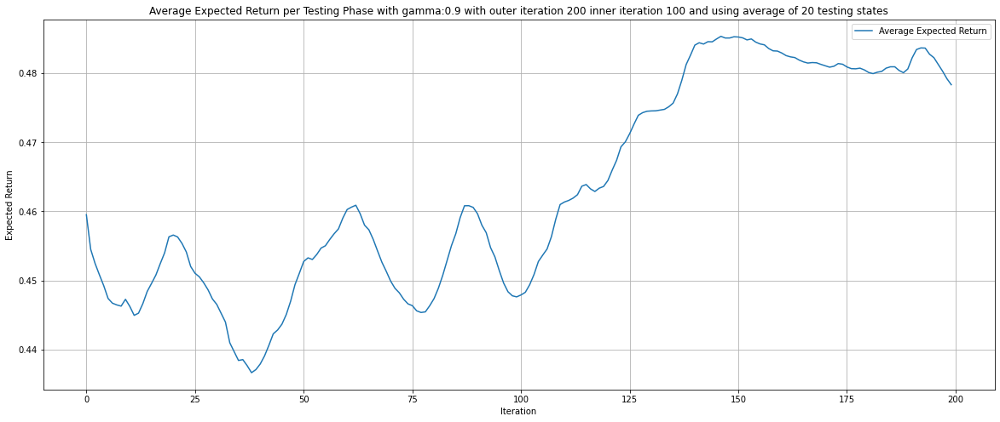

In [57]:
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(20, 8))  # Adjust width and height as needed

# Plotting
plt.plot(expected_return_history, label='Average Expected Return')
plt.xlabel('Iteration')
plt.ylabel('Expected Return')
plt.grid()
plt.title(f'Average Expected Return per Testing Phase with gamma:{gamma} with outer iteration {outer_iterations} inner iteration {max_episodes} and using average of {num_test_states} testing states')
plt.legend()
plt.show()


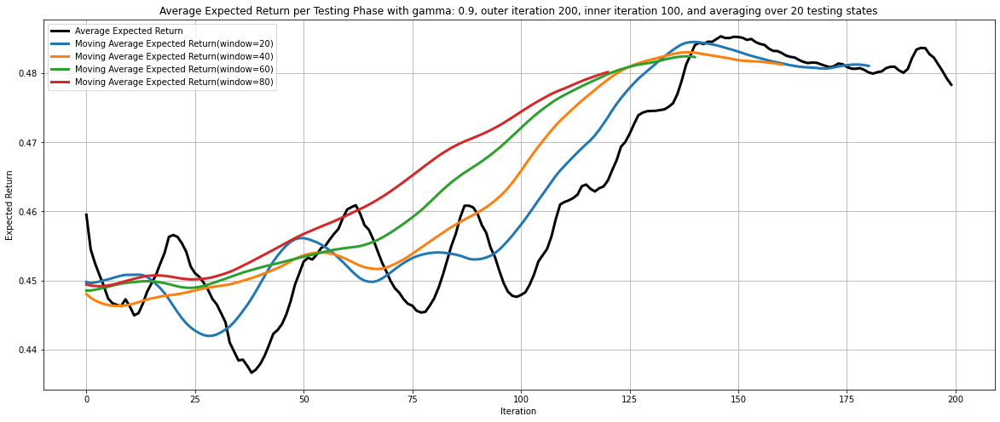

In [58]:
import matplotlib.pyplot as plt
import numpy as np

# Compute moving averages with different window sizes
moving_average20 = np.convolve(expected_return_history, np.ones(20) / 20, mode='valid')
moving_average40 = np.convolve(expected_return_history, np.ones(40) / 40, mode='valid')
moving_average60 = np.convolve(expected_return_history, np.ones(60) / 60, mode='valid')
moving_average80 = np.convolve(expected_return_history, np.ones(80) / 80, mode='valid')

# Plotting with larger figure size
plt.figure(figsize=(20, 8))
plt.plot(expected_return_history, label='Average Expected Return', color='black', linewidth=3)
plt.plot(moving_average20, label='Moving Average Expected Return(window=20)', linewidth=3)
plt.plot(moving_average40, label='Moving Average Expected Return(window=40)', linewidth=3)
plt.plot(moving_average60, label='Moving Average Expected Return(window=60)', linewidth=3)
plt.plot(moving_average80, label='Moving Average Expected Return(window=80)', linewidth=3)

# Add labels, title, grid, and legend
plt.xlabel('Iteration')
plt.ylabel('Expected Return')
plt.grid()
plt.title(f'Average Expected Return per Testing Phase with gamma: {gamma}, outer iteration {outer_iterations}, inner iteration {max_episodes}, and averaging over {num_test_states} testing states')
plt.legend()
plt.show()

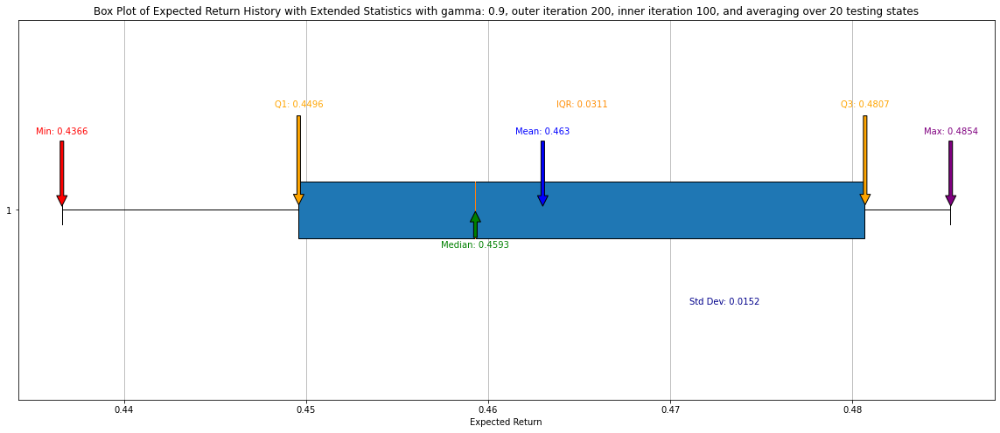

In [59]:
import matplotlib.pyplot as plt
import numpy as np

# Creating the box plot with extended statistical annotations
plt.figure(figsize=(20, 8))
plt.boxplot(expected_return_history, vert=False, patch_artist=True)

# Calculate extended statistical properties
mean = round(np.mean(expected_return_history), 4)
median = round(np.median(expected_return_history), 4)
min_val = round(min(expected_return_history), 4)
max_val = round(max(expected_return_history), 4)
q1 = round(np.percentile(expected_return_history, 25), 4)
q3 = round(np.percentile(expected_return_history, 75), 4)
iqr = round(q3 - q1, 4)  # Interquartile Range
std_dev = round(np.std(expected_return_history), 4)

# Add annotations for each value
plt.annotate(f'Mean: {mean}', xy=(mean, 1), xytext=(mean, 1.20), ha='center', color='blue',
             arrowprops=dict(facecolor='blue', shrink=0.05))
plt.annotate(f'Median: {median}', xy=(median, 1), xytext=(median, 0.9), ha='center', color='green',
             arrowprops=dict(facecolor='green', shrink=0.05))
plt.annotate(f'Min: {min_val}', xy=(min_val, 1), xytext=(min_val, 1.20), ha='center', color='red',
             arrowprops=dict(facecolor='red', shrink=0.05))
plt.annotate(f'Max: {max_val}', xy=(max_val, 1), xytext=(max_val, 1.20), ha='center', color='purple',
             arrowprops=dict(facecolor='purple', shrink=0.05))
plt.annotate(f'Q1: {q1}', xy=(q1, 1), xytext=(q1, 1.27), ha='center', color='orange',
             arrowprops=dict(facecolor='orange', shrink=0.05))
plt.annotate(f'Q3: {q3}', xy=(q3, 1), xytext=(q3, 1.27), ha='center', color='orange',
             arrowprops=dict(facecolor='orange', shrink=0.05))
plt.annotate(f'IQR: {iqr}', xy=(q1 + iqr / 2, 1), xytext=(q1 + iqr / 2, 1.27), ha='center', color='darkorange')
plt.annotate(f'Std Dev: {std_dev}', xy=(mean, 0.8), xytext=(mean + 0.01, 0.75), ha='center', color='darkblue')

# Labels and Title
plt.xlabel('Expected Return')
plt.title(f'Box Plot of Expected Return History with Extended Statistics with gamma: {gamma}, outer iteration {outer_iterations}, inner iteration {max_episodes}, and averaging over {num_test_states} testing states')
plt.grid(axis='x')

plt.show()

In [95]:
db.close()